## Abstract : This file is used to get the analysis of games and saving the analysis of games together.

Data: - Games played online and over the board in pgn format available on official 		sources and online platforms  

Sources: -  

* FIDE (official): Data of Hans Niemann games and similarly rated players for comparison 

* Chess.com 

* Chessbase 

The games are stored in pgn formats
Text-based file format used to record moves in a chess match; also includes the event name, location, date, round, player names, and result of the game. We will analyse these pgns

In [2]:
!pip install chess

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 148 kB 7.7 MB/s 


In [3]:
#importing libraries
import chess
import chess.engine
import chess.pgn
from datetime import datetime
import pandas as pd
import math
from tqdm import tqdm
import subprocess
import os

## Evaluating Move by Move using Stockfish 14 
Stockfish 14 : Stockfish uses the alpha-beta pruning search algorithm Alpha-beta 	pruning improves minimax search by avoiding variations that will never be 	reached in optimal play because either player will redirect the game.  

Since it is often computationally infeasible to search until the end of the game, the search is terminated early when it reaches a certain depth. Search depth is measured by ply, where a ply is a turn taken by a player.  

A search depth of D indicates that the distance between the root node and the 	leaf nodes of the search tree is D ply. Stockfish incrementally increases the depth 	of its search tree in a process known as iterative deepening (Groot, 1978).  

However, when a nominal search depth of D is reported by chess engines, it does 	 not mean that the search has considered all possible variations of D moves. This 	is due to heuristics which cause the engine to search promising variations to a 	greater depth than nominal and less promising variations to a lesser depth than nominal. 

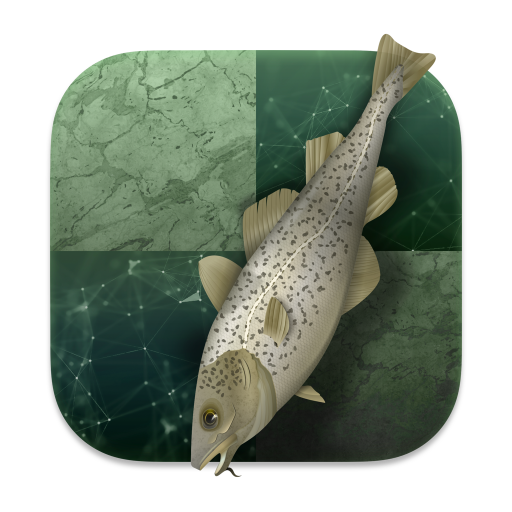

In [4]:
#function for evaluation
def evaluate_game(board, engine, limit):
   info = engine.analyse(board, limit)
   return info['score'].white().score(mate_score=1000)

start = datetime.now()

# from stockfish import Stockfish
# process = subprocess.Popen(command, stdout=tempFile, shell=True)
# stockfish = Stockfish(path= "C:\Users\Guest User\Documents\DSEM\Chess Medium Article\stockfish_15_win_x64_avx2\stockfish_15_win_x64_avx2")


In [5]:
!   wget https://stockfishchess.org/files/stockfish_14_linux_x64_popcnt.zip && \
    unzip stockfish_14_linux_x64_popcnt.zip stockfish_14_linux_x64_popcnt/stockfish_14_x64_popcnt

--2022-12-17 04:41:29--  https://stockfishchess.org/files/stockfish_14_linux_x64_popcnt.zip
Resolving stockfishchess.org (stockfishchess.org)... 104.25.158.9, 172.67.80.249, 104.25.159.9, ...
Connecting to stockfishchess.org (stockfishchess.org)|104.25.158.9|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 28531469 (27M) [application/zip]
Saving to: ‘stockfish_14_linux_x64_popcnt.zip’

stockfish_14_linux_ 100%[===================>]  27.21M   123MB/s    in 0.2s    

2022-12-17 04:41:30 (123 MB/s) - ‘stockfish_14_linux_x64_popcnt.zip’ saved [28531469/28531469]

Archive:  stockfish_14_linux_x64_popcnt.zip
  inflating: stockfish_14_linux_x64_popcnt/stockfish_14_x64_popcnt  


In [6]:
# engine = chess.engine.SimpleEngine.popen_uci("/content/stockfish_15_x64_avx2.exe") # put here your path to your engine on your computer
# # engine=Stockfish()

engine = chess.engine.SimpleEngine.popen_uci("/content/stockfish_14_linux_x64_popcnt/stockfish_14_x64_popcnt")

In [ ]:
#Saving the parameters and Analysis for each game
movetimesec = 999
depth = 20
limit=chess.engine.Limit(time=movetimesec, depth=depth)
worksheetColumns = ["Date",
                    "Event Name",
#                     "Event Rounds",
#                     "Round",
                    "White Name",
                    "Black Name",
                    "Result",
                    "White ELO",
                    "Black ELO",
#                     "Moves",
                    "White Av CP Loss",
                    "Black Av CP Loss",
                    "Evaluations List",
                    "White CP Loss List",
                    "Black CP Loss List",
                    "PGN",
                    "Analysis Depth"]

#Uncomment the above columns based on the type of data

finalDf = pd.DataFrame(columns=worksheetColumns)


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


## The function below iterates over each game, calculates move by move position and generate Centipawn Loss for each move. Saving the result for all the analysed games in a Pickle or an excel file.

Average Centipawn Loss: 

Average centipawn loss is the number of hundredths of a pawn by which a 	player deviated from the most accurate move calculated by a computer. 

The average centipawn loss (aCPL) is the amount by which a chess engine's 	evaluation of the position changes after each of the player's moves.  

These values play no formal role in the game but are useful to players, and 	essential in computer chess, for evaluating positions. 
	  The top computer move will lose zero centipawns, but lesser moves will result in 	      a deterioration of the position, measured in centipawns. 
	   This value can be used as an indicator of the quality of play. The fewer 		centipawns, one loses per move, the stronger the play. 

In [ ]:
for file in os.listdir():
    print (file)
    #Opening each game
    f = open(file) 

    my_list = []

    while True:
        game = chess.pgn.read_game(f)
        if game is None:
            break  # end of file

        my_list.append(game)



    for game in tqdm(my_list):

        try:
            # Evaluate all moves
            print(game.headers)
            board = game.board()

            evaluations = []

            evaluation = engine.analyse(board, limit=limit)['score'].white().score()
            evaluations.append(evaluation)

            for move in game.mainline_moves():
                board.push(move)
                positionEvaluation = evaluate_game(board, engine, limit)
                evaluations.append(positionEvaluation)


            # Adjust evaluations
            evaluationsAdjusted = evaluations.copy()
            evaluationsAdjusted = [max(min(x, 1000), -1000) for x in evaluationsAdjusted]

            # Calculate metrics
            white_centipawn_loss_list = []
            black_centipawn_loss_list = []

            index = 0
            for singleEvaluation in evaluationsAdjusted:
                if index > 0:
                    previous_state_evaluation = evaluationsAdjusted[index - 1]
                    current_state_evaluation = evaluationsAdjusted[index]    
                    if index % 2 != 0:
                        white_centipawn_loss_list.append(previous_state_evaluation - current_state_evaluation)
                    else:
                        black_centipawn_loss_list.append(current_state_evaluation - previous_state_evaluation)
                index += 1

            white_centipawn_loss_list_adjusted = [0 if x < 0 else x for x in white_centipawn_loss_list]
            black_centipawn_loss_list_adjusted = [0 if x < 0 else x for x in black_centipawn_loss_list]

            white_average_centipawn_loss = round(sum(white_centipawn_loss_list_adjusted) / len(white_centipawn_loss_list_adjusted))
            black_average_centipawn_loss = round(sum(black_centipawn_loss_list_adjusted) / len(black_centipawn_loss_list_adjusted))

            print("White average centipawn loss: {}".format(white_average_centipawn_loss))
            print("Black average centipawn loss: {}".format(black_average_centipawn_loss))

            # Fill dataframe with game data and results
            gameDf = pd.DataFrame(columns=worksheetColumns, index=range(1))

            gameDf['Date'] = datetime.strptime(game.headers["Date"], "%Y.%m.%d")
            gameDf['Event Name'] = game.headers["Event"]
    #         gameDf['Event Rounds'] = game.headers["EventRounds"]
            gameDf['Round'] = game.headers["Round"]
    #         gameDf['Moves'] = math.ceil(int(game.headers["PlyCount"])/2)
            gameDf.at[0, 'Evaluations List'] = evaluationsAdjusted
            exporter = chess.pgn.StringExporter(headers=True, variations=True, comments=True)
            pgn_string = game.accept(exporter)
            gameDf.at[0, 'PGN'] = pgn_string
            print(pgn_string)
            gameDf['Analysis Depth'] = depth 


            gameDf['White Name'] = game.headers["White"]
            gameDf['Black Name'] = game.headers["Black"]
    #         print(gameDF)
            try:
                gameDf['White ELO'] = game.headers["WhiteElo"]
            except:
                pass
            try:
                gameDf['Black ELO'] = game.headers["BlackElo"]
            except:
                pass
            gameDf.at[0,'White Av CP Loss'] = white_average_centipawn_loss
            gameDf.at[0, 'Black Av CP Loss'] = black_average_centipawn_loss
            gameDf.at[0, 'White CP Loss List'] = white_centipawn_loss_list_adjusted
            gameDf.at[0, 'Black CP Loss List'] = black_centipawn_loss_list_adjusted
            gameDf['Result'] = game.headers['Result']


            concat = [finalDf, gameDf]
            finalDf = pd.concat(concat)
             # you can store the results in a pickle or do whatever you want, export to BQ, etc

        except:
            pass


    #####################
    print("Done! Job complete!")
    #####################
    #####################
    finish = datetime.now()
    print('It took long but it\'s done! The entire job took: {}'.format(finish - start))
    #####################
#Saving Pickle file
finalDf.to_pickle('Akhilesh_All_games_pickle_file_depth_20.pkl')

2020-07.pgn


  0%|          | 0/193 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2020.07.22', Round='-', White='Greeegsi', Black='akhileshdongre', Result='1-0', BlackElo='726', CurrentPosition='8/pp6/1R4N1/r1p4B/8/k4K2/8/8 b - -', ECO='C20', ECOUrl='https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Head-Opening', EndDate='2020.07.22', EndTime='20:18:23', Link='https://www.chess.com/game/live/5189260624', StartTime='20:02:22', Termination='Greeegsi won on time', TimeControl='600', Timezone='UTC', UTCDate='2020.07.22', UTCTime='20:02:22', WhiteElo='787')


  1%|          | 1/193 [00:01<05:41,  1.78s/it]

White average centipawn loss: 143
Black average centipawn loss: 138
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.22"]
[Round "-"]
[White "Greeegsi"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "726"]
[CurrentPosition "8/pp6/1R4N1/r1p4B/8/k4K2/8/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Head-Opening"]
[EndDate "2020.07.22"]
[EndTime "20:18:23"]
[Link "https://www.chess.com/game/live/5189260624"]
[StartTime "20:02:22"]
[Termination "Greeegsi won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.22"]
[UTCTime "20:02:22"]
[WhiteElo "787"]

1. e4 { [%clk 0:09:59.8] } 1... e5 { [%clk 0:09:58.3] } 2. f3
{ [%clk 0:09:59.1] } 2... d6 { [%clk 0:09:55.5] } 3. g4 { [%clk 0:09:58.2] }
3... g6 { [%clk 0:09:45.2] } 4. h4 { [%clk 0:09:57] } 4... Bg7
{ [%clk 0:09:31] } 5. h5 { [%clk 0:09:49.6] } 5... Ne7 { [%clk 0:09:18.5] } 6.
hxg6 { [%clk 0:09:48.1] } 6... fxg6 { [%clk 0:09:15.5] } 7. d3
{ [%clk 0:09:47] } 7... O-O { [%clk 0:

  1%|          | 2/193 [00:02<03:34,  1.13s/it]

White average centipawn loss: 237
Black average centipawn loss: 191
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.22"]
[Round "-"]
[White "waveyss"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "733"]
[CurrentPosition "r4rk1/2p2pbp/p5p1/1p4q1/4P3/1B2R2P/PPP3P1/3R2K1 w - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Urusov-Gambit"]
[EndDate "2020.07.22"]
[EndTime "19:50:44"]
[Link "https://www.chess.com/game/live/5189167781"]
[StartTime "19:40:46"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.22"]
[UTCTime "19:40:46"]
[WhiteElo "797"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58] } 2. Bc4
{ [%clk 0:09:57.7] } 2... Nf6 { [%clk 0:09:54] } 3. Nf3 { [%clk 0:09:56] } 3...
g6 { [%clk 0:09:50.3] } 4. d3 { [%clk 0:09:52.7] } 4... d6 { [%clk 0:09:47.6] }
5. Bg5 { [%clk 0:09:49.1] } 5... Bg7 { [%clk 0:09:43.6] } 6. Nc3
{ [%clk 0:09:42.9] } 6... O-O { [%clk 0:09:39.2] } 7. O-O { [%clk 0:09:41

  2%|▏         | 3/193 [00:03<03:33,  1.13s/it]

White average centipawn loss: 54
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "BurhanGozet"]
[Result "1-0"]
[BlackElo "709"]
[CurrentPosition "1r1q1k1r/2b3p1/4QpN1/2P4p/1P6/P3P1P1/1B3P1P/2R2RK1 b - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2020.07.22"]
[EndTime "19:34:20"]
[Link "https://www.chess.com/game/live/5189070459"]
[StartTime "19:18:18"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.22"]
[UTCTime "19:18:18"]
[WhiteElo "723"]

1. Nf3 { [%clk 0:09:59.7] } 1... d5 { [%clk 0:09:57.7] } 2. d4
{ [%clk 0:09:53.9] } 2... e5 { [%clk 0:09:55.7] } 3. Nxe5 { [%clk 0:09:47] }
3... f6 { [%clk 0:09:50.8] } 4. Nf3 { [%clk 0:09:42.1] } 4... c5
{ [%clk 0:09:42.2] } 5. g3 { [%clk 0:09:31.5] } 5... cxd4 { [%clk 0:09:40.5] }
6. Nxd4 { [%clk 0:09:29.9] } 6... Ne7 { [%clk 0:09:18.1] } 7. 

  2%|▏         | 4/193 [00:04<02:52,  1.10it/s]

White average centipawn loss: 159
Black average centipawn loss: 116
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.22"]
[Round "-"]
[White "GusAurinegro"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "715"]
[CurrentPosition "1r5k/B1p4p/3p2pb/1p1Bp3/4P3/3P1P2/PPP1Q3/2qK2R1 w - -"]
[ECO "C44"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Variation-2...Nc6"]
[EndDate "2020.07.22"]
[EndTime "18:51:07"]
[Link "https://www.chess.com/game/live/5188906770"]
[StartTime "18:40:30"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.22"]
[UTCTime "18:40:30"]
[WhiteElo "743"]

1. e4 { [%clk 0:09:59] } 1... Nc6 { [%clk 0:09:55.7] } 2. Nf3
{ [%clk 0:09:55.7] } 2... e5 { [%clk 0:09:51.5] } 3. Bc4 { [%clk 0:09:50.3] }
3... d6 { [%clk 0:09:44.1] } 4. d3 { [%clk 0:09:46.1] } 4... Nf6
{ [%clk 0:09:34.6] } 5. Ng5 { [%clk 0:09:38.3] } 5... Bg4 { [%clk 0:09:22.8] }
6. f3 { [%clk 0:09:20.9] } 6... Be6 { [%clk 0:09:03.

  3%|▎         | 5/193 [00:05<03:27,  1.10s/it]

White average centipawn loss: 70
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.22"]
[Round "-"]
[White "coutho"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "706"]
[CurrentPosition "1R1k4/Q7/7p/8/8/6pP/6P1/6K1 b - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense"]
[EndDate "2020.07.22"]
[EndTime "17:38:29"]
[Link "https://www.chess.com/game/live/5188554880"]
[StartTime "17:20:39"]
[Termination "coutho won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.22"]
[UTCTime "17:20:39"]
[WhiteElo "681"]

1. e4 { [%clk 0:09:58] } 1... e5 { [%clk 0:09:58.2] } 2. Nf3 { [%clk 0:09:46] }
2... Nf6 { [%clk 0:09:53.7] } 3. d3 { [%clk 0:09:36.5] } 3... d6
{ [%clk 0:09:51.9] } 4. Bg5 { [%clk 0:09:26.9] } 4... Bg4 { [%clk 0:09:40.4] }
5. Be2 { [%clk 0:09:14.5] } 5... Bxf3 { [%clk 0:09:23.5] } 6. Bxf3
{ [%clk 0:09:11.7] } 6... g6 { [%clk 0:09:18.5] } 7. Nc3 { [%clk 0:08:45.5] }
7... Nc6 { [%clk 0:09:07.2] } 8. Nd5 

  3%|▎         | 6/193 [00:06<02:59,  1.04it/s]

White average centipawn loss: 133
Black average centipawn loss: 172
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "amit2024"]
[Result "1-0"]
[BlackElo "721"]
[CurrentPosition "4kr2/pp4pp/8/3Np3/1P3pQ1/P2P2P1/2P2P1P/R4RK1 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2020.07.22"]
[EndTime "17:18:04"]
[Link "https://www.chess.com/game/live/5188502842"]
[StartTime "17:08:56"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.22"]
[UTCTime "17:08:56"]
[WhiteElo "715"]

1. Nf3 { [%clk 0:09:47.8] } 1... Nc6 { [%clk 0:09:56.2] } 2. g3
{ [%clk 0:09:45.5] } 2... e5 { [%clk 0:09:54.5] } 3. Bg2 { [%clk 0:09:42] }
3... Nf6 { [%clk 0:09:49.1] } 4. d3 { [%clk 0:09:37.3] } 4... Bc5
{ [%clk 0:09:41.4] } 5. O-O { [%clk 0:09:31.8] } 5... Ng4 { [%clk 0:09:36.3] }
6. Bg5 { [%clk 0:09:14.8] } 6... f6 { [%clk 0:09:20.6] } 7. Be3
{ [%clk

  4%|▎         | 7/193 [00:07<02:47,  1.11it/s]

White average centipawn loss: 114
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.22"]
[Round "-"]
[White "Wassyy99"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "706"]
[CurrentPosition "8/p6k/2p3p1/1p5r/8/1P5K/5P2/6r1 w - -"]
[ECO "C26"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-Falkbeer-Variation"]
[EndDate "2020.07.22"]
[EndTime "17:06:49"]
[Link "https://www.chess.com/game/live/5188431450"]
[StartTime "16:52:39"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.22"]
[UTCTime "16:52:39"]
[WhiteElo "692"]

1. e4 { [%clk 0:09:58.7] } 1... e5 { [%clk 0:09:58.3] } 2. Nc3
{ [%clk 0:09:56.1] } 2... Nf6 { [%clk 0:09:52.4] } 3. b3 { [%clk 0:09:43.3] }
3... g6 { [%clk 0:09:48.3] } 4. Bb2 { [%clk 0:09:38.3] } 4... Bg7
{ [%clk 0:09:41.6] } 5. Nf3 { [%clk 0:09:11.7] } 5... d6 { [%clk 0:09:35.2] }
6. Nd5 { [%clk 0:08:45.6] } 6... O-O { [%clk 0:09:23.4] } 7. Nxf6+
{ [%clk 0:08:19.7] } 7..

  4%|▍         | 8/193 [00:08<03:05,  1.00s/it]

White average centipawn loss: 88
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.22"]
[Round "-"]
[White "1nkZ"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "895"]
[CurrentPosition "8/3Q3p/8/8/4kp2/6P1/5K1P/4R3 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Accelerated-London-System"]
[EndDate "2020.07.22"]
[EndTime "14:28:08"]
[Link "https://www.chess.com/game/live/5187653773"]
[StartTime "13:51:02"]
[Termination "1nkZ won by checkmate"]
[TimeControl "900+10"]
[Timezone "UTC"]
[UTCDate "2020.07.22"]
[UTCTime "13:51:02"]
[WhiteElo "881"]

1. d4 { [%clk 0:15:05.4] } 1... d5 { [%clk 0:15:02.3] } 2. Bf4
{ [%clk 0:15:11.2] } 2... Nf6 { [%clk 0:15:04.5] } 3. Nf3 { [%clk 0:15:16.6] }
3... e6 { [%clk 0:15:08] } 4. e3 { [%clk 0:15:24.5] } 4... g6
{ [%clk 0:15:14.4] } 5. Ne5 { [%clk 0:15:20.6] } 5... Bg7 { [%clk 0:15:01.4] }
6. Bd3 { [%clk 0:15:27] } 6... O-O { [%clk 0:15:08.9] } 7. O-O
{ [%clk 0:15:25.3] } 7... a6 

  5%|▍         | 9/193 [00:10<03:54,  1.27s/it]

White average centipawn loss: 120
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.22"]
[Round "-"]
[White "Nalini-Agarwala"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "698"]
[CurrentPosition "8/8/8/6k1/5pp1/2K5/2R5/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2020.07.22"]
[EndTime "11:56:33"]
[Link "https://www.chess.com/game/live/5187153669"]
[StartTime "11:37:04"]
[Termination "Nalini-Agarwala won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.22"]
[UTCTime "11:37:04"]
[WhiteElo "768"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.6] } 2. d3
{ [%clk 0:09:59] } 2... d6 { [%clk 0:09:56.7] } 3. Nf3 { [%clk 0:09:57.2] }
3... Nd7 { [%clk 0:09:53.2] } 4. Nc3 { [%clk 0:09:54.2] } 4... Ngf6
{ [%clk 0:09:52.1] } 5. Bg5 { [%clk 0:09:50.6] } 5... g6 { [%clk 0:09:46.8] }
6. d4 { [%clk 0:09:39.7] } 6... exd4 { [%clk 0:09:40.5] } 7. Nxd4
{ [%clk 0:09:36.5] } 

  5%|▌         | 10/193 [00:11<03:39,  1.20s/it]

White average centipawn loss: 135
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "Nalini-Agarwala"]
[Result "0-1"]
[BlackElo "761"]
[CurrentPosition "2r3k1/1p4pp/p7/Pb1p1p2/3P4/6P1/1B3P1P/1n4K1 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2020.07.22"]
[EndTime "11:35:38"]
[Link "https://www.chess.com/game/live/5187086530"]
[StartTime "11:17:31"]
[Termination "Nalini-Agarwala won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.22"]
[UTCTime "11:17:31"]
[WhiteElo "705"]

1. Nf3 { [%clk 0:09:57.4] } 1... Nc6 { [%clk 0:09:56] } 2. g3
{ [%clk 0:09:54.7] } 2... d5 { [%clk 0:09:54.9] } 3. d4 { [%clk 0:09:50] } 3...
Nf6 { [%clk 0:09:53.1] } 4. e3 { [%clk 0:09:48.8] } 4... e6
{ [%clk 0:09:51.5] } 5. Bg2 { [%clk 0:09:47.1] } 5... Bb4+ { [%clk 0:09:48.6] }
6. c3 { [%clk 0:09:35.4] } 6... Ba5 { [%clk 0:09:46.7] } 7. O-O
{ [%clk 0:

  6%|▌         | 11/193 [00:12<03:31,  1.16s/it]

White average centipawn loss: 54
Black average centipawn loss: 49
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "Meruem1-0"]
[Result "1-0"]
[BlackElo "673"]
[CurrentPosition "3r1r1k/1p2b1pp/pqp5/4B3/1P2P3/P5PP/6QK/R4R2 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6"]
[EndDate "2020.07.22"]
[EndTime "10:58:18"]
[Link "https://www.chess.com/game/live/5186961552"]
[StartTime "10:39:41"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.22"]
[UTCTime "10:39:41"]
[WhiteElo "712"]

1. Nf3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:53.7] } 2. g3
{ [%clk 0:09:56.2] } 2... Nc6 { [%clk 0:09:49.2] } 3. d3 { [%clk 0:09:51] }
3... e5 { [%clk 0:09:46] } 4. Bg2 { [%clk 0:09:43.5] } 4... Nf6
{ [%clk 0:09:18.6] } 5. Nc3 { [%clk 0:09:37.1] } 5... Bd6 { [%clk 0:08:57] } 6.
O-O { [%clk 0:09:29.5] } 6... d4 { [%clk 0:08:40.7] } 7. Ne4
{ [%clk 0:09:15.2] } 7... Nx

  6%|▌         | 12/193 [00:13<03:29,  1.16s/it]

White average centipawn loss: 141
Black average centipawn loss: 157
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "Aaron27111"]
[Result "0-1"]
[BlackElo "720"]
[CurrentPosition "2k5/p5p1/1p6/1Pp4p/P4Q2/6P1/5P1P/3r1K2 w - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-2.d3-Nc6"]
[EndDate "2020.07.22"]
[EndTime "08:23:53"]
[Link "https://www.chess.com/game/live/5186495649"]
[StartTime "08:05:07"]
[Termination "Aaron27111 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.22"]
[UTCTime "08:05:07"]
[WhiteElo "705"]

1. e4 { [%clk 0:09:59.3] } 1... c5 { [%clk 0:09:55.7] } 2. d3
{ [%clk 0:09:45.9] } 2... Nc6 { [%clk 0:09:53] } 3. g3 { [%clk 0:09:41.8] }
3... e5 { [%clk 0:09:51.9] } 4. Bg2 { [%clk 0:09:38.1] } 4... d6
{ [%clk 0:09:41] } 5. Nf3 { [%clk 0:09:36.4] } 5... f5 { [%clk 0:09:36.4] } 6.
O-O { [%clk 0:09:29] } 6... fxe4 { [%clk 0:09:34.7] } 7. dxe4
{ [%clk 0:09:16.8] } 7... Bg4 { [%cl

  7%|▋         | 13/193 [00:14<03:10,  1.06s/it]

White average centipawn loss: 181
Black average centipawn loss: 160
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.21"]
[Round "-"]
[White "KrisPro18"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "713"]
[CurrentPosition "6k1/5p1p/6p1/8/8/6Pb/5P1P/3r2K1 w - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Three-Knights-Game"]
[EndDate "2020.07.21"]
[EndTime "18:36:00"]
[Link "https://www.chess.com/game/live/5183892044"]
[StartTime "18:22:49"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.21"]
[UTCTime "18:22:49"]
[WhiteElo "707"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:58.5] } 2... Nf6 { [%clk 0:09:56.5] } 3. Nc3 { [%clk 0:09:53.4] }
3... d6 { [%clk 0:09:51] } 4. Bc4 { [%clk 0:09:50.4] } 4... g6
{ [%clk 0:09:45.4] } 5. O-O { [%clk 0:09:48] } 5... Bg7 { [%clk 0:09:43.3] } 6.
d4 { [%clk 0:09:43.5] } 6... exd4 { [%clk 0:09:28.2] } 7. Nxd4
{ [%clk 0:09:42] } 7..

  7%|▋         | 14/193 [00:14<02:47,  1.07it/s]

White average centipawn loss: 146
Black average centipawn loss: 182
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "1nkZ"]
[Result "1-0"]
[BlackElo "863"]
[CurrentPosition "r3r1k1/1p4pp/p1p1p1n1/3pP3/2R5/P3P1P1/2bB2BP/R1Q3K1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2020.07.21"]
[EndTime "17:40:54"]
[Link "https://www.chess.com/game/live/5183570363"]
[StartTime "17:10:48"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "900+10"]
[Timezone "UTC"]
[UTCDate "2020.07.21"]
[UTCTime "17:10:48"]
[WhiteElo "907"]

1. g3 { [%clk 0:15:09.8] } 1... d5 { [%clk 0:14:58.2] } 2. Nf3
{ [%clk 0:15:10.8] } 2... Bf5 { [%clk 0:14:34.4] } 3. Nc3 { [%clk 0:15:11.6] }
3... e6 { [%clk 0:14:41.8] } 4. d4 { [%clk 0:15:15.7] } 4... Nc6
{ [%clk 0:14:43.5] } 5. e3 { [%clk 0:15:21.9] } 5... Bb4 { [%clk 0:14:42.9] }
6. Bg2 { [%clk 0:15:21.2] } 6... Nf6 { [%clk 0:14:43.4] } 7. O-O
{ [%clk 0:15:28

  8%|▊         | 15/193 [00:15<02:36,  1.14it/s]

White average centipawn loss: 88
Black average centipawn loss: 49
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.21"]
[Round "-"]
[White "Kalimullah123"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "705"]
[CurrentPosition "r3r3/p1p2pkp/3p2p1/8/8/qP6/P4R1P/6K1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack-2...Nc6-3.Bc4"]
[EndDate "2020.07.21"]
[EndTime "17:05:33"]
[Link "https://www.chess.com/game/live/5183504226"]
[StartTime "16:56:16"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.21"]
[UTCTime "16:56:16"]
[WhiteElo "690"]

1. e4 { [%clk 0:09:57.7] } 1... e5 { [%clk 0:09:57.8] } 2. Qh5
{ [%clk 0:09:48] } 2... Nc6 { [%clk 0:09:45.7] } 3. Bc4 { [%clk 0:09:44] } 3...
g6 { [%clk 0:09:26.7] } 4. Qf3 { [%clk 0:09:37.3] } 4... Nf6
{ [%clk 0:09:23.3] } 5. b3 { [%clk 0:09:33.9] } 5... Bg7 { [%clk 0:09:13.6] }
6. Bb2 { [%clk 0:09:31.8] } 6... O-O { [%clk 0:09:03.2] } 7.

  8%|▊         | 16/193 [00:16<02:52,  1.03it/s]

White average centipawn loss: 68
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "Nightfox05"]
[Result "1-0"]
[BlackElo "726"]
[CurrentPosition "5rk1/2P2p2/4b1p1/6RB/3pP3/3P2P1/q1P1Q2P/5RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2020.07.21"]
[EndTime "16:48:33"]
[Link "https://www.chess.com/game/live/5183391007"]
[StartTime "16:31:07"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.21"]
[UTCTime "16:31:07"]
[WhiteElo "697"]

1. g3 { [%clk 0:09:58.5] } 1... d5 { [%clk 0:09:56.3] } 2. d3
{ [%clk 0:09:56.6] } 2... d4 { [%clk 0:09:50.2] } 3. e4 { [%clk 0:09:54.3] }
3... Nc6 { [%clk 0:09:46.7] } 4. Bg2 { [%clk 0:09:50.8] } 4... e5
{ [%clk 0:09:34.8] } 5. Nf3 { [%clk 0:09:45.8] } 5... Bg4 { [%clk 0:09:25.2] }
6. O-O { [%clk 0:09:42.5] } 6... Bc5 { [%clk 0:09:05.1] } 7. Nbd2
{ [%clk 0:09:37

  9%|▉         | 17/193 [00:17<02:54,  1.01it/s]

White average centipawn loss: 78
Black average centipawn loss: 106
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "xgallmart"]
[Result "1-0"]
[BlackElo "707"]
[CurrentPosition "8/p6k/1p6/4P3/8/P1P3PB/1P3K2/R1B3R1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2020.07.21"]
[EndTime "12:40:52"]
[Link "https://www.chess.com/game/live/5182375354"]
[StartTime "12:24:18"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.21"]
[UTCTime "12:24:18"]
[WhiteElo "688"]

1. g3 { [%clk 0:09:56.5] } 1... e6 { [%clk 0:09:59.3] } 2. Bg2
{ [%clk 0:09:47.8] } 2... d6 { [%clk 0:09:57.2] } 3. d3 { [%clk 0:09:46.9] }
3... Nc6 { [%clk 0:09:50.5] } 4. e4 { [%clk 0:09:45.7] } 4... Be7
{ [%clk 0:09:41.5] } 5. Nf3 { [%clk 0:09:44.3] } 5... Nf6 { [%clk 0:09:30.7] }
6. Nc3 { [%clk 0:09:30.1] } 6... b6 { [%clk 0:09:29.6] } 7. d4
{ [%clk 0:09:12.2] } 7... B

  9%|▉         | 18/193 [00:18<02:48,  1.04it/s]

White average centipawn loss: 80
Black average centipawn loss: 114
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.21"]
[Round "-"]
[White "jeypssss"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "679"]
[CurrentPosition "3R2k1/1p3p1p/p1p3p1/4Q3/4P3/P1N4P/1PP2PP1/6K1 b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2020.07.21"]
[EndTime "09:29:02"]
[Link "https://www.chess.com/game/live/5181733366"]
[StartTime "09:11:43"]
[Termination "jeypssss won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.21"]
[UTCTime "09:11:43"]
[WhiteElo "691"]

1. d4 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:53.8] } 2. Bf4
{ [%clk 0:09:53.8] } 2... d6 { [%clk 0:09:46.5] } 3. Nf3 { [%clk 0:09:52.4] }
3... e5 { [%clk 0:09:44.5] } 4. dxe5 { [%clk 0:09:47.8] } 4... dxe5
{ [%clk 0:09:35.9] } 5. Bd2 { [%clk 0:09:35.7] } 5... Nc6 { [%clk 0:09:18.6] }
6. e3 { [%clk 0:09:29.4] } 6... g6 { [%clk 0:09:16.7] } 7. h3
{ [%clk 0:09:13.8] } 7... Bg7 { [%cl

 10%|▉         | 19/193 [00:19<02:14,  1.29it/s]

White average centipawn loss: 70
Black average centipawn loss: 156
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.20"]
[Round "-"]
[White "v634953"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "687"]
[CurrentPosition "r1bq1rk1/ppp2pbQ/4p1p1/3p2P1/8/8/PPP1PP2/RNB1KB1R b KQ -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Horwitz-Defense"]
[EndDate "2020.07.20"]
[EndTime "16:49:29"]
[Link "https://www.chess.com/game/live/5178473517"]
[StartTime "16:44:32"]
[Termination "v634953 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.20"]
[UTCTime "16:44:32"]
[WhiteElo "647"]

1. d4 { [%clk 0:09:52.5] } 1... e6 { [%clk 0:09:53.5] } 2. Nf3
{ [%clk 0:09:34.9] } 2... g6 { [%clk 0:09:47.7] } 3. g4 { [%clk 0:09:26.9] }
3... Nf6 { [%clk 0:09:39] } 4. h3 { [%clk 0:09:24.1] } 4... Bg7
{ [%clk 0:09:32.5] } 5. Ne5 { [%clk 0:09:10.9] } 5... O-O { [%clk 0:09:20.9] }
6. g5 { [%clk 0:09:01.7] } 6... Ne4 { [%clk 0:09:11.9] } 7. Qd3
{ [%clk 0:08:

 10%|█         | 20/193 [00:19<02:21,  1.23it/s]

White average centipawn loss: 151
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "Youenn2929"]
[Result "0-1"]
[BlackElo "722"]
[CurrentPosition "5k2/p3n3/2p2ppp/2P1p3/P3r3/6PK/5q1P/5q2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2020.07.20"]
[EndTime "16:44:11"]
[Link "https://www.chess.com/game/live/5178396378"]
[StartTime "16:27:27"]
[Termination "Youenn2929 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.20"]
[UTCTime "16:27:27"]
[WhiteElo "696"]

1. d3 { [%clk 0:09:57.8] } 1... d5 { [%clk 0:09:57.4] } 2. Nf3
{ [%clk 0:09:48.7] } 2... d4 { [%clk 0:09:51.8] } 3. g3 { [%clk 0:09:43.2] }
3... f6 { [%clk 0:09:45.1] } 4. Bg2 { [%clk 0:09:39.8] } 4... e5
{ [%clk 0:09:43.1] } 5. e4 { [%clk 0:09:30.4] } 5... h6 { [%clk 0:09:39.9] } 6.
O-O { [%clk 0:09:27.3] } 6... Nc6 { [%clk 0:09:24.6] } 7. c3
{ [%clk 0:09:04.2] } 7... b5 { [%clk 0:

 11%|█         | 21/193 [00:21<02:51,  1.00it/s]

White average centipawn loss: 63
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.20"]
[Round "-"]
[White "DerEner"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "704"]
[CurrentPosition "8/8/8/8/6K1/8/3Q4/1Q3k2 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-Exchange-Variation-4.Nxd4-Nf6-5.Nc3"]
[EndDate "2020.07.20"]
[EndTime "14:47:58"]
[Link "https://www.chess.com/game/live/5177887007"]
[StartTime "14:30:57"]
[Termination "DerEner won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.20"]
[UTCTime "14:30:57"]
[WhiteElo "740"]

1. e4 { [%clk 0:09:56.6] } 1... e5 { [%clk 0:09:58.7] } 2. Nf3
{ [%clk 0:09:55.5] } 2... d6 { [%clk 0:09:56] } 3. d4 { [%clk 0:09:51.2] } 3...
exd4 { [%clk 0:09:41.5] } 4. Nxd4 { [%clk 0:09:49.5] } 4... Nf6
{ [%clk 0:09:37.5] } 5. Nc3 { [%clk 0:09:47.4] } 5... g6 { [%clk 0:09:32.6] }
6. Bg5 { [%clk 0:09:39.2] } 6... Nbd7 { [%clk 0:09:29.4] } 7. Bc4
{ [%clk 0:09:25.1] }

 11%|█▏        | 22/193 [00:21<02:23,  1.19it/s]

White average centipawn loss: 88
Black average centipawn loss: 141
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "tris18"]
[Result "1-0"]
[BlackElo "679"]
[CurrentPosition "4nrk1/Qpp2ppp/2q5/2P1p3/8/4B1P1/PP1rBP1P/R4RK1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2020.07.20"]
[EndTime "14:29:50"]
[Link "https://www.chess.com/game/live/5177848033"]
[StartTime "14:21:16"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.20"]
[UTCTime "14:21:16"]
[WhiteElo "711"]

1. e4 { [%clk 0:09:59.5] } 1... e5 { [%clk 0:09:57.7] } 2. d3
{ [%clk 0:09:58.4] } 2... Nc6 { [%clk 0:09:54.4] } 3. Nf3 { [%clk 0:09:55.2] }
3... Bc5 { [%clk 0:09:48.9] } 4. g3 { [%clk 0:09:50.3] } 4... d6
{ [%clk 0:09:21.7] } 5. Bg2 { [%clk 0:09:48.3] } 5... Nf6 { [%clk 0:09:08.2] }
6. O-O { [%clk 0:09:45.6] } 6... O-O { [%clk 0:09:03.2] } 7. Nbd2
{ 

 12%|█▏        | 23/193 [00:22<02:24,  1.18it/s]

White average centipawn loss: 108
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "jebediah79"]
[Result "1-0"]
[BlackElo "730"]
[CurrentPosition "8/1pp2kp1/2n5/7Q/4p1P1/2P3KP/q4B2/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2020.07.20"]
[EndTime "14:12:17"]
[Link "https://www.chess.com/game/live/5177735578"]
[StartTime "13:54:00"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.20"]
[UTCTime "13:54:00"]
[WhiteElo "703"]

1. g3 { [%clk 0:09:58.9] } 1... e5 { [%clk 0:09:58.6] } 2. e4
{ [%clk 0:09:57] } 2... Bc5 { [%clk 0:09:52.7] } 3. Nf3 { [%clk 0:09:53.5] }
3... d6 { [%clk 0:09:47] } 4. Bg2 { [%clk 0:09:49.9] } 4... f5
{ [%clk 0:09:40.6] } 5. O-O { [%clk 0:09:42.5] } 5... fxe4 { [%clk 0:09:38.9] }
6. Ne1 { [%clk 0:09:30.5] } 6... Nf6 { [%clk 0:09:29.9] } 7. Nc3
{ [%clk 0:09:24.2] } 7... 

 12%|█▏        | 24/193 [00:23<02:30,  1.12it/s]

White average centipawn loss: 115
Black average centipawn loss: 136
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.20"]
[Round "-"]
[White "tomba041"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "694"]
[CurrentPosition "8/2p4p/5Qp1/8/P1P1k3/6P1/1PK4P/8 b - a3"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense"]
[EndDate "2020.07.20"]
[EndTime "11:32:23"]
[Link "https://www.chess.com/game/live/5177165396"]
[StartTime "11:19:52"]
[Termination "tomba041 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.20"]
[UTCTime "11:19:52"]
[WhiteElo "755"]

1. e4 { [%clk 0:09:57.8] } 1... e5 { [%clk 0:09:56.8] } 2. Nf3
{ [%clk 0:09:54.6] } 2... Nf6 { [%clk 0:09:54.2] } 3. Ng5 { [%clk 0:09:46.2] }
3... Nxe4 { [%clk 0:09:45.2] } 4. Nxe4 { [%clk 0:09:43.5] } 4... d6
{ [%clk 0:09:32.2] } 5. Bc4 { [%clk 0:09:38.6] } 5... g6 { [%clk 0:09:27.1] }
6. d3 { [%clk 0:09:29.7] } 6... Nc6 { [%clk 0:09:23.8] } 7. Ng5
{ [%clk 0:09:21.4] } 7... Be6 { [%clk 0:

 13%|█▎        | 25/193 [00:23<01:56,  1.44it/s]

White average centipawn loss: 53
Black average centipawn loss: 101
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "Pingopom"]
[Result "1-0"]
[BlackElo "586"]
[CurrentPosition "r1bq1rk1/ppp2ppp/3p1n2/2b5/1n2P3/3P1NP1/PPP2PBP/RNBQ1RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2020.07.20"]
[EndTime "11:18:06"]
[Link "https://www.chess.com/game/live/5177149097"]
[StartTime "11:15:05"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.20"]
[UTCTime "11:15:05"]
[WhiteElo "701"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:56.9] } 2. Bg2
{ [%clk 0:09:57] } 2... Nc6 { [%clk 0:09:45.9] } 3. e4 { [%clk 0:09:54] } 3...
Nf6 { [%clk 0:09:37.7] } 4. d3 { [%clk 0:09:51.5] } 4... Bc5 { [%clk 0:09:34] }
5. Nf3 { [%clk 0:09:43.7] } 5... Nb4 { [%clk 0:09:21.4] } 6. O-O
{ [%clk 0:09:31.7] } 6... O-O { [%clk 0:08:08.3] } 7. N

 13%|█▎        | 26/193 [00:25<02:13,  1.25it/s]

White average centipawn loss: 175
Black average centipawn loss: 159
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "metalgreimon"]
[Result "0-1"]
[BlackElo "728"]
[CurrentPosition "8/8/2p2n2/p7/P5pp/1kNn2P1/1P5P/7K w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2020.07.20"]
[EndTime "11:14:39"]
[Link "https://www.chess.com/game/live/5177099458"]
[StartTime "11:00:17"]
[Termination "metalgreimon won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.20"]
[UTCTime "11:00:17"]
[WhiteElo "695"]

1. g3 { [%clk 0:09:59.6] } 1... d5 { [%clk 0:09:52.5] } 2. Nf3
{ [%clk 0:09:53.8] } 2... f6 { [%clk 0:09:49.9] } 3. Bg2 { [%clk 0:09:49.8] }
3... c6 { [%clk 0:09:47] } 4. O-O { [%clk 0:09:46.8] } 4... g5
{ [%clk 0:09:42.3] } 5. d3 { [%clk 0:09:44.5] } 5... e5 { [%clk 0:09:40.6] } 6.
e4 { [%clk 0:09:37.8] } 6... g4 { [%clk 0:09:38.8] } 7. Nh4
{ [%clk 0:09:18.4] } 7... dxe4 { [%clk 0:09

 14%|█▍        | 27/193 [00:26<02:28,  1.12it/s]

White average centipawn loss: 105
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.20"]
[Round "-"]
[White "Nalini-Agarwala"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "703"]
[CurrentPosition "8/5pkp/6p1/8/8/5bP1/4q2P/4K3 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2020.07.20"]
[EndTime "07:59:49"]
[Link "https://www.chess.com/game/live/5176508886"]
[StartTime "07:42:26"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.20"]
[UTCTime "07:42:26"]
[WhiteElo "833"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58] } 2. d3
{ [%clk 0:09:58.9] } 2... d6 { [%clk 0:09:56.1] } 3. Nc3 { [%clk 0:09:56.9] }
3... Nf6 { [%clk 0:09:51.5] } 4. Nf3 { [%clk 0:09:55.9] } 4... Nc6
{ [%clk 0:09:48] } 5. Bg5 { [%clk 0:09:54.3] } 5... g6 { [%clk 0:09:38.9] } 6.
Nd5 { [%clk 0:09:36.7] } 6... Bg7 { [%clk 0:09:25.4] } 7. Qd2
{ [%clk 0:09:24.4]

 15%|█▍        | 28/193 [00:26<02:23,  1.15it/s]

White average centipawn loss: 41
Black average centipawn loss: 17
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "Nalini-Agarwala"]
[Result "0-1"]
[BlackElo "844"]
[CurrentPosition "6k1/p1p2ppp/8/7P/8/8/2r5/r4K2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2020.07.20"]
[EndTime "07:42:02"]
[Link "https://www.chess.com/game/live/5176483716"]
[StartTime "07:33:05"]
[Termination "Nalini-Agarwala won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.20"]
[UTCTime "07:33:05"]
[WhiteElo "692"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.6] } 2. Bg2
{ [%clk 0:09:57.7] } 2... d5 { [%clk 0:09:57.1] } 3. d3 { [%clk 0:09:47.6] }
3... d4 { [%clk 0:09:54.7] } 4. e4 { [%clk 0:09:46.1] } 4... Nf6
{ [%clk 0:09:51.7] } 5. Nf3 { [%clk 0:09:44.8] } 5... Nc6 { [%clk 0:09:49.3] }
6. O-O { [%clk 0:09:43.8] } 6... Bg4 { [%clk 0:09:44.7] } 7. Nbd2
{ [%clk 0:0

 15%|█▌        | 29/193 [00:27<02:08,  1.28it/s]

White average centipawn loss: 157
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "danailvasilev"]
[Result "0-1"]
[BlackElo "707"]
[CurrentPosition "3k4/ppp2npp/8/8/6P1/P5n1/1r6/2r1K3 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6"]
[EndDate "2020.07.20"]
[EndTime "06:32:17"]
[Link "https://www.chess.com/game/live/5176301091"]
[StartTime "06:23:24"]
[Termination "danailvasilev won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.20"]
[UTCTime "06:23:24"]
[WhiteElo "697"]

1. Nf3 { [%clk 0:09:57.9] } 1... d5 { [%clk 0:09:52.3] } 2. g3
{ [%clk 0:09:50.6] } 2... Nc6 { [%clk 0:09:49.5] } 3. d3 { [%clk 0:09:44.7] }
3... e5 { [%clk 0:09:44.8] } 4. e4 { [%clk 0:09:35.6] } 4... dxe4
{ [%clk 0:09:40.8] } 5. dxe4 { [%clk 0:09:34.3] } 5... Qxd1+
{ [%clk 0:09:39.3] } 6. Kxd1 { [%clk 0:09:32.7] } 6... Bg4 { [%clk 0:09:37.1] }
7. Bg2 { [%clk 0:09:05.

 16%|█▌        | 30/193 [00:28<02:10,  1.25it/s]

White average centipawn loss: 58
Black average centipawn loss: 27
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.20"]
[Round "-"]
[White "cepaterra27"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "705"]
[CurrentPosition "1n4k1/1p5p/1p2b1P1/2b5/2K2P2/4q3/1r6/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kingside-Fianchetto-Variation"]
[EndDate "2020.07.20"]
[EndTime "06:19:45"]
[Link "https://www.chess.com/game/live/5176261888"]
[StartTime "06:08:13"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.20"]
[UTCTime "06:08:13"]
[WhiteElo "586"]

1. Nf3 { [%clk 0:09:56.9] } 1... g6 { [%clk 0:09:55.9] } 2. e4
{ [%clk 0:09:54.7] } 2... Bg7 { [%clk 0:09:50.1] } 3. Bd3 { [%clk 0:09:52.6] }
3... Nc6 { [%clk 0:09:46] } 4. Kf1 { [%clk 0:09:50.1] } 4... Nf6
{ [%clk 0:09:43.4] } 5. Nc3 { [%clk 0:09:37.6] } 5... O-O { [%clk 0:09:38.1] }
6. Bc4 { [%clk 0:09:34.2] } 6... d6 { [%clk 0:09:24.8] } 7. d4
{ [%cl

 16%|█▌        | 31/193 [00:29<02:27,  1.10it/s]

White average centipawn loss: 28
Black average centipawn loss: 6
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.19"]
[Round "-"]
[White "sai18599"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "705"]
[CurrentPosition "1K2r3/3r4/6k1/8/1p6/8/8/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack"]
[EndDate "2020.07.19"]
[EndTime "19:08:25"]
[Link "https://www.chess.com/game/live/5174197479"]
[StartTime "18:58:21"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.19"]
[UTCTime "18:58:21"]
[WhiteElo "1477"]

1. e4 { [%clk 0:09:58.5] } 1... e5 { [%clk 0:09:57.9] } 2. Qh5
{ [%clk 0:09:57.5] } 2... d6 { [%clk 0:09:51.4] } 3. Qxf7+ { [%clk 0:09:56.6] }
3... Kxf7 { [%clk 0:09:47.9] } 4. g3 { [%clk 0:09:54.7] } 4... g6
{ [%clk 0:09:44] } 5. Bg2 { [%clk 0:09:54.1] } 5... Nf6 { [%clk 0:09:38.9] } 6.
d3 { [%clk 0:09:48.6] } 6... Kg8 { [%clk 0:09:35] } 7. Nc3 { [%clk 0:09:48] }
7... Bg

 17%|█▋        | 32/193 [00:30<02:22,  1.13it/s]

White average centipawn loss: 34
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "sai18599"]
[Result "1-0"]
[BlackElo "1477"]
[CurrentPosition "7B/1p6/7p/p3Q3/4k3/1P4P1/P1P2K1P/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2020.07.19"]
[EndTime "18:55:01"]
[Link "https://www.chess.com/game/live/5174143181"]
[StartTime "18:46:06"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.19"]
[UTCTime "18:46:06"]
[WhiteElo "705"]

1. g3 { [%clk 0:09:45] } 1... d5 { [%clk 0:09:59] } 2. d3 { [%clk 0:09:28.6] }
2... Qd6 { [%clk 0:09:56.9] } 3. e4 { [%clk 0:09:22.2] } 3... Qxg3
{ [%clk 0:09:54.7] } 4. fxg3 { [%clk 0:09:11.9] } 4... dxe4
{ [%clk 0:09:51.4] } 5. dxe4 { [%clk 0:09:10.3] } 5... Nf6 { [%clk 0:09:48.8] }
6. Bg2 { [%clk 0:09:05.9] } 6... g6 { [%clk 0:09:46.9] } 7. Ne2
{ [%clk 0:09:01.7] } 7

 17%|█▋        | 33/193 [00:31<02:32,  1.05it/s]

White average centipawn loss: 132
Black average centipawn loss: 135
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.19"]
[Round "-"]
[White "sai18599"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "705"]
[CurrentPosition "8/8/8/8/8/r7/2k5/K7 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Blackmar-Gambit-2...dxe4"]
[EndDate "2020.07.19"]
[EndTime "18:45:34"]
[Link "https://www.chess.com/game/live/5174110319"]
[StartTime "18:38:47"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.19"]
[UTCTime "18:38:47"]
[WhiteElo "1477"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:50.9] } 2. e4
{ [%clk 0:09:59.3] } 2... dxe4 { [%clk 0:09:49.6] } 3. Qg4 { [%clk 0:09:58.4] }
3... Bxg4 { [%clk 0:09:47.7] } 4. Ba6 { [%clk 0:09:57] } 4... bxa6
{ [%clk 0:09:46] } 5. Bf4 { [%clk 0:09:55.8] } 5... Qxd4 { [%clk 0:09:40.5] }
6. Nc3 { [%clk 0:09:54.2] } 6... Qxc3+ { [%clk 0:09:39] } 7. bxc3
{ [%clk 0:09:53.5] 

 18%|█▊        | 34/193 [00:32<02:19,  1.14it/s]

White average centipawn loss: 170
Black average centipawn loss: 139
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.19"]
[Round "-"]
[White "bma-nouri"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "705"]
[CurrentPosition "r5k1/p1Q4p/1p4p1/2p5/1q2P2P/K5P1/P4r2/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2020.07.19"]
[EndTime "18:24:03"]
[Link "https://www.chess.com/game/live/5173991401"]
[StartTime "18:11:51"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.19"]
[UTCTime "18:11:51"]
[WhiteElo "657"]

1. g3 { [%clk 0:09:59.4] } 1... g6 { [%clk 0:09:56.5] } 2. f4
{ [%clk 0:09:57.5] } 2... Bg7 { [%clk 0:09:50.1] } 3. e4 { [%clk 0:09:51.8] }
3... e5 { [%clk 0:09:46.4] } 4. d3 { [%clk 0:09:46.8] } 4... Nf6
{ [%clk 0:09:42.8] } 5. b3 { [%clk 0:09:39] } 5... d6 { [%clk 0:09:40.5] } 6.
Bb2 { [%clk 0:09:37.9] } 6... O-O { [%clk 0:09:36.4] } 7. Nf3
{ [%c

 18%|█▊        | 35/193 [00:33<02:16,  1.16it/s]

White average centipawn loss: 154
Black average centipawn loss: 127
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.19"]
[Round "-"]
[White "Leeal007"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "698"]
[CurrentPosition "r4n2/p6p/1p3Rpk/2p5/8/1P6/P1P2PPP/4r1K1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2020.07.19"]
[EndTime "13:25:34"]
[Link "https://www.chess.com/game/live/5172743602"]
[StartTime "13:12:01"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.19"]
[UTCTime "13:12:01"]
[WhiteElo "652"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:56.4] } 2. d3
{ [%clk 0:09:58.9] } 2... Nf6 { [%clk 0:09:52.6] } 3. b3 { [%clk 0:09:52.9] }
3... g6 { [%clk 0:09:47.2] } 4. Bb2 { [%clk 0:09:50.4] } 4... Bg7
{ [%clk 0:09:40.6] } 5. Nf3 { [%clk 0:09:48.6] } 5... O-O { [%clk 0:09:36.6] }
6. Nxe5 { [%clk 0:09:38] } 6... d6 { [%clk 0:09:29.2] } 7. Ng4
{ [

 19%|█▊        | 36/193 [00:34<02:49,  1.08s/it]

White average centipawn loss: 96
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "Abdulaziz9933"]
[Result "1/2-1/2"]
[BlackElo "728"]
[CurrentPosition "6k1/5r1p/5rpP/6K1/4b1P1/8/8/4q3 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2020.07.19"]
[EndTime "09:59:31"]
[Link "https://www.chess.com/game/live/5172022363"]
[StartTime "09:41:20"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.19"]
[UTCTime "09:41:20"]
[WhiteElo "691"]

1. g3 { [%clk 0:09:57.3] } 1... e5 { [%clk 0:09:56.7] } 2. Nc3
{ [%clk 0:09:52.2] } 2... Qf6 { [%clk 0:09:54.1] } 3. e4 { [%clk 0:09:50.8] }
3... Bc5 { [%clk 0:09:50.7] } 4. Nf3 { [%clk 0:09:41.4] } 4... Nh6
{ [%clk 0:09:49.3] } 5. Bg2 { [%clk 0:09:38.5] } 5... Ng4 { [%clk 0:09:47.7] }
6. d3 { [%clk 0:09:24.3] } 6... Nxf2 { [%clk 0:09:41.4] } 7. Qe2
{ [%clk 0:09:02.7] } 7.

 19%|█▉        | 37/193 [00:35<02:38,  1.02s/it]

White average centipawn loss: 149
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.19"]
[Round "-"]
[White "BobA45"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "690"]
[CurrentPosition "r5k1/1p2qp1p/p1p3p1/3p4/P2b4/1P6/6PP/4RR1K b - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Symmetrical-Variation"]
[EndDate "2020.07.19"]
[EndTime "08:49:26"]
[Link "https://www.chess.com/game/live/5171831262"]
[StartTime "08:38:19"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.19"]
[UTCTime "08:38:19"]
[WhiteElo "690"]

1. d4 { [%clk 0:09:59.3] } 1... Nf6 { [%clk 0:09:53.6] } 2. Nf3
{ [%clk 0:09:57.6] } 2... d5 { [%clk 0:09:49.4] } 3. Nc3 { [%clk 0:09:55.9] }
3... Nc6 { [%clk 0:09:47.2] } 4. e3 { [%clk 0:09:54.4] } 4... e6
{ [%clk 0:09:42.9] } 5. Be2 { [%clk 0:09:53.3] } 5... g6 { [%clk 0:09:40.9] }
6. O-O { [%clk 0:09:51.9] } 6... Bg7 { [%clk 0:09:39.7] } 7. a4
{ [%

 20%|██        | 39/193 [00:36<01:44,  1.47it/s]

White average centipawn loss: 65
Black average centipawn loss: 34
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "OmkarGupta"]
[Result "0-1"]
[BlackElo "687"]
[CurrentPosition "rn1k4/p1p2ppp/8/8/8/8/q7/3K2r1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2020.07.19"]
[EndTime "08:38:03"]
[Link "https://www.chess.com/game/live/5171812152"]
[StartTime "08:32:02"]
[Termination "OmkarGupta won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.19"]
[UTCTime "08:32:02"]
[WhiteElo "682"]

1. g3 { [%clk 0:09:57] } 1... e5 { [%clk 0:09:55.8] } 2. e4 { [%clk 0:09:56] }
2... d5 { [%clk 0:09:53.5] } 3. Bg2 { [%clk 0:09:52.9] } 3... dxe4
{ [%clk 0:09:51.7] } 4. Bxe4 { [%clk 0:09:51.6] } 4... Qf6 { [%clk 0:09:41.9] }
5. Bg2 { [%clk 0:09:43.8] } 5... Bc5 { [%clk 0:09:26.4] } 6. Nf3
{ [%clk 0:09:34.3] } 6... Nh6 { [%clk 0:09:23.3] } 7. O-O { [%clk 0:09:30.9] }
7... Ng4 

 21%|██        | 40/193 [00:37<01:50,  1.38it/s]

White average centipawn loss: 143
Black average centipawn loss: 178
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "jesus3646"]
[Result "1-0"]
[BlackElo "642"]
[CurrentPosition "8/pp4pk/2p1p2p/3p1p2/3P4/1P2PP1B/P1R5/R4K2 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2020.07.19"]
[EndTime "06:56:12"]
[Link "https://www.chess.com/game/live/5171512613"]
[StartTime "06:46:45"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.19"]
[UTCTime "06:46:45"]
[WhiteElo "683"]

1. g3 { [%clk 0:09:59.8] } 1... e6 { [%clk 0:09:54.6] } 2. Nf3
{ [%clk 0:09:58.1] } 2... Bc5 { [%clk 0:09:52.7] } 3. Bg2 { [%clk 0:09:55.6] }
3... c6 { [%clk 0:09:50.5] } 4. O-O { [%clk 0:09:51.5] } 4... Nf6
{ [%clk 0:09:34.9] } 5. d4 { [%clk 0:09:48.5] } 5... Bd6 { [%clk 0:09:25.6] }
6. e3 { [%clk 0:09:38.2] } 6... O-O { [%clk 0:09:23.3] } 7. Nc3
{ [%clk 0:09:33

 21%|██        | 41/193 [00:37<01:53,  1.34it/s]

White average centipawn loss: 69
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.19"]
[Round "-"]
[White "tuckerosman10"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "676"]
[CurrentPosition "6k1/4R1Qp/6p1/pp6/8/1P6/P1qP1PPP/5RK1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack-2...Nc6-3.Bc4"]
[EndDate "2020.07.19"]
[EndTime "06:39:44"]
[Link "https://www.chess.com/game/live/5171454995"]
[StartTime "06:25:48"]
[Termination "tuckerosman10 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.19"]
[UTCTime "06:25:48"]
[WhiteElo "643"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.8] } 2. Qh5
{ [%clk 0:09:58.2] } 2... Nc6 { [%clk 0:09:54.9] } 3. Bc4 { [%clk 0:09:55.7] }
3... g6 { [%clk 0:09:52.5] } 4. Qf3 { [%clk 0:09:52.7] } 4... Nf6
{ [%clk 0:09:30.9] } 5. Nh3 { [%clk 0:09:45.6] } 5... d6 { [%clk 0:09:09.2] }
6. Ng5 { [%clk 0:09:43.3] } 6... Be6 { [%clk 0:08:44.7] }

 22%|██▏       | 43/193 [00:38<01:25,  1.75it/s]

White average centipawn loss: 285
Black average centipawn loss: 243
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.19"]
[Round "-"]
[White "tuckerosman10"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "678"]
[CurrentPosition "r4rk1/p6p/1p2p1p1/1q1pnpB1/1Pp2R2/7P/P1P2PP1/5RK1 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense"]
[EndDate "2020.07.19"]
[EndTime "06:25:17"]
[Link "https://www.chess.com/game/live/5171427514"]
[StartTime "06:15:45"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.19"]
[UTCTime "06:15:45"]
[WhiteElo "641"]

1. e4 { [%clk 0:09:59.9] } 1... Nc6 { [%clk 0:09:59.3] } 2. Bc4
{ [%clk 0:09:55.4] } 2... b6 { [%clk 0:09:56.9] } 3. Qf3 { [%clk 0:09:54.4] }
3... e6 { [%clk 0:09:39.6] } 4. e5 { [%clk 0:09:50.9] } 4... d5
{ [%clk 0:09:34.9] } 5. Bb3 { [%clk 0:09:45.6] } 5... Nxe5 { [%clk 0:09:27.4] }
6. Ba4+ { [%clk 0:09:42.3] } 6... Bd7 { [%clk 0:09:14.2] } 7. Bxd7+
{ [%clk

 23%|██▎       | 44/193 [00:39<01:23,  1.78it/s]

White average centipawn loss: 86
Black average centipawn loss: 147
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "df1248"]
[Result "1-0"]
[BlackElo "616"]
[CurrentPosition "rn5r/p3n2p/2k3p1/N1p2p2/1qN1p3/1P2P1P1/PRP2PBP/3Q1RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Dutch-Defense"]
[EndDate "2020.07.18"]
[EndTime "21:08:01"]
[Link "https://www.chess.com/game/live/5169877070"]
[StartTime "21:00:41"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.18"]
[UTCTime "21:00:41"]
[WhiteElo "671"]

1. g3 { [%clk 0:09:59.1] } 1... f5 { [%clk 0:09:57.8] } 2. Bg2
{ [%clk 0:09:55.2] } 2... e6 { [%clk 0:09:55.9] } 3. Nf3 { [%clk 0:09:52.9] }
3... b6 { [%clk 0:09:42.1] } 4. O-O { [%clk 0:09:50.3] } 4... Bb7
{ [%clk 0:09:40.6] } 5. e3 { [%clk 0:09:48.8] } 5... d6 { [%clk 0:09:35.1] } 6.
b3 { [%clk 0:09:43.9] } 6... e5 { [%clk 0:09:31.3] } 7. d

 23%|██▎       | 45/193 [00:39<01:26,  1.71it/s]

White average centipawn loss: 70
Black average centipawn loss: 21
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "xSc0rr"]
[Result "0-1"]
[BlackElo "1032"]
[CurrentPosition "r4rk1/pp3ppp/1b2p3/8/8/5P2/P4qKP/8 w - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2020.07.18"]
[EndTime "19:47:24"]
[Link "https://www.chess.com/game/live/5169583998"]
[StartTime "19:45:41"]
[Termination "xSc0rr won on time"]
[TimeControl "60"]
[Timezone "UTC"]
[UTCDate "2020.07.18"]
[UTCTime "19:45:41"]
[WhiteElo "837"]

1. Nf3 { [%clk 0:00:59.9] } 1... d5 { [%clk 0:00:59.9] } 2. d4
{ [%clk 0:00:58.4] } 2... e6 { [%clk 0:00:58.8] } 3. e3 { [%clk 0:00:57.4] }
3... c5 { [%clk 0:00:58.7] } 4. Ne5 { [%clk 0:00:54.5] } 4... Nd7
{ [%clk 0:00:56.8] } 5. dxc5 { [%clk 0:00:53.2] } 5... Nxe5
{ [%clk 0:00:54.6] } 6. Bb5+ { [%clk 0:00:43.9] } 6... Bd7 { [%clk 0:00:53.2] }
7. Bxd7+ { [%clk 0:00:41.5] } 7...

 24%|██▍       | 46/193 [00:40<01:26,  1.71it/s]

White average centipawn loss: 93
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.18"]
[Round "-"]
[White "barakh"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "664"]
[CurrentPosition "5r1k/Q6p/1p4p1/2p1b3/3p4/6P1/PPP3RP/5qK1 w - -"]
[ECO "C47"]
[ECOUrl "https://www.chess.com/openings/Four-Knights-Game-Italian-Variation"]
[EndDate "2020.07.18"]
[EndTime "19:31:12"]
[Link "https://www.chess.com/game/live/5169459817"]
[StartTime "19:15:25"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.18"]
[UTCTime "19:15:25"]
[WhiteElo "695"]

1. e4 { [%clk 0:09:58.2] } 1... e5 { [%clk 0:09:58.4] } 2. Nf3
{ [%clk 0:09:54.4] } 2... Nc6 { [%clk 0:09:54.4] } 3. Nc3 { [%clk 0:09:51.1] }
3... Nf6 { [%clk 0:09:52.4] } 4. Bc4 { [%clk 0:09:48] } 4... g6
{ [%clk 0:09:47] } 5. O-O { [%clk 0:09:41.6] } 5... Bg7 { [%clk 0:09:26.1] } 6.
d3 { [%clk 0:09:31.5] } 6... d6 { [%clk 0:09:24.2] } 7. Be3
{ [%clk 0:09:13.9] 

 24%|██▍       | 47/193 [00:41<01:58,  1.23it/s]

White average centipawn loss: 92
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.18"]
[Round "-"]
[White "Shikaldinho10"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "655"]
[CurrentPosition "7r/p1k2p2/Kp1pb1p1/1P6/P7/8/4PP2/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Grob-Opening-1...g6"]
[EndDate "2020.07.18"]
[EndTime "17:22:06"]
[Link "https://www.chess.com/game/live/5168895832"]
[StartTime "17:03:39"]
[Termination "Game drawn by agreement"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.18"]
[UTCTime "17:03:39"]
[WhiteElo "570"]

1. g4 { [%clk 0:09:57] } 1... g6 { [%clk 0:09:49.2] } 2. g5
{ [%clk 0:09:54.6] } 2... Bg7 { [%clk 0:09:39.5] } 3. c3 { [%clk 0:09:48.4] }
3... e5 { [%clk 0:09:34.1] } 4. d4 { [%clk 0:09:39.8] } 4... d6
{ [%clk 0:09:28.1] } 5. Qc2 { [%clk 0:09:26.5] } 5... exd4 { [%clk 0:09:07.3] }
6. cxd4 { [%clk 0:09:23.8] } 6... Ne7 { [%clk 0:08:58] } 7. b4
{ [%clk 0:09:11.7] } 7... Nbc6 { [%clk 

 25%|██▍       | 48/193 [00:42<02:12,  1.10it/s]

White average centipawn loss: 132
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.18"]
[Round "-"]
[White "Aliribai"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "657"]
[CurrentPosition "8/7p/q6k/8/8/6p1/8/1K6 w - -"]
[ECO "C21"]
[ECOUrl "https://www.chess.com/openings/Center-Game"]
[EndDate "2020.07.18"]
[EndTime "15:24:17"]
[Link "https://www.chess.com/game/live/5168409323"]
[StartTime "15:08:58"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.18"]
[UTCTime "15:08:58"]
[WhiteElo "662"]

1. e4 { [%clk 0:09:57.2] } 1... e5 { [%clk 0:09:56.3] } 2. d4
{ [%clk 0:09:55] } 2... Nf6 { [%clk 0:09:40.7] } 3. dxe5 { [%clk 0:09:50.2] }
3... Nxe4 { [%clk 0:09:39.8] } 4. Qe2 { [%clk 0:09:47.3] } 4... Nc5
{ [%clk 0:09:24.2] } 5. Be3 { [%clk 0:09:44.6] } 5... g6 { [%clk 0:08:55.8] }
6. Nc3 { [%clk 0:09:41.8] } 6... Ne6 { [%clk 0:08:38.5] } 7. Rd1
{ [%clk 0:09:37.4] } 7... Bg7 { [%clk 0:08:33] } 8

 25%|██▌       | 49/193 [00:43<01:58,  1.21it/s]

White average centipawn loss: 132
Black average centipawn loss: 180
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "Aliribai"]
[Result "1-0"]
[BlackElo "670"]
[CurrentPosition "3kr3/p1Q2ppp/5n2/1p6/5B2/6P1/PP3P1P/R4K2 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2020.07.18"]
[EndTime "15:08:36"]
[Link "https://www.chess.com/game/live/5168383230"]
[StartTime "15:02:31"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.18"]
[UTCTime "15:02:31"]
[WhiteElo "649"]

1. g3 { [%clk 0:09:58.5] } 1... d5 { [%clk 0:09:58.6] } 2. d4
{ [%clk 0:09:56.7] } 2... e5 { [%clk 0:09:49.7] } 3. Bg2 { [%clk 0:09:53.9] }
3... exd4 { [%clk 0:09:43.4] } 4. Nf3 { [%clk 0:09:46.1] } 4... Bg4
{ [%clk 0:09:41.5] } 5. Nxd4 { [%clk 0:09:38.5] } 5... Bc5 { [%clk 0:09:38] }
6. c3 { [%clk 0:09:24.9] } 6... Bxd4 { [%clk 0:09:35.7] } 7. cxd4
{ [%clk 0:09:

 26%|██▌       | 50/193 [00:44<01:48,  1.32it/s]

White average centipawn loss: 123
Black average centipawn loss: 168
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "JJ-singh"]
[Result "1-0"]
[BlackElo "665"]
[CurrentPosition "7r/p4pkp/1pQ3p1/3Rq3/4n3/P5P1/1PP2P1P/R1B3K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2020.07.18"]
[EndTime "14:42:04"]
[Link "https://www.chess.com/game/live/5168273269"]
[StartTime "14:35:54"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.18"]
[UTCTime "14:35:54"]
[WhiteElo "640"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.2] } 2. Bg2
{ [%clk 0:09:57] } 2... Nc6 { [%clk 0:09:56.8] } 3. e4 { [%clk 0:09:55.5] }
3... d6 { [%clk 0:09:53.4] } 4. d3 { [%clk 0:09:53.9] } 4... Nf6
{ [%clk 0:09:50.5] } 5. Nf3 { [%clk 0:09:50.4] } 5... Bg4 { [%clk 0:09:48.9] }
6. O-O { [%clk 0:09:50.3] } 6... Bxf3 { [%clk 0:09:32.8] } 7. Bxf3
{ [

 26%|██▋       | 51/193 [00:45<01:51,  1.28it/s]

White average centipawn loss: 125
Black average centipawn loss: 165
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "ShreyasSP"]
[Result "1-0"]
[BlackElo "586"]
[CurrentPosition "1rb5/p3r1bp/8/1p1R1p2/1P2kN2/2P2BP1/P3PP1P/R5K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2020.07.18"]
[EndTime "14:28:53"]
[Link "https://www.chess.com/game/live/5168205900"]
[StartTime "14:19:17"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.18"]
[UTCTime "14:19:17"]
[WhiteElo "631"]

1. g3 { [%clk 0:09:56.9] } 1... d5 { [%clk 0:09:58.2] } 2. d4
{ [%clk 0:09:52.7] } 2... Nc6 { [%clk 0:09:54] } 3. Bg2 { [%clk 0:09:50.4] }
3... Rb8 { [%clk 0:09:51] } 4. Nf3 { [%clk 0:09:47.7] } 4... f6
{ [%clk 0:09:46.1] } 5. O-O { [%clk 0:09:44.3] } 5... e5 { [%clk 0:09:44.8] }
6. dxe5 { [%clk 0:09:22.8] } 6... fxe5 { [%clk 0:09:41.7] } 7. Nxe5
{ [%clk 

 27%|██▋       | 52/193 [00:46<02:10,  1.08it/s]

White average centipawn loss: 127
Black average centipawn loss: 140
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.18"]
[Round "-"]
[White "Eddy19636661"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "624"]
[CurrentPosition "7Q/2p2k2/p7/1p6/8/2P5/PP3K2/8 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense"]
[EndDate "2020.07.18"]
[EndTime "10:22:48"]
[Link "https://www.chess.com/game/live/5167307996"]
[StartTime "10:03:29"]
[Termination "Eddy19636661 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.18"]
[UTCTime "10:03:29"]
[WhiteElo "610"]

1. e4 { [%clk 0:09:57.7] } 1... Nc6 { [%clk 0:09:53] } 2. Bc4
{ [%clk 0:09:46] } 2... Nf6 { [%clk 0:09:45.9] } 3. c3 { [%clk 0:09:44.4] }
3... e6 { [%clk 0:09:29.8] } 4. g4 { [%clk 0:09:41.8] } 4... g6
{ [%clk 0:09:24.4] } 5. g5 { [%clk 0:09:39.3] } 5... Nxe4 { [%clk 0:09:10.8] }
6. Qf3 { [%clk 0:09:28.1] } 6... f5 { [%clk 0:08:10.9] } 7. d3
{ [%clk 0:09:13] } 7... Nxg5 { [%clk 0:08:04.8]

 27%|██▋       | 53/193 [00:47<02:08,  1.09it/s]

White average centipawn loss: 159
Black average centipawn loss: 181
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "Dattu321"]
[Result "1-0"]
[BlackElo "584"]
[CurrentPosition "7k/7R/6Pp/1p1B4/1P6/6P1/5P2/6K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2020.07.18"]
[EndTime "08:37:11"]
[Link "https://www.chess.com/game/live/5166999474"]
[StartTime "08:20:08"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.18"]
[UTCTime "08:20:08"]
[WhiteElo "633"]

1. g3 { [%clk 0:09:59.4] } 1... e5 { [%clk 0:09:56.2] } 2. Bg2
{ [%clk 0:09:56.2] } 2... c6 { [%clk 0:09:45.6] } 3. e4 { [%clk 0:09:50.3] }
3... f6 { [%clk 0:09:41.3] } 4. Nf3 { [%clk 0:09:45.2] } 4... Nh6
{ [%clk 0:09:36.6] } 5. O-O { [%clk 0:09:40.8] } 5... Na6 { [%clk 0:09:29.8] }
6. d4 { [%clk 0:09:29.9] } 6... Nb4 { [%clk 0:09:25] } 7. dxe5
{ [%clk 0:09:17.4] }

 28%|██▊       | 54/193 [00:47<01:41,  1.37it/s]

White average centipawn loss: 117
Black average centipawn loss: 29
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.17"]
[Round "-"]
[White "aminadabesilva"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "626"]
[CurrentPosition "r1b1k2r/pppp1pbp/6p1/4n1q1/2n5/2P5/PP3PPP/RNB1K1NR w KQkq -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack-2...Nc6-3.Bc4"]
[EndDate "2020.07.17"]
[EndTime "18:51:39"]
[Link "https://www.chess.com/game/live/5164536689"]
[StartTime "18:46:44"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.17"]
[UTCTime "18:46:44"]
[WhiteElo "580"]

1. e4 { [%clk 0:09:47.9] } 1... e5 { [%clk 0:09:58.3] } 2. Qh5
{ [%clk 0:09:43.2] } 2... Nc6 { [%clk 0:09:50.4] } 3. Bc4 { [%clk 0:09:37.2] }
3... g6 { [%clk 0:09:41] } 4. Qf3 { [%clk 0:09:31.2] } 4... Nf6
{ [%clk 0:09:33.5] } 5. d3 { [%clk 0:09:22] } 5... Nd4 { [%clk 0:09:11.8] } 6.
Qd1 { [%clk 0:09:11.7] } 6... Bg7 { [%

 28%|██▊       | 55/193 [00:47<01:22,  1.67it/s]

White average centipawn loss: 85
Black average centipawn loss: 172
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "3benr3"]
[Result "1-0"]
[BlackElo "641"]
[CurrentPosition "r3k2r/pp4pp/5n2/n1pB1b2/3N4/P5P1/1PP1PP1P/R1BQ1RK1 b kq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2020.07.17"]
[EndTime "18:46:26"]
[Link "https://www.chess.com/game/live/5164503680"]
[StartTime "18:39:14"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.17"]
[UTCTime "18:39:14"]
[WhiteElo "619"]

1. g3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:51.7] } 2. d4
{ [%clk 0:09:56.5] } 2... Nc6 { [%clk 0:09:49.9] } 3. Nf3 { [%clk 0:09:47.7] }
3... e5 { [%clk 0:09:24.7] } 4. dxe5 { [%clk 0:09:39.7] } 4... Bb4+
{ [%clk 0:09:20.5] } 5. Nbd2 { [%clk 0:09:28] } 5... d4 { [%clk 0:08:56.5] } 6.
Bg2 { [%clk 0:09:19.9] } 6... f6 { [%clk 0:08:43.1] } 7. exf6
{ [%

 29%|██▉       | 56/193 [00:49<02:06,  1.08it/s]

White average centipawn loss: 83
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.17"]
[Round "-"]
[White "MrShampoo"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "610"]
[CurrentPosition "8/8/8/8/7p/4Q2k/3K1P1P/R7 b - -"]
[ECO "C47"]
[ECOUrl "https://www.chess.com/openings/Four-Knights-Game-Scotch-Variation-4...d6"]
[EndDate "2020.07.17"]
[EndTime "17:41:22"]
[Link "https://www.chess.com/game/live/5164168525"]
[StartTime "17:23:00"]
[Termination "MrShampoo won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.17"]
[UTCTime "17:23:00"]
[WhiteElo "614"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:56] } 2. Nf3
{ [%clk 0:09:57.1] } 2... d6 { [%clk 0:09:54] } 3. d4 { [%clk 0:09:53] } 3...
Nf6 { [%clk 0:09:43.3] } 4. Nc3 { [%clk 0:09:48.9] } 4... Nc6
{ [%clk 0:09:23] } 5. d5 { [%clk 0:09:43.4] } 5... Nb8 { [%clk 0:09:16.1] } 6.
Bb5+ { [%clk 0:09:21] } 6... c6 { [%clk 0:08:59.6] } 7. dxc6
{ [%clk 0:09:14.5] } 7... bxc6 { [%clk 0

 30%|██▉       | 57/193 [00:50<02:01,  1.12it/s]

White average centipawn loss: 181
Black average centipawn loss: 146
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "ChessGandMaster901"]
[Result "0-1"]
[BlackElo "668"]
[CurrentPosition "8/p3kp1p/3p4/2p5/8/8/2r4r/6RK w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2020.07.17"]
[EndTime "13:21:33"]
[Link "https://www.chess.com/game/live/5163096973"]
[StartTime "13:09:36"]
[Termination "ChessGandMaster901 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.17"]
[UTCTime "13:09:36"]
[WhiteElo "618"]

1. g3 { [%clk 0:09:59.7] } 1... e5 { [%clk 0:09:58.7] } 2. Bg2
{ [%clk 0:09:56.1] } 2... Nf6 { [%clk 0:09:50.7] } 3. e4 { [%clk 0:09:53.3] }
3... Bc5 { [%clk 0:09:43.2] } 4. Nf3 { [%clk 0:09:41.5] } 4... Nxe4
{ [%clk 0:09:39.4] } 5. d4 { [%clk 0:09:07.9] } 5... exd4 { [%clk 0:09:18.4] }
6. Nxd4 { [%clk 0:09:00.9] } 6... Qf6 { [%clk 0:09:08] } 7. Be3
{ [%

 30%|███       | 58/193 [00:50<01:44,  1.29it/s]

White average centipawn loss: 257
Black average centipawn loss: 214
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.17"]
[Round "-"]
[White "duannguyen9x"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "625"]
[CurrentPosition "4kb1r/p2rp2p/1p3pp1/4nbN1/1R2p3/2N4P/P1P2PP1/4K2R w Kk -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Chigorin-Variation-2...Nf6"]
[EndDate "2020.07.17"]
[EndTime "12:33:58"]
[Link "https://www.chess.com/game/live/5162930711"]
[StartTime "12:24:52"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.17"]
[UTCTime "12:24:52"]
[WhiteElo "644"]

1. d4 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:56.8] } 2. Nc3
{ [%clk 0:09:55] } 2... d5 { [%clk 0:09:54.2] } 3. Nf3 { [%clk 0:09:35] } 3...
Nc6 { [%clk 0:09:50.9] } 4. e4 { [%clk 0:09:15] } 4... dxe4
{ [%clk 0:09:43.7] } 5. d5 { [%clk 0:09:08.3] } 5... Nxd5 { [%clk 0:09:20.4] }
6. Nxd5 { [%clk 0:08:24.4] } 6... b6 { [%clk 0:09:14

 31%|███       | 59/193 [00:51<01:57,  1.14it/s]

White average centipawn loss: 159
Black average centipawn loss: 140
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.17"]
[Round "-"]
[White "anirudhsngh"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "616"]
[CurrentPosition "8/3p1pkp/4p3/b7/2r3qK/8/8/8 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Owens-Defense-2.d4-Bb7"]
[EndDate "2020.07.17"]
[EndTime "12:14:28"]
[Link "https://www.chess.com/game/live/5162829801"]
[StartTime "11:57:01"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.17"]
[UTCTime "11:57:01"]
[WhiteElo "556"]

1. e4 { [%clk 0:09:59.9] } 1... b6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:54.8] } 2... Bb7 { [%clk 0:09:53.2] } 3. d5 { [%clk 0:09:51.6] }
3... Nf6 { [%clk 0:09:48.2] } 4. c4 { [%clk 0:09:46.2] } 4... Nxe4
{ [%clk 0:09:43.2] } 5. Bd3 { [%clk 0:09:32.6] } 5... Nd6 { [%clk 0:09:27.8] }
6. Nf3 { [%clk 0:09:27.6] } 6... b5 { [%clk 0:09:24.1] } 7. cxb5
{ [%clk 0:09:1

 31%|███       | 60/193 [00:52<01:44,  1.27it/s]

White average centipawn loss: 109
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.17"]
[Round "-"]
[White "FleXz1"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "616"]
[CurrentPosition "r4rk1/2p2p1p/p1p3p1/q7/3N4/1P4Pb/P1P2K2/R5R1 w - -"]
[ECO "C46"]
[ECOUrl "https://www.chess.com/openings/Three-Knights-Opening"]
[EndDate "2020.07.17"]
[EndTime "10:36:30"]
[Link "https://www.chess.com/game/live/5162520502"]
[StartTime "10:25:17"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.17"]
[UTCTime "10:25:17"]
[WhiteElo "570"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:54.3] } 2. Nc3
{ [%clk 0:09:57.9] } 2... Nc6 { [%clk 0:09:50] } 3. Nf3 { [%clk 0:09:54.1] }
3... g6 { [%clk 0:09:40.1] } 4. Bb5 { [%clk 0:09:41] } 4... a6
{ [%clk 0:09:32.2] } 5. Bxc6 { [%clk 0:09:39.6] } 5... bxc6 { [%clk 0:09:14] }
6. d4 { [%clk 0:09:37.7] } 6... exd4 { [%clk 0:08:56.6] } 7. Nxd4
{ [%clk 0:09:35.3] } 7..

 32%|███▏      | 61/193 [00:53<01:37,  1.35it/s]

White average centipawn loss: 80
Black average centipawn loss: 122
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "tahirahmedt"]
[Result "1-0"]
[BlackElo "586"]
[CurrentPosition "4N1k1/p4pp1/b6p/2P5/1n6/6P1/PP3P1P/R1R3K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Sicilian-Invitation"]
[EndDate "2020.07.17"]
[EndTime "10:24:45"]
[Link "https://www.chess.com/game/live/5162486091"]
[StartTime "10:14:36"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.17"]
[UTCTime "10:14:36"]
[WhiteElo "609"]

1. g3 { [%clk 0:09:58.9] } 1... c5 { [%clk 0:09:56.4] } 2. Bg2
{ [%clk 0:09:56.9] } 2... Nc6 { [%clk 0:09:53.7] } 3. Nf3 { [%clk 0:09:49.4] }
3... Nf6 { [%clk 0:09:49] } 4. d3 { [%clk 0:09:42.5] } 4... d5
{ [%clk 0:09:44.1] } 5. Nc3 { [%clk 0:09:36.7] } 5... e6 { [%clk 0:09:42] } 6.
O-O { [%clk 0:09:30.6] } 6... Be7 { [%clk 0:09:38.5] } 7. e4
{ 

 32%|███▏      | 62/193 [00:53<01:40,  1.31it/s]

White average centipawn loss: 55
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "Tami-WP"]
[Result "1-0"]
[BlackElo "573"]
[CurrentPosition "1k3Q2/2R5/2p5/7r/3P1B1P/1P3qP1/P1P2P2/R5K1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Ross-Gambit-2.Nxe5"]
[EndDate "2020.07.16"]
[EndTime "18:38:23"]
[Link "https://www.chess.com/game/live/5159518141"]
[StartTime "18:25:45"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.16"]
[UTCTime "18:25:45"]
[WhiteElo "601"]

1. Nf3 { [%clk 0:09:56.8] } 1... e5 { [%clk 0:09:57.6] } 2. Nxe5
{ [%clk 0:09:53.7] } 2... f6 { [%clk 0:09:53.1] } 3. Nf3 { [%clk 0:09:52] }
3... d5 { [%clk 0:09:51.1] } 4. e3 { [%clk 0:09:45.9] } 4... Be6
{ [%clk 0:09:48.7] } 5. g3 { [%clk 0:09:39.8] } 5... Nc6 { [%clk 0:09:46.8] }
6. Bg2 { [%clk 0:09:35.5] } 6... Qd6 { [%clk 0:09:41.9] } 7. O-O
{ [%clk 0:09:26.1

 33%|███▎      | 63/193 [00:54<01:51,  1.17it/s]

White average centipawn loss: 83
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "RuslanKhl"]
[Result "0-1"]
[BlackElo "1012"]
[CurrentPosition "8/3r4/4q3/2K1q2P/6R1/1k4P1/8/8 w - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-1...d5"]
[EndDate "2020.07.16"]
[EndTime "11:21:02"]
[Link "https://www.chess.com/game/live/5157696339"]
[StartTime "11:02:38"]
[Termination "RuslanKhl won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.16"]
[UTCTime "11:02:38"]
[WhiteElo "897"]

1. Nf3 { [%clk 0:19:59.9] } 1... d5 { [%clk 0:19:56.7] } 2. e3
{ [%clk 0:19:50.2] } 2... Nc6 { [%clk 0:19:55.1] } 3. g3 { [%clk 0:19:33.6] }
3... e5 { [%clk 0:19:53.7] } 4. d4 { [%clk 0:19:29.1] } 4... e4
{ [%clk 0:19:52.4] } 5. Ne5 { [%clk 0:19:14.6] } 5... Nxe5 { [%clk 0:19:50.6] }
6. dxe5 { [%clk 0:19:13.6] } 6... Qe7 { [%clk 0:19:44.9] } 7. Qxd5
{ [%clk 0:19:01.9] } 7... c6 { [%clk 0:

 33%|███▎      | 64/193 [00:55<01:42,  1.26it/s]

White average centipawn loss: 100
Black average centipawn loss: 150
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.16"]
[Round "-"]
[White "HolyDancingPotato"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "905"]
[CurrentPosition "3rk1r1/ppp2ppp/8/2b3P1/4BP2/2PN2BP/PP4K1/R2Q1R2 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Maroczy-Defense"]
[EndDate "2020.07.16"]
[EndTime "09:22:42"]
[Link "https://www.chess.com/game/live/5157339334"]
[StartTime "09:08:39"]
[Termination "HolyDancingPotato won by resignation"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.16"]
[UTCTime "09:08:39"]
[WhiteElo "854"]

1. e4 { [%clk 0:19:59.9] } 1... e5 { [%clk 0:19:55.9] } 2. d4
{ [%clk 0:19:58.3] } 2... d6 { [%clk 0:19:45.1] } 3. dxe5 { [%clk 0:19:54.9] }
3... dxe5 { [%clk 0:19:37.9] } 4. Nf3 { [%clk 0:19:42.6] } 4... Nc6
{ [%clk 0:19:35.1] } 5. Nbd2 { [%clk 0:19:32.8] } 5... Bg4 { [%clk 0:19:33] }
6. h3 { [%clk 0:19:21.1] } 6... Bh5 { [%clk 0:19:30.1] } 7.

 34%|███▎      | 65/193 [00:56<01:58,  1.08it/s]

White average centipawn loss: 72
Black average centipawn loss: 51
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "olena-ost"]
[Result "0-1"]
[BlackElo "952"]
[CurrentPosition "4q1K1/1k1r4/1pp5/6p1/1PP5/5bP1/n6P/8 w - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2020.07.16"]
[EndTime "09:07:56"]
[Link "https://www.chess.com/game/live/5157295101"]
[StartTime "08:53:35"]
[Termination "olena-ost won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.16"]
[UTCTime "08:53:35"]
[WhiteElo "919"]

1. Nf3 { [%clk 0:19:59.7] } 1... d5 { [%clk 0:19:55.5] } 2. d4
{ [%clk 0:19:52.7] } 2... Nc6 { [%clk 0:19:52.6] } 3. g3 { [%clk 0:19:49.9] }
3... Bf5 { [%clk 0:19:44.8] } 4. Bg2 { [%clk 0:19:31] } 4... e6
{ [%clk 0:19:32.5] } 5. Bg5 { [%clk 0:19:19.9] } 5... f6 { [%clk 0:19:21.4] }
6. Be3 { [%clk 0:19:07.6] } 6... e5 { [%clk 0:18:37.5] } 7. O-O
{ [%clk 0:18:52.2] 

 34%|███▍      | 66/193 [00:57<02:03,  1.03it/s]

White average centipawn loss: 127
Black average centipawn loss: 140
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "his-royalfreshness"]
[Result "0-1"]
[BlackElo "623"]
[CurrentPosition "8/8/p5k1/8/3P4/P1P2K2/8/8 w - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2020.07.15"]
[EndTime "18:28:26"]
[Link "https://www.chess.com/game/live/5154582381"]
[StartTime "18:14:23"]
[Termination "his-royalfreshness won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.15"]
[UTCTime "18:14:23"]
[WhiteElo "593"]

1. Nf3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:59.7] } 2. d4
{ [%clk 0:09:55.6] } 2... f6 { [%clk 0:09:56.6] } 3. g3 { [%clk 0:09:52.2] }
3... Qd7 { [%clk 0:09:53.3] } 4. Bg2 { [%clk 0:09:44.9] } 4... e5
{ [%clk 0:09:51.8] } 5. e3 { [%clk 0:09:38.1] } 5... exd4 { [%clk 0:09:49.5] }
6. exd4 { [%clk 0:09:36.7] } 6... Bb4+ { [%clk 0:09:38.8] } 7. Nbd2
{ [%clk 0:

 35%|███▍      | 67/193 [01:00<02:52,  1.37s/it]

White average centipawn loss: 153
Black average centipawn loss: 144
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.15"]
[Round "-"]
[White "nnishanth"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "930"]
[CurrentPosition "8/8/P5k1/8/7P/6K1/q5P1/8 w - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Classical-Damiano-Variation"]
[EndDate "2020.07.15"]
[EndTime "14:25:28"]
[Link "https://www.chess.com/game/live/5153449711"]
[StartTime "13:52:22"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.15"]
[UTCTime "13:52:22"]
[WhiteElo "859"]

1. e4 { [%clk 0:19:59.9] } 1... e5 { [%clk 0:19:59.4] } 2. Nf3
{ [%clk 0:19:59] } 2... Nf6 { [%clk 0:19:57.6] } 3. Nxe5 { [%clk 0:19:53] }
3... Nxe4 { [%clk 0:19:55.2] } 4. d3 { [%clk 0:19:52] } 4... Nf6
{ [%clk 0:19:06] } 5. d4 { [%clk 0:19:41.9] } 5... d6 { [%clk 0:18:55.7] } 6.
Nf3 { [%clk 0:19:29.7] } 6... g6 { [%clk 0:18:46.5] } 7. Bb5+
{ [%clk 0:19:26.3] } 

 35%|███▌      | 68/193 [01:00<02:28,  1.18s/it]

White average centipawn loss: 197
Black average centipawn loss: 239
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.15"]
[Round "-"]
[White "zakyramadhan"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "920"]
[CurrentPosition "2B1k2r/p1Rp1ppp/1p6/1P6/1B6/5N2/P3K1PP/8 b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Pawn-Push-Variation"]
[EndDate "2020.07.15"]
[EndTime "12:43:19"]
[Link "https://www.chess.com/game/live/5153116843"]
[StartTime "12:24:40"]
[Termination "zakyramadhan won by resignation"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.15"]
[UTCTime "12:24:40"]
[WhiteElo "844"]

1. d4 { [%clk 0:19:58.5] } 1... Nf6 { [%clk 0:19:55.7] } 2. d5
{ [%clk 0:19:55.4] } 2... e6 { [%clk 0:19:39.8] } 3. c4 { [%clk 0:19:52.4] }
3... c6 { [%clk 0:19:31.1] } 4. b3 { [%clk 0:19:49.4] } 4... cxd5
{ [%clk 0:19:23.1] } 5. cxd5 { [%clk 0:19:33.4] } 5... exd5
{ [%clk 0:19:17.3] } 6. Nf3 { [%clk 0:19:18] } 6... Nc6 { [%clk 0:19:11.7] } 7.
Nc3 { [%clk 0:

 36%|███▌      | 69/193 [01:01<02:12,  1.07s/it]

White average centipawn loss: 175
Black average centipawn loss: 145
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.14"]
[Round "-"]
[White "cachorrulo"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "601"]
[CurrentPosition "3q4/p1p1n1bk/2p3p1/4P2p/2bpP3/P7/5KPP/8 w - -"]
[ECO "C45"]
[ECOUrl "https://www.chess.com/openings/Scotch-Game"]
[EndDate "2020.07.14"]
[EndTime "19:13:20"]
[Link "https://www.chess.com/game/live/5149854928"]
[StartTime "19:02:52"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.14"]
[UTCTime "19:02:52"]
[WhiteElo "581"]

1. e4 { [%clk 0:09:59.3] } 1... Nc6 { [%clk 0:09:57.6] } 2. d4
{ [%clk 0:09:57.6] } 2... e5 { [%clk 0:09:51.7] } 3. Nf3 { [%clk 0:09:51.9] }
3... d6 { [%clk 0:09:42.4] } 4. Bd2 { [%clk 0:09:50.2] } 4... g6
{ [%clk 0:09:35.2] } 5. Bb5 { [%clk 0:09:48.2] } 5... Bg7 { [%clk 0:09:22.5] }
6. d5 { [%clk 0:09:45] } 6... Ne7 { [%clk 0:09:02.4] } 7. Ng5
{ [%clk 0:09:39.7] } 7... O-O { [%c

 36%|███▋      | 70/193 [01:02<02:16,  1.11s/it]

White average centipawn loss: 89
Black average centipawn loss: 69
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "lionheart334"]
[Result "0-1"]
[BlackElo "605"]
[CurrentPosition "2K3r1/4q3/8/8/6k1/8/8/8 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6-3.Bg2"]
[EndDate "2020.07.14"]
[EndTime "17:02:59"]
[Link "https://www.chess.com/game/live/5149238612"]
[StartTime "16:46:42"]
[Termination "lionheart334 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.14"]
[UTCTime "16:46:42"]
[WhiteElo "593"]

1. Nf3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.3] } 2. g3
{ [%clk 0:09:57.3] } 2... Nc6 { [%clk 0:09:54.3] } 3. Bg2 { [%clk 0:09:49.9] }
3... Bf5 { [%clk 0:09:46.3] } 4. d3 { [%clk 0:09:40.5] } 4... e6
{ [%clk 0:09:45.3] } 5. O-O { [%clk 0:09:35.3] } 5... Bc5 { [%clk 0:09:40.8] }
6. Bg5 { [%clk 0:09:15.9] } 6... f6 { [%clk 0:09:33.5] } 7. Be3
{ [%clk 0:08:59.1] } 7... Bxe3

 37%|███▋      | 71/193 [01:04<02:25,  1.19s/it]

White average centipawn loss: 136
Black average centipawn loss: 156
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.14"]
[Round "-"]
[White "loser56"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "936"]
[CurrentPosition "8/7p/2p5/p4k1p/P2Q4/1P3P1P/1K1R2P1/8 b - -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-2.Nc3"]
[EndDate "2020.07.14"]
[EndTime "15:25:03"]
[Link "https://www.chess.com/game/live/5148773833"]
[StartTime "15:03:26"]
[Termination "loser56 won by resignation"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.14"]
[UTCTime "15:03:26"]
[WhiteElo "978"]

1. e4 { [%clk 0:19:59.9] } 1... Nf6 { [%clk 0:19:58] } 2. Nc3
{ [%clk 0:19:56.4] } 2... g6 { [%clk 0:19:53.5] } 3. e5 { [%clk 0:19:52.4] }
3... Nh5 { [%clk 0:19:32.4] } 4. Be2 { [%clk 0:19:49.4] } 4... Bg7
{ [%clk 0:19:05.6] } 5. Bxh5 { [%clk 0:19:35.6] } 5... gxh5
{ [%clk 0:19:04.2] } 6. Nf3 { [%clk 0:19:34] } 6... O-O { [%clk 0:18:53.8] } 7.
d4 { [%clk 0:19:26.3] } 7... d5 { [%

 37%|███▋      | 72/193 [01:05<02:24,  1.19s/it]

White average centipawn loss: 126
Black average centipawn loss: 153
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "lampsta"]
[Result "1-0"]
[BlackElo "597"]
[CurrentPosition "8/6p1/7k/6Pp/4BK1P/8/1p6/6b1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2020.07.14"]
[EndTime "09:19:49"]
[Link "https://www.chess.com/game/live/5147455972"]
[StartTime "09:01:28"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.14"]
[UTCTime "09:01:28"]
[WhiteElo "601"]

1. e4 { [%clk 0:09:59.2] } 1... e5 { [%clk 0:09:58.7] } 2. g3
{ [%clk 0:09:57] } 2... Nc6 { [%clk 0:09:43.2] } 3. Nf3 { [%clk 0:09:50.7] }
3... d6 { [%clk 0:09:27.2] } 4. d3 { [%clk 0:09:46.5] } 4... Bg4
{ [%clk 0:09:23.9] } 5. Nbd2 { [%clk 0:09:44.4] } 5... Nf6 { [%clk 0:09:15] }
6. Bg2 { [%clk 0:09:42.2] } 6... d5 { [%clk 0:09:01.8] } 7. exd5
{ [%clk 0:09:29.6] } 7... Nxd5 { [%cl

 38%|███▊      | 73/193 [01:06<01:57,  1.02it/s]

White average centipawn loss: 147
Black average centipawn loss: 197
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.14"]
[Round "-"]
[White "suvm1204"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "593"]
[CurrentPosition "r1b1N3/pp1p1p1p/1q4pk/8/7Q/8/PnP2PPP/R4RK1 b - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2020.07.14"]
[EndTime "08:59:27"]
[Link "https://www.chess.com/game/live/5147403384"]
[StartTime "08:43:36"]
[Termination "suvm1204 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.14"]
[UTCTime "08:43:36"]
[WhiteElo "649"]

1. e4 { [%clk 0:09:50.4] } 1... e5 { [%clk 0:09:56.2] } 2. Bc4
{ [%clk 0:09:48.5] } 2... Nc6 { [%clk 0:09:50.5] } 3. Nf3 { [%clk 0:09:18.2] }
3... g6 { [%clk 0:09:40.7] } 4. d4 { [%clk 0:09:12.6] } 4... Bg7
{ [%clk 0:09:28.3] } 5. dxe5 { [%clk 0:09:05.9] } 5... Nxe5
{ [%clk 0:09:25.9] } 6. Qd5 { [%clk 0:08:53.1] } 6... Nf6 { [%clk 0:09:00.3] }
7. Qxe5+ { [%clk 0:08:42.9] } 7... Kf8 

 38%|███▊      | 74/193 [01:07<02:05,  1.05s/it]

White average centipawn loss: 101
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ubejds"]
[Result "0-1"]
[BlackElo "664"]
[CurrentPosition "8/5p2/5Q1p/2K1P3/4kP2/8/7P/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Sicilian-Invitation-2.g3"]
[EndDate "2020.07.13"]
[EndTime "18:27:31"]
[Link "https://www.chess.com/game/live/5144608869"]
[StartTime "18:12:24"]
[Termination "Ubejds won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.13"]
[UTCTime "18:12:24"]
[WhiteElo "600"]

1. g3 { [%clk 0:09:59.9] } 1... c5 { [%clk 0:09:59] } 2. Nf3 { [%clk 0:09:57] }
2... c4 { [%clk 0:09:55.1] } 3. Bg2 { [%clk 0:09:53.3] } 3... d5
{ [%clk 0:09:50.2] } 4. Nc3 { [%clk 0:09:49.5] } 4... b5 { [%clk 0:09:46.7] }
5. Nxb5 { [%clk 0:09:42] } 5... Ba6 { [%clk 0:09:45.3] } 6. Nbd4
{ [%clk 0:09:36.2] } 6... Nc6 { [%clk 0:09:41.9] } 7. Nxc6 { [%clk 0:09:29.6] }
7... Qd6 { [%clk 0

 39%|███▉      | 75/193 [01:08<02:09,  1.10s/it]

White average centipawn loss: 159
Black average centipawn loss: 146
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.13"]
[Round "-"]
[White "MohanUnstopable"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "607"]
[CurrentPosition "8/p6p/3p1k2/P1p5/8/2PP1r2/6K1/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Portuguese-Opening-2...Nf6"]
[EndDate "2020.07.13"]
[EndTime "17:19:47"]
[Link "https://www.chess.com/game/live/5144295299"]
[StartTime "17:02:47"]
[Termination "MohanUnstopable won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.13"]
[UTCTime "17:02:47"]
[WhiteElo "663"]

1. e4 { [%clk 0:09:55.8] } 1... e5 { [%clk 0:09:58.2] } 2. Bb5
{ [%clk 0:09:42.6] } 2... Nf6 { [%clk 0:09:49.9] } 3. Bc4 { [%clk 0:09:38.6] }
3... Nxe4 { [%clk 0:09:17.4] } 4. Qh5 { [%clk 0:09:35.8] } 4... g6
{ [%clk 0:09:06] } 5. Qxe5+ { [%clk 0:09:28.4] } 5... Qe7 { [%clk 0:08:46] } 6.
Qxe7+ { [%clk 0:09:22.3] } 6... Bxe7 { [%clk 0:08:44.4] } 7. d3
{ [%clk 0:09:19.7] } 7.

 39%|███▉      | 76/193 [01:09<02:10,  1.11s/it]

White average centipawn loss: 150
Black average centipawn loss: 128
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "MonsterTrainer"]
[Result "0-1"]
[BlackElo "667"]
[CurrentPosition "8/p3kB1p/3q4/8/8/2r3P1/P4PKP/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2020.07.13"]
[EndTime "16:54:13"]
[Link "https://www.chess.com/game/live/5144178618"]
[StartTime "16:37:14"]
[Termination "MonsterTrainer won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.13"]
[UTCTime "16:37:14"]
[WhiteElo "614"]

1. Nf3 { [%clk 0:09:58] } 1... Nc6 { [%clk 0:09:59.9] } 2. g3
{ [%clk 0:09:56.1] } 2... e5 { [%clk 0:09:59.8] } 3. e4 { [%clk 0:09:52.3] }
3... Nf6 { [%clk 0:09:59.7] } 4. d3 { [%clk 0:09:50.3] } 4... Bc5
{ [%clk 0:09:56.4] } 5. Bg2 { [%clk 0:09:46.4] } 5... d5 { [%clk 0:09:53.2] }
6. exd5 { [%clk 0:09:36.5] } 6... Nxd5 { [%clk 0:09:51.2] } 7. O-O
{ [%clk 0:09:33.6] } 

 40%|███▉      | 77/193 [01:10<02:02,  1.06s/it]

White average centipawn loss: 109
Black average centipawn loss: 142
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "NebulousOutside"]
[Result "1-0"]
[BlackElo "656"]
[CurrentPosition "Rk5r/1B2R3/8/7p/1P4p1/PP4P1/3r4/6K1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Sicilian-Invitation-2.d4-cxd4"]
[EndDate "2020.07.13"]
[EndTime "16:01:39"]
[Link "https://www.chess.com/game/live/5143946597"]
[StartTime "15:44:56"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.13"]
[UTCTime "15:44:56"]
[WhiteElo "621"]

1. Nf3 { [%clk 0:09:58.9] } 1... c5 { [%clk 0:09:58.6] } 2. d4
{ [%clk 0:09:53] } 2... cxd4 { [%clk 0:09:54.5] } 3. Nxd4 { [%clk 0:09:51.4] }
3... Nc6 { [%clk 0:09:52.3] } 4. Nf3 { [%clk 0:09:45.4] } 4... d6
{ [%clk 0:09:24.9] } 5. g3 { [%clk 0:09:43.1] } 5... e5 { [%clk 0:09:23] } 6.
e4 { [%clk 0:09:37.1] } 6... f6 { [%clk 0:09:20.8] } 7. Be2
{ [%cl

 40%|████      | 78/193 [01:11<02:07,  1.11s/it]

White average centipawn loss: 131
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "sudz10"]
[Result "0-1"]
[BlackElo "607"]
[CurrentPosition "8/p7/4R1p1/2q2pkp/8/6P1/5P1P/2r1R1K1 w - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2020.07.13"]
[EndTime "14:38:10"]
[Link "https://www.chess.com/game/live/5143577125"]
[StartTime "14:18:10"]
[Termination "sudz10 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.13"]
[UTCTime "14:18:10"]
[WhiteElo "612"]

1. Nf3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:51.4] } 2. d4
{ [%clk 0:09:57.2] } 2... c5 { [%clk 0:09:43.7] } 3. g3 { [%clk 0:09:51.1] }
3... Nf6 { [%clk 0:09:32.4] } 4. Bg2 { [%clk 0:09:44] } 4... Qa5+
{ [%clk 0:09:16.5] } 5. Nc3 { [%clk 0:09:30.7] } 5... Bf5 { [%clk 0:08:55.1] }
6. O-O { [%clk 0:09:12.2] } 6... e6 { [%clk 0:08:43.1] } 7. e3
{ [%clk 0:08:47.5] } 7... Bd

 41%|████      | 79/193 [01:12<01:47,  1.06it/s]

White average centipawn loss: 230
Black average centipawn loss: 184
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.13"]
[Round "-"]
[White "Wompler"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "621"]
[CurrentPosition "r5k1/pp3p1p/5Bp1/2P5/4p3/8/P4PPP/RN1r2K1 w - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2020.07.13"]
[EndTime "11:20:26"]
[Link "https://www.chess.com/game/live/5142867317"]
[StartTime "11:07:10"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.13"]
[UTCTime "11:07:10"]
[WhiteElo "646"]

1. d4 { [%clk 0:09:54.3] } 1... Nf6 { [%clk 0:09:55.5] } 2. e3
{ [%clk 0:09:53.2] } 2... d5 { [%clk 0:09:50.2] } 3. Qf3 { [%clk 0:09:51.1] }
3... e6 { [%clk 0:09:40.2] } 4. c4 { [%clk 0:09:42] } 4... g6
{ [%clk 0:09:27.2] } 5. c5 { [%clk 0:09:32.8] } 5... c6 { [%clk 0:09:24] } 6.
Nh3 { [%clk 0:09:26] } 6... Bg7 { [%clk 0:09:21.7] } 7. Ng5
{ [%clk 0:09:23.6] } 7... O-O { [%clk 0:09:08

 41%|████▏     | 80/193 [01:13<01:42,  1.10it/s]

White average centipawn loss: 90
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.13"]
[Round "-"]
[White "Lucaistoll12"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "612"]
[CurrentPosition "3nkR2/p5Qp/3p4/8/7B/1P4PP/P1PP4/2K4R b - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Classical-Damiano-Variation-4.Qe2"]
[EndDate "2020.07.13"]
[EndTime "11:06:49"]
[Link "https://www.chess.com/game/live/5142810449"]
[StartTime "10:50:08"]
[Termination "Lucaistoll12 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.13"]
[UTCTime "10:50:08"]
[WhiteElo "675"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.1] } 2. Nf3
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:57.5] } 3. Nxe5 { [%clk 0:09:54.9] }
3... Nxe4 { [%clk 0:09:55.6] } 4. Qe2 { [%clk 0:09:38.6] } 4... Nf6
{ [%clk 0:09:29] } 5. Ng6+ { [%clk 0:09:27.8] } 5... Be7 { [%clk 0:08:52.9] }
6. Nxh8 { [%clk 0:09:25.8] } 6... d6 { [%clk 0:08:30.4] } 7. 

 42%|████▏     | 81/193 [01:14<01:49,  1.02it/s]

White average centipawn loss: 147
Black average centipawn loss: 172
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.12"]
[Round "-"]
[White "vathsa95"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "619"]
[CurrentPosition "8/R7/4R2k/6pp/3r1p2/3B1P2/PP1K4/8 b - -"]
[ECO "C47"]
[ECOUrl "https://www.chess.com/openings/Four-Knights-Game"]
[EndDate "2020.07.12"]
[EndTime "18:21:41"]
[Link "https://www.chess.com/game/live/5139696172"]
[StartTime "18:04:53"]
[Termination "vathsa95 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.12"]
[UTCTime "18:04:53"]
[WhiteElo "630"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.1] } 2. Nf3
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:57.7] } 3. Nc3 { [%clk 0:09:57.4] }
3... Nc6 { [%clk 0:09:55.4] } 4. d4 { [%clk 0:09:55.8] } 4... exd4
{ [%clk 0:09:32.5] } 5. Nxd4 { [%clk 0:09:49.7] } 5... Nxd4 { [%clk 0:09:24] }
6. Qxd4 { [%clk 0:09:47.5] } 6... g6 { [%clk 0:09:19.3] } 7. e5
{ [%clk 0:09:39.1] } 7... Ng8 { [%clk 0:

 42%|████▏     | 82/193 [01:14<01:27,  1.27it/s]

White average centipawn loss: 78
Black average centipawn loss: 160
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "kerrigan8"]
[Result "1-0"]
[BlackElo "634"]
[CurrentPosition "rn3rk1/pb2pp1p/1p2N1p1/3p4/6n1/P3PNP1/1bP1QPBP/R1B2RK1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2020.07.12"]
[EndTime "17:58:18"]
[Link "https://www.chess.com/game/live/5139652046"]
[StartTime "17:54:52"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.12"]
[UTCTime "17:54:52"]
[WhiteElo "627"]

1. g3 { [%clk 0:09:58.5] } 1... b6 { [%clk 0:09:55] } 2. Nf3
{ [%clk 0:09:54.9] } 2... Bb7 { [%clk 0:09:54.1] } 3. Bg2 { [%clk 0:09:51] }
3... Nf6 { [%clk 0:09:49.1] } 4. O-O { [%clk 0:09:48.3] } 4... d5
{ [%clk 0:09:47] } 5. d4 { [%clk 0:09:39.3] } 5... Qd6 { [%clk 0:09:45.8] } 6.
e3 { [%clk 0:09:31.7] } 6... g6 { [%clk 0:09:37.4] } 7. Nc3
{ [%clk 0:09:

 44%|████▎     | 84/193 [01:15<01:05,  1.65it/s]

White average centipawn loss: 101
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.12"]
[Round "-"]
[White "fredvundum"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "618"]
[CurrentPosition "8/8/1R6/8/2Q5/8/2k1K3/2B5 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2020.07.12"]
[EndTime "17:54:34"]
[Link "https://www.chess.com/game/live/5139590574"]
[StartTime "17:41:22"]
[Termination "fredvundum won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.12"]
[UTCTime "17:41:22"]
[WhiteElo "652"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:53.8] } 2. Nh3
{ [%clk 0:09:51.5] } 2... g6 { [%clk 0:09:32.1] } 3. f4 { [%clk 0:09:41] } 3...
d6 { [%clk 0:09:25.8] } 4. Nc3 { [%clk 0:09:35.8] } 4... Bxh3
{ [%clk 0:09:21.7] } 5. gxh3 { [%clk 0:09:28.8] } 5... exf4
{ [%clk 0:09:17.3] } 6. Nd5 { [%clk 0:09:17.6] } 6... Bh6 { [%clk 0:09:03.4] }
7. d4 { [%clk 0:09:10.7] } 7... Nf6 { [%clk 

 44%|████▍     | 85/193 [01:16<01:08,  1.58it/s]

White average centipawn loss: 126
Black average centipawn loss: 97
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "Kassandra84"]
[Result "0-1"]
[BlackElo "674"]
[CurrentPosition "6k1/2p2p1p/p7/1p4p1/4P2n/P1P1P2K/6r1/7r w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2020.07.12"]
[EndTime "16:16:14"]
[Link "https://www.chess.com/game/live/5139148801"]
[StartTime "16:00:26"]
[Termination "Kassandra84 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.12"]
[UTCTime "16:00:26"]
[WhiteElo "617"]

1. e4 { [%clk 0:09:59.1] } 1... e5 { [%clk 0:09:55.7] } 2. g3
{ [%clk 0:09:57.7] } 2... Nf6 { [%clk 0:09:46.3] } 3. Nf3 { [%clk 0:09:55.7] }
3... d5 { [%clk 0:09:30.7] } 4. d3 { [%clk 0:09:29.8] } 4... Nc6
{ [%clk 0:09:27] } 5. Nc3 { [%clk 0:09:22.2] } 5... Bb4 { [%clk 0:09:21.2] } 6.
Bg2 { [%clk 0:09:17.7] } 6... Be6 { [%clk 0:08:50.6] } 7. O-O
{ [%clk 0:09:15.1] } 7...

 45%|████▍     | 86/193 [01:16<01:06,  1.61it/s]

White average centipawn loss: 187
Black average centipawn loss: 156
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.12"]
[Round "-"]
[White "Gameling2"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "624"]
[CurrentPosition "7r/pkp1R2p/1pb3p1/5r2/8/2NP1P2/PPP3PP/7K w - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Urusov-Gambit"]
[EndDate "2020.07.12"]
[EndTime "13:02:14"]
[Link "https://www.chess.com/game/live/5138393519"]
[StartTime "12:51:26"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.12"]
[UTCTime "12:51:26"]
[WhiteElo "632"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.7] } 2. Nf3
{ [%clk 0:09:57.7] } 2... Nf6 { [%clk 0:09:55.2] } 3. Bc4 { [%clk 0:09:54.1] }
3... g6 { [%clk 0:09:53.4] } 4. Nxe5 { [%clk 0:09:49.8] } 4... Qe7
{ [%clk 0:09:35.1] } 5. Nxf7 { [%clk 0:09:37] } 5... Qxe4+ { [%clk 0:09:23] }
6. Qe2 { [%clk 0:09:28.9] } 6... Rg8 { [%clk 0:08:55.4] } 7. d3
{ [%clk 0:0

 45%|████▌     | 87/193 [01:18<01:22,  1.29it/s]

White average centipawn loss: 104
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "JohnnyLongs"]
[Result "1-0"]
[BlackElo "609"]
[CurrentPosition "2b1r3/4r1k1/2p3p1/1pP1P3/1P1P3Q/8/5R1P/6K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2020.07.12"]
[EndTime "12:12:39"]
[Link "https://www.chess.com/game/live/5138215071"]
[StartTime "12:01:52"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.12"]
[UTCTime "12:01:52"]
[WhiteElo "615"]

1. g3 { [%clk 0:09:59.3] } 1... b6 { [%clk 0:09:57.5] } 2. Bg2
{ [%clk 0:09:55.9] } 2... Nc6 { [%clk 0:09:42.9] } 3. Nf3 { [%clk 0:09:51.6] }
3... Bb7 { [%clk 0:09:42.1] } 4. d3 { [%clk 0:09:46.8] } 4... g6
{ [%clk 0:09:35.1] } 5. O-O { [%clk 0:09:43.5] } 5... Bg7 { [%clk 0:09:34.2] }
6. Nbd2 { [%clk 0:09:36.2] } 6... e5 { [%clk 0:09:33.3] } 7. e4
{ [%clk 0:09:

 46%|████▌     | 88/193 [01:19<01:29,  1.18it/s]

White average centipawn loss: 166
Black average centipawn loss: 164
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.12"]
[Round "-"]
[White "Snoweeeeeee"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "607"]
[CurrentPosition "4r1k1/2p2p1p/3q2p1/4b3/7P/1Q1B2P1/1P1K1P2/4R3 w - -"]
[ECO "D03"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Torre-Grunfeld-Variation"]
[EndDate "2020.07.12"]
[EndTime "11:36:31"]
[Link "https://www.chess.com/game/live/5138065885"]
[StartTime "11:18:41"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.12"]
[UTCTime "11:18:41"]
[WhiteElo "638"]

1. d4 { [%clk 0:09:57.5] } 1... d5 { [%clk 0:09:55.5] } 2. Nf3
{ [%clk 0:09:53.1] } 2... Nf6 { [%clk 0:09:52.6] } 3. Bg5 { [%clk 0:07:58.3] }
3... g6 { [%clk 0:09:34.4] } 4. Qd3 { [%clk 0:07:42.3] } 4... Bg7
{ [%clk 0:09:17.1] } 5. Nc3 { [%clk 0:07:10.8] } 5... O-O { [%clk 0:09:13.7] }
6. h4 { [%clk 0:07:06.6] } 6... Nc6 { [%clk 0:08:50.5] } 7. e3

 46%|████▌     | 89/193 [01:21<02:07,  1.23s/it]

White average centipawn loss: 230
Black average centipawn loss: 235
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "Scr00v"]
[Result "0-1"]
[BlackElo "600"]
[CurrentPosition "8/7p/6p1/5Q2/1n3P2/1k4P1/5K1P/1r6 w - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2020.07.12"]
[EndTime "07:21:39"]
[Link "https://www.chess.com/game/live/5137274546"]
[StartTime "07:01:20"]
[Termination "Scr00v won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.12"]
[UTCTime "07:01:20"]
[WhiteElo "598"]

1. e4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.1] } 2. d3
{ [%clk 0:09:50.4] } 2... e6 { [%clk 0:09:51.8] } 3. Nf3 { [%clk 0:09:43.6] }
3... f5 { [%clk 0:09:46.1] } 4. Nbd2 { [%clk 0:09:25] } 4... fxe4
{ [%clk 0:09:41.5] } 5. dxe4 { [%clk 0:09:22] } 5... Nc6 { [%clk 0:09:27.7] }
6. g3 { [%clk 0:09:18.2] } 6... Nf6 { [%clk 0:09:22.3] } 7. Bd3
{ [%clk 0:09:08.4] } 7... e5 { [%clk 0:09:08] } 8.

 47%|████▋     | 90/193 [01:21<01:47,  1.04s/it]

White average centipawn loss: 100
Black average centipawn loss: 59
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.12"]
[Round "-"]
[White "angeljogar"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "606"]
[CurrentPosition "2r1r1k1/p4p1p/1p4p1/3PN3/4R3/8/PP3PPP/K2q4 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack-2...Nc6"]
[EndDate "2020.07.12"]
[EndTime "06:53:18"]
[Link "https://www.chess.com/game/live/5137231429"]
[StartTime "06:45:43"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.12"]
[UTCTime "06:45:43"]
[WhiteElo "598"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.2] } 2. Qh5
{ [%clk 0:09:59.1] } 2... Nc6 { [%clk 0:09:55.5] } 3. Nc3 { [%clk 0:09:57.1] }
3... Nf6 { [%clk 0:09:45.1] } 4. Qe2 { [%clk 0:09:52.6] } 4... Bb4
{ [%clk 0:09:35.3] } 5. d3 { [%clk 0:09:44.5] } 5... Nd4 { [%clk 0:09:27.8] }
6. Bg5 { [%clk 0:09:43.3] } 6... Nxe2 { [%clk 0:09:24.6] } 

 47%|████▋     | 91/193 [01:22<01:30,  1.12it/s]

White average centipawn loss: 27
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "Prod_Chutoy"]
[Result "1-0"]
[BlackElo "592"]
[CurrentPosition "1rb2qk1/pp5p/2pN2p1/3p2N1/P7/2P3P1/5PBP/R2Q1RK1 b - -"]
[ECO "C44"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Konstantinopolsky-Variation"]
[EndDate "2020.07.12"]
[EndTime "06:15:16"]
[Link "https://www.chess.com/game/live/5137127338"]
[StartTime "06:07:33"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.12"]
[UTCTime "06:07:33"]
[WhiteElo "598"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:57.4] } 2... Nc6 { [%clk 0:09:59.8] } 3. g3 { [%clk 0:09:56.4] }
3... Nf6 { [%clk 0:09:59.7] } 4. d3 { [%clk 0:09:51.5] } 4... Nxe4
{ [%clk 0:09:59.6] } 5. dxe4 { [%clk 0:09:45.4] } 5... Bb4+
{ [%clk 0:09:44.8] } 6. c3 { [%clk 0:09:34.7] } 6... Ba5 { 

 48%|████▊     | 92/193 [01:22<01:22,  1.22it/s]

White average centipawn loss: 153
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.11"]
[Round "-"]
[White "OwenMcT"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "590"]
[CurrentPosition "2b4k/5B1p/2p3pB/1p2p3/1q2P3/3P4/2P2P1P/r1KR2R1 w - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2020.07.11"]
[EndTime "19:41:05"]
[Link "https://www.chess.com/game/live/5135220864"]
[StartTime "19:30:39"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.11"]
[UTCTime "19:30:39"]
[WhiteElo "590"]

1. e4 { [%clk 0:09:58.9] } 1... e5 { [%clk 0:09:52.8] } 2. Bc4
{ [%clk 0:09:52.8] } 2... Nc6 { [%clk 0:09:47.2] } 3. Qf3 { [%clk 0:09:50.6] }
3... Nf6 { [%clk 0:09:32.2] } 4. d3 { [%clk 0:09:46.1] } 4... d6
{ [%clk 0:09:28.8] } 5. Nc3 { [%clk 0:09:42.7] } 5... Be7 { [%clk 0:09:09.7] }
6. Nge2 { [%clk 0:09:28.4] } 6... O-O { [%clk 0:09:01.9] } 7. Ng3
{ [%clk 0:09:24.4] } 7..

 48%|████▊     | 93/193 [01:23<01:03,  1.58it/s]

White average centipawn loss: 315
Black average centipawn loss: 211
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.11"]
[Round "-"]
[White "dikamnusy"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "582"]
[CurrentPosition "r2qkb1r/ppp2p1p/3pbnp1/4p3/P3P3/2n5/2PP1PPP/RNB1KBNR w KQkq -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack-2...Nc6"]
[EndDate "2020.07.11"]
[EndTime "13:21:10"]
[Link "https://www.chess.com/game/live/5133675332"]
[StartTime "13:18:17"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.11"]
[UTCTime "13:18:17"]
[WhiteElo "549"]

1. e4 { [%clk 0:09:59.1] } 1... e5 { [%clk 0:09:57.8] } 2. Qh5
{ [%clk 0:09:53.4] } 2... Nc6 { [%clk 0:09:53.2] } 3. a3 { [%clk 0:09:37.5] }
3... Nf6 { [%clk 0:09:49.6] } 4. Qe2 { [%clk 0:09:34.9] } 4... d6
{ [%clk 0:09:44.5] } 5. b4 { [%clk 0:09:33.5] } 5... g6 { [%clk 0:09:41.4] } 6.
b5 { [%clk 0:09:32] } 6... Nd4 { [%clk 0:09:

 49%|████▊     | 94/193 [01:24<01:23,  1.19it/s]

White average centipawn loss: 106
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.11"]
[Round "-"]
[White "marshall_kiruba"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "948"]
[CurrentPosition "3b2k1/3P1p2/KqB3p1/p2P4/8/P7/1q6/8 w - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Three-Knights-Game"]
[EndDate "2020.07.11"]
[EndTime "12:13:24"]
[Link "https://www.chess.com/game/live/5133328269"]
[StartTime "11:42:50"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.11"]
[UTCTime "11:42:50"]
[WhiteElo "1059"]

1. e4 { [%clk 0:19:59.7] } 1... e5 { [%clk 0:19:57.6] } 2. Nc3
{ [%clk 0:19:59.1] } 2... Nf6 { [%clk 0:19:54.6] } 3. Nf3 { [%clk 0:19:56.2] }
3... d6 { [%clk 0:19:49.5] } 4. Bc4 { [%clk 0:19:55.6] } 4... g6
{ [%clk 0:19:45.4] } 5. O-O { [%clk 0:19:54.8] } 5... Bg7 { [%clk 0:19:42.4] }
6. d3 { [%clk 0:19:53.1] } 6... O-O { [%clk 0:19:39.5] } 7. Be3
{ [%clk 0:

 49%|████▉     | 95/193 [01:25<01:30,  1.08it/s]

White average centipawn loss: 152
Black average centipawn loss: 185
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "shlokracharya0"]
[Result "1-0"]
[BlackElo "677"]
[CurrentPosition "8/pp6/3p4/3p2k1/1P1P2P1/2PQ2KP/R7/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Herrstrom-Gambit"]
[EndDate "2020.07.11"]
[EndTime "08:14:33"]
[Link "https://www.chess.com/game/live/5132640760"]
[StartTime "08:03:30"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.11"]
[UTCTime "08:03:30"]
[WhiteElo "930"]

1. Nf3 { [%clk 0:19:59.1] } 1... g5 { [%clk 0:19:52.4] } 2. Nxg5
{ [%clk 0:19:56.7] } 2... f6 { [%clk 0:19:47.3] } 3. Nf3 { [%clk 0:19:55.3] }
3... d6 { [%clk 0:19:35] } 4. g3 { [%clk 0:19:52.2] } 4... h5
{ [%clk 0:19:29.7] } 5. Bg2 { [%clk 0:19:48] } 5... h4 { [%clk 0:19:26.3] } 6.
Nxh4 { [%clk 0:19:35.3] } 6... Bh6 { [%clk 0:19:14.3] } 7. O-O
{ [%clk 0:19:20.

 50%|████▉     | 96/193 [01:26<01:17,  1.25it/s]

White average centipawn loss: 69
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "Serokstog"]
[Result "1-0"]
[BlackElo "916"]
[CurrentPosition "r2q1rk1/ppp1b1p1/2np1n1p/4p3/4P3/2P1B1P1/PP1NQPBP/R4RK1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2020.07.11"]
[EndTime "08:03:03"]
[Link "https://www.chess.com/game/live/5132615349"]
[StartTime "07:54:31"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.11"]
[UTCTime "07:54:31"]
[WhiteElo "923"]

1. e4 { [%clk 0:19:59.9] } 1... e5 { [%clk 0:19:57] } 2. g3
{ [%clk 0:19:57.9] } 2... Nf6 { [%clk 0:19:50.7] } 3. Nf3 { [%clk 0:19:55.8] }
3... Nc6 { [%clk 0:19:46.5] } 4. d3 { [%clk 0:19:45.1] } 4... Be7
{ [%clk 0:19:32.3] } 5. Bg2 { [%clk 0:19:39.3] } 5... O-O { [%clk 0:19:28.9] }
6. O-O { [%clk 0:19:37.7] } 6... d6 { [%clk 0:19:26.1] } 7. Bg5
{ [%

 50%|█████     | 97/193 [01:26<01:15,  1.26it/s]

White average centipawn loss: 257
Black average centipawn loss: 228
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.11"]
[Round "-"]
[White "valouski"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "574"]
[CurrentPosition "4r3/p1p2rk1/1p2q1p1/4Q2n/4R3/1P1P4/P1PK4/5R2 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack-2...Nc6-3.Bc4"]
[EndDate "2020.07.11"]
[EndTime "06:40:52"]
[Link "https://www.chess.com/game/live/5132372448"]
[StartTime "06:26:47"]
[Termination "valouski won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.11"]
[UTCTime "06:26:47"]
[WhiteElo "571"]

1. e4 { [%clk 0:09:59.3] } 1... e5 { [%clk 0:09:58.5] } 2. Qh5
{ [%clk 0:09:57.2] } 2... Nc6 { [%clk 0:09:47.5] } 3. Bc4 { [%clk 0:09:49.1] }
3... g6 { [%clk 0:09:42.5] } 4. Qg4 { [%clk 0:09:32.5] } 4... Nf6
{ [%clk 0:09:22.6] } 5. Qh4 { [%clk 0:09:16.6] } 5... Bg7 { [%clk 0:08:10] } 6.
d3 { [%clk 0:08:53.5] } 6... O-O { [%clk 0:08:01.3] } 7. Bh6
{

 51%|█████     | 98/193 [01:27<01:10,  1.35it/s]

White average centipawn loss: 59
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "Arsim6"]
[Result "1-0"]
[BlackElo "552"]
[CurrentPosition "r2q2k1/pp3pQ1/7p/2bb4/8/2BP2P1/PP1NrPBP/R4RK1 b - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense"]
[EndDate "2020.07.10"]
[EndTime "17:37:54"]
[Link "https://www.chess.com/game/live/5129822320"]
[StartTime "17:30:34"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.10"]
[UTCTime "17:30:34"]
[WhiteElo "582"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:56.4] } 2. Nf3
{ [%clk 0:09:58.6] } 2... Nf6 { [%clk 0:09:52.8] } 3. g3 { [%clk 0:09:56] }
3... d6 { [%clk 0:09:47.9] } 4. d3 { [%clk 0:09:54.4] } 4... c5
{ [%clk 0:09:45.9] } 5. Bg2 { [%clk 0:09:51.1] } 5... Bd7 { [%clk 0:09:33.8] }
6. O-O { [%clk 0:09:48.5] } 6... Be7 { [%clk 0:09:29.8] } 7. Nc3
{ [%clk 0:09:40.9] } 7... O-O { 

 51%|█████▏    | 99/193 [01:28<01:07,  1.38it/s]

White average centipawn loss: 103
Black average centipawn loss: 136
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "rebekahdomer1968"]
[Result "1-0"]
[BlackElo "573"]
[CurrentPosition "2k5/ppp5/5Q2/8/8/PP1P2P1/2P1b1rP/1R3K2 w - -"]
[ECO "C44"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Konstantinopolsky-Variation"]
[EndDate "2020.07.10"]
[EndTime "17:08:19"]
[Link "https://www.chess.com/game/live/5129685373"]
[StartTime "16:59:46"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.10"]
[UTCTime "16:59:46"]
[WhiteElo "574"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.7] } 2. Nf3
{ [%clk 0:09:58.5] } 2... Nc6 { [%clk 0:09:54.8] } 3. g3 { [%clk 0:09:55.7] }
3... Bc5 { [%clk 0:09:47.5] } 4. Bg2 { [%clk 0:09:51.1] } 4... Nf6
{ [%clk 0:09:43.2] } 5. O-O { [%clk 0:09:48.3] } 5... d6 { [%clk 0:09:31] } 6.
d3 { [%clk 0:09:46.9] } 6... Be6 { [%clk 0

 52%|█████▏    | 100/193 [01:29<01:23,  1.11it/s]

White average centipawn loss: 148
Black average centipawn loss: 131
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "CaoDuyManh"]
[Result "0-1"]
[BlackElo "922"]
[CurrentPosition "8/8/p1p5/1PP5/8/6k1/7p/r6K w - -"]
[ECO "C40"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Damiano-Defense"]
[EndDate "2020.07.10"]
[EndTime "12:16:17"]
[Link "https://www.chess.com/game/live/5128413624"]
[StartTime "11:48:43"]
[Termination "CaoDuyManh won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.10"]
[UTCTime "11:48:43"]
[WhiteElo "909"]

1. e4 { [%clk 0:19:59.9] } 1... e5 { [%clk 0:19:58] } 2. Nf3
{ [%clk 0:19:58.6] } 2... f6 { [%clk 0:19:51.3] } 3. g3 { [%clk 0:19:55.5] }
3... d5 { [%clk 0:19:49.9] } 4. d3 { [%clk 0:19:47.7] } 4... Bg4
{ [%clk 0:19:43.1] } 5. Nbd2 { [%clk 0:19:44.4] } 5... Bb4 { [%clk 0:19:35.4] }
6. Bg2 { [%clk 0:19:40.4] } 6... Ne7 { [%clk 0:19:05.2] } 7. O-O
{ [%clk 0:19:38.

 52%|█████▏    | 101/193 [01:29<01:07,  1.36it/s]

White average centipawn loss: 126
Black average centipawn loss: 39
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.10"]
[Round "-"]
[White "viveklgvgcj"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "923"]
[CurrentPosition "r1b4r/ppNpbkpp/5n2/4p3/8/1n4Pq/PPPP1P1P/R1B1K2R w KQ -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2020.07.10"]
[EndTime "11:09:46"]
[Link "https://www.chess.com/game/live/5128248282"]
[StartTime "10:59:46"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.10"]
[UTCTime "10:59:46"]
[WhiteElo "1033"]

1. e4 { [%clk 0:19:53.1] } 1... e5 { [%clk 0:19:58.6] } 2. Bc4
{ [%clk 0:19:45.3] } 2... Nc6 { [%clk 0:19:32.1] } 3. Nc3 { [%clk 0:19:27.3] }
3... Nf6 { [%clk 0:19:24.6] } 4. Nd5 { [%clk 0:18:58] } 4... Nxe4
{ [%clk 0:19:02.6] } 5. Ne3 { [%clk 0:18:10.5] } 5... Qh4 { [%clk 0:18:51.5] }
6. Nh3 { [%clk 0:17:31] } 6... Bc5 { [%clk 0:17:58.1] } 7. g3
{ [%clk 0:17:09.3]

 53%|█████▎    | 102/193 [01:30<01:05,  1.38it/s]

White average centipawn loss: 60
Black average centipawn loss: 29
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.10"]
[Round "-"]
[White "Aadilntl555"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "903"]
[CurrentPosition "6k1/pp2pp1p/2p3p1/8/4Pbb1/1P6/r6P/3r2K1 w - -"]
[ECO "B10"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense"]
[EndDate "2020.07.10"]
[EndTime "10:56:16"]
[Link "https://www.chess.com/game/live/5128195351"]
[StartTime "10:43:49"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.10"]
[UTCTime "10:43:49"]
[WhiteElo "721"]

1. e4 { [%clk 0:19:56.8] } 1... c6 { [%clk 0:19:56.9] } 2. Qh5
{ [%clk 0:19:25.8] } 2... d5 { [%clk 0:19:25.1] } 3. c4 { [%clk 0:19:17] } 3...
dxe4 { [%clk 0:19:10.5] } 4. c5 { [%clk 0:19:13.4] } 4... Nd7
{ [%clk 0:19:05] } 5. Bc4 { [%clk 0:19:10.5] } 5... g6 { [%clk 0:18:49] } 6.
Qf3 { [%clk 0:18:15] } 6... Ngf6 { [%clk 0:18:36.6] } 7. Qxe4
{ [%clk 0:17:55.5] } 7... Nxe4 { [

 53%|█████▎    | 103/193 [01:31<01:04,  1.40it/s]

White average centipawn loss: 108
Black average centipawn loss: 142
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "AtiSikenCowboy"]
[Result "1-0"]
[BlackElo "556"]
[CurrentPosition "4k3/R5p1/8/5pp1/8/2Q3P1/P4PNP/6K1 b - -"]
[ECO "C47"]
[ECOUrl "https://www.chess.com/openings/Four-Knights-Game"]
[EndDate "2020.07.09"]
[EndTime "18:30:05"]
[Link "https://www.chess.com/game/live/5125086087"]
[StartTime "18:16:38"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.09"]
[UTCTime "18:16:38"]
[WhiteElo "566"]

1. e4 { [%clk 0:09:57.6] } 1... e5 { [%clk 0:09:58.4] } 2. Nf3
{ [%clk 0:09:55.7] } 2... Nf6 { [%clk 0:09:57.8] } 3. Nc3 { [%clk 0:09:52.2] }
3... Nc6 { [%clk 0:09:56.5] } 4. d3 { [%clk 0:09:51.2] } 4... Bc5
{ [%clk 0:09:53.4] } 5. g3 { [%clk 0:09:38.6] } 5... O-O { [%clk 0:09:50.5] }
6. Bg2 { [%clk 0:09:35.4] } 6... d6 { [%clk 0:09:42.4] } 7. O-O
{ [%clk 0:09:34.1] } 7... Be

 54%|█████▍    | 104/193 [01:31<00:59,  1.49it/s]

White average centipawn loss: 76
Black average centipawn loss: 115
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.09"]
[Round "-"]
[White "Andri9508"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "895"]
[CurrentPosition "6k1/p3p1Qp/2p2p2/1r3N2/8/8/PP3PPP/R1B2RK1 b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Omega-Gambit-2...Nxe4"]
[EndDate "2020.07.09"]
[EndTime "16:52:54"]
[Link "https://www.chess.com/game/live/5124634537"]
[StartTime "16:36:49"]
[Termination "Andri9508 won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.09"]
[UTCTime "16:36:49"]
[WhiteElo "1033"]

1. d4 { [%clk 0:19:59.7] } 1... Nf6 { [%clk 0:19:57.6] } 2. e4
{ [%clk 0:19:52.6] } 2... Nxe4 { [%clk 0:19:48.9] } 3. c3 { [%clk 0:19:44] }
3... g6 { [%clk 0:19:35.4] } 4. Bd3 { [%clk 0:19:29.2] } 4... Nf6
{ [%clk 0:19:15.4] } 5. Nf3 { [%clk 0:19:24.5] } 5... Bg7 { [%clk 0:19:13.8] }
6. Ng5 { [%clk 0:19:01.7] } 6... d6 { [%clk 0:18:54.8] } 7. O-O
{ [%clk 0:18:57.

 54%|█████▍    | 105/193 [01:32<00:47,  1.87it/s]

White average centipawn loss: 181
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.09"]
[Round "-"]
[White "ScrawnySmile"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "905"]
[CurrentPosition "rn2kb1N/ppp1q1pp/3p4/8/2B5/8/PPPP1nPP/RNBK3R w kq -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Classical-Damiano-Variation"]
[EndDate "2020.07.09"]
[EndTime "10:14:18"]
[Link "https://www.chess.com/game/live/5123136392"]
[StartTime "10:10:36"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.09"]
[UTCTime "10:10:36"]
[WhiteElo "869"]

1. e4 { [%clk 0:19:54.3] } 1... e5 { [%clk 0:19:56.1] } 2. Nf3
{ [%clk 0:19:52.9] } 2... Nf6 { [%clk 0:19:52.9] } 3. Nxe5 { [%clk 0:19:49.4] }
3... Nxe4 { [%clk 0:19:43.1] } 4. Qf3 { [%clk 0:19:45.9] } 4... Nf6
{ [%clk 0:19:01.7] } 5. Bc4 { [%clk 0:19:31] } 5... d6 { [%clk 0:18:40.6] } 6.
Nxf7 { [%clk 0:19:28.1] } 6... Qe7+ { [%clk 0:18:21.5]

 55%|█████▍    | 106/193 [01:32<00:56,  1.54it/s]

White average centipawn loss: 55
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.09"]
[Round "-"]
[White "ajpcreditor"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "890"]
[CurrentPosition "8/1R3Qbp/3p1kp1/1P2p1q1/1PP5/3P2P1/4PP2/4K2R b K -"]
[ECO "A05"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kings-Indian-Attack"]
[EndDate "2020.07.09"]
[EndTime "08:36:16"]
[Link "https://www.chess.com/game/live/5122813679"]
[StartTime "08:22:10"]
[Termination "ajpcreditor won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.09"]
[UTCTime "08:22:10"]
[WhiteElo "955"]

1. Nf3 { [%clk 0:19:51.3] } 1... Nf6 { [%clk 0:19:53.5] } 2. g3
{ [%clk 0:19:46.1] } 2... d6 { [%clk 0:19:49.5] } 3. d3 { [%clk 0:19:37.5] }
3... g6 { [%clk 0:19:47] } 4. Nc3 { [%clk 0:19:30.1] } 4... Bg7
{ [%clk 0:19:41.8] } 5. Bd2 { [%clk 0:19:22.3] } 5... O-O { [%clk 0:19:39.4] }
6. h4 { [%clk 0:19:15] } 6... e5 { [%clk 0:19:23.8] } 7. Bg5
{ [%clk 0:19:05.

 55%|█████▌    | 107/193 [01:33<00:55,  1.55it/s]

White average centipawn loss: 97
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "togiram"]
[Result "1-0"]
[BlackElo "720"]
[CurrentPosition "1k1r3r/ppp3pp/2n2p2/4p3/4B3/2P1PNP1/PP4KP/R2R4 b - -"]
[ECO "C40"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Elephant-Gambit"]
[EndDate "2020.07.09"]
[EndTime "08:18:07"]
[Link "https://www.chess.com/game/live/5122775258"]
[StartTime "08:08:18"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.09"]
[UTCTime "08:08:18"]
[WhiteElo "906"]

1. e4 { [%clk 0:19:59.9] } 1... e5 { [%clk 0:19:57.8] } 2. Nf3
{ [%clk 0:19:52.2] } 2... d5 { [%clk 0:19:48.2] } 3. d3 { [%clk 0:19:37.5] }
3... dxe4 { [%clk 0:19:42.7] } 4. dxe4 { [%clk 0:19:33.8] } 4... Qxd1+
{ [%clk 0:19:39.5] } 5. Kxd1 { [%clk 0:19:25.4] } 5... Bg4 { [%clk 0:19:38.6] }
6. Nd2 { [%clk 0:19:15.9] } 6... Bxf3+ { [%clk 0:19

 56%|█████▌    | 108/193 [01:34<01:07,  1.26it/s]

White average centipawn loss: 102
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "jav1234127"]
[Result "0-1"]
[BlackElo "620"]
[CurrentPosition "4k3/8/p3P3/7p/3nP1P1/2p2r2/3K3P/5r2 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Pirc-Invitation"]
[EndDate "2020.07.08"]
[EndTime "16:29:03"]
[Link "https://www.chess.com/game/live/5119564982"]
[StartTime "16:11:02"]
[Termination "jav1234127 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.08"]
[UTCTime "16:11:02"]
[WhiteElo "558"]

1. Nf3 { [%clk 0:09:57.3] } 1... d6 { [%clk 0:09:49.2] } 2. g3
{ [%clk 0:09:49.9] } 2... e5 { [%clk 0:09:47.9] } 3. e4 { [%clk 0:09:42.1] }
3... Nc6 { [%clk 0:09:39.8] } 4. d3 { [%clk 0:09:35.8] } 4... f6
{ [%clk 0:09:29.3] } 5. Bg2 { [%clk 0:09:34.3] } 5... h6 { [%clk 0:09:19.5] }
6. O-O { [%clk 0:09:29.7] } 6... g5 { [%clk 0:09:18.3] } 7. Nbd2
{ [%clk 0:09:09.8] } 7... g4

 56%|█████▋    | 109/193 [01:35<01:01,  1.37it/s]

White average centipawn loss: 82
Black average centipawn loss: 140
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "deavsone"]
[Result "1-0"]
[BlackElo "558"]
[CurrentPosition "r2qr3/pp2kp2/2nppB2/8/3pP3/1P1P2P1/P1P1Q1BP/R4RK1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Yugoslav-Variation"]
[EndDate "2020.07.08"]
[EndTime "16:10:10"]
[Link "https://www.chess.com/game/live/5119539501"]
[StartTime "16:05:08"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.08"]
[UTCTime "16:05:08"]
[WhiteElo "565"]

1. Nf3 { [%clk 0:09:59] } 1... d5 { [%clk 0:09:56.9] } 2. g3
{ [%clk 0:09:49.8] } 2... Nf6 { [%clk 0:09:50.6] } 3. d3 { [%clk 0:09:47.7] }
3... Bg4 { [%clk 0:09:36.9] } 4. Nbd2 { [%clk 0:09:35.7] } 4... Bxf3
{ [%clk 0:09:34.7] } 5. Nxf3 { [%clk 0:09:31.9] } 5... e6 { [%clk 0:09:27.9] }
6. Bg2 { [%clk 0:09:29.2] } 6... Bd6 { [%clk 0:09:26.7] } 7. 

 57%|█████▋    | 110/193 [01:36<01:03,  1.31it/s]

White average centipawn loss: 263
Black average centipawn loss: 240
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "sai18599"]
[Result "0-1"]
[BlackElo "1472"]
[CurrentPosition "8/q7/8/K1k5/8/8/8/8 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Amazon-Attack"]
[EndDate "2020.07.08"]
[EndTime "13:23:05"]
[Link "https://www.chess.com/game/live/5118838339"]
[StartTime "13:19:01"]
[Termination "sai18599 won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.08"]
[UTCTime "13:19:01"]
[WhiteElo "897"]

1. d4 { [%clk 0:19:45.6] } 1... d5 { [%clk 0:19:59.2] } 2. Qd3
{ [%clk 0:19:35.3] } 2... Bh3 { [%clk 0:19:57.7] } 3. Qxh3 { [%clk 0:19:33.4] }
3... Qd7 { [%clk 0:19:55.6] } 4. Bg5 { [%clk 0:19:24.2] } 4... Qb5
{ [%clk 0:19:54.2] } 5. Bxe7 { [%clk 0:19:16.4] } 5... Qxb2 { [%clk 0:19:53] }
6. Bxf8 { [%clk 0:19:14.5] } 6... Qxa1 { [%clk 0:19:52] } 7. Bxg7
{ [%clk 0:19:13.5] } 7... Qxd4 { 

 58%|█████▊    | 111/193 [01:36<01:02,  1.31it/s]

White average centipawn loss: 727
Black average centipawn loss: 724
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.08"]
[Round "-"]
[White "sai18599"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "897"]
[CurrentPosition "8/2k5/K7/2q5/8/8/8/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack"]
[EndDate "2020.07.08"]
[EndTime "13:18:39"]
[Link "https://www.chess.com/game/live/5118820964"]
[StartTime "13:14:34"]
[Termination "Game drawn by stalemate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.08"]
[UTCTime "13:14:34"]
[WhiteElo "1472"]

1. e4 { [%clk 0:19:59.7] } 1... e5 { [%clk 0:19:57.7] } 2. Qh5
{ [%clk 0:19:57.9] } 2... Qh4 { [%clk 0:19:37.2] } 3. Qxh7 { [%clk 0:19:56.4] }
3... Qxh2 { [%clk 0:19:35.2] } 4. Qxh8 { [%clk 0:19:55.1] } 4... Qxh1
{ [%clk 0:19:34] } 5. Qxg7 { [%clk 0:19:54.4] } 5... Qxg2 { [%clk 0:19:32.6] }
6. Qxg8 { [%clk 0:19:53.6] } 6... Qxg1 { [%clk 0:19:31.7] } 7. Qxf7+
{ [%clk 0:19:52.5]

 58%|█████▊    | 112/193 [01:38<01:22,  1.02s/it]

White average centipawn loss: 74
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "M1nd_Tr1ckz"]
[Result "1-0"]
[BlackElo "826"]
[CurrentPosition "5Rr1/6P1/4pK2/3k4/5P2/8/8/8 b - -"]
[ECO "A05"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kings-Indian-Attack-Symmetrical-Defense-3.Bg2-Bg7"]
[EndDate "2020.07.08"]
[EndTime "13:00:01"]
[Link "https://www.chess.com/game/live/5118656244"]
[StartTime "12:31:20"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.08"]
[UTCTime "12:31:20"]
[WhiteElo "897"]

1. Nf3 { [%clk 0:19:58.1] } 1... Nf6 { [%clk 0:19:56.4] } 2. g3
{ [%clk 0:19:57] } 2... g6 { [%clk 0:19:54] } 3. Bg2 { [%clk 0:19:55.2] } 3...
Bg7 { [%clk 0:19:53.9] } 4. d3 { [%clk 0:19:52.9] } 4... O-O
{ [%clk 0:19:51.6] } 5. O-O { [%clk 0:19:51.7] } 5... c6 { [%clk 0:19:49.9] }
6. Nbd2 { [%clk 0:19:45.9] } 6... d5 { [%clk 0:19:48.7] } 7. 

 59%|█████▊    | 113/193 [01:39<01:16,  1.05it/s]

White average centipawn loss: 111
Black average centipawn loss: 136
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.07"]
[Round "-"]
[White "saisumitaher"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "881"]
[CurrentPosition "5RQk/2p1N2p/1p1p4/p7/b3P3/7P/6P1/7K b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-2.Nc3-Nf6"]
[EndDate "2020.07.07"]
[EndTime "18:13:32"]
[Link "https://www.chess.com/game/live/5115011009"]
[StartTime "17:43:41"]
[Termination "saisumitaher won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.07"]
[UTCTime "17:43:41"]
[WhiteElo "897"]

1. e4 { [%clk 0:19:58.7] } 1... Nc6 { [%clk 0:19:52.1] } 2. Nc3
{ [%clk 0:19:32.2] } 2... Nf6 { [%clk 0:19:46.6] } 3. Bc4 { [%clk 0:19:19.3] }
3... g6 { [%clk 0:19:03.5] } 4. Nf3 { [%clk 0:18:56.1] } 4... e6
{ [%clk 0:18:53.3] } 5. O-O { [%clk 0:18:47.5] } 5... Bg7 { [%clk 0:18:49.8] }
6. b3 { [%clk 0:18:11.8] } 6... O-O { [%clk 0:18:39.2] } 7. Ba3
{ [%clk 0:18:09.3]

 59%|█████▉    | 114/193 [01:40<01:20,  1.02s/it]

White average centipawn loss: 41
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "Andresjro"]
[Result "1-0"]
[BlackElo "940"]
[CurrentPosition "Q3r3/2pk4/2Bp4/1P3P1q/P5b1/6P1/7P/R1B1R1K1 b - -"]
[ECO "C40"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Variation"]
[EndDate "2020.07.07"]
[EndTime "17:26:16"]
[Link "https://www.chess.com/game/live/5114856295"]
[StartTime "17:09:28"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.07"]
[UTCTime "17:09:28"]
[WhiteElo "900"]

1. Nf3 { [%clk 0:19:58.9] } 1... e5 { [%clk 0:19:55.3] } 2. e4
{ [%clk 0:19:53.8] } 2... d6 { [%clk 0:19:42.9] } 3. g3 { [%clk 0:19:49.5] }
3... Bg4 { [%clk 0:19:31.6] } 4. d3 { [%clk 0:19:35.4] } 4... Qf6
{ [%clk 0:19:25.9] } 5. Nbd2 { [%clk 0:19:33.1] } 5... Nc6 { [%clk 0:19:13.3] }
6. c3 { [%clk 0:19:14] } 6... O-O-O { [%clk 0:19:03.5] } 7. Bg2
{ [

 60%|█████▉    | 115/193 [01:41<01:18,  1.01s/it]

White average centipawn loss: 125
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.07"]
[Round "-"]
[White "Noguizera"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "876"]
[CurrentPosition "8/8/p4kp1/P1p5/2r1BK1P/8/8/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2020.07.07"]
[EndTime "15:00:15"]
[Link "https://www.chess.com/game/live/5114122812"]
[StartTime "14:23:14"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.07"]
[UTCTime "14:23:14"]
[WhiteElo "904"]

1. e4 { [%clk 0:19:59.9] } 1... Nf6 { [%clk 0:19:57] } 2. d3
{ [%clk 0:19:53.9] } 2... e5 { [%clk 0:19:50.1] } 3. g3 { [%clk 0:19:47.9] }
3... g6 { [%clk 0:19:48.7] } 4. Nf3 { [%clk 0:19:40.3] } 4... Bg7
{ [%clk 0:19:45.5] } 5. Nc3 { [%clk 0:19:24.3] } 5... O-O { [%clk 0:19:42.6] }
6. Bg2 { [%clk 0:19:10] } 6... Nc6 { [%clk 0:19:27.3] } 7. b3
{ [%clk 0:19:

 60%|██████    | 116/193 [01:42<01:22,  1.07s/it]

White average centipawn loss: 154
Black average centipawn loss: 176
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "Kroo-D-Ax"]
[Result "1-0"]
[BlackElo "836"]
[CurrentPosition "8/8/R7/p7/7P/3k4/6K1/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2020.07.06"]
[EndTime "17:44:25"]
[Link "https://www.chess.com/game/live/5109890149"]
[StartTime "17:14:51"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.06"]
[UTCTime "17:14:51"]
[WhiteElo "852"]

1. e4 { [%clk 0:19:59.4] } 1... e5 { [%clk 0:19:57.6] } 2. g3
{ [%clk 0:19:58.1] } 2... Nf6 { [%clk 0:19:07.8] } 3. d3 { [%clk 0:19:50.6] }
3... d6 { [%clk 0:19:00.1] } 4. Nf3 { [%clk 0:19:40.1] } 4... c6
{ [%clk 0:18:52.7] } 5. Bg2 { [%clk 0:19:31.2] } 5... Qb6 { [%clk 0:18:44] } 6.
O-O { [%clk 0:19:22.9] } 6... d5 { [%clk 0:18:29.1] } 7. exd5
{ [%clk 0:19:05.7] } 7... cxd5 { [%clk

 61%|██████    | 117/193 [01:43<01:24,  1.12s/it]

White average centipawn loss: 211
Black average centipawn loss: 212
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.06"]
[Round "-"]
[White "jwburgess"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "829"]
[CurrentPosition "8/R1p5/1p3r2/8/8/5k2/7K/8 b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Fantasy-Variation-2...d5"]
[EndDate "2020.07.06"]
[EndTime "11:51:26"]
[Link "https://www.chess.com/game/live/5108419297"]
[StartTime "11:11:20"]
[Termination "jwburgess won on time"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.06"]
[UTCTime "11:11:20"]
[WhiteElo "755"]

1. d4 { [%clk 0:19:50.3] } 1... Nf6 { [%clk 0:19:58.3] } 2. f3
{ [%clk 0:19:42.4] } 2... d5 { [%clk 0:19:51.3] } 3. Qd3 { [%clk 0:19:36.7] }
3... g6 { [%clk 0:19:38.9] } 4. Nc3 { [%clk 0:19:18.3] } 4... Bg7
{ [%clk 0:19:33.3] } 5. Be3 { [%clk 0:19:06.6] } 5... O-O { [%clk 0:19:25.9] }
6. O-O-O { [%clk 0:19:04.2] } 6... Bf5 { [%clk 0:19:05.5] } 7. Qb5
{ [%clk 0:18:22.6] } 7... b6 {

 61%|██████    | 118/193 [01:44<01:09,  1.09it/s]

White average centipawn loss: 104
Black average centipawn loss: 40
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.06"]
[Round "-"]
[White "PabloA22"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "860"]
[CurrentPosition "r1bq1rk1/p1p1b1pp/1p1p4/3Pn3/8/2P3P1/PP1N1P1P/4RR1K w - -"]
[ECO "C50"]
[ECOUrl "https://www.chess.com/openings/Italian-Game"]
[EndDate "2020.07.06"]
[EndTime "11:10:32"]
[Link "https://www.chess.com/game/live/5108374873"]
[StartTime "10:58:07"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.06"]
[UTCTime "10:58:07"]
[WhiteElo "733"]

1. e4 { [%clk 0:19:59.8] } 1... e5 { [%clk 0:19:58.7] } 2. Nf3
{ [%clk 0:19:55.8] } 2... Nc6 { [%clk 0:19:56.7] } 3. Bc4 { [%clk 0:19:49.8] }
3... d6 { [%clk 0:19:44.9] } 4. c3 { [%clk 0:19:41.2] } 4... b6
{ [%clk 0:19:35.1] } 5. d4 { [%clk 0:19:27.9] } 5... exd4 { [%clk 0:19:18.8] }
6. Nxd4 { [%clk 0:19:12.5] } 6... Bb7 { [%clk 0:19:09.1] } 7. O-O
{ [%clk 0:18:52.2] }

 62%|██████▏   | 119/193 [01:45<01:06,  1.11it/s]

White average centipawn loss: 328
Black average centipawn loss: 304
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "Lazuardina"]
[Result "0-1"]
[BlackElo "926"]
[CurrentPosition "8/1p4kp/6p1/p2R4/8/P5P1/1PP2P1P/4rqK1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2020.07.05"]
[EndTime "17:13:21"]
[Link "https://www.chess.com/game/live/5104867095"]
[StartTime "16:43:42"]
[Termination "Lazuardina won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.05"]
[UTCTime "16:43:42"]
[WhiteElo "842"]

1. e4 { [%clk 0:19:59.9] } 1... e5 { [%clk 0:19:54.5] } 2. g3
{ [%clk 0:19:54] } 2... d6 { [%clk 0:19:44.9] } 3. Nf3 { [%clk 0:19:47.1] }
3... a6 { [%clk 0:19:28] } 4. Bg2 { [%clk 0:19:43.9] } 4... f5
{ [%clk 0:19:15.7] } 5. d3 { [%clk 0:19:30.3] } 5... Nf6 { [%clk 0:18:56.1] }
6. O-O { [%clk 0:19:23.7] } 6... d5 { [%clk 0:18:43.7] } 7. Nxe5
{ [%clk 0:19:04.8] } 7... dxe4 

 62%|██████▏   | 120/193 [01:45<01:00,  1.22it/s]

White average centipawn loss: 89
Black average centipawn loss: 134
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "VinayTurai"]
[Result "1-0"]
[BlackElo "627"]
[CurrentPosition "3Rk3/p1p1rppp/1p6/8/8/5KP1/PPP1NP1P/3R4 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2020.07.05"]
[EndTime "11:45:18"]
[Link "https://www.chess.com/game/live/5103647794"]
[StartTime "11:37:34"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.05"]
[UTCTime "11:37:34"]
[WhiteElo "864"]

1. e4 { [%clk 0:19:58.5] } 1... e5 { [%clk 0:19:54] } 2. g3 { [%clk 0:19:56] }
2... Nf6 { [%clk 0:19:50.7] } 3. Bg2 { [%clk 0:19:52] } 3... Nc6
{ [%clk 0:19:42.9] } 4. d3 { [%clk 0:19:46.6] } 4... Bc5 { [%clk 0:19:30.4] }
5. Nf3 { [%clk 0:19:37.1] } 5... d5 { [%clk 0:19:26.7] } 6. Nc3
{ [%clk 0:19:17.4] } 6... dxe4 { [%clk 0:19:22.3] } 7. dxe4
{ [%clk 0:19:03.6] } 7..

 63%|██████▎   | 121/193 [01:46<01:00,  1.20it/s]

White average centipawn loss: 43
Black average centipawn loss: 19
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.05"]
[Round "-"]
[White "strawb_ree"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "850"]
[CurrentPosition "r6k/7p/2p5/2P2Kp1/P6b/8/5p1P/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack-2...Nc6-3.Bc4"]
[EndDate "2020.07.05"]
[EndTime "11:13:37"]
[Link "https://www.chess.com/game/live/5103509648"]
[StartTime "10:57:10"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.05"]
[UTCTime "10:57:10"]
[WhiteElo "878"]

1. e4 { [%clk 0:19:54.9] } 1... e5 { [%clk 0:19:57.6] } 2. Qh5
{ [%clk 0:19:32.4] } 2... Nc6 { [%clk 0:19:39.1] } 3. Bc4 { [%clk 0:19:28.9] }
3... g6 { [%clk 0:19:18.6] } 4. Bxf7+ { [%clk 0:18:55.4] } 4... Kxf7
{ [%clk 0:19:14.2] } 5. Qf3+ { [%clk 0:18:43.9] } 5... Nf6 { [%clk 0:19:03.8] }
6. d3 { [%clk 0:18:31.6] } 6... Ke8 { [%clk 0:19:00.1] } 7.

 63%|██████▎   | 122/193 [01:48<01:17,  1.09s/it]

White average centipawn loss: 86
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.03"]
[Round "-"]
[White "nawal1965"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "814"]
[CurrentPosition "8/8/7k/8/4K3/7Q/6R1/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Napoleon-Attack"]
[EndDate "2020.07.03"]
[EndTime "18:04:03"]
[Link "https://www.chess.com/game/live/5095422286"]
[StartTime "17:25:37"]
[Termination "nawal1965 won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.03"]
[UTCTime "17:25:37"]
[WhiteElo "941"]

1. e4 { [%clk 0:19:51.7] } 1... e5 { [%clk 0:19:58] } 2. Qf3
{ [%clk 0:19:43.9] } 2... d6 { [%clk 0:19:25.5] } 3. Nc3 { [%clk 0:19:37.1] }
3... Nf6 { [%clk 0:19:18.3] } 4. Nd5 { [%clk 0:19:29.5] } 4... Nxd5
{ [%clk 0:18:39.1] } 5. exd5 { [%clk 0:19:21.5] } 5... g6 { [%clk 0:18:28.9] }
6. Bc4 { [%clk 0:19:04.8] } 6... Bg7 { [%clk 0:18:15.5] } 7. Nh3
{ [%clk 0:18:45.4] } 7... O-O { [%c

 64%|██████▎   | 123/193 [01:49<01:18,  1.12s/it]

White average centipawn loss: 103
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "FULTONSOX"]
[Result "0-1"]
[BlackElo "949"]
[CurrentPosition "6k1/8/8/7K/8/7r/8/6q1 w - -"]
[ECO "C40"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-McConnell-Defense"]
[EndDate "2020.07.03"]
[EndTime "14:11:28"]
[Link "https://www.chess.com/game/live/5094499992"]
[StartTime "13:47:38"]
[Termination "FULTONSOX won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.03"]
[UTCTime "13:47:38"]
[WhiteElo "838"]

1. e4 { [%clk 0:19:58.7] } 1... e5 { [%clk 0:19:55.5] } 2. Nf3
{ [%clk 0:19:49.6] } 2... Qf6 { [%clk 0:19:48.5] } 3. g3 { [%clk 0:19:37.5] }
3... Bc5 { [%clk 0:19:30.4] } 4. Bg2 { [%clk 0:19:22.6] } 4... Nc6
{ [%clk 0:19:21.2] } 5. d3 { [%clk 0:19:16.3] } 5... Nd4 { [%clk 0:19:13.2] }
6. O-O { [%clk 0:18:40.4] } 6... Nxf3+ { [%clk 0:18:53.9] } 7. Bxf3
{ [%clk 0:18:31.

 64%|██████▍   | 124/193 [01:50<01:13,  1.07s/it]

White average centipawn loss: 107
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "Facehunter09"]
[Result "0-1"]
[BlackElo "914"]
[CurrentPosition "5k2/p1p4p/5p2/8/8/8/4q2q/6K1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2020.07.03"]
[EndTime "10:10:38"]
[Link "https://www.chess.com/game/live/5093668750"]
[StartTime "09:53:02"]
[Termination "Facehunter09 won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.03"]
[UTCTime "09:53:02"]
[WhiteElo "866"]

1. e4 { [%clk 0:19:54.7] } 1... e5 { [%clk 0:19:58.2] } 2. g3
{ [%clk 0:19:49.7] } 2... Nf6 { [%clk 0:19:51.3] } 3. Bg2 { [%clk 0:19:43.4] }
3... Bc5 { [%clk 0:19:45.2] } 4. d3 { [%clk 0:19:04.2] } 4... Ng4
{ [%clk 0:19:35.1] } 5. Qxg4 { [%clk 0:18:18.8] } 5... d6 { [%clk 0:19:19.4] }
6. Qxg7 { [%clk 0:17:56.7] } 6... Rf8 { [%clk 0:18:30.9] } 7. Bh6
{ [%clk 0:17:07.1] } 7... d5 

 65%|██████▍   | 125/193 [01:51<01:11,  1.05s/it]

White average centipawn loss: 34
Black average centipawn loss: 13
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.02"]
[Round "-"]
[White "yizeyize"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "906"]
[CurrentPosition "4r1k1/5p1p/1r4p1/8/3b1PP1/7K/4q2P/2q5 w - -"]
[ECO "C47"]
[ECOUrl "https://www.chess.com/openings/Four-Knights-Game-Italian-Variation"]
[EndDate "2020.07.02"]
[EndTime "17:43:03"]
[Link "https://www.chess.com/game/live/5090493298"]
[StartTime "17:11:00"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.02"]
[UTCTime "17:11:00"]
[WhiteElo "742"]

1. e4 { [%clk 0:19:56.9] } 1... e5 { [%clk 0:19:57.6] } 2. Nf3
{ [%clk 0:19:49.2] } 2... Nc6 { [%clk 0:19:49.1] } 3. Nc3 { [%clk 0:19:31.3] }
3... Nf6 { [%clk 0:19:36.4] } 4. Bc4 { [%clk 0:19:08.4] } 4... g6
{ [%clk 0:19:29.1] } 5. a3 { [%clk 0:18:58.2] } 5... Bg7 { [%clk 0:19:26.1] }
6. d3 { [%clk 0:18:44] } 6... O-O { [%clk 0:19:10.1] } 7. g3
{ [%clk 0:17:49.

 65%|██████▌   | 126/193 [01:52<01:08,  1.02s/it]

White average centipawn loss: 140
Black average centipawn loss: 168
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "Maicon777"]
[Result "1-0"]
[BlackElo "866"]
[CurrentPosition "6n1/2Q5/3kr3/3pb2p/8/2R3P1/PB3P1P/5RK1 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Normal-Variation"]
[EndDate "2020.07.02"]
[EndTime "17:03:25"]
[Link "https://www.chess.com/game/live/5090363142"]
[StartTime "16:41:26"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.02"]
[UTCTime "16:41:26"]
[WhiteElo "877"]

1. e4 { [%clk 0:19:59] } 1... e6 { [%clk 0:19:59.9] } 2. d4
{ [%clk 0:19:54.9] } 2... Qf6 { [%clk 0:19:59.4] } 3. e5 { [%clk 0:19:48.5] }
3... Qh4 { [%clk 0:19:57.6] } 4. Nf3 { [%clk 0:19:38.6] } 4... Qe4+
{ [%clk 0:19:55.2] } 5. Be3 { [%clk 0:19:25.6] } 5... Bb4+ { [%clk 0:19:48.1] }
6. c3 { [%clk 0:19:09.8] } 6... Be7 { [%clk 0:19:41.3] } 7. Bd3
{ [%clk 0:18:13

 66%|██████▌   | 127/193 [01:53<00:56,  1.17it/s]

White average centipawn loss: 120
Black average centipawn loss: 171
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "k1ng_ceyhun"]
[Result "1-0"]
[BlackElo "815"]
[CurrentPosition "4R1k1/p4p1p/1p4pB/4N3/8/6P1/rPP2PKP/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2020.07.02"]
[EndTime "07:55:48"]
[Link "https://www.chess.com/game/live/5088432236"]
[StartTime "07:44:26"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.02"]
[UTCTime "07:44:26"]
[WhiteElo "819"]

1. e4 { [%clk 0:19:58.8] } 1... g6 { [%clk 0:19:51.8] } 2. g3
{ [%clk 0:19:56.2] } 2... Bg7 { [%clk 0:19:50] } 3. Bg2 { [%clk 0:19:51.4] }
3... Nf6 { [%clk 0:19:48.3] } 4. d3 { [%clk 0:19:44.1] } 4... b6
{ [%clk 0:19:44.6] } 5. Nf3 { [%clk 0:19:41.6] } 5... Bb7 { [%clk 0:19:42.5] }
6. O-O { [%clk 0:19:39.7] } 6... O-O { [%clk 0:19:37] } 7. Nbd2
{ [%clk 0:19:23.5] } 7..

 66%|██████▋   | 128/193 [01:54<01:06,  1.03s/it]

White average centipawn loss: 83
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.01"]
[Round "-"]
[White "VISHAL3330A"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "748"]
[CurrentPosition "8/2Kq4/8/1q6/8/2n3k1/8/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2020.07.01"]
[EndTime "18:01:34"]
[Link "https://www.chess.com/game/live/5085656904"]
[StartTime "17:31:06"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.01"]
[UTCTime "17:31:06"]
[WhiteElo "604"]

1. e4 { [%clk 0:19:53.3] } 1... e5 { [%clk 0:19:56.6] } 2. d3
{ [%clk 0:19:51.5] } 2... Nf6 { [%clk 0:19:49] } 3. Nf3 { [%clk 0:19:48.4] }
3... d6 { [%clk 0:19:46.9] } 4. d4 { [%clk 0:19:43.1] } 4... exd4
{ [%clk 0:18:54] } 5. Nxd4 { [%clk 0:19:35.1] } 5... g6 { [%clk 0:18:46.1] } 6.
Bc4 { [%clk 0:19:33.1] } 6... Bg7 { [%clk 0:18:20.1] } 7. b3 { [%clk 0:19:29] }

 67%|██████▋   | 129/193 [01:54<00:50,  1.26it/s]

White average centipawn loss: 160
Black average centipawn loss: 31
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.01"]
[Round "-"]
[White "JJB46"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "695"]
[CurrentPosition "r1bqkb1r/pppp1p1p/4p1p1/4N3/2PPn3/4P3/PP2KPPP/nNB2B1R w kq -"]
[ECO "E10"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-East-Indian-Anti-Nimzo-Indian-Variation"]
[EndDate "2020.07.01"]
[EndTime "17:29:44"]
[Link "https://www.chess.com/game/live/5085618801"]
[StartTime "17:22:09"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.01"]
[UTCTime "17:22:09"]
[WhiteElo "706"]

1. d4 { [%clk 0:19:57] } 1... Nf6 { [%clk 0:19:50.1] } 2. c4
{ [%clk 0:19:54.9] } 2... e6 { [%clk 0:19:28.4] } 3. Nf3 { [%clk 0:19:51.3] }
3... Nc6 { [%clk 0:19:18.8] } 4. e3 { [%clk 0:19:46.6] } 4... g6
{ [%clk 0:18:49.1] } 5. Ne5 { [%clk 0:19:23.1] } 5... Nb4 { [%clk 0:17:59] } 6.
Qf3 { [%clk 0:17:51.7] } 6... Nc2+ { [%clk 0:17:

 67%|██████▋   | 130/193 [01:55<00:49,  1.28it/s]

White average centipawn loss: 74
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "Tibotio08"]
[Result "1-0"]
[BlackElo "366"]
[CurrentPosition "8/7R/5Npk/8/1n1KPP2/6P1/7P/8 b - -"]
[ECO "C44"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Konstantinopolsky-Variation"]
[EndDate "2020.07.01"]
[EndTime "17:14:05"]
[Link "https://www.chess.com/game/live/5085497946"]
[StartTime "16:54:51"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.07.01"]
[UTCTime "16:54:51"]
[WhiteElo "578"]

1. e4 { [%clk 0:19:57.5] } 1... e5 { [%clk 0:19:55.2] } 2. Nf3
{ [%clk 0:19:55.7] } 2... Nc6 { [%clk 0:19:44.9] } 3. g3 { [%clk 0:19:53.3] }
3... Nf6 { [%clk 0:19:32] } 4. d3 { [%clk 0:19:47.5] } 4... Bb4+
{ [%clk 0:19:17.1] } 5. Nc3 { [%clk 0:19:26.4] } 5... Nd4 { [%clk 0:18:58.4] }
6. Nxe5 { [%clk 0:18:56] } 6... O-O { [%clk 0:18:38.9] } 7. Bg2

 68%|██████▊   | 131/193 [01:56<00:48,  1.27it/s]

White average centipawn loss: 113
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "Kaarthik6058"]
[Result "0-1"]
[BlackElo "577"]
[CurrentPosition "5r2/ppp3kp/4n1p1/8/2P5/1P3PnP/P4q1K/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2020.07.01"]
[EndTime "13:41:32"]
[Link "https://www.chess.com/game/live/5084608243"]
[StartTime "13:22:38"]
[Termination "Kaarthik6058 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.01"]
[UTCTime "13:22:38"]
[WhiteElo "557"]

1. e4 { [%clk 0:09:55.8] } 1... e5 { [%clk 0:09:57.9] } 2. g3
{ [%clk 0:09:54.2] } 2... g6 { [%clk 0:09:50.7] } 3. Nf3 { [%clk 0:09:50.8] }
3... Nc6 { [%clk 0:09:40.8] } 4. Bg2 { [%clk 0:09:42.9] } 4... Bg7
{ [%clk 0:09:35.5] } 5. d3 { [%clk 0:09:33.4] } 5... Nf6 { [%clk 0:09:24.7] }
6. O-O { [%clk 0:09:26.7] } 6... O-O { [%clk 0:09:18.4] } 7. b3
{ [%clk 0:09:19.5] } 7..

 68%|██████▊   | 132/193 [01:57<00:56,  1.09it/s]

White average centipawn loss: 113
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "Sputica"]
[Result "0-1"]
[BlackElo "629"]
[CurrentPosition "3r2k1/2p4p/2P4P/8/8/3pK3/8/4q3 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2020.07.01"]
[EndTime "10:59:03"]
[Link "https://www.chess.com/game/live/5084042103"]
[StartTime "10:42:01"]
[Termination "Sputica won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.01"]
[UTCTime "10:42:01"]
[WhiteElo "565"]

1. e4 { [%clk 0:09:59] } 1... e5 { [%clk 0:09:59.4] } 2. g3 { [%clk 0:09:57] }
2... Nf6 { [%clk 0:09:55.8] } 3. Nf3 { [%clk 0:09:49.4] } 3... Nc6
{ [%clk 0:09:51.2] } 4. Nc3 { [%clk 0:09:42.5] } 4... Bb4 { [%clk 0:09:50.1] }
5. Bg2 { [%clk 0:09:35] } 5... Bxc3 { [%clk 0:09:46.3] } 6. bxc3
{ [%clk 0:09:21.8] } 6... Nxe4 { [%clk 0:09:45.5] } 7. Nxe5
{ [%clk 0:08:32.1] } 7... Nxf2 { [%clk 0:09:3

 69%|██████▉   | 133/193 [01:58<00:56,  1.06it/s]

White average centipawn loss: 93
Black average centipawn loss: 114
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "Bayzharkulov"]
[Result "1-0"]
[BlackElo "718"]
[CurrentPosition "8/R7/8/8/k3PB1p/1R4P1/P6P/6K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2020.07.31"]
[EndTime "06:00:43"]
[Link "https://www.chess.com/game/live/5229499993"]
[StartTime "05:43:09"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.31"]
[UTCTime "05:43:09"]
[WhiteElo "694"]

1. e4 { [%clk 0:09:58.6] } 1... e5 { [%clk 0:09:58.2] } 2. d3
{ [%clk 0:09:56.7] } 2... d6 { [%clk 0:09:54.3] } 3. Nf3 { [%clk 0:09:55.2] }
3... c6 { [%clk 0:09:48.7] } 4. Nc3 { [%clk 0:09:53.9] } 4... Qb6
{ [%clk 0:09:46.5] } 5. g3 { [%clk 0:09:50.3] } 5... Nf6 { [%clk 0:09:40.3] }
6. Be3 { [%clk 0:09:45.3] } 6... Qxb2 { [%clk 0:09:32.5] } 7. Bd2
{ [%clk 0:08:31.

 69%|██████▉   | 134/193 [01:59<00:53,  1.11it/s]

White average centipawn loss: 88
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.30"]
[Round "-"]
[White "sai18599"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "685"]
[CurrentPosition "8/8/6Rk/7p/4P3/7P/5PK1/8 b - -"]
[ECO "D30"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined"]
[EndDate "2020.07.30"]
[EndTime "18:16:26"]
[Link "https://www.chess.com/game/live/5227207059"]
[StartTime "18:00:51"]
[Termination "sai18599 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.30"]
[UTCTime "18:00:51"]
[WhiteElo "1474"]

1. d4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:51.8] } 2. c4
{ [%clk 0:09:58.7] } 2... d5 { [%clk 0:09:49.7] } 3. Nc3 { [%clk 0:09:57.3] }
3... dxc4 { [%clk 0:09:47.7] } 4. e4 { [%clk 0:09:56.1] } 4... g6
{ [%clk 0:09:40.8] } 5. Bxc4 { [%clk 0:09:54.6] } 5... Nf6 { [%clk 0:09:29.7] }
6. Nf3 { [%clk 0:09:53.5] } 6... Bg7 { [%clk 0:09:27.2] } 7. Bg5
{ [%clk 0:09:52.1] } 7... O-O { [%clk 0:09:23.9] }

 70%|██████▉   | 135/193 [02:00<00:51,  1.12it/s]

White average centipawn loss: 75
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.30"]
[Round "-"]
[White "sureshkoya"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "685"]
[CurrentPosition "8/8/8/4R3/6P1/3P1Pk1/PP2PR1Q/6K1 b - -"]
[ECO "A15"]
[ECOUrl "https://www.chess.com/openings/English-Opening-Anglo-Indian-Defense"]
[EndDate "2020.07.30"]
[EndTime "17:59:42"]
[Link "https://www.chess.com/game/live/5227142002"]
[StartTime "17:46:04"]
[Termination "sureshkoya won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.30"]
[UTCTime "17:46:04"]
[WhiteElo "738"]

1. c4 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:53.3] } 2. Qb3
{ [%clk 0:09:58.3] } 2... g6 { [%clk 0:09:43] } 3. g3 { [%clk 0:09:56.6] } 3...
Bg7 { [%clk 0:09:41.3] } 4. Nf3 { [%clk 0:09:55] } 4... O-O
{ [%clk 0:09:38.5] } 5. Bg2 { [%clk 0:09:52.3] } 5... d6 { [%clk 0:09:34.9] }
6. Ng5 { [%clk 0:09:49.7] } 6... Nbd7 { [%clk 0:09:29.1] } 7. Nh3
{ [%clk 0:09:43.8] } 7..

 70%|███████   | 136/193 [02:01<00:53,  1.06it/s]

White average centipawn loss: 117
Black average centipawn loss: 135
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.30"]
[Round "-"]
[White "zenitsu73"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "692"]
[CurrentPosition "6k1/3b1p1p/4p1p1/R7/P3p3/2Q1PP1P/6PK/1r6 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Chigorin-Variation"]
[EndDate "2020.07.30"]
[EndTime "17:43:16"]
[Link "https://www.chess.com/game/live/5227055819"]
[StartTime "17:25:35"]
[Termination "zenitsu73 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.30"]
[UTCTime "17:25:35"]
[WhiteElo "692"]

1. d4 { [%clk 0:09:57.4] } 1... d5 { [%clk 0:09:54.3] } 2. Nc3
{ [%clk 0:09:55.8] } 2... e6 { [%clk 0:09:52.8] } 3. Bf4 { [%clk 0:09:54.8] }
3... Nf6 { [%clk 0:09:50.6] } 4. Nb5 { [%clk 0:09:52.9] } 4... Na6
{ [%clk 0:09:07] } 5. Nf3 { [%clk 0:09:43.7] } 5... c6 { [%clk 0:09:02.9] } 6.
Nd6+ { [%clk 0:09:38.9] } 6... Bxd6 { [%clk 0:08:56.9] } 7. Bxd6
{ [%clk 0:09:38

 71%|███████   | 137/193 [02:01<00:44,  1.26it/s]

White average centipawn loss: 99
Black average centipawn loss: 169
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "Anikumkum"]
[Result "1-0"]
[BlackElo "649"]
[CurrentPosition "rn1kr3/ppp2ppp/5n2/2b2bB1/4N3/3P1P2/PPP1Q2P/2KR1B1R b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2020.07.30"]
[EndTime "12:32:18"]
[Link "https://www.chess.com/game/live/5225884113"]
[StartTime "12:28:15"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.30"]
[UTCTime "12:28:15"]
[WhiteElo "700"]

1. e4 { [%clk 0:09:55.3] } 1... e5 { [%clk 0:09:58.2] } 2. d3
{ [%clk 0:09:54] } 2... Nf6 { [%clk 0:09:49.9] } 3. Nf3 { [%clk 0:09:53.8] }
3... d5 { [%clk 0:09:48.3] } 4. Nxe5 { [%clk 0:09:43.6] } 4... dxe4
{ [%clk 0:09:44.2] } 5. Qe2 { [%clk 0:09:17.7] } 5... Bg4 { [%clk 0:09:35] } 6.
f3 { [%clk 0:09:03.1] } 6... exf3 { [%clk 0:09:31.

 72%|███████▏  | 138/193 [02:03<00:53,  1.03it/s]

White average centipawn loss: 181
Black average centipawn loss: 164
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "100shekelsinmypocket"]
[Result "0-1"]
[BlackElo "715"]
[CurrentPosition "8/8/5p1p/3k2p1/6P1/2r5/6KP/8 w - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Old-Indian-Attack"]
[EndDate "2020.07.30"]
[EndTime "05:40:03"]
[Link "https://www.chess.com/game/live/5224666828"]
[StartTime "05:21:26"]
[Termination "100shekelsinmypocket won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.30"]
[UTCTime "05:21:26"]
[WhiteElo "693"]

1. Nf3 { [%clk 0:09:58.3] } 1... d5 { [%clk 0:09:57.3] } 2. d3
{ [%clk 0:09:56.7] } 2... Nc6 { [%clk 0:09:54.2] } 3. e4 { [%clk 0:09:54.8] }
3... Nf6 { [%clk 0:09:50.8] } 4. exd5 { [%clk 0:09:45.6] } 4... Nxd5
{ [%clk 0:09:49.4] } 5. g3 { [%clk 0:09:43.5] } 5... e5 { [%clk 0:09:47.9] } 6.
Bg2 { [%clk 0:09:40.1] } 6... Bc5 { [%clk 0:09:44.9] } 7. O-O
{ [%clk 0:09:

 72%|███████▏  | 139/193 [02:04<00:56,  1.05s/it]

White average centipawn loss: 131
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "ananyamathur1999"]
[Result "0-1"]
[BlackElo "752"]
[CurrentPosition "6k1/q7/5rp1/7p/n7/6PP/P4P2/5RK1 w - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Old-Indian-Attack-2...Nf6"]
[EndDate "2020.07.30"]
[EndTime "04:35:20"]
[Link "https://www.chess.com/game/live/5224501700"]
[StartTime "04:17:04"]
[Termination "ananyamathur1999 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.30"]
[UTCTime "04:17:04"]
[WhiteElo "701"]

1. Nf3 { [%clk 0:09:59.4] } 1... d5 { [%clk 0:09:56.7] } 2. d3
{ [%clk 0:09:53.4] } 2... Nf6 { [%clk 0:09:55.6] } 3. g3 { [%clk 0:09:51.1] }
3... e6 { [%clk 0:09:47.2] } 4. Bg2 { [%clk 0:09:45.3] } 4... Nc6
{ [%clk 0:09:45.5] } 5. Nbd2 { [%clk 0:09:40.7] } 5... Bd6 { [%clk 0:09:31] }
6. O-O { [%clk 0:09:36.3] } 6... O-O { [%clk 0:09:29.6] } 7. d4
{ [%clk 0:09:

 73%|███████▎  | 140/193 [02:05<00:53,  1.01s/it]

White average centipawn loss: 139
Black average centipawn loss: 101
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.29"]
[Round "-"]
[White "rofeev"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "708"]
[CurrentPosition "8/7p/p5pk/1p4q1/1P5r/P2PQP2/2P4K/4R1R1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Mengarini-Opening"]
[EndDate "2020.07.29"]
[EndTime "17:51:51"]
[Link "https://www.chess.com/game/live/5222465986"]
[StartTime "17:41:10"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.29"]
[UTCTime "17:41:10"]
[WhiteElo "712"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.5] } 2. a3
{ [%clk 0:09:57.1] } 2... d6 { [%clk 0:09:55.2] } 3. h3 { [%clk 0:09:55.7] }
3... g6 { [%clk 0:09:50.2] } 4. Nf3 { [%clk 0:09:54.5] } 4... Nf6
{ [%clk 0:09:46.5] } 5. Nc3 { [%clk 0:09:53.3] } 5... Bg7 { [%clk 0:09:33.6] }
6. Bc4 { [%clk 0:09:51.6] } 6... O-O { [%clk 0:09:31.4] } 7. d3
{ [%clk 0:09:50.

 73%|███████▎  | 141/193 [02:05<00:44,  1.17it/s]

White average centipawn loss: 37
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.29"]
[Round "-"]
[White "Himanshu253"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "700"]
[CurrentPosition "r4r2/p6p/8/kQ2R3/8/8/PPP2PPP/6K1 b - -"]
[ECO "C62"]
[ECOUrl "https://www.chess.com/openings/Ruy-Lopez-Opening-Old-Steinitz-Defense-4.d4-exd4-5.Qxd4"]
[EndDate "2020.07.29"]
[EndTime "17:36:07"]
[Link "https://www.chess.com/game/live/5222406639"]
[StartTime "17:27:33"]
[Termination "Himanshu253 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.29"]
[UTCTime "17:27:33"]
[WhiteElo "729"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:58.1] } 2... d6 { [%clk 0:09:57.4] } 3. d4 { [%clk 0:09:56.1] }
3... exd4 { [%clk 0:09:50] } 4. Qxd4 { [%clk 0:09:51.5] } 4... Nc6
{ [%clk 0:09:39.5] } 5. Bb5 { [%clk 0:09:26.3] } 5... Ne7 { [%clk 0:09:15.2] }
6. Bg5 { [%clk 0:09:16.3] } 6... Bd7 { [%clk 0:09:04.3] } 7. Bxc6

 74%|███████▎  | 142/193 [02:07<00:51,  1.01s/it]

White average centipawn loss: 106
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.29"]
[Round "-"]
[White "Ampsik"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "708"]
[CurrentPosition "8/2K5/8/6p1/2Q2k2/8/8/8 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Chigorin-Variation-2...Nf6"]
[EndDate "2020.07.29"]
[EndTime "17:01:30"]
[Link "https://www.chess.com/game/live/5222223458"]
[StartTime "16:46:06"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.29"]
[UTCTime "16:46:06"]
[WhiteElo "677"]

1. d4 { [%clk 0:09:52.9] } 1... d5 { [%clk 0:09:54.6] } 2. Nc3
{ [%clk 0:09:44.5] } 2... Nf6 { [%clk 0:09:48.5] } 3. Be3 { [%clk 0:09:27.6] }
3... e6 { [%clk 0:09:45.5] } 4. Nf3 { [%clk 0:09:23.6] } 4... g6
{ [%clk 0:09:41.9] } 5. g3 { [%clk 0:09:22] } 5... Bg7 { [%clk 0:09:31.3] } 6.
Bh3 { [%clk 0:09:19] } 6... O-O { [%clk 0:09:26.2] } 7. O-O
{ [%clk 0:09:12.5] } 7... c

 74%|███████▍  | 143/193 [02:08<00:54,  1.10s/it]

White average centipawn loss: 86
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "DJWIZZ28"]
[Result "1-0"]
[BlackElo "703"]
[CurrentPosition "8/p2B3k/7r/3P4/8/6K1/8/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Quiet-System"]
[EndDate "2020.07.29"]
[EndTime "14:46:33"]
[Link "https://www.chess.com/game/live/5221622940"]
[StartTime "14:26:20"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.29"]
[UTCTime "14:26:20"]
[WhiteElo "709"]

1. Nf3 { [%clk 0:09:57.9] } 1... Nf6 { [%clk 0:09:57.4] } 2. e3
{ [%clk 0:09:53] } 2... d5 { [%clk 0:09:44.9] } 3. d3 { [%clk 0:09:48.5] } 3...
Nc6 { [%clk 0:09:37.3] } 4. g3 { [%clk 0:09:45.7] } 4... g6
{ [%clk 0:09:08.4] } 5. Bg2 { [%clk 0:09:44] } 5... e5 { [%clk 0:08:56.7] } 6.
d4 { [%clk 0:09:18.8] } 6... e4 { [%clk 0:08:50.5] } 7. Ng5
{ [%clk 0:09:12.5] } 7... Bg4 { [%clk 0:08:39.6] } 

 75%|███████▍  | 144/193 [02:08<00:42,  1.16it/s]

White average centipawn loss: 81
Black average centipawn loss: 166
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "Erickqw"]
[Result "1-0"]
[BlackElo "691"]
[CurrentPosition "r4rk1/p1pb1ppp/1pn1N3/4p3/8/2PP2P1/P1P2PBP/R1BQ1RK1 b - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Old-Indian-Attack"]
[EndDate "2020.07.29"]
[EndTime "14:15:25"]
[Link "https://www.chess.com/game/live/5221563922"]
[StartTime "14:11:49"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.29"]
[UTCTime "14:11:49"]
[WhiteElo "701"]

1. Nf3 { [%clk 0:09:59.2] } 1... d5 { [%clk 0:09:50.5] } 2. d3
{ [%clk 0:09:55.9] } 2... Nc6 { [%clk 0:09:41.3] } 3. e4 { [%clk 0:09:51.5] }
3... Nf6 { [%clk 0:09:31.2] } 4. Nc3 { [%clk 0:09:50] } 4... e5
{ [%clk 0:09:26.1] } 5. exd5 { [%clk 0:09:45.1] } 5... Nxd5
{ [%clk 0:09:22.7] } 6. g3 { [%clk 0:09:39.8] } 6... Nxc3 { [%clk 0:09:11.2] }
7. bxc3 { [

 75%|███████▌  | 145/193 [02:09<00:38,  1.24it/s]

White average centipawn loss: 163
Black average centipawn loss: 187
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "Jolari"]
[Result "1-0"]
[BlackElo "640"]
[CurrentPosition "1k1R4/ppp5/4B1p1/2q4p/8/P5P1/5P1P/4R1K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...d5-3.exd5"]
[EndDate "2020.07.28"]
[EndTime "17:31:23"]
[Link "https://www.chess.com/game/live/5217656893"]
[StartTime "17:18:50"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.28"]
[UTCTime "17:18:50"]
[WhiteElo "693"]

1. e4 { [%clk 0:09:58.1] } 1... e5 { [%clk 0:09:59.2] } 2. d3
{ [%clk 0:09:56.9] } 2... d5 { [%clk 0:09:51.7] } 3. exd5 { [%clk 0:09:43.6] }
3... Qxd5 { [%clk 0:09:50.3] } 4. Nc3 { [%clk 0:09:32.3] } 4... Qd4
{ [%clk 0:09:41.1] } 5. Nf3 { [%clk 0:09:22.8] } 5... Qd6 { [%clk 0:09:20.6] }
6. g3 { [%clk 0:09:14.3] } 6... Nf6 { [%clk 0:09:17.5] } 7.

 76%|███████▌  | 146/193 [02:10<00:38,  1.21it/s]

White average centipawn loss: 42
Black average centipawn loss: 67
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.28"]
[Round "-"]
[White "jordenbeale"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "686"]
[CurrentPosition "1R6/7R/4pBp1/3p2Pk/p2P1P2/4P1KP/r7/8 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Accelerated-London-System"]
[EndDate "2020.07.28"]
[EndTime "17:12:26"]
[Link "https://www.chess.com/game/live/5217566986"]
[StartTime "16:58:36"]
[Termination "jordenbeale won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.28"]
[UTCTime "16:58:36"]
[WhiteElo "638"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:57.4] } 2. Bf4
{ [%clk 0:09:58.7] } 2... e6 { [%clk 0:09:45] } 3. Nf3 { [%clk 0:09:55] } 3...
Nf6 { [%clk 0:09:39.4] } 4. e3 { [%clk 0:09:52.9] } 4... g6
{ [%clk 0:09:37.6] } 5. Nc3 { [%clk 0:09:49.6] } 5... Bg7 { [%clk 0:09:32.5] }
6. Nb5 { [%clk 0:09:46.7] } 6... Na6 { [%clk 0:08:51.5] } 7. Bd3
{ [%clk 0:0

 76%|███████▌  | 147/193 [02:10<00:31,  1.45it/s]

White average centipawn loss: 88
Black average centipawn loss: 162
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "TheoHodgson"]
[Result "1-0"]
[BlackElo "669"]
[CurrentPosition "r3kb1r/ppp2p1p/3p3p/8/2NpP3/3P1nPB/PPP2P1P/R2Q1RK1 w kq -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2020.07.28"]
[EndTime "16:57:56"]
[Link "https://www.chess.com/game/live/5217538619"]
[StartTime "16:52:07"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.28"]
[UTCTime "16:52:07"]
[WhiteElo "696"]

1. e4 { [%clk 0:09:59.8] } 1... e5 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:57.5] } 2... d6 { [%clk 0:09:49.7] } 3. d3 { [%clk 0:09:56] } 3...
Qf6 { [%clk 0:09:41.6] } 4. Nbd2 { [%clk 0:09:44.5] } 4... Nh6
{ [%clk 0:09:14.4] } 5. g3 { [%clk 0:09:29.2] } 5... Nc6 { [%clk 0:08:24.5] }
6. Bg2 { [%clk 0:09:10.7] } 6... Nd4 { [%clk 0:08:22.9] } 7. O-O
{ [%clk 0:08:48.

 77%|███████▋  | 148/193 [02:10<00:26,  1.70it/s]

White average centipawn loss: 298
Black average centipawn loss: 203
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.28"]
[Round "-"]
[White "3456AAA"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "688"]
[CurrentPosition "r1b1k2r/ppp2ppp/2n1p3/1Q4N1/2P1n2P/8/PP1qPPP1/R3KB1R w KQkq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Saragossa-Opening"]
[EndDate "2020.07.28"]
[EndTime "16:51:07"]
[Link "https://www.chess.com/game/live/5217517185"]
[StartTime "16:47:17"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.28"]
[UTCTime "16:47:17"]
[WhiteElo "696"]

1. c3 { [%clk 0:09:58.4] } 1... Nf6 { [%clk 0:09:56.5] } 2. Qb3
{ [%clk 0:09:57.4] } 2... d5 { [%clk 0:09:44.5] } 3. Nf3 { [%clk 0:09:56.7] }
3... e6 { [%clk 0:09:41.1] } 4. d3 { [%clk 0:09:48] } 4... Nc6
{ [%clk 0:09:35.9] } 5. c4 { [%clk 0:09:46.1] } 5... dxc4 { [%clk 0:09:26.4] }
6. dxc4 { [%clk 0:09:41] } 6... Bb4+ { [%clk 0:09:03.7] } 7. Bd2
{ [%clk 0:09:24.

 77%|███████▋  | 149/193 [02:11<00:21,  2.05it/s]

White average centipawn loss: 205
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.28"]
[Round "-"]
[White "daytona1986"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "679"]
[CurrentPosition "r1bq1rk1/pppp1p2/2nb3p/4p3/2B1P3/2PP2PN/PP4PP/RN2K2R w KQ -"]
[ECO "C24"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening-Berlin-Defense"]
[EndDate "2020.07.28"]
[EndTime "16:46:34"]
[Link "https://www.chess.com/game/live/5217503707"]
[StartTime "16:44:13"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.28"]
[UTCTime "16:44:13"]
[WhiteElo "651"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.6] } 2. Bc4
{ [%clk 0:09:58] } 2... Nf6 { [%clk 0:09:50] } 3. Qf3 { [%clk 0:09:46.3] } 3...
Nc6 { [%clk 0:09:34.1] } 4. Nh3 { [%clk 0:09:44] } 4... h6 { [%clk 0:09:27.2] }
5. c3 { [%clk 0:09:41] } 5... Bd6 { [%clk 0:09:13.5] } 6. d3
{ [%clk 0:09:33.7] } 6... O-O { [%clk 0:09:10.2] } 7. Qg3 { [%clk

 78%|███████▊  | 150/193 [02:11<00:19,  2.24it/s]

White average centipawn loss: 152
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "AmirhosseinIR"]
[Result "0-1"]
[BlackElo "682"]
[CurrentPosition "r2r2k1/p1p1ppbp/1pn2np1/6N1/4P3/P1Pq2P1/1B1N1PBP/3R1RK1 b - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2020.07.28"]
[EndTime "08:24:05"]
[Link "https://www.chess.com/game/live/5215622328"]
[StartTime "08:20:21"]
[Termination "AmirhosseinIR won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.28"]
[UTCTime "08:20:21"]
[WhiteElo "671"]

1. e4 { [%clk 0:09:59.4] } 1... d5 { [%clk 0:09:57.8] } 2. d3
{ [%clk 0:09:58.2] } 2... d4 { [%clk 0:09:55.2] } 3. Nf3 { [%clk 0:09:55.7] }
3... Nc6 { [%clk 0:09:51.4] } 4. g3 { [%clk 0:09:53.1] } 4... Bg4
{ [%clk 0:09:49.4] } 5. Bg2 { [%clk 0:09:51] } 5... Nf6 { [%clk 0:09:48] } 6.
O-O { [%clk 0:09:48.9] } 6... g6 { [%clk 0:09:47.2] } 7. Nbd2
{ [%clk 0:

 78%|███████▊  | 151/193 [02:11<00:16,  2.54it/s]

White average centipawn loss: 205
Black average centipawn loss: 132
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "Chiya0284"]
[Result "1/2-1/2"]
[BlackElo "682"]
[CurrentPosition "rn1qk2r/ppp2ppp/3b4/4p3/8/6Pb/PPP2P1P/RNBQR1K1 w kq -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Pirc-Invitation"]
[EndDate "2020.07.28"]
[EndTime "08:20:01"]
[Link "https://www.chess.com/game/live/5215614926"]
[StartTime "08:17:52"]
[Termination "Game drawn by agreement"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.28"]
[UTCTime "08:17:52"]
[WhiteElo "679"]

1. Nf3 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:54.5] } 2. g3
{ [%clk 0:09:57.3] } 2... e5 { [%clk 0:09:52.6] } 3. d3 { [%clk 0:09:53.6] }
3... Nf6 { [%clk 0:09:49.5] } 4. e4 { [%clk 0:09:51.6] } 4... d5
{ [%clk 0:09:44.6] } 5. Bg2 { [%clk 0:09:39.9] } 5... dxe4 { [%clk 0:09:39.3] }
6. dxe4 { [%clk 0:09:37.2] } 6... Nxe4 { [%clk 0:09:36.5] } 7. O-O
{ [%clk 0:09

 79%|███████▉  | 152/193 [02:13<00:32,  1.26it/s]

White average centipawn loss: 103
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.28"]
[Round "-"]
[White "anka-0"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "679"]
[CurrentPosition "7k/8/K5p1/1p4Pp/8/8/8/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack-2...Nc6"]
[EndDate "2020.07.28"]
[EndTime "08:05:54"]
[Link "https://www.chess.com/game/live/5215523670"]
[StartTime "07:46:10"]
[Termination "anka-0 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.28"]
[UTCTime "07:46:10"]
[WhiteElo "740"]

1. e4 { [%clk 0:09:58.2] } 1... e5 { [%clk 0:09:57.8] } 2. Qh5
{ [%clk 0:09:55.8] } 2... Nc6 { [%clk 0:09:53.5] } 3. Nf3 { [%clk 0:09:50.3] }
3... Nf6 { [%clk 0:09:51] } 4. Qh4 { [%clk 0:09:45.7] } 4... d6
{ [%clk 0:09:32.2] } 5. d3 { [%clk 0:09:43.1] } 5... g6 { [%clk 0:09:18.2] } 6.
Bg5 { [%clk 0:09:27.9] } 6... Bg7 { [%clk 0:09:05.3] } 7. Nc3
{ [%clk 0:09:18.2] } 7... O-O { [%

 79%|███████▉  | 153/193 [02:15<00:39,  1.02it/s]

White average centipawn loss: 78
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.27"]
[Round "-"]
[White "PrettySick"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "686"]
[CurrentPosition "1q6/p1p5/K1q3p1/P7/8/8/6k1/8 w - -"]
[ECO "C28"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-Falkbeer-Vienna-Gambit"]
[EndDate "2020.07.27"]
[EndTime "19:01:18"]
[Link "https://www.chess.com/game/live/5213028736"]
[StartTime "18:42:44"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.27"]
[UTCTime "18:42:44"]
[WhiteElo "667"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.3] } 2. Nc3
{ [%clk 0:09:59.1] } 2... Nf6 { [%clk 0:09:53.9] } 3. f4 { [%clk 0:09:53] }
3... d6 { [%clk 0:09:50.4] } 4. d4 { [%clk 0:09:39.2] } 4... g6
{ [%clk 0:09:40.5] } 5. dxe5 { [%clk 0:09:33] } 5... dxe5 { [%clk 0:09:36.2] }
6. fxe5 { [%clk 0:09:32.3] } 6... Qxd1+ { [%clk 0:09:31.5] } 7. Kxd1
{ [%clk 0:09:31] } 7...

 80%|███████▉  | 154/193 [02:15<00:30,  1.29it/s]

White average centipawn loss: 30
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.27"]
[Round "-"]
[White "Vindo17"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "678"]
[CurrentPosition "rnb5/ppN2pkp/3p2p1/8/4P3/8/PPP2PPP/R3KBNR b KQ -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Van-Geet-Opening-Reversed-Nimzowitsch-Variation-2.e3"]
[EndDate "2020.07.27"]
[EndTime "18:37:37"]
[Link "https://www.chess.com/game/live/5212992520"]
[StartTime "18:34:11"]
[Termination "Vindo17 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.27"]
[UTCTime "18:34:11"]
[WhiteElo "669"]

1. e3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.7] } 2. Nc3
{ [%clk 0:09:57.1] } 2... d6 { [%clk 0:09:55.8] } 3. d4 { [%clk 0:09:56.2] }
3... exd4 { [%clk 0:09:51.2] } 4. Qxd4 { [%clk 0:09:54.9] } 4... g6
{ [%clk 0:09:43.6] } 5. Qxh8 { [%clk 0:09:52.3] } 5... Nf6 { [%clk 0:09:25.2] }
6. e4 { [%clk 0:09:19.8] } 6... Kd7 { [%clk 0:09:12.2] } 7. B

 80%|████████  | 155/193 [02:16<00:35,  1.08it/s]

White average centipawn loss: 154
Black average centipawn loss: 127
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "lukeboeson630"]
[Result "0-1"]
[BlackElo "710"]
[CurrentPosition "8/5p1p/2k5/3N4/3qn3/6PP/5PK1/2q5 w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Knight-Variation-2...d5"]
[EndDate "2020.07.27"]
[EndTime "17:44:47"]
[Link "https://www.chess.com/game/live/5212765554"]
[StartTime "17:28:02"]
[Termination "lukeboeson630 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.27"]
[UTCTime "17:28:02"]
[WhiteElo "687"]

1. e4 { [%clk 0:09:58.7] } 1... e6 { [%clk 0:09:51.4] } 2. Nf3
{ [%clk 0:09:54.1] } 2... d5 { [%clk 0:09:49.7] } 3. d3 { [%clk 0:09:50.9] }
3... Nf6 { [%clk 0:09:44.8] } 4. g3 { [%clk 0:09:40.5] } 4... Bd6
{ [%clk 0:09:43.6] } 5. Nc3 { [%clk 0:09:31.5] } 5... Nc6 { [%clk 0:09:39.6] }
6. Bg2 { [%clk 0:09:27.7] } 6... d4 { [%clk 0:09:39.1] } 7. Nb1
{ [%clk 0:0

 81%|████████  | 156/193 [02:16<00:27,  1.35it/s]

White average centipawn loss: 38
Black average centipawn loss: 116
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "Tbando"]
[Result "1-0"]
[BlackElo "720"]
[CurrentPosition "2kr3r/ppp2ppp/2n2n2/3P4/8/3P1pP1/P1P2P1P/R1BQ1RK1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2020.07.27"]
[EndTime "17:27:25"]
[Link "https://www.chess.com/game/live/5212752637"]
[StartTime "17:24:57"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.27"]
[UTCTime "17:24:57"]
[WhiteElo "695"]

1. e4 { [%clk 0:09:57.8] } 1... e5 { [%clk 0:09:59] } 2. d3
{ [%clk 0:09:54.4] } 2... Nf6 { [%clk 0:09:53.4] } 3. Nf3 { [%clk 0:09:52.2] }
3... Nc6 { [%clk 0:09:50.9] } 4. Nc3 { [%clk 0:09:49.4] } 4... Bb4
{ [%clk 0:09:47.6] } 5. g3 { [%clk 0:09:46.5] } 5... Bxc3+ { [%clk 0:09:46.2] }
6. bxc3 { [%clk 0:09:43.4] } 6... d5 { [%clk 0:09:35.4] 

 81%|████████▏ | 157/193 [02:17<00:30,  1.18it/s]

White average centipawn loss: 61
Black average centipawn loss: 38
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ezan4Real"]
[Result "0-1"]
[BlackElo "730"]
[CurrentPosition "8/5k2/5p2/7P/6R1/6P1/1r4r1/4q2K w - -"]
[ECO "A05"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kings-Indian-Attack"]
[EndDate "2020.07.27"]
[EndTime "17:21:26"]
[Link "https://www.chess.com/game/live/5212658296"]
[StartTime "17:03:51"]
[Termination "Ezan4Real won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.27"]
[UTCTime "17:03:51"]
[WhiteElo "686"]

1. Nf3 { [%clk 0:09:59.2] } 1... Nf6 { [%clk 0:09:53.6] } 2. g3
{ [%clk 0:09:56.7] } 2... Nc6 { [%clk 0:09:52.2] } 3. d3 { [%clk 0:09:54.2] }
3... e5 { [%clk 0:09:50.7] } 4. Bg2 { [%clk 0:09:51] } 4... d5
{ [%clk 0:09:49] } 5. Nc3 { [%clk 0:09:41.1] } 5... d4 { [%clk 0:09:43.6] } 6.
Ne4 { [%clk 0:09:26.4] } 6... Nxe4 { [%clk 0:09:41.2] } 7. dxe4
{ [%clk 0:09:23.6] } 7... Bg4 {

 82%|████████▏ | 158/193 [02:19<00:36,  1.03s/it]

White average centipawn loss: 111
Black average centipawn loss: 128
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.27"]
[Round "-"]
[White "gorilgokay"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "693"]
[CurrentPosition "8/8/6Q1/R7/P7/1K3p2/7p/2Q4k b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Napoleon-Attack"]
[EndDate "2020.07.27"]
[EndTime "09:31:19"]
[Link "https://www.chess.com/game/live/5210869410"]
[StartTime "09:17:08"]
[Termination "gorilgokay won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.27"]
[UTCTime "09:17:08"]
[WhiteElo "669"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.7] } 2. Qf3
{ [%clk 0:09:58.6] } 2... Nf6 { [%clk 0:09:57.7] } 3. Bc4 { [%clk 0:09:56.5] }
3... Bc5 { [%clk 0:09:16.6] } 4. Ne2 { [%clk 0:09:50.4] } 4... O-O
{ [%clk 0:09:11.3] } 5. Nbc3 { [%clk 0:09:48.6] } 5... d6 { [%clk 0:08:59.3] }
6. d4 { [%clk 0:09:47.3] } 6... exd4 { [%clk 0:08:47.4] } 7. Nd5
{ [%clk 0:09:30.9] } 7..

 82%|████████▏ | 159/193 [02:20<00:33,  1.02it/s]

White average centipawn loss: 122
Black average centipawn loss: 152
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "RoninduPaysdenhaut"]
[Result "1-0"]
[BlackElo "707"]
[CurrentPosition "QR6/6p1/b4p2/r1B1pk1p/3Pp2P/4P1P1/2P2PK1/8 b - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2020.07.26"]
[EndTime "19:26:26"]
[Link "https://www.chess.com/game/live/5208367073"]
[StartTime "19:13:33"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.26"]
[UTCTime "19:13:33"]
[WhiteElo "702"]

1. Nf3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:55.5] } 2. d4
{ [%clk 0:09:58.2] } 2... Nf6 { [%clk 0:09:48.7] } 3. e3 { [%clk 0:09:56.5] }
3... e6 { [%clk 0:09:40.6] } 4. g3 { [%clk 0:09:55.1] } 4... Bd6
{ [%clk 0:09:35.7] } 5. Bg2 { [%clk 0:09:52.5] } 5... Nbd7 { [%clk 0:09:31.4] }
6. O-O { [%clk 0:09:50] } 6... Kf8 { [%clk 0:09:29.7] } 7

 83%|████████▎ | 160/193 [02:20<00:27,  1.20it/s]

White average centipawn loss: 185
Black average centipawn loss: 131
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.26"]
[Round "-"]
[White "cengo34"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "693"]
[CurrentPosition "r4rk1/3qbpp1/3p1n1p/1pp5/p1Qp2P1/3P3P/PPPBBP2/2K2R1R w - b6"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack-2...Nc6"]
[EndDate "2020.07.26"]
[EndTime "19:12:59"]
[Link "https://www.chess.com/game/live/5208326513"]
[StartTime "19:03:57"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.26"]
[UTCTime "19:03:57"]
[WhiteElo "669"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:55.8] } 2. Qh5
{ [%clk 0:09:58.5] } 2... Nc6 { [%clk 0:09:49.1] } 3. Nf3 { [%clk 0:09:54.4] }
3... Nf6 { [%clk 0:09:44.5] } 4. Qg5 { [%clk 0:09:45.6] } 4... h6
{ [%clk 0:09:33.5] } 5. Qe3 { [%clk 0:09:34.7] } 5... d6 { [%clk 0:09:12.5] }
6. Nc3 { [%clk 0:09:27.4] } 6... Bg4 { [%clk 0:09

 83%|████████▎ | 161/193 [02:21<00:23,  1.35it/s]

White average centipawn loss: 72
Black average centipawn loss: 132
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "GIGAFATTACOS3000"]
[Result "1-0"]
[BlackElo "644"]
[CurrentPosition "B4b1r/3k1p1p/p1np2p1/2p1P3/p1N3b1/2NP2P1/PP3P1P/R1B2RK1 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2020.07.26"]
[EndTime "19:02:50"]
[Link "https://www.chess.com/game/live/5208291524"]
[StartTime "18:55:50"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.26"]
[UTCTime "18:55:50"]
[WhiteElo "685"]

1. Nf3 { [%clk 0:09:59.9] } 1... Nc6 { [%clk 0:09:53.2] } 2. d3
{ [%clk 0:09:57.1] } 2... e5 { [%clk 0:09:52.2] } 3. e4 { [%clk 0:09:54.9] }
3... Nd4 { [%clk 0:09:43.6] } 4. g3 { [%clk 0:09:45.3] } 4... d6
{ [%clk 0:09:29.1] } 5. Bg2 { [%clk 0:09:41] } 5... Bg4 { [%clk 0:09:11.7] } 6.
O-O { [%clk 0:09:36] } 6... Qd7 { [%clk 0:08:56.5] }

 84%|████████▍ | 162/193 [02:22<00:28,  1.10it/s]

White average centipawn loss: 128
Black average centipawn loss: 139
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "yash5292"]
[Result "0-1"]
[BlackElo "718"]
[CurrentPosition "8/8/5k2/4R2p/6p1/6P1/5K2/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Arctic-Defense"]
[EndDate "2020.07.26"]
[EndTime "18:38:31"]
[Link "https://www.chess.com/game/live/5208153399"]
[StartTime "18:23:58"]
[Termination "yash5292 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.26"]
[UTCTime "18:23:58"]
[WhiteElo "678"]

1. Nf3 { [%clk 0:09:59.9] } 1... f6 { [%clk 0:09:57.3] } 2. g3
{ [%clk 0:09:57.3] } 2... e5 { [%clk 0:09:56.6] } 3. e4 { [%clk 0:09:54.4] }
3... Nc6 { [%clk 0:09:55.6] } 4. d3 { [%clk 0:09:52.8] } 4... b5
{ [%clk 0:09:48] } 5. a3 { [%clk 0:09:43.7] } 5... Bb7 { [%clk 0:09:44.3] } 6.
Bg2 { [%clk 0:09:41.7] } 6... Nh6 { [%clk 0:09:38.6] } 7. O-O
{ [%clk 0:09:34.2] } 7... Bc5 { [%clk 0:09:29.5]

 84%|████████▍ | 163/193 [02:23<00:27,  1.08it/s]

White average centipawn loss: 104
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "amarbhangra"]
[Result "0-1"]
[BlackElo "695"]
[CurrentPosition "8/p4k1p/6p1/6PP/8/8/3q4/1q3K2 w - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2020.07.26"]
[EndTime "18:23:36"]
[Link "https://www.chess.com/game/live/5208088598"]
[StartTime "18:08:57"]
[Termination "amarbhangra won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.26"]
[UTCTime "18:08:57"]
[WhiteElo "685"]

1. Nf3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.8] } 2. d4
{ [%clk 0:09:58.2] } 2... Nc6 { [%clk 0:09:53.3] } 3. e3 { [%clk 0:09:56.2] }
3... e6 { [%clk 0:09:45.1] } 4. g3 { [%clk 0:09:51] } 4... Nf6
{ [%clk 0:09:43.4] } 5. Bg2 { [%clk 0:09:41] } 5... b6 { [%clk 0:09:24.9] } 6.
O-O { [%clk 0:09:37.6] } 6... Ba6 { [%clk 0:09:22.9] } 7. Re1
{ [%clk 0:09:30.6] } 7..

 85%|████████▍ | 164/193 [02:25<00:31,  1.09s/it]

White average centipawn loss: 156
Black average centipawn loss: 140
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.26"]
[Round "-"]
[White "Prajwal27080"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "693"]
[CurrentPosition "3K4/1Rr2pk1/r5p1/8/7p/8/8/8 b - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Three-Knights-Game"]
[EndDate "2020.07.26"]
[EndTime "13:03:05"]
[Link "https://www.chess.com/game/live/5206749656"]
[StartTime "12:45:32"]
[Termination "Prajwal27080 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.26"]
[UTCTime "12:45:32"]
[WhiteElo "708"]

1. e4 { [%clk 0:09:59.8] } 1... e5 { [%clk 0:09:57.7] } 2. Nc3
{ [%clk 0:09:59.3] } 2... Nf6 { [%clk 0:09:53.1] } 3. Nf3 { [%clk 0:09:58.9] }
3... Nc6 { [%clk 0:09:51] } 4. Bc4 { [%clk 0:09:56.5] } 4... g6
{ [%clk 0:09:27.7] } 5. d4 { [%clk 0:09:54.2] } 5... Bg7 { [%clk 0:09:24.3] }
6. dxe5 { [%clk 0:09:50.2] } 6... Nxe5 { [%clk 0:09:21.9] } 7. Nxe5
{ [%clk 0:09:47.1] } 7... 

 85%|████████▌ | 165/193 [02:26<00:31,  1.13s/it]

White average centipawn loss: 129
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.25"]
[Round "-"]
[White "DalosCarKar"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "701"]
[CurrentPosition "3R4/5pkp/4p1p1/7n/8/8/q7/4K2r w - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2020.07.25"]
[EndTime "17:14:47"]
[Link "https://www.chess.com/game/live/5202996074"]
[StartTime "17:00:38"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.25"]
[UTCTime "17:00:38"]
[WhiteElo "681"]

1. d4 { [%clk 0:09:59.8] } 1... d5 { [%clk 0:09:52.4] } 2. Nf3
{ [%clk 0:09:58.7] } 2... e6 { [%clk 0:09:48.7] } 3. Bf4 { [%clk 0:09:57.8] }
3... Nf6 { [%clk 0:09:47.1] } 4. e3 { [%clk 0:09:56.3] } 4... g6
{ [%clk 0:09:45.7] } 5. g3 { [%clk 0:09:53.1] } 5... Bg7 { [%clk 0:09:43.9] }
6. h3 { [%clk 0:09:51.3] } 6... O-O { [%clk 0:09:41.3] } 7. g4
{ [%clk 0:09:50.4]

 86%|████████▌ | 166/193 [02:27<00:27,  1.02s/it]

White average centipawn loss: 133
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.25"]
[Round "-"]
[White "evandaniels9"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "693"]
[CurrentPosition "1r2r2k/7p/p5p1/8/1P4P1/8/1P3bPP/6K1 w - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Classical-Damiano-Variation"]
[EndDate "2020.07.25"]
[EndTime "15:41:25"]
[Link "https://www.chess.com/game/live/5202605422"]
[StartTime "15:29:06"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.25"]
[UTCTime "15:29:06"]
[WhiteElo "656"]

1. e4 { [%clk 0:09:58] } 1... e5 { [%clk 0:09:58.2] } 2. Nf3
{ [%clk 0:09:51.1] } 2... Nf6 { [%clk 0:09:57.9] } 3. Nxe5 { [%clk 0:09:48.4] }
3... Nxe4 { [%clk 0:09:56.1] } 4. Bc4 { [%clk 0:09:46.9] } 4... d5
{ [%clk 0:09:33.7] } 5. Bb5+ { [%clk 0:09:37.2] } 5... c6 { [%clk 0:09:29.8] }
6. Nxc6 { [%clk 0:09:24.4] } 6... bxc6 { [%clk 0:09:21.4] } 7. B

 87%|████████▋ | 167/193 [02:27<00:25,  1.00it/s]

White average centipawn loss: 91
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "gordhanharpalani"]
[Result "0-1"]
[BlackElo "744"]
[CurrentPosition "r5k1/p4ppp/6n1/2r5/5P1K/6PP/4q3/8 w - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2020.07.25"]
[EndTime "13:09:30"]
[Link "https://www.chess.com/game/live/5202003243"]
[StartTime "12:58:25"]
[Termination "gordhanharpalani won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.25"]
[UTCTime "12:58:25"]
[WhiteElo "686"]

1. Nf3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.2] } 2. d4
{ [%clk 0:09:56] } 2... e5 { [%clk 0:09:53.1] } 3. Nxe5 { [%clk 0:09:52.6] }
3... Qe7 { [%clk 0:09:47.9] } 4. Nf3 { [%clk 0:09:50.2] } 4... Nf6
{ [%clk 0:09:41.4] } 5. Ne5 { [%clk 0:09:46.2] } 5... Qb4+ { [%clk 0:09:31.2] }
6. Bd2 { [%clk 0:09:39.8] } 6... Qxd4 { [%clk 0:09:26.6] } 7. Nf3
{ [

 87%|████████▋ | 168/193 [02:28<00:22,  1.12it/s]

White average centipawn loss: 81
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "rishabhmehtashady"]
[Result "1-0"]
[BlackElo "696"]
[CurrentPosition "r6k/8/6Q1/p7/7R/1P6/2r2P1P/R5K1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Ross-Gambit-2.Nxe5"]
[EndDate "2020.07.25"]
[EndTime "12:57:19"]
[Link "https://www.chess.com/game/live/5201973898"]
[StartTime "12:50:00"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.25"]
[UTCTime "12:50:00"]
[WhiteElo "693"]

1. Nf3 { [%clk 0:09:56.6] } 1... e5 { [%clk 0:09:47.1] } 2. Nxe5
{ [%clk 0:09:54.1] } 2... Qe7 { [%clk 0:09:45.7] } 3. Nf3 { [%clk 0:09:52.4] }
3... b6 { [%clk 0:09:41.6] } 4. d3 { [%clk 0:09:49.9] } 4... Bb7
{ [%clk 0:09:40.5] } 5. e4 { [%clk 0:09:36.8] } 5... g6 { [%clk 0:09:39] } 6.
g3 { [%clk 0:09:29.5] } 6... Bg7 { [%clk 0:09:37.3] } 7. Bg2
{ [%clk 0:09:28.3]

 88%|████████▊ | 169/193 [02:29<00:22,  1.08it/s]

White average centipawn loss: 58
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.25"]
[Round "-"]
[White "erlox"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "685"]
[CurrentPosition "7k/1p5Q/2p4K/p7/3p1p2/8/PPP2PPP/8 b - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Three-Knights-Game"]
[EndDate "2020.07.25"]
[EndTime "12:05:39"]
[Link "https://www.chess.com/game/live/5201783291"]
[StartTime "11:56:55"]
[Termination "erlox won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.25"]
[UTCTime "11:56:55"]
[WhiteElo "662"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59] } 2. Nc3
{ [%clk 0:09:52.6] } 2... Nf6 { [%clk 0:09:56.2] } 3. Nf3 { [%clk 0:09:51.5] }
3... Nc6 { [%clk 0:09:53.9] } 4. Bc4 { [%clk 0:09:50.5] } 4... g6
{ [%clk 0:09:50.2] } 5. Ng5 { [%clk 0:09:47.9] } 5... Qe7 { [%clk 0:09:31.4] }
6. Nxf7 { [%clk 0:09:45.5] } 6... Rg8 { [%clk 0:09:11.6] } 7. Ng5
{ [%clk 0:09:23.9] } 7... Nd4 { 

 88%|████████▊ | 170/193 [02:30<00:18,  1.21it/s]

White average centipawn loss: 210
Black average centipawn loss: 180
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.25"]
[Round "-"]
[White "FendiFSZ"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "694"]
[CurrentPosition "1r4k1/p6p/4r1p1/P1p1Pp2/1p3P2/1P3R2/6PP/4K3 w - -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-Normal-Variation-3.Bc4"]
[EndDate "2020.07.25"]
[EndTime "11:54:20"]
[Link "https://www.chess.com/game/live/5201728872"]
[StartTime "11:41:11"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.25"]
[UTCTime "11:41:11"]
[WhiteElo "690"]

1. e4 { [%clk 0:09:58.6] } 1... Nf6 { [%clk 0:09:59] } 2. e5
{ [%clk 0:09:54.5] } 2... Nd5 { [%clk 0:09:43.3] } 3. Bc4 { [%clk 0:09:46.3] }
3... e6 { [%clk 0:09:40.5] } 4. d4 { [%clk 0:09:37.2] } 4... Nc6
{ [%clk 0:09:33.3] } 5. f4 { [%clk 0:09:33.5] } 5... Bb4+ { [%clk 0:09:20.1] }
6. Bd2 { [%clk 0:09:25.5] } 6... Nxd4 { [%clk 0:09:11] } 7. Bxb4


 89%|████████▊ | 171/193 [02:31<00:21,  1.00it/s]

White average centipawn loss: 68
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "SlimyGrail"]
[Result "0-1"]
[BlackElo "719"]
[CurrentPosition "8/p7/5Rp1/3Bk2p/7P/6P1/P6K/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2020.07.25"]
[EndTime "06:31:52"]
[Link "https://www.chess.com/game/live/5200749653"]
[StartTime "06:14:12"]
[Termination "SlimyGrail won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.25"]
[UTCTime "06:14:12"]
[WhiteElo "686"]

1. e4 { [%clk 0:09:57.4] } 1... e5 { [%clk 0:09:58.9] } 2. g3
{ [%clk 0:09:55.6] } 2... c6 { [%clk 0:09:53.1] } 3. Bg2 { [%clk 0:09:45.1] }
3... d5 { [%clk 0:09:46.1] } 4. d3 { [%clk 0:09:35] } 4... d4
{ [%clk 0:09:44.9] } 5. Nf3 { [%clk 0:09:30.1] } 5... c5 { [%clk 0:09:43.4] }
6. Nxe5 { [%clk 0:09:22.6] } 6... f6 { [%clk 0:09:18.2] } 7. Nc4
{ [%clk 0:09:05.6] } 7... Be6 { [%clk 0:08:52] 

 90%|████████▉ | 173/193 [02:32<00:14,  1.37it/s]

White average centipawn loss: 51
Black average centipawn loss: 26
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "underthinKing"]
[Result "0-1"]
[BlackElo "694"]
[CurrentPosition "7r/1pk3pp/2p5/2b1p3/p5p1/7q/6K1/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2020.07.25"]
[EndTime "06:13:30"]
[Link "https://www.chess.com/game/live/5200711979"]
[StartTime "05:59:48"]
[Termination "underthinKing won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.25"]
[UTCTime "05:59:48"]
[WhiteElo "694"]

1. Nf3 { [%clk 0:09:59.9] } 1... Nc6 { [%clk 0:09:55] } 2. d3
{ [%clk 0:09:57.3] } 2... d5 { [%clk 0:09:52.7] } 3. d4 { [%clk 0:09:52.6] }
3... Nf6 { [%clk 0:09:50.8] } 4. g3 { [%clk 0:09:46.7] } 4... e6
{ [%clk 0:09:47.7] } 5. e3 { [%clk 0:09:45.2] } 5... Nd7 { [%clk 0:09:38.8] }
6. Bg2 { [%clk 0:09:41.5] } 6... f6 { [%clk 0:09:37] } 7. O-O
{ [%clk 0:09:34.7] } 7.

 90%|█████████ | 174/193 [02:33<00:15,  1.22it/s]

White average centipawn loss: 57
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "ceasterb"]
[Result "1-0"]
[BlackElo "705"]
[CurrentPosition "8/4B3/6P1/1p1k4/8/P4K2/4R2P/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Arctic-Defense"]
[EndDate "2020.07.24"]
[EndTime "19:49:58"]
[Link "https://www.chess.com/game/live/5198836513"]
[StartTime "19:34:37"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.24"]
[UTCTime "19:34:37"]
[WhiteElo "694"]

1. Nf3 { [%clk 0:09:59.5] } 1... f6 { [%clk 0:09:51.3] } 2. g3
{ [%clk 0:09:57.6] } 2... e5 { [%clk 0:09:49.4] } 3. e4 { [%clk 0:09:53.6] }
3... d5 { [%clk 0:09:34.2] } 4. d4 { [%clk 0:09:45] } 4... dxe4
{ [%clk 0:09:24.8] } 5. Nfd2 { [%clk 0:09:38.4] } 5... Qxd4
{ [%clk 0:09:18.6] } 6. Bg2 { [%clk 0:09:23.6] } 6... e3 { [%clk 0:09:13.9] }
7. fxe3 { [%clk 0:09:10.8] } 7... Qxe3

 91%|█████████ | 175/193 [02:34<00:16,  1.06it/s]

White average centipawn loss: 119
Black average centipawn loss: 101
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "jackpebs"]
[Result "0-1"]
[BlackElo "696"]
[CurrentPosition "8/4q1k1/2p4n/5r1P/6p1/8/8/4q1K1 w - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2020.07.24"]
[EndTime "19:30:50"]
[Link "https://www.chess.com/game/live/5198751374"]
[StartTime "19:14:01"]
[Termination "jackpebs won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.24"]
[UTCTime "19:14:01"]
[WhiteElo "685"]

1. Nf3 { [%clk 0:09:59.1] } 1... d5 { [%clk 0:09:48.2] } 2. d4
{ [%clk 0:09:57] } 2... Bg4 { [%clk 0:09:45] } 3. g3 { [%clk 0:09:53.5] } 3...
f5 { [%clk 0:09:41.2] } 4. Bg2 { [%clk 0:09:48.5] } 4... e6
{ [%clk 0:09:35.7] } 5. O-O { [%clk 0:09:45.5] } 5... Bxf3 { [%clk 0:09:31.2] }
6. exf3 { [%clk 0:09:41.2] } 6... Nf6 { [%clk 0:09:28] } 7. c3
{ [%clk 0:09:36.3] } 7... Nc6 { 

 91%|█████████ | 176/193 [02:36<00:19,  1.15s/it]

White average centipawn loss: 64
Black average centipawn loss: 50
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.24"]
[Round "-"]
[White "symmb"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "693"]
[CurrentPosition "8/2k5/8/8/8/8/1r6/2q2K2 w - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2020.07.24"]
[EndTime "19:12:54"]
[Link "https://www.chess.com/game/live/5198666532"]
[StartTime "18:54:02"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.24"]
[UTCTime "18:54:02"]
[WhiteElo "707"]

1. e4 { [%clk 0:09:54.9] } 1... e5 { [%clk 0:09:59] } 2. Bc4
{ [%clk 0:09:54.1] } 2... Nc6 { [%clk 0:09:54.1] } 3. Qf3 { [%clk 0:09:18.3] }
3... Nf6 { [%clk 0:09:50.1] } 4. Nh3 { [%clk 0:09:04.8] } 4... h6
{ [%clk 0:09:21.8] } 5. O-O { [%clk 0:08:48.8] } 5... Bc5 { [%clk 0:09:07.3] }
6. c3 { [%clk 0:08:43.8] } 6... O-O { [%clk 0:08:40.8] } 7. Nf4
{ [%clk 0:08:36.1] } 7... exf4 { [%clk 0:08:15.6] } 8.

 92%|█████████▏| 177/193 [02:37<00:15,  1.01it/s]

White average centipawn loss: 99
Black average centipawn loss: 148
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "sicko78"]
[Result "1-0"]
[BlackElo "659"]
[CurrentPosition "r3r1k1/5pQp/1pp5/p1np4/P1P4P/R3PbPq/2P2P2/B4RK1 b - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2020.07.24"]
[EndTime "18:53:20"]
[Link "https://www.chess.com/game/live/5198625202"]
[StartTime "18:44:19"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.24"]
[UTCTime "18:44:19"]
[WhiteElo "684"]

1. Nf3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:57.4] } 2... Bf5 { [%clk 0:09:55.8] } 3. Nc3 { [%clk 0:09:48] }
3... Nc6 { [%clk 0:09:54.1] } 4. g3 { [%clk 0:09:43.1] } 4... e6
{ [%clk 0:09:42.3] } 5. e3 { [%clk 0:09:41.3] } 5... Bb4 { [%clk 0:09:40.3] }
6. Bg2 { [%clk 0:09:37.1] } 6... Bg4 { [%clk 0:09:20.1] } 7. O-O
{ [%

 92%|█████████▏| 178/193 [02:38<00:15,  1.01s/it]

White average centipawn loss: 133
Black average centipawn loss: 143
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.24"]
[Round "-"]
[White "thevortexx"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "676"]
[CurrentPosition "1rN1N3/1p2kB2/p1p3pp/4Kb2/8/5P2/P6P/3R4 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5-2.Qe2"]
[EndDate "2020.07.24"]
[EndTime "16:39:47"]
[Link "https://www.chess.com/game/live/5198112573"]
[StartTime "16:20:49"]
[Termination "thevortexx won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.24"]
[UTCTime "16:20:49"]
[WhiteElo "705"]

1. e4 { [%clk 0:09:59.4] } 1... e5 { [%clk 0:09:58.5] } 2. Qe2
{ [%clk 0:09:58.1] } 2... Nf6 { [%clk 0:09:52] } 3. Qb5 { [%clk 0:09:52.7] }
3... c6 { [%clk 0:09:43.2] } 4. Qc4 { [%clk 0:09:47] } 4... d6
{ [%clk 0:09:28.9] } 5. Nf3 { [%clk 0:09:41] } 5... g6 { [%clk 0:09:25.6] } 6.
d4 { [%clk 0:09:32.8] } 6... Nxe4 { [%clk 0:09:14.5] } 7. dxe5
{ [%clk 0:09:23.2] } 7... d5

 93%|█████████▎| 179/193 [02:39<00:15,  1.09s/it]

White average centipawn loss: 103
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "titu53"]
[Result "0-1"]
[BlackElo "721"]
[CurrentPosition "6k1/5pp1/7p/1p6/8/4q1qK/8/4r3 w - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Old-Indian-Attack-2...Nf6"]
[EndDate "2020.07.24"]
[EndTime "12:41:20"]
[Link "https://www.chess.com/game/live/5197148117"]
[StartTime "12:24:42"]
[Termination "titu53 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.24"]
[UTCTime "12:24:42"]
[WhiteElo "684"]

1. Nf3 { [%clk 0:09:55.9] } 1... d5 { [%clk 0:09:56.8] } 2. d3
{ [%clk 0:09:53.3] } 2... Nf6 { [%clk 0:09:50.8] } 3. e4 { [%clk 0:09:46.1] }
3... e6 { [%clk 0:09:27.1] } 4. g3 { [%clk 0:09:44.9] } 4... Nc6
{ [%clk 0:09:19.3] } 5. Nc3 { [%clk 0:09:43.2] } 5... d4 { [%clk 0:09:14] } 6.
Bg2 { [%clk 0:09:40.6] } 6... dxc3 { [%clk 0:09:11.1] } 7. bxc3
{ [%clk 0:09:30.7] } 7... e5 { 

 93%|█████████▎| 180/193 [02:40<00:13,  1.02s/it]

White average centipawn loss: 91
Black average centipawn loss: 122
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.24"]
[Round "-"]
[White "momopoet6"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "692"]
[CurrentPosition "8/p4k1p/1p4p1/3RB3/2p3N1/8/PP5P/4K3 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Kiddie-Countergambit"]
[EndDate "2020.07.24"]
[EndTime "10:18:48"]
[Link "https://www.chess.com/game/live/5196683125"]
[StartTime "10:08:38"]
[Termination "momopoet6 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.24"]
[UTCTime "10:08:38"]
[WhiteElo "716"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.2] } 2. Qh5
{ [%clk 0:09:57.8] } 2... Nf6 { [%clk 0:09:52.6] } 3. Qxe5+
{ [%clk 0:09:55.7] } 3... Be7 { [%clk 0:09:45.3] } 4. g4 { [%clk 0:09:53.4] }
4... Nc6 { [%clk 0:09:43.7] } 5. Qf4 { [%clk 0:09:42.5] } 5... Bd6
{ [%clk 0:09:32.7] } 6. g5 { [%clk 0:09:40.8] } 6... Bxf4 { [%clk 0:09:27.7] }
7. g

 94%|█████████▍| 181/193 [02:41<00:11,  1.01it/s]

White average centipawn loss: 224
Black average centipawn loss: 259
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.24"]
[Round "-"]
[White "sampark0403"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "700"]
[CurrentPosition "5rk1/p4p1p/5Qp1/1P4N1/8/8/5KPP/2R5 b - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Three-Knights-Game"]
[EndDate "2020.07.24"]
[EndTime "05:48:16"]
[Link "https://www.chess.com/game/live/5195892792"]
[StartTime "05:30:52"]
[Termination "sampark0403 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.24"]
[UTCTime "05:30:52"]
[WhiteElo "721"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.1] } 2. Nc3
{ [%clk 0:09:57.8] } 2... Nf6 { [%clk 0:09:54.3] } 3. Nf3 { [%clk 0:09:56.7] }
3... d6 { [%clk 0:09:51.4] } 4. d4 { [%clk 0:09:55.7] } 4... exd4
{ [%clk 0:09:45.8] } 5. Nxd4 { [%clk 0:09:48.8] } 5... g6 { [%clk 0:09:41] } 6.
Bc4 { [%clk 0:09:23.3] } 6... Bg7 { [%clk 0:09:30] } 7. Nf3
{ [%clk 0:09:10.7] } 7...

 94%|█████████▍| 182/193 [02:41<00:08,  1.32it/s]

White average centipawn loss: 247
Black average centipawn loss: 133
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "bigreddj"]
[Result "0-1"]
[BlackElo "716"]
[CurrentPosition "rnb1kb1r/pp3ppp/8/2p1N3/4nB2/2P3P1/PP3qBP/RN1QK2R w KQkq -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Knight-Variation"]
[EndDate "2020.07.24"]
[EndTime "05:30:08"]
[Link "https://www.chess.com/game/live/5195880041"]
[StartTime "05:25:52"]
[Termination "bigreddj won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.24"]
[UTCTime "05:25:52"]
[WhiteElo "708"]

1. Nf3 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:54.8] } 2. e4
{ [%clk 0:09:55.4] } 2... d5 { [%clk 0:09:36.4] } 3. d3 { [%clk 0:09:52.5] }
3... c5 { [%clk 0:09:33.1] } 4. g3 { [%clk 0:09:43.9] } 4... Nf6
{ [%clk 0:09:29] } 5. Bg2 { [%clk 0:09:36.5] } 5... e5 { [%clk 0:09:27.3] } 6.
Nxe5 { [%clk 0:09:20.4] } 6... dxe4 { [%clk 0:09:21] } 7. dxe4
{ [%clk 0:09

 95%|█████████▍| 183/193 [02:42<00:09,  1.11it/s]

White average centipawn loss: 73
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "sekar1811"]
[Result "0-1"]
[BlackElo "1222"]
[CurrentPosition "8/1R4p1/7k/5p1p/5P1P/6PK/3R4/8 w - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Old-Indian-Attack"]
[EndDate "2020.07.23"]
[EndTime "19:03:47"]
[Link "https://www.chess.com/game/live/5193811695"]
[StartTime "18:44:24"]
[Termination "sekar1811 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.23"]
[UTCTime "18:44:24"]
[WhiteElo "716"]

1. Nf3 { [%clk 0:09:58.9] } 1... d5 { [%clk 0:09:55.9] } 2. d3
{ [%clk 0:09:55.4] } 2... Nc6 { [%clk 0:09:53.5] } 3. Nbd2 { [%clk 0:09:52.6] }
3... e6 { [%clk 0:09:50.8] } 4. g3 { [%clk 0:09:50.2] } 4... Nf6
{ [%clk 0:09:47] } 5. Bg2 { [%clk 0:09:47.3] } 5... e5 { [%clk 0:09:39.2] } 6.
e4 { [%clk 0:09:43.5] } 6... d4 { [%clk 0:09:37.2] } 7. O-O
{ [%clk 0:09:39.8] } 7... Bg4 { [%clk 0

 95%|█████████▌| 184/193 [02:43<00:07,  1.17it/s]

White average centipawn loss: 102
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.23"]
[Round "-"]
[White "Abhishek7489"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "717"]
[CurrentPosition "8/p7/1p3p2/6p1/1N1R4/4QkP1/PP3P1P/6K1 b - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Classical-Damiano-Variation"]
[EndDate "2020.07.23"]
[EndTime "18:12:55"]
[Link "https://www.chess.com/game/live/5193605832"]
[StartTime "17:57:13"]
[Termination "Abhishek7489 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.23"]
[UTCTime "17:57:13"]
[WhiteElo "716"]

1. e4 { [%clk 0:09:56.7] } 1... e5 { [%clk 0:09:56.8] } 2. Nf3
{ [%clk 0:09:53.1] } 2... Nf6 { [%clk 0:09:51.7] } 3. Nxe5 { [%clk 0:09:49.2] }
3... Nxe4 { [%clk 0:09:47.4] } 4. Qf3 { [%clk 0:09:40.7] } 4... Nf6
{ [%clk 0:09:27.7] } 5. d4 { [%clk 0:09:32.4] } 5... d6 { [%clk 0:09:21.6] } 6.
Bg5 { [%clk 0:09:14] } 6... dxe5 { [%clk 0:09:12.6] } 7. dxe5
{

 96%|█████████▌| 185/193 [02:43<00:05,  1.42it/s]

White average centipawn loss: 171
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "brooksheath"]
[Result "0-1"]
[BlackElo "769"]
[CurrentPosition "r4rk1/ppp2ppp/2nbp3/3p1P2/3P2n1/P1N3P1/1PPN1PBq/R1BQ1RK1 w - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2020.07.23"]
[EndTime "17:52:41"]
[Link "https://www.chess.com/game/live/5193571102"]
[StartTime "17:49:17"]
[Termination "brooksheath won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.23"]
[UTCTime "17:49:17"]
[WhiteElo "725"]

1. Nf3 { [%clk 0:09:57.5] } 1... d5 { [%clk 0:09:57] } 2. d4
{ [%clk 0:09:54.5] } 2... Nc6 { [%clk 0:09:54.3] } 3. g3 { [%clk 0:09:50.6] }
3... Nf6 { [%clk 0:09:52.4] } 4. e3 { [%clk 0:09:45.8] } 4... Bf5
{ [%clk 0:09:43.9] } 5. Bg2 { [%clk 0:09:30.6] } 5... e6 { [%clk 0:09:38.6] }
6. a3 { [%clk 0:09:26.9] } 6... Bd6 { [%clk 0:09:18.6] } 7.

 96%|█████████▋| 186/193 [02:44<00:04,  1.68it/s]

White average centipawn loss: 108
Black average centipawn loss: 64
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.23"]
[Round "-"]
[White "soorajravirao"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "732"]
[CurrentPosition "r4k1r/ppp3bp/2n1b1p1/3np1B1/8/3P4/PPP1NPPP/RN3RK1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Napoleon-Attack"]
[EndDate "2020.07.23"]
[EndTime "17:48:43"]
[Link "https://www.chess.com/game/live/5193554530"]
[StartTime "17:45:33"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.23"]
[UTCTime "17:45:33"]
[WhiteElo "718"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.7] } 2. Qf3
{ [%clk 0:09:59] } 2... d6 { [%clk 0:09:49.4] } 3. Bc4 { [%clk 0:09:57.8] }
3... Nf6 { [%clk 0:09:45.8] } 4. Ne2 { [%clk 0:09:53.4] } 4... g6
{ [%clk 0:09:40.1] } 5. O-O { [%clk 0:09:47.7] } 5... Bg7 { [%clk 0:09:38.2] }
6. Qb3 { [%clk 0:09:41.3] } 6... Nc6 { [%clk 0:09:21.9] } 7. Bx

 97%|█████████▋| 187/193 [02:45<00:04,  1.30it/s]

White average centipawn loss: 49
Black average centipawn loss: 48
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.23"]
[Round "-"]
[White "PEPEANTONIO111"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "724"]
[CurrentPosition "1R6/8/1P6/k7/2B1P3/1K3P2/2P5/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2020.07.23"]
[EndTime "17:45:11"]
[Link "https://www.chess.com/game/live/5193484932"]
[StartTime "17:29:55"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.23"]
[UTCTime "17:29:55"]
[WhiteElo "725"]

1. d4 { [%clk 0:09:57.5] } 1... d6 { [%clk 0:09:57.2] } 2. e4
{ [%clk 0:09:54.9] } 2... e5 { [%clk 0:09:54.4] } 3. dxe5 { [%clk 0:09:50.4] }
3... dxe5 { [%clk 0:09:53.1] } 4. Qxd8+ { [%clk 0:09:48.2] } 4... Kxd8
{ [%clk 0:09:50.3] } 5. Nf3 { [%clk 0:09:46.9] } 5... Nc6 { [%clk 0:09:44.4] }
6. Bb5 { [%clk 0:09:42.7] } 6... Bb4+ { [%clk 0:09:32.4] } 7. Bd2
{ [%clk 0:09:40.2] } 7... Bd6 { 

 97%|█████████▋| 188/193 [02:46<00:04,  1.22it/s]

White average centipawn loss: 188
Black average centipawn loss: 161
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "MScMehmetBerkay"]
[Result "0-1"]
[BlackElo "732"]
[CurrentPosition "4r3/p7/1pp2k2/4n1p1/2P5/PB5b/6qP/R3R1K1 w - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Old-Indian-Attack"]
[EndDate "2020.07.23"]
[EndTime "17:29:20"]
[Link "https://www.chess.com/game/live/5193399992"]
[StartTime "17:10:57"]
[Termination "MScMehmetBerkay won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.23"]
[UTCTime "17:10:57"]
[WhiteElo "724"]

1. Nf3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:54.8] } 2. d3
{ [%clk 0:09:55.7] } 2... Bg4 { [%clk 0:09:32.5] } 3. Nc3 { [%clk 0:09:47.5] }
3... c6 { [%clk 0:09:14.3] } 4. g3 { [%clk 0:09:44.9] } 4... Qa5
{ [%clk 0:09:07.5] } 5. Bg2 { [%clk 0:09:35] } 5... d4 { [%clk 0:09:03.3] } 6.
Nxd4 { [%clk 0:09:21.9] } 6... Nh6 { [%clk 0:08:39.1] } 7. O-O
{ [%clk 0:

 98%|█████████▊| 189/193 [02:47<00:03,  1.29it/s]

White average centipawn loss: 100
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "IgnaCioLlxd"]
[Result "1-0"]
[BlackElo "755"]
[CurrentPosition "1r1q1rk1/p1p3pb/1p2p1np/5p2/4p3/P1P1QPP1/R1P3BP/2B2RK1 b - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2020.07.23"]
[EndTime "15:04:21"]
[Link "https://www.chess.com/game/live/5192790178"]
[StartTime "14:50:56"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.23"]
[UTCTime "14:50:56"]
[WhiteElo "732"]

1. Nf3 { [%clk 0:09:59.8] } 1... d5 { [%clk 0:09:57.6] } 2. d4
{ [%clk 0:09:56.7] } 2... Nc6 { [%clk 0:09:56.5] } 3. e3 { [%clk 0:09:54.4] }
3... Bf5 { [%clk 0:09:51.2] } 4. g3 { [%clk 0:09:48.9] } 4... Nf6
{ [%clk 0:09:34.5] } 5. Bg2 { [%clk 0:09:41.1] } 5... e6 { [%clk 0:09:22.8] }
6. O-O { [%clk 0:09:38.4] } 6... h6 { [%clk 0:09:18.

 98%|█████████▊| 190/193 [02:47<00:02,  1.26it/s]

White average centipawn loss: 186
Black average centipawn loss: 191
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.23"]
[Round "-"]
[White "shivamsrm"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "723"]
[CurrentPosition "8/6kp/p5p1/6P1/P2b1B2/8/2K4P/8 b - a3"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2020.07.23"]
[EndTime "14:02:55"]
[Link "https://www.chess.com/game/live/5192520839"]
[StartTime "13:44:59"]
[Termination "shivamsrm won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.23"]
[UTCTime "13:44:59"]
[WhiteElo "746"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:53.5] } 2. Nh3
{ [%clk 0:09:52.8] } 2... Nf6 { [%clk 0:09:50.3] } 3. Qf3 { [%clk 0:09:45.9] }
3... g6 { [%clk 0:09:43.9] } 4. Ng5 { [%clk 0:09:34.3] } 4... d6
{ [%clk 0:09:37.5] } 5. Bc4 { [%clk 0:09:27.2] } 5... Bg7 { [%clk 0:09:24] } 6.
Nxf7 { [%clk 0:09:20.5] } 6... Bg4 { [%clk 0:08:20.9] } 7. Qb3
{ [%clk 0:09:08.6] } 7... Qd7 { [%clk 0

 99%|█████████▉| 191/193 [02:48<00:01,  1.49it/s]

White average centipawn loss: 66
Black average centipawn loss: 133
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.23"]
[Round "-"]
[White "Redchess23"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "731"]
[CurrentPosition "r1b2Q1k/p2p3p/2pP2p1/1pn3B1/3p4/1B6/PPPK1PPP/R6R b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Napoleon-Attack"]
[EndDate "2020.07.23"]
[EndTime "13:44:27"]
[Link "https://www.chess.com/game/live/5192496080"]
[StartTime "13:38:38"]
[Termination "Redchess23 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.23"]
[UTCTime "13:38:38"]
[WhiteElo "696"]

1. e4 { [%clk 0:09:53.6] } 1... e5 { [%clk 0:09:43.7] } 2. Qf3
{ [%clk 0:09:45.2] } 2... Nf6 { [%clk 0:09:33.3] } 3. Nc3 { [%clk 0:09:45.1] }
3... g6 { [%clk 0:09:27] } 4. Nd5 { [%clk 0:09:42.3] } 4... Nxd5
{ [%clk 0:09:07] } 5. exd5 { [%clk 0:09:40.6] } 5... Bg7 { [%clk 0:08:53.2] }
6. Bc4 { [%clk 0:09:36.4] } 6... c6 { [%clk 0:08:34.4] } 7. d6
{ [%clk 0

 99%|█████████▉| 192/193 [02:49<00:00,  1.38it/s]

White average centipawn loss: 128
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "iDashChess"]
[Result "1-0"]
[BlackElo "694"]
[CurrentPosition "7k/pp4pp/2pp4/8/8/3Nb1P1/PP4KP/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Arctic-Defense"]
[EndDate "2020.07.23"]
[EndTime "11:01:12"]
[Link "https://www.chess.com/game/live/5191858505"]
[StartTime "10:42:29"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.23"]
[UTCTime "10:42:29"]
[WhiteElo "740"]

1. Nf3 { [%clk 0:09:59.9] } 1... f6 { [%clk 0:09:49.7] } 2. g3
{ [%clk 0:09:55.7] } 2... Nh6 { [%clk 0:09:31.9] } 3. Bg2 { [%clk 0:09:49.6] }
3... Ng4 { [%clk 0:08:58.4] } 4. O-O { [%clk 0:09:41.2] } 4... e5
{ [%clk 0:08:50] } 5. e4 { [%clk 0:09:35] } 5... Bc5 { [%clk 0:08:39.6] } 6.
Qe2 { [%clk 0:09:05.1] } 6... d6 { [%clk 0:08:02.9] } 7. d3
{ [%clk 0:09:03.3] } 7... O-O { [%c

100%|██████████| 193/193 [02:49<00:00,  1.14it/s]

White average centipawn loss: 183
Black average centipawn loss: 218
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.07.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "Barney_1"]
[Result "1-0"]
[BlackElo "687"]
[CurrentPosition "2rr4/2b5/R3Q3/2P1k2p/3pP1p1/6P1/5PBP/3R2K1 b - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Old-Indian-Attack"]
[EndDate "2020.07.23"]
[EndTime "09:37:45"]
[Link "https://www.chess.com/game/live/5191604601"]
[StartTime "09:22:36"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.07.23"]
[UTCTime "09:22:36"]
[WhiteElo "733"]

1. Nf3 { [%clk 0:09:58.6] } 1... d5 { [%clk 0:09:56.2] } 2. d3
{ [%clk 0:09:56.1] } 2... Nc6 { [%clk 0:09:52.5] } 3. g3 { [%clk 0:09:50.9] }
3... d4 { [%clk 0:09:50] } 4. e4 { [%clk 0:09:45.9] } 4... e5
{ [%clk 0:09:48.1] } 5. Bg2 { [%clk 0:09:42.5] } 5... g5 { [%clk 0:09:39.3] }
6. O-O { [%clk 0:09:36.1] } 6... g4 { [%clk 0:09:37.8] } 7. Ng5
{ [%clk 0:09:28.7] 


  0%|          | 0/85 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2020.06.30', Round='-', White='kronos71999', Black='akhileshdongre', Result='1-0', BlackElo='572', CurrentPosition='8/7p/p1Rpk1p1/1p6/1P1Pb3/P5K1/8/8 b - -', ECO='C45', ECOUrl='https://www.chess.com/openings/Scotch-Game-3...exd4', EndDate='2020.06.30', EndTime='14:08:33', Link='https://www.chess.com/game/live/5079776928', StartTime='13:48:16', Termination='kronos71999 won on time', TimeControl='600', Timezone='UTC', UTCDate='2020.06.30', UTCTime='13:48:16', WhiteElo='580')


  1%|          | 1/85 [00:00<01:12,  1.16it/s]

White average centipawn loss: 200
Black average centipawn loss: 186
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.30"]
[Round "-"]
[White "kronos71999"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "572"]
[CurrentPosition "8/7p/p1Rpk1p1/1p6/1P1Pb3/P5K1/8/8 b - -"]
[ECO "C45"]
[ECOUrl "https://www.chess.com/openings/Scotch-Game-3...exd4"]
[EndDate "2020.06.30"]
[EndTime "14:08:33"]
[Link "https://www.chess.com/game/live/5079776928"]
[StartTime "13:48:16"]
[Termination "kronos71999 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.30"]
[UTCTime "13:48:16"]
[WhiteElo "580"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.8] } 2. d4
{ [%clk 0:09:47.2] } 2... exd4 { [%clk 0:09:51.8] } 3. Nf3 { [%clk 0:09:42.7] }
3... Nc6 { [%clk 0:09:41.1] } 4. Nxd4 { [%clk 0:09:16] } 4... Nxd4
{ [%clk 0:09:20.8] } 5. Qxd4 { [%clk 0:09:13.2] } 5... Nf6 { [%clk 0:09:16.4] }
6. Qe5+ { [%clk 0:08:56.2] } 6... Qe7 { [%clk 0:08:54.9] } 7. Qd4
{ [%clk 0:08:21.5] } 7... Nxe4 { 

  2%|▏         | 2/85 [00:01<00:51,  1.61it/s]

White average centipawn loss: 112
Black average centipawn loss: 175
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "happygupta946"]
[Result "1-0"]
[BlackElo "605"]
[CurrentPosition "r2q1r1k/p1p2pQn/1pnpp2B/8/8/1R1P2P1/P1P2PKP/5R2 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Owens-Defense"]
[EndDate "2020.06.30"]
[EndTime "09:30:02"]
[Link "https://www.chess.com/game/live/5078849650"]
[StartTime "09:23:14"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.30"]
[UTCTime "09:23:14"]
[WhiteElo "580"]

1. e4 { [%clk 0:09:59.6] } 1... b6 { [%clk 0:09:58.6] } 2. g3
{ [%clk 0:09:57.8] } 2... Bb7 { [%clk 0:09:56.8] } 3. Bg2 { [%clk 0:09:55.8] }
3... Nf6 { [%clk 0:09:52.6] } 4. Nf3 { [%clk 0:09:55.5] } 4... Nxe4
{ [%clk 0:09:48.4] } 5. O-O { [%clk 0:09:44] } 5... e6 { [%clk 0:09:19.2] } 6.
d3 { [%clk 0:09:42.2] } 6... Nf6 { [%clk 0:09:15.1] } 7. Bg5
{ [

  4%|▎         | 3/85 [00:02<01:15,  1.09it/s]

White average centipawn loss: 105
Black average centipawn loss: 115
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.30"]
[Round "-"]
[White "maheshkhatri0907"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "571"]
[CurrentPosition "8/8/R6P/5k2/1P4rK/P7/8/8 w - -"]
[ECO "C47"]
[ECOUrl "https://www.chess.com/openings/Four-Knights-Game-Italian-Variation"]
[EndDate "2020.06.30"]
[EndTime "09:16:35"]
[Link "https://www.chess.com/game/live/5078782110"]
[StartTime "09:00:42"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.30"]
[UTCTime "09:00:42"]
[WhiteElo "588"]

1. e4 { [%clk 0:09:57.1] } 1... e5 { [%clk 0:09:58] } 2. Nf3
{ [%clk 0:09:55.7] } 2... Nc6 { [%clk 0:09:50.4] } 3. Nc3 { [%clk 0:09:54.5] }
3... Nf6 { [%clk 0:09:47.8] } 4. Bc4 { [%clk 0:09:53] } 4... g6
{ [%clk 0:09:32.1] } 5. Ng5 { [%clk 0:09:49.5] } 5... d5 { [%clk 0:08:31.7] }
6. exd5 { [%clk 0:09:45.1] } 6... Nd4 { [%clk 0:08:00.3] } 7. O-O
{ [%clk 0:09:35.5] } 7..

  5%|▍         | 4/85 [00:03<01:13,  1.10it/s]

White average centipawn loss: 166
Black average centipawn loss: 179
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.30"]
[Round "-"]
[White "ashokkushwah032"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "571"]
[CurrentPosition "8/1pp2R2/3p2p1/8/2Pn1Pk1/3P4/P7/4K3 b - -"]
[ECO "C47"]
[ECOUrl "https://www.chess.com/openings/Four-Knights-Game-Italian-Variation"]
[EndDate "2020.06.30"]
[EndTime "08:56:20"]
[Link "https://www.chess.com/game/live/5078720004"]
[StartTime "08:39:18"]
[Termination "ashokkushwah032 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.30"]
[UTCTime "08:39:18"]
[WhiteElo "634"]

1. e4 { [%clk 0:09:57.7] } 1... e5 { [%clk 0:09:58.7] } 2. Nf3
{ [%clk 0:09:36] } 2... Nc6 { [%clk 0:09:52.6] } 3. Nc3 { [%clk 0:09:31.7] }
3... Nf6 { [%clk 0:09:39.6] } 4. Bc4 { [%clk 0:09:24.4] } 4... g6
{ [%clk 0:09:32.5] } 5. Nb5 { [%clk 0:09:10.7] } 5... Nxe4 { [%clk 0:09:07.1] }
6. Ng5 { [%clk 0:09:03.8] } 6... Nxg5 { [%clk 0:08:58.6] } 7. h4
{ [%clk 0:08

  6%|▌         | 5/85 [00:04<01:15,  1.06it/s]

White average centipawn loss: 46
Black average centipawn loss: 27
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.30"]
[Round "-"]
[White "MrKerr88"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "578"]
[CurrentPosition "3k4/8/p1P5/P7/6P1/5r2/4K1q1/8 w - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2020.06.30"]
[EndTime "08:25:48"]
[Link "https://www.chess.com/game/live/5078634853"]
[StartTime "08:09:02"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.30"]
[UTCTime "08:09:02"]
[WhiteElo "598"]

1. e4 { [%clk 0:09:59.1] } 1... e5 { [%clk 0:09:58.8] } 2. Bc4
{ [%clk 0:09:54.3] } 2... g6 { [%clk 0:09:46.9] } 3. Qf3 { [%clk 0:09:46.4] }
3... Qf6 { [%clk 0:09:34.2] } 4. Nc3 { [%clk 0:08:58.1] } 4... d6
{ [%clk 0:09:27.7] } 5. Nd5 { [%clk 0:08:54.7] } 5... Qd8 { [%clk 0:08:56.1] }
6. Nxc7+ { [%clk 0:08:34.1] } 6... Qxc7 { [%clk 0:08:43.4] } 7. Qxf7+
{ [%clk 0:08:31.6] } 7... Qxf7 { [%c

  7%|▋         | 6/85 [00:05<01:12,  1.09it/s]

White average centipawn loss: 135
Black average centipawn loss: 103
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "sai18599"]
[Result "0-1"]
[BlackElo "1375"]
[CurrentPosition "1k1r4/1pp2p1r/p1n5/2bpP3/5p2/1P1P4/PBP1Kq2/R2QR3 w - -"]
[ECO "C26"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-Falkbeer-Mieses-Variation"]
[EndDate "2020.06.29"]
[EndTime "18:02:22"]
[Link "https://www.chess.com/game/live/5075799044"]
[StartTime "17:50:57"]
[Termination "sai18599 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.29"]
[UTCTime "17:50:57"]
[WhiteElo "569"]

1. e4 { [%clk 0:09:59.8] } 1... e5 { [%clk 0:09:53.3] } 2. Nc3
{ [%clk 0:09:53.6] } 2... Nf6 { [%clk 0:09:51.3] } 3. g3 { [%clk 0:09:51.1] }
3... d6 { [%clk 0:09:47.1] } 4. Bg2 { [%clk 0:09:44.4] } 4... Nc6
{ [%clk 0:09:45.9] } 5. d3 { [%clk 0:09:35.1] } 5... h6 { [%clk 0:09:43.9] } 6.
Nf3 { [%clk 0:09:25.7] } 6... Bg4 { [%clk 0:09:42.4] } 7. O-O
{ [%clk

  8%|▊         | 7/85 [00:06<01:18,  1.01s/it]

White average centipawn loss: 140
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.29"]
[Round "-"]
[White "AzizHm2222"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "569"]
[CurrentPosition "r2qk3/p6p/2p1p3/1p6/3bP3/1P5P/P1PP1KP1/1N6 w q -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Napoleon-Attack"]
[EndDate "2020.06.29"]
[EndTime "17:40:29"]
[Link "https://www.chess.com/game/live/5075694629"]
[StartTime "17:28:24"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.29"]
[UTCTime "17:28:24"]
[WhiteElo "518"]

1. e4 { [%clk 0:09:58.3] } 1... e5 { [%clk 0:09:59] } 2. Qf3
{ [%clk 0:09:53.3] } 2... Nf6 { [%clk 0:09:40.8] } 3. Bc4 { [%clk 0:09:38.6] }
3... d5 { [%clk 0:08:57.6] } 4. exd5 { [%clk 0:09:34.5] } 4... e4
{ [%clk 0:08:44.7] } 5. Qf4 { [%clk 0:09:30.3] } 5... Nxd5 { [%clk 0:08:22.3] }
6. Qe5+ { [%clk 0:09:26.8] } 6... Be7 { [%clk 0:08:13.1] } 7. Qxg7
{ 

  9%|▉         | 8/85 [00:07<01:15,  1.02it/s]

White average centipawn loss: 61
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.29"]
[Round "-"]
[White "thiagosilvato"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "562"]
[CurrentPosition "4R2k/p4Q2/1pp1N3/3p4/8/2P5/PP3PP1/6K1 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Knight-Variation"]
[EndDate "2020.06.29"]
[EndTime "14:07:45"]
[Link "https://www.chess.com/game/live/5074776571"]
[StartTime "13:57:29"]
[Termination "thiagosilvato won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.29"]
[UTCTime "13:57:29"]
[WhiteElo "601"]

1. Nf3 { [%clk 0:09:46.3] } 1... e6 { [%clk 0:09:55.3] } 2. e4
{ [%clk 0:09:45.5] } 2... Nf6 { [%clk 0:09:44.6] } 3. Bc4 { [%clk 0:09:43.9] }
3... Nxe4 { [%clk 0:09:33.4] } 4. d3 { [%clk 0:09:37.4] } 4... Nf6
{ [%clk 0:09:04.7] } 5. Bg5 { [%clk 0:09:34.4] } 5... g6 { [%clk 0:08:41] } 6.
h4 { [%clk 0:09:23.9] } 6... Bb4+ { [%clk 0:08:20.7] } 7. c3
{ [%clk 0:09:20.2

 11%|█         | 9/85 [00:08<01:07,  1.13it/s]

White average centipawn loss: 149
Black average centipawn loss: 175
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "Animesh1235"]
[Result "0-1"]
[BlackElo "591"]
[CurrentPosition "8/1b2Q3/p2P1pkp/1p4p1/8/1Pq3P1/2n1RPBP/6K1 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Barnes-Defense"]
[EndDate "2020.06.28"]
[EndTime "07:06:50"]
[Link "https://www.chess.com/game/live/5068470392"]
[StartTime "06:50:20"]
[Termination "Animesh1235 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.28"]
[UTCTime "06:50:20"]
[WhiteElo "570"]

1. e4 { [%clk 0:09:59.9] } 1... f6 { [%clk 0:09:59.4] } 2. Nc3
{ [%clk 0:09:55.7] } 2... c6 { [%clk 0:09:59.3] } 3. g3 { [%clk 0:09:52.2] }
3... g5 { [%clk 0:09:59.2] } 4. Bg2 { [%clk 0:09:44.1] } 4... Bg7
{ [%clk 0:09:57.2] } 5. Nf3 { [%clk 0:09:33] } 5... h6 { [%clk 0:09:57.1] } 6.
O-O { [%clk 0:09:29.5] } 6... e6 { [%clk 0:09:56.3] } 7. b3
{ [%clk 0:09:21.5] } 

 12%|█▏        | 10/85 [00:09<01:11,  1.04it/s]

White average centipawn loss: 156
Black average centipawn loss: 168
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "bhaviknarula2"]
[Result "0-1"]
[BlackElo "554"]
[CurrentPosition "2r5/p6p/4k1p1/8/3P4/3KB3/Pq3R2/8 w - -"]
[ECO "C25"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-2...d6"]
[EndDate "2020.06.27"]
[EndTime "06:47:01"]
[Link "https://www.chess.com/game/live/5063611606"]
[StartTime "06:32:29"]
[Termination "bhaviknarula2 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.27"]
[UTCTime "06:32:29"]
[WhiteElo "578"]

1. e4 { [%clk 0:09:59.1] } 1... e5 { [%clk 0:09:59.1] } 2. Nc3
{ [%clk 0:09:56.9] } 2... d6 { [%clk 0:09:55.4] } 3. g3 { [%clk 0:09:49.8] }
3... Nc6 { [%clk 0:09:46] } 4. Bg2 { [%clk 0:09:39.3] } 4... Nf6
{ [%clk 0:09:31.2] } 5. Nf3 { [%clk 0:09:23.9] } 5... Nh5 { [%clk 0:09:27.8] }
6. O-O { [%clk 0:08:29.7] } 6... Bg4 { [%clk 0:09:25.8] } 7. d3
{ [%clk 0:07:52] } 7... Nd4 { [%clk 0:0

 13%|█▎        | 11/85 [00:09<01:00,  1.23it/s]

White average centipawn loss: 17
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "leksa1234"]
[Result "1-0"]
[BlackElo "611"]
[CurrentPosition "r3r3/p4p1p/1p1pqB1k/2p1pRQ1/8/1PNP2P1/P1P3BP/R5K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack"]
[EndDate "2020.06.26"]
[EndTime "17:55:23"]
[Link "https://www.chess.com/game/live/5061143882"]
[StartTime "17:47:16"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.26"]
[UTCTime "17:47:16"]
[WhiteElo "587"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.8] } 2. Qh5
{ [%clk 0:09:53.7] } 2... Qe7 { [%clk 0:09:44.3] } 3. Nc3 { [%clk 0:09:32.7] }
3... g6 { [%clk 0:09:40.6] } 4. Qd1 { [%clk 0:09:22.2] } 4... Nf6
{ [%clk 0:09:37.5] } 5. Nf3 { [%clk 0:09:11.7] } 5... d6 { [%clk 0:09:32.4] }
6. g3 { [%clk 0:09:01.5] } 6... Bh6 { [%clk 0:09:28.3] } 7. Bg2

 14%|█▍        | 12/85 [00:10<01:07,  1.09it/s]

White average centipawn loss: 92
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.25"]
[Round "-"]
[White "uarmi28"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "578"]
[CurrentPosition "2r3k1/r4p1p/6p1/pB1K4/R2P1PP1/7P/8/8 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3-Nf6"]
[EndDate "2020.06.25"]
[EndTime "18:14:49"]
[Link "https://www.chess.com/game/live/5056278801"]
[StartTime "17:57:44"]
[Termination "uarmi28 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.25"]
[UTCTime "17:57:44"]
[WhiteElo "615"]

1. d4 { [%clk 0:09:57.5] } 1... d5 { [%clk 0:09:54.6] } 2. e3
{ [%clk 0:09:55.6] } 2... Nf6 { [%clk 0:09:48.4] } 3. Qf3 { [%clk 0:09:53.9] }
3... Nc6 { [%clk 0:09:21.8] } 4. h3 { [%clk 0:09:52.3] } 4... b6
{ [%clk 0:09:15.9] } 5. g4 { [%clk 0:09:50.6] } 5... Bb7 { [%clk 0:09:09.3] }
6. b3 { [%clk 0:09:45.7] } 6... g6 { [%clk 0:08:56.6] } 7. c4
{ [%clk 0:09:44] } 7... Bg7 { [%cl

 16%|█▋        | 14/85 [00:11<00:43,  1.62it/s]

White average centipawn loss: 28
Black average centipawn loss: 73
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "saynotoeune"]
[Result "1-0"]
[BlackElo "547"]
[CurrentPosition "1k6/p1p5/1p2B1p1/5p2/7B/2NP1Q2/PP5P/R5K1 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense"]
[EndDate "2020.06.25"]
[EndTime "06:11:49"]
[Link "https://www.chess.com/game/live/5053730758"]
[StartTime "05:59:49"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.25"]
[UTCTime "05:59:49"]
[WhiteElo "585"]

1. e4 { [%clk 0:09:58.4] } 1... Nc6 { [%clk 0:09:54.2] } 2. g3
{ [%clk 0:09:53.6] } 2... b6 { [%clk 0:09:46] } 3. Bg2 { [%clk 0:09:45.3] }
3... Ba6 { [%clk 0:09:40.6] } 4. Nf3 { [%clk 0:09:39.2] } 4... e5
{ [%clk 0:09:39.1] } 5. d3 { [%clk 0:09:30.8] } 5... Nge7 { [%clk 0:09:24] } 6.
O-O { [%clk 0:09:23.3] } 6... d5 { [%clk 0:09:22.6] } 7. Re1
{ [%clk 0:08:24.3] } 7... f5

 18%|█▊        | 15/85 [00:12<00:49,  1.41it/s]

White average centipawn loss: 272
Black average centipawn loss: 302
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.23"]
[Round "-"]
[White "kamras"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "586"]
[CurrentPosition "7b/8/2kpB1p1/N3p3/4P1n1/3P1b2/PP1K3P/R7 b - -"]
[ECO "C50"]
[ECOUrl "https://www.chess.com/openings/Italian-Game"]
[EndDate "2020.06.23"]
[EndTime "17:43:33"]
[Link "https://www.chess.com/game/live/5046206580"]
[StartTime "17:27:30"]
[Termination "kamras won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.23"]
[UTCTime "17:27:30"]
[WhiteElo "701"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.2] } 2. Nf3
{ [%clk 0:09:58.2] } 2... Nc6 { [%clk 0:09:49.5] } 3. Bc4 { [%clk 0:09:55.4] }
3... g6 { [%clk 0:09:32.3] } 4. d3 { [%clk 0:09:52.4] } 4... Bg7
{ [%clk 0:09:22.8] } 5. Ng5 { [%clk 0:09:50] } 5... Nh6 { [%clk 0:07:46.1] } 6.
Qf3 { [%clk 0:08:52.7] } 6... Rf8 { [%clk 0:07:29.3] } 7. Nxh7
{ [%clk 0:08:44.7] } 7... Rh8 { [%clk 0:06:49.3] }

 19%|█▉        | 16/85 [00:12<00:40,  1.69it/s]

White average centipawn loss: 165
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "Pitu885"]
[Result "0-1"]
[BlackElo "629"]
[CurrentPosition "r1b1kb1r/pppnppp1/8/1B6/4N1p1/2N5/PPPP1PPq/R1BQ1RK1 w kq -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense-Mieses-Kotrc-Variation-3.Nc3"]
[EndDate "2020.06.23"]
[EndTime "17:26:15"]
[Link "https://www.chess.com/game/live/5046180963"]
[StartTime "17:21:24"]
[Termination "Pitu885 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.23"]
[UTCTime "17:21:24"]
[WhiteElo "592"]

1. e4 { [%clk 0:09:53.7] } 1... d5 { [%clk 0:09:58.6] } 2. exd5
{ [%clk 0:09:47.3] } 2... Qxd5 { [%clk 0:09:31.1] } 3. Nc3 { [%clk 0:09:39.8] }
3... Qe5+ { [%clk 0:09:25.9] } 4. Be2 { [%clk 0:09:30] } 4... Nf6
{ [%clk 0:09:17.8] } 5. Nf3 { [%clk 0:09:19.9] } 5... Qe6 { [%clk 0:08:55] } 6.
O-O { [%clk 0:08:54.6] } 6... Ng4 { [%clk 0:08:43.8] }

 20%|██        | 17/85 [00:14<00:55,  1.23it/s]

White average centipawn loss: 86
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "g0campos"]
[Result "0-1"]
[BlackElo "576"]
[CurrentPosition "5K1k/p7/7p/4q3/5q2/8/8/8 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2020.06.19"]
[EndTime "16:57:20"]
[Link "https://www.chess.com/game/live/5026336563"]
[StartTime "16:41:54"]
[Termination "g0campos won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.19"]
[UTCTime "16:41:54"]
[WhiteElo "599"]

1. e4 { [%clk 0:09:57.9] } 1... e5 { [%clk 0:09:52.6] } 2. Nf3
{ [%clk 0:09:50.8] } 2... d6 { [%clk 0:09:47.6] } 3. g3 { [%clk 0:09:45.3] }
3... Be7 { [%clk 0:09:46.5] } 4. Bg2 { [%clk 0:09:41.1] } 4... Nh6
{ [%clk 0:09:43.5] } 5. O-O { [%clk 0:09:37.7] } 5... O-O { [%clk 0:09:42.9] }
6. Nc3 { [%clk 0:09:30.5] } 6... Bg4 { [%clk 0:09:37.3] } 7. b3
{ [%clk 0:09:09.6] } 7... f5 { [%clk 0:09:15.9] } 8. d

 21%|██        | 18/85 [00:14<00:51,  1.30it/s]

White average centipawn loss: 125
Black average centipawn loss: 101
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.19"]
[Round "-"]
[White "iggytet"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "608"]
[CurrentPosition "4rbk1/p4p1p/nnP3p1/3p4/Np3P2/1P6/P5PP/2R1K2R w K -"]
[ECO "D30"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined"]
[EndDate "2020.06.19"]
[EndTime "15:53:33"]
[Link "https://www.chess.com/game/live/5026049249"]
[StartTime "15:37:44"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.19"]
[UTCTime "15:37:44"]
[WhiteElo "602"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.2] } 2. c4
{ [%clk 0:09:58] } 2... e6 { [%clk 0:09:44.3] } 3. cxd5 { [%clk 0:09:46.7] }
3... exd5 { [%clk 0:09:41.5] } 4. Nc3 { [%clk 0:09:36.1] } 4... Nf6
{ [%clk 0:09:36.6] } 5. e3 { [%clk 0:09:20.8] } 5... g6 { [%clk 0:09:24.2] } 6.
Qe2 { [%clk 0:08:43.5] } 6... c6 { [%clk 0:09:10] } 7. e4 { [%clk 0:08:37.1] }
7

 22%|██▏       | 19/85 [00:16<00:57,  1.14it/s]

White average centipawn loss: 67
Black average centipawn loss: 97
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.19"]
[Round "-"]
[White "garryfanata"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "600"]
[CurrentPosition "8/kQ6/6p1/3Bn3/1p6/5N2/P2K2P1/R1R5 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack"]
[EndDate "2020.06.19"]
[EndTime "07:11:35"]
[Link "https://www.chess.com/game/live/5024222082"]
[StartTime "06:53:32"]
[Termination "garryfanata won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.19"]
[UTCTime "06:53:32"]
[WhiteElo "596"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.9] } 2. Qh5
{ [%clk 0:09:57.4] } 2... g6 { [%clk 0:09:55.7] } 3. Qxe5+ { [%clk 0:09:55.3] }
3... Be7 { [%clk 0:09:47.4] } 4. Qxh8 { [%clk 0:09:55.2] } 4... Kf8
{ [%clk 0:08:14.9] } 5. Qxh7 { [%clk 0:09:40.1] } 5... Bg5 { [%clk 0:07:31.6] }
6. h4 { [%clk 0:09:23.5] } 6... Qf6 { [%clk 0:07:18.6] } 7. hxg5
{ [%clk 0

 24%|██▎       | 20/85 [00:17<01:02,  1.04it/s]

White average centipawn loss: 128
Black average centipawn loss: 132
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.18"]
[Round "-"]
[White "frowinmufer"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "609"]
[CurrentPosition "8/2kn1p2/8/1P1p4/3Kb2N/8/3PN3/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kadas-Opening"]
[EndDate "2020.06.18"]
[EndTime "17:39:41"]
[Link "https://www.chess.com/game/live/5021426636"]
[StartTime "17:22:49"]
[Termination "frowinmufer won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.18"]
[UTCTime "17:22:49"]
[WhiteElo "638"]

1. h4 { [%clk 0:09:52.5] } 1... e6 { [%clk 0:09:51.9] } 2. Rh3
{ [%clk 0:09:50.4] } 2... g6 { [%clk 0:09:43.3] } 3. a4 { [%clk 0:09:47] } 3...
Nf6 { [%clk 0:09:36.2] } 4. Rha3 { [%clk 0:09:45.3] } 4... Bxa3
{ [%clk 0:09:22.2] } 5. Rxa3 { [%clk 0:09:41.5] } 5... O-O { [%clk 0:09:18.9] }
6. e4 { [%clk 0:09:23.7] } 6... Nxe4 { [%clk 0:09:14] } 7. h5
{ [%clk 0:09:17.5] } 7... gxh5 { [%clk 0:09:09.1

 25%|██▍       | 21/85 [00:17<00:56,  1.13it/s]

White average centipawn loss: 155
Black average centipawn loss: 195
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "imrealtrash"]
[Result "1-0"]
[BlackElo "643"]
[CurrentPosition "r1rBR1k1/1p3ppp/p7/8/8/3Q2P1/5P1P/5BK1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2020.06.18"]
[EndTime "17:09:25"]
[Link "https://www.chess.com/game/live/5021289879"]
[StartTime "16:52:50"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.18"]
[UTCTime "16:52:50"]
[WhiteElo "617"]

1. e4 { [%clk 0:09:56.8] } 1... e5 { [%clk 0:09:57.6] } 2. g3
{ [%clk 0:09:55.5] } 2... d5 { [%clk 0:09:54.8] } 3. d4 { [%clk 0:09:31.7] }
3... exd4 { [%clk 0:09:37.8] } 4. exd5 { [%clk 0:09:27.6] } 4... Qxd5
{ [%clk 0:09:33.8] } 5. Nf3 { [%clk 0:09:15.1] } 5... Qd8 { [%clk 0:09:12.1] }
6. Nxd4 { [%clk 0:09:11.9] } 6... Bc5 { [%clk 0:09:02.9] } 7. c3
{ [%clk 0:09:03.3

 26%|██▌       | 22/85 [00:18<00:47,  1.34it/s]

White average centipawn loss: 131
Black average centipawn loss: 189
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "Bones5800"]
[Result "1-0"]
[BlackElo "629"]
[CurrentPosition "3rkb1r/1pp2ppp/p7/4P1B1/4N3/1n4Pq/PPP2P1P/RN1Q2K1 w k -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2020.06.18"]
[EndTime "14:53:48"]
[Link "https://www.chess.com/game/live/5020735328"]
[StartTime "14:49:19"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.18"]
[UTCTime "14:49:19"]
[WhiteElo "608"]

1. e4 { [%clk 0:09:55.4] } 1... e5 { [%clk 0:09:57.4] } 2. g3
{ [%clk 0:09:53.6] } 2... Nf6 { [%clk 0:09:54.1] } 3. d3 { [%clk 0:09:47.2] }
3... a6 { [%clk 0:09:51] } 4. Nf3 { [%clk 0:09:42.8] } 4... Nc6
{ [%clk 0:09:47.9] } 5. Bg2 { [%clk 0:09:36.3] } 5... d5 { [%clk 0:09:42.4] }
6. d4 { [%clk 0:09:26.4] } 6... Nxe4 { [%clk 0:09:38.4] } 7. dxe5
{ [%clk 0:0

 27%|██▋       | 23/85 [00:19<00:55,  1.13it/s]

White average centipawn loss: 59
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.17"]
[Round "-"]
[White "dhruvbharti"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "598"]
[CurrentPosition "8/8/8/6P1/6P1/1k6/5K1P/8 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Chigorin-Variation"]
[EndDate "2020.06.17"]
[EndTime "17:15:04"]
[Link "https://www.chess.com/game/live/5016192404"]
[StartTime "16:58:25"]
[Termination "dhruvbharti won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.17"]
[UTCTime "16:58:25"]
[WhiteElo "658"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:48.8] } 2. Nc3
{ [%clk 0:09:56.6] } 2... e6 { [%clk 0:09:39.2] } 3. Nf3 { [%clk 0:09:52.7] }
3... g6 { [%clk 0:09:28.4] } 4. Bf4 { [%clk 0:09:51.6] } 4... Nf6
{ [%clk 0:09:06.3] } 5. e3 { [%clk 0:09:47.2] } 5... Bg7 { [%clk 0:09:02.1] }
6. g3 { [%clk 0:09:36.6] } 6... O-O { [%clk 0:08:57.2] } 7. Bg2
{ [%clk 0:09:34.1] } 7... b6 { [

 29%|██▉       | 25/85 [00:20<00:39,  1.54it/s]

White average centipawn loss: 221
Black average centipawn loss: 241
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "niklaskoen27654"]
[Result "1-0"]
[BlackElo "593"]
[CurrentPosition "1r2r1k1/p4p2/3q4/2p1b1p1/1nPpB2p/1P1P3P/PB2Q3/R3NRK1 b - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Lasker-Dunne-Attack-2...g6"]
[EndDate "2020.06.17"]
[EndTime "15:16:49"]
[Link "https://www.chess.com/game/live/5015675179"]
[StartTime "15:02:30"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.17"]
[UTCTime "15:02:30"]
[WhiteElo "606"]

1. e4 { [%clk 0:09:51] } 1... c5 { [%clk 0:09:59] } 2. g3 { [%clk 0:09:46.3] }
2... g6 { [%clk 0:09:57.7] } 3. Nf3 { [%clk 0:09:31.2] } 3... Nf6
{ [%clk 0:09:53.9] } 4. Bg2 { [%clk 0:09:28.4] } 4... Nxe4 { [%clk 0:09:43.9] }
5. d3 { [%clk 0:08:54] } 5... Nf6 { [%clk 0:09:38.6] } 6. Nc3
{ [%clk 0:08:40.4] } 6... Bg7 { [%clk 0:09:

 31%|███       | 26/85 [00:20<00:34,  1.70it/s]

White average centipawn loss: 81
Black average centipawn loss: 15
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.17"]
[Round "-"]
[White "Microshibe"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "605"]
[CurrentPosition "r2q1rk1/p1p2pbp/1pn3p1/3p4/3n1BbP/1P1B2P1/P1PPNP2/4R1K1 w - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense"]
[EndDate "2020.06.17"]
[EndTime "09:42:22"]
[Link "https://www.chess.com/game/live/5014464767"]
[StartTime "09:35:29"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.17"]
[UTCTime "09:35:29"]
[WhiteElo "603"]

1. e4 { [%clk 0:09:57.9] } 1... e5 { [%clk 0:09:56] } 2. Nf3
{ [%clk 0:09:54.1] } 2... Nf6 { [%clk 0:09:50.8] } 3. b3 { [%clk 0:09:50.3] }
3... g6 { [%clk 0:09:38.4] } 4. Bb2 { [%clk 0:09:47.4] } 4... Bg7
{ [%clk 0:09:36] } 5. Bxe5 { [%clk 0:09:42.5] } 5... d6 { [%clk 0:09:18.1] } 6.
Bf4 { [%clk 0:09:30.5] } 6... Nxe4 { [%clk 0:09:10.7] } 7. Bc4
{ [%clk 0:09:17.

 32%|███▏      | 27/85 [00:21<00:32,  1.81it/s]

White average centipawn loss: 315
Black average centipawn loss: 254
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.16"]
[Round "-"]
[White "JDelCastle"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "595"]
[CurrentPosition "rn4k1/pp2p2p/2p3p1/q7/P2rBnP1/2N5/1PP2P2/R3K2R w KQ -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2020.06.16"]
[EndTime "16:14:43"]
[Link "https://www.chess.com/game/live/5010801133"]
[StartTime "16:01:10"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.16"]
[UTCTime "16:01:10"]
[WhiteElo "607"]

1. d4 { [%clk 0:09:58.6] } 1... Nf6 { [%clk 0:09:52.6] } 2. Bf4
{ [%clk 0:09:50.6] } 2... g6 { [%clk 0:09:45] } 3. Nc3 { [%clk 0:09:44.7] }
3... Bg7 { [%clk 0:09:38.8] } 4. e4 { [%clk 0:09:39.4] } 4... O-O
{ [%clk 0:09:20] } 5. Nb5 { [%clk 0:09:33.1] } 5... d6 { [%clk 0:08:36.5] } 6.
e5 { [%clk 0:08:33.6] } 6... dxe5 { [%clk 0:08:27] } 7. dxe5
{ [%clk 0:08:29.8] } 7... Nd

 33%|███▎      | 28/85 [00:22<00:40,  1.41it/s]

White average centipawn loss: 21
Black average centipawn loss: 1
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "QueenJules777"]
[Result "0-1"]
[BlackElo "614"]
[CurrentPosition "1n6/5pk1/pKp5/PqP5/6b1/8/7r/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2020.06.16"]
[EndTime "15:57:44"]
[Link "https://www.chess.com/game/live/5010698887"]
[StartTime "15:39:39"]
[Termination "QueenJules777 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.16"]
[UTCTime "15:39:39"]
[WhiteElo "585"]

1. e4 { [%clk 0:09:59.1] } 1... e5 { [%clk 0:09:57.8] } 2. g3
{ [%clk 0:09:54.7] } 2... Nf6 { [%clk 0:09:50.9] } 3. Nc3 { [%clk 0:09:51.2] }
3... d5 { [%clk 0:09:40.9] } 4. exd5 { [%clk 0:09:45.9] } 4... Nxd5
{ [%clk 0:09:39] } 5. Nxd5 { [%clk 0:09:44.1] } 5... Qxd5 { [%clk 0:09:37.9] }
6. b3 { [%clk 0:09:04.2] } 6... Qxh1 { [%clk 0:09:33.6] } 7. Ba3
{ [%clk 0:08:15.7] } 7... Bxa3 { 

 34%|███▍      | 29/85 [00:23<00:38,  1.45it/s]

White average centipawn loss: 52
Black average centipawn loss: 52
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "prince_2797"]
[Result "1/2-1/2"]
[BlackElo "565"]
[CurrentPosition "1R6/Q7/8/1P6/1k6/3P2PB/P4P2/RN4K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2020.06.16"]
[EndTime "14:51:15"]
[Link "https://www.chess.com/game/live/5010436764"]
[StartTime "14:40:25"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.16"]
[UTCTime "14:40:25"]
[WhiteElo "594"]

1. e4 { [%clk 0:09:58.6] } 1... e5 { [%clk 0:09:59.2] } 2. g3
{ [%clk 0:09:56.8] } 2... Qf6 { [%clk 0:09:54.4] } 3. Bg2 { [%clk 0:09:40.7] }
3... Nh6 { [%clk 0:09:52.1] } 4. Nf3 { [%clk 0:09:36.5] } 4... Ng4
{ [%clk 0:09:45.8] } 5. O-O { [%clk 0:09:27.6] } 5... Qh6 { [%clk 0:09:32.6] }
6. d3 { [%clk 0:09:13.5] } 6... Qxh2+ { [%clk 0:09:30.2] } 7. Nxh2
{ [%clk 0:09:04.5] } 7... N

 35%|███▌      | 30/85 [00:23<00:35,  1.54it/s]

White average centipawn loss: 50
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.16"]
[Round "-"]
[White "LaLisa77"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "595"]
[CurrentPosition "r3rk2/p2n1Q2/2p1p1p1/1p2q1N1/8/1B6/P1P2PPP/R4RK1 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Blackmar-Gambit-2...dxe4"]
[EndDate "2020.06.16"]
[EndTime "08:45:53"]
[Link "https://www.chess.com/game/live/5009131211"]
[StartTime "08:37:14"]
[Termination "LaLisa77 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.16"]
[UTCTime "08:37:14"]
[WhiteElo "604"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:47.1] } 2. e4
{ [%clk 0:09:56.7] } 2... dxe4 { [%clk 0:09:43.8] } 3. Bb5+
{ [%clk 0:09:49.6] } 3... c6 { [%clk 0:09:31.8] } 4. Ba4 { [%clk 0:09:47.6] }
4... g6 { [%clk 0:09:23.6] } 5. Nc3 { [%clk 0:09:42.3] } 5... Nf6
{ [%clk 0:09:18.6] } 6. Bg5 { [%clk 0:09:37.4] } 6... Bg7 { [%clk 0:09:09.1] }
7. Nge

 36%|███▋      | 31/85 [00:24<00:33,  1.63it/s]

White average centipawn loss: 192
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.16"]
[Round "-"]
[White "chetan11012"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "606"]
[CurrentPosition "rn2q1k1/2p2p1p/p5p1/1pPP2B1/6bP/1B6/PPP5/RN1K4 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2020.06.16"]
[EndTime "08:32:20"]
[Link "https://www.chess.com/game/live/5009090082"]
[StartTime "08:22:57"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.16"]
[UTCTime "08:22:57"]
[WhiteElo "626"]

1. d3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:55.1] } 2. e4
{ [%clk 0:09:46.1] } 2... g6 { [%clk 0:09:49.3] } 3. d4 { [%clk 0:09:13.7] }
3... Bc5 { [%clk 0:09:31.8] } 4. dxc5 { [%clk 0:09:10.6] } 4... Nf6
{ [%clk 0:09:15.1] } 5. f3 { [%clk 0:09:04.8] } 5... O-O { [%clk 0:09:10.4] }
6. Bc4 { [%clk 0:08:52.6] } 6... d5 { [%clk 0:08:55.3] } 7. ex

 38%|███▊      | 32/85 [00:24<00:34,  1.54it/s]

White average centipawn loss: 143
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "vivek7mehta"]
[Result "0-1"]
[BlackElo "592"]
[CurrentPosition "r5k1/2p2pp1/p1B2b1p/4p3/2P3nP/1P1r4/1BQN3q/R3R2K w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2020.06.15"]
[EndTime "14:55:01"]
[Link "https://www.chess.com/game/live/5005303368"]
[StartTime "14:37:02"]
[Termination "vivek7mehta won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.15"]
[UTCTime "14:37:02"]
[WhiteElo "594"]

1. e4 { [%clk 0:09:59.1] } 1... e5 { [%clk 0:09:58.3] } 2. g3
{ [%clk 0:09:57] } 2... Nf6 { [%clk 0:09:52.3] } 3. Bg2 { [%clk 0:09:50.9] }
3... d6 { [%clk 0:09:46.1] } 4. d3 { [%clk 0:09:43.1] } 4... Nc6
{ [%clk 0:09:39.6] } 5. Nf3 { [%clk 0:09:35.7] } 5... Be7 { [%clk 0:09:29.2] }
6. O-O { [%clk 0:09:30.8] } 6... h6 { [%clk 0:09:26.7] } 7. b3
{ [%clk 0:08:53.2]

 39%|███▉      | 33/85 [00:25<00:32,  1.58it/s]

White average centipawn loss: 64
Black average centipawn loss: 103
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "itzpranjul"]
[Result "1-0"]
[BlackElo "549"]
[CurrentPosition "5R1k/pp4pp/8/4p3/2r1P1n1/6P1/P2BN2P/1R4K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2020.06.15"]
[EndTime "13:29:03"]
[Link "https://www.chess.com/game/live/5004969315"]
[StartTime "13:14:39"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.15"]
[UTCTime "13:14:39"]
[WhiteElo "606"]

1. e4 { [%clk 0:09:59.1] } 1... e5 { [%clk 0:09:56.9] } 2. g3
{ [%clk 0:09:55.3] } 2... d5 { [%clk 0:09:27.4] } 3. Nc3 { [%clk 0:09:32.7] }
3... d4 { [%clk 0:09:22.4] } 4. Nb1 { [%clk 0:09:06.6] } 4... Nc6
{ [%clk 0:09:13] } 5. d3 { [%clk 0:08:56.3] } 5... Bb4+ { [%clk 0:09:08.1] } 6.
c3 { [%clk 0:08:37.7] } 6... dxc3 { [%clk 0:09:01.8] } 7. bxc3
{ [%clk 0:08:35.7] }

 40%|████      | 34/85 [00:26<00:35,  1.43it/s]

White average centipawn loss: 73
Black average centipawn loss: 35
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.14"]
[Round "-"]
[White "stoneess"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "596"]
[CurrentPosition "rn3rk1/p4p1p/2p3p1/2Pp4/4nPb1/1Pb1Kq2/R6Q/8 w - -"]
[ECO "A02"]
[ECOUrl "https://www.chess.com/openings/Birds-Opening"]
[EndDate "2020.06.14"]
[EndTime "18:16:29"]
[Link "https://www.chess.com/game/live/5001250829"]
[StartTime "18:04:14"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.14"]
[UTCTime "18:04:14"]
[WhiteElo "529"]

1. f4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:56.5] } 2. c4
{ [%clk 0:09:54.8] } 2... Bg7 { [%clk 0:09:42.4] } 3. Qc2 { [%clk 0:09:38.4] }
3... e6 { [%clk 0:09:27.4] } 4. e3 { [%clk 0:09:33] } 4... Nf6
{ [%clk 0:09:23.7] } 5. d4 { [%clk 0:09:31] } 5... O-O { [%clk 0:09:16.9] } 6.
c5 { [%clk 0:09:24.5] } 6... c6 { [%clk 0:08:57.6] } 7. Bc4
{ [%clk 0:09:08.4] } 7... b5 { [%clk 0:

 41%|████      | 35/85 [00:27<00:34,  1.45it/s]

White average centipawn loss: 152
Black average centipawn loss: 191
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "ChessburgerHH"]
[Result "0-1"]
[BlackElo "588"]
[CurrentPosition "r5k1/2p2qb1/2pp1rpp/p7/5p1N/P2PB2B/1P1Q1P1P/R4RK1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2020.06.14"]
[EndTime "16:49:31"]
[Link "https://www.chess.com/game/live/5000853713"]
[StartTime "16:36:12"]
[Termination "ChessburgerHH won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.14"]
[UTCTime "16:36:12"]
[WhiteElo "586"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.7] } 2. g3
{ [%clk 0:09:56.1] } 2... d6 { [%clk 0:09:53.3] } 3. Bg2 { [%clk 0:09:51.2] }
3... Nc6 { [%clk 0:09:52.2] } 4. Nf3 { [%clk 0:09:48.8] } 4... Nge7
{ [%clk 0:09:49.9] } 5. O-O { [%clk 0:09:46.4] } 5... Be6 { [%clk 0:09:44.3] }
6. d3 { [%clk 0:09:40.9] } 6... g6 { [%clk 0:09:35.7] } 7. Bg5
{ [%clk 0:09:

 44%|████▎     | 37/85 [00:27<00:26,  1.83it/s]

White average centipawn loss: 92
Black average centipawn loss: 56
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.14"]
[Round "-"]
[White "juanmaker"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "599"]
[CurrentPosition "B3r1k1/p4p1p/1p4p1/1P2bnK1/6q1/B1P4b/P3P3/RN6 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2020.06.14"]
[EndTime "06:52:23"]
[Link "https://www.chess.com/game/live/4998715347"]
[StartTime "06:33:48"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.14"]
[UTCTime "06:33:48"]
[WhiteElo "571"]

1. g3 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:54.8] } 2. b3
{ [%clk 0:09:57.8] } 2... Bg7 { [%clk 0:09:52.7] } 3. c3 { [%clk 0:09:54.4] }
3... Nf6 { [%clk 0:09:42.8] } 4. Bg2 { [%clk 0:09:52.8] } 4... O-O
{ [%clk 0:09:39.1] } 5. Nh3 { [%clk 0:09:45.7] } 5... d5 { [%clk 0:09:19.3] }
6. O-O { [%clk 0:09:31.9] } 6... Nc6 { [%clk 0:09:01.5] } 7. 

 45%|████▍     | 38/85 [00:28<00:25,  1.81it/s]

White average centipawn loss: 78
Black average centipawn loss: 123
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.12"]
[Round "-"]
[White "IshannPatel"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "507"]
[CurrentPosition "1n1Qk3/p5bp/1p4p1/8/2B1q3/5RP1/P1P2P1P/3R2K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4"]
[EndDate "2020.06.12"]
[EndTime "14:23:25"]
[Link "https://www.chess.com/game/live/4990578211"]
[StartTime "14:04:17"]
[Termination "IshannPatel won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.06.12"]
[UTCTime "14:04:17"]
[WhiteElo "558"]

1. e4 { [%clk 0:19:46.5] } 1... g6 { [%clk 0:19:55] } 2. Bc4
{ [%clk 0:19:34.3] } 2... e6 { [%clk 0:19:40.3] } 3. Nc3 { [%clk 0:19:33.1] }
3... Bg7 { [%clk 0:19:36.3] } 4. Nf3 { [%clk 0:19:29.9] } 4... Nf6
{ [%clk 0:19:34.2] } 5. d4 { [%clk 0:19:24.6] } 5... O-O { [%clk 0:19:19.4] }
6. Bf4 { [%clk 0:19:16.1] } 6... d6 { [%clk 0:19:10.6] } 7. O-O
{ [%clk 0:19:1

 46%|████▌     | 39/85 [00:29<00:32,  1.41it/s]

White average centipawn loss: 148
Black average centipawn loss: 123
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "AniketShinde77"]
[Result "0-1"]
[BlackElo "818"]
[CurrentPosition "4r1k1/p3P3/2p3p1/3n1pBp/2B4P/b7/5PK1/1r6 w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Reti-Spielmann-Attack"]
[EndDate "2020.06.12"]
[EndTime "09:39:38"]
[Link "https://www.chess.com/game/live/4989549015"]
[StartTime "09:08:49"]
[Termination "AniketShinde77 won by resignation"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.06.12"]
[UTCTime "09:08:49"]
[WhiteElo "700"]

1. e4 { [%clk 0:19:53.5] } 1... e6 { [%clk 0:19:57.1] } 2. g3
{ [%clk 0:19:48.6] } 2... d5 { [%clk 0:19:52.6] } 3. Bg2 { [%clk 0:19:41.8] }
3... Nf6 { [%clk 0:19:45.7] } 4. Nc3 { [%clk 0:19:34.1] } 4... c6
{ [%clk 0:19:36.9] } 5. d3 { [%clk 0:19:27.9] } 5... Na6 { [%clk 0:19:24.1] }
6. e5 { [%clk 0:18:52.8] } 6... Nh5 { [%clk 0:19:13.3] } 7. Bf3
{ [

 47%|████▋     | 40/85 [00:30<00:33,  1.36it/s]

White average centipawn loss: 99
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "garglethismarble"]
[Result "0-1"]
[BlackElo "667"]
[CurrentPosition "6k1/3r1pbp/1p2p1p1/pPpqP3/3r1P2/P2P2P1/2P4P/R3QRK1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Barnes-Opening-1...d5-2.e4"]
[EndDate "2020.06.12"]
[EndTime "05:44:52"]
[Link "https://www.chess.com/game/live/4988934449"]
[StartTime "05:25:50"]
[Termination "garglethismarble won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.12"]
[UTCTime "05:25:50"]
[WhiteElo "600"]

1. e4 { [%clk 0:09:58.2] } 1... d5 { [%clk 0:09:57.4] } 2. f3
{ [%clk 0:09:49.5] } 2... e6 { [%clk 0:09:49.7] } 3. g3 { [%clk 0:09:31.2] }
3... g6 { [%clk 0:09:48.3] } 4. Bg2 { [%clk 0:09:12.2] } 4... Bg7
{ [%clk 0:09:45.5] } 5. Ne2 { [%clk 0:09:05] } 5... Ne7 { [%clk 0:09:23.1] } 6.
O-O { [%clk 0:09:01] } 6... O-O { [%clk 0:09:21.8] } 7. Nbc3 { [%clk 0:0

 48%|████▊     | 41/85 [00:31<00:31,  1.38it/s]

White average centipawn loss: 171
Black average centipawn loss: 128
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.12"]
[Round "-"]
[White "harbanskapur"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "611"]
[CurrentPosition "1rb5/2p3kp/p1p1p1r1/3p1p2/P7/1P4Pq/N1P2P2/4RRK1 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Chigorin-Variation"]
[EndDate "2020.06.12"]
[EndTime "05:11:57"]
[Link "https://www.chess.com/game/live/4988865552"]
[StartTime "04:59:13"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.12"]
[UTCTime "04:59:13"]
[WhiteElo "593"]

1. d4 { [%clk 0:09:59.8] } 1... d5 { [%clk 0:09:55.6] } 2. Nc3
{ [%clk 0:09:56.5] } 2... e6 { [%clk 0:09:51.6] } 3. e4 { [%clk 0:09:52.5] }
3... Nc6 { [%clk 0:09:46.2] } 4. e5 { [%clk 0:09:47.4] } 4... g6
{ [%clk 0:08:45.7] } 5. Nf3 { [%clk 0:09:39.7] } 5... Bg7 { [%clk 0:08:19.5] }
6. Bb5 { [%clk 0:09:32.8] } 6... a6 { [%clk 0:08:10.9] } 7. B

 49%|████▉     | 42/85 [00:31<00:30,  1.43it/s]

White average centipawn loss: 402
Black average centipawn loss: 402
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.11"]
[Round "-"]
[White "nyikus78"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "597"]
[CurrentPosition "2b5/rp1rqpbk/1Qn4p/p5p1/4N3/P3PN2/1PP2PPP/R1B1K2R w KQ -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2020.06.11"]
[EndTime "14:21:55"]
[Link "https://www.chess.com/game/live/4985555527"]
[StartTime "14:02:35"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.11"]
[UTCTime "14:02:35"]
[WhiteElo "574"]

1. e3 { [%clk 0:09:57] } 1... g6 { [%clk 0:09:54.3] } 2. d3
{ [%clk 0:09:51.2] } 2... e5 { [%clk 0:09:51.9] } 3. d4 { [%clk 0:09:47.6] }
3... Bg7 { [%clk 0:09:47.2] } 4. Nf3 { [%clk 0:09:39.9] } 4... d6
{ [%clk 0:09:44.1] } 5. Nc3 { [%clk 0:09:30.3] } 5... Nf6 { [%clk 0:09:35.8] }
6. Qd3 { [%clk 0:09:12.5] } 6... O-O { [%clk 0:09:28.8] } 7. Ng5
{ [%clk 0:08:49.7] } 7...

 51%|█████     | 43/85 [00:32<00:25,  1.64it/s]

White average centipawn loss: 170
Black average centipawn loss: 218
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "FauxPa5"]
[Result "1-0"]
[BlackElo "633"]
[CurrentPosition "1k1r3r/pbp1b1pp/1pnN1p1n/8/2Pp4/1P3NPP/P4PB1/R1BQR1K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2020.06.10"]
[EndTime "15:13:14"]
[Link "https://www.chess.com/game/live/4980840976"]
[StartTime "15:06:32"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.10"]
[UTCTime "15:06:32"]
[WhiteElo "583"]

1. e4 { [%clk 0:09:58.7] } 1... e5 { [%clk 0:09:55.9] } 2. g3
{ [%clk 0:09:57.8] } 2... Nc6 { [%clk 0:09:52.8] } 3. Bg2 { [%clk 0:09:56.7] }
3... b6 { [%clk 0:09:26.8] } 4. Nf3 { [%clk 0:09:52.2] } 4... Bb7
{ [%clk 0:09:23.7] } 5. O-O { [%clk 0:09:47.1] } 5... d5 { [%clk 0:09:21] } 6.
exd5 { [%clk 0:09:37.4] } 6... Qxd5 { [%clk 0:09:18.8] } 7. Nc3
{ [%clk

 52%|█████▏    | 44/85 [00:33<00:30,  1.35it/s]

White average centipawn loss: 88
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "Achiilleess"]
[Result "0-1"]
[BlackElo "586"]
[CurrentPosition "5k2/pBp3p1/5p2/2P4p/3n4/1P3K2/P6q/4r3 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2020.06.10"]
[EndTime "14:47:36"]
[Link "https://www.chess.com/game/live/4980684252"]
[StartTime "14:29:34"]
[Termination "Achiilleess won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.10"]
[UTCTime "14:29:34"]
[WhiteElo "583"]

1. e4 { [%clk 0:09:54.9] } 1... e5 { [%clk 0:09:58.7] } 2. g3
{ [%clk 0:09:52.7] } 2... Nf6 { [%clk 0:09:53] } 3. Bg2 { [%clk 0:09:50.6] }
3... Bd6 { [%clk 0:09:46.2] } 4. Nf3 { [%clk 0:09:38.8] } 4... O-O
{ [%clk 0:09:42.7] } 5. O-O { [%clk 0:09:26.3] } 5... Re8 { [%clk 0:09:33.8] }
6. d3 { [%clk 0:09:14.1] } 6... Bc5 { [%clk 0:09:31.8] } 7. b3
{ [%clk 0:08:33.8] } 7... d6

 53%|█████▎    | 45/85 [00:34<00:31,  1.27it/s]

White average centipawn loss: 247
Black average centipawn loss: 222
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "MattLoozie"]
[Result "0-1"]
[BlackElo "591"]
[CurrentPosition "8/2k3pp/5r2/1p2p3/p7/3P1B2/3PKP1P/8 w - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense-Closed"]
[EndDate "2020.06.10"]
[EndTime "12:39:16"]
[Link "https://www.chess.com/game/live/4980180778"]
[StartTime "12:19:31"]
[Termination "MattLoozie won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.10"]
[UTCTime "12:19:31"]
[WhiteElo "598"]

1. e4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:41.5] } 2. Nc3
{ [%clk 0:09:48] } 2... d4 { [%clk 0:09:34.7] } 3. Nd5 { [%clk 0:09:32.8] }
3... Nf6 { [%clk 0:09:28.6] } 4. g3 { [%clk 0:09:06.8] } 4... Nxd5
{ [%clk 0:09:23.7] } 5. exd5 { [%clk 0:09:05] } 5... Qxd5 { [%clk 0:09:21.8] }
6. Qf3 { [%clk 0:08:37.3] } 6... Qe5+ { [%clk 0:08:56.7] } 7. Be2
{ [%clk 0:08:09.9] } 7... Nc6 

 54%|█████▍    | 46/85 [00:34<00:26,  1.47it/s]

White average centipawn loss: 175
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "Indianlion9"]
[Result "0-1"]
[BlackElo "642"]
[CurrentPosition "1rb2rk1/p3nppp/8/2ppp3/6B1/P2P1NP1/1qPQ1P1P/2KR1R2 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2020.06.10"]
[EndTime "11:53:41"]
[Link "https://www.chess.com/game/live/4980062738"]
[StartTime "11:45:53"]
[Termination "Indianlion9 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.10"]
[UTCTime "11:45:53"]
[WhiteElo "614"]

1. e4 { [%clk 0:09:57.2] } 1... e5 { [%clk 0:09:59] } 2. g3
{ [%clk 0:09:55.6] } 2... d6 { [%clk 0:09:56.3] } 3. Bg2 { [%clk 0:09:52.2] }
3... Nf6 { [%clk 0:09:36.1] } 4. Nc3 { [%clk 0:09:43.8] } 4... d5
{ [%clk 0:09:23.5] } 5. d3 { [%clk 0:09:28.1] } 5... Bb4 { [%clk 0:09:18.2] }
6. a3 { [%clk 0:09:22.2] } 6... Bxc3+ { [%clk 0:09:17] } 7. bxc3
{ [%clk 0:09:2

 55%|█████▌    | 47/85 [00:35<00:28,  1.32it/s]

White average centipawn loss: 15
Black average centipawn loss: 43
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.10"]
[Round "-"]
[White "CmdrSeeker"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "630"]
[CurrentPosition "3r1k2/2R2Pbp/4N1p1/1p3p2/1P1P3P/3Q1KP1/1B6/2R5 b - -"]
[ECO "D06"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Marshall-Defense"]
[EndDate "2020.06.10"]
[EndTime "11:03:08"]
[Link "https://www.chess.com/game/live/4979864947"]
[StartTime "10:47:18"]
[Termination "CmdrSeeker won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.10"]
[UTCTime "10:47:18"]
[WhiteElo "684"]

1. d4 { [%clk 0:09:57.8] } 1... Nf6 { [%clk 0:09:53.9] } 2. c4
{ [%clk 0:09:48.7] } 2... d5 { [%clk 0:09:46.5] } 3. b3 { [%clk 0:09:42.4] }
3... g6 { [%clk 0:09:32.3] } 4. g3 { [%clk 0:09:32.9] } 4... Bg7
{ [%clk 0:09:29.9] } 5. Bb2 { [%clk 0:09:28.8] } 5... O-O { [%clk 0:09:25.1] }
6. Bg2 { [%clk 0:09:18] } 6... e6 { [%clk 0:09:16.3] } 7. Nc3
{ [%clk 0

 56%|█████▋    | 48/85 [00:36<00:30,  1.20it/s]

White average centipawn loss: 43
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.09"]
[Round "-"]
[White "Okatarinetabelaczik"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "645"]
[CurrentPosition "4Q3/8/3k4/8/7N/8/1P4PP/2RR3K b - -"]
[ECO "C55"]
[ECOUrl "https://www.chess.com/openings/Italian-Game-Anti-Fried-Liver-Defense"]
[EndDate "2020.06.09"]
[EndTime "17:34:01"]
[Link "https://www.chess.com/game/live/4976462388"]
[StartTime "17:18:56"]
[Termination "Okatarinetabelaczik won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.09"]
[UTCTime "17:18:56"]
[WhiteElo "679"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:50.4] } 2. Nf3
{ [%clk 0:09:58] } 2... Nc6 { [%clk 0:09:36.3] } 3. Bc4 { [%clk 0:09:52.4] }
3... h6 { [%clk 0:09:11.8] } 4. O-O { [%clk 0:09:48.6] } 4... Nf6
{ [%clk 0:08:52.7] } 5. d4 { [%clk 0:09:41.7] } 5... Nxe4 { [%clk 0:08:40.9] }
6. dxe5 { [%clk 0:09:24.2] } 6... f6 { [%clk 0:08:02.1] } 7. exf6
{ [%cl

 58%|█████▊    | 49/85 [00:36<00:24,  1.48it/s]

White average centipawn loss: 106
Black average centipawn loss: 12
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.09"]
[Round "-"]
[White "AlejoColombo"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "662"]
[CurrentPosition "r2q1rk1/ppp2pb1/2n1bppp/8/2BPN3/4P3/PPP2PPP/2KR2NR b - -"]
[ECO "D01"]
[ECOUrl "https://www.chess.com/openings/Richter-Veresov-Attack"]
[EndDate "2020.06.09"]
[EndTime "17:17:02"]
[Link "https://www.chess.com/game/live/4976434240"]
[StartTime "17:12:06"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.09"]
[UTCTime "17:12:06"]
[WhiteElo "607"]

1. d4 { [%clk 0:09:58.2] } 1... d5 { [%clk 0:09:47.9] } 2. Nc3
{ [%clk 0:09:53.2] } 2... Nf6 { [%clk 0:09:40.3] } 3. Bg5 { [%clk 0:09:49.4] }
3... g6 { [%clk 0:09:13.3] } 4. Qd2 { [%clk 0:09:14.1] } 4... h6
{ [%clk 0:08:54.9] } 5. Bxf6 { [%clk 0:09:04.2] } 5... exf6
{ [%clk 0:08:48.9] } 6. Qe3+ { [%clk 0:08:52.9] } 6... Be6 { [%clk 0:08:37.3] }
7. O-O-O { [

 59%|█████▉    | 50/85 [00:37<00:25,  1.36it/s]

White average centipawn loss: 218
Black average centipawn loss: 189
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "Erabor9418"]
[Result "1-0"]
[BlackElo "606"]
[CurrentPosition "3rk2r/p1p2ppp/8/4pK2/1pN1n3/1P4qB/2Q4P/R7 b k -"]
[ECO "C25"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-Max-Lange-Defense"]
[EndDate "2020.06.08"]
[EndTime "14:29:15"]
[Link "https://www.chess.com/game/live/4970797891"]
[StartTime "14:10:11"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.08"]
[UTCTime "14:10:11"]
[WhiteElo "645"]

1. e4 { [%clk 0:09:57.8] } 1... Nc6 { [%clk 0:09:51.2] } 2. Nc3
{ [%clk 0:09:52.8] } 2... e5 { [%clk 0:09:49.5] } 3. Nf3 { [%clk 0:09:40.6] }
3... Nf6 { [%clk 0:09:47.2] } 4. b3 { [%clk 0:09:25.5] } 4... d5
{ [%clk 0:09:31.6] } 5. d3 { [%clk 0:08:57.6] } 5... d4 { [%clk 0:09:19.6] } 6.
Na4 { [%clk 0:08:34.6] } 6... Bb4+ { [%clk 0:07:38.4] } 7. Nd2
{ [%clk 0:08:13.4] 

 60%|██████    | 51/85 [00:38<00:23,  1.46it/s]

White average centipawn loss: 552
Black average centipawn loss: 515
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "mobydesigns"]
[Result "0-1"]
[BlackElo "601"]
[CurrentPosition "5r1k/2p2pNp/1p5Q/2bp4/6r1/8/1q3RPP/6K1 w - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense"]
[EndDate "2020.06.07"]
[EndTime "14:48:00"]
[Link "https://www.chess.com/game/live/4966085786"]
[StartTime "14:31:02"]
[Termination "mobydesigns won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.07"]
[UTCTime "14:31:02"]
[WhiteElo "645"]

1. e4 { [%clk 0:09:56.2] } 1... e5 { [%clk 0:09:57] } 2. Nf3
{ [%clk 0:09:51.5] } 2... Nf6 { [%clk 0:09:52.1] } 3. c4 { [%clk 0:09:18] }
3... Bc5 { [%clk 0:09:47.9] } 4. d3 { [%clk 0:09:05.3] } 4... O-O
{ [%clk 0:09:16.9] } 5. b3 { [%clk 0:08:56.4] } 5... b6 { [%clk 0:08:57.1] } 6.
Nxe5 { [%clk 0:08:50.3] } 6... Bb7 { [%clk 0:08:37.2] } 7. Be2
{ [%clk 0:08:23.9] } 7... Bxe4 { [%clk 0:0

 61%|██████    | 52/85 [00:39<00:24,  1.35it/s]

White average centipawn loss: 66
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.07"]
[Round "-"]
[White "karoshizu"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "645"]
[CurrentPosition "8/4RN2/2kR4/2p5/2B5/P7/P4PP1/4K3 b - -"]
[ECO "C45"]
[ECOUrl "https://www.chess.com/openings/Scotch-Game"]
[EndDate "2020.06.07"]
[EndTime "13:25:01"]
[Link "https://www.chess.com/game/live/4965768760"]
[StartTime "13:10:41"]
[Termination "karoshizu won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.07"]
[UTCTime "13:10:41"]
[WhiteElo "644"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:56.7] } 2. Nf3
{ [%clk 0:09:57.9] } 2... Nc6 { [%clk 0:09:51.4] } 3. d4 { [%clk 0:09:50.8] }
3... Nf6 { [%clk 0:09:46] } 4. dxe5 { [%clk 0:09:48.2] } 4... Nxe5
{ [%clk 0:09:27.4] } 5. Nxe5 { [%clk 0:09:43.2] } 5... d6 { [%clk 0:09:20.1] }
6. Nf3 { [%clk 0:09:28.3] } 6... Nxe4 { [%clk 0:08:55.8] } 7. Qe2
{ [%clk 0:09:26.2] } 7... d5 { [%clk 0:08:48.8

 62%|██████▏   | 53/85 [00:39<00:21,  1.49it/s]

White average centipawn loss: 262
Black average centipawn loss: 330
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "Netokey"]
[Result "1-0"]
[BlackElo "524"]
[CurrentPosition "r1b1Qkn1/ppp3r1/7p/3N2pB/3n4/1PqP2P1/P1P2P1P/R4K1R b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Van-Geet-Opening-1...Nc6"]
[EndDate "2020.06.07"]
[EndTime "12:53:26"]
[Link "https://www.chess.com/game/live/4965672710"]
[StartTime "12:44:46"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.07"]
[UTCTime "12:44:46"]
[WhiteElo "645"]

1. Nc3 { [%clk 0:09:50.7] } 1... Nc6 { [%clk 0:09:54.1] } 2. b3
{ [%clk 0:09:44.7] } 2... e6 { [%clk 0:09:51.7] } 3. d3 { [%clk 0:09:42.4] }
3... d5 { [%clk 0:09:49.3] } 4. Nf3 { [%clk 0:09:40.7] } 4... f5
{ [%clk 0:09:44.1] } 5. e4 { [%clk 0:09:32.8] } 5... Qf6 { [%clk 0:09:26] } 6.
Bb2 { [%clk 0:09:17.5] } 6... Bb4 { [%clk 0:09:15.4] } 7. Be2
{ [%clk 0:08:44.

 64%|██████▎   | 54/85 [00:39<00:16,  1.85it/s]

White average centipawn loss: 220
Black average centipawn loss: 141
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.07"]
[Round "-"]
[White "earoxo"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "645"]
[CurrentPosition "rnb1kbr1/ppp4p/5qp1/8/2p5/BP6/P1PP1PPP/RN1QK2R w KQq -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Classical-Variation"]
[EndDate "2020.06.07"]
[EndTime "09:34:57"]
[Link "https://www.chess.com/game/live/4965013423"]
[StartTime "09:27:12"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.07"]
[UTCTime "09:27:12"]
[WhiteElo "646"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.4] } 2. Nf3
{ [%clk 0:09:58.9] } 2... Nf6 { [%clk 0:09:54.5] } 3. Nxe5 { [%clk 0:09:57.4] }
3... g6 { [%clk 0:09:21.7] } 4. Bc4 { [%clk 0:09:54.7] } 4... Rg8
{ [%clk 0:09:01] } 5. Nxf7 { [%clk 0:09:51.7] } 5... Qe7 { [%clk 0:08:45.9] }
6. e5 { [%clk 0:09:44.2] } 6... d5 { [%clk 0:08:02.5] } 7. b3
{ 

 65%|██████▍   | 55/85 [00:40<00:20,  1.46it/s]

White average centipawn loss: 185
Black average centipawn loss: 169
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.07"]
[Round "-"]
[White "m0ayed"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "645"]
[CurrentPosition "8/p2R1k1p/1p4p1/2p1r1b1/8/1PK1n3/P1P4P/6R1 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Kennedy-Linksspringer-Variation"]
[EndDate "2020.06.07"]
[EndTime "07:06:33"]
[Link "https://www.chess.com/game/live/4964562792"]
[StartTime "06:49:42"]
[Termination "m0ayed won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.07"]
[UTCTime "06:49:42"]
[WhiteElo "593"]

1. e4 { [%clk 0:09:59.9] } 1... Nc6 { [%clk 0:09:47.3] } 2. d4
{ [%clk 0:09:57.5] } 2... e5 { [%clk 0:09:42.2] } 3. d5 { [%clk 0:09:52.6] }
3... Nd4 { [%clk 0:09:30] } 4. Be3 { [%clk 0:09:45.8] } 4... Nf6
{ [%clk 0:08:54.8] } 5. Bxd4 { [%clk 0:09:41.6] } 5... exd4
{ [%clk 0:08:53.7] } 6. Qxd4 { [%clk 0:09:40.6] } 6... b6 { [%clk 0:08:38.3] }
7. Nc3 { [%clk

 66%|██████▌   | 56/85 [00:41<00:17,  1.64it/s]

White average centipawn loss: 101
Black average centipawn loss: 46
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "lolzzz7"]
[Result "0-1"]
[BlackElo "628"]
[CurrentPosition "r3k2r/p4ppp/bp2pn2/3p4/1b3P1P/1P4P1/P1RBq1B1/4K2R w Kkq -"]
[ECO "A46"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Knights-Variation"]
[EndDate "2020.06.07"]
[EndTime "06:04:56"]
[Link "https://www.chess.com/game/live/4964405671"]
[StartTime "05:49:16"]
[Termination "lolzzz7 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.07"]
[UTCTime "05:49:16"]
[WhiteElo "645"]

1. Nf3 { [%clk 0:09:55.7] } 1... Nf6 { [%clk 0:09:50.3] } 2. d4
{ [%clk 0:09:49.1] } 2... e6 { [%clk 0:09:37.5] } 3. Nc3 { [%clk 0:09:37.7] }
3... d5 { [%clk 0:09:22.4] } 4. g3 { [%clk 0:09:21.2] } 4... c5
{ [%clk 0:09:03.9] } 5. e3 { [%clk 0:09:06.5] } 5... b6 { [%clk 0:08:48.9] } 6.
Bg2 { [%clk 0:08:51.4] } 6... Ba6 { [%clk 0:08:19] } 7. Ne5
{ [%clk 0:07:07.5] 

 67%|██████▋   | 57/85 [00:41<00:17,  1.60it/s]

White average centipawn loss: 222
Black average centipawn loss: 269
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "sterjoski"]
[Result "1-0"]
[BlackElo "569"]
[CurrentPosition "5k1Q/p3qp2/2p3Bp/3p4/6Pp/1P3P2/P4PK1/5R2 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Mikenas-Defense-2.Nf3"]
[EndDate "2020.06.06"]
[EndTime "15:27:33"]
[Link "https://www.chess.com/game/live/4961426705"]
[StartTime "15:08:27"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.06"]
[UTCTime "15:08:27"]
[WhiteElo "645"]

1. Nf3 { [%clk 0:09:54.8] } 1... Nc6 { [%clk 0:09:48.3] } 2. d4
{ [%clk 0:09:47] } 2... e5 { [%clk 0:09:42.7] } 3. Nc3 { [%clk 0:09:40.2] }
3... d6 { [%clk 0:09:18.3] } 4. g3 { [%clk 0:09:20.6] } 4... Bg4
{ [%clk 0:08:44] } 5. h3 { [%clk 0:08:57.9] } 5... Bxf3 { [%clk 0:08:16.2] } 6.
exf3 { [%clk 0:08:53.9] } 6... Nxd4 { [%clk 0:08:12.8] } 7. Rb1
{ [%c

 68%|██████▊   | 58/85 [00:42<00:17,  1.50it/s]

White average centipawn loss: 74
Black average centipawn loss: 39
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "AnisIkromov"]
[Result "0-1"]
[BlackElo "579"]
[CurrentPosition "5rk1/ppp3pp/3bp3/6P1/8/1NK5/P5p1/8 w - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2020.06.06"]
[EndTime "12:52:16"]
[Link "https://www.chess.com/game/live/4960835862"]
[StartTime "12:35:51"]
[Termination "AnisIkromov won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.06"]
[UTCTime "12:35:51"]
[WhiteElo "627"]

1. Nf3 { [%clk 0:09:58.3] } 1... d5 { [%clk 0:09:53.3] } 2. d4
{ [%clk 0:09:51.6] } 2... Nf6 { [%clk 0:09:48.8] } 3. e3 { [%clk 0:09:49.1] }
3... Nc6 { [%clk 0:09:40] } 4. g3 { [%clk 0:09:16.9] } 4... Bg4
{ [%clk 0:09:36.5] } 5. h3 { [%clk 0:09:08.7] } 5... Bf5 { [%clk 0:09:28.5] }
6. Bg2 { [%clk 0:08:59.7] } 6... Be4 { [%clk 0:09:18.4] } 7. Nfd2
{ [%clk 0:08

 69%|██████▉   | 59/85 [00:43<00:19,  1.30it/s]

White average centipawn loss: 123
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.06"]
[Round "-"]
[White "chaboijr"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "627"]
[CurrentPosition "2r2rk1/p4p1p/6p1/1p1Bn3/bP1pP3/P3bP2/N3Q2P/5K2 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense"]
[EndDate "2020.06.06"]
[EndTime "07:25:49"]
[Link "https://www.chess.com/game/live/4959837735"]
[StartTime "07:07:11"]
[Termination "chaboijr won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.06"]
[UTCTime "07:07:11"]
[WhiteElo "665"]

1. e4 { [%clk 0:09:59.9] } 1... Nc6 { [%clk 0:09:50] } 2. f3
{ [%clk 0:09:52.3] } 2... Nf6 { [%clk 0:09:45] } 3. Nc3 { [%clk 0:09:43.7] }
3... e5 { [%clk 0:09:35.5] } 4. b4 { [%clk 0:09:27.6] } 4... d6
{ [%clk 0:09:32.8] } 5. a3 { [%clk 0:09:25.6] } 5... g6 { [%clk 0:09:08.3] } 6.
Nh3 { [%clk 0:09:12.7] } 6... Bg7 { [%clk 0:08:46.1] } 7. d3
{ [%clk 0:09:03.1] } 7... O-O { [%clk 0

 71%|███████   | 60/85 [00:44<00:19,  1.25it/s]

White average centipawn loss: 37
Black average centipawn loss: 64
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.05"]
[Round "-"]
[White "profeortega"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "646"]
[CurrentPosition "4k2R/6Q1/8/5B2/2P5/6K1/PB1P1P2/RN6 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-2...Nf6"]
[EndDate "2020.06.05"]
[EndTime "14:12:40"]
[Link "https://www.chess.com/game/live/4956361156"]
[StartTime "13:57:00"]
[Termination "profeortega won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.05"]
[UTCTime "13:57:00"]
[WhiteElo "696"]

1. e4 { [%clk 0:09:59.3] } 1... Nc6 { [%clk 0:09:54.2] } 2. Nf3
{ [%clk 0:09:56.9] } 2... Nf6 { [%clk 0:09:51.5] } 3. Bc4 { [%clk 0:09:54.5] }
3... e5 { [%clk 0:09:44.1] } 4. Ng5 { [%clk 0:09:50] } 4... d5
{ [%clk 0:09:32.6] } 5. exd5 { [%clk 0:09:46.5] } 5... Nxd5
{ [%clk 0:09:15.3] } 6. Qf3 { [%clk 0:09:34.5] } 6... Nf6 { [%clk 0:08:56.5] }
7. Nxf7 { [%clk 0:09:24

 72%|███████▏  | 61/85 [00:45<00:19,  1.22it/s]

White average centipawn loss: 162
Black average centipawn loss: 198
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.05"]
[Round "-"]
[White "Paishwarya22"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "665"]
[CurrentPosition "r4r2/R1p2pkp/2P3pb/1N2P3/3B4/Q1K2RP1/1P5P/8 b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2020.06.05"]
[EndTime "09:36:25"]
[Link "https://www.chess.com/game/live/4955426068"]
[StartTime "09:18:50"]
[Termination "Paishwarya22 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.05"]
[UTCTime "09:18:50"]
[WhiteElo "504"]

1. d4 { [%clk 0:09:56.6] } 1... Nf6 { [%clk 0:09:56.2] } 2. c3
{ [%clk 0:09:45.8] } 2... d5 { [%clk 0:09:49.9] } 3. Nf3 { [%clk 0:09:39.1] }
3... Nc6 { [%clk 0:09:47.4] } 4. e3 { [%clk 0:09:34.3] } 4... e6
{ [%clk 0:09:44.1] } 5. Bd2 { [%clk 0:09:19.8] } 5... g6 { [%clk 0:09:23.2] }
6. Na3 { [%clk 0:09:02] } 6... Ne4 { [%clk 0:08:56.5] } 7. Qc2
{ [%clk 0:08:05.2] } 7... Bg7 { [%clk 

 73%|███████▎  | 62/85 [00:46<00:20,  1.13it/s]

White average centipawn loss: 149
Black average centipawn loss: 179
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.05"]
[Round "-"]
[White "akkuchess"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "665"]
[CurrentPosition "6k1/5p2/Pr1P2b1/2p2r2/2B3R1/6K1/2R3PP/8 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense"]
[EndDate "2020.06.05"]
[EndTime "09:09:20"]
[Link "https://www.chess.com/game/live/4955344719"]
[StartTime "08:49:43"]
[Termination "akkuchess won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.05"]
[UTCTime "08:49:43"]
[WhiteElo "615"]

1. e4 { [%clk 0:09:55.3] } 1... Nc6 { [%clk 0:09:57.3] } 2. c3
{ [%clk 0:09:48.3] } 2... b6 { [%clk 0:09:54] } 3. d4 { [%clk 0:09:46.9] } 3...
Nf6 { [%clk 0:09:50.8] } 4. f3 { [%clk 0:09:42.1] } 4... d5
{ [%clk 0:09:48.5] } 5. Bb5 { [%clk 0:09:19.5] } 5... Bb7 { [%clk 0:09:30.1] }
6. Bg5 { [%clk 0:09:03.4] } 6... h6 { [%clk 0:09:04.8] } 7. Be3
{ [%clk 0:08:51.2] } 7... e5 { [%clk 0:08

 74%|███████▍  | 63/85 [00:47<00:18,  1.20it/s]

White average centipawn loss: 128
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "samuel2swapp"]
[Result "0-1"]
[BlackElo "727"]
[CurrentPosition "4k1n1/1p5r/2n5/1pR4p/3pp3/1P3pPb/5P1P/2B1r1KR w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Van-Geet-Opening-Reversed-Nimzowitsch-Variation-2.Nf3"]
[EndDate "2020.06.04"]
[EndTime "17:55:40"]
[Link "https://www.chess.com/game/live/4952547058"]
[StartTime "17:44:18"]
[Termination "samuel2swapp won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.04"]
[UTCTime "17:44:18"]
[WhiteElo "665"]

1. Nf3 { [%clk 0:09:54.8] } 1... e5 { [%clk 0:09:59.2] } 2. Nc3
{ [%clk 0:09:43.5] } 2... d6 { [%clk 0:09:55.9] } 3. e4 { [%clk 0:09:37.6] }
3... Qe7 { [%clk 0:09:45.2] } 4. g3 { [%clk 0:09:29.1] } 4... d5
{ [%clk 0:09:39.8] } 5. d3 { [%clk 0:09:26.2] } 5... dxe4 { [%clk 0:09:34.7] }
6. dxe4 { [%clk 0:09:18.4] } 6... f5 { [%clk 0:09:06

 75%|███████▌  | 64/85 [00:48<00:18,  1.14it/s]

White average centipawn loss: 40
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "ArmaanSadeghi"]
[Result "1-0"]
[BlackElo "588"]
[CurrentPosition "8/2p5/p7/5p2/NP3k1p/4Q1R1/2PK3P/8 b - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Reversed-Mexican-Defense"]
[EndDate "2020.06.04"]
[EndTime "17:37:25"]
[Link "https://www.chess.com/game/live/4952436755"]
[StartTime "17:19:18"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.04"]
[UTCTime "17:19:18"]
[WhiteElo "685"]

1. Nf3 { [%clk 0:09:55.4] } 1... d5 { [%clk 0:09:58.3] } 2. Nc3
{ [%clk 0:09:52.1] } 2... f5 { [%clk 0:09:53.5] } 3. d4 { [%clk 0:09:44.5] }
3... e6 { [%clk 0:09:50.7] } 4. e3 { [%clk 0:09:40.5] } 4... Nc6
{ [%clk 0:09:39.1] } 5. g3 { [%clk 0:09:37.5] } 5... Nge7 { [%clk 0:09:21.5] }
6. Bg2 { [%clk 0:09:16] } 6... a6 { [%clk 0:09:10.9] } 7. b3
{ [%clk 0:08:49.3

 76%|███████▋  | 65/85 [00:49<00:17,  1.14it/s]

White average centipawn loss: 190
Black average centipawn loss: 208
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.04"]
[Round "-"]
[White "joshi_devansh"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "666"]
[CurrentPosition "4R3/p7/8/1pp1Pk1p/8/P3B3/6K1/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2020.06.04"]
[EndTime "13:50:49"]
[Link "https://www.chess.com/game/live/4951494561"]
[StartTime "13:31:40"]
[Termination "joshi_devansh won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.04"]
[UTCTime "13:31:40"]
[WhiteElo "674"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:47.3] } 2. Nh3
{ [%clk 0:09:58.6] } 2... Nf6 { [%clk 0:09:45.1] } 3. d3 { [%clk 0:09:56.6] }
3... Nc6 { [%clk 0:09:42.2] } 4. Qf3 { [%clk 0:09:53.9] } 4... g6
{ [%clk 0:09:12.4] } 5. g4 { [%clk 0:09:34.4] } 5... Nd4 { [%clk 0:08:31.4] }
6. Qd1 { [%clk 0:09:10.3] } 6... Bb4+ { [%clk 0:07:55.1] } 7. c3
{ [%clk 0:09:05.8] } 7... Nxg4 {

 78%|███████▊  | 66/85 [00:49<00:15,  1.23it/s]

White average centipawn loss: 113
Black average centipawn loss: 159
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.04"]
[Round "-"]
[White "Ismamsadat"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "666"]
[CurrentPosition "2r1kr2/p3R2p/1pNn2p1/3N1p2/2P5/3B1P1P/PP4P1/R2Q2K1 b - -"]
[ECO "A10"]
[ECOUrl "https://www.chess.com/openings/English-Opening-Anglo-Lithuanian-Variation"]
[EndDate "2020.06.04"]
[EndTime "07:33:11"]
[Link "https://www.chess.com/game/live/4950354411"]
[StartTime "07:19:43"]
[Termination "Ismamsadat won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.04"]
[UTCTime "07:19:43"]
[WhiteElo "741"]

1. c4 { [%clk 0:09:53.1] } 1... Nc6 { [%clk 0:09:46.8] } 2. e4
{ [%clk 0:09:47.1] } 2... Nf6 { [%clk 0:09:41] } 3. Nc3 { [%clk 0:09:39] } 3...
e5 { [%clk 0:09:38] } 4. Nf3 { [%clk 0:09:28.6] } 4... d6 { [%clk 0:09:34.7] }
5. d3 { [%clk 0:09:25.2] } 5... b6 { [%clk 0:09:31.9] } 6. Bd2
{ [%clk 0:09:12.2] } 6... Bg4 { [%clk 0:09:17.6] } 7. Be2 { [

 79%|███████▉  | 67/85 [00:50<00:12,  1.46it/s]

White average centipawn loss: 91
Black average centipawn loss: 173
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "tmelliott3"]
[Result "1-0"]
[BlackElo "595"]
[CurrentPosition "2kr1b1r/Np1nqp1p/8/3p2pb/3PnB2/P2B1N1P/1PP2PP1/R2Q1RK1 b - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2020.06.04"]
[EndTime "07:14:36"]
[Link "https://www.chess.com/game/live/4950320489"]
[StartTime "07:06:06"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.04"]
[UTCTime "07:06:06"]
[WhiteElo "688"]

1. Nf3 { [%clk 0:09:54.8] } 1... d5 { [%clk 0:09:57.5] } 2. d4
{ [%clk 0:09:48.9] } 2... Nf6 { [%clk 0:09:56] } 3. Nc3 { [%clk 0:09:45.9] }
3... c6 { [%clk 0:09:37.6] } 4. e3 { [%clk 0:09:41] } 4... e5
{ [%clk 0:09:25.3] } 5. Nxe5 { [%clk 0:09:19.8] } 5... Qe7 { [%clk 0:08:52.7] }
6. Nf3 { [%clk 0:08:56] } 6... Bg4 { [%clk 0:08:40.3] } 7. a

 80%|████████  | 68/85 [00:50<00:12,  1.34it/s]

White average centipawn loss: 165
Black average centipawn loss: 146
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "Chess0995"]
[Result "0-1"]
[BlackElo "582"]
[CurrentPosition "6r1/q5k1/3p1n2/3B1p1p/5P2/3P2P1/6KP/4R3 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Dutch-Variation"]
[EndDate "2020.06.03"]
[EndTime "14:37:25"]
[Link "https://www.chess.com/game/live/4947013891"]
[StartTime "14:18:26"]
[Termination "Chess0995 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.03"]
[UTCTime "14:18:26"]
[WhiteElo "666"]

1. Nf3 { [%clk 0:09:53.8] } 1... f5 { [%clk 0:09:57.7] } 2. g3
{ [%clk 0:09:49.5] } 2... Nc6 { [%clk 0:09:55] } 3. Bg2 { [%clk 0:09:46.6] }
3... Nf6 { [%clk 0:09:52.8] } 4. O-O { [%clk 0:09:42.6] } 4... e5
{ [%clk 0:09:46] } 5. Nc3 { [%clk 0:09:30] } 5... e4 { [%clk 0:09:44.7] } 6.
Ng5 { [%clk 0:09:09.5] } 6... h6 { [%clk 0:09:41.9] } 7. Nh3
{ [%clk 0:08:54.1] } 7... Bb4 { [%

 81%|████████  | 69/85 [00:51<00:11,  1.37it/s]

White average centipawn loss: 287
Black average centipawn loss: 323
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "robertwinnhtein"]
[Result "1-0"]
[BlackElo "1025"]
[CurrentPosition "3RR1k1/p1p2ppp/1p6/8/1PP5/P5P1/5N1P/q4BK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Reversed-Alekhine-Variation"]
[EndDate "2020.06.03"]
[EndTime "14:14:25"]
[Link "https://www.chess.com/game/live/4946905696"]
[StartTime "13:49:26"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "900"]
[Timezone "UTC"]
[UTCDate "2020.06.03"]
[UTCTime "13:49:26"]
[WhiteElo "1000"]

1. g3 { [%clk 0:14:52.1] } 1... e5 { [%clk 0:14:53.9] } 2. Nf3
{ [%clk 0:14:50.3] } 2... Nc6 { [%clk 0:14:48] } 3. Nc3 { [%clk 0:14:44.1] }
3... d5 { [%clk 0:14:44.4] } 4. e4 { [%clk 0:14:31.7] } 4... Nf6
{ [%clk 0:14:23.6] } 5. Bg2 { [%clk 0:14:25.7] } 5... Bc5 { [%clk 0:14:18] } 6.
O-O { [%clk 0:14:17.6] } 6... O-O { [%clk 0:14:12

 82%|████████▏ | 70/85 [00:52<00:11,  1.26it/s]

White average centipawn loss: 141
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "prong_00"]
[Result "0-1"]
[BlackElo "491"]
[CurrentPosition "3rr1k1/5p1p/pp4pb/2p3N1/N1Kq3P/1P4P1/P7/7R w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2020.06.03"]
[EndTime "13:12:04"]
[Link "https://www.chess.com/game/live/4946714729"]
[StartTime "12:55:55"]
[Termination "prong_00 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.03"]
[UTCTime "12:55:55"]
[WhiteElo "666"]

1. e4 { [%clk 0:09:56.9] } 1... g6 { [%clk 0:09:58.7] } 2. Nf3
{ [%clk 0:09:53.4] } 2... Bg7 { [%clk 0:09:56.4] } 3. g3 { [%clk 0:09:48.4] }
3... d6 { [%clk 0:09:55.3] } 4. Nc3 { [%clk 0:09:45.5] } 4... Nf6
{ [%clk 0:09:53.9] } 5. Bg2 { [%clk 0:09:43.7] } 5... O-O { [%clk 0:09:51.4] }
6. Rf1 { [%clk 0:09:41.1] } 6... Nc6 { [%clk 0:09:50.1] } 7. Rh1
{ [%clk 0:09:37.1] } 7...

 84%|████████▎ | 71/85 [00:52<00:09,  1.51it/s]

White average centipawn loss: 68
Black average centipawn loss: 158
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.02"]
[Round "-"]
[White "Skandi52"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "666"]
[CurrentPosition "rn1qk2r/p2ppQ1p/1pb3p1/4P3/2B3p1/2N2N2/PPP2PP1/R3K2R b KQkq -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-2...Nf6"]
[EndDate "2020.06.02"]
[EndTime "19:56:52"]
[Link "https://www.chess.com/game/live/4943786490"]
[StartTime "19:51:47"]
[Termination "Skandi52 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.02"]
[UTCTime "19:51:47"]
[WhiteElo "658"]

1. e4 { [%clk 0:09:57.7] } 1... Nc6 { [%clk 0:09:54] } 2. Nf3
{ [%clk 0:09:51.6] } 2... Nf6 { [%clk 0:09:44] } 3. Nc3 { [%clk 0:09:48.5] }
3... b6 { [%clk 0:09:41] } 4. d4 { [%clk 0:09:42.9] } 4... Bb7
{ [%clk 0:09:36.1] } 5. d5 { [%clk 0:09:35.2] } 5... Nb8 { [%clk 0:09:02.8] }
6. Bc4 { [%clk 0:09:22.7] } 6... c6 { [%clk 0:08:52.7] } 7. e5
{ [%clk 0

 85%|████████▍ | 72/85 [00:53<00:09,  1.43it/s]

White average centipawn loss: 66
Black average centipawn loss: 93
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "CompyMoth"]
[Result "1-0"]
[BlackElo "647"]
[CurrentPosition "8/B7/6pk/8/p6P/2PQ3P/P2N4/4R1K1 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2020.06.02"]
[EndTime "19:50:34"]
[Link "https://www.chess.com/game/live/4943736360"]
[StartTime "19:39:57"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.02"]
[UTCTime "19:39:57"]
[WhiteElo "698"]

1. Nf3 { [%clk 0:09:55.7] } 1... e6 { [%clk 0:09:56.2] } 2. g3
{ [%clk 0:09:48.6] } 2... c6 { [%clk 0:09:53.5] } 3. Bg2 { [%clk 0:09:41.1] }
3... Bd6 { [%clk 0:09:43.9] } 4. d4 { [%clk 0:09:28.5] } 4... e5
{ [%clk 0:09:40.1] } 5. e3 { [%clk 0:09:20.3] } 5... e4 { [%clk 0:09:33.7] } 6.
Nfd2 { [%clk 0:09:03.6] } 6... Bb4 { [%clk 0:09:23.6] } 7. c3
{ [%clk 0:08:52] } 

 87%|████████▋ | 74/85 [00:54<00:05,  2.01it/s]

White average centipawn loss: 136
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.02"]
[Round "-"]
[White "Autochessgamer"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "641"]
[CurrentPosition "2r2rk1/1p3p1p/6p1/pP1qp3/P4PbP/R7/1P4P1/2B2RK1 b - f3"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Quiet-System"]
[EndDate "2020.06.02"]
[EndTime "19:36:51"]
[Link "https://www.chess.com/game/live/4943682708"]
[StartTime "19:27:02"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.02"]
[UTCTime "19:27:02"]
[WhiteElo "526"]

1. Nf3 { [%clk 0:09:57.5] } 1... Nf6 { [%clk 0:09:53.5] } 2. e3
{ [%clk 0:09:55] } 2... g6 { [%clk 0:09:50.7] } 3. Nc3 { [%clk 0:09:47.3] }
3... Bg7 { [%clk 0:09:47.9] } 4. Bc4 { [%clk 0:09:39.7] } 4... O-O
{ [%clk 0:09:34.3] } 5. O-O { [%clk 0:09:34.4] } 5... Nc6 { [%clk 0:09:30.9] }
6. d4 { [%clk 0:09:04.4] } 6... d5 { [%clk 0:09:25.4] } 7. Nxd5
{ [%clk

 88%|████████▊ | 75/85 [00:55<00:05,  1.82it/s]

White average centipawn loss: 96
Black average centipawn loss: 73
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "SmileLos"]
[Result "0-1"]
[BlackElo "558"]
[CurrentPosition "3r2k1/1P6/4b1pB/p4p2/6q1/1P3n1K/7P/8 w - -"]
[ECO "C21"]
[ECOUrl "https://www.chess.com/openings/Center-Game"]
[EndDate "2020.06.02"]
[EndTime "16:32:05"]
[Link "https://www.chess.com/game/live/4942862526"]
[StartTime "16:12:44"]
[Termination "SmileLos won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.02"]
[UTCTime "16:12:44"]
[WhiteElo "612"]

1. d4 { [%clk 0:09:59.4] } 1... e5 { [%clk 0:09:56] } 2. e4
{ [%clk 0:09:48.9] } 2... d5 { [%clk 0:09:54.5] } 3. Nf3 { [%clk 0:09:35] }
3... Nf6 { [%clk 0:09:49.9] } 4. Nc3 { [%clk 0:09:27.7] } 4... Nc6
{ [%clk 0:09:45.5] } 5. b3 { [%clk 0:09:20.2] } 5... a6 { [%clk 0:09:18.3] } 6.
Bb2 { [%clk 0:09:12.2] } 6... Bb4 { [%clk 0:09:06.9] } 7. Qd2
{ [%clk 0:08:45] } 7... O-O { [%clk 0:09:04.9] } 8. 

 89%|████████▉ | 76/85 [00:55<00:04,  1.82it/s]

White average centipawn loss: 194
Black average centipawn loss: 263
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.02"]
[Round "-"]
[White "Rahul_u_k"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "662"]
[CurrentPosition "r4qk1/p2bpp1Q/2pp2p1/1p1n2N1/8/1P1P1P2/2P3PP/bN1KR3 b - -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense"]
[EndDate "2020.06.02"]
[EndTime "15:51:31"]
[Link "https://www.chess.com/game/live/4942738549"]
[StartTime "15:42:04"]
[Termination "Rahul_u_k won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.02"]
[UTCTime "15:42:04"]
[WhiteElo "716"]

1. e4 { [%clk 0:09:51.5] } 1... Nf6 { [%clk 0:09:53.5] } 2. Nh3
{ [%clk 0:09:18.6] } 2... Nxe4 { [%clk 0:09:43.4] } 3. Qf3 { [%clk 0:08:58] }
3... Nf6 { [%clk 0:09:30.6] } 4. Bd3 { [%clk 0:08:40.6] } 4... d6
{ [%clk 0:09:16.1] } 5. Bc4 { [%clk 0:08:26.4] } 5... g6 { [%clk 0:08:54.6] }
6. d3 { [%clk 0:08:16.1] } 6... Bg7 { [%clk 0:08:52.6] } 7. Bg5
{ [%clk 0:08:12.7] } 7

 91%|█████████ | 77/85 [00:56<00:04,  1.90it/s]

White average centipawn loss: 207
Black average centipawn loss: 143
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.02"]
[Round "-"]
[White "yeissel"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "704"]
[CurrentPosition "rnb1r1k1/pp6/3p1pN1/2pP1p2/1qP5/7P/P2bPPP1/R3KB1R w KQ -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Trompowsky-Attack"]
[EndDate "2020.06.02"]
[EndTime "15:41:19"]
[Link "https://www.chess.com/game/live/4942707925"]
[StartTime "15:34:15"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.02"]
[UTCTime "15:34:15"]
[WhiteElo "534"]

1. d4 { [%clk 0:09:57.7] } 1... Nf6 { [%clk 0:09:50.5] } 2. Bg5
{ [%clk 0:09:54.7] } 2... g6 { [%clk 0:09:34.4] } 3. Bxf6 { [%clk 0:09:51.8] }
3... exf6 { [%clk 0:09:31.7] } 4. Nf3 { [%clk 0:09:36.6] } 4... Bg7
{ [%clk 0:09:20.7] } 5. Nc3 { [%clk 0:09:31.9] } 5... O-O { [%clk 0:09:12.5] }
6. d5 { [%clk 0:09:29.4] } 6... d6 { [%clk 0:09:03.7] } 7. Ne4
{ [%clk 0:09:24

 92%|█████████▏| 78/85 [00:56<00:04,  1.57it/s]

White average centipawn loss: 113
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "Sumomandal9"]
[Result "0-1"]
[BlackElo "521"]
[CurrentPosition "r4b2/1p3k2/3p1q2/p3p1p1/4P3/1P1qNK1B/5P2/8 w - -"]
[ECO "A05"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kings-Indian-Attack"]
[EndDate "2020.06.02"]
[EndTime "09:21:05"]
[Link "https://www.chess.com/game/live/4941409760"]
[StartTime "09:06:12"]
[Termination "Sumomandal9 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.02"]
[UTCTime "09:06:12"]
[WhiteElo "704"]

1. Nf3 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:54.3] } 2. g3
{ [%clk 0:09:56.8] } 2... Ng4 { [%clk 0:09:44.8] } 3. Bg2 { [%clk 0:09:33.8] }
3... c6 { [%clk 0:09:41.6] } 4. h3 { [%clk 0:09:24.3] } 4... Nh6
{ [%clk 0:09:36.7] } 5. O-O { [%clk 0:09:04.8] } 5... f6 { [%clk 0:09:27.8] }
6. d3 { [%clk 0:08:47.6] } 6... g5 { [%clk 0:09:25] } 7. g4 { [%clk 0:08:34] }
7..

 93%|█████████▎| 79/85 [00:57<00:04,  1.48it/s]

White average centipawn loss: 195
Black average centipawn loss: 222
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.01"]
[Round "-"]
[White "Fer480"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "704"]
[CurrentPosition "5b2/4pr1p/1kp1P1p1/2p5/1pP1QBp1/1P6/P4PKP/RN1r4 b - -"]
[ECO "B21"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Smith-Morra-Gambit"]
[EndDate "2020.06.01"]
[EndTime "20:19:17"]
[Link "https://www.chess.com/game/live/4939230474"]
[StartTime "20:02:01"]
[Termination "Fer480 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.01"]
[UTCTime "20:02:01"]
[WhiteElo "528"]

1. e4 { [%clk 0:09:58.9] } 1... c5 { [%clk 0:09:54] } 2. d4 { [%clk 0:09:56] }
2... d6 { [%clk 0:09:48] } 3. Nf3 { [%clk 0:09:46] } 3... Nf6
{ [%clk 0:09:35.1] } 4. dxc5 { [%clk 0:09:43.9] } 4... dxc5
{ [%clk 0:09:21.3] } 5. e5 { [%clk 0:09:41.2] } 5... Ne4 { [%clk 0:08:53.3] }
6. Bb5+ { [%clk 0:09:36.7] } 6... Nc6 { [%clk 0:08:38.7] } 7. Qe2
{ [%clk 0:09:25] } 7... 

 94%|█████████▍| 80/85 [00:57<00:02,  1.79it/s]

White average centipawn loss: 220
Black average centipawn loss: 125
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "Fer480"]
[Result "0-1"]
[BlackElo "528"]
[CurrentPosition "rnb1kb1r/ppp2ppp/8/8/8/1P2P1P1/PBPPN2P/RNQK1q1n w kq -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack-Modern-Variation"]
[EndDate "2020.06.01"]
[EndTime "19:58:35"]
[Link "https://www.chess.com/game/live/4939190164"]
[StartTime "19:52:01"]
[Termination "Fer480 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.01"]
[UTCTime "19:52:01"]
[WhiteElo "704"]

1. b3 { [%clk 0:09:55.2] } 1... e5 { [%clk 0:09:56.7] } 2. g3
{ [%clk 0:09:50.4] } 2... d5 { [%clk 0:09:55.2] } 3. Bb2 { [%clk 0:09:45.1] }
3... d4 { [%clk 0:09:33.9] } 4. Nf3 { [%clk 0:09:23.7] } 4... Nf6
{ [%clk 0:08:42.2] } 5. Nxe5 { [%clk 0:09:07.4] } 5... Qd6 { [%clk 0:08:30] }
6. Nf3 { [%clk 0:08:38.2] } 6... Ne4 { [%clk 0:08:16.6] } 7. Nxd4
{ [%cl

 95%|█████████▌| 81/85 [00:58<00:02,  1.49it/s]

White average centipawn loss: 39
Black average centipawn loss: 41
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.01"]
[Round "-"]
[White "sai18599"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1000"]
[CurrentPosition "QR1Q2QQ/R7/8/5k2/5P2/8/8/5QK1 b - f3"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...Nc6"]
[EndDate "2020.06.01"]
[EndTime "13:02:36"]
[Link "https://www.chess.com/game/live/4937482521"]
[StartTime "12:42:03"]
[Termination "Game drawn by stalemate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.06.01"]
[UTCTime "12:42:03"]
[WhiteElo "1472"]

1. g3 { [%clk 0:19:55.1] } 1... Nc6 { [%clk 0:19:48.1] } 2. Bg2
{ [%clk 0:19:53.6] } 2... d5 { [%clk 0:19:30.4] } 3. e3 { [%clk 0:19:47.2] }
3... Nf6 { [%clk 0:19:24.4] } 4. b3 { [%clk 0:19:26.3] } 4... a6
{ [%clk 0:19:07.9] } 5. Bb2 { [%clk 0:19:18.7] } 5... g6 { [%clk 0:18:53.8] }
6. Nc3 { [%clk 0:18:52.9] } 6... e6 { [%clk 0:18:41.2] } 7. Nce2
{ [%clk 0:18:19.5] } 7... Bg

 98%|█████████▊| 83/85 [01:00<00:01,  1.69it/s]

White average centipawn loss: 81
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "redtio"]
[Result "0-1"]
[BlackElo "691"]
[CurrentPosition "8/p3r2p/1p2k1pK/3b4/P2P4/6P1/5P2/8 w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Queens-Knight-Variation"]
[EndDate "2020.06.01"]
[EndTime "12:25:53"]
[Link "https://www.chess.com/game/live/4937379403"]
[StartTime "12:10:36"]
[Termination "redtio won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.01"]
[UTCTime "12:10:36"]
[WhiteElo "704"]

1. e4 { [%clk 0:09:57.4] } 1... e6 { [%clk 0:09:58.6] } 2. Nc3
{ [%clk 0:09:49.3] } 2... b6 { [%clk 0:09:53.2] } 3. d3 { [%clk 0:09:41.3] }
3... Bb7 { [%clk 0:09:50.3] } 4. Nf3 { [%clk 0:09:16] } 4... Nc6
{ [%clk 0:09:47.7] } 5. Bg5 { [%clk 0:08:48.2] } 5... Be7 { [%clk 0:09:43.9] }
6. Be3 { [%clk 0:08:23.8] } 6... d5 { [%clk 0:09:39] } 7. g3
{ [%clk 0:07:54.7] } 7... d4 { [%clk

 99%|█████████▉| 84/85 [01:01<00:00,  1.45it/s]

White average centipawn loss: 42
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.01"]
[Round "-"]
[White "chrismurphy8"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "763"]
[CurrentPosition "6Q1/4p3/6k1/p1p4p/4n3/Np2B3/1P4PP/5RK1 b - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Bowdler-Attack"]
[EndDate "2020.06.01"]
[EndTime "12:02:11"]
[Link "https://www.chess.com/game/live/4937307629"]
[StartTime "11:48:36"]
[Termination "chrismurphy8 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.01"]
[UTCTime "11:48:36"]
[WhiteElo "850"]

1. e4 { [%clk 0:09:54.4] } 1... c5 { [%clk 0:09:55.1] } 2. Bc4
{ [%clk 0:09:45.8] } 2... d6 { [%clk 0:09:23.5] } 3. Qf3 { [%clk 0:09:43.9] }
3... Nf6 { [%clk 0:08:46.8] } 4. Nh3 { [%clk 0:09:37.8] } 4... g6
{ [%clk 0:08:29.7] } 5. Ng5 { [%clk 0:09:35.6] } 5... h6 { [%clk 0:08:09.7] }
6. Nxf7 { [%clk 0:09:32.2] } 6... Qd7 { [%clk 0:07:38.2] } 7. Nxh8
{ [%clk 0:09:29

100%|██████████| 85/85 [01:01<00:00,  1.39it/s]

White average centipawn loss: 247
Black average centipawn loss: 150
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.06.01"]
[Round "-"]
[White "malewan"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "813"]
[CurrentPosition "r1bqkb1r/p3pppp/1p3n2/1NpPB3/n7/8/P1P2PPP/R3KBNR w KQkq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Van-Geet-Opening-1...Nc6-2.d4"]
[EndDate "2020.06.01"]
[EndTime "11:47:30"]
[Link "https://www.chess.com/game/live/4937287060"]
[StartTime "11:42:00"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.06.01"]
[UTCTime "11:42:00"]
[WhiteElo "675"]

1. Nc3 { [%clk 0:09:59.3] } 1... Nc6 { [%clk 0:09:51.4] } 2. d4
{ [%clk 0:09:54.6] } 2... Nf6 { [%clk 0:09:39.3] } 3. d5 { [%clk 0:09:52.6] }
3... Ne5 { [%clk 0:09:05.5] } 4. Bf4 { [%clk 0:09:42.3] } 4... Nc4
{ [%clk 0:08:43] } 5. e4 { [%clk 0:09:25] } 5... Nxb2 { [%clk 0:08:25.5] } 6.
Qd4 { [%clk 0:08:59.3] } 6... d6 { [%clk 0:08:00.2] } 7. e5
{ [%clk 


  0%|          | 0/22 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2020.05.31', Round='-', White='akhileshdongre', Black='damider87', Result='0-1', BlackElo='931', CurrentPosition='r3r1k1/p7/1p4pp/2B5/2P5/P2p1N1P/5K2/b7 w - -', ECO='B10', ECOUrl='https://www.chess.com/openings/Caro-Kann-Defense', EndDate='2020.05.31', EndTime='19:55:15', Link='https://www.chess.com/game/live/4934584711', StartTime='19:37:12', Termination='damider87 won on time', TimeControl='600', Timezone='UTC', UTCDate='2020.05.31', UTCTime='19:37:12', WhiteElo='813')


  5%|▍         | 1/22 [00:00<00:20,  1.05it/s]

White average centipawn loss: 206
Black average centipawn loss: 176
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.05.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "damider87"]
[Result "0-1"]
[BlackElo "931"]
[CurrentPosition "r3r1k1/p7/1p4pp/2B5/2P5/P2p1N1P/5K2/b7 w - -"]
[ECO "B10"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense"]
[EndDate "2020.05.31"]
[EndTime "19:55:15"]
[Link "https://www.chess.com/game/live/4934584711"]
[StartTime "19:37:12"]
[Termination "damider87 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.05.31"]
[UTCTime "19:37:12"]
[WhiteElo "813"]

1. e4 { [%clk 0:09:53.6] } 1... c6 { [%clk 0:09:54.3] } 2. g3
{ [%clk 0:09:47.2] } 2... g6 { [%clk 0:09:51.8] } 3. Nf3 { [%clk 0:09:45.9] }
3... Bg7 { [%clk 0:09:48.1] } 4. Bg2 { [%clk 0:09:43.9] } 4... d5
{ [%clk 0:09:45.8] } 5. d3 { [%clk 0:09:31.4] } 5... Nf6 { [%clk 0:09:33.5] }
6. Rf1 { [%clk 0:09:28.9] } 6... Ng4 { [%clk 0:09:28.5] } 7. h3
{ [%clk 0:09:08.4] } 7... Nf6 { [%clk 0:09

  9%|▉         | 2/22 [00:02<00:22,  1.12s/it]

White average centipawn loss: 99
Black average centipawn loss: 134
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.05.31"]
[Round "-"]
[White "damider87"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "813"]
[CurrentPosition "8/kp1Rn3/2pBp3/3p4/3P4/r1P5/P1BK1Q2/1R6 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Accelerated-London-System"]
[EndDate "2020.05.31"]
[EndTime "19:36:18"]
[Link "https://www.chess.com/game/live/4934505662"]
[StartTime "19:18:07"]
[Termination "damider87 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.05.31"]
[UTCTime "19:18:07"]
[WhiteElo "931"]

1. d4 { [%clk 0:09:58.6] } 1... d5 { [%clk 0:09:49.5] } 2. Bf4
{ [%clk 0:09:54.9] } 2... Nc6 { [%clk 0:09:40.3] } 3. c3 { [%clk 0:09:50.2] }
3... Nf6 { [%clk 0:09:26.2] } 4. Nf3 { [%clk 0:09:44.2] } 4... e6
{ [%clk 0:09:12.7] } 5. Ne5 { [%clk 0:09:37.7] } 5... Ne7 { [%clk 0:08:24.2] }
6. e3 { [%clk 0:09:30.6] } 6... g6 { [%clk 0:08:13.1] } 7. Bd3
{ [%clk 0:09:

 14%|█▎        | 3/22 [00:02<00:17,  1.09it/s]

White average centipawn loss: 161
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.05.31"]
[Round "-"]
[White "NoMercy111"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "813"]
[CurrentPosition "5rk1/8/2Q4p/p1Pp4/8/2P5/PP3PqP/4Rb1K w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2020.05.31"]
[EndTime "15:32:12"]
[Link "https://www.chess.com/game/live/4933506930"]
[StartTime "15:17:05"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.05.31"]
[UTCTime "15:17:05"]
[WhiteElo "732"]

1. d4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:41.7] } 2. e4
{ [%clk 0:09:51.5] } 2... c5 { [%clk 0:09:37.9] } 3. Bb5+ { [%clk 0:09:42.6] }
3... Nc6 { [%clk 0:09:20.4] } 4. c3 { [%clk 0:09:36.2] } 4... a6
{ [%clk 0:09:16.8] } 5. Bxc6+ { [%clk 0:09:26.7] } 5... bxc6
{ [%clk 0:09:11.1] } 6. Nf3 { [%clk 0:09:22] } 6... Nf6 { [%clk 0:09:02.3] } 7.
e5 { [%clk 0:09:01.6] } 7... Ne4 {

 18%|█▊        | 4/22 [00:03<00:16,  1.09it/s]

White average centipawn loss: 153
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.05.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "Vbarth"]
[Result "0-1"]
[BlackElo "763"]
[CurrentPosition "8/8/3k2p1/2rp1p1p/b3pP1P/8/N1P1BnP1/1K6 w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Queens-Knight-Variation-2...d5"]
[EndDate "2020.05.31"]
[EndTime "12:50:46"]
[Link "https://www.chess.com/game/live/4932889006"]
[StartTime "12:32:20"]
[Termination "Vbarth won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.05.31"]
[UTCTime "12:32:20"]
[WhiteElo "813"]

1. e4 { [%clk 0:09:55] } 1... e6 { [%clk 0:09:57.7] } 2. Nc3
{ [%clk 0:09:46.5] } 2... d5 { [%clk 0:09:48.9] } 3. d3 { [%clk 0:09:39.1] }
3... Nc6 { [%clk 0:09:35.8] } 4. Nf3 { [%clk 0:09:27.3] } 4... Bc5
{ [%clk 0:09:22.5] } 5. d4 { [%clk 0:08:57.8] } 5... Bxd4 { [%clk 0:09:19.9] }
6. Nxd4 { [%clk 0:08:50.2] } 6... Nxd4 { [%clk 0:09:05.9] } 7. Qxd4
{ [%clk 0:08:46

 23%|██▎       | 5/22 [00:04<00:15,  1.11it/s]

White average centipawn loss: 104
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.05.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "Vorwerfen"]
[Result "0-1"]
[BlackElo "855"]
[CurrentPosition "1r5k/6pp/5p2/Q3p3/K1Pp4/3P4/Pq6/8 w - -"]
[ECO "C47"]
[ECOUrl "https://www.chess.com/openings/Four-Knights-Game"]
[EndDate "2020.05.31"]
[EndTime "12:31:44"]
[Link "https://www.chess.com/game/live/4932820704"]
[StartTime "12:12:40"]
[Termination "Vorwerfen won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.05.31"]
[UTCTime "12:12:40"]
[WhiteElo "813"]

1. e4 { [%clk 0:09:56.8] } 1... e5 { [%clk 0:09:58.3] } 2. Nf3
{ [%clk 0:09:52.6] } 2... Nf6 { [%clk 0:09:56.4] } 3. Nc3 { [%clk 0:09:49.2] }
3... Nc6 { [%clk 0:09:54.3] } 4. d3 { [%clk 0:09:46.2] } 4... Bc5
{ [%clk 0:09:48.1] } 5. g3 { [%clk 0:09:33] } 5... Ng4 { [%clk 0:09:40.7] } 6.
Bg2 { [%clk 0:09:02.8] } 6... Nxf2 { [%clk 0:09:35.7] } 7. Qe2
{ [%clk 0:08:31] } 7... Nxh1 { [%clk 0:09:32.7

 27%|██▋       | 6/22 [00:05<00:14,  1.07it/s]

White average centipawn loss: 204
Black average centipawn loss: 236
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.05.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ridhikumar"]
[Result "1-0"]
[BlackElo "680"]
[CurrentPosition "3R1k2/5p2/6p1/pP2Q3/4n3/1P5P/P7/2K1N3 b - -"]
[ECO "B10"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense-2.Nc3-d5-3.d3"]
[EndDate "2020.05.30"]
[EndTime "21:02:49"]
[Link "https://www.chess.com/game/live/4930260653"]
[StartTime "20:44:33"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.05.30"]
[UTCTime "20:44:33"]
[WhiteElo "813"]

1. e4 { [%clk 0:09:54.8] } 1... c6 { [%clk 0:09:56.7] } 2. Nc3
{ [%clk 0:09:42.1] } 2... d5 { [%clk 0:09:54.5] } 3. d3 { [%clk 0:09:34.4] }
3... Be6 { [%clk 0:09:45.7] } 4. Nf3 { [%clk 0:09:18.2] } 4... Bg4
{ [%clk 0:09:31] } 5. b3 { [%clk 0:08:46.7] } 5... g6 { [%clk 0:09:10.6] } 6.
h3 { [%clk 0:08:42.6] } 6... Bh5 { [%clk 0:08:58.7] } 7. g4
{ [%clk 0:07:59.2] } 

 32%|███▏      | 7/22 [00:06<00:15,  1.02s/it]

White average centipawn loss: 203
Black average centipawn loss: 188
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.05.30"]
[Round "-"]
[White "Ridhikumar"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1000"]
[CurrentPosition "8/1b6/5k2/8/5q2/4b3/8/7K w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Anderssen-Opening-1...e5-2.b3"]
[EndDate "2020.05.30"]
[EndTime "20:39:02"]
[Link "https://www.chess.com/game/live/4930122332"]
[StartTime "20:08:44"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "900+10"]
[Timezone "UTC"]
[UTCDate "2020.05.30"]
[UTCTime "20:08:44"]
[WhiteElo "1000"]

1. a3 { [%clk 0:15:06.2] } 1... e5 { [%clk 0:14:58.2] } 2. b3
{ [%clk 0:15:13.2] } 2... d6 { [%clk 0:15:04.9] } 3. a4 { [%clk 0:15:20.7] }
3... Nc6 { [%clk 0:15:10.3] } 4. Nc3 { [%clk 0:15:20.9] } 4... Nf6
{ [%clk 0:15:14.9] } 5. g3 { [%clk 0:15:20.7] } 5... d5 { [%clk 0:15:16.2] } 6.
h4 { [%clk 0:15:25.4] } 6... g6 { [%clk 0:15:13.4] } 7. Nf3
{ [%clk 0:15:25.2] } 7... Bg7 

 36%|███▋      | 8/22 [00:08<00:16,  1.19s/it]

White average centipawn loss: 172
Black average centipawn loss: 188
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.05.30"]
[Round "-"]
[White "Nalini-Agarwala"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1000"]
[CurrentPosition "8/6Q1/4Q3/8/5k2/7P/7K/5R2 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2020.05.30"]
[EndTime "19:44:26"]
[Link "https://www.chess.com/game/live/4929902873"]
[StartTime "19:10:17"]
[Termination "Nalini-Agarwala won by checkmate"]
[TimeControl "900+10"]
[Timezone "UTC"]
[UTCDate "2020.05.30"]
[UTCTime "19:10:17"]
[WhiteElo "1000"]

1. e4 { [%clk 0:15:09] } 1... d6 { [%clk 0:14:58.2] } 2. d4
{ [%clk 0:15:16.7] } 2... c5 { [%clk 0:15:01.6] } 3. d5 { [%clk 0:15:21.6] }
3... Qa5+ { [%clk 0:14:52.4] } 4. Bd2 { [%clk 0:15:25.3] } 4... Qd8
{ [%clk 0:14:43.9] } 5. Nc3 { [%clk 0:14:52.5] } 5... Nf6 { [%clk 0:14:40.6] }
6. Nf3 { [%clk 0:14:58.9] } 6... g6 { [%clk 0:14:37.2] } 7. Bc4
{ [%clk 0:15:05.2] } 7... Bg7 { [

 41%|████      | 9/22 [00:09<00:14,  1.11s/it]

White average centipawn loss: 115
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.05.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "Nalini-Agarwala"]
[Result "0-1"]
[BlackElo "1024"]
[CurrentPosition "2k3r1/p7/6p1/2Pp1p1p/1P6/P1K1q3/1BP5/3r4 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2020.05.30"]
[EndTime "19:03:53"]
[Link "https://www.chess.com/game/live/4929803997"]
[StartTime "18:45:05"]
[Termination "Nalini-Agarwala won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.05.30"]
[UTCTime "18:45:05"]
[WhiteElo "749"]

1. e4 { [%clk 0:09:50.1] } 1... e5 { [%clk 0:09:57.5] } 2. d3
{ [%clk 0:09:27] } 2... d6 { [%clk 0:09:55.4] } 3. g3 { [%clk 0:09:05.5] } 3...
Nf6 { [%clk 0:09:43.9] } 4. Nc3 { [%clk 0:08:42.3] } 4... Nc6
{ [%clk 0:09:41.6] } 5. a3 { [%clk 0:08:23.5] } 5... Be6 { [%clk 0:09:29.6] }
6. Nf3 { [%clk 0:08:10.1] } 6... g6 { [%clk 0:09:11.2] } 7. h4
{ [%c

 45%|████▌     | 10/22 [00:10<00:13,  1.10s/it]

White average centipawn loss: 157
Black average centipawn loss: 190
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.05.30"]
[Round "-"]
[White "Nalini-Agarwala"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "777"]
[CurrentPosition "5k1Q/4pp2/4n1p1/7p/7P/5P2/6P1/6K1 b - -"]
[ECO "B23"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Closed-2...d6"]
[EndDate "2020.05.30"]
[EndTime "18:44:07"]
[Link "https://www.chess.com/game/live/4929727774"]
[StartTime "18:26:22"]
[Termination "Nalini-Agarwala won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.05.30"]
[UTCTime "18:26:22"]
[WhiteElo "1017"]

1. e4 { [%clk 0:09:58.5] } 1... c5 { [%clk 0:09:46.4] } 2. Nc3
{ [%clk 0:09:53.8] } 2... d6 { [%clk 0:09:41.8] } 3. d3 { [%clk 0:09:50.9] }
3... Nc6 { [%clk 0:09:29.1] } 4. Nf3 { [%clk 0:09:47.3] } 4... g6
{ [%clk 0:09:17.2] } 5. Bf4 { [%clk 0:09:39.9] } 5... Nf6 { [%clk 0:08:54.3] }
6. a3 { [%clk 0:09:24.4] } 6... Bg4 { [%clk 0:08:37] } 7. h3 { [%clk 0:09:15] }

 50%|█████     | 11/22 [00:11<00:12,  1.14s/it]

White average centipawn loss: 93
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.05.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "sai18599"]
[Result "0-1"]
[BlackElo "1472"]
[CurrentPosition "4b3/4k3/4r1p1/1pK2n2/8/1PQ5/P5P1/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-MacLeod-Attack"]
[EndDate "2020.05.30"]
[EndTime "17:59:44"]
[Link "https://www.chess.com/game/live/4929499574"]
[StartTime "17:31:16"]
[Termination "sai18599 won on time"]
[TimeControl "900"]
[Timezone "UTC"]
[UTCDate "2020.05.30"]
[UTCTime "17:31:16"]
[WhiteElo "1000"]

1. e4 { [%clk 0:14:49.6] } 1... e5 { [%clk 0:14:58.9] } 2. c3
{ [%clk 0:14:27.7] } 2... Qh4 { [%clk 0:14:56.6] } 3. d4 { [%clk 0:14:15.9] }
3... Qxf2+ { [%clk 0:14:52.8] } 4. Kxf2 { [%clk 0:14:02.9] } 4... exd4
{ [%clk 0:14:49.8] } 5. cxd4 { [%clk 0:14:00.2] } 5... Ne7 { [%clk 0:14:48.1] }
6. Nc3 { [%clk 0:13:40.5] } 6... g6 { [%clk 0:14:46.3] } 7. Ke1
{ [%clk 0:13:31.4] } 7...

 55%|█████▍    | 12/22 [00:12<00:10,  1.03s/it]

White average centipawn loss: 57
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.05.30"]
[Round "-"]
[White "Mayursolanki21"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "817"]
[CurrentPosition "8/4BR2/7k/1P2N3/7R/2P3P1/1PK2P1P/8 b - -"]
[ECO "B52"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Canal-Main-Line-4.Bxd7-Nxd7"]
[EndDate "2020.05.30"]
[EndTime "11:52:48"]
[Link "https://www.chess.com/game/live/4928182980"]
[StartTime "11:37:07"]
[Termination "Mayursolanki21 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.05.30"]
[UTCTime "11:37:07"]
[WhiteElo "897"]

1. e4 { [%clk 0:09:55.2] } 1... c5 { [%clk 0:09:48.7] } 2. Nf3
{ [%clk 0:09:42.6] } 2... d6 { [%clk 0:09:44] } 3. Bb5+ { [%clk 0:09:37.6] }
3... Bd7 { [%clk 0:09:27] } 4. Bxd7+ { [%clk 0:09:34.8] } 4... Nxd7
{ [%clk 0:09:22.2] } 5. Nc3 { [%clk 0:09:28.4] } 5... Ngf6 { [%clk 0:09:08.4] }
6. Ng5 { [%clk 0:09:25.1] } 6... h6 { [%clk 0:08:28.7] } 7. Nh3
{ 

 59%|█████▉    | 13/22 [00:13<00:09,  1.04s/it]

White average centipawn loss: 69
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.05.29"]
[Round "-"]
[White "sai18599"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1000"]
[CurrentPosition "R7/3P4/8/3kB1b1/3N2p1/5p2/5P2/6K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2020.05.29"]
[EndTime "19:09:22"]
[Link "https://www.chess.com/game/live/4925217760"]
[StartTime "18:45:09"]
[Termination "sai18599 won on time"]
[TimeControl "900"]
[Timezone "UTC"]
[UTCDate "2020.05.29"]
[UTCTime "18:45:09"]
[WhiteElo "1472"]

1. e4 { [%clk 0:14:47] } 1... d6 { [%clk 0:14:44.7] } 2. Qh5
{ [%clk 0:14:44.6] } 2... g6 { [%clk 0:14:37.6] } 3. Qf3 { [%clk 0:14:37.5] }
3... Nf6 { [%clk 0:14:24.7] } 4. Bc4 { [%clk 0:14:29] } 4... Qd7
{ [%clk 0:14:02.2] } 5. b3 { [%clk 0:14:21.8] } 5... Bg7 { [%clk 0:13:44.8] }
6. Bb2 { [%clk 0:14:19.9] } 6... a6 { [%clk 0:13:18.9] } 7. Ne2
{ [%clk 0:13:25.7] } 7... b5 { [%clk 0:13:12.3] } 8. e5 

 64%|██████▎   | 14/22 [00:15<00:09,  1.21s/it]

White average centipawn loss: 92
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.05.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "Nalini-Agarwala"]
[Result "0-1"]
[BlackElo "1000"]
[CurrentPosition "7r/r1p5/8/8/3k2BP/2p5/7N/5RK1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2020.05.29"]
[EndTime "12:26:32"]
[Link "https://www.chess.com/game/live/4923658287"]
[StartTime "12:01:53"]
[Termination "Nalini-Agarwala won on time"]
[TimeControl "900"]
[Timezone "UTC"]
[UTCDate "2020.05.29"]
[UTCTime "12:01:53"]
[WhiteElo "1000"]

1. e4 { [%clk 0:14:55] } 1... e5 { [%clk 0:14:58.1] } 2. g3
{ [%clk 0:14:47.3] } 2... d6 { [%clk 0:14:55.6] } 3. Bg2 { [%clk 0:14:38.4] }
3... Nf6 { [%clk 0:14:53.3] } 4. d3 { [%clk 0:14:27.2] } 4... Nc6
{ [%clk 0:14:50.8] } 5. Nf3 { [%clk 0:14:23.7] } 5... Be7 { [%clk 0:14:47.8] }
6. O-O { [%clk 0:14:18.4] } 6... O-O { [%clk 0:14:45.5] } 7. Bg5
{ [%clk 0:13:50.7] } 7... h6 { 

 73%|███████▎  | 16/22 [00:15<00:04,  1.28it/s]

White average centipawn loss: 139
Black average centipawn loss: 103
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.05.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "sai18599"]
[Result "0-1"]
[BlackElo "1472"]
[CurrentPosition "4r1k1/pbp2pp1/1p4rp/8/3p3P/1PbP1P2/n1P1KPq1/1R1QR3 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2020.05.29"]
[EndTime "09:33:35"]
[Link "https://www.chess.com/game/live/4923144239"]
[StartTime "09:11:50"]
[Termination "sai18599 won by checkmate"]
[TimeControl "900"]
[Timezone "UTC"]
[UTCDate "2020.05.29"]
[UTCTime "09:11:50"]
[WhiteElo "1000"]

1. g3 { [%clk 0:14:40.2] } 1... e5 { [%clk 0:14:52.5] } 2. Bg2
{ [%clk 0:14:26.4] } 2... Nc6 { [%clk 0:14:49] } 3. b3 { [%clk 0:14:03.4] }
3... b6 { [%clk 0:14:44.7] } 4. Nf3 { [%clk 0:13:51.4] } 4... Bb7
{ [%clk 0:14:41.7] } 5. O-O { [%clk 0:13:42] } 5... Rb8 { [%clk 0:14:25.9] } 6.
d3 { [%clk 0:12:46.2] } 6... h6 { [%clk 0:14:20] } 7. Bg5 { [%clk 0:

 77%|███████▋  | 17/22 [00:16<00:03,  1.29it/s]

White average centipawn loss: 234
Black average centipawn loss: 215
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.05.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "sai18599"]
[Result "0-1"]
[BlackElo "1472"]
[CurrentPosition "4r1k1/p1p2p1p/1p4p1/1P6/3P1bP1/n1P3PN/P6P/R2KqB1R w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-MacLeod-Attack"]
[EndDate "2020.05.28"]
[EndTime "19:53:21"]
[Link "https://www.chess.com/game/live/4920791116"]
[StartTime "19:29:21"]
[Termination "sai18599 won by checkmate"]
[TimeControl "900"]
[Timezone "UTC"]
[UTCDate "2020.05.28"]
[UTCTime "19:29:21"]
[WhiteElo "1000"]

1. e4 { [%clk 0:14:42.1] } 1... e5 { [%clk 0:14:46.9] } 2. c3
{ [%clk 0:14:29.5] } 2... g6 { [%clk 0:13:45.2] } 3. Qe2 { [%clk 0:14:07.8] }
3... Bg7 { [%clk 0:13:10.8] } 4. Na3 { [%clk 0:12:35.3] } 4... Nf6
{ [%clk 0:12:47.7] } 5. Nc4 { [%clk 0:12:30.8] } 5... d6 { [%clk 0:12:39.5] }
6. d3 { [%clk 0:11:42.2] } 6... Bg4 { [%clk 0:12:24.2] } 7. Qc2
{ [%clk 0

 82%|████████▏ | 18/22 [00:17<00:02,  1.51it/s]

White average centipawn loss: 104
Black average centipawn loss: 182
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.05.28"]
[Round "-"]
[White "sai18599"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1000"]
[CurrentPosition "2rqkbnr/pp2p2p/3pPp2/2p4Q/2nNP3/2N3P1/PPPB1P1P/R3K2R b KQk -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-2.Nc3"]
[EndDate "2020.05.28"]
[EndTime "19:22:37"]
[Link "https://www.chess.com/game/live/4920734215"]
[StartTime "19:15:32"]
[Termination "sai18599 won by checkmate"]
[TimeControl "900"]
[Timezone "UTC"]
[UTCDate "2020.05.28"]
[UTCTime "19:15:32"]
[WhiteElo "1472"]

1. e4 { [%clk 0:14:56.6] } 1... Nf6 { [%clk 0:14:54.2] } 2. Nc3
{ [%clk 0:14:54.2] } 2... c6 { [%clk 0:14:35.6] } 3. d3 { [%clk 0:14:49.3] }
3... d6 { [%clk 0:14:13.7] } 4. g3 { [%clk 0:14:38.7] } 4... Be6
{ [%clk 0:13:59.8] } 5. Bg2 { [%clk 0:14:36.3] } 5... g5 { [%clk 0:13:28.5] }
6. Bxg5 { [%clk 0:14:20.3] } 6... Ng8 { [%clk 0:13:01.7] } 7. Nf3
{ [%clk 0:14:

 86%|████████▋ | 19/22 [00:17<00:01,  1.70it/s]

White average centipawn loss: 418
Black average centipawn loss: 398
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.05.27"]
[Round "-"]
[White "tarikpasha"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "922"]
[CurrentPosition "r2qk2r/p1p5/1p3p1p/3p2p1/P2P4/bnPQP1PP/3BNP2/1K1R1B1b w kq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Van-Geet-Opening-1...d6"]
[EndDate "2020.05.27"]
[EndTime "18:45:28"]
[Link "https://www.chess.com/game/live/4915964216"]
[StartTime "18:32:38"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.05.27"]
[UTCTime "18:32:38"]
[WhiteElo "727"]

1. Nc3 { [%clk 0:09:56.2] } 1... d6 { [%clk 0:09:52.6] } 2. d4
{ [%clk 0:09:51.3] } 2... Be6 { [%clk 0:09:42] } 3. e3 { [%clk 0:09:41.6] }
3... Nc6 { [%clk 0:09:25.8] } 4. g3 { [%clk 0:09:34.4] } 4... g5
{ [%clk 0:08:48.9] } 5. Nge2 { [%clk 0:09:17.2] } 5... Bg4 { [%clk 0:08:18.1] }
6. a4 { [%clk 0:08:27.3] } 6... b6 { [%clk 0:07:54.5] } 7. b3
{ [%clk 0

 91%|█████████ | 20/22 [00:17<00:00,  2.07it/s]

White average centipawn loss: 223
Black average centipawn loss: 93
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.05.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "sai18599"]
[Result "0-1"]
[BlackElo "1380"]
[CurrentPosition "r3kb1r/ppp2ppp/2n5/1B1pp3/4n3/N1PP3P/PP3q1P/R1BQK2R w KQkq -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-MacLeod-Attack"]
[EndDate "2020.05.25"]
[EndTime "18:13:16"]
[Link "https://www.chess.com/game/live/4906580519"]
[StartTime "18:10:41"]
[Termination "sai18599 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.05.25"]
[UTCTime "18:10:41"]
[WhiteElo "826"]

1. e4 { [%clk 0:09:51.8] } 1... e5 { [%clk 0:09:57.7] } 2. c3
{ [%clk 0:09:38.4] } 2... Nf6 { [%clk 0:09:55.6] } 3. Na3 { [%clk 0:09:16.9] }
3... Nc6 { [%clk 0:09:41.1] } 4. Bc4 { [%clk 0:08:54] } 4... Nxe4
{ [%clk 0:09:35.8] } 5. Nh3 { [%clk 0:08:41.1] } 5... Qf6 { [%clk 0:09:28.2] }
6. d3 { [%clk 0:08:32.5] } 6... d5 { [%clk 0:09:23.9] } 7. Bb5
{ [%cl

 95%|█████████▌| 21/22 [00:18<00:00,  1.50it/s]

White average centipawn loss: 117
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.05.25"]
[Round "-"]
[White "sai18599"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1000"]
[CurrentPosition "3r4/p7/1p1k2p1/1K6/8/1P4P1/3P4/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack"]
[EndDate "2020.05.25"]
[EndTime "18:07:50"]
[Link "https://www.chess.com/game/live/4906388850"]
[StartTime "17:27:57"]
[Termination "sai18599 won on time"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2020.05.25"]
[UTCTime "17:27:57"]
[WhiteElo "1472"]

1. e4 { [%clk 0:19:54.2] } 1... e5 { [%clk 0:19:56.9] } 2. Qh5
{ [%clk 0:19:52.2] } 2... d6 { [%clk 0:19:36.2] } 3. Bc4 { [%clk 0:19:44.6] }
3... Qd7 { [%clk 0:19:18.8] } 4. Nf3 { [%clk 0:19:12.9] } 4... g6
{ [%clk 0:18:44.1] } 5. Qg5 { [%clk 0:18:59.4] } 5... Be7 { [%clk 0:18:08.8] }
6. Qe3 { [%clk 0:18:37.4] } 6... Nf6 { [%clk 0:17:34.8] } 7. h3
{ [%clk 0:18:23.8] } 7..

100%|██████████| 22/22 [00:19<00:00,  1.12it/s]

White average centipawn loss: 133
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.05.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "hariparasuram"]
[Result "0-1"]
[BlackElo "1009"]
[CurrentPosition "4r1r1/5k2/pb3pp1/1b1P3p/4pP2/8/P3q1PP/4K3 w - -"]
[ECO "C40"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Busch-Gass-Gambit-3.Nxe5"]
[EndDate "2020.05.25"]
[EndTime "17:17:59"]
[Link "https://www.chess.com/game/live/4906286208"]
[StartTime "17:03:54"]
[Termination "hariparasuram won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.05.25"]
[UTCTime "17:03:54"]
[WhiteElo "826"]

1. e4 { [%clk 0:09:45.5] } 1... e5 { [%clk 0:09:55.2] } 2. Nf3
{ [%clk 0:09:34] } 2... Bc5 { [%clk 0:09:49.3] } 3. Nxe5 { [%clk 0:09:21.9] }
3... f6 { [%clk 0:09:44.9] } 4. Ng4 { [%clk 0:09:18.2] } 4... h5
{ [%clk 0:09:37.7] } 5. f4 { [%clk 0:09:08.6] } 5... g6 { [%clk 0:09:34.8] } 6.
Nf2 { [%clk 0:08:50.3] } 6... d5 { [%clk 0:09:28


  0%|          | 0/1 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2020.10.23', Round='-', White='venkateshpadmanabhan', Black='akhileshdongre', Result='1-0', BlackElo='895', CurrentPosition='5r1k/p4p1R/1p1p1Np1/2n1p1P1/4P3/3PK3/Pr3PP1/R7 b - -', ECO='C20', ECOUrl='https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6', EndDate='2020.10.23', EndTime='17:53:25', Link='https://www.chess.com/game/live/5625253237', StartTime='17:46:04', Termination='venkateshpadmanabhan won by checkmate', TimeControl='600', Timezone='UTC', UTCDate='2020.10.23', UTCTime='17:46:04', WhiteElo='931')


100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

White average centipawn loss: 95
Black average centipawn loss: 147
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.10.23"]
[Round "-"]
[White "venkateshpadmanabhan"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "895"]
[CurrentPosition "5r1k/p4p1R/1p1p1Np1/2n1p1P1/4P3/3PK3/Pr3PP1/R7 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2020.10.23"]
[EndTime "17:53:25"]
[Link "https://www.chess.com/game/live/5625253237"]
[StartTime "17:46:04"]
[Termination "venkateshpadmanabhan won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.10.23"]
[UTCTime "17:46:04"]
[WhiteElo "931"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:55.6] } 2. d3
{ [%clk 0:09:46.5] } 2... Nf6 { [%clk 0:09:48.9] } 3. Bg5 { [%clk 0:09:42.7] }
3... d6 { [%clk 0:09:36.8] } 4. Bxf6 { [%clk 0:09:38] } 4... Qxf6
{ [%clk 0:09:32.3] } 5. Nf3 { [%clk 0:09:36.7] } 5... Bg4 { [%clk 0:09:21.9] }
6. Be2 { [%clk 0:09:33.7] } 6... g6 { [%c


  0%|          | 0/244 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2020.08.31', Round='-', White='akhileshdongre', Black='kbbattle', Result='1-0', BlackElo='928', CurrentPosition='rnbqkbnr/pp3Qpp/2pp4/4p3/2B1P3/8/PPPP1PPP/RNB1K1NR b KQkq -', ECO='C23', ECOUrl='https://www.chess.com/openings/Bishops-Opening-Philidor-Counterattack', EndDate='2020.08.31', EndTime='19:47:36', Link='https://www.chess.com/game/live/5379112431', StartTime='19:46:11', Termination='akhileshdongre won by checkmate', TimeControl='600', Timezone='UTC', UTCDate='2020.08.31', UTCTime='19:46:11', WhiteElo='903')
White average centipawn loss: 62
Black average centipawn loss: 404
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "kbbattle"]
[Result "1-0"]
[BlackElo "928"]
[CurrentPosition "rnbqkbnr/pp3Qpp/2pp4/4p3/2B1P3/8/PPPP1PPP/RNB1K1NR b KQkq -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening-Philidor-Counterattack"]
[EndDate "2020.08.31"]
[EndTime "19:47:

  1%|          | 2/244 [00:01<02:33,  1.57it/s]

White average centipawn loss: 87
Black average centipawn loss: 116
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.31"]
[Round "-"]
[White "dzo031"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "894"]
[CurrentPosition "3Q2k1/1K3p1p/p5p1/8/1P1b4/8/P1q2P1P/3R1R2 b - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2020.08.31"]
[EndTime "19:42:32"]
[Link "https://www.chess.com/game/live/5379007515"]
[StartTime "19:22:27"]
[Termination "dzo031 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.31"]
[UTCTime "19:22:27"]
[WhiteElo "894"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.8] } 2. Bc4
{ [%clk 0:09:56.5] } 2... Nc6 { [%clk 0:09:42.2] } 3. Qh5 { [%clk 0:09:50.2] }
3... g6 { [%clk 0:09:32.4] } 4. Qf3 { [%clk 0:09:48.1] } 4... Nf6
{ [%clk 0:09:30.6] } 5. d3 { [%clk 0:09:36.1] } 5... Nd4 { [%clk 0:09:24.6] }
6. Qd1 { [%clk 0:09:20.9] } 6... d6 { [%clk 0:09:17.3] } 7. Nc3
{ [%clk 0:09:09.9] } 7... Bg4 { [%clk 0:09:02.

  1%|          | 3/244 [00:01<02:18,  1.74it/s]

White average centipawn loss: 142
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.31"]
[Round "-"]
[White "Adi2000-3"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "902"]
[CurrentPosition "r4rk1/1pQb1pbp/p2p2p1/1n1Pp2q/1P2P1n1/1B3N2/P4PPP/R1B2RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Saragossa-Opening"]
[EndDate "2020.08.31"]
[EndTime "19:21:28"]
[Link "https://www.chess.com/game/live/5378973057"]
[StartTime "19:14:31"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.31"]
[UTCTime "19:14:31"]
[WhiteElo "851"]

1. c3 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:55.4] } 2. d4
{ [%clk 0:09:47.3] } 2... g6 { [%clk 0:09:52.2] } 3. Nf3 { [%clk 0:09:45.8] }
3... Bg7 { [%clk 0:09:50.4] } 4. e4 { [%clk 0:09:42.5] } 4... d6
{ [%clk 0:09:47.8] } 5. Nbd2 { [%clk 0:09:37.4] } 5... O-O { [%clk 0:09:38.3] }
6. Bd3 { [%clk 0:09:35] } 6... e5 { [%clk 0:09:31.5] } 7. d5 { [%clk 0:09:

  2%|▏         | 4/244 [00:02<02:53,  1.38it/s]

White average centipawn loss: 40
Black average centipawn loss: 67
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.31"]
[Round "-"]
[White "minoyoco"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "895"]
[CurrentPosition "8/8/6R1/7R/8/2N2P2/PPP4k/2K5 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2020.08.31"]
[EndTime "10:35:28"]
[Link "https://www.chess.com/game/live/5376806732"]
[StartTime "10:28:34"]
[Termination "minoyoco won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.31"]
[UTCTime "10:28:34"]
[WhiteElo "944"]

1. d4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:56.3] } 2. Nc3
{ [%clk 0:09:59.2] } 2... Bg7 { [%clk 0:09:54.2] } 3. e4 { [%clk 0:09:58.8] }
3... d6 { [%clk 0:09:50.7] } 4. f3 { [%clk 0:09:58.2] } 4... Nf6
{ [%clk 0:09:49.1] } 5. Nge2 { [%clk 0:09:55.5] } 5... O-O { [%clk 0:09:46.5] }
6. Bg5 { [%clk 0:09:53.2] } 6... Nbd7 { [%clk 0:09:42.7] } 7. Bxf6
{ [%clk 0:09:51.9] } 7... Bxf6 { [%clk 

  2%|▏         | 5/244 [00:03<03:04,  1.29it/s]

White average centipawn loss: 122
Black average centipawn loss: 149
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "Vitormec1"]
[Result "1-0"]
[BlackElo "924"]
[CurrentPosition "8/5p2/R4k2/5p2/1p6/6P1/P1r2P1P/4R1K1 b - -"]
[ECO "C40"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Elephant-Gambit-3.Nxe5-dxe4"]
[EndDate "2020.08.30"]
[EndTime "15:01:19"]
[Link "https://www.chess.com/game/live/5372993075"]
[StartTime "14:46:32"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.30"]
[UTCTime "14:46:32"]
[WhiteElo "902"]

1. e4 { [%clk 0:09:57.6] } 1... e5 { [%clk 0:09:55.6] } 2. Nf3
{ [%clk 0:09:55.7] } 2... d5 { [%clk 0:09:50.4] } 3. Nxe5 { [%clk 0:09:45.1] }
3... dxe4 { [%clk 0:09:45.7] } 4. Qe2 { [%clk 0:09:39.9] } 4... Nf6
{ [%clk 0:09:34.2] } 5. Qb5+ { [%clk 0:09:09.9] } 5... c6 { [%clk 0:09:21.1] }
6. Qe2 { [%clk 0:08:50.3] } 6... Bd6 { [%clk 0:09

  2%|▏         | 6/244 [00:04<02:48,  1.41it/s]

White average centipawn loss: 188
Black average centipawn loss: 142
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "1978Alydar"]
[Result "0-1"]
[BlackElo "938"]
[CurrentPosition "r4rk1/pp6/3Q1p2/7p/4p1bP/4B2q/PPP2P1K/R5R1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2020.08.30"]
[EndTime "14:20:45"]
[Link "https://www.chess.com/game/live/5372857145"]
[StartTime "14:12:33"]
[Termination "1978Alydar won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.30"]
[UTCTime "14:12:33"]
[WhiteElo "893"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.7] } 2. Bg2
{ [%clk 0:09:57.9] } 2... d5 { [%clk 0:09:54.9] } 3. d3 { [%clk 0:09:50.9] }
3... Nf6 { [%clk 0:09:52.4] } 4. Nf3 { [%clk 0:09:46.3] } 4... Nc6
{ [%clk 0:09:47.8] } 5. O-O { [%clk 0:09:43.9] } 5... Bg4 { [%clk 0:09:41.1] }
6. Nc3 { [%clk 0:09:37.1] } 6... Bd6 { [%clk 0:09:32.1] } 7. e4
{ [%cl

  3%|▎         | 7/244 [00:05<03:40,  1.07it/s]

White average centipawn loss: 80
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.30"]
[Round "-"]
[White "srinivasdanda"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "900"]
[CurrentPosition "6R1/p6R/1p6/7k/8/P1P5/KP6/8 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2020.08.30"]
[EndTime "11:52:38"]
[Link "https://www.chess.com/game/live/5372286054"]
[StartTime "11:36:07"]
[Termination "srinivasdanda won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.30"]
[UTCTime "11:36:07"]
[WhiteElo "935"]

1. e4 { [%clk 0:09:58.9] } 1... e5 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:51.6] } 2... d6 { [%clk 0:09:56] } 3. h3 { [%clk 0:09:38.5] } 3...
Nf6 { [%clk 0:09:54] } 4. Nc3 { [%clk 0:09:33.5] } 4... g6 { [%clk 0:09:49.8] }
5. d3 { [%clk 0:09:17.6] } 5... Bg7 { [%clk 0:09:47.8] } 6. d4
{ [%clk 0:09:04.6] } 6... exd4 { [%clk 0:09:42.9] } 7. Nxd4
{ [%clk 0:09:02.2] } 7... O-O { [%clk 0:09:40

  3%|▎         | 8/244 [00:06<04:08,  1.05s/it]

White average centipawn loss: 176
Black average centipawn loss: 158
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "py42"]
[Result "0-1"]
[BlackElo "913"]
[CurrentPosition "8/3k4/2p2p2/2Pp4/p2q4/r7/2R5/2K5 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2020.08.30"]
[EndTime "09:00:20"]
[Link "https://www.chess.com/game/live/5371729678"]
[StartTime "08:44:28"]
[Termination "py42 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.30"]
[UTCTime "08:44:28"]
[WhiteElo "908"]

1. d4 { [%clk 0:09:58.2] } 1... d5 { [%clk 0:09:58.4] } 2. e3
{ [%clk 0:09:56.3] } 2... Bf5 { [%clk 0:09:55.4] } 3. c4 { [%clk 0:09:51.4] }
3... e6 { [%clk 0:09:49.3] } 4. Nc3 { [%clk 0:09:48.6] } 4... c6
{ [%clk 0:09:46.1] } 5. Nf3 { [%clk 0:09:32.4] } 5... f6 { [%clk 0:09:42.2] }
6. Be2 { [%clk 0:09:21.9] } 6... Bb4 { [%clk 0:09:35.3] } 7. h3
{ [%clk 0:09:19.1] } 7... Bxc3+ { [%clk 0:09:

  4%|▎         | 9/244 [00:08<04:57,  1.27s/it]

White average centipawn loss: 81
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "FeelsCallipaMan"]
[Result "0-1"]
[BlackElo "904"]
[CurrentPosition "8/7n/8/7k/8/K7/1r6/q7 w - -"]
[ECO "A43"]
[ECOUrl "https://www.chess.com/openings/Old-Benoni-Defense-2.dxc5"]
[EndDate "2020.08.30"]
[EndTime "08:10:35"]
[Link "https://www.chess.com/game/live/5371573063"]
[StartTime "07:51:21"]
[Termination "FeelsCallipaMan won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.30"]
[UTCTime "07:51:21"]
[WhiteElo "916"]

1. d4 { [%clk 0:09:59.9] } 1... c5 { [%clk 0:09:57.9] } 2. dxc5
{ [%clk 0:09:54.3] } 2... e5 { [%clk 0:09:56.5] } 3. e4 { [%clk 0:09:50.9] }
3... Bxc5 { [%clk 0:09:53.8] } 4. c4 { [%clk 0:09:43.7] } 4... Nc6
{ [%clk 0:09:45.6] } 5. Nc3 { [%clk 0:09:41.8] } 5... d6 { [%clk 0:09:36.8] }
6. Nd5 { [%clk 0:09:35.3] } 6... Nge7 { [%clk 0:09:30.5] } 7. Nf3
{ [%clk 0:09:15.5] } 7... O-O { 

  4%|▍         | 10/244 [00:09<04:32,  1.17s/it]

White average centipawn loss: 81
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "lookoil"]
[Result "1-0"]
[BlackElo "842"]
[CurrentPosition "4r3/p3B1pk/1p3p1p/2p2N2/6P1/1P3Q2/P4P2/R4RK1 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Englund-Gambit-Declined-Reversed-French-Variation"]
[EndDate "2020.08.30"]
[EndTime "07:50:45"]
[Link "https://www.chess.com/game/live/5371524656"]
[StartTime "07:34:36"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.30"]
[UTCTime "07:34:36"]
[WhiteElo "925"]

1. d4 { [%clk 0:09:57.9] } 1... e5 { [%clk 0:09:58.7] } 2. e3
{ [%clk 0:09:55.4] } 2... Bd6 { [%clk 0:09:54.9] } 3. c4 { [%clk 0:09:50.1] }
3... e4 { [%clk 0:09:52.6] } 4. Nc3 { [%clk 0:09:47] } 4... Be7
{ [%clk 0:09:48.9] } 5. Nxe4 { [%clk 0:09:40.2] } 5... d5 { [%clk 0:09:36.7] }
6. cxd5 { [%clk 0:09:32.7] } 6... Qxd5 { [%clk 0:09:34.5] } 

  5%|▍         | 11/244 [00:10<04:33,  1.17s/it]

White average centipawn loss: 94
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "I-Move-On"]
[Result "0-1"]
[BlackElo "913"]
[CurrentPosition "4K3/4q3/8/5n2/2k5/8/8/8 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3-Nf6"]
[EndDate "2020.08.30"]
[EndTime "06:48:07"]
[Link "https://www.chess.com/game/live/5371346201"]
[StartTime "06:30:14"]
[Termination "I-Move-On won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.30"]
[UTCTime "06:30:14"]
[WhiteElo "919"]

1. d4 { [%clk 0:09:59] } 1... d5 { [%clk 0:09:50.3] } 2. e3
{ [%clk 0:09:56.8] } 2... Nf6 { [%clk 0:09:47.3] } 3. c4 { [%clk 0:09:54.3] }
3... e6 { [%clk 0:09:35.2] } 4. Nc3 { [%clk 0:09:51.8] } 4... Bd6
{ [%clk 0:09:29.2] } 5. Nf3 { [%clk 0:09:49.1] } 5... O-O { [%clk 0:09:27.2] }
6. Be2 { [%clk 0:09:27.9] } 6... Nbd7 { [%clk 0:09:17.7] } 7. O-O
{ [%clk 0:09:22.2] } 7... b6 { [%cl

  5%|▍         | 12/244 [00:11<04:29,  1.16s/it]

White average centipawn loss: 121
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.29"]
[Round "-"]
[White "noam1987"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "928"]
[CurrentPosition "8/2p5/8/8/8/3K2kp/8/3q4 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2020.08.29"]
[EndTime "19:43:08"]
[Link "https://www.chess.com/game/live/5369438937"]
[StartTime "19:30:22"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.29"]
[UTCTime "19:30:22"]
[WhiteElo "915"]

1. d3 { [%clk 0:09:59.8] } 1... d6 { [%clk 0:09:57] } 2. e4
{ [%clk 0:09:55.2] } 2... e5 { [%clk 0:09:54.3] } 3. Nf3 { [%clk 0:09:51.7] }
3... Nf6 { [%clk 0:09:52.1] } 4. Bg5 { [%clk 0:09:48.7] } 4... Nc6
{ [%clk 0:09:45.6] } 5. Nc3 { [%clk 0:09:45.3] } 5... h6 { [%clk 0:09:35.8] }
6. Bxf6 { [%clk 0:09:43.2] } 6... Qxf6 { [%clk 0:09:33.3] } 7. Nd5
{ [%clk 0:09:37.9] } 7... Qd8 { [%clk 0:09:24.5

  5%|▌         | 13/244 [00:12<04:21,  1.13s/it]

White average centipawn loss: 119
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.29"]
[Round "-"]
[White "LucYeuQuynh"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "920"]
[CurrentPosition "6k1/6P1/p5K1/P7/8/8/8/8 b - -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack"]
[EndDate "2020.08.29"]
[EndTime "15:06:32"]
[Link "https://www.chess.com/game/live/5368247923"]
[StartTime "14:49:56"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.29"]
[UTCTime "14:49:56"]
[WhiteElo "882"]

1. b3 { [%clk 0:09:48.2] } 1... d6 { [%clk 0:09:57.7] } 2. Bb2
{ [%clk 0:09:46] } 2... Nf6 { [%clk 0:09:53.8] } 3. Nf3 { [%clk 0:09:37.5] }
3... g6 { [%clk 0:09:46.7] } 4. g3 { [%clk 0:09:31.2] } 4... Nc6
{ [%clk 0:09:42.1] } 5. Bg2 { [%clk 0:09:27.7] } 5... Bg7 { [%clk 0:09:39.7] }
6. d3 { [%clk 0:09:03.1] } 6... O-O { [%clk 0:09:37.4] } 7. Nbd2
{ [%clk 0:08:46.1] } 7... e5 { [%clk 0:0

  6%|▌         | 14/244 [00:13<03:43,  1.03it/s]

White average centipawn loss: 87
Black average centipawn loss: 123
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.29"]
[Round "-"]
[White "liuqimao"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "921"]
[CurrentPosition "3R2k1/p3Q2p/6p1/8/8/8/PP1B2PP/3R2K1 b - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2020.08.29"]
[EndTime "14:48:22"]
[Link "https://www.chess.com/game/live/5368202376"]
[StartTime "14:38:45"]
[Termination "liuqimao won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.29"]
[UTCTime "14:38:45"]
[WhiteElo "945"]

1. e4 { [%clk 0:09:58.7] } 1... e5 { [%clk 0:09:55.5] } 2. Bc4
{ [%clk 0:09:49.9] } 2... Nc6 { [%clk 0:09:48] } 3. Qf3 { [%clk 0:09:46.3] }
3... Nf6 { [%clk 0:09:45.5] } 4. c3 { [%clk 0:09:40.9] } 4... d6
{ [%clk 0:09:38.7] } 5. Ne2 { [%clk 0:09:36.9] } 5... g6 { [%clk 0:09:35.2] }
6. d4 { [%clk 0:09:32.6] } 6... exd4 { [%clk 0:09:29.2] } 7. Nxd4
{ [%clk 0:09:29.1] } 7... Bg7 { [%clk 0:09:2

  6%|▌         | 15/244 [00:14<03:05,  1.23it/s]

White average centipawn loss: 64
Black average centipawn loss: 67
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "Andreo2"]
[Result "1-0"]
[BlackElo "926"]
[CurrentPosition "rn2r1k1/pb1p1pp1/1p5p/6N1/2P2B2/P2B4/5PPP/R4RK1 b - -"]
[ECO "A50"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Accelerated-Variation"]
[EndDate "2020.08.29"]
[EndTime "14:38:13"]
[Link "https://www.chess.com/game/live/5368184066"]
[StartTime "14:34:24"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.29"]
[UTCTime "14:34:24"]
[WhiteElo "929"]

1. d4 { [%clk 0:09:58.1] } 1... Nf6 { [%clk 0:09:55.2] } 2. c4
{ [%clk 0:09:48.6] } 2... b6 { [%clk 0:09:37.7] } 3. Nc3 { [%clk 0:09:46.6] }
3... Bb7 { [%clk 0:09:35.8] } 4. e4 { [%clk 0:09:44.3] } 4... e6
{ [%clk 0:09:26.1] } 5. d5 { [%clk 0:09:42.5] } 5... exd5 { [%clk 0:09:22.8] }
6. exd5 { [%clk 0:09:39.7] } 6... Bb4 { [%clk 0:09:18.4] } 7. Nf3
{ [%cl

  7%|▋         | 16/244 [00:15<03:20,  1.14it/s]

White average centipawn loss: 157
Black average centipawn loss: 124
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "samuelpiche"]
[Result "0-1"]
[BlackElo "911"]
[CurrentPosition "r6k/1b4p1/p6p/8/P4Q2/4P2P/6q1/5RK1 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3-Nf6"]
[EndDate "2020.08.29"]
[EndTime "11:17:58"]
[Link "https://www.chess.com/game/live/5367403293"]
[StartTime "11:04:00"]
[Termination "samuelpiche won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.29"]
[UTCTime "11:04:00"]
[WhiteElo "921"]

1. d4 { [%clk 0:09:59.2] } 1... d5 { [%clk 0:09:57.9] } 2. e3
{ [%clk 0:09:54.7] } 2... Nf6 { [%clk 0:09:52.5] } 3. c4 { [%clk 0:09:52.5] }
3... e6 { [%clk 0:09:46.7] } 4. Nc3 { [%clk 0:09:50.3] } 4... Bb4
{ [%clk 0:09:45] } 5. a3 { [%clk 0:09:47.9] } 5... Bxc3+ { [%clk 0:09:30.8] }
6. bxc3 { [%clk 0:09:44.5] } 6... c6 { [%clk 0:09:17.5] } 7. cxd5
{ [%clk 0:09:42.8

  7%|▋         | 17/244 [00:16<03:45,  1.01it/s]

White average centipawn loss: 102
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.29"]
[Round "-"]
[White "Madaferbru"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "930"]
[CurrentPosition "3r4/2p1k3/p1Kqp3/8/4P3/2P5/r7/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack-2...Nc6-3.Bc4"]
[EndDate "2020.08.29"]
[EndTime "10:59:12"]
[Link "https://www.chess.com/game/live/5367342201"]
[StartTime "10:45:03"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.29"]
[UTCTime "10:45:03"]
[WhiteElo "941"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.7] } 2. Qh5
{ [%clk 0:09:59] } 2... Nc6 { [%clk 0:09:53.7] } 3. Bc4 { [%clk 0:09:57] } 3...
g6 { [%clk 0:09:51.4] } 4. Qf3 { [%clk 0:09:55.3] } 4... Nf6
{ [%clk 0:09:49.6] } 5. c3 { [%clk 0:09:52.1] } 5... d6 { [%clk 0:09:41.6] } 6.
h3 { [%clk 0:09:49.4] } 6... a6 { [%clk 0:09:36.6] } 7. d3 { [%

  7%|▋         | 18/244 [00:18<04:38,  1.23s/it]

White average centipawn loss: 98
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.29"]
[Round "-"]
[White "onur1808"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "921"]
[CurrentPosition "5Qk1/4Q3/8/6pp/8/5P2/6PP/6K1 b - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2020.08.29"]
[EndTime "09:12:00"]
[Link "https://www.chess.com/game/live/5367007864"]
[StartTime "08:55:38"]
[Termination "onur1808 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.29"]
[UTCTime "08:55:38"]
[WhiteElo "982"]

1. e4 { [%clk 0:09:44.4] } 1... e5 { [%clk 0:09:58.7] } 2. Bc4
{ [%clk 0:09:42.6] } 2... Nc6 { [%clk 0:09:56.8] } 3. Nf3 { [%clk 0:09:37.9] }
3... Nd4 { [%clk 0:09:54] } 4. Nxd4 { [%clk 0:09:33.1] } 4... exd4
{ [%clk 0:09:44] } 5. d3 { [%clk 0:09:32] } 5... Nf6 { [%clk 0:09:16.9] } 6.
Bf4 { [%clk 0:09:27.1] } 6... d6 { [%clk 0:09:08.6] } 7. Na3
{ [%clk 0:09:21.9] } 7... a6 { [%clk 0:09:02] } 8. O-

  8%|▊         | 19/244 [00:19<04:32,  1.21s/it]

White average centipawn loss: 98
Black average centipawn loss: 60
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.29"]
[Round "-"]
[White "Deepu1024"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "928"]
[CurrentPosition "3r2k1/pp3pb1/2p3q1/4p1pR/2P1P1P1/3rQ3/PPK5/8 w - -"]
[ECO "A53"]
[ECOUrl "https://www.chess.com/openings/Old-Indian-Defense"]
[EndDate "2020.08.29"]
[EndTime "07:33:56"]
[Link "https://www.chess.com/game/live/5366729842"]
[StartTime "07:18:15"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.29"]
[UTCTime "07:18:15"]
[WhiteElo "959"]

1. d4 { [%clk 0:09:56.9] } 1... d6 { [%clk 0:09:58] } 2. c4
{ [%clk 0:09:55.2] } 2... Nf6 { [%clk 0:09:54.6] } 3. Bf4 { [%clk 0:09:50.6] }
3... g6 { [%clk 0:09:51.6] } 4. e4 { [%clk 0:09:45.4] } 4... Bg7
{ [%clk 0:09:47.7] } 5. Bd3 { [%clk 0:09:34.9] } 5... Nbd7 { [%clk 0:09:32.4] }
6. Nc3 { [%clk 0:09:29.4] } 6... e5 { [%clk 0:09:25.8] } 7. dxe5
{ [%clk 0:09:20.4] } 7..

  8%|▊         | 20/244 [00:20<05:04,  1.36s/it]

White average centipawn loss: 131
Black average centipawn loss: 131
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "CSmusic"]
[Result "1-0"]
[BlackElo "933"]
[CurrentPosition "5Q2/6P1/4k3/2P2r2/8/P5RP/5qPK/8 b - -"]
[ECO "D06"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Marshall-Defense"]
[EndDate "2020.08.29"]
[EndTime "06:11:45"]
[Link "https://www.chess.com/game/live/5366502136"]
[StartTime "05:53:04"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.29"]
[UTCTime "05:53:04"]
[WhiteElo "919"]

1. d4 { [%clk 0:09:59.7] } 1... d5 { [%clk 0:09:58.3] } 2. c4
{ [%clk 0:09:56.7] } 2... Nf6 { [%clk 0:09:48.1] } 3. e3 { [%clk 0:09:54.7] }
3... e6 { [%clk 0:09:42.1] } 4. Nc3 { [%clk 0:09:52.7] } 4... dxc4
{ [%clk 0:09:31.5] } 5. Bxc4 { [%clk 0:09:50.8] } 5... Bb4 { [%clk 0:09:18.7] }
6. Be2 { [%clk 0:09:44] } 6... O-O { [%clk 0:09:15.7] } 7. Nf3
{ [%clk 0:09:41.1] } 7

  9%|▊         | 21/244 [00:21<04:29,  1.21s/it]

White average centipawn loss: 104
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "Lucbaron"]
[Result "0-1"]
[BlackElo "958"]
[CurrentPosition "5k2/2p2ppp/5q2/2P3KP/6P1/7q/8/8 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3-Nf6"]
[EndDate "2020.08.28"]
[EndTime "19:03:29"]
[Link "https://www.chess.com/game/live/5364486883"]
[StartTime "18:49:02"]
[Termination "Lucbaron won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.28"]
[UTCTime "18:49:02"]
[WhiteElo "910"]

1. d4 { [%clk 0:09:55.1] } 1... d5 { [%clk 0:09:43.8] } 2. e3
{ [%clk 0:09:52.5] } 2... Nf6 { [%clk 0:09:36.7] } 3. c4 { [%clk 0:09:49.5] }
3... dxc4 { [%clk 0:09:29.8] } 4. Bxc4 { [%clk 0:09:41.7] } 4... Bg4
{ [%clk 0:09:18.5] } 5. Qc2 { [%clk 0:09:19.8] } 5... Qd7 { [%clk 0:09:06.1] }
6. h3 { [%clk 0:09:13.4] } 6... Bf5 { [%clk 0:09:04.4] } 7. Qb3
{ [%clk 0:09:03.1] } 7...

  9%|▉         | 22/244 [00:22<03:47,  1.03s/it]

White average centipawn loss: 118
Black average centipawn loss: 157
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "zubinjall"]
[Result "1-0"]
[BlackElo "936"]
[CurrentPosition "Q7/p4pk1/5n1p/2p1n1p1/8/1P2P2P/P5P1/R4RK1 b - -"]
[ECO "D10"]
[ECOUrl "https://www.chess.com/openings/Slav-Defense-3.e3"]
[EndDate "2020.08.28"]
[EndTime "18:30:33"]
[Link "https://www.chess.com/game/live/5364368039"]
[StartTime "18:21:45"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.28"]
[UTCTime "18:21:45"]
[WhiteElo "917"]

1. d4 { [%clk 0:09:57.4] } 1... d5 { [%clk 0:09:58.6] } 2. c4
{ [%clk 0:09:53.9] } 2... c6 { [%clk 0:09:52.8] } 3. e3 { [%clk 0:09:49] } 3...
Bf5 { [%clk 0:09:47.2] } 4. Nc3 { [%clk 0:09:47.1] } 4... dxc4
{ [%clk 0:09:42.9] } 5. Bxc4 { [%clk 0:09:44.9] } 5... b5 { [%clk 0:09:40.9] }
6. Be2 { [%clk 0:09:39.9] } 6... b4 { [%clk 0:09:37.4] } 7. Na4
{ [%clk 0:09:25] } 7... Qa5

  9%|▉         | 23/244 [00:23<03:31,  1.05it/s]

White average centipawn loss: 49
Black average centipawn loss: 18
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "M_n1184"]
[Result "0-1"]
[BlackElo "938"]
[CurrentPosition "4r3/2k2p2/2pp4/4p3/P3PbP1/2PPK3/P6r/1RB4q w - -"]
[ECO "C40"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-McConnell-Defense"]
[EndDate "2020.08.28"]
[EndTime "16:56:04"]
[Link "https://www.chess.com/game/live/5363953699"]
[StartTime "16:47:37"]
[Termination "M_n1184 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.28"]
[UTCTime "16:47:37"]
[WhiteElo "908"]

1. e4 { [%clk 0:09:57.5] } 1... e5 { [%clk 0:09:57.8] } 2. Nf3
{ [%clk 0:09:56.2] } 2... Qf6 { [%clk 0:09:54.4] } 3. g3 { [%clk 0:09:47.5] }
3... d6 { [%clk 0:09:47.4] } 4. Bg2 { [%clk 0:09:37.8] } 4... Qg6
{ [%clk 0:09:33.8] } 5. Nh4 { [%clk 0:09:25.8] } 5... Qf6 { [%clk 0:09:23] } 6.
Nf3 { [%clk 0:09:17] } 6... g5 { [%clk 0:09:08.1] } 7. d3 { [%clk 0:0

 10%|▉         | 24/244 [00:23<02:58,  1.23it/s]

White average centipawn loss: 120
Black average centipawn loss: 173
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.28"]
[Round "-"]
[White "Widocardona"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "916"]
[CurrentPosition "r1k1R3/ppp5/7p/4N3/4P3/8/PPP2r2/2KR4 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2020.08.28"]
[EndTime "15:47:32"]
[Link "https://www.chess.com/game/live/5363651477"]
[StartTime "15:40:06"]
[Termination "Widocardona won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.28"]
[UTCTime "15:40:06"]
[WhiteElo "945"]

1. e4 { [%clk 0:09:56.5] } 1... e5 { [%clk 0:09:58.3] } 2. Nf3
{ [%clk 0:09:29.4] } 2... d6 { [%clk 0:09:55.8] } 3. Bc4 { [%clk 0:09:27.6] }
3... h6 { [%clk 0:09:48.7] } 4. d4 { [%clk 0:09:25.9] } 4... Bg4
{ [%clk 0:09:27.4] } 5. h3 { [%clk 0:09:06.7] } 5... Bxf3 { [%clk 0:09:24.8] }
6. gxf3 { [%clk 0:08:58.8] } 6... Nf6 { [%clk 0:09:22.9] } 7. dxe5
{ [%clk 0:08:54.3] } 7... 

 10%|█         | 25/244 [00:25<03:43,  1.02s/it]

White average centipawn loss: 75
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.28"]
[Round "-"]
[White "nath3x30"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "924"]
[CurrentPosition "7k/8/7P/7K/8/8/8/8 b - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense"]
[EndDate "2020.08.28"]
[EndTime "15:36:42"]
[Link "https://www.chess.com/game/live/5363547975"]
[StartTime "15:17:03"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.28"]
[UTCTime "15:17:03"]
[WhiteElo "929"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.7] } 2. Nf3
{ [%clk 0:09:58.7] } 2... Nf6 { [%clk 0:09:57.9] } 3. Bd3 { [%clk 0:09:55.7] }
3... d6 { [%clk 0:09:55.4] } 4. c4 { [%clk 0:09:50.3] } 4... g6
{ [%clk 0:09:44.7] } 5. h3 { [%clk 0:09:42.4] } 5... Bg7 { [%clk 0:09:41] } 6.
O-O { [%clk 0:09:38.8] } 6... O-O { [%clk 0:09:38.5] } 7. b3
{ [%clk 0:09:36.6] } 7... Nc6 { [%clk 0:09:37.4] } 8. Bb2 { [%

 11%|█         | 26/244 [00:26<04:01,  1.11s/it]

White average centipawn loss: 75
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.28"]
[Round "-"]
[White "albeirini"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "924"]
[CurrentPosition "8/8/8/8/7p/PK3Q1k/8/6Q1 b - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Classical-Damiano-Variation-4.Qe2"]
[EndDate "2020.08.28"]
[EndTime "12:01:06"]
[Link "https://www.chess.com/game/live/5362687114"]
[StartTime "11:43:03"]
[Termination "albeirini won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.28"]
[UTCTime "11:43:03"]
[WhiteElo "920"]

1. e4 { [%clk 0:09:57.9] } 1... e5 { [%clk 0:09:57.8] } 2. Nf3
{ [%clk 0:09:57.1] } 2... Nf6 { [%clk 0:09:55.8] } 3. Nxe5 { [%clk 0:09:52.2] }
3... Nxe4 { [%clk 0:09:53.8] } 4. Qe2 { [%clk 0:09:51.1] } 4... Nf6
{ [%clk 0:09:39.6] } 5. Nc6+ { [%clk 0:09:48.6] } 5... Qe7 { [%clk 0:08:54] }
6. Nxe7 { [%clk 0:09:46] } 6... Bxe7 { [%clk 0:08:49.8] } 7. d3
{ [%clk 0:09:39.9

 11%|█         | 27/244 [00:27<03:33,  1.02it/s]

White average centipawn loss: 72
Black average centipawn loss: 114
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "MARIAAUGUSTAA"]
[Result "1-0"]
[BlackElo "879"]
[CurrentPosition "1kQ5/rB3p2/4rp2/p1B1b3/8/2P3P1/Pq3P1P/3R1RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2020.08.28"]
[EndTime "11:40:56"]
[Link "https://www.chess.com/game/live/5362655442"]
[StartTime "11:33:33"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.28"]
[UTCTime "11:33:33"]
[WhiteElo "932"]

1. g3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:54.3] } 2. Bg2
{ [%clk 0:09:58.4] } 2... Nf6 { [%clk 0:09:52.7] } 3. Nf3 { [%clk 0:09:56.6] }
3... Nc6 { [%clk 0:09:50.4] } 4. d3 { [%clk 0:09:54.4] } 4... e5
{ [%clk 0:09:48.7] } 5. O-O { [%clk 0:09:51.2] } 5... d4 { [%clk 0:09:42.6] }
6. e4 { [%clk 0:09:44.3] } 6... dxe3 { [%clk 0:09:38.1] } 7. Bxe3


 11%|█▏        | 28/244 [00:28<03:55,  1.09s/it]

White average centipawn loss: 94
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.28"]
[Round "-"]
[White "rulingRAJA"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "925"]
[CurrentPosition "4Kr2/1r4k1/8/5p2/8/2b2R2/8/5R2 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-MacLeod-Attack"]
[EndDate "2020.08.28"]
[EndTime "11:27:51"]
[Link "https://www.chess.com/game/live/5362583370"]
[StartTime "11:12:27"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.28"]
[UTCTime "11:12:27"]
[WhiteElo "921"]

1. e4 { [%clk 0:09:54] } 1... e5 { [%clk 0:09:59] } 2. c3 { [%clk 0:09:49.8] }
2... Nf6 { [%clk 0:09:55.1] } 3. Nf3 { [%clk 0:09:47.6] } 3... Nxe4
{ [%clk 0:09:52.6] } 4. Nxe5 { [%clk 0:09:45.9] } 4... Nf6 { [%clk 0:09:18.6] }
5. b4 { [%clk 0:09:41.7] } 5... d6 { [%clk 0:09:14.9] } 6. Nf3
{ [%clk 0:09:23.1] } 6... g6 { [%clk 0:09:12.9] } 7. d4 { [%clk 0:09:18.6] }
7... B

 12%|█▏        | 29/244 [00:29<03:32,  1.01it/s]

White average centipawn loss: 155
Black average centipawn loss: 115
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.28"]
[Round "-"]
[White "41rahul04"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "917"]
[CurrentPosition "r4rk1/1p3p2/p2p3p/6p1/3bp1q1/P6N/KPPB1R1P/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2020.08.28"]
[EndTime "10:56:36"]
[Link "https://www.chess.com/game/live/5362506374"]
[StartTime "10:49:19"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.28"]
[UTCTime "10:49:19"]
[WhiteElo "904"]

1. d4 { [%clk 0:09:58] } 1... d6 { [%clk 0:09:58.2] } 2. e4
{ [%clk 0:09:55.6] } 2... Nf6 { [%clk 0:09:51.9] } 3. f3 { [%clk 0:09:53.3] }
3... g6 { [%clk 0:09:49.6] } 4. Be3 { [%clk 0:09:51.5] } 4... Bg7
{ [%clk 0:09:47.4] } 5. Nc3 { [%clk 0:09:45.5] } 5... Nc6 { [%clk 0:09:46] } 6.
Qd3 { [%clk 0:09:40.4] } 6... O-O { [%clk 0:09:43.2] } 7. O-O-O
{ [%clk 0:09:34.6] } 7...

 12%|█▏        | 30/244 [00:30<03:33,  1.00it/s]

White average centipawn loss: 20
Black average centipawn loss: 37
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "Lubin38"]
[Result "1-0"]
[BlackElo "899"]
[CurrentPosition "8/7Q/6R1/7k/8/6P1/P6P/5BK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2020.08.28"]
[EndTime "10:10:08"]
[Link "https://www.chess.com/game/live/5362325594"]
[StartTime "09:53:31"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.28"]
[UTCTime "09:53:31"]
[WhiteElo "909"]

1. g3 { [%clk 0:09:57.8] } 1... e5 { [%clk 0:09:57] } 2. Bg2
{ [%clk 0:09:56.4] } 2... Qf6 { [%clk 0:09:49.7] } 3. d3 { [%clk 0:09:49.4] }
3... Bc5 { [%clk 0:09:47.9] } 4. Nf3 { [%clk 0:09:39.9] } 4... Nh6
{ [%clk 0:09:37.8] } 5. Bxh6 { [%clk 0:09:26.3] } 5... gxh6
{ [%clk 0:09:31.7] } 6. Nc3 { [%clk 0:09:19.1] } 6... c6 { [%clk 0:09:29.6] }
7. Ne4 { [%clk 0:09:15] } 7... B

 13%|█▎        | 31/244 [00:31<03:23,  1.05it/s]

White average centipawn loss: 68
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.28"]
[Round "-"]
[White "abhayabu"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "901"]
[CurrentPosition "k7/1Q6/3N4/p7/8/3R4/P1P2PPP/1R4K1 b - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Urusov-Gambit"]
[EndDate "2020.08.28"]
[EndTime "05:44:23"]
[Link "https://www.chess.com/game/live/5361583008"]
[StartTime "05:29:06"]
[Termination "abhayabu won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.28"]
[UTCTime "05:29:06"]
[WhiteElo "958"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:56.5] } 2. Nf3
{ [%clk 0:09:59.1] } 2... Nf6 { [%clk 0:09:54.6] } 3. Bc4 { [%clk 0:09:51.6] }
3... d6 { [%clk 0:09:52.6] } 4. O-O { [%clk 0:09:48.6] } 4... h6
{ [%clk 0:09:43] } 5. d4 { [%clk 0:09:40.9] } 5... exd4 { [%clk 0:09:33.7] } 6.
Qxd4 { [%clk 0:09:39.5] } 6... Nc6 { [%clk 0:09:27.3] } 7. Qe3
{ [%clk 0:09:29.7] } 7... Be7 { 

 13%|█▎        | 32/244 [00:31<03:15,  1.09it/s]

White average centipawn loss: 148
Black average centipawn loss: 151
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "BiColorLobster"]
[Result "1-0"]
[BlackElo "895"]
[CurrentPosition "5r1k/2p3pp/8/8/4q3/8/1P4Q1/3R3K b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2020.08.27"]
[EndTime "16:53:15"]
[Link "https://www.chess.com/game/live/5358950909"]
[StartTime "16:35:09"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.27"]
[UTCTime "16:35:09"]
[WhiteElo "908"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58] } 2. Bg2
{ [%clk 0:09:58.5] } 2... d5 { [%clk 0:09:54.9] } 3. d3 { [%clk 0:09:54] } 3...
Nc6 { [%clk 0:09:53] } 4. Nf3 { [%clk 0:09:51.6] } 4... Nf6
{ [%clk 0:09:49.8] } 5. O-O { [%clk 0:09:48.7] } 5... Nd4 { [%clk 0:09:38.1] }
6. Nxe5 { [%clk 0:09:33.1] } 6... Bd6 { [%clk 0:09:07.8] } 7. Nf3
{ [%clk 0:09:07.7]

 14%|█▎        | 33/244 [00:32<03:18,  1.06it/s]

White average centipawn loss: 118
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "aleksasmiljanic"]
[Result "0-1"]
[BlackElo "885"]
[CurrentPosition "8/R7/3k1p2/P3p2p/b7/r3P2P/4KP2/3q4 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3-Nf6"]
[EndDate "2020.08.27"]
[EndTime "15:53:12"]
[Link "https://www.chess.com/game/live/5358706195"]
[StartTime "15:40:18"]
[Termination "aleksasmiljanic won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.27"]
[UTCTime "15:40:18"]
[WhiteElo "900"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.8] } 2. e3
{ [%clk 0:09:55.2] } 2... Nf6 { [%clk 0:09:55.5] } 3. c4 { [%clk 0:09:53.4] }
3... c6 { [%clk 0:09:51.7] } 4. Nc3 { [%clk 0:09:50.2] } 4... e6
{ [%clk 0:09:37.3] } 5. Nf3 { [%clk 0:09:44.3] } 5... Bb4 { [%clk 0:09:34.6] }
6. a3 { [%clk 0:09:40.4] } 6... Bxc3+ { [%clk 0:09:33.2] } 7. bxc3
{ [%clk 0

 14%|█▍        | 34/244 [00:33<03:12,  1.09it/s]

White average centipawn loss: 204
Black average centipawn loss: 174
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "Dhruvboricha"]
[Result "0-1"]
[BlackElo "905"]
[CurrentPosition "4r3/p4k2/2r5/1p6/3P4/q1P2P1P/P5P1/R5K1 w - -"]
[ECO "D20"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Accepted-3.Nc3"]
[EndDate "2020.08.27"]
[EndTime "09:55:44"]
[Link "https://www.chess.com/game/live/5357347175"]
[StartTime "09:39:45"]
[Termination "Dhruvboricha won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.27"]
[UTCTime "09:39:45"]
[WhiteElo "909"]

1. d4 { [%clk 0:09:59.4] } 1... d5 { [%clk 0:09:57.9] } 2. c4
{ [%clk 0:09:56.8] } 2... dxc4 { [%clk 0:09:54.2] } 3. Nc3 { [%clk 0:09:54.9] }
3... e6 { [%clk 0:09:46.6] } 4. e3 { [%clk 0:09:52.7] } 4... Bb4
{ [%clk 0:09:45.1] } 5. Bxc4 { [%clk 0:09:49.5] } 5... Bxc3+
{ [%clk 0:09:41.8] } 6. bxc3 { [%clk 0:09:47.4] } 6... Nf6 { [%clk 0:09:27.2] }
7. Be2 { [%clk 0:0

 15%|█▍        | 36/244 [00:34<02:26,  1.42it/s]

White average centipawn loss: 81
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "FirstSofa"]
[Result "0-1"]
[BlackElo "885"]
[CurrentPosition "8/5kp1/p6p/P7/1p6/8/5q2/4r2K w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6-2.c4"]
[EndDate "2020.08.27"]
[EndTime "09:39:19"]
[Link "https://www.chess.com/game/live/5357300722"]
[StartTime "09:24:35"]
[Termination "FirstSofa won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.27"]
[UTCTime "09:24:35"]
[WhiteElo "917"]

1. d4 { [%clk 0:09:58.8] } 1... d6 { [%clk 0:09:54.1] } 2. c4
{ [%clk 0:09:56.6] } 2... e6 { [%clk 0:09:50.7] } 3. Nc3 { [%clk 0:09:50.2] }
3... a6 { [%clk 0:09:41.5] } 4. e4 { [%clk 0:09:48.4] } 4... Nf6
{ [%clk 0:09:32.2] } 5. d5 { [%clk 0:09:46.4] } 5... e5 { [%clk 0:09:25.5] } 6.
Nf3 { [%clk 0:09:34.6] } 6... Bg4 { [%clk 0:09:17.2] } 7. Qc2
{ [%clk 0:09:15.5] } 7... h6 { [%clk

 15%|█▌        | 37/244 [00:35<01:57,  1.75it/s]

White average centipawn loss: 147
Black average centipawn loss: 59
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.27"]
[Round "-"]
[White "senatorialspecifics"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "918"]
[CurrentPosition "r2qk2r/ppp1bppp/3p1n2/4p1B1/2B1P3/2NP1n1P/PPPQ1P2/R3K2R w KQkq -"]
[ECO "C26"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-Falkbeer-Stanley-Variation"]
[EndDate "2020.08.27"]
[EndTime "09:20:44"]
[Link "https://www.chess.com/game/live/5357275594"]
[StartTime "09:15:52"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.27"]
[UTCTime "09:15:52"]
[WhiteElo "879"]

1. e4 { [%clk 0:09:59.8] } 1... e5 { [%clk 0:09:58.9] } 2. Bc4
{ [%clk 0:09:57.1] } 2... Nf6 { [%clk 0:09:55] } 3. Nc3 { [%clk 0:09:43.1] }
3... d6 { [%clk 0:09:51.8] } 4. d3 { [%clk 0:09:36] } 4... Bg4
{ [%clk 0:09:47.5] } 5. Nf3 { [%clk 0:09:19.3] } 5... Nc6 { [%clk 0:09:37.3] }
6. Bg5 { [%clk 0:08:54.2] } 6... Be7 { [%clk 0

 16%|█▌        | 38/244 [00:36<03:00,  1.14it/s]

White average centipawn loss: 72
Black average centipawn loss: 93
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.27"]
[Round "-"]
[White "JorgeCindy"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "911"]
[CurrentPosition "8/1Q6/1k1N4/8/1P6/K1P1Pp2/P4r2/8 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2020.08.27"]
[EndTime "06:51:50"]
[Link "https://www.chess.com/game/live/5356829569"]
[StartTime "06:35:27"]
[Termination "JorgeCindy won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.27"]
[UTCTime "06:35:27"]
[WhiteElo "1011"]

1. d4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:59.4] } 2. Nc3
{ [%clk 0:09:53.6] } 2... Nf6 { [%clk 0:09:56] } 3. Bg5 { [%clk 0:09:51.7] }
3... g6 { [%clk 0:09:52.5] } 4. Bxf6 { [%clk 0:09:47.9] } 4... exf6
{ [%clk 0:09:48] } 5. e3 { [%clk 0:09:41.3] } 5... Bg7 { [%clk 0:09:45.1] } 6.
h3 { [%clk 0:09:34.6] } 6... O-O { [%clk 0:09:41.9] } 7. Ne4
{ [%clk 0:09:12.3] } 7... Nd7 { [

 16%|█▌        | 39/244 [00:37<02:50,  1.20it/s]

White average centipawn loss: 61
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "Palash08"]
[Result "1-0"]
[BlackElo "862"]
[CurrentPosition "8/4rpk1/3R2p1/7p/3N4/P6P/5PP1/2R3K1 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3-Nf6"]
[EndDate "2020.08.26"]
[EndTime "16:59:32"]
[Link "https://www.chess.com/game/live/5354121874"]
[StartTime "16:46:48"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.26"]
[UTCTime "16:46:48"]
[WhiteElo "917"]

1. d4 { [%clk 0:09:58] } 1... d5 { [%clk 0:09:58.7] } 2. e3 { [%clk 0:09:56] }
2... Nf6 { [%clk 0:09:50.9] } 3. c4 { [%clk 0:09:54.5] } 3... dxc4
{ [%clk 0:09:43] } 4. Nc3 { [%clk 0:09:49.9] } 4... e6 { [%clk 0:09:34.3] } 5.
Bxc4 { [%clk 0:09:45.7] } 5... c5 { [%clk 0:09:28.3] } 6. Nf3
{ [%clk 0:09:24.2] } 6... cxd4 { [%clk 0:09:22.3] } 7. exd4
{ [%clk 0:09:20.4] 

 16%|█▋        | 40/244 [00:38<03:20,  1.02it/s]

White average centipawn loss: 55
Black average centipawn loss: 41
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.26"]
[Round "-"]
[White "1957venerdi"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "910"]
[CurrentPosition "8/K5k1/6p1/8/8/1q6/8/q7 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack-2...Nc6-3.Bc4"]
[EndDate "2020.08.26"]
[EndTime "15:51:01"]
[Link "https://www.chess.com/game/live/5353807394"]
[StartTime "15:36:24"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.26"]
[UTCTime "15:36:24"]
[WhiteElo "846"]

1. e4 { [%clk 0:09:57.1] } 1... e5 { [%clk 0:09:58.3] } 2. Qh5
{ [%clk 0:09:45] } 2... Nc6 { [%clk 0:09:55.4] } 3. Bc4 { [%clk 0:09:42.4] }
3... g6 { [%clk 0:09:49.6] } 4. Qf3 { [%clk 0:09:37] } 4... Nf6
{ [%clk 0:09:48] } 5. g4 { [%clk 0:09:31.4] } 5... d6 { [%clk 0:09:42.6] } 6.
g5 { [%clk 0:09:29.8] } 6... Nd4 { [%clk 0:09:21.1] } 7. Qxf6
{ [%clk 0:09:07

 17%|█▋        | 41/244 [00:40<03:38,  1.08s/it]

White average centipawn loss: 60
Black average centipawn loss: 47
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "e1l2i3a4s5"]
[Result "0-1"]
[BlackElo "965"]
[CurrentPosition "8/1p6/pP6/P5pk/7P/5n2/7q/7K w - -"]
[ECO "D20"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Accepted-3.Nc3"]
[EndDate "2020.08.26"]
[EndTime "10:35:52"]
[Link "https://www.chess.com/game/live/5352591887"]
[StartTime "10:19:40"]
[Termination "e1l2i3a4s5 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.26"]
[UTCTime "10:19:40"]
[WhiteElo "903"]

1. d4 { [%clk 0:09:57.7] } 1... d5 { [%clk 0:09:54.5] } 2. c4
{ [%clk 0:09:53.8] } 2... dxc4 { [%clk 0:09:52.7] } 3. Nc3 { [%clk 0:09:51.8] }
3... Be6 { [%clk 0:09:47.4] } 4. e4 { [%clk 0:09:47.5] } 4... Nc6
{ [%clk 0:09:35] } 5. d5 { [%clk 0:09:44] } 5... Nf6 { [%clk 0:09:08] } 6. dxe6
{ [%clk 0:09:35.6] } 6... Qxd1+ { [%clk 0:09:06.6] } 7. Nxd1
{ [%clk 0:09:21.5] } 7... fxe6 { [%c

 17%|█▋        | 42/244 [00:40<03:07,  1.08it/s]

White average centipawn loss: 149
Black average centipawn loss: 204
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.26"]
[Round "-"]
[White "Joseph8704"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "910"]
[CurrentPosition "r1b2Q1k/2p4p/p1p3p1/4q1N1/4N1PP/P7/1bP5/R3K2R b KQ -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Van-Geet-Opening-Reversed-Nimzowitsch-Variation-2.e3"]
[EndDate "2020.08.26"]
[EndTime "08:56:50"]
[Link "https://www.chess.com/game/live/5352348842"]
[StartTime "08:48:10"]
[Termination "Joseph8704 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.26"]
[UTCTime "08:48:10"]
[WhiteElo "894"]

1. e3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:55] } 2. Nc3
{ [%clk 0:09:57.7] } 2... Nf6 { [%clk 0:09:51.2] } 3. Nf3 { [%clk 0:09:55.8] }
3... d6 { [%clk 0:09:50] } 4. h3 { [%clk 0:09:52.2] } 4... g6
{ [%clk 0:09:47.7] } 5. g4 { [%clk 0:09:46.8] } 5... d5 { [%clk 0:09:44.9] } 6.
d3 { [%clk 0:09:44.6] } 6... Nc6 { [%clk 0:09:43.5] } 7. d

 18%|█▊        | 43/244 [00:41<02:45,  1.22it/s]

White average centipawn loss: 172
Black average centipawn loss: 142
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "bobsyouruncle4"]
[Result "0-1"]
[BlackElo "950"]
[CurrentPosition "5r2/5p1k/5bnp/1RP5/8/6Pb/5PqP/4R1K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2020.08.25"]
[EndTime "18:22:49"]
[Link "https://www.chess.com/game/live/5349634259"]
[StartTime "18:10:30"]
[Termination "bobsyouruncle4 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.25"]
[UTCTime "18:10:30"]
[WhiteElo "919"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:56.1] } 2. Bg2
{ [%clk 0:09:54.8] } 2... Nf6 { [%clk 0:09:51.9] } 3. Nf3 { [%clk 0:09:49.7] }
3... Nc6 { [%clk 0:09:49.5] } 4. e4 { [%clk 0:09:45.3] } 4... d5
{ [%clk 0:09:41.4] } 5. d3 { [%clk 0:09:43.6] } 5... Be7 { [%clk 0:09:14.6] }
6. Bg5 { [%clk 0:09:24.7] } 6... O-O { [%clk 0:09:03.2] } 7. Nbd2
{ [%clk

 18%|█▊        | 44/244 [00:41<02:07,  1.56it/s]

White average centipawn loss: 217
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.25"]
[Round "-"]
[White "MightyMirror"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "927"]
[CurrentPosition "rnbqkb1N/pppp3p/8/5p1n/8/8/PPPP1PPP/RNB1KB1R w KQkq -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Classical-Damiano-Variation-4.Qe2"]
[EndDate "2020.08.25"]
[EndTime "18:06:33"]
[Link "https://www.chess.com/game/live/5349609039"]
[StartTime "18:04:40"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.25"]
[UTCTime "18:04:40"]
[WhiteElo "883"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.1] } 2. Nf3
{ [%clk 0:09:58.9] } 2... Nf6 { [%clk 0:09:57] } 3. Nxe5 { [%clk 0:09:56] }
3... Nxe4 { [%clk 0:09:55.8] } 4. Qe2 { [%clk 0:09:52.2] } 4... f5
{ [%clk 0:09:25.2] } 5. Qh5+ { [%clk 0:09:43.5] } 5... g6 { [%clk 0:09:09.3] }
6. Nxg6 { [%clk 0:09:28.9] } 6... Nf6 { [%clk 0:08

 18%|█▊        | 45/244 [00:42<02:18,  1.43it/s]

White average centipawn loss: 43
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.25"]
[Round "-"]
[White "Evmnss"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "920"]
[CurrentPosition "R4bk1/5p1p/3p2p1/1N1Pp3/2B1P3/5N2/3K3P/7R b - -"]
[ECO "A50"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-2.c4"]
[EndDate "2020.08.25"]
[EndTime "17:01:06"]
[Link "https://www.chess.com/game/live/5349271314"]
[StartTime "16:50:25"]
[Termination "Evmnss won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.25"]
[UTCTime "16:50:25"]
[WhiteElo "936"]

1. c4 { [%clk 0:09:53.6] } 1... Nf6 { [%clk 0:09:56.8] } 2. d4
{ [%clk 0:09:51.1] } 2... d6 { [%clk 0:09:55.8] } 3. Qd3 { [%clk 0:09:46.3] }
3... g6 { [%clk 0:09:47.8] } 4. e4 { [%clk 0:09:44.4] } 4... e5
{ [%clk 0:09:38.3] } 5. d5 { [%clk 0:09:39.9] } 5... Nbd7 { [%clk 0:09:21.6] }
6. b4 { [%clk 0:09:35.7] } 6... Bg7 { [%clk 0:09:16.3] } 7. Bd2
{ [%clk 0:09:31.8] } 7... O-O { [%clk 0:0

 19%|█▉        | 46/244 [00:43<02:15,  1.46it/s]

White average centipawn loss: 141
Black average centipawn loss: 104
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "dastannnnnnnnn"]
[Result "0-1"]
[BlackElo "973"]
[CurrentPosition "r6r/p4p1p/2pb1k2/8/2pP1P2/P3P3/1P2KP1q/R7 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2020.08.25"]
[EndTime "15:53:22"]
[Link "https://www.chess.com/game/live/5348965213"]
[StartTime "15:42:29"]
[Termination "dastannnnnnnnn won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.25"]
[UTCTime "15:42:29"]
[WhiteElo "928"]

1. g3 { [%clk 0:09:59] } 1... e5 { [%clk 0:09:58.3] } 2. Bg2
{ [%clk 0:09:54.9] } 2... Qf6 { [%clk 0:09:56.5] } 3. Nf3 { [%clk 0:09:49.7] }
3... e4 { [%clk 0:09:53.6] } 4. Nh4 { [%clk 0:09:36.4] } 4... Bc5
{ [%clk 0:09:48.9] } 5. e3 { [%clk 0:09:30.1] } 5... Nh6 { [%clk 0:09:44.1] }
6. Qh5 { [%clk 0:09:17] } 6... d6 { [%clk 0:09:35.8] } 7. Bxe4
{ [

 19%|█▉        | 47/244 [00:43<01:58,  1.66it/s]

White average centipawn loss: 228
Black average centipawn loss: 189
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.25"]
[Round "-"]
[White "DAnna89"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "935"]
[CurrentPosition "r2qk3/pp1bn1b1/2p3p1/2r5/4PQ2/8/PPP2PPP/3R1RK1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2020.08.25"]
[EndTime "15:40:32"]
[Link "https://www.chess.com/game/live/5348937292"]
[StartTime "15:36:08"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.25"]
[UTCTime "15:36:08"]
[WhiteElo "919"]

1. d4 { [%clk 0:09:56.9] } 1... d6 { [%clk 0:09:57.7] } 2. e4
{ [%clk 0:09:51] } 2... e5 { [%clk 0:09:54.3] } 3. Nf3 { [%clk 0:09:50] } 3...
Nd7 { [%clk 0:09:50.6] } 4. Bc4 { [%clk 0:09:48.5] } 4... h6
{ [%clk 0:09:43.4] } 5. Bxf7+ { [%clk 0:09:46.4] } 5... Kxf7
{ [%clk 0:09:39.9] } 6. dxe5 { [%clk 0:09:43.8] } 6... dxe5
{ [%clk 0:09:34.6] } 7. Qd5+ { [%clk 0:09:41.5] }

 20%|█▉        | 48/244 [00:44<02:45,  1.19it/s]

White average centipawn loss: 147
Black average centipawn loss: 135
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "nickymoo"]
[Result "0-1"]
[BlackElo "916"]
[CurrentPosition "8/p5pp/6k1/8/2PP4/4P3/6q1/r2K1R1R w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Englund-Gambit"]
[EndDate "2020.08.25"]
[EndTime "15:33:31"]
[Link "https://www.chess.com/game/live/5348855091"]
[StartTime "15:17:42"]
[Termination "nickymoo won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.25"]
[UTCTime "15:17:42"]
[WhiteElo "927"]

1. d4 { [%clk 0:09:59.6] } 1... e5 { [%clk 0:09:58] } 2. c4
{ [%clk 0:09:51.5] } 2... e4 { [%clk 0:09:55.4] } 3. e3 { [%clk 0:09:46.7] }
3... Bb4+ { [%clk 0:09:47.4] } 4. Nc3 { [%clk 0:09:41] } 4... Bxc3+
{ [%clk 0:09:45.7] } 5. bxc3 { [%clk 0:09:39.5] } 5... Nf6 { [%clk 0:09:35.8] }
6. Bb2 { [%clk 0:09:16.3] } 6... d6 { [%clk 0:09:05.3] } 7. Ne2
{ [%clk 0:09:13.2] } 7... Bg4 { [%clk 0:09:00]

 20%|██        | 49/244 [00:45<02:41,  1.21it/s]

White average centipawn loss: 84
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.25"]
[Round "-"]
[White "Bushranger01"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "936"]
[CurrentPosition "1R6/8/pQ6/k7/8/1PN3PP/P1P5/4K3 b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2020.08.25"]
[EndTime "12:37:41"]
[Link "https://www.chess.com/game/live/5348158513"]
[StartTime "12:28:33"]
[Termination "Bushranger01 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.25"]
[UTCTime "12:28:33"]
[WhiteElo "977"]

1. d4 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:57.5] } 2. Bf4
{ [%clk 0:09:58.5] } 2... d6 { [%clk 0:09:53.6] } 3. Nf3 { [%clk 0:09:57.3] }
3... Nc6 { [%clk 0:09:44.5] } 4. e3 { [%clk 0:09:55.6] } 4... e5
{ [%clk 0:09:42.4] } 5. Bc4 { [%clk 0:09:53.4] } 5... exf4 { [%clk 0:09:38.6] }
6. exf4 { [%clk 0:09:50.7] } 6... g6 { [%clk 0:09:31.9] } 7. O-O
{ [%clk 0:09:48.8] } 7... Ne4 { [%clk 0:09

 21%|██        | 51/244 [00:46<01:54,  1.68it/s]

White average centipawn loss: 142
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "Rizo109"]
[Result "0-1"]
[BlackElo "955"]
[CurrentPosition "1r2kb1r/4p3/5p2/4p2p/1q5P/1P4P1/2P2PK1/5R2 w k -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2020.08.25"]
[EndTime "12:28:09"]
[Link "https://www.chess.com/game/live/5348124806"]
[StartTime "12:19:22"]
[Termination "Rizo109 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.25"]
[UTCTime "12:19:22"]
[WhiteElo "943"]

1. g3 { [%clk 0:09:58.6] } 1... d5 { [%clk 0:09:57.4] } 2. Bg2
{ [%clk 0:09:57.3] } 2... Be6 { [%clk 0:09:55.2] } 3. d3 { [%clk 0:09:55.7] }
3... Qd7 { [%clk 0:09:53.5] } 4. Nf3 { [%clk 0:09:51.6] } 4... Nf6
{ [%clk 0:09:48.7] } 5. Nc3 { [%clk 0:09:49.9] } 5... a6 { [%clk 0:09:46.2] }
6. O-O { [%clk 0:09:47] } 6... Bh3 { [%clk 0:09:37] } 7. a3
{ [%clk 0:09:43.7

 21%|██▏       | 52/244 [00:47<02:16,  1.41it/s]

White average centipawn loss: 88
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "mp2mp2"]
[Result "1/2-1/2"]
[BlackElo "910"]
[CurrentPosition "8/5pkp/4p1p1/5b2/7K/7P/6r1/8 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2020.08.25"]
[EndTime "11:47:22"]
[Link "https://www.chess.com/game/live/5347962553"]
[StartTime "11:34:38"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.25"]
[UTCTime "11:34:38"]
[WhiteElo "942"]

1. d4 { [%clk 0:09:58.4] } 1... d5 { [%clk 0:09:59.3] } 2. e3
{ [%clk 0:09:56.4] } 2... e6 { [%clk 0:09:56.9] } 3. c4 { [%clk 0:09:54.6] }
3... Be7 { [%clk 0:09:52] } 4. Nc3 { [%clk 0:09:50.5] } 4... Nf6
{ [%clk 0:09:47] } 5. Nf3 { [%clk 0:09:47.7] } 5... O-O { [%clk 0:09:33.6] } 6.
a3 { [%clk 0:09:31.1] } 6... dxc4 { [%clk 0:09:25] } 7. Bxc4
{ [%clk 0:09:27.3] } 7... c6 { [%clk 0:0

 22%|██▏       | 53/244 [00:47<01:54,  1.67it/s]

White average centipawn loss: 161
Black average centipawn loss: 69
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.25"]
[Round "-"]
[White "Ushapandita"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "943"]
[CurrentPosition "rn3rk1/pp3pbp/2p2np1/4N3/4N3/4Q1PP/PPb1PPB1/R1BqK2R w KQ -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2020.08.25"]
[EndTime "11:34:01"]
[Link "https://www.chess.com/game/live/5347951966"]
[StartTime "11:31:30"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.25"]
[UTCTime "11:31:30"]
[WhiteElo "945"]

1. d4 { [%clk 0:09:59.3] } 1... d6 { [%clk 0:09:58.2] } 2. h3
{ [%clk 0:09:56.6] } 2... Nf6 { [%clk 0:09:55.8] } 3. Nf3 { [%clk 0:09:54.5] }
3... g6 { [%clk 0:09:53.4] } 4. Nc3 { [%clk 0:09:51.3] } 4... Bg7
{ [%clk 0:09:50.9] } 5. Qd3 { [%clk 0:09:40] } 5... O-O { [%clk 0:09:41.7] } 6.
g3 { [%clk 0:09:36] } 6... Bf5 { [%clk 0:09:31] } 7. Qe3 { [%clk 0:09

 22%|██▏       | 54/244 [00:49<02:39,  1.19it/s]

White average centipawn loss: 40
Black average centipawn loss: 57
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "nickn801"]
[Result "1-0"]
[BlackElo "939"]
[CurrentPosition "3k3R/6Q1/8/8/8/8/5P2/6K1 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2020.08.25"]
[EndTime "11:24:49"]
[Link "https://www.chess.com/game/live/5347871751"]
[StartTime "11:08:45"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.25"]
[UTCTime "11:08:45"]
[WhiteElo "935"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.6] } 2. e3
{ [%clk 0:09:57.2] } 2... a6 { [%clk 0:09:57.4] } 3. c4 { [%clk 0:09:55] } 3...
Nf6 { [%clk 0:09:45.9] } 4. Nc3 { [%clk 0:09:50.4] } 4... e6
{ [%clk 0:09:35.9] } 5. Nf3 { [%clk 0:09:43.1] } 5... b5 { [%clk 0:09:34.5] }
6. a4 { [%clk 0:09:15.1] } 6... bxc4 { [%clk 0:09:21.3] } 7. a5
{ [%clk 0:08:33] } 7... Nc6 { [%clk 0:

 23%|██▎       | 55/244 [00:50<02:41,  1.17it/s]

White average centipawn loss: 183
Black average centipawn loss: 155
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "thuan535"]
[Result "0-1"]
[BlackElo "988"]
[CurrentPosition "4r3/p5kp/7r/8/8/P2P4/1PP2q2/5R1K w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2020.08.25"]
[EndTime "08:21:51"]
[Link "https://www.chess.com/game/live/5347310705"]
[StartTime "08:05:28"]
[Termination "thuan535 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.25"]
[UTCTime "08:05:28"]
[WhiteElo "926"]

1. g3 { [%clk 0:09:58.5] } 1... c6 { [%clk 0:09:55.3] } 2. Bg2
{ [%clk 0:09:57.3] } 2... d5 { [%clk 0:09:52.6] } 3. Nf3 { [%clk 0:09:55.6] }
3... Nf6 { [%clk 0:09:49.9] } 4. O-O { [%clk 0:09:53.3] } 4... Na6
{ [%clk 0:09:39.5] } 5. d3 { [%clk 0:09:48.7] } 5... Nc5 { [%clk 0:09:37.2] }
6. Nc3 { [%clk 0:09:46.8] } 6... d4 { [%clk 0:09:32.6] } 7. Nb1
{ [%clk 0:08:55.6] } 7... e5 { [%clk

 23%|██▎       | 56/244 [00:50<02:23,  1.31it/s]

White average centipawn loss: 171
Black average centipawn loss: 128
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.25"]
[Round "-"]
[White "yusuf8064"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "933"]
[CurrentPosition "8/p4r1k/1p2p1p1/4p2p/4P3/P2P3P/1P3qP1/R1B3K1 w - -"]
[ECO "C26"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-Falkbeer-Stanley-Variation"]
[EndDate "2020.08.25"]
[EndTime "07:25:33"]
[Link "https://www.chess.com/game/live/5347177270"]
[StartTime "07:16:16"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.25"]
[UTCTime "07:16:16"]
[WhiteElo "937"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.7] } 2. Bc4
{ [%clk 0:09:57.5] } 2... Nf6 { [%clk 0:09:57.4] } 3. Nc3 { [%clk 0:09:54.4] }
3... g6 { [%clk 0:09:53.4] } 4. d3 { [%clk 0:09:52] } 4... d6
{ [%clk 0:09:52.1] } 5. Nf3 { [%clk 0:09:49.5] } 5... Nbd7 { [%clk 0:09:50.6] }
6. Ng5 { [%clk 0:09:42.1] } 6... d5 { [%clk 0:09:41.6] } 7. Bxd5
{ 

 23%|██▎       | 57/244 [00:51<02:07,  1.47it/s]

White average centipawn loss: 114
Black average centipawn loss: 57
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.24"]
[Round "-"]
[White "96jigu"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "925"]
[CurrentPosition "r2q1rk1/2p3bp/pp1p1np1/2nPp1B1/4P1b1/Q1N5/PPP2PPP/R3K2R b KQ -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2020.08.24"]
[EndTime "12:29:19"]
[Link "https://www.chess.com/game/live/5343251952"]
[StartTime "12:24:31"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.24"]
[UTCTime "12:24:31"]
[WhiteElo "867"]

1. d4 { [%clk 0:09:58.6] } 1... d6 { [%clk 0:09:58] } 2. e4 { [%clk 0:09:57] }
2... Nf6 { [%clk 0:09:55.8] } 3. Nc3 { [%clk 0:09:52] } 3... g6
{ [%clk 0:09:53.6] } 4. d5 { [%clk 0:09:48.2] } 4... Nbd7 { [%clk 0:09:49.5] }
5. Nf3 { [%clk 0:09:38.1] } 5... e5 { [%clk 0:09:47.7] } 6. Ng5
{ [%clk 0:09:27.3] } 6... Bg7 { [%clk 0:09:36.3] } 7. Nxf7 { [%clk 0:09:19.7

 24%|██▍       | 58/244 [00:52<02:22,  1.30it/s]

White average centipawn loss: 76
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "Leezy525"]
[Result "1-0"]
[BlackElo "887"]
[CurrentPosition "5Q2/7R/6p1/p6k/3P1P1p/7P/6PK/3r4 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3-Nf6"]
[EndDate "2020.08.24"]
[EndTime "11:31:28"]
[Link "https://www.chess.com/game/live/5343002519"]
[StartTime "11:12:51"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.24"]
[UTCTime "11:12:51"]
[WhiteElo "918"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.3] } 2. e3
{ [%clk 0:09:58.7] } 2... Nf6 { [%clk 0:09:55.8] } 3. c4 { [%clk 0:09:57.1] }
3... e6 { [%clk 0:09:51] } 4. Nc3 { [%clk 0:09:54.8] } 4... Bb4
{ [%clk 0:09:39.7] } 5. Nf3 { [%clk 0:09:48] } 5... Bxc3+ { [%clk 0:09:35] } 6.
bxc3 { [%clk 0:09:44.4] } 6... O-O { [%clk 0:09:30.2] } 7. Ne5
{ [%clk 0:09:41.6] } 7.

 24%|██▍       | 59/244 [00:52<02:27,  1.26it/s]

White average centipawn loss: 43
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "krishnappa8"]
[Result "1-0"]
[BlackElo "895"]
[CurrentPosition "3r4/6k1/8/6Q1/6P1/2P2P2/P4P2/2R3K1 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3-Nf6"]
[EndDate "2020.08.24"]
[EndTime "07:52:34"]
[Link "https://www.chess.com/game/live/5342367994"]
[StartTime "07:38:17"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.24"]
[UTCTime "07:38:17"]
[WhiteElo "910"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:57.4] } 2. e3
{ [%clk 0:09:58.2] } 2... Nf6 { [%clk 0:09:47] } 3. c4 { [%clk 0:09:55.4] }
3... a6 { [%clk 0:09:35.7] } 4. Nc3 { [%clk 0:09:49.7] } 4... e6
{ [%clk 0:09:32.4] } 5. Nf3 { [%clk 0:09:41.2] } 5... Bb4 { [%clk 0:09:27.3] }
6. Qc2 { [%clk 0:09:34.7] } 6... Bxc3+ { [%clk 0:09:24.6] } 7. bxc3
{ [%clk 0:09

 25%|██▍       | 60/244 [00:53<02:19,  1.32it/s]

White average centipawn loss: 73
Black average centipawn loss: 34
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.23"]
[Round "-"]
[White "Vyom08"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "902"]
[CurrentPosition "r4rk1/pp3pbp/2p3p1/3n4/1P6/P1P2Q1P/3R1PP1/4q1K1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack-2...Nc6-3.Bc4"]
[EndDate "2020.08.23"]
[EndTime "17:43:10"]
[Link "https://www.chess.com/game/live/5339860181"]
[StartTime "17:32:20"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.23"]
[UTCTime "17:32:20"]
[WhiteElo "836"]

1. e4 { [%clk 0:09:57.9] } 1... e5 { [%clk 0:09:58.5] } 2. Qh5
{ [%clk 0:09:53.5] } 2... Nc6 { [%clk 0:09:54.7] } 3. Bc4 { [%clk 0:09:49.4] }
3... g6 { [%clk 0:09:50.1] } 4. Qd1 { [%clk 0:09:44.8] } 4... Nf6
{ [%clk 0:09:46.1] } 5. d3 { [%clk 0:09:41.8] } 5... d6 { [%clk 0:09:35.2] } 6.
Nf3 { [%clk 0:09:34] } 6... Bg4 { [%clk 0:09:16.6]

 25%|██▌       | 61/244 [00:54<02:11,  1.39it/s]

White average centipawn loss: 61
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "Vyom08"]
[Result "1-0"]
[BlackElo "843"]
[CurrentPosition "3r1rk1/p1p1Bp1p/1p4p1/8/2b1N3/P4BP1/1RP2P1P/4R1K1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2020.08.23"]
[EndTime "17:31:57"]
[Link "https://www.chess.com/game/live/5339835948"]
[StartTime "17:26:50"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.23"]
[UTCTime "17:26:50"]
[WhiteElo "895"]

1. Nf3 { [%clk 0:09:51.2] } 1... d5 { [%clk 0:09:57.1] } 2. g3
{ [%clk 0:09:48.6] } 2... e6 { [%clk 0:09:48.3] } 3. d4 { [%clk 0:09:46.6] }
3... Nc6 { [%clk 0:09:45.3] } 4. Bg2 { [%clk 0:09:38.8] } 4... b6
{ [%clk 0:09:42.5] } 5. O-O { [%clk 0:09:35.7] } 5... g6 { [%clk 0:09:39.5] }
6. a3 { [%clk 0:09:32.8] } 6... Bg7 { [%clk 0:09:36.6] } 7. e3
{ [%clk 0:09:30.6] } 7

 25%|██▌       | 62/244 [00:55<02:23,  1.27it/s]

White average centipawn loss: 158
Black average centipawn loss: 194
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.23"]
[Round "-"]
[White "Bertanhanda"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "888"]
[CurrentPosition "3r2k1/p5Qp/2p1N1p1/8/P1n2q2/7P/6P1/4R2K b - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Three-Knights-Game"]
[EndDate "2020.08.23"]
[EndTime "12:27:28"]
[Link "https://www.chess.com/game/live/5338533087"]
[StartTime "12:12:30"]
[Termination "Bertanhanda won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.23"]
[UTCTime "12:12:30"]
[WhiteElo "880"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.2] } 2. Nf3
{ [%clk 0:09:57.6] } 2... Nf6 { [%clk 0:09:58.5] } 3. Nc3 { [%clk 0:09:55] }
3... d6 { [%clk 0:09:56.6] } 4. Bc4 { [%clk 0:09:45] } 4... Be6
{ [%clk 0:09:30.7] } 5. Bxe6 { [%clk 0:09:42.5] } 5... fxe6
{ [%clk 0:09:28.7] } 6. h3 { [%clk 0:09:38.6] } 6... g6 { [%clk 0:09:26.1] } 7.
O-O { [%clk 0:09:36

 26%|██▌       | 64/244 [00:56<01:43,  1.75it/s]

White average centipawn loss: 123
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.23"]
[Round "-"]
[White "yusufacar47"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "897"]
[CurrentPosition "5rk1/pQN2p1p/6p1/q4r2/K3p3/1P2P1P1/7P/7R w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2020.08.23"]
[EndTime "12:09:32"]
[Link "https://www.chess.com/game/live/5338488597"]
[StartTime "11:59:53"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.23"]
[UTCTime "11:59:53"]
[WhiteElo "828"]

1. e3 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:57.4] } 2. b3
{ [%clk 0:09:57.5] } 2... d6 { [%clk 0:09:56.6] } 3. Bb2 { [%clk 0:09:56] }
3... e5 { [%clk 0:09:50.6] } 4. Qf3 { [%clk 0:09:43.2] } 4... Nbd7
{ [%clk 0:09:44.3] } 5. Nc3 { [%clk 0:09:39.7] } 5... g6 { [%clk 0:09:41.4] }
6. d4 { [%clk 0:09:31.7] } 6... Bg7 { [%clk 0:09:38.2] } 7. O-O-O
{ [%clk 0:09:28.5] } 7...

 27%|██▋       | 65/244 [00:56<01:43,  1.73it/s]

White average centipawn loss: 148
Black average centipawn loss: 101
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "whanafy79"]
[Result "0-1"]
[BlackElo "915"]
[CurrentPosition "4k2r/3p1ppp/4p3/1bPPb3/8/1P4P1/r6q/1R1QR2K w k -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2020.08.23"]
[EndTime "10:21:21"]
[Link "https://www.chess.com/game/live/5338141897"]
[StartTime "10:15:25"]
[Termination "whanafy79 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.23"]
[UTCTime "10:15:25"]
[WhiteElo "897"]

1. g3 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:58.9] } 2. Bg2
{ [%clk 0:09:58.8] } 2... c6 { [%clk 0:09:58.8] } 3. Nf3 { [%clk 0:09:56.8] }
3... b5 { [%clk 0:09:58.1] } 4. O-O { [%clk 0:09:55.7] } 4... a5
{ [%clk 0:09:56.8] } 5. d4 { [%clk 0:09:53.9] } 5... Ba6 { [%clk 0:09:55.1] }
6. Nc3 { [%clk 0:09:49.4] } 6... b4 { [%clk 0:09:53.7] } 7. Na4
{ [%clk 0:09:36.5] } 7... 

 27%|██▋       | 67/244 [00:58<01:48,  1.63it/s]

White average centipawn loss: 65
Black average centipawn loss: 48
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "alessandrolucchino"]
[Result "0-1"]
[BlackElo "928"]
[CurrentPosition "6k1/5p2/4p1p1/4P1b1/8/8/r7/3K1q2 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2020.08.23"]
[EndTime "10:04:19"]
[Link "https://www.chess.com/game/live/5338050492"]
[StartTime "09:46:53"]
[Termination "alessandrolucchino won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.23"]
[UTCTime "09:46:53"]
[WhiteElo "905"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:59.1] } 2. e3
{ [%clk 0:09:54.4] } 2... Nc6 { [%clk 0:09:56.8] } 3. c4 { [%clk 0:09:51.4] }
3... Nf6 { [%clk 0:09:49.3] } 4. Nc3 { [%clk 0:09:48.3] } 4... Be6
{ [%clk 0:09:44.2] } 5. Nf3 { [%clk 0:09:46] } 5... g6 { [%clk 0:09:40.6] } 6.
h3 { [%clk 0:09:37.8] } 6... Bg7 { [%clk 0:09:38.4] } 7. Be2
{ [%clk 0:09:3

 28%|██▊       | 68/244 [00:58<01:52,  1.57it/s]

White average centipawn loss: 26
Black average centipawn loss: 56
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.23"]
[Round "-"]
[White "gensfdbaaz"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "905"]
[CurrentPosition "4r1k1/p5Qp/6p1/4Bp2/8/2N4P/PPP2PP1/6K1 b - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Classical-Damiano-Variation-4.Qe2"]
[EndDate "2020.08.23"]
[EndTime "08:57:24"]
[Link "https://www.chess.com/game/live/5337870679"]
[StartTime "08:47:15"]
[Termination "gensfdbaaz won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.23"]
[UTCTime "08:47:15"]
[WhiteElo "929"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.4] } 2. Nf3
{ [%clk 0:09:58.6] } 2... Nf6 { [%clk 0:09:56.6] } 3. Nxe5 { [%clk 0:09:57.1] }
3... Nxe4 { [%clk 0:09:55.4] } 4. Qe2 { [%clk 0:09:56] } 4... d6
{ [%clk 0:09:40.7] } 5. Nf3 { [%clk 0:09:47.1] } 5... Bf5 { [%clk 0:09:24.8] }
6. d3 { [%clk 0:09:43.3] } 6... Bg4 { [%clk 0:09:00.4] } 7. dxe4
{

 28%|██▊       | 69/244 [00:59<01:47,  1.62it/s]

White average centipawn loss: 106
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.23"]
[Round "-"]
[White "jamyoski"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "913"]
[CurrentPosition "r4rk1/1pp2p1n/p2p2pQ/3P4/2P1P3/1P3N1b/P5q1/R3R2K w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Maroczy-Defense"]
[EndDate "2020.08.23"]
[EndTime "08:41:59"]
[Link "https://www.chess.com/game/live/5337830691"]
[StartTime "08:33:09"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.23"]
[UTCTime "08:33:09"]
[WhiteElo "867"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:58.4] } 2... d6 { [%clk 0:09:57.6] } 3. d5 { [%clk 0:09:56.4] }
3... Nf6 { [%clk 0:09:55] } 4. Nc3 { [%clk 0:09:54.6] } 4... Nbd7
{ [%clk 0:09:52.2] } 5. Nf3 { [%clk 0:09:45.5] } 5... g6 { [%clk 0:09:50.2] }
6. Bg5 { [%clk 0:09:41.7] } 6... Bg7 { [%clk 0:09:48.8] } 7. Bb5
{ [%clk 0:09:

 29%|██▊       | 70/244 [01:00<02:06,  1.37it/s]

White average centipawn loss: 242
Black average centipawn loss: 267
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.23"]
[Round "-"]
[White "sujaijames"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "906"]
[CurrentPosition "r7/pp4R1/k1p5/8/1Q6/R7/P6P/7K b - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2020.08.23"]
[EndTime "06:19:49"]
[Link "https://www.chess.com/game/live/5337421059"]
[StartTime "06:05:29"]
[Termination "sujaijames won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.23"]
[UTCTime "06:05:29"]
[WhiteElo "969"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.3] } 2. Bc4
{ [%clk 0:09:57.9] } 2... d6 { [%clk 0:09:57.5] } 3. Nf3 { [%clk 0:09:56.4] }
3... Nf6 { [%clk 0:09:55.1] } 4. d4 { [%clk 0:09:55.3] } 4... Nbd7
{ [%clk 0:09:50.2] } 5. dxe5 { [%clk 0:09:53] } 5... dxe5 { [%clk 0:09:49] } 6.
O-O { [%clk 0:09:44] } 6... Be7 { [%clk 0:09:19.2] } 7. Ng5 { [%clk 0:09:38] }
7... O-O { [%clk 0:08:48.4]

 29%|██▉       | 71/244 [01:01<02:03,  1.40it/s]

White average centipawn loss: 97
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "jban277"]
[Result "1-0"]
[BlackElo "885"]
[CurrentPosition "r2qr1k1/p1p5/4p2p/2P1npp1/Q7/2P4P/P4PP1/R1B2RK1 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3-Nf6"]
[EndDate "2020.08.23"]
[EndTime "05:56:25"]
[Link "https://www.chess.com/game/live/5337352479"]
[StartTime "05:38:34"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.23"]
[UTCTime "05:38:34"]
[WhiteElo "913"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:55.3] } 2. e3
{ [%clk 0:09:57.7] } 2... Nf6 { [%clk 0:09:50.8] } 3. c4 { [%clk 0:09:52.5] }
3... Bf5 { [%clk 0:09:41.6] } 4. Nc3 { [%clk 0:09:45.9] } 4... e6
{ [%clk 0:09:30] } 5. Nf3 { [%clk 0:09:40.2] } 5... h6 { [%clk 0:09:10.5] } 6.
cxd5 { [%clk 0:09:14.9] } 6... Nxd5 { [%clk 0:08:57.5] } 7. e4
{ [%clk 0:09:0

 30%|██▉       | 72/244 [01:01<01:59,  1.43it/s]

White average centipawn loss: 140
Black average centipawn loss: 136
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.22"]
[Round "-"]
[White "Marcay"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "905"]
[CurrentPosition "4r1k1/ppp2r1p/3b2p1/4R3/3P4/5PK1/PPP3BP/R7 w - -"]
[ECO "C25"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-2...d6"]
[EndDate "2020.08.22"]
[EndTime "20:01:37"]
[Link "https://www.chess.com/game/live/5335676126"]
[StartTime "19:50:54"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.22"]
[UTCTime "19:50:54"]
[WhiteElo "909"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.8] } 2. Nc3
{ [%clk 0:09:57.7] } 2... d6 { [%clk 0:09:57.8] } 3. Nf3 { [%clk 0:09:53.7] }
3... Nf6 { [%clk 0:09:55.7] } 4. Bc4 { [%clk 0:09:49.4] } 4... Nbd7
{ [%clk 0:09:14.1] } 5. Ng5 { [%clk 0:09:45.6] } 5... d5 { [%clk 0:08:57.7] }
6. exd5 { [%clk 0:09:41.8] } 6... Nxd5 { [%clk 0:08:53.8] } 7. Bxd5
{ [%clk 0:09:40] } 7.

 30%|██▉       | 73/244 [01:02<01:56,  1.47it/s]

White average centipawn loss: 38
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "VanST69"]
[Result "1-0"]
[BlackElo "850"]
[CurrentPosition "2r5/2k2p1p/2R1p2p/1QP5/8/6P1/PP2BP2/5RK1 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2020.08.22"]
[EndTime "19:50:01"]
[Link "https://www.chess.com/game/live/5335643533"]
[StartTime "19:42:42"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.22"]
[UTCTime "19:42:42"]
[WhiteElo "897"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:57.5] } 2. e3
{ [%clk 0:09:57.5] } 2... Nc6 { [%clk 0:09:54.3] } 3. c4 { [%clk 0:09:53.8] }
3... Nf6 { [%clk 0:09:46.6] } 4. Nc3 { [%clk 0:09:48.5] } 4... e6
{ [%clk 0:09:42.3] } 5. Nf3 { [%clk 0:09:47] } 5... Be7 { [%clk 0:09:27.8] } 6.
Be2 { [%clk 0:09:42.5] } 6... Ng4 { [%clk 0:09:25.5] } 7. O-O
{ [%clk 0:09:37.9]

 30%|███       | 74/244 [01:03<01:54,  1.49it/s]

White average centipawn loss: 208
Black average centipawn loss: 187
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "ushakka"]
[Result "1-0"]
[BlackElo "898"]
[CurrentPosition "1k5r/pbp1q3/1p3p2/2B1p1p1/2P1P1Q1/1P1r1N2/P5P1/R4RK1 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Horwitz-Defense"]
[EndDate "2020.08.22"]
[EndTime "17:26:30"]
[Link "https://www.chess.com/game/live/5335008500"]
[StartTime "17:10:08"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.22"]
[UTCTime "17:10:08"]
[WhiteElo "890"]

1. d4 { [%clk 0:09:59.8] } 1... e6 { [%clk 0:09:58.3] } 2. e3
{ [%clk 0:09:58] } 2... Nf6 { [%clk 0:09:47.2] } 3. c4 { [%clk 0:09:55.5] }
3... Ne4 { [%clk 0:09:44.7] } 4. Nc3 { [%clk 0:09:32.9] } 4... Bb4
{ [%clk 0:09:29.3] } 5. Bd2 { [%clk 0:09:24.1] } 5... Bxc3 { [%clk 0:09:25.2] }
6. Bxc3 { [%clk 0:09:15.8] } 6... Qf6 { [%clk 0:09:21.7] } 7. Nf3
{ [%

 31%|███       | 75/244 [01:04<02:17,  1.23it/s]

White average centipawn loss: 128
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.22"]
[Round "-"]
[White "Alternocaos"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "881"]
[CurrentPosition "1k6/ppp5/8/2K4r/7q/8/P7/8 w - -"]
[ECO "A46"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Tartakower-Defense"]
[EndDate "2020.08.22"]
[EndTime "13:09:53"]
[Link "https://www.chess.com/game/live/5333948842"]
[StartTime "12:52:29"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.22"]
[UTCTime "12:52:29"]
[WhiteElo "833"]

1. d4 { [%clk 0:09:58.9] } 1... d6 { [%clk 0:09:57.5] } 2. Nf3
{ [%clk 0:09:54.9] } 2... Nf6 { [%clk 0:09:54.8] } 3. g3 { [%clk 0:09:39.3] }
3... g6 { [%clk 0:09:51.3] } 4. Ng5 { [%clk 0:09:26.2] } 4... Bg7
{ [%clk 0:09:31.4] } 5. Bg2 { [%clk 0:09:23.7] } 5... e5 { [%clk 0:09:24.1] }
6. Bd5 { [%clk 0:09:20.7] } 6... Be6 { [%clk 0:09:16.1] } 7. Nxe6
{ [%clk 0:09:16.5] } 7... f

 31%|███       | 76/244 [01:05<02:24,  1.16it/s]

White average centipawn loss: 51
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "kostahaparash"]
[Result "1-0"]
[BlackElo "905"]
[CurrentPosition "5k2/5Q2/8/p6B/8/7P/PP4P1/7K b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2020.08.22"]
[EndTime "12:23:13"]
[Link "https://www.chess.com/game/live/5333788032"]
[StartTime "12:07:32"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.22"]
[UTCTime "12:07:32"]
[WhiteElo "874"]

1. d4 { [%clk 0:09:59.8] } 1... Nf6 { [%clk 0:09:53.1] } 2. e3
{ [%clk 0:09:56.9] } 2... g6 { [%clk 0:09:51.2] } 3. c4 { [%clk 0:09:53.8] }
3... Bg7 { [%clk 0:09:49.5] } 4. Nc3 { [%clk 0:09:51.1] } 4... d6
{ [%clk 0:09:42.7] } 5. d5 { [%clk 0:09:45.7] } 5... O-O { [%clk 0:09:39.1] }
6. e4 { [%clk 0:09:43] } 6... e6 { [%clk 0:09:26.8] } 7. Nf3
{ [%clk 0:09:37.1] } 7... exd5 { [%clk 0:09:13.2] 

 32%|███▏      | 77/244 [01:05<02:20,  1.19it/s]

White average centipawn loss: 115
Black average centipawn loss: 128
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "AnonymousCap"]
[Result "1-0"]
[BlackElo "846"]
[CurrentPosition "6n1/p2p2k1/1p3p2/6p1/5B2/2P3P1/B7/4R1K1 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening"]
[EndDate "2020.08.22"]
[EndTime "10:55:48"]
[Link "https://www.chess.com/game/live/5333521832"]
[StartTime "10:48:36"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.22"]
[UTCTime "10:48:36"]
[WhiteElo "865"]

1. d4 { [%clk 0:09:57.7] } 1... h5 { [%clk 0:09:56] } 2. e3
{ [%clk 0:09:54.6] } 2... e6 { [%clk 0:09:54.1] } 3. c4 { [%clk 0:09:53.1] }
3... Qh4 { [%clk 0:09:51.8] } 4. g3 { [%clk 0:09:44.9] } 4... Qe4
{ [%clk 0:09:49.3] } 5. Nc3 { [%clk 0:09:35.5] } 5... Qxh1 { [%clk 0:09:47.3] }
6. Nf3 { [%clk 0:09:20.9] } 6... b6 { [%clk 0:09:43.1] } 7. Ke2
{ [%clk 0:09:05.8] } 7...

 32%|███▏      | 78/244 [01:06<02:25,  1.14it/s]

White average centipawn loss: 140
Black average centipawn loss: 173
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "caglioglu"]
[Result "1-0"]
[BlackElo "879"]
[CurrentPosition "3Q2k1/5pp1/8/p5N1/1p6/7P/1P5K/8 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2020.08.22"]
[EndTime "10:37:02"]
[Link "https://www.chess.com/game/live/5333437061"]
[StartTime "10:21:43"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.22"]
[UTCTime "10:21:43"]
[WhiteElo "857"]

1. d4 { [%clk 0:09:59.7] } 1... d5 { [%clk 0:09:57.5] } 2. e3
{ [%clk 0:09:53.4] } 2... e6 { [%clk 0:09:56.8] } 3. c4 { [%clk 0:09:50.5] }
3... dxc4 { [%clk 0:09:55.4] } 4. Bxc4 { [%clk 0:09:48.1] } 4... Bd6
{ [%clk 0:09:54.9] } 5. Nc3 { [%clk 0:09:40.3] } 5... Nf6 { [%clk 0:09:53.2] }
6. Bd3 { [%clk 0:09:30.3] } 6... h6 { [%clk 0:09:49.5] } 7. Nf3
{ [%clk 0:09:27.6] } 7

 32%|███▏      | 79/244 [01:07<02:27,  1.12it/s]

White average centipawn loss: 107
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.22"]
[Round "-"]
[White "ekudtabara"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "848"]
[CurrentPosition "6r1/pp6/1p4p1/2k1r2p/8/1P1Rp3/P3K1PP/8 w - -"]
[ECO "A46"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Tartakower-Defense"]
[EndDate "2020.08.22"]
[EndTime "10:19:39"]
[Link "https://www.chess.com/game/live/5333410887"]
[StartTime "10:13:17"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.22"]
[UTCTime "10:13:17"]
[WhiteElo "809"]

1. d4 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:58.1] } 2. Nf3
{ [%clk 0:09:59.2] } 2... d6 { [%clk 0:09:55.1] } 3. e3 { [%clk 0:09:58.2] }
3... Nbd7 { [%clk 0:09:52.7] } 4. Be2 { [%clk 0:09:57.2] } 4... e5
{ [%clk 0:09:51.3] } 5. dxe5 { [%clk 0:09:55.8] } 5... Nxe5
{ [%clk 0:09:50.1] } 6. Nxe5 { [%clk 0:09:52.3] } 6... dxe5
{ [%clk 0:09:48.8] } 7. Qxd8+ { [%clk

 33%|███▎      | 80/244 [01:09<03:00,  1.10s/it]

White average centipawn loss: 80
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.22"]
[Round "-"]
[White "AndreiBitoleanu"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "841"]
[CurrentPosition "8/8/8/5K2/2N5/8/1Q6/1k6 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2020.08.22"]
[EndTime "10:07:24"]
[Link "https://www.chess.com/game/live/5333350244"]
[StartTime "09:54:00"]
[Termination "AndreiBitoleanu won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.22"]
[UTCTime "09:54:00"]
[WhiteElo "814"]

1. g3 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:57.3] } 2. Bg2
{ [%clk 0:09:58.9] } 2... Nf6 { [%clk 0:09:53.9] } 3. b3 { [%clk 0:09:56.9] }
3... g6 { [%clk 0:09:47.9] } 4. Bb2 { [%clk 0:09:54.1] } 4... Nbd7
{ [%clk 0:09:45.8] } 5. e3 { [%clk 0:09:51.1] } 5... Bg7 { [%clk 0:09:43.5] }
6. Ne2 { [%clk 0:09:49] } 6... O-O { [%clk 0:09:42.2] } 7. O-O
{ [%clk 0:09:46.9] } 7... e5 { [%c

 34%|███▎      | 82/244 [01:10<02:12,  1.22it/s]

White average centipawn loss: 20
Black average centipawn loss: 44
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "DtMikeZeN"]
[Result "1-0"]
[BlackElo "859"]
[CurrentPosition "1R6/6kp/p1p5/2Pp4/3Pp1r1/4P2K/P2B2P1/5R2 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3-Nf6"]
[EndDate "2020.08.22"]
[EndTime "06:43:21"]
[Link "https://www.chess.com/game/live/5332772440"]
[StartTime "06:29:16"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.22"]
[UTCTime "06:29:16"]
[WhiteElo "841"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:59.5] } 2. e3
{ [%clk 0:09:58.7] } 2... Nf6 { [%clk 0:09:58.8] } 3. c4 { [%clk 0:09:57.1] }
3... e6 { [%clk 0:09:57.9] } 4. Nc3 { [%clk 0:09:54.6] } 4... a6
{ [%clk 0:09:56.1] } 5. Nf3 { [%clk 0:09:50.7] } 5... Nc6 { [%clk 0:09:53.2] }
6. h3 { [%clk 0:09:46.7] } 6... Bb4 { [%clk 0:09:50.5] } 7. Be2
{ [%clk 0:09

 34%|███▍      | 83/244 [01:11<02:35,  1.03it/s]

White average centipawn loss: 88
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.22"]
[Round "-"]
[White "enestengiz"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "832"]
[CurrentPosition "8/8/1K6/8/8/8/3Q4/3kB3 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2020.08.22"]
[EndTime "05:45:14"]
[Link "https://www.chess.com/game/live/5332616716"]
[StartTime "05:28:18"]
[Termination "enestengiz won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.22"]
[UTCTime "05:28:18"]
[WhiteElo "849"]

1. d4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:58.3] } 2. e4
{ [%clk 0:09:57.8] } 2... Nf6 { [%clk 0:09:50.4] } 3. Nc3 { [%clk 0:09:52.6] }
3... Nbd7 { [%clk 0:09:41.2] } 4. e5 { [%clk 0:09:47] } 4... dxe5
{ [%clk 0:09:39.5] } 5. dxe5 { [%clk 0:09:44.9] } 5... Nxe5
{ [%clk 0:09:36.2] } 6. Qxd8+ { [%clk 0:09:42.8] } 6... Kxd8
{ [%clk 0:09:34.7] } 7. Be2 { [%clk 0:09:23] } 7... e6 { [%clk 0:09:26.7]

 34%|███▍      | 84/244 [01:13<02:49,  1.06s/it]

White average centipawn loss: 154
Black average centipawn loss: 141
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.21"]
[Round "-"]
[White "artaxerx"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "840"]
[CurrentPosition "8/8/q7/8/P1k5/8/3K4/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Maroczy-Defense"]
[EndDate "2020.08.21"]
[EndTime "20:10:42"]
[Link "https://www.chess.com/game/live/5330950028"]
[StartTime "19:54:14"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.21"]
[UTCTime "19:54:14"]
[WhiteElo "841"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:58] } 2... d6 { [%clk 0:09:54.3] } 3. dxe5 { [%clk 0:09:56.5] }
3... dxe5 { [%clk 0:09:50.4] } 4. Qxd8+ { [%clk 0:09:55.5] } 4... Kxd8
{ [%clk 0:09:47.9] } 5. Nf3 { [%clk 0:09:53.5] } 5... Nf6 { [%clk 0:09:42.9] }
6. Nxe5 { [%clk 0:09:52] } 6... Be6 { [%clk 0:09:35.2] } 7. b3
{ [%clk 0:09:46.8] } 7... Nxe4 

 35%|███▍      | 85/244 [01:14<02:54,  1.10s/it]

White average centipawn loss: 88
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "ASKCSP"]
[Result "1-0"]
[BlackElo "771"]
[CurrentPosition "3R1k2/R7/8/7P/8/4P2P/5P2/6K1 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2020.08.21"]
[EndTime "17:46:26"]
[Link "https://www.chess.com/game/live/5330358124"]
[StartTime "17:32:13"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.21"]
[UTCTime "17:32:13"]
[WhiteElo "832"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:57.5] } 2. e3
{ [%clk 0:09:58.1] } 2... Qd6 { [%clk 0:09:52.6] } 3. c4 { [%clk 0:09:50] }
3... e5 { [%clk 0:09:46.5] } 4. Nc3 { [%clk 0:09:34.8] } 4... Be6
{ [%clk 0:09:33.8] } 5. Nf3 { [%clk 0:09:21.6] } 5... Nc6 { [%clk 0:09:29.5] }
6. Qa4 { [%clk 0:08:59.4] } 6... O-O-O { [%clk 0:09:23.5] } 7. dxe5
{ [%clk 0:08:41.4] } 7... Nxe

 35%|███▌      | 86/244 [01:15<02:44,  1.04s/it]

White average centipawn loss: 143
Black average centipawn loss: 116
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.21"]
[Round "-"]
[White "A1ves"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "825"]
[CurrentPosition "6k1/pQ3p2/5B1p/1p3bp1/5q2/2P4P/6P1/3r2K1 w - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Three-Knights-Game"]
[EndDate "2020.08.21"]
[EndTime "14:33:16"]
[Link "https://www.chess.com/game/live/5329511933"]
[StartTime "14:16:43"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.21"]
[UTCTime "14:16:43"]
[WhiteElo "822"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:57.8] } 3. Nc3 { [%clk 0:09:55.9] }
3... d6 { [%clk 0:09:55.5] } 4. Bc4 { [%clk 0:09:54.4] } 4... Nbd7
{ [%clk 0:09:52.3] } 5. Ng5 { [%clk 0:09:48.7] } 5... d5 { [%clk 0:09:13] } 6.
Nxd5 { [%clk 0:09:38.8] } 6... Nxe4 { [%clk 0:08:54.2] } 7. Nxe4
{ [%clk 0:09

 36%|███▌      | 87/244 [01:16<02:47,  1.06s/it]

White average centipawn loss: 87
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.21"]
[Round "-"]
[White "khreet"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "817"]
[CurrentPosition "8/8/7p/8/7Q/P6k/5KN1/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Mengarini-Opening"]
[EndDate "2020.08.21"]
[EndTime "11:20:24"]
[Link "https://www.chess.com/game/live/5328794190"]
[StartTime "11:04:26"]
[Termination "khreet won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.21"]
[UTCTime "11:04:26"]
[WhiteElo "838"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.2] } 2. a3
{ [%clk 0:09:58.9] } 2... Nf6 { [%clk 0:09:56.3] } 3. Nc3 { [%clk 0:09:56.9] }
3... d6 { [%clk 0:09:54] } 4. h3 { [%clk 0:09:54.9] } 4... g6
{ [%clk 0:09:42.6] } 5. b4 { [%clk 0:09:49.7] } 5... a6 { [%clk 0:09:34.1] } 6.
Bb2 { [%clk 0:09:48.5] } 6... Bg7 { [%clk 0:09:31.5] } 7. Nf3
{ [%clk 0:09:45.6] } 7... O-O { [%clk 0:09:2

 36%|███▌      | 88/244 [01:17<02:31,  1.03it/s]

White average centipawn loss: 75
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "sunny2682"]
[Result "1-0"]
[BlackElo "778"]
[CurrentPosition "3R2k1/5p1p/p4B2/4P3/8/5P2/P4rnP/K7 b - -"]
[ECO "D20"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Accepted-3.Nc3"]
[EndDate "2020.08.21"]
[EndTime "08:25:57"]
[Link "https://www.chess.com/game/live/5328295469"]
[StartTime "08:18:22"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.21"]
[UTCTime "08:18:22"]
[WhiteElo "825"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:59.9] } 2. c4
{ [%clk 0:09:58.1] } 2... dxc4 { [%clk 0:09:58.4] } 3. Nc3 { [%clk 0:09:50.9] }
3... e5 { [%clk 0:09:56.5] } 4. Nf3 { [%clk 0:09:40.5] } 4... exd4
{ [%clk 0:09:53.9] } 5. Nxd4 { [%clk 0:09:39] } 5... Bb4 { [%clk 0:09:49.5] }
6. e3 { [%clk 0:09:29] } 6... Bxc3+ { [%clk 0:09:46.8] } 7. bxc3
{ [%clk 0:09:26] } 7..

 36%|███▋      | 89/244 [01:17<02:17,  1.12it/s]

White average centipawn loss: 214
Black average centipawn loss: 182
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "ppillo"]
[Result "0-1"]
[BlackElo "865"]
[CurrentPosition "4Qbk1/3p1p1p/6pB/5r2/1p6/7P/PP2nPP1/3q1K2 w - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2020.08.20"]
[EndTime "14:10:04"]
[Link "https://www.chess.com/game/live/5324667045"]
[StartTime "13:56:47"]
[Termination "ppillo won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.20"]
[UTCTime "13:56:47"]
[WhiteElo "818"]

1. d4 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:54.8] } 2. e3
{ [%clk 0:09:57.3] } 2... g6 { [%clk 0:09:29] } 3. c4 { [%clk 0:09:54.7] } 3...
Bg7 { [%clk 0:09:24.4] } 4. Nc3 { [%clk 0:09:51.8] } 4... O-O
{ [%clk 0:09:21.7] } 5. e4 { [%clk 0:09:50] } 5... Re8 { [%clk 0:09:16.7] } 6.
d5 { [%clk 0:09:48.5] } 6... e6 { [%clk 0:09:09.3] } 7. Nf3
{ [%clk 0:09:45.5] } 7... exd5 { [%clk 0:09:04.3] 

 37%|███▋      | 90/244 [01:18<02:16,  1.13it/s]

White average centipawn loss: 43
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.20"]
[Round "-"]
[White "mkdprkrn"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "825"]
[CurrentPosition "Q5k1/1Q6/8/5PP1/4P3/8/4N1K1/8 b - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2020.08.20"]
[EndTime "07:14:13"]
[Link "https://www.chess.com/game/live/5323376116"]
[StartTime "07:04:05"]
[Termination "mkdprkrn won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.20"]
[UTCTime "07:04:05"]
[WhiteElo "864"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.9] } 2. Bc4
{ [%clk 0:09:54.9] } 2... Nc6 { [%clk 0:09:52] } 3. Qf3 { [%clk 0:09:53.4] }
3... Nf6 { [%clk 0:09:49.3] } 4. d3 { [%clk 0:09:49.7] } 4... d6
{ [%clk 0:09:43] } 5. Bg5 { [%clk 0:09:47.9] } 5... h6 { [%clk 0:09:28.9] } 6.
Bxf6 { [%clk 0:09:46.3] } 6... gxf6 { [%clk 0:09:24.9] } 7. g4
{ [%clk 0:09:43.5] } 7... Nd4 { [%clk 0:09:14.4] } 8.

 37%|███▋      | 91/244 [01:18<01:48,  1.40it/s]

White average centipawn loss: 69
Black average centipawn loss: 142
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.20"]
[Round "-"]
[White "Jalejandro_12"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "832"]
[CurrentPosition "r1bR2k1/pp3p1p/2p3pB/4p3/7P/2N5/PPP2PP1/2K2B1R b - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Three-Knights-Game"]
[EndDate "2020.08.20"]
[EndTime "06:43:08"]
[Link "https://www.chess.com/game/live/5323313263"]
[StartTime "06:39:37"]
[Termination "Jalejandro_12 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.20"]
[UTCTime "06:39:37"]
[WhiteElo "819"]

1. e4 { [%clk 0:09:57.5] } 1... e5 { [%clk 0:09:58.6] } 2. Nc3
{ [%clk 0:09:39] } 2... Nf6 { [%clk 0:09:56.9] } 3. Nf3 { [%clk 0:09:33.3] }
3... d6 { [%clk 0:09:54.8] } 4. d4 { [%clk 0:09:28.6] } 4... exd4
{ [%clk 0:09:48.2] } 5. Qxd4 { [%clk 0:09:21.7] } 5... g6 { [%clk 0:09:38.7] }
6. Bg5 { [%clk 0:09:14.4] } 6... Nbd7 { [%clk 0:09:37.3] } 7. O-O-O


 38%|███▊      | 92/244 [01:19<01:53,  1.34it/s]

White average centipawn loss: 126
Black average centipawn loss: 152
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "Jalejandro_12"]
[Result "1-0"]
[BlackElo "810"]
[CurrentPosition "2kR4/pp6/8/4Q3/8/6NP/P5P1/3R3K b - -"]
[ECO "A84"]
[ECOUrl "https://www.chess.com/openings/Dutch-Defense-2.c4"]
[EndDate "2020.08.20"]
[EndTime "06:39:26"]
[Link "https://www.chess.com/game/live/5323272561"]
[StartTime "06:23:24"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.20"]
[UTCTime "06:23:24"]
[WhiteElo "841"]

1. d4 { [%clk 0:09:59.9] } 1... f5 { [%clk 0:09:55.7] } 2. c4
{ [%clk 0:09:56.8] } 2... d5 { [%clk 0:09:44.1] } 3. Nc3 { [%clk 0:09:48.6] }
3... dxc4 { [%clk 0:09:41.2] } 4. e3 { [%clk 0:09:41.7] } 4... e6
{ [%clk 0:09:28.4] } 5. Bxc4 { [%clk 0:09:38.7] } 5... c5 { [%clk 0:09:24.9] }
6. d5 { [%clk 0:09:17.3] } 6... e5 { [%clk 0:09:11.4] } 7. e4
{ [%clk 0:09:01.3] } 7... fxe4 { [%c

 38%|███▊      | 93/244 [01:20<02:04,  1.21it/s]

White average centipawn loss: 152
Black average centipawn loss: 179
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.19"]
[Round "-"]
[White "squash2scotch"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "833"]
[CurrentPosition "2r5/p1r5/1p5k/8/P7/1P2P2R/2P3R1/2K5 b - -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack-Indian-Variation-2.Bb2"]
[EndDate "2020.08.19"]
[EndTime "18:37:02"]
[Link "https://www.chess.com/game/live/5321103911"]
[StartTime "18:25:53"]
[Termination "squash2scotch won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.19"]
[UTCTime "18:25:53"]
[WhiteElo "866"]

1. b3 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:56.7] } 2. Bb2
{ [%clk 0:09:59.5] } 2... d6 { [%clk 0:09:51] } 3. g3 { [%clk 0:09:58.1] } 3...
g6 { [%clk 0:09:48.1] } 4. Bg2 { [%clk 0:09:54.9] } 4... Bg7
{ [%clk 0:09:46.9] } 5. e3 { [%clk 0:09:50.6] } 5... O-O { [%clk 0:09:45.4] }
6. Nh3 { [%clk 0:09:38] } 6... e5 { [%clk 0:09:41.2] } 7. Ng5
{ [%

 39%|███▊      | 94/244 [01:21<01:45,  1.43it/s]

White average centipawn loss: 69
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "2910jesus"]
[Result "1-0"]
[BlackElo "806"]
[CurrentPosition "r3kb1r/3pnpp1/p3p2p/3q4/3PP1Q1/2B2N2/PP3PPP/R4RK1 b kq -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Polish-Defense"]
[EndDate "2020.08.19"]
[EndTime "16:48:28"]
[Link "https://www.chess.com/game/live/5320634021"]
[StartTime "16:36:55"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.19"]
[UTCTime "16:36:55"]
[WhiteElo "841"]

1. d4 { [%clk 0:09:59.9] } 1... b5 { [%clk 0:09:53.6] } 2. c4
{ [%clk 0:09:56] } 2... c6 { [%clk 0:09:32.1] } 3. e3 { [%clk 0:09:52.1] } 3...
Nf6 { [%clk 0:09:19.7] } 4. cxb5 { [%clk 0:09:46.7] } 4... cxb5
{ [%clk 0:09:13.3] } 5. Bxb5 { [%clk 0:09:45.1] } 5... a6 { [%clk 0:09:11.2] }
6. Ba4 { [%clk 0:09:38] } 6... Qa5+ { [%clk 0:09:07.1] } 7. Nc3
{ 

 39%|███▉      | 95/244 [01:22<01:49,  1.36it/s]

White average centipawn loss: 41
Black average centipawn loss: 64
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.19"]
[Round "-"]
[White "beroli25"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "833"]
[CurrentPosition "8/7R/7k/4PQ2/2P3p1/2P3P1/5P1P/1R4K1 b - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Three-Knights-Game"]
[EndDate "2020.08.19"]
[EndTime "16:35:13"]
[Link "https://www.chess.com/game/live/5320577208"]
[StartTime "16:23:57"]
[Termination "beroli25 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.19"]
[UTCTime "16:23:57"]
[WhiteElo "868"]

1. e4 { [%clk 0:09:55.4] } 1... e5 { [%clk 0:09:58.6] } 2. Nc3
{ [%clk 0:09:53.2] } 2... Nf6 { [%clk 0:09:56.1] } 3. Nf3 { [%clk 0:09:51] }
3... d6 { [%clk 0:09:53.6] } 4. Bb5+ { [%clk 0:09:47.5] } 4... Nbd7
{ [%clk 0:09:49.1] } 5. d3 { [%clk 0:09:38.9] } 5... g6 { [%clk 0:09:46.3] } 6.
Bg5 { [%clk 0:09:34.8] } 6... Bg7 { [%clk 0:09:44.1] } 7. O-O
{ [%clk 0:09:27.9] } 7...

 39%|███▉      | 96/244 [01:22<01:49,  1.35it/s]

White average centipawn loss: 83
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.19"]
[Round "-"]
[White "anmol5varma"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "841"]
[CurrentPosition "5Q2/p5kp/2p3p1/8/3R2P1/7P/P5K1/5R2 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Tartakower-Variation"]
[EndDate "2020.08.19"]
[EndTime "15:36:41"]
[Link "https://www.chess.com/game/live/5320325486"]
[StartTime "15:24:54"]
[Termination "anmol5varma won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.19"]
[UTCTime "15:24:54"]
[WhiteElo "849"]

1. Nf3 { [%clk 0:09:53.8] } 1... d6 { [%clk 0:09:55.8] } 2. d4
{ [%clk 0:09:52.2] } 2... Nf6 { [%clk 0:09:53.7] } 3. c4 { [%clk 0:09:50.5] }
3... Ne4 { [%clk 0:09:47.2] } 4. Nbd2 { [%clk 0:09:31.7] } 4... Nf6
{ [%clk 0:09:38.9] } 5. e4 { [%clk 0:09:29.6] } 5... g6 { [%clk 0:09:36.4] } 6.
d5 { [%clk 0:09:19.7] } 6... Bg7 { [%clk 0:09:33.6] } 7. Bd3
{ [%clk 0:09:

 40%|███▉      | 97/244 [01:23<01:50,  1.33it/s]

White average centipawn loss: 211
Black average centipawn loss: 188
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.19"]
[Round "-"]
[White "super_7741"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "849"]
[CurrentPosition "8/1pR5/p5p1/3n2P1/6k1/4K3/b1P5/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2020.08.19"]
[EndTime "09:21:56"]
[Link "https://www.chess.com/game/live/5318971319"]
[StartTime "09:05:48"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.19"]
[UTCTime "09:05:48"]
[WhiteElo "819"]

1. d4 { [%clk 0:09:56.1] } 1... d6 { [%clk 0:09:56.4] } 2. e4
{ [%clk 0:09:49.3] } 2... Nf6 { [%clk 0:09:51.7] } 3. h3 { [%clk 0:09:48.2] }
3... Nxe4 { [%clk 0:09:49.2] } 4. Bd3 { [%clk 0:09:30.5] } 4... Nf6
{ [%clk 0:09:46.7] } 5. Nf3 { [%clk 0:09:26.6] } 5... g6 { [%clk 0:09:38.2] }
6. Nc3 { [%clk 0:09:17.9] } 6... Nbd7 { [%clk 0:09:35.4] } 7. Bg5
{ [%clk 0:09:12.8] } 7... Bg7 {

 40%|████      | 98/244 [01:24<02:14,  1.08it/s]

White average centipawn loss: 147
Black average centipawn loss: 136
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "bhatia131313"]
[Result "0-1"]
[BlackElo "839"]
[CurrentPosition "5Kq1/2k2b2/8/3p4/2p5/5P2/1p6/8 w - -"]
[ECO "D20"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Accepted-Old-Variation"]
[EndDate "2020.08.19"]
[EndTime "09:02:10"]
[Link "https://www.chess.com/game/live/5318905682"]
[StartTime "08:43:12"]
[Termination "bhatia131313 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.19"]
[UTCTime "08:43:12"]
[WhiteElo "841"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:59.7] } 2. c4
{ [%clk 0:09:58.4] } 2... dxc4 { [%clk 0:09:58.3] } 3. e3 { [%clk 0:09:54.9] }
3... b5 { [%clk 0:09:56.9] } 4. Na3 { [%clk 0:09:38.3] } 4... a6
{ [%clk 0:09:49.3] } 5. Nb1 { [%clk 0:09:34.5] } 5... e6 { [%clk 0:09:45.1] }
6. Nf3 { [%clk 0:09:26.3] } 6... Bb4+ { [%clk 0:09:40.3] } 7. Nc3
{ [%clk 0:09:23.9] } 7.

 41%|████      | 99/244 [01:25<02:05,  1.16it/s]

White average centipawn loss: 160
Black average centipawn loss: 192
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "Tiffpipipi"]
[Result "1-0"]
[BlackElo "816"]
[CurrentPosition "8/7k/7p/pPn2R2/2bB4/4P2P/P4PP1/6K1 b - -"]
[ECO "D20"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Accepted-Old-Variation"]
[EndDate "2020.08.19"]
[EndTime "05:48:41"]
[Link "https://www.chess.com/game/live/5318423055"]
[StartTime "05:33:27"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.19"]
[UTCTime "05:33:27"]
[WhiteElo "849"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:59] } 2. c4 { [%clk 0:09:57] }
2... dxc4 { [%clk 0:09:57.1] } 3. e3 { [%clk 0:09:55.5] } 3... e6
{ [%clk 0:09:51.1] } 4. Bxc4 { [%clk 0:09:51.8] } 4... Nf6 { [%clk 0:09:46.6] }
5. Nf3 { [%clk 0:09:49.8] } 5... Bd6 { [%clk 0:09:41.7] } 6. Nc3
{ [%clk 0:09:38.1] } 6... O-O { [%clk 0:09:35.9] } 7. O-O { [%clk 0:09:3

 41%|████      | 100/244 [01:26<01:55,  1.24it/s]

White average centipawn loss: 85
Black average centipawn loss: 125
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "adyashreemahapatra"]
[Result "1-0"]
[BlackElo "531"]
[CurrentPosition "3R1k2/Q4Bbp/6p1/7n/8/6P1/P4P1P/R5K1 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2020.08.18"]
[EndTime "18:03:48"]
[Link "https://www.chess.com/game/live/5316242434"]
[StartTime "17:51:25"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.18"]
[UTCTime "17:51:25"]
[WhiteElo "841"]

1. d4 { [%clk 0:09:59] } 1... g6 { [%clk 0:09:49.6] } 2. Nc3
{ [%clk 0:09:55.5] } 2... Bg7 { [%clk 0:09:39.8] } 3. e3 { [%clk 0:09:55.4] }
3... Nf6 { [%clk 0:09:30.8] } 4. Nf3 { [%clk 0:09:53.6] } 4... O-O
{ [%clk 0:09:21.7] } 5. g3 { [%clk 0:09:51.6] } 5... b5 { [%clk 0:09:05.7] } 6.
d5 { [%clk 0:09:42.8] } 6... Bb7 { [%clk 0:08:58.8] } 7. e4
{ [%clk 0:09:33.1] } 7

 41%|████▏     | 101/244 [01:26<01:43,  1.38it/s]

White average centipawn loss: 124
Black average centipawn loss: 191
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.18"]
[Round "-"]
[White "ammarhussein12"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "841"]
[CurrentPosition "r4rk1/1pp1q1bQ/p2p2p1/4p1N1/4pP2/3P4/PPP3PP/R4RK1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2020.08.18"]
[EndTime "17:38:50"]
[Link "https://www.chess.com/game/live/5316171496"]
[StartTime "17:34:18"]
[Termination "ammarhussein12 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.18"]
[UTCTime "17:34:18"]
[WhiteElo "810"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59] } 2. Be2
{ [%clk 0:09:54.8] } 2... Nf6 { [%clk 0:09:57.7] } 3. d3 { [%clk 0:09:50.9] }
3... d6 { [%clk 0:09:54.9] } 4. Nf3 { [%clk 0:09:49.2] } 4... g6
{ [%clk 0:09:49.1] } 5. O-O { [%clk 0:09:47.4] } 5... Bg7 { [%clk 0:09:47.5] }
6. Bg5 { [%clk 0:09:40.5] } 6... O-O { [%clk 0:09:45.6] } 7. Nc3
{ [%clk 

 42%|████▏     | 102/244 [01:27<01:56,  1.21it/s]

White average centipawn loss: 215
Black average centipawn loss: 188
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "umudoss2"]
[Result "0-1"]
[BlackElo "856"]
[CurrentPosition "5r2/k1q4p/p4p2/1p1B2n1/2P5/8/P4P1P/3R3K w - -"]
[ECO "D10"]
[ECOUrl "https://www.chess.com/openings/Slav-Defense-3.Nc3-dxc4"]
[EndDate "2020.08.18"]
[EndTime "17:33:31"]
[Link "https://www.chess.com/game/live/5316094225"]
[StartTime "17:16:36"]
[Termination "umudoss2 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.18"]
[UTCTime "17:16:36"]
[WhiteElo "850"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:50.4] } 2. c4
{ [%clk 0:09:55.3] } 2... dxc4 { [%clk 0:09:40.7] } 3. Nc3 { [%clk 0:09:53.3] }
3... c6 { [%clk 0:09:35.7] } 4. e4 { [%clk 0:09:50.1] } 4... Be6
{ [%clk 0:09:27.7] } 5. Qa4 { [%clk 0:09:31.3] } 5... Nf6 { [%clk 0:09:13.8] }
6. d5 { [%clk 0:09:17.8] } 6... Bd7 { [%clk 0:09:08.1] } 7. Qxc4
{ [%clk 0:09:03.5] } 7... cxd5 { [

 42%|████▏     | 103/244 [01:28<01:34,  1.50it/s]

White average centipawn loss: 154
Black average centipawn loss: 169
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "riguet"]
[Result "1-0"]
[BlackElo "784"]
[CurrentPosition "rn2kbnr/pb3ppp/1p6/8/8/8/PP2PPPP/R1BNKBNR b KQkq -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Englund-Gambit"]
[EndDate "2020.08.18"]
[EndTime "17:02:36"]
[Link "https://www.chess.com/game/live/5316021075"]
[StartTime "16:59:07"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.18"]
[UTCTime "16:59:07"]
[WhiteElo "858"]

1. d4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.6] } 2. c4
{ [%clk 0:09:52.3] } 2... exd4 { [%clk 0:09:56.9] } 3. Qxd4
{ [%clk 0:09:49.6] } 3... d6 { [%clk 0:09:52.9] } 4. Nc3 { [%clk 0:09:33.7] }
4... b6 { [%clk 0:09:43.1] } 5. Qd5 { [%clk 0:09:18.8] } 5... c6
{ [%clk 0:09:32.8] } 6. Qd1 { [%clk 0:08:46.6] } 6... d5 { [%clk 0:09:18.1] }
7. cxd5 { [%clk 0:08:43] } 7... cxd

 43%|████▎     | 104/244 [01:29<01:58,  1.18it/s]

White average centipawn loss: 103
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.18"]
[Round "-"]
[White "mastermarsel"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "851"]
[CurrentPosition "8/4k3/7p/5KpP/6P1/8/8/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2020.08.18"]
[EndTime "13:25:20"]
[Link "https://www.chess.com/game/live/5315056438"]
[StartTime "13:04:53"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.18"]
[UTCTime "13:04:53"]
[WhiteElo "818"]

1. d4 { [%clk 0:09:59.7] } 1... d6 { [%clk 0:09:57.8] } 2. e4
{ [%clk 0:09:57.4] } 2... e5 { [%clk 0:09:51.8] } 3. d5 { [%clk 0:09:54.7] }
3... Nf6 { [%clk 0:09:49.5] } 4. Nc3 { [%clk 0:09:49.7] } 4... g6
{ [%clk 0:09:46.8] } 5. Bg5 { [%clk 0:09:45.8] } 5... Bg7 { [%clk 0:09:44.9] }
6. Bb5+ { [%clk 0:09:20.3] } 6... Nbd7 { [%clk 0:09:33.2] } 7. Bxd7+
{ [%clk 0:09:14] } 7... Qxd7 { [%clk 0:09:23

 43%|████▎     | 105/244 [01:30<01:49,  1.27it/s]

White average centipawn loss: 214
Black average centipawn loss: 253
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "ItsSimmy"]
[Result "1-0"]
[BlackElo "807"]
[CurrentPosition "r3kb1r/pp3ppp/2p5/n2P4/5Pq1/3BPP1R/PP1BKN2/R2Q4 w kq -"]
[ECO "D07"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Chigorin-Defense-3.Nc3-dxc4"]
[EndDate "2020.08.18"]
[EndTime "13:03:41"]
[Link "https://www.chess.com/game/live/5315020172"]
[StartTime "12:54:31"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.18"]
[UTCTime "12:54:31"]
[WhiteElo "843"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.1] } 2. c4
{ [%clk 0:09:54.3] } 2... dxc4 { [%clk 0:09:55.5] } 3. Nc3 { [%clk 0:09:53.1] }
3... Nc6 { [%clk 0:09:41.3] } 4. e3 { [%clk 0:09:49.6] } 4... e5
{ [%clk 0:09:35.8] } 5. Nf3 { [%clk 0:09:42.2] } 5... e4 { [%clk 0:09:32] } 6.
Nxe4 { [%clk 0:09:36.1] } 6... Be6 { [%clk 0:09:24

 43%|████▎     | 106/244 [01:30<01:37,  1.41it/s]

White average centipawn loss: 78
Black average centipawn loss: 38
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.18"]
[Round "-"]
[White "pergabor93"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "835"]
[CurrentPosition "5k2/ppr2pbp/6p1/8/8/2P2P2/PP4PP/R4b1K w - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Three-Knights-Game"]
[EndDate "2020.08.18"]
[EndTime "12:40:45"]
[Link "https://www.chess.com/game/live/5314948439"]
[StartTime "12:34:56"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.18"]
[UTCTime "12:34:56"]
[WhiteElo "785"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:56.9] } 2. Nf3
{ [%clk 0:09:59] } 2... Nf6 { [%clk 0:09:55.3] } 3. Nc3 { [%clk 0:09:55.8] }
3... d6 { [%clk 0:09:53.4] } 4. d4 { [%clk 0:09:51.1] } 4... exd4
{ [%clk 0:09:47.3] } 5. Nxd4 { [%clk 0:09:50] } 5... g6 { [%clk 0:09:40.8] } 6.
f3 { [%clk 0:09:46.4] } 6... Bg7 { [%clk 0:09:31.9] } 7. Bb5+
{ [%clk 0:09:43

 44%|████▍     | 107/244 [01:30<01:24,  1.62it/s]

White average centipawn loss: 140
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.18"]
[Round "-"]
[White "Ma_x_x"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "828"]
[CurrentPosition "r3k1nr/pppb1pbp/3p1qp1/8/1P2nP2/P1P1PN1P/3K1QP1/RNB2B2 w kq -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2020.08.18"]
[EndTime "10:34:25"]
[Link "https://www.chess.com/game/live/5314521110"]
[StartTime "10:28:00"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.18"]
[UTCTime "10:28:00"]
[WhiteElo "850"]

1. d4 { [%clk 0:09:58.4] } 1... d6 { [%clk 0:09:58.1] } 2. c3
{ [%clk 0:09:57.9] } 2... e5 { [%clk 0:09:55.4] } 3. Qa4+ { [%clk 0:09:57.4] }
3... Bd7 { [%clk 0:09:44.1] } 4. Qd1 { [%clk 0:09:51.8] } 4... g6
{ [%clk 0:09:34.2] } 5. e3 { [%clk 0:09:50.1] } 5... Nc6 { [%clk 0:09:31.3] }
6. dxe5 { [%clk 0:09:34.8] } 6... Nxe5 { [%clk 0:09:26.6] } 7. f4
{ [%c

 44%|████▍     | 108/244 [01:31<01:27,  1.56it/s]

White average centipawn loss: 86
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "RookKing99"]
[Result "1-0"]
[BlackElo "791"]
[CurrentPosition "6k1/p6p/5Q2/8/8/P7/R4PPP/4K2R b K -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2020.08.18"]
[EndTime "10:25:40"]
[Link "https://www.chess.com/game/live/5314480915"]
[StartTime "10:15:14"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.18"]
[UTCTime "10:15:14"]
[WhiteElo "819"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:59.5] } 2. e3
{ [%clk 0:09:57.6] } 2... e6 { [%clk 0:09:57.9] } 3. c4 { [%clk 0:09:55.9] }
3... dxc4 { [%clk 0:09:56.3] } 4. Bxc4 { [%clk 0:09:54.8] } 4... Bb4+
{ [%clk 0:09:50] } 5. Nc3 { [%clk 0:09:52.5] } 5... Nf6 { [%clk 0:09:45.2] } 6.
a3 { [%clk 0:09:49.3] } 6... Ba5 { [%clk 0:09:40.8] } 7. Qa4+
{ [%clk 0:09:37.7] } 7

 45%|████▍     | 109/244 [01:32<01:45,  1.28it/s]

White average centipawn loss: 139
Black average centipawn loss: 132
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.18"]
[Round "-"]
[White "LoLEaTeRr"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "811"]
[CurrentPosition "8/5pkp/6p1/P7/1R6/2b4P/6PK/r7 w - -"]
[ECO "A02"]
[ECOUrl "https://www.chess.com/openings/Birds-Opening-1...Nf6-2.Nf3"]
[EndDate "2020.08.18"]
[EndTime "09:53:38"]
[Link "https://www.chess.com/game/live/5314378277"]
[StartTime "09:41:25"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.18"]
[UTCTime "09:41:25"]
[WhiteElo "789"]

1. f4 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:53] } 2. Nf3
{ [%clk 0:09:59.8] } 2... d6 { [%clk 0:09:49.6] } 3. e3 { [%clk 0:09:58] } 3...
g6 { [%clk 0:09:43.7] } 4. Be2 { [%clk 0:09:46.6] } 4... Bg7
{ [%clk 0:09:40.6] } 5. d4 { [%clk 0:09:44.2] } 5... O-O { [%clk 0:09:36.6] }
6. O-O { [%clk 0:09:42.8] } 6... Nbd7 { [%clk 0:09:30.9] } 7. c4
{ [%clk 0:09:41.2] } 7... e5 { 

 45%|████▌     | 110/244 [01:33<01:36,  1.38it/s]

White average centipawn loss: 148
Black average centipawn loss: 121
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.18"]
[Round "-"]
[White "rajeshjadhav4"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "803"]
[CurrentPosition "1r3rk1/1Pp2pbp/p2p2p1/P2Pp3/4P2q/5P2/P1Q3PP/R1B2K2 w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2020.08.18"]
[EndTime "09:01:13"]
[Link "https://www.chess.com/game/live/5314238815"]
[StartTime "08:52:44"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.18"]
[UTCTime "08:52:44"]
[WhiteElo "803"]

1. d4 { [%clk 0:09:56.2] } 1... d6 { [%clk 0:09:56.8] } 2. d5
{ [%clk 0:09:54.6] } 2... e5 { [%clk 0:09:55] } 3. e4 { [%clk 0:09:52.9] } 3...
Nf6 { [%clk 0:09:50.7] } 4. Bd3 { [%clk 0:09:51.3] } 4... g6
{ [%clk 0:09:47.9] } 5. f3 { [%clk 0:09:49.8] } 5... Bg7 { [%clk 0:09:45.9] }
6. Ne2 { [%clk 0:09:48.3] } 6... O-O { [%clk 0:09:44] } 7. O-O
{ [%clk

 45%|████▌     | 111/244 [01:33<01:24,  1.57it/s]

White average centipawn loss: 155
Black average centipawn loss: 215
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "Weerabbit1"]
[Result "1-0"]
[BlackElo "807"]
[CurrentPosition "3Q4/p3kp1p/2p1pp2/8/1qP5/b1N4P/PP3P2/2KR1B1R b - -"]
[ECO "D06"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Baltic-Defense-3.Nc3"]
[EndDate "2020.08.17"]
[EndTime "17:10:40"]
[Link "https://www.chess.com/game/live/5311304149"]
[StartTime "17:04:05"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.17"]
[UTCTime "17:04:05"]
[WhiteElo "795"]

1. d4 { [%clk 0:09:59] } 1... d5 { [%clk 0:09:58.4] } 2. c4
{ [%clk 0:09:57.2] } 2... Bf5 { [%clk 0:09:38.9] } 3. Nc3 { [%clk 0:09:51.2] }
3... Nf6 { [%clk 0:09:30.6] } 4. e4 { [%clk 0:09:40.7] } 4... Bg4
{ [%clk 0:09:25.3] } 5. Nf3 { [%clk 0:09:28.8] } 5... dxe4 { [%clk 0:09:22.3] }
6. h3 { [%clk 0:09:06.3] } 6... Bxf3 { [%clk 0:09:03.3] } 7. g

 46%|████▌     | 112/244 [01:34<01:32,  1.43it/s]

White average centipawn loss: 169
Black average centipawn loss: 196
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "BauerPower1810"]
[Result "1-0"]
[BlackElo "816"]
[CurrentPosition "8/6Rp/1p6/6k1/2P3p1/1P2K1P1/8/8 b - -"]
[ECO "D06"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Marshall-Defense-3.Nc3"]
[EndDate "2020.08.17"]
[EndTime "15:50:09"]
[Link "https://www.chess.com/game/live/5310919110"]
[StartTime "15:33:05"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.17"]
[UTCTime "15:33:05"]
[WhiteElo "786"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:54.5] } 2. c4
{ [%clk 0:09:57.3] } 2... Nf6 { [%clk 0:09:47.5] } 3. Nc3 { [%clk 0:09:55.4] }
3... b6 { [%clk 0:09:32.9] } 4. e4 { [%clk 0:09:51.2] } 4... e6
{ [%clk 0:09:25.2] } 5. Bd3 { [%clk 0:09:45.9] } 5... Bb7 { [%clk 0:08:21.5] }
6. Nf3 { [%clk 0:09:34.5] } 6... Bb4 { [%clk 0:06:54.9] } 7. e5
{ [%clk 0:0

 46%|████▋     | 113/244 [01:35<01:50,  1.19it/s]

White average centipawn loss: 123
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "ahmadreza1966"]
[Result "0-1"]
[BlackElo "729"]
[CurrentPosition "8/4k3/8/8/7p/1p5P/1q6/1Kb5 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Horwitz-Defense-2.c4"]
[EndDate "2020.08.17"]
[EndTime "14:35:29"]
[Link "https://www.chess.com/game/live/5310609762"]
[StartTime "14:17:41"]
[Termination "ahmadreza1966 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.17"]
[UTCTime "14:17:41"]
[WhiteElo "777"]

1. d4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:56.8] } 2. c4
{ [%clk 0:09:54.3] } 2... c6 { [%clk 0:09:53] } 3. Nc3 { [%clk 0:09:51.8] }
3... Nf6 { [%clk 0:09:42] } 4. e4 { [%clk 0:09:39.6] } 4... Ng8
{ [%clk 0:09:28.9] } 5. d5 { [%clk 0:09:35.4] } 5... e5 { [%clk 0:09:10.1] } 6.
Bd3 { [%clk 0:09:27.4] } 6... cxd5 { [%clk 0:09:08.1] } 7. exd5
{ [%clk 0:09:21.8] }

 47%|████▋     | 114/244 [01:36<01:38,  1.32it/s]

White average centipawn loss: 27
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.17"]
[Round "-"]
[White "Jhuss"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "786"]
[CurrentPosition "7k/p5p1/8/7Q/2B5/2P1K3/PP4bP/R6R b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Maroczy-Defense"]
[EndDate "2020.08.17"]
[EndTime "13:22:12"]
[Link "https://www.chess.com/game/live/5310375709"]
[StartTime "13:15:43"]
[Termination "Jhuss won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.17"]
[UTCTime "13:15:43"]
[WhiteElo "801"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.3] } 2. d4
{ [%clk 0:09:59.2] } 2... d6 { [%clk 0:09:55.7] } 3. Nf3 { [%clk 0:09:56.3] }
3... Nf6 { [%clk 0:09:54] } 4. Nc3 { [%clk 0:09:54.5] } 4... Nc6
{ [%clk 0:09:52.5] } 5. dxe5 { [%clk 0:09:47.8] } 5... Nxe5
{ [%clk 0:09:44.5] } 6. Nd5 { [%clk 0:09:40.6] } 6... Nxe4 { [%clk 0:09:34.6] }
7. Qd4 { [%clk 0:08:56.6] } 7... Bf5 { [%clk 

 47%|████▋     | 115/244 [01:36<01:27,  1.47it/s]

White average centipawn loss: 56
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.17"]
[Round "-"]
[White "ealamramzy"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "794"]
[CurrentPosition "2r1k1r1/pp3p1p/6p1/4B3/2Bb4/1P3K2/P1P3PP/RN4NR w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5-2.b3"]
[EndDate "2020.08.17"]
[EndTime "13:15:17"]
[Link "https://www.chess.com/game/live/5310359475"]
[StartTime "13:11:31"]
[Termination "ealamramzy won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.17"]
[UTCTime "13:11:31"]
[WhiteElo "799"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.1] } 2. b3
{ [%clk 0:09:56.3] } 2... Nf6 { [%clk 0:09:54.9] } 3. Bb2 { [%clk 0:09:54.2] }
3... d6 { [%clk 0:09:46.2] } 4. d4 { [%clk 0:09:46.8] } 4... Nxe4
{ [%clk 0:09:38.7] } 5. Qd3 { [%clk 0:09:34.8] } 5... Bf5 { [%clk 0:09:21.9] }
6. Qf3 { [%clk 0:09:20] } 6... Qh4 { [%clk 0:09:02.9] } 7. Qxf5
{ [%clk 0:0

 48%|████▊     | 116/244 [01:37<01:21,  1.58it/s]

White average centipawn loss: 81
Black average centipawn loss: 39
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "alexmaer"]
[Result "0-1"]
[BlackElo "828"]
[CurrentPosition "2k5/ppp2ppp/4p3/8/3n4/P5PP/5P2/3rNK1q w - -"]
[ECO "D06"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Marshall-Defense"]
[EndDate "2020.08.17"]
[EndTime "12:32:13"]
[Link "https://www.chess.com/game/live/5310198131"]
[StartTime "12:26:38"]
[Termination "alexmaer won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.17"]
[UTCTime "12:26:38"]
[WhiteElo "802"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:59.1] } 2. c4
{ [%clk 0:09:56.8] } 2... Nf6 { [%clk 0:09:55.2] } 3. e3 { [%clk 0:09:54.6] }
3... Nc6 { [%clk 0:09:47.4] } 4. Nc3 { [%clk 0:09:51.5] } 4... Bf5
{ [%clk 0:09:40.2] } 5. Nf3 { [%clk 0:09:46] } 5... e6 { [%clk 0:09:37.7] } 6.
Bd3 { [%clk 0:09:30.5] } 6... Bb4 { [%clk 0:09:31.8] } 7. e4
{ [%clk 0:09:25.5] } 

 48%|████▊     | 117/244 [01:38<01:33,  1.36it/s]

White average centipawn loss: 77
Black average centipawn loss: 56
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.17"]
[Round "-"]
[White "strika_nikola"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "810"]
[CurrentPosition "5k2/7p/5bp1/2p5/2Pr4/q7/6K1/8 b - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Three-Knights-Game"]
[EndDate "2020.08.17"]
[EndTime "12:20:08"]
[Link "https://www.chess.com/game/live/5310120767"]
[StartTime "12:04:28"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.17"]
[UTCTime "12:04:28"]
[WhiteElo "834"]

1. e4 { [%clk 0:09:57.9] } 1... e5 { [%clk 0:09:57.5] } 2. Nf3
{ [%clk 0:09:46.5] } 2... Nf6 { [%clk 0:09:55] } 3. Nc3 { [%clk 0:09:33] } 3...
d6 { [%clk 0:09:50.7] } 4. Bc4 { [%clk 0:09:25.3] } 4... Nbd7
{ [%clk 0:09:44.9] } 5. d4 { [%clk 0:09:17.6] } 5... g6 { [%clk 0:09:33.2] } 6.
d5 { [%clk 0:09:05.4] } 6... Bg7 { [%clk 0:09:27.2] } 7. Bg5
{ [%clk 0:08:53.8] } 7

 48%|████▊     | 118/244 [01:38<01:23,  1.50it/s]

White average centipawn loss: 209
Black average centipawn loss: 165
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "anar123123"]
[Result "0-1"]
[BlackElo "750"]
[CurrentPosition "4k2r/p2ppp1p/6p1/4b1Q1/2P1N3/P6P/5PP1/4r1K1 w k -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/English-Defense-2.c4-Bb7-3.Nc3"]
[EndDate "2020.08.17"]
[EndTime "11:44:23"]
[Link "https://www.chess.com/game/live/5310025500"]
[StartTime "11:35:56"]
[Termination "anar123123 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.17"]
[UTCTime "11:35:56"]
[WhiteElo "801"]

1. d4 { [%clk 0:09:58] } 1... b6 { [%clk 0:09:58.8] } 2. c4
{ [%clk 0:09:54.9] } 2... Bb7 { [%clk 0:09:57.4] } 3. Nc3 { [%clk 0:09:52.5] }
3... c5 { [%clk 0:09:56.1] } 4. dxc5 { [%clk 0:09:48.2] } 4... bxc5
{ [%clk 0:09:54.4] } 5. e3 { [%clk 0:09:44.7] } 5... Qa5 { [%clk 0:09:47.8] }
6. e4 { [%clk 0:09:35.9] } 6... Nc6 { [%clk 0:09:39.7] } 7. Bd3
{ [%clk 0:09:28.

 49%|████▉     | 119/244 [01:39<01:28,  1.41it/s]

White average centipawn loss: 91
Black average centipawn loss: 125
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "adyashreemahapatra"]
[Result "1-0"]
[BlackElo "549"]
[CurrentPosition "4R1k1/pb1p2q1/1p4Qp/3P4/2P3p1/N7/5PP1/6K1 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/English-Defense-2.c4"]
[EndDate "2020.08.16"]
[EndTime "19:06:49"]
[Link "https://www.chess.com/game/live/5307139370"]
[StartTime "18:52:25"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.16"]
[UTCTime "18:52:25"]
[WhiteElo "811"]

1. d4 { [%clk 0:09:59] } 1... b6 { [%clk 0:09:48.6] } 2. c4 { [%clk 0:09:56] }
2... Na6 { [%clk 0:09:40.6] } 3. Nc3 { [%clk 0:09:52.3] } 3... Bb7
{ [%clk 0:09:36.8] } 4. e4 { [%clk 0:09:47.7] } 4... Nf6 { [%clk 0:09:23.7] }
5. Bd3 { [%clk 0:09:40.5] } 5... g6 { [%clk 0:09:14.7] } 6. Nf3
{ [%clk 0:09:34.2] } 6... Bg7 { [%clk 0:09:11.3] } 7. O-O { [%clk 0:09:28] }
7

 49%|████▉     | 120/244 [01:40<01:39,  1.25it/s]

White average centipawn loss: 163
Black average centipawn loss: 143
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.16"]
[Round "-"]
[White "adyashreemahapatra"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "807"]
[CurrentPosition "3r2k1/p4p1p/1p1N1qp1/8/P7/6Q1/3K1P2/5R2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Polish-Opening-Kings-Indian-Defense"]
[EndDate "2020.08.16"]
[EndTime "18:49:40"]
[Link "https://www.chess.com/game/live/5307057494"]
[StartTime "18:32:50"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.16"]
[UTCTime "18:32:50"]
[WhiteElo "595"]

1. b4 { [%clk 0:09:53.2] } 1... Nf6 { [%clk 0:09:57.1] } 2. Bb2
{ [%clk 0:09:46.4] } 2... g6 { [%clk 0:09:53.8] } 3. a4 { [%clk 0:09:34.4] }
3... Bg7 { [%clk 0:09:52.2] } 4. Na3 { [%clk 0:09:24.1] } 4... O-O
{ [%clk 0:09:50.1] } 5. Nf3 { [%clk 0:09:07.4] } 5... d6 { [%clk 0:09:46.1] }
6. g3 { [%clk 0:08:57.5] } 6... e5 { [%clk 0:09:40.5] } 7. Bg2
{ [%clk 

 50%|████▉     | 121/244 [01:41<01:39,  1.24it/s]

White average centipawn loss: 153
Black average centipawn loss: 125
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.16"]
[Round "-"]
[White "tomerguetta"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "801"]
[CurrentPosition "8/5pkp/3p4/Q7/1p6/7q/1P3P2/4r1K1 w - -"]
[ECO "A46"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Knights-Variation"]
[EndDate "2020.08.16"]
[EndTime "18:18:58"]
[Link "https://www.chess.com/game/live/5306941726"]
[StartTime "18:04:56"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.16"]
[UTCTime "18:04:56"]
[WhiteElo "807"]

1. Nf3 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:57.7] } 2. d4
{ [%clk 0:09:56.5] } 2... d6 { [%clk 0:09:54.4] } 3. Nc3 { [%clk 0:09:50.9] }
3... g6 { [%clk 0:09:45.1] } 4. e4 { [%clk 0:09:49.3] } 4... Nc6
{ [%clk 0:09:41.4] } 5. Bd3 { [%clk 0:09:46.6] } 5... Bg7 { [%clk 0:09:39.3] }
6. Be3 { [%clk 0:09:45] } 6... O-O { [%clk 0:09:32.5] } 7. O-O
{ [%clk 0:09:42.8] } 7.

 50%|█████     | 122/244 [01:42<01:46,  1.14it/s]

White average centipawn loss: 125
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.16"]
[Round "-"]
[White "champroar"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "792"]
[CurrentPosition "2k5/1pp2p1p/8/P4PP1/2K5/7p/8/1r6 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Mengarini-Opening"]
[EndDate "2020.08.16"]
[EndTime "14:19:51"]
[Link "https://www.chess.com/game/live/5305953071"]
[StartTime "14:03:10"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.16"]
[UTCTime "14:03:10"]
[WhiteElo "796"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.8] } 2. a3
{ [%clk 0:09:54.6] } 2... g6 { [%clk 0:09:55.8] } 3. Nf3 { [%clk 0:09:52.4] }
3... Nf6 { [%clk 0:09:54] } 4. Nc3 { [%clk 0:09:47.6] } 4... a6
{ [%clk 0:09:50.4] } 5. d4 { [%clk 0:09:45.8] } 5... d6 { [%clk 0:09:47] } 6.
dxe5 { [%clk 0:09:39.5] } 6... dxe5 { [%clk 0:09:42.4] } 7. Nxe5
{ [%clk 0:09:38.2]

 50%|█████     | 123/244 [01:43<01:41,  1.19it/s]

White average centipawn loss: 422
Black average centipawn loss: 401
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "sai18599"]
[Result "0-1"]
[BlackElo "1532"]
[CurrentPosition "8/8/8/8/8/5k2/8/r4K2 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Englund-Gambit-Mosquito-Gambit"]
[EndDate "2020.08.16"]
[EndTime "09:34:04"]
[Link "https://www.chess.com/game/live/5305035449"]
[StartTime "09:30:18"]
[Termination "sai18599 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.16"]
[UTCTime "09:30:18"]
[WhiteElo "783"]

1. d4 { [%clk 0:09:55.8] } 1... e5 { [%clk 0:09:59] } 2. dxe5
{ [%clk 0:09:53.5] } 2... Qh4 { [%clk 0:09:57.9] } 3. Qd6 { [%clk 0:09:41.3] }
3... Qxh2 { [%clk 0:09:56.5] } 4. Qxc7 { [%clk 0:09:39] } 4... Qxh1
{ [%clk 0:09:55.3] } 5. Qxb8 { [%clk 0:09:37.9] } 5... Qxg1
{ [%clk 0:09:54.1] } 6. Qxa8 { [%clk 0:09:36.8] } 6... Qxg2
{ [%clk 0:09:53.1] } 7. Qxa7 { [%clk 0:09:35.5] } 7... Qe4 { [

 51%|█████     | 124/244 [01:44<01:49,  1.10it/s]

White average centipawn loss: 62
Black average centipawn loss: 46
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "anarth77"]
[Result "0-1"]
[BlackElo "847"]
[CurrentPosition "8/5pp1/8/8/8/4nk2/2q5/4K2q w - -"]
[ECO "D06"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Marshall-Defense"]
[EndDate "2020.08.16"]
[EndTime "08:50:16"]
[Link "https://www.chess.com/game/live/5304886706"]
[StartTime "08:39:46"]
[Termination "anarth77 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.16"]
[UTCTime "08:39:46"]
[WhiteElo "783"]

1. d4 { [%clk 0:09:58.2] } 1... Nf6 { [%clk 0:09:55.3] } 2. c4
{ [%clk 0:09:56] } 2... d5 { [%clk 0:09:52.3] } 3. Nc3 { [%clk 0:09:52.6] }
3... e6 { [%clk 0:09:36.7] } 4. e3 { [%clk 0:09:49.4] } 4... dxc4
{ [%clk 0:09:33.2] } 5. Bxc4 { [%clk 0:09:47.4] } 5... Bb4 { [%clk 0:09:24.4] }
6. Nf3 { [%clk 0:09:43.2] } 6... O-O { [%clk 0:09:22.4] } 7. a3
{ [%clk 0:09:40.3] } 7... Bxc3

 51%|█████     | 125/244 [01:45<01:44,  1.14it/s]

White average centipawn loss: 167
Black average centipawn loss: 143
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "AMITH16"]
[Result "0-1"]
[BlackElo "769"]
[CurrentPosition "8/7R/3k1p2/4p1q1/7K/7P/r7/8 w - -"]
[ECO "D07"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Chigorin-Defense-3.Nc3-dxc4"]
[EndDate "2020.08.16"]
[EndTime "08:38:36"]
[Link "https://www.chess.com/game/live/5304842879"]
[StartTime "08:24:17"]
[Termination "AMITH16 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.16"]
[UTCTime "08:24:17"]
[WhiteElo "790"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:57.1] } 2. c4
{ [%clk 0:09:58.4] } 2... dxc4 { [%clk 0:09:55.6] } 3. Nc3 { [%clk 0:09:56.9] }
3... Nc6 { [%clk 0:09:52.4] } 4. Nf3 { [%clk 0:09:51.9] } 4... Bg4
{ [%clk 0:09:45.5] } 5. e4 { [%clk 0:09:47.7] } 5... Bxf3 { [%clk 0:09:43.9] }
6. Qxf3 { [%clk 0:09:31.1] } 6... Nxd4 { [%clk 0:09:41.3] } 7. Qd3
{ [%clk 0:09

 52%|█████▏    | 126/244 [01:45<01:30,  1.30it/s]

White average centipawn loss: 125
Black average centipawn loss: 158
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "snookerpaul"]
[Result "1-0"]
[BlackElo "749"]
[CurrentPosition "r4rk1/4pp1p/p1np2p1/8/2P5/2q2B2/P3QPPP/R4RK1 w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-3.Nc3-Bg7"]
[EndDate "2020.08.16"]
[EndTime "08:18:27"]
[Link "https://www.chess.com/game/live/5304808258"]
[StartTime "08:11:21"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.16"]
[UTCTime "08:11:21"]
[WhiteElo "799"]

1. d4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:56] } 2. c4 { [%clk 0:09:56] }
2... g6 { [%clk 0:09:54.2] } 3. Nc3 { [%clk 0:09:52.9] } 3... Bg7
{ [%clk 0:09:53.7] } 4. d5 { [%clk 0:09:46.8] } 4... Bf6 { [%clk 0:09:47.1] }
5. e4 { [%clk 0:09:44.3] } 5... Bg7 { [%clk 0:09:45] } 6. Bd3
{ [%clk 0:09:41.1] } 6... Nf6 { [%clk 0:09:42] } 7. Nf3 { [%clk 0:09:38.5] }
7

 52%|█████▏    | 127/244 [01:47<01:59,  1.02s/it]

White average centipawn loss: 88
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.16"]
[Round "-"]
[White "mora0441"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "792"]
[CurrentPosition "8/8/8/K7/1r6/2k5/8/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Napoleon-Attack"]
[EndDate "2020.08.16"]
[EndTime "07:19:26"]
[Link "https://www.chess.com/game/live/5304617020"]
[StartTime "07:01:20"]
[Termination "Game drawn by timeout vs insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.16"]
[UTCTime "07:01:20"]
[WhiteElo "795"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.9] } 2. Qf3
{ [%clk 0:09:58.5] } 2... Nf6 { [%clk 0:09:52.5] } 3. Bc4 { [%clk 0:09:54.5] }
3... h6 { [%clk 0:09:42.6] } 4. Qb3 { [%clk 0:09:45.3] } 4... Nc6
{ [%clk 0:09:26.3] } 5. Bxf7+ { [%clk 0:09:40.8] } 5... Ke7
{ [%clk 0:09:04.2] } 6. f3 { [%clk 0:09:38.1] } 6... Nd4 { [%clk 0:08:30] } 7.
Qc4 { [%clk 0:09:2

 52%|█████▏    | 128/244 [01:47<01:39,  1.16it/s]

White average centipawn loss: 86
Black average centipawn loss: 43
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "RubensEduardo"]
[Result "0-1"]
[BlackElo "816"]
[CurrentPosition "6k1/pp3ppp/2n5/8/8/3p4/P4PPP/2q1K2R w - -"]
[ECO "A43"]
[ECOUrl "https://www.chess.com/openings/Old-Benoni-Defense-2.c4-cxd4"]
[EndDate "2020.08.16"]
[EndTime "06:57:29"]
[Link "https://www.chess.com/game/live/5304589207"]
[StartTime "06:50:19"]
[Termination "RubensEduardo won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.16"]
[UTCTime "06:50:19"]
[WhiteElo "792"]

1. d4 { [%clk 0:09:59.9] } 1... c5 { [%clk 0:09:46.2] } 2. c4
{ [%clk 0:09:54.9] } 2... cxd4 { [%clk 0:09:36.4] } 3. Qxd4
{ [%clk 0:09:51.8] } 3... Nc6 { [%clk 0:09:34.9] } 4. Qd1 { [%clk 0:09:25.3] }
4... Nf6 { [%clk 0:09:30.6] } 5. Nc3 { [%clk 0:09:22.9] } 5... e6
{ [%clk 0:09:27.2] } 6. e3 { [%clk 0:09:19.6] } 6... d5 { [%clk 0:09:26.7] } 7.
cxd5 { [%clk 0:09:08.6] 

 53%|█████▎    | 129/244 [01:49<01:50,  1.04it/s]

White average centipawn loss: 137
Black average centipawn loss: 159
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.15"]
[Round "-"]
[White "RdX_Bahubali"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "800"]
[CurrentPosition "8/pB4kp/1p4p1/6R1/5p2/7P/5K2/4Q3 w - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Canard-Variation"]
[EndDate "2020.08.15"]
[EndTime "20:09:17"]
[Link "https://www.chess.com/game/live/5302785698"]
[StartTime "19:49:13"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.15"]
[UTCTime "19:49:13"]
[WhiteElo "794"]

1. d4 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:56.9] } 2. f4
{ [%clk 0:09:58.3] } 2... d6 { [%clk 0:09:55.8] } 3. Nc3 { [%clk 0:09:50.1] }
3... g6 { [%clk 0:09:51.5] } 4. d5 { [%clk 0:09:46.7] } 4... Bg7
{ [%clk 0:09:44.5] } 5. h3 { [%clk 0:09:43.7] } 5... O-O { [%clk 0:09:40] } 6.
g4 { [%clk 0:09:39.7] } 6... e5 { [%clk 0:09:30.6] } 7. Nf3
{ [%clk 0:09:26.2] } 7... e4 { [

 53%|█████▎    | 130/244 [01:49<01:47,  1.06it/s]

White average centipawn loss: 93
Black average centipawn loss: 125
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.15"]
[Round "-"]
[White "mixmix1"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "792"]
[CurrentPosition "8/3R3Q/2B2p1k/p5p1/5P2/1P4P1/P6P/RN4K1 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2020.08.15"]
[EndTime "18:49:43"]
[Link "https://www.chess.com/game/live/5302527632"]
[StartTime "18:39:52"]
[Termination "mixmix1 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.15"]
[UTCTime "18:39:52"]
[WhiteElo "859"]

1. d4 { [%clk 0:09:59.7] } 1... d6 { [%clk 0:09:54] } 2. e3
{ [%clk 0:09:58.3] } 2... e5 { [%clk 0:09:47.5] } 3. Ne2 { [%clk 0:09:51.8] }
3... Nf6 { [%clk 0:09:38.5] } 4. g3 { [%clk 0:09:49.5] } 4... g6
{ [%clk 0:09:36.1] } 5. Bg2 { [%clk 0:09:46.4] } 5... Nbd7 { [%clk 0:09:32.6] }
6. b3 { [%clk 0:09:43.3] } 6... Bg7 { [%clk 0:09:30.7] } 7. Bb2
{ [%clk 0:09:40.8] } 7... O-O { [%

 54%|█████▎    | 131/244 [01:50<01:48,  1.04it/s]

White average centipawn loss: 114
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "rugirdedentes"]
[Result "1/2-1/2"]
[BlackElo "768"]
[CurrentPosition "6k1/p4p1p/6p1/8/4n2K/7P/r5r1/8 w - -"]
[ECO "A43"]
[ECOUrl "https://www.chess.com/openings/Old-Benoni-Defense"]
[EndDate "2020.08.15"]
[EndTime "16:52:37"]
[Link "https://www.chess.com/game/live/5302033579"]
[StartTime "16:38:07"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.15"]
[UTCTime "16:38:07"]
[WhiteElo "799"]

1. d4 { [%clk 0:09:59] } 1... c5 { [%clk 0:09:54.9] } 2. e3
{ [%clk 0:09:52.1] } 2... d5 { [%clk 0:09:47.7] } 3. c4 { [%clk 0:09:47.2] }
3... Nc6 { [%clk 0:09:43.9] } 4. Nc3 { [%clk 0:09:44.8] } 4... Nf6
{ [%clk 0:09:34.5] } 5. Nf3 { [%clk 0:09:42.6] } 5... Bg4 { [%clk 0:09:29] } 6.
Bd3 { [%clk 0:09:36] } 6... e5 { [%clk 0:09:18.5] } 7. e4 { [%clk 0:09:07.2] }
7... exd4 { [%clk 0:09:1

 54%|█████▍    | 132/244 [01:52<01:56,  1.04s/it]

White average centipawn loss: 85
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.15"]
[Round "-"]
[White "pollos84"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "800"]
[CurrentPosition "8/8/6R1/5P2/4K2k/5P2/8/8 b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Pawn-Push-Variation"]
[EndDate "2020.08.15"]
[EndTime "14:11:54"]
[Link "https://www.chess.com/game/live/5301395387"]
[StartTime "13:54:56"]
[Termination "pollos84 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.15"]
[UTCTime "13:54:56"]
[WhiteElo "783"]

1. d4 { [%clk 0:09:55.2] } 1... Nf6 { [%clk 0:09:53.9] } 2. d5
{ [%clk 0:09:46] } 2... d6 { [%clk 0:09:50.8] } 3. c4 { [%clk 0:09:42.5] } 3...
e5 { [%clk 0:09:46.8] } 4. Nc3 { [%clk 0:09:39.1] } 4... g6 { [%clk 0:09:45] }
5. e4 { [%clk 0:09:38] } 5... Bg7 { [%clk 0:09:41.4] } 6. Nge2
{ [%clk 0:09:29.1] } 6... O-O { [%clk 0:09:36.7] } 7. g3 { [%clk 0:09:27.8] }
7... Bg4 { [%clk 0:09:21.7] } 8

 55%|█████▍    | 134/244 [01:53<01:27,  1.26it/s]

White average centipawn loss: 141
Black average centipawn loss: 115
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.15"]
[Round "-"]
[White "Moaber-88"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "816"]
[CurrentPosition "4r3/2p3bk/6p1/8/3R4/1P4Pb/P6P/5r1K w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2020.08.15"]
[EndTime "13:19:32"]
[Link "https://www.chess.com/game/live/5301219637"]
[StartTime "13:06:58"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.15"]
[UTCTime "13:06:58"]
[WhiteElo "818"]

1. g3 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:57.2] } 2. Bg2
{ [%clk 0:09:58.5] } 2... Nf6 { [%clk 0:09:52.8] } 3. Nh3 { [%clk 0:09:52.4] }
3... Bg7 { [%clk 0:09:46.4] } 4. e4 { [%clk 0:09:40] } 4... e5
{ [%clk 0:09:42.4] } 5. d4 { [%clk 0:09:34.7] } 5... exd4 { [%clk 0:09:32.7] }
6. Qxd4 { [%clk 0:09:32.9] } 6... O-O { [%clk 0:09:26.6] } 7. O-O
{ [%c

 55%|█████▌    | 135/244 [01:53<01:25,  1.28it/s]

White average centipawn loss: 194
Black average centipawn loss: 176
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.15"]
[Round "-"]
[White "IamnotRobot"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "807"]
[CurrentPosition "4r2k/2p3bp/p2p2p1/1p1P4/1P5N/2P5/P3KP2/R7 w - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2020.08.15"]
[EndTime "13:02:20"]
[Link "https://www.chess.com/game/live/5301148309"]
[StartTime "12:46:40"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.15"]
[UTCTime "12:46:40"]
[WhiteElo "780"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59] } 2. Bc4
{ [%clk 0:09:56.8] } 2... Nc6 { [%clk 0:09:51] } 3. h3 { [%clk 0:09:46.6] }
3... Nf6 { [%clk 0:09:46.8] } 4. d3 { [%clk 0:09:00.3] } 4... g6
{ [%clk 0:09:40.4] } 5. Nf3 { [%clk 0:08:48] } 5... d6 { [%clk 0:09:35] } 6.
Bg5 { [%clk 0:08:37.1] } 6... Bg7 { [%clk 0:09:29.4] } 7. c3
{ [%clk 0:08:03.3] } 7... O-O { [%clk 0:09

 56%|█████▌    | 136/244 [01:55<01:34,  1.15it/s]

White average centipawn loss: 135
Black average centipawn loss: 122
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "Annemerloz58"]
[Result "0-1"]
[BlackElo "839"]
[CurrentPosition "8/5k2/6p1/3K4/8/5q1P/5P2/8 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...c6-2.c4"]
[EndDate "2020.08.15"]
[EndTime "09:37:42"]
[Link "https://www.chess.com/game/live/5300486471"]
[StartTime "09:19:29"]
[Termination "Annemerloz58 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.15"]
[UTCTime "09:19:29"]
[WhiteElo "799"]

1. d4 { [%clk 0:09:59.3] } 1... c6 { [%clk 0:09:40.4] } 2. c4
{ [%clk 0:09:57.1] } 2... e6 { [%clk 0:09:36.9] } 3. e4 { [%clk 0:09:53.4] }
3... Nf6 { [%clk 0:09:34.4] } 4. Nc3 { [%clk 0:09:50.2] } 4... Bb4
{ [%clk 0:09:31.8] } 5. Bd3 { [%clk 0:09:44.9] } 5... b6 { [%clk 0:09:21.4] }
6. Bg5 { [%clk 0:09:38.7] } 6... a5 { [%clk 0:09:13.7] } 7. Nf3
{ [%clk 0:09:26.8] } 7... O-O { [%

 56%|█████▌    | 137/244 [01:55<01:31,  1.17it/s]

White average centipawn loss: 178
Black average centipawn loss: 227
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "CarlosCWB"]
[Result "1-0"]
[BlackElo "751"]
[CurrentPosition "8/3k4/p2p3p/1p2n3/2p4Q/2P2B2/P4PK1/R4R2 b - -"]
[ECO "D20"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Accepted-3.Nc3"]
[EndDate "2020.08.15"]
[EndTime "07:19:16"]
[Link "https://www.chess.com/game/live/5300129307"]
[StartTime "07:10:18"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.15"]
[UTCTime "07:10:18"]
[WhiteElo "806"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:55.7] } 2. c4
{ [%clk 0:09:55.5] } 2... dxc4 { [%clk 0:09:52.5] } 3. Nc3 { [%clk 0:09:52.7] }
3... b5 { [%clk 0:09:38.8] } 4. e4 { [%clk 0:09:39.7] } 4... a6
{ [%clk 0:09:38.2] } 5. Bg5 { [%clk 0:09:09.9] } 5... f6 { [%clk 0:09:36.6] }
6. Bf4 { [%clk 0:08:50.1] } 6... e6 { [%clk 0:09:17.5] } 7. Nf3
{ [%clk 0:08:39.2]

 57%|█████▋    | 139/244 [01:56<01:10,  1.49it/s]

White average centipawn loss: 62
Black average centipawn loss: 33
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "sin314"]
[Result "0-1"]
[BlackElo "829"]
[CurrentPosition "6k1/ppB2b2/8/7q/3n3K/4r2P/PP6/8 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Mikenas-Defense"]
[EndDate "2020.08.15"]
[EndTime "07:05:31"]
[Link "https://www.chess.com/game/live/5300075125"]
[StartTime "06:49:30"]
[Termination "sin314 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.15"]
[UTCTime "06:49:30"]
[WhiteElo "799"]

1. d4 { [%clk 0:09:59.6] } 1... Nc6 { [%clk 0:09:56] } 2. e3
{ [%clk 0:09:53.2] } 2... f5 { [%clk 0:09:44.9] } 3. c4 { [%clk 0:09:44.3] }
3... Nf6 { [%clk 0:09:29.8] } 4. Nc3 { [%clk 0:09:32.3] } 4... e6
{ [%clk 0:08:53.6] } 5. Bd3 { [%clk 0:09:25.7] } 5... d5 { [%clk 0:08:39.4] }
6. cxd5 { [%clk 0:09:14.5] } 6... Nxd5 { [%clk 0:08:26.3] } 7. Nxd5
{ [%clk 0:09:04.4] } 7... exd5 {

 57%|█████▋    | 140/244 [01:58<01:22,  1.27it/s]

White average centipawn loss: 26
Black average centipawn loss: 44
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.14"]
[Round "-"]
[White "jlmortal"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "799"]
[CurrentPosition "B2R4/6k1/3R4/8/8/4K3/5P2/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Napoleon-Attack"]
[EndDate "2020.08.14"]
[EndTime "21:12:42"]
[Link "https://www.chess.com/game/live/5298507535"]
[StartTime "20:56:36"]
[Termination "jlmortal won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.14"]
[UTCTime "20:56:36"]
[WhiteElo "860"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.9] } 2. Qf3
{ [%clk 0:09:58.3] } 2... Nf6 { [%clk 0:09:57.2] } 3. g4 { [%clk 0:09:56] }
3... h6 { [%clk 0:09:51.4] } 4. Bc4 { [%clk 0:09:53.7] } 4... d6
{ [%clk 0:09:41.6] } 5. h3 { [%clk 0:09:52.3] } 5... Nbd7 { [%clk 0:09:37.1] }
6. d3 { [%clk 0:09:47.9] } 6... a6 { [%clk 0:09:30.1] } 7. a4
{ [%clk 0:09:44.4] } 7... Be7 { [%clk 0:08:5

 58%|█████▊    | 141/244 [01:58<01:17,  1.32it/s]

White average centipawn loss: 52
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.14"]
[Round "-"]
[White "revolusong"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "806"]
[CurrentPosition "4kQ2/p4R2/1p6/8/8/4B1P1/PPP5/2K5 b - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Three-Knights-Game"]
[EndDate "2020.08.14"]
[EndTime "18:08:29"]
[Link "https://www.chess.com/game/live/5297846455"]
[StartTime "17:58:50"]
[Termination "revolusong won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.14"]
[UTCTime "17:58:50"]
[WhiteElo "853"]

1. e4 { [%clk 0:09:54.5] } 1... e5 { [%clk 0:09:58.1] } 2. Nf3
{ [%clk 0:09:45.1] } 2... Nf6 { [%clk 0:09:54.9] } 3. Nc3 { [%clk 0:09:39.7] }
3... d6 { [%clk 0:09:50.9] } 4. d4 { [%clk 0:09:35.4] } 4... exd4
{ [%clk 0:09:40.2] } 5. Qxd4 { [%clk 0:09:32.9] } 5... Nbd7
{ [%clk 0:09:27.3] } 6. e5 { [%clk 0:09:21.6] } 6... dxe5 { [%clk 0:09:08.4] }
7. Nxe5 { [%clk 0:09:16.3] 

 58%|█████▊    | 142/244 [01:59<01:27,  1.17it/s]

White average centipawn loss: 40
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "tajinder_judge"]
[Result "1-0"]
[BlackElo "773"]
[CurrentPosition "4k3/p6B/1p1b1Q2/4n2N/2P3P1/8/PP5P/R1B3K1 b - -"]
[ECO "D06"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit"]
[EndDate "2020.08.14"]
[EndTime "17:56:16"]
[Link "https://www.chess.com/game/live/5297777465"]
[StartTime "17:41:20"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.14"]
[UTCTime "17:41:20"]
[WhiteElo "813"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:56.3] } 2. c4
{ [%clk 0:09:58.5] } 2... b6 { [%clk 0:09:55.3] } 3. Nc3 { [%clk 0:09:55.2] }
3... Bb7 { [%clk 0:09:52.9] } 4. e4 { [%clk 0:09:51.1] } 4... f6
{ [%clk 0:09:45.7] } 5. exd5 { [%clk 0:09:32.6] } 5... e5 { [%clk 0:09:40.6] }
6. Nf3 { [%clk 0:09:21.8] } 6... exd4 { [%clk 0:09:38.4] } 7. Nxd4
{ [%clk 0:09:19.2] } 7..

 59%|█████▊    | 143/244 [02:00<01:28,  1.15it/s]

White average centipawn loss: 102
Black average centipawn loss: 130
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "jawaharanand"]
[Result "1-0"]
[BlackElo "748"]
[CurrentPosition "7k/3N1Bp1/7p/1P6/8/P6P/4RPPK/b1r5 b - -"]
[ECO "D20"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Accepted-3.Nc3"]
[EndDate "2020.08.14"]
[EndTime "17:17:45"]
[Link "https://www.chess.com/game/live/5297603681"]
[StartTime "16:59:01"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.14"]
[UTCTime "16:59:01"]
[WhiteElo "806"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:56] } 2. c4
{ [%clk 0:09:56.8] } 2... dxc4 { [%clk 0:09:49.5] } 3. Nc3 { [%clk 0:09:55] }
3... b5 { [%clk 0:09:25.6] } 4. a3 { [%clk 0:09:42.4] } 4... Nf6
{ [%clk 0:09:10.8] } 5. e4 { [%clk 0:09:35.4] } 5... h6 { [%clk 0:08:58.1] } 6.
Nf3 { [%clk 0:09:26.9] } 6... Nc6 { [%clk 0:08:52.6] } 7. d5
{ [%clk 0:09:20.6] } 7... Na5 { 

 59%|█████▉    | 144/244 [02:01<01:16,  1.31it/s]

White average centipawn loss: 204
Black average centipawn loss: 262
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "srishanthamin"]
[Result "1-0"]
[BlackElo "747"]
[CurrentPosition "3r2k1/ppp3pp/3b4/5p2/4pP2/P6P/1P3RP1/R1BQ2K1 w - -"]
[ECO "D30"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined"]
[EndDate "2020.08.14"]
[EndTime "14:43:25"]
[Link "https://www.chess.com/game/live/5297019255"]
[StartTime "14:37:28"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.14"]
[UTCTime "14:37:28"]
[WhiteElo "799"]

1. d4 { [%clk 0:09:58.3] } 1... d5 { [%clk 0:09:55.6] } 2. c4
{ [%clk 0:09:55.8] } 2... e6 { [%clk 0:09:43.6] } 3. e3 { [%clk 0:09:50.3] }
3... Nf6 { [%clk 0:09:38.9] } 4. Nc3 { [%clk 0:09:48.3] } 4... Nc6
{ [%clk 0:09:32.5] } 5. Nf3 { [%clk 0:09:45.9] } 5... Bd6 { [%clk 0:09:16.5] }
6. h3 { [%clk 0:09:39.8] } 6... O-O { [%clk 0:09:13.5] } 7. e4
{ [%clk 0:09:36

 59%|█████▉    | 145/244 [02:01<01:13,  1.34it/s]

White average centipawn loss: 84
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.14"]
[Round "-"]
[White "daniloorellana"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "792"]
[CurrentPosition "r4rk1/p1R3Q1/5p2/6p1/3PN3/P5P1/2PB4/4K3 b K -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Classical-Damiano-Variation"]
[EndDate "2020.08.14"]
[EndTime "14:36:45"]
[Link "https://www.chess.com/game/live/5296954353"]
[StartTime "14:21:25"]
[Termination "daniloorellana won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.14"]
[UTCTime "14:21:25"]
[WhiteElo "806"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:56.8] } 2... Nf6 { [%clk 0:09:58.4] } 3. Nxe5 { [%clk 0:09:55.2] }
3... Nxe4 { [%clk 0:09:45.4] } 4. Bc4 { [%clk 0:09:49.4] } 4... Qf6
{ [%clk 0:09:23.9] } 5. Ng4 { [%clk 0:09:04] } 5... Qf4 { [%clk 0:08:45.6] } 6.
d3 { [%clk 0:08:46.5] } 6... Nxf2 { [%clk 0:08:00] } 7. Qe

 60%|█████▉    | 146/244 [02:02<01:12,  1.36it/s]

White average centipawn loss: 258
Black average centipawn loss: 229
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.14"]
[Round "-"]
[White "hemmat7238"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "800"]
[CurrentPosition "7r/2p4p/p3kpp1/2P1p3/8/5N1P/5KP1/2q5 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack-2...Nc6-3.Bc4"]
[EndDate "2020.08.14"]
[EndTime "12:58:07"]
[Link "https://www.chess.com/game/live/5296592230"]
[StartTime "12:47:31"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.14"]
[UTCTime "12:47:31"]
[WhiteElo "810"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.7] } 2. Qh5
{ [%clk 0:09:59] } 2... Nc6 { [%clk 0:09:56.1] } 3. Bc4 { [%clk 0:09:57.3] }
3... g6 { [%clk 0:09:52.1] } 4. Qf3 { [%clk 0:09:55.3] } 4... Nf6
{ [%clk 0:09:50.7] } 5. c3 { [%clk 0:09:53.5] } 5... d5 { [%clk 0:09:30.5] } 6.
exd5 { [%clk 0:09:49.1] } 6... Nxd5 { [%clk 0:09:25.5] 

 60%|██████    | 147/244 [02:03<01:09,  1.39it/s]

White average centipawn loss: 137
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "czynm"]
[Result "0-1"]
[BlackElo "819"]
[CurrentPosition "5rk1/6pp/4p3/8/2Q5/5P2/r5qP/3R2K1 w - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Fantasy-Variation-2...d5"]
[EndDate "2020.08.14"]
[EndTime "12:45:32"]
[Link "https://www.chess.com/game/live/5296547205"]
[StartTime "12:35:02"]
[Termination "czynm won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.14"]
[UTCTime "12:35:02"]
[WhiteElo "791"]

1. d4 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:55.2] } 2. f3
{ [%clk 0:09:59.8] } 2... d5 { [%clk 0:09:52.6] } 3. e3 { [%clk 0:09:42.5] }
3... Nc6 { [%clk 0:09:51] } 4. c4 { [%clk 0:09:33] } 4... e5
{ [%clk 0:09:34.7] } 5. Nc3 { [%clk 0:09:23.4] } 5... dxc4 { [%clk 0:09:31.3] }
6. Bxc4 { [%clk 0:09:21.3] } 6... exd4 { [%clk 0:09:28.6] } 7. exd4
{ [%clk 0:09:19.6] } 7... Nxd4

 61%|██████    | 148/244 [02:04<01:24,  1.14it/s]

White average centipawn loss: 58
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "karan10101010"]
[Result "1/2-1/2"]
[BlackElo "821"]
[CurrentPosition "6Q1/3R4/7k/4N3/8/7P/7K/8 w - -"]
[ECO "D07"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Chigorin-Defense-3.Nc3-dxc4"]
[EndDate "2020.08.14"]
[EndTime "12:19:34"]
[Link "https://www.chess.com/game/live/5296420140"]
[StartTime "11:59:43"]
[Termination "Game drawn by timeout vs insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.14"]
[UTCTime "11:59:43"]
[WhiteElo "799"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.2] } 2. c4
{ [%clk 0:09:57.7] } 2... dxc4 { [%clk 0:09:43.1] } 3. Nc3 { [%clk 0:09:55.7] }
3... Nc6 { [%clk 0:09:31.1] } 4. e3 { [%clk 0:09:49.4] } 4... e5
{ [%clk 0:09:11.1] } 5. Bxc4 { [%clk 0:09:41.3] } 5... exd4 { [%clk 0:09:07] }
6. exd4 { [%clk 0:09:37.9] } 6... Nxd4 { [%clk 0:09:00

 61%|██████    | 149/244 [02:05<01:28,  1.08it/s]

White average centipawn loss: 85
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "Leon_Hoban"]
[Result "1-0"]
[BlackElo "785"]
[CurrentPosition "8/8/5R2/1p3Rk1/pP4Pr/P5KP/5P2/8 b - -"]
[ECO "D20"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Accepted-3.Nc3"]
[EndDate "2020.08.14"]
[EndTime "11:42:02"]
[Link "https://www.chess.com/game/live/5296305306"]
[StartTime "11:25:59"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.14"]
[UTCTime "11:25:59"]
[WhiteElo "798"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:55.9] } 2. c4
{ [%clk 0:09:56.4] } 2... dxc4 { [%clk 0:09:50.1] } 3. Nc3 { [%clk 0:09:54.1] }
3... e5 { [%clk 0:09:43.8] } 4. e3 { [%clk 0:09:42.7] } 4... Bb4
{ [%clk 0:09:41.3] } 5. Bxc4 { [%clk 0:09:37] } 5... exd4 { [%clk 0:09:35.6] }
6. exd4 { [%clk 0:09:31.1] } 6... Bxc3+ { [%clk 0:09:33.3] } 7. bxc3
{ [%clk 0:09:28.1] } 

 61%|██████▏   | 150/244 [02:06<01:12,  1.29it/s]

White average centipawn loss: 347
Black average centipawn loss: 290
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.14"]
[Round "-"]
[White "armanyamaheshwari32"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "790"]
[CurrentPosition "r4rk1/pQp2ppp/3p4/4p3/2P1n3/2N5/PPP3PP/R1B1Nq1K w - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Urusov-Gambit"]
[EndDate "2020.08.14"]
[EndTime "11:19:51"]
[Link "https://www.chess.com/game/live/5296259326"]
[StartTime "11:11:31"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.14"]
[UTCTime "11:11:31"]
[WhiteElo "758"]

1. e4 { [%clk 0:09:59.1] } 1... e5 { [%clk 0:09:57.9] } 2. Nf3
{ [%clk 0:09:49.1] } 2... Nf6 { [%clk 0:09:55.6] } 3. Bc4 { [%clk 0:09:46.5] }
3... Bc5 { [%clk 0:09:49.2] } 4. Ng5 { [%clk 0:09:41.1] } 4... Ng4
{ [%clk 0:09:10.7] } 5. Qxg4 { [%clk 0:09:16.6] } 5... O-O { [%clk 0:08:47.3] }
6. Nf3 { [%clk 0:09:00.5] } 6... d6 { [%clk 0:08:32.2] } 7. 

 62%|██████▏   | 151/244 [02:06<00:59,  1.56it/s]

White average centipawn loss: 165
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.14"]
[Round "-"]
[White "daulias"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "782"]
[CurrentPosition "r1bq2k1/ppp3bp/3p2p1/4P3/4Pr2/3P4/PPP3PP/RNB1K2R w KQ -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense"]
[EndDate "2020.08.14"]
[EndTime "09:45:46"]
[Link "https://www.chess.com/game/live/5295975723"]
[StartTime "09:41:34"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.14"]
[UTCTime "09:41:34"]
[WhiteElo "630"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.4] } 2. Nf3
{ [%clk 0:09:57.6] } 2... Nf6 { [%clk 0:09:58] } 3. Bd3 { [%clk 0:09:50.5] }
3... g6 { [%clk 0:09:48.3] } 4. Nxe5 { [%clk 0:09:45.7] } 4... Nc6
{ [%clk 0:09:37.7] } 5. f4 { [%clk 0:09:13.9] } 5... Nxe5 { [%clk 0:09:24.3] }
6. fxe5 { [%clk 0:09:10.2] } 6... Ng4 { [%clk 0:09:18] } 7. Qxg4
{ [%clk 0:09:02.2] 

 62%|██████▏   | 152/244 [02:07<01:06,  1.38it/s]

White average centipawn loss: 102
Black average centipawn loss: 59
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "SardorAkh"]
[Result "0-1"]
[BlackElo "828"]
[CurrentPosition "1k6/p1p2ppp/4b3/4P3/4P3/6P1/P4P1P/3r1q1K w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Englund-Gambit-Declined-Reversed-French-Variation"]
[EndDate "2020.08.14"]
[EndTime "07:37:19"]
[Link "https://www.chess.com/game/live/5295605149"]
[StartTime "07:29:15"]
[Termination "SardorAkh won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.14"]
[UTCTime "07:29:15"]
[WhiteElo "777"]

1. d4 { [%clk 0:09:58.1] } 1... e5 { [%clk 0:09:53] } 2. e3
{ [%clk 0:09:44.8] } 2... d5 { [%clk 0:09:48.5] } 3. c4 { [%clk 0:09:42.1] }
3... Nf6 { [%clk 0:09:36.9] } 4. dxe5 { [%clk 0:09:37.5] } 4... Ne4
{ [%clk 0:09:27.6] } 5. Bd3 { [%clk 0:09:20.5] } 5... Bb4+ { [%clk 0:09:11.5] }
6. Nc3 { [%clk 0:09:17.9] } 6... Nxc3 { [%clk 0:09:02.3] } 7. bxc3


 63%|██████▎   | 153/244 [02:08<01:09,  1.30it/s]

White average centipawn loss: 146
Black average centipawn loss: 121
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.14"]
[Round "-"]
[White "anujdwivedi0"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "784"]
[CurrentPosition "3R4/5pbp/2Q3p1/p3p1k1/2p1P1q1/6K1/5P1P/8 w - -"]
[ECO "C24"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening-Berlin-Defense-3.d3"]
[EndDate "2020.08.14"]
[EndTime "07:25:35"]
[Link "https://www.chess.com/game/live/5295551500"]
[StartTime "07:09:21"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.14"]
[UTCTime "07:09:21"]
[WhiteElo "801"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.9] } 2. Bc4
{ [%clk 0:09:58.5] } 2... Nf6 { [%clk 0:09:46.4] } 3. d3 { [%clk 0:09:52.9] }
3... d6 { [%clk 0:09:40.6] } 4. Bg5 { [%clk 0:09:31.6] } 4... Nbd7
{ [%clk 0:09:31.6] } 5. c3 { [%clk 0:09:22.8] } 5... g6 { [%clk 0:09:25.5] } 6.
Qf3 { [%clk 0:07:02.4] } 6... Bg7 { [%clk 0:09:20.5] } 7. Bxf6
{ [%cl

 63%|██████▎   | 154/244 [02:09<01:13,  1.22it/s]

White average centipawn loss: 93
Black average centipawn loss: 125
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "marbreber"]
[Result "1-0"]
[BlackElo "807"]
[CurrentPosition "6k1/p2r1p1p/1pb1p1p1/3qP1Q1/2P5/1P3P1P/P4NP1/R4RK1 w - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2020.08.13"]
[EndTime "12:05:10"]
[Link "https://www.chess.com/game/live/5291667432"]
[StartTime "11:48:39"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.13"]
[UTCTime "11:48:39"]
[WhiteElo "775"]

1. d4 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:58.9] } 2. e3
{ [%clk 0:09:58] } 2... g6 { [%clk 0:09:57.6] } 3. c4 { [%clk 0:09:56.7] } 3...
Bg7 { [%clk 0:09:56] } 4. Nc3 { [%clk 0:09:54.7] } 4... d6 { [%clk 0:09:55.3] }
5. Nf3 { [%clk 0:09:49.2] } 5... O-O { [%clk 0:09:54.6] } 6. Bd3
{ [%clk 0:09:47.9] } 6... Nbd7 { [%clk 0:09:53.9] } 7. O-O { [%clk 0:09:39.5] }
7... 

 64%|██████▎   | 155/244 [02:10<01:25,  1.04it/s]

White average centipawn loss: 118
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "ChorleyChessChamp"]
[Result "0-1"]
[BlackElo "790"]
[CurrentPosition "3k4/8/8/1pp4P/6qK/5q2/8/8 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Horwitz-Defense"]
[EndDate "2020.08.13"]
[EndTime "11:45:17"]
[Link "https://www.chess.com/game/live/5291594909"]
[StartTime "11:28:03"]
[Termination "ChorleyChessChamp won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.13"]
[UTCTime "11:28:03"]
[WhiteElo "766"]

1. d4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:59.5] } 2. e3
{ [%clk 0:09:58.4] } 2... Qf6 { [%clk 0:09:57] } 3. Nf3 { [%clk 0:09:41.8] }
3... b6 { [%clk 0:09:53.8] } 4. c4 { [%clk 0:09:39.7] } 4... Bb7
{ [%clk 0:09:52] } 5. Nc3 { [%clk 0:09:38.2] } 5... g6 { [%clk 0:09:49.9] } 6.
Bd3 { [%clk 0:09:23.5] } 6... Bg7 { [%clk 0:09:47.8] } 7. e4
{ [%clk 0:09:06.2] }

 64%|██████▍   | 156/244 [02:11<01:36,  1.10s/it]

White average centipawn loss: 80
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.13"]
[Round "-"]
[White "Ismiljo"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "774"]
[CurrentPosition "8/1p3Qp1/4K1kp/5p2/8/6P1/8/6R1 b - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Classical-Stafford-Gambit"]
[EndDate "2020.08.13"]
[EndTime "10:41:38"]
[Link "https://www.chess.com/game/live/5291383018"]
[StartTime "10:22:01"]
[Termination "Ismiljo won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.13"]
[UTCTime "10:22:01"]
[WhiteElo "766"]

1. e4 { [%clk 0:09:58] } 1... e5 { [%clk 0:09:58.9] } 2. Nf3
{ [%clk 0:09:56.7] } 2... Nf6 { [%clk 0:09:56.9] } 3. Nxe5 { [%clk 0:09:39.6] }
3... Nc6 { [%clk 0:09:55.2] } 4. Nf3 { [%clk 0:09:35.7] } 4... d5
{ [%clk 0:09:40.4] } 5. exd5 { [%clk 0:09:30.2] } 5... Qxd5
{ [%clk 0:09:38.5] } 6. Nc3 { [%clk 0:09:26.4] } 6... Qd8 { [%clk 0:09:33] } 7.
d3 { [%clk 0:09:18.7] } 7... Bc5 

 64%|██████▍   | 157/244 [02:13<01:41,  1.17s/it]

White average centipawn loss: 91
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.13"]
[Round "-"]
[White "eirikhvattum"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "783"]
[CurrentPosition "8/8/7p/7P/6K1/8/5R1k/5Q2 b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Pawn-Push-Variation"]
[EndDate "2020.08.13"]
[EndTime "10:02:35"]
[Link "https://www.chess.com/game/live/5291274635"]
[StartTime "09:47:16"]
[Termination "eirikhvattum won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.13"]
[UTCTime "09:47:16"]
[WhiteElo "827"]

1. d4 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:58] } 2. d5
{ [%clk 0:09:55.2] } 2... d6 { [%clk 0:09:54.2] } 3. Nc3 { [%clk 0:09:52] }
3... Nbd7 { [%clk 0:09:46.6] } 4. e4 { [%clk 0:09:49.6] } 4... e5
{ [%clk 0:09:41.5] } 5. Nf3 { [%clk 0:09:47] } 5... g6 { [%clk 0:09:32.3] } 6.
Bg5 { [%clk 0:09:27.1] } 6... Bg7 { [%clk 0:09:29.1] } 7. Na4
{ [%clk 0:09:18.1] } 7... O-O { [%cl

 65%|██████▍   | 158/244 [02:14<01:40,  1.17s/it]

White average centipawn loss: 122
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.13"]
[Round "-"]
[White "thomasleveque"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "790"]
[CurrentPosition "8/7k/4R2P/1p4p1/6P1/2b5/P1K3r1/8 w - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Classical-Stafford-Gambit-4.Nxc6-dxc6"]
[EndDate "2020.08.13"]
[EndTime "09:18:32"]
[Link "https://www.chess.com/game/live/5291133738"]
[StartTime "08:58:30"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.13"]
[UTCTime "08:58:30"]
[WhiteElo "739"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.7] } 2. Nf3
{ [%clk 0:09:58.1] } 2... Nf6 { [%clk 0:09:58.1] } 3. Nxe5 { [%clk 0:09:56.8] }
3... Nc6 { [%clk 0:09:43.7] } 4. Nxc6 { [%clk 0:09:29.7] } 4... dxc6
{ [%clk 0:09:31.4] } 5. Nc3 { [%clk 0:09:17.5] } 5... Bc5 { [%clk 0:09:25.4] }
6. h3 { [%clk 0:09:04.9] } 6... Qd4 { [%clk 0:09:06.1] } 7. 

 65%|██████▌   | 159/244 [02:14<01:22,  1.02it/s]

White average centipawn loss: 178
Black average centipawn loss: 232
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "doomerbloomer"]
[Result "1-0"]
[BlackElo "781"]
[CurrentPosition "5Q1k/p5pp/2pNr3/1p6/8/3qP2P/PP3PP1/R4RK1 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2020.08.13"]
[EndTime "08:31:07"]
[Link "https://www.chess.com/game/live/5291039213"]
[StartTime "08:22:51"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.13"]
[UTCTime "08:22:51"]
[WhiteElo "783"]

1. d4 { [%clk 0:09:59.4] } 1... d5 { [%clk 0:09:56.8] } 2. e3
{ [%clk 0:09:56.8] } 2... Nc6 { [%clk 0:09:54.4] } 3. c4 { [%clk 0:09:54.9] }
3... Nf6 { [%clk 0:09:50.7] } 4. Nc3 { [%clk 0:09:47.6] } 4... dxc4
{ [%clk 0:09:44.4] } 5. Bxc4 { [%clk 0:09:45.9] } 5... e5 { [%clk 0:09:28.1] }
6. dxe5 { [%clk 0:09:21.3] } 6... Nxe5 { [%clk 0:09:22.3] } 7. Nge2
{ [%c

 66%|██████▌   | 160/244 [02:15<01:22,  1.02it/s]

White average centipawn loss: 108
Black average centipawn loss: 139
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "zahid12344321"]
[Result "1-0"]
[BlackElo "774"]
[CurrentPosition "1r4k1/5pbQ/4p1p1/6N1/1B1PPnP1/Pr5P/5P2/2R3K1 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/English-Defense"]
[EndDate "2020.08.12"]
[EndTime "18:36:07"]
[Link "https://www.chess.com/game/live/5288592314"]
[StartTime "18:22:12"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.12"]
[UTCTime "18:22:12"]
[WhiteElo "775"]

1. d4 { [%clk 0:09:59.9] } 1... b6 { [%clk 0:09:58.9] } 2. e3
{ [%clk 0:09:56.4] } 2... g6 { [%clk 0:09:50.9] } 3. c4 { [%clk 0:09:53.3] }
3... d5 { [%clk 0:09:44.1] } 4. Nc3 { [%clk 0:09:35.8] } 4... Ba6
{ [%clk 0:09:41.1] } 5. Nxd5 { [%clk 0:09:27.2] } 5... Qd6 { [%clk 0:09:37.1] }
6. Qa4+ { [%clk 0:08:40.9] } 6... c6 { [%clk 0:09:31.4] } 7. Nc3
{ [%clk 0:08:13.3] } 7

 66%|██████▌   | 161/244 [02:16<01:20,  1.04it/s]

White average centipawn loss: 59
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "SpeakHowever"]
[Result "1-0"]
[BlackElo "755"]
[CurrentPosition "1R6/p1p2Qk1/8/6P1/3P3p/6q1/5RB1/6K1 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2020.08.12"]
[EndTime "17:24:01"]
[Link "https://www.chess.com/game/live/5288274043"]
[StartTime "17:06:00"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.12"]
[UTCTime "17:06:00"]
[WhiteElo "767"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:55.3] } 2. e3
{ [%clk 0:09:54.6] } 2... e6 { [%clk 0:09:44.1] } 3. c4 { [%clk 0:09:53.2] }
3... Bb4+ { [%clk 0:09:28.3] } 4. Nc3 { [%clk 0:09:51.2] } 4... Nc6
{ [%clk 0:09:07.1] } 5. a3 { [%clk 0:09:48.6] } 5... Bxc3+ { [%clk 0:09:02] }
6. bxc3 { [%clk 0:09:34.2] } 6... Nf6 { [%clk 0:08:52.8] } 7. cxd5
{ [%clk 0:09:27.

 66%|██████▋   | 162/244 [02:17<01:14,  1.10it/s]

White average centipawn loss: 126
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.12"]
[Round "-"]
[White "dann2910"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "759"]
[CurrentPosition "6k1/1N3pbp/6p1/p2Pp3/4P3/4q3/6PP/5r1K w - -"]
[ECO "A16"]
[ECOUrl "https://www.chess.com/openings/English-Opening-Anglo-Indian-Queens-Knight-Variation-2...g6"]
[EndDate "2020.08.12"]
[EndTime "16:48:39"]
[Link "https://www.chess.com/game/live/5288142359"]
[StartTime "16:35:36"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.12"]
[UTCTime "16:35:36"]
[WhiteElo "789"]

1. c4 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:57.4] } 2. Nc3
{ [%clk 0:09:58.7] } 2... g6 { [%clk 0:09:55.8] } 3. e4 { [%clk 0:09:57.9] }
3... Bg7 { [%clk 0:09:52.6] } 4. d4 { [%clk 0:09:56.4] } 4... d6
{ [%clk 0:09:47.3] } 5. Nf3 { [%clk 0:09:54.4] } 5... Nc6 { [%clk 0:09:36.6] }
6. d5 { [%clk 0:09:51.6] } 6... Nb4 { [%clk 0:09:31.1] }

 67%|██████▋   | 163/244 [02:18<01:07,  1.19it/s]

White average centipawn loss: 174
Black average centipawn loss: 221
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "damian012"]
[Result "1-0"]
[BlackElo "707"]
[CurrentPosition "2kr3r/pbQp3p/1p3p2/1N1P2p1/2P5/P3P1P1/1PKB3q/R7 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Horwitz-Defense"]
[EndDate "2020.08.12"]
[EndTime "14:33:12"]
[Link "https://www.chess.com/game/live/5287588239"]
[StartTime "14:21:58"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.12"]
[UTCTime "14:21:58"]
[WhiteElo "750"]

1. d4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:57.3] } 2. e3
{ [%clk 0:09:57] } 2... Bd6 { [%clk 0:09:38] } 3. c4 { [%clk 0:09:50.4] } 3...
Qf6 { [%clk 0:09:30.4] } 4. Nc3 { [%clk 0:09:32.2] } 4... Na6
{ [%clk 0:09:12.7] } 5. Ne4 { [%clk 0:09:17] } 5... Qe7 { [%clk 0:08:36.2] } 6.
Nxd6+ { [%clk 0:09:06] } 6... Qxd6 { [%clk 0:08:34] } 7. a3 { [%clk 0:

 67%|██████▋   | 164/244 [02:18<00:57,  1.38it/s]

White average centipawn loss: 42
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.12"]
[Round "-"]
[White "FdsaGenevive"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "743"]
[CurrentPosition "r4rk1/5pQp/p3qBp1/1ppp4/2B1P3/1P6/P1P2PPP/R4RK1 b - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Three-Knights-Game"]
[EndDate "2020.08.12"]
[EndTime "14:21:23"]
[Link "https://www.chess.com/game/live/5287550984"]
[StartTime "14:12:38"]
[Termination "FdsaGenevive won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.12"]
[UTCTime "14:12:38"]
[WhiteElo "745"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.4] } 2. Nf3
{ [%clk 0:09:57.5] } 2... Nf6 { [%clk 0:09:56.8] } 3. Nc3 { [%clk 0:09:50.7] }
3... d6 { [%clk 0:09:53.7] } 4. Bc4 { [%clk 0:09:46.5] } 4... g6
{ [%clk 0:09:51.5] } 5. d4 { [%clk 0:09:44.5] } 5... exd4 { [%clk 0:09:42.2] }
6. Nxd4 { [%clk 0:09:43] } 6... Bg7 { [%clk 0:09:38.1] } 7. Nf3
{ [%c

 68%|██████▊   | 165/244 [02:19<00:48,  1.63it/s]

White average centipawn loss: 147
Black average centipawn loss: 208
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "Dragosmeo"]
[Result "1-0"]
[BlackElo "714"]
[CurrentPosition "rnb2rk1/pppp3p/4p1qn/3PPpN1/2P5/2PB4/P4PPP/R1BQ1RK1 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Horwitz-Defense"]
[EndDate "2020.08.12"]
[EndTime "13:21:42"]
[Link "https://www.chess.com/game/live/5287322660"]
[StartTime "13:14:18"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.12"]
[UTCTime "13:14:18"]
[WhiteElo "751"]

1. d4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:54.7] } 2. e3
{ [%clk 0:09:58.4] } 2... g6 { [%clk 0:09:24.2] } 3. c4 { [%clk 0:09:45.3] }
3... Bb4+ { [%clk 0:09:00.3] } 4. Nc3 { [%clk 0:09:40.3] } 4... Bxc3+
{ [%clk 0:08:53.8] } 5. bxc3 { [%clk 0:09:35.6] } 5... Nh6 { [%clk 0:08:44.7] }
6. e4 { [%clk 0:09:22.9] } 6... g5 { [%clk 0:08:29.9] } 

 68%|██████▊   | 166/244 [02:19<00:47,  1.65it/s]

White average centipawn loss: 169
Black average centipawn loss: 213
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.12"]
[Round "-"]
[White "MigueRo"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "743"]
[CurrentPosition "1kr2br1/1QR5/p2pN2p/8/3pP3/4P3/PP4PP/6K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack-2...Nc6"]
[EndDate "2020.08.12"]
[EndTime "10:52:15"]
[Link "https://www.chess.com/game/live/5286765661"]
[StartTime "10:35:39"]
[Termination "MigueRo won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.12"]
[UTCTime "10:35:39"]
[WhiteElo "761"]

1. e4 { [%clk 0:09:57.1] } 1... e5 { [%clk 0:09:58.9] } 2. Qh5
{ [%clk 0:09:55] } 2... Nc6 { [%clk 0:09:55.5] } 3. Nf3 { [%clk 0:09:31.2] }
3... Nf6 { [%clk 0:09:42.9] } 4. Qg5 { [%clk 0:08:45.3] } 4... d6
{ [%clk 0:09:07] } 5. Bc4 { [%clk 0:08:40.3] } 5... Be6 { [%clk 0:08:48.3] } 6.
Bxe6 { [%clk 0:08:07.5] } 6... fxe6 { [%clk 0:08:37] } 7. Nc3
{ [%clk 0

 68%|██████▊   | 167/244 [02:20<00:46,  1.64it/s]

White average centipawn loss: 91
Black average centipawn loss: 136
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "ToeHunter"]
[Result "1-0"]
[BlackElo "775"]
[CurrentPosition "4R1k1/ppp3pp/8/5pN1/8/P4PK1/1r4PP/8 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3-Nf6"]
[EndDate "2020.08.12"]
[EndTime "10:31:40"]
[Link "https://www.chess.com/game/live/5286732030"]
[StartTime "10:24:48"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.12"]
[UTCTime "10:24:48"]
[WhiteElo "751"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.7] } 2. e3
{ [%clk 0:09:58.6] } 2... Nf6 { [%clk 0:09:57.5] } 3. c4 { [%clk 0:09:57.4] }
3... Bf5 { [%clk 0:09:55.5] } 4. Nc3 { [%clk 0:09:51.1] } 4... e6
{ [%clk 0:09:53.4] } 5. Nf3 { [%clk 0:09:46.9] } 5... Bb4 { [%clk 0:09:46.9] }
6. a3 { [%clk 0:09:43.7] } 6... Ba5 { [%clk 0:09:45.6] } 7. Ne5
{ [%clk 0:09:38.9

 69%|██████▉   | 168/244 [02:21<00:58,  1.29it/s]

White average centipawn loss: 84
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.12"]
[Round "-"]
[White "kikikikiki1"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "742"]
[CurrentPosition "8/p7/1p2p1k1/2p1B2p/8/1P3PKP/P7/3RR3 b - -"]
[ECO "A48"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Knights-Variation-East-Indian-Defense"]
[EndDate "2020.08.12"]
[EndTime "09:04:47"]
[Link "https://www.chess.com/game/live/5286444748"]
[StartTime "08:49:28"]
[Termination "kikikikiki1 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.12"]
[UTCTime "08:49:28"]
[WhiteElo "756"]

1. d4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:55.8] } 2. Nf3
{ [%clk 0:09:58.5] } 2... Nf6 { [%clk 0:09:53.4] } 3. Bf4 { [%clk 0:09:56.9] }
3... Bg7 { [%clk 0:09:40.7] } 4. e3 { [%clk 0:09:55.6] } 4... d6
{ [%clk 0:09:39.6] } 5. Bd3 { [%clk 0:09:54.1] } 5... Bd7 { [%clk 0:09:37] } 6.
c3 { [%clk 0:09:44.1] } 6... O-O { [%clk 0:09:35.2] } 7. O-O
{ [%clk 0

 69%|██████▉   | 169/244 [02:22<01:04,  1.16it/s]

White average centipawn loss: 83
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.12"]
[Round "-"]
[White "l_SaiGe_l"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "750"]
[CurrentPosition "5k1r/R5bp/3K1pp1/8/3q4/3p4/8/8 w - -"]
[ECO "C25"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-Max-Lange-Defense-3.Bc4-Nf6"]
[EndDate "2020.08.12"]
[EndTime "07:59:27"]
[Link "https://www.chess.com/game/live/5286266807"]
[StartTime "07:44:40"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.12"]
[UTCTime "07:44:40"]
[WhiteElo "746"]

1. e4 { [%clk 0:09:57.9] } 1... e5 { [%clk 0:09:58.3] } 2. Nc3
{ [%clk 0:09:56.3] } 2... Nf6 { [%clk 0:09:55.7] } 3. Bc4 { [%clk 0:09:44.1] }
3... Nc6 { [%clk 0:09:48.6] } 4. d3 { [%clk 0:09:33.8] } 4... d6
{ [%clk 0:09:45.2] } 5. f4 { [%clk 0:09:31.9] } 5... Bg4 { [%clk 0:09:18.4] }
6. Nf3 { [%clk 0:09:20.6] } 6... exf4 { [%clk 0:09:05.3] } 7. Bxf4
{ [%clk 0:09:1

 70%|██████▉   | 170/244 [02:23<01:03,  1.16it/s]

White average centipawn loss: 64
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.12"]
[Round "-"]
[White "KlaudioKingJoker"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "742"]
[CurrentPosition "2r4r/p4k2/5bp1/2Npp3/PP6/3PPN1R/2P1K1P1/7R b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack-2...Nc6"]
[EndDate "2020.08.12"]
[EndTime "07:38:53"]
[Link "https://www.chess.com/game/live/5286217180"]
[StartTime "07:26:09"]
[Termination "KlaudioKingJoker won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.12"]
[UTCTime "07:26:09"]
[WhiteElo "714"]

1. e4 { [%clk 0:09:59.5] } 1... e5 { [%clk 0:09:58.7] } 2. Qh5
{ [%clk 0:09:57.1] } 2... Nc6 { [%clk 0:09:56] } 3. Bb5 { [%clk 0:09:54.8] }
3... g6 { [%clk 0:09:47.4] } 4. Qf3 { [%clk 0:09:39.3] } 4... Nf6
{ [%clk 0:09:42.1] } 5. Bxc6 { [%clk 0:09:27] } 5... bxc6 { [%clk 0:09:30.2] }
6. Qc3 { [%clk 0:09:14.4] } 6... d6 { [%clk 0:08:5

 70%|███████   | 171/244 [02:23<00:57,  1.28it/s]

White average centipawn loss: 162
Black average centipawn loss: 204
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "dumb15"]
[Result "1-0"]
[BlackElo "742"]
[CurrentPosition "rnb4r/pp2N2k/6Qn/1B2pP2/8/6P1/PPq2P1P/1R2K1R1 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Normal-Variation"]
[EndDate "2020.08.12"]
[EndTime "07:18:55"]
[Link "https://www.chess.com/game/live/5286161547"]
[StartTime "07:04:52"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.12"]
[UTCTime "07:04:52"]
[WhiteElo "751"]

1. d4 { [%clk 0:09:58.4] } 1... e6 { [%clk 0:09:57.5] } 2. e4
{ [%clk 0:09:54.9] } 2... Qh4 { [%clk 0:09:55.8] } 3. Nc3 { [%clk 0:09:37.9] }
3... c5 { [%clk 0:09:48.7] } 4. g3 { [%clk 0:09:02.5] } 4... Qf6
{ [%clk 0:09:44.1] } 5. Nf3 { [%clk 0:08:36] } 5... cxd4 { [%clk 0:09:39.7] }
6. Nxd4 { [%clk 0:08:26.5] } 6... Bc5 { [%clk 0:09:33] } 7. Be3
{ [%clk 0:07:4

 70%|███████   | 172/244 [02:24<00:57,  1.25it/s]

White average centipawn loss: 175
Black average centipawn loss: 166
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "Gabrielthetruth"]
[Result "1-0"]
[BlackElo "734"]
[CurrentPosition "2R5/p5pk/7p/8/8/P7/KP4PP/2B2q2 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2020.08.11"]
[EndTime "18:45:20"]
[Link "https://www.chess.com/game/live/5283877582"]
[StartTime "18:25:21"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.11"]
[UTCTime "18:25:21"]
[WhiteElo "743"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:57.5] } 2. e3
{ [%clk 0:09:57.9] } 2... Nc6 { [%clk 0:09:52.3] } 3. c4 { [%clk 0:09:55.3] }
3... e5 { [%clk 0:09:43.2] } 4. Nc3 { [%clk 0:09:45.8] } 4... Nf6
{ [%clk 0:09:38.9] } 5. Bd3 { [%clk 0:09:12.4] } 5... exd4 { [%clk 0:09:30.2] }
6. exd4 { [%clk 0:09:02.8] } 6... Bb4 { [%clk 0:09:20] } 7. a3
{ [%clk 0:08:43.3] } 7..

 71%|███████   | 173/244 [02:26<01:07,  1.06it/s]

White average centipawn loss: 79
Black average centipawn loss: 64
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.11"]
[Round "-"]
[White "jdubcity420"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "735"]
[CurrentPosition "8/8/8/5n1k/7P/8/4q3/5qK1 w - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Urusov-Lichtenhein-Defense"]
[EndDate "2020.08.11"]
[EndTime "18:23:54"]
[Link "https://www.chess.com/game/live/5283809887"]
[StartTime "18:09:18"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.11"]
[UTCTime "18:09:18"]
[WhiteElo "691"]

1. e4 { [%clk 0:09:53.3] } 1... e5 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:50.6] } 2... Nf6 { [%clk 0:09:57.6] } 3. Bc4 { [%clk 0:09:48.7] }
3... Nxe4 { [%clk 0:09:46.4] } 4. d3 { [%clk 0:09:40.3] } 4... Nf6
{ [%clk 0:09:38] } 5. Ng5 { [%clk 0:09:38] } 5... d5 { [%clk 0:09:28] } 6. Bb5+
{ [%clk 0:09:27.7] } 6... Bd7 { [%clk 0:09:15.9] } 7. Nc3 { [%clk 0:09:24.6] }
7

 71%|███████▏  | 174/244 [02:26<00:55,  1.26it/s]

White average centipawn loss: 55
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "bataeu"]
[Result "1-0"]
[BlackElo "703"]
[CurrentPosition "r2q1rk1/ppp3Qp/2n1N3/3p1p2/3P4/2P1P3/P4PPP/R1B2RK1 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3-Nf6"]
[EndDate "2020.08.11"]
[EndTime "18:07:05"]
[Link "https://www.chess.com/game/live/5283787901"]
[StartTime "18:03:55"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.11"]
[UTCTime "18:03:55"]
[WhiteElo "728"]

1. d4 { [%clk 0:09:59.5] } 1... d5 { [%clk 0:09:58.5] } 2. e3
{ [%clk 0:09:58.2] } 2... Nf6 { [%clk 0:09:55.6] } 3. c4 { [%clk 0:09:56.3] }
3... e6 { [%clk 0:09:52.5] } 4. Nc3 { [%clk 0:09:53.6] } 4... Nc6
{ [%clk 0:09:44.2] } 5. Bd3 { [%clk 0:09:44.8] } 5... Bb4 { [%clk 0:09:37.4] }
6. Nf3 { [%clk 0:09:38.6] } 6... Bxc3+ { [%clk 0:09:30] } 7. bxc3
{ [

 72%|███████▏  | 175/244 [02:27<01:08,  1.01it/s]

White average centipawn loss: 141
Black average centipawn loss: 165
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.11"]
[Round "-"]
[White "Xped"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "720"]
[CurrentPosition "5Q1k/7p/1q1N2p1/3Pp3/2K5/2P2P2/8/8 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2020.08.11"]
[EndTime "17:20:38"]
[Link "https://www.chess.com/game/live/5283516024"]
[StartTime "17:01:05"]
[Termination "Xped won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.11"]
[UTCTime "17:01:05"]
[WhiteElo "699"]

1. d4 { [%clk 0:09:53.7] } 1... d6 { [%clk 0:09:53.6] } 2. Nc3
{ [%clk 0:09:49.8] } 2... g6 { [%clk 0:09:49.7] } 3. d5 { [%clk 0:09:47.3] }
3... Nf6 { [%clk 0:09:42.4] } 4. e4 { [%clk 0:09:46.3] } 4... Bg7
{ [%clk 0:09:40] } 5. Be3 { [%clk 0:09:27.6] } 5... Bg4 { [%clk 0:09:30.7] } 6.
f3 { [%clk 0:09:22.6] } 6... Bc8 { [%clk 0:09:22.4] } 7. Nb5
{ [%clk 0:09:02.9] } 7... O-O { [%clk 0:08:

 72%|███████▏  | 176/244 [02:28<01:06,  1.02it/s]

White average centipawn loss: 70
Black average centipawn loss: 104
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "CertainAlarm"]
[Result "1-0"]
[BlackElo "729"]
[CurrentPosition "1r2k3/8/4N2p/3RP1p1/4B3/7P/1p3PP1/1R4K1 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2020.08.11"]
[EndTime "16:40:01"]
[Link "https://www.chess.com/game/live/5283371799"]
[StartTime "16:27:39"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.11"]
[UTCTime "16:27:39"]
[WhiteElo "729"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:59.8] } 2. e3
{ [%clk 0:09:57.8] } 2... Nc6 { [%clk 0:09:57.8] } 3. c4 { [%clk 0:09:55.8] }
3... Nf6 { [%clk 0:09:52] } 4. Nc3 { [%clk 0:09:45.5] } 4... e5
{ [%clk 0:09:49.3] } 5. Nf3 { [%clk 0:09:04.1] } 5... Bb4 { [%clk 0:09:26.9] }
6. dxe5 { [%clk 0:08:47.7] } 6... Nd7 { [%clk 0:09:11.9] } 7. cxd5
{ [%clk 0:0

 73%|███████▎  | 177/244 [02:29<01:06,  1.00it/s]

White average centipawn loss: 125
Black average centipawn loss: 103
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.11"]
[Round "-"]
[White "MRashidRaza"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "721"]
[CurrentPosition "r5k1/pp4bp/3p2p1/1Pp1p1P1/8/3q4/3P1Q2/2R1K2R b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack-2...Nc6-3.Bc4"]
[EndDate "2020.08.11"]
[EndTime "12:21:48"]
[Link "https://www.chess.com/game/live/5282317626"]
[StartTime "12:02:43"]
[Termination "MRashidRaza won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.11"]
[UTCTime "12:02:43"]
[WhiteElo "768"]

1. e4 { [%clk 0:09:58.3] } 1... e5 { [%clk 0:09:58.1] } 2. Qh5
{ [%clk 0:09:54] } 2... Nc6 { [%clk 0:09:54.6] } 3. Bc4 { [%clk 0:09:51.3] }
3... g6 { [%clk 0:09:51.1] } 4. Qf3 { [%clk 0:09:48.6] } 4... Nf6
{ [%clk 0:09:48.9] } 5. g4 { [%clk 0:09:37.8] } 5... Nd4 { [%clk 0:09:46.7] }
6. Qd3 { [%clk 0:09:29.2] } 6... Nc6 { [%clk 0:09:23.2] } 7.

 73%|███████▎  | 178/244 [02:30<00:57,  1.15it/s]

White average centipawn loss: 156
Black average centipawn loss: 217
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "jeje30"]
[Result "1-0"]
[BlackElo "706"]
[CurrentPosition "3rkb1r/p1Nnpp1p/1p2b1q1/6p1/2p5/P3PPP1/1P1Q3P/R1B2RK1 b k -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2020.08.11"]
[EndTime "11:44:56"]
[Link "https://www.chess.com/game/live/5282220779"]
[StartTime "11:34:28"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.11"]
[UTCTime "11:34:28"]
[WhiteElo "728"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:56.6] } 2. e3
{ [%clk 0:09:58.5] } 2... Qd6 { [%clk 0:09:48] } 3. c4 { [%clk 0:09:47.6] }
3... c6 { [%clk 0:09:08.9] } 4. Nc3 { [%clk 0:09:43.4] } 4... g6
{ [%clk 0:09:05.2] } 5. a3 { [%clk 0:09:39.5] } 5... Bg7 { [%clk 0:09:02.9] }
6. Nge2 { [%clk 0:09:32.8] } 6... Nf6 { [%clk 0:08:59.6] } 7. g3
{ [%clk 

 73%|███████▎  | 179/244 [02:31<00:52,  1.25it/s]

White average centipawn loss: 63
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "Azzamazza9"]
[Result "1-0"]
[BlackElo "748"]
[CurrentPosition "8/pp1nk1pr/2p5/b7/3PQ3/P3P1Pb/1P3P2/R1B1R1K1 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2020.08.11"]
[EndTime "11:32:11"]
[Link "https://www.chess.com/game/live/5282182542"]
[StartTime "11:23:14"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.11"]
[UTCTime "11:23:14"]
[WhiteElo "720"]

1. d4 { [%clk 0:09:59.7] } 1... d5 { [%clk 0:09:49.8] } 2. e3
{ [%clk 0:09:58.4] } 2... e5 { [%clk 0:09:44.1] } 3. c4 { [%clk 0:09:48.7] }
3... Bb4+ { [%clk 0:09:33.1] } 4. Nd2 { [%clk 0:09:45] } 4... dxc4
{ [%clk 0:09:28] } 5. Bxc4 { [%clk 0:09:39.4] } 5... Nf6 { [%clk 0:09:21.1] }
6. a3 { [%clk 0:09:34.1] } 6... Ba5 { [%clk 0:09:09.7] } 7. Nf3
{ [%clk 0:

 74%|███████▍  | 180/244 [02:32<00:54,  1.18it/s]

White average centipawn loss: 166
Black average centipawn loss: 139
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.11"]
[Round "-"]
[White "JNR89"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "711"]
[CurrentPosition "r5k1/1Q5p/p4PpR/5pK1/2pPr1q1/2P5/8/8 w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Normal-Variation"]
[EndDate "2020.08.11"]
[EndTime "11:22:14"]
[Link "https://www.chess.com/game/live/5282134035"]
[StartTime "11:08:48"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.11"]
[UTCTime "11:08:48"]
[WhiteElo "730"]

1. d4 { [%clk 0:09:58.4] } 1... e6 { [%clk 0:09:57.6] } 2. e4
{ [%clk 0:09:54.4] } 2... Nf6 { [%clk 0:09:48.4] } 3. f3 { [%clk 0:09:51.7] }
3... d6 { [%clk 0:09:39.8] } 4. c3 { [%clk 0:09:48.6] } 4... g6
{ [%clk 0:09:34.6] } 5. g4 { [%clk 0:09:44.4] } 5... Bg7 { [%clk 0:09:28.4] }
6. b4 { [%clk 0:09:40.4] } 6... a6 { [%clk 0:09:24] } 7. Bb2
{ [%clk 0:09:32.4] } 7... d5 

 75%|███████▍  | 182/244 [02:33<00:43,  1.42it/s]

White average centipawn loss: 65
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.11"]
[Round "-"]
[White "GurjotPapi"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "702"]
[CurrentPosition "4kR2/6Q1/8/4P3/8/7p/1K3p1P/8 b - -"]
[ECO "A53"]
[ECOUrl "https://www.chess.com/openings/Old-Indian-Defense"]
[EndDate "2020.08.11"]
[EndTime "11:03:21"]
[Link "https://www.chess.com/game/live/5282059270"]
[StartTime "10:45:28"]
[Termination "GurjotPapi won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.11"]
[UTCTime "10:45:28"]
[WhiteElo "694"]

1. d4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:57.1] } 2. c4
{ [%clk 0:09:54.7] } 2... Nf6 { [%clk 0:09:49.5] } 3. e3 { [%clk 0:09:52.9] }
3... Bg4 { [%clk 0:09:41.6] } 4. f3 { [%clk 0:09:35.9] } 4... Be6
{ [%clk 0:09:25] } 5. Ne2 { [%clk 0:09:33] } 5... g6 { [%clk 0:09:22.9] } 6.
Nf4 { [%clk 0:09:31.7] } 6... Bc8 { [%clk 0:09:05.2] } 7. Nc3
{ [%clk 0:09:15.3] } 7... e5 { [%clk 0:08:48.6] }

 75%|███████▌  | 183/244 [02:34<00:56,  1.07it/s]

White average centipawn loss: 56
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "ahmeddanish"]
[Result "0-1"]
[BlackElo "759"]
[CurrentPosition "4RQ2/8/p7/1p5R/1P4K1/k7/6rP/8 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2020.08.11"]
[EndTime "09:20:20"]
[Link "https://www.chess.com/game/live/5281753338"]
[StartTime "09:04:47"]
[Termination "ahmeddanish won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.11"]
[UTCTime "09:04:47"]
[WhiteElo "703"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.8] } 2. e3
{ [%clk 0:09:58.1] } 2... Nc6 { [%clk 0:09:57.7] } 3. c4 { [%clk 0:09:55.9] }
3... dxc4 { [%clk 0:09:55.2] } 4. Bxc4 { [%clk 0:09:54.6] } 4... e6
{ [%clk 0:09:54.2] } 5. Nc3 { [%clk 0:09:44.3] } 5... Nf6 { [%clk 0:09:47.3] }
6. e4 { [%clk 0:09:36.9] } 6... Qxd4 { [%clk 0:09:38.8] } 7. Qxd4
{ [%clk 0:09:11.3] } 7... Nxd4

 75%|███████▌  | 184/244 [02:35<00:50,  1.18it/s]

White average centipawn loss: 97
Black average centipawn loss: 130
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.10"]
[Round "-"]
[White "Doldre"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "710"]
[CurrentPosition "r1b4k/pp3Q1R/5Rp1/8/6P1/2N3K1/PPP5/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2020.08.10"]
[EndTime "18:04:20"]
[Link "https://www.chess.com/game/live/5278937084"]
[StartTime "17:52:53"]
[Termination "Doldre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.10"]
[UTCTime "17:52:53"]
[WhiteElo "680"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.3] } 2. d3
{ [%clk 0:09:56.3] } 2... Nc6 { [%clk 0:09:57.3] } 3. f4 { [%clk 0:09:54] }
3... Nf6 { [%clk 0:09:53.3] } 4. fxe5 { [%clk 0:09:41.8] } 4... Nxe5
{ [%clk 0:09:49.6] } 5. h3 { [%clk 0:09:27.8] } 5... g6 { [%clk 0:09:38.2] } 6.
g4 { [%clk 0:09:24.4] } 6... Bg7 { [%clk 0:09:27] } 7. Nf3 { [%clk 0:09:12.7] }
7... d

 76%|███████▌  | 185/244 [02:36<00:54,  1.09it/s]

White average centipawn loss: 82
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "lola123456"]
[Result "1-0"]
[BlackElo "711"]
[CurrentPosition "8/8/8/3R1pp1/P2Rk2p/1P2P2P/5PPK/8 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Horwitz-Defense"]
[EndDate "2020.08.10"]
[EndTime "17:21:09"]
[Link "https://www.chess.com/game/live/5278724758"]
[StartTime "17:03:31"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.10"]
[UTCTime "17:03:31"]
[WhiteElo "719"]

1. d4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:55.9] } 2. e3
{ [%clk 0:09:58.1] } 2... d5 { [%clk 0:09:54] } 3. c4 { [%clk 0:09:55.9] } 3...
Nh6 { [%clk 0:09:47.6] } 4. Nc3 { [%clk 0:09:53] } 4... Qf6
{ [%clk 0:09:44.2] } 5. Qe2 { [%clk 0:09:30.1] } 5... e5 { [%clk 0:09:39.1] }
6. Nxd5 { [%clk 0:09:20.6] } 6... Qd8 { [%clk 0:09:16.4] } 7. dxe5
{ [%clk 0:09:08.8] } 

 76%|███████▌  | 186/244 [02:37<00:55,  1.05it/s]

White average centipawn loss: 161
Black average centipawn loss: 131
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "anchadjie888"]
[Result "0-1"]
[BlackElo "718"]
[CurrentPosition "7r/2p2pk1/6pp/8/3PqPn1/6PN/7P/r4K1R w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2020.08.10"]
[EndTime "16:05:15"]
[Link "https://www.chess.com/game/live/5278401192"]
[StartTime "15:47:50"]
[Termination "anchadjie888 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.10"]
[UTCTime "15:47:50"]
[WhiteElo "711"]

1. d4 { [%clk 0:09:59.4] } 1... d5 { [%clk 0:09:58.3] } 2. e3
{ [%clk 0:09:57.5] } 2... Nc6 { [%clk 0:09:56.6] } 3. c4 { [%clk 0:09:56] }
3... e5 { [%clk 0:09:42.1] } 4. Nc3 { [%clk 0:09:43.2] } 4... dxc4
{ [%clk 0:09:32.3] } 5. Bxc4 { [%clk 0:09:39.4] } 5... e4 { [%clk 0:09:27.5] }
6. Nh3 { [%clk 0:09:27.1] } 6... Bb4 { [%clk 0:09:24.2] } 7. a3
{ [%clk 0:09:12] } 7

 77%|███████▋  | 187/244 [02:37<00:43,  1.31it/s]

White average centipawn loss: 236
Black average centipawn loss: 169
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.10"]
[Round "-"]
[White "omega10head"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "719"]
[CurrentPosition "rnb4q/pppp3p/7k/2b3p1/2BP4/8/PPP2KPP/RNB4R w - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Classical-Damiano-Variation"]
[EndDate "2020.08.10"]
[EndTime "13:58:05"]
[Link "https://www.chess.com/game/live/5277946260"]
[StartTime "13:54:35"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.10"]
[UTCTime "13:54:35"]
[WhiteElo "709"]

1. e4 { [%clk 0:09:59.4] } 1... e5 { [%clk 0:09:58.3] } 2. Nf3
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:56.3] } 3. Nxe5 { [%clk 0:09:57.3] }
3... Nxe4 { [%clk 0:09:54.9] } 4. Nxf7 { [%clk 0:09:56.7] } 4... Nxf2
{ [%clk 0:09:41] } 5. Kxf2 { [%clk 0:09:54.5] } 5... Kxf7 { [%clk 0:09:37.6] }
6. Qh5+ { [%clk 0:09:51.6] } 6... g6 { [%clk 0:09:15.2

 77%|███████▋  | 188/244 [02:39<00:55,  1.01it/s]

White average centipawn loss: 144
Black average centipawn loss: 131
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ivarrtheboneless"]
[Result "0-1"]
[BlackElo "689"]
[CurrentPosition "8/8/8/5p1p/5K2/7k/8/8 w - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2020.08.10"]
[EndTime "11:25:13"]
[Link "https://www.chess.com/game/live/5277340771"]
[StartTime "11:05:42"]
[Termination "Ivarrtheboneless won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.10"]
[UTCTime "11:05:42"]
[WhiteElo "711"]

1. d4 { [%clk 0:09:59.7] } 1... Nf6 { [%clk 0:09:53] } 2. e3
{ [%clk 0:09:53.7] } 2... d5 { [%clk 0:09:48.6] } 3. c4 { [%clk 0:09:52] } 3...
b6 { [%clk 0:09:34.1] } 4. Nc3 { [%clk 0:09:48.7] } 4... Bb7
{ [%clk 0:09:27.6] } 5. Nf3 { [%clk 0:09:46.9] } 5... dxc4 { [%clk 0:09:16.7] }
6. Bxc4 { [%clk 0:09:44.3] } 6... Ne4 { [%clk 0:09:02.9] } 7. Nxe4
{ [%clk 0:09:36.8] } 7... Bxe4 { [%clk 0:08:56.9] 

 77%|███████▋  | 189/244 [02:40<00:54,  1.00it/s]

White average centipawn loss: 95
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "ahmedabdullah01"]
[Result "0-1"]
[BlackElo "758"]
[CurrentPosition "6k1/5p1p/2p2bp1/4p2n/4P2P/2r5/1p2KPP1/8 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2020.08.10"]
[EndTime "08:31:32"]
[Link "https://www.chess.com/game/live/5276845308"]
[StartTime "08:17:24"]
[Termination "ahmedabdullah01 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.10"]
[UTCTime "08:17:24"]
[WhiteElo "720"]

1. d4 { [%clk 0:09:59.5] } 1... g6 { [%clk 0:09:52.8] } 2. e3
{ [%clk 0:09:57.4] } 2... Bg7 { [%clk 0:09:52.6] } 3. c4 { [%clk 0:09:51.2] }
3... Nf6 { [%clk 0:09:49.5] } 4. Nc3 { [%clk 0:09:49.2] } 4... c6
{ [%clk 0:09:44.5] } 5. e4 { [%clk 0:09:40.7] } 5... e6 { [%clk 0:09:33.8] } 6.
Bg5 { [%clk 0:09:34.5] } 6... O-O { [%clk 0:09:25.6] } 7. Bxf6
{ [%clk 0:09:29.

 78%|███████▊  | 190/244 [02:41<00:49,  1.10it/s]

White average centipawn loss: 180
Black average centipawn loss: 132
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.10"]
[Round "-"]
[White "ShreepadNade"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "727"]
[CurrentPosition "1r3rk1/p2n2bp/1p1p1pp1/2pN1P2/4P2q/6N1/P1P3PP/1R2K2R w K -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2020.08.10"]
[EndTime "08:12:22"]
[Link "https://www.chess.com/game/live/5276800203"]
[StartTime "07:59:52"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.10"]
[UTCTime "07:59:52"]
[WhiteElo "720"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.9] } 2. d3
{ [%clk 0:09:56.6] } 2... d6 { [%clk 0:09:54] } 3. Nc3 { [%clk 0:09:51.8] }
3... Nf6 { [%clk 0:09:49.8] } 4. f3 { [%clk 0:09:49.6] } 4... Nbd7
{ [%clk 0:09:44] } 5. Bg5 { [%clk 0:09:44.5] } 5... g6 { [%clk 0:09:34.9] } 6.
Nd5 { [%clk 0:09:34.7] } 6... Bg7 { [%clk 0:09:22.3] } 7

 78%|███████▊  | 191/244 [02:42<00:56,  1.06s/it]

White average centipawn loss: 108
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "dileep04"]
[Result "0-1"]
[BlackElo "722"]
[CurrentPosition "4Q3/7p/8/6k1/8/6KP/8/4R3 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Mikenas-Defense"]
[EndDate "2020.08.10"]
[EndTime "07:41:11"]
[Link "https://www.chess.com/game/live/5276702325"]
[StartTime "07:22:27"]
[Termination "dileep04 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.10"]
[UTCTime "07:22:27"]
[WhiteElo "719"]

1. d4 { [%clk 0:09:57.7] } 1... Nc6 { [%clk 0:09:56.8] } 2. e3
{ [%clk 0:09:53.4] } 2... e5 { [%clk 0:09:53] } 3. c3 { [%clk 0:09:46.1] } 3...
exd4 { [%clk 0:09:51.5] } 4. exd4 { [%clk 0:09:44.8] } 4... Qf6
{ [%clk 0:09:31.7] } 5. Nf3 { [%clk 0:09:30] } 5... a6 { [%clk 0:09:20.7] } 6.
Bg5 { [%clk 0:09:25.6] } 6... Qe6+ { [%clk 0:09:07] } 7. Be2
{ [%clk 0:09:10.5] } 7... Be7 { [%clk 0:0

 79%|███████▊  | 192/244 [02:43<00:59,  1.15s/it]

White average centipawn loss: 91
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.09"]
[Round "-"]
[White "AymanHourani"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "727"]
[CurrentPosition "5b2/5k1p/1R4p1/pB6/3K1P2/1PP1n2P/1P4P1/8 b - -"]
[ECO "C22"]
[ECOUrl "https://www.chess.com/openings/Center-Game-Accepted-Normal-Variation"]
[EndDate "2020.08.09"]
[EndTime "15:56:53"]
[Link "https://www.chess.com/game/live/5273760988"]
[StartTime "15:40:23"]
[Termination "AymanHourani won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.09"]
[UTCTime "15:40:23"]
[WhiteElo "739"]

1. e4 { [%clk 0:09:59.7] } 1... e5 { [%clk 0:09:58.9] } 2. d4
{ [%clk 0:09:55.5] } 2... exd4 { [%clk 0:09:51.2] } 3. Qxd4
{ [%clk 0:09:52.9] } 3... Nc6 { [%clk 0:09:41.4] } 4. Qd1 { [%clk 0:09:50.8] }
4... Nf6 { [%clk 0:09:37.3] } 5. Bg5 { [%clk 0:09:48.2] } 5... g6
{ [%clk 0:09:31.7] } 6. Bxf6 { [%clk 0:09:38.9] } 6... Qxf6
{ [%clk 0:09:24.6] } 7. Qf3 { [%clk 

 79%|███████▉  | 193/244 [02:44<00:52,  1.03s/it]

White average centipawn loss: 45
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.09"]
[Round "-"]
[White "edouardFR"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "735"]
[CurrentPosition "5Rk1/5p1p/2qp1npB/1p2p3/1P2P3/P2Q1N1P/5PP1/6K1 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4-2.c4"]
[EndDate "2020.08.09"]
[EndTime "15:36:53"]
[Link "https://www.chess.com/game/live/5273703924"]
[StartTime "15:25:43"]
[Termination "edouardFR won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.09"]
[UTCTime "15:25:43"]
[WhiteElo "764"]

1. c4 { [%clk 0:09:55.4] } 1... g6 { [%clk 0:09:56.9] } 2. d4
{ [%clk 0:09:44.4] } 2... Nf6 { [%clk 0:09:53.2] } 3. Nf3 { [%clk 0:09:36.4] }
3... Bg7 { [%clk 0:09:42.5] } 4. Nc3 { [%clk 0:09:28.7] } 4... d6
{ [%clk 0:09:39.5] } 5. Bf4 { [%clk 0:09:20.5] } 5... O-O { [%clk 0:09:36.5] }
6. e4 { [%clk 0:09:10.4] } 6... Be6 { [%clk 0:09:07] } 7. h3
{ [%clk 0:08:59.7] }

 80%|███████▉  | 194/244 [02:45<00:41,  1.21it/s]

White average centipawn loss: 128
Black average centipawn loss: 23
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "elmattik"]
[Result "0-1"]
[BlackElo "813"]
[CurrentPosition "r1b1k2r/ppp2pp1/1n5p/2bNp3/2P1P3/3B4/PP3qPP/R2QK1NR w KQkq -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2020.08.09"]
[EndTime "15:24:27"]
[Link "https://www.chess.com/game/live/5273685057"]
[StartTime "15:20:48"]
[Termination "elmattik won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.09"]
[UTCTime "15:20:48"]
[WhiteElo "743"]

1. d4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:58.7] } 2. e3
{ [%clk 0:09:57.1] } 2... Nd7 { [%clk 0:09:56] } 3. c4 { [%clk 0:09:55.9] }
3... e5 { [%clk 0:09:54.1] } 4. Nc3 { [%clk 0:09:46.7] } 4... Ngf6
{ [%clk 0:09:42.1] } 5. dxe5 { [%clk 0:09:30.7] } 5... dxe5
{ [%clk 0:09:31.3] } 6. e4 { [%clk 0:09:28.9] } 6... Bc5 { [%clk 0:09:10] } 7.
Bd3 { [%clk 0:09:07

 80%|███████▉  | 195/244 [02:45<00:38,  1.28it/s]

White average centipawn loss: 19
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.09"]
[Round "-"]
[White "irapamrahs"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "750"]
[CurrentPosition "1rbk4/ppp3qp/3n2p1/5p2/1nN2N2/1P2Q1P1/P3PPBP/R4RK1 b - -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack"]
[EndDate "2020.08.09"]
[EndTime "15:03:46"]
[Link "https://www.chess.com/game/live/5273567032"]
[StartTime "14:51:38"]
[Termination "irapamrahs won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.09"]
[UTCTime "14:51:38"]
[WhiteElo "750"]

1. b3 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:57.9] } 2. Bb2
{ [%clk 0:09:58.9] } 2... Bg7 { [%clk 0:09:56.3] } 3. Bxg7 { [%clk 0:09:56.3] }
3... Nh6 { [%clk 0:09:14.1] } 4. Bxh8 { [%clk 0:09:54.3] } 4... f6
{ [%clk 0:08:58.8] } 5. Bg7 { [%clk 0:09:52.2] } 5... Nf7 { [%clk 0:08:55.2] }
6. g3 { [%clk 0:09:44.6] } 6... d6 { [%clk 0:08:40.2] } 7. Bg2
{ [%clk 0:0

 80%|████████  | 196/244 [02:46<00:32,  1.49it/s]

White average centipawn loss: 124
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.09"]
[Round "-"]
[White "DimitarYord"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "758"]
[CurrentPosition "r1bq1r2/pp3pkp/2pp1np1/8/3NP3/2NQ4/PnP2PPP/R4RK1 w - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Three-Knights-Game"]
[EndDate "2020.08.09"]
[EndTime "12:59:32"]
[Link "https://www.chess.com/game/live/5273127262"]
[StartTime "12:55:34"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.09"]
[UTCTime "12:55:34"]
[WhiteElo "783"]

1. e4 { [%clk 0:09:59.2] } 1... e5 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:55.3] } 2... Nf6 { [%clk 0:09:56.2] } 3. Nc3 { [%clk 0:09:42.7] }
3... d6 { [%clk 0:09:54.2] } 4. Bb5+ { [%clk 0:09:29.5] } 4... Nbd7
{ [%clk 0:09:46.6] } 5. O-O { [%clk 0:09:24.7] } 5... g6 { [%clk 0:09:44.8] }
6. d4 { [%clk 0:09:14.6] } 6... exd4 { [%clk 0:09:26.5] } 7. N

 81%|████████  | 197/244 [02:47<00:37,  1.25it/s]

White average centipawn loss: 228
Black average centipawn loss: 233
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "mora0441"]
[Result "0-1"]
[BlackElo "776"]
[CurrentPosition "2r5/8/7k/8/3P2R1/4P3/1r2BPP1/4K3 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Horwitz-Defense"]
[EndDate "2020.08.09"]
[EndTime "07:31:31"]
[Link "https://www.chess.com/game/live/5272065917"]
[StartTime "07:15:03"]
[Termination "mora0441 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.09"]
[UTCTime "07:15:03"]
[WhiteElo "749"]

1. d4 { [%clk 0:09:59.3] } 1... e6 { [%clk 0:09:58] } 2. e3
{ [%clk 0:09:55.4] } 2... Qg5 { [%clk 0:09:50.6] } 3. c3 { [%clk 0:09:29] }
3... Bd6 { [%clk 0:09:41.9] } 4. Ne2 { [%clk 0:09:16.3] } 4... Nc6
{ [%clk 0:09:33.4] } 5. c4 { [%clk 0:09:07.1] } 5... Qh6 { [%clk 0:09:05.9] }
6. Nbc3 { [%clk 0:09:01.5] } 6... Bxh2 { [%clk 0:09:02.9] } 7. Rxh2
{ [%clk 0:08:42.4] } 7... Qxh2 

 81%|████████  | 198/244 [02:47<00:33,  1.39it/s]

White average centipawn loss: 167
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.09"]
[Round "-"]
[White "bgodek"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "757"]
[CurrentPosition "r7/pp4kp/6p1/4q1B1/3P4/8/PnP1RrPb/1R5K b - -"]
[ECO "C40"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Variation"]
[EndDate "2020.08.09"]
[EndTime "07:11:49"]
[Link "https://www.chess.com/game/live/5272032738"]
[StartTime "07:02:09"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.09"]
[UTCTime "07:02:09"]
[WhiteElo "705"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.7] } 2. Nf3
{ [%clk 0:09:58.1] } 2... g6 { [%clk 0:09:56.5] } 3. Bc4 { [%clk 0:09:50.1] }
3... Nf6 { [%clk 0:09:45.5] } 4. Nxe5 { [%clk 0:09:44.8] } 4... d5
{ [%clk 0:09:21.6] } 5. exd5 { [%clk 0:09:42] } 5... Nbd7 { [%clk 0:09:13.8] }
6. Nxf7 { [%clk 0:09:34] } 6... Kxf7 { [%clk 0:09:07.3] } 7. d6+
{ [%c

 82%|████████▏ | 199/244 [02:48<00:31,  1.45it/s]

White average centipawn loss: 49
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "brianwm101"]
[Result "1-0"]
[BlackElo "715"]
[CurrentPosition "r3r1k1/2p3pp/8/1p1Q4/pP1PpP2/P3P3/6PP/R3R1K1 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2020.08.08"]
[EndTime "15:04:06"]
[Link "https://www.chess.com/game/live/5269015569"]
[StartTime "14:52:30"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.08"]
[UTCTime "14:52:30"]
[WhiteElo "750"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:56.6] } 2. e3
{ [%clk 0:09:57.9] } 2... e6 { [%clk 0:09:48] } 3. c4 { [%clk 0:09:36.4] } 3...
f5 { [%clk 0:09:27.5] } 4. Nc3 { [%clk 0:09:30.2] } 4... Nc6 { [%clk 0:09:22] }
5. Nge2 { [%clk 0:08:55.7] } 5... b6 { [%clk 0:09:12.9] } 6. cxd5
{ [%clk 0:08:51.5] } 6... exd5 { [%clk 0:09:07.5] } 7. Nf4 { [%clk 0:08

 82%|████████▏ | 200/244 [02:49<00:35,  1.26it/s]

White average centipawn loss: 124
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "Pratap2304"]
[Result "0-1"]
[BlackElo "711"]
[CurrentPosition "8/pp2pk2/3rq2P/4K3/4P3/P7/8/2q5 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3-Nf6"]
[EndDate "2020.08.08"]
[EndTime "13:22:18"]
[Link "https://www.chess.com/game/live/5268597478"]
[StartTime "13:03:12"]
[Termination "Pratap2304 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.08"]
[UTCTime "13:03:12"]
[WhiteElo "742"]

1. d4 { [%clk 0:09:58.8] } 1... d5 { [%clk 0:09:58.3] } 2. e3
{ [%clk 0:09:56.8] } 2... Nf6 { [%clk 0:09:52.1] } 3. c4 { [%clk 0:09:50.8] }
3... Be6 { [%clk 0:09:30.9] } 4. Nc3 { [%clk 0:09:44.6] } 4... c6
{ [%clk 0:09:24.1] } 5. Bd3 { [%clk 0:09:35] } 5... g6 { [%clk 0:09:17.2] } 6.
Nge2 { [%clk 0:09:26.6] } 6... dxc4 { [%clk 0:09:03.3] } 7. Be4
{ [%clk 0:08:48.3] } 7.

 82%|████████▏ | 201/244 [02:50<00:37,  1.14it/s]

White average centipawn loss: 132
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.08"]
[Round "-"]
[White "fabrizzissimo"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "751"]
[CurrentPosition "5bk1/1p5p/2b1p1p1/3pP3/2p2q2/8/8/5KR1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2020.08.08"]
[EndTime "09:59:25"]
[Link "https://www.chess.com/game/live/5267937519"]
[StartTime "09:41:02"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.08"]
[UTCTime "09:41:02"]
[WhiteElo "722"]

1. d3 { [%clk 0:09:51.2] } 1... Nf6 { [%clk 0:09:56.4] } 2. f4
{ [%clk 0:09:44.3] } 2... Nc6 { [%clk 0:09:40.2] } 3. h3 { [%clk 0:09:42.4] }
3... g6 { [%clk 0:09:38] } 4. c3 { [%clk 0:09:40.5] } 4... Bg7
{ [%clk 0:09:35.8] } 5. e4 { [%clk 0:09:35.6] } 5... e6 { [%clk 0:09:24.5] } 6.
Nf3 { [%clk 0:09:32.9] } 6... O-O { [%clk 0:09:19.3] } 7. Qd2
{ [%clk 0:08:58.2] } 7... d5 { [

 83%|████████▎ | 202/244 [02:51<00:40,  1.05it/s]

White average centipawn loss: 228
Black average centipawn loss: 246
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.08"]
[Round "-"]
[White "ILZ8"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "743"]
[CurrentPosition "8/pkpr3p/3p2p1/1p1P4/2B1Q3/2K2P2/P7/1R6 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack-2...Nc6-3.Bc4"]
[EndDate "2020.08.08"]
[EndTime "07:34:34"]
[Link "https://www.chess.com/game/live/5267524469"]
[StartTime "07:14:19"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.08"]
[UTCTime "07:14:19"]
[WhiteElo "707"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.7] } 2. Qh5
{ [%clk 0:09:57.8] } 2... Nc6 { [%clk 0:09:49.6] } 3. Bc4 { [%clk 0:09:54.2] }
3... g6 { [%clk 0:09:44.4] } 4. Qf3 { [%clk 0:09:51] } 4... Nf6
{ [%clk 0:09:39.1] } 5. Nh3 { [%clk 0:09:47.8] } 5... Nd4 { [%clk 0:09:25.9] }
6. Qc3 { [%clk 0:09:25.1] } 6... d6 { [%clk 0:09:08.9] } 7. Ng5
{ [%

 83%|████████▎ | 203/244 [02:52<00:39,  1.05it/s]

White average centipawn loss: 157
Black average centipawn loss: 188
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "dntknwhwtply"]
[Result "1-0"]
[BlackElo "728"]
[CurrentPosition "5R2/8/6k1/8/2pN2p1/2P3P1/P4P1P/R5K1 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5"]
[EndDate "2020.08.08"]
[EndTime "07:10:15"]
[Link "https://www.chess.com/game/live/5267472948"]
[StartTime "06:55:09"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.08"]
[UTCTime "06:55:09"]
[WhiteElo "736"]

1. d4 { [%clk 0:09:59.1] } 1... d5 { [%clk 0:09:58.5] } 2. c3
{ [%clk 0:09:55.8] } 2... Nc6 { [%clk 0:09:55.9] } 3. e3 { [%clk 0:09:52.6] }
3... e5 { [%clk 0:09:54.7] } 4. c4 { [%clk 0:09:46.4] } 4... dxc4
{ [%clk 0:09:48.2] } 5. Bxc4 { [%clk 0:09:43.5] } 5... exd4
{ [%clk 0:09:39.6] } 6. Qh5 { [%clk 0:09:20.6] } 6... g6 { [%clk 0:09:33.5] }
7. Qf3 { [%clk 0:09:19] }

 84%|████████▎ | 204/244 [02:53<00:36,  1.09it/s]

White average centipawn loss: 140
Black average centipawn loss: 171
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "ckauto"]
[Result "1-0"]
[BlackElo "752"]
[CurrentPosition "3r4/p1R3kB/4pN2/3bP1p1/1p1K1p2/6P1/P4P1P/8 b - -"]
[ECO "D30"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined"]
[EndDate "2020.08.08"]
[EndTime "06:45:22"]
[Link "https://www.chess.com/game/live/5267424501"]
[StartTime "06:36:09"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.08"]
[UTCTime "06:36:09"]
[WhiteElo "728"]

1. d4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:58.1] } 2. c4
{ [%clk 0:09:58.5] } 2... d5 { [%clk 0:09:54.2] } 3. e3 { [%clk 0:09:56.5] }
3... Bb4+ { [%clk 0:09:49.6] } 4. Bd2 { [%clk 0:09:52.1] } 4... Qe7
{ [%clk 0:09:43.5] } 5. Bxb4 { [%clk 0:09:39.4] } 5... Qxb4+
{ [%clk 0:09:41.9] } 6. Nd2 { [%clk 0:09:37.3] } 6... dxc4 { [%clk 0:09:35.6] }
7. Bxc4 { [%clk 0:09:3

 84%|████████▍ | 205/244 [02:54<00:33,  1.16it/s]

White average centipawn loss: 160
Black average centipawn loss: 123
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.08"]
[Round "-"]
[White "JessH2003"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "719"]
[CurrentPosition "1r6/p1p3kp/6p1/8/8/4PBP1/b1rq1P1P/R2K3R w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2020.08.08"]
[EndTime "06:32:36"]
[Link "https://www.chess.com/game/live/5267387859"]
[StartTime "06:22:03"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.08"]
[UTCTime "06:22:03"]
[WhiteElo "707"]

1. d4 { [%clk 0:09:58.6] } 1... d6 { [%clk 0:09:56.7] } 2. g3
{ [%clk 0:09:54.2] } 2... Nf6 { [%clk 0:09:54.5] } 3. Bg2 { [%clk 0:09:52.3] }
3... g6 { [%clk 0:09:47.7] } 4. b3 { [%clk 0:09:50.2] } 4... Bg7
{ [%clk 0:09:45.4] } 5. Bb2 { [%clk 0:09:48.6] } 5... O-O { [%clk 0:09:43.8] }
6. e3 { [%clk 0:09:43.9] } 6... Nc6 { [%clk 0:09:40.6] } 7. Nf3
{ [%clk 0:09:40.6] } 

 84%|████████▍ | 206/244 [02:55<00:32,  1.17it/s]

White average centipawn loss: 221
Black average centipawn loss: 194
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "itsmegoka"]
[Result "0-1"]
[BlackElo "748"]
[CurrentPosition "3k1b1r/5pp1/2pp4/1pPPpK1p/4P3/5rq1/8/8 w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6-2.c4"]
[EndDate "2020.08.07"]
[EndTime "18:52:22"]
[Link "https://www.chess.com/game/live/5265340396"]
[StartTime "18:41:37"]
[Termination "itsmegoka won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.07"]
[UTCTime "18:41:37"]
[WhiteElo "711"]

1. d4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:55] } 2. c4
{ [%clk 0:09:57.5] } 2... e6 { [%clk 0:09:54.1] } 3. e3 { [%clk 0:09:56.5] }
3... Nc6 { [%clk 0:09:52.6] } 4. Nc3 { [%clk 0:09:54.8] } 4... e5
{ [%clk 0:09:47.7] } 5. d5 { [%clk 0:09:43.5] } 5... Nb4 { [%clk 0:09:45.2] }
6. e4 { [%clk 0:09:24.5] } 6... h6 { [%clk 0:09:33.7] } 7. Nf3
{ [%clk 0:09:06.5] } 7... N

 85%|████████▍ | 207/244 [02:55<00:32,  1.14it/s]

White average centipawn loss: 71
Black average centipawn loss: 93
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.07"]
[Round "-"]
[White "mchasur"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "719"]
[CurrentPosition "4R3/p7/2p1P3/6kp/2B3b1/2B5/PPP5/2K2R2 w - -"]
[ECO "C28"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-Falkbeer-Vienna-Gambit"]
[EndDate "2020.08.07"]
[EndTime "17:06:57"]
[Link "https://www.chess.com/game/live/5264865529"]
[StartTime "16:46:48"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.07"]
[UTCTime "16:46:48"]
[WhiteElo "730"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.4] } 2. Nc3
{ [%clk 0:09:58.5] } 2... Nf6 { [%clk 0:09:51.9] } 3. f4 { [%clk 0:09:56.2] }
3... exf4 { [%clk 0:09:39] } 4. Nf3 { [%clk 0:09:54.6] } 4... Bc5
{ [%clk 0:09:25.7] } 5. d4 { [%clk 0:09:43.6] } 5... Be7 { [%clk 0:09:04.8] }
6. h3 { [%clk 0:09:36.8] } 6... d6 { [%clk 0:08:44.8] } 7. Bxf4
{ [%clk 0:09:26.2] } 7..

 85%|████████▌ | 208/244 [02:56<00:33,  1.08it/s]

White average centipawn loss: 70
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.06"]
[Round "-"]
[White "Shivanshu1835"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "710"]
[CurrentPosition "8/8/8/5R2/8/8/P3kPP1/2KQ4 b - -"]
[ECO "C21"]
[ECOUrl "https://www.chess.com/openings/Center-Game-Accepted-3.Qxd4"]
[EndDate "2020.08.06"]
[EndTime "18:02:29"]
[Link "https://www.chess.com/game/live/5260386810"]
[StartTime "17:48:53"]
[Termination "Shivanshu1835 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.06"]
[UTCTime "17:48:53"]
[WhiteElo "760"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.8] } 2. d4
{ [%clk 0:09:54.3] } 2... exd4 { [%clk 0:09:46.1] } 3. Qxd4
{ [%clk 0:09:51.9] } 3... Nf6 { [%clk 0:09:44.2] } 4. Bg5 { [%clk 0:09:42.5] }
4... d6 { [%clk 0:09:27.6] } 5. Nc3 { [%clk 0:09:00.5] } 5... Nc6
{ [%clk 0:09:18.7] } 6. Qa4 { [%clk 0:08:57.9] } 6... a6 { [%clk 0:08:51.4] }
7. O-O-O { [%clk 0:08:52.9] } 7... b5

 86%|████████▌ | 209/244 [02:58<00:33,  1.04it/s]

White average centipawn loss: 104
Black average centipawn loss: 133
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.06"]
[Round "-"]
[White "Kimamoru"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "717"]
[CurrentPosition "2rnk3/R6p/1p1p1NpB/2pPp3/2P1Q2P/1P3P2/6P1/6K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2020.08.06"]
[EndTime "16:50:06"]
[Link "https://www.chess.com/game/live/5260067799"]
[StartTime "16:33:22"]
[Termination "Kimamoru won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.06"]
[UTCTime "16:33:22"]
[WhiteElo "737"]

1. d4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:55] } 2. e4
{ [%clk 0:09:58.5] } 2... e5 { [%clk 0:09:47.1] } 3. d5 { [%clk 0:09:56.4] }
3... Nf6 { [%clk 0:09:44] } 4. Bd3 { [%clk 0:09:52.1] } 4... g6
{ [%clk 0:09:32.1] } 5. Bg5 { [%clk 0:09:28.1] } 5... Bg7 { [%clk 0:09:27.7] }
6. Nf3 { [%clk 0:09:24.2] } 6... O-O { [%clk 0:09:23.1] } 7. O-O
{ [%clk 0:09:22.5] } 7... Nbd7 { [%

 86%|████████▌ | 210/244 [02:58<00:27,  1.25it/s]

White average centipawn loss: 35
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "arnabiswas9"]
[Result "1-0"]
[BlackElo "696"]
[CurrentPosition "r1bqk2r/1p2bn1p/n2p1p2/p1pPp3/2P1P1pN/P1NB2B1/1P3PPP/R2Q1RK1 w kq -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6-2.c4"]
[EndDate "2020.08.06"]
[EndTime "16:05:24"]
[Link "https://www.chess.com/game/live/5259929860"]
[StartTime "16:00:21"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.06"]
[UTCTime "16:00:21"]
[WhiteElo "725"]

1. d4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:54.7] } 2. c4
{ [%clk 0:09:58] } 2... a6 { [%clk 0:09:52] } 3. e3 { [%clk 0:09:57] } 3... Nc6
{ [%clk 0:09:50.4] } 4. Nc3 { [%clk 0:09:51.8] } 4... a5 { [%clk 0:09:37.5] }
5. e4 { [%clk 0:09:32.4] } 5... e5 { [%clk 0:09:30.9] } 6. d5
{ [%clk 0:09:22.2] } 6... Nb4 { [%clk 0:09:29] } 7. Nf3 { [

 86%|████████▋ | 211/244 [02:58<00:23,  1.43it/s]

White average centipawn loss: 123
Black average centipawn loss: 189
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "shreygarg"]
[Result "1-0"]
[BlackElo "719"]
[CurrentPosition "r1bQB1k1/p4pp1/5n1p/8/5Bn1/5N2/P4PPP/R4RK1 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Horwitz-Defense"]
[EndDate "2020.08.06"]
[EndTime "14:56:05"]
[Link "https://www.chess.com/game/live/5259629204"]
[StartTime "14:48:14"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.06"]
[UTCTime "14:48:14"]
[WhiteElo "717"]

1. d4 { [%clk 0:09:59.5] } 1... e6 { [%clk 0:09:58.4] } 2. e3
{ [%clk 0:09:53.9] } 2... Nc6 { [%clk 0:09:53.7] } 3. c4 { [%clk 0:09:52.2] }
3... Bb4+ { [%clk 0:09:37.2] } 4. Nc3 { [%clk 0:09:48.4] } 4... Bxc3+
{ [%clk 0:09:34.2] } 5. bxc3 { [%clk 0:09:46.2] } 5... Nf6 { [%clk 0:09:16.5] }
6. Bd3 { [%clk 0:09:44.7] } 6... h6 { [%clk 0:08:58.1] } 7. e4
{ [

 87%|████████▋ | 212/244 [02:59<00:18,  1.70it/s]

White average centipawn loss: 135
Black average centipawn loss: 136
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "Alex160481"]
[Result "1-0"]
[BlackElo "694"]
[CurrentPosition "r3k2r/ppp1qppp/3b1n2/1B6/3n2b1/2N2N2/PP3PPP/R1B1QRK1 b kq -"]
[ECO "D20"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Accepted-Old-Variation"]
[EndDate "2020.08.06"]
[EndTime "14:47:20"]
[Link "https://www.chess.com/game/live/5259600324"]
[StartTime "14:40:59"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.06"]
[UTCTime "14:40:59"]
[WhiteElo "709"]

1. d4 { [%clk 0:09:59.5] } 1... d5 { [%clk 0:09:57.8] } 2. c4
{ [%clk 0:09:58.1] } 2... dxc4 { [%clk 0:09:25.2] } 3. e3 { [%clk 0:09:56.6] }
3... Nf6 { [%clk 0:09:11.6] } 4. Bxc4 { [%clk 0:09:54.2] } 4... Nc6
{ [%clk 0:08:45.5] } 5. Nc3 { [%clk 0:09:51.3] } 5... e5 { [%clk 0:08:28.2] }
6. Nf3 { [%clk 0:09:40.8] } 6... Bd6 { [%clk 0:08:11.6

 87%|████████▋ | 213/244 [03:00<00:24,  1.28it/s]

White average centipawn loss: 65
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "mohebiah"]
[Result "1-0"]
[BlackElo "716"]
[CurrentPosition "Q4k2/7Q/8/6P1/8/8/1P3P2/6K1 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5"]
[EndDate "2020.08.05"]
[EndTime "19:16:38"]
[Link "https://www.chess.com/game/live/5255998377"]
[StartTime "18:58:36"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.05"]
[UTCTime "18:58:36"]
[WhiteElo "701"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:57.1] } 2. c3
{ [%clk 0:09:58.8] } 2... c6 { [%clk 0:09:54] } 3. e3 { [%clk 0:09:51.1] } 3...
Na6 { [%clk 0:09:37] } 4. c4 { [%clk 0:09:45.5] } 4... h5 { [%clk 0:08:29.6] }
5. Nc3 { [%clk 0:09:40.4] } 5... Bg4 { [%clk 0:08:22.9] } 6. Be2
{ [%clk 0:09:32.2] } 6... g6 { [%clk 0:08:12] } 7. Bxg4 { [%clk 0:09:23.5] }
7... hxg4 { [%clk 0:08

 88%|████████▊ | 214/244 [03:01<00:23,  1.30it/s]

White average centipawn loss: 131
Black average centipawn loss: 189
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.05"]
[Round "-"]
[White "agueroromo"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "692"]
[CurrentPosition "4rrk1/pp3pQp/2p5/2qp1NP1/P6P/5P1R/2P5/2K2B2 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2020.08.05"]
[EndTime "15:52:36"]
[Link "https://www.chess.com/game/live/5255176156"]
[StartTime "15:44:46"]
[Termination "agueroromo won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.05"]
[UTCTime "15:44:46"]
[WhiteElo "747"]

1. e3 { [%clk 0:09:57.6] } 1... e6 { [%clk 0:09:53.2] } 2. d4
{ [%clk 0:09:54.3] } 2... d6 { [%clk 0:09:50.4] } 3. g4 { [%clk 0:09:51.3] }
3... e5 { [%clk 0:09:46.2] } 4. h4 { [%clk 0:09:47.6] } 4... exd4
{ [%clk 0:09:39.7] } 5. Qxd4 { [%clk 0:09:44.6] } 5... Nc6 { [%clk 0:09:33.3] }
6. Qd1 { [%clk 0:09:35.3] } 6... Nf6 { [%clk 0:09:28] } 7. g5
{ [%clk 0:09:33.6] } 7... Ng4

 88%|████████▊ | 215/244 [03:02<00:26,  1.10it/s]

White average centipawn loss: 149
Black average centipawn loss: 168
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "darrenloup"]
[Result "0-1"]
[BlackElo "733"]
[CurrentPosition "8/8/p7/7p/4nP2/P1R3P1/2N1k1KP/8 w - -"]
[ECO "D06"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit"]
[EndDate "2020.08.05"]
[EndTime "15:41:07"]
[Link "https://www.chess.com/game/live/5255096116"]
[StartTime "15:25:49"]
[Termination "darrenloup won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.05"]
[UTCTime "15:25:49"]
[WhiteElo "699"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:55.7] } 2. c4
{ [%clk 0:09:58.8] } 2... f6 { [%clk 0:09:51.4] } 3. e3 { [%clk 0:09:57.9] }
3... e5 { [%clk 0:09:49.8] } 4. Nc3 { [%clk 0:09:48.6] } 4... e4
{ [%clk 0:09:47.9] } 5. cxd5 { [%clk 0:09:45.5] } 5... c6 { [%clk 0:09:44.8] }
6. dxc6 { [%clk 0:09:37.5] } 6... bxc6 { [%clk 0:09:42.5] } 7. Nxe4
{ [%clk 0:09:33.2] } 7... f5 { [%clk 0:09:37.2] 

 89%|████████▊ | 216/244 [03:03<00:26,  1.08it/s]

White average centipawn loss: 104
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.05"]
[Round "-"]
[White "vikash7991"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "707"]
[CurrentPosition "6k1/2p2p1p/6p1/8/7P/6P1/3r4/4q2K w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2020.08.05"]
[EndTime "12:03:19"]
[Link "https://www.chess.com/game/live/5254250128"]
[StartTime "11:44:28"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.05"]
[UTCTime "11:44:28"]
[WhiteElo "704"]

1. e3 { [%clk 0:09:52.4] } 1... Nf6 { [%clk 0:09:55.6] } 2. d4
{ [%clk 0:09:49.8] } 2... g6 { [%clk 0:09:54] } 3. h3 { [%clk 0:09:47.8] } 3...
Bg7 { [%clk 0:09:50.6] } 4. Nf3 { [%clk 0:09:44.7] } 4... O-O
{ [%clk 0:09:46.9] } 5. Bd3 { [%clk 0:09:32.5] } 5... d5 { [%clk 0:09:35.3] }
6. Nbd2 { [%clk 0:09:16.7] } 6... e6 { [%clk 0:09:26.4] } 7. c4
{ [%clk 0:09:08.5] } 7... dxc4 { [%cl

 89%|████████▉ | 217/244 [03:04<00:24,  1.09it/s]

White average centipawn loss: 104
Black average centipawn loss: 123
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "husta34"]
[Result "1-0"]
[BlackElo "654"]
[CurrentPosition "4r1k1/2R4p/8/P5pb/8/4B1P1/1Pr2P1P/1R4K1 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4-2.c4-Bg7"]
[EndDate "2020.08.05"]
[EndTime "11:35:36"]
[Link "https://www.chess.com/game/live/5254174040"]
[StartTime "11:21:22"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.05"]
[UTCTime "11:21:22"]
[WhiteElo "699"]

1. d4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:54.9] } 2. c4
{ [%clk 0:09:54.2] } 2... Bg7 { [%clk 0:09:53.5] } 3. e3 { [%clk 0:09:53.4] }
3... Nf6 { [%clk 0:09:51.2] } 4. Nc3 { [%clk 0:09:51.5] } 4... O-O
{ [%clk 0:09:49.5] } 5. g3 { [%clk 0:09:42.8] } 5... d6 { [%clk 0:09:47.7] } 6.
Bd3 { [%clk 0:09:39] } 6... e5 { [%clk 0:09:29.2] } 7. e4 { [%clk 0:09:31.5]

 89%|████████▉ | 218/244 [03:05<00:26,  1.03s/it]

White average centipawn loss: 183
Black average centipawn loss: 185
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "OmniLearn"]
[Result "0-1"]
[BlackElo "746"]
[CurrentPosition "8/5k2/1p6/2p1r3/8/P5RK/1P5P/8 w - -"]
[ECO "D30"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined"]
[EndDate "2020.08.05"]
[EndTime "08:33:04"]
[Link "https://www.chess.com/game/live/5253612520"]
[StartTime "08:13:10"]
[Termination "OmniLearn won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.05"]
[UTCTime "08:13:10"]
[WhiteElo "692"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:57.2] } 2. c4
{ [%clk 0:09:57.8] } 2... e6 { [%clk 0:09:44] } 3. e3 { [%clk 0:09:54.5] } 3...
Nc6 { [%clk 0:09:39.8] } 4. Nc3 { [%clk 0:09:51.3] } 4... Bb4
{ [%clk 0:09:32.2] } 5. e4 { [%clk 0:09:42] } 5... dxe4 { [%clk 0:09:18.3] } 6.
d5 { [%clk 0:09:29.4] } 6... exd5 { [%clk 0:09:13.6] } 7. cxd5
{ [%clk 0:09:27.6] } 7... Ne5 { [%clk 0:08:45.2

 90%|████████▉ | 219/244 [03:06<00:23,  1.08it/s]

White average centipawn loss: 95
Black average centipawn loss: 56
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.04"]
[Round "-"]
[White "NurEinFremder"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "699"]
[CurrentPosition "r2r2k1/p4p1p/1p4p1/1n1b4/1B4P1/1P2P2P/Pb3PK1/1R6 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Mikenas-Defense-2.Nf3"]
[EndDate "2020.08.04"]
[EndTime "20:08:57"]
[Link "https://www.chess.com/game/live/5251501114"]
[StartTime "19:56:17"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.04"]
[UTCTime "19:56:17"]
[WhiteElo "703"]

1. d4 { [%clk 0:09:59.9] } 1... Nc6 { [%clk 0:09:56.3] } 2. Nf3
{ [%clk 0:09:56.8] } 2... Nf6 { [%clk 0:09:54.6] } 3. Bf4 { [%clk 0:09:54.5] }
3... g6 { [%clk 0:09:42.2] } 4. e3 { [%clk 0:09:47.8] } 4... Bg7
{ [%clk 0:09:37.3] } 5. Bd3 { [%clk 0:09:42.2] } 5... d6 { [%clk 0:09:35.3] }
6. O-O { [%clk 0:09:40.3] } 6... O-O { [%clk 0:09:33.8] 

 90%|█████████ | 220/244 [03:07<00:23,  1.02it/s]

White average centipawn loss: 140
Black average centipawn loss: 115
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.04"]
[Round "-"]
[White "iamdevil26"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "690"]
[CurrentPosition "6k1/5p1p/pn4pb/2p5/1P4P1/N2Kr3/PB3q2/R2Q4 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Indian-Defense"]
[EndDate "2020.08.04"]
[EndTime "18:16:15"]
[Link "https://www.chess.com/game/live/5251005843"]
[StartTime "17:59:24"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.04"]
[UTCTime "17:59:24"]
[WhiteElo "685"]

1. g3 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:56.8] } 2. Bg2
{ [%clk 0:09:59.3] } 2... g6 { [%clk 0:09:44.7] } 3. b3 { [%clk 0:09:56.7] }
3... Bg7 { [%clk 0:09:42.7] } 4. Bb2 { [%clk 0:09:55.2] } 4... O-O
{ [%clk 0:09:38.6] } 5. Na3 { [%clk 0:09:51.2] } 5... d6 { [%clk 0:09:31.9] }
6. h3 { [%clk 0:09:32.4] } 6... Nbd7 { [%clk 0:09:20.4] } 7. e3
{ [%

 91%|█████████ | 221/244 [03:07<00:19,  1.18it/s]

White average centipawn loss: 45
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.04"]
[Round "-"]
[White "Thenewbiedr"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "682"]
[CurrentPosition "r4rk1/p3p2p/2pp2pP/B3p1N1/2P5/6QP/PP4B1/R3K2R b KQ -"]
[ECO "A16"]
[ECOUrl "https://www.chess.com/openings/English-Opening-Anglo-Indian-Queens-Knight-Variation-2...g6"]
[EndDate "2020.08.04"]
[EndTime "16:48:57"]
[Link "https://www.chess.com/game/live/5250666423"]
[StartTime "16:40:56"]
[Termination "Thenewbiedr won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.04"]
[UTCTime "16:40:56"]
[WhiteElo "683"]

1. c4 { [%clk 0:09:59.4] } 1... g6 { [%clk 0:09:50.9] } 2. Nc3
{ [%clk 0:09:57.9] } 2... Nf6 { [%clk 0:09:49.2] } 3. d4 { [%clk 0:09:55.3] }
3... Bg7 { [%clk 0:09:41.1] } 4. e4 { [%clk 0:09:50.7] } 4... O-O
{ [%clk 0:09:32.7] } 5. e5 { [%clk 0:09:45.6] } 5... Nh5 { [%clk 0:09:23.6] }
6. g4 { [%clk 0:09:43] } 6... f6 { [%clk 0:08:

 91%|█████████ | 222/244 [03:08<00:19,  1.15it/s]

White average centipawn loss: 58
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "voroni"]
[Result "1-0"]
[BlackElo "681"]
[CurrentPosition "7R/8/p1p4k/1p6/3P2R1/B1P3PK/P7/8 b - -"]
[ECO "D30"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined"]
[EndDate "2020.08.04"]
[EndTime "14:25:01"]
[Link "https://www.chess.com/game/live/5250016296"]
[StartTime "14:07:47"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.04"]
[UTCTime "14:07:47"]
[WhiteElo "690"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:53.3] } 2. c4
{ [%clk 0:09:57.5] } 2... e6 { [%clk 0:09:46.1] } 3. e3 { [%clk 0:09:50.1] }
3... Qf6 { [%clk 0:09:32.7] } 4. Nc3 { [%clk 0:09:35.9] } 4... c6
{ [%clk 0:09:28.5] } 5. Bd3 { [%clk 0:09:12.4] } 5... Bb4 { [%clk 0:09:21.5] }
6. Nf3 { [%clk 0:08:46.2] } 6... Bxc3+ { [%clk 0:09:16.5] } 7. bxc3
{ [%clk 0:08:42.8] } 7... Ne7 { [%

 91%|█████████▏| 223/244 [03:09<00:18,  1.12it/s]

White average centipawn loss: 178
Black average centipawn loss: 149
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.04"]
[Round "-"]
[White "GT2003"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "682"]
[CurrentPosition "8/6Rp/RP4p1/6n1/8/P4k2/7P/1r5K w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Maroczy-Defense"]
[EndDate "2020.08.04"]
[EndTime "14:05:52"]
[Link "https://www.chess.com/game/live/5249963649"]
[StartTime "13:54:48"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.04"]
[UTCTime "13:54:48"]
[WhiteElo "672"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.3] } 2. d4
{ [%clk 0:09:59.8] } 2... d6 { [%clk 0:09:57.7] } 3. dxe5 { [%clk 0:09:58.7] }
3... dxe5 { [%clk 0:09:56.9] } 4. Qxd8+ { [%clk 0:09:58] } 4... Kxd8
{ [%clk 0:09:56] } 5. Nf3 { [%clk 0:09:04.9] } 5... Nf6 { [%clk 0:09:52.6] } 6.
Nxe5 { [%clk 0:09:03.4] } 6... Nxe4 { [%clk 0:09:49.2] } 7. f3
{ [%clk 0:09:01.4] } 7... N

 92%|█████████▏| 224/244 [03:10<00:16,  1.21it/s]

White average centipawn loss: 138
Black average centipawn loss: 201
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "Methodoloic"]
[Result "1-0"]
[BlackElo "642"]
[CurrentPosition "3Q2k1/p4ppp/4p3/1p6/2p5/P7/5PPP/2q2BK1 b - -"]
[ECO "D10"]
[ECOUrl "https://www.chess.com/openings/Slav-Defense"]
[EndDate "2020.08.04"]
[EndTime "12:49:07"]
[Link "https://www.chess.com/game/live/5249655813"]
[StartTime "12:34:47"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.04"]
[UTCTime "12:34:47"]
[WhiteElo "674"]

1. d4 { [%clk 0:09:59.9] } 1... c6 { [%clk 0:09:58.3] } 2. c4
{ [%clk 0:09:58] } 2... d5 { [%clk 0:09:57.3] } 3. Nc3 { [%clk 0:09:53.8] }
3... dxc4 { [%clk 0:09:51.8] } 4. e3 { [%clk 0:09:49.2] } 4... b5
{ [%clk 0:09:44.8] } 5. Be2 { [%clk 0:09:18.5] } 5... Nf6 { [%clk 0:09:33.1] }
6. Nf3 { [%clk 0:09:14] } 6... e6 { [%clk 0:09:22.2] } 7. Ne5
{ [%clk 0:08:53.5] } 7... Bb7 { [%clk 

 92%|█████████▏| 225/244 [03:11<00:14,  1.27it/s]

White average centipawn loss: 77
Black average centipawn loss: 114
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.04"]
[Round "-"]
[White "ProfHelton"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "666"]
[CurrentPosition "5Q2/pp5p/6pk/3rp1p1/6P1/P1P5/2P2P1P/6K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Indian-Defense"]
[EndDate "2020.08.04"]
[EndTime "11:04:13"]
[Link "https://www.chess.com/game/live/5249286901"]
[StartTime "10:48:39"]
[Termination "ProfHelton won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.04"]
[UTCTime "10:48:39"]
[WhiteElo "689"]

1. g3 { [%clk 0:09:59.7] } 1... Nf6 { [%clk 0:09:55.7] } 2. Bg2
{ [%clk 0:09:59.6] } 2... g6 { [%clk 0:09:54.5] } 3. Nf3 { [%clk 0:09:56.8] }
3... Bg7 { [%clk 0:09:53.4] } 4. O-O { [%clk 0:09:55.2] } 4... O-O
{ [%clk 0:09:52.2] } 5. d4 { [%clk 0:09:48.8] } 5... d6 { [%clk 0:09:47.6] } 6.
e4 { [%clk 0:09:44.9] } 6... Nxe4 { [%clk 0:09:41.4] } 7. Nc3
{ [%clk 0:

 93%|█████████▎| 226/244 [03:12<00:15,  1.20it/s]

White average centipawn loss: 119
Black average centipawn loss: 142
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "Scorpinking"]
[Result "1-0"]
[BlackElo "696"]
[CurrentPosition "3k1R2/R7/6p1/7p/8/6PP/4N3/7K b - -"]
[ECO "D07"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Chigorin-Defense-3.e3"]
[EndDate "2020.08.03"]
[EndTime "14:41:44"]
[Link "https://www.chess.com/game/live/5245227370"]
[StartTime "14:23:21"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.03"]
[UTCTime "14:23:21"]
[WhiteElo "674"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:57.1] } 2. c4
{ [%clk 0:09:57] } 2... Nc6 { [%clk 0:09:54.8] } 3. e3 { [%clk 0:09:51.8] }
3... b6 { [%clk 0:09:53.1] } 4. Nc3 { [%clk 0:09:49.3] } 4... Bb7
{ [%clk 0:09:51.5] } 5. Nxd5 { [%clk 0:09:40.6] } 5... e6 { [%clk 0:09:40.9] }
6. Nc3 { [%clk 0:09:26.4] } 6... Nf6 { [%clk 0:09:38.7] } 7. Bd3
{ [%clk 0:09:

 93%|█████████▎| 227/244 [03:12<00:12,  1.34it/s]

White average centipawn loss: 84
Black average centipawn loss: 124
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.03"]
[Round "-"]
[White "ksidhhd"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "665"]
[CurrentPosition "4rkr1/ppp2R1p/5Pp1/5b2/2BR4/8/PP3PPP/6K1 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2020.08.03"]
[EndTime "12:14:02"]
[Link "https://www.chess.com/game/live/5244708741"]
[StartTime "12:06:02"]
[Termination "ksidhhd won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.03"]
[UTCTime "12:06:02"]
[WhiteElo "664"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.3] } 2. Nf3
{ [%clk 0:09:59.2] } 2... d6 { [%clk 0:09:52.6] } 3. Bc4 { [%clk 0:09:52.8] }
3... Nd7 { [%clk 0:09:50] } 4. O-O { [%clk 0:09:50] } 4... Ngf6
{ [%clk 0:09:48.2] } 5. c3 { [%clk 0:09:46] } 5... g6 { [%clk 0:09:45.7] } 6.
d4 { [%clk 0:09:45] } 6... exd4 { [%clk 0:09:37.7] } 7. cxd4 { [%clk 0:09:39] }
7... Bg7 { [%clk 0:0

 93%|█████████▎| 228/244 [03:13<00:13,  1.18it/s]

White average centipawn loss: 57
Black average centipawn loss: 40
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "Nalini-Agarwala"]
[Result "0-1"]
[BlackElo "757"]
[CurrentPosition "2q5/p3K1q1/8/5k2/4n3/7r/3r4/8 w - -"]
[ECO "D10"]
[ECOUrl "https://www.chess.com/openings/Slav-Defense-3.Nc3"]
[EndDate "2020.08.03"]
[EndTime "12:04:55"]
[Link "https://www.chess.com/game/live/5244651692"]
[StartTime "11:50:29"]
[Termination "Nalini-Agarwala won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.03"]
[UTCTime "11:50:29"]
[WhiteElo "673"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58] } 2. c4
{ [%clk 0:09:58.7] } 2... c6 { [%clk 0:09:55.5] } 3. Nc3 { [%clk 0:09:57.5] }
3... Nf6 { [%clk 0:09:51.6] } 4. e4 { [%clk 0:09:54] } 4... b5
{ [%clk 0:09:38.2] } 5. Bd3 { [%clk 0:09:40.7] } 5... bxc4 { [%clk 0:09:36.9] }
6. Bc2 { [%clk 0:09:27.7] } 6... dxe4 { [%clk 0:09:32.1] } 7. Nxe4
{ [%clk 0:09:20.8] } 7... Nxe4 { [%

 94%|█████████▍| 229/244 [03:14<00:11,  1.27it/s]

White average centipawn loss: 128
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "shafipmk"]
[Result "1-0"]
[BlackElo "634"]
[CurrentPosition "rn2brk1/6p1/p1pbpq1p/1p6/4BpQ1/P4N2/3B1PPP/R2R2K1 b - -"]
[ECO "D20"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Accepted-3.Nc3-Nf6"]
[EndDate "2020.08.03"]
[EndTime "08:19:47"]
[Link "https://www.chess.com/game/live/5243945790"]
[StartTime "08:00:54"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.03"]
[UTCTime "08:00:54"]
[WhiteElo "679"]

1. d4 { [%clk 0:09:58] } 1... d5 { [%clk 0:09:58.2] } 2. c4
{ [%clk 0:09:55.8] } 2... Nf6 { [%clk 0:09:50.4] } 3. Nc3 { [%clk 0:09:53.8] }
3... dxc4 { [%clk 0:09:47.6] } 4. e4 { [%clk 0:09:50.9] } 4... e6
{ [%clk 0:09:24.1] } 5. Bxc4 { [%clk 0:09:45.1] } 5... Bb4 { [%clk 0:09:12.3] }
6. Ne2 { [%clk 0:09:24.8] } 6... Nxe4 { [%clk 0:08:44.5] } 7. O-O
{ [%clk 0

 94%|█████████▍| 230/244 [03:14<00:10,  1.40it/s]

White average centipawn loss: 195
Black average centipawn loss: 156
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.03"]
[Round "-"]
[White "AlexSCBR"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "672"]
[CurrentPosition "4r1k1/1rp2p2/p7/7p/2b3pP/2q2P2/P7/1K1R2R1 w - -"]
[ECO "C21"]
[ECOUrl "https://www.chess.com/openings/Center-Game-Accepted"]
[EndDate "2020.08.03"]
[EndTime "07:58:00"]
[Link "https://www.chess.com/game/live/5243911567"]
[StartTime "07:48:08"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.03"]
[UTCTime "07:48:08"]
[WhiteElo "642"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:58.6] } 2... exd4 { [%clk 0:09:55.6] } 3. c4 { [%clk 0:09:56.5] }
3... Nc6 { [%clk 0:09:50.8] } 4. Nf3 { [%clk 0:09:50.3] } 4... Nf6
{ [%clk 0:09:38.3] } 5. Nxd4 { [%clk 0:09:47] } 5... Nxd4 { [%clk 0:09:31.9] }
6. Qxd4 { [%clk 0:09:39.3] } 6... d6 { [%clk 0:09:24.2] } 7. e5
{ [%clk 0:09:37.9] } 7..

 95%|█████████▍| 231/244 [03:15<00:10,  1.23it/s]

White average centipawn loss: 80
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.02"]
[Round "-"]
[White "RobCrlS"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "664"]
[CurrentPosition "5r2/1p4k1/p2pQ1p1/2p1p2n/2B5/3P4/PPP5/1K5R b - -"]
[ECO "C26"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-Falkbeer-Stanley-Variation"]
[EndDate "2020.08.02"]
[EndTime "18:55:26"]
[Link "https://www.chess.com/game/live/5241619207"]
[StartTime "18:39:03"]
[Termination "RobCrlS won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.02"]
[UTCTime "18:39:03"]
[WhiteElo "681"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59] } 2. Nc3 { [%clk 0:09:50] }
2... Nf6 { [%clk 0:09:55.4] } 3. Bc4 { [%clk 0:09:46.9] } 3... d6
{ [%clk 0:09:52.2] } 4. d3 { [%clk 0:09:45.3] } 4... Nbd7 { [%clk 0:09:50.4] }
5. Nf3 { [%clk 0:09:36.6] } 5... g6 { [%clk 0:09:48.6] } 6. Bg5
{ [%clk 0:09:34.3] } 6... Bg7 { [%clk 0:09:46.3] } 7. Qe2 { [%clk 0:09:25.7] }
7.

 95%|█████████▌| 232/244 [03:16<00:09,  1.23it/s]

White average centipawn loss: 20
Black average centipawn loss: 46
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "Rahul_1018"]
[Result "1-0"]
[BlackElo "630"]
[CurrentPosition "N7/8/k7/8/1R2p3/Q5P1/5P2/1K6 b - -"]
[ECO "E00"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-East-Indian-Defense"]
[EndDate "2020.08.02"]
[EndTime "18:36:16"]
[Link "https://www.chess.com/game/live/5241562840"]
[StartTime "18:26:08"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.02"]
[UTCTime "18:26:08"]
[WhiteElo "672"]

1. d4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:56.2] } 2. c4
{ [%clk 0:09:29.5] } 2... Nf6 { [%clk 0:09:53.5] } 3. Nc3 { [%clk 0:09:24] }
3... h5 { [%clk 0:09:51] } 4. Bg5 { [%clk 0:09:14.5] } 4... Be7
{ [%clk 0:09:45.9] } 5. e4 { [%clk 0:09:06.9] } 5... Ng4 { [%clk 0:09:41.6] }
6. Bxe7 { [%clk 0:08:45.1] } 6... Qxe7 { [%clk 0:09:39.9] } 7. Be2
{ [%clk 0:08:41.4] } 7... Qh4

 95%|█████████▌| 233/244 [03:17<00:08,  1.33it/s]

White average centipawn loss: 141
Black average centipawn loss: 189
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "Novax123"]
[Result "1-0"]
[BlackElo "640"]
[CurrentPosition "r4rk1/p1pR3Q/1p2p1p1/5p2/8/PP6/1qB3PP/5b1K b - -"]
[ECO "D35"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Queens-Knight-Variation-3...Nf6"]
[EndDate "2020.08.02"]
[EndTime "18:14:35"]
[Link "https://www.chess.com/game/live/5241468731"]
[StartTime "18:04:11"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.02"]
[UTCTime "18:04:11"]
[WhiteElo "665"]

1. d4 { [%clk 0:09:58.8] } 1... d5 { [%clk 0:09:57.6] } 2. c4
{ [%clk 0:09:57.1] } 2... Nf6 { [%clk 0:09:50.3] } 3. Nc3 { [%clk 0:09:53.2] }
3... e6 { [%clk 0:09:46.6] } 4. e4 { [%clk 0:09:51.9] } 4... Nc6
{ [%clk 0:09:43.5] } 5. Bd3 { [%clk 0:09:50.6] } 5... Nxd4 { [%clk 0:09:41.6] }
6. Be3 { [%clk 0:09:39.3] } 6... Nc6 { [%clk 0:09:31.9

 96%|█████████▌| 234/244 [03:18<00:08,  1.13it/s]

White average centipawn loss: 69
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.02"]
[Round "-"]
[White "NumbPig"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "657"]
[CurrentPosition "2Q5/4R1k1/6p1/3K2Pp/N4p1P/5P2/8/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2020.08.02"]
[EndTime "17:54:56"]
[Link "https://www.chess.com/game/live/5241359080"]
[StartTime "17:36:24"]
[Termination "NumbPig won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.02"]
[UTCTime "17:36:24"]
[WhiteElo "660"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.3] } 2. d3
{ [%clk 0:09:59.4] } 2... d6 { [%clk 0:09:57.5] } 3. Nf3 { [%clk 0:09:58.4] }
3... Nf6 { [%clk 0:09:55.5] } 4. h3 { [%clk 0:09:54.4] } 4... a6
{ [%clk 0:09:49.7] } 5. Nc3 { [%clk 0:09:53.2] } 5... Nc6 { [%clk 0:09:48.1] }
6. Be3 { [%clk 0:09:45.3] } 6... g6 { [%clk 0:09:41.6] } 7. d4
{ [%clk 0:09:37.6] } 7... ex

 96%|█████████▋| 235/244 [03:19<00:08,  1.04it/s]

White average centipawn loss: 144
Black average centipawn loss: 140
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "MrLPower"]
[Result "0-1"]
[BlackElo "671"]
[CurrentPosition "8/5R2/7p/1k6/8/P2p2P1/3r1PKP/8 w - -"]
[ECO "D07"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Chigorin-Defense"]
[EndDate "2020.08.02"]
[EndTime "14:22:25"]
[Link "https://www.chess.com/game/live/5240584326"]
[StartTime "14:06:58"]
[Termination "MrLPower won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.02"]
[UTCTime "14:06:58"]
[WhiteElo "665"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.3] } 2. c4
{ [%clk 0:09:56] } 2... Nc6 { [%clk 0:09:50.7] } 3. e4 { [%clk 0:09:43] } 3...
dxe4 { [%clk 0:09:49.4] } 4. Nc3 { [%clk 0:09:36.4] } 4... e5
{ [%clk 0:09:46.3] } 5. Nxe4 { [%clk 0:09:26.8] } 5... exd4
{ [%clk 0:09:41.2] } 6. Nf3 { [%clk 0:09:03.9] } 6... Bf5 { [%clk 0:09:37.4] }
7. Bd3 { [%clk 0:08:52.3] } 7... Bxe

 97%|█████████▋| 236/244 [03:21<00:08,  1.10s/it]

White average centipawn loss: 105
Black average centipawn loss: 106
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.02"]
[Round "-"]
[White "nimesh2003"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "673"]
[CurrentPosition "8/8/8/8/5k2/8/5K2/8 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2020.08.02"]
[EndTime "14:04:08"]
[Link "https://www.chess.com/game/live/5240503995"]
[StartTime "13:46:52"]
[Termination "Game drawn by insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.02"]
[UTCTime "13:46:52"]
[WhiteElo "710"]

1. e4 { [%clk 0:09:59.5] } 1... e5 { [%clk 0:09:58.9] } 2. Nf3
{ [%clk 0:09:57.1] } 2... d6 { [%clk 0:09:56.2] } 3. Nc3 { [%clk 0:09:52.7] }
3... Nf6 { [%clk 0:09:53.8] } 4. Bc4 { [%clk 0:09:50.8] } 4... Nc6
{ [%clk 0:09:50.6] } 5. Ng5 { [%clk 0:09:49.4] } 5... Be6 { [%clk 0:09:22] } 6.
Bxe6 { [%clk 0:09:44.7] } 6... fxe6 { [%clk 0:09:17.2] } 7. d3
{ [%clk 0:09:32.7] } 7... Qe7 { [%clk 0:

 97%|█████████▋| 237/244 [03:22<00:08,  1.16s/it]

White average centipawn loss: 143
Black average centipawn loss: 137
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "Kesopojken"]
[Result "1/2-1/2"]
[BlackElo "671"]
[CurrentPosition "8/8/8/5p1p/5Pp1/2K3P1/3R3P/2k5 b - -"]
[ECO "D31"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Semi-Slav-Defense-Accelerated-Move-Order-4.e4"]
[EndDate "2020.08.02"]
[EndTime "09:22:28"]
[Link "https://www.chess.com/game/live/5239523859"]
[StartTime "09:03:09"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.02"]
[UTCTime "09:03:09"]
[WhiteElo "672"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:59.6] } 2. c4
{ [%clk 0:09:56.9] } 2... e6 { [%clk 0:09:56.5] } 3. Nc3 { [%clk 0:09:50.4] }
3... c6 { [%clk 0:09:50.7] } 4. e4 { [%clk 0:09:49.3] } 4... Nf6
{ [%clk 0:09:43.1] } 5. Bf4 { [%clk 0:09:46.7] } 5... Bb4 { [%clk 0:09:34.2] }
6. Nf3 { [%clk 0:09:40.3] } 6... Nbd7 { [%clk 0:09:25.2

 98%|█████████▊| 238/244 [03:23<00:07,  1.21s/it]

White average centipawn loss: 84
Black average centipawn loss: 101
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.02"]
[Round "-"]
[White "SecretLark"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "672"]
[CurrentPosition "8/5p1p/4k3/2P5/8/3KN3/2R5/8 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2020.08.02"]
[EndTime "08:41:43"]
[Link "https://www.chess.com/game/live/5239403246"]
[StartTime "08:23:33"]
[Termination "SecretLark won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.02"]
[UTCTime "08:23:33"]
[WhiteElo "708"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.5] } 2. Nf3
{ [%clk 0:09:57.1] } 2... d6 { [%clk 0:09:56] } 3. Bc4 { [%clk 0:09:53.8] }
3... Nf6 { [%clk 0:09:50.4] } 4. Nc3 { [%clk 0:09:49.3] } 4... g6
{ [%clk 0:09:45.3] } 5. d4 { [%clk 0:09:47.7] } 5... exd4 { [%clk 0:09:38.8] }
6. Nxd4 { [%clk 0:09:43.6] } 6... Ng4 { [%clk 0:09:15.5] } 7. f3
{ [%clk 0:09:30.3] } 7... Ne5 { [%clk 0:09:03.

 98%|█████████▊| 239/244 [03:24<00:05,  1.03s/it]

White average centipawn loss: 112
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "VASANTH023"]
[Result "0-1"]
[BlackElo "652"]
[CurrentPosition "2krr3/p1pp1p1p/1p3p2/8/2P5/1Pq3P1/P6P/1R4K1 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/English-Defense-2.c4-Bb7-3.Nc3"]
[EndDate "2020.08.02"]
[EndTime "06:05:52"]
[Link "https://www.chess.com/game/live/5239001774"]
[StartTime "05:59:48"]
[Termination "VASANTH023 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.02"]
[UTCTime "05:59:48"]
[WhiteElo "680"]

1. d4 { [%clk 0:09:58] } 1... b6 { [%clk 0:09:56.8] } 2. c4
{ [%clk 0:09:56.6] } 2... Bb7 { [%clk 0:09:55.5] } 3. Nc3 { [%clk 0:09:41.1] }
3... Nc6 { [%clk 0:09:54.2] } 4. e4 { [%clk 0:09:37.5] } 4... e5
{ [%clk 0:09:52.4] } 5. Nf3 { [%clk 0:09:17.3] } 5... exd4 { [%clk 0:09:50.7] }
6. Nxd4 { [%clk 0:09:14.8] } 6... Qe7 { [%clk 0:09:50] } 7. Bd3
{ [%clk 0:09:09.

 98%|█████████▊| 240/244 [03:25<00:04,  1.02s/it]

White average centipawn loss: 170
Black average centipawn loss: 158
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.02"]
[Round "-"]
[White "JhoanPratoCR"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "689"]
[CurrentPosition "2r3k1/5p1p/Q1P3p1/5b2/8/NPK5/P2r4/8 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Horwitz-Defense"]
[EndDate "2020.08.02"]
[EndTime "05:28:48"]
[Link "https://www.chess.com/game/live/5238871857"]
[StartTime "05:09:55"]
[Termination "JhoanPratoCR won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.02"]
[UTCTime "05:09:55"]
[WhiteElo "731"]

1. d4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:57.8] } 2. h3
{ [%clk 0:09:55.6] } 2... d5 { [%clk 0:09:53.1] } 3. Bf4 { [%clk 0:09:52.3] }
3... Nf6 { [%clk 0:09:44.3] } 4. Na3 { [%clk 0:09:47.2] } 4... a6
{ [%clk 0:09:40] } 5. e3 { [%clk 0:09:35.8] } 5... g6 { [%clk 0:09:34.8] } 6.
Qf3 { [%clk 0:09:16] } 6... Bg7 { [%clk 0:09:25.3] } 7. Qg3
{ [%clk 0:09:13.6] } 7...

 99%|█████████▉| 241/244 [03:26<00:03,  1.08s/it]

White average centipawn loss: 68
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "marcinutrata"]
[Result "0-1"]
[BlackElo "727"]
[CurrentPosition "8/k7/2Q5/6p1/2NP3p/P3r1P1/7P/R5K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2020.08.01"]
[EndTime "19:20:50"]
[Link "https://www.chess.com/game/live/5237054400"]
[StartTime "19:02:34"]
[Termination "marcinutrata won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.01"]
[UTCTime "19:02:34"]
[WhiteElo "696"]

1. d4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:50.2] } 2. e4
{ [%clk 0:09:57.5] } 2... e5 { [%clk 0:09:43.2] } 3. c4 { [%clk 0:09:55] } 3...
Ne7 { [%clk 0:09:25] } 4. Nc3 { [%clk 0:09:50] } 4... b6 { [%clk 0:09:23.3] }
5. Be3 { [%clk 0:09:37.8] } 5... Ba6 { [%clk 0:09:10.4] } 6. g3
{ [%clk 0:09:18.7] } 6... Nbc6 { [%clk 0:09:04.8] } 7. Nf3 { [%clk 0:09:16.7] }
7... f5 { [%clk 0:08:36.5] 

 99%|█████████▉| 242/244 [03:27<00:02,  1.13s/it]

White average centipawn loss: 62
Black average centipawn loss: 43
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.01"]
[Round "-"]
[White "BasketballPhenomenon"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "704"]
[CurrentPosition "6k1/2p2p1p/5bp1/8/5P1P/8/3q4/4r1K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Maroczy-Defense"]
[EndDate "2020.08.01"]
[EndTime "18:58:43"]
[Link "https://www.chess.com/game/live/5236966981"]
[StartTime "18:40:37"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.01"]
[UTCTime "18:40:37"]
[WhiteElo "728"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.6] } 2. d4
{ [%clk 0:09:59] } 2... d6 { [%clk 0:09:56.7] } 3. Nf3 { [%clk 0:09:45.5] }
3... Nf6 { [%clk 0:09:52.3] } 4. Nc3 { [%clk 0:09:38.2] } 4... Nc6
{ [%clk 0:09:44.6] } 5. d5 { [%clk 0:09:36.8] } 5... Nb8 { [%clk 0:09:25.6] }
6. Bb5+ { [%clk 0:09:28.9] } 6... Nbd7 { [%clk 0:09:24.6] } 7. O-O
{ [%clk 0:09:1

100%|█████████▉| 243/244 [03:28<00:00,  1.06it/s]

White average centipawn loss: 110
Black average centipawn loss: 60
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.01"]
[Round "-"]
[White "jerm98"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "695"]
[CurrentPosition "r5k1/ppp2pp1/7p/5N2/8/2b5/P1P2PPP/3BrK1R w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Maroczy-Defense"]
[EndDate "2020.08.01"]
[EndTime "14:21:05"]
[Link "https://www.chess.com/game/live/5235870834"]
[StartTime "14:13:31"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.01"]
[UTCTime "14:13:31"]
[WhiteElo "664"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.9] } 2. d4
{ [%clk 0:09:58.1] } 2... d6 { [%clk 0:09:47.6] } 3. Nc3 { [%clk 0:09:48.2] }
3... Nf6 { [%clk 0:09:41.4] } 4. Bg5 { [%clk 0:09:40.4] } 4... Nbd7
{ [%clk 0:09:37.2] } 5. Nd5 { [%clk 0:09:37.1] } 5... exd4 { [%clk 0:09:01.1] }
6. Nxf6+ { [%clk 0:09:29.5] } 6... Nxf6 { [%clk 0:08:53.5] } 7. Nf3
{ [%clk 0:09:18

100%|██████████| 244/244 [03:30<00:00,  1.16it/s]

White average centipawn loss: 140
Black average centipawn loss: 127
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.08.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "bhrigubaishya"]
[Result "0-1"]
[BlackElo "724"]
[CurrentPosition "8/8/8/pp3kPK/8/7q/8/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2020.08.01"]
[EndTime "08:38:16"]
[Link "https://www.chess.com/game/live/5234680930"]
[StartTime "08:19:51"]
[Termination "bhrigubaishya won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.08.01"]
[UTCTime "08:19:51"]
[WhiteElo "687"]

1. e4 { [%clk 0:09:59.2] } 1... e5 { [%clk 0:09:59.9] } 2. d3
{ [%clk 0:09:57.4] } 2... Nc6 { [%clk 0:09:53.3] } 3. Nf3 { [%clk 0:09:55.7] }
3... Nd4 { [%clk 0:09:50.8] } 4. Nxe5 { [%clk 0:09:44.9] } 4... Bb4+
{ [%clk 0:09:41] } 5. c3 { [%clk 0:09:32.9] } 5... Bxc3+ { [%clk 0:09:12.6] }
6. Nxc3 { [%clk 0:09:22.6] } 6... d6 { [%clk 0:09:10.8] } 7. Nf3
{ [%clk 0:09:05.8] }


  0%|          | 0/13 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2020.09.10', Round='-', White='AliMohammadX', Black='akhileshdongre', Result='1-0', BlackElo='843', CurrentPosition='rn3kn1/ppp5/4Q3/8/4P3/8/PPPb1PPP/RN2K1NR w KQ -', ECO='C20', ECOUrl='https://www.chess.com/openings/Bishops-Opening-Boi-Variation', EndDate='2020.09.10', EndTime='07:04:37', Link='https://www.chess.com/game/live/5424226884', StartTime='07:02:20', Termination='AliMohammadX won by resignation', TimeControl='600', Timezone='UTC', UTCDate='2020.09.10', UTCTime='07:02:20', WhiteElo='854')


  8%|▊         | 1/13 [00:00<00:04,  2.96it/s]

White average centipawn loss: 19
Black average centipawn loss: 106
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.09.10"]
[Round "-"]
[White "AliMohammadX"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "843"]
[CurrentPosition "rn3kn1/ppp5/4Q3/8/4P3/8/PPPb1PPP/RN2K1NR w KQ -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening-Boi-Variation"]
[EndDate "2020.09.10"]
[EndTime "07:04:37"]
[Link "https://www.chess.com/game/live/5424226884"]
[StartTime "07:02:20"]
[Termination "AliMohammadX won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.09.10"]
[UTCTime "07:02:20"]
[WhiteElo "854"]

1. e4 { [%clk 0:09:59.6] } 1... e5 { [%clk 0:09:59] } 2. Bc4
{ [%clk 0:09:57.4] } 2... Bc5 { [%clk 0:09:54.4] } 3. Qh5 { [%clk 0:09:54.7] }
3... g6 { [%clk 0:09:50.3] } 4. Qxe5+ { [%clk 0:09:52.5] } 4... Be7
{ [%clk 0:09:42] } 5. Qxh8 { [%clk 0:09:50.4] } 5... Kf8 { [%clk 0:09:24.7] }
6. Qxh7 { [%clk 0:09:41.3] } 6... d5 { [%clk 0:09:06.2] } 7. Bxd5
{ [%clk 0:0

 15%|█▌        | 2/13 [00:01<00:06,  1.83it/s]

White average centipawn loss: 151
Black average centipawn loss: 124
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.09.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "chrsdghtn"]
[Result "0-1"]
[BlackElo "881"]
[CurrentPosition "8/4kp1p/5p2/8/5P2/p3PKP1/r6P/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2020.09.08"]
[EndTime "16:50:23"]
[Link "https://www.chess.com/game/live/5416623606"]
[StartTime "16:42:31"]
[Termination "chrsdghtn won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.09.08"]
[UTCTime "16:42:31"]
[WhiteElo "851"]

1. g3 { [%clk 0:09:59.5] } 1... e5 { [%clk 0:09:57.4] } 2. Bg2
{ [%clk 0:09:58.1] } 2... d5 { [%clk 0:09:54.6] } 3. Nf3 { [%clk 0:09:56.2] }
3... e4 { [%clk 0:09:52.4] } 4. Nd4 { [%clk 0:09:54.9] } 4... c5
{ [%clk 0:09:46.5] } 5. Nb5 { [%clk 0:09:32.5] } 5... a6 { [%clk 0:09:40] } 6.
N5c3 { [%clk 0:09:21.5] } 6... d4 { [%clk 0:09:29.9] } 7. Nxe4
{ [%clk 0:09:16.1] }

 23%|██▎       | 3/13 [00:01<00:04,  2.43it/s]

White average centipawn loss: 106
Black average centipawn loss: 222
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.09.08"]
[Round "-"]
[White "mullaivendan"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "859"]
[CurrentPosition "rn2kb1r/p1p3pp/5p2/4p3/8/8/PPPP1PQP/RNB1K2R b KQkq -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2020.09.08"]
[EndTime "16:41:31"]
[Link "https://www.chess.com/game/live/5416604134"]
[StartTime "16:38:09"]
[Termination "mullaivendan won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.09.08"]
[UTCTime "16:38:09"]
[WhiteElo "847"]

1. e4 { [%clk 0:09:58.7] } 1... e5 { [%clk 0:09:59.2] } 2. Nf3
{ [%clk 0:09:56.9] } 2... d6 { [%clk 0:09:55.5] } 3. Bc4 { [%clk 0:09:54.2] }
3... Nf6 { [%clk 0:09:49.1] } 4. Ng5 { [%clk 0:09:45.9] } 4... d5
{ [%clk 0:09:23.6] } 5. exd5 { [%clk 0:09:30.3] } 5... Nxd5 { [%clk 0:09:21] }
6. Qf3 { [%clk 0:09:22.8] } 6... Qxg5 { [%clk 0:08:51.1] } 7. Bxd5
{ [%clk 0:0

 31%|███       | 4/13 [00:02<00:07,  1.25it/s]

White average centipawn loss: 151
Black average centipawn loss: 128
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.09.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "naranch39"]
[Result "0-1"]
[BlackElo "864"]
[CurrentPosition "7k/5pp1/4p2p/3rP3/r7/2B5/5PK1/8 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2020.09.08"]
[EndTime "06:08:30"]
[Link "https://www.chess.com/game/live/5414362925"]
[StartTime "05:51:30"]
[Termination "naranch39 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.09.08"]
[UTCTime "05:51:30"]
[WhiteElo "868"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.3] } 2. e3
{ [%clk 0:09:58.2] } 2... Bf5 { [%clk 0:09:35.7] } 3. c4 { [%clk 0:09:47.5] }
3... dxc4 { [%clk 0:09:33.6] } 4. Bxc4 { [%clk 0:09:46.1] } 4... e6
{ [%clk 0:09:32.3] } 5. Nc3 { [%clk 0:09:42.6] } 5... Bb4 { [%clk 0:09:23.5] }
6. a3 { [%clk 0:09:40.2] } 6... Bxc3+ { [%clk 0:09:22] } 7. bxc3
{ [%clk 0:09:38.6] } 7... Nf6 {

 38%|███▊      | 5/13 [00:03<00:05,  1.41it/s]

White average centipawn loss: 188
Black average centipawn loss: 234
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.09.06"]
[Round "-"]
[White "1nvidia"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "876"]
[CurrentPosition "rn3Q2/pp1b3p/2p3pk/3p3q/8/1BPP1N2/P1P1r1PP/R6K b - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Classical-Damiano-Variation"]
[EndDate "2020.09.06"]
[EndTime "07:43:44"]
[Link "https://www.chess.com/game/live/5405040867"]
[StartTime "07:33:19"]
[Termination "1nvidia won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.09.06"]
[UTCTime "07:33:19"]
[WhiteElo "899"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.6] } 2. Nf3
{ [%clk 0:09:59.4] } 2... Nf6 { [%clk 0:09:56.3] } 3. Nxe5 { [%clk 0:09:56.9] }
3... Nxe4 { [%clk 0:09:53.8] } 4. d3 { [%clk 0:09:55.7] } 4... Nd6
{ [%clk 0:09:19.2] } 5. Be2 { [%clk 0:09:33.5] } 5... Qe7 { [%clk 0:09:15.6] }
6. f4 { [%clk 0:09:24.4] } 6... f6 { [%clk 0:09:05.1] } 7. Nf3
{ [

 46%|████▌     | 6/13 [00:03<00:04,  1.47it/s]

White average centipawn loss: 63
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.09.06"]
[Round "-"]
[White "JKBIIG"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "884"]
[CurrentPosition "r3r1k1/pp3p1p/2p2Rp1/8/2N1P3/3P2P1/PPP1Q2P/R3K3 b Q -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack-2...Nc6-3.Bc4"]
[EndDate "2020.09.06"]
[EndTime "06:32:40"]
[Link "https://www.chess.com/game/live/5404853081"]
[StartTime "06:26:02"]
[Termination "JKBIIG won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.09.06"]
[UTCTime "06:26:02"]
[WhiteElo "934"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.7] } 2. Qh5
{ [%clk 0:09:55.9] } 2... Nc6 { [%clk 0:09:55.6] } 3. Bc4 { [%clk 0:09:52.1] }
3... g6 { [%clk 0:09:49.5] } 4. Qf3 { [%clk 0:09:50.4] } 4... Nf6
{ [%clk 0:09:47.8] } 5. Nc3 { [%clk 0:09:43.1] } 5... Nd4 { [%clk 0:09:39.6] }
6. Qd3 { [%clk 0:09:27.7] } 6... d6 { [%clk 0:09:26.4] } 7

 54%|█████▍    | 7/13 [00:04<00:04,  1.34it/s]

White average centipawn loss: 120
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.09.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "super_sukh"]
[Result "1-0"]
[BlackElo "862"]
[CurrentPosition "8/6pp/3kb3/8/2P1P2P/1Pq3P1/P4PK1/5R2 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Horwitz-Defense-2.c4-c5"]
[EndDate "2020.09.03"]
[EndTime "10:49:14"]
[Link "https://www.chess.com/game/live/5391364796"]
[StartTime "10:32:09"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.09.03"]
[UTCTime "10:32:09"]
[WhiteElo "891"]

1. d4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:56.9] } 2. c4
{ [%clk 0:09:57] } 2... c5 { [%clk 0:09:40.8] } 3. e3 { [%clk 0:09:38.7] } 3...
cxd4 { [%clk 0:08:57.3] } 4. Qxd4 { [%clk 0:09:31.2] } 4... Nc6
{ [%clk 0:08:48.3] } 5. Qd1 { [%clk 0:09:20] } 5... Bc5 { [%clk 0:08:30.3] } 6.
Nc3 { [%clk 0:09:14.4] } 6... Qh4 { [%clk 0:08:09.3] } 7. g3
{ [%clk 0:08:

 62%|██████▏   | 8/13 [00:05<00:03,  1.62it/s]

White average centipawn loss: 103
Black average centipawn loss: 172
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.09.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "RuskiiMesnik"]
[Result "1-0"]
[BlackElo "888"]
[CurrentPosition "4k1nr/2p1ppbp/6p1/1b6/3P4/4P3/QP3PPP/2B1K1NR w Kk -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2020.09.03"]
[EndTime "10:31:44"]
[Link "https://www.chess.com/game/live/5391348314"]
[StartTime "10:26:59"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.09.03"]
[UTCTime "10:26:59"]
[WhiteElo "883"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.3] } 2. e3
{ [%clk 0:09:58.6] } 2... g6 { [%clk 0:09:55.7] } 3. c4 { [%clk 0:09:56.2] }
3... dxc4 { [%clk 0:09:53.4] } 4. Nc3 { [%clk 0:09:54.8] } 4... b5
{ [%clk 0:09:50.9] } 5. a4 { [%clk 0:09:44.8] } 5... a6 { [%clk 0:09:39.8] } 6.
axb5 { [%clk 0:09:41.6] } 6... Be6 { [%clk 0:09:20.6] } 7. bxa6
{ [%

 69%|██████▉   | 9/13 [00:06<00:03,  1.03it/s]

White average centipawn loss: 54
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.09.02"]
[Round "-"]
[White "talon1985"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "875"]
[CurrentPosition "2k4R/Q7/8/8/8/8/8/Q5K1 b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2020.09.02"]
[EndTime "19:39:55"]
[Link "https://www.chess.com/game/live/5388720116"]
[StartTime "19:26:06"]
[Termination "talon1985 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.09.02"]
[UTCTime "19:26:06"]
[WhiteElo "849"]

1. d4 { [%clk 0:09:56.8] } 1... Nf6 { [%clk 0:09:56.2] } 2. Bf4
{ [%clk 0:09:55.2] } 2... d6 { [%clk 0:09:54.2] } 3. Nc3 { [%clk 0:09:49.4] }
3... Nbd7 { [%clk 0:09:43] } 4. e4 { [%clk 0:09:48.2] } 4... g6
{ [%clk 0:09:35.2] } 5. e5 { [%clk 0:09:46.5] } 5... dxe5 { [%clk 0:09:25.6] }
6. dxe5 { [%clk 0:09:45.2] } 6... Ng8 { [%clk 0:09:00.8] } 7. Nb5
{ [%clk 0:09:42.5] } 7... Bg7 { [%clk 0:08:44.9] } 8. e6 {

 77%|███████▋  | 10/13 [00:07<00:02,  1.00it/s]

White average centipawn loss: 200
Black average centipawn loss: 181
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.09.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "siddu4502"]
[Result "0-1"]
[BlackElo "921"]
[CurrentPosition "6rk/p2p2pp/1p6/1P1r1K2/5PPP/4q3/8/8 w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Knight-Variation"]
[EndDate "2020.09.02"]
[EndTime "05:53:16"]
[Link "https://www.chess.com/game/live/5385734196"]
[StartTime "05:34:43"]
[Termination "siddu4502 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.09.02"]
[UTCTime "05:34:43"]
[WhiteElo "884"]

1. e4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:58.2] } 2. Nf3
{ [%clk 0:09:39.4] } 2... Nf6 { [%clk 0:09:51.1] } 3. d3 { [%clk 0:09:36.1] }
3... b6 { [%clk 0:09:44.9] } 4. g3 { [%clk 0:09:34.4] } 4... Ba6
{ [%clk 0:09:42.1] } 5. Bg2 { [%clk 0:09:31.9] } 5... Bb4+ { [%clk 0:09:33.9] }
6. Bd2 { [%clk 0:09:27.5] } 6... Bxd2+ { [%clk 0:09:28.6] } 7. Nbxd2
{ [%clk 0:09:24.1] 

 85%|████████▍ | 11/13 [00:08<00:01,  1.26it/s]

White average centipawn loss: 54
Black average centipawn loss: 132
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.09.01"]
[Round "-"]
[White "Ali896"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "892"]
[CurrentPosition "r1b4r/ppk2pbp/2p2np1/2P1B3/8/2N5/PP3PPP/2KR1B1R b - -"]
[ECO "E61"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Defense-3.Nc3-d6"]
[EndDate "2020.09.01"]
[EndTime "19:13:57"]
[Link "https://www.chess.com/game/live/5383828605"]
[StartTime "19:08:32"]
[Termination "Ali896 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.09.01"]
[UTCTime "19:08:32"]
[WhiteElo "854"]

1. d4 { [%clk 0:09:56] } 1... Nf6 { [%clk 0:09:54.6] } 2. c4
{ [%clk 0:09:45.2] } 2... d6 { [%clk 0:09:49.7] } 3. Nc3 { [%clk 0:09:37.1] }
3... g6 { [%clk 0:09:47.1] } 4. Bg5 { [%clk 0:09:24.1] } 4... Bg7
{ [%clk 0:09:41.9] } 5. e4 { [%clk 0:09:14.1] } 5... Nbd7 { [%clk 0:09:01.6] }
6. e5 { [%clk 0:09:00.3] } 6... dxe5 { [%clk 0:08:58.7] } 7. dxe5
{ [%clk 0:08:58.7] } 

 92%|█████████▏| 12/13 [00:09<00:00,  1.09it/s]

White average centipawn loss: 163
Black average centipawn loss: 183
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.09.01"]
[Round "-"]
[White "noob_norm"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "901"]
[CurrentPosition "8/5pk1/5np1/1N5p/2P1q2P/1P6/P2Qb3/2K1R3 b - -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack-Indian-Variation-2.Bb2-g6"]
[EndDate "2020.09.01"]
[EndTime "16:18:14"]
[Link "https://www.chess.com/game/live/5382977896"]
[StartTime "15:58:53"]
[Termination "noob_norm won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.09.01"]
[UTCTime "15:58:53"]
[WhiteElo "916"]

1. b3 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:54.8] } 2. Bb2
{ [%clk 0:09:59.2] } 2... g6 { [%clk 0:09:52.9] } 3. h4 { [%clk 0:09:58.1] }
3... h5 { [%clk 0:09:44.9] } 4. g3 { [%clk 0:09:57.6] } 4... Bg7
{ [%clk 0:09:43.3] } 5. c3 { [%clk 0:09:47] } 5... O-O { [%clk 0:09:40.9] } 6.
Qc2 { [%clk 0:09:44.6] } 6... Nc6 { [%clk 0:09:36.2] } 7. Bg2
{ [%clk 

100%|██████████| 13/13 [00:10<00:00,  1.29it/s]

White average centipawn loss: 136
Black average centipawn loss: 144
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.09.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "stooky"]
[Result "1-0"]
[BlackElo "812"]
[CurrentPosition "r3k3/pb1n1p1p/2p1p2q/1p6/P2PP2P/1QPB1NP1/5K2/R7 b q -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3-Nf6"]
[EndDate "2020.09.01"]
[EndTime "12:16:33"]
[Link "https://www.chess.com/game/live/5382033645"]
[StartTime "12:04:41"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.09.01"]
[UTCTime "12:04:41"]
[WhiteElo "909"]

1. d4 { [%clk 0:09:59] } 1... d5 { [%clk 0:09:57.8] } 2. e3
{ [%clk 0:09:55.5] } 2... Nf6 { [%clk 0:09:53.9] } 3. c4 { [%clk 0:09:53.6] }
3... e6 { [%clk 0:09:37.5] } 4. Nc3 { [%clk 0:09:51.8] } 4... Bb4
{ [%clk 0:09:31] } 5. a3 { [%clk 0:09:48.4] } 5... Bxc3+ { [%clk 0:09:28.4] }
6. bxc3 { [%clk 0:09:46.8] } 6... Ne4 { [%clk 0:09:19.6] } 7. Qc2
{ [%cl


  0%|          | 0/136 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2020.12.31', Round='-', White='abdallahelnoty', Black='akhileshdongre', Result='1-0', BlackElo='1102', CurrentPosition='3R1Qk1/7p/r2P2p1/p3p3/6P1/7P/P4P2/6K1 b - -', ECO='A40', ECOUrl='https://www.chess.com/openings/Modern-Defense-with-1-d4-2.c4', EndDate='2020.12.31', EndTime='13:52:45', Link='https://www.chess.com/game/live/6106338561', StartTime='13:38:13', Termination='abdallahelnoty won by checkmate', TimeControl='600', Timezone='UTC', UTCDate='2020.12.31', UTCTime='13:38:13', WhiteElo='1089')


  1%|          | 1/136 [00:00<02:02,  1.11it/s]

White average centipawn loss: 28
Black average centipawn loss: 53
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.31"]
[Round "-"]
[White "abdallahelnoty"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1102"]
[CurrentPosition "3R1Qk1/7p/r2P2p1/p3p3/6P1/7P/P4P2/6K1 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4-2.c4"]
[EndDate "2020.12.31"]
[EndTime "13:52:45"]
[Link "https://www.chess.com/game/live/6106338561"]
[StartTime "13:38:13"]
[Termination "abdallahelnoty won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.31"]
[UTCTime "13:38:13"]
[WhiteElo "1089"]

1. c4 { [%clk 0:09:59.6] } 1... g6 { [%clk 0:09:53.9] } 2. d4
{ [%clk 0:09:56] } 2... Bg7 { [%clk 0:09:49.9] } 3. Nc3 { [%clk 0:09:42.7] }
3... d6 { [%clk 0:09:41.5] } 4. e4 { [%clk 0:09:34.1] } 4... Nf6
{ [%clk 0:09:36.8] } 5. h3 { [%clk 0:09:22.2] } 5... O-O { [%clk 0:09:29.1] }
6. Nf3 { [%clk 0:09:09.1] } 6... c5 { [%clk 0:09:27.1] } 7. d5
{ [%clk 0:08:57.8] 

  1%|▏         | 2/136 [00:01<02:06,  1.06it/s]

White average centipawn loss: 104
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "naneli53"]
[Result "0-1"]
[BlackElo "1173"]
[CurrentPosition "8/pkp5/2p5/1b2K1p1/8/4q3/8/5r2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2020.12.31"]
[EndTime "07:49:36"]
[Link "https://www.chess.com/game/live/6104446350"]
[StartTime "07:37:33"]
[Termination "naneli53 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.31"]
[UTCTime "07:37:33"]
[WhiteElo "1111"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.7] } 2. Bg2
{ [%clk 0:09:58] } 2... Nc6 { [%clk 0:09:56.6] } 3. e4 { [%clk 0:09:50.3] }
3... Nf6 { [%clk 0:09:55] } 4. d3 { [%clk 0:09:48.9] } 4... d6
{ [%clk 0:09:49.1] } 5. Bg5 { [%clk 0:09:45.1] } 5... h6 { [%clk 0:09:45.5] }
6. Bd2 { [%clk 0:09:43.2] } 6... d5 { [%clk 0:09:26.6] } 7. Nf3
{ [%clk 0:09:33.8] } 7... Bg4 

  2%|▏         | 3/136 [00:03<02:31,  1.14s/it]

White average centipawn loss: 64
Black average centipawn loss: 73
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "Aditya2435"]
[Result "1/2-1/2"]
[BlackElo "1147"]
[CurrentPosition "8/8/8/8/8/1k6/p1r5/K7 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2020.12.31"]
[EndTime "06:58:12"]
[Link "https://www.chess.com/game/live/6104201621"]
[StartTime "06:40:43"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.31"]
[UTCTime "06:40:43"]
[WhiteElo "1118"]

1. g3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:56] } 2. Nf3 { [%clk 0:09:57.8] }
2... Bg7 { [%clk 0:09:55.1] } 3. Bg2 { [%clk 0:09:56.3] } 3... d6
{ [%clk 0:09:53.2] } 4. d4 { [%clk 0:09:51.3] } 4... Nf6 { [%clk 0:09:51] } 5.
Nc3 { [%clk 0:09:46.9] } 5... O-O { [%clk 0:09:49.7] } 6. Bg5
{ [%clk 0:09:35.2] } 6... Bg4 { [%clk 0:09:23.2] } 7. e4 { [%clk 0:09:15.8] }
7... B

  3%|▎         | 4/136 [00:03<01:55,  1.15it/s]

White average centipawn loss: 67
Black average centipawn loss: 130
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "max240488"]
[Result "1-0"]
[BlackElo "1111"]
[CurrentPosition "1r2kb1r/3Q1pp1/1pB1p3/p6q/5B1p/6P1/PPP2P1P/R4RK1 b k -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2020.12.31"]
[EndTime "06:37:29"]
[Link "https://www.chess.com/game/live/6104159387"]
[StartTime "06:30:50"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.31"]
[UTCTime "06:30:50"]
[WhiteElo "1117"]

1. Nf3 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:54.2] } 2. g3
{ [%clk 0:09:58.2] } 2... h5 { [%clk 0:09:51.3] } 3. Bg2 { [%clk 0:09:51.9] }
3... a5 { [%clk 0:09:51.2] } 4. d4 { [%clk 0:09:33.3] } 4... b6
{ [%clk 0:09:48.4] } 5. e3 { [%clk 0:09:27.8] } 5... Bb7 { [%clk 0:09:48.2] }
6. Nbd2 { [%clk 0:09:22.1] } 6... Bxf3 { [%clk 0:09:45.7] } 7. Nxf3


  4%|▎         | 5/136 [00:04<01:45,  1.24it/s]

White average centipawn loss: 133
Black average centipawn loss: 156
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "pianipian"]
[Result "1/2-1/2"]
[BlackElo "1109"]
[CurrentPosition "8/1ppk1N2/pb2pQ1p/1n6/1P6/P5P1/3rq1BP/R4R1K w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2020.12.30"]
[EndTime "18:31:05"]
[Link "https://www.chess.com/game/live/6099582971"]
[StartTime "18:13:56"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.30"]
[UTCTime "18:13:56"]
[WhiteElo "1109"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.2] } 2. Bg2
{ [%clk 0:09:57.8] } 2... d5 { [%clk 0:09:54.4] } 3. d3 { [%clk 0:09:55.9] }
3... Nc6 { [%clk 0:09:51] } 4. Nf3 { [%clk 0:09:51.9] } 4... Nf6
{ [%clk 0:09:42.4] } 5. Bg5 { [%clk 0:09:48.9] } 5... Be6 { [%clk 0:09:29] } 6.
O-O { [%clk 0:09:43] } 6... Bb4 { [%clk 0:09:26.7] } 7. d4 { [%clk 0

  4%|▍         | 6/136 [00:04<01:31,  1.43it/s]

White average centipawn loss: 117
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.30"]
[Round "-"]
[White "NoobieDoobee"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1109"]
[CurrentPosition "2kr3r/pp2ppb1/2p5/3b2p1/8/3PR3/PP3PqN/R1BQ2K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2020.12.30"]
[EndTime "06:56:58"]
[Link "https://www.chess.com/game/live/6095447705"]
[StartTime "06:51:02"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.30"]
[UTCTime "06:51:02"]
[WhiteElo "1063"]

1. e4 { [%clk 0:09:58.3] } 1... d6 { [%clk 0:09:56.4] } 2. Nf3
{ [%clk 0:09:56.7] } 2... Nf6 { [%clk 0:09:54.9] } 3. Nc3 { [%clk 0:09:55] }
3... Nbd7 { [%clk 0:09:52.9] } 4. Bc4 { [%clk 0:09:53.2] } 4... h6
{ [%clk 0:09:36.2] } 5. Nd5 { [%clk 0:09:45.6] } 5... c6 { [%clk 0:09:13.6] }
6. Nxf6+ { [%clk 0:09:41.9] } 6... Nxf6 { [%clk 0:09:12.1] }

  5%|▌         | 7/136 [00:05<01:24,  1.53it/s]

White average centipawn loss: 113
Black average centipawn loss: 69
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.30"]
[Round "-"]
[White "Jxcostx"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1102"]
[CurrentPosition "5rk1/p1p2pbp/B3p1p1/6Q1/8/3b2P1/Pr5q/R2R3K w - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-2.Nc3"]
[EndDate "2020.12.30"]
[EndTime "06:49:01"]
[Link "https://www.chess.com/game/live/6095412798"]
[StartTime "06:42:49"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.30"]
[UTCTime "06:42:49"]
[WhiteElo "1070"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:55.8] } 2. Nc3
{ [%clk 0:09:53.9] } 2... d6 { [%clk 0:09:53.1] } 3. e4 { [%clk 0:09:52.3] }
3... Nbd7 { [%clk 0:09:50.1] } 4. Nf3 { [%clk 0:09:51.6] } 4... g6
{ [%clk 0:09:36.3] } 5. e5 { [%clk 0:09:50.2] } 5... dxe5 { [%clk 0:09:34] } 6.
Nxe5 { [%clk 0:09:48.4] } 6... Bg7 { [%clk 0:09:13.2] } 7. Nxd7
{ [%clk 0:09:44.6] } 7... N

  6%|▌         | 8/136 [00:06<01:51,  1.15it/s]

White average centipawn loss: 78
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.29"]
[Round "-"]
[White "chelsea-44"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1094"]
[CurrentPosition "8/7p/6p1/8/5K1P/6P1/k4P2/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack-2...Nc6-3.Bc4"]
[EndDate "2020.12.29"]
[EndTime "18:04:27"]
[Link "https://www.chess.com/game/live/6090569485"]
[StartTime "17:45:48"]
[Termination "chelsea-44 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.29"]
[UTCTime "17:45:48"]
[WhiteElo "1089"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59] } 2. Qh5 { [%clk 0:09:58.7] }
2... Nc6 { [%clk 0:09:54.6] } 3. Bc4 { [%clk 0:09:54.8] } 3... g6
{ [%clk 0:09:41] } 4. Qf3 { [%clk 0:09:52] } 4... Nf6 { [%clk 0:09:37.6] } 5.
d3 { [%clk 0:09:49.5] } 5... Nd4 { [%clk 0:09:18.2] } 6. Qd1 { [%clk 0:09:29] }
6... Bg7 { [%clk 0:08:55.9] } 7. c3 { [%clk 0:09:26.9] } 7..

  7%|▋         | 9/136 [00:08<02:14,  1.06s/it]

White average centipawn loss: 106
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "mistagrandmasta"]
[Result "0-1"]
[BlackElo "1142"]
[CurrentPosition "2k5/p4K2/8/3p4/4q3/1b6/5r2/8 w - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2020.12.29"]
[EndTime "16:50:51"]
[Link "https://www.chess.com/game/live/6089971536"]
[StartTime "16:30:41"]
[Termination "mistagrandmasta won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.29"]
[UTCTime "16:30:41"]
[WhiteElo "1102"]

1. Nf3 { [%clk 0:09:57.4] } 1... d5 { [%clk 0:09:57.3] } 2. d4
{ [%clk 0:09:53] } 2... Nf6 { [%clk 0:09:55.9] } 3. g3 { [%clk 0:09:51.1] }
3... c6 { [%clk 0:09:53.7] } 4. Bf4 { [%clk 0:09:44.8] } 4... Nbd7
{ [%clk 0:09:50.6] } 5. Bg2 { [%clk 0:09:41.1] } 5... e6 { [%clk 0:09:48.1] }
6. O-O { [%clk 0:09:34.7] } 6... h6 { [%clk 0:09:42] } 7. Nbd2
{ [%clk 0:09:23.8]

  7%|▋         | 10/136 [00:09<02:07,  1.01s/it]

White average centipawn loss: 138
Black average centipawn loss: 173
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "dov29"]
[Result "1-0"]
[BlackElo "1098"]
[CurrentPosition "2r3k1/3n2p1/2nBQ2p/q2p4/Pp1P4/4P1P1/2P3BP/R5K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Reversed-Alekhine-Variation"]
[EndDate "2020.12.28"]
[EndTime "07:41:15"]
[Link "https://www.chess.com/game/live/6078007983"]
[StartTime "07:27:15"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.28"]
[UTCTime "07:27:15"]
[WhiteElo "1109"]

1. g3 { [%clk 0:09:59.3] } 1... e5 { [%clk 0:09:58.3] } 2. Nf3
{ [%clk 0:09:58.2] } 2... Nc6 { [%clk 0:09:55.6] } 3. Bg2 { [%clk 0:09:56.4] }
3... d5 { [%clk 0:09:54.3] } 4. d4 { [%clk 0:09:52.1] } 4... e4
{ [%clk 0:09:51.8] } 5. Ng5 { [%clk 0:09:43.6] } 5... h6 { [%clk 0:09:50] } 6.
Nh3 { [%clk 0:09:05.7] } 6... Nf6 { [%clk 0:09:43.1]

  8%|▊         | 11/136 [00:10<02:00,  1.04it/s]

White average centipawn loss: 65
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.27"]
[Round "-"]
[White "surinder195477"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1101"]
[CurrentPosition "8/8/8/p1pQB3/8/N2k4/P4KPP/8 b - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Urusov-Gambit"]
[EndDate "2020.12.27"]
[EndTime "15:04:57"]
[Link "https://www.chess.com/game/live/6071812989"]
[StartTime "14:55:56"]
[Termination "surinder195477 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.27"]
[UTCTime "14:55:56"]
[WhiteElo "1096"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.6] } 2. Bc4 { [%clk 0:09:59] }
2... Nf6 { [%clk 0:09:51.6] } 3. Nf3 { [%clk 0:09:58.9] } 3... d5
{ [%clk 0:09:50.3] } 4. exd5 { [%clk 0:09:57.4] } 4... Nxd5
{ [%clk 0:09:48.8] } 5. Nxe5 { [%clk 0:09:40.6] } 5... Be6 { [%clk 0:09:46.1] }
6. Qf3 { [%clk 0:09:36.8] } 6... Ne7 { [%clk 0:09:34] } 7. Qxb7
{ [%clk 0:09:31.8] } 7..

  9%|▉         | 12/136 [00:10<01:53,  1.09it/s]

White average centipawn loss: 177
Black average centipawn loss: 159
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.27"]
[Round "-"]
[White "spetsnaztnt"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1110"]
[CurrentPosition "8/p2b3p/2p3pk/8/2P3P1/P4P2/7P/6K1 w - -"]
[ECO "D30"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined"]
[EndDate "2020.12.27"]
[EndTime "10:11:48"]
[Link "https://www.chess.com/game/live/6069995124"]
[StartTime "09:53:21"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.27"]
[UTCTime "09:53:21"]
[WhiteElo "1118"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58] } 2. c4 { [%clk 0:09:58.9] }
2... e6 { [%clk 0:09:55.6] } 3. c5 { [%clk 0:09:41.8] } 3... Nc6
{ [%clk 0:09:49.6] } 4. Nf3 { [%clk 0:09:40.3] } 4... Nge7 { [%clk 0:09:47.3] }
5. Bf4 { [%clk 0:09:38] } 5... g6 { [%clk 0:09:30.8] } 6. e3
{ [%clk 0:09:33.6] } 6... Bg7 { [%clk 0:09:28.4] } 7. Bd3 { [%clk 0:09:26.9] }
7... O-O { [%clk 

 10%|▉         | 13/136 [00:11<02:01,  1.02it/s]

White average centipawn loss: 148
Black average centipawn loss: 139
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.27"]
[Round "-"]
[White "Sarvohal"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1101"]
[CurrentPosition "r5k1/1R6/p2Pn1p1/6N1/P7/1K6/8/8 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Normal-Variation"]
[EndDate "2020.12.27"]
[EndTime "08:56:12"]
[Link "https://www.chess.com/game/live/6069654967"]
[StartTime "08:41:20"]
[Termination "Sarvohal won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.27"]
[UTCTime "08:41:20"]
[WhiteElo "1138"]

1. d4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:57.6] } 2. e4
{ [%clk 0:09:56.7] } 2... Nc6 { [%clk 0:09:47.2] } 3. Bf4 { [%clk 0:09:53.1] }
3... d6 { [%clk 0:09:37.4] } 4. Nc3 { [%clk 0:09:51.5] } 4... Nge7
{ [%clk 0:09:31.2] } 5. Bb5 { [%clk 0:09:45.9] } 5... a6 { [%clk 0:09:29.2] }
6. Bxc6+ { [%clk 0:09:44.3] } 6... Nxc6 { [%clk 0:09:27] } 7. d5
{ [%clk 0:09:39.5] } 7... exd5 { [

 10%|█         | 14/136 [00:13<02:18,  1.14s/it]

White average centipawn loss: 83
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "fofiko0"]
[Result "0-1"]
[BlackElo "1147"]
[CurrentPosition "8/8/4k3/8/8/8/1r1pK3/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2020.12.27"]
[EndTime "07:24:57"]
[Link "https://www.chess.com/game/live/6069248264"]
[StartTime "07:05:19"]
[Termination "fofiko0 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.27"]
[UTCTime "07:05:19"]
[WhiteElo "1109"]

1. g3 { [%clk 0:09:58] } 1... e5 { [%clk 0:09:55.9] } 2. Bg2
{ [%clk 0:09:55.9] } 2... Bc5 { [%clk 0:09:50] } 3. Nf3 { [%clk 0:09:53.1] }
3... f6 { [%clk 0:09:47.9] } 4. d4 { [%clk 0:09:47.6] } 4... Bd6
{ [%clk 0:09:43.6] } 5. dxe5 { [%clk 0:09:45.2] } 5... fxe5
{ [%clk 0:09:41.3] } 6. Bg5 { [%clk 0:09:29.9] } 6... Nf6 { [%clk 0:09:35.4] }
7. Nbd2 { [%clk 0:08:55.1] } 7... h6 { [%clk 0:0

 11%|█         | 15/136 [00:14<01:56,  1.04it/s]

White average centipawn loss: 144
Black average centipawn loss: 184
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "ScrawnyCrocodile"]
[Result "1-0"]
[BlackElo "1101"]
[CurrentPosition "r6r/pppk1p2/3p4/7p/3bPP2/2P2RP1/PP4BP/R5K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Reversed-Alekhine-Variation"]
[EndDate "2020.12.27"]
[EndTime "06:58:37"]
[Link "https://www.chess.com/game/live/6069188846"]
[StartTime "06:50:18"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.27"]
[UTCTime "06:50:18"]
[WhiteElo "1116"]

1. g3 { [%clk 0:09:59.1] } 1... e5 { [%clk 0:09:57.7] } 2. Nf3
{ [%clk 0:09:53.6] } 2... Nc6 { [%clk 0:09:54.5] } 3. Bg2 { [%clk 0:09:52.1] }
3... d6 { [%clk 0:09:26] } 4. d3 { [%clk 0:09:49.6] } 4... Nh6
{ [%clk 0:09:11.4] } 5. Bxh6 { [%clk 0:09:35.1] } 5... gxh6
{ [%clk 0:09:09.4] } 6. O-O { [%clk 0:09:31.2] } 6... Bg7 { [%clk

 12%|█▏        | 16/136 [00:14<01:47,  1.12it/s]

White average centipawn loss: 117
Black average centipawn loss: 160
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "timur858"]
[Result "1-0"]
[BlackElo "1065"]
[CurrentPosition "rn2Q3/7p/p7/5p1k/Np3Pp1/1PpP2P1/P1P3KP/R7 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queenside-Fianchetto-Variation"]
[EndDate "2020.12.26"]
[EndTime "20:00:44"]
[Link "https://www.chess.com/game/live/6065486493"]
[StartTime "19:45:20"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.26"]
[UTCTime "19:45:20"]
[WhiteElo "1108"]

1. Nf3 { [%clk 0:09:59.9] } 1... b6 { [%clk 0:09:57.6] } 2. g3
{ [%clk 0:09:56.1] } 2... Bb7 { [%clk 0:09:56.1] } 3. Bg2 { [%clk 0:09:54.8] }
3... e6 { [%clk 0:09:50.2] } 4. d3 { [%clk 0:09:53.6] } 4... f5
{ [%clk 0:09:48] } 5. Nbd2 { [%clk 0:09:48.7] } 5... g5 { [%clk 0:09:44] } 6.
O-O { [%clk 0:09:27.6] } 6... g4 { [%clk 0:09:41.4] } 7. Nd4
{ [

 12%|█▎        | 17/136 [00:15<01:45,  1.13it/s]

White average centipawn loss: 94
Black average centipawn loss: 128
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "LewisFulton"]
[Result "1-0"]
[BlackElo "1037"]
[CurrentPosition "2rk4/3Q3p/3pB1pP/p2Pp1b1/1p6/1Pp5/P1P5/1K6 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.d4-Bg4"]
[EndDate "2020.12.26"]
[EndTime "15:08:38"]
[Link "https://www.chess.com/game/live/6063337629"]
[StartTime "14:57:31"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.26"]
[UTCTime "14:57:31"]
[WhiteElo "1101"]

1. e4 { [%clk 0:09:58.4] } 1... e5 { [%clk 0:09:58.5] } 2. Nf3
{ [%clk 0:09:55.1] } 2... d6 { [%clk 0:09:56.9] } 3. d4 { [%clk 0:09:51.6] }
3... Bg4 { [%clk 0:09:52.7] } 4. d5 { [%clk 0:09:38.9] } 4... Nd7
{ [%clk 0:09:48.1] } 5. h3 { [%clk 0:09:36] } 5... Bxf3 { [%clk 0:09:46.4] } 6.
Qxf3 { [%clk 0:09:33.5] } 6... Ngf6 { [%clk 0:09:46.2] } 7. Nc3
{ [%clk 0:09:28

 13%|█▎        | 18/136 [00:16<01:29,  1.32it/s]

White average centipawn loss: 94
Black average centipawn loss: 20
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.26"]
[Round "-"]
[White "dallaseas"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1094"]
[CurrentPosition "r4rk1/ppp2pbp/2n1b1p1/3p1pq1/1P1P4/P3P3/1BP2PPP/1R1Q1RK1 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Horwitz-Defense"]
[EndDate "2020.12.26"]
[EndTime "14:57:02"]
[Link "https://www.chess.com/game/live/6063312662"]
[StartTime "14:53:44"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.26"]
[UTCTime "14:53:44"]
[WhiteElo "1077"]

1. d4 { [%clk 0:09:57.8] } 1... e6 { [%clk 0:09:56.4] } 2. e3
{ [%clk 0:09:56.4] } 2... Ne7 { [%clk 0:09:53.7] } 3. Nf3 { [%clk 0:09:53.8] }
3... Nbc6 { [%clk 0:09:52.3] } 4. a3 { [%clk 0:09:51.5] } 4... g6
{ [%clk 0:09:48.8] } 5. b4 { [%clk 0:09:44.3] } 5... Bg7 { [%clk 0:09:31.1] }
6. Bb2 { [%clk 0:09:41.7] } 6... d5 { [%clk 0:09:24.5] } 

 14%|█▍        | 19/136 [00:16<01:34,  1.24it/s]

White average centipawn loss: 67
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.26"]
[Round "-"]
[White "happy506"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1086"]
[CurrentPosition "5rkr/1p6/p5Q1/8/P7/7P/6P1/2R3K1 b - -"]
[ECO "C50"]
[ECOUrl "https://www.chess.com/openings/Italian-Game"]
[EndDate "2020.12.26"]
[EndTime "09:27:13"]
[Link "https://www.chess.com/game/live/6061416989"]
[StartTime "09:12:32"]
[Termination "happy506 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.26"]
[UTCTime "09:12:32"]
[WhiteElo "1119"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.4] } 2. Nf3
{ [%clk 0:09:58.6] } 2... Nc6 { [%clk 0:09:56.4] } 3. Bc4 { [%clk 0:09:57.1] }
3... Nge7 { [%clk 0:09:49.2] } 4. O-O { [%clk 0:09:54.1] } 4... d5
{ [%clk 0:09:47.7] } 5. exd5 { [%clk 0:09:52.7] } 5... Nxd5
{ [%clk 0:09:46.1] } 6. d3 { [%clk 0:09:39.5] } 6... Bg4 { [%clk 0:09:10.9] }
7. h3 { [%clk 0:09:36.4] } 7... Be6 { [%clk 0:09:05]

 15%|█▍        | 20/136 [00:17<01:26,  1.35it/s]

White average centipawn loss: 200
Black average centipawn loss: 166
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "DenisSmallUnion"]
[Result "0-1"]
[BlackElo "1096"]
[CurrentPosition "8/1pp1k3/p2p2p1/5p2/1P3Pn1/r1PP1KP1/8/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Ross-Gambit-2.Nxe5"]
[EndDate "2020.12.26"]
[EndTime "07:36:55"]
[Link "https://www.chess.com/game/live/6060992605"]
[StartTime "07:29:40"]
[Termination "DenisSmallUnion won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.26"]
[UTCTime "07:29:40"]
[WhiteElo "1094"]

1. Nf3 { [%clk 0:09:59.3] } 1... e5 { [%clk 0:09:57.9] } 2. Nxe5
{ [%clk 0:09:57.8] } 2... d6 { [%clk 0:09:52.3] } 3. Nf3 { [%clk 0:09:53.2] }
3... Bg4 { [%clk 0:09:48.3] } 4. g3 { [%clk 0:09:49.1] } 4... Bxf3
{ [%clk 0:09:47] } 5. exf3 { [%clk 0:09:47.6] } 5... Qe7+ { [%clk 0:09:46.1] }
6. Be2 { [%clk 0:09:40.6] } 6... Nc6 { [%clk 0:09:42.8] } 7. Nc3


 15%|█▌        | 21/136 [00:18<01:26,  1.32it/s]

White average centipawn loss: 192
Black average centipawn loss: 230
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.26"]
[Round "-"]
[White "mosh16"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1102"]
[CurrentPosition "8/p4ppk/1n2p2p/1Q2P3/8/5P2/5K1P/2RR4 b - -"]
[ECO "D20"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Accepted-3.Nc3-Nf6"]
[EndDate "2020.12.26"]
[EndTime "07:29:21"]
[Link "https://www.chess.com/game/live/6060917019"]
[StartTime "07:10:37"]
[Termination "mosh16 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.26"]
[UTCTime "07:10:37"]
[WhiteElo "1105"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58] } 2. c4 { [%clk 0:09:58.6] }
2... Nf6 { [%clk 0:09:55.1] } 3. Nc3 { [%clk 0:09:53.8] } 3... dxc4
{ [%clk 0:09:53.6] } 4. e4 { [%clk 0:09:44] } 4... e6 { [%clk 0:09:39.8] } 5.
e5 { [%clk 0:09:41] } 5... Bb4 { [%clk 0:09:35.7] } 6. Bxc4
{ [%clk 0:09:36.2] } 6... c6 { [%clk 0:08:44] } 7. a4 { [%clk 0:09:29.7] } 7...
O-O { [%clk 0:08

 16%|█▌        | 22/136 [00:19<01:25,  1.33it/s]

White average centipawn loss: 108
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "Daniel_dave05"]
[Result "0-1"]
[BlackElo "1097"]
[CurrentPosition "6k1/1p4pp/p7/4P3/6r1/P7/6qP/6K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Reversed-Alekhine-Variation"]
[EndDate "2020.12.25"]
[EndTime "08:27:39"]
[Link "https://www.chess.com/game/live/6053314783"]
[StartTime "08:16:42"]
[Termination "Daniel_dave05 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.25"]
[UTCTime "08:16:42"]
[WhiteElo "1110"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58] } 2. Nf3
{ [%clk 0:09:55.8] } 2... Nc6 { [%clk 0:09:55.1] } 3. Bg2 { [%clk 0:09:54] }
3... d5 { [%clk 0:09:52.1] } 4. d4 { [%clk 0:09:40.4] } 4... e4
{ [%clk 0:09:49.7] } 5. Ne5 { [%clk 0:09:31.5] } 5... Nxe5 { [%clk 0:09:43.9] }
6. dxe5 { [%clk 0:09:29.9] } 6... f6 { [%clk 0:09:37.3] } 7. exf6


 17%|█▋        | 23/136 [00:20<01:34,  1.20it/s]

White average centipawn loss: 119
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.25"]
[Round "-"]
[White "kopau"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1119"]
[CurrentPosition "6k1/3r1p2/7p/1b1p2p1/1P1P4/2P1K3/5P1P/3B4 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Portuguese-Opening"]
[EndDate "2020.12.25"]
[EndTime "07:55:34"]
[Link "https://www.chess.com/game/live/6053176218"]
[StartTime "07:42:05"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.25"]
[UTCTime "07:42:05"]
[WhiteElo "1079"]

1. e4 { [%clk 0:09:58.3] } 1... e5 { [%clk 0:09:57.6] } 2. Bb5
{ [%clk 0:09:51.8] } 2... a6 { [%clk 0:09:53.8] } 3. Ba4 { [%clk 0:09:49.6] }
3... b5 { [%clk 0:09:50.9] } 4. Bb3 { [%clk 0:09:48.6] } 4... Nc6
{ [%clk 0:09:42.5] } 5. Nf3 { [%clk 0:09:44.9] } 5... Nf6 { [%clk 0:09:36] } 6.
Nc3 { [%clk 0:09:39] } 6... h6 { [%clk 0:09:26.4] } 7. d3 { [%clk 0:09:34.1] }
7... Be7 {

 18%|█▊        | 24/136 [00:21<01:39,  1.13it/s]

White average centipawn loss: 112
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.25"]
[Round "-"]
[White "Paric111"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1112"]
[CurrentPosition "6k1/2p2p1p/1p3Pp1/1P2P3/5q2/8/4R3/r3K3 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Indian-Defense"]
[EndDate "2020.12.25"]
[EndTime "07:21:21"]
[Link "https://www.chess.com/game/live/6053037506"]
[StartTime "07:07:41"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.25"]
[UTCTime "07:07:41"]
[WhiteElo "1140"]

1. g3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:59.2] } 2. Bg2
{ [%clk 0:09:59.3] } 2... g6 { [%clk 0:09:56.9] } 3. Nf3 { [%clk 0:09:58.3] }
3... d5 { [%clk 0:09:44.8] } 4. O-O { [%clk 0:09:57.3] } 4... Nbd7
{ [%clk 0:09:40.6] } 5. Nc3 { [%clk 0:09:56.3] } 5... e6 { [%clk 0:09:39] } 6.
d4 { [%clk 0:09:55.3] } 6... b6 { [%clk 0:09:34.7] } 7. e3 { [%clk 0:09:

 18%|█▊        | 25/136 [00:22<01:55,  1.04s/it]

White average centipawn loss: 93
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.24"]
[Round "-"]
[White "ChiragPrajapati300"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1103"]
[CurrentPosition "8/Pb4k1/8/K7/8/1r6/8/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Napoleon-Attack"]
[EndDate "2020.12.24"]
[EndTime "07:21:09"]
[Link "https://www.chess.com/game/live/6045052685"]
[StartTime "07:04:05"]
[Termination "ChiragPrajapati300 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.24"]
[UTCTime "07:04:05"]
[WhiteElo "1100"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.5] } 2. Qf3
{ [%clk 0:09:57.7] } 2... Nf6 { [%clk 0:09:52.1] } 3. Bc4 { [%clk 0:09:51.9] }
3... g6 { [%clk 0:09:36.5] } 4. d3 { [%clk 0:09:47.1] } 4... d6
{ [%clk 0:09:32.3] } 5. h3 { [%clk 0:09:45.1] } 5... Bg7 { [%clk 0:09:22.7] }
6. Bg5 { [%clk 0:09:42.6] } 6... Nbd7 { [%clk 0:08:56.6] } 7. Nc3
{ [%clk 0:09:40.6] } 7.

 19%|█▉        | 26/136 [00:23<01:36,  1.14it/s]

White average centipawn loss: 67
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "Maximusim555"]
[Result "1-0"]
[BlackElo "1102"]
[CurrentPosition "5k2/1b3ppp/p7/1p2P3/2p4P/2N2NP1/PPP3B1/2K4n w - -"]
[ECO "C40"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Variation"]
[EndDate "2020.12.24"]
[EndTime "06:51:42"]
[Link "https://www.chess.com/game/live/6044978785"]
[StartTime "06:45:42"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.24"]
[UTCTime "06:45:42"]
[WhiteElo "1111"]

1. Nf3 { [%clk 0:09:57] } 1... e5 { [%clk 0:09:33.9] } 2. e4
{ [%clk 0:09:55.2] } 2... d6 { [%clk 0:09:30.8] } 3. d4 { [%clk 0:09:48] } 3...
exd4 { [%clk 0:09:29.1] } 4. Qxd4 { [%clk 0:09:44.3] } 4... Nd7
{ [%clk 0:09:24.5] } 5. Nc3 { [%clk 0:09:41.9] } 5... Ngf6 { [%clk 0:09:22.9] }
6. g3 { [%clk 0:09:27.5] } 6... Be7 { [%clk 0:09:20.8] } 7. 

 20%|█▉        | 27/136 [00:23<01:20,  1.35it/s]

White average centipawn loss: 89
Black average centipawn loss: 160
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.24"]
[Round "-"]
[White "JustANameLol"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1103"]
[CurrentPosition "3k1bnr/pp1Q2pp/3p4/1B2p3/3n4/2N5/PPP2PPP/R1B2RK1 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2020.12.24"]
[EndTime "06:45:32"]
[Link "https://www.chess.com/game/live/6044958447"]
[StartTime "06:40:48"]
[Termination "JustANameLol won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.24"]
[UTCTime "06:40:48"]
[WhiteElo "1132"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.3] } 2. Nf3
{ [%clk 0:09:59.1] } 2... d6 { [%clk 0:09:57.4] } 3. Bc4 { [%clk 0:09:58.6] }
3... f6 { [%clk 0:09:50.7] } 4. d4 { [%clk 0:09:46.1] } 4... Nc6
{ [%clk 0:09:47.3] } 5. d5 { [%clk 0:09:44.4] } 5... Nce7 { [%clk 0:09:26.7] }
6. O-O { [%clk 0:09:29.6] } 6... Bg4 { [%clk 0:09:21.3] } 7. Nc3
{ [%clk 0:09:24

 21%|██        | 28/136 [00:24<01:22,  1.31it/s]

White average centipawn loss: 49
Black average centipawn loss: 67
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "Shreevatsa1433"]
[Result "1-0"]
[BlackElo "1118"]
[CurrentPosition "5rk1/ppp2p2/2nr2p1/4pPBn/P2pP1P1/1P1P1R1P/2P3B1/5RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2020.12.24"]
[EndTime "06:10:59"]
[Link "https://www.chess.com/game/live/6044779553"]
[StartTime "05:57:50"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.24"]
[UTCTime "05:57:50"]
[WhiteElo "1111"]

1. g3 { [%clk 0:09:58.5] } 1... e5 { [%clk 0:09:55.7] } 2. Bg2
{ [%clk 0:09:54.7] } 2... d5 { [%clk 0:09:53.8] } 3. d3 { [%clk 0:09:51] } 3...
Nf6 { [%clk 0:09:53] } 4. Nf3 { [%clk 0:09:39.9] } 4... Nc6
{ [%clk 0:09:51.5] } 5. O-O { [%clk 0:09:37.1] } 5... Be7 { [%clk 0:09:37.8] }
6. Nbd2 { [%clk 0:09:18.8] } 6... O-O { [%clk 0:09:34.

 21%|██▏       | 29/136 [00:25<01:32,  1.16it/s]

White average centipawn loss: 204
Black average centipawn loss: 180
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "Mcthicken"]
[Result "0-1"]
[BlackElo "1092"]
[CurrentPosition "4k3/7p/8/2q5/p7/Pp4PP/1P5K/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2020.12.24"]
[EndTime "05:34:12"]
[Link "https://www.chess.com/game/live/6044615404"]
[StartTime "05:18:59"]
[Termination "Mcthicken won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.24"]
[UTCTime "05:18:59"]
[WhiteElo "1102"]

1. g3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:57.3] } 2. d3
{ [%clk 0:09:58.2] } 2... e5 { [%clk 0:09:56.5] } 3. Nf3 { [%clk 0:09:52.8] }
3... Bd6 { [%clk 0:09:53.6] } 4. Bg2 { [%clk 0:09:49.6] } 4... c5
{ [%clk 0:09:44.9] } 5. Nbd2 { [%clk 0:09:41.1] } 5... a5 { [%clk 0:09:41.6] }
6. O-O { [%clk 0:09:37.4] } 6... b5 { [%clk 0:09:38] } 7. a3
{ [%clk 0:09:28.2] } 7... a4 { [%clk 0

 22%|██▏       | 30/136 [00:26<01:39,  1.07it/s]

White average centipawn loss: 85
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "maximmikhaylov"]
[Result "0-1"]
[BlackElo "1151"]
[CurrentPosition "8/1p6/8/p7/P4n2/6p1/3k4/2q4K w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2020.12.23"]
[EndTime "18:16:16"]
[Link "https://www.chess.com/game/live/6040587199"]
[StartTime "18:03:57"]
[Termination "maximmikhaylov won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.23"]
[UTCTime "18:03:57"]
[WhiteElo "1111"]

1. g3 { [%clk 0:09:57.1] } 1... d5 { [%clk 0:09:58.3] } 2. Nf3
{ [%clk 0:09:54.8] } 2... f6 { [%clk 0:09:55.4] } 3. Bg2 { [%clk 0:09:52.2] }
3... e5 { [%clk 0:09:50.3] } 4. d3 { [%clk 0:09:50.8] } 4... Bc5
{ [%clk 0:09:47.3] } 5. e4 { [%clk 0:09:39.2] } 5... dxe4 { [%clk 0:09:37.8] }
6. dxe4 { [%clk 0:09:36.2] } 6... Qxd1+ { [%clk 0:09:34.7] } 7. Kxd1
{ [%clk 0:09:33.3] } 7... Bg4

 23%|██▎       | 31/136 [00:27<01:45,  1.00s/it]

White average centipawn loss: 178
Black average centipawn loss: 192
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.23"]
[Round "-"]
[White "Perreto"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1118"]
[CurrentPosition "7Q/2p3k1/5b2/7Q/8/8/6P1/7K b - -"]
[ECO "C68"]
[ECOUrl "https://www.chess.com/openings/Ruy-Lopez-Opening-Morphy-Defense-Exchange-Variation-4...dxc6"]
[EndDate "2020.12.23"]
[EndTime "18:02:03"]
[Link "https://www.chess.com/game/live/6040466000"]
[StartTime "17:48:00"]
[Termination "Perreto won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.23"]
[UTCTime "17:48:00"]
[WhiteElo "1154"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.8] } 2. Nf3
{ [%clk 0:09:58.9] } 2... Nc6 { [%clk 0:09:57.7] } 3. Bb5 { [%clk 0:09:57.3] }
3... a6 { [%clk 0:09:50.9] } 4. Bxc6 { [%clk 0:09:56] } 4... dxc6
{ [%clk 0:09:33.1] } 5. h3 { [%clk 0:09:54.7] } 5... Qe7 { [%clk 0:09:07.9] }
6. O-O { [%clk 0:09:50.9] } 6... Nf6 { [%clk 0:09:04.8] } 7. Re1
{ [%clk

 24%|██▎       | 32/136 [00:29<01:58,  1.14s/it]

White average centipawn loss: 76
Black average centipawn loss: 59
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "mahmud_hassan"]
[Result "0-1"]
[BlackElo "1170"]
[CurrentPosition "8/6pp/3k4/8/3K4/2q5/8/4q3 w - -"]
[ECO "C40"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Busch-Gass-Gambit"]
[EndDate "2020.12.23"]
[EndTime "07:26:10"]
[Link "https://www.chess.com/game/live/6036796143"]
[StartTime "07:11:01"]
[Termination "mahmud_hassan won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.23"]
[UTCTime "07:11:01"]
[WhiteElo "1125"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.5] } 2. Nf3
{ [%clk 0:09:57.6] } 2... Bc5 { [%clk 0:09:49.6] } 3. Bc4 { [%clk 0:09:55.1] }
3... Qf6 { [%clk 0:09:46.2] } 4. Nc3 { [%clk 0:09:36] } 4... Qb6
{ [%clk 0:09:29.9] } 5. d4 { [%clk 0:08:41.5] } 5... exd4 { [%clk 0:09:27.6] }
6. Nxd4 { [%clk 0:08:39.3] } 6... Bxd4 { [%clk 0:09:25.3] } 7. Be3
{ [%clk

 24%|██▍       | 33/136 [00:30<01:56,  1.13s/it]

White average centipawn loss: 108
Black average centipawn loss: 130
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "Hakan3801"]
[Result "0-1"]
[BlackElo "1160"]
[CurrentPosition "4R3/8/p5p1/1p4kp/1q4P1/5PQP/PP6/5RK1 w - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Bowdler-Attack"]
[EndDate "2020.12.22"]
[EndTime "18:29:55"]
[Link "https://www.chess.com/game/live/6032287020"]
[StartTime "18:12:29"]
[Termination "Hakan3801 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.22"]
[UTCTime "18:12:29"]
[WhiteElo "1132"]

1. e4 { [%clk 0:09:59.9] } 1... c5 { [%clk 0:09:57.8] } 2. Bc4
{ [%clk 0:09:55.8] } 2... Nc6 { [%clk 0:09:54.7] } 3. d3 { [%clk 0:09:54.2] }
3... d6 { [%clk 0:09:53.3] } 4. Nf3 { [%clk 0:09:47.7] } 4... a6
{ [%clk 0:09:48.3] } 5. Ng5 { [%clk 0:09:34.8] } 5... e6 { [%clk 0:09:43.9] }
6. Nxf7 { [%clk 0:08:51.3] } 6... Kxf7 { [%clk 0:09:37.6] } 7. Qf3+
{ [%clk 0:08:46.8] } 7..

 25%|██▌       | 34/136 [00:31<01:55,  1.13s/it]

White average centipawn loss: 105
Black average centipawn loss: 124
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "Oishiiko"]
[Result "0-1"]
[BlackElo "1125"]
[CurrentPosition "5Q2/7p/5p2/4pkp1/1BP1R3/P2P1P2/5KPq/1r6 w - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense-Closed-2...dxe4-3.Nxe4"]
[EndDate "2020.12.22"]
[EndTime "07:14:22"]
[Link "https://www.chess.com/game/live/6028228034"]
[StartTime "06:55:23"]
[Termination "Oishiiko won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.22"]
[UTCTime "06:55:23"]
[WhiteElo "1140"]

1. e4 { [%clk 0:09:56.8] } 1... d5 { [%clk 0:09:57.2] } 2. Nc3
{ [%clk 0:09:53.2] } 2... dxe4 { [%clk 0:09:53.3] } 3. Nxe4
{ [%clk 0:09:51.1] } 3... Nf6 { [%clk 0:09:39.7] } 4. Nxf6+
{ [%clk 0:09:44.5] } 4... exf6 { [%clk 0:09:36.1] } 5. Bb5+
{ [%clk 0:09:27.9] } 5... Nc6 { [%clk 0:09:28] } 6. Bc4 { [%clk 0:09:13.2] }
6... Bf5 { [%clk 0:08:52.7] } 7. a3 { [%clk

 26%|██▌       | 35/136 [00:32<01:39,  1.01it/s]

White average centipawn loss: 113
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.22"]
[Round "-"]
[White "TheBoubou"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1149"]
[CurrentPosition "r5k1/1pR3bp/p1p3p1/6q1/8/P6P/1PP2PP1/6K1 b - -"]
[ECO "C68"]
[ECOUrl "https://www.chess.com/openings/Ruy-Lopez-Opening-Morphy-Defense-Exchange-Normal-Variation-5...Bg4"]
[EndDate "2020.12.22"]
[EndTime "05:44:49"]
[Link "https://www.chess.com/game/live/6027895148"]
[StartTime "05:36:05"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.22"]
[UTCTime "05:36:05"]
[WhiteElo "1091"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:58.4] } 2... Nc6 { [%clk 0:09:57.8] } 3. Bb5 { [%clk 0:09:44.4] }
3... a6 { [%clk 0:09:48.7] } 4. Bxc6 { [%clk 0:09:42.4] } 4... dxc6
{ [%clk 0:09:43.3] } 5. O-O { [%clk 0:09:40.3] } 5... Bg4 { [%clk 0:09:32.3] }
6. d3 { [%clk 0:09:35] } 6... g6 { [%cl

 27%|██▋       | 37/136 [00:32<01:02,  1.59it/s]

White average centipawn loss: 76
Black average centipawn loss: 143
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.21"]
[Round "-"]
[White "Ceeezy25"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1142"]
[CurrentPosition "rn1q1r1k/ppp5/4Bp1Q/4P3/3P3N/2P5/P4PP1/R3K3 b Q -"]
[ECO "D20"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Accepted-Central-Variation-Alekhine-System-4.e5-Nd5-5.Bxc4"]
[EndDate "2020.12.21"]
[EndTime "17:08:34"]
[Link "https://www.chess.com/game/live/6023185825"]
[StartTime "17:02:07"]
[Termination "Ceeezy25 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.21"]
[UTCTime "17:02:07"]
[WhiteElo "1143"]

1. d4 { [%clk 0:09:59.7] } 1... d5 { [%clk 0:09:55.2] } 2. c4
{ [%clk 0:09:59.1] } 2... dxc4 { [%clk 0:09:52.7] } 3. e4 { [%clk 0:09:58] }
3... Nf6 { [%clk 0:09:38.8] } 4. e5 { [%clk 0:09:50.8] } 4... Nd5
{ [%clk 0:09:32.7] } 5. Bxc4 { [%clk 0:09:49.9] } 5... Be6 { [%clk 0:09:25.6] }
6. Bb3 { [%clk 0:09:06.5] } 6... g6 { [%c

 28%|██▊       | 38/136 [00:33<01:23,  1.17it/s]

White average centipawn loss: 84
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.21"]
[Round "-"]
[White "iBugs"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1157"]
[CurrentPosition "8/8/8/6K1/k7/8/1Q4P1/Q7 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Chigorin-Variation"]
[EndDate "2020.12.21"]
[EndTime "13:28:04"]
[Link "https://www.chess.com/game/live/6021584189"]
[StartTime "13:12:47"]
[Termination "iBugs won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.21"]
[UTCTime "13:12:47"]
[WhiteElo "1140"]

1. d4 { [%clk 0:09:59.8] } 1... d5 { [%clk 0:09:53.3] } 2. Nc3
{ [%clk 0:09:57] } 2... e6 { [%clk 0:09:49] } 3. Bf4 { [%clk 0:09:54.3] } 3...
a6 { [%clk 0:09:46.1] } 4. Nf3 { [%clk 0:09:49.1] } 4... Ne7
{ [%clk 0:09:41.1] } 5. e4 { [%clk 0:09:41.8] } 5... dxe4 { [%clk 0:09:27.5] }
6. Nxe4 { [%clk 0:09:39.1] } 6... Nbc6 { [%clk 0:09:24.8] } 7. c4
{ [%clk 0:09:22.3] } 7... g6 { [%clk 0:

 29%|██▊       | 39/136 [00:35<01:40,  1.04s/it]

White average centipawn loss: 86
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "adddii_420"]
[Result "1/2-1/2"]
[BlackElo "1146"]
[CurrentPosition "8/5k2/8/4K3/7r/8/8/6q1 b - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2020.12.21"]
[EndTime "10:06:06"]
[Link "https://www.chess.com/game/live/6020474405"]
[StartTime "09:46:05"]
[Termination "Game drawn by timeout vs insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.21"]
[UTCTime "09:46:05"]
[WhiteElo "1166"]

1. Nf3 { [%clk 0:09:59.2] } 1... d5 { [%clk 0:09:55.3] } 2. d4
{ [%clk 0:09:56.5] } 2... c6 { [%clk 0:09:47.3] } 3. Nc3 { [%clk 0:09:54.5] }
3... h6 { [%clk 0:09:41.4] } 4. e3 { [%clk 0:09:41.9] } 4... e6
{ [%clk 0:09:35.4] } 5. g3 { [%clk 0:09:35.8] } 5... Bb4 { [%clk 0:09:22.7] }
6. Ne5 { [%clk 0:09:29.6] } 6... Bd6 { [%clk 0:09:15.8] } 7. Bg2
{ [%cl

 29%|██▉       | 40/136 [00:36<01:41,  1.06s/it]

White average centipawn loss: 101
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.21"]
[Round "-"]
[White "Paupiiette"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1167"]
[CurrentPosition "3R4/8/8/1P6/3k1p2/8/4QP2/6K1 b - -"]
[ECO "C50"]
[ECOUrl "https://www.chess.com/openings/Italian-Game"]
[EndDate "2020.12.21"]
[EndTime "07:46:35"]
[Link "https://www.chess.com/game/live/6019884953"]
[StartTime "07:29:57"]
[Termination "Paupiiette won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.21"]
[UTCTime "07:29:57"]
[WhiteElo "1191"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:55.8] } 2. Nf3
{ [%clk 0:09:57.7] } 2... Nc6 { [%clk 0:09:53.6] } 3. Bc4 { [%clk 0:09:54.7] }
3... Nge7 { [%clk 0:09:23.7] } 4. d3 { [%clk 0:09:49.5] } 4... d5
{ [%clk 0:09:17.6] } 5. exd5 { [%clk 0:09:46.6] } 5... Nxd5
{ [%clk 0:09:12.5] } 6. Bg5 { [%clk 0:09:44.6] } 6... Be7 { [%clk 0:08:53.5] }
7. Bxe7 { [%clk 0:09:39.6] } 7... Ncxe7 { [%clk 0:08:52.

 30%|███       | 41/136 [00:37<01:39,  1.04s/it]

White average centipawn loss: 157
Black average centipawn loss: 211
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "Autumn_Sunset91"]
[Result "1/2-1/2"]
[BlackElo "1148"]
[CurrentPosition "3rk2r/2p5/5Q2/3PpB2/1pP5/6q1/PP3b1P/4R2K w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Basman-Defense"]
[EndDate "2020.12.19"]
[EndTime "17:54:10"]
[Link "https://www.chess.com/game/live/6007129477"]
[StartTime "17:36:56"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.19"]
[UTCTime "17:36:56"]
[WhiteElo "1168"]

1. Nf3 { [%clk 0:09:59.3] } 1... h6 { [%clk 0:09:59.6] } 2. e4
{ [%clk 0:09:57.7] } 2... g5 { [%clk 0:09:56.2] } 3. d4 { [%clk 0:09:50.2] }
3... Bg7 { [%clk 0:09:54.9] } 4. Nc3 { [%clk 0:09:47.3] } 4... a6
{ [%clk 0:09:52.9] } 5. d5 { [%clk 0:09:45.7] } 5... b5 { [%clk 0:09:51.6] } 6.
g3 { [%clk 0:09:32.2] } 6... d6 { [%clk 0:09:43.4] } 7. Bg2
{ [%clk 0:09:28.7

 31%|███       | 42/136 [00:39<01:53,  1.21s/it]

White average centipawn loss: 142
Black average centipawn loss: 131
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.19"]
[Round "-"]
[White "Poole_16"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1169"]
[CurrentPosition "1R6/6B1/8/8/2k5/1p6/r7/1K2r3 w - -"]
[ECO "C45"]
[ECOUrl "https://www.chess.com/openings/Scotch-Game"]
[EndDate "2020.12.19"]
[EndTime "14:41:19"]
[Link "https://www.chess.com/game/live/6005780036"]
[StartTime "14:24:57"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.19"]
[UTCTime "14:24:57"]
[WhiteElo "1184"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59] } 2. Nf3 { [%clk 0:09:58] }
2... Nc6 { [%clk 0:09:57.5] } 3. d4 { [%clk 0:09:53.3] } 3... d5
{ [%clk 0:09:51.2] } 4. dxe5 { [%clk 0:09:50.7] } 4... dxe4
{ [%clk 0:09:37.2] } 5. Qxd8+ { [%clk 0:09:47.9] } 5... Nxd8
{ [%clk 0:09:34.5] } 6. Nd4 { [%clk 0:09:47.1] } 6... Bc5 { [%clk 0:09:00.5] }
7. Be3 { [%clk 0:09:42.4] } 7... Ne6 { [%clk 0:08:32

 32%|███▏      | 43/136 [00:40<01:53,  1.22s/it]

White average centipawn loss: 141
Black average centipawn loss: 166
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "mr_makay"]
[Result "1-0"]
[BlackElo "1165"]
[CurrentPosition "8/1p6/p1k5/2p3p1/6P1/P4B1P/1Q5K/8 b - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2020.12.19"]
[EndTime "11:11:44"]
[Link "https://www.chess.com/game/live/6004593743"]
[StartTime "10:54:36"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.19"]
[UTCTime "10:54:36"]
[WhiteElo "1160"]

1. Nf3 { [%clk 0:09:57.2] } 1... d5 { [%clk 0:09:58.2] } 2. d4
{ [%clk 0:09:55.5] } 2... Nf6 { [%clk 0:09:46.6] } 3. e3 { [%clk 0:09:54.1] }
3... Bg4 { [%clk 0:09:43.5] } 4. Be2 { [%clk 0:09:49.9] } 4... Nc6
{ [%clk 0:09:39.6] } 5. h3 { [%clk 0:09:46.7] } 5... Bf5 { [%clk 0:09:31.7] }
6. a3 { [%clk 0:09:41.8] } 6... e6 { [%clk 0:09:28.1] } 7. Bb5
{ [%clk 0:0

 32%|███▏      | 44/136 [00:41<01:48,  1.18s/it]

White average centipawn loss: 57
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "FfFfFf564"]
[Result "1-0"]
[BlackElo "1100"]
[CurrentPosition "5Q2/8/2P5/8/1p4k1/pP1P4/P7/5K2 b - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-2.d3"]
[EndDate "2020.12.19"]
[EndTime "07:40:14"]
[Link "https://www.chess.com/game/live/6003652958"]
[StartTime "07:25:16"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.19"]
[UTCTime "07:25:16"]
[WhiteElo "1151"]

1. e4 { [%clk 0:09:58.4] } 1... c5 { [%clk 0:09:56.4] } 2. d3
{ [%clk 0:09:55.4] } 2... e5 { [%clk 0:09:52.3] } 3. Nf3 { [%clk 0:09:53] }
3... Nc6 { [%clk 0:09:48.7] } 4. Nc3 { [%clk 0:09:47.6] } 4... Bd6
{ [%clk 0:09:41.2] } 5. g3 { [%clk 0:09:32.2] } 5... Bc7 { [%clk 0:09:25.6] }
6. Bg2 { [%clk 0:09:16.3] } 6... Nge7 { [%clk 0:09:16.8] } 7. Bg5
{ [%clk 0:09:11.4] } 7... f6 { [%

 33%|███▎      | 45/136 [00:42<01:31,  1.01s/it]

White average centipawn loss: 127
Black average centipawn loss: 163
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.19"]
[Round "-"]
[White "ReiHanzaka"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1144"]
[CurrentPosition "3R1b1r/pkR1n1p1/1p5p/1B6/1n3B2/8/PP2KPPP/8 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2020.12.19"]
[EndTime "07:17:32"]
[Link "https://www.chess.com/game/live/6003575431"]
[StartTime "07:05:40"]
[Termination "ReiHanzaka won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.19"]
[UTCTime "07:05:40"]
[WhiteElo "1120"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.1] } 2. Nf3
{ [%clk 0:09:57.9] } 2... d6 { [%clk 0:09:56.4] } 3. Nc3 { [%clk 0:09:53.1] }
3... Nf6 { [%clk 0:09:39.8] } 4. Bd3 { [%clk 0:09:35.7] } 4... Nc6
{ [%clk 0:09:36.4] } 5. Bc4 { [%clk 0:09:17.5] } 5... h6 { [%clk 0:09:33.1] }
6. d4 { [%clk 0:08:59.4] } 6... b6 { [%clk 0:08:52.5] } 7. Nd5
{ [%clk 0:08:14.8] } 7... Nxe4 

 34%|███▍      | 46/136 [00:42<01:22,  1.09it/s]

White average centipawn loss: 101
Black average centipawn loss: 69
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "roboglobnice"]
[Result "0-1"]
[BlackElo "1197"]
[CurrentPosition "4Br1k/p5p1/7p/2p1Q3/1P6/P5Pb/6qP/R6K w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Sicilian-Invitation"]
[EndDate "2020.12.18"]
[EndTime "18:59:32"]
[Link "https://www.chess.com/game/live/5999553239"]
[StartTime "18:46:23"]
[Termination "roboglobnice won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.18"]
[UTCTime "18:46:23"]
[WhiteElo "1153"]

1. Nf3 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:59.7] } 2. d3
{ [%clk 0:09:55.2] } 2... Nc6 { [%clk 0:09:57.4] } 3. g3 { [%clk 0:09:52.9] }
3... d5 { [%clk 0:09:53.2] } 4. Bg2 { [%clk 0:09:49.2] } 4... Bf5
{ [%clk 0:09:51.2] } 5. O-O { [%clk 0:09:44.5] } 5... h6 { [%clk 0:09:48.3] }
6. Nc3 { [%clk 0:09:26.7] } 6... e6 { [%clk 0:09:45] } 7. a3
{ [%clk 0:09:17.3] } 

 35%|███▍      | 47/136 [00:44<01:39,  1.12s/it]

White average centipawn loss: 126
Black average centipawn loss: 121
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.18"]
[Round "-"]
[White "DURIMARkiller"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1160"]
[CurrentPosition "8/8/6k1/5N2/5K2/8/8/8 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5"]
[EndDate "2020.12.18"]
[EndTime "09:54:45"]
[Link "https://www.chess.com/game/live/5996030433"]
[StartTime "09:36:07"]
[Termination "Game drawn by insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.18"]
[UTCTime "09:36:07"]
[WhiteElo "1143"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:54.7] } 2. g3
{ [%clk 0:09:58.2] } 2... e6 { [%clk 0:09:53.5] } 3. Bg2 { [%clk 0:09:56.8] }
3... Nc6 { [%clk 0:09:51.5] } 4. e3 { [%clk 0:09:55.4] } 4... Nf6
{ [%clk 0:09:43] } 5. Ne2 { [%clk 0:09:53.6] } 5... Bd7 { [%clk 0:09:28.9] } 6.
O-O { [%clk 0:09:51.9] } 6... Qe7 { [%clk 0:09:27.2] } 7. Nbc3
{ [%clk 0:09:50] } 7... a

 35%|███▌      | 48/136 [00:45<01:27,  1.00it/s]

White average centipawn loss: 97
Black average centipawn loss: 67
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.18"]
[Round "-"]
[White "rj1394"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1160"]
[CurrentPosition "5q1k/6bp/1Bp1Q1p1/2Pp4/8/4P3/2p3PP/6K1 w - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2020.12.18"]
[EndTime "07:08:37"]
[Link "https://www.chess.com/game/live/5995350388"]
[StartTime "06:58:16"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.18"]
[UTCTime "06:58:16"]
[WhiteElo "1123"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:55.6] } 2. e3
{ [%clk 0:09:59.9] } 2... e6 { [%clk 0:09:54] } 3. c4 { [%clk 0:09:58.3] } 3...
d5 { [%clk 0:09:47.1] } 4. c5 { [%clk 0:09:56.9] } 4... Nc6
{ [%clk 0:09:44.3] } 5. Bb5 { [%clk 0:09:54.8] } 5... Bd7 { [%clk 0:09:42.4] }
6. Bxc6 { [%clk 0:09:53.5] } 6... Bxc6 { [%clk 0:09:41.3] } 7. b4
{ [%clk 0:09:50.1] } 7... a6 { [%clk 0:09

 36%|███▌      | 49/136 [00:46<01:39,  1.14s/it]

White average centipawn loss: 62
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "borgovharmon08"]
[Result "1-0"]
[BlackElo "1159"]
[CurrentPosition "2B5/8/R7/8/1Q6/7K/8/k7 b - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2020.12.17"]
[EndTime "18:52:56"]
[Link "https://www.chess.com/game/live/5991128623"]
[StartTime "18:32:26"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.17"]
[UTCTime "18:32:26"]
[WhiteElo "1152"]

1. Nf3 { [%clk 0:09:54.2] } 1... d5 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:53] } 2... Nf6 { [%clk 0:09:56] } 3. e3 { [%clk 0:09:50.1] } 3...
Nc6 { [%clk 0:09:53.4] } 4. Nc3 { [%clk 0:09:48.4] } 4... Bf5
{ [%clk 0:09:44.8] } 5. a3 { [%clk 0:09:26.2] } 5... e6 { [%clk 0:09:26] } 6.
g3 { [%clk 0:09:08.1] } 6... Bd6 { [%clk 0:09:12.3] } 7. Bg2
{ [%clk 0:09:04.2] } 7... 

 37%|███▋      | 50/136 [00:47<01:23,  1.02it/s]

White average centipawn loss: 132
Black average centipawn loss: 174
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "eg12k"]
[Result "1-0"]
[BlackElo "1124"]
[CurrentPosition "rnb3k1/1pp3pp/2r5/p4q2/1N1P1N2/1P3PP1/PBP2K1P/R2Q3R w - a6"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2020.12.17"]
[EndTime "18:23:34"]
[Link "https://www.chess.com/game/live/5990981981"]
[StartTime "18:12:58"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.17"]
[UTCTime "18:12:58"]
[WhiteElo "1143"]

1. g3 { [%clk 0:09:57.4] } 1... e5 { [%clk 0:09:57.9] } 2. Bg2
{ [%clk 0:09:54.7] } 2... d5 { [%clk 0:09:47.2] } 3. e3 { [%clk 0:09:50.4] }
3... e4 { [%clk 0:09:42.5] } 4. Ne2 { [%clk 0:09:48] } 4... Bc5
{ [%clk 0:09:28.2] } 5. b3 { [%clk 0:09:31.9] } 5... Nf6 { [%clk 0:08:57] } 6.
Bb2 { [%clk 0:08:57.2] } 6... O-O { [%clk 0:08:47.5] } 7. d3

 38%|███▊      | 51/136 [00:47<01:11,  1.19it/s]

White average centipawn loss: 147
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.17"]
[Round "-"]
[White "Gusche7"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1135"]
[CurrentPosition "r4rk1/p1p2pbp/1p4p1/4p3/1Pq5/2N2b2/PBPP3P/R4KR1 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense"]
[EndDate "2020.12.17"]
[EndTime "18:11:06"]
[Link "https://www.chess.com/game/live/5990923900"]
[StartTime "18:05:25"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.17"]
[UTCTime "18:05:25"]
[WhiteElo "1128"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:56.5] } 2. Qh5
{ [%clk 0:09:58.2] } 2... Nf6 { [%clk 0:09:51.1] } 3. Qf3 { [%clk 0:09:52.3] }
3... g6 { [%clk 0:09:45] } 4. Nh3 { [%clk 0:09:50.4] } 4... b6
{ [%clk 0:09:40.9] } 5. Ng5 { [%clk 0:09:48.2] } 5... e6 { [%clk 0:09:26.6] }
6. b3 { [%clk 0:09:39.9] } 6... Bg7 { [%clk 0:08:52.9] } 7. Bb2
{ [%clk 0:09:37.1] } 7

 38%|███▊      | 52/136 [00:48<01:07,  1.24it/s]

White average centipawn loss: 104
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "Marco834"]
[Result "0-1"]
[BlackElo "1174"]
[CurrentPosition "4r3/p5p1/1p1r1k1p/8/2B1bBn1/P1P3P1/P5qP/3R2K1 w - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2020.12.17"]
[EndTime "18:04:23"]
[Link "https://www.chess.com/game/live/5990808323"]
[StartTime "17:50:23"]
[Termination "Marco834 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.17"]
[UTCTime "17:50:23"]
[WhiteElo "1127"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.7] } 2. d4
{ [%clk 0:09:57.1] } 2... Bf5 { [%clk 0:09:55.5] } 3. g3 { [%clk 0:09:41] }
3... Nc6 { [%clk 0:09:53.5] } 4. Bg2 { [%clk 0:09:35.6] } 4... Nb4
{ [%clk 0:09:49] } 5. Qd2 { [%clk 0:09:06.8] } 5... e6 { [%clk 0:09:43.6] } 6.
c3 { [%clk 0:08:56.8] } 6... Nc2+ { [%clk 0:09:27.5] } 7. Kf1
{ [%clk 0:08

 39%|███▉      | 53/136 [00:49<01:13,  1.13it/s]

White average centipawn loss: 117
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.17"]
[Round "-"]
[White "SilentJD"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1134"]
[CurrentPosition "8/4P3/1b6/1k6/5P2/6P1/7r/1K1q4 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-MacLeod-Attack"]
[EndDate "2020.12.17"]
[EndTime "14:27:13"]
[Link "https://www.chess.com/game/live/5989225668"]
[StartTime "14:14:14"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.17"]
[UTCTime "14:14:14"]
[WhiteElo "1092"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.5] } 2. c3
{ [%clk 0:09:57.9] } 2... d6 { [%clk 0:09:56.2] } 3. d4 { [%clk 0:09:53.1] }
3... Nf6 { [%clk 0:09:53.1] } 4. dxe5 { [%clk 0:09:46.6] } 4... dxe5
{ [%clk 0:09:49.9] } 5. Qxd8+ { [%clk 0:09:38.9] } 5... Kxd8
{ [%clk 0:09:47.6] } 6. Bg5 { [%clk 0:09:35.8] } 6... Be7 { [%clk 0:09:38.7] }
7. Bxf6 { [%clk 0:09:32.8]

 40%|███▉      | 54/136 [00:50<01:06,  1.23it/s]

White average centipawn loss: 72
Black average centipawn loss: 115
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "wut8584"]
[Result "1-0"]
[BlackElo "1068"]
[CurrentPosition "6k1/5r1p/p2p2p1/1p1B1b2/8/1P1P2P1/PNP2P1P/2K4R b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kingside-Fianchetto-Variation"]
[EndDate "2020.12.17"]
[EndTime "12:59:12"]
[Link "https://www.chess.com/game/live/5988722442"]
[StartTime "12:54:19"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.17"]
[UTCTime "12:54:19"]
[WhiteElo "1127"]

1. Nf3 { [%clk 0:09:57.2] } 1... g6 { [%clk 0:09:54] } 2. g3
{ [%clk 0:09:55.3] } 2... Nf6 { [%clk 0:09:52.8] } 3. Bg2 { [%clk 0:09:54.3] }
3... Bg7 { [%clk 0:09:51.8] } 4. d3 { [%clk 0:09:52.4] } 4... d6
{ [%clk 0:09:50.8] } 5. Nbd2 { [%clk 0:09:51.3] } 5... O-O { [%clk 0:09:48.4] }
6. b3 { [%clk 0:09:46.5] } 6... Nc6 { [%clk 0:09:46.5] } 7. B

 40%|████      | 55/136 [00:50<01:03,  1.27it/s]

White average centipawn loss: 115
Black average centipawn loss: 157
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.17"]
[Round "-"]
[White "flmb3"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1120"]
[CurrentPosition "4Q2k/6pp/p7/2p5/1P6/5pPP/2P2P2/6K1 b - -"]
[ECO "C65"]
[ECOUrl "https://www.chess.com/openings/Ruy-Lopez-Opening-Berlin-Defense-4.d3-d6"]
[EndDate "2020.12.17"]
[EndTime "10:27:20"]
[Link "https://www.chess.com/game/live/5987866824"]
[StartTime "10:17:41"]
[Termination "flmb3 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.17"]
[UTCTime "10:17:41"]
[WhiteElo "1115"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59] } 2. Nf3 { [%clk 0:09:58.3] }
2... Nc6 { [%clk 0:09:57.4] } 3. Bb5 { [%clk 0:09:55] } 3... Nf6
{ [%clk 0:09:48.9] } 4. d3 { [%clk 0:09:46.2] } 4... d6 { [%clk 0:09:47.4] } 5.
O-O { [%clk 0:09:40.2] } 5... a6 { [%clk 0:09:45.7] } 6. Bxc6+
{ [%clk 0:09:38.2] } 6... bxc6 { [%clk 0:09:42.7] } 7. Nc3 { [%clk 0:09:35.5] }
7...

 41%|████      | 56/136 [00:51<01:07,  1.18it/s]

White average centipawn loss: 54
Black average centipawn loss: 30
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "sithjobs"]
[Result "0-1"]
[BlackElo "1151"]
[CurrentPosition "2kq2K1/4q3/8/8/8/3p4/8/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Ross-Gambit-2.Nxe5"]
[EndDate "2020.12.17"]
[EndTime "06:52:12"]
[Link "https://www.chess.com/game/live/5986910787"]
[StartTime "06:41:15"]
[Termination "sithjobs won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.17"]
[UTCTime "06:41:15"]
[WhiteElo "1129"]

1. Nf3 { [%clk 0:09:57.6] } 1... e5 { [%clk 0:09:50.5] } 2. Nxe5
{ [%clk 0:09:55.8] } 2... Qf6 { [%clk 0:09:48.8] } 3. Nf3 { [%clk 0:09:48.7] }
3... Bc5 { [%clk 0:09:43.9] } 4. e3 { [%clk 0:09:29] } 4... g5
{ [%clk 0:09:35.1] } 5. d4 { [%clk 0:09:21.6] } 5... Bb4+ { [%clk 0:09:28.8] }
6. Nbd2 { [%clk 0:09:07.8] } 6... Bxd2+ { [%clk 0:09:24.4] } 7. Bxd2
{ [%clk 0:09:05.5] } 7... g4 { [

 42%|████▏     | 57/136 [00:52<01:02,  1.25it/s]

White average centipawn loss: 100
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.17"]
[Round "-"]
[White "cihad58"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1137"]
[CurrentPosition "2k1r3/npp2p1p/7b/3N1b2/8/5N2/P3q1PP/3RK2n w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Kiddie-Countergambit"]
[EndDate "2020.12.17"]
[EndTime "06:36:28"]
[Link "https://www.chess.com/game/live/5986851316"]
[StartTime "06:26:50"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.17"]
[UTCTime "06:26:50"]
[WhiteElo "1088"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:55.2] } 2. Qh5
{ [%clk 0:09:59.2] } 2... Nf6 { [%clk 0:09:49.2] } 3. Qxe5+ { [%clk 0:09:57] }
3... Be7 { [%clk 0:09:35.8] } 4. Qg3 { [%clk 0:09:48.6] } 4... d6
{ [%clk 0:09:27.9] } 5. d3 { [%clk 0:09:44.9] } 5... Nc6 { [%clk 0:09:26.2] }
6. c3 { [%clk 0:09:41.6] } 6... Be6 { [%clk 0:09:15.9] } 7

 43%|████▎     | 58/136 [00:53<01:11,  1.10it/s]

White average centipawn loss: 121
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "TVY333"]
[Result "1/2-1/2"]
[BlackElo "1177"]
[CurrentPosition "r6k/1r6/6QB/7P/2p1p3/3b1p2/p7/6K1 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2020.12.16"]
[EndTime "17:12:05"]
[Link "https://www.chess.com/game/live/5982072839"]
[StartTime "16:57:02"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.16"]
[UTCTime "16:57:02"]
[WhiteElo "1130"]

1. g3 { [%clk 0:09:58.3] } 1... d5 { [%clk 0:09:52.4] } 2. Nf3
{ [%clk 0:09:54.9] } 2... c5 { [%clk 0:09:32.3] } 3. d3 { [%clk 0:09:51.7] }
3... Nc6 { [%clk 0:09:29] } 4. Bg2 { [%clk 0:09:45.7] } 4... e6
{ [%clk 0:09:10.5] } 5. e4 { [%clk 0:09:44.2] } 5... Nf6 { [%clk 0:09:00.2] }
6. e5 { [%clk 0:09:40.9] } 6... Nd7 { [%clk 0:08:52.2] } 7. d4
{ [%clk 0:09:35.5] } 7... cxd4 { [%clk 0:0

 43%|████▎     | 59/136 [00:54<01:06,  1.16it/s]

White average centipawn loss: 169
Black average centipawn loss: 148
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.16"]
[Round "-"]
[White "pawnstach"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1129"]
[CurrentPosition "2r5/3k2pp/8/3p4/3n4/1b3P2/6PP/1RR3K1 b - -"]
[ECO "C62"]
[ECOUrl "https://www.chess.com/openings/Ruy-Lopez-Opening-Old-Steinitz-Defense-4.Bxc6"]
[EndDate "2020.12.16"]
[EndTime "16:51:07"]
[Link "https://www.chess.com/game/live/5981960509"]
[StartTime "16:42:22"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.16"]
[UTCTime "16:42:22"]
[WhiteElo "1144"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58] } 2. Nf3
{ [%clk 0:09:58.7] } 2... Nc6 { [%clk 0:09:56.5] } 3. Bb5 { [%clk 0:09:58] }
3... d6 { [%clk 0:09:56.2] } 4. Bxc6+ { [%clk 0:09:56.8] } 4... bxc6
{ [%clk 0:09:54.9] } 5. O-O { [%clk 0:09:55.4] } 5... Bb7 { [%clk 0:09:45.3] }
6. d4 { [%clk 0:09:54.3] } 6... exd4 { [%clk 0:09:37.8] } 7. Qxd

 44%|████▍     | 60/136 [00:55<01:02,  1.21it/s]

White average centipawn loss: 196
Black average centipawn loss: 156
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.16"]
[Round "-"]
[White "RenzLibran"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1120"]
[CurrentPosition "2k5/1pp5/p4N2/8/P7/5R2/6rr/5RK1 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2020.12.16"]
[EndTime "16:40:30"]
[Link "https://www.chess.com/game/live/5981847076"]
[StartTime "16:27:21"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.16"]
[UTCTime "16:27:21"]
[WhiteElo "1139"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.7] } 2. Nf3
{ [%clk 0:09:58] } 2... d6 { [%clk 0:09:56.2] } 3. Bb5+ { [%clk 0:09:54.5] }
3... Nc6 { [%clk 0:09:51.6] } 4. O-O { [%clk 0:09:50.7] } 4... Bd7
{ [%clk 0:09:47.4] } 5. c3 { [%clk 0:09:45.6] } 5... a6 { [%clk 0:09:45.1] } 6.
Ba4 { [%clk 0:09:43.1] } 6... Qe7 { [%clk 0:09:37.4] } 7. d4 { [%clk 0:09:40] }
7... exd4 { [%clk 

 45%|████▍     | 61/136 [00:55<00:56,  1.32it/s]

White average centipawn loss: 109
Black average centipawn loss: 156
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "marmik09"]
[Result "1-0"]
[BlackElo "1071"]
[CurrentPosition "8/Q2bkp1p/2Bb4/2pN1q2/8/4P1P1/2n2P1P/2B2RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2020.12.16"]
[EndTime "07:15:09"]
[Link "https://www.chess.com/game/live/5978707302"]
[StartTime "07:07:53"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.16"]
[UTCTime "07:07:53"]
[WhiteElo "1111"]

1. g3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:54] } 2. d3
{ [%clk 0:09:56.3] } 2... e5 { [%clk 0:09:51.5] } 3. Bg2 { [%clk 0:09:53.8] }
3... e4 { [%clk 0:09:48.5] } 4. b3 { [%clk 0:09:49.5] } 4... Qf6
{ [%clk 0:09:44.2] } 5. e3 { [%clk 0:09:28.9] } 5... Qxa1 { [%clk 0:09:40.2] }
6. Nd2 { [%clk 0:08:54.2] } 6... Qxa2 { [%clk 0:09:36.1] } 7. dxe4
{ [%clk 0

 46%|████▌     | 62/136 [00:56<00:55,  1.33it/s]

White average centipawn loss: 107
Black average centipawn loss: 147
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "SuldeAHO"]
[Result "1-0"]
[BlackElo "1042"]
[CurrentPosition "5rk1/2p2p1Q/3b4/1P4pR/3P4/4q1P1/6BP/7K b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Reversed-Alekhine-Variation-2...e4"]
[EndDate "2020.12.16"]
[EndTime "06:34:40"]
[Link "https://www.chess.com/game/live/5978548564"]
[StartTime "06:28:36"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.16"]
[UTCTime "06:28:36"]
[WhiteElo "1104"]

1. g3 { [%clk 0:09:56.8] } 1... e5 { [%clk 0:09:56.1] } 2. Nf3
{ [%clk 0:09:54.2] } 2... e4 { [%clk 0:09:52.1] } 3. Nd4 { [%clk 0:09:46] }
3... Nf6 { [%clk 0:09:48] } 4. f3 { [%clk 0:09:36.1] } 4... exf3
{ [%clk 0:09:44.7] } 5. Nxf3 { [%clk 0:09:34.8] } 5... d5 { [%clk 0:09:42.9] }
6. d4 { [%clk 0:09:31.8] } 6... Nc6 { [%clk 0:09:40.8]

 46%|████▋     | 63/136 [00:57<00:53,  1.37it/s]

White average centipawn loss: 193
Black average centipawn loss: 205
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "snm1988"]
[Result "0-1"]
[BlackElo "1068"]
[CurrentPosition "5rk1/pp3ppp/1b4rn/4q3/2B1P3/P5NP/1PP2PP1/1R1Q1RK1 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Ross-Gambit-2.Nxe5"]
[EndDate "2020.12.15"]
[EndTime "17:03:08"]
[Link "https://www.chess.com/game/live/5973713909"]
[StartTime "16:47:07"]
[Termination "snm1988 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.15"]
[UTCTime "16:47:07"]
[WhiteElo "1097"]

1. Nf3 { [%clk 0:09:44.9] } 1... e5 { [%clk 0:09:56.2] } 2. Nxe5
{ [%clk 0:09:39.6] } 2... Qf6 { [%clk 0:09:34.2] } 3. d4 { [%clk 0:09:22.9] }
3... d6 { [%clk 0:09:32.4] } 4. Nf3 { [%clk 0:09:16.9] } 4... Nc6
{ [%clk 0:09:24.3] } 5. e3 { [%clk 0:09:15.4] } 5... d5 { [%clk 0:09:12.5] } 6.
Nc3 { [%clk 0:09:11.5] } 6... Bg4 { [%clk 0:09:10] } 7. Be2
{ [%clk 0:09:05.6]

 47%|████▋     | 64/136 [00:58<01:06,  1.09it/s]

White average centipawn loss: 159
Black average centipawn loss: 173
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.15"]
[Round "-"]
[White "Nalini-Agarwala"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1106"]
[CurrentPosition "8/p7/4Q3/1p6/1kp5/3p1K2/8/6Q1 b - -"]
[ECO "C46"]
[ECOUrl "https://www.chess.com/openings/Three-Knights-Opening"]
[EndDate "2020.12.15"]
[EndTime "13:53:48"]
[Link "https://www.chess.com/game/live/5972359077"]
[StartTime "13:36:11"]
[Termination "Nalini-Agarwala won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.15"]
[UTCTime "13:36:11"]
[WhiteElo "873"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. Nc3 { [%clk 0:09:58.9] }
2... Nc6 { [%clk 0:09:54.6] } 3. Nf3 { [%clk 0:09:58.4] } 3... d6
{ [%clk 0:09:49.9] } 4. Bc4 { [%clk 0:09:56.3] } 4... Bg4 { [%clk 0:09:47.7] }
5. O-O { [%clk 0:09:52.7] } 5... Nf6 { [%clk 0:09:37.3] } 6. d3
{ [%clk 0:09:47.4] } 6... g6 { [%clk 0:09:24.4] } 7. Bg5 { [%clk 0:09:45.8] }
7... Bg7 { [%cl

 48%|████▊     | 65/136 [00:59<01:00,  1.17it/s]

White average centipawn loss: 119
Black average centipawn loss: 157
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "danomcc"]
[Result "1-0"]
[BlackElo "1110"]
[CurrentPosition "7r/p6p/5k2/1pb5/6p1/PP1P2P1/2PQP1KP/R7 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2020.12.15"]
[EndTime "08:07:16"]
[Link "https://www.chess.com/game/live/5970748138"]
[StartTime "07:58:07"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.15"]
[UTCTime "07:58:07"]
[WhiteElo "1106"]

1. g3 { [%clk 0:09:59.1] } 1... d5 { [%clk 0:09:59.6] } 2. Nf3
{ [%clk 0:09:57.4] } 2... d4 { [%clk 0:09:57.4] } 3. d3 { [%clk 0:09:55.3] }
3... c5 { [%clk 0:09:56.6] } 4. Bg2 { [%clk 0:09:52.4] } 4... Bd7
{ [%clk 0:09:46.8] } 5. b3 { [%clk 0:09:49.3] } 5... Nc6 { [%clk 0:09:43.1] }
6. Nbd2 { [%clk 0:09:41] } 6... b5 { [%clk 0:09:41.7] } 7. Ne4
{ [%clk 0:09:37.6] } 7... f5 

 49%|████▊     | 66/136 [01:00<01:05,  1.07it/s]

White average centipawn loss: 71
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.15"]
[Round "-"]
[White "smilingsamay"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1098"]
[CurrentPosition "8/3b4/5p1k/5Pp1/4P1K1/8/4B3/8 w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2020.12.15"]
[EndTime "07:38:27"]
[Link "https://www.chess.com/game/live/5970588077"]
[StartTime "07:19:44"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.15"]
[UTCTime "07:19:44"]
[WhiteElo "1063"]

1. d4 { [%clk 0:09:58] } 1... d6 { [%clk 0:09:54] } 2. Bf4 { [%clk 0:09:54.9] }
2... Nf6 { [%clk 0:09:47.4] } 3. Nf3 { [%clk 0:09:52.4] } 3... Nc6
{ [%clk 0:09:46.2] } 4. e3 { [%clk 0:09:50.9] } 4... e5 { [%clk 0:09:42.2] } 5.
dxe5 { [%clk 0:09:42.4] } 5... dxe5 { [%clk 0:09:39.5] } 6. Qxd8+
{ [%clk 0:09:33.1] } 6... Nxd8 { [%clk 0:09:21.7] } 7. Nxe5
{ [%clk 0:09:18.7] } 7... Bd6

 49%|████▉     | 67/136 [01:01<01:12,  1.05s/it]

White average centipawn loss: 120
Black average centipawn loss: 135
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "Kenachu"]
[Result "1-0"]
[BlackElo "1032"]
[CurrentPosition "8/8/8/8/p2B4/P2K4/3Q4/3k4 b - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2020.12.15"]
[EndTime "07:11:53"]
[Link "https://www.chess.com/game/live/5970477187"]
[StartTime "06:52:44"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.15"]
[UTCTime "06:52:44"]
[WhiteElo "1090"]

1. Nf3 { [%clk 0:09:58.1] } 1... d5 { [%clk 0:09:57.6] } 2. d4
{ [%clk 0:09:54.4] } 2... Nc6 { [%clk 0:09:53.8] } 3. e3 { [%clk 0:09:49.7] }
3... e5 { [%clk 0:09:52.6] } 4. dxe5 { [%clk 0:09:44.2] } 4... g6
{ [%clk 0:09:38.5] } 5. Nc3 { [%clk 0:09:30.2] } 5... Nge7 { [%clk 0:09:32.4] }
6. b3 { [%clk 0:09:05.4] } 6... Bg7 { [%clk 0:09:28.3] } 7. Bb5
{ [%clk 0:08:23.6] }

 50%|█████     | 68/136 [01:02<00:57,  1.19it/s]

White average centipawn loss: 116
Black average centipawn loss: 33
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.15"]
[Round "-"]
[White "terrorph"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1083"]
[CurrentPosition "r1b2rk1/1ppn1pbp/p3p1p1/3pP1q1/8/2PBP3/PPQ2PPP/RN3RK1 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Accelerated-London-System"]
[EndDate "2020.12.15"]
[EndTime "06:52:11"]
[Link "https://www.chess.com/game/live/5970467381"]
[StartTime "06:50:12"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.15"]
[UTCTime "06:50:12"]
[WhiteElo "1033"]

1. d4 { [%clk 0:09:59.1] } 1... d5 { [%clk 0:09:53.8] } 2. Bf4
{ [%clk 0:09:57.7] } 2... Nf6 { [%clk 0:09:49.9] } 3. e3 { [%clk 0:09:55.5] }
3... e6 { [%clk 0:09:47.8] } 4. Bd3 { [%clk 0:09:51] } 4... g6
{ [%clk 0:09:43.5] } 5. Nf3 { [%clk 0:09:49.8] } 5... Nc6 { [%clk 0:09:41.7] }
6. O-O { [%clk 0:09:47.9] } 6... Bg7 { [%clk 0:09:40

 51%|█████     | 69/136 [01:03<01:02,  1.07it/s]

White average centipawn loss: 203
Black average centipawn loss: 184
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "Python2718"]
[Result "0-1"]
[BlackElo "1123"]
[CurrentPosition "8/pp3Bk1/2p5/2n5/7r/1P6/P1P5/1K6 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2020.12.14"]
[EndTime "20:08:23"]
[Link "https://www.chess.com/game/live/5966839304"]
[StartTime "19:49:07"]
[Termination "Python2718 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.14"]
[UTCTime "19:49:07"]
[WhiteElo "1076"]

1. g3 { [%clk 0:09:57.5] } 1... g6 { [%clk 0:09:52] } 2. Bg2
{ [%clk 0:09:55.2] } 2... Bg7 { [%clk 0:09:51.3] } 3. Nf3 { [%clk 0:09:47.5] }
3... Nf6 { [%clk 0:09:50.7] } 4. Nc3 { [%clk 0:09:42.6] } 4... c6
{ [%clk 0:09:41.6] } 5. b3 { [%clk 0:09:35] } 5... d5 { [%clk 0:09:37.8] } 6.
e3 { [%clk 0:09:30] } 6... Bf5 { [%clk 0:09:30.4] } 7. Bb2 { [%clk 0:09:25.4] }

 51%|█████▏    | 70/136 [01:04<01:05,  1.01it/s]

White average centipawn loss: 90
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.14"]
[Round "-"]
[White "ziamoeen3"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1083"]
[CurrentPosition "8/1p6/p2p2P1/Q2Pp3/2P1K3/1P6/Pk3P2/2R5 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2020.12.14"]
[EndTime "19:47:30"]
[Link "https://www.chess.com/game/live/5966665863"]
[StartTime "19:27:08"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.14"]
[UTCTime "19:27:08"]
[WhiteElo "1086"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.9] } 2. Nf3
{ [%clk 0:09:56.3] } 2... d6 { [%clk 0:09:55.5] } 3. Bc4 { [%clk 0:09:52.2] }
3... Bg4 { [%clk 0:09:46.5] } 4. Nc3 { [%clk 0:09:41.3] } 4... Nc6
{ [%clk 0:09:24.2] } 5. h3 { [%clk 0:09:34.3] } 5... Bd7 { [%clk 0:09:14.9] }
6. d4 { [%clk 0:09:03.1] } 6... h6 { [%clk 0:08:37.4] } 7. d5
{ [%clk 0:08:52.3] } 7... Nb8 { [

 52%|█████▏    | 71/136 [01:05<00:59,  1.09it/s]

White average centipawn loss: 197
Black average centipawn loss: 161
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.14"]
[Round "-"]
[White "kastautas"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1075"]
[CurrentPosition "2kr4/P5b1/1p1p4/3P4/6n1/R5P1/2P2q2/3Q1K2 w - -"]
[ECO "C45"]
[ECOUrl "https://www.chess.com/openings/Scotch-Game"]
[EndDate "2020.12.14"]
[EndTime "19:25:04"]
[Link "https://www.chess.com/game/live/5966576462"]
[StartTime "19:15:27"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.14"]
[UTCTime "19:15:27"]
[WhiteElo "1036"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.4] } 2. Nf3
{ [%clk 0:09:59.3] } 2... Nc6 { [%clk 0:09:56.2] } 3. d4 { [%clk 0:09:58.6] }
3... d6 { [%clk 0:09:54.9] } 4. d5 { [%clk 0:09:56.9] } 4... Nce7
{ [%clk 0:09:46.3] } 5. Bb5+ { [%clk 0:09:52.4] } 5... Bd7 { [%clk 0:09:43.2] }
6. Bxd7+ { [%clk 0:09:50.5] } 6... Qxd7 { [%clk 0:09:41.2] } 7. Bg5
{ [%clk 0:09:50] } 7... f6 { 

 53%|█████▎    | 72/136 [01:06<01:05,  1.03s/it]

White average centipawn loss: 104
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.14"]
[Round "-"]
[White "fernan1326"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1068"]
[CurrentPosition "7k/ppp3bp/6p1/8/1PBPp2P/2P5/P1r3PK/4q3 w - -"]
[ECO "A02"]
[ECOUrl "https://www.chess.com/openings/Birds-Opening-1...Nf6"]
[EndDate "2020.12.14"]
[EndTime "19:15:12"]
[Link "https://www.chess.com/game/live/5966453566"]
[StartTime "18:59:45"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.14"]
[UTCTime "18:59:45"]
[WhiteElo "1021"]

1. f4 { [%clk 0:09:51.3] } 1... Nf6 { [%clk 0:09:54.6] } 2. d3
{ [%clk 0:09:36.1] } 2... d6 { [%clk 0:09:49.6] } 3. e4 { [%clk 0:09:29.1] }
3... g6 { [%clk 0:09:43.1] } 4. Nf3 { [%clk 0:09:21.6] } 4... e5
{ [%clk 0:09:36.4] } 5. fxe5 { [%clk 0:09:15.2] } 5... dxe5
{ [%clk 0:09:34.4] } 6. c3 { [%clk 0:09:06.7] } 6... Nc6 { [%clk 0:09:26.2] }
7. Be2 { [%clk 0:09:03.9] } 7... Bg7

 54%|█████▎    | 73/136 [01:07<01:13,  1.16s/it]

White average centipawn loss: 214
Black average centipawn loss: 175
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "dixon02"]
[Result "0-1"]
[BlackElo "1105"]
[CurrentPosition "2k3r1/ppp5/8/5p1Q/4b3/P5P1/1PP3qP/6K1 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2020.12.14"]
[EndTime "17:45:25"]
[Link "https://www.chess.com/game/live/5965778105"]
[StartTime "17:33:16"]
[Termination "dixon02 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.14"]
[UTCTime "17:33:16"]
[WhiteElo "1061"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:56.3] } 2. d3
{ [%clk 0:09:51.6] } 2... d5 { [%clk 0:09:43.6] } 3. g3 { [%clk 0:09:48.6] }
3... Bg4 { [%clk 0:09:42] } 4. Bg2 { [%clk 0:09:47] } 4... Nf6
{ [%clk 0:09:24.2] } 5. O-O { [%clk 0:09:45.3] } 5... e5 { [%clk 0:09:22.6] }
6. Nbd2 { [%clk 0:09:34.9] } 6... Bb4 { [%clk 0:09:09.4] } 7. a3
{ [%clk 0:09:28.1] } 7... 

 54%|█████▍    | 74/136 [01:10<01:35,  1.54s/it]

White average centipawn loss: 139
Black average centipawn loss: 136
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.14"]
[Round "-"]
[White "Arjun5591"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1068"]
[CurrentPosition "7k/8/8/8/1P5P/1P1r4/K7/8 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Amazon-Attack-2...Nf6"]
[EndDate "2020.12.14"]
[EndTime "17:28:06"]
[Link "https://www.chess.com/game/live/5965585631"]
[StartTime "17:08:32"]
[Termination "Arjun5591 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.14"]
[UTCTime "17:08:32"]
[WhiteElo "1104"]

1. d4 { [%clk 0:09:57.8] } 1... d5 { [%clk 0:09:57.9] } 2. Qd3
{ [%clk 0:09:53.8] } 2... Nf6 { [%clk 0:09:54.6] } 3. Bg5 { [%clk 0:09:46.6] }
3... e6 { [%clk 0:09:45.9] } 4. Qb5+ { [%clk 0:09:38.2] } 4... c6
{ [%clk 0:09:30.6] } 5. Qd3 { [%clk 0:09:29.6] } 5... g6 { [%clk 0:09:21.5] }
6. Qe3 { [%clk 0:09:17.3] } 6... Bg7 { [%clk 0:09:07.4] } 7. Qe5
{ [%clk 0:09:10.6] } 7... O

 55%|█████▌    | 75/136 [01:12<01:43,  1.69s/it]

White average centipawn loss: 110
Black average centipawn loss: 103
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "Wanna89"]
[Result "0-1"]
[BlackElo "1095"]
[CurrentPosition "8/8/7Q/4kp2/8/5qp1/8/4K3 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Ross-Gambit-2.Nxe5"]
[EndDate "2020.12.14"]
[EndTime "14:49:27"]
[Link "https://www.chess.com/game/live/5964492612"]
[StartTime "14:35:06"]
[Termination "Wanna89 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.14"]
[UTCTime "14:35:06"]
[WhiteElo "1075"]

1. Nf3 { [%clk 0:09:59.5] } 1... e5 { [%clk 0:09:58.4] } 2. Nxe5
{ [%clk 0:09:56.1] } 2... Bd6 { [%clk 0:09:57.4] } 3. Nf3 { [%clk 0:09:51.5] }
3... Nf6 { [%clk 0:09:55.7] } 4. g3 { [%clk 0:09:50.2] } 4... O-O
{ [%clk 0:09:54.6] } 5. d3 { [%clk 0:09:48.7] } 5... Re8 { [%clk 0:09:53.9] }
6. Bg5 { [%clk 0:09:41.9] } 6... Be7 { [%clk 0:09:52.2] } 7. Bg2
{ [%clk 0:09:33.1] } 7... Nd5 { [%clk 0

 56%|█████▌    | 76/136 [01:13<01:22,  1.38s/it]

White average centipawn loss: 235
Black average centipawn loss: 200
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.14"]
[Round "-"]
[White "JeknJok"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1083"]
[CurrentPosition "r5k1/ppp2q1p/3p2p1/5r2/2B2B2/1Pn3PP/P1P5/2K1R2R b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Maroczy-Defense"]
[EndDate "2020.12.14"]
[EndTime "14:33:31"]
[Link "https://www.chess.com/game/live/5964440318"]
[StartTime "14:26:48"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.14"]
[UTCTime "14:26:48"]
[WhiteElo "1082"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.1] } 2. d4
{ [%clk 0:09:59.2] } 2... d6 { [%clk 0:09:52.8] } 3. d5 { [%clk 0:09:58.4] }
3... Nd7 { [%clk 0:09:49] } 4. Nc3 { [%clk 0:09:56.5] } 4... Ngf6
{ [%clk 0:09:45.7] } 5. h3 { [%clk 0:09:53.3] } 5... g6 { [%clk 0:09:44.4] } 6.
Bg5 { [%clk 0:09:42.1] } 6... Bg7 { [%clk 0:09:42.7] } 7. Qd2
{ [%clk 0:09:

 57%|█████▋    | 77/136 [01:13<01:04,  1.10s/it]

White average centipawn loss: 84
Black average centipawn loss: 17
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.14"]
[Round "-"]
[White "mannov"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1075"]
[CurrentPosition "r3k2r/p1p3pp/2nb1p2/6q1/1P2P3/2N5/P1P2PPP/R5K1 w kq -"]
[ECO "C62"]
[ECOUrl "https://www.chess.com/openings/Ruy-Lopez-Opening-Old-Steinitz-Defense-4.Bxc6"]
[EndDate "2020.12.14"]
[EndTime "13:24:36"]
[Link "https://www.chess.com/game/live/5964026740"]
[StartTime "13:20:41"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.14"]
[UTCTime "13:20:41"]
[WhiteElo "1070"]

1. e4 { [%clk 0:09:58.8] } 1... e5 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:57.4] } 2... Nc6 { [%clk 0:09:56.9] } 3. Bb5 { [%clk 0:09:55.2] }
3... d6 { [%clk 0:09:55] } 4. Bxc6+ { [%clk 0:09:54.1] } 4... bxc6
{ [%clk 0:09:46.5] } 5. d4 { [%clk 0:09:54] } 5... Qe7 { [%clk 0:09:20.6] } 6.
dxe5 { [%clk 0:09:31.3] } 6... dxe5 { [%clk 0:09:18.2] }

 57%|█████▋    | 78/136 [01:14<00:59,  1.02s/it]

White average centipawn loss: 156
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "luben46"]
[Result "0-1"]
[BlackElo "1095"]
[CurrentPosition "6k1/p4Rpp/8/8/2P5/3r2P1/PP2r1qP/5RK1 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6-3.Bg2-e5-4.d3"]
[EndDate "2020.12.14"]
[EndTime "08:00:55"]
[Link "https://www.chess.com/game/live/5962380681"]
[StartTime "07:47:49"]
[Termination "luben46 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.14"]
[UTCTime "07:47:49"]
[WhiteElo "1067"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57] } 2. g3 { [%clk 0:09:59.4] }
2... Nc6 { [%clk 0:09:46.1] } 3. Bg2 { [%clk 0:09:54.9] } 3... e5
{ [%clk 0:09:43.1] } 4. d3 { [%clk 0:09:49.9] } 4... d4 { [%clk 0:09:37.7] } 5.
O-O { [%clk 0:09:45.9] } 5... Nf6 { [%clk 0:09:34.9] } 6. Bg5
{ [%clk 0:09:34.8] } 6... Be7 { [%clk 0:09:31.6] } 7. Nfd2 { [%clk 0:09:28.6]

 58%|█████▊    | 79/136 [01:15<00:58,  1.02s/it]

White average centipawn loss: 83
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "Leenhardt66"]
[Result "0-1"]
[BlackElo "1070"]
[CurrentPosition "8/1kp5/1p6/8/8/5p2/6qK/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2020.12.13"]
[EndTime "10:15:37"]
[Link "https://www.chess.com/game/live/5955008310"]
[StartTime "10:02:49"]
[Termination "Leenhardt66 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.13"]
[UTCTime "10:02:49"]
[WhiteElo "1075"]

1. g3 { [%clk 0:09:58.9] } 1... d5 { [%clk 0:09:53.4] } 2. Bg2
{ [%clk 0:09:56.2] } 2... Nc6 { [%clk 0:09:48.9] } 3. Nf3 { [%clk 0:09:52.2] }
3... e5 { [%clk 0:09:41.4] } 4. d3 { [%clk 0:09:48.3] } 4... Nf6
{ [%clk 0:09:17.5] } 5. O-O { [%clk 0:09:45.9] } 5... Bg4 { [%clk 0:08:55.7] }
6. Bg5 { [%clk 0:09:42.5] } 6... Bxf3 { [%clk 0:08:45.5] } 7. Bxf3
{ [%clk 0:09:39] } 7..

 59%|█████▉    | 80/136 [01:16<00:53,  1.06it/s]

White average centipawn loss: 209
Black average centipawn loss: 257
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.13"]
[Round "-"]
[White "lordperringoldeneyes"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1083"]
[CurrentPosition "2r5/pp3p2/3Qk1p1/3R1b2/8/8/PPq1NPPP/K6R b - -"]
[ECO "D31"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Queens-Knight-Variation"]
[EndDate "2020.12.13"]
[EndTime "08:40:14"]
[Link "https://www.chess.com/game/live/5954592359"]
[StartTime "08:29:24"]
[Termination "lordperringoldeneyes won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.13"]
[UTCTime "08:29:24"]
[WhiteElo "1133"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:56.3] } 2. c4
{ [%clk 0:09:58.8] } 2... e6 { [%clk 0:09:47.3] } 3. Nc3 { [%clk 0:09:57.2] }
3... Ne7 { [%clk 0:09:43] } 4. e4 { [%clk 0:09:47.9] } 4... dxe4
{ [%clk 0:09:38] } 5. Nxe4 { [%clk 0:09:43.8] } 5... g6 { [%clk 0:09:34.5] } 6.
d5 { [%clk 0:09:38.9] } 6... exd5 { [%clk 0:09:2

 60%|█████▉    | 81/136 [01:16<00:43,  1.27it/s]

White average centipawn loss: 70
Black average centipawn loss: 128
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "Njlnnj"]
[Result "1-0"]
[BlackElo "1101"]
[CurrentPosition "r2q1rk1/pp2b1pp/2n1Nn2/3p1pB1/3Pp3/2N3P1/PPP2PBP/R2Q1RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2020.12.13"]
[EndTime "08:27:59"]
[Link "https://www.chess.com/game/live/5954579730"]
[StartTime "08:26:19"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.13"]
[UTCTime "08:26:19"]
[WhiteElo "1090"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.9] } 2. Bg2
{ [%clk 0:09:50.7] } 2... d5 { [%clk 0:09:58.1] } 3. e3 { [%clk 0:09:49.5] }
3... e4 { [%clk 0:09:56.9] } 4. Ne2 { [%clk 0:09:47.2] } 4... f5
{ [%clk 0:09:56.2] } 5. O-O { [%clk 0:09:45.9] } 5... Nf6 { [%clk 0:09:55.1] }
6. d3 { [%clk 0:09:35.4] } 6... Be6 { [%clk 0:09:52.3] 

 60%|██████    | 82/136 [01:17<00:43,  1.23it/s]

White average centipawn loss: 140
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "tanashev13"]
[Result "0-1"]
[BlackElo "1074"]
[CurrentPosition "1k6/pp6/6p1/3q1p2/3p4/1P4n1/P1P5/4rNKQ b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Sicilian-Invitation-2.g3"]
[EndDate "2020.12.12"]
[EndTime "16:55:36"]
[Link "https://www.chess.com/game/live/5949491192"]
[StartTime "16:42:35"]
[Termination "tanashev13 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.12"]
[UTCTime "16:42:35"]
[WhiteElo "1081"]

1. Nf3 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:53.1] } 2. g3
{ [%clk 0:09:57.4] } 2... d6 { [%clk 0:09:44.7] } 3. Bg2 { [%clk 0:09:55.5] }
3... e5 { [%clk 0:09:38.7] } 4. d3 { [%clk 0:09:53.3] } 4... Be6
{ [%clk 0:09:31.1] } 5. O-O { [%clk 0:09:51.5] } 5... Nc6 { [%clk 0:09:17.8] }
6. e4 { [%clk 0:09:49.2] } 6... Qd7 { [%clk 0:09:15.4] } 7. b3
{ [%clk 0:09:

 61%|██████    | 83/136 [01:18<00:51,  1.04it/s]

White average centipawn loss: 117
Black average centipawn loss: 139
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.12"]
[Round "-"]
[White "batifran"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1090"]
[CurrentPosition "7Q/8/6pk/6q1/7p/7P/7K/8 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Kennedy-Linksspringer-Variation"]
[EndDate "2020.12.12"]
[EndTime "16:08:08"]
[Link "https://www.chess.com/game/live/5949121437"]
[StartTime "15:50:23"]
[Termination "batifran won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.12"]
[UTCTime "15:50:23"]
[WhiteElo "1095"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:57.8] } 2. d4
{ [%clk 0:09:55.5] } 2... e5 { [%clk 0:09:54.4] } 3. d5 { [%clk 0:09:52.6] }
3... Nd4 { [%clk 0:09:50.7] } 4. Nf3 { [%clk 0:09:49.3] } 4... Nxf3+
{ [%clk 0:09:42.5] } 5. Qxf3 { [%clk 0:09:46.1] } 5... d6 { [%clk 0:09:39.7] }
6. Nc3 { [%clk 0:09:37.3] } 6... Nf6 { [%clk 0:09:36.8] } 7. h3
{ [%clk 0:09:27.

 62%|██████▏   | 84/136 [01:19<00:47,  1.10it/s]

White average centipawn loss: 271
Black average centipawn loss: 319
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "hungerman67"]
[Result "1-0"]
[BlackElo "1105"]
[CurrentPosition "7r/1k1p1p2/1pb1pp2/1N6/3P3P/P5R1/1PP5/R4QK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Van-Geet-Opening"]
[EndDate "2020.12.12"]
[EndTime "05:31:09"]
[Link "https://www.chess.com/game/live/5945983405"]
[StartTime "05:22:02"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.12"]
[UTCTime "05:22:02"]
[WhiteElo "1098"]

1. Nc3 { [%clk 0:09:59.6] } 1... e6 { [%clk 0:09:58.2] } 2. d3
{ [%clk 0:09:57] } 2... Qf6 { [%clk 0:09:54.9] } 3. Nf3 { [%clk 0:09:53.2] }
3... h6 { [%clk 0:09:53.5] } 4. g3 { [%clk 0:09:49.4] } 4... b6
{ [%clk 0:09:48.2] } 5. Bg2 { [%clk 0:09:48] } 5... Bb7 { [%clk 0:09:46.4] } 6.
O-O { [%clk 0:09:46.3] } 6... Be7 { [%clk 0:09:39.5] } 7. a3 { [%clk 0:09:44] }
7... Q

 62%|██████▎   | 85/136 [01:21<00:59,  1.16s/it]

White average centipawn loss: 57
Black average centipawn loss: 57
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.12"]
[Round "-"]
[White "krosqwe"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1089"]
[CurrentPosition "8/8/8/8/1k6/8/2q5/K7 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2020.12.12"]
[EndTime "05:12:38"]
[Link "https://www.chess.com/game/live/5945871061"]
[StartTime "04:54:16"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.12"]
[UTCTime "04:54:16"]
[WhiteElo "1127"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.4] } 2. d3
{ [%clk 0:09:56.5] } 2... d6 { [%clk 0:09:56.9] } 3. Nf3 { [%clk 0:09:47] }
3... Nf6 { [%clk 0:09:54.7] } 4. a3 { [%clk 0:09:44.8] } 4... Nc6
{ [%clk 0:09:51.8] } 5. h3 { [%clk 0:09:43.1] } 5... g6 { [%clk 0:09:50.4] } 6.
b4 { [%clk 0:09:41.2] } 6... Bg7 { [%clk 0:09:49.2] } 7. Bb2
{ [%clk 0:09:33.4] } 7... O-O { [%clk 

 63%|██████▎   | 86/136 [01:22<00:58,  1.16s/it]

White average centipawn loss: 103
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.11"]
[Round "-"]
[White "Ognjenko"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1088"]
[CurrentPosition "1b6/1P6/8/5kqK/8/8/8/8 w - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Tartakower-Attack"]
[EndDate "2020.12.11"]
[EndTime "19:08:35"]
[Link "https://www.chess.com/game/live/5942543766"]
[StartTime "18:49:54"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.11"]
[UTCTime "18:49:54"]
[WhiteElo "1022"]

1. d4 { [%clk 0:09:57.1] } 1... Nf6 { [%clk 0:09:57.3] } 2. g3
{ [%clk 0:09:50.1] } 2... d6 { [%clk 0:09:53.5] } 3. Bg2 { [%clk 0:09:48.6] }
3... g6 { [%clk 0:09:50.6] } 4. b3 { [%clk 0:09:45.8] } 4... Nbd7
{ [%clk 0:09:49.2] } 5. Bb2 { [%clk 0:09:44.4] } 5... Bg7 { [%clk 0:09:47.3] }
6. Nc3 { [%clk 0:09:39.2] } 6... O-O { [%clk 0:09:45] } 7. Nf3
{ [%clk 0:09:37.7] } 7... Nb6 { [%c

 64%|██████▍   | 87/136 [01:22<00:48,  1.01it/s]

White average centipawn loss: 91
Black average centipawn loss: 141
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "Uttireddy"]
[Result "1-0"]
[BlackElo "1070"]
[CurrentPosition "r2k3Q/p1p2p2/1pbb3p/8/8/1N1P2P1/PP3P1P/R3R1K1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Basman-Defense"]
[EndDate "2020.12.11"]
[EndTime "08:14:19"]
[Link "https://www.chess.com/game/live/5938745283"]
[StartTime "08:05:20"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.11"]
[UTCTime "08:05:20"]
[WhiteElo "1081"]

1. Nf3 { [%clk 0:09:59.4] } 1... h6 { [%clk 0:09:56.6] } 2. g3
{ [%clk 0:09:58.3] } 2... d5 { [%clk 0:09:54.9] } 3. d3 { [%clk 0:09:55.7] }
3... Nf6 { [%clk 0:09:53.5] } 4. Bg2 { [%clk 0:09:54.4] } 4... Nc6
{ [%clk 0:09:48] } 5. O-O { [%clk 0:09:52.9] } 5... e5 { [%clk 0:09:46.8] } 6.
e3 { [%clk 0:09:41.6] } 6... e4 { [%clk 0:09:44.4] } 7. Nfd2
{ [%clk 0:09:

 65%|██████▍   | 88/136 [01:23<00:41,  1.17it/s]

White average centipawn loss: 122
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.11"]
[Round "-"]
[White "deepakasharmaa"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1073"]
[CurrentPosition "r5k1/1pp4p/p2p2p1/3P2q1/4R3/8/PPP4P/1K3q2 w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2020.12.11"]
[EndTime "08:04:13"]
[Link "https://www.chess.com/game/live/5938716687"]
[StartTime "07:58:23"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.11"]
[UTCTime "07:58:23"]
[WhiteElo "1044"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.5] } 2. Nc3
{ [%clk 0:09:59.9] } 2... Nf6 { [%clk 0:09:56.2] } 3. f3 { [%clk 0:09:59.8] }
3... Nbd7 { [%clk 0:09:52.8] } 4. e4 { [%clk 0:09:59.7] } 4... e5
{ [%clk 0:09:41.3] } 5. d5 { [%clk 0:09:46.2] } 5... g6 { [%clk 0:09:38.8] } 6.
Bb5 { [%clk 0:09:43.8] } 6... Bg7 { [%clk 0:09:36.7] } 7. Bg5
{ [%clk 0:09:

 65%|██████▌   | 89/136 [01:25<00:50,  1.07s/it]

White average centipawn loss: 109
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.11"]
[Round "-"]
[White "iangonzaga1"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1065"]
[CurrentPosition "1q2k2b/r6P/K5P1/8/8/8/8/8 w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2020.12.11"]
[EndTime "07:03:44"]
[Link "https://www.chess.com/game/live/5938425174"]
[StartTime "06:46:14"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.11"]
[UTCTime "06:46:14"]
[WhiteElo "1003"]

1. d4 { [%clk 0:09:54] } 1... d6 { [%clk 0:09:55.4] } 2. d5
{ [%clk 0:09:51.3] } 2... Nf6 { [%clk 0:09:53.6] } 3. c4 { [%clk 0:09:47.9] }
3... g6 { [%clk 0:09:49.5] } 4. Nf3 { [%clk 0:09:40.3] } 4... Nbd7
{ [%clk 0:09:47.6] } 5. Nc3 { [%clk 0:09:32.6] } 5... Bg7 { [%clk 0:09:46.3] }
6. Qd3 { [%clk 0:09:17.5] } 6... O-O { [%clk 0:09:42.3] } 7. Ne4
{ [%clk 0:09:15.8] } 7... a6 { [

 66%|██████▌   | 90/136 [01:26<00:54,  1.19s/it]

White average centipawn loss: 76
Black average centipawn loss: 60
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "manish12354"]
[Result "0-1"]
[BlackElo "1097"]
[CurrentPosition "8/ppk5/2p5/2P5/1P6/7K/6r1/7q w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Keres-Variation-3.Bg2"]
[EndDate "2020.12.10"]
[EndTime "16:00:43"]
[Link "https://www.chess.com/game/live/5933214159"]
[StartTime "15:43:07"]
[Termination "manish12354 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.10"]
[UTCTime "15:43:07"]
[WhiteElo "1058"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.9] } 2. g3
{ [%clk 0:09:58.8] } 2... Bg4 { [%clk 0:09:57] } 3. Bg2 { [%clk 0:09:57.2] }
3... Bxf3 { [%clk 0:09:55.3] } 4. Bxf3 { [%clk 0:09:56] } 4... Nc6
{ [%clk 0:09:53.7] } 5. d4 { [%clk 0:09:54.8] } 5... e6 { [%clk 0:09:48.1] } 6.
e3 { [%clk 0:09:53.3] } 6... Bb4+ { [%clk 0:09:45.5] } 7. Bd2
{ [%clk 0:09:50.5] }

 67%|██████▋   | 91/136 [01:27<00:49,  1.09s/it]

White average centipawn loss: 200
Black average centipawn loss: 162
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "sherm1957"]
[Result "0-1"]
[BlackElo "1042"]
[CurrentPosition "5rk1/ppp5/8/4p2p/4B3/2P3qP/PP1QR1R1/5rK1 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6"]
[EndDate "2020.12.10"]
[EndTime "15:26:13"]
[Link "https://www.chess.com/game/live/5933022413"]
[StartTime "15:14:29"]
[Termination "sherm1957 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.10"]
[UTCTime "15:14:29"]
[WhiteElo "1065"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:48.7] } 2. g3
{ [%clk 0:09:57.5] } 2... Nc6 { [%clk 0:09:42.5] } 3. d3 { [%clk 0:09:54.7] }
3... Bg4 { [%clk 0:09:34.4] } 4. Bg2 { [%clk 0:09:52] } 4... e5
{ [%clk 0:09:22.4] } 5. Nbd2 { [%clk 0:09:49.6] } 5... e4 { [%clk 0:09:15.2] }
6. dxe4 { [%clk 0:09:46.1] } 6... Nf6 { [%clk 0:08:58.5] } 7. exd5
{ [%clk 0:09:42.9] } 7

 68%|██████▊   | 92/136 [01:28<00:47,  1.07s/it]

White average centipawn loss: 60
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.10"]
[Round "-"]
[White "carloosmaci"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1074"]
[CurrentPosition "8/8/7p/7k/1P4Q1/6R1/5PK1/8 b - -"]
[ECO "C62"]
[ECOUrl "https://www.chess.com/openings/Ruy-Lopez-Opening-Old-Steinitz-Defense-4.Bxc6"]
[EndDate "2020.12.10"]
[EndTime "14:30:53"]
[Link "https://www.chess.com/game/live/5932665314"]
[StartTime "14:19:59"]
[Termination "carloosmaci won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.10"]
[UTCTime "14:19:59"]
[WhiteElo "1113"]

1. e4 { [%clk 0:09:53.7] } 1... e5 { [%clk 0:09:56.6] } 2. Nf3
{ [%clk 0:09:52] } 2... Nc6 { [%clk 0:09:54.8] } 3. Bb5 { [%clk 0:09:50.8] }
3... d6 { [%clk 0:09:52.8] } 4. Bxc6+ { [%clk 0:09:47.7] } 4... bxc6
{ [%clk 0:09:50.4] } 5. Nc3 { [%clk 0:09:46.9] } 5... Bd7 { [%clk 0:09:43.5] }
6. b3 { [%clk 0:09:45.3] } 6... Nf6 { [%clk 0:09:40.8] } 7. Ba3
{ [%clk 0:09:

 68%|██████▊   | 93/136 [01:28<00:38,  1.12it/s]

White average centipawn loss: 128
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "BeamsofFire"]
[Result "1-0"]
[BlackElo "1063"]
[CurrentPosition "r3r1k1/pp3pbp/1q3np1/3p4/1P1B2b1/3P1NP1/2P2PBP/R2Q1RK1 b - -"]
[ECO "A05"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kings-Indian-Attack-Symmetrical-Defense-3.Bg2-Bg7"]
[EndDate "2020.12.10"]
[EndTime "14:19:00"]
[Link "https://www.chess.com/game/live/5932633400"]
[StartTime "14:14:33"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.10"]
[UTCTime "14:14:33"]
[WhiteElo "1081"]

1. Nf3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:55.6] } 2. g3
{ [%clk 0:09:56.6] } 2... g6 { [%clk 0:09:53.1] } 3. Bg2 { [%clk 0:09:45.8] }
3... Bg7 { [%clk 0:09:51.6] } 4. d3 { [%clk 0:09:43.9] } 4... d5
{ [%clk 0:09:48.9] } 5. O-O { [%clk 0:09:40.8] } 5... O-O { [%clk 0:09:47.6] }
6. Nbd2 { [%clk 0:09:35.3] } 6

 69%|██████▉   | 94/136 [01:30<00:44,  1.05s/it]

White average centipawn loss: 82
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "Kanna_Yukari"]
[Result "0-1"]
[BlackElo "1102"]
[CurrentPosition "8/1p6/p7/7N/3r4/5RPK/4k2P/7B w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2020.12.10"]
[EndTime "08:14:07"]
[Link "https://www.chess.com/game/live/5930690752"]
[StartTime "07:57:05"]
[Termination "Kanna_Yukari won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.10"]
[UTCTime "07:57:05"]
[WhiteElo "1073"]

1. Nf3 { [%clk 0:09:56.7] } 1... e6 { [%clk 0:09:53.3] } 2. g3
{ [%clk 0:09:55.3] } 2... d5 { [%clk 0:09:52.1] } 3. Bg2 { [%clk 0:09:50.3] }
3... c5 { [%clk 0:09:50.6] } 4. d3 { [%clk 0:09:47.7] } 4... Nc6
{ [%clk 0:09:48.4] } 5. O-O { [%clk 0:09:44.3] } 5... Nf6 { [%clk 0:09:41] } 6.
Bg5 { [%clk 0:09:39.1] } 6... e5 { [%clk 0:09:32.5] } 7. a3 { [%clk 0:09:29] }
7... Be6 

 70%|██████▉   | 95/136 [01:31<00:41,  1.01s/it]

White average centipawn loss: 169
Black average centipawn loss: 139
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.09"]
[Round "-"]
[White "njjpatriots"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1081"]
[CurrentPosition "8/2n3k1/3R2p1/4p2p/6N1/8/6PP/4q1K1 w - -"]
[ECO "C50"]
[ECOUrl "https://www.chess.com/openings/Italian-Game"]
[EndDate "2020.12.09"]
[EndTime "17:48:03"]
[Link "https://www.chess.com/game/live/5926148520"]
[StartTime "17:34:42"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.09"]
[UTCTime "17:34:42"]
[WhiteElo "1086"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.1] } 2. Nf3
{ [%clk 0:09:58.4] } 2... Nc6 { [%clk 0:09:56.8] } 3. Bc4 { [%clk 0:09:54] }
3... d6 { [%clk 0:09:49.3] } 4. c3 { [%clk 0:09:50.3] } 4... Nf6
{ [%clk 0:09:43.5] } 5. d4 { [%clk 0:09:48.7] } 5... Nxe4 { [%clk 0:09:38.2] }
6. d5 { [%clk 0:09:39] } 6... Ne7 { [%clk 0:09:15.3] } 7. O-O
{ [%clk 0:09:20.8] } 7... Nf6 { [%clk 0:0

 71%|███████   | 96/136 [01:32<00:40,  1.02s/it]

White average centipawn loss: 54
Black average centipawn loss: 43
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "mehmet_emin_KAHRAMAN"]
[Result "0-1"]
[BlackElo "1058"]
[CurrentPosition "8/8/p7/P7/8/5k1K/8/7q w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2020.12.09"]
[EndTime "07:31:08"]
[Link "https://www.chess.com/game/live/5922696463"]
[StartTime "07:21:44"]
[Termination "mehmet_emin_KAHRAMAN won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.09"]
[UTCTime "07:21:44"]
[WhiteElo "1072"]

1. Nf3 { [%clk 0:09:58.6] } 1... Nc6 { [%clk 0:09:54.9] } 2. g3
{ [%clk 0:09:57.2] } 2... e5 { [%clk 0:09:52.3] } 3. Bg2 { [%clk 0:09:55.4] }
3... Nf6 { [%clk 0:09:50.4] } 4. d3 { [%clk 0:09:53.7] } 4... d5
{ [%clk 0:09:48.4] } 5. O-O { [%clk 0:09:52.3] } 5... Bd6 { [%clk 0:09:41] } 6.
Bg5 { [%clk 0:09:48.4] } 6... Be6 { [%clk 0:09:38] } 7. Nc3
{ [%clk 0:09:45.

 71%|███████▏  | 97/136 [01:33<00:39,  1.00s/it]

White average centipawn loss: 108
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.09"]
[Round "-"]
[White "TheBachenstein"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1081"]
[CurrentPosition "3r2k1/ppp5/5Pp1/8/8/8/PP6/1KRr4 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Accelerated-London-System"]
[EndDate "2020.12.09"]
[EndTime "07:02:33"]
[Link "https://www.chess.com/game/live/5922572380"]
[StartTime "06:50:54"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.09"]
[UTCTime "06:50:54"]
[WhiteElo "968"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:56.6] } 2. Bf4
{ [%clk 0:09:58.5] } 2... e6 { [%clk 0:09:55.1] } 3. Nf3 { [%clk 0:09:56.6] }
3... Nf6 { [%clk 0:09:52.5] } 4. e3 { [%clk 0:09:55.4] } 4... Nbd7
{ [%clk 0:09:49.9] } 5. c3 { [%clk 0:09:50.6] } 5... g6 { [%clk 0:09:42.9] } 6.
Nbd2 { [%clk 0:09:46] } 6... Bg7 { [%clk 0:09:39] } 7. h4 { [%cl

 72%|███████▏  | 98/136 [01:34<00:41,  1.10s/it]

White average centipawn loss: 167
Black average centipawn loss: 157
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.09"]
[Round "-"]
[White "Temir08"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1072"]
[CurrentPosition "8/5k1p/6p1/4K3/8/8/8/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack-2...Nc6"]
[EndDate "2020.12.09"]
[EndTime "05:57:29"]
[Link "https://www.chess.com/game/live/5922292451"]
[StartTime "05:42:20"]
[Termination "Game drawn by timeout vs insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.09"]
[UTCTime "05:42:20"]
[WhiteElo "1110"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.7] } 2. Qh5
{ [%clk 0:09:57.4] } 2... Nc6 { [%clk 0:09:55.2] } 3. Nc3 { [%clk 0:09:55.6] }
3... Nf6 { [%clk 0:09:49.7] } 4. Qf3 { [%clk 0:09:53.8] } 4... g6
{ [%clk 0:09:46.6] } 5. d3 { [%clk 0:09:50.8] } 5... d6 { [%clk 0:09:44.9] } 6.
Nd5 { [%clk 0:09:37.3] } 6... Bg7 { [%clk 0:09:33.3] } 7. Nxf

 73%|███████▎  | 99/136 [01:35<00:44,  1.19s/it]

White average centipawn loss: 236
Black average centipawn loss: 252
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "HonestPhoto"]
[Result "1-0"]
[BlackElo "1031"]
[CurrentPosition "6k1/2p2p1p/1p4p1/3p4/8/3N4/4K3/R1B5 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2020.12.08"]
[EndTime "19:11:10"]
[Link "https://www.chess.com/game/live/5918638802"]
[StartTime "18:53:40"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.08"]
[UTCTime "18:53:40"]
[WhiteElo "1071"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:50.7] } 2. g3
{ [%clk 0:09:45.5] } 2... b6 { [%clk 0:09:48.1] } 3. Bg2 { [%clk 0:09:42.5] }
3... Bb7 { [%clk 0:09:46.6] } 4. d4 { [%clk 0:09:39.9] } 4... e6
{ [%clk 0:09:44] } 5. Nc3 { [%clk 0:09:36.4] } 5... Be7 { [%clk 0:09:38.4] } 6.
O-O { [%clk 0:09:33.6] } 6... Nc6 { [%clk 0:09:36.9] } 7. e3 { [%clk 0:09:14] }
7... Nf6 { 

 74%|███████▎  | 100/136 [01:36<00:38,  1.06s/it]

White average centipawn loss: 146
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.08"]
[Round "-"]
[White "6R360R"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1064"]
[CurrentPosition "2r2r1k/1pp4p/p2pN1p1/3P4/8/6P1/P1Q3KP/5q2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2020.12.08"]
[EndTime "18:52:24"]
[Link "https://www.chess.com/game/live/5918580582"]
[StartTime "18:44:33"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.08"]
[UTCTime "18:44:33"]
[WhiteElo "1000"]

1. g3 { [%clk 0:09:59] } 1... g6 { [%clk 0:09:55.7] } 2. e4
{ [%clk 0:09:55.9] } 2... Bg7 { [%clk 0:09:52.5] } 3. d4 { [%clk 0:09:53] }
3... d6 { [%clk 0:09:50.2] } 4. d5 { [%clk 0:09:51.6] } 4... Nf6
{ [%clk 0:09:47.5] } 5. Bg2 { [%clk 0:09:48.5] } 5... O-O { [%clk 0:09:44.2] }
6. Bg5 { [%clk 0:09:42.9] } 6... Bg4 { [%clk 0:09:38.5] } 7. Ne2
{ [%

 74%|███████▍  | 101/136 [01:37<00:35,  1.00s/it]

White average centipawn loss: 67
Black average centipawn loss: 40
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.08"]
[Round "-"]
[White "juangg171"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1057"]
[CurrentPosition "1R3bk1/p4p1p/6p1/8/4P3/8/2qr2PP/2KR4 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Chigorin-Variation"]
[EndDate "2020.12.08"]
[EndTime "17:59:49"]
[Link "https://www.chess.com/game/live/5918184678"]
[StartTime "17:46:43"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.08"]
[UTCTime "17:46:43"]
[WhiteElo "1039"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:57.1] } 2. Nc3
{ [%clk 0:09:57.3] } 2... e6 { [%clk 0:09:53.6] } 3. a3 { [%clk 0:09:48.5] }
3... Nf6 { [%clk 0:09:49.8] } 4. e3 { [%clk 0:09:41.5] } 4... g6
{ [%clk 0:09:48.1] } 5. Bd3 { [%clk 0:09:32.9] } 5... Bg7 { [%clk 0:09:45.4] }
6. e4 { [%clk 0:09:29.8] } 6... O-O { [%clk 0:09:38.3] } 7. exd5
{ [%clk 0:09

 75%|███████▌  | 102/136 [01:38<00:34,  1.02s/it]

White average centipawn loss: 113
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "Iustin17"]
[Result "0-1"]
[BlackElo "1080"]
[CurrentPosition "8/2Q5/P4pkp/6p1/2b5/6P1/5P1P/5qK1 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2020.12.08"]
[EndTime "06:45:19"]
[Link "https://www.chess.com/game/live/5914430760"]
[StartTime "06:28:18"]
[Termination "Iustin17 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.08"]
[UTCTime "06:28:18"]
[WhiteElo "1049"]

1. Nf3 { [%clk 0:09:59.9] } 1... Nc6 { [%clk 0:09:54] } 2. g3
{ [%clk 0:09:58] } 2... e5 { [%clk 0:09:52.8] } 3. d3 { [%clk 0:09:55.8] } 3...
e4 { [%clk 0:09:47.3] } 4. dxe4 { [%clk 0:09:47.1] } 4... Nf6
{ [%clk 0:09:30.1] } 5. e5 { [%clk 0:09:41.2] } 5... Ng4 { [%clk 0:09:22.9] }
6. Bg2 { [%clk 0:09:34.6] } 6... Ngxe5 { [%clk 0:09:20.8] } 7. O-O
{ [%clk 0:09:28.5] } 7...

 76%|███████▌  | 103/136 [01:39<00:29,  1.13it/s]

White average centipawn loss: 143
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.08"]
[Round "-"]
[White "KitchenerLeslie00"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1057"]
[CurrentPosition "r2r3k/p1Q3bp/6p1/4pb2/8/2P5/PP1qB2P/R2K3R w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-MacLeod-Attack"]
[EndDate "2020.12.08"]
[EndTime "06:26:38"]
[Link "https://www.chess.com/game/live/5914394331"]
[StartTime "06:19:21"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.08"]
[UTCTime "06:19:21"]
[WhiteElo "1077"]

1. e4 { [%clk 0:09:55.7] } 1... e5 { [%clk 0:09:58.5] } 2. c3
{ [%clk 0:09:52.9] } 2... d6 { [%clk 0:09:57.2] } 3. d4 { [%clk 0:09:50.9] }
3... Nf6 { [%clk 0:09:48.1] } 4. dxe5 { [%clk 0:09:46.3] } 4... Nxe4
{ [%clk 0:09:38.6] } 5. Qa4+ { [%clk 0:09:34.5] } 5... Nd7 { [%clk 0:08:55.4] }
6. Qxe4 { [%clk 0:09:32.4] } 6... Nxe5 { [%clk 0:08:53.7] } 7. 

 76%|███████▋  | 104/136 [01:40<00:30,  1.05it/s]

White average centipawn loss: 37
Black average centipawn loss: 54
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.07"]
[Round "-"]
[White "ArusPoghosyan"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1048"]
[CurrentPosition "8/8/8/8/7R/4P1Q1/2PK4/7k b - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2020.12.07"]
[EndTime "18:48:55"]
[Link "https://www.chess.com/game/live/5910379216"]
[StartTime "18:33:27"]
[Termination "ArusPoghosyan won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.07"]
[UTCTime "18:33:27"]
[WhiteElo "1112"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.1] } 2. Nf3
{ [%clk 0:09:57.4] } 2... e6 { [%clk 0:09:56.3] } 3. Bf4 { [%clk 0:09:56.4] }
3... Nf6 { [%clk 0:09:53.6] } 4. Nc3 { [%clk 0:09:56.3] } 4... c6
{ [%clk 0:09:43.4] } 5. e3 { [%clk 0:09:56.2] } 5... Nbd7 { [%clk 0:09:41.8] }
6. Ng5 { [%clk 0:09:53.7] } 6... g6 { [%clk 0:09:31] } 7. Nf3
{ [%clk 0:08:03.8] } 

 77%|███████▋  | 105/136 [01:40<00:25,  1.24it/s]

White average centipawn loss: 143
Black average centipawn loss: 213
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "ifpoja0"]
[Result "1-0"]
[BlackElo "1007"]
[CurrentPosition "4kbr1/pb2qp2/2p2p1p/8/5Q2/2NP1B1P/PP3PP1/R3R1K1 b - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2020.12.07"]
[EndTime "18:10:41"]
[Link "https://www.chess.com/game/live/5910158898"]
[StartTime "18:04:30"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.07"]
[UTCTime "18:04:30"]
[WhiteElo "1055"]

1. Nf3 { [%clk 0:09:59.2] } 1... d5 { [%clk 0:09:53.6] } 2. d4
{ [%clk 0:09:56] } 2... Nc6 { [%clk 0:09:48.5] } 3. Nc3 { [%clk 0:09:53.8] }
3... e6 { [%clk 0:09:43.3] } 4. e4 { [%clk 0:09:52] } 4... e5
{ [%clk 0:09:37] } 5. exd5 { [%clk 0:09:48.1] } 5... Nxd4 { [%clk 0:09:32.4] }
6. Nxd4 { [%clk 0:09:44.5] } 6... exd4 { [%clk 0:09:31.1] } 7. Qxd

 78%|███████▊  | 106/136 [01:42<00:28,  1.05it/s]

White average centipawn loss: 39
Black average centipawn loss: 54
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.07"]
[Round "-"]
[White "rakesh521"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1048"]
[CurrentPosition "8/8/2N5/8/1Q6/1k6/7Q/6K1 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4-Be7"]
[EndDate "2020.12.07"]
[EndTime "15:34:58"]
[Link "https://www.chess.com/game/live/5908932314"]
[StartTime "15:17:49"]
[Termination "rakesh521 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.07"]
[UTCTime "15:17:49"]
[WhiteElo "1069"]

1. e4 { [%clk 0:09:54.5] } 1... e5 { [%clk 0:09:58.5] } 2. Nf3
{ [%clk 0:09:53.1] } 2... d6 { [%clk 0:09:57.2] } 3. Bc4 { [%clk 0:09:52] }
3... Be7 { [%clk 0:09:48.6] } 4. b3 { [%clk 0:09:49.3] } 4... Nf6
{ [%clk 0:09:44.8] } 5. Bb2 { [%clk 0:09:47.8] } 5... Nbd7 { [%clk 0:09:41.3] }
6. d3 { [%clk 0:09:45.9] } 6... O-O { [%clk 0:09:39.2] } 7. Nbd2
{ [%clk 0:09:44.3] } 7... h6 { [%clk 0:0

 79%|███████▊  | 107/136 [01:42<00:26,  1.10it/s]

White average centipawn loss: 38
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "elwilson6753"]
[Result "1-0"]
[BlackElo "1016"]
[CurrentPosition "7k/p3R3/1p3Q2/7p/3P1P2/PNP3K1/1P6/8 b - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Old-Indian-Attack"]
[EndDate "2020.12.07"]
[EndTime "12:21:22"]
[Link "https://www.chess.com/game/live/5907734523"]
[StartTime "12:01:54"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.07"]
[UTCTime "12:01:54"]
[WhiteElo "1056"]

1. Nf3 { [%clk 0:09:59.8] } 1... d5 { [%clk 0:09:57.1] } 2. d3
{ [%clk 0:09:56.7] } 2... d4 { [%clk 0:09:54.4] } 3. Nbd2 { [%clk 0:09:51.1] }
3... Nf6 { [%clk 0:09:48.5] } 4. g3 { [%clk 0:09:49.9] } 4... Nc6
{ [%clk 0:09:33.7] } 5. Bg2 { [%clk 0:09:47.7] } 5... e6 { [%clk 0:09:09.8] }
6. O-O { [%clk 0:09:44.3] } 6... e5 { [%clk 0:08:43.5] } 7. Nb3
{ [%clk 0:09:39.3] } 7

 79%|███████▉  | 108/136 [01:43<00:21,  1.33it/s]

White average centipawn loss: 94
Black average centipawn loss: 164
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "oliverj006"]
[Result "1-0"]
[BlackElo "1036"]
[CurrentPosition "r2qk2r/p4Qp1/3b1n1p/2p1N3/8/P1NP2P1/1PP2PKP/R4R2 b kq -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Sicilian-Invitation"]
[EndDate "2020.12.07"]
[EndTime "08:32:07"]
[Link "https://www.chess.com/game/live/5906721071"]
[StartTime "08:27:13"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.07"]
[UTCTime "08:27:13"]
[WhiteElo "1049"]

1. Nf3 { [%clk 0:09:59] } 1... c5 { [%clk 0:09:53.9] } 2. d3
{ [%clk 0:09:54.7] } 2... d5 { [%clk 0:09:45.7] } 3. g3 { [%clk 0:09:53.1] }
3... Nf6 { [%clk 0:09:40.9] } 4. Bg2 { [%clk 0:09:49.1] } 4... Nc6
{ [%clk 0:09:37.5] } 5. O-O { [%clk 0:09:45.2] } 5... e5 { [%clk 0:09:18.8] }
6. Bg5 { [%clk 0:09:40.5] } 6... h6 { [%clk 0:09:05.3] } 7. Bxf6
{ [%

 80%|████████  | 109/136 [01:44<00:22,  1.18it/s]

White average centipawn loss: 64
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.07"]
[Round "-"]
[White "jasbir9740"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1041"]
[CurrentPosition "6kr/pp1b2Qp/4p1pB/3p1p2/P2P3P/1Pr1P3/n4PP1/3R2K1 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Accelerated-London-System"]
[EndDate "2020.12.07"]
[EndTime "07:41:42"]
[Link "https://www.chess.com/game/live/5906462650"]
[StartTime "07:23:28"]
[Termination "jasbir9740 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.07"]
[UTCTime "07:23:28"]
[WhiteElo "1015"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:56] } 2. Bf4
{ [%clk 0:09:49.8] } 2... Nc6 { [%clk 0:09:52] } 3. e3 { [%clk 0:09:46.2] }
3... e6 { [%clk 0:09:44.3] } 4. Nc3 { [%clk 0:09:39.9] } 4... Nge7
{ [%clk 0:09:38.8] } 5. Nb5 { [%clk 0:09:35.8] } 5... Rb8 { [%clk 0:08:41.1] }
6. Nxc7+ { [%clk 0:09:28.8] } 6... Kd7 { [%clk 0:08:36] } 7. N

 81%|████████  | 110/136 [01:44<00:18,  1.39it/s]

White average centipawn loss: 133
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "Shivansh304"]
[Result "0-1"]
[BlackElo "1094"]
[CurrentPosition "r4rk1/1p3pp1/p1p2n1p/3q4/8/P3P1P1/1BP1nP1P/R4RK1 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Slav-Invitation"]
[EndDate "2020.12.06"]
[EndTime "07:58:32"]
[Link "https://www.chess.com/game/live/5898783041"]
[StartTime "07:54:28"]
[Termination "Shivansh304 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.06"]
[UTCTime "07:54:28"]
[WhiteElo "1050"]

1. Nf3 { [%clk 0:09:59.5] } 1... c6 { [%clk 0:09:58] } 2. g3
{ [%clk 0:09:58.3] } 2... Nf6 { [%clk 0:09:56.1] } 3. d3 { [%clk 0:09:56.4] }
3... d5 { [%clk 0:09:54.2] } 4. d4 { [%clk 0:09:45.6] } 4... h6
{ [%clk 0:09:45.3] } 5. Nc3 { [%clk 0:09:43.2] } 5... Bg4 { [%clk 0:09:39.2] }
6. Bg2 { [%clk 0:09:40.8] } 6... Nbd7 { [%clk 0:09:31.6] } 7. e3
{ [%clk 0:09

 82%|████████▏ | 111/136 [01:45<00:20,  1.20it/s]

White average centipawn loss: 67
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.06"]
[Round "-"]
[White "lovergar"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1057"]
[CurrentPosition "6k1/5r1p/3NQ1p1/8/6P1/7P/5q2/7K b - -"]
[ECO "C50"]
[ECOUrl "https://www.chess.com/openings/Italian-Game"]
[EndDate "2020.12.06"]
[EndTime "07:50:50"]
[Link "https://www.chess.com/game/live/5898700657"]
[StartTime "07:34:22"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.06"]
[UTCTime "07:34:22"]
[WhiteElo "1037"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:53.7] } 2. Nf3
{ [%clk 0:09:57.8] } 2... Nc6 { [%clk 0:09:51.3] } 3. Bc4 { [%clk 0:09:53.1] }
3... g6 { [%clk 0:09:40.5] } 4. d4 { [%clk 0:09:35.6] } 4... d6
{ [%clk 0:09:33.8] } 5. d5 { [%clk 0:09:26.7] } 5... Nce7 { [%clk 0:09:27.6] }
6. Nc3 { [%clk 0:09:00.9] } 6... Bg4 { [%clk 0:09:23.8] } 7. O-O
{ [%clk 0:08:41] } 7... Nf6 { [%clk 0:09:21.1]

 82%|████████▏ | 112/136 [01:46<00:17,  1.40it/s]

White average centipawn loss: 186
Black average centipawn loss: 260
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "benbarling"]
[Result "1-0"]
[BlackElo "997"]
[CurrentPosition "7r/p1p2pkp/5np1/4R3/6q1/3QPBP1/PPP1P2P/RN4K1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2020.12.05"]
[EndTime "10:21:59"]
[Link "https://www.chess.com/game/live/5891601944"]
[StartTime "10:14:33"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.05"]
[UTCTime "10:14:33"]
[WhiteElo "1058"]

1. Nf3 { [%clk 0:09:59.7] } 1... Nc6 { [%clk 0:09:53.6] } 2. g3
{ [%clk 0:09:57.6] } 2... e5 { [%clk 0:09:51.7] } 3. d3 { [%clk 0:09:55.3] }
3... d5 { [%clk 0:09:50.8] } 4. Bg2 { [%clk 0:09:53.7] } 4... Bc5
{ [%clk 0:09:42.6] } 5. O-O { [%clk 0:09:45.3] } 5... e4 { [%clk 0:09:31.3] }
6. dxe4 { [%clk 0:09:38.6] } 6... dxe4 { [%clk 0:09:28.3] } 7. Ng5
{

 83%|████████▎ | 113/136 [01:46<00:14,  1.59it/s]

White average centipawn loss: 213
Black average centipawn loss: 142
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.05"]
[Round "-"]
[White "Siilverpants"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1051"]
[CurrentPosition "2kr1bnr/1pp2ppp/p2p4/3N4/2n1P3/2P5/P4PPP/1R1K3R w - -"]
[ECO "C45"]
[ECOUrl "https://www.chess.com/openings/Scotch-Game"]
[EndDate "2020.12.05"]
[EndTime "09:12:30"]
[Link "https://www.chess.com/game/live/5891305485"]
[StartTime "09:09:31"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.05"]
[UTCTime "09:09:31"]
[WhiteElo "989"]

1. e4 { [%clk 0:09:58.1] } 1... e5 { [%clk 0:09:56.7] } 2. Nf3
{ [%clk 0:09:55.9] } 2... Nc6 { [%clk 0:09:54.6] } 3. d4 { [%clk 0:09:52.8] }
3... d6 { [%clk 0:09:48.8] } 4. Bf4 { [%clk 0:09:43] } 4... Bg4
{ [%clk 0:09:46.1] } 5. Bg5 { [%clk 0:09:31] } 5... Bxf3 { [%clk 0:09:25.5] }
6. Bxd8 { [%clk 0:09:23.3] } 6... Bxd1 { [%clk 0:09:23.4] } 7. Kxd1
{ [%clk 0:09:21.4] }

 84%|████████▍ | 114/136 [01:48<00:19,  1.14it/s]

White average centipawn loss: 120
Black average centipawn loss: 116
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.05"]
[Round "-"]
[White "yanghongyan"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1043"]
[CurrentPosition "R7/6kp/6p1/4pp2/7r/1K6/B7/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Indian-Defense"]
[EndDate "2020.12.05"]
[EndTime "07:45:55"]
[Link "https://www.chess.com/game/live/5890893510"]
[StartTime "07:29:39"]
[Termination "yanghongyan won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.05"]
[UTCTime "07:29:39"]
[WhiteElo "1083"]

1. g3 { [%clk 0:09:58.2] } 1... Nf6 { [%clk 0:09:57.1] } 2. Bg2
{ [%clk 0:09:57.6] } 2... g6 { [%clk 0:09:56.1] } 3. e3 { [%clk 0:09:57.1] }
3... d6 { [%clk 0:09:53.6] } 4. d4 { [%clk 0:09:55.7] } 4... Nbd7
{ [%clk 0:09:51.3] } 5. c4 { [%clk 0:09:55] } 5... Bg7 { [%clk 0:09:50.2] } 6.
b3 { [%clk 0:09:54.2] } 6... O-O { [%clk 0:09:48.7] } 7. Nd2
{ [%clk 0:09:53.2] } 7... 

 85%|████████▍ | 115/136 [01:49<00:18,  1.16it/s]

White average centipawn loss: 124
Black average centipawn loss: 149
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "StaticXi"]
[Result "1-0"]
[BlackElo "1010"]
[CurrentPosition "5k2/5p1p/P7/8/4P3/2r2PP1/R4K1P/8 b - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Old-Indian-Attack-2...Nf6"]
[EndDate "2020.12.05"]
[EndTime "07:26:54"]
[Link "https://www.chess.com/game/live/5890840780"]
[StartTime "07:16:13"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.05"]
[UTCTime "07:16:13"]
[WhiteElo "1050"]

1. Nf3 { [%clk 0:09:59.6] } 1... d5 { [%clk 0:09:56.1] } 2. d3
{ [%clk 0:09:55.8] } 2... Nf6 { [%clk 0:09:54.7] } 3. g3 { [%clk 0:09:54.2] }
3... e5 { [%clk 0:09:54] } 4. Nc3 { [%clk 0:09:49.2] } 4... Bf5
{ [%clk 0:09:51] } 5. Bg2 { [%clk 0:09:47.6] } 5... e4 { [%clk 0:09:49.8] } 6.
dxe4 { [%clk 0:09:44.7] } 6... dxe4 { [%clk 0:09:48.7] } 7. Nd4
{ [%clk 0:09

 85%|████████▌ | 116/136 [01:50<00:20,  1.00s/it]

White average centipawn loss: 64
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.04"]
[Round "-"]
[White "Hitchstar"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1043"]
[CurrentPosition "2R3k1/8/6KP/8/8/7P/8/8 b - -"]
[ECO "C44"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Variation-2...Nc6"]
[EndDate "2020.12.04"]
[EndTime "18:35:34"]
[Link "https://www.chess.com/game/live/5886878285"]
[StartTime "18:20:21"]
[Termination "Hitchstar won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.04"]
[UTCTime "18:20:21"]
[WhiteElo "1059"]

1. e4 { [%clk 0:09:59.9] } 1... Nc6 { [%clk 0:09:55.1] } 2. Nf3
{ [%clk 0:09:55.8] } 2... e5 { [%clk 0:09:54.2] } 3. Bb5 { [%clk 0:09:54] }
3... Nf6 { [%clk 0:09:48.4] } 4. Nc3 { [%clk 0:09:50.1] } 4... d6
{ [%clk 0:09:47.1] } 5. d4 { [%clk 0:09:41.5] } 5... Bd7 { [%clk 0:09:28.8] }
6. Bxc6 { [%clk 0:09:18.3] } 6... Bxc6 { [%clk 0:09:25.4] } 7. dxe5
{ [%clk 0:09:17.2

 86%|████████▌ | 117/136 [01:51<00:22,  1.19s/it]

White average centipawn loss: 81
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.04"]
[Round "-"]
[White "bcdefedcb"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1051"]
[CurrentPosition "7Q/8/6k1/8/5Q2/6K1/8/8 b - -"]
[ECO "D06"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Marshall-Defense"]
[EndDate "2020.12.04"]
[EndTime "16:13:13"]
[Link "https://www.chess.com/game/live/5885838211"]
[StartTime "15:54:48"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.04"]
[UTCTime "15:54:48"]
[WhiteElo "1049"]

1. d4 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:56.4] } 2. c4
{ [%clk 0:09:58.7] } 2... d5 { [%clk 0:09:52.8] } 3. e3 { [%clk 0:09:57.7] }
3... e6 { [%clk 0:09:51.3] } 4. Nc3 { [%clk 0:09:56.7] } 4... g6
{ [%clk 0:09:47.3] } 5. Nf3 { [%clk 0:09:53.9] } 5... Nbd7 { [%clk 0:09:45.9] }
6. cxd5 { [%clk 0:09:28.5] } 6... exd5 { [%clk 0:09:42.7] } 7. Bb5
{ [%clk 0:09:27.2] } 7... 

 87%|████████▋ | 118/136 [01:52<00:19,  1.06s/it]

White average centipawn loss: 55
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "AnamikaArora"]
[Result "1-0"]
[BlackElo "1035"]
[CurrentPosition "5r2/1Bprnk2/1p3p2/1Q6/6N1/6P1/PP5P/1RB2R1K w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6-3.Bg2"]
[EndDate "2020.12.04"]
[EndTime "14:07:55"]
[Link "https://www.chess.com/game/live/5885068353"]
[StartTime "13:56:54"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.04"]
[UTCTime "13:56:54"]
[WhiteElo "1051"]

1. Nf3 { [%clk 0:09:56.8] } 1... d5 { [%clk 0:09:59.9] } 2. g3
{ [%clk 0:09:54.2] } 2... Nc6 { [%clk 0:09:59.8] } 3. Bg2 { [%clk 0:09:52.9] }
3... Bf5 { [%clk 0:09:58.2] } 4. d3 { [%clk 0:09:51.9] } 4... d4
{ [%clk 0:09:53.3] } 5. Nbd2 { [%clk 0:09:47.4] } 5... e5 { [%clk 0:09:42.6] }
6. O-O { [%clk 0:09:43.3] } 6... Bg4 { [%clk 0:09:37.5] } 7. e3
{ [%c

 88%|████████▊ | 119/136 [01:53<00:15,  1.08it/s]

White average centipawn loss: 47
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "chessapeakesneak"]
[Result "1-0"]
[BlackElo "1005"]
[CurrentPosition "r1qr2k1/5pp1/pN1p1n1p/4p3/4b3/P3B1P1/1PP1QPBP/R4RK1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2020.12.04"]
[EndTime "10:01:32"]
[Link "https://www.chess.com/game/live/5883798335"]
[StartTime "09:56:18"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.04"]
[UTCTime "09:56:18"]
[WhiteElo "1043"]

1. Nf3 { [%clk 0:09:59.5] } 1... d5 { [%clk 0:09:56] } 2. g3
{ [%clk 0:09:55.8] } 2... e6 { [%clk 0:09:55.1] } 3. Bg2 { [%clk 0:09:54.1] }
3... h6 { [%clk 0:09:54.3] } 4. d3 { [%clk 0:09:48] } 4... Nf6
{ [%clk 0:09:53.5] } 5. Nbd2 { [%clk 0:09:46.1] } 5... Nc6 { [%clk 0:09:51.6] }
6. O-O { [%clk 0:09:44.2] } 6... Bd6 { [%clk 0:09:49.8] } 7. e4
{ [%clk 0:

 88%|████████▊ | 120/136 [01:54<00:14,  1.08it/s]

White average centipawn loss: 94
Black average centipawn loss: 119
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.04"]
[Round "-"]
[White "FreddoMisto"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1036"]
[CurrentPosition "3Q4/8/6R1/p1P4Q/8/1p6/P4Pk1/4K3 b - -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-2.Nc3"]
[EndDate "2020.12.04"]
[EndTime "08:06:27"]
[Link "https://www.chess.com/game/live/5883267393"]
[StartTime "07:53:09"]
[Termination "FreddoMisto won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.04"]
[UTCTime "07:53:09"]
[WhiteElo "1024"]

1. e4 { [%clk 0:09:59.3] } 1... Nf6 { [%clk 0:09:57.4] } 2. Nc3
{ [%clk 0:09:55.1] } 2... g6 { [%clk 0:09:55.3] } 3. Nf3 { [%clk 0:09:52.5] }
3... Bg7 { [%clk 0:09:53.9] } 4. Bc4 { [%clk 0:09:49.6] } 4... O-O
{ [%clk 0:09:50.9] } 5. O-O { [%clk 0:09:39.5] } 5... d6 { [%clk 0:09:49.6] }
6. Ng5 { [%clk 0:09:28.4] } 6... e5 { [%clk 0:09:45.5] } 7. Nd5
{ [%clk 0:09:04.9] } 7... Nbd7

 89%|████████▉ | 121/136 [01:54<00:12,  1.18it/s]

White average centipawn loss: 63
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "chexmatee87"]
[Result "1-0"]
[BlackElo "1008"]
[CurrentPosition "1q4k1/1Pp3pp/5p2/8/4Q3/6P1/P4P1P/bN3RK1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2020.12.04"]
[EndTime "07:43:28"]
[Link "https://www.chess.com/game/live/5883191419"]
[StartTime "07:34:25"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.04"]
[UTCTime "07:34:25"]
[WhiteElo "1045"]

1. Nf3 { [%clk 0:09:59.5] } 1... d5 { [%clk 0:09:56.7] } 2. g3
{ [%clk 0:09:57.9] } 2... f6 { [%clk 0:09:50.3] } 3. d3 { [%clk 0:09:56.7] }
3... e5 { [%clk 0:09:48.9] } 4. Bg2 { [%clk 0:09:55] } 4... Ne7
{ [%clk 0:09:46.1] } 5. e4 { [%clk 0:09:50.2] } 5... Nbc6 { [%clk 0:09:42.5] }
6. O-O { [%clk 0:09:49.1] } 6... Bg4 { [%clk 0:09:39.8] } 7. Qe1
{ [%clk 0:09:42.1] } 7..

 90%|████████▉ | 122/136 [01:55<00:10,  1.38it/s]

White average centipawn loss: 234
Black average centipawn loss: 196
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.04"]
[Round "-"]
[White "RahulKumarShaw6"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1038"]
[CurrentPosition "r6k/ppR1R3/6p1/3B4/3b4/2Nn4/PPb1KrPP/8 w - -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-John-Tracy-Gambit"]
[EndDate "2020.12.04"]
[EndTime "07:14:59"]
[Link "https://www.chess.com/game/live/5883051434"]
[StartTime "06:59:33"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.04"]
[UTCTime "06:59:33"]
[WhiteElo "996"]

1. e4 { [%clk 0:09:58.9] } 1... Nf6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:54.3] } 2... Nxe4 { [%clk 0:09:56.7] } 3. Nc3 { [%clk 0:09:49.1] }
3... Nf6 { [%clk 0:09:53.5] } 4. d4 { [%clk 0:09:44] } 4... d6
{ [%clk 0:09:45.9] } 5. Bc4 { [%clk 0:09:42.9] } 5... g6 { [%clk 0:09:30.9] }
6. O-O { [%clk 0:09:22.3] } 6... Bg7 { [%clk 0:09:25.2] } 7. Re1
{ [%c

 90%|█████████ | 123/136 [01:56<00:12,  1.05it/s]

White average centipawn loss: 32
Black average centipawn loss: 46
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "arjun01234"]
[Result "1-0"]
[BlackElo "995"]
[CurrentPosition "1Q6/R7/6K1/8/k2p4/3P4/5PB1/8 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2020.12.03"]
[EndTime "16:33:49"]
[Link "https://www.chess.com/game/live/5878117902"]
[StartTime "16:15:32"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.03"]
[UTCTime "16:15:32"]
[WhiteElo "1031"]

1. Nf3 { [%clk 0:09:59.4] } 1... d5 { [%clk 0:09:54] } 2. g3
{ [%clk 0:09:55.7] } 2... Bf5 { [%clk 0:09:51] } 3. Nc3 { [%clk 0:09:51.9] }
3... Nf6 { [%clk 0:09:48] } 4. e3 { [%clk 0:09:48] } 4... Nc6
{ [%clk 0:09:44] } 5. Bg2 { [%clk 0:09:46.7] } 5... Nb4 { [%clk 0:09:40.5] } 6.
d3 { [%clk 0:09:31.3] } 6... d4 { [%clk 0:09:35.2] } 7. Nxd4
{ [%clk 0:09:24.6] } 7... c5 { [%clk 0:09:23] }

 92%|█████████▏| 125/136 [01:57<00:06,  1.63it/s]

White average centipawn loss: 88
Black average centipawn loss: 141
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "metincan33344"]
[Result "1-0"]
[BlackElo "1006"]
[CurrentPosition "rnbq2r1/pppp1kbQ/4p3/4PpN1/3P4/4B1P1/PPP2PBP/RN3RK1 b - -"]
[ECO "A05"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kings-Indian-Attack-Symmetrical-Defense"]
[EndDate "2020.12.03"]
[EndTime "10:21:01"]
[Link "https://www.chess.com/game/live/5876056518"]
[StartTime "10:16:24"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.03"]
[UTCTime "10:16:24"]
[WhiteElo "1023"]

1. Nf3 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:59.9] } 2. g3
{ [%clk 0:09:58.7] } 2... g6 { [%clk 0:09:56.6] } 3. d3 { [%clk 0:09:56] } 3...
Bg7 { [%clk 0:09:53.5] } 4. Bg2 { [%clk 0:09:54.8] } 4... O-O
{ [%clk 0:09:52.1] } 5. O-O { [%clk 0:09:51.8] } 5... h6 { [%clk 0:09:51.3] }
6. e4 { [%clk 0:09:32.4] } 6... Nh7 { [%c

 93%|█████████▎| 126/136 [01:57<00:05,  1.77it/s]

White average centipawn loss: 35
Black average centipawn loss: 97
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "metincan33344"]
[Result "1-0"]
[BlackElo "1005"]
[CurrentPosition "5r2/p3Q1kp/1p3p2/2p1p1p1/2B1P3/5N2/PPP2PPP/R1B2RK1 b - -"]
[ECO "C21"]
[ECOUrl "https://www.chess.com/openings/Center-Game"]
[EndDate "2020.12.03"]
[EndTime "10:14:47"]
[Link "https://www.chess.com/game/live/5876011535"]
[StartTime "10:06:43"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.03"]
[UTCTime "10:06:43"]
[WhiteElo "1023"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57] } 2. d4
{ [%clk 0:09:57.2] } 2... f6 { [%clk 0:09:51.2] } 3. Nf3 { [%clk 0:09:55.1] }
3... d6 { [%clk 0:09:48.7] } 4. Nc3 { [%clk 0:09:53.3] } 4... c5
{ [%clk 0:09:38.2] } 5. dxc5 { [%clk 0:09:45.6] } 5... dxc5
{ [%clk 0:09:00.5] } 6. Be2 { [%clk 0:09:36.8] } 6... b6 { [%clk 0:09:00.4] }
7. O-O { [%clk 0:09:33.9] }

 93%|█████████▎| 127/136 [01:59<00:06,  1.40it/s]

White average centipawn loss: 181
Black average centipawn loss: 198
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.03"]
[Round "-"]
[White "undral1"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1015"]
[CurrentPosition "8/5p1p/6p1/4Q3/8/5RPK/2k4P/8 b - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2020.12.03"]
[EndTime "06:30:39"]
[Link "https://www.chess.com/game/live/5875054220"]
[StartTime "06:17:07"]
[Termination "undral1 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.03"]
[UTCTime "06:17:07"]
[WhiteElo "1006"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58] } 2. Bc4
{ [%clk 0:09:58.3] } 2... Nc6 { [%clk 0:09:51.9] } 3. Qf3 { [%clk 0:09:51.9] }
3... Nf6 { [%clk 0:09:50] } 4. d3 { [%clk 0:09:46.3] } 4... Nd4
{ [%clk 0:09:48] } 5. Qd1 { [%clk 0:09:44] } 5... g6 { [%clk 0:09:39.9] } 6. c3
{ [%clk 0:09:41.1] } 6... Nc6 { [%clk 0:09:32.1] } 7. Nf3 { [%clk 0:09:38.8] }
7... Bg7 { [%clk 0:09:27.1] } 8. d

 94%|█████████▍| 128/136 [02:00<00:06,  1.17it/s]

White average centipawn loss: 127
Black average centipawn loss: 155
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.02"]
[Round "-"]
[White "patwardhan1234"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1024"]
[CurrentPosition "3r1r2/1pQk4/7p/8/5B2/2PPR3/2PK4/8 b - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2020.12.02"]
[EndTime "18:17:03"]
[Link "https://www.chess.com/game/live/5871127580"]
[StartTime "18:02:59"]
[Termination "patwardhan1234 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.02"]
[UTCTime "18:02:59"]
[WhiteElo "1076"]

1. e4 { [%clk 0:09:57.5] } 1... e5 { [%clk 0:09:58.3] } 2. Bc4
{ [%clk 0:09:55.4] } 2... Nc6 { [%clk 0:09:50] } 3. Nf3 { [%clk 0:09:50.9] }
3... d6 { [%clk 0:09:46.6] } 4. d3 { [%clk 0:09:47.2] } 4... h6
{ [%clk 0:09:36.2] } 5. Nc3 { [%clk 0:09:42.7] } 5... Nge7 { [%clk 0:09:34.7] }
6. Nh4 { [%clk 0:09:28.5] } 6... g5 { [%clk 0:09:26.5] } 7. Nf5
{ [%clk 0:09:23.2] } 7... Nxf5 {

 95%|█████████▍| 129/136 [02:01<00:07,  1.00s/it]

White average centipawn loss: 85
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "captaindix"]
[Result "0-1"]
[BlackElo "1068"]
[CurrentPosition "8/6k1/8/7K/n7/7q/8/6q1 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2020.12.02"]
[EndTime "16:59:07"]
[Link "https://www.chess.com/game/live/5870531356"]
[StartTime "16:40:25"]
[Termination "captaindix won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.02"]
[UTCTime "16:40:25"]
[WhiteElo "1031"]

1. Nf3 { [%clk 0:09:59.9] } 1... Nc6 { [%clk 0:09:42.4] } 2. g3
{ [%clk 0:09:58.4] } 2... e5 { [%clk 0:09:37.4] } 3. Bg2 { [%clk 0:09:54.4] }
3... Bb4 { [%clk 0:09:22.2] } 4. O-O { [%clk 0:09:48.3] } 4... Nf6
{ [%clk 0:09:05.2] } 5. d3 { [%clk 0:09:41.5] } 5... O-O { [%clk 0:08:53.3] }
6. Bg5 { [%clk 0:09:38] } 6... h6 { [%clk 0:08:48.8] } 7. e4
{ [%clk 0:09:36.7] } 7... hxg5 { [

 96%|█████████▌| 130/136 [02:02<00:06,  1.13s/it]

White average centipawn loss: 82
Black average centipawn loss: 69
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "gabrielcolson"]
[Result "1/2-1/2"]
[BlackElo "1056"]
[CurrentPosition "8/2b5/2P3K1/4k3/8/2n5/8/5q2 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Sicilian-Invitation"]
[EndDate "2020.12.02"]
[EndTime "10:56:28"]
[Link "https://www.chess.com/game/live/5868412386"]
[StartTime "10:36:15"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.02"]
[UTCTime "10:36:15"]
[WhiteElo "1038"]

1. Nf3 { [%clk 0:09:59.3] } 1... c5 { [%clk 0:09:52.9] } 2. d3
{ [%clk 0:09:52.8] } 2... Nc6 { [%clk 0:09:47.4] } 3. g3 { [%clk 0:09:49.2] }
3... Nf6 { [%clk 0:09:44.8] } 4. Bg2 { [%clk 0:09:47.5] } 4... h5
{ [%clk 0:09:34.8] } 5. Bg5 { [%clk 0:09:39.7] } 5... Ng4 { [%clk 0:09:23.3] }
6. O-O { [%clk 0:09:35.8] } 6... f6 { [%clk 0:09:15.9] } 7. Be3
{ [%clk 0:09:13.5] } 7...

 96%|█████████▋| 131/136 [02:03<00:05,  1.05s/it]

White average centipawn loss: 60
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.02"]
[Round "-"]
[White "C1A2Vyas"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1038"]
[CurrentPosition "6Q1/p1p5/1p2R3/7k/8/P4N1P/2P2PK1/1R6 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Lion-Defense"]
[EndDate "2020.12.02"]
[EndTime "08:09:46"]
[Link "https://www.chess.com/game/live/5867710779"]
[StartTime "07:52:16"]
[Termination "C1A2Vyas won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.02"]
[UTCTime "07:52:16"]
[WhiteElo "1087"]

1. e4 { [%clk 0:09:53.2] } 1... d6 { [%clk 0:09:55.5] } 2. d4
{ [%clk 0:09:50] } 2... Nf6 { [%clk 0:09:54.1] } 3. Nc3 { [%clk 0:09:43.1] }
3... Nbd7 { [%clk 0:09:51] } 4. Nf3 { [%clk 0:09:39.3] } 4... g6
{ [%clk 0:09:49.4] } 5. Be2 { [%clk 0:09:31] } 5... Bg7 { [%clk 0:09:46.6] } 6.
Be3 { [%clk 0:09:16.3] } 6... O-O { [%clk 0:09:41.3] } 7. O-O
{ [%clk 0:09:03.1] } 7... b6 { [%clk 0:09:39.4] } 8. 

 97%|█████████▋| 132/136 [02:04<00:03,  1.11it/s]

White average centipawn loss: 78
Black average centipawn loss: 35
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.02"]
[Round "-"]
[White "fwzcht"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1045"]
[CurrentPosition "r4r2/ppp2pkp/3p2p1/8/4P3/7b/P5qP/R2NR1K1 w - -"]
[ECO "C26"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-Falkbeer-Variation"]
[EndDate "2020.12.02"]
[EndTime "06:58:07"]
[Link "https://www.chess.com/game/live/5867473408"]
[StartTime "06:50:57"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.02"]
[UTCTime "06:50:57"]
[WhiteElo "1071"]

1. e4 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:58.1] } 2. Nc3
{ [%clk 0:09:53.6] } 2... e5 { [%clk 0:09:56.9] } 3. Nf3 { [%clk 0:09:49.5] }
3... d6 { [%clk 0:09:55.9] } 4. d4 { [%clk 0:09:41.9] } 4... exd4
{ [%clk 0:09:41.6] } 5. Nxd4 { [%clk 0:09:39] } 5... Nbd7 { [%clk 0:09:36.1] }
6. Bd3 { [%clk 0:09:31.7] } 6... g6 { [%clk 0:09:33.7] } 7. O-O
{ [%clk 0:09:29.2

 98%|█████████▊| 133/136 [02:06<00:03,  1.19s/it]

White average centipawn loss: 71
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "mazhar_e"]
[Result "1/2-1/2"]
[BlackElo "1021"]
[CurrentPosition "8/8/7N/2K5/1Q6/3k4/8/8 w - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2020.12.02"]
[EndTime "06:31:51"]
[Link "https://www.chess.com/game/live/5867325088"]
[StartTime "06:13:00"]
[Termination "Game drawn by timeout vs insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.02"]
[UTCTime "06:13:00"]
[WhiteElo "1036"]

1. Nf3 { [%clk 0:09:59.3] } 1... d5 { [%clk 0:09:56.5] } 2. d4
{ [%clk 0:09:56.6] } 2... Nf6 { [%clk 0:09:43] } 3. e3 { [%clk 0:09:55.5] }
3... Qd6 { [%clk 0:09:29.3] } 4. g3 { [%clk 0:09:51.3] } 4... Qb4+
{ [%clk 0:09:21.9] } 5. Nbd2 { [%clk 0:09:44.4] } 5... Bg4 { [%clk 0:09:07.9] }
6. Bg2 { [%clk 0:09:39.2] } 6... Ne4 { [%clk 0:09:02] } 7. O-O
{ [%clk

 99%|█████████▊| 134/136 [02:07<00:02,  1.11s/it]

White average centipawn loss: 104
Black average centipawn loss: 114
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.01"]
[Round "-"]
[White "Duncan325"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1036"]
[CurrentPosition "Q3k3/1R6/2pp2p1/4p3/4P3/P1KP3p/6n1/8 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Pseudo-Spanish-Variation"]
[EndDate "2020.12.01"]
[EndTime "17:48:22"]
[Link "https://www.chess.com/game/live/5863223454"]
[StartTime "17:36:55"]
[Termination "Duncan325 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.01"]
[UTCTime "17:36:55"]
[WhiteElo "1005"]

1. e4 { [%clk 0:09:59.9] } 1... Nc6 { [%clk 0:09:58] } 2. Bb5
{ [%clk 0:09:57] } 2... e5 { [%clk 0:09:51.6] } 3. Nf3 { [%clk 0:09:54.3] }
3... d6 { [%clk 0:09:43.2] } 4. d3 { [%clk 0:09:49] } 4... Nf6
{ [%clk 0:09:38.3] } 5. Ng5 { [%clk 0:09:40.7] } 5... g6 { [%clk 0:09:17] } 6.
Bc4 { [%clk 0:09:32.1] } 6... Be6 { [%clk 0:09:13] } 7. Bxe6
{ [%clk 0:09:16.6

 99%|█████████▉| 135/136 [02:07<00:00,  1.09it/s]

White average centipawn loss: 118
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.01"]
[Round "-"]
[White "durpznahihai"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1045"]
[CurrentPosition "r4rk1/ppp2p1p/5bp1/4p3/4P1Q1/3P4/PqP2PPP/1R3RK1 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2020.12.01"]
[EndTime "10:30:57"]
[Link "https://www.chess.com/game/live/5860650818"]
[StartTime "10:27:02"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.01"]
[UTCTime "10:27:02"]
[WhiteElo "1075"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.2] } 2. Nf3
{ [%clk 0:09:59.1] } 2... d6 { [%clk 0:09:53.5] } 3. Nc3 { [%clk 0:09:57.9] }
3... Nd7 { [%clk 0:09:51.4] } 4. Bb5 { [%clk 0:09:56.4] } 4... Nf6
{ [%clk 0:09:48.7] } 5. O-O { [%clk 0:09:53.5] } 5... g6 { [%clk 0:09:46.6] }
6. d3 { [%clk 0:09:45.9] } 6... Bg7 { [%clk 0:09:44.6] } 7. Bc4
{ [%clk 0:09:37.

100%|██████████| 136/136 [02:08<00:00,  1.06it/s]

White average centipawn loss: 14
Black average centipawn loss: 41
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.01"]
[Round "-"]
[White "Vicky831111"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1036"]
[CurrentPosition "8/8/6R1/7p/1PR4k/2P1P3/6PP/6K1 b - -"]
[ECO "C45"]
[ECOUrl "https://www.chess.com/openings/Scotch-Game"]
[EndDate "2020.12.01"]
[EndTime "10:16:44"]
[Link "https://www.chess.com/game/live/5860544919"]
[StartTime "10:04:19"]
[Termination "Vicky831111 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.01"]
[UTCTime "10:04:19"]
[WhiteElo "1058"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:55.7] } 2. Nf3
{ [%clk 0:09:16.1] } 2... Nc6 { [%clk 0:09:50.8] } 3. d4 { [%clk 0:09:08.9] }
3... d5 { [%clk 0:09:42.5] } 4. dxe5 { [%clk 0:09:04.7] } 4... Nge7
{ [%clk 0:09:13.7] } 5. exd5 { [%clk 0:09:04.6] } 5... Nxd5
{ [%clk 0:09:10.2] } 6. Bc4 { [%clk 0:08:59.7] } 6... Be6 { [%clk 0:09:06.5] }
7. Ng5 { [%clk 0:08:53.2] } 7... Ncb4 { [%clk 0


  0%|          | 0/77 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2020.12.01', Round='-', White='akhileshdongre', Black='usingh12', Result='1-0', BlackElo='995', CurrentPosition='r2q1Bk1/1bpn1ppp/p1n1p3/1p1p4/8/P2P1NP1/1PP1PPBP/R2Q1RK1 b - -', ECO='A06', ECOUrl='https://www.chess.com/openings/Reti-Opening-Old-Indian-Attack-2...Nf6', EndDate='2020.12.01', EndTime='04:17:34', Link='https://www.chess.com/game/live/5859153067', StartTime='04:15:33', Termination='akhileshdongre won by resignation', TimeControl='600', Timezone='UTC', UTCDate='2020.12.01', UTCTime='04:15:33', WhiteElo='1044')


  1%|▏         | 1/77 [00:00<00:33,  2.25it/s]

White average centipawn loss: 47
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.12.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "usingh12"]
[Result "1-0"]
[BlackElo "995"]
[CurrentPosition "r2q1Bk1/1bpn1ppp/p1n1p3/1p1p4/8/P2P1NP1/1PP1PPBP/R2Q1RK1 b - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Old-Indian-Attack-2...Nf6"]
[EndDate "2020.12.01"]
[EndTime "04:17:34"]
[Link "https://www.chess.com/game/live/5859153067"]
[StartTime "04:15:33"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.12.01"]
[UTCTime "04:15:33"]
[WhiteElo "1044"]

1. Nf3 { [%clk 0:09:58.8] } 1... d5 { [%clk 0:09:56.7] } 2. d3
{ [%clk 0:09:54.3] } 2... Nf6 { [%clk 0:09:53.4] } 3. g3 { [%clk 0:09:52.2] }
3... e6 { [%clk 0:09:50.9] } 4. Bg2 { [%clk 0:09:50.7] } 4... Be7
{ [%clk 0:09:47.3] } 5. O-O { [%clk 0:09:47.9] } 5... a6 { [%clk 0:09:44.4] }
6. a3 { [%clk 0:09:45.8] } 6... b5 { [%clk 0:09:41.5] } 

  3%|▎         | 2/77 [00:00<00:29,  2.55it/s]

White average centipawn loss: 80
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "moses1994"]
[Result "1-0"]
[BlackElo "1007"]
[CurrentPosition "r1b2rk1/pp3ppp/1qp1p3/3pN3/1P6/2P3P1/P3P1BP/R1BQ1K2 b - b3"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Old-Indian-Attack"]
[EndDate "2020.11.30"]
[EndTime "07:38:39"]
[Link "https://www.chess.com/game/live/5852269514"]
[StartTime "07:33:36"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.30"]
[UTCTime "07:33:36"]
[WhiteElo "1037"]

1. Nf3 { [%clk 0:09:57.9] } 1... d5 { [%clk 0:09:50.6] } 2. d3
{ [%clk 0:09:54.2] } 2... e6 { [%clk 0:09:46.1] } 3. g3 { [%clk 0:09:50.8] }
3... Nf6 { [%clk 0:09:43.4] } 4. Nbd2 { [%clk 0:09:45.3] } 4... Nc6
{ [%clk 0:09:29] } 5. Bg2 { [%clk 0:09:43.1] } 5... Ng4 { [%clk 0:09:12.9] } 6.
O-O { [%clk 0:09:35.6] } 6... Bc5 { [%clk 0:09:08.9] } 7. d4


  4%|▍         | 3/77 [00:01<00:54,  1.35it/s]

White average centipawn loss: 98
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.27"]
[Round "-"]
[White "monnio"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1029"]
[CurrentPosition "8/8/6R1/6pp/p7/5PkP/P5P1/2r3K1 w - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Classical-Damiano-Variation-4.Qe2"]
[EndDate "2020.11.27"]
[EndTime "19:20:34"]
[Link "https://www.chess.com/game/live/5834478477"]
[StartTime "19:11:23"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.27"]
[UTCTime "19:11:23"]
[WhiteElo "998"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.3] } 2. Nf3
{ [%clk 0:09:58.9] } 2... Nf6 { [%clk 0:09:54.7] } 3. Nxe5 { [%clk 0:09:56.7] }
3... Nxe4 { [%clk 0:09:52.3] } 4. Qe2 { [%clk 0:09:55.9] } 4... d5
{ [%clk 0:09:37] } 5. d3 { [%clk 0:09:48.9] } 5... Nd6 { [%clk 0:09:23.3] } 6.
Nc6+ { [%clk 0:09:46.9] } 6... Kd7 { [%clk 0:08:42.3] } 7. Nxd8
{ [%clk

  5%|▌         | 4/77 [00:03<01:07,  1.09it/s]

White average centipawn loss: 87
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "shivoham2"]
[Result "0-1"]
[BlackElo "1068"]
[CurrentPosition "8/8/4k2p/1p4qP/8/P5qK/8/8 w - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Old-Indian-Attack"]
[EndDate "2020.11.27"]
[EndTime "13:14:26"]
[Link "https://www.chess.com/game/live/5832179340"]
[StartTime "12:56:36"]
[Termination "shivoham2 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.27"]
[UTCTime "12:56:36"]
[WhiteElo "1021"]

1. Nf3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:53.8] } 2. d3
{ [%clk 0:09:56.5] } 2... Bg4 { [%clk 0:09:45.4] } 3. g3 { [%clk 0:09:51.8] }
3... Bxf3 { [%clk 0:09:44.3] } 4. exf3 { [%clk 0:09:48.1] } 4... d4
{ [%clk 0:09:43.5] } 5. Bg2 { [%clk 0:09:35.9] } 5... e5 { [%clk 0:09:41.2] }
6. O-O { [%clk 0:09:32.4] } 6... c6 { [%clk 0:09:31.3] } 7. Nd2
{ [%clk 0:09:25.5] } 7... Bb4 { [%

  6%|▋         | 5/77 [00:03<00:54,  1.33it/s]

White average centipawn loss: 90
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.27"]
[Round "-"]
[White "pol_akk"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1028"]
[CurrentPosition "r1b2k2/p1pp4/1pnn2p1/6Bp/4R3/N2P4/PPP2PPP/R5K1 b - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Urusov-Gambit"]
[EndDate "2020.11.27"]
[EndTime "12:28:04"]
[Link "https://www.chess.com/game/live/5831994928"]
[StartTime "12:19:55"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.27"]
[UTCTime "12:19:55"]
[WhiteElo "965"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:59.4] } 2... Nf6 { [%clk 0:09:55.5] } 3. Bc4 { [%clk 0:09:58.7] }
3... g6 { [%clk 0:09:53.4] } 4. Nxe5 { [%clk 0:09:49.9] } 4... Qe7
{ [%clk 0:09:30.9] } 5. Nxf7 { [%clk 0:09:33.1] } 5... Qxe4+
{ [%clk 0:09:22.2] } 6. Qe2 { [%clk 0:09:28.3] } 6... Rg8 { [%clk 0:09:05.6] }
7. Qxe4+ { 

  8%|▊         | 6/77 [00:04<00:55,  1.28it/s]

White average centipawn loss: 122
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "Tony9698"]
[Result "0-1"]
[BlackElo "1057"]
[CurrentPosition "3r2k1/pp3pp1/2p4p/7P/8/3bbBP1/PP6/2KR4 w - -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-John-Tracy-Gambit"]
[EndDate "2020.11.27"]
[EndTime "08:53:27"]
[Link "https://www.chess.com/game/live/5831042393"]
[StartTime "08:43:31"]
[Termination "Tony9698 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.27"]
[UTCTime "08:43:31"]
[WhiteElo "1021"]

1. Nf3 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:51.7] } 2. e4
{ [%clk 0:09:58.6] } 2... Nc6 { [%clk 0:09:47] } 3. d4 { [%clk 0:09:55.4] }
3... d6 { [%clk 0:09:38.1] } 4. Nc3 { [%clk 0:09:53.1] } 4... Bg4
{ [%clk 0:09:28.6] } 5. g3 { [%clk 0:09:38.2] } 5... e5 { [%clk 0:08:42.1] } 6.
Qd2 { [%clk 0:09:09] } 6... Bxf3 { [%clk 0:08:27.9] } 7. Rg1
{ [%clk 0:09:02.5] 

  9%|▉         | 7/77 [00:04<00:48,  1.43it/s]

White average centipawn loss: 117
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.26"]
[Round "-"]
[White "LljrV"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1028"]
[CurrentPosition "r5k1/pp3r1p/2p2pp1/6B1/P6P/1Q3Pq1/2P5/R4K2 w - -"]
[ECO "C25"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-2...d6"]
[EndDate "2020.11.26"]
[EndTime "18:01:59"]
[Link "https://www.chess.com/game/live/5826918131"]
[StartTime "17:54:18"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.26"]
[UTCTime "17:54:18"]
[WhiteElo "975"]

1. e4 { [%clk 0:09:58.5] } 1... e5 { [%clk 0:09:57.4] } 2. Nc3
{ [%clk 0:09:42.8] } 2... d6 { [%clk 0:09:55.2] } 3. Nf3 { [%clk 0:09:38.9] }
3... Nf6 { [%clk 0:09:51.3] } 4. d4 { [%clk 0:09:28.7] } 4... Nbd7
{ [%clk 0:09:48.3] } 5. Bb5 { [%clk 0:09:11.5] } 5... g6 { [%clk 0:09:41.8] }
6. Bg5 { [%clk 0:08:59.7] } 6... Bg7 { [%clk 0:09:35.9] } 7. dxe5
{ [%clk 0:08:42.9] } 7...

 10%|█         | 8/77 [00:06<01:09,  1.01s/it]

White average centipawn loss: 71
Black average centipawn loss: 59
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "Alejandro098"]
[Result "0-1"]
[BlackElo "1081"]
[CurrentPosition "8/7k/8/3q4/3q1Kn1/6P1/8/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2020.11.26"]
[EndTime "12:53:01"]
[Link "https://www.chess.com/game/live/5824974122"]
[StartTime "12:35:43"]
[Termination "Alejandro098 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.26"]
[UTCTime "12:35:43"]
[WhiteElo "1021"]

1. Nf3 { [%clk 0:09:58.1] } 1... Nc6 { [%clk 0:09:59] } 2. g3
{ [%clk 0:09:57.1] } 2... d6 { [%clk 0:09:53.8] } 3. d3 { [%clk 0:09:51.9] }
3... Be6 { [%clk 0:09:28.7] } 4. Bg2 { [%clk 0:09:43.8] } 4... Qd7
{ [%clk 0:09:26.9] } 5. O-O { [%clk 0:09:39.5] } 5... Bh3 { [%clk 0:09:25.4] }
6. Bf4 { [%clk 0:09:23.6] } 6... Bxg2 { [%clk 0:09:07.2] } 7. Kxg2
{ [%clk 0:09:11.5] } 7.

 12%|█▏        | 9/77 [00:07<01:05,  1.04it/s]

White average centipawn loss: 123
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "gubazi918"]
[Result "0-1"]
[BlackElo "999"]
[CurrentPosition "8/ppp3pk/5p2/7p/1P1p4/P6P/2P2rq1/7K w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2020.11.26"]
[EndTime "10:41:36"]
[Link "https://www.chess.com/game/live/5824367413"]
[StartTime "10:27:47"]
[Termination "gubazi918 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.26"]
[UTCTime "10:27:47"]
[WhiteElo "1028"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.6] } 2. d3
{ [%clk 0:09:58.8] } 2... Bc5 { [%clk 0:09:52.8] } 3. Nf3 { [%clk 0:09:55] }
3... Nc6 { [%clk 0:09:48.5] } 4. g3 { [%clk 0:09:49.3] } 4... Nf6
{ [%clk 0:09:31.7] } 5. Bg2 { [%clk 0:09:48] } 5... d5 { [%clk 0:09:29.5] } 6.
exd5 { [%clk 0:09:44.7] } 6... Qxd5 { [%clk 0:09:22.1] } 7. O-O
{ [%clk 0:09:43.2] 

 13%|█▎        | 10/77 [00:08<00:56,  1.19it/s]

White average centipawn loss: 142
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.26"]
[Round "-"]
[White "wdrew704"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1037"]
[CurrentPosition "r4rk1/p4pbp/1p2p1p1/3n4/b1qPP3/1R3PPN/1P5P/2BQ1RK1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Ware-Opening"]
[EndDate "2020.11.26"]
[EndTime "07:36:41"]
[Link "https://www.chess.com/game/live/5823636069"]
[StartTime "07:29:02"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.26"]
[UTCTime "07:29:02"]
[WhiteElo "1064"]

1. a4 { [%clk 0:09:59.9] } 1... Nc6 { [%clk 0:09:56.1] } 2. a5
{ [%clk 0:09:58] } 2... Nf6 { [%clk 0:09:42.7] } 3. Ra4 { [%clk 0:09:49] } 3...
b5 { [%clk 0:09:28.7] } 4. axb6 { [%clk 0:09:44.3] } 4... cxb6
{ [%clk 0:09:25.6] } 5. c4 { [%clk 0:09:25.1] } 5... e6 { [%clk 0:09:12.9] } 6.
g3 { [%clk 0:09:21.1] } 6... g6 { [%clk 0:09:10.2] } 7. Bg2
{ [%clk 0:09:18.7] } 7...

 14%|█▍        | 11/77 [00:08<00:53,  1.24it/s]

White average centipawn loss: 54
Black average centipawn loss: 24
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.26"]
[Round "-"]
[White "MikeleSwita"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1028"]
[CurrentPosition "r5k1/6pp/3p4/K6b/pr6/8/3q3P/8 w - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-2.Nc3"]
[EndDate "2020.11.26"]
[EndTime "06:34:53"]
[Link "https://www.chess.com/game/live/5823381674"]
[StartTime "06:21:34"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.26"]
[UTCTime "06:21:34"]
[WhiteElo "1025"]

1. d4 { [%clk 0:09:58.9] } 1... Nf6 { [%clk 0:09:52.2] } 2. Nc3
{ [%clk 0:09:48.5] } 2... d6 { [%clk 0:09:48.5] } 3. e4 { [%clk 0:09:45.6] }
3... e5 { [%clk 0:09:47] } 4. Nd5 { [%clk 0:09:32.3] } 4... Nxe4
{ [%clk 0:09:23.1] } 5. Qf3 { [%clk 0:09:08.8] } 5... Nf6 { [%clk 0:09:16.7] }
6. Bc4 { [%clk 0:09:03.8] } 6... Nbd7 { [%clk 0:09:11.7] } 7. Bg5
{ [%clk 0:08:37.3] } 7... Be7 { [%cl

 16%|█▌        | 12/77 [00:09<00:56,  1.14it/s]

White average centipawn loss: 67
Black average centipawn loss: 36
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "JoseIg1"]
[Result "0-1"]
[BlackElo "1051"]
[CurrentPosition "6k1/5pp1/2b4p/8/4rq2/2p5/P7/3RK3 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined"]
[EndDate "2020.11.25"]
[EndTime "17:14:54"]
[Link "https://www.chess.com/game/live/5819440051"]
[StartTime "16:58:34"]
[Termination "JoseIg1 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.25"]
[UTCTime "16:58:34"]
[WhiteElo "1020"]

1. Nf3 { [%clk 0:09:57.9] } 1... Nc6 { [%clk 0:09:54.4] } 2. e4
{ [%clk 0:09:54.3] } 2... e5 { [%clk 0:09:52.4] } 3. d3 { [%clk 0:09:51.3] }
3... Bc5 { [%clk 0:09:50.6] } 4. g3 { [%clk 0:09:45.9] } 4... d6
{ [%clk 0:09:48.2] } 5. Bg2 { [%clk 0:09:44.3] } 5... Nf6 { [%clk 0:09:44.5] }
6. Bg5 { [%clk 0:09:40.1] } 6... Nd4 { [%clk 0:09:28.8] } 7. O-O
{ [%clk 0:09:24.6] } 7... Be6 { [%

 17%|█▋        | 13/77 [00:10<00:56,  1.13it/s]

White average centipawn loss: 81
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "lukaslesko"]
[Result "1-0"]
[BlackElo "1029"]
[CurrentPosition "7r/8/2n1pRQk/8/4P3/6P1/P5K1/R7 b - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-2.d3"]
[EndDate "2020.11.25"]
[EndTime "10:42:08"]
[Link "https://www.chess.com/game/live/5817409239"]
[StartTime "10:31:58"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.25"]
[UTCTime "10:31:58"]
[WhiteElo "1028"]

1. e4 { [%clk 0:09:59.4] } 1... c5 { [%clk 0:09:58] } 2. d3
{ [%clk 0:09:57.8] } 2... d6 { [%clk 0:09:55.2] } 3. Nf3 { [%clk 0:09:55.5] }
3... Nf6 { [%clk 0:09:52.4] } 4. g3 { [%clk 0:09:54.1] } 4... Qa5+
{ [%clk 0:09:51.7] } 5. Nc3 { [%clk 0:09:48.7] } 5... Bg4 { [%clk 0:09:43.6] }
6. Bg2 { [%clk 0:09:38.3] } 6... e5 { [%clk 0:09:42.3] } 7. O-O
{ [%clk 0:09:35] } 7... Nc6 { [%cl

 18%|█▊        | 14/77 [00:11<00:56,  1.11it/s]

White average centipawn loss: 163
Black average centipawn loss: 195
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.24"]
[Round "-"]
[White "evgengor"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1020"]
[CurrentPosition "1r2k3/4Q2R/p5p1/2p1p3/4PbN1/2q5/6P1/6K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack-2...Nc6"]
[EndDate "2020.11.24"]
[EndTime "19:13:56"]
[Link "https://www.chess.com/game/live/5813180765"]
[StartTime "18:57:51"]
[Termination "evgengor won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.24"]
[UTCTime "18:57:51"]
[WhiteElo "1050"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.9] } 2. Qh5
{ [%clk 0:09:58.4] } 2... Nc6 { [%clk 0:09:55.3] } 3. Bb5 { [%clk 0:09:55.6] }
3... Nf6 { [%clk 0:09:42.9] } 4. Qf3 { [%clk 0:09:50] } 4... g6
{ [%clk 0:09:35.7] } 5. c3 { [%clk 0:09:43.1] } 5... a6 { [%clk 0:09:33.2] } 6.
Bxc6 { [%clk 0:09:40.1] } 6... bxc6 { [%clk 0:09:18.2] } 7. d4
{ [%c

 19%|█▉        | 15/77 [00:12<00:54,  1.13it/s]

White average centipawn loss: 172
Black average centipawn loss: 147
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.24"]
[Round "-"]
[White "Fox-Turner"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1028"]
[CurrentPosition "6k1/5pbp/p1n3p1/1p6/4p2N/1N3PP1/5K1P/3r4 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2020.11.24"]
[EndTime "17:24:11"]
[Link "https://www.chess.com/game/live/5812461926"]
[StartTime "17:07:14"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.24"]
[UTCTime "17:07:14"]
[WhiteElo "1047"]

1. g3 { [%clk 0:09:56] } 1... d6 { [%clk 0:09:56.7] } 2. d4
{ [%clk 0:09:54.4] } 2... Nf6 { [%clk 0:09:54.8] } 3. Bg2 { [%clk 0:09:49.9] }
3... Nbd7 { [%clk 0:09:52.1] } 4. c3 { [%clk 0:09:44.6] } 4... e5
{ [%clk 0:09:50.7] } 5. Nf3 { [%clk 0:09:37.7] } 5... g6 { [%clk 0:09:46.6] }
6. dxe5 { [%clk 0:09:32.1] } 6... dxe5 { [%clk 0:09:45.4] } 7. O-O
{ [%clk 0:09:25.

 21%|██        | 16/77 [00:14<01:05,  1.07s/it]

White average centipawn loss: 182
Black average centipawn loss: 162
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "mchomy"]
[Result "0-1"]
[BlackElo "1063"]
[CurrentPosition "8/pr3k1p/8/6K1/2P5/1P2q1P1/P6P/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Sicilian-Invitation-2.g3"]
[EndDate "2020.11.24"]
[EndTime "11:25:29"]
[Link "https://www.chess.com/game/live/5810417344"]
[StartTime "11:08:11"]
[Termination "mchomy won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.24"]
[UTCTime "11:08:11"]
[WhiteElo "1019"]

1. Nf3 { [%clk 0:09:59.4] } 1... c5 { [%clk 0:09:53.5] } 2. g3
{ [%clk 0:09:57.2] } 2... Qc7 { [%clk 0:09:50.2] } 3. d3 { [%clk 0:09:51.2] }
3... Qc6 { [%clk 0:09:49.2] } 4. Bg2 { [%clk 0:09:49.5] } 4... d5
{ [%clk 0:09:43.7] } 5. O-O { [%clk 0:09:44.1] } 5... Nf6 { [%clk 0:09:31.7] }
6. e4 { [%clk 0:09:40.2] } 6... dxe4 { [%clk 0:09:26.3] } 7. dxe4
{ [%clk 0:09:33.9] } 

 22%|██▏       | 17/77 [00:14<01:01,  1.03s/it]

White average centipawn loss: 74
Black average centipawn loss: 104
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.24"]
[Round "-"]
[White "Aslik95"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1026"]
[CurrentPosition "7k/p4p1p/1p4p1/8/3P1Q1P/1P4P1/P1BB1PK1/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2020.11.24"]
[EndTime "08:10:46"]
[Link "https://www.chess.com/game/live/5809651834"]
[StartTime "08:03:38"]
[Termination "Aslik95 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.24"]
[UTCTime "08:03:38"]
[WhiteElo "1064"]

1. g3 { [%clk 0:09:48] } 1... d6 { [%clk 0:09:57.5] } 2. Bg2
{ [%clk 0:09:45.8] } 2... Nd7 { [%clk 0:09:55.4] } 3. Nf3 { [%clk 0:09:44.4] }
3... Ngf6 { [%clk 0:09:53.9] } 4. O-O { [%clk 0:09:42.8] } 4... g6
{ [%clk 0:09:52.8] } 5. b3 { [%clk 0:09:40.7] } 5... Bg7 { [%clk 0:09:51.7] }
6. Bb2 { [%clk 0:09:34.4] } 6... O-O { [%clk 0:09:50.9] } 7. Nc3
{ [%clk 0:09:16.7] } 7... e

 23%|██▎       | 18/77 [00:15<00:53,  1.10it/s]

White average centipawn loss: 137
Black average centipawn loss: 174
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.24"]
[Round "-"]
[White "nandu_sai"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1033"]
[CurrentPosition "r2kR3/ppp5/3b1N2/3Q2p1/1q3p2/3P3b/PPP4P/2K2R2 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack-2...Nc6-3.Bc4"]
[EndDate "2020.11.24"]
[EndTime "07:59:23"]
[Link "https://www.chess.com/game/live/5809601651"]
[StartTime "07:50:21"]
[Termination "nandu_sai won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.24"]
[UTCTime "07:50:21"]
[WhiteElo "1056"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.3] } 2. Qh5
{ [%clk 0:09:54.1] } 2... Nc6 { [%clk 0:09:53.2] } 3. Bc4 { [%clk 0:09:47] }
3... g6 { [%clk 0:09:50.9] } 4. Qf3 { [%clk 0:09:43] } 4... Nf6
{ [%clk 0:09:49] } 5. Qb3 { [%clk 0:09:38.3] } 5... d5 { [%clk 0:09:28.9] } 6.
exd5 { [%clk 0:09:29.5] } 6... Ne7 { [%clk 0:09:16.6] } 7

 25%|██▍       | 19/77 [00:16<00:57,  1.00it/s]

White average centipawn loss: 54
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "guitarmanaxel"]
[Result "1/2-1/2"]
[BlackElo "1066"]
[CurrentPosition "8/6k1/8/3q4/4q3/3q4/1K6/3q4 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2020.11.24"]
[EndTime "06:40:43"]
[Link "https://www.chess.com/game/live/5809302359"]
[StartTime "06:27:39"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.24"]
[UTCTime "06:27:39"]
[WhiteElo "1041"]

1. g3 { [%clk 0:09:57.9] } 1... e5 { [%clk 0:09:58.3] } 2. e4
{ [%clk 0:09:56.4] } 2... Nf6 { [%clk 0:09:53.1] } 3. d3 { [%clk 0:09:54.9] }
3... d5 { [%clk 0:09:45.4] } 4. Nf3 { [%clk 0:09:50.8] } 4... Bg4
{ [%clk 0:09:38.4] } 5. Nbd2 { [%clk 0:09:45.2] } 5... d4 { [%clk 0:09:33.1] }
6. Bg2 { [%clk 0:09:43.1] } 6... Bb4 { [%clk 0:09:30.1] } 7. O-O
{ [%clk 0:09:40.7] } 7... O

 26%|██▌       | 20/77 [00:17<00:50,  1.13it/s]

White average centipawn loss: 136
Black average centipawn loss: 188
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "leyvaknight"]
[Result "1-0"]
[BlackElo "1029"]
[CurrentPosition "r1bk1b1r/p1qnn3/2p1N1Q1/1p4B1/8/3N4/PPP2PBp/R4R1K b - -"]
[ECO "B10"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense-Breyer-Variation"]
[EndDate "2020.11.24"]
[EndTime "06:20:07"]
[Link "https://www.chess.com/game/live/5809264057"]
[StartTime "06:13:10"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.24"]
[UTCTime "06:13:10"]
[WhiteElo "1040"]

1. e4 { [%clk 0:09:54.9] } 1... c6 { [%clk 0:09:58.2] } 2. d3
{ [%clk 0:09:53.6] } 2... e6 { [%clk 0:09:56.2] } 3. Nf3 { [%clk 0:09:52.3] }
3... h6 { [%clk 0:09:51] } 4. g3 { [%clk 0:09:51.2] } 4... g5
{ [%clk 0:09:50.1] } 5. Bg2 { [%clk 0:09:48.1] } 5... g4 { [%clk 0:09:48.6] }
6. Ne5 { [%clk 0:09:38.9] } 6... h5 { [%clk 0:09:47.1] } 7. d4
{ [%c

 27%|██▋       | 21/77 [00:17<00:41,  1.35it/s]

White average centipawn loss: 125
Black average centipawn loss: 42
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.24"]
[Round "-"]
[White "susanvictoria4343"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1032"]
[CurrentPosition "r1b1k2r/ppp2pbp/2n3p1/3p2q1/8/6P1/PPP2PBP/R2Q1RK1 w kq -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Chigorin-Variation-2...Nf6-3.Nf3"]
[EndDate "2020.11.24"]
[EndTime "06:12:39"]
[Link "https://www.chess.com/game/live/5809257124"]
[StartTime "06:10:52"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.24"]
[UTCTime "06:10:52"]
[WhiteElo "971"]

1. d4 { [%clk 0:09:55.3] } 1... d5 { [%clk 0:09:56.4] } 2. Nc3
{ [%clk 0:09:51.1] } 2... Nf6 { [%clk 0:09:51.7] } 3. Nf3 { [%clk 0:09:44.6] }
3... Nc6 { [%clk 0:09:46.8] } 4. g3 { [%clk 0:09:41.9] } 4... g6
{ [%clk 0:09:43.3] } 5. Bg2 { [%clk 0:09:41.1] } 5... e6 { [%clk 0:09:39.2] }
6. O-O { [%clk 0:09:40.3] } 6... Bg7 {

 29%|██▊       | 22/77 [00:19<00:53,  1.02it/s]

White average centipawn loss: 169
Black average centipawn loss: 169
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "Jacckall"]
[Result "1/2-1/2"]
[BlackElo "1037"]
[CurrentPosition "8/8/7R/1p1pp3/2p1p3/P1P3kp/1P2K3/8 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense"]
[EndDate "2020.11.23"]
[EndTime "17:50:45"]
[Link "https://www.chess.com/game/live/5805566327"]
[StartTime "17:33:55"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.23"]
[UTCTime "17:33:55"]
[WhiteElo "1025"]

1. e4 { [%clk 0:09:58.5] } 1... Nc6 { [%clk 0:09:55.9] } 2. Bc4
{ [%clk 0:09:55.4] } 2... Nf6 { [%clk 0:09:50] } 3. d3 { [%clk 0:09:53.5] }
3... d6 { [%clk 0:09:47.3] } 4. Nf3 { [%clk 0:09:52] } 4... Bg4
{ [%clk 0:09:44.8] } 5. g3 { [%clk 0:09:49.9] } 5... g6 { [%clk 0:09:43] } 6.
O-O { [%clk 0:09:45.8] } 6... Bg7 { [%clk 0:09:39.5] } 7. Bg5
{ [%clk 0:09:39.4] } 7... O-O { [%clk 0:

 30%|██▉       | 23/77 [00:20<00:51,  1.05it/s]

White average centipawn loss: 152
Black average centipawn loss: 122
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.21"]
[Round "-"]
[White "Jkirar"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1025"]
[CurrentPosition "r3N2k/p6p/1p4p1/2pP4/2Pb4/P6P/1P3PP1/4q1K1 w - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2020.11.21"]
[EndTime "07:30:36"]
[Link "https://www.chess.com/game/live/5788630878"]
[StartTime "07:16:30"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.21"]
[UTCTime "07:16:30"]
[WhiteElo "988"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.5] } 2. Bc4
{ [%clk 0:09:58.5] } 2... Nc6 { [%clk 0:09:45.5] } 3. Nf3 { [%clk 0:09:50.8] }
3... d6 { [%clk 0:09:42.3] } 4. Nc3 { [%clk 0:09:48.8] } 4... Nge7
{ [%clk 0:09:35] } 5. O-O { [%clk 0:09:46.3] } 5... g6 { [%clk 0:09:33.6] } 6.
d3 { [%clk 0:09:44.1] } 6... Bg7 { [%clk 0:09:27.3] } 7. h3
{ [%clk 0:09:42.4] } 7... O-O 

 31%|███       | 24/77 [00:21<00:52,  1.00it/s]

White average centipawn loss: 113
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.20"]
[Round "-"]
[White "osmium"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1017"]
[CurrentPosition "3r2k1/1q4p1/5p1p/8/5P2/6PK/7P/8 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2020.11.20"]
[EndTime "12:50:06"]
[Link "https://www.chess.com/game/live/5783070950"]
[StartTime "12:34:29"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.20"]
[UTCTime "12:34:29"]
[WhiteElo "1032"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.4] } 2. Nf3
{ [%clk 0:09:57.2] } 2... d6 { [%clk 0:09:58.2] } 3. Nc3 { [%clk 0:09:54.8] }
3... Nf6 { [%clk 0:09:55.6] } 4. a3 { [%clk 0:09:53.1] } 4... Nbd7
{ [%clk 0:09:53.9] } 5. Bc4 { [%clk 0:09:51.1] } 5... h6 { [%clk 0:09:49.7] }
6. d3 { [%clk 0:09:44.5] } 6... Be7 { [%clk 0:09:43.9] } 7. O-O
{ [%clk 0:09:21.9] } 7... O-O { [%clk 

 32%|███▏      | 25/77 [00:22<00:50,  1.03it/s]

White average centipawn loss: 177
Black average centipawn loss: 154
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "Pilnanen"]
[Result "0-1"]
[BlackElo "1027"]
[CurrentPosition "8/7p/2pk2q1/2b4K/7P/8/8/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2020.11.20"]
[EndTime "09:22:15"]
[Link "https://www.chess.com/game/live/5782184738"]
[StartTime "09:10:59"]
[Termination "Pilnanen won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.20"]
[UTCTime "09:10:59"]
[WhiteElo "1008"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:56.4] } 2. d3
{ [%clk 0:09:58.2] } 2... Qe7 { [%clk 0:09:55.5] } 3. Nf3 { [%clk 0:09:53.2] }
3... c6 { [%clk 0:09:54.6] } 4. g3 { [%clk 0:09:50] } 4... Nf6
{ [%clk 0:09:53] } 5. Bg2 { [%clk 0:09:46.3] } 5... d5 { [%clk 0:09:51.6] } 6.
O-O { [%clk 0:09:40.4] } 6... dxe4 { [%clk 0:09:50.4] } 7. dxe4
{ [%clk 0:09:38.7] } 7... Nxe4

 34%|███▍      | 26/77 [00:22<00:45,  1.11it/s]

White average centipawn loss: 172
Black average centipawn loss: 211
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.20"]
[Round "-"]
[White "sideeks7"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1016"]
[CurrentPosition "r1bR3Q/pp5k/2p2np1/4p1q1/8/1P6/PKP3B1/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2020.11.20"]
[EndTime "06:05:05"]
[Link "https://www.chess.com/game/live/5781469333"]
[StartTime "05:55:12"]
[Termination "sideeks7 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.20"]
[UTCTime "05:55:12"]
[WhiteElo "1005"]

1. d3 { [%clk 0:09:57.7] } 1... d6 { [%clk 0:09:58.1] } 2. b3
{ [%clk 0:09:54.2] } 2... g6 { [%clk 0:09:56.5] } 3. Bb2 { [%clk 0:09:52.9] }
3... Nf6 { [%clk 0:09:53.9] } 4. g4 { [%clk 0:09:47.4] } 4... Bg7
{ [%clk 0:09:52.2] } 5. Bg2 { [%clk 0:09:39.7] } 5... O-O { [%clk 0:09:49.9] }
6. g5 { [%clk 0:09:36.9] } 6... Nfd7 { [%clk 0:09:32] } 7. Bxg7
{ [%clk 0:09:32.3] } 7... Kxg7 { [%clk

 35%|███▌      | 27/77 [00:23<00:46,  1.08it/s]

White average centipawn loss: 119
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "valdez737"]
[Result "0-1"]
[BlackElo "1002"]
[CurrentPosition "1r3k2/6pr/R5K1/7q/8/6P1/7P/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...d5"]
[EndDate "2020.11.20"]
[EndTime "04:46:19"]
[Link "https://www.chess.com/game/live/5781178362"]
[StartTime "04:33:05"]
[Termination "valdez737 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.20"]
[UTCTime "04:33:05"]
[WhiteElo "1025"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.9] } 2. d3
{ [%clk 0:09:59] } 2... d5 { [%clk 0:09:56.8] } 3. Nf3 { [%clk 0:09:56.6] }
3... dxe4 { [%clk 0:09:53.8] } 4. Nxe5 { [%clk 0:09:47.7] } 4... Nf6
{ [%clk 0:09:37.4] } 5. dxe4 { [%clk 0:09:30.7] } 5... Qxd1+
{ [%clk 0:09:34.4] } 6. Kxd1 { [%clk 0:09:26.4] } 6... Nxe4
{ [%clk 0:09:30.4] } 7. Nd3 { [%clk 0:

 36%|███▋      | 28/77 [00:25<00:52,  1.07s/it]

White average centipawn loss: 70
Black average centipawn loss: 50
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.19"]
[Round "-"]
[White "Rinardo"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1034"]
[CurrentPosition "8/7k/3b4/K7/1n5r/8/8/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack-2...Nc6"]
[EndDate "2020.11.19"]
[EndTime "18:32:56"]
[Link "https://www.chess.com/game/live/5778289945"]
[StartTime "18:12:33"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.19"]
[UTCTime "18:12:33"]
[WhiteElo "1038"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.2] } 2. Qh5
{ [%clk 0:09:57.7] } 2... Nc6 { [%clk 0:09:45.8] } 3. c3 { [%clk 0:09:53.8] }
3... Nf6 { [%clk 0:09:42.9] } 4. Qe2 { [%clk 0:09:48.6] } 4... g6
{ [%clk 0:09:33.1] } 5. f3 { [%clk 0:09:41.5] } 5... Bg7 { [%clk 0:09:28] } 6.
Nh3 { [%clk 0:09:33.1] } 6... O-O { [%clk 0:09:26.4] } 7. Ng5
{ [%clk 0:09:30.2] } 7...

 38%|███▊      | 29/77 [00:26<00:55,  1.16s/it]

White average centipawn loss: 117
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "Musson600"]
[Result "1-0"]
[BlackElo "1010"]
[CurrentPosition "Q7/8/1p6/k7/p5B1/q6P/8/7K b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2020.11.19"]
[EndTime "17:53:04"]
[Link "https://www.chess.com/game/live/5778032406"]
[StartTime "17:32:57"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.19"]
[UTCTime "17:32:57"]
[WhiteElo "1025"]

1. e4 { [%clk 0:09:58.9] } 1... e5 { [%clk 0:09:58.5] } 2. d3
{ [%clk 0:09:57.1] } 2... Nf6 { [%clk 0:09:52.7] } 3. Nf3 { [%clk 0:09:54] }
3... Nc6 { [%clk 0:09:44.7] } 4. g3 { [%clk 0:09:52] } 4... d5
{ [%clk 0:09:41.1] } 5. exd5 { [%clk 0:09:44.5] } 5... Nxd5
{ [%clk 0:09:37.1] } 6. Bg2 { [%clk 0:09:41] } 6... Nf6 { [%clk 0:09:23.9] } 7.
O-O { [%clk 0:09:37.4] } 

 39%|███▉      | 30/77 [00:28<01:01,  1.31s/it]

White average centipawn loss: 44
Black average centipawn loss: 44
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.19"]
[Round "-"]
[White "faby3"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1017"]
[CurrentPosition "8/8/6K1/4k3/8/8/8/8 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2020.11.19"]
[EndTime "11:52:12"]
[Link "https://www.chess.com/game/live/5776015981"]
[StartTime "11:37:04"]
[Termination "Game drawn by insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.19"]
[UTCTime "11:37:04"]
[WhiteElo "1048"]

1. e4 { [%clk 0:09:59.8] } 1... e5 { [%clk 0:09:58.6] } 2. Nf3
{ [%clk 0:09:58.6] } 2... d6 { [%clk 0:09:58.3] } 3. h3 { [%clk 0:09:56.5] }
3... Nf6 { [%clk 0:09:56.6] } 4. Bb5+ { [%clk 0:09:51.2] } 4... Nbd7
{ [%clk 0:09:53.4] } 5. Nc3 { [%clk 0:09:48.4] } 5... g6 { [%clk 0:09:49.6] }
6. d3 { [%clk 0:09:46.1] } 6... a6 { [%clk 0:09:48.5] } 7. Ba4
{ [%clk 0:09:43.8] } 7... Bg7 { [%clk 0:09:46.

 40%|████      | 31/77 [00:29<00:51,  1.11s/it]

White average centipawn loss: 131
Black average centipawn loss: 175
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "selmandemiroz"]
[Result "1-0"]
[BlackElo "993"]
[CurrentPosition "8/4Nppk/3p4/p6p/4Q1b1/P5P1/1P3P1P/2B3K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2020.11.19"]
[EndTime "11:14:30"]
[Link "https://www.chess.com/game/live/5775878193"]
[StartTime "11:06:04"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.19"]
[UTCTime "11:06:04"]
[WhiteElo "1016"]

1. e4 { [%clk 0:09:58.2] } 1... e5 { [%clk 0:09:58] } 2. d3
{ [%clk 0:09:57.4] } 2... Nc6 { [%clk 0:09:46.8] } 3. Nf3 { [%clk 0:09:55.5] }
3... Nf6 { [%clk 0:09:41.5] } 4. g3 { [%clk 0:09:53.8] } 4... d5
{ [%clk 0:09:30.4] } 5. exd5 { [%clk 0:09:47.8] } 5... Nxd5
{ [%clk 0:09:28.5] } 6. Nbd2 { [%clk 0:09:44.2] } 6... Ncb4
{ [%clk 0:09:20.7] } 7. Nxe

 42%|████▏     | 32/77 [00:30<00:51,  1.13s/it]

White average centipawn loss: 50
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "RAMAni3"]
[Result "1-0"]
[BlackElo "1025"]
[CurrentPosition "8/R7/2k2R2/4p3/1BB5/1P2r2r/PKP5/8 b - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2020.11.19"]
[EndTime "09:45:21"]
[Link "https://www.chess.com/game/live/5775490514"]
[StartTime "09:32:43"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.19"]
[UTCTime "09:32:43"]
[WhiteElo "1008"]

1. e4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.6] } 2. d3
{ [%clk 0:09:57.5] } 2... dxe4 { [%clk 0:09:57.3] } 3. dxe4
{ [%clk 0:09:54.3] } 3... Qxd1+ { [%clk 0:09:55.9] } 4. Kxd1
{ [%clk 0:09:50.8] } 4... Nf6 { [%clk 0:09:51.8] } 5. Nd2 { [%clk 0:09:45] }
5... e6 { [%clk 0:09:49.5] } 6. b3 { [%clk 0:09:43.4] } 6... Bb4
{ [%clk 0:09:48.1] } 7. f3 { [%clk 0:09:22.6] } 7... Bxd2 {

 43%|████▎     | 33/77 [00:31<00:51,  1.16s/it]

White average centipawn loss: 112
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.19"]
[Round "-"]
[White "AndriaCasteddu"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "999"]
[CurrentPosition "2k5/8/2K5/8/8/3P4/4np2/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Kiddie-Countergambit"]
[EndDate "2020.11.19"]
[EndTime "08:50:03"]
[Link "https://www.chess.com/game/live/5775338633"]
[StartTime "08:39:26"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.19"]
[UTCTime "08:39:26"]
[WhiteElo "1024"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.8] } 2. Qh5
{ [%clk 0:09:58.5] } 2... Nf6 { [%clk 0:09:53.9] } 3. Qxe5+
{ [%clk 0:09:56.4] } 3... Be7 { [%clk 0:09:36.8] } 4. Qg3 { [%clk 0:09:50.1] }
4... Nc6 { [%clk 0:09:33.8] } 5. Qxg7 { [%clk 0:09:47.2] } 5... Rg8
{ [%clk 0:08:53.7] } 6. Qh6 { [%clk 0:09:43.2] } 6... Nxe4 { [%clk 0:08:50.6] }

 44%|████▍     | 34/77 [00:33<00:59,  1.39s/it]

White average centipawn loss: 122
Black average centipawn loss: 116
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "Mihailo_vas"]
[Result "0-1"]
[BlackElo "1002"]
[CurrentPosition "8/5k2/8/5K1r/8/8/8/8 w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Kings-Indian-Attack-2...d5-3.Nd2"]
[EndDate "2020.11.19"]
[EndTime "06:54:23"]
[Link "https://www.chess.com/game/live/5774902938"]
[StartTime "06:36:38"]
[Termination "Mihailo_vas won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.19"]
[UTCTime "06:36:38"]
[WhiteElo "990"]

1. e4 { [%clk 0:09:59.7] } 1... e6 { [%clk 0:09:58.1] } 2. d3
{ [%clk 0:09:58.6] } 2... d5 { [%clk 0:09:57.5] } 3. Nd2 { [%clk 0:09:51.1] }
3... dxe4 { [%clk 0:09:55.9] } 4. Nxe4 { [%clk 0:09:42.6] } 4... Nf6
{ [%clk 0:09:55.3] } 5. Nd2 { [%clk 0:09:34.3] } 5... Nc6 { [%clk 0:09:52] } 6.
Ngf3 { [%clk 0:09:31.8] } 6... Bd6 { [%clk 0:09:44.7] } 7. g3
{ [%clk 0:09:29.4] } 7

 45%|████▌     | 35/77 [00:34<00:50,  1.20s/it]

White average centipawn loss: 106
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.19"]
[Round "-"]
[White "N0vice47"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "998"]
[CurrentPosition "r1b2rk1/2p2pbp/p2p2p1/1p1P2q1/4P3/1P6/P7/1R1Q1R1K w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Maroczy-Defense"]
[EndDate "2020.11.19"]
[EndTime "05:52:50"]
[Link "https://www.chess.com/game/live/5774728578"]
[StartTime "05:45:19"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.19"]
[UTCTime "05:45:19"]
[WhiteElo "936"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59] } 2. d4 { [%clk 0:09:57] }
2... d6 { [%clk 0:09:56.7] } 3. d5 { [%clk 0:09:55.1] } 3... Nd7
{ [%clk 0:09:53.6] } 4. Nf3 { [%clk 0:09:38.2] } 4... Ngf6 { [%clk 0:09:51.2] }
5. Bg5 { [%clk 0:09:33.5] } 5... g6 { [%clk 0:09:45.4] } 6. Bb5
{ [%clk 0:09:27.7] } 6... a6 { [%clk 0:09:34.9] } 7. Bxf6 { [%clk 0:

 47%|████▋     | 36/77 [00:35<00:54,  1.32s/it]

White average centipawn loss: 76
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "albobgim"]
[Result "0-1"]
[BlackElo "968"]
[CurrentPosition "8/8/8/8/2n5/3k4/3r4/4K3 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2020.11.18"]
[EndTime "17:20:49"]
[Link "https://www.chess.com/game/live/5770960835"]
[StartTime "17:00:23"]
[Termination "albobgim won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.18"]
[UTCTime "17:00:23"]
[WhiteElo "991"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59] } 2. d3
{ [%clk 0:09:58.2] } 2... Nf6 { [%clk 0:09:56.6] } 3. Nf3 { [%clk 0:09:56.8] }
3... Bc5 { [%clk 0:09:46.1] } 4. Nxe5 { [%clk 0:09:52] } 4... d6
{ [%clk 0:09:38.2] } 5. Nf3 { [%clk 0:09:37.6] } 5... Ng4 { [%clk 0:09:36.4] }
6. Be3 { [%clk 0:08:58.3] } 6... Bxe3 { [%clk 0:09:24.5] } 7. fxe3
{ [%clk 0:08:53.1] } 7... Nxe3

 48%|████▊     | 37/77 [00:36<00:45,  1.13s/it]

White average centipawn loss: 121
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.18"]
[Round "-"]
[White "singam32"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1000"]
[CurrentPosition "6k1/p4p1p/5np1/4q3/8/1P3Q2/P4PPP/4r1K1 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2020.11.18"]
[EndTime "11:39:53"]
[Link "https://www.chess.com/game/live/5769152226"]
[StartTime "11:30:52"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.18"]
[UTCTime "11:30:52"]
[WhiteElo "969"]

1. d4 { [%clk 0:09:58] } 1... d5 { [%clk 0:09:56.7] } 2. e3
{ [%clk 0:09:55.3] } 2... e6 { [%clk 0:09:54.4] } 3. c4 { [%clk 0:09:53.9] }
3... Nc6 { [%clk 0:09:47.4] } 4. cxd5 { [%clk 0:09:49.2] } 4... exd5
{ [%clk 0:09:46.2] } 5. Bb5 { [%clk 0:09:47.8] } 5... Bd7 { [%clk 0:09:38] } 6.
Nc3 { [%clk 0:09:40.5] } 6... Nf6 { [%clk 0:09:33.8] } 7. Nf3
{ [%clk 0:09:34.5] 

 49%|████▉     | 38/77 [00:37<00:39,  1.02s/it]

White average centipawn loss: 113
Black average centipawn loss: 145
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "sebastienye"]
[Result "1-0"]
[BlackElo "929"]
[CurrentPosition "7k/p6Q/8/3pq1Np/8/6PP/Pn4B1/6K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2020.11.18"]
[EndTime "10:28:51"]
[Link "https://www.chess.com/game/live/5768825008"]
[StartTime "10:14:25"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.18"]
[UTCTime "10:14:25"]
[WhiteElo "992"]

1. e4 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:59.1] } 2. d3
{ [%clk 0:09:58.7] } 2... e5 { [%clk 0:09:56.2] } 3. Nf3 { [%clk 0:09:57.1] }
3... Nc6 { [%clk 0:09:53.6] } 4. Nbd2 { [%clk 0:09:51.3] } 4... Bc5
{ [%clk 0:09:51.2] } 5. g3 { [%clk 0:09:38.1] } 5... O-O { [%clk 0:09:47.1] }
6. Bg2 { [%clk 0:09:35.3] } 6... Ng4 { [%clk 0:09:28.1] } 7. O-O
{ [%

 51%|█████     | 39/77 [00:38<00:39,  1.05s/it]

White average centipawn loss: 87
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.18"]
[Round "-"]
[White "Invino1887"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "985"]
[CurrentPosition "8/6Q1/4N1pk/7p/8/P5PP/8/6K1 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2020.11.18"]
[EndTime "08:55:58"]
[Link "https://www.chess.com/game/live/5768472938"]
[StartTime "08:44:40"]
[Termination "Invino1887 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.18"]
[UTCTime "08:44:40"]
[WhiteElo "990"]

1. d4 { [%clk 0:09:59.6] } 1... d6 { [%clk 0:09:55.2] } 2. Nc3
{ [%clk 0:09:57.7] } 2... Nf6 { [%clk 0:09:50.7] } 3. Nf3 { [%clk 0:09:54.2] }
3... Nbd7 { [%clk 0:09:48.6] } 4. e3 { [%clk 0:09:52.9] } 4... e5
{ [%clk 0:09:40.7] } 5. dxe5 { [%clk 0:09:47] } 5... dxe5 { [%clk 0:09:39.3] }
6. e4 { [%clk 0:09:41.9] } 6... g6 { [%clk 0:09:31.1] } 7. Bd3
{ [%clk 0:09:22.7] } 7... Bg7 { [%cl

 52%|█████▏    | 40/77 [00:39<00:35,  1.05it/s]

White average centipawn loss: 118
Black average centipawn loss: 155
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "shubhampal875"]
[Result "1-0"]
[BlackElo "1006"]
[CurrentPosition "R1krr3/2p2p2/6p1/1Q5p/8/3P2P1/2q1bPBP/5RK1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2020.11.18"]
[EndTime "08:05:37"]
[Link "https://www.chess.com/game/live/5768302690"]
[StartTime "07:58:03"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.18"]
[UTCTime "07:58:03"]
[WhiteElo "993"]

1. e4 { [%clk 0:09:59.7] } 1... e5 { [%clk 0:09:58.8] } 2. d3
{ [%clk 0:09:57.8] } 2... Nf6 { [%clk 0:09:54.6] } 3. Nf3 { [%clk 0:09:55.9] }
3... Bc5 { [%clk 0:09:47.3] } 4. Nxe5 { [%clk 0:09:48.8] } 4... Nc6
{ [%clk 0:09:46.8] } 5. Nf3 { [%clk 0:09:31.3] } 5... h5 { [%clk 0:09:43.8] }
6. g3 { [%clk 0:09:20.1] } 6... Nd4 { [%clk 0:09:36.6] 

 53%|█████▎    | 41/77 [00:39<00:31,  1.15it/s]

White average centipawn loss: 97
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.18"]
[Round "-"]
[White "12_ashutosh"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "984"]
[CurrentPosition "2R2bk1/pp5p/6p1/4p3/5p1Q/8/5PPP/1q4K1 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2020.11.18"]
[EndTime "07:38:12"]
[Link "https://www.chess.com/game/live/5768200637"]
[StartTime "07:29:12"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.18"]
[UTCTime "07:29:12"]
[WhiteElo "996"]

1. e4 { [%clk 0:09:56.7] } 1... e5 { [%clk 0:09:56.5] } 2. Nf3
{ [%clk 0:09:10.7] } 2... d6 { [%clk 0:09:44.8] } 3. Nc3 { [%clk 0:09:09] }
3... Nd7 { [%clk 0:09:42.7] } 4. d3 { [%clk 0:09:01] } 4... g6
{ [%clk 0:09:40] } 5. Nd5 { [%clk 0:08:55.7] } 5... Ngf6 { [%clk 0:09:31.1] }
6. Bg5 { [%clk 0:08:49.4] } 6... Bg7 { [%clk 0:09:26.5] } 7. c4
{ [%clk 0:08:37.1] } 7... O-O { [%cl

 55%|█████▍    | 42/77 [00:40<00:27,  1.25it/s]

White average centipawn loss: 129
Black average centipawn loss: 173
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.18"]
[Round "-"]
[White "jaysongot"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "975"]
[CurrentPosition "r3q2k/1pp1n2Q/p2pNp2/8/8/2P1P1B1/PP3PP1/R3K2R b KQ -"]
[ECO "A46"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Tartakower-Defense"]
[EndDate "2020.11.18"]
[EndTime "07:13:27"]
[Link "https://www.chess.com/game/live/5768107349"]
[StartTime "07:02:08"]
[Termination "jaysongot won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.18"]
[UTCTime "07:02:08"]
[WhiteElo "1003"]

1. d4 { [%clk 0:09:54.9] } 1... d6 { [%clk 0:09:57.2] } 2. Nf3
{ [%clk 0:09:43.6] } 2... Nf6 { [%clk 0:09:55.3] } 3. Bf4 { [%clk 0:09:33.6] }
3... Nbd7 { [%clk 0:09:51.5] } 4. e3 { [%clk 0:09:31] } 4... g6
{ [%clk 0:09:42.6] } 5. h4 { [%clk 0:09:12] } 5... Bg7 { [%clk 0:09:38.8] } 6.
c3 { [%clk 0:09:03.5] } 6... Nd5 { [%clk 0:09:37.2] } 7. Bh2
{ [%clk 0:08:14.8

 56%|█████▌    | 43/77 [00:41<00:27,  1.24it/s]

White average centipawn loss: 142
Black average centipawn loss: 167
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "Faber999"]
[Result "1-0"]
[BlackElo "990"]
[CurrentPosition "1k6/1p2PR2/2p3p1/1p4P1/5P1p/P7/1P4K1/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Ross-Gambit-2.Nxe5"]
[EndDate "2020.11.17"]
[EndTime "18:23:53"]
[Link "https://www.chess.com/game/live/5764586441"]
[StartTime "18:11:18"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.17"]
[UTCTime "18:11:18"]
[WhiteElo "983"]

1. Nf3 { [%clk 0:09:59] } 1... e5 { [%clk 0:09:58.4] } 2. Nxe5
{ [%clk 0:09:55.5] } 2... Bd6 { [%clk 0:09:48.5] } 3. Nf3 { [%clk 0:09:48.2] }
3... Nc6 { [%clk 0:09:45.4] } 4. g3 { [%clk 0:09:42.9] } 4... Nf6
{ [%clk 0:09:44.2] } 5. Bg2 { [%clk 0:09:41.5] } 5... Ng4 { [%clk 0:09:36.1] }
6. O-O { [%clk 0:09:37.8] } 6... Be5 { [%clk 0:09:25] } 7. Nxe5
{ [%clk 0:09:3

 57%|█████▋    | 44/77 [00:42<00:28,  1.14it/s]

White average centipawn loss: 73
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.17"]
[Round "-"]
[White "Sidiey"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "974"]
[CurrentPosition "3QQ3/8/4k3/R7/8/8/3N4/4K3 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2020.11.17"]
[EndTime "12:56:19"]
[Link "https://www.chess.com/game/live/5762676726"]
[StartTime "12:41:34"]
[Termination "Sidiey won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.17"]
[UTCTime "12:41:34"]
[WhiteElo "1004"]

1. e3 { [%clk 0:09:59.8] } 1... Nf6 { [%clk 0:09:56.8] } 2. h4
{ [%clk 0:09:57.9] } 2... d6 { [%clk 0:09:55.8] } 3. h5 { [%clk 0:09:50.6] }
3... g6 { [%clk 0:09:47.2] } 4. hxg6 { [%clk 0:09:46.6] } 4... fxg6
{ [%clk 0:09:45.6] } 5. Bd3 { [%clk 0:09:41.4] } 5... Bg7 { [%clk 0:09:15.7] }
6. Bxg6+ { [%clk 0:09:38.3] } 6... hxg6 { [%clk 0:09:09.1] } 7. Rxh8+
{ [%clk 0:09:33.1] } 7... Bxh8 { [%clk 0:09:07

 58%|█████▊    | 45/77 [00:42<00:26,  1.21it/s]

White average centipawn loss: 90
Black average centipawn loss: 54
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "Mulan_aladon"]
[Result "0-1"]
[BlackElo "998"]
[CurrentPosition "2k5/ppp5/2n4p/4p1p1/4Pp2/P1B2P2/1P3K1q/3r4 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2020.11.17"]
[EndTime "12:40:34"]
[Link "https://www.chess.com/game/live/5762641288"]
[StartTime "12:33:37"]
[Termination "Mulan_aladon won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.17"]
[UTCTime "12:33:37"]
[WhiteElo "982"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.2] } 2. d3
{ [%clk 0:09:58.7] } 2... Nf6 { [%clk 0:09:57.2] } 3. Nf3 { [%clk 0:09:57.8] }
3... Nc6 { [%clk 0:09:54.9] } 4. g3 { [%clk 0:09:56.9] } 4... d5
{ [%clk 0:09:53.6] } 5. Nbd2 { [%clk 0:09:45.7] } 5... d4 { [%clk 0:09:49.4] }
6. Bg2 { [%clk 0:09:43.3] } 6... Bg4 { [%clk 0:09:45.7] } 7. a3

 60%|█████▉    | 46/77 [00:43<00:23,  1.32it/s]

White average centipawn loss: 151
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.17"]
[Round "-"]
[White "Luis2103"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "990"]
[CurrentPosition "R7/pp1k2p1/3p3p/3Np2P/3n4/7P/PPPPq3/R1BK4 w - -"]
[ECO "C30"]
[ECOUrl "https://www.chess.com/openings/Kings-Gambit"]
[EndDate "2020.11.17"]
[EndTime "05:26:37"]
[Link "https://www.chess.com/game/live/5760967039"]
[StartTime "05:16:18"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.17"]
[UTCTime "05:16:18"]
[WhiteElo "953"]

1. e4 { [%clk 0:09:56.7] } 1... e5 { [%clk 0:09:56] } 2. f4
{ [%clk 0:09:54.2] } 2... d6 { [%clk 0:09:54.5] } 3. fxe5 { [%clk 0:09:48.3] }
3... dxe5 { [%clk 0:09:52.4] } 4. Nf3 { [%clk 0:09:46.7] } 4... Bg4
{ [%clk 0:09:47.8] } 5. Nc3 { [%clk 0:09:38.6] } 5... Nf6 { [%clk 0:09:46] } 6.
h3 { [%clk 0:09:27.5] } 6... Bd7 { [%clk 0:09:28.7] } 7. Bc4
{ [%clk 0:09:14.8] } 7... Nc6 { [%c

 61%|██████    | 47/77 [00:43<00:19,  1.58it/s]

White average centipawn loss: 31
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "Azoz575757"]
[Result "1-0"]
[BlackElo "940"]
[CurrentPosition "r2qkbnr/pppb1ppp/4pn2/8/4P3/P4NP1/1PPN1PBP/R1BQ1RK1 b kq -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Kings-Indian-Attack"]
[EndDate "2020.11.16"]
[EndTime "19:52:04"]
[Link "https://www.chess.com/game/live/5758447846"]
[StartTime "19:48:17"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.16"]
[UTCTime "19:48:17"]
[WhiteElo "983"]

1. e4 { [%clk 0:09:59] } 1... e6 { [%clk 0:09:57.8] } 2. d3
{ [%clk 0:09:57.6] } 2... Bb4+ { [%clk 0:09:55.6] } 3. Nd2 { [%clk 0:09:55.3] }
3... d5 { [%clk 0:09:48.6] } 4. a3 { [%clk 0:09:49.6] } 4... Bf8
{ [%clk 0:09:43.4] } 5. Ngf3 { [%clk 0:09:37.4] } 5... dxe4
{ [%clk 0:09:42.3] } 6. dxe4 { [%clk 0:09:33.8] } 6... Nd7 { [%clk 0:09:32] }
7. 

 62%|██████▏   | 48/77 [00:44<00:16,  1.72it/s]

White average centipawn loss: 67
Black average centipawn loss: 114
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "Teracle"]
[Result "1-0"]
[BlackElo "963"]
[CurrentPosition "r2r2k1/ppp3pp/2n5/2N1p3/6b1/6P1/PPPB1PBP/R1K1R3 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2020.11.16"]
[EndTime "17:13:20"]
[Link "https://www.chess.com/game/live/5757451910"]
[StartTime "17:07:54"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.16"]
[UTCTime "17:07:54"]
[WhiteElo "976"]

1. e4 { [%clk 0:09:58.9] } 1... e5 { [%clk 0:09:57.2] } 2. d3
{ [%clk 0:09:56.9] } 2... Nc6 { [%clk 0:09:49.8] } 3. Nf3 { [%clk 0:09:54.9] }
3... Nf6 { [%clk 0:09:48] } 4. g3 { [%clk 0:09:52.2] } 4... Bc5
{ [%clk 0:09:47.4] } 5. Nc3 { [%clk 0:09:48] } 5... d5 { [%clk 0:09:42.5] } 6.
Bg2 { [%clk 0:09:38.8] } 6... dxe4 { [%clk 0:09:40.1] } 7. Nxe4
{ [

 64%|██████▎   | 49/77 [00:45<00:20,  1.39it/s]

White average centipawn loss: 53
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "matheuscampa"]
[Result "1-0"]
[BlackElo "946"]
[CurrentPosition "4n3/2r1bk2/1p1p1r1p/p2Np1p1/4B3/P3B1PP/1P3P2/R4RK1 b - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-2.d3"]
[EndDate "2020.11.16"]
[EndTime "13:16:49"]
[Link "https://www.chess.com/game/live/5756097702"]
[StartTime "13:02:19"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.16"]
[UTCTime "13:02:19"]
[WhiteElo "967"]

1. e4 { [%clk 0:09:59.9] } 1... c5 { [%clk 0:09:58.1] } 2. d3
{ [%clk 0:09:58.6] } 2... d6 { [%clk 0:09:56.5] } 3. Nf3 { [%clk 0:09:54.4] }
3... Nc6 { [%clk 0:09:54.6] } 4. g3 { [%clk 0:09:51] } 4... e6
{ [%clk 0:09:42] } 5. Bg2 { [%clk 0:09:47.7] } 5... b6 { [%clk 0:09:39.1] } 6.
O-O { [%clk 0:09:43.1] } 6... Bb7 { [%clk 0:09:36.3] } 7. Bg5
{ [%clk 0:09:34.8

 65%|██████▍   | 50/77 [00:46<00:19,  1.38it/s]

White average centipawn loss: 182
Black average centipawn loss: 137
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.16"]
[Round "-"]
[White "beko2103"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "959"]
[CurrentPosition "r5k1/ppp2p1p/6p1/3p2b1/8/KP6/P1P4P/3q4 w - -"]
[ECO "C26"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-Falkbeer-Stanley-Variation"]
[EndDate "2020.11.16"]
[EndTime "10:10:28"]
[Link "https://www.chess.com/game/live/5755317078"]
[StartTime "10:01:33"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.16"]
[UTCTime "10:01:33"]
[WhiteElo "897"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.2] } 2. Bc4
{ [%clk 0:09:55.4] } 2... Nf6 { [%clk 0:09:54.4] } 3. Nc3 { [%clk 0:09:51.7] }
3... d6 { [%clk 0:09:50.8] } 4. d3 { [%clk 0:09:42.9] } 4... g6
{ [%clk 0:09:47.8] } 5. Nf3 { [%clk 0:09:31.1] } 5... Bg7 { [%clk 0:09:45.6] }
6. Bg5 { [%clk 0:09:29.3] } 6... Nbd7 { [%clk 0:09:43.8] } 7. Nd5
{ [%clk

 66%|██████▌   | 51/77 [00:46<00:17,  1.51it/s]

White average centipawn loss: 131
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.16"]
[Round "-"]
[White "zhr640717"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "951"]
[CurrentPosition "r7/pbpn2k1/1p2p1p1/3pPr2/3P3q/2N5/PPPKQ3/R7 w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Knight-Variation-2...d5-3.e5"]
[EndDate "2020.11.16"]
[EndTime "09:48:06"]
[Link "https://www.chess.com/game/live/5755242378"]
[StartTime "09:42:04"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.16"]
[UTCTime "09:42:04"]
[WhiteElo "945"]

1. e4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:57.4] } 2. Nf3
{ [%clk 0:09:57.9] } 2... d5 { [%clk 0:09:53.6] } 3. e5 { [%clk 0:09:54.6] }
3... Nd7 { [%clk 0:09:44.3] } 4. d4 { [%clk 0:09:52.1] } 4... b6
{ [%clk 0:09:36] } 5. Nc3 { [%clk 0:09:50.3] } 5... Bb7 { [%clk 0:09:33.9] } 6.
Bd3 { [%clk 0:09:44.3] } 6... g6 { [%clk 0:09:31.5] } 7. Bg5 { 

 68%|██████▊   | 52/77 [00:47<00:17,  1.40it/s]

White average centipawn loss: 73
Black average centipawn loss: 104
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "2ankit123"]
[Result "1-0"]
[BlackElo "936"]
[CurrentPosition "1k4r1/5Q2/2p2Pp1/1p1p4/p2P3p/P1P3P1/1P3P1P/R3R1K1 w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Kings-Indian-Attack"]
[EndDate "2020.11.16"]
[EndTime "07:01:30"]
[Link "https://www.chess.com/game/live/5754637588"]
[StartTime "06:49:08"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.16"]
[UTCTime "06:49:08"]
[WhiteElo "942"]

1. e4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:57.2] } 2. d3
{ [%clk 0:09:56.9] } 2... c6 { [%clk 0:09:49.2] } 3. Nf3 { [%clk 0:09:46.7] }
3... d5 { [%clk 0:09:47.7] } 4. e5 { [%clk 0:09:39.7] } 4... b5
{ [%clk 0:09:32.2] } 5. d4 { [%clk 0:09:36.7] } 5... a5 { [%clk 0:09:27.7] } 6.
Nbd2 { [%clk 0:09:29.3] } 6... a4 { [%clk 0:09:22.4] } 7. c3
{ [%cl

 69%|██████▉   | 53/77 [00:47<00:14,  1.64it/s]

White average centipawn loss: 113
Black average centipawn loss: 40
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.16"]
[Round "-"]
[White "Chess4Management"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "933"]
[CurrentPosition "r1b2r2/pp2ppkp/2p3p1/8/Q1P1n3/4PP1N/P2q2PP/R3KB1R w KQ -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2020.11.16"]
[EndTime "06:24:01"]
[Link "https://www.chess.com/game/live/5754542454"]
[StartTime "06:19:20"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.16"]
[UTCTime "06:19:20"]
[WhiteElo "917"]

1. e3 { [%clk 0:09:55.7] } 1... d6 { [%clk 0:09:57.6] } 2. Bc4
{ [%clk 0:09:53.7] } 2... Nf6 { [%clk 0:09:54.1] } 3. b3 { [%clk 0:09:49.8] }
3... d5 { [%clk 0:09:45.1] } 4. Bb5+ { [%clk 0:09:33.6] } 4... Nbd7
{ [%clk 0:09:32.4] } 5. Nc3 { [%clk 0:09:21] } 5... c6 { [%clk 0:09:24.4] } 6.
Bf1 { [%clk 0:09:18.5] } 6... g6 { [%clk 0:09:18.9] } 7. Bb2 { [%clk 0:0

 70%|███████   | 54/77 [00:48<00:17,  1.29it/s]

White average centipawn loss: 167
Black average centipawn loss: 196
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.15"]
[Round "-"]
[White "Ghostrider1709"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "924"]
[CurrentPosition "2R4Q/5p1k/p3q1pp/8/1b4P1/r6P/4N2K/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2020.11.15"]
[EndTime "18:05:50"]
[Link "https://www.chess.com/game/live/5751316027"]
[StartTime "17:51:07"]
[Termination "Ghostrider1709 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.15"]
[UTCTime "17:51:07"]
[WhiteElo "910"]

1. g3 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:54.7] } 2. Bg2
{ [%clk 0:09:58.3] } 2... e5 { [%clk 0:09:52.8] } 3. b3 { [%clk 0:09:55.6] }
3... Nf6 { [%clk 0:09:47.4] } 4. Bb2 { [%clk 0:09:53.4] } 4... Bg4
{ [%clk 0:09:45.8] } 5. h3 { [%clk 0:09:47.9] } 5... Be6 { [%clk 0:09:37.7] }
6. g4 { [%clk 0:09:46] } 6... g6 { [%clk 0:09:34.6] } 7. Bxb7
{ [%clk 0:09:43.3] } 7..

 71%|███████▏  | 55/77 [00:50<00:19,  1.15it/s]

White average centipawn loss: 60
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ownis_8"]
[Result "1-0"]
[BlackElo "925"]
[CurrentPosition "8/8/8/P2R1B1p/5K1k/6P1/8/8 b - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2020.11.15"]
[EndTime "17:42:45"]
[Link "https://www.chess.com/game/live/5751192688"]
[StartTime "17:30:18"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.15"]
[UTCTime "17:30:18"]
[WhiteElo "934"]

1. e4 { [%clk 0:09:53.9] } 1... d5 { [%clk 0:09:58.8] } 2. d3
{ [%clk 0:09:49.4] } 2... dxe4 { [%clk 0:09:51.6] } 3. dxe4
{ [%clk 0:09:45.8] } 3... Qxd1+ { [%clk 0:09:51.3] } 4. Kxd1
{ [%clk 0:09:41.3] } 4... e5 { [%clk 0:09:39.6] } 5. Nc3 { [%clk 0:09:31.1] }
5... Nf6 { [%clk 0:09:30] } 6. Nge2 { [%clk 0:09:20.4] } 6... Bb4
{ [%clk 0:09:27.6] } 7. a3 { [%clk 0:09:16.4] } 7... Bxc3 { [%clk 

 73%|███████▎  | 56/77 [00:50<00:15,  1.34it/s]

White average centipawn loss: 130
Black average centipawn loss: 59
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.15"]
[Round "-"]
[White "ciansable"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "925"]
[CurrentPosition "r2q1rk1/pp1b1pbp/2p1pnp1/3p2N1/3P4/PBNPPP2/1P1B2PP/2KR3R w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2020.11.15"]
[EndTime "15:36:53"]
[Link "https://www.chess.com/game/live/5750499018"]
[StartTime "15:31:02"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.15"]
[UTCTime "15:31:02"]
[WhiteElo "901"]

1. d4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:57.1] } 2. Nc3
{ [%clk 0:09:56.1] } 2... Nf6 { [%clk 0:09:54] } 3. Nf3 { [%clk 0:09:43.9] }
3... g6 { [%clk 0:09:52.6] } 4. Ng5 { [%clk 0:09:30.2] } 4... Bg7
{ [%clk 0:09:43.5] } 5. e3 { [%clk 0:09:26.1] } 5... Bg4 { [%clk 0:09:33.6] }
6. f3 { [%clk 0:09:16.1] } 6... Bd7 { [%clk 0:09:17.3] } 7. Bc4
{ [%

 74%|███████▍  | 57/77 [00:51<00:14,  1.42it/s]

White average centipawn loss: 95
Black average centipawn loss: 144
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "CloudyTrumpet"]
[Result "1-0"]
[BlackElo "893"]
[CurrentPosition "Bn2k1nr/p1p4p/3b4/5Np1/5p2/3P2P1/PP3P1P/R1BQq1K1 w kq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening-1...e5"]
[EndDate "2020.11.15"]
[EndTime "15:29:40"]
[Link "https://www.chess.com/game/live/5750453363"]
[StartTime "15:22:52"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.15"]
[UTCTime "15:22:52"]
[WhiteElo "916"]

1. e3 { [%clk 0:09:55.8] } 1... e5 { [%clk 0:09:53.3] } 2. e4
{ [%clk 0:09:51.1] } 2... d5 { [%clk 0:09:47.2] } 3. exd5 { [%clk 0:09:49.5] }
3... Qxd5 { [%clk 0:09:43.8] } 4. Nf3 { [%clk 0:09:46.1] } 4... Qe4+
{ [%clk 0:09:39] } 5. Be2 { [%clk 0:09:39.4] } 5... Bg4 { [%clk 0:09:29.6] } 6.
d3 { [%clk 0:09:31.6] } 6... Qb4+ { [%clk 0:09:23.8] } 7. Nbd2
{ 

 75%|███████▌  | 58/77 [00:51<00:12,  1.57it/s]

White average centipawn loss: 148
Black average centipawn loss: 200
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.15"]
[Round "-"]
[White "davidebertoletti"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "907"]
[CurrentPosition "r4rkQ/ppp2p2/3qnBp1/4p2p/4P3/3P4/P1P3PP/R4RK1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4"]
[EndDate "2020.11.15"]
[EndTime "14:13:06"]
[Link "https://www.chess.com/game/live/5750032122"]
[StartTime "14:04:22"]
[Termination "davidebertoletti won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.15"]
[UTCTime "14:04:22"]
[WhiteElo "913"]

1. e4 { [%clk 0:09:51.8] } 1... g6 { [%clk 0:09:58] } 2. Bc4
{ [%clk 0:09:47.3] } 2... d6 { [%clk 0:09:52.9] } 3. Nh3 { [%clk 0:09:43.8] }
3... Bg7 { [%clk 0:09:49.7] } 4. Qf3 { [%clk 0:09:37.5] } 4... Nf6
{ [%clk 0:09:46.9] } 5. d3 { [%clk 0:09:33] } 5... Nbd7 { [%clk 0:09:40.1] } 6.
Bg5 { [%clk 0:09:25] } 6... O-O { [%clk 0:09:37.5] } 7. Nc3
{ [%c

 77%|███████▋  | 59/77 [00:52<00:13,  1.34it/s]

White average centipawn loss: 276
Black average centipawn loss: 252
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "avnic"]
[Result "0-1"]
[BlackElo "944"]
[CurrentPosition "6k1/6pp/5p2/8/Q7/4P1P1/P4qrP/4RK2 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2020.11.15"]
[EndTime "09:15:23"]
[Link "https://www.chess.com/game/live/5748730430"]
[StartTime "09:02:09"]
[Termination "avnic won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.15"]
[UTCTime "09:02:09"]
[WhiteElo "917"]

1. e4 { [%clk 0:09:59.2] } 1... e5 { [%clk 0:09:57.3] } 2. d3
{ [%clk 0:09:54] } 2... Nc6 { [%clk 0:09:55.5] } 3. Nf3 { [%clk 0:09:49.7] }
3... f6 { [%clk 0:09:53.8] } 4. g3 { [%clk 0:09:46.8] } 4... Bb4+
{ [%clk 0:09:52.8] } 5. c3 { [%clk 0:09:38.2] } 5... Bf8 { [%clk 0:09:48.6] }
6. Bg2 { [%clk 0:09:36.1] } 6... Na5 { [%clk 0:09:44.3] } 7. Nbd2
{ [%clk 0:09:30.7] } 7... c6

 78%|███████▊  | 60/77 [00:53<00:11,  1.47it/s]

White average centipawn loss: 91
Black average centipawn loss: 173
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "CuriousEvent"]
[Result "1-0"]
[BlackElo "863"]
[CurrentPosition "r1nq2k1/pb1n1Q1p/1ppB1bp1/3pN3/3P4/2N3P1/PPP2PBP/R4RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2020.11.15"]
[EndTime "08:07:38"]
[Link "https://www.chess.com/game/live/5748526666"]
[StartTime "08:03:40"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.15"]
[UTCTime "08:03:40"]
[WhiteElo "927"]

1. g3 { [%clk 0:09:58.3] } 1... d5 { [%clk 0:09:59.9] } 2. Bg2
{ [%clk 0:09:54.9] } 2... b6 { [%clk 0:09:57.1] } 3. Nc3 { [%clk 0:09:52.4] }
3... c6 { [%clk 0:09:55.9] } 4. e4 { [%clk 0:09:41] } 4... e6
{ [%clk 0:09:45.6] } 5. d4 { [%clk 0:09:34.6] } 5... f6 { [%clk 0:09:43.9] } 6.
Nf3 { [%clk 0:09:30.9] } 6... g6 { [%clk 0:09:43.1] } 7. 

 79%|███████▉  | 61/77 [00:53<00:11,  1.37it/s]

White average centipawn loss: 147
Black average centipawn loss: 116
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "Xiuman"]
[Result "1-0"]
[BlackElo "901"]
[CurrentPosition "1k6/pp6/1b6/7p/6p1/6P1/r6P/4RK2 b - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2020.11.15"]
[EndTime "04:56:43"]
[Link "https://www.chess.com/game/live/5747864746"]
[StartTime "04:39:11"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.15"]
[UTCTime "04:39:11"]
[WhiteElo "918"]

1. e4 { [%clk 0:09:58.3] } 1... d5 { [%clk 0:09:58.8] } 2. e5
{ [%clk 0:09:51.8] } 2... Nc6 { [%clk 0:09:54.9] } 3. d4 { [%clk 0:09:49.5] }
3... f6 { [%clk 0:09:31.3] } 4. Nf3 { [%clk 0:09:40.4] } 4... e6
{ [%clk 0:09:10] } 5. Bb5 { [%clk 0:09:21.6] } 5... Bd7 { [%clk 0:08:57.2] } 6.
exf6 { [%clk 0:09:18.1] } 6... Qxf6 { [%clk 0:08:52.1] } 7. O-O
{ [%clk 0:09:12.9] } 7... Nh6 { [%clk 0:08:

 81%|████████  | 62/77 [00:55<00:15,  1.02s/it]

White average centipawn loss: 50
Black average centipawn loss: 60
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.14"]
[Round "-"]
[White "lazydogcoffee"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "907"]
[CurrentPosition "5Q2/8/7K/6P1/6k1/8/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2020.11.14"]
[EndTime "07:51:52"]
[Link "https://www.chess.com/game/live/5742298753"]
[StartTime "07:32:49"]
[Termination "lazydogcoffee won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.14"]
[UTCTime "07:32:49"]
[WhiteElo "963"]

1. e3 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:54.6] } 2. Qf3
{ [%clk 0:09:52.7] } 2... Nf6 { [%clk 0:09:50.6] } 3. a4 { [%clk 0:09:50] }
3... Bg4 { [%clk 0:09:48.3] } 4. Qxb7 { [%clk 0:09:45.9] } 4... Nbd7
{ [%clk 0:09:28.2] } 5. Nc3 { [%clk 0:09:34.8] } 5... Nc5 { [%clk 0:09:05.7] }
6. Qc6+ { [%clk 0:09:25.5] } 6... Bd7 { [%clk 0:08:55.3] } 7. Qf3
{ [%clk 0:09:08.8] } 7... Bg4 { [%clk 

 82%|████████▏ | 63/77 [00:56<00:13,  1.05it/s]

White average centipawn loss: 39
Black average centipawn loss: 18
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.14"]
[Round "-"]
[White "thebest4414"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "917"]
[CurrentPosition "r3kb1r/p1p2p1p/2Ppp3/P7/6Pp/2Bb3P/4qP2/2R1K3 w kq -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2020.11.14"]
[EndTime "06:19:12"]
[Link "https://www.chess.com/game/live/5742032695"]
[StartTime "06:08:17"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.14"]
[UTCTime "06:08:17"]
[WhiteElo "880"]

1. d4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:57.6] } 2. d5
{ [%clk 0:09:55.5] } 2... Nd7 { [%clk 0:09:56.2] } 3. e4 { [%clk 0:09:53.9] }
3... Ngf6 { [%clk 0:09:54.4] } 4. c4 { [%clk 0:09:52.4] } 4... Nxe4
{ [%clk 0:09:52.2] } 5. Qf3 { [%clk 0:09:44.7] } 5... Nef6 { [%clk 0:09:41.5] }
6. Ne2 { [%clk 0:09:37.5] } 6... g6 { [%clk 0:09:38.6] } 7. Nf4
{ [%clk 0:09

 83%|████████▎ | 64/77 [00:57<00:12,  1.05it/s]

White average centipawn loss: 106
Black average centipawn loss: 137
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "klord1969"]
[Result "1-0"]
[BlackElo "898"]
[CurrentPosition "6Q1/1kp5/pp4p1/7p/2P5/1P2R3/P5R1/6K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2020.11.14"]
[EndTime "06:02:53"]
[Link "https://www.chess.com/game/live/5741976196"]
[StartTime "05:50:06"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.14"]
[UTCTime "05:50:06"]
[WhiteElo "906"]

1. e4 { [%clk 0:09:54.1] } 1... e5 { [%clk 0:09:54.9] } 2. d3
{ [%clk 0:09:52.4] } 2... Nf6 { [%clk 0:09:52.5] } 3. Nf3 { [%clk 0:09:46.5] }
3... Nc6 { [%clk 0:09:48.8] } 4. g3 { [%clk 0:09:35.9] } 4... d6
{ [%clk 0:09:47.5] } 5. Bg2 { [%clk 0:09:29.8] } 5... Bg4 { [%clk 0:09:45.2] }
6. O-O { [%clk 0:09:19.9] } 6... h5 { [%clk 0:09:41.7] } 7. h4
{ [

 84%|████████▍ | 65/77 [00:58<00:10,  1.11it/s]

White average centipawn loss: 60
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.13"]
[Round "-"]
[White "sai18599"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "894"]
[CurrentPosition "R5k1/6p1/8/3P3Q/8/8/1P3K1P/8 b - -"]
[ECO "D07"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Chigorin-Defense-3.Nc3-dxc4"]
[EndDate "2020.11.13"]
[EndTime "18:50:56"]
[Link "https://www.chess.com/game/live/5739186935"]
[StartTime "18:37:34"]
[Termination "sai18599 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.13"]
[UTCTime "18:37:34"]
[WhiteElo "1702"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:59.9] } 2. c4
{ [%clk 0:09:58.8] } 2... dxc4 { [%clk 0:09:58.5] } 3. Nc3 { [%clk 0:09:57.5] }
3... Nc6 { [%clk 0:09:36.1] } 4. e4 { [%clk 0:09:54.8] } 4... Nxd4
{ [%clk 0:09:31.3] } 5. Bxc4 { [%clk 0:09:36] } 5... Nf6 { [%clk 0:09:11] } 6.
Nf3 { [%clk 0:09:31.9] } 6... Bg4 { [%clk 0:09:07.6] } 7. Qxd4
{ [%clk 0:09:2

 86%|████████▌ | 66/77 [00:58<00:08,  1.26it/s]

White average centipawn loss: 52
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "ET555"]
[Result "1-0"]
[BlackElo "848"]
[CurrentPosition "B3kb1r/3b1p2/5Q1p/3p2p1/1n6/4P1P1/PPP2P1P/RNB1K2R b KQkq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening-1...e5"]
[EndDate "2020.11.13"]
[EndTime "18:35:16"]
[Link "https://www.chess.com/game/live/5739104882"]
[StartTime "18:23:14"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.13"]
[UTCTime "18:23:14"]
[WhiteElo "894"]

1. e3 { [%clk 0:09:59.5] } 1... e5 { [%clk 0:09:53.7] } 2. d3
{ [%clk 0:09:52.4] } 2... Qf6 { [%clk 0:09:38.4] } 3. Nf3 { [%clk 0:09:47.1] }
3... h6 { [%clk 0:09:34.2] } 4. g3 { [%clk 0:09:44] } 4... g5
{ [%clk 0:09:21.4] } 5. Qe2 { [%clk 0:09:05.1] } 5... d6 { [%clk 0:07:59.8] }
6. Bg2 { [%clk 0:08:50.2] } 6... b6 { [%clk 0:05:52.1] } 7. d4
{ [%clk 0:08:28.

 87%|████████▋ | 67/77 [00:59<00:08,  1.18it/s]

White average centipawn loss: 129
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.13"]
[Round "-"]
[White "ancletillo"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "883"]
[CurrentPosition "3r4/5p2/p5k1/6P1/P1p4P/2r5/8/2K3R1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4"]
[EndDate "2020.11.13"]
[EndTime "18:05:11"]
[Link "https://www.chess.com/game/live/5738904249"]
[StartTime "17:48:49"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.13"]
[UTCTime "17:48:49"]
[WhiteElo "826"]

1. d4 { [%clk 0:09:53.7] } 1... g6 { [%clk 0:09:49.9] } 2. e4
{ [%clk 0:09:37.7] } 2... Bg7 { [%clk 0:09:41.9] } 3. Nf3 { [%clk 0:09:35.6] }
3... Nf6 { [%clk 0:09:35.2] } 4. e5 { [%clk 0:09:23.6] } 4... Nd5
{ [%clk 0:09:31.8] } 5. Nc3 { [%clk 0:09:18.7] } 5... e6 { [%clk 0:09:18.2] }
6. Bg5 { [%clk 0:08:50.6] } 6... Ne7 { [%clk 0:08:50.8] } 7. d5
{ [%clk 0:08:22.2] } 7... e

 88%|████████▊ | 68/77 [01:00<00:08,  1.05it/s]

White average centipawn loss: 135
Black average centipawn loss: 121
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.13"]
[Round "-"]
[White "pedromvbarros"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "872"]
[CurrentPosition "3r4/5pk1/p3b2p/1p2P1p1/1P1P4/4K3/5R1B/8 w - -"]
[ECO "C24"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening-Berlin-Defense-3.d3"]
[EndDate "2020.11.13"]
[EndTime "15:18:46"]
[Link "https://www.chess.com/game/live/5737944634"]
[StartTime "14:59:42"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.13"]
[UTCTime "14:59:42"]
[WhiteElo "865"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.1] } 2. Bc4
{ [%clk 0:09:42.6] } 2... Nf6 { [%clk 0:09:47] } 3. d3 { [%clk 0:09:14.5] }
3... d6 { [%clk 0:09:39.6] } 4. f4 { [%clk 0:09:08.3] } 4... exf4
{ [%clk 0:09:19.7] } 5. Bxf4 { [%clk 0:09:06.7] } 5... g6 { [%clk 0:09:14.6] }
6. Nf3 { [%clk 0:08:48.9] } 6... Bg4 { [%clk 0:09:10.7] } 7. Qd2
{ [%clk 0:08:

 90%|████████▉ | 69/77 [01:02<00:08,  1.03s/it]

White average centipawn loss: 105
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "DaffyDuck1805"]
[Result "0-1"]
[BlackElo "891"]
[CurrentPosition "2q1K3/3r2kp/8/8/8/8/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2020.11.13"]
[EndTime "12:20:07"]
[Link "https://www.chess.com/game/live/5737098541"]
[StartTime "12:02:54"]
[Termination "DaffyDuck1805 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.13"]
[UTCTime "12:02:54"]
[WhiteElo "859"]

1. g3 { [%clk 0:09:59] } 1... e5 { [%clk 0:09:56.2] } 2. Bg2
{ [%clk 0:09:55.5] } 2... g6 { [%clk 0:09:52.5] } 3. e4 { [%clk 0:09:52.2] }
3... Bg7 { [%clk 0:09:51.3] } 4. d3 { [%clk 0:09:50.5] } 4... Nf6
{ [%clk 0:09:50.2] } 5. Nf3 { [%clk 0:09:49.4] } 5... c6 { [%clk 0:09:49] } 6.
O-O { [%clk 0:09:47.9] } 6... d5 { [%clk 0:09:42.5] } 7. exd5
{ [%clk 0:09:45] } 7... cxd5

 91%|█████████ | 70/77 [01:02<00:06,  1.04it/s]

White average centipawn loss: 208
Black average centipawn loss: 171
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.13"]
[Round "-"]
[White "kkg1999"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "872"]
[CurrentPosition "rn3rk1/p4p2/2p5/1p5Q/8/1R5R/P5PP/4q1K1 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2020.11.13"]
[EndTime "11:51:32"]
[Link "https://www.chess.com/game/live/5737009795"]
[StartTime "11:41:47"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.13"]
[UTCTime "11:41:47"]
[WhiteElo "984"]

1. e4 { [%clk 0:09:59.4] } 1... e5 { [%clk 0:09:53.7] } 2. Nf3
{ [%clk 0:09:58] } 2... d6 { [%clk 0:09:51.8] } 3. Bd3 { [%clk 0:09:57.5] }
3... Nf6 { [%clk 0:09:50.4] } 4. O-O { [%clk 0:09:57.4] } 4... g6
{ [%clk 0:09:45.7] } 5. Bc4 { [%clk 0:09:51.9] } 5... Bg4 { [%clk 0:09:41.9] }
6. Qe1 { [%clk 0:09:45.8] } 6... Bg7 { [%clk 0:09:35.2] } 7. Ng5
{ [%clk 0:09:38.9] } 7... O-O { [%

 92%|█████████▏| 71/77 [01:03<00:05,  1.03it/s]

White average centipawn loss: 140
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "Kishan_Vora"]
[Result "0-1"]
[BlackElo "915"]
[CurrentPosition "8/8/5p2/4p2p/3k1PpK/6P1/7r/r7 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2020.11.13"]
[EndTime "11:12:10"]
[Link "https://www.chess.com/game/live/5736839861"]
[StartTime "11:00:05"]
[Termination "Kishan_Vora won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.13"]
[UTCTime "11:00:05"]
[WhiteElo "872"]

1. g3 { [%clk 0:09:57.9] } 1... e5 { [%clk 0:09:58.6] } 2. Bg2
{ [%clk 0:09:55.5] } 2... d5 { [%clk 0:09:58] } 3. e4 { [%clk 0:09:49.9] } 3...
c6 { [%clk 0:09:56.5] } 4. Nf3 { [%clk 0:09:46.9] } 4... f6
{ [%clk 0:09:47.7] } 5. O-O { [%clk 0:09:38.6] } 5... Be6 { [%clk 0:09:46.7] }
6. d3 { [%clk 0:09:36.6] } 6... Bd6 { [%clk 0:09:46.1] } 7. exd5
{ [%clk 0:09:33.6] }

 94%|█████████▎| 72/77 [01:05<00:05,  1.15s/it]

White average centipawn loss: 110
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "Aarushbhattarai"]
[Result "0-1"]
[BlackElo "878"]
[CurrentPosition "8/5k1p/6p1/8/5K1r/8/8/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2020.11.13"]
[EndTime "10:52:19"]
[Link "https://www.chess.com/game/live/5736749064"]
[StartTime "10:37:40"]
[Termination "Aarushbhattarai won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.13"]
[UTCTime "10:37:40"]
[WhiteElo "885"]

1. e4 { [%clk 0:09:58] } 1... e5 { [%clk 0:09:58.9] } 2. d3
{ [%clk 0:09:56.3] } 2... d6 { [%clk 0:09:57.9] } 3. Nf3 { [%clk 0:09:52.6] }
3... Bg4 { [%clk 0:09:55.9] } 4. Nbd2 { [%clk 0:09:40.6] } 4... Bxf3
{ [%clk 0:09:54.8] } 5. Nxf3 { [%clk 0:09:39.2] } 5... Be7 { [%clk 0:09:53.6] }
6. g3 { [%clk 0:09:37.9] } 6... Nf6 { [%clk 0:09:51.8] } 7. Bg2
{ [%clk 0:09:35.7] } 7

 95%|█████████▍| 73/77 [01:06<00:04,  1.05s/it]

White average centipawn loss: 103
Black average centipawn loss: 73
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.12"]
[Round "-"]
[White "alialebraheem"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "901"]
[CurrentPosition "r5k1/1RR2pp1/p6p/3p4/3Pp3/B4b2/3N1P2/6Kr w - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Classical-Damiano-Variation-4.Qe2"]
[EndDate "2020.11.12"]
[EndTime "06:38:24"]
[Link "https://www.chess.com/game/live/5729742439"]
[StartTime "06:24:15"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.12"]
[UTCTime "06:24:15"]
[WhiteElo "870"]

1. e4 { [%clk 0:09:57] } 1... e5 { [%clk 0:09:57.9] } 2. Nf3
{ [%clk 0:09:56.1] } 2... Nf6 { [%clk 0:09:55.6] } 3. Nxe5 { [%clk 0:09:53.1] }
3... Nxe4 { [%clk 0:09:52] } 4. Qe2 { [%clk 0:09:43.8] } 4... d5
{ [%clk 0:09:24.2] } 5. Nf3 { [%clk 0:09:27.2] } 5... Qe7 { [%clk 0:08:55.2] }
6. d3 { [%clk 0:09:12.4] } 6... Nf6 { [%clk 0:08:39.1] } 7

 96%|█████████▌| 74/77 [01:07<00:03,  1.03s/it]

White average centipawn loss: 152
Black average centipawn loss: 164
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "prawn_tempura"]
[Result "0-1"]
[BlackElo "891"]
[CurrentPosition "2r3k1/p1PR1ppp/2B5/8/5P2/6P1/r4K1P/8 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense"]
[EndDate "2020.11.09"]
[EndTime "17:59:15"]
[Link "https://www.chess.com/game/live/5714313075"]
[StartTime "17:39:03"]
[Termination "prawn_tempura won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.09"]
[UTCTime "17:39:03"]
[WhiteElo "886"]

1. e4 { [%clk 0:09:58] } 1... Nc6 { [%clk 0:09:57] } 2. d3 { [%clk 0:09:55] }
2... Nf6 { [%clk 0:09:54.2] } 3. Nc3 { [%clk 0:09:41.1] } 3... e5
{ [%clk 0:09:50.6] } 4. Nf3 { [%clk 0:09:33.9] } 4... Bb4 { [%clk 0:09:40.9] }
5. a3 { [%clk 0:09:29.4] } 5... Bxc3+ { [%clk 0:09:38] } 6. bxc3
{ [%clk 0:09:24.2] } 6... d5 { [%clk 0:09:23.5] } 7. exd5 { [%clk 0:09:11.7] }
7... Qxd5 { [%c

 97%|█████████▋| 75/77 [01:08<00:02,  1.10s/it]

White average centipawn loss: 98
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "BuuFuBuuBu"]
[Result "0-1"]
[BlackElo "903"]
[CurrentPosition "5k2/1p3r2/pR3K2/2P2p1p/PP5P/6P1/2P2P2/8 w - -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-Maroczy-Variation"]
[EndDate "2020.11.09"]
[EndTime "05:48:01"]
[Link "https://www.chess.com/game/live/5711356616"]
[StartTime "05:28:25"]
[Termination "BuuFuBuuBu won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.09"]
[UTCTime "05:28:25"]
[WhiteElo "902"]

1. e4 { [%clk 0:09:58.8] } 1... Nf6 { [%clk 0:09:59.1] } 2. d3
{ [%clk 0:09:57] } 2... g6 { [%clk 0:09:57.6] } 3. g3 { [%clk 0:09:52.4] } 3...
Bg7 { [%clk 0:09:56.7] } 4. Nf3 { [%clk 0:09:50.8] } 4... O-O
{ [%clk 0:09:53.7] } 5. Bg2 { [%clk 0:09:49.1] } 5... d5 { [%clk 0:09:45] } 6.
e5 { [%clk 0:09:41.4] } 6... Nfd7 { [%clk 0:09:25.4] } 7. d4 { [%clk 0:09:37] }
7... c

 99%|█████████▊| 76/77 [01:08<00:00,  1.15it/s]

White average centipawn loss: 151
Black average centipawn loss: 54
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.08"]
[Round "-"]
[White "Ishanicharadva"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "919"]
[CurrentPosition "rnb2rk1/1p1p1pbp/p3p1p1/8/2P1n3/N2P1NP1/PB2Pq1P/2RQKB1R w K -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Indian-Defense"]
[EndDate "2020.11.08"]
[EndTime "19:05:49"]
[Link "https://www.chess.com/game/live/5708970226"]
[StartTime "18:56:51"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.08"]
[UTCTime "18:56:51"]
[WhiteElo "672"]

1. g3 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:59.9] } 2. b3
{ [%clk 0:09:41.6] } 2... e6 { [%clk 0:09:49] } 3. Nf3 { [%clk 0:09:11.5] }
3... g6 { [%clk 0:09:43.4] } 4. Bb2 { [%clk 0:08:50.9] } 4... Bg7
{ [%clk 0:09:41] } 5. b4 { [%clk 0:08:25.6] } 5... O-O { [%clk 0:09:36.3] } 6.
Na3 { [%clk 0:04:55.2] } 6... a6 { [%clk 0:09:29.5] }

100%|██████████| 77/77 [01:09<00:00,  1.11it/s]

White average centipawn loss: 77
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2020.11.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "tobyb80"]
[Result "1-0"]
[BlackElo "839"]
[CurrentPosition "3r3k/p1Q3bp/8/2N1p3/3p4/1P1P2P1/P4P1P/R4RK1 b - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2020.11.07"]
[EndTime "08:44:36"]
[Link "https://www.chess.com/game/live/5700689722"]
[StartTime "08:27:22"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2020.11.07"]
[UTCTime "08:27:22"]
[WhiteElo "910"]

1. e4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.4] } 2. d3
{ [%clk 0:09:58.4] } 2... d4 { [%clk 0:09:57.1] } 3. Ne2 { [%clk 0:09:51.9] }
3... e5 { [%clk 0:09:55] } 4. g3 { [%clk 0:09:48.3] } 4... f6
{ [%clk 0:09:53.2] } 5. Bg2 { [%clk 0:09:45.5] } 5... Nc6 { [%clk 0:09:51.3] }
6. O-O { [%clk 0:09:36.3] } 6... Be7 { [%clk 0:09:44.2] } 7. c3
{ [%clk 0:09:28.3] } 7... Nh


  0%|          | 0/52 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2021.02.28', Round='-', White='akhileshdongre', Black='SailingVoice', Result='1-0', BlackElo='1179', CurrentPosition='2k1Q3/ppp5/3b4/7P/2Pp4/3P2PK/P2q3P/8 b - -', ECO='A07', ECOUrl='https://www.chess.com/openings/Kings-Indian-Attack-Keres-Variation-3.Bg2', EndDate='2021.02.28', EndTime='15:02:24', Link='https://www.chess.com/game/live/8262826009', StartTime='14:49:22', Termination='akhileshdongre won by checkmate', TimeControl='600', Timezone='UTC', UTCDate='2021.02.28', UTCTime='14:49:22', WhiteElo='1231')


  2%|▏         | 1/52 [00:00<00:42,  1.19it/s]

White average centipawn loss: 107
Black average centipawn loss: 136
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "SailingVoice"]
[Result "1-0"]
[BlackElo "1179"]
[CurrentPosition "2k1Q3/ppp5/3b4/7P/2Pp4/3P2PK/P2q3P/8 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Keres-Variation-3.Bg2"]
[EndDate "2021.02.28"]
[EndTime "15:02:24"]
[Link "https://www.chess.com/game/live/8262826009"]
[StartTime "14:49:22"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.28"]
[UTCTime "14:49:22"]
[WhiteElo "1231"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.2] } 2. g3
{ [%clk 0:09:58.5] } 2... Bg4 { [%clk 0:09:54.4] } 3. Bg2 { [%clk 0:09:55.6] }
3... Nc6 { [%clk 0:09:53.5] } 4. d3 { [%clk 0:09:40.9] } 4... Qc8
{ [%clk 0:09:49] } 5. O-O { [%clk 0:09:24.3] } 5... Bh3 { [%clk 0:09:47] } 6.
Re1 { [%clk 0:09:19] } 6... Nf6 { [%clk 0:09:35.9] } 7. Bh1
{ [%clk 0

  4%|▍         | 2/52 [00:01<00:48,  1.03it/s]

White average centipawn loss: 96
Black average centipawn loss: 122
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.23"]
[Round "-"]
[White "Jardo3"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1224"]
[CurrentPosition "2R5/7p/p7/3R4/2pQ2k1/8/P1B3PP/7K b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Mikenas-Variation"]
[EndDate "2021.02.23"]
[EndTime "19:13:38"]
[Link "https://www.chess.com/game/live/7845818125"]
[StartTime "18:58:21"]
[Termination "Jardo3 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.23"]
[UTCTime "18:58:21"]
[WhiteElo "1194"]

1. e4 { [%clk 0:09:59.5] } 1... d6 { [%clk 0:09:56] } 2. d4 { [%clk 0:09:58] }
2... Nc6 { [%clk 0:09:54.6] } 3. d5 { [%clk 0:09:56.4] } 3... Ne5
{ [%clk 0:09:53.1] } 4. Nc3 { [%clk 0:09:53.7] } 4... Nf6 { [%clk 0:09:50] } 5.
f4 { [%clk 0:09:51.2] } 5... Ned7 { [%clk 0:09:44.1] } 6. Nf3
{ [%clk 0:09:47.3] } 6... e6 { [%clk 0:09:26.3] } 7. dxe6 { [%clk 0:09:45.3] }
7... fxe6 

  6%|▌         | 3/52 [00:02<00:45,  1.08it/s]

White average centipawn loss: 169
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "Muka1997"]
[Result "0-1"]
[BlackElo "1235"]
[CurrentPosition "8/p6k/5p1p/6pK/P3R1P1/4b2q/7P/1Q6 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2021.02.23"]
[EndTime "18:22:20"]
[Link "https://www.chess.com/game/live/7842369291"]
[StartTime "18:05:19"]
[Termination "Muka1997 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.23"]
[UTCTime "18:05:19"]
[WhiteElo "1233"]

1. Nf3 { [%clk 0:10:00] } 1... e6 { [%clk 0:10:00] } 2. g3 { [%clk 0:09:58.8] }
2... d5 { [%clk 0:09:59.1] } 3. Bg2 { [%clk 0:09:57.1] } 3... Nf6
{ [%clk 0:09:57.6] } 4. d3 { [%clk 0:09:56.1] } 4... c5 { [%clk 0:09:49.4] } 5.
Bg5 { [%clk 0:09:44.5] } 5... c4 { [%clk 0:09:43.9] } 6. O-O { [%clk 0:09:36] }
6... cxd3 { [%clk 0:09:41.8] } 7. exd3 { [%clk 0:09:26.4] } 7...

  8%|▊         | 4/52 [00:03<00:39,  1.22it/s]

White average centipawn loss: 89
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.23"]
[Round "-"]
[White "swagking3"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1241"]
[CurrentPosition "2b3k1/5p1p/p1p1p1p1/2Ppb3/8/8/2P2PPP/1R4K1 w - -"]
[ECO "A46"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Knights-Variation"]
[EndDate "2021.02.23"]
[EndTime "15:12:08"]
[Link "https://www.chess.com/game/live/7831485169"]
[StartTime "15:02:01"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.23"]
[UTCTime "15:02:01"]
[WhiteElo "1265"]

1. Nf3 { [%clk 0:09:56] } 1... Nf6 { [%clk 0:09:52.3] } 2. d4
{ [%clk 0:09:55.9] } 2... e6 { [%clk 0:09:50.4] } 3. e3 { [%clk 0:09:51.2] }
3... d6 { [%clk 0:09:48.5] } 4. Nc3 { [%clk 0:09:43.7] } 4... g6
{ [%clk 0:09:43.3] } 5. a4 { [%clk 0:09:41.3] } 5... Bg7 { [%clk 0:09:38] } 6.
a5 { [%clk 0:09:31.5] } 6... a6 { [%clk 0:09:24] } 7. b4 { [%clk 0:09:29.9] }

 10%|▉         | 5/52 [00:04<00:36,  1.27it/s]

White average centipawn loss: 126
Black average centipawn loss: 163
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.23"]
[Round "-"]
[White "seymur113"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1232"]
[CurrentPosition "r1b4k/2n2RQ1/p1P2p2/1p6/7q/7P/PP3PP1/R5K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6"]
[EndDate "2021.02.23"]
[EndTime "11:59:45"]
[Link "https://www.chess.com/game/live/7819517041"]
[StartTime "11:45:48"]
[Termination "seymur113 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.23"]
[UTCTime "11:45:48"]
[WhiteElo "1231"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:55.8] } 2. d4
{ [%clk 0:09:58] } 2... Nf6 { [%clk 0:09:52.4] } 3. Nd2 { [%clk 0:09:43.8] }
3... e5 { [%clk 0:09:47.4] } 4. d5 { [%clk 0:09:37.4] } 4... Nbd7
{ [%clk 0:09:34.6] } 5. Ngf3 { [%clk 0:09:25.8] } 5... g6 { [%clk 0:09:32.1] }
6. Bd3 { [%clk 0:09:23.9] } 6... Bg7 { [%clk 0:09:30.8] } 7. O-O
{ [%clk 0:09:14.8] } 7... O

 12%|█▏        | 6/52 [00:05<00:37,  1.22it/s]

White average centipawn loss: 85
Black average centipawn loss: 59
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.22"]
[Round "-"]
[White "Pttermthewolf"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1240"]
[CurrentPosition "5bk1/p4r1p/2np2p1/3pq3/1p6/1P6/P1P3r1/1KB3R1 w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Wade-Defense"]
[EndDate "2021.02.22"]
[EndTime "18:34:17"]
[Link "https://www.chess.com/game/live/7756966811"]
[StartTime "18:19:33"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.22"]
[UTCTime "18:19:33"]
[WhiteElo "1193"]

1. d4 { [%clk 0:09:55.7] } 1... d6 { [%clk 0:09:56.5] } 2. Nf3
{ [%clk 0:09:50.9] } 2... Bg4 { [%clk 0:09:55.1] } 3. Be3 { [%clk 0:09:44.4] }
3... Nf6 { [%clk 0:09:48.4] } 4. h3 { [%clk 0:09:40.6] } 4... Bf5
{ [%clk 0:09:42.8] } 5. g4 { [%clk 0:09:35.2] } 5... Be4 { [%clk 0:09:33.7] }
6. Nc3 { [%clk 0:09:26.1] } 6... Bxf3 { [%clk 0:09:28.3] } 7. exf3


 13%|█▎        | 7/52 [00:06<00:42,  1.06it/s]

White average centipawn loss: 187
Black average centipawn loss: 165
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "Gaesor"]
[Result "0-1"]
[BlackElo "1247"]
[CurrentPosition "8/b1pk2pp/8/8/8/P5PP/1P4K1/3q4 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.02.22"]
[EndTime "15:48:07"]
[Link "https://www.chess.com/game/live/7746845047"]
[StartTime "15:34:20"]
[Termination "Gaesor won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.22"]
[UTCTime "15:34:20"]
[WhiteElo "1233"]

1. Nf3 { [%clk 0:09:59.5] } 1... d5 { [%clk 0:09:57.1] } 2. g3
{ [%clk 0:09:58.2] } 2... Bf5 { [%clk 0:09:55.5] } 3. Bg2 { [%clk 0:09:52.2] }
3... e6 { [%clk 0:09:54] } 4. d3 { [%clk 0:09:47.7] } 4... Bc5
{ [%clk 0:09:52.6] } 5. O-O { [%clk 0:09:33.4] } 5... Nf6 { [%clk 0:09:50.9] }
6. Nbd2 { [%clk 0:09:26.9] } 6... Nc6 { [%clk 0:09:47.5] } 7. a3
{ [%clk 0:09:21.8] } 7... Nd4 { [%clk 0:09:4

 15%|█▌        | 8/52 [00:06<00:35,  1.24it/s]

White average centipawn loss: 149
Black average centipawn loss: 214
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "arman201063"]
[Result "1-0"]
[BlackElo "1254"]
[CurrentPosition "r3r1k1/pbpp1p1Q/1p6/4p1N1/4P3/P2q2P1/4nPBP/R4R1K b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2021.02.22"]
[EndTime "15:22:56"]
[Link "https://www.chess.com/game/live/7746076719"]
[StartTime "15:15:29"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.22"]
[UTCTime "15:15:29"]
[WhiteElo "1241"]

1. Nf3 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:56.9] } 2. g3
{ [%clk 0:09:59.8] } 2... b6 { [%clk 0:09:47.4] } 3. Bg2 { [%clk 0:09:58.1] }
3... Bb7 { [%clk 0:09:45.6] } 4. d3 { [%clk 0:09:56.9] } 4... Bb4+
{ [%clk 0:09:40.9] } 5. Nbd2 { [%clk 0:09:50.8] } 5... Qe7 { [%clk 0:09:31.9] }
6. a3 { [%clk 0:09:43.2] } 6... Bxd2+ { [%clk 0:09:29.4]

 17%|█▋        | 9/52 [00:07<00:29,  1.45it/s]

White average centipawn loss: 52
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.22"]
[Round "-"]
[White "Alturie"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1232"]
[CurrentPosition "r3r2k/1bp4R/p3pNp1/1p2N3/8/1B6/PPP2PPP/2K4R b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-2.Nc3"]
[EndDate "2021.02.22"]
[EndTime "13:34:21"]
[Link "https://www.chess.com/game/live/7739527297"]
[StartTime "13:28:44"]
[Termination "Alturie won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.22"]
[UTCTime "13:28:44"]
[WhiteElo "1232"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:56] } 2. Nc3
{ [%clk 0:09:58.2] } 2... d6 { [%clk 0:09:54.8] } 3. e4 { [%clk 0:09:56.7] }
3... Nbd7 { [%clk 0:09:49.4] } 4. Bb5 { [%clk 0:09:43.3] } 4... a6
{ [%clk 0:09:44.1] } 5. Ba4 { [%clk 0:09:41] } 5... g6 { [%clk 0:09:31] } 6.
Nf3 { [%clk 0:09:33.6] } 6... b5 { [%clk 0:09:27.4] } 7. Bb3
{ [%clk 0:09:31.1] } 7... e6 { [%clk 0:09

 19%|█▉        | 10/52 [00:08<00:34,  1.23it/s]

White average centipawn loss: 121
Black average centipawn loss: 93
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "abolfazl0072"]
[Result "0-1"]
[BlackElo "1276"]
[CurrentPosition "8/p1r3kp/1p3p2/5Qp1/1P4P1/P2P1bP1/6qK/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Pirc-Invitation"]
[EndDate "2021.02.22"]
[EndTime "13:08:19"]
[Link "https://www.chess.com/game/live/7737144015"]
[StartTime "12:50:09"]
[Termination "abolfazl0072 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.22"]
[UTCTime "12:50:09"]
[WhiteElo "1240"]

1. Nf3 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.5] } 2. g3
{ [%clk 0:09:54.9] } 2... g6 { [%clk 0:09:54.3] } 3. Bg2 { [%clk 0:09:53.5] }
3... e5 { [%clk 0:09:52.2] } 4. d3 { [%clk 0:09:49.2] } 4... f6
{ [%clk 0:09:47.4] } 5. e4 { [%clk 0:09:42] } 5... Bh6 { [%clk 0:09:43.4] } 6.
Nbd2 { [%clk 0:09:23.5] } 6... b6 { [%clk 0:09:32.2] } 7. O-O
{ [%clk 0:09:17.7] } 7

 21%|██        | 11/52 [00:08<00:31,  1.32it/s]

White average centipawn loss: 76
Black average centipawn loss: 115
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "jack9339"]
[Result "1-0"]
[BlackElo "1213"]
[CurrentPosition "2kr1r2/ppp2p1p/1b3q2/8/3P2QN/2P3P1/PP3PBP/R4RK1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6-3.Bg2-e5-4.d3"]
[EndDate "2021.02.22"]
[EndTime "06:53:03"]
[Link "https://www.chess.com/game/live/7715455959"]
[StartTime "06:44:27"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.22"]
[UTCTime "06:44:27"]
[WhiteElo "1247"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:55.2] } 2. g3
{ [%clk 0:09:58.6] } 2... Nc6 { [%clk 0:09:53.2] } 3. Bg2 { [%clk 0:09:55] }
3... e5 { [%clk 0:09:52.4] } 4. d3 { [%clk 0:09:50.7] } 4... Bf5
{ [%clk 0:09:42.5] } 5. Nbd2 { [%clk 0:08:50.1] } 5... Nf6 { [%clk 0:09:39.6] }
6. Nh4 { [%clk 0:08:32.9] } 6... Be6 { [%clk 0:09:24.4] } 7. e

 23%|██▎       | 12/52 [00:10<00:38,  1.03it/s]

White average centipawn loss: 57
Black average centipawn loss: 42
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "yeahyeah1234"]
[Result "0-1"]
[BlackElo "1275"]
[CurrentPosition "8/8/8/8/5k2/7K/4p1p1/2q1q2q w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-1...Na6"]
[EndDate "2021.02.21"]
[EndTime "10:37:33"]
[Link "https://www.chess.com/game/live/7642269519"]
[StartTime "10:25:48"]
[Termination "yeahyeah1234 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.21"]
[UTCTime "10:25:48"]
[WhiteElo "1239"]

1. Nf3 { [%clk 0:10:00] } 1... Na6 { [%clk 0:09:57.8] } 2. g3
{ [%clk 0:09:51.4] } 2... Rb8 { [%clk 0:09:56.5] } 3. Bg2 { [%clk 0:09:48.6] }
3... b5 { [%clk 0:09:55.2] } 4. d3 { [%clk 0:09:37.8] } 4... Bb7
{ [%clk 0:09:53.4] } 5. Nbd2 { [%clk 0:09:33.6] } 5... h5 { [%clk 0:09:49.6] }
6. Ne4 { [%clk 0:09:16.7] } 6... e6 { [%clk 0:09:47.6] } 7. Bf4
{ [%clk 0:08:36.9] } 7... Be7 { [%clk 

 25%|██▌       | 13/52 [00:11<00:36,  1.07it/s]

White average centipawn loss: 128
Black average centipawn loss: 97
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "Juliano1960"]
[Result "0-1"]
[BlackElo "1304"]
[CurrentPosition "8/5p1k/1R4pp/p7/8/6Pb/1P3P1P/4r2K w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Sicilian-Invitation-2.g3"]
[EndDate "2021.02.20"]
[EndTime "15:27:41"]
[Link "https://www.chess.com/game/live/7573280711"]
[StartTime "15:15:56"]
[Termination "Juliano1960 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.20"]
[UTCTime "15:15:56"]
[WhiteElo "1247"]

1. Nf3 { [%clk 0:09:59.9] } 1... c5 { [%clk 0:09:56.9] } 2. g3
{ [%clk 0:09:50.5] } 2... Nc6 { [%clk 0:09:55] } 3. d3 { [%clk 0:09:46.3] }
3... e5 { [%clk 0:09:52.4] } 4. Bg2 { [%clk 0:09:31.8] } 4... d6
{ [%clk 0:09:49.3] } 5. O-O { [%clk 0:09:18.6] } 5... Nf6 { [%clk 0:09:44.4] }
6. Bg5 { [%clk 0:09:13.1] } 6... Be7 { [%clk 0:09:41.2] } 7. e4
{ [%clk 0:09:06.7]

 27%|██▋       | 14/52 [00:11<00:29,  1.28it/s]

White average centipawn loss: 142
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.20"]
[Round "-"]
[White "yaz8628"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1254"]
[CurrentPosition "rn1q1rk1/ppp1b1pp/3pp3/6n1/3N4/7P/PPPN1PP1/R2Q1RK1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.02.20"]
[EndTime "15:09:45"]
[Link "https://www.chess.com/game/live/7572678023"]
[StartTime "15:05:40"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.20"]
[UTCTime "15:05:40"]
[WhiteElo "1258"]

1. e4 { [%clk 0:09:59.1] } 1... d6 { [%clk 0:09:55.4] } 2. Bc4
{ [%clk 0:09:56.6] } 2... Nf6 { [%clk 0:09:50.1] } 3. d3 { [%clk 0:09:37.4] }
3... e5 { [%clk 0:09:29.8] } 4. Bg5 { [%clk 0:09:22.8] } 4... Be7
{ [%clk 0:09:24.9] } 5. Nf3 { [%clk 0:09:19.5] } 5... Bg4 { [%clk 0:09:23] } 6.
h3 { [%clk 0:09:13.6] } 6... Be6 { [%clk 0:09:01.2] } 7. Nbd2
{ [%clk 0:08:58.7] } 7.

 29%|██▉       | 15/52 [00:12<00:28,  1.29it/s]

White average centipawn loss: 77
Black average centipawn loss: 47
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.20"]
[Round "-"]
[White "nick83ve"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1245"]
[CurrentPosition "r5k1/pp3p1p/2p1rPp1/2B5/2bP4/8/6PP/3R2K1 b - -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-Normal-Variation-3.Bc4"]
[EndDate "2021.02.20"]
[EndTime "14:54:40"]
[Link "https://www.chess.com/game/live/7571489929"]
[StartTime "14:46:29"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.20"]
[UTCTime "14:46:29"]
[WhiteElo "1243"]

1. e4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:47.2] } 2. e5
{ [%clk 0:09:57.8] } 2... Nd5 { [%clk 0:09:42.9] } 3. Bc4 { [%clk 0:09:55.8] }
3... e6 { [%clk 0:09:40.1] } 4. Bxd5 { [%clk 0:09:32.8] } 4... exd5
{ [%clk 0:09:35.7] } 5. d4 { [%clk 0:09:30.8] } 5... c6 { [%clk 0:09:19.2] } 6.
Nf3 { [%clk 0:09:22.9] } 6... d6 { [%clk 0:09:08.5] } 7. O-O
{ [%c

 31%|███       | 16/52 [00:13<00:27,  1.30it/s]

White average centipawn loss: 32
Black average centipawn loss: 69
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "Gauss_77"]
[Result "1-0"]
[BlackElo "1182"]
[CurrentPosition "3q4/p1p3k1/7p/5Qp1/8/3P2P1/P4P1P/2R3K1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Yugoslav-Variation-3.Bg2"]
[EndDate "2021.02.20"]
[EndTime "14:34:07"]
[Link "https://www.chess.com/game/live/7570278335"]
[StartTime "14:25:48"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.20"]
[UTCTime "14:25:48"]
[WhiteElo "1237"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.5] } 2. g3
{ [%clk 0:09:56.4] } 2... Nf6 { [%clk 0:09:52.9] } 3. Bg2 { [%clk 0:09:56.3] }
3... Bg4 { [%clk 0:09:51.2] } 4. d3 { [%clk 0:09:53.4] } 4... Nc6
{ [%clk 0:09:49.6] } 5. O-O { [%clk 0:09:47.7] } 5... e6 { [%clk 0:09:44.5] }
6. Bg5 { [%clk 0:09:46.4] } 6... Bc5 { [%clk 0:09:41.7] } 7. e3
{ [%

 33%|███▎      | 17/52 [00:14<00:34,  1.03it/s]

White average centipawn loss: 92
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.20"]
[Round "-"]
[White "Onorato"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1230"]
[CurrentPosition "5b2/8/2p1p2p/3pn2P/8/3K4/k7/8 w - -"]
[ECO "B08"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Classical-Variation-4...Bg7-5.Bc4"]
[EndDate "2021.02.20"]
[EndTime "14:17:58"]
[Link "https://www.chess.com/game/live/7568517047"]
[StartTime "13:58:21"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.20"]
[UTCTime "13:58:21"]
[WhiteElo "1253"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:52.1] } 2. d4
{ [%clk 0:09:57.1] } 2... Nf6 { [%clk 0:09:45.3] } 3. Nc3 { [%clk 0:09:52.5] }
3... g6 { [%clk 0:09:22.6] } 4. Nf3 { [%clk 0:09:34.1] } 4... Bg7
{ [%clk 0:09:20.2] } 5. Bc4 { [%clk 0:09:28.9] } 5... Bg4 { [%clk 0:09:16.2] }
6. h3 { [%clk 0:09:25.9] } 6... Bd7 { [%clk 0:09:03.8] } 7. O-O
{ [%clk 0:

 35%|███▍      | 18/52 [00:16<00:37,  1.11s/it]

White average centipawn loss: 87
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.19"]
[Round "-"]
[White "bane954"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1221"]
[CurrentPosition "8/8/8/7p/2p3p1/2k1K1P1/5P2/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.02.19"]
[EndTime "12:12:32"]
[Link "https://www.chess.com/game/live/7474365751"]
[StartTime "11:52:04"]
[Termination "bane954 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.19"]
[UTCTime "11:52:04"]
[WhiteElo "1190"]

1. e4 { [%clk 0:09:54.4] } 1... d6 { [%clk 0:09:56.8] } 2. c3
{ [%clk 0:09:51.9] } 2... Nf6 { [%clk 0:09:55.7] } 3. Nf3 { [%clk 0:09:45.2] }
3... Nxe4 { [%clk 0:09:54.2] } 4. d3 { [%clk 0:09:42.4] } 4... Nf6
{ [%clk 0:09:48.3] } 5. Bg5 { [%clk 0:09:39.7] } 5... Bg4 { [%clk 0:09:43.8] }
6. h3 { [%clk 0:09:33.7] } 6... Bd7 { [%clk 0:09:36.8] } 7. Qd2
{ [%clk 0:09:26.3] } 7... h6 { [%clk 0:09:31.6] } 8. Bxf6 

 37%|███▋      | 19/52 [00:16<00:30,  1.07it/s]

White average centipawn loss: 107
Black average centipawn loss: 163
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "NewYorkSon"]
[Result "1-0"]
[BlackElo "1234"]
[CurrentPosition "r3kb2/ppnB1pp1/2pp1n2/4p2r/4P3/3PN1Q1/PPP2P1P/R1B2RK1 b q -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Pirc-Invitation"]
[EndDate "2021.02.19"]
[EndTime "11:23:57"]
[Link "https://www.chess.com/game/live/7472511665"]
[StartTime "11:18:17"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.19"]
[UTCTime "11:18:17"]
[WhiteElo "1230"]

1. Nf3 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.3] } 2. g3
{ [%clk 0:09:58.1] } 2... e5 { [%clk 0:09:56.4] } 3. Bg2 { [%clk 0:09:39.6] }
3... Bg4 { [%clk 0:09:53.7] } 4. d3 { [%clk 0:09:36.6] } 4... Be6
{ [%clk 0:09:50.9] } 5. Nc3 { [%clk 0:09:22.4] } 5... Nc6 { [%clk 0:09:45.7] }
6. e4 { [%clk 0:09:04.1] } 6... Nd4 { [%clk 0:09:42.9] } 7. O-O
{

 38%|███▊      | 20/52 [00:17<00:27,  1.17it/s]

White average centipawn loss: 28
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "SmilingMelody"]
[Result "1-0"]
[BlackElo "1205"]
[CurrentPosition "5rk1/1q3pp1/5n1p/p3P3/2PP4/1P4P1/P4PBP/R2Q1RK1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Basman-Defense"]
[EndDate "2021.02.19"]
[EndTime "09:27:12"]
[Link "https://www.chess.com/game/live/7465294201"]
[StartTime "09:17:41"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.19"]
[UTCTime "09:17:41"]
[WhiteElo "1222"]

1. Nf3 { [%clk 0:10:00] } 1... h6 { [%clk 0:09:52.7] } 2. g3
{ [%clk 0:09:58.9] } 2... d5 { [%clk 0:09:47.3] } 3. d3 { [%clk 0:09:49.1] }
3... d4 { [%clk 0:09:43.2] } 4. Bg2 { [%clk 0:09:44.6] } 4... Bg4
{ [%clk 0:09:31.6] } 5. b3 { [%clk 0:09:32.7] } 5... Qd5 { [%clk 0:09:17.6] }
6. O-O { [%clk 0:09:19.3] } 6... Nf6 { [%clk 0:09:10.6] } 7. Bb2
{ [%clk 0

 40%|████      | 21/52 [00:17<00:22,  1.36it/s]

White average centipawn loss: 157
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.19"]
[Round "-"]
[White "whiteknight121"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1214"]
[CurrentPosition "r1b2rk1/p3ppbp/2qp2p1/8/4nB1P/1P4N1/P1P2P2/R2QK2R w KQ -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2021.02.19"]
[EndTime "06:18:14"]
[Link "https://www.chess.com/game/live/7453932895"]
[StartTime "06:11:45"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.19"]
[UTCTime "06:11:45"]
[WhiteElo "1219"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.8] } 2. Nc3
{ [%clk 0:09:57.7] } 2... Nf6 { [%clk 0:09:55.2] } 3. Bf4 { [%clk 0:09:53] }
3... Nc6 { [%clk 0:09:47.3] } 4. e4 { [%clk 0:09:49] } 4... g6
{ [%clk 0:09:09.2] } 5. e5 { [%clk 0:09:46.4] } 5... Nd7 { [%clk 0:08:44.1] }
6. exd6 { [%clk 0:09:40.9] } 6... cxd6 { [%clk 0:08:40.7] } 7. Bb5
{ [%c

 42%|████▏     | 22/52 [00:18<00:23,  1.30it/s]

White average centipawn loss: 90
Black average centipawn loss: 64
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.18"]
[Round "-"]
[White "alvarolucini888"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1205"]
[CurrentPosition "r5k1/2q3bp/2pn2p1/pp6/5B2/1NP2P1P/PP4P1/3R2K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.Nc3-Nf6"]
[EndDate "2021.02.18"]
[EndTime "18:46:34"]
[Link "https://www.chess.com/game/live/7412458965"]
[StartTime "18:34:40"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.18"]
[UTCTime "18:34:40"]
[WhiteElo "1170"]

1. e4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:10:00] } 2. Nc3 { [%clk 0:09:55] }
2... d6 { [%clk 0:09:57.4] } 3. Bc4 { [%clk 0:09:44.7] } 3... e5
{ [%clk 0:09:46.2] } 4. Nf3 { [%clk 0:09:39] } 4... Bg4 { [%clk 0:09:43.7] } 5.
h3 { [%clk 0:09:34.6] } 5... Be6 { [%clk 0:09:28.2] } 6. Bb3
{ [%clk 0:09:30.6] } 6... g6 { [%clk 0:09:09.5] } 7. O-O { [%clk 0:09:21.6]

 44%|████▍     | 23/52 [00:19<00:24,  1.16it/s]

White average centipawn loss: 92
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "diegogpga"]
[Result "1-0"]
[BlackElo "1210"]
[CurrentPosition "2k5/pp3p2/4r3/3K1n2/1P6/P7/8/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.02.18"]
[EndTime "12:26:48"]
[Link "https://www.chess.com/game/live/7389120499"]
[StartTime "12:08:46"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.18"]
[UTCTime "12:08:46"]
[WhiteElo "1197"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:51.7] } 2. g3
{ [%clk 0:09:57.7] } 2... e5 { [%clk 0:09:50] } 3. Bg2 { [%clk 0:09:54.8] }
3... d5 { [%clk 0:09:45.4] } 4. d3 { [%clk 0:09:54.7] } 4... Be6
{ [%clk 0:09:28.2] } 5. e3 { [%clk 0:09:35.1] } 5... Qd7 { [%clk 0:09:11.8] }
6. O-O { [%clk 0:09:33.6] } 6... O-O-O { [%clk 0:09:10.7] } 7. Nc3
{ [%clk 0:09:27.4] } 7... Bh

 46%|████▌     | 24/52 [00:20<00:21,  1.29it/s]

White average centipawn loss: 66
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "Arun7448"]
[Result "1-0"]
[BlackElo "1154"]
[CurrentPosition "r5qk/pp5p/2p2QpB/8/4b3/3P2PP/P1P3B1/5RK1 b - -"]
[ECO "A05"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kings-Indian-Attack-Symmetrical-Defense-3.Bg2-Bg7"]
[EndDate "2021.02.18"]
[EndTime "07:05:41"]
[Link "https://www.chess.com/game/live/6596157261"]
[StartTime "06:59:36"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.18"]
[UTCTime "06:59:36"]
[WhiteElo "1188"]

1. Nf3 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:50.8] } 2. g3
{ [%clk 0:09:59.8] } 2... g6 { [%clk 0:09:48.2] } 3. Bg2 { [%clk 0:09:58.2] }
3... Bg7 { [%clk 0:09:47.8] } 4. d3 { [%clk 0:09:47.6] } 4... O-O
{ [%clk 0:09:38.2] } 5. e4 { [%clk 0:09:39.6] } 5... c6 { [%clk 0:09:27.5] } 6.
Bg5 { [%clk 0:09:36.9] } 6... Ng4 { [%clk 0

 48%|████▊     | 25/52 [00:21<00:24,  1.08it/s]

White average centipawn loss: 74
Black average centipawn loss: 58
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.17"]
[Round "-"]
[White "HeadLump"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1180"]
[CurrentPosition "8/1q5k/P7/6p1/K7/8/8/q7 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-Williams-Variation"]
[EndDate "2021.02.17"]
[EndTime "15:08:21"]
[Link "https://www.chess.com/game/live/6588214625"]
[StartTime "14:48:27"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.17"]
[UTCTime "14:48:27"]
[WhiteElo "1209"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:56.3] } 2. Nf3
{ [%clk 0:09:56.2] } 2... Nc6 { [%clk 0:09:47.8] } 3. d4 { [%clk 0:09:47.7] }
3... Bg4 { [%clk 0:09:38.5] } 4. Be2 { [%clk 0:09:31.3] } 4... Nf6
{ [%clk 0:09:33.5] } 5. Nc3 { [%clk 0:09:26.2] } 5... Bxf3 { [%clk 0:08:56] }
6. Bxf3 { [%clk 0:09:23.1] } 6... e6 { [%clk 0:08:42.7] } 7. O-O
{ [%clk 0:09:19

 50%|█████     | 26/52 [00:22<00:24,  1.06it/s]

White average centipawn loss: 178
Black average centipawn loss: 211
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "N4SSINN1GHT"]
[Result "1-0"]
[BlackElo "1155"]
[CurrentPosition "r5k1/p1p4p/5Q1B/3N2K1/8/6P1/8/8 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6"]
[EndDate "2021.02.17"]
[EndTime "08:09:46"]
[Link "https://www.chess.com/game/live/6585176262"]
[StartTime "07:53:26"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.17"]
[UTCTime "07:53:26"]
[WhiteElo "1171"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.8] } 2. g3
{ [%clk 0:09:58.7] } 2... Nc6 { [%clk 0:09:56.9] } 3. d3 { [%clk 0:09:56.8] }
3... Bg4 { [%clk 0:09:54.9] } 4. Bg2 { [%clk 0:09:54.1] } 4... e5
{ [%clk 0:09:51.2] } 5. Nbd2 { [%clk 0:09:48.8] } 5... e4 { [%clk 0:09:50.1] }
6. Nh4 { [%clk 0:09:27] } 6... Bb4 { [%clk 0:09:45.8] } 7. O-O
{ [%clk 0:09:16.9] } 7..

 52%|█████▏    | 27/52 [00:23<00:23,  1.06it/s]

White average centipawn loss: 139
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.16"]
[Round "-"]
[White "Ramseaa"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1163"]
[CurrentPosition "r2qr1k1/2p3bp/1pb3p1/p2N2P1/3P1P1Q/PP3K1P/1B6/R6R w - -"]
[ECO "A53"]
[ECOUrl "https://www.chess.com/openings/Old-Indian-Defense"]
[EndDate "2021.02.16"]
[EndTime "19:14:49"]
[Link "https://www.chess.com/game/live/6579500419"]
[StartTime "19:00:32"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.16"]
[UTCTime "19:00:32"]
[WhiteElo "1170"]

1. d4 { [%clk 0:09:58.2] } 1... d6 { [%clk 0:09:53.9] } 2. c4
{ [%clk 0:09:54.7] } 2... Nf6 { [%clk 0:09:51] } 3. Nf3 { [%clk 0:09:52.9] }
3... Bf5 { [%clk 0:09:36.9] } 4. Nc3 { [%clk 0:09:50.3] } 4... g6
{ [%clk 0:09:28] } 5. b3 { [%clk 0:09:20.9] } 5... Bg7 { [%clk 0:09:15.7] } 6.
Bb2 { [%clk 0:09:18.8] } 6... O-O { [%clk 0:09:10.4] } 7. e3
{ [%clk 0:09:16.9] } 7

 54%|█████▍    | 28/52 [00:24<00:22,  1.05it/s]

White average centipawn loss: 61
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "bshoibekov"]
[Result "1-0"]
[BlackElo "1105"]
[CurrentPosition "BR2k3/2R5/8/8/3P1B2/P1P2P1p/P4P1P/6K1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Ross-Gambit-2.Nxe5"]
[EndDate "2021.02.16"]
[EndTime "18:51:41"]
[Link "https://www.chess.com/game/live/6579297344"]
[StartTime "18:42:25"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.16"]
[UTCTime "18:42:25"]
[WhiteElo "1154"]

1. Nf3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.2] } 2. Nxe5
{ [%clk 0:09:58.7] } 2... Nf6 { [%clk 0:09:57.8] } 3. d3 { [%clk 0:09:43.3] }
3... Bc5 { [%clk 0:09:56.5] } 4. e3 { [%clk 0:09:17.8] } 4... d6
{ [%clk 0:09:55.7] } 5. d4 { [%clk 0:08:56.2] } 5... Bb4+ { [%clk 0:09:47.5] }
6. c3 { [%clk 0:08:48.6] } 6... Ba5 { [%clk 0:09:46.4] } 7. Qa4+
{ [%clk 0:08:34.

 56%|█████▌    | 29/52 [00:25<00:23,  1.02s/it]

White average centipawn loss: 101
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.16"]
[Round "-"]
[White "bayarmunkh1"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1147"]
[CurrentPosition "r5k1/pRp2p2/5n1p/4r1p1/8/2qPKP1P/5P2/7R w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense"]
[EndDate "2021.02.16"]
[EndTime "11:00:41"]
[Link "https://www.chess.com/game/live/6574978676"]
[StartTime "10:48:26"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.16"]
[UTCTime "10:48:26"]
[WhiteElo "1167"]

1. e4 { [%clk 0:09:58.8] } 1... Nc6 { [%clk 0:09:59.9] } 2. Bc4
{ [%clk 0:09:52.7] } 2... d6 { [%clk 0:09:55] } 3. Qf3 { [%clk 0:09:50.5] }
3... Nf6 { [%clk 0:09:50.2] } 4. d3 { [%clk 0:09:48.2] } 4... e5
{ [%clk 0:09:43] } 5. Bg5 { [%clk 0:09:44.8] } 5... h6 { [%clk 0:09:35.9] } 6.
Bh4 { [%clk 0:09:35.9] } 6... Nd4 { [%clk 0:09:31] } 7. Qd1
{ [%clk 0:09:27.3] } 7... Be7 

 58%|█████▊    | 30/52 [00:27<00:26,  1.19s/it]

White average centipawn loss: 94
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.15"]
[Round "-"]
[White "anirudhn"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1138"]
[CurrentPosition "8/8/3QP3/8/3p3k/3P3P/3b1PB1/6K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.Nc3-Nf6"]
[EndDate "2021.02.15"]
[EndTime "17:18:22"]
[Link "https://www.chess.com/game/live/6566854718"]
[StartTime "17:00:00"]
[Termination "anirudhn won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.15"]
[UTCTime "17:00:00"]
[WhiteElo "1574"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:10:00] } 2. Nc3 { [%clk 0:09:59.8] }
2... Nf6 { [%clk 0:09:56.7] } 3. g3 { [%clk 0:09:59.7] } 3... g6
{ [%clk 0:09:54.6] } 4. Bg2 { [%clk 0:09:58.1] } 4... Bg7 { [%clk 0:09:52.2] }
5. d3 { [%clk 0:09:57.5] } 5... Nbd7 { [%clk 0:09:48.5] } 6. Nf3
{ [%clk 0:09:56.5] } 6... O-O { [%clk 0:09:46.9] } 7. O-O { [%clk 0:09:56.4] }
7... e5 { [%clk 0:09:42.8

 60%|█████▉    | 31/52 [00:27<00:22,  1.05s/it]

White average centipawn loss: 41
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "Deepakbobade194"]
[Result "1-0"]
[BlackElo "1142"]
[CurrentPosition "4R1k1/p4p2/3r2pQ/1B6/5B2/3P2P1/5P1P/1R4K1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Yugoslav-Variation-3.Bg2"]
[EndDate "2021.02.14"]
[EndTime "07:05:49"]
[Link "https://www.chess.com/game/live/6552006854"]
[StartTime "06:52:11"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.14"]
[UTCTime "06:52:11"]
[WhiteElo "1140"]

1. Nf3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:56.9] } 2. g3
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:53.7] } 3. Bg2 { [%clk 0:09:57.2] }
3... Nc6 { [%clk 0:09:52.3] } 4. d3 { [%clk 0:09:54] } 4... e5
{ [%clk 0:09:50.5] } 5. Nbd2 { [%clk 0:09:45.1] } 5... Be7 { [%clk 0:09:46] }
6. O-O { [%clk 0:09:18.8] } 6... O-O { [%clk 0:09:44.4] } 7. 

 62%|██████▏   | 32/52 [00:28<00:20,  1.04s/it]

White average centipawn loss: 33
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "mallanjip"]
[Result "1-0"]
[BlackElo "1145"]
[CurrentPosition "B7/8/5k2/R7/6p1/6P1/7P/3KR3 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Arctic-Defense"]
[EndDate "2021.02.13"]
[EndTime "09:25:34"]
[Link "https://www.chess.com/game/live/6542490525"]
[StartTime "09:15:23"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.13"]
[UTCTime "09:15:23"]
[WhiteElo "1132"]

1. Nf3 { [%clk 0:09:59.9] } 1... f6 { [%clk 0:09:58.6] } 2. g3
{ [%clk 0:09:58.6] } 2... d5 { [%clk 0:09:57.4] } 3. Bg2 { [%clk 0:09:49.2] }
3... e5 { [%clk 0:09:54.8] } 4. d3 { [%clk 0:09:38.6] } 4... g5
{ [%clk 0:09:53.6] } 5. Nbd2 { [%clk 0:09:09.1] } 5... h5 { [%clk 0:09:50.3] }
6. c4 { [%clk 0:08:44.7] } 6... c6 { [%clk 0:09:43.9] } 7. cxd5
{ [%clk 0:08:42.6] } 7... cxd5 

 63%|██████▎   | 33/52 [00:30<00:21,  1.14s/it]

White average centipawn loss: 138
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "jetsbae"]
[Result "0-1"]
[BlackElo "1118"]
[CurrentPosition "8/6k1/3KPnp1/3B4/1P3P2/6q1/1P6/8 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.02.13"]
[EndTime "07:01:15"]
[Link "https://www.chess.com/game/live/6541676290"]
[StartTime "06:42:01"]
[Termination "jetsbae won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.13"]
[UTCTime "06:42:01"]
[WhiteElo "1123"]

1. Nf3 { [%clk 0:09:56.8] } 1... d5 { [%clk 0:09:58.7] } 2. g3
{ [%clk 0:09:55.5] } 2... f6 { [%clk 0:09:52.5] } 3. d3 { [%clk 0:09:43.9] }
3... Bg4 { [%clk 0:09:50.5] } 4. Bg2 { [%clk 0:09:38.7] } 4... Bxf3
{ [%clk 0:09:49.1] } 5. Bxf3 { [%clk 0:09:37.4] } 5... c6 { [%clk 0:09:47.3] }
6. Bg2 { [%clk 0:09:36.2] } 6... d4 { [%clk 0:09:42.5] } 7. Nd2
{ [%clk 0:09:30] } 7... e5 { [%clk 0:09:40.8]

 65%|██████▌   | 34/52 [00:31<00:21,  1.21s/it]

White average centipawn loss: 135
Black average centipawn loss: 123
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.13"]
[Round "-"]
[White "mw1290"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1132"]
[CurrentPosition "8/6p1/6P1/8/8/3kpK2/8/8 w - -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-Two-Pawns-Lasker-Variation-4...Nd5-5.Bc4-e6-6.Nc3"]
[EndDate "2021.02.13"]
[EndTime "06:35:41"]
[Link "https://www.chess.com/game/live/6541585058"]
[StartTime "06:23:22"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.13"]
[UTCTime "06:23:22"]
[WhiteElo "1096"]

1. e4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:55.6] } 2. e5
{ [%clk 0:09:58.2] } 2... Nd5 { [%clk 0:09:53.8] } 3. c4 { [%clk 0:09:56.2] }
3... Nb6 { [%clk 0:09:33.9] } 4. c5 { [%clk 0:09:54.2] } 4... Nd5
{ [%clk 0:09:29.8] } 5. Bc4 { [%clk 0:09:50.2] } 5... e6 { [%clk 0:09:27.5] }
6. Nc3 { [%clk 0:09:46.1] } 6... Nxc3 { [%clk 0:09:08.1] } 7.

 67%|██████▋   | 35/52 [00:33<00:21,  1.29s/it]

White average centipawn loss: 44
Black average centipawn loss: 60
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.12"]
[Round "-"]
[White "datta5555"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1125"]
[CurrentPosition "8/5K2/8/8/1p6/1P6/P4Q2/2k3Q1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.02.12"]
[EndTime "14:46:09"]
[Link "https://www.chess.com/game/live/6534124683"]
[StartTime "14:34:28"]
[Termination "datta5555 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.12"]
[UTCTime "14:34:28"]
[WhiteElo "1120"]

1. e4 { [%clk 0:09:58.3] } 1... d6 { [%clk 0:09:54.5] } 2. Nf3
{ [%clk 0:09:54.7] } 2... Nf6 { [%clk 0:09:53.2] } 3. Nc3 { [%clk 0:09:43.4] }
3... Bg4 { [%clk 0:09:49.4] } 4. h3 { [%clk 0:09:28.5] } 4... Be6
{ [%clk 0:09:39.5] } 5. Bb5+ { [%clk 0:09:19.8] } 5... Nbd7
{ [%clk 0:09:31.2] } 6. O-O { [%clk 0:09:16.8] } 6... a6 { [%clk 0:09:21] } 7.
Bd3 { [%clk 0:09:09.8] }

 69%|██████▉   | 36/52 [00:34<00:21,  1.33s/it]

White average centipawn loss: 75
Black average centipawn loss: 59
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ceejtzy"]
[Result "0-1"]
[BlackElo "1165"]
[CurrentPosition "5bk1/8/8/6K1/8/8/6q1/5q1q w - -"]
[ECO "A05"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kings-Indian-Attack-Symmetrical-Defense"]
[EndDate "2021.02.12"]
[EndTime "06:30:12"]
[Link "https://www.chess.com/game/live/6530754775"]
[StartTime "06:14:33"]
[Termination "Ceejtzy won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.12"]
[UTCTime "06:14:33"]
[WhiteElo "1133"]

1. Nf3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:58.6] } 2. g3
{ [%clk 0:09:58.6] } 2... g6 { [%clk 0:09:57.6] } 3. d3 { [%clk 0:09:49.1] }
3... Bg7 { [%clk 0:09:57.5] } 4. Nbd2 { [%clk 0:09:46.9] } 4... O-O
{ [%clk 0:09:57.4] } 5. b3 { [%clk 0:09:41.1] } 5... d5 { [%clk 0:09:57.3] } 6.
Bb2 { [%clk 0:09:39] } 6... Bg4 { [%clk 0:09:54.3] } 7. h3 { [%clk 0:09:36.7] }


 71%|███████   | 37/52 [00:36<00:21,  1.46s/it]

White average centipawn loss: 106
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.11"]
[Round "-"]
[White "Saulo37"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1141"]
[CurrentPosition "8/8/8/8/2Rpk3/8/2K5/r7 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2021.02.11"]
[EndTime "18:09:36"]
[Link "https://www.chess.com/game/live/6525040395"]
[StartTime "17:53:53"]
[Termination "Saulo37 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.11"]
[UTCTime "17:53:53"]
[WhiteElo "1200"]

1. d4 { [%clk 0:09:59.4] } 1... d6 { [%clk 0:09:55] } 2. Bf4
{ [%clk 0:09:56.4] } 2... Nf6 { [%clk 0:09:46.2] } 3. Nc3 { [%clk 0:09:53.6] }
3... Nbd7 { [%clk 0:09:42] } 4. Nf3 { [%clk 0:09:51.6] } 4... g6
{ [%clk 0:09:27.8] } 5. e3 { [%clk 0:09:44.4] } 5... Bg7 { [%clk 0:09:25.4] }
6. Bb5 { [%clk 0:09:40.5] } 6... a6 { [%clk 0:09:21.8] } 7. Bxd7+
{ [%clk 0:09:38.1] } 7... Qxd7 { [%clk 0:09:18.8] }

 73%|███████▎  | 38/52 [00:36<00:16,  1.18s/it]

White average centipawn loss: 86
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "mikk2468"]
[Result "1-0"]
[BlackElo "1139"]
[CurrentPosition "2br1rk1/p1p2ppp/1p2q3/8/1P3N2/1PP2PP1/2Q1P2P/R3R1K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2021.02.10"]
[EndTime "17:29:08"]
[Link "https://www.chess.com/game/live/6513770357"]
[StartTime "17:20:24"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.10"]
[UTCTime "17:20:24"]
[WhiteElo "1148"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.8] } 2. Bg2
{ [%clk 0:09:56.7] } 2... d5 { [%clk 0:09:56.2] } 3. d3 { [%clk 0:09:54.8] }
3... Nf6 { [%clk 0:09:54.7] } 4. Nf3 { [%clk 0:09:52.7] } 4... Nc6
{ [%clk 0:09:52] } 5. Bg5 { [%clk 0:09:47] } 5... Be7 { [%clk 0:09:49.7] } 6.
O-O { [%clk 0:09:38.3] } 6... O-O { [%clk 0:09:47.2] } 7. N

 75%|███████▌  | 39/52 [00:37<00:13,  1.07s/it]

White average centipawn loss: 61
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.10"]
[Round "-"]
[White "Fermer48"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1140"]
[CurrentPosition "r7/7p/b1p5/pP4R1/Q7/3RP3/k1P4P/2K5 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Mikenas-Defense-2.Nf3"]
[EndDate "2021.02.10"]
[EndTime "10:31:18"]
[Link "https://www.chess.com/game/live/6510242718"]
[StartTime "10:21:28"]
[Termination "Fermer48 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.10"]
[UTCTime "10:21:28"]
[WhiteElo "1176"]

1. d4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:57.6] } 2. Nf3
{ [%clk 0:09:57.9] } 2... e6 { [%clk 0:09:56.3] } 3. Nc3 { [%clk 0:09:57] }
3... d5 { [%clk 0:09:54.6] } 4. Bf4 { [%clk 0:09:56] } 4... Nf6
{ [%clk 0:09:51.4] } 5. Nb5 { [%clk 0:09:54.9] } 5... Bd6 { [%clk 0:09:42.3] }
6. Ne5 { [%clk 0:09:41.7] } 6... Qe7 { [%clk 0:09:13.6] } 7. a3
{ [%clk 0:09:31.3] } 7

 77%|███████▋  | 40/52 [00:38<00:13,  1.15s/it]

White average centipawn loss: 78
Black average centipawn loss: 58
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "kksinh193"]
[Result "0-1"]
[BlackElo "1187"]
[CurrentPosition "7k/6p1/7p/5p1P/5P1K/r5P1/7r/8 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack...3.Bg2-e5-4.d3-Nf6"]
[EndDate "2021.02.10"]
[EndTime "09:57:29"]
[Link "https://www.chess.com/game/live/6510073512"]
[StartTime "09:42:51"]
[Termination "kksinh193 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.10"]
[UTCTime "09:42:51"]
[WhiteElo "1147"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.8] } 2. g3
{ [%clk 0:09:54.6] } 2... Nc6 { [%clk 0:09:57.6] } 3. Bg2 { [%clk 0:09:52.8] }
3... e5 { [%clk 0:09:54.7] } 4. d3 { [%clk 0:09:47.2] } 4... Nf6
{ [%clk 0:09:50.8] } 5. e3 { [%clk 0:09:37.4] } 5... Bg4 { [%clk 0:09:44.2] }
6. O-O { [%clk 0:09:27.2] } 6... e4 { [%clk 0:09:26.5] } 7. Qe1
{ [%clk 0:09:16] } 7... e

 79%|███████▉  | 41/52 [00:39<00:10,  1.05it/s]

White average centipawn loss: 90
Black average centipawn loss: 39
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.09"]
[Round "-"]
[White "WarkyPro"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1154"]
[CurrentPosition "r3k2r/1pp1pp1p/p2p2p1/3P2P1/5nb1/4b3/PPP2NqN/3RQR1K w kq -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Mikenas-Variation"]
[EndDate "2021.02.09"]
[EndTime "15:27:33"]
[Link "https://www.chess.com/game/live/6501778772"]
[StartTime "15:20:55"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.09"]
[UTCTime "15:20:55"]
[WhiteElo "1155"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:58] } 2. d4 { [%clk 0:09:56.7] }
2... d6 { [%clk 0:09:56.4] } 3. d5 { [%clk 0:09:55.3] } 3... Ne5
{ [%clk 0:09:55] } 4. f4 { [%clk 0:09:42.6] } 4... Nd7 { [%clk 0:09:47.2] } 5.
Bb5 { [%clk 0:09:25.9] } 5... a6 { [%clk 0:09:43.4] } 6. Bxd7+
{ [%clk 0:09:11.5] } 6... Qxd7 { [%clk 0:09:33.5] } 7. Nf3 {

 81%|████████  | 42/52 [00:40<00:09,  1.01it/s]

White average centipawn loss: 114
Black average centipawn loss: 140
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.09"]
[Round "-"]
[White "Laker84"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1146"]
[CurrentPosition "4Q2k/5p1p/p5pB/1p6/8/1P5P/5PP1/6K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.02.09"]
[EndTime "07:47:37"]
[Link "https://www.chess.com/game/live/6498388412"]
[StartTime "07:28:27"]
[Termination "Laker84 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.09"]
[UTCTime "07:28:27"]
[WhiteElo "1207"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:53.6] } 2. Nf3 { [%clk 0:09:56] }
2... Nf6 { [%clk 0:09:49.7] } 3. Nc3 { [%clk 0:09:50.8] } 3... e5
{ [%clk 0:09:48.3] } 4. d4 { [%clk 0:09:36.9] } 4... exd4 { [%clk 0:09:39.4] }
5. Nxd4 { [%clk 0:09:22.9] } 5... Nbd7 { [%clk 0:09:16.2] } 6. Bd3
{ [%clk 0:09:08.3] } 6... g6 { [%clk 0:09:06.2] } 7. Bf4 { [%clk 0:09:01] }

 83%|████████▎ | 43/52 [00:41<00:09,  1.05s/it]

White average centipawn loss: 77
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.08"]
[Round "-"]
[White "balaba1"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1153"]
[CurrentPosition "6r1/p7/P7/3kP3/5K2/8/7p/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6-3.Nc3"]
[EndDate "2021.02.08"]
[EndTime "17:48:26"]
[Link "https://www.chess.com/game/live/6492252148"]
[StartTime "17:37:28"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.08"]
[UTCTime "17:37:28"]
[WhiteElo "1175"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:52.7] } 2. d4 { [%clk 0:09:57] }
2... Nf6 { [%clk 0:09:45.2] } 3. Nc3 { [%clk 0:09:55.4] } 3... e5
{ [%clk 0:09:41.1] } 4. dxe5 { [%clk 0:09:50.9] } 4... dxe5
{ [%clk 0:09:36.8] } 5. Qxd8+ { [%clk 0:09:50.3] } 5... Kxd8
{ [%clk 0:09:34.7] } 6. Bg5 { [%clk 0:09:48.9] } 6... Be7 { [%clk 0:09:32.7] }
7. O-O-O+ { [%clk 0:09:43.5] } 7... Nb

 85%|████████▍ | 44/52 [00:43<00:09,  1.19s/it]

White average centipawn loss: 125
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "Benz307"]
[Result "0-1"]
[BlackElo "1115"]
[CurrentPosition "q7/8/8/8/8/K1k5/8/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening"]
[EndDate "2021.02.08"]
[EndTime "15:33:26"]
[Link "https://www.chess.com/game/live/6490932620"]
[StartTime "15:20:38"]
[Termination "Benz307 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.08"]
[UTCTime "15:20:38"]
[WhiteElo "1144"]

1. Nf3 { [%clk 0:10:00] } 1... h5 { [%clk 0:09:54.1] } 2. d3
{ [%clk 0:09:59.9] } 2... g6 { [%clk 0:09:53.4] } 3. Nc3 { [%clk 0:09:55.8] }
3... Bh6 { [%clk 0:09:50.1] } 4. Bxh6 { [%clk 0:09:46.3] } 4... Nxh6
{ [%clk 0:09:48.9] } 5. e4 { [%clk 0:09:42.7] } 5... b6 { [%clk 0:09:46.1] } 6.
Be2 { [%clk 0:09:39.5] } 6... Bb7 { [%clk 0:09:44.7] } 7. O-O
{ [%clk 0:09:37.8] } 7... a6 { [%clk 0:09:38.3] } 8. d4 { [%c

 87%|████████▋ | 45/52 [00:44<00:08,  1.20s/it]

White average centipawn loss: 94
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "Aziz9120"]
[Result "0-1"]
[BlackElo "1149"]
[CurrentPosition "8/8/p7/1p1pPb2/1PpP2k1/P1P4p/7K/8 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Sicilian-Variation"]
[EndDate "2021.02.08"]
[EndTime "13:35:24"]
[Link "https://www.chess.com/game/live/6489870289"]
[StartTime "13:16:48"]
[Termination "Aziz9120 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.08"]
[UTCTime "13:16:48"]
[WhiteElo "1153"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:56.6] } 2. g3
{ [%clk 0:09:58.4] } 2... c5 { [%clk 0:09:52.4] } 3. d3 { [%clk 0:09:55] } 3...
e6 { [%clk 0:09:42.2] } 4. Bg2 { [%clk 0:09:46.6] } 4... f6
{ [%clk 0:09:32.7] } 5. O-O { [%clk 0:09:39.2] } 5... f5 { [%clk 0:09:20.5] }
6. Bg5 { [%clk 0:09:20.6] } 6... Be7 { [%clk 0:09:19.1] } 7. Bxe7
{ [%clk 0:09:15.6] } 7... Nxe7 

 88%|████████▊ | 46/52 [00:45<00:07,  1.24s/it]

White average centipawn loss: 129
Black average centipawn loss: 138
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "hiharmons"]
[Result "1-0"]
[BlackElo "1157"]
[CurrentPosition "8/6k1/8/6P1/6K1/r1pB2P1/2R5/8 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Yugoslav-Variation-3.Bg2"]
[EndDate "2021.02.07"]
[EndTime "08:17:55"]
[Link "https://www.chess.com/game/live/6477421615"]
[StartTime "07:58:02"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.07"]
[UTCTime "07:58:02"]
[WhiteElo "1161"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:52.7] } 2. g3
{ [%clk 0:09:58.4] } 2... Nf6 { [%clk 0:09:50.5] } 3. Bg2 { [%clk 0:09:56.4] }
3... Nc6 { [%clk 0:09:48.7] } 4. d3 { [%clk 0:09:55.5] } 4... h6
{ [%clk 0:09:45.8] } 5. O-O { [%clk 0:09:48.8] } 5... e5 { [%clk 0:09:38.9] }
6. e3 { [%clk 0:09:18.7] } 6... Be6 { [%clk 0:09:33] } 7. Nbd2
{ [%clk 0:09:02.9] 

 90%|█████████ | 47/52 [00:47<00:06,  1.27s/it]

White average centipawn loss: 92
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.07"]
[Round "-"]
[White "DunderHorse"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1153"]
[CurrentPosition "1b6/5pkp/4b1p1/1pr5/7P/5PP1/7K/8 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4-Bg7"]
[EndDate "2021.02.07"]
[EndTime "07:24:51"]
[Link "https://www.chess.com/game/live/6477178093"]
[StartTime "07:10:08"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.07"]
[UTCTime "07:10:08"]
[WhiteElo "1098"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.3] } 2. Bc4
{ [%clk 0:09:56.7] } 2... Bg7 { [%clk 0:09:55.1] } 3. d3 { [%clk 0:09:54.2] }
3... d6 { [%clk 0:09:52] } 4. Nf3 { [%clk 0:09:46.3] } 4... e6
{ [%clk 0:09:43.4] } 5. Nc3 { [%clk 0:09:41.8] } 5... Nd7 { [%clk 0:09:41.8] }
6. O-O { [%clk 0:09:27.8] } 6... Ngf6 { [%clk 0:09:39] } 7. Bg5
{ [%clk 0:09:24.3] }

 92%|█████████▏| 48/52 [00:48<00:04,  1.16s/it]

White average centipawn loss: 57
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.07"]
[Round "-"]
[White "john-paulpretorius"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1146"]
[CurrentPosition "3R2k1/R6N/1p6/2p5/8/1Pr2PK1/P7/8 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2021.02.07"]
[EndTime "07:03:46"]
[Link "https://www.chess.com/game/live/6477101108"]
[StartTime "06:55:01"]
[Termination "john-paulpretorius won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.07"]
[UTCTime "06:55:01"]
[WhiteElo "1198"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:56.2] } 2. Nf3
{ [%clk 0:09:55.9] } 2... d6 { [%clk 0:09:52.1] } 3. h3 { [%clk 0:09:54.6] }
3... g6 { [%clk 0:09:48.8] } 4. d4 { [%clk 0:09:53.9] } 4... Nf6
{ [%clk 0:09:36.8] } 5. dxe5 { [%clk 0:09:52.3] } 5... dxe5
{ [%clk 0:09:33.6] } 6. Qxd8+ { [%clk 0:09:50.4] } 6... Kxd8
{ [%clk 0:09:31.6] } 7. Nxe5 { [%clk 0:09:49.9] } 

 94%|█████████▍| 49/52 [00:49<00:03,  1.31s/it]

White average centipawn loss: 100
Black average centipawn loss: 101
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "f1ff1kus"]
[Result "1/2-1/2"]
[BlackElo "1142"]
[CurrentPosition "8/8/8/8/8/8/3KR3/6k1 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Pirc-Invitation"]
[EndDate "2021.02.05"]
[EndTime "11:00:22"]
[Link "https://www.chess.com/game/live/6457233494"]
[StartTime "10:40:45"]
[Termination "Game drawn by timeout vs insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.05"]
[UTCTime "10:40:45"]
[WhiteElo "1153"]

1. Nf3 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:56.2] } 2. g3
{ [%clk 0:09:59.8] } 2... e5 { [%clk 0:09:48.4] } 3. Bg2 { [%clk 0:09:57.4] }
3... Nf6 { [%clk 0:09:39.8] } 4. d3 { [%clk 0:09:54.7] } 4... Nc6
{ [%clk 0:09:33.5] } 5. Bg5 { [%clk 0:09:47.9] } 5... Be7 { [%clk 0:09:31.4] }
6. O-O { [%clk 0:09:33.9] } 6... O-O { [%clk 0:09:29.6] } 7. c3
{ [%clk 0:09:05.2

 96%|█████████▌| 50/52 [00:50<00:02,  1.17s/it]

White average centipawn loss: 118
Black average centipawn loss: 159
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "VividHoney01"]
[Result "1-0"]
[BlackElo "1180"]
[CurrentPosition "k1QR3r/pp3pp1/5b2/8/5B2/5PP1/PP3PBq/5K2 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Pirc-Invitation"]
[EndDate "2021.02.05"]
[EndTime "07:41:29"]
[Link "https://www.chess.com/game/live/6456140792"]
[StartTime "07:28:04"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.05"]
[UTCTime "07:28:04"]
[WhiteElo "1153"]

1. Nf3 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.8] } 2. g3 { [%clk 0:09:59] }
2... e5 { [%clk 0:09:54.4] } 3. Bg2 { [%clk 0:09:56] } 3... h5
{ [%clk 0:09:50.6] } 4. d3 { [%clk 0:09:49.6] } 4... Be7 { [%clk 0:09:40.5] }
5. Nbd2 { [%clk 0:09:28.7] } 5... h4 { [%clk 0:09:38.9] } 6. h3
{ [%clk 0:09:19.9] } 6... Nc6 { [%clk 0:09:20.7] } 7. Nxh4 { [%clk 0:09:13.5] 

 98%|█████████▊| 51/52 [00:51<00:01,  1.08s/it]

White average centipawn loss: 43
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.04"]
[Round "-"]
[White "Sem2130"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1144"]
[CurrentPosition "8/pR4Qp/7k/1pp3p1/2B3P1/2N4P/PP5K/8 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6-2.c4"]
[EndDate "2021.02.04"]
[EndTime "11:40:21"]
[Link "https://www.chess.com/game/live/6446848698"]
[StartTime "11:32:56"]
[Termination "Sem2130 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.04"]
[UTCTime "11:32:56"]
[WhiteElo "1162"]

1. d4 { [%clk 0:09:57.7] } 1... d6 { [%clk 0:09:56.3] } 2. c4
{ [%clk 0:09:57.1] } 2... Nd7 { [%clk 0:09:51.7] } 3. e4 { [%clk 0:09:52.2] }
3... Ngf6 { [%clk 0:09:45.8] } 4. Nc3 { [%clk 0:09:50.8] } 4... g6
{ [%clk 0:09:42.5] } 5. Nf3 { [%clk 0:09:47.8] } 5... Bg7 { [%clk 0:09:40.4] }
6. Bg5 { [%clk 0:09:42.2] } 6... O-O { [%clk 0:09:38] } 7. Qd2
{ [%clk 0:09:35] } 7... b6 { 

100%|██████████| 52/52 [00:52<00:00,  1.00s/it]

White average centipawn loss: 82
Black average centipawn loss: 128
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.02.01"]
[Round "-"]
[White "JayParekhAus"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1152"]
[CurrentPosition "3B1R1k/p5bp/1p2B1p1/2p1Q3/8/8/PPP3PP/2K5 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Mikenas-Variation"]
[EndDate "2021.02.01"]
[EndTime "13:09:31"]
[Link "https://www.chess.com/game/live/6415122033"]
[StartTime "13:00:49"]
[Termination "JayParekhAus won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.02.01"]
[UTCTime "13:00:49"]
[WhiteElo "1147"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.1] } 2. d4
{ [%clk 0:09:56.6] } 2... Nc6 { [%clk 0:09:50.9] } 3. d5 { [%clk 0:09:54.7] }
3... Ne5 { [%clk 0:09:49.6] } 4. f4 { [%clk 0:09:48.6] } 4... Ng4
{ [%clk 0:09:36.7] } 5. f5 { [%clk 0:09:32] } 5... Ne5 { [%clk 0:09:15.3] } 6.
Nf3 { [%clk 0:09:25.5] } 6... Nxf3+ { [%clk 0:09:08.3] } 7. Qxf3
{ [%clk 


  0%|          | 0/113 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2021.01.31', Round='-', White='akhileshdongre', Black='AshishDongre28', Result='1-0', BlackElo='1200', CurrentPosition='2R1k2r/3n1ppp/p2P4/1p2N2b/8/3P1P2/P2KB1PP/8 b k -', ECO='C20', ECOUrl='https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation', EndDate='2021.01.31', EndTime='19:59:14', Link='https://www.chess.com/game/live/6408319337', StartTime='19:33:34', Termination='akhileshdongre won by checkmate', TimeControl='1200', Timezone='UTC', UTCDate='2021.01.31', UTCTime='19:33:34', WhiteElo='1160')


  2%|▏         | 2/113 [00:00<00:41,  2.66it/s]

White average centipawn loss: 225
Black average centipawn loss: 269
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "AshishDongre28"]
[Result "1-0"]
[BlackElo "1200"]
[CurrentPosition "2R1k2r/3n1ppp/p2P4/1p2N2b/8/3P1P2/P2KB1PP/8 b k -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.01.31"]
[EndTime "19:59:14"]
[Link "https://www.chess.com/game/live/6408319337"]
[StartTime "19:33:34"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2021.01.31"]
[UTCTime "19:33:34"]
[WhiteElo "1160"]

1. e4 { [%clk 0:20:00] } 1... e5 { [%clk 0:20:00] } 2. d3 { [%clk 0:19:58] }
2... Qe7 { [%clk 0:19:44.6] } 3. Nf3 { [%clk 0:19:45] } 3... Qb4+
{ [%clk 0:19:15.2] } 4. Bd2 { [%clk 0:19:40.9] } 4... Qxb2 { [%clk 0:18:59.2] }
5. Nc3 { [%clk 0:19:33.7] } 5... Bb4 { [%clk 0:18:26.9] } 6. Rb1
{ [%clk 0:19:21.2] } 6... Qa3 { [%clk 0:17:57.4] } 7. Rb3 

  3%|▎         | 3/113 [00:01<01:18,  1.40it/s]

White average centipawn loss: 79
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "AshishDongre28"]
[Result "1-0"]
[BlackElo "1200"]
[CurrentPosition "8/8/5p2/5B2/6pP/1kp3P1/2R5/6K1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queenside-Fianchetto-Variation"]
[EndDate "2021.01.31"]
[EndTime "19:29:52"]
[Link "https://www.chess.com/game/live/6408006311"]
[StartTime "19:01:22"]
[Termination "akhileshdongre won on time"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2021.01.31"]
[UTCTime "19:01:22"]
[WhiteElo "1160"]

1. Nf3 { [%clk 0:20:00] } 1... b6 { [%clk 0:20:00] } 2. g3 { [%clk 0:19:57.7] }
2... Bb7 { [%clk 0:19:58.6] } 3. Bg2 { [%clk 0:19:56.2] } 3... Bxf3
{ [%clk 0:19:38.6] } 4. Bxf3 { [%clk 0:19:48.8] } 4... Nc6 { [%clk 0:19:36] }
5. O-O { [%clk 0:19:40.9] } 5... g6 { [%clk 0:19:25.1] } 6. d4
{ [%clk 0:19:29.5] } 6... Nf6 { [%clk 0:19:21.4] } 7. Be3 { [%clk 0:19:

  4%|▎         | 4/113 [00:02<01:21,  1.34it/s]

White average centipawn loss: 70
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.31"]
[Round "-"]
[White "Dropzone9"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1160"]
[CurrentPosition "8/R7/8/2Q5/ppk1N1P1/8/PPP4P/6K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.01.31"]
[EndTime "19:00:10"]
[Link "https://www.chess.com/game/live/6407890757"]
[StartTime "18:49:05"]
[Termination "Dropzone9 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.31"]
[UTCTime "18:49:05"]
[WhiteElo "1207"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.7] } 2. Bc4
{ [%clk 0:09:55.2] } 2... Nf6 { [%clk 0:09:54.3] } 3. Nc3 { [%clk 0:09:51.8] }
3... Nbd7 { [%clk 0:09:47.7] } 4. d4 { [%clk 0:09:40.4] } 4... g6
{ [%clk 0:09:37.1] } 5. Nf3 { [%clk 0:09:38.9] } 5... Bg7 { [%clk 0:09:29.7] }
6. e5 { [%clk 0:09:04.8] } 6... dxe5 { [%clk 0:09:27.6] } 7. dxe5
{ [%clk 0:09:03.4] } 7... Ng8 { [%clk 0:08:57.

  4%|▍         | 5/113 [00:03<01:39,  1.09it/s]

White average centipawn loss: 100
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "lame1396"]
[Result "0-1"]
[BlackElo "1175"]
[CurrentPosition "1k6/8/8/8/8/6q1/1p5K/4q3 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Arctic-Defense"]
[EndDate "2021.01.31"]
[EndTime "14:17:19"]
[Link "https://www.chess.com/game/live/6405321020"]
[StartTime "14:05:40"]
[Termination "lame1396 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.31"]
[UTCTime "14:05:40"]
[WhiteElo "1167"]

1. Nf3 { [%clk 0:10:00] } 1... f6 { [%clk 0:09:58.2] } 2. g3
{ [%clk 0:09:58.5] } 2... e5 { [%clk 0:09:57.5] } 3. Bg2 { [%clk 0:09:56.6] }
3... d5 { [%clk 0:09:56.7] } 4. d3 { [%clk 0:09:54.7] } 4... c5
{ [%clk 0:09:55.8] } 5. Nbd2 { [%clk 0:09:50.8] } 5... Nc6 { [%clk 0:09:49.5] }
6. e3 { [%clk 0:09:46.1] } 6... Bg4 { [%clk 0:09:48.3] } 7. O-O
{ [%clk 0:09:42.1] } 7... Bxf3 { [%clk 0:09

  5%|▌         | 6/113 [00:04<01:39,  1.08it/s]

White average centipawn loss: 141
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "SCY7HE99"]
[Result "0-1"]
[BlackElo "1201"]
[CurrentPosition "8/pp3p2/7p/6p1/2P3qk/7r/PP3PK1/5R2 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Omega-Delta-Gambit"]
[EndDate "2021.01.31"]
[EndTime "10:25:42"]
[Link "https://www.chess.com/game/live/6403679494"]
[StartTime "10:11:48"]
[Termination "SCY7HE99 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.31"]
[UTCTime "10:11:48"]
[WhiteElo "1175"]

1. Nf3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:51.1] } 2. g3
{ [%clk 0:09:56.9] } 2... e5 { [%clk 0:09:49.3] } 3. Nxe5 { [%clk 0:09:54.1] }
3... Bd6 { [%clk 0:09:46.5] } 4. Nf3 { [%clk 0:09:51.8] } 4... Nf6
{ [%clk 0:09:43.7] } 5. Bg2 { [%clk 0:09:48.6] } 5... Be6 { [%clk 0:09:41.7] }
6. d3 { [%clk 0:09:43.5] } 6... Qd7 { [%clk 0:09:40.4] } 7. Nc3
{ [%clk 0:09:30.

  6%|▌         | 7/113 [00:05<01:30,  1.17it/s]

White average centipawn loss: 200
Black average centipawn loss: 178
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.30"]
[Round "-"]
[White "AshishDongre28"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1183"]
[CurrentPosition "8/p4k2/3p2p1/2p4p/Q7/5PP1/P1P1r2P/3q1K1R w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2021.01.30"]
[EndTime "12:17:46"]
[Link "https://www.chess.com/game/live/6394105924"]
[StartTime "11:57:48"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2021.01.30"]
[UTCTime "11:57:48"]
[WhiteElo "1200"]

1. g3 { [%clk 0:20:00] } 1... d6 { [%clk 0:20:00] } 2. Bh3 { [%clk 0:19:49.9] }
2... Bxh3 { [%clk 0:19:49.7] } 3. Nxh3 { [%clk 0:19:46.2] } 3... Nd7
{ [%clk 0:19:47.8] } 4. d3 { [%clk 0:19:38] } 4... Ngf6 { [%clk 0:19:43.9] } 5.
Be3 { [%clk 0:19:16.3] } 5... g6 { [%clk 0:19:39.8] } 6. Qd2 { [%clk 0:18:44] }
6... Bg7 { [%clk 0:18:38.9] } 7. Bh6 { [%clk 0:18:14.9

  7%|▋         | 8/113 [00:06<01:43,  1.01it/s]

White average centipawn loss: 57
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "AshishDongre28"]
[Result "1-0"]
[BlackElo "1200"]
[CurrentPosition "8/7B/8/8/Q7/1R6/k6P/6K1 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6-2.c4"]
[EndDate "2021.01.30"]
[EndTime "11:56:56"]
[Link "https://www.chess.com/game/live/6393934278"]
[StartTime "11:32:54"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2021.01.30"]
[UTCTime "11:32:54"]
[WhiteElo "1183"]

1. d4 { [%clk 0:20:00] } 1... d6 { [%clk 0:20:00] } 2. c4 { [%clk 0:19:52] }
2... Bf5 { [%clk 0:19:50.9] } 3. Nc3 { [%clk 0:19:46] } 3... Nc6
{ [%clk 0:19:38.7] } 4. e4 { [%clk 0:19:40.4] } 4... Be6 { [%clk 0:19:13.1] }
5. d5 { [%clk 0:19:36.2] } 5... Bd7 { [%clk 0:18:55.5] } 6. dxc6
{ [%clk 0:19:31.5] } 6... Bxc6 { [%clk 0:18:40.5] } 7. Bd3 { [%clk 0:19:25.5] }
7... Qd7 {

  8%|▊         | 9/113 [00:07<01:29,  1.16it/s]

White average centipawn loss: 113
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.30"]
[Round "-"]
[White "AshishDongre28"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1183"]
[CurrentPosition "5rk1/4ppbp/2Np1np1/8/8/4q3/6PP/5BKR w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2021.01.30"]
[EndTime "11:31:06"]
[Link "https://www.chess.com/game/live/6393844718"]
[StartTime "11:18:56"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2021.01.30"]
[UTCTime "11:18:56"]
[WhiteElo "1200"]

1. d4 { [%clk 0:20:00] } 1... d6 { [%clk 0:20:00] } 2. c3 { [%clk 0:19:57.3] }
2... g6 { [%clk 0:19:56.7] } 3. Nd2 { [%clk 0:19:49.4] } 3... Bg7
{ [%clk 0:19:47.7] } 4. Ne4 { [%clk 0:19:40] } 4... Nf6 { [%clk 0:19:32] } 5.
f3 { [%clk 0:19:16.4] } 5... Nxe4 { [%clk 0:19:28.9] } 6. fxe4
{ [%clk 0:19:13.8] } 6... O-O { [%clk 0:19:19.7] } 7. Nf3 { [%clk 0:18:51.7] }
7.

  9%|▉         | 10/113 [00:08<01:37,  1.05it/s]

White average centipawn loss: 109
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "cErApHiM21"]
[Result "1-0"]
[BlackElo "1184"]
[CurrentPosition "8/3K4/3b4/p4k2/8/8/P1p5/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Ross-The-Walrus-Variation"]
[EndDate "2021.01.29"]
[EndTime "14:10:18"]
[Link "https://www.chess.com/game/live/6384458206"]
[StartTime "13:51:55"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.29"]
[UTCTime "13:51:55"]
[WhiteElo "1183"]

1. Nf3 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. Nxe5
{ [%clk 0:09:57.9] } 2... Nc6 { [%clk 0:09:59] } 3. Nxc6 { [%clk 0:09:55.4] }
3... dxc6 { [%clk 0:09:58.4] } 4. g3 { [%clk 0:09:52.2] } 4... Nf6
{ [%clk 0:09:56.6] } 5. Bg2 { [%clk 0:09:48] } 5... Bc5 { [%clk 0:09:54.9] } 6.
O-O { [%clk 0:09:44] } 6... Ng4 { [%clk 0:09:52.5] } 7. d3 { [%clk 0:09:35.4] }
7... O-O 

 10%|▉         | 11/113 [00:08<01:14,  1.38it/s]

White average centipawn loss: 95
Black average centipawn loss: 54
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.29"]
[Round "-"]
[White "cErApHiM21"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1175"]
[CurrentPosition "rnbqk2r/ppp1pp1p/3p2p1/3P4/8/2b2N1P/P1P2PP1/R1BQKB1R w KQkq -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6"]
[EndDate "2021.01.29"]
[EndTime "13:51:16"]
[Link "https://www.chess.com/game/live/6384448049"]
[StartTime "13:50:17"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.29"]
[UTCTime "13:50:17"]
[WhiteElo "1192"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.5] } 2. d4
{ [%clk 0:09:57.5] } 2... Nf6 { [%clk 0:09:50.7] } 3. d5 { [%clk 0:09:51.5] }
3... Nxe4 { [%clk 0:09:47.4] } 4. Nc3 { [%clk 0:09:49.9] } 4... Nxc3
{ [%clk 0:09:38.6] } 5. bxc3 { [%clk 0:09:48.6] } 5... g6 { [%clk 0:09:34.9] }
6. Nf3 { [%clk 0:09:43.8] } 6... Bg7 { [%clk 0:09:32.8] } 7. h3
{ [%cl

 11%|█         | 12/113 [00:10<01:45,  1.05s/it]

White average centipawn loss: 74
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.29"]
[Round "-"]
[White "Dimentiy2020"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1166"]
[CurrentPosition "3K4/8/3kq3/8/8/8/8/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.01.29"]
[EndTime "13:09:53"]
[Link "https://www.chess.com/game/live/6383990025"]
[StartTime "12:52:59"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.29"]
[UTCTime "12:52:59"]
[WhiteElo "1145"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.8] } 2. Bc4
{ [%clk 0:09:57.8] } 2... Nf6 { [%clk 0:09:45.9] } 3. Qf3 { [%clk 0:09:53.8] }
3... Nbd7 { [%clk 0:09:43] } 4. d3 { [%clk 0:09:51.1] } 4... Ne5
{ [%clk 0:09:35.9] } 5. Qg3 { [%clk 0:09:22.8] } 5... Nxc4 { [%clk 0:09:21.4] }
6. dxc4 { [%clk 0:09:17.4] } 6... Nxe4 { [%clk 0:09:16.9] } 7. Qf4
{ [%clk 0:09:04.1] } 7... Nf6 { [%clk 0:09:05.7] } 8

 12%|█▏        | 13/113 [00:11<01:43,  1.03s/it]

White average centipawn loss: 88
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.28"]
[Round "-"]
[White "Habib841"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1167"]
[CurrentPosition "4R1k1/1pp3b1/2np2Q1/p7/3P3P/2P5/PP3K2/R7 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.01.28"]
[EndTime "09:02:17"]
[Link "https://www.chess.com/game/live/6371604356"]
[StartTime "08:44:18"]
[Termination "Habib841 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.28"]
[UTCTime "08:44:18"]
[WhiteElo "1162"]

1. e4 { [%clk 0:09:59.1] } 1... d6 { [%clk 0:09:56.1] } 2. Qf3
{ [%clk 0:09:56.7] } 2... Nf6 { [%clk 0:09:47.2] } 3. h3 { [%clk 0:09:51] }
3... Nbd7 { [%clk 0:09:42.3] } 4. d3 { [%clk 0:09:40.8] } 4... g6
{ [%clk 0:09:36.6] } 5. Qd1 { [%clk 0:09:23.4] } 5... Bg7 { [%clk 0:09:32.6] }
6. Be2 { [%clk 0:09:21.1] } 6... Ne5 { [%clk 0:09:15.5] } 7. c3
{ [%clk 0:08:58.9] } 7... a5 { [%clk 0:08

 12%|█▏        | 14/113 [00:12<01:38,  1.00it/s]

White average centipawn loss: 80
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "RajMithilesh"]
[Result "1-0"]
[BlackElo "1201"]
[CurrentPosition "8/7p/4k1p1/3Q2B1/4P2P/6P1/PP6/n5K1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.01.28"]
[EndTime "08:07:55"]
[Link "https://www.chess.com/game/live/6371348870"]
[StartTime "07:57:18"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.28"]
[UTCTime "07:57:18"]
[WhiteElo "1176"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.4] } 2. g3
{ [%clk 0:09:58.7] } 2... f6 { [%clk 0:09:55.6] } 3. Bg2 { [%clk 0:09:55.9] }
3... e5 { [%clk 0:09:54.7] } 4. e3 { [%clk 0:09:45.1] } 4... e4
{ [%clk 0:09:53.4] } 5. Nd4 { [%clk 0:09:42] } 5... b6 { [%clk 0:09:42.5] } 6.
Nc3 { [%clk 0:09:21.5] } 6... c6 { [%clk 0:09:31.5] } 7. Qh5+
{ [%clk 0:09:15.5] } 7... g6 { [%c

 13%|█▎        | 15/113 [00:13<01:26,  1.13it/s]

White average centipawn loss: 60
Black average centipawn loss: 114
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.28"]
[Round "-"]
[White "Shahin123"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1167"]
[CurrentPosition "r4r1k/pp3pbp/2Np2p1/4p1B1/PP6/5Q2/2P1NPPP/R4RK1 b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-2.Nc3"]
[EndDate "2021.01.28"]
[EndTime "07:56:46"]
[Link "https://www.chess.com/game/live/6371319058"]
[StartTime "07:51:27"]
[Termination "Shahin123 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.28"]
[UTCTime "07:51:27"]
[WhiteElo "1229"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:54.4] } 2. Nc3
{ [%clk 0:09:59.3] } 2... d6 { [%clk 0:09:52] } 3. a3 { [%clk 0:09:57.2] } 3...
Nbd7 { [%clk 0:09:46.1] } 4. d5 { [%clk 0:09:54.8] } 4... e6
{ [%clk 0:09:38.2] } 5. e4 { [%clk 0:09:51.6] } 5... e5 { [%clk 0:09:34.8] } 6.
Bb5 { [%clk 0:09:47.9] } 6... g6 { [%clk 0:09:28.3] } 7. Qf3 { [%clk 0:09:43] }
7... Bg7 {

 14%|█▍        | 16/113 [00:13<01:21,  1.19it/s]

White average centipawn loss: 85
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "AshishDongre28"]
[Result "1-0"]
[BlackElo "1200"]
[CurrentPosition "4R1k1/R6p/6p1/2r3p1/8/P5P1/5P1P/6K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...Nc6"]
[EndDate "2021.01.27"]
[EndTime "10:48:25"]
[Link "https://www.chess.com/game/live/6361531134"]
[StartTime "10:26:44"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2021.01.27"]
[UTCTime "10:26:44"]
[WhiteElo "1174"]

1. g3 { [%clk 0:20:00] } 1... Nc6 { [%clk 0:20:00] } 2. Bg2
{ [%clk 0:19:58.5] } 2... g6 { [%clk 0:19:52.2] } 3. Nf3 { [%clk 0:19:55.9] }
3... Bg7 { [%clk 0:19:49.7] } 4. d3 { [%clk 0:19:54.2] } 4... Nf6
{ [%clk 0:19:47.1] } 5. Bg5 { [%clk 0:19:25.1] } 5... O-O { [%clk 0:19:39.1] }
6. Nbd2 { [%clk 0:19:21.9] } 6... b6 { [%clk 0:18:34.2] } 7. O-O
{ [%clk 0:19:

 15%|█▌        | 17/113 [00:14<01:24,  1.14it/s]

White average centipawn loss: 83
Black average centipawn loss: 61
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.27"]
[Round "-"]
[White "AshishDongre28"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1174"]
[CurrentPosition "6k1/p4p1p/6p1/2P1b3/4P3/8/nr6/1q2K3 w - -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack-Indian-Variation-2.Bb2"]
[EndDate "2021.01.27"]
[EndTime "10:25:39"]
[Link "https://www.chess.com/game/live/6361322234"]
[StartTime "09:54:33"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2021.01.27"]
[UTCTime "09:54:33"]
[WhiteElo "1200"]

1. b3 { [%clk 0:20:00] } 1... Nf6 { [%clk 0:20:00] } 2. Bb2
{ [%clk 0:19:57.4] } 2... c6 { [%clk 0:19:58.1] } 3. g3 { [%clk 0:19:52.9] }
3... d5 { [%clk 0:19:50.3] } 4. Be5 { [%clk 0:19:34.4] } 4... Nbd7
{ [%clk 0:19:13.7] } 5. Bb2 { [%clk 0:19:20.7] } 5... g6 { [%clk 0:19:11] } 6.
Bh3 { [%clk 0:19:00.4] } 6... Bg7 { [%clk 0:19:00.8] } 7. Nc3
{

 16%|█▌        | 18/113 [00:15<01:23,  1.13it/s]

White average centipawn loss: 85
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "vaclavvrtich"]
[Result "0-1"]
[BlackElo "1209"]
[CurrentPosition "8/p4rk1/2p4p/6p1/3P4/2P3P1/PP2r2q/R4K2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2021.01.26"]
[EndTime "11:05:30"]
[Link "https://www.chess.com/game/live/6350989927"]
[StartTime "10:50:04"]
[Termination "vaclavvrtich won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.26"]
[UTCTime "10:50:04"]
[WhiteElo "1174"]

1. g3 { [%clk 0:09:55.7] } 1... e5 { [%clk 0:09:57.6] } 2. Bg2
{ [%clk 0:09:52.9] } 2... d5 { [%clk 0:09:56.1] } 3. Nf3 { [%clk 0:09:50.4] }
3... e4 { [%clk 0:09:54.3] } 4. Nd4 { [%clk 0:09:47.1] } 4... Bc5
{ [%clk 0:09:46] } 5. e3 { [%clk 0:09:30.7] } 5... Bxd4 { [%clk 0:09:43.6] } 6.
exd4 { [%clk 0:09:29.2] } 6... Nf6 { [%clk 0:09:38.5] } 7. Nc3
{ [%cl

 17%|█▋        | 19/113 [00:15<01:04,  1.46it/s]

White average centipawn loss: 135
Black average centipawn loss: 275
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.26"]
[Round "-"]
[White "Maykibarreta30"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1182"]
[CurrentPosition "rn1q1bkr/ppp1p1pp/3pQ3/6N1/2nP4/8/PPP2PPP/R1B1K2R b KQ -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.01.26"]
[EndTime "10:49:20"]
[Link "https://www.chess.com/game/live/6350966733"]
[StartTime "10:46:13"]
[Termination "Maykibarreta30 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.26"]
[UTCTime "10:46:13"]
[WhiteElo "1189"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:53.6] } 2. Bc4
{ [%clk 0:09:58.9] } 2... Nf6 { [%clk 0:09:50.3] } 3. d4 { [%clk 0:09:38] }
3... Nxe4 { [%clk 0:09:46.9] } 4. Bxf7+ { [%clk 0:09:23.9] } 4... Kxf7
{ [%clk 0:09:35.5] } 5. Nf3 { [%clk 0:09:22] } 5... Bg4 { [%clk 0:09:20.7] } 6.
Nbd2 { [%clk 0:09:18.6] } 6... Nxd2 { [%clk 0:08:58.3] } 7. Ng5+
{ [%clk 0:08:

 18%|█▊        | 20/113 [00:16<01:08,  1.35it/s]

White average centipawn loss: 100
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "Jowlaaaan"]
[Result "0-1"]
[BlackElo "1206"]
[CurrentPosition "7r/p1p1Np2/1k5p/6n1/8/1PP3P1/P5qr/R4RK1 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Yugoslav-Variation-3.Bg2"]
[EndDate "2021.01.26"]
[EndTime "10:18:35"]
[Link "https://www.chess.com/game/live/6350675843"]
[StartTime "10:01:52"]
[Termination "Jowlaaaan won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.26"]
[UTCTime "10:01:52"]
[WhiteElo "1190"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.7] } 2. g3
{ [%clk 0:09:58.6] } 2... Nf6 { [%clk 0:09:51.3] } 3. Bg2 { [%clk 0:09:56.9] }
3... Nc6 { [%clk 0:09:47.4] } 4. d3 { [%clk 0:09:55.6] } 4... e5
{ [%clk 0:09:44.6] } 5. O-O { [%clk 0:09:51] } 5... Be6 { [%clk 0:09:33.3] } 6.
Nbd2 { [%clk 0:09:39.1] } 6... h6 { [%clk 0:09:28.9] } 7. e3 { [%clk 0:

 19%|█▊        | 21/113 [00:18<01:27,  1.05it/s]

White average centipawn loss: 98
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "GreatestMalakaOfAllTime"]
[Result "1/2-1/2"]
[BlackElo "1168"]
[CurrentPosition "8/8/7k/6b1/8/5n2/r7/5K2 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kingside-Fianchetto-Variation"]
[EndDate "2021.01.25"]
[EndTime "14:21:43"]
[Link "https://www.chess.com/game/live/6341772965"]
[StartTime "14:04:55"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.25"]
[UTCTime "14:04:55"]
[WhiteElo "1198"]

1. Nf3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:55.3] } 2. g3
{ [%clk 0:09:59.2] } 2... Bg7 { [%clk 0:09:54.3] } 3. Bg2 { [%clk 0:09:58.2] }
3... Nf6 { [%clk 0:09:54] } 4. d3 { [%clk 0:09:57.2] } 4... d6
{ [%clk 0:09:50.4] } 5. Ng5 { [%clk 0:09:49.3] } 5... O-O { [%clk 0:09:44.7] }
6. O-O { [%clk 0:09:33.8] } 6... e5 { [%clk 0:09:41.9] } 7. Nf3
{ [%clk 0:09:

 19%|█▉        | 22/113 [00:19<01:25,  1.06it/s]

White average centipawn loss: 104
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "Danmarineci12"]
[Result "0-1"]
[BlackElo "1262"]
[CurrentPosition "8/7p/6p1/P6k/5KpP/5q2/1b6/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queenside-Fianchetto-Variation"]
[EndDate "2021.01.25"]
[EndTime "13:44:15"]
[Link "https://www.chess.com/game/live/6341506628"]
[StartTime "13:31:05"]
[Termination "Danmarineci12 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.25"]
[UTCTime "13:31:05"]
[WhiteElo "1199"]

1. Nf3 { [%clk 0:10:00] } 1... b6 { [%clk 0:09:57.4] } 2. g3
{ [%clk 0:09:58.4] } 2... Bb7 { [%clk 0:09:54.8] } 3. Bg2 { [%clk 0:09:57.3] }
3... e6 { [%clk 0:09:47.8] } 4. d3 { [%clk 0:09:53.2] } 4... f5
{ [%clk 0:09:41.5] } 5. Bg5 { [%clk 0:09:33.1] } 5... Be7 { [%clk 0:09:38.4] }
6. Be3 { [%clk 0:09:23.3] } 6... Bf6 { [%clk 0:08:53.8] } 7. c3
{ [%clk 0:09:0

 20%|██        | 23/113 [00:20<01:31,  1.02s/it]

White average centipawn loss: 49
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.25"]
[Round "-"]
[White "CapSwag"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1206"]
[CurrentPosition "8/8/8/8/1K6/8/3Q4/2R2k2 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Antal-Defense"]
[EndDate "2021.01.25"]
[EndTime "13:29:40"]
[Link "https://www.chess.com/game/live/6341417019"]
[StartTime "13:19:00"]
[Termination "CapSwag won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.25"]
[UTCTime "13:19:00"]
[WhiteElo "1196"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.6] } 2. d4
{ [%clk 0:09:58.5] } 2... Nd7 { [%clk 0:09:47] } 3. Bc4 { [%clk 0:09:44.6] }
3... Ngf6 { [%clk 0:09:40.7] } 4. e5 { [%clk 0:09:42] } 4... dxe5
{ [%clk 0:09:39.7] } 5. dxe5 { [%clk 0:09:40.5] } 5... Nxe5
{ [%clk 0:09:36.9] } 6. Qxd8+ { [%clk 0:09:33.7] } 6... Kxd8
{ [%clk 0:09:34.4] } 7. Bb3 { [%clk 0:09:32.9] } 7... g6 { [%clk 0:08:5

 21%|██        | 24/113 [00:20<01:13,  1.21it/s]

White average centipawn loss: 135
Black average centipawn loss: 209
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.23"]
[Round "-"]
[White "Ketakoku"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1215"]
[CurrentPosition "r5k1/pppbBp1p/6p1/3N3n/8/8/P1P2PPP/Q4RK1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.01.23"]
[EndTime "10:49:59"]
[Link "https://www.chess.com/game/live/6320660070"]
[StartTime "10:45:59"]
[Termination "Ketakoku won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.23"]
[UTCTime "10:45:59"]
[WhiteElo "1261"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.6] } 2. Nf3
{ [%clk 0:09:59.3] } 2... Nf6 { [%clk 0:09:56.9] } 3. Nc3 { [%clk 0:09:53.3] }
3... Nbd7 { [%clk 0:09:54.9] } 4. d4 { [%clk 0:09:51.8] } 4... g6
{ [%clk 0:09:47] } 5. Bb5 { [%clk 0:09:44.3] } 5... Bg7 { [%clk 0:09:38.9] } 6.
O-O { [%clk 0:09:40.1] } 6... O-O { [%clk 0:09:35.8] } 7. e5
{ [%clk 0:

 22%|██▏       | 25/113 [00:22<01:33,  1.07s/it]

White average centipawn loss: 100
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.23"]
[Round "-"]
[White "PavonJ"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1222"]
[CurrentPosition "6k1/6P1/5N1K/8/8/8/8/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2021.01.23"]
[EndTime "09:10:44"]
[Link "https://www.chess.com/game/live/6320036906"]
[StartTime "08:55:40"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.23"]
[UTCTime "08:55:40"]
[WhiteElo "1189"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.3] } 2. e4 { [%clk 0:09:58] }
2... Nd7 { [%clk 0:09:55.7] } 3. g3 { [%clk 0:09:56.1] } 3... Ngf6
{ [%clk 0:09:54.4] } 4. Bg2 { [%clk 0:09:54.6] } 4... g6 { [%clk 0:09:50.2] }
5. Nc3 { [%clk 0:09:53.1] } 5... Bg7 { [%clk 0:09:47.9] } 6. e5
{ [%clk 0:09:52] } 6... dxe5 { [%clk 0:09:45.1] } 7. dxe5 { [%clk 0:09:50.7] }
7... Ng8 { [%clk 0:09:24.6] } 8. B

 23%|██▎       | 26/113 [00:23<01:26,  1.01it/s]

White average centipawn loss: 138
Black average centipawn loss: 146
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "awsomeArunprasad"]
[Result "1-0"]
[BlackElo "1248"]
[CurrentPosition "2b2b1q/p3k3/r7/1p2ppQ1/3p2nP/1N1P2P1/PPP1PPB1/R4RK1 b - -"]
[ECO "A08"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Sicilian-Variation-3.Bg2"]
[EndDate "2021.01.23"]
[EndTime "07:22:50"]
[Link "https://www.chess.com/game/live/6319535130"]
[StartTime "07:13:19"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.23"]
[UTCTime "07:13:19"]
[WhiteElo "1223"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:55.3] } 2. g3
{ [%clk 0:09:55.6] } 2... c5 { [%clk 0:09:53.5] } 3. Bg2 { [%clk 0:09:48.7] }
3... d4 { [%clk 0:09:40.4] } 4. d3 { [%clk 0:09:46.8] } 4... Nc6
{ [%clk 0:09:23.1] } 5. Nbd2 { [%clk 0:09:45.3] } 5... e5 { [%clk 0:09:12.7] }
6. Nc4 { [%clk 0:09:38.6] } 6... Qf6 { [%clk 0

 24%|██▍       | 27/113 [00:24<01:32,  1.08s/it]

White average centipawn loss: 124
Black average centipawn loss: 142
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.23"]
[Round "-"]
[White "GURU9579"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1214"]
[CurrentPosition "3Q4/6b1/p3p1k1/1p6/4B3/8/6P1/7K b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Kings-Indian-Attack"]
[EndDate "2021.01.23"]
[EndTime "06:48:52"]
[Link "https://www.chess.com/game/live/6319343997"]
[StartTime "06:32:55"]
[Termination "GURU9579 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.23"]
[UTCTime "06:32:55"]
[WhiteElo "1199"]

1. e4 { [%clk 0:09:55.6] } 1... e6 { [%clk 0:09:55.9] } 2. d3
{ [%clk 0:09:54.3] } 2... d6 { [%clk 0:09:51.9] } 3. Nc3 { [%clk 0:09:52.5] }
3... Nd7 { [%clk 0:09:44.2] } 4. Nb5 { [%clk 0:09:41.1] } 4... Ngf6
{ [%clk 0:09:32.9] } 5. c3 { [%clk 0:09:39.3] } 5... a6 { [%clk 0:09:21.4] } 6.
Na3 { [%clk 0:09:37.1] } 6... g6 { [%clk 0:09:07.4] } 7. Bg5
{ [%clk 0:09:33.8] } 7... Bg7 {

 25%|██▍       | 28/113 [00:25<01:24,  1.01it/s]

White average centipawn loss: 125
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.22"]
[Round "-"]
[White "ASaraswat"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1223"]
[CurrentPosition "5k2/ppp1p2p/6p1/8/2P2n2/4qN2/PP4PP/5K2 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.01.22"]
[EndTime "18:35:49"]
[Link "https://www.chess.com/game/live/6314216949"]
[StartTime "18:18:51"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.22"]
[UTCTime "18:18:51"]
[WhiteElo "1227"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:55.8] } 2. Nf3
{ [%clk 0:09:58.3] } 2... Nd7 { [%clk 0:09:53] } 3. d4 { [%clk 0:09:56.9] }
3... Ngf6 { [%clk 0:09:47.2] } 4. Nbd2 { [%clk 0:09:50.9] } 4... g6
{ [%clk 0:09:43.6] } 5. e5 { [%clk 0:09:48.7] } 5... dxe5 { [%clk 0:09:41.3] }
6. dxe5 { [%clk 0:09:47.6] } 6... Nd5 { [%clk 0:09:26.9] } 7. Bc4
{

 26%|██▌       | 29/113 [00:26<01:17,  1.08it/s]

White average centipawn loss: 163
Black average centipawn loss: 208
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "arsenioarambulojara"]
[Result "1-0"]
[BlackElo "1189"]
[CurrentPosition "4k2r/pp3Q2/2N5/4p3/2P3p1/1P1r2Pp/P6P/2R2RK1 b k -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...c6"]
[EndDate "2021.01.22"]
[EndTime "17:30:20"]
[Link "https://www.chess.com/game/live/6313619182"]
[StartTime "17:16:45"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.22"]
[UTCTime "17:16:45"]
[WhiteElo "1214"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:51.8] } 2. g3
{ [%clk 0:09:58.7] } 2... c6 { [%clk 0:09:29.4] } 3. d3 { [%clk 0:09:55.2] }
3... Nd7 { [%clk 0:09:16.7] } 4. Bg2 { [%clk 0:09:52.2] } 4... e5
{ [%clk 0:09:11.7] } 5. O-O { [%clk 0:09:19.2] } 5... Ngf6 { [%clk 0:09:08] }
6. Bg5 { [%clk 0:09:14.2] } 6... Be7 { [%clk 0:09:05] } 7. Nbd2
{ [%clk 

 27%|██▋       | 30/113 [00:27<01:24,  1.01s/it]

White average centipawn loss: 121
Black average centipawn loss: 145
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "Diego_molinero"]
[Result "1-0"]
[BlackElo "1233"]
[CurrentPosition "8/2Pk4/1K6/7p/8/3P2P1/7P/8 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Yugoslav-Variation-3.Bg2-g6"]
[EndDate "2021.01.22"]
[EndTime "17:09:03"]
[Link "https://www.chess.com/game/live/6313413596"]
[StartTime "16:55:06"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.22"]
[UTCTime "16:55:06"]
[WhiteElo "1206"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:56.2] } 2. g3
{ [%clk 0:09:58.6] } 2... Nf6 { [%clk 0:09:55.2] } 3. Bg2 { [%clk 0:09:57.5] }
3... g6 { [%clk 0:09:52.1] } 4. d3 { [%clk 0:09:53.8] } 4... Nc6
{ [%clk 0:09:51] } 5. Bg5 { [%clk 0:09:49.9] } 5... Bg7 { [%clk 0:09:49.1] } 6.
e3 { [%clk 0:09:39.6] } 6... O-O { [%clk 0:09:47.5] } 7. Nbd2
{ [%cl

 27%|██▋       | 31/113 [00:28<01:20,  1.02it/s]

White average centipawn loss: 135
Black average centipawn loss: 150
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.22"]
[Round "-"]
[White "Thiamarcos"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1197"]
[CurrentPosition "8/6k1/7R/8/8/6P1/5PKP/1r6 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Antal-Defense"]
[EndDate "2021.01.22"]
[EndTime "09:55:38"]
[Link "https://www.chess.com/game/live/6310080134"]
[StartTime "09:38:50"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.22"]
[UTCTime "09:38:50"]
[WhiteElo "1210"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.3] } 2. d4
{ [%clk 0:09:57.4] } 2... Nd7 { [%clk 0:09:52.3] } 3. Nf3 { [%clk 0:09:52] }
3... Ngf6 { [%clk 0:09:50.3] } 4. Nc3 { [%clk 0:09:49.7] } 4... g6
{ [%clk 0:09:22.5] } 5. Bc4 { [%clk 0:09:47.8] } 5... e6 { [%clk 0:09:18.7] }
6. Bg5 { [%clk 0:09:41.6] } 6... Bg7 { [%clk 0:09:16.3] } 7. O-O
{ [%clk 0:09:35.8] } 7... O-O { 

 28%|██▊       | 32/113 [00:29<01:29,  1.10s/it]

White average centipawn loss: 73
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "AlvaroMC06"]
[Result "1-0"]
[BlackElo "1133"]
[CurrentPosition "7Q/8/3N4/3K3k/8/6Q1/8/8 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.01.21"]
[EndTime "17:01:47"]
[Link "https://www.chess.com/game/live/6303173756"]
[StartTime "16:47:09"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.21"]
[UTCTime "16:47:09"]
[WhiteElo "1188"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.8] } 2. g3
{ [%clk 0:09:58.6] } 2... d4 { [%clk 0:09:56] } 3. d3 { [%clk 0:09:56.3] } 3...
c5 { [%clk 0:09:53.8] } 4. Bg2 { [%clk 0:09:54.1] } 4... Nc6
{ [%clk 0:09:52.2] } 5. Nbd2 { [%clk 0:09:35] } 5... Nf6 { [%clk 0:09:44.6] }
6. O-O { [%clk 0:09:28.9] } 6... e5 { [%clk 0:09:43.1] } 7. e3
{ [%clk 0:09:11.2] } 7... dxe3 { [%clk 0:09:41.3]

 29%|██▉       | 33/113 [00:30<01:12,  1.10it/s]

White average centipawn loss: 107
Black average centipawn loss: 50
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "Bendelarre"]
[Result "0-1"]
[BlackElo "1180"]
[CurrentPosition "rnb1k1n1/ppp2p1r/1b2p2p/4P2Q/8/6P1/Pq1BKP1P/RN6 w q -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2021.01.21"]
[EndTime "12:47:13"]
[Link "https://www.chess.com/game/live/6301187170"]
[StartTime "12:42:36"]
[Termination "Bendelarre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.21"]
[UTCTime "12:42:36"]
[WhiteElo "1181"]

1. g3 { [%clk 0:09:59.7] } 1... e6 { [%clk 0:09:58.7] } 2. Bg2
{ [%clk 0:09:58.2] } 2... Qf6 { [%clk 0:09:54.1] } 3. Nf3 { [%clk 0:09:56.4] }
3... Bc5 { [%clk 0:09:43.7] } 4. d4 { [%clk 0:09:46.7] } 4... Bb6
{ [%clk 0:09:39.6] } 5. Bg5 { [%clk 0:09:42] } 5... Qg6 { [%clk 0:09:31.8] } 6.
e3 { [%clk 0:09:29.3] } 6... h6 { [%clk 0:09:28.4] } 7. Bf4
{ [%clk 0:09:22.

 30%|███       | 34/113 [00:31<01:23,  1.05s/it]

White average centipawn loss: 109
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "GS1220"]
[Result "0-1"]
[BlackElo "1187"]
[CurrentPosition "3Kr3/5k2/2q5/6P1/8/8/8/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Arctic-Defense"]
[EndDate "2021.01.21"]
[EndTime "11:00:05"]
[Link "https://www.chess.com/game/live/6300371869"]
[StartTime "10:40:56"]
[Termination "GS1220 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.21"]
[UTCTime "10:40:56"]
[WhiteElo "1189"]

1. Nf3 { [%clk 0:10:00] } 1... f6 { [%clk 0:09:58.8] } 2. g3
{ [%clk 0:09:58.6] } 2... b6 { [%clk 0:09:50.6] } 3. Bg2 { [%clk 0:09:51.8] }
3... Nc6 { [%clk 0:09:47.4] } 4. d3 { [%clk 0:09:40.3] } 4... Bb7
{ [%clk 0:09:45.5] } 5. e4 { [%clk 0:09:38.9] } 5... e5 { [%clk 0:09:38.7] } 6.
O-O { [%clk 0:09:35.9] } 6... Bc5 { [%clk 0:09:29] } 7. Nbd2
{ [%clk 0:09:27.5] } 7... Nge7 { [%clk 0:09:27.3

 31%|███       | 35/113 [00:32<01:19,  1.01s/it]

White average centipawn loss: 129
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.21"]
[Round "-"]
[White "Dragon10111152"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1197"]
[CurrentPosition "6k1/5p1p/1p4p1/8/2P5/5B2/6PP/4r2K w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-Williams-Variation-3.d4-Nf6"]
[EndDate "2021.01.21"]
[EndTime "07:38:04"]
[Link "https://www.chess.com/game/live/6299295897"]
[StartTime "07:24:46"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.21"]
[UTCTime "07:24:46"]
[WhiteElo "1205"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:57] } 2. Nf3
{ [%clk 0:09:56.7] } 2... d6 { [%clk 0:09:56.3] } 3. d4 { [%clk 0:09:51.8] }
3... Nf6 { [%clk 0:09:53.8] } 4. d5 { [%clk 0:09:37.3] } 4... Ne5
{ [%clk 0:09:47.9] } 5. Nxe5 { [%clk 0:09:34] } 5... dxe5 { [%clk 0:09:42.6] }
6. Nc3 { [%clk 0:09:32.9] } 6... g6 { [%clk 0:09:31.8] } 7

 32%|███▏      | 36/113 [00:33<01:12,  1.06it/s]

White average centipawn loss: 131
Black average centipawn loss: 163
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.20"]
[Round "-"]
[White "omariobolt"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1188"]
[CurrentPosition "rn6/p1p1p3/1p1p1k2/7P/2NP4/2P2N2/PP2KP2/R5R1 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2021.01.20"]
[EndTime "11:26:07"]
[Link "https://www.chess.com/game/live/6290710209"]
[StartTime "11:14:13"]
[Termination "omariobolt won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.20"]
[UTCTime "11:14:13"]
[WhiteElo "1203"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.6] } 2. Bf4
{ [%clk 0:09:57.4] } 2... Nf6 { [%clk 0:09:53.3] } 3. e3 { [%clk 0:09:54.6] }
3... g6 { [%clk 0:09:44] } 4. Nf3 { [%clk 0:09:52.5] } 4... Bg7
{ [%clk 0:09:42] } 5. Be2 { [%clk 0:09:28.6] } 5... O-O { [%clk 0:09:29] } 6.
Nbd2 { [%clk 0:08:57.2] } 6... Nbd7 { [%clk 0:09:16.5] } 7. c3
{ [%clk 0:08:29.3] }

 33%|███▎      | 37/113 [00:34<01:11,  1.07it/s]

White average centipawn loss: 96
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "armint02"]
[Result "1-0"]
[BlackElo "1224"]
[CurrentPosition "6k1/6pp/1R6/p1p2r2/5P2/1P3KP1/P1P4P/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Sicilian-Invitation-2.g3"]
[EndDate "2021.01.20"]
[EndTime "10:41:18"]
[Link "https://www.chess.com/game/live/6290393439"]
[StartTime "10:23:56"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.20"]
[UTCTime "10:23:56"]
[WhiteElo "1196"]

1. Nf3 { [%clk 0:09:57.6] } 1... c5 { [%clk 0:09:58.9] } 2. g3
{ [%clk 0:09:55.7] } 2... b6 { [%clk 0:09:56.1] } 3. Bg2 { [%clk 0:09:52.1] }
3... Bb7 { [%clk 0:09:54.4] } 4. d3 { [%clk 0:09:48.2] } 4... d6
{ [%clk 0:09:49.1] } 5. O-O { [%clk 0:09:42.8] } 5... Nd7 { [%clk 0:09:48.2] }
6. Nbd2 { [%clk 0:09:40.9] } 6... Ne5 { [%clk 0:09:45.9] } 7. b3
{ [%clk 0:09:22.

 34%|███▎      | 38/113 [00:34<01:04,  1.15it/s]

White average centipawn loss: 81
Black average centipawn loss: 119
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.20"]
[Round "-"]
[White "bella88874"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1187"]
[CurrentPosition "1k1Q4/ppp5/3p3r/4pp2/1P2P3/2PP3p/P2N1P1K/R4R2 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-2...Nf6"]
[EndDate "2021.01.20"]
[EndTime "07:35:05"]
[Link "https://www.chess.com/game/live/6289471142"]
[StartTime "07:22:30"]
[Termination "bella88874 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.20"]
[UTCTime "07:22:30"]
[WhiteElo "1176"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:10:00] } 2. Nf3
{ [%clk 0:09:58.4] } 2... Nf6 { [%clk 0:09:54.2] } 3. d3 { [%clk 0:09:56.6] }
3... d6 { [%clk 0:09:52.6] } 4. Be2 { [%clk 0:09:48.3] } 4... e5
{ [%clk 0:09:50.5] } 5. O-O { [%clk 0:09:46.3] } 5... Be6 { [%clk 0:09:42.4] }
6. c3 { [%clk 0:09:27.6] } 6... Qd7 { [%clk 0:09:27.4] } 7. b4
{ [%clk 0:0

 35%|███▍      | 39/113 [00:35<01:01,  1.21it/s]

White average centipawn loss: 57
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.19"]
[Round "-"]
[White "Babenta"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1196"]
[CurrentPosition "8/p2Rbk1p/4p3/4Pp2/1P6/6P1/P1B2P1P/4R1K1 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Small-Center-Defense"]
[EndDate "2021.01.19"]
[EndTime "18:32:12"]
[Link "https://www.chess.com/game/live/6284168819"]
[StartTime "18:22:33"]
[Termination "Babenta won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.19"]
[UTCTime "18:22:33"]
[WhiteElo "1173"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:47.8] } 2. d4 { [%clk 0:09:50] }
2... d6 { [%clk 0:09:44.6] } 3. Nf3 { [%clk 0:09:36.9] } 3... Nd7
{ [%clk 0:09:38.5] } 4. g3 { [%clk 0:09:29.6] } 4... Ngf6 { [%clk 0:09:23.6] }
5. e5 { [%clk 0:09:18.9] } 5... dxe5 { [%clk 0:09:19.7] } 6. dxe5
{ [%clk 0:09:17.6] } 6... Nd5 { [%clk 0:09:17] } 7. Bg2 { [%clk 0:09:10.2] }
7.

 35%|███▌      | 40/113 [00:36<00:56,  1.30it/s]

White average centipawn loss: 180
Black average centipawn loss: 147
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "sopianhadiarman"]
[Result "0-1"]
[BlackElo "1173"]
[CurrentPosition "8/1b2kp1p/p3p1p1/1pp5/8/6P1/4N1qP/4Q1K1 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2021.01.19"]
[EndTime "14:26:19"]
[Link "https://www.chess.com/game/live/6281997854"]
[StartTime "14:17:05"]
[Termination "sopianhadiarman won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.19"]
[UTCTime "14:17:05"]
[WhiteElo "1205"]

1. Nf3 { [%clk 0:09:59.7] } 1... e6 { [%clk 0:09:58.2] } 2. g3
{ [%clk 0:09:57.3] } 2... b6 { [%clk 0:09:56.3] } 3. Bg2 { [%clk 0:09:51.4] }
3... Bb7 { [%clk 0:09:48.9] } 4. d3 { [%clk 0:09:47] } 4... Qf6
{ [%clk 0:09:43.7] } 5. O-O { [%clk 0:09:44.1] } 5... Ne7 { [%clk 0:09:16.1] }
6. e4 { [%clk 0:09:41.3] } 6... Ba6 { [%clk 0:09:04.3] } 7. e5
{ [

 36%|███▋      | 41/113 [00:36<00:53,  1.35it/s]

White average centipawn loss: 205
Black average centipawn loss: 175
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.18"]
[Round "-"]
[White "ken000777"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1214"]
[CurrentPosition "5r2/1pb2kp1/p6p/8/P7/3P1bPq/5P1P/5RK1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.01.18"]
[EndTime "19:26:20"]
[Link "https://www.chess.com/game/live/6274639783"]
[StartTime "19:10:52"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.18"]
[UTCTime "19:10:52"]
[WhiteElo "1217"]

1. e4 { [%clk 0:09:59.6] } 1... d6 { [%clk 0:09:55.2] } 2. Bc4
{ [%clk 0:09:58.7] } 2... Nf6 { [%clk 0:09:53.6] } 3. Nh3 { [%clk 0:09:53.4] }
3... Nxe4 { [%clk 0:09:48.2] } 4. d3 { [%clk 0:09:50] } 4... Nf6
{ [%clk 0:09:29.5] } 5. Ng5 { [%clk 0:09:47.1] } 5... e6 { [%clk 0:09:09.3] }
6. O-O { [%clk 0:09:40] } 6... h6 { [%clk 0:09:05.9] } 7. Ne4
{ [%clk 0:09:31.1] } 7... d5 { [%cl

 37%|███▋      | 42/113 [00:37<00:59,  1.20it/s]

White average centipawn loss: 43
Black average centipawn loss: 26
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ratnesh806"]
[Result "0-1"]
[BlackElo "1186"]
[CurrentPosition "6k1/5pp1/7p/8/8/8/6q1/3K3r w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Yugoslav-Variation-3.Bg2"]
[EndDate "2021.01.18"]
[EndTime "17:56:23"]
[Link "https://www.chess.com/game/live/6273832031"]
[StartTime "17:45:29"]
[Termination "Ratnesh806 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.18"]
[UTCTime "17:45:29"]
[WhiteElo "1206"]

1. Nf3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:57.9] } 2. g3
{ [%clk 0:09:57.1] } 2... Nf6 { [%clk 0:09:54.6] } 3. Bg2 { [%clk 0:09:51.1] }
3... Nbd7 { [%clk 0:09:52.4] } 4. d3 { [%clk 0:09:47.3] } 4... e5
{ [%clk 0:09:50.2] } 5. O-O { [%clk 0:09:42.9] } 5... Bc5 { [%clk 0:09:44.3] }
6. Bg5 { [%clk 0:09:40.9] } 6... O-O { [%clk 0:09:40.9] } 7. Nfd2
{ [%clk 0:09:28

 38%|███▊      | 43/113 [00:38<00:50,  1.38it/s]

White average centipawn loss: 96
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "Gwarimpa"]
[Result "1-0"]
[BlackElo "1163"]
[CurrentPosition "r2q1rk1/5pp1/pnQbp2p/2np4/3N4/1P2P1P1/PBP2PBP/R4RK1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Yugoslav-Variation-3.Bg2-c6"]
[EndDate "2021.01.18"]
[EndTime "15:07:44"]
[Link "https://www.chess.com/game/live/6272342889"]
[StartTime "14:54:07"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.18"]
[UTCTime "14:54:07"]
[WhiteElo "1215"]

1. Nf3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:27.3] } 2. g3
{ [%clk 0:09:56.7] } 2... c6 { [%clk 0:09:18] } 3. Bg2 { [%clk 0:09:55.5] }
3... Nf6 { [%clk 0:09:11.1] } 4. e3 { [%clk 0:09:49.6] } 4... Bg4
{ [%clk 0:09:05.2] } 5. d4 { [%clk 0:09:44.4] } 5... h6 { [%clk 0:09:00.5] } 6.
Nbd2 { [%clk 0:09:38.3] } 6... Bxf3 { [%clk 0:08:54.1] } 7

 39%|███▉      | 44/113 [00:38<00:45,  1.52it/s]

White average centipawn loss: 48
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "Stonkfish3000"]
[Result "1-0"]
[BlackElo "1192"]
[CurrentPosition "r1b1rk2/p1p2p2/2B1pb1p/1p4p1/1q1P4/2N1B1P1/PPP1QP1P/2KR3R b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2021.01.18"]
[EndTime "10:16:21"]
[Link "https://www.chess.com/game/live/6270377465"]
[StartTime "10:11:53"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.18"]
[UTCTime "10:11:53"]
[WhiteElo "1208"]

1. Nf3 { [%clk 0:10:00] } 1... e6 { [%clk 0:10:00] } 2. g3 { [%clk 0:09:56] }
2... Ke7 { [%clk 0:09:58.5] } 3. d3 { [%clk 0:09:49.9] } 3... Nf6
{ [%clk 0:09:55.4] } 4. Bg5 { [%clk 0:09:46.8] } 4... h6 { [%clk 0:09:51.6] }
5. Bd2 { [%clk 0:09:19.5] } 5... g5 { [%clk 0:09:45.2] } 6. Nc3
{ [%clk 0:09:10.4] } 6... Bg7 { [%clk 0:09:45.1]

 40%|███▉      | 45/113 [00:39<00:45,  1.50it/s]

White average centipawn loss: 134
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.18"]
[Round "-"]
[White "Luca227"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1200"]
[CurrentPosition "5rk1/1bp2pbp/1p1p1np1/p2P4/2P5/1P1BQ2P/Pq4P1/4R2K w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Nimzo-Larsen-Variation-2...g6-3.Bb2-Bg7"]
[EndDate "2021.01.18"]
[EndTime "07:02:20"]
[Link "https://www.chess.com/game/live/6269336712"]
[StartTime "06:52:17"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.18"]
[UTCTime "06:52:17"]
[WhiteElo "1133"]

1. Nf3 { [%clk 0:09:55.7] } 1... Nf6 { [%clk 0:09:59.7] } 2. b3
{ [%clk 0:09:53.8] } 2... g6 { [%clk 0:09:52.5] } 3. Bb2 { [%clk 0:09:51.8] }
3... Bg7 { [%clk 0:09:51] } 4. e4 { [%clk 0:09:46.7] } 4... d6
{ [%clk 0:09:46.5] } 5. Be2 { [%clk 0:09:43.7] } 5... Nbd7 { [%clk 0:09:39.6] }
6. d3 { [%clk 0:09:42] } 6... b6 { [%clk 0:09:35

 41%|████      | 46/113 [00:40<00:45,  1.49it/s]

White average centipawn loss: 50
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.17"]
[Round "-"]
[White "CarlosHernandezV"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1193"]
[CurrentPosition "3rk3/ppp1Q3/4b1N1/8/4P3/4P3/PPP3PP/RN4K1 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-2.d4-e6"]
[EndDate "2021.01.17"]
[EndTime "17:29:59"]
[Link "https://www.chess.com/game/live/6263863724"]
[StartTime "17:19:18"]
[Termination "CarlosHernandezV won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.17"]
[UTCTime "17:19:18"]
[WhiteElo "1207"]

1. e4 { [%clk 0:09:59.1] } 1... e6 { [%clk 0:09:58.1] } 2. d4
{ [%clk 0:09:53.3] } 2... Nc6 { [%clk 0:09:52.5] } 3. Nf3 { [%clk 0:09:40] }
3... g6 { [%clk 0:09:29.4] } 4. Bc4 { [%clk 0:09:22.8] } 4... Bd6
{ [%clk 0:09:18.3] } 5. d5 { [%clk 0:09:12] } 5... Ne5 { [%clk 0:09:12.4] } 6.
dxe6 { [%clk 0:08:59.5] } 6... dxe6 { [%clk 0:09:08.3] } 7. O-O
{ [%clk 0:0

 42%|████▏     | 47/113 [00:41<00:50,  1.30it/s]

White average centipawn loss: 100
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "danmark123"]
[Result "0-1"]
[BlackElo "1220"]
[CurrentPosition "5rk1/p6p/6p1/5p2/2pn1P2/3p2P1/P2R1K1P/2r5 b - -"]
[ECO "A05"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kings-Indian-Attack"]
[EndDate "2021.01.17"]
[EndTime "14:52:28"]
[Link "https://www.chess.com/game/live/6262537736"]
[StartTime "14:41:25"]
[Termination "danmark123 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.17"]
[UTCTime "14:41:25"]
[WhiteElo "1201"]

1. Nf3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:52.3] } 2. g3
{ [%clk 0:09:59.8] } 2... Nc6 { [%clk 0:09:50.1] } 3. Bg2 { [%clk 0:09:58.3] }
3... e5 { [%clk 0:09:47.9] } 4. d3 { [%clk 0:09:52] } 4... g6
{ [%clk 0:09:45.6] } 5. e3 { [%clk 0:09:50.5] } 5... Bg7 { [%clk 0:09:44.4] }
6. O-O { [%clk 0:09:49] } 6... d6 { [%clk 0:09:43.2] } 7. d4
{ [%clk 0:09:41.8] }

 42%|████▏     | 48/113 [00:42<00:57,  1.13it/s]

White average centipawn loss: 57
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "jerstlouis"]
[Result "1-0"]
[BlackElo "1215"]
[CurrentPosition "2k4R/ppp5/2P5/rP6/7P/6P1/6K1/8 b - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-1...d5"]
[EndDate "2021.01.17"]
[EndTime "08:29:36"]
[Link "https://www.chess.com/game/live/6260089084"]
[StartTime "08:18:07"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.17"]
[UTCTime "08:18:07"]
[WhiteElo "1209"]

1. Nf3 { [%clk 0:09:59] } 1... d5 { [%clk 0:09:50.7] } 2. e3
{ [%clk 0:09:52.3] } 2... Nc6 { [%clk 0:09:48] } 3. Bb5 { [%clk 0:09:47.1] }
3... Bd7 { [%clk 0:09:46.2] } 4. g3 { [%clk 0:09:45.2] } 4... e5
{ [%clk 0:09:43.9] } 5. Bf1 { [%clk 0:09:28.6] } 5... e4 { [%clk 0:09:42.7] }
6. Nd4 { [%clk 0:09:16.6] } 6... Nxd4 { [%clk 0:09:36.9] } 7. exd4
{ [%clk 0:09:15.1] } 7... Nf6 { [%clk

 43%|████▎     | 49/113 [00:43<00:59,  1.07it/s]

White average centipawn loss: 129
Black average centipawn loss: 164
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.16"]
[Round "-"]
[White "MiladMahdi"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1200"]
[CurrentPosition "r3q2k/pb4Qp/8/5p2/8/8/1PP2P1P/1K4R1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.01.16"]
[EndTime "16:50:28"]
[Link "https://www.chess.com/game/live/6253786116"]
[StartTime "16:32:44"]
[Termination "MiladMahdi won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.16"]
[UTCTime "16:32:44"]
[WhiteElo "1237"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.1] } 2. Qf3
{ [%clk 0:09:58.4] } 2... Nf6 { [%clk 0:09:51.9] } 3. Bc4 { [%clk 0:09:56.5] }
3... e6 { [%clk 0:09:43.6] } 4. Ne2 { [%clk 0:09:47.6] } 4... g6
{ [%clk 0:09:41] } 5. d4 { [%clk 0:09:38.8] } 5... Bg7 { [%clk 0:09:36.5] } 6.
e5 { [%clk 0:09:32.7] } 6... dxe5 { [%clk 0:09:31.7] } 7. dxe5
{ [%clk 0:09:31.2] } 7... Nd5 { [%clk 0:09

 44%|████▍     | 50/113 [00:44<00:59,  1.07it/s]

White average centipawn loss: 80
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.16"]
[Round "-"]
[White "haseeb_6654"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1207"]
[CurrentPosition "5bk1/5p1p/1Q4p1/3Bp3/8/6P1/P4PKP/1R6 b - -"]
[ECO "A46"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Tartakower-Defense"]
[EndDate "2021.01.16"]
[EndTime "14:11:12"]
[Link "https://www.chess.com/game/live/6252543988"]
[StartTime "13:57:50"]
[Termination "haseeb_6654 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.16"]
[UTCTime "13:57:50"]
[WhiteElo "1247"]

1. d4 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:56.7] } 2. Nf3
{ [%clk 0:09:58.2] } 2... d6 { [%clk 0:09:55.4] } 3. g3 { [%clk 0:09:57.1] }
3... Nbd7 { [%clk 0:09:48.2] } 4. Bg2 { [%clk 0:09:56] } 4... g6
{ [%clk 0:09:32] } 5. O-O { [%clk 0:09:53.5] } 5... Bg7 { [%clk 0:09:30.4] } 6.
c4 { [%clk 0:09:50.1] } 6... e6 { [%clk 0:09:21.3] } 7. Nc3
{ [%clk 0:09:47.4] } 

 45%|████▌     | 51/113 [00:44<00:51,  1.21it/s]

White average centipawn loss: 125
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.16"]
[Round "-"]
[White "RedaHamdan"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1205"]
[CurrentPosition "r3kb2/ppp2p2/3p2p1/5bP1/5n1Q/1P4R1/P1q4P/2K3R1 w kq -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Antal-Defense"]
[EndDate "2021.01.16"]
[EndTime "07:28:12"]
[Link "https://www.chess.com/game/live/6250225413"]
[StartTime "07:15:49"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.16"]
[UTCTime "07:15:49"]
[WhiteElo "1211"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.7] } 2. d4
{ [%clk 0:09:54.9] } 2... Nd7 { [%clk 0:09:42.4] } 3. d5 { [%clk 0:09:45.6] }
3... Ngf6 { [%clk 0:09:34.5] } 4. Nc3 { [%clk 0:09:43.1] } 4... g6
{ [%clk 0:09:23.3] } 5. f4 { [%clk 0:09:30] } 5... e6 { [%clk 0:09:07.6] } 6.
g4 { [%clk 0:09:17.3] } 6... exd5 { [%clk 0:09:00.8] } 7. exd5
{ [%clk 0:09:1

 46%|████▌     | 52/113 [00:46<00:57,  1.06it/s]

White average centipawn loss: 126
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "zailent06"]
[Result "0-1"]
[BlackElo "1192"]
[CurrentPosition "8/2p4k/8/p3p2n/3p2P1/P2q4/5P1K/8 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Keres-Variation-3.Bg2"]
[EndDate "2021.01.16"]
[EndTime "07:10:03"]
[Link "https://www.chess.com/game/live/6250125552"]
[StartTime "06:54:23"]
[Termination "zailent06 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.16"]
[UTCTime "06:54:23"]
[WhiteElo "1196"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.2] } 2. g3
{ [%clk 0:09:58.9] } 2... Bg4 { [%clk 0:09:54.7] } 3. Bg2 { [%clk 0:09:56.8] }
3... Nf6 { [%clk 0:09:52.8] } 4. d3 { [%clk 0:09:52.6] } 4... Nc6
{ [%clk 0:09:50.4] } 5. Nbd2 { [%clk 0:09:50.9] } 5... e5 { [%clk 0:09:48.7] }
6. e4 { [%clk 0:09:42.3] } 6... d4 { [%clk 0:09:45.1] } 7. O-O
{ [%clk 0:09:35

 47%|████▋     | 53/113 [00:47<00:55,  1.07it/s]

White average centipawn loss: 129
Black average centipawn loss: 150
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.15"]
[Round "-"]
[White "ritiksinghai"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1205"]
[CurrentPosition "6r1/ppp4k/3p3p/3P1N2/2P2Pn1/1P3KP1/P7/7R w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2021.01.15"]
[EndTime "17:11:46"]
[Link "https://www.chess.com/game/live/6244410277"]
[StartTime "16:59:45"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.15"]
[UTCTime "16:59:45"]
[WhiteElo "1180"]

1. d4 { [%clk 0:09:57.3] } 1... d6 { [%clk 0:09:55.4] } 2. d5
{ [%clk 0:09:42.1] } 2... Nd7 { [%clk 0:09:52.3] } 3. e4 { [%clk 0:09:39.1] }
3... Ngf6 { [%clk 0:09:49.8] } 4. Nd2 { [%clk 0:09:32.3] } 4... e6
{ [%clk 0:09:13.6] } 5. Qe2 { [%clk 0:09:22.3] } 5... exd5 { [%clk 0:09:11.6] }
6. exd5+ { [%clk 0:09:20.7] } 6... Qe7 { [%clk 0:09:02.2] } 7. c4
{ [%clk 0:09:1

 48%|████▊     | 54/113 [00:48<01:01,  1.04s/it]

White average centipawn loss: 41
Black average centipawn loss: 57
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "Steafs"]
[Result "1-0"]
[BlackElo "1122"]
[CurrentPosition "7R/6Q1/8/7k/8/2B3P1/8/6K1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6-3.Bg2"]
[EndDate "2021.01.15"]
[EndTime "14:42:12"]
[Link "https://www.chess.com/game/live/6243125589"]
[StartTime "14:26:17"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.15"]
[UTCTime "14:26:17"]
[WhiteElo "1206"]

1. Nf3 { [%clk 0:09:59.8] } 1... d5 { [%clk 0:09:54.4] } 2. g3
{ [%clk 0:09:42] } 2... Nc6 { [%clk 0:09:49.7] } 3. Bg2 { [%clk 0:09:40.3] }
3... e6 { [%clk 0:09:40.9] } 4. d4 { [%clk 0:09:39] } 4... Nf6
{ [%clk 0:09:37.4] } 5. e3 { [%clk 0:09:33.8] } 5... h6 { [%clk 0:09:35.1] } 6.
Nc3 { [%clk 0:09:31.5] } 6... Bb4 { [%clk 0:09:26.7] } 7. Bd2
{ [%clk 0:09:28.8] } 7... O-O { [%c

 49%|████▊     | 55/113 [00:49<00:55,  1.04it/s]

White average centipawn loss: 97
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "dinderidoo"]
[Result "0-1"]
[BlackElo "1242"]
[CurrentPosition "2k3r1/1pp5/p1n2q1p/8/1P3P1P/2P2b1P/P2r2B1/2R3K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...Nc6"]
[EndDate "2021.01.15"]
[EndTime "13:57:03"]
[Link "https://www.chess.com/game/live/6242843024"]
[StartTime "13:48:57"]
[Termination "dinderidoo won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.15"]
[UTCTime "13:48:57"]
[WhiteElo "1199"]

1. g3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:56.2] } 2. Nf3
{ [%clk 0:09:59.9] } 2... e5 { [%clk 0:09:49.9] } 3. Bg2 { [%clk 0:09:57.2] }
3... f5 { [%clk 0:09:44.5] } 4. d3 { [%clk 0:09:52] } 4... d5
{ [%clk 0:09:37.3] } 5. O-O { [%clk 0:09:42.3] } 5... Nf6 { [%clk 0:09:34] } 6.
Bg5 { [%clk 0:09:34.9] } 6... Be7 { [%clk 0:09:28.2] } 7. Nbd2
{ [%clk 0:09

 50%|████▉     | 56/113 [00:49<00:49,  1.16it/s]

White average centipawn loss: 125
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.15"]
[Round "-"]
[White "adithyatirupati"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1206"]
[CurrentPosition "r3r1k1/1b3p1p/p1pp1b1P/5p2/2P1p3/8/PPPB1PP1/R3K2R b KQ -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Knight-Variation"]
[EndDate "2021.01.15"]
[EndTime "10:35:18"]
[Link "https://www.chess.com/game/live/6241533603"]
[StartTime "10:27:58"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.15"]
[UTCTime "10:27:58"]
[WhiteElo "1177"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:59] } 2. Nf3 { [%clk 0:09:58.7] }
2... Nf6 { [%clk 0:09:51.8] } 3. e5 { [%clk 0:09:56.6] } 3... Nd5
{ [%clk 0:09:50.4] } 4. Nc3 { [%clk 0:09:48.4] } 4... Nxc3 { [%clk 0:09:48.7] }
5. dxc3 { [%clk 0:09:47.1] } 5... Nc6 { [%clk 0:09:37.8] } 6. Bf4
{ [%clk 0:09:27.5] } 6... Be7 { [%clk 0:09:31.2] } 7.

 50%|█████     | 57/113 [00:50<00:46,  1.21it/s]

White average centipawn loss: 62
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ashwin04"]
[Result "1-0"]
[BlackElo "1178"]
[CurrentPosition "8/2k5/2p5/2p3n1/2N5/2N1P1P1/PPP1P1KP/3R4 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2021.01.15"]
[EndTime "10:25:15"]
[Link "https://www.chess.com/game/live/6241437290"]
[StartTime "10:11:11"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.15"]
[UTCTime "10:11:11"]
[WhiteElo "1198"]

1. Nf3 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:28.8] } 2. g3 { [%clk 0:09:58] }
2... Nf6 { [%clk 0:08:43.3] } 3. Bg2 { [%clk 0:09:54.1] } 3... Bc5
{ [%clk 0:08:38.9] } 4. d4 { [%clk 0:09:45.9] } 4... Bb6 { [%clk 0:08:30.8] }
5. Bg5 { [%clk 0:09:42.2] } 5... h6 { [%clk 0:08:14] } 6. Bf4
{ [%clk 0:09:32.3] } 6... e5 { [%clk 0:08:07.2] } 7. dxe5 { [%clk 0:09

 51%|█████▏    | 58/113 [00:51<00:45,  1.20it/s]

White average centipawn loss: 110
Black average centipawn loss: 137
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.14"]
[Round "-"]
[White "ilianchou"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1190"]
[CurrentPosition "2r5/1Rp1b1k1/3N2p1/3Pp3/2Q1P3/2P4P/6P1/7K w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Antal-Defense"]
[EndDate "2021.01.14"]
[EndTime "16:56:49"]
[Link "https://www.chess.com/game/live/6234585437"]
[StartTime "16:44:25"]
[Termination "ilianchou won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.14"]
[UTCTime "16:44:25"]
[WhiteElo "1210"]

1. e4 { [%clk 0:09:59] } 1... d6 { [%clk 0:09:55.5] } 2. d4
{ [%clk 0:09:57.4] } 2... Nd7 { [%clk 0:09:47.1] } 3. c3 { [%clk 0:09:52.2] }
3... e5 { [%clk 0:09:36.5] } 4. d5 { [%clk 0:09:50.1] } 4... Ngf6
{ [%clk 0:09:33] } 5. Bg5 { [%clk 0:09:45.1] } 5... Be7 { [%clk 0:09:29] } 6.
Bxf6 { [%clk 0:09:42] } 6... Bxf6 { [%clk 0:09:27.8] } 7. Nd2
{ [%clk 0:09:15.2] } 7...

 52%|█████▏    | 59/113 [00:52<00:54,  1.01s/it]

White average centipawn loss: 101
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "poma32"]
[Result "1-0"]
[BlackElo "1185"]
[CurrentPosition "5k2/3R3P/8/6K1/8/8/8/8 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Keres-Variation-3.Bg2"]
[EndDate "2021.01.14"]
[EndTime "15:52:14"]
[Link "https://www.chess.com/game/live/6233986754"]
[StartTime "15:34:19"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.14"]
[UTCTime "15:34:19"]
[WhiteElo "1198"]

1. Nf3 { [%clk 0:09:59.8] } 1... d5 { [%clk 0:09:59] } 2. g3
{ [%clk 0:09:56.4] } 2... Bg4 { [%clk 0:09:57.8] } 3. Bg2 { [%clk 0:09:52.8] }
3... Nf6 { [%clk 0:09:56.8] } 4. d3 { [%clk 0:09:46.8] } 4... e6
{ [%clk 0:09:53.6] } 5. Nbd2 { [%clk 0:09:44.7] } 5... Bd6 { [%clk 0:09:49.2] }
6. b3 { [%clk 0:09:40.4] } 6... Nc6 { [%clk 0:09:46.9] } 7. Bb2
{ [%clk 0:09:38.6] }

 53%|█████▎    | 60/113 [00:53<00:53,  1.01s/it]

White average centipawn loss: 125
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "sajadmoosavi"]
[Result "0-1"]
[BlackElo "1248"]
[CurrentPosition "6r1/p2k4/n1pp1b2/1p2P3/4Pp2/P1P4q/1P4r1/R3BR1K w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Pirc-Invitation"]
[EndDate "2021.01.14"]
[EndTime "13:15:57"]
[Link "https://www.chess.com/game/live/6232861311"]
[StartTime "13:05:05"]
[Termination "sajadmoosavi won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.14"]
[UTCTime "13:05:05"]
[WhiteElo "1190"]

1. Nf3 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:52.3] } 2. g3
{ [%clk 0:09:57.6] } 2... f6 { [%clk 0:09:49.5] } 3. Bg2 { [%clk 0:09:53.2] }
3... Bg4 { [%clk 0:09:47.3] } 4. d3 { [%clk 0:09:51.1] } 4... Bxf3
{ [%clk 0:09:45.8] } 5. Bxf3 { [%clk 0:09:49.9] } 5... c6 { [%clk 0:09:45.7] }
6. Nc3 { [%clk 0:09:39.3] } 6... e5 { [%clk 0:08:54.2] } 7. e4
{ [%clk 0

 54%|█████▍    | 61/113 [00:54<00:44,  1.18it/s]

White average centipawn loss: 67
Black average centipawn loss: 123
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "Bosskwan"]
[Result "1-0"]
[BlackElo "1228"]
[CurrentPosition "r3k2r/pBp4p/6p1/2Q2bB1/3P4/6P1/PPP4P/R4RK1 b kq -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Old-Indian-Attack"]
[EndDate "2021.01.14"]
[EndTime "08:12:21"]
[Link "https://www.chess.com/game/live/6231138636"]
[StartTime "08:04:59"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.14"]
[UTCTime "08:04:59"]
[WhiteElo "1197"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:41.7] } 2. d3
{ [%clk 0:09:54.2] } 2... f5 { [%clk 0:09:30.9] } 3. g3 { [%clk 0:09:45] } 3...
Nf6 { [%clk 0:09:04.8] } 4. Bg2 { [%clk 0:09:39.2] } 4... Nc6
{ [%clk 0:08:48.7] } 5. O-O { [%clk 0:09:30.5] } 5... e5 { [%clk 0:08:06.4] }
6. d4 { [%clk 0:09:24.2] } 6... exd4 { [%clk 0:07:54.6] } 7. Nxd4
{ [%clk 0:09:

 55%|█████▍    | 62/113 [00:55<00:52,  1.03s/it]

White average centipawn loss: 75
Black average centipawn loss: 97
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.14"]
[Round "-"]
[White "mycheal"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1188"]
[CurrentPosition "k2Q4/5Rp1/8/pp6/6P1/P4P2/2P5/5K2 b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-2.Nc3"]
[EndDate "2021.01.14"]
[EndTime "06:02:09"]
[Link "https://www.chess.com/game/live/6230532820"]
[StartTime "05:51:11"]
[Termination "mycheal won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.14"]
[UTCTime "05:51:11"]
[WhiteElo "1171"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:57.3] } 2. Nc3
{ [%clk 0:09:59.1] } 2... d6 { [%clk 0:09:52.5] } 3. Bg5 { [%clk 0:09:57.5] }
3... h6 { [%clk 0:09:46.6] } 4. Bf4 { [%clk 0:09:54.3] } 4... Nbd7
{ [%clk 0:09:44.4] } 5. Nf3 { [%clk 0:09:49.8] } 5... e6 { [%clk 0:09:31.2] }
6. Qd3 { [%clk 0:09:43] } 6... Be7 { [%clk 0:09:25.9] } 7. e4
{ [%clk 0:09:41.2] } 7... O-O { [%clk 0:09:17.4]

 56%|█████▌    | 63/113 [00:57<01:00,  1.22s/it]

White average centipawn loss: 155
Black average centipawn loss: 135
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.13"]
[Round "-"]
[White "widepepposad"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1197"]
[CurrentPosition "8/8/4q3/2K5/8/7k/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2021.01.13"]
[EndTime "17:29:33"]
[Link "https://www.chess.com/game/live/6225268323"]
[StartTime "17:09:01"]
[Termination "Game drawn by timeout vs insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.13"]
[UTCTime "17:09:01"]
[WhiteElo "1218"]

1. e3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:58.2] } 2. d4
{ [%clk 0:09:57.2] } 2... d6 { [%clk 0:09:57.1] } 3. Nc3 { [%clk 0:09:53.8] }
3... Nbd7 { [%clk 0:09:43.2] } 4. Nf3 { [%clk 0:09:52.4] } 4... g6
{ [%clk 0:09:41.5] } 5. Bc4 { [%clk 0:09:44.4] } 5... Bg7 { [%clk 0:09:24.6] }
6. O-O { [%clk 0:09:40.9] } 6... O-O { [%clk 0:09:21.6] } 7. h3
{ [%clk 0:09:39.6] } 7.

 57%|█████▋    | 64/113 [00:57<00:46,  1.05it/s]

White average centipawn loss: 63
Black average centipawn loss: 39
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.13"]
[Round "-"]
[White "MSBabu478"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1196"]
[CurrentPosition "r2qk2r/pppbbpp1/3ppn1p/8/3P4/2QB1N2/PPP2PPP/R1B1K2R w KQkq -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.Nc3-Nf6"]
[EndDate "2021.01.13"]
[EndTime "17:08:17"]
[Link "https://www.chess.com/game/live/6225236796"]
[StartTime "17:05:02"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.13"]
[UTCTime "17:05:02"]
[WhiteElo "1159"]

1. e4 { [%clk 0:09:59.7] } 1... Nf6 { [%clk 0:09:59] } 2. Nc3
{ [%clk 0:09:55.4] } 2... d6 { [%clk 0:09:56.4] } 3. d3 { [%clk 0:09:49] } 3...
Nbd7 { [%clk 0:09:50.9] } 4. Nd5 { [%clk 0:09:38.9] } 4... Nxd5
{ [%clk 0:09:43.3] } 5. exd5 { [%clk 0:09:36.7] } 5... Nf6 { [%clk 0:09:42] }
6. Nf3 { [%clk 0:09:31.3] } 6... Nxd5 { [%clk 0:09:40.3] } 7. Qd2
{ [%c

 58%|█████▊    | 65/113 [00:58<00:42,  1.13it/s]

White average centipawn loss: 67
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "issa_7"]
[Result "1-0"]
[BlackElo "1140"]
[CurrentPosition "5rk1/2p2p1p/b2b2p1/8/2PB1P2/1P1P2P1/Q5BP/1R3RK1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Yugoslav-Variation-3.Bg2"]
[EndDate "2021.01.13"]
[EndTime "14:29:39"]
[Link "https://www.chess.com/game/live/6223882416"]
[StartTime "14:20:18"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.13"]
[UTCTime "14:20:18"]
[WhiteElo "1189"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.7] } 2. g3
{ [%clk 0:09:59.7] } 2... Nf6 { [%clk 0:09:54.5] } 3. Bg2 { [%clk 0:09:56.3] }
3... e5 { [%clk 0:09:54] } 4. Nxe5 { [%clk 0:09:53.7] } 4... Nc6
{ [%clk 0:09:49.7] } 5. Nxc6 { [%clk 0:09:40.8] } 5... bxc6
{ [%clk 0:09:47.1] } 6. d3 { [%clk 0:09:39.7] } 6... Ba6 { [%clk 0:09:46.3] }
7

 58%|█████▊    | 66/113 [00:59<00:43,  1.07it/s]

White average centipawn loss: 112
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "ubbe12345"]
[Result "0-1"]
[BlackElo "1224"]
[CurrentPosition "4k3/p7/P4bp1/5p2/1p6/2pn2P1/5P1P/6K1 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Ross-Gambit-2.Nxe5"]
[EndDate "2021.01.13"]
[EndTime "14:06:01"]
[Link "https://www.chess.com/game/live/6223633436"]
[StartTime "13:46:44"]
[Termination "ubbe12345 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.13"]
[UTCTime "13:46:44"]
[WhiteElo "1182"]

1. Nf3 { [%clk 0:09:59.7] } 1... e5 { [%clk 0:09:53.8] } 2. Nxe5
{ [%clk 0:09:58.1] } 2... d6 { [%clk 0:09:49.4] } 3. Nf3 { [%clk 0:09:55.3] }
3... Nc6 { [%clk 0:09:45] } 4. g3 { [%clk 0:09:52.9] } 4... f5
{ [%clk 0:09:33.5] } 5. Bg2 { [%clk 0:09:49.7] } 5... Nf6 { [%clk 0:09:31.2] }
6. d3 { [%clk 0:09:45.2] } 6... b6 { [%clk 0:09:25] } 7. Ng5
{ [%clk 0:09:36.6] } 7... Bb7 {

 59%|█████▉    | 67/113 [01:00<00:46,  1.00s/it]

White average centipawn loss: 51
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.13"]
[Round "-"]
[White "kabirtomer"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1189"]
[CurrentPosition "6R1/2p5/1pk3pq/p2Q4/8/P2P2N1/BPP3KP/5R2 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.Nc3-Nf6"]
[EndDate "2021.01.13"]
[EndTime "10:29:43"]
[Link "https://www.chess.com/game/live/6222266016"]
[StartTime "10:11:52"]
[Termination "kabirtomer won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.13"]
[UTCTime "10:11:52"]
[WhiteElo "1193"]

1. e4 { [%clk 0:09:59.6] } 1... d6 { [%clk 0:09:54.7] } 2. Nc3
{ [%clk 0:09:50.7] } 2... Nf6 { [%clk 0:09:49.5] } 3. Bc4 { [%clk 0:09:47.6] }
3... Nbd7 { [%clk 0:09:46.7] } 4. d3 { [%clk 0:09:41.9] } 4... e5
{ [%clk 0:09:38.7] } 5. f4 { [%clk 0:09:39.4] } 5... h6 { [%clk 0:09:30.7] } 6.
f5 { [%clk 0:09:36.9] } 6... Be7 { [%clk 0:09:27.7] } 7. Nge2
{ [%clk 0:09:29.5] } 7... O

 60%|██████    | 68/113 [01:01<00:48,  1.08s/it]

White average centipawn loss: 102
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.13"]
[Round "-"]
[White "Psych010"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1197"]
[CurrentPosition "8/5b1p/3k2p1/8/1N6/7P/p5P1/7K w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Main-Line"]
[EndDate "2021.01.13"]
[EndTime "05:41:23"]
[Link "https://www.chess.com/game/live/6220905988"]
[StartTime "05:26:47"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.13"]
[UTCTime "05:26:47"]
[WhiteElo "1230"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:54.6] } 2. d4
{ [%clk 0:09:57.9] } 2... Nf6 { [%clk 0:09:52.6] } 3. Nc3 { [%clk 0:09:48.6] }
3... g6 { [%clk 0:09:46] } 4. d5 { [%clk 0:09:41] } 4... Bg7
{ [%clk 0:09:35.9] } 5. f3 { [%clk 0:09:34.8] } 5... Nbd7 { [%clk 0:09:34.4] }
6. Bb5 { [%clk 0:09:26.8] } 6... O-O { [%clk 0:09:32] } 7. Nge2
{ [%clk 0:09:18.4] } 7... Ne5 { [%clk 0

 61%|██████    | 69/113 [01:02<00:42,  1.03it/s]

White average centipawn loss: 89
Black average centipawn loss: 121
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "LieutenantAsyong23"]
[Result "1-0"]
[BlackElo "1137"]
[CurrentPosition "5b1r/p7/1p2p3/2p4p/4kQ2/2P1B1P1/PP3P1P/3R2K1 b - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Old-Indian-Attack"]
[EndDate "2021.01.12"]
[EndTime "17:36:12"]
[Link "https://www.chess.com/game/live/6215879111"]
[StartTime "17:26:30"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.12"]
[UTCTime "17:26:30"]
[WhiteElo "1188"]

1. Nf3 { [%clk 0:09:59.5] } 1... d5 { [%clk 0:09:57.7] } 2. d3
{ [%clk 0:09:58.1] } 2... c5 { [%clk 0:09:55.1] } 3. g3 { [%clk 0:09:53.7] }
3... d4 { [%clk 0:09:53.3] } 4. Bg2 { [%clk 0:09:50.3] } 4... Nc6
{ [%clk 0:09:36.1] } 5. Nbd2 { [%clk 0:09:33.4] } 5... b6 { [%clk 0:09:31.9] }
6. Ne4 { [%clk 0:09:29] } 6... Bb7 { [%clk 0:09:29.6] } 7. Bd2
{ [

 62%|██████▏   | 70/113 [01:02<00:33,  1.29it/s]

White average centipawn loss: 85
Black average centipawn loss: 31
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.12"]
[Round "-"]
[White "whip333"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1181"]
[CurrentPosition "r1b2rk1/ppp1qppp/2n5/3p4/1b2B3/2N2N2/PPP2PPP/R2QK2R w KQ -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-2.d4-e6-3.Nc3"]
[EndDate "2021.01.12"]
[EndTime "17:25:16"]
[Link "https://www.chess.com/game/live/6215837207"]
[StartTime "17:21:30"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.12"]
[UTCTime "17:21:30"]
[WhiteElo "1125"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:56.4] } 2. d4
{ [%clk 0:09:57.2] } 2... e6 { [%clk 0:09:52.9] } 3. Nc3 { [%clk 0:09:41.1] }
3... Bb4 { [%clk 0:09:50.5] } 4. Nf3 { [%clk 0:09:34.7] } 4... Nge7
{ [%clk 0:09:46.8] } 5. Bd3 { [%clk 0:09:26.6] } 5... d5 { [%clk 0:09:23.5] }
6. Bg5 { [%clk 0:09:06.5] } 6... dxe4 { [%clk 0:09:03.1] } 7. Bxe

 63%|██████▎   | 71/113 [01:04<00:37,  1.11it/s]

White average centipawn loss: 69
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.12"]
[Round "-"]
[White "UmbraFerus"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1174"]
[CurrentPosition "8/4R2p/6pk/5p2/7Q/4P1PP/4KP2/8 b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2021.01.12"]
[EndTime "12:58:30"]
[Link "https://www.chess.com/game/live/6213667685"]
[StartTime "12:46:02"]
[Termination "UmbraFerus won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.12"]
[UTCTime "12:46:02"]
[WhiteElo "1145"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:57.8] } 2. e3 { [%clk 0:09:58] }
2... d6 { [%clk 0:09:55.5] } 3. c3 { [%clk 0:09:57] } 3... g6
{ [%clk 0:09:53.8] } 4. Qb3 { [%clk 0:09:55.2] } 4... Bg7 { [%clk 0:09:42.8] }
5. Bc4 { [%clk 0:09:52.5] } 5... d5 { [%clk 0:09:33.8] } 6. Bd3
{ [%clk 0:09:44.1] } 6... e6 { [%clk 0:09:25.8] } 7. c4 { [%clk 0:09:42.9] }
7... O-O { [%clk 0:09:17.5] } 8. cx

 64%|██████▎   | 72/113 [01:04<00:30,  1.36it/s]

White average centipawn loss: 87
Black average centipawn loss: 133
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "VityaHaRtZ"]
[Result "1-0"]
[BlackElo "1152"]
[CurrentPosition "r1b2rk1/pppp2pp/2nb1p1q/8/8/2NP1NP1/PPPQPPBP/R3K2R b KQ -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Ross-Gambit-2.Nxe5"]
[EndDate "2021.01.12"]
[EndTime "12:45:19"]
[Link "https://www.chess.com/game/live/6213615065"]
[StartTime "12:37:53"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.12"]
[UTCTime "12:37:53"]
[WhiteElo "1183"]

1. Nf3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.3] } 2. Nxe5
{ [%clk 0:09:58.6] } 2... Bd6 { [%clk 0:09:53.9] } 3. Nf3 { [%clk 0:09:57.1] }
3... Qf6 { [%clk 0:09:52] } 4. g3 { [%clk 0:09:49.7] } 4... Nh6
{ [%clk 0:09:40.8] } 5. Bg2 { [%clk 0:09:45.6] } 5... O-O { [%clk 0:09:36.2] }
6. d3 { [%clk 0:09:43.8] } 6... Nc6 { [%clk 0:09:32.4] } 7. Bg5


 65%|██████▍   | 73/113 [01:05<00:27,  1.43it/s]

White average centipawn loss: 144
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "David00751"]
[Result "0-1"]
[BlackElo "1211"]
[CurrentPosition "2k2b1r/pp3pp1/2n5/4P3/3rBP2/6P1/PPQ1P2q/R4RK1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Reversed-Alekhine-Variation"]
[EndDate "2021.01.12"]
[EndTime "10:55:57"]
[Link "https://www.chess.com/game/live/6212922987"]
[StartTime "10:45:24"]
[Termination "David00751 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.12"]
[UTCTime "10:45:24"]
[WhiteElo "1175"]

1. Nf3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. g3
{ [%clk 0:09:59.4] } 2... e4 { [%clk 0:09:58.3] } 3. Nd4 { [%clk 0:09:50.7] }
3... c5 { [%clk 0:09:53.7] } 4. Nf5 { [%clk 0:09:33.2] } 4... d6
{ [%clk 0:09:50.2] } 5. Ne3 { [%clk 0:09:03.9] } 5... Nf6 { [%clk 0:09:42.4] }
6. Bg2 { [%clk 0:08:56] } 6... Nc6 { [%clk 0:09:33.3] } 

 65%|██████▌   | 74/113 [01:05<00:27,  1.40it/s]

White average centipawn loss: 177
Black average centipawn loss: 141
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "nitin1911"]
[Result "0-1"]
[BlackElo "1174"]
[CurrentPosition "2k5/2p5/1p1b4/p4R2/P3P3/1P3Kr1/2P1P2r/5B2 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6"]
[EndDate "2021.01.12"]
[EndTime "07:07:40"]
[Link "https://www.chess.com/game/live/6211837759"]
[StartTime "06:56:57"]
[Termination "nitin1911 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.12"]
[UTCTime "06:56:57"]
[WhiteElo "1182"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.6] } 2. g3
{ [%clk 0:09:58.4] } 2... Nc6 { [%clk 0:09:54.2] } 3. d3 { [%clk 0:09:53.3] }
3... e5 { [%clk 0:09:48.5] } 4. Bg2 { [%clk 0:09:48.9] } 4... e4
{ [%clk 0:09:42.3] } 5. Nfd2 { [%clk 0:09:38.9] } 5... Nf6 { [%clk 0:09:34.4] }
6. dxe4 { [%clk 0:09:33.6] } 6... dxe4 { [%clk 0:09:32.5] } 7. Nc3
{ [%clk 0:09:27.7] 

 66%|██████▋   | 75/113 [01:06<00:26,  1.43it/s]

White average centipawn loss: 142
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.12"]
[Round "-"]
[White "VictorCR7"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1191"]
[CurrentPosition "r1b2k2/pppn1pbQ/7p/3P4/3P3q/8/PPB3PP/4K2R w - -"]
[ECO "C30"]
[ECOUrl "https://www.chess.com/openings/Kings-Gambit"]
[EndDate "2021.01.12"]
[EndTime "06:43:40"]
[Link "https://www.chess.com/game/live/6211737109"]
[StartTime "06:34:07"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.12"]
[UTCTime "06:34:07"]
[WhiteElo "1222"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.5] } 2. f4
{ [%clk 0:09:58.9] } 2... d6 { [%clk 0:09:45.3] } 3. fxe5 { [%clk 0:09:56.7] }
3... dxe5 { [%clk 0:09:43.1] } 4. Nf3 { [%clk 0:09:56.1] } 4... Nd7
{ [%clk 0:09:38.8] } 5. d3 { [%clk 0:09:54.7] } 5... Ngf6 { [%clk 0:09:36.8] }
6. Bg5 { [%clk 0:09:53] } 6... h6 { [%clk 0:09:34.2] } 7. Be3
{ [%clk 0:09:51.8] } 7... Bd6 {

 67%|██████▋   | 76/113 [01:07<00:33,  1.11it/s]

White average centipawn loss: 118
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.11"]
[Round "-"]
[White "Santi3006"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1182"]
[CurrentPosition "8/pp6/1k4K1/8/8/8/5r2/6r1 w - -"]
[ECO "C50"]
[ECOUrl "https://www.chess.com/openings/Italian-Game"]
[EndDate "2021.01.11"]
[EndTime "19:50:18"]
[Link "https://www.chess.com/game/live/6207557254"]
[StartTime "19:33:28"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.11"]
[UTCTime "19:33:28"]
[WhiteElo "1135"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.1] } 2. Nf3
{ [%clk 0:09:57.9] } 2... Nc6 { [%clk 0:09:56.5] } 3. Bc4 { [%clk 0:09:56.9] }
3... d6 { [%clk 0:09:54.6] } 4. d3 { [%clk 0:09:53.3] } 4... Nf6
{ [%clk 0:09:45.5] } 5. Bg5 { [%clk 0:09:47.9] } 5... Bg4 { [%clk 0:09:41.2] }
6. h3 { [%clk 0:09:35.3] } 6... Bxf3 { [%clk 0:09:29.1] } 7. Qxf3
{ [%clk 0:09:31.7] } 7... h6 { [%clk 0:09:22

 68%|██████▊   | 77/113 [01:09<00:39,  1.11s/it]

White average centipawn loss: 83
Black average centipawn loss: 73
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "M30587"]
[Result "0-1"]
[BlackElo "1179"]
[CurrentPosition "8/8/8/p1n5/1k6/8/4q3/3q2K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2021.01.11"]
[EndTime "18:00:09"]
[Link "https://www.chess.com/game/live/6206571175"]
[StartTime "17:43:18"]
[Termination "M30587 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.11"]
[UTCTime "17:43:18"]
[WhiteElo "1175"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:49] } 2. Bg2
{ [%clk 0:09:57.1] } 2... Qf6 { [%clk 0:09:48.1] } 3. d3 { [%clk 0:09:49.9] }
3... Bc5 { [%clk 0:09:46.3] } 4. Nf3 { [%clk 0:09:47.9] } 4... d6
{ [%clk 0:09:37.6] } 5. Bg5 { [%clk 0:09:28] } 5... Qe6 { [%clk 0:09:34.8] } 6.
Nbd2 { [%clk 0:09:13.9] } 6... h6 { [%clk 0:09:33.9] } 7. Be3
{ [%clk 0:09:03.4] } 7... Bxe3 { [%c

 69%|██████▉   | 78/113 [01:10<00:35,  1.03s/it]

White average centipawn loss: 98
Black average centipawn loss: 135
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "viktorasss"]
[Result "1-0"]
[BlackElo "1125"]
[CurrentPosition "6k1/pp4p1/2p2nq1/2Bp4/5P2/P2P1QPB/1PP5/R3R1K1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Keres-Variation"]
[EndDate "2021.01.11"]
[EndTime "08:01:43"]
[Link "https://www.chess.com/game/live/6202676824"]
[StartTime "07:50:41"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.11"]
[UTCTime "07:50:41"]
[WhiteElo "1183"]

1. Nf3 { [%clk 0:09:59.1] } 1... d5 { [%clk 0:09:55.8] } 2. g3
{ [%clk 0:09:52.1] } 2... Bg4 { [%clk 0:09:54.1] } 3. d3 { [%clk 0:09:49.6] }
3... Bxf3 { [%clk 0:09:51.8] } 4. exf3 { [%clk 0:09:45.9] } 4... c6
{ [%clk 0:09:50.1] } 5. Bg2 { [%clk 0:09:43.7] } 5... Nd7 { [%clk 0:09:47] } 6.
O-O { [%clk 0:09:38.5] } 6... e6 { [%clk 0:09:37.1] } 7. Nc3
{

 70%|██████▉   | 79/113 [01:11<00:33,  1.00it/s]

White average centipawn loss: 49
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.10"]
[Round "-"]
[White "umangvaishnav"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1176"]
[CurrentPosition "2r2bk1/R1pr1p1p/QpP3p1/2p1p3/2P1P3/3P3P/5PP1/4NRK1 b - -"]
[ECO "C65"]
[ECOUrl "https://www.chess.com/openings/Ruy-Lopez-Opening-Berlin-Defense"]
[EndDate "2021.01.10"]
[EndTime "14:37:12"]
[Link "https://www.chess.com/game/live/6195760335"]
[StartTime "14:26:38"]
[Termination "umangvaishnav won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.10"]
[UTCTime "14:26:38"]
[WhiteElo "1215"]

1. e4 { [%clk 0:09:58.8] } 1... e5 { [%clk 0:09:58.6] } 2. Nf3
{ [%clk 0:09:56.5] } 2... Nc6 { [%clk 0:09:56.8] } 3. Bb5 { [%clk 0:09:54.1] }
3... Nf6 { [%clk 0:09:48.6] } 4. Bxc6 { [%clk 0:09:48.3] } 4... dxc6
{ [%clk 0:09:47.2] } 5. d3 { [%clk 0:09:44.7] } 5... Qd6 { [%clk 0:09:27.2] }
6. a3 { [%clk 0:09:31.9] } 6... g6 { [%clk 0:09:14.7] } 7. 

 71%|███████   | 80/113 [01:12<00:33,  1.01s/it]

White average centipawn loss: 79
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.10"]
[Round "-"]
[White "Robert-SouthFlorida"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1183"]
[CurrentPosition "8/8/5R2/7k/5K1p/7P/6P1/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.01.10"]
[EndTime "14:21:14"]
[Link "https://www.chess.com/game/live/6195673888"]
[StartTime "14:14:50"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.10"]
[UTCTime "14:14:50"]
[WhiteElo "1162"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:53.9] } 2. Nf3
{ [%clk 0:09:58.6] } 2... Bg7 { [%clk 0:09:51.4] } 3. c3 { [%clk 0:09:56.6] }
3... d6 { [%clk 0:09:48.2] } 4. d4 { [%clk 0:09:54.7] } 4... e6
{ [%clk 0:09:41.2] } 5. h3 { [%clk 0:09:53.2] } 5... Nf6 { [%clk 0:09:38] } 6.
Bd3 { [%clk 0:09:49.8] } 6... Nbd7 { [%clk 0:09:36.5] } 7. O-O
{ [%clk 0:09:47.3] } 7... O-O { [%cl

 72%|███████▏  | 81/113 [01:13<00:34,  1.07s/it]

White average centipawn loss: 79
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.10"]
[Round "-"]
[White "OmerZvulun"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1184"]
[CurrentPosition "8/5p2/2p3q1/2k2b2/4qK2/8/8/8 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.01.10"]
[EndTime "08:02:54"]
[Link "https://www.chess.com/game/live/6193449930"]
[StartTime "07:46:47"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.10"]
[UTCTime "07:46:47"]
[WhiteElo "1183"]

1. e4 { [%clk 0:09:57.5] } 1... g6 { [%clk 0:09:58.2] } 2. Nf3
{ [%clk 0:09:56.6] } 2... d6 { [%clk 0:09:55.8] } 3. d4 { [%clk 0:09:53.1] }
3... Nf6 { [%clk 0:09:54.5] } 4. e5 { [%clk 0:09:45.3] } 4... Nd5
{ [%clk 0:09:52.6] } 5. Bc4 { [%clk 0:09:33.8] } 5... e6 { [%clk 0:09:46.4] }
6. O-O { [%clk 0:09:23.8] } 6... Bg7 { [%clk 0:09:35.7] } 7. Re1
{ [%clk 0:09:22.2] } 7... O-O { [

 73%|███████▎  | 82/113 [01:14<00:29,  1.07it/s]

White average centipawn loss: 167
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "deatroit2"]
[Result "0-1"]
[BlackElo "1154"]
[CurrentPosition "5rk1/p4pp1/1p2p3/7p/7P/8/PPPr1q2/3RRK2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2021.01.09"]
[EndTime "09:28:31"]
[Link "https://www.chess.com/game/live/6184804979"]
[StartTime "09:20:22"]
[Termination "deatroit2 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.09"]
[UTCTime "09:20:22"]
[WhiteElo "1176"]

1. g3 { [%clk 0:09:59.6] } 1... e6 { [%clk 0:09:59.9] } 2. Bg2
{ [%clk 0:09:58.7] } 2... b6 { [%clk 0:09:58.9] } 3. Nf3 { [%clk 0:09:58.1] }
3... Bb7 { [%clk 0:09:52.7] } 4. d3 { [%clk 0:09:56.9] } 4... d5
{ [%clk 0:09:40.1] } 5. Nbd2 { [%clk 0:09:45.1] } 5... Bd6 { [%clk 0:09:38.8] }
6. e4 { [%clk 0:09:36.5] } 6... dxe4 { [%clk 0:09:35.2] } 7. Nxe4
{ [%clk 0:09:32] } 7... 

 73%|███████▎  | 83/113 [01:14<00:24,  1.22it/s]

White average centipawn loss: 100
Black average centipawn loss: 54
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.09"]
[Round "-"]
[White "Ultrik99"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1185"]
[CurrentPosition "2k3r1/p1pp1p2/1p2p2p/4P3/2P5/P4q2/2P4P/4R2K w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Horwitz-Defense"]
[EndDate "2021.01.09"]
[EndTime "06:27:32"]
[Link "https://www.chess.com/game/live/6184003205"]
[StartTime "06:20:53"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.09"]
[UTCTime "06:20:53"]
[WhiteElo "1190"]

1. d4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:55.7] } 2. Nc3
{ [%clk 0:09:57.2] } 2... b6 { [%clk 0:09:51.4] } 3. e4 { [%clk 0:09:48.3] }
3... Bb7 { [%clk 0:09:43] } 4. Nf3 { [%clk 0:09:48.2] } 4... Nf6
{ [%clk 0:09:41.5] } 5. Bg5 { [%clk 0:09:34.3] } 5... h6 { [%clk 0:09:38.3] }
6. Bh4 { [%clk 0:09:33.2] } 6... Bb4 { [%clk 0:09:33.9] } 7. a3
{ [%clk 0:

 74%|███████▍  | 84/113 [01:16<00:29,  1.01s/it]

White average centipawn loss: 116
Black average centipawn loss: 93
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "Pusinka7"]
[Result "0-1"]
[BlackElo "1235"]
[CurrentPosition "8/4kr2/2p5/1pPp1ppr/pP2p3/5q2/6K1/6Q1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2021.01.08"]
[EndTime "18:01:35"]
[Link "https://www.chess.com/game/live/6179069632"]
[StartTime "17:46:45"]
[Termination "Pusinka7 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.08"]
[UTCTime "17:46:45"]
[WhiteElo "1176"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:53.7] } 2. Bg2
{ [%clk 0:09:58.2] } 2... d5 { [%clk 0:09:51.9] } 3. e3 { [%clk 0:09:54.4] }
3... e4 { [%clk 0:09:49.2] } 4. Nc3 { [%clk 0:09:48.1] } 4... Nf6
{ [%clk 0:09:49.1] } 5. Nge2 { [%clk 0:09:46.5] } 5... c6 { [%clk 0:09:38.2] }
6. d3 { [%clk 0:09:37.5] } 6... Bf5 { [%clk 0:09:30.1] } 7. d4
{ [%clk 0:09:21.

 75%|███████▌  | 85/113 [01:16<00:26,  1.04it/s]

White average centipawn loss: 68
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "dadaybu"]
[Result "1-0"]
[BlackElo "1187"]
[CurrentPosition "4R2k/6p1/1p3p1p/p1p5/5R2/P1BP2P1/1PP4P/6K1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Sicilian-Invitation-2.g3"]
[EndDate "2021.01.08"]
[EndTime "17:43:32"]
[Link "https://www.chess.com/game/live/6178969731"]
[StartTime "17:34:54"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.08"]
[UTCTime "17:34:54"]
[WhiteElo "1183"]

1. Nf3 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:57.5] } 2. g3
{ [%clk 0:09:58.1] } 2... e6 { [%clk 0:09:52.7] } 3. e4 { [%clk 0:09:49.8] }
3... Nf6 { [%clk 0:09:50.5] } 4. d3 { [%clk 0:09:48.1] } 4... h6
{ [%clk 0:09:44] } 5. Nc3 { [%clk 0:09:41.6] } 5... Be7 { [%clk 0:09:40.8] } 6.
Bg2 { [%clk 0:09:38.6] } 6... b6 { [%clk 0:09:37.1] } 7. O-O
{ [%clk 0:0

 76%|███████▌  | 86/113 [01:18<00:28,  1.05s/it]

White average centipawn loss: 62
Black average centipawn loss: 45
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "Dragonval"]
[Result "0-1"]
[BlackElo "1170"]
[CurrentPosition "q6K/5q2/7p/7P/8/6k1/8/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.01.08"]
[EndTime "08:49:09"]
[Link "https://www.chess.com/game/live/6175358526"]
[StartTime "08:37:07"]
[Termination "Dragonval won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.08"]
[UTCTime "08:37:07"]
[WhiteElo "1174"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:55.1] } 2. g3
{ [%clk 0:09:56.4] } 2... Nf6 { [%clk 0:09:49.7] } 3. Bg2 { [%clk 0:09:53.4] }
3... d5 { [%clk 0:09:44.7] } 4. d3 { [%clk 0:09:51.6] } 4... e5
{ [%clk 0:09:39.1] } 5. Bg5 { [%clk 0:09:48.8] } 5... Be7 { [%clk 0:09:37.1] }
6. Bd2 { [%clk 0:09:28.7] } 6... e4 { [%clk 0:09:34.8] } 7. dxe4
{ [%clk 0:09:23.6] } 7... dxe4 { [

 77%|███████▋  | 87/113 [01:19<00:25,  1.00it/s]

White average centipawn loss: 97
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.07"]
[Round "-"]
[White "jorgelugo621"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1182"]
[CurrentPosition "3B4/7R/5k2/p4P2/P1p1K2p/2P5/6PP/8 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Small-Center-Defense"]
[EndDate "2021.01.07"]
[EndTime "17:42:04"]
[Link "https://www.chess.com/game/live/6169682183"]
[StartTime "17:28:33"]
[Termination "jorgelugo621 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.07"]
[UTCTime "17:28:33"]
[WhiteElo "1191"]

1. e4 { [%clk 0:09:56.4] } 1... d6 { [%clk 0:09:56.9] } 2. d4
{ [%clk 0:09:46] } 2... e6 { [%clk 0:09:51.3] } 3. Bd3 { [%clk 0:09:39.7] }
3... Nc6 { [%clk 0:09:48.1] } 4. Nf3 { [%clk 0:09:36.5] } 4... Nf6
{ [%clk 0:09:39.6] } 5. O-O { [%clk 0:09:32.4] } 5... d5 { [%clk 0:09:38.1] }
6. e5 { [%clk 0:09:24.7] } 6... Ne4 { [%clk 0:09:29.7] } 7. Bxe4
{ [%clk 0:09:15.7] 

 78%|███████▊  | 88/113 [01:20<00:26,  1.06s/it]

White average centipawn loss: 90
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.07"]
[Round "-"]
[White "Wintersoldier63"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1190"]
[CurrentPosition "8/6k1/8/6KP/8/8/6p1/8 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-Franco-Nimzowitsch-Variation"]
[EndDate "2021.01.07"]
[EndTime "07:02:13"]
[Link "https://www.chess.com/game/live/6165722106"]
[StartTime "06:50:04"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.07"]
[UTCTime "06:50:04"]
[WhiteElo "1217"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:54.2] } 2. Nf3
{ [%clk 0:09:48.2] } 2... Nc6 { [%clk 0:09:51.6] } 3. d4 { [%clk 0:09:45.6] }
3... d5 { [%clk 0:09:50.1] } 4. e5 { [%clk 0:09:44.3] } 4... Nge7
{ [%clk 0:09:46.1] } 5. Bg5 { [%clk 0:09:40.1] } 5... h6 { [%clk 0:09:42.4] }
6. Bxe7 { [%clk 0:09:38.3] } 6... Bxe7 { [%clk 0:09:40.6] } 7. h3


 79%|███████▉  | 89/113 [01:21<00:23,  1.02it/s]

White average centipawn loss: 189
Black average centipawn loss: 226
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "jomano14"]
[Result "1-0"]
[BlackElo "1192"]
[CurrentPosition "4R1k1/2p2p2/p5bQ/q7/8/6P1/6BP/5R1K b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2021.01.06"]
[EndTime "19:20:28"]
[Link "https://www.chess.com/game/live/6161534660"]
[StartTime "19:08:27"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.06"]
[UTCTime "19:08:27"]
[WhiteElo "1181"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58] } 2. Bg2 { [%clk 0:09:58.2] }
2... Bc5 { [%clk 0:09:54.6] } 3. d3 { [%clk 0:09:56.7] } 3... Qf6
{ [%clk 0:09:51.6] } 4. Nf3 { [%clk 0:09:52.7] } 4... d6 { [%clk 0:09:44.3] }
5. Bg5 { [%clk 0:09:44.6] } 5... Qe6 { [%clk 0:09:18.8] } 6. Nc3
{ [%clk 0:09:19.5] } 6... a6 { [%clk 0:09:14.1] } 7. Ne4 { [%clk 0:08:46.6

 80%|███████▉  | 90/113 [01:22<00:22,  1.00it/s]

White average centipawn loss: 48
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "qwfg1234"]
[Result "1-0"]
[BlackElo "1113"]
[CurrentPosition "8/8/8/4B3/K1P5/8/5Q2/2k4Q b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Barnes-Opening"]
[EndDate "2021.01.06"]
[EndTime "17:21:20"]
[Link "https://www.chess.com/game/live/6160547597"]
[StartTime "17:12:36"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.06"]
[UTCTime "17:12:36"]
[WhiteElo "1172"]

1. f3 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:58.1] } 2. e4
{ [%clk 0:09:50.2] } 2... d5 { [%clk 0:09:55.7] } 3. Ne2 { [%clk 0:09:45.2] }
3... dxe4 { [%clk 0:09:54.5] } 4. fxe4 { [%clk 0:09:42] } 4... f5
{ [%clk 0:09:51.8] } 5. d3 { [%clk 0:09:37.3] } 5... fxe4 { [%clk 0:09:50.9] }
6. dxe4 { [%clk 0:09:35.4] } 6... Bb4+ { [%clk 0:09:48.6] } 7. Nbc3
{ [%clk 0:09:29.3] } 7... Nf6 { [%clk 0:09:4

 81%|████████  | 91/113 [01:22<00:20,  1.09it/s]

White average centipawn loss: 81
Black average centipawn loss: 49
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.06"]
[Round "-"]
[White "Prakashpatil123"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1165"]
[CurrentPosition "r7/2p1k1br/p7/1p2n1q1/8/8/7K/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack-2...Nc6-3.Bc4"]
[EndDate "2021.01.06"]
[EndTime "13:04:17"]
[Link "https://www.chess.com/game/live/6158615932"]
[StartTime "12:56:55"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.06"]
[UTCTime "12:56:55"]
[WhiteElo "1165"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.1] } 2. Qh5
{ [%clk 0:09:59.4] } 2... Nc6 { [%clk 0:09:51.8] } 3. Bc4 { [%clk 0:09:57.6] }
3... g6 { [%clk 0:09:44.1] } 4. Qf3 { [%clk 0:09:55.6] } 4... Nf6
{ [%clk 0:09:41.1] } 5. c3 { [%clk 0:09:50.3] } 5... Bg7 { [%clk 0:09:38.6] }
6. h4 { [%clk 0:09:47.6] } 6... a6 { [%clk 0:09:17.3] } 7. g

 81%|████████▏ | 92/113 [01:23<00:19,  1.10it/s]

White average centipawn loss: 70
Black average centipawn loss: 43
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "Sephage"]
[Result "0-1"]
[BlackElo "1191"]
[CurrentPosition "8/p1p3k1/7p/3q1K2/4r3/6P1/5P1P/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2021.01.05"]
[EndTime "12:01:14"]
[Link "https://www.chess.com/game/live/6149042571"]
[StartTime "11:53:52"]
[Termination "Sephage won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.05"]
[UTCTime "11:53:52"]
[WhiteElo "1157"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.3] } 2. Bg2
{ [%clk 0:09:59.7] } 2... Nf6 { [%clk 0:09:55.4] } 3. d3 { [%clk 0:09:56.7] }
3... d5 { [%clk 0:09:52.4] } 4. Nd2 { [%clk 0:09:54.1] } 4... Nc6
{ [%clk 0:09:51.3] } 5. Ngf3 { [%clk 0:09:53] } 5... Bg4 { [%clk 0:09:34.3] }
6. e4 { [%clk 0:09:40.5] } 6... dxe4 { [%clk 0:09:18.3] } 7. dxe4
{ [%clk 0:09:36.9] } 7..

 82%|████████▏ | 93/113 [01:24<00:18,  1.06it/s]

White average centipawn loss: 128
Black average centipawn loss: 104
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.05"]
[Round "-"]
[White "MasterAbay"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1165"]
[CurrentPosition "8/2R3p1/p4k2/1p3P2/8/2P5/PP4r1/5K1q w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-Hanham-Variation"]
[EndDate "2021.01.05"]
[EndTime "08:54:55"]
[Link "https://www.chess.com/game/live/6148046272"]
[StartTime "08:45:15"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.05"]
[UTCTime "08:45:15"]
[WhiteElo "1137"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.6] } 2. Nf3
{ [%clk 0:09:58.4] } 2... d6 { [%clk 0:09:55.8] } 3. d4 { [%clk 0:09:52.3] }
3... Nd7 { [%clk 0:09:50.6] } 4. dxe5 { [%clk 0:09:47.2] } 4... dxe5
{ [%clk 0:09:48.2] } 5. Nxe5 { [%clk 0:09:46.2] } 5... Nxe5 { [%clk 0:09:47] }
6. Qxd8+ { [%clk 0:09:44.9] } 6... Kxd8 { [%clk 0:09:46] } 7. f4
{ [%clk 0:09:

 83%|████████▎ | 94/113 [01:25<00:19,  1.02s/it]

White average centipawn loss: 179
Black average centipawn loss: 192
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.05"]
[Round "-"]
[White "skipzip"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1157"]
[CurrentPosition "2q2k2/4rp1p/1p2p1pP/3p4/1Q1N1PP1/4P3/2p5/r1K3RR w - -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack-Symmetrical-Variation"]
[EndDate "2021.01.05"]
[EndTime "07:26:30"]
[Link "https://www.chess.com/game/live/6147652354"]
[StartTime "07:15:30"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.05"]
[UTCTime "07:15:30"]
[WhiteElo "1185"]

1. b3 { [%clk 0:10:00] } 1... b6 { [%clk 0:09:57.3] } 2. Bb2
{ [%clk 0:09:59.9] } 2... Nc6 { [%clk 0:09:49.4] } 3. e3 { [%clk 0:09:59.3] }
3... e6 { [%clk 0:09:46.5] } 4. d4 { [%clk 0:09:54.8] } 4... d5
{ [%clk 0:09:37.8] } 5. Bd3 { [%clk 0:09:53.2] } 5... g6 { [%clk 0:09:35.5] }
6. Qe2 { [%clk 0:09:44.6] } 6... Bg7 { [%clk 0:09:33] } 7.

 84%|████████▍ | 95/113 [01:28<00:24,  1.37s/it]

White average centipawn loss: 60
Black average centipawn loss: 48
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.05"]
[Round "-"]
[White "snoopy1459"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1148"]
[CurrentPosition "7k/6p1/8/8/8/7K/7q/6q1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2021.01.05"]
[EndTime "07:00:22"]
[Link "https://www.chess.com/game/live/6147526858"]
[StartTime "06:46:39"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.05"]
[UTCTime "06:46:39"]
[WhiteElo "1102"]

1. e3 { [%clk 0:09:59.6] } 1... Nf6 { [%clk 0:09:56.8] } 2. d4
{ [%clk 0:09:57.5] } 2... d6 { [%clk 0:09:48.7] } 3. f3 { [%clk 0:09:56.2] }
3... Nbd7 { [%clk 0:09:45.4] } 4. c4 { [%clk 0:09:53] } 4... e5
{ [%clk 0:09:40.4] } 5. d5 { [%clk 0:09:51.6] } 5... Nh5 { [%clk 0:09:26] } 6.
e4 { [%clk 0:09:36.5] } 6... Qh4+ { [%clk 0:09:15.3] } 7. g3 { [%clk 0:09:33] }
7... Qf6 { [%clk 0:09:04.1] } 

 85%|████████▍ | 96/113 [01:30<00:27,  1.61s/it]

White average centipawn loss: 144
Black average centipawn loss: 143
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "tampucci"]
[Result "1/2-1/2"]
[BlackElo "1101"]
[CurrentPosition "4n2r/5k1P/p4P1R/1p1p1K2/1P6/2P5/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2021.01.04"]
[EndTime "17:29:54"]
[Link "https://www.chess.com/game/live/6142213844"]
[StartTime "17:18:34"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.04"]
[UTCTime "17:18:34"]
[WhiteElo "1141"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.3] } 2. Bg2
{ [%clk 0:09:59.7] } 2... c6 { [%clk 0:09:56.2] } 3. d3 { [%clk 0:09:56.3] }
3... Nf6 { [%clk 0:09:55] } 4. Nf3 { [%clk 0:09:55.1] } 4... d6
{ [%clk 0:09:52.3] } 5. Nbd2 { [%clk 0:09:53] } 5... Bg4 { [%clk 0:09:50.7] }
6. O-O { [%clk 0:09:51.1] } 6... Bxf3 { [%clk 0:09:49.5] } 7. Nxf3
{ [%clk 0:09:50]

 86%|████████▌ | 97/113 [01:31<00:25,  1.62s/it]

White average centipawn loss: 40
Black average centipawn loss: 52
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "Quatret"]
[Result "1-0"]
[BlackElo "1159"]
[CurrentPosition "Q7/1Q6/8/7K/k7/8/8/4B3 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2021.01.04"]
[EndTime "12:55:05"]
[Link "https://www.chess.com/game/live/6140144237"]
[StartTime "12:40:34"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.04"]
[UTCTime "12:40:34"]
[WhiteElo "1142"]

1. Nf3 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:59] } 2. g3
{ [%clk 0:09:58.9] } 2... Nf6 { [%clk 0:09:58.1] } 3. Bg2 { [%clk 0:09:56.9] }
3... Bc5 { [%clk 0:09:55.7] } 4. d3 { [%clk 0:09:54.6] } 4... Nc6
{ [%clk 0:09:49.6] } 5. Bg5 { [%clk 0:09:53.1] } 5... e5 { [%clk 0:09:47.8] }
6. e4 { [%clk 0:09:47.2] } 6... O-O { [%clk 0:09:40] } 7. O-O
{ [%clk 0:09:44.1] } 7... d6 { [

 87%|████████▋ | 98/113 [01:32<00:19,  1.28s/it]

White average centipawn loss: 267
Black average centipawn loss: 209
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.04"]
[Round "-"]
[White "rifilutfi"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1133"]
[CurrentPosition "r2q2kr/ppp1p1bp/6p1/1n1NPb1n/2P5/2Q5/PP3PPP/R1B2RK1 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-Williams-Variation"]
[EndDate "2021.01.04"]
[EndTime "07:50:12"]
[Link "https://www.chess.com/game/live/6138634297"]
[StartTime "07:43:24"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.04"]
[UTCTime "07:43:24"]
[WhiteElo "1131"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:47.9] } 2. Nf3
{ [%clk 0:09:57.4] } 2... Nc6 { [%clk 0:09:43] } 3. d4 { [%clk 0:09:52.8] }
3... Nf6 { [%clk 0:09:38.9] } 4. Nc3 { [%clk 0:09:50.6] } 4... d5
{ [%clk 0:09:33.2] } 5. e5 { [%clk 0:09:47.3] } 5... Nh5 { [%clk 0:09:12.1] }
6. Ng5 { [%clk 0:09:23.9] } 6... g6 { [%clk 0:08:44.

 88%|████████▊ | 99/113 [01:33<00:16,  1.18s/it]

White average centipawn loss: 82
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.04"]
[Round "-"]
[White "brandon674"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1125"]
[CurrentPosition "3k1R2/2p1p3/2Q1p2p/K7/8/4q3/PP5P/7R b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.01.04"]
[EndTime "06:35:22"]
[Link "https://www.chess.com/game/live/6138317532"]
[StartTime "06:27:55"]
[Termination "brandon674 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.04"]
[UTCTime "06:27:55"]
[WhiteElo "1154"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:49.8] } 2. Nf3
{ [%clk 0:09:55.9] } 2... Nd7 { [%clk 0:09:49.6] } 3. d4 { [%clk 0:09:53.8] }
3... Ngf6 { [%clk 0:09:47.8] } 4. e5 { [%clk 0:09:51.8] } 4... dxe5
{ [%clk 0:09:46.8] } 5. dxe5 { [%clk 0:09:51.3] } 5... Ne4 { [%clk 0:09:28.7] }
6. e6 { [%clk 0:09:43.7] } 6... fxe6 { [%clk 0:09:14.6] } 7. Bb5
{ [%clk 0

 88%|████████▊ | 100/113 [01:34<00:15,  1.16s/it]

White average centipawn loss: 94
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "shaaaaaaaaaata"]
[Result "1-0"]
[BlackElo "1105"]
[CurrentPosition "3k4/1R4p1/2Bp1p2/p7/4P3/8/P5K1/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.01.04"]
[EndTime "06:26:13"]
[Link "https://www.chess.com/game/live/6138267396"]
[StartTime "06:16:07"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.04"]
[UTCTime "06:16:07"]
[WhiteElo "1133"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:52.4] } 2. g3
{ [%clk 0:09:58.8] } 2... e5 { [%clk 0:09:51.4] } 3. d3 { [%clk 0:09:55.6] }
3... Bc5 { [%clk 0:09:50.6] } 4. Bg2 { [%clk 0:09:50.1] } 4... d6
{ [%clk 0:09:49.1] } 5. O-O { [%clk 0:09:46.3] } 5... h5 { [%clk 0:09:45.5] }
6. Ng5 { [%clk 0:09:34.9] } 6... f6 { [%clk 0:09:41.6] } 7. Nf3
{ [%clk 0:09:2

 89%|████████▉ | 101/113 [01:35<00:13,  1.12s/it]

White average centipawn loss: 58
Black average centipawn loss: 33
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "Allwhite95"]
[Result "0-1"]
[BlackElo "1105"]
[CurrentPosition "8/1nR1bpk1/4p2p/3b2pK/r7/6Pq/5P1P/8 w - -"]
[ECO "A05"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kings-Indian-Attack"]
[EndDate "2021.01.03"]
[EndTime "14:42:51"]
[Link "https://www.chess.com/game/live/6131910338"]
[StartTime "14:27:38"]
[Termination "Allwhite95 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.03"]
[UTCTime "14:27:38"]
[WhiteElo "1125"]

1. Nf3 { [%clk 0:09:58.4] } 1... Nf6 { [%clk 0:09:51.5] } 2. g3
{ [%clk 0:09:56] } 2... e6 { [%clk 0:09:43] } 3. Bg2 { [%clk 0:09:53.5] } 3...
d5 { [%clk 0:09:34.4] } 4. d3 { [%clk 0:09:48.6] } 4... c5 { [%clk 0:09:33] }
5. O-O { [%clk 0:09:44.9] } 5... Bd6 { [%clk 0:09:31.7] } 6. Bg5
{ [%clk 0:09:41.8] } 6... h6 { [%clk 0:09:27.1] } 7. Bd2 { [%clk 0:09:28.1] }
7... O-

 90%|█████████ | 102/113 [01:36<00:11,  1.08s/it]

White average centipawn loss: 97
Black average centipawn loss: 131
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.03"]
[Round "-"]
[White "fernanmelarpis"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1134"]
[CurrentPosition "r5k1/1p4Q1/2p1bP2/5pp1/pP6/P5RP/2P3PK/R1Bq4 b - -"]
[ECO "A02"]
[ECOUrl "https://www.chess.com/openings/Birds-Opening-1...Nf6"]
[EndDate "2021.01.03"]
[EndTime "08:04:49"]
[Link "https://www.chess.com/game/live/6129627348"]
[StartTime "07:47:18"]
[Termination "fernanmelarpis won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.03"]
[UTCTime "07:47:18"]
[WhiteElo "1110"]

1. f4 { [%clk 0:09:48.7] } 1... Nf6 { [%clk 0:09:57] } 2. Nc3
{ [%clk 0:09:37.4] } 2... d5 { [%clk 0:09:46.4] } 3. Nf3 { [%clk 0:09:29.4] }
3... e6 { [%clk 0:09:40.2] } 4. d4 { [%clk 0:09:27.2] } 4... Nbd7
{ [%clk 0:09:36.4] } 5. e3 { [%clk 0:09:22.4] } 5... Bb4 { [%clk 0:09:35] } 6.
Bd2 { [%clk 0:09:18.3] } 6... Nb6 { [%clk 0:09:05.7] } 7. a3
{ [%clk 0:09:12.7] 

 91%|█████████ | 103/113 [01:37<00:11,  1.10s/it]

White average centipawn loss: 66
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "swatantrakafle"]
[Result "1-0"]
[BlackElo "1094"]
[CurrentPosition "8/8/2k5/5Q2/2P3pP/8/7P/3R3K b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Keres-Variation-3.Bg2"]
[EndDate "2021.01.03"]
[EndTime "07:31:40"]
[Link "https://www.chess.com/game/live/6129495561"]
[StartTime "07:17:17"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.03"]
[UTCTime "07:17:17"]
[WhiteElo "1143"]

1. Nf3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:56.7] } 2. g3
{ [%clk 0:09:58.4] } 2... Bg4 { [%clk 0:09:50] } 3. Bg2 { [%clk 0:09:56.2] }
3... Nc6 { [%clk 0:09:46.3] } 4. d3 { [%clk 0:09:52.5] } 4... e5
{ [%clk 0:09:43.3] } 5. Nbd2 { [%clk 0:09:46.9] } 5... Bb4 { [%clk 0:09:39.2] }
6. a3 { [%clk 0:09:42.7] } 6... Ba5 { [%clk 0:09:37.2] } 7. b4
{ [%clk 0:09

 92%|█████████▏| 104/113 [01:38<00:08,  1.12it/s]

White average centipawn loss: 45
Black average centipawn loss: 128
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ayoub_EL_BENDALI"]
[Result "1-0"]
[BlackElo "1112"]
[CurrentPosition "r1q2rk1/p2nNppp/b3pn2/1p1p2B1/1P6/P1NP2P1/2P1PPBP/R2Q1RK1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.01.02"]
[EndTime "19:02:47"]
[Link "https://www.chess.com/game/live/6124992557"]
[StartTime "18:59:04"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.02"]
[UTCTime "18:59:04"]
[WhiteElo "1136"]

1. Nf3 { [%clk 0:09:58.8] } 1... d5 { [%clk 0:09:54.8] } 2. g3
{ [%clk 0:09:56.8] } 2... e6 { [%clk 0:09:45.4] } 3. d3 { [%clk 0:09:54.4] }
3... Nf6 { [%clk 0:09:44.1] } 4. Bg2 { [%clk 0:09:50] } 4... Be7
{ [%clk 0:09:43.1] } 5. O-O { [%clk 0:09:37.1] } 5... O-O { [%clk 0:09:41.7] }
6. Nc3 { [%clk 0:09:25.2] } 6... c6 { [%clk 0:09:38.6] } 7. Bf4
{

 93%|█████████▎| 105/113 [01:39<00:08,  1.02s/it]

White average centipawn loss: 78
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.02"]
[Round "-"]
[White "Jacob015"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1128"]
[CurrentPosition "1Q4k1/3R4/2K5/8/8/8/P7/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.01.02"]
[EndTime "18:16:29"]
[Link "https://www.chess.com/game/live/6124473201"]
[StartTime "17:56:04"]
[Termination "Jacob015 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.02"]
[UTCTime "17:56:04"]
[WhiteElo "1181"]

1. e4 { [%clk 0:09:58.4] } 1... d6 { [%clk 0:09:55.7] } 2. h3
{ [%clk 0:09:56.9] } 2... Nd7 { [%clk 0:09:53.8] } 3. Nf3 { [%clk 0:09:53.1] }
3... Ngf6 { [%clk 0:09:43.1] } 4. d3 { [%clk 0:09:49.7] } 4... g6
{ [%clk 0:09:40.2] } 5. Be2 { [%clk 0:09:41.1] } 5... Bg7 { [%clk 0:09:38.5] }
6. c3 { [%clk 0:09:38.9] } 6... O-O { [%clk 0:09:33.9] } 7. O-O
{ [%clk 0:09:31.3] } 7... Nc5 { [%clk 0:09:25.1] } 8. Be

 94%|█████████▍| 106/113 [01:40<00:07,  1.04s/it]

White average centipawn loss: 91
Black average centipawn loss: 69
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.02"]
[Round "-"]
[White "onionknight2121"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1135"]
[CurrentPosition "8/1k6/8/8/2r3qP/8/6K1/8 w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Normal-Variation"]
[EndDate "2021.01.02"]
[EndTime "08:16:04"]
[Link "https://www.chess.com/game/live/6120736587"]
[StartTime "08:02:17"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.02"]
[UTCTime "08:02:17"]
[WhiteElo "1109"]

1. e4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:57.7] } 2. d4
{ [%clk 0:09:57.2] } 2... Ne7 { [%clk 0:09:54.5] } 3. Nc3 { [%clk 0:09:52.5] }
3... d5 { [%clk 0:09:49.9] } 4. e5 { [%clk 0:09:47.5] } 4... Nbc6
{ [%clk 0:09:46.5] } 5. Nf3 { [%clk 0:09:45.3] } 5... h6 { [%clk 0:09:41.7] }
6. Bb5 { [%clk 0:09:26.4] } 6... a6 { [%clk 0:09:37.1] } 7. Bd3
{ [%clk 0:09:19.8] } 7..

 95%|█████████▍| 107/113 [01:41<00:06,  1.10s/it]

White average centipawn loss: 89
Black average centipawn loss: 104
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "Jony_ladoce"]
[Result "1/2-1/2"]
[BlackElo "1152"]
[CurrentPosition "8/8/3Q4/1k6/8/2P3PK/1P6/8 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Yugoslav-Variation"]
[EndDate "2021.01.02"]
[EndTime "07:06:48"]
[Link "https://www.chess.com/game/live/6120430380"]
[StartTime "06:48:54"]
[Termination "Game drawn by timeout vs insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.02"]
[UTCTime "06:48:54"]
[WhiteElo "1127"]

1. Nf3 { [%clk 0:09:57.4] } 1... Nf6 { [%clk 0:09:55.3] } 2. g3
{ [%clk 0:09:56.3] } 2... d5 { [%clk 0:09:36.4] } 3. Bg2 { [%clk 0:09:52.5] }
3... Be6 { [%clk 0:09:34.6] } 4. d3 { [%clk 0:09:49.1] } 4... Qd7
{ [%clk 0:09:33.3] } 5. Nbd2 { [%clk 0:09:45.8] } 5... Bh3 { [%clk 0:09:31] }
6. O-O { [%clk 0:09:33.1] } 6... h6 { [%clk 0:09:14.3] } 7. Re1


 96%|█████████▌| 108/113 [01:42<00:04,  1.08it/s]

White average centipawn loss: 90
Black average centipawn loss: 122
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.02"]
[Round "-"]
[White "WishYouFat"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1126"]
[CurrentPosition "1r3rk1/2pb1pbp/p2p2p1/3Pp3/4P1Pq/2Q2PN1/1P1P2BP/R1B1R1K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.01.02"]
[EndTime "06:16:47"]
[Link "https://www.chess.com/game/live/6120262344"]
[StartTime "06:08:52"]
[Termination "Game drawn by agreement"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.02"]
[UTCTime "06:08:52"]
[WhiteElo "1134"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:51] } 2. f3
{ [%clk 0:09:55.5] } 2... Nf6 { [%clk 0:09:49.2] } 3. Ne2 { [%clk 0:09:52.1] }
3... Nbd7 { [%clk 0:09:45.3] } 4. g4 { [%clk 0:09:44.3] } 4... Ne5
{ [%clk 0:09:39.7] } 5. Bg2 { [%clk 0:09:37.4] } 5... Nc4 { [%clk 0:09:19.8] }
6. O-O { [%clk 0:09:32.8] } 6... g6 { [%clk 0:09:05.4] } 7. c3
{ [%clk 0:09:31.4] } 

 96%|█████████▋| 109/113 [01:42<00:03,  1.19it/s]

White average centipawn loss: 138
Black average centipawn loss: 116
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.02"]
[Round "-"]
[White "janalfred"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1126"]
[CurrentPosition "8/B1p2pkp/6p1/2PP4/8/5P2/1pr2P1P/6K1 w - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-2.Nc3"]
[EndDate "2021.01.02"]
[EndTime "06:05:44"]
[Link "https://www.chess.com/game/live/6120201784"]
[StartTime "05:54:27"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.02"]
[UTCTime "05:54:27"]
[WhiteElo "1133"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:55.8] } 2. Nc3
{ [%clk 0:09:56.2] } 2... e6 { [%clk 0:09:55.6] } 3. Nf3 { [%clk 0:09:53.4] }
3... g6 { [%clk 0:09:40.6] } 4. e4 { [%clk 0:09:51.5] } 4... Bb4
{ [%clk 0:09:33.8] } 5. Bd2 { [%clk 0:09:47.9] } 5... Bf8 { [%clk 0:09:32] } 6.
e5 { [%clk 0:09:44.4] } 6... Nd5 { [%clk 0:09:28.4] } 7. Nxd5
{ [%clk 0:09:36.5] } 7... exd5 

 97%|█████████▋| 110/113 [01:43<00:02,  1.15it/s]

White average centipawn loss: 167
Black average centipawn loss: 196
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.01"]
[Round "-"]
[White "miroslaws"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1117"]
[CurrentPosition "5R1k/p5pp/4p3/1p1r3P/3P2P1/8/PP2q3/1K1R4 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense"]
[EndDate "2021.01.01"]
[EndTime "19:51:03"]
[Link "https://www.chess.com/game/live/6116588579"]
[StartTime "19:35:51"]
[Termination "miroslaws won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.01"]
[UTCTime "19:35:51"]
[WhiteElo "1100"]

1. e4 { [%clk 0:09:57.5] } 1... e6 { [%clk 0:09:50.2] } 2. Bc4
{ [%clk 0:09:55.8] } 2... Nf6 { [%clk 0:09:48.1] } 3. d3 { [%clk 0:09:54] }
3... d5 { [%clk 0:09:35.9] } 4. exd5 { [%clk 0:09:48.4] } 4... Nxd5
{ [%clk 0:09:32] } 5. Nh3 { [%clk 0:09:35.8] } 5... Be7 { [%clk 0:09:10.1] } 6.
Be3 { [%clk 0:09:33.3] } 6... Nxe3 { [%clk 0:08:47.1] } 7. fxe3
{ [%clk 0:09:30.6] } 7... O-O { [

 98%|█████████▊| 111/113 [01:44<00:01,  1.16it/s]

White average centipawn loss: 96
Black average centipawn loss: 125
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "Jose59h"]
[Result "1-0"]
[BlackElo "1081"]
[CurrentPosition "8/5p2/4p1pk/2P4p/1p6/5BP1/1P3P1P/6K1 b - -"]
[ECO "A08"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Sicilian-Variation-3.Bg2"]
[EndDate "2021.01.01"]
[EndTime "17:21:47"]
[Link "https://www.chess.com/game/live/6115473148"]
[StartTime "17:10:31"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.01"]
[UTCTime "17:10:31"]
[WhiteElo "1126"]

1. Nf3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.4] } 2. g3
{ [%clk 0:09:58.1] } 2... c5 { [%clk 0:09:57.1] } 3. Bg2 { [%clk 0:09:55.7] }
3... e6 { [%clk 0:09:55.5] } 4. d3 { [%clk 0:09:54.3] } 4... b5
{ [%clk 0:09:53.7] } 5. Bg5 { [%clk 0:09:47.4] } 5... Be7 { [%clk 0:09:46.4] }
6. Bd2 { [%clk 0:09:33.6] } 6... Bf6 { [%clk 0:09:39.9] } 7. Nc3
{ [%c

 99%|█████████▉| 112/113 [01:45<00:00,  1.28it/s]

White average centipawn loss: 91
Black average centipawn loss: 136
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "Bestbasit"]
[Result "1-0"]
[BlackElo "1122"]
[CurrentPosition "2k5/ppp2p1p/5B2/8/8/3P2P1/PPP2K1P/R7 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.01.01"]
[EndTime "08:27:11"]
[Link "https://www.chess.com/game/live/6112530370"]
[StartTime "08:19:29"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.01"]
[UTCTime "08:19:29"]
[WhiteElo "1119"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:10:00] } 2. Nf3 { [%clk 0:09:56.2] }
2... Nc6 { [%clk 0:09:54.3] } 3. Bg2 { [%clk 0:09:56.1] } 3... e5
{ [%clk 0:09:35.2] } 4. d3 { [%clk 0:09:52.8] } 4... Bc5 { [%clk 0:09:28.7] }
5. Nbd2 { [%clk 0:09:23.2] } 5... d4 { [%clk 0:09:21.3] } 6. O-O
{ [%clk 0:09:15.6] } 6... Bg4 { [%clk 0:09:13] } 7. e3 { [%clk 0:08:52.1] }
7... dxe3 { 

100%|██████████| 113/113 [01:45<00:00,  1.07it/s]

White average centipawn loss: 153
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.01.01"]
[Round "-"]
[White "Bestbasit"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1111"]
[CurrentPosition "1k5r/1bpq1ppp/1p6/b2pr3/8/4B3/1PP2PPP/R4RK1 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Owens-Defense-2.d4"]
[EndDate "2021.01.01"]
[EndTime "08:19:09"]
[Link "https://www.chess.com/game/live/6112498961"]
[StartTime "08:11:06"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.01.01"]
[UTCTime "08:11:06"]
[WhiteElo "1130"]

1. d4 { [%clk 0:10:00] } 1... b6 { [%clk 0:09:56] } 2. e4 { [%clk 0:09:58.9] }
2... e6 { [%clk 0:09:53.7] } 3. d5 { [%clk 0:09:56] } 3... exd5
{ [%clk 0:09:40] } 4. exd5 { [%clk 0:09:54.8] } 4... d6 { [%clk 0:09:38.3] } 5.
Nf3 { [%clk 0:09:50.6] } 5... Bb7 { [%clk 0:09:25] } 6. Bb5+
{ [%clk 0:09:48.1] } 6... Nd7 { [%clk 0:09:18.9] } 7. Nc3 { [%clk 0:


  0%|          | 0/110 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2021.04.01', Round='-', White='akhileshdongre', Black='ArtemGolovin', Result='0-1', BlackElo='1264', CurrentPosition='6k1/3p1p1p/5bp1/2r5/2Pn1P2/6P1/2R3BP/6K1 w - -', ECO='A04', ECOUrl='https://www.chess.com/openings/Reti-Opening-Queenside-Fianchetto-Variation', EndDate='2021.04.01', EndTime='06:32:35', Link='https://www.chess.com/game/live/10996665611', StartTime='06:18:37', Termination='ArtemGolovin won on time', TimeControl='600', Timezone='UTC', UTCDate='2021.04.01', UTCTime='06:18:37', WhiteElo='1241')


  1%|          | 1/110 [00:00<01:45,  1.04it/s]

White average centipawn loss: 72
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "ArtemGolovin"]
[Result "0-1"]
[BlackElo "1264"]
[CurrentPosition "6k1/3p1p1p/5bp1/2r5/2Pn1P2/6P1/2R3BP/6K1 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queenside-Fianchetto-Variation"]
[EndDate "2021.04.01"]
[EndTime "06:32:35"]
[Link "https://www.chess.com/game/live/10996665611"]
[StartTime "06:18:37"]
[Termination "ArtemGolovin won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.01"]
[UTCTime "06:18:37"]
[WhiteElo "1241"]

1. Nf3 { [%clk 0:09:59.9] } 1... b6 { [%clk 0:09:57.7] } 2. g3
{ [%clk 0:09:58.9] } 2... Bb7 { [%clk 0:09:55.9] } 3. Bg2 { [%clk 0:09:56.9] }
3... g6 { [%clk 0:09:54.9] } 4. d4 { [%clk 0:09:47.8] } 4... Bg7
{ [%clk 0:09:52.9] } 5. e3 { [%clk 0:09:46.6] } 5... Na6 { [%clk 0:09:49.1] }
6. O-O { [%clk 0:09:45] } 6... Rb8 { [%clk 0:09:46.8] } 7. Nc3
{ [%clk

  2%|▏         | 2/110 [00:01<01:32,  1.17it/s]

White average centipawn loss: 131
Black average centipawn loss: 166
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "t1r3sz"]
[Result "1-0"]
[BlackElo "1277"]
[CurrentPosition "2rkr3/pN1n1p1p/8/p7/3B4/1P1P1NP1/P4KBP/R7 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Slav-Invitation"]
[EndDate "2021.03.31"]
[EndTime "19:04:02"]
[Link "https://www.chess.com/game/live/10955297579"]
[StartTime "18:46:20"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.31"]
[UTCTime "18:46:20"]
[WhiteElo "1249"]

1. Nf3 { [%clk 0:09:50.1] } 1... c6 { [%clk 0:09:59.9] } 2. d3
{ [%clk 0:09:42.2] } 2... d5 { [%clk 0:09:59.8] } 3. Nbd2 { [%clk 0:09:39] }
3... Nf6 { [%clk 0:09:57.3] } 4. b3 { [%clk 0:09:22.1] } 4... Nbd7
{ [%clk 0:09:42.4] } 5. Bb2 { [%clk 0:09:19.6] } 5... c5 { [%clk 0:09:25.4] }
6. g3 { [%clk 0:09:05.5] } 6... d4 { [%clk 0:09:20.5] } 7. e3
{ [%clk 0:08:50.3] } 7..

  3%|▎         | 3/110 [00:02<01:26,  1.24it/s]

White average centipawn loss: 65
Black average centipawn loss: 35
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.31"]
[Round "-"]
[White "goonerapoorv"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1240"]
[CurrentPosition "6k1/pp3ppp/2p5/8/8/P6b/3q1r2/4K3 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.03.31"]
[EndTime "18:38:27"]
[Link "https://www.chess.com/game/live/10954006941"]
[StartTime "18:22:16"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.31"]
[UTCTime "18:22:16"]
[WhiteElo "894"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:10:00] } 2. Qf3 { [%clk 0:09:57.8] }
2... Nf6 { [%clk 0:09:48.8] } 3. d4 { [%clk 0:09:49.8] } 3... Nc6
{ [%clk 0:09:35.1] } 4. c3 { [%clk 0:09:35.5] } 4... e6 { [%clk 0:09:18.9] } 5.
d5 { [%clk 0:09:22.4] } 5... exd5 { [%clk 0:09:15] } 6. exd5
{ [%clk 0:09:19.9] } 6... Ne5 { [%clk 0:09:10.8] } 7. Qe3 { [%clk 0:09:02.8] }
7... Ng4 { [%clk 0:08:

  4%|▎         | 4/110 [00:03<01:25,  1.24it/s]

White average centipawn loss: 27
Black average centipawn loss: 60
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "goonerapoorv"]
[Result "1-0"]
[BlackElo "894"]
[CurrentPosition "7R/7p/7n/1ppQ4/3k1p2/6P1/PPP2PBP/6K1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Keres-Variation-3.Bg2"]
[EndDate "2021.03.31"]
[EndTime "18:21:00"]
[Link "https://www.chess.com/game/live/10953357665"]
[StartTime "18:09:43"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.31"]
[UTCTime "18:09:43"]
[WhiteElo "1240"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:10:00] } 2. g3 { [%clk 0:09:58.4] }
2... Bg4 { [%clk 0:09:57.2] } 3. Bg2 { [%clk 0:09:55.7] } 3... Bxf3
{ [%clk 0:09:56] } 4. Bxf3 { [%clk 0:09:54.9] } 4... c6 { [%clk 0:09:55.2] } 5.
O-O { [%clk 0:09:47.4] } 5... Na6 { [%clk 0:09:48.7] } 6. d4
{ [%clk 0:09:43.4] } 6... Qc7 { [%clk 0:09:42.9] } 7. Bg2 { [%clk 

  5%|▍         | 5/110 [00:04<01:31,  1.14it/s]

White average centipawn loss: 69
Black average centipawn loss: 46
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.31"]
[Round "-"]
[White "goonerapoorv"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1240"]
[CurrentPosition "2kr3K/p1p1q2p/8/8/8/P3p3/8/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Maroczy-Defense"]
[EndDate "2021.03.31"]
[EndTime "18:09:07"]
[Link "https://www.chess.com/game/live/10952340319"]
[StartTime "17:58:36"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.31"]
[UTCTime "17:58:36"]
[WhiteElo "894"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. d4 { [%clk 0:09:56.9] }
2... d6 { [%clk 0:09:53.8] } 3. dxe5 { [%clk 0:09:54.6] } 3... dxe5
{ [%clk 0:09:51.8] } 4. Qxd8+ { [%clk 0:09:52.9] } 4... Kxd8
{ [%clk 0:09:50.2] } 5. Nf3 { [%clk 0:09:47.3] } 5... Bd6 { [%clk 0:09:42.5] }
6. Bg5+ { [%clk 0:09:35.1] } 6... f6 { [%clk 0:09:39.9] } 7. Be3
{ [%clk 0:09:32.1] } 7..

  5%|▌         | 6/110 [00:05<01:34,  1.10it/s]

White average centipawn loss: 71
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.31"]
[Round "-"]
[White "sthembelo23"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1240"]
[CurrentPosition "5k2/7R/1R4p1/5p2/8/3P3P/P4PP1/3Q2K1 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2021.03.31"]
[EndTime "12:44:01"]
[Link "https://www.chess.com/game/live/10932973615"]
[StartTime "12:30:39"]
[Termination "sthembelo23 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.31"]
[UTCTime "12:30:39"]
[WhiteElo "1287"]

1. e4 { [%clk 0:09:59] } 1... e5 { [%clk 0:09:58] } 2. Nf3 { [%clk 0:09:57.8] }
2... d6 { [%clk 0:09:56.3] } 3. Bb5+ { [%clk 0:09:54.2] } 3... Nc6
{ [%clk 0:09:47.7] } 4. Bxc6+ { [%clk 0:09:49.5] } 4... bxc6
{ [%clk 0:09:46.6] } 5. O-O { [%clk 0:09:48.2] } 5... Bg4 { [%clk 0:09:44.2] }
6. d3 { [%clk 0:09:43.9] } 6... Nf6 { [%clk 0:09:36] } 7. h3
{ [%clk 0:09:38.1] } 7... Bd7 { [%

  6%|▋         | 7/110 [00:06<01:42,  1.01it/s]

White average centipawn loss: 94
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "goonerapoorv"]
[Result "1-0"]
[BlackElo "793"]
[CurrentPosition "8/8/8/k7/7B/Q7/B7/1R4K1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Keres-Variation-3.Bg2"]
[EndDate "2021.03.31"]
[EndTime "06:55:32"]
[Link "https://www.chess.com/game/live/10911371373"]
[StartTime "06:31:00"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "900"]
[Timezone "UTC"]
[UTCDate "2021.03.31"]
[UTCTime "06:31:00"]
[WhiteElo "1247"]

1. Nf3 { [%clk 0:15:00] } 1... d5 { [%clk 0:15:00] } 2. g3 { [%clk 0:14:56.2] }
2... Bg4 { [%clk 0:14:57.8] } 3. Bg2 { [%clk 0:14:54.7] } 3... Bxf3
{ [%clk 0:14:56.1] } 4. Bxf3 { [%clk 0:14:53] } 4... Nf6 { [%clk 0:14:51.5] }
5. O-O { [%clk 0:14:49.1] } 5... e5 { [%clk 0:14:44.8] } 6. Bg2
{ [%clk 0:14:46.1] } 6... Bc5 { [%clk 0:14:39] } 7. e3 { [%clk 0:14:34.3] }
7

  7%|▋         | 8/110 [00:07<01:57,  1.16s/it]

White average centipawn loss: 101
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "Bounced3"]
[Result "0-1"]
[BlackElo "1280"]
[CurrentPosition "8/8/8/8/5n2/6k1/8/5r1K w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Sicilian-Invitation-2.g3"]
[EndDate "2021.03.31"]
[EndTime "05:22:02"]
[Link "https://www.chess.com/game/live/10906560829"]
[StartTime "05:09:56"]
[Termination "Bounced3 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.31"]
[UTCTime "05:09:56"]
[WhiteElo "1247"]

1. Nf3 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:59.9] } 2. g3
{ [%clk 0:09:58.2] } 2... Nc6 { [%clk 0:09:58.7] } 3. d3 { [%clk 0:09:53.3] }
3... d5 { [%clk 0:09:58.6] } 4. Bg2 { [%clk 0:09:48.6] } 4... Nf6
{ [%clk 0:09:58.5] } 5. O-O { [%clk 0:09:39.8] } 5... h5 { [%clk 0:09:56.5] }
6. Bg5 { [%clk 0:09:29.2] } 6... e5 { [%clk 0:09:53.9] } 7. Nc3
{ [%clk 0:09:15] } 7... Be7 { [%cl

  8%|▊         | 9/110 [00:08<01:47,  1.06s/it]

White average centipawn loss: 84
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.30"]
[Round "-"]
[White "rodolphekouadio"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1255"]
[CurrentPosition "6k1/2n2R1p/p5p1/1pq5/7Q/1B6/PPP3PP/7K w - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2021.03.30"]
[EndTime "17:45:24"]
[Link "https://www.chess.com/game/live/10864651467"]
[StartTime "17:34:02"]
[Termination "rodolphekouadio won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.30"]
[UTCTime "17:34:02"]
[WhiteElo "1271"]

1. d4 { [%clk 0:09:51.3] } 1... Nf6 { [%clk 0:09:56.9] } 2. e3
{ [%clk 0:09:50.5] } 2... d5 { [%clk 0:09:54.5] } 3. Nf3 { [%clk 0:09:41.5] }
3... g6 { [%clk 0:09:51.5] } 4. Nc3 { [%clk 0:09:39.3] } 4... Bg7
{ [%clk 0:09:50] } 5. Bd2 { [%clk 0:09:38.6] } 5... e6 { [%clk 0:09:46.6] } 6.
Ne5 { [%clk 0:09:22.4] } 6... O-O { [%clk 0:09:40.9] } 7. Bb5
{ [%clk 0:09:13.1] } 7... c6

  9%|▉         | 10/110 [00:09<01:37,  1.03it/s]

White average centipawn loss: 138
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.30"]
[Round "-"]
[White "sakyanjadhav"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1263"]
[CurrentPosition "r6k/p3prbp/2p5/3p1pB1/P5nP/5R2/2P1Q1Pq/1N1R3K w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.Nc3-Nf6"]
[EndDate "2021.03.30"]
[EndTime "15:44:41"]
[Link "https://www.chess.com/game/live/10857403901"]
[StartTime "15:31:49"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.30"]
[UTCTime "15:31:49"]
[WhiteElo "1263"]

1. e4 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:54.2] } 2. Nc3
{ [%clk 0:09:53] } 2... d6 { [%clk 0:09:47.2] } 3. Bc4 { [%clk 0:09:51.2] }
3... g6 { [%clk 0:09:40.9] } 4. b3 { [%clk 0:09:48.9] } 4... Bg7
{ [%clk 0:09:38.5] } 5. Bb2 { [%clk 0:09:40.4] } 5... O-O { [%clk 0:09:36.7] }
6. d4 { [%clk 0:09:31.5] } 6... Nfd7 { [%clk 0:09:28.6] } 7. d5
{ [%clk 0:09:13

 10%|█         | 11/110 [00:10<01:43,  1.05s/it]

White average centipawn loss: 173
Black average centipawn loss: 168
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.30"]
[Round "-"]
[White "StanisD10"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1255"]
[CurrentPosition "3r2k1/5p1p/6p1/1pN5/2p1Q1Pq/2b4P/P3RPK1/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.03.30"]
[EndTime "09:15:35"]
[Link "https://www.chess.com/game/live/10833448443"]
[StartTime "08:56:02"]
[Termination "StanisD10 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.30"]
[UTCTime "08:56:02"]
[WhiteElo "1306"]

1. e4 { [%clk 0:09:59.1] } 1... d6 { [%clk 0:09:56.5] } 2. d3
{ [%clk 0:09:57.9] } 2... Nf6 { [%clk 0:09:55.2] } 3. Nf3 { [%clk 0:09:56.8] }
3... Nbd7 { [%clk 0:09:46.7] } 4. Be3 { [%clk 0:09:54.2] } 4... e5
{ [%clk 0:09:40] } 5. g3 { [%clk 0:09:52.8] } 5... g6 { [%clk 0:09:37.7] } 6.
Bg2 { [%clk 0:09:51.7] } 6... Bg7 { [%clk 0:09:36.6] } 7. O-O
{ [%clk 0:09:50.4] } 7... O-O { [%clk 0:0

 11%|█         | 12/110 [00:11<01:28,  1.10it/s]

White average centipawn loss: 183
Black average centipawn loss: 140
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "IndianAmetuer"]
[Result "0-1"]
[BlackElo "1250"]
[CurrentPosition "r5k1/pp3pB1/2p4p/8/3Q1Pn1/P2P2P1/1PP2rqP/R5K1 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.03.30"]
[EndTime "07:11:13"]
[Link "https://www.chess.com/game/live/10826773293"]
[StartTime "07:00:45"]
[Termination "IndianAmetuer won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.30"]
[UTCTime "07:00:45"]
[WhiteElo "1262"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:59.2] } 2. g3
{ [%clk 0:09:58.9] } 2... e5 { [%clk 0:09:56.5] } 3. Bg2 { [%clk 0:09:56.7] }
3... Nf6 { [%clk 0:09:55] } 4. d3 { [%clk 0:09:54.4] } 4... d5
{ [%clk 0:09:50.7] } 5. Bg5 { [%clk 0:09:46.2] } 5... h6 { [%clk 0:09:47.8] }
6. Be3 { [%clk 0:09:38.6] } 6... Bb4+ { [%clk 0:09:43.6] } 7. Nbd2
{ 

 12%|█▏        | 13/110 [00:11<01:14,  1.30it/s]

White average centipawn loss: 134
Black average centipawn loss: 186
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "prasitphongsavat"]
[Result "1-0"]
[BlackElo "1223"]
[CurrentPosition "r4rk1/1pp2ppp/p1N2n2/8/1P1p4/P3P1P1/1Bb2PBP/R4RK1 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6"]
[EndDate "2021.03.30"]
[EndTime "06:49:28"]
[Link "https://www.chess.com/game/live/10825648663"]
[StartTime "06:47:03"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.30"]
[UTCTime "06:47:03"]
[WhiteElo "1271"]

1. Nf3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.4] } 2. g3
{ [%clk 0:09:58.6] } 2... Nc6 { [%clk 0:09:57.7] } 3. d4 { [%clk 0:09:55] }
3... Nf6 { [%clk 0:09:56.4] } 4. Bg2 { [%clk 0:09:53.1] } 4... Bg4
{ [%clk 0:09:55.6] } 5. O-O { [%clk 0:09:51.6] } 5... e6 { [%clk 0:09:54.6] }
6. e3 { [%clk 0:09:44.1] } 6... Bd6 { [%clk 0:09:53.8] } 7. Nc3

 13%|█▎        | 14/110 [00:13<01:35,  1.00it/s]

White average centipawn loss: 83
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "TheBanterBus1"]
[Result "0-1"]
[BlackElo "1262"]
[CurrentPosition "8/8/8/K7/3q2k1/8/8/1q6 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.03.29"]
[EndTime "17:30:35"]
[Link "https://www.chess.com/game/live/10777012395"]
[StartTime "17:12:08"]
[Termination "TheBanterBus1 won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.29"]
[UTCTime "17:12:08"]
[WhiteElo "1264"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.3] } 2. g3
{ [%clk 0:09:58.3] } 2... e6 { [%clk 0:09:56.9] } 3. d4 { [%clk 0:09:49.2] }
3... Bd6 { [%clk 0:09:56] } 4. Bg2 { [%clk 0:09:46.6] } 4... c6
{ [%clk 0:09:54.5] } 5. Bg5 { [%clk 0:09:39.1] } 5... f6 { [%clk 0:09:52.3] }
6. Bf4 { [%clk 0:09:31.9] } 6... f5 { [%clk 0:09:45.3] } 7. Bxd6
{ [%clk 0:09:28.1] } 7... Qxd6 { [%clk 0:

 14%|█▎        | 15/110 [00:14<01:44,  1.10s/it]

White average centipawn loss: 79
Black average centipawn loss: 93
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.29"]
[Round "-"]
[White "DarshilShah_97"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1272"]
[CurrentPosition "8/8/8/8/5KPk/5P2/5P1R/8 b - -"]
[ECO "A53"]
[ECOUrl "https://www.chess.com/openings/Old-Indian-Defense"]
[EndDate "2021.03.29"]
[EndTime "15:20:59"]
[Link "https://www.chess.com/game/live/10769255561"]
[StartTime "15:04:52"]
[Termination "DarshilShah_97 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.29"]
[UTCTime "15:04:52"]
[WhiteElo "1268"]

1. d4 { [%clk 0:09:59.8] } 1... d6 { [%clk 0:09:50.1] } 2. c4
{ [%clk 0:09:55.6] } 2... Nf6 { [%clk 0:09:48.3] } 3. Nc3 { [%clk 0:09:41.7] }
3... g6 { [%clk 0:09:40.9] } 4. Bg5 { [%clk 0:09:32.6] } 4... Bg7
{ [%clk 0:09:39.7] } 5. Nf3 { [%clk 0:09:26.7] } 5... O-O { [%clk 0:09:34.4] }
6. e3 { [%clk 0:09:24.3] } 6... Nfd7 { [%clk 0:09:23.1] } 7. Bd3
{ [%clk 0:09:13.2] } 7... f6 { [%clk 

 15%|█▍        | 16/110 [00:15<01:39,  1.06s/it]

White average centipawn loss: 69
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "Silix777"]
[Result "1-0"]
[BlackElo "1258"]
[CurrentPosition "1k6/1p6/1r6/3B1N2/P2R2p1/2P3P1/1n2P2P/1R4K1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2021.03.29"]
[EndTime "12:21:43"]
[Link "https://www.chess.com/game/live/10758521331"]
[StartTime "12:09:37"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.29"]
[UTCTime "12:09:37"]
[WhiteElo "1281"]

1. Nf3 { [%clk 0:09:58.7] } 1... e6 { [%clk 0:09:56.6] } 2. g3
{ [%clk 0:09:56.9] } 2... d5 { [%clk 0:09:54.7] } 3. Bg2 { [%clk 0:09:54] }
3... g6 { [%clk 0:09:46.7] } 4. O-O { [%clk 0:09:51.7] } 4... Bg7
{ [%clk 0:09:45.3] } 5. d4 { [%clk 0:09:49.4] } 5... Ne7 { [%clk 0:09:30.3] }
6. Bg5 { [%clk 0:09:47] } 6... h6 { [%clk 0:09:23.4] } 7. Bf4
{ [%clk

 15%|█▌        | 17/110 [00:16<01:35,  1.03s/it]

White average centipawn loss: 78
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.29"]
[Round "-"]
[White "sonasn"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1273"]
[CurrentPosition "4R1k1/R6p/5p2/8/1PP2P1N/2P3P1/7P/6K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.03.29"]
[EndTime "11:33:15"]
[Link "https://www.chess.com/game/live/10756011459"]
[StartTime "11:23:07"]
[Termination "sonasn won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.29"]
[UTCTime "11:23:07"]
[WhiteElo "1277"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:54.9] } 2. Qf3
{ [%clk 0:09:59.3] } 2... Nf6 { [%clk 0:09:48.5] } 3. Bc4 { [%clk 0:09:58.3] }
3... Nc6 { [%clk 0:09:31.7] } 4. c3 { [%clk 0:09:56] } 4... Ne5
{ [%clk 0:09:26.5] } 5. Qe2 { [%clk 0:09:54] } 5... Nd5 { [%clk 0:09:20.3] } 6.
exd5 { [%clk 0:09:48] } 6... Nxc4 { [%clk 0:09:13.7] } 7. Qxc4
{ [%clk 0:09:46.5] } 7... e6 { [%clk 0:09:06.6]

 16%|█▋        | 18/110 [00:17<01:32,  1.01s/it]

White average centipawn loss: 59
Black average centipawn loss: 30
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "Roger2627"]
[Result "0-1"]
[BlackElo "1326"]
[CurrentPosition "3R1rk1/1p3p1p/p7/2b3p1/4P1P1/1P3P2/P7/6qK w - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2021.03.29"]
[EndTime "10:21:51"]
[Link "https://www.chess.com/game/live/10751776951"]
[StartTime "10:10:45"]
[Termination "Roger2627 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.29"]
[UTCTime "10:10:45"]
[WhiteElo "1281"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.7] } 2. d4
{ [%clk 0:09:53.3] } 2... a6 { [%clk 0:09:47.5] } 3. g3 { [%clk 0:09:52] } 3...
Nc6 { [%clk 0:09:38.9] } 4. e3 { [%clk 0:09:50.1] } 4... Bg4
{ [%clk 0:09:34.9] } 5. Bg2 { [%clk 0:09:47.3] } 5... e5 { [%clk 0:09:22.8] }
6. O-O { [%clk 0:09:45.2] } 6... e4 { [%clk 0:09:19.8] } 7. h3
{ [%clk 0:09:08.

 17%|█▋        | 19/110 [00:18<01:23,  1.09it/s]

White average centipawn loss: 69
Black average centipawn loss: 122
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ribut_Santosa"]
[Result "1-0"]
[BlackElo "1238"]
[CurrentPosition "r1b3k1/1p1p1p1p/4rp2/8/1p1P4/3B1N2/PP1K3p/R2Q3R w - -"]
[ECO "C33"]
[ECOUrl "https://www.chess.com/openings/Kings-Gambit-Accepted-Villemson-Gambit"]
[EndDate "2021.03.29"]
[EndTime "07:19:49"]
[Link "https://www.chess.com/game/live/10740999209"]
[StartTime "07:12:54"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.29"]
[UTCTime "07:12:54"]
[WhiteElo "1288"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.4] } 2. f4
{ [%clk 0:09:56.7] } 2... exf4 { [%clk 0:09:46.6] } 3. d4 { [%clk 0:09:41.8] }
3... Qh4+ { [%clk 0:09:44.1] } 4. g3 { [%clk 0:09:33.8] } 4... fxg3
{ [%clk 0:09:41.5] } 5. Kd2 { [%clk 0:08:49.9] } 5... gxh2 { [%clk 0:09:27.7] }
6. Nf3 { [%clk 0:08:39.7] } 6... Qf4+ { [%clk 0:09:24.7

 18%|█▊        | 20/110 [00:19<01:18,  1.14it/s]

White average centipawn loss: 96
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.29"]
[Round "-"]
[White "fa3lya"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1281"]
[CurrentPosition "4r1k1/p4pp1/1p5p/8/6q1/2P5/PP3BP1/R5K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.03.29"]
[EndTime "04:58:05"]
[Link "https://www.chess.com/game/live/10732048033"]
[StartTime "04:47:49"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.29"]
[UTCTime "04:47:49"]
[WhiteElo "1261"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.7] } 2. Nf3
{ [%clk 0:09:57.9] } 2... Nf6 { [%clk 0:09:57.6] } 3. Nc3 { [%clk 0:09:55.9] }
3... e5 { [%clk 0:09:53.2] } 4. Bc4 { [%clk 0:09:52.6] } 4... h6
{ [%clk 0:09:43.3] } 5. Nd5 { [%clk 0:09:45.8] } 5... Nxd5 { [%clk 0:09:31.1] }
6. Bxd5 { [%clk 0:09:44.4] } 6... Be7 { [%clk 0:09:23.4] } 7. h3
{ [%cl

 19%|█▉        | 21/110 [00:20<01:27,  1.01it/s]

White average centipawn loss: 111
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.27"]
[Round "-"]
[White "Muhammad_Mansur70"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1273"]
[CurrentPosition "8/7k/3b4/4p2P/3pPpp1/3P4/6PK/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.03.27"]
[EndTime "08:40:51"]
[Link "https://www.chess.com/game/live/10572399979"]
[StartTime "08:23:03"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.27"]
[UTCTime "08:23:03"]
[WhiteElo "1238"]

1. e4 { [%clk 0:09:59.7] } 1... d6 { [%clk 0:09:54.3] } 2. Nf3
{ [%clk 0:09:57.3] } 2... Nf6 { [%clk 0:09:51.7] } 3. Nc3 { [%clk 0:09:50.4] }
3... g6 { [%clk 0:09:47.3] } 4. h3 { [%clk 0:09:48.1] } 4... Bg7
{ [%clk 0:09:45.5] } 5. Bc4 { [%clk 0:09:33.9] } 5... e6 { [%clk 0:09:37.1] }
6. d3 { [%clk 0:09:26.8] } 6... O-O { [%clk 0:09:35.1] } 7. Bg5
{ 

 20%|██        | 22/110 [00:21<01:38,  1.12s/it]

White average centipawn loss: 58
Black average centipawn loss: 69
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.27"]
[Round "-"]
[White "WeslyNakamura"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1265"]
[CurrentPosition "8/8/8/6Q1/8/5R1k/8/6K1 b - -"]
[ECO "B08"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Classical-Variation-4...Bg7"]
[EndDate "2021.03.27"]
[EndTime "05:20:05"]
[Link "https://www.chess.com/game/live/10560395751"]
[StartTime "05:03:22"]
[Termination "WeslyNakamura won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.27"]
[UTCTime "05:03:22"]
[WhiteElo "1302"]

1. e4 { [%clk 0:09:57.9] } 1... d6 { [%clk 0:09:56.6] } 2. d4
{ [%clk 0:09:53.6] } 2... Nf6 { [%clk 0:09:49.1] } 3. Nc3 { [%clk 0:09:48] }
3... g6 { [%clk 0:09:45.6] } 4. Nf3 { [%clk 0:09:45.7] } 4... Bg7
{ [%clk 0:09:44] } 5. Bb5+ { [%clk 0:09:44] } 5... Bd7 { [%clk 0:09:20.6] } 6.
Bc4 { [%clk 0:09:29.7] } 6... O-O { [%clk 0:09:11.6] } 7. Nd5
{ [%clk 0:09:12.9] } 7.

 21%|██        | 23/110 [00:23<01:46,  1.22s/it]

White average centipawn loss: 132
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "Nalini-Agarwala"]
[Result "1-0"]
[BlackElo "1033"]
[CurrentPosition "4R3/5p1k/7b/8/2p5/P4r2/4K3/4R3 b - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Pseudo-Catalan-Variation"]
[EndDate "2021.03.26"]
[EndTime "18:58:43"]
[Link "https://www.chess.com/game/live/10522735233"]
[StartTime "18:38:20"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.26"]
[UTCTime "18:38:20"]
[WhiteElo "1273"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:10:00] } 2. g3 { [%clk 0:09:58.5] }
2... Nf6 { [%clk 0:09:56.3] } 3. d4 { [%clk 0:09:56.3] } 3... Nc6
{ [%clk 0:09:54.7] } 4. e3 { [%clk 0:09:52.2] } 4... Bf5 { [%clk 0:09:43.7] }
5. a3 { [%clk 0:09:33.6] } 5... e6 { [%clk 0:09:39.4] } 6. Bg2
{ [%clk 0:09:32.2] } 6... h6 { [%clk 0:09:06] } 7. O-O { [%clk 0:09:30

 22%|██▏       | 24/110 [00:23<01:28,  1.03s/it]

White average centipawn loss: 40
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.26"]
[Round "-"]
[White "DraconLC"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1269"]
[CurrentPosition "7k/pp2R1Qp/6p1/8/2p5/5P2/PP3P1P/R5K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Antal-Defense"]
[EndDate "2021.03.26"]
[EndTime "14:13:16"]
[Link "https://www.chess.com/game/live/10506453481"]
[StartTime "14:04:24"]
[Termination "DraconLC won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.26"]
[UTCTime "14:04:24"]
[WhiteElo "1326"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.6] } 2. d4 { [%clk 0:09:58] }
2... Nd7 { [%clk 0:09:44.4] } 3. Nf3 { [%clk 0:09:53.6] } 3... Ngf6
{ [%clk 0:09:43.1] } 4. Nc3 { [%clk 0:09:51.9] } 4... g6 { [%clk 0:09:40.6] }
5. Bc4 { [%clk 0:09:46.5] } 5... Bg7 { [%clk 0:09:38.3] } 6. O-O
{ [%clk 0:09:42] } 6... O-O { [%clk 0:09:35.7] } 7. e5 { [%clk 0:09:19.1] }
7... dxe5 { [

 23%|██▎       | 25/110 [00:24<01:24,  1.01it/s]

White average centipawn loss: 89
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "Taximagolus"]
[Result "1-0"]
[BlackElo "1214"]
[CurrentPosition "4q1k1/1p3pp1/p1p4p/3p4/1PbB1P2/P5P1/4rPKP/2RQ4 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6"]
[EndDate "2021.03.26"]
[EndTime "08:02:42"]
[Link "https://www.chess.com/game/live/10483649271"]
[StartTime "07:46:57"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.26"]
[UTCTime "07:46:57"]
[WhiteElo "1276"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:56.9] } 2. g3
{ [%clk 0:09:57.9] } 2... Nc6 { [%clk 0:09:54.3] } 3. d4 { [%clk 0:09:55.9] }
3... Nf6 { [%clk 0:09:51.1] } 4. e3 { [%clk 0:09:51.3] } 4... e6
{ [%clk 0:09:34.5] } 5. Bg2 { [%clk 0:09:49.4] } 5... Be7 { [%clk 0:09:17.3] }
6. O-O { [%clk 0:09:45.6] } 6... O-O { [%clk 0:09:11.3] } 7. Nc3
{ [%clk 0:09:34.

 24%|██▎       | 26/110 [00:25<01:12,  1.16it/s]

White average centipawn loss: 119
Black average centipawn loss: 123
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "leoxb"]
[Result "1-0"]
[BlackElo "1215"]
[CurrentPosition "r2q1rk1/1b4p1/p1n2b1p/1pp5/3N1Bn1/3P2P1/PPN2PBP/R2QR1K1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.03.26"]
[EndTime "07:43:15"]
[Link "https://www.chess.com/game/live/10483002607"]
[StartTime "07:33:14"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.26"]
[UTCTime "07:33:14"]
[WhiteElo "1269"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.2] } 2. g3
{ [%clk 0:09:58.4] } 2... d4 { [%clk 0:09:53.1] } 3. d3 { [%clk 0:09:56.3] }
3... c5 { [%clk 0:09:49.6] } 4. Bg2 { [%clk 0:09:53.8] } 4... Nc6
{ [%clk 0:09:47.6] } 5. O-O { [%clk 0:09:50.9] } 5... h6 { [%clk 0:09:43.6] }
6. Na3 { [%clk 0:09:43.9] } 6... Nf6 { [%clk 0:08:50.6] } 7. Nc4
{ [%clk 0:0

 25%|██▍       | 27/110 [00:26<01:22,  1.00it/s]

White average centipawn loss: 62
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "FP_Closed_224"]
[Result "1-0"]
[BlackElo "1198"]
[CurrentPosition "5k1Q/6R1/5P2/8/8/6P1/8/6K1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6-3.Bg2-e5"]
[EndDate "2021.03.26"]
[EndTime "06:23:35"]
[Link "https://www.chess.com/game/live/10478169867"]
[StartTime "06:10:56"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.26"]
[UTCTime "06:10:56"]
[WhiteElo "1262"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:56.2] } 2. g3
{ [%clk 0:09:58.6] } 2... Nc6 { [%clk 0:09:55.3] } 3. Bg2 { [%clk 0:09:56.9] }
3... e5 { [%clk 0:09:54.7] } 4. d4 { [%clk 0:09:52.2] } 4... f6
{ [%clk 0:09:53] } 5. Nc3 { [%clk 0:09:35.6] } 5... Bb4 { [%clk 0:09:47.9] } 6.
a3 { [%clk 0:09:34] } 6... Bxc3+ { [%clk 0:09:46.8] } 7. bxc3
{ [%clk 0:09:28.2] } 7

 25%|██▌       | 28/110 [00:27<01:14,  1.10it/s]

White average centipawn loss: 149
Black average centipawn loss: 125
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.26"]
[Round "-"]
[White "Modenjr"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1255"]
[CurrentPosition "5qk1/1pp4p/p2p2pb/4p1N1/4P2P/2PP1nP1/PP1Q2N1/6K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Indian-Defense"]
[EndDate "2021.03.26"]
[EndTime "04:39:37"]
[Link "https://www.chess.com/game/live/10472210483"]
[StartTime "04:34:23"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.26"]
[UTCTime "04:34:23"]
[WhiteElo "1207"]

1. g3 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:56.5] } 2. Bg2
{ [%clk 0:09:57.2] } 2... g6 { [%clk 0:09:55.5] } 3. d3 { [%clk 0:09:55.2] }
3... Bg7 { [%clk 0:09:54.4] } 4. e4 { [%clk 0:09:50.5] } 4... e5
{ [%clk 0:09:52.2] } 5. Na3 { [%clk 0:09:46.2] } 5... O-O { [%clk 0:09:50] } 6.
Nf3 { [%clk 0:09:42.7] } 6... d6 { [%clk 0:09:48.7] } 7. O-

 26%|██▋       | 29/110 [00:28<01:22,  1.02s/it]

White average centipawn loss: 62
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "tuyulz888"]
[Result "1-0"]
[BlackElo "1239"]
[CurrentPosition "R5k1/8/5PK1/8/8/8/8/8 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.03.25"]
[EndTime "15:35:00"]
[Link "https://www.chess.com/game/live/10424809567"]
[StartTime "15:22:11"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.25"]
[UTCTime "15:22:11"]
[WhiteElo "1248"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:56.1] } 2. g3
{ [%clk 0:09:58.7] } 2... e6 { [%clk 0:09:49.7] } 3. Bg2 { [%clk 0:09:57.6] }
3... Bd6 { [%clk 0:09:44.4] } 4. d4 { [%clk 0:09:56.4] } 4... Ne7
{ [%clk 0:09:37.2] } 5. Bg5 { [%clk 0:09:51.5] } 5... h6 { [%clk 0:09:31.2] }
6. Bd2 { [%clk 0:09:40.4] } 6... Nf5 { [%clk 0:09:26.1] } 7. Bc3
{ [%clk 0:09:33] } 7... Nc6 { [%clk 0:09:16.8]

 27%|██▋       | 30/110 [00:29<01:15,  1.06it/s]

White average centipawn loss: 113
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "zok89"]
[Result "0-1"]
[BlackElo "1257"]
[CurrentPosition "5n1r/4k3/1p2pR1p/p2b4/5P2/3Pq1P1/4P2P/4R2K w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Yugoslav-Variation"]
[EndDate "2021.03.25"]
[EndTime "15:10:37"]
[Link "https://www.chess.com/game/live/10423118535"]
[StartTime "14:57:08"]
[Termination "zok89 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.25"]
[UTCTime "14:57:08"]
[WhiteElo "1240"]

1. Nf3 { [%clk 0:09:59.4] } 1... d5 { [%clk 0:09:55.7] } 2. g3
{ [%clk 0:09:57.2] } 2... Nf6 { [%clk 0:09:52.1] } 3. d3 { [%clk 0:09:55.7] }
3... e6 { [%clk 0:09:52] } 4. Bg2 { [%clk 0:09:53.9] } 4... b6
{ [%clk 0:09:46.7] } 5. Bg5 { [%clk 0:09:46.8] } 5... Bb7 { [%clk 0:09:46.6] }
6. O-O { [%clk 0:09:44.1] } 6... h6 { [%clk 0:09:44.7] } 7. Bc1
{ [%clk 0:09:32.3] 

 28%|██▊       | 31/110 [00:30<01:23,  1.05s/it]

White average centipawn loss: 142
Black average centipawn loss: 153
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.25"]
[Round "-"]
[White "disusn"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1248"]
[CurrentPosition "7k/7p/ppp5/4R2p/8/PP5K/6q1/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Clemenz-Opening"]
[EndDate "2021.03.25"]
[EndTime "09:50:38"]
[Link "https://www.chess.com/game/live/10403764763"]
[StartTime "09:30:26"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.25"]
[UTCTime "09:30:26"]
[WhiteElo "1203"]

1. h3 { [%clk 0:09:59.6] } 1... Nf6 { [%clk 0:09:54.4] } 2. a3
{ [%clk 0:09:58.9] } 2... g6 { [%clk 0:09:52.6] } 3. b3 { [%clk 0:09:54.1] }
3... Bg7 { [%clk 0:09:51] } 4. Bb2 { [%clk 0:09:53.5] } 4... O-O
{ [%clk 0:09:48.7] } 5. e3 { [%clk 0:09:49.8] } 5... d6 { [%clk 0:09:47.1] } 6.
Nf3 { [%clk 0:09:47.8] } 6... e5 { [%clk 0:09:33.5] } 7. Bb5
{ [%clk 0:09:42.4] } 7... a6 { [%clk 0:09:24.5] } 8

 29%|██▉       | 32/110 [00:31<01:10,  1.11it/s]

White average centipawn loss: 162
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.24"]
[Round "-"]
[White "Driss24"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1241"]
[CurrentPosition "r5k1/1rpb1pbp/p2p1qp1/3Pp3/1P6/P1P2N1P/3NBPP1/R4RK1 b - b3"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.03.24"]
[EndTime "17:19:44"]
[Link "https://www.chess.com/game/live/10345056411"]
[StartTime "17:13:55"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.24"]
[UTCTime "17:13:55"]
[WhiteElo "1185"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:55.2] } 2. Nf3
{ [%clk 0:09:58.3] } 2... e6 { [%clk 0:09:52] } 3. c3 { [%clk 0:09:57.3] } 3...
Nf6 { [%clk 0:09:50.4] } 4. d4 { [%clk 0:09:55.7] } 4... g6
{ [%clk 0:09:45.1] } 5. Be2 { [%clk 0:09:45.3] } 5... Nxe4 { [%clk 0:09:43.7] }
6. d5 { [%clk 0:09:40.8] } 6... e5 { [%clk 0:09:27.6] } 7.

 30%|███       | 33/110 [00:32<01:18,  1.01s/it]

White average centipawn loss: 90
Black average centipawn loss: 73
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "vladislavbachvarov"]
[Result "0-1"]
[BlackElo "1272"]
[CurrentPosition "2r5/5pp1/7p/3k1P2/4qK2/6P1/7P/8 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6-3.Bg2-e5-4.d3"]
[EndDate "2021.03.24"]
[EndTime "11:15:57"]
[Link "https://www.chess.com/game/live/10322855639"]
[StartTime "11:05:41"]
[Termination "vladislavbachvarov won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.24"]
[UTCTime "11:05:41"]
[WhiteElo "1234"]

1. Nf3 { [%clk 0:09:59.5] } 1... d5 { [%clk 0:09:56.7] } 2. g3
{ [%clk 0:09:58] } 2... Nc6 { [%clk 0:09:53.4] } 3. Bg2 { [%clk 0:09:54.9] }
3... e5 { [%clk 0:09:49.5] } 4. d3 { [%clk 0:09:52.7] } 4... Bb4+
{ [%clk 0:09:41.1] } 5. Bd2 { [%clk 0:09:41.1] } 5... Bxd2+ { [%clk 0:09:39] }
6. Qxd2 { [%clk 0:09:37.9] } 6... Bg4 { [%clk 0:09:30.8] } 7. O-

 31%|███       | 34/110 [00:33<01:07,  1.12it/s]

White average centipawn loss: 100
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.24"]
[Round "-"]
[White "AlfonAustin"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1241"]
[CurrentPosition "r4rk1/1pq2p1p/p2pp1p1/3P4/2P2B2/1P3N1P/5PP1/1b2Q1K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Antal-Defense"]
[EndDate "2021.03.24"]
[EndTime "11:04:25"]
[Link "https://www.chess.com/game/live/10322304279"]
[StartTime "10:58:45"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.24"]
[UTCTime "10:58:45"]
[WhiteElo "1197"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.1] } 2. d4
{ [%clk 0:09:58.7] } 2... Nd7 { [%clk 0:09:53.7] } 3. Nf3 { [%clk 0:09:56.4] }
3... Ngf6 { [%clk 0:09:51.5] } 4. Nc3 { [%clk 0:09:45.3] } 4... g6
{ [%clk 0:09:33.7] } 5. d5 { [%clk 0:09:40] } 5... Bg7 { [%clk 0:09:31.3] } 6.
Bb5 { [%clk 0:09:36.7] } 6... a6 { [%clk 0:09:28.2] } 7. Ba4
{ [%cl

 32%|███▏      | 35/110 [00:33<01:08,  1.09it/s]

White average centipawn loss: 119
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.24"]
[Round "-"]
[White "petermark209"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1234"]
[CurrentPosition "6k1/1r2b2p/b1N3p1/8/1P5P/6P1/5P2/6K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Antal-Defense"]
[EndDate "2021.03.24"]
[EndTime "06:42:23"]
[Link "https://www.chess.com/game/live/10306280395"]
[StartTime "06:28:41"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.24"]
[UTCTime "06:28:41"]
[WhiteElo "1211"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58] } 2. d4 { [%clk 0:09:55] }
2... Nd7 { [%clk 0:09:54.7] } 3. d5 { [%clk 0:09:51] } 3... Ngf6
{ [%clk 0:09:51] } 4. Nc3 { [%clk 0:09:47] } 4... e6 { [%clk 0:09:49.3] } 5.
dxe6 { [%clk 0:09:44.6] } 5... fxe6 { [%clk 0:09:47.8] } 6. Bc4
{ [%clk 0:09:27.7] } 6... Ne5 { [%clk 0:09:43.6] } 7. Bb5+ { [%clk 0:09:17] }
7...

 33%|███▎      | 36/110 [00:35<01:10,  1.05it/s]

White average centipawn loss: 87
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.24"]
[Round "-"]
[White "OneTadpole"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1226"]
[CurrentPosition "6k1/1R6/p5p1/N1P1p2p/1P2Pp2/5P1P/1r4PK/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Main-Line"]
[EndDate "2021.03.24"]
[EndTime "05:05:57"]
[Link "https://www.chess.com/game/live/10300272771"]
[StartTime "04:47:48"]
[Termination "OneTadpole won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.24"]
[UTCTime "04:47:48"]
[WhiteElo "1202"]

1. e4 { [%clk 0:09:59.7] } 1... d6 { [%clk 0:09:57.9] } 2. d4
{ [%clk 0:09:53.3] } 2... Nf6 { [%clk 0:09:55.9] } 3. Nc3 { [%clk 0:09:46.4] }
3... g6 { [%clk 0:09:42.6] } 4. d5 { [%clk 0:09:44.7] } 4... Bg7
{ [%clk 0:09:37.4] } 5. Bg5 { [%clk 0:09:11.6] } 5... Nbd7 { [%clk 0:09:30.3] }
6. Bb5 { [%clk 0:09:05.5] } 6... O-O { [%clk 0:09:23.2] } 7. Nf3
{ [%clk 0:08:51.2] } 7... a6

 34%|███▎      | 37/110 [00:36<01:19,  1.09s/it]

White average centipawn loss: 104
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "orskorompay"]
[Result "0-1"]
[BlackElo "1230"]
[CurrentPosition "8/8/8/8/8/1k6/8/1K5r w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6-3.Bg2-e5"]
[EndDate "2021.03.23"]
[EndTime "11:58:49"]
[Link "https://www.chess.com/game/live/10238522461"]
[StartTime "11:39:42"]
[Termination "orskorompay won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.23"]
[UTCTime "11:39:42"]
[WhiteElo "1235"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.7] } 2. g3
{ [%clk 0:09:58.6] } 2... Nc6 { [%clk 0:09:49.3] } 3. Bg2 { [%clk 0:09:56.3] }
3... e5 { [%clk 0:09:46.3] } 4. d4 { [%clk 0:09:50.8] } 4... e4
{ [%clk 0:09:42.2] } 5. Nfd2 { [%clk 0:09:48.3] } 5... Bb4 { [%clk 0:09:28.8] }
6. a3 { [%clk 0:09:32.7] } 6... Bxd2+ { [%clk 0:09:22] } 7. Bxd2
{ [%clk 0:09:28.3] } 7... Nxd

 35%|███▍      | 38/110 [00:36<01:02,  1.15it/s]

White average centipawn loss: 143
Black average centipawn loss: 161
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "ibenhard99"]
[Result "1-0"]
[BlackElo "1207"]
[CurrentPosition "r2qk2r/ppp2pb1/2n4n/6BQ/4P3/3P2P1/PPP3BP/RN3RK1 b kq -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Omega-Delta-Gambit"]
[EndDate "2021.03.23"]
[EndTime "09:19:11"]
[Link "https://www.chess.com/game/live/10230064525"]
[StartTime "09:16:29"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.23"]
[UTCTime "09:16:29"]
[WhiteElo "1243"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:52.7] } 2. g3
{ [%clk 0:09:58.4] } 2... e5 { [%clk 0:09:50.7] } 3. Nxe5 { [%clk 0:09:55] }
3... Nf6 { [%clk 0:09:38.3] } 4. Bg2 { [%clk 0:09:48] } 4... Bg4
{ [%clk 0:09:29.8] } 5. Nxg4 { [%clk 0:09:34.9] } 5... Nxg4
{ [%clk 0:09:28.5] } 6. O-O { [%clk 0:09:33.2] } 6... h5 { [%clk 0:09:27.2] }
7.

 35%|███▌      | 39/110 [00:37<00:57,  1.23it/s]

White average centipawn loss: 65
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.23"]
[Round "-"]
[White "Oktohenry"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1235"]
[CurrentPosition "r2q1N2/pp1bN3/3pp1Q1/8/2P2R1k/8/PP4PP/7K b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Lions-Jaw-Variation"]
[EndDate "2021.03.23"]
[EndTime "06:39:02"]
[Link "https://www.chess.com/game/live/10219873839"]
[StartTime "06:27:59"]
[Termination "Oktohenry won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.23"]
[UTCTime "06:27:59"]
[WhiteElo "1266"]

1. e4 { [%clk 0:09:56.6] } 1... d6 { [%clk 0:09:55.8] } 2. d4
{ [%clk 0:09:53.3] } 2... Nf6 { [%clk 0:09:43.7] } 3. f3 { [%clk 0:09:47.9] }
3... Nbd7 { [%clk 0:09:26.2] } 4. Bd3 { [%clk 0:08:42.8] } 4... g6
{ [%clk 0:09:16.2] } 5. c4 { [%clk 0:08:35.2] } 5... Bg7 { [%clk 0:09:06.2] }
6. Be3 { [%clk 0:08:32.6] } 6... Kf8 { [%clk 0:08:59.9] } 7. Ne2
{ [%clk 0:08:30.5

 36%|███▋      | 40/110 [00:38<00:54,  1.30it/s]

White average centipawn loss: 127
Black average centipawn loss: 159
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "IlieM3serie"]
[Result "1-0"]
[BlackElo "1253"]
[CurrentPosition "8/pppk4/6p1/5p2/2R5/2P2PP1/1P4KP/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.03.21"]
[EndTime "14:52:01"]
[Link "https://www.chess.com/game/live/10076536769"]
[StartTime "14:39:56"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.21"]
[UTCTime "14:39:56"]
[WhiteElo "1243"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:53.9] } 2. g3
{ [%clk 0:09:58.4] } 2... e5 { [%clk 0:09:52.7] } 3. d3 { [%clk 0:09:53.3] }
3... d5 { [%clk 0:09:49.4] } 4. Nbd2 { [%clk 0:09:39.5] } 4... Bb4
{ [%clk 0:09:30.5] } 5. Bg2 { [%clk 0:09:25.7] } 5... Bxd2+
{ [%clk 0:09:18.2] } 6. Qxd2 { [%clk 0:09:20.5] } 6... Nf6 { [%clk 0:09:11.1] }
7. Qg5 { [%clk

 37%|███▋      | 41/110 [00:38<00:48,  1.43it/s]

White average centipawn loss: 165
Black average centipawn loss: 226
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.21"]
[Round "-"]
[White "LeeAndrey"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1234"]
[CurrentPosition "r5k1/p1p2rbp/1R3pp1/8/5Q2/2P5/PP1N1PPP/R1B3K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Antal-Defense"]
[EndDate "2021.03.21"]
[EndTime "14:38:54"]
[Link "https://www.chess.com/game/live/10075981005"]
[StartTime "14:32:30"]
[Termination "LeeAndrey won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.21"]
[UTCTime "14:32:30"]
[WhiteElo "1247"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.3] } 2. d4 { [%clk 0:09:57] }
2... Nd7 { [%clk 0:09:56.6] } 3. Nf3 { [%clk 0:09:55.7] } 3... Ngf6
{ [%clk 0:09:51.5] } 4. e5 { [%clk 0:09:49.1] } 4... dxe5 { [%clk 0:09:48.2] }
5. dxe5 { [%clk 0:09:47.1] } 5... Nh5 { [%clk 0:09:35.5] } 6. Bc4
{ [%clk 0:09:44.4] } 6... f6 { [%clk 0:09:27] } 7. c3 { [%clk 0:09:40.7]

 38%|███▊      | 42/110 [00:39<00:48,  1.40it/s]

White average centipawn loss: 113
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "camelo1455"]
[Result "0-1"]
[BlackElo "1233"]
[CurrentPosition "8/1p1k1p2/2pp4/4p3/4Pb2/2P3q1/PPQ1P3/R4K1r w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Pirc-Invitation"]
[EndDate "2021.03.21"]
[EndTime "09:14:37"]
[Link "https://www.chess.com/game/live/10056632539"]
[StartTime "09:04:12"]
[Termination "camelo1455 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.21"]
[UTCTime "09:04:12"]
[WhiteElo "1242"]

1. Nf3 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:53.2] } 2. g3
{ [%clk 0:09:58.9] } 2... e5 { [%clk 0:09:50.3] } 3. Bg2 { [%clk 0:09:58] }
3... Be7 { [%clk 0:09:46.9] } 4. O-O { [%clk 0:09:51.9] } 4... Bd7
{ [%clk 0:09:28.2] } 5. d3 { [%clk 0:09:50.6] } 5... Nc6 { [%clk 0:09:21.3] }
6. Nbd2 { [%clk 0:09:46.8] } 6... Nf6 { [%clk 0:09:08.3] } 7. Ne4
{ [%clk 0:09:40.6]

 39%|███▉      | 43/110 [00:39<00:44,  1.50it/s]

White average centipawn loss: 139
Black average centipawn loss: 199
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.21"]
[Round "-"]
[White "DiegoMatakov"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1251"]
[CurrentPosition "2b1nrk1/2p3bp/p1Q1p1p1/3pP3/1R1P1p1P/2P2B2/3N1PP1/2B1K1NR b K -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense"]
[EndDate "2021.03.21"]
[EndTime "09:04:02"]
[Link "https://www.chess.com/game/live/10056073503"]
[StartTime "08:57:39"]
[Termination "DiegoMatakov won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.21"]
[UTCTime "08:57:39"]
[WhiteElo "1246"]

1. e4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:57.8] } 2. Qf3
{ [%clk 0:09:52.6] } 2... g6 { [%clk 0:09:48.5] } 3. Bc4 { [%clk 0:09:50.4] }
3... Bg7 { [%clk 0:09:43] } 4. d3 { [%clk 0:09:46.3] } 4... O-O
{ [%clk 0:09:22.8] } 5. e5 { [%clk 0:09:39.6] } 5... Ne8 { [%clk 0:09:18.2] }
6. d4 { [%clk 0:09:35] } 6... e6 { [%clk 0:09:15.8] } 7. c3
{ [%clk 0:09:

 40%|████      | 44/110 [00:40<00:44,  1.49it/s]

White average centipawn loss: 95
Black average centipawn loss: 51
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "Andrey1933"]
[Result "0-1"]
[BlackElo "1251"]
[CurrentPosition "2kr1b1r/ppp1p3/8/3p1p2/7P/3PnNP1/PPn3qK/1RB5 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.03.21"]
[EndTime "08:43:56"]
[Link "https://www.chess.com/game/live/10054886681"]
[StartTime "08:38:57"]
[Termination "Andrey1933 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.21"]
[UTCTime "08:38:57"]
[WhiteElo "1260"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:56.9] } 2. g3
{ [%clk 0:09:59.1] } 2... h5 { [%clk 0:09:53.8] } 3. Bg2 { [%clk 0:09:55.7] }
3... h4 { [%clk 0:09:52.7] } 4. Nxh4 { [%clk 0:09:53.4] } 4... g5
{ [%clk 0:09:47.2] } 5. Nf3 { [%clk 0:09:36.2] } 5... g4 { [%clk 0:09:46] } 6.
Nh4 { [%clk 0:09:13.2] } 6... d5 { [%clk 0:09:35.5] } 7. O-O
{ [%clk 0:09:

 41%|████      | 45/110 [00:41<00:51,  1.26it/s]

White average centipawn loss: 159
Black average centipawn loss: 136
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.21"]
[Round "-"]
[White "Beguna"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1269"]
[CurrentPosition "8/7p/R5pk/8/P6r/5p2/8/6RK w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.03.21"]
[EndTime "06:58:33"]
[Link "https://www.chess.com/game/live/10047722291"]
[StartTime "06:43:09"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.21"]
[UTCTime "06:43:09"]
[WhiteElo "1250"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:56.5] } 2. Nf3
{ [%clk 0:09:55.9] } 2... Nf6 { [%clk 0:09:55.3] } 3. e5 { [%clk 0:09:48.9] }
3... d5 { [%clk 0:09:49] } 4. exf6 { [%clk 0:09:45] } 4... exf6
{ [%clk 0:09:38.6] } 5. Be2 { [%clk 0:09:40.3] } 5... Be7 { [%clk 0:09:34.6] }
6. O-O { [%clk 0:09:36] } 6... O-O { [%clk 0:09:33.2] } 7. d4
{ [%clk 0:09:31.7] } 7.

 42%|████▏     | 46/110 [00:42<00:56,  1.12it/s]

White average centipawn loss: 73
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "Elmen29"]
[Result "0-1"]
[BlackElo "1270"]
[CurrentPosition "6k1/1b6/8/8/5r2/5q2/2K2q2/4q3 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6-3.Bg2-e5-4.d3"]
[EndDate "2021.03.21"]
[EndTime "06:22:26"]
[Link "https://www.chess.com/game/live/10045892585"]
[StartTime "06:10:30"]
[Termination "Elmen29 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.21"]
[UTCTime "06:10:30"]
[WhiteElo "1261"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.1] } 2. g3
{ [%clk 0:09:58.8] } 2... Nc6 { [%clk 0:09:53.2] } 3. Bg2 { [%clk 0:09:57.5] }
3... e5 { [%clk 0:09:48.4] } 4. d3 { [%clk 0:09:55.6] } 4... e4
{ [%clk 0:09:46.5] } 5. dxe4 { [%clk 0:09:54] } 5... dxe4 { [%clk 0:09:42.9] }
6. Nfd2 { [%clk 0:09:48.7] } 6... Nf6 { [%clk 0:09:34.2] } 7. O-O
{ [%clk 0:09:44.5] } 7..

 43%|████▎     | 47/110 [00:44<01:07,  1.07s/it]

White average centipawn loss: 113
Black average centipawn loss: 140
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "RohitCHS"]
[Result "1-0"]
[BlackElo "1234"]
[CurrentPosition "8/R7/P1Q3k1/7p/4pBp1/3q2P1/7P/r4BK1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.03.20"]
[EndTime "08:47:32"]
[Link "https://www.chess.com/game/live/9967865625"]
[StartTime "08:27:29"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.20"]
[UTCTime "08:27:29"]
[WhiteElo "1269"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.4] } 2. g3
{ [%clk 0:09:58.9] } 2... e6 { [%clk 0:09:56.3] } 3. Bg2 { [%clk 0:09:57.3] }
3... Nf6 { [%clk 0:09:53.5] } 4. d3 { [%clk 0:09:56.1] } 4... Bd6
{ [%clk 0:09:51.9] } 5. O-O { [%clk 0:09:51] } 5... Nc6 { [%clk 0:09:38.4] } 6.
Nc3 { [%clk 0:09:49.1] } 6... d4 { [%clk 0:09:34.9] } 7. Nb5
{ [%clk 0:09:44.4] } 7... Be7 { [%clk 0

 44%|████▎     | 48/110 [00:45<01:01,  1.01it/s]

White average centipawn loss: 117
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.20"]
[Round "-"]
[White "Prajwal_CN"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1261"]
[CurrentPosition "r7/2p3kp/p1p2pp1/8/5qPP/8/PPP1N3/1K1r1NR1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2021.03.20"]
[EndTime "08:14:16"]
[Link "https://www.chess.com/game/live/9966688603"]
[StartTime "08:09:31"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.20"]
[UTCTime "08:09:31"]
[WhiteElo "1220"]

1. d4 { [%clk 0:09:52] } 1... d6 { [%clk 0:09:54.8] } 2. e4
{ [%clk 0:09:50.3] } 2... Nf6 { [%clk 0:09:53] } 3. Nc3 { [%clk 0:09:48.7] }
3... g6 { [%clk 0:09:41.7] } 4. Bg5 { [%clk 0:09:46] } 4... Bg7
{ [%clk 0:09:39.5] } 5. h4 { [%clk 0:09:42.2] } 5... Ng4 { [%clk 0:09:35.5] }
6. Qf3 { [%clk 0:09:28.6] } 6... O-O { [%clk 0:09:27] } 7. g3
{ [%clk 0:09:27.2] } 7... Nf6 { 

 45%|████▍     | 49/110 [00:45<00:53,  1.15it/s]

White average centipawn loss: 115
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "Sauroc"]
[Result "0-1"]
[BlackElo "1312"]
[CurrentPosition "1r4k1/pb3ppp/1p2p3/8/5P2/4P1P1/PPr4P/4K3 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Ross-Gambit-2.Nxe5"]
[EndDate "2021.03.20"]
[EndTime "08:09:09"]
[Link "https://www.chess.com/game/live/9966132697"]
[StartTime "08:03:34"]
[Termination "Sauroc won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.20"]
[UTCTime "08:03:34"]
[WhiteElo "1254"]

1. Nf3 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. Nxe5
{ [%clk 0:09:58.7] } 2... Bd6 { [%clk 0:09:55.8] } 3. d4 { [%clk 0:09:52.6] }
3... Bxe5 { [%clk 0:09:50] } 4. dxe5 { [%clk 0:09:51.1] } 4... Qe7
{ [%clk 0:09:48.5] } 5. Bf4 { [%clk 0:09:46.5] } 5... Nc6 { [%clk 0:09:47.3] }
6. e6 { [%clk 0:09:22] } 6... dxe6 { [%clk 0:09:33.8] } 7. Bxc7
{ [%clk 0:09:17.6] } 7.

 45%|████▌     | 50/110 [00:47<01:07,  1.13s/it]

White average centipawn loss: 81
Black average centipawn loss: 69
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.20"]
[Round "-"]
[White "lindowpete"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1261"]
[CurrentPosition "2q3K1/q7/8/8/8/6k1/8/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Main-Line-Kholmov-System-4...Bg7"]
[EndDate "2021.03.20"]
[EndTime "07:17:46"]
[Link "https://www.chess.com/game/live/9962474107"]
[StartTime "06:58:46"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.20"]
[UTCTime "06:58:46"]
[WhiteElo "1245"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.4] } 2. d4
{ [%clk 0:09:58.3] } 2... Nf6 { [%clk 0:09:55.4] } 3. Nc3 { [%clk 0:09:55.2] }
3... g6 { [%clk 0:09:53.5] } 4. Bc4 { [%clk 0:09:37.5] } 4... Bg7
{ [%clk 0:09:45.2] } 5. Be3 { [%clk 0:09:29] } 5... O-O { [%clk 0:09:35.2] } 6.
f4 { [%clk 0:09:22.4] } 6... Nc6 { [%clk 0:09:24.8] } 7. f5
{ [%clk 0:09:20.2] } 7

 46%|████▋     | 51/110 [00:48<01:12,  1.23s/it]

White average centipawn loss: 175
Black average centipawn loss: 163
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "kingofhearts13"]
[Result "1-0"]
[BlackElo "1225"]
[CurrentPosition "8/6k1/7p/1b2p3/4P1PK/3q1BQ1/1r6/8 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.03.19"]
[EndTime "17:10:07"]
[Link "https://www.chess.com/game/live/9911570093"]
[StartTime "16:50:56"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.19"]
[UTCTime "16:50:56"]
[WhiteElo "1253"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:54.2] } 2. Nf3
{ [%clk 0:09:58.6] } 2... Nc6 { [%clk 0:09:49.5] } 3. Bg2 { [%clk 0:09:54.7] }
3... e5 { [%clk 0:09:46.2] } 4. d3 { [%clk 0:09:53.1] } 4... Bc5
{ [%clk 0:09:35.6] } 5. Nc3 { [%clk 0:09:42.3] } 5... Nf6 { [%clk 0:09:32.6] }
6. Bg5 { [%clk 0:09:27.7] } 6... Be7 { [%clk 0:09:11.5] } 7. Nb5
{ [%clk 0:09:04.1] } 7... h6 { [

 47%|████▋     | 52/110 [00:50<01:10,  1.22s/it]

White average centipawn loss: 113
Black average centipawn loss: 137
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "gcantoni"]
[Result "1-0"]
[BlackElo "1251"]
[CurrentPosition "3QR3/p1pk4/1p6/1P6/8/P7/5p2/3K4 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Pirc-Invitation"]
[EndDate "2021.03.19"]
[EndTime "10:29:01"]
[Link "https://www.chess.com/game/live/9887511521"]
[StartTime "10:10:02"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.19"]
[UTCTime "10:10:02"]
[WhiteElo "1245"]

1. Nf3 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.3] } 2. g3
{ [%clk 0:09:58.8] } 2... e5 { [%clk 0:09:54.7] } 3. Bg2 { [%clk 0:09:56.7] }
3... Nf6 { [%clk 0:09:46] } 4. d3 { [%clk 0:09:53.8] } 4... Nc6
{ [%clk 0:09:35.7] } 5. Bg5 { [%clk 0:09:52] } 5... Be6 { [%clk 0:09:26.3] } 6.
e4 { [%clk 0:09:46.7] } 6... Be7 { [%clk 0:09:21.6] } 7. a3
{ [%clk 0:09:43.4] } 7... Qd7 { 

 48%|████▊     | 53/110 [00:51<01:10,  1.23s/it]

White average centipawn loss: 49
Black average centipawn loss: 32
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.19"]
[Round "-"]
[White "Frank3292"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1236"]
[CurrentPosition "8/1K5k/8/5n2/2r5/8/1q6/8 w - -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack-Indian-Variation-2.Bb2"]
[EndDate "2021.03.19"]
[EndTime "09:36:51"]
[Link "https://www.chess.com/game/live/9884541315"]
[StartTime "09:23:10"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.19"]
[UTCTime "09:23:10"]
[WhiteElo "1229"]

1. b3 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:56.7] } 2. Bb2
{ [%clk 0:09:58.1] } 2... d6 { [%clk 0:09:55.9] } 3. g3 { [%clk 0:09:56.3] }
3... Nbd7 { [%clk 0:09:53.6] } 4. Bg2 { [%clk 0:09:54.4] } 4... g6
{ [%clk 0:09:52.4] } 5. e3 { [%clk 0:09:43.5] } 5... Bg7 { [%clk 0:09:46.9] }
6. Qf3 { [%clk 0:09:41.1] } 6... O-O { [%clk 0:09:43.1] } 7. h4
{ [%clk 0:0

 49%|████▉     | 54/110 [00:52<01:02,  1.11s/it]

White average centipawn loss: 63
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "Kazek13"]
[Result "1-0"]
[BlackElo "1199"]
[CurrentPosition "r2q2r1/1pb1np1k/p1p4Q/2PPpN2/1P6/PN4P1/1B4BP/R5K1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Keres-Variation-3.Bg2"]
[EndDate "2021.03.19"]
[EndTime "07:47:28"]
[Link "https://www.chess.com/game/live/9878468895"]
[StartTime "07:37:38"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.19"]
[UTCTime "07:37:38"]
[WhiteElo "1228"]

1. Nf3 { [%clk 0:09:59.6] } 1... d5 { [%clk 0:09:56] } 2. g3
{ [%clk 0:09:57.1] } 2... Bg4 { [%clk 0:09:54] } 3. Bg2 { [%clk 0:09:53.1] }
3... Nf6 { [%clk 0:09:50.4] } 4. d3 { [%clk 0:09:49.9] } 4... Nc6
{ [%clk 0:09:46.1] } 5. Nbd2 { [%clk 0:09:41] } 5... h6 { [%clk 0:09:38.1] } 6.
O-O { [%clk 0:09:36.9] } 6... e6 { [%clk 0:09:27.6] } 7. e3
{ 

 50%|█████     | 55/110 [00:53<00:55,  1.01s/it]

White average centipawn loss: 147
Black average centipawn loss: 97
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.19"]
[Round "-"]
[White "MoloiP"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1220"]
[CurrentPosition "r4rk1/2p1b1pp/p2qbn2/1p2N3/2P5/1Q1B4/PP3BPP/R4K2 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Antal-Defense"]
[EndDate "2021.03.19"]
[EndTime "06:43:09"]
[Link "https://www.chess.com/game/live/9874844359"]
[StartTime "06:35:34"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.19"]
[UTCTime "06:35:34"]
[WhiteElo "1185"]

1. e4 { [%clk 0:09:57.4] } 1... d6 { [%clk 0:09:57.1] } 2. d4
{ [%clk 0:09:55.4] } 2... Nd7 { [%clk 0:09:50.5] } 3. f4 { [%clk 0:09:53.3] }
3... a6 { [%clk 0:09:49.7] } 4. Nf3 { [%clk 0:09:52.6] } 4... f6
{ [%clk 0:09:44.5] } 5. Bd3 { [%clk 0:09:51.1] } 5... e5 { [%clk 0:09:38.7] }
6. fxe5 { [%clk 0:09:48.2] } 6... dxe5 { [%clk 0:09:37.1] } 7. O-O
{ [%clk 0:0

 51%|█████     | 56/110 [00:54<00:54,  1.02s/it]

White average centipawn loss: 55
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.19"]
[Round "-"]
[White "JustJake1116"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1212"]
[CurrentPosition "8/7p/4p1pQ/N7/7k/1N6/1P3P2/5KR1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Antal-Defense"]
[EndDate "2021.03.19"]
[EndTime "05:24:04"]
[Link "https://www.chess.com/game/live/9869510749"]
[StartTime "05:12:11"]
[Termination "JustJake1116 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.19"]
[UTCTime "05:12:11"]
[WhiteElo "1267"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.1] } 2. d4
{ [%clk 0:09:58.3] } 2... Nd7 { [%clk 0:09:47.6] } 3. Bc4 { [%clk 0:09:50.4] }
3... e6 { [%clk 0:09:39.9] } 4. Nc3 { [%clk 0:09:47.3] } 4... Ngf6
{ [%clk 0:09:38.1] } 5. Nf3 { [%clk 0:09:41.8] } 5... Nb6 { [%clk 0:09:16.5] }
6. Bb3 { [%clk 0:09:24.3] } 6... Nfd7 { [%clk 0:08:47.2] } 7. e5
{ [%clk 0:09:21.1] } 7... d

 52%|█████▏    | 57/110 [00:55<00:55,  1.04s/it]

White average centipawn loss: 62
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.17"]
[Round "-"]
[White "Egopnch"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1219"]
[CurrentPosition "8/3N4/8/2R3p1/4Qpp1/5P1k/7P/5K2 w - -"]
[ECO "A53"]
[ECOUrl "https://www.chess.com/openings/Old-Indian-Defense"]
[EndDate "2021.03.17"]
[EndTime "15:19:11"]
[Link "https://www.chess.com/game/live/9732442517"]
[StartTime "15:01:39"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.17"]
[UTCTime "15:01:39"]
[WhiteElo "1162"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.2] } 2. c4 { [%clk 0:09:59] }
2... Nf6 { [%clk 0:09:54.9] } 3. Nc3 { [%clk 0:09:57.4] } 3... d5
{ [%clk 0:09:49.3] } 4. e3 { [%clk 0:09:53.7] } 4... e6 { [%clk 0:09:43.7] } 5.
Nf3 { [%clk 0:09:41.9] } 5... Nc6 { [%clk 0:09:21.6] } 6. c5
{ [%clk 0:09:26.3] } 6... a6 { [%clk 0:09:09.8] } 7. Bd3 { [%clk 0:09:14.6] }
7... g6 { [%clk 0:09:01.5] } 

 53%|█████▎    | 58/110 [00:56<00:54,  1.04s/it]

White average centipawn loss: 106
Black average centipawn loss: 128
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "Silverheavne"]
[Result "1-0"]
[BlackElo "1173"]
[CurrentPosition "5B1k/6p1/b3R1pp/1p6/5P2/6P1/P6P/6K1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Sicilian-Invitation-2.g3"]
[EndDate "2021.03.17"]
[EndTime "12:04:24"]
[Link "https://www.chess.com/game/live/9720558867"]
[StartTime "11:49:08"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.17"]
[UTCTime "11:49:08"]
[WhiteElo "1212"]

1. Nf3 { [%clk 0:10:00] } 1... c5 { [%clk 0:10:00] } 2. g3 { [%clk 0:09:59.1] }
2... e6 { [%clk 0:09:59.3] } 3. Bg2 { [%clk 0:09:57.9] } 3... h6
{ [%clk 0:09:56] } 4. O-O { [%clk 0:09:55.6] } 4... Nc6 { [%clk 0:09:50.8] } 5.
d3 { [%clk 0:09:50.4] } 5... b6 { [%clk 0:09:50.1] } 6. Nc3
{ [%clk 0:09:39.2] } 6... Bb7 { [%clk 0:09:49] } 7. e4 { [%clk 0:09:31.

 54%|█████▎    | 59/110 [00:57<00:49,  1.03it/s]

White average centipawn loss: 198
Black average centipawn loss: 172
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "Alfetto"]
[Result "0-1"]
[BlackElo "1221"]
[CurrentPosition "6r1/ppp2k2/5p2/4q3/4P2N/1P1PQr1P/P1P5/7K b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Pirc-Invitation"]
[EndDate "2021.03.17"]
[EndTime "11:44:11"]
[Link "https://www.chess.com/game/live/9719371479"]
[StartTime "11:30:21"]
[Termination "Alfetto won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.17"]
[UTCTime "11:30:21"]
[WhiteElo "1205"]

1. Nf3 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:54.4] } 2. g3
{ [%clk 0:09:58.6] } 2... e5 { [%clk 0:09:51.6] } 3. Bg2 { [%clk 0:09:56] }
3... Nc6 { [%clk 0:09:39.3] } 4. d3 { [%clk 0:09:52.6] } 4... d5
{ [%clk 0:09:33.7] } 5. O-O { [%clk 0:09:46.1] } 5... Bd6 { [%clk 0:09:15.7] }
6. Nbd2 { [%clk 0:09:25.6] } 6... Nf6 { [%clk 0:09:06.6] } 7. e3
{ [%clk 0:09:09.4] } 7... 

 55%|█████▍    | 60/110 [00:58<00:52,  1.06s/it]

White average centipawn loss: 52
Black average centipawn loss: 38
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "MrSamane"]
[Result "0-1"]
[BlackElo "1236"]
[CurrentPosition "8/Kqk5/8/8/8/8/8/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Sicilian-Invitation"]
[EndDate "2021.03.16"]
[EndTime "08:46:54"]
[Link "https://www.chess.com/game/live/9622453037"]
[StartTime "08:27:54"]
[Termination "MrSamane won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.16"]
[UTCTime "08:27:54"]
[WhiteElo "1213"]

1. Nf3 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:57.8] } 2. d3
{ [%clk 0:09:49.2] } 2... Nc6 { [%clk 0:09:55.3] } 3. g3 { [%clk 0:09:44.7] }
3... e6 { [%clk 0:09:47.1] } 4. Bg2 { [%clk 0:09:41.3] } 4... b5
{ [%clk 0:09:38.2] } 5. Nbd2 { [%clk 0:09:33.1] } 5... Bb7 { [%clk 0:09:35.9] }
6. O-O { [%clk 0:09:30.4] } 6... Nd4 { [%clk 0:09:13.6] } 7. e3
{ [%clk 0:08:40.9] } 7... Nxf3+ { [%clk 0:09

 55%|█████▌    | 61/110 [00:59<00:53,  1.10s/it]

White average centipawn loss: 96
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.16"]
[Round "-"]
[White "mohankumar007"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1221"]
[CurrentPosition "6k1/1K5p/3p1RpB/8/8/3P1P1P/q7/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Mengarini-Opening"]
[EndDate "2021.03.16"]
[EndTime "07:05:47"]
[Link "https://www.chess.com/game/live/9615946433"]
[StartTime "06:47:14"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.16"]
[UTCTime "06:47:14"]
[WhiteElo "1218"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.1] } 2. a3
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:54.5] } 3. Nc3 { [%clk 0:09:53.6] }
3... d6 { [%clk 0:09:52.1] } 4. Bb5+ { [%clk 0:09:44.6] } 4... Nbd7
{ [%clk 0:09:46.6] } 5. d3 { [%clk 0:09:42.3] } 5... g6 { [%clk 0:09:42.5] } 6.
Bg5 { [%clk 0:09:39.8] } 6... Bg7 { [%clk 0:09:40.3] } 7. h3
{ [%clk 0:09:3

 57%|█████▋    | 63/110 [01:01<00:47,  1.02s/it]

White average centipawn loss: 61
Black average centipawn loss: 59
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.15"]
[Round "-"]
[White "stoicnp"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1213"]
[CurrentPosition "5QK1/8/8/2k5/1q6/8/8/8 b - -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-Maroczy-Variation"]
[EndDate "2021.03.15"]
[EndTime "19:24:03"]
[Link "https://www.chess.com/game/live/9573952361"]
[StartTime "19:04:14"]
[Termination "stoicnp won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.15"]
[UTCTime "19:04:14"]
[WhiteElo "1258"]

1. e4 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:57.3] } 2. d3
{ [%clk 0:09:58.5] } 2... g6 { [%clk 0:09:55.8] } 3. Be2 { [%clk 0:09:56.9] }
3... Bg7 { [%clk 0:09:54.5] } 4. a4 { [%clk 0:09:47.5] } 4... d6
{ [%clk 0:09:52.5] } 5. a5 { [%clk 0:09:45.3] } 5... Nbd7 { [%clk 0:09:48] } 6.
c3 { [%clk 0:09:38] } 6... Nc5 { [%clk 0:09:45.9] } 7. b4 { [%clk 0:09:26.2] }
7... Ncd7 { [%clk 0:09:38.2

 58%|█████▊    | 64/110 [01:02<00:41,  1.10it/s]

White average centipawn loss: 106
Black average centipawn loss: 140
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.15"]
[Round "-"]
[White "pekica2"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1211"]
[CurrentPosition "4R1k1/1p3p1p/p1p3p1/2P2pP1/P4K1P/1b6/1B6/8 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Steinitz-Attack"]
[EndDate "2021.03.15"]
[EndTime "18:55:05"]
[Link "https://www.chess.com/game/live/9572830355"]
[StartTime "18:46:19"]
[Termination "pekica2 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.15"]
[UTCTime "18:46:19"]
[WhiteElo "1205"]

1. e4 { [%clk 0:09:58.8] } 1... e6 { [%clk 0:09:59.9] } 2. e5
{ [%clk 0:09:55.2] } 2... Ne7 { [%clk 0:09:57.2] } 3. c4 { [%clk 0:09:48.9] }
3... Nbc6 { [%clk 0:09:55.2] } 4. f4 { [%clk 0:09:45.9] } 4... g6
{ [%clk 0:09:47] } 5. d4 { [%clk 0:09:44.1] } 5... Bg7 { [%clk 0:09:35.1] } 6.
Nf3 { [%clk 0:09:41.3] } 6... Nf5 { [%clk 0:09:27.6] } 7. g4
{ [%clk 0:09:20.9] } 7..

 59%|█████▉    | 65/110 [01:02<00:37,  1.20it/s]

White average centipawn loss: 135
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.15"]
[Round "-"]
[White "imanoldelrio"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1220"]
[CurrentPosition "r2q1rkb/p1p1p2p/3p2pP/3P2B1/1p2n1b1/8/PPP1NPPR/2KR4 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2021.03.15"]
[EndTime "10:54:31"]
[Link "https://www.chess.com/game/live/9544482763"]
[StartTime "10:49:51"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.15"]
[UTCTime "10:49:51"]
[WhiteElo "1161"]

1. d4 { [%clk 0:09:59.8] } 1... d6 { [%clk 0:09:56.5] } 2. e4
{ [%clk 0:09:57.5] } 2... Nc6 { [%clk 0:09:54.7] } 3. d5 { [%clk 0:09:55.9] }
3... Ne5 { [%clk 0:09:53.7] } 4. Nf3 { [%clk 0:09:52.9] } 4... Nxf3+
{ [%clk 0:09:50.4] } 5. Qxf3 { [%clk 0:09:51.6] } 5... Nf6 { [%clk 0:09:45.4] }
6. Nc3 { [%clk 0:09:50.4] } 6... Bg4 { [%clk 0:09:31.1] } 7. Qg3
{ [%clk

 60%|██████    | 66/110 [01:03<00:38,  1.14it/s]

White average centipawn loss: 102
Black average centipawn loss: 132
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.13"]
[Round "-"]
[White "faisalqasem"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1213"]
[CurrentPosition "8/7p/2p3p1/p4p2/k1r2P2/1Qb4P/P1P1R1PK/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.03.13"]
[EndTime "15:25:21"]
[Link "https://www.chess.com/game/live/9387383127"]
[StartTime "15:15:06"]
[Termination "faisalqasem won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.13"]
[UTCTime "15:15:06"]
[WhiteElo "1190"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:53.9] } 2. Nf3
{ [%clk 0:09:59.9] } 2... Nf6 { [%clk 0:09:52.2] } 3. Nc3 { [%clk 0:09:56.2] }
3... Bg4 { [%clk 0:09:50.8] } 4. h3 { [%clk 0:09:55.3] } 4... Bd7
{ [%clk 0:09:46] } 5. d4 { [%clk 0:09:52.1] } 5... e5 { [%clk 0:09:19.3] } 6.
dxe5 { [%clk 0:09:39.5] } 6... dxe5 { [%clk 0:09:18.2] } 7. Nxe5
{ [%c

 61%|██████    | 67/110 [01:04<00:32,  1.33it/s]

White average centipawn loss: 82
Black average centipawn loss: 157
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "ryanfenlon"]
[Result "1-0"]
[BlackElo "1167"]
[CurrentPosition "2kr3r/ppp2p1p/4p3/3pBbp1/4n3/P3P1P1/P1P1QPBP/3R1RK1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.03.13"]
[EndTime "15:05:08"]
[Link "https://www.chess.com/game/live/9386680065"]
[StartTime "14:59:16"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.13"]
[UTCTime "14:59:16"]
[WhiteElo "1222"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:51.9] } 2. g3
{ [%clk 0:09:53.9] } 2... d5 { [%clk 0:09:43] } 3. Bg2 { [%clk 0:09:51.9] }
3... Bf5 { [%clk 0:09:34.1] } 4. d4 { [%clk 0:09:48.8] } 4... e6
{ [%clk 0:09:29.1] } 5. e3 { [%clk 0:09:44.7] } 5... Nb4 { [%clk 0:09:19.6] }
6. Na3 { [%clk 0:09:01.7] } 6... Nc6 { [%clk 0:08:48.2] } 7. O-O


 62%|██████▏   | 68/110 [01:05<00:32,  1.30it/s]

White average centipawn loss: 132
Black average centipawn loss: 166
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "superian0"]
[Result "1-0"]
[BlackElo "1164"]
[CurrentPosition "r4rk1/5ppp/4p3/8/3P4/R1P3P1/p4PBP/5RK1 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6"]
[EndDate "2021.03.13"]
[EndTime "09:02:39"]
[Link "https://www.chess.com/game/live/9364508077"]
[StartTime "08:52:32"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.13"]
[UTCTime "08:52:32"]
[WhiteElo "1215"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:56.8] } 2. g3
{ [%clk 0:09:58.4] } 2... Nc6 { [%clk 0:09:51.8] } 3. d4 { [%clk 0:09:44.6] }
3... Nf6 { [%clk 0:09:45.6] } 4. Bg2 { [%clk 0:09:39] } 4... Bg4
{ [%clk 0:09:40] } 5. Nbd2 { [%clk 0:09:21.9] } 5... e6 { [%clk 0:09:36.7] } 6.
O-O { [%clk 0:09:05.9] } 6... Bd6 { [%clk 0:09:22.3] } 7. e3
{ [%clk 0:09:02.2] } 

 63%|██████▎   | 69/110 [01:05<00:26,  1.54it/s]

White average centipawn loss: 57
Black average centipawn loss: 123
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "abhinaypreet"]
[Result "1-0"]
[BlackElo "1224"]
[CurrentPosition "r1bq1rk1/ppp2p2/7p/2Bpp1p1/6n1/2NPP1P1/PPP2PBP/R2Q1RK1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Yugoslav-Variation"]
[EndDate "2021.03.13"]
[EndTime "07:27:57"]
[Link "https://www.chess.com/game/live/9359105681"]
[StartTime "07:22:41"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.13"]
[UTCTime "07:22:41"]
[WhiteElo "1208"]

1. Nf3 { [%clk 0:09:59.5] } 1... d5 { [%clk 0:09:56] } 2. g3
{ [%clk 0:09:56.2] } 2... Nf6 { [%clk 0:09:49.4] } 3. d3 { [%clk 0:09:54.4] }
3... e6 { [%clk 0:09:44] } 4. Bg2 { [%clk 0:09:51.5] } 4... Bd6
{ [%clk 0:09:34.4] } 5. O-O { [%clk 0:09:48.7] } 5... O-O { [%clk 0:09:32.6] }
6. Nc3 { [%clk 0:09:47] } 6... Nc6 { [%clk 0:09:18.5] }

 64%|██████▎   | 70/110 [01:06<00:28,  1.40it/s]

White average centipawn loss: 123
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.12"]
[Round "-"]
[White "AriKulpakko"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1199"]
[CurrentPosition "8/4p2p/3pNkp1/2pp4/8/q7/5PP1/6K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.03.12"]
[EndTime "07:16:02"]
[Link "https://www.chess.com/game/live/9272062809"]
[StartTime "07:08:46"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.12"]
[UTCTime "07:08:46"]
[WhiteElo "1185"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.4] } 2. Bc4
{ [%clk 0:09:58.6] } 2... Nf6 { [%clk 0:09:55.4] } 3. Nf3 { [%clk 0:09:57.3] }
3... Nxe4 { [%clk 0:09:53.6] } 4. O-O { [%clk 0:09:56.3] } 4... Bg4
{ [%clk 0:09:39.8] } 5. h3 { [%clk 0:09:55] } 5... Be6 { [%clk 0:09:23] } 6.
Bxe6 { [%clk 0:09:53.2] } 6... fxe6 { [%clk 0:09:20.3] } 7. d3
{ [%clk 0:09:52.5] } 7... Nf6 { [%clk 

 65%|██████▍   | 71/110 [01:06<00:24,  1.62it/s]

White average centipawn loss: 110
Black average centipawn loss: 37
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "draleon"]
[Result "0-1"]
[BlackElo "1222"]
[CurrentPosition "r2q1rk1/ppp2ppp/1b3n2/3p4/8/1N2P1P1/PP3PBP/R1Bb1RK1 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6"]
[EndDate "2021.03.12"]
[EndTime "07:04:39"]
[Link "https://www.chess.com/game/live/9271505639"]
[StartTime "07:02:39"]
[Termination "draleon won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.12"]
[UTCTime "07:02:39"]
[WhiteElo "1191"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.6] } 2. g3
{ [%clk 0:09:58.6] } 2... Nc6 { [%clk 0:09:56.9] } 3. d3 { [%clk 0:09:57.1] }
3... e5 { [%clk 0:09:55.6] } 4. Nbd2 { [%clk 0:09:49] } 4... Bg4
{ [%clk 0:09:53.3] } 5. Bg2 { [%clk 0:09:45.8] } 5... Bc5 { [%clk 0:09:50.7] }
6. O-O { [%clk 0:09:40.6] } 6... Nf6 { [%clk 0:09:48.9] } 7. c3
{ [%clk 0:09:32.

 65%|██████▌   | 72/110 [01:07<00:19,  1.98it/s]

White average centipawn loss: 66
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.12"]
[Round "-"]
[White "Demko_Ukr"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1199"]
[CurrentPosition "rnbqk2r/ppp1pp1p/3p1bpB/8/8/3P1N1P/PPP1BPP1/R2Q1RK1 b kq -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.03.12"]
[EndTime "07:00:47"]
[Link "https://www.chess.com/game/live/9271453167"]
[StartTime "06:57:42"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.12"]
[UTCTime "06:57:42"]
[WhiteElo "1206"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.4] } 2. Nf3 { [%clk 0:09:58] }
2... Nf6 { [%clk 0:09:53.3] } 3. Nc3 { [%clk 0:09:48.2] } 3... Bg4
{ [%clk 0:09:50.5] } 4. h3 { [%clk 0:09:45.7] } 4... Bc8 { [%clk 0:09:34.2] }
5. Be2 { [%clk 0:09:23.3] } 5... g6 { [%clk 0:09:32.5] } 6. O-O
{ [%clk 0:09:21.3] } 6... Bg7 { [%clk 0:09:30.9] } 

 66%|██████▋   | 73/110 [01:07<00:21,  1.71it/s]

White average centipawn loss: 81
Black average centipawn loss: 53
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "sachin196"]
[Result "0-1"]
[BlackElo "1227"]
[CurrentPosition "1k6/ppp2pp1/8/8/1n5r/3n4/5qK1/6R1 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Keres-Variation-3.Bg2"]
[EndDate "2021.03.11"]
[EndTime "08:18:01"]
[Link "https://www.chess.com/game/live/9188852339"]
[StartTime "08:08:06"]
[Termination "sachin196 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.11"]
[UTCTime "08:08:06"]
[WhiteElo "1190"]

1. Nf3 { [%clk 0:09:59.3] } 1... d5 { [%clk 0:09:59.9] } 2. g3
{ [%clk 0:09:57.7] } 2... Bg4 { [%clk 0:09:57.9] } 3. Bg2 { [%clk 0:09:55.4] }
3... Nf6 { [%clk 0:09:54.7] } 4. Ne5 { [%clk 0:09:46.3] } 4... Qd6
{ [%clk 0:09:42.4] } 5. Nxg4 { [%clk 0:09:39.4] } 5... Nxg4
{ [%clk 0:09:40.4] } 6. f3 { [%clk 0:09:19.3] } 6... Nf6 { [%clk 0:09:27] } 7.
O-O { [%clk 0:09:1

 67%|██████▋   | 74/110 [01:08<00:21,  1.67it/s]

White average centipawn loss: 104
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "bassoussi"]
[Result "0-1"]
[BlackElo "1194"]
[CurrentPosition "4r1k1/p1p2p1p/8/8/1B6/4P1Pb/P1P3qP/5RK1 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.03.10"]
[EndTime "19:01:03"]
[Link "https://www.chess.com/game/live/9141400413"]
[StartTime "18:51:35"]
[Termination "bassoussi won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.10"]
[UTCTime "18:51:35"]
[WhiteElo "1197"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:53.4] } 2. g3
{ [%clk 0:09:58.7] } 2... e6 { [%clk 0:09:48.9] } 3. Bg2 { [%clk 0:09:56.1] }
3... d5 { [%clk 0:09:43] } 4. d3 { [%clk 0:09:44.3] } 4... Nf6
{ [%clk 0:09:32.3] } 5. O-O { [%clk 0:09:42.8] } 5... Bc5 { [%clk 0:09:28.9] }
6. Bg5 { [%clk 0:09:40.7] } 6... O-O { [%clk 0:09:25.5] } 7. Bf4
{ [%clk 0:09:29.6] 

 68%|██████▊   | 75/110 [01:09<00:30,  1.16it/s]

White average centipawn loss: 150
Black average centipawn loss: 130
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.10"]
[Round "-"]
[White "Larizine"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1205"]
[CurrentPosition "8/8/p7/P2K3k/8/1p6/8/8 w - -"]
[ECO "A53"]
[ECOUrl "https://www.chess.com/openings/Old-Indian-Defense-3.Nf3"]
[EndDate "2021.03.10"]
[EndTime "18:17:29"]
[Link "https://www.chess.com/game/live/9138362659"]
[StartTime "17:59:59"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.10"]
[UTCTime "17:59:59"]
[WhiteElo "1231"]

1. d4 { [%clk 0:09:59.3] } 1... Nf6 { [%clk 0:09:58.8] } 2. c4
{ [%clk 0:09:56.7] } 2... d6 { [%clk 0:09:56.5] } 3. Nf3 { [%clk 0:09:49.2] }
3... g6 { [%clk 0:09:54.5] } 4. g3 { [%clk 0:09:41.6] } 4... Bg7
{ [%clk 0:09:51.9] } 5. Bg2 { [%clk 0:09:38.5] } 5... O-O { [%clk 0:09:50.1] }
6. O-O { [%clk 0:09:35.9] } 6... a6 { [%clk 0:09:40.8] } 7. Nc3
{ [%clk 0:09:27.6] } 7... Be6 { [%clk 0:09:2

 69%|██████▉   | 76/110 [01:10<00:29,  1.17it/s]

White average centipawn loss: 58
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.10"]
[Round "-"]
[White "rrenau"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1196"]
[CurrentPosition "8/5Q1R/p7/1p6/7k/6RP/5PK1/8 b - -"]
[ECO "C24"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening-Berlin-Defense-3.d3-Nc6"]
[EndDate "2021.03.10"]
[EndTime "11:37:43"]
[Link "https://www.chess.com/game/live/9114959345"]
[StartTime "11:29:48"]
[Termination "rrenau won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.10"]
[UTCTime "11:29:48"]
[WhiteElo "1255"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.9] } 2. Bc4
{ [%clk 0:09:57.7] } 2... Nf6 { [%clk 0:09:55.7] } 3. d3 { [%clk 0:09:56] }
3... Nc6 { [%clk 0:09:47.6] } 4. c3 { [%clk 0:09:50.8] } 4... d5
{ [%clk 0:09:41.6] } 5. exd5 { [%clk 0:09:48] } 5... Nxd5 { [%clk 0:09:38.6] }
6. Nf3 { [%clk 0:09:46.8] } 6... Bg4 { [%clk 0:09:30.7] } 7. h3
{ [%clk 0:09:41.8] } 7... Be6 { [

 70%|███████   | 77/110 [01:12<00:33,  1.03s/it]

White average centipawn loss: 55
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "stasik1337"]
[Result "1-0"]
[BlackElo "1142"]
[CurrentPosition "8/p5Q1/8/7p/8/7K/PP5P/5R1k b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Keres-Variation-3.Bg2"]
[EndDate "2021.03.10"]
[EndTime "10:39:02"]
[Link "https://www.chess.com/game/live/9110281403"]
[StartTime "10:19:07"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.10"]
[UTCTime "10:19:07"]
[WhiteElo "1203"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.8] } 2. g3
{ [%clk 0:09:58.7] } 2... Bg4 { [%clk 0:09:51.9] } 3. Bg2 { [%clk 0:09:57.1] }
3... Nf6 { [%clk 0:09:49.5] } 4. d3 { [%clk 0:09:54.1] } 4... Nc6
{ [%clk 0:09:47.4] } 5. O-O { [%clk 0:09:50.2] } 5... e5 { [%clk 0:09:46.5] }
6. Bg5 { [%clk 0:09:48.1] } 6... Be7 { [%clk 0:09:36.8] } 7. Bc1
{ [%clk 0:09:23.4]

 71%|███████   | 78/110 [01:13<00:35,  1.12s/it]

White average centipawn loss: 64
Black average centipawn loss: 47
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "JustJake1116"]
[Result "0-1"]
[BlackElo "1235"]
[CurrentPosition "2k5/p6p/6p1/5pK1/1p4b1/8/r7/8 w - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2021.03.10"]
[EndTime "07:20:11"]
[Link "https://www.chess.com/game/live/9098766657"]
[StartTime "07:01:00"]
[Termination "JustJake1116 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.10"]
[UTCTime "07:01:00"]
[WhiteElo "1196"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.6] } 2. d4
{ [%clk 0:09:51.2] } 2... Nc6 { [%clk 0:09:56.6] } 3. e3 { [%clk 0:09:49.2] }
3... Nf6 { [%clk 0:09:50.5] } 4. g3 { [%clk 0:09:44.8] } 4... g6
{ [%clk 0:09:44] } 5. Bg2 { [%clk 0:09:42.9] } 5... b6 { [%clk 0:09:29.3] } 6.
O-O { [%clk 0:09:36.5] } 6... Ba6 { [%clk 0:09:25] } 7. Re1
{ [%clk 0:09:17.9] } 7... e6

 72%|███████▏  | 79/110 [01:14<00:29,  1.05it/s]

White average centipawn loss: 224
Black average centipawn loss: 166
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.10"]
[Round "-"]
[White "keyrun_2"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1203"]
[CurrentPosition "r4rk1/pp2bpp1/2p4p/P2ppq1P/4b1n1/2P1PNP1/1PNP1P2/R1BQK1R1 w Q -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2021.03.10"]
[EndTime "06:51:27"]
[Link "https://www.chess.com/game/live/9097615171"]
[StartTime "06:45:27"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.10"]
[UTCTime "06:45:27"]
[WhiteElo "1201"]

1. e3 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:57] } 2. c3
{ [%clk 0:09:59.8] } 2... Nf6 { [%clk 0:09:56.3] } 3. a4 { [%clk 0:09:55.2] }
3... e5 { [%clk 0:09:49.5] } 4. g3 { [%clk 0:09:52.6] } 4... Be7
{ [%clk 0:09:43.6] } 5. Qb3 { [%clk 0:09:51.2] } 5... O-O { [%clk 0:09:34.5] }
6. Bg2 { [%clk 0:09:48.3] } 6... c6 { [%clk 0:09:21.4] } 7. Bf3
{ [%clk 0:

 73%|███████▎  | 80/110 [01:14<00:26,  1.14it/s]

White average centipawn loss: 195
Black average centipawn loss: 175
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.09"]
[Round "-"]
[White "PacoGyG"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1195"]
[CurrentPosition "1Q3rk1/6bp/B5p1/8/7q/7P/bPP2PP1/3R1RK1 b - -"]
[ECO "B08"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Classical-Variation-4...Bg7"]
[EndDate "2021.03.09"]
[EndTime "18:00:37"]
[Link "https://www.chess.com/game/live/9051393979"]
[StartTime "17:51:11"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.09"]
[UTCTime "17:51:11"]
[WhiteElo "1150"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:46] } 2. d4 { [%clk 0:09:57.3] }
2... Nf6 { [%clk 0:09:40.7] } 3. Nc3 { [%clk 0:09:55.1] } 3... g6
{ [%clk 0:09:37.1] } 4. Nf3 { [%clk 0:09:53.4] } 4... Bg7 { [%clk 0:09:35.4] }
5. Bd3 { [%clk 0:09:52] } 5... Nbd7 { [%clk 0:09:28.3] } 6. Be3
{ [%clk 0:09:50.5] } 6... O-O { [%clk 0:09:26.9] } 7. Qd2 { [%clk 0

 74%|███████▎  | 81/110 [01:16<00:27,  1.04it/s]

White average centipawn loss: 126
Black average centipawn loss: 152
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.09"]
[Round "-"]
[White "SkyTauch"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1188"]
[CurrentPosition "r7/8/8/5pP1/6kQ/6P1/p4K2/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4-Bg7-3.Qf3"]
[EndDate "2021.03.09"]
[EndTime "15:07:19"]
[Link "https://www.chess.com/game/live/9040616037"]
[StartTime "14:52:53"]
[Termination "SkyTauch won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.09"]
[UTCTime "14:52:53"]
[WhiteElo "1217"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:54.7] } 2. Bc4 { [%clk 0:09:59] }
2... Bg7 { [%clk 0:09:53.4] } 3. Qf3 { [%clk 0:09:58.3] } 3... Nf6
{ [%clk 0:09:49.5] } 4. e5 { [%clk 0:09:57.1] } 4... O-O { [%clk 0:09:28.4] }
5. exf6 { [%clk 0:09:55.2] } 5... Bxf6 { [%clk 0:09:25.5] } 6. Ne2
{ [%clk 0:09:52.4] } 6... Bg7 { [%clk 0:09:20.4] } 7. O-O { [%clk 0:09:49.4] }
7..

 75%|███████▍  | 82/110 [01:17<00:28,  1.04s/it]

White average centipawn loss: 116
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "riiffi"]
[Result "0-1"]
[BlackElo "1235"]
[CurrentPosition "8/7r/pR2P1k1/6r1/P7/7K/8/5R2 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2021.03.09"]
[EndTime "14:50:01"]
[Link "https://www.chess.com/game/live/9039523515"]
[StartTime "14:38:59"]
[Termination "riiffi won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.09"]
[UTCTime "14:38:59"]
[WhiteElo "1196"]

1. Nf3 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:59.7] } 2. g3
{ [%clk 0:09:59.6] } 2... c5 { [%clk 0:09:59.1] } 3. Bg2 { [%clk 0:09:57.7] }
3... Nc6 { [%clk 0:09:57.3] } 4. d3 { [%clk 0:09:56.3] } 4... d5
{ [%clk 0:09:54.8] } 5. Bg5 { [%clk 0:09:46] } 5... f6 { [%clk 0:09:52.9] } 6.
Bd2 { [%clk 0:09:41.8] } 6... Nd4 { [%clk 0:09:51] } 7. Nxd4
{ [%clk 0:09:36.6] } 7... cxd4 { [%c

 75%|███████▌  | 83/110 [01:17<00:24,  1.10it/s]

White average centipawn loss: 96
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "llkoskosll"]
[Result "0-1"]
[BlackElo "1252"]
[CurrentPosition "2k5/p4pp1/1p5p/4p3/3r4/5qP1/PP3P1P/6K1 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.03.09"]
[EndTime "12:07:29"]
[Link "https://www.chess.com/game/live/9030370245"]
[StartTime "12:00:34"]
[Termination "llkoskosll won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.09"]
[UTCTime "12:00:34"]
[WhiteElo "1203"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:58.2] } 2. g3
{ [%clk 0:09:58.8] } 2... e5 { [%clk 0:09:57.3] } 3. d3 { [%clk 0:09:56.4] }
3... Nf6 { [%clk 0:09:47.8] } 4. Bg2 { [%clk 0:09:53.4] } 4... Bc5
{ [%clk 0:09:45.7] } 5. Bg5 { [%clk 0:09:50.3] } 5... h6 { [%clk 0:09:42] } 6.
Bxf6 { [%clk 0:09:42.6] } 6... Qxf6 { [%clk 0:09:39.8] } 7. O-O
{ [%clk 0:09:40

 76%|███████▋  | 84/110 [01:18<00:20,  1.26it/s]

White average centipawn loss: 193
Black average centipawn loss: 139
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "Misakmkoyan6"]
[Result "0-1"]
[BlackElo "1245"]
[CurrentPosition "rn6/2pp1k2/pp2p3/8/3P2Kq/2Q2P1r/PPP4P/4RR2 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queenside-Fianchetto-Variation"]
[EndDate "2021.03.09"]
[EndTime "06:07:22"]
[Link "https://www.chess.com/game/live/9008752889"]
[StartTime "05:59:48"]
[Termination "Misakmkoyan6 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.09"]
[UTCTime "05:59:48"]
[WhiteElo "1210"]

1. Nf3 { [%clk 0:10:00] } 1... b6 { [%clk 0:10:00] } 2. g3 { [%clk 0:09:58.4] }
2... Bb7 { [%clk 0:09:59.9] } 3. Bg2 { [%clk 0:09:57] } 3... h6
{ [%clk 0:09:59.6] } 4. O-O { [%clk 0:09:54.2] } 4... e6 { [%clk 0:09:59.1] }
5. d3 { [%clk 0:09:53.4] } 5... Nf6 { [%clk 0:09:53] } 6. Nc3
{ [%clk 0:09:45.8] } 6... a6 { [%clk 0:09:46.1] } 7. d4 { [%clk

 77%|███████▋  | 85/110 [01:19<00:18,  1.33it/s]

White average centipawn loss: 103
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "SkillfulCharm"]
[Result "0-1"]
[BlackElo "1194"]
[CurrentPosition "3qk1r1/Q1p2p2/2b4p/6r1/8/2P5/PP3P1P/R4RK1 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.03.09"]
[EndTime "05:47:00"]
[Link "https://www.chess.com/game/live/9007011377"]
[StartTime "05:35:54"]
[Termination "SkillfulCharm won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.09"]
[UTCTime "05:35:54"]
[WhiteElo "1218"]

1. Nf3 { [%clk 0:09:59.4] } 1... Nc6 { [%clk 0:09:55.3] } 2. g3
{ [%clk 0:09:58.3] } 2... e5 { [%clk 0:09:51.4] } 3. Bg2 { [%clk 0:09:57.6] }
3... e4 { [%clk 0:09:46.4] } 4. Ng1 { [%clk 0:09:47.7] } 4... Nf6
{ [%clk 0:09:42] } 5. d3 { [%clk 0:09:42.6] } 5... exd3 { [%clk 0:09:34.3] } 6.
Qxd3 { [%clk 0:09:38.1] } 6... Nb4 { [%clk 0:09:31.3] } 7. Qe3+
{ [%

 78%|███████▊  | 86/110 [01:20<00:21,  1.14it/s]

White average centipawn loss: 124
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.07"]
[Round "-"]
[White "uddesh21"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1227"]
[CurrentPosition "8/3P4/8/8/2PNP3/1P6/P4k2/6qK w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.03.07"]
[EndTime "09:30:13"]
[Link "https://www.chess.com/game/live/8847398301"]
[StartTime "09:13:50"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.07"]
[UTCTime "09:13:50"]
[WhiteElo "1164"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59] } 2. Nf3 { [%clk 0:09:59.4] }
2... Nf6 { [%clk 0:09:57.7] } 3. Nc3 { [%clk 0:09:54.8] } 3... Bg4
{ [%clk 0:09:56.2] } 4. h3 { [%clk 0:09:52.2] } 4... Bxf3 { [%clk 0:09:41.5] }
5. Qxf3 { [%clk 0:09:52.1] } 5... Nbd7 { [%clk 0:09:39.3] } 6. Be2
{ [%clk 0:09:47.9] } 6... e5 { [%clk 0:09:31.9] } 7. O-O { [%clk 0:09:45

 79%|███████▉  | 87/110 [01:20<00:18,  1.27it/s]

White average centipawn loss: 111
Black average centipawn loss: 162
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.07"]
[Round "-"]
[White "Aleksandr05061981"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1220"]
[CurrentPosition "4r3/ppq2kQp/2n1r1pP/5b2/8/8/PPP2PP1/R4RK1 b - -"]
[ECO "B03"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-Normal-Variation-3.d4"]
[EndDate "2021.03.07"]
[EndTime "06:29:09"]
[Link "https://www.chess.com/game/live/8837126523"]
[StartTime "06:20:54"]
[Termination "Aleksandr05061981 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.07"]
[UTCTime "06:20:54"]
[WhiteElo "1212"]

1. e4 { [%clk 0:09:58.8] } 1... Nf6 { [%clk 0:09:58.4] } 2. e5
{ [%clk 0:09:57.2] } 2... Nd5 { [%clk 0:09:54.9] } 3. d4 { [%clk 0:09:55.2] }
3... e6 { [%clk 0:09:53.3] } 4. Bc4 { [%clk 0:09:49.8] } 4... g6
{ [%clk 0:09:46.1] } 5. Bxd5 { [%clk 0:09:41.1] } 5... exd5
{ [%clk 0:09:44.6] } 6. Nf3 { [%clk 0:09:33.7] } 6... Bg7 { [%clk 0:09:25.3]

 80%|████████  | 88/110 [01:21<00:15,  1.38it/s]

White average centipawn loss: 214
Black average centipawn loss: 168
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.06"]
[Round "-"]
[White "Jaredaland"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1229"]
[CurrentPosition "r3nrk1/1pp2pbp/3p2p1/P2Np1P1/2P1P3/4RN1b/1B3PqK/R2Q4 w - -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-2.Nc3"]
[EndDate "2021.03.06"]
[EndTime "19:47:08"]
[Link "https://www.chess.com/game/live/8798221149"]
[StartTime "19:34:56"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.06"]
[UTCTime "19:34:56"]
[WhiteElo "1188"]

1. e4 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:57.8] } 2. Nc3
{ [%clk 0:09:54.6] } 2... g6 { [%clk 0:09:56.1] } 3. d3 { [%clk 0:09:47.7] }
3... Bg7 { [%clk 0:09:53.9] } 4. Nf3 { [%clk 0:09:38.2] } 4... d6
{ [%clk 0:09:48.4] } 5. Be2 { [%clk 0:09:06.1] } 5... Nbd7 { [%clk 0:09:43.4] }
6. O-O { [%clk 0:09:02.5] } 6... O-O { [%clk 0:09:41.7] } 7. h3
{ [%cl

 81%|████████  | 89/110 [01:22<00:16,  1.28it/s]

White average centipawn loss: 136
Black average centipawn loss: 170
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "byvictor28"]
[Result "1-0"]
[BlackElo "1174"]
[CurrentPosition "2b5/5kpp/3N1p2/8/1B6/6P1/1R3PBP/r3N1K1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6"]
[EndDate "2021.03.06"]
[EndTime "19:02:19"]
[Link "https://www.chess.com/game/live/8795751387"]
[StartTime "18:51:07"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.06"]
[UTCTime "18:51:07"]
[WhiteElo "1222"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:55.7] } 2. g3 { [%clk 0:09:58] }
2... Nc6 { [%clk 0:09:53.2] } 3. d3 { [%clk 0:09:54.7] } 3... e5
{ [%clk 0:09:51.6] } 4. Bg5 { [%clk 0:09:38.1] } 4... f6 { [%clk 0:09:49.5] }
5. Bc1 { [%clk 0:09:30.1] } 5... Bg4 { [%clk 0:09:47.9] } 6. Nbd2
{ [%clk 0:09:14.2] } 6... Bb4 { [%clk 0:09:44.1] } 7. Bg2 { [%clk 0:09:11] }

 82%|████████▏ | 90/110 [01:23<00:16,  1.20it/s]

White average centipawn loss: 176
Black average centipawn loss: 220
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "image98"]
[Result "1-0"]
[BlackElo "1179"]
[CurrentPosition "1k3Q2/pp6/n2p3r/4q3/8/P5R1/1PR4N/6K1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.03.06"]
[EndTime "09:30:48"]
[Link "https://www.chess.com/game/live/8761006633"]
[StartTime "09:17:59"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.06"]
[UTCTime "09:17:59"]
[WhiteElo "1215"]

1. Nf3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:59.3] } 2. g3
{ [%clk 0:09:58.5] } 2... d4 { [%clk 0:09:58.4] } 3. d3 { [%clk 0:09:49] } 3...
Qd5 { [%clk 0:09:55.5] } 4. Bg2 { [%clk 0:09:46] } 4... e5 { [%clk 0:09:50.9] }
5. O-O { [%clk 0:09:15.9] } 5... h5 { [%clk 0:09:48.7] } 6. Ng5
{ [%clk 0:08:52.9] } 6... Qd6 { [%clk 0:09:31.7] } 7. Nd2 { [%clk 0:08:39.1] }
7... Na6 { [

 83%|████████▎ | 91/110 [01:23<00:14,  1.29it/s]

White average centipawn loss: 69
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.06"]
[Round "-"]
[White "tangnamoo"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1208"]
[CurrentPosition "6k1/1pp2pp1/p2p1Q2/3P3P/8/8/PPP5/2K1R2R b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Mikenas-Variation"]
[EndDate "2021.03.06"]
[EndTime "06:58:01"]
[Link "https://www.chess.com/game/live/8751997081"]
[StartTime "06:47:52"]
[Termination "tangnamoo won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.06"]
[UTCTime "06:47:52"]
[WhiteElo "1240"]

1. e4 { [%clk 0:09:59.8] } 1... d6 { [%clk 0:09:58.3] } 2. d4
{ [%clk 0:09:49.2] } 2... Nc6 { [%clk 0:09:51.3] } 3. d5 { [%clk 0:09:46] }
3... Ne5 { [%clk 0:09:50] } 4. Nc3 { [%clk 0:09:43.8] } 4... Nf6
{ [%clk 0:09:46.5] } 5. Nf3 { [%clk 0:09:40.9] } 5... Nxf3+
{ [%clk 0:09:44.5] } 6. Qxf3 { [%clk 0:09:39.5] } 6... Bg4 { [%clk 0:09:26.1] }
7. Qe3 { [%clk 0:0

 84%|████████▎ | 92/110 [01:25<00:16,  1.07it/s]

White average centipawn loss: 75
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.05"]
[Round "-"]
[White "stiwen1997"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1216"]
[CurrentPosition "5Q1k/7p/6p1/8/6PP/1K6/8/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.03.05"]
[EndTime "15:59:18"]
[Link "https://www.chess.com/game/live/8698036521"]
[StartTime "15:45:39"]
[Termination "stiwen1997 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.05"]
[UTCTime "15:45:39"]
[WhiteElo "1267"]

1. e4 { [%clk 0:09:59.2] } 1... d6 { [%clk 0:09:54.8] } 2. Nf3
{ [%clk 0:09:56.8] } 2... Nf6 { [%clk 0:09:52.6] } 3. Bc4 { [%clk 0:09:55.9] }
3... Nbd7 { [%clk 0:09:47.8] } 4. Nc3 { [%clk 0:09:48.6] } 4... g6
{ [%clk 0:09:41.6] } 5. Ng5 { [%clk 0:09:40.1] } 5... e6 { [%clk 0:09:36] } 6.
d4 { [%clk 0:09:37.5] } 6... Bg7 { [%clk 0:09:26.9] } 7. O-O
{ [%clk 0:09:28.2] } 7.

 85%|████████▍ | 93/110 [01:25<00:14,  1.17it/s]

White average centipawn loss: 50
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.05"]
[Round "-"]
[White "Mohamed_gpharmacist"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1223"]
[CurrentPosition "4N3/4R2Q/p4p1k/6p1/1p4PP/4P3/PPP2P2/2K4R b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2021.03.05"]
[EndTime "08:13:41"]
[Link "https://www.chess.com/game/live/8670397241"]
[StartTime "08:07:10"]
[Termination "Mohamed_gpharmacist won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.05"]
[UTCTime "08:07:10"]
[WhiteElo "1271"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:57.4] } 2. e3
{ [%clk 0:09:59.9] } 2... g6 { [%clk 0:09:55.8] } 3. Nf3 { [%clk 0:09:59.8] }
3... Bg7 { [%clk 0:09:49.2] } 4. Bc4 { [%clk 0:09:57.7] } 4... Ne4
{ [%clk 0:09:45.5] } 5. Ne5 { [%clk 0:09:52.3] } 5... Nd6 { [%clk 0:09:27.4] }
6. Qd3 { [%clk 0:09:45.2] } 6... Bxe5 { [%clk 0:09:04.6] } 7. dxe5
{ [%clk 0:09:43.2

 85%|████████▌ | 94/110 [01:27<00:15,  1.01it/s]

White average centipawn loss: 72
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "logangore"]
[Result "1-0"]
[BlackElo "1168"]
[CurrentPosition "8/4k3/8/P2Q4/3b4/8/K5R1/8 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Keres-Variation-3.Bg2"]
[EndDate "2021.03.05"]
[EndTime "07:38:58"]
[Link "https://www.chess.com/game/live/8668002391"]
[StartTime "07:27:45"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.05"]
[UTCTime "07:27:45"]
[WhiteElo "1230"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:10:00] } 2. g3 { [%clk 0:09:59.9] }
2... Bg4 { [%clk 0:09:55.4] } 3. Bg2 { [%clk 0:09:57] } 3... e6
{ [%clk 0:09:47.2] } 4. h3 { [%clk 0:09:44.7] } 4... Bh5 { [%clk 0:09:43.7] }
5. g4 { [%clk 0:09:36.8] } 5... Bg6 { [%clk 0:09:40.4] } 6. d3
{ [%clk 0:09:31.5] } 6... Nf6 { [%clk 0:09:34.4] } 7. Bg5 { [%clk 0:09:29.2] }
7..

 86%|████████▋ | 95/110 [01:27<00:13,  1.08it/s]

White average centipawn loss: 90
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "Bole59"]
[Result "1-0"]
[BlackElo "1199"]
[CurrentPosition "r7/pbp4k/1p1p1qnb/6N1/4P3/2NP3Q/PPP3BP/5RK1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kingside-Fianchetto-Variation"]
[EndDate "2021.03.05"]
[EndTime "07:20:27"]
[Link "https://www.chess.com/game/live/8667330453"]
[StartTime "07:11:05"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.05"]
[UTCTime "07:11:05"]
[WhiteElo "1223"]

1. Nf3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58] } 2. g3 { [%clk 0:09:57.1] }
2... Bg7 { [%clk 0:09:55.2] } 3. e4 { [%clk 0:09:48.1] } 3... b6
{ [%clk 0:09:48.8] } 4. Nc3 { [%clk 0:09:42.7] } 4... h6 { [%clk 0:09:46] } 5.
Bc4 { [%clk 0:09:39.8] } 5... Bb7 { [%clk 0:09:40] } 6. Bf1
{ [%clk 0:09:36.4] } 6... e6 { [%clk 0:09:26.6] } 7. d3 { [%clk 0:0

 87%|████████▋ | 96/110 [01:29<00:16,  1.15s/it]

White average centipawn loss: 85
Black average centipawn loss: 97
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "Assya3"]
[Result "1-0"]
[BlackElo "1189"]
[CurrentPosition "1Q6/8/8/7p/2B2k2/7K/8/4b3 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Pirc-Invitation"]
[EndDate "2021.03.04"]
[EndTime "10:24:32"]
[Link "https://www.chess.com/game/live/8591169155"]
[StartTime "10:04:05"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.04"]
[UTCTime "10:04:05"]
[WhiteElo "1215"]

1. Nf3 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:55.2] } 2. g3
{ [%clk 0:09:58.1] } 2... e5 { [%clk 0:09:53.5] } 3. Bg2 { [%clk 0:09:55.2] }
3... Qf6 { [%clk 0:09:38.2] } 4. d3 { [%clk 0:09:50.9] } 4... Bg4
{ [%clk 0:09:32] } 5. Nbd2 { [%clk 0:09:28.6] } 5... h6 { [%clk 0:09:30.4] } 6.
Ne4 { [%clk 0:09:21.3] } 6... Qd8 { [%clk 0:09:19.8] } 7. O-O
{ [%clk 0:09:12.6] } 7... d5 { [%clk 0:09:1

 88%|████████▊ | 97/110 [01:31<00:16,  1.30s/it]

White average centipawn loss: 49
Black average centipawn loss: 61
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.03"]
[Round "-"]
[White "Janolapin72"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1207"]
[CurrentPosition "8/8/P5P1/5k1K/1Q6/8/8/R7 b - -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-Maroczy-Variation"]
[EndDate "2021.03.03"]
[EndTime "17:53:38"]
[Link "https://www.chess.com/game/live/8532254135"]
[StartTime "17:40:12"]
[Termination "Janolapin72 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.03"]
[UTCTime "17:40:12"]
[WhiteElo "1216"]

1. e4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:58.7] } 2. d3 { [%clk 0:09:56] }
2... g6 { [%clk 0:09:57.1] } 3. e5 { [%clk 0:09:54.4] } 3... Nd5
{ [%clk 0:09:53.9] } 4. c4 { [%clk 0:09:50.1] } 4... Nb4 { [%clk 0:09:43.7] }
5. a3 { [%clk 0:09:41.7] } 5... N4c6 { [%clk 0:09:36.3] } 6. b4
{ [%clk 0:09:35] } 6... Nxe5 { [%clk 0:09:32.5] } 7. d4 { [%clk 0:09:29.7] }
7... Nec6 {

 89%|████████▉ | 98/110 [01:32<00:14,  1.21s/it]

White average centipawn loss: 72
Black average centipawn loss: 49
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "sandeep761"]
[Result "0-1"]
[BlackElo "1235"]
[CurrentPosition "3r4/1q3kp1/1p2pb1p/1Pp5/1n1PPP2/6P1/5RKP/8 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.03.03"]
[EndTime "15:21:35"]
[Link "https://www.chess.com/game/live/8523273137"]
[StartTime "15:11:36"]
[Termination "sandeep761 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.03"]
[UTCTime "15:11:36"]
[WhiteElo "1215"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.2] } 2. g3
{ [%clk 0:09:58.4] } 2... e6 { [%clk 0:09:58.3] } 3. Bg2 { [%clk 0:09:55.5] }
3... Qf6 { [%clk 0:09:57.4] } 4. d3 { [%clk 0:09:52] } 4... Nc6
{ [%clk 0:09:48.2] } 5. Bg5 { [%clk 0:09:41.2] } 5... Qxb2 { [%clk 0:09:41.9] }
6. Nbd2 { [%clk 0:09:24.9] } 6... Nb4 { [%clk 0:09:31.6] } 7. Rb1
{ [%clk 0:09:19.3] } 7... 

 90%|█████████ | 99/110 [01:34<00:16,  1.46s/it]

White average centipawn loss: 73
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.03"]
[Round "-"]
[White "Andras777"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1223"]
[CurrentPosition "3K4/8/2qk4/8/8/8/8/8 w - -"]
[ECO "A10"]
[ECOUrl "https://www.chess.com/openings/English-Opening"]
[EndDate "2021.03.03"]
[EndTime "15:09:20"]
[Link "https://www.chess.com/game/live/8522038397"]
[StartTime "14:49:51"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.03"]
[UTCTime "14:49:51"]
[WhiteElo "1228"]

1. c4 { [%clk 0:09:59.2] } 1... d6 { [%clk 0:09:56.5] } 2. g3
{ [%clk 0:09:55.2] } 2... Nf6 { [%clk 0:09:50] } 3. Bg2 { [%clk 0:09:53.8] }
3... e5 { [%clk 0:09:41.9] } 4. Nf3 { [%clk 0:09:50.8] } 4... g6
{ [%clk 0:09:28.4] } 5. d4 { [%clk 0:09:49.2] } 5... e4 { [%clk 0:09:23.4] } 6.
Ng5 { [%clk 0:09:38.3] } 6... Bg7 { [%clk 0:09:14.4] } 7. Nxe4
{ [%clk 0:09:35.2] } 7... O-O { [%clk 0:09:10] } 8. Nxf6+

 91%|█████████ | 100/110 [01:35<00:13,  1.32s/it]

White average centipawn loss: 59
Black average centipawn loss: 34
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "Abhishakedubey"]
[Result "0-1"]
[BlackElo "1259"]
[CurrentPosition "6k1/6p1/p1Q1p2p/1p2r3/3q4/1P4P1/P1P4P/R1K2r2 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2021.03.03"]
[EndTime "09:38:36"]
[Link "https://www.chess.com/game/live/8502228389"]
[StartTime "09:20:20"]
[Termination "Abhishakedubey won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.03"]
[UTCTime "09:20:20"]
[WhiteElo "1223"]

1. Nf3 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:55] } 2. g3 { [%clk 0:09:56.9] }
2... Nc6 { [%clk 0:09:46.9] } 3. Bg2 { [%clk 0:09:53] } 3... Nf6
{ [%clk 0:09:41.2] } 4. d3 { [%clk 0:09:51] } 4... h6 { [%clk 0:09:29.2] } 5.
O-O { [%clk 0:09:47.7] } 5... Bc5 { [%clk 0:09:18.2] } 6. e3 { [%clk 0:09:35] }
6... Bb6 { [%clk 0:09:10] } 7. Nc3 { [%clk 0:0

 92%|█████████▏| 101/110 [01:36<00:10,  1.16s/it]

White average centipawn loss: 9
Black average centipawn loss: 41
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.03"]
[Round "-"]
[White "marripati1963"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1231"]
[CurrentPosition "3R3k/p7/5pQ1/2p1b2p/8/5P1P/P5P1/5K2 b - -"]
[ECO "B08"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Classical-Variation"]
[EndDate "2021.03.03"]
[EndTime "09:05:09"]
[Link "https://www.chess.com/game/live/8500491957"]
[StartTime "08:55:32"]
[Termination "marripati1963 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.03"]
[UTCTime "08:55:32"]
[WhiteElo "1260"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.5] } 2. d4
{ [%clk 0:09:57.9] } 2... Nf6 { [%clk 0:09:53.9] } 3. Nc3 { [%clk 0:09:51.8] }
3... g6 { [%clk 0:09:38] } 4. Nf3 { [%clk 0:09:45.4] } 4... Bg4
{ [%clk 0:09:35.3] } 5. h3 { [%clk 0:09:41.8] } 5... Bc8 { [%clk 0:09:19.2] }
6. e5 { [%clk 0:09:36.1] } 6... dxe5 { [%clk 0:09:13.6] } 7. Nxe5
{ [%clk 0:09:34.8] 

 93%|█████████▎| 102/110 [01:36<00:08,  1.02s/it]

White average centipawn loss: 115
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "Anup9990"]
[Result "0-1"]
[BlackElo "1248"]
[CurrentPosition "4rrk1/ppp2p2/6pn/3P1P2/4P3/2PR2Pb/P1PB2qP/R5K1 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Ross-Gambit-2.Nxe5"]
[EndDate "2021.03.03"]
[EndTime "06:17:45"]
[Link "https://www.chess.com/game/live/8490824443"]
[StartTime "06:10:59"]
[Termination "Anup9990 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.03"]
[UTCTime "06:10:59"]
[WhiteElo "1239"]

1. Nf3 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. Nxe5
{ [%clk 0:09:58.8] } 2... Bd6 { [%clk 0:09:58.3] } 3. Nf3 { [%clk 0:09:54.2] }
3... Nf6 { [%clk 0:09:57.2] } 4. g3 { [%clk 0:09:53.2] } 4... Bc5
{ [%clk 0:09:55.9] } 5. d4 { [%clk 0:09:48.4] } 5... Bb4+ { [%clk 0:09:51.6] }
6. Nc3 { [%clk 0:09:41.1] } 6... Bxc3+ { [%clk 0:09:49.9] } 7. bxc3
{ [%clk 0:0

 94%|█████████▎| 103/110 [01:37<00:05,  1.20it/s]

White average centipawn loss: 218
Black average centipawn loss: 147
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.03"]
[Round "-"]
[White "Anup9990"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1247"]
[CurrentPosition "r1b5/pppp1kbp/6p1/5p2/7P/3P4/PqPB1PP1/RN4K1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4-Bg7-3.Qf3"]
[EndDate "2021.03.03"]
[EndTime "06:10:32"]
[Link "https://www.chess.com/game/live/8490279175"]
[StartTime "06:06:07"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.03"]
[UTCTime "06:06:07"]
[WhiteElo "1234"]

1. e4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:54.7] } 2. Bc4
{ [%clk 0:09:58.5] } 2... Bg7 { [%clk 0:09:52.6] } 3. Qf3 { [%clk 0:09:56.4] }
3... Nf6 { [%clk 0:09:48.5] } 4. e5 { [%clk 0:09:54.5] } 4... O-O
{ [%clk 0:09:09] } 5. exf6 { [%clk 0:09:51.9] } 5... exf6 { [%clk 0:09:03.9] }
6. Ne2 { [%clk 0:09:48.1] } 6... Re8 { [%clk 0:08:59.3] } 7. O

 95%|█████████▍| 104/110 [01:38<00:05,  1.01it/s]

White average centipawn loss: 121
Black average centipawn loss: 127
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.02"]
[Round "-"]
[White "Luiz1981"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1239"]
[CurrentPosition "8/2k5/8/4Q3/4K3/8/8/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4-Bg7"]
[EndDate "2021.03.02"]
[EndTime "19:03:55"]
[Link "https://www.chess.com/game/live/8449579969"]
[StartTime "18:45:49"]
[Termination "Luiz1981 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.02"]
[UTCTime "18:45:49"]
[WhiteElo "1238"]

1. e4 { [%clk 0:09:59.8] } 1... g6 { [%clk 0:09:53.7] } 2. Bc4
{ [%clk 0:09:56.7] } 2... Bg7 { [%clk 0:09:52.3] } 3. Nf3 { [%clk 0:09:54.9] }
3... Nf6 { [%clk 0:09:50.4] } 4. Ng5 { [%clk 0:09:47.5] } 4... e6
{ [%clk 0:09:32.4] } 5. Nxf7 { [%clk 0:09:28.9] } 5... Kxf7
{ [%clk 0:09:29.6] } 6. d3 { [%clk 0:09:28.8] } 6... Re8 { [%clk 0:09:24.2] }
7. Bg5 { [%clk 0:09:27.5] } 7... Kg8 { [%clk

 95%|█████████▌| 105/110 [01:39<00:04,  1.14it/s]

White average centipawn loss: 86
Black average centipawn loss: 136
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "RevoGen"]
[Result "1-0"]
[BlackElo "1240"]
[CurrentPosition "1k1r3r/pQ3p1b/3b3p/2p2q2/2Pp4/1N1P2P1/PP3PBP/R5K1 b - -"]
[ECO "A08"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-French-Variation"]
[EndDate "2021.03.02"]
[EndTime "06:49:30"]
[Link "https://www.chess.com/game/live/8406215253"]
[StartTime "06:39:50"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.02"]
[UTCTime "06:39:50"]
[WhiteElo "1247"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:54] } 2. g3 { [%clk 0:09:58.6] }
2... c5 { [%clk 0:09:52.1] } 3. Bg2 { [%clk 0:09:48.1] } 3... Nc6
{ [%clk 0:09:34.6] } 4. d3 { [%clk 0:09:43.1] } 4... Nf6 { [%clk 0:09:30.1] }
5. O-O { [%clk 0:09:41.2] } 5... Bf5 { [%clk 0:09:27] } 6. Bg5
{ [%clk 0:09:38.8] } 6... e6 { [%clk 0:09:21.9] } 7. Nbd2 { [%cl

 96%|█████████▋| 106/110 [01:40<00:03,  1.09it/s]

White average centipawn loss: 44
Black average centipawn loss: 26
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "owis_2020"]
[Result "0-1"]
[BlackElo "1252"]
[CurrentPosition "1k6/1ppKq3/8/p7/8/8/8/4q3 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.03.02"]
[EndTime "06:29:39"]
[Link "https://www.chess.com/game/live/8404981329"]
[StartTime "06:16:32"]
[Termination "owis_2020 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.02"]
[UTCTime "06:16:32"]
[WhiteElo "1239"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:58.2] } 2. g3
{ [%clk 0:09:58.7] } 2... e5 { [%clk 0:09:55.9] } 3. d3 { [%clk 0:09:56.5] }
3... d5 { [%clk 0:09:52.3] } 4. Bg2 { [%clk 0:09:50.3] } 4... f5
{ [%clk 0:09:48.3] } 5. Bg5 { [%clk 0:09:29.5] } 5... Be7 { [%clk 0:09:36.8] }
6. Bxe7 { [%clk 0:09:27.8] } 6... Qxe7 { [%clk 0:09:30] } 7. O-O
{ [%clk 0:09:19.2] } 7... Be6 { [

 97%|█████████▋| 107/110 [01:41<00:02,  1.08it/s]

White average centipawn loss: 128
Black average centipawn loss: 103
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.01"]
[Round "-"]
[White "miki0055"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1247"]
[CurrentPosition "6k1/2p5/6pp/2P5/3P1rK1/2r5/R7/2b5 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.03.01"]
[EndTime "18:31:43"]
[Link "https://www.chess.com/game/live/8361874873"]
[StartTime "18:20:56"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.01"]
[UTCTime "18:20:56"]
[WhiteElo "1219"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58] } 2. Nf3 { [%clk 0:09:58.9] }
2... Nf6 { [%clk 0:09:56.5] } 3. Bd3 { [%clk 0:09:55.8] } 3... Nbd7
{ [%clk 0:09:53.9] } 4. O-O { [%clk 0:09:55] } 4... e5 { [%clk 0:09:52.9] } 5.
Re1 { [%clk 0:09:53.9] } 5... g6 { [%clk 0:09:50.3] } 6. Bf1
{ [%clk 0:09:52.7] } 6... Bg7 { [%clk 0:09:46.7] } 7. Nc3 { [%clk 0:09:5

 98%|█████████▊| 108/110 [01:41<00:01,  1.35it/s]

White average centipawn loss: 61
Black average centipawn loss: 164
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "Aurelian_Solace"]
[Result "1-0"]
[BlackElo "1218"]
[CurrentPosition "r1bq1rk1/pppp2pp/2n2n2/2N5/8/6P1/PPP1PPBP/RNBQ1RK1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.03.01"]
[EndTime "18:19:57"]
[Link "https://www.chess.com/game/live/8361830771"]
[StartTime "18:18:43"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.01"]
[UTCTime "18:18:43"]
[WhiteElo "1239"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:54.2] } 2. g3
{ [%clk 0:09:58.7] } 2... e5 { [%clk 0:09:53.2] } 3. d3 { [%clk 0:09:54.4] }
3... f5 { [%clk 0:09:50.3] } 4. Bg2 { [%clk 0:09:48.9] } 4... e4
{ [%clk 0:09:35.2] } 5. dxe4 { [%clk 0:09:47] } 5... fxe4 { [%clk 0:09:34.5] }
6. Nfd2 { [%clk 0:09:43.9] } 6... Nf6 { [%clk 0:09:32.8] } 

 99%|█████████▉| 109/110 [01:42<00:00,  1.38it/s]

White average centipawn loss: 83
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "00ryan00"]
[Result "1-0"]
[BlackElo "1196"]
[CurrentPosition "B5k1/p2R2p1/1p3p1p/2p1P1P1/5P2/2P1n3/PP2P3/1R4K1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.03.01"]
[EndTime "15:34:29"]
[Link "https://www.chess.com/game/live/8351160275"]
[StartTime "15:25:59"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.01"]
[UTCTime "15:25:59"]
[WhiteElo "1231"]

1. Nf3 { [%clk 0:09:59.9] } 1... Nc6 { [%clk 0:09:55.6] } 2. g3
{ [%clk 0:09:58.7] } 2... e5 { [%clk 0:09:54.5] } 3. Bg2 { [%clk 0:09:56.9] }
3... Bc5 { [%clk 0:09:44.7] } 4. d3 { [%clk 0:09:47.7] } 4... d6
{ [%clk 0:09:41.3] } 5. O-O { [%clk 0:09:41.6] } 5... Nf6 { [%clk 0:09:36.3] }
6. Bg5 { [%clk 0:09:38.1] } 6... h6 { [%clk 0:09:29.7] } 7. Be3
{

100%|██████████| 110/110 [01:43<00:00,  1.07it/s]

White average centipawn loss: 70
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.03.01"]
[Round "-"]
[White "dimepmf"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1223"]
[CurrentPosition "2Q3k1/p3R3/2p2ppp/2P5/1P6/2q4P/6P1/7K b - -"]
[ECO "A53"]
[ECOUrl "https://www.chess.com/openings/Old-Indian-Defense"]
[EndDate "2021.03.01"]
[EndTime "08:08:06"]
[Link "https://www.chess.com/game/live/8324016611"]
[StartTime "07:50:07"]
[Termination "dimepmf won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.03.01"]
[UTCTime "07:50:07"]
[WhiteElo "1243"]

1. d4 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:50.3] } 2. c4
{ [%clk 0:09:52.9] } 2... d6 { [%clk 0:09:47.3] } 3. Bg5 { [%clk 0:09:44.4] }
3... h6 { [%clk 0:09:43.8] } 4. Bxf6 { [%clk 0:09:40.5] } 4... exf6
{ [%clk 0:09:41.6] } 5. Nc3 { [%clk 0:09:34.8] } 5... f5 { [%clk 0:09:09.2] }
6. e3 { [%clk 0:09:30.7] } 6... Be7 { [%clk 0:09:03.6] } 7. Nf3
{ [%clk 0:09:28.1] } 7... O-O { [%clk 


  0%|          | 0/158 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2021.05.01', Round='-', White='pankajsoni777', Black='akhileshdongre', Result='1-0', BlackElo='1314', CurrentPosition='5rk1/6QR/p2p2p1/3n1b2/2p2P2/P1B5/1PP3PP/5RK1 b - -', ECO='B00', ECOUrl='https://www.chess.com/openings/Nimzowitsch-Defense', EndDate='2021.05.01', EndTime='06:34:15', Link='https://www.chess.com/game/live/13588957205', StartTime='06:23:22', Termination='pankajsoni777 won by checkmate', TimeControl='600', Timezone='UTC', UTCDate='2021.05.01', UTCTime='06:23:22', WhiteElo='1304')


  1%|          | 1/158 [00:00<02:16,  1.15it/s]

White average centipawn loss: 52
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.01"]
[Round "-"]
[White "pankajsoni777"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1314"]
[CurrentPosition "5rk1/6QR/p2p2p1/3n1b2/2p2P2/P1B5/1PP3PP/5RK1 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense"]
[EndDate "2021.05.01"]
[EndTime "06:34:15"]
[Link "https://www.chess.com/game/live/13588957205"]
[StartTime "06:23:22"]
[Termination "pankajsoni777 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.01"]
[UTCTime "06:23:22"]
[WhiteElo "1304"]

1. e4 { [%clk 0:09:57.8] } 1... Nc6 { [%clk 0:09:55.9] } 2. f4
{ [%clk 0:09:51.9] } 2... d6 { [%clk 0:09:53.9] } 3. Nf3 { [%clk 0:09:50.4] }
3... Nf6 { [%clk 0:09:51] } 4. d3 { [%clk 0:09:48.6] } 4... g6
{ [%clk 0:09:48.4] } 5. Be2 { [%clk 0:09:46.5] } 5... Bg7 { [%clk 0:09:46.3] }
6. Nc3 { [%clk 0:09:44.7] } 6... O-O { [%clk 0:09:44.1] } 7. O-O
{ [%clk 0:09:43.2] }

  1%|▏         | 2/158 [00:01<01:56,  1.33it/s]

White average centipawn loss: 112
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.30"]
[Round "-"]
[White "BrazilMatz"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1323"]
[CurrentPosition "r3r1k1/pp2Bp1p/3p2p1/2p5/4Pn2/8/P1P3P1/2K4R w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.04.30"]
[EndTime "16:50:21"]
[Link "https://www.chess.com/game/live/13539791245"]
[StartTime "16:40:58"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.30"]
[UTCTime "16:40:58"]
[WhiteElo "1320"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:51.6] } 2. Bc4
{ [%clk 0:09:53.3] } 2... Nf6 { [%clk 0:09:48.8] } 3. Nc3 { [%clk 0:09:45.7] }
3... g6 { [%clk 0:09:42.4] } 4. d3 { [%clk 0:09:38.2] } 4... Bg7
{ [%clk 0:09:41.1] } 5. Bg5 { [%clk 0:09:35.4] } 5... O-O { [%clk 0:09:35.1] }
6. Nf3 { [%clk 0:09:24.4] } 6... Bg4 { [%clk 0:09:18.3] } 7. Qe2
{ [%clk 0:09:09.8] } 7... 

  2%|▏         | 3/158 [00:02<02:16,  1.14it/s]

White average centipawn loss: 137
Black average centipawn loss: 163
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "douglasn70"]
[Result "1-0"]
[BlackElo "1265"]
[CurrentPosition "5Q2/2rpk3/4p2B/2n2p2/8/P4pP1/2P4P/R5K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2021.04.30"]
[EndTime "15:54:44"]
[Link "https://www.chess.com/game/live/13536115195"]
[StartTime "15:37:09"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.30"]
[UTCTime "15:37:09"]
[WhiteElo "1315"]

1. g3 { [%clk 0:10:00] } 1... c6 { [%clk 0:09:56.1] } 2. Bg2
{ [%clk 0:09:59.1] } 2... e6 { [%clk 0:09:53] } 3. Nf3 { [%clk 0:09:57.9] }
3... f6 { [%clk 0:09:51] } 4. O-O { [%clk 0:09:56.8] } 4... h5
{ [%clk 0:09:43.1] } 5. d3 { [%clk 0:09:50.4] } 5... g5 { [%clk 0:09:32] } 6.
e4 { [%clk 0:09:39.7] } 6... h4 { [%clk 0:09:16] } 7. Nc3 { [%clk 0:09:30.6] }
7... hxg3 { 

  3%|▎         | 4/158 [00:03<02:24,  1.06it/s]

White average centipawn loss: 58
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.30"]
[Round "-"]
[White "verros3"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1308"]
[CurrentPosition "3k4/3P4/3QN3/5ppp/7P/3BP1P1/6K1/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2021.04.30"]
[EndTime "09:45:29"]
[Link "https://www.chess.com/game/live/13514490381"]
[StartTime "09:36:22"]
[Termination "verros3 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.30"]
[UTCTime "09:36:22"]
[WhiteElo "1329"]

1. e3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:59.3] } 2. d4
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:54.9] } 3. c4 { [%clk 0:09:57.3] }
3... e6 { [%clk 0:09:51.2] } 4. Nc3 { [%clk 0:09:52.6] } 4... g6
{ [%clk 0:09:47.4] } 5. Bd2 { [%clk 0:09:47.6] } 5... Bg7 { [%clk 0:09:45.9] }
6. Bd3 { [%clk 0:09:43.8] } 6... O-O { [%clk 0:09:43.5] } 7. Nf3
{ [%clk 0:09:41.9] } 7... Ne7 { [%clk 0:09:

  3%|▎         | 5/158 [00:04<02:21,  1.08it/s]

White average centipawn loss: 50
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "anglingdarmabali"]
[Result "1-0"]
[BlackElo "1305"]
[CurrentPosition "1rb2R1k/p5pp/n1q5/1p1Bb3/1P1N2p1/P3P1P1/2PB3P/6K1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Arctic-Defense"]
[EndDate "2021.04.30"]
[EndTime "06:37:01"]
[Link "https://www.chess.com/game/live/13502517591"]
[StartTime "06:19:12"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.30"]
[UTCTime "06:19:12"]
[WhiteElo "1316"]

1. Nf3 { [%clk 0:10:00] } 1... f6 { [%clk 0:09:57.4] } 2. g3 { [%clk 0:09:59] }
2... Nh6 { [%clk 0:09:55.8] } 3. Bg2 { [%clk 0:09:57.4] } 3... Nf7
{ [%clk 0:09:53.6] } 4. O-O { [%clk 0:09:56.1] } 4... e6 { [%clk 0:09:46] } 5.
d4 { [%clk 0:09:46.6] } 5... c6 { [%clk 0:09:41.1] } 6. e3 { [%clk 0:09:46.3] }
6... Bd6 { [%clk 0:09:38.9] } 7. Nc3 { [%clk 

  4%|▍         | 6/158 [00:05<02:39,  1.05s/it]

White average centipawn loss: 137
Black average centipawn loss: 123
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "the_ghom"]
[Result "0-1"]
[BlackElo "1352"]
[CurrentPosition "8/4r2p/8/3p2k1/2p3P1/6K1/8/1q6 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Reversed-Alekhine-Variation"]
[EndDate "2021.04.29"]
[EndTime "16:01:15"]
[Link "https://www.chess.com/game/live/13449829451"]
[StartTime "15:42:45"]
[Termination "the_ghom won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.29"]
[UTCTime "15:42:45"]
[WhiteElo "1308"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:56.5] } 2. Nf3
{ [%clk 0:09:56.8] } 2... Bc5 { [%clk 0:09:53.4] } 3. Nxe5 { [%clk 0:09:54.7] }
3... Qf6 { [%clk 0:09:50.2] } 4. Nf3 { [%clk 0:09:52.7] } 4... Nc6
{ [%clk 0:09:40.1] } 5. Bg2 { [%clk 0:09:51.3] } 5... Nge7 { [%clk 0:09:37.8] }
6. O-O { [%clk 0:09:46.4] } 6... d6 { [%clk 0:09:26.9] } 7. e3
{ [%clk 0

  4%|▍         | 7/158 [00:06<02:33,  1.02s/it]

White average centipawn loss: 133
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "ali19000"]
[Result "0-1"]
[BlackElo "1374"]
[CurrentPosition "k7/pp1b4/n7/3p4/n3r3/8/6r1/q1K5 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2021.04.29"]
[EndTime "14:17:21"]
[Link "https://www.chess.com/game/live/13443805661"]
[StartTime "14:02:10"]
[Termination "ali19000 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.29"]
[UTCTime "14:02:10"]
[WhiteElo "1315"]

1. Nf3 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:56.8] } 2. g3
{ [%clk 0:09:58.4] } 2... Nf6 { [%clk 0:09:43.7] } 3. Bg2 { [%clk 0:09:57.1] }
3... Na6 { [%clk 0:09:18.4] } 4. O-O { [%clk 0:09:52.1] } 4... h5
{ [%clk 0:08:54.8] } 5. d3 { [%clk 0:09:41.8] } 5... Nd5 { [%clk 0:08:44.2] }
6. Bg5 { [%clk 0:09:33.4] } 6... f6 { [%clk 0:08:42.5] } 7. Bc1
{ [%clk 0:09:23.2] } 7.

  5%|▌         | 8/158 [00:08<02:45,  1.10s/it]

White average centipawn loss: 29
Black average centipawn loss: 49
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.29"]
[Round "-"]
[White "ichbingregor19"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1322"]
[CurrentPosition "8/7p/6p1/1P2Q1k1/P5P1/5P2/2P4Q/7K b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Mikenas-Variation"]
[EndDate "2021.04.29"]
[EndTime "10:23:13"]
[Link "https://www.chess.com/game/live/13429933889"]
[StartTime "10:09:12"]
[Termination "ichbingregor19 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.29"]
[UTCTime "10:09:12"]
[WhiteElo "1362"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.3] } 2. d4
{ [%clk 0:09:53.6] } 2... Nc6 { [%clk 0:09:52.7] } 3. d5 { [%clk 0:09:52.6] }
3... Ne5 { [%clk 0:09:50.9] } 4. Nf3 { [%clk 0:09:40.9] } 4... Nxf3+
{ [%clk 0:09:42.1] } 5. Qxf3 { [%clk 0:09:39] } 5... g6 { [%clk 0:09:40.3] } 6.
Qc3 { [%clk 0:09:35.7] } 6... f6 { [%clk 0:09:33.5] } 7. Bg5 { [%clk 0:0

  6%|▌         | 9/158 [00:09<02:58,  1.20s/it]

White average centipawn loss: 76
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.29"]
[Round "-"]
[White "Tehran60"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1329"]
[CurrentPosition "8/7b/7P/8/8/2kpK1P1/8/8 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Pseudo-Spanish-Variation"]
[EndDate "2021.04.29"]
[EndTime "06:49:32"]
[Link "https://www.chess.com/game/live/13416723777"]
[StartTime "06:29:45"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.29"]
[UTCTime "06:29:45"]
[WhiteElo "1298"]

1. e4 { [%clk 0:09:58.3] } 1... Nc6 { [%clk 0:09:56.5] } 2. Bb5
{ [%clk 0:09:52] } 2... e6 { [%clk 0:09:53.9] } 3. Nf3 { [%clk 0:09:46.9] }
3... a6 { [%clk 0:09:52.4] } 4. Ba4 { [%clk 0:09:38.3] } 4... b5
{ [%clk 0:09:50.5] } 5. Bb3 { [%clk 0:09:36.5] } 5... Na5 { [%clk 0:09:45.8] }
6. e5 { [%clk 0:09:24.2] } 6... Nxb3 { [%clk 0:09:39.2] } 7. cxb3
{ [%clk 0:09:22.4] } 7.

  6%|▋         | 10/158 [00:10<02:48,  1.14s/it]

White average centipawn loss: 73
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "LYL2817"]
[Result "1-0"]
[BlackElo "1329"]
[CurrentPosition "5k2/3N1p2/6p1/p1p3P1/2Pn4/Pr6/1P3R2/5K2 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Yugoslav-Variation"]
[EndDate "2021.04.29"]
[EndTime "06:27:43"]
[Link "https://www.chess.com/game/live/13415515349"]
[StartTime "06:09:07"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.29"]
[UTCTime "06:09:07"]
[WhiteElo "1321"]

1. Nf3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:57.4] } 2. g3
{ [%clk 0:09:58.4] } 2... d5 { [%clk 0:09:53.2] } 3. Bg2 { [%clk 0:09:56.3] }
3... c5 { [%clk 0:09:48.8] } 4. d3 { [%clk 0:09:54.5] } 4... Nc6
{ [%clk 0:09:45] } 5. O-O { [%clk 0:09:53.1] } 5... e6 { [%clk 0:09:31] } 6.
Bg5 { [%clk 0:09:51.5] } 6... Be7 { [%clk 0:09:27] } 7. Nc3
{ [%clk 0:09:44.3] } 7

  7%|▋         | 11/158 [00:11<02:30,  1.02s/it]

White average centipawn loss: 87
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "RAJ6262"]
[Result "1-0"]
[BlackElo "1259"]
[CurrentPosition "5rk1/p4pp1/7p/8/7P/P1P1Q1P1/2q2P2/4RK2 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2021.04.28"]
[EndTime "17:34:47"]
[Link "https://www.chess.com/game/live/13369356375"]
[StartTime "17:19:14"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.28"]
[UTCTime "17:19:14"]
[WhiteElo "1312"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.1] } 2. Bg2
{ [%clk 0:09:57.1] } 2... d5 { [%clk 0:09:57.5] } 3. d3 { [%clk 0:09:55] } 3...
Nf6 { [%clk 0:09:46.8] } 4. Nf3 { [%clk 0:09:53.5] } 4... Nc6
{ [%clk 0:09:32.7] } 5. O-O { [%clk 0:09:49.9] } 5... Be7 { [%clk 0:09:20.9] }
6. Nc3 { [%clk 0:09:31.7] } 6... O-O { [%clk 0:09:11.8] } 7. Nd2
{ [%clk 0:09:2

  8%|▊         | 12/158 [00:11<02:10,  1.12it/s]

White average centipawn loss: 91
Black average centipawn loss: 48
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.28"]
[Round "-"]
[White "advance2022"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1305"]
[CurrentPosition "r4rk1/1pp2p1p/p1q3p1/5p2/8/1PbP3P/P1PQ1PP1/1R3R1K w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.04.28"]
[EndTime "17:18:41"]
[Link "https://www.chess.com/game/live/13369299119"]
[StartTime "17:16:09"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.28"]
[UTCTime "17:16:09"]
[WhiteElo "1293"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.1] } 2. Bc4
{ [%clk 0:09:58.8] } 2... Nc6 { [%clk 0:09:55.7] } 3. d3 { [%clk 0:09:57.7] }
3... Nf6 { [%clk 0:09:50.9] } 4. Bb5 { [%clk 0:09:55.5] } 4... Bd7
{ [%clk 0:09:48] } 5. Bxc6 { [%clk 0:09:54.2] } 5... Bxc6 { [%clk 0:09:46.9] }
6. Bg5 { [%clk 0:09:52.6] } 6... g6 { [%clk 0:09:43.3] } 7. Bxf6
{ [%clk 0:09:49.9] 

  8%|▊         | 13/158 [00:12<02:21,  1.03it/s]

White average centipawn loss: 99
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.28"]
[Round "-"]
[White "Kiro2143"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1297"]
[CurrentPosition "8/5pkp/6p1/1r6/8/1pp3KP/5RP1/8 w - -"]
[ECO "A53"]
[ECOUrl "https://www.chess.com/openings/Old-Indian-Defense"]
[EndDate "2021.04.28"]
[EndTime "16:40:54"]
[Link "https://www.chess.com/game/live/13366305411"]
[StartTime "16:26:37"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.28"]
[UTCTime "16:26:37"]
[WhiteElo "1262"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:10:00] } 2. c4 { [%clk 0:09:58.7] }
2... d6 { [%clk 0:09:58.8] } 3. h3 { [%clk 0:09:53.7] } 3... g6
{ [%clk 0:09:57.8] } 4. Nf3 { [%clk 0:09:52.3] } 4... Bg7 { [%clk 0:09:56.9] }
5. e3 { [%clk 0:09:49.6] } 5... O-O { [%clk 0:09:56] } 6. a3
{ [%clk 0:09:48.5] } 6... Nc6 { [%clk 0:09:50] } 7. b4 { [%clk 0:09:44.8] }
7... Ne4 { [%clk 0:09:40.

  9%|▉         | 14/158 [00:14<02:24,  1.00s/it]

White average centipawn loss: 134
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "Kiro2143"]
[Result "0-1"]
[BlackElo "1270"]
[CurrentPosition "6k1/p5p1/1p4Qp/3p1K2/2p1q3/6P1/2P4P/8 w - -"]
[ECO "A08"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Sicilian-Variation-3.Bg2"]
[EndDate "2021.04.28"]
[EndTime "16:26:13"]
[Link "https://www.chess.com/game/live/13365247707"]
[StartTime "16:13:41"]
[Termination "Kiro2143 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.28"]
[UTCTime "16:13:41"]
[WhiteElo "1289"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.6] } 2. Bg2
{ [%clk 0:09:56.8] } 2... c5 { [%clk 0:09:56.9] } 3. Nf3 { [%clk 0:09:54.6] }
3... e6 { [%clk 0:09:54.9] } 4. d3 { [%clk 0:09:52.5] } 4... Qa5+
{ [%clk 0:09:50.9] } 5. Bd2 { [%clk 0:09:48.7] } 5... Qb6 { [%clk 0:09:49.4] }
6. b3 { [%clk 0:09:45.2] } 6... Nf6 { [%clk 0:09:43.8] } 7. O-O
{ [%clk 0:

  9%|▉         | 15/158 [00:15<02:24,  1.01s/it]

White average centipawn loss: 11
Black average centipawn loss: 32
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.28"]
[Round "-"]
[White "mahmoud3976"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1298"]
[CurrentPosition "7Q/6Q1/8/7k/1p6/2P5/5PP1/6K1 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-2.d4-e6-3.Nf3"]
[EndDate "2021.04.28"]
[EndTime "15:32:53"]
[Link "https://www.chess.com/game/live/13362702337"]
[StartTime "15:26:43"]
[Termination "mahmoud3976 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.28"]
[UTCTime "15:26:43"]
[WhiteElo "1308"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:59] } 2. d4 { [%clk 0:09:56.4] }
2... e6 { [%clk 0:09:51.8] } 3. Nf3 { [%clk 0:09:52.8] } 3... Nf6
{ [%clk 0:09:50.3] } 4. e5 { [%clk 0:09:47.1] } 4... Nd5 { [%clk 0:09:49.1] }
5. Bc4 { [%clk 0:09:42.4] } 5... g6 { [%clk 0:09:45.7] } 6. Bxd5
{ [%clk 0:09:36.2] } 6... exd5 { [%clk 0:09:43.3] } 7. Bg5 { [%clk 0:09:35] }
7... Ne

 10%|█         | 16/158 [00:15<02:02,  1.16it/s]

White average centipawn loss: 46
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.28"]
[Round "-"]
[White "Zalimvvv"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1306"]
[CurrentPosition "r1bqr1kQ/pppp1p2/2n1p3/4P3/3P4/2NB4/PPP2PP1/R3K2R b KQ -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-2.d4-e6-3.Nf3"]
[EndDate "2021.04.28"]
[EndTime "15:26:07"]
[Link "https://www.chess.com/game/live/13362229711"]
[StartTime "15:22:57"]
[Termination "Zalimvvv won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.28"]
[UTCTime "15:22:57"]
[WhiteElo "1298"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:54.3] } 2. Nf3
{ [%clk 0:09:58] } 2... e6 { [%clk 0:09:49.9] } 3. d4 { [%clk 0:09:56.6] } 3...
Nf6 { [%clk 0:09:45.1] } 4. Bg5 { [%clk 0:09:54.9] } 4... Be7
{ [%clk 0:09:34.4] } 5. Nc3 { [%clk 0:09:52] } 5... O-O { [%clk 0:09:27.9] } 6.
Bd3 { [%clk 0:09:47] } 6... h6 { [%clk 0:09:24.8] } 7. Bh4 { [%clk 0:09:45

 11%|█         | 17/158 [00:16<02:19,  1.01it/s]

White average centipawn loss: 120
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "aka0354"]
[Result "0-1"]
[BlackElo "1295"]
[CurrentPosition "8/6R1/3pk3/8/8/8/r5p1/2r1K3 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Ware-Defense"]
[EndDate "2021.04.28"]
[EndTime "14:45:46"]
[Link "https://www.chess.com/game/live/13359210885"]
[StartTime "14:32:02"]
[Termination "aka0354 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.28"]
[UTCTime "14:32:02"]
[WhiteElo "1315"]

1. Nf3 { [%clk 0:10:00] } 1... a5 { [%clk 0:09:59.1] } 2. g3
{ [%clk 0:09:58.4] } 2... a4 { [%clk 0:09:59] } 3. Bg2 { [%clk 0:09:55.2] }
3... a3 { [%clk 0:09:58.9] } 4. Nxa3 { [%clk 0:09:53.8] } 4... h5
{ [%clk 0:09:56.6] } 5. O-O { [%clk 0:09:50.4] } 5... h4 { [%clk 0:09:54.5] }
6. Nxh4 { [%clk 0:09:48.5] } 6... e6 { [%clk 0:09:51.2] } 7. Nf3
{ [%clk 0:09:40.1] } 7... b6 { [%clk 0:09:4

 11%|█▏        | 18/158 [00:17<02:06,  1.11it/s]

White average centipawn loss: 80
Black average centipawn loss: 127
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "ArnaudGambit"]
[Result "1-0"]
[BlackElo "1348"]
[CurrentPosition "2k2R2/ppp5/4rN1r/2P5/8/6P1/PPP1nKB1/3R4 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Omega-Delta-Gambit"]
[EndDate "2021.04.28"]
[EndTime "08:59:45"]
[Link "https://www.chess.com/game/live/13338752593"]
[StartTime "08:51:06"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.28"]
[UTCTime "08:51:06"]
[WhiteElo "1324"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59] } 2. g3 { [%clk 0:09:59] }
2... e5 { [%clk 0:09:20.7] } 3. Nxe5 { [%clk 0:09:57.1] } 3... Qf6
{ [%clk 0:09:18.4] } 4. Nf3 { [%clk 0:09:54.2] } 4... Bc5 { [%clk 0:09:16.9] }
5. Bg2 { [%clk 0:09:46.5] } 5... h5 { [%clk 0:09:04.6] } 6. O-O
{ [%clk 0:09:41.4] } 6... h4 { [%clk 0:08:57.4] } 7. Nxh4 { [%c

 12%|█▏        | 19/158 [00:17<01:45,  1.32it/s]

White average centipawn loss: 109
Black average centipawn loss: 175
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.28"]
[Round "-"]
[White "Gio_74"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1315"]
[CurrentPosition "r1b4Q/1pp1qk2/1nn1prp1/p2p2N1/3P4/PP1B4/2P2PP1/RN2K2R b KQ -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-2.d4-e6-3.Nf3"]
[EndDate "2021.04.28"]
[EndTime "08:50:48"]
[Link "https://www.chess.com/game/live/13338705847"]
[StartTime "08:47:35"]
[Termination "Gio_74 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.28"]
[UTCTime "08:47:35"]
[WhiteElo "1361"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:55.7] } 2. d4
{ [%clk 0:09:58.5] } 2... e6 { [%clk 0:09:53.8] } 3. Nf3 { [%clk 0:09:57] }
3... Nf6 { [%clk 0:09:48.7] } 4. Bd3 { [%clk 0:09:55.9] } 4... g6
{ [%clk 0:09:45.8] } 5. a3 { [%clk 0:09:49.3] } 5... Bg7 { [%clk 0:09:44.2] }
6. h3 { [%clk 0:09:48] } 6... O-O { [%clk 0:09:43.2] } 7. Bg5
{ [%clk 0:09:

 13%|█▎        | 20/158 [00:19<02:03,  1.12it/s]

White average centipawn loss: 101
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "EstIudex"]
[Result "0-1"]
[BlackElo "1308"]
[CurrentPosition "5Rr1/p6r/Pkp5/1p1p4/1P2p3/7K/8/5R2 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Slav-Invitation"]
[EndDate "2021.04.28"]
[EndTime "07:12:02"]
[Link "https://www.chess.com/game/live/13332088359"]
[StartTime "06:56:37"]
[Termination "EstIudex won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.28"]
[UTCTime "06:56:37"]
[WhiteElo "1322"]

1. Nf3 { [%clk 0:10:00] } 1... c6 { [%clk 0:09:59.3] } 2. g3 { [%clk 0:09:58] }
2... d5 { [%clk 0:09:57.9] } 3. Bg2 { [%clk 0:09:56.4] } 3... Nf6
{ [%clk 0:09:54.1] } 4. d3 { [%clk 0:09:54] } 4... g6 { [%clk 0:09:50.5] } 5.
O-O { [%clk 0:09:52.1] } 5... Bg4 { [%clk 0:09:49.1] } 6. Ne5
{ [%clk 0:09:29.2] } 6... Bf5 { [%clk 0:09:40.2] } 7. f3 { [%clk 0:08:54] }
7... Nbd7 { [%cl

 13%|█▎        | 21/158 [00:20<02:18,  1.01s/it]

White average centipawn loss: 37
Black average centipawn loss: 51
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.27"]
[Round "-"]
[White "e_digriz"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1331"]
[CurrentPosition "R4k2/8/5PK1/1B6/7P/8/6P1/8 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Kennedy-Linksspringer-Variation"]
[EndDate "2021.04.27"]
[EndTime "14:52:36"]
[Link "https://www.chess.com/game/live/13273391715"]
[StartTime "14:41:13"]
[Termination "e_digriz won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.27"]
[UTCTime "14:41:13"]
[WhiteElo "1350"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:55] } 2. d4 { [%clk 0:09:57.7] }
2... e5 { [%clk 0:09:48.3] } 3. d5 { [%clk 0:09:56.6] } 3... Nd4
{ [%clk 0:09:43.8] } 4. c3 { [%clk 0:09:49.1] } 4... Qh4 { [%clk 0:09:11.5] }
5. cxd4 { [%clk 0:09:40.9] } 5... Qxe4+ { [%clk 0:09:08.2] } 6. Qe2
{ [%clk 0:09:37.8] } 6... Qxd4 { [%clk 0:08:52.9] } 7. Nf3 { [%clk 0:09:3

 14%|█▍        | 22/158 [00:20<01:56,  1.17it/s]

White average centipawn loss: 110
Black average centipawn loss: 157
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "roeland01"]
[Result "1-0"]
[BlackElo "1334"]
[CurrentPosition "2kr2r1/ppp2p2/2nq1p2/2N2R1p/3Pp3/P1P3P1/2P1P1BP/R2Q2K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Reversed-Alekhine-Variation"]
[EndDate "2021.04.27"]
[EndTime "14:40:16"]
[Link "https://www.chess.com/game/live/13273296067"]
[StartTime "14:36:02"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.27"]
[UTCTime "14:36:02"]
[WhiteElo "1339"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. Nf3 { [%clk 0:09:58.5] }
2... Nc6 { [%clk 0:09:56.9] } 3. Bg2 { [%clk 0:09:55.5] } 3... Nf6
{ [%clk 0:09:48.1] } 4. d3 { [%clk 0:09:54.4] } 4... Bb4+ { [%clk 0:09:44.8] }
5. Nc3 { [%clk 0:09:47.8] } 5... d5 { [%clk 0:09:41.8] } 6. a3
{ [%clk 0:09:45.1] } 6... Ba5 { [%c

 15%|█▍        | 23/158 [00:22<02:15,  1.00s/it]

White average centipawn loss: 74
Black average centipawn loss: 54
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "AuraFrost"]
[Result "1-0"]
[BlackElo "1270"]
[CurrentPosition "8/7k/R1P3p1/1p5p/3bK2P/2r5/8/5q2 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kingside-Fianchetto-Variation"]
[EndDate "2021.04.27"]
[EndTime "09:05:46"]
[Link "https://www.chess.com/game/live/13252316097"]
[StartTime "08:48:15"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.27"]
[UTCTime "08:48:15"]
[WhiteElo "1331"]

1. Nf3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59] } 2. g3 { [%clk 0:09:56.2] }
2... Bg7 { [%clk 0:09:58.3] } 3. Bg2 { [%clk 0:09:54.5] } 3... d6
{ [%clk 0:09:57.2] } 4. O-O { [%clk 0:09:50.3] } 4... Nf6 { [%clk 0:09:54.5] }
5. d3 { [%clk 0:09:49] } 5... O-O { [%clk 0:09:53.6] } 6. Nc3
{ [%clk 0:09:46.6] } 6... Nc6 { [%clk 0:09:51.1] } 7. a3 { [%clk 0:09

 15%|█▌        | 24/158 [00:23<02:03,  1.09it/s]

White average centipawn loss: 87
Black average centipawn loss: 125
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "Luukg59"]
[Result "1-0"]
[BlackElo "1271"]
[CurrentPosition "7k/p6p/3p4/3Qp3/8/1P1P2P1/P6P/2B3K1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Yugoslav-Variation-3.Bg2"]
[EndDate "2021.04.27"]
[EndTime "06:43:04"]
[Link "https://www.chess.com/game/live/13244470875"]
[StartTime "06:34:53"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.27"]
[UTCTime "06:34:53"]
[WhiteElo "1324"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.8] } 2. g3
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:57.7] } 3. Bg2 { [%clk 0:09:57.4] }
3... Nc6 { [%clk 0:09:55.5] } 4. O-O { [%clk 0:09:55.9] } 4... e5
{ [%clk 0:09:52.6] } 5. d3 { [%clk 0:09:53.1] } 5... Bd6 { [%clk 0:09:50] } 6.
Nfd2 { [%clk 0:09:49.7] } 6... O-O { [%clk 0:09:46.7] } 7. Nc3
{ [%cl

 16%|█▌        | 25/158 [00:24<02:22,  1.07s/it]

White average centipawn loss: 124
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.27"]
[Round "-"]
[White "othman957"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1317"]
[CurrentPosition "6k1/6b1/1p6/7p/2q4P/p5PK/6R1/8 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-Franco-Nimzowitsch-Variation"]
[EndDate "2021.04.27"]
[EndTime "06:27:12"]
[Link "https://www.chess.com/game/live/13242735731"]
[StartTime "06:11:07"]
[Termination "othman957 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.27"]
[UTCTime "06:11:07"]
[WhiteElo "1346"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:57.9] } 2. Nf3
{ [%clk 0:09:58.8] } 2... Nc6 { [%clk 0:09:56.1] } 3. a3 { [%clk 0:09:56.8] }
3... g6 { [%clk 0:09:54.5] } 4. Nc3 { [%clk 0:09:51.2] } 4... Bg7
{ [%clk 0:09:52.8] } 5. d3 { [%clk 0:09:48.9] } 5... Nf6 { [%clk 0:09:50.2] }
6. Bg5 { [%clk 0:09:44.6] } 6... h6 { [%clk 0:09:39.8] } 7. Bxf6
{ [%clk

 16%|█▋        | 26/158 [00:25<02:37,  1.19s/it]

White average centipawn loss: 99
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.26"]
[Round "-"]
[White "skrobekstg"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1325"]
[CurrentPosition "4Q1k1/2Q4p/5pp1/1K6/8/1P6/8/8 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-Franco-Nimzowitsch-Variation"]
[EndDate "2021.04.26"]
[EndTime "15:56:32"]
[Link "https://www.chess.com/game/live/13190529619"]
[StartTime "15:37:49"]
[Termination "skrobekstg won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.26"]
[UTCTime "15:37:49"]
[WhiteElo "1304"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:59.8] } 2. Nf3
{ [%clk 0:09:43.6] } 2... e6 { [%clk 0:09:56.1] } 3. Bc4 { [%clk 0:09:42.9] }
3... Nf6 { [%clk 0:09:53.1] } 4. d4 { [%clk 0:09:42.5] } 4... d5
{ [%clk 0:09:43.1] } 5. exd5 { [%clk 0:09:40.9] } 5... Nxd5
{ [%clk 0:09:40.6] } 6. O-O { [%clk 0:09:37.2] } 6... g6 { [%clk 0:09:36.9] }
7. Re1 

 17%|█▋        | 27/158 [00:27<02:43,  1.25s/it]

White average centipawn loss: 120
Black average centipawn loss: 139
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.26"]
[Round "-"]
[White "aaaangelo"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1334"]
[CurrentPosition "8/6kp/6p1/5p2/8/6PP/5Q1K/8 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined"]
[EndDate "2021.04.26"]
[EndTime "10:31:23"]
[Link "https://www.chess.com/game/live/13171310833"]
[StartTime "10:17:34"]
[Termination "aaaangelo won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.26"]
[UTCTime "10:17:34"]
[WhiteElo "1331"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:56.7] } 2. Nf3
{ [%clk 0:09:59.1] } 2... g6 { [%clk 0:09:54.1] } 3. c4 { [%clk 0:09:57.3] }
3... Nf6 { [%clk 0:09:51.7] } 4. d3 { [%clk 0:09:56.4] } 4... d6
{ [%clk 0:09:49] } 5. Be2 { [%clk 0:09:55.9] } 5... Bg7 { [%clk 0:09:47.7] } 6.
Nbd2 { [%clk 0:09:53.6] } 6... O-O { [%clk 0:09:46.2] } 7. Rb1
{ [%clk 0:09:52.5] } 7... e5 { [%c

 18%|█▊        | 28/158 [00:27<02:18,  1.07s/it]

White average centipawn loss: 93
Black average centipawn loss: 50
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "mate-in-a-hundred"]
[Result "0-1"]
[BlackElo "1339"]
[CurrentPosition "5rk1/pp4pp/2n3n1/2p5/3pP3/P2P2P1/1P1q2BP/3b2QK w - -"]
[ECO "A08"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-French-Variation"]
[EndDate "2021.04.26"]
[EndTime "10:17:20"]
[Link "https://www.chess.com/game/live/13170778565"]
[StartTime "10:12:13"]
[Termination "mate-in-a-hundred won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.26"]
[UTCTime "10:12:13"]
[WhiteElo "1342"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.8] } 2. g3 { [%clk 0:09:59] }
2... c5 { [%clk 0:09:55.8] } 3. Bg2 { [%clk 0:09:57.9] } 3... Nc6
{ [%clk 0:09:53.4] } 4. d3 { [%clk 0:09:54.1] } 4... e5 { [%clk 0:09:52.2] } 5.
O-O { [%clk 0:09:52.1] } 5... f5 { [%clk 0:09:44.6] } 6. Bg5
{ [%clk 0:09:40.4] } 6... Be7 { [%clk 0:09:40.3] } 7

 18%|█▊        | 29/158 [00:29<02:33,  1.19s/it]

White average centipawn loss: 105
Black average centipawn loss: 125
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.26"]
[Round "-"]
[White "hossein-1370"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1350"]
[CurrentPosition "k1Q5/1R6/p3p3/1p6/1n6/7P/1P3PP1/2R3K1 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Horwitz-Defense-2.Bf4"]
[EndDate "2021.04.26"]
[EndTime "07:56:07"]
[Link "https://www.chess.com/game/live/13161686245"]
[StartTime "07:36:16"]
[Termination "hossein-1370 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.26"]
[UTCTime "07:36:16"]
[WhiteElo "1371"]

1. d4 { [%clk 0:09:59.7] } 1... e6 { [%clk 0:09:53.1] } 2. Bf4
{ [%clk 0:09:57.5] } 2... Nf6 { [%clk 0:09:44.2] } 3. Nf3 { [%clk 0:09:54.6] }
3... Nc6 { [%clk 0:09:41.9] } 4. e3 { [%clk 0:09:53.4] } 4... g6
{ [%clk 0:09:40.2] } 5. h3 { [%clk 0:09:52] } 5... Bg7 { [%clk 0:09:39.1] } 6.
Bb5 { [%clk 0:09:29.1] } 6... Ne7 { [%clk 0:09:16.7] } 7. c3
{ [%cl

 19%|█▉        | 30/158 [00:31<02:47,  1.31s/it]

White average centipawn loss: 65
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "puppop"]
[Result "1-0"]
[BlackElo "1337"]
[CurrentPosition "r7/8/8/3k4/6PP/2R2BK1/5P2/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Pirc-Invitation"]
[EndDate "2021.04.26"]
[EndTime "06:32:05"]
[Link "https://www.chess.com/game/live/13156895297"]
[StartTime "06:17:22"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.26"]
[UTCTime "06:17:22"]
[WhiteElo "1358"]

1. Nf3 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.3] } 2. g3
{ [%clk 0:09:58.5] } 2... e6 { [%clk 0:09:53.6] } 3. Bg2 { [%clk 0:09:57.4] }
3... d5 { [%clk 0:09:50.2] } 4. d3 { [%clk 0:09:54.7] } 4... Nc6
{ [%clk 0:09:45.3] } 5. O-O { [%clk 0:09:53.2] } 5... Nf6 { [%clk 0:09:41.3] }
6. Nc3 { [%clk 0:09:49.4] } 6... a6 { [%clk 0:09:39] } 7. Bg5
{ [%clk 0:09:46.7] } 7... Be7 { [%c

 20%|█▉        | 31/158 [00:32<02:40,  1.27s/it]

White average centipawn loss: 58
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "marchello-mm"]
[Result "1-0"]
[BlackElo "1319"]
[CurrentPosition "8/5N2/3Qk1K1/8/8/8/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2021.04.25"]
[EndTime "16:57:53"]
[Link "https://www.chess.com/game/live/13107778489"]
[StartTime "16:40:29"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.25"]
[UTCTime "16:40:29"]
[WhiteElo "1350"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.1] } 2. Bg2
{ [%clk 0:09:54.3] } 2... Nf6 { [%clk 0:09:57] } 3. Nf3 { [%clk 0:09:53.2] }
3... e4 { [%clk 0:09:32] } 4. Nd4 { [%clk 0:09:51.3] } 4... d5
{ [%clk 0:09:29] } 5. d3 { [%clk 0:09:49.4] } 5... Bc5 { [%clk 0:09:18] } 6.
Be3 { [%clk 0:09:38.8] } 6... Ng4 { [%clk 0:09:00] } 7. O-O { [%clk 0:09:30] }
7... Nxe3 { [%c

 20%|██        | 32/158 [00:32<02:10,  1.04s/it]

White average centipawn loss: 219
Black average centipawn loss: 252
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "Pajodm"]
[Result "1-0"]
[BlackElo "1328"]
[CurrentPosition "k4b1r/p1Q3pp/2n2p2/4p3/8/2P1B1P1/P1P1PP1P/1R4K1 w - -"]
[ECO "A08"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Sicilian-Variation-3.Bg2"]
[EndDate "2021.04.25"]
[EndTime "07:30:04"]
[Link "https://www.chess.com/game/live/13074667659"]
[StartTime "07:24:38"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.25"]
[UTCTime "07:24:38"]
[WhiteElo "1342"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:56.3] } 2. g3
{ [%clk 0:09:58.9] } 2... c5 { [%clk 0:09:21.1] } 3. Bg2 { [%clk 0:09:57.3] }
3... c4 { [%clk 0:09:18.3] } 4. O-O { [%clk 0:09:52.7] } 4... b5
{ [%clk 0:09:17] } 5. Nc3 { [%clk 0:09:48.7] } 5... Bg4 { [%clk 0:09:14.9] } 6.
Nxb5 { [%clk 0:09:43.1] } 6... Qd7 { [%clk 0:09:08.1] } 7.

 21%|██        | 33/158 [00:33<01:51,  1.12it/s]

White average centipawn loss: 138
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.25"]
[Round "-"]
[White "ashwin_kudva"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1334"]
[CurrentPosition "r5k1/pb4p1/4p3/2q1P2Q/8/7P/P4PP1/5RK1 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-2.d4-e6"]
[EndDate "2021.04.25"]
[EndTime "07:06:39"]
[Link "https://www.chess.com/game/live/13072920975"]
[StartTime "06:59:22"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.25"]
[UTCTime "06:59:22"]
[WhiteElo "1283"]

1. e4 { [%clk 0:09:59.8] } 1... e6 { [%clk 0:09:55.2] } 2. d4
{ [%clk 0:09:57.7] } 2... Nc6 { [%clk 0:09:51.3] } 3. Nf3 { [%clk 0:09:54.7] }
3... Nf6 { [%clk 0:09:48.3] } 4. Nc3 { [%clk 0:09:39.5] } 4... Bb4
{ [%clk 0:09:40.7] } 5. Bd3 { [%clk 0:09:35.5] } 5... Bxc3+
{ [%clk 0:09:33.9] } 6. bxc3 { [%clk 0:09:31.6] } 6... O-O { [%clk 0:09:32.2] }
7. O-O { [%clk 

 22%|██▏       | 34/158 [00:34<01:51,  1.11it/s]

White average centipawn loss: 98
Black average centipawn loss: 115
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "mayo3346"]
[Result "1-0"]
[BlackElo "1302"]
[CurrentPosition "5rk1/p3q1b1/2B4p/1p4p1/1p1p4/1N1P2P1/P1P1P2P/R5QK b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kingside-Fianchetto-Variation"]
[EndDate "2021.04.25"]
[EndTime "06:10:56"]
[Link "https://www.chess.com/game/live/13069312125"]
[StartTime "05:58:49"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.25"]
[UTCTime "05:58:49"]
[WhiteElo "1327"]

1. Nf3 { [%clk 0:09:59.7] } 1... g6 { [%clk 0:09:59] } 2. g3
{ [%clk 0:09:58.5] } 2... Bg7 { [%clk 0:09:57.1] } 3. Bg2 { [%clk 0:09:57.4] }
3... d5 { [%clk 0:09:54.9] } 4. O-O { [%clk 0:09:55.7] } 4... c6
{ [%clk 0:09:53.4] } 5. d3 { [%clk 0:09:54.2] } 5... e5 { [%clk 0:09:45.9] } 6.
Nfd2 { [%clk 0:09:41.7] } 6... Ne7 { [%clk 0:09:44.6] } 

 22%|██▏       | 35/158 [00:35<02:01,  1.01it/s]

White average centipawn loss: 104
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.24"]
[Round "-"]
[White "pranitdj"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1319"]
[CurrentPosition "5rk1/4N2p/4K3/6p1/3Bb3/6P1/7P/2R5 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-2.d4-e6"]
[EndDate "2021.04.24"]
[EndTime "17:45:28"]
[Link "https://www.chess.com/game/live/13024341769"]
[StartTime "17:28:56"]
[Termination "pranitdj won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.24"]
[UTCTime "17:28:56"]
[WhiteElo "1374"]

1. e4 { [%clk 0:09:58.4] } 1... e6 { [%clk 0:09:58] } 2. d4
{ [%clk 0:09:50.9] } 2... Nc6 { [%clk 0:09:55.5] } 3. Nf3 { [%clk 0:09:38.9] }
3... Nf6 { [%clk 0:09:50.3] } 4. e5 { [%clk 0:09:34.4] } 4... Nd5
{ [%clk 0:09:48.1] } 5. c4 { [%clk 0:09:33.5] } 5... Nb6 { [%clk 0:09:27] } 6.
a4 { [%clk 0:09:30.6] } 6... d6 { [%clk 0:09:11.9] } 7. a5 { [%clk 0:08:55.5] }
7... Nd7 { [%cl

 23%|██▎       | 36/158 [00:36<02:08,  1.05s/it]

White average centipawn loss: 79
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.24"]
[Round "-"]
[White "andreichirica"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1326"]
[CurrentPosition "5k1Q/2R5/8/8/8/6P1/5P1P/6K1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2021.04.24"]
[EndTime "15:47:56"]
[Link "https://www.chess.com/game/live/13017164411"]
[StartTime "15:30:13"]
[Termination "andreichirica won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.24"]
[UTCTime "15:30:13"]
[WhiteElo "1369"]

1. Nf3 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:57.9] } 2. e3
{ [%clk 0:09:58.6] } 2... Nf6 { [%clk 0:09:56] } 3. Be2 { [%clk 0:09:56.9] }
3... g6 { [%clk 0:09:54.5] } 4. d4 { [%clk 0:09:52.3] } 4... Bg7
{ [%clk 0:09:52.2] } 5. O-O { [%clk 0:09:45.4] } 5... O-O { [%clk 0:09:42.7] }
6. c3 { [%clk 0:09:38.8] } 6... Ne4 { [%clk 0:09:40.5] } 7. Qc2
{ [%clk 0:09:18.2] 

 24%|██▍       | 38/158 [00:37<01:18,  1.53it/s]

White average centipawn loss: 115
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.24"]
[Round "-"]
[White "KurtoDima69"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1333"]
[CurrentPosition "r1b4k/ppppN2p/4p1p1/8/2Bb4/1P6/P1P3PP/q4Q1K w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-2.d4-e6-3.Nf3"]
[EndDate "2021.04.24"]
[EndTime "15:29:30"]
[Link "https://www.chess.com/game/live/13016631153"]
[StartTime "15:23:45"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.24"]
[UTCTime "15:23:45"]
[WhiteElo "1295"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:58.1] } 2. Nf3
{ [%clk 0:09:57] } 2... e6 { [%clk 0:09:57.1] } 3. d4 { [%clk 0:09:55.5] } 3...
g6 { [%clk 0:09:50.8] } 4. b3 { [%clk 0:09:52.8] } 4... Bg7
{ [%clk 0:09:49.1] } 5. Bb2 { [%clk 0:09:52] } 5... Nf6 { [%clk 0:09:32.3] } 6.
e5 { [%clk 0:09:40.4] } 6... Nd5 { [%clk 0:09:30.9] } 7. Nc3
{ [%clk 0:

 25%|██▍       | 39/158 [00:38<01:31,  1.31it/s]

White average centipawn loss: 85
Black average centipawn loss: 58
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.24"]
[Round "-"]
[White "chessman2555"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1318"]
[CurrentPosition "3r4/p1p4k/1p4bb/8/1KP5/8/P7/7r w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Mikenas-Defense"]
[EndDate "2021.04.24"]
[EndTime "14:56:14"]
[Link "https://www.chess.com/game/live/13014671479"]
[StartTime "14:44:55"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.24"]
[UTCTime "14:44:55"]
[WhiteElo "1331"]

1. d4 { [%clk 0:09:57.8] } 1... Nc6 { [%clk 0:09:56.7] } 2. e3
{ [%clk 0:09:56] } 2... e6 { [%clk 0:09:53.6] } 3. b3 { [%clk 0:09:53.6] } 3...
g6 { [%clk 0:09:50.2] } 4. Ba3 { [%clk 0:09:50.3] } 4... Bg7
{ [%clk 0:09:45.6] } 5. c4 { [%clk 0:09:42.8] } 5... Nge7 { [%clk 0:09:40.4] }
6. Nd2 { [%clk 0:09:33] } 6... O-O { [%clk 0:09:25.1] } 7. Rc1
{ [%clk 0:09:27.7]

 25%|██▌       | 40/158 [00:38<01:26,  1.37it/s]

White average centipawn loss: 81
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ljakse123"]
[Result "1/2-1/2"]
[BlackElo "1315"]
[CurrentPosition "r1b1qr2/p4p1k/2p1p3/1p1p1pQ1/3P4/P1N1P1P1/1PP3BP/R6K w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Yugoslav-Variation-3.Bg2-e6"]
[EndDate "2021.04.24"]
[EndTime "07:56:34"]
[Link "https://www.chess.com/game/live/12989661197"]
[StartTime "07:51:09"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.24"]
[UTCTime "07:51:09"]
[WhiteElo "1309"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:55.9] } 2. g3
{ [%clk 0:09:58.1] } 2... Nf6 { [%clk 0:09:52.6] } 3. Bg2 { [%clk 0:09:56.4] }
3... e6 { [%clk 0:09:50.2] } 4. O-O { [%clk 0:09:53.5] } 4... Be7
{ [%clk 0:09:49] } 5. d3 { [%clk 0:09:51.5] } 5... O-O { [%clk 0:09:47.7] } 6.
Nc3 { [%clk 0:09:45.5] } 6... h6 { [%clk 0:09:45.9] }

 26%|██▌       | 41/158 [00:39<01:31,  1.28it/s]

White average centipawn loss: 100
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "GoranAvramovic123"]
[Result "0-1"]
[BlackElo "1307"]
[CurrentPosition "8/pbr4p/1p4pk/4pr2/2P1p3/P1qP2P1/5PB1/R4R1K w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queenside-Fianchetto-Variation"]
[EndDate "2021.04.23"]
[EndTime "18:39:46"]
[Link "https://www.chess.com/game/live/12941698489"]
[StartTime "18:31:19"]
[Termination "GoranAvramovic123 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.23"]
[UTCTime "18:31:19"]
[WhiteElo "1309"]

1. Nf3 { [%clk 0:09:57.8] } 1... b6 { [%clk 0:09:57.8] } 2. g3
{ [%clk 0:09:56.3] } 2... Bb7 { [%clk 0:09:57] } 3. Bg2 { [%clk 0:09:55.3] }
3... e6 { [%clk 0:09:55] } 4. O-O { [%clk 0:09:53.7] } 4... g6
{ [%clk 0:09:47.9] } 5. d3 { [%clk 0:09:51.7] } 5... Bg7 { [%clk 0:09:46.7] }
6. Bg5 { [%clk 0:09:49.6] } 6... f6 { [%clk 0:09:44.5

 27%|██▋       | 42/158 [00:40<01:19,  1.45it/s]

White average centipawn loss: 56
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "Mapache1969"]
[Result "1-0"]
[BlackElo "1269"]
[CurrentPosition "r2qk2r/1p3Q1p/p2b2p1/3Pp3/3p4/P2P2P1/1PP3BP/R4RK1 b kq -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Sicilian-Invitation-2.g3"]
[EndDate "2021.04.23"]
[EndTime "15:00:35"]
[Link "https://www.chess.com/game/live/12929021021"]
[StartTime "14:57:17"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.23"]
[UTCTime "14:57:17"]
[WhiteElo "1317"]

1. Nf3 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:56.3] } 2. g3
{ [%clk 0:09:59.1] } 2... d6 { [%clk 0:09:50.9] } 3. Bg2 { [%clk 0:09:57.9] }
3... Nf6 { [%clk 0:09:42.4] } 4. O-O { [%clk 0:09:56.5] } 4... a6
{ [%clk 0:09:34.6] } 5. d3 { [%clk 0:09:55.2] } 5... Nc6 { [%clk 0:09:32] } 6.
Nc3 { [%clk 0:09:48.7] } 6... e6 { [%clk 0:09:28.9] } 7. Bg5

 27%|██▋       | 43/158 [00:40<01:19,  1.44it/s]

White average centipawn loss: 76
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "Superkasa"]
[Result "1-0"]
[BlackElo "1249"]
[CurrentPosition "B4r2/2k1Qp2/p5p1/2pbp3/1p6/3P2P1/PPP4P/R4RK1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Sicilian-Invitation-2.g3"]
[EndDate "2021.04.23"]
[EndTime "14:21:14"]
[Link "https://www.chess.com/game/live/12926120585"]
[StartTime "14:12:42"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.23"]
[UTCTime "14:12:42"]
[WhiteElo "1310"]

1. Nf3 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:59.9] } 2. g3
{ [%clk 0:09:58.9] } 2... g6 { [%clk 0:09:52.7] } 3. Bg2 { [%clk 0:09:57.4] }
3... Bg7 { [%clk 0:09:51.4] } 4. O-O { [%clk 0:09:55] } 4... Nf6
{ [%clk 0:09:50.4] } 5. e4 { [%clk 0:09:46.5] } 5... Nxe4 { [%clk 0:09:45.5] }
6. d3 { [%clk 0:09:45.5] } 6... Nf6 { [%clk 0:09:38] } 7. Nc3
{ [%c

 28%|██▊       | 44/158 [00:42<01:32,  1.23it/s]

White average centipawn loss: 53
Black average centipawn loss: 51
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.23"]
[Round "-"]
[White "umtoznn"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1303"]
[CurrentPosition "r1r5/1Rp2p1p/2k1p1p1/p7/P5P1/5P2/5K1P/3R4 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Mikenas-Defense"]
[EndDate "2021.04.23"]
[EndTime "08:07:30"]
[Link "https://www.chess.com/game/live/12903330609"]
[StartTime "07:55:58"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.23"]
[UTCTime "07:55:58"]
[WhiteElo "1269"]

1. d4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:10:00] } 2. c3 { [%clk 0:09:57.7] }
2... e6 { [%clk 0:09:56] } 3. Bf4 { [%clk 0:09:56.6] } 3... g6
{ [%clk 0:09:53.8] } 4. e3 { [%clk 0:09:53.7] } 4... Bg7 { [%clk 0:09:52.5] }
5. Nf3 { [%clk 0:09:50.8] } 5... Nf6 { [%clk 0:09:51.3] } 6. Bb5
{ [%clk 0:09:48.7] } 6... O-O { [%clk 0:09:48.7] } 7. Bxc6 { [%clk 0:09:

 28%|██▊       | 45/158 [00:43<01:48,  1.04it/s]

White average centipawn loss: 92
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "SqueaqyPointer"]
[Result "1/2-1/2"]
[BlackElo "1285"]
[CurrentPosition "8/8/7p/7P/1p6/5k2/5p2/5K2 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.04.23"]
[EndTime "07:49:00"]
[Link "https://www.chess.com/game/live/12902062785"]
[StartTime "07:30:59"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.23"]
[UTCTime "07:30:59"]
[WhiteElo "1295"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:59.5] } 2. g3
{ [%clk 0:09:58.1] } 2... e5 { [%clk 0:09:58.7] } 3. Bg2 { [%clk 0:09:56.2] }
3... Nf6 { [%clk 0:09:47.9] } 4. O-O { [%clk 0:09:52.6] } 4... d5
{ [%clk 0:09:43.9] } 5. d3 { [%clk 0:09:51.5] } 5... Bc5 { [%clk 0:09:34.6] }
6. Bg5 { [%clk 0:09:49.8] } 6... h6 { [%clk 0:09:32] } 7. Bc1
{ [%clk 0:09:35.1] } 7... O

 29%|██▉       | 46/158 [00:44<01:41,  1.10it/s]

White average centipawn loss: 129
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.23"]
[Round "-"]
[White "rishipandya19"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1295"]
[CurrentPosition "r4n1k/3b1Q1p/1p2p1p1/3p4/6q1/1P6/P5PP/5R1K w - -"]
[ECO "D30"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-3.Nf3"]
[EndDate "2021.04.23"]
[EndTime "06:40:11"]
[Link "https://www.chess.com/game/live/12898424375"]
[StartTime "06:27:48"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.23"]
[UTCTime "06:27:48"]
[WhiteElo "1336"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.7] } 2. c4
{ [%clk 0:09:58.4] } 2... e6 { [%clk 0:09:56.9] } 3. Nf3 { [%clk 0:09:53.6] }
3... g6 { [%clk 0:09:51.8] } 4. e3 { [%clk 0:09:52.6] } 4... Nf6
{ [%clk 0:09:50.1] } 5. Nc3 { [%clk 0:09:51.2] } 5... Bg7 { [%clk 0:09:48.9] }
6. Be2 { [%clk 0:09:46.2] } 6... O-O { [%clk 0:09:47.2] } 7. Ne5
{ [%clk 0:09:4

 30%|██▉       | 47/158 [00:45<01:53,  1.02s/it]

White average centipawn loss: 87
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.22"]
[Round "-"]
[White "Bobur3334"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1294"]
[CurrentPosition "8/5r1k/6p1/8/7Q/6P1/r7/6K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.04.22"]
[EndTime "10:42:18"]
[Link "https://www.chess.com/game/live/12826435209"]
[StartTime "10:28:25"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.22"]
[UTCTime "10:28:25"]
[WhiteElo "1291"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:53.5] } 2. Nf3
{ [%clk 0:09:56.7] } 2... Nf6 { [%clk 0:09:51.5] } 3. Bc4 { [%clk 0:09:55.6] }
3... e6 { [%clk 0:09:45.9] } 4. Nc3 { [%clk 0:09:42.7] } 4... g6
{ [%clk 0:09:44.2] } 5. d4 { [%clk 0:09:38.1] } 5... Bg7 { [%clk 0:09:41.6] }
6. O-O { [%clk 0:09:30.1] } 6... O-O { [%clk 0:09:40.1] } 7. Bg5
{ [%clk 0:09:17.5] } 7

 30%|███       | 48/158 [00:46<02:00,  1.10s/it]

White average centipawn loss: 177
Black average centipawn loss: 166
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.22"]
[Round "-"]
[White "Grzhhj"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1294"]
[CurrentPosition "6k1/7p/4R2P/5P1K/6P1/8/3q4/7r w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-Hanham-Variation"]
[EndDate "2021.04.22"]
[EndTime "07:45:20"]
[Link "https://www.chess.com/game/live/12815618223"]
[StartTime "07:27:35"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.22"]
[UTCTime "07:27:35"]
[WhiteElo "1263"]

1. e4 { [%clk 0:09:26] } 1... e5 { [%clk 0:09:55.2] } 2. Nf3
{ [%clk 0:09:11.9] } 2... d6 { [%clk 0:09:53] } 3. d4 { [%clk 0:09:00.6] } 3...
Nd7 { [%clk 0:09:38.1] } 4. dxe5 { [%clk 0:08:48.6] } 4... dxe5
{ [%clk 0:09:22.5] } 5. Bb5 { [%clk 0:08:46.5] } 5... c6 { [%clk 0:09:19.5] }
6. Bc4 { [%clk 0:08:42.8] } 6... Ngf6 { [%clk 0:08:59.1] } 7. Nc3
{ [%clk 0:08:38] } 7... 

 31%|███       | 49/158 [00:47<01:42,  1.06it/s]

White average centipawn loss: 28
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "vieira14andre"]
[Result "1-0"]
[BlackElo "1279"]
[CurrentPosition "N2kr3/pp1b1pp1/7p/5P2/8/4BBP1/PPPQPK1P/R7 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6-3.Bg2-e5"]
[EndDate "2021.04.22"]
[EndTime "07:26:38"]
[Link "https://www.chess.com/game/live/12815075259"]
[StartTime "07:21:53"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.22"]
[UTCTime "07:21:53"]
[WhiteElo "1286"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:56.9] } 2. g3
{ [%clk 0:09:56.9] } 2... Nc6 { [%clk 0:09:55.9] } 3. Bg2 { [%clk 0:09:55.7] }
3... e5 { [%clk 0:09:54.6] } 4. O-O { [%clk 0:09:50.5] } 4... Nf6
{ [%clk 0:09:45.1] } 5. d3 { [%clk 0:09:48.3] } 5... Bc5 { [%clk 0:09:42.7] }
6. Bg5 { [%clk 0:09:46.3] } 6... h6 { [%clk 0:09:38.7] } 7. Bc1
{ [

 32%|███▏      | 50/158 [00:48<01:41,  1.06it/s]

White average centipawn loss: 86
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.21"]
[Round "-"]
[White "paveltch"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1278"]
[CurrentPosition "8/p7/4p3/1k1bB3/1P1R4/P1Q5/5P1P/4R1K1 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-Franco-Nimzowitsch-Variation"]
[EndDate "2021.04.21"]
[EndTime "15:33:03"]
[Link "https://www.chess.com/game/live/12757428115"]
[StartTime "15:17:43"]
[Termination "paveltch won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.21"]
[UTCTime "15:17:43"]
[WhiteElo "1313"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:55.8] } 2... e6 { [%clk 0:09:58.3] } 3. Bc4 { [%clk 0:09:50.5] }
3... g6 { [%clk 0:09:53.8] } 4. Nc3 { [%clk 0:09:43] } 4... Bg7
{ [%clk 0:09:51.5] } 5. d4 { [%clk 0:09:36.9] } 5... Nf6 { [%clk 0:09:47.8] }
6. Bg5 { [%clk 0:09:33] } 6... O-O { [%clk 0:09:45.3] } 7. e5


 32%|███▏      | 51/158 [00:48<01:24,  1.27it/s]

White average centipawn loss: 101
Black average centipawn loss: 32
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "Cap1337"]
[Result "0-1"]
[BlackElo "1316"]
[CurrentPosition "r4b1r/p2b1k1p/2p2qp1/2P1p3/8/2p3P1/PPP1PP1P/R4RK1 w - -"]
[ECO "A08"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Sicilian-Variation-3.Bg2-Nf6"]
[EndDate "2021.04.21"]
[EndTime "15:17:25"]
[Link "https://www.chess.com/game/live/12756940063"]
[StartTime "15:13:21"]
[Termination "Cap1337 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.21"]
[UTCTime "15:13:21"]
[WhiteElo "1286"]

1. Nf3 { [%clk 0:09:59.7] } 1... d5 { [%clk 0:09:56.4] } 2. g3
{ [%clk 0:09:57.6] } 2... Nf6 { [%clk 0:09:55.6] } 3. Bg2 { [%clk 0:09:53.9] }
3... c5 { [%clk 0:09:54.9] } 4. O-O { [%clk 0:09:44.6] } 4... g6
{ [%clk 0:09:54.2] } 5. d4 { [%clk 0:09:18.3] } 5... Nc6 { [%clk 0:09:47.2] }
6. dxc5 { [%clk 0:09:14.9] } 6... e5 { [%clk 0:09:45.4] } 

 33%|███▎      | 52/158 [00:49<01:16,  1.39it/s]

White average centipawn loss: 143
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "Franavarro"]
[Result "0-1"]
[BlackElo "1291"]
[CurrentPosition "2kr2nr/ppp5/2n2p2/3pp3/8/3P4/PPPQPBBq/R4RK1 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.04.21"]
[EndTime "10:08:44"]
[Link "https://www.chess.com/game/live/12738304025"]
[StartTime "10:03:10"]
[Termination "Franavarro won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.21"]
[UTCTime "10:03:10"]
[WhiteElo "1294"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.2] } 2. g3
{ [%clk 0:09:58.9] } 2... Bd7 { [%clk 0:09:56.7] } 3. Bg2 { [%clk 0:09:56.8] }
3... Bc6 { [%clk 0:09:55.8] } 4. O-O { [%clk 0:09:54.9] } 4... h5
{ [%clk 0:09:46.9] } 5. Ne5 { [%clk 0:09:52.3] } 5... e6 { [%clk 0:09:26.2] }
6. Nxc6 { [%clk 0:09:46.9] } 6... Nxc6 { [%clk 0:09:25.2] } 7. d3
{ [%clk 0:09:45.2] } 7..

 34%|███▎      | 53/158 [00:49<01:15,  1.40it/s]

White average centipawn loss: 100
Black average centipawn loss: 60
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "bezobraznolosh"]
[Result "0-1"]
[BlackElo "1280"]
[CurrentPosition "6k1/2Qn2pp/2p1b3/3pp3/1P6/P5P1/2P4P/5q1K w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.04.20"]
[EndTime "10:42:10"]
[Link "https://www.chess.com/game/live/12653823617"]
[StartTime "10:34:24"]
[Termination "bezobraznolosh won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.20"]
[UTCTime "10:34:24"]
[WhiteElo "1302"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:53.6] } 2. g3
{ [%clk 0:09:58.5] } 2... f5 { [%clk 0:09:51.1] } 3. Bg2 { [%clk 0:09:57] }
3... Nf6 { [%clk 0:08:52.8] } 4. d3 { [%clk 0:09:52.2] } 4... e6
{ [%clk 0:08:50.7] } 5. O-O { [%clk 0:09:50.6] } 5... Be7 { [%clk 0:08:49.1] }
6. Ne5 { [%clk 0:09:42.7] } 6... O-O { [%clk 0:08:47.4] } 7. Bg5
{ [%clk 0:09:39.3] } 7.

 34%|███▍      | 54/158 [00:51<01:30,  1.15it/s]

White average centipawn loss: 81
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "aaaangelo"]
[Result "0-1"]
[BlackElo "1357"]
[CurrentPosition "7k/5p2/7p/p7/5p1P/8/6q1/4Kq2 w - -"]
[ECO "A05"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kings-Indian-Attack"]
[EndDate "2021.04.19"]
[EndTime "15:45:19"]
[Link "https://www.chess.com/game/live/12585449963"]
[StartTime "15:34:27"]
[Termination "aaaangelo won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.19"]
[UTCTime "15:34:27"]
[WhiteElo "1311"]

1. Nf3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:57.7] } 2. g3
{ [%clk 0:09:58.8] } 2... c5 { [%clk 0:09:55.1] } 3. Bg2 { [%clk 0:09:57.1] }
3... e6 { [%clk 0:09:50.4] } 4. d3 { [%clk 0:09:55.7] } 4... d5
{ [%clk 0:09:49.1] } 5. Bg5 { [%clk 0:09:50.3] } 5... Nbd7 { [%clk 0:09:45] }
6. O-O { [%clk 0:09:48.9] } 6... Be7 { [%clk 0:09:44.1] } 7. Nc3
{ [%clk 0:09:28.6] } 7... h6 { [

 35%|███▍      | 55/158 [00:51<01:18,  1.30it/s]

White average centipawn loss: 137
Black average centipawn loss: 180
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ernesto009"]
[Result "1-0"]
[BlackElo "1317"]
[CurrentPosition "8/p1q1b2k/1p6/nPp1pQ1p/2Pp2n1/P4PP1/2PBP2P/R4RK1 b - -"]
[ECO "A08"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Sicilian-Variation-3.Bg2-Nf6-4.O-O-Nc6"]
[EndDate "2021.04.19"]
[EndTime "07:16:15"]
[Link "https://www.chess.com/game/live/12554855927"]
[StartTime "07:08:43"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.19"]
[UTCTime "07:08:43"]
[WhiteElo "1318"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:53.1] } 2. g3
{ [%clk 0:09:58.9] } 2... c5 { [%clk 0:09:47.7] } 3. Bg2 { [%clk 0:09:51.7] }
3... Nc6 { [%clk 0:09:45.4] } 4. O-O { [%clk 0:09:49.2] } 4... Nf6
{ [%clk 0:09:38.9] } 5. d3 { [%clk 0:09:47.6] } 5... h6 { [%clk 0:09:08.6] } 6.
Nc3 { [%clk 0:09:44.5] } 6... d4 { [%

 35%|███▌      | 56/158 [00:53<01:47,  1.05s/it]

White average centipawn loss: 91
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.19"]
[Round "-"]
[White "ryan_tod"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1310"]
[CurrentPosition "4k3/8/8/8/4r3/4R2P/6PK/8 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-Williams-Variation"]
[EndDate "2021.04.19"]
[EndTime "06:31:35"]
[Link "https://www.chess.com/game/live/12551769141"]
[StartTime "06:11:27"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.19"]
[UTCTime "06:11:27"]
[WhiteElo "1283"]

1. e4 { [%clk 0:09:59.3] } 1... Nc6 { [%clk 0:09:59.1] } 2. Nf3
{ [%clk 0:09:57.8] } 2... d6 { [%clk 0:09:53.8] } 3. Bc4 { [%clk 0:09:53.1] }
3... Nf6 { [%clk 0:09:50.7] } 4. Ng5 { [%clk 0:09:48.3] } 4... e6
{ [%clk 0:09:46.8] } 5. d3 { [%clk 0:09:35.4] } 5... g6 { [%clk 0:09:39] } 6.
Nc3 { [%clk 0:09:28.2] } 6... Bg7 { [%clk 0:09:37.3] } 7. O-O
{ [%clk 0:09:22.5] } 

 36%|███▌      | 57/158 [00:54<01:49,  1.08s/it]

White average centipawn loss: 123
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.18"]
[Round "-"]
[White "Bang_82"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1302"]
[CurrentPosition "7k/R7/7P/8/P5p1/8/4KP2/6r1 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-2.d4"]
[EndDate "2021.04.18"]
[EndTime "17:33:29"]
[Link "https://www.chess.com/game/live/12505070507"]
[StartTime "17:15:48"]
[Termination "Bang_82 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.18"]
[UTCTime "17:15:48"]
[WhiteElo "1277"]

1. e4 { [%clk 0:09:59.6] } 1... Nc6 { [%clk 0:09:51.2] } 2. d4
{ [%clk 0:09:54.4] } 2... g6 { [%clk 0:09:49.3] } 3. d5 { [%clk 0:09:52.7] }
3... Ne5 { [%clk 0:09:44] } 4. Bf4 { [%clk 0:09:35.8] } 4... Bg7
{ [%clk 0:09:41.8] } 5. Nc3 { [%clk 0:09:22.5] } 5... d6 { [%clk 0:09:36.7] }
6. h3 { [%clk 0:09:07.8] } 6... e6 { [%clk 0:09:30.2] } 7. Bb5+
{ [%clk 0:08:58.4] } 7... Bd7 { [%clk 0:09:26.8] 

 37%|███▋      | 58/158 [00:56<02:06,  1.26s/it]

White average centipawn loss: 98
Black average centipawn loss: 121
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "LikeID0"]
[Result "1-0"]
[BlackElo "1324"]
[CurrentPosition "8/p1kn4/6P1/3Q4/8/8/3K4/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queenside-Fianchetto-Variation"]
[EndDate "2021.04.18"]
[EndTime "14:22:55"]
[Link "https://www.chess.com/game/live/12493614951"]
[StartTime "14:03:40"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.18"]
[UTCTime "14:03:40"]
[WhiteElo "1311"]

1. Nf3 { [%clk 0:10:00] } 1... b6 { [%clk 0:09:57.6] } 2. g3
{ [%clk 0:09:58.3] } 2... Bb7 { [%clk 0:09:55.9] } 3. Bg2 { [%clk 0:09:57] }
3... g5 { [%clk 0:09:46.2] } 4. O-O { [%clk 0:09:46.2] } 4... g4
{ [%clk 0:09:39.2] } 5. Ne5 { [%clk 0:09:15.7] } 5... Bxg2 { [%clk 0:09:34.6] }
6. Kxg2 { [%clk 0:09:14.1] } 6... h5 { [%clk 0:09:31.8] } 7. d4
{ [%clk 0:09:09.

 37%|███▋      | 59/158 [00:56<01:38,  1.00it/s]

White average centipawn loss: 144
Black average centipawn loss: 244
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.18"]
[Round "-"]
[White "73sonu"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1302"]
[CurrentPosition "r2q1rk1/pbpp1pbQ/1p2p1p1/n7/3PPn2/2P5/PP2BPP1/RNB1K1NR b KQ -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense"]
[EndDate "2021.04.18"]
[EndTime "08:13:50"]
[Link "https://www.chess.com/game/live/12472568625"]
[StartTime "08:11:03"]
[Termination "73sonu won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.18"]
[UTCTime "08:11:03"]
[WhiteElo "1297"]

1. e4 { [%clk 0:09:58.4] } 1... e6 { [%clk 0:09:57.5] } 2. Qf3
{ [%clk 0:09:55.2] } 2... Nc6 { [%clk 0:09:56.3] } 3. Bc4 { [%clk 0:09:54.1] }
3... Nf6 { [%clk 0:09:51.4] } 4. c3 { [%clk 0:09:52.4] } 4... g6
{ [%clk 0:09:47.1] } 5. d3 { [%clk 0:09:47.4] } 5... Bg7 { [%clk 0:09:44.9] }
6. d4 { [%clk 0:09:36.2] } 6... O-O { [%clk 0:09:40.8] } 7. h4
{ [%clk 0:09:26.9] } 7... 

 38%|███▊      | 60/158 [00:58<01:55,  1.18s/it]

White average centipawn loss: 70
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.18"]
[Round "-"]
[White "bversatile"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1310"]
[CurrentPosition "8/4P3/8/2p5/P1P5/3K2k1/5p2/1R6 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Mikenas-Defense"]
[EndDate "2021.04.18"]
[EndTime "07:07:10"]
[Link "https://www.chess.com/game/live/12467775591"]
[StartTime "06:51:45"]
[Termination "bversatile won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.18"]
[UTCTime "06:51:45"]
[WhiteElo "1298"]

1. d4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:58.1] } 2. e3 { [%clk 0:09:59] }
2... g6 { [%clk 0:09:55.2] } 3. a3 { [%clk 0:09:57.9] } 3... Bg7
{ [%clk 0:09:53.2] } 4. Nf3 { [%clk 0:09:56.7] } 4... Nf6 { [%clk 0:09:44.2] }
5. Nbd2 { [%clk 0:09:52.6] } 5... e6 { [%clk 0:09:41.9] } 6. h3
{ [%clk 0:09:50.9] } 6... O-O { [%clk 0:09:39.1] } 7. b3 { [%clk 0:09:45.7] }
7... Ne8 { 

 39%|███▊      | 61/158 [00:58<01:31,  1.06it/s]

White average centipawn loss: 43
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.17"]
[Round "-"]
[White "HogDawg59"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1319"]
[CurrentPosition "r2q1rk1/2pb1pbp/p3p1p1/1p1Pp3/4P3/P1N4P/1PP1B1P1/R1BQ1RK1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2021.04.17"]
[EndTime "19:08:06"]
[Link "https://www.chess.com/game/live/12424719211"]
[StartTime "18:58:37"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.17"]
[UTCTime "18:58:37"]
[WhiteElo "1328"]

1. e3 { [%clk 0:09:40.1] } 1... Nc6 { [%clk 0:09:57.8] } 2. a3
{ [%clk 0:09:37.6] } 2... d6 { [%clk 0:09:51.4] } 3. h3 { [%clk 0:09:36.3] }
3... Nf6 { [%clk 0:09:49.8] } 4. d4 { [%clk 0:09:33] } 4... g6
{ [%clk 0:09:44.2] } 5. d5 { [%clk 0:09:31.3] } 5... Ne5 { [%clk 0:09:40.3] }
6. Bb5+ { [%clk 0:09:27.9] } 6... Nfd7 { [%clk 0:09:35] } 7. f4
{ [%clk 0:0

 39%|███▉      | 62/158 [00:59<01:19,  1.21it/s]

White average centipawn loss: 93
Black average centipawn loss: 136
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "Bixbicio"]
[Result "1-0"]
[BlackElo "1248"]
[CurrentPosition "1r3k2/5RRp/2B1p2p/2p5/1nP5/1P4P1/r3PP1P/6K1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2021.04.17"]
[EndTime "18:44:03"]
[Link "https://www.chess.com/game/live/12423436511"]
[StartTime "18:34:04"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.17"]
[UTCTime "18:34:04"]
[WhiteElo "1310"]

1. Nf3 { [%clk 0:09:59.8] } 1... e6 { [%clk 0:09:56.3] } 2. g3
{ [%clk 0:09:58.6] } 2... Qf6 { [%clk 0:09:49.2] } 3. Bg2 { [%clk 0:09:56.1] }
3... c6 { [%clk 0:09:45.8] } 4. O-O { [%clk 0:09:46.9] } 4... Bd6
{ [%clk 0:09:37.8] } 5. Nc3 { [%clk 0:09:28.9] } 5... Nh6 { [%clk 0:09:33.4] }
6. d3 { [%clk 0:09:26.6] } 6... b5 { [%clk 0:09:12.9] } 7. Ne4
{ [%

 40%|███▉      | 63/158 [01:00<01:24,  1.13it/s]

White average centipawn loss: 97
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "unsuy"]
[Result "1-0"]
[BlackElo "1277"]
[CurrentPosition "4r2k/6p1/p6p/1p4b1/1Pp5/P1P3P1/4PQKP/2q5 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Sicilian-Variation"]
[EndDate "2021.04.17"]
[EndTime "15:29:14"]
[Link "https://www.chess.com/game/live/12411379887"]
[StartTime "15:11:05"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.17"]
[UTCTime "15:11:05"]
[WhiteElo "1303"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59] } 2. g3 { [%clk 0:09:58.9] }
2... c5 { [%clk 0:09:53.5] } 3. d3 { [%clk 0:09:57.9] } 3... Nc6
{ [%clk 0:09:50.4] } 4. Bg2 { [%clk 0:09:56.7] } 4... e5 { [%clk 0:09:45.3] }
5. O-O { [%clk 0:09:52.1] } 5... h6 { [%clk 0:09:36.5] } 6. Nc3
{ [%clk 0:09:46.8] } 6... Nf6 { [%clk 0:09:20.5] } 7. Nb5 { [%clk 0:09:39.7] }

 41%|████      | 64/158 [01:00<01:05,  1.43it/s]

White average centipawn loss: 19
Black average centipawn loss: 157
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "LATEH_TPA"]
[Result "1-0"]
[BlackElo "1302"]
[CurrentPosition "r2qk1nr/1p1b1ppp/p1nNp3/2pp4/8/3P1NP1/PPP1PPBP/R1BQ1RK1 b kq -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Sicilian-Variation"]
[EndDate "2021.04.17"]
[EndTime "15:00:51"]
[Link "https://www.chess.com/game/live/12410759515"]
[StartTime "14:59:53"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.17"]
[UTCTime "14:59:53"]
[WhiteElo "1295"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.3] } 2. g3
{ [%clk 0:09:58.6] } 2... c5 { [%clk 0:09:56] } 3. d3 { [%clk 0:09:57.2] } 3...
Nc6 { [%clk 0:09:54.7] } 4. Bg2 { [%clk 0:09:55.7] } 4... e6
{ [%clk 0:09:47.3] } 5. O-O { [%clk 0:09:52.9] } 5... Bd6 { [%clk 0:09:40.8] }
6. Nc3 { [%clk 0:09:46.5] } 6... Bd7 { [%clk 0:09:37.7] 

 41%|████      | 65/158 [01:01<01:10,  1.32it/s]

White average centipawn loss: 92
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "iv_an069"]
[Result "1-0"]
[BlackElo "1239"]
[CurrentPosition "2kr4/p3P2p/1pB1pp2/2p2b2/5P2/1P6/P6K/3RR3 b - -"]
[ECO "A08"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-French-Variation"]
[EndDate "2021.04.17"]
[EndTime "14:54:44"]
[Link "https://www.chess.com/game/live/12409613259"]
[StartTime "14:42:50"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.17"]
[UTCTime "14:42:50"]
[WhiteElo "1286"]

1. Nf3 { [%clk 0:09:59.1] } 1... d5 { [%clk 0:09:56.4] } 2. g3
{ [%clk 0:09:57.2] } 2... c5 { [%clk 0:09:51.3] } 3. Bg2 { [%clk 0:09:52.8] }
3... Nc6 { [%clk 0:09:49] } 4. d3 { [%clk 0:09:50] } 4... Qa5+
{ [%clk 0:09:42.5] } 5. Bd2 { [%clk 0:09:45.1] } 5... Qb6 { [%clk 0:09:41.5] }
6. b3 { [%clk 0:09:34.9] } 6... Bg4 { [%clk 0:09:35.6] } 7. O-O
{ [%clk 

 42%|████▏     | 66/158 [01:02<01:19,  1.16it/s]

White average centipawn loss: 62
Black average centipawn loss: 43
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "Alberto104"]
[Result "0-1"]
[BlackElo "1322"]
[CurrentPosition "8/pn3p2/1b6/5k2/8/8/7q/4K1r1 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Pirc-Invitation"]
[EndDate "2021.04.16"]
[EndTime "14:51:39"]
[Link "https://www.chess.com/game/live/12322636785"]
[StartTime "14:33:56"]
[Termination "Alberto104 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.16"]
[UTCTime "14:33:56"]
[WhiteElo "1279"]

1. Nf3 { [%clk 0:09:57.2] } 1... d6 { [%clk 0:09:53.4] } 2. g3
{ [%clk 0:09:53.6] } 2... e5 { [%clk 0:09:51.3] } 3. Bg2 { [%clk 0:09:50.6] }
3... g6 { [%clk 0:09:49.3] } 4. O-O { [%clk 0:09:48.4] } 4... Bg7
{ [%clk 0:09:46.5] } 5. d3 { [%clk 0:09:44.2] } 5... Nf6 { [%clk 0:09:43.2] }
6. Bg5 { [%clk 0:09:40.9] } 6... O-O { [%clk 0:09:39.5] } 7. e4
{ [%clk 0:09:27.6] } 7... Bg4 { 

 42%|████▏     | 67/158 [01:03<01:12,  1.25it/s]

White average centipawn loss: 100
Black average centipawn loss: 140
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.16"]
[Round "-"]
[White "rungun13"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1286"]
[CurrentPosition "r5r1/7k/p1ppqppQ/1p2p2p/4P3/1P1P2RP/1PPB1PP1/R5K1 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2021.04.16"]
[EndTime "08:09:18"]
[Link "https://www.chess.com/game/live/12299185787"]
[StartTime "08:02:19"]
[Termination "rungun13 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.16"]
[UTCTime "08:02:19"]
[WhiteElo "1319"]

1. e4 { [%clk 0:09:59.5] } 1... e5 { [%clk 0:09:55.1] } 2. Nf3
{ [%clk 0:09:55.7] } 2... d6 { [%clk 0:09:53.9] } 3. Bc4 { [%clk 0:09:53] }
3... Bg4 { [%clk 0:09:43.8] } 4. O-O { [%clk 0:09:48.9] } 4... g6
{ [%clk 0:09:38.6] } 5. h3 { [%clk 0:09:48.2] } 5... Bxf3 { [%clk 0:09:35.4] }
6. Qxf3 { [%clk 0:09:46.9] } 6... Nf6 { [%clk 0:09:33.3] } 7. d3
{ [%clk 0:09:44.4] 

 43%|████▎     | 68/158 [01:04<01:25,  1.05it/s]

White average centipawn loss: 140
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "siddik_Abubakar"]
[Result "0-1"]
[BlackElo "1296"]
[CurrentPosition "2r5/5pkp/6p1/PN6/K1q2P2/P5P1/7P/8 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Double-Fianchetto-Variation-3.Bg2-Bg7-4.O-O"]
[EndDate "2021.04.16"]
[EndTime "07:43:20"]
[Link "https://www.chess.com/game/live/12296838863"]
[StartTime "07:26:42"]
[Termination "siddik_Abubakar won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.16"]
[UTCTime "07:26:42"]
[WhiteElo "1294"]

1. Nf3 { [%clk 0:09:59.6] } 1... d5 { [%clk 0:09:56.3] } 2. g3
{ [%clk 0:09:49.9] } 2... g6 { [%clk 0:09:54.9] } 3. Bg2 { [%clk 0:09:45.5] }
3... Bg7 { [%clk 0:09:53.6] } 4. O-O { [%clk 0:09:43.6] } 4... Nf6
{ [%clk 0:09:50.5] } 5. d4 { [%clk 0:09:34] } 5... O-O { [%clk 0:09:46.4] } 6.
Bg5 { [%clk 0:09:29.1] } 6... e6 { [%clk 0

 44%|████▎     | 69/158 [01:04<01:13,  1.22it/s]

White average centipawn loss: 58
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "PorgleBorgle"]
[Result "1-0"]
[BlackElo "1266"]
[CurrentPosition "r7/pQ4k1/2n2p1b/6p1/8/3P2Pb/PP2P2P/R1B3K1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening"]
[EndDate "2021.04.16"]
[EndTime "06:57:04"]
[Link "https://www.chess.com/game/live/12294987893"]
[StartTime "06:52:43"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.16"]
[UTCTime "06:52:43"]
[WhiteElo "1302"]

1. Nf3 { [%clk 0:09:59.8] } 1... h5 { [%clk 0:09:54.3] } 2. g3
{ [%clk 0:09:56.1] } 2... g6 { [%clk 0:09:45.8] } 3. Bg2 { [%clk 0:09:53.4] }
3... Bh6 { [%clk 0:09:45.1] } 4. O-O { [%clk 0:09:50.5] } 4... g5
{ [%clk 0:09:44.3] } 5. d3 { [%clk 0:09:41.2] } 5... f6 { [%clk 0:09:31.5] } 6.
Nfd2 { [%clk 0:09:19.6] } 6... h4 { [%clk 0:09:26] } 7. Ne4
{ [%clk 0:09:13.7] } 7... hx

 44%|████▍     | 70/158 [01:05<01:16,  1.14it/s]

White average centipawn loss: 68
Black average centipawn loss: 54
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.16"]
[Round "-"]
[White "nizb"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1294"]
[CurrentPosition "r5k1/5p1p/4p1p1/8/3P4/2P4P/R2Q1PP1/1q4K1 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-Franco-Nimzowitsch-Variation"]
[EndDate "2021.04.16"]
[EndTime "06:46:11"]
[Link "https://www.chess.com/game/live/12293815457"]
[StartTime "06:35:20"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.16"]
[UTCTime "06:35:20"]
[WhiteElo "1268"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:56.5] } 2. Nf3
{ [%clk 0:09:57.9] } 2... e6 { [%clk 0:09:52.8] } 3. Nc3 { [%clk 0:09:54.2] }
3... d6 { [%clk 0:09:34.3] } 4. a3 { [%clk 0:09:48.6] } 4... Nf6
{ [%clk 0:09:26.7] } 5. Bb5 { [%clk 0:09:46] } 5... g6 { [%clk 0:09:23.9] } 6.
d3 { [%clk 0:09:41] } 6... Bd7 { [%clk 0:09:23.1] } 7. B

 45%|████▍     | 71/158 [01:06<01:10,  1.24it/s]

White average centipawn loss: 132
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.15"]
[Round "-"]
[White "klimokrates"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1286"]
[CurrentPosition "r1b3k1/pppp4/4p3/3nP3/3P1n2/2P5/PP1N1PqP/R4R1K w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense"]
[EndDate "2021.04.15"]
[EndTime "18:15:52"]
[Link "https://www.chess.com/game/live/12248865283"]
[StartTime "18:05:00"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.15"]
[UTCTime "18:05:00"]
[WhiteElo "1306"]

1. e4 { [%clk 0:09:59.4] } 1... Nc6 { [%clk 0:09:57.5] } 2. c3
{ [%clk 0:09:56.2] } 2... e6 { [%clk 0:09:54.3] } 3. d4 { [%clk 0:09:47.3] }
3... Nf6 { [%clk 0:09:49.7] } 4. e5 { [%clk 0:09:41.5] } 4... Nd5
{ [%clk 0:09:46.6] } 5. Nf3 { [%clk 0:09:37.2] } 5... g6 { [%clk 0:09:42] } 6.
Ng5 { [%clk 0:09:34.4] } 6... Bg7 { [%clk 0:09:33] } 7. Qf3
{ [%clk 0:09:27.9] } 

 46%|████▌     | 72/158 [01:07<01:01,  1.41it/s]

White average centipawn loss: 121
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.15"]
[Round "-"]
[White "zainab240"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1277"]
[CurrentPosition "r4rk1/p1p2p2/1pN1p2p/3p4/3P4/2P5/P1PnbPPP/4RRK1 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-2.d4-e6-3.Nc3"]
[EndDate "2021.04.15"]
[EndTime "17:46:57"]
[Link "https://www.chess.com/game/live/12247600951"]
[StartTime "17:41:49"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.15"]
[UTCTime "17:41:49"]
[WhiteElo "1277"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:56] } 2. d4 { [%clk 0:09:57.8] }
2... e6 { [%clk 0:09:49.1] } 3. Nc3 { [%clk 0:09:56.1] } 3... Bb4
{ [%clk 0:09:46.7] } 4. Nf3 { [%clk 0:09:46.2] } 4... Nf6 { [%clk 0:09:39.4] }
5. Bg5 { [%clk 0:09:42.8] } 5... Bxc3+ { [%clk 0:09:33.8] } 6. bxc3
{ [%clk 0:09:41.8] } 6... O-O { [%clk 0:09:29] } 7. e5 { [

 46%|████▌     | 73/158 [01:08<01:12,  1.17it/s]

White average centipawn loss: 111
Black average centipawn loss: 132
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "milojko84"]
[Result "1-0"]
[BlackElo "1232"]
[CurrentPosition "3Q4/2p3pk/8/1P3p2/2P5/3B4/7P/6RK b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.04.15"]
[EndTime "07:01:15"]
[Link "https://www.chess.com/game/live/12207974149"]
[StartTime "06:41:36"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.15"]
[UTCTime "06:41:36"]
[WhiteElo "1269"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59] } 2. g3 { [%clk 0:09:57.4] }
2... Bf5 { [%clk 0:09:58.2] } 3. Bg2 { [%clk 0:09:56.2] } 3... e6
{ [%clk 0:09:57.4] } 4. O-O { [%clk 0:09:53.9] } 4... a6 { [%clk 0:09:56.4] }
5. d3 { [%clk 0:09:50.4] } 5... Nc6 { [%clk 0:09:54.8] } 6. Nc3
{ [%clk 0:09:46.1] } 6... Nf6 { [%clk 0:09:42.6] } 7. Bg5 { [%clk 0:09:38.6] }
7... h6 { [%clk 0:0

 47%|████▋     | 74/158 [01:08<01:03,  1.33it/s]

White average centipawn loss: 138
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.15"]
[Round "-"]
[White "Super_Tedjo"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1262"]
[CurrentPosition "r4rk1/ppp3b1/2p3pp/8/4Pq2/2PQ1N1P/1P3PP1/2KR4 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense"]
[EndDate "2021.04.15"]
[EndTime "06:41:02"]
[Link "https://www.chess.com/game/live/12207411405"]
[StartTime "06:34:49"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.15"]
[UTCTime "06:34:49"]
[WhiteElo "1239"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:52.5] } 2. c3
{ [%clk 0:09:56.6] } 2... Nf6 { [%clk 0:09:49.7] } 3. Qc2 { [%clk 0:09:50.1] }
3... g6 { [%clk 0:09:41] } 4. Bb5 { [%clk 0:09:43.6] } 4... Bg7
{ [%clk 0:09:37.4] } 5. d3 { [%clk 0:09:28.6] } 5... O-O { [%clk 0:09:32.4] }
6. Nf3 { [%clk 0:09:16.9] } 6... e5 { [%clk 0:09:25.8] } 7. Bxc6
{ [%clk 0:09:13.1

 47%|████▋     | 75/158 [01:09<01:04,  1.28it/s]

White average centipawn loss: 167
Black average centipawn loss: 214
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "RuhulAR1218"]
[Result "1-0"]
[BlackElo "1222"]
[CurrentPosition "2rr4/kQb2ppp/5n2/8/5P2/6P1/P3R1BP/7K b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Keres-Variation-3.Bg2"]
[EndDate "2021.04.15"]
[EndTime "06:29:52"]
[Link "https://www.chess.com/game/live/12206252503"]
[StartTime "06:18:36"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.15"]
[UTCTime "06:18:36"]
[WhiteElo "1254"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.4] } 2. g3
{ [%clk 0:09:58.9] } 2... Bg4 { [%clk 0:09:56.8] } 3. Bg2 { [%clk 0:09:57.1] }
3... Bxf3 { [%clk 0:09:54.6] } 4. Bxf3 { [%clk 0:09:56] } 4... e6
{ [%clk 0:09:53.6] } 5. O-O { [%clk 0:09:55] } 5... Nc6 { [%clk 0:09:52.5] } 6.
Bg2 { [%clk 0:09:53.8] } 6... Qd6 { [%clk 0:09:51.1] } 7. d3
{ [%cl

 48%|████▊     | 76/158 [01:11<01:22,  1.01s/it]

White average centipawn loss: 64
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "merna1999"]
[Result "1-0"]
[BlackElo "1227"]
[CurrentPosition "8/8/8/8/8/4R3/Q1k5/7K b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.04.14"]
[EndTime "17:31:17"]
[Link "https://www.chess.com/game/live/12159438837"]
[StartTime "17:13:48"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.14"]
[UTCTime "17:13:48"]
[WhiteElo "1246"]

1. Nf3 { [%clk 0:09:59] } 1... d5 { [%clk 0:09:56.8] } 2. g3
{ [%clk 0:09:57.9] } 2... e6 { [%clk 0:09:51.2] } 3. Bg2 { [%clk 0:09:56.1] }
3... Nc6 { [%clk 0:09:46] } 4. d3 { [%clk 0:09:53] } 4... Nf6
{ [%clk 0:09:41] } 5. Bg5 { [%clk 0:09:50.5] } 5... Be7 { [%clk 0:09:38.9] } 6.
Nc3 { [%clk 0:09:45.2] } 6... h6 { [%clk 0:09:37.5] } 7. Bxf6
{ [%clk 0:09:41.1] } 7... Bxf6 { [%clk 0:09:35.4]

 49%|████▊     | 77/158 [01:12<01:22,  1.02s/it]

White average centipawn loss: 95
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.14"]
[Round "-"]
[White "CamaroNos"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1238"]
[CurrentPosition "1Q4k1/R7/8/3K4/4p3/3P4/P7/3r4 b - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2021.04.14"]
[EndTime "10:32:53"]
[Link "https://www.chess.com/game/live/12134754377"]
[StartTime "10:20:00"]
[Termination "CamaroNos won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.14"]
[UTCTime "10:20:00"]
[WhiteElo "1293"]

1. e4 { [%clk 0:09:58.8] } 1... e5 { [%clk 0:09:57.3] } 2. Bc4
{ [%clk 0:09:57.3] } 2... Nc6 { [%clk 0:09:56.1] } 3. Qf3 { [%clk 0:09:52.2] }
3... Nf6 { [%clk 0:09:46.6] } 4. d3 { [%clk 0:09:50.5] } 4... d6
{ [%clk 0:09:44.1] } 5. c3 { [%clk 0:09:48.6] } 5... Be6 { [%clk 0:09:41.3] }
6. Bxe6 { [%clk 0:09:44.6] } 6... fxe6 { [%clk 0:09:37.6] } 7. h3
{ [%clk 0:09:42.1] } 7... g6 { [%clk 0:09:3

 49%|████▉     | 78/158 [01:13<01:39,  1.25s/it]

White average centipawn loss: 107
Black average centipawn loss: 93
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "soft1412"]
[Result "0-1"]
[BlackElo "1241"]
[CurrentPosition "8/8/4K3/2q2q2/8/4k3/8/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.04.14"]
[EndTime "09:34:24"]
[Link "https://www.chess.com/game/live/12131180627"]
[StartTime "09:21:54"]
[Termination "soft1412 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.14"]
[UTCTime "09:21:54"]
[WhiteElo "1245"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:59.2] } 2. g3
{ [%clk 0:09:59.1] } 2... e5 { [%clk 0:09:58.1] } 3. Bg2 { [%clk 0:09:57.7] }
3... d5 { [%clk 0:09:57.2] } 4. d3 { [%clk 0:09:53.5] } 4... h6
{ [%clk 0:09:55.7] } 5. Nc3 { [%clk 0:09:46] } 5... Nf6 { [%clk 0:09:52.9] } 6.
a3 { [%clk 0:09:36.4] } 6... g6 { [%clk 0:09:50] } 7. O-O { [%clk 0:09:27.5] }
7... Be6 { [%clk 0:0

 50%|█████     | 79/158 [01:14<01:18,  1.01it/s]

White average centipawn loss: 46
Black average centipawn loss: 43
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "lib0742"]
[Result "1-0"]
[BlackElo "1252"]
[CurrentPosition "rb1qk2r/1p3ppp/p1n1pn2/1Npp1b2/8/1N1P2P1/PPP1PPBP/R1BQ1RK1 w kq -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Yugoslav-Variation-3.Bg2-Bf5"]
[EndDate "2021.04.14"]
[EndTime "08:51:31"]
[Link "https://www.chess.com/game/live/12129360471"]
[StartTime "08:50:10"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.14"]
[UTCTime "08:50:10"]
[WhiteElo "1253"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.9] } 2. g3
{ [%clk 0:09:58.9] } 2... Nf6 { [%clk 0:09:52.9] } 3. Bg2 { [%clk 0:09:57.1] }
3... Bf5 { [%clk 0:09:49] } 4. O-O { [%clk 0:09:54.3] } 4... e6
{ [%clk 0:09:47.8] } 5. d3 { [%clk 0:09:50.6] } 5... Bd6 { [%clk 0:09:45.8] }
6. Nc3 { [%clk 0:09:48.4] } 6... c5 { [%clk 0

 51%|█████     | 80/158 [01:15<01:09,  1.12it/s]

White average centipawn loss: 88
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "antoncipollone"]
[Result "1-0"]
[BlackElo "1210"]
[CurrentPosition "2nr1rk1/1Q4p1/pNp2pq1/1p5p/4PR2/P2P2P1/1PP3BP/R5K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...Nc6"]
[EndDate "2021.04.14"]
[EndTime "07:50:15"]
[Link "https://www.chess.com/game/live/12125171161"]
[StartTime "07:41:13"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.14"]
[UTCTime "07:41:13"]
[WhiteElo "1245"]

1. g3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:56.7] } 2. Bg2
{ [%clk 0:09:58.7] } 2... d5 { [%clk 0:09:54.7] } 3. d3 { [%clk 0:09:56.2] }
3... b5 { [%clk 0:09:52.3] } 4. Nf3 { [%clk 0:09:52.8] } 4... Bb7
{ [%clk 0:09:49.8] } 5. O-O { [%clk 0:09:49.5] } 5... e6 { [%clk 0:09:46.8] }
6. Bg5 { [%clk 0:09:44.8] } 6... Be7 { [%clk 0:09:42.9] } 7. 

 51%|█████▏    | 81/158 [01:15<01:09,  1.10it/s]

White average centipawn loss: 187
Black average centipawn loss: 145
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.13"]
[Round "-"]
[White "byuldo"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1237"]
[CurrentPosition "3b3r/kp1Q3p/5pp1/2qPp3/4P1P1/7P/5P2/6K1 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Kennedy-Linksspringer-Variation"]
[EndDate "2021.04.13"]
[EndTime "18:40:45"]
[Link "https://www.chess.com/game/live/12077622853"]
[StartTime "18:29:48"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.13"]
[UTCTime "18:29:48"]
[WhiteElo "1210"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:55.9] } 2. d4 { [%clk 0:09:57] }
2... e5 { [%clk 0:09:50.4] } 3. d5 { [%clk 0:09:55.7] } 3... Nce7
{ [%clk 0:09:48.7] } 4. Nf3 { [%clk 0:09:50.2] } 4... d6 { [%clk 0:09:45.6] }
5. Nc3 { [%clk 0:09:45.3] } 5... Bg4 { [%clk 0:09:41.7] } 6. Bb5+
{ [%clk 0:09:42.2] } 6... Bd7 { [%clk 0:09:33.5] } 7.

 52%|█████▏    | 82/158 [01:16<01:09,  1.09it/s]

White average centipawn loss: 87
Black average centipawn loss: 121
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "jeanmichellacide"]
[Result "1-0"]
[BlackElo "1182"]
[CurrentPosition "2R2q1k/6pp/1p6/5p2/4p3/1Q4P1/5PBP/7K w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...c6-3.Bg2-Bg4-4.O-O"]
[EndDate "2021.04.13"]
[EndTime "18:16:48"]
[Link "https://www.chess.com/game/live/12075913909"]
[StartTime "18:04:07"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.13"]
[UTCTime "18:04:07"]
[WhiteElo "1229"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:53] } 2. g3 { [%clk 0:09:57.5] }
2... c6 { [%clk 0:09:48.6] } 3. Bg2 { [%clk 0:09:56.3] } 3... Bg4
{ [%clk 0:09:47.5] } 4. O-O { [%clk 0:09:47.6] } 4... e6 { [%clk 0:09:41] } 5.
d4 { [%clk 0:09:39.1] } 5... Nf6 { [%clk 0:09:35.5] } 6. Bg5
{ [%clk 0:09:37.2] } 6... Be7 { [%clk 0:09:34] } 7. Ne5 { [%

 53%|█████▎    | 83/158 [01:18<01:22,  1.09s/it]

White average centipawn loss: 41
Black average centipawn loss: 52
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.13"]
[Round "-"]
[White "Daeng_sikuyu"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1222"]
[CurrentPosition "8/7P/8/8/8/7K/6R1/2k2R2 b - -"]
[ECO "C22"]
[ECOUrl "https://www.chess.com/openings/Center-Game-Accepted-Paulsen-Attack"]
[EndDate "2021.04.13"]
[EndTime "15:30:06"]
[Link "https://www.chess.com/game/live/12065666733"]
[StartTime "15:12:18"]
[Termination "Daeng_sikuyu won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.13"]
[UTCTime "15:12:18"]
[WhiteElo "1246"]

1. e4 { [%clk 0:09:52.8] } 1... e5 { [%clk 0:09:55.4] } 2. d4
{ [%clk 0:09:51.2] } 2... exd4 { [%clk 0:09:53.4] } 3. Qxd4
{ [%clk 0:09:49.2] } 3... Nc6 { [%clk 0:09:51] } 4. Qe3 { [%clk 0:09:47.7] }
4... d6 { [%clk 0:09:24] } 5. Bc4 { [%clk 0:09:45.8] } 5... Ne5
{ [%clk 0:09:17.9] } 6. Bd5 { [%clk 0:09:37.1] } 6... Nf6 { [%clk 0:09:04.3] }
7. Nf3 { [%clk 0:09:31.8] } 7... 

 53%|█████▎    | 84/158 [01:19<01:15,  1.02s/it]

White average centipawn loss: 111
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.13"]
[Round "-"]
[White "piyush2505"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1230"]
[CurrentPosition "7r/ppp2pk1/8/6p1/1P6/P7/2P3P1/1K2b3 w - -"]
[ECO "C46"]
[ECOUrl "https://www.chess.com/openings/Three-Knights-Opening"]
[EndDate "2021.04.13"]
[EndTime "15:11:45"]
[Link "https://www.chess.com/game/live/12065133331"]
[StartTime "15:05:26"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.13"]
[UTCTime "15:05:26"]
[WhiteElo "1177"]

1. e4 { [%clk 0:09:59.3] } 1... e5 { [%clk 0:09:53] } 2. Nf3
{ [%clk 0:09:59.2] } 2... Nc6 { [%clk 0:09:51.3] } 3. Nc3 { [%clk 0:09:58.8] }
3... d6 { [%clk 0:09:50.3] } 4. d4 { [%clk 0:09:58.6] } 4... exd4
{ [%clk 0:09:46.4] } 5. Nxd4 { [%clk 0:09:58.1] } 5... Nxd4
{ [%clk 0:09:44.2] } 6. Qxd4 { [%clk 0:09:57.1] } 6... Nf6 { [%clk 0:09:42.4] }
7. Bg5 { [%clk 0:09:50.7] } 

 54%|█████▍    | 85/158 [01:20<01:15,  1.04s/it]

White average centipawn loss: 125
Black average centipawn loss: 147
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.13"]
[Round "-"]
[White "hugcer"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1223"]
[CurrentPosition "4rk2/5RRp/6p1/4rp2/N7/4P1K1/6PP/8 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2021.04.13"]
[EndTime "15:05:01"]
[Link "https://www.chess.com/game/live/12064363453"]
[StartTime "14:46:49"]
[Termination "hugcer won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.13"]
[UTCTime "14:46:49"]
[WhiteElo "1216"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:56.9] } 2. Bf4
{ [%clk 0:09:58.2] } 2... Bg7 { [%clk 0:09:54.4] } 3. e3 { [%clk 0:09:55.7] }
3... Nf6 { [%clk 0:09:52.7] } 4. Nf3 { [%clk 0:09:54.1] } 4... O-O
{ [%clk 0:09:48.6] } 5. c3 { [%clk 0:09:51.3] } 5... d6 { [%clk 0:09:37.4] } 6.
Nbd2 { [%clk 0:09:47.7] } 6... Bg4 { [%clk 0:09:35.5] } 7. Qb3
{ [%clk 0:09:44] } 7... d5 { [%clk 0:

 54%|█████▍    | 86/158 [01:21<01:16,  1.06s/it]

White average centipawn loss: 90
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.13"]
[Round "-"]
[White "secangkir_kopi"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1232"]
[CurrentPosition "8/7R/8/1P4R1/8/7k/2K2p2/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.04.13"]
[EndTime "12:14:17"]
[Link "https://www.chess.com/game/live/12054301387"]
[StartTime "12:05:26"]
[Termination "secangkir_kopi won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.13"]
[UTCTime "12:05:26"]
[WhiteElo "1256"]

1. Nf3 { [%clk 0:09:59.6] } 1... Nc6 { [%clk 0:09:58.2] } 2. Nc3
{ [%clk 0:09:57.9] } 2... Nf6 { [%clk 0:09:54.4] } 3. d4 { [%clk 0:09:56] }
3... d5 { [%clk 0:09:48.9] } 4. e4 { [%clk 0:09:54.6] } 4... dxe4
{ [%clk 0:09:45.9] } 5. Be3 { [%clk 0:09:51.3] } 5... exf3 { [%clk 0:09:41.3] }
6. Qxf3 { [%clk 0:09:47.2] } 6... g6 { [%clk 0:09:32.3] } 7. O-O-O
{ [%clk 0:09:37

 55%|█████▌    | 87/158 [01:22<01:20,  1.14s/it]

White average centipawn loss: 163
Black average centipawn loss: 159
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "n_naveen91"]
[Result "0-1"]
[BlackElo "1246"]
[CurrentPosition "8/pp4k1/3p1qp1/3P4/2P1Q3/5P2/P5KP/8 w - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Old-Indian-Attack"]
[EndDate "2021.04.13"]
[EndTime "10:39:55"]
[Link "https://www.chess.com/game/live/12048246351"]
[StartTime "10:22:37"]
[Termination "n_naveen91 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.13"]
[UTCTime "10:22:37"]
[WhiteElo "1240"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.4] } 2. d3
{ [%clk 0:09:54.8] } 2... h6 { [%clk 0:09:53.2] } 3. g3 { [%clk 0:09:53.7] }
3... Nc6 { [%clk 0:09:50] } 4. Bg2 { [%clk 0:09:52.2] } 4... Bf5
{ [%clk 0:09:42.3] } 5. O-O { [%clk 0:09:47.1] } 5... e6 { [%clk 0:09:21.3] }
6. Nh4 { [%clk 0:09:37.5] } 6... Bh7 { [%clk 0:09:10.8] } 7. Nc3
{ [%clk 0:09:24.4] } 7... Be7

 56%|█████▌    | 88/158 [01:23<01:11,  1.02s/it]

White average centipawn loss: 63
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.13"]
[Round "-"]
[White "tote16"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1248"]
[CurrentPosition "3Q4/6kp/p5p1/3R4/8/7P/P1P3P1/6K1 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Mikenas-Variation"]
[EndDate "2021.04.13"]
[EndTime "10:13:20"]
[Link "https://www.chess.com/game/live/12047081815"]
[StartTime "10:05:05"]
[Termination "tote16 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.13"]
[UTCTime "10:05:05"]
[WhiteElo "1282"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:58.5] } 2. d4
{ [%clk 0:09:57.8] } 2... d6 { [%clk 0:09:52] } 3. d5 { [%clk 0:09:55.9] } 3...
Ne5 { [%clk 0:09:49.1] } 4. f4 { [%clk 0:09:46.9] } 4... Nd7
{ [%clk 0:09:32.9] } 5. Nf3 { [%clk 0:09:33.1] } 5... g6 { [%clk 0:09:25] } 6.
Bb5 { [%clk 0:09:25.3] } 6... Bg7 { [%clk 0:09:19.9] } 7. Be3
{ [%clk 0:08:56.7] } 7... a6 { 

 56%|█████▋    | 89/158 [01:24<01:05,  1.05it/s]

White average centipawn loss: 96
Black average centipawn loss: 130
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.13"]
[Round "-"]
[White "Flawiusz_Aecjusz"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1256"]
[CurrentPosition "3N4/6pk/p3p2p/1p6/8/P7/5PPP/R1R3K1 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-2.d4-e6"]
[EndDate "2021.04.13"]
[EndTime "10:02:54"]
[Link "https://www.chess.com/game/live/12046463031"]
[StartTime "09:53:58"]
[Termination "Flawiusz_Aecjusz won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.13"]
[UTCTime "09:53:58"]
[WhiteElo "1257"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:56.1] } 2. d4
{ [%clk 0:09:58.2] } 2... Nc6 { [%clk 0:09:50.1] } 3. Nf3 { [%clk 0:09:56.2] }
3... d6 { [%clk 0:09:45.5] } 4. Nc3 { [%clk 0:09:42.5] } 4... Nf6
{ [%clk 0:09:43.2] } 5. Bg5 { [%clk 0:09:40.6] } 5... h6 { [%clk 0:09:33.3] }
6. Bxf6 { [%clk 0:09:39.2] } 6... Qxf6 { [%clk 0:09:31.1] } 7. Bb5
{ [%clk 0:0

 57%|█████▋    | 90/158 [01:25<01:02,  1.09it/s]

White average centipawn loss: 164
Black average centipawn loss: 130
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "DeLiane20"]
[Result "0-1"]
[BlackElo "1249"]
[CurrentPosition "5rk1/5p2/p3p3/4P2p/3bQPP1/7q/3r4/4RR1K w - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Old-Indian-Attack"]
[EndDate "2021.04.13"]
[EndTime "09:32:30"]
[Link "https://www.chess.com/game/live/12044572463"]
[StartTime "09:18:02"]
[Termination "DeLiane20 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.13"]
[UTCTime "09:18:02"]
[WhiteElo "1264"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.2] } 2. d3
{ [%clk 0:09:56.6] } 2... Bg4 { [%clk 0:09:53.8] } 3. g3 { [%clk 0:09:50.7] }
3... e6 { [%clk 0:09:50] } 4. Bg2 { [%clk 0:09:49.5] } 4... Bd6
{ [%clk 0:09:43.4] } 5. O-O { [%clk 0:09:47.5] } 5... Nc6 { [%clk 0:09:35.3] }
6. Nc3 { [%clk 0:09:46.1] } 6... a6 { [%clk 0:09:30.8] } 7. Nd2
{ [%clk 0:09:44.5] } 7.

 58%|█████▊    | 91/158 [01:26<01:01,  1.10it/s]

White average centipawn loss: 101
Black average centipawn loss: 73
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "Gip26"]
[Result "0-1"]
[BlackElo "1312"]
[CurrentPosition "5r1k/ppp3pp/8/7B/8/P5Pb/6q1/5RK1 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.04.13"]
[EndTime "07:50:36"]
[Link "https://www.chess.com/game/live/12038546829"]
[StartTime "07:36:21"]
[Termination "Gip26 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.13"]
[UTCTime "07:36:21"]
[WhiteElo "1273"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:53.4] } 2. g3
{ [%clk 0:09:59] } 2... e5 { [%clk 0:09:51.3] } 3. Bg2 { [%clk 0:09:57] } 3...
Nf6 { [%clk 0:09:42.5] } 4. d3 { [%clk 0:09:55.3] } 4... Bc5
{ [%clk 0:09:40.2] } 5. O-O { [%clk 0:09:53.3] } 5... O-O { [%clk 0:09:37] } 6.
Nc3 { [%clk 0:09:45.8] } 6... d5 { [%clk 0:09:25.6] } 7. Nd2
{ [%clk 0:09:40.2] } 7... d4 { [%clk 

 58%|█████▊    | 92/158 [01:26<00:58,  1.13it/s]

White average centipawn loss: 50
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "zoumacafew"]
[Result "1-0"]
[BlackElo "1218"]
[CurrentPosition "7r/p2k2p1/1p3pp1/4p3/PQ1b4/q2P2PP/2P1R1B1/1R5K b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Yugoslav-Variation"]
[EndDate "2021.04.13"]
[EndTime "07:05:12"]
[Link "https://www.chess.com/game/live/12035637607"]
[StartTime "06:53:42"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.13"]
[UTCTime "06:53:42"]
[WhiteElo "1280"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.3] } 2. g3
{ [%clk 0:09:58.4] } 2... Nf6 { [%clk 0:09:55.3] } 3. d3 { [%clk 0:09:54.5] }
3... Bf5 { [%clk 0:09:47.3] } 4. Bg2 { [%clk 0:09:51.4] } 4... c6
{ [%clk 0:09:29.6] } 5. O-O { [%clk 0:09:46.9] } 5... Nbd7 { [%clk 0:09:14.8] }
6. Nbd2 { [%clk 0:09:33.7] } 6... e5 { [%clk 0:09:11.7] } 7. a

 59%|█████▉    | 93/158 [01:28<01:17,  1.20s/it]

White average centipawn loss: 117
Black average centipawn loss: 130
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "Gregarion66"]
[Result "0-1"]
[BlackElo "1264"]
[CurrentPosition "R7/4N3/4k3/8/3p4/P3p1K1/2P5/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Arctic-Defense"]
[EndDate "2021.04.12"]
[EndTime "18:47:24"]
[Link "https://www.chess.com/game/live/11991311821"]
[StartTime "18:33:51"]
[Termination "Gregarion66 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.12"]
[UTCTime "18:33:51"]
[WhiteElo "1273"]

1. Nf3 { [%clk 0:10:00] } 1... f6 { [%clk 0:09:58.9] } 2. d4
{ [%clk 0:09:58.8] } 2... d5 { [%clk 0:09:56.5] } 3. g3 { [%clk 0:09:56.6] }
3... c6 { [%clk 0:09:54.7] } 4. Bg2 { [%clk 0:09:55.5] } 4... Bg4
{ [%clk 0:09:53.7] } 5. O-O { [%clk 0:09:54] } 5... Bxf3 { [%clk 0:09:51.7] }
6. Bxf3 { [%clk 0:09:52.7] } 6... h5 { [%clk 0:09:50.8] } 7. Bg2
{ [%clk 0:09:49.5] } 7... g5 { [%cl

 59%|█████▉    | 94/158 [01:29<01:06,  1.03s/it]

White average centipawn loss: 69
Black average centipawn loss: 115
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.12"]
[Round "-"]
[White "bjorndalen"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1282"]
[CurrentPosition "4R3/p4pkp/3N2p1/2p5/Q7/2P5/2P2PPP/6K1 b - -"]
[ECO "C62"]
[ECOUrl "https://www.chess.com/openings/Ruy-Lopez-Opening-Old-Steinitz-Defense-4.Bxc6"]
[EndDate "2021.04.12"]
[EndTime "15:35:33"]
[Link "https://www.chess.com/game/live/11980383659"]
[StartTime "15:27:59"]
[Termination "bjorndalen won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.12"]
[UTCTime "15:27:59"]
[WhiteElo "1264"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:58.2] } 2... Nc6 { [%clk 0:09:57.3] } 3. Bb5 { [%clk 0:09:57.4] }
3... d6 { [%clk 0:09:54.7] } 4. Bxc6+ { [%clk 0:09:53.7] } 4... bxc6
{ [%clk 0:09:53.6] } 5. O-O { [%clk 0:09:46.8] } 5... Nf6 { [%clk 0:09:51.7] }
6. Nc3 { [%clk 0:09:44.6] } 6... g6 { [%clk 0:09:50.5] } 7. d4
{

 60%|██████    | 95/158 [01:30<00:56,  1.12it/s]

White average centipawn loss: 104
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.12"]
[Round "-"]
[White "Spyer1992"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1291"]
[CurrentPosition "r2q1r2/1pp3k1/p2p2pp/3Ppn2/6N1/1P1P4/1PP2PP1/R1Q2RK1 w - -"]
[ECO "C44"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Variation-2...Nc6"]
[EndDate "2021.04.12"]
[EndTime "15:23:29"]
[Link "https://www.chess.com/game/live/11979779321"]
[StartTime "15:17:40"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.12"]
[UTCTime "15:17:40"]
[WhiteElo "1240"]

1. e4 { [%clk 0:09:59.9] } 1... Nc6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:57.9] } 2... e5 { [%clk 0:09:58.7] } 3. Nc3 { [%clk 0:09:55.1] }
3... Nf6 { [%clk 0:09:56.7] } 4. Bc4 { [%clk 0:09:52] } 4... d6
{ [%clk 0:09:39.9] } 5. O-O { [%clk 0:09:48.5] } 5... Be6 { [%clk 0:09:22.7] }
6. Bb3 { [%clk 0:09:46.7] } 6... g6 { [%clk 0

 61%|██████    | 96/158 [01:31<00:57,  1.08it/s]

White average centipawn loss: 97
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "3ebrazzz"]
[Result "0-1"]
[BlackElo "1334"]
[CurrentPosition "8/5pp1/4p2k/3p4/3P4/8/1r6/r4K2 w - -"]
[ECO "A05"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kings-Indian-Attack"]
[EndDate "2021.04.12"]
[EndTime "12:00:53"]
[Link "https://www.chess.com/game/live/11967154769"]
[StartTime "11:46:55"]
[Termination "3ebrazzz won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.12"]
[UTCTime "11:46:55"]
[WhiteElo "1284"]

1. Nf3 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:57.7] } 2. g3
{ [%clk 0:09:59] } 2... e6 { [%clk 0:09:53.9] } 3. Bg2 { [%clk 0:09:57.7] }
3... Nc6 { [%clk 0:09:45.6] } 4. d4 { [%clk 0:09:55.2] } 4... d5
{ [%clk 0:09:39.9] } 5. O-O { [%clk 0:09:52.7] } 5... b6 { [%clk 0:09:32.8] }
6. Ne5 { [%clk 0:09:38.9] } 6... Qd6 { [%clk 0:09:24.1] } 7. Nxc6
{ [%clk 0:09:29.8] } 7... Qxc6

 61%|██████▏   | 97/158 [01:31<00:53,  1.14it/s]

White average centipawn loss: 126
Black average centipawn loss: 167
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.12"]
[Round "-"]
[White "shashidharchavan"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1291"]
[CurrentPosition "5r2/pp1q1PQk/1n1p1n1p/8/2p1P2R/1B1P4/PPP5/2K3R1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2021.04.12"]
[EndTime "10:29:45"]
[Link "https://www.chess.com/game/live/11961782299"]
[StartTime "10:18:45"]
[Termination "shashidharchavan won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.12"]
[UTCTime "10:18:45"]
[WhiteElo "1306"]

1. e4 { [%clk 0:09:58.1] } 1... e5 { [%clk 0:09:59.3] } 2. Nh3
{ [%clk 0:09:39.4] } 2... Nf6 { [%clk 0:09:51.1] } 3. Bc4 { [%clk 0:09:34.9] }
3... h6 { [%clk 0:09:24.2] } 4. Nc3 { [%clk 0:09:23.7] } 4... Be7
{ [%clk 0:09:21.8] } 5. Qf3 { [%clk 0:09:19.6] } 5... O-O { [%clk 0:09:17] } 6.
d3 { [%clk 0:09:06.9] } 6... d6 { [%clk 0:09:14.8] } 7. Ng1
{ [

 62%|██████▏   | 98/158 [01:33<01:06,  1.11s/it]

White average centipawn loss: 60
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "Kwenniee"]
[Result "1-0"]
[BlackElo "1277"]
[CurrentPosition "8/8/8/8/2K5/kp6/8/Q7 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.04.12"]
[EndTime "09:59:49"]
[Link "https://www.chess.com/game/live/11959451585"]
[StartTime "09:44:01"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.12"]
[UTCTime "09:44:01"]
[WhiteElo "1299"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:58] } 2. g3
{ [%clk 0:09:58.6] } 2... e5 { [%clk 0:09:56.9] } 3. e4 { [%clk 0:09:57.5] }
3... Nf6 { [%clk 0:09:55.8] } 4. d3 { [%clk 0:09:55.2] } 4... Bc5
{ [%clk 0:09:53.3] } 5. Bg2 { [%clk 0:09:53.8] } 5... d6 { [%clk 0:09:49.5] }
6. O-O { [%clk 0:09:52.6] } 6... Bg4 { [%clk 0:09:48.2] } 7. Nbd2
{ [%clk 0:09:48.9] } 7... O-O { [%

 63%|██████▎   | 99/158 [01:34<01:12,  1.23s/it]

White average centipawn loss: 92
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.12"]
[Round "-"]
[White "SpeeedeNN"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1291"]
[CurrentPosition "5rk1/7p/6p1/8/5p2/4p3/3K3P/8 w - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-2.Nc3"]
[EndDate "2021.04.12"]
[EndTime "06:57:46"]
[Link "https://www.chess.com/game/live/11948583877"]
[StartTime "06:39:55"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.12"]
[UTCTime "06:39:55"]
[WhiteElo "1303"]

1. Nc3 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:52.6] } 2. d4
{ [%clk 0:09:56.2] } 2... d5 { [%clk 0:09:51.6] } 3. f3 { [%clk 0:09:52.3] }
3... g6 { [%clk 0:09:49] } 4. e4 { [%clk 0:09:51.4] } 4... dxe4
{ [%clk 0:09:42.9] } 5. fxe4 { [%clk 0:09:50.7] } 5... Bg7 { [%clk 0:09:40.9] }
6. e5 { [%clk 0:09:48.9] } 6... Nd5 { [%clk 0:09:37.7] } 7. Bc4
{ [%clk 0:09:24.2] } 7... e6 { [%clk 0

 63%|██████▎   | 100/158 [01:35<01:00,  1.04s/it]

White average centipawn loss: 126
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.12"]
[Round "-"]
[White "topography"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1282"]
[CurrentPosition "r4r1k/pp2Nq1p/3p2p1/4p1b1/6QP/1P6/1PP3P1/2K2R2 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.04.12"]
[EndTime "06:34:35"]
[Link "https://www.chess.com/game/live/11947450257"]
[StartTime "06:25:47"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.12"]
[UTCTime "06:25:47"]
[WhiteElo "1273"]

1. e4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:55.9] } 2. e5
{ [%clk 0:09:57.9] } 2... f6 { [%clk 0:09:43] } 3. d4 { [%clk 0:09:53.2] } 3...
fxe5 { [%clk 0:09:41] } 4. d5 { [%clk 0:09:52] } 4... Nf6 { [%clk 0:09:39.4] }
5. Bc4 { [%clk 0:09:43.6] } 5... Bg7 { [%clk 0:09:29.3] } 6. Nc3
{ [%clk 0:09:37.5] } 6... O-O { [%clk 0:09:27.8] } 7. d6+ { [%clk 0:09:30.

 64%|██████▍   | 101/158 [01:36<00:55,  1.03it/s]

White average centipawn loss: 143
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.11"]
[Round "-"]
[White "kokione"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1274"]
[CurrentPosition "6k1/p2R3p/1p3Qp1/5p2/5q2/2R5/PP4PP/4r1K1 w - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2021.04.11"]
[EndTime "18:05:37"]
[Link "https://www.chess.com/game/live/11902450901"]
[StartTime "17:51:26"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.11"]
[UTCTime "17:51:26"]
[WhiteElo "1248"]

1. d4 { [%clk 0:09:54.5] } 1... Nf6 { [%clk 0:09:53.7] } 2. e3
{ [%clk 0:09:46.8] } 2... g6 { [%clk 0:09:50.3] } 3. f4 { [%clk 0:09:23.8] }
3... Bg7 { [%clk 0:09:46.4] } 4. Nf3 { [%clk 0:09:16.1] } 4... O-O
{ [%clk 0:09:44.7] } 5. Bc4 { [%clk 0:09:10.3] } 5... d5 { [%clk 0:09:39.3] }
6. Bb3 { [%clk 0:09:07.1] } 6... Ne4 { [%clk 0:09:18.9] } 7. O-O
{ [%clk 0:09:04.6] } 7... Bg4 { [

 65%|██████▍   | 102/158 [01:37<00:59,  1.06s/it]

White average centipawn loss: 47
Black average centipawn loss: 38
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "benrudgley"]
[Result "0-1"]
[BlackElo "1272"]
[CurrentPosition "6k1/8/8/2p5/8/8/1q6/r2K4 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.04.11"]
[EndTime "15:19:26"]
[Link "https://www.chess.com/game/live/11892775175"]
[StartTime "15:07:49"]
[Termination "benrudgley won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.11"]
[UTCTime "15:07:49"]
[WhiteElo "1266"]

1. Nf3 { [%clk 0:09:59.3] } 1... Nc6 { [%clk 0:09:52.6] } 2. g3
{ [%clk 0:09:58.2] } 2... e5 { [%clk 0:09:51.8] } 3. Bg2 { [%clk 0:09:50.5] }
3... Nf6 { [%clk 0:09:45.8] } 4. d3 { [%clk 0:09:33] } 4... Bc5
{ [%clk 0:09:26.1] } 5. O-O { [%clk 0:09:30.7] } 5... d6 { [%clk 0:09:19.7] }
6. Bg5 { [%clk 0:09:27.2] } 6... h6 { [%clk 0:09:17.9] } 7. Bxf6
{ [%clk 0:09:11.6] } 7... Qxf6

 65%|██████▌   | 103/158 [01:39<01:04,  1.17s/it]

White average centipawn loss: 78
Black average centipawn loss: 67
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "rodolphekouadio"]
[Result "0-1"]
[BlackElo "1257"]
[CurrentPosition "6r1/p7/8/5K2/1k6/8/5p2/8 b - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2021.04.11"]
[EndTime "08:21:45"]
[Link "https://www.chess.com/game/live/11867058663"]
[StartTime "08:05:43"]
[Termination "rodolphekouadio won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.11"]
[UTCTime "08:05:43"]
[WhiteElo "1274"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:53.2] } 2. d4
{ [%clk 0:09:58.4] } 2... Bg4 { [%clk 0:09:43.2] } 3. e3 { [%clk 0:09:51.7] }
3... Nf6 { [%clk 0:09:24.1] } 4. g3 { [%clk 0:09:49] } 4... Ne4
{ [%clk 0:09:18.9] } 5. Bg2 { [%clk 0:09:39.4] } 5... Ng5 { [%clk 0:09:12.9] }
6. O-O { [%clk 0:09:27.5] } 6... e6 { [%clk 0:09:04.8] } 7. Nbd2
{ [%clk 0:09:22

 66%|██████▌   | 104/158 [01:39<00:49,  1.09it/s]

White average centipawn loss: 143
Black average centipawn loss: 161
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "SasakChess"]
[Result "1-0"]
[BlackElo "1242"]
[CurrentPosition "rnb1kb1r/pp3ppp/1qp1p3/3p4/P2Pn3/2B2NP1/1PPNPPBP/R2Q1RK1 b kq -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.04.11"]
[EndTime "08:05:04"]
[Link "https://www.chess.com/game/live/11867005009"]
[StartTime "08:01:02"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.11"]
[UTCTime "08:01:02"]
[WhiteElo "1283"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.4] } 2. g3
{ [%clk 0:09:58.7] } 2... e6 { [%clk 0:09:58.3] } 3. Bg2 { [%clk 0:09:57.6] }
3... c6 { [%clk 0:09:56.1] } 4. d4 { [%clk 0:09:56.2] } 4... Qa5+
{ [%clk 0:09:53.6] } 5. Bd2 { [%clk 0:09:48.1] } 5... Qb5 { [%clk 0:09:52.1] }
6. Bc3 { [%clk 0:09:10.3] } 6... Nf6 { [%clk 0:09:45.5] } 7. O-O
{ [%

 66%|██████▋   | 105/158 [01:40<00:48,  1.08it/s]

White average centipawn loss: 104
Black average centipawn loss: 134
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.11"]
[Round "-"]
[White "hazimrizvanovic"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1276"]
[CurrentPosition "3Qb1k1/6pp/p7/4N3/3P4/P7/5PPP/R5K1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Kiddie-Countergambit"]
[EndDate "2021.04.11"]
[EndTime "07:14:49"]
[Link "https://www.chess.com/game/live/11863420165"]
[StartTime "07:02:52"]
[Termination "hazimrizvanovic won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.11"]
[UTCTime "07:02:52"]
[WhiteElo "1355"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. Qh5
{ [%clk 0:09:58.1] } 2... Nf6 { [%clk 0:09:55.8] } 3. Qxe5+
{ [%clk 0:09:56.7] } 3... Be7 { [%clk 0:09:51.1] } 4. d3 { [%clk 0:09:55] }
4... d6 { [%clk 0:09:45.5] } 5. Qb5+ { [%clk 0:09:53] } 5... Nc6
{ [%clk 0:09:39] } 6. Nd2 { [%clk 0:09:43.2] } 6... a6 { [%clk 0:09:37.3] 

 67%|██████▋   | 106/158 [01:41<00:45,  1.15it/s]

White average centipawn loss: 54
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.11"]
[Round "-"]
[White "karam1917"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1283"]
[CurrentPosition "8/R2B2p1/4p2p/3k1p2/2pP4/2P5/5PPP/6K1 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Mikenas-Defense-2.Nf3"]
[EndDate "2021.04.11"]
[EndTime "05:26:43"]
[Link "https://www.chess.com/game/live/11857356625"]
[StartTime "05:17:36"]
[Termination "karam1917 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.11"]
[UTCTime "05:17:36"]
[WhiteElo "1316"]

1. Nf3 { [%clk 0:09:54.7] } 1... Nc6 { [%clk 0:09:57.5] } 2. d4
{ [%clk 0:09:52] } 2... e6 { [%clk 0:09:54] } 3. Nc3 { [%clk 0:09:48.2] } 3...
Nf6 { [%clk 0:09:51.8] } 4. Bg5 { [%clk 0:09:45.7] } 4... Be7
{ [%clk 0:09:48.4] } 5. e3 { [%clk 0:09:35.8] } 5... h6 { [%clk 0:09:46.3] } 6.
Bh4 { [%clk 0:09:31.8] } 6... O-O { [%clk 0:09:40.5] } 7. Bd3
{ [%clk 0:09

 68%|██████▊   | 107/158 [01:42<00:46,  1.11it/s]

White average centipawn loss: 39
Black average centipawn loss: 58
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "Spirolus"]
[Result "1-0"]
[BlackElo "1317"]
[CurrentPosition "QR6/8/8/k7/6p1/6P1/5P1P/6K1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6"]
[EndDate "2021.04.10"]
[EndTime "17:35:29"]
[Link "https://www.chess.com/game/live/11814243363"]
[StartTime "17:21:05"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.10"]
[UTCTime "17:21:05"]
[WhiteElo "1291"]

1. Nf3 { [%clk 0:09:51.6] } 1... d5 { [%clk 0:09:56.6] } 2. g3
{ [%clk 0:09:50.2] } 2... Nc6 { [%clk 0:09:52.1] } 3. d4 { [%clk 0:09:48.2] }
3... Bg4 { [%clk 0:09:46.5] } 4. Bg2 { [%clk 0:09:42.6] } 4... Nf6
{ [%clk 0:09:43.8] } 5. O-O { [%clk 0:09:38.5] } 5... Qd6 { [%clk 0:09:39.9] }
6. Bf4 { [%clk 0:09:27.6] } 6... Qd7 { [%clk 0:09:32.8] } 7. Nc3
{ [%clk 0:09:18.2] } 7... O-O

 68%|██████▊   | 108/158 [01:42<00:42,  1.18it/s]

White average centipawn loss: 132
Black average centipawn loss: 103
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "digiserva"]
[Result "0-1"]
[BlackElo "1317"]
[CurrentPosition "1k1r4/1pp5/p6p/8/6p1/3Qq1P1/PPP4P/R2K1r2 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.04.10"]
[EndTime "15:26:44"]
[Link "https://www.chess.com/game/live/11806451545"]
[StartTime "15:11:56"]
[Termination "digiserva won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.10"]
[UTCTime "15:11:56"]
[WhiteElo "1282"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:58.4] } 2. g3
{ [%clk 0:09:58.8] } 2... e5 { [%clk 0:09:54.5] } 3. Bg2 { [%clk 0:09:57] }
3... Nf6 { [%clk 0:09:49.9] } 4. O-O { [%clk 0:09:53.6] } 4... d5
{ [%clk 0:09:46.3] } 5. d3 { [%clk 0:09:40.7] } 5... Be6 { [%clk 0:09:40.5] }
6. Ng5 { [%clk 0:09:31.2] } 6... h6 { [%clk 0:09:22] } 7. Nxe6
{ [%clk 0:09:29.8]

 69%|██████▉   | 109/158 [01:44<00:50,  1.02s/it]

White average centipawn loss: 90
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "Danilioss"]
[Result "0-1"]
[BlackElo "1335"]
[CurrentPosition "b7/7k/8/1p3K2/p3rq2/P7/2p5/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.04.10"]
[EndTime "10:12:04"]
[Link "https://www.chess.com/game/live/11787793241"]
[StartTime "09:59:58"]
[Termination "Danilioss won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.10"]
[UTCTime "09:59:58"]
[WhiteElo "1290"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:59.9] } 2. g3
{ [%clk 0:09:59.1] } 2... Nf6 { [%clk 0:09:59.3] } 3. Bg2 { [%clk 0:09:57.9] }
3... e6 { [%clk 0:09:56.9] } 4. O-O { [%clk 0:09:55.6] } 4... h6
{ [%clk 0:09:55.2] } 5. b3 { [%clk 0:09:43.4] } 5... Nd5 { [%clk 0:09:48] } 6.
Bb2 { [%clk 0:09:38.8] } 6... f6 { [%clk 0:09:47.2] } 7. e4
{ [%clk 0:09:37.4] } 7... Nb6 { 

 70%|██████▉   | 110/158 [01:44<00:40,  1.19it/s]

White average centipawn loss: 34
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.10"]
[Round "-"]
[White "apitalguston"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1297"]
[CurrentPosition "r4rk1/2p2p1p/p1p3p1/1p4N1/8/5Q2/PBP2PPP/2R2RK1 b - -"]
[ECO "C48"]
[ECOUrl "https://www.chess.com/openings/Four-Knights-Game-Spanish-Variation-Ranken-Variation-5...dxc6-6.Nxe5"]
[EndDate "2021.04.10"]
[EndTime "09:42:19"]
[Link "https://www.chess.com/game/live/11786575669"]
[StartTime "09:38:31"]
[Termination "apitalguston won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.10"]
[UTCTime "09:38:31"]
[WhiteElo "1309"]

1. e4 { [%clk 0:09:55.8] } 1... e5 { [%clk 0:09:58.4] } 2. Nf3
{ [%clk 0:09:46.7] } 2... Nc6 { [%clk 0:09:56.5] } 3. Nc3 { [%clk 0:09:42.8] }
3... Nf6 { [%clk 0:09:51.5] } 4. Bb5 { [%clk 0:09:36.9] } 4... a6
{ [%clk 0:09:48] } 5. Bxc6 { [%clk 0:09:34.8] } 5... dxc6 { [%clk 0:09:46.4] }
6. Nxe5 { [%clk 0:09:32.4] } 6

 70%|███████   | 111/158 [01:46<00:53,  1.13s/it]

White average centipawn loss: 115
Black average centipawn loss: 103
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.10"]
[Round "-"]
[White "GardienIsHere"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1305"]
[CurrentPosition "8/8/3k4/5PR1/1P4Pp/P3rP1P/3K4/2r1q3 w - -"]
[ECO "C44"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Variation-2...Nc6"]
[EndDate "2021.04.10"]
[EndTime "08:51:45"]
[Link "https://www.chess.com/game/live/11782422967"]
[StartTime "08:32:35"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.10"]
[UTCTime "08:32:35"]
[WhiteElo "1281"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:55.7] } 2. Nf3
{ [%clk 0:09:56.1] } 2... e5 { [%clk 0:09:53.2] } 3. d4 { [%clk 0:09:54.3] }
3... exd4 { [%clk 0:09:47.1] } 4. Nxd4 { [%clk 0:09:53.1] } 4... Qe7
{ [%clk 0:09:37.9] } 5. Nc3 { [%clk 0:09:25.2] } 5... Nxd4 { [%clk 0:09:30.7] }
6. Qxd4 { [%clk 0:09:22.9] } 6... c5 { [%clk 0:09:22.9] 

 71%|███████   | 112/158 [01:47<00:45,  1.02it/s]

White average centipawn loss: 205
Black average centipawn loss: 162
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "kmaksym1"]
[Result "0-1"]
[BlackElo "1278"]
[CurrentPosition "2k2r1r/ppp1n3/8/3p4/4p3/4N1P1/PPP1Q1Bq/R5K1 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Omega-Delta-Gambit"]
[EndDate "2021.04.10"]
[EndTime "08:30:57"]
[Link "https://www.chess.com/game/live/11781832363"]
[StartTime "08:23:18"]
[Termination "kmaksym1 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.10"]
[UTCTime "08:23:18"]
[WhiteElo "1297"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58] } 2. g3 { [%clk 0:09:58.7] }
2... e5 { [%clk 0:09:56.4] } 3. Nxe5 { [%clk 0:09:57] } 3... f6
{ [%clk 0:09:54.4] } 4. Nf3 { [%clk 0:09:55.4] } 4... Bf5 { [%clk 0:09:47.6] }
5. d4 { [%clk 0:09:46.6] } 5... Qd7 { [%clk 0:09:45.5] } 6. Bg2
{ [%clk 0:09:31.1] } 6... Bh3 { [%clk 0:09:42.8] } 7. O-O { [%clk 0:09:

 72%|███████▏  | 113/158 [01:48<00:43,  1.02it/s]

White average centipawn loss: 148
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "ASOYGEBOY44"]
[Result "0-1"]
[BlackElo "1346"]
[CurrentPosition "3r4/2p1k3/2Qbp3/3p4/5R1r/4P2p/PPP3qK/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.04.09"]
[EndTime "18:30:25"]
[Link "https://www.chess.com/game/live/11730898855"]
[StartTime "18:13:34"]
[Termination "ASOYGEBOY44 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.09"]
[UTCTime "18:13:34"]
[WhiteElo "1306"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:51.5] } 2. g3
{ [%clk 0:09:59.1] } 2... d5 { [%clk 0:09:48.8] } 3. d4 { [%clk 0:09:56.7] }
3... Bg4 { [%clk 0:09:41.4] } 4. Bg2 { [%clk 0:09:55.1] } 4... Nf6
{ [%clk 0:09:35.5] } 5. O-O { [%clk 0:09:51.4] } 5... Qd7 { [%clk 0:09:29.8] }
6. Nc3 { [%clk 0:09:46.8] } 6... Bh3 { [%clk 0:09:28] } 7. Ng5
{ [%clk 0:09:

 72%|███████▏  | 114/158 [01:49<00:48,  1.10s/it]

White average centipawn loss: 166
Black average centipawn loss: 184
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.09"]
[Round "-"]
[White "ElectricFox"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1313"]
[CurrentPosition "6k1/p5pp/1bN2p2/8/PPR5/8/8/7K b - -"]
[ECO "C30"]
[ECOUrl "https://www.chess.com/openings/Kings-Gambit-Declined-Queens-Knight-Defense-3.Nf3"]
[EndDate "2021.04.09"]
[EndTime "16:15:22"]
[Link "https://www.chess.com/game/live/11723003565"]
[StartTime "15:59:11"]
[Termination "ElectricFox won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.09"]
[UTCTime "15:59:11"]
[WhiteElo "1338"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.1] } 2. f4
{ [%clk 0:09:59.3] } 2... Nc6 { [%clk 0:09:52.8] } 3. Nf3 { [%clk 0:09:58.9] }
3... d6 { [%clk 0:09:49.4] } 4. f5 { [%clk 0:09:58.4] } 4... f6
{ [%clk 0:09:43.9] } 5. Bc4 { [%clk 0:09:57] } 5... Nh6 { [%clk 0:09:35.6] } 6.
d3 { [%clk 0:09:54.7] } 6... b6 { [%clk 0:09:28.8] } 7. c3 { [%clk 0:09:36.6]

 73%|███████▎  | 115/158 [01:50<00:49,  1.15s/it]

White average centipawn loss: 100
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "NuraliOralhanov"]
[Result "1-0"]
[BlackElo "1290"]
[CurrentPosition "8/8/8/4k2P/5R2/4P1P1/5P2/6K1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6"]
[EndDate "2021.04.09"]
[EndTime "07:12:52"]
[Link "https://www.chess.com/game/live/11690552375"]
[StartTime "06:57:00"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.09"]
[UTCTime "06:57:00"]
[WhiteElo "1321"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.2] } 2. g3
{ [%clk 0:09:57.5] } 2... Nc6 { [%clk 0:09:56.1] } 3. d4 { [%clk 0:09:52.5] }
3... Bg4 { [%clk 0:09:51.3] } 4. Bg2 { [%clk 0:09:50.8] } 4... Nf6
{ [%clk 0:09:45.3] } 5. O-O { [%clk 0:09:46.7] } 5... Bxf3 { [%clk 0:09:33.2] }
6. Bxf3 { [%clk 0:09:33.6] } 6... e5 { [%clk 0:09:32.3] } 7. dxe5
{ [%clk 0:09:23

 73%|███████▎  | 116/158 [01:51<00:49,  1.19s/it]

White average centipawn loss: 42
Black average centipawn loss: 58
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.08"]
[Round "-"]
[White "Fibo235711"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1313"]
[CurrentPosition "8/2k5/8/8/8/2Q3P1/2PQ1P2/1R4K1 b - -"]
[ECO "C45"]
[ECOUrl "https://www.chess.com/openings/Scotch-Game"]
[EndDate "2021.04.08"]
[EndTime "18:02:19"]
[Link "https://www.chess.com/game/live/11643151839"]
[StartTime "17:46:38"]
[Termination "Fibo235711 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.08"]
[UTCTime "17:46:38"]
[WhiteElo "1331"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.5] } 2. Nf3
{ [%clk 0:09:59.3] } 2... Nc6 { [%clk 0:09:58] } 3. d4 { [%clk 0:09:58.5] }
3... d6 { [%clk 0:09:54.2] } 4. d5 { [%clk 0:09:58.4] } 4... Nce7
{ [%clk 0:09:36.5] } 5. Nc3 { [%clk 0:09:55.4] } 5... Nf6 { [%clk 0:09:34.2] }
6. Bg5 { [%clk 0:09:52] } 6... h6 { [%clk 0:09:26.7] } 7. Bxf6
{ [%clk 0:09:48.9] } 7... gxf6 { [%clk 0:09:24.6] }

 74%|███████▍  | 117/158 [01:52<00:42,  1.05s/it]

White average centipawn loss: 146
Black average centipawn loss: 123
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.08"]
[Round "-"]
[White "teriuz"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1321"]
[CurrentPosition "r6k/p3q2p/3p3Q/1pp1pp2/6bP/3P4/PPP2P2/2K3R1 w - -"]
[ECO "C50"]
[ECOUrl "https://www.chess.com/openings/Italian-Game"]
[EndDate "2021.04.08"]
[EndTime "13:09:02"]
[Link "https://www.chess.com/game/live/11625837079"]
[StartTime "13:01:05"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.08"]
[UTCTime "13:01:05"]
[WhiteElo "1265"]

1. e4 { [%clk 0:09:59.1] } 1... e5 { [%clk 0:09:55.8] } 2. Nf3
{ [%clk 0:09:57.6] } 2... Nc6 { [%clk 0:09:54.7] } 3. Bc4 { [%clk 0:09:56.6] }
3... d6 { [%clk 0:09:54.4] } 4. d3 { [%clk 0:09:52.5] } 4... Nf6
{ [%clk 0:09:36.9] } 5. Nc3 { [%clk 0:09:51.1] } 5... g6 { [%clk 0:09:34.9] }
6. Bg5 { [%clk 0:09:35.5] } 6... Bg7 { [%clk 0:09:33.2] } 7. h4
{ [%clk 0:09:26] } 7... O-O {

 75%|███████▍  | 118/158 [01:54<00:46,  1.16s/it]

White average centipawn loss: 99
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "Djon5252"]
[Result "0-1"]
[BlackElo "1366"]
[CurrentPosition "8/6R1/1kp5/1p6/2b5/4K3/r7/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.04.08"]
[EndTime "10:04:48"]
[Link "https://www.chess.com/game/live/11614359391"]
[StartTime "09:47:12"]
[Termination "Djon5252 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.08"]
[UTCTime "09:47:12"]
[WhiteElo "1314"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:57.2] } 2. g3
{ [%clk 0:09:59.9] } 2... e5 { [%clk 0:09:55.6] } 3. Bg2 { [%clk 0:09:57.7] }
3... d6 { [%clk 0:09:53.9] } 4. d3 { [%clk 0:09:39.2] } 4... f5
{ [%clk 0:09:52.4] } 5. O-O { [%clk 0:09:36.2] } 5... Be7 { [%clk 0:09:41.9] }
6. Nc3 { [%clk 0:09:31] } 6... g5 { [%clk 0:09:40.3] } 7. Nd5
{ [%clk 0:09:23.8] } 7... g4 { [%clk 0:0

 75%|███████▌  | 119/158 [01:54<00:37,  1.05it/s]

White average centipawn loss: 40
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "rami1450"]
[Result "1-0"]
[BlackElo "1309"]
[CurrentPosition "3rk1nr/ppp3pp/2n5/5N2/4N3/2P3P1/Pq2PPBP/R1Q1K2R b KQk -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Pirc-Invitation"]
[EndDate "2021.04.08"]
[EndTime "07:26:10"]
[Link "https://www.chess.com/game/live/11605419977"]
[StartTime "07:20:21"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.08"]
[UTCTime "07:20:21"]
[WhiteElo "1321"]

1. Nf3 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:53.3] } 2. g3 { [%clk 0:09:59] }
2... e5 { [%clk 0:09:48.4] } 3. Bg2 { [%clk 0:09:57.6] } 3... Nc6
{ [%clk 0:09:39.3] } 4. d3 { [%clk 0:09:54.9] } 4... d5 { [%clk 0:09:35.7] } 5.
Nc3 { [%clk 0:09:46.9] } 5... d4 { [%clk 0:09:25.1] } 6. Ne4
{ [%clk 0:09:41.9] } 6... f5 { [%clk 0:09:16.3] } 7. Ned2 { [%clk 0:0

 76%|███████▌  | 120/158 [01:55<00:34,  1.10it/s]

White average centipawn loss: 92
Black average centipawn loss: 131
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "wildcrafte"]
[Result "1-0"]
[BlackElo "1267"]
[CurrentPosition "3rnrk1/5p1p/4p1pQ/4P3/2P5/1P4P1/P5BP/R3R1K1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2021.04.07"]
[EndTime "17:40:16"]
[Link "https://www.chess.com/game/live/11555699041"]
[StartTime "17:32:10"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.07"]
[UTCTime "17:32:10"]
[WhiteElo "1313"]

1. Nf3 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:57.5] } 2. g3
{ [%clk 0:09:58.9] } 2... g6 { [%clk 0:09:56.6] } 3. Bg2 { [%clk 0:09:58.1] }
3... Bg7 { [%clk 0:09:55.6] } 4. O-O { [%clk 0:09:57] } 4... Nc6
{ [%clk 0:09:54] } 5. d4 { [%clk 0:09:51.1] } 5... b6 { [%clk 0:09:52.2] } 6.
e3 { [%clk 0:09:49.9] } 6... Bb7 { [%clk 0:09:51.3] } 7. Nbd2
{ [%

 77%|███████▋  | 121/158 [01:56<00:38,  1.05s/it]

White average centipawn loss: 79
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.07"]
[Round "-"]
[White "Hanging_Pony"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1306"]
[CurrentPosition "8/p7/2q4K/8/P7/8/4k3/8 w - -"]
[ECO "A46"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Knights-Variation"]
[EndDate "2021.04.07"]
[EndTime "15:31:47"]
[Link "https://www.chess.com/game/live/11547827073"]
[StartTime "15:18:55"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.07"]
[UTCTime "15:18:55"]
[WhiteElo "1271"]

1. Nf3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:54.8] } 2. d4
{ [%clk 0:09:58.9] } 2... d5 { [%clk 0:09:52.3] } 3. Nc3 { [%clk 0:09:54] }
3... e6 { [%clk 0:09:50.6] } 4. Bf4 { [%clk 0:09:51.6] } 4... g6
{ [%clk 0:09:47.9] } 5. Nb5 { [%clk 0:09:50] } 5... Bd6 { [%clk 0:09:25.4] } 6.
Nxd6+ { [%clk 0:09:48.2] } 6... cxd6 { [%clk 0:09:23] } 7. e3
{ [%clk 0:09:32.6] } 7... O-O { [

 77%|███████▋  | 122/158 [01:58<00:41,  1.16s/it]

White average centipawn loss: 95
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "Alimulloh"]
[Result "1/2-1/2"]
[BlackElo "1277"]
[CurrentPosition "7k/7P/6K1/5p2/5B2/6P1/8/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Basman-Defense"]
[EndDate "2021.04.07"]
[EndTime "14:59:39"]
[Link "https://www.chess.com/game/live/11545505241"]
[StartTime "14:43:01"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.07"]
[UTCTime "14:43:01"]
[WhiteElo "1298"]

1. Nf3 { [%clk 0:09:55.8] } 1... h6 { [%clk 0:09:57.3] } 2. g3
{ [%clk 0:09:54.6] } 2... a6 { [%clk 0:09:54.9] } 3. Bg2 { [%clk 0:09:54.5] }
3... e6 { [%clk 0:09:51.7] } 4. O-O { [%clk 0:09:52.9] } 4... d5
{ [%clk 0:09:49.3] } 5. d4 { [%clk 0:09:38.4] } 5... Nd7 { [%clk 0:09:48.1] }
6. e3 { [%clk 0:09:09.2] } 6... Ngf6 { [%clk 0:09:43.5] } 7. a3
{ [%clk 0:09:01.2] } 7... Be7 { [%clk 

 78%|███████▊  | 123/158 [01:59<00:37,  1.08s/it]

White average centipawn loss: 187
Black average centipawn loss: 152
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.07"]
[Round "-"]
[White "darvin_r"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1298"]
[CurrentPosition "6r1/2p3k1/p3p1p1/1p2P3/8/2PB4/PP6/2K4b w - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Fantasy-Variation-2...d5"]
[EndDate "2021.04.07"]
[EndTime "09:11:26"]
[Link "https://www.chess.com/game/live/11525049605"]
[StartTime "09:02:16"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.07"]
[UTCTime "09:02:16"]
[WhiteElo "1243"]

1. d4 { [%clk 0:09:58.4] } 1... Nf6 { [%clk 0:09:55.8] } 2. f3
{ [%clk 0:09:56.5] } 2... d5 { [%clk 0:09:52.6] } 3. c3 { [%clk 0:09:53.3] }
3... g6 { [%clk 0:09:48.9] } 4. e3 { [%clk 0:09:52.1] } 4... Bg7
{ [%clk 0:09:47.4] } 5. Ne2 { [%clk 0:09:44.3] } 5... O-O { [%clk 0:09:45.9] }
6. Nf4 { [%clk 0:09:42.1] } 6... e6 { [%clk 0:09:40.6] } 7. Nd3
{ [%clk 0

 78%|███████▊  | 124/158 [02:00<00:42,  1.24s/it]

White average centipawn loss: 42
Black average centipawn loss: 46
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.07"]
[Round "-"]
[White "tblaye"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1291"]
[CurrentPosition "2k5/5Q2/3K4/8/8/1B6/8/8 b - -"]
[ECO "C45"]
[ECOUrl "https://www.chess.com/openings/Scotch-Game-3...exd4-4.Nxd4-Nxd4-5.Qxd4"]
[EndDate "2021.04.07"]
[EndTime "06:54:02"]
[Link "https://www.chess.com/game/live/11516614221"]
[StartTime "06:40:26"]
[Termination "tblaye won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.07"]
[UTCTime "06:40:26"]
[WhiteElo "1278"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.7] } 2. Nf3
{ [%clk 0:09:59.3] } 2... Nc6 { [%clk 0:09:56] } 3. d4 { [%clk 0:09:56.5] }
3... exd4 { [%clk 0:09:49.3] } 4. Nxd4 { [%clk 0:09:55.1] } 4... Nxd4
{ [%clk 0:09:47.9] } 5. Qxd4 { [%clk 0:09:54.3] } 5... Nf6 { [%clk 0:09:46.6] }
6. e5 { [%clk 0:09:53.3] } 6... Nh5 { [%clk 0:09:28.2] } 7. g4
{ [%clk 0:09:52.3] } 7... c5 { [%clk 0

 79%|███████▉  | 125/158 [02:01<00:38,  1.17s/it]

White average centipawn loss: 90
Black average centipawn loss: 104
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.06"]
[Round "-"]
[White "DeibyEspinosa"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1300"]
[CurrentPosition "r6r/pp4k1/6p1/2p5/P2n1PK1/1P2N1PR/2P5/1R6 w - -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack-Indian-Variation"]
[EndDate "2021.04.06"]
[EndTime "14:14:51"]
[Link "https://www.chess.com/game/live/11456581053"]
[StartTime "13:56:57"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.06"]
[UTCTime "13:56:57"]
[WhiteElo "1287"]

1. b3 { [%clk 0:09:59.8] } 1... Nf6 { [%clk 0:09:53.8] } 2. g3
{ [%clk 0:09:58.3] } 2... g6 { [%clk 0:09:52.6] } 3. Bb2 { [%clk 0:09:55.7] }
3... Bg7 { [%clk 0:09:51.5] } 4. Bg2 { [%clk 0:09:53.2] } 4... O-O
{ [%clk 0:09:50] } 5. Nf3 { [%clk 0:09:30.1] } 5... Nc6 { [%clk 0:09:44.7] } 6.
O-O { [%clk 0:09:27.6] } 6... e5 { [%clk 0:09:42.6] } 7. d4
{ [

 80%|███████▉  | 126/158 [02:02<00:32,  1.03s/it]

White average centipawn loss: 51
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "jobothugzter"]
[Result "1-0"]
[BlackElo "1231"]
[CurrentPosition "5rk1/6pp/1b2Pp2/ppp2P2/8/2P3P1/PP1B2BP/R4R1K b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Yugoslav-Variation-3.Bg2-c6"]
[EndDate "2021.04.06"]
[EndTime "13:07:02"]
[Link "https://www.chess.com/game/live/11453039759"]
[StartTime "13:00:08"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.06"]
[UTCTime "13:00:08"]
[WhiteElo "1292"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.6] } 2. g3
{ [%clk 0:09:58.5] } 2... c6 { [%clk 0:09:52.7] } 3. Bg2 { [%clk 0:09:56] }
3... Nf6 { [%clk 0:09:46.8] } 4. d4 { [%clk 0:09:49] } 4... Bg4
{ [%clk 0:09:32.5] } 5. O-O { [%clk 0:09:46.4] } 5... Nbd7 { [%clk 0:09:08.5] }
6. e3 { [%clk 0:09:20.8] } 6... e5 { [%clk 0:08:15.3] } 7

 80%|████████  | 127/158 [02:03<00:29,  1.05it/s]

White average centipawn loss: 95
Black average centipawn loss: 127
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "hungkun267"]
[Result "1-0"]
[BlackElo "1286"]
[CurrentPosition "1r1q2k1/5ppp/8/1p2Q3/1P5P/6P1/5P2/B1R3K1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Slav-Invitation"]
[EndDate "2021.04.06"]
[EndTime "12:49:47"]
[Link "https://www.chess.com/game/live/11451845967"]
[StartTime "12:40:33"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.06"]
[UTCTime "12:40:33"]
[WhiteElo "1285"]

1. Nf3 { [%clk 0:10:00] } 1... c6 { [%clk 0:09:54.2] } 2. g3
{ [%clk 0:09:57.4] } 2... d5 { [%clk 0:09:52.9] } 3. Bg2 { [%clk 0:09:51.7] }
3... Bf5 { [%clk 0:09:51.4] } 4. d4 { [%clk 0:09:45.4] } 4... Nf6
{ [%clk 0:09:44.3] } 5. O-O { [%clk 0:09:42.4] } 5... e6 { [%clk 0:09:42.2] }
6. Nc3 { [%clk 0:09:38.1] } 6... Bb4 { [%clk 0:09:32.8] } 7. Bd2
{ [%clk 0:09:3

 81%|████████  | 128/158 [02:03<00:26,  1.13it/s]

White average centipawn loss: 186
Black average centipawn loss: 210
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "Aniveloz"]
[Result "1-0"]
[BlackElo "1238"]
[CurrentPosition "k1Q5/p2p4/1p6/8/4P2r/3Pq3/PPP3B1/R4K2 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2021.04.06"]
[EndTime "11:18:43"]
[Link "https://www.chess.com/game/live/11446397875"]
[StartTime "11:08:13"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.06"]
[UTCTime "11:08:13"]
[WhiteElo "1277"]

1. Nf3 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:58.7] } 2. g3
{ [%clk 0:09:58.9] } 2... b6 { [%clk 0:09:55.1] } 3. Bg2 { [%clk 0:09:57.6] }
3... Bb7 { [%clk 0:09:54.2] } 4. O-O { [%clk 0:09:56.3] } 4... Nc6
{ [%clk 0:09:49.1] } 5. d3 { [%clk 0:09:54.9] } 5... Qe7 { [%clk 0:09:47.5] }
6. e4 { [%clk 0:09:53.6] } 6... O-O-O { [%clk 0:09:45.9] } 7. Bg5
{ [%clk 0

 82%|████████▏ | 129/158 [02:04<00:25,  1.13it/s]

White average centipawn loss: 97
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.06"]
[Round "-"]
[White "danylosmilka"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1270"]
[CurrentPosition "1R6/8/3p4/1k2p3/1p2P2p/2nPP2P/5KP1/8 b - -"]
[ECO "C50"]
[ECOUrl "https://www.chess.com/openings/Italian-Game"]
[EndDate "2021.04.06"]
[EndTime "06:36:36"]
[Link "https://www.chess.com/game/live/11429026507"]
[StartTime "06:21:38"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.06"]
[UTCTime "06:21:38"]
[WhiteElo "1258"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:56.6] } 2. Nf3
{ [%clk 0:09:56.7] } 2... Nc6 { [%clk 0:09:55.2] } 3. Bc4 { [%clk 0:09:53] }
3... d6 { [%clk 0:09:52.9] } 4. d3 { [%clk 0:09:50.9] } 4... Nf6
{ [%clk 0:09:50.2] } 5. Nc3 { [%clk 0:09:49.1] } 5... g6 { [%clk 0:09:42.1] }
6. Ng5 { [%clk 0:09:47] } 6... Be6 { [%clk 0:09:20.9] } 7. Bxe6
{ [%clk 0:09:30.4] } 7... fxe6 { [%clk

 82%|████████▏ | 130/158 [02:06<00:29,  1.07s/it]

White average centipawn loss: 48
Black average centipawn loss: 69
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.05"]
[Round "-"]
[White "sai18599"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1270"]
[CurrentPosition "8/p7/8/2p5/1p6/6k1/6p1/6K1 w - -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack-Classical-Variation-2.Bb2"]
[EndDate "2021.04.05"]
[EndTime "18:22:30"]
[FEN "rnbqkbnr/pppppppp/8/8/8/8/PPPPPPPP/RNBQKBN1 w Qkq - 0 1"]
[Link "https://www.chess.com/game/live/11385251055"]
[SetUp "1"]
[StartTime "18:10:31"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.05"]
[UTCTime "18:10:31"]
[WhiteElo "1778"]

1. b3 { [%clk 0:10:00] } 1... d5 { [%clk 0:10:00] } 2. Bb2 { [%clk 0:09:58.7] }
2... Nf6 { [%clk 0:09:58.2] } 3. d4 { [%clk 0:09:55.3] } 3... Nc6
{ [%clk 0:09:54.8] } 4. e3 { [%clk 0:09:54.1] } 4... e6 { [%clk 0:09:53.8] } 5.
Qe2 { [%clk 0:09:52.7] } 5... g6 { [%clk 0:09:49.1] } 6. Nc3

 83%|████████▎ | 131/158 [02:07<00:32,  1.19s/it]

White average centipawn loss: 100
Black average centipawn loss: 122
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "dhairyashah27"]
[Result "1-0"]
[BlackElo "1290"]
[CurrentPosition "8/1k2R1r1/5p2/1p3B2/pB1P4/P5r1/1QP2K2/4R3 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2021.04.05"]
[EndTime "17:18:56"]
[Link "https://www.chess.com/game/live/11381129717"]
[StartTime "17:04:00"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.05"]
[UTCTime "17:04:00"]
[WhiteElo "1270"]

1. Nf3 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:57.6] } 2. g3
{ [%clk 0:09:55.6] } 2... d5 { [%clk 0:09:53.6] } 3. Bg2 { [%clk 0:09:54] }
3... Bd6 { [%clk 0:09:50.9] } 4. d4 { [%clk 0:09:52.3] } 4... Nf6
{ [%clk 0:09:47.5] } 5. O-O { [%clk 0:09:49.8] } 5... O-O { [%clk 0:09:46.3] }
6. Bg5 { [%clk 0:09:43.1] } 6... Be7 { [%clk 0:09:44.8] } 7. Nc3
{

 84%|████████▎ | 132/158 [02:08<00:31,  1.20s/it]

White average centipawn loss: 153
Black average centipawn loss: 152
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "63linda"]
[Result "1/2-1/2"]
[BlackElo "1278"]
[CurrentPosition "8/8/8/8/p3ppk1/P4p2/5K2/1q6 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Arctic-Defense"]
[EndDate "2021.04.05"]
[EndTime "16:08:46"]
[Link "https://www.chess.com/game/live/11376897545"]
[StartTime "15:52:36"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.05"]
[UTCTime "15:52:36"]
[WhiteElo "1261"]

1. Nf3 { [%clk 0:10:00] } 1... f6 { [%clk 0:09:59.9] } 2. g3
{ [%clk 0:09:58.8] } 2... g5 { [%clk 0:09:55.3] } 3. Bg2 { [%clk 0:09:58.7] }
3... c6 { [%clk 0:09:51.4] } 4. O-O { [%clk 0:09:57.6] } 4... d5
{ [%clk 0:09:49.6] } 5. d4 { [%clk 0:09:55.2] } 5... b5 { [%clk 0:09:47.4] } 6.
e3 { [%clk 0:09:53.9] } 6... a5 { [%clk 0:09:44] } 7. a3 { [%clk 0:09:46.4] }
7... a4 { [%clk 0:09:4

 84%|████████▍ | 133/158 [02:09<00:27,  1.10s/it]

White average centipawn loss: 163
Black average centipawn loss: 138
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.05"]
[Round "-"]
[White "tiganampongo"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1261"]
[CurrentPosition "8/pp5p/6p1/PP3k2/4p1pK/7r/7P/8 w - -"]
[ECO "C24"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening-Berlin-Defense"]
[EndDate "2021.04.05"]
[EndTime "12:55:13"]
[Link "https://www.chess.com/game/live/11365479525"]
[StartTime "12:42:56"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.05"]
[UTCTime "12:42:56"]
[WhiteElo "1282"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.1] } 2. Bc4
{ [%clk 0:09:55.5] } 2... Nf6 { [%clk 0:09:48] } 3. Qf3 { [%clk 0:09:51.3] }
3... d5 { [%clk 0:09:36.5] } 4. exd5 { [%clk 0:09:48.3] } 4... Nxd5
{ [%clk 0:09:34] } 5. Bxd5 { [%clk 0:09:44.2] } 5... f6 { [%clk 0:09:03.9] } 6.
Qb3 { [%clk 0:09:32.8] } 6... Be7 { [%clk 0:08:36.1] } 7. Bf7+
{ [%clk 0:09:09.5]

 85%|████████▍ | 134/158 [02:10<00:22,  1.05it/s]

White average centipawn loss: 102
Black average centipawn loss: 37
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.05"]
[Round "-"]
[White "billbarbar"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1252"]
[CurrentPosition "r4rk1/ppp3bp/3p2pB/3q4/6b1/2PBP3/PP3P2/RN3RK1 b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2021.04.05"]
[EndTime "12:38:57"]
[Link "https://www.chess.com/game/live/11364899773"]
[StartTime "12:33:52"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.05"]
[UTCTime "12:33:52"]
[WhiteElo "1207"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:56.9] } 2. Bf4
{ [%clk 0:09:59.2] } 2... d6 { [%clk 0:09:56] } 3. e3 { [%clk 0:09:56.1] } 3...
g6 { [%clk 0:09:45.3] } 4. Nf3 { [%clk 0:09:52.2] } 4... Bg7
{ [%clk 0:09:42.8] } 5. Bd3 { [%clk 0:09:25.9] } 5... O-O { [%clk 0:09:39.5] }
6. h4 { [%clk 0:09:16.3] } 6... Nc6 { [%clk 0:09:34.4] } 7. c3
{ [%clk 0:09:14.1] } 7... e6 

 85%|████████▌ | 135/158 [02:11<00:21,  1.05it/s]

White average centipawn loss: 47
Black average centipawn loss: 67
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.05"]
[Round "-"]
[White "qwick8"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1245"]
[CurrentPosition "Q2k4/1R6/8/8/6BK/7P/8/8 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-Williams-Variation"]
[EndDate "2021.04.05"]
[EndTime "10:45:06"]
[Link "https://www.chess.com/game/live/11358185105"]
[StartTime "10:37:45"]
[Termination "qwick8 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.05"]
[UTCTime "10:37:45"]
[WhiteElo "1263"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:54.7] } 2. Nf3
{ [%clk 0:09:58.5] } 2... d6 { [%clk 0:09:53.8] } 3. Nc3 { [%clk 0:09:55.9] }
3... Nf6 { [%clk 0:09:51.4] } 4. Bb5 { [%clk 0:09:54.4] } 4... Bd7
{ [%clk 0:09:46.6] } 5. d4 { [%clk 0:09:51.1] } 5... g6 { [%clk 0:09:44.1] } 6.
O-O { [%clk 0:09:41] } 6... Bg7 { [%clk 0:09:42.7] } 7. e5 { [%clk 0:09:34.8] }
7... dxe

 86%|████████▌ | 136/158 [02:12<00:20,  1.09it/s]

White average centipawn loss: 245
Black average centipawn loss: 281
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "sid66688"]
[Result "1-0"]
[BlackElo "1217"]
[CurrentPosition "5r2/ppp1Q1kp/8/8/8/P1P3Pb/1P3R1P/5RK1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.04.05"]
[EndTime "10:17:30"]
[Link "https://www.chess.com/game/live/11355854491"]
[StartTime "10:02:20"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.05"]
[UTCTime "10:02:20"]
[WhiteElo "1253"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:55.4] } 2. g3
{ [%clk 0:09:57.7] } 2... f6 { [%clk 0:09:50.7] } 3. Bg2 { [%clk 0:09:54.6] }
3... e5 { [%clk 0:09:47.9] } 4. d3 { [%clk 0:09:47.4] } 4... Bb4+
{ [%clk 0:09:33.4] } 5. Nfd2 { [%clk 0:09:37.7] } 5... Nc6 { [%clk 0:09:22.5] }
6. O-O { [%clk 0:09:35.4] } 6... Nd4 { [%clk 0:09:05] } 7. a3
{ [%clk 0:09:30.4] } 7... Ba

 87%|████████▋ | 137/158 [02:12<00:18,  1.14it/s]

White average centipawn loss: 137
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.04"]
[Round "-"]
[White "VforVasilis"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1245"]
[CurrentPosition "7r/pp3k1p/1q4p1/5b2/2Pp4/1P6/P2B3P/6K1 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2021.04.04"]
[EndTime "18:24:32"]
[Link "https://www.chess.com/game/live/11298789605"]
[StartTime "18:07:30"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.04"]
[UTCTime "18:07:30"]
[WhiteElo "1186"]

1. e4 { [%clk 0:09:55.1] } 1... d6 { [%clk 0:09:55.9] } 2. Nf3
{ [%clk 0:09:54.4] } 2... e5 { [%clk 0:09:52.7] } 3. d4 { [%clk 0:09:53.9] }
3... exd4 { [%clk 0:09:48] } 4. Nxd4 { [%clk 0:09:52.2] } 4... Nf6
{ [%clk 0:09:44.9] } 5. Bd3 { [%clk 0:09:46.6] } 5... g6 { [%clk 0:09:36.9] }
6. c4 { [%clk 0:09:16.9] } 6... Bg7 { [%clk 0:09:30.8] } 7. Be3
{ [%clk 0:09:04.8] } 7... 

 87%|████████▋ | 138/158 [02:13<00:15,  1.25it/s]

White average centipawn loss: 154
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.04"]
[Round "-"]
[White "behnam300"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1238"]
[CurrentPosition "6k1/ppp2ppp/3b4/8/2P1p3/4BqRP/PP5K/8 w - -"]
[ECO "C57"]
[ECOUrl "https://www.chess.com/openings/Italian-Game-Knight-Attack-Normal-Variation-5.exd5-Nxd5"]
[EndDate "2021.04.04"]
[EndTime "14:38:30"]
[Link "https://www.chess.com/game/live/11285634819"]
[StartTime "14:29:55"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.04"]
[UTCTime "14:29:55"]
[WhiteElo "1210"]

1. e4 { [%clk 0:09:54.8] } 1... e5 { [%clk 0:09:50.7] } 2. Nf3
{ [%clk 0:09:53.2] } 2... Nc6 { [%clk 0:09:49.3] } 3. Bc4 { [%clk 0:09:50.1] }
3... Nf6 { [%clk 0:09:45.2] } 4. Ng5 { [%clk 0:09:47.2] } 4... d5
{ [%clk 0:08:44.9] } 5. exd5 { [%clk 0:09:39.8] } 5... Nxd5
{ [%clk 0:08:43.2] } 6. Nf3 { [%clk 0:09:34.9] } 6... Be7 { [%clk 0:08:

 88%|████████▊ | 139/158 [02:14<00:13,  1.38it/s]

White average centipawn loss: 48
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "uowis"]
[Result "1-0"]
[BlackElo "1225"]
[CurrentPosition "B1bq1rk1/5p2/p2bp2p/1p4p1/1P1n4/P5P1/2PBPP1P/R2QNRK1 b - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Pseudo-Catalan-Variation"]
[EndDate "2021.04.04"]
[EndTime "14:29:21"]
[Link "https://www.chess.com/game/live/11285568517"]
[StartTime "14:26:15"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.04"]
[UTCTime "14:26:15"]
[WhiteElo "1230"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:56.8] } 2. g3
{ [%clk 0:09:58.9] } 2... Nf6 { [%clk 0:09:54.3] } 3. d4 { [%clk 0:09:57.8] }
3... e6 { [%clk 0:09:50.9] } 4. Bg2 { [%clk 0:09:56.7] } 4... c5
{ [%clk 0:09:41.7] } 5. O-O { [%clk 0:09:53.2] } 5... cxd4 { [%clk 0:09:39.6] }
6. Qxd4 { [%clk 0:09:49.7] } 6... Nc6 { [%clk 0:09:38.5

 89%|████████▊ | 140/158 [02:14<00:13,  1.38it/s]

White average centipawn loss: 51
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "janpetkis"]
[Result "1-0"]
[BlackElo "1210"]
[CurrentPosition "6rk/8/7Q/4p2p/4P3/3P2Pq/5P1P/R5K1 b - -"]
[ECO "A05"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kings-Indian-Attack-Symmetrical-Defense-3.Bg2-Bg7"]
[EndDate "2021.04.04"]
[EndTime "09:32:07"]
[Link "https://www.chess.com/game/live/11267074633"]
[StartTime "09:23:54"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.04"]
[UTCTime "09:23:54"]
[WhiteElo "1222"]

1. Nf3 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:55.6] } 2. g3
{ [%clk 0:09:58.6] } 2... g6 { [%clk 0:09:55.3] } 3. Bg2 { [%clk 0:09:56.9] }
3... Bg7 { [%clk 0:09:54.9] } 4. d3 { [%clk 0:09:54.1] } 4... O-O
{ [%clk 0:09:54.4] } 5. O-O { [%clk 0:09:51.7] } 5... d6 { [%clk 0:09:53.8] }
6. e4 { [%clk 0:09:50.6] } 6... e5 { [%clk 0:09:53.1]

 89%|████████▉ | 141/158 [02:15<00:11,  1.49it/s]

White average centipawn loss: 60
Black average centipawn loss: 103
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.04"]
[Round "-"]
[White "jasonfujita"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1214"]
[CurrentPosition "r6k/1p4Qp/p4B2/8/8/8/PPq2PPP/R4RK1 b - -"]
[ECO "C25"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-Max-Lange-Defense"]
[EndDate "2021.04.04"]
[EndTime "07:36:20"]
[Link "https://www.chess.com/game/live/11260389605"]
[StartTime "07:28:05"]
[Termination "jasonfujita won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.04"]
[UTCTime "07:28:05"]
[WhiteElo "1192"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:10:00] } 2. Nc3
{ [%clk 0:09:56.4] } 2... e5 { [%clk 0:09:58.5] } 3. Nf3 { [%clk 0:09:54.1] }
3... d6 { [%clk 0:09:57] } 4. d4 { [%clk 0:09:52.8] } 4... exd4
{ [%clk 0:09:53.5] } 5. Nxd4 { [%clk 0:09:51.2] } 5... Nxd4
{ [%clk 0:09:49.4] } 6. Qxd4 { [%clk 0:09:50.5] } 6... Nf6 { [%clk 0:09:47.7] }
7. e5 { [%clk 0:09:36.4] } 7.

 90%|████████▉ | 142/158 [02:16<00:10,  1.46it/s]

White average centipawn loss: 98
Black average centipawn loss: 52
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "hrishi153"]
[Result "0-1"]
[BlackElo "1252"]
[CurrentPosition "r4rk1/pp3pp1/3p3p/3n1n2/3Pp1q1/1P2P1P1/PBN2P2/R4R1K w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.04.04"]
[EndTime "07:27:13"]
[Link "https://www.chess.com/game/live/11259817905"]
[StartTime "07:20:27"]
[Termination "hrishi153 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.04"]
[UTCTime "07:20:27"]
[WhiteElo "1223"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:59.6] } 2. g3
{ [%clk 0:09:58.6] } 2... Nf6 { [%clk 0:09:58.4] } 3. Bg2 { [%clk 0:09:56.8] }
3... d5 { [%clk 0:09:49.1] } 4. O-O { [%clk 0:09:53.5] } 4... Bd7
{ [%clk 0:09:45.7] } 5. d4 { [%clk 0:09:49.8] } 5... Qc8 { [%clk 0:09:44.3] }
6. Ng5 { [%clk 0:09:45.7] } 6... h6 { [%clk 0:09:41.6] } 7. Nf3
{ [

 91%|█████████ | 143/158 [02:18<00:15,  1.03s/it]

White average centipawn loss: 80
Black average centipawn loss: 73
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.04"]
[Round "-"]
[White "grishakerzon"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1231"]
[CurrentPosition "8/8/8/6K1/4q3/3k4/8/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.04.04"]
[EndTime "05:50:18"]
[Link "https://www.chess.com/game/live/11253201999"]
[StartTime "05:30:01"]
[Termination "Game drawn by timeout vs insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.04"]
[UTCTime "05:30:01"]
[WhiteElo "1189"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.9] } 2. Nf3
{ [%clk 0:09:55.3] } 2... Nf6 { [%clk 0:09:47.3] } 3. d3 { [%clk 0:09:48.3] }
3... g6 { [%clk 0:09:34.5] } 4. Bg5 { [%clk 0:09:44.7] } 4... Bg7
{ [%clk 0:09:32.2] } 5. Nc3 { [%clk 0:09:37] } 5... O-O { [%clk 0:09:29.4] } 6.
Bxf6 { [%clk 0:09:32.3] } 6... Bxf6 { [%clk 0:09:26.2] } 7. Nd5
{

 91%|█████████ | 144/158 [02:19<00:15,  1.14s/it]

White average centipawn loss: 84
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.03"]
[Round "-"]
[White "goonerapoorv"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1232"]
[CurrentPosition "8/8/8/8/5k2/6qK/8/8 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Carr-Defense-2.d4"]
[EndDate "2021.04.03"]
[EndTime "17:30:44"]
[Link "https://www.chess.com/game/live/11208919269"]
[StartTime "17:14:33"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.03"]
[UTCTime "17:14:33"]
[WhiteElo "917"]

1. e4 { [%clk 0:10:00] } 1... h6 { [%clk 0:10:00] } 2. d4 { [%clk 0:09:54.1] }
2... d6 { [%clk 0:09:53.5] } 3. Nc3 { [%clk 0:09:48.3] } 3... Nd7
{ [%clk 0:09:44.6] } 4. Bb5 { [%clk 0:09:43.3] } 4... c6 { [%clk 0:09:38.7] }
5. Bf1 { [%clk 0:09:37.4] } 5... Ngf6 { [%clk 0:09:28.4] } 6. e5
{ [%clk 0:09:34.6] } 6... dxe5 { [%clk 0:09:15.7] } 7. dxe5 { [%clk 0:09:31] }
7... Nd5 {

 92%|█████████▏| 145/158 [02:20<00:15,  1.22s/it]

White average centipawn loss: 83
Black average centipawn loss: 73
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "dcanspan"]
[Result "0-1"]
[BlackElo "1238"]
[CurrentPosition "8/8/8/8/5k2/6qK/8/8 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.04.03"]
[EndTime "17:00:00"]
[Link "https://www.chess.com/game/live/11207119179"]
[StartTime "16:44:15"]
[Termination "dcanspan won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.03"]
[UTCTime "16:44:15"]
[WhiteElo "1232"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:54.4] } 2. g3
{ [%clk 0:09:58.4] } 2... b6 { [%clk 0:09:50] } 3. d4 { [%clk 0:09:55.7] } 3...
Bb7 { [%clk 0:09:49.3] } 4. Bg2 { [%clk 0:09:50.7] } 4... f6
{ [%clk 0:09:43.6] } 5. O-O { [%clk 0:09:48.1] } 5... e5 { [%clk 0:09:42.7] }
6. dxe5 { [%clk 0:09:42.7] } 6... fxe5 { [%clk 0:09:41.5] } 7. Nxe5
{ [%clk 0:09:41.2] } 7... Qd6 { [%clk 0:09:22.3] } 8. N

 92%|█████████▏| 146/158 [02:21<00:11,  1.01it/s]

White average centipawn loss: 222
Black average centipawn loss: 293
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.03"]
[Round "-"]
[White "jarangngampus"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1240"]
[CurrentPosition "r4rk1/ppp1ppbQ/5qp1/4nbN1/5B2/3P4/PPP2PPP/R4RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2021.04.03"]
[EndTime "07:53:39"]
[Link "https://www.chess.com/game/live/11175187227"]
[StartTime "07:47:53"]
[Termination "jarangngampus won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.03"]
[UTCTime "07:47:53"]
[WhiteElo "1269"]

1. e3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:57.2] } 2. Nh3
{ [%clk 0:09:56.1] } 2... d5 { [%clk 0:09:53.4] } 3. Qf3 { [%clk 0:09:52.2] }
3... g6 { [%clk 0:09:45.9] } 4. Bb5+ { [%clk 0:09:48.3] } 4... Bd7
{ [%clk 0:09:43.2] } 5. Bd3 { [%clk 0:09:46] } 5... Bg7 { [%clk 0:09:40.5] } 6.
O-O { [%clk 0:09:43.3] } 6... O-O { [%clk 0:09:39.1] } 7. Ng5
{ [%clk 0:09:3

 93%|█████████▎| 147/158 [02:22<00:10,  1.06it/s]

White average centipawn loss: 152
Black average centipawn loss: 124
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "ChickenNuggetz01"]
[Result "0-1"]
[BlackElo "1255"]
[CurrentPosition "6k1/2p5/2np2P1/pp6/6r1/2P2q2/P1P2B1P/5R1K w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.04.03"]
[EndTime "04:56:55"]
[Link "https://www.chess.com/game/live/11163812987"]
[StartTime "04:40:38"]
[Termination "ChickenNuggetz01 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.03"]
[UTCTime "04:40:38"]
[WhiteElo "1248"]

1. Nf3 { [%clk 0:09:59.9] } 1... Nc6 { [%clk 0:09:57] } 2. g3
{ [%clk 0:09:58.3] } 2... e5 { [%clk 0:09:55.3] } 3. Bg2 { [%clk 0:09:55.1] }
3... Bc5 { [%clk 0:09:50.9] } 4. O-O { [%clk 0:09:38] } 4... e4
{ [%clk 0:09:39.9] } 5. Ne1 { [%clk 0:09:30.3] } 5... Nf6 { [%clk 0:09:34.9] }
6. d3 { [%clk 0:09:23.4] } 6... Qe7 { [%clk 0:09:21.7] } 7. Nc3
{

 94%|█████████▎| 148/158 [02:22<00:09,  1.11it/s]

White average centipawn loss: 122
Black average centipawn loss: 148
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "Arcothon"]
[Result "1-0"]
[BlackElo "1236"]
[CurrentPosition "4k3/5p1R/p7/4P3/1P1b2p1/P2P2P1/R1P2PK1/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Basman-Defense"]
[EndDate "2021.04.02"]
[EndTime "18:19:15"]
[Link "https://www.chess.com/game/live/11125475235"]
[StartTime "18:01:29"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.02"]
[UTCTime "18:01:29"]
[WhiteElo "1256"]

1. Nf3 { [%clk 0:10:00] } 1... h6 { [%clk 0:09:56.6] } 2. g3
{ [%clk 0:09:58.8] } 2... d5 { [%clk 0:09:55] } 3. Bg2 { [%clk 0:09:57.5] }
3... Nc6 { [%clk 0:09:54.1] } 4. O-O { [%clk 0:09:55.6] } 4... Nf6
{ [%clk 0:09:53.2] } 5. d3 { [%clk 0:09:54.1] } 5... e5 { [%clk 0:09:48.9] } 6.
Nbd2 { [%clk 0:09:37.1] } 6... a6 { [%clk 0:09:43.3] } 7. a3
{ [%clk 0:09:16.1] 

 94%|█████████▍| 149/158 [02:24<00:08,  1.03it/s]

White average centipawn loss: 67
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "mauri6425"]
[Result "1-0"]
[BlackElo "1238"]
[CurrentPosition "8/8/2p5/2Q5/6P1/8/1kP3KP/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Pirc-Invitation"]
[EndDate "2021.04.02"]
[EndTime "16:53:00"]
[Link "https://www.chess.com/game/live/11120641581"]
[StartTime "16:39:55"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.02"]
[UTCTime "16:39:55"]
[WhiteElo "1248"]

1. Nf3 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.2] } 2. g3
{ [%clk 0:09:58.4] } 2... Bd7 { [%clk 0:09:54.6] } 3. Bg2 { [%clk 0:09:54.7] }
3... Bc6 { [%clk 0:09:52.3] } 4. O-O { [%clk 0:09:50.7] } 4... h6
{ [%clk 0:09:51.2] } 5. d3 { [%clk 0:09:49.4] } 5... g5 { [%clk 0:09:31.2] } 6.
e4 { [%clk 0:09:44.1] } 6... Bg7 { [%clk 0:09:29] } 7. Ne1 { [%clk 0:09:31.6] }
7... Bb5 { [

 95%|█████████▍| 150/158 [02:24<00:07,  1.04it/s]

White average centipawn loss: 123
Black average centipawn loss: 146
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "Budzila"]
[Result "1-0"]
[BlackElo "1227"]
[CurrentPosition "1R2k3/p7/4K3/4B3/1P6/P2P2P1/8/8 b - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2021.04.02"]
[EndTime "06:15:42"]
[Link "https://www.chess.com/game/live/11082248459"]
[StartTime "06:03:08"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.02"]
[UTCTime "06:03:08"]
[WhiteElo "1240"]

1. Nf3 { [%clk 0:09:56.2] } 1... d5 { [%clk 0:09:56.6] } 2. d4
{ [%clk 0:09:51.8] } 2... Nc6 { [%clk 0:09:52.9] } 3. g3 { [%clk 0:09:48.8] }
3... f6 { [%clk 0:09:51.7] } 4. Bg2 { [%clk 0:09:47.1] } 4... e5
{ [%clk 0:09:49] } 5. dxe5 { [%clk 0:09:40.9] } 5... fxe5 { [%clk 0:09:42.3] }
6. O-O { [%clk 0:09:32.7] } 6... Bc5 { [%clk 0:09:22] } 7. Nc3
{ [%clk 0:09:16.

 96%|█████████▌| 151/158 [02:25<00:06,  1.07it/s]

White average centipawn loss: 118
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.02"]
[Round "-"]
[White "x-4028237270"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1232"]
[CurrentPosition "r1b4k/np2p2p/6p1/3n4/Pq6/3K2b1/6PP/4R2R w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.04.02"]
[EndTime "05:08:19"]
[Link "https://www.chess.com/game/live/11078603483"]
[StartTime "04:59:33"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.02"]
[UTCTime "04:59:33"]
[WhiteElo "1186"]

1. Nf3 { [%clk 0:09:58.7] } 1... d6 { [%clk 0:09:57.2] } 2. e4
{ [%clk 0:09:55.8] } 2... Nf6 { [%clk 0:09:55.4] } 3. Nc3 { [%clk 0:09:53.2] }
3... Nbd7 { [%clk 0:09:52.4] } 4. b4 { [%clk 0:09:48.6] } 4... g6
{ [%clk 0:09:48] } 5. b5 { [%clk 0:09:45.2] } 5... a6 { [%clk 0:09:42.3] } 6.
a4 { [%clk 0:09:42] } 6... axb5 { [%clk 0:09:36.9] } 7. Nxb5
{

 96%|█████████▌| 152/158 [02:26<00:04,  1.26it/s]

White average centipawn loss: 73
Black average centipawn loss: 138
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.02"]
[Round "-"]
[White "MGGM99"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1225"]
[CurrentPosition "r2B1r1k/pp2p1bp/2p3p1/2PB1p2/3P4/1Q2PN1P/P4PP1/2R1K2R b K -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2021.04.02"]
[EndTime "04:56:59"]
[Link "https://www.chess.com/game/live/11078024823"]
[StartTime "04:51:22"]
[Termination "MGGM99 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.02"]
[UTCTime "04:51:22"]
[WhiteElo "1265"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56] } 2. e3 { [%clk 0:09:58.9] }
2... Nf6 { [%clk 0:09:53.4] } 3. h3 { [%clk 0:09:58] } 3... g6
{ [%clk 0:09:51.9] } 4. Nf3 { [%clk 0:09:55] } 4... Bg7 { [%clk 0:09:49.9] } 5.
c4 { [%clk 0:09:48.8] } 5... O-O { [%clk 0:09:45.7] } 6. Nc3
{ [%clk 0:09:41.3] } 6... Nfd7 { [%clk 0:09:40.8] } 7. Bd2 { [%clk 0:09:24.1] }


 97%|█████████▋| 153/158 [02:27<00:04,  1.10it/s]

White average centipawn loss: 76
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.02"]
[Round "-"]
[White "TomislavZM"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1232"]
[CurrentPosition "3k4/8/2Q2B2/3K4/1P6/8/8/8 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2021.04.02"]
[EndTime "04:47:59"]
[Link "https://www.chess.com/game/live/11076855491"]
[StartTime "04:34:01"]
[Termination "TomislavZM won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.02"]
[UTCTime "04:34:01"]
[WhiteElo "1264"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:48.8] } 2. Nf3
{ [%clk 0:09:55.1] } 2... d6 { [%clk 0:09:46.2] } 3. Nc3 { [%clk 0:09:47.4] }
3... Nf6 { [%clk 0:09:43.1] } 4. Nd5 { [%clk 0:09:37.4] } 4... Nxe4
{ [%clk 0:09:35.1] } 5. Bd3 { [%clk 0:09:32.3] } 5... Nf6 { [%clk 0:09:21.3] }
6. Nxf6+ { [%clk 0:09:28.6] } 6... Qxf6 { [%clk 0:09:18.4] } 7. Bc4
{ [%clk 0:09:26.6] } 7... g6 { [%clk 0:0

 97%|█████████▋| 154/158 [02:28<00:03,  1.01it/s]

White average centipawn loss: 48
Black average centipawn loss: 67
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "goonerapoorv"]
[Result "1-0"]
[BlackElo "918"]
[CurrentPosition "1QQ5/8/8/2k5/8/8/8/3R2K1 b - -"]
[ECO "C30"]
[ECOUrl "https://www.chess.com/openings/Kings-Gambit"]
[EndDate "2021.04.01"]
[EndTime "17:07:25"]
[Link "https://www.chess.com/game/live/11034965813"]
[StartTime "16:56:20"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.01"]
[UTCTime "16:56:20"]
[WhiteElo "1240"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. f4 { [%clk 0:09:58.9] }
2... d6 { [%clk 0:09:52.8] } 3. Nf3 { [%clk 0:09:56.2] } 3... exf4
{ [%clk 0:09:41.4] } 4. c3 { [%clk 0:09:48.1] } 4... Bg4 { [%clk 0:09:35.6] }
5. Be2 { [%clk 0:09:43.2] } 5... Bxf3 { [%clk 0:09:33.5] } 6. Bxf3
{ [%clk 0:09:42] } 6... a5 { [%clk 0:09:20.5] } 7. O-O { [%clk 0:09:28.8] }
7... c6 { [%clk 0:09:05.8] } 

 99%|█████████▊| 156/158 [02:29<00:01,  1.31it/s]

White average centipawn loss: 59
Black average centipawn loss: 43
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.01"]
[Round "-"]
[White "goonerapoorv"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1240"]
[CurrentPosition "8/p1p4p/3qK1k1/8/8/8/4n3/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Napoleon-Attack"]
[EndDate "2021.04.01"]
[EndTime "12:35:24"]
[Link "https://www.chess.com/game/live/11018673303"]
[StartTime "12:23:14"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.01"]
[UTCTime "12:23:14"]
[WhiteElo "890"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. Qf3 { [%clk 0:09:53.2] }
2... d6 { [%clk 0:09:47.8] } 3. Qd1 { [%clk 0:09:26.3] } 3... Nf6
{ [%clk 0:09:43.4] } 4. Nf3 { [%clk 0:09:16.6] } 4... Bg4 { [%clk 0:09:40] } 5.
h3 { [%clk 0:09:10.7] } 5... Bxf3 { [%clk 0:09:37.3] } 6. gxf3
{ [%clk 0:09:09.1] } 6... g6 { [%clk 0:09:30.6] } 7. d4 { [%clk 0:09:01.2] }
7... e

 99%|█████████▉| 157/158 [02:31<00:01,  1.02s/it]

White average centipawn loss: 143
Black average centipawn loss: 127
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.01"]
[Round "-"]
[White "Subhashdwivedi"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1240"]
[CurrentPosition "8/8/5kp1/K4b2/8/8/q7/1q6 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.04.01"]
[EndTime "12:03:09"]
[Link "https://www.chess.com/game/live/11016777571"]
[StartTime "11:47:12"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.01"]
[UTCTime "11:47:12"]
[WhiteElo "1189"]

1. e4 { [%clk 0:09:59.8] } 1... d6 { [%clk 0:09:56.5] } 2. Qf3
{ [%clk 0:09:57.2] } 2... Nf6 { [%clk 0:09:50.6] } 3. Nc3 { [%clk 0:09:54.8] }
3... e6 { [%clk 0:09:44.7] } 4. b3 { [%clk 0:09:53.2] } 4... g6
{ [%clk 0:09:38.3] } 5. Bb2 { [%clk 0:09:51.6] } 5... Bg7 { [%clk 0:09:37.3] }
6. Nb5 { [%clk 0:09:46.7] } 6... O-O { [%clk 0:09:27.7] } 7. Qc3
{ [%clk 0:09:41.3] } 7... c6 { [%clk 0:09

100%|██████████| 158/158 [02:32<00:00,  1.03it/s]

White average centipawn loss: 31
Black average centipawn loss: 51
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.04.01"]
[Round "-"]
[White "AndresDiazB"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1233"]
[CurrentPosition "8/8/8/5Q1p/8/3R3P/PQ3K2/3k4 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Antal-Defense"]
[EndDate "2021.04.01"]
[EndTime "07:41:21"]
[Link "https://www.chess.com/game/live/11000869515"]
[StartTime "07:28:51"]
[Termination "AndresDiazB won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.04.01"]
[UTCTime "07:28:51"]
[WhiteElo "1243"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.8] } 2. d4
{ [%clk 0:09:57.4] } 2... Nd7 { [%clk 0:09:52.4] } 3. Nf3 { [%clk 0:09:55.2] }
3... Ngf6 { [%clk 0:09:50.1] } 4. Nc3 { [%clk 0:09:53] } 4... g6
{ [%clk 0:09:35.7] } 5. Bg5 { [%clk 0:09:49.3] } 5... Bg7 { [%clk 0:09:29.6] }
6. Bc4 { [%clk 0:09:42.5] } 6... O-O { [%clk 0:09:22.1] } 7. O-O
{ [%clk 0:09:40.6] } 7... d5 { [%c


  0%|          | 0/169 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2021.06.01', Round='-', White='akhileshdongre', Black='Alko7', Result='1-0', BlackElo='1233', CurrentPosition='k7/2Q5/Qp6/8/p6K/1r6/7P/8 b - -', ECO='A07', ECOUrl='https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6', EndDate='2021.06.01', EndTime='06:49:38', Link='https://www.chess.com/game/live/16268125971', StartTime='06:36:14', Termination='akhileshdongre won by checkmate', TimeControl='600', Timezone='UTC', UTCDate='2021.06.01', UTCTime='06:36:14', WhiteElo='1268')


  1%|          | 1/169 [00:02<07:36,  2.72s/it]

White average centipawn loss: 64
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "Alko7"]
[Result "1-0"]
[BlackElo "1233"]
[CurrentPosition "k7/2Q5/Qp6/8/p6K/1r6/7P/8 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6"]
[EndDate "2021.06.01"]
[EndTime "06:49:38"]
[Link "https://www.chess.com/game/live/16268125971"]
[StartTime "06:36:14"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.01"]
[UTCTime "06:36:14"]
[WhiteElo "1268"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.5] } 2. g3
{ [%clk 0:09:58.9] } 2... Nc6 { [%clk 0:09:55.5] } 3. d3 { [%clk 0:09:58.3] }
3... e5 { [%clk 0:09:55.4] } 4. Bg2 { [%clk 0:09:57.1] } 4... e4
{ [%clk 0:09:46.2] } 5. Nfd2 { [%clk 0:09:55.3] } 5... f5 { [%clk 0:09:39] } 6.
O-O { [%clk 0:09:49.5] } 6... Nf6 { [%clk 0:09:36.8] } 7. Nc3
{ [%clk 0:09:44.7] } 7... Be6 { [%clk 0:

  1%|          | 2/169 [00:03<04:50,  1.74s/it]

White average centipawn loss: 15
Black average centipawn loss: 43
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.01"]
[Round "-"]
[White "Theonevaccuum"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1260"]
[CurrentPosition "3br2r/1R3p2/2pNk2p/2q1pQ1P/p3P3/P3N1P1/1PP2P2/1K1R4 b - -"]
[ECO "C25"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-2...d6"]
[EndDate "2021.06.01"]
[EndTime "06:28:57"]
[Link "https://www.chess.com/game/live/16267451249"]
[StartTime "06:18:54"]
[Termination "Theonevaccuum won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.01"]
[UTCTime "06:18:54"]
[WhiteElo "1290"]

1. e4 { [%clk 0:09:55.6] } 1... e5 { [%clk 0:09:58.5] } 2. Nc3
{ [%clk 0:09:49] } 2... d6 { [%clk 0:09:56.3] } 3. d4 { [%clk 0:09:38.3] } 3...
Nc6 { [%clk 0:09:49.2] } 4. d5 { [%clk 0:09:29.5] } 4... Nce7
{ [%clk 0:09:47.6] } 5. Nge2 { [%clk 0:09:24.6] } 5... Nf6 { [%clk 0:09:45.3] }
6. Bg5 { [%clk 0:09:17.5] } 6... h6 { [%clk 0:09:36.7] } 7. Bxf6
{ [%clk 0:09

  2%|▏         | 3/169 [00:04<03:21,  1.21s/it]

White average centipawn loss: 104
Black average centipawn loss: 154
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "Balagans"]
[Result "1-0"]
[BlackElo "1295"]
[CurrentPosition "3Q1knr/p4pp1/2B1p3/5q2/7p/P5P1/1PP2P1P/R4RK1 b - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Old-Indian-Attack"]
[EndDate "2021.06.01"]
[EndTime "05:56:45"]
[Link "https://www.chess.com/game/live/16265686841"]
[StartTime "05:52:27"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.01"]
[UTCTime "05:52:27"]
[WhiteElo "1268"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.9] } 2. d3
{ [%clk 0:09:56.9] } 2... Bf5 { [%clk 0:09:58.2] } 3. g3 { [%clk 0:09:55.7] }
3... e6 { [%clk 0:09:57.7] } 4. Bg2 { [%clk 0:09:53.2] } 4... Nc6
{ [%clk 0:09:56.9] } 5. O-O { [%clk 0:09:52.3] } 5... Nb4 { [%clk 0:09:56.4] }
6. a3 { [%clk 0:09:47] } 6... Nc6 { [%clk 0:09:52.9] } 7. Nc3
{ [%clk 0:09:

  2%|▏         | 4/169 [00:05<02:49,  1.03s/it]

White average centipawn loss: 84
Black average centipawn loss: 46
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "LuckymanLU"]
[Result "0-1"]
[BlackElo "1249"]
[CurrentPosition "2r5/1Q3pk1/3p2p1/2p3b1/4PP2/P2PK2r/RPq5/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Sicilian-Invitation-2.g3"]
[EndDate "2021.05.31"]
[EndTime "10:11:14"]
[Link "https://www.chess.com/game/live/16194322821"]
[StartTime "10:04:10"]
[Termination "LuckymanLU won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.31"]
[UTCTime "10:04:10"]
[WhiteElo "1259"]

1. Nf3 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:59.6] } 2. g3 { [%clk 0:09:59] }
2... Nc6 { [%clk 0:09:58.8] } 3. Bg2 { [%clk 0:09:58.1] } 3... d6
{ [%clk 0:09:57.6] } 4. d3 { [%clk 0:09:57.4] } 4... Nf6 { [%clk 0:09:56.3] }
5. O-O { [%clk 0:09:56.9] } 5... g6 { [%clk 0:09:54.2] } 6. Re1
{ [%clk 0:09:55.7] } 6... Bg7 { [%clk 0:09:53.1] } 7. e4 { [%clk 0:09:5

  3%|▎         | 5/169 [00:06<03:07,  1.14s/it]

White average centipawn loss: 113
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "Orpheas_ap"]
[Result "0-1"]
[BlackElo "1276"]
[CurrentPosition "8/8/p3k2K/1r2p3/3P4/8/6r1/7q w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.05.30"]
[EndTime "17:33:50"]
[Link "https://www.chess.com/game/live/16133772243"]
[StartTime "17:15:12"]
[Termination "Orpheas_ap won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.30"]
[UTCTime "17:15:12"]
[WhiteElo "1268"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:36.6] } 2. g3
{ [%clk 0:09:58.5] } 2... e5 { [%clk 0:09:35.1] } 3. d3 { [%clk 0:09:54.9] }
3... Nf6 { [%clk 0:09:28.7] } 4. Bg2 { [%clk 0:09:52.4] } 4... Bc5
{ [%clk 0:09:26.6] } 5. O-O { [%clk 0:09:48.1] } 5... Ng4 { [%clk 0:09:18.5] }
6. Nc3 { [%clk 0:09:22.6] } 6... Qf6 { [%clk 0:09:10.4] } 7. Ne4
{ [%clk 0:09:13.8] } 7..

  4%|▎         | 6/169 [00:07<03:26,  1.27s/it]

White average centipawn loss: 80
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.30"]
[Round "-"]
[White "Lobosuelto43"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1276"]
[CurrentPosition "8/7B/8/8/1Q6/8/K1P5/3kQ3 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2021.05.30"]
[EndTime "10:40:13"]
[Link "https://www.chess.com/game/live/16109086041"]
[StartTime "10:21:28"]
[Termination "Lobosuelto43 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.30"]
[UTCTime "10:21:28"]
[WhiteElo "1277"]

1. e4 { [%clk 0:09:59.2] } 1... e5 { [%clk 0:09:58.7] } 2. Nf3
{ [%clk 0:09:56.8] } 2... d6 { [%clk 0:09:57.4] } 3. h3 { [%clk 0:09:54.7] }
3... Nf6 { [%clk 0:09:54.9] } 4. Nc3 { [%clk 0:09:52.3] } 4... g6
{ [%clk 0:09:53.9] } 5. a3 { [%clk 0:09:50.7] } 5... Bg7 { [%clk 0:09:52.6] }
6. Bc4 { [%clk 0:09:49.3] } 6... O-O { [%clk 0:09:50] } 7. d3
{ [%clk 0:09:47.2] } 7... Nc6 { [%clk 0:09:41.3

  4%|▍         | 7/169 [00:08<03:01,  1.12s/it]

White average centipawn loss: 125
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "yelkenli69"]
[Result "0-1"]
[BlackElo "1315"]
[CurrentPosition "r3k1nr/8/2n5/pp2p3/3pN3/P2P2Pb/1PP4q/R1Q1RK2 w kq -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.05.30"]
[EndTime "09:13:32"]
[Link "https://www.chess.com/game/live/16104330465"]
[StartTime "09:05:26"]
[Termination "yelkenli69 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.30"]
[UTCTime "09:05:26"]
[WhiteElo "1284"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.3] } 2. d3
{ [%clk 0:09:59.2] } 2... Qf6 { [%clk 0:09:58] } 3. Nf3 { [%clk 0:09:55.9] }
3... h6 { [%clk 0:09:56] } 4. g3 { [%clk 0:09:54.6] } 4... g5
{ [%clk 0:09:53.8] } 5. Bg2 { [%clk 0:09:45.4] } 5... g4 { [%clk 0:09:48.9] }
6. Nfd2 { [%clk 0:09:42.9] } 6... Bc5 { [%clk 0:09:46.6] } 7. O-O
{ [%clk 

  5%|▍         | 8/169 [00:09<02:50,  1.06s/it]

White average centipawn loss: 50
Black average centipawn loss: 27
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "7G7G7G7G7G7"]
[Result "0-1"]
[BlackElo "1312"]
[CurrentPosition "8/2pbkp2/4pp2/8/6P1/8/5q2/3K3r w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Knight-Variation"]
[EndDate "2021.05.30"]
[EndTime "08:21:47"]
[Link "https://www.chess.com/game/live/16101253345"]
[StartTime "08:08:54"]
[Termination "7G7G7G7G7G7 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.30"]
[UTCTime "08:08:54"]
[WhiteElo "1292"]

1. Nf3 { [%clk 0:09:58.6] } 1... e6 { [%clk 0:09:59.3] } 2. e4
{ [%clk 0:09:57.6] } 2... d5 { [%clk 0:09:58.2] } 3. d3 { [%clk 0:09:55.9] }
3... dxe4 { [%clk 0:09:44.3] } 4. Nfd2 { [%clk 0:09:48.1] } 4... exd3
{ [%clk 0:09:37.2] } 5. cxd3 { [%clk 0:09:46.7] } 5... Nf6 { [%clk 0:09:33] }
6. g3 { [%clk 0:09:44.4] } 6... Qd5 { [%clk 0:09:06.5] } 7. Nf3
{ [%clk 0:09:25.4] } 7

  5%|▌         | 9/169 [00:10<02:27,  1.08it/s]

White average centipawn loss: 23
Black average centipawn loss: 54
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.29"]
[Round "-"]
[White "sKonan"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1300"]
[CurrentPosition "8/5R2/1p1Q2pk/p2R3p/8/7P/PPPB1PP1/6K1 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2021.05.29"]
[EndTime "08:28:39"]
[Link "https://www.chess.com/game/live/16015475071"]
[StartTime "08:20:43"]
[Termination "sKonan won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.29"]
[UTCTime "08:20:43"]
[WhiteElo "1337"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.3] } 2. Nf3
{ [%clk 0:09:58.8] } 2... d6 { [%clk 0:09:57.6] } 3. Nc3 { [%clk 0:09:49.9] }
3... Nc6 { [%clk 0:09:56.5] } 4. d4 { [%clk 0:09:47.1] } 4... exd4
{ [%clk 0:09:36.6] } 5. Nxd4 { [%clk 0:09:45] } 5... Nxd4 { [%clk 0:09:31.5] }
6. Qxd4 { [%clk 0:09:43.3] } 6... Nf6 { [%clk 0:09:26.6] } 7. Bc4
{ [%clk 0:09:41.2] } 7... g6 { [%clk 0:09

  6%|▌         | 10/169 [00:10<02:11,  1.21it/s]

White average centipawn loss: 164
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.29"]
[Round "-"]
[White "LONGLOCH"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1308"]
[CurrentPosition "4r1k1/pp3pp1/2n4p/8/5qR1/1QP4P/PP1nrP2/1K1R4 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Van-Geet-Opening-Reversed-Nimzowitsch-Variation-2.Nf3"]
[EndDate "2021.05.29"]
[EndTime "08:15:49"]
[Link "https://www.chess.com/game/live/16014244419"]
[StartTime "07:57:58"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.29"]
[UTCTime "07:57:58"]
[WhiteElo "1270"]

1. Nc3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.4] } 2. Nf3
{ [%clk 0:09:57.5] } 2... d6 { [%clk 0:09:56.2] } 3. h3 { [%clk 0:09:51.1] }
3... Nf6 { [%clk 0:09:53] } 4. d4 { [%clk 0:09:41.9] } 4... Nc6
{ [%clk 0:09:47.8] } 5. dxe5 { [%clk 0:09:38.5] } 5... Nd7 { [%clk 0:09:14.3] }
6. exd6 { [%clk 0:09:20] } 6... cxd6 { [%clk 0:09:08.3] } 

  7%|▋         | 11/169 [00:11<01:51,  1.42it/s]

White average centipawn loss: 44
Black average centipawn loss: 32
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.29"]
[Round "-"]
[White "nononono88"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1301"]
[CurrentPosition "r2q1rk1/pppbppbp/3p1np1/8/3P1B2/2NnPN2/PPP1QPPP/R4RK1 w - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2021.05.29"]
[EndTime "07:57:46"]
[Link "https://www.chess.com/game/live/16013720707"]
[StartTime "07:54:59"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.29"]
[UTCTime "07:54:59"]
[WhiteElo "1304"]

1. d4 { [%clk 0:09:59.4] } 1... Nf6 { [%clk 0:09:57] } 2. Bf4
{ [%clk 0:09:58.6] } 2... d6 { [%clk 0:09:54.5] } 3. Nf3 { [%clk 0:09:58.5] }
3... Nc6 { [%clk 0:09:48.3] } 4. Nc3 { [%clk 0:09:58.4] } 4... g6
{ [%clk 0:09:45.1] } 5. e3 { [%clk 0:09:58.3] } 5... Bg7 { [%clk 0:09:44] } 6.
Bb5 { [%clk 0:09:57.8] } 6... Bd7 { [%clk 0:09:39.4] } 7. O-O
{ [%clk 0:09:45.8]

  7%|▋         | 12/169 [00:12<02:31,  1.04it/s]

White average centipawn loss: 74
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "shaktisingh"]
[Result "1-0"]
[BlackElo "1315"]
[CurrentPosition "8/8/8/8/8/4Q3/7K/4Qk2 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2021.05.29"]
[EndTime "07:32:44"]
[Link "https://www.chess.com/game/live/16011293381"]
[StartTime "07:12:54"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.29"]
[UTCTime "07:12:54"]
[WhiteElo "1293"]

1. Nf3 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:55.3] } 2. g3
{ [%clk 0:09:58.8] } 2... Bc5 { [%clk 0:09:52.9] } 3. Bg2 { [%clk 0:09:57.6] }
3... h6 { [%clk 0:09:46.6] } 4. d3 { [%clk 0:09:49.4] } 4... a6
{ [%clk 0:09:45.1] } 5. O-O { [%clk 0:09:47.6] } 5... Nf6 { [%clk 0:09:43] } 6.
Nc3 { [%clk 0:09:45.2] } 6... d5 { [%clk 0:09:24.1] } 7. a3
{ [%clk 0:09:39.7] } 7... O-O 

  8%|▊         | 13/169 [00:13<02:19,  1.11it/s]

White average centipawn loss: 87
Black average centipawn loss: 121
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.28"]
[Round "-"]
[White "zuk23456"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1284"]
[CurrentPosition "r2q1k2/pppb1Q2/4p2b/3pP1Np/P2P1Pp1/2N5/1PP1K3/1R6 b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2021.05.28"]
[EndTime "18:06:54"]
[Link "https://www.chess.com/game/live/15963386665"]
[StartTime "17:56:03"]
[Termination "zuk23456 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.28"]
[UTCTime "17:56:03"]
[WhiteElo "1275"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:57.7] } 2. e3
{ [%clk 0:09:58.6] } 2... g6 { [%clk 0:09:56.4] } 3. h3 { [%clk 0:09:58] } 3...
Bg7 { [%clk 0:09:55.6] } 4. Nf3 { [%clk 0:09:53.5] } 4... O-O
{ [%clk 0:09:54.3] } 5. h4 { [%clk 0:09:50.8] } 5... e6 { [%clk 0:09:43.2] } 6.
Nc3 { [%clk 0:09:41.3] } 6... Nc6 { [%clk 0:09:37.1] } 7. a3
{ [%clk 0:09:39.5] } 7... d6 { [%clk

  8%|▊         | 14/169 [00:14<02:02,  1.26it/s]

White average centipawn loss: 120
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.28"]
[Round "-"]
[White "rohitya"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1293"]
[CurrentPosition "r4rk1/ppp2pbp/3q2p1/5bn1/2BP4/PNP2Q2/1P4PP/4RRK1 w - -"]
[ECO "C30"]
[ECOUrl "https://www.chess.com/openings/Kings-Gambit-Declined-Queens-Knight-Defense-3.Nf3"]
[EndDate "2021.05.28"]
[EndTime "17:55:05"]
[Link "https://www.chess.com/game/live/15963258989"]
[StartTime "17:48:38"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.28"]
[UTCTime "17:48:38"]
[WhiteElo "1277"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:56.6] } 2. f4
{ [%clk 0:09:57.9] } 2... Nc6 { [%clk 0:09:50.2] } 3. Nf3 { [%clk 0:09:56.4] }
3... d6 { [%clk 0:09:48.9] } 4. Bc4 { [%clk 0:09:54.3] } 4... Nf6
{ [%clk 0:09:43.3] } 5. d3 { [%clk 0:09:50.8] } 5... g6 { [%clk 0:09:33.2] } 6.
c3 { [%clk 0:09:49.4] } 6... Bg7 { [%clk 0:09:31.9]

  9%|▉         | 15/169 [00:15<02:28,  1.04it/s]

White average centipawn loss: 113
Black average centipawn loss: 101
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "adam80861012"]
[Result "1-0"]
[BlackElo "1259"]
[CurrentPosition "8/8/3k1p1p/p3p1p1/P7/1R1nPPP1/4K3/2r5 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.05.28"]
[EndTime "16:54:54"]
[Link "https://www.chess.com/game/live/15958574533"]
[StartTime "16:35:25"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.28"]
[UTCTime "16:35:25"]
[WhiteElo "1285"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:55.4] } 2. g3
{ [%clk 0:09:58.4] } 2... h6 { [%clk 0:09:50.2] } 3. d3 { [%clk 0:09:56.9] }
3... Nc6 { [%clk 0:09:45.7] } 4. Bg2 { [%clk 0:09:56] } 4... e5
{ [%clk 0:09:43.9] } 5. O-O { [%clk 0:09:54.6] } 5... Bc5 { [%clk 0:09:36.4] }
6. Nc3 { [%clk 0:09:51.7] } 6... d4 { [%clk 0:09:31.4] } 7. Ne4
{ [%clk 0:09:50.1] } 7... Bb6 { [

  9%|▉         | 16/169 [00:16<02:19,  1.10it/s]

White average centipawn loss: 131
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "Barely17"]
[Result "0-1"]
[BlackElo "1309"]
[CurrentPosition "6k1/2p2pp1/1pn4p/p3p3/2q1P2P/PbP1R1P1/1P4rr/1RQ3K1 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.05.28"]
[EndTime "09:47:45"]
[Link "https://www.chess.com/game/live/15933320307"]
[StartTime "09:33:56"]
[Termination "Barely17 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.28"]
[UTCTime "09:33:56"]
[WhiteElo "1277"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:56.6] } 2. g3
{ [%clk 0:09:59] } 2... Nf6 { [%clk 0:09:54.4] } 3. d3 { [%clk 0:09:56.5] }
3... e6 { [%clk 0:09:51.4] } 4. Bg2 { [%clk 0:09:54.8] } 4... d5
{ [%clk 0:09:49.2] } 5. O-O { [%clk 0:09:52.3] } 5... Bd6 { [%clk 0:09:46.9] }
6. Bg5 { [%clk 0:09:50] } 6... O-O { [%clk 0:09:44.5] } 7. Nc3
{ [%clk 0:0

 10%|█         | 17/169 [00:17<02:21,  1.07it/s]

White average centipawn loss: 85
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "Tataranyaaa"]
[Result "1-0"]
[BlackElo "1278"]
[CurrentPosition "5r1r/p3R3/8/kQp2B2/2P2p1p/3P2P1/P4P1P/5RK1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Slav-Invitation"]
[EndDate "2021.05.28"]
[EndTime "07:12:14"]
[Link "https://www.chess.com/game/live/15924266623"]
[StartTime "07:00:17"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.28"]
[UTCTime "07:00:17"]
[WhiteElo "1285"]

1. Nf3 { [%clk 0:09:59.4] } 1... c6 { [%clk 0:09:59.4] } 2. g3
{ [%clk 0:09:58.4] } 2... d5 { [%clk 0:09:58.9] } 3. Bg2 { [%clk 0:09:58.3] }
3... Bf5 { [%clk 0:09:49.2] } 4. d3 { [%clk 0:09:56.8] } 4... Nd7
{ [%clk 0:09:46.6] } 5. O-O { [%clk 0:09:54.9] } 5... e5 { [%clk 0:09:32.7] }
6. Nc3 { [%clk 0:09:52.3] } 6... Bd6 { [%clk 0:09:29.9] } 7. e4
{ [%clk 0:09

 11%|█         | 18/169 [00:18<02:18,  1.09it/s]

White average centipawn loss: 108
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "sanarezai"]
[Result "0-1"]
[BlackElo "1288"]
[CurrentPosition "7r/1b6/pp6/6k1/3p4/b5PB/P4P1K/7r w - -"]
[ECO "A05"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kings-Indian-Attack"]
[EndDate "2021.05.28"]
[EndTime "06:47:35"]
[Link "https://www.chess.com/game/live/15922446767"]
[StartTime "06:28:19"]
[Termination "sanarezai won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.28"]
[UTCTime "06:28:19"]
[WhiteElo "1277"]

1. Nf3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:56.8] } 2. g3
{ [%clk 0:09:58.7] } 2... e6 { [%clk 0:09:56.3] } 3. d3 { [%clk 0:09:58] } 3...
b6 { [%clk 0:09:55] } 4. Bg2 { [%clk 0:09:57.9] } 4... Bb7 { [%clk 0:09:54.4] }
5. O-O { [%clk 0:09:57.4] } 5... Bc5 { [%clk 0:09:45.2] } 6. d4
{ [%clk 0:09:48.1] } 6... Bd6 { [%clk 0:09:40] } 7. Re1 { [%clk 0:09:42.4] }
7... O-O { 

 11%|█         | 19/169 [00:19<02:26,  1.02it/s]

White average centipawn loss: 119
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.27"]
[Round "-"]
[White "shacoti"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1285"]
[CurrentPosition "6k1/p4p2/8/7p/3P3q/2P2P2/PQ4P1/6K1 b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Trompowsky-Attack"]
[EndDate "2021.05.27"]
[EndTime "19:26:41"]
[Link "https://www.chess.com/game/live/15881762145"]
[StartTime "19:14:22"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.27"]
[UTCTime "19:14:22"]
[WhiteElo "1251"]

1. d4 { [%clk 0:09:59.5] } 1... Nf6 { [%clk 0:09:57.2] } 2. Bg5
{ [%clk 0:09:54.7] } 2... d6 { [%clk 0:09:43.4] } 3. Bxf6 { [%clk 0:09:52.4] }
3... exf6 { [%clk 0:09:36.8] } 4. e3 { [%clk 0:09:50.9] } 4... g6
{ [%clk 0:09:33.2] } 5. Nd2 { [%clk 0:09:45.5] } 5... Bg7 { [%clk 0:09:31.8] }
6. Bd3 { [%clk 0:09:38.9] } 6... O-O { [%clk 0:09:30.2] } 7. Ne2
{ [%clk 0:09:36.8] } 7... Bg4 { [

 12%|█▏        | 20/169 [00:20<02:50,  1.14s/it]

White average centipawn loss: 86
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "Merlys_Morales"]
[Result "0-1"]
[BlackElo "1313"]
[CurrentPosition "8/1kp2K2/2n5/5q2/3q4/8/8/4r3 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6"]
[EndDate "2021.05.27"]
[EndTime "19:06:42"]
[Link "https://www.chess.com/game/live/15880511913"]
[StartTime "18:51:45"]
[Termination "Merlys_Morales won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.27"]
[UTCTime "18:51:45"]
[WhiteElo "1286"]

1. Nf3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:56.9] } 2. g3
{ [%clk 0:09:58.2] } 2... Nc6 { [%clk 0:09:55.3] } 3. d3 { [%clk 0:09:57.5] }
3... Bg4 { [%clk 0:09:53.4] } 4. Bg2 { [%clk 0:09:56.4] } 4... Bxf3
{ [%clk 0:09:50.7] } 5. Bxf3 { [%clk 0:09:56.3] } 5... e5 { [%clk 0:09:49.2] }
6. O-O { [%clk 0:09:51.9] } 6... h5 { [%clk 0:09:47.2] } 7. e4
{ [%clk 0:09:42.6] } 7... d4

 12%|█▏        | 21/169 [00:21<02:36,  1.06s/it]

White average centipawn loss: 115
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.27"]
[Round "-"]
[White "TobiasRonnerfors"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1294"]
[CurrentPosition "r1b2r2/pp4k1/6p1/4p3/2q5/5P1n/PP1R3K/5R2 b - -"]
[ECO "A10"]
[ECOUrl "https://www.chess.com/openings/English-Opening-Anglo-Lithuanian-Variation"]
[EndDate "2021.05.27"]
[EndTime "18:50:20"]
[Link "https://www.chess.com/game/live/15879860641"]
[StartTime "18:38:50"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.27"]
[UTCTime "18:38:50"]
[WhiteElo "1290"]

1. c4 { [%clk 0:09:59.9] } 1... Nc6 { [%clk 0:09:59.9] } 2. Nc3
{ [%clk 0:09:58.9] } 2... d6 { [%clk 0:09:53.4] } 3. e3 { [%clk 0:09:58] } 3...
Nf6 { [%clk 0:09:50.8] } 4. Nf3 { [%clk 0:09:53.8] } 4... Bg4
{ [%clk 0:09:46.3] } 5. Be2 { [%clk 0:09:53.1] } 5... g6 { [%clk 0:09:41.1] }
6. d4 { [%clk 0:09:50.7] } 6... Bg7 { [%clk 0:09:37.3] } 7

 13%|█▎        | 22/169 [00:22<02:16,  1.08it/s]

White average centipawn loss: 157
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.27"]
[Round "-"]
[White "maciejmrozinski"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1286"]
[CurrentPosition "8/ppp3kp/1n1pq1p1/3P2B1/2P4P/NQ6/PP2n1PK/5r2 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2021.05.27"]
[EndTime "08:49:49"]
[Link "https://www.chess.com/game/live/15843888825"]
[StartTime "08:41:41"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.27"]
[UTCTime "08:41:41"]
[WhiteElo "1259"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.2] } 2. Nf3
{ [%clk 0:09:59.1] } 2... d6 { [%clk 0:09:56.9] } 3. Bc4 { [%clk 0:09:57] }
3... Nf6 { [%clk 0:09:45.7] } 4. Ng5 { [%clk 0:09:48.2] } 4... Be6
{ [%clk 0:09:34] } 5. Bxe6 { [%clk 0:09:44.7] } 5... fxe6 { [%clk 0:09:32.9] }
6. Nxe6 { [%clk 0:09:43.6] } 6... Qe7 { [%clk 0:09:26] } 7. Ng5
{ [%clk 0:0

 14%|█▎        | 23/169 [00:23<02:23,  1.02it/s]

White average centipawn loss: 75
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.27"]
[Round "-"]
[White "Jiraiya319"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1278"]
[CurrentPosition "4Nbk1/r4p1p/6p1/3n4/p7/6P1/5PKP/8 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.d4"]
[EndDate "2021.05.27"]
[EndTime "08:40:17"]
[Link "https://www.chess.com/game/live/15843251503"]
[StartTime "08:28:42"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.27"]
[UTCTime "08:28:42"]
[WhiteElo "1269"]

1. e4 { [%clk 0:09:58.6] } 1... e5 { [%clk 0:09:56.3] } 2. Nf3
{ [%clk 0:09:56.5] } 2... d6 { [%clk 0:09:54.8] } 3. d4 { [%clk 0:09:53.9] }
3... Nc6 { [%clk 0:09:52.7] } 4. d5 { [%clk 0:09:52.4] } 4... Nce7
{ [%clk 0:09:51.4] } 5. Nc3 { [%clk 0:09:46.9] } 5... Nf6 { [%clk 0:09:49.7] }
6. Bb5+ { [%clk 0:09:45.1] } 6... Bd7 { [%clk 0:09:47.9] } 7. O-O
{ [%clk 0:09:37.4] } 7...

 14%|█▍        | 24/169 [00:25<02:53,  1.19s/it]

White average centipawn loss: 82
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "KimAmateur"]
[Result "1-0"]
[BlackElo "1263"]
[CurrentPosition "8/8/kQK5/8/8/8/8/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Ross-Gambit-2.Nxe5"]
[EndDate "2021.05.27"]
[EndTime "06:42:45"]
[Link "https://www.chess.com/game/live/15835502657"]
[StartTime "06:23:50"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.27"]
[UTCTime "06:23:50"]
[WhiteElo "1270"]

1. Nf3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:56.6] } 2. Nxe5
{ [%clk 0:09:58.8] } 2... d5 { [%clk 0:09:51.3] } 3. d3 { [%clk 0:09:53.5] }
3... d4 { [%clk 0:09:40] } 4. Nf3 { [%clk 0:09:47.6] } 4... c5
{ [%clk 0:09:36.2] } 5. a3 { [%clk 0:09:42.2] } 5... Nf6 { [%clk 0:09:35] } 6.
g3 { [%clk 0:09:40.6] } 6... Nc6 { [%clk 0:09:20.9] } 7. Bg2
{ [%clk 0:09:39.5] } 7... Bg4 { [%clk 0

 15%|█▍        | 25/169 [00:26<03:02,  1.27s/it]

White average centipawn loss: 124
Black average centipawn loss: 141
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.26"]
[Round "-"]
[White "kaveeshaweliwaththa"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1262"]
[CurrentPosition "1k2Q3/3R4/8/6P1/8/6KP/8/8 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense"]
[EndDate "2021.05.26"]
[EndTime "17:37:22"]
[Link "https://www.chess.com/game/live/15788217231"]
[StartTime "17:17:51"]
[Termination "kaveeshaweliwaththa won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.26"]
[UTCTime "17:17:51"]
[WhiteElo "1326"]

1. e4 { [%clk 0:09:59.9] } 1... Nc6 { [%clk 0:09:57.6] } 2. Bc4
{ [%clk 0:09:57.7] } 2... d6 { [%clk 0:09:55.9] } 3. Qh5 { [%clk 0:09:53.3] }
3... g6 { [%clk 0:09:47.8] } 4. Qd5 { [%clk 0:09:42.7] } 4... Be6
{ [%clk 0:09:39.1] } 5. Qd3 { [%clk 0:09:28] } 5... Nf6 { [%clk 0:09:08] } 6.
Bxe6 { [%clk 0:09:13] } 6... fxe6 { [%clk 0:09:06.1] } 7. Nf3
{ [%clk 0:09:00.3] } 7...

 15%|█▌        | 26/169 [00:27<02:58,  1.25s/it]

White average centipawn loss: 134
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.26"]
[Round "-"]
[White "abhinav777r"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1269"]
[CurrentPosition "8/8/6p1/7p/7P/5kB1/6q1/6K1 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense"]
[EndDate "2021.05.26"]
[EndTime "17:10:40"]
[Link "https://www.chess.com/game/live/15786895663"]
[StartTime "16:50:44"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.26"]
[UTCTime "16:50:44"]
[WhiteElo "1229"]

1. e4 { [%clk 0:09:59.7] } 1... Nc6 { [%clk 0:09:54.9] } 2. Qf3
{ [%clk 0:09:58.1] } 2... d6 { [%clk 0:09:54.8] } 3. c3 { [%clk 0:09:56.7] }
3... Nf6 { [%clk 0:09:51.2] } 4. h3 { [%clk 0:09:53.3] } 4... g6
{ [%clk 0:09:49.4] } 5. Bc4 { [%clk 0:09:46.9] } 5... Bg7 { [%clk 0:09:49.3] }
6. Ne2 { [%clk 0:09:42.1] } 6... O-O { [%clk 0:09:39.6] } 7. O-O
{ [%clk 0:09:40.5] } 7... Ne5 { [%c

 16%|█▌        | 27/169 [00:29<03:18,  1.40s/it]

White average centipawn loss: 80
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "artsiomdauhun"]
[Result "0-1"]
[BlackElo "1291"]
[CurrentPosition "8/8/p1p3p1/P1Bk2Kp/1P5P/3b4/8/8 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Sicilian-Variation"]
[EndDate "2021.05.26"]
[EndTime "07:46:28"]
[Link "https://www.chess.com/game/live/15753120335"]
[StartTime "07:26:23"]
[Termination "artsiomdauhun won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.26"]
[UTCTime "07:26:23"]
[WhiteElo "1262"]

1. Nf3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:56.1] } 2. g3
{ [%clk 0:09:58.8] } 2... c5 { [%clk 0:09:52.5] } 3. d3 { [%clk 0:09:58.7] }
3... Qa5+ { [%clk 0:09:48.7] } 4. Bd2 { [%clk 0:09:56] } 4... Qb6
{ [%clk 0:09:46.6] } 5. Bg2 { [%clk 0:09:51.2] } 5... f6 { [%clk 0:09:41.8] }
6. Bc1 { [%clk 0:09:49] } 6... e5 { [%clk 0:09:38.6] } 7. Nfd2
{ [%clk 0:09:36.2] }

 17%|█▋        | 28/169 [00:30<03:10,  1.35s/it]

White average centipawn loss: 114
Black average centipawn loss: 122
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "cavetiger"]
[Result "1-0"]
[BlackElo "1267"]
[CurrentPosition "3r3k/6p1/4p2p/8/pPp1P3/1p4P1/5RQP/7K b - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Old-Indian-Attack"]
[EndDate "2021.05.26"]
[EndTime "07:20:10"]
[Link "https://www.chess.com/game/live/15751386525"]
[StartTime "07:02:14"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.26"]
[UTCTime "07:02:14"]
[WhiteElo "1270"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:54.6] } 2. d3
{ [%clk 0:09:58.2] } 2... h6 { [%clk 0:09:48.4] } 3. g3 { [%clk 0:09:57.4] }
3... Bf5 { [%clk 0:09:46] } 4. Bg2 { [%clk 0:09:57.3] } 4... e6
{ [%clk 0:09:44.4] } 5. O-O { [%clk 0:09:55.1] } 5... Nf6 { [%clk 0:09:38.5] }
6. Nc3 { [%clk 0:09:51.6] } 6... Be7 { [%clk 0:09:29.7] } 7. Nh4
{ [%clk 0:09:45.5]

 17%|█▋        | 29/169 [00:31<02:47,  1.20s/it]

White average centipawn loss: 92
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "vsid"]
[Result "1-0"]
[BlackElo "1270"]
[CurrentPosition "7r/k1p4p/rP1q1pp1/4p3/2P1P3/2QP2P1/5PKP/RR6 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.05.25"]
[EndTime "18:29:33"]
[Link "https://www.chess.com/game/live/15705270775"]
[StartTime "18:13:38"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.25"]
[UTCTime "18:13:38"]
[WhiteElo "1262"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:57.3] } 2. g3
{ [%clk 0:09:58.2] } 2... e5 { [%clk 0:09:55.9] } 3. Bg2 { [%clk 0:09:56.8] }
3... f6 { [%clk 0:09:47] } 4. d3 { [%clk 0:09:55.9] } 4... d5
{ [%clk 0:09:43.3] } 5. Nfd2 { [%clk 0:09:55] } 5... Be6 { [%clk 0:09:34.8] }
6. Nc3 { [%clk 0:09:53.6] } 6... Bb4 { [%clk 0:09:21.9] } 7. O-O
{ [%clk 0:09:24.6] } 

 18%|█▊        | 30/169 [00:32<02:24,  1.04s/it]

White average centipawn loss: 163
Black average centipawn loss: 125
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.25"]
[Round "-"]
[White "flikkenfilur"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1253"]
[CurrentPosition "7k/pbp4p/1p1p1ppb/8/2P5/3P2P1/PP1KR1qP/R7 w - -"]
[ECO "C28"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-Falkbeer-Vienna-Gambit"]
[EndDate "2021.05.25"]
[EndTime "16:35:16"]
[Link "https://www.chess.com/game/live/15698689767"]
[StartTime "16:24:52"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.25"]
[UTCTime "16:24:52"]
[WhiteElo "1219"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.2] } 2. Nc3
{ [%clk 0:09:57.2] } 2... Nf6 { [%clk 0:09:55.8] } 3. f4 { [%clk 0:09:55.6] }
3... d6 { [%clk 0:09:53.8] } 4. Bc4 { [%clk 0:09:52.7] } 4... Nc6
{ [%clk 0:09:52] } 5. d3 { [%clk 0:09:51.3] } 5... g6 { [%clk 0:09:43] } 6. Nf3
{ [%clk 0:09:49] } 6... Bg7 { [%clk 0:09:41.9] } 7. O-O { [%clk 0:0

 18%|█▊        | 31/169 [00:33<02:25,  1.06s/it]

White average centipawn loss: 152
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "Jony01"]
[Result "0-1"]
[BlackElo "1259"]
[CurrentPosition "7r/6p1/5k2/p1p2pRK/2bp1P2/P7/8/8 w - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Old-Indian-Attack"]
[EndDate "2021.05.25"]
[EndTime "10:11:00"]
[Link "https://www.chess.com/game/live/15675759183"]
[StartTime "09:58:59"]
[Termination "Jony01 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.25"]
[UTCTime "09:58:59"]
[WhiteElo "1245"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:55.7] } 2. d3
{ [%clk 0:09:57.5] } 2... Bf5 { [%clk 0:09:52.8] } 3. g3 { [%clk 0:09:56.2] }
3... f6 { [%clk 0:09:43.1] } 4. Bg2 { [%clk 0:09:54.6] } 4... e6
{ [%clk 0:09:35.9] } 5. O-O { [%clk 0:09:51.1] } 5... Bd6 { [%clk 0:09:18.3] }
6. a3 { [%clk 0:09:48.5] } 6... Nc6 { [%clk 0:09:14.1] } 7. Nc3
{ [%clk 0:09:42.2] } 7... Nge7 { [

 19%|█▉        | 32/169 [00:35<03:07,  1.37s/it]

White average centipawn loss: 79
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "pietraia"]
[Result "1-0"]
[BlackElo "1216"]
[CurrentPosition "8/8/8/8/8/6Qk/5K2/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.05.25"]
[EndTime "09:45:01"]
[Link "https://www.chess.com/game/live/15673928243"]
[StartTime "09:26:47"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.25"]
[UTCTime "09:26:47"]
[WhiteElo "1253"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:58.5] } 2. g3
{ [%clk 0:09:59] } 2... e5 { [%clk 0:09:57.3] } 3. Bg2 { [%clk 0:09:58.9] }
3... Nf6 { [%clk 0:09:55.7] } 4. d3 { [%clk 0:09:57.7] } 4... Bc5
{ [%clk 0:09:54.3] } 5. O-O { [%clk 0:09:54] } 5... d6 { [%clk 0:09:50.2] } 6.
Nc3 { [%clk 0:09:41.3] } 6... Bg4 { [%clk 0:09:45.3] } 7. Bg5
{ [%clk 0:09:38.9] } 7... h6 { [%clk 

 20%|█▉        | 33/169 [00:36<02:49,  1.25s/it]

White average centipawn loss: 126
Black average centipawn loss: 160
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.25"]
[Round "-"]
[White "olima_p"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1246"]
[CurrentPosition "5rk1/p5QR/1p4p1/1P6/P2pP3/3P3P/3r2P1/2R3K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.05.25"]
[EndTime "06:59:46"]
[Link "https://www.chess.com/game/live/15664364603"]
[StartTime "06:50:08"]
[Termination "olima_p won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.25"]
[UTCTime "06:50:08"]
[WhiteElo "1290"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.1] } 2. d3
{ [%clk 0:09:58.7] } 2... d6 { [%clk 0:09:55.7] } 3. h3 { [%clk 0:09:56.8] }
3... Nf6 { [%clk 0:09:55] } 4. Nf3 { [%clk 0:09:55.6] } 4... Nc6
{ [%clk 0:09:54.5] } 5. c4 { [%clk 0:09:53.7] } 5... g6 { [%clk 0:09:52.2] } 6.
Nc3 { [%clk 0:09:52.5] } 6... Bg7 { [%clk 0:09:51.2] } 7. Be2
{ [%clk 0:09:50.3

 20%|██        | 34/169 [00:37<02:21,  1.05s/it]

White average centipawn loss: 216
Black average centipawn loss: 172
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.25"]
[Round "-"]
[White "TheMomata"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1253"]
[CurrentPosition "r4rk1/p4pbp/1p4p1/2pRpN2/2P5/1Q3PP1/PP5P/K1q2B1R w - -"]
[ECO "A53"]
[ECOUrl "https://www.chess.com/openings/Old-Indian-Defense-3.Nf3"]
[EndDate "2021.05.25"]
[EndTime "06:37:28"]
[Link "https://www.chess.com/game/live/15663128471"]
[StartTime "06:26:59"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.25"]
[UTCTime "06:26:59"]
[WhiteElo "1219"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:55.3] } 2. Nf3
{ [%clk 0:09:53.3] } 2... d6 { [%clk 0:09:52.6] } 3. c4 { [%clk 0:09:47] } 3...
Bg4 { [%clk 0:09:43.9] } 4. Nh4 { [%clk 0:09:21.9] } 4... Nc6
{ [%clk 0:09:15.9] } 5. d5 { [%clk 0:09:15.1] } 5... Ne5 { [%clk 0:09:14.3] }
6. Qa4+ { [%clk 0:08:56.1] } 6... c6 { [%clk 0:08:58.6] } 7. e4
{ [%clk 0:08:3

 21%|██        | 35/169 [00:38<02:41,  1.20s/it]

White average centipawn loss: 96
Black average centipawn loss: 116
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "staalux"]
[Result "1-0"]
[BlackElo "1255"]
[CurrentPosition "8/P4p2/8/2k4p/7P/6P1/5PK1/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Slav-Invitation"]
[EndDate "2021.05.25"]
[EndTime "06:20:49"]
[Link "https://www.chess.com/game/live/15661929557"]
[StartTime "06:07:12"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.25"]
[UTCTime "06:07:12"]
[WhiteElo "1245"]

1. Nf3 { [%clk 0:10:00] } 1... c6 { [%clk 0:09:59.9] } 2. g3
{ [%clk 0:09:59.9] } 2... Nf6 { [%clk 0:09:55.4] } 3. d3 { [%clk 0:09:58.9] }
3... d6 { [%clk 0:09:53.8] } 4. Bg2 { [%clk 0:09:58.8] } 4... Bg4
{ [%clk 0:09:52.2] } 5. O-O { [%clk 0:09:58.7] } 5... Bxf3 { [%clk 0:09:51.1] }
6. Bxf3 { [%clk 0:09:57.7] } 6... Nbd7 { [%clk 0:09:49.7] } 7. Bg2
{ [%clk 0:09:53.6] } 7... 

 21%|██▏       | 36/169 [00:39<02:45,  1.25s/it]

White average centipawn loss: 77
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.24"]
[Round "-"]
[White "68lowell"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1236"]
[CurrentPosition "2k5/2Q5/1pK5/pP6/P1P5/8/8/8 b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2021.05.24"]
[EndTime "18:42:29"]
[Link "https://www.chess.com/game/live/15619447775"]
[StartTime "18:22:42"]
[Termination "68lowell won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.24"]
[UTCTime "18:22:42"]
[WhiteElo "1252"]

1. d4 { [%clk 0:09:58.2] } 1... Nf6 { [%clk 0:09:52.9] } 2. Bf4
{ [%clk 0:09:57.1] } 2... d6 { [%clk 0:09:51.5] } 3. Nf3 { [%clk 0:09:52.5] }
3... Nc6 { [%clk 0:09:47.3] } 4. e3 { [%clk 0:09:50.6] } 4... g6
{ [%clk 0:09:45.2] } 5. Bd3 { [%clk 0:09:35.4] } 5... Bg7 { [%clk 0:09:42.9] }
6. c4 { [%clk 0:09:30.9] } 6... O-O { [%clk 0:09:33.1] } 7. d5
{ [%clk 0:09:18.6] } 7... Nb4 { [%clk 0:09:29.9] } 8. 

 22%|██▏       | 37/169 [00:40<02:27,  1.12s/it]

White average centipawn loss: 44
Black average centipawn loss: 20
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.24"]
[Round "-"]
[White "txinasky"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1244"]
[CurrentPosition "8/1ppk3K/p2p4/P7/8/8/6q1/7r w - -"]
[ECO "C50"]
[ECOUrl "https://www.chess.com/openings/Italian-Game"]
[EndDate "2021.05.24"]
[EndTime "18:16:42"]
[Link "https://www.chess.com/game/live/15618767045"]
[StartTime "18:08:20"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.24"]
[UTCTime "18:08:20"]
[WhiteElo "1211"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:58.6] } 2... Nc6 { [%clk 0:09:55.8] } 3. Bc4 { [%clk 0:09:56.5] }
3... d6 { [%clk 0:09:55.7] } 4. O-O { [%clk 0:09:54] } 4... Nf6
{ [%clk 0:09:53.1] } 5. Ng5 { [%clk 0:09:52.4] } 5... Be6 { [%clk 0:09:40.4] }
6. Bxe6 { [%clk 0:09:40.8] } 6... fxe6 { [%clk 0:09:37.8] } 7. Nxe6
{ [%clk 0:09:39.9] } 7... Qe7 { [%clk 0:09:31

 22%|██▏       | 38/169 [00:42<02:39,  1.22s/it]

White average centipawn loss: 127
Black average centipawn loss: 135
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "TexuSaiga"]
[Result "0-1"]
[BlackElo "1238"]
[CurrentPosition "8/6p1/8/7Q/3PpP2/4P3/2KB1k2/Q7 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Pirc-Invitation"]
[EndDate "2021.05.24"]
[EndTime "14:28:34"]
[Link "https://www.chess.com/game/live/15604360781"]
[StartTime "14:08:28"]
[Termination "TexuSaiga won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.24"]
[UTCTime "14:08:28"]
[WhiteElo "1236"]

1. Nf3 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:56.1] } 2. g3
{ [%clk 0:09:59.2] } 2... e5 { [%clk 0:09:54.7] } 3. d3 { [%clk 0:09:57.5] }
3... Nf6 { [%clk 0:09:51] } 4. Bg2 { [%clk 0:09:55.7] } 4... Be7
{ [%clk 0:09:47.3] } 5. Nc3 { [%clk 0:09:52.6] } 5... Nc6 { [%clk 0:09:45.1] }
6. Nd2 { [%clk 0:09:48.9] } 6... O-O { [%clk 0:09:36.7] } 7. O-O
{ [%clk 0:09:46.1] } 7... e4 { [%cl

 23%|██▎       | 39/169 [00:43<02:53,  1.34s/it]

White average centipawn loss: 99
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "Caselhome"]
[Result "0-1"]
[BlackElo "1241"]
[CurrentPosition "8/8/2BR4/5K2/1r1P4/6P1/3k4/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.05.24"]
[EndTime "07:54:15"]
[Link "https://www.chess.com/game/live/15580927881"]
[StartTime "07:36:59"]
[Termination "Caselhome won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.24"]
[UTCTime "07:36:59"]
[WhiteElo "1244"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:59.4] } 2. g3
{ [%clk 0:09:58.6] } 2... Nf6 { [%clk 0:09:57.9] } 3. d3 { [%clk 0:09:58.5] }
3... d5 { [%clk 0:09:54.2] } 4. Bg2 { [%clk 0:09:58.4] } 4... e5
{ [%clk 0:09:52.4] } 5. O-O { [%clk 0:09:55] } 5... Bd6 { [%clk 0:09:45.8] } 6.
Nc3 { [%clk 0:09:52.7] } 6... d4 { [%clk 0:09:43] } 7. Nb5 { [%clk 0:09:50.4] }
7... Bc5 { [%clk

 24%|██▎       | 40/169 [00:44<02:27,  1.14s/it]

White average centipawn loss: 67
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "selim_bozqurd"]
[Result "1-0"]
[BlackElo "1246"]
[CurrentPosition "6Qk/ppp5/2n3pp/3B4/8/P3P1P1/1PP1q2P/7K b - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Old-Indian-Attack"]
[EndDate "2021.05.24"]
[EndTime "07:30:30"]
[Link "https://www.chess.com/game/live/15579760939"]
[StartTime "07:19:53"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.24"]
[UTCTime "07:19:53"]
[WhiteElo "1252"]

1. Nf3 { [%clk 0:09:59.6] } 1... d5 { [%clk 0:09:55.3] } 2. d3
{ [%clk 0:09:57.8] } 2... Nc6 { [%clk 0:09:49.7] } 3. g3 { [%clk 0:09:57.2] }
3... e5 { [%clk 0:09:46.7] } 4. Bg2 { [%clk 0:09:55.7] } 4... Nf6
{ [%clk 0:09:42.7] } 5. O-O { [%clk 0:09:53.2] } 5... Bg4 { [%clk 0:09:40.2] }
6. Bg5 { [%clk 0:09:40.9] } 6... Be7 { [%clk 0:09:31.2] } 7. Nc3
{ [%clk 0:

 24%|██▍       | 41/169 [00:45<02:27,  1.15s/it]

White average centipawn loss: 151
Black average centipawn loss: 170
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.24"]
[Round "-"]
[White "liam220"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1243"]
[CurrentPosition "K4k2/5Q1R/1p4p1/p5P1/3q4/8/PP6/8 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2021.05.24"]
[EndTime "07:19:13"]
[Link "https://www.chess.com/game/live/15578605825"]
[StartTime "07:04:14"]
[Termination "liam220 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.24"]
[UTCTime "07:04:14"]
[WhiteElo "1225"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.9] } 2. Bf4
{ [%clk 0:09:59.3] } 2... Nf6 { [%clk 0:09:56.7] } 3. Nf3 { [%clk 0:09:58.6] }
3... g6 { [%clk 0:09:53] } 4. e3 { [%clk 0:09:57.4] } 4... Bg7
{ [%clk 0:09:51.6] } 5. Bd3 { [%clk 0:09:55.9] } 5... O-O { [%clk 0:09:49.7] }
6. c3 { [%clk 0:09:54.7] } 6... Nc6 { [%clk 0:09:44] } 7. Nbd2
{ [%clk 0:09:53.1] } 7... Nd7 { [%clk 

 25%|██▍       | 42/169 [00:47<02:39,  1.26s/it]

White average centipawn loss: 64
Black average centipawn loss: 48
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "markmkelly31"]
[Result "0-1"]
[BlackElo "1268"]
[CurrentPosition "5k2/8/2b4p/4p2P/5p2/1p6/3q4/4rK2 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queenside-Fianchetto-Variation"]
[EndDate "2021.05.23"]
[EndTime "18:05:58"]
[Link "https://www.chess.com/game/live/15531212397"]
[StartTime "17:51:11"]
[Termination "markmkelly31 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.23"]
[UTCTime "17:51:11"]
[WhiteElo "1252"]

1. Nf3 { [%clk 0:10:00] } 1... b6 { [%clk 0:09:59.1] } 2. g3
{ [%clk 0:09:59.3] } 2... Bb7 { [%clk 0:09:57.2] } 3. Bg2 { [%clk 0:09:59.2] }
3... e6 { [%clk 0:09:55.4] } 4. d3 { [%clk 0:09:58.3] } 4... Nf6
{ [%clk 0:09:53.9] } 5. Bg5 { [%clk 0:09:55.4] } 5... Be7 { [%clk 0:09:51.9] }
6. O-O { [%clk 0:09:53.9] } 6... O-O { [%clk 0:09:48.6] } 7. Nc3
{ [%clk 0

 25%|██▌       | 43/169 [00:48<02:40,  1.28s/it]

White average centipawn loss: 56
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.23"]
[Round "-"]
[White "Yvon2"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1260"]
[CurrentPosition "8/7p/4pkp1/1Q1p1p2/p1pP4/P1P4P/5PP1/4R1K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6-3.Nc3"]
[EndDate "2021.05.23"]
[EndTime "10:32:04"]
[Link "https://www.chess.com/game/live/15504156319"]
[StartTime "10:18:43"]
[Termination "Yvon2 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.23"]
[UTCTime "10:18:43"]
[WhiteElo "1245"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.9] } 2. d4
{ [%clk 0:09:57.9] } 2... Nf6 { [%clk 0:09:57.1] } 3. Nc3 { [%clk 0:09:54.5] }
3... Nfd7 { [%clk 0:09:51] } 4. Nf3 { [%clk 0:09:51] } 4... g6
{ [%clk 0:09:50] } 5. Bd3 { [%clk 0:09:46.9] } 5... Bg7 { [%clk 0:09:49.2] } 6.
Be3 { [%clk 0:09:45.4] } 6... O-O { [%clk 0:09:48] } 7. O-O
{ [%clk 0:09:42.6] } 7... Nc6 { [%c

 26%|██▌       | 44/169 [00:49<02:28,  1.19s/it]

White average centipawn loss: 93
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "Khalid96fuad"]
[Result "1-0"]
[BlackElo "1205"]
[CurrentPosition "7k/5r2/3b2qp/p1p1r3/2Qp2pP/1P4P1/PR3PBK/5R2 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.05.23"]
[EndTime "08:33:22"]
[Link "https://www.chess.com/game/live/15496915827"]
[StartTime "08:15:49"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.23"]
[UTCTime "08:15:49"]
[WhiteElo "1269"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:57.2] } 2. g3
{ [%clk 0:09:58.8] } 2... b6 { [%clk 0:09:55] } 3. Bg2 { [%clk 0:09:57.6] }
3... Bb7 { [%clk 0:09:53.7] } 4. d3 { [%clk 0:09:56.7] } 4... e6
{ [%clk 0:09:51.4] } 5. O-O { [%clk 0:09:54.7] } 5... d5 { [%clk 0:09:40.9] }
6. Nc3 { [%clk 0:09:46] } 6... h6 { [%clk 0:09:36.7] } 7. e4 { [%clk 0:

 27%|██▋       | 45/169 [00:50<02:35,  1.26s/it]

White average centipawn loss: 44
Black average centipawn loss: 61
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.23"]
[Round "-"]
[White "XTianT"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1262"]
[CurrentPosition "1R2k3/2Q5/3P4/2p5/2P1P3/4Np2/1P3K2/8 b - -"]
[ECO "A53"]
[ECOUrl "https://www.chess.com/openings/Old-Indian-Defense-3.Nc3"]
[EndDate "2021.05.23"]
[EndTime "07:20:55"]
[Link "https://www.chess.com/game/live/15492168557"]
[StartTime "07:01:02"]
[Termination "XTianT won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.23"]
[UTCTime "07:01:02"]
[WhiteElo "1247"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:57.1] } 2. c4
{ [%clk 0:09:58.3] } 2... d6 { [%clk 0:09:56.5] } 3. Nc3 { [%clk 0:09:55.3] }
3... Nfd7 { [%clk 0:09:55] } 4. e4 { [%clk 0:09:53.9] } 4... g6
{ [%clk 0:09:53.8] } 5. Bf4 { [%clk 0:09:46.8] } 5... Bg7 { [%clk 0:09:52.4] }
6. Nf3 { [%clk 0:09:42.5] } 6... O-O { [%clk 0:09:50.5] } 7. Bd3
{ [%clk 0:09:39.9] } 7... Nc6 { [%clk 

 27%|██▋       | 46/169 [00:51<02:15,  1.10s/it]

White average centipawn loss: 135
Black average centipawn loss: 185
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "MohamedYoosuf1"]
[Result "1-0"]
[BlackElo "1215"]
[CurrentPosition "2kr3r/2Q2p2/bpn1p1p1/pNqp3p/P7/3P2P1/2PN1PBP/R5K1 b - -"]
[ECO "A05"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-1...Nf6"]
[EndDate "2021.05.23"]
[EndTime "06:58:15"]
[Link "https://www.chess.com/game/live/15491550861"]
[StartTime "06:49:11"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.23"]
[UTCTime "06:49:11"]
[WhiteElo "1271"]

1. Nf3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:53.3] } 2. d3
{ [%clk 0:09:59] } 2... g6 { [%clk 0:09:52] } 3. Ng1 { [%clk 0:09:58.1] } 3...
Bg7 { [%clk 0:09:50.7] } 4. Nf3 { [%clk 0:09:56.8] } 4... Nc6
{ [%clk 0:09:48.9] } 5. g3 { [%clk 0:09:56.2] } 5... b6 { [%clk 0:09:37.3] } 6.
Bg2 { [%clk 0:09:56.1] } 6... Bb7 { [%clk 0:09:35] } 7. O-O
{ [%clk 0:09:55

 28%|██▊       | 47/169 [00:52<02:15,  1.11s/it]

White average centipawn loss: 105
Black average centipawn loss: 133
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.23"]
[Round "-"]
[White "victalay"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1264"]
[CurrentPosition "8/p2N2kp/6p1/8/1P5Q/8/5KPP/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Maroczy-Defense"]
[EndDate "2021.05.23"]
[EndTime "05:55:50"]
[Link "https://www.chess.com/game/live/15487359629"]
[StartTime "05:40:17"]
[Termination "victalay won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.23"]
[UTCTime "05:40:17"]
[WhiteElo "1284"]

1. e4 { [%clk 0:09:55.9] } 1... d6 { [%clk 0:09:57.3] } 2. d4
{ [%clk 0:09:55] } 2... e5 { [%clk 0:09:52.4] } 3. d5 { [%clk 0:09:53.2] } 3...
Nf6 { [%clk 0:09:50.8] } 4. Nc3 { [%clk 0:09:50] } 4... Nfd7
{ [%clk 0:09:48.8] } 5. b4 { [%clk 0:09:46.9] } 5... c6 { [%clk 0:09:47.5] } 6.
dxc6 { [%clk 0:09:44.9] } 6... Nxc6 { [%clk 0:09:45.7] } 7. Nf3
{ [%clk 0:09:39] } 7... g6 { [%clk

 28%|██▊       | 48/169 [00:53<01:59,  1.01it/s]

White average centipawn loss: 148
Black average centipawn loss: 104
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.23"]
[Round "-"]
[White "TomPek1"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1272"]
[CurrentPosition "5rk1/pp3pbp/q2p2p1/3P2Q1/5P2/1P6/P4RPP/1RB1r2K w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2021.05.23"]
[EndTime "05:38:48"]
[Link "https://www.chess.com/game/live/15486788515"]
[StartTime "05:33:27"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.23"]
[UTCTime "05:33:27"]
[WhiteElo "1302"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.5] } 2. e4
{ [%clk 0:09:58.4] } 2... Nf6 { [%clk 0:09:54.6] } 3. f3 { [%clk 0:09:56.8] }
3... Nfd7 { [%clk 0:09:45.2] } 4. Bc4 { [%clk 0:09:55.2] } 4... g6
{ [%clk 0:09:41.8] } 5. Ne2 { [%clk 0:09:53.5] } 5... Bg7 { [%clk 0:09:41] } 6.
c3 { [%clk 0:09:51.3] } 6... O-O { [%clk 0:09:39] } 7. O-O { [%clk 0:09:49.6] }
7...

 29%|██▉       | 49/169 [00:54<02:06,  1.05s/it]

White average centipawn loss: 24
Black average centipawn loss: 52
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "JoelLoko"]
[Result "1-0"]
[BlackElo "1255"]
[CurrentPosition "8/5pk1/5bpp/8/Q2p2q1/P2N2P1/1Pr2PBP/1R1R2K1 w - -"]
[ECO "A05"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kings-Indian-Attack"]
[EndDate "2021.05.23"]
[EndTime "05:31:00"]
[Link "https://www.chess.com/game/live/15486128931"]
[StartTime "05:17:22"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.23"]
[UTCTime "05:17:22"]
[WhiteElo "1263"]

1. Nf3 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:57.9] } 2. g3
{ [%clk 0:09:58.9] } 2... e6 { [%clk 0:09:56.8] } 3. Bg2 { [%clk 0:09:57.8] }
3... c6 { [%clk 0:09:55.1] } 4. d3 { [%clk 0:09:54.5] } 4... a5
{ [%clk 0:09:54.1] } 5. O-O { [%clk 0:09:50.9] } 5... h6 { [%clk 0:09:52.8] }
6. Nc3 { [%clk 0:09:47.8] } 6... a4 { [%clk 0:09:48.8] } 7. a3
{ [%clk 0:0

 30%|██▉       | 50/169 [00:55<02:08,  1.08s/it]

White average centipawn loss: 125
Black average centipawn loss: 149
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "omarquiaybar"]
[Result "1-0"]
[BlackElo "1238"]
[CurrentPosition "7k/p1p3pp/1p1q4/8/6P1/P1RP4/2P4P/5Q1K b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.05.22"]
[EndTime "19:43:07"]
[Link "https://www.chess.com/game/live/15450248677"]
[StartTime "19:23:45"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.22"]
[UTCTime "19:23:45"]
[WhiteElo "1255"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:56.2] } 2. d3
{ [%clk 0:09:59.2] } 2... e5 { [%clk 0:09:51.3] } 3. g3 { [%clk 0:09:57.8] }
3... Nf6 { [%clk 0:09:42.6] } 4. Bg2 { [%clk 0:09:55] } 4... d5
{ [%clk 0:09:40] } 5. O-O { [%clk 0:09:52] } 5... Bf5 { [%clk 0:09:33] } 6. Bg5
{ [%clk 0:09:48.8] } 6... Be7 { [%clk 0:09:27.7] } 7. Nc3 { [%clk 0:09:41

 30%|███       | 51/169 [00:56<02:01,  1.03s/it]

White average centipawn loss: 110
Black average centipawn loss: 143
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "Raatkasukrat"]
[Result "1-0"]
[BlackElo "1226"]
[CurrentPosition "2k3r1/ppp1N3/5p2/1P4bR/P1P3p1/5nP1/5PK1/3R4 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6-3.Bg2-e5"]
[EndDate "2021.05.22"]
[EndTime "19:06:43"]
[Link "https://www.chess.com/game/live/15448464009"]
[StartTime "18:54:37"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.22"]
[UTCTime "18:54:37"]
[WhiteElo "1247"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:56.5] } 2. g3
{ [%clk 0:09:56.1] } 2... Nc6 { [%clk 0:09:54.2] } 3. Bg2 { [%clk 0:09:55.2] }
3... e5 { [%clk 0:09:51.5] } 4. O-O { [%clk 0:09:53.4] } 4... e4
{ [%clk 0:09:50] } 5. Ne1 { [%clk 0:09:50] } 5... Nf6 { [%clk 0:09:44.4] } 6.
d3 { [%clk 0:09:47] } 6... Bf5 { [%clk 0:09:41.4] } 7. Nc3 { [%cl

 31%|███       | 52/169 [00:57<01:58,  1.01s/it]

White average centipawn loss: 147
Black average centipawn loss: 128
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.22"]
[Round "-"]
[White "Arsen35"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1239"]
[CurrentPosition "8/pp4k1/1n4p1/2pq1nN1/3p4/1PP5/PQ3P2/1K4Rr w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Indian-Defense"]
[EndDate "2021.05.22"]
[EndTime "15:58:06"]
[Link "https://www.chess.com/game/live/15437555695"]
[StartTime "15:47:57"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.22"]
[UTCTime "15:47:57"]
[WhiteElo "1201"]

1. g3 { [%clk 0:09:59.5] } 1... Nf6 { [%clk 0:09:58] } 2. Bg2
{ [%clk 0:09:58.2] } 2... g6 { [%clk 0:09:56.3] } 3. b3 { [%clk 0:09:56.6] }
3... Bg7 { [%clk 0:09:56.2] } 4. Bb2 { [%clk 0:09:55.2] } 4... O-O
{ [%clk 0:09:54.9] } 5. e3 { [%clk 0:09:53.2] } 5... d5 { [%clk 0:09:51.5] } 6.
Ne2 { [%clk 0:09:51.2] } 6... e6 { [%clk 0:09:50.2] } 7. d3
{ [%c

 31%|███▏      | 53/169 [00:58<01:46,  1.09it/s]

White average centipawn loss: 86
Black average centipawn loss: 136
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "Deljohamed"]
[Result "1-0"]
[BlackElo "1193"]
[CurrentPosition "5r2/2p2p1k/B4pbp/4p3/8/P5P1/1Q3P1P/R4RK1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.05.22"]
[EndTime "15:47:00"]
[Link "https://www.chess.com/game/live/15436976035"]
[StartTime "15:39:05"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.22"]
[UTCTime "15:39:05"]
[WhiteElo "1232"]

1. Nf3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:59.6] } 2. g3
{ [%clk 0:09:52.9] } 2... Bf5 { [%clk 0:09:58.4] } 3. d3 { [%clk 0:09:43.4] }
3... e6 { [%clk 0:09:57.1] } 4. Bg2 { [%clk 0:09:39.3] } 4... Nf6
{ [%clk 0:09:53.8] } 5. O-O { [%clk 0:09:39.2] } 5... Bd6 { [%clk 0:09:47.9] }
6. Re1 { [%clk 0:09:29.4] } 6... O-O { [%clk 0:09:43.6] } 7. Nc3
{ [%clk 0:09:26.7] }

 32%|███▏      | 54/169 [00:59<01:40,  1.14it/s]

White average centipawn loss: 62
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.22"]
[Round "-"]
[White "uprets"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1225"]
[CurrentPosition "r3r2k/3R3R/2pp2pN/pp2p3/4P3/P2P2qP/1PPQ2P1/6K1 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2021.05.22"]
[EndTime "10:12:24"]
[Link "https://www.chess.com/game/live/15416612075"]
[StartTime "10:03:17"]
[Termination "uprets won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.22"]
[UTCTime "10:03:17"]
[WhiteElo "1232"]

1. e4 { [%clk 0:09:54.8] } 1... e5 { [%clk 0:09:57.9] } 2. Nf3
{ [%clk 0:09:46.8] } 2... d6 { [%clk 0:09:55.9] } 3. Bc4 { [%clk 0:09:41.1] }
3... a6 { [%clk 0:09:19.6] } 4. h3 { [%clk 0:09:38.5] } 4... b5
{ [%clk 0:09:17.7] } 5. Bb3 { [%clk 0:09:36.3] } 5... g6 { [%clk 0:09:10.5] }
6. a3 { [%clk 0:09:33.4] } 6... Bg7 { [%clk 0:09:08.6] } 7. O-O
{ [%clk 0:09:31] } 7... Qf6 { 

 33%|███▎      | 55/169 [01:00<01:53,  1.00it/s]

White average centipawn loss: 127
Black average centipawn loss: 106
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.22"]
[Round "-"]
[White "rvijaykumar"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1233"]
[CurrentPosition "6k1/5r1p/p2p2pQ/6P1/P2b4/4R3/8/4q1K1 w - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2021.05.22"]
[EndTime "10:02:13"]
[Link "https://www.chess.com/game/live/15415915231"]
[StartTime "09:45:38"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.22"]
[UTCTime "09:45:38"]
[WhiteElo "1255"]

1. d4 { [%clk 0:09:54.7] } 1... Nf6 { [%clk 0:09:55.5] } 2. Bf4
{ [%clk 0:09:46.1] } 2... d6 { [%clk 0:09:55.4] } 3. Nf3 { [%clk 0:09:40.1] }
3... g6 { [%clk 0:09:51.7] } 4. Nc3 { [%clk 0:09:36] } 4... Bg7
{ [%clk 0:09:50.3] } 5. e4 { [%clk 0:09:34.1] } 5... O-O { [%clk 0:09:48.4] }
6. Bc4 { [%clk 0:09:28.6] } 6... a6 { [%clk 0:09:34.6] } 7. e5
{ [%clk 0:09:28.5] } 7... Nfd7 { [

 33%|███▎      | 56/169 [01:01<01:54,  1.01s/it]

White average centipawn loss: 118
Black average centipawn loss: 143
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.22"]
[Round "-"]
[White "uldiss"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1224"]
[CurrentPosition "3r3k/4RB1p/6p1/P3B1P1/3pb3/2b3K1/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Anderssen-Opening"]
[EndDate "2021.05.22"]
[EndTime "08:45:51"]
[Link "https://www.chess.com/game/live/15411161359"]
[StartTime "08:29:42"]
[Termination "uldiss won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.22"]
[UTCTime "08:29:42"]
[WhiteElo "1216"]

1. a3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:56.3] } 2. h3
{ [%clk 0:09:59.9] } 2... g6 { [%clk 0:09:54.5] } 3. c4 { [%clk 0:09:57] } 3...
Bg7 { [%clk 0:09:53.3] } 4. Nc3 { [%clk 0:09:54.7] } 4... d6
{ [%clk 0:09:52.5] } 5. e3 { [%clk 0:09:52] } 5... O-O { [%clk 0:09:51.5] } 6.
Nge2 { [%clk 0:09:50] } 6... Nc6 { [%clk 0:09:46.8] } 7. Ng3
{ [%clk 0:09:47.8] } 7... b6 { [%clk 0:09:30] } 

 34%|███▎      | 57/169 [01:02<01:51,  1.01it/s]

White average centipawn loss: 79
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "mohammedmagdy274"]
[Result "1-0"]
[BlackElo "1237"]
[CurrentPosition "8/pR3Q2/7p/6pk/4P3/q2r2PP/5PK1/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.05.22"]
[EndTime "08:26:41"]
[Link "https://www.chess.com/game/live/15410020607"]
[StartTime "08:15:01"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.22"]
[UTCTime "08:15:01"]
[WhiteElo "1233"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:57.9] } 2. g3
{ [%clk 0:09:59.9] } 2... Nf6 { [%clk 0:09:56.3] } 3. Bg2 { [%clk 0:09:59] }
3... e5 { [%clk 0:09:55.1] } 4. d3 { [%clk 0:09:55.6] } 4... Bc5
{ [%clk 0:09:50.5] } 5. O-O { [%clk 0:09:52.9] } 5... O-O { [%clk 0:09:44.6] }
6. Bg5 { [%clk 0:09:49.4] } 6... h6 { [%clk 0:09:38.5] } 7. Bc1
{ [%clk 0:09:

 34%|███▍      | 58/169 [01:02<01:33,  1.19it/s]

White average centipawn loss: 61
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "mimotij2021"]
[Result "1-0"]
[BlackElo "1178"]
[CurrentPosition "2kr1b1r/ppp2ppp/8/1P5b/3p4/1n1PnPP1/1P1NPNBP/R1B1R1K1 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6"]
[EndDate "2021.05.22"]
[EndTime "07:13:33"]
[Link "https://www.chess.com/game/live/15406334229"]
[StartTime "07:07:25"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.22"]
[UTCTime "07:07:25"]
[WhiteElo "1225"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.5] } 2. g3
{ [%clk 0:09:58.8] } 2... Nc6 { [%clk 0:09:53.5] } 3. d3 { [%clk 0:09:58.7] }
3... e5 { [%clk 0:09:47.8] } 4. Bg2 { [%clk 0:09:58.6] } 4... e4
{ [%clk 0:09:42.7] } 5. Nfd2 { [%clk 0:09:50.4] } 5... Nf6 { [%clk 0:09:32.6] }
6. O-O { [%clk 0:09:43.5] } 6... exd3 { [%clk 0:09:30.8] } 7. cxd3

 35%|███▍      | 59/169 [01:03<01:33,  1.18it/s]

White average centipawn loss: 89
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "Pronick55"]
[Result "1-0"]
[BlackElo "1199"]
[CurrentPosition "5k1Q/1p2rp2/p2p4/2p1p3/4P1P1/P1PP1R1K/8/4q3 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2021.05.22"]
[EndTime "07:05:20"]
[Link "https://www.chess.com/game/live/15405195267"]
[StartTime "06:53:12"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.22"]
[UTCTime "06:53:12"]
[WhiteElo "1218"]

1. Nf3 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:58] } 2. g3 { [%clk 0:09:58.7] }
2... h6 { [%clk 0:09:56.9] } 3. d3 { [%clk 0:09:57.4] } 3... c5
{ [%clk 0:09:54] } 4. Bg2 { [%clk 0:09:57.3] } 4... a6 { [%clk 0:09:51.7] } 5.
O-O { [%clk 0:09:55.9] } 5... Nf6 { [%clk 0:09:38.6] } 6. Nc3
{ [%clk 0:09:52.5] } 6... Nc6 { [%clk 0:09:31.8] } 7. a3 { [%clk 0:0

 36%|███▌      | 60/169 [01:04<01:27,  1.24it/s]

White average centipawn loss: 39
Black average centipawn loss: 64
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.22"]
[Round "-"]
[White "Ulugbek13"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1210"]
[CurrentPosition "3R2k1/p1R5/4p1p1/2p5/8/P1P2K2/1r5P/8 b - -"]
[ECO "C62"]
[ECOUrl "https://www.chess.com/openings/Ruy-Lopez-Opening-Old-Steinitz-Defense-4.d4-Bd7-5.Nc3"]
[EndDate "2021.05.22"]
[EndTime "06:53:00"]
[Link "https://www.chess.com/game/live/15404581199"]
[StartTime "06:41:56"]
[Termination "Ulugbek13 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.22"]
[UTCTime "06:41:56"]
[WhiteElo "1182"]

1. e4 { [%clk 0:09:54.7] } 1... e5 { [%clk 0:09:57.6] } 2. Nf3
{ [%clk 0:09:49.1] } 2... Nc6 { [%clk 0:09:53.5] } 3. Bb5 { [%clk 0:09:43.5] }
3... d6 { [%clk 0:09:51.9] } 4. d4 { [%clk 0:09:37.9] } 4... Bd7
{ [%clk 0:09:26.9] } 5. Nc3 { [%clk 0:09:31.5] } 5... g6 { [%clk 0:09:07.1] }
6. O-O { [%clk 0:09:25] } 6... Bg7 { [%clk 0:09:05.3] } 7. Bg5
{ 

 36%|███▌      | 61/169 [01:05<01:37,  1.11it/s]

White average centipawn loss: 69
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "febronio_febrento"]
[Result "1-0"]
[BlackElo "1223"]
[CurrentPosition "8/8/8/4Q3/4R1k1/8/5PK1/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Sicilian-Invitation-2.g3"]
[EndDate "2021.05.22"]
[EndTime "06:40:17"]
[Link "https://www.chess.com/game/live/15403929179"]
[StartTime "06:26:56"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.22"]
[UTCTime "06:26:56"]
[WhiteElo "1219"]

1. Nf3 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:54.2] } 2. g3
{ [%clk 0:09:56.5] } 2... d6 { [%clk 0:09:51.4] } 3. d3 { [%clk 0:09:55.7] }
3... Nc6 { [%clk 0:09:43.1] } 4. Bg2 { [%clk 0:09:55] } 4... d5
{ [%clk 0:09:35.9] } 5. O-O { [%clk 0:09:54.9] } 5... Nf6 { [%clk 0:09:31] } 6.
Bg5 { [%clk 0:09:51.6] } 6... e5 { [%clk 0:09:27.8] } 7. c4
{ [%clk 0:09:17.5] } 7.

 37%|███▋      | 62/169 [01:07<01:59,  1.12s/it]

White average centipawn loss: 80
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.21"]
[Round "-"]
[White "Rafaors"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1210"]
[CurrentPosition "8/1k6/2pr4/np3K1P/3q4/8/8/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Maroczy-Defense"]
[EndDate "2021.05.21"]
[EndTime "19:06:31"]
[Link "https://www.chess.com/game/live/15361925357"]
[StartTime "18:46:10"]
[Termination "Rafaors won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.21"]
[UTCTime "18:46:10"]
[WhiteElo "1179"]

1. e4 { [%clk 0:09:58.8] } 1... e5 { [%clk 0:09:55.5] } 2. d4
{ [%clk 0:09:54.7] } 2... d6 { [%clk 0:09:47.6] } 3. Nf3 { [%clk 0:09:49.9] }
3... Nc6 { [%clk 0:09:41.7] } 4. Bc4 { [%clk 0:09:36.8] } 4... Bg4
{ [%clk 0:09:33.2] } 5. h3 { [%clk 0:09:31.6] } 5... Bxf3 { [%clk 0:09:29.9] }
6. Qxf3 { [%clk 0:09:29.6] } 6... Nf6 { [%clk 0:09:28.4] } 7. dxe5
{ [%clk 0:09:25.1] } 7... Nxe5 { [%clk 0

 37%|███▋      | 63/169 [01:08<01:51,  1.06s/it]

White average centipawn loss: 95
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "Tokageorgia"]
[Result "0-1"]
[BlackElo "1228"]
[CurrentPosition "r7/1kp5/np1p4/3P3R/4q1p1/6P1/7P/5K2 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2021.05.21"]
[EndTime "16:37:28"]
[Link "https://www.chess.com/game/live/15353561705"]
[StartTime "16:28:08"]
[Termination "Tokageorgia won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.21"]
[UTCTime "16:28:08"]
[WhiteElo "1219"]

1. Nf3 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:59.5] } 2. g3
{ [%clk 0:09:58.7] } 2... b6 { [%clk 0:09:58.5] } 3. Bg2 { [%clk 0:09:57.4] }
3... Bb7 { [%clk 0:09:57.9] } 4. d3 { [%clk 0:09:55.4] } 4... d6
{ [%clk 0:09:56.8] } 5. Nc3 { [%clk 0:09:53.4] } 5... Ne7 { [%clk 0:09:56.2] }
6. Bg5 { [%clk 0:09:49.9] } 6... h6 { [%clk 0:09:54.9] } 7. Bf4
{ [%clk 0:09:2

 38%|███▊      | 64/169 [01:09<01:52,  1.07s/it]

White average centipawn loss: 99
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.21"]
[Round "-"]
[White "IDiegoAlonsoMendozaR"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1227"]
[CurrentPosition "8/8/4kp1p/7P/8/8/8/q1K5 w - -"]
[ECO "C34"]
[ECOUrl "https://www.chess.com/openings/Kings-Gambit-Accepted-Schallopp-Defense"]
[EndDate "2021.05.21"]
[EndTime "15:55:17"]
[Link "https://www.chess.com/game/live/15350615881"]
[StartTime "15:41:09"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.21"]
[UTCTime "15:41:09"]
[WhiteElo "1196"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. f4
{ [%clk 0:09:59.4] } 2... exf4 { [%clk 0:09:57.3] } 3. Nf3 { [%clk 0:09:58.9] }
3... Nf6 { [%clk 0:09:55.4] } 4. d4 { [%clk 0:09:58] } 4... Nxe4
{ [%clk 0:09:51.5] } 5. Qe2 { [%clk 0:09:56.3] } 5... d5 { [%clk 0:09:41] } 6.
Bxf4 { [%clk 0:09:54.5] } 6... g6 { [%clk 0:09:20.9] } 7. Ng5
{ [%clk 0:09:

 38%|███▊      | 65/169 [01:10<01:54,  1.11s/it]

White average centipawn loss: 29
Black average centipawn loss: 51
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.21"]
[Round "-"]
[White "Johnraja"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1219"]
[CurrentPosition "8/p7/4Q3/3k1p2/2R4P/1P1P4/P4P2/4R1K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2021.05.21"]
[EndTime "15:22:48"]
[Link "https://www.chess.com/game/live/15348820173"]
[StartTime "15:11:22"]
[Termination "Johnraja won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.21"]
[UTCTime "15:11:22"]
[WhiteElo "1272"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.4] } 2. g3
{ [%clk 0:09:58.9] } 2... Nf6 { [%clk 0:09:55.4] } 3. Bg2 { [%clk 0:09:58.8] }
3... g6 { [%clk 0:09:53.9] } 4. d3 { [%clk 0:09:57.9] } 4... Bg7
{ [%clk 0:09:52.5] } 5. b3 { [%clk 0:09:57.2] } 5... O-O { [%clk 0:09:50.4] }
6. Bb2 { [%clk 0:09:56.5] } 6... Nc6 { [%clk 0:09:47.6] } 7. Nf3
{ [%clk 0:09:48] } 7... d6 { [%cl

 39%|███▉      | 66/169 [01:11<01:50,  1.07s/it]

White average centipawn loss: 63
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "OddTeeth"]
[Result "1/2-1/2"]
[BlackElo "1259"]
[CurrentPosition "2Q2bk1/5p2/8/p2q1Bp1/7p/1P4P1/5PKP/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queenside-Fianchetto-Variation"]
[EndDate "2021.05.21"]
[EndTime "09:43:28"]
[Link "https://www.chess.com/game/live/15328329923"]
[StartTime "09:26:41"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.21"]
[UTCTime "09:26:41"]
[WhiteElo "1226"]

1. Nf3 { [%clk 0:09:58] } 1... b6 { [%clk 0:09:56.6] } 2. g3
{ [%clk 0:09:55.3] } 2... Bb7 { [%clk 0:09:55.9] } 3. Bg2 { [%clk 0:09:53.5] }
3... Nf6 { [%clk 0:09:52.6] } 4. d3 { [%clk 0:09:51.5] } 4... e5
{ [%clk 0:09:45.9] } 5. e4 { [%clk 0:09:41.6] } 5... Bc5 { [%clk 0:09:39.9] }
6. Nxe5 { [%clk 0:09:31.9] } 6... O-O { [%clk 0:09:26.4] } 7. O-O
{ [%clk 0:

 40%|███▉      | 67/169 [01:11<01:25,  1.19it/s]

White average centipawn loss: 151
Black average centipawn loss: 219
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "nurieloz"]
[Result "1-0"]
[BlackElo "1234"]
[CurrentPosition "r3kbnr/pBp2ppp/3p4/4q3/8/3P2Pb/PPP1PP1P/RNBQ1RK1 b kq -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Ross-Gambit-2.Nxe5"]
[EndDate "2021.05.21"]
[EndTime "09:25:11"]
[Link "https://www.chess.com/game/live/15327818937"]
[StartTime "09:23:33"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.21"]
[UTCTime "09:23:33"]
[WhiteElo "1225"]

1. Nf3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:56.7] } 2. Nxe5
{ [%clk 0:09:58.5] } 2... d6 { [%clk 0:09:50.1] } 3. Nf3 { [%clk 0:09:55] }
3... Bg4 { [%clk 0:09:48.4] } 4. d3 { [%clk 0:09:44.4] } 4... Nc6
{ [%clk 0:09:45.6] } 5. g3 { [%clk 0:09:41.4] } 5... Qe7 { [%clk 0:09:38.1] }
6. Bg2 { [%clk 0:09:38.5] } 6... Ne5 { [%clk 0:09:26.2] } 7. Nxe5
{ 

 40%|████      | 68/169 [01:12<01:20,  1.26it/s]

White average centipawn loss: 57
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.21"]
[Round "-"]
[White "priyansh_gupta"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1216"]
[CurrentPosition "8/3R3p/p2Qkrp1/5p2/P3p3/7P/2P2PP1/5RK1 b - -"]
[ECO "C44"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Variation-2...Nc6"]
[EndDate "2021.05.21"]
[EndTime "09:22:26"]
[Link "https://www.chess.com/game/live/15327239301"]
[StartTime "09:15:25"]
[Termination "priyansh_gupta won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.21"]
[UTCTime "09:15:25"]
[WhiteElo "1184"]

1. e4 { [%clk 0:09:59.8] } 1... Nc6 { [%clk 0:09:59.5] } 2. Nf3
{ [%clk 0:09:59] } 2... e5 { [%clk 0:09:58.9] } 3. Nc3 { [%clk 0:09:58] } 3...
d6 { [%clk 0:09:57.5] } 4. d4 { [%clk 0:09:55.3] } 4... Nf6
{ [%clk 0:09:53.3] } 5. d5 { [%clk 0:09:53.1] } 5... Ne7 { [%clk 0:09:48.2] }
6. Bd3 { [%clk 0:09:49.2] } 6... g6 { [%clk 0:09:45.6] } 7. O

 41%|████      | 69/169 [01:13<01:21,  1.23it/s]

White average centipawn loss: 172
Black average centipawn loss: 143
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.21"]
[Round "-"]
[White "avinabapal"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1225"]
[CurrentPosition "1Q1r2k1/pp5p/1q4p1/2bP4/2P1r3/1P6/P5PP/3R3K w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-2.Nc3"]
[EndDate "2021.05.21"]
[EndTime "08:40:25"]
[Link "https://www.chess.com/game/live/15324739591"]
[StartTime "08:27:45"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.21"]
[UTCTime "08:27:45"]
[WhiteElo "1188"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:55] } 2. Nc3
{ [%clk 0:09:59.3] } 2... d6 { [%clk 0:09:49.7] } 3. Nf3 { [%clk 0:09:58.6] }
3... Nf6 { [%clk 0:09:48.1] } 4. Bc4 { [%clk 0:09:57.4] } 4... g6
{ [%clk 0:09:43.5] } 5. Ng5 { [%clk 0:09:55.9] } 5... e6 { [%clk 0:09:35.9] }
6. O-O { [%clk 0:09:53.2] } 6... Bg7 { [%clk 0:09:33.9] } 7. d3
{ [%clk 0:09:41

 41%|████▏     | 70/169 [01:14<01:34,  1.05it/s]

White average centipawn loss: 110
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "Harun040871"]
[Result "1/2-1/2"]
[BlackElo "1217"]
[CurrentPosition "8/8/7p/2k3pK/5q2/8/8/3r4 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.05.21"]
[EndTime "06:59:31"]
[Link "https://www.chess.com/game/live/15318173431"]
[StartTime "06:41:08"]
[Termination "Game drawn by timeout vs insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.21"]
[UTCTime "06:41:08"]
[WhiteElo "1217"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:52.4] } 2. g3 { [%clk 0:09:59] }
2... Bf5 { [%clk 0:09:47.3] } 3. Bg2 { [%clk 0:09:58.3] } 3... Nc6
{ [%clk 0:09:45.4] } 4. d3 { [%clk 0:09:57.7] } 4... e6 { [%clk 0:09:43.2] } 5.
O-O { [%clk 0:09:55.5] } 5... h6 { [%clk 0:09:40.7] } 6. Nc3
{ [%clk 0:09:53.3] } 6... a6 { [%clk 0:09:39.3] } 7. e4 { [%clk 0:09:49.7] }
7...

 42%|████▏     | 71/169 [01:15<01:45,  1.08s/it]

White average centipawn loss: 83
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "ser686"]
[Result "0-1"]
[BlackElo "1233"]
[CurrentPosition "8/8/2k2p2/8/8/8/2q5/4q2K w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack...3.Bg2-e5-4.d3-Nf6-5.O-O"]
[EndDate "2021.05.21"]
[EndTime "06:28:48"]
[Link "https://www.chess.com/game/live/15316388341"]
[StartTime "06:12:46"]
[Termination "ser686 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.21"]
[UTCTime "06:12:46"]
[WhiteElo "1217"]

1. Nf3 { [%clk 0:09:57] } 1... d5 { [%clk 0:09:58.1] } 2. g3
{ [%clk 0:09:56.9] } 2... Nc6 { [%clk 0:09:55.4] } 3. Bg2 { [%clk 0:09:56.1] }
3... e5 { [%clk 0:09:54.4] } 4. d3 { [%clk 0:09:53.6] } 4... Nf6
{ [%clk 0:09:51.3] } 5. O-O { [%clk 0:09:52.3] } 5... Bc5 { [%clk 0:09:47.5] }
6. Bg5 { [%clk 0:09:50.7] } 6... O-O { [%clk 0:09:45.4] } 7. Nc3
{ [%clk 0:09:40.5] } 7... d

 43%|████▎     | 72/169 [01:17<01:53,  1.17s/it]

White average centipawn loss: 77
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "MehaiZ"]
[Result "1/2-1/2"]
[BlackElo "1215"]
[CurrentPosition "8/8/7K/8/2Bk4/8/8/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.05.20"]
[EndTime "18:16:50"]
[Link "https://www.chess.com/game/live/15272547269"]
[StartTime "17:57:07"]
[Termination "Game drawn by insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.20"]
[UTCTime "17:57:07"]
[WhiteElo "1225"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:57.3] } 2. g3
{ [%clk 0:09:58.9] } 2... e5 { [%clk 0:09:53.9] } 3. Bg2 { [%clk 0:09:57.2] }
3... Bc5 { [%clk 0:09:43.2] } 4. d3 { [%clk 0:09:54.4] } 4... d5
{ [%clk 0:09:31.8] } 5. O-O { [%clk 0:09:50.5] } 5... Be6 { [%clk 0:09:28.6] }
6. Bg5 { [%clk 0:09:42.1] } 6... Nf6 { [%clk 0:09:21.2] } 7. Bc1
{ [%clk 0:09:30.1] } 7... O

 43%|████▎     | 73/169 [01:19<02:11,  1.37s/it]

White average centipawn loss: 76
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.20"]
[Round "-"]
[White "juventus903"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1225"]
[CurrentPosition "8/8/3k4/1K6/8/8/8/2r5 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2021.05.20"]
[EndTime "17:01:39"]
[Link "https://www.chess.com/game/live/15267869465"]
[StartTime "16:43:55"]
[Termination "Game drawn by timeout vs insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.20"]
[UTCTime "16:43:55"]
[WhiteElo "1235"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58] } 2. Nf3 { [%clk 0:09:58] }
2... d6 { [%clk 0:09:56.8] } 3. c3 { [%clk 0:09:52.8] } 3... Nc6
{ [%clk 0:09:55.9] } 4. d4 { [%clk 0:09:50.6] } 4... exd4 { [%clk 0:09:48] } 5.
cxd4 { [%clk 0:09:48.9] } 5... Nf6 { [%clk 0:09:46.3] } 6. d5
{ [%clk 0:09:46.3] } 6... Ne5 { [%clk 0:09:39.4] } 7. Nxe5 { [%clk 0:09:42] }
7... dxe5 {

 44%|████▍     | 74/169 [01:20<02:03,  1.30s/it]

White average centipawn loss: 171
Black average centipawn loss: 150
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "RobinsonPR"]
[Result "0-1"]
[BlackElo "1214"]
[CurrentPosition "8/1r5q/4kpK1/6p1/3PP3/8/8/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.05.20"]
[EndTime "15:36:49"]
[Link "https://www.chess.com/game/live/15263072849"]
[StartTime "15:24:06"]
[Termination "RobinsonPR won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.20"]
[UTCTime "15:24:06"]
[WhiteElo "1225"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:59.5] } 2. g3
{ [%clk 0:09:58.1] } 2... d5 { [%clk 0:09:56.7] } 3. d3 { [%clk 0:09:55.9] }
3... Bf5 { [%clk 0:09:48.6] } 4. Bg2 { [%clk 0:09:54.4] } 4... e5
{ [%clk 0:09:41.6] } 5. O-O { [%clk 0:09:46.9] } 5... Nf6 { [%clk 0:09:35.9] }
6. Nc3 { [%clk 0:09:44.4] } 6... Bc5 { [%clk 0:09:32.1] } 7. Nd2
{ [%clk 0:09:30.5] } 7...

 44%|████▍     | 75/169 [01:20<01:44,  1.11s/it]

White average centipawn loss: 119
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.20"]
[Round "-"]
[White "mo3379819"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1234"]
[CurrentPosition "r4rkb/1pp2p1p/p2p2pP/3Pp3/6bq/PP1BP3/RBP4N/1N2K1R1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2021.05.20"]
[EndTime "15:22:43"]
[Link "https://www.chess.com/game/live/15262961679"]
[StartTime "15:18:01"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.20"]
[UTCTime "15:18:01"]
[WhiteElo "1211"]

1. e3 { [%clk 0:09:55.9] } 1... Nf6 { [%clk 0:09:57.4] } 2. a3
{ [%clk 0:09:54.2] } 2... d6 { [%clk 0:09:56.6] } 3. h3 { [%clk 0:09:51.8] }
3... g6 { [%clk 0:09:54.9] } 4. d4 { [%clk 0:09:48.5] } 4... Bg7
{ [%clk 0:09:53.2] } 5. Nf3 { [%clk 0:09:38.7] } 5... O-O { [%clk 0:09:50.8] }
6. b3 { [%clk 0:09:33.8] } 6... Ne4 { [%clk 0:09:49.3] } 7. Ra2
{ [%clk 0:09:2

 45%|████▍     | 76/169 [01:21<01:32,  1.01it/s]

White average centipawn loss: 49
Black average centipawn loss: 14
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.20"]
[Round "-"]
[White "DHMN95"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1226"]
[CurrentPosition "r5k1/p1p2pp1/2pp3p/6b1/6P1/3R3P/4r2q/3R3K w - -"]
[ECO "C47"]
[ECOUrl "https://www.chess.com/openings/Four-Knights-Game-Scotch-Variation-Accepted-5.Nxd4-d6"]
[EndDate "2021.05.20"]
[EndTime "15:17:44"]
[Link "https://www.chess.com/game/live/15262397245"]
[StartTime "15:10:01"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.20"]
[UTCTime "15:10:01"]
[WhiteElo "1226"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.7] } 2. Nf3
{ [%clk 0:09:58.7] } 2... d6 { [%clk 0:09:58] } 3. d4 { [%clk 0:09:58.1] } 3...
exd4 { [%clk 0:09:43.3] } 4. Nxd4 { [%clk 0:09:57.7] } 4... Nf6
{ [%clk 0:09:41.4] } 5. Nc3 { [%clk 0:09:52.2] } 5... Nc6 { [%clk 0:09:39.1] }
6. Nxc6 { [%clk 0:09:48.4] } 6... bxc6 { [%clk 0:09:38.6] }

 46%|████▌     | 77/169 [01:23<01:44,  1.14s/it]

White average centipawn loss: 103
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "Sam_1_Am_Sam"]
[Result "1-0"]
[BlackElo "1217"]
[CurrentPosition "8/6pp/8/5K2/5P2/6k1/8/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Dutch-Variation"]
[EndDate "2021.05.20"]
[EndTime "14:49:14"]
[Link "https://www.chess.com/game/live/15259985743"]
[StartTime "14:29:42"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.20"]
[UTCTime "14:29:42"]
[WhiteElo "1218"]

1. Nf3 { [%clk 0:10:00] } 1... f5 { [%clk 0:09:56.6] } 2. g3
{ [%clk 0:09:57.6] } 2... Nf6 { [%clk 0:09:55.3] } 3. Bg2 { [%clk 0:09:54.8] }
3... Ng4 { [%clk 0:09:53.2] } 4. O-O { [%clk 0:09:52.2] } 4... e5
{ [%clk 0:09:49.7] } 5. h3 { [%clk 0:09:48.2] } 5... e4 { [%clk 0:09:44.9] } 6.
hxg4 { [%clk 0:09:45.6] } 6... exf3 { [%clk 0:09:42.1] } 7. Bxf3
{ [%clk 0:09:44.2] } 7... fxg4 { 

 46%|████▌     | 78/169 [01:23<01:20,  1.14it/s]

White average centipawn loss: 59
Black average centipawn loss: 51
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.20"]
[Round "-"]
[White "robertobenfatti4"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1210"]
[CurrentPosition "rnbq1rk1/ppp2pbp/3p1np1/4p3/2B1P3/2PP1N2/PP1N1PPP/R1BQK2R w KQ -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2021.05.20"]
[EndTime "07:25:05"]
[Link "https://www.chess.com/game/live/15234198907"]
[StartTime "07:22:49"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.20"]
[UTCTime "07:22:49"]
[WhiteElo "1147"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.6] } 2. Bc4
{ [%clk 0:09:57.9] } 2... d6 { [%clk 0:09:53.2] } 3. Nf3 { [%clk 0:09:56.3] }
3... Nf6 { [%clk 0:09:48.2] } 4. d3 { [%clk 0:09:22.7] } 4... g6
{ [%clk 0:09:38.7] } 5. c3 { [%clk 0:09:14.7] } 5... Bg7 { [%clk 0:09:36.3] }
6. Nbd2 { [%clk 0:09:10.9] } 6... O-O { [%clk 0:09:35.6] } 0-1
Headers

 47%|████▋     | 79/169 [01:23<01:09,  1.30it/s]

White average centipawn loss: 95
Black average centipawn loss: 156
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.20"]
[Round "-"]
[White "Gluon137"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1203"]
[CurrentPosition "2kr3r/BppnN1bp/p2pp1p1/8/5P2/8/PPP4P/2KR2NR b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Mikenas-Variation"]
[EndDate "2021.05.20"]
[EndTime "07:11:09"]
[Link "https://www.chess.com/game/live/15233022975"]
[StartTime "07:05:17"]
[Termination "Gluon137 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.20"]
[UTCTime "07:05:17"]
[WhiteElo "1247"]

1. e4 { [%clk 0:09:59.8] } 1... Nc6 { [%clk 0:09:58.6] } 2. d4
{ [%clk 0:09:59.3] } 2... d6 { [%clk 0:09:56.8] } 3. d5 { [%clk 0:09:57.3] }
3... Ne5 { [%clk 0:09:54.9] } 4. f4 { [%clk 0:09:40.1] } 4... Nd7
{ [%clk 0:09:44] } 5. g4 { [%clk 0:09:26.1] } 5... Ngf6 { [%clk 0:09:37.6] } 6.
Bd3 { [%clk 0:09:19.6] } 6... Nc5 { [%clk 0:09:18] } 7. Bb5+
{ [%clk 0:09:

 47%|████▋     | 80/169 [01:24<01:00,  1.48it/s]

White average centipawn loss: 66
Black average centipawn loss: 52
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.20"]
[Round "-"]
[White "UnendingBacon"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1210"]
[CurrentPosition "r1b2rk1/p2nppbp/2np2p1/1p6/Nq1P4/1B3N2/P1PB1PPP/R2QR1K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.Nc3-Nf6"]
[EndDate "2021.05.20"]
[EndTime "06:49:10"]
[Link "https://www.chess.com/game/live/15231815895"]
[StartTime "06:44:36"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.20"]
[UTCTime "06:44:36"]
[WhiteElo "1166"]

1. e4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:57.4] } 2. Nc3
{ [%clk 0:09:56.5] } 2... d6 { [%clk 0:09:55.8] } 3. d4 { [%clk 0:09:54.5] }
3... g6 { [%clk 0:09:51.2] } 4. e5 { [%clk 0:09:48] } 4... Nfd7
{ [%clk 0:09:48.6] } 5. exd6 { [%clk 0:09:43.1] } 5... cxd6
{ [%clk 0:09:46.1] } 6. Nf3 { [%clk 0:09:37.7] } 6... Bg7 { [%clk 0:09:44.8] }
7. Bc4 { [%clk

 48%|████▊     | 81/169 [01:25<01:04,  1.36it/s]

White average centipawn loss: 106
Black average centipawn loss: 133
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "ankitdeshmukh52"]
[Result "1-0"]
[BlackElo "1229"]
[CurrentPosition "5kr1/2p2P2/5Q2/8/1P5p/P4P2/7P/B4R1K b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2021.05.20"]
[EndTime "06:29:39"]
[Link "https://www.chess.com/game/live/15230529799"]
[StartTime "06:16:59"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.20"]
[UTCTime "06:16:59"]
[WhiteElo "1211"]

1. Nf3 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:59.3] } 2. g3
{ [%clk 0:09:58.8] } 2... d6 { [%clk 0:09:58.4] } 3. Bg2 { [%clk 0:09:57.2] }
3... Nc6 { [%clk 0:09:57.1] } 4. d3 { [%clk 0:09:56.4] } 4... Nf6
{ [%clk 0:09:55.3] } 5. O-O { [%clk 0:09:54.9] } 5... h6 { [%clk 0:09:54.7] }
6. Nc3 { [%clk 0:09:49.9] } 6... Bd7 { [%clk 0:09:54.1] } 7. a3
{ [%c

 49%|████▊     | 82/169 [01:26<01:10,  1.23it/s]

White average centipawn loss: 47
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.19"]
[Round "-"]
[White "Marshallebadi"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1202"]
[CurrentPosition "5k2/3R4/3B1N2/5K2/2P5/1p6/1P6/8 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense"]
[EndDate "2021.05.19"]
[EndTime "19:38:33"]
[Link "https://www.chess.com/game/live/15191530681"]
[StartTime "19:26:39"]
[Termination "Marshallebadi won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.19"]
[UTCTime "19:26:39"]
[WhiteElo "1242"]

1. e4 { [%clk 0:09:58.4] } 1... Nc6 { [%clk 0:09:52.4] } 2. Qf3
{ [%clk 0:09:55.5] } 2... Nf6 { [%clk 0:09:48.8] } 3. c3 { [%clk 0:09:53.4] }
3... d6 { [%clk 0:09:47.8] } 4. Bc4 { [%clk 0:09:51.7] } 4... Ne5
{ [%clk 0:09:38.8] } 5. Qe2 { [%clk 0:09:44.1] } 5... Nxc4 { [%clk 0:09:36.5] }
6. Qxc4 { [%clk 0:09:42.4] } 6... g6 { [%clk 0:09:28.8] } 7. Nf3
{ [%clk 0:09:37.2] } 7... Bg

 49%|████▉     | 83/169 [01:27<01:15,  1.14it/s]

White average centipawn loss: 83
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "mdeygoo"]
[Result "1-0"]
[BlackElo "1236"]
[CurrentPosition "r3k2r/3Qb3/1qP5/1p6/5B2/P2P2P1/1nP3BP/R4R1K b - -"]
[ECO "A05"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kings-Indian-Attack"]
[EndDate "2021.05.19"]
[EndTime "18:24:22"]
[Link "https://www.chess.com/game/live/15186861911"]
[StartTime "18:13:12"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.19"]
[UTCTime "18:13:12"]
[WhiteElo "1209"]

1. Nf3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:56.9] } 2. g3
{ [%clk 0:09:58.3] } 2... c6 { [%clk 0:09:56.5] } 3. Bg2 { [%clk 0:09:57.5] }
3... a5 { [%clk 0:09:52.8] } 4. d3 { [%clk 0:09:56.9] } 4... a4
{ [%clk 0:09:50.7] } 5. a3 { [%clk 0:09:52.3] } 5... Qb6 { [%clk 0:09:50.2] }
6. O-O { [%clk 0:09:49] } 6... h6 { [%clk 0:09:48] } 7. Nc3
{ [%clk 0:09:39.

 50%|████▉     | 84/169 [01:29<01:36,  1.13s/it]

White average centipawn loss: 74
Black average centipawn loss: 60
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "notsohot5098752"]
[Result "0-1"]
[BlackElo "1241"]
[CurrentPosition "8/8/8/1k6/2p5/3q3r/8/2B1K3 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.05.19"]
[EndTime "15:56:50"]
[Link "https://www.chess.com/game/live/15177731225"]
[StartTime "15:36:17"]
[Termination "notsohot5098752 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.19"]
[UTCTime "15:36:17"]
[WhiteElo "1200"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:46.7] } 2. g3
{ [%clk 0:09:58.6] } 2... h6 { [%clk 0:09:43.8] } 3. Bg2 { [%clk 0:09:56.7] }
3... Nf6 { [%clk 0:09:33.6] } 4. O-O { [%clk 0:09:55.6] } 4... Bd7
{ [%clk 0:09:23.7] } 5. d3 { [%clk 0:09:54.3] } 5... Bc6 { [%clk 0:09:19.1] }
6. Nc3 { [%clk 0:09:50.1] } 6... d4 { [%clk 0:09:14.3] } 7. Nb1
{ [%clk 0:09:33.5] } 7... Qd5 { [%clk 0

 50%|█████     | 85/169 [01:30<01:40,  1.20s/it]

White average centipawn loss: 72
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "1IR0"]
[Result "1-0"]
[BlackElo "1179"]
[CurrentPosition "8/8/8/8/2QQ4/1k6/1P5K/8 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6-3.Bg2"]
[EndDate "2021.05.19"]
[EndTime "11:44:35"]
[Link "https://www.chess.com/game/live/15162244579"]
[StartTime "11:24:36"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.19"]
[UTCTime "11:24:36"]
[WhiteElo "1207"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.8] } 2. g3
{ [%clk 0:09:58.6] } 2... Nc6 { [%clk 0:09:53.8] } 3. Bg2 { [%clk 0:09:43.8] }
3... Bf5 { [%clk 0:09:51] } 4. d3 { [%clk 0:09:42.7] } 4... h6
{ [%clk 0:09:45.9] } 5. O-O { [%clk 0:09:38.2] } 5... e6 { [%clk 0:09:44.3] }
6. Nc3 { [%clk 0:09:26.6] } 6... a6 { [%clk 0:09:38.2] } 7. a3
{ [%clk 0:09:20.4] } 7... Nf6 { [%clk 0

 51%|█████     | 86/169 [01:31<01:46,  1.29s/it]

White average centipawn loss: 96
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "King_of_Kings"]
[Result "1/2-1/2"]
[BlackElo "1220"]
[CurrentPosition "8/5pp1/4pk2/1R4R1/5PK1/8/8/6q1 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Keres-Variation-3.Bg2"]
[EndDate "2021.05.19"]
[EndTime "11:21:15"]
[Link "https://www.chess.com/game/live/15161042019"]
[StartTime "11:05:09"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.19"]
[UTCTime "11:05:09"]
[WhiteElo "1199"]

1. Nf3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.4] } 2. g3
{ [%clk 0:09:58.7] } 2... Bg4 { [%clk 0:09:56.4] } 3. Bg2 { [%clk 0:09:57.2] }
3... Bxf3 { [%clk 0:09:55.2] } 4. Bxf3 { [%clk 0:09:56.3] } 4... e6
{ [%clk 0:09:53.9] } 5. O-O { [%clk 0:09:53.8] } 5... c6 { [%clk 0:09:49.5] }
6. d3 { [%clk 0:09:52.9] } 6... h6 { [%clk 0:09:45.7] } 7. Nd2
{ [%clk 0:0

 51%|█████▏    | 87/169 [01:32<01:39,  1.21s/it]

White average centipawn loss: 87
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.19"]
[Round "-"]
[White "asnivasrao"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1198"]
[CurrentPosition "8/1Q5R/1p1p1pk1/3P3p/4P3/3Pb1PP/8/6qK w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.05.19"]
[EndTime "11:00:03"]
[Link "https://www.chess.com/game/live/15160349877"]
[StartTime "10:48:06"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.19"]
[UTCTime "10:48:06"]
[WhiteElo "1229"]

1. e4 { [%clk 0:09:57.9] } 1... d6 { [%clk 0:09:50.1] } 2. f3
{ [%clk 0:09:53.6] } 2... Nf6 { [%clk 0:09:48.9] } 3. Bc4 { [%clk 0:09:51.7] }
3... g6 { [%clk 0:09:41.4] } 4. Nh3 { [%clk 0:09:50.1] } 4... Bg7
{ [%clk 0:09:38.7] } 5. Ng5 { [%clk 0:09:47.6] } 5... O-O { [%clk 0:09:34.3] }
6. Nxf7 { [%clk 0:09:45.2] } 6... Rxf7 { [%clk 0:09:33] } 7. Bxf7+
{ [%clk 0:09:44.2] } 7... Kxf7 

 52%|█████▏    | 88/169 [01:34<01:46,  1.31s/it]

White average centipawn loss: 83
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.18"]
[Round "-"]
[White "a6769"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1189"]
[CurrentPosition "8/8/7p/7P/5PK1/8/5k2/8 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4-2.Nf3-Bg7"]
[EndDate "2021.05.18"]
[EndTime "09:41:01"]
[Link "https://www.chess.com/game/live/15068809633"]
[StartTime "09:22:18"]
[Termination "a6769 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.18"]
[UTCTime "09:22:18"]
[WhiteElo "1251"]

1. d4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:56.8] } 2. Nf3
{ [%clk 0:09:58.1] } 2... Bg7 { [%clk 0:09:55.7] } 3. c3 { [%clk 0:09:55] }
3... Nf6 { [%clk 0:09:54.3] } 4. Bf4 { [%clk 0:09:53.1] } 4... d6
{ [%clk 0:09:53.1] } 5. e3 { [%clk 0:09:51.1] } 5... O-O { [%clk 0:09:50.6] }
6. Bd3 { [%clk 0:09:49] } 6... Nc6 { [%clk 0:09:48.5] } 7. Bb5
{ [%clk 0:09:46] } 7... Bd7 { [%clk 0:09:44.9] } 8

 53%|█████▎    | 89/169 [01:35<01:40,  1.26s/it]

White average centipawn loss: 121
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "Cristi222"]
[Result "0-1"]
[BlackElo "1181"]
[CurrentPosition "8/2R5/7p/5pp1/2P5/5kP1/7P/1r3K2 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.05.18"]
[EndTime "07:45:51"]
[Link "https://www.chess.com/game/live/15062229875"]
[StartTime "07:34:26"]
[Termination "Cristi222 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.18"]
[UTCTime "07:34:26"]
[WhiteElo "1196"]

1. Nf3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:56.6] } 2. g3
{ [%clk 0:09:59.8] } 2... e6 { [%clk 0:09:50.8] } 3. Bg2 { [%clk 0:09:56.5] }
3... Nf6 { [%clk 0:09:49.1] } 4. d3 { [%clk 0:09:54.8] } 4... Be7
{ [%clk 0:09:47.3] } 5. O-O { [%clk 0:09:53.1] } 5... Bd7 { [%clk 0:09:44.6] }
6. Ne5 { [%clk 0:09:51.9] } 6... Nc6 { [%clk 0:09:39] } 7. Nxd7
{ [%clk 0:09:50.3] } 7... Qxd7 { [%clk

 53%|█████▎    | 90/169 [01:36<01:39,  1.26s/it]

White average centipawn loss: 95
Black average centipawn loss: 115
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.18"]
[Round "-"]
[White "JoviChrist"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1205"]
[CurrentPosition "8/4k3/R3p1p1/1R5p/8/P4PKP/3Q4/8 b - -"]
[ECO "E61"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Defense-Normal-Variation-4.Nf3-d6"]
[EndDate "2021.05.18"]
[EndTime "07:25:03"]
[Link "https://www.chess.com/game/live/15060998715"]
[StartTime "07:11:53"]
[Termination "JoviChrist won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.18"]
[UTCTime "07:11:53"]
[WhiteElo "1233"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:56.6] } 2. c4
{ [%clk 0:09:59.9] } 2... g6 { [%clk 0:09:55.3] } 3. Nc3 { [%clk 0:09:59.8] }
3... Bg7 { [%clk 0:09:54.3] } 4. Nf3 { [%clk 0:09:59.7] } 4... d6
{ [%clk 0:09:53.2] } 5. Bf4 { [%clk 0:09:58.2] } 5... Kf8 { [%clk 0:09:51.9] }
6. Qd2 { [%clk 0:09:57.3] } 6... d5 { [%clk 0:09:37.3] } 7. Bh6
{ [%clk 0:09:55.

 54%|█████▍    | 91/169 [01:37<01:27,  1.12s/it]

White average centipawn loss: 165
Black average centipawn loss: 135
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.18"]
[Round "-"]
[White "CATH0LA5"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1213"]
[CurrentPosition "6k1/pp3p1p/5bp1/8/8/3P1P2/Pq4PP/1K1R2R1 w - -"]
[ECO "C26"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-Falkbeer-Stanley-Variation"]
[EndDate "2021.05.18"]
[EndTime "07:07:29"]
[Link "https://www.chess.com/game/live/15059887759"]
[StartTime "06:59:27"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.18"]
[UTCTime "06:59:27"]
[WhiteElo "1177"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:56.8] } 2. Bc4
{ [%clk 0:09:58.4] } 2... Nf6 { [%clk 0:09:51.3] } 3. Nc3 { [%clk 0:09:50.2] }
3... d6 { [%clk 0:09:49.4] } 4. Qf3 { [%clk 0:09:43.7] } 4... g6
{ [%clk 0:09:45] } 5. Nh3 { [%clk 0:09:34.2] } 5... Bxh3 { [%clk 0:09:39.9] }
6. Qxh3 { [%clk 0:09:26.9] } 6... Bg7 { [%clk 0:09:37.2] } 7. Nd5
{ [%c

 54%|█████▍    | 92/169 [01:38<01:09,  1.11it/s]

White average centipawn loss: 161
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "GM_harsh0"]
[Result "0-1"]
[BlackElo "1177"]
[CurrentPosition "rn2kb1r/pp3pp1/2p1p3/3p4/6P1/2N2P1p/PPPPP1q1/R1BQ1RK1 w kq -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Slav-Invitation"]
[EndDate "2021.05.18"]
[EndTime "06:59:12"]
[Link "https://www.chess.com/game/live/15059856985"]
[StartTime "06:56:45"]
[Termination "GM_harsh0 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.18"]
[UTCTime "06:56:45"]
[WhiteElo "1206"]

1. Nf3 { [%clk 0:10:00] } 1... c6 { [%clk 0:09:55.4] } 2. g3 { [%clk 0:09:59] }
2... d5 { [%clk 0:09:55.3] } 3. Bg2 { [%clk 0:09:58.2] } 3... Bg4
{ [%clk 0:09:51.4] } 4. O-O { [%clk 0:09:56.7] } 4... e6 { [%clk 0:09:47.8] }
5. h3 { [%clk 0:09:49.3] } 5... Bxf3 { [%clk 0:09:46.2] } 6. Bxf3
{ [%clk 0:09:48.4] } 6... Nf6 { [%clk 0:09:44.4] } 7. Bg2 { [%clk 

 55%|█████▌    | 93/169 [01:39<01:12,  1.05it/s]

White average centipawn loss: 67
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.17"]
[Round "-"]
[White "corsarius"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1215"]
[CurrentPosition "8/8/4R3/4Q2k/7p/5P1N/6PP/6K1 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-Williams-Variation"]
[EndDate "2021.05.17"]
[EndTime "17:28:08"]
[Link "https://www.chess.com/game/live/15010724023"]
[StartTime "17:17:21"]
[Termination "corsarius won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.17"]
[UTCTime "17:17:21"]
[WhiteElo "1248"]

1. e4 { [%clk 0:09:59.9] } 1... Nc6 { [%clk 0:09:56.9] } 2. Nf3
{ [%clk 0:09:59.3] } 2... d6 { [%clk 0:09:55.2] } 3. Bc4 { [%clk 0:09:58.6] }
3... Nf6 { [%clk 0:09:54] } 4. Ng5 { [%clk 0:09:55.3] } 4... e6
{ [%clk 0:09:40.5] } 5. d3 { [%clk 0:09:48.4] } 5... h6 { [%clk 0:09:16] } 6.
Nf3 { [%clk 0:09:46.7] } 6... Be7 { [%clk 0:09:13.5] } 7. Nc3
{ [%clk 0:09:43.5]

 56%|█████▌    | 94/169 [01:39<01:08,  1.10it/s]

White average centipawn loss: 55
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.17"]
[Round "-"]
[White "Zekeriya76"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1223"]
[CurrentPosition "3R2k1/5pp1/p6p/8/1BppQ3/P7/1PP2PPP/4R1K1 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-Franco-Nimzowitsch-Variation"]
[EndDate "2021.05.17"]
[EndTime "17:11:53"]
[Link "https://www.chess.com/game/live/15010032939"]
[StartTime "17:02:35"]
[Termination "Zekeriya76 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.17"]
[UTCTime "17:02:35"]
[WhiteElo "1226"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:54.2] } 2. Nf3
{ [%clk 0:09:58.5] } 2... Nc6 { [%clk 0:09:52] } 3. Nc3 { [%clk 0:09:57.2] }
3... Nf6 { [%clk 0:09:50] } 4. Bc4 { [%clk 0:09:55.9] } 4... Be7
{ [%clk 0:09:41.8] } 5. d3 { [%clk 0:09:54.6] } 5... O-O { [%clk 0:09:39.6] }
6. O-O { [%clk 0:09:53] } 6... a6 { [%clk 0:09:19.7] } 7. a

 56%|█████▌    | 95/169 [01:40<01:03,  1.16it/s]

White average centipawn loss: 81
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "hellboyfallinginlove"]
[Result "1-0"]
[BlackElo "1215"]
[CurrentPosition "8/6k1/6p1/8/R2p4/3P1KP1/5P1P/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Sicilian-Invitation-2.g3"]
[EndDate "2021.05.17"]
[EndTime "06:53:35"]
[Link "https://www.chess.com/game/live/14972802425"]
[StartTime "06:42:10"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.17"]
[UTCTime "06:42:10"]
[WhiteElo "1231"]

1. Nf3 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:58.5] } 2. g3 { [%clk 0:09:59] }
2... Nc6 { [%clk 0:09:57.3] } 3. Bg2 { [%clk 0:09:58.2] } 3... b6
{ [%clk 0:09:55.4] } 4. O-O { [%clk 0:09:53.7] } 4... Bb7 { [%clk 0:09:54.3] }
5. d3 { [%clk 0:09:47] } 5... e6 { [%clk 0:09:52] } 6. Nc3 { [%clk 0:09:38.7] }
6... g6 { [%clk 0:09:50.7] } 7. Ne4 { [%clk 0:09

 57%|█████▋    | 96/169 [01:41<00:55,  1.32it/s]

White average centipawn loss: 120
Black average centipawn loss: 175
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "DingDongElite"]
[Result "1-0"]
[BlackElo "1199"]
[CurrentPosition "5rk1/pq2bpQp/2p5/1n6/8/1P4P1/PB2PP1P/2R2RK1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Keres-Variation-3.Bg2"]
[EndDate "2021.05.17"]
[EndTime "06:26:08"]
[Link "https://www.chess.com/game/live/14971059685"]
[StartTime "06:17:37"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.17"]
[UTCTime "06:17:37"]
[WhiteElo "1223"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:54.6] } 2. g3
{ [%clk 0:09:58.8] } 2... Bg4 { [%clk 0:09:49.5] } 3. Bg2 { [%clk 0:09:57.1] }
3... Bxf3 { [%clk 0:09:48] } 4. Bxf3 { [%clk 0:09:56.3] } 4... e5
{ [%clk 0:09:43.2] } 5. Nc3 { [%clk 0:09:29.4] } 5... Nf6 { [%clk 0:09:37.5] }
6. d3 { [%clk 0:09:16.7] } 6... d4 { [%clk 0:09:34.9] } 7. 

 57%|█████▋    | 97/169 [01:41<00:46,  1.54it/s]

White average centipawn loss: 55
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "jamibar"]
[Result "1-0"]
[BlackElo "1220"]
[CurrentPosition "r2q1rk1/p2bbppp/1pnp1n2/4p3/1P6/2PP1NP1/N3PPBP/R1BQ1RK1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Pirc-Invitation"]
[EndDate "2021.05.17"]
[EndTime "06:16:22"]
[Link "https://www.chess.com/game/live/14970996625"]
[StartTime "06:11:31"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.17"]
[UTCTime "06:11:31"]
[WhiteElo "1215"]

1. Nf3 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.4] } 2. g3
{ [%clk 0:09:59.1] } 2... e5 { [%clk 0:09:55.3] } 3. Bg2 { [%clk 0:09:57.7] }
3... Nf6 { [%clk 0:09:53.5] } 4. d3 { [%clk 0:09:55.6] } 4... Be7
{ [%clk 0:09:51.2] } 5. O-O { [%clk 0:09:50.1] } 5... c5 { [%clk 0:09:46.7] }
6. Nc3 { [%clk 0:09:15.6] } 6... O-O { [%clk 0:09:15.7] } 7. a3
{ 

 58%|█████▊    | 98/169 [01:42<00:45,  1.57it/s]

White average centipawn loss: 125
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "Popcorn68"]
[Result "0-1"]
[BlackElo "1245"]
[CurrentPosition "1r4k1/pp4p1/3p4/5p2/3P4/6Pb/PP2P1qP/R2Q3K w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Yugoslav-Variation-3.Bg2"]
[EndDate "2021.05.17"]
[EndTime "06:01:55"]
[Link "https://www.chess.com/game/live/14969274575"]
[StartTime "05:49:30"]
[Termination "Popcorn68 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.17"]
[UTCTime "05:49:30"]
[WhiteElo "1206"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:53.7] } 2. g3
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:49.5] } 3. Bg2 { [%clk 0:09:56.9] }
3... Nc6 { [%clk 0:09:48.3] } 4. d3 { [%clk 0:09:56.1] } 4... e5
{ [%clk 0:09:35.7] } 5. Bg5 { [%clk 0:09:54.3] } 5... h6 { [%clk 0:09:25.8] }
6. Bxf6 { [%clk 0:09:52.8] } 6... Qxf6 { [%clk 0:09:22.6] } 7. O-O
{ [

 59%|█████▊    | 99/169 [01:43<00:50,  1.38it/s]

White average centipawn loss: 76
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.16"]
[Round "-"]
[White "azelinskiy"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1214"]
[CurrentPosition "2nr2R1/1p2k1R1/p2p1p2/3Pp3/2P5/1P2B3/P4P1P/7K b - -"]
[ECO "A53"]
[ECOUrl "https://www.chess.com/openings/Old-Indian-Defense"]
[EndDate "2021.05.16"]
[EndTime "14:44:36"]
[Link "https://www.chess.com/game/live/14914603373"]
[StartTime "14:31:08"]
[Termination "azelinskiy won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.16"]
[UTCTime "14:31:08"]
[WhiteElo "1210"]

1. d4 { [%clk 0:09:58.7] } 1... Nf6 { [%clk 0:09:56.7] } 2. c4
{ [%clk 0:09:57.3] } 2... d6 { [%clk 0:09:38.4] } 3. d5 { [%clk 0:09:47.1] }
3... g6 { [%clk 0:09:35.8] } 4. Nf3 { [%clk 0:09:44.9] } 4... Bg7
{ [%clk 0:09:34.6] } 5. Nc3 { [%clk 0:09:38.6] } 5... O-O { [%clk 0:09:33] } 6.
e4 { [%clk 0:09:35.9] } 6... Nfd7 { [%clk 0:09:25.7] } 7. Bg5
{ [%clk 0:09:19.3] } 7...

 60%|█████▉    | 101/169 [01:44<00:41,  1.63it/s]

White average centipawn loss: 79
Black average centipawn loss: 106
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.15"]
[Round "-"]
[White "Haaafezzz"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1214"]
[CurrentPosition "8/4p3/p2p1bQk/7p/2P5/3P3P/P5R1/7K b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-Williams-Variation"]
[EndDate "2021.05.15"]
[EndTime "15:39:25"]
[Link "https://www.chess.com/game/live/14831321499"]
[StartTime "15:28:03"]
[Termination "Haaafezzz won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.15"]
[UTCTime "15:28:03"]
[WhiteElo "1210"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:52.5] } 2. Nf3
{ [%clk 0:09:59] } 2... d6 { [%clk 0:09:51.4] } 3. Nc3 { [%clk 0:09:58.3] }
3... Nf6 { [%clk 0:09:46.5] } 4. Bb5 { [%clk 0:09:55.7] } 4... Bd7
{ [%clk 0:09:44.3] } 5. d3 { [%clk 0:09:54.4] } 5... g6 { [%clk 0:09:39.2] } 6.
O-O { [%clk 0:09:51.5] } 6... a6 { [%clk 0:09:38] } 7. Bc4 { [%clk 0:09:4

 60%|██████    | 102/169 [01:45<00:58,  1.14it/s]

White average centipawn loss: 84
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.15"]
[Round "-"]
[White "Fdavid923"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1223"]
[CurrentPosition "8/8/6k1/5R1p/6p1/6K1/8/8 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense"]
[EndDate "2021.05.15"]
[EndTime "15:27:12"]
[Link "https://www.chess.com/game/live/14830119581"]
[StartTime "15:07:57"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.15"]
[UTCTime "15:07:57"]
[WhiteElo "1189"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:57] } 2. Bc4 { [%clk 0:09:55] }
2... d6 { [%clk 0:09:54.6] } 3. Nc3 { [%clk 0:09:45.5] } 3... Nf6
{ [%clk 0:09:53] } 4. d3 { [%clk 0:09:41.1] } 4... g6 { [%clk 0:09:49.7] } 5.
f4 { [%clk 0:09:28.6] } 5... Bg7 { [%clk 0:09:41.7] } 6. Nf3
{ [%clk 0:09:23.7] } 6... O-O { [%clk 0:09:39.7] } 7. Be3 { [%clk 0:09:13.6] }
7... a6 { [%clk 0:09:37.5] } 8. Q

 61%|██████    | 103/169 [01:46<01:01,  1.07it/s]

White average centipawn loss: 71
Black average centipawn loss: 48
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "uday_h4ck3r"]
[Result "0-1"]
[BlackElo "1230"]
[CurrentPosition "8/3k2q1/2p4K/8/3b2P1/6n1/8/8 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6-3.Bg2-e5-4.d3"]
[EndDate "2021.05.15"]
[EndTime "15:07:27"]
[Link "https://www.chess.com/game/live/14828915377"]
[StartTime "14:47:55"]
[Termination "uday_h4ck3r won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.15"]
[UTCTime "14:47:55"]
[WhiteElo "1215"]

1. Nf3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:57.8] } 2. g3
{ [%clk 0:09:59.8] } 2... Nc6 { [%clk 0:09:38] } 3. Bg2 { [%clk 0:09:56.4] }
3... e5 { [%clk 0:09:36] } 4. d3 { [%clk 0:09:55.5] } 4... Bb4+
{ [%clk 0:09:27.7] } 5. Nc3 { [%clk 0:09:48.8] } 5... d4 { [%clk 0:09:24.5] }
6. Bd2 { [%clk 0:09:39.5] } 6... dxc3 { [%clk 0:09:22.7] } 7. bxc3
{ [%clk 0:09:37.7

 62%|██████▏   | 104/169 [01:47<00:59,  1.09it/s]

White average centipawn loss: 18
Black average centipawn loss: 61
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.15"]
[Round "-"]
[White "HoangTrongQuang0209"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1223"]
[CurrentPosition "8/1p1pkp2/p3p3/4Q1p1/8/5NP1/PPP1BP2/2KR4 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-2.d4-e6-3.Nf3"]
[EndDate "2021.05.15"]
[EndTime "14:45:17"]
[Link "https://www.chess.com/game/live/14828283231"]
[StartTime "14:36:00"]
[Termination "HoangTrongQuang0209 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.15"]
[UTCTime "14:36:00"]
[WhiteElo "1229"]

1. e4 { [%clk 0:09:58.7] } 1... Nc6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:57.7] } 2... e6 { [%clk 0:09:58.8] } 3. d4 { [%clk 0:09:50.1] }
3... Nf6 { [%clk 0:09:55.1] } 4. Nc3 { [%clk 0:09:45.8] } 4... g6
{ [%clk 0:09:52.4] } 5. Bg5 { [%clk 0:09:43.9] } 5... Bg7 { [%clk 0:09:50.6] }
6. e5 { [%clk 0:09:40.1] } 6... Qe7 { [%clk 0:09:14.5] } 7

 62%|██████▏   | 105/169 [01:48<00:53,  1.19it/s]

White average centipawn loss: 42
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.15"]
[Round "-"]
[White "wolfangamadeus16"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1231"]
[CurrentPosition "r2q1rk1/1p1b3Q/pp2ppp1/3pP1N1/1P1P4/R1PB3P/5PP1/5RK1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7-3.Nf3"]
[EndDate "2021.05.15"]
[EndTime "09:00:27"]
[Link "https://www.chess.com/game/live/14807841943"]
[StartTime "08:54:58"]
[Termination "wolfangamadeus16 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.15"]
[UTCTime "08:54:58"]
[WhiteElo "1256"]

1. d4 { [%clk 0:09:55.1] } 1... g6 { [%clk 0:09:57.4] } 2. Nf3
{ [%clk 0:09:48] } 2... Bg7 { [%clk 0:09:54.8] } 3. e4 { [%clk 0:09:43.5] }
3... d6 { [%clk 0:09:51.4] } 4. h3 { [%clk 0:09:38.6] } 4... Nf6
{ [%clk 0:09:47.2] } 5. Bd3 { [%clk 0:09:32.5] } 5... O-O { [%clk 0:09:43.6] }
6. O-O { [%clk 0:09:26.9] } 6... Nc6 { [%clk 0:09:3

 63%|██████▎   | 106/169 [01:49<00:56,  1.12it/s]

White average centipawn loss: 143
Black average centipawn loss: 104
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.15"]
[Round "-"]
[White "ABHI4BOSS"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1239"]
[CurrentPosition "r4r2/1b4Qp/6p1/p4pk1/8/1BP4P/1P3Pq1/1R1R2K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.Nc3-Nf6"]
[EndDate "2021.05.15"]
[EndTime "07:41:32"]
[Link "https://www.chess.com/game/live/14802456769"]
[StartTime "07:27:03"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.15"]
[UTCTime "07:27:03"]
[WhiteElo "1206"]

1. e4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:56.4] } 2. Nc3
{ [%clk 0:09:50.1] } 2... d6 { [%clk 0:09:53.8] } 3. h3 { [%clk 0:09:48.9] }
3... Nc6 { [%clk 0:09:51.9] } 4. a3 { [%clk 0:09:47.6] } 4... g6
{ [%clk 0:09:50.3] } 5. Nf3 { [%clk 0:09:46.3] } 5... Bg7 { [%clk 0:09:49.3] }
6. d3 { [%clk 0:09:45] } 6... O-O { [%clk 0:09:47.8] } 7. Be2
{ [%clk 0:09:35.3] } 7

 63%|██████▎   | 107/169 [01:50<00:53,  1.16it/s]

White average centipawn loss: 138
Black average centipawn loss: 103
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "DeRager"]
[Result "0-1"]
[BlackElo "1243"]
[CurrentPosition "1r4k1/2p5/8/1p6/1P6/P2P2PP/2P3K1/q7 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6"]
[EndDate "2021.05.14"]
[EndTime "17:17:32"]
[Link "https://www.chess.com/game/live/14750949929"]
[StartTime "17:08:56"]
[Termination "DeRager won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.14"]
[UTCTime "17:08:56"]
[WhiteElo "1231"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.6] } 2. g3 { [%clk 0:09:59] }
2... Nc6 { [%clk 0:09:55.5] } 3. d3 { [%clk 0:09:57.5] } 3... Nf6
{ [%clk 0:09:53.9] } 4. Bg2 { [%clk 0:09:56.4] } 4... e5 { [%clk 0:09:47] } 5.
O-O { [%clk 0:09:53.2] } 5... Bc5 { [%clk 0:09:44] } 6. Nc3 { [%clk 0:09:43] }
6... d4 { [%clk 0:09:41.5] } 7. Ne4 { [%clk 0:09:36.4] } 7... O-O
{ [%clk

 64%|██████▍   | 108/169 [01:51<00:55,  1.10it/s]

White average centipawn loss: 79
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "ffgali"]
[Result "1-0"]
[BlackElo "1258"]
[CurrentPosition "6r1/p1p1NR2/2k5/1pP1p3/1P1p1b2/P2P4/4P2P/7K b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.05.14"]
[EndTime "17:05:50"]
[Link "https://www.chess.com/game/live/14750264865"]
[StartTime "16:54:24"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.14"]
[UTCTime "16:54:24"]
[WhiteElo "1239"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.7] } 2. g3
{ [%clk 0:09:59.9] } 2... Bd7 { [%clk 0:09:54.4] } 3. Bg2 { [%clk 0:09:59.3] }
3... Bc6 { [%clk 0:09:53] } 4. O-O { [%clk 0:09:56.9] } 4... d4
{ [%clk 0:09:51.2] } 5. d3 { [%clk 0:09:55.9] } 5... e5 { [%clk 0:09:49.2] } 6.
Nxe5 { [%clk 0:09:49.9] } 6... Bxg2 { [%clk 0:09:42.9] } 7. Kxg2
{ [%clk 0:09:46.5] } 7.

 64%|██████▍   | 109/169 [01:52<01:01,  1.02s/it]

White average centipawn loss: 60
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "ilias20"]
[Result "1-0"]
[BlackElo "1230"]
[CurrentPosition "8/8/8/7P/6K1/8/P2R4/2Q1k3 b - -"]
[ECO "A05"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kings-Indian-Attack-Symmetrical-Defense-3.Bg2-Bg7"]
[EndDate "2021.05.14"]
[EndTime "09:33:02"]
[Link "https://www.chess.com/game/live/14722705481"]
[StartTime "09:19:37"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.14"]
[UTCTime "09:19:37"]
[WhiteElo "1230"]

1. Nf3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:58.7] } 2. g3
{ [%clk 0:09:58.9] } 2... g6 { [%clk 0:09:58.6] } 3. Bg2 { [%clk 0:09:58.3] }
3... Bg7 { [%clk 0:09:58.5] } 4. d3 { [%clk 0:09:56.7] } 4... h6
{ [%clk 0:09:54.6] } 5. O-O { [%clk 0:09:53.9] } 5... b6 { [%clk 0:09:53.2] }
6. Nc3 { [%clk 0:09:48] } 6... Bb7 { [%clk 0:09:52] } 7. e4
{ [%cl

 65%|██████▌   | 110/169 [01:53<01:00,  1.03s/it]

White average centipawn loss: 60
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.14"]
[Round "-"]
[White "ajaypatwar"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1222"]
[CurrentPosition "8/8/p7/1pp5/6Q1/1P5k/2P3R1/6K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7"]
[EndDate "2021.05.14"]
[EndTime "08:16:57"]
[Link "https://www.chess.com/game/live/14717896489"]
[StartTime "07:59:34"]
[Termination "ajaypatwar won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.14"]
[UTCTime "07:59:34"]
[WhiteElo "1245"]

1. e4 { [%clk 0:09:59.8] } 1... g6 { [%clk 0:09:49.5] } 2. d4
{ [%clk 0:09:52.8] } 2... Bg7 { [%clk 0:09:47.7] } 3. b3 { [%clk 0:09:51.6] }
3... Nf6 { [%clk 0:09:43] } 4. Bb2 { [%clk 0:09:50.1] } 4... O-O
{ [%clk 0:09:39.1] } 5. e5 { [%clk 0:09:48.6] } 5... Nd5 { [%clk 0:09:34.5] }
6. Bc4 { [%clk 0:09:46.1] } 6... e6 { [%clk 0:09:31] } 7. Nf3
{ [%clk 0:09:43.6] } 7... a6 

 66%|██████▌   | 111/169 [01:54<00:58,  1.02s/it]

White average centipawn loss: 80
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "anujrastogi"]
[Result "1-0"]
[BlackElo "1221"]
[CurrentPosition "8/5p2/4pQ1k/3p2pp/3P4/3B1PP1/7P/6K1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2021.05.13"]
[EndTime "18:12:51"]
[Link "https://www.chess.com/game/live/14667981353"]
[StartTime "17:59:57"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.13"]
[UTCTime "17:59:57"]
[WhiteElo "1230"]

1. Nf3 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:59.6] } 2. g3
{ [%clk 0:09:59.1] } 2... g6 { [%clk 0:09:57.4] } 3. Bg2 { [%clk 0:09:58.5] }
3... Bg7 { [%clk 0:09:56] } 4. O-O { [%clk 0:09:57.1] } 4... Nf6
{ [%clk 0:09:54.5] } 5. d3 { [%clk 0:09:56.1] } 5... d5 { [%clk 0:09:52.3] } 6.
Bg5 { [%clk 0:09:53.3] } 6... Nbd7 { [%clk 0:09:47.7] } 7. Nc3
{ [%clk 0:09

 66%|██████▋   | 112/169 [01:55<00:53,  1.08it/s]

White average centipawn loss: 86
Black average centipawn loss: 133
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "boris238300"]
[Result "1-0"]
[BlackElo "1242"]
[CurrentPosition "5b2/2R5/pN1p2r1/4p1q1/k1PnP1b1/3PN1P1/PP1Q2B1/R5K1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.05.13"]
[EndTime "09:35:02"]
[Link "https://www.chess.com/game/live/14636871209"]
[StartTime "09:26:54"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.13"]
[UTCTime "09:26:54"]
[WhiteElo "1222"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:55] } 2. g3
{ [%clk 0:09:58.7] } 2... e5 { [%clk 0:09:52.9] } 3. Bg2 { [%clk 0:09:58.6] }
3... d6 { [%clk 0:09:46.4] } 4. d3 { [%clk 0:09:57.1] } 4... h6
{ [%clk 0:09:37] } 5. O-O { [%clk 0:09:54.5] } 5... g5 { [%clk 0:09:28.6] } 6.
Nc3 { [%clk 0:09:52.7] } 6... a6 { [%clk 0:09:22.7] } 7. Nd5
{ [%c

 67%|██████▋   | 113/169 [01:56<00:49,  1.14it/s]

White average centipawn loss: 67
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.13"]
[Round "-"]
[White "sunny603"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1213"]
[CurrentPosition "2rr2k1/2p2pQp/b1p1p1p1/4B3/8/1P6/P1P2PPP/R3R1K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7"]
[EndDate "2021.05.13"]
[EndTime "07:06:47"]
[Link "https://www.chess.com/game/live/14627883061"]
[StartTime "06:59:01"]
[Termination "sunny603 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.13"]
[UTCTime "06:59:01"]
[WhiteElo "1263"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.3] } 2. d4
{ [%clk 0:09:58.6] } 2... Bg7 { [%clk 0:09:57.2] } 3. e5 { [%clk 0:09:57.4] }
3... d6 { [%clk 0:09:55.3] } 4. Nf3 { [%clk 0:09:55.9] } 4... dxe5
{ [%clk 0:09:46.1] } 5. Nxe5 { [%clk 0:09:53.7] } 5... Nf6 { [%clk 0:09:33.5] }
6. Bc4 { [%clk 0:09:49.9] } 6... O-O { [%clk 0:09:29.3] } 7. O-O
{ [%clk 0:

 67%|██████▋   | 114/169 [01:57<00:55,  1.01s/it]

White average centipawn loss: 107
Black average centipawn loss: 127
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.12"]
[Round "-"]
[White "sadegh22kaka"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1220"]
[CurrentPosition "8/5k2/6p1/4Bp1p/4pK1P/4P3/5PP1/3Q4 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2021.05.12"]
[EndTime "18:05:04"]
[Link "https://www.chess.com/game/live/14580537859"]
[StartTime "17:47:58"]
[Termination "sadegh22kaka won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.12"]
[UTCTime "17:47:58"]
[WhiteElo "1270"]

1. d4 { [%clk 0:09:58.5] } 1... d6 { [%clk 0:09:57.1] } 2. Bf4
{ [%clk 0:09:56.5] } 2... Nc6 { [%clk 0:09:53] } 3. Nc3 { [%clk 0:09:52.7] }
3... Nf6 { [%clk 0:09:48.3] } 4. Nb5 { [%clk 0:09:49.3] } 4... g6
{ [%clk 0:09:40.9] } 5. d5 { [%clk 0:09:47.5] } 5... Ne5 { [%clk 0:09:21.2] }
6. e3 { [%clk 0:09:29.3] } 6... a6 { [%clk 0:09:18.3] } 7. Nc3
{ [%clk 0:09:22.6] } 7

 68%|██████▊   | 115/169 [01:58<00:59,  1.10s/it]

White average centipawn loss: 105
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "turen_merdeka"]
[Result "0-1"]
[BlackElo "1248"]
[CurrentPosition "3b3k/6pp/pp6/4p3/6P1/8/1r5P/3q3K w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Pirc-Invitation"]
[EndDate "2021.05.12"]
[EndTime "09:08:27"]
[Link "https://www.chess.com/game/live/14548659011"]
[StartTime "08:56:09"]
[Termination "turen_merdeka won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.12"]
[UTCTime "08:56:09"]
[WhiteElo "1227"]

1. Nf3 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.8] } 2. g3
{ [%clk 0:09:59.4] } 2... e5 { [%clk 0:09:56.6] } 3. Bg2 { [%clk 0:09:58.1] }
3... b6 { [%clk 0:09:54.3] } 4. O-O { [%clk 0:09:56.9] } 4... Bb7
{ [%clk 0:09:53.3] } 5. d3 { [%clk 0:09:54.7] } 5... Nf6 { [%clk 0:09:50.2] }
6. e4 { [%clk 0:09:53.1] } 6... Be7 { [%clk 0:09:47.3] } 7. Nfd2
{ [%clk 0:09:51.9] } 7

 69%|██████▊   | 116/169 [01:59<00:54,  1.04s/it]

White average centipawn loss: 100
Black average centipawn loss: 122
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.12"]
[Round "-"]
[White "anantaw81"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1235"]
[CurrentPosition "2r2rk1/1qPRppb1/6p1/p1Q1p1Np/1p2P2P/1P3P2/1PP1K1P1/7R w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Mikenas-Variation"]
[EndDate "2021.05.12"]
[EndTime "07:13:49"]
[Link "https://www.chess.com/game/live/14541474835"]
[StartTime "06:58:20"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.12"]
[UTCTime "06:58:20"]
[WhiteElo "1242"]

1. e4 { [%clk 0:09:54.2] } 1... d6 { [%clk 0:09:54.9] } 2. d4
{ [%clk 0:09:54.1] } 2... Nc6 { [%clk 0:09:53.1] } 3. d5 { [%clk 0:09:52.7] }
3... Ne5 { [%clk 0:09:51.5] } 4. Bf4 { [%clk 0:09:51.4] } 4... Nf6
{ [%clk 0:09:47.2] } 5. Bxe5 { [%clk 0:09:48.9] } 5... dxe5
{ [%clk 0:09:46.2] } 6. Nc3 { [%clk 0:09:47.6] } 6... g6 { [%clk 0:09:41.6] }
7.

 69%|██████▉   | 117/169 [02:00<00:47,  1.09it/s]

White average centipawn loss: 115
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.12"]
[Round "-"]
[White "Mayjethe"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1226"]
[CurrentPosition "r5k1/1pp1Rp1p/p2p2p1/3P4/3N4/2P5/PP3PPP/2q3K1 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-Williams-Variation"]
[EndDate "2021.05.12"]
[EndTime "06:57:36"]
[Link "https://www.chess.com/game/live/14541390001"]
[StartTime "06:50:50"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.12"]
[UTCTime "06:50:50"]
[WhiteElo "1180"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:58] } 2. Nf3
{ [%clk 0:09:58.5] } 2... Nc6 { [%clk 0:09:57] } 3. Bc4 { [%clk 0:09:54.8] }
3... Nf6 { [%clk 0:09:46] } 4. Ng5 { [%clk 0:09:37.7] } 4... e6
{ [%clk 0:09:31.6] } 5. Nc3 { [%clk 0:09:17.9] } 5... g6 { [%clk 0:09:20.7] }
6. d3 { [%clk 0:09:09.7] } 6... Bg7 { [%clk 0:09:18.3] } 7. 

 70%|██████▉   | 118/169 [02:01<00:50,  1.01it/s]

White average centipawn loss: 120
Black average centipawn loss: 142
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.11"]
[Round "-"]
[White "Obikats"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1219"]
[CurrentPosition "8/4p1r1/3p4/3P1Pk1/5b1Q/1P1B3R/P5PP/7K b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Mikenas-Variation"]
[EndDate "2021.05.11"]
[EndTime "08:14:21"]
[Link "https://www.chess.com/game/live/14459182757"]
[StartTime "08:00:24"]
[Termination "Obikats won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.11"]
[UTCTime "08:00:24"]
[WhiteElo "1282"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.6] } 2. d4
{ [%clk 0:09:57.9] } 2... Nc6 { [%clk 0:09:56.2] } 3. Nf3 { [%clk 0:09:54.5] }
3... Nf6 { [%clk 0:09:54.3] } 4. Bd3 { [%clk 0:09:42.6] } 4... g6
{ [%clk 0:09:51.4] } 5. O-O { [%clk 0:09:40.9] } 5... Bg7 { [%clk 0:09:50.1] }
6. Bg5 { [%clk 0:09:37.6] } 6... O-O { [%clk 0:09:48.8] } 7. c3
{ [%clk 0:09:36.1]

 70%|███████   | 119/169 [02:02<00:59,  1.19s/it]

White average centipawn loss: 140
Black average centipawn loss: 127
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "kokoh19"]
[Result "0-1"]
[BlackElo "1247"]
[CurrentPosition "8/7K/5p2/8/4k1P1/8/8/5r2 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.05.11"]
[EndTime "06:30:23"]
[Link "https://www.chess.com/game/live/14452595655"]
[StartTime "06:11:37"]
[Termination "kokoh19 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.11"]
[UTCTime "06:11:37"]
[WhiteElo "1226"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:54.5] } 2. g3
{ [%clk 0:09:58.2] } 2... e6 { [%clk 0:09:49.3] } 3. d3 { [%clk 0:09:56.8] }
3... Nc6 { [%clk 0:09:45.3] } 4. Bg2 { [%clk 0:09:55.5] } 4... Nf6
{ [%clk 0:09:42.4] } 5. O-O { [%clk 0:09:54] } 5... e5 { [%clk 0:09:36.3] } 6.
Bg5 { [%clk 0:09:44.1] } 6... Be7 { [%clk 0:09:25.7] } 7. Nc3
{ [%clk 0:09:33.2] } 7... O-O { [%clk 0:09:19.3] } 8. a3 

 71%|███████   | 120/169 [02:03<00:53,  1.10s/it]

White average centipawn loss: 87
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "carcharinus007"]
[Result "1-0"]
[BlackElo "1197"]
[CurrentPosition "2r3k1/5ppp/6q1/8/3BPP2/3P1Q2/PPP4P/R6K b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Keres-Variation-3.Bg2"]
[EndDate "2021.05.10"]
[EndTime "17:59:58"]
[Link "https://www.chess.com/game/live/14407765235"]
[StartTime "17:49:04"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.10"]
[UTCTime "17:49:04"]
[WhiteElo "1234"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:55.5] } 2. g3
{ [%clk 0:09:58.7] } 2... Bg4 { [%clk 0:09:51.6] } 3. Bg2 { [%clk 0:09:57.4] }
3... Nc6 { [%clk 0:09:45.6] } 4. d3 { [%clk 0:09:55.9] } 4... e5
{ [%clk 0:09:39.8] } 5. O-O { [%clk 0:09:53] } 5... Bc5 { [%clk 0:09:35.6] } 6.
Nc3 { [%clk 0:09:46.9] } 6... d4 { [%clk 0:09:32.2] } 7. Ne4
{

 72%|███████▏  | 121/169 [02:04<00:51,  1.07s/it]

White average centipawn loss: 102
Black average centipawn loss: 130
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "sagarpakhrani"]
[Result "1-0"]
[BlackElo "1171"]
[CurrentPosition "1r2r3/5pQk/4p1nB/5p2/1P6/P5PK/7P/R7 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2021.05.10"]
[EndTime "16:46:37"]
[Link "https://www.chess.com/game/live/14403542047"]
[StartTime "16:38:18"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.10"]
[UTCTime "16:38:18"]
[WhiteElo "1227"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.9] } 2. Bg2
{ [%clk 0:09:58.4] } 2... Nf6 { [%clk 0:09:59.8] } 3. Nf3 { [%clk 0:09:57.4] }
3... Bg4 { [%clk 0:09:57.6] } 4. d3 { [%clk 0:09:56.2] } 4... Bxf3
{ [%clk 0:09:53.2] } 5. Bxf3 { [%clk 0:09:55] } 5... e6 { [%clk 0:09:53] } 6.
Bg2 { [%clk 0:09:53.8] } 6... Bd6 { [%clk 0:09:51.7] } 7. O-O
{ [%clk 0

 72%|███████▏  | 122/169 [02:06<00:58,  1.24s/it]

White average centipawn loss: 104
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "Andy191091"]
[Result "0-1"]
[BlackElo "1224"]
[CurrentPosition "8/6p1/7p/8/2pr4/k3r1PP/6K1/8 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6"]
[EndDate "2021.05.10"]
[EndTime "15:46:18"]
[Link "https://www.chess.com/game/live/14399290739"]
[StartTime "15:25:50"]
[Termination "Andy191091 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.10"]
[UTCTime "15:25:50"]
[WhiteElo "1220"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.7] } 2. g3
{ [%clk 0:09:57.7] } 2... Nc6 { [%clk 0:09:54.8] } 3. d3 { [%clk 0:09:56.7] }
3... e5 { [%clk 0:09:53.9] } 4. Bg2 { [%clk 0:09:54.3] } 4... Qf6
{ [%clk 0:09:50.6] } 5. O-O { [%clk 0:09:49.9] } 5... Be6 { [%clk 0:09:48.8] }
6. Nc3 { [%clk 0:09:35.9] } 6... h6 { [%clk 0:09:46.9] } 7. Nd2
{ [%clk 0:09:08.7] } 7... O-O-O { [%cl

 73%|███████▎  | 123/169 [02:07<00:58,  1.28s/it]

White average centipawn loss: 80
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "San_Baudolino"]
[Result "1-0"]
[BlackElo "1252"]
[CurrentPosition "8/3k1pp1/1R4p1/8/2B1P1P1/1p3PKP/1r6/8 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Yugoslav-Variation"]
[EndDate "2021.05.10"]
[EndTime "14:31:25"]
[Link "https://www.chess.com/game/live/14395110989"]
[StartTime "14:16:55"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.10"]
[UTCTime "14:16:55"]
[WhiteElo "1228"]

1. Nf3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:54.5] } 2. g3
{ [%clk 0:09:58.8] } 2... d5 { [%clk 0:09:51.7] } 3. d3 { [%clk 0:09:58.7] }
3... c5 { [%clk 0:09:46.5] } 4. Bg2 { [%clk 0:09:57.5] } 4... Nc6
{ [%clk 0:09:41] } 5. O-O { [%clk 0:09:54.2] } 5... e5 { [%clk 0:09:39.7] } 6.
Nc3 { [%clk 0:09:50.8] } 6... d4 { [%clk 0:09:35.2] } 7. Ne4
{ [%clk 

 73%|███████▎  | 124/169 [02:08<00:50,  1.13s/it]

White average centipawn loss: 98
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "alib43"]
[Result "0-1"]
[BlackElo "1214"]
[CurrentPosition "6k1/p5pp/1p2p3/4P3/1Pb1P3/P5P1/7r/3RK1r1 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2021.05.10"]
[EndTime "06:46:22"]
[Link "https://www.chess.com/game/live/14367451659"]
[StartTime "06:36:40"]
[Termination "alib43 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.10"]
[UTCTime "06:36:40"]
[WhiteElo "1219"]

1. Nf3 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:57.9] } 2. g3
{ [%clk 0:09:58.1] } 2... d5 { [%clk 0:09:56.5] } 3. Bg2 { [%clk 0:09:56.6] }
3... f6 { [%clk 0:09:53.2] } 4. O-O { [%clk 0:09:56.5] } 4... b6
{ [%clk 0:09:49.2] } 5. d3 { [%clk 0:09:55.2] } 5... Bb7 { [%clk 0:09:47.4] }
6. Nfd2 { [%clk 0:09:42.2] } 6... Bd6 { [%clk 0:09:41.2] } 7. f3
{ [%clk 0:09:38.1] } 

 74%|███████▍  | 125/169 [02:09<00:47,  1.07s/it]

White average centipawn loss: 95
Black average centipawn loss: 127
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.09"]
[Round "-"]
[White "aayushd18"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1227"]
[CurrentPosition "4qk1Q/5r1p/pp1p4/2p2N1p/2P1P3/1P6/P5P1/6K1 b - -"]
[ECO "A53"]
[ECOUrl "https://www.chess.com/openings/Old-Indian-Defense"]
[EndDate "2021.05.09"]
[EndTime "09:24:20"]
[Link "https://www.chess.com/game/live/14290631653"]
[StartTime "09:14:05"]
[Termination "aayushd18 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.09"]
[UTCTime "09:14:05"]
[WhiteElo "1222"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.4] } 2. c4
{ [%clk 0:09:58.7] } 2... Nf6 { [%clk 0:09:56.1] } 3. Nc3 { [%clk 0:09:47.5] }
3... g6 { [%clk 0:09:52.6] } 4. Nf3 { [%clk 0:09:46.8] } 4... Bg7
{ [%clk 0:09:49.9] } 5. e4 { [%clk 0:09:43.7] } 5... O-O { [%clk 0:09:47.7] }
6. Bd3 { [%clk 0:09:39.5] } 6... Nc6 { [%clk 0:09:41.1] } 7. Be3
{ [%clk 0:09:37] } 7... Bg4 { 

 75%|███████▍  | 126/169 [02:11<00:51,  1.19s/it]

White average centipawn loss: 111
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.09"]
[Round "-"]
[White "littlehittler"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1235"]
[CurrentPosition "3R1k2/5p1p/4p3/6Q1/8/2r3P1/5PK1/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.05.09"]
[EndTime "06:51:35"]
[Link "https://www.chess.com/game/live/14281021145"]
[StartTime "06:33:52"]
[Termination "littlehittler won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.09"]
[UTCTime "06:33:52"]
[WhiteElo "1274"]

1. e4 { [%clk 0:09:56.6] } 1... d6 { [%clk 0:09:57.2] } 2. Bc4
{ [%clk 0:09:54.1] } 2... Nf6 { [%clk 0:09:55.7] } 3. Nf3 { [%clk 0:09:50.5] }
3... Nxe4 { [%clk 0:09:54.2] } 4. Qe2 { [%clk 0:09:44] } 4... Nf6
{ [%clk 0:09:49.8] } 5. Ng5 { [%clk 0:09:33.6] } 5... d5 { [%clk 0:09:26.7] }
6. Bb5+ { [%clk 0:09:18.2] } 6... c6 { [%clk 0:09:11] } 7. Ba4
{ [%clk 0:09:15.9] } 7... g6 { [%cl

 75%|███████▌  | 127/169 [02:12<00:53,  1.28s/it]

White average centipawn loss: 135
Black average centipawn loss: 116
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.08"]
[Round "-"]
[White "Aaron6441"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1242"]
[CurrentPosition "1Q1b4/8/2R5/7k/6p1/6PK/5r1P/8 w - -"]
[ECO "A53"]
[ECOUrl "https://www.chess.com/openings/Old-Indian-Defense"]
[EndDate "2021.05.08"]
[EndTime "08:36:25"]
[Link "https://www.chess.com/game/live/14200926505"]
[StartTime "08:20:33"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.08"]
[UTCTime "08:20:33"]
[WhiteElo "1221"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.2] } 2. c4
{ [%clk 0:09:58.9] } 2... Nf6 { [%clk 0:09:55.6] } 3. Nf3 { [%clk 0:09:56.1] }
3... g6 { [%clk 0:09:53.2] } 4. Nc3 { [%clk 0:09:42.5] } 4... Bg7
{ [%clk 0:09:51.9] } 5. Bg5 { [%clk 0:09:37] } 5... O-O { [%clk 0:09:50.3] } 6.
e3 { [%clk 0:09:34.6] } 6... Nfd7 { [%clk 0:09:44.7] } 7. g3
{ [%clk 0:09:32.1] } 7... Nc6 { [%clk 0

 76%|███████▌  | 128/169 [02:13<00:46,  1.14s/it]

White average centipawn loss: 224
Black average centipawn loss: 182
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "tatarin513"]
[Result "0-1"]
[BlackElo "1227"]
[CurrentPosition "2k2r2/p7/n1p5/1p1pp2p/6n1/P2P2PB/1PPN3q/R4Q1K w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Pirc-Invitation"]
[EndDate "2021.05.08"]
[EndTime "06:56:20"]
[Link "https://www.chess.com/game/live/14194954493"]
[StartTime "06:43:38"]
[Termination "tatarin513 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.08"]
[UTCTime "06:43:38"]
[WhiteElo "1234"]

1. Nf3 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.2] } 2. g3
{ [%clk 0:09:58.5] } 2... e5 { [%clk 0:09:54.7] } 3. Bg2 { [%clk 0:09:56.8] }
3... Bg4 { [%clk 0:09:53.3] } 4. d3 { [%clk 0:09:53.3] } 4... f5
{ [%clk 0:09:47.2] } 5. Nfd2 { [%clk 0:09:42.4] } 5... c6 { [%clk 0:09:25] } 6.
O-O { [%clk 0:09:41] } 6... g5 { [%clk 0:09:09] } 7. f3 { [%clk 0:09:38.5] }
7

 76%|███████▋  | 129/169 [02:14<00:47,  1.20s/it]

White average centipawn loss: 67
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.08"]
[Round "-"]
[White "babyypluto"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1243"]
[CurrentPosition "8/7q/8/8/8/8/5k1K/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2021.05.08"]
[EndTime "06:38:19"]
[Link "https://www.chess.com/game/live/14193706135"]
[StartTime "06:19:29"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.08"]
[UTCTime "06:19:29"]
[WhiteElo "1260"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.4] } 2. e4
{ [%clk 0:09:57.2] } 2... Nf6 { [%clk 0:09:54] } 3. Nc3 { [%clk 0:09:40.3] }
3... g6 { [%clk 0:09:51.5] } 4. Be3 { [%clk 0:09:22.5] } 4... Bg7
{ [%clk 0:09:47.7] } 5. Nf3 { [%clk 0:09:14.6] } 5... O-O { [%clk 0:09:45.5] }
6. Qd2 { [%clk 0:09:12.8] } 6... Ng4 { [%clk 0:09:42.1] } 7. h3
{ [%clk 0:09:04.8] } 7... Nxe3 { [%clk 0:09:39.8] }

 77%|███████▋  | 130/169 [02:15<00:44,  1.13s/it]

White average centipawn loss: 51
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.07"]
[Round "-"]
[White "xsetiaone"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1234"]
[CurrentPosition "6Qb/r3pk2/3p1p2/p7/6Q1/1P6/PBP2P2/1K1RR3 b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Basque-Opening"]
[EndDate "2021.05.07"]
[EndTime "16:53:21"]
[Link "https://www.chess.com/game/live/14144584681"]
[StartTime "16:41:07"]
[Termination "xsetiaone won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.07"]
[UTCTime "16:41:07"]
[WhiteElo "1206"]

1. b3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:57.4] } 2. d4
{ [%clk 0:09:56.5] } 2... g6 { [%clk 0:09:55.8] } 3. Bb2 { [%clk 0:09:54.8] }
3... Bg7 { [%clk 0:09:54.7] } 4. e3 { [%clk 0:09:49.6] } 4... O-O
{ [%clk 0:09:52.7] } 5. Be2 { [%clk 0:09:46.5] } 5... d6 { [%clk 0:09:51.4] }
6. Nc3 { [%clk 0:09:33.2] } 6... Nc6 { [%clk 0:09:47.8] } 7. d5
{ [%clk 0:09:16.2] } 7... 

 78%|███████▊  | 131/169 [02:16<00:43,  1.16s/it]

White average centipawn loss: 84
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "Spendry"]
[Result "0-1"]
[BlackElo "1249"]
[CurrentPosition "8/8/3p2q1/2kPp3/4Kp2/5P1p/7P/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Pirc-Invitation"]
[EndDate "2021.05.07"]
[EndTime "15:06:27"]
[Link "https://www.chess.com/game/live/14138468849"]
[StartTime "14:55:10"]
[Termination "Spendry won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.07"]
[UTCTime "14:55:10"]
[WhiteElo "1243"]

1. Nf3 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.6] } 2. g3
{ [%clk 0:09:57.9] } 2... Nf6 { [%clk 0:09:54.9] } 3. Bg2 { [%clk 0:09:56.8] }
3... g6 { [%clk 0:09:52.9] } 4. O-O { [%clk 0:09:54.5] } 4... Bg4
{ [%clk 0:09:42.5] } 5. d3 { [%clk 0:09:51.1] } 5... Qd7 { [%clk 0:09:40.8] }
6. Ng5 { [%clk 0:09:42.1] } 6... h6 { [%clk 0:09:35.2] } 7. Nf3
{ [%clk 0:09:30.2] } 7... Bh3 { [%clk

 78%|███████▊  | 132/169 [02:17<00:38,  1.05s/it]

White average centipawn loss: 98
Black average centipawn loss: 128
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "gabo160201"]
[Result "1-0"]
[BlackElo "1188"]
[CurrentPosition "6k1/7p/1p3Qp1/p2B4/1r6/1P2P1P1/P4P1P/6K1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.05.07"]
[EndTime "14:53:48"]
[Link "https://www.chess.com/game/live/14137365511"]
[StartTime "14:40:15"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.07"]
[UTCTime "14:40:15"]
[WhiteElo "1251"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:58.3] } 2. g3
{ [%clk 0:09:58.6] } 2... e5 { [%clk 0:09:57.3] } 3. d3 { [%clk 0:09:56.1] }
3... d5 { [%clk 0:09:54.7] } 4. Bg2 { [%clk 0:09:54.6] } 4... Nf6
{ [%clk 0:09:48] } 5. O-O { [%clk 0:09:52.2] } 5... e4 { [%clk 0:09:46.5] } 6.
dxe4 { [%clk 0:09:17.5] } 6... dxe4 { [%clk 0:09:43.6] } 7. Nfd2
{ [%clk 0

 79%|███████▊  | 133/169 [02:18<00:38,  1.06s/it]

White average centipawn loss: 96
Black average centipawn loss: 125
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "arunindia999"]
[Result "1-0"]
[BlackElo "1246"]
[CurrentPosition "6r1/2p4k/p4p2/1p2p2R/1P2P3/P7/1BPr1P1P/6RK b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2021.05.07"]
[EndTime "14:35:02"]
[Link "https://www.chess.com/game/live/14136113183"]
[StartTime "14:17:37"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.07"]
[UTCTime "14:17:37"]
[WhiteElo "1244"]

1. Nf3 { [%clk 0:09:58.1] } 1... e6 { [%clk 0:09:56.9] } 2. g3
{ [%clk 0:09:56.6] } 2... h6 { [%clk 0:09:52.7] } 3. Bg2 { [%clk 0:09:56.5] }
3... Qf6 { [%clk 0:09:43.1] } 4. O-O { [%clk 0:09:48.4] } 4... Bc5
{ [%clk 0:09:38.2] } 5. d3 { [%clk 0:09:42.8] } 5... Nc6 { [%clk 0:09:32.1] }
6. Nc3 { [%clk 0:09:33.6] } 6... a6 { [%clk 0:09:29.2] } 7. Ne4
{

 79%|███████▉  | 134/169 [02:19<00:36,  1.05s/it]

White average centipawn loss: 65
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.07"]
[Round "-"]
[White "Srikanthshetty"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1236"]
[CurrentPosition "8/pB6/8/5Q2/5R1k/P5p1/8/2K5 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Mikenas-Variation"]
[EndDate "2021.05.07"]
[EndTime "06:38:23"]
[Link "https://www.chess.com/game/live/14107908681"]
[StartTime "06:29:17"]
[Termination "Srikanthshetty won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.07"]
[UTCTime "06:29:17"]
[WhiteElo "1272"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:10:00] } 2. d4 { [%clk 0:09:57.5] }
2... d6 { [%clk 0:09:56.9] } 3. d5 { [%clk 0:09:56.7] } 3... Ne5
{ [%clk 0:09:55.9] } 4. Bf4 { [%clk 0:09:53.5] } 4... g6 { [%clk 0:09:51.3] }
5. Bxe5 { [%clk 0:09:51.2] } 5... dxe5 { [%clk 0:09:48.3] } 6. Nc3
{ [%clk 0:09:48.3] } 6... Bg7 { [%clk 0:09:45.3] } 7. Qf3 { [%clk 0:09:44.5

 80%|███████▉  | 135/169 [02:21<00:39,  1.15s/it]

White average centipawn loss: 78
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.06"]
[Round "-"]
[White "francoulman"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1244"]
[CurrentPosition "8/2P5/1K6/p7/P2k4/8/8/8 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Mikenas-Defense-2.Nf3"]
[EndDate "2021.05.06"]
[EndTime "18:42:29"]
[Link "https://www.chess.com/game/live/14064233973"]
[StartTime "18:23:33"]
[Termination "francoulman won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.06"]
[UTCTime "18:23:33"]
[WhiteElo "1289"]

1. d4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:10:00] } 2. Nf3
{ [%clk 0:09:58.5] } 2... d6 { [%clk 0:09:57.7] } 3. Bf4 { [%clk 0:09:56.8] }
3... Nf6 { [%clk 0:09:53.4] } 4. Nc3 { [%clk 0:09:52.5] } 4... g6
{ [%clk 0:09:46.9] } 5. e4 { [%clk 0:09:51] } 5... Bg7 { [%clk 0:09:41] } 6.
Bd3 { [%clk 0:09:50] } 6... O-O { [%clk 0:09:39.6] } 7. Qd2
{ [%clk 0:09:46.5] } 7... Ng4 { [%c

 80%|████████  | 136/169 [02:21<00:33,  1.00s/it]

White average centipawn loss: 165
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "jorgonami1"]
[Result "1-0"]
[BlackElo "1210"]
[CurrentPosition "4r1k1/p4ppp/2qb4/2p5/3p1PQ1/1P1P2P1/P1P1N2P/R5K1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Sicilian-Invitation-2.g3"]
[EndDate "2021.05.06"]
[EndTime "15:46:46"]
[Link "https://www.chess.com/game/live/14054015195"]
[StartTime "15:32:31"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.06"]
[UTCTime "15:32:31"]
[WhiteElo "1251"]

1. Nf3 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:57.9] } 2. g3
{ [%clk 0:09:57.3] } 2... Nc6 { [%clk 0:09:56] } 3. Bg2 { [%clk 0:09:56.4] }
3... b5 { [%clk 0:09:45.3] } 4. d3 { [%clk 0:09:56.3] } 4... Bb7
{ [%clk 0:09:44.3] } 5. O-O { [%clk 0:09:55] } 5... Qc7 { [%clk 0:09:41.4] } 6.
Nc3 { [%clk 0:09:53.6] } 6... e6 { [%clk 0:09:38] } 7. Nxb5
{

 81%|████████  | 137/169 [02:22<00:31,  1.02it/s]

White average centipawn loss: 102
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.06"]
[Round "-"]
[White "KiroDono"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1244"]
[CurrentPosition "5B2/8/2p3N1/5p2/4p1kP/5nP1/P4PK1/6r1 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-Williams-Variation"]
[EndDate "2021.05.06"]
[EndTime "14:35:17"]
[Link "https://www.chess.com/game/live/14050297403"]
[StartTime "14:26:32"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.06"]
[UTCTime "14:26:32"]
[WhiteElo "1214"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:58.5] } 2. Nf3
{ [%clk 0:09:58.4] } 2... Nc6 { [%clk 0:09:53.7] } 3. d4 { [%clk 0:09:56.7] }
3... Nf6 { [%clk 0:09:49.9] } 4. Nc3 { [%clk 0:09:54.8] } 4... g6
{ [%clk 0:09:47.3] } 5. d5 { [%clk 0:09:52.9] } 5... Ne5 { [%clk 0:09:43.6] }
6. Nxe5 { [%clk 0:09:51.2] } 6... dxe5 { [%clk 0:09:42.3] } 7. Bb5

 82%|████████▏ | 138/169 [02:23<00:26,  1.17it/s]

White average centipawn loss: 178
Black average centipawn loss: 128
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "ujenemolodoy"]
[Result "0-1"]
[BlackElo "1295"]
[CurrentPosition "2kr1b1r/1pp3p1/p7/3Np3/2P1P1p1/1N1P1nPp/PP3P1K/R1B4R w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.05.06"]
[EndTime "07:08:56"]
[Link "https://www.chess.com/game/live/14023333537"]
[StartTime "07:01:11"]
[Termination "ujenemolodoy won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.06"]
[UTCTime "07:01:11"]
[WhiteElo "1236"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:56.3] } 2. g3
{ [%clk 0:09:58.9] } 2... e5 { [%clk 0:09:55.5] } 3. d3 { [%clk 0:09:56] } 3...
d5 { [%clk 0:09:53.5] } 4. Bg2 { [%clk 0:09:54.2] } 4... Bg4
{ [%clk 0:09:38.3] } 5. O-O { [%clk 0:09:38.5] } 5... Nf6 { [%clk 0:09:24.1] }
6. Nfd2 { [%clk 0:09:33.4] } 6... Qd7 { [%clk 0:09:18.4] } 7. N

 82%|████████▏ | 139/169 [02:24<00:30,  1.00s/it]

White average centipawn loss: 146
Black average centipawn loss: 168
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.05"]
[Round "-"]
[White "Eduardorg21"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1243"]
[CurrentPosition "8/1p1R4/p2Qk1p1/5p2/1P2p3/P3P3/6P1/2K5 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2021.05.05"]
[EndTime "15:08:32"]
[Link "https://www.chess.com/game/live/13965179939"]
[StartTime "14:51:04"]
[Termination "Eduardorg21 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.05"]
[UTCTime "14:51:04"]
[WhiteElo "1231"]

1. d4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:58] } 2. Bf4
{ [%clk 0:09:58.7] } 2... Nf6 { [%clk 0:09:56.8] } 3. e3 { [%clk 0:09:53.6] }
3... Nd5 { [%clk 0:09:54.1] } 4. Bg3 { [%clk 0:09:46.8] } 4... g6
{ [%clk 0:09:49.8] } 5. Nf3 { [%clk 0:09:43.2] } 5... Bg7 { [%clk 0:09:47.7] }
6. c4 { [%clk 0:09:27.9] } 6... Nf6 { [%clk 0:09:43.6] } 7. h3
{ [%clk 0:09:26.5] } 7

 83%|████████▎ | 140/169 [02:25<00:24,  1.17it/s]

White average centipawn loss: 121
Black average centipawn loss: 47
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "bwcdoo"]
[Result "0-1"]
[BlackElo "1275"]
[CurrentPosition "r2q1rk1/2p1bppp/p2p4/1p2p2n/1P2P3/P1NP2P1/2Pn1P1P/R1B2R1K w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Pirc-Invitation"]
[EndDate "2021.05.05"]
[EndTime "10:58:22"]
[Link "https://www.chess.com/game/live/13951263377"]
[StartTime "10:54:46"]
[Termination "bwcdoo won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.05"]
[UTCTime "10:54:46"]
[WhiteElo "1252"]

1. Nf3 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.9] } 2. g3
{ [%clk 0:09:58.9] } 2... e5 { [%clk 0:09:56.6] } 3. Bg2 { [%clk 0:09:58.8] }
3... Nc6 { [%clk 0:09:55.4] } 4. O-O { [%clk 0:09:57.5] } 4... Nf6
{ [%clk 0:09:52.7] } 5. d3 { [%clk 0:09:56.5] } 5... Be7 { [%clk 0:09:51.6] }
6. Nc3 { [%clk 0:09:54.4] } 6... O-O { [%clk 0:09:50.2] } 7. e4
{ [%clk 0

 83%|████████▎ | 141/169 [02:26<00:26,  1.08it/s]

White average centipawn loss: 38
Black average centipawn loss: 58
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.05"]
[Round "-"]
[White "putsesble"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1260"]
[CurrentPosition "1R1k4/Q7/8/8/4KBP1/5P1P/1P6/8 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-Williams-Variation"]
[EndDate "2021.05.05"]
[EndTime "08:00:41"]
[Link "https://www.chess.com/game/live/13939958307"]
[StartTime "07:53:10"]
[Termination "putsesble won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.05"]
[UTCTime "07:53:10"]
[WhiteElo "1232"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:10:00] } 2. Nf3
{ [%clk 0:09:57.6] } 2... d6 { [%clk 0:09:59.3] } 3. Bc4 { [%clk 0:09:54.8] }
3... Nf6 { [%clk 0:09:58.3] } 4. Ng5 { [%clk 0:09:49.7] } 4... e6
{ [%clk 0:09:36.4] } 5. d3 { [%clk 0:09:47] } 5... h6 { [%clk 0:09:29.2] } 6.
Nf3 { [%clk 0:09:44.5] } 6... Be7 { [%clk 0:09:27.4] } 7. h3
{ [%clk 0:09:43.1] }

 84%|████████▍ | 142/169 [02:27<00:27,  1.02s/it]

White average centipawn loss: 78
Black average centipawn loss: 54
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.05"]
[Round "-"]
[White "kukuh_sembodo"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1269"]
[CurrentPosition "7R/1p5p/p5rk/7r/P6K/1P6/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2021.05.05"]
[EndTime "07:47:47"]
[Link "https://www.chess.com/game/live/13939274237"]
[StartTime "07:35:21"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.05"]
[UTCTime "07:35:21"]
[WhiteElo "1240"]

1. e3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:51.3] } 2. g3
{ [%clk 0:09:57.5] } 2... d6 { [%clk 0:09:51] } 3. Bg2 { [%clk 0:09:56.3] }
3... Nf6 { [%clk 0:09:48.8] } 4. f3 { [%clk 0:09:53.8] } 4... g6
{ [%clk 0:09:46.6] } 5. c3 { [%clk 0:09:52.5] } 5... Bg7 { [%clk 0:09:45.5] }
6. Ne2 { [%clk 0:09:49.9] } 6... O-O { [%clk 0:09:44.5] } 7. O-O
{ [%clk 0:09:48.5] } 7... a6 { [%clk 0:

 85%|████████▍ | 143/169 [02:29<00:31,  1.19s/it]

White average centipawn loss: 67
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "Boi977"]
[Result "0-1"]
[BlackElo "1314"]
[CurrentPosition "2b2k2/2P5/8/3P4/2q5/2K5/4q3/8 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6-3.Bg2"]
[EndDate "2021.05.05"]
[EndTime "06:37:35"]
[Link "https://www.chess.com/game/live/13934538187"]
[StartTime "06:21:40"]
[Termination "Boi977 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.05"]
[UTCTime "06:21:40"]
[WhiteElo "1261"]

1. Nf3 { [%clk 0:09:58.6] } 1... d5 { [%clk 0:09:59.1] } 2. g3
{ [%clk 0:09:58.3] } 2... Nc6 { [%clk 0:09:54.8] } 3. Bg2 { [%clk 0:09:57.7] }
3... Nb8 { [%clk 0:09:54.7] } 4. O-O { [%clk 0:09:54.7] } 4... Nc6
{ [%clk 0:09:52.7] } 5. d3 { [%clk 0:09:53.4] } 5... Bg4 { [%clk 0:09:51.1] }
6. Nc3 { [%clk 0:09:45.9] } 6... d4 { [%clk 0:09:48.9] } 7. Ne4
{ [%clk 0:09:38.9] } 7... e5 { [

 85%|████████▌ | 144/169 [02:30<00:33,  1.33s/it]

White average centipawn loss: 70
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "Buckflames"]
[Result "1/2-1/2"]
[BlackElo "1269"]
[CurrentPosition "8/8/5K2/7k/5Q2/8/8/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Dutch-Variation-2.d3-Nf6"]
[EndDate "2021.05.05"]
[EndTime "06:20:33"]
[Link "https://www.chess.com/game/live/13933356875"]
[StartTime "06:03:20"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.05"]
[UTCTime "06:03:20"]
[WhiteElo "1268"]

1. Nf3 { [%clk 0:10:00] } 1... f5 { [%clk 0:09:57.4] } 2. d3
{ [%clk 0:09:48.8] } 2... Nf6 { [%clk 0:09:56.2] } 3. g3 { [%clk 0:09:46.9] }
3... e6 { [%clk 0:09:53.1] } 4. Bg2 { [%clk 0:09:44.5] } 4... Bb4+
{ [%clk 0:09:51.7] } 5. Nc3 { [%clk 0:09:36.2] } 5... O-O { [%clk 0:09:49.3] }
6. a3 { [%clk 0:09:33] } 6... Bxc3+ { [%clk 0:09:47.5] } 7. bxc3
{ [%clk 0:09:30.5] } 7... b6 {

 86%|████████▌ | 145/169 [02:31<00:27,  1.16s/it]

White average centipawn loss: 193
Black average centipawn loss: 164
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.04"]
[Round "-"]
[White "LELEdiFERRARA"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1268"]
[CurrentPosition "r5k1/p3p2p/2p3p1/1p3b2/5B2/1PPn4/P4qPP/3R1K2 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Main-Line-Kholmov-System-4...Bg7"]
[EndDate "2021.05.04"]
[EndTime "18:34:43"]
[Link "https://www.chess.com/game/live/13891439251"]
[StartTime "18:23:13"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.04"]
[UTCTime "18:23:13"]
[WhiteElo "1291"]

1. e4 { [%clk 0:09:50.9] } 1... d6 { [%clk 0:09:57.7] } 2. d4
{ [%clk 0:09:47.8] } 2... Nf6 { [%clk 0:09:56.5] } 3. Nc3 { [%clk 0:09:44.7] }
3... g6 { [%clk 0:09:54.3] } 4. Bc4 { [%clk 0:09:39.8] } 4... Bg7
{ [%clk 0:09:52.4] } 5. Bxf7+ { [%clk 0:09:36.5] } 5... Kxf7
{ [%clk 0:09:46.3] } 6. f4 { [%clk 0:09:34.6] } 6... Re8 { [%clk 0:09:4

 86%|████████▋ | 146/169 [02:33<00:31,  1.38s/it]

White average centipawn loss: 59
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.04"]
[Round "-"]
[White "Hans_Kloss"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1259"]
[CurrentPosition "7Q/3K4/8/7k/8/6Q1/6p1/8 b - -"]
[ECO "A02"]
[ECOUrl "https://www.chess.com/openings/Birds-Opening-1...Nf6"]
[EndDate "2021.05.04"]
[EndTime "16:24:59"]
[Link "https://www.chess.com/game/live/13883619683"]
[StartTime "16:12:11"]
[Termination "Hans_Kloss won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.04"]
[UTCTime "16:12:11"]
[WhiteElo "1289"]

1. f4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:58.4] } 2. e3
{ [%clk 0:09:58.3] } 2... g6 { [%clk 0:09:56.4] } 3. d3 { [%clk 0:09:57.1] }
3... Bg7 { [%clk 0:09:53.4] } 4. g4 { [%clk 0:09:56.1] } 4... d6
{ [%clk 0:09:47.2] } 5. h3 { [%clk 0:09:54.3] } 5... O-O { [%clk 0:09:45.1] }
6. Bg2 { [%clk 0:09:51.1] } 6... Nd5 { [%clk 0:09:36.1] } 7. Bxd5
{ [%clk 0:09:48.4] } 7... Nd7 { [%clk 0:09:24]

 87%|████████▋ | 147/169 [02:33<00:24,  1.11s/it]

White average centipawn loss: 105
Black average centipawn loss: 125
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "syed_gemstone"]
[Result "1-0"]
[BlackElo "1239"]
[CurrentPosition "3rk2r/ppp2p1p/2n2p2/5R2/8/2P2PP1/PP2PRBP/6K1 b k -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Reversed-Alekhine-Variation"]
[EndDate "2021.05.04"]
[EndTime "16:10:49"]
[Link "https://www.chess.com/game/live/13883503277"]
[StartTime "16:06:24"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.04"]
[UTCTime "16:06:24"]
[WhiteElo "1267"]

1. g3 { [%clk 0:09:58.8] } 1... e5 { [%clk 0:09:53.7] } 2. Nf3
{ [%clk 0:09:56.8] } 2... Nc6 { [%clk 0:09:50.9] } 3. Bg2 { [%clk 0:09:55.4] }
3... d5 { [%clk 0:09:50.2] } 4. O-O { [%clk 0:09:46.7] } 4... e4
{ [%clk 0:09:47.1] } 5. Ne1 { [%clk 0:09:38.7] } 5... Be6 { [%clk 0:09:43.3] }
6. d3 { [%clk 0:09:37.1] } 6... exd3 { [%clk

 88%|████████▊ | 148/169 [02:34<00:20,  1.01it/s]

White average centipawn loss: 149
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.04"]
[Round "-"]
[White "fexx6"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1259"]
[CurrentPosition "2br2k1/pp2qp1p/6p1/5p2/5B2/2b5/PP3PPP/R4RK1 w - -"]
[ECO "B03"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-Normal-Variation-3.d4"]
[EndDate "2021.05.04"]
[EndTime "15:45:00"]
[Link "https://www.chess.com/game/live/13881671423"]
[StartTime "15:35:05"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.04"]
[UTCTime "15:35:05"]
[WhiteElo "1256"]

1. e4 { [%clk 0:09:42.9] } 1... Nf6 { [%clk 0:09:59.9] } 2. e5
{ [%clk 0:09:40.3] } 2... Nd5 { [%clk 0:09:57.9] } 3. d4 { [%clk 0:09:35.8] }
3... e6 { [%clk 0:09:52.4] } 4. Nf3 { [%clk 0:09:30.4] } 4... g6
{ [%clk 0:09:49] } 5. c4 { [%clk 0:09:25] } 5... Ne7 { [%clk 0:09:44.5] } 6.
Nc3 { [%clk 0:09:18.6] } 6... Bg7 { [%clk 0:09:43.2] } 7. Bf4
{ [%clk

 88%|████████▊ | 149/169 [02:35<00:16,  1.21it/s]

White average centipawn loss: 63
Black average centipawn loss: 142
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "levarrr"]
[Result "1-0"]
[BlackElo "1191"]
[CurrentPosition "rnbqk3/pp4p1/4pp2/2pp4/4P1Qb/2NP4/PPP2PBP/R4RK1 w q -"]
[ECO "A08"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Sicilian-Variation-3.Bg2-Nf6"]
[EndDate "2021.05.04"]
[EndTime "15:34:20"]
[Link "https://www.chess.com/game/live/13881223191"]
[StartTime "15:32:26"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.04"]
[UTCTime "15:32:26"]
[WhiteElo "1251"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:56.3] } 2. g3
{ [%clk 0:09:58.4] } 2... c5 { [%clk 0:09:52.8] } 3. Bg2 { [%clk 0:09:56.6] }
3... Nf6 { [%clk 0:09:50.2] } 4. d3 { [%clk 0:09:54.3] } 4... h6
{ [%clk 0:09:47.4] } 5. O-O { [%clk 0:09:52.8] } 5... h5 { [%clk 0:09:43.2] }
6. Nc3 { [%clk 0:09:50.4] } 6... h4 { [%clk 0:09:41.2] }

 89%|████████▉ | 150/169 [02:36<00:17,  1.06it/s]

White average centipawn loss: 47
Black average centipawn loss: 47
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "Justin_Peter_Griffin"]
[Result "1/2-1/2"]
[BlackElo "1243"]
[CurrentPosition "8/8/p7/5p1k/P2p1P1P/3P2K1/8/8 b - -"]
[ECO "A05"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kings-Indian-Attack-Symmetrical-Defense...4.O-O-O-O-5.d3-d6"]
[EndDate "2021.05.04"]
[EndTime "14:36:25"]
[Link "https://www.chess.com/game/live/13877000953"]
[StartTime "14:21:46"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.04"]
[UTCTime "14:21:46"]
[WhiteElo "1244"]

1. Nf3 { [%clk 0:09:51.8] } 1... Nf6 { [%clk 0:09:57.3] } 2. g3
{ [%clk 0:09:51.7] } 2... g6 { [%clk 0:09:56.1] } 3. Bg2 { [%clk 0:09:50.3] }
3... Bg7 { [%clk 0:09:55.3] } 4. O-O { [%clk 0:09:48.4] } 4... O-O
{ [%clk 0:09:54.8] } 5. d3 { [%clk 0:09:47.4] } 5... d6 { [%clk 0:09:52.3] } 6.
Nc3 { [%clk 0:09:44.5] } 6... e6 { [

 89%|████████▉ | 151/169 [02:37<00:17,  1.05it/s]

White average centipawn loss: 192
Black average centipawn loss: 164
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "aditkebo"]
[Result "0-1"]
[BlackElo "1215"]
[CurrentPosition "8/p7/2p5/4pk2/1P4p1/3P1KP1/2r1r3/1R2R3 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Slav-Invitation"]
[EndDate "2021.05.04"]
[EndTime "09:58:14"]
[Link "https://www.chess.com/game/live/13860705815"]
[StartTime "09:47:31"]
[Termination "aditkebo won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.04"]
[UTCTime "09:47:31"]
[WhiteElo "1244"]

1. Nf3 { [%clk 0:10:00] } 1... c6 { [%clk 0:10:00] } 2. g3 { [%clk 0:09:58.9] }
2... f6 { [%clk 0:09:59.9] } 3. Bg2 { [%clk 0:09:57.6] } 3... e5
{ [%clk 0:09:58] } 4. O-O { [%clk 0:09:56.1] } 4... b5 { [%clk 0:09:57.9] } 5.
d3 { [%clk 0:09:55.2] } 5... Bb7 { [%clk 0:09:57.3] } 6. Nfd2
{ [%clk 0:09:54.2] } 6... Qc7 { [%clk 0:09:37.1] } 7. a3 { [%clk 0:09:49.6] }
7... c5 {

 90%|████████▉ | 152/169 [02:38<00:18,  1.08s/it]

White average centipawn loss: 124
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.04"]
[Round "-"]
[White "ifesbwx"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1253"]
[CurrentPosition "Q3k3/4b2p/4pBp1/1p1qp3/8/5P1P/6PK/8 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-Williams-Variation-3.d4-Nf6-4.Nc3-g6"]
[EndDate "2021.05.04"]
[EndTime "08:37:24"]
[Link "https://www.chess.com/game/live/13855347719"]
[StartTime "08:21:26"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.04"]
[UTCTime "08:21:26"]
[WhiteElo "1261"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:58.9] } 2. Nf3
{ [%clk 0:09:58.1] } 2... d6 { [%clk 0:09:56.7] } 3. d4 { [%clk 0:09:56] } 3...
Nf6 { [%clk 0:09:54.3] } 4. Nc3 { [%clk 0:09:51.9] } 4... g6
{ [%clk 0:09:51.8] } 5. Bb5 { [%clk 0:09:48.9] } 5... a6 { [%clk 0:09:50.7] }
6. Bd3 { [%clk 0:09:43.8] } 6... Bg7 { [%clk 0:09:4

 91%|█████████ | 153/169 [02:39<00:18,  1.14s/it]

White average centipawn loss: 96
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.04"]
[Round "-"]
[White "Viktorandika"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1244"]
[CurrentPosition "5k2/1p6/p7/1b3pR1/1P6/2P5/1P3PP1/4R1K1 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense"]
[EndDate "2021.05.04"]
[EndTime "06:49:31"]
[Link "https://www.chess.com/game/live/13848737595"]
[StartTime "06:31:13"]
[Termination "Viktorandika won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.04"]
[UTCTime "06:31:13"]
[WhiteElo "1281"]

1. e4 { [%clk 0:09:58.9] } 1... Nc6 { [%clk 0:09:58.6] } 2. Bc4
{ [%clk 0:09:53.8] } 2... e6 { [%clk 0:09:57.5] } 3. Nc3 { [%clk 0:09:47.5] }
3... Nf6 { [%clk 0:09:53.7] } 4. h3 { [%clk 0:09:39.5] } 4... g6
{ [%clk 0:09:51.7] } 5. Nf3 { [%clk 0:09:36.5] } 5... d6 { [%clk 0:09:47.8] }
6. d3 { [%clk 0:09:33.7] } 6... Bg7 { [%clk 0:09:45.3] } 7. O-O
{ [%clk 0:09:19.2] } 7... O-O {

 91%|█████████ | 154/169 [02:40<00:15,  1.01s/it]

White average centipawn loss: 77
Black average centipawn loss: 123
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.03"]
[Round "-"]
[White "tig62"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1252"]
[CurrentPosition "r4r1k/ppp1p1bR/3q4/1b4N1/3P4/1B2p3/PPP2PP1/2KR4 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2021.05.03"]
[EndTime "15:46:32"]
[Link "https://www.chess.com/game/live/13795364725"]
[StartTime "15:39:31"]
[Termination "tig62 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.03"]
[UTCTime "15:39:31"]
[WhiteElo "1243"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.9] } 2. e4
{ [%clk 0:09:54.8] } 2... Nf6 { [%clk 0:09:57.1] } 3. Nc3 { [%clk 0:09:49.5] }
3... g6 { [%clk 0:09:55.1] } 4. Bg5 { [%clk 0:09:46.4] } 4... Bg7
{ [%clk 0:09:53.7] } 5. Bb5+ { [%clk 0:09:42] } 5... Bd7 { [%clk 0:09:48.1] }
6. Bc4 { [%clk 0:09:37.7] } 6... O-O { [%clk 0:09:42.6] } 7. e5
{ [%clk 0:09:16.4] } 7... Ne8 { [%c

 92%|█████████▏| 155/169 [02:41<00:13,  1.01it/s]

White average centipawn loss: 89
Black average centipawn loss: 133
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "arpit201282"]
[Result "1-0"]
[BlackElo "1236"]
[CurrentPosition "1n1rkb1r/p1q1n3/2p2N1p/1p2pPp1/1P4P1/PQ5P/2P2PB1/R1B2RK1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Arctic-Defense"]
[EndDate "2021.05.03"]
[EndTime "15:18:13"]
[Link "https://www.chess.com/game/live/13793597715"]
[StartTime "15:11:23"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.03"]
[UTCTime "15:11:23"]
[WhiteElo "1261"]

1. Nf3 { [%clk 0:10:00] } 1... f6 { [%clk 0:09:58.5] } 2. g3
{ [%clk 0:09:58.7] } 2... d6 { [%clk 0:09:50.6] } 3. Bg2 { [%clk 0:09:57.5] }
3... Bg4 { [%clk 0:09:45.1] } 4. O-O { [%clk 0:09:56] } 4... e5
{ [%clk 0:09:38.3] } 5. d3 { [%clk 0:09:47.8] } 5... h6 { [%clk 0:09:34] } 6.
Nc3 { [%clk 0:09:45.4] } 6... c6 { [%clk 0:09:31.9] } 7. a3
{ [%clk

 92%|█████████▏| 156/169 [02:43<00:15,  1.20s/it]

White average centipawn loss: 108
Black average centipawn loss: 116
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.03"]
[Round "-"]
[White "braveshaq"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1253"]
[CurrentPosition "8/8/4P3/8/2p5/1pPk4/1K5Q/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Grob-Opening"]
[EndDate "2021.05.03"]
[EndTime "14:51:56"]
[Link "https://www.chess.com/game/live/13791684215"]
[StartTime "14:35:35"]
[Termination "braveshaq won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.03"]
[UTCTime "14:35:35"]
[WhiteElo "1306"]

1. g4 { [%clk 0:09:59.1] } 1... Nc6 { [%clk 0:09:59.7] } 2. g5
{ [%clk 0:09:56.8] } 2... f6 { [%clk 0:09:51.1] } 3. h4 { [%clk 0:09:52.6] }
3... fxg5 { [%clk 0:09:39.8] } 4. hxg5 { [%clk 0:09:48.6] } 4... e6
{ [%clk 0:09:37] } 5. a4 { [%clk 0:09:45.3] } 5... Qxg5 { [%clk 0:09:34.2] } 6.
d4 { [%clk 0:09:42.6] } 6... Qf5 { [%clk 0:09:03.6] } 7. Bh3 { [%clk 0:09:36] }
7... Qf6 { [%clk 0:08:37.6] } 8. Nf3

 93%|█████████▎| 157/169 [02:44<00:13,  1.16s/it]

White average centipawn loss: 72
Black average centipawn loss: 45
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "rugpeach"]
[Result "0-1"]
[BlackElo "1294"]
[CurrentPosition "6k1/5p1p/5np1/p1p2p2/5P1P/6P1/1q6/3q2K1 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.05.03"]
[EndTime "14:34:45"]
[Link "https://www.chess.com/game/live/13791120563"]
[StartTime "14:27:27"]
[Termination "rugpeach won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.03"]
[UTCTime "14:27:27"]
[WhiteElo "1260"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.9] } 2. g3
{ [%clk 0:09:58.9] } 2... Bf5 { [%clk 0:09:53.1] } 3. Bg2 { [%clk 0:09:57.6] }
3... e6 { [%clk 0:09:52.3] } 4. O-O { [%clk 0:09:56] } 4... Be7
{ [%clk 0:09:46.5] } 5. d3 { [%clk 0:09:53.7] } 5... Nf6 { [%clk 0:09:44.9] }
6. Nc3 { [%clk 0:09:44.1] } 6... O-O { [%clk 0:09:41.8] } 7. Nd4
{ [%clk 0:09:36.8] } 7... c6 { [%clk

 93%|█████████▎| 158/169 [02:45<00:12,  1.14s/it]

White average centipawn loss: 153
Black average centipawn loss: 190
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.03"]
[Round "-"]
[White "TheOtherTower"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1268"]
[CurrentPosition "8/p4p2/2p5/5bk1/1P3Q2/K2P1R2/P7/br6 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.05.03"]
[EndTime "14:26:08"]
[Link "https://www.chess.com/game/live/13789989807"]
[StartTime "14:11:23"]
[Termination "TheOtherTower won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.03"]
[UTCTime "14:11:23"]
[WhiteElo "1263"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.9] } 2. h3
{ [%clk 0:09:52.3] } 2... Nf6 { [%clk 0:09:57.6] } 3. d3 { [%clk 0:09:36.9] }
3... g6 { [%clk 0:09:53.4] } 4. Bg5 { [%clk 0:09:30.2] } 4... Bg7
{ [%clk 0:09:52] } 5. f4 { [%clk 0:09:26.3] } 5... O-O { [%clk 0:09:27.2] } 6.
g4 { [%clk 0:09:22.8] } 6... h6 { [%clk 0:09:05.8] } 7. Bh4
{ [%clk 0:09:19.9] } 7... h5 { [%clk 0:08:52

 94%|█████████▍| 159/169 [02:45<00:09,  1.06it/s]

White average centipawn loss: 112
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.03"]
[Round "-"]
[White "babygroot09"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1277"]
[CurrentPosition "r4rk1/ppp1ppbp/6p1/2P5/2n1P3/2N1BN2/PP1R1PPP/5K2 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2021.05.03"]
[EndTime "11:05:40"]
[Link "https://www.chess.com/game/live/13778576423"]
[StartTime "11:02:17"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.03"]
[UTCTime "11:02:17"]
[WhiteElo "1267"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:53.3] } 2. e4
{ [%clk 0:09:53.8] } 2... Nf6 { [%clk 0:09:51.5] } 3. Bd3 { [%clk 0:09:47] }
3... g6 { [%clk 0:09:48.2] } 4. Nf3 { [%clk 0:09:41.8] } 4... Bg7
{ [%clk 0:09:45.8] } 5. c4 { [%clk 0:09:36.5] } 5... O-O { [%clk 0:09:43.6] }
6. Nc3 { [%clk 0:09:34.8] } 6... Nfd7 { [%clk 0:09:39.7] } 7. Be3
{ [%clk 0:09:24.5

 95%|█████████▍| 160/169 [02:46<00:07,  1.19it/s]

White average centipawn loss: 193
Black average centipawn loss: 130
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "Mabitsela"]
[Result "0-1"]
[BlackElo "1315"]
[CurrentPosition "1k1r1bn1/ppp1p3/2n2pN1/3p4/P5Q1/4P1p1/1PPP2Bq/R1B2RK1 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.05.03"]
[EndTime "11:01:51"]
[Link "https://www.chess.com/game/live/13778508229"]
[StartTime "10:57:38"]
[Termination "Mabitsela won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.03"]
[UTCTime "10:57:38"]
[WhiteElo "1269"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:56.1] } 2. g3 { [%clk 0:09:59] }
2... Be6 { [%clk 0:09:50.5] } 3. Bg2 { [%clk 0:09:56.8] } 3... Qd7
{ [%clk 0:09:49.7] } 4. Ng5 { [%clk 0:09:49.7] } 4... h6 { [%clk 0:09:46] } 5.
Nxe6 { [%clk 0:09:47.9] } 5... Qxe6 { [%clk 0:09:44.7] } 6. O-O
{ [%clk 0:09:46.1] } 6... Nc6 { [%clk 0:09:42.7] } 7. Nc3 { [%clk 0:09:40.7

 95%|█████████▌| 161/169 [02:47<00:07,  1.02it/s]

White average centipawn loss: 157
Black average centipawn loss: 181
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ee-Fairuz"]
[Result "1-0"]
[BlackElo "1276"]
[CurrentPosition "8/8/4QK2/3k3p/8/8/8/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Ross-The-Walrus-Variation"]
[EndDate "2021.05.03"]
[EndTime "07:40:36"]
[Link "https://www.chess.com/game/live/13765875733"]
[StartTime "07:25:30"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.03"]
[UTCTime "07:25:30"]
[WhiteElo "1276"]

1. Nf3 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. Nxe5
{ [%clk 0:09:57.7] } 2... Nc6 { [%clk 0:09:59.1] } 3. Nxc6 { [%clk 0:09:55.6] }
3... dxc6 { [%clk 0:09:57] } 4. g3 { [%clk 0:09:54.6] } 4... Bg4
{ [%clk 0:09:54.9] } 5. Bg2 { [%clk 0:09:53] } 5... Nf6 { [%clk 0:09:49] } 6.
f3 { [%clk 0:09:48.1] } 6... Bf5 { [%clk 0:09:46.7] } 7. O-O
{ [%clk 0:09:47.1] } 7... 

 96%|█████████▌| 162/169 [02:48<00:06,  1.01it/s]

White average centipawn loss: 114
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "igorponjiger"]
[Result "0-1"]
[BlackElo "1293"]
[CurrentPosition "1n4k1/1Q1rR2p/3r2pB/5p2/2pq4/6P1/2p2P1P/6K1 w - -"]
[ECO "A05"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kings-Indian-Attack-Symmetrical-Defense-Wahls-Defense"]
[EndDate "2021.05.02"]
[EndTime "10:08:14"]
[Link "https://www.chess.com/game/live/13687966167"]
[StartTime "09:52:09"]
[Termination "igorponjiger won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.02"]
[UTCTime "09:52:09"]
[WhiteElo "1268"]

1. Nf3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:57.9] } 2. g3
{ [%clk 0:09:58.9] } 2... g6 { [%clk 0:09:56.7] } 3. Bg2 { [%clk 0:09:58.4] }
3... Bg7 { [%clk 0:09:55.9] } 4. O-O { [%clk 0:09:57.2] } 4... O-O
{ [%clk 0:09:55.4] } 5. d3 { [%clk 0:09:56.1] } 5... d5 { [%clk 0:09:52.6] } 6.
Nc3 { [%clk 0:09:53.2] } 6... b6 { [%clk

 96%|█████████▋| 163/169 [02:49<00:06,  1.01s/it]

White average centipawn loss: 102
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.02"]
[Round "-"]
[White "lostwanderer14"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1276"]
[CurrentPosition "r5k1/pp5p/8/2P1B1pR/1P2P3/6K1/5r2/6q1 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-Williams-Variation"]
[EndDate "2021.05.02"]
[EndTime "09:51:12"]
[Link "https://www.chess.com/game/live/13687299805"]
[StartTime "09:37:14"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.02"]
[UTCTime "09:37:14"]
[WhiteElo "1305"]

1. e4 { [%clk 0:09:59.7] } 1... d6 { [%clk 0:09:56.9] } 2. Nf3
{ [%clk 0:09:59] } 2... Nc6 { [%clk 0:09:54.4] } 3. h3 { [%clk 0:09:57.6] }
3... Nf6 { [%clk 0:09:51.9] } 4. Nc3 { [%clk 0:09:48.9] } 4... g6
{ [%clk 0:09:49.3] } 5. Bb5 { [%clk 0:09:38.6] } 5... Bd7 { [%clk 0:09:39.5] }
6. d4 { [%clk 0:09:37.5] } 6... Bg7 { [%clk 0:09:32] } 7. 

 97%|█████████▋| 164/169 [02:51<00:05,  1.11s/it]

White average centipawn loss: 56
Black average centipawn loss: 41
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "pavelromanchenko"]
[Result "0-1"]
[BlackElo "1286"]
[CurrentPosition "8/8/8/4k3/p7/Kq1n4/8/6q1 w - -"]
[ECO "A08"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-French-Variation-4.O-O"]
[EndDate "2021.05.02"]
[EndTime "08:09:34"]
[Link "https://www.chess.com/game/live/13680767363"]
[StartTime "07:53:30"]
[Termination "pavelromanchenko won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.02"]
[UTCTime "07:53:30"]
[WhiteElo "1267"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58] } 2. g3 { [%clk 0:09:59.7] }
2... c5 { [%clk 0:09:56.9] } 3. Bg2 { [%clk 0:09:59] } 3... Nc6
{ [%clk 0:09:56.1] } 4. O-O { [%clk 0:09:57.6] } 4... e5 { [%clk 0:09:51.4] }
5. d3 { [%clk 0:09:56] } 5... Bg4 { [%clk 0:09:44.4] } 6. Nfd2
{ [%clk 0:09:51.9] } 6... Nf6 { [%clk 0:09:36.1] } 7. f3 { [%clk 0:09:48.8

 98%|█████████▊| 165/169 [02:52<00:05,  1.26s/it]

White average centipawn loss: 140
Black average centipawn loss: 157
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.02"]
[Round "-"]
[White "rasuli02"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1275"]
[CurrentPosition "8/8/8/K7/P1P3R1/1P1P3k/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2021.05.02"]
[EndTime "07:47:48"]
[Link "https://www.chess.com/game/live/13679504379"]
[StartTime "07:28:19"]
[Termination "rasuli02 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.02"]
[UTCTime "07:28:19"]
[WhiteElo "1283"]

1. g3 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.2] } 2. Bg2
{ [%clk 0:09:59.9] } 2... Nf6 { [%clk 0:09:54.6] } 3. b3 { [%clk 0:09:59.8] }
3... g6 { [%clk 0:09:51.3] } 4. Bb2 { [%clk 0:09:59.7] } 4... Bg7
{ [%clk 0:09:50.6] } 5. d3 { [%clk 0:09:57.3] } 5... O-O { [%clk 0:09:49.2] }
6. Nf3 { [%clk 0:09:54.5] } 6... e5 { [%clk 0:09:42.3] } 7. O-O
{ [%clk 0:09:52.8] } 7... Nc6 { [%clk 0:09:39.3

 98%|█████████▊| 166/169 [02:53<00:03,  1.18s/it]

White average centipawn loss: 77
Black average centipawn loss: 45
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "tommykot"]
[Result "0-1"]
[BlackElo "1314"]
[CurrentPosition "6k1/p4pp1/1qp2n1p/5b2/1P3Q2/P5P1/6KP/4rr2 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Pirc-Invitation"]
[EndDate "2021.05.01"]
[EndTime "15:36:05"]
[Link "https://www.chess.com/game/live/13621907911"]
[StartTime "15:26:53"]
[Termination "tommykot won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.01"]
[UTCTime "15:26:53"]
[WhiteElo "1283"]

1. Nf3 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58] } 2. g3 { [%clk 0:09:58.9] }
2... Bg4 { [%clk 0:09:56.4] } 3. Bg2 { [%clk 0:09:57.4] } 3... e5
{ [%clk 0:09:55.4] } 4. d3 { [%clk 0:09:55.2] } 4... h6 { [%clk 0:09:54.5] } 5.
O-O { [%clk 0:09:53.5] } 5... Nf6 { [%clk 0:09:53.6] } 6. Nc3
{ [%clk 0:09:42.7] } 6... c6 { [%clk 0:09:47.4] } 7. Nd2 { [%clk 0:09:38.3] }
7...

 99%|█████████▉| 167/169 [02:54<00:02,  1.03s/it]

White average centipawn loss: 158
Black average centipawn loss: 205
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.01"]
[Round "-"]
[White "pikehunter89"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1291"]
[CurrentPosition "r4rk1/p3p1bQ/b2pP3/1R4Np/8/4B1P1/q4P1P/6K1 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Mikenas-Variation"]
[EndDate "2021.05.01"]
[EndTime "15:23:49"]
[Link "https://www.chess.com/game/live/13620810705"]
[StartTime "15:12:48"]
[Termination "pikehunter89 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.01"]
[UTCTime "15:12:48"]
[WhiteElo "1348"]

1. e4 { [%clk 0:09:59.9] } 1... Nc6 { [%clk 0:09:56.6] } 2. d4
{ [%clk 0:09:58.4] } 2... d6 { [%clk 0:09:55.5] } 3. d5 { [%clk 0:09:57.6] }
3... Ne5 { [%clk 0:09:54.6] } 4. Nc3 { [%clk 0:09:55.3] } 4... Nf6
{ [%clk 0:09:51.9] } 5. Bd3 { [%clk 0:09:53] } 5... Nxd3+ { [%clk 0:09:49.6] }
6. Qxd3 { [%clk 0:09:50.2] } 6... g6 { [%clk 0:09:41.5] } 7. Nf3
{

 99%|█████████▉| 168/169 [02:55<00:01,  1.06s/it]

White average centipawn loss: 87
Black average centipawn loss: 64
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "okenna"]
[Result "0-1"]
[BlackElo "1361"]
[CurrentPosition "r3k3/4b1R1/1pp5/3pK3/1P6/8/5r2/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queenside-Fianchetto-Variation"]
[EndDate "2021.05.01"]
[EndTime "11:10:28"]
[Link "https://www.chess.com/game/live/13605672485"]
[StartTime "10:55:06"]
[Termination "okenna won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.01"]
[UTCTime "10:55:06"]
[WhiteElo "1298"]

1. Nf3 { [%clk 0:10:00] } 1... b6 { [%clk 0:09:57.4] } 2. g3
{ [%clk 0:09:59.1] } 2... Bb7 { [%clk 0:09:56.2] } 3. Bg2 { [%clk 0:09:56] }
3... Nf6 { [%clk 0:09:49.5] } 4. d4 { [%clk 0:09:48.7] } 4... h6
{ [%clk 0:09:47.6] } 5. Nc3 { [%clk 0:09:46.7] } 5... e6 { [%clk 0:09:46.3] }
6. e4 { [%clk 0:09:44.7] } 6... Nxe4 { [%clk 0:09:37.9] } 7. Nxe4
{ [%clk 0:09:18.9] 

100%|██████████| 169/169 [02:57<00:00,  1.05s/it]

White average centipawn loss: 71
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.05.01"]
[Round "-"]
[White "alexanderpikalov"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1305"]
[CurrentPosition "8/6k1/4P1p1/3K2N1/5PP1/8/8/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6"]
[EndDate "2021.05.01"]
[EndTime "09:03:56"]
[Link "https://www.chess.com/game/live/13597370291"]
[StartTime "08:43:42"]
[Termination "alexanderpikalov won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.05.01"]
[UTCTime "08:43:42"]
[WhiteElo "1278"]

1. e4 { [%clk 0:09:59.5] } 1... d6 { [%clk 0:09:57.4] } 2. d4
{ [%clk 0:09:55.8] } 2... Nf6 { [%clk 0:09:46] } 3. Bd3 { [%clk 0:09:35.9] }
3... g6 { [%clk 0:09:42.6] } 4. Be3 { [%clk 0:09:24.9] } 4... Bg7
{ [%clk 0:09:38.6] } 5. c3 { [%clk 0:09:17.4] } 5... Ng4 { [%clk 0:09:36.5] }
6. Bg5 { [%clk 0:09:07.6] } 6... O-O { [%clk 0:08:56.1] } 7. h3
{ [%clk 0:08:25.4] } 7... Nf6 { [%


  0%|          | 0/156 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2021.07.01', Round='-', White='akhileshdongre', Black='Krauto', Result='1-0', BlackElo='1377', CurrentPosition='4r3/5pkp/2R2p2/pp6/5B2/4P1P1/P4PKP/8 w - -', ECO='A00', ECOUrl='https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2-e5', EndDate='2021.07.01', EndTime='06:17:49', Link='https://www.chess.com/game/live/18858662203', StartTime='06:12:28', Termination='akhileshdongre won by resignation', TimeControl='600', Timezone='UTC', UTCDate='2021.07.01', UTCTime='06:12:28', WhiteElo='1362')


  1%|          | 1/156 [00:00<01:43,  1.49it/s]

White average centipawn loss: 98
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "Krauto"]
[Result "1-0"]
[BlackElo "1377"]
[CurrentPosition "4r3/5pkp/2R2p2/pp6/5B2/4P1P1/P4PKP/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2-e5"]
[EndDate "2021.07.01"]
[EndTime "06:17:49"]
[Link "https://www.chess.com/game/live/18858662203"]
[StartTime "06:12:28"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.01"]
[UTCTime "06:12:28"]
[WhiteElo "1362"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.9] } 2. Bg2
{ [%clk 0:09:57.6] } 2... e5 { [%clk 0:09:57.9] } 3. d3 { [%clk 0:09:56.3] }
3... Nc6 { [%clk 0:09:55.9] } 4. Nf3 { [%clk 0:09:54.7] } 4... e4
{ [%clk 0:09:54.4] } 5. Nfd2 { [%clk 0:09:53] } 5... Bf5 { [%clk 0:09:49.8] }
6. O-O { [%clk 0:09:43.4] } 6... Bd6 { [%clk 0:09:47] } 7. dxe4
{ [%clk 0:09

  1%|▏         | 2/156 [00:01<02:03,  1.24it/s]

White average centipawn loss: 35
Black average centipawn loss: 64
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.30"]
[Round "-"]
[White "Fardeenhasan"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "850"]
[CurrentPosition "1R6/7Q/4R3/4P1pk/3p4/7P/P1P2PP1/6K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4"]
[EndDate "2021.06.30"]
[EndTime "17:49:55"]
[Link "https://www.chess.com/game/live/18814226255"]
[StartTime "17:46:08"]
[Termination "Fardeenhasan won by checkmate"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.06.30"]
[UTCTime "17:46:08"]
[WhiteElo "874"]

1. d4 { [%clk 0:02:57.4] } 1... g6 { [%clk 0:02:59.5] } 2. e4
{ [%clk 0:02:55.6] } 2... Bg7 { [%clk 0:02:59.4] } 3. Nf3 { [%clk 0:02:53.8] }
3... Nf6 { [%clk 0:02:58.7] } 4. Nc3 { [%clk 0:02:53.3] } 4... d6
{ [%clk 0:02:57] } 5. h3 { [%clk 0:02:51.3] } 5... O-O { [%clk 0:02:56.9] } 6.
Be2 { [%clk 0:02:50] } 6... Nc6 { [%clk 0:02:52.7] } 7. O-O
{ [%clk 0:02:48.7] } 7...

  2%|▏         | 3/156 [00:02<02:26,  1.05it/s]

White average centipawn loss: 116
Black average centipawn loss: 141
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "Philip808"]
[Result "1-0"]
[BlackElo "813"]
[CurrentPosition "1Q6/6kp/5pp1/8/8/6P1/4BP1P/6K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2021.06.30"]
[EndTime "17:45:45"]
[Link "https://www.chess.com/game/live/18813698429"]
[StartTime "17:40:39"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.06.30"]
[UTCTime "17:40:39"]
[WhiteElo "872"]

1. g3 { [%clk 0:03:00] } 1... d5 { [%clk 0:02:57.8] } 2. Bg2
{ [%clk 0:02:59.9] } 2... g6 { [%clk 0:02:57.7] } 3. Nf3 { [%clk 0:02:57.4] }
3... Nf6 { [%clk 0:02:57.6] } 4. e4 { [%clk 0:02:56.3] } 4... Bg7
{ [%clk 0:02:57.5] } 5. d3 { [%clk 0:02:55.6] } 5... c6 { [%clk 0:02:55.9] } 6.
O-O { [%clk 0:02:54.6] } 6... O-O { [%clk 0:02:55.2] } 7. Nbd2
{ [%clk 0:02:53.5

  3%|▎         | 4/156 [00:03<02:30,  1.01it/s]

White average centipawn loss: 93
Black average centipawn loss: 125
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "Andreu85"]
[Result "1-0"]
[BlackElo "1368"]
[CurrentPosition "R5k1/5p1p/2p3pK/1p2P3/1P2n2P/4P1P1/8/5r2 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.06.30"]
[EndTime "15:10:40"]
[Link "https://www.chess.com/game/live/18804084091"]
[StartTime "14:59:57"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.30"]
[UTCTime "14:59:57"]
[WhiteElo "1353"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:56.7] } 2. d3
{ [%clk 0:09:58.2] } 2... Bc5 { [%clk 0:09:54.6] } 3. e4 { [%clk 0:09:53.8] }
3... d6 { [%clk 0:09:47] } 4. Bg2 { [%clk 0:09:52.4] } 4... Qf6
{ [%clk 0:09:43.4] } 5. Nf3 { [%clk 0:09:49.4] } 5... Bg4 { [%clk 0:09:39] } 6.
Nbd2 { [%clk 0:09:47.3] } 6... Nc6 { [%clk 0:09:32.1] } 7. O-O
{ [%clk 0:09:44.6]

  3%|▎         | 5/156 [00:04<02:21,  1.07it/s]

White average centipawn loss: 69
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "Trufendin"]
[Result "1-0"]
[BlackElo "1335"]
[CurrentPosition "r3r3/2p1n3/8/p3R3/3PR1kp/1PP5/P5BP/7K b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.06.30"]
[EndTime "14:57:59"]
[Link "https://www.chess.com/game/live/18803446717"]
[StartTime "14:47:31"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.30"]
[UTCTime "14:47:31"]
[WhiteElo "1344"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:40.8] } 2. d3
{ [%clk 0:09:57.2] } 2... Bc5 { [%clk 0:09:37.1] } 3. e4 { [%clk 0:09:55] }
3... Nc6 { [%clk 0:09:35.6] } 4. Bg2 { [%clk 0:09:52.9] } 4... Qf6
{ [%clk 0:09:25.9] } 5. Nf3 { [%clk 0:09:49.8] } 5... Nd4 { [%clk 0:09:25.1] }
6. Nbd2 { [%clk 0:09:47.4] } 6... d6 { [%clk 0:09:18.7] } 7. O-O
{ [%clk 0:09:44.5]

  4%|▍         | 6/156 [00:05<02:38,  1.06s/it]

White average centipawn loss: 136
Black average centipawn loss: 128
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.30"]
[Round "-"]
[White "KhairulRohaizad"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1336"]
[CurrentPosition "7k/2p3bp/3p4/p6R/8/8/B2K1r2/8 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4-2.Nf3"]
[EndDate "2021.06.30"]
[EndTime "11:26:26"]
[Link "https://www.chess.com/game/live/18790295885"]
[StartTime "11:12:52"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.30"]
[UTCTime "11:12:52"]
[WhiteElo "1292"]

1. Nf3 { [%clk 0:09:58.5] } 1... g6 { [%clk 0:09:56.7] } 2. d4
{ [%clk 0:09:55.7] } 2... d6 { [%clk 0:09:55.7] } 3. e4 { [%clk 0:09:53.3] }
3... Bg7 { [%clk 0:09:55.6] } 4. c3 { [%clk 0:09:49.4] } 4... Nf6
{ [%clk 0:09:54.4] } 5. Bf4 { [%clk 0:09:45.2] } 5... Nxe4 { [%clk 0:09:50] }
6. Qd3 { [%clk 0:09:40.3] } 6... Nf6 { [%clk 0:09:45.7] } 7. Qc4
{ [%clk 0:09:33.

  4%|▍         | 7/156 [00:06<02:37,  1.06s/it]

White average centipawn loss: 51
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.30"]
[Round "-"]
[White "nepaliboyBJ"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1329"]
[CurrentPosition "8/7p/8/8/8/P6P/1Q1R1PP1/1k4K1 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2021.06.30"]
[EndTime "07:52:09"]
[Link "https://www.chess.com/game/live/18777634953"]
[StartTime "07:39:04"]
[Termination "nepaliboyBJ won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.30"]
[UTCTime "07:39:04"]
[WhiteElo "1340"]

1. d4 { [%clk 0:09:59.4] } 1... d6 { [%clk 0:09:59.2] } 2. d5
{ [%clk 0:09:56.8] } 2... Nf6 { [%clk 0:09:57.8] } 3. Nc3 { [%clk 0:09:50] }
3... g6 { [%clk 0:09:51.3] } 4. Bg5 { [%clk 0:09:47.2] } 4... Bg7
{ [%clk 0:09:49.6] } 5. e3 { [%clk 0:09:46.5] } 5... O-O { [%clk 0:09:47] } 6.
Nf3 { [%clk 0:09:41.8] } 6... c6 { [%clk 0:09:46.1] } 7. dxc6
{ [%clk 0:09:36.2] } 7... Nxc6 { [

  5%|▌         | 8/156 [00:08<02:45,  1.12s/it]

White average centipawn loss: 59
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "malopes"]
[Result "1-0"]
[BlackElo "1276"]
[CurrentPosition "6k1/6PP/6K1/1p6/p1p2r2/R1P5/2P1P3/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2-e5"]
[EndDate "2021.06.30"]
[EndTime "06:49:30"]
[Link "https://www.chess.com/game/live/18774022925"]
[StartTime "06:37:59"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.30"]
[UTCTime "06:37:59"]
[WhiteElo "1337"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.2] } 2. Bg2
{ [%clk 0:09:58.8] } 2... e5 { [%clk 0:09:53.9] } 3. d3 { [%clk 0:09:58.7] }
3... Nc6 { [%clk 0:09:46.5] } 4. Nf3 { [%clk 0:09:55.3] } 4... Bg4
{ [%clk 0:09:31.9] } 5. O-O { [%clk 0:09:52.6] } 5... Bxf3 { [%clk 0:09:27.7] }
6. Bxf3 { [%clk 0:09:50.4] } 6... Nf6 { [%clk 0:09:21.4] } 7. Nc3
{ [%clk 0:

  6%|▌         | 9/156 [00:09<02:51,  1.17s/it]

White average centipawn loss: 62
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.30"]
[Round "-"]
[White "SparyShot"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1330"]
[CurrentPosition "5k1R/Q7/8/8/8/7p/6PK/4N3 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.06.30"]
[EndTime "06:23:41"]
[Link "https://www.chess.com/game/live/18772254025"]
[StartTime "06:11:41"]
[Termination "SparyShot won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.30"]
[UTCTime "06:11:41"]
[WhiteElo "1377"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:58.6] } 2. Bc4
{ [%clk 0:09:58.5] } 2... g6 { [%clk 0:09:55.7] } 3. d3 { [%clk 0:09:57.5] }
3... Bg7 { [%clk 0:09:55] } 4. a3 { [%clk 0:09:55.9] } 4... Nf6
{ [%clk 0:09:54.4] } 5. c3 { [%clk 0:09:54.9] } 5... a6 { [%clk 0:09:52.1] } 6.
h3 { [%clk 0:09:53.8] } 6... O-O { [%clk 0:09:51.3] } 7. Be3
{ [%clk 0:09:51.5] } 7... b5 { [%clk 0:09:49.5] } 8. Qd2 {

  6%|▋         | 10/156 [00:09<02:13,  1.09it/s]

White average centipawn loss: 117
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.30"]
[Round "-"]
[White "denzo212"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1337"]
[CurrentPosition "r1bq1rk1/ppp1ppbp/2n3p1/8/4N3/5B2/PPP3PP/R1BQ1R1K w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Harmonist-Variation"]
[EndDate "2021.06.30"]
[EndTime "06:09:17"]
[Link "https://www.chess.com/game/live/18771654681"]
[StartTime "06:01:36"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.30"]
[UTCTime "06:01:36"]
[WhiteElo "1298"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:56.8] } 2. f4
{ [%clk 0:09:58.1] } 2... Nf6 { [%clk 0:09:55.1] } 3. e5 { [%clk 0:09:54.9] }
3... Nfd7 { [%clk 0:09:52.4] } 4. Nf3 { [%clk 0:09:52.4] } 4... g6
{ [%clk 0:09:48.3] } 5. Be2 { [%clk 0:09:50.2] } 5... Bg7 { [%clk 0:09:45.2] }
6. O-O { [%clk 0:09:47.3] } 6... dxe5 { [%clk 0:09:39.8] } 7. fxe

  7%|▋         | 11/156 [00:10<01:57,  1.24it/s]

White average centipawn loss: 61
Black average centipawn loss: 106
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "whom_seek_ye"]
[Result "1-0"]
[BlackElo "1347"]
[CurrentPosition "rn1r4/pp2Q2p/2p1k1p1/5b2/1B6/6P1/PP3PBP/RN4K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2021.06.30"]
[EndTime "05:52:32"]
[Link "https://www.chess.com/game/live/18771008227"]
[StartTime "05:46:28"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.30"]
[UTCTime "05:46:28"]
[WhiteElo "1330"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.8] } 2. Bg2
{ [%clk 0:09:58.7] } 2... d5 { [%clk 0:09:58.9] } 3. d3 { [%clk 0:09:55.6] }
3... f5 { [%clk 0:09:55.9] } 4. Nf3 { [%clk 0:09:53.1] } 4... e4
{ [%clk 0:09:53.6] } 5. Nfd2 { [%clk 0:09:47.4] } 5... exd3
{ [%clk 0:09:47.2] } 6. cxd3 { [%clk 0:09:44] } 6... Be6 { [%clk 0:09:38.1] }
7. e

  8%|▊         | 12/156 [00:12<02:40,  1.12s/it]

White average centipawn loss: 103
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "TChasiotis"]
[Result "0-1"]
[BlackElo "1304"]
[CurrentPosition "8/8/1K6/8/1p2P3/1k6/4Q3/Q7 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2021.06.29"]
[EndTime "18:41:38"]
[Link "https://www.chess.com/game/live/18729737949"]
[StartTime "18:23:12"]
[Termination "TChasiotis won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.29"]
[UTCTime "18:23:12"]
[WhiteElo "1321"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.9] } 2. Bg2
{ [%clk 0:09:59.9] } 2... c6 { [%clk 0:09:56.3] } 3. d3 { [%clk 0:09:59.8] }
3... d6 { [%clk 0:09:55] } 4. e4 { [%clk 0:09:58.9] } 4... h6
{ [%clk 0:09:52.3] } 5. Nf3 { [%clk 0:09:58.2] } 5... Nf6 { [%clk 0:09:50.7] }
6. O-O { [%clk 0:09:56.7] } 6... Bg4 { [%clk 0:09:48.9] } 7. Nbd2
{ [%clk 0:09:56.6] } 7... Qd7 { 

  8%|▊         | 13/156 [00:13<02:33,  1.07s/it]

White average centipawn loss: 64
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.29"]
[Round "-"]
[White "luisfoliveira"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1330"]
[CurrentPosition "N1Q3k1/1p3p1p/p4bp1/4n3/1P2p3/P3B2P/6P1/3R3K b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense"]
[EndDate "2021.06.29"]
[EndTime "17:02:18"]
[Link "https://www.chess.com/game/live/18724252435"]
[StartTime "16:48:03"]
[Termination "luisfoliveira won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.29"]
[UTCTime "16:48:03"]
[WhiteElo "1315"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.1] } 2. c4
{ [%clk 0:09:58.7] } 2... g6 { [%clk 0:09:58.2] } 3. Nf3 { [%clk 0:09:56.2] }
3... Bg7 { [%clk 0:09:56.4] } 4. e3 { [%clk 0:09:55.1] } 4... Nf6
{ [%clk 0:09:55.6] } 5. Nc3 { [%clk 0:09:53.3] } 5... Bg4 { [%clk 0:09:53.2] }
6. h3 { [%clk 0:09:37.8] } 6... Be6 { [%clk 0:09:45.5] } 7. Qb3
{ [%clk 0:09:30.4] } 7..

  9%|▉         | 14/156 [00:14<02:22,  1.00s/it]

White average centipawn loss: 162
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.29"]
[Round "-"]
[White "Ibraboss97sita"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1339"]
[CurrentPosition "4rBk1/pp5p/3p2p1/2p2Pq1/8/2P2P2/PPK5/6NR w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2021.06.29"]
[EndTime "16:11:45"]
[Link "https://www.chess.com/game/live/18721224743"]
[StartTime "15:56:24"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.29"]
[UTCTime "15:56:24"]
[WhiteElo "1348"]

1. d4 { [%clk 0:09:58.1] } 1... d6 { [%clk 0:09:52.3] } 2. e4
{ [%clk 0:09:55] } 2... Nf6 { [%clk 0:09:46.6] } 3. Nc3 { [%clk 0:09:33.7] }
3... g6 { [%clk 0:09:44.4] } 4. Be2 { [%clk 0:09:01.8] } 4... Bg7
{ [%clk 0:09:41.4] } 5. Bf4 { [%clk 0:08:58.7] } 5... O-O { [%clk 0:09:35] } 6.
Qd2 { [%clk 0:08:53.4] } 6... Bg4 { [%clk 0:09:20.9] } 7. f3
{ [%clk 0:08:43.7] } 7... Bc8

 10%|▉         | 15/156 [00:15<02:28,  1.05s/it]

White average centipawn loss: 72
Black average centipawn loss: 51
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "laz8989"]
[Result "0-1"]
[BlackElo "1334"]
[CurrentPosition "6k1/6p1/1p3q2/2nK4/2Pq4/8/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2021.06.29"]
[EndTime "15:49:52"]
[Link "https://www.chess.com/game/live/18720046553"]
[StartTime "15:37:25"]
[Termination "laz8989 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.29"]
[UTCTime "15:37:25"]
[WhiteElo "1330"]

1. g3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.4] } 2. d3
{ [%clk 0:09:56.8] } 2... e5 { [%clk 0:09:57.4] } 3. Bg2 { [%clk 0:09:55.7] }
3... Nf6 { [%clk 0:09:54.6] } 4. Nf3 { [%clk 0:09:52.5] } 4... e4
{ [%clk 0:09:51.2] } 5. Nfd2 { [%clk 0:09:47.8] } 5... exd3 { [%clk 0:09:50] }
6. exd3 { [%clk 0:09:45.1] } 6... Bg4 { [%clk 0:09:43.5] } 7. Nf3
{ [%clk 0:09:35.3] } 7... Qe7+ {

 10%|█         | 16/156 [00:15<02:09,  1.08it/s]

White average centipawn loss: 55
Black average centipawn loss: 114
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "timvanderlem"]
[Result "1-0"]
[BlackElo "1327"]
[CurrentPosition "4Q1k1/pq3p1p/1p1p2p1/2p5/8/2PPB1P1/PP3P1P/4R1K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Indian-Defense"]
[EndDate "2021.06.29"]
[EndTime "15:27:29"]
[Link "https://www.chess.com/game/live/18718904621"]
[StartTime "15:20:48"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.29"]
[UTCTime "15:20:48"]
[WhiteElo "1338"]

1. g3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:59.9] } 2. d3
{ [%clk 0:09:59.2] } 2... g6 { [%clk 0:09:58.8] } 3. Bg2 { [%clk 0:09:58.5] }
3... Bg7 { [%clk 0:09:57.8] } 4. Nf3 { [%clk 0:09:57.5] } 4... O-O
{ [%clk 0:09:56.8] } 5. e4 { [%clk 0:09:56.9] } 5... e5 { [%clk 0:09:55.6] } 6.
Nxe5 { [%clk 0:09:54.1] } 6... d6 { [%clk 0:09:52.6] } 7

 11%|█         | 17/156 [00:16<01:58,  1.17it/s]

White average centipawn loss: 114
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.29"]
[Round "-"]
[White "menyapamudotcom"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1330"]
[CurrentPosition "r4rk1/2pq1p1p/p2p2p1/1p5N/1PnbP3/2P2NPP/P4P2/R1B1R1K1 w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2021.06.29"]
[EndTime "09:58:16"]
[Link "https://www.chess.com/game/live/18699081831"]
[StartTime "09:51:58"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.29"]
[UTCTime "09:51:58"]
[WhiteElo "1337"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.9] } 2. c3 { [%clk 0:09:59] }
2... g6 { [%clk 0:09:56.8] } 3. e3 { [%clk 0:09:51.1] } 3... Bg7
{ [%clk 0:09:56.7] } 4. g3 { [%clk 0:09:50.3] } 4... Nf6 { [%clk 0:09:56.6] }
5. Bg2 { [%clk 0:09:49.7] } 5... O-O { [%clk 0:09:55.9] } 6. Ne2
{ [%clk 0:09:49.2] } 6... Bg4 { [%clk 0:09:53] } 7. O-O { [

 12%|█▏        | 18/156 [00:17<02:00,  1.15it/s]

White average centipawn loss: 120
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ilshat"]
[Result "0-1"]
[BlackElo "1366"]
[CurrentPosition "4r3/1Qpk4/p7/4p1p1/P2b1p2/1P1P3q/2P5/1R3R1K w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2021.06.29"]
[EndTime "08:27:22"]
[Link "https://www.chess.com/game/live/18693600389"]
[StartTime "08:15:26"]
[Termination "Ilshat won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.29"]
[UTCTime "08:15:26"]
[WhiteElo "1321"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.6] } 2. d3 { [%clk 0:09:58] }
2... e5 { [%clk 0:09:57.7] } 3. Bg2 { [%clk 0:09:53.4] } 3... Nf6
{ [%clk 0:09:56] } 4. Nf3 { [%clk 0:09:50.7] } 4... Nc6 { [%clk 0:09:49.3] } 5.
O-O { [%clk 0:09:48.3] } 5... Be6 { [%clk 0:08:04.3] } 6. Nbd2
{ [%clk 0:09:40.1] } 6... Qd7 { [%clk 0:08:00.8] } 7. Ng5 { [%clk 0:09:36.1] }
7..

 12%|█▏        | 19/156 [00:18<01:52,  1.22it/s]

White average centipawn loss: 187
Black average centipawn loss: 143
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.29"]
[Round "-"]
[White "Omsf"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1328"]
[CurrentPosition "r4r2/p1p1p1k1/2b2ppn/7P/3p3Q/2PB2NP/PP4qK/RN5R w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.06.29"]
[EndTime "07:12:42"]
[Link "https://www.chess.com/game/live/18689379855"]
[StartTime "07:03:22"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.29"]
[UTCTime "07:03:22"]
[WhiteElo "1354"]

1. e4 { [%clk 0:09:57.7] } 1... d6 { [%clk 0:09:58.7] } 2. c3
{ [%clk 0:09:57.2] } 2... g6 { [%clk 0:09:56] } 3. d4 { [%clk 0:09:55.2] } 3...
Bg7 { [%clk 0:09:55.9] } 4. d5 { [%clk 0:09:54.2] } 4... Nf6
{ [%clk 0:09:53.9] } 5. Qa4+ { [%clk 0:09:50.4] } 5... Bd7 { [%clk 0:09:45] }
6. Qb3 { [%clk 0:09:47.1] } 6... Nxe4 { [%clk 0:09:40] } 7. Qxb7
{ [%clk 0:09:45.5] } 7... Na6 { [

 13%|█▎        | 20/156 [00:19<01:58,  1.15it/s]

White average centipawn loss: 125
Black average centipawn loss: 155
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.28"]
[Round "-"]
[White "kokabbhai"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1319"]
[CurrentPosition "5Q2/3N1pkp/6p1/3K4/5b2/7P/4r3/4n3 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.06.28"]
[EndTime "14:35:09"]
[Link "https://www.chess.com/game/live/18628885647"]
[StartTime "14:20:12"]
[Termination "kokabbhai won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.28"]
[UTCTime "14:20:12"]
[WhiteElo "1301"]

1. e4 { [%clk 0:09:59.7] } 1... d6 { [%clk 0:09:56.8] } 2. Nf3
{ [%clk 0:09:59.2] } 2... g6 { [%clk 0:09:55.2] } 3. Bc4 { [%clk 0:09:58.6] }
3... Bg7 { [%clk 0:09:53.8] } 4. c3 { [%clk 0:09:56] } 4... Nf6
{ [%clk 0:09:52.2] } 5. d3 { [%clk 0:09:46] } 5... O-O { [%clk 0:09:48.4] } 6.
O-O { [%clk 0:09:36.4] } 6... Bg4 { [%clk 0:09:38.1] } 7. h3
{ [%clk 0:09:34.9]

 13%|█▎        | 21/156 [00:20<02:00,  1.12it/s]

White average centipawn loss: 51
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "Rami_A"]
[Result "1-0"]
[BlackElo "1330"]
[CurrentPosition "2k5/2p2p2/bp2p3/p2pPn1r/P2P1RP1/2P5/1P3RBP/6K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...Nc6"]
[EndDate "2021.06.28"]
[EndTime "06:08:57"]
[Link "https://www.chess.com/game/live/18598815561"]
[StartTime "05:57:28"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.28"]
[UTCTime "05:57:28"]
[WhiteElo "1328"]

1. g3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:45.1] } 2. Bg2
{ [%clk 0:09:58.4] } 2... b6 { [%clk 0:09:44.1] } 3. d3 { [%clk 0:09:57.8] }
3... Bb7 { [%clk 0:09:43.3] } 4. Nf3 { [%clk 0:09:57.7] } 4... e6
{ [%clk 0:09:41.5] } 5. e4 { [%clk 0:09:57.6] } 5... Bb4+ { [%clk 0:09:17.2] }
6. Bd2 { [%clk 0:09:54.2] } 6... Bxd2+ { [%clk 0:09:14.9] } 7. Nbxd2
{ [%

 14%|█▍        | 22/156 [00:20<01:53,  1.18it/s]

White average centipawn loss: 102
Black average centipawn loss: 60
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.28"]
[Round "-"]
[White "GioGAS11"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1320"]
[CurrentPosition "r4rk1/pppb1pbp/4p1p1/8/2B1P3/1P2K1P1/2P4P/7R w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Main-Line"]
[EndDate "2021.06.28"]
[EndTime "05:45:57"]
[Link "https://www.chess.com/game/live/18597611133"]
[StartTime "05:36:55"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.28"]
[UTCTime "05:36:55"]
[WhiteElo "1310"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.4] } 2. d4
{ [%clk 0:09:57.8] } 2... Nf6 { [%clk 0:09:54.9] } 3. Nc3 { [%clk 0:09:53.2] }
3... g6 { [%clk 0:09:53.6] } 4. f3 { [%clk 0:09:49.8] } 4... Bg7
{ [%clk 0:09:52.2] } 5. Bd3 { [%clk 0:09:48.5] } 5... O-O { [%clk 0:09:50.7] }
6. Nge2 { [%clk 0:09:46.8] } 6... d5 { [%clk 0:09:38.6] } 7. Be3
{ [%clk 0:09:32.

 15%|█▍        | 23/156 [00:22<02:12,  1.00it/s]

White average centipawn loss: 81
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "akrish2014"]
[Result "0-1"]
[BlackElo "1301"]
[CurrentPosition "8/8/K7/6pk/r7/1q6/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2021.06.27"]
[EndTime "18:39:48"]
[Link "https://www.chess.com/game/live/18557428359"]
[StartTime "18:26:39"]
[Termination "akrish2014 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.27"]
[UTCTime "18:26:39"]
[WhiteElo "1312"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.1] } 2. Bg2
{ [%clk 0:09:59.9] } 2... Nf6 { [%clk 0:09:57.8] } 3. d3 { [%clk 0:09:58.9] }
3... h6 { [%clk 0:09:56] } 4. Nf3 { [%clk 0:09:56.5] } 4... Nc6
{ [%clk 0:09:53.9] } 5. Nbd2 { [%clk 0:09:49.7] } 5... e5 { [%clk 0:09:50.7] }
6. O-O { [%clk 0:09:46.5] } 6... Be6 { [%clk 0:09:49.4] } 7. e4
{ [%clk 0:09:43.7] } 7... Qd7 { [

 15%|█▌        | 24/156 [00:23<02:16,  1.03s/it]

White average centipawn loss: 133
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.27"]
[Round "-"]
[White "karwan7"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1321"]
[CurrentPosition "1r3r1k/3b4/7p/1p1p1ppN/1P6/5P1P/2B3K1/b7 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.06.27"]
[EndTime "11:17:41"]
[Link "https://www.chess.com/game/live/18530993949"]
[StartTime "11:04:41"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.27"]
[UTCTime "11:04:41"]
[WhiteElo "1322"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59] } 2. Nf3 { [%clk 0:09:59.1] }
2... Nf6 { [%clk 0:09:57.8] } 3. Nc3 { [%clk 0:09:58.5] } 3... g6
{ [%clk 0:09:56.2] } 4. Bc4 { [%clk 0:09:57.8] } 4... Bg7 { [%clk 0:09:55.1] }
5. Ng5 { [%clk 0:09:54.8] } 5... O-O { [%clk 0:09:46.2] } 6. O-O
{ [%clk 0:09:50.3] } 6... Nc6 { [%clk 0:09:35.6] } 7. d3 { 

 16%|█▌        | 25/156 [00:24<02:19,  1.06s/it]

White average centipawn loss: 90
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "pokec888"]
[Result "0-1"]
[BlackElo "1372"]
[CurrentPosition "4k3/8/4b3/1pp5/3p1p2/P2P1P2/2P3qr/4RK2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2021.06.27"]
[EndTime "09:13:35"]
[Link "https://www.chess.com/game/live/18523274613"]
[StartTime "09:02:00"]
[Termination "pokec888 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.27"]
[UTCTime "09:02:00"]
[WhiteElo "1313"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.2] } 2. Bg2
{ [%clk 0:09:59.9] } 2... c6 { [%clk 0:09:55.3] } 3. d3 { [%clk 0:09:59.4] }
3... d5 { [%clk 0:09:50.8] } 4. Nf3 { [%clk 0:09:58.3] } 4... Bd6
{ [%clk 0:09:45.4] } 5. Nbd2 { [%clk 0:09:50.3] } 5... Be6 { [%clk 0:09:40.2] }
6. e4 { [%clk 0:09:48.8] } 6... d4 { [%clk 0:09:33.2] } 7. O-O
{ [%clk 0:09:45.5] 

 17%|█▋        | 26/156 [00:26<02:39,  1.23s/it]

White average centipawn loss: 116
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "sunarto538"]
[Result "0-1"]
[BlackElo "1297"]
[CurrentPosition "6k1/4Kq1p/1q6/8/8/8/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Slav-Formation"]
[EndDate "2021.06.27"]
[EndTime "08:47:53"]
[Link "https://www.chess.com/game/live/18521441615"]
[StartTime "08:29:48"]
[Termination "sunarto538 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.27"]
[UTCTime "08:29:48"]
[WhiteElo "1320"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.6] } 2. Bg2
{ [%clk 0:09:56.9] } 2... c6 { [%clk 0:09:56.1] } 3. d3 { [%clk 0:09:56.2] }
3... e5 { [%clk 0:09:53.3] } 4. Nf3 { [%clk 0:09:49.6] } 4... Na6
{ [%clk 0:09:50.3] } 5. O-O { [%clk 0:09:46.8] } 5... Bc5 { [%clk 0:09:42.9] }
6. e4 { [%clk 0:09:44.4] } 6... Bd6 { [%clk 0:09:29.7] } 7. Nbd2
{ [%clk 0:09:30.8] } 7...

 17%|█▋        | 27/156 [00:27<02:47,  1.30s/it]

White average centipawn loss: 43
Black average centipawn loss: 57
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "AmirG11"]
[Result "1-0"]
[BlackElo "1325"]
[CurrentPosition "8/5Q2/6Qk/2N5/8/6P1/6K1/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2021.06.27"]
[EndTime "07:47:37"]
[Link "https://www.chess.com/game/live/18518387189"]
[StartTime "07:34:44"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.27"]
[UTCTime "07:34:44"]
[WhiteElo "1329"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59] } 2. Bg2 { [%clk 0:09:59.1] }
2... Nf6 { [%clk 0:09:48.5] } 3. d3 { [%clk 0:09:58.3] } 3... d5
{ [%clk 0:09:47.3] } 4. Nf3 { [%clk 0:09:56.7] } 4... b6 { [%clk 0:09:45] } 5.
Nxe5 { [%clk 0:09:53.6] } 5... Bb7 { [%clk 0:09:40.3] } 6. Nf3
{ [%clk 0:09:39.1] } 6... d4 { [%clk 0:09:34.8] } 7. O-O { [%clk 0:09:32.9] }
7... c5 {

 18%|█▊        | 28/156 [00:29<03:03,  1.43s/it]

White average centipawn loss: 46
Black average centipawn loss: 57
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.26"]
[Round "-"]
[White "VEVahe"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1321"]
[CurrentPosition "8/6Qk/5K2/8/8/8/P7/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2021.06.26"]
[EndTime "18:28:44"]
[Link "https://www.chess.com/game/live/18469924941"]
[StartTime "18:13:11"]
[Termination "VEVahe won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.26"]
[UTCTime "18:13:11"]
[WhiteElo "1365"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.6] } 2. e4
{ [%clk 0:09:58.3] } 2... Nf6 { [%clk 0:09:57.9] } 3. Nc3 { [%clk 0:09:54.6] }
3... g6 { [%clk 0:09:56.9] } 4. Bg5 { [%clk 0:09:52.1] } 4... Bg7
{ [%clk 0:09:55.5] } 5. Nf3 { [%clk 0:09:48.3] } 5... O-O { [%clk 0:09:52.9] }
6. e5 { [%clk 0:09:46.4] } 6... Nfd7 { [%clk 0:09:51.2] } 7. exd6
{ [%clk 0:09:35.6] } 7... cxd6 { [%clk 0:09:49.3] } 8. Bc4

 19%|█▊        | 29/156 [00:31<03:28,  1.64s/it]

White average centipawn loss: 100
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "hasaric"]
[Result "0-1"]
[BlackElo "1380"]
[CurrentPosition "8/8/8/8/8/5k2/6q1/7K w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2021.06.26"]
[EndTime "17:20:59"]
[Link "https://www.chess.com/game/live/18465714881"]
[StartTime "17:02:01"]
[Termination "hasaric won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.26"]
[UTCTime "17:02:01"]
[WhiteElo "1328"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.3] } 2. Bg2 { [%clk 0:09:56] }
2... Nf6 { [%clk 0:09:54.9] } 3. d3 { [%clk 0:09:53.2] } 3... Nc6
{ [%clk 0:09:52.9] } 4. Nf3 { [%clk 0:09:45.3] } 4... e5 { [%clk 0:09:50.7] }
5. O-O { [%clk 0:09:36.2] } 5... Bg4 { [%clk 0:09:47.5] } 6. Nbd2
{ [%clk 0:09:33] } 6... Qd7 { [%clk 0:09:45.9] } 7. e4 { [%clk 0:09:11.7] }
7... d4 { [%clk 0:0

 19%|█▉        | 30/156 [00:31<02:46,  1.32s/it]

White average centipawn loss: 157
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.26"]
[Round "-"]
[White "RK_Kumawat"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1335"]
[CurrentPosition "r4rk1/ppp1qp2/3p2p1/7n/2Bb4/2N2N1R/PPP2PP1/2K5 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.06.26"]
[EndTime "12:43:37"]
[Link "https://www.chess.com/game/live/18450080903"]
[StartTime "12:40:45"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.26"]
[UTCTime "12:40:45"]
[WhiteElo "1287"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.9] } 2. Bc4
{ [%clk 0:09:57.8] } 2... Nf6 { [%clk 0:09:56.7] } 3. Nc3 { [%clk 0:09:52.6] }
3... g6 { [%clk 0:09:54.6] } 4. d4 { [%clk 0:09:51.5] } 4... Bg7
{ [%clk 0:09:52.7] } 5. e5 { [%clk 0:09:50] } 5... Nfd7 { [%clk 0:09:51.3] } 6.
Qf3 { [%clk 0:09:44.8] } 6... O-O { [%clk 0:09:47.3] } 7. exd6
{ [%clk 0:09:42.9] } 7.

 20%|█▉        | 31/156 [00:32<02:24,  1.16s/it]

White average centipawn loss: 88
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.26"]
[Round "-"]
[White "Astalavist4"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1328"]
[CurrentPosition "k7/2p4p/6p1/2p1p3/8/2Pb1P2/1P3PK1/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.Nc3-Nf6"]
[EndDate "2021.06.26"]
[EndTime "12:11:15"]
[Link "https://www.chess.com/game/live/18447646967"]
[StartTime "11:58:28"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.26"]
[UTCTime "11:58:28"]
[WhiteElo "1296"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.6] } 2. Nc3 { [%clk 0:09:58] }
2... Nf6 { [%clk 0:09:57.8] } 3. Nf3 { [%clk 0:09:56.3] } 3... g6
{ [%clk 0:09:57.2] } 4. d4 { [%clk 0:09:55] } 4... Bg7 { [%clk 0:09:56.3] } 5.
Bc4 { [%clk 0:09:51.5] } 5... O-O { [%clk 0:09:54.4] } 6. a4 { [%clk 0:09:47] }
6... Nc6 { [%clk 0:09:50.7] } 7. O-O { [%clk 0:09:42.3] } 7... Bg4
{

 21%|██        | 32/156 [00:33<02:13,  1.08s/it]

White average centipawn loss: 128
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.26"]
[Round "-"]
[White "CringeIronPlayer"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1320"]
[CurrentPosition "r7/ppp1p1k1/2n3p1/4P2r/2BPK3/2P4b/5P2/7R w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Main-Line-4.Be3"]
[EndDate "2021.06.26"]
[EndTime "06:22:40"]
[Link "https://www.chess.com/game/live/18426664573"]
[StartTime "06:12:27"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.26"]
[UTCTime "06:12:27"]
[WhiteElo "1266"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.4] } 2. d4
{ [%clk 0:09:49.9] } 2... Nf6 { [%clk 0:09:57.4] } 3. Nc3 { [%clk 0:09:46.5] }
3... g6 { [%clk 0:09:55.2] } 4. Be3 { [%clk 0:09:43.6] } 4... Bg7
{ [%clk 0:09:53.3] } 5. Qd2 { [%clk 0:09:41.6] } 5... Ng4 { [%clk 0:09:48.1] }
6. Bf4 { [%clk 0:09:26.9] } 6... O-O { [%clk 0:09:29.4] } 7. h3
{ [%clk 

 21%|██        | 33/156 [00:34<01:57,  1.04it/s]

White average centipawn loss: 78
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.25"]
[Round "-"]
[White "wgm81"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1313"]
[CurrentPosition "4rrk1/1pp1p1Qp/p1npN1p1/5q2/3Pn3/8/PPP2PPP/R1B1R1K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.06.25"]
[EndTime "15:25:07"]
[Link "https://www.chess.com/game/live/18373235401"]
[StartTime "15:16:38"]
[Termination "wgm81 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.25"]
[UTCTime "15:16:38"]
[WhiteElo "1297"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.2] } 2. Nf3
{ [%clk 0:09:59.2] } 2... g6 { [%clk 0:09:58.5] } 3. d4 { [%clk 0:09:58.4] }
3... Bg7 { [%clk 0:09:57.6] } 4. Bc4 { [%clk 0:09:56.8] } 4... Nf6
{ [%clk 0:09:56.4] } 5. e5 { [%clk 0:09:34.5] } 5... Nfd7 { [%clk 0:09:29.8] }
6. e6 { [%clk 0:09:29.5] } 6... fxe6 { [%clk 0:09:26.8] } 7. Bxe6
{ [%

 22%|██▏       | 34/156 [00:35<01:56,  1.05it/s]

White average centipawn loss: 100
Black average centipawn loss: 133
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "brixSALCES"]
[Result "1-0"]
[BlackElo "1344"]
[CurrentPosition "1Q3k2/5n2/3p1P2/1B2p3/1P4rr/P7/2P2K2/R4R2 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Lasker-Simul-Special-Variation"]
[EndDate "2021.06.25"]
[EndTime "14:24:46"]
[Link "https://www.chess.com/game/live/18369599431"]
[StartTime "14:14:45"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.25"]
[UTCTime "14:14:45"]
[WhiteElo "1322"]

1. g3 { [%clk 0:10:00] } 1... h5 { [%clk 0:09:56.9] } 2. Bg2
{ [%clk 0:09:56.1] } 2... e5 { [%clk 0:09:55.8] } 3. e4 { [%clk 0:09:54.1] }
3... Nc6 { [%clk 0:09:54.3] } 4. d3 { [%clk 0:09:53.3] } 4... Bc5
{ [%clk 0:09:51.2] } 5. Nf3 { [%clk 0:09:47.7] } 5... f6 { [%clk 0:09:47.7] }
6. O-O { [%clk 0:09:42.2] } 6... g5 { [%clk 0:09:44

 22%|██▏       | 35/156 [00:36<02:06,  1.04s/it]

White average centipawn loss: 137
Black average centipawn loss: 170
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.25"]
[Round "-"]
[White "ajayadav19"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1313"]
[CurrentPosition "4r3/p7/6Qk/4p2r/3q4/P7/1PP5/1K3RR1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6-3.Nc3"]
[EndDate "2021.06.25"]
[EndTime "06:16:27"]
[Link "https://www.chess.com/game/live/18339661763"]
[StartTime "06:02:12"]
[Termination "ajayadav19 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.25"]
[UTCTime "06:02:12"]
[WhiteElo "1311"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:55.7] } 2. d4
{ [%clk 0:09:58.3] } 2... Nf6 { [%clk 0:09:53.4] } 3. Nc3 { [%clk 0:09:54.2] }
3... Nfd7 { [%clk 0:09:52.4] } 4. h3 { [%clk 0:09:53.1] } 4... g6
{ [%clk 0:09:51.7] } 5. Nf3 { [%clk 0:09:52.5] } 5... Bg7 { [%clk 0:09:51] } 6.
Bg5 { [%clk 0:09:48.6] } 6... O-O { [%clk 0:09:49] } 7. Nh4
{ [%clk 0:09:46.3] } 7... h6 

 23%|██▎       | 36/156 [00:37<01:50,  1.09it/s]

White average centipawn loss: 48
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "chessdeibi"]
[Result "1-0"]
[BlackElo "1300"]
[CurrentPosition "r4rk1/pp4p1/3p1n1p/3pp3/3N4/P2P2P1/1PP2PBP/R4RK1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2021.06.24"]
[EndTime "18:21:50"]
[Link "https://www.chess.com/game/live/18297669503"]
[StartTime "18:18:39"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.24"]
[UTCTime "18:18:39"]
[WhiteElo "1321"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.2] } 2. Bg2
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:57.7] } 3. d3 { [%clk 0:09:58] }
3... e5 { [%clk 0:09:55] } 4. Nf3 { [%clk 0:09:57.2] } 4... Nc6
{ [%clk 0:09:48.1] } 5. O-O { [%clk 0:09:47.9] } 5... e4 { [%clk 0:09:42.4] }
6. Nfd2 { [%clk 0:09:45.4] } 6... exd3 { [%clk 0:09:38.2] } 7. exd3

 24%|██▎       | 37/156 [00:37<01:41,  1.17it/s]

White average centipawn loss: 180
Black average centipawn loss: 148
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.24"]
[Round "-"]
[White "kalyanrepalle"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1313"]
[CurrentPosition "r7/1bp3kp/p1n1p1p1/3pPrq1/PPpP2Q1/2N5/2P2PP1/R3K2R w KQ -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2021.06.24"]
[EndTime "04:26:54"]
[Link "https://www.chess.com/game/live/18247290575"]
[StartTime "04:20:11"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.24"]
[UTCTime "04:20:11"]
[WhiteElo "1293"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.8] } 2. e4
{ [%clk 0:09:54.9] } 2... Nf6 { [%clk 0:09:59.2] } 3. Nc3 { [%clk 0:09:52.2] }
3... g6 { [%clk 0:09:57.6] } 4. Bg5 { [%clk 0:09:49.6] } 4... Bg7
{ [%clk 0:09:55.9] } 5. Qd2 { [%clk 0:09:49] } 5... O-O { [%clk 0:09:52] } 6.
Bh6 { [%clk 0:09:47.2] } 6... a6 { [%clk 0:09:23.2] } 7. Bc4
{ [%clk 0:09:4

 24%|██▍       | 38/156 [00:39<01:56,  1.01it/s]

White average centipawn loss: 102
Black average centipawn loss: 119
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "afzaal526"]
[Result "1-0"]
[BlackElo "1319"]
[CurrentPosition "r7/2R2p2/8/8/5k2/8/6BK/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.06.21"]
[EndTime "18:20:33"]
[Link "https://www.chess.com/game/live/18037898759"]
[StartTime "18:07:58"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.21"]
[UTCTime "18:07:58"]
[WhiteElo "1305"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.9] } 2. e4
{ [%clk 0:09:57.5] } 2... Nf6 { [%clk 0:09:56.7] } 3. d3 { [%clk 0:09:56.1] }
3... Nc6 { [%clk 0:09:53.6] } 4. Bg2 { [%clk 0:09:55.4] } 4... Bb4+
{ [%clk 0:09:45.8] } 5. Bd2 { [%clk 0:09:51.7] } 5... Bxd2+ { [%clk 0:09:44] }
6. Nxd2 { [%clk 0:09:50.4] } 6... O-O { [%clk 0:09:40.7] } 7. Ngf3
{ [%clk 0:09:49.7] } 7.

 25%|██▌       | 39/156 [00:40<02:16,  1.16s/it]

White average centipawn loss: 73
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "Fresssco"]
[Result "1-0"]
[BlackElo "1269"]
[CurrentPosition "k2r4/2Q5/6p1/4P3/3p1P2/P2q2P1/6BP/2R3K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Indian-Defense"]
[EndDate "2021.06.21"]
[EndTime "17:53:41"]
[Link "https://www.chess.com/game/live/18036131233"]
[StartTime "17:39:43"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.21"]
[UTCTime "17:39:43"]
[WhiteElo "1296"]

1. g3 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:54] } 2. Bg2
{ [%clk 0:09:59.8] } 2... e5 { [%clk 0:09:52.8] } 3. e4 { [%clk 0:09:57.5] }
3... d6 { [%clk 0:09:47.7] } 4. d3 { [%clk 0:09:55.8] } 4... g6
{ [%clk 0:09:41.6] } 5. Nf3 { [%clk 0:09:55.7] } 5... Bg7 { [%clk 0:09:40.3] }
6. O-O { [%clk 0:09:54.2] } 6... Nbd7 { [%clk 0:09:36.1] } 7. Nbd2
{ [%cl

 26%|██▌       | 40/156 [00:41<02:11,  1.14s/it]

White average centipawn loss: 158
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "juntak1550"]
[Result "0-1"]
[BlackElo "1287"]
[CurrentPosition "3r2k1/1p3p2/p1n2p1p/1P2b3/2P1B3/P7/4RPN1/R4K1r w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.06.21"]
[EndTime "16:05:24"]
[Link "https://www.chess.com/game/live/18029554337"]
[StartTime "15:51:06"]
[Termination "juntak1550 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.21"]
[UTCTime "15:51:06"]
[WhiteElo "1288"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.1] } 2. e4
{ [%clk 0:09:58] } 2... Bc5 { [%clk 0:09:53.8] } 3. d3 { [%clk 0:09:57.9] }
3... Qf6 { [%clk 0:09:51.8] } 4. Nf3 { [%clk 0:09:47] } 4... h6
{ [%clk 0:09:46.2] } 5. Bg2 { [%clk 0:09:43.1] } 5... d6 { [%clk 0:09:45.2] }
6. O-O { [%clk 0:09:40.4] } 6... Qg6 { [%clk 0:09:36.8] } 7. Re1
{ [%clk 0:09:

 26%|██▋       | 41/156 [00:43<02:18,  1.20s/it]

White average centipawn loss: 58
Black average centipawn loss: 45
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "DawidGraWSzachy"]
[Result "0-1"]
[BlackElo "1269"]
[CurrentPosition "8/5pk1/6p1/8/K7/8/1q6/q7 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2021.06.21"]
[EndTime "08:31:03"]
[Link "https://www.chess.com/game/live/18001937895"]
[StartTime "08:13:46"]
[Termination "DawidGraWSzachy won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.21"]
[UTCTime "08:13:46"]
[WhiteElo "1296"]

1. g3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:55.9] } 2. Bg2 { [%clk 0:09:59] }
2... Bg7 { [%clk 0:09:54.7] } 3. d3 { [%clk 0:09:58.7] } 3... h5
{ [%clk 0:09:52.7] } 4. Nf3 { [%clk 0:09:58.6] } 4... Nh6 { [%clk 0:09:47] } 5.
O-O { [%clk 0:09:56.9] } 5... d6 { [%clk 0:09:43.6] } 6. e4
{ [%clk 0:09:49.7] } 6... O-O { [%clk 0:09:37.1] } 7. Nbd2 { [%clk 0:09:

 27%|██▋       | 42/156 [00:44<02:36,  1.38s/it]

White average centipawn loss: 104
Black average centipawn loss: 119
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.20"]
[Round "-"]
[White "shreyanssipani2009"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1305"]
[CurrentPosition "R7/1Q6/8/k5K1/8/8/8/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Main-Line-Byrne-Variation-4...Bg7"]
[EndDate "2021.06.20"]
[EndTime "18:10:33"]
[Link "https://www.chess.com/game/live/17950353435"]
[StartTime "17:51:58"]
[Termination "shreyanssipani2009 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.20"]
[UTCTime "17:51:58"]
[WhiteElo "1297"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:58.4] } 2. d4
{ [%clk 0:09:57.8] } 2... Nf6 { [%clk 0:09:55.5] } 3. Nc3 { [%clk 0:09:54] }
3... g6 { [%clk 0:09:54] } 4. Bg5 { [%clk 0:09:48.7] } 4... Bg7
{ [%clk 0:09:52.3] } 5. Nf3 { [%clk 0:09:43.6] } 5... O-O { [%clk 0:09:47.6] }
6. Bd3 { [%clk 0:09:34.4] } 6... Nc6 { [%clk 0:09:45.3] } 7. a3
{ [%cl

 28%|██▊       | 43/156 [00:45<02:11,  1.17s/it]

White average centipawn loss: 76
Black average centipawn loss: 130
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.19"]
[Round "-"]
[White "Manitasevic"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1314"]
[CurrentPosition "5bk1/pb2n2p/1n1P2p1/3p4/1P1P4/P6P/2P1BPP1/1R1Q1RK1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2021.06.19"]
[EndTime "15:47:27"]
[Link "https://www.chess.com/game/live/17856182549"]
[StartTime "15:43:18"]
[Termination "Manitasevic won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.19"]
[UTCTime "15:43:18"]
[WhiteElo "1352"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.2] } 2. e4
{ [%clk 0:09:57.3] } 2... Nf6 { [%clk 0:09:55.1] } 3. Nc3 { [%clk 0:09:39] }
3... g6 { [%clk 0:09:53.4] } 4. h3 { [%clk 0:09:19.5] } 4... Bg7
{ [%clk 0:09:51.4] } 5. Rb1 { [%clk 0:09:14.5] } 5... O-O { [%clk 0:09:48.2] }
6. a3 { [%clk 0:09:13.3] } 6... Nc6 { [%clk 0:09:42.8] } 7. Nf3
{ [%clk 0:09:09.5] }

 28%|██▊       | 44/156 [00:46<01:55,  1.03s/it]

White average centipawn loss: 78
Black average centipawn loss: 32
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.19"]
[Round "-"]
[White "tora0831"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1321"]
[CurrentPosition "r5k1/pppRp1bp/4p1p1/8/8/P1P3PP/1P3q1K/4R3 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.06.19"]
[EndTime "10:50:45"]
[Link "https://www.chess.com/game/live/17838639637"]
[StartTime "10:44:20"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.19"]
[UTCTime "10:44:20"]
[WhiteElo "1286"]

1. e4 { [%clk 0:09:59.8] } 1... d6 { [%clk 0:09:57.1] } 2. Bc4
{ [%clk 0:09:57.8] } 2... Nf6 { [%clk 0:09:47.7] } 3. d3 { [%clk 0:09:55.2] }
3... g6 { [%clk 0:09:46.3] } 4. a3 { [%clk 0:09:53.8] } 4... Bg7
{ [%clk 0:09:45.1] } 5. c3 { [%clk 0:09:53.1] } 5... O-O { [%clk 0:09:43.9] }
6. h3 { [%clk 0:09:52.4] } 6... Nc6 { [%clk 0:09:37.4] } 7. Nf3
{ [%clk 0:09:49.9] } 7... d5 { [

 29%|██▉       | 45/156 [00:47<02:00,  1.09s/it]

White average centipawn loss: 52
Black average centipawn loss: 30
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "metoo67"]
[Result "0-1"]
[BlackElo "1316"]
[CurrentPosition "7r/5pk1/6p1/p4p2/2R4K/r7/8/6q1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2021.06.19"]
[EndTime "07:55:28"]
[Link "https://www.chess.com/game/live/17827838559"]
[StartTime "07:44:21"]
[Termination "metoo67 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.19"]
[UTCTime "07:44:21"]
[WhiteElo "1313"]

1. g3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:56.2] } 2. Bg2
{ [%clk 0:09:59.9] } 2... Bg7 { [%clk 0:09:54.5] } 3. d3 { [%clk 0:09:59.6] }
3... c6 { [%clk 0:09:52.2] } 4. Nf3 { [%clk 0:09:59.5] } 4... Nf6
{ [%clk 0:09:46.8] } 5. e4 { [%clk 0:09:59.4] } 5... O-O { [%clk 0:09:40.3] }
6. O-O { [%clk 0:09:57.8] } 6... e6 { [%clk 0:09:30.8] } 7. Nbd2
{ [%clk 0:09:57.7] 

 29%|██▉       | 46/156 [00:48<01:47,  1.02it/s]

White average centipawn loss: 133
Black average centipawn loss: 171
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.19"]
[Round "-"]
[White "EdgarCara"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1321"]
[CurrentPosition "r4qkQ/1p2b2p/p5p1/3p1bN1/8/P1B5/1P4PP/2R3K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Harmonist-Variation"]
[EndDate "2021.06.19"]
[EndTime "07:40:25"]
[Link "https://www.chess.com/game/live/17826653709"]
[StartTime "07:26:07"]
[Termination "EdgarCara won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.19"]
[UTCTime "07:26:07"]
[WhiteElo "1358"]

1. e4 { [%clk 0:09:59.4] } 1... d6 { [%clk 0:09:59.3] } 2. f4
{ [%clk 0:09:58.1] } 2... Nf6 { [%clk 0:09:58.4] } 3. Nf3 { [%clk 0:09:56.6] }
3... g6 { [%clk 0:09:57.5] } 4. Nc3 { [%clk 0:09:52] } 4... Bg7
{ [%clk 0:09:56] } 5. d4 { [%clk 0:09:46.1] } 5... O-O { [%clk 0:09:52.6] } 6.
Bd3 { [%clk 0:09:40] } 6... Nc6 { [%clk 0:09:48.2] } 7. O-O
{ [%clk 0:09:36.3]

 30%|███       | 47/156 [00:49<01:42,  1.06it/s]

White average centipawn loss: 69
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.19"]
[Round "-"]
[White "Siddhantsingh1997"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1329"]
[CurrentPosition "1r2r3/pp2pQ1p/2p2Rpk/8/P2P2P1/7P/5P2/2B1R1K1 b - -"]
[ECO "A10"]
[ECOUrl "https://www.chess.com/openings/English-Opening"]
[EndDate "2021.06.19"]
[EndTime "06:07:15"]
[Link "https://www.chess.com/game/live/17821263963"]
[StartTime "05:57:04"]
[Termination "Siddhantsingh1997 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.19"]
[UTCTime "05:57:04"]
[WhiteElo "1346"]

1. c4 { [%clk 0:09:57.7] } 1... d6 { [%clk 0:09:58.6] } 2. Nc3
{ [%clk 0:09:57] } 2... Nf6 { [%clk 0:09:56.9] } 3. g3 { [%clk 0:09:56.4] }
3... g6 { [%clk 0:09:55.2] } 4. Bg2 { [%clk 0:09:55.8] } 4... Bg7
{ [%clk 0:09:54.5] } 5. e3 { [%clk 0:09:55.1] } 5... O-O { [%clk 0:09:51.9] }
6. Nge2 { [%clk 0:09:54.4] } 6... Nc6 { [%clk 0:09:49.9] } 7. a3
{ [%clk 0:09:50

 31%|███       | 48/156 [00:50<01:42,  1.05it/s]

White average centipawn loss: 121
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.18"]
[Round "-"]
[White "johnnyralfan"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1337"]
[CurrentPosition "3r1r1k/1p4bp/p1p3p1/P1P1Pp2/1P1Pp3/1qB1P1PP/6K1/3RR3 w - -"]
[ECO "A02"]
[ECOUrl "https://www.chess.com/openings/Birds-Opening"]
[EndDate "2021.06.18"]
[EndTime "18:49:31"]
[Link "https://www.chess.com/game/live/17780584373"]
[StartTime "18:43:20"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.18"]
[UTCTime "18:43:20"]
[WhiteElo "1313"]

1. f4 { [%clk 0:09:58] } 1... d6 { [%clk 0:09:58.3] } 2. Nf3
{ [%clk 0:09:55.4] } 2... Nf6 { [%clk 0:09:56] } 3. d4 { [%clk 0:09:52.9] }
3... g6 { [%clk 0:09:53.1] } 4. e3 { [%clk 0:09:51.6] } 4... Bg7
{ [%clk 0:09:51.9] } 5. c4 { [%clk 0:09:49] } 5... O-O { [%clk 0:09:46.9] } 6.
Nc3 { [%clk 0:09:47.7] } 6... Bg4 { [%clk 0:09:43.1] } 7. Be2
{ [%clk 0:09:40.7] }

 31%|███▏      | 49/156 [00:50<01:28,  1.21it/s]

White average centipawn loss: 68
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "texan33"]
[Result "1-0"]
[BlackElo "1300"]
[CurrentPosition "r1q2rk1/1pp2ppp/1b4n1/p2nP3/3p4/P2P1NPP/1PPB1PB1/R2QR1K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2-e5"]
[EndDate "2021.06.18"]
[EndTime "15:47:48"]
[Link "https://www.chess.com/game/live/17769781749"]
[StartTime "15:42:42"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.18"]
[UTCTime "15:42:42"]
[WhiteElo "1329"]

1. g3 { [%clk 0:09:59.3] } 1... d5 { [%clk 0:09:54.8] } 2. Bg2
{ [%clk 0:09:57.5] } 2... e5 { [%clk 0:09:54.5] } 3. d3 { [%clk 0:09:56.2] }
3... Bc5 { [%clk 0:09:51.7] } 4. Nf3 { [%clk 0:09:55.4] } 4... Nc6
{ [%clk 0:09:47.3] } 5. O-O { [%clk 0:09:52.8] } 5... Nf6 { [%clk 0:09:44.6] }
6. Nbd2 { [%clk 0:09:48.4] } 6... O-O { [%clk 0:0

 32%|███▏      | 50/156 [00:51<01:31,  1.16it/s]

White average centipawn loss: 74
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "srinivasulumaadam"]
[Result "1-0"]
[BlackElo "1288"]
[CurrentPosition "4r1k1/p5p1/1ppQ3p/8/1PP3PP/P2P1PK1/8/3R1R2 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.06.18"]
[EndTime "15:07:19"]
[Link "https://www.chess.com/game/live/17767312723"]
[StartTime "14:58:48"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.18"]
[UTCTime "14:58:48"]
[WhiteElo "1321"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.9] } 2. e4
{ [%clk 0:09:59.2] } 2... Bc5 { [%clk 0:09:55.3] } 3. d3 { [%clk 0:09:59.1] }
3... d6 { [%clk 0:09:52.9] } 4. Nf3 { [%clk 0:09:58.1] } 4... Bg4
{ [%clk 0:09:50.6] } 5. Bg2 { [%clk 0:09:56.9] } 5... Nf6 { [%clk 0:09:40.6] }
6. O-O { [%clk 0:09:54.9] } 6... h6 { [%clk 0:09:35] } 7. Nbd2
{ [%

 33%|███▎      | 51/156 [00:52<01:36,  1.09it/s]

White average centipawn loss: 122
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "Jnk974"]
[Result "1-0"]
[BlackElo "1300"]
[CurrentPosition "8/p1p1k3/8/1p2nB1P/4P3/r7/6K1/5R2 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2-e5"]
[EndDate "2021.06.18"]
[EndTime "14:32:05"]
[Link "https://www.chess.com/game/live/17764844429"]
[StartTime "14:14:49"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.18"]
[UTCTime "14:14:49"]
[WhiteElo "1313"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.6] } 2. Bg2
{ [%clk 0:09:57.8] } 2... e5 { [%clk 0:09:57.1] } 3. d3 { [%clk 0:09:56.6] }
3... Nc6 { [%clk 0:09:47.9] } 4. Nf3 { [%clk 0:09:50.7] } 4... Nge7
{ [%clk 0:09:38.6] } 5. O-O { [%clk 0:09:48.4] } 5... Bg4 { [%clk 0:07:57.8] }
6. Nbd2 { [%clk 0:09:24.9] } 6... Bxf3 { [%clk 0:07:21.5] } 7. Nxf3
{ [%clk 0:09:2

 33%|███▎      | 52/156 [00:54<01:56,  1.12s/it]

White average centipawn loss: 123
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.18"]
[Round "-"]
[White "Duquesbar"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1305"]
[CurrentPosition "8/7k/4p1p1/7p/6rP/4Q3/6qK/3R4 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.06.18"]
[EndTime "11:05:57"]
[Link "https://www.chess.com/game/live/17752256793"]
[StartTime "10:45:47"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.18"]
[UTCTime "10:45:47"]
[WhiteElo "1251"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.1] } 2. Bc4
{ [%clk 0:09:55.8] } 2... Nf6 { [%clk 0:09:57] } 3. Nc3 { [%clk 0:09:53] } 3...
g6 { [%clk 0:09:54.7] } 4. d3 { [%clk 0:09:50.9] } 4... Bg7
{ [%clk 0:09:53.6] } 5. Bg5 { [%clk 0:09:48.3] } 5... O-O { [%clk 0:09:52] } 6.
Bxf6 { [%clk 0:09:42.3] } 6... Bxf6 { [%clk 0:09:47.3] } 7. Nf3
{ [%clk 0:09:39.6] } 7... Nc6 { [%clk 0:09:32.

 34%|███▍      | 53/156 [00:55<02:09,  1.26s/it]

White average centipawn loss: 86
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "seruputkopi91"]
[Result "0-1"]
[BlackElo "1280"]
[CurrentPosition "8/8/8/5kqK/8/8/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2021.06.18"]
[EndTime "08:27:53"]
[Link "https://www.chess.com/game/live/17742700735"]
[StartTime "08:10:34"]
[Termination "seruputkopi91 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.18"]
[UTCTime "08:10:34"]
[WhiteElo "1298"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:55] } 2. d3 { [%clk 0:09:55.6] }
2... d4 { [%clk 0:09:51.8] } 3. Nf3 { [%clk 0:09:54.3] } 3... Nc6
{ [%clk 0:09:45.2] } 4. Bg2 { [%clk 0:09:52.7] } 4... Nf6 { [%clk 0:09:41.2] }
5. O-O { [%clk 0:09:48.6] } 5... e5 { [%clk 0:09:37.4] } 6. e4
{ [%clk 0:09:42.6] } 6... Bd6 { [%clk 0:09:32.7] } 7. Be3 { [%clk 0:09:42.5] }
7... O-O { [%clk

 35%|███▍      | 54/156 [00:56<01:59,  1.17s/it]

White average centipawn loss: 50
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "salehsaki"]
[Result "1-0"]
[BlackElo "1318"]
[CurrentPosition "8/6Qk/7B/8/p2p1P2/2p4P/bPP3K1/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2021.06.18"]
[EndTime "07:20:57"]
[Link "https://www.chess.com/game/live/17739079073"]
[StartTime "07:08:41"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.18"]
[UTCTime "07:08:41"]
[WhiteElo "1307"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. Bg2 { [%clk 0:09:59.1] }
2... d5 { [%clk 0:09:58.2] } 3. d3 { [%clk 0:09:55.9] } 3... Nf6
{ [%clk 0:09:54.9] } 4. Nf3 { [%clk 0:09:51.5] } 4... Nc6 { [%clk 0:09:52.6] }
5. O-O { [%clk 0:09:47.8] } 5... Bd6 { [%clk 0:09:49.3] } 6. e4
{ [%clk 0:09:44.8] } 6... d4 { [%clk 0:09:47.2] } 7. Nbd2 { [%clk 0:09:42.4

 35%|███▌      | 55/156 [00:57<01:42,  1.02s/it]

White average centipawn loss: 70
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.17"]
[Round "-"]
[White "viktorhamati"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1298"]
[CurrentPosition "1rb3R1/pp3pk1/1p2pNpp/1B2P3/2P5/5N2/PP4nP/2K5 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6"]
[EndDate "2021.06.17"]
[EndTime "18:07:34"]
[Link "https://www.chess.com/game/live/17691744939"]
[StartTime "18:00:38"]
[Termination "viktorhamati won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.17"]
[UTCTime "18:00:38"]
[WhiteElo "1352"]

1. e4 { [%clk 0:09:57.6] } 1... d6 { [%clk 0:09:58.4] } 2. d4
{ [%clk 0:09:55.7] } 2... Nf6 { [%clk 0:09:56.5] } 3. e5 { [%clk 0:09:52.1] }
3... Nfd7 { [%clk 0:09:53.8] } 4. f4 { [%clk 0:09:47.5] } 4... g6
{ [%clk 0:09:41.7] } 5. Nc3 { [%clk 0:09:40.1] } 5... dxe5 { [%clk 0:09:37.7] }
6. dxe5 { [%clk 0:09:37.2] } 6... Bg7 { [%clk 0:09:35.4] } 7. Bc4
{ [%clk 0:09:3

 36%|███▌      | 56/156 [00:58<01:57,  1.17s/it]

White average centipawn loss: 60
Black average centipawn loss: 64
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "Rush_Anurag"]
[Result "1/2-1/2"]
[BlackElo "1313"]
[CurrentPosition "8/8/4k3/4p3/4Kp2/6r1/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2021.06.17"]
[EndTime "17:05:05"]
[Link "https://www.chess.com/game/live/17688050693"]
[StartTime "16:55:18"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.17"]
[UTCTime "16:55:18"]
[WhiteElo "1305"]

1. g3 { [%clk 0:10:00] } 1... c6 { [%clk 0:09:55.3] } 2. Bg2
{ [%clk 0:09:58.8] } 2... d5 { [%clk 0:09:54.4] } 3. e4 { [%clk 0:09:51.5] }
3... e6 { [%clk 0:09:52.1] } 4. e5 { [%clk 0:09:46.9] } 4... Qb6
{ [%clk 0:09:49.7] } 5. Nf3 { [%clk 0:09:40.8] } 5... Bc5 { [%clk 0:09:48.4] }
6. O-O { [%clk 0:09:34.1] } 6... Be7 { [%clk 0:09:44.2] } 7. d4
{ [%clk 0:09:31.9] } 7... c5 { [%clk 0:09:

 37%|███▋      | 57/156 [00:59<01:52,  1.14s/it]

White average centipawn loss: 48
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.17"]
[Round "-"]
[White "Tatin65"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1305"]
[CurrentPosition "8/8/8/8/R3BK2/k6P/2Q5/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.06.17"]
[EndTime "15:53:59"]
[Link "https://www.chess.com/game/live/17683327219"]
[StartTime "15:39:22"]
[Termination "Tatin65 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.17"]
[UTCTime "15:39:22"]
[WhiteElo "1306"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.9] } 2. Bc4
{ [%clk 0:09:57.1] } 2... Nf6 { [%clk 0:09:59.8] } 3. Nc3 { [%clk 0:09:53.2] }
3... g6 { [%clk 0:09:59] } 4. Nf3 { [%clk 0:09:49.6] } 4... Bg7
{ [%clk 0:09:58] } 5. O-O { [%clk 0:09:44.6] } 5... O-O { [%clk 0:09:55] } 6.
Re1 { [%clk 0:09:36.6] } 6... Nc6 { [%clk 0:09:47.4] } 7. Nb5
{ [%clk 0:09:23.8] } 7... a6 { [%clk 0:09:42.5] } 8. Nbd4 { [%cl

 37%|███▋      | 58/156 [01:01<02:00,  1.23s/it]

White average centipawn loss: 110
Black average centipawn loss: 130
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.17"]
[Round "-"]
[White "botakely"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1313"]
[CurrentPosition "6k1/4Qp1p/4b1p1/1q4P1/3PP3/B7/2R5/2K5 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2021.06.17"]
[EndTime "09:16:53"]
[Link "https://www.chess.com/game/live/17659314173"]
[StartTime "09:00:58"]
[Termination "botakely won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.17"]
[UTCTime "09:00:58"]
[WhiteElo "1306"]

1. e3 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:59.1] } 2. c3
{ [%clk 0:09:59.1] } 2... g6 { [%clk 0:09:58.2] } 3. a3 { [%clk 0:09:58.5] }
3... Bg7 { [%clk 0:09:58.1] } 4. b4 { [%clk 0:09:56.8] } 4... Nf6
{ [%clk 0:09:58] } 5. g3 { [%clk 0:09:56.1] } 5... O-O { [%clk 0:09:57.8] } 6.
h4 { [%clk 0:09:54.9] } 6... Nc6 { [%clk 0:09:50.4] } 7. Bg2
{ [%clk 0:09:52.2] } 7... Ne5 { [%clk 0:09:

 38%|███▊      | 59/156 [01:02<01:46,  1.10s/it]

White average centipawn loss: 154
Black average centipawn loss: 119
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.17"]
[Round "-"]
[White "firewall19"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1322"]
[CurrentPosition "1r4k1/pbQ2R1p/2n5/3p4/8/8/PP4PP/1q5K w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.06.17"]
[EndTime "08:23:47"]
[Link "https://www.chess.com/game/live/17656335893"]
[StartTime "08:13:17"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.17"]
[UTCTime "08:13:17"]
[WhiteElo "1302"]

1. e4 { [%clk 0:09:58.3] } 1... d6 { [%clk 0:09:57.4] } 2. Nf3
{ [%clk 0:09:54.7] } 2... Nf6 { [%clk 0:09:55.9] } 3. Bc4 { [%clk 0:09:52.4] }
3... g6 { [%clk 0:09:52.9] } 4. d3 { [%clk 0:09:50.3] } 4... Bg7
{ [%clk 0:09:49.9] } 5. Ng5 { [%clk 0:09:47.9] } 5... O-O { [%clk 0:09:43.4] }
6. c3 { [%clk 0:09:44.1] } 6... d5 { [%clk 0:09:31.8] } 7. exd5
{ 

 38%|███▊      | 60/156 [01:03<01:57,  1.23s/it]

White average centipawn loss: 81
Black average centipawn loss: 97
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "lavangeeiy"]
[Result "1-0"]
[BlackElo "1325"]
[CurrentPosition "5k2/8/4PK2/8/8/8/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2021.06.17"]
[EndTime "06:32:22"]
[Link "https://www.chess.com/game/live/17649111209"]
[StartTime "06:11:54"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.17"]
[UTCTime "06:11:54"]
[WhiteElo "1314"]

1. g3 { [%clk 0:10:00] } 1... b6 { [%clk 0:09:59.3] } 2. Bg2
{ [%clk 0:09:58.3] } 2... Nc6 { [%clk 0:09:53.8] } 3. e4 { [%clk 0:09:55.1] }
3... Bb7 { [%clk 0:09:52.4] } 4. d3 { [%clk 0:09:51.6] } 4... Rb8
{ [%clk 0:09:51.3] } 5. Nf3 { [%clk 0:09:32.4] } 5... e5 { [%clk 0:09:45.9] }
6. O-O { [%clk 0:09:32.3] } 6... Nh6 { [%clk 0:09:33.9] } 7. Nbd2
{ [%clk 0:09:12.1] } 7... f6 { [%clk 0:09:28.

 39%|███▉      | 61/156 [01:05<02:12,  1.39s/it]

White average centipawn loss: 53
Black average centipawn loss: 67
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "Edgar_herrera"]
[Result "1-0"]
[BlackElo "1324"]
[CurrentPosition "8/8/8/3Q4/2k3K1/8/3Q4/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.06.17"]
[EndTime "06:03:15"]
[Link "https://www.chess.com/game/live/17647857955"]
[StartTime "05:46:30"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.17"]
[UTCTime "05:46:30"]
[WhiteElo "1305"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59] } 2. e4 { [%clk 0:09:57.1] }
2... d6 { [%clk 0:09:57.7] } 3. d3 { [%clk 0:09:56.4] } 3... Nf6
{ [%clk 0:09:55.5] } 4. Bg2 { [%clk 0:09:55.9] } 4... Bg4 { [%clk 0:09:53.7] }
5. Nf3 { [%clk 0:09:52.7] } 5... Nc6 { [%clk 0:09:51.2] } 6. Nbd2
{ [%clk 0:09:50.5] } 6... Nd4 { [%clk 0:09:49.7] } 7. O-O { [%clk 0:09:47.7] }
7... Qd7

 40%|███▉      | 62/156 [01:06<02:06,  1.35s/it]

White average centipawn loss: 103
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "bakr4"]
[Result "0-1"]
[BlackElo "1326"]
[CurrentPosition "1k6/p1p5/1p6/1P2p3/P2pP1P1/3n4/5r1p/3R1K1B w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.06.16"]
[EndTime "18:34:41"]
[Link "https://www.chess.com/game/live/17606520903"]
[StartTime "18:19:09"]
[Termination "bakr4 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.16"]
[UTCTime "18:19:09"]
[WhiteElo "1296"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:56.9] } 2. e4
{ [%clk 0:09:57.4] } 2... d5 { [%clk 0:09:52.5] } 3. d3 { [%clk 0:09:56.7] }
3... d4 { [%clk 0:09:51.2] } 4. Nf3 { [%clk 0:09:51.4] } 4... Bg4
{ [%clk 0:09:49.1] } 5. Bg2 { [%clk 0:09:49.3] } 5... Bxf3 { [%clk 0:09:46.7] }
6. Bxf3 { [%clk 0:09:47.9] } 6... Nf6 { [%clk 0:09:43.6] } 7. O-O
{ [%clk 0:09:45.4] } 7..

 40%|████      | 63/156 [01:07<01:47,  1.16s/it]

White average centipawn loss: 105
Black average centipawn loss: 140
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "RumakAndrzej"]
[Result "1-0"]
[BlackElo "1269"]
[CurrentPosition "2r3k1/p2Qrppp/1p3n2/8/5B2/P2P2P1/1P2PP1P/2R1R1K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2021.06.16"]
[EndTime "18:05:29"]
[Link "https://www.chess.com/game/live/17605305569"]
[StartTime "17:58:09"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.16"]
[UTCTime "17:58:09"]
[WhiteElo "1304"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:10:00] } 2. Bg2 { [%clk 0:09:58] }
2... Nf6 { [%clk 0:09:59.5] } 3. d3 { [%clk 0:09:55.5] } 3... e5
{ [%clk 0:09:58.9] } 4. Nf3 { [%clk 0:09:53.2] } 4... e4 { [%clk 0:09:57.6] }
5. Qd2 { [%clk 0:09:44.2] } 5... exf3 { [%clk 0:09:54.7] } 6. Bxf3
{ [%clk 0:09:42.5] } 6... Nc6 { [%clk 0:09:50.4] } 7. 

 41%|████      | 64/156 [01:07<01:25,  1.07it/s]

White average centipawn loss: 166
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.16"]
[Round "-"]
[White "ExcitedMall"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1296"]
[CurrentPosition "r4rk1/1bq1ppbp/3p2p1/8/8/1n3N2/PPP2PPP/R1B1R1K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.06.16"]
[EndTime "17:57:55"]
[Link "https://www.chess.com/game/live/17605240449"]
[StartTime "17:54:17"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.16"]
[UTCTime "17:54:17"]
[WhiteElo "1289"]

1. e4 { [%clk 0:09:47.9] } 1... d6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:46.8] } 2... Nf6 { [%clk 0:09:57.5] } 3. Nc3 { [%clk 0:09:45.7] }
3... g6 { [%clk 0:09:56.1] } 4. d4 { [%clk 0:09:42.6] } 4... Bg7
{ [%clk 0:09:53.5] } 5. Bb5+ { [%clk 0:09:38.6] } 5... Nc6 { [%clk 0:09:32.2] }
6. d5 { [%clk 0:09:37.4] } 6... a6 { [%clk 0:09:15.9] 

 42%|████▏     | 65/156 [01:09<01:41,  1.12s/it]

White average centipawn loss: 119
Black average centipawn loss: 106
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.16"]
[Round "-"]
[White "ellichleben"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1288"]
[CurrentPosition "8/5pk1/2Q5/3Bp1p1/Pb2P2p/5P1P/5KP1/3q4 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.06.16"]
[EndTime "14:31:53"]
[Link "https://www.chess.com/game/live/17592046043"]
[StartTime "14:14:51"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.16"]
[UTCTime "14:14:51"]
[WhiteElo "1331"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.3] } 2. Nf3
{ [%clk 0:09:58.4] } 2... Nf6 { [%clk 0:09:56.9] } 3. Nc3 { [%clk 0:09:54] }
3... g6 { [%clk 0:09:55] } 4. Bc4 { [%clk 0:09:50.3] } 4... Bg7
{ [%clk 0:09:50.6] } 5. O-O { [%clk 0:09:46.5] } 5... O-O { [%clk 0:09:47.8] }
6. d4 { [%clk 0:09:44.9] } 6... Nc6 { [%clk 0:09:35.7] } 7. Bg5
{ [%clk 0

 42%|████▏     | 66/156 [01:10<01:35,  1.06s/it]

White average centipawn loss: 140
Black average centipawn loss: 171
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "luxuriousdog"]
[Result "1-0"]
[BlackElo "1235"]
[CurrentPosition "1k2r3/1Qp5/p7/8/7P/2P3P1/2qn1PB1/5RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.06.16"]
[EndTime "11:43:15"]
[Link "https://www.chess.com/game/live/17581898747"]
[StartTime "11:28:50"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.16"]
[UTCTime "11:28:50"]
[WhiteElo "1287"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.1] } 2. e4
{ [%clk 0:09:56.5] } 2... d6 { [%clk 0:09:58.1] } 3. d3 { [%clk 0:09:53.7] }
3... Nc6 { [%clk 0:09:53.5] } 4. Bg2 { [%clk 0:09:53.1] } 4... h5
{ [%clk 0:09:50] } 5. Nf3 { [%clk 0:09:49.1] } 5... f6 { [%clk 0:09:37.8] } 6.
O-O { [%clk 0:09:42.5] } 6... g5 { [%clk 0:09:36.3] } 7. Nbd2
{ [%clk 0:09:29.6

 43%|████▎     | 67/156 [01:11<01:44,  1.17s/it]

White average centipawn loss: 98
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "fitriyantoyuma"]
[Result "1-0"]
[BlackElo "1299"]
[CurrentPosition "8/8/1p3k2/p1p2P2/P2pP1P1/1P1P2K1/2P5/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2021.06.16"]
[EndTime "09:26:15"]
[Link "https://www.chess.com/game/live/17573481425"]
[StartTime "09:08:30"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.16"]
[UTCTime "09:08:30"]
[WhiteElo "1280"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.2] } 2. Bg2
{ [%clk 0:09:56.7] } 2... Nf6 { [%clk 0:09:54.9] } 3. d3 { [%clk 0:09:55.9] }
3... Be6 { [%clk 0:09:51.6] } 4. Nf3 { [%clk 0:09:55.1] } 4... Bg4
{ [%clk 0:09:50.2] } 5. O-O { [%clk 0:09:52.8] } 5... Nc6 { [%clk 0:09:42.2] }
6. e4 { [%clk 0:09:48.9] } 6... d4 { [%clk 0:09:37.8] } 7. Nbd2
{ [%clk 0

 44%|████▎     | 68/156 [01:13<01:58,  1.34s/it]

White average centipawn loss: 85
Black average centipawn loss: 97
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.16"]
[Round "-"]
[White "DoubtfulPan"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1271"]
[CurrentPosition "8/8/p1p3bK/1p4P1/1P6/Pk6/8/8 w - -"]
[ECO "B08"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Classical-Schlechter-Variation-5...O-O"]
[EndDate "2021.06.16"]
[EndTime "07:22:38"]
[Link "https://www.chess.com/game/live/17565779863"]
[StartTime "07:02:14"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.16"]
[UTCTime "07:02:14"]
[WhiteElo "1256"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.9] } 2. d4
{ [%clk 0:09:58.4] } 2... Nf6 { [%clk 0:09:53.8] } 3. Nc3 { [%clk 0:09:55.1] }
3... g6 { [%clk 0:09:51.2] } 4. Nf3 { [%clk 0:09:51.5] } 4... Bg7
{ [%clk 0:09:49.7] } 5. h3 { [%clk 0:09:44.4] } 5... O-O { [%clk 0:09:46.4] }
6. Bd3 { [%clk 0:09:37.4] } 6... Nc6 { [%clk 0:09:41.1] } 7. d5
{ [%clk 0:0

 44%|████▍     | 69/156 [01:14<01:58,  1.36s/it]

White average centipawn loss: 134
Black average centipawn loss: 142
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "shreyj_dxb"]
[Result "0-1"]
[BlackElo "1258"]
[CurrentPosition "kr6/pp1Q2p1/1p5p/3P4/1P5P/P7/8/6K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2021.06.16"]
[EndTime "06:02:36"]
[Link "https://www.chess.com/game/live/17560980153"]
[StartTime "05:42:47"]
[Termination "shreyj_dxb won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.16"]
[UTCTime "05:42:47"]
[WhiteElo "1263"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.5] } 2. Bg2
{ [%clk 0:09:59.9] } 2... Nf6 { [%clk 0:09:55.4] } 3. e4 { [%clk 0:09:57.9] }
3... Nc6 { [%clk 0:09:53.1] } 4. d3 { [%clk 0:09:57] } 4... Bc5
{ [%clk 0:09:51.4] } 5. Nf3 { [%clk 0:09:53.3] } 5... d6 { [%clk 0:09:44.6] }
6. O-O { [%clk 0:09:51.5] } 6... Bg4 { [%clk 0:09:35.5] } 7. Nbd2
{ [%clk 0:09:49.3] } 7

 45%|████▍     | 70/156 [01:16<01:49,  1.27s/it]

White average centipawn loss: 54
Black average centipawn loss: 41
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.15"]
[Round "-"]
[White "victorsssss77"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1272"]
[CurrentPosition "8/6k1/8/8/6P1/1K6/8/2rq4 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.Nc3-Nf6"]
[EndDate "2021.06.15"]
[EndTime "15:18:49"]
[Link "https://www.chess.com/game/live/17508823193"]
[StartTime "15:11:54"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.15"]
[UTCTime "15:11:54"]
[WhiteElo "1237"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:10:00] } 2. Nc3 { [%clk 0:09:56.5] }
2... Nf6 { [%clk 0:09:59.4] } 3. d3 { [%clk 0:09:51.8] } 3... g6
{ [%clk 0:09:58.5] } 4. Bg5 { [%clk 0:09:49.8] } 4... Bg7 { [%clk 0:09:57.8] }
5. Bxf6 { [%clk 0:09:48.2] } 5... Bxf6 { [%clk 0:09:55.7] } 6. g3
{ [%clk 0:09:45.3] } 6... O-O { [%clk 0:09:52.5] } 7. h4 { [%clk 0:09:43.2] }
7... Bg7 { [%c

 46%|████▌     | 71/156 [01:17<01:56,  1.37s/it]

White average centipawn loss: 94
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "Stando12"]
[Result "1-0"]
[BlackElo "1256"]
[CurrentPosition "5B2/7R/5p2/5K1k/8/8/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2021.06.15"]
[EndTime "10:41:20"]
[Link "https://www.chess.com/game/live/17491387219"]
[StartTime "10:21:09"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.15"]
[UTCTime "10:21:09"]
[WhiteElo "1264"]

1. g3 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:58.5] } 2. e4
{ [%clk 0:09:59.2] } 2... e5 { [%clk 0:09:54.9] } 3. d3 { [%clk 0:09:58.3] }
3... d5 { [%clk 0:09:51] } 4. Bg2 { [%clk 0:09:52.8] } 4... Nf6
{ [%clk 0:09:47.5] } 5. Nf3 { [%clk 0:09:51.5] } 5... Nc6 { [%clk 0:09:33.9] }
6. O-O { [%clk 0:09:47.5] } 6... dxe4 { [%clk 0:09:31.8] } 7. dxe4
{ [%clk 0:09:32.3] } 7... Nxe4 { [%clk 

 46%|████▌     | 72/156 [01:18<01:55,  1.37s/it]

White average centipawn loss: 71
Black average centipawn loss: 60
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "sirasol271"]
[Result "0-1"]
[BlackElo "1260"]
[CurrentPosition "8/8/8/8/8/6k1/6q1/7K w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2021.06.15"]
[EndTime "10:03:50"]
[Link "https://www.chess.com/game/live/17489567389"]
[StartTime "09:49:43"]
[Termination "sirasol271 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.15"]
[UTCTime "09:49:43"]
[WhiteElo "1256"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.3] } 2. Bg2 { [%clk 0:09:55] }
2... Nf6 { [%clk 0:09:57.8] } 3. d3 { [%clk 0:09:50.1] } 3... c6
{ [%clk 0:09:57.2] } 4. e4 { [%clk 0:09:47.2] } 4... dxe4 { [%clk 0:09:54.8] }
5. d4 { [%clk 0:08:53.6] } 5... e6 { [%clk 0:09:48.6] } 6. c3
{ [%clk 0:08:22.7] } 6... Be7 { [%clk 0:09:44.3] } 7. Nd2 { [%clk 0:08:07.6] }
7... O-O { [%cl

 47%|████▋     | 73/156 [01:20<01:50,  1.34s/it]

White average centipawn loss: 84
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "WingsAsEagles"]
[Result "0-1"]
[BlackElo "1292"]
[CurrentPosition "2Kq4/4qp1k/7p/8/8/8/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.06.15"]
[EndTime "08:11:23"]
[Link "https://www.chess.com/game/live/17482393759"]
[StartTime "07:53:03"]
[Termination "WingsAsEagles won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.15"]
[UTCTime "07:53:03"]
[WhiteElo "1264"]

1. g3 { [%clk 0:09:59] } 1... e5 { [%clk 0:09:57.1] } 2. e4
{ [%clk 0:09:56.2] } 2... Nf6 { [%clk 0:09:54.3] } 3. d3 { [%clk 0:09:55.3] }
3... Bc5 { [%clk 0:09:49.2] } 4. Bg2 { [%clk 0:09:48.5] } 4... d6
{ [%clk 0:09:44.8] } 5. Nf3 { [%clk 0:09:43.3] } 5... Bg4 { [%clk 0:09:40] } 6.
O-O { [%clk 0:09:40.4] } 6... Nc6 { [%clk 0:09:38.6] } 7. Nbd2
{ [%clk 0:09:38.7] } 7... Nd4 

 47%|████▋     | 74/156 [01:21<01:42,  1.25s/it]

White average centipawn loss: 114
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.15"]
[Round "-"]
[White "SamWalls"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1272"]
[CurrentPosition "6k1/4p2p/3p2p1/3P4/8/7P/pBr2KP1/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2021.06.15"]
[EndTime "07:47:00"]
[Link "https://www.chess.com/game/live/17481733017"]
[StartTime "07:37:19"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.15"]
[UTCTime "07:37:19"]
[WhiteElo "1296"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.6] } 2. e4
{ [%clk 0:09:58.3] } 2... Nf6 { [%clk 0:09:56.7] } 3. Nc3 { [%clk 0:09:54.1] }
3... g6 { [%clk 0:09:54] } 4. f4 { [%clk 0:09:29.2] } 4... Bg7
{ [%clk 0:09:51.9] } 5. Bd3 { [%clk 0:09:28.1] } 5... O-O { [%clk 0:09:48.9] }
6. Be3 { [%clk 0:09:26.6] } 6... Ng4 { [%clk 0:09:45.3] } 7. Bd2
{ [%clk 0:09:21.4] } 7... Nf6 { [%cl

 48%|████▊     | 75/156 [01:22<01:41,  1.25s/it]

White average centipawn loss: 104
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.14"]
[Round "-"]
[White "kiko726"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1263"]
[CurrentPosition "8/1p6/p1p1k1n1/2P1P3/1P1K4/8/P7/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Harmonist-Variation"]
[EndDate "2021.06.14"]
[EndTime "18:44:50"]
[Link "https://www.chess.com/game/live/17434408727"]
[StartTime "18:30:46"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.14"]
[UTCTime "18:30:46"]
[WhiteElo "1284"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.8] } 2. f4
{ [%clk 0:09:51.1] } 2... g6 { [%clk 0:09:52.2] } 3. Nf3 { [%clk 0:09:46] }
3... Bg7 { [%clk 0:09:49.9] } 4. d4 { [%clk 0:09:39.6] } 4... Nf6
{ [%clk 0:09:47.6] } 5. Nbd2 { [%clk 0:09:23.7] } 5... O-O { [%clk 0:09:44.9] }
6. c3 { [%clk 0:09:22.3] } 6... Nc6 { [%clk 0:09:40.7] } 7. Be2
{ [%clk 0:09:20.8] } 7

 49%|████▊     | 76/156 [01:23<01:29,  1.12s/it]

White average centipawn loss: 104
Black average centipawn loss: 146
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "tmckay3"]
[Result "1-0"]
[BlackElo "1193"]
[CurrentPosition "r3Q2k/p1p3pp/1b6/1p6/1P1q1pP1/P2P3P/2P2P2/2B1R1K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.06.14"]
[EndTime "18:02:15"]
[Link "https://www.chess.com/game/live/17432001901"]
[StartTime "17:50:38"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.14"]
[UTCTime "17:50:38"]
[WhiteElo "1254"]

1. g3 { [%clk 0:09:59.6] } 1... e5 { [%clk 0:09:58.1] } 2. e4
{ [%clk 0:09:57.3] } 2... Nc6 { [%clk 0:09:54.8] } 3. d3 { [%clk 0:09:56.5] }
3... Bc5 { [%clk 0:09:52.5] } 4. Bg2 { [%clk 0:09:55.4] } 4... Nge7
{ [%clk 0:09:49.1] } 5. Nf3 { [%clk 0:09:51.4] } 5... d6 { [%clk 0:09:43.6] }
6. O-O { [%clk 0:09:48.6] } 6... Bg4 { [%clk 0:09:36.2] } 7. Nbd2


 49%|████▉     | 77/156 [01:24<01:24,  1.07s/it]

White average centipawn loss: 119
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.14"]
[Round "-"]
[White "Saksham175"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1247"]
[CurrentPosition "r1b2rk1/6bp/2p1N1p1/1p1q4/pP1PnQP1/P6P/6KB/4R3 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4-2.Nf3-Bg7"]
[EndDate "2021.06.14"]
[EndTime "15:50:27"]
[Link "https://www.chess.com/game/live/17424137195"]
[StartTime "15:36:51"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.14"]
[UTCTime "15:36:51"]
[WhiteElo "1215"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58] } 2. Nf3 { [%clk 0:09:58.6] }
2... Bg7 { [%clk 0:09:57.2] } 3. Nc3 { [%clk 0:09:56.9] } 3... e6
{ [%clk 0:09:55.6] } 4. Bf4 { [%clk 0:09:54.4] } 4... Nf6 { [%clk 0:09:54] } 5.
e4 { [%clk 0:09:49.5] } 5... O-O { [%clk 0:09:51.6] } 6. Bc4
{ [%clk 0:09:20.8] } 6... d5 { [%clk 0:09:20.8] } 7. e5 { [%clk

 50%|█████     | 78/156 [01:25<01:21,  1.05s/it]

White average centipawn loss: 92
Black average centipawn loss: 69
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "Hafriken"]
[Result "0-1"]
[BlackElo "1279"]
[CurrentPosition "2r1r1k1/p5pp/1p6/3b4/6KP/2p2PP1/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2021.06.14"]
[EndTime "15:36:01"]
[Link "https://www.chess.com/game/live/17423528283"]
[StartTime "15:26:19"]
[Termination "Hafriken won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.14"]
[UTCTime "15:26:19"]
[WhiteElo "1239"]

1. g3 { [%clk 0:10:00] } 1... b6 { [%clk 0:09:57] } 2. e4 { [%clk 0:09:58.7] }
2... Bb7 { [%clk 0:09:55.3] } 3. d3 { [%clk 0:09:57.9] } 3... e6
{ [%clk 0:09:53.7] } 4. Bg2 { [%clk 0:09:56.2] } 4... c5 { [%clk 0:09:49.4] }
5. Nf3 { [%clk 0:09:54.9] } 5... Nc6 { [%clk 0:09:47.3] } 6. Nbd2
{ [%clk 0:09:52.1] } 6... Rc8 { [%clk 0:09:34.8] } 7. O-O { [%clk 0:09:49] }
7... d5 { [%clk

 51%|█████     | 79/156 [01:26<01:17,  1.00s/it]

White average centipawn loss: 69
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.14"]
[Round "-"]
[White "solexboy"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1246"]
[CurrentPosition "5k2/7p/p3R1p1/1pp5/7P/P4PK1/BPP5/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.06.14"]
[EndTime "10:56:57"]
[Link "https://www.chess.com/game/live/17406740121"]
[StartTime "10:47:37"]
[Termination "solexboy won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.14"]
[UTCTime "10:47:37"]
[WhiteElo "1252"]

1. e4 { [%clk 0:09:58.5] } 1... g6 { [%clk 0:09:50] } 2. Nf3
{ [%clk 0:09:56.3] } 2... Bg7 { [%clk 0:09:49.2] } 3. Bc4 { [%clk 0:09:54.7] }
3... Nf6 { [%clk 0:09:48.2] } 4. Nc3 { [%clk 0:09:51.1] } 4... O-O
{ [%clk 0:09:46.5] } 5. O-O { [%clk 0:09:48.6] } 5... Nc6 { [%clk 0:09:35.8] }
6. d4 { [%clk 0:09:46] } 6... a6 { [%clk 0:09:34.2] } 7. a3 { [%clk 0:09:44] }
7... b5 { [%clk 

 51%|█████▏    | 80/156 [01:26<01:10,  1.07it/s]

White average centipawn loss: 80
Black average centipawn loss: 119
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.14"]
[Round "-"]
[White "hvts"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1254"]
[CurrentPosition "4r1r1/ppp2p2/4b1p1/4p1Qk/7P/2NB1P2/PPPN4/2K4R b - -"]
[ECO "C01"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Mediterranean-Defense"]
[EndDate "2021.06.14"]
[EndTime "07:28:36"]
[Link "https://www.chess.com/game/live/17394127967"]
[StartTime "07:16:57"]
[Termination "hvts won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.14"]
[UTCTime "07:16:57"]
[WhiteElo "1284"]

1. e4 { [%clk 0:09:59.6] } 1... e6 { [%clk 0:09:57.6] } 2. d4
{ [%clk 0:09:54.8] } 2... Nf6 { [%clk 0:09:53.6] } 3. Bd3 { [%clk 0:09:48.6] }
3... g6 { [%clk 0:09:50.1] } 4. Bg5 { [%clk 0:09:46.1] } 4... d6
{ [%clk 0:09:42.4] } 5. Qf3 { [%clk 0:09:44.6] } 5... Bg7 { [%clk 0:09:40.2] }
6. e5 { [%clk 0:09:39.7] } 6... dxe5 { [%clk 0:09:38.2] } 7. dxe5
{ [%clk 0:09:37.

 52%|█████▏    | 81/156 [01:27<01:01,  1.21it/s]

White average centipawn loss: 47
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.14"]
[Round "-"]
[White "siraeneras"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1262"]
[CurrentPosition "r3qr2/1bpn1k1Q/ppn1p1p1/4P3/2P5/2N2N2/PP3PP1/2KR1B1R b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Steiner-Variation"]
[EndDate "2021.06.14"]
[EndTime "06:41:00"]
[Link "https://www.chess.com/game/live/17391181413"]
[StartTime "06:32:33"]
[Termination "siraeneras won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.14"]
[UTCTime "06:32:33"]
[WhiteElo "1264"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:52] } 2. c4 { [%clk 0:09:53.5] }
2... g6 { [%clk 0:09:44.8] } 3. Nc3 { [%clk 0:09:45] } 3... Bg7
{ [%clk 0:09:43.2] } 4. d3 { [%clk 0:09:44.3] } 4... Ne7 { [%clk 0:09:37.1] }
5. Nf3 { [%clk 0:09:43.1] } 5... O-O { [%clk 0:09:35.2] } 6. Bg5
{ [%clk 0:09:40.6] } 6... Qe8 { [%clk 0:09:26.2] } 7. d4 { [%clk 0

 53%|█████▎    | 82/156 [01:28<00:54,  1.35it/s]

White average centipawn loss: 67
Black average centipawn loss: 124
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "G_Norrell"]
[Result "1-0"]
[BlackElo "1233"]
[CurrentPosition "2kr4/ppp4r/2n1q3/4pB1P/3pP3/P2P2P1/1PP2P1K/R1BQR3 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.06.14"]
[EndTime "06:31:50"]
[Link "https://www.chess.com/game/live/17391113229"]
[StartTime "06:25:28"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.14"]
[UTCTime "06:25:28"]
[WhiteElo "1270"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:55] } 2. e4 { [%clk 0:09:57] }
2... d5 { [%clk 0:09:48.3] } 3. Bg2 { [%clk 0:09:34] } 3... d4
{ [%clk 0:09:35.9] } 4. d3 { [%clk 0:09:32.2] } 4... h6 { [%clk 0:09:17.4] } 5.
Nf3 { [%clk 0:09:30.7] } 5... Nc6 { [%clk 0:09:12.9] } 6. O-O
{ [%clk 0:09:28.6] } 6... Nf6 { [%clk 0:09:10.3] } 7. Nbd2 { [%clk 0:

 53%|█████▎    | 83/156 [01:29<01:17,  1.06s/it]

White average centipawn loss: 126
Black average centipawn loss: 128
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "Carmisk"]
[Result "1-0"]
[BlackElo "1213"]
[CurrentPosition "8/4k3/8/3q1p2/8/6K1/4Q3/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.06.13"]
[EndTime "19:02:25"]
[Link "https://www.chess.com/game/live/17348644141"]
[StartTime "18:44:04"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.13"]
[UTCTime "18:44:04"]
[WhiteElo "1262"]

1. e4 { [%clk 0:09:58.4] } 1... e5 { [%clk 0:09:58.9] } 2. d3
{ [%clk 0:09:58.3] } 2... Nc6 { [%clk 0:09:52.3] } 3. Nf3 { [%clk 0:09:57.9] }
3... Bb4+ { [%clk 0:09:45.8] } 4. Bd2 { [%clk 0:09:53] } 4... Bc5
{ [%clk 0:09:43.5] } 5. Bc3 { [%clk 0:09:33.8] } 5... d6 { [%clk 0:09:32.9] }
6. g3 { [%clk 0:09:31.7] } 6... Bg4 { [%clk 0:09:29.8] } 7. Bg2
{ [%clk 0:09:30.7] } 7... Q

 54%|█████▍    | 84/156 [01:31<01:35,  1.33s/it]

White average centipawn loss: 47
Black average centipawn loss: 48
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "TheStone97"]
[Result "1-0"]
[BlackElo "1193"]
[CurrentPosition "2R5/8/8/8/p2k4/Kb6/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...Nc6"]
[EndDate "2021.06.13"]
[EndTime "18:28:28"]
[Link "https://www.chess.com/game/live/17346757091"]
[StartTime "18:08:40"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.13"]
[UTCTime "18:08:40"]
[WhiteElo "1255"]

1. g3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:57.3] } 2. Bg2
{ [%clk 0:09:57.2] } 2... e6 { [%clk 0:09:49.2] } 3. e4 { [%clk 0:09:55.7] }
3... b6 { [%clk 0:09:39.3] } 4. d3 { [%clk 0:09:53.2] } 4... Bb7
{ [%clk 0:09:37.7] } 5. Nd2 { [%clk 0:09:47.2] } 5... e5 { [%clk 0:09:34.9] }
6. Ngf3 { [%clk 0:09:44.5] } 6... Qf6 { [%clk 0:09:20.3] } 7. O-O
{ [%clk 0:09:42.2] } 7... Be7 { [%cl

 54%|█████▍    | 85/156 [01:33<01:34,  1.33s/it]

White average centipawn loss: 140
Black average centipawn loss: 119
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "EvertonGaldino"]
[Result "0-1"]
[BlackElo "1241"]
[CurrentPosition "3r4/5npp/1p6/4k3/4P3/pP1p1PP1/P4K1P/2b5 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2021.06.13"]
[EndTime "15:38:48"]
[Link "https://www.chess.com/game/live/17337144315"]
[StartTime "15:27:27"]
[Termination "EvertonGaldino won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.13"]
[UTCTime "15:27:27"]
[WhiteElo "1241"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.5] } 2. Bg2
{ [%clk 0:09:56.5] } 2... d5 { [%clk 0:09:55] } 3. d3 { [%clk 0:09:54.7] } 3...
d4 { [%clk 0:09:52.4] } 4. e4 { [%clk 0:09:40] } 4... c5 { [%clk 0:09:51.4] }
5. f3 { [%clk 0:09:38.1] } 5... Qa5+ { [%clk 0:09:42] } 6. Bd2
{ [%clk 0:09:35.7] } 6... Qb5 { [%clk 0:09:40] } 7. b3 { [%clk 0

 55%|█████▌    | 86/156 [01:34<01:34,  1.35s/it]

White average centipawn loss: 78
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.13"]
[Round "-"]
[White "djh7644"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1249"]
[CurrentPosition "8/5p2/4k1p1/3RQ1p1/p7/8/1P3K1P/8 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense"]
[EndDate "2021.06.13"]
[EndTime "15:26:54"]
[Link "https://www.chess.com/game/live/17336063871"]
[StartTime "15:14:45"]
[Termination "djh7644 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.13"]
[UTCTime "15:14:45"]
[WhiteElo "1258"]

1. e4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:57.7] } 2. Bc4
{ [%clk 0:09:55.1] } 2... d5 { [%clk 0:09:52.8] } 3. exd5 { [%clk 0:09:52.8] }
3... exd5 { [%clk 0:09:51.4] } 4. Bb5+ { [%clk 0:09:51.6] } 4... c6
{ [%clk 0:09:43.5] } 5. Ba4 { [%clk 0:09:46.9] } 5... Nd7 { [%clk 0:09:33.2] }
6. Nf3 { [%clk 0:09:45.1] } 6... Ngf6 { [%clk 0:09:31.8] } 7. O-O
{ [%clk 0:09:43.9] } 7... g6 { [%clk 0:09

 56%|█████▌    | 87/156 [01:36<01:55,  1.67s/it]

White average centipawn loss: 73
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.13"]
[Round "-"]
[White "Birdsworth"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1257"]
[CurrentPosition "8/7R/3N4/3p4/6p1/1bP4k/5P1P/6K1 b - -"]
[ECO "B03"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-Normal-Variation-3.d4"]
[EndDate "2021.06.13"]
[EndTime "10:31:10"]
[Link "https://www.chess.com/game/live/17318547903"]
[StartTime "10:18:21"]
[Termination "Birdsworth won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.13"]
[UTCTime "10:18:21"]
[WhiteElo "1252"]

1. e4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:55.7] } 2. e5
{ [%clk 0:09:56.1] } 2... Nd5 { [%clk 0:09:52.7] } 3. d4 { [%clk 0:09:54.2] }
3... g6 { [%clk 0:09:50.8] } 4. Nf3 { [%clk 0:09:47.4] } 4... Bg7
{ [%clk 0:09:48.6] } 5. Bc4 { [%clk 0:09:44.7] } 5... Nb6 { [%clk 0:09:41] } 6.
Bb3 { [%clk 0:09:42.5] } 6... O-O { [%clk 0:09:39.1] } 7. O-O
{ [%clk 0:09:39.4] }

 56%|█████▋    | 88/156 [01:39<02:17,  2.02s/it]

White average centipawn loss: 131
Black average centipawn loss: 145
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "hippyer"]
[Result "1-0"]
[BlackElo "1280"]
[CurrentPosition "4Q2k/5Q2/8/6pp/8/8/8/7K b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2021.06.13"]
[EndTime "10:10:37"]
[Link "https://www.chess.com/game/live/17316782425"]
[StartTime "09:51:34"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.13"]
[UTCTime "09:51:34"]
[WhiteElo "1265"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59] } 2. Bg2
{ [%clk 0:09:59.3] } 2... Nf6 { [%clk 0:09:57.4] } 3. d3 { [%clk 0:09:56.5] }
3... d5 { [%clk 0:09:56.5] } 4. Nf3 { [%clk 0:09:54.9] } 4... Bc5
{ [%clk 0:09:53] } 5. Nxe5 { [%clk 0:09:51.9] } 5... Qe7 { [%clk 0:09:17.3] }
6. Nf3 { [%clk 0:09:43.8] } 6... Ng4 { [%clk 0:09:11.6] } 7. O-O
{ [%clk 0:09:26.4] } 7... 

 57%|█████▋    | 89/156 [01:40<01:56,  1.75s/it]

White average centipawn loss: 117
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.13"]
[Round "-"]
[White "borisajovanovic"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1256"]
[CurrentPosition "r5k1/p1pp2b1/1p2p1pn/8/2PP2P1/4PR2/PP6/6K1 b - -"]
[ECO "A10"]
[ECOUrl "https://www.chess.com/openings/English-Opening-Great-Snake-Variation"]
[EndDate "2021.06.13"]
[EndTime "08:56:43"]
[Link "https://www.chess.com/game/live/17313183085"]
[StartTime "08:51:42"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.13"]
[UTCTime "08:51:42"]
[WhiteElo "1214"]

1. c4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.7] } 2. Nf3
{ [%clk 0:09:58.1] } 2... Bg7 { [%clk 0:09:58.2] } 3. d4 { [%clk 0:09:55.9] }
3... Nf6 { [%clk 0:09:56.7] } 4. Bg5 { [%clk 0:09:53.2] } 4... O-O
{ [%clk 0:09:53.9] } 5. e3 { [%clk 0:09:51.7] } 5... Ne4 { [%clk 0:09:49.9] }
6. Bd3 { [%clk 0:09:44.7] } 6... Nxg5 { [%clk 0:09:47.3] } 7. 

 58%|█████▊    | 90/156 [01:42<01:47,  1.63s/it]

White average centipawn loss: 154
Black average centipawn loss: 132
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "chaka01"]
[Result "0-1"]
[BlackElo "1297"]
[CurrentPosition "8/6pk/p1p1p1q1/1pBb4/1P6/P1P3P1/5Q2/4R1Kr w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2021.06.13"]
[EndTime "07:42:16"]
[Link "https://www.chess.com/game/live/17308329383"]
[StartTime "07:27:37"]
[Termination "chaka01 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.13"]
[UTCTime "07:27:37"]
[WhiteElo "1249"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:56.5] } 2. Bg2
{ [%clk 0:09:59.6] } 2... Nf6 { [%clk 0:09:52.4] } 3. Nf3 { [%clk 0:09:57.6] }
3... Bf5 { [%clk 0:09:50.6] } 4. d3 { [%clk 0:09:57.5] } 4... Nc6
{ [%clk 0:09:45.3] } 5. O-O { [%clk 0:09:55.6] } 5... e5 { [%clk 0:09:43] } 6.
Nc3 { [%clk 0:09:50.1] } 6... h6 { [%clk 0:09:40.6] } 7. Nd2
{ [%clk 0:09:45.1

 58%|█████▊    | 91/156 [01:44<01:50,  1.70s/it]

White average centipawn loss: 115
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.13"]
[Round "-"]
[White "PunksNotDead0"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1256"]
[CurrentPosition "8/4k3/8/3K4/8/8/8/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kingside-Fianchetto-Variation"]
[EndDate "2021.06.13"]
[EndTime "07:26:30"]
[Link "https://www.chess.com/game/live/17307156223"]
[StartTime "07:10:16"]
[Termination "Game drawn by insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.13"]
[UTCTime "07:10:16"]
[WhiteElo "1231"]

1. Nf3 { [%clk 0:09:59.4] } 1... g6 { [%clk 0:09:58.1] } 2. b3
{ [%clk 0:09:48.9] } 2... Bg7 { [%clk 0:09:56.4] } 3. Nc3 { [%clk 0:09:47.6] }
3... e6 { [%clk 0:09:52.1] } 4. Bb2 { [%clk 0:09:46.2] } 4... Nf6
{ [%clk 0:09:50.4] } 5. e3 { [%clk 0:09:43.8] } 5... d5 { [%clk 0:09:46.7] } 6.
Ne2 { [%clk 0:09:38.1] } 6... Nc6 { [%clk 0:09:43.9] } 7. h3
{ [%clk 0:

 59%|█████▉    | 92/156 [01:45<01:40,  1.58s/it]

White average centipawn loss: 73
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.13"]
[Round "-"]
[White "YannNairos"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1257"]
[CurrentPosition "8/7K/8/1p4q1/pP6/P3k3/8/7q w - -"]
[ECO "C01"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Mediterranean-Defense"]
[EndDate "2021.06.13"]
[EndTime "06:57:39"]
[Link "https://www.chess.com/game/live/17305916131"]
[StartTime "06:45:57"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.13"]
[UTCTime "06:45:57"]
[WhiteElo "1210"]

1. e4 { [%clk 0:09:59.3] } 1... e6 { [%clk 0:09:57.4] } 2. d4
{ [%clk 0:09:57.3] } 2... Nf6 { [%clk 0:09:57.3] } 3. Nc3 { [%clk 0:09:55.4] }
3... d6 { [%clk 0:09:45.9] } 4. a3 { [%clk 0:09:53.7] } 4... g6
{ [%clk 0:09:34.9] } 5. Nf3 { [%clk 0:09:51.8] } 5... Bg7 { [%clk 0:09:34.1] }
6. Bg5 { [%clk 0:09:38.5] } 6... O-O { [%clk 0:09:31.9] } 7. e5
{ [%clk 0:09:27.2] } 7.

 60%|█████▉    | 93/156 [01:46<01:32,  1.47s/it]

White average centipawn loss: 47
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "akhilpateriya"]
[Result "1-0"]
[BlackElo "1251"]
[CurrentPosition "8/6k1/8/5R1P/6P1/P7/3B1PK1/8 b - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Old-Indian-Attack"]
[EndDate "2021.06.13"]
[EndTime "06:20:31"]
[Link "https://www.chess.com/game/live/17303565565"]
[StartTime "06:11:26"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.13"]
[UTCTime "06:11:26"]
[WhiteElo "1250"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.8] } 2. d3
{ [%clk 0:09:58.5] } 2... Bf5 { [%clk 0:09:57.4] } 3. g3 { [%clk 0:09:57.3] }
3... e6 { [%clk 0:09:55.3] } 4. Bg2 { [%clk 0:09:56.7] } 4... a6
{ [%clk 0:09:53.2] } 5. O-O { [%clk 0:09:55.5] } 5... h6 { [%clk 0:09:50.8] }
6. Nc3 { [%clk 0:09:54.3] } 6... Bd6 { [%clk 0:09:42.2] } 7. e4
{ [%clk 0:09:50.7] } 7..

 60%|██████    | 94/156 [01:47<01:21,  1.31s/it]

White average centipawn loss: 103
Black average centipawn loss: 127
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.12"]
[Round "-"]
[White "Fakhrunniza"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1242"]
[CurrentPosition "4k2R/ppp3Q1/8/3p4/1P2q3/2B5/PP1K4/R7 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Horwitz-Defense"]
[EndDate "2021.06.12"]
[EndTime "11:01:39"]
[Link "https://www.chess.com/game/live/17233983039"]
[StartTime "10:51:08"]
[Termination "Fakhrunniza won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.12"]
[UTCTime "10:51:08"]
[WhiteElo "1220"]

1. d4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:58.6] } 2. e3
{ [%clk 0:09:59.6] } 2... Nf6 { [%clk 0:09:58.5] } 3. c3 { [%clk 0:09:59.2] }
3... g6 { [%clk 0:09:56.2] } 4. Nf3 { [%clk 0:09:59.1] } 4... Bg7
{ [%clk 0:09:54.6] } 5. Be2 { [%clk 0:09:55.2] } 5... O-O { [%clk 0:09:53.1] }
6. Ng5 { [%clk 0:09:51.9] } 6... d5 { [%clk 0:09:48.7] } 7. h4
{ [%clk 0:09:50.

 61%|██████    | 95/156 [01:49<01:24,  1.38s/it]

White average centipawn loss: 136
Black average centipawn loss: 137
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.12"]
[Round "-"]
[White "Pandi4587"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1251"]
[CurrentPosition "8/8/2p5/1pP1k1p1/1P6/P4PK1/8/8 w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Knight-Variation"]
[EndDate "2021.06.12"]
[EndTime "09:57:36"]
[Link "https://www.chess.com/game/live/17229735657"]
[StartTime "09:37:40"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.12"]
[UTCTime "09:37:40"]
[WhiteElo "1217"]

1. e4 { [%clk 0:09:59.7] } 1... e6 { [%clk 0:09:58.7] } 2. Nf3
{ [%clk 0:09:57.4] } 2... Nf6 { [%clk 0:09:58] } 3. e5 { [%clk 0:09:54.8] }
3... Nd5 { [%clk 0:09:57.1] } 4. a3 { [%clk 0:09:51.9] } 4... g6
{ [%clk 0:09:55.2] } 5. d4 { [%clk 0:09:46.3] } 5... Bg7 { [%clk 0:09:51.6] }
6. Bg5 { [%clk 0:09:41.9] } 6... Ne7 { [%clk 0:09:45.2] } 7. Nc3
{ [%clk 0:09:36.1] } 7... O-O

 62%|██████▏   | 96/156 [01:49<01:11,  1.19s/it]

White average centipawn loss: 158
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "AlexMouilleVraimentTout"]
[Result "0-1"]
[BlackElo "1291"]
[CurrentPosition "5rk1/1pp4p/p1n5/4p3/2P3b1/P2Pp2q/P3P1Kp/R2Q1N1B w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2021.06.11"]
[EndTime "19:07:43"]
[Link "https://www.chess.com/game/live/17176464361"]
[StartTime "18:55:12"]
[Termination "AlexMouilleVraimentTout won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.11"]
[UTCTime "18:55:12"]
[WhiteElo "1243"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:56.3] } 2. Bg2
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:55.3] } 3. Nf3 { [%clk 0:09:57.2] }
3... Nc6 { [%clk 0:09:51.9] } 4. d3 { [%clk 0:09:56.4] } 4... e5
{ [%clk 0:09:50.8] } 5. O-O { [%clk 0:09:55.3] } 5... Qd6 { [%clk 0:09:33.6] }
6. Nc3 { [%clk 0:09:52.2] } 6... d4 { [%c

 62%|██████▏   | 97/156 [01:50<01:00,  1.03s/it]

White average centipawn loss: 88
Black average centipawn loss: 127
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "Elphenria"]
[Result "1-0"]
[BlackElo "1272"]
[CurrentPosition "B3r1k1/2p1qppp/1p3n2/p4b2/1P1B4/P2P2P1/4PP1P/R2QR1K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Reversed-Alekhine-Variation"]
[EndDate "2021.06.11"]
[EndTime "18:27:43"]
[Link "https://www.chess.com/game/live/17174613637"]
[StartTime "18:21:46"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.11"]
[UTCTime "18:21:46"]
[WhiteElo "1250"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:55.9] } 2. Nf3
{ [%clk 0:09:59.9] } 2... Nc6 { [%clk 0:09:54.2] } 3. d3 { [%clk 0:09:58.1] }
3... d5 { [%clk 0:09:51.6] } 4. Bg2 { [%clk 0:09:55.9] } 4... Be6
{ [%clk 0:09:45.7] } 5. Ng5 { [%clk 0:09:52.6] } 5... Bf5 { [%clk 0:09:32.3] }
6. Nf3 { [%clk 0:09:44] } 6... e4 { [%clk 0

 63%|██████▎   | 98/156 [01:51<00:57,  1.00it/s]

White average centipawn loss: 82
Black average centipawn loss: 58
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "IMRKG07"]
[Result "0-1"]
[BlackElo "1264"]
[CurrentPosition "8/pp2k3/2p2p2/8/3nK2r/5r2/PP6/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2021.06.11"]
[EndTime "15:15:06"]
[Link "https://www.chess.com/game/live/17163177543"]
[StartTime "15:09:29"]
[Termination "IMRKG07 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.11"]
[UTCTime "15:09:29"]
[WhiteElo "1241"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.3] } 2. Bg2
{ [%clk 0:09:58.9] } 2... Bc5 { [%clk 0:09:53.6] } 3. d3 { [%clk 0:09:56.2] }
3... Nf6 { [%clk 0:09:50.1] } 4. Nf3 { [%clk 0:09:54.5] } 4... Ng4
{ [%clk 0:09:42] } 5. e3 { [%clk 0:09:52.4] } 5... d5 { [%clk 0:09:36.7] } 6.
O-O { [%clk 0:09:49.5] } 6... d4 { [%clk 0:09:31.9] } 7. Nfd2
{ [%clk 0:09:47.7] } 7... d

 63%|██████▎   | 99/156 [01:52<00:59,  1.04s/it]

White average centipawn loss: 137
Black average centipawn loss: 123
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.11"]
[Round "-"]
[White "vocefoidouglado"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1249"]
[CurrentPosition "8/p1Q2pk1/1p2R3/1P6/P5r1/6Pp/5Pq1/6K1 w - -"]
[ECO "C01"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Mediterranean-Defense"]
[EndDate "2021.06.11"]
[EndTime "14:55:00"]
[Link "https://www.chess.com/game/live/17161385697"]
[StartTime "14:39:46"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.11"]
[UTCTime "14:39:46"]
[WhiteElo "1190"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:55.3] } 2. d4
{ [%clk 0:09:58.1] } 2... Nf6 { [%clk 0:09:54.5] } 3. e5 { [%clk 0:09:48] }
3... Nd5 { [%clk 0:09:53.1] } 4. c4 { [%clk 0:09:41.5] } 4... Nb6
{ [%clk 0:09:51.5] } 5. c5 { [%clk 0:09:33.1] } 5... Nd5 { [%clk 0:09:49.7] }
6. Nf3 { [%clk 0:09:11.1] } 6... g6 { [%clk 0:09:44.9] } 7. Bg5
{ [%clk 0

 64%|██████▍   | 100/156 [01:53<00:54,  1.02it/s]

White average centipawn loss: 138
Black average centipawn loss: 179
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "playyboii"]
[Result "1-0"]
[BlackElo "1213"]
[CurrentPosition "R6k/6pp/5r2/8/3pP2P/1r4P1/6BN/6K1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Arctic-Defense"]
[EndDate "2021.06.11"]
[EndTime "14:36:23"]
[Link "https://www.chess.com/game/live/17160784919"]
[StartTime "14:29:42"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.11"]
[UTCTime "14:29:42"]
[WhiteElo "1242"]

1. Nf3 { [%clk 0:10:00] } 1... f6 { [%clk 0:09:57.3] } 2. g3
{ [%clk 0:09:58.8] } 2... c5 { [%clk 0:09:53.4] } 3. Bg2 { [%clk 0:09:56.7] }
3... d5 { [%clk 0:09:49.5] } 4. O-O { [%clk 0:09:46.3] } 4... Nh6
{ [%clk 0:09:46.4] } 5. d3 { [%clk 0:09:45.4] } 5... e5 { [%clk 0:09:45] } 6.
Nc3 { [%clk 0:09:37] } 6... Nf5 { [%clk 0:09:43.6] } 7. Nd2
{ [%clk 0:09:25.9] } 7... B

 65%|██████▍   | 101/156 [01:54<01:00,  1.10s/it]

White average centipawn loss: 77
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.10"]
[Round "-"]
[White "antalmarcu"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1234"]
[CurrentPosition "8/5K1k/8/8/8/8/7R/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7-3.Nf3"]
[EndDate "2021.06.10"]
[EndTime "18:18:36"]
[Link "https://www.chess.com/game/live/17086989999"]
[StartTime "18:00:14"]
[Termination "antalmarcu won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.10"]
[UTCTime "18:00:14"]
[WhiteElo "1237"]

1. e4 { [%clk 0:09:58.3] } 1... g6 { [%clk 0:09:56] } 2. d4
{ [%clk 0:09:54.5] } 2... Bg7 { [%clk 0:09:54.7] } 3. Nf3 { [%clk 0:09:51.1] }
3... e6 { [%clk 0:09:53.4] } 4. Nc3 { [%clk 0:09:47.1] } 4... Nf6
{ [%clk 0:09:52.6] } 5. Bd3 { [%clk 0:09:42.9] } 5... d5 { [%clk 0:09:43.1] }
6. exd5 { [%clk 0:09:36] } 6... Nxd5 { [%clk 0:09:38.6] } 7. Nxd5
{ [%clk 0:09:31.7] } 7... Qxd5

 65%|██████▌   | 102/156 [01:56<01:01,  1.13s/it]

White average centipawn loss: 151
Black average centipawn loss: 130
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "Dannap25"]
[Result "0-1"]
[BlackElo "1294"]
[CurrentPosition "3K4/2p5/8/q1kp4/8/8/8/4r3 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Reversed-Alekhine-Variation"]
[EndDate "2021.06.10"]
[EndTime "17:07:53"]
[Link "https://www.chess.com/game/live/17082752157"]
[StartTime "16:47:46"]
[Termination "Dannap25 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.10"]
[UTCTime "16:47:46"]
[WhiteElo "1242"]

1. g3 { [%clk 0:09:58.5] } 1... e5 { [%clk 0:09:58.6] } 2. Nf3
{ [%clk 0:09:55.2] } 2... Nc6 { [%clk 0:09:57.1] } 3. d3 { [%clk 0:09:52.5] }
3... Nf6 { [%clk 0:09:53.9] } 4. Bg2 { [%clk 0:09:50.8] } 4... d5
{ [%clk 0:09:49.9] } 5. Bg5 { [%clk 0:09:45.8] } 5... d4 { [%clk 0:09:45.8] }
6. O-O { [%clk 0:09:41.5] } 6... h6 { [%clk 0:09:41.9] } 7. Bc1
{ [%clk 0:09:33] }

 66%|██████▌   | 103/156 [01:57<00:59,  1.12s/it]

White average centipawn loss: 47
Black average centipawn loss: 30
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.10"]
[Round "-"]
[White "Milanjain2208"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1249"]
[CurrentPosition "8/8/8/8/8/8/4kp1K/8 w - -"]
[ECO "C01"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Mediterranean-Defense"]
[EndDate "2021.06.10"]
[EndTime "16:44:13"]
[Link "https://www.chess.com/game/live/17081570299"]
[StartTime "16:28:56"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.10"]
[UTCTime "16:28:56"]
[WhiteElo "1266"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:58] } 2. d4 { [%clk 0:09:58.4] }
2... Nf6 { [%clk 0:09:55.2] } 3. e5 { [%clk 0:09:56.8] } 3... Nd5
{ [%clk 0:09:54.2] } 4. Nf3 { [%clk 0:09:44.3] } 4... g6 { [%clk 0:09:52] } 5.
Bc4 { [%clk 0:08:59.4] } 5... Nb6 { [%clk 0:09:47.8] } 6. Bb3
{ [%clk 0:08:46.5] } 6... Bg7 { [%clk 0:09:42.2] } 7. O-O { [%clk 0:08:44.5] }
7... Nc6

 67%|██████▋   | 104/156 [01:58<00:54,  1.06s/it]

White average centipawn loss: 12
Black average centipawn loss: 38
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.10"]
[Round "-"]
[White "Zontik123"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1240"]
[CurrentPosition "N7/8/6p1/3P3p/Q7/kP3P2/P3RPK1/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7-3.Nf3"]
[EndDate "2021.06.10"]
[EndTime "13:28:43"]
[Link "https://www.chess.com/game/live/17070204367"]
[StartTime "13:21:03"]
[Termination "Zontik123 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.10"]
[UTCTime "13:21:03"]
[WhiteElo "1224"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:56.1] } 2. d4
{ [%clk 0:09:57.8] } 2... Bg7 { [%clk 0:09:54.8] } 3. Nf3 { [%clk 0:09:55.6] }
3... Nf6 { [%clk 0:09:52.8] } 4. Nc3 { [%clk 0:09:54] } 4... e6
{ [%clk 0:09:51.5] } 5. Bc4 { [%clk 0:09:49.1] } 5... d6 { [%clk 0:09:38.1] }
6. d5 { [%clk 0:09:33.5] } 6... O-O { [%clk 0:09:24.6] } 7. dxe6
{ [%clk 0:09:29] } 7...

 67%|██████▋   | 105/156 [01:58<00:52,  1.03s/it]

White average centipawn loss: 98
Black average centipawn loss: 60
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.10"]
[Round "-"]
[White "pasqualinovitale"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1249"]
[CurrentPosition "2rr4/1p4kp/5pp1/1p3n2/4p3/1P2P2P/P4PP1/R6K b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2021.06.10"]
[EndTime "13:15:11"]
[Link "https://www.chess.com/game/live/17069594927"]
[StartTime "13:10:29"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.10"]
[UTCTime "13:10:29"]
[WhiteElo "1231"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:56.1] } 2. e3 { [%clk 0:09:59] }
2... Bg7 { [%clk 0:09:54.8] } 3. Be2 { [%clk 0:09:56.4] } 3... Nf6
{ [%clk 0:09:53.9] } 4. Nf3 { [%clk 0:09:53.5] } 4... e6 { [%clk 0:09:48.2] }
5. O-O { [%clk 0:09:47.1] } 5... O-O { [%clk 0:09:44.1] } 6. b3
{ [%clk 0:09:46.2] } 6... Nc6 { [%clk 0:09:37.5] } 7. Bb2 { [%clk 0:09:

 68%|██████▊   | 106/156 [02:00<00:57,  1.15s/it]

White average centipawn loss: 59
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "bangosange"]
[Result "1-0"]
[BlackElo "1208"]
[CurrentPosition "5k2/1R1N4/8/4rP2/8/5K2/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.06.10"]
[EndTime "13:08:31"]
[Link "https://www.chess.com/game/live/17068435369"]
[StartTime "12:53:41"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.10"]
[UTCTime "12:53:41"]
[WhiteElo "1241"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.6] } 2. d3
{ [%clk 0:09:57.4] } 2... Na6 { [%clk 0:09:49.9] } 3. Bg2 { [%clk 0:09:56] }
3... d5 { [%clk 0:09:45.1] } 4. Nf3 { [%clk 0:09:53.8] } 4... Bg4
{ [%clk 0:09:36.8] } 5. Nxe5 { [%clk 0:09:48.2] } 5... Bd6 { [%clk 0:09:24.9] }
6. Nxg4 { [%clk 0:09:46.2] } 6... Nf6 { [%clk 0:09:15.8] } 7. Nxf6+
{ [%clk 0:09:42.2] } 7.

 69%|██████▊   | 107/156 [02:01<00:54,  1.12s/it]

White average centipawn loss: 75
Black average centipawn loss: 47
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "charlieambesa"]
[Result "0-1"]
[BlackElo "1270"]
[CurrentPosition "5rk1/6p1/6R1/4p2p/6n1/8/5q2/3K2r1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2021.06.10"]
[EndTime "08:11:09"]
[Link "https://www.chess.com/game/live/17050951125"]
[StartTime "07:59:07"]
[Termination "charlieambesa won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.10"]
[UTCTime "07:59:07"]
[WhiteElo "1233"]

1. g3 { [%clk 0:09:58.7] } 1... d5 { [%clk 0:09:58.7] } 2. Bg2
{ [%clk 0:09:53.9] } 2... Nf6 { [%clk 0:09:55.5] } 3. Nf3 { [%clk 0:09:51.4] }
3... Nc6 { [%clk 0:09:53.7] } 4. d3 { [%clk 0:09:50.6] } 4... Bf5
{ [%clk 0:09:46.1] } 5. O-O { [%clk 0:09:48.4] } 5... e6 { [%clk 0:09:35.5] }
6. Nc3 { [%clk 0:09:43.7] } 6... Bd6 { [%clk 0:09:32.5] } 7. e4
{ [%clk 0:0

 69%|██████▉   | 108/156 [02:02<00:54,  1.13s/it]

White average centipawn loss: 164
Black average centipawn loss: 140
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.10"]
[Round "-"]
[White "NanduChess123"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1240"]
[CurrentPosition "8/p1pp1k2/1p1q1bn1/8/2b3r1/4Q1B1/P1P5/4R1K1 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2021.06.10"]
[EndTime "07:57:38"]
[Link "https://www.chess.com/game/live/17049792225"]
[StartTime "07:43:01"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.10"]
[UTCTime "07:43:01"]
[WhiteElo "1219"]

1. d4 { [%clk 0:09:56.9] } 1... g6 { [%clk 0:09:59.9] } 2. Bf4
{ [%clk 0:09:51.4] } 2... Bg7 { [%clk 0:09:57.9] } 3. e3 { [%clk 0:09:50.4] }
3... e6 { [%clk 0:09:55.4] } 4. Be2 { [%clk 0:09:49.6] } 4... Nf6
{ [%clk 0:09:54.3] } 5. h4 { [%clk 0:09:49.2] } 5... O-O { [%clk 0:09:49.5] }
6. h5 { [%clk 0:09:48.5] } 6... Nd5 { [%clk 0:08:26] } 7. h6
{ [%clk 0:09:

 70%|██████▉   | 109/156 [02:03<00:51,  1.10s/it]

White average centipawn loss: 79
Black average centipawn loss: 50
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "HannuRapo"]
[Result "0-1"]
[BlackElo "1274"]
[CurrentPosition "1r6/R7/2pb1k2/4p3/3pP3/P2P4/Kq3P2/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2021.06.10"]
[EndTime "07:42:14"]
[Link "https://www.chess.com/game/live/17049187943"]
[StartTime "07:32:38"]
[Termination "HannuRapo won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.10"]
[UTCTime "07:32:38"]
[WhiteElo "1232"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.9] } 2. Bg2
{ [%clk 0:09:58.9] } 2... d5 { [%clk 0:09:56.4] } 3. d3 { [%clk 0:09:54.5] }
3... c6 { [%clk 0:09:54.2] } 4. Nf3 { [%clk 0:09:48.8] } 4... f6
{ [%clk 0:09:50.7] } 5. O-O { [%clk 0:09:44.6] } 5... Bg4 { [%clk 0:09:49] } 6.
Nc3 { [%clk 0:09:36.9] } 6... Ne7 { [%clk 0:09:45.6] } 7. Re1
{ [%clk 0:09:28.5

 71%|███████   | 110/156 [02:04<00:43,  1.06it/s]

White average centipawn loss: 141
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.10"]
[Round "-"]
[White "KenBoss01"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1239"]
[CurrentPosition "r1b2rk1/ppp2pbp/6p1/1PPB4/3p2nN/1Q1P2P1/PB5q/R3R2K w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Reti-Spielmann-Attack"]
[EndDate "2021.06.10"]
[EndTime "06:09:01"]
[Link "https://www.chess.com/game/live/17043736637"]
[StartTime "05:57:54"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.10"]
[UTCTime "05:57:54"]
[WhiteElo "1204"]

1. e4 { [%clk 0:09:58.8] } 1... e6 { [%clk 0:09:54.3] } 2. g3
{ [%clk 0:09:54.9] } 2... Nf6 { [%clk 0:09:52.1] } 3. Bg2 { [%clk 0:09:53.3] }
3... g6 { [%clk 0:09:49.3] } 4. Nf3 { [%clk 0:09:50.7] } 4... Nxe4
{ [%clk 0:09:46.7] } 5. d3 { [%clk 0:09:35.2] } 5... Nf6 { [%clk 0:09:38.7] }
6. b3 { [%clk 0:09:25.2] } 6... Bg7 { [%clk 0:09:37] } 7. Bb2

 71%|███████   | 111/156 [02:06<00:56,  1.27s/it]

White average centipawn loss: 112
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "ottavi"]
[Result "0-1"]
[BlackElo "1206"]
[CurrentPosition "8/8/8/3rkp2/8/5K2/8/2q5 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2021.06.10"]
[EndTime "05:57:31"]
[Link "https://www.chess.com/game/live/17042584219"]
[StartTime "05:42:53"]
[Termination "ottavi won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.10"]
[UTCTime "05:42:53"]
[WhiteElo "1231"]

1. g3 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:58.8] } 2. Bg2
{ [%clk 0:09:58.6] } 2... c6 { [%clk 0:09:58] } 3. Nf3 { [%clk 0:09:57] } 3...
b6 { [%clk 0:09:56.7] } 4. d3 { [%clk 0:09:56.3] } 4... Bb7
{ [%clk 0:09:55.6] } 5. O-O { [%clk 0:09:55] } 5... Be7 { [%clk 0:09:54.5] } 6.
e4 { [%clk 0:09:49.5] } 6... c5 { [%clk 0:09:50.6] } 7. Nfd2
{ [%clk 0:09:47.9] } 7... Nh6 { [%clk 0:09:45.2] } 8. f3 { 

 72%|███████▏  | 112/156 [02:07<00:52,  1.19s/it]

White average centipawn loss: 91
Black average centipawn loss: 67
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "Dina_888"]
[Result "0-1"]
[BlackElo "1269"]
[CurrentPosition "8/2p5/2k5/1p6/p2p2np/P2P4/1PPKr3/5q2 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Arctic-Defense"]
[EndDate "2021.06.09"]
[EndTime "15:47:37"]
[Link "https://www.chess.com/game/live/16992151621"]
[StartTime "15:37:43"]
[Termination "Dina_888 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.09"]
[UTCTime "15:37:43"]
[WhiteElo "1240"]

1. Nf3 { [%clk 0:10:00] } 1... f6 { [%clk 0:09:56.6] } 2. g3
{ [%clk 0:09:58.9] } 2... e5 { [%clk 0:09:51.7] } 3. d3 { [%clk 0:09:56.6] }
3... d5 { [%clk 0:09:48.4] } 4. Bg2 { [%clk 0:09:54.5] } 4... d4
{ [%clk 0:09:46.3] } 5. O-O { [%clk 0:09:50.9] } 5... a5 { [%clk 0:09:42.7] }
6. a3 { [%clk 0:09:42.8] } 6... g5 { [%clk 0:09:39.6] } 7. e4
{ [%clk 0:09:37.9] } 7... h5 { [%cl

 72%|███████▏  | 113/156 [02:08<00:46,  1.09s/it]

White average centipawn loss: 123
Black average centipawn loss: 151
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.09"]
[Round "-"]
[White "Xumbe"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1248"]
[CurrentPosition "5rk1/5p1p/6pQ/2R5/8/1P1p3P/P2q1PRK/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Napoleon-Attack"]
[EndDate "2021.06.09"]
[EndTime "15:28:45"]
[Link "https://www.chess.com/game/live/16990392069"]
[StartTime "15:10:12"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.09"]
[UTCTime "15:10:12"]
[WhiteElo "1204"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:55.7] } 2. Qf3
{ [%clk 0:09:59.2] } 2... Nf6 { [%clk 0:09:53] } 3. Nh3 { [%clk 0:09:55.9] }
3... g6 { [%clk 0:09:46.1] } 4. Bc4 { [%clk 0:09:52.8] } 4... Bg7
{ [%clk 0:09:44] } 5. Ng5 { [%clk 0:09:50.5] } 5... d5 { [%clk 0:09:33.3] } 6.
exd5 { [%clk 0:09:45.9] } 6... O-O { [%clk 0:09:16.2] } 7. Nc3
{ [%clk 0:09:00.3] } 7...

 73%|███████▎  | 114/156 [02:08<00:40,  1.05it/s]

White average centipawn loss: 63
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "amriyeni"]
[Result "1-0"]
[BlackElo "1223"]
[CurrentPosition "6rQ/1kq1n3/p1n2p2/1pp1p2p/3pP1bN/3P2P1/PPPQ2BP/R1B2RK1 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Arctic-Defense"]
[EndDate "2021.06.09"]
[EndTime "15:07:49"]
[Link "https://www.chess.com/game/live/16989779627"]
[StartTime "14:59:22"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.09"]
[UTCTime "14:59:22"]
[WhiteElo "1241"]

1. Nf3 { [%clk 0:09:59.2] } 1... f6 { [%clk 0:09:53.5] } 2. g3
{ [%clk 0:09:57.8] } 2... d5 { [%clk 0:09:46.6] } 3. d3 { [%clk 0:09:56.8] }
3... c5 { [%clk 0:09:40.5] } 4. Bg2 { [%clk 0:09:55.7] } 4... e6
{ [%clk 0:09:33.8] } 5. O-O { [%clk 0:09:52.2] } 5... Bd6 { [%clk 0:09:29] } 6.
Nc3 { [%clk 0:09:45.9] } 6... Nc6 { [%clk 0:08:59.3] } 7. Nb5
{ [%c

 74%|███████▎  | 115/156 [02:09<00:34,  1.20it/s]

White average centipawn loss: 76
Black average centipawn loss: 139
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.09"]
[Round "-"]
[White "prakashrao7"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1233"]
[CurrentPosition "3Q1k2/p1p1Npbp/bp4p1/8/8/5N2/PP3PPP/R5K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.06.09"]
[EndTime "14:58:59"]
[Link "https://www.chess.com/game/live/16989209201"]
[StartTime "14:51:00"]
[Termination "prakashrao7 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.09"]
[UTCTime "14:51:00"]
[WhiteElo "1247"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:57.8] } 2. Nf3
{ [%clk 0:09:58.3] } 2... Bg7 { [%clk 0:09:55.7] } 3. Bc4 { [%clk 0:09:55] }
3... e6 { [%clk 0:09:53.5] } 4. d4 { [%clk 0:09:51.8] } 4... d5
{ [%clk 0:09:50.7] } 5. exd5 { [%clk 0:09:41.3] } 5... exd5
{ [%clk 0:09:46.2] } 6. Qe2+ { [%clk 0:09:26.6] } 6... Ne7 { [%clk 0:09:35.1] }
7. Bb3 { [%clk 0:09:15.7] } 

 74%|███████▍  | 116/156 [02:10<00:32,  1.23it/s]

White average centipawn loss: 63
Black average centipawn loss: 101
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.09"]
[Round "-"]
[White "Hecim16"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1241"]
[CurrentPosition "4rk2/pppb2Q1/8/3pp3/3P4/2PBP3/PP1N4/2K3R1 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Normal-Variation"]
[EndDate "2021.06.09"]
[EndTime "10:45:17"]
[Link "https://www.chess.com/game/live/16974130955"]
[StartTime "10:36:53"]
[Termination "Hecim16 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.09"]
[UTCTime "10:36:53"]
[WhiteElo "1245"]

1. e4 { [%clk 0:09:59.1] } 1... e6 { [%clk 0:09:58.5] } 2. d4
{ [%clk 0:09:57.1] } 2... g6 { [%clk 0:09:51.5] } 3. Be3 { [%clk 0:09:50.4] }
3... Bg7 { [%clk 0:09:50.1] } 4. c3 { [%clk 0:09:48.6] } 4... d5
{ [%clk 0:09:46.5] } 5. e5 { [%clk 0:09:46] } 5... Ne7 { [%clk 0:09:41.6] } 6.
Bd3 { [%clk 0:09:42.8] } 6... O-O { [%clk 0:09:38.8] } 7. Nd2
{ [%clk 0:09:38.8] } 7..

 75%|███████▌  | 117/156 [02:11<00:39,  1.01s/it]

White average centipawn loss: 181
Black average centipawn loss: 174
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.09"]
[Round "-"]
[White "milosdamnjanovic"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1249"]
[CurrentPosition "4r2k/8/3p3p/6p1/1P1RP2q/8/6K1/8 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense"]
[EndDate "2021.06.09"]
[EndTime "07:13:37"]
[Link "https://www.chess.com/game/live/16960553101"]
[StartTime "06:54:43"]
[Termination "milosdamnjanovic won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.09"]
[UTCTime "06:54:43"]
[WhiteElo "1218"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:59.8] } 2. Bc4 { [%clk 0:09:58] }
2... Nf6 { [%clk 0:09:58.4] } 3. Qf3 { [%clk 0:09:56] } 3... g6
{ [%clk 0:09:52.6] } 4. d3 { [%clk 0:09:54.2] } 4... Bg7 { [%clk 0:09:39.1] }
5. Nc3 { [%clk 0:09:50.2] } 5... O-O { [%clk 0:09:36.4] } 6. h4
{ [%clk 0:09:40] } 6... Nc6 { [%clk 0:09:28.7] } 7. Be3 { [%clk 0:09:35.6] }
7... a6 { [%clk 0:09

 76%|███████▌  | 118/156 [02:13<00:43,  1.15s/it]

White average centipawn loss: 127
Black average centipawn loss: 141
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "stagione"]
[Result "1-0"]
[BlackElo "1210"]
[CurrentPosition "8/5K2/1p4rk/p1p4R/6BP/8/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2021.06.08"]
[EndTime "15:20:20"]
[Link "https://www.chess.com/game/live/16903608561"]
[StartTime "15:05:33"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.08"]
[UTCTime "15:05:33"]
[WhiteElo "1258"]

1. g3 { [%clk 0:10:00] } 1... c6 { [%clk 0:09:59] } 2. Bg2 { [%clk 0:09:59.4] }
2... d5 { [%clk 0:09:58.2] } 3. Nf3 { [%clk 0:09:58] } 3... Bg4
{ [%clk 0:09:56.7] } 4. d3 { [%clk 0:09:57.9] } 4... Bxf3 { [%clk 0:09:54.3] }
5. Bxf3 { [%clk 0:09:57.8] } 5... e6 { [%clk 0:09:53.5] } 6. O-O
{ [%clk 0:09:57.2] } 6... Bd6 { [%clk 0:09:52.4] } 7. Bg2 { [%clk 0:09:56.2] }
7... Nf6 { [%cl

 76%|███████▋  | 119/156 [02:15<00:51,  1.40s/it]

White average centipawn loss: 136
Black average centipawn loss: 150
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.08"]
[Round "-"]
[White "joeroonyJr"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1251"]
[CurrentPosition "8/8/8/8/8/3R4/2K1k3/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2021.06.08"]
[EndTime "14:56:08"]
[Link "https://www.chess.com/game/live/16902311523"]
[StartTime "14:39:54"]
[Termination "joeroonyJr won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.08"]
[UTCTime "14:39:54"]
[WhiteElo "1223"]

1. e3 { [%clk 0:10:00] } 1... d6 { [%clk 0:10:00] } 2. c3 { [%clk 0:09:56.7] }
2... Nf6 { [%clk 0:09:58.8] } 3. Nf3 { [%clk 0:09:50.3] } 3... g6
{ [%clk 0:09:57.4] } 4. Qb3 { [%clk 0:09:47.7] } 4... Bg7 { [%clk 0:09:50] } 5.
Ng5 { [%clk 0:09:45.5] } 5... e6 { [%clk 0:09:47.8] } 6. Bc4
{ [%clk 0:09:42.5] } 6... O-O { [%clk 0:09:45] } 7. O-O { [%clk 0:09:37] } 7...
d5 { [%clk 0:09:42.6] } 8. Bd3 { [

 77%|███████▋  | 120/156 [02:15<00:44,  1.23s/it]

White average centipawn loss: 41
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "saket2101"]
[Result "1-0"]
[BlackElo "278"]
[CurrentPosition "R1Qk4/4b1pp/6p1/8/3P4/2N1P1P1/1P1P1P1P/2B2RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2021.06.08"]
[EndTime "10:48:05"]
[Link "https://www.chess.com/game/live/16887887429"]
[StartTime "10:38:41"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.08"]
[UTCTime "10:38:41"]
[WhiteElo "1260"]

1. g3 { [%clk 0:10:00] } 1... b6 { [%clk 0:10:00] } 2. Bg2 { [%clk 0:09:57.7] }
2... Bb7 { [%clk 0:09:57.3] } 3. Bxb7 { [%clk 0:09:56.2] } 3... b5
{ [%clk 0:09:45.3] } 4. Bxa8 { [%clk 0:09:52.1] } 4... b4 { [%clk 0:09:38.6] }
5. e3 { [%clk 0:09:38.3] } 5... d6 { [%clk 0:09:35.6] } 6. Bd5
{ [%clk 0:09:31.5] } 6... c6 { [%clk 0:09:24.8] } 7. Bg2 { [%clk 0:09:24.2] }

 78%|███████▊  | 121/156 [02:17<00:43,  1.24s/it]

White average centipawn loss: 72
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.08"]
[Round "-"]
[White "Barcelonista_27"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1260"]
[CurrentPosition "6Q1/2Bb4/3P1R1k/2P1r1p1/4r1P1/1P5P/6K1/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7-3.Nf3-d6"]
[EndDate "2021.06.08"]
[EndTime "10:21:42"]
[Link "https://www.chess.com/game/live/16885523789"]
[StartTime "10:01:23"]
[Termination "Barcelonista_27 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.08"]
[UTCTime "10:01:23"]
[WhiteElo "1309"]

1. e4 { [%clk 0:09:58.8] } 1... g6 { [%clk 0:09:57.6] } 2. d4
{ [%clk 0:09:57.3] } 2... Bg7 { [%clk 0:09:56.8] } 3. Nf3 { [%clk 0:09:55.2] }
3... d6 { [%clk 0:09:52.8] } 4. d5 { [%clk 0:09:50.8] } 4... Nd7
{ [%clk 0:09:50.2] } 5. Bb5 { [%clk 0:09:43.7] } 5... a6 { [%clk 0:09:45] } 6.
Ba4 { [%clk 0:09:42.2] } 6... b5 { [%clk 0:09:41.7] } 7. Bb3

 78%|███████▊  | 122/156 [02:17<00:36,  1.07s/it]

White average centipawn loss: 95
Black average centipawn loss: 135
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "vij17624062009"]
[Result "1-0"]
[BlackElo "1296"]
[CurrentPosition "r1b4k/pp4Qp/8/3pnN2/8/1Pq3P1/P4PBP/R3R1K1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.06.08"]
[EndTime "10:00:47"]
[Link "https://www.chess.com/game/live/16884969267"]
[StartTime "09:54:53"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.08"]
[UTCTime "09:54:53"]
[WhiteElo "1267"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:54.1] } 2. g3 { [%clk 0:09:58] }
2... e6 { [%clk 0:09:51.4] } 3. Bg2 { [%clk 0:09:56.4] } 3... Nf6
{ [%clk 0:09:44] } 4. d3 { [%clk 0:09:53.1] } 4... Bc5 { [%clk 0:09:39.4] } 5.
O-O { [%clk 0:09:51.3] } 5... c6 { [%clk 0:09:33.6] } 6. Bg5
{ [%clk 0:09:39.3] } 6... Qb6 { [%clk 0:09:29] } 7. Bxf6 { [%clk 0:09:20.8] }
7...

 79%|███████▉  | 123/156 [02:18<00:33,  1.02s/it]

White average centipawn loss: 212
Black average centipawn loss: 174
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "aubreybrits13"]
[Result "0-1"]
[BlackElo "1258"]
[CurrentPosition "3k4/p2n2p1/1p1p4/8/3PQ3/1P2P1p1/PBP2qBr/2R3K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2021.06.08"]
[EndTime "07:13:30"]
[Link "https://www.chess.com/game/live/16874725629"]
[StartTime "07:02:12"]
[Termination "aubreybrits13 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.08"]
[UTCTime "07:02:12"]
[WhiteElo "1258"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.1] } 2. Bg2
{ [%clk 0:09:59.1] } 2... d6 { [%clk 0:09:58.1] } 3. b3 { [%clk 0:09:58] } 3...
c6 { [%clk 0:09:57.2] } 4. Bb2 { [%clk 0:09:56.7] } 4... h6
{ [%clk 0:09:56.2] } 5. Nf3 { [%clk 0:09:55.8] } 5... Qf6 { [%clk 0:09:55.1] }
6. O-O { [%clk 0:09:53.1] } 6... Be7 { [%clk 0:09:54] } 7. d3
{ [%c

 79%|███████▉  | 124/156 [02:19<00:28,  1.13it/s]

White average centipawn loss: 113
Black average centipawn loss: 166
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "dxm11"]
[Result "1-0"]
[BlackElo "1289"]
[CurrentPosition "r4rk1/p1p2p1p/2Q4p/3Bq1b1/4N3/8/PP4PP/R4RK1 b - -"]
[ECO "C21"]
[ECOUrl "https://www.chess.com/openings/Center-Game-Accepted-Danish-Gambit-3...dxc3-4.Bc4"]
[EndDate "2021.06.08"]
[EndTime "06:23:22"]
[Link "https://www.chess.com/game/live/16871778395"]
[StartTime "06:17:23"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.08"]
[UTCTime "06:17:23"]
[WhiteElo "1266"]

1. e4 { [%clk 0:09:54.8] } 1... e5 { [%clk 0:09:58.4] } 2. d4
{ [%clk 0:09:51.7] } 2... exd4 { [%clk 0:09:56.8] } 3. c3 { [%clk 0:09:48.5] }
3... dxc3 { [%clk 0:09:55.2] } 4. Bc4 { [%clk 0:09:44.7] } 4... Nc6
{ [%clk 0:09:50.3] } 5. Nf3 { [%clk 0:09:33] } 5... d6 { [%clk 0:09:46.8] } 6.
Nd4 { [%clk 0:09:20.2] } 6... Qf6 { [%clk 0:09:37.6] }

 80%|████████  | 125/156 [02:20<00:26,  1.16it/s]

White average centipawn loss: 107
Black average centipawn loss: 138
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "Dewaa-kulkas"]
[Result "1-0"]
[BlackElo "1161"]
[CurrentPosition "3r3r/p1Qp1k2/4pp2/8/8/5N1P/P4PP1/3R1R1K b - -"]
[ECO "B21"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Smith-Morra-Gambit-Accepted"]
[EndDate "2021.06.08"]
[EndTime "06:17:01"]
[Link "https://www.chess.com/game/live/16871138261"]
[StartTime "06:03:38"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.08"]
[UTCTime "06:03:38"]
[WhiteElo "1257"]

1. e4 { [%clk 0:09:59.8] } 1... c5 { [%clk 0:09:58.9] } 2. d4
{ [%clk 0:09:54.7] } 2... cxd4 { [%clk 0:09:55.9] } 3. c3 { [%clk 0:09:44.4] }
3... dxc3 { [%clk 0:09:52.8] } 4. Bc4 { [%clk 0:09:34.5] } 4... Qc7
{ [%clk 0:09:28.3] } 5. Bb3 { [%clk 0:09:14.4] } 5... cxb2 { [%clk 0:09:19.7] }
6. Bxb2 { [%clk 0:09:11.4] } 6... e6 { [%clk 0:09:13.4]

 81%|████████  | 126/156 [02:21<00:31,  1.03s/it]

White average centipawn loss: 83
Black average centipawn loss: 56
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.07"]
[Round "-"]
[White "blagov77"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1251"]
[CurrentPosition "6Q1/k6p/Pp2Prp1/8/P1B1P1PP/3PK3/1RP2q2/8 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4-Bg7-3.Qf3"]
[EndDate "2021.06.07"]
[EndTime "19:03:59"]
[Link "https://www.chess.com/game/live/16830918115"]
[StartTime "18:50:03"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.07"]
[UTCTime "18:50:03"]
[WhiteElo "1274"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:57.1] } 2. Bc4
{ [%clk 0:09:57.9] } 2... Bg7 { [%clk 0:09:55.6] } 3. Qf3 { [%clk 0:09:55.6] }
3... d6 { [%clk 0:09:52.6] } 4. Qxf7+ { [%clk 0:09:52.8] } 4... Kd7
{ [%clk 0:09:49.4] } 5. Qxg7 { [%clk 0:09:51.8] } 5... Nf6 { [%clk 0:09:43.6] }
6. d3 { [%clk 0:09:47.3] } 6... Rg8 { [%clk 0:09:37.5] } 7. Qh6
{ [

 81%|████████▏ | 127/156 [02:22<00:30,  1.07s/it]

White average centipawn loss: 140
Black average centipawn loss: 174
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.07"]
[Round "-"]
[White "modog3579"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1242"]
[CurrentPosition "8/4Q1b1/p1p1nkp1/1p2pq2/P7/B3P3/2PP2P1/2K5 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Polish-Opening"]
[EndDate "2021.06.07"]
[EndTime "18:49:22"]
[Link "https://www.chess.com/game/live/16830292219"]
[StartTime "18:38:43"]
[Termination "modog3579 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.07"]
[UTCTime "18:38:43"]
[WhiteElo "1246"]

1. b4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:54.1] } 2. Bb2
{ [%clk 0:09:58.6] } 2... Nf6 { [%clk 0:09:51.4] } 3. h4 { [%clk 0:09:57.8] }
3... Bg7 { [%clk 0:09:49.9] } 4. Nf3 { [%clk 0:09:57.2] } 4... O-O
{ [%clk 0:09:48.7] } 5. Nc3 { [%clk 0:09:48.6] } 5... d6 { [%clk 0:09:47.9] }
6. e3 { [%clk 0:09:34.6] } 6... Bg4 { [%clk 0:09:43.8] } 7. Be2
{ [%clk 0:09:33.4] } 7... e5 { [%

 82%|████████▏ | 128/156 [02:23<00:30,  1.10s/it]

White average centipawn loss: 162
Black average centipawn loss: 141
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.07"]
[Round "-"]
[White "saint6120"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1250"]
[CurrentPosition "6r1/p2q4/5p1k/3p3P/8/2P5/PP1N3P/2KB4 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-Franco-Nimzowitsch-Variation"]
[EndDate "2021.06.07"]
[EndTime "12:05:57"]
[Link "https://www.chess.com/game/live/16805694935"]
[StartTime "11:49:07"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.07"]
[UTCTime "11:49:07"]
[WhiteElo "1187"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:54.5] } 2. Nf3
{ [%clk 0:09:53.2] } 2... Nc6 { [%clk 0:09:52.6] } 3. Bc4 { [%clk 0:09:46] }
3... Nf6 { [%clk 0:09:49] } 4. d3 { [%clk 0:09:35.5] } 4... g6
{ [%clk 0:09:46.8] } 5. Bg5 { [%clk 0:09:25.5] } 5... Bg7 { [%clk 0:09:44.4] }
6. e5 { [%clk 0:09:18] } 6... Nxe5 { [%clk 0:09:20.2] } 7. Nxe5


 83%|████████▎ | 129/156 [02:25<00:31,  1.16s/it]

White average centipawn loss: 112
Black average centipawn loss: 106
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "lijomathew"]
[Result "1/2-1/2"]
[BlackElo "1233"]
[CurrentPosition "3k4/3P4/2BK4/8/8/8/8/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Ross-Gambit-2.Nxe5"]
[EndDate "2021.06.07"]
[EndTime "11:27:31"]
[Link "https://www.chess.com/game/live/16803299477"]
[StartTime "11:09:21"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.07"]
[UTCTime "11:09:21"]
[WhiteElo "1243"]

1. Nf3 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. Nxe5
{ [%clk 0:09:57.5] } 2... d5 { [%clk 0:09:59.2] } 3. g3 { [%clk 0:09:54.5] }
3... Bd6 { [%clk 0:09:46.2] } 4. Nf3 { [%clk 0:09:52.8] } 4... Nf6
{ [%clk 0:09:40.7] } 5. Bg2 { [%clk 0:09:52] } 5... h6 { [%clk 0:09:38.2] } 6.
O-O { [%clk 0:09:50] } 6... c6 { [%clk 0:09:34.6] } 7. d3 { [%clk 0:09:48.8] }
7... Bg4 { [%clk 0:

 83%|████████▎ | 130/156 [02:26<00:32,  1.26s/it]

White average centipawn loss: 52
Black average centipawn loss: 67
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.06"]
[Round "-"]
[White "prime744"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1243"]
[CurrentPosition "2k1Q3/8/2K5/8/8/8/8/8 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Steinitz-Attack"]
[EndDate "2021.06.06"]
[EndTime "06:58:20"]
[Link "https://www.chess.com/game/live/16700712017"]
[StartTime "06:41:04"]
[Termination "prime744 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.06"]
[UTCTime "06:41:04"]
[WhiteElo "1280"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:58.8] } 2. e5
{ [%clk 0:09:57.2] } 2... Nc6 { [%clk 0:09:57.5] } 3. d4 { [%clk 0:09:54.7] }
3... d5 { [%clk 0:09:51.8] } 4. Nf3 { [%clk 0:09:51.6] } 4... g6
{ [%clk 0:09:27.7] } 5. c4 { [%clk 0:09:42.4] } 5... dxc4 { [%clk 0:09:21.9] }
6. Bxc4 { [%clk 0:09:41.1] } 6... Bg7 { [%clk 0:09:15.4] } 7. Bg5
{ [%clk 0:09:32.3] } 7... Nge7 { [%clk 0:0

 84%|████████▍ | 131/156 [02:27<00:29,  1.19s/it]

White average centipawn loss: 116
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "AlenJoe"]
[Result "0-1"]
[BlackElo "1257"]
[CurrentPosition "8/2r5/2kp1p1p/4pP2/1P1p4/3P2P1/5P1P/6K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.06.06"]
[EndTime "06:15:51"]
[Link "https://www.chess.com/game/live/16698326549"]
[StartTime "06:02:37"]
[Termination "AlenJoe won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.06"]
[UTCTime "06:02:37"]
[WhiteElo "1250"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.2] } 2. d3
{ [%clk 0:09:57.6] } 2... d5 { [%clk 0:09:58.1] } 3. Bg2 { [%clk 0:09:56.4] }
3... d4 { [%clk 0:09:57.6] } 4. Nf3 { [%clk 0:09:49.4] } 4... Nc6
{ [%clk 0:09:56.1] } 5. O-O { [%clk 0:09:44.5] } 5... Bd7 { [%clk 0:09:54.1] }
6. a3 { [%clk 0:09:40.1] } 6... Bd6 { [%clk 0:09:51.8] } 7. e4
{ [%clk 0:09:05.9] } 7

 85%|████████▍ | 132/156 [02:28<00:23,  1.03it/s]

White average centipawn loss: 151
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.06"]
[Round "-"]
[White "cvegah"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1258"]
[CurrentPosition "r1bq1r1k/pppp4/2n1p2b/3nP3/3P4/2P5/PP3PPP/RN2K2R w KQ -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense"]
[EndDate "2021.06.06"]
[EndTime "06:02:11"]
[Link "https://www.chess.com/game/live/16697772267"]
[StartTime "05:57:18"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.06"]
[UTCTime "05:57:18"]
[WhiteElo "1224"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:55] } 2. Qf3 { [%clk 0:09:52.3] }
2... Nf6 { [%clk 0:09:51.9] } 3. e5 { [%clk 0:09:46.5] } 3... Nd5
{ [%clk 0:09:43.6] } 4. d4 { [%clk 0:09:42.8] } 4... Nc6 { [%clk 0:09:38.8] }
5. c3 { [%clk 0:09:37.6] } 5... g6 { [%clk 0:09:23.5] } 6. Nh3
{ [%clk 0:09:35.6] } 6... Bg7 { [%clk 0:09:12.6] } 7. Ng5 { [%clk 0:09:27.1] }
7... 

 85%|████████▌ | 133/156 [02:29<00:22,  1.03it/s]

White average centipawn loss: 102
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.05"]
[Round "-"]
[White "saket2101"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1250"]
[CurrentPosition "3r4/p2qKpkp/1p4p1/2p5/8/PP6/8/8 w - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-2.Nc3"]
[EndDate "2021.06.05"]
[EndTime "19:47:21"]
[Link "https://www.chess.com/game/live/16660512115"]
[StartTime "19:30:24"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "1800"]
[Timezone "UTC"]
[UTCDate "2021.06.05"]
[UTCTime "19:30:24"]
[WhiteElo "397"]

1. d4 { [%clk 0:30:00] } 1... Nf6 { [%clk 0:30:00] } 2. Nc3
{ [%clk 0:29:49.3] } 2... g6 { [%clk 0:29:55.6] } 3. Ne4 { [%clk 0:29:26.8] }
3... Bg7 { [%clk 0:29:45.8] } 4. Nc3 { [%clk 0:29:21.5] } 4... O-O
{ [%clk 0:29:43.8] } 5. g4 { [%clk 0:29:15.9] } 5... Nxg4 { [%clk 0:29:39.5] }
6. Bh3 { [%clk 0:29:08.9] } 6... Nf6 { [%clk 0:29:23.3] } 7. a3
{ [%clk 0:28:49.7] } 7... d5 { [%clk 

 86%|████████▌ | 134/156 [02:29<00:20,  1.07it/s]

White average centipawn loss: 103
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "Maccanuff"]
[Result "0-1"]
[BlackElo "1293"]
[CurrentPosition "5r2/6kp/2q5/6p1/6P1/r6K/7P/r7 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2021.06.05"]
[EndTime "15:57:33"]
[Link "https://www.chess.com/game/live/16646810881"]
[StartTime "15:46:27"]
[Termination "Maccanuff won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.05"]
[UTCTime "15:46:27"]
[WhiteElo "1250"]

1. g3 { [%clk 0:09:59.5] } 1... e5 { [%clk 0:09:58.9] } 2. Bg2
{ [%clk 0:09:58.8] } 2... d5 { [%clk 0:09:57.9] } 3. d3 { [%clk 0:09:57.6] }
3... Bc5 { [%clk 0:09:53.6] } 4. Nf3 { [%clk 0:09:53.5] } 4... e4
{ [%clk 0:09:49.8] } 5. Nfd2 { [%clk 0:09:51.6] } 5... exd3
{ [%clk 0:09:47.6] } 6. cxd3 { [%clk 0:09:48] } 6... Bxf2+ { [%clk 0:09:46.3] }
7. Kxf2 { [%clk 0:09:45

 87%|████████▋ | 135/156 [02:30<00:18,  1.12it/s]

White average centipawn loss: 92
Black average centipawn loss: 127
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "nikkilangley"]
[Result "1-0"]
[BlackElo "1262"]
[CurrentPosition "2kn1r2/ppp2p2/8/4n1Np/3NP1bP/P2P4/1PP3B1/1R3R1K b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2021.06.04"]
[EndTime "11:16:47"]
[Link "https://www.chess.com/game/live/16544086547"]
[StartTime "11:08:23"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.04"]
[UTCTime "11:08:23"]
[WhiteElo "1257"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:56.5] } 2. Bg2 { [%clk 0:09:59] }
2... d5 { [%clk 0:09:52.8] } 3. d3 { [%clk 0:09:58.4] } 3... Nf6
{ [%clk 0:09:44.6] } 4. Nf3 { [%clk 0:09:56.6] } 4... Bd6 { [%clk 0:09:35.1] }
5. e4 { [%clk 0:09:54.9] } 5... d4 { [%clk 0:09:28.9] } 6. O-O
{ [%clk 0:09:50.3] } 6... Bg4 { [%clk 0:09:25.8] } 7. 

 87%|████████▋ | 136/156 [02:31<00:19,  1.04it/s]

White average centipawn loss: 64
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.04"]
[Round "-"]
[White "Nakata10"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1248"]
[CurrentPosition "8/5p2/6p1/P5k1/P7/8/1K6/7Q b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Horwitz-Defense"]
[EndDate "2021.06.04"]
[EndTime "11:07:19"]
[Link "https://www.chess.com/game/live/16543486927"]
[StartTime "10:58:25"]
[Termination "Nakata10 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.04"]
[UTCTime "10:58:25"]
[WhiteElo "1243"]

1. d4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:59.2] } 2. Qd3
{ [%clk 0:09:57] } 2... Nf6 { [%clk 0:09:57.8] } 3. Nc3 { [%clk 0:09:53.6] }
3... d5 { [%clk 0:09:55.2] } 4. Nf3 { [%clk 0:09:49.3] } 4... g6
{ [%clk 0:09:52.6] } 5. Bg5 { [%clk 0:09:46.3] } 5... Bg7 { [%clk 0:09:50.6] }
6. h3 { [%clk 0:09:43.6] } 6... O-O { [%clk 0:09:48.9] } 7. a3
{ [%clk 0:09:42.3] } 7... Re8 {

 88%|████████▊ | 137/156 [02:33<00:23,  1.22s/it]

White average centipawn loss: 128
Black average centipawn loss: 138
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "vishalkrishna222"]
[Result "0-1"]
[BlackElo "1255"]
[CurrentPosition "8/6k1/8/p1pQ4/5P2/8/1r4K1/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2021.06.04"]
[EndTime "07:25:37"]
[Link "https://www.chess.com/game/live/16529187677"]
[StartTime "07:08:37"]
[Termination "vishalkrishna222 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.04"]
[UTCTime "07:08:37"]
[WhiteElo "1257"]

1. Nf3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:57.5] } 2. g3
{ [%clk 0:09:58.8] } 2... e5 { [%clk 0:09:56.7] } 3. d3 { [%clk 0:09:56.4] }
3... Bc5 { [%clk 0:09:55.6] } 4. Bg2 { [%clk 0:09:55.4] } 4... Nf6
{ [%clk 0:09:53.4] } 5. O-O { [%clk 0:09:54] } 5... d5 { [%clk 0:09:49.4] } 6.
Bg5 { [%clk 0:09:51.7] } 6... O-O { [%clk 0:09:46] } 7. a3 { [%clk 0:09:42.5] }
7.

 88%|████████▊ | 138/156 [02:35<00:23,  1.30s/it]

White average centipawn loss: 98
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.03"]
[Round "-"]
[White "kwtchess1"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1265"]
[CurrentPosition "8/7p/5pp1/8/6P1/5P1P/2k1K3/3R4 b - -"]
[ECO "C01"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Mediterranean-Defense"]
[EndDate "2021.06.03"]
[EndTime "19:02:06"]
[Link "https://www.chess.com/game/live/16485287859"]
[StartTime "18:48:36"]
[Termination "kwtchess1 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.03"]
[UTCTime "18:48:36"]
[WhiteElo "1322"]

1. e4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:58.6] } 2. d4
{ [%clk 0:09:58.5] } 2... Nf6 { [%clk 0:09:53.4] } 3. e5 { [%clk 0:09:57.2] }
3... Nd5 { [%clk 0:09:52] } 4. a3 { [%clk 0:09:45] } 4... g6
{ [%clk 0:09:49.4] } 5. c4 { [%clk 0:09:43.6] } 5... Nb6 { [%clk 0:09:44.9] }
6. c5 { [%clk 0:09:41.3] } 6... Nd5 { [%clk 0:09:42.9] } 7. b4
{ [%clk 0:09:36.8] } 7... Bg

 89%|████████▉ | 139/156 [02:36<00:21,  1.28s/it]

White average centipawn loss: 21
Black average centipawn loss: 41
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.03"]
[Round "-"]
[White "jervy23"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1272"]
[CurrentPosition "3k2Q1/1pp4R/p7/2p5/8/4P3/PP3K2/8 b - -"]
[ECO "C69"]
[ECOUrl "https://www.chess.com/openings/Ruy-Lopez-Opening-Morphy-Defense-Exchange-Bronstein-Variation"]
[EndDate "2021.06.03"]
[EndTime "16:48:32"]
[Link "https://www.chess.com/game/live/16476974999"]
[StartTime "16:33:32"]
[Termination "jervy23 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.03"]
[UTCTime "16:33:32"]
[WhiteElo "1287"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:59.2] } 2... Nc6 { [%clk 0:09:51.1] } 3. Bb5 { [%clk 0:09:57.9] }
3... a6 { [%clk 0:09:41] } 4. Bxc6 { [%clk 0:09:56.8] } 4... dxc6
{ [%clk 0:09:12.8] } 5. O-O { [%clk 0:09:47.7] } 5... Qd6 { [%clk 0:08:41.1] }
6. h3 { [%clk 0:09:44.2] } 6... g6 { [%clk 0:08:35.4] } 7. d3
{ [

 90%|████████▉ | 140/156 [02:37<00:19,  1.22s/it]

White average centipawn loss: 75
Black average centipawn loss: 51
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.03"]
[Round "-"]
[White "alansariab"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1280"]
[CurrentPosition "5k2/p6p/Kq6/7p/5p2/4b3/5n2/8 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Kennedy-Variation"]
[EndDate "2021.06.03"]
[EndTime "15:51:17"]
[Link "https://www.chess.com/game/live/16473907443"]
[StartTime "15:40:02"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.03"]
[UTCTime "15:40:02"]
[WhiteElo "1264"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59] } 2. d4 { [%clk 0:09:54.4] }
2... Nc6 { [%clk 0:09:54.6] } 3. d5 { [%clk 0:09:53.4] } 3... Nce7
{ [%clk 0:09:52.6] } 4. c4 { [%clk 0:09:46.6] } 4... d6 { [%clk 0:09:50.7] } 5.
Nf3 { [%clk 0:09:41.4] } 5... Nf6 { [%clk 0:09:46.7] } 6. Nc3
{ [%clk 0:09:36.7] } 6... g6 { [%clk 0:09:45.1] } 7. Bg5 { [%clk 0:09:34.3] }
7.

 90%|█████████ | 141/156 [02:38<00:17,  1.17s/it]

White average centipawn loss: 76
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "Calmac97"]
[Result "1-0"]
[BlackElo "1222"]
[CurrentPosition "3b2k1/3R4/4p1p1/1p6/p1pB1PP1/2P1K3/1P6/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2021.06.03"]
[EndTime "15:35:24"]
[Link "https://www.chess.com/game/live/16472791633"]
[StartTime "15:24:24"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.03"]
[UTCTime "15:24:24"]
[WhiteElo "1272"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:10:00] } 2. Bg2 { [%clk 0:09:59.3] }
2... Nf6 { [%clk 0:09:57.7] } 3. Nf3 { [%clk 0:09:57.9] } 3... Bg4
{ [%clk 0:09:49] } 4. d3 { [%clk 0:09:55.8] } 4... e5 { [%clk 0:09:39.2] } 5.
Nxe5 { [%clk 0:09:52.8] } 5... Be6 { [%clk 0:09:29.5] } 6. Nc3
{ [%clk 0:09:37.8] } 6... Bd6 { [%clk 0:09:22.3] } 7. Nf3 { [%clk 0:

 91%|█████████ | 142/156 [02:39<00:15,  1.13s/it]

White average centipawn loss: 89
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "joaquiencantona"]
[Result "0-1"]
[BlackElo "1233"]
[CurrentPosition "8/p4pk1/4P2p/5q1K/4r2P/8/8/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kingside-Fianchetto-Variation"]
[EndDate "2021.06.03"]
[EndTime "15:07:21"]
[Link "https://www.chess.com/game/live/16471002099"]
[StartTime "14:55:16"]
[Termination "joaquiencantona won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.03"]
[UTCTime "14:55:16"]
[WhiteElo "1265"]

1. Nf3 { [%clk 0:09:58.7] } 1... g6 { [%clk 0:09:59.9] } 2. g3
{ [%clk 0:09:56.3] } 2... Bg7 { [%clk 0:09:55.1] } 3. d3 { [%clk 0:09:55.4] }
3... e5 { [%clk 0:09:54.7] } 4. Bg2 { [%clk 0:09:53.2] } 4... Nc6
{ [%clk 0:09:50.5] } 5. O-O { [%clk 0:09:50.8] } 5... d5 { [%clk 0:09:45.7] }
6. Nc3 { [%clk 0:09:46] } 6... e4 { [%clk 0:09:34.9] } 7. Nd2
{ [%clk 0:

 92%|█████████▏| 143/156 [02:40<00:12,  1.00it/s]

White average centipawn loss: 127
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.03"]
[Round "-"]
[White "DanielMcConaughey"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1274"]
[CurrentPosition "N7/pp3kpp/5p2/2Q5/8/8/PPP2PPP/R1Br2K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Maroczy-Defense"]
[EndDate "2021.06.03"]
[EndTime "14:51:03"]
[Link "https://www.chess.com/game/live/16470407905"]
[StartTime "14:45:27"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.03"]
[UTCTime "14:45:27"]
[WhiteElo "1238"]

1. e4 { [%clk 0:09:57] } 1... e5 { [%clk 0:09:35.9] } 2. d4
{ [%clk 0:09:53.5] } 2... d6 { [%clk 0:09:32.3] } 3. dxe5 { [%clk 0:09:51.7] }
3... Ne7 { [%clk 0:09:22.4] } 4. exd6 { [%clk 0:09:42.7] } 4... cxd6
{ [%clk 0:09:19.6] } 5. Nf3 { [%clk 0:09:38.4] } 5... f6 { [%clk 0:09:11.8] }
6. Bc4 { [%clk 0:09:35.1] } 6... Nd7 { [%clk 0:09:02.4] } 7. Nc3
{ [%clk 0

 92%|█████████▏| 144/156 [02:41<00:13,  1.11s/it]

White average centipawn loss: 62
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.03"]
[Round "-"]
[White "RockRobster420"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1267"]
[CurrentPosition "8/k1K5/P7/8/8/1P6/2P5/R7 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-Three-Pawns-Attack-with-2-f4"]
[EndDate "2021.06.03"]
[EndTime "09:13:09"]
[Link "https://www.chess.com/game/live/16449370857"]
[StartTime "08:56:01"]
[Termination "Game drawn by timeout vs insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.03"]
[UTCTime "08:56:01"]
[WhiteElo "1266"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.4] } 2. f4
{ [%clk 0:09:59.9] } 2... Bg7 { [%clk 0:09:56] } 3. Nf3 { [%clk 0:09:57.5] }
3... d6 { [%clk 0:09:54.2] } 4. Bc4 { [%clk 0:09:55.5] } 4... Nf6
{ [%clk 0:09:50.3] } 5. Nc3 { [%clk 0:09:50.8] } 5... O-O { [%clk 0:09:48.7] }
6. d4 { [%clk 0:09:46.6] } 6... Nc6 { [%clk 0:09:47.7] } 7. O

 93%|█████████▎| 145/156 [02:42<00:11,  1.07s/it]

White average centipawn loss: 136
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "Nahnu"]
[Result "0-1"]
[BlackElo "1316"]
[CurrentPosition "8/kp6/p1p4r/8/1P1q3p/P2PR1P1/2P3B1/6K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2021.06.03"]
[EndTime "08:54:04"]
[Link "https://www.chess.com/game/live/16448754787"]
[StartTime "08:44:25"]
[Termination "Nahnu won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.03"]
[UTCTime "08:44:25"]
[WhiteElo "1267"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:55.8] } 2. Bg2
{ [%clk 0:09:57.5] } 2... Nf6 { [%clk 0:09:50.1] } 3. d3 { [%clk 0:09:54.7] }
3... d5 { [%clk 0:09:43.8] } 4. Nf3 { [%clk 0:09:52] } 4... Bg4
{ [%clk 0:09:39] } 5. Nxe5 { [%clk 0:09:46.9] } 5... c6 { [%clk 0:09:19.8] } 6.
Nxg4 { [%clk 0:09:32.8] } 6... Nxg4 { [%clk 0:09:18.2] } 7. O-O
{ [%clk 0:09:30.2] 

 94%|█████████▎| 146/156 [02:43<00:11,  1.16s/it]

White average centipawn loss: 73
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "elly6909"]
[Result "1-0"]
[BlackElo "1211"]
[CurrentPosition "8/8/8/8/4P3/3K1P2/1P2P2Q/3Q1k2 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Pirc-Invitation"]
[EndDate "2021.06.03"]
[EndTime "05:02:55"]
[Link "https://www.chess.com/game/live/16434343091"]
[StartTime "04:45:04"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.03"]
[UTCTime "04:45:04"]
[WhiteElo "1274"]

1. Nf3 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:58.4] } 2. g3
{ [%clk 0:09:58.8] } 2... e5 { [%clk 0:09:56.8] } 3. Bg2 { [%clk 0:09:58] }
3... Bg4 { [%clk 0:09:55.3] } 4. d3 { [%clk 0:09:55.2] } 4... Nf6
{ [%clk 0:09:52.1] } 5. Nfd2 { [%clk 0:09:51.2] } 5... c6 { [%clk 0:09:48.9] }
6. Nb3 { [%clk 0:09:49.5] } 6... Be7 { [%clk 0:09:26] } 7. O-O
{ [%clk 0:09:46.7] } 7... O-O 

 94%|█████████▍| 147/156 [02:44<00:10,  1.12s/it]

White average centipawn loss: 110
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "fatalvengeance77"]
[Result "0-1"]
[BlackElo "1264"]
[CurrentPosition "1k1r4/p1pb4/2p2P2/8/5P2/3P2p1/P6q/7K w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...Nc6"]
[EndDate "2021.06.03"]
[EndTime "04:32:05"]
[Link "https://www.chess.com/game/live/16433100479"]
[StartTime "04:19:59"]
[Termination "fatalvengeance77 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.03"]
[UTCTime "04:19:59"]
[WhiteElo "1267"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.5] } 2. g3
{ [%clk 0:09:57.3] } 2... Nc6 { [%clk 0:09:50.1] } 3. d3 { [%clk 0:09:56.3] }
3... e5 { [%clk 0:09:48.8] } 4. Bg2 { [%clk 0:09:55.6] } 4... f5
{ [%clk 0:09:44.6] } 5. O-O { [%clk 0:09:47.7] } 5... e4 { [%clk 0:09:38.5] }
6. Nfd2 { [%clk 0:09:39] } 6... h5 { [%clk 0:09:30.4] } 7. h4
{ [%clk 0:09:36.4

 95%|█████████▍| 148/156 [02:47<00:11,  1.43s/it]

White average centipawn loss: 155
Black average centipawn loss: 167
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.02"]
[Round "-"]
[White "angelico2"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1275"]
[CurrentPosition "8/8/3p4/8/8/3K4/8/2qk3Q b - -"]
[ECO "C30"]
[ECOUrl "https://www.chess.com/openings/Kings-Gambit"]
[EndDate "2021.06.02"]
[EndTime "18:33:52"]
[Link "https://www.chess.com/game/live/16396565513"]
[StartTime "18:13:33"]
[Termination "angelico2 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.02"]
[UTCTime "18:13:33"]
[WhiteElo "1273"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.7] } 2. f4
{ [%clk 0:09:58.6] } 2... d6 { [%clk 0:09:56.7] } 3. Nf3 { [%clk 0:09:57.6] }
3... Nc6 { [%clk 0:09:51.2] } 4. Bc4 { [%clk 0:09:54.8] } 4... g6
{ [%clk 0:09:36.3] } 5. Ng5 { [%clk 0:09:52.6] } 5... Be6 { [%clk 0:09:23.1] }
6. Bxe6 { [%clk 0:09:49.7] } 6... fxe6 { [%clk 0:09:20.9] } 7. O-O
{ [%clk 0:09:45.9] } 7... exf4 { [%clk 0:09:07.9] } 

 96%|█████████▌| 149/156 [02:48<00:09,  1.34s/it]

White average centipawn loss: 38
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "vasudevgurnani"]
[Result "1-0"]
[BlackElo "1265"]
[CurrentPosition "5k2/8/R7/1ppB4/7P/P2P2P1/1PP4K/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.06.02"]
[EndTime "11:08:36"]
[Link "https://www.chess.com/game/live/16370198593"]
[StartTime "10:56:35"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.02"]
[UTCTime "10:56:35"]
[WhiteElo "1283"]

1. e4 { [%clk 0:09:57.5] } 1... d6 { [%clk 0:09:59] } 2. Nf3
{ [%clk 0:09:56.4] } 2... a6 { [%clk 0:09:57.9] } 3. g3 { [%clk 0:09:55.4] }
3... Bg4 { [%clk 0:09:56.8] } 4. Bg2 { [%clk 0:09:53.1] } 4... Bxf3
{ [%clk 0:09:54.1] } 5. Qxf3 { [%clk 0:09:48.2] } 5... c6 { [%clk 0:09:52.7] }
6. d3 { [%clk 0:09:47.3] } 6... h6 { [%clk 0:09:50.2] } 7. O-O
{ [%cl

 96%|█████████▌| 150/156 [02:49<00:07,  1.20s/it]

White average centipawn loss: 136
Black average centipawn loss: 116
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.02"]
[Round "-"]
[White "virgilflorescustancu"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1275"]
[CurrentPosition "2r5/R1p2k1p/3p2pB/3P2P1/3q2K1/5P2/7P/8 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2021.06.02"]
[EndTime "09:46:37"]
[Link "https://www.chess.com/game/live/16365368789"]
[StartTime "09:35:10"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.02"]
[UTCTime "09:35:10"]
[WhiteElo "1284"]

1. e4 { [%clk 0:09:57.5] } 1... e5 { [%clk 0:09:58.7] } 2. Nf3
{ [%clk 0:09:53.8] } 2... d6 { [%clk 0:09:57.7] } 3. Bc4 { [%clk 0:09:51.1] }
3... Nc6 { [%clk 0:09:52.1] } 4. Nc3 { [%clk 0:09:46.5] } 4... g6
{ [%clk 0:09:50] } 5. d3 { [%clk 0:09:44.7] } 5... Bg7 { [%clk 0:09:48.4] } 6.
Bxf7+ { [%clk 0:09:41.1] } 6... Kxf7 { [%clk 0:09:44.1] } 7. Ng5+
{ [%clk

 97%|█████████▋| 151/156 [02:49<00:04,  1.01it/s]

White average centipawn loss: 220
Black average centipawn loss: 171
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.02"]
[Round "-"]
[White "pochepaev"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1266"]
[CurrentPosition "r4rk1/1bp2pbp/p2q2p1/1p6/8/1nN5/PPP2PPP/R2QR1K1 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2021.06.02"]
[EndTime "08:19:07"]
[Link "https://www.chess.com/game/live/16360512913"]
[StartTime "08:11:20"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.02"]
[UTCTime "08:11:20"]
[WhiteElo "1216"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58] } 2. Nf3 { [%clk 0:09:58.7] }
2... d6 { [%clk 0:09:56.5] } 3. Bc4 { [%clk 0:09:56.5] } 3... g6
{ [%clk 0:09:47.3] } 4. d3 { [%clk 0:09:53.7] } 4... Ne7 { [%clk 0:09:37.7] }
5. d4 { [%clk 0:09:50.6] } 5... Nd7 { [%clk 0:09:11.2] } 6. Bg5
{ [%clk 0:09:43] } 6... Bg7 { [%clk 0:09:08.2] } 7. Bb5 { [%clk 0:09:33.6]

 97%|█████████▋| 152/156 [02:50<00:03,  1.02it/s]

White average centipawn loss: 32
Black average centipawn loss: 57
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "A-noose"]
[Result "1-0"]
[BlackElo "1236"]
[CurrentPosition "r1bB4/kp6/pQ2p3/4P3/1P1p4/3P2P1/2P3B1/5K2 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2021.06.02"]
[EndTime "06:24:03"]
[Link "https://www.chess.com/game/live/16353271281"]
[StartTime "06:10:54"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.02"]
[UTCTime "06:10:54"]
[WhiteElo "1259"]

1. Nf3 { [%clk 0:09:59.6] } 1... e6 { [%clk 0:09:57.8] } 2. g3
{ [%clk 0:09:57.5] } 2... Nc6 { [%clk 0:09:57.7] } 3. Bg2 { [%clk 0:09:55.3] }
3... a6 { [%clk 0:09:57.6] } 4. d3 { [%clk 0:09:54.4] } 4... d5
{ [%clk 0:09:57.5] } 5. O-O { [%clk 0:09:51.1] } 5... Nf6 { [%clk 0:09:53.3] }
6. Nc3 { [%clk 0:09:47.1] } 6... Be7 { [%clk 0:09:51.4] } 7. Nd2
{ [%cl

 98%|█████████▊| 153/156 [02:51<00:02,  1.03it/s]

White average centipawn loss: 104
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "pedrodm88"]
[Result "0-1"]
[BlackElo "1251"]
[CurrentPosition "3r2k1/3b1pp1/2n4p/3Q4/2B4q/4P1q1/2P5/7K w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Sicilian-Variation"]
[EndDate "2021.06.01"]
[EndTime "17:52:20"]
[Link "https://www.chess.com/game/live/16307802307"]
[StartTime "17:36:39"]
[Termination "pedrodm88 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.01"]
[UTCTime "17:36:39"]
[WhiteElo "1251"]

1. Nf3 { [%clk 0:09:59.7] } 1... d5 { [%clk 0:09:52.9] } 2. g3
{ [%clk 0:09:57.7] } 2... c5 { [%clk 0:09:40.8] } 3. d3 { [%clk 0:09:52.7] }
3... Nc6 { [%clk 0:09:32.8] } 4. Bg2 { [%clk 0:09:50.2] } 4... e6
{ [%clk 0:09:11.4] } 5. O-O { [%clk 0:09:48.2] } 5... Qb6 { [%clk 0:09:05.2] }
6. Nc3 { [%clk 0:09:43.4] } 6... Nf6 { [%clk 0:08:55] } 7. a3
{ [%clk 0:09:3

 99%|█████████▊| 154/156 [02:52<00:02,  1.01s/it]

White average centipawn loss: 174
Black average centipawn loss: 161
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.01"]
[Round "-"]
[White "Leiiiiiiiii"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1259"]
[CurrentPosition "bK6/P7/6p1/4p3/6k1/8/8/7q w - -"]
[ECO "C44"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Variation-2...Nc6"]
[EndDate "2021.06.01"]
[EndTime "16:34:07"]
[Link "https://www.chess.com/game/live/16303522153"]
[StartTime "16:22:20"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.01"]
[UTCTime "16:22:20"]
[WhiteElo "1221"]

1. e4 { [%clk 0:09:59.7] } 1... Nc6 { [%clk 0:09:56.8] } 2. Nf3
{ [%clk 0:09:56.7] } 2... e5 { [%clk 0:09:55] } 3. d4 { [%clk 0:09:49.2] } 3...
d6 { [%clk 0:09:48.1] } 4. h3 { [%clk 0:09:44.8] } 4... Nf6
{ [%clk 0:09:43.9] } 5. Nc3 { [%clk 0:09:35.3] } 5... g6 { [%clk 0:09:41.9] }
6. Bb5 { [%clk 0:09:31.6] } 6... Bg7 { [%clk 0:09:38.1] } 7. Bxc6+
{ [%c

 99%|█████████▉| 155/156 [02:53<00:00,  1.02it/s]

White average centipawn loss: 62
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.01"]
[Round "-"]
[White "Andy4141"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1252"]
[CurrentPosition "8/8/8/1p6/8/2P5/PPB2bPP/3Qk2K b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-Williams-Variation"]
[EndDate "2021.06.01"]
[EndTime "08:23:15"]
[Link "https://www.chess.com/game/live/16274110343"]
[StartTime "08:13:53"]
[Termination "Andy4141 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.01"]
[UTCTime "08:13:53"]
[WhiteElo "1268"]

1. e4 { [%clk 0:09:58.9] } 1... Nc6 { [%clk 0:09:58.5] } 2. Nf3
{ [%clk 0:09:57.5] } 2... d6 { [%clk 0:09:53.3] } 3. Bc4 { [%clk 0:09:55.8] }
3... Nf6 { [%clk 0:09:46.1] } 4. Ng5 { [%clk 0:09:54] } 4... e6
{ [%clk 0:09:43.1] } 5. d4 { [%clk 0:09:42.3] } 5... d5 { [%clk 0:09:32.2] } 6.
exd5 { [%clk 0:09:40.6] } 6... Nxd5 { [%clk 0:09:23.6] } 7. Qf3
{ [%clk 0:09:33

100%|██████████| 156/156 [02:54<00:00,  1.12s/it]

White average centipawn loss: 89
Black average centipawn loss: 130
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.06.01"]
[Round "-"]
[White "Phaarj"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1260"]
[CurrentPosition "6k1/p6p/6p1/5p2/N7/P6P/1P3KP1/2R5 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2021.06.01"]
[EndTime "07:03:04"]
[Link "https://www.chess.com/game/live/16269318975"]
[StartTime "06:55:04"]
[Termination "Phaarj won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.06.01"]
[UTCTime "06:55:04"]
[WhiteElo "1263"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.8] } 2. Nf3
{ [%clk 0:09:52.2] } 2... d6 { [%clk 0:09:57.8] } 3. Bc4 { [%clk 0:09:50.2] }
3... Nf6 { [%clk 0:09:56] } 4. Ng5 { [%clk 0:09:45] } 4... d5
{ [%clk 0:09:31.9] } 5. exd5 { [%clk 0:09:40.1] } 5... Nxd5
{ [%clk 0:09:30.5] } 6. Qf3 { [%clk 0:09:37.3] } 6... Qxg5 { [%clk 0:08:49.1] }
7. Bxd5 { [%clk 0:09:32.5] } 7... Qg6 { [%clk 


  0%|          | 0/80 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2021.08.01', Round='-', White='akhileshdongre', Black='esmail1300', Result='1/2-1/2', BlackElo='1374', CurrentPosition='8/6k1/6p1/4p1P1/1p2P3/6qp/8/7K w - -', ECO='A00', ECOUrl='https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5', EndDate='2021.08.01', EndTime='06:37:18', Link='https://www.chess.com/game/live/21538201581', StartTime='06:27:45', Termination='Game drawn by stalemate', TimeControl='600', Timezone='UTC', UTCDate='2021.08.01', UTCTime='06:27:45', WhiteElo='1339')


  1%|▏         | 1/80 [00:01<01:36,  1.22s/it]

White average centipawn loss: 78
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "esmail1300"]
[Result "1/2-1/2"]
[BlackElo "1374"]
[CurrentPosition "8/6k1/6p1/4p1P1/1p2P3/6qp/8/7K w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.08.01"]
[EndTime "06:37:18"]
[Link "https://www.chess.com/game/live/21538201581"]
[StartTime "06:27:45"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.01"]
[UTCTime "06:27:45"]
[WhiteElo "1339"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58] } 2. e4 { [%clk 0:09:58.8] }
2... d5 { [%clk 0:09:56.6] } 3. d3 { [%clk 0:09:58] } 3... d4
{ [%clk 0:09:54.6] } 4. Bg2 { [%clk 0:09:56.3] } 4... a6 { [%clk 0:09:44.2] }
5. Nf3 { [%clk 0:09:54.9] } 5... Bg4 { [%clk 0:09:42.5] } 6. Nbd2
{ [%clk 0:09:52.4] } 6... Bd6 { [%clk 0:09:41.1] } 7. h3 { [%clk 0:09:51.2] }
7... Bh5 { [%

  2%|▎         | 2/80 [00:02<01:17,  1.01it/s]

White average centipawn loss: 107
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "MuhaRinat"]
[Result "0-1"]
[BlackElo "1393"]
[CurrentPosition "1k6/2p2p2/2q4p/8/6p1/1P4P1/5P1P/3r2K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.08.01"]
[EndTime "06:05:37"]
[Link "https://www.chess.com/game/live/21536395543"]
[StartTime "05:57:16"]
[Termination "MuhaRinat won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.01"]
[UTCTime "05:57:16"]
[WhiteElo "1338"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.9] } 2. e4
{ [%clk 0:09:56.7] } 2... Nf6 { [%clk 0:09:56.2] } 3. d3 { [%clk 0:09:55.9] }
3... Nc6 { [%clk 0:09:52.3] } 4. Bg2 { [%clk 0:09:54.2] } 4... d5
{ [%clk 0:09:50.4] } 5. Nd2 { [%clk 0:09:40.2] } 5... d4 { [%clk 0:09:48.9] }
6. Ngf3 { [%clk 0:09:39] } 6... Bg4 { [%clk 0:09:44.2] } 7. O-O
{ [%clk 0:09:36.8] } 7..

  4%|▍         | 3/80 [00:02<01:05,  1.17it/s]

White average centipawn loss: 98
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "Robert4243"]
[Result "0-1"]
[BlackElo "1384"]
[CurrentPosition "5rk1/Q4ppp/2p5/8/2P5/3P4/Pr4qP/R6K w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2021.07.31"]
[EndTime "17:44:27"]
[Link "https://www.chess.com/game/live/21491494597"]
[StartTime "17:32:06"]
[Termination "Robert4243 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.31"]
[UTCTime "17:32:06"]
[WhiteElo "1345"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:47.1] } 2. Bg2
{ [%clk 0:09:55.8] } 2... Nf6 { [%clk 0:09:41.7] } 3. e3 { [%clk 0:09:51.3] }
3... e5 { [%clk 0:09:28] } 4. d3 { [%clk 0:09:40.5] } 4... Nc6
{ [%clk 0:09:15.6] } 5. Nf3 { [%clk 0:09:38.4] } 5... e4 { [%clk 0:08:50.8] }
6. Nd4 { [%clk 0:09:35.6] } 6... Bg4 { [%clk 0:08:37.5] } 7. f3
{ [%clk 0:09:25] } 7..

  5%|▌         | 4/80 [00:03<01:06,  1.14it/s]

White average centipawn loss: 68
Black average centipawn loss: 97
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.30"]
[Round "-"]
[White "zoroasterbodhi"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1352"]
[CurrentPosition "4R1k1/5p1p/r1p1p1pB/1p6/pPn5/P6P/5P2/R1N3K1 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2021.07.30"]
[EndTime "15:54:15"]
[Link "https://www.chess.com/game/live/21398992833"]
[StartTime "15:44:59"]
[Termination "zoroasterbodhi won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.30"]
[UTCTime "15:44:59"]
[WhiteElo "1386"]

1. d4 { [%clk 0:09:59.5] } 1... g6 { [%clk 0:09:59.3] } 2. e3
{ [%clk 0:09:57.1] } 2... Bg7 { [%clk 0:09:58.1] } 3. Nf3 { [%clk 0:09:55.5] }
3... d6 { [%clk 0:09:57.2] } 4. Be2 { [%clk 0:09:53.6] } 4... Nf6
{ [%clk 0:09:56.5] } 5. c3 { [%clk 0:09:50.1] } 5... O-O { [%clk 0:09:52.9] }
6. Nbd2 { [%clk 0:09:48] } 6... a6 { [%clk 0:09:50.3] } 7. b4
{ [%clk 0:09:46

  6%|▋         | 5/80 [00:04<01:08,  1.09it/s]

White average centipawn loss: 112
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.30"]
[Round "-"]
[White "Toktomat1960"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1360"]
[CurrentPosition "5k2/8/3K2p1/3p1pP1/5P2/pb6/8/8 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.07.30"]
[EndTime "06:15:48"]
[Link "https://www.chess.com/game/live/21364173223"]
[StartTime "06:05:07"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.30"]
[UTCTime "06:05:07"]
[WhiteElo "1375"]

1. e4 { [%clk 0:09:56.6] } 1... g6 { [%clk 0:09:58.9] } 2. Nf3
{ [%clk 0:09:54.7] } 2... d6 { [%clk 0:09:58.8] } 3. Be2 { [%clk 0:09:45.8] }
3... Bg7 { [%clk 0:09:56.4] } 4. c3 { [%clk 0:09:43.9] } 4... Nf6
{ [%clk 0:09:55.1] } 5. O-O { [%clk 0:09:36.8] } 5... Nxe4 { [%clk 0:09:53.4] }
6. Qa4+ { [%clk 0:09:34.8] } 6... Nc6 { [%clk 0:09:19.4] } 7. Qxe4
{ [%clk 0:09:30.9] }

  8%|▊         | 6/80 [00:05<01:14,  1.01s/it]

White average centipawn loss: 103
Black average centipawn loss: 103
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.28"]
[Round "-"]
[White "goonerapoorv"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1351"]
[CurrentPosition "8/8/8/8/8/4k3/4p3/4K3 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-Standard-Line"]
[EndDate "2021.07.28"]
[EndTime "17:49:52"]
[Link "https://www.chess.com/game/live/21232778669"]
[StartTime "17:34:03"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.28"]
[UTCTime "17:34:03"]
[WhiteElo "1084"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. Nc3 { [%clk 0:09:57.2] }
2... Bg7 { [%clk 0:09:58.2] } 3. d4 { [%clk 0:09:54.8] } 3... d6
{ [%clk 0:09:56.7] } 4. h3 { [%clk 0:09:49.8] } 4... Nf6 { [%clk 0:09:54.9] }
5. e5 { [%clk 0:09:46.3] } 5... Nfd7 { [%clk 0:09:51.4] } 6. exd6
{ [%clk 0:09:44.5] } 6... cxd6 { [%clk 0:09:46.7] } 7. Bb5 { [%clk 0:09:43] }
7... O-O { [%clk 

  9%|▉         | 7/80 [00:06<01:16,  1.04s/it]

White average centipawn loss: 118
Black average centipawn loss: 150
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "yashsaviparashar74"]
[Result "1-0"]
[BlackElo "1371"]
[CurrentPosition "5kr1/p1n1Q3/4p1r1/1p2q1B1/1P6/P5P1/5PBN/3R2K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2021.07.28"]
[EndTime "06:31:37"]
[Link "https://www.chess.com/game/live/21192004737"]
[StartTime "06:17:14"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.28"]
[UTCTime "06:17:14"]
[WhiteElo "1351"]

1. g3 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:58.5] } 2. e4
{ [%clk 0:09:58.5] } 2... c6 { [%clk 0:09:50.1] } 3. d3 { [%clk 0:09:56.6] }
3... Qa5+ { [%clk 0:09:46.7] } 4. Bd2 { [%clk 0:09:53.7] } 4... Qb6
{ [%clk 0:09:43.1] } 5. Bc3 { [%clk 0:09:40.1] } 5... Nh6 { [%clk 0:09:30.2] }
6. Nf3 { [%clk 0:09:34.9] } 6... Rg8 { [%clk 0:09:24.3] } 7. Bg2
{ [%c

 10%|█         | 8/80 [00:07<01:09,  1.03it/s]

White average centipawn loss: 153
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.25"]
[Round "-"]
[White "Chuvak158"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1342"]
[CurrentPosition "r4bk1/7p/6p1/3qP3/1B6/P5Nb/2P2P2/R5K1 w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2021.07.25"]
[EndTime "08:00:01"]
[Link "https://www.chess.com/game/live/20938238223"]
[StartTime "07:50:11"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.25"]
[UTCTime "07:50:11"]
[WhiteElo "1369"]

1. d4 { [%clk 0:09:58] } 1... d6 { [%clk 0:09:59.9] } 2. e3 { [%clk 0:09:57] }
2... g6 { [%clk 0:09:54.3] } 3. Nf3 { [%clk 0:09:56.3] } 3... Bg7
{ [%clk 0:09:54.2] } 4. Nbd2 { [%clk 0:09:55.3] } 4... Nf6 { [%clk 0:09:52.6] }
5. a3 { [%clk 0:09:54.8] } 5... O-O { [%clk 0:09:51.3] } 6. h3
{ [%clk 0:09:54.4] } 6... Nc6 { [%clk 0:09:45.9] } 7. b4 { [%clk 0:09:52.5] }
7

 11%|█▏        | 9/80 [00:09<01:15,  1.07s/it]

White average centipawn loss: 77
Black average centipawn loss: 60
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "SiMbarep"]
[Result "0-1"]
[BlackElo "1341"]
[CurrentPosition "8/6k1/7p/2p1p1p1/Pp4P1/5P1P/2pr3q/R4BK1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2-e5"]
[EndDate "2021.07.25"]
[EndTime "05:18:42"]
[Link "https://www.chess.com/game/live/20928577627"]
[StartTime "05:04:09"]
[Termination "SiMbarep won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.25"]
[UTCTime "05:04:09"]
[WhiteElo "1333"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.1] } 2. Bg2
{ [%clk 0:09:55.3] } 2... e5 { [%clk 0:09:56.5] } 3. d3 { [%clk 0:09:54.3] }
3... d4 { [%clk 0:09:44.2] } 4. Nf3 { [%clk 0:09:44.9] } 4... Bd6
{ [%clk 0:09:39.2] } 5. O-O { [%clk 0:09:38.9] } 5... c6 { [%clk 0:09:33.9] }
6. e4 { [%clk 0:09:27.8] } 6... Be6 { [%clk 0:09:28.6] } 7. Re1
{ [%clk 0:09:11.

 12%|█▎        | 10/80 [00:09<01:02,  1.11it/s]

White average centipawn loss: 173
Black average centipawn loss: 146
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.22"]
[Round "-"]
[White "Filip_K"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1341"]
[CurrentPosition "r1b2rk1/1pQ2p1p/p1n1pqp1/8/6P1/N1P4P/PP3P2/R2R2K1 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Wade-Defense"]
[EndDate "2021.07.22"]
[EndTime "17:41:30"]
[Link "https://www.chess.com/game/live/20713914807"]
[StartTime "17:32:07"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.22"]
[UTCTime "17:32:07"]
[WhiteElo "1335"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:59.5] } 2... Bg4 { [%clk 0:09:55.1] } 3. h3 { [%clk 0:09:58.3] }
3... Bc8 { [%clk 0:09:51.9] } 4. Bc4 { [%clk 0:09:53.6] } 4... g6
{ [%clk 0:09:51] } 5. Ng5 { [%clk 0:09:52] } 5... e6 { [%clk 0:09:43] } 6. d4
{ [%clk 0:09:45.1] } 6... Bg7 { [%clk 0:09:23] } 7. Qf3 { [%clk 0:09:39.1] }
7... Nf6 { 

 14%|█▍        | 11/80 [00:10<01:01,  1.11it/s]

White average centipawn loss: 101
Black average centipawn loss: 67
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.21"]
[Round "-"]
[White "Rubensdias09"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1333"]
[CurrentPosition "2Q2rk1/pp4bp/8/8/b7/6P1/Pq5P/K4R2 w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2021.07.21"]
[EndTime "15:11:59"]
[Link "https://www.chess.com/game/live/20618492349"]
[StartTime "15:00:40"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.21"]
[UTCTime "15:00:40"]
[WhiteElo "1323"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58] } 2. Bf4 { [%clk 0:09:58.3] }
2... g6 { [%clk 0:09:55.9] } 3. e3 { [%clk 0:09:56.9] } 3... Bg7
{ [%clk 0:09:54.8] } 4. c3 { [%clk 0:09:55.3] } 4... Nf6 { [%clk 0:09:52.7] }
5. Bd3 { [%clk 0:09:53.6] } 5... O-O { [%clk 0:09:51] } 6. Qc2
{ [%clk 0:09:50.2] } 6... Nd5 { [%clk 0:09:49.3] } 7. Bg3 { [%clk 0:09:41.7] }
7... N

 15%|█▌        | 12/80 [00:11<00:54,  1.25it/s]

White average centipawn loss: 121
Black average centipawn loss: 172
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.18"]
[Round "-"]
[White "Pter88"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1325"]
[CurrentPosition "r2q1k1Q/pb2pr1p/2p3p1/3p2P1/8/1P5P/PBP2P2/R4RK1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.07.18"]
[EndTime "12:50:17"]
[Link "https://www.chess.com/game/live/20351384779"]
[StartTime "12:45:32"]
[Termination "Pter88 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.18"]
[UTCTime "12:45:32"]
[WhiteElo "1341"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:57.7] } 2. Nf3 { [%clk 0:09:58] }
2... Bg7 { [%clk 0:09:57.6] } 3. d4 { [%clk 0:09:53.6] } 3... d6
{ [%clk 0:09:56.8] } 4. Bd3 { [%clk 0:09:48.6] } 4... Nf6 { [%clk 0:09:54.2] }
5. O-O { [%clk 0:09:46.8] } 5... O-O { [%clk 0:09:51.4] } 6. Nc3
{ [%clk 0:09:38.1] } 6... Nc6 { [%clk 0:09:45.1] } 7. Nd5 { [%clk 0:09:36.1] }
7...

 16%|█▋        | 13/80 [00:12<01:14,  1.12s/it]

White average centipawn loss: 55
Black average centipawn loss: 67
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "Kolassi"]
[Result "1-0"]
[BlackElo "1296"]
[CurrentPosition "8/8/2K5/8/8/4Q3/8/2Qk4 b - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Lasker-Dunne-Attack"]
[EndDate "2021.07.16"]
[EndTime "07:56:30"]
[Link "https://www.chess.com/game/live/20160024931"]
[StartTime "07:41:05"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.16"]
[UTCTime "07:41:05"]
[WhiteElo "1333"]

1. g3 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:54.5] } 2. e4
{ [%clk 0:09:59.2] } 2... e6 { [%clk 0:09:53.1] } 3. d3 { [%clk 0:09:59.1] }
3... Nc6 { [%clk 0:09:48.6] } 4. Bg2 { [%clk 0:09:59] } 4... Nf6
{ [%clk 0:09:42.8] } 5. Nf3 { [%clk 0:09:57.5] } 5... h6 { [%clk 0:09:34.8] }
6. O-O { [%clk 0:09:56.1] } 6... Be7 { [%clk 0:09:33.4] } 7. Nbd2
{ [%clk 0:09:53.7] } 7... O-O { 

 18%|█▊        | 14/80 [00:14<01:14,  1.13s/it]

White average centipawn loss: 85
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "garvkamra"]
[Result "0-1"]
[BlackElo "1356"]
[CurrentPosition "6k1/pp3p2/5q1p/2p1b2P/3p4/8/PPP1K3/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Indian-Defense"]
[EndDate "2021.07.16"]
[EndTime "06:58:52"]
[Link "https://www.chess.com/game/live/20156957071"]
[StartTime "06:44:04"]
[Termination "garvkamra won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.16"]
[UTCTime "06:44:04"]
[WhiteElo "1325"]

1. g3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:52.6] } 2. d3
{ [%clk 0:09:57.9] } 2... d5 { [%clk 0:09:50.5] } 3. Bg2 { [%clk 0:09:55.1] }
3... e5 { [%clk 0:09:47.6] } 4. e4 { [%clk 0:09:53.9] } 4... d4
{ [%clk 0:09:44.3] } 5. Nf3 { [%clk 0:09:53.1] } 5... Nc6 { [%clk 0:09:42.2] }
6. O-O { [%clk 0:09:50] } 6... Be7 { [%clk 0:09:39.3] } 7. Nbd2
{ [%clk 0:09:46.

 19%|█▉        | 15/80 [00:15<01:11,  1.09s/it]

White average centipawn loss: 80
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ind-Arian"]
[Result "1-0"]
[BlackElo "1316"]
[CurrentPosition "8/p3k3/6p1/5p1p/2P2P1K/5B1P/P7/R7 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Indian-Defense"]
[EndDate "2021.07.15"]
[EndTime "15:36:45"]
[Link "https://www.chess.com/game/live/20101785605"]
[StartTime "15:25:15"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.15"]
[UTCTime "15:25:15"]
[WhiteElo "1333"]

1. g3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:59.5] } 2. Bg2
{ [%clk 0:09:58.2] } 2... g6 { [%clk 0:09:58.7] } 3. e4 { [%clk 0:09:57.3] }
3... Bg7 { [%clk 0:09:57.2] } 4. d3 { [%clk 0:09:57.2] } 4... d6
{ [%clk 0:09:54.7] } 5. Nf3 { [%clk 0:09:56.5] } 5... Bg4 { [%clk 0:09:51.7] }
6. O-O { [%clk 0:09:53.3] } 6... Nbd7 { [%clk 0:09:43.1] } 7. Nbd2
{ [%clk 0

 20%|██        | 16/80 [00:15<01:00,  1.07it/s]

White average centipawn loss: 45
Black average centipawn loss: 31
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.14"]
[Round "-"]
[White "Genuu"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1325"]
[CurrentPosition "r2q1rk1/1pp1ppbp/p5p1/3P4/P1BP4/1P3Q2/1Bn2PPP/R3R1K1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7-3.Nf3-d6"]
[EndDate "2021.07.14"]
[EndTime "17:21:00"]
[Link "https://www.chess.com/game/live/20022040011"]
[StartTime "17:18:20"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.14"]
[UTCTime "17:18:20"]
[WhiteElo "1324"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:57.7] } 2. d4 { [%clk 0:09:57] }
2... Bg7 { [%clk 0:09:56.9] } 3. Nf3 { [%clk 0:09:55] } 3... d6
{ [%clk 0:09:54.9] } 4. b3 { [%clk 0:09:54] } 4... Nf6 { [%clk 0:09:53.4] } 5.
Nc3 { [%clk 0:09:50] } 5... O-O { [%clk 0:09:51.6] } 6. Bb2
{ [%clk 0:09:49.6] } 6... Nc6 { [%clk 0:09:47.5] } 7. Bc4 { 

 21%|██▏       | 17/80 [00:16<01:04,  1.03s/it]

White average centipawn loss: 52
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.13"]
[Round "-"]
[White "Gagik27"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1317"]
[CurrentPosition "8/8/8/2P3Q1/1B6/2P5/3Q1K1P/3k4 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4"]
[EndDate "2021.07.13"]
[EndTime "16:56:12"]
[Link "https://www.chess.com/game/live/19933336031"]
[StartTime "16:40:37"]
[Termination "Gagik27 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.13"]
[UTCTime "16:40:37"]
[WhiteElo "1329"]

1. d4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:55.5] } 2. e4
{ [%clk 0:09:58.3] } 2... Bg7 { [%clk 0:09:53.9] } 3. e5 { [%clk 0:09:57.2] }
3... f6 { [%clk 0:09:51] } 4. Nf3 { [%clk 0:09:55.4] } 4... fxe5
{ [%clk 0:09:48.9] } 5. dxe5 { [%clk 0:09:53.7] } 5... d6 { [%clk 0:09:46.8] }
6. Bf4 { [%clk 0:09:50.5] } 6... Nc6 { [%clk 0:09:37.2] } 7. Bb5
{ [%clk 0:09:48.5] } 7... Bd7 { [%c

 22%|██▎       | 18/80 [00:18<01:20,  1.30s/it]

White average centipawn loss: 101
Black average centipawn loss: 97
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "alexxl80"]
[Result "1-0"]
[BlackElo "1272"]
[CurrentPosition "8/7p/4k3/2r1P3/5K2/8/7P/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2021.07.13"]
[EndTime "15:28:04"]
[Link "https://www.chess.com/game/live/19927877681"]
[StartTime "15:07:34"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.13"]
[UTCTime "15:07:34"]
[WhiteElo "1325"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.6] } 2. d3
{ [%clk 0:09:57.6] } 2... e5 { [%clk 0:09:55.6] } 3. Nf3 { [%clk 0:09:55.7] }
3... Nc6 { [%clk 0:09:49] } 4. Bg2 { [%clk 0:09:53.7] } 4... Bf5
{ [%clk 0:09:41.5] } 5. O-O { [%clk 0:09:50.6] } 5... Nf6 { [%clk 0:09:19.9] }
6. Nbd2 { [%clk 0:09:47.3] } 6... Bd6 { [%clk 0:09:14.3] } 7. c3
{ [%clk 0:09:23.4] } 7... e4 { [%clk

 24%|██▍       | 19/80 [00:19<01:08,  1.12s/it]

White average centipawn loss: 95
Black average centipawn loss: 57
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "Cyrax-sector"]
[Result "0-1"]
[BlackElo "1342"]
[CurrentPosition "5rk1/ppp2ppp/8/8/8/6r1/PP4qK/R3R3 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Indian-Defense"]
[EndDate "2021.07.12"]
[EndTime "15:49:10"]
[Link "https://www.chess.com/game/live/19843353211"]
[StartTime "15:41:52"]
[Termination "Cyrax-sector won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.12"]
[UTCTime "15:41:52"]
[WhiteElo "1318"]

1. g3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:55.3] } 2. d3
{ [%clk 0:09:57.2] } 2... e6 { [%clk 0:09:54] } 3. e4 { [%clk 0:09:55.4] } 3...
Nc6 { [%clk 0:09:49] } 4. Bg2 { [%clk 0:09:53.9] } 4... Be7
{ [%clk 0:09:41.9] } 5. Nf3 { [%clk 0:09:52.3] } 5... O-O { [%clk 0:09:40.1] }
6. O-O { [%clk 0:09:48.1] } 6... e5 { [%clk 0:09:38.3] } 7. Nbd2
{ [%clk 0:09:43.

 25%|██▌       | 20/80 [00:20<01:00,  1.00s/it]

White average centipawn loss: 50
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ajinkyasaoji"]
[Result "1-0"]
[BlackElo "1291"]
[CurrentPosition "3r2k1/p5pp/1b1p4/1Pp1pR2/P1P5/3P2PP/R5B1/6K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2021.07.12"]
[EndTime "15:41:32"]
[Link "https://www.chess.com/game/live/19842761501"]
[StartTime "15:32:26"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.12"]
[UTCTime "15:32:26"]
[WhiteElo "1326"]

1. g3 { [%clk 0:09:59.3] } 1... e5 { [%clk 0:09:57.6] } 2. Bg2
{ [%clk 0:09:57.3] } 2... Bc5 { [%clk 0:09:52.6] } 3. d3 { [%clk 0:09:56.5] }
3... Qf6 { [%clk 0:09:51] } 4. Nf3 { [%clk 0:09:53.5] } 4... d6
{ [%clk 0:09:49.1] } 5. e4 { [%clk 0:09:52.1] } 5... Bg4 { [%clk 0:09:47] } 6.
O-O { [%clk 0:09:46.2] } 6... Nh6 { [%clk 0:09:45.3] } 7. Bxh6
{

 26%|██▋       | 21/80 [00:21<00:57,  1.03it/s]

White average centipawn loss: 190
Black average centipawn loss: 169
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.12"]
[Round "-"]
[White "sumitparoothi"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1318"]
[CurrentPosition "r1bq4/p2kp1R1/2pp4/4P1B1/2pPn3/P7/1PPK1P2/2R5 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-Standard-Line-3...d6"]
[EndDate "2021.07.12"]
[EndTime "08:16:12"]
[Link "https://www.chess.com/game/live/19815707149"]
[StartTime "08:02:35"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.12"]
[UTCTime "08:02:35"]
[WhiteElo "1265"]

1. e4 { [%clk 0:09:58.8] } 1... g6 { [%clk 0:09:57.7] } 2. d4
{ [%clk 0:09:57] } 2... Bg7 { [%clk 0:09:57.6] } 3. Nc3 { [%clk 0:09:54] } 3...
d6 { [%clk 0:09:57] } 4. Bg5 { [%clk 0:09:44.4] } 4... Nf6 { [%clk 0:09:36.9] }
5. Nf3 { [%clk 0:09:40.1] } 5... O-O { [%clk 0:09:21.9] } 6. Bb5
{ [%clk 0:07:09.7] } 6... c6 { [%clk 0:09:14.6] } 7. Be2 { 

 28%|██▊       | 22/80 [00:22<01:00,  1.04s/it]

White average centipawn loss: 73
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.11"]
[Round "-"]
[White "krishnendukumar046"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1311"]
[CurrentPosition "8/8/1P6/8/Q7/7P/1k2K1P1/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.07.11"]
[EndTime "07:40:23"]
[Link "https://www.chess.com/game/live/19727471961"]
[StartTime "07:29:02"]
[Termination "krishnendukumar046 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.11"]
[UTCTime "07:29:02"]
[WhiteElo "1299"]

1. e4 { [%clk 0:09:57.7] } 1... d6 { [%clk 0:09:56] } 2. Nf3
{ [%clk 0:09:56.4] } 2... g6 { [%clk 0:09:54.4] } 3. b3 { [%clk 0:09:52.5] }
3... Bg7 { [%clk 0:09:53.7] } 4. Nc3 { [%clk 0:09:51.4] } 4... Nf6
{ [%clk 0:09:51] } 5. Bb2 { [%clk 0:09:49.9] } 5... O-O { [%clk 0:09:48.4] } 6.
Bc4 { [%clk 0:09:42.6] } 6... a6 { [%clk 0:09:46.5] } 7. O-O { [%clk

 29%|██▉       | 23/80 [00:23<00:58,  1.02s/it]

White average centipawn loss: 114
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "norm725"]
[Result "0-1"]
[BlackElo "1383"]
[CurrentPosition "6k1/6p1/5p1p/2p1p3/p1P1PP2/r2P2PP/6K1/3B4 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2021.07.10"]
[EndTime "17:31:48"]
[Link "https://www.chess.com/game/live/19676544489"]
[StartTime "17:21:33"]
[Termination "norm725 won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.10"]
[UTCTime "17:21:33"]
[WhiteElo "1320"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.8] } 2. Bg2 { [%clk 0:09:59] }
2... d5 { [%clk 0:09:58.7] } 3. e4 { [%clk 0:09:56.4] } 3... d4
{ [%clk 0:09:56.8] } 4. d3 { [%clk 0:09:55.2] } 4... Nf6 { [%clk 0:09:54.4] }
5. Nf3 { [%clk 0:09:54] } 5... Bd6 { [%clk 0:09:49.2] } 6. Bg5
{ [%clk 0:09:51.4] } 6... O-O { [%clk 0:09:46.3] } 7. O-O { [%clk 0:09:4

 30%|███       | 24/80 [00:24<00:59,  1.07s/it]

White average centipawn loss: 120
Black average centipawn loss: 138
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.10"]
[Round "-"]
[White "mohammadhh"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1327"]
[CurrentPosition "8/6kp/p1p2bp1/1p6/3P4/2P5/PP2R1B1/5NK1 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2021.07.10"]
[EndTime "17:21:09"]
[Link "https://www.chess.com/game/live/19675854959"]
[StartTime "17:05:50"]
[Termination "mohammadhh won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.10"]
[UTCTime "17:05:50"]
[WhiteElo "1370"]

1. d4 { [%clk 0:09:58.6] } 1... d6 { [%clk 0:09:59.1] } 2. e3
{ [%clk 0:09:56.1] } 2... g6 { [%clk 0:09:57.5] } 3. Nf3 { [%clk 0:09:54.1] }
3... Bg7 { [%clk 0:09:57.4] } 4. Bd2 { [%clk 0:09:51.7] } 4... Nf6
{ [%clk 0:09:56] } 5. c3 { [%clk 0:09:48.1] } 5... O-O { [%clk 0:09:52.3] } 6.
Qc2 { [%clk 0:09:46.6] } 6... Nc6 { [%clk 0:09:47.2] } 7. h3
{ [%clk 0:09:44.9] } 7

 31%|███▏      | 25/80 [00:26<01:10,  1.28s/it]

White average centipawn loss: 65
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.10"]
[Round "-"]
[White "armand83"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1334"]
[CurrentPosition "8/8/2k5/8/4K3/8/8/4n3 w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense"]
[EndDate "2021.07.10"]
[EndTime "07:27:42"]
[Link "https://www.chess.com/game/live/19639873017"]
[StartTime "07:08:55"]
[Termination "Game drawn by insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.10"]
[UTCTime "07:08:55"]
[WhiteElo "1366"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59] } 2. c4 { [%clk 0:09:49.8] }
2... g6 { [%clk 0:09:58.3] } 3. a3 { [%clk 0:09:48.3] } 3... Bg7
{ [%clk 0:09:57.6] } 4. d5 { [%clk 0:09:34.7] } 4... Nf6 { [%clk 0:09:54.8] }
5. Bd2 { [%clk 0:09:28.7] } 5... O-O { [%clk 0:09:51.1] } 6. Bc3
{ [%clk 0:09:26.4] } 6... Na6 { [%clk 0:09:39.4] } 7. e3 { [%clk 0:09:20.1] }
7... Nc5 { [%clk 0:09:34.8]

 32%|███▎      | 26/80 [00:27<01:16,  1.41s/it]

White average centipawn loss: 67
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.09"]
[Round "-"]
[White "Kirua04"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1333"]
[CurrentPosition "8/8/3K4/5k2/8/8/8/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2021.07.09"]
[EndTime "17:28:51"]
[Link "https://www.chess.com/game/live/19589539975"]
[StartTime "17:11:16"]
[Termination "Game drawn by insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.09"]
[UTCTime "17:11:16"]
[WhiteElo "1332"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.3] } 2. d4
{ [%clk 0:09:58.1] } 2... g6 { [%clk 0:09:55.7] } 3. d5 { [%clk 0:09:56.8] }
3... Bg7 { [%clk 0:09:55.6] } 4. a3 { [%clk 0:09:53.7] } 4... Nf6
{ [%clk 0:09:54] } 5. Nc3 { [%clk 0:09:46.7] } 5... O-O { [%clk 0:09:51.8] } 6.
Bg5 { [%clk 0:09:44.9] } 6... a6 { [%clk 0:09:46.4] } 7. h3
{ [%clk 0:09:42.2] } 7... h6 { [%c

 34%|███▍      | 27/80 [00:28<01:05,  1.24s/it]

White average centipawn loss: 136
Black average centipawn loss: 169
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "Uguee"]
[Result "1-0"]
[BlackElo "1315"]
[CurrentPosition "4R1k1/p1p2ppp/1b6/nB6/5B1P/1P4P1/5P2/6K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.07.09"]
[EndTime "17:04:25"]
[Link "https://www.chess.com/game/live/19588321087"]
[StartTime "16:49:49"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.09"]
[UTCTime "16:49:49"]
[WhiteElo "1333"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.5] } 2. d3
{ [%clk 0:09:58.4] } 2... d5 { [%clk 0:09:56.1] } 3. Nf3 { [%clk 0:09:53.7] }
3... Nc6 { [%clk 0:09:42.2] } 4. Bg2 { [%clk 0:09:50] } 4... Nf6
{ [%clk 0:09:40.2] } 5. O-O { [%clk 0:09:47.6] } 5... Bc5 { [%clk 0:09:37.5] }
6. Nbd2 { [%clk 0:09:46.6] } 6... O-O { [%clk 0:09:31.2] } 7. e4
{ [%clk 0:09:36.7]

 35%|███▌      | 28/80 [00:30<01:06,  1.28s/it]

White average centipawn loss: 83
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "JuanDavidZedec"]
[Result "0-1"]
[BlackElo "1310"]
[CurrentPosition "2r5/5k1p/3K1p1P/5P2/8/8/8/3q4 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2021.07.09"]
[EndTime "15:49:49"]
[Link "https://www.chess.com/game/live/19584072935"]
[StartTime "15:37:08"]
[Termination "JuanDavidZedec won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.09"]
[UTCTime "15:37:08"]
[WhiteElo "1325"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:55.4] } 2. d3
{ [%clk 0:09:57.8] } 2... e5 { [%clk 0:09:52.7] } 3. Bg2 { [%clk 0:09:53.4] }
3... Nf6 { [%clk 0:09:50.9] } 4. Nf3 { [%clk 0:09:50.6] } 4... e4
{ [%clk 0:09:48.7] } 5. Nfd2 { [%clk 0:09:46.2] } 5... exd3
{ [%clk 0:09:45.6] } 6. cxd3 { [%clk 0:09:44.1] } 6... Bb4 { [%clk 0:09:36] }
7. O-O { [%clk 0:09:40.3] }

 36%|███▋      | 29/80 [00:30<00:52,  1.04s/it]

White average centipawn loss: 168
Black average centipawn loss: 101
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "Pinkoy050978"]
[Result "0-1"]
[BlackElo "1375"]
[CurrentPosition "r3k2r/ppp2p2/5n1p/4p1p1/4P1P1/1P1P1b2/PB1Q1Pq1/R3R1K1 w kq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2021.07.09"]
[EndTime "06:36:55"]
[Link "https://www.chess.com/game/live/19551111285"]
[StartTime "06:32:57"]
[Termination "Pinkoy050978 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.09"]
[UTCTime "06:32:57"]
[WhiteElo "1334"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.1] } 2. Bg2
{ [%clk 0:09:59.9] } 2... d5 { [%clk 0:09:54] } 3. d3 { [%clk 0:09:58.8] } 3...
Nf6 { [%clk 0:09:51.5] } 4. Nf3 { [%clk 0:09:51.8] } 4... Nc6
{ [%clk 0:09:48.1] } 5. O-O { [%clk 0:09:47.9] } 5... h6 { [%clk 0:09:40.1] }
6. Nbd2 { [%clk 0:09:40.8] } 6... g5 { [%clk 0:09:37.4] 

 38%|███▊      | 30/80 [00:32<00:58,  1.18s/it]

White average centipawn loss: 114
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.08"]
[Round "-"]
[White "GulermeX"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1341"]
[CurrentPosition "2N5/8/8/3B4/2P1K3/8/2Q2Q2/4k3 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.Nc3"]
[EndDate "2021.07.08"]
[EndTime "15:47:22"]
[Link "https://www.chess.com/game/live/19497660515"]
[StartTime "15:35:59"]
[Termination "GulermeX won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.08"]
[UTCTime "15:35:59"]
[WhiteElo "1378"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.9] } 2. Nc3
{ [%clk 0:09:59.3] } 2... g6 { [%clk 0:09:57.8] } 3. d4 { [%clk 0:09:58.5] }
3... Bg7 { [%clk 0:09:55.7] } 4. f4 { [%clk 0:09:57.8] } 4... Nf6
{ [%clk 0:09:49.6] } 5. Nf3 { [%clk 0:09:56.6] } 5... O-O { [%clk 0:09:43.8] }
6. Bd3 { [%clk 0:09:55.4] } 6... Bg4 { [%clk 0:09:40.9] } 7. h3
{ [%clk 0:09:53.8] } 7... Bxf3 { [%clk 0:09:3

 39%|███▉      | 31/80 [00:32<00:50,  1.04s/it]

White average centipawn loss: 214
Black average centipawn loss: 184
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "draxthemsclounst"]
[Result "0-1"]
[BlackElo "1353"]
[CurrentPosition "1k6/1pp4p/p1n1QP2/8/5P2/8/P3P2P/5q1K w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Myers-Defense"]
[EndDate "2021.07.08"]
[EndTime "15:35:43"]
[Link "https://www.chess.com/game/live/19497121859"]
[StartTime "15:29:44"]
[Termination "draxthemsclounst won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.08"]
[UTCTime "15:29:44"]
[WhiteElo "1348"]

1. g3 { [%clk 0:10:00] } 1... g5 { [%clk 0:09:59.6] } 2. Bg2
{ [%clk 0:09:55.9] } 2... d5 { [%clk 0:09:59] } 3. Nf3 { [%clk 0:09:54.3] }
3... g4 { [%clk 0:09:57.5] } 4. Ne5 { [%clk 0:09:49.1] } 4... Bg7
{ [%clk 0:09:57] } 5. Nxg4 { [%clk 0:09:45.7] } 5... Bxg4 { [%clk 0:09:55.2] }
6. f3 { [%clk 0:09:42.1] } 6... Be6 { [%clk 0:09:51.8] } 7. O-O
{ [

 40%|████      | 32/80 [00:33<00:46,  1.03it/s]

White average centipawn loss: 87
Black average centipawn loss: 132
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.07"]
[Round "-"]
[White "Appu6789"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1356"]
[CurrentPosition "r5k1/1bp2pbp/p2p2p1/1p1P2Q1/1P1p4/P2P1BN1/2P2PPP/4R1K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-1...g6"]
[EndDate "2021.07.07"]
[EndTime "16:59:09"]
[Link "https://www.chess.com/game/live/19415782765"]
[StartTime "16:52:31"]
[Termination "Appu6789 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.07"]
[UTCTime "16:52:31"]
[WhiteElo "1400"]

1. d3 { [%clk 0:09:57.9] } 1... g6 { [%clk 0:09:59.2] } 2. a3
{ [%clk 0:09:53.8] } 2... Bg7 { [%clk 0:09:58.4] } 3. e3 { [%clk 0:09:49] }
3... d6 { [%clk 0:09:58.1] } 4. Ne2 { [%clk 0:09:47.3] } 4... Nf6
{ [%clk 0:09:58] } 5. Ng3 { [%clk 0:09:40.4] } 5... Bg4 { [%clk 0:09:42] } 6.
Be2 { [%clk 0:09:38.5] } 6... Bc8 { [%clk 0:09:37.3] } 7. Nc3
{ [%clk 0:09:37.1] 

 41%|████▏     | 33/80 [00:35<00:55,  1.17s/it]

White average centipawn loss: 116
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.07"]
[Round "-"]
[White "topalano13"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1363"]
[CurrentPosition "r7/qK6/3k4/1R6/4P3/7p/8/8 w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2021.07.07"]
[EndTime "15:07:22"]
[Link "https://www.chess.com/game/live/19408630427"]
[StartTime "14:55:38"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.07"]
[UTCTime "14:55:38"]
[WhiteElo "1342"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.5] } 2. Bf4
{ [%clk 0:09:58.2] } 2... g6 { [%clk 0:09:59.2] } 3. Nf3 { [%clk 0:09:56.4] }
3... Bg7 { [%clk 0:09:57.6] } 4. e3 { [%clk 0:09:55.8] } 4... Nf6
{ [%clk 0:09:55.9] } 5. Bd3 { [%clk 0:09:54.9] } 5... d5 { [%clk 0:09:50.9] }
6. c3 { [%clk 0:09:54.3] } 6... e6 { [%clk 0:09:49.2] } 7. Nbd2
{ [%clk 0:09:53.8] } 7... Nc6 { [

 42%|████▎     | 34/80 [00:36<00:48,  1.05s/it]

White average centipawn loss: 51
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "BlueSky202"]
[Result "1-0"]
[BlackElo "1362"]
[CurrentPosition "1Q6/8/5pk1/1R6/3p4/3P2P1/5P1P/6K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2021.07.07"]
[EndTime "14:50:27"]
[Link "https://www.chess.com/game/live/19407984693"]
[StartTime "14:42:47"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.07"]
[UTCTime "14:42:47"]
[WhiteElo "1355"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:56.3] } 2. d3
{ [%clk 0:09:57.7] } 2... e5 { [%clk 0:09:55.3] } 3. Bg2 { [%clk 0:09:53.1] }
3... d4 { [%clk 0:09:54.2] } 4. Nf3 { [%clk 0:09:51.4] } 4... Nc6
{ [%clk 0:09:49.8] } 5. O-O { [%clk 0:09:47.1] } 5... Nf6 { [%clk 0:09:47.1] }
6. Bg5 { [%clk 0:09:43.7] } 6... h6 { [%clk 0:09:45.4] } 7. Bc1
{ [%clk 0:09:39.4] }

 44%|████▍     | 35/80 [00:36<00:44,  1.02it/s]

White average centipawn loss: 51
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.07"]
[Round "-"]
[White "Artakparsianc"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1346"]
[CurrentPosition "r7/pp5p/3p1Qpk/3P4/4b1P1/2N4P/R6K/8 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Rossolimo-Variation"]
[EndDate "2021.07.07"]
[EndTime "14:42:31"]
[Link "https://www.chess.com/game/live/19407410227"]
[StartTime "14:34:25"]
[Termination "Artakparsianc won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.07"]
[UTCTime "14:34:25"]
[WhiteElo "1360"]

1. d4 { [%clk 0:09:53.3] } 1... g6 { [%clk 0:09:57.3] } 2. Nf3
{ [%clk 0:09:51.2] } 2... d6 { [%clk 0:09:56.4] } 3. e3 { [%clk 0:09:49.5] }
3... Bg7 { [%clk 0:09:55.6] } 4. Nc3 { [%clk 0:09:45.3] } 4... Nf6
{ [%clk 0:09:52.8] } 5. Bd3 { [%clk 0:09:42.7] } 5... Bg4 { [%clk 0:09:50.4] }
6. O-O { [%clk 0:09:40.7] } 6... O-O { [%clk 0:09:47.8] } 7. h3
{ [%c

 45%|████▌     | 36/80 [00:37<00:37,  1.17it/s]

White average centipawn loss: 154
Black average centipawn loss: 101
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.07"]
[Round "-"]
[White "cotofana1796"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1354"]
[CurrentPosition "Q7/ppk1p1bp/6p1/2P1p1Nn/8/8/PP3PPP/RNBq2K1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7"]
[EndDate "2021.07.07"]
[EndTime "14:33:25"]
[Link "https://www.chess.com/game/live/19406842251"]
[StartTime "14:26:32"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.07"]
[UTCTime "14:26:32"]
[WhiteElo "1332"]

1. e4 { [%clk 0:09:35.7] } 1... g6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:34.3] } 2... Bg7 { [%clk 0:09:54.2] } 3. e5 { [%clk 0:09:33.3] }
3... f6 { [%clk 0:09:43.4] } 4. Nf3 { [%clk 0:09:29.7] } 4... fxe5
{ [%clk 0:09:41] } 5. dxe5 { [%clk 0:09:28.5] } 5... d6 { [%clk 0:09:38.2] } 6.
exd6 { [%clk 0:09:22.7] } 6... cxd6 { [%clk 0:09:26.7] } 7. Bb5+
{ 

 46%|████▋     | 37/80 [00:38<00:42,  1.02it/s]

White average centipawn loss: 82
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "MrSantana"]
[Result "0-1"]
[BlackElo "1364"]
[CurrentPosition "8/8/3p4/pp2p3/1n2P2p/1P2k1p1/2q5/2K5 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2021.07.07"]
[EndTime "10:07:09"]
[Link "https://www.chess.com/game/live/19390579663"]
[StartTime "09:53:51"]
[Termination "MrSantana won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.07"]
[UTCTime "09:53:51"]
[WhiteElo "1346"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.7] } 2. Bg2
{ [%clk 0:09:59.4] } 2... Nc6 { [%clk 0:09:58.3] } 3. d3 { [%clk 0:09:59.3] }
3... Nf6 { [%clk 0:09:56] } 4. Nf3 { [%clk 0:09:56] } 4... Bg4
{ [%clk 0:09:52.4] } 5. Nbd2 { [%clk 0:09:54.8] } 5... e6 { [%clk 0:09:50.8] }
6. O-O { [%clk 0:09:49] } 6... Bd6 { [%clk 0:09:35.6] } 7. h3
{ [%clk 0:09:45.3] } 7.

 48%|████▊     | 38/80 [00:39<00:42,  1.00s/it]

White average centipawn loss: 77
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "SamWalls"]
[Result "1-0"]
[BlackElo "1331"]
[CurrentPosition "8/p7/1p3p1p/3p1Q2/1P4p1/P3BkP1/5P1P/6K1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...c6-3.Bg2"]
[EndDate "2021.07.06"]
[EndTime "18:22:06"]
[Link "https://www.chess.com/game/live/19334188133"]
[StartTime "18:12:49"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.06"]
[UTCTime "18:12:49"]
[WhiteElo "1354"]

1. g3 { [%clk 0:09:59.5] } 1... d5 { [%clk 0:09:59.2] } 2. Bg2
{ [%clk 0:09:55.5] } 2... c6 { [%clk 0:09:58.1] } 3. Nf3 { [%clk 0:09:50.3] }
3... Nf6 { [%clk 0:09:57.5] } 4. d3 { [%clk 0:09:49.6] } 4... e6
{ [%clk 0:09:56.2] } 5. Nbd2 { [%clk 0:09:46.9] } 5... Bc5 { [%clk 0:09:55.6] }
6. O-O { [%clk 0:09:45.6] } 6... Bd7 { [%clk 0:09:53.9] } 7. e4
{ [%clk 0:0

 49%|████▉     | 39/80 [00:41<00:44,  1.09s/it]

White average centipawn loss: 70
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.06"]
[Round "-"]
[White "krasimir74"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1346"]
[CurrentPosition "Q7/1Q6/8/k7/8/8/8/6K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.07.06"]
[EndTime "17:09:02"]
[Link "https://www.chess.com/game/live/19329386377"]
[StartTime "16:52:40"]
[Termination "krasimir74 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.06"]
[UTCTime "16:52:40"]
[WhiteElo "1340"]

1. e4 { [%clk 0:09:58.2] } 1... d6 { [%clk 0:09:58.2] } 2. Nf3
{ [%clk 0:09:55.7] } 2... g6 { [%clk 0:09:57.6] } 3. Bb5+ { [%clk 0:09:47.9] }
3... Bd7 { [%clk 0:09:53.8] } 4. Nc3 { [%clk 0:09:46.1] } 4... Nf6
{ [%clk 0:09:48.9] } 5. d3 { [%clk 0:09:39.6] } 5... Bg7 { [%clk 0:09:45.2] }
6. O-O { [%clk 0:09:28.9] } 6... a6 { [%clk 0:09:43.4] } 7. Ba4
{ [%clk 0:09:21.7] } 7..

 50%|█████     | 40/80 [00:42<00:44,  1.10s/it]

White average centipawn loss: 86
Black average centipawn loss: 61
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "Vinaygt4884"]
[Result "0-1"]
[BlackElo "1330"]
[CurrentPosition "6k1/5p2/1p2p1p1/p3P1Pp/3p3P/3r4/6K1/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2021.07.06"]
[EndTime "15:10:42"]
[Link "https://www.chess.com/game/live/19322277465"]
[StartTime "14:59:03"]
[Termination "Vinaygt4884 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.06"]
[UTCTime "14:59:03"]
[WhiteElo "1355"]

1. g3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.3] } 2. e4
{ [%clk 0:09:58.8] } 2... Bg7 { [%clk 0:09:55.3] } 3. d3 { [%clk 0:09:58.2] }
3... e6 { [%clk 0:09:53.8] } 4. Bg2 { [%clk 0:09:57.7] } 4... Nc6
{ [%clk 0:09:43.5] } 5. Nf3 { [%clk 0:09:57.6] } 5... a6 { [%clk 0:09:39.1] }
6. Nbd2 { [%clk 0:09:45.5] } 6... b5 { [%clk 0:09:37.5] } 7. O-O
{ [

 51%|█████▏    | 41/80 [00:43<00:43,  1.11s/it]

White average centipawn loss: 117
Black average centipawn loss: 135
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "louay1234"]
[Result "1-0"]
[BlackElo "1369"]
[CurrentPosition "6k1/1R3pp1/7p/5P2/B4KP1/5P1P/5b2/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2-e5"]
[EndDate "2021.07.06"]
[EndTime "14:46:25"]
[Link "https://www.chess.com/game/live/19320973259"]
[StartTime "14:32:03"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.06"]
[UTCTime "14:32:03"]
[WhiteElo "1364"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.5] } 2. Bg2
{ [%clk 0:09:57.4] } 2... e5 { [%clk 0:09:57.8] } 3. d3 { [%clk 0:09:57.3] }
3... Nf6 { [%clk 0:09:53.7] } 4. Nf3 { [%clk 0:09:56.3] } 4... Bd6
{ [%clk 0:09:42.9] } 5. O-O { [%clk 0:09:51.9] } 5... O-O { [%clk 0:09:39.1] }
6. Bg5 { [%clk 0:09:36.4] } 6... h6 { [%clk 0:09:23] } 7. Bxf6
{ [%clk 0

 52%|█████▎    | 42/80 [00:44<00:37,  1.01it/s]

White average centipawn loss: 60
Black average centipawn loss: 56
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.06"]
[Round "-"]
[White "bayramuckun"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1355"]
[CurrentPosition "5rk1/2q1pp1p/3p1bp1/r1pP4/2Q1P3/1P3N1P/5PP1/4RRK1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2021.07.06"]
[EndTime "14:31:43"]
[Link "https://www.chess.com/game/live/19320443603"]
[StartTime "14:26:26"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.06"]
[UTCTime "14:26:26"]
[WhiteElo "1298"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:58.9] } 2... g6 { [%clk 0:09:58.2] } 3. c4 { [%clk 0:09:57] } 3...
Bg7 { [%clk 0:09:57.2] } 4. Be3 { [%clk 0:09:50.6] } 4... Nf6
{ [%clk 0:09:54.8] } 5. h3 { [%clk 0:09:48.5] } 5... O-O { [%clk 0:09:50.8] }
6. Bd3 { [%clk 0:09:46.5] } 6... Nc6 { [%clk 0:09:38.3] } 7. Nf3
{ 

 54%|█████▍    | 43/80 [00:45<00:36,  1.00it/s]

White average centipawn loss: 132
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.06"]
[Round "-"]
[White "Rafalexa"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1348"]
[CurrentPosition "6k1/ppR4p/4N3/5p2/1P4p1/5nP1/P2rp2P/5K2 w - -"]
[ECO "A02"]
[ECOUrl "https://www.chess.com/openings/Birds-Opening"]
[EndDate "2021.07.06"]
[EndTime "07:09:34"]
[Link "https://www.chess.com/game/live/19293377347"]
[StartTime "06:54:26"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.06"]
[UTCTime "06:54:26"]
[WhiteElo "1333"]

1. f4 { [%clk 0:09:59] } 1... g6 { [%clk 0:09:54.3] } 2. Nf3
{ [%clk 0:09:57.2] } 2... Bg7 { [%clk 0:09:54.2] } 3. d4 { [%clk 0:09:54] }
3... d6 { [%clk 0:09:51.6] } 4. e4 { [%clk 0:09:52.5] } 4... Nf6
{ [%clk 0:09:49.2] } 5. e5 { [%clk 0:09:50.8] } 5... Nfd7 { [%clk 0:09:38.3] }
6. Be2 { [%clk 0:09:44.8] } 6... O-O { [%clk 0:09:36.1] } 7. O-O
{ [%clk 0:09:25.5] } 7... dxe5 { 

 55%|█████▌    | 44/80 [00:45<00:31,  1.14it/s]

White average centipawn loss: 53
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.06"]
[Round "-"]
[White "PhilMS"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1340"]
[CurrentPosition "3R1rk1/1bp1ppbp/2n3p1/3pP3/1P1P4/2P2N1P/1B1QBPP1/5RK1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2021.07.06"]
[EndTime "06:15:34"]
[Link "https://www.chess.com/game/live/19290948483"]
[StartTime "06:11:25"]
[Termination "PhilMS won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.06"]
[UTCTime "06:11:25"]
[WhiteElo "1324"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:57.2] } 2... g6 { [%clk 0:09:56.7] } 3. c3 { [%clk 0:09:54] } 3...
Bg7 { [%clk 0:09:54.8] } 4. Nf3 { [%clk 0:09:52.6] } 4... Nf6
{ [%clk 0:09:50.6] } 5. Nbd2 { [%clk 0:09:50.3] } 5... O-O { [%clk 0:09:44.3] }
6. h3 { [%clk 0:09:48.4] } 6... Nc6 { [%clk 0:09:21.8] } 7. Be2
{ [%clk 0:0

 56%|█████▋    | 45/80 [00:45<00:24,  1.44it/s]

White average centipawn loss: 39
Black average centipawn loss: 33
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "panagia420"]
[Result "1-0"]
[BlackElo "1333"]
[CurrentPosition "r1bqk1nr/pp3ppp/2nb4/2p1p3/3pP3/3P1NP1/PPPN1PBP/R1BQ1RK1 b kq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.07.06"]
[EndTime "06:11:07"]
[Link "https://www.chess.com/game/live/19290935129"]
[StartTime "06:09:59"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.06"]
[UTCTime "06:09:59"]
[WhiteElo "1349"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. e4
{ [%clk 0:09:57.7] } 2... d5 { [%clk 0:09:58] } 3. d3 { [%clk 0:09:56.9] } 3...
d4 { [%clk 0:09:56.7] } 4. Nf3 { [%clk 0:09:55.4] } 4... Bd6
{ [%clk 0:09:51.6] } 5. Bg2 { [%clk 0:09:53.5] } 5... c5 { [%clk 0:09:49.1] }
6. O-O { [%clk 0:09:51.2] } 6... Nc6 { [%clk 0:09:47.7] } 7. Nbd

 57%|█████▊    | 46/80 [00:47<00:29,  1.15it/s]

White average centipawn loss: 103
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.05"]
[Round "-"]
[White "Skolphino"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1341"]
[CurrentPosition "8/7p/6pP/4k3/8/P4n2/2K3p1/8 w - -"]
[ECO "B09"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Main-Line-Austrian-Attack-4...Bg7-5.Nf3-O-O"]
[EndDate "2021.07.05"]
[EndTime "15:37:19"]
[Link "https://www.chess.com/game/live/19237553667"]
[StartTime "15:20:29"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.05"]
[UTCTime "15:20:29"]
[WhiteElo "1313"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.5] } 2. d4
{ [%clk 0:09:58.4] } 2... Nf6 { [%clk 0:09:55] } 3. Nc3 { [%clk 0:09:55.2] }
3... g6 { [%clk 0:09:53.5] } 4. f4 { [%clk 0:09:52.7] } 4... Bg7
{ [%clk 0:09:52.1] } 5. Nf3 { [%clk 0:09:50.4] } 5... O-O { [%clk 0:09:49.9] }
6. Bc4 { [%clk 0:09:48.1] } 6... a6 { [%clk 0:09:40.2] } 7. e5
{ [%

 59%|█████▉    | 47/80 [00:48<00:30,  1.09it/s]

White average centipawn loss: 68
Black average centipawn loss: 44
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "AmenadieI"]
[Result "0-1"]
[BlackElo "1325"]
[CurrentPosition "4r1k1/p1p2pp1/1p1p1r2/4p2p/1PP1P2P/P2P2P1/6R1/3q2K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.07.05"]
[EndTime "14:46:01"]
[Link "https://www.chess.com/game/live/19234615063"]
[StartTime "14:34:35"]
[Termination "AmenadieI won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.05"]
[UTCTime "14:34:35"]
[WhiteElo "1333"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:48.9] } 2. e4
{ [%clk 0:09:59.3] } 2... Nf6 { [%clk 0:09:46.1] } 3. d3 { [%clk 0:09:59.2] }
3... Bb4+ { [%clk 0:09:38] } 4. Bd2 { [%clk 0:09:56.9] } 4... Bc5
{ [%clk 0:09:35.2] } 5. Bg2 { [%clk 0:09:49.7] } 5... d6 { [%clk 0:09:16.9] }
6. Nf3 { [%clk 0:09:43.8] } 6... Ng4 { [%clk 0:09:12.2] } 7. O-O
{ [%cl

 60%|██████    | 48/80 [00:49<00:32,  1.00s/it]

White average centipawn loss: 129
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "rodrichelva"]
[Result "0-1"]
[BlackElo "1363"]
[CurrentPosition "8/5pp1/4p2p/5P2/7P/1k4P1/p7/K2q4 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2021.07.05"]
[EndTime "08:22:04"]
[Link "https://www.chess.com/game/live/19211203943"]
[StartTime "08:07:00"]
[Termination "rodrichelva won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.05"]
[UTCTime "08:07:00"]
[WhiteElo "1342"]

1. g3 { [%clk 0:10:00] } 1... e6 { [%clk 0:10:00] } 2. Bg2 { [%clk 0:09:59.8] }
2... d5 { [%clk 0:09:59.1] } 3. d3 { [%clk 0:09:54.7] } 3... Nf6
{ [%clk 0:09:58.8] } 4. Nf3 { [%clk 0:09:51.5] } 4... c5 { [%clk 0:09:58.4] }
5. O-O { [%clk 0:09:48.9] } 5... Nc6 { [%clk 0:09:57.9] } 6. Nbd2
{ [%clk 0:09:31.8] } 6... Be7 { [%clk 0:09:57] } 7. e4 { [%clk 0:09:26.2] }
7... O-O { [

 61%|██████▏   | 49/80 [00:50<00:31,  1.03s/it]

White average centipawn loss: 64
Black average centipawn loss: 51
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "Marcos_cbo"]
[Result "0-1"]
[BlackElo "1343"]
[CurrentPosition "8/5pk1/5p1p/5KP1/3q4/8/5q2/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Indian-Defense"]
[EndDate "2021.07.04"]
[EndTime "16:59:52"]
[Link "https://www.chess.com/game/live/19156064123"]
[StartTime "16:48:02"]
[Termination "Marcos_cbo won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.04"]
[UTCTime "16:48:02"]
[WhiteElo "1350"]

1. g3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:55.3] } 2. Bg2
{ [%clk 0:09:59.9] } 2... e5 { [%clk 0:09:52.8] } 3. d3 { [%clk 0:09:59.8] }
3... d5 { [%clk 0:09:43.2] } 4. Nf3 { [%clk 0:09:49.7] } 4... Bd6
{ [%clk 0:09:35.7] } 5. O-O { [%clk 0:09:45.5] } 5... c5 { [%clk 0:09:29.9] }
6. e4 { [%clk 0:09:39.3] } 6... dxe4 { [%clk 0:09:14.7] } 7. dxe4
{ [%clk 0:09:28.6] } 

 62%|██████▎   | 50/80 [00:51<00:27,  1.10it/s]

White average centipawn loss: 110
Black average centipawn loss: 163
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.04"]
[Round "-"]
[White "Adamiann"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1359"]
[CurrentPosition "5Q1k/p6p/1np1Pbp1/8/3q4/2N5/PPb3PP/R4R1K b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2021.07.04"]
[EndTime "16:22:17"]
[Link "https://www.chess.com/game/live/19154230193"]
[StartTime "16:15:41"]
[Termination "Adamiann won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.04"]
[UTCTime "16:15:41"]
[WhiteElo "1395"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.6] } 2. d4
{ [%clk 0:09:58.9] } 2... g6 { [%clk 0:09:55.9] } 3. f4 { [%clk 0:09:57.8] }
3... Bg7 { [%clk 0:09:52.8] } 4. Nf3 { [%clk 0:09:56.5] } 4... Nf6
{ [%clk 0:09:51] } 5. e5 { [%clk 0:09:55.4] } 5... Nfd7 { [%clk 0:09:41.6] } 6.
Bc4 { [%clk 0:09:53.6] } 6... O-O { [%clk 0:09:36.6] } 7. Ng5
{ [%clk 0:09:39.7] } 

 64%|██████▍   | 51/80 [00:52<00:33,  1.14s/it]

White average centipawn loss: 151
Black average centipawn loss: 139
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.04"]
[Round "-"]
[White "KineticWalrus"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1366"]
[CurrentPosition "8/K7/8/6p1/q7/1q6/3k4/8 w - -"]
[ECO "B09"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Main-Line-Austrian-Attack-4...Bg7"]
[EndDate "2021.07.04"]
[EndTime "10:25:49"]
[Link "https://www.chess.com/game/live/19132026867"]
[StartTime "10:08:07"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.04"]
[UTCTime "10:08:07"]
[WhiteElo "1356"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59] } 2. d4 { [%clk 0:09:56.5] }
2... Bg7 { [%clk 0:09:58.9] } 3. Nc3 { [%clk 0:09:52.9] } 3... d6
{ [%clk 0:09:58.2] } 4. f4 { [%clk 0:09:40] } 4... Nf6 { [%clk 0:09:55] } 5.
Bd3 { [%clk 0:09:34.1] } 5... O-O { [%clk 0:09:52] } 6. e5 { [%clk 0:09:12.2] }
6... dxe5 { [%clk 0:09:47.3] } 7. fxe5 { [%clk 0:09:11.3]

 65%|██████▌   | 52/80 [00:53<00:30,  1.09s/it]

White average centipawn loss: 100
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "goonerapoorv"]
[Result "1-0"]
[BlackElo "1067"]
[CurrentPosition "8/2p5/R7/3R1kpK/4pp2/2P1bP2/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...Nc6"]
[EndDate "2021.07.04"]
[EndTime "09:07:25"]
[Link "https://www.chess.com/game/live/19127830609"]
[StartTime "08:58:56"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.04"]
[UTCTime "08:58:56"]
[WhiteElo "1358"]

1. g3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:10:00] } 2. Bg2
{ [%clk 0:09:59.9] } 2... Nf6 { [%clk 0:09:58] } 3. Nf3 { [%clk 0:09:58] } 3...
e6 { [%clk 0:09:54.1] } 4. d3 { [%clk 0:09:57.9] } 4... Bd6
{ [%clk 0:09:52.1] } 5. e4 { [%clk 0:09:57.8] } 5... O-O { [%clk 0:09:49.8] }
6. Nbd2 { [%clk 0:09:57.1] } 6... Be7 { [%clk 0:09:44.5] } 7. O-O
{ [%clk 0:09:52.6] } 7

 66%|██████▋   | 53/80 [00:54<00:25,  1.04it/s]

White average centipawn loss: 95
Black average centipawn loss: 131
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.04"]
[Round "-"]
[White "giftedoink"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1358"]
[CurrentPosition "5Qkb/2p4p/p4PpB/1p2P3/8/P7/1P4PP/R4bK1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-Three-Pawns-Attack-with-2-f4"]
[EndDate "2021.07.04"]
[EndTime "08:41:56"]
[Link "https://www.chess.com/game/live/19126578467"]
[StartTime "08:33:56"]
[Termination "giftedoink won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.04"]
[UTCTime "08:33:56"]
[WhiteElo "1350"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:57.1] } 2. f4
{ [%clk 0:09:56.1] } 2... d6 { [%clk 0:09:55.6] } 3. d4 { [%clk 0:09:50.3] }
3... Bg7 { [%clk 0:09:54.7] } 4. e5 { [%clk 0:09:41.4] } 4... Nc6
{ [%clk 0:09:46.4] } 5. Be3 { [%clk 0:09:16] } 5... dxe5 { [%clk 0:09:32] } 6.
fxe5 { [%clk 0:09:09.9] } 6... e6 { [%clk 0:09:22.4] } 7. Nf3
{ [%clk 0:0

 68%|██████▊   | 54/80 [00:55<00:22,  1.14it/s]

White average centipawn loss: 107
Black average centipawn loss: 138
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "Anatraxx"]
[Result "1-0"]
[BlackElo "1379"]
[CurrentPosition "5Nk1/ppp3pp/b7/6B1/7P/6P1/PPP5/4R1K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2021.07.04"]
[EndTime "08:33:23"]
[Link "https://www.chess.com/game/live/19125994121"]
[StartTime "08:25:40"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.04"]
[UTCTime "08:25:40"]
[WhiteElo "1367"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.3] } 2. Bg2
{ [%clk 0:09:58.9] } 2... d5 { [%clk 0:09:58.8] } 3. d3 { [%clk 0:09:58.8] }
3... f5 { [%clk 0:09:53.9] } 4. Nf3 { [%clk 0:09:55.6] } 4... Nc6
{ [%clk 0:09:47.6] } 5. O-O { [%clk 0:09:53.6] } 5... Nf6 { [%clk 0:09:45.1] }
6. Bg5 { [%clk 0:09:51.4] } 6... Be7 { [%clk 0:09:43.5] } 7. Bc1
{ [%clk

 69%|██████▉   | 55/80 [00:55<00:20,  1.24it/s]

White average centipawn loss: 136
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.04"]
[Round "-"]
[White "Raghav_jhamb"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1358"]
[CurrentPosition "3q1rk1/p3ppbp/3p2p1/n1p5/Q1P2P2/5N2/P3rPPP/2R2RK1 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2021.07.04"]
[EndTime "08:22:41"]
[Link "https://www.chess.com/game/live/19125406373"]
[StartTime "08:16:59"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.04"]
[UTCTime "08:16:59"]
[WhiteElo "1347"]

1. d4 { [%clk 0:09:54.2] } 1... g6 { [%clk 0:09:59.9] } 2. Bf4
{ [%clk 0:09:44.9] } 2... Bg7 { [%clk 0:09:59.8] } 3. Nf3 { [%clk 0:09:43] }
3... d6 { [%clk 0:09:58.7] } 4. e3 { [%clk 0:09:42.1] } 4... Nf6
{ [%clk 0:09:58.6] } 5. Nbd2 { [%clk 0:09:41] } 5... O-O { [%clk 0:09:56.6] }
6. Be2 { [%clk 0:09:40.2] } 6... Nc6 { [%clk 0:09:51.3] } 7. O-O
{ [%clk

 70%|███████   | 56/80 [00:57<00:27,  1.16s/it]

White average centipawn loss: 84
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "Strengthm"]
[Result "1-0"]
[BlackElo "1321"]
[CurrentPosition "5QQ1/3k4/8/8/7K/8/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2021.07.04"]
[EndTime "07:23:37"]
[Link "https://www.chess.com/game/live/19121169079"]
[StartTime "07:03:57"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.04"]
[UTCTime "07:03:57"]
[WhiteElo "1350"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:55.7] } 2. Bg2
{ [%clk 0:09:58.9] } 2... Nc6 { [%clk 0:09:52.9] } 3. e4 { [%clk 0:09:56.5] }
3... Nf6 { [%clk 0:09:51.2] } 4. d3 { [%clk 0:09:56.4] } 4... d6
{ [%clk 0:09:49] } 5. Nf3 { [%clk 0:09:55.3] } 5... Be7 { [%clk 0:09:46.6] } 6.
O-O { [%clk 0:09:53.9] } 6... Bg4 { [%clk 0:09:45.1] } 7. Nbd2
{ [%clk 0:09:52.2] } 7... Nd4 { [%

 71%|███████▏  | 57/80 [00:58<00:26,  1.15s/it]

White average centipawn loss: 84
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.04"]
[Round "-"]
[White "georgekatafiotis"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1342"]
[CurrentPosition "2Rk4/1Q6/8/4p1p1/8/3P3K/8/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7"]
[EndDate "2021.07.04"]
[EndTime "07:03:15"]
[Link "https://www.chess.com/game/live/19120534629"]
[StartTime "06:50:07"]
[Termination "georgekatafiotis won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.04"]
[UTCTime "06:50:07"]
[WhiteElo "1391"]

1. e4 { [%clk 0:09:58.7] } 1... g6 { [%clk 0:09:56.3] } 2. d4
{ [%clk 0:09:57.6] } 2... Bg7 { [%clk 0:09:55.6] } 3. Be3 { [%clk 0:09:55.9] }
3... d6 { [%clk 0:09:54.5] } 4. Bd3 { [%clk 0:09:54.1] } 4... Nf6
{ [%clk 0:09:53.8] } 5. Nf3 { [%clk 0:09:52.9] } 5... Nc6 { [%clk 0:09:45.6] }
6. a3 { [%clk 0:09:51.5] } 6... O-O { [%clk 0:09:44.4] } 7. Nc3
{ [%clk 0:09:5

 72%|███████▎  | 58/80 [00:59<00:23,  1.08s/it]

White average centipawn loss: 103
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.03"]
[Round "-"]
[White "brocollirob2"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1349"]
[CurrentPosition "6k1/5p1p/4p1p1/3p4/3b4/6P1/2r2PKP/4B3 b - -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-Two-Pawns-Lasker-Variation-4...Nd5-5.Bc4"]
[EndDate "2021.07.03"]
[EndTime "16:12:35"]
[Link "https://www.chess.com/game/live/19067172611"]
[StartTime "16:02:20"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.03"]
[UTCTime "16:02:20"]
[WhiteElo "1302"]

1. e4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:52.7] } 2. e5
{ [%clk 0:09:57.1] } 2... Nd5 { [%clk 0:09:49.7] } 3. c4 { [%clk 0:09:53.4] }
3... Nb6 { [%clk 0:09:47.8] } 4. c5 { [%clk 0:09:48.5] } 4... Nd5
{ [%clk 0:09:41.4] } 5. Bc4 { [%clk 0:09:37.9] } 5... c6 { [%clk 0:09:36.6] }
6. Bxd5 { [%clk 0:09:34.6] } 6... cxd5 { [%clk 0:0

 74%|███████▍  | 59/80 [01:01<00:25,  1.22s/it]

White average centipawn loss: 82
Black average centipawn loss: 106
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "alaaeldeen16121974"]
[Result "1-0"]
[BlackElo "1299"]
[CurrentPosition "8/pN1P1k2/6p1/6K1/8/P7/1P6/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2021.07.03"]
[EndTime "15:41:35"]
[Link "https://www.chess.com/game/live/19064847893"]
[StartTime "15:27:21"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.03"]
[UTCTime "15:27:21"]
[WhiteElo "1342"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.5] } 2. Bg2
{ [%clk 0:09:59.9] } 2... d5 { [%clk 0:09:55.8] } 3. e4 { [%clk 0:09:57.2] }
3... dxe4 { [%clk 0:09:53.3] } 4. Bxe4 { [%clk 0:09:56.1] } 4... c6
{ [%clk 0:09:52] } 5. d3 { [%clk 0:09:54.1] } 5... Bc5 { [%clk 0:09:47.2] } 6.
Bg2 { [%clk 0:09:51.3] } 6... Qf6 { [%clk 0:09:39.7] } 7. Nf3
{ [%clk

 75%|███████▌  | 60/80 [01:02<00:22,  1.11s/it]

White average centipawn loss: 127
Black average centipawn loss: 103
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "Hayastan011"]
[Result "0-1"]
[BlackElo "1349"]
[CurrentPosition "6k1/pp4pb/1b6/3p4/3P2Q1/1P4P1/P4r1K/5q2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2021.07.03"]
[EndTime "15:16:14"]
[Link "https://www.chess.com/game/live/19063635763"]
[StartTime "15:06:29"]
[Termination "Hayastan011 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.03"]
[UTCTime "15:06:29"]
[WhiteElo "1335"]

1. g3 { [%clk 0:09:59.6] } 1... e6 { [%clk 0:09:59.9] } 2. Bg2
{ [%clk 0:09:58.6] } 2... c6 { [%clk 0:09:58.8] } 3. e4 { [%clk 0:09:55.9] }
3... d5 { [%clk 0:09:57] } 4. d3 { [%clk 0:09:55.5] } 4... h6
{ [%clk 0:09:54.3] } 5. Nf3 { [%clk 0:09:53.6] } 5... Bd7 { [%clk 0:09:49] } 6.
Nbd2 { [%clk 0:09:52.2] } 6... Bd6 { [%clk 0:09:42.3] } 7. O-O
{ [%clk 0:09:49.9] } 7...

 76%|███████▋  | 61/80 [01:04<00:24,  1.31s/it]

White average centipawn loss: 101
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "AgentSumo1"]
[Result "1/2-1/2"]
[BlackElo "1386"]
[CurrentPosition "8/8/8/3k4/8/4K3/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2021.07.03"]
[EndTime "15:06:09"]
[Link "https://www.chess.com/game/live/19062975377"]
[StartTime "14:52:26"]
[Termination "Game drawn by insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.03"]
[UTCTime "14:52:26"]
[WhiteElo "1343"]

1. g3 { [%clk 0:09:59.4] } 1... d5 { [%clk 0:09:55.7] } 2. Bg2
{ [%clk 0:09:58] } 2... Bf5 { [%clk 0:09:53.7] } 3. d3 { [%clk 0:09:57.3] }
3... e6 { [%clk 0:09:52.8] } 4. Nf3 { [%clk 0:09:53.6] } 4... Nc6
{ [%clk 0:09:50.8] } 5. O-O { [%clk 0:09:49.2] } 5... Nf6 { [%clk 0:09:47.8] }
6. Nbd2 { [%clk 0:09:48.2] } 6... Bd6 { [%clk 0:09:45.4] } 7. Re1
{ [%clk 0:09:42.9]

 78%|███████▊  | 62/80 [01:05<00:23,  1.30s/it]

White average centipawn loss: 105
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.03"]
[Round "-"]
[White "riko_riko"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1342"]
[CurrentPosition "8/6rp/5Rbk/6Q1/6PP/8/7K/8 b - -"]
[ECO "B08"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Classical-Variation-4...Bg7"]
[EndDate "2021.07.03"]
[EndTime "10:45:51"]
[Link "https://www.chess.com/game/live/19046813289"]
[StartTime "10:26:55"]
[Termination "riko_riko won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.03"]
[UTCTime "10:26:55"]
[WhiteElo "1337"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.2] } 2. d4
{ [%clk 0:09:57.7] } 2... Nf6 { [%clk 0:09:57.3] } 3. Nc3 { [%clk 0:09:55.1] }
3... g6 { [%clk 0:09:56.1] } 4. Nf3 { [%clk 0:09:51.7] } 4... Bg7
{ [%clk 0:09:54.9] } 5. Bd3 { [%clk 0:09:43.7] } 5... O-O { [%clk 0:09:48.2] }
6. O-O { [%clk 0:09:42.1] } 6... Nc6 { [%clk 0:09:41.1] } 7. a3
{ [%clk 0:09:31] } 7... 

 79%|███████▉  | 63/80 [01:07<00:24,  1.44s/it]

White average centipawn loss: 66
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "Paron83"]
[Result "1-0"]
[BlackElo "1313"]
[CurrentPosition "8/8/8/3k3p/1p3K1P/6P1/2B5/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.07.03"]
[EndTime "07:41:11"]
[Link "https://www.chess.com/game/live/19035987377"]
[StartTime "07:25:27"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.03"]
[UTCTime "07:25:27"]
[WhiteElo "1350"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.4] } 2. e4
{ [%clk 0:09:56.2] } 2... Nc6 { [%clk 0:09:57.6] } 3. d3 { [%clk 0:09:53.8] }
3... Nf6 { [%clk 0:09:55.9] } 4. Nf3 { [%clk 0:09:51.6] } 4... Bc5
{ [%clk 0:09:53.1] } 5. Bg2 { [%clk 0:09:49.8] } 5... d6 { [%clk 0:09:48.9] }
6. Nbd2 { [%clk 0:09:45.8] } 6... Ng4 { [%clk 0:09:46] } 7. O-O
{ [%clk 0:09:42.2] } 7... h6 

 80%|████████  | 64/80 [01:08<00:23,  1.45s/it]

White average centipawn loss: 67
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.03"]
[Round "-"]
[White "Kuldeep1360"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1342"]
[CurrentPosition "4k2Q/6R1/8/8/6K1/8/8/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.07.03"]
[EndTime "07:25:03"]
[Link "https://www.chess.com/game/live/19035355131"]
[StartTime "07:12:18"]
[Termination "Kuldeep1360 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.03"]
[UTCTime "07:12:18"]
[WhiteElo "1383"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.8] } 2. Nf3
{ [%clk 0:09:58.5] } 2... g6 { [%clk 0:09:59.3] } 3. Nc3 { [%clk 0:09:57.2] }
3... Bg7 { [%clk 0:09:56.3] } 4. d4 { [%clk 0:09:56.5] } 4... Nf6
{ [%clk 0:09:55.3] } 5. Be3 { [%clk 0:09:54.3] } 5... O-O { [%clk 0:09:53.4] }
6. Bd3 { [%clk 0:09:53.6] } 6... Bg4 { [%clk 0:09:48.3] } 7. O-O
{ [%clk 0:09:52.5] } 7.

 81%|████████▏ | 65/80 [01:09<00:20,  1.35s/it]

White average centipawn loss: 59
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.03"]
[Round "-"]
[White "Arjun_Bhardwaj"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1349"]
[CurrentPosition "R3k3/8/4K3/8/4B3/8/PPP2P2/3N4 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Main-Line-Kholmov-System-4...Bg7"]
[EndDate "2021.07.03"]
[EndTime "05:19:44"]
[Link "https://www.chess.com/game/live/19027587789"]
[StartTime "05:06:39"]
[Termination "Arjun_Bhardwaj won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.03"]
[UTCTime "05:06:39"]
[WhiteElo "1381"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59] } 2. d4 { [%clk 0:09:57.5] }
2... Nf6 { [%clk 0:09:57] } 3. Nc3 { [%clk 0:09:54.2] } 3... g6
{ [%clk 0:09:54.5] } 4. Bc4 { [%clk 0:09:45.1] } 4... Bg7 { [%clk 0:09:51.7] }
5. Qf3 { [%clk 0:09:41.4] } 5... O-O { [%clk 0:09:49.5] } 6. Be3
{ [%clk 0:08:58.8] } 6... Bg4 { [%clk 0:09:43.5] } 7. Qg3 { [%clk 0:

 82%|████████▎ | 66/80 [01:10<00:15,  1.07s/it]

White average centipawn loss: 40
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "Rastafah"]
[Result "0-1"]
[BlackElo "1416"]
[CurrentPosition "r3k2r/pppnbppp/n1bq4/4p3/2P5/P2P1NP1/1P1N1PBP/R1BQR1K1 w kq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2021.07.03"]
[EndTime "05:03:44"]
[Link "https://www.chess.com/game/live/19027004031"]
[StartTime "04:58:04"]
[Termination "Rastafah won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.03"]
[UTCTime "04:58:04"]
[WhiteElo "1357"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.2] } 2. Bg2
{ [%clk 0:09:59.3] } 2... d5 { [%clk 0:09:56.2] } 3. d3 { [%clk 0:09:52] } 3...
Nf6 { [%clk 0:09:50.8] } 4. Nf3 { [%clk 0:09:41.9] } 4... Qd6
{ [%clk 0:09:37.1] } 5. O-O { [%clk 0:09:34.2] } 5... Bd7 { [%clk 0:09:35] } 6.
Nbd2 { [%clk 0:09:29.9] } 6... Bc6 { [%clk 0:09:33.6] } 7. 

 84%|████████▍ | 67/80 [01:11<00:15,  1.20s/it]

White average centipawn loss: 97
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "MA2729"]
[Result "0-1"]
[BlackElo "1410"]
[CurrentPosition "8/2p3k1/8/2q4P/1K2B3/3P4/2q5/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.07.02"]
[EndTime "17:30:52"]
[Link "https://www.chess.com/game/live/18984953067"]
[StartTime "17:11:08"]
[Termination "MA2729 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.02"]
[UTCTime "17:11:08"]
[WhiteElo "1364"]

1. g3 { [%clk 0:09:57.9] } 1... e5 { [%clk 0:09:58.5] } 2. e4
{ [%clk 0:09:54.4] } 2... d6 { [%clk 0:09:55.1] } 3. d3 { [%clk 0:09:44.7] }
3... f5 { [%clk 0:09:52.9] } 4. Nf3 { [%clk 0:09:22.3] } 4... Nf6
{ [%clk 0:09:49.6] } 5. Nbd2 { [%clk 0:09:17.3] } 5... Nh5 { [%clk 0:09:24.1] }
6. Nxe5 { [%clk 0:09:02] } 6... dxe5 { [%clk 0:09:04.7] } 7. Qxh5+
{ [%clk 0:08:59.8] } 7... g6 { [

 85%|████████▌ | 68/80 [01:12<00:13,  1.16s/it]

White average centipawn loss: 141
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.02"]
[Round "-"]
[White "anang_shantosa"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1371"]
[CurrentPosition "2rr4/ppp5/8/3pk3/4n3/1P4n1/P1PPB3/2K2R2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2021.07.02"]
[EndTime "16:01:44"]
[Link "https://www.chess.com/game/live/18980157489"]
[StartTime "15:51:02"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.02"]
[UTCTime "15:51:02"]
[WhiteElo "1400"]

1. g3 { [%clk 0:09:59.5] } 1... d6 { [%clk 0:09:59.2] } 2. Bg2
{ [%clk 0:09:58.2] } 2... g6 { [%clk 0:09:59.1] } 3. b3 { [%clk 0:09:55.6] }
3... Nf6 { [%clk 0:09:59] } 4. Bb2 { [%clk 0:09:54.2] } 4... Bg7
{ [%clk 0:09:58.9] } 5. g4 { [%clk 0:09:51.1] } 5... O-O { [%clk 0:09:56.3] }
6. g5 { [%clk 0:09:48] } 6... Nfd7 { [%clk 0:09:25.2] } 7. Bxg7
{ [%clk 0:09:45

 86%|████████▋ | 69/80 [01:13<00:13,  1.22s/it]

White average centipawn loss: 87
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.02"]
[Round "-"]
[White "amiableabhi01"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1362"]
[CurrentPosition "6R1/8/6Q1/7p/4Pp1k/5P1P/5KP1/8 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Pirc-Invitation"]
[EndDate "2021.07.02"]
[EndTime "15:14:01"]
[Link "https://www.chess.com/game/live/18976625785"]
[StartTime "14:55:28"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.02"]
[UTCTime "14:55:28"]
[WhiteElo "1369"]

1. Nf3 { [%clk 0:09:54.6] } 1... d6 { [%clk 0:09:57.9] } 2. c3
{ [%clk 0:09:47.4] } 2... g6 { [%clk 0:09:57.8] } 3. Qb3 { [%clk 0:09:45.2] }
3... Bg7 { [%clk 0:09:57.7] } 4. Ng5 { [%clk 0:09:42.2] } 4... e6
{ [%clk 0:09:49.1] } 5. e3 { [%clk 0:09:35.5] } 5... Qxg5 { [%clk 0:09:47.5] }
6. Bb5+ { [%clk 0:09:30.5] } 6... Bd7 { [%clk 0:09:40.5] } 7. Bxd7+
{ [%clk 0:09:28.2] } 7

 88%|████████▊ | 70/80 [01:15<00:11,  1.16s/it]

White average centipawn loss: 140
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "sha1045"]
[Result "0-1"]
[BlackElo "1344"]
[CurrentPosition "1k4r1/pp6/2pp1B1b/8/8/2P5/PP1n2qP/R6K w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.07.02"]
[EndTime "14:54:57"]
[Link "https://www.chess.com/game/live/18975935749"]
[StartTime "14:39:49"]
[Termination "sha1045 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.02"]
[UTCTime "14:39:49"]
[WhiteElo "1362"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58] } 2. e4 { [%clk 0:09:59.2] }
2... d6 { [%clk 0:09:56.5] } 3. d3 { [%clk 0:09:59.1] } 3... c6
{ [%clk 0:09:52.7] } 4. Nf3 { [%clk 0:09:59] } 4... h6 { [%clk 0:09:49.7] } 5.
Bg2 { [%clk 0:09:58.1] } 5... g5 { [%clk 0:09:42.7] } 6. O-O
{ [%clk 0:09:56.9] } 6... Qf6 { [%clk 0:09:26.7] } 7. Nbd2 { [%clk 0:09:53.9] }
7... Ne7 {

 89%|████████▉ | 71/80 [01:15<00:09,  1.09s/it]

White average centipawn loss: 85
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "Lloyd1883"]
[Result "1/2-1/2"]
[BlackElo "1354"]
[CurrentPosition "8/8/p1p2k2/R1P3p1/1P3pP1/P2r1P2/6KP/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2021.07.02"]
[EndTime "14:39:12"]
[Link "https://www.chess.com/game/live/18975364695"]
[StartTime "14:31:31"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.02"]
[UTCTime "14:31:31"]
[WhiteElo "1371"]

1. g3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58] } 2. Bg2
{ [%clk 0:09:58.2] } 2... Nf6 { [%clk 0:09:55.4] } 3. d3 { [%clk 0:09:57.5] }
3... e5 { [%clk 0:09:53.5] } 4. Nf3 { [%clk 0:09:57.4] } 4... Nc6
{ [%clk 0:09:51.8] } 5. O-O { [%clk 0:09:54.8] } 5... Bf5 { [%clk 0:09:45.8] }
6. Nbd2 { [%clk 0:09:51.9] } 6... Bc5 { [%clk 0:09:42.6] } 7. a3
{ [%clk 0:09:3

 90%|█████████ | 72/80 [01:16<00:08,  1.01s/it]

White average centipawn loss: 99
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "rezagalaxy1"]
[Result "0-1"]
[BlackElo "1321"]
[CurrentPosition "2k4r/1pp5/3pb1p1/4p3/P2bP3/2PP4/1P4r1/R3K3 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.07.02"]
[EndTime "14:31:17"]
[Link "https://www.chess.com/game/live/18974793547"]
[StartTime "14:23:23"]
[Termination "rezagalaxy1 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.02"]
[UTCTime "14:23:23"]
[WhiteElo "1371"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.3] } 2. e4
{ [%clk 0:09:56.3] } 2... Qf6 { [%clk 0:09:57.5] } 3. d3 { [%clk 0:09:54.9] }
3... Bc5 { [%clk 0:09:56.4] } 4. Nf3 { [%clk 0:09:51.4] } 4... h6
{ [%clk 0:09:54.3] } 5. Bg2 { [%clk 0:09:50.3] } 5... g5 { [%clk 0:09:51.4] }
6. O-O { [%clk 0:09:47.3] } 6... Be7 { [%clk 0:09:41.2] } 7. Nbd2
{ [%clk 0:09

 91%|█████████▏| 73/80 [01:17<00:06,  1.12it/s]

White average centipawn loss: 206
Black average centipawn loss: 160
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.02"]
[Round "-"]
[White "Ratkliff"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1381"]
[CurrentPosition "r4rk1/1p2pp1p/6p1/2pPn3/p1P1qP1Q/8/PP2B2P/n1K4R w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7-3.Nf3-d6-4.c4"]
[EndDate "2021.07.02"]
[EndTime "07:43:22"]
[Link "https://www.chess.com/game/live/18950185967"]
[StartTime "07:35:07"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.02"]
[UTCTime "07:35:07"]
[WhiteElo "1358"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:56.6] } 2... g6 { [%clk 0:09:59.1] } 3. Nf3 { [%clk 0:09:54.1] }
3... Bg7 { [%clk 0:09:57.9] } 4. c4 { [%clk 0:09:52.5] } 4... Nf6
{ [%clk 0:09:56.4] } 5. Nc3 { [%clk 0:09:50.2] } 5... O-O { [%clk 0:09:54.9] }
6. Bg5 { [%clk 0:09:48.3] } 6... Nc6 { [%clk 0:09:46.3

 92%|█████████▎| 74/80 [01:18<00:05,  1.18it/s]

White average centipawn loss: 89
Black average centipawn loss: 56
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "mhtas"]
[Result "1-0"]
[BlackElo "1383"]
[CurrentPosition "3r1rk1/4pp1p/p1n2bp1/5q2/1p2N3/2P2NPP/1B3PB1/R3R1K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Sicilian-Invitation"]
[EndDate "2021.07.02"]
[EndTime "07:20:53"]
[Link "https://www.chess.com/game/live/18948952799"]
[StartTime "07:11:49"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.02"]
[UTCTime "07:11:49"]
[WhiteElo "1373"]

1. g3 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:57.5] } 2. Bg2
{ [%clk 0:09:58.4] } 2... Nc6 { [%clk 0:09:56.9] } 3. e4 { [%clk 0:09:55.7] }
3... g6 { [%clk 0:09:49.3] } 4. d3 { [%clk 0:09:55.6] } 4... Bg7
{ [%clk 0:09:48.3] } 5. Nf3 { [%clk 0:09:53.8] } 5... Nf6 { [%clk 0:09:42.1] }
6. O-O { [%clk 0:09:52.2] } 6... d6 { [%clk 0:09:33.6] } 7

 94%|█████████▍| 75/80 [01:19<00:05,  1.00s/it]

White average centipawn loss: 98
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.02"]
[Round "-"]
[White "MrBurbuja"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1364"]
[CurrentPosition "3Q1k2/1Q5p/8/6p1/8/7P/5PP1/6K1 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Owens-Defense"]
[EndDate "2021.07.02"]
[EndTime "05:14:13"]
[Link "https://www.chess.com/game/live/18941143439"]
[StartTime "05:01:11"]
[Termination "MrBurbuja won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.02"]
[UTCTime "05:01:11"]
[WhiteElo "1389"]

1. e4 { [%clk 0:10:00] } 1... b6 { [%clk 0:10:00] } 2. Nf3 { [%clk 0:09:59.2] }
2... Bb7 { [%clk 0:09:56.8] } 3. d3 { [%clk 0:09:57.8] } 3... g6
{ [%clk 0:09:55.8] } 4. Be2 { [%clk 0:09:57] } 4... Bg7 { [%clk 0:09:55.1] } 5.
c3 { [%clk 0:09:50.1] } 5... d6 { [%clk 0:09:52.5] } 6. Nfd2
{ [%clk 0:09:46.7] } 6... Nf6 { [%clk 0:09:49.2] } 7. Bf3 { [%clk 0:09:45] }
7... O-O { [%

 95%|█████████▌| 76/80 [01:21<00:04,  1.18s/it]

White average centipawn loss: 135
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.01"]
[Round "-"]
[White "JPBL33"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1372"]
[CurrentPosition "8/pp6/1n2B3/3p4/2p2qN1/P1P3k1/1P1K4/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2021.07.01"]
[EndTime "17:26:52"]
[Link "https://www.chess.com/game/live/18898547503"]
[StartTime "17:10:19"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.01"]
[UTCTime "17:10:19"]
[WhiteElo "1358"]

1. d3 { [%clk 0:10:00] } 1... d6 { [%clk 0:10:00] } 2. c3 { [%clk 0:09:58.9] }
2... g6 { [%clk 0:09:58.4] } 3. f3 { [%clk 0:09:58.1] } 3... Bg7
{ [%clk 0:09:57.8] } 4. g3 { [%clk 0:09:57.1] } 4... Nf6 { [%clk 0:09:57.6] }
5. Bg2 { [%clk 0:09:55.9] } 5... O-O { [%clk 0:09:56.1] } 6. Nd2
{ [%clk 0:09:55] } 6... d5 { [%clk 0:09:50.5] } 7. Nf1 { [%clk 0:09:53.9] }
7... e6 { [%clk 0:0

 96%|█████████▋| 77/80 [01:21<00:02,  1.02it/s]

White average centipawn loss: 70
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "okiajalah"]
[Result "1-0"]
[BlackElo "1387"]
[CurrentPosition "r6r/ppQ1k1pp/1p1Nbp2/4p3/1P1n4/P4NP1/2P2PBP/3R1RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.07.01"]
[EndTime "15:56:47"]
[Link "https://www.chess.com/game/live/18893778219"]
[StartTime "15:52:13"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.01"]
[UTCTime "15:52:13"]
[WhiteElo "1364"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.7] } 2. e4
{ [%clk 0:09:59.2] } 2... Nf6 { [%clk 0:09:54.2] } 3. d3 { [%clk 0:09:59.1] }
3... Nc6 { [%clk 0:09:51.5] } 4. Nf3 { [%clk 0:09:54.2] } 4... Bb4+
{ [%clk 0:09:46.8] } 5. Bd2 { [%clk 0:09:51.6] } 5... Bc5 { [%clk 0:09:45] } 6.
Bg2 { [%clk 0:09:49.9] } 6... d5 { [%clk 0:09:41.3] } 7. O-O
{ [

 98%|█████████▊| 78/80 [01:22<00:01,  1.06it/s]

White average centipawn loss: 108
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.01"]
[Round "-"]
[White "Bas_tiat"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1355"]
[CurrentPosition "5rk1/1p6/p2Q2pb/3Pp2p/4P3/5P1N/PP4P1/1Kq5 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2021.07.01"]
[EndTime "15:17:22"]
[Link "https://www.chess.com/game/live/18890782677"]
[StartTime "15:02:40"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.01"]
[UTCTime "15:02:40"]
[WhiteElo "1379"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.7] } 2. d4
{ [%clk 0:09:58.6] } 2... g6 { [%clk 0:09:57] } 3. c3 { [%clk 0:09:52.9] } 3...
Bg7 { [%clk 0:09:55.6] } 4. Be3 { [%clk 0:09:50.1] } 4... Nf6
{ [%clk 0:09:54.9] } 5. Nd2 { [%clk 0:09:47] } 5... O-O { [%clk 0:09:51.1] } 6.
Ngf3 { [%clk 0:09:39.5] } 6... Ng4 { [%clk 0:09:49.4] } 7. Qe2
{ [%clk 0:09:24]

 99%|█████████▉| 79/80 [01:23<00:01,  1.11s/it]

White average centipawn loss: 79
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "epipolar"]
[Result "0-1"]
[BlackElo "1348"]
[CurrentPosition "5K2/5q2/4k3/8/8/8/2b5/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2021.07.01"]
[EndTime "09:47:22"]
[Link "https://www.chess.com/game/live/18870430387"]
[StartTime "09:28:32"]
[Termination "epipolar won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.01"]
[UTCTime "09:28:32"]
[WhiteElo "1346"]

1. g3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.3] } 2. e4
{ [%clk 0:09:59.3] } 2... Bg7 { [%clk 0:09:56.8] } 3. Bg2 { [%clk 0:09:58.6] }
3... Nf6 { [%clk 0:09:47.7] } 4. d3 { [%clk 0:09:57.5] } 4... O-O
{ [%clk 0:09:45.2] } 5. Nf3 { [%clk 0:09:52.7] } 5... b6 { [%clk 0:09:24.4] }
6. Nbd2 { [%clk 0:09:45.3] } 6... Bb7 { [%clk 0:09:22.3] } 7. O-O
{ [%clk 0:09:43.9] } 7.

100%|██████████| 80/80 [01:25<00:00,  1.07s/it]

White average centipawn loss: 63
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.07.01"]
[Round "-"]
[White "Viktorf57"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1354"]
[CurrentPosition "k7/1Q5P/2K5/8/P7/8/6P1/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.07.01"]
[EndTime "08:38:10"]
[Link "https://www.chess.com/game/live/18866738439"]
[StartTime "08:20:18"]
[Termination "Viktorf57 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.07.01"]
[UTCTime "08:20:18"]
[WhiteElo "1353"]

1. e4 { [%clk 0:09:57.8] } 1... d6 { [%clk 0:09:59.5] } 2. Nf3
{ [%clk 0:09:55.5] } 2... g6 { [%clk 0:09:58.9] } 3. Bc4 { [%clk 0:09:51.6] }
3... Bg7 { [%clk 0:09:58.8] } 4. h3 { [%clk 0:09:42.7] } 4... Nf6
{ [%clk 0:09:57.5] } 5. d3 { [%clk 0:09:40.8] } 5... O-O { [%clk 0:09:56.4] }
6. a3 { [%clk 0:09:38.6] } 6... Nc6 { [%clk 0:09:48.4] } 7. c3
{ [%clk 0:09:36.1] } 7... 


  0%|          | 0/30 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2021.08.31', Round='-', White='jrdnjns', Black='akhileshdongre', Result='1-0', BlackElo='1370', CurrentPosition='4k3/1R2Q1b1/4B3/5p2/8/6P1/P5PK/8 b - -', ECO='B06', ECOUrl='https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6', EndDate='2021.08.31', EndTime='16:59:51', Link='https://www.chess.com/game/live/24167246237', StartTime='16:43:01', Termination='jrdnjns won by checkmate', TimeControl='600', Timezone='UTC', UTCDate='2021.08.31', UTCTime='16:43:01', WhiteElo='1393')


  3%|▎         | 1/30 [00:01<00:30,  1.04s/it]

White average centipawn loss: 77
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.31"]
[Round "-"]
[White "jrdnjns"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1370"]
[CurrentPosition "4k3/1R2Q1b1/4B3/5p2/8/6P1/P5PK/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2021.08.31"]
[EndTime "16:59:51"]
[Link "https://www.chess.com/game/live/24167246237"]
[StartTime "16:43:01"]
[Termination "jrdnjns won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.31"]
[UTCTime "16:43:01"]
[WhiteElo "1393"]

1. e4 { [%clk 0:09:58.5] } 1... g6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:52.5] } 2... d6 { [%clk 0:09:57.9] } 3. f4 { [%clk 0:09:49.9] }
3... Bg7 { [%clk 0:09:55.4] } 4. e5 { [%clk 0:09:39.5] } 4... dxe5
{ [%clk 0:09:53.9] } 5. fxe5 { [%clk 0:09:38.2] } 5... e6 { [%clk 0:09:48.6] }
6. Nf3 { [%clk 0:09:36.2] } 6... Ne7 { [%clk 0:09:44.1] } 7. Bb5+
{ [%clk 0:09:28.5] } 7... N

  7%|▋         | 2/30 [00:01<00:25,  1.09it/s]

White average centipawn loss: 99
Black average centipawn loss: 132
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.31"]
[Round "-"]
[White "guptaviral"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1378"]
[CurrentPosition "2bn1q1k/rp4bp/6p1/p7/3PN1P1/PQ3N1P/1P3P2/2R1R1K1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4"]
[EndDate "2021.08.31"]
[EndTime "13:49:58"]
[Link "https://www.chess.com/game/live/24155844827"]
[StartTime "13:33:13"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.31"]
[UTCTime "13:33:13"]
[WhiteElo "1340"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.8] } 2. e4
{ [%clk 0:09:57.6] } 2... d6 { [%clk 0:09:57.9] } 3. c4 { [%clk 0:09:55.8] }
3... Nf6 { [%clk 0:09:52.5] } 4. Nc3 { [%clk 0:09:50.2] } 4... Bg7
{ [%clk 0:09:49.1] } 5. Nf3 { [%clk 0:09:47.8] } 5... O-O { [%clk 0:09:46.8] }
6. Bf4 { [%clk 0:09:41] } 6... Bg4 { [%clk 0:09:44.7] } 7. h3
{ [%clk 0:09:25

 10%|█         | 3/30 [00:02<00:24,  1.10it/s]

White average centipawn loss: 88
Black average centipawn loss: 61
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.26"]
[Round "-"]
[White "indecine"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1371"]
[CurrentPosition "5rk1/r2p1p1p/3P2p1/1Qp2b2/6K1/4q3/P2R3P/1R2b3 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2021.08.26"]
[EndTime "06:39:38"]
[Link "https://www.chess.com/game/live/23698182413"]
[StartTime "06:23:33"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.26"]
[UTCTime "06:23:33"]
[WhiteElo "1311"]

1. d4 { [%clk 0:09:58.3] } 1... g6 { [%clk 0:09:59.9] } 2. Bg5
{ [%clk 0:09:55.8] } 2... Nf6 { [%clk 0:09:55.9] } 3. c4 { [%clk 0:09:44.3] }
3... Bg7 { [%clk 0:09:52.5] } 4. Nc3 { [%clk 0:09:41.1] } 4... O-O
{ [%clk 0:09:45.6] } 5. e3 { [%clk 0:09:39] } 5... e6 { [%clk 0:09:40.7] } 6.
Nf3 { [%clk 0:09:29.2] } 6... Nc6 { [%clk 0:09:34.4] } 7. d5 { [%clk 0:09:18] }


 13%|█▎        | 4/30 [00:03<00:22,  1.17it/s]

White average centipawn loss: 185
Black average centipawn loss: 151
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "grover2137"]
[Result "0-1"]
[BlackElo "1405"]
[CurrentPosition "8/p4k1r/5p2/1p1P3p/3p1P1p/3P2r1/PP4q1/R4R1K w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.08.25"]
[EndTime "16:54:20"]
[Link "https://www.chess.com/game/live/23648997239"]
[StartTime "16:44:17"]
[Termination "grover2137 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.25"]
[UTCTime "16:44:17"]
[WhiteElo "1364"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:56.9] } 2. e4
{ [%clk 0:09:56.4] } 2... Nf6 { [%clk 0:09:52.9] } 3. Bg2 { [%clk 0:09:56.3] }
3... d5 { [%clk 0:09:50.2] } 4. d3 { [%clk 0:09:53.8] } 4... d4
{ [%clk 0:09:47.8] } 5. Nf3 { [%clk 0:09:51.6] } 5... c5 { [%clk 0:09:39.1] }
6. Nxe5 { [%clk 0:09:31.8] } 6... Bd6 { [%clk 0:09:13.2] } 7. Nf3
{ [%clk 0:09:2

 17%|█▋        | 5/30 [00:04<00:19,  1.25it/s]

White average centipawn loss: 115
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "fedo666"]
[Result "0-1"]
[BlackElo "1422"]
[CurrentPosition "1kr5/pp3p2/5n2/4p3/4P3/2P1KQP1/PP1q3r/R4R2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.08.24"]
[EndTime "17:00:05"]
[Link "https://www.chess.com/game/live/23562713899"]
[StartTime "16:51:22"]
[Termination "fedo666 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.24"]
[UTCTime "16:51:22"]
[WhiteElo "1371"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.2] } 2. e4
{ [%clk 0:09:55.6] } 2... Be7 { [%clk 0:09:55.6] } 3. d3 { [%clk 0:09:55.5] }
3... Nc6 { [%clk 0:09:53.3] } 4. Nf3 { [%clk 0:09:53.3] } 4... Nf6
{ [%clk 0:09:51] } 5. Bg2 { [%clk 0:09:47.8] } 5... h5 { [%clk 0:09:48.6] } 6.
O-O { [%clk 0:09:47.7] } 6... d6 { [%clk 0:09:28.7] } 7. h3
{ [%clk 0:09:33.2] } 7...

 20%|██        | 6/30 [00:05<00:22,  1.06it/s]

White average centipawn loss: 100
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.24"]
[Round "-"]
[White "yaphetsTGT"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1378"]
[CurrentPosition "8/6k1/5p1p/4p1pP/1b2P1P1/p1r2P2/B7/3K4 w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense"]
[EndDate "2021.08.24"]
[EndTime "16:33:17"]
[Link "https://www.chess.com/game/live/23560930603"]
[StartTime "16:22:22"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.24"]
[UTCTime "16:22:22"]
[WhiteElo "1385"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:55.9] } 2. c4
{ [%clk 0:09:59.3] } 2... d6 { [%clk 0:09:55.6] } 3. Nc3 { [%clk 0:09:58] }
3... Bg7 { [%clk 0:09:55.5] } 4. e4 { [%clk 0:09:56.7] } 4... Nf6
{ [%clk 0:09:51.4] } 5. Nf3 { [%clk 0:09:54.7] } 5... O-O { [%clk 0:09:49.1] }
6. Be3 { [%clk 0:09:50.6] } 6... Nc6 { [%clk 0:09:44.2] } 7. Qd2
{ [%clk 0:09:49.4] } 7... Ng4 { 

 23%|██▎       | 7/30 [00:05<00:17,  1.30it/s]

White average centipawn loss: 46
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "suryasteja59"]
[Result "1-0"]
[BlackElo "1317"]
[CurrentPosition "2kr2nr/ppp1b1p1/2n1qp2/4p2p/3pP2P/3P2PB/PPPN1P1K/R1BQ1R2 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2021.08.23"]
[EndTime "06:58:52"]
[Link "https://www.chess.com/game/live/23440808713"]
[StartTime "06:56:34"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.23"]
[UTCTime "06:56:34"]
[WhiteElo "1369"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. Bg2 { [%clk 0:09:58] }
2... d5 { [%clk 0:09:57.9] } 3. e4 { [%clk 0:09:51.2] } 3... d4
{ [%clk 0:09:52.1] } 4. d3 { [%clk 0:09:48.9] } 4... Nc6 { [%clk 0:09:49.6] }
5. Nf3 { [%clk 0:09:47.2] } 5... Bg4 { [%clk 0:09:45.9] } 6. O-O
{ [%clk 0:09:44.7] } 6... h5 { [%clk 0:09:38.4]

 27%|██▋       | 8/30 [00:07<00:24,  1.12s/it]

White average centipawn loss: 106
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "Altezhar"]
[Result "1-0"]
[BlackElo "1384"]
[CurrentPosition "8/8/8/5k2/4pr2/5P1R/4K3/8 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Reti-Spielmann-Attack"]
[EndDate "2021.08.21"]
[EndTime "15:44:33"]
[Link "https://www.chess.com/game/live/23298581473"]
[StartTime "15:24:03"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.21"]
[UTCTime "15:24:03"]
[WhiteElo "1362"]

1. e4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:58.8] } 2. g3
{ [%clk 0:09:59.8] } 2... a6 { [%clk 0:09:50.3] } 3. d3 { [%clk 0:09:56.5] }
3... Bc5 { [%clk 0:09:47.6] } 4. Bg2 { [%clk 0:09:54.1] } 4... b5
{ [%clk 0:09:40.4] } 5. Nf3 { [%clk 0:09:49.2] } 5... Bb7 { [%clk 0:09:38.7] }
6. O-O { [%clk 0:09:47] } 6... h6 { [%clk 0:09:34] } 7. d4 { [%clk 0:09:44.9] }
7... Bb6 { [%

 30%|███       | 9/30 [00:09<00:24,  1.18s/it]

White average centipawn loss: 94
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.21"]
[Round "-"]
[White "trudiorw"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1353"]
[CurrentPosition "b7/6kp/6p1/8/p4K1P/8/2r5/8 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.08.21"]
[EndTime "15:03:37"]
[Link "https://www.chess.com/game/live/23296303729"]
[StartTime "14:51:45"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.21"]
[UTCTime "14:51:45"]
[WhiteElo "1323"]

1. e4 { [%clk 0:09:59.8] } 1... g6 { [%clk 0:09:56.4] } 2. Nf3
{ [%clk 0:09:58.8] } 2... Bg7 { [%clk 0:09:55.1] } 3. d4 { [%clk 0:09:56.9] }
3... d6 { [%clk 0:09:52.9] } 4. d5 { [%clk 0:09:55.1] } 4... Nf6
{ [%clk 0:09:50.9] } 5. Nc3 { [%clk 0:09:54.1] } 5... O-O { [%clk 0:09:49.2] }
6. Bc4 { [%clk 0:09:49.2] } 6... Bg4 { [%clk 0:09:47.3] } 7. h3
{ [%clk 0:09:47.1] } 7... Bc8 { [%

 33%|███▎      | 10/30 [00:09<00:19,  1.02it/s]

White average centipawn loss: 5
Black average centipawn loss: 47
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.21"]
[Round "-"]
[White "blureyiz"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1345"]
[CurrentPosition "2r5/p2Q1p1p/PpB2pp1/4kb2/1N3P2/4P1PP/4N3/R4RK1 b - f3"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack"]
[EndDate "2021.08.21"]
[EndTime "09:18:59"]
[Link "https://www.chess.com/game/live/23276399385"]
[StartTime "09:15:09"]
[Termination "blureyiz won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.21"]
[UTCTime "09:15:09"]
[WhiteElo "1400"]

1. b3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:56.4] } 2. Bb2
{ [%clk 0:09:59.9] } 2... Bg7 { [%clk 0:09:56.2] } 3. Bxg7 { [%clk 0:09:57.9] }
3... Nf6 { [%clk 0:09:50.7] } 4. Bxh8 { [%clk 0:09:56.4] } 4... d6
{ [%clk 0:09:46.7] } 5. Bxf6 { [%clk 0:09:54.7] } 5... exf6
{ [%clk 0:09:45.7] } 6. g3 { [%clk 0:09:53.8] } 6... Bg4 { [%clk 0:09:42.1] }
7. Bg2 { [%clk 0:09:52] 

 37%|███▋      | 11/30 [00:10<00:16,  1.12it/s]

White average centipawn loss: 61
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "vivknt"]
[Result "1-0"]
[BlackElo "1316"]
[CurrentPosition "R1k2r1r/2p3pp/2B5/4p3/2Pp4/6P1/1PP2P1P/R5K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.08.21"]
[EndTime "08:46:49"]
[Link "https://www.chess.com/game/live/23274056293"]
[StartTime "08:40:45"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.21"]
[UTCTime "08:40:45"]
[WhiteElo "1352"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:54.6] } 2. e4
{ [%clk 0:09:58.9] } 2... d6 { [%clk 0:09:51.3] } 3. d3 { [%clk 0:09:55.9] }
3... Be6 { [%clk 0:09:45.9] } 4. Bg2 { [%clk 0:09:54.9] } 4... Nc6
{ [%clk 0:09:45.1] } 5. Nf3 { [%clk 0:09:24.7] } 5... Nge7 { [%clk 0:09:42.7] }
6. O-O { [%clk 0:09:20.9] } 6... Qd7 { [%clk 0:09:40.5] } 7. Nbd2
{ [%clk 0:09:

 40%|████      | 12/30 [00:11<00:18,  1.03s/it]

White average centipawn loss: 69
Black average centipawn loss: 57
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "Perparim7"]
[Result "0-1"]
[BlackElo "1316"]
[CurrentPosition "4K3/4q3/5q2/8/7k/8/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Sicilian-Invitation"]
[EndDate "2021.08.21"]
[EndTime "05:26:18"]
[Link "https://www.chess.com/game/live/23261428223"]
[StartTime "05:09:15"]
[Termination "Perparim7 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.21"]
[UTCTime "05:09:15"]
[WhiteElo "1345"]

1. g3 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:58.1] } 2. Bg2
{ [%clk 0:09:58.4] } 2... d5 { [%clk 0:09:56] } 3. d3 { [%clk 0:09:49.4] } 3...
e5 { [%clk 0:09:53.4] } 4. Nf3 { [%clk 0:09:41.3] } 4... Nc6
{ [%clk 0:09:45.9] } 5. O-O { [%clk 0:08:43.4] } 5... Nf6 { [%clk 0:09:39.4] }
6. Bg5 { [%clk 0:08:27.1] } 6... Be7 { [%clk 0:09:33.1] } 7. Nc3
{ [%clk 0:08:06.3] } 7... d

 43%|████▎     | 13/30 [00:12<00:17,  1.02s/it]

White average centipawn loss: 174
Black average centipawn loss: 168
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.20"]
[Round "-"]
[White "meaker_13"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1354"]
[CurrentPosition "r4k2/5p1Q/2p3n1/3p4/PP2pqP1/2P5/4BP2/R4K2 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6-3.Nf3"]
[EndDate "2021.08.20"]
[EndTime "17:09:36"]
[Link "https://www.chess.com/game/live/23217128811"]
[StartTime "16:52:18"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.20"]
[UTCTime "16:52:18"]
[WhiteElo "1375"]

1. e4 { [%clk 0:09:38.7] } 1... g6 { [%clk 0:09:53.1] } 2. d4
{ [%clk 0:09:35.2] } 2... d6 { [%clk 0:09:53] } 3. Nf3 { [%clk 0:09:26.9] }
3... Bg7 { [%clk 0:09:50.2] } 4. Ng5 { [%clk 0:09:12.9] } 4... Bxd4
{ [%clk 0:09:37.4] } 5. Qxd4 { [%clk 0:08:43.9] } 5... e5 { [%clk 0:09:32.8] }
6. Qd1 { [%clk 0:08:18.4] } 6... Nc6 { [%clk 0:09:11.9] } 7. h3
{ [%clk 0

 47%|████▋     | 14/30 [00:12<00:12,  1.26it/s]

White average centipawn loss: 30
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.20"]
[Round "-"]
[White "TheChoppa"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1345"]
[CurrentPosition "r1bq1rk1/1ppnppbp/3p1np1/p7/3PP3/1BN2N2/PPP2PPP/R1BQK2R w KQ a6"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7-3.Nf3-d6"]
[EndDate "2021.08.20"]
[EndTime "16:49:57"]
[Link "https://www.chess.com/game/live/23217024407"]
[StartTime "16:45:56"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.20"]
[UTCTime "16:45:56"]
[WhiteElo "1355"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:55.9] } 2. d4
{ [%clk 0:09:58.4] } 2... g6 { [%clk 0:09:54.9] } 3. Nf3 { [%clk 0:09:57.4] }
3... Bg7 { [%clk 0:09:54.8] } 4. Bb5+ { [%clk 0:09:56.5] } 4... Nd7
{ [%clk 0:09:52.2] } 5. Ba4 { [%clk 0:09:54.8] } 5... Nf6 { [%clk 0:09:49] } 6.
Nc3 { [%clk 0:09:39.6] } 6... O-O { [%clk 0:09:

 50%|█████     | 15/30 [00:13<00:12,  1.18it/s]

White average centipawn loss: 67
Black average centipawn loss: 47
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "ss338c"]
[Result "0-1"]
[BlackElo "1330"]
[CurrentPosition "8/5k2/4pp2/3p4/8/8/2q4P/r5K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2021.08.18"]
[EndTime "15:17:42"]
[Link "https://www.chess.com/game/live/23038277585"]
[StartTime "15:09:37"]
[Termination "ss338c won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.18"]
[UTCTime "15:09:37"]
[WhiteElo "1336"]

1. g3 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:59.8] } 2. Bg2
{ [%clk 0:09:58.9] } 2... c6 { [%clk 0:09:58.5] } 3. e4 { [%clk 0:09:58.8] }
3... d5 { [%clk 0:09:57.1] } 4. d3 { [%clk 0:09:56.7] } 4... Qb6
{ [%clk 0:09:55.5] } 5. Nf3 { [%clk 0:09:51.3] } 5... Nf6 { [%clk 0:09:53.6] }
6. O-O { [%clk 0:09:48.9] } 6... dxe4 { [%clk 0:09:51.5] } 7. dxe4
{ [%clk 0:09:22.4] } 7... Nxe4 { [%clk 0:09:

 53%|█████▎    | 16/30 [00:15<00:16,  1.14s/it]

White average centipawn loss: 41
Black average centipawn loss: 61
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.12"]
[Round "-"]
[White "Vikash_Singh5"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1345"]
[CurrentPosition "8/8/8/8/3R4/4Q3/5RK1/3k4 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2021.08.12"]
[EndTime "07:54:01"]
[Link "https://www.chess.com/game/live/22492751459"]
[StartTime "07:34:23"]
[Termination "Vikash_Singh5 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.12"]
[UTCTime "07:34:23"]
[WhiteElo "1365"]

1. e4 { [%clk 0:09:58.5] } 1... d6 { [%clk 0:09:56.6] } 2. Nf3
{ [%clk 0:09:48.4] } 2... e5 { [%clk 0:09:54.5] } 3. h3 { [%clk 0:09:46.6] }
3... g6 { [%clk 0:09:52.5] } 4. Bc4 { [%clk 0:09:41.3] } 4... Bg7
{ [%clk 0:09:52.4] } 5. d3 { [%clk 0:09:39.6] } 5... Nf6 { [%clk 0:09:42.1] }
6. Nc3 { [%clk 0:08:20.4] } 6... O-O { [%clk 0:09:39.5] } 7. O-O
{ [%clk 0:08:00.2] } 7... a6 { [%clk 0:09:

 57%|█████▋    | 17/30 [00:16<00:12,  1.04it/s]

White average centipawn loss: 59
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "giza2"]
[Result "1-0"]
[BlackElo "1355"]
[CurrentPosition "r1qr2k1/pp2Npbp/4b1p1/1Q2p3/4Pn2/5P1P/PPP3BK/R1B1R3 b - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Lasker-Dunne-Attack"]
[EndDate "2021.08.12"]
[EndTime "07:24:53"]
[Link "https://www.chess.com/game/live/22491594303"]
[StartTime "07:18:42"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.12"]
[UTCTime "07:18:42"]
[WhiteElo "1353"]

1. g3 { [%clk 0:09:59.6] } 1... c5 { [%clk 0:09:58.2] } 2. e4
{ [%clk 0:09:58.9] } 2... Nc6 { [%clk 0:09:57] } 3. d3 { [%clk 0:09:58.1] }
3... g6 { [%clk 0:09:55.2] } 4. Bg2 { [%clk 0:09:55.7] } 4... Bg7
{ [%clk 0:09:53.6] } 5. Nf3 { [%clk 0:09:52] } 5... d6 { [%clk 0:09:52.6] } 6.
O-O { [%clk 0:09:50.2] } 6... Nf6 { [%clk 0:09:51.3] } 7. Nbd2
{ 

 60%|██████    | 18/30 [00:17<00:12,  1.02s/it]

White average centipawn loss: 95
Black average centipawn loss: 119
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.11"]
[Round "-"]
[White "MarsMeow"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1345"]
[CurrentPosition "8/4p3/1P1p1bQk/3P4/8/4p3/P7/1K4R1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.08.11"]
[EndTime "15:20:33"]
[Link "https://www.chess.com/game/live/22433385151"]
[StartTime "15:05:33"]
[Termination "MarsMeow won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.11"]
[UTCTime "15:05:33"]
[WhiteElo "1369"]

1. e4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:55.6] } 2. Nf3
{ [%clk 0:09:57.2] } 2... Bg7 { [%clk 0:09:53.5] } 3. d4 { [%clk 0:09:54.3] }
3... d6 { [%clk 0:09:49.6] } 4. c3 { [%clk 0:09:52.1] } 4... Nf6
{ [%clk 0:09:48.3] } 5. Qa4+ { [%clk 0:09:10.2] } 5... Bd7 { [%clk 0:09:36.3] }
6. Qb4 { [%clk 0:09:06.5] } 6... b6 { [%clk 0:09:18] } 7. d5
{ [%clk 0:08:46.3] } 7... Bg4 { [%cl

 63%|██████▎   | 19/30 [00:18<00:10,  1.06it/s]

White average centipawn loss: 82
Black average centipawn loss: 114
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "GeorgeKafou"]
[Result "1-0"]
[BlackElo "1313"]
[CurrentPosition "5rk1/ppp2qp1/3n3p/8/4PB2/P2Q2PP/1P3rB1/R4RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.08.11"]
[EndTime "14:59:27"]
[Link "https://www.chess.com/game/live/22432232599"]
[StartTime "14:48:40"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.11"]
[UTCTime "14:48:40"]
[WhiteElo "1353"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.6] } 2. e4
{ [%clk 0:09:53.6] } 2... d5 { [%clk 0:09:56.7] } 3. d3 { [%clk 0:09:52.1] }
3... d4 { [%clk 0:09:55] } 4. Nf3 { [%clk 0:09:50.6] } 4... Nc6
{ [%clk 0:09:53] } 5. Bg2 { [%clk 0:09:47.2] } 5... h6 { [%clk 0:09:49.7] } 6.
O-O { [%clk 0:09:44.7] } 6... Nf6 { [%clk 0:09:48.3] } 7. a3
{ [%clk 0:09:

 67%|██████▋   | 20/30 [00:19<00:11,  1.18s/it]

White average centipawn loss: 97
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.11"]
[Round "-"]
[White "DioPapa"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1346"]
[CurrentPosition "8/R7/8/1QP5/8/8/k1K5/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7"]
[EndDate "2021.08.11"]
[EndTime "08:13:23"]
[Link "https://www.chess.com/game/live/22407559105"]
[StartTime "07:55:03"]
[Termination "DioPapa won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.11"]
[UTCTime "07:55:03"]
[WhiteElo "1379"]

1. e4 { [%clk 0:09:56.1] } 1... g6 { [%clk 0:09:54.7] } 2. d4
{ [%clk 0:09:53.4] } 2... Bg7 { [%clk 0:09:53.7] } 3. Be3 { [%clk 0:09:49.1] }
3... d6 { [%clk 0:09:48.5] } 4. Nf3 { [%clk 0:09:43] } 4... Nf6
{ [%clk 0:09:45] } 5. Nc3 { [%clk 0:09:40.1] } 5... O-O { [%clk 0:09:43.7] } 6.
Bd3 { [%clk 0:09:20.3] } 6... Nc6 { [%clk 0:09:34.1] } 7. O-O
{ [%clk 0:09:16.5] } 7... Nb4 { [%clk 0:

 70%|███████   | 21/30 [00:21<00:11,  1.28s/it]

White average centipawn loss: 106
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "prado1967"]
[Result "0-1"]
[BlackElo "1385"]
[CurrentPosition "8/8/Kq6/2k5/8/8/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2-e5"]
[EndDate "2021.08.10"]
[EndTime "17:21:23"]
[Link "https://www.chess.com/game/live/22354136453"]
[StartTime "17:02:47"]
[Termination "prado1967 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.10"]
[UTCTime "17:02:47"]
[WhiteElo "1354"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.2] } 2. Bg2
{ [%clk 0:09:55.7] } 2... e5 { [%clk 0:09:53.8] } 3. Nf3 { [%clk 0:09:49.2] }
3... e4 { [%clk 0:09:51.3] } 4. Nd4 { [%clk 0:09:46.2] } 4... c6
{ [%clk 0:09:49.3] } 5. O-O { [%clk 0:09:35.9] } 5... Bc5 { [%clk 0:09:46.4] }
6. Nb3 { [%clk 0:09:31.7] } 6... Bd6 { [%clk 0:09:36.3] } 7. d3
{ [%clk 0:09:27.2] } 7... exd3 {

 73%|███████▎  | 22/30 [00:22<00:10,  1.27s/it]

White average centipawn loss: 130
Black average centipawn loss: 137
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.10"]
[Round "-"]
[White "Sion95"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1362"]
[CurrentPosition "8/1P2p3/8/2p3k1/2P1r3/4P3/P4P1b/1K6 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2021.08.10"]
[EndTime "06:23:58"]
[Link "https://www.chess.com/game/live/22314624895"]
[StartTime "06:12:30"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.10"]
[UTCTime "06:12:30"]
[WhiteElo "1305"]

1. d4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:56] } 2. Bf4
{ [%clk 0:09:57.7] } 2... Bg7 { [%clk 0:09:53.9] } 3. e3 { [%clk 0:09:51.6] }
3... d5 { [%clk 0:09:42.1] } 4. Nd2 { [%clk 0:09:50.1] } 4... Nf6
{ [%clk 0:09:35.3] } 5. Ngf3 { [%clk 0:09:47.2] } 5... O-O { [%clk 0:09:30.7] }
6. Bd3 { [%clk 0:09:45.6] } 6... Bg4 { [%clk 0:09:26.9] } 7. c3
{ [%clk 0:09:41.1] } 7...

 77%|███████▋  | 23/30 [00:23<00:08,  1.21s/it]

White average centipawn loss: 49
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "JalilAkbari"]
[Result "1-0"]
[BlackElo "1326"]
[CurrentPosition "8/6pp/5p2/8/8/4p1P1/1Q1k3P/2R3K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Sicilian-Invitation"]
[EndDate "2021.08.07"]
[EndTime "07:40:33"]
[Link "https://www.chess.com/game/live/22060744397"]
[StartTime "07:33:30"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.07"]
[UTCTime "07:33:30"]
[WhiteElo "1355"]

1. g3 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:57.9] } 2. e3
{ [%clk 0:09:57.2] } 2... d5 { [%clk 0:09:56.9] } 3. Bg2 { [%clk 0:09:56.3] }
3... e6 { [%clk 0:09:54] } 4. Nf3 { [%clk 0:09:55.2] } 4... Bd6
{ [%clk 0:09:53] } 5. O-O { [%clk 0:09:54.4] } 5... Nf6 { [%clk 0:09:52.2] } 6.
d3 { [%clk 0:09:48.7] } 6... O-O { [%clk 0:09:50.9] } 7. Re1
{ [%clk 0:0

 80%|████████  | 24/30 [00:24<00:06,  1.09s/it]

White average centipawn loss: 84
Black average centipawn loss: 53
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.06"]
[Round "-"]
[White "jarthur219"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1347"]
[CurrentPosition "8/p3p1kp/5p2/3p2p1/3Pb1P1/1P2P1KP/4r3/4N3 w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2021.08.06"]
[EndTime "18:16:01"]
[Link "https://www.chess.com/game/live/22012167775"]
[StartTime "18:04:42"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.06"]
[UTCTime "18:04:42"]
[WhiteElo "1320"]

1. d4 { [%clk 0:09:59.5] } 1... d6 { [%clk 0:09:57.5] } 2. Bf4
{ [%clk 0:09:57.4] } 2... g6 { [%clk 0:09:56.8] } 3. e3 { [%clk 0:09:55.1] }
3... Bg7 { [%clk 0:09:47.8] } 4. c3 { [%clk 0:09:53.4] } 4... Nf6
{ [%clk 0:09:46.5] } 5. Nf3 { [%clk 0:09:52.7] } 5... O-O { [%clk 0:09:38.3] }
6. Nbd2 { [%clk 0:09:51.9] } 6... Nc6 { [%clk 0:09:36.7] } 7. Qb3
{ [%clk 0:09:

 83%|████████▎ | 25/30 [00:25<00:05,  1.12s/it]

White average centipawn loss: 52
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.05"]
[Round "-"]
[White "DITUVA"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1339"]
[CurrentPosition "4k3/1pp2Q2/p5P1/8/8/8/P5P1/3R2K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.08.05"]
[EndTime "18:52:46"]
[Link "https://www.chess.com/game/live/21928149663"]
[StartTime "18:43:32"]
[Termination "DITUVA won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.05"]
[UTCTime "18:43:32"]
[WhiteElo "1372"]

1. e4 { [%clk 0:09:58.7] } 1... d6 { [%clk 0:09:56.6] } 2. Bc4
{ [%clk 0:09:56.4] } 2... g6 { [%clk 0:09:56.5] } 3. Nf3 { [%clk 0:09:54.8] }
3... Bg7 { [%clk 0:09:52.4] } 4. Nc3 { [%clk 0:09:49] } 4... Nf6
{ [%clk 0:09:50.1] } 5. d3 { [%clk 0:09:45.3] } 5... O-O { [%clk 0:09:48.3] }
6. O-O { [%clk 0:09:43.2] } 6... a6 { [%clk 0:09:44.8] } 7. d4
{ [%clk 0:09:26.7] } 7... Nfd7 { [%clk 0:09:21.5] } 8.

 87%|████████▋ | 26/30 [00:26<00:04,  1.11s/it]

White average centipawn loss: 45
Black average centipawn loss: 69
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.05"]
[Round "-"]
[White "Alexisnoriega7"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1347"]
[CurrentPosition "1R6/Q7/6p1/3K2P1/k7/3P3p/PP3P1P/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6-3.Nf3"]
[EndDate "2021.08.05"]
[EndTime "13:56:59"]
[Link "https://www.chess.com/game/live/21909675327"]
[StartTime "13:42:06"]
[Termination "Alexisnoriega7 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.05"]
[UTCTime "13:42:06"]
[WhiteElo "1349"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:56.6] } 2. d4
{ [%clk 0:09:51.8] } 2... d6 { [%clk 0:09:53.8] } 3. Nf3 { [%clk 0:09:43.5] }
3... Bg7 { [%clk 0:09:51.3] } 4. e5 { [%clk 0:09:33.2] } 4... dxe5
{ [%clk 0:09:41.5] } 5. Nxe5 { [%clk 0:09:18.7] } 5... Bxe5
{ [%clk 0:09:36.7] } 6. dxe5 { [%clk 0:09:15.9] } 6... Qxd1+
{ [%clk 0:09:33.4] } 7. Kxd1 { [

 90%|█████████ | 27/30 [00:27<00:02,  1.03it/s]

White average centipawn loss: 56
Black average centipawn loss: 59
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "kaboLesetedi"]
[Result "1-0"]
[BlackElo "1325"]
[CurrentPosition "r4rk1/pp3pp1/2p1pn1p/1q6/1P2P3/P5P1/2P2PBP/R2QR1K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2021.08.05"]
[EndTime "11:08:18"]
[Link "https://www.chess.com/game/live/21900012035"]
[StartTime "10:59:04"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.05"]
[UTCTime "10:59:04"]
[WhiteElo "1355"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.7] } 2. d3
{ [%clk 0:09:56.5] } 2... Bf5 { [%clk 0:08:57.4] } 3. Bg2 { [%clk 0:09:40.6] }
3... Nf6 { [%clk 0:08:54.9] } 4. Nf3 { [%clk 0:09:29.6] } 4... e6
{ [%clk 0:08:53.5] } 5. O-O { [%clk 0:09:22.6] } 5... c6 { [%clk 0:08:11] } 6.
Nd4 { [%clk 0:09:15.5] } 6... Bg6 { [%clk 0:08:09.4] } 7. Nc3


 93%|█████████▎| 28/30 [00:28<00:01,  1.16it/s]

White average centipawn loss: 82
Black average centipawn loss: 131
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "Rajpatil7"]
[Result "1-0"]
[BlackElo "1338"]
[CurrentPosition "r4rk1/ppp3p1/1n5p/2R5/3q1B2/P5PP/1PP2PB1/R2Q2K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2021.08.05"]
[EndTime "06:16:22"]
[Link "https://www.chess.com/game/live/21882632441"]
[StartTime "06:11:22"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.05"]
[UTCTime "06:11:22"]
[WhiteElo "1347"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.2] } 2. Bg2
{ [%clk 0:09:59.2] } 2... Nf6 { [%clk 0:09:58.3] } 3. e4 { [%clk 0:09:57.4] }
3... Bc5 { [%clk 0:09:54.9] } 4. d3 { [%clk 0:09:56.6] } 4... d6
{ [%clk 0:09:52] } 5. Nf3 { [%clk 0:09:54] } 5... Ng4 { [%clk 0:09:50.9] } 6.
O-O { [%clk 0:09:51.7] } 6... O-O { [%clk 0:09:45.6] } 7. h3
{ [%

 97%|█████████▋| 29/30 [00:29<00:00,  1.10it/s]

White average centipawn loss: 88
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.03"]
[Round "-"]
[White "faria61"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1339"]
[CurrentPosition "2r2rk1/5p1p/5Qp1/8/3pP1P1/1P1P4/P1q2bPK/5n2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2021.08.03"]
[EndTime "15:37:59"]
[Link "https://www.chess.com/game/live/21743388639"]
[StartTime "15:24:41"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.03"]
[UTCTime "15:24:41"]
[WhiteElo "1334"]

1. e3 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:57.1] } 2. b3
{ [%clk 0:09:58.7] } 2... g6 { [%clk 0:09:55.6] } 3. Bb2 { [%clk 0:09:57.7] }
3... Nf6 { [%clk 0:09:52.1] } 4. h3 { [%clk 0:09:55.3] } 4... Bg7
{ [%clk 0:09:49.9] } 5. Be2 { [%clk 0:09:47.5] } 5... O-O { [%clk 0:09:48] } 6.
Bf3 { [%clk 0:09:46] } 6... d5 { [%clk 0:09:44.8] } 7. d3 { [%clk 0:09:42.4] }
7... e6

100%|██████████| 30/30 [00:29<00:00,  1.00it/s]

White average centipawn loss: 59
Black average centipawn loss: 23
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.08.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "enriquebm7"]
[Result "0-1"]
[BlackElo "1359"]
[CurrentPosition "5rk1/p4pp1/6rp/2p1R3/8/3P3P/PP4qK/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.08.03"]
[EndTime "14:54:17"]
[Link "https://www.chess.com/game/live/21741064765"]
[StartTime "14:49:43"]
[Termination "enriquebm7 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.08.03"]
[UTCTime "14:49:43"]
[WhiteElo "1331"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. e4 { [%clk 0:09:57.9] }
2... Nf6 { [%clk 0:09:56.1] } 3. d3 { [%clk 0:09:57.8] } 3... Be7
{ [%clk 0:09:47.9] } 4. Nf3 { [%clk 0:09:56.2] } 4... d6 { [%clk 0:09:41] } 5.
Bg2 { [%clk 0:09:54.3] } 5... O-O { [%clk 0:09:36.7] } 6. O-O
{ [%clk 0:09:53.5] } 6... c5 { [%clk 0:09:33.7] } 7. Re1 { [%clk 0:09:47.1] }
7... Nc


  0%|          | 0/87 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2021.09.30', Round='-', White='jpmahoney', Black='akhileshdongre', Result='1-0', BlackElo='817', CurrentPosition='r7/p4k2/p7/5Q2/2P5/P1bP4/4r1PP/5RK1 b - -', ECO='B00', ECOUrl='https://www.chess.com/openings/Nimzowitsch-Defense', EndDate='2021.09.30', EndTime='05:48:34', Link='https://www.chess.com/game/live/26719760769', StartTime='05:42:59', Termination='jpmahoney won on time', TimeControl='180', Timezone='UTC', UTCDate='2021.09.30', UTCTime='05:42:59', WhiteElo='842')


  1%|          | 1/87 [00:01<01:27,  1.02s/it]

White average centipawn loss: 155
Black average centipawn loss: 184
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.30"]
[Round "-"]
[White "jpmahoney"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "817"]
[CurrentPosition "r7/p4k2/p7/5Q2/2P5/P1bP4/4r1PP/5RK1 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense"]
[EndDate "2021.09.30"]
[EndTime "05:48:34"]
[Link "https://www.chess.com/game/live/26719760769"]
[StartTime "05:42:59"]
[Termination "jpmahoney won on time"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.09.30"]
[UTCTime "05:42:59"]
[WhiteElo "842"]

1. e4 { [%clk 0:03:00] } 1... Nc6 { [%clk 0:02:52.3] } 2. Qh5
{ [%clk 0:02:58.3] } 2... g6 { [%clk 0:02:47.6] } 3. Qd5 { [%clk 0:02:50.4] }
3... e6 { [%clk 0:02:43] } 4. Qd3 { [%clk 0:02:47.9] } 4... Bg7
{ [%clk 0:02:38.6] } 5. Nf3 { [%clk 0:02:45.6] } 5... Nge7 { [%clk 0:02:26.8] }
6. c3 { [%clk 0:02:44.1] } 6... O-O { [%clk 0:02:24.5] } 7. Ng5
{ [%clk 0:02:41.3] } 7... h6 { [%clk 0:02:

  2%|▏         | 2/87 [00:01<01:11,  1.19it/s]

White average centipawn loss: 65
Black average centipawn loss: 104
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.30"]
[Round "-"]
[White "Salvatore_C"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "836"]
[CurrentPosition "2rr2k1/1R3pQp/p3b1pB/8/3P4/P7/5PPP/3R2K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4-Bg7-3.Qf3-e6"]
[EndDate "2021.09.30"]
[EndTime "05:42:31"]
[Link "https://www.chess.com/game/live/26719201573"]
[StartTime "05:37:52"]
[Termination "Salvatore_C won by checkmate"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.09.30"]
[UTCTime "05:37:52"]
[WhiteElo "906"]

1. e4 { [%clk 0:03:00] } 1... g6 { [%clk 0:02:59.2] } 2. Bc4
{ [%clk 0:02:59.2] } 2... Bg7 { [%clk 0:02:57.4] } 3. Qf3 { [%clk 0:02:57] }
3... e6 { [%clk 0:02:53.5] } 4. Nc3 { [%clk 0:02:53] } 4... Ne7
{ [%clk 0:02:51.3] } 5. Nge2 { [%clk 0:02:51.4] } 5... Nbc6
{ [%clk 0:02:49.2] } 6. d3 { [%clk 0:02:48.9] } 6... a6 { [%clk 0:02:46.9] } 7.
Be3 { [%clk

  3%|▎         | 3/87 [00:02<01:09,  1.21it/s]

White average centipawn loss: 116
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "masmali0"]
[Result "0-1"]
[BlackElo "875"]
[CurrentPosition "6r1/ppp2p2/7k/3p4/3PBP1q/P1P4P/2P5/R3R1K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2021.09.29"]
[EndTime "07:15:26"]
[Link "https://www.chess.com/game/live/26638219629"]
[StartTime "07:09:38"]
[Termination "masmali0 won on time"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.09.29"]
[UTCTime "07:09:38"]
[WhiteElo "853"]

1. g3 { [%clk 0:03:00] } 1... d5 { [%clk 0:02:59.9] } 2. Bg2
{ [%clk 0:02:57.3] } 2... Bf5 { [%clk 0:02:56.5] } 3. d3 { [%clk 0:02:54.5] }
3... e6 { [%clk 0:02:53.6] } 4. Nf3 { [%clk 0:02:50.3] } 4... Bc5
{ [%clk 0:02:51.4] } 5. O-O { [%clk 0:02:47.4] } 5... Nf6 { [%clk 0:02:47.3] }
6. Nc3 { [%clk 0:02:45.4] } 6... Rg8 { [%clk 0:02:44.6] } 7. Ne5
{ [%clk 0:02:31.9] }

  5%|▍         | 4/87 [00:03<00:57,  1.45it/s]

White average centipawn loss: 137
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "JoshuaSultan"]
[Result "0-1"]
[BlackElo "910"]
[CurrentPosition "r4rk1/pp4p1/2pb3p/3p3b/3B2n1/2NP1P2/PPPQ2Bq/R4RK1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2021.09.28"]
[EndTime "14:09:08"]
[Link "https://www.chess.com/game/live/26577022567"]
[StartTime "14:07:02"]
[Termination "JoshuaSultan won by checkmate"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.09.28"]
[UTCTime "14:07:02"]
[WhiteElo "874"]

1. g3 { [%clk 0:03:00] } 1... e5 { [%clk 0:03:00] } 2. Bg2 { [%clk 0:02:59.9] }
2... d5 { [%clk 0:02:59] } 3. e4 { [%clk 0:02:57.3] } 3... f5
{ [%clk 0:02:58] } 4. exf5 { [%clk 0:02:55.9] } 4... Nf6 { [%clk 0:02:56.6] }
5. d3 { [%clk 0:02:48.4] } 5... c6 { [%clk 0:02:55.4] } 6. Nf3
{ [%clk 0:02:47.4] } 6... h6 { [%clk 0:02:53.8] } 7. Nxe5 { [%

  7%|▋         | 6/87 [00:04<00:49,  1.63it/s]

White average centipawn loss: 78
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.28"]
[Round "-"]
[White "Paisteee"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1430"]
[CurrentPosition "8/5B2/6R1/8/3p4/1P1Kb3/8/Q1k5 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.09.28"]
[EndTime "10:02:03"]
[Link "https://www.chess.com/game/live/26561426433"]
[StartTime "09:49:19"]
[Termination "Paisteee won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.28"]
[UTCTime "09:49:19"]
[WhiteElo "1473"]

1. e4 { [%clk 0:09:59.3] } 1... g6 { [%clk 0:09:59.3] } 2. Nf3
{ [%clk 0:09:56.9] } 2... Bg7 { [%clk 0:09:57] } 3. d4 { [%clk 0:09:55.8] }
3... d6 { [%clk 0:09:54.2] } 4. Bc4 { [%clk 0:09:54] } 4... Nf6
{ [%clk 0:09:50.7] } 5. Nc3 { [%clk 0:09:49.7] } 5... O-O { [%clk 0:09:47.8] }
6. O-O { [%clk 0:09:48.3] } 6... Bg4 { [%clk 0:09:22.7] } 7. h3
{ [%clk 0:09:41.7] } 7... Bxf3 { [%clk 0:0

  8%|▊         | 7/87 [00:05<01:07,  1.19it/s]

White average centipawn loss: 104
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "sitaramYg"]
[Result "1-0"]
[BlackElo "1447"]
[CurrentPosition "5R2/R7/6p1/P5kp/4p1p1/6K1/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2021.09.28"]
[EndTime "06:26:41"]
[Link "https://www.chess.com/game/live/26548227955"]
[StartTime "06:11:03"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.28"]
[UTCTime "06:11:03"]
[WhiteElo "1446"]

1. g3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.4] } 2. Bg2
{ [%clk 0:09:58.9] } 2... Bg7 { [%clk 0:09:56.9] } 3. e4 { [%clk 0:09:56.2] }
3... c6 { [%clk 0:09:55.1] } 4. d3 { [%clk 0:09:56.1] } 4... d5
{ [%clk 0:09:49.3] } 5. exd5 { [%clk 0:09:51.5] } 5... cxd5 { [%clk 0:09:47] }
6. Nf3 { [%clk 0:09:41] } 6... e6 { [%clk 0:09:37.9] } 7. O-O
{ [%clk 0:0

  9%|▉         | 8/87 [00:06<01:06,  1.19it/s]

White average centipawn loss: 169
Black average centipawn loss: 206
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.27"]
[Round "-"]
[White "Ashalwayswins"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1438"]
[CurrentPosition "4rr2/1bp2kQR/p2q2p1/1p1P2P1/1P6/P3p3/4B3/3RK1N1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2021.09.27"]
[EndTime "14:22:35"]
[Link "https://www.chess.com/game/live/26490635201"]
[StartTime "14:08:15"]
[Termination "Ashalwayswins won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.27"]
[UTCTime "14:08:15"]
[WhiteElo "1481"]

1. e4 { [%clk 0:09:44.3] } 1... g6 { [%clk 0:09:58.3] } 2. d4
{ [%clk 0:09:42.2] } 2... d6 { [%clk 0:09:55.8] } 3. Be3 { [%clk 0:08:57.7] }
3... Bg7 { [%clk 0:09:51.4] } 4. Be2 { [%clk 0:08:45.9] } 4... Nf6
{ [%clk 0:09:49.6] } 5. Nc3 { [%clk 0:08:38.6] } 5... O-O { [%clk 0:09:45.2] }
6. h3 { [%clk 0:08:28.7] } 6... Nc6 { [%clk 0:09:37.6] } 7. Qd2


 10%|█         | 9/87 [00:07<01:11,  1.10it/s]

White average centipawn loss: 58
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "manisundaramJ"]
[Result "1-0"]
[BlackElo "1408"]
[CurrentPosition "R4k2/8/1p2pK2/2p1P3/p4P2/P1P5/1r6/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...Nc6"]
[EndDate "2021.09.27"]
[EndTime "05:27:08"]
[Link "https://www.chess.com/game/live/26458787469"]
[StartTime "05:16:34"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.27"]
[UTCTime "05:16:34"]
[WhiteElo "1445"]

1. g3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:59.9] } 2. Bg2
{ [%clk 0:09:58.6] } 2... d5 { [%clk 0:09:56.6] } 3. Nf3 { [%clk 0:09:50] }
3... e6 { [%clk 0:09:55.2] } 4. d3 { [%clk 0:09:48.5] } 4... h6
{ [%clk 0:09:53.9] } 5. O-O { [%clk 0:09:45.6] } 5... Nf6 { [%clk 0:09:52.3] }
6. a3 { [%clk 0:09:36.6] } 6... Be7 { [%clk 0:09:50.6] } 7. Nc3
{ [%clk 0:09:35.3]

 11%|█▏        | 10/87 [00:08<01:01,  1.25it/s]

White average centipawn loss: 124
Black average centipawn loss: 67
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.26"]
[Round "-"]
[White "carm_99"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1437"]
[CurrentPosition "r1b2rk1/ppp4p/4p1p1/3p4/8/2bB2NP/P1P2nP1/1R1K3R w - -"]
[ECO "C11"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Classical-Steinitz-Variation-4...Nfd7-5.Nf3"]
[EndDate "2021.09.26"]
[EndTime "08:23:56"]
[Link "https://www.chess.com/game/live/26383192549"]
[StartTime "08:16:21"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.26"]
[UTCTime "08:16:21"]
[WhiteElo "1456"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:58.4] } 2. d4
{ [%clk 0:09:58.2] } 2... d5 { [%clk 0:09:55.5] } 3. Nc3 { [%clk 0:09:57.8] }
3... Nf6 { [%clk 0:09:51] } 4. e5 { [%clk 0:09:46.3] } 4... Nfd7
{ [%clk 0:09:46.7] } 5. Nf3 { [%clk 0:09:34] } 5... g6 { [%clk 0:09:43.9] } 6.
Bg5 { [%clk 0:09:28.2] } 6... f6 { [%clk 0:09:

 13%|█▎        | 11/87 [00:08<01:03,  1.20it/s]

White average centipawn loss: 122
Black average centipawn loss: 142
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "Shahaadit"]
[Result "1-0"]
[BlackElo "836"]
[CurrentPosition "8/1R3p2/k2R3p/ppp1r1p1/1b6/4P1PP/6BK/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2021.09.26"]
[EndTime "05:21:44"]
[Link "https://www.chess.com/game/live/26372380137"]
[StartTime "05:15:38"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "300"]
[Timezone "UTC"]
[UTCDate "2021.09.26"]
[UTCTime "05:15:38"]
[WhiteElo "895"]

1. e4 { [%clk 0:05:00] } 1... e5 { [%clk 0:05:00] } 2. d3 { [%clk 0:04:58.7] }
2... Nf6 { [%clk 0:04:58.9] } 3. Nf3 { [%clk 0:04:57.4] } 3... Nc6
{ [%clk 0:04:58] } 4. g3 { [%clk 0:04:56.6] } 4... d5 { [%clk 0:04:56] } 5.
exd5 { [%clk 0:04:53.2] } 5... Qxd5 { [%clk 0:04:54] } 6. Bg5
{ [%clk 0:04:50.3] } 6... Be7 { [%clk 0:04:50.5] } 7. Bg2 { [%clk 

 14%|█▍        | 12/87 [00:10<01:12,  1.04it/s]

White average centipawn loss: 93
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.26"]
[Round "-"]
[White "Shahaadit"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "874"]
[CurrentPosition "8/5pk1/2K2b2/7P/8/4B3/8/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-Standard-Line"]
[EndDate "2021.09.26"]
[EndTime "04:57:08"]
[Link "https://www.chess.com/game/live/26370593009"]
[StartTime "04:47:33"]
[Termination "Shahaadit won on time"]
[TimeControl "300"]
[Timezone "UTC"]
[UTCDate "2021.09.26"]
[UTCTime "04:47:33"]
[WhiteElo "851"]

1. e4 { [%clk 0:05:00] } 1... g6 { [%clk 0:05:00] } 2. Nc3 { [%clk 0:04:58.8] }
2... Bg7 { [%clk 0:04:58.8] } 3. d4 { [%clk 0:04:54.3] } 3... d6
{ [%clk 0:04:58] } 4. Nf3 { [%clk 0:04:52.4] } 4... Nf6 { [%clk 0:04:56.9] } 5.
e5 { [%clk 0:04:50.9] } 5... Nfd7 { [%clk 0:04:52.1] } 6. exd6
{ [%clk 0:04:49.3] } 6... cxd6 { [%clk 0:04:50] } 7. Bb5 { [%clk 0:04:47] }
7... a6 { [%clk 0:04:46.3] } 

 15%|█▍        | 13/87 [00:11<01:24,  1.14s/it]

White average centipawn loss: 113
Black average centipawn loss: 97
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.24"]
[Round "-"]
[White "MvdH78"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1428"]
[CurrentPosition "1r5b/1B5P/p7/2k1r1R1/3p1p2/3K4/PP6/8 w - -"]
[ECO "A02"]
[ECOUrl "https://www.chess.com/openings/Birds-Opening"]
[EndDate "2021.09.24"]
[EndTime "16:04:53"]
[Link "https://www.chess.com/game/live/26237429587"]
[StartTime "15:47:18"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.24"]
[UTCTime "15:47:18"]
[WhiteElo "1432"]

1. f4 { [%clk 0:09:54.3] } 1... g6 { [%clk 0:09:56.2] } 2. e4
{ [%clk 0:09:53] } 2... d6 { [%clk 0:09:55.1] } 3. Nf3 { [%clk 0:09:50] } 3...
Nf6 { [%clk 0:09:53.7] } 4. Nc3 { [%clk 0:09:46.3] } 4... Bg7
{ [%clk 0:09:52.4] } 5. Bc4 { [%clk 0:09:29.4] } 5... O-O { [%clk 0:09:50.6] }
6. d3 { [%clk 0:09:25.8] } 6... Bg4 { [%clk 0:09:32.2] } 7. O-O
{ [%clk 0:09:21.8] } 7... c5 { [%clk 0:09:27.7

 16%|█▌        | 14/87 [00:12<01:14,  1.02s/it]

White average centipawn loss: 222
Black average centipawn loss: 230
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "shunc"]
[Result "1-0"]
[BlackElo "1429"]
[CurrentPosition "8/p1p4p/2pbr1p1/k7/3B4/2PQ2P1/q4PKP/5R2 b - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2021.09.24"]
[EndTime "10:35:16"]
[Link "https://www.chess.com/game/live/26217603109"]
[StartTime "10:17:01"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.24"]
[UTCTime "10:17:01"]
[WhiteElo "1420"]

1. e4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:59.4] } 2. d3
{ [%clk 0:09:59.8] } 2... dxe4 { [%clk 0:09:58.5] } 3. d4 { [%clk 0:09:52.7] }
3... Nc6 { [%clk 0:09:55.4] } 4. c3 { [%clk 0:09:38.1] } 4... Nf6
{ [%clk 0:09:52.8] } 5. Nd2 { [%clk 0:09:29.7] } 5... e5 { [%clk 0:09:47.6] }
6. dxe5 { [%clk 0:09:21.7] } 6... Nxe5 { [%clk 0:09:45.7] } 7. Qa4+
{ [%clk 0:09:01.1] } 7... Nc6

 17%|█▋        | 15/87 [00:13<01:09,  1.03it/s]

White average centipawn loss: 193
Black average centipawn loss: 168
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.24"]
[Round "-"]
[White "nakula1"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1411"]
[CurrentPosition "r7/7k/p1p2q1p/2PbrppP/6P1/P7/2Q2P2/3RR1K1 w - -"]
[ECO "A53"]
[ECOUrl "https://www.chess.com/openings/Old-Indian-Defense"]
[EndDate "2021.09.24"]
[EndTime "06:54:29"]
[Link "https://www.chess.com/game/live/26204405741"]
[StartTime "06:38:14"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.24"]
[UTCTime "06:38:14"]
[WhiteElo "1385"]

1. d4 { [%clk 0:09:56.6] } 1... d6 { [%clk 0:09:51.4] } 2. c4
{ [%clk 0:09:54.1] } 2... Nf6 { [%clk 0:09:49.7] } 3. Nc3 { [%clk 0:09:50.9] }
3... g6 { [%clk 0:09:47.8] } 4. e4 { [%clk 0:09:47.5] } 4... Bg7
{ [%clk 0:09:46] } 5. Bd3 { [%clk 0:09:44.3] } 5... O-O { [%clk 0:09:44] } 6.
Nf3 { [%clk 0:09:34.9] } 6... Bg4 { [%clk 0:09:38] } 7. h3 { [%clk 0:09:28.3] }
7... Bd7 

 18%|█▊        | 16/87 [00:14<01:18,  1.11s/it]

White average centipawn loss: 78
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "Leoo07"]
[Result "1/2-1/2"]
[BlackElo "1400"]
[CurrentPosition "8/4kp2/2B3p1/1P4P1/5pK1/4b3/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Catalan-Formation"]
[EndDate "2021.09.23"]
[EndTime "18:46:20"]
[Link "https://www.chess.com/game/live/26160659643"]
[StartTime "18:29:22"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.23"]
[UTCTime "18:29:22"]
[WhiteElo "1403"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.7] } 2. Bg2
{ [%clk 0:09:58.6] } 2... e6 { [%clk 0:09:57.5] } 3. e4 { [%clk 0:09:55.3] }
3... dxe4 { [%clk 0:09:55.2] } 4. Bxe4 { [%clk 0:09:54.2] } 4... Nf6
{ [%clk 0:09:51.2] } 5. Bg2 { [%clk 0:09:51.2] } 5... g6 { [%clk 0:09:49.9] }
6. d3 { [%clk 0:09:31.6] } 6... Bg7 { [%clk 0:09:48.2] } 7. Nf3
{ [%clk 0:09:30.7]

 20%|█▉        | 17/87 [00:15<01:18,  1.12s/it]

White average centipawn loss: 146
Black average centipawn loss: 147
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.23"]
[Round "-"]
[White "SocratesHoyos"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1403"]
[CurrentPosition "8/3RP3/2p5/1p1k2b1/3P4/P1P5/1P2r3/1K6 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2021.09.23"]
[EndTime "16:37:31"]
[Link "https://www.chess.com/game/live/26152886393"]
[StartTime "16:20:53"]
[Termination "Game drawn by agreement"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.23"]
[UTCTime "16:20:53"]
[WhiteElo "1370"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.1] } 2. Bf4
{ [%clk 0:09:58.3] } 2... Bg7 { [%clk 0:09:57.3] } 3. e3 { [%clk 0:09:57.1] }
3... d6 { [%clk 0:09:55.2] } 4. Nf3 { [%clk 0:09:55.6] } 4... Nf6
{ [%clk 0:09:55.1] } 5. c3 { [%clk 0:09:49.4] } 5... Nh5 { [%clk 0:09:52.2] }
6. Bg5 { [%clk 0:09:45.7] } 6... h6 { [%clk 0:09:47.3] } 7. Bh4
{ [%clk 0:09:43.3] } 7..

 21%|██        | 18/87 [00:16<01:07,  1.02it/s]

White average centipawn loss: 164
Black average centipawn loss: 104
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "mikeschoice"]
[Result "0-1"]
[BlackElo "1428"]
[CurrentPosition "3rr1k1/2p2ppp/2p5/1pb5/p5PQ/NKPq4/PP1B3P/R7 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.09.23"]
[EndTime "10:26:47"]
[Link "https://www.chess.com/game/live/26131212595"]
[StartTime "10:17:32"]
[Termination "mikeschoice won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.23"]
[UTCTime "10:17:32"]
[WhiteElo "1404"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.1] } 2. e4
{ [%clk 0:09:58.2] } 2... Bc5 { [%clk 0:09:52.7] } 3. Nf3 { [%clk 0:09:56.7] }
3... Nf6 { [%clk 0:09:51] } 4. Nxe5 { [%clk 0:09:55] } 4... Nc6
{ [%clk 0:09:44.5] } 5. Nxc6 { [%clk 0:09:34.7] } 5... dxc6
{ [%clk 0:09:38.4] } 6. d3 { [%clk 0:09:31] } 6... Nxe4 { [%clk 0:09:12.7] } 7.
Qe2 { [%clk 0:

 22%|██▏       | 19/87 [00:17<00:57,  1.19it/s]

White average centipawn loss: 120
Black average centipawn loss: 167
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "zaid79"]
[Result "1-0"]
[BlackElo "1397"]
[CurrentPosition "2kr3r/1pp1bp2/p1npqn1p/4p3/7N/P2P2PB/1PP2P1K/R1BQ1R2 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.09.23"]
[EndTime "08:09:16"]
[Link "https://www.chess.com/game/live/26123385197"]
[StartTime "08:05:14"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.23"]
[UTCTime "08:05:14"]
[WhiteElo "1412"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:56.9] } 2. e4
{ [%clk 0:09:58.6] } 2... Nc6 { [%clk 0:09:31.6] } 3. d3 { [%clk 0:09:58.5] }
3... h6 { [%clk 0:09:28.8] } 4. Bg2 { [%clk 0:09:56] } 4... Nf6
{ [%clk 0:09:26.9] } 5. Nf3 { [%clk 0:09:54] } 5... d6 { [%clk 0:09:24.9] } 6.
O-O { [%clk 0:09:51.4] } 6... Be7 { [%clk 0:09:22.9] } 7. Nbd2
{ [%cl

 23%|██▎       | 20/87 [00:18<00:58,  1.15it/s]

White average centipawn loss: 100
Black average centipawn loss: 73
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "fcoklayton4"]
[Result "0-1"]
[BlackElo "1417"]
[CurrentPosition "6k1/2p2pp1/8/P7/5PpP/6P1/3r2K1/q7 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2021.09.23"]
[EndTime "05:42:40"]
[Link "https://www.chess.com/game/live/26113804425"]
[StartTime "05:31:15"]
[Termination "fcoklayton4 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.23"]
[UTCTime "05:31:15"]
[WhiteElo "1404"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.8] } 2. d3
{ [%clk 0:09:57.7] } 2... Nc6 { [%clk 0:09:59] } 3. Bg2 { [%clk 0:09:51] } 3...
Nf6 { [%clk 0:09:58.3] } 4. Nf3 { [%clk 0:09:47.7] } 4... e6
{ [%clk 0:09:57.4] } 5. O-O { [%clk 0:09:42.5] } 5... Bd6 { [%clk 0:09:51.8] }
6. e4 { [%clk 0:09:38.3] } 6... dxe4 { [%clk 0:09:48.8] } 7. dxe4
{ [%clk 0:09:33.4] } 7..

 24%|██▍       | 21/87 [00:19<01:03,  1.05it/s]

White average centipawn loss: 78
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "Monaruki"]
[Result "1-0"]
[BlackElo "1386"]
[CurrentPosition "2k3R1/8/2K5/ppp5/P2p4/3P4/1PP5/8 b - -"]
[ECO "C44"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Variation-2...Nc6"]
[EndDate "2021.09.22"]
[EndTime "15:24:32"]
[Link "https://www.chess.com/game/live/26062274741"]
[StartTime "15:11:52"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.22"]
[UTCTime "15:11:52"]
[WhiteElo "1412"]

1. e4 { [%clk 0:09:59.9] } 1... Nc6 { [%clk 0:09:57.1] } 2. Nf3
{ [%clk 0:09:57] } 2... e5 { [%clk 0:09:55.4] } 3. d3 { [%clk 0:09:54.8] } 3...
Bc5 { [%clk 0:09:53.3] } 4. g3 { [%clk 0:09:53.5] } 4... d6
{ [%clk 0:09:51.3] } 5. Bg2 { [%clk 0:09:52.1] } 5... Be6 { [%clk 0:09:48.7] }
6. Ng5 { [%clk 0:09:47.6] } 6... Qd7 { [%clk 0:09:41.7] } 7. Nxe6
{ [%c

 25%|██▌       | 22/87 [00:20<01:04,  1.01it/s]

White average centipawn loss: 164
Black average centipawn loss: 143
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.22"]
[Round "-"]
[White "Merentus"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1404"]
[CurrentPosition "8/b6p/5rk1/p4N2/4P1p1/PP4P1/2P3KP/8 w - -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack"]
[EndDate "2021.09.22"]
[EndTime "14:50:08"]
[Link "https://www.chess.com/game/live/26059875381"]
[StartTime "14:31:50"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.22"]
[UTCTime "14:31:50"]
[WhiteElo "1408"]

1. b3 { [%clk 0:09:55.4] } 1... d6 { [%clk 0:09:54.3] } 2. Bb2
{ [%clk 0:09:53.9] } 2... Nf6 { [%clk 0:09:50.4] } 3. g3 { [%clk 0:09:52.5] }
3... g6 { [%clk 0:09:48.7] } 4. Bg2 { [%clk 0:09:52] } 4... Bg7
{ [%clk 0:09:47.2] } 5. e3 { [%clk 0:09:44.6] } 5... O-O { [%clk 0:09:43.8] }
6. Ne2 { [%clk 0:09:39.2] } 6... Nc6 { [%clk 0:09:41.5] } 7. d3
{ [%clk 0:09:36.7] } 7..

 26%|██▋       | 23/87 [00:20<00:56,  1.12it/s]

White average centipawn loss: 51
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.22"]
[Round "-"]
[White "Danyvr2635"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1396"]
[CurrentPosition "r1b2rk1/ppB4p/6p1/5p2/2P5/1Pb1P2P/n2NBPP1/3R1RK1 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Accelerated-London-System"]
[EndDate "2021.09.22"]
[EndTime "06:39:03"]
[Link "https://www.chess.com/game/live/26030977381"]
[StartTime "06:27:46"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.22"]
[UTCTime "06:27:46"]
[WhiteElo "1399"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:57.8] } 2. Bf4
{ [%clk 0:09:56.8] } 2... Nc6 { [%clk 0:09:53.4] } 3. e3 { [%clk 0:09:54.7] }
3... e6 { [%clk 0:09:51.1] } 4. Nf3 { [%clk 0:09:49.3] } 4... Nf6
{ [%clk 0:09:46.4] } 5. h3 { [%clk 0:09:45.6] } 5... g6 { [%clk 0:09:39.4] } 6.
c4 { [%clk 0:09:39.9] } 6... Bg7 { [%clk 0:09:26.

 28%|██▊       | 24/87 [00:22<01:00,  1.04it/s]

White average centipawn loss: 137
Black average centipawn loss: 116
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "Adwaitop123"]
[Result "0-1"]
[BlackElo "1364"]
[CurrentPosition "8/6pk/4Qn1p/3p1p2/8/6P1/2r4q/1R3B1K w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2021.09.22"]
[EndTime "06:25:24"]
[Link "https://www.chess.com/game/live/26029810387"]
[StartTime "06:11:50"]
[Termination "Adwaitop123 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.22"]
[UTCTime "06:11:50"]
[WhiteElo "1388"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.5] } 2. d4
{ [%clk 0:09:57.9] } 2... Nf6 { [%clk 0:09:57] } 3. Bg2 { [%clk 0:09:56.5] }
3... Nc6 { [%clk 0:09:55.5] } 4. e3 { [%clk 0:09:49.8] } 4... e6
{ [%clk 0:09:51.1] } 5. Nf3 { [%clk 0:09:48.1] } 5... Bb4+ { [%clk 0:09:48.7] }
6. Bd2 { [%clk 0:09:41.4] } 6... Bd6 { [%clk 0:09:47] } 7. O-O
{ [%clk 0:09:39.6] } 7

 29%|██▊       | 25/87 [00:23<01:09,  1.12s/it]

White average centipawn loss: 57
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.21"]
[Round "-"]
[White "NooNerKp"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1397"]
[CurrentPosition "6Q1/5R2/8/6P1/8/8/3kBK2/8 b - -"]
[ECO "A10"]
[ECOUrl "https://www.chess.com/openings/English-Opening"]
[EndDate "2021.09.21"]
[EndTime "14:00:50"]
[Link "https://www.chess.com/game/live/25970448529"]
[StartTime "13:40:40"]
[Termination "NooNerKp won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.21"]
[UTCTime "13:40:40"]
[WhiteElo "1431"]

1. c4 { [%clk 0:09:50.4] } 1... d6 { [%clk 0:09:57.1] } 2. g3
{ [%clk 0:09:34.3] } 2... g6 { [%clk 0:09:56.1] } 3. Bg2 { [%clk 0:09:32] }
3... Bg7 { [%clk 0:09:54.5] } 4. Nf3 { [%clk 0:09:30] } 4... Nf6
{ [%clk 0:09:52.9] } 5. d4 { [%clk 0:09:24.5] } 5... O-O { [%clk 0:09:50.7] }
6. Nc3 { [%clk 0:09:21] } 6... Nc6 { [%clk 0:09:44.9] } 7. O-O
{ [%clk 0:09:16.8] } 7... Bf5 { [%clk 0:09:38.3] } 8. Nh4 { [%

 30%|██▉       | 26/87 [00:25<01:16,  1.25s/it]

White average centipawn loss: 111
Black average centipawn loss: 122
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.21"]
[Round "-"]
[White "mjak980"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1405"]
[CurrentPosition "2k5/2P5/2K5/7P/5P2/6pP/8/8 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.09.21"]
[EndTime "08:27:01"]
[Link "https://www.chess.com/game/live/25950568065"]
[StartTime "08:06:26"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.21"]
[UTCTime "08:06:26"]
[WhiteElo "1423"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.1] } 2. Nf3
{ [%clk 0:09:58.6] } 2... d6 { [%clk 0:09:57.5] } 3. d4 { [%clk 0:09:57] } 3...
Nf6 { [%clk 0:09:52.3] } 4. e5 { [%clk 0:09:28.6] } 4... Nfd7
{ [%clk 0:09:28.1] } 5. exd6 { [%clk 0:09:14.6] } 5... exd6 { [%clk 0:09:24] }
6. Bc4 { [%clk 0:09:05.5] } 6... Bg7 { [%clk 0:09:15] } 7. O-O
{ [%clk 0:09:01.8] } 7... O-O { [%clk 0:09:1

 31%|███       | 27/87 [00:26<01:09,  1.16s/it]

White average centipawn loss: 111
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.21"]
[Round "-"]
[White "whitehatz"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1396"]
[CurrentPosition "5r1k/p1p3bp/1p2Q3/n3P1P1/4p3/1P6/P2r1q2/6K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.09.21"]
[EndTime "06:31:20"]
[Link "https://www.chess.com/game/live/25943977403"]
[StartTime "06:18:09"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.21"]
[UTCTime "06:18:09"]
[WhiteElo "1317"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:53.1] } 2. d3
{ [%clk 0:09:57.9] } 2... Nf6 { [%clk 0:09:50.5] } 3. f4 { [%clk 0:09:53.9] }
3... g6 { [%clk 0:09:47.6] } 4. h3 { [%clk 0:09:44.8] } 4... Bg7
{ [%clk 0:09:46] } 5. g4 { [%clk 0:09:41.6] } 5... O-O { [%clk 0:09:37.9] } 6.
Qf3 { [%clk 0:09:38.9] } 6... Nc6 { [%clk 0:09:29.2] } 7. c3 { [%clk 0:09:37] }
7... e6 { [%

 32%|███▏      | 28/87 [00:26<00:56,  1.04it/s]

White average centipawn loss: 46
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "Brocoloko"]
[Result "1-0"]
[BlackElo "1388"]
[CurrentPosition "r2k3r/pp1q1Np1/2n4p/2b1pb1B/8/3P2P1/PPP2P1P/R1BQR1K1 b - -"]
[ECO "B10"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense"]
[EndDate "2021.09.20"]
[EndTime "19:04:43"]
[Link "https://www.chess.com/game/live/25903263219"]
[StartTime "19:00:31"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.20"]
[UTCTime "19:00:31"]
[WhiteElo "1390"]

1. e4 { [%clk 0:09:59.1] } 1... c6 { [%clk 0:09:57.5] } 2. g3
{ [%clk 0:09:56.8] } 2... d5 { [%clk 0:09:54.9] } 3. exd5 { [%clk 0:09:41.9] }
3... cxd5 { [%clk 0:09:51.7] } 4. Bg2 { [%clk 0:09:40.6] } 4... e5
{ [%clk 0:09:50.3] } 5. d3 { [%clk 0:09:24.4] } 5... Nf6 { [%clk 0:09:46.3] }
6. Nf3 { [%clk 0:09:21.6] } 6... Nc6 { [%clk 0:09:43.2] } 7. O-O
{ [%clk 0:09

 33%|███▎      | 29/87 [00:27<00:51,  1.12it/s]

White average centipawn loss: 88
Black average centipawn loss: 69
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "fabre1971"]
[Result "1-0"]
[BlackElo "1350"]
[CurrentPosition "2b5/pp3ppk/8/2B5/8/P6P/2n2PP1/5K2 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.09.20"]
[EndTime "19:00:18"]
[Link "https://www.chess.com/game/live/25903144651"]
[StartTime "18:53:14"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.20"]
[UTCTime "18:53:14"]
[WhiteElo "1382"]

1. e4 { [%clk 0:09:59.8] } 1... e5 { [%clk 0:09:58.6] } 2. d3
{ [%clk 0:09:59.7] } 2... Bc5 { [%clk 0:09:55.9] } 3. Nf3 { [%clk 0:09:59.6] }
3... Nf6 { [%clk 0:09:54.7] } 4. Nxe5 { [%clk 0:09:58.1] } 4... d6
{ [%clk 0:09:53.2] } 5. Nf3 { [%clk 0:09:45.5] } 5... Ng4 { [%clk 0:09:51] } 6.
d4 { [%clk 0:09:08.5] } 6... Bb4+ { [%clk 0:09:49.2] } 7. Nc3
{ [%clk 0:0

 34%|███▍      | 30/87 [00:28<00:55,  1.03it/s]

White average centipawn loss: 66
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "danielabogdan"]
[Result "1/2-1/2"]
[BlackElo "1364"]
[CurrentPosition "3R2B1/6pk/5pbp/1p6/1P4P1/7r/8/6K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.09.20"]
[EndTime "16:53:27"]
[Link "https://www.chess.com/game/live/25894782043"]
[StartTime "16:35:37"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.20"]
[UTCTime "16:35:37"]
[WhiteElo "1374"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.1] } 2. e4
{ [%clk 0:09:59.3] } 2... Nf6 { [%clk 0:09:52.6] } 3. Bg2 { [%clk 0:09:57] }
3... Nc6 { [%clk 0:09:48.8] } 4. d3 { [%clk 0:09:55.6] } 4... Bc5
{ [%clk 0:09:45.6] } 5. Nf3 { [%clk 0:09:53.2] } 5... d6 { [%clk 0:09:43.4] }
6. O-O { [%clk 0:09:50.9] } 6... Bg4 { [%clk 0:09:41.8] } 7. h3
{ [%clk 0:09:48.9] } 7

 36%|███▌      | 31/87 [00:28<00:44,  1.25it/s]

White average centipawn loss: 43
Black average centipawn loss: 43
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "pearlman214"]
[Result "1-0"]
[BlackElo "1344"]
[CurrentPosition "r4rk1/1p1qppbp/p1npbnp1/2p3N1/4P3/3P2PP/PPP2PB1/R1BQRNK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Sicilian-Invitation"]
[EndDate "2021.09.20"]
[EndTime "16:33:45"]
[Link "https://www.chess.com/game/live/25894736091"]
[StartTime "16:32:44"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.20"]
[UTCTime "16:32:44"]
[WhiteElo "1374"]

1. g3 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:59.3] } 2. Bg2
{ [%clk 0:09:58.4] } 2... d6 { [%clk 0:09:58.4] } 3. e4 { [%clk 0:09:56.3] }
3... Nc6 { [%clk 0:09:56.6] } 4. d3 { [%clk 0:09:54.9] } 4... Nf6
{ [%clk 0:09:55.3] } 5. Nf3 { [%clk 0:09:52.3] } 5... g6 { [%clk 0:09:54.4] }
6. O-O { [%clk 0:09:48.5] } 6... Bg7 { [%clk 0:0

 37%|███▋      | 32/87 [00:29<00:44,  1.23it/s]

White average centipawn loss: 82
Black average centipawn loss: 52
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.20"]
[Round "-"]
[White "brassens546"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1366"]
[CurrentPosition "2r2rk1/p4p1p/2Q3p1/1p2q3/3B4/6PP/5P1K/8 b - -"]
[ECO "B03"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-Normal-Variation-3.d4"]
[EndDate "2021.09.20"]
[EndTime "11:04:50"]
[Link "https://www.chess.com/game/live/25873816325"]
[StartTime "10:49:52"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.20"]
[UTCTime "10:49:52"]
[WhiteElo "1322"]

1. e4 { [%clk 0:09:59.8] } 1... Nf6 { [%clk 0:09:56.1] } 2. e5
{ [%clk 0:09:58.2] } 2... Nd5 { [%clk 0:09:52.6] } 3. d4 { [%clk 0:09:45.7] }
3... c6 { [%clk 0:09:44.1] } 4. Nf3 { [%clk 0:09:28] } 4... g6
{ [%clk 0:09:39.7] } 5. Nc3 { [%clk 0:09:23.3] } 5... Nxc3 { [%clk 0:09:36.1] }
6. bxc3 { [%clk 0:09:22] } 6... Bg7 { [%clk 0:09:33.4] } 7. Rb1
{ [%

 38%|███▊      | 33/87 [00:30<00:43,  1.24it/s]

White average centipawn loss: 105
Black average centipawn loss: 133
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "cerp43"]
[Result "1-0"]
[BlackElo "1297"]
[CurrentPosition "5Q1k/6p1/2b4p/1p1p2N1/1P6/6PP/P5BK/q7 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.09.20"]
[EndTime "08:15:01"]
[Link "https://www.chess.com/game/live/25863601201"]
[StartTime "08:00:08"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.20"]
[UTCTime "08:00:08"]
[WhiteElo "1359"]

1. g3 { [%clk 0:09:59.4] } 1... e5 { [%clk 0:09:58.2] } 2. e4
{ [%clk 0:09:58.5] } 2... Nf6 { [%clk 0:09:51] } 3. d3 { [%clk 0:09:58.4] }
3... b6 { [%clk 0:09:47.8] } 4. Bg5 { [%clk 0:09:56.3] } 4... Be7
{ [%clk 0:09:45.3] } 5. Nf3 { [%clk 0:09:48] } 5... Bb7 { [%clk 0:09:42.8] } 6.
Nxe5 { [%clk 0:09:39.7] } 6... d6 { [%clk 0:08:58.7] } 7. Nf3
{ [%clk 0:09:24.4] } 

 39%|███▉      | 34/87 [00:31<00:47,  1.11it/s]

White average centipawn loss: 93
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.20"]
[Round "-"]
[White "MiralWahby"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1352"]
[CurrentPosition "8/bQ3p2/P5kp/6p1/8/5N1P/5qP1/5K2 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-1...Nf6-2.Nc3"]
[EndDate "2021.09.20"]
[EndTime "07:27:51"]
[Link "https://www.chess.com/game/live/25861145077"]
[StartTime "07:14:20"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.20"]
[UTCTime "07:14:20"]
[WhiteElo "1329"]

1. Nc3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:57.8] } 2. Nf3
{ [%clk 0:09:59.2] } 2... g6 { [%clk 0:09:56.6] } 3. e4 { [%clk 0:09:56.6] }
3... d6 { [%clk 0:09:53.3] } 4. d4 { [%clk 0:09:55.1] } 4... Bg7
{ [%clk 0:09:51.1] } 5. Bd3 { [%clk 0:09:51] } 5... O-O { [%clk 0:09:48.7] } 6.
Be3 { [%clk 0:09:50] } 6... Nc6 { [%clk 0:09:45.5] } 7. O-O
{ [%clk 0:09:48.3] } 7... Nb4 

 40%|████      | 35/87 [00:32<00:48,  1.08it/s]

White average centipawn loss: 155
Black average centipawn loss: 122
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "KotlyarMI"]
[Result "0-1"]
[BlackElo "1396"]
[CurrentPosition "k7/P5r1/2p5/1p5p/3P3P/1P3b2/2r5/5RK1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.09.19"]
[EndTime "18:32:06"]
[Link "https://www.chess.com/game/live/25814428957"]
[StartTime "18:18:56"]
[Termination "KotlyarMI won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.19"]
[UTCTime "18:18:56"]
[WhiteElo "1344"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:56.2] } 2. d3
{ [%clk 0:09:59.8] } 2... Nc6 { [%clk 0:09:50] } 3. Nf3 { [%clk 0:09:57.9] }
3... h6 { [%clk 0:09:46.8] } 4. g3 { [%clk 0:09:56.3] } 4... Bc5
{ [%clk 0:09:38.2] } 5. Bg2 { [%clk 0:09:54.3] } 5... d6 { [%clk 0:09:35] } 6.
O-O { [%clk 0:09:50.5] } 6... Bg4 { [%clk 0:09:30.3] } 7. Nbd2
{ [%clk 0:09:47.7

 41%|████▏     | 36/87 [00:34<00:54,  1.07s/it]

White average centipawn loss: 43
Black average centipawn loss: 54
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.19"]
[Round "-"]
[White "goonerapoorv"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "903"]
[CurrentPosition "1Q6/8/8/8/k5K1/6P1/8/Q2N4 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4"]
[EndDate "2021.09.19"]
[EndTime "12:18:23"]
[Link "https://www.chess.com/game/live/25792728361"]
[StartTime "12:12:41"]
[Termination "goonerapoorv won by checkmate"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.09.19"]
[UTCTime "12:12:41"]
[WhiteElo "1044"]

1. e4 { [%clk 0:03:00] } 1... g6 { [%clk 0:03:00] } 2. d4 { [%clk 0:02:59] }
2... Nc6 { [%clk 0:02:58.3] } 3. d5 { [%clk 0:02:57.7] } 3... Ne5
{ [%clk 0:02:57] } 4. Nf3 { [%clk 0:02:54.2] } 4... Nxf3+ { [%clk 0:02:55.5] }
5. Qxf3 { [%clk 0:02:53.2] } 5... Bg7 { [%clk 0:02:53.7] } 6. Nc3
{ [%clk 0:02:50.9] } 6... d6 { [%clk 0:02:50.7] } 7. Bd3 { [%clk 0:02:49.5] }
7... Nf6 { [%c

 43%|████▎     | 37/87 [00:35<01:00,  1.20s/it]

White average centipawn loss: 95
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.19"]
[Round "-"]
[White "MilanPiperski"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1351"]
[CurrentPosition "8/1N6/1PPP4/7k/5KNb/5P2/6P1/7r b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6-3.Nf3"]
[EndDate "2021.09.19"]
[EndTime "08:36:17"]
[Link "https://www.chess.com/game/live/25778381237"]
[StartTime "08:17:36"]
[Termination "MilanPiperski won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.19"]
[UTCTime "08:17:36"]
[WhiteElo "1387"]

1. e4 { [%clk 0:09:59.4] } 1... g6 { [%clk 0:09:57.4] } 2. d4
{ [%clk 0:09:55.9] } 2... d6 { [%clk 0:09:56.1] } 3. Nf3 { [%clk 0:09:53.9] }
3... Nf6 { [%clk 0:09:51.7] } 4. e5 { [%clk 0:09:50.1] } 4... Nfd7
{ [%clk 0:09:50.1] } 5. h3 { [%clk 0:09:40.9] } 5... Bg7 { [%clk 0:09:48.8] }
6. Be2 { [%clk 0:09:14.7] } 6... O-O { [%clk 0:09:47.1] } 7. exd6
{ [%clk 0:09:05.

 44%|████▎     | 38/87 [00:36<00:57,  1.18s/it]

White average centipawn loss: 68
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.19"]
[Round "-"]
[White "Dean3218"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1359"]
[CurrentPosition "7Q/p5R1/P6k/8/8/6N1/1P4K1/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.09.19"]
[EndTime "07:28:12"]
[Link "https://www.chess.com/game/live/25774209279"]
[StartTime "07:11:21"]
[Termination "Dean3218 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.19"]
[UTCTime "07:11:21"]
[WhiteElo "1381"]

1. e4 { [%clk 0:09:52.6] } 1... d6 { [%clk 0:09:58.5] } 2. Bc4
{ [%clk 0:09:50.3] } 2... Nf6 { [%clk 0:09:57] } 3. d3 { [%clk 0:09:49] } 3...
g6 { [%clk 0:09:55.4] } 4. a4 { [%clk 0:09:46.6] } 4... Bg7
{ [%clk 0:09:53.2] } 5. c3 { [%clk 0:09:45.2] } 5... Kf8 { [%clk 0:09:51.6] }
6. a5 { [%clk 0:09:39] } 6... Nc6 { [%clk 0:09:42.1] } 7. Qb3
{ [%clk 0:09:35.8] } 7... e6 { [%clk 0:09:36] } 8. Nf3 { [%c

 45%|████▍     | 39/87 [00:37<00:58,  1.22s/it]

White average centipawn loss: 65
Black average centipawn loss: 47
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "umitcarkal"]
[Result "0-1"]
[BlackElo "1397"]
[CurrentPosition "8/8/5p2/8/1b6/3k4/8/r2K4 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Indian-Defense"]
[EndDate "2021.09.19"]
[EndTime "07:05:51"]
[Link "https://www.chess.com/game/live/25773556895"]
[StartTime "06:55:33"]
[Termination "umitcarkal won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.19"]
[UTCTime "06:55:33"]
[WhiteElo "1367"]

1. g3 { [%clk 0:09:57.5] } 1... Nf6 { [%clk 0:09:56.3] } 2. Bg2
{ [%clk 0:09:55.3] } 2... g6 { [%clk 0:09:55.4] } 3. d3 { [%clk 0:09:54.6] }
3... Bg7 { [%clk 0:09:55] } 4. Nf3 { [%clk 0:09:52.2] } 4... O-O
{ [%clk 0:09:54.4] } 5. e4 { [%clk 0:09:51] } 5... d6 { [%clk 0:09:52.6] } 6.
O-O { [%clk 0:09:46.6] } 6... c6 { [%clk 0:09:51.7] } 7. Nbd2
{ [%clk 0:09:34.3] } 7... Nb

 46%|████▌     | 40/87 [00:38<00:54,  1.16s/it]

White average centipawn loss: 137
Black average centipawn loss: 123
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.18"]
[Round "-"]
[White "abhilibtard"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1375"]
[CurrentPosition "8/2r4k/5b1p/2q2ppP/2B1p3/4P1R1/5QPK/8 w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense"]
[EndDate "2021.09.18"]
[EndTime "19:22:21"]
[Link "https://www.chess.com/game/live/25730950769"]
[StartTime "19:04:01"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.18"]
[UTCTime "19:04:01"]
[WhiteElo "1327"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:52.3] } 2. c4
{ [%clk 0:09:56.9] } 2... g6 { [%clk 0:09:47.4] } 3. e4 { [%clk 0:09:54.9] }
3... Bg7 { [%clk 0:09:45.6] } 4. Nf3 { [%clk 0:09:49.4] } 4... Nf6
{ [%clk 0:09:43.7] } 5. Nc3 { [%clk 0:09:44] } 5... O-O { [%clk 0:09:41.5] } 6.
Be2 { [%clk 0:09:40.3] } 6... Nc6 { [%clk 0:09:30.3] } 7. O-O
{ [%clk 0:09:29.8] } 7... a6 { [%clk 0

 47%|████▋     | 41/87 [00:40<00:52,  1.15s/it]

White average centipawn loss: 127
Black average centipawn loss: 101
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "haribane"]
[Result "0-1"]
[BlackElo "1421"]
[CurrentPosition "2k2r2/1p3P2/p1p5/3p4/1P6/8/7K/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.09.18"]
[EndTime "18:59:56"]
[Link "https://www.chess.com/game/live/25729758107"]
[StartTime "18:44:43"]
[Termination "haribane won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.18"]
[UTCTime "18:44:43"]
[WhiteElo "1368"]

1. e4 { [%clk 0:09:57.4] } 1... e5 { [%clk 0:09:58.7] } 2. d3
{ [%clk 0:09:55.5] } 2... Bc5 { [%clk 0:09:57.3] } 3. Nf3 { [%clk 0:09:52] }
3... d6 { [%clk 0:09:56.2] } 4. Nbd2 { [%clk 0:09:47.8] } 4... a6
{ [%clk 0:09:55.3] } 5. g3 { [%clk 0:09:46.1] } 5... h6 { [%clk 0:09:53.3] } 6.
Bg2 { [%clk 0:09:43.7] } 6... c6 { [%clk 0:09:51.8] } 7. O-O
{ [%clk 0:09:41.3] } 7... Be6

 48%|████▊     | 42/87 [00:41<00:50,  1.13s/it]

White average centipawn loss: 95
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "Bobur3334"]
[Result "0-1"]
[BlackElo "1386"]
[CurrentPosition "1r5k/7p/6p1/Kq3n1P/8/8/b7/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.09.18"]
[EndTime "10:46:47"]
[Link "https://www.chess.com/game/live/25699832139"]
[StartTime "10:31:48"]
[Termination "Bobur3334 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.18"]
[UTCTime "10:31:48"]
[WhiteElo "1375"]

1. e4 { [%clk 0:09:59.3] } 1... e5 { [%clk 0:09:58.8] } 2. d3
{ [%clk 0:09:59.2] } 2... Nc6 { [%clk 0:09:57.9] } 3. Nf3 { [%clk 0:09:57.5] }
3... Bc5 { [%clk 0:09:56.3] } 4. g3 { [%clk 0:09:57.4] } 4... Nf6
{ [%clk 0:09:55.5] } 5. Bg2 { [%clk 0:09:55.7] } 5... Ng4 { [%clk 0:09:54.3] }
6. O-O { [%clk 0:09:53.7] } 6... Ne7 { [%clk 0:09:46.4] } 7. h3
{ [%clk 0:09:48.2] } 7..

 49%|████▉     | 43/87 [00:42<00:57,  1.30s/it]

White average centipawn loss: 138
Black average centipawn loss: 133
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.18"]
[Round "-"]
[White "Xijzdix"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1383"]
[CurrentPosition "6k1/2p5/pp2K3/3P2R1/4P1P1/1P6/P7/7q b - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2021.09.18"]
[EndTime "10:24:03"]
[Link "https://www.chess.com/game/live/25698546539"]
[StartTime "10:03:57"]
[Termination "Xijzdix won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.18"]
[UTCTime "10:03:57"]
[WhiteElo "1419"]

1. d4 { [%clk 0:09:58.6] } 1... d5 { [%clk 0:09:55.5] } 2. Nf3
{ [%clk 0:09:56.5] } 2... g6 { [%clk 0:09:52.8] } 3. e3 { [%clk 0:09:53.5] }
3... Bg7 { [%clk 0:09:50.6] } 4. Bd3 { [%clk 0:09:51.5] } 4... Nf6
{ [%clk 0:09:49] } 5. Nbd2 { [%clk 0:09:47.4] } 5... O-O { [%clk 0:09:46.9] }
6. O-O { [%clk 0:09:45.7] } 6... e6 { [%clk 0:09:45.2] } 7. b3
{ [%clk 0:09:37.2] } 7..

 52%|█████▏    | 45/87 [00:44<00:37,  1.12it/s]

White average centipawn loss: 79
Black average centipawn loss: 103
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "zamanakar"]
[Result "1-0"]
[BlackElo "1391"]
[CurrentPosition "6k1/p1P4p/3r2p1/3P3n/7P/3P4/P4P2/1R3RK1 b - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-2.d3"]
[EndDate "2021.09.18"]
[EndTime "08:22:01"]
[Link "https://www.chess.com/game/live/25691381773"]
[StartTime "08:07:50"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.18"]
[UTCTime "08:07:50"]
[WhiteElo "1390"]

1. e4 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:58.6] } 2. d3
{ [%clk 0:09:58.3] } 2... e5 { [%clk 0:09:57.7] } 3. Nf3 { [%clk 0:09:56] }
3... d6 { [%clk 0:09:56.9] } 4. g3 { [%clk 0:09:54.7] } 4... Bg4
{ [%clk 0:09:55.5] } 5. Bg2 { [%clk 0:09:52.5] } 5... Bxf3 { [%clk 0:09:54.7] }
6. Bxf3 { [%clk 0:09:51.4] } 6... Be7 { [%clk 0:09:53] } 7. O-O
{ [%clk 0:09:46.8] } 7... 

 53%|█████▎    | 46/87 [00:44<00:37,  1.10it/s]

White average centipawn loss: 74
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "abstracto25"]
[Result "1/2-1/2"]
[BlackElo "1393"]
[CurrentPosition "8/pp4pk/7p/2p2K2/2Pq4/4r3/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Reversed-Modern-Defense"]
[EndDate "2021.09.18"]
[EndTime "06:40:55"]
[Link "https://www.chess.com/game/live/25685328139"]
[StartTime "06:22:17"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.18"]
[UTCTime "06:22:17"]
[WhiteElo "1373"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.5] } 2. Bg2
{ [%clk 0:09:56.1] } 2... c5 { [%clk 0:09:58.1] } 3. d3 { [%clk 0:09:52] } 3...
Nc6 { [%clk 0:09:56.9] } 4. Nd2 { [%clk 0:09:45.7] } 4... Nf6
{ [%clk 0:09:49.4] } 5. e4 { [%clk 0:09:44.4] } 5... Bg4 { [%clk 0:09:16.8] }
6. Ngf3 { [%clk 0:09:30.5] } 6... dxe4 { [%clk 0:08:49.7] } 7. Nxe4
{ [%clk 0:

 54%|█████▍    | 47/87 [00:45<00:36,  1.11it/s]

White average centipawn loss: 137
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.18"]
[Round "-"]
[White "dandycgms"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1372"]
[CurrentPosition "6k1/5r1p/p1p3p1/3b4/P2R4/8/1B4PP/4r1K1 w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense"]
[EndDate "2021.09.18"]
[EndTime "06:10:26"]
[Link "https://www.chess.com/game/live/25683547743"]
[StartTime "05:54:33"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.18"]
[UTCTime "05:54:33"]
[WhiteElo "1390"]

1. d4 { [%clk 0:09:59.1] } 1... g6 { [%clk 0:09:52.9] } 2. c4
{ [%clk 0:09:56.1] } 2... d6 { [%clk 0:09:40.2] } 3. Nf3 { [%clk 0:09:55.3] }
3... Bg7 { [%clk 0:09:37.1] } 4. e3 { [%clk 0:09:53.6] } 4... Nf6
{ [%clk 0:09:35.5] } 5. Nc3 { [%clk 0:09:48.4] } 5... O-O { [%clk 0:09:32.9] }
6. Bd3 { [%clk 0:09:46.7] } 6... Nc6 { [%clk 0:09:25.5] } 7. O-O
{ [%clk 0:09:42.2] } 7... Nb4 

 55%|█████▌    | 48/87 [00:46<00:36,  1.08it/s]

White average centipawn loss: 78
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.17"]
[Round "-"]
[White "romanshuvalov"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1363"]
[CurrentPosition "5rk1/2P5/q1BN1BQ1/4p2p/2P3bP/6P1/5R1K/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6-3.Nf3"]
[EndDate "2021.09.17"]
[EndTime "15:02:47"]
[Link "https://www.chess.com/game/live/25628990987"]
[StartTime "14:46:16"]
[Termination "romanshuvalov won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.17"]
[UTCTime "14:46:16"]
[WhiteElo "1357"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.5] } 2. d4
{ [%clk 0:09:58.6] } 2... d6 { [%clk 0:09:54.2] } 3. Nf3 { [%clk 0:09:56.3] }
3... Nf6 { [%clk 0:09:50.2] } 4. Nc3 { [%clk 0:09:50.8] } 4... Bg7
{ [%clk 0:09:48.2] } 5. g3 { [%clk 0:09:42.6] } 5... Bg4 { [%clk 0:09:45.4] }
6. Bg2 { [%clk 0:09:41.3] } 6... O-O { [%clk 0:09:35.6] } 7. O-O
{ [%c

 56%|█████▋    | 49/87 [00:47<00:28,  1.34it/s]

White average centipawn loss: 42
Black average centipawn loss: 44
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "Nstricevic"]
[Result "1-0"]
[BlackElo "1358"]
[CurrentPosition "r2qk2r/ppp2ppp/2n1pn2/2bp1b2/8/P2P1NP1/1PPNPPBP/R1BQ1RK1 b kq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2021.09.17"]
[EndTime "11:12:02"]
[Link "https://www.chess.com/game/live/25615825517"]
[StartTime "11:10:18"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.17"]
[UTCTime "11:10:18"]
[WhiteElo "1372"]

1. g3 { [%clk 0:09:59.8] } 1... d5 { [%clk 0:09:54.3] } 2. Bg2
{ [%clk 0:09:53.6] } 2... Nf6 { [%clk 0:09:53.4] } 3. d3 { [%clk 0:09:41] }
3... Bf5 { [%clk 0:09:37.4] } 4. Nd2 { [%clk 0:09:34.4] } 4... e6
{ [%clk 0:09:35.2] } 5. Ngf3 { [%clk 0:09:27.2] } 5... Nc6 { [%clk 0:09:31.2] }
6. O-O { [%clk 0:09:25.2] } 6... Bc5 { [%clk 0:09:27

 57%|█████▋    | 50/87 [00:48<00:30,  1.20it/s]

White average centipawn loss: 110
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.17"]
[Round "-"]
[White "Bigred1708"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1364"]
[CurrentPosition "6k1/p1p3b1/3p4/6BP/3P2PK/2P3Q1/PP6/7q w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2021.09.17"]
[EndTime "11:01:16"]
[Link "https://www.chess.com/game/live/25614582457"]
[StartTime "10:46:51"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.17"]
[UTCTime "10:46:51"]
[WhiteElo "1346"]

1. g3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.5] } 2. Bg2
{ [%clk 0:09:58.6] } 2... Bg7 { [%clk 0:09:53.1] } 3. e4 { [%clk 0:09:56.8] }
3... e5 { [%clk 0:09:50.4] } 4. Nc3 { [%clk 0:09:54.3] } 4... Nf6
{ [%clk 0:09:47.6] } 5. Nge2 { [%clk 0:09:48] } 5... d6 { [%clk 0:09:45.7] } 6.
Nd5 { [%clk 0:09:45.5] } 6... Kf8 { [%clk 0:09:38.2] } 7. Nxf6
{ [

 59%|█████▊    | 51/87 [00:48<00:27,  1.31it/s]

White average centipawn loss: 54
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "Jeans-Gambit"]
[Result "1-0"]
[BlackElo "1315"]
[CurrentPosition "3k4/ppp5/2n2b2/4p3/4P3/2P4B/PPKB4/R7 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.09.17"]
[EndTime "10:00:55"]
[Link "https://www.chess.com/game/live/25611555497"]
[StartTime "09:54:41"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.17"]
[UTCTime "09:54:41"]
[WhiteElo "1364"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.3] } 2. e4
{ [%clk 0:09:55.8] } 2... Nf6 { [%clk 0:09:53.2] } 3. d3 { [%clk 0:09:52.4] }
3... d5 { [%clk 0:09:50.7] } 4. Nd2 { [%clk 0:09:30.1] } 4... dxe4
{ [%clk 0:09:46.7] } 5. Nxe4 { [%clk 0:09:23.5] } 5... Nxe4
{ [%clk 0:09:43.7] } 6. dxe4 { [%clk 0:09:21.4] } 6... Qxd1+
{ [%clk 0:09:42.2] } 7. Kxd1 { [%clk

 60%|█████▉    | 52/87 [00:50<00:31,  1.11it/s]

White average centipawn loss: 87
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "Akash101010"]
[Result "1-0"]
[BlackElo "1316"]
[CurrentPosition "Q7/k7/2Q5/8/8/6P1/8/7K b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.09.17"]
[EndTime "07:02:15"]
[Link "https://www.chess.com/game/live/25600155687"]
[StartTime "06:45:27"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.17"]
[UTCTime "06:45:27"]
[WhiteElo "1357"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:58.9] } 2. d3
{ [%clk 0:09:58.9] } 2... g6 { [%clk 0:09:55.8] } 3. g3 { [%clk 0:09:58.3] }
3... Bg7 { [%clk 0:09:54.5] } 4. Bg2 { [%clk 0:09:57.4] } 4... e5
{ [%clk 0:09:47.5] } 5. Nf3 { [%clk 0:09:55] } 5... Nc6 { [%clk 0:09:35.9] } 6.
Bg5 { [%clk 0:09:47.2] } 6... Nf6 { [%clk 0:09:31.6] } 7. O-O
{ [%clk 0:09:41.5] } 7... Be6 { [%clk 0:09:27.9] }

 61%|██████    | 53/87 [00:51<00:36,  1.07s/it]

White average centipawn loss: 70
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.17"]
[Round "-"]
[White "Marcos2308"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1350"]
[CurrentPosition "3k4/R7/8/3K4/8/8/8/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4"]
[EndDate "2021.09.17"]
[EndTime "04:30:41"]
[Link "https://www.chess.com/game/live/25590609631"]
[StartTime "04:12:11"]
[Termination "Marcos2308 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.17"]
[UTCTime "04:12:11"]
[WhiteElo "1342"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:55.7] } 2. d4
{ [%clk 0:09:57.6] } 2... e6 { [%clk 0:09:53.8] } 3. c4 { [%clk 0:09:54.1] }
3... Nf6 { [%clk 0:09:45.8] } 4. e5 { [%clk 0:09:51.3] } 4... Nh5
{ [%clk 0:09:39.3] } 5. Nf3 { [%clk 0:09:48.7] } 5... f6 { [%clk 0:09:27.7] }
6. Nc3 { [%clk 0:09:36.1] } 6... fxe5 { [%clk 0:09:07.1] } 7. dxe5
{ [%clk 0:09:30.6] } 7... Ng7 { [%clk 0:08:58

 62%|██████▏   | 54/87 [00:51<00:29,  1.12it/s]

White average centipawn loss: 98
Black average centipawn loss: 52
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.16"]
[Round "-"]
[White "cptsparrow78"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1359"]
[CurrentPosition "r1bqr1k1/ppN2p1p/6p1/8/3N2P1/1P5P/P1PP1n2/2KR1B1R b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2021.09.16"]
[EndTime "17:05:02"]
[Link "https://www.chess.com/game/live/25550447389"]
[StartTime "16:59:43"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.16"]
[UTCTime "16:59:43"]
[WhiteElo "1373"]

1. e3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:57.9] } 2. Nc3
{ [%clk 0:09:58.7] } 2... Bg7 { [%clk 0:09:56.9] } 3. Nf3 { [%clk 0:09:57.1] }
3... e6 { [%clk 0:09:56] } 4. b3 { [%clk 0:09:03.2] } 4... d5
{ [%clk 0:09:47.6] } 5. Bb2 { [%clk 0:09:02] } 5... e5 { [%clk 0:09:43.2] } 6.
Qe2 { [%clk 0:08:59.6] } 6... Nc6 { [%clk 0:09:23] } 7. O-O-O
{ [%clk 0:08:57.6]

 63%|██████▎   | 55/87 [00:53<00:30,  1.06it/s]

White average centipawn loss: 89
Black average centipawn loss: 119
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "saket2101"]
[Result "1-0"]
[BlackElo "479"]
[CurrentPosition "Q5k1/2R5/5p2/1p6/8/1P4P1/P4PK1/q7 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2021.09.16"]
[EndTime "10:54:15"]
[Link "https://www.chess.com/game/live/25527644275"]
[StartTime "10:42:36"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.16"]
[UTCTime "10:42:36"]
[WhiteElo "1350"]

1. g3 { [%clk 0:10:00] } 1... e6 { [%clk 0:10:00] } 2. Bg2 { [%clk 0:09:57.8] }
2... Be7 { [%clk 0:09:55.6] } 3. b3 { [%clk 0:09:57.7] } 3... Nf6
{ [%clk 0:09:54.2] } 4. Bb2 { [%clk 0:09:56.2] } 4... Nc6 { [%clk 0:09:53] } 5.
Nc3 { [%clk 0:09:54.4] } 5... e5 { [%clk 0:09:44.8] } 6. e4
{ [%clk 0:09:47.9] } 6... Bc5 { [%clk 0:09:29.4] } 7. Nf3 { [%clk 0:09:37.6] }
7... g5 { [%

 64%|██████▍   | 56/87 [00:54<00:31,  1.02s/it]

White average centipawn loss: 65
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.16"]
[Round "-"]
[White "muliadi16"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1350"]
[CurrentPosition "3r4/8/5R2/8/5P2/1P6/1KPk4/2R5 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening-1...d5"]
[EndDate "2021.09.16"]
[EndTime "06:48:52"]
[Link "https://www.chess.com/game/live/25512678417"]
[StartTime "06:32:28"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.16"]
[UTCTime "06:32:28"]
[WhiteElo "1289"]

1. e3 { [%clk 0:09:59.7] } 1... d5 { [%clk 0:09:57.8] } 2. g3
{ [%clk 0:09:58] } 2... e5 { [%clk 0:09:55.1] } 3. Bg2 { [%clk 0:09:51.5] }
3... Nf6 { [%clk 0:09:52.4] } 4. b3 { [%clk 0:09:48.1] } 4... Nc6
{ [%clk 0:09:44.2] } 5. Bb2 { [%clk 0:09:46.3] } 5... g6 { [%clk 0:09:40.2] }
6. Nf3 { [%clk 0:09:37.7] } 6... Bg7 { [%clk 0:09:35.9] } 7. Nxe5
{ [%clk 0:09:34] } 7... Nxe

 66%|██████▌   | 57/87 [00:55<00:32,  1.10s/it]

White average centipawn loss: 91
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "jphk01"]
[Result "1/2-1/2"]
[BlackElo "1314"]
[CurrentPosition "5Q2/6pk/1pq4p/4P1b1/P1p5/5R1P/3p4/5R1K w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.09.15"]
[EndTime "18:50:16"]
[Link "https://www.chess.com/game/live/25469532539"]
[StartTime "18:31:34"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.15"]
[UTCTime "18:31:34"]
[WhiteElo "1343"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.6] } 2. d3
{ [%clk 0:09:58.7] } 2... Bc5 { [%clk 0:09:52.9] } 3. Nf3 { [%clk 0:09:56.8] }
3... d6 { [%clk 0:09:50.8] } 4. g3 { [%clk 0:09:55.5] } 4... Bg4
{ [%clk 0:09:45.7] } 5. Bg2 { [%clk 0:09:52.9] } 5... Nf6 { [%clk 0:09:41.1] }
6. Nbd2 { [%clk 0:09:37.9] } 6... Nc6 { [%clk 0:09:32] } 7. O-O
{ [%clk 0:09:35

 67%|██████▋   | 58/87 [00:56<00:28,  1.01it/s]

White average centipawn loss: 86
Black average centipawn loss: 122
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "rre1d"]
[Result "1-0"]
[BlackElo "1316"]
[CurrentPosition "4rk2/1R3Bpp/p2Q4/4r3/8/7P/P5P1/1R4K1 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Kings-Indian-Attack-2...d5"]
[EndDate "2021.09.15"]
[EndTime "07:34:13"]
[Link "https://www.chess.com/game/live/25429284163"]
[StartTime "07:22:07"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.15"]
[UTCTime "07:22:07"]
[WhiteElo "1344"]

1. e4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:59.2] } 2. d3
{ [%clk 0:09:59.8] } 2... d5 { [%clk 0:09:58.7] } 3. e5 { [%clk 0:09:48.4] }
3... c5 { [%clk 0:09:57] } 4. d4 { [%clk 0:09:21.2] } 4... Nc6
{ [%clk 0:09:49.3] } 5. c3 { [%clk 0:09:14.6] } 5... Qb6 { [%clk 0:09:43.4] }
6. Nf3 { [%clk 0:09:04.4] } 6... Qa5 { [%clk 0:09:40.1] } 7. Bd2
{ [%clk 0:08:

 68%|██████▊   | 59/87 [00:57<00:28,  1.03s/it]

White average centipawn loss: 99
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "thesportsman"]
[Result "0-1"]
[BlackElo "1309"]
[CurrentPosition "6k1/6p1/6K1/1p1Rp2P/1P2Pr2/2PP2r1/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.09.15"]
[EndTime "06:28:53"]
[Link "https://www.chess.com/game/live/25425077227"]
[StartTime "06:11:49"]
[Termination "thesportsman won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.15"]
[UTCTime "06:11:49"]
[WhiteElo "1336"]

1. g3 { [%clk 0:09:58.2] } 1... e5 { [%clk 0:09:55.3] } 2. e4
{ [%clk 0:09:56.3] } 2... Nf6 { [%clk 0:09:49.6] } 3. d3 { [%clk 0:09:53.3] }
3... Bc5 { [%clk 0:09:46] } 4. Nf3 { [%clk 0:09:43.7] } 4... d6
{ [%clk 0:09:43.8] } 5. Bg2 { [%clk 0:09:42.2] } 5... c6 { [%clk 0:09:40.3] }
6. O-O { [%clk 0:09:40.3] } 6... O-O { [%clk 0:09:38.1] } 7. a3
{ [%clk 0:09:35.2] 

 69%|██████▉   | 60/87 [00:58<00:26,  1.03it/s]

White average centipawn loss: 131
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.14"]
[Round "-"]
[White "Rarmoa"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "903"]
[CurrentPosition "r6r/5pk1/6p1/4p1Q1/2p3P1/2P3P1/P4P2/R3R1Kq w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Accelerated-London-System"]
[EndDate "2021.09.14"]
[EndTime "16:42:20"]
[Link "https://www.chess.com/game/live/25376454217"]
[StartTime "16:36:39"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.09.14"]
[UTCTime "16:36:39"]
[WhiteElo "886"]

1. d4 { [%clk 0:02:58.2] } 1... d5 { [%clk 0:02:57.2] } 2. Bf4
{ [%clk 0:02:57.6] } 2... e6 { [%clk 0:02:54.3] } 3. e3 { [%clk 0:02:56.8] }
3... Nf6 { [%clk 0:02:47.1] } 4. Bd3 { [%clk 0:02:48.1] } 4... c5
{ [%clk 0:02:37.8] } 5. c3 { [%clk 0:02:45.7] } 5... c4 { [%clk 0:02:35.4] } 6.
Bc2 { [%clk 0:02:45.1] } 6... Nc6 { [%clk 0:02:29.3] } 7. Nf3
{ 

 70%|███████   | 61/87 [00:58<00:23,  1.13it/s]

White average centipawn loss: 88
Black average centipawn loss: 45
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.14"]
[Round "-"]
[White "ChessBum007"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "877"]
[CurrentPosition "r3k2r/1ppb1pp1/p7/3P3p/P3P3/5N2/5PPP/b4RK1 w kq -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2021.09.14"]
[EndTime "16:26:17"]
[Link "https://www.chess.com/game/live/25375360825"]
[StartTime "16:23:12"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.09.14"]
[UTCTime "16:23:12"]
[WhiteElo "845"]

1. d4 { [%clk 0:02:58.4] } 1... d5 { [%clk 0:02:56.7] } 2. Nf3
{ [%clk 0:02:56.8] } 2... e6 { [%clk 0:02:55.6] } 3. Bf4 { [%clk 0:02:55.3] }
3... Nf6 { [%clk 0:02:47.7] } 4. e3 { [%clk 0:02:54.1] } 4... Nc6
{ [%clk 0:02:41.7] } 5. c4 { [%clk 0:02:53] } 5... dxc4 { [%clk 0:02:36.6] } 6.
Bxc4 { [%clk 0:02:51.8] } 6... a6 { [%clk 0:02:16.2] } 7. a4
{ 

 71%|███████▏  | 62/87 [00:59<00:21,  1.16it/s]

White average centipawn loss: 49
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "Juanmartinpp"]
[Result "1-0"]
[BlackElo "1300"]
[CurrentPosition "6R1/1p5Q/8/2p2k2/3n1P2/3P4/2P2P2/6K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.09.14"]
[EndTime "14:57:56"]
[Link "https://www.chess.com/game/live/25369337817"]
[StartTime "14:42:13"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.14"]
[UTCTime "14:42:13"]
[WhiteElo "1345"]

1. e4 { [%clk 0:09:54.1] } 1... e5 { [%clk 0:09:58.6] } 2. d3
{ [%clk 0:09:53.1] } 2... Nc6 { [%clk 0:09:55.2] } 3. g3 { [%clk 0:09:50.4] }
3... Bb4+ { [%clk 0:09:47.8] } 4. Nc3 { [%clk 0:09:44.1] } 4... d5
{ [%clk 0:09:37.3] } 5. a3 { [%clk 0:09:42.4] } 5... d4 { [%clk 0:09:27.5] } 6.
axb4 { [%clk 0:09:38.9] } 6... dxc3 { [%clk 0:09:26.2] } 7. bxc3
{ [%clk 0:

 72%|███████▏  | 63/87 [01:00<00:20,  1.16it/s]

White average centipawn loss: 71
Black average centipawn loss: 41
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.14"]
[Round "-"]
[White "saket2101"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1338"]
[CurrentPosition "2k5/p1p5/2p2R2/3p4/3P2P1/8/2r5/r4K2 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-Franco-Nimzowitsch-Variation"]
[EndDate "2021.09.14"]
[EndTime "11:52:48"]
[Link "https://www.chess.com/game/live/25359010811"]
[StartTime "11:44:10"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.14"]
[UTCTime "11:44:10"]
[WhiteElo "476"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:10:00] } 2. Nf3 { [%clk 0:09:58.6] }
2... Nc6 { [%clk 0:09:51.7] } 3. Nc3 { [%clk 0:09:56.1] } 3... d5
{ [%clk 0:09:42.8] } 4. exd5 { [%clk 0:09:52.2] } 4... exd5
{ [%clk 0:09:40.3] } 5. d4 { [%clk 0:09:34.7] } 5... Bb4 { [%clk 0:09:34.4] }
6. Bg5 { [%clk 0:09:18.7] } 6... f6 { [%clk 0:09:26.8] } 7.

 74%|███████▎  | 64/87 [01:01<00:18,  1.25it/s]

White average centipawn loss: 12
Black average centipawn loss: 51
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.14"]
[Round "-"]
[White "Mamika25"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1338"]
[CurrentPosition "5Bk1/pp4Q1/2p3B1/3p1pp1/3P4/1PN5/P4PPP/6K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4"]
[EndDate "2021.09.14"]
[EndTime "07:58:00"]
[Link "https://www.chess.com/game/live/25344663375"]
[StartTime "07:49:41"]
[Termination "Mamika25 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.14"]
[UTCTime "07:49:41"]
[WhiteElo "1374"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59] } 2. d4 { [%clk 0:09:58.5] }
2... e6 { [%clk 0:09:57.1] } 3. Nf3 { [%clk 0:09:54.6] } 3... Nf6
{ [%clk 0:09:51.7] } 4. e5 { [%clk 0:09:52.5] } 4... Nd5 { [%clk 0:09:50.5] }
5. c4 { [%clk 0:09:49.2] } 5... Bg7 { [%clk 0:09:50.4] } 6. cxd5
{ [%clk 0:09:47] } 6... exd5 { [%clk 0:09:47.5] } 7. Nc3 { [%clk 0:09:43.1] }
7...

 75%|███████▍  | 65/87 [01:01<00:16,  1.34it/s]

White average centipawn loss: 29
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "slavagerber"]
[Result "1-0"]
[BlackElo "1360"]
[CurrentPosition "r1b2r1k/2p2p1Q/p2p1qp1/1pn1p1N1/4P3/3P2PP/PPP2PB1/R4RK1 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Owens-Defense"]
[EndDate "2021.09.14"]
[EndTime "06:33:06"]
[Link "https://www.chess.com/game/live/25339856545"]
[StartTime "06:29:14"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.14"]
[UTCTime "06:29:14"]
[WhiteElo "1346"]

1. e4 { [%clk 0:09:55.5] } 1... b6 { [%clk 0:09:59] } 2. d3
{ [%clk 0:09:51.9] } 2... Bb7 { [%clk 0:09:58.7] } 3. Nf3 { [%clk 0:09:51.2] }
3... g6 { [%clk 0:09:58.1] } 4. g3 { [%clk 0:09:51.1] } 4... Bg7
{ [%clk 0:09:57.5] } 5. Bg2 { [%clk 0:09:50.5] } 5... d6 { [%clk 0:09:56.1] }
6. Nbd2 { [%clk 0:09:49.3] } 6... Nf6 { [%clk 0:09:55.6] } 7. O

 76%|███████▌  | 66/87 [01:02<00:14,  1.41it/s]

White average centipawn loss: 86
Black average centipawn loss: 40
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "agordeev"]
[Result "0-1"]
[BlackElo "1378"]
[CurrentPosition "2kr4/1pp1n2Q/p1n2p2/4p3/P2pP2P/3P1b1q/1PP2Pr1/R1B2R1K w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2021.09.14"]
[EndTime "06:29:04"]
[Link "https://www.chess.com/game/live/25339283271"]
[StartTime "06:22:12"]
[Termination "agordeev won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.14"]
[UTCTime "06:22:12"]
[WhiteElo "1337"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.7] } 2. g3
{ [%clk 0:09:57.6] } 2... d5 { [%clk 0:09:53.9] } 3. d3 { [%clk 0:09:52.2] }
3... d4 { [%clk 0:09:52.5] } 4. Bg2 { [%clk 0:09:50.5] } 4... Nc6
{ [%clk 0:09:51.2] } 5. Nf3 { [%clk 0:09:49.3] } 5... f6 { [%clk 0:09:45.4] }
6. O-O { [%clk 0:09:47.6] } 6... Bd6 { [%clk 0:09:40.3] } 7. Nbd2
{ [%clk 0:09:4

 77%|███████▋  | 67/87 [01:04<00:22,  1.11s/it]

White average centipawn loss: 83
Black average centipawn loss: 97
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.13"]
[Round "-"]
[White "Invizigot"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1344"]
[CurrentPosition "2k1B3/K7/1P6/8/8/8/8/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7"]
[EndDate "2021.09.13"]
[EndTime "17:08:28"]
[Link "https://www.chess.com/game/live/25290690949"]
[StartTime "16:49:00"]
[Termination "Invizigot won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.13"]
[UTCTime "16:49:00"]
[WhiteElo "1345"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59] } 2. d4 { [%clk 0:09:58] }
2... Bg7 { [%clk 0:09:58.9] } 3. e5 { [%clk 0:09:56.7] } 3... d6
{ [%clk 0:09:57.2] } 4. f4 { [%clk 0:09:55.1] } 4... dxe5 { [%clk 0:09:51.7] }
5. dxe5 { [%clk 0:09:52.9] } 5... Qxd1+ { [%clk 0:09:50.4] } 6. Kxd1
{ [%clk 0:09:51] } 6... Bg4+ { [%clk 0:09:37.7] } 7. Be2 { [%clk 0:09:46.8] }
7... Bf5 { [%clk 0:09

 78%|███████▊  | 68/87 [01:05<00:21,  1.14s/it]

White average centipawn loss: 89
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.13"]
[Round "-"]
[White "Pedro_MirandaOficial"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1352"]
[CurrentPosition "8/8/5k2/P1R2p2/1p6/1P6/4KP2/7B b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6-3.Nc3"]
[EndDate "2021.09.13"]
[EndTime "16:03:05"]
[Link "https://www.chess.com/game/live/25287079737"]
[StartTime "15:48:18"]
[Termination "Pedro_MirandaOficial won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.13"]
[UTCTime "15:48:18"]
[WhiteElo "1397"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.9] } 2. d4
{ [%clk 0:09:58.4] } 2... g6 { [%clk 0:09:53.4] } 3. Nc3 { [%clk 0:09:56.1] }
3... Bg7 { [%clk 0:09:51.3] } 4. Nf3 { [%clk 0:09:55.5] } 4... Nf6
{ [%clk 0:09:49.5] } 5. Bg5 { [%clk 0:09:52.4] } 5... O-O { [%clk 0:09:45.7] }
6. Bb5 { [%clk 0:09:50.6] } 6... h6 { [%clk 0:09:42.2] } 7. Bh4
{ [%c

 79%|███████▉  | 69/87 [01:06<00:19,  1.06s/it]

White average centipawn loss: 76
Black average centipawn loss: 39
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "fnyx75"]
[Result "0-1"]
[BlackElo "1398"]
[CurrentPosition "8/p4pk1/4p1p1/1p2p1Qn/1P2P2P/P4P2/2rr1q2/R5KB w - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-2.d3-Nc6"]
[EndDate "2021.09.13"]
[EndTime "13:51:52"]
[Link "https://www.chess.com/game/live/25279325967"]
[StartTime "13:42:17"]
[Termination "fnyx75 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.13"]
[UTCTime "13:42:17"]
[WhiteElo "1359"]

1. e4 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:58.5] } 2. d3
{ [%clk 0:09:57.4] } 2... Nc6 { [%clk 0:09:55] } 3. g3 { [%clk 0:09:57.3] }
3... g6 { [%clk 0:09:50.3] } 4. Bg2 { [%clk 0:09:54.8] } 4... Bg7
{ [%clk 0:09:48.3] } 5. Nf3 { [%clk 0:09:54.7] } 5... d6 { [%clk 0:09:46.5] }
6. O-O { [%clk 0:09:48] } 6... Nf6 { [%clk 0:09:44.6] } 7. Re1
{ [%clk 0:09:32.4] } 7... Bg4 { 

 80%|████████  | 70/87 [01:07<00:18,  1.06s/it]

White average centipawn loss: 105
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.13"]
[Round "-"]
[White "AlexanderFCSD"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1366"]
[CurrentPosition "r7/pp6/3Bn3/2P4p/3p2k1/2P3P1/P4K2/7b w - -"]
[ECO "C01"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Mediterranean-Defense"]
[EndDate "2021.09.13"]
[EndTime "10:28:06"]
[Link "https://www.chess.com/game/live/25267215679"]
[StartTime "10:14:32"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.13"]
[UTCTime "10:14:32"]
[WhiteElo "1371"]

1. e4 { [%clk 0:09:58] } 1... e6 { [%clk 0:09:49.1] } 2. d4
{ [%clk 0:09:54.3] } 2... Nf6 { [%clk 0:09:45.1] } 3. e5 { [%clk 0:09:50.9] }
3... Nd5 { [%clk 0:09:43.5] } 4. Nf3 { [%clk 0:09:48.4] } 4... g6
{ [%clk 0:09:41.4] } 5. Bc4 { [%clk 0:09:33.7] } 5... Bg7 { [%clk 0:09:34.7] }
6. Bxd5 { [%clk 0:09:30] } 6... exd5 { [%clk 0:09:32.8] } 7. Bg5
{ [%clk

 82%|████████▏ | 71/87 [01:08<00:15,  1.01it/s]

White average centipawn loss: 61
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "Mhfuego"]
[Result "1-0"]
[BlackElo "1326"]
[CurrentPosition "1R1b1r2/3N2p1/3P1k1p/p1pB1p2/8/3P2PP/2P1bPK1/R7 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2021.09.13"]
[EndTime "10:13:09"]
[Link "https://www.chess.com/game/live/25266616933"]
[StartTime "10:04:37"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.13"]
[UTCTime "10:04:37"]
[WhiteElo "1357"]

1. g3 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:59.8] } 2. e4
{ [%clk 0:09:58.8] } 2... d6 { [%clk 0:09:58.3] } 3. d3 { [%clk 0:09:58.3] }
3... c6 { [%clk 0:09:56.9] } 4. Bg2 { [%clk 0:09:57.4] } 4... h6
{ [%clk 0:09:56] } 5. Nf3 { [%clk 0:09:53.5] } 5... Nd7 { [%clk 0:09:54] } 6.
O-O { [%clk 0:09:51.3] } 6... e5 { [%clk 0:09:51.1] } 7. Nc3
{ [%clk 0:09:41.5] } 7

 83%|████████▎ | 72/87 [01:09<00:16,  1.11s/it]

White average centipawn loss: 72
Black average centipawn loss: 106
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.13"]
[Round "-"]
[White "Samueldrewno"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1349"]
[CurrentPosition "1r6/8/p6p/4R1p1/2pPk3/P3P3/1P2K1PP/8 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Knight-Variation"]
[EndDate "2021.09.13"]
[EndTime "08:20:22"]
[Link "https://www.chess.com/game/live/25259433973"]
[StartTime "08:06:40"]
[Termination "Samueldrewno won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.13"]
[UTCTime "08:06:40"]
[WhiteElo "1400"]

1. e4 { [%clk 0:09:59] } 1... e6 { [%clk 0:09:59.1] } 2. Nf3
{ [%clk 0:09:58.1] } 2... g6 { [%clk 0:09:57] } 3. d4 { [%clk 0:09:52.3] } 3...
Bg7 { [%clk 0:09:54.2] } 4. Be3 { [%clk 0:09:50.3] } 4... Nf6
{ [%clk 0:09:50.1] } 5. e5 { [%clk 0:09:49.2] } 5... Nd5 { [%clk 0:09:48.7] }
6. c4 { [%clk 0:09:39.2] } 6... Nxe3 { [%clk 0:09:46.6] } 7. fxe3
{ [%clk 0:09:39.1]

 84%|████████▍ | 73/87 [01:10<00:14,  1.00s/it]

White average centipawn loss: 123
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.13"]
[Round "-"]
[White "medod"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1356"]
[CurrentPosition "r1b2rk1/ppp2p2/2n1p1p1/4P1p1/5n2/2N5/PPPRBK1P/3R4 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7"]
[EndDate "2021.09.13"]
[EndTime "07:46:09"]
[Link "https://www.chess.com/game/live/25257651303"]
[StartTime "07:38:41"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.13"]
[UTCTime "07:38:41"]
[WhiteElo "1350"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:53.5] } 2. d4
{ [%clk 0:09:56.2] } 2... Bg7 { [%clk 0:09:50.8] } 3. e5 { [%clk 0:09:53.7] }
3... e6 { [%clk 0:09:48.7] } 4. Nf3 { [%clk 0:09:50.6] } 4... d6
{ [%clk 0:09:44] } 5. Bg5 { [%clk 0:09:48.4] } 5... Ne7 { [%clk 0:09:40.4] } 6.
Nc3 { [%clk 0:09:35.7] } 6... O-O { [%clk 0:08:46.6] } 7. Qd2
{ [%clk 

 85%|████████▌ | 74/87 [01:11<00:11,  1.09it/s]

White average centipawn loss: 133
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "murat1718"]
[Result "0-1"]
[BlackElo "1375"]
[CurrentPosition "rnq2rk1/p4pp1/2pp3p/1pb1p3/4P3/3P1N2/PPP3BN/R1BnRK2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2021.09.12"]
[EndTime "10:26:57"]
[Link "https://www.chess.com/game/live/25181408409"]
[StartTime "10:23:57"]
[Termination "murat1718 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.12"]
[UTCTime "10:23:57"]
[WhiteElo "1348"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.3] } 2. Bg2
{ [%clk 0:09:58.1] } 2... Nf6 { [%clk 0:09:58.6] } 3. e4 { [%clk 0:09:57.5] }
3... Bc5 { [%clk 0:09:56.7] } 4. d3 { [%clk 0:09:56.6] } 4... d6
{ [%clk 0:09:56.1] } 5. Nf3 { [%clk 0:09:55.4] } 5... Be6 { [%clk 0:09:54.7] }
6. O-O { [%clk 0:09:53.7] } 6... O-O { [%clk 0:09:51.8] } 7. Nb

 86%|████████▌ | 75/87 [01:13<00:13,  1.15s/it]

White average centipawn loss: 53
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "ganeshmb1988"]
[Result "1-0"]
[BlackElo "1285"]
[CurrentPosition "1k5B/1Q1Q4/8/8/7p/7P/8/6K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.09.11"]
[EndTime "17:39:16"]
[Link "https://www.chess.com/game/live/25119735781"]
[StartTime "17:23:05"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.11"]
[UTCTime "17:23:05"]
[WhiteElo "1356"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. d3 { [%clk 0:09:57.4] }
2... Nc6 { [%clk 0:09:56.3] } 3. g3 { [%clk 0:09:55.6] } 3... Nf6
{ [%clk 0:09:43.8] } 4. Bg2 { [%clk 0:09:55.5] } 4... Bc5 { [%clk 0:09:40.6] }
5. Nf3 { [%clk 0:09:47.5] } 5... Ng4 { [%clk 0:09:32.6] } 6. O-O
{ [%clk 0:09:45.1] } 6... O-O { [%clk 0:09:24.2] } 7. h3 { [%clk 0:09:43.6] }


 87%|████████▋ | 76/87 [01:14<00:13,  1.25s/it]

White average centipawn loss: 74
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "Robin7n"]
[Result "1-0"]
[BlackElo "1336"]
[CurrentPosition "3R2k1/5pp1/7p/8/4B3/1q1P2P1/5P1P/6K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.09.11"]
[EndTime "06:06:32"]
[Link "https://www.chess.com/game/live/25078807781"]
[StartTime "05:54:04"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.11"]
[UTCTime "05:54:04"]
[WhiteElo "1356"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:54.7] } 2. e4
{ [%clk 0:09:58.7] } 2... Nc6 { [%clk 0:09:51.2] } 3. Bg2 { [%clk 0:09:56.5] }
3... Nf6 { [%clk 0:09:48.8] } 4. d3 { [%clk 0:09:54.9] } 4... h6
{ [%clk 0:09:46.7] } 5. Nf3 { [%clk 0:09:53] } 5... Bc5 { [%clk 0:09:39.7] } 6.
O-O { [%clk 0:09:51.2] } 6... d6 { [%clk 0:09:35.4] } 7. Nbd2
{ [%clk 0:09:49.7] }

 90%|████████▉ | 78/87 [01:15<00:08,  1.08it/s]

White average centipawn loss: 81
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.09"]
[Round "-"]
[White "Obi55"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1340"]
[CurrentPosition "5k1Q/2R1rp1p/p3b1p1/1q2p3/1p6/1P5P/PP3PP1/5RK1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.09.09"]
[EndTime "09:44:08"]
[Link "https://www.chess.com/game/live/24918701837"]
[StartTime "09:31:13"]
[Termination "Obi55 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.09"]
[UTCTime "09:31:13"]
[WhiteElo "1365"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.4] } 2. Bc4
{ [%clk 0:09:58.1] } 2... g6 { [%clk 0:09:56.4] } 3. Qf3 { [%clk 0:09:56.4] }
3... Nf6 { [%clk 0:09:52.8] } 4. Nc3 { [%clk 0:09:53.8] } 4... Bg7
{ [%clk 0:09:46] } 5. d3 { [%clk 0:09:47.6] } 5... Bg4 { [%clk 0:09:44.4] } 6.
Qf4 { [%clk 0:09:40.4] } 6... O-O { [%clk 0:09:35.9] } 7. h3
{ [%clk 0:09:38.7] } 7... e5 { [%clk 0:09:

 91%|█████████ | 79/87 [01:17<00:09,  1.22s/it]

White average centipawn loss: 124
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "Yowycker"]
[Result "0-1"]
[BlackElo "1340"]
[CurrentPosition "8/8/2B2k1p/3Kq1b1/1r1p4/8/8/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...d5"]
[EndDate "2021.09.09"]
[EndTime "06:31:53"]
[Link "https://www.chess.com/game/live/24907230077"]
[StartTime "06:14:48"]
[Termination "Yowycker won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.09"]
[UTCTime "06:14:48"]
[WhiteElo "1348"]

1. e4 { [%clk 0:09:56.3] } 1... e5 { [%clk 0:09:58] } 2. d3
{ [%clk 0:09:56.2] } 2... d5 { [%clk 0:09:54.6] } 3. Nd2 { [%clk 0:09:51.2] }
3... d4 { [%clk 0:09:51.8] } 4. Ngf3 { [%clk 0:09:49.8] } 4... Nc6
{ [%clk 0:09:50] } 5. g3 { [%clk 0:09:47.9] } 5... Bd6 { [%clk 0:09:40.2] } 6.
Bg2 { [%clk 0:09:46.4] } 6... Nf6 { [%clk 0:09:36.4] } 7. O-O
{ [%clk 0:09:44.5] 

 92%|█████████▏| 80/87 [01:18<00:07,  1.08s/it]

White average centipawn loss: 158
Black average centipawn loss: 115
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.08"]
[Round "-"]
[White "NacheigenenRegegeln"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1357"]
[CurrentPosition "r4rk1/pQ1R4/2p1p1p1/4p3/P7/2P4p/1P4qN/R6K w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7-3.Nf3-d6"]
[EndDate "2021.09.08"]
[EndTime "17:12:03"]
[Link "https://www.chess.com/game/live/24859349537"]
[StartTime "17:01:36"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.08"]
[UTCTime "17:01:36"]
[WhiteElo "1336"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.2] } 2. d4
{ [%clk 0:09:57.3] } 2... g6 { [%clk 0:09:56.6] } 3. Nf3 { [%clk 0:09:54.2] }
3... Bg7 { [%clk 0:09:54.4] } 4. Bc4 { [%clk 0:09:48.4] } 4... Nf6
{ [%clk 0:09:50.8] } 5. e5 { [%clk 0:09:22.8] } 5... dxe5 { [%clk 0:09:43.5] }
6. Nxe5 { [%clk 0:09:18.8] } 6... O-O { [%clk 0:09:36] 

 93%|█████████▎| 81/87 [01:18<00:05,  1.07it/s]

White average centipawn loss: 79
Black average centipawn loss: 148
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.08"]
[Round "-"]
[White "Chessy_Ciks"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1349"]
[CurrentPosition "r1b2rk1/ppq1ppQn/1n5B/2p5/N5P1/7P/PPP2P2/2KR2NR b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Nc3-Bg7"]
[EndDate "2021.09.08"]
[EndTime "05:48:01"]
[Link "https://www.chess.com/game/live/24818487069"]
[StartTime "05:41:08"]
[Termination "Chessy_Ciks won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.08"]
[UTCTime "05:41:08"]
[WhiteElo "1328"]

1. e4 { [%clk 0:09:59.4] } 1... g6 { [%clk 0:09:52.7] } 2. Nc3
{ [%clk 0:09:57.4] } 2... Bg7 { [%clk 0:09:50.8] } 3. d3 { [%clk 0:09:46.5] }
3... d6 { [%clk 0:09:41.6] } 4. Be3 { [%clk 0:09:42.3] } 4... Nf6
{ [%clk 0:09:39.6] } 5. h3 { [%clk 0:09:38.7] } 5... O-O { [%clk 0:09:32.2] }
6. Qd2 { [%clk 0:09:30.6] } 6... d5 { [%clk 0:09:23.7] } 7. Bg5
{ [%

 94%|█████████▍| 82/87 [01:19<00:04,  1.07it/s]

White average centipawn loss: 30
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "SwajaDon"]
[Result "1-0"]
[BlackElo "659"]
[CurrentPosition "B2k1R2/p6R/8/1K2ppP1/8/1PBn2P1/P3N3/8 b - -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack-Classical-Variation"]
[EndDate "2021.09.05"]
[EndTime "20:59:30"]
[FEN "rnbqkbnr/pppppppp/8/8/8/8/PPPPPPPP/RNB1KBNR w KQkq - 0 1"]
[Link "https://www.chess.com/game/live/24613296655"]
[SetUp "1"]
[StartTime "20:38:54"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2021.09.05"]
[UTCTime "20:38:54"]
[WhiteElo "1358"]

1. b3 { [%clk 0:20:00] } 1... d5 { [%clk 0:20:00] } 2. g3 { [%clk 0:19:57.7] }
2... Bf5 { [%clk 0:19:42.3] } 3. Nc3 { [%clk 0:19:47.3] } 3... Bxc2
{ [%clk 0:19:32.9] } 4. Bg2 { [%clk 0:19:40.3] } 4... c6 { [%clk 0:18:44.2] }
5. d3 { [%clk 0:19:32.1] } 5... Nf6 { [%clk 0:18:10

 95%|█████████▌| 83/87 [01:21<00:04,  1.08s/it]

White average centipawn loss: 79
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.05"]
[Round "-"]
[White "Bill_Tornade"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1358"]
[CurrentPosition "8/8/8/7Q/7k/1P3Q2/P1K5/8 b - -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack-Indian-Variation-2.Bb2-g6"]
[EndDate "2021.09.05"]
[EndTime "08:45:19"]
[Link "https://www.chess.com/game/live/24569481835"]
[StartTime "08:28:29"]
[Termination "Bill_Tornade won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.05"]
[UTCTime "08:28:29"]
[WhiteElo "1398"]

1. b3 { [%clk 0:09:59.1] } 1... Nf6 { [%clk 0:09:54.4] } 2. Bb2
{ [%clk 0:09:58] } 2... g6 { [%clk 0:09:54.3] } 3. e3 { [%clk 0:09:56.8] } 3...
Bg7 { [%clk 0:09:53.2] } 4. Nf3 { [%clk 0:09:49.2] } 4... O-O
{ [%clk 0:09:51.4] } 5. h4 { [%clk 0:09:46.5] } 5... d6 { [%clk 0:09:38.6] } 6.
h5 { [%clk 0:09:45.3] } 6... Nxh5 { [%clk 0:09:30.2] } 7. Bxg7
{ [%clk 0

 97%|█████████▋| 84/87 [01:21<00:02,  1.06it/s]

White average centipawn loss: 129
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.05"]
[Round "-"]
[White "anuragmadasu"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1365"]
[CurrentPosition "rn2r1k1/pR3p1p/2p5/8/2qb4/5N2/P1P3PP/5RK1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.09.05"]
[EndTime "08:19:18"]
[Link "https://www.chess.com/game/live/24568298665"]
[StartTime "08:10:18"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.05"]
[UTCTime "08:10:18"]
[WhiteElo "1383"]

1. e4 { [%clk 0:09:53.8] } 1... d6 { [%clk 0:09:57.1] } 2. d3
{ [%clk 0:09:50.3] } 2... Nf6 { [%clk 0:09:52.4] } 3. Bg5 { [%clk 0:09:30.8] }
3... c6 { [%clk 0:09:39.7] } 4. Bxf6 { [%clk 0:09:28.6] } 4... exf6
{ [%clk 0:09:34.5] } 5. Nd2 { [%clk 0:09:27.6] } 5... g6 { [%clk 0:09:28.8] }
6. Be2 { [%clk 0:09:11.2] } 6... Bg7 { [%clk 0:09:26.4] } 7. Bg4
{ [%clk 0:07:20.7] } 7.

 98%|█████████▊| 85/87 [01:22<00:01,  1.05it/s]

White average centipawn loss: 121
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "gildeutsher"]
[Result "0-1"]
[BlackElo "1414"]
[CurrentPosition "1kr3r1/1ppR1p2/p4q2/8/4P1P1/P4PKB/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.09.04"]
[EndTime "09:33:09"]
[Link "https://www.chess.com/game/live/24486122543"]
[StartTime "09:22:22"]
[Termination "gildeutsher won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.04"]
[UTCTime "09:22:22"]
[WhiteElo "1356"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. e4 { [%clk 0:09:59.1] }
2... Nc6 { [%clk 0:09:59.4] } 3. Nf3 { [%clk 0:09:57.9] } 3... Bc5
{ [%clk 0:09:55.8] } 4. d3 { [%clk 0:09:56.8] } 4... Nf6 { [%clk 0:09:54.2] }
5. Bg2 { [%clk 0:09:54.5] } 5... d6 { [%clk 0:09:47.9] } 6. O-O
{ [%clk 0:09:53.4] } 6... h5 { [%clk 0:09:43.3] } 7. h4 { [%clk 0:09:35.8] }

 99%|█████████▉| 86/87 [01:24<00:01,  1.08s/it]

White average centipawn loss: 82
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "SilentJD"]
[Result "0-1"]
[BlackElo "1415"]
[CurrentPosition "8/8/8/8/8/8/1k1q4/2q2K2 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5-2.b3"]
[EndDate "2021.09.04"]
[EndTime "08:46:52"]
[Link "https://www.chess.com/game/live/24483098243"]
[StartTime "08:30:25"]
[Termination "SilentJD won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.09.04"]
[UTCTime "08:30:25"]
[WhiteElo "1363"]

1. b3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. e4 { [%clk 0:09:55] }
2... d5 { [%clk 0:09:57.7] } 3. d3 { [%clk 0:09:52.4] } 3... dxe4
{ [%clk 0:09:54.7] } 4. dxe4 { [%clk 0:09:38.2] } 4... Qxd1+
{ [%clk 0:09:52.4] } 5. Kxd1 { [%clk 0:09:38.1] } 5... Be6 { [%clk 0:09:43.5] }
6. Nf3 { [%clk 0:09:26.7] } 6... Nc6 { [%clk 0:09:40.3] } 7. Bb5
{ [%clk 0:09:25.3] } 7... O-O-O+ { [%

100%|██████████| 87/87 [01:25<00:00,  1.02it/s]

White average centipawn loss: 70
Black average centipawn loss: 49
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.09.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "goonerapoorv"]
[Result "0-1"]
[BlackElo "1044"]
[CurrentPosition "6k1/6p1/4bp2/8/8/8/7q/5Kr1 w - -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack-Classical-Variation-2.Bb2"]
[EndDate "2021.09.02"]
[EndTime "16:44:58"]
[Link "https://www.chess.com/game/live/24339755485"]
[StartTime "16:41:36"]
[Termination "goonerapoorv won by checkmate"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.09.02"]
[UTCTime "16:41:36"]
[WhiteElo "850"]

1. b3 { [%clk 0:03:00] } 1... d5 { [%clk 0:03:00] } 2. Bb2 { [%clk 0:02:59] }
2... Nc6 { [%clk 0:02:59.5] } 3. d3 { [%clk 0:02:56.1] } 3... Nf6
{ [%clk 0:02:58.8] } 4. Nc3 { [%clk 0:02:55.4] } 4... e5 { [%clk 0:02:57.1] }
5. g3 { [%clk 0:02:52.3] } 5... d4 { [%clk 0:02:56.3] } 6. Ne4
{ [%clk 0:02:50.6] } 6... Nxe4 { [%clk 0:02:55] } 7. dxe4 { [%clk 0:02:4


  0%|          | 0/112 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2021.10.31', Round='-', White='fischer6019', Black='akhileshdongre', Result='0-1', BlackElo='1354', CurrentPosition='8/8/8/8/4p1kp/4K3/6P1/8 w - -', ECO='B06', ECOUrl='https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4', EndDate='2021.10.31', EndTime='15:27:29', Link='https://www.chess.com/game/live/29431804607', StartTime='15:06:57', Termination='akhileshdongre won on time', TimeControl='600', Timezone='UTC', UTCDate='2021.10.31', UTCTime='15:06:57', WhiteElo='1318')


  1%|          | 1/112 [00:01<02:49,  1.53s/it]

White average centipawn loss: 73
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.31"]
[Round "-"]
[White "fischer6019"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1354"]
[CurrentPosition "8/8/8/8/4p1kp/4K3/6P1/8 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4"]
[EndDate "2021.10.31"]
[EndTime "15:27:29"]
[Link "https://www.chess.com/game/live/29431804607"]
[StartTime "15:06:57"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.31"]
[UTCTime "15:06:57"]
[WhiteElo "1318"]

1. e4 { [%clk 0:09:59] } 1... g6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:55.8] } 2... d5 { [%clk 0:09:53.8] } 3. Nc3 { [%clk 0:09:53] }
3... dxe4 { [%clk 0:09:47.9] } 4. Nxe4 { [%clk 0:09:47.5] } 4... Nf6
{ [%clk 0:09:43.3] } 5. Bd3 { [%clk 0:09:34.5] } 5... Qxd4 { [%clk 0:09:32] }
6. Qe2 { [%clk 0:09:27.7] } 6... Nxe4 { [%clk 0:09:17.2] } 7. Bxe4
{ [%clk 0:09:22.9] } 7... Bg7 { [%c

  2%|▏         | 2/112 [00:02<01:48,  1.02it/s]

White average centipawn loss: 72
Black average centipawn loss: 116
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.31"]
[Round "-"]
[White "dukii100"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1347"]
[CurrentPosition "r2q1rk1/1pp1n2Q/3p2p1/p2Pp3/2B1P1p1/P1N5/1PP2PP1/2KR3R b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6-3.Nf3"]
[EndDate "2021.10.31"]
[EndTime "08:21:46"]
[Link "https://www.chess.com/game/live/29407179273"]
[StartTime "08:16:15"]
[Termination "dukii100 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.31"]
[UTCTime "08:16:15"]
[WhiteElo "1370"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:54.8] } 2... d6 { [%clk 0:09:57.9] } 3. Nf3 { [%clk 0:09:53.8] }
3... Bg7 { [%clk 0:09:56.6] } 4. Nc3 { [%clk 0:09:52.5] } 4... Nf6
{ [%clk 0:09:55.1] } 5. Bg5 { [%clk 0:09:43.3] } 5... h6 { [%clk 0:09:51] } 6.
Be3 { [%clk 0:09:36.5] } 6... O-O { [%clk 0:09:45.1] } 7. Bd3
{ 

  3%|▎         | 3/112 [00:03<01:50,  1.01s/it]

White average centipawn loss: 134
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "Erikfofogi1521"]
[Result "0-1"]
[BlackElo "1416"]
[CurrentPosition "4n1k1/p1p4p/8/5Rp1/2P3P1/P3r2b/1BP3q1/7K w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.10.31"]
[EndTime "07:34:49"]
[Link "https://www.chess.com/game/live/29403591077"]
[StartTime "07:18:06"]
[Termination "Erikfofogi1521 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.31"]
[UTCTime "07:18:06"]
[WhiteElo "1355"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:55.5] } 2... Nc6 { [%clk 0:09:55.3] } 3. e3 { [%clk 0:09:53.9] }
3... e5 { [%clk 0:09:52.1] } 4. Bg2 { [%clk 0:09:47.1] } 4... e4
{ [%clk 0:09:50.8] } 5. Nd4 { [%clk 0:09:45.8] } 5... f5 { [%clk 0:09:44.6] }
6. O-O { [%clk 0:09:41.6] } 6... Nf6 { [%clk 0:09:37.1] } 7. Nxc6
{ [%clk 0:09:38.7] }

  4%|▎         | 4/112 [00:03<01:35,  1.13it/s]

White average centipawn loss: 116
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.31"]
[Round "-"]
[White "BuranMMM"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1362"]
[CurrentPosition "r3nrk1/ppp3b1/2np3p/8/3PP3/2PB1pqb/PP1B3N/RN1Q1KR1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.10.31"]
[EndTime "07:15:08"]
[Link "https://www.chess.com/game/live/29402996891"]
[StartTime "07:08:42"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.31"]
[UTCTime "07:08:42"]
[WhiteElo "1398"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:59.1] } 2... d6 { [%clk 0:09:54.6] } 3. d4 { [%clk 0:09:57.8] }
3... Nf6 { [%clk 0:09:48.6] } 4. Bd3 { [%clk 0:09:51.4] } 4... Bg7
{ [%clk 0:09:45.8] } 5. O-O { [%clk 0:09:44.3] } 5... O-O { [%clk 0:09:43.1] }
6. c3 { [%clk 0:09:28.1] } 6... Nc6 { [%clk 0:09:39.9] } 7. Ng5
{ [%clk 0:

  4%|▍         | 5/112 [00:04<01:40,  1.06it/s]

White average centipawn loss: 84
Black average centipawn loss: 59
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.31"]
[Round "-"]
[White "RS1970"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1353"]
[CurrentPosition "6k1/8/p7/6qp/1p3p2/5P1K/5P2/7r w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2021.10.31"]
[EndTime "06:36:25"]
[Link "https://www.chess.com/game/live/29400558481"]
[StartTime "06:24:12"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.31"]
[UTCTime "06:24:12"]
[WhiteElo "1352"]

1. e3 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. d4 { [%clk 0:09:55.8] }
2... Bg7 { [%clk 0:09:58.8] } 3. c4 { [%clk 0:09:52.7] } 3... d6
{ [%clk 0:09:58.1] } 4. b4 { [%clk 0:09:48.3] } 4... a6 { [%clk 0:09:47.8] } 5.
c5 { [%clk 0:09:45.8] } 5... Nf6 { [%clk 0:09:47.7] } 6. Nd2
{ [%clk 0:09:38.1] } 6... dxc5 { [%clk 0:09:45.1] } 7. bxc5
{ [%clk 0:09:36.4] } 7... O-O { [%clk 0:09:

  5%|▌         | 6/112 [00:05<01:43,  1.03it/s]

White average centipawn loss: 154
Black average centipawn loss: 128
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "rajukar17"]
[Result "0-1"]
[BlackElo "1387"]
[CurrentPosition "4k3/2p3pp/8/3pP3/2bP2q1/6P1/3K2BP/qr6 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Indian-Defense"]
[EndDate "2021.10.30"]
[EndTime "12:04:34"]
[Link "https://www.chess.com/game/live/29333951243"]
[StartTime "11:53:13"]
[Termination "rajukar17 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.30"]
[UTCTime "11:53:13"]
[WhiteElo "1345"]

1. g3 { [%clk 0:09:59.6] } 1... Nf6 { [%clk 0:09:58.1] } 2. Bg2
{ [%clk 0:09:58] } 2... d5 { [%clk 0:09:58] } 3. d4 { [%clk 0:09:52.9] } 3...
Nc6 { [%clk 0:09:52.2] } 4. Nc3 { [%clk 0:09:49.1] } 4... e6
{ [%clk 0:09:50.9] } 5. e4 { [%clk 0:09:41.5] } 5... Bb4 { [%clk 0:09:34.9] }
6. e5 { [%clk 0:09:34.2] } 6... Ne4 { [%clk 0:09:33] } 7. Bd2
{ [%clk 0:09:24.

  6%|▋         | 7/112 [00:07<02:07,  1.22s/it]

White average centipawn loss: 152
Black average centipawn loss: 170
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.30"]
[Round "-"]
[White "Durgesh_nds"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1352"]
[CurrentPosition "1Q6/8/5k2/2R4p/6p1/P2K2P1/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Polish-Opening"]
[EndDate "2021.10.30"]
[EndTime "08:22:13"]
[Link "https://www.chess.com/game/live/29320190705"]
[StartTime "08:07:37"]
[Termination "Durgesh_nds won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.30"]
[UTCTime "08:07:37"]
[WhiteElo "1391"]

1. b4 { [%clk 0:09:58.9] } 1... g6 { [%clk 0:09:53.8] } 2. Bb2
{ [%clk 0:09:57.8] } 2... Nf6 { [%clk 0:09:50.1] } 3. a3 { [%clk 0:09:55.9] }
3... Bg7 { [%clk 0:09:48.9] } 4. g3 { [%clk 0:09:54.4] } 4... O-O
{ [%clk 0:09:46.9] } 5. Bg2 { [%clk 0:09:47] } 5... d5 { [%clk 0:09:41.4] } 6.
Nf3 { [%clk 0:09:45.1] } 6... e6 { [%clk 0:09:40] } 7. d3 { [%clk 0:09:43] }
7... b6 { [%clk 0:09:34] 

  7%|▋         | 8/112 [00:09<02:11,  1.26s/it]

White average centipawn loss: 60
Black average centipawn loss: 58
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "StevePupel"]
[Result "1/2-1/2"]
[BlackElo "1335"]
[CurrentPosition "k7/P7/K7/8/8/8/8/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.10.30"]
[EndTime "05:43:57"]
[Link "https://www.chess.com/game/live/29310575699"]
[StartTime "05:26:18"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.30"]
[UTCTime "05:26:18"]
[WhiteElo "1359"]

1. e4 { [%clk 0:09:56.7] } 1... e5 { [%clk 0:09:56.9] } 2. d3
{ [%clk 0:09:55.3] } 2... Nc6 { [%clk 0:09:53.9] } 3. Nf3 { [%clk 0:09:54] }
3... Nf6 { [%clk 0:09:51] } 4. g3 { [%clk 0:09:52.4] } 4... Bb4+
{ [%clk 0:09:46.4] } 5. Bd2 { [%clk 0:09:38.3] } 5... Bxd2+
{ [%clk 0:09:44.1] } 6. Qxd2 { [%clk 0:09:30.7] } 6... d5 { [%clk 0:09:36.7] }
7. Nc3 { [%clk 0:09:25.2] } 7... dxe4 

  8%|▊         | 9/112 [00:10<02:10,  1.27s/it]

White average centipawn loss: 76
Black average centipawn loss: 58
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.29"]
[Round "-"]
[White "Hadi1390"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1360"]
[CurrentPosition "6k1/p7/3p3p/6p1/6P1/4q3/P7/2rK4 w - -"]
[ECO "A10"]
[ECOUrl "https://www.chess.com/openings/English-Opening-Great-Snake-Variation-2.Nc3-Bg7"]
[EndDate "2021.10.29"]
[EndTime "13:36:20"]
[Link "https://www.chess.com/game/live/29252947241"]
[StartTime "13:22:44"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.29"]
[UTCTime "13:22:44"]
[WhiteElo "1365"]

1. c4 { [%clk 0:09:58.3] } 1... g6 { [%clk 0:09:59.9] } 2. Nc3
{ [%clk 0:09:53.8] } 2... Bg7 { [%clk 0:09:58.7] } 3. Nf3 { [%clk 0:09:52.9] }
3... d6 { [%clk 0:09:53.1] } 4. g3 { [%clk 0:09:51.4] } 4... Nf6
{ [%clk 0:09:51.7] } 5. h3 { [%clk 0:09:50.5] } 5... O-O { [%clk 0:09:49.7] }
6. Bg2 { [%clk 0:09:49.6] } 6... Nc6 { [%clk 0:09:43.2] } 7. d4
{ [%clk 

  9%|▉         | 10/112 [00:11<02:06,  1.24s/it]

White average centipawn loss: 108
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "Selianchik"]
[Result "0-1"]
[BlackElo "1343"]
[CurrentPosition "6k1/5ppb/7p/5Pb1/6P1/1P6/3r2q1/7K w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.10.29"]
[EndTime "06:35:00"]
[Link "https://www.chess.com/game/live/29227212555"]
[StartTime "06:20:51"]
[Termination "Selianchik won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.29"]
[UTCTime "06:20:51"]
[WhiteElo "1352"]

1. e4 { [%clk 0:09:59.6] } 1... e5 { [%clk 0:09:58.9] } 2. d3
{ [%clk 0:09:58.6] } 2... Nc6 { [%clk 0:09:57.2] } 3. g3 { [%clk 0:09:58.5] }
3... Nd4 { [%clk 0:09:54.3] } 4. Bg2 { [%clk 0:09:57] } 4... Nf6
{ [%clk 0:09:48.6] } 5. Nf3 { [%clk 0:09:48.8] } 5... d6 { [%clk 0:09:43.2] }
6. Nxd4 { [%clk 0:09:45.9] } 6... exd4 { [%clk 0:09:41.8] } 7. O-O
{ [%clk 0:09:44

 10%|▉         | 11/112 [00:12<02:07,  1.26s/it]

White average centipawn loss: 136
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "evgen7474"]
[Result "1/2-1/2"]
[BlackElo "1353"]
[CurrentPosition "8/8/8/3k4/5NK1/8/6p1/5r2 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2021.10.29"]
[EndTime "05:22:19"]
[Link "https://www.chess.com/game/live/29222953079"]
[StartTime "05:03:30"]
[Termination "Game drawn by timeout vs insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.29"]
[UTCTime "05:03:30"]
[WhiteElo "1361"]

1. g3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.4] } 2. e4
{ [%clk 0:09:57.5] } 2... Bg7 { [%clk 0:09:58.2] } 3. d3 { [%clk 0:09:55.4] }
3... d6 { [%clk 0:09:49.8] } 4. Bg2 { [%clk 0:09:51.7] } 4... Nf6
{ [%clk 0:09:39.2] } 5. Nf3 { [%clk 0:09:47.2] } 5... O-O { [%clk 0:09:35.4] }
6. h3 { [%clk 0:09:36.6] } 6... Nc6 { [%clk 0:09:25.7] } 7. 

 11%|█         | 12/112 [00:13<01:58,  1.18s/it]

White average centipawn loss: 72
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "santaBond"]
[Result "1-0"]
[BlackElo "1344"]
[CurrentPosition "3k4/p2b3p/1p1P1r2/6B1/8/P4B1p/5P1K/2R2R2 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.10.28"]
[EndTime "18:04:42"]
[Link "https://www.chess.com/game/live/29182271349"]
[StartTime "17:50:33"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.28"]
[UTCTime "17:50:33"]
[WhiteElo "1361"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.4] } 2. e4
{ [%clk 0:09:58.9] } 2... d5 { [%clk 0:09:58.5] } 3. d3 { [%clk 0:09:58.8] }
3... d4 { [%clk 0:09:57] } 4. Bg2 { [%clk 0:09:57.3] } 4... f6
{ [%clk 0:09:52.7] } 5. Nf3 { [%clk 0:09:55.7] } 5... Nc6 { [%clk 0:09:47.2] }
6. Nbd2 { [%clk 0:09:53.5] } 6... Bb4 { [%clk 0:09:42.5] } 7. a3
{ [%clk 0:09:49.6

 12%|█▏        | 13/112 [00:14<01:36,  1.02it/s]

White average centipawn loss: 78
Black average centipawn loss: 18
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.28"]
[Round "-"]
[White "Bdddisch"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1353"]
[CurrentPosition "3r1rk1/ppp1Rpbp/6p1/8/8/8/PP1q3P/R2K4 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kingside-Fianchetto-Variation"]
[EndDate "2021.10.28"]
[EndTime "17:49:02"]
[Link "https://www.chess.com/game/live/29182189799"]
[StartTime "17:45:19"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.28"]
[UTCTime "17:45:19"]
[WhiteElo "1342"]

1. Nf3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.6] } 2. e4
{ [%clk 0:09:56.5] } 2... d6 { [%clk 0:09:56.4] } 3. d4 { [%clk 0:09:55.4] }
3... Nf6 { [%clk 0:09:55.5] } 4. e5 { [%clk 0:09:53] } 4... dxe5
{ [%clk 0:09:46.6] } 5. Nxe5 { [%clk 0:09:51.5] } 5... Bg7 { [%clk 0:09:43.7] }
6. Nc3 { [%clk 0:09:49.8] } 6... O-O { [%clk 0:09:39.8] } 7. Qf3
{ [%clk 

 12%|█▎        | 14/112 [00:15<01:29,  1.10it/s]

White average centipawn loss: 156
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.28"]
[Round "-"]
[White "SUBIC1983"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1345"]
[CurrentPosition "3r1rk1/1p5p/p3p1p1/1b6/8/P1qpP2P/5PP1/1RKQ1R2 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2021.10.28"]
[EndTime "17:41:07"]
[Link "https://www.chess.com/game/live/29181562113"]
[StartTime "17:33:34"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.28"]
[UTCTime "17:33:34"]
[WhiteElo "1300"]

1. d4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:57.1] } 2. e3
{ [%clk 0:09:58.2] } 2... d5 { [%clk 0:09:55.5] } 3. h3 { [%clk 0:09:56.4] }
3... Bg7 { [%clk 0:09:51.7] } 4. Nf3 { [%clk 0:09:54.2] } 4... e6
{ [%clk 0:09:47.8] } 5. b3 { [%clk 0:09:48.3] } 5... Nf6 { [%clk 0:09:46] } 6.
Bb2 { [%clk 0:09:46.9] } 6... Nc6 { [%clk 0:09:35.1] } 7. a3
{ [%clk 0:09:45.

 13%|█▎        | 15/112 [00:15<01:21,  1.19it/s]

White average centipawn loss: 121
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.28"]
[Round "-"]
[White "badhrinaraayanan"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1338"]
[CurrentPosition "1k6/1pp2ppp/p7/6P1/4Pn2/8/P5r1/3r1K2 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2021.10.28"]
[EndTime "10:39:31"]
[Link "https://www.chess.com/game/live/29155840495"]
[StartTime "10:31:34"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.28"]
[UTCTime "10:31:34"]
[WhiteElo "400"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:10:00] } 2. e3 { [%clk 0:09:58.4] }
2... e5 { [%clk 0:09:58.3] } 3. Nf3 { [%clk 0:09:57.2] } 3... Nc6
{ [%clk 0:09:55.8] } 4. Nc3 { [%clk 0:09:52.8] } 4... Nf6 { [%clk 0:09:52.9] }
5. dxe5 { [%clk 0:09:42.6] } 5... Ne4 { [%clk 0:09:15.6] } 6. Bd3
{ [%clk 0:09:33.3] } 6... Nxc3 { [%clk 0:09:09.8] } 7. bxc3
{ [%clk 0:

 14%|█▍        | 16/112 [00:16<01:16,  1.26it/s]

White average centipawn loss: 98
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "Random132"]
[Result "1-0"]
[BlackElo "1317"]
[CurrentPosition "2k1r3/ppp2ppp/8/3P4/4P3/6PP/Pn4B1/1R4K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2021.10.28"]
[EndTime "06:37:37"]
[Link "https://www.chess.com/game/live/29141406069"]
[StartTime "06:30:49"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.28"]
[UTCTime "06:30:49"]
[WhiteElo "1338"]

1. g3 { [%clk 0:09:59.6] } 1... e5 { [%clk 0:09:59.9] } 2. Bg2
{ [%clk 0:09:58.3] } 2... d5 { [%clk 0:09:58] } 3. e4 { [%clk 0:09:54.8] } 3...
dxe4 { [%clk 0:09:56.3] } 4. Bxe4 { [%clk 0:09:53.6] } 4... Nf6
{ [%clk 0:09:55] } 5. Bg2 { [%clk 0:09:50.8] } 5... Nc6 { [%clk 0:09:53.7] } 6.
d3 { [%clk 0:09:49.6] } 6... Bg4 { [%clk 0:09:52.6] } 7. Nf3
{ [%c

 15%|█▌        | 17/112 [00:17<01:25,  1.11it/s]

White average centipawn loss: 93
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "10isKN16TH"]
[Result "0-1"]
[BlackElo "1305"]
[CurrentPosition "r4rk1/5pp1/4p3/6Pp/p3b2P/8/6q1/6K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2021.10.27"]
[EndTime "19:01:20"]
[Link "https://www.chess.com/game/live/29099372737"]
[StartTime "18:44:53"]
[Termination "10isKN16TH won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.27"]
[UTCTime "18:44:53"]
[WhiteElo "1330"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:50.4] } 2. d4
{ [%clk 0:09:55.9] } 2... Bf5 { [%clk 0:09:46] } 3. Bg2 { [%clk 0:09:52.8] }
3... Nc6 { [%clk 0:09:43.5] } 4. Nf3 { [%clk 0:09:50.6] } 4... Nb4
{ [%clk 0:09:32] } 5. Na3 { [%clk 0:09:02] } 5... e6 { [%clk 0:09:24.7] } 6.
O-O { [%clk 0:08:55.7] } 6... Nc6 { [%clk 0:09:21.8] } 7. Nb5
{ [%clk 0:08:26.8] } 7... a6 

 16%|█▌        | 18/112 [00:18<01:23,  1.12it/s]

White average centipawn loss: 155
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.27"]
[Round "-"]
[White "DOCTORE0105"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1339"]
[CurrentPosition "1r5k/2p3b1/pp5p/3B2p1/4N3/1P4P1/P6P/5r1K w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.10.27"]
[EndTime "15:52:18"]
[Link "https://www.chess.com/game/live/29088058339"]
[StartTime "15:40:23"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.27"]
[UTCTime "15:40:23"]
[WhiteElo "1358"]

1. e4 { [%clk 0:09:59] } 1... d6 { [%clk 0:09:56.6] } 2. Nf3
{ [%clk 0:09:57.5] } 2... g6 { [%clk 0:09:54] } 3. Bc4 { [%clk 0:09:54.5] }
3... Bg7 { [%clk 0:09:50.8] } 4. Ng5 { [%clk 0:09:49.8] } 4... e6
{ [%clk 0:09:49.1] } 5. Qf3 { [%clk 0:09:46.8] } 5... Nf6 { [%clk 0:09:42.5] }
6. d4 { [%clk 0:09:27.7] } 6... O-O { [%clk 0:09:30.9] } 7. O-O

 17%|█▋        | 19/112 [00:19<01:27,  1.06it/s]

White average centipawn loss: 120
Black average centipawn loss: 154
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "rajan2225"]
[Result "1-0"]
[BlackElo "1345"]
[CurrentPosition "7R/p4p1k/1p3Q1p/6P1/1P5P/6K1/q3r2r/8 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-2...c6-3.Bg2"]
[EndDate "2021.10.27"]
[EndTime "14:20:49"]
[Link "https://www.chess.com/game/live/29082582243"]
[StartTime "14:05:45"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.27"]
[UTCTime "14:05:45"]
[WhiteElo "1330"]

1. g3 { [%clk 0:09:57.7] } 1... d5 { [%clk 0:09:57.8] } 2. Bg2
{ [%clk 0:09:51.8] } 2... c6 { [%clk 0:09:55.5] } 3. Nf3 { [%clk 0:09:49.7] }
3... Bg4 { [%clk 0:09:47.6] } 4. d3 { [%clk 0:09:45] } 4... e6
{ [%clk 0:09:46] } 5. O-O { [%clk 0:09:42.7] } 5... Bd6 { [%clk 0:09:31.6] } 6.
h3 { [%clk 0:09:41.5] } 6... Bh5 { [%clk 0:09:27.4] } 7. Nc3
{ [%clk 0:09:26.5] 

 18%|█▊        | 20/112 [00:20<01:34,  1.02s/it]

White average centipawn loss: 30
Black average centipawn loss: 50
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.27"]
[Round "-"]
[White "NameWasReserved"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1321"]
[CurrentPosition "8/b7/4p3/4Q1p1/p1N1PkPp/1P3P1P/P5K1/3R4 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4"]
[EndDate "2021.10.27"]
[EndTime "08:53:04"]
[Link "https://www.chess.com/game/live/29062791161"]
[StartTime "08:38:03"]
[Termination "NameWasReserved won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.27"]
[UTCTime "08:38:03"]
[WhiteElo "1348"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.2] } 2. e4
{ [%clk 0:09:57.1] } 2... d6 { [%clk 0:09:57.3] } 3. Nf3 { [%clk 0:09:56] }
3... Nc6 { [%clk 0:09:54.3] } 4. Bc4 { [%clk 0:09:50.6] } 4... Nf6
{ [%clk 0:09:51.1] } 5. Nc3 { [%clk 0:09:48.1] } 5... Bg7 { [%clk 0:09:48.1] }
6. O-O { [%clk 0:09:44.4] } 6... O-O { [%clk 0:09:42.2] } 7. Be3
{ [%clk 0:09

 19%|█▉        | 21/112 [00:21<01:33,  1.03s/it]

White average centipawn loss: 46
Black average centipawn loss: 26
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.27"]
[Round "-"]
[White "dewanyakipas2"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1329"]
[CurrentPosition "6k1/p4p2/p5pn/2q5/K1q5/8/8/8 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.10.27"]
[EndTime "07:03:37"]
[Link "https://www.chess.com/game/live/29056188375"]
[StartTime "06:48:39"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.27"]
[UTCTime "06:48:39"]
[WhiteElo "1270"]

1. e4 { [%clk 0:09:56.6] } 1... g6 { [%clk 0:09:59.9] } 2. Qf3
{ [%clk 0:09:53.1] } 2... Bg7 { [%clk 0:09:55.8] } 3. Bc4 { [%clk 0:09:51.5] }
3... e6 { [%clk 0:09:49.6] } 4. d3 { [%clk 0:09:46.5] } 4... d6
{ [%clk 0:09:45.9] } 5. Nh3 { [%clk 0:09:43.6] } 5... Nf6 { [%clk 0:09:44.1] }
6. d4 { [%clk 0:09:28.2] } 6... O-O { [%clk 0:09:23.3] } 7. Ng5
{ [%clk 0:09:20.2] } 7... h6 

 20%|█▉        | 22/112 [00:22<01:17,  1.16it/s]

White average centipawn loss: 167
Black average centipawn loss: 93
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "benylimantara"]
[Result "0-1"]
[BlackElo "1317"]
[CurrentPosition "r2q1rk1/pp2bpp1/3p1n1p/3Np3/3pP3/1P1PB1PP/P1P2PB1/R2b1RK1 w - -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack-English-Variation"]
[EndDate "2021.10.27"]
[EndTime "06:47:49"]
[Link "https://www.chess.com/game/live/29056165387"]
[StartTime "06:45:45"]
[Termination "benylimantara won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.27"]
[UTCTime "06:45:45"]
[WhiteElo "1322"]

1. b3 { [%clk 0:09:59.9] } 1... c5 { [%clk 0:09:56.2] } 2. g3
{ [%clk 0:09:59.8] } 2... Nc6 { [%clk 0:09:53.4] } 3. Bg2 { [%clk 0:09:58.1] }
3... e5 { [%clk 0:09:50.7] } 4. e4 { [%clk 0:09:57.4] } 4... Nf6
{ [%clk 0:09:48.9] } 5. d3 { [%clk 0:09:56.4] } 5... d6 { [%clk 0:09:47.8] } 6.
Bg5 { [%clk 0:09:50.6] } 6... Be7 { [%clk 

 21%|██        | 23/112 [00:23<01:21,  1.09it/s]

White average centipawn loss: 96
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "anldreiostafiychukz"]
[Result "0-1"]
[BlackElo "1374"]
[CurrentPosition "2k5/p1pb4/1pK5/3P2p1/4P3/PPp2nr1/2P5/2R2B2 w - -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack-Modern-Variation"]
[EndDate "2021.10.27"]
[EndTime "05:21:22"]
[Link "https://www.chess.com/game/live/29050162001"]
[StartTime "05:05:45"]
[Termination "anldreiostafiychukz won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.27"]
[UTCTime "05:05:45"]
[WhiteElo "1331"]

1. b3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.2] } 2. g3
{ [%clk 0:09:55.2] } 2... Nc6 { [%clk 0:09:55.8] } 3. Bb2 { [%clk 0:09:53.4] }
3... Bc5 { [%clk 0:09:51.6] } 4. d3 { [%clk 0:09:46.3] } 4... Nf6
{ [%clk 0:09:47.6] } 5. Bg2 { [%clk 0:09:44.5] } 5... d5 { [%clk 0:09:33.6] }
6. Nc3 { [%clk 0:09:32.9] } 6... d4 { [%clk 0:09:29.

 21%|██▏       | 24/112 [00:24<01:25,  1.03it/s]

White average centipawn loss: 46
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.26"]
[Round "-"]
[White "arul082"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1338"]
[CurrentPosition "2Q5/k1Q5/3p4/3r4/1p6/1P1P4/2P5/2KR4 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.10.26"]
[EndTime "13:04:48"]
[Link "https://www.chess.com/game/live/28991440547"]
[StartTime "12:50:17"]
[Termination "arul082 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.26"]
[UTCTime "12:50:17"]
[WhiteElo "1316"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:58.5] } 2... Bg7 { [%clk 0:09:58] } 3. d3 { [%clk 0:09:56.2] }
3... e5 { [%clk 0:09:56.8] } 4. Nc3 { [%clk 0:09:52.1] } 4... d6
{ [%clk 0:09:53.5] } 5. Bg5 { [%clk 0:09:44.9] } 5... Nf6 { [%clk 0:09:47.4] }
6. Be2 { [%clk 0:09:40.1] } 6... h6 { [%clk 0:09:43.1] } 7. Be3
{ [%clk 0:09:35.4] } 7... O-O { [%clk 0

 22%|██▏       | 25/112 [00:25<01:19,  1.09it/s]

White average centipawn loss: 108
Black average centipawn loss: 69
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "ady_dark"]
[Result "0-1"]
[BlackElo "1366"]
[CurrentPosition "5rk1/pp3p1p/4p1p1/b2pP1q1/P7/6r1/P3Q1B1/5RK1 w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Kings-Indian-Attack-2...d5"]
[EndDate "2021.10.26"]
[EndTime "09:55:12"]
[Link "https://www.chess.com/game/live/28980589199"]
[StartTime "09:47:36"]
[Termination "ady_dark won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.26"]
[UTCTime "09:47:36"]
[WhiteElo "1347"]

1. e4 { [%clk 0:09:58.3] } 1... e6 { [%clk 0:09:55.3] } 2. d3
{ [%clk 0:09:58.2] } 2... d5 { [%clk 0:09:53.4] } 3. e5 { [%clk 0:09:42.7] }
3... Bc5 { [%clk 0:09:41.5] } 4. d4 { [%clk 0:09:42.6] } 4... Bb6
{ [%clk 0:09:40.5] } 5. g3 { [%clk 0:09:38.3] } 5... Ne7 { [%clk 0:09:38.1] }
6. Nf3 { [%clk 0:09:36.6] } 6... O-O { [%clk 0:09:33.3] } 7. Bg2
{ [%c

 23%|██▎       | 26/112 [00:26<01:35,  1.11s/it]

White average centipawn loss: 58
Black average centipawn loss: 43
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.26"]
[Round "-"]
[White "vishallism"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1355"]
[CurrentPosition "8/8/7b/1q1k4/q7/8/8/K7 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2021.10.26"]
[EndTime "09:09:08"]
[Link "https://www.chess.com/game/live/28977024505"]
[StartTime "08:51:57"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.26"]
[UTCTime "08:51:57"]
[WhiteElo "1305"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:49.5] } 2. d4
{ [%clk 0:09:58.4] } 2... d6 { [%clk 0:09:47.5] } 3. h3 { [%clk 0:09:57.3] }
3... Bg7 { [%clk 0:09:44.3] } 4. Nf3 { [%clk 0:09:49.7] } 4... Nf6
{ [%clk 0:09:42.5] } 5. e5 { [%clk 0:09:33.2] } 5... Nfd7 { [%clk 0:09:32.4] }
6. exd6 { [%clk 0:09:25.6] } 6... cxd6 { [%clk 0:09:29.6] } 7. c3
{ [%clk 0:09:24.3] } 7... O-O 

 24%|██▍       | 27/112 [00:28<01:42,  1.20s/it]

White average centipawn loss: 96
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.26"]
[Round "-"]
[White "Arebato"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1348"]
[CurrentPosition "8/6kp/6p1/8/8/6P1/3K4/1q6 w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense"]
[EndDate "2021.10.26"]
[EndTime "08:48:39"]
[Link "https://www.chess.com/game/live/28976342765"]
[StartTime "08:33:08"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.26"]
[UTCTime "08:33:08"]
[WhiteElo "1299"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.4] } 2. c4
{ [%clk 0:09:58.7] } 2... d6 { [%clk 0:09:58.3] } 3. Nf3 { [%clk 0:09:56.8] }
3... Nf6 { [%clk 0:09:57.1] } 4. Nc3 { [%clk 0:09:50.8] } 4... Bg7
{ [%clk 0:09:54.7] } 5. e3 { [%clk 0:09:49] } 5... O-O { [%clk 0:09:52.4] } 6.
b4 { [%clk 0:09:45.1] } 6... a5 { [%clk 0:09:46.9] } 7. bxa5
{ [%clk 0:09:27.2] } 7... Rxa5 { [%clk 0:09:42.9] 

 25%|██▌       | 28/112 [00:29<01:36,  1.15s/it]

White average centipawn loss: 92
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "isoenee"]
[Result "0-1"]
[BlackElo "1376"]
[CurrentPosition "4k3/6p1/5p2/7p/3pP3/3P1KPP/r7/5q2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2-e5"]
[EndDate "2021.10.25"]
[EndTime "07:09:03"]
[Link "https://www.chess.com/game/live/28883987233"]
[StartTime "06:58:48"]
[Termination "isoenee won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.25"]
[UTCTime "06:58:48"]
[WhiteElo "1341"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.2] } 2. Bg2
{ [%clk 0:09:54.9] } 2... e5 { [%clk 0:09:54.8] } 3. e4 { [%clk 0:09:49.7] }
3... Nf6 { [%clk 0:09:47.5] } 4. d3 { [%clk 0:09:46.4] } 4... c5
{ [%clk 0:09:34.1] } 5. Bg5 { [%clk 0:09:42.2] } 5... d4 { [%clk 0:09:30.7] }
6. Nf3 { [%clk 0:09:39] } 6... Nc6 { [%clk 0:09:26.9] } 7. Nbd2
{ [%clk 0:09:36.7] } 7...

 26%|██▌       | 29/112 [00:30<01:37,  1.17s/it]

White average centipawn loss: 92
Black average centipawn loss: 73
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "Imagin"]
[Result "1-0"]
[BlackElo "1323"]
[CurrentPosition "5rk1/4R1p1/3p4/p2b1P2/1b1P2K1/5r1P/8/3R4 b - -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack-Modern-Variation"]
[EndDate "2021.10.25"]
[EndTime "06:45:23"]
[Link "https://www.chess.com/game/live/28882160515"]
[StartTime "06:25:38"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.25"]
[UTCTime "06:25:38"]
[WhiteElo "1349"]

1. b3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.1] } 2. g3 { [%clk 0:09:56] }
2... Nf6 { [%clk 0:09:55.7] } 3. Bg2 { [%clk 0:09:53.8] } 3... d6
{ [%clk 0:09:45.5] } 4. e4 { [%clk 0:09:51.9] } 4... Be7 { [%clk 0:09:37.4] }
5. d3 { [%clk 0:09:50] } 5... O-O { [%clk 0:09:34] } 6. Bb2
{ [%clk 0:09:41.9] } 6... Nc6 { [%clk 0:09:31.3] } 7. Nf3 { [%clk 0:09:37.1] 

 27%|██▋       | 30/112 [00:31<01:28,  1.08s/it]

White average centipawn loss: 80
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "Samman747"]
[Result "1-0"]
[BlackElo "1281"]
[CurrentPosition "5Qk1/p5pp/1pp5/8/3N4/B1b3PP/P4nB1/R4RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.10.24"]
[EndTime "13:09:28"]
[Link "https://www.chess.com/game/live/28819210403"]
[StartTime "12:58:29"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.24"]
[UTCTime "12:58:29"]
[WhiteElo "1341"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.7] } 2. e4
{ [%clk 0:09:57.2] } 2... d5 { [%clk 0:09:58.4] } 3. Bg2 { [%clk 0:09:54.8] }
3... Nf6 { [%clk 0:09:55.7] } 4. exd5 { [%clk 0:09:53.2] } 4... Nxd5
{ [%clk 0:09:55.6] } 5. d3 { [%clk 0:09:49.8] } 5... Nc6 { [%clk 0:09:54] } 6.
Nf3 { [%clk 0:09:37.7] } 6... Bg4 { [%clk 0:09:50.8] } 7. Nbd2
{ [%clk 0:09:3

 28%|██▊       | 31/112 [00:32<01:26,  1.07s/it]

White average centipawn loss: 157
Black average centipawn loss: 132
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.23"]
[Round "-"]
[White "JensonKhosla"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1334"]
[CurrentPosition "r5k1/8/4R1p1/pN1p4/P5Pp/1P5P/3q4/1n1K4 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Nc3"]
[EndDate "2021.10.23"]
[EndTime "10:49:06"]
[Link "https://www.chess.com/game/live/28723840607"]
[StartTime "10:32:38"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.23"]
[UTCTime "10:32:38"]
[WhiteElo "1325"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59] } 2. Nc3 { [%clk 0:09:56.6] }
2... d6 { [%clk 0:09:56.7] } 3. Bb5+ { [%clk 0:09:49.3] } 3... Bd7
{ [%clk 0:09:44.9] } 4. a4 { [%clk 0:09:46.9] } 4... Bxb5 { [%clk 0:09:40.2] }
5. Nxb5 { [%clk 0:09:44.6] } 5... a6 { [%clk 0:09:37.4] } 6. Nd4
{ [%clk 0:09:36.5] } 6... Bg7 { [%clk 0:09:31.7] } 7. c3 { [%clk 0:09:

 29%|██▊       | 32/112 [00:33<01:37,  1.22s/it]

White average centipawn loss: 80
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.23"]
[Round "-"]
[White "simeon_aytov"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1326"]
[CurrentPosition "8/5KPk/7P/8/8/8/8/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.10.23"]
[EndTime "08:01:44"]
[Link "https://www.chess.com/game/live/28714151147"]
[StartTime "07:44:24"]
[Termination "simeon_aytov won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.23"]
[UTCTime "07:44:24"]
[WhiteElo "1351"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.4] } 2. d3
{ [%clk 0:09:58.8] } 2... Bg7 { [%clk 0:09:55.4] } 3. c3 { [%clk 0:09:57] }
3... d6 { [%clk 0:09:53.1] } 4. h3 { [%clk 0:09:55.2] } 4... Nf6
{ [%clk 0:09:48.1] } 5. Be2 { [%clk 0:09:53.3] } 5... O-O { [%clk 0:09:45.5] }
6. Nf3 { [%clk 0:09:52] } 6... Nc6 { [%clk 0:09:43.6] } 7. O-O
{ [%clk 0:09:49.6] } 7... Nd7 { [%clk 0:09:41.8] } 8

 29%|██▉       | 33/112 [00:34<01:19,  1.01s/it]

White average centipawn loss: 83
Black average centipawn loss: 150
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "empoy50"]
[Result "1-0"]
[BlackElo "1345"]
[CurrentPosition "r3k2r/ppp3pp/2n3b1/2b1pN2/6Q1/3P4/PPP3BK/R1B2R2 b kq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.10.23"]
[EndTime "07:42:57"]
[Link "https://www.chess.com/game/live/28713582311"]
[StartTime "07:37:39"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.23"]
[UTCTime "07:37:39"]
[WhiteElo "1334"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.5] } 2. e4
{ [%clk 0:09:58.2] } 2... d5 { [%clk 0:09:49.9] } 3. Bg2 { [%clk 0:09:24] }
3... Nf6 { [%clk 0:09:45.3] } 4. exd5 { [%clk 0:09:17.5] } 4... Nxd5
{ [%clk 0:09:42.6] } 5. Nf3 { [%clk 0:09:14.3] } 5... Nc6 { [%clk 0:09:38.5] }
6. d3 { [%clk 0:09:11.4] } 6... Bg4 { [%clk 0:09:29.6] } 7. O-O
{ [%cl

 30%|███       | 34/112 [00:35<01:14,  1.04it/s]

White average centipawn loss: 158
Black average centipawn loss: 190
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "acheeppy"]
[Result "1-0"]
[BlackElo "1265"]
[CurrentPosition "1R6/p4Q1k/6pp/2P5/q2Pr3/6P1/7P/6K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.10.22"]
[EndTime "18:52:36"]
[Link "https://www.chess.com/game/live/28666846229"]
[StartTime "18:39:41"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.22"]
[UTCTime "18:39:41"]
[WhiteElo "1325"]

1. g3 { [%clk 0:09:59.7] } 1... e5 { [%clk 0:09:59.4] } 2. e4
{ [%clk 0:09:57.9] } 2... Bc5 { [%clk 0:09:58.5] } 3. d3 { [%clk 0:09:56.4] }
3... Nf6 { [%clk 0:09:57.8] } 4. Nf3 { [%clk 0:09:53.6] } 4... h6
{ [%clk 0:09:53.1] } 5. Nxe5 { [%clk 0:09:49] } 5... Nc6 { [%clk 0:09:51.7] }
6. Nxc6 { [%clk 0:09:41.2] } 6... dxc6 { [%clk 0:09:50.7] } 7. Bg2
{ [%clk 0:09:39.6

 31%|███▏      | 35/112 [00:36<01:20,  1.05s/it]

White average centipawn loss: 93
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.22"]
[Round "-"]
[White "ahsanhabib167"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1318"]
[CurrentPosition "8/8/8/8/8/6k1/8/5r1K w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Knight-Variation"]
[EndDate "2021.10.22"]
[EndTime "09:51:14"]
[Link "https://www.chess.com/game/live/28634395385"]
[StartTime "09:38:18"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.22"]
[UTCTime "09:38:18"]
[WhiteElo "1277"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:54] } 2. Nf3 { [%clk 0:09:59.9] }
2... g6 { [%clk 0:09:51.5] } 3. d4 { [%clk 0:09:58.6] } 3... d6
{ [%clk 0:09:49.8] } 4. Bd3 { [%clk 0:09:54.9] } 4... Nf6 { [%clk 0:09:46] } 5.
O-O { [%clk 0:09:53.1] } 5... Bg7 { [%clk 0:09:44.1] } 6. c4
{ [%clk 0:09:50.4] } 6... Nc6 { [%clk 0:09:37.2] } 7. b4 { [%clk 0:09:44.1] }
7... Nxb4 { [%cl

 32%|███▏      | 36/112 [00:37<01:29,  1.18s/it]

White average centipawn loss: 116
Black average centipawn loss: 104
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "ludijovo"]
[Result "0-1"]
[BlackElo "1327"]
[CurrentPosition "8/7p/8/6k1/4n3/7p/7K/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2021.10.22"]
[EndTime "07:01:29"]
[Link "https://www.chess.com/game/live/28624161261"]
[StartTime "06:45:10"]
[Termination "ludijovo won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.22"]
[UTCTime "06:45:10"]
[WhiteElo "1311"]

1. g3 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.3] } 2. e4
{ [%clk 0:09:58.5] } 2... Nf6 { [%clk 0:09:56.2] } 3. d3 { [%clk 0:09:58.4] }
3... g6 { [%clk 0:09:55] } 4. Bg2 { [%clk 0:09:58.3] } 4... Bg7
{ [%clk 0:09:53.7] } 5. Nf3 { [%clk 0:09:56.9] } 5... a6 { [%clk 0:09:51.6] }
6. Nbd2 { [%clk 0:09:53.4] } 6... O-O { [%clk 0:09:48.9] } 7. d4
{ [%clk 0:09:50.8] } 7... Nbd7 { [%clk 0:09:42.4] } 8

 33%|███▎      | 37/112 [00:39<01:25,  1.14s/it]

White average centipawn loss: 128
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.21"]
[Round "-"]
[White "Alienmind13"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1319"]
[CurrentPosition "4r3/p4k2/1p4p1/4p3/4K2P/2P2Pn1/PP6/7R w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.10.21"]
[EndTime "18:43:00"]
[Link "https://www.chess.com/game/live/28579798005"]
[StartTime "18:26:37"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.21"]
[UTCTime "18:26:37"]
[WhiteElo "1299"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. Qf3 { [%clk 0:09:58.4] }
2... e6 { [%clk 0:09:53.4] } 3. Be2 { [%clk 0:08:43.6] } 3... Bg7
{ [%clk 0:09:47.3] } 4. d3 { [%clk 0:08:36] } 4... d6 { [%clk 0:09:37.4] } 5.
c3 { [%clk 0:08:31.8] } 5... Nf6 { [%clk 0:09:35.5] } 6. Qg3
{ [%clk 0:08:28.6] } 6... O-O { [%clk 0:09:25.3] } 7. h4 { [%clk 0:08:26.5] }
7... 

 34%|███▍      | 38/112 [00:40<01:26,  1.17s/it]

White average centipawn loss: 83
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.21"]
[Round "-"]
[White "rodrigochess91"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1311"]
[CurrentPosition "8/1pN5/3p1k2/4p3/P7/r7/4K3/1b6 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2021.10.21"]
[EndTime "17:49:31"]
[Link "https://www.chess.com/game/live/28576847261"]
[StartTime "17:39:15"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.21"]
[UTCTime "17:39:15"]
[WhiteElo "1248"]

1. e4 { [%clk 0:09:59.8] } 1... g6 { [%clk 0:09:58.4] } 2. d4
{ [%clk 0:09:57.4] } 2... d6 { [%clk 0:09:57.4] } 3. a4 { [%clk 0:09:53.5] }
3... Bg7 { [%clk 0:09:54.8] } 4. c3 { [%clk 0:09:50.7] } 4... Nf6
{ [%clk 0:09:51.6] } 5. Bd3 { [%clk 0:09:47.1] } 5... O-O { [%clk 0:09:48.9] }
6. h3 { [%clk 0:09:44.4] } 6... Nc6 { [%clk 0:09:43.8] } 7. Be3
{ [%clk 0:09:39.1

 35%|███▍      | 39/112 [00:41<01:16,  1.05s/it]

White average centipawn loss: 84
Black average centipawn loss: 124
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "BananaOp"]
[Result "1-0"]
[BlackElo "1289"]
[CurrentPosition "2R1k1r1/p7/3p2n1/P3p2p/4P1pP/2PPP1P1/4r1BN/5RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.10.21"]
[EndTime "08:25:28"]
[Link "https://www.chess.com/game/live/28543183697"]
[StartTime "08:17:37"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.21"]
[UTCTime "08:17:37"]
[WhiteElo "1304"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:54.4] } 2. e4
{ [%clk 0:09:59.9] } 2... Nc6 { [%clk 0:09:53] } 3. Nf3 { [%clk 0:09:59] } 3...
Nf6 { [%clk 0:09:50.4] } 4. d3 { [%clk 0:09:58.9] } 4... Bc5
{ [%clk 0:09:39.7] } 5. Bg2 { [%clk 0:09:57] } 5... d6 { [%clk 0:09:38.2] } 6.
O-O { [%clk 0:09:54.8] } 6... Bg4 { [%clk 0:09:37] } 7. Nbd2
{ [%clk 0:09:

 36%|███▌      | 40/112 [00:42<01:30,  1.26s/it]

White average centipawn loss: 46
Black average centipawn loss: 36
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "DrDoctor9000"]
[Result "0-1"]
[BlackElo "1291"]
[CurrentPosition "7r/8/8/8/8/8/4k3/6Kq w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Indian-Defense"]
[EndDate "2021.10.21"]
[EndTime "06:10:51"]
[Link "https://www.chess.com/game/live/28534744699"]
[StartTime "05:53:36"]
[Termination "DrDoctor9000 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.21"]
[UTCTime "05:53:36"]
[WhiteElo "1296"]

1. g3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:57.8] } 2. Bg2
{ [%clk 0:09:56.3] } 2... d5 { [%clk 0:09:57.2] } 3. d3 { [%clk 0:09:53.6] }
3... c5 { [%clk 0:09:55.1] } 4. e4 { [%clk 0:09:49.9] } 4... dxe4
{ [%clk 0:09:28.5] } 5. dxe4 { [%clk 0:09:41.1] } 5... Qxd1+
{ [%clk 0:09:26.2] } 6. Kxd1 { [%clk 0:09:39.2] } 6... e5 { [%clk 0:09:20] } 7.
Nc3 { [%clk 0:09:30.1] } 7..

 37%|███▋      | 41/112 [00:43<01:13,  1.03s/it]

White average centipawn loss: 57
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "lezoisme"]
[Result "1-0"]
[BlackElo "1273"]
[CurrentPosition "3r1rk1/p4pp1/2Q5/2b4p/5B2/6PP/PPq2PB1/2R2RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.10.20"]
[EndTime "19:00:14"]
[Link "https://www.chess.com/game/live/28495152473"]
[StartTime "18:53:25"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.20"]
[UTCTime "18:53:25"]
[WhiteElo "1304"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.3] } 2. e4
{ [%clk 0:09:55.4] } 2... Nf6 { [%clk 0:09:57] } 3. d3 { [%clk 0:09:55.3] }
3... d5 { [%clk 0:09:55.6] } 4. exd5 { [%clk 0:09:53.2] } 4... Qxd5
{ [%clk 0:09:54.5] } 5. Nf3 { [%clk 0:09:48.7] } 5... Bg4 { [%clk 0:09:51.9] }
6. Nbd2 { [%clk 0:09:42.2] } 6... Bc5 { [%clk 0:09:41.5] } 7. Bg2
{ [%clk 

 38%|███▊      | 42/112 [00:44<01:14,  1.07s/it]

White average centipawn loss: 82
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.20"]
[Round "-"]
[White "aher13"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1296"]
[CurrentPosition "8/2p3k1/5pp1/p2K3p/1p5P/PP6/7P/2q5 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.10.20"]
[EndTime "14:31:33"]
[Link "https://www.chess.com/game/live/28478358423"]
[StartTime "14:14:09"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.20"]
[UTCTime "14:14:09"]
[WhiteElo "1306"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.8] } 2. Bc4
{ [%clk 0:09:59.4] } 2... g6 { [%clk 0:09:49.1] } 3. Qf3 { [%clk 0:09:57.5] }
3... Nf6 { [%clk 0:09:46.3] } 4. d3 { [%clk 0:09:50.2] } 4... Bg7
{ [%clk 0:09:44.6] } 5. c3 { [%clk 0:09:42.4] } 5... Nc6 { [%clk 0:09:34.7] }
6. d4 { [%clk 0:09:21.6] } 6... O-O { [%clk 0:09:29.1] } 7. Nh3
{ [%clk 0:09:05.4] } 7... Bg4 { [%clk 0:09:17.5] 

 38%|███▊      | 43/112 [00:45<01:22,  1.19s/it]

White average centipawn loss: 49
Black average centipawn loss: 34
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.20"]
[Round "-"]
[White "Daimunnn"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1287"]
[CurrentPosition "8/5k2/p5p1/4p3/1p1P4/1P2b3/5r2/4K2q w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6-3.Nf3"]
[EndDate "2021.10.20"]
[EndTime "07:31:33"]
[Link "https://www.chess.com/game/live/28453151997"]
[StartTime "07:14:27"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.20"]
[UTCTime "07:14:27"]
[WhiteElo "1238"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.4] } 2. d4
{ [%clk 0:09:58.2] } 2... d6 { [%clk 0:09:56.5] } 3. Nf3 { [%clk 0:09:54] }
3... Bg7 { [%clk 0:09:54.1] } 4. Bc4 { [%clk 0:09:48.2] } 4... Nf6
{ [%clk 0:09:49.4] } 5. Ng5 { [%clk 0:09:46.6] } 5... O-O { [%clk 0:09:47.2] }
6. Nc3 { [%clk 0:09:42.7] } 6... h6 { [%clk 0:09:38.3] } 7. Nf3
{ [%clk 0:09:41.

 39%|███▉      | 44/112 [00:47<01:22,  1.22s/it]

White average centipawn loss: 76
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.20"]
[Round "-"]
[White "TauntonBoy"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1280"]
[CurrentPosition "8/8/8/1p1b4/1P3K1k/5P2/P7/7R b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense"]
[EndDate "2021.10.20"]
[EndTime "07:09:40"]
[Link "https://www.chess.com/game/live/28451964817"]
[StartTime "06:55:38"]
[Termination "TauntonBoy won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.20"]
[UTCTime "06:55:38"]
[WhiteElo "1319"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. c4 { [%clk 0:09:58] }
2... d6 { [%clk 0:09:58.4] } 3. e4 { [%clk 0:09:56.2] } 3... Bg7
{ [%clk 0:09:54.1] } 4. f4 { [%clk 0:09:54.3] } 4... Nf6 { [%clk 0:09:45.8] }
5. e5 { [%clk 0:09:53.1] } 5... dxe5 { [%clk 0:09:41.5] } 6. fxe5
{ [%clk 0:09:52] } 6... Nfd7 { [%clk 0:09:30.3] } 7. Nf3 { [%clk 0:09:50.9] }
7... O-O { [%clk 0:09:28.4] } 8

 40%|████      | 45/112 [00:49<01:35,  1.43s/it]

White average centipawn loss: 58
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "laureanosaracena"]
[Result "1/2-1/2"]
[BlackElo "1299"]
[CurrentPosition "8/8/5Nk1/4K3/8/8/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.10.19"]
[EndTime "18:35:02"]
[Link "https://www.chess.com/game/live/28406394995"]
[StartTime "18:16:19"]
[Termination "Game drawn by insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.19"]
[UTCTime "18:16:19"]
[WhiteElo "1287"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.7] } 2. e4
{ [%clk 0:09:59.4] } 2... Nf6 { [%clk 0:09:56] } 3. d3 { [%clk 0:09:59.3] }
3... Nc6 { [%clk 0:09:52.6] } 4. Bg2 { [%clk 0:09:58.5] } 4... Bc5
{ [%clk 0:09:36] } 5. Nf3 { [%clk 0:09:56.2] } 5... d5 { [%clk 0:09:31.3] } 6.
exd5 { [%clk 0:09:50.1] } 6... Nxd5 { [%clk 0:09:27.9] } 7. O-O
{ [%clk 0:09:45.3] } 7

 41%|████      | 46/112 [00:50<01:25,  1.30s/it]

White average centipawn loss: 90
Black average centipawn loss: 124
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.19"]
[Round "-"]
[White "midas-nico"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1287"]
[CurrentPosition "r7/pp5k/2p4p/3p1Q2/3P4/2P1PN2/PP3P2/2K5 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2021.10.19"]
[EndTime "14:40:42"]
[Link "https://www.chess.com/game/live/28392676865"]
[StartTime "14:31:41"]
[Termination "midas-nico won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.19"]
[UTCTime "14:31:41"]
[WhiteElo "1269"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. Bf4 { [%clk 0:09:58.5] }
2... Bg7 { [%clk 0:09:57.8] } 3. e3 { [%clk 0:09:57.1] } 3... d6
{ [%clk 0:09:57.7] } 4. Bd3 { [%clk 0:09:55.3] } 4... Nf6 { [%clk 0:09:56.6] }
5. c3 { [%clk 0:09:54.2] } 5... O-O { [%clk 0:09:54.1] } 6. h4
{ [%clk 0:09:53.4] } 6... Nc6 { [%clk 0:09:48.6] } 7. h5 { [%clk 0:09:52.5] }
7... N

 42%|████▏     | 47/112 [00:51<01:27,  1.34s/it]

White average centipawn loss: 45
Black average centipawn loss: 60
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.19"]
[Round "-"]
[White "Sahydd"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1296"]
[CurrentPosition "1R3k2/7Q/5P2/8/5Q2/8/2K5/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4"]
[EndDate "2021.10.19"]
[EndTime "08:52:11"]
[Link "https://www.chess.com/game/live/28371584209"]
[StartTime "08:37:33"]
[Termination "Sahydd won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.19"]
[UTCTime "08:37:33"]
[WhiteElo "1314"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.7] } 2. Bc4
{ [%clk 0:09:58.4] } 2... d6 { [%clk 0:09:59.6] } 3. d3 { [%clk 0:09:55.2] }
3... Nf6 { [%clk 0:09:57.6] } 4. Qf3 { [%clk 0:09:53.8] } 4... Bg7
{ [%clk 0:09:51.1] } 5. Nc3 { [%clk 0:09:36.2] } 5... O-O { [%clk 0:09:48.6] }
6. Nd5 { [%clk 0:09:33.8] } 6... e6 { [%clk 0:09:29.9] } 7. Nxf6+
{ [%clk 0:09:28.5] } 7... Qxf6 { [%clk 

 43%|████▎     | 48/112 [00:52<01:19,  1.25s/it]

White average centipawn loss: 78
Black average centipawn loss: 49
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "Chhaniyara7"]
[Result "0-1"]
[BlackElo "1321"]
[CurrentPosition "6k1/p4p2/8/7R/2P5/6P1/3r2q1/6K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.10.19"]
[EndTime "06:34:58"]
[Link "https://www.chess.com/game/live/28363760003"]
[StartTime "06:25:31"]
[Termination "Chhaniyara7 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.19"]
[UTCTime "06:25:31"]
[WhiteElo "1304"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. e4 { [%clk 0:09:55.7] }
2... Nc6 { [%clk 0:09:57.2] } 3. d3 { [%clk 0:09:55.6] } 3... Nf6
{ [%clk 0:09:56] } 4. Nf3 { [%clk 0:09:52.6] } 4... d6 { [%clk 0:09:48.7] } 5.
Bg2 { [%clk 0:09:32.3] } 5... Be6 { [%clk 0:09:36.7] } 6. O-O
{ [%clk 0:09:23] } 6... Be7 { [%clk 0:09:33.9] } 7. Ng5 { [%clk 0:09:19.7] }
7... Bd7 {

 44%|████▍     | 49/112 [00:54<01:25,  1.35s/it]

White average centipawn loss: 126
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "Whspr"]
[Result "0-1"]
[BlackElo "1316"]
[CurrentPosition "8/8/8/Kqk5/8/8/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Indian-Defense"]
[EndDate "2021.10.18"]
[EndTime "11:54:35"]
[Link "https://www.chess.com/game/live/28295988749"]
[StartTime "11:37:05"]
[Termination "Whspr won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.18"]
[UTCTime "11:37:05"]
[WhiteElo "1312"]

1. g3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:58.5] } 2. Bg2
{ [%clk 0:09:57.8] } 2... g6 { [%clk 0:09:55.1] } 3. e4 { [%clk 0:09:56.7] }
3... d6 { [%clk 0:09:52.6] } 4. d3 { [%clk 0:09:56] } 4... Bg7
{ [%clk 0:09:51.5] } 5. Nf3 { [%clk 0:09:53.6] } 5... e5 { [%clk 0:09:50.1] }
6. O-O { [%clk 0:09:51.3] } 6... Kf8 { [%clk 0:09:49.2] } 7. Nbd2
{ [%clk 0:09:43.9] } 7... Bg4 { [%clk 0:09

 45%|████▍     | 50/112 [00:54<01:12,  1.16s/it]

White average centipawn loss: 88
Black average centipawn loss: 130
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "asriantoasrianto"]
[Result "1-0"]
[BlackElo "1219"]
[CurrentPosition "1rb3k1/3p3p/p3p3/8/3Q4/1P4P1/P4PBP/R3R1K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2021.10.18"]
[EndTime "06:57:52"]
[Link "https://www.chess.com/game/live/28278554187"]
[StartTime "06:44:41"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.18"]
[UTCTime "06:44:41"]
[WhiteElo "1320"]

1. g3 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:38.7] } 2. e4
{ [%clk 0:09:57.9] } 2... c5 { [%clk 0:09:37.5] } 3. d3 { [%clk 0:09:57.8] }
3... Nc6 { [%clk 0:09:21.5] } 4. Bg2 { [%clk 0:09:50.4] } 4... Nd4
{ [%clk 0:09:16.5] } 5. c3 { [%clk 0:09:42.8] } 5... Nc6 { [%clk 0:09:11.7] }
6. Nf3 { [%clk 0:09:40.3] } 6... Nge7 { [%clk 0:09:09.2] } 7. Bg5
{ [%clk 0:0

 46%|████▌     | 51/112 [00:55<01:06,  1.10s/it]

White average centipawn loss: 114
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.17"]
[Round "-"]
[White "jasmin1175"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1314"]
[CurrentPosition "6k1/6bp/6p1/P3p3/8/6PP/1r6/2q3K1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.10.17"]
[EndTime "19:11:26"]
[Link "https://www.chess.com/game/live/28236037211"]
[StartTime "18:59:19"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.17"]
[UTCTime "18:59:19"]
[WhiteElo "1339"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:57.8] } 2... d6 { [%clk 0:09:57.7] } 3. Bc4 { [%clk 0:09:55.8] }
3... Bg7 { [%clk 0:09:56.2] } 4. Nc3 { [%clk 0:09:54.2] } 4... Nf6
{ [%clk 0:09:54.9] } 5. Qe2 { [%clk 0:09:50.3] } 5... O-O { [%clk 0:09:52.5] }
6. O-O { [%clk 0:09:22.1] } 6... Nc6 { [%clk 0:09:44.2] } 7. d4
{ [%clk 0:09:20.5] } 7... d

 46%|████▋     | 52/112 [00:56<01:04,  1.08s/it]

White average centipawn loss: 87
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "AntoineGOM"]
[Result "0-1"]
[BlackElo "1306"]
[CurrentPosition "8/8/6p1/3k1p1p/3P4/4KPPP/8/8 w - h6"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2021.10.17"]
[EndTime "18:43:20"]
[Link "https://www.chess.com/game/live/28234213453"]
[StartTime "18:27:42"]
[Termination "AntoineGOM won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.17"]
[UTCTime "18:27:42"]
[WhiteElo "1305"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59] } 2. Bg2 { [%clk 0:09:58.9] }
2... c6 { [%clk 0:09:56.5] } 3. e4 { [%clk 0:09:57.1] } 3... d5
{ [%clk 0:09:54.9] } 4. exd5 { [%clk 0:09:52.1] } 4... cxd5
{ [%clk 0:09:53.6] } 5. Nf3 { [%clk 0:09:45.9] } 5... e4 { [%clk 0:09:51.6] }
6. Nd4 { [%clk 0:09:42.5] } 6... Nf6 { [%clk 0:09:49.5] } 7. O-O
{ [%clk 0:09:39.9] } 7... Bg4

 47%|████▋     | 53/112 [00:58<01:08,  1.17s/it]

White average centipawn loss: 130
Black average centipawn loss: 150
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.17"]
[Round "-"]
[White "JonThor7"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1313"]
[CurrentPosition "7k/5Qb1/8/8/3P4/2P5/1P6/6K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4-Bg7"]
[EndDate "2021.10.17"]
[EndTime "14:32:05"]
[Link "https://www.chess.com/game/live/28219169995"]
[StartTime "14:15:06"]
[Termination "JonThor7 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.17"]
[UTCTime "14:15:06"]
[WhiteElo "1317"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. Bc4 { [%clk 0:09:59] }
2... Bg7 { [%clk 0:09:58.7] } 3. Nf3 { [%clk 0:09:57.5] } 3... d6
{ [%clk 0:09:58.6] } 4. Ng5 { [%clk 0:09:54.5] } 4... e6 { [%clk 0:09:44.3] }
5. d3 { [%clk 0:09:50.9] } 5... Nf6 { [%clk 0:09:39.9] } 6. Nc3
{ [%clk 0:09:44.4] } 6... O-O { [%clk 0:09:36.9] } 7. O-O { [%clk 0:09:42.7] }
7... h6 { [%clk 

 48%|████▊     | 54/112 [00:59<01:13,  1.27s/it]

White average centipawn loss: 87
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.17"]
[Round "-"]
[White "EvenKey"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1321"]
[CurrentPosition "8/8/8/6k1/8/5B1P/5PK1/8 b - -"]
[ECO "A49"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-East-Indian-Przepiorka-Variation-3...Bg7"]
[EndDate "2021.10.17"]
[EndTime "08:05:08"]
[Link "https://www.chess.com/game/live/28195815981"]
[StartTime "07:51:17"]
[Termination "EvenKey won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.17"]
[UTCTime "07:51:17"]
[WhiteElo "1359"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. Nf3 { [%clk 0:09:58.1] }
2... Bg7 { [%clk 0:09:58.9] } 3. g3 { [%clk 0:09:57] } 3... Nf6
{ [%clk 0:09:56] } 4. Bg2 { [%clk 0:09:56.1] } 4... d6 { [%clk 0:09:54.1] } 5.
O-O { [%clk 0:09:54.7] } 5... O-O { [%clk 0:09:52.8] } 6. Nbd2
{ [%clk 0:09:53.5] } 6... Nc6 { [%clk 0:09:51.3] } 7. c4 { [%clk 0:09:51.2] }
7... e5 {

 49%|████▉     | 55/112 [01:01<01:14,  1.31s/it]

White average centipawn loss: 68
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.17"]
[Round "-"]
[White "Gabyl7"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1328"]
[CurrentPosition "6k1/R7/6pp/pP2R3/P5r1/7P/6PK/8 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4-2.c4-Bg7"]
[EndDate "2021.10.17"]
[EndTime "06:23:19"]
[Link "https://www.chess.com/game/live/28189776293"]
[StartTime "06:07:23"]
[Termination "Gabyl7 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.17"]
[UTCTime "06:07:23"]
[WhiteElo "1350"]

1. d4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:58.8] } 2. c4
{ [%clk 0:09:58.2] } 2... Bg7 { [%clk 0:09:55.9] } 3. e3 { [%clk 0:09:57.2] }
3... d6 { [%clk 0:09:54.1] } 4. b4 { [%clk 0:09:55.1] } 4... Nf6
{ [%clk 0:09:52] } 5. Nc3 { [%clk 0:09:53.5] } 5... Bf5 { [%clk 0:09:48.2] } 6.
Nf3 { [%clk 0:09:46.3] } 6... O-O { [%clk 0:09:38.1] } 7. Be2
{ [%clk 0:09:43.4] } 7... Nc6 { [%clk 0:

 50%|█████     | 56/112 [01:01<00:57,  1.03s/it]

White average centipawn loss: 142
Black average centipawn loss: 204
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "Suyash2622"]
[Result "1-0"]
[BlackElo "1200"]
[CurrentPosition "r1b1kb1r/p1qp1p1p/2p1pp2/8/3Pn3/2N2N1P/PPP1BPP1/R2Q1RK1 w kq -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense"]
[EndDate "2021.10.16"]
[EndTime "06:55:31"]
[Link "https://www.chess.com/game/live/28105816805"]
[StartTime "06:51:48"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.16"]
[UTCTime "06:51:48"]
[WhiteElo "1336"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:10:00] } 2. Be2
{ [%clk 0:09:57.8] } 2... Nd4 { [%clk 0:09:57.3] } 3. Nf3 { [%clk 0:09:52.2] }
3... Ne6 { [%clk 0:09:52.7] } 4. O-O { [%clk 0:09:49.5] } 4... Nf6
{ [%clk 0:09:48.9] } 5. Nc3 { [%clk 0:09:48.1] } 5... b5 { [%clk 0:09:43.5] }
6. Nxb5 { [%clk 0:09:44.7] } 6... c6 { [%clk 0:09:37.3] } 7. Nc3
{ [

 51%|█████     | 57/112 [01:02<00:52,  1.04it/s]

White average centipawn loss: 85
Black average centipawn loss: 51
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.16"]
[Round "-"]
[White "Suyash2622"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1336"]
[CurrentPosition "r4rk1/ppp2p1p/6p1/4p1P1/3nP2P/3PKP2/8/5b2 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kingside-Fianchetto-Variation"]
[EndDate "2021.10.16"]
[EndTime "06:50:57"]
[Link "https://www.chess.com/game/live/28105739571"]
[StartTime "06:42:58"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.16"]
[UTCTime "06:42:58"]
[WhiteElo "1200"]

1. Nf3 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. Ne5 { [%clk 0:09:55] }
2... d6 { [%clk 0:09:50.7] } 3. Nc4 { [%clk 0:09:48.5] } 3... d5
{ [%clk 0:09:35.4] } 4. Na5 { [%clk 0:09:44.3] } 4... e5 { [%clk 0:09:29] } 5.
Nc3 { [%clk 0:09:41] } 5... d4 { [%clk 0:09:27.2] } 6. Nd5 { [%clk 0:09:37.5] }
6... Qxd5 { [%clk 0:09:25.1] } 7. d3 { [%clk 

 52%|█████▏    | 58/112 [01:03<01:00,  1.11s/it]

White average centipawn loss: 61
Black average centipawn loss: 50
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.16"]
[Round "-"]
[White "MinhQuyet37"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1336"]
[CurrentPosition "8/8/8/6kp/5r2/8/5q2/7K b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2021.10.16"]
[EndTime "04:33:44"]
[Link "https://www.chess.com/game/live/28096747101"]
[StartTime "04:14:04"]
[Termination "Game drawn by timeout vs insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.16"]
[UTCTime "04:14:04"]
[WhiteElo "1349"]

1. e4 { [%clk 0:09:58.8] } 1... g6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:56.9] } 2... d6 { [%clk 0:09:59] } 3. c3 { [%clk 0:09:48.5] } 3...
Nf6 { [%clk 0:09:55] } 4. Bg5 { [%clk 0:09:44.7] } 4... Nxe4
{ [%clk 0:09:52.5] } 5. Bf4 { [%clk 0:09:32.3] } 5... Nf6 { [%clk 0:09:40.6] }
6. Nd2 { [%clk 0:09:30.5] } 6... Bg7 { [%clk 0:09:38.9] } 7. Bd3
{ [%clk 0:09

 53%|█████▎    | 59/112 [01:04<00:57,  1.09s/it]

White average centipawn loss: 153
Black average centipawn loss: 132
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "Onetruething"]
[Result "0-1"]
[BlackElo "1369"]
[CurrentPosition "k4r2/p4Pp1/2p3p1/6P1/P7/5K2/1PP5/4q3 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2021.10.15"]
[EndTime "15:59:13"]
[Link "https://www.chess.com/game/live/28051793985"]
[StartTime "15:46:24"]
[Termination "Onetruething won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.15"]
[UTCTime "15:46:24"]
[WhiteElo "1336"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:55.8] } 2. Bg2
{ [%clk 0:09:52.1] } 2... Nf6 { [%clk 0:09:55.3] } 3. Nf3 { [%clk 0:09:46.9] }
3... Nc6 { [%clk 0:09:52.8] } 4. d3 { [%clk 0:09:42.1] } 4... Bg4
{ [%clk 0:09:48.5] } 5. O-O { [%clk 0:09:38.8] } 5... e5 { [%clk 0:09:44.4] }
6. h3 { [%clk 0:09:35.7] } 6... Bh5 { [%clk 0:09:41.8] } 7. g4
{ [%clk 0

 54%|█████▎    | 60/112 [01:05<00:48,  1.07it/s]

White average centipawn loss: 166
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "merckaccnz"]
[Result "0-1"]
[BlackElo "1397"]
[CurrentPosition "4r1k1/ppp2ppp/8/8/3Q1P2/1P1P2Pb/PBq1r2P/RK5R w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.10.15"]
[EndTime "15:24:12"]
[Link "https://www.chess.com/game/live/28049973311"]
[StartTime "15:14:58"]
[Termination "merckaccnz won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.15"]
[UTCTime "15:14:58"]
[WhiteElo "1344"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.6] } 2. e4
{ [%clk 0:09:59.3] } 2... Nf6 { [%clk 0:09:55.9] } 3. d3 { [%clk 0:09:58] }
3... Bc5 { [%clk 0:09:53.4] } 4. Nf3 { [%clk 0:09:54.3] } 4... O-O
{ [%clk 0:09:50.5] } 5. Nxe5 { [%clk 0:09:52.2] } 5... d5 { [%clk 0:09:46.5] }
6. Bg2 { [%clk 0:09:38.1] } 6... Qe7 { [%clk 0:09:32.5] } 7. f4
{ [%clk 0:09:1

 54%|█████▍    | 61/112 [01:06<00:54,  1.07s/it]

White average centipawn loss: 52
Black average centipawn loss: 39
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "dvh-1"]
[Result "0-1"]
[BlackElo "1411"]
[CurrentPosition "7q/8/8/5k1K/8/8/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.10.15"]
[EndTime "09:53:51"]
[Link "https://www.chess.com/game/live/28029578877"]
[StartTime "09:36:26"]
[Termination "dvh-1 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.15"]
[UTCTime "09:36:26"]
[WhiteElo "1351"]

1. g3 { [%clk 0:09:57.5] } 1... e5 { [%clk 0:09:59.1] } 2. e4
{ [%clk 0:09:56.8] } 2... d5 { [%clk 0:09:57.2] } 3. d3 { [%clk 0:09:52.1] }
3... dxe4 { [%clk 0:09:55.6] } 4. dxe4 { [%clk 0:09:49.4] } 4... Qxd1+
{ [%clk 0:09:55.1] } 5. Kxd1 { [%clk 0:09:47] } 5... Nf6 { [%clk 0:09:49.7] }
6. Bg2 { [%clk 0:09:43.8] } 6... Ng4 { [%clk 0:09:39.6] } 7. Ke2
{ [%clk 0:09:21.7] } 7... Nc6 { [%clk 0:09:3

 55%|█████▌    | 62/112 [01:08<00:59,  1.19s/it]

White average centipawn loss: 81
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.15"]
[Round "-"]
[White "djuice33"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1358"]
[CurrentPosition "8/8/1p5p/1P4pP/5kP1/4pP2/p3K3/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.10.15"]
[EndTime "07:29:43"]
[Link "https://www.chess.com/game/live/28020623333"]
[StartTime "07:12:06"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.15"]
[UTCTime "07:12:06"]
[WhiteElo "1300"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:54.3] } 2. Bc4
{ [%clk 0:09:56.5] } 2... Nf6 { [%clk 0:09:52.6] } 3. d3 { [%clk 0:09:51.5] }
3... g6 { [%clk 0:09:51] } 4. Bg5 { [%clk 0:09:46.8] } 4... Bg7
{ [%clk 0:09:49.3] } 5. Bxf6 { [%clk 0:09:46] } 5... Bxf6 { [%clk 0:09:47.9] }
6. c3 { [%clk 0:09:43.7] } 6... O-O { [%clk 0:09:33.7] } 7. h3
{ [%clk 0:09:33.1] } 7... Nc6 { [%clk 0:09:31

 56%|█████▋    | 63/112 [01:08<00:48,  1.00it/s]

White average centipawn loss: 157
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "janperat"]
[Result "0-1"]
[BlackElo "1394"]
[CurrentPosition "r2k3r/ppp5/2n2pB1/4p3/P2pP1b1/3P1P2/1PPB3q/R2Q1RK1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2-e5"]
[EndDate "2021.10.15"]
[EndTime "07:09:08"]
[Link "https://www.chess.com/game/live/28020023839"]
[StartTime "07:02:17"]
[Termination "janperat won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.15"]
[UTCTime "07:02:17"]
[WhiteElo "1351"]

1. g3 { [%clk 0:09:59.1] } 1... d5 { [%clk 0:09:58] } 2. Bg2
{ [%clk 0:09:56.3] } 2... e5 { [%clk 0:09:56.2] } 3. e4 { [%clk 0:09:49.7] }
3... d4 { [%clk 0:09:53.9] } 4. d3 { [%clk 0:09:49.1] } 4... Bb4+
{ [%clk 0:09:49.5] } 5. Nd2 { [%clk 0:09:45.5] } 5... Bxd2+
{ [%clk 0:09:47.8] } 6. Bxd2 { [%clk 0:09:42.1] } 6... h5 { [%clk 0:09:46] } 7.
Nf3 {

 57%|█████▋    | 64/112 [01:09<00:48,  1.01s/it]

White average centipawn loss: 77
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "eddyloko2390"]
[Result "1-0"]
[BlackElo "1311"]
[CurrentPosition "8/ppp5/3k4/8/R6P/6PB/8/6K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2021.10.15"]
[EndTime "06:51:57"]
[Link "https://www.chess.com/game/live/28018779985"]
[StartTime "06:37:16"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.15"]
[UTCTime "06:37:16"]
[WhiteElo "1358"]

1. e4 { [%clk 0:09:59.2] } 1... e5 { [%clk 0:09:58] } 2. d3
{ [%clk 0:09:57.9] } 2... Nf6 { [%clk 0:09:54.6] } 3. Nf3 { [%clk 0:09:56.2] }
3... Nc6 { [%clk 0:09:52.2] } 4. g3 { [%clk 0:09:54.8] } 4... d5
{ [%clk 0:09:50.6] } 5. exd5 { [%clk 0:09:48.4] } 5... Qxd5
{ [%clk 0:09:48.4] } 6. Bg2 { [%clk 0:09:46.2] } 6... Bg4 { [%clk 0:09:44.4] }
7. Nbd2 { [%c

 58%|█████▊    | 65/112 [01:10<00:42,  1.12it/s]

White average centipawn loss: 41
Black average centipawn loss: 93
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.14"]
[Round "-"]
[White "DiKola"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1351"]
[CurrentPosition "r1bqrk2/2pn1Q2/p1n1p1p1/3pP1N1/1p1P4/P1N4P/1PP1BPP1/R4RK1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6-3.Nf3"]
[EndDate "2021.10.14"]
[EndTime "18:09:31"]
[Link "https://www.chess.com/game/live/27973761415"]
[StartTime "18:03:56"]
[Termination "DiKola won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.14"]
[UTCTime "18:03:56"]
[WhiteElo "1347"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59] } 2. d4 { [%clk 0:09:58.5] }
2... d6 { [%clk 0:09:57] } 3. Nf3 { [%clk 0:09:56.6] } 3... Bg7
{ [%clk 0:09:54.5] } 4. Be3 { [%clk 0:09:53.4] } 4... Nf6 { [%clk 0:09:52.1] }
5. Be2 { [%clk 0:09:45.8] } 5... Ng4 { [%clk 0:09:48.3] } 6. Bd2
{ [%clk 0:09:26.6] } 6... Nf6 { [%clk 0:09:44.7] } 7. Bd3 { [%c

 59%|█████▉    | 66/112 [01:11<00:49,  1.08s/it]

White average centipawn loss: 64
Black average centipawn loss: 69
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "VladislavSitnyansky"]
[Result "1-0"]
[BlackElo "1309"]
[CurrentPosition "1N6/8/8/8/5K2/8/kQQ5/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.10.14"]
[EndTime "11:35:09"]
[Link "https://www.chess.com/game/live/27949196271"]
[StartTime "11:17:39"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.14"]
[UTCTime "11:17:39"]
[WhiteElo "1360"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.4] } 2. d3
{ [%clk 0:09:58.8] } 2... Bc5 { [%clk 0:09:56.7] } 3. Bg2 { [%clk 0:09:57.8] }
3... Qf6 { [%clk 0:09:51.3] } 4. Nf3 { [%clk 0:09:55.9] } 4... d6
{ [%clk 0:09:45.7] } 5. O-O { [%clk 0:09:53] } 5... Nh6 { [%clk 0:09:35.9] } 6.
Bg5 { [%clk 0:09:45.8] } 6... Qg6 { [%clk 0:09:12.6] } 7. e4
{ [%clk 0:09:29.8] } 7...

 60%|█████▉    | 67/112 [01:13<00:52,  1.16s/it]

White average centipawn loss: 100
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.14"]
[Round "-"]
[White "Agungkumala"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1353"]
[CurrentPosition "3r4/1p1r1pk1/p2P2p1/P2p3p/1PR3PP/8/5PK1/8 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2021.10.14"]
[EndTime "08:21:07"]
[Link "https://www.chess.com/game/live/27937738847"]
[StartTime "08:03:03"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.14"]
[UTCTime "08:03:03"]
[WhiteElo "1367"]

1. e4 { [%clk 0:09:57.6] } 1... g6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:56.1] } 2... d6 { [%clk 0:09:56.8] } 3. g3 { [%clk 0:09:54.6] }
3... Nf6 { [%clk 0:09:54.7] } 4. Bg2 { [%clk 0:09:47.1] } 4... Bg7
{ [%clk 0:09:52.1] } 5. Bd2 { [%clk 0:09:27.8] } 5... Bg4 { [%clk 0:09:47] } 6.
Nf3 { [%clk 0:09:18.7] } 6... Nxe4 { [%clk 0:09:38.2] } 7. Be3
{ [%clk 0:09:0

 61%|██████    | 68/112 [01:14<00:44,  1.02s/it]

White average centipawn loss: 62
Black average centipawn loss: 60
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.14"]
[Round "-"]
[White "shimonov"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1344"]
[CurrentPosition "r2qr1k1/4pp2/1p1p1bpp/pP1P4/R1P1P3/5B1P/2Q2PP1/4R1K1 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4-2.c4-Bg7"]
[EndDate "2021.10.14"]
[EndTime "07:38:25"]
[Link "https://www.chess.com/game/live/27935396173"]
[StartTime "07:28:37"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.14"]
[UTCTime "07:28:37"]
[WhiteElo "1363"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. c4 { [%clk 0:09:58.8] }
2... Bg7 { [%clk 0:09:58.3] } 3. Nf3 { [%clk 0:09:57.9] } 3... d6
{ [%clk 0:09:56.8] } 4. Nc3 { [%clk 0:09:56.8] } 4... Nf6 { [%clk 0:09:54.1] }
5. Bg5 { [%clk 0:09:55.5] } 5... O-O { [%clk 0:09:51.6] } 6. e4
{ [%clk 0:09:53.8] } 6... h6 { [%clk 0:09:49.4] } 7. Bxf6 { 

 62%|██████▏   | 69/112 [01:15<00:45,  1.05s/it]

White average centipawn loss: 78
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.14"]
[Round "-"]
[White "Loc80"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1335"]
[CurrentPosition "6Q1/7R/7k/8/8/8/B5K1/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-Three-Pawns-Attack-with-2-f4"]
[EndDate "2021.10.14"]
[EndTime "07:20:55"]
[Link "https://www.chess.com/game/live/27934196329"]
[StartTime "07:08:35"]
[Termination "Loc80 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.14"]
[UTCTime "07:08:35"]
[WhiteElo "1357"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.4] } 2. f4
{ [%clk 0:09:58.3] } 2... Bg7 { [%clk 0:09:57.8] } 3. d4 { [%clk 0:09:56] }
3... d6 { [%clk 0:09:56.6] } 4. e5 { [%clk 0:09:54.3] } 4... e6
{ [%clk 0:09:46] } 5. Nf3 { [%clk 0:09:46.6] } 5... dxe5 { [%clk 0:09:41.8] }
6. fxe5 { [%clk 0:09:42.7] } 6... Ne7 { [%clk 0:09:40.3] } 7. Nc3
{ [%clk 0:09:40.4] } 7... O-O { [%clk 

 62%|██████▎   | 70/112 [01:17<00:54,  1.31s/it]

White average centipawn loss: 84
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "biuromail"]
[Result "1/2-1/2"]
[BlackElo "1355"]
[CurrentPosition "8/8/3k3p/8/8/7P/1q2QKB1/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Slav-Formation"]
[EndDate "2021.10.14"]
[EndTime "04:55:39"]
[Link "https://www.chess.com/game/live/27925171847"]
[StartTime "04:35:54"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.14"]
[UTCTime "04:35:54"]
[WhiteElo "1343"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.7] } 2. Bg2 { [%clk 0:09:57] }
2... c6 { [%clk 0:09:57.3] } 3. d3 { [%clk 0:09:54.5] } 3... Nf6
{ [%clk 0:09:55.8] } 4. Nf3 { [%clk 0:09:52.5] } 4... e6 { [%clk 0:09:51.6] }
5. Nc3 { [%clk 0:09:50.9] } 5... Bc5 { [%clk 0:09:48.9] } 6. O-O
{ [%clk 0:09:47.9] } 6... O-O { [%clk 0:09:37.7] } 7. Nd2 { [%clk 0:09:41.8] }
7... e

 63%|██████▎   | 71/112 [01:18<00:54,  1.33s/it]

White average centipawn loss: 53
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.13"]
[Round "-"]
[White "grafdmitry2000"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1343"]
[CurrentPosition "8/R3Np2/2Q5/k5p1/2K5/5P1P/1P6/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.10.13"]
[EndTime "13:57:24"]
[Link "https://www.chess.com/game/live/27871267531"]
[StartTime "13:41:26"]
[Termination "grafdmitry2000 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.13"]
[UTCTime "13:41:26"]
[WhiteElo "1334"]

1. e4 { [%clk 0:09:59.8] } 1... d6 { [%clk 0:09:57.5] } 2. Nf3
{ [%clk 0:09:58.7] } 2... g6 { [%clk 0:09:56] } 3. d4 { [%clk 0:09:57] } 3...
Bg7 { [%clk 0:09:54.3] } 4. c4 { [%clk 0:09:50] } 4... Nf6 { [%clk 0:09:50.8] }
5. Nc3 { [%clk 0:09:32.8] } 5... O-O { [%clk 0:09:48.5] } 6. Be3
{ [%clk 0:09:30.3] } 6... Nc6 { [%clk 0:09:39.6] } 7. d5 { [%clk 0:09:2

 64%|██████▍   | 72/112 [01:19<00:44,  1.12s/it]

White average centipawn loss: 65
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "alyadewina"]
[Result "1-0"]
[BlackElo "1301"]
[CurrentPosition "4rk1Q/pb1p1p2/1ppq2pp/3P4/1PP5/P2P2P1/5PBP/4R1K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2021.10.13"]
[EndTime "13:13:34"]
[Link "https://www.chess.com/game/live/27869391315"]
[StartTime "13:06:01"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.13"]
[UTCTime "13:06:01"]
[WhiteElo "1352"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.9] } 2. Bg2 { [%clk 0:09:59] }
2... Nc6 { [%clk 0:09:54.6] } 3. e4 { [%clk 0:09:57.7] } 3... b6
{ [%clk 0:09:52.9] } 4. Nf3 { [%clk 0:09:55.8] } 4... Bb7 { [%clk 0:09:52.3] }
5. d3 { [%clk 0:09:55.7] } 5... Bc5 { [%clk 0:09:43.7] } 6. Nc3
{ [%clk 0:09:50.4] } 6... Nf6 { [%clk 0:09:35.5] } 7. O-O {

 65%|██████▌   | 73/112 [01:20<00:48,  1.23s/it]

White average centipawn loss: 31
Black average centipawn loss: 45
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "Karpych"]
[Result "1-0"]
[BlackElo "1336"]
[CurrentPosition "8/6Qk/8/6R1/8/8/8/6K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.10.13"]
[EndTime "08:42:42"]
[Link "https://www.chess.com/game/live/27852605309"]
[StartTime "08:28:30"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.13"]
[UTCTime "08:28:30"]
[WhiteElo "1345"]

1. g3 { [%clk 0:09:59.1] } 1... e5 { [%clk 0:09:58.6] } 2. e4
{ [%clk 0:09:57.3] } 2... Nc6 { [%clk 0:09:57.2] } 3. d3 { [%clk 0:09:56.2] }
3... Bc5 { [%clk 0:09:54.5] } 4. Bg2 { [%clk 0:09:55.3] } 4... Nf6
{ [%clk 0:09:52.1] } 5. Nf3 { [%clk 0:09:53.7] } 5... h6 { [%clk 0:09:48.6] }
6. O-O { [%clk 0:09:52] } 6... d5 { [%clk 0:09:46.5] } 7. Nc3
{ [%clk 0:09:37.2] } 7... dxe4 { [%cl

 66%|██████▌   | 74/112 [01:21<00:41,  1.09s/it]

White average centipawn loss: 108
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "Amatr02"]
[Result "0-1"]
[BlackElo "1275"]
[CurrentPosition "5rk1/1bp2pb1/pp2p1pp/4P3/2P2P2/P5P1/1B1rNK1P/R1R5 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2021.10.13"]
[EndTime "08:20:34"]
[Link "https://www.chess.com/game/live/27851953501"]
[StartTime "08:13:32"]
[Termination "Amatr02 won by resignation"]
[TimeControl "1200"]
[Timezone "UTC"]
[UTCDate "2021.10.13"]
[UTCTime "08:13:32"]
[WhiteElo "1337"]

1. g3 { [%clk 0:20:00] } 1... b6 { [%clk 0:19:59.1] } 2. Bg2
{ [%clk 0:19:58.2] } 2... Nc6 { [%clk 0:19:56.4] } 3. e4 { [%clk 0:19:43.3] }
3... e6 { [%clk 0:19:52.9] } 4. d3 { [%clk 0:19:41.8] } 4... Bb7
{ [%clk 0:19:50.1] } 5. e5 { [%clk 0:19:31.3] } 5... h6 { [%clk 0:19:36.7] } 6.
d4 { [%clk 0:19:14.7] } 6... g6 { [%clk 0:19:33.4] } 7. Ne2
{ [%clk 0:19:08.7] } 

 67%|██████▋   | 75/112 [01:22<00:42,  1.14s/it]

White average centipawn loss: 97
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.13"]
[Round "-"]
[White "damiaot"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1347"]
[CurrentPosition "5Rk1/8/7Q/6P1/7K/8/8/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-Three-Pawns-Attack-with-2-f4"]
[EndDate "2021.10.13"]
[EndTime "06:25:20"]
[Link "https://www.chess.com/game/live/27844201019"]
[StartTime "06:09:29"]
[Termination "damiaot won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.13"]
[UTCTime "06:09:29"]
[WhiteElo "1384"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. f4
{ [%clk 0:09:58.6] } 2... d6 { [%clk 0:09:59.8] } 3. Nf3 { [%clk 0:09:57] }
3... Bg7 { [%clk 0:09:56.1] } 4. Bc4 { [%clk 0:09:55.4] } 4... Nf6
{ [%clk 0:09:54.7] } 5. e5 { [%clk 0:09:51.4] } 5... dxe5 { [%clk 0:09:49.4] }
6. fxe5 { [%clk 0:09:50.5] } 6... Nfd7 { [%clk 0:09:47.7] } 7. Bxf7+
{ [%clk 0:09:48.8] } 7... 

 68%|██████▊   | 76/112 [01:23<00:42,  1.18s/it]

White average centipawn loss: 95
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.12"]
[Round "-"]
[White "juliocascavita"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1355"]
[CurrentPosition "8/5K1N/6Qk/8/8/8/8/8 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-3.Nc3-Bg7"]
[EndDate "2021.10.12"]
[EndTime "15:26:18"]
[Link "https://www.chess.com/game/live/27790218833"]
[StartTime "15:07:25"]
[Termination "juliocascavita won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.12"]
[UTCTime "15:07:25"]
[WhiteElo "1413"]

1. d4 { [%clk 0:09:59.3] } 1... g6 { [%clk 0:09:58.2] } 2. c4
{ [%clk 0:09:57.8] } 2... Bg7 { [%clk 0:09:56.8] } 3. Nc3 { [%clk 0:09:55.7] }
3... d6 { [%clk 0:09:56] } 4. e3 { [%clk 0:09:54.2] } 4... Nf6
{ [%clk 0:09:54.7] } 5. Nf3 { [%clk 0:09:52.4] } 5... O-O { [%clk 0:09:50.6] }
6. Bd2 { [%clk 0:09:26.7] } 6... Bg4 { [%clk 0:09:46.7] } 7. h3
{ [%clk 0:09:17.9] } 7... Bf5 { [%clk

 69%|██████▉   | 77/112 [01:24<00:38,  1.10s/it]

White average centipawn loss: 54
Black average centipawn loss: 32
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.12"]
[Round "-"]
[White "SavaKili"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1362"]
[CurrentPosition "6k1/2p1pp1p/1p4p1/p5P1/P7/5q2/8/3rK3 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2021.10.12"]
[EndTime "15:06:48"]
[Link "https://www.chess.com/game/live/27789562117"]
[StartTime "14:53:58"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.12"]
[UTCTime "14:53:58"]
[WhiteElo "1343"]

1. e3 { [%clk 0:09:58.7] } 1... g6 { [%clk 0:09:58.6] } 2. Qf3
{ [%clk 0:09:57.8] } 2... d6 { [%clk 0:09:57.7] } 3. b3 { [%clk 0:09:56.4] }
3... Bg7 { [%clk 0:09:56.2] } 4. c3 { [%clk 0:09:55.3] } 4... Nf6
{ [%clk 0:09:52.3] } 5. Bb2 { [%clk 0:09:51.8] } 5... O-O { [%clk 0:09:50.4] }
6. h3 { [%clk 0:09:48.5] } 6... Nc6 { [%clk 0:09:48.4] } 7. a3
{ [%clk 0:09:45.9] } 7... a5 { [

 70%|██████▉   | 78/112 [01:25<00:34,  1.01s/it]

White average centipawn loss: 128
Black average centipawn loss: 159
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "Pracheesh"]
[Result "1-0"]
[BlackElo "1352"]
[CurrentPosition "r3rk2/1ppn2pN/5q2/p3p2Q/3n3P/P7/1PP2PN1/R4RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.10.12"]
[EndTime "08:05:06"]
[Link "https://www.chess.com/game/live/27764389491"]
[StartTime "07:57:33"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.12"]
[UTCTime "07:57:33"]
[WhiteElo "1354"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.2] } 2. e4
{ [%clk 0:09:55.5] } 2... Nf6 { [%clk 0:09:54.7] } 3. d3 { [%clk 0:09:55.4] }
3... Bb4+ { [%clk 0:09:52.3] } 4. Bd2 { [%clk 0:09:49.1] } 4... Nc6
{ [%clk 0:09:48] } 5. Bg2 { [%clk 0:09:39.5] } 5... d6 { [%clk 0:09:40.1] } 6.
Nf3 { [%clk 0:09:36.2] } 6... Bg4 { [%clk 0:09:37.5] } 7. Bxb4
{ [%cl

 71%|███████   | 79/112 [01:27<00:38,  1.18s/it]

White average centipawn loss: 85
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.12"]
[Round "-"]
[White "yayangbasadudin"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1346"]
[CurrentPosition "8/p7/3p2p1/r1r2k1p/8/1KP2Q2/7P/4R1R1 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2021.10.12"]
[EndTime "06:28:26"]
[Link "https://www.chess.com/game/live/27758353681"]
[StartTime "06:13:52"]
[Termination "yayangbasadudin won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.12"]
[UTCTime "06:13:52"]
[WhiteElo "1332"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.4] } 2. e3
{ [%clk 0:09:59.2] } 2... d6 { [%clk 0:09:57.4] } 3. c3 { [%clk 0:09:58.7] }
3... Bg7 { [%clk 0:09:56.7] } 4. Nd2 { [%clk 0:09:58.2] } 4... Nf6
{ [%clk 0:09:56.6] } 5. Ndf3 { [%clk 0:09:57.6] } 5... Nc6 { [%clk 0:09:52] }
6. Bb5 { [%clk 0:09:55.6] } 6... O-O { [%clk 0:09:49.3] } 7. Nh3
{ [%clk 0:09:52.1] 

 71%|███████▏  | 80/112 [01:28<00:40,  1.26s/it]

White average centipawn loss: 56
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.11"]
[Round "-"]
[White "khfy6mif"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1355"]
[CurrentPosition "8/8/8/8/8/3Q4/5k1K/5R2 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2021.10.11"]
[EndTime "15:26:24"]
[Link "https://www.chess.com/game/live/27703839123"]
[StartTime "15:09:17"]
[Termination "khfy6mif won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.11"]
[UTCTime "15:09:17"]
[WhiteElo "1363"]

1. e3 { [%clk 0:09:52.5] } 1... g6 { [%clk 0:09:57.2] } 2. Nf3
{ [%clk 0:09:45.4] } 2... Bg7 { [%clk 0:09:55.7] } 3. Bc4 { [%clk 0:09:37.1] }
3... Nf6 { [%clk 0:09:51.8] } 4. Ng5 { [%clk 0:09:35.2] } 4... O-O
{ [%clk 0:09:49.9] } 5. c3 { [%clk 0:09:24.2] } 5... e6 { [%clk 0:09:34.6] } 6.
Nf3 { [%clk 0:09:08.2] } 6... Nc6 { [%clk 0:09:28.1] } 7. O-O
{ [%clk 0:08:57.3] } 7... a6 { [%clk 0:09:23.1] }

 72%|███████▏  | 81/112 [01:30<00:41,  1.34s/it]

White average centipawn loss: 52
Black average centipawn loss: 37
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "Nitplay"]
[Result "0-1"]
[BlackElo "1403"]
[CurrentPosition "6k1/6p1/5p2/6p1/5q1n/3r3K/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.10.11"]
[EndTime "09:53:08"]
[Link "https://www.chess.com/game/live/27683969371"]
[StartTime "09:35:24"]
[Termination "Nitplay won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.11"]
[UTCTime "09:35:24"]
[WhiteElo "1363"]

1. g3 { [%clk 0:09:54.9] } 1... e5 { [%clk 0:09:57.3] } 2. e4
{ [%clk 0:09:53.2] } 2... Nf6 { [%clk 0:09:54.7] } 3. d3 { [%clk 0:09:52.5] }
3... Bb4+ { [%clk 0:09:52] } 4. Nd2 { [%clk 0:09:44.7] } 4... O-O
{ [%clk 0:09:48.3] } 5. Nf3 { [%clk 0:09:43.1] } 5... Nc6 { [%clk 0:09:42.7] }
6. Bg2 { [%clk 0:09:41.1] } 6... Nd4 { [%clk 0:09:29.5] } 7. c3
{ [%clk 0:09:08] } 7... Nxf3+ { [%

 73%|███████▎  | 82/112 [01:31<00:41,  1.37s/it]

White average centipawn loss: 75
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "xSeba93"]
[Result "1-0"]
[BlackElo "1369"]
[CurrentPosition "8/1K1k4/2P5/p7/P7/1P6/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2-e5"]
[EndDate "2021.10.09"]
[EndTime "18:16:00"]
[Link "https://www.chess.com/game/live/27541236541"]
[StartTime "17:59:22"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.09"]
[UTCTime "17:59:22"]
[WhiteElo "1370"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:56.2] } 2. Bg2
{ [%clk 0:09:55.5] } 2... e5 { [%clk 0:09:55.2] } 3. e4 { [%clk 0:09:51.2] }
3... d4 { [%clk 0:09:54.1] } 4. d3 { [%clk 0:09:49.9] } 4... h6
{ [%clk 0:09:51.2] } 5. Nf3 { [%clk 0:09:49.8] } 5... Nc6 { [%clk 0:09:48.7] }
6. O-O { [%clk 0:09:43.8] } 6... Nf6 { [%clk 0:09:46.6] } 7. Nbd2
{ [%clk 0:09:41.2] } 7

 74%|███████▍  | 83/112 [01:32<00:40,  1.39s/it]

White average centipawn loss: 106
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.09"]
[Round "-"]
[White "sibupanda"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1362"]
[CurrentPosition "8/3k4/3P4/1r1K4/8/8/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2021.10.09"]
[EndTime "09:44:20"]
[Link "https://www.chess.com/game/live/27510582013"]
[StartTime "09:26:59"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.09"]
[UTCTime "09:26:59"]
[WhiteElo "1319"]

1. e3 { [%clk 0:09:59.6] } 1... d6 { [%clk 0:09:56.7] } 2. h3
{ [%clk 0:09:55] } 2... g6 { [%clk 0:09:56.6] } 3. Nc3 { [%clk 0:09:52.8] }
3... Bg7 { [%clk 0:09:56.5] } 4. Qf3 { [%clk 0:09:50.3] } 4... Nf6
{ [%clk 0:09:55.3] } 5. b3 { [%clk 0:09:47.1] } 5... O-O { [%clk 0:09:53.1] }
6. Bb2 { [%clk 0:09:44.1] } 6... d5 { [%clk 0:09:47.1] } 7. Bd3
{ [%clk 0:09:37.2] } 7... e5 { [%clk 0:09:

 75%|███████▌  | 84/112 [01:34<00:36,  1.31s/it]

White average centipawn loss: 154
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "FalconeRafael"]
[Result "0-1"]
[BlackElo "1334"]
[CurrentPosition "6k1/p1p2pp1/1p1b4/3qr3/P1K5/2P2P2/8/1R3Q2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...Nc6"]
[EndDate "2021.10.09"]
[EndTime "03:15:22"]
[Link "https://www.chess.com/game/live/27487219615"]
[StartTime "03:02:00"]
[Termination "FalconeRafael won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.09"]
[UTCTime "03:02:00"]
[WhiteElo "1355"]

1. g3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:58.7] } 2. Bg2
{ [%clk 0:09:58.8] } 2... d5 { [%clk 0:09:53.4] } 3. e4 { [%clk 0:09:54.9] }
3... Nf6 { [%clk 0:09:45.7] } 4. Nc3 { [%clk 0:09:45.3] } 4... d4
{ [%clk 0:09:37.9] } 5. Nd5 { [%clk 0:09:24.2] } 5... e6 { [%clk 0:09:28.3] }
6. Nxf6+ { [%clk 0:09:17.3] } 6... Qxf6 { [%clk 0:09:26] } 7. Nf3
{ [%clk

 76%|███████▌  | 85/112 [01:35<00:35,  1.30s/it]

White average centipawn loss: 99
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "karthikreddy143"]
[Result "1-0"]
[BlackElo "776"]
[CurrentPosition "8/8/p1p1pk2/1bPp3p/1K5P/P5P1/5P2/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2021.10.09"]
[EndTime "02:47:04"]
[Link "https://www.chess.com/game/live/27486010401"]
[StartTime "02:40:47"]
[Termination "akhileshdongre won on time"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.10.09"]
[UTCTime "02:40:47"]
[WhiteElo "813"]

1. g3 { [%clk 0:02:59.9] } 1... d6 { [%clk 0:02:59.9] } 2. Nf3
{ [%clk 0:02:56.4] } 2... a6 { [%clk 0:02:59.8] } 3. Bg2 { [%clk 0:02:55.4] }
3... e6 { [%clk 0:02:59.7] } 4. e4 { [%clk 0:02:54.6] } 4... h6
{ [%clk 0:02:59.6] } 5. d3 { [%clk 0:02:54.5] } 5... Nc6 { [%clk 0:02:58] } 6.
O-O { [%clk 0:02:51.7] } 6... Nf6 { [%clk 0:02:57.1] } 7. Nbd2
{ [%clk 0:02:50.5] } 7... Be7 

 77%|███████▋  | 86/112 [01:37<00:39,  1.52s/it]

White average centipawn loss: 91
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.08"]
[Round "-"]
[White "manojpanwar"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1364"]
[CurrentPosition "8/K7/2q5/1k6/8/8/8/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7-3.Nf3-d6"]
[EndDate "2021.10.08"]
[EndTime "18:10:42"]
[Link "https://www.chess.com/game/live/27454277599"]
[StartTime "17:51:45"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.08"]
[UTCTime "17:51:45"]
[WhiteElo "1358"]

1. e4 { [%clk 0:09:59.1] } 1... g6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:53.3] } 2... Bg7 { [%clk 0:09:57.5] } 3. Nf3 { [%clk 0:09:52] }
3... d6 { [%clk 0:09:56.3] } 4. Bd2 { [%clk 0:09:51] } 4... Nf6
{ [%clk 0:09:53.5] } 5. Qe2 { [%clk 0:09:40.3] } 5... O-O { [%clk 0:09:50.3] }
6. Bc3 { [%clk 0:09:39.1] } 6... Nc6 { [%clk 0:09:36.7] } 7. Na3
{ [%clk 0:09:36.3] } 7... 

 78%|███████▊  | 87/112 [01:38<00:37,  1.48s/it]

White average centipawn loss: 121
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "mttitan"]
[Result "0-1"]
[BlackElo "1343"]
[CurrentPosition "5r1k/8/7p/p2P1b2/1b4q1/7K/1r6/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.10.08"]
[EndTime "16:58:30"]
[Link "https://www.chess.com/game/live/27450063405"]
[StartTime "16:40:04"]
[Termination "mttitan won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.08"]
[UTCTime "16:40:04"]
[WhiteElo "1364"]

1. g3 { [%clk 0:09:59.5] } 1... e5 { [%clk 0:09:58.8] } 2. e4
{ [%clk 0:09:58.7] } 2... d6 { [%clk 0:09:57.3] } 3. Bg2 { [%clk 0:09:58.2] }
3... Nf6 { [%clk 0:09:56.1] } 4. d3 { [%clk 0:09:57.1] } 4... Be7
{ [%clk 0:09:55] } 5. Nf3 { [%clk 0:09:51.1] } 5... Bg4 { [%clk 0:09:53.6] } 6.
O-O { [%clk 0:09:48.1] } 6... Nc6 { [%clk 0:09:52.5] } 7. Nbd2
{ [%clk 0:09:45.6] } 7... O-O {

 79%|███████▊  | 88/112 [01:40<00:35,  1.48s/it]

White average centipawn loss: 88
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.08"]
[Round "-"]
[White "Esentai55"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1373"]
[CurrentPosition "k2Q4/8/1KP5/8/8/8/2P5/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.10.08"]
[EndTime "15:36:55"]
[Link "https://www.chess.com/game/live/27445271539"]
[StartTime "15:21:02"]
[Termination "Esentai55 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.08"]
[UTCTime "15:21:02"]
[WhiteElo "1396"]

1. e4 { [%clk 0:09:58.1] } 1... g6 { [%clk 0:09:59.9] } 2. a3
{ [%clk 0:09:55.5] } 2... Bg7 { [%clk 0:09:58.6] } 3. d4 { [%clk 0:09:53.9] }
3... d6 { [%clk 0:09:57.1] } 4. Bc4 { [%clk 0:09:48.7] } 4... Nf6
{ [%clk 0:09:54.9] } 5. Nc3 { [%clk 0:09:41.9] } 5... O-O { [%clk 0:09:45.4] }
6. Bg5 { [%clk 0:09:40] } 6... Nc6 { [%clk 0:09:40.9] } 7. d5
{ [%clk 0:09:34.1] } 7... Ne5 { [%clk 0:09:3

 79%|███████▉  | 89/112 [01:41<00:34,  1.50s/it]

White average centipawn loss: 93
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.08"]
[Round "-"]
[White "mickael90210"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1381"]
[CurrentPosition "8/8/4k2K/8/8/N7/8/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.10.08"]
[EndTime "10:35:59"]
[Link "https://www.chess.com/game/live/27427216403"]
[StartTime "10:19:06"]
[Termination "Game drawn by insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.08"]
[UTCTime "10:19:06"]
[WhiteElo "1387"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:55] } 2. Nf3 { [%clk 0:09:58.9] }
2... g6 { [%clk 0:09:52.9] } 3. Bc4 { [%clk 0:09:53.4] } 3... Bg7
{ [%clk 0:09:49] } 4. c3 { [%clk 0:09:44.5] } 4... Nf6 { [%clk 0:09:47.9] } 5.
d3 { [%clk 0:09:30.7] } 5... O-O { [%clk 0:09:45.9] } 6. O-O
{ [%clk 0:09:26.1] } 6... Nc6 { [%clk 0:09:38.2] } 7. Bg5 { [%clk 0:09:17.2] 

 80%|████████  | 90/112 [01:42<00:29,  1.34s/it]

White average centipawn loss: 117
Black average centipawn loss: 147
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.08"]
[Round "-"]
[White "fimp"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1381"]
[CurrentPosition "6k1/5Q1R/6p1/p4p2/1P2p3/P3P2P/5PP1/6K1 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Rossolimo-Variation"]
[EndDate "2021.10.08"]
[EndTime "07:28:27"]
[Link "https://www.chess.com/game/live/27416384559"]
[StartTime "07:16:56"]
[Termination "fimp won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.08"]
[UTCTime "07:16:56"]
[WhiteElo "1411"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.6] } 2. Nf3
{ [%clk 0:09:59.4] } 2... d6 { [%clk 0:09:58.4] } 3. Bf4 { [%clk 0:09:58.6] }
3... Bg7 { [%clk 0:09:58.3] } 4. Nbd2 { [%clk 0:09:56.3] } 4... Nf6
{ [%clk 0:09:57] } 5. e3 { [%clk 0:09:55.2] } 5... O-O { [%clk 0:09:54.7] } 6.
Bd3 { [%clk 0:09:53.8] } 6... Bg4 { [%clk 0:09:53.1] } 7. c3
{ [%clk 0:09:52.5] } 7.

 81%|████████▏ | 91/112 [01:43<00:25,  1.22s/it]

White average centipawn loss: 119
Black average centipawn loss: 152
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "Sky-world"]
[Result "1-0"]
[BlackElo "1373"]
[CurrentPosition "5k2/1p5p/p7/2P5/4R3/6P1/PP4KP/8 b - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Lasker-Dunne-Attack"]
[EndDate "2021.10.08"]
[EndTime "05:13:14"]
[Link "https://www.chess.com/game/live/27408552465"]
[StartTime "05:03:58"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.08"]
[UTCTime "05:03:58"]
[WhiteElo "1389"]

1. e4 { [%clk 0:09:59.9] } 1... c5 { [%clk 0:09:58.4] } 2. g3
{ [%clk 0:09:58.8] } 2... Nc6 { [%clk 0:09:55.8] } 3. Bg2 { [%clk 0:09:56.3] }
3... e5 { [%clk 0:09:51.5] } 4. d3 { [%clk 0:09:54.2] } 4... d6
{ [%clk 0:09:50.1] } 5. Nf3 { [%clk 0:09:53.1] } 5... f6 { [%clk 0:09:47.8] }
6. O-O { [%clk 0:09:46.8] } 6... Be6 { [%clk 0:09:45.6] } 7. Nc3
{ [%clk 0:09:41

 82%|████████▏ | 92/112 [01:45<00:26,  1.31s/it]

White average centipawn loss: 99
Black average centipawn loss: 103
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "jomaligno"]
[Result "1/2-1/2"]
[BlackElo "1377"]
[CurrentPosition "8/8/8/3Q1k2/p4p2/8/1p3K2/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.10.07"]
[EndTime "15:55:43"]
[Link "https://www.chess.com/game/live/27360026771"]
[StartTime "15:37:44"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.07"]
[UTCTime "15:37:44"]
[WhiteElo "1381"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.1] } 2. d3
{ [%clk 0:09:59.3] } 2... Nc6 { [%clk 0:09:58.2] } 3. g3 { [%clk 0:09:58.8] }
3... Nf6 { [%clk 0:09:57.1] } 4. Bg2 { [%clk 0:09:57.4] } 4... d6
{ [%clk 0:09:48.8] } 5. Nf3 { [%clk 0:09:54.6] } 5... Bg4 { [%clk 0:09:47.5] }
6. Nbd2 { [%clk 0:09:52.9] } 6... d5 { [%clk 0:09:43.6] } 7. h3
{ [%clk 0:09:47.5] } 7...

 83%|████████▎ | 93/112 [01:46<00:24,  1.28s/it]

White average centipawn loss: 26
Black average centipawn loss: 8
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.07"]
[Round "-"]
[White "MyUsername4Chess"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1381"]
[CurrentPosition "6k1/pp5p/6p1/5p2/Kq5P/1r6/6b1/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.10.07"]
[EndTime "13:42:30"]
[Link "https://www.chess.com/game/live/27352186699"]
[StartTime "13:25:31"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.07"]
[UTCTime "13:25:31"]
[WhiteElo "1401"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58] } 2. Bc4 { [%clk 0:09:59.3] }
2... g6 { [%clk 0:09:55.5] } 3. d4 { [%clk 0:09:58.1] } 3... Bg7
{ [%clk 0:09:53.7] } 4. Nf3 { [%clk 0:09:56.8] } 4... Nf6 { [%clk 0:09:47.5] }
5. O-O { [%clk 0:09:50.6] } 5... Nxe4 { [%clk 0:09:44.6] } 6. Re1
{ [%clk 0:09:39.3] } 6... d5 { [%clk 0:09:36.3] } 7. Bxd5 { [%clk 0:09:32.7] }
7... Qxd5 { [%cl

 84%|████████▍ | 94/112 [01:48<00:25,  1.40s/it]

White average centipawn loss: 140
Black average centipawn loss: 131
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "Vilas_uikey"]
[Result "0-1"]
[BlackElo "1409"]
[CurrentPosition "r7/4B1k1/2b5/1p2p3/8/8/2K2r2/q7 w - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Lasker-Dunne-Attack"]
[EndDate "2021.10.07"]
[EndTime "11:31:50"]
[Link "https://www.chess.com/game/live/27343851593"]
[StartTime "11:12:03"]
[Termination "Vilas_uikey won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.07"]
[UTCTime "11:12:03"]
[WhiteElo "1372"]

1. e4 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:50.5] } 2. g3
{ [%clk 0:09:56.2] } 2... d6 { [%clk 0:09:40.4] } 3. Bg2 { [%clk 0:09:52.6] }
3... e6 { [%clk 0:09:37.1] } 4. Nf3 { [%clk 0:09:47.5] } 4... Nf6
{ [%clk 0:09:35.1] } 5. d3 { [%clk 0:09:45.3] } 5... d5 { [%clk 0:09:31.5] } 6.
O-O { [%clk 0:09:41.8] } 6... dxe4 { [%clk 0:09:26.9] } 7. dxe4
{ [%clk 0:09:39.8] } 7.

 85%|████████▍ | 95/112 [01:49<00:24,  1.47s/it]

White average centipawn loss: 59
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.07"]
[Round "-"]
[White "Bloodytorpedo"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1380"]
[CurrentPosition "8/8/8/2Q5/6k1/6Q1/P5K1/8 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2021.10.07"]
[EndTime "07:14:05"]
[Link "https://www.chess.com/game/live/27328815639"]
[StartTime "06:55:44"]
[Termination "Bloodytorpedo won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.07"]
[UTCTime "06:55:44"]
[WhiteElo "1416"]

1. d4 { [%clk 0:09:59.1] } 1... g6 { [%clk 0:09:59.9] } 2. Bf4
{ [%clk 0:09:57.1] } 2... Bg7 { [%clk 0:09:57.3] } 3. e3 { [%clk 0:09:56.4] }
3... d6 { [%clk 0:09:56.7] } 4. Nf3 { [%clk 0:09:55.1] } 4... Nf6
{ [%clk 0:09:55.9] } 5. c3 { [%clk 0:09:53.5] } 5... O-O { [%clk 0:09:54.3] }
6. Bd3 { [%clk 0:09:52.5] } 6... Nc6 { [%clk 0:09:49.9] } 7. Nbd2
{ [%clk 0:09:50.5] } 7... a6 { [

 86%|████████▌ | 96/112 [01:50<00:20,  1.28s/it]

White average centipawn loss: 101
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "sarveshparab1"]
[Result "0-1"]
[BlackElo "1362"]
[CurrentPosition "8/1p4pP/2p2k2/p4P1K/P6R/3P1b1r/1PP5/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.10.07"]
[EndTime "06:51:02"]
[Link "https://www.chess.com/game/live/27327663175"]
[StartTime "06:40:38"]
[Termination "sarveshparab1 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.07"]
[UTCTime "06:40:38"]
[WhiteElo "1387"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.5] } 2. e4
{ [%clk 0:09:59.2] } 2... Nf6 { [%clk 0:09:55.7] } 3. d3 { [%clk 0:09:59.1] }
3... d5 { [%clk 0:09:53.6] } 4. exd5 { [%clk 0:09:53.5] } 4... Nxd5
{ [%clk 0:09:52.3] } 5. Bg2 { [%clk 0:09:52.8] } 5... Nc6 { [%clk 0:09:49] } 6.
Nf3 { [%clk 0:09:47.6] } 6... Bg4 { [%clk 0:09:46.2] } 7. O-O
{ [%clk 0:09:4

 87%|████████▋ | 97/112 [01:51<00:19,  1.27s/it]

White average centipawn loss: 88
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "Captain_99"]
[Result "1-0"]
[BlackElo "792"]
[CurrentPosition "7Q/8/6R1/8/2BKp3/pP6/P1r4k/8 b - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-2.d3"]
[EndDate "2021.10.07"]
[EndTime "06:37:58"]
[Link "https://www.chess.com/game/live/27327073735"]
[StartTime "06:31:45"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.10.07"]
[UTCTime "06:31:45"]
[WhiteElo "798"]

1. e4 { [%clk 0:02:59.6] } 1... c5 { [%clk 0:02:56.9] } 2. d3
{ [%clk 0:02:59.5] } 2... b6 { [%clk 0:02:55.4] } 3. Nc3 { [%clk 0:02:55.8] }
3... Bb7 { [%clk 0:02:54.3] } 4. Bf4 { [%clk 0:02:49.8] } 4... Nc6
{ [%clk 0:02:46.5] } 5. Qg4 { [%clk 0:02:32.5] } 5... Nf6 { [%clk 0:02:35.9] }
6. Qf3 { [%clk 0:02:25.8] } 6... Nd4 { [%clk 0:02:30.6] } 7. Qd1
{ [%clk 0:02:21.3] } 7... d6 { [%c

 88%|████████▊ | 98/112 [01:53<00:17,  1.28s/it]

White average centipawn loss: 89
Black average centipawn loss: 104
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "ClaudineiToledo"]
[Result "1/2-1/2"]
[BlackElo "828"]
[CurrentPosition "8/8/5b1K/5q2/8/6k1/8/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation"]
[EndDate "2021.10.07"]
[EndTime "05:18:13"]
[Link "https://www.chess.com/game/live/27322279443"]
[StartTime "05:12:48"]
[Termination "Game drawn by stalemate"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.10.07"]
[UTCTime "05:12:48"]
[WhiteElo "782"]

1. Nf3 { [%clk 0:03:00] } 1... e6 { [%clk 0:02:59.9] } 2. g3 { [%clk 0:02:59] }
2... Ne7 { [%clk 0:02:59.4] } 3. Bg2 { [%clk 0:02:58.9] } 3... g6
{ [%clk 0:02:58.4] } 4. e4 { [%clk 0:02:58.3] } 4... Bg7 { [%clk 0:02:58.1] }
5. d3 { [%clk 0:02:58.2] } 5... O-O { [%clk 0:02:57.3] } 6. O-O
{ [%clk 0:02:57.7] } 6... d5 { [%clk 0:02:55.6] } 7. h4 { [%clk 0:02:57.6] }
7... dxe4

 88%|████████▊ | 99/112 [01:53<00:14,  1.08s/it]

White average centipawn loss: 214
Black average centipawn loss: 279
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.07"]
[Round "-"]
[White "anant4428"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "780"]
[CurrentPosition "r1n2rk1/3Q2bp/3pp1p1/4p1N1/1P2P3/2N5/2P2PPP/3R1RK1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.10.07"]
[EndTime "04:17:04"]
[Link "https://www.chess.com/game/live/27319207299"]
[StartTime "04:14:24"]
[Termination "anant4428 won by resignation"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.10.07"]
[UTCTime "04:14:24"]
[WhiteElo "772"]

1. e4 { [%clk 0:02:59.9] } 1... g6 { [%clk 0:02:58.4] } 2. Nf3
{ [%clk 0:02:59] } 2... Bg7 { [%clk 0:02:58.3] } 3. Bc4 { [%clk 0:02:57.8] }
3... d6 { [%clk 0:02:57.7] } 4. O-O { [%clk 0:02:56.3] } 4... e6
{ [%clk 0:02:56.5] } 5. d4 { [%clk 0:02:54.2] } 5... Ne7 { [%clk 0:02:55] } 6.
Bg5 { [%clk 0:02:51.2] } 6... O-O { [%clk 0:02:54.1] } 7. Nc3
{ [%clk 0:02:49.1

 89%|████████▉ | 100/112 [01:54<00:11,  1.04it/s]

White average centipawn loss: 126
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.06"]
[Round "-"]
[White "FriedMatthew"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "799"]
[CurrentPosition "r4rk1/ppp1Rpbp/6p1/2n5/2N4P/8/PP1K2P1/4R3 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.10.06"]
[EndTime "18:04:34"]
[Link "https://www.chess.com/game/live/27282114961"]
[StartTime "18:00:18"]
[Termination "FriedMatthew won on time"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.10.06"]
[UTCTime "18:00:18"]
[WhiteElo "817"]

1. e4 { [%clk 0:03:00] } 1... g6 { [%clk 0:02:59.9] } 2. Nf3
{ [%clk 0:02:59.9] } 2... Bg7 { [%clk 0:02:58.6] } 3. Bc4 { [%clk 0:02:58.6] }
3... d6 { [%clk 0:02:58] } 4. Ng5 { [%clk 0:02:57.6] } 4... e6
{ [%clk 0:02:55.7] } 5. Qf3 { [%clk 0:02:55] } 5... Qxg5 { [%clk 0:02:52.1] }
6. d3 { [%clk 0:02:52.6] } 6... Qe7 { [%clk 0:02:40.8] } 7. h4
{ [%clk 0:02:48.6] } 7... Nf6 

 90%|█████████ | 101/112 [01:55<00:10,  1.08it/s]

White average centipawn loss: 25
Black average centipawn loss: 57
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.06"]
[Round "-"]
[White "Genia45"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1396"]
[CurrentPosition "8/2p5/p3R1Qk/6p1/3p4/P2P3P/2P2PP1/R5K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.10.06"]
[EndTime "07:51:34"]
[Link "https://www.chess.com/game/live/27245414737"]
[StartTime "07:44:54"]
[Termination "Genia45 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.06"]
[UTCTime "07:44:54"]
[WhiteElo "1407"]

1. e4 { [%clk 0:09:59.2] } 1... g6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:56.5] } 2... Bg7 { [%clk 0:09:58.5] } 3. Bc4 { [%clk 0:09:56] }
3... e6 { [%clk 0:09:56.4] } 4. d3 { [%clk 0:09:54.2] } 4... Nf6
{ [%clk 0:09:54.7] } 5. Bg5 { [%clk 0:09:52.6] } 5... O-O { [%clk 0:09:52.6] }
6. e5 { [%clk 0:09:51.7] } 6... Nc6 { [%clk 0:09:43.6] } 7. exf6
{ [%clk 0:09:43.2] } 7... Bxf6 {

 91%|█████████ | 102/112 [01:56<00:09,  1.04it/s]

White average centipawn loss: 100
Black average centipawn loss: 132
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.06"]
[Round "-"]
[White "teorico"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1404"]
[CurrentPosition "8/1p5Q/6p1/p6k/5p2/P4N1P/1N3rPK/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.10.06"]
[EndTime "06:14:22"]
[Link "https://www.chess.com/game/live/27238871923"]
[StartTime "06:01:50"]
[Termination "teorico won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.06"]
[UTCTime "06:01:50"]
[WhiteElo "1385"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.5] } 2. Nf3
{ [%clk 0:09:57.9] } 2... Bg7 { [%clk 0:09:57] } 3. Be2 { [%clk 0:09:53] } 3...
d6 { [%clk 0:09:56.3] } 4. d4 { [%clk 0:09:50.7] } 4... Nf6
{ [%clk 0:09:55.3] } 5. Bd3 { [%clk 0:09:43.7] } 5... O-O { [%clk 0:09:53.7] }
6. c3 { [%clk 0:09:41.6] } 6... Nc6 { [%clk 0:09:39.8] } 7. h3
{ [%clk 0:09:39] } 7... a5 { [%clk 0:09:3

 92%|█████████▏| 103/112 [01:57<00:08,  1.01it/s]

White average centipawn loss: 132
Black average centipawn loss: 172
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "kyle_b81"]
[Result "1-0"]
[BlackElo "1433"]
[CurrentPosition "6k1/Bp6/3p2pp/1Q2p3/4p1PP/2P2r2/P7/2R1K3 b - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Lasker-Dunne-Attack"]
[EndDate "2021.10.05"]
[EndTime "17:40:47"]
[Link "https://www.chess.com/game/live/27193915711"]
[StartTime "17:30:05"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.05"]
[UTCTime "17:30:05"]
[WhiteElo "1413"]

1. e4 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:59.1] } 2. g3
{ [%clk 0:09:58.8] } 2... d6 { [%clk 0:09:55.5] } 3. d3 { [%clk 0:09:57.8] }
3... Nf6 { [%clk 0:09:53.7] } 4. Bg2 { [%clk 0:09:56.1] } 4... g6
{ [%clk 0:09:52.1] } 5. Bg5 { [%clk 0:09:52.9] } 5... Bg7 { [%clk 0:09:45.8] }
6. Nf3 { [%clk 0:09:51.3] } 6... Nc6 { [%clk 0:09:42.6] } 7. O-O
{ [%clk 

 93%|█████████▎| 104/112 [01:59<00:10,  1.36s/it]

White average centipawn loss: 103
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "Jigard101"]
[Result "1-0"]
[BlackElo "1353"]
[CurrentPosition "8/pp4r1/n7/P1p5/6R1/5K2/6Q1/7k b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2021.10.05"]
[EndTime "17:12:30"]
[Link "https://www.chess.com/game/live/27192022867"]
[StartTime "16:54:56"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.05"]
[UTCTime "16:54:56"]
[WhiteElo "1404"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59] } 2. g3 { [%clk 0:09:59] }
2... Qe7 { [%clk 0:09:58.7] } 3. Bg2 { [%clk 0:09:57.4] } 3... d6
{ [%clk 0:09:58.3] } 4. d3 { [%clk 0:09:55.2] } 4... Be6 { [%clk 0:09:57.7] }
5. Nf3 { [%clk 0:09:52.5] } 5... c6 { [%clk 0:09:52.4] } 6. Ng5
{ [%clk 0:09:49.6] } 6... Bd7 { [%clk 0:09:48.5] } 7. O-O { [%clk 0:09:47] }
7... h5 { [%clk

 94%|█████████▍| 105/112 [02:01<00:10,  1.44s/it]

White average centipawn loss: 103
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "jacolet24"]
[Result "0-1"]
[BlackElo "1419"]
[CurrentPosition "8/5qpK/8/k7/P7/7r/8/8 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.10.05"]
[EndTime "07:50:30"]
[Link "https://www.chess.com/game/live/27158424987"]
[StartTime "07:36:22"]
[Termination "jacolet24 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.05"]
[UTCTime "07:36:22"]
[WhiteElo "1397"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.6] } 2. Nf3
{ [%clk 0:09:55.2] } 2... Nc6 { [%clk 0:09:56.4] } 3. Bg2 { [%clk 0:09:54.2] }
3... e5 { [%clk 0:09:54.9] } 4. d3 { [%clk 0:09:53.6] } 4... Nf6
{ [%clk 0:09:48.6] } 5. O-O { [%clk 0:09:50.4] } 5... Be6 { [%clk 0:09:45] } 6.
Ng5 { [%clk 0:09:48] } 6... Bc8 { [%clk 0:09:33.6] } 7. e4 { [%clk 0:09:37.8] }
7... d4 { [%clk 0:09:31] } 8. Nd2

 95%|█████████▍| 106/112 [02:01<00:07,  1.17s/it]

White average centipawn loss: 110
Black average centipawn loss: 176
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "ochirbatganbaatar"]
[Result "1-0"]
[BlackElo "1394"]
[CurrentPosition "2kr2r1/pp1n3p/2pbQn2/8/8/7P/PPPP1PB1/R1B2RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2021.10.05"]
[EndTime "07:11:50"]
[Link "https://www.chess.com/game/live/27156059365"]
[StartTime "06:59:55"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.05"]
[UTCTime "06:59:55"]
[WhiteElo "1405"]

1. g3 { [%clk 0:10:00] } 1... c6 { [%clk 0:09:55.5] } 2. e4
{ [%clk 0:09:59.3] } 2... d5 { [%clk 0:09:55.1] } 3. exd5 { [%clk 0:09:49.1] }
3... Qxd5 { [%clk 0:09:53.4] } 4. Nf3 { [%clk 0:09:43.2] } 4... Bg4
{ [%clk 0:09:51] } 5. Bg2 { [%clk 0:09:40.1] } 5... e6 { [%clk 0:09:46.6] } 6.
O-O { [%clk 0:09:38.7] } 6... Bc5 { [%clk 0:09:38.6] } 7. h3
{ [%clk 0:09:3

 96%|█████████▌| 107/112 [02:03<00:06,  1.22s/it]

White average centipawn loss: 63
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.05"]
[Round "-"]
[White "tattoguti96"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1397"]
[CurrentPosition "Q7/8/1Q6/8/8/k7/7P/4K3 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-Bishop-Attack"]
[EndDate "2021.10.05"]
[EndTime "06:35:32"]
[Link "https://www.chess.com/game/live/27153633105"]
[StartTime "06:17:13"]
[Termination "tattoguti96 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.05"]
[UTCTime "06:17:13"]
[WhiteElo "1474"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.2] } 2. Bc4
{ [%clk 0:09:59.3] } 2... Bg7 { [%clk 0:09:56.3] } 3. d4 { [%clk 0:09:56.9] }
3... d6 { [%clk 0:09:51] } 4. Nf3 { [%clk 0:09:55.9] } 4... Nf6
{ [%clk 0:09:49.4] } 5. Nc3 { [%clk 0:09:53.1] } 5... O-O { [%clk 0:09:47.6] }
6. Bg5 { [%clk 0:09:49.2] } 6... Bg4 { [%clk 0:09:38.7] } 7. O-O
{ [%clk 0:09:44.1] } 7... Nc6 { [%clk 

 96%|█████████▋| 108/112 [02:04<00:04,  1.13s/it]

White average centipawn loss: 141
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.04"]
[Round "-"]
[White "KHARKOV615"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1404"]
[CurrentPosition "b4rk1/4r2p/p2q2p1/1p6/4P3/P3RP1P/1PP1QP2/2K5 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4"]
[EndDate "2021.10.04"]
[EndTime "17:51:05"]
[Link "https://www.chess.com/game/live/27107569299"]
[StartTime "17:33:08"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.04"]
[UTCTime "17:33:08"]
[WhiteElo "1408"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.6] } 2. Bc4
{ [%clk 0:09:57.6] } 2... d6 { [%clk 0:09:55.7] } 3. Nf3 { [%clk 0:09:55.1] }
3... Bg7 { [%clk 0:09:54.5] } 4. d4 { [%clk 0:09:48.6] } 4... Nf6
{ [%clk 0:09:47.7] } 5. Nc3 { [%clk 0:09:26.3] } 5... O-O { [%clk 0:09:45.5] }
6. h3 { [%clk 0:09:20.3] } 6... a6 { [%clk 0:09:13.6] } 7. Bg5
{ [%clk 

 97%|█████████▋| 109/112 [02:04<00:03,  1.06s/it]

White average centipawn loss: 139
Black average centipawn loss: 173
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.04"]
[Round "-"]
[White "doktormut"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1395"]
[CurrentPosition "2rq2k1/4p2N/3pQ3/8/p1n5/P7/1Bp2PP1/K6R b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.10.04"]
[EndTime "13:30:03"]
[Link "https://www.chess.com/game/live/27092516037"]
[StartTime "13:21:41"]
[Termination "doktormut won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.04"]
[UTCTime "13:21:41"]
[WhiteElo "1390"]

1. e4 { [%clk 0:09:58.1] } 1... g6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:56.5] } 2... Bg7 { [%clk 0:09:57.3] } 3. d4 { [%clk 0:09:54.6] }
3... d6 { [%clk 0:09:51.5] } 4. Be3 { [%clk 0:09:48.6] } 4... Nf6
{ [%clk 0:09:49.5] } 5. Bd3 { [%clk 0:09:46.2] } 5... O-O { [%clk 0:09:46.4] }
6. Nc3 { [%clk 0:09:44.3] } 6... Nc6 { [%clk 0:09:43.9] } 7. h3
{ [%clk 0:09:42.8] } 7...

 98%|█████████▊| 110/112 [02:05<00:02,  1.03s/it]

White average centipawn loss: 137
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "Gabesl"]
[Result "0-1"]
[BlackElo "1390"]
[CurrentPosition "4r3/p5pk/7p/6p1/6P1/4P2P/P5qr/2R1QRK1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.10.04"]
[EndTime "08:18:08"]
[Link "https://www.chess.com/game/live/27073831357"]
[StartTime "08:07:07"]
[Termination "Gabesl won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.04"]
[UTCTime "08:07:07"]
[WhiteElo "1404"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. e4 { [%clk 0:09:57.6] }
2... Nf6 { [%clk 0:09:59.2] } 3. d3 { [%clk 0:09:56] } 3... Bc5
{ [%clk 0:09:57.5] } 4. Bg2 { [%clk 0:09:54.9] } 4... d6 { [%clk 0:09:56] } 5.
Nf3 { [%clk 0:09:53.3] } 5... h6 { [%clk 0:09:54.3] } 6. O-O
{ [%clk 0:09:51.8] } 6... O-O { [%clk 0:09:53.8] } 7. Re1 { [%clk 0:09:28] }
7... Bg4 { [%cl

 99%|█████████▉| 111/112 [02:06<00:00,  1.17it/s]

White average centipawn loss: 141
Black average centipawn loss: 224
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.04"]
[Round "-"]
[White "Gabesl"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1413"]
[CurrentPosition "r2q1rk1/p1p2ppQ/1pb5/n7/3P1b2/3BP3/PP3PPP/R3K1NR b KQ -"]
[ECO "D31"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Charousek-Variation-4.Bf4"]
[EndDate "2021.10.04"]
[EndTime "08:06:36"]
[Link "https://www.chess.com/game/live/27073275829"]
[StartTime "08:01:46"]
[Termination "Gabesl won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.04"]
[UTCTime "08:01:46"]
[WhiteElo "1381"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:54.7] } 2. c4
{ [%clk 0:09:58.7] } 2... e6 { [%clk 0:09:52.6] } 3. Nc3 { [%clk 0:09:57.2] }
3... Be7 { [%clk 0:09:41.2] } 4. Bf4 { [%clk 0:09:55] } 4... Bd7
{ [%clk 0:09:29.8] } 5. e3 { [%clk 0:09:50.5] } 5... Nf6 { [%clk 0:09:23.1] }
6. Qb3 { [%clk 0:09:48.6] } 6... b6 { [%clk 0:09:05.8] } 7. cxd5


100%|██████████| 112/112 [02:07<00:00,  1.14s/it]

White average centipawn loss: 148
Black average centipawn loss: 127
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.10.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "Gatsuryadi"]
[Result "0-1"]
[BlackElo "1436"]
[CurrentPosition "8/pb2r1k1/1p4p1/8/6RP/3P2B1/5P1K/7r w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2021.10.03"]
[EndTime "08:25:37"]
[Link "https://www.chess.com/game/live/26987458813"]
[StartTime "08:09:53"]
[Termination "Gatsuryadi won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.10.03"]
[UTCTime "08:09:53"]
[WhiteElo "1422"]

1. g3 { [%clk 0:09:59.6] } 1... g6 { [%clk 0:09:57.2] } 2. Bg2
{ [%clk 0:09:58] } 2... Bg7 { [%clk 0:09:55.5] } 3. e4 { [%clk 0:09:55.1] }
3... e6 { [%clk 0:09:53.9] } 4. d3 { [%clk 0:09:54.5] } 4... Ne7
{ [%clk 0:09:52.1] } 5. Nf3 { [%clk 0:09:52] } 5... O-O { [%clk 0:09:50.5] } 6.
Bg5 { [%clk 0:09:48.5] } 6... b6 { [%clk 0:09:45.7] } 7. O-O
{ [%clk 0


  0%|          | 0/122 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2021.12.31', Round='-', White='akhileshdongre', Black='nihalshau22', Result='1-0', BlackElo='1298', CurrentPosition='4N3/pp1n2pk/2n3pp/2b3P1/2Q5/P3p3/1PP3BP/R1B1qR1K b - -', ECO='A00', ECOUrl='https://www.chess.com/openings/Mieses-Opening', EndDate='2021.12.31', EndTime='08:18:07', Link='https://www.chess.com/game/live/34677036771', StartTime='08:10:08', Termination='akhileshdongre won by resignation', TimeControl='600', Timezone='UTC', UTCDate='2021.12.31', UTCTime='08:10:08', WhiteElo='1337')


  1%|          | 1/122 [00:00<01:48,  1.11it/s]

White average centipawn loss: 72
Black average centipawn loss: 116
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "nihalshau22"]
[Result "1-0"]
[BlackElo "1298"]
[CurrentPosition "4N3/pp1n2pk/2n3pp/2b3P1/2Q5/P3p3/1PP3BP/R1B1qR1K b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2021.12.31"]
[EndTime "08:18:07"]
[Link "https://www.chess.com/game/live/34677036771"]
[StartTime "08:10:08"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.31"]
[UTCTime "08:10:08"]
[WhiteElo "1337"]

1. d3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.7] } 2. Nf3
{ [%clk 0:09:59.3] } 2... Nf6 { [%clk 0:09:54.5] } 3. g3 { [%clk 0:09:58.4] }
3... Bf5 { [%clk 0:09:53.3] } 4. Bg2 { [%clk 0:09:57] } 4... e6
{ [%clk 0:09:49.4] } 5. d4 { [%clk 0:09:53.6] } 5... c5 { [%clk 0:09:44.9] } 6.
e3 { [%clk 0:09:46.7] } 6... Nc6 { [%clk 0:09:42.7] } 7. O-O
{ [%clk 0:09:37.5] } 7.

  2%|▏         | 2/122 [00:02<02:18,  1.16s/it]

White average centipawn loss: 79
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "EndoMamuro"]
[Result "1-0"]
[BlackElo "1333"]
[CurrentPosition "R1k5/8/2K5/8/3B4/8/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2021.12.31"]
[EndTime "08:05:24"]
[Link "https://www.chess.com/game/live/34675790361"]
[StartTime "07:45:43"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.31"]
[UTCTime "07:45:43"]
[WhiteElo "1330"]

1. d3 { [%clk 0:09:56.6] } 1... e5 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:55.9] } 2... Nc6 { [%clk 0:09:59.2] } 3. g3 { [%clk 0:09:54.7] }
3... Bc5 { [%clk 0:09:57.7] } 4. Bg2 { [%clk 0:09:52.2] } 4... d5
{ [%clk 0:09:54.9] } 5. O-O { [%clk 0:09:47] } 5... f5 { [%clk 0:09:53.3] } 6.
Nc3 { [%clk 0:09:33.5] } 6... Nf6 { [%clk 0:09:49.8] } 7. Bg5
{ [%clk 0:09:29.1] } 7... 

  2%|▏         | 3/122 [00:03<02:00,  1.02s/it]

White average centipawn loss: 96
Black average centipawn loss: 133
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "chesserfild"]
[Result "1-0"]
[BlackElo "1350"]
[CurrentPosition "r7/1pp1R3/p2pkp2/2b2Np1/3nP1P1/3q1PK1/P5B1/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.12.31"]
[EndTime "05:05:30"]
[Link "https://www.chess.com/game/live/34665628561"]
[StartTime "04:59:34"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.31"]
[UTCTime "04:59:34"]
[WhiteElo "1321"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. d3
{ [%clk 0:09:58.8] } 2... Bc5 { [%clk 0:09:57.8] } 3. Nf3 { [%clk 0:09:58.6] }
3... h6 { [%clk 0:09:53.8] } 4. Nxe5 { [%clk 0:09:56] } 4... Qh4
{ [%clk 0:09:49.2] } 5. g3 { [%clk 0:09:24.3] } 5... Qf6 { [%clk 0:09:42.9] }
6. Nf3 { [%clk 0:09:18.9] } 6... d6 { [%clk 0:09:41.3] } 7. h3
{ [%

  3%|▎         | 4/122 [00:04<02:03,  1.04s/it]

White average centipawn loss: 111
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.31"]
[Round "-"]
[White "OnepieceDM"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1312"]
[CurrentPosition "3r3k/6bp/6p1/Q3p2q/1B6/2P2PP1/6P1/R5RK w - -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack"]
[EndDate "2021.12.31"]
[EndTime "04:55:09"]
[Link "https://www.chess.com/game/live/34664429385"]
[StartTime "04:39:31"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.31"]
[UTCTime "04:39:31"]
[WhiteElo "1329"]

1. b3 { [%clk 0:09:58] } 1... d6 { [%clk 0:09:53.8] } 2. Bb2
{ [%clk 0:09:56.3] } 2... Nf6 { [%clk 0:09:53.1] } 3. Nf3 { [%clk 0:09:54.2] }
3... g6 { [%clk 0:09:52] } 4. e4 { [%clk 0:09:49.3] } 4... e5
{ [%clk 0:09:50] } 5. d3 { [%clk 0:09:44.3] } 5... Bg7 { [%clk 0:09:46.3] } 6.
Be2 { [%clk 0:09:42.5] } 6... Nc6 { [%clk 0:09:42.2] } 7. Nbd2
{ [%clk 0:09:39.1] } 7...

  4%|▍         | 5/122 [00:04<01:49,  1.07it/s]

White average centipawn loss: 169
Black average centipawn loss: 133
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.30"]
[Round "-"]
[White "P5g8"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1303"]
[CurrentPosition "3R1rk1/p5b1/2B1p1p1/7p/8/2q2P2/P5PP/7K b - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense-Mieses-Kotrc-Variation-3.Nc3"]
[EndDate "2021.12.30"]
[EndTime "17:59:06"]
[Link "https://www.chess.com/game/live/34625545481"]
[StartTime "17:52:47"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.30"]
[UTCTime "17:52:47"]
[WhiteElo "1277"]

1. e4 { [%clk 0:09:59.3] } 1... d5 { [%clk 0:09:57.6] } 2. exd5
{ [%clk 0:09:58.3] } 2... Qxd5 { [%clk 0:09:56.4] } 3. Nc3 { [%clk 0:09:57.8] }
3... Qd7 { [%clk 0:09:53.5] } 4. Nf3 { [%clk 0:09:52.6] } 4... Nf6
{ [%clk 0:09:49.5] } 5. Ne5 { [%clk 0:09:47.2] } 5... Qe6 { [%clk 0:09:38.4] }
6. d4 { [%clk 0:09:46.3] } 6... Nc6 { [%clk 0:09:32.5] } 7

  5%|▍         | 6/122 [00:05<01:33,  1.24it/s]

White average centipawn loss: 135
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.30"]
[Round "-"]
[White "predator5959"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1295"]
[CurrentPosition "1r3rk1/Qbp1B1bp/6p1/2p1p3/3P4/N1P5/PP4qP/R3R1K1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.12.30"]
[EndTime "17:51:18"]
[Link "https://www.chess.com/game/live/34625463655"]
[StartTime "17:48:13"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.30"]
[UTCTime "17:48:13"]
[WhiteElo "1263"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. Nf3 { [%clk 0:09:57.5] }
2... Bg7 { [%clk 0:09:58.8] } 3. Bc4 { [%clk 0:09:56.8] } 3... d6
{ [%clk 0:09:54.5] } 4. c3 { [%clk 0:09:55.9] } 4... Nc6 { [%clk 0:09:53.9] }
5. d4 { [%clk 0:09:55] } 5... Nf6 { [%clk 0:09:50.6] } 6. O-O
{ [%clk 0:09:49.5] } 6... Nxe4 { [%clk 0:09:48.8] } 7. Bd5 { [%clk 0:09:4

  6%|▌         | 7/122 [00:06<01:48,  1.06it/s]

White average centipawn loss: 65
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "vittalHegdekatte"]
[Result "1/2-1/2"]
[BlackElo "1267"]
[CurrentPosition "5k2/2R3pp/5p2/4pP2/4r1P1/7P/8/3K4 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.12.30"]
[EndTime "17:00:09"]
[Link "https://www.chess.com/game/live/34621887857"]
[StartTime "16:49:45"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.30"]
[UTCTime "16:49:45"]
[WhiteElo "1287"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.7] } 2. d3
{ [%clk 0:09:59.9] } 2... Bc5 { [%clk 0:09:53] } 3. Nf3 { [%clk 0:09:58.3] }
3... d6 { [%clk 0:09:49.3] } 4. g3 { [%clk 0:09:56.8] } 4... a6
{ [%clk 0:09:46.5] } 5. Bg2 { [%clk 0:09:55.6] } 5... Bg4 { [%clk 0:09:40.2] }
6. h3 { [%clk 0:09:53.8] } 6... Bh5 { [%clk 0:09:37.9] } 7. g4
{ [%clk 0:09:50.

  7%|▋         | 8/122 [00:06<01:20,  1.41it/s]


Headers(Event='Live Chess', Site='Chess.com', Date='2021.12.30', Round='-', White='reginaldgatchalian', Black='akhileshdongre', Result='0-1', BlackElo='1295', CurrentPosition='5rk1/pp4b1/5pp1/6rp/5q2/5P1Q/PPP5/1K5R w - -', ECO='B07', ECOUrl='https://www.chess.com/openings/Pirc-Defense', EndDate='2021.12.30', EndTime='16:46:44', Link='https://www.chess.com/game/live/34621299777', StartTime='16:40:30', Termination='akhileshdongre won by resignation', TimeControl='600', Timezone='UTC', UTCDate='2021.12.30', UTCTime='16:40:30', WhiteElo='1298')


  7%|▋         | 9/122 [00:07<01:22,  1.37it/s]

White average centipawn loss: 164
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.30"]
[Round "-"]
[White "reginaldgatchalian"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1295"]
[CurrentPosition "5rk1/pp4b1/5pp1/6rp/5q2/5P1Q/PPP5/1K5R w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.12.30"]
[EndTime "16:46:44"]
[Link "https://www.chess.com/game/live/34621299777"]
[StartTime "16:40:30"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.30"]
[UTCTime "16:40:30"]
[WhiteElo "1298"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:52.8] } 2. Bc4
{ [%clk 0:09:57.1] } 2... Nf6 { [%clk 0:09:51.2] } 3. d3 { [%clk 0:09:55.8] }
3... g6 { [%clk 0:09:49.2] } 4. f4 { [%clk 0:09:54.8] } 4... Bg7
{ [%clk 0:09:46.6] } 5. Qf3 { [%clk 0:09:52.8] } 5... O-O { [%clk 0:09:42.7] }
6. h4 { [%clk 0:09:49.2] } 6... Bg4 { [%clk 0:09:35.5] } 7. Qg3
{ [%clk 0:09:35] } 7... 

  8%|▊         | 10/122 [00:09<01:43,  1.08it/s]

White average centipawn loss: 34
Black average centipawn loss: 50
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.30"]
[Round "-"]
[White "scrubworm"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1287"]
[CurrentPosition "8/3K4/1Q6/Q7/k7/6P1/7P/8 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2021.12.30"]
[EndTime "08:46:56"]
[Link "https://www.chess.com/game/live/34592352189"]
[StartTime "08:34:07"]
[Termination "scrubworm won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.30"]
[UTCTime "08:34:07"]
[WhiteElo "1350"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. e3
{ [%clk 0:09:58.7] } 2... Bg7 { [%clk 0:09:58.5] } 3. c4 { [%clk 0:09:57.5] }
3... b6 { [%clk 0:09:56] } 4. Nc3 { [%clk 0:09:56.7] } 4... Bb7
{ [%clk 0:09:54.1] } 5. Nf3 { [%clk 0:09:45.6] } 5... Nf6 { [%clk 0:09:52.5] }
6. Bd3 { [%clk 0:09:44.4] } 6... O-O { [%clk 0:09:44.2] } 7. O-O
{ [%clk 0:09:42.8] } 7... a5 { [%clk 0:09:39]

  9%|▉         | 11/122 [00:10<01:44,  1.06it/s]

White average centipawn loss: 82
Black average centipawn loss: 52
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "InvestLatAm"]
[Result "0-1"]
[BlackElo "1310"]
[CurrentPosition "1R6/pp3kpp/5p2/8/3pq2P/6P1/P4P1K/7q w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.12.30"]
[EndTime "07:28:53"]
[Link "https://www.chess.com/game/live/34588151991"]
[StartTime "07:24:03"]
[Termination "InvestLatAm won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.30"]
[UTCTime "07:24:03"]
[WhiteElo "1294"]

1. e4 { [%clk 0:09:54] } 1... e5 { [%clk 0:09:59.9] } 2. d3 { [%clk 0:09:53] }
2... Nc6 { [%clk 0:09:58.9] } 3. Nf3 { [%clk 0:09:51.7] } 3... Nf6
{ [%clk 0:09:57.8] } 4. g3 { [%clk 0:09:49.5] } 4... Be7 { [%clk 0:09:56.7] }
5. Bg2 { [%clk 0:09:48.4] } 5... O-O { [%clk 0:09:55.8] } 6. Bh3
{ [%clk 0:09:44.1] } 6... d6 { [%clk 0:09:54.3] } 7. Bxc8 { [%clk 0:09:41

 10%|▉         | 12/122 [00:10<01:44,  1.06it/s]

White average centipawn loss: 84
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "pogpoggerson"]
[Result "1-0"]
[BlackElo "1249"]
[CurrentPosition "8/1p1k4/p1pP1p2/P1B1pK2/4P3/3P4/2P5/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2021.12.30"]
[EndTime "07:22:22"]
[Link "https://www.chess.com/game/live/34587538915"]
[StartTime "07:12:43"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.30"]
[UTCTime "07:12:43"]
[WhiteElo "1302"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.4] } 2. d3
{ [%clk 0:09:59.1] } 2... Nf6 { [%clk 0:09:53.3] } 3. Nf3 { [%clk 0:09:54.1] }
3... Nc6 { [%clk 0:09:47] } 4. g3 { [%clk 0:09:52.5] } 4... Bc5
{ [%clk 0:09:39.9] } 5. Bg2 { [%clk 0:09:50.3] } 5... d6 { [%clk 0:09:33.1] }
6. O-O { [%clk 0:09:48.2] } 6... Be6 { [%clk 0:09:31] } 7. Ng5
{

 11%|█         | 13/122 [00:12<01:55,  1.06s/it]

White average centipawn loss: 101
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "DonPanucci"]
[Result "0-1"]
[BlackElo "1266"]
[CurrentPosition "8/1q6/8/1K6/8/6k1/7p/8 w - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-2.d3-Nc6"]
[EndDate "2021.12.30"]
[EndTime "07:00:05"]
[Link "https://www.chess.com/game/live/34585229125"]
[StartTime "06:42:12"]
[Termination "DonPanucci won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.30"]
[UTCTime "06:42:12"]
[WhiteElo "1295"]

1. e4 { [%clk 0:09:59.9] } 1... c5 { [%clk 0:09:57.7] } 2. d3
{ [%clk 0:09:59.2] } 2... Nc6 { [%clk 0:09:56] } 3. Nf3 { [%clk 0:09:57.3] }
3... e6 { [%clk 0:09:51] } 4. g3 { [%clk 0:09:55.2] } 4... Qc7
{ [%clk 0:09:47.3] } 5. Bg2 { [%clk 0:09:52.7] } 5... Qa5+ { [%clk 0:09:10.7] }
6. Nc3 { [%clk 0:09:38.9] } 6... Nd4 { [%clk 0:09:03] } 7. O-O
{ [%clk 0:09:24.7] } 7... b6 { [%clk 0:08:

 11%|█▏        | 14/122 [00:12<01:35,  1.13it/s]

White average centipawn loss: 97
Black average centipawn loss: 35
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "janserruto"]
[Result "0-1"]
[BlackElo "1365"]
[CurrentPosition "2r1r1k1/pQ3ppp/4b3/3p4/8/P2P4/2q2PPP/2K2B1R w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Kings-Indian-Attack-2...d5"]
[EndDate "2021.12.29"]
[EndTime "15:28:02"]
[Link "https://www.chess.com/game/live/34530581165"]
[StartTime "15:24:51"]
[Termination "janserruto won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.29"]
[UTCTime "15:24:51"]
[WhiteElo "1304"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:59] } 2. d3 { [%clk 0:09:58.8] }
2... d5 { [%clk 0:09:58.2] } 3. exd5 { [%clk 0:09:56.9] } 3... exd5
{ [%clk 0:09:57.5] } 4. Nf3 { [%clk 0:09:52] } 4... Nc6 { [%clk 0:09:54] } 5.
Nc3 { [%clk 0:09:49] } 5... Nf6 { [%clk 0:09:52.2] } 6. Bg5
{ [%clk 0:09:43.4] } 6... Be6 { [%clk 0:09:48.5] } 7. Qe2 { [%clk 0:

 12%|█▏        | 15/122 [00:13<01:31,  1.17it/s]

White average centipawn loss: 26
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.29"]
[Round "-"]
[White "HoneyMTG"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1311"]
[CurrentPosition "r1b2r2/p1q2pk1/2nbpp2/3pN3/2pP1PQ1/2P1P2R/P2N2PP/1R4K1 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Accelerated-London-System"]
[EndDate "2021.12.29"]
[EndTime "14:07:24"]
[Link "https://www.chess.com/game/live/34525279809"]
[StartTime "14:01:17"]
[Termination "HoneyMTG won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.29"]
[UTCTime "14:01:17"]
[WhiteElo "1348"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.8] } 2. Bf4 { [%clk 0:09:57] }
2... e6 { [%clk 0:09:57.3] } 3. Nf3 { [%clk 0:09:55.3] } 3... Nc6
{ [%clk 0:09:55.6] } 4. e3 { [%clk 0:09:53.7] } 4... Nf6 { [%clk 0:09:50.7] }
5. Nbd2 { [%clk 0:09:51.4] } 5... Bb4 { [%clk 0:09:45.9] } 6. c3
{ [%clk 0:09:46.7] } 6... Bd6 { [%clk 0:09:43.2] } 7.

 13%|█▎        | 16/122 [00:14<01:34,  1.12it/s]

White average centipawn loss: 110
Black average centipawn loss: 141
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "danieldomagalski"]
[Result "1-0"]
[BlackElo "1301"]
[CurrentPosition "r5r1/pp3Q2/2p1p1nk/3p1pR1/7P/P7/1PP2P2/2K3R1 b - -"]
[ECO "B10"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense"]
[EndDate "2021.12.29"]
[EndTime "13:58:56"]
[Link "https://www.chess.com/game/live/34524684237"]
[StartTime "13:51:36"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.29"]
[UTCTime "13:51:36"]
[WhiteElo "1318"]

1. e4 { [%clk 0:09:59.1] } 1... c6 { [%clk 0:09:59.1] } 2. e5
{ [%clk 0:09:56.8] } 2... d5 { [%clk 0:09:52.6] } 3. d4 { [%clk 0:09:55.4] }
3... Bf5 { [%clk 0:09:49.5] } 4. Nf3 { [%clk 0:09:54.6] } 4... e6
{ [%clk 0:09:48.3] } 5. h3 { [%clk 0:09:50.3] } 5... h6 { [%clk 0:09:44] } 6.
Nh4 { [%clk 0:09:46] } 6... Qxh4 { [%clk 0:09:34.4] } 7. g3
{ [%clk 0:09:41.1] 

 14%|█▍        | 17/122 [00:15<01:36,  1.09it/s]

White average centipawn loss: 33
Black average centipawn loss: 54
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.29"]
[Round "-"]
[White "maxkachingwe"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1310"]
[CurrentPosition "4R3/6P1/8/3p4/2k2P2/8/6K1/8 w - -"]
[ECO "A50"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-2.c4"]
[EndDate "2021.12.29"]
[EndTime "13:50:35"]
[Link "https://www.chess.com/game/live/34524084291"]
[StartTime "13:41:57"]
[Termination "maxkachingwe won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.29"]
[UTCTime "13:41:57"]
[WhiteElo "1324"]

1. c4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:59.3] } 2. d4
{ [%clk 0:09:58.7] } 2... d6 { [%clk 0:09:58.4] } 3. e3 { [%clk 0:09:56.3] }
3... g6 { [%clk 0:09:57.2] } 4. Nf3 { [%clk 0:09:54.9] } 4... c5
{ [%clk 0:09:43.9] } 5. g3 { [%clk 0:09:51.9] } 5... Nc6 { [%clk 0:09:40.3] }
6. Bg2 { [%clk 0:09:49.1] } 6... Bg4 { [%clk 0:09:36.9] } 7. O-O
{ [%clk 0:09:44.5] } 7... g5 { [%clk 0:09:

 15%|█▍        | 18/122 [00:16<01:38,  1.06it/s]

White average centipawn loss: 93
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.29"]
[Round "-"]
[White "TozerTheophilus"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1318"]
[CurrentPosition "8/1pp3p1/2k1p3/7p/3P4/BP3PPK/P7/2Q5 b - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Tennison-Gambit"]
[EndDate "2021.12.29"]
[EndTime "11:20:11"]
[Link "https://www.chess.com/game/live/34515001175"]
[StartTime "11:07:38"]
[Termination "TozerTheophilus won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.29"]
[UTCTime "11:07:38"]
[WhiteElo "1291"]

1. e4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.2] } 2. Nf3
{ [%clk 0:09:59.9] } 2... dxe4 { [%clk 0:09:56.9] } 3. Ng5 { [%clk 0:09:59.4] }
3... Bf5 { [%clk 0:09:44.7] } 4. Nc3 { [%clk 0:09:56.4] } 4... Nf6
{ [%clk 0:09:28.6] } 5. Qe2 { [%clk 0:09:53.3] } 5... Qd4 { [%clk 0:09:17.2] }
6. Qb5+ { [%clk 0:09:49.7] } 6... Nbd7 { [%clk 0:09:10.6] } 7. Qxf5
{ [%cl

 16%|█▌        | 19/122 [00:17<01:47,  1.04s/it]

White average centipawn loss: 138
Black average centipawn loss: 162
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "GoergeLong"]
[Result "1-0"]
[BlackElo "1287"]
[CurrentPosition "8/4k3/8/5R2/5N2/P7/1PP5/1K6 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Kings-Indian-Attack-2...d5"]
[EndDate "2021.12.29"]
[EndTime "10:21:55"]
[Link "https://www.chess.com/game/live/34511408691"]
[StartTime "10:08:22"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.29"]
[UTCTime "10:08:22"]
[WhiteElo "1327"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:10:00] } 2. d3 { [%clk 0:09:58.3] }
2... d5 { [%clk 0:09:59.4] } 3. e5 { [%clk 0:09:52.6] } 3... c5
{ [%clk 0:09:57.7] } 4. d4 { [%clk 0:09:43.2] } 4... cxd4 { [%clk 0:09:39.3] }
5. Qxd4 { [%clk 0:09:40.2] } 5... Nc6 { [%clk 0:09:24.4] } 6. Qa4
{ [%clk 0:09:28.4] } 6... Bd7 { [%clk 0:09:01.2] } 7. Bb5 { [%clk 0:09:16

 16%|█▋        | 20/122 [00:19<01:53,  1.12s/it]

White average centipawn loss: 146
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.29"]
[Round "-"]
[White "Ahmdi22"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1320"]
[CurrentPosition "7r/1p1R2p1/pkr5/8/3R4/PP6/K1b5/1q6 w - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2021.12.29"]
[EndTime "06:45:45"]
[Link "https://www.chess.com/game/live/34498170861"]
[StartTime "06:26:10"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.29"]
[UTCTime "06:26:10"]
[WhiteElo "1299"]

1. e4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.7] } 2. e5
{ [%clk 0:09:50.8] } 2... e6 { [%clk 0:09:57.9] } 3. d4 { [%clk 0:09:46.1] }
3... Ne7 { [%clk 0:09:56.3] } 4. Qf3 { [%clk 0:09:41.2] } 4... Nf5
{ [%clk 0:09:54.3] } 5. c3 { [%clk 0:09:35] } 5... Be7 { [%clk 0:09:34.9] } 6.
Nh3 { [%clk 0:09:33] } 6... Nd7 { [%clk 0:09:20.6] } 7. Nf4 { [%clk 0:09:28] }
7... c5 { [%clk 0:

 17%|█▋        | 21/122 [00:19<01:32,  1.10it/s]

White average centipawn loss: 162
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.29"]
[Round "-"]
[White "adrianuyu"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1312"]
[CurrentPosition "5rk1/1b2ppbp/1q1p1np1/2p5/r3P3/5N2/PPPB1PPP/R2Q1RK1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.12.29"]
[EndTime "06:24:25"]
[Link "https://www.chess.com/game/live/34497626885"]
[StartTime "06:21:53"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.29"]
[UTCTime "06:21:53"]
[WhiteElo "1282"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.3] } 2. Nf3
{ [%clk 0:09:58.4] } 2... Nf6 { [%clk 0:09:57.1] } 3. Nc3 { [%clk 0:09:55.5] }
3... g6 { [%clk 0:09:55.4] } 4. d4 { [%clk 0:09:53.4] } 4... Bg7
{ [%clk 0:09:52.3] } 5. Be2 { [%clk 0:09:49.3] } 5... Nc6 { [%clk 0:09:47.1] }
6. O-O { [%clk 0:09:46.3] } 6... Na5 { [%clk 0:09:34.5]

 18%|█▊        | 22/122 [00:20<01:47,  1.07s/it]

White average centipawn loss: 44
Black average centipawn loss: 52
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.28"]
[Round "-"]
[White "jimmyjayz"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1304"]
[CurrentPosition "8/7k/7Q/6Q1/8/8/K7/8 b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2021.12.28"]
[EndTime "16:49:33"]
[Link "https://www.chess.com/game/live/34448467303"]
[StartTime "16:39:48"]
[Termination "jimmyjayz won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.28"]
[UTCTime "16:39:48"]
[WhiteElo "1300"]

1. d4 { [%clk 0:09:59.7] } 1... Nf6 { [%clk 0:09:53.5] } 2. Bf4
{ [%clk 0:09:58.2] } 2... d6 { [%clk 0:09:45.3] } 3. Nf3 { [%clk 0:09:56.3] }
3... g6 { [%clk 0:09:39.3] } 4. h3 { [%clk 0:09:55.2] } 4... Bg7
{ [%clk 0:09:37.2] } 5. e3 { [%clk 0:09:54] } 5... Nc6 { [%clk 0:09:08.9] } 6.
a3 { [%clk 0:09:33] } 6... O-O { [%clk 0:09:06.9] } 7. Be2 { [%clk 0:09:30.7] }
7... d5 { [%clk 0:09:01.2] } 8. Nc3 { [%cl

 19%|█▉        | 23/122 [00:22<02:02,  1.24s/it]

White average centipawn loss: 82
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "Kentinho41"]
[Result "1/2-1/2"]
[BlackElo "1309"]
[CurrentPosition "8/8/8/6K1/8/4k3/8/8 b - -"]
[ECO "B27"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-2.Nf3"]
[EndDate "2021.12.28"]
[EndTime "15:28:59"]
[Link "https://www.chess.com/game/live/34443084677"]
[StartTime "15:11:16"]
[Termination "Game drawn by insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.28"]
[UTCTime "15:11:16"]
[WhiteElo "1312"]

1. Nf3 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:58.8] } 2. e4 { [%clk 0:09:59] }
2... e6 { [%clk 0:09:57.5] } 3. e5 { [%clk 0:09:57.1] } 3... Nc6
{ [%clk 0:09:56.2] } 4. d4 { [%clk 0:09:53.6] } 4... cxd4 { [%clk 0:09:53.2] }
5. Nxd4 { [%clk 0:09:52.9] } 5... d6 { [%clk 0:09:39.3] } 6. Nxc6
{ [%clk 0:09:47.7] } 6... bxc6 { [%clk 0:09:28.8] } 7. Bf4 { [%clk 0:09:40] }
7... d5 { [%clk 

 20%|█▉        | 24/122 [00:23<02:01,  1.24s/it]

White average centipawn loss: 112
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "Hoffgaming"]
[Result "1-0"]
[BlackElo "1197"]
[CurrentPosition "8/1R3pk1/6pp/8/4p3/1P5P/P5K1/8 b - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-2.d3"]
[EndDate "2021.12.28"]
[EndTime "11:11:07"]
[Link "https://www.chess.com/game/live/34427990867"]
[StartTime "10:56:37"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.28"]
[UTCTime "10:56:37"]
[WhiteElo "1312"]

1. e4 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:59.9] } 2. d3
{ [%clk 0:09:59.4] } 2... d6 { [%clk 0:09:58.6] } 3. Nf3 { [%clk 0:09:58] }
3... Nf6 { [%clk 0:09:56.8] } 4. g3 { [%clk 0:09:57.4] } 4... e6
{ [%clk 0:09:53.4] } 5. Bg2 { [%clk 0:09:56.2] } 5... Be7 { [%clk 0:09:50.7] }
6. O-O { [%clk 0:09:53] } 6... O-O { [%clk 0:09:49.5] } 7. Bg5
{ [%clk 0:09:51.3] } 7... h6 { [%

 20%|██        | 25/122 [00:25<02:01,  1.25s/it]

White average centipawn loss: 73
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "frpolit"]
[Result "1-0"]
[BlackElo "1248"]
[CurrentPosition "8/2k2r2/B4p1R/p4Rp1/Pp1pP1P1/1Pp3K1/2P5/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.12.28"]
[EndTime "08:14:46"]
[Link "https://www.chess.com/game/live/34417771589"]
[StartTime "08:06:04"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.28"]
[UTCTime "08:06:04"]
[WhiteElo "1305"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.8] } 2. d3 { [%clk 0:09:59] }
2... d6 { [%clk 0:09:59] } 3. Nf3 { [%clk 0:09:56.9] } 3... Be7
{ [%clk 0:09:58.2] } 4. g3 { [%clk 0:09:56.2] } 4... Bg4 { [%clk 0:09:56.9] }
5. Bg2 { [%clk 0:09:55.1] } 5... Nc6 { [%clk 0:09:55.9] } 6. h3
{ [%clk 0:09:53.7] } 6... Bxf3 { [%clk 0:09:54.7] } 7. Bxf3
{ [%clk 0:

 21%|██▏       | 26/122 [00:27<02:20,  1.47s/it]

White average centipawn loss: 35
Black average centipawn loss: 51
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.28"]
[Round "-"]
[White "chessstain"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1298"]
[CurrentPosition "8/6K1/6R1/8/P4P2/3Q2P1/4Q3/4k3 b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Tartakower-Attack"]
[EndDate "2021.12.28"]
[EndTime "07:52:51"]
[Link "https://www.chess.com/game/live/34416006353"]
[StartTime "07:39:41"]
[Termination "chessstain won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.28"]
[UTCTime "07:39:41"]
[WhiteElo "1323"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:57.2] } 2. g3
{ [%clk 0:09:59.9] } 2... g6 { [%clk 0:09:56.3] } 3. Bg2 { [%clk 0:09:59.8] }
3... Bg7 { [%clk 0:09:55.1] } 4. Nf3 { [%clk 0:09:59.7] } 4... d5
{ [%clk 0:09:51.3] } 5. Bf4 { [%clk 0:09:59.6] } 5... e6 { [%clk 0:09:50] } 6.
Qc1 { [%clk 0:09:58.5] } 6... Ng4 { [%clk 0:09:42.8] } 7. h3
{ [%clk 0:09:56.5] } 7... Nf6 { [

 22%|██▏       | 27/122 [00:27<01:57,  1.24s/it]

White average centipawn loss: 163
Black average centipawn loss: 114
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "Knows-Caro-kann"]
[Result "0-1"]
[BlackElo "1353"]
[CurrentPosition "3r2k1/5ppp/Q3p3/p7/8/2KP2P1/r1q3BP/1R6 w - -"]
[ECO "B10"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense-2.Nc3-d5-3.d3"]
[EndDate "2021.12.28"]
[EndTime "06:44:09"]
[Link "https://www.chess.com/game/live/34412387761"]
[StartTime "06:37:44"]
[Termination "Knows-Caro-kann won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.28"]
[UTCTime "06:37:44"]
[WhiteElo "1306"]

1. e4 { [%clk 0:10:00] } 1... c6 { [%clk 0:09:58.3] } 2. d3
{ [%clk 0:09:58.9] } 2... d5 { [%clk 0:09:56.3] } 3. Nc3 { [%clk 0:09:54.9] }
3... dxe4 { [%clk 0:09:53.3] } 4. Nxe4 { [%clk 0:09:53.7] } 4... Bf5
{ [%clk 0:09:50.9] } 5. Qf3 { [%clk 0:09:30.7] } 5... e6 { [%clk 0:09:46.9] }
6. Ne2 { [%clk 0:09:13.9] } 6... Bb4+ { [%clk 0:09:40.9] } 7. Bd2
{ [%c

 23%|██▎       | 28/122 [00:28<01:44,  1.11s/it]

White average centipawn loss: 107
Black average centipawn loss: 146
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "twominoodles"]
[Result "1-0"]
[BlackElo "1339"]
[CurrentPosition "4rB1k/1p3Q2/r1npn1P1/p3p3/3pP1P1/3P4/1qPK1P1R/3R4 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...d5"]
[EndDate "2021.12.28"]
[EndTime "05:33:19"]
[Link "https://www.chess.com/game/live/34408189427"]
[StartTime "05:27:52"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.28"]
[UTCTime "05:27:52"]
[WhiteElo "1313"]

1. e4 { [%clk 0:09:58.5] } 1... e5 { [%clk 0:09:59.2] } 2. d3
{ [%clk 0:09:56.8] } 2... d5 { [%clk 0:09:55.9] } 3. Nc3 { [%clk 0:09:52.7] }
3... d4 { [%clk 0:09:55] } 4. Nce2 { [%clk 0:09:48.6] } 4... Nf6
{ [%clk 0:09:51.2] } 5. Nf3 { [%clk 0:09:45.7] } 5... Bd6 { [%clk 0:09:48.5] }
6. g3 { [%clk 0:09:44.3] } 6... Bg4 { [%clk 0:09:46

 24%|██▍       | 29/122 [00:29<01:40,  1.08s/it]

White average centipawn loss: 139
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.27"]
[Round "-"]
[White "Ralonso1957"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1304"]
[CurrentPosition "2r5/1p2p1k1/p2p2p1/8/4P2r/P1P2n1N/R5Q1/1N2q2K w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.12.27"]
[EndTime "17:45:35"]
[Link "https://www.chess.com/game/live/34365577371"]
[StartTime "17:34:34"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.27"]
[UTCTime "17:34:34"]
[WhiteElo "1264"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.3] } 2. Bc4 { [%clk 0:09:59] }
2... Nf6 { [%clk 0:09:56] } 3. d3 { [%clk 0:09:54.5] } 3... g6
{ [%clk 0:09:53.3] } 4. Bf4 { [%clk 0:09:52.6] } 4... Bg7 { [%clk 0:09:51.8] }
5. c3 { [%clk 0:09:32.2] } 5... c5 { [%clk 0:09:40.5] } 6. Nf3
{ [%clk 0:09:31.4] } 6... Nc6 { [%clk 0:09:36.9] } 7. a3 { [%clk 0:09:28.9] }
7... a6 

 25%|██▍       | 30/122 [00:30<01:34,  1.03s/it]

White average centipawn loss: 135
Black average centipawn loss: 164
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "Vadim_Vladimirovich"]
[Result "1-0"]
[BlackElo "1307"]
[CurrentPosition "8/ppp5/3p4/1Qk1p3/P3P1r1/3P2q1/1PP1KR1r/5R1B b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2021.12.27"]
[EndTime "16:52:41"]
[Link "https://www.chess.com/game/live/34362099715"]
[StartTime "16:41:28"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.27"]
[UTCTime "16:41:28"]
[WhiteElo "1297"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.6] } 2. d3
{ [%clk 0:09:57.6] } 2... Nf6 { [%clk 0:09:57.8] } 3. Nf3 { [%clk 0:09:48.7] }
3... Nc6 { [%clk 0:09:55.6] } 4. Bg5 { [%clk 0:09:45.1] } 4... Be7
{ [%clk 0:09:53.2] } 5. g3 { [%clk 0:09:34.4] } 5... h6 { [%clk 0:09:51.8] } 6.
Bxf6 { [%clk 0:09:33.3] } 6... Bxf6 { [%clk 

 25%|██▌       | 31/122 [00:31<01:43,  1.13s/it]

White average centipawn loss: 122
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "TestadiChess"]
[Result "1/2-1/2"]
[BlackElo "1282"]
[CurrentPosition "8/8/3K3k/8/8/8/8/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2021.12.27"]
[EndTime "14:05:07"]
[Link "https://www.chess.com/game/live/34351892673"]
[StartTime "13:52:21"]
[Termination "Game drawn by insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.27"]
[UTCTime "13:52:21"]
[WhiteElo "1288"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.5] } 2. d3
{ [%clk 0:09:58.9] } 2... Nf6 { [%clk 0:09:57.1] } 3. Nf3 { [%clk 0:09:57.5] }
3... Ng4 { [%clk 0:09:55.2] } 4. Nc3 { [%clk 0:09:37.8] } 4... Qf6
{ [%clk 0:09:53.1] } 5. h3 { [%clk 0:09:34.6] } 5... Nh6 { [%clk 0:09:46] } 6.
Be2 { [%clk 0:09:26.2] } 6... Bc5 { [%clk 0:09:44.4] } 7. Nd5
{ [%clk 0:

 26%|██▌       | 32/122 [00:33<01:50,  1.22s/it]

White average centipawn loss: 20
Black average centipawn loss: 28
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.27"]
[Round "-"]
[White "pizdus_plastus"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1288"]
[CurrentPosition "8/8/8/2K1B3/kQ6/8/8/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.12.27"]
[EndTime "10:43:05"]
[Link "https://www.chess.com/game/live/34339853267"]
[StartTime "10:31:52"]
[Termination "pizdus_plastus won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.27"]
[UTCTime "10:31:52"]
[WhiteElo "1273"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.7] } 2. Nf3
{ [%clk 0:09:54.5] } 2... Nf6 { [%clk 0:09:54.4] } 3. Nc3 { [%clk 0:09:51] }
3... g6 { [%clk 0:09:50.4] } 4. d4 { [%clk 0:09:47] } 4... Bg7
{ [%clk 0:09:48.5] } 5. Bc4 { [%clk 0:09:45.8] } 5... O-O { [%clk 0:09:43.6] }
6. O-O { [%clk 0:09:44] } 6... Nc6 { [%clk 0:09:35.2] } 7. Re1
{ [%clk 0:09:38.8] } 7..

 27%|██▋       | 33/122 [00:34<01:41,  1.14s/it]

White average centipawn loss: 68
Black average centipawn loss: 97
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.27"]
[Round "-"]
[White "Rubenvela"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1297"]
[CurrentPosition "r7/pp6/1n2R1pR/6Pk/5q2/1Q3N1P/5P2/6K1 b - -"]
[ECO "A46"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Knights-Variation"]
[EndDate "2021.12.27"]
[EndTime "09:57:36"]
[Link "https://www.chess.com/game/live/34337355223"]
[StartTime "09:44:00"]
[Termination "Rubenvela won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.27"]
[UTCTime "09:44:00"]
[WhiteElo "1294"]

1. Nf3 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:58.6] } 2. d4
{ [%clk 0:09:58.8] } 2... d6 { [%clk 0:09:58.2] } 3. e3 { [%clk 0:09:57.4] }
3... g6 { [%clk 0:09:56.7] } 4. Bd3 { [%clk 0:09:55.4] } 4... Bg7
{ [%clk 0:09:55.7] } 5. a3 { [%clk 0:09:53] } 5... c5 { [%clk 0:09:53.4] } 6.
c3 { [%clk 0:09:50.7] } 6... O-O { [%clk 0:09:50.2] } 7. Nbd2
{ [%clk 0:09:49.3] } 7... 

 28%|██▊       | 34/122 [00:34<01:29,  1.02s/it]

White average centipawn loss: 151
Black average centipawn loss: 130
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.27"]
[Round "-"]
[White "Dread_Flanders"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "798"]
[CurrentPosition "r6r/p1k5/2pb1p1p/3n2p1/8/5NP1/PPR2PP1/1K5R w - -"]
[ECO "C01"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Exchange-Variation-3...exd5-4.Nf3-Nf6"]
[EndDate "2021.12.27"]
[EndTime "09:38:54"]
[Link "https://www.chess.com/game/live/34336764093"]
[StartTime "09:34:51"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.12.27"]
[UTCTime "09:34:51"]
[WhiteElo "776"]

1. e4 { [%clk 0:03:00] } 1... e6 { [%clk 0:02:56.1] } 2. d4
{ [%clk 0:02:58.5] } 2... d5 { [%clk 0:02:55.1] } 3. exd5 { [%clk 0:02:57.6] }
3... exd5 { [%clk 0:02:54] } 4. Nf3 { [%clk 0:02:54.5] } 4... Nf6
{ [%clk 0:02:50.6] } 5. Bg5 { [%clk 0:02:52.2] } 5... h6 { [%clk 0:02:47.3] }
6. Bh4 { [%clk 0:02:49.4] } 6... g5 { [%clk 0:02:4

 29%|██▊       | 35/122 [00:35<01:20,  1.08it/s]

White average centipawn loss: 101
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "Khrie"]
[Result "0-1"]
[BlackElo "1322"]
[CurrentPosition "2k5/ppp5/3p2R1/5n2/1P1b4/8/P5K1/5q1r w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.12.27"]
[EndTime "06:55:07"]
[Link "https://www.chess.com/game/live/34326571811"]
[StartTime "06:46:21"]
[Termination "Khrie won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.27"]
[UTCTime "06:46:21"]
[WhiteElo "1305"]

1. e4 { [%clk 0:09:59.5] } 1... e5 { [%clk 0:09:58.3] } 2. d3
{ [%clk 0:09:52.8] } 2... Nc6 { [%clk 0:09:57.1] } 3. Nf3 { [%clk 0:09:49.7] }
3... Nf6 { [%clk 0:09:55.1] } 4. g3 { [%clk 0:09:48.2] } 4... Bc5
{ [%clk 0:09:51.6] } 5. Bg2 { [%clk 0:09:44.9] } 5... d6 { [%clk 0:09:44.5] }
6. O-O { [%clk 0:09:42.4] } 6... Be6 { [%clk 0:09:31.7] } 7. Nc3
{ [%clk 0:09:40.2] } 7

 30%|██▉       | 36/122 [00:36<01:25,  1.01it/s]

White average centipawn loss: 92
Black average centipawn loss: 69
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "negroo96"]
[Result "0-1"]
[BlackElo "1290"]
[CurrentPosition "8/5p2/P6k/7p/3br3/5pK1/6qP/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-c6"]
[EndDate "2021.12.27"]
[EndTime "06:41:30"]
[Link "https://www.chess.com/game/live/34325387043"]
[StartTime "06:27:53"]
[Termination "negroo96 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.27"]
[UTCTime "06:27:53"]
[WhiteElo "1313"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:49.8] } 2. d4
{ [%clk 0:09:58.7] } 2... c6 { [%clk 0:09:48.6] } 3. Nc3 { [%clk 0:09:50] }
3... g6 { [%clk 0:09:42.2] } 4. Nf3 { [%clk 0:09:39.7] } 4... Nf6
{ [%clk 0:09:38.3] } 5. e5 { [%clk 0:09:36.2] } 5... Nd5 { [%clk 0:09:14.1] }
6. Nxd5 { [%clk 0:09:26.5] } 6... cxd5 { [%clk 0:09:12.2] } 7. Be2
{ [%clk 0:09:07.2] } 7... Bg7 { [%clk 0:09:07.

 30%|███       | 37/122 [00:38<01:38,  1.16s/it]

White average centipawn loss: 81
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.26"]
[Round "-"]
[White "mario_dario"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1322"]
[CurrentPosition "8/8/8/8/8/6kp/8/4r1K1 w - -"]
[ECO "B08"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Classical-Variation-4...Bg7"]
[EndDate "2021.12.26"]
[EndTime "12:18:17"]
[Link "https://www.chess.com/game/live/34258837353"]
[StartTime "12:00:16"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.26"]
[UTCTime "12:00:16"]
[WhiteElo "1296"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:54.8] } 2. d4
{ [%clk 0:09:57.8] } 2... Nf6 { [%clk 0:09:52.8] } 3. Nc3 { [%clk 0:09:53.7] }
3... g6 { [%clk 0:09:50.5] } 4. Nf3 { [%clk 0:09:50.5] } 4... Bg7
{ [%clk 0:09:48.7] } 5. Bd3 { [%clk 0:09:43.7] } 5... Nc6 { [%clk 0:09:44.3] }
6. O-O { [%clk 0:09:30] } 6... Nb4 { [%clk 0:09:41.9] } 7. e5
{ [%clk 0:09:17.7] } 7...

 31%|███       | 38/122 [00:40<01:52,  1.34s/it]

White average centipawn loss: 70
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "Esteveq"]
[Result "1-0"]
[BlackElo "1278"]
[CurrentPosition "8/8/8/8/8/6Q1/Q2k4/7K b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2021.12.26"]
[EndTime "11:46:28"]
[Link "https://www.chess.com/game/live/34257024261"]
[StartTime "11:29:46"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.26"]
[UTCTime "11:29:46"]
[WhiteElo "1314"]

1. e4 { [%clk 0:09:59.8] } 1... e5 { [%clk 0:09:58] } 2. d3
{ [%clk 0:09:58.2] } 2... Nf6 { [%clk 0:09:54.6] } 3. Bg5 { [%clk 0:09:52.7] }
3... Be7 { [%clk 0:09:53.1] } 4. Nf3 { [%clk 0:09:51.8] } 4... h6
{ [%clk 0:09:51.3] } 5. Be3 { [%clk 0:09:48.9] } 5... d6 { [%clk 0:09:49.6] }
6. d4 { [%clk 0:09:38.3] } 6... exd4 { [%clk 0:09:46] } 7. Bxd4
{ [%clk 0:09:35.9] }

 32%|███▏      | 39/122 [00:40<01:34,  1.14s/it]

White average centipawn loss: 50
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.26"]
[Round "-"]
[White "david2939"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "787"]
[CurrentPosition "3r1b2/ppp2p2/3pk3/7N/4BP2/6rP/PPPR4/2K2R2 b - -"]
[ECO "C47"]
[ECOUrl "https://www.chess.com/openings/Four-Knights-Game-Scotch-Variation-Accepted-5.Nxd4"]
[EndDate "2021.12.26"]
[EndTime "09:19:13"]
[Link "https://www.chess.com/game/live/34249182713"]
[StartTime "09:16:40"]
[Termination "david2939 won by resignation"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.12.26"]
[UTCTime "09:16:40"]
[WhiteElo "864"]

1. e4 { [%clk 0:03:00] } 1... e5 { [%clk 0:02:58] } 2. Nf3 { [%clk 0:02:58.8] }
2... Nc6 { [%clk 0:02:52.1] } 3. Nc3 { [%clk 0:02:57.1] } 3... Nf6
{ [%clk 0:02:50] } 4. d4 { [%clk 0:02:54.7] } 4... exd4 { [%clk 0:02:47.1] } 5.
Nxd4 { [%clk 0:02:53.8] } 5... Nxd4 { [%clk 0:02:45.8] } 6. Qxd4
{ [%clk 0:02:53.7] } 6... d6 { [%clk 0:02:43.7] } 7. Bg5

 33%|███▎      | 40/122 [00:41<01:31,  1.11s/it]

White average centipawn loss: 104
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.26"]
[Round "-"]
[White "miqael007"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "796"]
[CurrentPosition "8/p5k1/6pp/R3P3/3P1r1K/2r5/5n1P/8 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7"]
[EndDate "2021.12.26"]
[EndTime "09:12:30"]
[Link "https://www.chess.com/game/live/34248587529"]
[StartTime "09:07:24"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.12.26"]
[UTCTime "09:07:24"]
[WhiteElo "765"]

1. e4 { [%clk 0:03:00] } 1... g6 { [%clk 0:02:58.6] } 2. d4 { [%clk 0:02:59] }
2... Bg7 { [%clk 0:02:56.6] } 3. c3 { [%clk 0:02:58.2] } 3... d5
{ [%clk 0:02:54.2] } 4. e5 { [%clk 0:02:56.8] } 4... e6 { [%clk 0:02:52] } 5.
Nh3 { [%clk 0:02:49.5] } 5... Ne7 { [%clk 0:02:50.4] } 6. Bd3
{ [%clk 0:02:45.4] } 6... O-O { [%clk 0:02:47.8] } 7. O-O { [%clk 0:02:37.7] }
7... h

 34%|███▎      | 41/122 [00:43<01:36,  1.19s/it]

White average centipawn loss: 114
Black average centipawn loss: 148
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "markijeno42"]
[Result "1-0"]
[BlackElo "1310"]
[CurrentPosition "2n1r3/3P1N1k/6pp/p1Q5/R7/1r4P1/6KP/5R2 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Kings-Indian-Attack"]
[EndDate "2021.12.25"]
[EndTime "18:58:18"]
[Link "https://www.chess.com/game/live/34196492857"]
[StartTime "18:41:40"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.25"]
[UTCTime "18:41:40"]
[WhiteElo "1306"]

1. e4 { [%clk 0:09:59.4] } 1... e6 { [%clk 0:09:58] } 2. d3
{ [%clk 0:09:57.6] } 2... d6 { [%clk 0:09:56.8] } 3. g3 { [%clk 0:09:56] } 3...
c6 { [%clk 0:09:55.8] } 4. Bg2 { [%clk 0:09:54] } 4... b6 { [%clk 0:09:55.2] }
5. Nf3 { [%clk 0:09:52.1] } 5... Bb7 { [%clk 0:09:54.2] } 6. Ng5
{ [%clk 0:09:43.2] } 6... h6 { [%clk 0:09:49.3] } 7. Nf3 { [%clk 0:09:39.7] }
7

 34%|███▍      | 42/122 [00:43<01:16,  1.05it/s]

White average centipawn loss: 284
Black average centipawn loss: 209
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "Tye86"]
[Result "0-1"]
[BlackElo "1340"]
[CurrentPosition "r1b2rk1/pp1p1ppp/1bn5/2p3q1/3pP3/6P1/PPP1Q1BP/RN3R1K w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2021.12.25"]
[EndTime "18:41:29"]
[Link "https://www.chess.com/game/live/34196459701"]
[StartTime "18:39:40"]
[Termination "Tye86 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.25"]
[UTCTime "18:39:40"]
[WhiteElo "1298"]

1. e4 { [%clk 0:09:59.8] } 1... e5 { [%clk 0:09:59.4] } 2. d3
{ [%clk 0:09:59.1] } 2... Nf6 { [%clk 0:09:58.7] } 3. g3 { [%clk 0:09:59] }
3... Bc5 { [%clk 0:09:57] } 4. Bg2 { [%clk 0:09:57.7] } 4... Ng4
{ [%clk 0:09:56.4] } 5. Be3 { [%clk 0:09:34.9] } 5... Nxe3 { [%clk 0:09:45.2] }
6. fxe3 { [%clk 0:09:33.2] } 6... Bxe3 { [%clk 0:09:44.6] } 7.

 35%|███▌      | 43/122 [00:44<01:13,  1.08it/s]

White average centipawn loss: 92
Black average centipawn loss: 103
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "dionysus37"]
[Result "0-1"]
[BlackElo "806"]
[CurrentPosition "8/p3R1pp/3B1k2/1ppr4/8/2P4P/PP4P1/6K1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Reversed-Kings-Gambit"]
[EndDate "2021.12.25"]
[EndTime "16:50:37"]
[Link "https://www.chess.com/game/live/34189767811"]
[StartTime "16:44:27"]
[Termination "dionysus37 won on time"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.12.25"]
[UTCTime "16:44:27"]
[WhiteElo "785"]

1. e4 { [%clk 0:02:59.5] } 1... e5 { [%clk 0:02:59.4] } 2. d3
{ [%clk 0:02:59.2] } 2... f5 { [%clk 0:02:57.5] } 3. exf5 { [%clk 0:02:56.4] }
3... Nf6 { [%clk 0:02:55.8] } 4. Nf3 { [%clk 0:02:51.3] } 4... Bc5
{ [%clk 0:02:54.4] } 5. Nxe5 { [%clk 0:02:49.3] } 5... Nc6 { [%clk 0:02:50.7] }
6. Nxc6 { [%clk 0:02:40.7] } 6... dxc6 { [%clk 0:02:49.6] } 7. d4
{ 

 36%|███▌      | 44/122 [00:45<01:09,  1.13it/s]

White average centipawn loss: 112
Black average centipawn loss: 151
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "Blckswann"]
[Result "1-0"]
[BlackElo "1260"]
[CurrentPosition "Q3rqr1/1R1k1p2/2pp2pp/8/5P2/P1P5/3K1PbP/4R3 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Kings-Indian-Attack"]
[EndDate "2021.12.25"]
[EndTime "15:36:44"]
[Link "https://www.chess.com/game/live/34185048253"]
[StartTime "15:29:40"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.25"]
[UTCTime "15:29:40"]
[WhiteElo "1305"]

1. e4 { [%clk 0:09:59.1] } 1... e6 { [%clk 0:09:59.4] } 2. d3
{ [%clk 0:09:57.6] } 2... b6 { [%clk 0:09:58.4] } 3. g3 { [%clk 0:09:55.1] }
3... Bb7 { [%clk 0:09:57.7] } 4. Nf3 { [%clk 0:09:52.9] } 4... Ne7
{ [%clk 0:09:56.9] } 5. Bg2 { [%clk 0:09:51.2] } 5... h6 { [%clk 0:09:55] } 6.
a3 { [%clk 0:09:44.5] } 6... Nbc6 { [%clk 0:09:53.6] } 7. Nc3
{ [%clk 

 37%|███▋      | 45/122 [00:46<01:18,  1.03s/it]

White average centipawn loss: 66
Black average centipawn loss: 48
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.25"]
[Round "-"]
[White "portella001"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1298"]
[CurrentPosition "6k1/pp6/8/8/1P4PP/B2r4/K7/3q4 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4"]
[EndDate "2021.12.25"]
[EndTime "05:37:24"]
[Link "https://www.chess.com/game/live/34148384297"]
[StartTime "05:18:10"]
[Termination "portella001 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.25"]
[UTCTime "05:18:10"]
[WhiteElo "1296"]

1. e4 { [%clk 0:09:58.9] } 1... g6 { [%clk 0:09:59.9] } 2. Bc4
{ [%clk 0:09:57.3] } 2... d6 { [%clk 0:09:57] } 3. d4 { [%clk 0:09:53.3] } 3...
Nf6 { [%clk 0:09:55.7] } 4. Nc3 { [%clk 0:09:49.3] } 4... Bg7
{ [%clk 0:09:51.3] } 5. Nf3 { [%clk 0:09:42.2] } 5... Nc6 { [%clk 0:09:40.3] }
6. h3 { [%clk 0:09:36.4] } 6... O-O { [%clk 0:09:24.6] } 7. O-O
{ [%clk 0:09:16.9] } 7... Na5 { [

 38%|███▊      | 46/122 [00:47<01:17,  1.02s/it]

White average centipawn loss: 74
Black average centipawn loss: 43
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "charlesreyes2020"]
[Result "0-1"]
[BlackElo "1288"]
[CurrentPosition "r5k1/1pp2pp1/3p3p/p4P2/4K3/6P1/r7/8 w - a6"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.12.25"]
[EndTime "05:10:00"]
[Link "https://www.chess.com/game/live/34147205741"]
[StartTime "05:00:27"]
[Termination "charlesreyes2020 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.25"]
[UTCTime "05:00:27"]
[WhiteElo "1306"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.9] } 2. d3
{ [%clk 0:09:58.6] } 2... Nc6 { [%clk 0:09:56.6] } 3. g3 { [%clk 0:09:56.8] }
3... Bc5 { [%clk 0:09:52.1] } 4. Nh3 { [%clk 0:09:45.1] } 4... h6
{ [%clk 0:09:49.3] } 5. Nc3 { [%clk 0:09:37.4] } 5... d6 { [%clk 0:09:43.1] }
6. f4 { [%clk 0:09:29.7] } 6... exf4 { [%clk 0:09:21] } 7. Bxf4
{ [

 39%|███▊      | 47/122 [00:48<01:18,  1.04s/it]

White average centipawn loss: 102
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.24"]
[Round "-"]
[White "iFachin"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1315"]
[CurrentPosition "8/1NR5/p2p1kp1/1p1P4/6r1/PP6/1b6/3K3q w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2021.12.24"]
[EndTime "18:04:59"]
[Link "https://www.chess.com/game/live/34107094759"]
[StartTime "17:52:09"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.24"]
[UTCTime "17:52:09"]
[WhiteElo "1263"]

1. e4 { [%clk 0:09:56.7] } 1... g6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:55.1] } 2... d6 { [%clk 0:09:58.9] } 3. d5 { [%clk 0:09:53.2] }
3... Nf6 { [%clk 0:09:57.8] } 4. Bb5+ { [%clk 0:09:51.1] } 4... Nbd7
{ [%clk 0:09:52.6] } 5. Nc3 { [%clk 0:09:47.1] } 5... a6 { [%clk 0:09:49.4] }
6. Ba4 { [%clk 0:09:42.8] } 6... b5 { [%clk 0:09:46.3] } 7. Bb3
{ [%clk 0:09

 39%|███▉      | 48/122 [00:49<01:15,  1.03s/it]

White average centipawn loss: 132
Black average centipawn loss: 160
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.24"]
[Round "-"]
[White "Daggcz"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "796"]
[CurrentPosition "2R3k1/p7/1b4pp/5p2/8/1N4P1/K3R2P/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4"]
[EndDate "2021.12.24"]
[EndTime "13:25:49"]
[Link "https://www.chess.com/game/live/34090854175"]
[StartTime "13:20:18"]
[Termination "Daggcz won by resignation"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.12.24"]
[UTCTime "13:20:18"]
[WhiteElo "787"]

1. d4 { [%clk 0:03:00] } 1... g6 { [%clk 0:02:59.8] } 2. e4
{ [%clk 0:02:58.8] } 2... d5 { [%clk 0:02:58.3] } 3. e5 { [%clk 0:02:57.7] }
3... e6 { [%clk 0:02:55.8] } 4. c4 { [%clk 0:02:56.1] } 4... Ne7
{ [%clk 0:02:55.7] } 5. cxd5 { [%clk 0:02:54.6] } 5... Qxd5
{ [%clk 0:02:54.5] } 6. Nc3 { [%clk 0:02:51.4] } 6... Qa5 { [%clk 0:02:47.9] }
7. Bd2 { [%clk 0:02:48.4] } 7... Nd5 { 

 40%|████      | 49/122 [00:50<01:17,  1.06s/it]

White average centipawn loss: 95
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "Terrieren"]
[Result "0-1"]
[BlackElo "1312"]
[CurrentPosition "4k1n1/8/p1p2ppp/2p1p3/1rP1P1Pb/q2P1R1P/8/K7 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.12.24"]
[EndTime "08:25:09"]
[Link "https://www.chess.com/game/live/34072205463"]
[StartTime "08:09:47"]
[Termination "Terrieren won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.24"]
[UTCTime "08:09:47"]
[WhiteElo "1308"]

1. e4 { [%clk 0:09:59.4] } 1... e5 { [%clk 0:09:58.4] } 2. d3
{ [%clk 0:09:57.8] } 2... Qf6 { [%clk 0:09:55.4] } 3. Nf3 { [%clk 0:09:53.8] }
3... h6 { [%clk 0:09:52.9] } 4. g3 { [%clk 0:09:49.6] } 4... d6
{ [%clk 0:09:48.3] } 5. Bg2 { [%clk 0:09:44.2] } 5... Be7 { [%clk 0:09:46.1] }
6. Nc3 { [%clk 0:09:37] } 6... c6 { [%clk 0:09:44.3] } 7. Ne2
{ [%clk 0:09

 41%|████      | 50/122 [00:52<01:21,  1.13s/it]

White average centipawn loss: 69
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.24"]
[Round "-"]
[White "chesserfild"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1316"]
[CurrentPosition "8/8/6Q1/8/5R1k/8/P5K1/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4"]
[EndDate "2021.12.24"]
[EndTime "08:02:28"]
[Link "https://www.chess.com/game/live/34070986393"]
[StartTime "07:47:40"]
[Termination "chesserfild won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.24"]
[UTCTime "07:47:40"]
[WhiteElo "1320"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. Bc4
{ [%clk 0:09:58.2] } 2... Nf6 { [%clk 0:09:58.1] } 3. d3 { [%clk 0:09:57.5] }
3... d5 { [%clk 0:09:52.2] } 4. exd5 { [%clk 0:09:54.4] } 4... Nxd5
{ [%clk 0:09:50] } 5. Qf3 { [%clk 0:09:52.7] } 5... c6 { [%clk 0:09:38] } 6. h3
{ [%clk 0:09:48.1] } 6... Bg7 { [%clk 0:09:36.2] } 7. Ne2 { [%clk 0:09:45.6] }
7... b5 { [%clk 

 42%|████▏     | 51/122 [00:52<01:11,  1.01s/it]

White average centipawn loss: 201
Black average centipawn loss: 187
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.23"]
[Round "-"]
[White "Snake_mf117"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "809"]
[CurrentPosition "8/pppkb3/8/4p1Rp/8/2Pq4/P1P3QP/4n2K b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2021.12.23"]
[EndTime "16:43:45"]
[Link "https://www.chess.com/game/live/34016453431"]
[StartTime "16:39:00"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.12.23"]
[UTCTime "16:39:00"]
[WhiteElo "819"]

1. e4 { [%clk 0:03:00] } 1... e5 { [%clk 0:02:59.8] } 2. Nf3
{ [%clk 0:02:59.5] } 2... d6 { [%clk 0:02:58.6] } 3. Bc4 { [%clk 0:02:57.5] }
3... Nf6 { [%clk 0:02:53.4] } 4. Ng5 { [%clk 0:02:56.1] } 4... Be6
{ [%clk 0:02:47.8] } 5. Bxe6 { [%clk 0:02:54.6] } 5... fxe6
{ [%clk 0:02:47.7] } 6. Nxe6 { [%clk 0:02:50.8] } 6... Qe7 { [%clk 0:02:45.2] }
7. Ng5 { [%clk 0:02:42.4] }

 43%|████▎     | 52/122 [00:54<01:13,  1.05s/it]

White average centipawn loss: 61
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "ahmedtaha000"]
[Result "1-0"]
[BlackElo "775"]
[CurrentPosition "8/8/8/4K3/5P2/p7/P5Q1/1k5Q b - -"]
[ECO "B03"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-Normal-Variation-3.d4"]
[EndDate "2021.12.23"]
[EndTime "14:36:48"]
[Link "https://www.chess.com/game/live/34008669149"]
[StartTime "14:30:38"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.12.23"]
[UTCTime "14:30:38"]
[WhiteElo "796"]

1. e4 { [%clk 0:02:59.9] } 1... Nf6 { [%clk 0:02:59.9] } 2. e5
{ [%clk 0:02:58.7] } 2... Nd5 { [%clk 0:02:57.3] } 3. d4 { [%clk 0:02:58.6] }
3... Nc6 { [%clk 0:02:53] } 4. g3 { [%clk 0:02:53] } 4... a6
{ [%clk 0:02:50.2] } 5. Bg2 { [%clk 0:02:52.5] } 5... Nb6 { [%clk 0:02:43.4] }
6. h4 { [%clk 0:02:48.2] } 6... Nxd4 { [%clk 0:02:41.8] } 7. Qxd4
{ [%clk 0:02:46] } 7.

 43%|████▎     | 53/122 [00:55<01:18,  1.14s/it]

White average centipawn loss: 63
Black average centipawn loss: 51
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.23"]
[Round "-"]
[White "powan69"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1324"]
[CurrentPosition "8/8/8/8/1k6/p7/1p6/1K6 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.12.23"]
[EndTime "07:11:49"]
[Link "https://www.chess.com/game/live/33981024401"]
[StartTime "06:52:16"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.23"]
[UTCTime "06:52:16"]
[WhiteElo "1276"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:57.7] } 2. Nf3
{ [%clk 0:09:58.9] } 2... Nf6 { [%clk 0:09:50.9] } 3. Nc3 { [%clk 0:09:55.1] }
3... g6 { [%clk 0:09:49.2] } 4. d4 { [%clk 0:09:51.6] } 4... Bg7
{ [%clk 0:09:46.3] } 5. Bd3 { [%clk 0:09:42.2] } 5... Nc6 { [%clk 0:09:34.7] }
6. Be3 { [%clk 0:09:39.9] } 6... Nb4 { [%clk 0:09:28.1] } 7. a3
{ [%clk 0:09:34.4] } 7... Nx

 44%|████▍     | 54/122 [00:56<01:08,  1.01s/it]

White average centipawn loss: 88
Black average centipawn loss: 56
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.23"]
[Round "-"]
[White "HAM6EPBAH"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1317"]
[CurrentPosition "3r1rk1/p3Qpbp/q2p2p1/3Rp3/1pP1P3/7P/P1P2PP1/5RK1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.12.23"]
[EndTime "06:44:55"]
[Link "https://www.chess.com/game/live/33980364717"]
[StartTime "06:35:36"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.23"]
[UTCTime "06:35:36"]
[WhiteElo "1340"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.7] } 2. Nf3
{ [%clk 0:09:58.6] } 2... Nf6 { [%clk 0:09:56.6] } 3. Nc3 { [%clk 0:09:53.7] }
3... g6 { [%clk 0:09:53.9] } 4. Bc4 { [%clk 0:09:49.3] } 4... Bg7
{ [%clk 0:09:51.7] } 5. d3 { [%clk 0:09:49.2] } 5... O-O { [%clk 0:09:49.8] }
6. Be3 { [%clk 0:09:43.3] } 6... c5 { [%clk 0:09:43.8] } 

 45%|████▌     | 55/122 [00:56<01:00,  1.11it/s]

White average centipawn loss: 216
Black average centipawn loss: 173
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.23"]
[Round "-"]
[White "Gurpreet_Singh29"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1308"]
[CurrentPosition "r1b4r/1p4bp/p1p1k1p1/2R1p1B1/q3P1n1/P6P/5PP1/5RK1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.12.23"]
[EndTime "06:35:01"]
[Link "https://www.chess.com/game/live/33979780013"]
[StartTime "06:27:11"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.23"]
[UTCTime "06:27:11"]
[WhiteElo "1307"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.5] } 2. h3
{ [%clk 0:09:57.3] } 2... Nf6 { [%clk 0:09:55.4] } 3. Nc3 { [%clk 0:09:55.7] }
3... g6 { [%clk 0:09:52.2] } 4. Nf3 { [%clk 0:09:54.6] } 4... Bg7
{ [%clk 0:09:50.8] } 5. Be2 { [%clk 0:09:49.4] } 5... Nc6 { [%clk 0:09:42.4] }
6. O-O { [%clk 0:09:48.5] } 6... Nh5 { [%clk 0:09:30.5] } 7. Ng5
{ [%clk 0:09:

 46%|████▌     | 56/122 [00:57<01:02,  1.06it/s]

White average centipawn loss: 65
Black average centipawn loss: 121
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "SwajaDon"]
[Result "1-0"]
[BlackElo "397"]
[CurrentPosition "8/p1p5/8/5B2/3P4/8/3QPK2/k6R b - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2021.12.22"]
[EndTime "17:40:17"]
[FEN "rnbqkbnr/pppppppp/8/8/8/8/1PPPPPPP/2BQKBNR w Kkq - 0 1"]
[Link "https://www.chess.com/game/live/33932983735"]
[SetUp "1"]
[StartTime "17:25:41"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.22"]
[UTCTime "17:25:41"]
[WhiteElo "1300"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:10:00] } 2. d4 { [%clk 0:09:47.1] }
2... Bg4 { [%clk 0:09:56.2] } 3. h3 { [%clk 0:09:41.3] } 3... Bh5
{ [%clk 0:09:53.3] } 4. g4 { [%clk 0:09:39.1] } 4... Bg6 { [%clk 0:09:45.9] }
5. c3 { [%clk 0:09:16.1] } 5... Nc6 { [%clk 0:09:35.9] } 6. Qb3
{ [%c

 47%|████▋     | 57/122 [00:58<01:01,  1.05it/s]

White average centipawn loss: 93
Black average centipawn loss: 57
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "ZOMboy63"]
[Result "0-1"]
[BlackElo "1326"]
[CurrentPosition "1kr2r2/7Q/p4b2/2p5/2pnPq2/K2P4/PP3P1P/R6R w - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-2.d3"]
[EndDate "2021.12.22"]
[EndTime "14:06:54"]
[Link "https://www.chess.com/game/live/33920388779"]
[StartTime "13:55:46"]
[Termination "ZOMboy63 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.22"]
[UTCTime "13:55:46"]
[WhiteElo "1300"]

1. e4 { [%clk 0:09:57.5] } 1... c5 { [%clk 0:09:57.9] } 2. d3
{ [%clk 0:09:54.4] } 2... e5 { [%clk 0:09:55.9] } 3. g3 { [%clk 0:09:49.1] }
3... Nc6 { [%clk 0:09:54.7] } 4. Bg2 { [%clk 0:09:46.2] } 4... d6
{ [%clk 0:09:51.7] } 5. Nf3 { [%clk 0:09:43.3] } 5... f5 { [%clk 0:09:49.2] }
6. Nh4 { [%clk 0:09:26.5] } 6... f4 { [%clk 0:09:26.1] } 7. Qh5+
{ [%clk 0:08:51.7] } 7... Kd7

 48%|████▊     | 58/122 [00:59<00:56,  1.14it/s]

White average centipawn loss: 184
Black average centipawn loss: 153
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "gic"]
[Result "0-1"]
[BlackElo "1304"]
[CurrentPosition "2q3k1/p5P1/3p2p1/1p2p3/3nP2P/3P2Q1/rr4B1/1KR4R w - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-2.d3"]
[EndDate "2021.12.22"]
[EndTime "12:57:05"]
[Link "https://www.chess.com/game/live/33916138123"]
[StartTime "12:42:37"]
[Termination "gic won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.22"]
[UTCTime "12:42:37"]
[WhiteElo "1308"]

1. e4 { [%clk 0:09:58.3] } 1... c5 { [%clk 0:09:57.8] } 2. d3
{ [%clk 0:09:55.5] } 2... d6 { [%clk 0:09:56.3] } 3. g3 { [%clk 0:09:52.9] }
3... Nc6 { [%clk 0:09:44.7] } 4. Bg2 { [%clk 0:09:51.4] } 4... e5
{ [%clk 0:09:40.6] } 5. Nf3 { [%clk 0:09:44.8] } 5... Bg4 { [%clk 0:09:37.2] }
6. h3 { [%clk 0:09:40] } 6... Bh5 { [%clk 0:09:29.4] } 7. g4
{ [%clk 0:09:30.2] } 7... Bg6 { [%clk

 48%|████▊     | 59/122 [01:00<01:02,  1.01it/s]

White average centipawn loss: 94
Black average centipawn loss: 104
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "cholakas"]
[Result "1-0"]
[BlackElo "1258"]
[CurrentPosition "8/4k3/6p1/4Q3/2B3P1/4b1NP/5q2/7K b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.12.22"]
[EndTime "08:46:34"]
[Link "https://www.chess.com/game/live/33900577893"]
[StartTime "08:26:25"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.22"]
[UTCTime "08:26:25"]
[WhiteElo "1316"]

1. Nf3 { [%clk 0:09:59.1] } 1... d6 { [%clk 0:09:56.8] } 2. e4
{ [%clk 0:09:56.4] } 2... Nf6 { [%clk 0:09:52.8] } 3. d3 { [%clk 0:09:50.6] }
3... c6 { [%clk 0:09:50.6] } 4. g3 { [%clk 0:09:41.6] } 4... Bg4
{ [%clk 0:09:43.5] } 5. Bg2 { [%clk 0:09:39.4] } 5... Nbd7 { [%clk 0:09:39] }
6. h3 { [%clk 0:09:37.5] } 6... Be6 { [%clk 0:09:29.4] } 7. Ng5
{ [%clk 0:09:28.1]

 49%|████▉     | 60/122 [01:01<00:50,  1.22it/s]

White average centipawn loss: 141
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.21"]
[Round "-"]
[White "Mikepopin"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1309"]
[CurrentPosition "r2q1rk1/ppp3bp/2np2p1/4p1N1/3PQ3/2PB3P/PP3PP1/2KR3R b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6"]
[EndDate "2021.12.21"]
[EndTime "10:27:31"]
[Link "https://www.chess.com/game/live/33820824941"]
[StartTime "10:20:03"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.21"]
[UTCTime "10:20:03"]
[WhiteElo "1313"]

1. e4 { [%clk 0:09:58.7] } 1... d6 { [%clk 0:09:48.2] } 2. d4
{ [%clk 0:09:56] } 2... Nf6 { [%clk 0:09:46.1] } 3. Bd3 { [%clk 0:09:06.6] }
3... Nc6 { [%clk 0:09:22.5] } 4. c3 { [%clk 0:09:03.4] } 4... g6
{ [%clk 0:09:13] } 5. Nf3 { [%clk 0:08:24.2] } 5... Bg7 { [%clk 0:08:53.3] } 6.
Be3 { [%clk 0:08:16.8] } 6... O-O { [%clk 0:07:19.1] } 7. Nbd2
{ [%clk 0:08

 50%|█████     | 61/122 [01:01<00:45,  1.33it/s]

White average centipawn loss: 203
Black average centipawn loss: 156
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.19"]
[Round "-"]
[White "brahama9999"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "859"]
[CurrentPosition "r4br1/pp2pk1p/3ppp2/3P4/4P1P1/2N1qP1P/PP3R2/R5K1 b - -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-Krejcik-Variation"]
[EndDate "2021.12.19"]
[EndTime "07:31:25"]
[Link "https://www.chess.com/game/live/33637800211"]
[StartTime "07:29:41"]
[Termination "brahama9999 won on time"]
[TimeControl "60"]
[Timezone "UTC"]
[UTCDate "2021.12.19"]
[UTCTime "07:29:41"]
[WhiteElo "1019"]

1. e4 { [%clk 0:01:00] } 1... Nf6 { [%clk 0:00:59.9] } 2. Bc4
{ [%clk 0:00:58.6] } 2... d6 { [%clk 0:00:57.1] } 3. d3 { [%clk 0:00:57.4] }
3... c5 { [%clk 0:00:51.9] } 4. Bg5 { [%clk 0:00:47.2] } 4... Nc6
{ [%clk 0:00:50.2] } 5. Bxf6 { [%clk 0:00:45.8] } 5... gxf6
{ [%clk 0:00:48.2] } 6. Nf3 { [%clk 0:00:43.7] } 6... Nd4 { [%clk 0:00:46.6] }
7. Nxd4 { [%c

 51%|█████     | 62/122 [01:02<00:42,  1.41it/s]

White average centipawn loss: 85
Black average centipawn loss: 139
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "cungluai"]
[Result "1-0"]
[BlackElo "1303"]
[CurrentPosition "4QR1k/pp4pp/1bp3p1/3p4/6P1/3P2qP/PPP3B1/R1B4K b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2021.12.18"]
[EndTime "10:28:25"]
[Link "https://www.chess.com/game/live/33562139023"]
[StartTime "10:22:27"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.18"]
[UTCTime "10:22:27"]
[WhiteElo "1301"]

1. e4 { [%clk 0:09:57.9] } 1... e5 { [%clk 0:09:57.9] } 2. d3
{ [%clk 0:09:56.2] } 2... Nf6 { [%clk 0:09:54.8] } 3. g3 { [%clk 0:09:50.5] }
3... Be7 { [%clk 0:09:53] } 4. Bg2 { [%clk 0:09:47.8] } 4... c6
{ [%clk 0:09:50.9] } 5. Nf3 { [%clk 0:09:44.6] } 5... O-O { [%clk 0:09:49] } 6.
Nxe5 { [%clk 0:09:42.7] } 6... d6 { [%clk 0:09:46.4] } 7. N

 52%|█████▏    | 63/122 [01:03<00:44,  1.33it/s]

White average centipawn loss: 120
Black average centipawn loss: 157
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "rajivnair123"]
[Result "1-0"]
[BlackElo "639"]
[CurrentPosition "2r4r/3k2pp/Qp3n2/8/4PB1P/5P2/PP4P1/R5K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kadas-Opening-1...e5"]
[EndDate "2021.12.16"]
[EndTime "14:14:22"]
[Link "https://www.chess.com/game/live/33402074607"]
[StartTime "14:02:15"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.16"]
[UTCTime "14:02:15"]
[WhiteElo "1293"]

1. h4 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. Nf3 { [%clk 0:09:56.6] }
2... d6 { [%clk 0:09:58] } 3. e4 { [%clk 0:09:52.1] } 3... Nc6
{ [%clk 0:09:56.5] } 4. Bc4 { [%clk 0:09:50.5] } 4... Be6 { [%clk 0:09:50.6] }
5. Bb5 { [%clk 0:09:39.6] } 5... Bd7 { [%clk 0:09:43.8] } 6. Ng5
{ [%clk 0:09:34.9] } 6... Nf6 { [%clk 0:09:39.5] } 7. Bc4 { [%clk 0:09:31] }
7..

 52%|█████▏    | 64/122 [01:03<00:42,  1.37it/s]

White average centipawn loss: 131
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.16"]
[Round "-"]
[White "rajivnair123"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1293"]
[CurrentPosition "r3k2r/5pp1/p1nbp3/1ppp4/5Ppq/N1P1P3/PP1B4/R2Q1RK1 w kq -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2021.12.16"]
[EndTime "14:01:43"]
[Link "https://www.chess.com/game/live/33401980299"]
[StartTime "13:55:43"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.16"]
[UTCTime "13:55:43"]
[WhiteElo "639"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:10:00] } 2. e3 { [%clk 0:09:57.9] }
2... e6 { [%clk 0:09:58.7] } 3. Nc3 { [%clk 0:09:56.4] } 3... c5
{ [%clk 0:09:52.9] } 4. Nf3 { [%clk 0:09:47.5] } 4... Nc6 { [%clk 0:09:49.4] }
5. Ne5 { [%clk 0:09:46.5] } 5... Nxe5 { [%clk 0:09:47.4] } 6. dxe5
{ [%clk 0:09:45.5] } 6... Ne7 { [%clk 0:09:38.8] } 7. Bd3 

 53%|█████▎    | 65/122 [01:05<00:48,  1.18it/s]

White average centipawn loss: 183
Black average centipawn loss: 218
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "rajivnair123"]
[Result "1-0"]
[BlackElo "639"]
[CurrentPosition "4k3/7p/R6P/2p1p1P1/1p1pP3/1P1P4/bK2B3/7R b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.12.16"]
[EndTime "13:55:01"]
[Link "https://www.chess.com/game/live/33400833179"]
[StartTime "13:39:31"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.16"]
[UTCTime "13:39:31"]
[WhiteElo "1293"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. d3 { [%clk 0:09:58.6] }
2... d6 { [%clk 0:09:58.5] } 3. Nf3 { [%clk 0:09:52.9] } 3... Nf6
{ [%clk 0:09:54.5] } 4. Bg5 { [%clk 0:09:50.9] } 4... Be7 { [%clk 0:09:41.6] }
5. Nc3 { [%clk 0:09:49.4] } 5... Nc6 { [%clk 0:09:37.1] } 6. Nd5
{ [%clk 0:09:27.5] } 6... Nd4 { [%clk 0:09:27.2] } 7. Nxd4 { 

 54%|█████▍    | 66/122 [01:06<00:56,  1.01s/it]

White average centipawn loss: 81
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.16"]
[Round "-"]
[White "rajivnair123"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1293"]
[CurrentPosition "8/8/8/8/7k/7p/8/7K b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2021.12.16"]
[EndTime "13:38:26"]
[Link "https://www.chess.com/game/live/33399644707"]
[StartTime "13:20:48"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.16"]
[UTCTime "13:20:48"]
[WhiteElo "639"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. e3 { [%clk 0:09:58] }
2... d6 { [%clk 0:09:59.1] } 3. Nc3 { [%clk 0:09:56.4] } 3... Nf6
{ [%clk 0:09:57.3] } 4. Nf3 { [%clk 0:09:55.6] } 4... Bg7 { [%clk 0:09:55.6] }
5. Bd3 { [%clk 0:09:51.2] } 5... Nc6 { [%clk 0:09:54.8] } 6. Bd2
{ [%clk 0:09:31.1] } 6... Nb4 { [%clk 0:09:51.8] } 7. a3 { [%clk 0:08:59] }
7... Nxd3+ { [%clk 0:09:45.8] 

 55%|█████▍    | 67/122 [01:07<01:02,  1.14s/it]

White average centipawn loss: 113
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "Sapar72"]
[Result "0-1"]
[BlackElo "1295"]
[CurrentPosition "5R2/4k3/2B1P2p/5n2/1p3p2/2r4P/2r5/6K1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.12.16"]
[EndTime "08:37:59"]
[Link "https://www.chess.com/game/live/33381795465"]
[StartTime "08:19:55"]
[Termination "Sapar72 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.16"]
[UTCTime "08:19:55"]
[WhiteElo "1293"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.3] } 2. d3
{ [%clk 0:09:57.6] } 2... Bc5 { [%clk 0:09:52.5] } 3. Nf3 { [%clk 0:09:55.2] }
3... Qf6 { [%clk 0:09:48.1] } 4. Nc3 { [%clk 0:09:37.7] } 4... c6
{ [%clk 0:09:44.2] } 5. Bg5 { [%clk 0:09:18] } 5... Qe6 { [%clk 0:09:39.6] } 6.
Bd2 { [%clk 0:08:45.1] } 6... d6 { [%clk 0:09:36.8] } 7. g3
{ [%clk 0:08:35.1] } 7... h

 56%|█████▌    | 68/122 [01:09<01:03,  1.17s/it]

White average centipawn loss: 65
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.16"]
[Round "-"]
[White "argoaarjieanto"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "784"]
[CurrentPosition "r4rk1/2pn1pp1/7p/pp6/q2pPQ2/3P4/2P5/2BK2R1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2021.12.16"]
[EndTime "07:10:40"]
[Link "https://www.chess.com/game/live/33377032783"]
[StartTime "07:04:26"]
[Termination "akhileshdongre won on time"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.12.16"]
[UTCTime "07:04:26"]
[WhiteElo "812"]

1. e3 { [%clk 0:02:51.8] } 1... Nf6 { [%clk 0:02:56.7] } 2. d3
{ [%clk 0:02:51.7] } 2... a6 { [%clk 0:02:54.6] } 3. h3 { [%clk 0:02:51.6] }
3... d5 { [%clk 0:02:53.9] } 4. a3 { [%clk 0:02:51.5] } 4... e6
{ [%clk 0:02:53.8] } 5. g3 { [%clk 0:02:40.7] } 5... Nc6 { [%clk 0:02:49.8] }
6. b3 { [%clk 0:02:39.5] } 6... b5 { [%clk 0:02:44.9] } 7. Bb2
{ [%clk 0:02:38.7] } 7... Bc5 

 57%|█████▋    | 69/122 [01:10<00:59,  1.13s/it]

White average centipawn loss: 123
Black average centipawn loss: 97
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "argoaarjieanto"]
[Result "0-1"]
[BlackElo "821"]
[CurrentPosition "8/2r1kp2/1p5b/n3P2P/P2PBP2/Kr6/8/3R4 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.Nc3"]
[EndDate "2021.12.16"]
[EndTime "07:04:06"]
[Link "https://www.chess.com/game/live/33376982223"]
[StartTime "06:58:41"]
[Termination "argoaarjieanto won on time"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.12.16"]
[UTCTime "06:58:41"]
[WhiteElo "770"]

1. Nc3 { [%clk 0:02:59.9] } 1... d6 { [%clk 0:02:59.9] } 2. e4
{ [%clk 0:02:58.3] } 2... e6 { [%clk 0:02:59.8] } 3. d3 { [%clk 0:02:58.2] }
3... h6 { [%clk 0:02:57.3] } 4. Nf3 { [%clk 0:02:58.1] } 4... a6
{ [%clk 0:02:56.8] } 5. h4 { [%clk 0:02:54.4] } 5... g6 { [%clk 0:02:53.8] } 6.
h5 { [%clk 0:02:52.5] } 6... g5 { [%clk 0:02:52.3] } 7. e5 { [%clk 0:02:34.2] }
7... d5 { [%clk 

 57%|█████▋    | 70/122 [01:11<01:01,  1.18s/it]

White average centipawn loss: 94
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.15"]
[Round "-"]
[White "fehmi38"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1301"]
[CurrentPosition "8/8/8/QQ6/8/k7/8/6K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6-3.Nf3"]
[EndDate "2021.12.15"]
[EndTime "18:26:08"]
[Link "https://www.chess.com/game/live/33330863189"]
[StartTime "18:12:17"]
[Termination "fehmi38 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.15"]
[UTCTime "18:12:17"]
[WhiteElo "1307"]

1. e4 { [%clk 0:09:50.7] } 1... g6 { [%clk 0:09:57.2] } 2. d4
{ [%clk 0:09:39.6] } 2... d6 { [%clk 0:09:50.8] } 3. Nf3 { [%clk 0:09:12.3] }
3... Nf6 { [%clk 0:09:44.4] } 4. Bd3 { [%clk 0:09:08.6] } 4... Bg7
{ [%clk 0:09:41.2] } 5. Nc3 { [%clk 0:09:05.5] } 5... a6 { [%clk 0:09:37.1] }
6. Be3 { [%clk 0:09:03.6] } 6... Nc6 { [%clk 0:09:34.9] } 7. d5
{ [%clk 0:08:58.9] } 7... Nb4 { [%c

 58%|█████▊    | 71/122 [01:12<00:56,  1.10s/it]

White average centipawn loss: 153
Black average centipawn loss: 130
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.14"]
[Round "-"]
[White "volkanhalihos"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1309"]
[CurrentPosition "5r2/5p1k/q6p/6p1/8/5P1P/PQ3P2/6K1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4-Bg7"]
[EndDate "2021.12.14"]
[EndTime "19:17:49"]
[Link "https://www.chess.com/game/live/33247736847"]
[StartTime "19:03:43"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.14"]
[UTCTime "19:03:43"]
[WhiteElo "1264"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. Bc4
{ [%clk 0:09:52.6] } 2... Bg7 { [%clk 0:09:56.5] } 3. Nc3 { [%clk 0:09:49.7] }
3... Nf6 { [%clk 0:09:53.6] } 4. d3 { [%clk 0:09:32.3] } 4... a6
{ [%clk 0:09:39.5] } 5. Bg5 { [%clk 0:09:30.5] } 5... Nc6 { [%clk 0:09:34.2] }
6. Nf3 { [%clk 0:09:09.5] } 6... d6 { [%clk 0:09:30.2] } 7. O-O
{ [%clk 0:0

 59%|█████▉    | 72/122 [01:13<01:01,  1.22s/it]

White average centipawn loss: 101
Black average centipawn loss: 103
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "Botond0102"]
[Result "1-0"]
[BlackElo "1248"]
[CurrentPosition "6k1/8/2p5/8/6R1/6K1/Pq6/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...d5-3.exd5"]
[EndDate "2021.12.14"]
[EndTime "17:47:57"]
[Link "https://www.chess.com/game/live/33241870029"]
[StartTime "17:31:04"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.14"]
[UTCTime "17:31:04"]
[WhiteElo "1302"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.4] } 2. d3
{ [%clk 0:09:58.8] } 2... d5 { [%clk 0:09:56.4] } 3. exd5 { [%clk 0:09:55.6] }
3... Qxd5 { [%clk 0:09:51.4] } 4. Nf3 { [%clk 0:09:54.7] } 4... Nc6
{ [%clk 0:09:47] } 5. Nc3 { [%clk 0:09:52.7] } 5... Qd8 { [%clk 0:09:33.9] } 6.
g3 { [%clk 0:09:33.4] } 6... Bb4 { [%clk 0:09:08.1] } 7. Bd2
{ [%clk 0:0

 60%|█████▉    | 73/122 [01:14<00:54,  1.11s/it]

White average centipawn loss: 179
Black average centipawn loss: 155
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "ElSaM02"]
[Result "0-1"]
[BlackElo "1273"]
[CurrentPosition "8/p4pp1/1p1pk3/1P2p2P/n5K1/8/8/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.12.14"]
[EndTime "17:30:32"]
[Link "https://www.chess.com/game/live/33241241101"]
[StartTime "17:19:41"]
[Termination "ElSaM02 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.14"]
[UTCTime "17:19:41"]
[WhiteElo "1295"]

1. e4 { [%clk 0:09:59.2] } 1... e5 { [%clk 0:09:58.6] } 2. d3
{ [%clk 0:09:57.8] } 2... Bc5 { [%clk 0:09:56.2] } 3. Nf3 { [%clk 0:09:54.9] }
3... d6 { [%clk 0:09:54.5] } 4. Nc3 { [%clk 0:09:49] } 4... Nf6
{ [%clk 0:09:47.6] } 5. Bg5 { [%clk 0:09:46.2] } 5... h6 { [%clk 0:09:45.4] }
6. Bxf6 { [%clk 0:09:40.6] } 6... Qxf6 { [%clk 0:09:43.4] } 7. Nd5
{ [%clk 0:09:38.8] 

 61%|██████    | 74/122 [01:15<00:46,  1.04it/s]

White average centipawn loss: 116
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.14"]
[Round "-"]
[White "amalyaberdugo"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1304"]
[CurrentPosition "3r2k1/p4p1p/N5p1/2p2n2/5B2/7P/P1P2PP1/b2n2K1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.12.14"]
[EndTime "17:19:04"]
[Link "https://www.chess.com/game/live/33241125327"]
[StartTime "17:12:42"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.14"]
[UTCTime "17:12:42"]
[WhiteElo "1276"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.6] } 2. Nf3
{ [%clk 0:09:59.2] } 2... Bg7 { [%clk 0:09:57.4] } 3. d4 { [%clk 0:09:57.2] }
3... d6 { [%clk 0:09:50.8] } 4. Nc3 { [%clk 0:09:51.4] } 4... Nf6
{ [%clk 0:09:49] } 5. Bc4 { [%clk 0:09:32.8] } 5... O-O { [%clk 0:09:30.5] } 6.
O-O { [%clk 0:09:25.1] } 6... c5 { [%clk 0:09:23] } 7. dxc5 { [%clk 0:09:1

 61%|██████▏   | 75/122 [01:15<00:36,  1.30it/s]

White average centipawn loss: 42
Black average centipawn loss: 141
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "BR1TZ"]
[Result "1-0"]
[BlackElo "1299"]
[CurrentPosition "3qk1nr/Q2n1ppp/p2b4/2p1p3/8/6PP/PPPP1PB1/RNB1K2R b KQk -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Lasker-Dunne-Attack"]
[EndDate "2021.12.14"]
[EndTime "17:12:20"]
[Link "https://www.chess.com/game/live/33240639535"]
[StartTime "17:09:21"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.14"]
[UTCTime "17:09:21"]
[WhiteElo "1296"]

1. e4 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:59.7] } 2. g3
{ [%clk 0:09:59.1] } 2... a6 { [%clk 0:09:54.7] } 3. e5 { [%clk 0:09:55.6] }
3... d6 { [%clk 0:09:42.6] } 4. Nf3 { [%clk 0:09:46.4] } 4... Bg4
{ [%clk 0:09:35.8] } 5. exd6 { [%clk 0:09:37.8] } 5... e5 { [%clk 0:09:24.5] }
6. h3 { [%clk 0:09:18.7] } 6... Bxf3 { [%clk 0:09:14] } 7. Qxf3
{ [

 62%|██████▏   | 76/122 [01:17<00:47,  1.04s/it]

White average centipawn loss: 37
Black average centipawn loss: 53
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.14"]
[Round "-"]
[White "Franciscoedsonf"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1288"]
[CurrentPosition "8/8/P7/7R/7P/8/4kPK1/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7"]
[EndDate "2021.12.14"]
[EndTime "14:25:12"]
[Link "https://www.chess.com/game/live/33230356415"]
[StartTime "14:15:09"]
[Termination "Franciscoedsonf won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.14"]
[UTCTime "14:15:09"]
[WhiteElo "1313"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:50.8] } 2... Bg7 { [%clk 0:09:59.8] } 3. Be3 { [%clk 0:09:49.4] }
3... d6 { [%clk 0:09:58.7] } 4. Nf3 { [%clk 0:09:48.7] } 4... Nf6
{ [%clk 0:09:57.3] } 5. Bd3 { [%clk 0:09:46.4] } 5... O-O { [%clk 0:09:50.8] }
6. c4 { [%clk 0:09:45.3] } 6... Nc6 { [%clk 0:09:48.9] } 7. Nc3
{ [%clk 0:09:41.3] } 7

 63%|██████▎   | 77/122 [01:18<00:49,  1.10s/it]

White average centipawn loss: 131
Black average centipawn loss: 104
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "onlyfor_fun"]
[Result "0-1"]
[BlackElo "1318"]
[CurrentPosition "r1b2k2/4r3/5p2/3p1P1p/p6P/K1P5/PP6/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2021.12.14"]
[EndTime "08:41:05"]
[Link "https://www.chess.com/game/live/33209388301"]
[StartTime "08:30:05"]
[Termination "onlyfor_fun won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.14"]
[UTCTime "08:30:05"]
[WhiteElo "1296"]

1. g3 { [%clk 0:09:58.9] } 1... e6 { [%clk 0:09:55.5] } 2. e4
{ [%clk 0:09:57.7] } 2... c6 { [%clk 0:09:51.1] } 3. Bg2 { [%clk 0:09:56.1] }
3... d6 { [%clk 0:09:48.5] } 4. d3 { [%clk 0:09:53.4] } 4... Nd7
{ [%clk 0:09:35.1] } 5. Nf3 { [%clk 0:09:48] } 5... Ngf6 { [%clk 0:09:32.7] }
6. Ng5 { [%clk 0:09:45.5] } 6... h6 { [%clk 0:09:21.5] } 7. Nf3
{ [%clk 0:09:39.6] } 7..

 64%|██████▍   | 78/122 [01:20<00:57,  1.31s/it]

White average centipawn loss: 79
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.14"]
[Round "-"]
[White "PolarReflection"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1304"]
[CurrentPosition "8/b7/P7/4k3/7P/2BBp1K1/8/8 b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2021.12.14"]
[EndTime "07:29:23"]
[Link "https://www.chess.com/game/live/33204575961"]
[StartTime "07:09:11"]
[Termination "PolarReflection won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.14"]
[UTCTime "07:09:11"]
[WhiteElo "1337"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:56.4] } 2. Bf4
{ [%clk 0:09:59.2] } 2... d6 { [%clk 0:09:55.4] } 3. e3 { [%clk 0:09:57.3] }
3... g6 { [%clk 0:09:47.8] } 4. Nf3 { [%clk 0:09:55.2] } 4... Bg7
{ [%clk 0:09:46.2] } 5. c4 { [%clk 0:09:50.4] } 5... Bg4 { [%clk 0:09:43] } 6.
Nbd2 { [%clk 0:09:43] } 6... Nc6 { [%clk 0:09:17.8] } 7. Qb3
{ [%clk 0:09:32.7] } 7... b6 { [%clk 0:08:51] } 8.

 65%|██████▍   | 79/122 [01:21<00:52,  1.22s/it]

White average centipawn loss: 174
Black average centipawn loss: 172
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.14"]
[Round "-"]
[White "majchilc"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "781"]
[CurrentPosition "6r1/8/p2k1p2/1p2pN2/1P2P3/6P1/P4PK1/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Van-Geet-Opening-1...c5-2.d4"]
[EndDate "2021.12.14"]
[EndTime "05:11:18"]
[Link "https://www.chess.com/game/live/33197337679"]
[StartTime "05:05:03"]
[Termination "majchilc won on time"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.12.14"]
[UTCTime "05:05:03"]
[WhiteElo "761"]

1. d4 { [%clk 0:03:00] } 1... c5 { [%clk 0:02:54.9] } 2. Nc3
{ [%clk 0:02:54.6] } 2... Nc6 { [%clk 0:02:54.8] } 3. dxc5 { [%clk 0:02:52.3] }
3... e5 { [%clk 0:02:47.5] } 4. Nf3 { [%clk 0:02:48.1] } 4... Bxc5
{ [%clk 0:02:45.6] } 5. e3 { [%clk 0:02:40.8] } 5... Nge7 { [%clk 0:02:41] } 6.
Bb5 { [%clk 0:02:36.7] } 6... a6 { [%clk 0:02:35.1] } 7. Bc4
{ [%clk 0:02:35.5] } 7... b5 { [

 66%|██████▌   | 80/122 [01:23<00:58,  1.39s/it]

White average centipawn loss: 103
Black average centipawn loss: 104
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "reyadam"]
[Result "0-1"]
[BlackElo "1324"]
[CurrentPosition "R7/4r1k1/8/8/8/8/3K4/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2021.12.14"]
[EndTime "05:00:05"]
[Link "https://www.chess.com/game/live/33195581699"]
[StartTime "04:39:53"]
[Termination "reyadam won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.14"]
[UTCTime "04:39:53"]
[WhiteElo "1312"]

1. e4 { [%clk 0:09:56.4] } 1... e5 { [%clk 0:09:58.9] } 2. d3
{ [%clk 0:09:55] } 2... Nf6 { [%clk 0:09:56.2] } 3. Nf3 { [%clk 0:09:51.6] }
3... Be7 { [%clk 0:09:54.8] } 4. Nxe5 { [%clk 0:09:48.8] } 4... O-O
{ [%clk 0:09:51.5] } 5. h4 { [%clk 0:09:40] } 5... d6 { [%clk 0:09:50.3] } 6.
Ng4 { [%clk 0:09:35.5] } 6... b6 { [%clk 0:09:44.9] } 7. Nxf6+
{ [%clk 0:09:33.9] } 7... Bxf6

 66%|██████▋   | 81/122 [01:23<00:45,  1.10s/it]

White average centipawn loss: 50
Black average centipawn loss: 128
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.14"]
[Round "-"]
[White "MB_9013"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1320"]
[CurrentPosition "Q2k1b1r/p1p1pp1p/6p1/1B1np3/5P2/2P5/PP1B2PP/RN2K2R b KQ -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2021.12.14"]
[EndTime "04:23:17"]
[Link "https://www.chess.com/game/live/33194361989"]
[StartTime "04:17:33"]
[Termination "MB_9013 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.14"]
[UTCTime "04:17:33"]
[WhiteElo "1345"]

1. e4 { [%clk 0:09:59.3] } 1... g6 { [%clk 0:09:54] } 2. d4
{ [%clk 0:09:55.8] } 2... d6 { [%clk 0:09:52.7] } 3. f4 { [%clk 0:09:52] } 3...
Nf6 { [%clk 0:09:47.2] } 4. e5 { [%clk 0:09:47.7] } 4... Nd5
{ [%clk 0:09:36.6] } 5. Bd2 { [%clk 0:09:29.9] } 5... Nc6 { [%clk 0:09:06.6] }
6. Nf3 { [%clk 0:09:22.5] } 6... Bg4 { [%clk 0:09:00.8] } 7. c3
{ [%clk 0:09:00

 67%|██████▋   | 82/122 [01:24<00:46,  1.16s/it]

White average centipawn loss: 91
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "jenda03"]
[Result "0-1"]
[BlackElo "1298"]
[CurrentPosition "8/2qK1k1p/6p1/p1r2p1P/8/8/8/8 w - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense"]
[EndDate "2021.12.13"]
[EndTime "18:48:04"]
[Link "https://www.chess.com/game/live/33159048489"]
[StartTime "18:30:01"]
[Termination "jenda03 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.13"]
[UTCTime "18:30:01"]
[WhiteElo "1328"]

1. e4 { [%clk 0:09:58.7] } 1... c5 { [%clk 0:09:57.5] } 2. e5
{ [%clk 0:09:51.8] } 2... e6 { [%clk 0:09:53.7] } 3. Nf3 { [%clk 0:09:50.5] }
3... Ne7 { [%clk 0:09:45.8] } 4. d4 { [%clk 0:09:47.8] } 4... Qc7
{ [%clk 0:09:27.4] } 5. Nc3 { [%clk 0:09:30.3] } 5... a6 { [%clk 0:09:10.9] }
6. Bg5 { [%clk 0:08:54.8] } 6... Ng6 { [%clk 0:08:55.5] } 7. d5
{ [%clk 0:08:42.5] } 7... Nxe5 { [%clk 0:08:25.4] 

 68%|██████▊   | 83/122 [01:25<00:41,  1.06s/it]

White average centipawn loss: 88
Black average centipawn loss: 125
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "kovalev1984"]
[Result "1-0"]
[BlackElo "1331"]
[CurrentPosition "r1bqk3/1p3Q1R/p3p3/2ppP3/1n1n1B2/2N1N1P1/PPP2P2/R3KB2 b Q -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.12.13"]
[EndTime "07:37:27"]
[Link "https://www.chess.com/game/live/33119332243"]
[StartTime "07:24:15"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.13"]
[UTCTime "07:24:15"]
[WhiteElo "1337"]

1. e4 { [%clk 0:09:54.6] } 1... d6 { [%clk 0:09:58.5] } 2. d3
{ [%clk 0:09:47.6] } 2... h6 { [%clk 0:09:56.9] } 3. Nf3 { [%clk 0:09:41.6] }
3... g5 { [%clk 0:09:53.3] } 4. h3 { [%clk 0:09:34.6] } 4... Bg7
{ [%clk 0:09:45.4] } 5. d4 { [%clk 0:09:01.5] } 5... f5 { [%clk 0:09:36.6] } 6.
e5 { [%clk 0:08:52.8] } 6... d5 { [%clk 0:09:30.5] } 7. h4 { [%clk 0:08:46] }
7..

 69%|██████▉   | 84/122 [01:26<00:40,  1.06s/it]

White average centipawn loss: 73
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "shandia"]
[Result "1-0"]
[BlackElo "1303"]
[CurrentPosition "3r4/8/p3pn2/1p1k1p1p/6p1/1PPB2b1/2K3P1/5R1R b - -"]
[ECO "B10"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense-2.Nc3-d5-3.d3"]
[EndDate "2021.12.13"]
[EndTime "04:53:30"]
[Link "https://www.chess.com/game/live/33109164013"]
[StartTime "04:38:17"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.13"]
[UTCTime "04:38:17"]
[WhiteElo "1329"]

1. e4 { [%clk 0:09:58.5] } 1... c6 { [%clk 0:09:58.8] } 2. d3
{ [%clk 0:09:55.8] } 2... d5 { [%clk 0:09:58.2] } 3. Nc3 { [%clk 0:09:49.8] }
3... dxe4 { [%clk 0:09:57.1] } 4. Nxe4 { [%clk 0:09:47.7] } 4... Bf5
{ [%clk 0:09:56.5] } 5. Qf3 { [%clk 0:09:30.8] } 5... Bxe4 { [%clk 0:09:55] }
6. Qxe4 { [%clk 0:09:28.5] } 6... Nf6 { [%clk 0:09:54.5] } 7. Qc4
{ [%c

 70%|██████▉   | 85/122 [01:27<00:40,  1.09s/it]

White average centipawn loss: 121
Black average centipawn loss: 140
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.13"]
[Round "-"]
[White "a0966818138"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1321"]
[CurrentPosition "8/8/7p/2PK2p1/6P1/2k4P/8/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7"]
[EndDate "2021.12.13"]
[EndTime "04:32:27"]
[Link "https://www.chess.com/game/live/33107961777"]
[StartTime "04:18:03"]
[Termination "a0966818138 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.13"]
[UTCTime "04:18:03"]
[WhiteElo "1330"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:50.5] } 2. d4
{ [%clk 0:09:57.5] } 2... Bg7 { [%clk 0:09:48] } 3. e5 { [%clk 0:09:55.7] }
3... f6 { [%clk 0:09:45.3] } 4. Nf3 { [%clk 0:09:43.3] } 4... fxe5
{ [%clk 0:09:42.1] } 5. dxe5 { [%clk 0:09:42.1] } 5... Nh6 { [%clk 0:09:40.2] }
6. Bc4 { [%clk 0:09:28.1] } 6... e6 { [%clk 0:09:35.7] } 7. O-O
{ [%clk 0:09:23.8] } 7...

 70%|███████   | 86/122 [01:28<00:38,  1.06s/it]

White average centipawn loss: 119
Black average centipawn loss: 97
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "omartorijos"]
[Result "0-1"]
[BlackElo "1355"]
[CurrentPosition "4r3/pp4k1/2n5/2p5/3p1b2/1P4q1/P1P2K2/8 w - -"]
[ECO "B10"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense"]
[EndDate "2021.12.12"]
[EndTime "15:26:00"]
[Link "https://www.chess.com/game/live/33060601413"]
[StartTime "15:08:17"]
[Termination "omartorijos won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.12"]
[UTCTime "15:08:17"]
[WhiteElo "1329"]

1. e4 { [%clk 0:09:52] } 1... c6 { [%clk 0:09:49.4] } 2. g3
{ [%clk 0:09:49.7] } 2... e5 { [%clk 0:09:46.8] } 3. d3 { [%clk 0:09:47.9] }
3... d5 { [%clk 0:09:43.8] } 4. Nc3 { [%clk 0:09:42] } 4... d4
{ [%clk 0:09:39.1] } 5. Nce2 { [%clk 0:09:39.2] } 5... c5 { [%clk 0:09:36.5] }
6. Nf3 { [%clk 0:09:33.8] } 6... Nc6 { [%clk 0:09:34.5] } 7. Bg2
{ [%clk 0:09:28.3] } 7... f5 { [%

 71%|███████▏  | 87/122 [01:30<00:39,  1.12s/it]

White average centipawn loss: 94
Black average centipawn loss: 115
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.11"]
[Round "-"]
[White "Neofito2"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1337"]
[CurrentPosition "R4k2/7R/8/5p2/5r2/7P/6PK/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.12.11"]
[EndTime "06:22:38"]
[Link "https://www.chess.com/game/live/32941749525"]
[StartTime "06:06:33"]
[Termination "Neofito2 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.11"]
[UTCTime "06:06:33"]
[WhiteElo "1351"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.4] } 2. Nf3
{ [%clk 0:09:58.9] } 2... Nf6 { [%clk 0:09:55.7] } 3. e5 { [%clk 0:09:50.6] }
3... Nfd7 { [%clk 0:09:47.6] } 4. Bb5 { [%clk 0:09:36.4] } 4... a6
{ [%clk 0:09:32.7] } 5. Bxd7+ { [%clk 0:09:34.7] } 5... Bxd7
{ [%clk 0:09:27.2] } 6. O-O { [%clk 0:09:33.4] } 6... g6 { [%clk 0:09:20.7] }
7. d4 { [%clk 0:09:31.5] } 7

 72%|███████▏  | 88/122 [01:30<00:34,  1.00s/it]

White average centipawn loss: 91
Black average centipawn loss: 144
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "FeliciaCasertano"]
[Result "1-0"]
[BlackElo "1315"]
[CurrentPosition "r2qrk2/2pb1Q2/p2p2B1/1p1P4/8/8/PPP2PP1/1K6 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Small-Center-Defense"]
[EndDate "2021.12.08"]
[EndTime "15:39:11"]
[Link "https://www.chess.com/game/live/32716282189"]
[StartTime "15:31:46"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.08"]
[UTCTime "15:31:46"]
[WhiteElo "1345"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:58.8] } 2. d4
{ [%clk 0:09:58.3] } 2... e6 { [%clk 0:09:58.7] } 3. Nf3 { [%clk 0:09:51.2] }
3... h6 { [%clk 0:09:58.6] } 4. Nc3 { [%clk 0:09:38.8] } 4... a6
{ [%clk 0:09:57.6] } 5. d5 { [%clk 0:09:36.7] } 5... Ne7 { [%clk 0:09:57.5] }
6. dxe6 { [%clk 0:09:30.8] } 6... Bxe6 { [%clk 0:09:56.3] } 7. Nd5
{

 73%|███████▎  | 89/122 [01:32<00:35,  1.07s/it]

White average centipawn loss: 84
Black average centipawn loss: 54
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.08"]
[Round "-"]
[White "MaheshGhattu"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1337"]
[CurrentPosition "r3kr2/1p4b1/p1p1N1bp/3pP3/6PQ/7R/P1q3K1/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.12.08"]
[EndTime "15:25:06"]
[Link "https://www.chess.com/game/live/32715049971"]
[StartTime "15:10:05"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.08"]
[UTCTime "15:10:05"]
[WhiteElo "1354"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59] } 2. Bc4 { [%clk 0:09:58.7] }
2... Nf6 { [%clk 0:09:57] } 3. Qf3 { [%clk 0:09:57.1] } 3... Nbd7
{ [%clk 0:09:45.2] } 4. d3 { [%clk 0:09:53.7] } 4... g6 { [%clk 0:09:43.2] } 5.
Nh3 { [%clk 0:09:49.4] } 5... a6 { [%clk 0:09:37.1] } 6. Bg5
{ [%clk 0:09:47.1] } 6... Bg7 { [%clk 0:09:34.6] } 7. Bxf7+ { [%clk 0:09:36] }
7... Kxf7 

 74%|███████▍  | 90/122 [01:33<00:39,  1.22s/it]

White average centipawn loss: 96
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.08"]
[Round "-"]
[White "Sreeharisasi"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1328"]
[CurrentPosition "8/8/8/8/6kp/8/7K/8 w - -"]
[ECO "A53"]
[ECOUrl "https://www.chess.com/openings/Old-Indian-Defense-3.Nf3"]
[EndDate "2021.12.08"]
[EndTime "14:59:36"]
[Link "https://www.chess.com/game/live/32713231405"]
[StartTime "14:39:08"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.08"]
[UTCTime "14:39:08"]
[WhiteElo "1285"]

1. d4 { [%clk 0:09:59.2] } 1... Nf6 { [%clk 0:09:58.5] } 2. c4
{ [%clk 0:09:56.3] } 2... d6 { [%clk 0:09:55.6] } 3. Nf3 { [%clk 0:09:52.8] }
3... g6 { [%clk 0:09:53.7] } 4. Nc3 { [%clk 0:09:45] } 4... Nc6
{ [%clk 0:09:50.7] } 5. Bf4 { [%clk 0:09:40.3] } 5... Bg7 { [%clk 0:09:48.8] }
6. e3 { [%clk 0:09:36.5] } 6... O-O { [%clk 0:09:43.7] } 7. Be2
{ [%clk 0:09:32] } 7... Nh5 { [%clk 0:09:13.4]

 75%|███████▍  | 91/122 [01:34<00:32,  1.03s/it]

White average centipawn loss: 81
Black average centipawn loss: 123
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.08"]
[Round "-"]
[White "bigpoppapa"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1321"]
[CurrentPosition "r3q3/p1pb2kp/1p3Qp1/n5B1/8/P1N2N1P/BP3PP1/R5K1 b - -"]
[ECO "D06"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Marshall-Defense"]
[EndDate "2021.12.08"]
[EndTime "07:40:34"]
[Link "https://www.chess.com/game/live/32687949989"]
[StartTime "07:34:07"]
[Termination "bigpoppapa won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.08"]
[UTCTime "07:34:07"]
[WhiteElo "1341"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:53.8] } 2. c4
{ [%clk 0:09:58.8] } 2... d5 { [%clk 0:09:49.9] } 3. Nc3 { [%clk 0:09:54.2] }
3... dxc4 { [%clk 0:09:42.8] } 4. e3 { [%clk 0:09:41] } 4... g6
{ [%clk 0:09:21.4] } 5. Bxc4 { [%clk 0:09:37.3] } 5... Bg7 { [%clk 0:09:19.3] }
6. Nf3 { [%clk 0:09:33.6] } 6... O-O { [%clk 0:09:17.7] } 7. O-O
{ [

 75%|███████▌  | 92/122 [01:35<00:33,  1.10s/it]

White average centipawn loss: 86
Black average centipawn loss: 64
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "doktormut"]
[Result "0-1"]
[BlackElo "1329"]
[CurrentPosition "8/5k2/5p1p/6r1/3p4/3P2qK/8/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.12.08"]
[EndTime "07:30:12"]
[Link "https://www.chess.com/game/live/32686781379"]
[StartTime "07:17:48"]
[Termination "doktormut won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.08"]
[UTCTime "07:17:48"]
[WhiteElo "1329"]

1. e4 { [%clk 0:09:56.9] } 1... e5 { [%clk 0:09:58.6] } 2. d3
{ [%clk 0:09:53.1] } 2... d6 { [%clk 0:09:57.5] } 3. Nf3 { [%clk 0:09:51.2] }
3... h6 { [%clk 0:09:55.9] } 4. g3 { [%clk 0:09:48.7] } 4... Nf6
{ [%clk 0:09:54.5] } 5. Bg2 { [%clk 0:09:47] } 5... Be7 { [%clk 0:09:48.4] } 6.
Nc3 { [%clk 0:09:40.9] } 6... a6 { [%clk 0:09:47.2] } 7. Nd5
{ [%clk 0:09:39.2] } 7... N

 76%|███████▌  | 93/122 [01:36<00:32,  1.11s/it]

White average centipawn loss: 85
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.07"]
[Round "-"]
[White "IfrioI"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1337"]
[CurrentPosition "R6Q/5p1k/2p1q1pp/2P5/8/3P3P/6PK/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.12.07"]
[EndTime "18:11:04"]
[Link "https://www.chess.com/game/live/32638795129"]
[StartTime "17:56:05"]
[Termination "IfrioI won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.07"]
[UTCTime "17:56:05"]
[WhiteElo "1368"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:54.6] } 2. Nf3
{ [%clk 0:09:56.5] } 2... Nf6 { [%clk 0:09:52.3] } 3. Nc3 { [%clk 0:09:53] }
3... g6 { [%clk 0:09:50] } 4. Bc4 { [%clk 0:09:51.5] } 4... Bg7
{ [%clk 0:09:47.6] } 5. d3 { [%clk 0:09:50.3] } 5... a6 { [%clk 0:09:42.3] } 6.
O-O { [%clk 0:09:48.8] } 6... b5 { [%clk 0:09:38.2] } 7. Bb3 { [%clk 0:09:47] }
7... Nc6

 77%|███████▋  | 94/122 [01:37<00:28,  1.02s/it]

White average centipawn loss: 71
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.07"]
[Round "-"]
[White "Viktor_Tver"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1345"]
[CurrentPosition "1Q3b2/p2qkp2/8/1p1p4/1P1P2pr/2P1P2P/P4PP1/R4RK1 w - -"]
[ECO "A46"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Knights-Variation"]
[EndDate "2021.12.07"]
[EndTime "17:52:12"]
[Link "https://www.chess.com/game/live/32638157937"]
[StartTime "17:43:45"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.07"]
[UTCTime "17:43:45"]
[WhiteElo "1324"]

1. Nf3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:56.9] } 2. d4
{ [%clk 0:09:58] } 2... d5 { [%clk 0:09:53.7] } 3. Bg5 { [%clk 0:09:57.4] }
3... c6 { [%clk 0:09:43.8] } 4. Bxf6 { [%clk 0:09:56.1] } 4... exf6
{ [%clk 0:09:38.4] } 5. e3 { [%clk 0:09:51.6] } 5... Bg4 { [%clk 0:09:32.1] }
6. Be2 { [%clk 0:09:49.3] } 6... Qa5+ { [%clk 0:09:29.4] } 7. c3
{ 

 78%|███████▊  | 95/122 [01:38<00:29,  1.08s/it]

White average centipawn loss: 138
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "MoacirOliveira"]
[Result "0-1"]
[BlackElo "1335"]
[CurrentPosition "6k1/4R1pp/p3Kr2/1pp5/3r2n1/8/PP6/4R3 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.12.07"]
[EndTime "11:04:48"]
[Link "https://www.chess.com/game/live/32613573769"]
[StartTime "10:55:56"]
[Termination "MoacirOliveira won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.07"]
[UTCTime "10:55:56"]
[WhiteElo "1337"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.5] } 2. d3
{ [%clk 0:09:58.7] } 2... c5 { [%clk 0:09:55.9] } 3. Nf3 { [%clk 0:09:58.1] }
3... d6 { [%clk 0:09:54.6] } 4. g3 { [%clk 0:09:54.1] } 4... f6
{ [%clk 0:09:53.2] } 5. Bg2 { [%clk 0:09:52.9] } 5... Nc6 { [%clk 0:09:43] } 6.
c3 { [%clk 0:09:46.9] } 6... Bd7 { [%clk 0:09:37.2] } 7. Na3
{ [%clk 

 79%|███████▊  | 96/122 [01:39<00:24,  1.05it/s]

White average centipawn loss: 78
Black average centipawn loss: 125
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "MaxiOKMADRID"]
[Result "1-0"]
[BlackElo "1375"]
[CurrentPosition "3r3r/Bk4p1/2Qb1np1/4p1qp/8/3P3P/1PP2PB1/R4RK1 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense"]
[EndDate "2021.12.07"]
[EndTime "10:44:59"]
[Link "https://www.chess.com/game/live/32612416171"]
[StartTime "10:39:43"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.07"]
[UTCTime "10:39:43"]
[WhiteElo "1345"]

1. e4 { [%clk 0:09:58.4] } 1... Nc6 { [%clk 0:09:59.9] } 2. d3
{ [%clk 0:09:56.1] } 2... d5 { [%clk 0:09:58.5] } 3. exd5 { [%clk 0:09:53.3] }
3... Qxd5 { [%clk 0:09:57] } 4. Nf3 { [%clk 0:09:52.9] } 4... Bg4
{ [%clk 0:09:55.3] } 5. h3 { [%clk 0:09:47.1] } 5... Bh5 { [%clk 0:09:52.9] }
6. g4 { [%clk 0:09:45.4] } 6... Bg6 { [%clk 0:09:51] } 7. Bg2
{ [%clk 0:09:41.1]

 80%|███████▉  | 97/122 [01:40<00:24,  1.04it/s]

White average centipawn loss: 97
Black average centipawn loss: 124
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "RLLA"]
[Result "1-0"]
[BlackElo "1317"]
[CurrentPosition "8/5R2/5kpp/2r5/5PP1/1BP4r/1KP5/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.12.07"]
[EndTime "10:39:00"]
[Link "https://www.chess.com/game/live/32611774657"]
[StartTime "10:26:10"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.07"]
[UTCTime "10:26:10"]
[WhiteElo "1336"]

1. e4 { [%clk 0:09:59] } 1... e5 { [%clk 0:09:54.8] } 2. d3
{ [%clk 0:09:57.6] } 2... h6 { [%clk 0:09:50.4] } 3. Nf3 { [%clk 0:09:53] }
3... d6 { [%clk 0:09:47.9] } 4. Nc3 { [%clk 0:09:48.8] } 4... c6
{ [%clk 0:09:41.8] } 5. h3 { [%clk 0:09:43.5] } 5... Nf6 { [%clk 0:09:36.3] }
6. Be3 { [%clk 0:09:34.4] } 6... Be7 { [%clk 0:09:25.8] } 7. d4
{ [%clk 0:09:27.8] } 7...

 80%|████████  | 98/122 [01:41<00:24,  1.02s/it]

White average centipawn loss: 72
Black average centipawn loss: 48
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ngopisaham"]
[Result "0-1"]
[BlackElo "1374"]
[CurrentPosition "1k6/ppp5/8/8/P7/8/1r6/5K1q w - -"]
[ECO "C44"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Variation-2...Nc6"]
[EndDate "2021.12.07"]
[EndTime "07:26:22"]
[Link "https://www.chess.com/game/live/32600339379"]
[StartTime "07:13:08"]
[Termination "Ngopisaham won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.07"]
[UTCTime "07:13:08"]
[WhiteElo "1328"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.3] } 2. Nf3
{ [%clk 0:09:57.5] } 2... Nc6 { [%clk 0:09:58.6] } 3. d3 { [%clk 0:09:56.3] }
3... h5 { [%clk 0:09:56.5] } 4. Bg5 { [%clk 0:09:52.4] } 4... Be7
{ [%clk 0:09:52.4] } 5. Bxe7 { [%clk 0:09:49] } 5... Qxe7 { [%clk 0:09:51.4] }
6. Nc3 { [%clk 0:09:47.6] } 6... Nf6 { [%clk 0:09:49] } 7. d4
{ [%clk 0:09:38.

 81%|████████  | 99/122 [01:41<00:19,  1.19it/s]

White average centipawn loss: 69
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "MaratJabrailov"]
[Result "1-0"]
[BlackElo "782"]
[CurrentPosition "r1b1k2r/p1N1b2p/2pp1p1p/2p5/4P3/8/PPP2PPP/R3KB1R b KQkq -"]
[ECO "C40"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Variation"]
[EndDate "2021.12.07"]
[EndTime "07:12:37"]
[Link "https://www.chess.com/game/live/32599809885"]
[StartTime "07:10:54"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.12.07"]
[UTCTime "07:10:54"]
[WhiteElo "796"]

1. Nf3 { [%clk 0:03:00] } 1... e5 { [%clk 0:02:59.9] } 2. e4
{ [%clk 0:02:59.9] } 2... d6 { [%clk 0:02:57.2] } 3. d3 { [%clk 0:02:59.8] }
3... Nc6 { [%clk 0:02:54.4] } 4. Ng5 { [%clk 0:02:59] } 4... f6
{ [%clk 0:02:51.9] } 5. Nf3 { [%clk 0:02:57.4] } 5... Be7 { [%clk 0:02:47.1] }
6. d4 { [%clk 0:02:56.7] } 6... exd4 { [%clk 0:02:44.

 82%|████████▏ | 100/122 [01:42<00:18,  1.21it/s]

White average centipawn loss: 174
Black average centipawn loss: 137
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.06"]
[Round "-"]
[White "chessbyzack"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "783"]
[CurrentPosition "6k1/p1p1p1rp/3p1p2/3K4/3P4/2Pq1N2/P4PPP/7R b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.12.06"]
[EndTime "13:02:26"]
[Link "https://www.chess.com/game/live/32534403189"]
[StartTime "12:57:38"]
[Termination "chessbyzack won on time"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.12.06"]
[UTCTime "12:57:38"]
[WhiteElo "843"]

1. e4 { [%clk 0:03:00] } 1... d6 { [%clk 0:02:57] } 2. c3 { [%clk 0:02:58.5] }
2... Nf6 { [%clk 0:02:55.7] } 3. Qa4+ { [%clk 0:02:54.8] } 3... Bd7
{ [%clk 0:02:51.9] } 4. Qb3 { [%clk 0:02:53.8] } 4... Nxe4 { [%clk 0:02:48.3] }
5. Qxb7 { [%clk 0:02:52.7] } 5... Nc6 { [%clk 0:02:37.1] } 6. d4
{ [%clk 0:02:47.9] } 6... Rb8 { [%clk 0:02:24.8] } 7. Qa6 { [%clk 0:02:45.8] }
7... g5 { [%clk

 83%|████████▎ | 101/122 [01:43<00:20,  1.03it/s]

White average centipawn loss: 118
Black average centipawn loss: 144
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.06"]
[Round "-"]
[White "rikan65"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1335"]
[CurrentPosition "6k1/pp6/2p1P2P/P4K2/1P1P4/8/8/8 b - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2021.12.06"]
[EndTime "07:20:53"]
[Link "https://www.chess.com/game/live/32513408407"]
[StartTime "07:11:35"]
[Termination "rikan65 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.06"]
[UTCTime "07:11:35"]
[WhiteElo "1342"]

1. e4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:56.6] } 2. e5
{ [%clk 0:09:59.2] } 2... e6 { [%clk 0:09:54.7] } 3. d4 { [%clk 0:09:58] } 3...
Ne7 { [%clk 0:09:52.8] } 4. c3 { [%clk 0:09:57] } 4... Nf5 { [%clk 0:09:51.5] }
5. g4 { [%clk 0:09:55.4] } 5... Ne7 { [%clk 0:09:45.5] } 6. Bg5
{ [%clk 0:09:53.1] } 6... h6 { [%clk 0:09:43.4] } 7. Bxe7 { [%clk 0:09:52.2] }
7... Bxe7 { [%clk 0:09:43

 84%|████████▎ | 102/122 [01:44<00:18,  1.11it/s]

White average centipawn loss: 117
Black average centipawn loss: 122
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "utkarshsinghvi02"]
[Result "1-0"]
[BlackElo "1350"]
[CurrentPosition "1rr5/p3ppk1/7p/6p1/3P4/1BPn3P/PP1K2P1/4RR2 b - -"]
[ECO "B10"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense"]
[EndDate "2021.12.06"]
[EndTime "05:58:35"]
[Link "https://www.chess.com/game/live/32508552671"]
[StartTime "05:44:44"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.06"]
[UTCTime "05:44:44"]
[WhiteElo "1343"]

1. e4 { [%clk 0:09:59] } 1... c6 { [%clk 0:09:56.5] } 2. e5
{ [%clk 0:09:56.8] } 2... d6 { [%clk 0:09:29.7] } 3. Nf3 { [%clk 0:09:44.7] }
3... Bg4 { [%clk 0:09:26.1] } 4. exd6 { [%clk 0:09:36.6] } 4... Qxd6
{ [%clk 0:09:03.6] } 5. d4 { [%clk 0:09:11.7] } 5... g6 { [%clk 0:08:59.3] } 6.
c3 { [%clk 0:09:09.3] } 6... Bg7 { [%clk 0:08:57.4] } 7. h3
{ [%clk 0:09:02

 84%|████████▍ | 103/122 [01:45<00:17,  1.09it/s]

White average centipawn loss: 77
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.05"]
[Round "-"]
[White "Oche72"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1334"]
[CurrentPosition "6k1/7p/pp4p1/8/8/P3R2P/1PP2rP1/4R1K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6-3.Nc3"]
[EndDate "2021.12.05"]
[EndTime "18:38:42"]
[Link "https://www.chess.com/game/live/32467771113"]
[StartTime "18:24:56"]
[Termination "Oche72 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.05"]
[UTCTime "18:24:56"]
[WhiteElo "1364"]

1. e4 { [%clk 0:09:59.7] } 1... d6 { [%clk 0:09:56.4] } 2. Nc3
{ [%clk 0:09:54.2] } 2... Nf6 { [%clk 0:09:52.7] } 3. d4 { [%clk 0:09:48.1] }
3... g6 { [%clk 0:09:46.9] } 4. Nf3 { [%clk 0:09:38.7] } 4... Bg7
{ [%clk 0:09:44] } 5. e5 { [%clk 0:09:31.1] } 5... dxe5 { [%clk 0:09:39.2] } 6.
dxe5 { [%clk 0:09:00.7] } 6... Qxd1+ { [%clk 0:09:36.5] } 7. Nxd1
{ [%clk 0:08:55.5] } 7... 

 85%|████████▌ | 104/122 [01:46<00:16,  1.12it/s]

White average centipawn loss: 99
Black average centipawn loss: 64
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "wass76"]
[Result "0-1"]
[BlackElo "1329"]
[CurrentPosition "1r3rk1/3Q2p1/4R2p/3p4/7P/P2P1n2/1qP2PR1/1K6 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.12.03"]
[EndTime "08:37:15"]
[Link "https://www.chess.com/game/live/32258954155"]
[StartTime "08:24:36"]
[Termination "wass76 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.03"]
[UTCTime "08:24:36"]
[WhiteElo "1342"]

1. e4 { [%clk 0:09:59.8] } 1... e5 { [%clk 0:09:59.3] } 2. d3
{ [%clk 0:09:58.7] } 2... Bc5 { [%clk 0:09:57.9] } 3. Nf3 { [%clk 0:09:58] }
3... Nc6 { [%clk 0:09:56] } 4. g3 { [%clk 0:09:56.3] } 4... Nf6
{ [%clk 0:09:52.5] } 5. Bg2 { [%clk 0:09:54.3] } 5... O-O { [%clk 0:09:50.5] }
6. Bg5 { [%clk 0:09:52.6] } 6... d6 { [%clk 0:09:46.4] } 7. Bxf6
{ [%clk 0:09:50.7

 86%|████████▌ | 105/122 [01:47<00:13,  1.27it/s]

White average centipawn loss: 55
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.03"]
[Round "-"]
[White "pocketaces420420"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1351"]
[CurrentPosition "2k1rb1r/1p3p1p/2pp1p2/3P1b2/2P5/2N5/PP2BQ1P/2KR3R w - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Trompowsky-Attack"]
[EndDate "2021.12.03"]
[EndTime "07:36:05"]
[Link "https://www.chess.com/game/live/32255407443"]
[StartTime "07:30:55"]
[Termination "pocketaces420420 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.03"]
[UTCTime "07:30:55"]
[WhiteElo "1385"]

1. d4 { [%clk 0:09:55.4] } 1... Nf6 { [%clk 0:09:58.6] } 2. Bg5
{ [%clk 0:09:54] } 2... d6 { [%clk 0:09:51.8] } 3. Bxf6 { [%clk 0:09:52.4] }
3... gxf6 { [%clk 0:09:48] } 4. e4 { [%clk 0:09:51.5] } 4... Nc6
{ [%clk 0:09:46] } 5. c4 { [%clk 0:09:49.9] } 5... Bd7 { [%clk 0:09:41.1] } 6.
Nc3 { [%clk 0:09:46.4] } 6... e5 { [%clk 0:09:39.2] } 7. Nf3 { [%clk 0:

 87%|████████▋ | 106/122 [01:48<00:15,  1.00it/s]

White average centipawn loss: 58
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.03"]
[Round "-"]
[White "Myzaferblushaj8"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1359"]
[CurrentPosition "5rk1/1r2qp2/1PRp4/1QpPp3/4P1Pp/5NbP/6P1/5R1K w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6"]
[EndDate "2021.12.03"]
[EndTime "06:23:47"]
[Link "https://www.chess.com/game/live/32250572597"]
[StartTime "06:07:11"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.03"]
[UTCTime "06:07:11"]
[WhiteElo "1330"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:54.3] } 2. d4
{ [%clk 0:09:56.7] } 2... Nf6 { [%clk 0:09:48] } 3. Bd3 { [%clk 0:09:49.1] }
3... g6 { [%clk 0:09:43] } 4. Ne2 { [%clk 0:09:46.2] } 4... Bg7
{ [%clk 0:09:38.7] } 5. c3 { [%clk 0:09:44.2] } 5... Nc6 { [%clk 0:09:29] } 6.
O-O { [%clk 0:09:40.5] } 6... e5 { [%clk 0:09:10.1] } 7. d5
{ [%clk 0:09:38.1] } 7... Ne

 88%|████████▊ | 107/122 [01:49<00:14,  1.02it/s]

White average centipawn loss: 118
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.02"]
[Round "-"]
[White "Santirec"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1351"]
[CurrentPosition "r7/ppp3pk/4p2p/3p4/3PnPQ1/3q4/PP5P/3N2K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.12.02"]
[EndTime "17:57:07"]
[Link "https://www.chess.com/game/live/32206198707"]
[StartTime "17:46:20"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.02"]
[UTCTime "17:46:20"]
[WhiteElo "1379"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:58.7] } 2. Nf3
{ [%clk 0:09:59.1] } 2... Nf6 { [%clk 0:09:57] } 3. Bc4 { [%clk 0:09:57.4] }
3... Nxe4 { [%clk 0:09:55.3] } 4. d3 { [%clk 0:09:35.1] } 4... Nf6
{ [%clk 0:09:43.5] } 5. Ng5 { [%clk 0:09:31.2] } 5... e6 { [%clk 0:09:36.3] }
6. Qf3 { [%clk 0:09:26.5] } 6... Be7 { [%clk 0:09:29.6] } 7. O-O
{

 89%|████████▊ | 108/122 [01:50<00:13,  1.05it/s]

White average centipawn loss: 150
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "rostami_noroz_7069"]
[Result "0-1"]
[BlackElo "1385"]
[CurrentPosition "1k5r/ppp2Q2/2n5/8/5pP1/3Nq3/PP2K3/r7 w - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Old-Indian-Attack"]
[EndDate "2021.12.02"]
[EndTime "15:36:41"]
[Link "https://www.chess.com/game/live/32197781507"]
[StartTime "15:25:32"]
[Termination "rostami_noroz_7069 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.02"]
[UTCTime "15:25:32"]
[WhiteElo "1342"]

1. Nf3 { [%clk 0:09:57.5] } 1... d5 { [%clk 0:09:58.5] } 2. d3
{ [%clk 0:09:55.7] } 2... Nc6 { [%clk 0:09:56.6] } 3. g3 { [%clk 0:09:50.8] }
3... e5 { [%clk 0:09:55] } 4. Nc3 { [%clk 0:09:46.2] } 4... Bb4
{ [%clk 0:09:48.1] } 5. Bd2 { [%clk 0:09:43.2] } 5... Bxc3 { [%clk 0:09:37.5] }
6. Bxc3 { [%clk 0:09:39.2] } 6... d4 { [%clk 0:09:35.8] } 7. Bd2
{ [

 89%|████████▉ | 109/122 [01:51<00:11,  1.17it/s]

White average centipawn loss: 111
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "mishaegidunashvili"]
[Result "0-1"]
[BlackElo "1392"]
[CurrentPosition "5rk1/pp1n2pp/2pp2p1/4p3/4P1P1/3Pq2P/PPP2r2/1K1R1B1R w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.12.02"]
[EndTime "14:51:58"]
[Link "https://www.chess.com/game/live/32195415013"]
[StartTime "14:47:48"]
[Termination "mishaegidunashvili won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.02"]
[UTCTime "14:47:48"]
[WhiteElo "1349"]

1. e4 { [%clk 0:09:58.6] } 1... e5 { [%clk 0:09:58] } 2. d3 { [%clk 0:09:57] }
2... d6 { [%clk 0:09:55.9] } 3. Nf3 { [%clk 0:09:56] } 3... Bg4
{ [%clk 0:09:51.9] } 4. g3 { [%clk 0:09:48.9] } 4... Nf6 { [%clk 0:09:45.1] }
5. h3 { [%clk 0:09:44.5] } 5... Bh5 { [%clk 0:09:41.5] } 6. g4
{ [%clk 0:09:41.3] } 6... Bg6 { [%clk 0:09:38

 90%|█████████ | 110/122 [01:51<00:10,  1.14it/s]

White average centipawn loss: 85
Black average centipawn loss: 106
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "Bruno265"]
[Result "1-0"]
[BlackElo "1316"]
[CurrentPosition "8/1p5p/p1p5/8/2P1k3/1P6/2K4B/5R2 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Roscher-Gambit"]
[EndDate "2021.12.02"]
[EndTime "14:46:40"]
[Link "https://www.chess.com/game/live/32194767583"]
[StartTime "14:34:39"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.02"]
[UTCTime "14:34:39"]
[WhiteElo "1356"]

1. e4 { [%clk 0:09:58.7] } 1... d6 { [%clk 0:09:58.2] } 2. d4
{ [%clk 0:09:56.5] } 2... Nf6 { [%clk 0:09:56.3] } 3. Nf3 { [%clk 0:09:53] }
3... Nxe4 { [%clk 0:09:49.9] } 4. Bc4 { [%clk 0:09:38.9] } 4... d5
{ [%clk 0:09:44] } 5. Bd3 { [%clk 0:09:26.8] } 5... Nc6 { [%clk 0:09:33.4] } 6.
Bxe4 { [%clk 0:09:23.9] } 6... dxe4 { [%clk 0:09:30.6] } 7. Ng5
{ [%clk 0:09:19.6] } 7.

 91%|█████████ | 111/122 [01:53<00:10,  1.05it/s]

White average centipawn loss: 114
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.02"]
[Round "-"]
[White "enki86"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1349"]
[CurrentPosition "2k1r3/p2n1r1p/PppQ1p2/3p1Kq1/3P4/2PB1R1P/8/5R2 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.12.02"]
[EndTime "13:37:08"]
[Link "https://www.chess.com/game/live/32190057623"]
[StartTime "13:21:46"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.02"]
[UTCTime "13:21:46"]
[WhiteElo "1362"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.9] } 2. Nf3
{ [%clk 0:09:57.4] } 2... Nf6 { [%clk 0:09:57.1] } 3. Bc4 { [%clk 0:09:53.5] }
3... Nxe4 { [%clk 0:09:54.8] } 4. Qe2 { [%clk 0:09:46.9] } 4... Nf6
{ [%clk 0:09:52.2] } 5. c3 { [%clk 0:09:11.5] } 5... Bg4 { [%clk 0:09:48.1] }
6. h3 { [%clk 0:08:35.8] } 6... Bxf3 { [%clk 0:09:46.1] } 7. Qx

 92%|█████████▏| 112/122 [01:53<00:09,  1.06it/s]

White average centipawn loss: 122
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "SkifSTB"]
[Result "0-1"]
[BlackElo "1394"]
[CurrentPosition "8/1p6/7p/4k3/P3n3/6P1/1PP4P/2K1r3 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.12.02"]
[EndTime "13:17:31"]
[Link "https://www.chess.com/game/live/32189391481"]
[StartTime "13:06:49"]
[Termination "SkifSTB won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.02"]
[UTCTime "13:06:49"]
[WhiteElo "1340"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:56.5] } 2. d3
{ [%clk 0:09:58.2] } 2... Bc5 { [%clk 0:09:50.9] } 3. Nf3 { [%clk 0:09:56.6] }
3... d6 { [%clk 0:09:48.4] } 4. g3 { [%clk 0:09:55.3] } 4... Nc6
{ [%clk 0:09:45.1] } 5. Bg2 { [%clk 0:09:53.5] } 5... h6 { [%clk 0:09:43.3] }
6. Nc3 { [%clk 0:09:49.1] } 6... f5 { [%clk 0:09:40] } 7. Nh4
{ [%clk 0:09:18.3] } 7...

 93%|█████████▎| 113/122 [01:55<00:09,  1.05s/it]

White average centipawn loss: 37
Black average centipawn loss: 21
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "Bong125"]
[Result "0-1"]
[BlackElo "1395"]
[CurrentPosition "8/p3kp2/1p2p3/2pb4/8/8/1r6/r4K2 w - -"]
[ECO "B10"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense"]
[EndDate "2021.12.02"]
[EndTime "11:32:03"]
[Link "https://www.chess.com/game/live/32182820829"]
[StartTime "11:20:23"]
[Termination "Bong125 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.02"]
[UTCTime "11:20:23"]
[WhiteElo "1347"]

1. e4 { [%clk 0:09:59.5] } 1... c6 { [%clk 0:09:59.8] } 2. e5
{ [%clk 0:09:57.8] } 2... d5 { [%clk 0:09:54.8] } 3. d4 { [%clk 0:09:55.8] }
3... Bf5 { [%clk 0:09:51.7] } 4. Nf3 { [%clk 0:09:48] } 4... e6
{ [%clk 0:09:48.2] } 5. Nc3 { [%clk 0:09:41.5] } 5... Bb4 { [%clk 0:09:44.5] }
6. Bd2 { [%clk 0:09:37.5] } 6... Nd7 { [%clk 0:09:41] } 7. a3
{ [%clk 0:09:35.8] } 7... Ba5 { [%clk 0:09:39.1] } 

 93%|█████████▎| 114/122 [01:56<00:08,  1.04s/it]

White average centipawn loss: 97
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "SinghIsKingg101"]
[Result "0-1"]
[BlackElo "1424"]
[CurrentPosition "1r5k/2p5/3p4/p2Pp3/2K1P3/Pq5P/8/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.12.02"]
[EndTime "09:59:49"]
[Link "https://www.chess.com/game/live/32177419629"]
[StartTime "09:51:05"]
[Termination "SinghIsKingg101 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.02"]
[UTCTime "09:51:05"]
[WhiteElo "1354"]

1. e4 { [%clk 0:09:59.4] } 1... e5 { [%clk 0:09:58.5] } 2. d3
{ [%clk 0:09:59.3] } 2... Nc6 { [%clk 0:09:55] } 3. Nf3 { [%clk 0:09:56.7] }
3... h6 { [%clk 0:09:52.5] } 4. g3 { [%clk 0:09:54.1] } 4... a6
{ [%clk 0:09:50.7] } 5. Bg2 { [%clk 0:09:52.8] } 5... Bb4+ { [%clk 0:09:48.5] }
6. Bd2 { [%clk 0:09:49.6] } 6... Bc5 { [%clk 0:09:47] } 7. Nc3
{ [%clk 0:

 94%|█████████▍| 115/122 [01:57<00:06,  1.04it/s]

White average centipawn loss: 118
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.02"]
[Round "-"]
[White "Davidlow8709"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1361"]
[CurrentPosition "5rk1/pp4b1/3p3p/R6n/1P4Q1/1P4P1/2P2q1P/1N3bK1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.12.02"]
[EndTime "06:55:09"]
[Link "https://www.chess.com/game/live/32166581251"]
[StartTime "06:44:56"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.02"]
[UTCTime "06:44:56"]
[WhiteElo "1333"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.6] } 2. Bc4
{ [%clk 0:09:59.3] } 2... g6 { [%clk 0:09:55.7] } 3. Nf3 { [%clk 0:09:58.1] }
3... Nf6 { [%clk 0:09:53.8] } 4. b3 { [%clk 0:09:53.8] } 4... Bg7
{ [%clk 0:09:51.4] } 5. Bb2 { [%clk 0:09:50.2] } 5... Nc6 { [%clk 0:09:35] } 6.
Qe2 { [%clk 0:09:45.4] } 6... e5 { [%clk 0:09:27] } 7. Ng5 { [%clk 0:09:33.6] }
7... O

 95%|█████████▌| 116/122 [01:57<00:05,  1.08it/s]

White average centipawn loss: 145
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "raditiyas"]
[Result "0-1"]
[BlackElo "1393"]
[CurrentPosition "2r4k/5ppP/3n4/8/1p4p1/1P1P2P1/2PRrPQ1/q1K4R w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2021.12.02"]
[EndTime "05:59:22"]
[Link "https://www.chess.com/game/live/32162972719"]
[StartTime "05:44:00"]
[Termination "raditiyas won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.02"]
[UTCTime "05:44:00"]
[WhiteElo "1353"]

1. e4 { [%clk 0:09:58.2] } 1... e5 { [%clk 0:09:56.5] } 2. d3
{ [%clk 0:09:55] } 2... Nf6 { [%clk 0:09:53.7] } 3. Nf3 { [%clk 0:09:52.8] }
3... Nc6 { [%clk 0:09:40.6] } 4. Bg5 { [%clk 0:09:51.5] } 4... Be7
{ [%clk 0:09:38.5] } 5. g3 { [%clk 0:09:40] } 5... O-O { [%clk 0:09:36.4] } 6.
Bg2 { [%clk 0:09:20.3] } 6... d5 { [%clk 0:09:29.4] } 7. exd5
{

 96%|█████████▌| 117/122 [01:58<00:04,  1.16it/s]

White average centipawn loss: 72
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.01"]
[Round "-"]
[White "abracadabra1112"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1360"]
[CurrentPosition "5k2/ppp1pQbp/3N4/6p1/1P3p2/2P5/P4PPP/6K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.12.01"]
[EndTime "17:12:59"]
[Link "https://www.chess.com/game/live/32117416447"]
[StartTime "17:06:12"]
[Termination "abracadabra1112 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.01"]
[UTCTime "17:06:12"]
[WhiteElo "1341"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.2] } 2. Nf3
{ [%clk 0:09:59.6] } 2... Nf6 { [%clk 0:09:57.6] } 3. d3 { [%clk 0:09:58.1] }
3... g6 { [%clk 0:09:56] } 4. Bg5 { [%clk 0:09:57.2] } 4... Bg7
{ [%clk 0:09:54.4] } 5. Bxf6 { [%clk 0:09:56] } 5... Bxf6 { [%clk 0:09:52.9] }
6. c3 { [%clk 0:09:51.9] } 6... Nc6 { [%clk 0:09:49.8] } 7. d4


 97%|█████████▋| 118/122 [02:00<00:04,  1.12s/it]

White average centipawn loss: 107
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.01"]
[Round "-"]
[White "va12359"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1369"]
[CurrentPosition "5K2/5q2/5k2/8/8/8/8/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.Nc3-Nf6"]
[EndDate "2021.12.01"]
[EndTime "15:57:17"]
[Link "https://www.chess.com/game/live/32112029331"]
[StartTime "15:37:41"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.01"]
[UTCTime "15:37:41"]
[WhiteElo "1359"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.4] } 2. Nc3
{ [%clk 0:09:52.9] } 2... Nf6 { [%clk 0:09:55.6] } 3. Nf3 { [%clk 0:09:41.4] }
3... Bg4 { [%clk 0:09:53] } 4. Be2 { [%clk 0:09:40.6] } 4... g6
{ [%clk 0:09:47.3] } 5. O-O { [%clk 0:09:39.3] } 5... h5 { [%clk 0:09:42.4] }
6. d4 { [%clk 0:09:29.5] } 6... Nc6 { [%clk 0:09:37.8] } 7. Re1
{ [%clk 0:09:19] } 7... h4 { [%clk 0:09:14.4] 

 98%|█████████▊| 119/122 [02:01<00:03,  1.10s/it]

White average centipawn loss: 189
Black average centipawn loss: 163
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.01"]
[Round "-"]
[White "manav3317"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1361"]
[CurrentPosition "3r1k2/2p1pp2/6p1/2B4p/5r2/7P/5KP1/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6"]
[EndDate "2021.12.01"]
[EndTime "14:08:47"]
[Link "https://www.chess.com/game/live/32106015793"]
[StartTime "13:56:52"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.01"]
[UTCTime "13:56:52"]
[WhiteElo "1354"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.3] } 2. d4
{ [%clk 0:09:57.5] } 2... Nf6 { [%clk 0:09:56.6] } 3. c3 { [%clk 0:09:52.7] }
3... g6 { [%clk 0:09:55] } 4. f3 { [%clk 0:09:51.2] } 4... Bg7
{ [%clk 0:09:53.8] } 5. Nd2 { [%clk 0:09:47.5] } 5... Nc6 { [%clk 0:09:49.2] }
6. f4 { [%clk 0:09:45.9] } 6... Bg4 { [%clk 0:09:36.8] } 7. Be2
{ [%clk 0:09:41.4] } 7... Bxe2

 98%|█████████▊| 120/122 [02:02<00:02,  1.14s/it]

White average centipawn loss: 49
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "fanmulyadi02"]
[Result "1-0"]
[BlackElo "1320"]
[CurrentPosition "Q7/2k4p/6p1/8/4P3/6N1/6K1/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.12.01"]
[EndTime "13:54:14"]
[Link "https://www.chess.com/game/live/32105375279"]
[StartTime "13:43:58"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.01"]
[UTCTime "13:43:58"]
[WhiteElo "1353"]

1. e4 { [%clk 0:09:57.9] } 1... e5 { [%clk 0:09:59] } 2. d3 { [%clk 0:09:56] }
2... Nc6 { [%clk 0:09:57.9] } 3. g3 { [%clk 0:09:54.4] } 3... Bb4+
{ [%clk 0:09:55.9] } 4. Nd2 { [%clk 0:09:49] } 4... Nf6 { [%clk 0:09:53.8] } 5.
a3 { [%clk 0:09:47.6] } 5... Ba5 { [%clk 0:09:52.4] } 6. Nf3
{ [%clk 0:09:37.1] } 6... O-O { [%clk 0:09:49.9] } 7. Bg2 { [%clk 0:09:27.7] 

 99%|█████████▉| 121/122 [02:03<00:00,  1.07it/s]

White average centipawn loss: 55
Black average centipawn loss: 121
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "kamunikator"]
[Result "1-0"]
[BlackElo "1317"]
[CurrentPosition "r1b4r/1p2kpb1/p2QpN1p/4P1p1/2pP4/5NP1/PP3PBP/R3K2R b KQ -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-St-George-Defense"]
[EndDate "2021.12.01"]
[EndTime "13:39:38"]
[Link "https://www.chess.com/game/live/32104801597"]
[StartTime "13:35:38"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.01"]
[UTCTime "13:35:38"]
[WhiteElo "1345"]

1. e4 { [%clk 0:10:00] } 1... a6 { [%clk 0:09:58.7] } 2. g3
{ [%clk 0:09:57.9] } 2... Nf6 { [%clk 0:09:56.7] } 3. e5 { [%clk 0:09:56] }
3... Nd5 { [%clk 0:09:50.4] } 4. d4 { [%clk 0:09:55.1] } 4... e6
{ [%clk 0:09:46.6] } 5. Nf3 { [%clk 0:09:50.1] } 5... Nc6 { [%clk 0:09:40.2] }
6. Bg2 { [%clk 0:09:47.8] } 6... h6 { [%clk 0:09:37.9] } 7. Nbd2

100%|██████████| 122/122 [02:04<00:00,  1.02s/it]

White average centipawn loss: 119
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.01"]
[Round "-"]
[White "GiggiFalco"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1337"]
[CurrentPosition "8/1bp2rk1/p1p4p/3p2bP/3P2P1/NR6/PPK5/8 b - -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense"]
[EndDate "2021.12.01"]
[EndTime "13:24:58"]
[Link "https://www.chess.com/game/live/32103062791"]
[StartTime "13:10:45"]
[Termination "GiggiFalco won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.01"]
[UTCTime "13:10:45"]
[WhiteElo "1311"]

1. e4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:55.5] } 2. f3
{ [%clk 0:09:49.6] } 2... d5 { [%clk 0:09:46.4] } 3. e5 { [%clk 0:09:38.7] }
3... Nfd7 { [%clk 0:09:43.7] } 4. d4 { [%clk 0:09:31.3] } 4... Nc6
{ [%clk 0:09:41] } 5. c3 { [%clk 0:09:25] } 5... e6 { [%clk 0:09:34.3] } 6. Bb5
{ [%clk 0:09:23.1] } 6... a6 { [%clk 0:09:31.7] } 7. Bxc6 { [%clk 0:09:22.2] }
7... bxc6 { [%clk 0:09


  0%|          | 0/216 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2022.01.31', Round='-', White='gpassante', Black='akhileshdongre', Result='0-1', BlackElo='1331', CurrentPosition='5rk1/p1p2p2/2Br1Pp1/1P4qp/P7/2P5/5RPP/5NK1 w - -', ECO='B07', ECOUrl='https://www.chess.com/openings/Pirc-Defense-Harmonist-Variation', EndDate='2022.01.31', EndTime='18:01:27', Link='https://www.chess.com/game/live/37390333467', StartTime='17:51:14', Termination='akhileshdongre won by resignation', TimeControl='600', Timezone='UTC', UTCDate='2022.01.31', UTCTime='17:51:14', WhiteElo='1347')


  0%|          | 1/216 [00:00<02:38,  1.35it/s]

White average centipawn loss: 203
Black average centipawn loss: 167
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.31"]
[Round "-"]
[White "gpassante"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1331"]
[CurrentPosition "5rk1/p1p2p2/2Br1Pp1/1P4qp/P7/2P5/5RPP/5NK1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Harmonist-Variation"]
[EndDate "2022.01.31"]
[EndTime "18:01:27"]
[Link "https://www.chess.com/game/live/37390333467"]
[StartTime "17:51:14"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.31"]
[UTCTime "17:51:14"]
[WhiteElo "1347"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:53.8] } 2. f4
{ [%clk 0:09:58.4] } 2... g6 { [%clk 0:09:51.4] } 3. Nf3 { [%clk 0:09:57.2] }
3... Bg7 { [%clk 0:09:49.3] } 4. d4 { [%clk 0:09:56.9] } 4... Nc6
{ [%clk 0:09:46.6] } 5. c3 { [%clk 0:09:56] } 5... Nf6 { [%clk 0:09:42.6] } 6.
Bd3 { [%clk 0:09:54.5] } 6... O-O { [%clk 0:09:14.6] } 7. d5 { [%clk 0:09

  1%|          | 2/216 [00:02<04:26,  1.24s/it]

White average centipawn loss: 53
Black average centipawn loss: 40
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "MrKill-Gore"]
[Result "0-1"]
[BlackElo "1347"]
[CurrentPosition "8/2k5/2P5/8/8/8/1r6/q1K5 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.01.31"]
[EndTime "14:26:30"]
[Link "https://www.chess.com/game/live/37377090213"]
[StartTime "14:10:00"]
[Termination "MrKill-Gore won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.31"]
[UTCTime "14:10:00"]
[WhiteElo "1322"]

1. g3 { [%clk 0:10:00] } 1... c6 { [%clk 0:09:53.7] } 2. e4 { [%clk 0:09:59] }
2... d5 { [%clk 0:09:50.6] } 3. Nc3 { [%clk 0:09:55.3] } 3... d4
{ [%clk 0:09:45.9] } 4. Nce2 { [%clk 0:09:48.1] } 4... e5 { [%clk 0:09:44.2] }
5. d3 { [%clk 0:09:46.5] } 5... Ne7 { [%clk 0:09:26.7] } 6. f4
{ [%clk 0:09:45.1] } 6... Nd7 { [%clk 0:09:21.7] } 7. fxe5 { [%clk 0:09:42.4] }
7... Nxe5 { [%clk 0:0

  1%|▏         | 3/216 [00:02<03:09,  1.13it/s]

White average centipawn loss: 31
Black average centipawn loss: 122
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.31"]
[Round "-"]
[White "Betrayal11"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1330"]
[CurrentPosition "r1bqkbnr/pp3Q1p/3p1p2/4p1p1/2B1P3/5NB1/PPP2PPP/R3K2R b KQkq -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.d4"]
[EndDate "2022.01.31"]
[EndTime "11:55:47"]
[Link "https://www.chess.com/game/live/37369188541"]
[StartTime "11:53:45"]
[Termination "Betrayal11 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.31"]
[UTCTime "11:53:45"]
[WhiteElo "1313"]

1. e4 { [%clk 0:09:58.3] } 1... e5 { [%clk 0:09:55.7] } 2. Nf3
{ [%clk 0:09:55.9] } 2... d6 { [%clk 0:09:53.7] } 3. d4 { [%clk 0:09:54.1] }
3... Nc6 { [%clk 0:09:49.8] } 4. Bg5 { [%clk 0:09:52.1] } 4... f6
{ [%clk 0:09:44.6] } 5. Bh4 { [%clk 0:09:50.7] } 5... Nh6 { [%clk 0:09:29.1] }
6. d5 { [%clk 0:09:49.2] } 6... Ne7 { [%clk 0:09:26.8] } 7. Nc3
{ [%clk 0:0

  2%|▏         | 4/216 [00:03<02:41,  1.31it/s]

White average centipawn loss: 81
Black average centipawn loss: 145
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "Passtorius"]
[Result "1-0"]
[BlackElo "1298"]
[CurrentPosition "rn1qk2r/p2p1p2/1pp4p/3pP3/3P4/4PQp1/PPP4P/2K2R1R w kq -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Owens-Defense"]
[EndDate "2022.01.31"]
[EndTime "11:53:16"]
[Link "https://www.chess.com/game/live/37368657029"]
[StartTime "11:48:50"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.31"]
[UTCTime "11:48:50"]
[WhiteElo "1339"]

1. e4 { [%clk 0:09:59.4] } 1... b6 { [%clk 0:09:58.7] } 2. g3
{ [%clk 0:09:58.7] } 2... Bb7 { [%clk 0:09:56] } 3. Bg2 { [%clk 0:09:58] } 3...
Bc6 { [%clk 0:09:53.8] } 4. d3 { [%clk 0:09:52.9] } 4... h6
{ [%clk 0:09:49.9] } 5. Nc3 { [%clk 0:09:51.4] } 5... Nf6 { [%clk 0:09:40.3] }
6. Nf3 { [%clk 0:09:50.3] } 6... e6 { [%clk 0:09:34.3] } 7. e5
{ [%c

  2%|▏         | 5/216 [00:06<05:39,  1.61s/it]

White average centipawn loss: 105
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.30"]
[Round "-"]
[White "rahmatsetiyawan"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1332"]
[CurrentPosition "8/8/8/2K5/kQ6/8/8/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Nc3"]
[EndDate "2022.01.30"]
[EndTime "07:11:15"]
[Link "https://www.chess.com/game/live/37264258159"]
[StartTime "06:51:42"]
[Termination "rahmatsetiyawan won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.30"]
[UTCTime "06:51:42"]
[WhiteElo "1327"]

1. e4 { [%clk 0:09:59.5] } 1... g6 { [%clk 0:09:52.8] } 2. Nc3
{ [%clk 0:09:52.4] } 2... d6 { [%clk 0:09:52.1] } 3. b3 { [%clk 0:09:47.9] }
3... Bg7 { [%clk 0:09:51.1] } 4. Bb2 { [%clk 0:09:46.3] } 4... f6
{ [%clk 0:09:42.3] } 5. Bc4 { [%clk 0:09:43.2] } 5... e5 { [%clk 0:09:38.3] }
6. h3 { [%clk 0:09:38.1] } 6... Ne7 { [%clk 0:09:36.1] } 7. Nf3
{ [%clk 0:09:35] } 7... Nbc6

  3%|▎         | 6/216 [00:08<05:31,  1.58s/it]

White average centipawn loss: 60
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "vyga7"]
[Result "1-0"]
[BlackElo "1358"]
[CurrentPosition "1rq1kr2/8/4p2p/1bPp2p1/6Q1/1PB3P1/2P2PBP/R3R1K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.01.30"]
[EndTime "06:39:17"]
[Link "https://www.chess.com/game/live/37263070769"]
[StartTime "06:32:51"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.30"]
[UTCTime "06:32:51"]
[WhiteElo "1340"]

1. g3 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:56] } 2. e4 { [%clk 0:09:58.8] }
2... d6 { [%clk 0:09:53.7] } 3. d4 { [%clk 0:09:57] } 3... a6
{ [%clk 0:09:52.5] } 4. Nf3 { [%clk 0:09:55.9] } 4... b5 { [%clk 0:09:50.8] }
5. e5 { [%clk 0:09:52] } 5... d5 { [%clk 0:09:47.4] } 6. Bg2
{ [%clk 0:09:50.6] } 6... h6 { [%clk 0:09:45.4] } 7. Nc3 { [%clk 0:09:49] }
7... g5 

  3%|▎         | 7/216 [00:10<06:37,  1.90s/it]

White average centipawn loss: 102
Black average centipawn loss: 106
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.30"]
[Round "-"]
[White "shahmohit22"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1331"]
[CurrentPosition "8/7k/7P/4B3/6K1/8/8/8 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense"]
[EndDate "2022.01.30"]
[EndTime "05:47:07"]
[Link "https://www.chess.com/game/live/37259432717"]
[StartTime "05:29:17"]
[Termination "shahmohit22 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.30"]
[UTCTime "05:29:17"]
[WhiteElo "1367"]

1. d4 { [%clk 0:09:59.8] } 1... g6 { [%clk 0:09:58.3] } 2. c4
{ [%clk 0:09:58.6] } 2... d6 { [%clk 0:09:57.6] } 3. Nc3 { [%clk 0:09:57.9] }
3... Bg7 { [%clk 0:09:56.5] } 4. Nf3 { [%clk 0:09:56.9] } 4... Nf6
{ [%clk 0:09:55.1] } 5. Bg5 { [%clk 0:09:55.9] } 5... h6 { [%clk 0:09:53.1] }
6. Bh4 { [%clk 0:09:55.3] } 6... g5 { [%clk 0:09:50.9] } 7. Bg3
{ [%clk 0:09:55] } 7... Nc6 { [%clk 0:09:44.8] } 8. e3

  4%|▎         | 8/216 [00:12<06:26,  1.86s/it]

White average centipawn loss: 105
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "ahm3d-n4bil"]
[Result "1-0"]
[BlackElo "1333"]
[CurrentPosition "8/R5k1/4p1p1/6Pp/2K4P/8/8/5R2 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2022.01.29"]
[EndTime "15:13:34"]
[Link "https://www.chess.com/game/live/37207226549"]
[StartTime "14:55:58"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.29"]
[UTCTime "14:55:58"]
[WhiteElo "1339"]

1. g3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.6] } 2. e4
{ [%clk 0:09:58.9] } 2... d6 { [%clk 0:09:55.3] } 3. d3 { [%clk 0:09:57.9] }
3... Bg7 { [%clk 0:09:54.4] } 4. Bg2 { [%clk 0:09:55.5] } 4... Nf6
{ [%clk 0:09:51.5] } 5. Nf3 { [%clk 0:09:54.2] } 5... O-O { [%clk 0:09:50.6] }
6. Nc3 { [%clk 0:09:51.6] } 6... e6 { [%clk 0:09:44.6] } 7. Bg5
{ [%cl

  4%|▍         | 9/216 [00:13<05:18,  1.54s/it]

White average centipawn loss: 108
Black average centipawn loss: 67
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.29"]
[Round "-"]
[White "CONDUCTORDETAXI"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1331"]
[CurrentPosition "r4k2/1p3p2/p7/5b2/8/1B5P/P4PP1/4rNK1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2022.01.29"]
[EndTime "14:16:14"]
[Link "https://www.chess.com/game/live/37204216035"]
[StartTime "14:05:24"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.29"]
[UTCTime "14:05:24"]
[WhiteElo "1335"]

1. e4 { [%clk 0:09:58.8] } 1... d6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:56.8] } 2... g6 { [%clk 0:09:58.3] } 3. c3 { [%clk 0:09:48.7] }
3... Bg7 { [%clk 0:09:55] } 4. h3 { [%clk 0:09:41] } 4... Nf6
{ [%clk 0:09:53.2] } 5. Bd3 { [%clk 0:09:38.7] } 5... Nc6 { [%clk 0:09:43.6] }
6. Nf3 { [%clk 0:09:37.2] } 6... a6 { [%clk 0:09:36.5] } 7. Be3
{ [%clk 0:09:

  5%|▍         | 10/216 [00:13<04:15,  1.24s/it]

White average centipawn loss: 116
Black average centipawn loss: 43
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "RghavMundhra"]
[Result "0-1"]
[BlackElo "1353"]
[CurrentPosition "r2qrnk1/pp3pp1/2pp3p/8/3Nn1b1/6P1/PPP2PBP/R1B2RK1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.01.29"]
[EndTime "06:25:54"]
[Link "https://www.chess.com/game/live/37176068661"]
[StartTime "06:22:45"]
[Termination "RghavMundhra won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.29"]
[UTCTime "06:22:45"]
[WhiteElo "1323"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.4] } 2. d3
{ [%clk 0:09:59.9] } 2... Bc5 { [%clk 0:09:51.3] } 3. Nf3 { [%clk 0:09:57.4] }
3... d6 { [%clk 0:09:49.6] } 4. g3 { [%clk 0:09:53.7] } 4... Nf6
{ [%clk 0:09:46.8] } 5. Bg2 { [%clk 0:09:52.3] } 5... O-O { [%clk 0:09:44.6] }
6. O-O { [%clk 0:09:50.6] } 6... h6 { [%clk 0:09:43.4] } 7. 

  5%|▌         | 11/216 [00:15<04:43,  1.38s/it]

White average centipawn loss: 101
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.29"]
[Round "-"]
[White "Rajput-7"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1331"]
[CurrentPosition "7N/pp5p/3k2p1/4p3/2Q5/8/6PK/8 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.01.29"]
[EndTime "06:07:30"]
[Link "https://www.chess.com/game/live/37174212189"]
[StartTime "05:47:04"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.29"]
[UTCTime "05:47:04"]
[WhiteElo "1281"]

1. e4 { [%clk 0:09:58.8] } 1... g6 { [%clk 0:09:58.6] } 2. Bd3
{ [%clk 0:09:54.1] } 2... d6 { [%clk 0:09:57.5] } 3. c3 { [%clk 0:09:52.9] }
3... Nf6 { [%clk 0:09:56.1] } 4. Ne2 { [%clk 0:09:52] } 4... Bg7
{ [%clk 0:09:55] } 5. O-O { [%clk 0:09:50.3] } 5... Bg4 { [%clk 0:09:52.9] } 6.
Qe1 { [%clk 0:09:48.1] } 6... Nc6 { [%clk 0:09:41.2] } 7. Ng3
{ [%clk 0:09:46.9] } 7... O-O { [%clk 

  6%|▌         | 12/216 [00:16<04:04,  1.20s/it]

White average centipawn loss: 50
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.28"]
[Round "-"]
[White "james00733"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1324"]
[CurrentPosition "2r4k/p6Q/b1p1p1p1/6Np/1p6/2P5/PP3PPP/R5K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4"]
[EndDate "2022.01.28"]
[EndTime "19:24:16"]
[Link "https://www.chess.com/game/live/37136444331"]
[StartTime "19:16:41"]
[Termination "james00733 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.28"]
[UTCTime "19:16:41"]
[WhiteElo "1341"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. Bc4 { [%clk 0:09:59] }
2... d6 { [%clk 0:09:59.1] } 3. Qf3 { [%clk 0:09:57] } 3... Nf6
{ [%clk 0:09:56.8] } 4. Qb3 { [%clk 0:09:33] } 4... e6 { [%clk 0:09:23.7] } 5.
Qf3 { [%clk 0:09:02.7] } 5... Bg7 { [%clk 0:09:18.2] } 6. Ne2
{ [%clk 0:08:46.8] } 6... d5 { [%clk 0:08:55.6] } 7. e5 { [%clk 0:08:30.1] }
7... d

  6%|▌         | 13/216 [00:17<03:59,  1.18s/it]

White average centipawn loss: 40
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "bahramxmardani"]
[Result "1-0"]
[BlackElo "1286"]
[CurrentPosition "8/4B3/p3R1Bp/3r2k1/1p6/1P4PK/P7/4R3 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.01.28"]
[EndTime "19:05:17"]
[Link "https://www.chess.com/game/live/37134741313"]
[StartTime "18:51:59"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.28"]
[UTCTime "18:51:59"]
[WhiteElo "1332"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.6] } 2. e4
{ [%clk 0:09:58.3] } 2... Nf6 { [%clk 0:09:56.6] } 3. d3 { [%clk 0:09:55.8] }
3... d5 { [%clk 0:09:54.9] } 4. Nc3 { [%clk 0:09:52.9] } 4... d4
{ [%clk 0:09:51.9] } 5. Nce2 { [%clk 0:09:41.6] } 5... Bg4 { [%clk 0:09:29.3] }
6. h3 { [%clk 0:09:33.5] } 6... Be6 { [%clk 0:09:21.5] } 7. Nf3
{ [%clk 0:09:27]

  6%|▋         | 14/216 [00:18<03:34,  1.06s/it]

White average centipawn loss: 151
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.28"]
[Round "-"]
[White "AlexShekhov"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1325"]
[CurrentPosition "3r1rk1/p3ppb1/6pp/2p5/8/8/P1nqBPP1/1Q3K1R w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-Standard-Two-Knights-Variation"]
[EndDate "2022.01.28"]
[EndTime "18:37:21"]
[Link "https://www.chess.com/game/live/37133524343"]
[StartTime "18:31:01"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.28"]
[UTCTime "18:31:01"]
[WhiteElo "1321"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:58.3] } 2... g6 { [%clk 0:09:58] } 3. Nf3 { [%clk 0:09:56.8] }
3... Bg7 { [%clk 0:09:57] } 4. Nc3 { [%clk 0:09:55.6] } 4... Nf6
{ [%clk 0:09:55.5] } 5. Bd3 { [%clk 0:09:53.8] } 5... c5 { [%clk 0:09:49.1] }
6. d5 { [%clk 0:09:51.8] } 6... O-O { [%clk 0:09:44.3] } 7. e5


  7%|▋         | 15/216 [00:19<03:53,  1.16s/it]

White average centipawn loss: 95
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "afshiinmoradi"]
[Result "0-1"]
[BlackElo "1324"]
[CurrentPosition "8/4k3/3p4/3Ppp2/2r5/4K1P1/8/6B1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.01.28"]
[EndTime "14:40:41"]
[Link "https://www.chess.com/game/live/37119043749"]
[StartTime "14:27:10"]
[Termination "afshiinmoradi won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.28"]
[UTCTime "14:27:10"]
[WhiteElo "1317"]

1. g3 { [%clk 0:09:57.3] } 1... e6 { [%clk 0:09:57.8] } 2. e4
{ [%clk 0:09:56.4] } 2... a6 { [%clk 0:09:55.3] } 3. d3 { [%clk 0:09:51.8] }
3... b5 { [%clk 0:09:53.8] } 4. Bg2 { [%clk 0:09:50] } 4... Bb7
{ [%clk 0:09:53.1] } 5. Nf3 { [%clk 0:09:48.5] } 5... Bb4+ { [%clk 0:09:51.5] }
6. c3 { [%clk 0:09:44.5] } 6... Ba5 { [%clk 0:09:50.4] } 7. O-O
{ [%clk 0:09:23.5] } 7... h

  7%|▋         | 16/216 [00:20<03:19,  1.00it/s]

White average centipawn loss: 112
Black average centipawn loss: 155
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "Nunogames"]
[Result "1-0"]
[BlackElo "1313"]
[CurrentPosition "1r3k1r/1Bp2pp1/p6p/8/P2B2n1/3P4/1PP2P2/R3Q1K1 w - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense-Mieses-Kotrc-Variation"]
[EndDate "2022.01.28"]
[EndTime "14:25:49"]
[Link "https://www.chess.com/game/live/37118477365"]
[StartTime "14:18:57"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.28"]
[UTCTime "14:18:57"]
[WhiteElo "1325"]

1. e4 { [%clk 0:09:58.6] } 1... d5 { [%clk 0:09:59.7] } 2. exd5
{ [%clk 0:09:54] } 2... Qxd5 { [%clk 0:09:59.3] } 3. Nf3 { [%clk 0:09:50.9] }
3... a6 { [%clk 0:09:57.5] } 4. g3 { [%clk 0:09:49.8] } 4... Bg4
{ [%clk 0:09:54.4] } 5. Bg2 { [%clk 0:09:48.2] } 5... Nf6 { [%clk 0:09:46.8] }
6. h3 { [%clk 0:09:41] } 6... Bh5 { [%clk 0:09:43.2] } 7

  8%|▊         | 17/216 [00:21<03:44,  1.13s/it]

White average centipawn loss: 81
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "cevdet02"]
[Result "0-1"]
[BlackElo "1309"]
[CurrentPosition "8/8/7p/7k/8/8/1pq2PK1/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.01.28"]
[EndTime "14:17:39"]
[Link "https://www.chess.com/game/live/37117819503"]
[StartTime "14:05:42"]
[Termination "cevdet02 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.28"]
[UTCTime "14:05:42"]
[WhiteElo "1317"]

1. g3 { [%clk 0:09:59.7] } 1... e5 { [%clk 0:09:56.8] } 2. e4
{ [%clk 0:09:58.3] } 2... d5 { [%clk 0:09:53.2] } 3. Nc3 { [%clk 0:09:54.7] }
3... d4 { [%clk 0:09:50.7] } 4. Nce2 { [%clk 0:09:44.7] } 4... Nc6
{ [%clk 0:09:48] } 5. d3 { [%clk 0:09:40.6] } 5... Bg4 { [%clk 0:09:43.9] } 6.
h3 { [%clk 0:09:34.4] } 6... Bh5 { [%clk 0:09:39.6] } 7. g4
{ [%clk 0:09:30.4] } 7... Bg6 { [%clk 0

  8%|▊         | 18/216 [00:22<03:44,  1.13s/it]

White average centipawn loss: 65
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.28"]
[Round "-"]
[White "Travis678"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1326"]
[CurrentPosition "8/8/6K1/8/7k/8/8/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Harmonist-Variation"]
[EndDate "2022.01.28"]
[EndTime "11:19:23"]
[Link "https://www.chess.com/game/live/37107000361"]
[StartTime "11:04:35"]
[Termination "Game drawn by insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.28"]
[UTCTime "11:04:35"]
[WhiteElo "1370"]

1. e4 { [%clk 0:09:59] } 1... d6 { [%clk 0:09:55.2] } 2. f4
{ [%clk 0:09:56.5] } 2... g6 { [%clk 0:09:54.6] } 3. Nf3 { [%clk 0:09:54.4] }
3... Nc6 { [%clk 0:09:51.2] } 4. Bc4 { [%clk 0:09:51.8] } 4... Bg7
{ [%clk 0:09:50.1] } 5. O-O { [%clk 0:09:49] } 5... Bg4 { [%clk 0:09:47.5] } 6.
c3 { [%clk 0:09:44.8] } 6... Nf6 { [%clk 0:09:46] } 7. Qb3 { [%clk 0:09:42.5] }
7... O-O { 

  9%|▉         | 19/216 [00:23<02:56,  1.12it/s]

White average centipawn loss: 172
Black average centipawn loss: 42
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.28"]
[Round "-"]
[White "toli4a"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1325"]
[CurrentPosition "rn3rk1/ppp1ppbp/5np1/4P3/5Qb1/1P6/PBP2PPP/RN1qKBNR w KQ -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2022.01.28"]
[EndTime "09:05:39"]
[Link "https://www.chess.com/game/live/37099798257"]
[StartTime "09:04:40"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.28"]
[UTCTime "09:04:40"]
[WhiteElo "1284"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:55.8] } 2. d4
{ [%clk 0:09:57.3] } 2... d6 { [%clk 0:09:54.8] } 3. b3 { [%clk 0:09:55.8] }
3... Bg7 { [%clk 0:09:53.4] } 4. Bb2 { [%clk 0:09:54.8] } 4... Nf6
{ [%clk 0:09:51.7] } 5. Qf3 { [%clk 0:09:47.8] } 5... Bg4 { [%clk 0:09:47.1] }
6. Qf4 { [%clk 0:09:44] } 6... O-O { [%clk 0:09:30.2] } 7. e5
{ [%clk 

  9%|▉         | 20/216 [00:24<03:14,  1.01it/s]

White average centipawn loss: 99
Black average centipawn loss: 67
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "saneeshbhat"]
[Result "0-1"]
[BlackElo "1342"]
[CurrentPosition "8/8/3p3n/3Pp1k1/1p2PrP1/1p1Pq3/6BK/R7 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.01.28"]
[EndTime "09:04:07"]
[Link "https://www.chess.com/game/live/37098670445"]
[StartTime "08:51:24"]
[Termination "saneeshbhat won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.28"]
[UTCTime "08:51:24"]
[WhiteElo "1318"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. d3
{ [%clk 0:09:58.4] } 2... c5 { [%clk 0:09:58.4] } 3. g3 { [%clk 0:09:57.5] }
3... f6 { [%clk 0:09:56.4] } 4. Nf3 { [%clk 0:09:56.2] } 4... g5
{ [%clk 0:09:55.7] } 5. Nc3 { [%clk 0:09:47.3] } 5... h5 { [%clk 0:09:53.9] }
6. Nd5 { [%clk 0:09:40.9] } 6... b5 { [%clk 0:09:44.5] } 7. Be3
{ [%clk 0:09:0

 10%|▉         | 21/216 [00:24<02:46,  1.17it/s]

White average centipawn loss: 63
Black average centipawn loss: 127
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "dalishor"]
[Result "1-0"]
[BlackElo "1316"]
[CurrentPosition "r1q1k2r/1bp1nppp/pp1N2n1/3Pp3/Q1P1P3/5NP1/PP3PBP/R4RK1 b k -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...Nc6"]
[EndDate "2022.01.28"]
[EndTime "07:08:44"]
[Link "https://www.chess.com/game/live/37092601247"]
[StartTime "07:05:09"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.28"]
[UTCTime "07:05:09"]
[WhiteElo "1326"]

1. g3 { [%clk 0:09:59] } 1... Nc6 { [%clk 0:09:50.9] } 2. e4
{ [%clk 0:09:57.4] } 2... b6 { [%clk 0:09:49] } 3. d3 { [%clk 0:09:56.8] } 3...
Bb7 { [%clk 0:09:48.1] } 4. Nf3 { [%clk 0:09:55.6] } 4... d6
{ [%clk 0:09:42.2] } 5. Bg2 { [%clk 0:09:54.8] } 5... Rb8 { [%clk 0:09:39.7] }
6. Nc3 { [%clk 0:09:49.1] } 6... e6 { [%clk 0:09:37.4] } 7. d4
{ 

 10%|█         | 22/216 [00:26<03:19,  1.03s/it]

White average centipawn loss: 84
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.27"]
[Round "-"]
[White "Atul1088"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1318"]
[CurrentPosition "Q7/8/3Kp3/5p1p/8/2p4P/P4k2/8 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7-3.Nf3-d6"]
[EndDate "2022.01.27"]
[EndTime "10:27:19"]
[Link "https://www.chess.com/game/live/37017068783"]
[StartTime "10:10:33"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.27"]
[UTCTime "10:10:33"]
[WhiteElo "1328"]

1. e4 { [%clk 0:09:58.5] } 1... d6 { [%clk 0:09:47.1] } 2. d4
{ [%clk 0:09:56.8] } 2... g6 { [%clk 0:09:45.9] } 3. Nf3 { [%clk 0:09:53.8] }
3... Bg7 { [%clk 0:09:44.1] } 4. Bc4 { [%clk 0:09:47.1] } 4... Nf6
{ [%clk 0:09:41.3] } 5. Nc3 { [%clk 0:09:44.6] } 5... Nc6 { [%clk 0:09:34.1] }
6. Bg5 { [%clk 0:09:36.6] } 6... h6 { [%clk 0:09:31.5] } 7. Bh4
{ [%clk 0:09:31.6] }

 11%|█         | 23/216 [00:27<03:20,  1.04s/it]

White average centipawn loss: 97
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.27"]
[Round "-"]
[White "Rajzesh"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1309"]
[CurrentPosition "8/1p3kb1/3p4/p2Np3/4P1p1/3K2Nr/P7/8 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4"]
[EndDate "2022.01.27"]
[EndTime "08:31:44"]
[Link "https://www.chess.com/game/live/37010473527"]
[StartTime "08:22:14"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.27"]
[UTCTime "08:22:14"]
[WhiteElo "1295"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.9] } 2. Bc4
{ [%clk 0:09:59.5] } 2... d6 { [%clk 0:09:57] } 3. d4 { [%clk 0:09:57.9] } 3...
Bg7 { [%clk 0:09:52.6] } 4. Qf3 { [%clk 0:09:56.1] } 4... Be6
{ [%clk 0:09:37.6] } 5. Bxe6 { [%clk 0:09:52.4] } 5... fxe6
{ [%clk 0:09:34.4] } 6. Ne2 { [%clk 0:09:49.2] } 6... Nf6 { [%clk 0:09:30.9] }
7. Nbc3 { [%clk 0:09:44.5] 

 11%|█         | 24/216 [00:28<03:45,  1.18s/it]

White average centipawn loss: 106
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "monty850"]
[Result "1-0"]
[BlackElo "1265"]
[CurrentPosition "8/6pk/7p/3q1P2/6P1/7P/6B1/6RK b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.01.27"]
[EndTime "06:58:38"]
[Link "https://www.chess.com/game/live/37004422377"]
[StartTime "06:38:19"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.27"]
[UTCTime "06:38:19"]
[WhiteElo "1301"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.1] } 2. d3
{ [%clk 0:09:58.7] } 2... Bc5 { [%clk 0:09:54.8] } 3. Bg2 { [%clk 0:09:57.5] }
3... d6 { [%clk 0:09:51.5] } 4. e4 { [%clk 0:09:53.5] } 4... Nf6
{ [%clk 0:09:46.9] } 5. Nf3 { [%clk 0:09:51] } 5... Ng4 { [%clk 0:09:40.6] } 6.
O-O { [%clk 0:09:45.7] } 6... O-O { [%clk 0:09:22.9] } 7. Nc3
{ [%clk 0:09:44.1] } 7... Be6 { 

 12%|█▏        | 25/216 [00:29<03:32,  1.12s/it]

White average centipawn loss: 79
Black average centipawn loss: 103
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.26"]
[Round "-"]
[White "Kak40"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1293"]
[CurrentPosition "8/p3qQbk/3p2N1/8/1p3B2/1n5P/1P4PK/7R w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2022.01.26"]
[EndTime "07:54:47"]
[Link "https://www.chess.com/game/live/36921619165"]
[StartTime "07:38:25"]
[Termination "Kak40 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.26"]
[UTCTime "07:38:25"]
[WhiteElo "1277"]

1. d4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:58.2] } 2. f4
{ [%clk 0:09:56.3] } 2... g6 { [%clk 0:09:57.1] } 3. Nf3 { [%clk 0:09:55] }
3... Nf6 { [%clk 0:09:54.6] } 4. e3 { [%clk 0:09:53.6] } 4... Bg7
{ [%clk 0:09:51.6] } 5. c4 { [%clk 0:09:49.5] } 5... c5 { [%clk 0:09:39.7] } 6.
Nc3 { [%clk 0:09:44.4] } 6... Nc6 { [%clk 0:09:13] } 7. d5 { [%clk 0:09:32.5] }
7... Nb4 { [%clk 0

 12%|█▏        | 26/216 [00:30<02:58,  1.07it/s]

White average centipawn loss: 70
Black average centipawn loss: 14
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.26"]
[Round "-"]
[White "memin02"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1302"]
[CurrentPosition "6k1/pp1n1pbp/2pp2p1/8/3P2bP/2P3P1/P1P1QP2/R4K1q w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.01.26"]
[EndTime "06:54:36"]
[Link "https://www.chess.com/game/live/36918600697"]
[StartTime "06:46:49"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.26"]
[UTCTime "06:46:49"]
[WhiteElo "1266"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.4] } 2. Nf3
{ [%clk 0:09:55.5] } 2... Bg7 { [%clk 0:09:58.4] } 3. d4 { [%clk 0:09:50.4] }
3... d6 { [%clk 0:09:58.3] } 4. Bb5+ { [%clk 0:09:36] } 4... c6
{ [%clk 0:09:53.8] } 5. Bf1 { [%clk 0:09:31] } 5... Nf6 { [%clk 0:09:49.5] } 6.
Nc3 { [%clk 0:09:26.3] } 6... O-O { [%clk 0:09:35] } 7. h4 { [%clk 0:09:16.2] }
7.

 12%|█▎        | 27/216 [00:31<03:04,  1.03it/s]

White average centipawn loss: 122
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "oleavanessa"]
[Result "0-1"]
[BlackElo "1306"]
[CurrentPosition "8/p4p1k/1pp2qpp/8/1R6/PKP5/2P5/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.01.25"]
[EndTime "17:36:57"]
[Link "https://www.chess.com/game/live/36870570755"]
[StartTime "17:23:20"]
[Termination "oleavanessa won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.25"]
[UTCTime "17:23:20"]
[WhiteElo "1294"]

1. e4 { [%clk 0:09:58.6] } 1... e5 { [%clk 0:09:58.5] } 2. d3
{ [%clk 0:09:57.5] } 2... Bc5 { [%clk 0:09:52.3] } 3. Nf3 { [%clk 0:09:54.9] }
3... d6 { [%clk 0:09:47.9] } 4. g3 { [%clk 0:09:52.2] } 4... h6
{ [%clk 0:09:41.7] } 5. Bg2 { [%clk 0:09:50.3] } 5... c6 { [%clk 0:09:36] } 6.
Nc3 { [%clk 0:09:32.5] } 6... Bg4 { [%clk 0:09:21.6] } 7. h3
{ [%clk 0:09:29.

 13%|█▎        | 28/216 [00:32<02:58,  1.05it/s]

White average centipawn loss: 96
Black average centipawn loss: 132
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "Raguramankrs"]
[Result "1-0"]
[BlackElo "1303"]
[CurrentPosition "4k3/1B6/1P2bn2/2p2p2/2P2Pp1/P2PP1P1/5K2/R4R2 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.01.25"]
[EndTime "17:19:06"]
[Link "https://www.chess.com/game/live/36869441045"]
[StartTime "17:07:11"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.25"]
[UTCTime "17:07:11"]
[WhiteElo "1302"]

1. g3 { [%clk 0:09:58.9] } 1... e5 { [%clk 0:09:58.9] } 2. d3
{ [%clk 0:09:58.2] } 2... d5 { [%clk 0:09:56.8] } 3. Nc3 { [%clk 0:09:54.1] }
3... d4 { [%clk 0:09:55.4] } 4. Ne4 { [%clk 0:09:51.2] } 4... Nc6
{ [%clk 0:09:49.6] } 5. Nf3 { [%clk 0:09:47.7] } 5... f5 { [%clk 0:09:48.2] }
6. Ned2 { [%clk 0:09:42.6] } 6... Bb4 { [%clk 0:09:38.6] } 7. a3
{ [%

 13%|█▎        | 29/216 [00:34<04:00,  1.29s/it]

White average centipawn loss: 65
Black average centipawn loss: 57
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "jobizee"]
[Result "0-1"]
[BlackElo "1356"]
[CurrentPosition "8/4q3/2K5/2q5/8/8/4n1k1/8 w - -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack-Classical-Variation"]
[EndDate "2022.01.25"]
[EndTime "15:09:07"]
[Link "https://www.chess.com/game/live/36861059055"]
[StartTime "14:48:38"]
[Termination "jobizee won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.25"]
[UTCTime "14:48:38"]
[WhiteElo "1294"]

1. b3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:54.9] } 2. g3
{ [%clk 0:09:58.3] } 2... e5 { [%clk 0:09:53.3] } 3. Bg2 { [%clk 0:09:57.2] }
3... Nf6 { [%clk 0:09:52.1] } 4. d3 { [%clk 0:09:56.1] } 4... Nc6
{ [%clk 0:09:51.4] } 5. Bb2 { [%clk 0:09:50.7] } 5... Bd6 { [%clk 0:09:47.4] }
6. Nf3 { [%clk 0:09:47.3] } 6... Be6 { [%clk 0:09:46.1] } 7. Ng5
{ [%clk 0:09:44.7] } 7.

 14%|█▍        | 30/216 [00:35<03:42,  1.20s/it]

White average centipawn loss: 88
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.25"]
[Round "-"]
[White "Irfan982"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1301"]
[CurrentPosition "r6r/p7/8/2N3Qk/P2Pp1nP/B3P1P1/5P2/5RK1 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2022.01.25"]
[EndTime "08:45:53"]
[Link "https://www.chess.com/game/live/36838776591"]
[StartTime "08:34:26"]
[Termination "Irfan982 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.25"]
[UTCTime "08:34:26"]
[WhiteElo "1357"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:54.6] } 2. g3
{ [%clk 0:09:58.8] } 2... g6 { [%clk 0:09:53.6] } 3. Bg2 { [%clk 0:09:57.7] }
3... Nf6 { [%clk 0:09:52.3] } 4. e3 { [%clk 0:09:56.6] } 4... Bg7
{ [%clk 0:09:51.8] } 5. Ne2 { [%clk 0:09:55.6] } 5... Nc6 { [%clk 0:09:43.4] }
6. O-O { [%clk 0:09:54.1] } 6... d5 { [%clk 0:08:32.3] } 7. c3
{ [%clk 0:09:52.3] } 7... e5 {

 14%|█▍        | 31/216 [00:36<03:20,  1.08s/it]

White average centipawn loss: 111
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "armansfi"]
[Result "0-1"]
[BlackElo "1360"]
[CurrentPosition "3r4/p5pk/8/8/2p2b2/2P4P/PPK1RR2/2r5 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.01.25"]
[EndTime "08:14:43"]
[Link "https://www.chess.com/game/live/36836431061"]
[StartTime "07:59:41"]
[Termination "armansfi won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.25"]
[UTCTime "07:59:41"]
[WhiteElo "1308"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.5] } 2. e4
{ [%clk 0:09:58.3] } 2... d5 { [%clk 0:09:53.4] } 3. exd5 { [%clk 0:09:54.6] }
3... Qxd5 { [%clk 0:09:52.3] } 4. f3 { [%clk 0:09:32.8] } 4... e4
{ [%clk 0:09:47.7] } 5. Qe2 { [%clk 0:09:21] } 5... Nf6 { [%clk 0:09:33.7] } 6.
Nc3 { [%clk 0:09:09.4] } 6... Qd4 { [%clk 0:09:10.1] } 7. Nxe4
{ [%clk 0:08:46.7] } 7..

 15%|█▍        | 32/216 [00:36<02:50,  1.08it/s]

White average centipawn loss: 75
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "IMkameron"]
[Result "1-0"]
[BlackElo "1310"]
[CurrentPosition "3r2k1/ppp3pp/1q6/7b/4P3/1P4P1/P1P2rBP/R1Q2R1K w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Black-Mustang-Defense"]
[EndDate "2022.01.25"]
[EndTime "07:57:24"]
[Link "https://www.chess.com/game/live/36835856203"]
[StartTime "07:52:01"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.25"]
[UTCTime "07:52:01"]
[WhiteElo "1315"]

1. Nf3 { [%clk 0:09:52.7] } 1... Nc6 { [%clk 0:09:56.9] } 2. g3
{ [%clk 0:09:52] } 2... e5 { [%clk 0:09:52.2] } 3. e4 { [%clk 0:09:49.8] } 3...
Nf6 { [%clk 0:09:50.6] } 4. d3 { [%clk 0:09:48.6] } 4... Bc5
{ [%clk 0:09:47.2] } 5. Bg2 { [%clk 0:09:47.4] } 5... O-O { [%clk 0:09:42.7] }
6. Nc3 { [%clk 0:09:45.5] } 6... Bd4 { [%clk 0:09:37.6] } 7. Bd2
{ [%

 15%|█▌        | 33/216 [00:37<02:51,  1.07it/s]

White average centipawn loss: 116
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.24"]
[Round "-"]
[White "Caana12"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1307"]
[CurrentPosition "r5k1/7p/6p1/1R3p2/p4n2/7P/6P1/b5K1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-Standard-Line"]
[EndDate "2022.01.24"]
[EndTime "18:20:12"]
[Link "https://www.chess.com/game/live/36787166703"]
[StartTime "18:13:07"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.24"]
[UTCTime "18:13:07"]
[WhiteElo "1276"]

1. e4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:57.7] } 2. Nc3
{ [%clk 0:09:58.6] } 2... Bg7 { [%clk 0:09:54.9] } 3. d4 { [%clk 0:09:57.5] }
3... d6 { [%clk 0:09:50.8] } 4. e5 { [%clk 0:09:56] } 4... dxe5
{ [%clk 0:09:48.9] } 5. dxe5 { [%clk 0:09:55] } 5... Nc6 { [%clk 0:09:44.1] }
6. Qxd8+ { [%clk 0:09:52.7] } 6... Nxd8 { [%clk 0:09:42.5] } 7. f4
{ [%clk 0:09:51.1] } 

 16%|█▌        | 34/216 [00:38<03:10,  1.05s/it]

White average centipawn loss: 107
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.24"]
[Round "-"]
[White "jiungtolis"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1299"]
[CurrentPosition "8/7p/7k/2Q1p1p1/P1P3PK/3p1q2/8/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Harmonist-Variation"]
[EndDate "2022.01.24"]
[EndTime "13:28:20"]
[Link "https://www.chess.com/game/live/36769235869"]
[StartTime "13:17:46"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.24"]
[UTCTime "13:17:46"]
[WhiteElo "1244"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.9] } 2. f4
{ [%clk 0:09:59.3] } 2... g6 { [%clk 0:09:58.8] } 3. Nf3 { [%clk 0:09:59.2] }
3... Nf6 { [%clk 0:09:56.4] } 4. Nc3 { [%clk 0:09:57.1] } 4... Bg7
{ [%clk 0:09:54.5] } 5. Bc4 { [%clk 0:09:56.2] } 5... Bg4 { [%clk 0:09:52.7] }
6. O-O { [%clk 0:09:55.2] } 6... Nc6 { [%clk 0:09:41.2] } 7. a4
{ [%clk 0:09:22.7] }

 16%|█▌        | 35/216 [00:40<03:10,  1.05s/it]

White average centipawn loss: 104
Black average centipawn loss: 73
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "en_suren5102"]
[Result "0-1"]
[BlackElo "1329"]
[CurrentPosition "r4r2/3b1p1k/2p1pPp1/3pP1Pp/2pP1R2/7P/qpPQ4/1K5R w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.01.24"]
[EndTime "13:14:37"]
[Link "https://www.chess.com/game/live/36768608031"]
[StartTime "13:05:52"]
[Termination "en_suren5102 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.24"]
[UTCTime "13:05:52"]
[WhiteElo "1292"]

1. g3 { [%clk 0:09:58.4] } 1... c6 { [%clk 0:09:57.2] } 2. d3
{ [%clk 0:09:57.3] } 2... g6 { [%clk 0:09:54.5] } 3. e4 { [%clk 0:09:56] } 3...
Bg7 { [%clk 0:09:52.9] } 4. Nf3 { [%clk 0:09:55.3] } 4... d6
{ [%clk 0:09:34.2] } 5. d4 { [%clk 0:09:53.8] } 5... Bg4 { [%clk 0:09:30.1] }
6. h3 { [%clk 0:09:50.9] } 6... Bd7 { [%clk 0:09:24.2] } 7. Nc3
{ [%clk 0:09:35.

 17%|█▋        | 36/216 [00:40<02:44,  1.09it/s]

White average centipawn loss: 116
Black average centipawn loss: 69
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.24"]
[Round "-"]
[White "TonyStark_india"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1299"]
[CurrentPosition "5rk1/2p2p1p/Q3p1p1/3b4/6P1/3R3P/Pr3q2/R5K1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4"]
[EndDate "2022.01.24"]
[EndTime "07:05:05"]
[Link "https://www.chess.com/game/live/36746408455"]
[StartTime "06:58:00"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.24"]
[UTCTime "06:58:00"]
[WhiteElo "1250"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.1] } 2. e4
{ [%clk 0:09:54.2] } 2... d6 { [%clk 0:09:56.1] } 3. h3 { [%clk 0:09:51.8] }
3... Nf6 { [%clk 0:09:54.4] } 4. Nf3 { [%clk 0:09:48] } 4... Nxe4
{ [%clk 0:09:51.4] } 5. d5 { [%clk 0:09:37.3] } 5... Bg7 { [%clk 0:09:42.1] }
6. Qd3 { [%clk 0:09:12.2] } 6... Nc5 { [%clk 0:09:37.5] } 7. Qb5+
{ [%clk 0

 17%|█▋        | 37/216 [00:41<02:42,  1.10it/s]

White average centipawn loss: 50
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.24"]
[Round "-"]
[White "rubjc"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1292"]
[CurrentPosition "1N6/R7/1pB2p2/k2p1P2/P1P5/2P4P/5P2/R2K4 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.01.24"]
[EndTime "06:49:13"]
[Link "https://www.chess.com/game/live/36745189237"]
[StartTime "06:36:07"]
[Termination "rubjc won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.24"]
[UTCTime "06:36:07"]
[WhiteElo "1243"]

1. e4 { [%clk 0:09:59.5] } 1... d6 { [%clk 0:09:57.7] } 2. Nf3
{ [%clk 0:09:57.2] } 2... Nf6 { [%clk 0:09:56.2] } 3. Nc3 { [%clk 0:09:49.5] }
3... Bg4 { [%clk 0:09:50.3] } 4. Bc4 { [%clk 0:09:46.3] } 4... e5
{ [%clk 0:09:47.9] } 5. h3 { [%clk 0:09:43.2] } 5... Bh5 { [%clk 0:09:26.7] }
6. d3 { [%clk 0:09:39.1] } 6... Nc6 { [%clk 0:09:13.8] } 7. g4
{ [%clk 0:09:31.5]

 18%|█▊        | 38/216 [00:42<02:31,  1.17it/s]

White average centipawn loss: 190
Black average centipawn loss: 147
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.23"]
[Round "-"]
[White "MG2060"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1302"]
[CurrentPosition "3r3r/pkp2b1p/3b4/3P4/P1P5/5pPq/1P3P1P/R3R1K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Maroczy-Defense"]
[EndDate "2022.01.23"]
[EndTime "19:28:16"]
[Link "https://www.chess.com/game/live/36704464867"]
[StartTime "19:18:43"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.23"]
[UTCTime "19:18:43"]
[WhiteElo "1277"]

1. e4 { [%clk 0:09:56.1] } 1... d6 { [%clk 0:09:52.9] } 2. d4
{ [%clk 0:09:45] } 2... e5 { [%clk 0:09:48.2] } 3. d5 { [%clk 0:09:43.2] } 3...
Ne7 { [%clk 0:09:44.7] } 4. Bg5 { [%clk 0:09:39.3] } 4... f6
{ [%clk 0:09:42.4] } 5. Bd2 { [%clk 0:09:06.5] } 5... Ng6 { [%clk 0:09:24.5] }
6. Be2 { [%clk 0:08:54.4] } 6... Nf4 { [%clk 0:09:09.9] } 7. Bxf4
{ [%clk 0:08:

 18%|█▊        | 39/216 [00:42<02:15,  1.31it/s]

White average centipawn loss: 97
Black average centipawn loss: 138
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "elomar00"]
[Result "1-0"]
[BlackElo "1326"]
[CurrentPosition "6k1/ppp3pp/8/2r1p3/1P2P3/N3P1P1/PP2K2P/R7 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.01.23"]
[EndTime "19:17:12"]
[Link "https://www.chess.com/game/live/36704374703"]
[StartTime "19:13:38"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.23"]
[UTCTime "19:13:38"]
[WhiteElo "1294"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. e4 { [%clk 0:09:57.3] }
2... d5 { [%clk 0:09:59.9] } 3. d3 { [%clk 0:09:57.2] } 3... dxe4
{ [%clk 0:09:57.6] } 4. dxe4 { [%clk 0:09:55.4] } 4... Qxd1+ { [%clk 0:09:56] }
5. Kxd1 { [%clk 0:09:55.3] } 5... Nf6 { [%clk 0:09:54.7] } 6. Nf3
{ [%clk 0:09:52.1] } 6... Ng4 { [%clk 0:09:52.2] } 7. Be3 { [%clk 0:0

 19%|█▊        | 40/216 [00:43<02:27,  1.20it/s]

White average centipawn loss: 61
Black average centipawn loss: 40
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "moe071"]
[Result "0-1"]
[BlackElo "1268"]
[CurrentPosition "4r1k1/3b2p1/7p/8/8/1p6/5K2/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.01.23"]
[EndTime "05:55:12"]
[Link "https://www.chess.com/game/live/36655245551"]
[StartTime "05:42:14"]
[Termination "moe071 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.23"]
[UTCTime "05:42:14"]
[WhiteElo "1285"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.6] } 2. d3
{ [%clk 0:09:59.3] } 2... e5 { [%clk 0:09:57.7] } 3. Nf3 { [%clk 0:09:57.8] }
3... Nf6 { [%clk 0:09:56.5] } 4. Nxe5 { [%clk 0:09:56.1] } 4... Bd6
{ [%clk 0:09:44] } 5. Nf3 { [%clk 0:09:49.8] } 5... h6 { [%clk 0:09:37.5] } 6.
Bg2 { [%clk 0:09:47.8] } 6... Nc6 { [%clk 0:09:32.9] } 7. Nc3
{ [%clk 0:09:45.8] } 7... a6 { [%clk 

 19%|█▉        | 41/216 [00:44<02:42,  1.08it/s]

White average centipawn loss: 74
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.22"]
[Round "-"]
[White "ychinnaiah"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1294"]
[CurrentPosition "6k1/3N1p1p/4p1p1/8/8/5P1P/2r2PK1/q7 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.01.22"]
[EndTime "18:30:31"]
[Link "https://www.chess.com/game/live/36614489807"]
[StartTime "18:20:09"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.22"]
[UTCTime "18:20:09"]
[WhiteElo "1305"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.7] } 2. Nf3
{ [%clk 0:09:59.1] } 2... Nf6 { [%clk 0:09:56.6] } 3. Nc3 { [%clk 0:09:57.1] }
3... g6 { [%clk 0:09:55.9] } 4. Bc4 { [%clk 0:09:56] } 4... Bg7
{ [%clk 0:09:54.9] } 5. a3 { [%clk 0:09:54.3] } 5... Nc6 { [%clk 0:09:50.6] }
6. d3 { [%clk 0:09:52.8] } 6... e6 { [%clk 0:09:46.5] } 7. h3
{ [%clk 0:0

 19%|█▉        | 42/216 [00:46<03:04,  1.06s/it]

White average centipawn loss: 98
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "clodan7"]
[Result "1/2-1/2"]
[BlackElo "1325"]
[CurrentPosition "8/8/p1p5/P1B5/3Pk1p1/5bK1/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.01.22"]
[EndTime "16:07:55"]
[Link "https://www.chess.com/game/live/36605986807"]
[StartTime "15:54:33"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.22"]
[UTCTime "15:54:33"]
[WhiteElo "1285"]

1. g3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:59.9] } 2. e3
{ [%clk 0:09:58.5] } 2... e5 { [%clk 0:09:58.6] } 3. Bg2 { [%clk 0:09:57.8] }
3... e4 { [%clk 0:09:57.7] } 4. f3 { [%clk 0:09:56] } 4... f5
{ [%clk 0:09:56.3] } 5. fxe4 { [%clk 0:09:54.8] } 5... dxe4
{ [%clk 0:09:55.3] } 6. Ne2 { [%clk 0:09:50.4] } 6... g6 { [%clk 0:09:53.9] }
7. Nf4 { [%clk 0:09:48.8] } 7... Nc6 { 

 20%|█▉        | 43/216 [00:47<03:09,  1.09s/it]

White average centipawn loss: 92
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "m08dx"]
[Result "0-1"]
[BlackElo "1314"]
[CurrentPosition "K7/1pq2k2/2p5/2P5/r7/8/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.01.22"]
[EndTime "11:30:04"]
[Link "https://www.chess.com/game/live/36589208615"]
[StartTime "11:16:46"]
[Termination "m08dx won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.22"]
[UTCTime "11:16:46"]
[WhiteElo "1284"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.1] } 2. e4
{ [%clk 0:09:59.3] } 2... Qf6 { [%clk 0:09:57.3] } 3. d3 { [%clk 0:09:59.2] }
3... Bc5 { [%clk 0:09:56.1] } 4. Nf3 { [%clk 0:09:56.6] } 4... h6
{ [%clk 0:09:54] } 5. Bg2 { [%clk 0:09:54.7] } 5... g5 { [%clk 0:09:53.4] } 6.
h3 { [%clk 0:09:44.2] } 6... d6 { [%clk 0:09:51.1] } 7. Nc3
{ [%clk 0:09:40.5] } 7... c6 { [%clk 0:09:49.

 20%|██        | 44/216 [00:48<03:12,  1.12s/it]

White average centipawn loss: 124
Black average centipawn loss: 145
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.22"]
[Round "-"]
[White "jitender9999"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1292"]
[CurrentPosition "1R4k1/4Q3/6pp/6P1/3NPp1P/8/5P2/5K2 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Ware-Opening"]
[EndDate "2022.01.22"]
[EndTime "07:28:13"]
[Link "https://www.chess.com/game/live/36574221453"]
[StartTime "07:09:10"]
[Termination "jitender9999 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.22"]
[UTCTime "07:09:10"]
[WhiteElo "1264"]

1. a4 { [%clk 0:09:43.2] } 1... g6 { [%clk 0:09:58.4] } 2. h3
{ [%clk 0:09:40.1] } 2... Bg7 { [%clk 0:09:57.1] } 3. g4 { [%clk 0:09:37.8] }
3... d6 { [%clk 0:09:57] } 4. Bg2 { [%clk 0:09:24.3] } 4... e5
{ [%clk 0:09:46.4] } 5. e3 { [%clk 0:08:34.3] } 5... Nf6 { [%clk 0:09:40.9] }
6. b3 { [%clk 0:08:30.1] } 6... d5 { [%clk 0:09:30.4] } 7. Bb2
{ [%clk 0:08:09.3] } 7... Nc6 { [%clk 0:0

 21%|██        | 45/216 [00:49<02:55,  1.03s/it]

White average centipawn loss: 25
Black average centipawn loss: 64
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "Dmitri009"]
[Result "1-0"]
[BlackElo "1272"]
[CurrentPosition "1k2R3/p1p5/1p3p2/6p1/7p/5B1P/3B1P2/6K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.01.21"]
[EndTime "07:07:57"]
[Link "https://www.chess.com/game/live/36487251955"]
[StartTime "07:02:06"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.21"]
[UTCTime "07:02:06"]
[WhiteElo "1301"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59] } 2. d3 { [%clk 0:09:52] }
2... Nc6 { [%clk 0:09:54.5] } 3. Nf3 { [%clk 0:09:51.3] } 3... Qf6
{ [%clk 0:09:44.8] } 4. Bg2 { [%clk 0:09:49] } 4... Bc5 { [%clk 0:09:26.4] } 5.
O-O { [%clk 0:09:39] } 5... d6 { [%clk 0:09:22.3] } 6. e3 { [%clk 0:09:35.3] }
6... Bg4 { [%clk 0:09:16.6] } 7. h3 { [%clk 0:09:33.6] } 7... 

 21%|██▏       | 46/216 [00:51<03:37,  1.28s/it]

White average centipawn loss: 84
Black average centipawn loss: 93
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.21"]
[Round "-"]
[White "trewqpoiuy"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1293"]
[CurrentPosition "6Q1/8/8/7k/8/5K2/8/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.01.21"]
[EndTime "06:27:07"]
[Link "https://www.chess.com/game/live/36484194527"]
[StartTime "06:06:50"]
[Termination "Game drawn by timeout vs insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.21"]
[UTCTime "06:06:50"]
[WhiteElo "1251"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.7] } 2. h3
{ [%clk 0:09:57.7] } 2... g6 { [%clk 0:09:56] } 3. Ne2 { [%clk 0:09:56.3] }
3... Bg7 { [%clk 0:09:54.2] } 4. c3 { [%clk 0:09:55] } 4... Nf6
{ [%clk 0:09:52.7] } 5. Ng3 { [%clk 0:09:53.2] } 5... Nc6 { [%clk 0:09:50.5] }
6. d4 { [%clk 0:09:50.4] } 6... e5 { [%clk 0:09:36] } 7. d5
{ [%clk 0:09:46.1] } 7... Ne7 { [%clk 0:09:

 22%|██▏       | 47/216 [00:53<04:03,  1.44s/it]

White average centipawn loss: 88
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "NikitasME"]
[Result "1-0"]
[BlackElo "1301"]
[CurrentPosition "8/8/8/8/1p6/p4K2/2pkr3/R7 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.01.20"]
[EndTime "17:19:38"]
[Link "https://www.chess.com/game/live/36436880075"]
[StartTime "16:59:22"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.20"]
[UTCTime "16:59:22"]
[WhiteElo "1294"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.5] } 2. e4
{ [%clk 0:09:58.4] } 2... Nf6 { [%clk 0:09:56.5] } 3. d3 { [%clk 0:09:56.7] }
3... h6 { [%clk 0:09:54.7] } 4. Nf3 { [%clk 0:09:56.1] } 4... Nc6
{ [%clk 0:09:52.5] } 5. Bg2 { [%clk 0:09:53.7] } 5... Bc5 { [%clk 0:09:50.5] }
6. Nc3 { [%clk 0:09:47] } 6... Bb4 { [%clk 0:09:48.2] } 7. Bd2
{ [%clk 0:09:36.7] } 7... d5 { [%clk 

 22%|██▏       | 48/216 [00:54<04:21,  1.55s/it]

White average centipawn loss: 83
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.20"]
[Round "-"]
[White "cebela2"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1285"]
[CurrentPosition "2q3K1/1q6/8/8/8/5k2/8/8 w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Rossolimo-Variation"]
[EndDate "2022.01.20"]
[EndTime "15:24:13"]
[Link "https://www.chess.com/game/live/36430177841"]
[StartTime "15:03:55"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.20"]
[UTCTime "15:03:55"]
[WhiteElo "1234"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:54.8] } 2. Nf3
{ [%clk 0:09:56.4] } 2... d6 { [%clk 0:09:54.2] } 3. Nc3 { [%clk 0:09:54.5] }
3... Bg7 { [%clk 0:09:53.5] } 4. e3 { [%clk 0:09:42.6] } 4... Nf6
{ [%clk 0:09:51.6] } 5. Be2 { [%clk 0:09:38.4] } 5... c6 { [%clk 0:09:50.4] }
6. a3 { [%clk 0:09:36.3] } 6... O-O { [%clk 0:09:47.5] } 7. Rb1
{ [%clk 0:09:34.1] } 7... N

 23%|██▎       | 49/216 [00:55<03:38,  1.31s/it]

White average centipawn loss: 120
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.20"]
[Round "-"]
[White "jnci22"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1278"]
[CurrentPosition "r5k1/1bp3bp/1p1pq1p1/1P2p1B1/4P3/5r1P/2P1NP2/R2QK2R w KQ -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Owens-Defense"]
[EndDate "2022.01.20"]
[EndTime "14:54:15"]
[Link "https://www.chess.com/game/live/36429036393"]
[StartTime "14:47:05"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.20"]
[UTCTime "14:47:05"]
[WhiteElo "1282"]

1. e4 { [%clk 0:10:00] } 1... b6 { [%clk 0:09:59.8] } 2. Nf3
{ [%clk 0:09:58.6] } 2... d6 { [%clk 0:09:58] } 3. Bc4 { [%clk 0:09:56.2] }
3... Bb7 { [%clk 0:09:56] } 4. d3 { [%clk 0:09:54.5] } 4... Nc6
{ [%clk 0:09:54.4] } 5. a3 { [%clk 0:09:44.5] } 5... Nf6 { [%clk 0:09:51.7] }
6. Be3 { [%clk 0:09:41.7] } 6... g6 { [%clk 0:09:49.8] } 7. Nc3
{ [%clk

 24%|██▎       | 51/216 [00:56<02:27,  1.12it/s]

White average centipawn loss: 79
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.20"]
[Round "-"]
[White "MY15"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1269"]
[CurrentPosition "6k1/1R3p2/p6p/3Rp1p1/P7/5PP1/6P1/6K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2022.01.20"]
[EndTime "14:26:19"]
[Link "https://www.chess.com/game/live/36427230755"]
[StartTime "14:17:00"]
[Termination "MY15 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.20"]
[UTCTime "14:17:00"]
[WhiteElo "1293"]

1. e4 { [%clk 0:09:57.5] } 1... d6 { [%clk 0:09:58.7] } 2. d4
{ [%clk 0:09:55] } 2... g6 { [%clk 0:09:56.3] } 3. Bc4 { [%clk 0:09:53.4] }
3... Nc6 { [%clk 0:09:54] } 4. Qf3 { [%clk 0:09:50.4] } 4... e6
{ [%clk 0:09:48.5] } 5. c3 { [%clk 0:09:48.4] } 5... Nf6 { [%clk 0:09:45] } 6.
d5 { [%clk 0:09:45.7] } 6... Ne5 { [%clk 0:09:41.9] } 7. Qe2
{ [%clk 0:09:34.2] } 7... Nxc4 { [%c

 24%|██▍       | 52/216 [00:57<02:28,  1.11it/s]

White average centipawn loss: 77
Black average centipawn loss: 51
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.20"]
[Round "-"]
[White "ankit5610"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1269"]
[CurrentPosition "6k1/p1p2p1p/6p1/3r4/5P2/5K1P/5P2/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.20"]
[EndTime "13:23:49"]
[Link "https://www.chess.com/game/live/36423580437"]
[StartTime "13:14:15"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.20"]
[UTCTime "13:14:15"]
[WhiteElo "1228"]

1. d3 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:58.7] } 2. e3
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:58] } 3. g3 { [%clk 0:09:57.6] }
3... g6 { [%clk 0:09:56.9] } 4. Bg2 { [%clk 0:09:49.1] } 4... Bg7
{ [%clk 0:09:55.6] } 5. b3 { [%clk 0:09:40.4] } 5... Nc6 { [%clk 0:09:54] } 6.
Bb2 { [%clk 0:09:38.9] } 6... O-O { [%clk 0:09:52] } 7. Ne2
{ [%clk 0:09:32.1] } 7... e5 { [%clk 0:09

 25%|██▍       | 53/216 [00:58<02:09,  1.26it/s]

White average centipawn loss: 111
Black average centipawn loss: 35
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "Cavanss"]
[Result "0-1"]
[BlackElo "1261"]
[CurrentPosition "r3k2r/1ppn1pp1/p1np3p/2bNp3/4P3/3P2PP/PPPB1qB1/R2QK2R w KQkq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.01.20"]
[EndTime "13:13:33"]
[Link "https://www.chess.com/game/live/36423087055"]
[StartTime "13:10:54"]
[Termination "Cavanss won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.20"]
[UTCTime "13:10:54"]
[WhiteElo "1262"]

1. d3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.6] } 2. Nf3
{ [%clk 0:09:57.1] } 2... Nc6 { [%clk 0:09:56.9] } 3. g3 { [%clk 0:09:55.4] }
3... Bc5 { [%clk 0:09:50] } 4. Bg2 { [%clk 0:09:51.2] } 4... d6
{ [%clk 0:09:47.6] } 5. e4 { [%clk 0:09:50] } 5... Bg4 { [%clk 0:09:45.5] } 6.
h3 { [%clk 0:09:48] } 6... Be6 { [%clk 0:09:26.8] } 7. Ng5 { [%cl

 25%|██▌       | 54/216 [00:59<02:27,  1.10it/s]

White average centipawn loss: 72
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "vashistaadarsh"]
[Result "1-0"]
[BlackElo "1291"]
[CurrentPosition "8/5pkp/4p3/p3N1p1/n3P1K1/5PP1/8/7R b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.01.20"]
[EndTime "13:05:23"]
[Link "https://www.chess.com/game/live/36421886959"]
[StartTime "12:51:07"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.20"]
[UTCTime "12:51:07"]
[WhiteElo "1270"]

1. g3 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:59] } 2. Bg2 { [%clk 0:09:58.9] }
2... d5 { [%clk 0:09:56.7] } 3. d3 { [%clk 0:09:58.2] } 3... Nf6
{ [%clk 0:09:55.1] } 4. Nf3 { [%clk 0:09:57.1] } 4... Nbd7 { [%clk 0:09:53.6] }
5. Nc3 { [%clk 0:09:50.6] } 5... a6 { [%clk 0:09:52.9] } 6. Bg5
{ [%clk 0:09:49.2] } 6... Be7 { [%clk 0:09:51.2] } 7. O-O { [%clk 0:09:45.5] }
7

 25%|██▌       | 55/216 [01:00<02:36,  1.03it/s]

White average centipawn loss: 103
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "Bojancarbobo"]
[Result "0-1"]
[BlackElo "1314"]
[CurrentPosition "8/Q5bk/6pp/8/5p2/1P6/P2q2RP/4r1K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-1...g6"]
[EndDate "2022.01.20"]
[EndTime "10:07:53"]
[Link "https://www.chess.com/game/live/36411580151"]
[StartTime "09:54:24"]
[Termination "Bojancarbobo won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.20"]
[UTCTime "09:54:24"]
[WhiteElo "1261"]

1. d3 { [%clk 0:09:58.5] } 1... g6 { [%clk 0:09:59] } 2. g3
{ [%clk 0:09:57.3] } 2... Bg7 { [%clk 0:09:58.9] } 3. Bg2 { [%clk 0:09:55.3] }
3... Nf6 { [%clk 0:09:55.5] } 4. e4 { [%clk 0:09:54.5] } 4... O-O
{ [%clk 0:09:51.2] } 5. e5 { [%clk 0:09:53.1] } 5... Nh5 { [%clk 0:09:49.7] }
6. d4 { [%clk 0:09:50.6] } 6... e6 { [%clk 0:09:42.3] } 7. Nf3
{ [%clk 0:09:42.6] } 7... d6 { [

 26%|██▌       | 56/216 [01:01<02:35,  1.03it/s]

White average centipawn loss: 111
Black average centipawn loss: 146
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "AspidHunter"]
[Result "1-0"]
[BlackElo "1254"]
[CurrentPosition "6rk/pp5R/1q6/2p5/3NB1P1/2P1n2P/PP1bP3/7K b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.01.20"]
[EndTime "08:27:30"]
[Link "https://www.chess.com/game/live/36405062397"]
[StartTime "08:12:22"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.20"]
[UTCTime "08:12:22"]
[WhiteElo "1268"]

1. g3 { [%clk 0:09:58.9] } 1... e5 { [%clk 0:09:59] } 2. d3
{ [%clk 0:09:57.8] } 2... d5 { [%clk 0:09:54] } 3. Bg2 { [%clk 0:09:56.4] }
3... Nf6 { [%clk 0:09:50.8] } 4. Nf3 { [%clk 0:09:54.8] } 4... e4
{ [%clk 0:09:47] } 5. Nd4 { [%clk 0:09:41.3] } 5... Bc5 { [%clk 0:09:38.6] } 6.
Nb3 { [%clk 0:09:38.8] } 6... Bb6 { [%clk 0:09:29.2] } 7. O-O
{ [%clk 0:09:32

 26%|██▋       | 57/216 [01:02<02:20,  1.13it/s]

White average centipawn loss: 80
Black average centipawn loss: 46
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "shriprakashm"]
[Result "0-1"]
[BlackElo "1324"]
[CurrentPosition "1k1r1r2/pp4qp/3p4/3Pp3/8/3P3P/PPP3B1/7K w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.01.20"]
[EndTime "08:10:22"]
[Link "https://www.chess.com/game/live/36404976225"]
[StartTime "08:04:12"]
[Termination "shriprakashm won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.20"]
[UTCTime "08:04:12"]
[WhiteElo "1260"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:56.6] } 2. e4
{ [%clk 0:09:53.6] } 2... Bc5 { [%clk 0:09:54.9] } 3. d3 { [%clk 0:09:52.6] }
3... Qf6 { [%clk 0:09:52.2] } 4. Nf3 { [%clk 0:09:48.3] } 4... d6
{ [%clk 0:09:44.9] } 5. Bg2 { [%clk 0:09:45.6] } 5... Bg4 { [%clk 0:09:42.8] }
6. h3 { [%clk 0:09:43.7] } 6... Bxf3 { [%clk 0:09:40.6] } 7. Bxf3
{ [%clk 0:09

 27%|██▋       | 58/216 [01:03<02:38,  1.00s/it]

White average centipawn loss: 30
Black average centipawn loss: 56
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.20"]
[Round "-"]
[White "Clearviewco"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1267"]
[CurrentPosition "8/pp1k4/8/8/3BrpRp/P1P4P/1P3R1K/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.01.20"]
[EndTime "06:04:20"]
[Link "https://www.chess.com/game/live/36396629643"]
[StartTime "05:50:00"]
[Termination "Clearviewco won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.20"]
[UTCTime "05:50:00"]
[WhiteElo "1311"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:57.8] } 2. Bc4
{ [%clk 0:09:58.2] } 2... Nf6 { [%clk 0:09:56.1] } 3. d3 { [%clk 0:09:57] }
3... g6 { [%clk 0:09:53.8] } 4. h3 { [%clk 0:09:54.3] } 4... Bg7
{ [%clk 0:09:52.3] } 5. Nf3 { [%clk 0:09:51.8] } 5... O-O { [%clk 0:09:49.9] }
6. O-O { [%clk 0:09:50] } 6... Nc6 { [%clk 0:09:47.3] } 7. a3
{ [%clk 0:09:48.5] } 7... d5 { [%clk 0:09:3

 27%|██▋       | 59/216 [01:04<02:35,  1.01it/s]

White average centipawn loss: 58
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "Bernmije"]
[Result "1-0"]
[BlackElo "1224"]
[CurrentPosition "3k4/pp3R1p/2p1pB2/2P3r1/1P6/6P1/P5BP/3n2K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.01.19"]
[EndTime "19:24:56"]
[Link "https://www.chess.com/game/live/36358826983"]
[StartTime "19:16:24"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.19"]
[UTCTime "19:16:24"]
[WhiteElo "1274"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59] } 2. d3
{ [%clk 0:09:58.1] } 2... d5 { [%clk 0:09:58.3] } 3. Nf3 { [%clk 0:09:57] }
3... e4 { [%clk 0:09:55.8] } 4. dxe4 { [%clk 0:09:53.9] } 4... dxe4
{ [%clk 0:09:48.5] } 5. Qxd8+ { [%clk 0:09:52.4] } 5... Kxd8
{ [%clk 0:09:47.4] } 6. Nfd2 { [%clk 0:09:49.6] } 6... Nf6 { [%clk 0:09:39.3] }
7. Bg2 { [%clk 

 28%|██▊       | 60/216 [01:05<02:30,  1.04it/s]

White average centipawn loss: 115
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.19"]
[Round "-"]
[White "fitzpawb"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1267"]
[CurrentPosition "5R2/ppq3bk/8/2p1p2n/4P1bP/P7/1PP3P1/5RK1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.01.19"]
[EndTime "18:48:54"]
[Link "https://www.chess.com/game/live/36356480071"]
[StartTime "18:38:59"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.19"]
[UTCTime "18:38:59"]
[WhiteElo "1274"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:53.3] } 2. Nf3
{ [%clk 0:09:52.2] } 2... d6 { [%clk 0:09:50.9] } 3. Bc4 { [%clk 0:09:50.3] }
3... Bg7 { [%clk 0:09:49.9] } 4. d3 { [%clk 0:09:36.5] } 4... Nf6
{ [%clk 0:09:47.8] } 5. Nc3 { [%clk 0:09:30.1] } 5... Bg4 { [%clk 0:09:42.7] }
6. h3 { [%clk 0:09:27] } 6... Bd7 { [%clk 0:09:28.7] } 7. Ng5
{ [%clk 0:09:22.4] } 7

 28%|██▊       | 61/216 [01:07<03:05,  1.19s/it]

White average centipawn loss: 71
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.19"]
[Round "-"]
[White "agusar"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1258"]
[CurrentPosition "7N/1R6/4K3/4B3/1P1Pk3/8/7r/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.01.19"]
[EndTime "18:27:16"]
[Link "https://www.chess.com/game/live/36354690825"]
[StartTime "18:09:33"]
[Termination "agusar won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.19"]
[UTCTime "18:09:33"]
[WhiteElo "1286"]

1. e4 { [%clk 0:09:57.4] } 1... d6 { [%clk 0:09:59.1] } 2. Bc4
{ [%clk 0:09:54.5] } 2... e5 { [%clk 0:09:56.8] } 3. a3 { [%clk 0:09:51.2] }
3... Nf6 { [%clk 0:09:55.2] } 4. Nc3 { [%clk 0:09:50.2] } 4... g6
{ [%clk 0:09:53.9] } 5. d3 { [%clk 0:09:49.5] } 5... Bg7 { [%clk 0:09:52.8] }
6. h3 { [%clk 0:09:47.9] } 6... O-O { [%clk 0:09:51.2] } 7. f4
{ [%clk 0:09:47.4] } 7... exf4 { [%clk 0:09:47.2] } 8. Bxf4
{ [

 29%|██▊       | 62/216 [01:07<02:34,  1.01s/it]

White average centipawn loss: 71
Black average centipawn loss: 23
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.19"]
[Round "-"]
[White "danish30"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1266"]
[CurrentPosition "r4rk1/ppp2p2/6pp/3p4/3b1Pb1/3B4/PPRN2K1/R1B3q1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2022.01.19"]
[EndTime "18:09:15"]
[Link "https://www.chess.com/game/live/36354609155"]
[StartTime "18:05:20"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.19"]
[UTCTime "18:05:20"]
[WhiteElo "1217"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:58.2] } 2... g6 { [%clk 0:09:58.8] } 3. c4 { [%clk 0:09:57] } 3...
Bg7 { [%clk 0:09:57.7] } 4. Nf3 { [%clk 0:09:54.5] } 4... Nf6
{ [%clk 0:09:56.4] } 5. h3 { [%clk 0:09:53.1] } 5... Nxe4 { [%clk 0:09:50.8] }
6. Bd3 { [%clk 0:09:51.2] } 6... Nf6 { [%clk 0:09:47] } 7. Ng5
{ [%clk 0:0

 29%|██▉       | 63/216 [01:08<02:39,  1.04s/it]

White average centipawn loss: 101
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "MHM95"]
[Result "0-1"]
[BlackElo "1269"]
[CurrentPosition "8/p4p2/P4k1p/4p1p1/5nP1/7P/5PqK/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.01.19"]
[EndTime "16:58:40"]
[Link "https://www.chess.com/game/live/36349316437"]
[StartTime "16:41:06"]
[Termination "MHM95 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.19"]
[UTCTime "16:41:06"]
[WhiteElo "1259"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.3] } 2. d3
{ [%clk 0:09:57.8] } 2... Bf5 { [%clk 0:09:53.5] } 3. Bg2 { [%clk 0:09:56.6] }
3... Nf6 { [%clk 0:09:50.6] } 4. Nf3 { [%clk 0:09:55.3] } 4... h6
{ [%clk 0:09:44.7] } 5. Nc3 { [%clk 0:09:51.3] } 5... e6 { [%clk 0:09:42] } 6.
Bf4 { [%clk 0:09:44.3] } 6... Bd6 { [%clk 0:09:39.9] } 7. Bxd6
{ [%clk 0:09:34.4] } 7... Qxd6 { [%

 30%|██▉       | 64/216 [01:09<02:41,  1.07s/it]

White average centipawn loss: 83
Black average centipawn loss: 104
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.19"]
[Round "-"]
[White "dovdov2000"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1267"]
[CurrentPosition "6k1/8/1p3p1p/p7/P2RP3/1P4P1/5P2/6K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2022.01.19"]
[EndTime "13:25:03"]
[Link "https://www.chess.com/game/live/36336702345"]
[StartTime "13:12:01"]
[Termination "dovdov2000 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.19"]
[UTCTime "13:12:01"]
[WhiteElo "1268"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:10:00] } 2. d4 { [%clk 0:09:57.6] }
2... g6 { [%clk 0:09:59.3] } 3. d5 { [%clk 0:09:56.4] } 3... Bg7
{ [%clk 0:09:58.1] } 4. c3 { [%clk 0:09:53.3] } 4... Nf6 { [%clk 0:09:56.6] }
5. Bg5 { [%clk 0:09:50.6] } 5... h6 { [%clk 0:09:40.8] } 6. Bxf6
{ [%clk 0:09:47.3] } 6... Bxf6 { [%clk 0:09:38.8] } 7. Bb5+ { [%clk 0:09:46] }
7

 30%|███       | 65/216 [01:10<02:36,  1.04s/it]

White average centipawn loss: 120
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "awswahab"]
[Result "0-1"]
[BlackElo "1250"]
[CurrentPosition "5r2/5P1k/1p1q2pp/p2P4/2p2PR1/P6P/1PP5/4r1K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.01.19"]
[EndTime "13:09:12"]
[Link "https://www.chess.com/game/live/36336021195"]
[StartTime "12:56:51"]
[Termination "awswahab won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.19"]
[UTCTime "12:56:51"]
[WhiteElo "1275"]

1. d3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:56.7] } 2. Nf3
{ [%clk 0:09:59] } 2... d6 { [%clk 0:09:51.8] } 3. g3 { [%clk 0:09:57.6] } 3...
Qf6 { [%clk 0:09:48.7] } 4. Bg2 { [%clk 0:09:56.4] } 4... h6
{ [%clk 0:09:46.6] } 5. O-O { [%clk 0:09:54.8] } 5... Ne7 { [%clk 0:09:43.8] }
6. Nc3 { [%clk 0:09:51.2] } 6... c6 { [%clk 0:09:41.5] } 7. e4
{ [%clk 0:09

 31%|███       | 66/216 [01:12<02:38,  1.05s/it]

White average centipawn loss: 136
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "Vladimirs59"]
[Result "0-1"]
[BlackElo "1318"]
[CurrentPosition "8/1R2Q1pp/p3pp2/3p4/4kPP1/P6K/7P/4qb2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.01.19"]
[EndTime "11:26:16"]
[Link "https://www.chess.com/game/live/36329969443"]
[StartTime "11:13:34"]
[Termination "Vladimirs59 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.19"]
[UTCTime "11:13:34"]
[WhiteElo "1284"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.4] } 2. d3
{ [%clk 0:09:59.4] } 2... c6 { [%clk 0:09:57.2] } 3. Nf3 { [%clk 0:09:58.4] }
3... e6 { [%clk 0:09:55.4] } 4. Bg2 { [%clk 0:09:56.7] } 4... Nf6
{ [%clk 0:09:53.8] } 5. d4 { [%clk 0:09:54.3] } 5... Bd6 { [%clk 0:09:50.4] }
6. Nc3 { [%clk 0:09:49.6] } 6... O-O { [%clk 0:09:47.6] } 7. O-O
{ [%clk 0:09:35.2]

 31%|███       | 67/216 [01:12<01:59,  1.25it/s]

White average centipawn loss: 231
Black average centipawn loss: 56
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.19"]
[Round "-"]
[White "Muzala"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1292"]
[CurrentPosition "r3kb1r/ppp1pppp/2n2n2/4P3/5Qb1/8/PPP2PPP/RNBqKBNR w KQkq -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6"]
[EndDate "2022.01.19"]
[EndTime "10:38:51"]
[Link "https://www.chess.com/game/live/36327620865"]
[StartTime "10:37:22"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.19"]
[UTCTime "10:37:22"]
[WhiteElo "1284"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:56.3] } 2. d4
{ [%clk 0:09:58.6] } 2... Nf6 { [%clk 0:09:54.8] } 3. Qf3 { [%clk 0:09:54.9] }
3... Bg4 { [%clk 0:09:48.7] } 4. Qf4 { [%clk 0:09:53.7] } 4... Nc6
{ [%clk 0:09:18] } 5. e5 { [%clk 0:09:27.9] } 5... dxe5 { [%clk 0:09:16.6] } 6.
dxe5 { [%clk 0:09:19.4] } 6... Qd1# { [%clk 0:09:15.1] } 0-1
Headers(Event=

 31%|███▏      | 68/216 [01:13<02:22,  1.04it/s]

White average centipawn loss: 122
Black average centipawn loss: 103
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "Mattmatth"]
[Result "0-1"]
[BlackElo "1279"]
[CurrentPosition "3k4/3P3p/1p3p2/8/P7/8/r7/3K1r2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.01.19"]
[EndTime "10:36:46"]
[Link "https://www.chess.com/game/live/36326983467"]
[StartTime "10:24:31"]
[Termination "Mattmatth won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.19"]
[UTCTime "10:24:31"]
[WhiteElo "1284"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.8] } 2. d3
{ [%clk 0:09:56.3] } 2... Bf5 { [%clk 0:09:56.5] } 3. Bg2 { [%clk 0:09:55.2] }
3... e6 { [%clk 0:09:52.2] } 4. Nc3 { [%clk 0:09:48.9] } 4... c6
{ [%clk 0:09:33.6] } 5. Nf3 { [%clk 0:09:47.5] } 5... Bc5 { [%clk 0:09:25.9] }
6. O-O { [%clk 0:09:38.9] } 6... Nf6 { [%clk 0:09:21.6] } 7. a3
{ [%clk 0:09:34.9] } 7... Nbd

 32%|███▏      | 69/216 [01:14<02:31,  1.03s/it]

White average centipawn loss: 130
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "vardar57689333886"]
[Result "0-1"]
[BlackElo "1297"]
[CurrentPosition "3r2k1/5p1p/p3p1p1/8/2B2P2/6P1/6KP/3r4 w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Kings-Indian-Attack"]
[EndDate "2022.01.19"]
[EndTime "08:41:37"]
[Link "https://www.chess.com/game/live/36320298683"]
[StartTime "08:32:39"]
[Termination "vardar57689333886 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.19"]
[UTCTime "08:32:39"]
[WhiteElo "1292"]

1. e4 { [%clk 0:09:59.7] } 1... e6 { [%clk 0:09:57.4] } 2. d3
{ [%clk 0:09:57.2] } 2... c6 { [%clk 0:09:56.3] } 3. g3 { [%clk 0:09:51.8] }
3... b6 { [%clk 0:09:55.1] } 4. Bg2 { [%clk 0:09:49.2] } 4... Bb7
{ [%clk 0:09:52.8] } 5. Nf3 { [%clk 0:09:47.8] } 5... Qe7 { [%clk 0:09:51.2] }
6. Nc3 { [%clk 0:09:43.4] } 6... d5 { [%clk 0:09:49.7] } 7. e5
{

 32%|███▏      | 70/216 [01:15<02:25,  1.00it/s]

White average centipawn loss: 93
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.19"]
[Round "-"]
[White "SandeepOxford"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1300"]
[CurrentPosition "8/pp4Q1/2p1P3/2Np1k2/8/8/PP4PP/5B1K b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Harmonist-Variation"]
[EndDate "2022.01.19"]
[EndTime "07:12:08"]
[Link "https://www.chess.com/game/live/36314375461"]
[StartTime "07:00:31"]
[Termination "SandeepOxford won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.19"]
[UTCTime "07:00:31"]
[WhiteElo "1284"]

1. e4 { [%clk 0:09:56.6] } 1... d6 { [%clk 0:09:58.9] } 2. f4
{ [%clk 0:09:54.5] } 2... Nf6 { [%clk 0:09:57.9] } 3. e5 { [%clk 0:09:51.5] }
3... dxe5 { [%clk 0:09:54.7] } 4. fxe5 { [%clk 0:09:50] } 4... Nfd7
{ [%clk 0:09:53.5] } 5. d4 { [%clk 0:09:47.1] } 5... Nb6 { [%clk 0:09:51.5] }
6. Nf3 { [%clk 0:09:44.7] } 6... Nc6 { [%clk 0:09:49.8] } 7. Nc3
{ [%clk 0:

 33%|███▎      | 71/216 [01:18<03:24,  1.41s/it]

White average centipawn loss: 93
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "Hyorei"]
[Result "1/2-1/2"]
[BlackElo "1285"]
[CurrentPosition "8/8/8/8/8/6K1/8/k7 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.01.19"]
[EndTime "06:44:24"]
[Link "https://www.chess.com/game/live/36312514673"]
[StartTime "06:24:38"]
[Termination "Game drawn by insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.19"]
[UTCTime "06:24:38"]
[WhiteElo "1309"]

1. g3 { [%clk 0:09:59.3] } 1... e5 { [%clk 0:09:54] } 2. e4
{ [%clk 0:09:57.2] } 2... d5 { [%clk 0:09:35.7] } 3. Nc3 { [%clk 0:09:53.4] }
3... c6 { [%clk 0:09:25.2] } 4. Nf3 { [%clk 0:09:49.8] } 4... d4
{ [%clk 0:09:00.5] } 5. Ne2 { [%clk 0:09:20.8] } 5... Nd7 { [%clk 0:08:48.1] }
6. d3 { [%clk 0:09:19.1] } 6... c5 { [%clk 0:08:40.5] } 7. c3
{ [%clk 0:09:03.7] } 7... f6 { [%clk

 33%|███▎      | 72/216 [01:18<02:48,  1.17s/it]

White average centipawn loss: 72
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.19"]
[Round "-"]
[White "jmarqu"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1310"]
[CurrentPosition "r1b2rk1/1p4bp/4p1p1/p2pP3/5BP1/1P3N2/1PP2P2/2KR3R w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.01.19"]
[EndTime "06:21:41"]
[Link "https://www.chess.com/game/live/36311954133"]
[StartTime "06:18:34"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.19"]
[UTCTime "06:18:34"]
[WhiteElo "1255"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59] } 2. Nf3 { [%clk 0:09:58.9] }
2... Nf6 { [%clk 0:09:57.2] } 3. Nc3 { [%clk 0:09:56.3] } 3... g6
{ [%clk 0:09:55.2] } 4. Bc4 { [%clk 0:09:54.4] } 4... Bg7 { [%clk 0:09:54] } 5.
d4 { [%clk 0:09:48.2] } 5... O-O { [%clk 0:09:49.5] } 6. e5
{ [%clk 0:09:45.7] } 6... dxe5 { [%clk 0:09:47.6] } 7. dxe5

 34%|███▍      | 73/216 [01:19<02:46,  1.17s/it]

White average centipawn loss: 97
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.19"]
[Round "-"]
[White "zen12373"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1303"]
[CurrentPosition "8/5rk1/3p1p1p/4p1pP/3r2P1/2R5/6P1/2R3K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.01.19"]
[EndTime "06:13:11"]
[Link "https://www.chess.com/game/live/36310729119"]
[StartTime "05:56:07"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.19"]
[UTCTime "05:56:07"]
[WhiteElo "1267"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:53.1] } 2. Nf3
{ [%clk 0:09:56.2] } 2... Nf6 { [%clk 0:09:51.5] } 3. Nc3 { [%clk 0:09:53.2] }
3... g6 { [%clk 0:09:48.7] } 4. Bc4 { [%clk 0:09:42.8] } 4... Bg4
{ [%clk 0:09:44] } 5. h3 { [%clk 0:09:32.4] } 5... Bxf3 { [%clk 0:09:42.6] } 6.
Qxf3 { [%clk 0:09:30.3] } 6... Bg7 { [%clk 0:09:39.8] } 7. d4
{ [%clk 0:09

 34%|███▍      | 74/216 [01:20<02:20,  1.01it/s]

White average centipawn loss: 99
Black average centipawn loss: 171
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "SwajaDon"]
[Result "1-0"]
[BlackElo "433"]
[CurrentPosition "r2kQ3/pppn4/2bq1p2/3p3B/4p3/2P5/PP1P1PPP/RNB1K2R b KQ -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-MacLeod-Attack"]
[EndDate "2022.01.17"]
[EndTime "17:32:43"]
[Link "https://www.chess.com/game/live/36179394649"]
[StartTime "17:27:30"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.17"]
[UTCTime "17:27:30"]
[WhiteElo "1296"]

1. c3 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. e4 { [%clk 0:09:55.2] }
2... d6 { [%clk 0:09:56.4] } 3. Nf3 { [%clk 0:09:53.1] } 3... Nf6
{ [%clk 0:09:53.4] } 4. Be2 { [%clk 0:09:47.3] } 4... Nxe4 { [%clk 0:09:49.4] }
5. Qa4+ { [%clk 0:09:44.4] } 5... Bd7 { [%clk 0:09:38.7] } 6. Qxe4
{ [%clk 0:09:41.3] } 6... Bc6 { [%clk 0:09:14.7] } 7. Qc4 { [

 35%|███▍      | 75/216 [01:21<02:23,  1.02s/it]

White average centipawn loss: 70
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.17"]
[Round "-"]
[White "LoulouGef92"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1296"]
[CurrentPosition "5b2/3R4/1P4kp/8/3P2p1/2P2pP1/5P1P/6K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.01.17"]
[EndTime "17:08:01"]
[Link "https://www.chess.com/game/live/36177633213"]
[StartTime "16:59:24"]
[Termination "LoulouGef92 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.17"]
[UTCTime "16:59:24"]
[WhiteElo "1276"]

1. e4 { [%clk 0:09:42.8] } 1... g6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:42] } 2... Bg7 { [%clk 0:09:57.9] } 3. c3 { [%clk 0:09:41.4] }
3... d6 { [%clk 0:09:54.4] } 4. Be2 { [%clk 0:09:40.6] } 4... Nf6
{ [%clk 0:09:53] } 5. O-O { [%clk 0:09:37.7] } 5... Nxe4 { [%clk 0:09:51.5] }
6. Qa4+ { [%clk 0:09:37.3] } 6... Bd7 { [%clk 0:09:29] } 7. Qxe4
{ [%clk 0:09:37.2] } 7..

 35%|███▌      | 76/216 [01:22<02:31,  1.09s/it]

White average centipawn loss: 86
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "SRX-21"]
[Result "1/2-1/2"]
[BlackElo "1310"]
[CurrentPosition "8/1R6/P1p5/3p4/1P6/2k5/K7/7r b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Yugoslav-Variation"]
[EndDate "2022.01.17"]
[EndTime "15:34:55"]
[Link "https://www.chess.com/game/live/36171574857"]
[StartTime "15:16:49"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.17"]
[UTCTime "15:16:49"]
[WhiteElo "1305"]

1. Nf3 { [%clk 0:09:57.9] } 1... d5 { [%clk 0:09:57.5] } 2. g3
{ [%clk 0:09:56.1] } 2... Nf6 { [%clk 0:09:56.3] } 3. d3 { [%clk 0:09:55.4] }
3... g6 { [%clk 0:09:55.3] } 4. Bg2 { [%clk 0:09:55.3] } 4... Bg7
{ [%clk 0:09:54.1] } 5. O-O { [%clk 0:09:48.2] } 5... e5 { [%clk 0:09:50.5] }
6. Nxe5 { [%clk 0:09:41.1] } 6... Qe7 { [%clk 0:09:39.8] } 7. d4
{ [%clk 0:09:29] } 7... 

 36%|███▌      | 78/216 [01:23<01:40,  1.37it/s]

White average centipawn loss: 108
Black average centipawn loss: 148
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.17"]
[Round "-"]
[White "Surykata7"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1305"]
[CurrentPosition "r2q3k/pp2p1Q1/2ppr2p/3RP3/4P3/2N4P/PPP5/2K3R1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2022.01.17"]
[EndTime "14:45:38"]
[Link "https://www.chess.com/game/live/36169113871"]
[StartTime "14:33:12"]
[Termination "Surykata7 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.17"]
[UTCTime "14:33:12"]
[WhiteElo "1286"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.8] } 2. d4
{ [%clk 0:09:57.1] } 2... d6 { [%clk 0:09:58] } 3. Bc4 { [%clk 0:09:55.8] }
3... Bg7 { [%clk 0:09:56.8] } 4. Nf3 { [%clk 0:09:54.3] } 4... Nf6
{ [%clk 0:09:55.7] } 5. Nc3 { [%clk 0:09:51.5] } 5... O-O { [%clk 0:09:53.7] }
6. Bg5 { [%clk 0:09:41.5] } 6... h6 { [%clk 0:09:51.7] } 7. Bxf6
{ [%clk 0:09:

 37%|███▋      | 79/216 [01:24<01:53,  1.20it/s]

White average centipawn loss: 110
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "JoyfulHuman"]
[Result "0-1"]
[BlackElo "1366"]
[CurrentPosition "8/2p3pk/p2p3p/4q3/1P3r2/P6P/5P2/5RK1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.01.17"]
[EndTime "09:15:09"]
[Link "https://www.chess.com/game/live/36149325613"]
[StartTime "09:05:06"]
[Termination "JoyfulHuman won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.17"]
[UTCTime "09:05:06"]
[WhiteElo "1323"]

1. e4 { [%clk 0:09:55.8] } 1... e5 { [%clk 0:09:57.1] } 2. d3
{ [%clk 0:09:55.7] } 2... Nc6 { [%clk 0:09:55] } 3. Nf3 { [%clk 0:09:53.3] }
3... Bc5 { [%clk 0:09:51.8] } 4. g3 { [%clk 0:09:53.2] } 4... d6
{ [%clk 0:09:49.3] } 5. Bg2 { [%clk 0:09:52.3] } 5... Bg4 { [%clk 0:09:47] } 6.
h3 { [%clk 0:09:51.2] } 6... Bh5 { [%clk 0:09:44.4] } 7. O-O
{ [%clk 0:09:

 37%|███▋      | 80/216 [01:25<01:50,  1.23it/s]

White average centipawn loss: 135
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "NeoVarangian"]
[Result "0-1"]
[BlackElo "1415"]
[CurrentPosition "5rk1/p3Rpp1/3P3p/8/5Q2/6Pr/7q/5RK1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2022.01.17"]
[EndTime "09:04:04"]
[Link "https://www.chess.com/game/live/36148745705"]
[StartTime "08:56:52"]
[Termination "NeoVarangian won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.17"]
[UTCTime "08:56:52"]
[WhiteElo "1330"]

1. g3 { [%clk 0:09:59] } 1... d5 { [%clk 0:09:56.5] } 2. Bg2
{ [%clk 0:09:56.9] } 2... Nf6 { [%clk 0:09:55.6] } 3. e3 { [%clk 0:09:56.2] }
3... e5 { [%clk 0:09:48.5] } 4. Nf3 { [%clk 0:09:52.7] } 4... Nc6
{ [%clk 0:09:41.7] } 5. d4 { [%clk 0:09:46.4] } 5... exd4 { [%clk 0:09:30.3] }
6. Nxd4 { [%clk 0:09:38.5] } 6... Nxd4 { [%clk 0:09:20.5] } 7. exd4
{ [%clk 

 38%|███▊      | 81/216 [01:27<02:20,  1.04s/it]

White average centipawn loss: 103
Black average centipawn loss: 123
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.17"]
[Round "-"]
[White "kash_psk"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1336"]
[CurrentPosition "8/8/8/5k2/8/P1P5/KP4Q1/8 b - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2022.01.17"]
[EndTime "07:35:24"]
[Link "https://www.chess.com/game/live/36142765045"]
[StartTime "07:19:50"]
[Termination "kash_psk won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.17"]
[UTCTime "07:19:50"]
[WhiteElo "1374"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:55.1] } 2. Bc4
{ [%clk 0:09:58.8] } 2... d6 { [%clk 0:09:54.4] } 3. h3 { [%clk 0:09:57.3] }
3... Nf6 { [%clk 0:09:53] } 4. Nc3 { [%clk 0:09:55.6] } 4... g6
{ [%clk 0:09:49.6] } 5. Nf3 { [%clk 0:09:54.1] } 5... Bg7 { [%clk 0:09:48.4] }
6. d4 { [%clk 0:09:53] } 6... exd4 { [%clk 0:09:44.2] } 7. Nxd4
{ [%clk 0:09:51.5] } 7... O-O { [%clk 0:09:41.7] } 8.

 38%|███▊      | 82/216 [01:27<02:13,  1.00it/s]

White average centipawn loss: 98
Black average centipawn loss: 101
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "swetha_sweety"]
[Result "1/2-1/2"]
[BlackElo "1308"]
[CurrentPosition "1k6/1pp5/p6Q/8/P5P1/3P2P1/PKP5/4q2B b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.01.17"]
[EndTime "06:46:44"]
[Link "https://www.chess.com/game/live/36140356551"]
[StartTime "06:38:56"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.17"]
[UTCTime "06:38:56"]
[WhiteElo "1343"]

1. d3 { [%clk 0:09:58.2] } 1... e5 { [%clk 0:09:57.5] } 2. Nf3
{ [%clk 0:09:51.3] } 2... Nc6 { [%clk 0:09:56] } 3. g3 { [%clk 0:09:50] } 3...
d5 { [%clk 0:09:54.7] } 4. Bg2 { [%clk 0:09:49.3] } 4... Nf6
{ [%clk 0:09:54.2] } 5. Nc3 { [%clk 0:09:45.1] } 5... Bb4 { [%clk 0:09:52.6] }
6. Bd2 { [%clk 0:09:39.6] } 6... Bf5 { [%clk 0:09:49.4] } 7. e4
{ [%clk 0:09:2

 38%|███▊      | 83/216 [01:28<02:00,  1.10it/s]

White average centipawn loss: 148
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.16"]
[Round "-"]
[White "ahmad3087"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1344"]
[CurrentPosition "4r1k1/p1p2p2/5bp1/4p2p/1BP5/4P2P/PP3qP1/3R3K w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2022.01.16"]
[EndTime "14:02:24"]
[Link "https://www.chess.com/game/live/36079781481"]
[StartTime "13:47:32"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.16"]
[UTCTime "13:47:32"]
[WhiteElo "1297"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.6] } 2. e3
{ [%clk 0:09:59.9] } 2... Nf6 { [%clk 0:09:56.7] } 3. c4 { [%clk 0:09:59.8] }
3... g6 { [%clk 0:09:56.6] } 4. Nf3 { [%clk 0:09:59.2] } 4... Nc6
{ [%clk 0:09:54.5] } 5. Nc3 { [%clk 0:09:59.1] } 5... Bg7 { [%clk 0:09:50.6] }
6. Be2 { [%clk 0:09:57.4] } 6... Bg4 { [%clk 0:09:43.2] } 7. O-O
{ [%clk 0:09

 39%|███▉      | 84/216 [01:29<01:55,  1.14it/s]

White average centipawn loss: 158
Black average centipawn loss: 144
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "Simsail"]
[Result "0-1"]
[BlackElo "1308"]
[CurrentPosition "8/1r4pk/5p1p/5P2/8/6PK/7P/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Reversed-Alekhine-Variation"]
[EndDate "2022.01.16"]
[EndTime "12:23:52"]
[Link "https://www.chess.com/game/live/36073747447"]
[StartTime "12:05:59"]
[Termination "Simsail won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.16"]
[UTCTime "12:05:59"]
[WhiteElo "1337"]

1. g3 { [%clk 0:09:59.1] } 1... e5 { [%clk 0:09:56.3] } 2. Nf3
{ [%clk 0:09:57.8] } 2... Nc6 { [%clk 0:09:52.9] } 3. Bg2 { [%clk 0:09:56.2] }
3... Nf6 { [%clk 0:09:48] } 4. d3 { [%clk 0:09:52.8] } 4... Bc5
{ [%clk 0:09:33.9] } 5. Bg5 { [%clk 0:09:50.5] } 5... h6 { [%clk 0:09:31.8] }
6. Bxf6 { [%clk 0:09:48.7] } 6... Qxf6 { [%clk 0:09:30] } 7. O-O
{ [%clk 0:09:46.5]

 39%|███▉      | 85/216 [01:31<02:41,  1.23s/it]

White average centipawn loss: 81
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.16"]
[Round "-"]
[White "AbdylAdemi99"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1346"]
[CurrentPosition "K7/1q6/2k5/8/8/8/8/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2022.01.16"]
[EndTime "09:17:45"]
[Link "https://www.chess.com/game/live/36062895351"]
[StartTime "09:02:43"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.16"]
[UTCTime "09:02:43"]
[WhiteElo "1338"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.9] } 2. e4
{ [%clk 0:09:58.7] } 2... Nf6 { [%clk 0:09:58.7] } 3. Bg5 { [%clk 0:09:56.1] }
3... g6 { [%clk 0:09:51.6] } 4. Bd3 { [%clk 0:09:53.5] } 4... Bg7
{ [%clk 0:09:49.4] } 5. Nf3 { [%clk 0:09:51.6] } 5... O-O { [%clk 0:09:46] } 6.
O-O { [%clk 0:09:49.8] } 6... Bg4 { [%clk 0:09:42.7] } 7. Nbd2
{ [%clk 0:09:45.5] } 7... e5 { [%clk 0:09:35.6

 40%|███▉      | 86/216 [01:32<02:18,  1.07s/it]

White average centipawn loss: 175
Black average centipawn loss: 166
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.16"]
[Round "-"]
[White "hehasstoinks"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1338"]
[CurrentPosition "2kr4/pp3p2/2p4p/q4bp1/8/1PR1P1P1/PQ1rBPP1/5RK1 w - -"]
[ECO "A53"]
[ECOUrl "https://www.chess.com/openings/Old-Indian-Defense"]
[EndDate "2022.01.16"]
[EndTime "07:41:27"]
[Link "https://www.chess.com/game/live/36057506277"]
[StartTime "07:33:37"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.16"]
[UTCTime "07:33:37"]
[WhiteElo "1343"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.4] } 2. c4
{ [%clk 0:09:58.7] } 2... Nf6 { [%clk 0:09:56.6] } 3. Nc3 { [%clk 0:09:55.7] }
3... Nc6 { [%clk 0:09:54.5] } 4. Bg5 { [%clk 0:09:47.6] } 4... h6
{ [%clk 0:09:51.2] } 5. Bh4 { [%clk 0:09:45.6] } 5... g5 { [%clk 0:09:49.6] }
6. Bg3 { [%clk 0:09:43.1] } 6... Nh5 { [%clk 0:09:47.1] } 7. e3
{ [%clk 0:09:34.

 40%|████      | 87/216 [01:33<02:13,  1.04s/it]

White average centipawn loss: 107
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "ATOMTOY"]
[Result "0-1"]
[BlackElo "1320"]
[CurrentPosition "2kb4/pp6/n1p5/4Q3/3pP3/Pq6/1B6/RK4r1 w - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Old-Indian-Attack"]
[EndDate "2022.01.16"]
[EndTime "06:32:15"]
[Link "https://www.chess.com/game/live/36052759635"]
[StartTime "06:19:31"]
[Termination "ATOMTOY won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.16"]
[UTCTime "06:19:31"]
[WhiteElo "1330"]

1. Nf3 { [%clk 0:09:56.8] } 1... d5 { [%clk 0:09:57.1] } 2. d3
{ [%clk 0:09:56.2] } 2... c6 { [%clk 0:09:50.9] } 3. g3 { [%clk 0:09:54.1] }
3... f6 { [%clk 0:09:45.3] } 4. Bg2 { [%clk 0:09:52.1] } 4... e5
{ [%clk 0:09:43.7] } 5. O-O { [%clk 0:09:44.9] } 5... h5 { [%clk 0:09:40.4] }
6. Nc3 { [%clk 0:09:14] } 6... Ne7 { [%clk 0:09:36.8] } 7. e4
{ [%clk 0:09:07.8] } 7... d4 { 

 41%|████      | 88/216 [01:34<02:25,  1.14s/it]

White average centipawn loss: 33
Black average centipawn loss: 44
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.16"]
[Round "-"]
[White "Tejas523"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1339"]
[CurrentPosition "1Q6/3K4/8/1k6/8/8/1P6/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.01.16"]
[EndTime "06:18:52"]
[Link "https://www.chess.com/game/live/36052136841"]
[StartTime "06:07:14"]
[Termination "Tejas523 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.16"]
[UTCTime "06:07:14"]
[WhiteElo "1369"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:59.5] } 2... Nf6 { [%clk 0:09:58] } 3. Nc3 { [%clk 0:09:57.2] }
3... g6 { [%clk 0:09:55.6] } 4. d4 { [%clk 0:09:56.7] } 4... Bg7
{ [%clk 0:09:53.9] } 5. Be3 { [%clk 0:09:56.2] } 5... O-O { [%clk 0:09:47.3] }
6. d5 { [%clk 0:09:54.9] } 6... Ng4 { [%clk 0:09:45.5] } 7. Bd4
{ [%clk 0:09:32.3] } 7... Ne5

 41%|████      | 89/216 [01:36<02:42,  1.28s/it]

White average centipawn loss: 80
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.15"]
[Round "-"]
[White "Licozzsangiacm"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1347"]
[CurrentPosition "5Q1R/5k2/8/1P3Kp1/7p/P6P/8/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.01.15"]
[EndTime "18:26:54"]
[Link "https://www.chess.com/game/live/36008980517"]
[StartTime "18:06:57"]
[Termination "Licozzsangiacm won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.15"]
[UTCTime "18:06:57"]
[WhiteElo "1402"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:59.1] } 2. Nf3
{ [%clk 0:09:54.6] } 2... Nf6 { [%clk 0:09:58.1] } 3. Nc3 { [%clk 0:09:52.8] }
3... g6 { [%clk 0:09:53.8] } 4. d4 { [%clk 0:09:47.7] } 4... Bg7
{ [%clk 0:09:51.6] } 5. Bc4 { [%clk 0:09:45.1] } 5... Nc6 { [%clk 0:09:47.4] }
6. O-O { [%clk 0:09:38.5] } 6... O-O { [%clk 0:09:45.3] } 7. Be3
{ [%clk 0

 42%|████▏     | 90/216 [01:37<02:43,  1.30s/it]

White average centipawn loss: 114
Black average centipawn loss: 132
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "MrEndGame7777777"]
[Result "1-0"]
[BlackElo "1300"]
[CurrentPosition "3Q4/2K5/4k3/8/8/8/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.01.15"]
[EndTime "17:23:24"]
[Link "https://www.chess.com/game/live/36005350451"]
[StartTime "17:05:15"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.15"]
[UTCTime "17:05:15"]
[WhiteElo "1354"]

1. g3 { [%clk 0:09:58.3] } 1... e5 { [%clk 0:09:58.8] } 2. d3
{ [%clk 0:09:57.4] } 2... d5 { [%clk 0:09:57.3] } 3. Bg2 { [%clk 0:09:53.9] }
3... c6 { [%clk 0:09:38.3] } 4. Nf3 { [%clk 0:09:52.5] } 4... Bd6
{ [%clk 0:09:32.4] } 5. O-O { [%clk 0:09:49.4] } 5... h5 { [%clk 0:09:30.5] }
6. Bg5 { [%clk 0:09:40.3] } 6... f6 { [%clk 0:09:29] } 7. Bd2
{ [%clk 0:09:35.2] } 7...

 42%|████▏     | 91/216 [01:38<02:26,  1.17s/it]

White average centipawn loss: 63
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.15"]
[Round "-"]
[White "N101067"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1347"]
[CurrentPosition "r5k1/5p2/3p2p1/p1pP4/2PppP2/1P5P/P3R1P1/3R2K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Main-Line-Byrne-Variation-4...Bg7"]
[EndDate "2022.01.15"]
[EndTime "15:55:07"]
[Link "https://www.chess.com/game/live/36000036189"]
[StartTime "15:40:26"]
[Termination "N101067 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.15"]
[UTCTime "15:40:26"]
[WhiteElo "1360"]

1. e4 { [%clk 0:09:57.8] } 1... d6 { [%clk 0:09:58.9] } 2. d4
{ [%clk 0:09:54.5] } 2... Nf6 { [%clk 0:09:53] } 3. Nc3 { [%clk 0:09:50] } 3...
g6 { [%clk 0:09:50.6] } 4. Bg5 { [%clk 0:09:46.2] } 4... Bg7
{ [%clk 0:09:47.1] } 5. Nf3 { [%clk 0:09:32.3] } 5... Bg4 { [%clk 0:09:39.3] }
6. h3 { [%clk 0:09:28.1] } 6... Bxf3 { [%clk 0:09:31.3] } 7. Qxf3
{ [%clk 0

 43%|████▎     | 92/216 [01:39<02:11,  1.06s/it]

White average centipawn loss: 208
Black average centipawn loss: 179
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.15"]
[Round "-"]
[White "JofreyPanggabean"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1355"]
[CurrentPosition "8/p4pk1/2Q5/5R2/2P1P3/P5q1/1P2K2r/R6r w - -"]
[ECO "A10"]
[ECOUrl "https://www.chess.com/openings/English-Opening"]
[EndDate "2022.01.15"]
[EndTime "15:05:30"]
[Link "https://www.chess.com/game/live/35997518357"]
[StartTime "14:53:44"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.15"]
[UTCTime "14:53:44"]
[WhiteElo "1341"]

1. c4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:59.1] } 2. e3
{ [%clk 0:09:58.9] } 2... Nf6 { [%clk 0:09:58.9] } 3. g3 { [%clk 0:09:54.8] }
3... Nc6 { [%clk 0:09:55.9] } 4. Bg2 { [%clk 0:09:53.2] } 4... g6
{ [%clk 0:09:50] } 5. a3 { [%clk 0:09:49.7] } 5... Bg7 { [%clk 0:09:49.9] } 6.
d3 { [%clk 0:09:47.7] } 6... O-O { [%clk 0:09:44.9] } 7. Nf3
{ [%clk 0:09:45.8] } 7...

 43%|████▎     | 93/216 [01:40<02:10,  1.06s/it]

White average centipawn loss: 85
Black average centipawn loss: 60
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "zain791996"]
[Result "0-1"]
[BlackElo "1355"]
[CurrentPosition "7k/6p1/7p/8/8/6P1/5r1P/4q1K1 w - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense"]
[EndDate "2022.01.15"]
[EndTime "14:40:18"]
[Link "https://www.chess.com/game/live/35995745755"]
[StartTime "14:25:27"]
[Termination "zain791996 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.15"]
[UTCTime "14:25:27"]
[WhiteElo "1347"]

1. e4 { [%clk 0:09:59.6] } 1... e5 { [%clk 0:09:59.1] } 2. Nf3
{ [%clk 0:09:57.1] } 2... Nf6 { [%clk 0:09:57.3] } 3. d3 { [%clk 0:09:56.1] }
3... Bc5 { [%clk 0:09:56.4] } 4. g3 { [%clk 0:09:54.4] } 4... O-O
{ [%clk 0:09:54.9] } 5. Bg2 { [%clk 0:09:52] } 5... d6 { [%clk 0:09:54.2] } 6.
Bg5 { [%clk 0:09:43.5] } 6... h6 { [%clk 0:09:51.6] } 7. Bxf6
{ [%clk 0:09:42.2] } 7... Qxf6 { [%clk 0:09:49

 44%|████▎     | 94/216 [01:41<02:02,  1.00s/it]

White average centipawn loss: 187
Black average centipawn loss: 153
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.15"]
[Round "-"]
[White "sofryd"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1355"]
[CurrentPosition "5rk1/p4pb1/8/4p3/4B3/1P1Pq1PR/P1r5/5RKQ w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.01.15"]
[EndTime "13:41:48"]
[Link "https://www.chess.com/game/live/35992196691"]
[StartTime "13:28:53"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.15"]
[UTCTime "13:28:53"]
[WhiteElo "1353"]

1. e4 { [%clk 0:09:58.4] } 1... d6 { [%clk 0:09:59.5] } 2. Nf3
{ [%clk 0:09:55.6] } 2... Nf6 { [%clk 0:09:58.6] } 3. Nc3 { [%clk 0:09:52.6] }
3... g6 { [%clk 0:09:51.9] } 4. Bc4 { [%clk 0:09:49.4] } 4... Bg7
{ [%clk 0:09:49.7] } 5. O-O { [%clk 0:09:46.8] } 5... Nc6 { [%clk 0:09:47.6] }
6. d3 { [%clk 0:09:40] } 6... O-O { [%clk 0:09:29.1] } 7. Re1
{ [%

 44%|████▍     | 95/216 [01:42<02:20,  1.16s/it]

White average centipawn loss: 99
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "JonThor7"]
[Result "0-1"]
[BlackElo "1397"]
[CurrentPosition "r7/2k5/K1p5/3p2p1/2nP2P1/2P5/7R/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening-1...e5"]
[EndDate "2022.01.15"]
[EndTime "09:50:35"]
[Link "https://www.chess.com/game/live/35978314741"]
[StartTime "09:34:46"]
[Termination "JonThor7 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.15"]
[UTCTime "09:34:46"]
[WhiteElo "1347"]

1. e3 { [%clk 0:09:58.6] } 1... e5 { [%clk 0:09:59.1] } 2. g3
{ [%clk 0:09:56] } 2... e4 { [%clk 0:09:57.3] } 3. Bg2 { [%clk 0:09:55.1] }
3... d5 { [%clk 0:09:56.4] } 4. d4 { [%clk 0:09:53.9] } 4... Nf6
{ [%clk 0:09:54.5] } 5. Ne2 { [%clk 0:09:53.1] } 5... c6 { [%clk 0:09:53.6] }
6. f3 { [%clk 0:09:49.9] } 6... Bf5 { [%clk 0:09:40.7] } 7. Nbc3
{ [%clk 0:09:45.3] } 7... Bb4 { [%cl

 44%|████▍     | 96/216 [01:43<02:04,  1.04s/it]

White average centipawn loss: 121
Black average centipawn loss: 164
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.15"]
[Round "-"]
[White "jahawas"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1354"]
[CurrentPosition "r5r1/ppp4k/3p3Q/4p3/4P1P1/3PP3/PPP4R/6K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.Nc3-Nf6"]
[EndDate "2022.01.15"]
[EndTime "08:49:21"]
[Link "https://www.chess.com/game/live/35975291159"]
[StartTime "08:42:06"]
[Termination "jahawas won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.15"]
[UTCTime "08:42:06"]
[WhiteElo "1326"]

1. e4 { [%clk 0:09:59.1] } 1... d6 { [%clk 0:09:59.9] } 2. Nc3
{ [%clk 0:09:58.2] } 2... Nf6 { [%clk 0:09:58.4] } 3. Nf3 { [%clk 0:09:54.7] }
3... g6 { [%clk 0:09:52.9] } 4. Be2 { [%clk 0:09:52.3] } 4... Bg7
{ [%clk 0:09:51.1] } 5. h3 { [%clk 0:09:50.5] } 5... O-O { [%clk 0:09:47.4] }
6. d3 { [%clk 0:09:48.3] } 6... Nc6 { [%clk 0:09:44.7] } 7. Nh2
{ [%clk 0:09:40.1] } 7... e5 

 45%|████▍     | 97/216 [01:44<02:24,  1.21s/it]

White average centipawn loss: 102
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.15"]
[Round "-"]
[White "4K4KI"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1363"]
[CurrentPosition "6R1/1r6/8/5p2/2K4k/6p1/6N1/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Lions-Jaw-Variation"]
[EndDate "2022.01.15"]
[EndTime "08:01:10"]
[Link "https://www.chess.com/game/live/35971720367"]
[StartTime "07:45:10"]
[Termination "4K4KI won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.15"]
[UTCTime "07:45:10"]
[WhiteElo "1341"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.6] } 2. d4
{ [%clk 0:09:58.9] } 2... Nf6 { [%clk 0:09:55.8] } 3. f3 { [%clk 0:09:56.9] }
3... Nc6 { [%clk 0:09:45.3] } 4. c3 { [%clk 0:09:54.9] } 4... g6
{ [%clk 0:09:26.5] } 5. Be3 { [%clk 0:09:53.2] } 5... Bg7 { [%clk 0:09:22.4] }
6. b4 { [%clk 0:09:51.8] } 6... a6 { [%clk 0:09:19.1] } 7. a4
{ [%clk 0:09:49] } 7... e5 { [%clk 0:08:53.5] 

 45%|████▌     | 98/216 [01:45<02:13,  1.13s/it]

White average centipawn loss: 68
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "facjove"]
[Result "1-0"]
[BlackElo "1339"]
[CurrentPosition "R5n1/3p1N2/p4p1k/1p3Prp/8/2KP2PB/P1P4n/4R3 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.15"]
[EndTime "05:55:42"]
[Link "https://www.chess.com/game/live/35964519341"]
[StartTime "05:45:13"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.15"]
[UTCTime "05:45:13"]
[WhiteElo "1372"]

1. d3 { [%clk 0:09:58.9] } 1... a6 { [%clk 0:09:59.3] } 2. Nf3
{ [%clk 0:09:56.2] } 2... c6 { [%clk 0:09:59] } 3. g3 { [%clk 0:09:55.3] } 3...
h6 { [%clk 0:09:58] } 4. Bg2 { [%clk 0:09:54] } 4... h5 { [%clk 0:09:52.9] } 5.
e4 { [%clk 0:09:52.9] } 5... g5 { [%clk 0:09:51.9] } 6. Bxg5
{ [%clk 0:09:48.8] } 6... Bh6 { [%clk 0:09:48.9] } 7. Bxh6 { [%clk 0:09:45.8] }
7... Rxh6 {

 46%|████▌     | 99/216 [01:47<02:13,  1.14s/it]

White average centipawn loss: 123
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "Buresehloho"]
[Result "0-1"]
[BlackElo "1374"]
[CurrentPosition "8/p1p4k/1p5p/2b3pK/7q/8/2P5/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.15"]
[EndTime "05:34:10"]
[Link "https://www.chess.com/game/live/35962742631"]
[StartTime "05:17:55"]
[Termination "Buresehloho won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.15"]
[UTCTime "05:17:55"]
[WhiteElo "1364"]

1. d3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:55.7] } 2. g3
{ [%clk 0:09:58.2] } 2... e5 { [%clk 0:09:54.5] } 3. Bg2 { [%clk 0:09:56.9] }
3... d4 { [%clk 0:09:53.6] } 4. Nf3 { [%clk 0:09:55.3] } 4... Nc6
{ [%clk 0:09:47.4] } 5. e4 { [%clk 0:09:51.1] } 5... Bd6 { [%clk 0:09:44.4] }
6. Nc3 { [%clk 0:09:47.5] } 6... dxc3 { [%clk 0:09:42.7] } 7. bxc3
{ [%clk 0:09:47.4] } 7... Nf6 { [%clk 0:0

 46%|████▋     | 100/216 [01:47<01:59,  1.03s/it]

White average centipawn loss: 78
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "capablanca_19"]
[Result "1-0"]
[BlackElo "1336"]
[CurrentPosition "5k2/5pbp/1p6/5p2/1N2p3/P5P1/1q2QPBP/3R2K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-1...c5"]
[EndDate "2022.01.14"]
[EndTime "18:40:16"]
[Link "https://www.chess.com/game/live/35923822151"]
[StartTime "18:28:48"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.14"]
[UTCTime "18:28:48"]
[WhiteElo "1372"]

1. d3 { [%clk 0:09:59.2] } 1... c5 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:57.7] } 2... Nc6 { [%clk 0:09:57.4] } 3. Nc3 { [%clk 0:09:57.2] }
3... g6 { [%clk 0:09:56] } 4. g3 { [%clk 0:09:45.8] } 4... Bg7
{ [%clk 0:09:51.8] } 5. Bg2 { [%clk 0:09:42.1] } 5... Nf6 { [%clk 0:09:48.1] }
6. O-O { [%clk 0:09:28.8] } 6... O-O { [%clk 0:09:46.9] } 7. e4
{ [%clk 0:09:27.1

 47%|████▋     | 101/216 [01:49<02:10,  1.13s/it]

White average centipawn loss: 92
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "GuibertG"]
[Result "1-0"]
[BlackElo "803"]
[CurrentPosition "7k/ppp4p/8/8/8/R4K2/P7/6R1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.14"]
[EndTime "15:57:31"]
[Link "https://www.chess.com/game/live/35914708613"]
[StartTime "15:52:59"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2022.01.14"]
[UTCTime "15:52:59"]
[WhiteElo "810"]

1. d3 { [%clk 0:03:00] } 1... d5 { [%clk 0:02:59.4] } 2. Nf3
{ [%clk 0:02:59.9] } 2... e5 { [%clk 0:02:58.8] } 3. g3 { [%clk 0:02:59.8] }
3... Nc6 { [%clk 0:02:56.9] } 4. Bg2 { [%clk 0:02:58.4] } 4... Bg4
{ [%clk 0:02:56.1] } 5. h3 { [%clk 0:02:55.4] } 5... Bxf3 { [%clk 0:02:55] } 6.
Bxf3 { [%clk 0:02:55.3] } 6... Nf6 { [%clk 0:02:54.3] } 7. O-O
{ [%clk 0:02:52.9] } 7... Bc5 { [%clk 0:02:53.

 47%|████▋     | 102/216 [01:50<02:21,  1.24s/it]

White average centipawn loss: 83
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.14"]
[Round "-"]
[White "love2castle"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1364"]
[CurrentPosition "8/7P/5kp1/R7/P7/7P/8/5K2 b - -"]
[ECO "A46"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Knights-Variation"]
[EndDate "2022.01.14"]
[EndTime "15:03:17"]
[Link "https://www.chess.com/game/live/35910588327"]
[StartTime "14:47:21"]
[Termination "love2castle won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.14"]
[UTCTime "14:47:21"]
[WhiteElo "1339"]

1. Nf3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:58.7] } 2... d6 { [%clk 0:09:59.3] } 3. Bf4 { [%clk 0:09:55.9] }
3... Nc6 { [%clk 0:09:58.1] } 4. e3 { [%clk 0:09:53.7] } 4... g6
{ [%clk 0:09:56.5] } 5. Nc3 { [%clk 0:09:48.6] } 5... Bg7 { [%clk 0:09:55] } 6.
Bd3 { [%clk 0:09:44.7] } 6... O-O { [%clk 0:09:51.6] } 7. e4
{ [%clk 0:09:39.5] } 7... Nb4 { [%

 48%|████▊     | 103/216 [01:51<02:22,  1.26s/it]

White average centipawn loss: 39
Black average centipawn loss: 57
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.14"]
[Round "-"]
[White "huachai"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1373"]
[CurrentPosition "2Q4Q/8/8/6B1/8/1Q6/6K1/1k6 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.01.14"]
[EndTime "07:16:04"]
[Link "https://www.chess.com/game/live/35882376665"]
[StartTime "07:01:10"]
[Termination "huachai won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.14"]
[UTCTime "07:01:10"]
[WhiteElo "1364"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:55] } 2. Nf3
{ [%clk 0:09:58.1] } 2... Nf6 { [%clk 0:09:53.4] } 3. Nc3 { [%clk 0:09:55.6] }
3... g6 { [%clk 0:09:37.8] } 4. Bc4 { [%clk 0:09:53.6] } 4... Bg4
{ [%clk 0:09:31.3] } 5. d3 { [%clk 0:09:51.1] } 5... Bxf3 { [%clk 0:09:29.4] }
6. Qxf3 { [%clk 0:09:49.4] } 6... Bg7 { [%clk 0:09:26.3] } 7. h3
{ [%clk 0:09:42.4] } 7... 

 48%|████▊     | 104/216 [01:52<01:56,  1.04s/it]

White average centipawn loss: 26
Black average centipawn loss: 30
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "ujwaldahal"]
[Result "1-0"]
[BlackElo "1346"]
[CurrentPosition "r1b1k2r/ppp2pp1/2nq3p/4p3/8/2PP1NP1/P3PPBP/R2Q1RK1 b kq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.14"]
[EndTime "06:59:50"]
[Link "https://www.chess.com/game/live/35882344091"]
[StartTime "06:57:31"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.14"]
[UTCTime "06:57:31"]
[WhiteElo "1382"]

1. d3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:55.1] } 2. Nf3
{ [%clk 0:09:59.2] } 2... Nc6 { [%clk 0:09:52.2] } 3. g3 { [%clk 0:09:58.7] }
3... e5 { [%clk 0:09:51] } 4. Bg2 { [%clk 0:09:57.2] } 4... Nf6
{ [%clk 0:09:50.5] } 5. Bg5 { [%clk 0:09:53.6] } 5... h6 { [%clk 0:09:47.9] }
6. Bxf6 { [%clk 0:09:48.7] } 6... Qxf6 { [%clk 0:09:47.8] } 7. Nc3
{ [%clk 0:09:45.

 49%|████▊     | 105/216 [01:53<01:50,  1.00it/s]

White average centipawn loss: 97
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.14"]
[Round "-"]
[White "SwajaDon"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1375"]
[CurrentPosition "4k3/3p1pp1/4p3/5nK1/5P2/2p4q/6r1/8 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening"]
[EndDate "2022.01.14"]
[EndTime "06:53:54"]
[Link "https://www.chess.com/game/live/35881181153"]
[StartTime "06:41:48"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.14"]
[UTCTime "06:41:48"]
[WhiteElo "357"]

1. d4 { [%clk 0:10:00] } 1... h5 { [%clk 0:10:00] } 2. e4 { [%clk 0:09:55.4] }
2... a5 { [%clk 0:09:57.5] } 3. Nc3 { [%clk 0:09:49.9] } 3... e6
{ [%clk 0:09:40.3] } 4. Nf3 { [%clk 0:09:28.3] } 4... a4 { [%clk 0:09:35.3] }
5. Bg5 { [%clk 0:09:24.6] } 5... Be7 { [%clk 0:09:24.3] } 6. Nxa4
{ [%clk 0:09:09.5] } 6... Rxa4 { [%clk 0:09:16.1] } 7. b3 { [%clk 0:09:03.4] }
7... Ra5 { [%clk

 49%|████▉     | 106/216 [01:54<01:54,  1.04s/it]

White average centipawn loss: 82
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "Asuteless"]
[Result "0-1"]
[BlackElo "1434"]
[CurrentPosition "1k6/6r1/4p3/p1KbP1P1/5r2/P7/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.13"]
[EndTime "15:26:16"]
[Link "https://www.chess.com/game/live/35825922309"]
[StartTime "15:13:45"]
[Termination "Asuteless won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.13"]
[UTCTime "15:13:45"]
[WhiteElo "1375"]

1. d3 { [%clk 0:09:54.8] } 1... d5 { [%clk 0:09:58.1] } 2. Nf3
{ [%clk 0:09:53.3] } 2... Bf5 { [%clk 0:09:55.9] } 3. g3 { [%clk 0:09:48.5] }
3... Nc6 { [%clk 0:09:52.1] } 4. Nc3 { [%clk 0:09:41.4] } 4... e6
{ [%clk 0:09:45.8] } 5. Bf4 { [%clk 0:09:30.9] } 5... a6 { [%clk 0:09:40.6] }
6. Bg2 { [%clk 0:09:26.2] } 6... Bb4 { [%clk 0:09:37.4] } 7. a3
{ [%clk 0:08:59.5] } 7... Ba5 { [%clk 0:09:

 50%|████▉     | 107/216 [01:55<02:04,  1.14s/it]

White average centipawn loss: 120
Black average centipawn loss: 104
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.13"]
[Round "-"]
[White "dfercho"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1382"]
[CurrentPosition "8/p7/5r1p/1Pb5/2P1B3/6k1/4K3/8 w - -"]
[ECO "A20"]
[ECOUrl "https://www.chess.com/openings/English-Opening-Kings-English-Variation-2.e3"]
[EndDate "2022.01.13"]
[EndTime "15:08:15"]
[Link "https://www.chess.com/game/live/35824782343"]
[StartTime "14:56:58"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.13"]
[UTCTime "14:56:58"]
[WhiteElo "1323"]

1. e3 { [%clk 0:09:58.9] } 1... e5 { [%clk 0:09:56.3] } 2. c4
{ [%clk 0:09:57.4] } 2... d6 { [%clk 0:09:49.1] } 3. a3 { [%clk 0:09:55.9] }
3... Nc6 { [%clk 0:09:47.9] } 4. b4 { [%clk 0:09:54.8] } 4... Nf6
{ [%clk 0:09:44.8] } 5. Bb2 { [%clk 0:09:53.3] } 5... g6 { [%clk 0:09:42.1] }
6. h3 { [%clk 0:09:51.9] } 6... Bg7 { [%clk 0:09:40.7] } 7. Nc3
{ [%clk 0:0

 50%|█████     | 108/216 [01:57<02:30,  1.40s/it]

White average centipawn loss: 105
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.13"]
[Round "-"]
[White "Aravindphilips"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1375"]
[CurrentPosition "8/8/r5k1/3R1b2/8/KP6/P3r3/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.01.13"]
[EndTime "08:36:42"]
[Link "https://www.chess.com/game/live/35800635205"]
[StartTime "08:17:07"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.13"]
[UTCTime "08:17:07"]
[WhiteElo "1341"]

1. e4 { [%clk 0:09:44.6] } 1... d6 { [%clk 0:09:53.2] } 2. c3
{ [%clk 0:09:43] } 2... Nf6 { [%clk 0:09:52.1] } 3. d3 { [%clk 0:09:38.4] }
3... g6 { [%clk 0:09:48] } 4. Nf3 { [%clk 0:09:36.4] } 4... Bg7
{ [%clk 0:09:46.6] } 5. Be3 { [%clk 0:09:31.7] } 5... Ng4 { [%clk 0:09:44.5] }
6. Bg5 { [%clk 0:09:21.6] } 6... h6 { [%clk 0:09:40.1] } 7. Bh4
{ [%clk 0:09:19.4] } 7... g5 { [%clk 0:09:21.1] }

 50%|█████     | 109/216 [01:58<02:03,  1.15s/it]

White average centipawn loss: 74
Black average centipawn loss: 101
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "getrayat"]
[Result "1-0"]
[BlackElo "1371"]
[CurrentPosition "r4rk1/1Q3pp1/p2p1n1p/3pp3/1n1P4/2P1PNPq/PP3P1P/R1B2RK1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.01.13"]
[EndTime "07:52:28"]
[Link "https://www.chess.com/game/live/35799370215"]
[StartTime "07:50:34"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.13"]
[UTCTime "07:50:34"]
[WhiteElo "1367"]

1. d3 { [%clk 0:09:58.1] } 1... e5 { [%clk 0:09:58.2] } 2. Nf3
{ [%clk 0:09:58] } 2... Nc6 { [%clk 0:09:55.5] } 3. g3 { [%clk 0:09:56.6] }
3... d5 { [%clk 0:09:53] } 4. Bg2 { [%clk 0:09:55] } 4... Nf6
{ [%clk 0:09:51.6] } 5. O-O { [%clk 0:09:53.1] } 5... h6 { [%clk 0:09:50.6] }
6. Nc3 { [%clk 0:09:53] } 6... Bd6 { [%clk 0:09:43.8] } 7. Nb5

 51%|█████     | 110/216 [01:59<01:49,  1.03s/it]

White average centipawn loss: 175
Black average centipawn loss: 144
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "player450"]
[Result "0-1"]
[BlackElo "1356"]
[CurrentPosition "2k4r/1p3p2/p1p3p1/6B1/8/P2P1RP1/7q/R6K w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.13"]
[EndTime "07:34:41"]
[Link "https://www.chess.com/game/live/35797586929"]
[StartTime "07:22:14"]
[Termination "player450 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.13"]
[UTCTime "07:22:14"]
[WhiteElo "1359"]

1. d3 { [%clk 0:09:58.8] } 1... d5 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:57.1] } 2... Nc6 { [%clk 0:09:58.1] } 3. g3 { [%clk 0:09:55.8] }
3... Nf6 { [%clk 0:09:56.9] } 4. Bg2 { [%clk 0:09:54.2] } 4... h6
{ [%clk 0:09:49.3] } 5. Nc3 { [%clk 0:09:50.9] } 5... a6 { [%clk 0:09:48] } 6.
d4 { [%clk 0:09:47.6] } 6... Bf5 { [%clk 0:09:47] } 7. e3 { [%clk 0:09:39.3] }
7... e6 { [%clk 0:09

 51%|█████▏    | 111/216 [02:00<01:52,  1.07s/it]

White average centipawn loss: 114
Black average centipawn loss: 133
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "agnimaha777"]
[Result "1-0"]
[BlackElo "1333"]
[CurrentPosition "8/6pk/P5n1/2n4p/2Q5/6Pb/5P2/4R1K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.01.13"]
[EndTime "07:12:57"]
[Link "https://www.chess.com/game/live/35795827413"]
[StartTime "06:56:46"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.13"]
[UTCTime "06:56:46"]
[WhiteElo "1367"]

1. d3 { [%clk 0:09:59] } 1... e5 { [%clk 0:09:57.4] } 2. Nf3
{ [%clk 0:09:56.4] } 2... d6 { [%clk 0:09:53.2] } 3. g3 { [%clk 0:09:55] } 3...
h6 { [%clk 0:09:51.3] } 4. Bg2 { [%clk 0:09:52.2] } 4... c6
{ [%clk 0:09:41.7] } 5. O-O { [%clk 0:09:50.7] } 5... Be6 { [%clk 0:09:33.2] }
6. Nc3 { [%clk 0:09:48.2] } 6... Qc7 { [%clk 0:09:29.5] } 7. d4
{ [%clk 0:09:4

 52%|█████▏    | 112/216 [02:01<01:47,  1.03s/it]

White average centipawn loss: 141
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.13"]
[Round "-"]
[White "aaronshoe32"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1359"]
[CurrentPosition "6k1/4p2p/n2p2p1/3P4/4P3/3q3P/3N2PK/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Harmonist-Variation"]
[EndDate "2022.01.13"]
[EndTime "06:54:09"]
[Link "https://www.chess.com/game/live/35795230345"]
[StartTime "06:47:04"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.13"]
[UTCTime "06:47:04"]
[WhiteElo "1341"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.8] } 2. f4
{ [%clk 0:09:57.3] } 2... Nf6 { [%clk 0:09:58.1] } 3. d3 { [%clk 0:09:54.8] }
3... Bg4 { [%clk 0:09:52.3] } 4. Nf3 { [%clk 0:09:51.2] } 4... Bxf3
{ [%clk 0:09:50.6] } 5. Qxf3 { [%clk 0:09:49] } 5... g6 { [%clk 0:09:50] } 6.
h3 { [%clk 0:09:46.8] } 6... Bg7 { [%clk 0:09:49.2] } 7. c3
{ [%clk 0:09:42.

 52%|█████▏    | 113/216 [02:02<01:52,  1.09s/it]

White average centipawn loss: 46
Black average centipawn loss: 28
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.13"]
[Round "-"]
[White "Celenghunter"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1351"]
[CurrentPosition "8/3k2b1/3p2p1/2pPp1P1/2K1P2p/5n2/8/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.01.13"]
[EndTime "06:44:14"]
[Link "https://www.chess.com/game/live/35794605989"]
[StartTime "06:34:46"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.13"]
[UTCTime "06:34:46"]
[WhiteElo "1335"]

1. e4 { [%clk 0:09:59.5] } 1... d6 { [%clk 0:09:55.8] } 2. b3
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:53.9] } 3. Bd3 { [%clk 0:09:57] }
3... g6 { [%clk 0:09:52] } 4. Bb2 { [%clk 0:09:55.2] } 4... Bg7
{ [%clk 0:09:48.8] } 5. h3 { [%clk 0:09:53] } 5... Nc6 { [%clk 0:09:47.7] } 6.
c3 { [%clk 0:09:51.7] } 6... O-O { [%clk 0:09:37.6] } 7. Na3
{ [%clk 0:09:49.8] } 7... Ne5 { [%clk 

 53%|█████▎    | 114/216 [02:03<01:41,  1.01it/s]

White average centipawn loss: 114
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "sanjay9312377233"]
[Result "1-0"]
[BlackElo "1314"]
[CurrentPosition "2kr1r2/pbp2p2/1p1q3p/4p1pQ/1P1nP3/P1PPB1PP/6B1/5RK1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2022.01.12"]
[EndTime "17:04:27"]
[Link "https://www.chess.com/game/live/35745409121"]
[StartTime "16:52:09"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.12"]
[UTCTime "16:52:09"]
[WhiteElo "1343"]

1. e4 { [%clk 0:09:59.4] } 1... e5 { [%clk 0:09:59] } 2. g3
{ [%clk 0:09:58.6] } 2... b6 { [%clk 0:09:53.6] } 3. Nf3 { [%clk 0:09:57.6] }
3... Nc6 { [%clk 0:09:43.8] } 4. Bg2 { [%clk 0:09:54.9] } 4... Bb7
{ [%clk 0:09:42.4] } 5. d3 { [%clk 0:09:53.1] } 5... Bc5 { [%clk 0:09:39.1] }
6. Nc3 { [%clk 0:09:48.2] } 6... Nf6 { [%clk 0:09:32.2] } 7. a3

 53%|█████▎    | 115/216 [02:03<01:25,  1.19it/s]

White average centipawn loss: 175
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.12"]
[Round "-"]
[White "didihoha"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1335"]
[CurrentPosition "r4rk1/pp3pbp/2pp2pn/4p1q1/2B1P3/3P1Q2/PPP2PP1/R3K2R w KQ -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2022.01.12"]
[EndTime "16:51:37"]
[Link "https://www.chess.com/game/live/35744946651"]
[StartTime "16:49:19"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.12"]
[UTCTime "16:49:19"]
[WhiteElo "1336"]

1. e4 { [%clk 0:09:58.4] } 1... e5 { [%clk 0:09:59] } 2. Bc4
{ [%clk 0:09:57.2] } 2... d6 { [%clk 0:09:55.3] } 3. Nf3 { [%clk 0:09:55.4] }
3... Bg4 { [%clk 0:09:52] } 4. d3 { [%clk 0:09:52.3] } 4... g6
{ [%clk 0:09:48.6] } 5. h3 { [%clk 0:09:51] } 5... Bg7 { [%clk 0:09:48.5] } 6.
hxg4 { [%clk 0:09:48.6] } 6... Nf6 { [%clk 0:09:45.8] } 7. Bg5
{ [%clk 0:09:44.9] }

 54%|█████▎    | 116/216 [02:05<01:35,  1.05it/s]

White average centipawn loss: 131
Black average centipawn loss: 106
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "takoby"]
[Result "0-1"]
[BlackElo "1299"]
[CurrentPosition "1k4r1/7K/1p4q1/p1pr3p/3p1P2/R2P2P1/1P5P/1R6 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.01.12"]
[EndTime "16:01:56"]
[Link "https://www.chess.com/game/live/35741792543"]
[StartTime "15:51:25"]
[Termination "takoby won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.12"]
[UTCTime "15:51:25"]
[WhiteElo "1327"]

1. e4 { [%clk 0:09:59.1] } 1... e5 { [%clk 0:09:58.2] } 2. d3
{ [%clk 0:09:58.4] } 2... Nc6 { [%clk 0:09:56.6] } 3. Nf3 { [%clk 0:09:57.6] }
3... Nd4 { [%clk 0:09:55.2] } 4. Nxd4 { [%clk 0:09:55.6] } 4... exd4
{ [%clk 0:09:54] } 5. g3 { [%clk 0:09:55.5] } 5... Bc5 { [%clk 0:09:47.9] } 6.
Bg2 { [%clk 0:09:54.2] } 6... d6 { [%clk 0:09:46.7] } 7. Nd2
{ [%clk 0:09

 54%|█████▍    | 117/216 [02:06<01:46,  1.08s/it]

White average centipawn loss: 76
Black average centipawn loss: 93
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "Stepanov21"]
[Result "1-0"]
[BlackElo "1275"]
[CurrentPosition "8/8/4k1p1/3p2Kp/3P4/6P1/5P1P/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.12"]
[EndTime "15:51:01"]
[Link "https://www.chess.com/game/live/35741180513"]
[StartTime "15:40:45"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.12"]
[UTCTime "15:40:45"]
[WhiteElo "1336"]

1. d3 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:59] } 2. e4
{ [%clk 0:09:58.2] } 2... g6 { [%clk 0:09:57.9] } 3. Nf3 { [%clk 0:09:57.5] }
3... Bg7 { [%clk 0:09:57.2] } 4. g3 { [%clk 0:09:56.6] } 4... b6
{ [%clk 0:09:56.4] } 5. Bg2 { [%clk 0:09:52.9] } 5... Bb7 { [%clk 0:09:55.3] }
6. O-O { [%clk 0:09:48.6] } 6... Nc6 { [%clk 0:09:50.7] } 7. Be3
{ [%clk 0:09:40] } 7... Bxb2 { [%clk 0:0

 55%|█████▍    | 118/216 [02:08<02:02,  1.25s/it]

White average centipawn loss: 98
Black average centipawn loss: 115
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.12"]
[Round "-"]
[White "P_Lit"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1329"]
[CurrentPosition "8/2BQ1p2/2k5/8/7p/8/6K1/3R4 b - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2022.01.12"]
[EndTime "12:49:41"]
[Link "https://www.chess.com/game/live/35729772347"]
[StartTime "12:30:28"]
[Termination "P_Lit won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.12"]
[UTCTime "12:30:28"]
[WhiteElo "1332"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.2] } 2. Bc4
{ [%clk 0:09:58.8] } 2... d6 { [%clk 0:09:58.4] } 3. Nf3 { [%clk 0:09:57.7] }
3... h6 { [%clk 0:09:47.5] } 4. Nc3 { [%clk 0:09:56] } 4... Nf6
{ [%clk 0:09:46.3] } 5. h3 { [%clk 0:09:51.2] } 5... Be7 { [%clk 0:09:44.3] }
6. d4 { [%clk 0:09:49.7] } 6... exd4 { [%clk 0:09:37] } 7. Nxd4
{ [%clk 0:09:47.5] } 7... Nc6 { [%clk 0:09:33.1] } 8. Nxc6 { [%c

 55%|█████▌    | 119/216 [02:09<01:51,  1.15s/it]

White average centipawn loss: 114
Black average centipawn loss: 142
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.12"]
[Round "-"]
[White "mhat1"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1337"]
[CurrentPosition "8/4B2k/p2pQ1pp/1p6/3R4/6PP/PP3K2/R7 b - -"]
[ECO "A16"]
[ECOUrl "https://www.chess.com/openings/English-Opening-Anglo-Indian-Queens-Knight-Variation-2...g6-3.g3"]
[EndDate "2022.01.12"]
[EndTime "10:56:32"]
[Link "https://www.chess.com/game/live/35723226785"]
[StartTime "10:44:45"]
[Termination "mhat1 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.12"]
[UTCTime "10:44:45"]
[WhiteElo "1369"]

1. c4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:58.4] } 2. Nc3
{ [%clk 0:09:57.4] } 2... g6 { [%clk 0:09:58.1] } 3. g3 { [%clk 0:09:56.7] }
3... d6 { [%clk 0:09:57.2] } 4. Bg2 { [%clk 0:09:56.1] } 4... Bg7
{ [%clk 0:09:56.2] } 5. e4 { [%clk 0:09:54.1] } 5... Nc6 { [%clk 0:09:53.4] }
6. Nge2 { [%clk 0:09:52.1] } 6... Ne5 { [%clk 0:09:49.1] } 7.

 56%|█████▌    | 120/216 [02:10<01:46,  1.11s/it]

White average centipawn loss: 58
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.12"]
[Round "-"]
[White "ThomasGdynia1967"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1345"]
[CurrentPosition "8/pp1kN3/3pBK2/8/3P4/2N1B3/PPP2P2/R7 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.01.12"]
[EndTime "10:37:32"]
[Link "https://www.chess.com/game/live/35722066081"]
[StartTime "10:28:09"]
[Termination "ThomasGdynia1967 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.12"]
[UTCTime "10:28:09"]
[WhiteElo "1331"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58] } 2. Nf3 { [%clk 0:09:59.2] }
2... d6 { [%clk 0:09:56.5] } 3. Nc3 { [%clk 0:09:58.1] } 3... Bg7
{ [%clk 0:09:56.4] } 4. d4 { [%clk 0:09:56.8] } 4... Nf6 { [%clk 0:09:55.8] }
5. e5 { [%clk 0:09:55.2] } 5... Nfd7 { [%clk 0:09:51.4] } 6. exd6
{ [%clk 0:09:53.4] } 6... cxd6 { [%clk 0:09:50.9] } 7. Bc4 { [%clk 0:09:4

 56%|█████▌    | 121/216 [02:11<01:44,  1.10s/it]

White average centipawn loss: 113
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "samiry1984"]
[Result "0-1"]
[BlackElo "1349"]
[CurrentPosition "1k6/1pp4p/7q/2n5/8/7K/p7/6q1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.12"]
[EndTime "10:26:15"]
[Link "https://www.chess.com/game/live/35721404433"]
[StartTime "10:13:18"]
[Termination "samiry1984 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.12"]
[UTCTime "10:13:18"]
[WhiteElo "1354"]

1. d3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.4] } 2. Nf3
{ [%clk 0:09:59.9] } 2... Nc6 { [%clk 0:09:54.9] } 3. g3 { [%clk 0:09:57.6] }
3... e5 { [%clk 0:09:48.9] } 4. d4 { [%clk 0:09:47.1] } 4... e4
{ [%clk 0:09:44.9] } 5. Ne5 { [%clk 0:09:31.2] } 5... Nxe5 { [%clk 0:09:42.8] }
6. dxe5 { [%clk 0:09:31.1] } 6... Be6 { [%clk 0:09:22.1] } 7. f4
{ [%clk 0:09:29.9] } 7... exf3 { [%clk 0:09:12

 56%|█████▋    | 122/216 [02:11<01:29,  1.05it/s]

White average centipawn loss: 77
Black average centipawn loss: 28
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "bryantolo"]
[Result "0-1"]
[BlackElo "1405"]
[CurrentPosition "r3r1k1/pbp1bpp1/1p5p/4p3/4P3/2N2PP1/PPP2nBP/R5RK w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.12"]
[EndTime "08:08:06"]
[Link "https://www.chess.com/game/live/35713607011"]
[StartTime "08:04:21"]
[Termination "bryantolo won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.12"]
[UTCTime "08:04:21"]
[WhiteElo "1362"]

1. d3 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:56] } 2. Nf3
{ [%clk 0:09:57.1] } 2... b6 { [%clk 0:09:52.2] } 3. g3 { [%clk 0:09:55.9] }
3... Bb7 { [%clk 0:09:51.5] } 4. Bg2 { [%clk 0:09:54.2] } 4... d6
{ [%clk 0:09:49.9] } 5. Nc3 { [%clk 0:09:48.3] } 5... e5 { [%clk 0:09:49] } 6.
e4 { [%clk 0:09:44] } 6... Nbd7 { [%clk 0:09:42.6] } 7. O-O
{ [%clk 0:09:42.7] } 7... Be7 { [

 57%|█████▋    | 123/216 [02:12<01:22,  1.12it/s]

White average centipawn loss: 181
Black average centipawn loss: 223
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "celal411"]
[Result "1-0"]
[BlackElo "1331"]
[CurrentPosition "8/6pk/7p/P3bN2/8/1r4PP/R3PPK1/5R2 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.12"]
[EndTime "07:36:42"]
[Link "https://www.chess.com/game/live/35711242381"]
[StartTime "07:28:01"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.12"]
[UTCTime "07:28:01"]
[WhiteElo "1369"]

1. d3 { [%clk 0:09:58.4] } 1... d5 { [%clk 0:09:58.2] } 2. g3
{ [%clk 0:09:57.7] } 2... d4 { [%clk 0:09:46.3] } 3. Nf3 { [%clk 0:09:57.6] }
3... c5 { [%clk 0:09:43] } 4. c3 { [%clk 0:09:55.7] } 4... Nc6
{ [%clk 0:09:36.1] } 5. cxd4 { [%clk 0:09:53.2] } 5... cxd4 { [%clk 0:09:35] }
6. Qa4 { [%clk 0:09:47.7] } 6... Bd7 { [%clk 0:09:26.4] } 7. Nxd4
{ [%clk 0:09:38.2] } 7... Nxd4 { [%c

 57%|█████▋    | 124/216 [02:14<01:49,  1.19s/it]

White average centipawn loss: 71
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.12"]
[Round "-"]
[White "proprasad"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1362"]
[CurrentPosition "8/3k4/6p1/8/7b/5PqK/8/8 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-Norwegian-Defense-3.e5"]
[EndDate "2022.01.12"]
[EndTime "07:22:02"]
[Link "https://www.chess.com/game/live/35709983319"]
[StartTime "07:02:53"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.12"]
[UTCTime "07:02:53"]
[WhiteElo "1359"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.2] } 2. d4
{ [%clk 0:09:58.2] } 2... Nf6 { [%clk 0:09:57.1] } 3. e5 { [%clk 0:09:57.2] }
3... Nd5 { [%clk 0:09:55.6] } 4. Nc3 { [%clk 0:09:56.7] } 4... Nxc3
{ [%clk 0:09:48] } 5. bxc3 { [%clk 0:09:55.2] } 5... Bg7 { [%clk 0:09:46.2] }
6. Ba3 { [%clk 0:09:52.9] } 6... O-O { [%clk 0:09:43.5] } 7. Nf3
{ [%clk 0:09:51] } 7... d

 58%|█████▊    | 125/216 [02:15<01:36,  1.06s/it]

White average centipawn loss: 102
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "TheLongwallWolf"]
[Result "1-0"]
[BlackElo "1335"]
[CurrentPosition "7R/p2k1p2/1pn5/2B1pr2/3p4/3P2P1/PPP2PK1/8 w - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack-Sicilian-Variation"]
[EndDate "2022.01.11"]
[EndTime "18:36:24"]
[Link "https://www.chess.com/game/live/35664976673"]
[StartTime "18:30:23"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.11"]
[UTCTime "18:30:23"]
[WhiteElo "1354"]

1. Nf3 { [%clk 0:09:59.3] } 1... d5 { [%clk 0:09:58.5] } 2. g3
{ [%clk 0:09:59.2] } 2... c5 { [%clk 0:09:56.4] } 3. d3 { [%clk 0:09:56.3] }
3... Nc6 { [%clk 0:09:54.6] } 4. Bg2 { [%clk 0:09:55] } 4... e5
{ [%clk 0:09:53.4] } 5. O-O { [%clk 0:09:51.4] } 5... h6 { [%clk 0:09:46.3] }
6. Nc3 { [%clk 0:09:49.9] } 6... Nf6 { [%clk 0:09:44.1] } 7. Be

 58%|█████▊    | 126/216 [02:15<01:22,  1.10it/s]

White average centipawn loss: 142
Black average centipawn loss: 208
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.11"]
[Round "-"]
[White "dmitryi4917"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1346"]
[CurrentPosition "rnb1rk2/pp4Q1/4p1pB/1q6/8/1B5P/PPP2PP1/R4RK1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.01.11"]
[EndTime "16:54:14"]
[Link "https://www.chess.com/game/live/35658525903"]
[StartTime "16:48:11"]
[Termination "dmitryi4917 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.11"]
[UTCTime "16:48:11"]
[WhiteElo "1405"]

1. e4 { [%clk 0:09:59.3] } 1... d6 { [%clk 0:09:58.3] } 2. Nf3
{ [%clk 0:09:53.1] } 2... Nf6 { [%clk 0:09:57.4] } 3. Nc3 { [%clk 0:09:50.3] }
3... g6 { [%clk 0:09:55.4] } 4. e5 { [%clk 0:09:46.1] } 4... dxe5
{ [%clk 0:09:53.3] } 5. Nxe5 { [%clk 0:09:44.5] } 5... Bg7 { [%clk 0:09:51.1] }
6. Bc4 { [%clk 0:09:41.3] } 6... e6 { [%clk 0:09:48.9] } 7. 

 59%|█████▉    | 127/216 [02:16<01:13,  1.22it/s]

White average centipawn loss: 97
Black average centipawn loss: 150
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "Behzad019"]
[Result "1-0"]
[BlackElo "1380"]
[CurrentPosition "r1b2rk1/1pp1qp1Q/8/p7/3pB3/3P2P1/P1n1P2P/R4RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2022.01.11"]
[EndTime "16:45:13"]
[Link "https://www.chess.com/game/live/35658365613"]
[StartTime "16:39:54"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.11"]
[UTCTime "16:39:54"]
[WhiteElo "1353"]

1. g3 { [%clk 0:09:59.3] } 1... e5 { [%clk 0:09:58.8] } 2. Bg2
{ [%clk 0:09:56.3] } 2... d5 { [%clk 0:09:57.8] } 3. Nf3 { [%clk 0:09:55.6] }
3... Nc6 { [%clk 0:09:55.4] } 4. d3 { [%clk 0:09:52.9] } 4... Nf6
{ [%clk 0:09:53.6] } 5. O-O { [%clk 0:09:52.3] } 5... Bc5 { [%clk 0:09:51.6] }
6. Nfd2 { [%clk 0:09:45.3] } 6... h6 { [%clk 0:09:48.4] } 7. 

 59%|█████▉    | 128/216 [02:17<01:18,  1.12it/s]

White average centipawn loss: 106
Black average centipawn loss: 134
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.11"]
[Round "-"]
[White "sameerpc"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1344"]
[CurrentPosition "4R3/4R1pk/p6p/8/P7/1P4P1/7P/5K2 w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Normal-Variation-2...d5"]
[EndDate "2022.01.11"]
[EndTime "15:18:21"]
[Link "https://www.chess.com/game/live/35652464921"]
[StartTime "15:05:40"]
[Termination "sameerpc won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.11"]
[UTCTime "15:05:40"]
[WhiteElo "1333"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.9] } 2. e4
{ [%clk 0:09:58.3] } 2... e6 { [%clk 0:09:59.8] } 3. Nc3 { [%clk 0:09:58] }
3... Nc6 { [%clk 0:09:54.2] } 4. e5 { [%clk 0:09:55.3] } 4... Nge7
{ [%clk 0:09:51.6] } 5. Nf3 { [%clk 0:09:54.1] } 5... Nf5 { [%clk 0:09:50.4] }
6. Bb5 { [%clk 0:09:48.4] } 6... Bd7 { [%clk 0:09:47.2] } 7. O-O
{ [%clk 0:09:39.2] } 

 60%|█████▉    | 129/216 [02:18<01:13,  1.18it/s]

White average centipawn loss: 62
Black average centipawn loss: 101
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.11"]
[Round "-"]
[White "Aleksandre3"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1353"]
[CurrentPosition "r5r1/pppq1p1k/3p3Q/4pN2/4P1pP/1P1P2P1/1PP2PK1/R4R2 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.01.11"]
[EndTime "15:04:10"]
[Link "https://www.chess.com/game/live/35651922113"]
[StartTime "14:58:50"]
[Termination "Aleksandre3 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.11"]
[UTCTime "14:58:50"]
[WhiteElo "1353"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:58.1] } 2... Nf6 { [%clk 0:09:58.2] } 3. Nc3 { [%clk 0:09:54.7] }
3... g6 { [%clk 0:09:56.2] } 4. Bc4 { [%clk 0:09:53.1] } 4... Bg7
{ [%clk 0:09:53.4] } 5. d3 { [%clk 0:09:51.4] } 5... O-O { [%clk 0:09:50.4] }
6. O-O { [%clk 0:09:49.5] } 6... e5 { [%clk 0:09:44.8] } 7.

 60%|██████    | 130/216 [02:18<01:12,  1.19it/s]

White average centipawn loss: 130
Black average centipawn loss: 160
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "IstraBA"]
[Result "1-0"]
[BlackElo "1387"]
[CurrentPosition "3Q1b1k/B5pp/4N3/4n3/8/6P1/P6P/5BK1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.01.11"]
[EndTime "13:24:32"]
[Link "https://www.chess.com/game/live/35645299291"]
[StartTime "13:08:52"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.11"]
[UTCTime "13:08:52"]
[WhiteElo "1361"]

1. d3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.2] } 2. g3
{ [%clk 0:09:57.3] } 2... d5 { [%clk 0:09:56.7] } 3. Bg2 { [%clk 0:09:56.6] }
3... c6 { [%clk 0:09:56.6] } 4. Nf3 { [%clk 0:09:55.5] } 4... Bd6
{ [%clk 0:09:52.8] } 5. Nc3 { [%clk 0:09:51.3] } 5... Be6 { [%clk 0:09:50.8] }
6. Ng5 { [%clk 0:09:48.8] } 6... Qd7 { [%clk 0:09:39.5] } 7. Nxe6
{ [%clk 0:

 61%|██████    | 131/216 [02:19<01:05,  1.30it/s]

White average centipawn loss: 108
Black average centipawn loss: 51
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.11"]
[Round "-"]
[White "velou91"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1352"]
[CurrentPosition "2bqkb1r/2p3pp/p3p3/4Pn2/r7/2Pp1N1P/3N1PP1/1R3RK1 w k -"]
[ECO "C02"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Advance-Variation-3...Ne7"]
[EndDate "2022.01.11"]
[EndTime "06:50:32"]
[Link "https://www.chess.com/game/live/35622423893"]
[StartTime "06:46:11"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.11"]
[UTCTime "06:46:11"]
[WhiteElo "1376"]

1. e4 { [%clk 0:09:58.4] } 1... e6 { [%clk 0:09:58.6] } 2. d4
{ [%clk 0:09:55] } 2... d5 { [%clk 0:09:55.7] } 3. e5 { [%clk 0:09:54.1] } 3...
Ne7 { [%clk 0:09:52.4] } 4. Nf3 { [%clk 0:09:49.7] } 4... Nf5
{ [%clk 0:09:51.1] } 5. h3 { [%clk 0:09:47.7] } 5... Nc6 { [%clk 0:09:36.8] }
6. a3 { [%clk 0:09:44] } 6... f6 { [%clk 0:09:28.2] } 7. Bb5
{ 

 61%|██████    | 132/216 [02:20<01:01,  1.37it/s]

White average centipawn loss: 59
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.11"]
[Round "-"]
[White "sachsavod"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1343"]
[CurrentPosition "r1b2rk1/pppp3p/6p1/3QP1B1/8/2P5/PP3PPP/R4RK1 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Normal-Variation"]
[EndDate "2022.01.11"]
[EndTime "06:45:40"]
[Link "https://www.chess.com/game/live/35621825729"]
[StartTime "06:36:39"]
[Termination "sachsavod won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.11"]
[UTCTime "06:36:39"]
[WhiteElo "1332"]

1. d4 { [%clk 0:09:58.9] } 1... e6 { [%clk 0:09:56.8] } 2. e4
{ [%clk 0:09:56.9] } 2... Qh4 { [%clk 0:09:48.9] } 3. Nc3 { [%clk 0:09:47.1] }
3... g6 { [%clk 0:09:41.9] } 4. Nf3 { [%clk 0:09:42.1] } 4... Qe7
{ [%clk 0:09:27.8] } 5. e5 { [%clk 0:09:37.4] } 5... Bg7 { [%clk 0:09:26] } 6.
Ne4 { [%clk 0:09:13.5] } 6... Nh6 { [%clk 0:09:16.4] } 7. c3
{ [%clk 0:08:4

 62%|██████▏   | 133/216 [02:20<00:59,  1.39it/s]

White average centipawn loss: 76
Black average centipawn loss: 133
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "Doter1mmr"]
[Result "1-0"]
[BlackElo "1295"]
[CurrentPosition "4Rk1r/pppn2p1/2n3P1/3p1p2/3q1b2/3P3P/PPP1Q1B1/RNB4K b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.11"]
[EndTime "06:35:50"]
[Link "https://www.chess.com/game/live/35621780487"]
[StartTime "06:31:46"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.11"]
[UTCTime "06:31:46"]
[WhiteElo "1352"]

1. d3 { [%clk 0:09:45.4] } 1... d5 { [%clk 0:09:57.2] } 2. Nf3
{ [%clk 0:09:43.2] } 2... Nc6 { [%clk 0:09:53.4] } 3. g3 { [%clk 0:09:42.6] }
3... Bg4 { [%clk 0:09:50.7] } 4. Bg2 { [%clk 0:09:41.2] } 4... e6
{ [%clk 0:09:44.4] } 5. h3 { [%clk 0:09:39.7] } 5... Bh5 { [%clk 0:09:40.4] }
6. g4 { [%clk 0:09:37.4] } 6... Bg6 { [%clk 0:09:38.8] } 7. O-O
{ [%clk 0:09:35.1] 

 62%|██████▏   | 134/216 [02:21<00:57,  1.42it/s]

White average centipawn loss: 80
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.11"]
[Round "-"]
[White "AntiPotato"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1345"]
[CurrentPosition "5rk1/5p1p/2r2Bp1/P2pp3/8/2Q5/5PPP/5RK1 w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2022.01.11"]
[EndTime "06:30:29"]
[Link "https://www.chess.com/game/live/35621181007"]
[StartTime "06:21:46"]
[Termination "AntiPotato won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.11"]
[UTCTime "06:21:46"]
[WhiteElo "1363"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:55.6] } 2. Nc3
{ [%clk 0:09:59.1] } 2... Nf6 { [%clk 0:09:54.3] } 3. d5 { [%clk 0:09:57.3] }
3... Nbd7 { [%clk 0:09:50.1] } 4. e4 { [%clk 0:09:56.1] } 4... g6
{ [%clk 0:09:36.2] } 5. Bb5 { [%clk 0:09:53.7] } 5... c6 { [%clk 0:09:33.7] }
6. dxc6 { [%clk 0:09:50.8] } 6... bxc6 { [%clk 0:09:33.6] } 7. Bxc6
{ [%clk 0:09:49.7] 

 62%|██████▎   | 135/216 [02:22<00:57,  1.40it/s]

White average centipawn loss: 53
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "Tucotorres313"]
[Result "1-0"]
[BlackElo "1372"]
[CurrentPosition "1k5r/pppQ4/2n4p/6b1/3pN3/6P1/PPP2r2/1K1R3R b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2022.01.10"]
[EndTime "16:51:01"]
[Link "https://www.chess.com/game/live/35572047649"]
[StartTime "16:44:03"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.10"]
[UTCTime "16:44:03"]
[WhiteElo "1353"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:10:00] } 2. Bg2 { [%clk 0:09:59.2] }
2... Nc6 { [%clk 0:09:55.9] } 3. d3 { [%clk 0:09:59.1] } 3... Bf5
{ [%clk 0:09:54.8] } 4. Nf3 { [%clk 0:09:58] } 4... Qd7 { [%clk 0:09:52.9] } 5.
Ng5 { [%clk 0:09:52.7] } 5... h6 { [%clk 0:09:46.5] } 6. e4
{ [%clk 0:09:43.1] } 6... hxg5 { [%clk 0:09:41.1] } 7. exf5
{ [

 63%|██████▎   | 136/216 [02:23<01:15,  1.05it/s]

White average centipawn loss: 57
Black average centipawn loss: 43
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "bewu1"]
[Result "0-1"]
[BlackElo "1378"]
[CurrentPosition "8/6k1/3p4/2p5/1p6/5pp1/8/r5K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.01.10"]
[EndTime "15:37:45"]
[Link "https://www.chess.com/game/live/35567281151"]
[StartTime "15:26:36"]
[Termination "bewu1 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.10"]
[UTCTime "15:26:36"]
[WhiteElo "1344"]

1. d3 { [%clk 0:09:59.8] } 1... e5 { [%clk 0:09:58.6] } 2. Nf3
{ [%clk 0:09:57.3] } 2... Qf6 { [%clk 0:09:57.4] } 3. g3 { [%clk 0:09:55.5] }
3... h6 { [%clk 0:09:56.2] } 4. Bg2 { [%clk 0:09:54.1] } 4... Nc6
{ [%clk 0:09:50.2] } 5. e4 { [%clk 0:09:52.1] } 5... d6 { [%clk 0:09:47] } 6.
Nc3 { [%clk 0:09:50.4] } 6... Qd8 { [%clk 0:09:42.6] } 7. h3
{ [%clk 0:09:42.7] } 7... Nf6 { [%c

 63%|██████▎   | 137/216 [02:24<01:03,  1.24it/s]

White average centipawn loss: 134
Black average centipawn loss: 203
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "Derige"]
[Result "1-0"]
[BlackElo "1341"]
[CurrentPosition "r3k1nr/5ppp/p1bQp3/8/1pp5/1P4P1/PNP1PPBP/R4RK1 b kq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.10"]
[EndTime "13:21:27"]
[Link "https://www.chess.com/game/live/35559503579"]
[StartTime "13:18:53"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.10"]
[UTCTime "13:18:53"]
[WhiteElo "1352"]

1. d3 { [%clk 0:09:58.7] } 1... e6 { [%clk 0:09:58.9] } 2. Nf3
{ [%clk 0:09:55.7] } 2... d5 { [%clk 0:09:57.4] } 3. g3 { [%clk 0:09:55.6] }
3... c5 { [%clk 0:09:56.1] } 4. Bg2 { [%clk 0:09:54.8] } 4... b5
{ [%clk 0:09:54.7] } 5. O-O { [%clk 0:09:51.9] } 5... Nd7 { [%clk 0:09:52.8] }
6. Nc3 { [%clk 0:09:49.6] } 6... a6 { [%clk 0:09:49.2] } 7. Bg5
{ [%clk 0:09:36.7] } 7..

 64%|██████▍   | 138/216 [02:25<01:16,  1.02it/s]

White average centipawn loss: 88
Black average centipawn loss: 67
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "koboi_ndeso"]
[Result "0-1"]
[BlackElo "1361"]
[CurrentPosition "6k1/8/7p/6p1/p4r2/Pr6/4K3/8 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Horwitz-Defense"]
[EndDate "2022.01.10"]
[EndTime "13:06:31"]
[Link "https://www.chess.com/game/live/35558167445"]
[StartTime "12:50:26"]
[Termination "koboi_ndeso won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.10"]
[UTCTime "12:50:26"]
[WhiteElo "1344"]

1. d4 { [%clk 0:09:58] } 1... e6 { [%clk 0:09:56.8] } 2. Nf3
{ [%clk 0:09:57.4] } 2... d5 { [%clk 0:09:54.2] } 3. g3 { [%clk 0:09:55.6] }
3... c5 { [%clk 0:09:51.3] } 4. c4 { [%clk 0:09:52.5] } 4... dxc4
{ [%clk 0:09:43.3] } 5. e3 { [%clk 0:09:37.7] } 5... Nc6 { [%clk 0:09:34.4] }
6. Bxc4 { [%clk 0:09:34.2] } 6... cxd4 { [%clk 0:09:27.6] } 7. Nxd4
{ [%clk 0:09:32.1] } 7... Nf

 64%|██████▍   | 139/216 [02:27<01:27,  1.13s/it]

White average centipawn loss: 125
Black average centipawn loss: 132
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.10"]
[Round "-"]
[White "ronniepds"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1352"]
[CurrentPosition "1Q6/6R1/7k/2Bp1p1p/3Pb3/5r2/3K4/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6-3.Nc3"]
[EndDate "2022.01.10"]
[EndTime "11:32:12"]
[Link "https://www.chess.com/game/live/35552229869"]
[StartTime "11:15:16"]
[Termination "ronniepds won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.10"]
[UTCTime "11:15:16"]
[WhiteElo "1406"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.9] } 2. d4 { [%clk 0:09:57] }
2... Nf6 { [%clk 0:09:56.5] } 3. Nc3 { [%clk 0:09:51.1] } 3... Nc6
{ [%clk 0:09:53.1] } 4. Be3 { [%clk 0:09:45] } 4... g6 { [%clk 0:09:51.1] } 5.
h3 { [%clk 0:09:43.3] } 5... Bg7 { [%clk 0:09:49.5] } 6. a3
{ [%clk 0:09:41.5] } 6... O-O { [%clk 0:09:43.7] } 7. Qd3 { [%clk 0:09:39.4] }
7... e5 { [%clk 0:

 65%|██████▍   | 140/216 [02:28<01:21,  1.07s/it]

White average centipawn loss: 91
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.10"]
[Round "-"]
[White "Arrowdesigns"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1359"]
[CurrentPosition "N5k1/pp6/3R3p/4n1pP/4Pp2/2K5/P1P5/6R1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-Standard-Two-Knights-Variation"]
[EndDate "2022.01.10"]
[EndTime "11:14:00"]
[Link "https://www.chess.com/game/live/35551639553"]
[StartTime "11:05:53"]
[Termination "Arrowdesigns won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.10"]
[UTCTime "11:05:53"]
[WhiteElo "1350"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:58.5] } 2... Bg7 { [%clk 0:09:58.5] } 3. Nf3 { [%clk 0:09:56.7] }
3... d6 { [%clk 0:09:58.4] } 4. Nc3 { [%clk 0:09:53.6] } 4... Nf6
{ [%clk 0:09:56.7] } 5. Be3 { [%clk 0:09:47.3] } 5... Ng4 { [%clk 0:09:54.2] }
6. h3 { [%clk 0:09:40] } 6... Nxe3 { [%clk 0:09:52.7] } 7. fxe3


 65%|██████▌   | 141/216 [02:29<01:21,  1.09s/it]

White average centipawn loss: 123
Black average centipawn loss: 158
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.10"]
[Round "-"]
[White "Dejes"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1368"]
[CurrentPosition "r4r1k/2qn4/2p5/p3p3/4p1Q1/pP1P2P1/N1P3P1/2K4R b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.01.10"]
[EndTime "06:34:03"]
[Link "https://www.chess.com/game/live/35534798765"]
[StartTime "06:23:50"]
[Termination "Dejes won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.10"]
[UTCTime "06:23:50"]
[WhiteElo "1355"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.5] } 2. Bc4
{ [%clk 0:09:54.9] } 2... Nf6 { [%clk 0:09:58.7] } 3. Nc3 { [%clk 0:09:52.4] }
3... g6 { [%clk 0:09:57.2] } 4. Nf3 { [%clk 0:09:50.1] } 4... Bg7
{ [%clk 0:09:56.4] } 5. d3 { [%clk 0:09:44.7] } 5... c6 { [%clk 0:09:53.7] } 6.
a3 { [%clk 0:09:42.9] } 6... O-O { [%clk 0:09:50] } 7. Bg5 { [%clk 0:09:32.2] }
7... b5 { [%clk 0:09:4

 66%|██████▌   | 142/216 [02:30<01:21,  1.10s/it]

White average centipawn loss: 6
Black average centipawn loss: 26
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.10"]
[Round "-"]
[White "Vaidegi197"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1377"]
[CurrentPosition "8/p5Rp/8/8/3Qk3/2B5/P1P5/5K2 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-Standard-Two-Knights-Variation"]
[EndDate "2022.01.10"]
[EndTime "06:22:51"]
[Link "https://www.chess.com/game/live/35534177565"]
[StartTime "06:11:50"]
[Termination "Vaidegi197 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.10"]
[UTCTime "06:11:50"]
[WhiteElo "1456"]

1. e4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:59.5] } 2. d4
{ [%clk 0:09:58.5] } 2... Bg7 { [%clk 0:09:58.5] } 3. Nf3 { [%clk 0:09:54.8] }
3... d6 { [%clk 0:09:57.9] } 4. Nc3 { [%clk 0:09:53.2] } 4... Nc6
{ [%clk 0:09:57.1] } 5. d5 { [%clk 0:09:50.5] } 5... Ne5 { [%clk 0:09:54] } 6.
Bb5+ { [%clk 0:09:42.7] } 6... c6 { [%clk 0:09:45.8] } 7. Nxe5
{ [%clk 0:09:4

 66%|██████▌   | 143/216 [02:31<01:18,  1.08s/it]

White average centipawn loss: 52
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "glengoyne01"]
[Result "1-0"]
[BlackElo "1374"]
[CurrentPosition "8/5Bp1/7k/7R/4P1P1/K1Pn4/6r1/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.01.09"]
[EndTime "17:37:20"]
[Link "https://www.chess.com/game/live/35488016843"]
[StartTime "17:22:29"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.09"]
[UTCTime "17:22:29"]
[WhiteElo "1384"]

1. d3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.3] } 2. g3
{ [%clk 0:09:59.3] } 2... Nc6 { [%clk 0:09:55.6] } 3. Bg2 { [%clk 0:09:57] }
3... d5 { [%clk 0:09:32.3] } 4. Nf3 { [%clk 0:09:50.7] } 4... Bg4
{ [%clk 0:09:23.2] } 5. h3 { [%clk 0:09:48.7] } 5... Bh5 { [%clk 0:09:19.7] }
6. g4 { [%clk 0:09:44] } 6... Bg6 { [%clk 0:09:16.6] } 7. Nc3
{ [%clk 0:09:26.7] } 7

 67%|██████▋   | 144/216 [02:32<01:18,  1.09s/it]

White average centipawn loss: 109
Black average centipawn loss: 137
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "putri_naaila"]
[Result "1-0"]
[BlackElo "1334"]
[CurrentPosition "4R1k1/5pp1/7p/1p6/2b1BP2/6PP/3r1QK1/2q5 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.09"]
[EndTime "17:18:10"]
[Link "https://www.chess.com/game/live/35486786363"]
[StartTime "17:01:04"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.09"]
[UTCTime "17:01:04"]
[WhiteElo "1376"]

1. d3 { [%clk 0:10:00] } 1... c6 { [%clk 0:09:57.9] } 2. Nf3
{ [%clk 0:09:58.7] } 2... d5 { [%clk 0:09:54.9] } 3. g3 { [%clk 0:09:57.1] }
3... h6 { [%clk 0:09:46.4] } 4. Bg2 { [%clk 0:09:52.7] } 4... Nf6
{ [%clk 0:09:43.9] } 5. Nc3 { [%clk 0:09:51.2] } 5... Bf5 { [%clk 0:09:32] } 6.
Nh4 { [%clk 0:09:36.4] } 6... Bh7 { [%clk 0:09:27.4] } 7. O-O
{ [%clk 0:09:33] } 7... e5 { [

 67%|██████▋   | 145/216 [02:33<01:06,  1.06it/s]

White average centipawn loss: 112
Black average centipawn loss: 176
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.09"]
[Round "-"]
[White "JohnBurrows"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1369"]
[CurrentPosition "1k4N1/ppp2p2/3p1p2/2nPp2p/8/8/PPP2P2/RN3R1K b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.01.09"]
[EndTime "14:41:51"]
[Link "https://www.chess.com/game/live/35477904591"]
[StartTime "14:38:05"]
[Termination "JohnBurrows won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.09"]
[UTCTime "14:38:05"]
[WhiteElo "1430"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.9] } 2. Nf3
{ [%clk 0:09:57.6] } 2... Nf6 { [%clk 0:09:56.4] } 3. d4 { [%clk 0:09:55.3] }
3... Nxe4 { [%clk 0:09:53.8] } 4. Bd3 { [%clk 0:09:54.3] } 4... Nf6
{ [%clk 0:09:51.8] } 5. Bg5 { [%clk 0:09:53.4] } 5... h6 { [%clk 0:09:37.4] }
6. Bxf6 { [%clk 0:09:52.4] } 6... gxf6 { [%clk 0:09:23.9] } 7.

 68%|██████▊   | 146/216 [02:34<01:18,  1.12s/it]

White average centipawn loss: 39
Black average centipawn loss: 53
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.09"]
[Round "-"]
[White "20Legend15"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1376"]
[CurrentPosition "Q7/2k4R/8/1K6/4N3/8/8/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7-3.Nf3-d6"]
[EndDate "2022.01.09"]
[EndTime "12:06:55"]
[Link "https://www.chess.com/game/live/35467660027"]
[StartTime "11:47:01"]
[Termination "20Legend15 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.09"]
[UTCTime "11:47:01"]
[WhiteElo "1362"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. d4 { [%clk 0:09:58.1] }
2... Bg7 { [%clk 0:09:58.5] } 3. Nf3 { [%clk 0:09:57.1] } 3... d6
{ [%clk 0:09:58.4] } 4. h3 { [%clk 0:09:49.6] } 4... Nf6 { [%clk 0:09:56.2] }
5. Nc3 { [%clk 0:09:46.6] } 5... a6 { [%clk 0:09:46.6] } 6. Be3
{ [%clk 0:09:41.4] } 6... Nc6 { [%clk 0:09:42.2] } 7. Qd2 { [%clk 0:09:37.6] }
7... h

 68%|██████▊   | 147/216 [02:35<01:08,  1.00it/s]

White average centipawn loss: 75
Black average centipawn loss: 104
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "MegumiA"]
[Result "1-0"]
[BlackElo "1388"]
[CurrentPosition "5B1k/pppb2p1/2n2p1p/4p3/4PPP1/P3P3/1P4BP/R5K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.01.09"]
[EndTime "10:51:46"]
[Link "https://www.chess.com/game/live/35464016367"]
[StartTime "10:43:56"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.09"]
[UTCTime "10:43:56"]
[WhiteElo "1385"]

1. d3 { [%clk 0:09:59.3] } 1... e5 { [%clk 0:09:59] } 2. g3 { [%clk 0:09:57] }
2... Nf6 { [%clk 0:09:58] } 3. Nf3 { [%clk 0:09:55.4] } 3... Nc6
{ [%clk 0:09:55.1] } 4. Bg2 { [%clk 0:09:54.3] } 4... d5 { [%clk 0:09:54.3] }
5. Bg5 { [%clk 0:09:51] } 5... Be7 { [%clk 0:09:51.8] } 6. O-O
{ [%clk 0:09:49.1] } 6... h6 { [%clk 0:09:49.8] } 7. Bd2 { [%clk 0

 69%|██████▊   | 148/216 [02:36<01:11,  1.05s/it]

White average centipawn loss: 83
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "cracker3000"]
[Result "1-0"]
[BlackElo "1349"]
[CurrentPosition "6R1/p4pQk/q7/8/1P6/6P1/5PK1/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.09"]
[EndTime "10:35:39"]
[Link "https://www.chess.com/game/live/35462770147"]
[StartTime "10:20:25"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.09"]
[UTCTime "10:20:25"]
[WhiteElo "1377"]

1. d3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:54.7] } 2. Nf3
{ [%clk 0:09:58.3] } 2... Nf6 { [%clk 0:09:49.1] } 3. g3 { [%clk 0:09:56.9] }
3... Bg4 { [%clk 0:09:31.5] } 4. Bg2 { [%clk 0:09:50.9] } 4... c6
{ [%clk 0:09:30.2] } 5. h3 { [%clk 0:09:48.9] } 5... Bxf3 { [%clk 0:09:26.7] }
6. Bxf3 { [%clk 0:09:46.5] } 6... e5 { [%clk 0:09:17.9] } 7. Nc3
{ [%clk 0:09:44.4] } 7... Bb4 { [%clk 0

 69%|██████▉   | 149/216 [02:38<01:26,  1.29s/it]

White average centipawn loss: 71
Black average centipawn loss: 64
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "tedy98"]
[Result "1-0"]
[BlackElo "1307"]
[CurrentPosition "8/6p1/5R1k/3B2p1/6K1/4r2P/8/2b5 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.01.09"]
[EndTime "09:43:47"]
[Link "https://www.chess.com/game/live/35459203207"]
[StartTime "09:23:39"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.09"]
[UTCTime "09:23:39"]
[WhiteElo "1369"]

1. d3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:56.3] } 2. Nf3
{ [%clk 0:09:57.3] } 2... d6 { [%clk 0:09:54.2] } 3. g3 { [%clk 0:09:55.5] }
3... h6 { [%clk 0:09:49.6] } 4. Bg2 { [%clk 0:09:54.1] } 4... c6
{ [%clk 0:09:47.8] } 5. O-O { [%clk 0:09:52.5] } 5... Nf6 { [%clk 0:09:45.2] }
6. Nc3 { [%clk 0:09:48.8] } 6... Be7 { [%clk 0:09:41.2] } 7. d4
{ [%clk 0:09:39.5] } 7... 

 69%|██████▉   | 150/216 [02:39<01:24,  1.28s/it]

White average centipawn loss: 68
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.09"]
[Round "-"]
[White "panioniosliberal"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1362"]
[CurrentPosition "8/3k4/5R2/6K1/5pP1/5P2/8/8 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Tartakower-Variation"]
[EndDate "2022.01.09"]
[EndTime "09:22:28"]
[Link "https://www.chess.com/game/live/35458617623"]
[StartTime "09:14:40"]
[Termination "panioniosliberal won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.09"]
[UTCTime "09:14:40"]
[WhiteElo "1409"]

1. Nf3 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.4] } 2. d4
{ [%clk 0:09:57.1] } 2... Nf6 { [%clk 0:09:57.6] } 3. h3 { [%clk 0:09:52.5] }
3... Nc6 { [%clk 0:09:51.9] } 4. c3 { [%clk 0:09:51.4] } 4... b6
{ [%clk 0:09:50.6] } 5. e3 { [%clk 0:09:49.7] } 5... g6 { [%clk 0:09:48.9] } 6.
a3 { [%clk 0:09:48.4] } 6... Bg7 { [%clk 0:09:47.6] } 7. b4 { [%clk 0:09:

 70%|██████▉   | 151/216 [02:40<01:19,  1.22s/it]

White average centipawn loss: 129
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "anasazi62619"]
[Result "0-1"]
[BlackElo "1365"]
[CurrentPosition "k7/pp6/1np2Q2/4pP2/1P6/P1Pq4/7P/R3Kr2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.01.09"]
[EndTime "08:04:55"]
[Link "https://www.chess.com/game/live/35453792265"]
[StartTime "07:52:55"]
[Termination "anasazi62619 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.09"]
[UTCTime "07:52:55"]
[WhiteElo "1369"]

1. d3 { [%clk 0:09:58.9] } 1... e5 { [%clk 0:09:58.4] } 2. Nf3
{ [%clk 0:09:57.5] } 2... d6 { [%clk 0:09:55.6] } 3. g3 { [%clk 0:09:55] } 3...
f5 { [%clk 0:09:50.1] } 4. Bg2 { [%clk 0:09:50.9] } 4... h6
{ [%clk 0:09:46.1] } 5. O-O { [%clk 0:09:47.7] } 5... Nf6 { [%clk 0:09:43.8] }
6. Nc3 { [%clk 0:09:43.2] } 6... c6 { [%clk 0:09:41.2] } 7. a3
{ [%clk 0:09:

 70%|███████   | 152/216 [02:41<01:06,  1.03s/it]

White average centipawn loss: 46
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.09"]
[Round "-"]
[White "vi363"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1378"]
[CurrentPosition "r4rkb/pp2Np1p/3pn1pP/1B2p3/1P2P3/5P2/2PB2P1/R3K2R b KQ -"]
[ECO "A46"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Knights-Variation"]
[EndDate "2022.01.09"]
[EndTime "07:30:38"]
[Link "https://www.chess.com/game/live/35452019831"]
[StartTime "07:25:45"]
[Termination "vi363 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.09"]
[UTCTime "07:25:45"]
[WhiteElo "1426"]

1. Nf3 { [%clk 0:09:56.6] } 1... Nf6 { [%clk 0:09:59.2] } 2. d4
{ [%clk 0:09:51] } 2... d6 { [%clk 0:09:57.7] } 3. d5 { [%clk 0:09:49.6] } 3...
c5 { [%clk 0:09:51.1] } 4. dxc6 { [%clk 0:09:45.4] } 4... Nxc6
{ [%clk 0:09:49.4] } 5. h4 { [%clk 0:09:44.4] } 5... e6 { [%clk 0:09:35.7] } 6.
h5 { [%clk 0:09:42.7] } 6... Be7 { [%clk 0:09:21] } 7. h6 { [%clk 0:09:35.5] }
7.

 71%|███████   | 153/216 [02:42<01:16,  1.21s/it]

White average centipawn loss: 59
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.09"]
[Round "-"]
[White "yonooges"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1385"]
[CurrentPosition "8/7R/8/7k/8/8/1K6/6R1 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2022.01.09"]
[EndTime "07:17:00"]
[Link "https://www.chess.com/game/live/35450764995"]
[StartTime "07:00:36"]
[Termination "yonooges won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.09"]
[UTCTime "07:00:36"]
[WhiteElo "1421"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.9] } 2. Bf4
{ [%clk 0:09:56.9] } 2... g6 { [%clk 0:09:57.5] } 3. e4 { [%clk 0:09:55.1] }
3... Bg7 { [%clk 0:09:56.1] } 4. Nf3 { [%clk 0:09:53.2] } 4... Nc6
{ [%clk 0:09:49.8] } 5. Nc3 { [%clk 0:09:50.8] } 5... e5 { [%clk 0:09:45.1] }
6. dxe5 { [%clk 0:09:49] } 6... dxe5 { [%clk 0:09:36.5] } 7. Qxd8+
{ [%clk 0:09:46.5] } 7... Nxd8 { [%clk 0:09:

 71%|███████▏  | 154/216 [02:43<01:07,  1.08s/it]

White average centipawn loss: 68
Black average centipawn loss: 103
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "EsquiadorUA"]
[Result "1-0"]
[BlackElo "1335"]
[CurrentPosition "r6r/p4Q1k/1p2p2p/2p1P1p1/8/6P1/P4PKP/3R4 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.08"]
[EndTime "17:37:56"]
[Link "https://www.chess.com/game/live/35401731897"]
[StartTime "17:28:50"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.08"]
[UTCTime "17:28:50"]
[WhiteElo "1393"]

1. d3 { [%clk 0:09:58.2] } 1... b6 { [%clk 0:09:58.6] } 2. Nf3
{ [%clk 0:09:55.1] } 2... Bb7 { [%clk 0:09:57.3] } 3. e4 { [%clk 0:09:51.3] }
3... e6 { [%clk 0:09:53.6] } 4. g3 { [%clk 0:09:49.8] } 4... Nf6
{ [%clk 0:09:50.7] } 5. Bg2 { [%clk 0:09:46.7] } 5... h6 { [%clk 0:09:49.5] }
6. Nc3 { [%clk 0:09:44.7] } 6... d6 { [%clk 0:09:47.2] } 7. O-O
{ [%clk 0:09:27.5] } 7... Be7

 72%|███████▏  | 155/216 [02:44<00:57,  1.05it/s]

White average centipawn loss: 39
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "ArthurTehenergogroup"]
[Result "1-0"]
[BlackElo "1375"]
[CurrentPosition "r4rk1/pp2qp2/2p3RB/4N3/3PP2Q/2P3P1/P1P4P/R5K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.01.08"]
[EndTime "17:27:25"]
[Link "https://www.chess.com/game/live/35401588485"]
[StartTime "17:21:08"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.08"]
[UTCTime "17:21:08"]
[WhiteElo "1386"]

1. d3 { [%clk 0:09:59.1] } 1... e5 { [%clk 0:09:58.2] } 2. Nf3
{ [%clk 0:09:57.3] } 2... d6 { [%clk 0:09:56.1] } 3. g3 { [%clk 0:09:55.9] }
3... c6 { [%clk 0:09:54.1] } 4. Bg2 { [%clk 0:09:53.9] } 4... Nf6
{ [%clk 0:09:51.4] } 5. Nc3 { [%clk 0:09:43.6] } 5... h6 { [%clk 0:09:49.2] }
6. d4 { [%clk 0:09:36.5] } 6... e4 { [%clk 0:09:45.4] }

 72%|███████▏  | 156/216 [02:45<00:57,  1.04it/s]

White average centipawn loss: 68
Black average centipawn loss: 48
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.08"]
[Round "-"]
[White "lakinekaki"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1378"]
[CurrentPosition "8/2p3k1/2P2pp1/8/8/6n1/3q4/4r1K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.01.08"]
[EndTime "16:57:20"]
[Link "https://www.chess.com/game/live/35399241035"]
[StartTime "16:44:03"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.08"]
[UTCTime "16:44:03"]
[WhiteElo "1345"]

1. e4 { [%clk 0:09:58.9] } 1... d6 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:58.4] } 2... Nf6 { [%clk 0:09:57.6] } 3. Bc4 { [%clk 0:09:57.9] }
3... Nxe4 { [%clk 0:09:56.2] } 4. d3 { [%clk 0:09:57.5] } 4... Nf6
{ [%clk 0:09:54.9] } 5. d4 { [%clk 0:09:49.2] } 5... g6 { [%clk 0:09:48.9] } 6.
Ng5 { [%clk 0:09:41.3] } 6... d5 { [%clk 0:09:39.1] } 7. Bb3
{ [%clk 0:

 73%|███████▎  | 157/216 [02:46<01:00,  1.03s/it]

White average centipawn loss: 47
Black average centipawn loss: 67
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.08"]
[Round "-"]
[White "costaaalex"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1370"]
[CurrentPosition "8/1Q6/8/6p1/6P1/k3B3/5P2/R3K3 b - -"]
[ECO "B08"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Classical-Variation"]
[EndDate "2022.01.08"]
[EndTime "13:21:25"]
[Link "https://www.chess.com/game/live/35386039973"]
[StartTime "13:04:56"]
[Termination "costaaalex won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.08"]
[UTCTime "13:04:56"]
[WhiteElo "1406"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:55.4] } 2. d4
{ [%clk 0:09:55.7] } 2... Nf6 { [%clk 0:09:51] } 3. Nc3 { [%clk 0:09:52.1] }
3... g6 { [%clk 0:09:45.7] } 4. Nf3 { [%clk 0:09:38.2] } 4... c5
{ [%clk 0:09:42.5] } 5. Bb5+ { [%clk 0:09:27.3] } 5... Bd7 { [%clk 0:09:37.7] }
6. Bxd7+ { [%clk 0:09:24.7] } 6... Qxd7 { [%clk 0:09:35.1] } 7. d5
{ [%clk 0:09:05.6] } 7... N

 73%|███████▎  | 158/216 [02:47<01:04,  1.11s/it]

White average centipawn loss: 34
Black average centipawn loss: 52
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.08"]
[Round "-"]
[White "kalelawar_malam"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1378"]
[CurrentPosition "3R3Q/5p1k/N1P3p1/6P1/1P5P/8/K5N1/8 b - -"]
[ECO "B08"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Classical-Quiet-System"]
[EndDate "2022.01.08"]
[EndTime "13:04:04"]
[Link "https://www.chess.com/game/live/35384846581"]
[StartTime "12:45:47"]
[Termination "kalelawar_malam won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.08"]
[UTCTime "12:45:47"]
[WhiteElo "1398"]

1. e4 { [%clk 0:09:57.2] } 1... d6 { [%clk 0:09:59.3] } 2. d4
{ [%clk 0:09:54.2] } 2... Nf6 { [%clk 0:09:58.4] } 3. Nc3 { [%clk 0:09:48.9] }
3... g6 { [%clk 0:09:56.1] } 4. Nf3 { [%clk 0:09:41.2] } 4... Bg7
{ [%clk 0:09:54.6] } 5. Be2 { [%clk 0:09:33] } 5... h6 { [%clk 0:09:42.2] } 6.
h3 { [%clk 0:09:24.1] } 6... Nc6 { [%clk 0:09:34.6] } 7. Be3
{ [%clk 0:0

 74%|███████▎  | 159/216 [02:48<01:05,  1.15s/it]

White average centipawn loss: 88
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "dabbuKing"]
[Result "1/2-1/2"]
[BlackElo "1377"]
[CurrentPosition "7k/8/5KP1/8/8/p7/B7/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.01.08"]
[EndTime "11:01:58"]
[Link "https://www.chess.com/game/live/35378158979"]
[StartTime "10:49:42"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.08"]
[UTCTime "10:49:42"]
[WhiteElo "1386"]

1. d3 { [%clk 0:09:59.8] } 1... e5 { [%clk 0:09:58] } 2. g3 { [%clk 0:09:55] }
2... d5 { [%clk 0:09:56] } 3. Nf3 { [%clk 0:09:53.3] } 3... Nc6
{ [%clk 0:09:43.8] } 4. Bg2 { [%clk 0:09:51.4] } 4... Nf6 { [%clk 0:09:33.8] }
5. O-O { [%clk 0:09:42.8] } 5... Bc5 { [%clk 0:09:23.7] } 6. Nc3
{ [%clk 0:09:37] } 6... e4 { [%clk 0:09:06.7] } 7. dxe4 { [%clk 0:09:32.2] }
7... dxe4 { [%cl

 74%|███████▍  | 160/216 [02:49<01:00,  1.09s/it]

White average centipawn loss: 118
Black average centipawn loss: 133
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "hudorisyaifu94"]
[Result "1-0"]
[BlackElo "1408"]
[CurrentPosition "8/5Q1k/2q3pp/p6n/1p3P2/1P5P/P1P2P1K/3R4 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.01.08"]
[EndTime "10:41:17"]
[Link "https://www.chess.com/game/live/35376474637"]
[StartTime "10:29:02"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.08"]
[UTCTime "10:29:02"]
[WhiteElo "1386"]

1. d3 { [%clk 0:09:59.8] } 1... e5 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:56.1] } 2... d5 { [%clk 0:09:59.8] } 3. Nxe5 { [%clk 0:09:53.7] }
3... Nd7 { [%clk 0:09:57.7] } 4. Nf3 { [%clk 0:09:40.6] } 4... b6
{ [%clk 0:09:54.4] } 5. g3 { [%clk 0:09:38.8] } 5... Bb7 { [%clk 0:09:53.3] }
6. Bg2 { [%clk 0:09:38] } 6... d4 { [%clk 0:09:51.9] } 7. O-O
{

 75%|███████▍  | 161/216 [02:50<00:56,  1.04s/it]

White average centipawn loss: 84
Black average centipawn loss: 119
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.08"]
[Round "-"]
[White "777Leo777"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1377"]
[CurrentPosition "5Q1k/1p5p/3N2p1/r2Pb3/8/6P1/P6P/6K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4"]
[EndDate "2022.01.08"]
[EndTime "07:29:15"]
[Link "https://www.chess.com/game/live/35365033465"]
[StartTime "07:17:19"]
[Termination "777Leo777 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.08"]
[UTCTime "07:17:19"]
[WhiteElo "1399"]

1. d4 { [%clk 0:09:58] } 1... g6 { [%clk 0:09:59.1] } 2. e4
{ [%clk 0:09:56.3] } 2... d6 { [%clk 0:09:56.8] } 3. c3 { [%clk 0:09:54.6] }
3... Nf6 { [%clk 0:09:55.5] } 4. Nd2 { [%clk 0:09:46] } 4... Bg7
{ [%clk 0:09:53.4] } 5. g3 { [%clk 0:09:43] } 5... e5 { [%clk 0:09:43.1] } 6.
d5 { [%clk 0:09:31.6] } 6... O-O { [%clk 0:09:38.6] } 7. Bg2
{ [%clk 0:09:30.5] } 7... Nfd7 { 

 75%|███████▌  | 162/216 [02:51<00:56,  1.05s/it]

White average centipawn loss: 56
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "kingsben16"]
[Result "1-0"]
[BlackElo "1346"]
[CurrentPosition "7k/8/1p1Q2pp/6p1/1P2B2P/Pn4P1/4RP2/6K1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.01.08"]
[EndTime "07:10:22"]
[Link "https://www.chess.com/game/live/35364360889"]
[StartTime "06:59:46"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.08"]
[UTCTime "06:59:46"]
[WhiteElo "1385"]

1. d3 { [%clk 0:09:59.8] } 1... e5 { [%clk 0:09:58.1] } 2. e4
{ [%clk 0:09:58.2] } 2... Bc5 { [%clk 0:09:55.2] } 3. Nf3 { [%clk 0:09:58.1] }
3... Qf6 { [%clk 0:09:53] } 4. g3 { [%clk 0:09:54.7] } 4... d6
{ [%clk 0:09:51] } 5. Bg2 { [%clk 0:09:53.1] } 5... Bg4 { [%clk 0:09:45.3] } 6.
h3 { [%clk 0:09:46.9] } 6... Bc8 { [%clk 0:09:35.3] } 7. O-O
{ [%clk 0:

 75%|███████▌  | 163/216 [02:52<00:50,  1.05it/s]

White average centipawn loss: 107
Black average centipawn loss: 58
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "vikas98710"]
[Result "0-1"]
[BlackElo "1387"]
[CurrentPosition "1kr4r/p4ppp/qp1p4/3p4/P2P4/2P2P1P/1P1K1P2/R1R5 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.08"]
[EndTime "06:59:30"]
[Link "https://www.chess.com/game/live/35363819797"]
[StartTime "06:55:52"]
[Termination "vikas98710 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.08"]
[UTCTime "06:55:52"]
[WhiteElo "1378"]

1. d3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:54.9] } 2. d4
{ [%clk 0:09:57.4] } 2... Nc6 { [%clk 0:09:52.1] } 3. Nf3 { [%clk 0:09:55] }
3... Bg4 { [%clk 0:09:49.9] } 4. Nc3 { [%clk 0:09:40.9] } 4... e6
{ [%clk 0:09:45.7] } 5. h3 { [%clk 0:09:37.8] } 5... Bxf3 { [%clk 0:09:44.1] }
6. gxf3 { [%clk 0:09:36.6] } 6... Bb4 { [%clk 0:09:43.3] } 7. Bd2
{ [%clk 0:09:34.9] } 7... 

 76%|███████▌  | 164/216 [02:53<00:48,  1.08it/s]

White average centipawn loss: 91
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.08"]
[Round "-"]
[White "TheAshenKing"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1386"]
[CurrentPosition "r2q4/ppp4R/3p1k2/3Np3/4P1Q1/8/PPP2r2/2K5 b - -"]
[ECO "B08"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Classical-Variation-4...Bg7"]
[EndDate "2022.01.08"]
[EndTime "06:50:19"]
[Link "https://www.chess.com/game/live/35363193533"]
[StartTime "06:43:11"]
[Termination "TheAshenKing won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.08"]
[UTCTime "06:43:11"]
[WhiteElo "1380"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:53.2] } 2. d4
{ [%clk 0:09:57.4] } 2... Nf6 { [%clk 0:09:50.8] } 3. Nc3 { [%clk 0:09:54.6] }
3... g6 { [%clk 0:09:48.7] } 4. Nf3 { [%clk 0:09:53.3] } 4... Bg7
{ [%clk 0:09:47.4] } 5. Bg5 { [%clk 0:09:51.6] } 5... O-O { [%clk 0:09:44] } 6.
Qd2 { [%clk 0:09:50.6] } 6... Ng4 { [%clk 0:09:32.4] } 7. h3 { [%cl

 76%|███████▋  | 165/216 [02:54<00:49,  1.03it/s]

White average centipawn loss: 56
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "GhaniMir"]
[Result "1/2-1/2"]
[BlackElo "1437"]
[CurrentPosition "6k1/5pp1/7p/8/8/4q3/1r6/5K2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-1...c5"]
[EndDate "2022.01.08"]
[EndTime "06:42:41"]
[Link "https://www.chess.com/game/live/35362574431"]
[StartTime "06:31:09"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.08"]
[UTCTime "06:31:09"]
[WhiteElo "1395"]

1. d3 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:59.4] } 2. Nf3
{ [%clk 0:09:57.3] } 2... e6 { [%clk 0:09:58.7] } 3. g3 { [%clk 0:09:56.2] }
3... Ne7 { [%clk 0:09:57.9] } 4. Bg2 { [%clk 0:09:54.8] } 4... Ng6
{ [%clk 0:09:57.1] } 5. Nc3 { [%clk 0:09:49] } 5... a6 { [%clk 0:09:55.1] } 6.
O-O { [%clk 0:09:42.7] } 6... Be7 { [%clk 0:09:53.9] } 7. e4
{ [%clk 0:09:25.2] } 7... O-O { [%clk 0:09:51.

 77%|███████▋  | 166/216 [02:55<00:50,  1.02s/it]

White average centipawn loss: 67
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.07"]
[Round "-"]
[White "sergio7795"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1394"]
[CurrentPosition "8/6R1/8/3b3p/4k1p1/6P1/pK3P2/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.01.07"]
[EndTime "19:02:54"]
[Link "https://www.chess.com/game/live/35320140277"]
[StartTime "18:49:18"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.07"]
[UTCTime "18:49:18"]
[WhiteElo "1416"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.4] } 2. Nf3
{ [%clk 0:09:59.4] } 2... Nf6 { [%clk 0:09:57.2] } 3. e5 { [%clk 0:09:50] }
3... dxe5 { [%clk 0:09:54.9] } 4. Nxe5 { [%clk 0:09:48.8] } 4... g6
{ [%clk 0:09:53] } 5. d4 { [%clk 0:09:42.5] } 5... Bg7 { [%clk 0:09:46.4] } 6.
c3 { [%clk 0:09:39.8] } 6... O-O { [%clk 0:09:44] } 7. h3 { [%clk 0:09:37] }
7...

 77%|███████▋  | 167/216 [02:57<01:02,  1.27s/it]

White average centipawn loss: 102
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "Vaise07"]
[Result "1/2-1/2"]
[BlackElo "1373"]
[CurrentPosition "8/8/7k/8/6K1/8/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.01.07"]
[EndTime "17:09:13"]
[Link "https://www.chess.com/game/live/35312944617"]
[StartTime "16:49:23"]
[Termination "Game drawn by insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.07"]
[UTCTime "16:49:23"]
[WhiteElo "1393"]

1. d3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.9] } 2. g3
{ [%clk 0:09:52.9] } 2... Nc6 { [%clk 0:09:55.9] } 3. Nf3 { [%clk 0:09:50.8] }
3... d5 { [%clk 0:09:53.2] } 4. Bg2 { [%clk 0:09:48] } 4... Be6
{ [%clk 0:09:47.5] } 5. O-O { [%clk 0:09:40.4] } 5... Nf6 { [%clk 0:09:45.1] }
6. Ng5 { [%clk 0:09:36.6] } 6... Qd7 { [%clk 0:09:37.5] } 7. Nxe6
{ [%clk 0:09:33.8] } 7..

 78%|███████▊  | 168/216 [02:59<01:05,  1.37s/it]

White average centipawn loss: 64
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.07"]
[Round "-"]
[White "hesham027"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1393"]
[CurrentPosition "8/8/8/8/3B4/2P5/Q6K/3k2R1 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2022.01.07"]
[EndTime "14:14:02"]
[Link "https://www.chess.com/game/live/35303175661"]
[StartTime "14:00:47"]
[Termination "hesham027 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.07"]
[UTCTime "14:00:47"]
[WhiteElo "1410"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:56] } 2. b4 { [%clk 0:09:57.7] }
2... Bg7 { [%clk 0:09:55] } 3. b5 { [%clk 0:09:56.7] } 3... Nf6
{ [%clk 0:09:53.9] } 4. a4 { [%clk 0:09:55.3] } 4... a6 { [%clk 0:09:50.9] } 5.
e3 { [%clk 0:09:53.8] } 5... axb5 { [%clk 0:09:49.2] } 6. Bxb5
{ [%clk 0:09:52.7] } 6... O-O { [%clk 0:09:44.7] } 7. Nf3 { [%clk 0:09:51] }
7... c6 { [%clk 0:09:42] } 

 78%|███████▊  | 169/216 [03:00<00:59,  1.27s/it]

White average centipawn loss: 92
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.07"]
[Round "-"]
[White "01terrence17"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1401"]
[CurrentPosition "8/p5Qk/8/2r1p2p/8/4P1R1/PP4PK/8 b - -"]
[ECO "B08"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Classical-Variation-4...Bg7"]
[EndDate "2022.01.07"]
[EndTime "14:00:11"]
[Link "https://www.chess.com/game/live/35302559389"]
[StartTime "13:49:26"]
[Termination "01terrence17 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.07"]
[UTCTime "13:49:26"]
[WhiteElo "1462"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:51] } 2. d4
{ [%clk 0:09:58.7] } 2... Nf6 { [%clk 0:09:49.7] } 3. Nc3 { [%clk 0:09:55] }
3... g6 { [%clk 0:09:48] } 4. Nf3 { [%clk 0:09:50.5] } 4... Bg7
{ [%clk 0:09:46.5] } 5. h4 { [%clk 0:09:48] } 5... O-O { [%clk 0:09:38.1] } 6.
Bc4 { [%clk 0:09:45.8] } 6... e6 { [%clk 0:09:36] } 7. Bg5 { [%clk 0:09:40.6] }
7

 79%|███████▊  | 170/216 [03:01<00:55,  1.21s/it]

White average centipawn loss: 110
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "Timofey1976"]
[Result "0-1"]
[BlackElo "1397"]
[CurrentPosition "8/1p2n3/3kP3/p2p1r2/P2R4/8/1PP4r/1K6 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.01.07"]
[EndTime "13:49:15"]
[Link "https://www.chess.com/game/live/35301498583"]
[StartTime "13:38:21"]
[Termination "Timofey1976 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.07"]
[UTCTime "13:38:21"]
[WhiteElo "1408"]

1. d3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.1] } 2. Nf3
{ [%clk 0:09:58.6] } 2... d6 { [%clk 0:09:55.5] } 3. g3 { [%clk 0:09:55.4] }
3... h6 { [%clk 0:09:52.6] } 4. Bg2 { [%clk 0:09:54.1] } 4... g5
{ [%clk 0:09:50.9] } 5. Nc3 { [%clk 0:09:47.1] } 5... c6 { [%clk 0:09:49.1] }
6. e4 { [%clk 0:09:42] } 6... f5 { [%clk 0:09:46.6] } 7. Qe2
{ [%clk 0:09:31

 79%|███████▉  | 171/216 [03:02<00:57,  1.29s/it]

White average centipawn loss: 83
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.07"]
[Round "-"]
[White "TemurDurumov"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1417"]
[CurrentPosition "8/8/8/8/8/4K1k1/7p/8 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2022.01.07"]
[EndTime "10:05:34"]
[Link "https://www.chess.com/game/live/35287641475"]
[StartTime "09:46:56"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.07"]
[UTCTime "09:46:56"]
[WhiteElo "1401"]

1. e4 { [%clk 0:09:58] } 1... d6 { [%clk 0:09:58.9] } 2. d4 { [%clk 0:09:47] }
2... g6 { [%clk 0:09:57.1] } 3. f4 { [%clk 0:09:42] } 3... Bg7
{ [%clk 0:09:54.9] } 4. Be3 { [%clk 0:09:38.7] } 4... Nf6 { [%clk 0:09:53.3] }
5. Bd3 { [%clk 0:09:32.7] } 5... Nc6 { [%clk 0:09:49.2] } 6. a3
{ [%clk 0:09:13.3] } 6... Ng4 { [%clk 0:09:44.7] } 7. Bd2 { [%clk 0:09:03] }
7... Nxd4 { [%clk 0:09

 80%|███████▉  | 172/216 [03:03<00:48,  1.09s/it]

White average centipawn loss: 116
Black average centipawn loss: 64
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.07"]
[Round "-"]
[White "abdouma"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1409"]
[CurrentPosition "r2q1rk1/p1p2p1p/2b1p1p1/Pp2P3/1PpP4/2P1nQP1/1B5P/R3KBR1 b Q -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Polish-Opening"]
[EndDate "2022.01.07"]
[EndTime "09:20:04"]
[Link "https://www.chess.com/game/live/35285838951"]
[StartTime "09:16:35"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.07"]
[UTCTime "09:16:35"]
[WhiteElo "1381"]

1. b4 { [%clk 0:09:58.6] } 1... g6 { [%clk 0:09:59.9] } 2. Bb2
{ [%clk 0:09:57] } 2... Nf6 { [%clk 0:09:58] } 3. d4 { [%clk 0:09:54.6] } 3...
Bg7 { [%clk 0:09:55.6] } 4. c3 { [%clk 0:09:54.3] } 4... d6
{ [%clk 0:09:54.3] } 5. g3 { [%clk 0:09:53.9] } 5... d5 { [%clk 0:09:51.9] } 6.
f4 { [%clk 0:09:53.3] } 6... e6 { [%clk 0:09:50.3] } 7. Bg2 { [%clk 0:09:53] }
7..

 80%|████████  | 173/216 [03:04<00:41,  1.05it/s]

White average centipawn loss: 113
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "mani13247"]
[Result "1-0"]
[BlackElo "1346"]
[CurrentPosition "2r3k1/5p2/n2p1p1p/p6P/4BPP1/P2P4/b1PKP3/1r1R3R b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.01.07"]
[EndTime "06:57:52"]
[Link "https://www.chess.com/game/live/35277368491"]
[StartTime "06:50:37"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.07"]
[UTCTime "06:50:37"]
[WhiteElo "1401"]

1. d3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59] } 2. Nf3 { [%clk 0:09:57.2] }
2... d6 { [%clk 0:09:57.8] } 3. g3 { [%clk 0:09:54.6] } 3... Be7
{ [%clk 0:09:56.2] } 4. Bg2 { [%clk 0:09:53.5] } 4... Nf6 { [%clk 0:09:55.2] }
5. Bg5 { [%clk 0:09:50.5] } 5... O-O { [%clk 0:09:53.8] } 6. h4
{ [%clk 0:09:47.2] } 6... c6 { [%clk 0:09:46.4] } 7. Qd2 { [

 81%|████████  | 174/216 [03:05<00:41,  1.02it/s]

White average centipawn loss: 53
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "iarizvi"]
[Result "1-0"]
[BlackElo "1378"]
[CurrentPosition "8/6kp/4p3/4N3/3PpP2/8/r4P1P/1R4K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.07"]
[EndTime "06:40:47"]
[Link "https://www.chess.com/game/live/35276178297"]
[StartTime "06:31:45"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.07"]
[UTCTime "06:31:45"]
[WhiteElo "1394"]

1. d3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:57.7] } 2. d4
{ [%clk 0:09:58.7] } 2... Bf5 { [%clk 0:09:54.6] } 3. Nf3 { [%clk 0:09:58] }
3... c6 { [%clk 0:09:52.7] } 4. e3 { [%clk 0:09:57.1] } 4... e6
{ [%clk 0:09:50.2] } 5. g3 { [%clk 0:09:56.1] } 5... Na6 { [%clk 0:09:44.2] }
6. Bg2 { [%clk 0:09:53.4] } 6... Nb4 { [%clk 0:09:42] } 7. Na3
{ [%clk 0:09:51.6] } 7... Qa5 { [%clk 0:09:

 81%|████████  | 175/216 [03:05<00:34,  1.20it/s]

White average centipawn loss: 74
Black average centipawn loss: 154
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "SoffyButBadAtChess"]
[Result "1-0"]
[BlackElo "1401"]
[CurrentPosition "r3kb1r/ppp2p2/5Rp1/4n2p/3pP3/3P2PP/PPP3B1/RN1Q2K1 b kq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.07"]
[EndTime "06:24:11"]
[Link "https://www.chess.com/game/live/35275576565"]
[StartTime "06:21:20"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.07"]
[UTCTime "06:21:20"]
[WhiteElo "1386"]

1. d3 { [%clk 0:09:59.1] } 1... Nf6 { [%clk 0:09:54.6] } 2. Nf3
{ [%clk 0:09:57.3] } 2... Nc6 { [%clk 0:09:51.7] } 3. g3 { [%clk 0:09:57.2] }
3... d5 { [%clk 0:09:48] } 4. Bg2 { [%clk 0:09:55.1] } 4... d4
{ [%clk 0:09:45.1] } 5. O-O { [%clk 0:09:52.4] } 5... Bg4 { [%clk 0:09:17] } 6.
h3 { [%clk 0:09:50] } 6... Bxf3 { [%clk 0:09:11.4] } 7. Bxf3
{ [%clk 0:09

 81%|████████▏ | 176/216 [03:06<00:40,  1.00s/it]

White average centipawn loss: 75
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "gmronit"]
[Result "1/2-1/2"]
[BlackElo "1339"]
[CurrentPosition "8/8/8/1K2k3/8/8/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.07"]
[EndTime "06:20:18"]
[Link "https://www.chess.com/game/live/35274959661"]
[StartTime "06:09:47"]
[Termination "Game drawn by insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.07"]
[UTCTime "06:09:47"]
[WhiteElo "1377"]

1. d3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:55.6] } 2. Nf3
{ [%clk 0:09:59.9] } 2... Nc6 { [%clk 0:09:53.9] } 3. d4 { [%clk 0:09:58] }
3... Nf6 { [%clk 0:09:52.9] } 4. e3 { [%clk 0:09:56.3] } 4... Bg4
{ [%clk 0:09:52.1] } 5. Nc3 { [%clk 0:09:51.8] } 5... e6 { [%clk 0:09:44.9] }
6. h3 { [%clk 0:09:50] } 6... Bh5 { [%clk 0:09:43.4] } 7. g4
{ [%clk 0:09:48.1] } 7... Bg6 { [%clk 0:09:42.2] } 8.

 82%|████████▏ | 177/216 [03:08<00:40,  1.04s/it]

White average centipawn loss: 120
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.06"]
[Round "-"]
[White "istvan531"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1378"]
[CurrentPosition "5r1k/3bp2Q/p7/2pP1p2/2P2q2/P7/2B3P1/6K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.01.06"]
[EndTime "18:09:00"]
[Link "https://www.chess.com/game/live/35230706313"]
[StartTime "17:57:12"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.06"]
[UTCTime "17:57:12"]
[WhiteElo "1399"]

1. e4 { [%clk 0:09:58.5] } 1... d6 { [%clk 0:09:58.8] } 2. Bc4
{ [%clk 0:09:50.2] } 2... Nf6 { [%clk 0:09:58] } 3. Nc3 { [%clk 0:09:47.1] }
3... g6 { [%clk 0:09:54.2] } 4. d3 { [%clk 0:09:45.7] } 4... Bg7
{ [%clk 0:09:52.4] } 5. Bd2 { [%clk 0:09:32.2] } 5... Nc6 { [%clk 0:09:47.6] }
6. a3 { [%clk 0:09:28] } 6... a6 { [%clk 0:09:37.8] } 7. h3
{ [%clk 0:09:22.6] } 7... Ne5 { [%cl

 82%|████████▏ | 178/216 [03:09<00:48,  1.29s/it]

White average centipawn loss: 121
Black average centipawn loss: 123
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.06"]
[Round "-"]
[White "Bedosan6"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1369"]
[CurrentPosition "8/8/2K5/7k/1r6/7R/3b4/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.01.06"]
[EndTime "15:37:40"]
[Link "https://www.chess.com/game/live/35221108875"]
[StartTime "15:18:08"]
[Termination "Bedosan6 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.06"]
[UTCTime "15:18:08"]
[WhiteElo "1407"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:58.4] } 2... Bg7 { [%clk 0:09:59.2] } 3. d4 { [%clk 0:09:55.8] }
3... d6 { [%clk 0:09:51.7] } 4. Bf4 { [%clk 0:09:49.4] } 4... Nf6
{ [%clk 0:09:50.2] } 5. Nc3 { [%clk 0:09:33.7] } 5... O-O { [%clk 0:09:46.8] }
6. Qd2 { [%clk 0:09:27.5] } 6... Ng4 { [%clk 0:09:39] } 7. h3
{ [%clk 0:09:20.3] } 7... e5 { [%clk 0:09:11.4] } 8

 83%|████████▎ | 179/216 [03:11<00:55,  1.51s/it]

White average centipawn loss: 68
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "adnguyen1989"]
[Result "1-0"]
[BlackElo "1349"]
[CurrentPosition "2Q5/1Kpkq3/1p1p4/1Pr5/5p2/r7/4PP2/5R2 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.01.06"]
[EndTime "14:57:44"]
[Link "https://www.chess.com/game/live/35219169527"]
[StartTime "14:40:05"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.06"]
[UTCTime "14:40:05"]
[WhiteElo "1376"]

1. d3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.5] } 2. Nf3
{ [%clk 0:09:59.4] } 2... Nc6 { [%clk 0:09:58.6] } 3. g3 { [%clk 0:09:56.4] }
3... Bc5 { [%clk 0:09:57.9] } 4. Bg2 { [%clk 0:09:55] } 4... d6
{ [%clk 0:09:56.9] } 5. O-O { [%clk 0:09:50.2] } 5... Bg4 { [%clk 0:09:55.7] }
6. h3 { [%clk 0:09:47.8] } 6... Be6 { [%clk 0:09:52.2] } 7. Ng5
{ [%clk 0:0

 83%|████████▎ | 180/216 [03:12<00:48,  1.36s/it]

White average centipawn loss: 100
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.06"]
[Round "-"]
[White "rupchansarkar"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1368"]
[CurrentPosition "6k1/2q1ppb1/1p1p2pp/1P1P4/8/4Q1PP/5PK1/2r5 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Main-Line"]
[EndDate "2022.01.06"]
[EndTime "14:11:16"]
[Link "https://www.chess.com/game/live/35216820803"]
[StartTime "14:03:29"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.06"]
[UTCTime "14:03:29"]
[WhiteElo "1372"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.2] } 2. d4
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:56.8] } 3. Nc3 { [%clk 0:09:55.4] }
3... g6 { [%clk 0:09:54.9] } 4. Bb5+ { [%clk 0:09:50.9] } 4... c6
{ [%clk 0:09:44.9] } 5. Be2 { [%clk 0:09:48.4] } 5... Bg7 { [%clk 0:09:36.8] }
6. Nf3 { [%clk 0:09:47] } 6... O-O { [%clk 0:09:34.4] } 7. O-O
{ [%clk 0:09:40.

 84%|████████▍ | 181/216 [03:14<00:50,  1.43s/it]

White average centipawn loss: 53
Black average centipawn loss: 67
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "HadesBurn"]
[Result "1-0"]
[BlackElo "1351"]
[CurrentPosition "8/8/8/k1K5/8/8/8/1R6 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.06"]
[EndTime "10:15:36"]
[Link "https://www.chess.com/game/live/35202369951"]
[StartTime "10:00:40"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.06"]
[UTCTime "10:00:40"]
[WhiteElo "1360"]

1. d3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.2] } 2. Nc3
{ [%clk 0:09:55.9] } 2... Nf6 { [%clk 0:09:55.9] } 3. Nf3 { [%clk 0:09:52.4] }
3... Nc6 { [%clk 0:09:53.3] } 4. g3 { [%clk 0:09:50.7] } 4... e5
{ [%clk 0:09:51.5] } 5. e4 { [%clk 0:09:41.6] } 5... dxe4 { [%clk 0:09:43.9] }
6. dxe4 { [%clk 0:09:36.4] } 6... Qxd1+ { [%clk 0:09:41.7] } 7. Nxd1
{ [%clk 0:09:32.1] } 7... Nxe4 { [%clk 0:09:3

 84%|████████▍ | 182/216 [03:15<00:47,  1.39s/it]

White average centipawn loss: 115
Black average centipawn loss: 140
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "Leoasparov"]
[Result "1-0"]
[BlackElo "1306"]
[CurrentPosition "4kR1Q/p2qr3/8/2p5/2pp4/P1P4P/1P2P3/2K2R2 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.01.06"]
[EndTime "08:15:17"]
[Link "https://www.chess.com/game/live/35195175449"]
[StartTime "08:01:15"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.06"]
[UTCTime "08:01:15"]
[WhiteElo "1352"]

1. d3 { [%clk 0:09:59.2] } 1... e5 { [%clk 0:09:56.6] } 2. Nf3
{ [%clk 0:09:57.9] } 2... Nc6 { [%clk 0:09:52.4] } 3. g3 { [%clk 0:09:51.3] }
3... d5 { [%clk 0:09:50.6] } 4. d4 { [%clk 0:09:38.8] } 4... e4
{ [%clk 0:09:43.5] } 5. Nfd2 { [%clk 0:09:26.8] } 5... Bb4 { [%clk 0:09:30.3] }
6. c3 { [%clk 0:09:24.8] } 6... Ba5 { [%clk 0:09:26.3] } 7. Nb3
{ [%c

 85%|████████▍ | 183/216 [03:17<00:44,  1.36s/it]

White average centipawn loss: 116
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.06"]
[Round "-"]
[White "farhan146"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1345"]
[CurrentPosition "8/4k2p/p1b1p3/2P1K2p/1P3P2/P7/8/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.Nc3-Nf6"]
[EndDate "2022.01.06"]
[EndTime "07:39:23"]
[Link "https://www.chess.com/game/live/35192779141"]
[StartTime "07:21:55"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.06"]
[UTCTime "07:21:55"]
[WhiteElo "1311"]

1. e4 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:58.2] } 2. Nc3
{ [%clk 0:09:56.5] } 2... d6 { [%clk 0:09:57.5] } 3. Nf3 { [%clk 0:09:55.6] }
3... g6 { [%clk 0:09:55.1] } 4. d4 { [%clk 0:09:54.6] } 4... Bg7
{ [%clk 0:09:53.1] } 5. e5 { [%clk 0:09:53] } 5... dxe5 { [%clk 0:09:49.6] } 6.
dxe5 { [%clk 0:09:51.8] } 6... Qxd1+ { [%clk 0:09:45.8] } 7. Nxd1
{ [%clk 0:09:50.7] } 7

 85%|████████▌ | 184/216 [03:18<00:43,  1.35s/it]

White average centipawn loss: 32
Black average centipawn loss: 54
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.06"]
[Round "-"]
[White "rivarossa"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1337"]
[CurrentPosition "5k1Q/1p4R1/p2p4/2pPp3/1P2P3/5K1P/P7/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.01.06"]
[EndTime "07:13:07"]
[Link "https://www.chess.com/game/live/35191032645"]
[StartTime "06:58:07"]
[Termination "rivarossa won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.06"]
[UTCTime "06:58:07"]
[WhiteElo "1353"]

1. e4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:58.6] } 2. Nf3
{ [%clk 0:09:51.1] } 2... d6 { [%clk 0:09:57.6] } 3. d4 { [%clk 0:09:47.6] }
3... Nf6 { [%clk 0:09:55.7] } 4. Nbd2 { [%clk 0:09:41] } 4... Bg7
{ [%clk 0:09:54] } 5. c3 { [%clk 0:09:39] } 5... Bg4 { [%clk 0:09:51.1] } 6. h3
{ [%clk 0:09:36.2] } 6... Bxf3 { [%clk 0:09:35.8] } 7. Qxf3 { [%clk 0:09:23] }
7... O-O { [%

 86%|████████▌ | 185/216 [03:18<00:33,  1.10s/it]

White average centipawn loss: 89
Black average centipawn loss: 127
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.06"]
[Round "-"]
[White "Ienciu"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1345"]
[CurrentPosition "r5k1/ppp3Qp/2np2pB/4p3/4P3/8/PPP1N1PP/3K4 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4"]
[EndDate "2022.01.06"]
[EndTime "06:55:48"]
[Link "https://www.chess.com/game/live/35190971547"]
[StartTime "06:50:56"]
[Termination "Ienciu won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.06"]
[UTCTime "06:50:56"]
[WhiteElo "1343"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.5] } 2. Bc4 { [%clk 0:09:57] }
2... d6 { [%clk 0:09:57.9] } 3. Qf3 { [%clk 0:09:55.8] } 3... Nf6
{ [%clk 0:09:55.2] } 4. Nc3 { [%clk 0:09:48.1] } 4... Bg7 { [%clk 0:09:51.6] }
5. Nd5 { [%clk 0:09:43.5] } 5... Be6 { [%clk 0:09:39.4] } 6. Nxf6+
{ [%clk 0:09:38.6] } 6... Bxf6 { [%clk 0:09:30.6] } 7. Bxe6
{ [%clk 0:09:37.2] } 

 86%|████████▌ | 186/216 [03:20<00:37,  1.26s/it]

White average centipawn loss: 100
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "Sahrulshova"]
[Result "0-1"]
[BlackElo "1375"]
[CurrentPosition "5K1r/5b2/5k2/8/8/8/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.05"]
[EndTime "18:41:15"]
[Link "https://www.chess.com/game/live/35146017965"]
[StartTime "18:22:53"]
[Termination "Sahrulshova won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.05"]
[UTCTime "18:22:53"]
[WhiteElo "1353"]

1. d3 { [%clk 0:09:59.8] } 1... d5 { [%clk 0:09:58.7] } 2. Nf3
{ [%clk 0:09:59.7] } 2... Nc6 { [%clk 0:09:52] } 3. g3 { [%clk 0:09:55.1] }
3... Nf6 { [%clk 0:09:49] } 4. Bg2 { [%clk 0:09:53.8] } 4... e5
{ [%clk 0:09:40.9] } 5. Nc3 { [%clk 0:09:51.9] } 5... Bb4 { [%clk 0:09:31] } 6.
Bd2 { [%clk 0:09:46.3] } 6... Nd4 { [%clk 0:09:11.1] } 7. Nxe5
{ [%clk 0:09:27.4] } 7... O-O { [%clk 0:09:07.4] } 8

 87%|████████▋ | 187/216 [03:21<00:32,  1.13s/it]

White average centipawn loss: 48
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "IamDevan"]
[Result "1-0"]
[BlackElo "1314"]
[CurrentPosition "1r1q1rk1/6p1/p2bp1Qp/1pp2p2/3p1P2/P2P2PP/1PP2PB1/R3R1K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.05"]
[EndTime "17:40:17"]
[Link "https://www.chess.com/game/live/35143087995"]
[StartTime "17:36:13"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.05"]
[UTCTime "17:36:13"]
[WhiteElo "1361"]

1. d3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:56.4] } 2. Nf3
{ [%clk 0:09:57.4] } 2... c6 { [%clk 0:09:54.4] } 3. g3 { [%clk 0:09:52.6] }
3... Bg4 { [%clk 0:09:52.7] } 4. h3 { [%clk 0:09:46.2] } 4... Bxf3
{ [%clk 0:09:51.3] } 5. exf3 { [%clk 0:09:44.1] } 5... Nf6 { [%clk 0:09:49.2] }
6. Bg2 { [%clk 0:09:40.9] } 6... e6 { [%clk 0:09:47.1] } 7. Bg5
{ [%clk 0:09:38

 87%|████████▋ | 188/216 [03:22<00:28,  1.03s/it]

White average centipawn loss: 113
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.05"]
[Round "-"]
[White "benjamin1029"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1354"]
[CurrentPosition "1k1r3r/p1p2p2/PpBp1b2/1N1P4/5R1p/1P4nQ/R1P3PK/7q w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4"]
[EndDate "2022.01.05"]
[EndTime "17:11:25"]
[Link "https://www.chess.com/game/live/35141229323"]
[StartTime "17:03:14"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.05"]
[UTCTime "17:03:14"]
[WhiteElo "1304"]

1. e4 { [%clk 0:09:59.7] } 1... g6 { [%clk 0:09:59.5] } 2. Bc4
{ [%clk 0:09:57.9] } 2... d6 { [%clk 0:09:58.9] } 3. b3 { [%clk 0:09:48.7] }
3... Bg7 { [%clk 0:09:57.8] } 4. d4 { [%clk 0:09:34.4] } 4... e5
{ [%clk 0:09:49.2] } 5. d5 { [%clk 0:09:29.8] } 5... Nf6 { [%clk 0:09:47.7] }
6. Bg5 { [%clk 0:09:24.9] } 6... h6 { [%clk 0:09:44.3] } 7. Bxf6
{ [%

 88%|████████▊ | 189/216 [03:24<00:35,  1.30s/it]

White average centipawn loss: 69
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.05"]
[Round "-"]
[White "Bukahaka"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1347"]
[CurrentPosition "8/8/3K4/3R4/4Pp1k/5Pp1/6P1/8 b - -"]
[ECO "A46"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Tartakower-Defense"]
[EndDate "2022.01.05"]
[EndTime "11:43:37"]
[Link "https://www.chess.com/game/live/35120870583"]
[StartTime "11:28:07"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.05"]
[UTCTime "11:28:07"]
[WhiteElo "1307"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:55.3] } 2. Nf3
{ [%clk 0:09:56.1] } 2... Nf6 { [%clk 0:09:54.2] } 3. Bf4 { [%clk 0:09:51.7] }
3... g6 { [%clk 0:09:52] } 4. Nc3 { [%clk 0:09:50.8] } 4... Bg7
{ [%clk 0:09:50.8] } 5. e3 { [%clk 0:09:49.5] } 5... O-O { [%clk 0:09:49.1] }
6. Bd3 { [%clk 0:09:38.4] } 6... Nc6 { [%clk 0:09:48.1] } 7. O-O
{ [%clk 0:09:35.5] } 7... Nb4 { [%

 88%|████████▊ | 190/216 [03:25<00:35,  1.37s/it]

White average centipawn loss: 140
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "Browniemaker"]
[Result "1-0"]
[BlackElo "1302"]
[CurrentPosition "8/8/2p5/2P3r1/PP6/8/5Kpk/6R1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.05"]
[EndTime "11:14:35"]
[Link "https://www.chess.com/game/live/35119053221"]
[StartTime "10:56:59"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.05"]
[UTCTime "10:56:59"]
[WhiteElo "1348"]

1. d3 { [%clk 0:09:49.8] } 1... e6 { [%clk 0:09:56.6] } 2. Nf3
{ [%clk 0:09:47] } 2... h6 { [%clk 0:09:50.1] } 3. g3 { [%clk 0:09:46] } 3...
Nf6 { [%clk 0:09:46] } 4. Bg2 { [%clk 0:09:44.5] } 4... d6 { [%clk 0:09:43.4] }
5. Nc3 { [%clk 0:09:42.5] } 5... c6 { [%clk 0:09:37.1] } 6. d4
{ [%clk 0:09:41.2] } 6... Bd7 { [%clk 0:09:27.6] } 7. e4 { [%clk 0:09:38.6] }
7... Qa5 { [%clk 0:09:03.4] } 

 88%|████████▊ | 191/216 [03:26<00:31,  1.27s/it]

White average centipawn loss: 101
Black average centipawn loss: 131
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.05"]
[Round "-"]
[White "antonio1897"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1341"]
[CurrentPosition "8/ppN2R2/3pk1p1/4n3/8/5R2/PP2r2P/7K b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.01.05"]
[EndTime "10:54:23"]
[Link "https://www.chess.com/game/live/35118411327"]
[StartTime "10:43:37"]
[Termination "antonio1897 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.05"]
[UTCTime "10:43:37"]
[WhiteElo "1352"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:57.6] } 2. Nf3
{ [%clk 0:09:59.5] } 2... Bg7 { [%clk 0:09:56.7] } 3. Bc4 { [%clk 0:09:55.7] }
3... d6 { [%clk 0:09:48.9] } 4. c3 { [%clk 0:09:54.7] } 4... Nf6
{ [%clk 0:09:43] } 5. d3 { [%clk 0:09:47.4] } 5... c5 { [%clk 0:09:32.7] } 6.
O-O { [%clk 0:09:46.2] } 6... O-O { [%clk 0:09:28] } 7. Bd2
{ [%clk 0:09:45.3] } 7... Bg4 {

 89%|████████▉ | 192/216 [03:27<00:28,  1.18s/it]

White average centipawn loss: 152
Black average centipawn loss: 119
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "AngulaJoseph"]
[Result "0-1"]
[BlackElo "1355"]
[CurrentPosition "4r3/2p2kpp/5p2/p1p2P2/4q3/4P1P1/5K1P/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.05"]
[EndTime "07:48:12"]
[Link "https://www.chess.com/game/live/35107246787"]
[StartTime "07:41:12"]
[Termination "AngulaJoseph won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.05"]
[UTCTime "07:41:12"]
[WhiteElo "1349"]

1. d3 { [%clk 0:09:57.7] } 1... d5 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:55.9] } 2... e6 { [%clk 0:09:57.9] } 3. g3 { [%clk 0:09:54.9] }
3... Nf6 { [%clk 0:09:56.5] } 4. Bg2 { [%clk 0:09:53.8] } 4... Bb4+
{ [%clk 0:09:54.8] } 5. Nc3 { [%clk 0:09:48.2] } 5... Bxc3+
{ [%clk 0:09:53.4] } 6. bxc3 { [%clk 0:09:48.1] } 6... O-O { [%clk 0:09:51.7] }
7. d4 { [%clk 0:09:47.1] } 7.

 89%|████████▉ | 193/216 [03:28<00:23,  1.02s/it]

White average centipawn loss: 58
Black average centipawn loss: 115
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "heyname"]
[Result "1-0"]
[BlackElo "1325"]
[CurrentPosition "Qk5r/p2r1p2/1p1p1q2/5bpp/3P4/6P1/PP2PPBP/2R2RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.05"]
[EndTime "07:35:55"]
[Link "https://www.chess.com/game/live/35106659209"]
[StartTime "07:32:34"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.05"]
[UTCTime "07:32:34"]
[WhiteElo "1357"]

1. d3 { [%clk 0:09:59] } 1... d5 { [%clk 0:09:59.4] } 2. Nf3
{ [%clk 0:09:58.1] } 2... Nc6 { [%clk 0:09:58.1] } 3. g3 { [%clk 0:09:56.8] }
3... Bf5 { [%clk 0:09:57.1] } 4. Bg2 { [%clk 0:09:55.1] } 4... Nf6
{ [%clk 0:09:56.2] } 5. Nc3 { [%clk 0:09:52.4] } 5... e6 { [%clk 0:09:54.4] }
6. d4 { [%clk 0:09:50.8] } 6... Bd6 { [%clk 0:09:50.5] } 7. Bg5
{ [%clk 0:09:49.4] } 7... 

 90%|████████▉ | 194/216 [03:29<00:24,  1.13s/it]

White average centipawn loss: 124
Black average centipawn loss: 135
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.05"]
[Round "-"]
[White "eQuation9"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1349"]
[CurrentPosition "4r2k/6b1/6Q1/3K3p/1P6/P6P/5p2/5N2 b - -"]
[ECO "B08"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Classical-Variation-4...Bg7-5.Bc4"]
[EndDate "2022.01.05"]
[EndTime "07:28:22"]
[Link "https://www.chess.com/game/live/35105433905"]
[StartTime "07:10:13"]
[Termination "eQuation9 won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.05"]
[UTCTime "07:10:13"]
[WhiteElo "1324"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.2] } 2. d4
{ [%clk 0:09:57.8] } 2... Nf6 { [%clk 0:09:55.6] } 3. Nc3 { [%clk 0:09:51] }
3... g6 { [%clk 0:09:51.3] } 4. Nf3 { [%clk 0:09:46.8] } 4... Bg7
{ [%clk 0:09:49] } 5. Bc4 { [%clk 0:09:42.9] } 5... O-O { [%clk 0:09:45.5] } 6.
Be3 { [%clk 0:09:38.6] } 6... Nc6 { [%clk 0:09:32.9] } 7. h3
{ [%clk 0:

 90%|█████████ | 195/216 [03:31<00:26,  1.26s/it]

White average centipawn loss: 106
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.04"]
[Round "-"]
[White "tennisgeek"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1358"]
[CurrentPosition "8/8/5K2/7p/7P/p5p1/Pk4P1/8 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense"]
[EndDate "2022.01.04"]
[EndTime "17:12:46"]
[Link "https://www.chess.com/game/live/35054373213"]
[StartTime "16:53:15"]
[Termination "tennisgeek won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.04"]
[UTCTime "16:53:15"]
[WhiteElo "1344"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.7] } 2. c4
{ [%clk 0:09:59.2] } 2... d6 { [%clk 0:09:57.9] } 3. h4 { [%clk 0:09:57.7] }
3... Nf6 { [%clk 0:09:56] } 4. Nc3 { [%clk 0:09:54.8] } 4... Bg7
{ [%clk 0:09:53.4] } 5. e4 { [%clk 0:09:53.7] } 5... Nc6 { [%clk 0:09:36.9] }
6. Bg5 { [%clk 0:09:46.9] } 6... h6 { [%clk 0:09:27] } 7. Bf4
{ [%clk 0:09:39.2] } 7... e5 { [%clk 0:08:59.2] } 8. Bg3 {

 91%|█████████ | 196/216 [03:32<00:26,  1.33s/it]

White average centipawn loss: 104
Black average centipawn loss: 119
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "Sergio_addo"]
[Result "0-1"]
[BlackElo "1376"]
[CurrentPosition "8/8/3k4/8/2KpP3/8/5P2/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.04"]
[EndTime "14:20:19"]
[Link "https://www.chess.com/game/live/35043695989"]
[StartTime "14:01:25"]
[Termination "Sergio_addo won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.04"]
[UTCTime "14:01:25"]
[WhiteElo "1367"]

1. d3 { [%clk 0:09:55.6] } 1... d5 { [%clk 0:09:54.6] } 2. Nf3
{ [%clk 0:09:52.5] } 2... Bg4 { [%clk 0:09:45] } 3. h3 { [%clk 0:09:47.1] }
3... Bxf3 { [%clk 0:09:34.6] } 4. gxf3 { [%clk 0:09:44.6] } 4... e5
{ [%clk 0:09:32.3] } 5. e4 { [%clk 0:09:42.2] } 5... dxe4 { [%clk 0:09:30.3] }
6. fxe4 { [%clk 0:09:40.8] } 6... Bc5 { [%clk 0:09:26.7] } 7. Nd2
{ [%clk 0:09:19.2] } 7... Qh4 { [%clk 0:09:23.9] 

 91%|█████████ | 197/216 [03:34<00:25,  1.35s/it]

White average centipawn loss: 99
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.04"]
[Round "-"]
[White "JS420"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1375"]
[CurrentPosition "8/1pp2k2/8/8/3pr3/PP6/5K2/8 w - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Trompowsky-Attack"]
[EndDate "2022.01.04"]
[EndTime "13:28:49"]
[Link "https://www.chess.com/game/live/35040707503"]
[StartTime "13:12:02"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.04"]
[UTCTime "13:12:02"]
[WhiteElo "1379"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:55.6] } 2. Bg5
{ [%clk 0:09:58.2] } 2... d6 { [%clk 0:09:50.8] } 3. Bxf6 { [%clk 0:09:53.1] }
3... gxf6 { [%clk 0:09:49.5] } 4. e4 { [%clk 0:09:51.7] } 4... Nc6
{ [%clk 0:09:47.6] } 5. Bb5 { [%clk 0:09:47.2] } 5... Bd7 { [%clk 0:09:45.2] }
6. Bxc6 { [%clk 0:09:44.8] } 6... Bxc6 { [%clk 0:09:43.8] } 7. d5
{ [%clk 0:09:43.9] } 7... Bd7 { [%clk 0:09:41.

 92%|█████████▏| 198/216 [03:35<00:21,  1.20s/it]

White average centipawn loss: 43
Black average centipawn loss: 50
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.04"]
[Round "-"]
[White "pbkn"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1367"]
[CurrentPosition "r4r1k/ppp3bp/6p1/2q1p1B1/3n4/1P1Q2N1/P1P2PPP/R4RK1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.01.04"]
[EndTime "12:03:55"]
[Link "https://www.chess.com/game/live/35036430811"]
[StartTime "11:57:34"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.04"]
[UTCTime "11:57:34"]
[WhiteElo "1309"]

1. e4 { [%clk 0:09:59.5] } 1... d6 { [%clk 0:09:55] } 2. Nf3
{ [%clk 0:09:58.2] } 2... Nf6 { [%clk 0:09:53.6] } 3. Nc3 { [%clk 0:09:55.1] }
3... g6 { [%clk 0:09:48.9] } 4. d4 { [%clk 0:09:53.1] } 4... Bg7
{ [%clk 0:09:46.9] } 5. Bd3 { [%clk 0:09:49.9] } 5... O-O { [%clk 0:09:44.8] }
6. Be3 { [%clk 0:09:46.6] } 6... Ng4 { [%clk 0:09:42.3] } 7. B

 92%|█████████▏| 199/216 [03:35<00:15,  1.07it/s]

White average centipawn loss: 14
Black average centipawn loss: 170
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "SLASMAN13"]
[Result "1-0"]
[BlackElo "1358"]
[CurrentPosition "r2qkb1r/p1p2ppp/2Bp1n2/4p3/8/3P2P1/PPP1PP1P/RNBQK2R b KQkq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.01.04"]
[EndTime "11:39:41"]
[Link "https://www.chess.com/game/live/35035223765"]
[StartTime "11:37:09"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.04"]
[UTCTime "11:37:09"]
[WhiteElo "1360"]

1. d3 { [%clk 0:09:59.7] } 1... e5 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:58.3] } 2... d6 { [%clk 0:09:58.2] } 3. g3 { [%clk 0:09:51.1] }
3... Bg4 { [%clk 0:09:56.8] } 4. Bg2 { [%clk 0:09:50.1] } 4... Bxf3
{ [%clk 0:09:56.1] } 5. Bxf3 { [%clk 0:09:48.9] } 5... Nf6 { [%clk 0:09:55.5] }
6. Bxb7 { [%clk 0:09:46.3] } 6... Nc6 { [%clk 0:09:5

 93%|█████████▎| 200/216 [03:36<00:14,  1.14it/s]

White average centipawn loss: 103
Black average centipawn loss: 131
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "gsc445"]
[Result "1/2-1/2"]
[BlackElo "1368"]
[CurrentPosition "5r1k/p1p3pp/1p2Q3/3Bn1q1/8/7P/PPP2P1K/R4R2 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queenside-Fianchetto-Variation"]
[EndDate "2022.01.04"]
[EndTime "11:34:21"]
[Link "https://www.chess.com/game/live/35034614131"]
[StartTime "11:26:39"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.04"]
[UTCTime "11:26:39"]
[WhiteElo "1352"]

1. Nf3 { [%clk 0:10:00] } 1... b6 { [%clk 0:09:54.4] } 2. d3
{ [%clk 0:09:57.4] } 2... Bb7 { [%clk 0:09:54.3] } 3. e4 { [%clk 0:09:49.8] }
3... e6 { [%clk 0:09:52] } 4. g3 { [%clk 0:09:49.1] } 4... Be7
{ [%clk 0:09:44.5] } 5. Bg2 { [%clk 0:09:47.8] } 5... Nc6 { [%clk 0:09:36.7] }
6. Nc3 { [%clk 0:09:45.9] } 6... Nf6 { [%clk 0:09:34.9] } 7. O-O
{ [%clk

 93%|█████████▎| 201/216 [03:37<00:14,  1.07it/s]

White average centipawn loss: 104
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.04"]
[Round "-"]
[White "swellep"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1352"]
[CurrentPosition "5k2/2p2p1R/p3p1p1/2P1b3/PP4r1/8/8/4K3 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.01.04"]
[EndTime "06:41:53"]
[Link "https://www.chess.com/game/live/35016634119"]
[StartTime "06:30:03"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.04"]
[UTCTime "06:30:03"]
[WhiteElo "1326"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. Nf3 { [%clk 0:09:58.6] }
2... d6 { [%clk 0:09:58.8] } 3. d4 { [%clk 0:09:52.7] } 3... Bg7
{ [%clk 0:09:58] } 4. Be3 { [%clk 0:09:47.5] } 4... Nc6 { [%clk 0:09:57.1] } 5.
Nc3 { [%clk 0:09:43.3] } 5... Nf6 { [%clk 0:09:53.4] } 6. Bb5
{ [%clk 0:09:25.3] } 6... a6 { [%clk 0:09:46.8] } 7. Bxc6+ { [%clk 0:09:04.9] }
7... 

 94%|█████████▎| 202/216 [03:39<00:16,  1.21s/it]

White average centipawn loss: 95
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "Burhan4004"]
[Result "0-1"]
[BlackElo "1395"]
[CurrentPosition "8/7p/1r4pk/p1p5/4p3/4K3/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.01.03"]
[EndTime "18:31:52"]
[Link "https://www.chess.com/game/live/34972886559"]
[StartTime "18:19:27"]
[Termination "Burhan4004 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.03"]
[UTCTime "18:19:27"]
[WhiteElo "1344"]

1. d3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:55.8] } 2. Nf3
{ [%clk 0:09:59.6] } 2... d6 { [%clk 0:09:54.4] } 3. g3 { [%clk 0:09:54.5] }
3... Nc6 { [%clk 0:09:52] } 4. Bg2 { [%clk 0:09:53.1] } 4... b6
{ [%clk 0:09:51.1] } 5. Bg5 { [%clk 0:09:44.9] } 5... f6 { [%clk 0:09:49.6] }
6. Be3 { [%clk 0:09:33.4] } 6... Bb7 { [%clk 0:09:48.3] } 7. Nc3
{ [%clk 0:09:29.3] } 7... 

 94%|█████████▍| 203/216 [03:40<00:18,  1.42s/it]

White average centipawn loss: 126
Black average centipawn loss: 144
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.03"]
[Round "-"]
[White "khgfdahjnb"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1351"]
[CurrentPosition "8/7p/4Nkp1/1BKQ4/8/8/8/7q w - -"]
[ECO "A02"]
[ECOUrl "https://www.chess.com/openings/Birds-Opening"]
[EndDate "2022.01.03"]
[EndTime "17:16:54"]
[Link "https://www.chess.com/game/live/34968031079"]
[StartTime "16:56:34"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.03"]
[UTCTime "16:56:34"]
[WhiteElo "1368"]

1. f4 { [%clk 0:09:56] } 1... d6 { [%clk 0:09:54.7] } 2. Nc3
{ [%clk 0:09:54.3] } 2... Nf6 { [%clk 0:09:53.5] } 3. d4 { [%clk 0:09:52.9] }
3... g6 { [%clk 0:09:49.6] } 4. e3 { [%clk 0:09:50] } 4... d5
{ [%clk 0:09:46.9] } 5. Bd2 { [%clk 0:09:48.4] } 5... Ne4 { [%clk 0:09:45.6] }
6. Bd3 { [%clk 0:09:36] } 6... Nxd2 { [%clk 0:09:43.5] } 7. Qxd2
{ [%clk 0:09:34.1] } 7... Bg7 { [%clk 0:09:42.3] } 8.

 94%|█████████▍| 204/216 [03:41<00:15,  1.30s/it]

White average centipawn loss: 79
Black average centipawn loss: 106
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "JosueCalderon09"]
[Result "1-0"]
[BlackElo "1337"]
[CurrentPosition "8/7p/8/R7/3kPK2/P1r3P1/7P/8 b - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Old-Indian-Attack"]
[EndDate "2022.01.03"]
[EndTime "16:53:04"]
[Link "https://www.chess.com/game/live/34966947827"]
[StartTime "16:42:39"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.03"]
[UTCTime "16:42:39"]
[WhiteElo "1342"]

1. Nf3 { [%clk 0:09:54.3] } 1... d5 { [%clk 0:09:56.5] } 2. d3
{ [%clk 0:09:52.6] } 2... Nc6 { [%clk 0:09:53.2] } 3. g3 { [%clk 0:09:50.4] }
3... e5 { [%clk 0:09:51.2] } 4. Bg2 { [%clk 0:09:48.2] } 4... Nf6
{ [%clk 0:09:43.7] } 5. d4 { [%clk 0:09:44.8] } 5... e4 { [%clk 0:09:41.7] } 6.
Ne5 { [%clk 0:09:32] } 6... Nxe5 { [%clk 0:09:32.7] } 7. dxe5
{ [%clk 0:09:31.9] 

 95%|█████████▍| 205/216 [03:43<00:15,  1.42s/it]

White average centipawn loss: 66
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.03"]
[Round "-"]
[White "abiotayo2"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1334"]
[CurrentPosition "R4k2/2Q5/8/8/5P2/4P3/3K4/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2022.01.03"]
[EndTime "15:49:05"]
[Link "https://www.chess.com/game/live/34962716775"]
[StartTime "15:31:46"]
[Termination "abiotayo2 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.03"]
[UTCTime "15:31:46"]
[WhiteElo "1366"]

1. e3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:58.7] } 2. a3
{ [%clk 0:09:58.6] } 2... d6 { [%clk 0:09:57.7] } 3. h3 { [%clk 0:09:56.9] }
3... g6 { [%clk 0:09:57.1] } 4. Qf3 { [%clk 0:09:52.8] } 4... Bg7
{ [%clk 0:09:55.6] } 5. Nc3 { [%clk 0:09:50.1] } 5... O-O { [%clk 0:09:52.4] }
6. Nd5 { [%clk 0:09:47.8] } 6... Nxd5 { [%clk 0:09:50] } 7. Qxd5
{ [%clk 0:09:46.1] } 7... c6 { [%clk 0:09:46] 

 95%|█████████▌| 206/216 [03:44<00:11,  1.14s/it]

White average centipawn loss: 124
Black average centipawn loss: 172
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.03"]
[Round "-"]
[White "JoStock34"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1342"]
[CurrentPosition "r4b1r/B1Q2p1p/1p2kqp1/3Bp3/4P3/3P1b2/PPP2P1P/2K3R1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.01.03"]
[EndTime "15:30:50"]
[Link "https://www.chess.com/game/live/34962628497"]
[StartTime "15:26:29"]
[Termination "JoStock34 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.03"]
[UTCTime "15:26:29"]
[WhiteElo "1334"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58] } 2. Nf3 { [%clk 0:09:55.2] }
2... Nf6 { [%clk 0:09:56.4] } 3. Nc3 { [%clk 0:09:49.8] } 3... Bg4
{ [%clk 0:09:53.3] } 4. Bc4 { [%clk 0:09:47.3] } 4... e5 { [%clk 0:09:50.1] }
5. d3 { [%clk 0:09:40.9] } 5... Nc6 { [%clk 0:09:32.8] } 6. Nd5
{ [%clk 0:09:37.5] } 6... Nd4 { [%clk 0:09:26.6] } 7. Nxf

 96%|█████████▌| 207/216 [03:44<00:08,  1.11it/s]

White average centipawn loss: 30
Black average centipawn loss: 198
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "PTLe"]
[Result "1-0"]
[BlackElo "1368"]
[CurrentPosition "rnb1kbnr/1p3ppp/1B2p3/p2p4/8/1N6/PPP1PPPP/RN1QKB1R b KQkq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.03"]
[EndTime "15:25:40"]
[Link "https://www.chess.com/game/live/34962589039"]
[StartTime "15:24:14"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.03"]
[UTCTime "15:24:14"]
[WhiteElo "1351"]

1. d3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:55.1] } 2. Nf3
{ [%clk 0:09:59.3] } 2... e6 { [%clk 0:09:52.1] } 3. d4 { [%clk 0:09:57.7] }
3... c5 { [%clk 0:09:48.9] } 4. Be3 { [%clk 0:09:53.2] } 4... cxd4
{ [%clk 0:09:42.1] } 5. Nxd4 { [%clk 0:09:51.2] } 5... Qb6 { [%clk 0:09:33.7] }
6. Nb3 { [%clk 0:09:30.1] } 6... a5 { [%clk 0:09:19.3] } 7. Bxb6
{ [%clk 0:09:28.5] 

 96%|█████████▋| 208/216 [03:45<00:07,  1.12it/s]

White average centipawn loss: 91
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "dasavijit944"]
[Result "1-0"]
[BlackElo "1328"]
[CurrentPosition "2kb3R/ppp1P3/8/6p1/4K1Pp/3r3P/PP6/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.01.03"]
[EndTime "15:18:06"]
[Link "https://www.chess.com/game/live/34961452037"]
[StartTime "15:08:08"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.03"]
[UTCTime "15:08:08"]
[WhiteElo "1342"]

1. d3 { [%clk 0:09:58.1] } 1... d5 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:57.4] } 2... Nf6 { [%clk 0:09:55.2] } 3. g3 { [%clk 0:09:55.9] }
3... Nbd7 { [%clk 0:09:53.7] } 4. Bg2 { [%clk 0:09:54.4] } 4... e5
{ [%clk 0:09:52.1] } 5. d4 { [%clk 0:09:50.2] } 5... e4 { [%clk 0:09:50.6] } 6.
Nfd2 { [%clk 0:09:48.1] } 6... Ng4 { [%clk 0:09:39.3] } 7. e3
{ [%clk 0:09:41.2] } 7... h5 

 97%|█████████▋| 209/216 [03:47<00:07,  1.12s/it]

White average centipawn loss: 80
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.03"]
[Round "-"]
[White "Mhmar"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1334"]
[CurrentPosition "8/8/5Q2/1Rpk2p1/8/3K3P/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2022.01.03"]
[EndTime "09:02:56"]
[Link "https://www.chess.com/game/live/34938564743"]
[StartTime "08:43:04"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.03"]
[UTCTime "08:43:04"]
[WhiteElo "1310"]

1. e3 { [%clk 0:09:59.1] } 1... g6 { [%clk 0:09:59.1] } 2. Qf3
{ [%clk 0:09:52.5] } 2... Bg7 { [%clk 0:09:54.4] } 3. Bc4 { [%clk 0:09:49.5] }
3... Nf6 { [%clk 0:09:52.9] } 4. d4 { [%clk 0:09:41.5] } 4... d5
{ [%clk 0:09:45.4] } 5. Bb3 { [%clk 0:09:36] } 5... O-O { [%clk 0:09:31] } 6.
Nc3 { [%clk 0:09:30.6] } 6... c6 { [%clk 0:09:26.3] } 7. e4
{ [%clk 0:09:24.2] } 7... dxe4 { [%clk 0:09:22.8] } 8

 97%|█████████▋| 210/216 [03:47<00:06,  1.02s/it]

White average centipawn loss: 46
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.03"]
[Round "-"]
[White "GTomov"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1326"]
[CurrentPosition "r1b5/ppp5/3p4/1N1P4/4P3/8/PPP4Q/2KRk3 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2022.01.03"]
[EndTime "07:28:37"]
[Link "https://www.chess.com/game/live/34933219549"]
[StartTime "07:18:27"]
[Termination "GTomov won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.03"]
[UTCTime "07:18:27"]
[WhiteElo "1322"]

1. e4 { [%clk 0:09:59.3] } 1... g6 { [%clk 0:09:59.4] } 2. d4
{ [%clk 0:09:40.7] } 2... d6 { [%clk 0:09:57.4] } 3. h3 { [%clk 0:09:35.3] }
3... Bg7 { [%clk 0:09:54.6] } 4. Be3 { [%clk 0:09:25.6] } 4... Nf6
{ [%clk 0:09:52] } 5. Nc3 { [%clk 0:09:14] } 5... O-O { [%clk 0:09:48.3] } 6.
Bd3 { [%clk 0:08:59.5] } 6... Nc6 { [%clk 0:09:43.1] } 7. g4
{ [%clk 0:08:55.1] } 7... e5 { 

 98%|█████████▊| 211/216 [03:48<00:05,  1.01s/it]

White average centipawn loss: 88
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.03"]
[Round "-"]
[White "Nikolai_1960"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1335"]
[CurrentPosition "5r2/r2q1pk1/P3p1pp/1pP5/1Q1Pp3/4P2P/5PP1/R5K1 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2022.01.03"]
[EndTime "05:56:57"]
[Link "https://www.chess.com/game/live/34927791447"]
[StartTime "05:45:46"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.03"]
[UTCTime "05:45:46"]
[WhiteElo "1337"]

1. d4 { [%clk 0:09:59.6] } 1... g6 { [%clk 0:09:59.1] } 2. c3
{ [%clk 0:09:57.3] } 2... e6 { [%clk 0:09:58] } 3. Nf3 { [%clk 0:09:52.9] }
3... Bg7 { [%clk 0:09:56.9] } 4. Bg5 { [%clk 0:09:48.7] } 4... Nf6
{ [%clk 0:09:54.3] } 5. e3 { [%clk 0:09:46.3] } 5... h6 { [%clk 0:09:50.1] } 6.
Bh4 { [%clk 0:09:44.3] } 6... a6 { [%clk 0:09:46.1] } 7. Bd3
{ [%clk 0:09:3

 98%|█████████▊| 212/216 [03:50<00:04,  1.11s/it]

White average centipawn loss: 93
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "lysvogter"]
[Result "0-1"]
[BlackElo "1342"]
[CurrentPosition "8/5pkp/4p1p1/p6P/1p2RPP1/5q2/8/4b2K w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Kings-Indian-Attack"]
[EndDate "2022.01.02"]
[EndTime "18:51:10"]
[Link "https://www.chess.com/game/live/34887645871"]
[StartTime "18:37:11"]
[Termination "lysvogter won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.02"]
[UTCTime "18:37:11"]
[WhiteElo "1327"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:59.4] } 2. d3
{ [%clk 0:09:58.8] } 2... Nc6 { [%clk 0:09:58.4] } 3. Nf3 { [%clk 0:09:58.2] }
3... d5 { [%clk 0:09:57.4] } 4. e5 { [%clk 0:09:55.4] } 4... Bc5
{ [%clk 0:09:55.1] } 5. Be3 { [%clk 0:09:50.8] } 5... d4 { [%clk 0:09:54.1] }
6. Bf4 { [%clk 0:09:42.9] } 6... Bb4+ { [%clk 0:09:52.9] } 7. Nbd2
{ [%clk 0:09:36.1] 

 99%|█████████▊| 213/216 [03:51<00:03,  1.15s/it]

White average centipawn loss: 123
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "Vsedran"]
[Result "0-1"]
[BlackElo "1319"]
[CurrentPosition "6k1/p4pp1/7p/1N1p1P2/P5P1/1P5P/r7/2r3K1 w - -"]
[ECO "B10"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense-2.Nc3-d5-3.d3"]
[EndDate "2022.01.02"]
[EndTime "14:41:31"]
[Link "https://www.chess.com/game/live/34872590423"]
[StartTime "14:24:30"]
[Termination "Vsedran won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.02"]
[UTCTime "14:24:30"]
[WhiteElo "1335"]

1. e4 { [%clk 0:10:00] } 1... c6 { [%clk 0:09:59.7] } 2. d3
{ [%clk 0:09:58.3] } 2... d5 { [%clk 0:09:59.1] } 3. Nc3 { [%clk 0:09:44.6] }
3... Nf6 { [%clk 0:09:49.4] } 4. Nf3 { [%clk 0:09:32.2] } 4... Bg4
{ [%clk 0:09:45.3] } 5. e5 { [%clk 0:09:17.5] } 5... Nfd7 { [%clk 0:09:22.9] }
6. d4 { [%clk 0:09:11.6] } 6... e6 { [%clk 0:09:21.4] } 7. h3
{ [%clk 0:09:06.7] } 7...

 99%|█████████▉| 214/216 [03:52<00:02,  1.08s/it]

White average centipawn loss: 88
Black average centipawn loss: 56
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.02"]
[Round "-"]
[White "ismailierdem"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1344"]
[CurrentPosition "4r1k1/1pR2p1p/p5p1/2N5/2rbp3/7P/5PP1/5K2 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4"]
[EndDate "2022.01.02"]
[EndTime "08:42:02"]
[Link "https://www.chess.com/game/live/34851024435"]
[StartTime "08:28:45"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.02"]
[UTCTime "08:28:45"]
[WhiteElo "1342"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. Bc4
{ [%clk 0:09:56.8] } 2... d6 { [%clk 0:09:57.5] } 3. Qf3 { [%clk 0:09:52.6] }
3... Nf6 { [%clk 0:09:53.8] } 4. d3 { [%clk 0:09:50.7] } 4... e5
{ [%clk 0:09:52.5] } 5. h3 { [%clk 0:09:47.5] } 5... Bg7 { [%clk 0:09:51.1] }
6. Nc3 { [%clk 0:09:45.4] } 6... Nc6 { [%clk 0:09:48.3] } 7. Be3
{ [%clk 0:09

100%|█████████▉| 215/216 [03:54<00:01,  1.28s/it]

White average centipawn loss: 93
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.02"]
[Round "-"]
[White "Vohnja"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1336"]
[CurrentPosition "8/5k2/3p4/7p/4rp2/3K1R1P/8/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4"]
[EndDate "2022.01.02"]
[EndTime "08:03:07"]
[Link "https://www.chess.com/game/live/34848566121"]
[StartTime "07:42:56"]
[Termination "Vohnja won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.02"]
[UTCTime "07:42:56"]
[WhiteElo "1361"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.8] } 2. Bc4
{ [%clk 0:09:58.2] } 2... d6 { [%clk 0:09:57.8] } 3. d4 { [%clk 0:09:55.9] }
3... Nf6 { [%clk 0:09:56.2] } 4. e5 { [%clk 0:09:54.1] } 4... Nfd7
{ [%clk 0:09:54.6] } 5. exd6 { [%clk 0:09:51.4] } 5... cxd6
{ [%clk 0:09:53.4] } 6. Qf3 { [%clk 0:09:48.2] } 6... Nf6 { [%clk 0:09:44.6] }
7. Bg5 { [%clk 0:09:45.1] } 7... Bg7 { [%clk 0:0

100%|██████████| 216/216 [03:54<00:00,  1.09s/it]

White average centipawn loss: 63
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.01.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "koconick9"]
[Result "1-0"]
[BlackElo "1281"]
[CurrentPosition "r6k/1pp4b/p2p1Q2/3Bp3/6P1/P2P3P/2P4K/2q5 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2022.01.02"]
[EndTime "06:12:04"]
[Link "https://www.chess.com/game/live/34842050157"]
[StartTime "06:02:00"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.01.02"]
[UTCTime "06:02:00"]
[WhiteElo "1344"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:54.2] } 2. d3 { [%clk 0:09:59] }
2... Nf6 { [%clk 0:09:53.1] } 3. Nf3 { [%clk 0:09:57.7] } 3... Nc6
{ [%clk 0:09:50.8] } 4. g3 { [%clk 0:09:56.6] } 4... Bc5 { [%clk 0:09:49.3] }
5. Bg2 { [%clk 0:09:55] } 5... O-O { [%clk 0:09:47.6] } 6. O-O
{ [%clk 0:09:52.6] } 6... h6 { [%clk 0:09:46.2] } 7. Nc3 { [%


  0%|          | 0/119 [00:00<?, ?it/s]

Headers(Event="Let's Play!", Site='Chess.com', Date='2021.10.28', Round='-', White='akhileshdongre', Black='Gjoseph777', Result='1-0', BlackElo='903', CurrentPosition='2R2Qk1/7p/p2pp1p1/1p6/4PP2/3Pn3/PP4B1/5RK1 b - - 0 30', ECO='A00', ECOUrl='https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5', EndDate='2021.11.01', EndTime='15:03:39', Link='https://www.chess.com/game/daily/364520799', StartTime='10:28:50', Termination='akhileshdongre won by checkmate', TimeControl='1/604800', Timezone='UTC', UTCDate='2021.10.28', UTCTime='10:28:50', WhiteElo='1017')


  1%|          | 1/119 [00:00<01:36,  1.22it/s]

White average centipawn loss: 44
Black average centipawn loss: 79
[Event "Let's Play!"]
[Site "Chess.com"]
[Date "2021.10.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "Gjoseph777"]
[Result "1-0"]
[BlackElo "903"]
[CurrentPosition "2R2Qk1/7p/p2pp1p1/1p6/4PP2/3Pn3/PP4B1/5RK1 b - - 0 30"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.11.01"]
[EndTime "15:03:39"]
[Link "https://www.chess.com/game/daily/364520799"]
[StartTime "10:28:50"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "1/604800"]
[Timezone "UTC"]
[UTCDate "2021.10.28"]
[UTCTime "10:28:50"]
[WhiteElo "1017"]

1. g3 { [%clk 160:55:33] } 1... e5 { [%clk 154:50:59] } 2. e4
{ [%clk 161:20:10] } 2... Nc6 { [%clk 167:45:28] } 3. d3 { [%clk 167:58:26] }
3... Nf6 { [%clk 167:54:26] } 4. Bg2 { [%clk 167:24:05] } 4... Be7
{ [%clk 166:19:00] } 5. Nf3 { [%clk 154:34:46] } 5... d6 { [%clk 162:16:49] }
6. O-O { [%clk 167:21:36] } 6... O-O { [%clk 166:32:44] } 7. Nbd2


  2%|▏         | 2/119 [00:02<02:29,  1.28s/it]

White average centipawn loss: 81
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.01"]
[Round "-"]
[White "Saul-Hernandez"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1346"]
[CurrentPosition "7k/6Q1/5K2/8/8/8/8/8 b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2021.12.01"]
[EndTime "05:58:47"]
[Link "https://www.chess.com/game/live/32076582381"]
[StartTime "05:45:27"]
[Termination "Saul-Hernandez won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.01"]
[UTCTime "05:45:27"]
[WhiteElo "1362"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:56.9] } 2. Bf4
{ [%clk 0:09:59.9] } 2... d6 { [%clk 0:09:54.3] } 3. e3 { [%clk 0:09:59.8] }
3... g6 { [%clk 0:09:50.5] } 4. Nf3 { [%clk 0:09:54.4] } 4... Bg7
{ [%clk 0:09:48.8] } 5. Be2 { [%clk 0:09:52.3] } 5... Nc6 { [%clk 0:09:46] } 6.
Nbd2 { [%clk 0:09:52.2] } 6... Bf5 { [%clk 0:09:39.3] } 7. a3
{ [%clk 0:09:49.2] } 7... O-O { [%clk 0:09:31.7] } 

  3%|▎         | 3/119 [00:03<01:53,  1.02it/s]

White average centipawn loss: 53
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.12.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "mason16465"]
[Result "1-0"]
[BlackElo "1296"]
[CurrentPosition "r1b2Bk1/pp1q1ppn/5b2/3Pp2p/8/5NP1/P1P2PBP/R2QR1K1 b - -"]
[ECO "B50"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-2.Nf3-d6-3.g3"]
[EndDate "2021.12.01"]
[EndTime "04:45:44"]
[Link "https://www.chess.com/game/live/32072429525"]
[StartTime "04:40:37"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.12.01"]
[UTCTime "04:40:37"]
[WhiteElo "1354"]

1. e4 { [%clk 0:09:59.1] } 1... c5 { [%clk 0:09:59.3] } 2. Nf3
{ [%clk 0:09:55.2] } 2... d6 { [%clk 0:09:58.1] } 3. g3 { [%clk 0:09:53.6] }
3... Nc6 { [%clk 0:09:56.3] } 4. d3 { [%clk 0:09:53] } 4... Nf6
{ [%clk 0:09:53.6] } 5. Bg2 { [%clk 0:09:51.8] } 5... Qc7 { [%clk 0:09:49.5] }
6. Nc3 { [%clk 0:09:44.3] } 6... h5 { [%clk 0:09:46] } 7. Bg5
{ [%clk

  3%|▎         | 4/119 [00:03<01:40,  1.14it/s]

White average centipawn loss: 59
Black average centipawn loss: 17
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "fisher032003"]
[Result "0-1"]
[BlackElo "1384"]
[CurrentPosition "3r1k1r/5p1p/p4p2/2b5/2Q5/5PP1/P1P1Nq1P/R4KNb w - -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack-English-Variation"]
[EndDate "2021.11.30"]
[EndTime "17:59:26"]
[Link "https://www.chess.com/game/live/32033417249"]
[StartTime "17:46:01"]
[Termination "fisher032003 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.30"]
[UTCTime "17:46:01"]
[WhiteElo "1347"]

1. b3 { [%clk 0:09:57.7] } 1... c5 { [%clk 0:09:58.7] } 2. Bb2
{ [%clk 0:09:55.7] } 2... Nc6 { [%clk 0:09:57.5] } 3. e3 { [%clk 0:09:49.1] }
3... a6 { [%clk 0:09:52.5] } 4. g3 { [%clk 0:09:48.5] } 4... d5
{ [%clk 0:09:41] } 5. Bg2 { [%clk 0:09:47.2] } 5... Bf5 { [%clk 0:09:36.8] } 6.
Qf3 { [%clk 0:09:44.7] } 6... Be4 { [%clk 0:09:21.7] } 7. Qg4

  4%|▍         | 5/119 [00:04<01:46,  1.07it/s]

White average centipawn loss: 90
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.30"]
[Round "-"]
[White "ismaprado"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1355"]
[CurrentPosition "3r4/5pk1/6p1/pp1p2Pp/2p4P/4b3/PPP3B1/3K4 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Indian-Defense"]
[EndDate "2021.11.30"]
[EndTime "17:43:58"]
[Link "https://www.chess.com/game/live/32032276635"]
[StartTime "17:30:02"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.30"]
[UTCTime "17:30:02"]
[WhiteElo "1335"]

1. g3 { [%clk 0:09:59.1] } 1... Nf6 { [%clk 0:09:59.9] } 2. Bg2
{ [%clk 0:09:57.9] } 2... e6 { [%clk 0:09:52.1] } 3. d4 { [%clk 0:09:56] } 3...
d5 { [%clk 0:09:48.8] } 4. Nc3 { [%clk 0:09:51.9] } 4... g6
{ [%clk 0:08:51.6] } 5. Bg5 { [%clk 0:09:48.7] } 5... Bg7 { [%clk 0:08:19.6] }
6. e4 { [%clk 0:09:45.4] } 6... dxe4 { [%clk 0:07:48.5] } 7. Nxe4
{ [%

  5%|▌         | 6/119 [00:06<02:13,  1.18s/it]

White average centipawn loss: 107
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "compadrespadas"]
[Result "0-1"]
[BlackElo "1392"]
[CurrentPosition "6k1/8/6p1/qq6/8/8/K7/8 w - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Lasker-Dunne-Attack"]
[EndDate "2021.11.30"]
[EndTime "16:27:26"]
[Link "https://www.chess.com/game/live/32027988939"]
[StartTime "16:14:26"]
[Termination "compadrespadas won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.30"]
[UTCTime "16:14:26"]
[WhiteElo "1347"]

1. e4 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:59.8] } 2. g3 { [%clk 0:09:57] }
2... Nc6 { [%clk 0:09:58.7] } 3. Bg2 { [%clk 0:09:47.8] } 3... d6
{ [%clk 0:09:56.3] } 4. Nf3 { [%clk 0:09:38.6] } 4... g6 { [%clk 0:09:52.2] }
5. d3 { [%clk 0:09:27.5] } 5... Bg7 { [%clk 0:09:47.4] } 6. Bg5
{ [%clk 0:09:17.7] } 6... Bg4 { [%clk 0:09:40.7] } 7. h3 { [%clk 0:09:13.7] }
7... 

  6%|▌         | 7/119 [00:07<02:15,  1.21s/it]

White average centipawn loss: 49
Black average centipawn loss: 27
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.30"]
[Round "-"]
[White "Pringle2929"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1354"]
[CurrentPosition "8/1p3k1p/3bp1p1/8/8/8/3q4/2q2K2 w - -"]
[ECO "B08"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Classical-Variation-4...Bg7-5.Bc4"]
[EndDate "2021.11.30"]
[EndTime "15:45:02"]
[Link "https://www.chess.com/game/live/32025004699"]
[StartTime "15:25:32"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.30"]
[UTCTime "15:25:32"]
[WhiteElo "1313"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56] } 2. d4 { [%clk 0:09:55.8] }
2... Nf6 { [%clk 0:09:54.1] } 3. Nc3 { [%clk 0:09:42.6] } 3... g6
{ [%clk 0:09:49.9] } 4. Nf3 { [%clk 0:09:39.9] } 4... Bg7 { [%clk 0:09:47.4] }
5. Bc4 { [%clk 0:09:21.5] } 5... Nc6 { [%clk 0:09:44.5] } 6. O-O
{ [%clk 0:09:10.8] } 6... Bg4 { [%clk 0:09:39.6] } 7. Re1 { [%clk 

  7%|▋         | 8/119 [00:08<01:58,  1.07s/it]

White average centipawn loss: 83
Black average centipawn loss: 59
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.30"]
[Round "-"]
[White "flycarp"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1347"]
[CurrentPosition "5bk1/p2R3p/4p1p1/8/r7/7P/P4PP1/6K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.11.30"]
[EndTime "14:58:00"]
[Link "https://www.chess.com/game/live/32022669733"]
[StartTime "14:50:19"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.30"]
[UTCTime "14:50:19"]
[WhiteElo "1379"]

1. e4 { [%clk 0:09:59] } 1... d6 { [%clk 0:09:57.9] } 2. h3
{ [%clk 0:09:53.8] } 2... Nf6 { [%clk 0:09:55.7] } 3. Nc3 { [%clk 0:09:48.4] }
3... g6 { [%clk 0:09:50.3] } 4. d4 { [%clk 0:09:45.1] } 4... Bg7
{ [%clk 0:09:47.6] } 5. Bg5 { [%clk 0:09:40.4] } 5... Nc6 { [%clk 0:09:36.2] }
6. Bb5 { [%clk 0:09:31.5] } 6... O-O { [%clk 0:09:33.5] } 7. Bxc6
{ [%clk 0:09:28.3] } 7... bxc6 { [%clk 

  8%|▊         | 9/119 [00:09<02:11,  1.20s/it]

White average centipawn loss: 68
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "Tatahames"]
[Result "0-1"]
[BlackElo "1372"]
[CurrentPosition "8/8/8/8/8/5k2/6qK/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2021.11.29"]
[EndTime "14:13:56"]
[Link "https://www.chess.com/game/live/31933267823"]
[StartTime "14:00:46"]
[Termination "Tatahames won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.29"]
[UTCTime "14:00:46"]
[WhiteElo "1338"]

1. e4 { [%clk 0:09:53] } 1... e5 { [%clk 0:09:58.5] } 2. g3
{ [%clk 0:09:51.9] } 2... Nf6 { [%clk 0:09:54.7] } 3. d3 { [%clk 0:09:50.5] }
3... g6 { [%clk 0:09:50] } 4. Bg2 { [%clk 0:09:48.4] } 4... Bg7
{ [%clk 0:09:48.1] } 5. Nf3 { [%clk 0:09:46.4] } 5... Nc6 { [%clk 0:09:44] } 6.
Bg5 { [%clk 0:09:41.5] } 6... d6 { [%clk 0:09:34.4] } 7. Nc3
{ [%clk 0:09:38.4] } 7... Bg4 { [%clk 0:09:19.2] } 8

  8%|▊         | 10/119 [00:11<02:21,  1.30s/it]

White average centipawn loss: 106
Black average centipawn loss: 97
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "nemlee06"]
[Result "0-1"]
[BlackElo "1340"]
[CurrentPosition "8/6q1/Kp6/2k5/r7/8/8/8 w - -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-Scandinavian-Variation-3.exd5"]
[EndDate "2021.11.28"]
[EndTime "19:23:03"]
[Link "https://www.chess.com/game/live/31865392257"]
[StartTime "19:04:51"]
[Termination "nemlee06 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.28"]
[UTCTime "19:04:51"]
[WhiteElo "1346"]

1. e4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.6] } 2. exd5
{ [%clk 0:09:50.3] } 2... Nf6 { [%clk 0:09:53.2] } 3. Nc3 { [%clk 0:09:46] }
3... Nxd5 { [%clk 0:09:49.3] } 4. g3 { [%clk 0:09:41] } 4... Nxc3
{ [%clk 0:09:44.1] } 5. bxc3 { [%clk 0:09:37.6] } 5... Nc6 { [%clk 0:09:39.7] }
6. Bg2 { [%clk 0:09:34] } 6... h5 { [%clk 0:09:37.6] } 7. Nf3
{ [%clk 0:09:31.4] } 7..

  9%|▉         | 11/119 [00:12<02:02,  1.13s/it]

White average centipawn loss: 128
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "shaxmatia"]
[Result "0-1"]
[BlackElo "1403"]
[CurrentPosition "1k1rr3/ppp4p/5bp1/5p2/1qP5/3P2P1/RPR2PbP/1K6 w - -"]
[ECO "C44"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Konstantinopolsky-Variation"]
[EndDate "2021.11.28"]
[EndTime "07:21:06"]
[Link "https://www.chess.com/game/live/31822194859"]
[StartTime "07:06:34"]
[Termination "shaxmatia won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.28"]
[UTCTime "07:06:34"]
[WhiteElo "1355"]

1. e4 { [%clk 0:09:57.5] } 1... e5 { [%clk 0:09:56.9] } 2. Nf3
{ [%clk 0:09:55.3] } 2... Nc6 { [%clk 0:09:54.2] } 3. g3 { [%clk 0:09:53.9] }
3... Nf6 { [%clk 0:09:52] } 4. d3 { [%clk 0:09:51.2] } 4... d5
{ [%clk 0:09:46.4] } 5. exd5 { [%clk 0:09:42.6] } 5... Nxd5
{ [%clk 0:09:43.8] } 6. Bg5 { [%clk 0:09:39.7] } 6... f6 { [%clk 0:09

 10%|█         | 12/119 [00:14<02:24,  1.35s/it]

White average centipawn loss: 110
Black average centipawn loss: 121
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "CyLTaH"]
[Result "1-0"]
[BlackElo "1330"]
[CurrentPosition "8/7r/Q7/kP6/2Kp4/3P4/8/8 b - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-2.d3"]
[EndDate "2021.11.28"]
[EndTime "07:03:23"]
[Link "https://www.chess.com/game/live/31821000751"]
[StartTime "06:47:25"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.28"]
[UTCTime "06:47:25"]
[WhiteElo "1362"]

1. e4 { [%clk 0:09:56.2] } 1... c5 { [%clk 0:09:59.1] } 2. d3
{ [%clk 0:09:53.7] } 2... d6 { [%clk 0:09:57.8] } 3. Nf3 { [%clk 0:09:53.6] }
3... Bg4 { [%clk 0:09:55.6] } 4. h3 { [%clk 0:09:49] } 4... Bxf3
{ [%clk 0:09:54.1] } 5. gxf3 { [%clk 0:09:48.1] } 5... g6 { [%clk 0:09:48.3] }
6. Bf4 { [%clk 0:09:44] } 6... Bg7 { [%clk 0:09:46.3] } 7. Qd2
{ [%clk 0:09:42] } 7... Nf6 { [%clk 0:09:43

 11%|█         | 13/119 [00:15<02:11,  1.24s/it]

White average centipawn loss: 115
Black average centipawn loss: 153
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.28"]
[Round "-"]
[White "chesssibal"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1354"]
[CurrentPosition "r4k2/1pp2Qb1/6p1/5p2/p1BP1qP1/P1P5/KP1n1P2/7R b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2021.11.28"]
[EndTime "06:39:58"]
[Link "https://www.chess.com/game/live/31819825009"]
[StartTime "06:30:20"]
[Termination "chesssibal won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.28"]
[UTCTime "06:30:20"]
[WhiteElo "1370"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:59.4] } 2. Bf4
{ [%clk 0:09:59.4] } 2... d6 { [%clk 0:09:56.1] } 3. Nf3 { [%clk 0:09:59] }
3... g6 { [%clk 0:09:54.4] } 4. e3 { [%clk 0:09:58] } 4... Bg7
{ [%clk 0:09:53.2] } 5. Bd3 { [%clk 0:09:57.4] } 5... Nc6 { [%clk 0:09:50.5] }
6. c3 { [%clk 0:09:56.9] } 6... Nd5 { [%clk 0:09:23.9] } 7. Nbd2
{ [%clk 0:09:54.2] } 7... Nxf4 { [

 12%|█▏        | 14/119 [00:16<02:00,  1.15s/it]

White average centipawn loss: 126
Black average centipawn loss: 130
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.27"]
[Round "-"]
[White "alghily"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "795"]
[CurrentPosition "4N2k/1p1b4/3P1rp1/P4p1p/4pP1P/2R5/P5P1/5K2 b - -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-Two-Pawns-Lasker-Variation-4...Nd5-5.Bc4"]
[EndDate "2021.11.27"]
[EndTime "20:15:05"]
[Link "https://www.chess.com/game/live/31782649247"]
[StartTime "20:09:11"]
[Termination "alghily won on time"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.11.27"]
[UTCTime "20:09:11"]
[WhiteElo "825"]

1. e4 { [%clk 0:03:00] } 1... Nf6 { [%clk 0:02:47.1] } 2. e5
{ [%clk 0:02:57.1] } 2... Nd5 { [%clk 0:02:44.4] } 3. c4 { [%clk 0:02:55.7] }
3... Nb6 { [%clk 0:02:43.7] } 4. c5 { [%clk 0:02:50.1] } 4... Nd5
{ [%clk 0:02:42.5] } 5. Bc4 { [%clk 0:02:46.3] } 5... c6 { [%clk 0:02:40.4] }
6. Qf3 { [%clk 0:02:42.9] } 6... g6 { [%clk 0:02:33.5] } 7. Bxd5


 13%|█▎        | 15/119 [00:16<01:39,  1.05it/s]

White average centipawn loss: 28
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "Rdvn-Esr"]
[Result "1-0"]
[BlackElo "749"]
[CurrentPosition "r1b1kr2/p2pQ2p/1p3pp1/5p2/8/3B3N/PPP2PPP/2K1R2R b q -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Van-Geet-Opening"]
[EndDate "2021.11.27"]
[EndTime "20:08:56"]
[Link "https://www.chess.com/game/live/31782622357"]
[StartTime "20:07:07"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.11.27"]
[UTCTime "20:07:07"]
[WhiteElo "808"]

1. Nc3 { [%clk 0:02:58.7] } 1... e6 { [%clk 0:02:59.9] } 2. d4
{ [%clk 0:02:58] } 2... Qf6 { [%clk 0:02:57.3] } 3. e4 { [%clk 0:02:56] } 3...
c5 { [%clk 0:02:56.6] } 4. Nh3 { [%clk 0:02:52.1] } 4... cxd4
{ [%clk 0:02:54.7] } 5. Bg5 { [%clk 0:02:48.1] } 5... Qf5 { [%clk 0:02:51.1] }
6. exf5 { [%clk 0:02:45.7] } 6... exf5 { [%clk 0:02:48.9] } 7. Qxd4
{ [%clk 0:02:42.3] } 7.

 13%|█▎        | 16/119 [00:18<01:56,  1.13s/it]

White average centipawn loss: 97
Black average centipawn loss: 115
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.27"]
[Round "-"]
[White "sergiiuar"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1362"]
[CurrentPosition "4K3/1krP4/8/R7/1P6/P7/8/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.11.27"]
[EndTime "15:26:54"]
[Link "https://www.chess.com/game/live/31764681125"]
[StartTime "15:11:49"]
[Termination "sergiiuar won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.27"]
[UTCTime "15:11:49"]
[WhiteElo "1396"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.8] } 2. d3
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:57.4] } 3. h3 { [%clk 0:09:57.6] }
3... g6 { [%clk 0:09:54.1] } 4. a3 { [%clk 0:09:56.2] } 4... Bg7
{ [%clk 0:09:51.6] } 5. Nc3 { [%clk 0:09:54.4] } 5... Nc6 { [%clk 0:09:47.9] }
6. b3 { [%clk 0:09:52.8] } 6... Be6 { [%clk 0:09:25.7] } 7. Bb2
{ [%clk 0:09:50.9] } 7... Qd7 { [%clk 0:09:12.6] } 8. Nf3 { 

 14%|█▍        | 17/119 [00:18<01:45,  1.03s/it]

White average centipawn loss: 56
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "thanasap"]
[Result "1-0"]
[BlackElo "1407"]
[CurrentPosition "2kr3r/2p2p2/4Rn2/4p1pp/8/3P2P1/2P2PBP/3Q1RK1 b - -"]
[ECO "C44"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Konstantinopolsky-Variation"]
[EndDate "2021.11.27"]
[EndTime "15:03:52"]
[Link "https://www.chess.com/game/live/31764041801"]
[StartTime "14:58:38"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.27"]
[UTCTime "14:58:38"]
[WhiteElo "1370"]

1. e4 { [%clk 0:09:56.1] } 1... e5 { [%clk 0:09:59.3] } 2. Nf3
{ [%clk 0:09:54.5] } 2... Nc6 { [%clk 0:09:58.7] } 3. g3 { [%clk 0:09:53] }
3... Bc5 { [%clk 0:09:56.9] } 4. Bg2 { [%clk 0:09:50.8] } 4... Nf6
{ [%clk 0:09:56.3] } 5. d3 { [%clk 0:09:49.9] } 5... d6 { [%clk 0:09:51.8] } 6.
Nc3 { [%clk 0:09:36.5] } 6... Be6 { [%clk 0:

 15%|█▌        | 18/119 [00:19<01:45,  1.04s/it]

White average centipawn loss: 166
Black average centipawn loss: 207
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "Geostar20"]
[Result "1-0"]
[BlackElo "1329"]
[CurrentPosition "1R4k1/2p2pp1/4q2p/4P3/r1N3P1/3Q3P/1P3P2/1K6 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2021.11.27"]
[EndTime "13:47:33"]
[Link "https://www.chess.com/game/live/31759209309"]
[StartTime "13:36:28"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.27"]
[UTCTime "13:36:28"]
[WhiteElo "1361"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.1] } 2. g3
{ [%clk 0:09:59.3] } 2... Nf6 { [%clk 0:09:54.4] } 3. d3 { [%clk 0:09:56.8] }
3... Bc5 { [%clk 0:09:52.9] } 4. Bg2 { [%clk 0:09:53.8] } 4... h6
{ [%clk 0:09:51.6] } 5. Nf3 { [%clk 0:09:52.6] } 5... d6 { [%clk 0:09:49.4] }
6. Nc3 { [%clk 0:09:49] } 6... Bg4 { [%clk 0:09:47.1] } 7. h3
{ [%clk 0:09:46.2]

 16%|█▌        | 19/119 [00:21<01:56,  1.16s/it]

White average centipawn loss: 118
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.27"]
[Round "-"]
[White "Melenephy"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1353"]
[CurrentPosition "2r2k1n/8/3b2p1/8/7P/5P2/3K2P1/8 w - -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-Two-Pawns-Attack-3...Nb6"]
[EndDate "2021.11.27"]
[EndTime "08:43:56"]
[Link "https://www.chess.com/game/live/31740583439"]
[StartTime "08:25:02"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.27"]
[UTCTime "08:25:02"]
[WhiteElo "1356"]

1. e4 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:59.4] } 2. e5
{ [%clk 0:09:47.7] } 2... Nd5 { [%clk 0:09:56.6] } 3. c4 { [%clk 0:09:40.7] }
3... Nb6 { [%clk 0:09:53.9] } 4. a4 { [%clk 0:09:29.3] } 4... d6
{ [%clk 0:09:49.1] } 5. a5 { [%clk 0:08:59.5] } 5... N6d7 { [%clk 0:09:44.6] }
6. e6 { [%clk 0:08:57.8] } 6... fxe6 { [%clk 0:09:39.3] } 7. d4
{ [%clk 0

 17%|█▋        | 20/119 [00:22<01:50,  1.12s/it]

White average centipawn loss: 85
Black average centipawn loss: 116
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.27"]
[Round "-"]
[White "Nandkishorphantom"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1345"]
[CurrentPosition "5r2/8/3pQ1P1/1q1Pk3/pp4P1/8/1PP5/1K1R1R2 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6"]
[EndDate "2021.11.27"]
[EndTime "07:25:56"]
[Link "https://www.chess.com/game/live/31736382429"]
[StartTime "07:15:12"]
[Termination "Nandkishorphantom won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.27"]
[UTCTime "07:15:12"]
[WhiteElo "1370"]

1. e4 { [%clk 0:09:57.9] } 1... d6 { [%clk 0:09:58.8] } 2. d4
{ [%clk 0:09:56.6] } 2... Nf6 { [%clk 0:09:57.6] } 3. Bd3 { [%clk 0:09:54.5] }
3... g6 { [%clk 0:09:55.7] } 4. h3 { [%clk 0:09:53.2] } 4... Bg7
{ [%clk 0:09:54.3] } 5. Nf3 { [%clk 0:09:41.7] } 5... Nc6 { [%clk 0:09:46.4] }
6. Be3 { [%clk 0:09:34.7] } 6... Nd7 { [%clk 0:09:32.5] } 7. Nc3
{ [%clk 0:0

 18%|█▊        | 21/119 [00:23<01:43,  1.05s/it]

White average centipawn loss: 122
Black average centipawn loss: 161
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "vasanthkandadi"]
[Result "1-0"]
[BlackElo "1332"]
[CurrentPosition "5rkR/5Np1/n3n3/p2pN3/8/2P5/r1b2P2/2R1K3 b - -"]
[ECO "B10"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense"]
[EndDate "2021.11.27"]
[EndTime "06:41:12"]
[Link "https://www.chess.com/game/live/31733440641"]
[StartTime "06:32:24"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.27"]
[UTCTime "06:32:24"]
[WhiteElo "1353"]

1. e4 { [%clk 0:09:56.7] } 1... c6 { [%clk 0:09:59.1] } 2. g3
{ [%clk 0:09:53.8] } 2... d5 { [%clk 0:09:58.3] } 3. exd5 { [%clk 0:09:47.4] }
3... cxd5 { [%clk 0:09:57.5] } 4. d3 { [%clk 0:09:46.6] } 4... Bf5
{ [%clk 0:09:53.9] } 5. Bg2 { [%clk 0:09:46.5] } 5... e6 { [%clk 0:09:50.3] }
6. Qh5 { [%clk 0:09:27.8] } 6... Nf6 { [%clk 0:09:31] } 7. Qe2
{ [%clk 0:09:16.6] } 7

 18%|█▊        | 22/119 [00:23<01:26,  1.12it/s]

White average centipawn loss: 129
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.26"]
[Round "-"]
[White "Prateeksahoo01"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1345"]
[CurrentPosition "2kr4/pR2pp1p/2b3p1/2P5/8/2b2N2/3B1PPP/6K1 b - -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-Two-Pawns-Attack-3...Nb6"]
[EndDate "2021.11.26"]
[EndTime "16:10:46"]
[Link "https://www.chess.com/game/live/31681771603"]
[StartTime "16:03:25"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.26"]
[UTCTime "16:03:25"]
[WhiteElo "1348"]

1. e4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:10:00] } 2. e5 { [%clk 0:09:57.5] }
2... Nd5 { [%clk 0:09:55.9] } 3. c4 { [%clk 0:09:53.5] } 3... Nb6
{ [%clk 0:09:52.8] } 4. d4 { [%clk 0:09:51.6] } 4... d5 { [%clk 0:09:45.6] } 5.
exd6 { [%clk 0:09:43.6] } 5... cxd6 { [%clk 0:09:41.2] } 6. Be2
{ [%clk 0:09:31.6] } 6... g6 { [%clk 0:09:37.5] } 7. 

 19%|█▉        | 23/119 [00:24<01:19,  1.20it/s]

White average centipawn loss: 71
Black average centipawn loss: 115
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "abinashs32"]
[Result "1-0"]
[BlackElo "1288"]
[CurrentPosition "3n4/pppkn3/3p1b2/4pP1Q/4N3/2PP2P1/PP3P2/R3K3 b Q -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2021.11.26"]
[EndTime "14:28:26"]
[Link "https://www.chess.com/game/live/31675293555"]
[StartTime "14:22:39"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.26"]
[UTCTime "14:22:39"]
[WhiteElo "1337"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:56.2] } 2. g3
{ [%clk 0:09:56.4] } 2... d6 { [%clk 0:09:56.1] } 3. Bg2 { [%clk 0:09:54.9] }
3... Nc6 { [%clk 0:09:56] } 4. d3 { [%clk 0:09:53.9] } 4... Nd4
{ [%clk 0:09:48.6] } 5. Nf3 { [%clk 0:09:51.5] } 5... Bg4 { [%clk 0:09:33.2] }
6. h3 { [%clk 0:09:49.9] } 6... Bxf3 { [%clk 0:09:21.1] } 7. Bxf3
{ [%clk 0:09:4

 20%|██        | 24/119 [00:25<01:33,  1.02it/s]

White average centipawn loss: 36
Black average centipawn loss: 20
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.26"]
[Round "-"]
[White "Viktor3636"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1330"]
[CurrentPosition "4k3/7p/7P/2p5/8/1p6/r7/1r1K4 w - -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense"]
[EndDate "2021.11.26"]
[EndTime "14:02:35"]
[Link "https://www.chess.com/game/live/31673415575"]
[StartTime "13:47:13"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.26"]
[UTCTime "13:47:13"]
[WhiteElo "1304"]

1. e4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:59.9] } 2. Qf3
{ [%clk 0:09:58] } 2... d6 { [%clk 0:09:58.5] } 3. Bc4 { [%clk 0:09:56] } 3...
e6 { [%clk 0:09:53.7] } 4. d3 { [%clk 0:09:50.8] } 4... d5 { [%clk 0:09:40] }
5. exd5 { [%clk 0:09:44.8] } 5... Nxd5 { [%clk 0:09:37.6] } 6. Ne2
{ [%clk 0:09:26.7] } 6... Nc6 { [%clk 0:09:35.2] } 7. c3 { [%clk 0:09:16.2] }
7... Ne5 { [%clk 0:09:29

 21%|██        | 25/119 [00:27<01:43,  1.10s/it]

White average centipawn loss: 100
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "Kleyterson"]
[Result "0-1"]
[BlackElo "1299"]
[CurrentPosition "8/8/8/8/6kp/8/7K/r7 w - -"]
[ECO "C44"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Konstantinopolsky-Variation"]
[EndDate "2021.11.26"]
[EndTime "10:10:25"]
[Link "https://www.chess.com/game/live/31659602781"]
[StartTime "09:56:48"]
[Termination "Kleyterson won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.26"]
[UTCTime "09:56:48"]
[WhiteElo "1322"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. Nf3 { [%clk 0:09:59] }
2... Nc6 { [%clk 0:09:58.8] } 3. g3 { [%clk 0:09:57.1] } 3... Bc5
{ [%clk 0:09:58] } 4. d3 { [%clk 0:09:56.2] } 4... Nf6 { [%clk 0:09:57.4] } 5.
Bg2 { [%clk 0:09:55.5] } 5... O-O { [%clk 0:09:56.5] } 6. Bg5
{ [%clk 0:09:53.4] } 6... Bxf2+ { [%clk 0:09:54.1] } 7. Kxf2
{ [%clk 

 22%|██▏       | 26/119 [00:27<01:28,  1.05it/s]

White average centipawn loss: 50
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.26"]
[Round "-"]
[White "luckymcluckerton"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1331"]
[CurrentPosition "4Q3/1pp4p/p3k1p1/8/8/6qP/PP4P1/3R1R1K b - -"]
[ECO "B08"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Classical-Variation-4...Bg7-5.Bc4"]
[EndDate "2021.11.26"]
[EndTime "07:09:47"]
[Link "https://www.chess.com/game/live/31649373761"]
[StartTime "07:03:55"]
[Termination "luckymcluckerton won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.26"]
[UTCTime "07:03:55"]
[WhiteElo "1336"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.5] } 2. d4
{ [%clk 0:09:58.7] } 2... Nf6 { [%clk 0:09:58.1] } 3. Nc3 { [%clk 0:09:57.1] }
3... g6 { [%clk 0:09:56.2] } 4. Nf3 { [%clk 0:09:55.7] } 4... Bg7
{ [%clk 0:09:55.5] } 5. Bc4 { [%clk 0:09:54.4] } 5... Bg4 { [%clk 0:09:31.7] }
6. h3 { [%clk 0:09:52.6] } 6... Bxf3 { [%clk 0:09:29.8] } 

 23%|██▎       | 27/119 [00:28<01:15,  1.21it/s]

White average centipawn loss: 98
Black average centipawn loss: 33
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.26"]
[Round "-"]
[White "arsalan9889"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1339"]
[CurrentPosition "2kr3r/ppp2pbp/2n3p1/4pb1P/2B5/2P3Q1/1P1N1PP1/q1KR2NR w - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2021.11.26"]
[EndTime "06:45:42"]
[Link "https://www.chess.com/game/live/31647641665"]
[StartTime "06:42:16"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.26"]
[UTCTime "06:42:16"]
[WhiteElo "1342"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:59.6] } 2. Bf4
{ [%clk 0:09:58.9] } 2... d6 { [%clk 0:09:58.6] } 3. e3 { [%clk 0:09:57.9] }
3... g6 { [%clk 0:09:57.1] } 4. c3 { [%clk 0:09:56.7] } 4... Bg7
{ [%clk 0:09:54.9] } 5. Nd2 { [%clk 0:09:55.2] } 5... Nc6 { [%clk 0:09:44] } 6.
Qf3 { [%clk 0:09:53.9] } 6... Bg4 { [%clk 0:09:39] } 7. Qg3
{ [%clk 0:09:52.6] } 7.

 24%|██▎       | 28/119 [00:29<01:26,  1.06it/s]

White average centipawn loss: 74
Black average centipawn loss: 104
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "Puccio22"]
[Result "1-0"]
[BlackElo "795"]
[CurrentPosition "2r1r1k1/6p1/7p/3p4/3Q1P1P/1P2P1P1/P5B1/1R4K1 b - -"]
[ECO "A07"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Attack"]
[EndDate "2021.11.26"]
[EndTime "06:18:00"]
[Link "https://www.chess.com/game/live/31645833849"]
[StartTime "06:11:44"]
[Termination "akhileshdongre won on time"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.11.26"]
[UTCTime "06:11:44"]
[WhiteElo "796"]

1. g3 { [%clk 0:02:56.4] } 1... d5 { [%clk 0:02:59.9] } 2. Nf3
{ [%clk 0:02:54.1] } 2... Bd7 { [%clk 0:02:58.8] } 3. e3 { [%clk 0:02:52.9] }
3... Bc6 { [%clk 0:02:57.7] } 4. Bg2 { [%clk 0:02:52.1] } 4... e6
{ [%clk 0:02:56.9] } 5. d4 { [%clk 0:02:50.7] } 5... Nd7 { [%clk 0:02:55.6] }
6. Nc3 { [%clk 0:02:49.9] } 6... Ngf6 { [%clk 0:02:54.8] } 7. Bd2
{ [%clk 0:02:43.6] } 7... N

 24%|██▍       | 29/119 [00:30<01:24,  1.07it/s]

White average centipawn loss: 150
Black average centipawn loss: 179
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.25"]
[Round "-"]
[White "javeepe"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "781"]
[CurrentPosition "5Rk1/1pp1B1pp/3p4/4p3/2P3p1/2P3P1/Pr5P/7K b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2021.11.25"]
[EndTime "18:39:55"]
[Link "https://www.chess.com/game/live/31604389541"]
[StartTime "18:34:35"]
[Termination "javeepe won by checkmate"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.11.25"]
[UTCTime "18:34:35"]
[WhiteElo "804"]

1. e4 { [%clk 0:03:00] } 1... e5 { [%clk 0:02:59.5] } 2. Nf3
{ [%clk 0:02:59.4] } 2... d6 { [%clk 0:02:57.3] } 3. Bc4 { [%clk 0:02:58.5] }
3... Be6 { [%clk 0:02:54.2] } 4. d3 { [%clk 0:02:56.3] } 4... Bxc4
{ [%clk 0:02:52.6] } 5. dxc4 { [%clk 0:02:55.4] } 5... Nc6 { [%clk 0:02:52.3] }
6. c3 { [%clk 0:02:53.8] } 6... Nf6 { [%clk 0:02:49.3] } 7. b4
{ [%clk 0:02:51.2] } 7... Nxe4 

 25%|██▌       | 30/119 [00:31<01:25,  1.04it/s]

White average centipawn loss: 81
Black average centipawn loss: 56
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.25"]
[Round "-"]
[White "unussunu2"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "795"]
[CurrentPosition "8/2pk1pp1/2p1p3/3p1P1p/p6P/8/1r1q4/3K4 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening"]
[EndDate "2021.11.25"]
[EndTime "18:27:53"]
[Link "https://www.chess.com/game/live/31603307551"]
[StartTime "18:22:14"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2021.11.25"]
[UTCTime "18:22:14"]
[WhiteElo "774"]

1. d4 { [%clk 0:03:00] } 1... a5 { [%clk 0:02:59.9] } 2. e3
{ [%clk 0:02:56.3] } 2... d5 { [%clk 0:02:58.8] } 3. Nc3 { [%clk 0:02:54.8] }
3... e6 { [%clk 0:02:58.7] } 4. Nf3 { [%clk 0:02:54.1] } 4... Bb4
{ [%clk 0:02:56] } 5. Bd2 { [%clk 0:02:52.6] } 5... Qf6 { [%clk 0:02:51] } 6.
a3 { [%clk 0:02:52.1] } 6... Bxc3 { [%clk 0:02:49.4] } 7. Bxc3
{ [%clk 0:02:50.6] } 7... Nc6 { [%

 26%|██▌       | 31/119 [00:32<01:15,  1.17it/s]

White average centipawn loss: 68
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "Electr097"]
[Result "1-0"]
[BlackElo "1346"]
[CurrentPosition "r5k1/1r1n1ppp/p7/1pp5/3N4/3P2P1/PPPK1PBP/R3R3 b - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Lasker-Dunne-Attack"]
[EndDate "2021.11.25"]
[EndTime "18:00:30"]
[Link "https://www.chess.com/game/live/31601980059"]
[StartTime "17:53:53"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.25"]
[UTCTime "17:53:53"]
[WhiteElo "1331"]

1. e4 { [%clk 0:09:52.1] } 1... c5 { [%clk 0:09:42.1] } 2. g3
{ [%clk 0:09:37.4] } 2... d6 { [%clk 0:09:40.3] } 3. Nf3 { [%clk 0:09:18.1] }
3... Nf6 { [%clk 0:09:38.5] } 4. d3 { [%clk 0:09:15.5] } 4... a6
{ [%clk 0:09:36.6] } 5. Bg2 { [%clk 0:09:09.4] } 5... b5 { [%clk 0:09:32.8] }
6. e5 { [%clk 0:09:02.8] } 6... Nfd7 { [%clk 0:09:01.7] } 7. exd6
{

 27%|██▋       | 32/119 [00:33<01:15,  1.15it/s]

White average centipawn loss: 72
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "f3nii"]
[Result "1-0"]
[BlackElo "1266"]
[CurrentPosition "1k1Q4/ppp1r1p1/3pB1p1/4p1q1/4P3/1KPP4/PP6/3R4 b - -"]
[ECO "C44"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Konstantinopolsky-Variation"]
[EndDate "2021.11.25"]
[EndTime "17:50:30"]
[Link "https://www.chess.com/game/live/31600906419"]
[StartTime "17:42:01"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.25"]
[UTCTime "17:42:01"]
[WhiteElo "1322"]

1. e4 { [%clk 0:09:59.3] } 1... e5 { [%clk 0:09:58.7] } 2. Nf3
{ [%clk 0:09:57.6] } 2... Nc6 { [%clk 0:09:57] } 3. g3 { [%clk 0:09:55.6] }
3... Nf6 { [%clk 0:09:53.2] } 4. d3 { [%clk 0:09:53.7] } 4... Bb4+
{ [%clk 0:09:49.6] } 5. Bd2 { [%clk 0:09:50.5] } 5... Bxd2+
{ [%clk 0:09:45.6] } 6. Nbxd2 { [%clk 0:09:48.6] } 6... d6 { [%clk 

 28%|██▊       | 33/119 [00:33<01:17,  1.11it/s]

White average centipawn loss: 64
Black average centipawn loss: 38
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "thomasblethyn"]
[Result "0-1"]
[BlackElo "1329"]
[CurrentPosition "1k6/pp3p1p/2p5/b7/8/2qP1QPP/P4P2/3Kr3 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-Franco-Nimzowitsch-Variation"]
[EndDate "2021.11.25"]
[EndTime "14:01:57"]
[Link "https://www.chess.com/game/live/31587092505"]
[StartTime "13:52:26"]
[Termination "thomasblethyn won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.25"]
[UTCTime "13:52:26"]
[WhiteElo "1315"]

1. e4 { [%clk 0:09:59.4] } 1... e6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:56.4] } 2... Nc6 { [%clk 0:09:59.8] } 3. g3 { [%clk 0:09:55.2] }
3... d5 { [%clk 0:09:59.3] } 4. exd5 { [%clk 0:09:52.9] } 4... exd5
{ [%clk 0:09:58.1] } 5. Qe2+ { [%clk 0:09:44.3] } 5... Be7 { [%clk 0:09:56.6] }
6. Bg2 { [%clk 0:09:43] } 6... Bg4 { [%clk 0:09:

 29%|██▊       | 34/119 [00:35<01:31,  1.08s/it]

White average centipawn loss: 115
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.25"]
[Round "-"]
[White "hari96"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1323"]
[CurrentPosition "8/1N6/5k2/4p2r/3pPnK1/PP1P4/5Rb1/8 b - -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-Maroczy-Variation"]
[EndDate "2021.11.25"]
[EndTime "08:24:31"]
[Link "https://www.chess.com/game/live/31566587037"]
[StartTime "08:05:39"]
[Termination "hari96 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.25"]
[UTCTime "08:05:39"]
[WhiteElo "1364"]

1. e4 { [%clk 0:09:58.8] } 1... Nf6 { [%clk 0:09:59.8] } 2. d3
{ [%clk 0:09:57.7] } 2... d6 { [%clk 0:09:58.4] } 3. a3 { [%clk 0:09:57.1] }
3... c5 { [%clk 0:09:57.6] } 4. b3 { [%clk 0:09:56.4] } 4... Nc6
{ [%clk 0:09:52.5] } 5. Bb2 { [%clk 0:09:55.8] } 5... Nd4 { [%clk 0:09:45.6] }
6. Bxd4 { [%clk 0:09:54.5] } 6... cxd4 { [%clk 0:09:44.2] } 7. f3
{ [%clk 0:09:53.9] } 7... g6 

 29%|██▉       | 35/119 [00:36<01:33,  1.11s/it]

White average centipawn loss: 135
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.25"]
[Round "-"]
[White "zebstr"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1330"]
[CurrentPosition "6k1/7p/6p1/3P1pP1/5B2/6P1/r7/3q2K1 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4-2.h4"]
[EndDate "2021.11.25"]
[EndTime "07:23:03"]
[Link "https://www.chess.com/game/live/31562997285"]
[StartTime "07:06:39"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.25"]
[UTCTime "07:06:39"]
[WhiteElo "1271"]

1. d4 { [%clk 0:09:59.7] } 1... g6 { [%clk 0:09:59.9] } 2. h4
{ [%clk 0:09:56.6] } 2... Bg7 { [%clk 0:09:59] } 3. Nc3 { [%clk 0:09:54.1] }
3... Nf6 { [%clk 0:09:57.2] } 4. f3 { [%clk 0:09:45.7] } 4... d6
{ [%clk 0:09:56.2] } 5. e4 { [%clk 0:09:42.3] } 5... Nc6 { [%clk 0:09:48.3] }
6. Bb5 { [%clk 0:09:39.2] } 6... a6 { [%clk 0:09:45] } 7. d5
{ [%clk 0:09:35.7] } 7... axb

 30%|███       | 36/119 [00:37<01:27,  1.05s/it]

White average centipawn loss: 89
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "ManEdward"]
[Result "0-1"]
[BlackElo "1301"]
[CurrentPosition "2k3r1/ppp5/8/5p1p/3R4/4p3/6q1/3R2K1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2021.11.25"]
[EndTime "06:52:35"]
[Link "https://www.chess.com/game/live/31561766607"]
[StartTime "06:43:07"]
[Termination "ManEdward won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.25"]
[UTCTime "06:43:07"]
[WhiteElo "1323"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.3] } 2. d3
{ [%clk 0:09:59.9] } 2... Nf6 { [%clk 0:09:58.1] } 3. Nf3 { [%clk 0:09:59] }
3... Nc6 { [%clk 0:09:56.9] } 4. g3 { [%clk 0:09:58.9] } 4... d5
{ [%clk 0:09:55.6] } 5. exd5 { [%clk 0:09:53] } 5... Qxd5 { [%clk 0:09:54.1] }
6. Bg2 { [%clk 0:09:50.2] } 6... Bg4 { [%clk 0:09:48.9] } 7. O-O
{ [%clk 0:09

 31%|███       | 37/119 [00:38<01:30,  1.11s/it]

White average centipawn loss: 104
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "kumaranagu2424"]
[Result "1-0"]
[BlackElo "1276"]
[CurrentPosition "6R1/5Q1k/7p/2p3r1/2P3p1/6P1/5PB1/5RK1 b - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense"]
[EndDate "2021.11.25"]
[EndTime "06:31:31"]
[Link "https://www.chess.com/game/live/31559430505"]
[StartTime "06:11:20"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.25"]
[UTCTime "06:11:20"]
[WhiteElo "1332"]

1. e4 { [%clk 0:09:59.4] } 1... e5 { [%clk 0:09:58.5] } 2. Nf3
{ [%clk 0:09:54.8] } 2... Nf6 { [%clk 0:09:55.6] } 3. d3 { [%clk 0:09:47.7] }
3... d6 { [%clk 0:09:54.2] } 4. g3 { [%clk 0:09:45.1] } 4... b6
{ [%clk 0:09:46.4] } 5. Bg2 { [%clk 0:09:39.4] } 5... Bb7 { [%clk 0:09:44.8] }
6. Nc3 { [%clk 0:09:32.9] } 6... Nc6 { [%clk 0:09:29] } 7. Nd5
{ [%clk 0:09:28] } 7... Be7 { [%c

 32%|███▏      | 38/119 [00:40<01:33,  1.15s/it]

White average centipawn loss: 69
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.24"]
[Round "-"]
[White "kizei"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1325"]
[CurrentPosition "1Q6/1K4k1/8/8/8/8/8/7q w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.11.24"]
[EndTime "17:50:27"]
[Link "https://www.chess.com/game/live/31513899205"]
[StartTime "17:31:38"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.24"]
[UTCTime "17:31:38"]
[WhiteElo "1315"]

1. e4 { [%clk 0:09:59.1] } 1... d6 { [%clk 0:09:58.4] } 2. Bc4
{ [%clk 0:09:55.8] } 2... Nf6 { [%clk 0:09:56.9] } 3. Nc3 { [%clk 0:09:48.9] }
3... g6 { [%clk 0:09:54.8] } 4. d4 { [%clk 0:09:43.2] } 4... Bg7
{ [%clk 0:09:50.9] } 5. e5 { [%clk 0:09:32.7] } 5... dxe5 { [%clk 0:09:47.1] }
6. dxe5 { [%clk 0:09:30.6] } 6... Qxd1+ { [%clk 0:09:45.6] } 7. Nxd1
{ [%clk 0:09:28.4] } 7... Nfd7 { [%clk 0:09:37.9] } 8.

 33%|███▎      | 39/119 [00:41<01:36,  1.20s/it]

White average centipawn loss: 102
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "vinodoctb"]
[Result "0-1"]
[BlackElo "1327"]
[CurrentPosition "1k6/1pp5/2b5/8/8/q7/3r1K2/1r6 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2021.11.24"]
[EndTime "14:21:14"]
[Link "https://www.chess.com/game/live/31501289127"]
[StartTime "14:02:21"]
[Termination "vinodoctb won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.24"]
[UTCTime "14:02:21"]
[WhiteElo "1317"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.3] } 2. d3
{ [%clk 0:09:57.8] } 2... Nf6 { [%clk 0:09:56.8] } 3. Nf3 { [%clk 0:09:55.4] }
3... Bc5 { [%clk 0:09:55] } 4. Nxe5 { [%clk 0:09:53.9] } 4... Nc6
{ [%clk 0:09:54] } 5. Nxc6 { [%clk 0:09:35.5] } 5... dxc6 { [%clk 0:09:53.9] }
6. Bg5 { [%clk 0:09:31.1] } 6... Qd6 { [%clk 0:09:48.7] } 7. Qf3
{ [%clk 0:09:2

 34%|███▎      | 40/119 [00:42<01:26,  1.09s/it]

White average centipawn loss: 82
Black average centipawn loss: 127
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "angelpearl"]
[Result "1-0"]
[BlackElo "1282"]
[CurrentPosition "r2q1r1k/pp4Q1/3p1n2/2p1p3/4P2P/3P4/PPP2P2/2K3R1 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2021.11.24"]
[EndTime "13:58:49"]
[Link "https://www.chess.com/game/live/31500698375"]
[StartTime "13:52:45"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.24"]
[UTCTime "13:52:45"]
[WhiteElo "1325"]

1. e4 { [%clk 0:09:59.7] } 1... e5 { [%clk 0:09:58.2] } 2. Nf3
{ [%clk 0:09:57.3] } 2... d6 { [%clk 0:09:56.1] } 3. g3 { [%clk 0:09:55.7] }
3... Nf6 { [%clk 0:09:51.6] } 4. d3 { [%clk 0:09:48.6] } 4... Be7
{ [%clk 0:09:49.3] } 5. Nc3 { [%clk 0:09:41.7] } 5... c6 { [%clk 0:09:43.9] }
6. Bg5 { [%clk 0:09:39.2] } 6... O-O { [%clk 0:09:42] } 7. Bxf6
{ [%clk 0:09:38] } 7.

 34%|███▍      | 41/119 [00:45<02:06,  1.63s/it]

White average centipawn loss: 48
Black average centipawn loss: 53
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.24"]
[Round "-"]
[White "Saleem305"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1318"]
[CurrentPosition "8/P2k4/1B2Q3/5K2/8/8/8/8 b - -"]
[ECO "A05"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kings-Indian-Attack"]
[EndDate "2021.11.24"]
[EndTime "12:06:02"]
[Link "https://www.chess.com/game/live/31493404289"]
[StartTime "11:46:45"]
[Termination "Saleem305 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.24"]
[UTCTime "11:46:45"]
[WhiteElo "1352"]

1. g3 { [%clk 0:09:58.6] } 1... Nf6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:57.3] } 2... d5 { [%clk 0:09:54.7] } 3. Bg2 { [%clk 0:09:55.8] }
3... c5 { [%clk 0:09:52.9] } 4. c3 { [%clk 0:09:53.7] } 4... Nc6
{ [%clk 0:09:51.2] } 5. d3 { [%clk 0:09:50.9] } 5... g6 { [%clk 0:09:49] } 6.
Qa4 { [%clk 0:09:48.1] } 6... Bg7 { [%clk 0:09:46.7] } 7. Ne5
{ [%clk 0:09:45.3] } 7... Bd7 { [%cl

 35%|███▌      | 42/119 [00:47<02:28,  1.92s/it]

White average centipawn loss: 92
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.22"]
[Round "-"]
[White "kmrsanjay"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1326"]
[CurrentPosition "8/8/1K6/2p5/P1B3k1/8/5b2/6q1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.Nc3-Nf6"]
[EndDate "2021.11.22"]
[EndTime "07:37:26"]
[Link "https://www.chess.com/game/live/31304960261"]
[StartTime "07:25:25"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.22"]
[UTCTime "07:25:25"]
[WhiteElo "1328"]

1. e4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:59.3] } 2. Nc3
{ [%clk 0:09:58.7] } 2... d6 { [%clk 0:09:58.1] } 3. Nf3 { [%clk 0:09:57.4] }
3... g6 { [%clk 0:09:56.6] } 4. Bc4 { [%clk 0:09:56] } 4... Bg7
{ [%clk 0:09:55.5] } 5. d4 { [%clk 0:09:54.7] } 5... O-O { [%clk 0:09:53.6] }
6. Be3 { [%clk 0:09:53.2] } 6... c5 { [%clk 0:09:40.2] } 7. O-O
{ [%clk 0:09:49.1] } 7... Qb6 { [%cl

 36%|███▌      | 43/119 [00:49<02:24,  1.90s/it]

White average centipawn loss: 93
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "NoFakeG"]
[Result "0-1"]
[BlackElo "1298"]
[CurrentPosition "8/P4p2/7k/3K4/8/8/q7/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2021.11.22"]
[EndTime "06:41:35"]
[Link "https://www.chess.com/game/live/31301395667"]
[StartTime "06:29:58"]
[Termination "NoFakeG won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.22"]
[UTCTime "06:29:58"]
[WhiteElo "1318"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:52.8] } 2. g3
{ [%clk 0:09:58.3] } 2... Nf6 { [%clk 0:09:51.2] } 3. Bg2 { [%clk 0:09:57.5] }
3... Nc6 { [%clk 0:09:47.9] } 4. d3 { [%clk 0:09:57.4] } 4... Bb4+
{ [%clk 0:09:45.8] } 5. Bd2 { [%clk 0:09:53] } 5... Bc5 { [%clk 0:09:45] } 6.
Nc3 { [%clk 0:09:49.2] } 6... d6 { [%clk 0:09:42.8] } 7. Na4
{ [%clk 0:09:47.7] } 7... h6 { [%clk 0:09:07.8] }

 37%|███▋      | 44/119 [00:50<02:08,  1.72s/it]

White average centipawn loss: 78
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.22"]
[Round "-"]
[White "Ahmedali00p"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1327"]
[CurrentPosition "7R/5R2/5K1k/8/7p/7P/8/8 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense"]
[EndDate "2021.11.22"]
[EndTime "05:00:14"]
[Link "https://www.chess.com/game/live/31295343081"]
[StartTime "04:43:04"]
[Termination "Ahmedali00p won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.22"]
[UTCTime "04:43:04"]
[WhiteElo "1388"]

1. d4 { [%clk 0:09:59] } 1... g6 { [%clk 0:09:59.9] } 2. c4
{ [%clk 0:09:56.8] } 2... d6 { [%clk 0:09:55.7] } 3. d5 { [%clk 0:09:54.9] }
3... Nf6 { [%clk 0:09:55] } 4. Nc3 { [%clk 0:09:49.3] } 4... Bg7
{ [%clk 0:09:52.8] } 5. e4 { [%clk 0:09:44.6] } 5... c6 { [%clk 0:09:51.7] } 6.
Bg5 { [%clk 0:09:31.8] } 6... Qa5 { [%clk 0:09:31.5] } 7. Qd2
{ [%clk 0:09:17.7] } 7... cxd5 { [%clk 0:08:44.5] } 8.

 38%|███▊      | 45/119 [00:51<01:47,  1.46s/it]

White average centipawn loss: 230
Black average centipawn loss: 196
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "Warryboy"]
[Result "0-1"]
[BlackElo "785"]
[CurrentPosition "8/ppk2p2/2pb4/8/7p/4PPqK/PPPB4/R5r1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kadas-Opening-1...d5"]
[EndDate "2021.11.20"]
[EndTime "06:30:48"]
[Link "https://www.chess.com/game/live/31128541921"]
[StartTime "06:22:52"]
[Termination "Warryboy won by checkmate"]
[TimeControl "300"]
[Timezone "UTC"]
[UTCDate "2021.11.20"]
[UTCTime "06:22:52"]
[WhiteElo "780"]

1. h4 { [%clk 0:04:54.6] } 1... d5 { [%clk 0:04:59.9] } 2. h5
{ [%clk 0:04:52.9] } 2... Nf6 { [%clk 0:04:59.8] } 3. h6 { [%clk 0:04:49.1] }
3... Bf5 { [%clk 0:04:53.9] } 4. hxg7 { [%clk 0:04:45.5] } 4... Bxg7
{ [%clk 0:04:50.2] } 5. Nc3 { [%clk 0:04:39.5] } 5... c6 { [%clk 0:04:40.5] }
6. e3 { [%clk 0:04:37.7] } 6... Nbd7 { [%clk 0:04:38.7] } 7. Nf3
{ [%clk 0:04:30.4] } 7... Qc7 { [%

 39%|███▊      | 46/119 [00:52<01:36,  1.32s/it]

White average centipawn loss: 94
Black average centipawn loss: 124
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.18"]
[Round "-"]
[White "sblobo70"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1334"]
[CurrentPosition "2r2R2/1p2kR1p/p3p1p1/2NpP3/1Pn3P1/7P/P7/6K1 b - -"]
[ECO "B08"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Classical-Variation-4...Bg7"]
[EndDate "2021.11.18"]
[EndTime "17:33:44"]
[Link "https://www.chess.com/game/live/30994825773"]
[StartTime "17:18:03"]
[Termination "sblobo70 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.18"]
[UTCTime "17:18:03"]
[WhiteElo "1352"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:56.4] } 2... Bg7 { [%clk 0:09:55.4] } 3. Nc3 { [%clk 0:09:50.4] }
3... d6 { [%clk 0:09:54.5] } 4. Nf3 { [%clk 0:09:23.9] } 4... Nf6
{ [%clk 0:09:48.8] } 5. e5 { [%clk 0:09:10.3] } 5... dxe5 { [%clk 0:09:43.5] }
6. dxe5 { [%clk 0:09:08.1] } 6... Qxd1+ { [%clk 0:09:41.8] } 7. Nxd1
{ [%

 39%|███▉      | 47/119 [00:53<01:21,  1.13s/it]

White average centipawn loss: 60
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.18"]
[Round "-"]
[White "shushh5346"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1342"]
[CurrentPosition "1r3rk1/p4p2/p2pnNpQ/2pp4/4P2K/5P2/PPP2P2/1R4R1 b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2021.11.18"]
[EndTime "17:13:42"]
[Link "https://www.chess.com/game/live/30994190791"]
[StartTime "17:05:44"]
[Termination "shushh5346 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.18"]
[UTCTime "17:05:44"]
[WhiteElo "1396"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:58.7] } 2. Bf4
{ [%clk 0:09:57.5] } 2... d6 { [%clk 0:09:57.7] } 3. Nf3 { [%clk 0:09:48.8] }
3... Nfd7 { [%clk 0:09:44.4] } 4. e4 { [%clk 0:09:44.1] } 4... c5
{ [%clk 0:09:42.1] } 5. d5 { [%clk 0:09:36.6] } 5... g6 { [%clk 0:09:39.3] } 6.
Nc3 { [%clk 0:09:27.8] } 6... Na6 { [%clk 0:09:34.8] } 7. Bxa6
{ [%clk 0:09:13.6] } 7... bxa6

 40%|████      | 48/119 [00:53<01:08,  1.03it/s]

White average centipawn loss: 69
Black average centipawn loss: 26
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "indranilroy46"]
[Result "0-1"]
[BlackElo "1323"]
[CurrentPosition "r4rk1/pN4b1/7p/3pp2P/6b1/3PKqP1/PPPQ1P2/R7 w - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Lasker-Dunne-Attack"]
[EndDate "2021.11.18"]
[EndTime "13:59:12"]
[Link "https://www.chess.com/game/live/30982246849"]
[StartTime "13:50:36"]
[Termination "indranilroy46 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.18"]
[UTCTime "13:50:36"]
[WhiteElo "1349"]

1. e4 { [%clk 0:09:59.9] } 1... c5 { [%clk 0:09:59.4] } 2. g3
{ [%clk 0:09:48.2] } 2... d6 { [%clk 0:09:55.8] } 3. Bg2 { [%clk 0:09:45.3] }
3... Nf6 { [%clk 0:09:52.2] } 4. d3 { [%clk 0:09:43] } 4... Nbd7
{ [%clk 0:09:47.7] } 5. Nf3 { [%clk 0:09:23] } 5... e5 { [%clk 0:09:45.3] } 6.
Bg5 { [%clk 0:09:20.6] } 6... Be7 { [%clk 0:09:43.6] } 7. Nc3
{ [%clk

 41%|████      | 49/119 [00:54<01:00,  1.16it/s]

White average centipawn loss: 112
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.18"]
[Round "-"]
[White "Juguitodeparcha"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1358"]
[CurrentPosition "7r/2pk4/1p1bpp2/3p2pr/PP1P4/2P1P1P1/3N1P2/R4RK1 w - g6"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Trompowsky-Attack"]
[EndDate "2021.11.18"]
[EndTime "10:11:25"]
[Link "https://www.chess.com/game/live/30968953541"]
[StartTime "10:04:00"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.18"]
[UTCTime "10:04:00"]
[WhiteElo "1353"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:10:00] } 2. Bg5
{ [%clk 0:09:58.6] } 2... d5 { [%clk 0:09:53.1] } 3. h3 { [%clk 0:09:54.9] }
3... e6 { [%clk 0:09:51.6] } 4. Bxf6 { [%clk 0:09:51.9] } 4... Qxf6
{ [%clk 0:09:49.3] } 5. Nf3 { [%clk 0:09:51.1] } 5... Nc6 { [%clk 0:09:45.6] }
6. e3 { [%clk 0:09:48.6] } 6... b6 { [%clk 0:09:35] } 7. Bb5
{ [%clk 0:09

 42%|████▏     | 50/119 [00:55<01:05,  1.06it/s]

White average centipawn loss: 47
Black average centipawn loss: 23
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "darylyjw"]
[Result "0-1"]
[BlackElo "1363"]
[CurrentPosition "2r2rk1/p5p1/5p1p/4p1nP/2P5/1PK1R3/P7/8 w - -"]
[ECO "B10"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense"]
[EndDate "2021.11.18"]
[EndTime "07:27:58"]
[Link "https://www.chess.com/game/live/30958742801"]
[StartTime "07:13:05"]
[Termination "darylyjw won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.18"]
[UTCTime "07:13:05"]
[WhiteElo "1350"]

1. e4 { [%clk 0:09:53.3] } 1... c6 { [%clk 0:09:59.3] } 2. g3
{ [%clk 0:09:45] } 2... d5 { [%clk 0:09:59.2] } 3. Bg2 { [%clk 0:09:36.8] }
3... dxe4 { [%clk 0:09:57.7] } 4. Bxe4 { [%clk 0:09:33] } 4... Nf6
{ [%clk 0:09:57.6] } 5. Bg2 { [%clk 0:09:27.4] } 5... e6 { [%clk 0:09:57.1] }
6. Nf3 { [%clk 0:09:25.5] } 6... Be7 { [%clk 0:09:56.5] } 7. d3
{ [%clk 0:09:23.3] } 7... O-O { [%clk 0:09:5

 43%|████▎     | 51/119 [00:56<01:08,  1.00s/it]

White average centipawn loss: 62
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "angelopcs"]
[Result "1-0"]
[BlackElo "1370"]
[CurrentPosition "6R1/p3k3/1pp2Q2/4pPK1/4P3/4r3/PPPrb3/6R1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2021.11.18"]
[EndTime "05:18:10"]
[Link "https://www.chess.com/game/live/30950413183"]
[StartTime "05:01:41"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.18"]
[UTCTime "05:01:41"]
[WhiteElo "1358"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:52.2] } 2. g3
{ [%clk 0:09:59.8] } 2... Nf6 { [%clk 0:09:42.1] } 3. Bg2 { [%clk 0:09:55.6] }
3... Be7 { [%clk 0:09:36.2] } 4. d3 { [%clk 0:09:52.4] } 4... c6
{ [%clk 0:09:26.4] } 5. Bg5 { [%clk 0:09:48.9] } 5... O-O { [%clk 0:08:34.7] }
6. Qd2 { [%clk 0:09:42.9] } 6... d6 { [%clk 0:08:28.7] } 7. Nc3
{ [%clk 0:09:36] }

 44%|████▎     | 52/119 [00:57<01:05,  1.02it/s]

White average centipawn loss: 160
Black average centipawn loss: 187
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.17"]
[Round "-"]
[White "hossam2022"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1349"]
[CurrentPosition "1r5Q/p4k1R/n2pp1p1/8/2qP4/3RPP2/Pr1NK1P1/6N1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2021.11.17"]
[EndTime "11:39:00"]
[Link "https://www.chess.com/game/live/30887383709"]
[StartTime "11:26:28"]
[Termination "hossam2022 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.17"]
[UTCTime "11:26:28"]
[WhiteElo "1339"]

1. e3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. b3
{ [%clk 0:09:57.2] } 2... Nf6 { [%clk 0:09:59.1] } 3. Bb2 { [%clk 0:09:56.2] }
3... Bg7 { [%clk 0:09:59] } 4. Qf3 { [%clk 0:09:53.4] } 4... d6
{ [%clk 0:09:51.9] } 5. Bc4 { [%clk 0:09:51.6] } 5... O-O { [%clk 0:09:32.8] }
6. Na3 { [%clk 0:09:30.2] } 6... Bg4 { [%clk 0:09:23.1] } 7. Qxb7
{ [%clk 0:09:26] } 7... 

 45%|████▍     | 53/119 [00:58<00:58,  1.13it/s]

White average centipawn loss: 122
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.17"]
[Round "-"]
[White "hamsyu"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1358"]
[CurrentPosition "r6q/pp1bpkb1/3p1n1p/2p1n1p1/4PQ2/3PB1N1/PPP2PPP/1R3RK1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.Nc3-Nf6"]
[EndDate "2021.11.17"]
[EndTime "09:33:14"]
[Link "https://www.chess.com/game/live/30880162137"]
[StartTime "09:25:08"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.17"]
[UTCTime "09:25:08"]
[WhiteElo "1333"]

1. e4 { [%clk 0:09:57.7] } 1... Nf6 { [%clk 0:09:59.1] } 2. Nc3
{ [%clk 0:09:51] } 2... d6 { [%clk 0:09:57.5] } 3. Bc4 { [%clk 0:09:48.3] }
3... g6 { [%clk 0:09:52] } 4. d3 { [%clk 0:09:40.3] } 4... Bg7
{ [%clk 0:09:49.4] } 5. Nf3 { [%clk 0:09:31.2] } 5... Nc6 { [%clk 0:09:47.1] }
6. O-O { [%clk 0:09:19.3] } 6... Na5 { [%clk 0:09:45.3] } 7. Bb3
{ [%clk 0:0

 45%|████▌     | 54/119 [00:59<00:54,  1.19it/s]

White average centipawn loss: 98
Black average centipawn loss: 57
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "isaacmolina123"]
[Result "0-1"]
[BlackElo "1399"]
[CurrentPosition "r6k/1pp3p1/2Q4p/p7/2P3PP/3P4/Pq3r2/2KR3R w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2021.11.17"]
[EndTime "07:09:00"]
[Link "https://www.chess.com/game/live/30871138837"]
[StartTime "06:55:55"]
[Termination "isaacmolina123 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.17"]
[UTCTime "06:55:55"]
[WhiteElo "1350"]

1. e4 { [%clk 0:09:58.9] } 1... e5 { [%clk 0:09:59.2] } 2. d3
{ [%clk 0:09:58.8] } 2... d6 { [%clk 0:09:58.5] } 3. Nf3 { [%clk 0:09:56.9] }
3... Be7 { [%clk 0:09:57.9] } 4. g3 { [%clk 0:09:56.5] } 4... Nf6
{ [%clk 0:09:57.3] } 5. Bg2 { [%clk 0:09:56.4] } 5... O-O { [%clk 0:09:56.7] }
6. Bg5 { [%clk 0:09:53.1] } 6... Ne8 { [%clk 0:09:56.1] } 7. Bxe7


 46%|████▌     | 55/119 [00:59<00:52,  1.23it/s]

White average centipawn loss: 119
Black average centipawn loss: 165
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "mrkrgrv"]
[Result "1-0"]
[BlackElo "1310"]
[CurrentPosition "r3r1k1/2p4p/2p3p1/1p4P1/p3P3/3P4/PBPNK1B1/5R1R b - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Classical-Stafford-Gambit-4.Nxc6-dxc6"]
[EndDate "2021.11.16"]
[EndTime "15:06:02"]
[Link "https://www.chess.com/game/live/30813579309"]
[StartTime "14:57:03"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.16"]
[UTCTime "14:57:03"]
[WhiteElo "1357"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59] } 2. Nf3
{ [%clk 0:09:58.2] } 2... Nf6 { [%clk 0:09:57.9] } 3. Nxe5 { [%clk 0:09:38.3] }
3... Nc6 { [%clk 0:09:56.7] } 4. Nxc6 { [%clk 0:09:32.4] } 4... dxc6
{ [%clk 0:09:55.4] } 5. d3 { [%clk 0:09:31.1] } 5... Bc5 { [%clk 0:09:53.3] }
6. Nd2 { [%clk 0:08:42.7] } 6... Ng4 { [%clk 

 47%|████▋     | 56/119 [01:00<00:55,  1.13it/s]

White average centipawn loss: 172
Black average centipawn loss: 173
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "Karamat234"]
[Result "1-0"]
[BlackElo "1344"]
[CurrentPosition "2k3r1/1p6/p1p1q3/5p2/3Q2Pp/3P1P1K/PP6/6R1 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2021.11.16"]
[EndTime "14:26:01"]
[Link "https://www.chess.com/game/live/30810572617"]
[StartTime "14:06:49"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.16"]
[UTCTime "14:06:49"]
[WhiteElo "1350"]

1. e4 { [%clk 0:09:58.4] } 1... e5 { [%clk 0:09:57.8] } 2. Nf3
{ [%clk 0:09:56.5] } 2... d6 { [%clk 0:09:51.6] } 3. g3 { [%clk 0:09:54.3] }
3... Bg4 { [%clk 0:09:34.5] } 4. Bg2 { [%clk 0:09:49.5] } 4... Nf6
{ [%clk 0:09:20.7] } 5. d3 { [%clk 0:09:42.3] } 5... h6 { [%clk 0:09:15.6] } 6.
h3 { [%clk 0:09:40.1] } 6... Be6 { [%clk 0:09:09.1] } 7. O-O
{ [%clk 0:09:30.7] } 7... Qd7 {

 48%|████▊     | 57/119 [01:02<00:59,  1.04it/s]

White average centipawn loss: 112
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.16"]
[Round "-"]
[White "aaykaysidea"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1342"]
[CurrentPosition "8/6k1/2r3p1/4P2p/4KP1P/8/2r2P2/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Polish-Opening-1...Nf6-2.Bb2"]
[EndDate "2021.11.16"]
[EndTime "13:59:31"]
[Link "https://www.chess.com/game/live/30809416787"]
[StartTime "13:50:18"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.16"]
[UTCTime "13:50:18"]
[WhiteElo "1353"]

1. b4 { [%clk 0:09:56.8] } 1... Nf6 { [%clk 0:09:59.8] } 2. Bb2
{ [%clk 0:09:54.7] } 2... d6 { [%clk 0:09:58.8] } 3. Bxf6 { [%clk 0:09:52.2] }
3... exf6 { [%clk 0:09:56.1] } 4. a3 { [%clk 0:09:50.5] } 4... c5
{ [%clk 0:09:53.1] } 5. bxc5 { [%clk 0:09:48.3] } 5... dxc5
{ [%clk 0:09:50.5] } 6. e3 { [%clk 0:09:46.8] } 6... g6 { [%clk 0:09:38.2] } 7.
g3 { [%clk 0:09:44.4

 49%|████▊     | 58/119 [01:03<01:10,  1.15s/it]

White average centipawn loss: 55
Black average centipawn loss: 47
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.16"]
[Round "-"]
[White "reynaldofucanan"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1333"]
[CurrentPosition "8/8/8/8/3b4/5p1k/6p1/6K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6-3.Nf3"]
[EndDate "2021.11.16"]
[EndTime "09:05:28"]
[Link "https://www.chess.com/game/live/30791375635"]
[StartTime "08:49:41"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.16"]
[UTCTime "08:49:41"]
[WhiteElo "1296"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. d4 { [%clk 0:09:57.8] }
2... d6 { [%clk 0:09:59.9] } 3. Nf3 { [%clk 0:09:53.1] } 3... Nf6
{ [%clk 0:09:58.4] } 4. Bd3 { [%clk 0:09:49.1] } 4... Bg7 { [%clk 0:09:49.3] }
5. O-O { [%clk 0:09:46.6] } 5... c5 { [%clk 0:09:46.4] } 6. d5
{ [%clk 0:09:42] } 6... Na6 { [%clk 0:09:39.9] } 7. Bb5+ { [%clk 0:09:39.3] }
7

 50%|████▉     | 59/119 [01:04<01:06,  1.10s/it]

White average centipawn loss: 94
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "IHSVINCES"]
[Result "0-1"]
[BlackElo "1359"]
[CurrentPosition "8/pp1k4/2pp3R/n2K4/P2PP3/2P1N1P1/1r1r4/5R2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.11.14"]
[EndTime "10:08:33"]
[Link "https://www.chess.com/game/live/30622756417"]
[StartTime "09:56:50"]
[Termination "IHSVINCES won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.14"]
[UTCTime "09:56:50"]
[WhiteElo "1326"]

1. g3 { [%clk 0:09:59.7] } 1... e5 { [%clk 0:09:58.7] } 2. e4
{ [%clk 0:09:57.6] } 2... Nc6 { [%clk 0:09:56.9] } 3. Nf3 { [%clk 0:09:55.4] }
3... Bc5 { [%clk 0:09:55.1] } 4. d3 { [%clk 0:09:53.5] } 4... d6
{ [%clk 0:09:52.4] } 5. Bg2 { [%clk 0:09:51.5] } 5... Bg4 { [%clk 0:09:50.6] }
6. h3 { [%clk 0:09:49.9] } 6... Bxf3 { [%clk 0:09:48.2] } 7. Qxf3
{ [%clk 0:09:48

 50%|█████     | 60/119 [01:05<01:04,  1.09s/it]

White average centipawn loss: 129
Black average centipawn loss: 153
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.14"]
[Round "-"]
[White "rahulkumain22"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1334"]
[CurrentPosition "R7/7k/8/8/7p/2BB3P/1P1N3K/8 b - -"]
[ECO "D06"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Marshall-Defense"]
[EndDate "2021.11.14"]
[EndTime "06:11:14"]
[Link "https://www.chess.com/game/live/30608305817"]
[StartTime "05:52:12"]
[Termination "rahulkumain22 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.14"]
[UTCTime "05:52:12"]
[WhiteElo "1337"]

1. d4 { [%clk 0:09:58] } 1... Nf6 { [%clk 0:09:58.5] } 2. c4
{ [%clk 0:09:55.5] } 2... d5 { [%clk 0:09:55.7] } 3. Nc3 { [%clk 0:09:49.7] }
3... dxc4 { [%clk 0:09:52.4] } 4. e4 { [%clk 0:09:48.4] } 4... c5
{ [%clk 0:09:34] } 5. e5 { [%clk 0:09:36.4] } 5... cxd4 { [%clk 0:09:15.1] } 6.
exf6 { [%clk 0:09:34] } 6... exf6 { [%clk 0:08:52.7] } 7. Ne4
{ [%clk 0:08:58.7] } 

 51%|█████▏    | 61/119 [01:07<01:06,  1.15s/it]

White average centipawn loss: 108
Black average centipawn loss: 101
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "bla2844"]
[Result "0-1"]
[BlackElo "1321"]
[CurrentPosition "8/2K5/5k2/pB6/1p3pp1/1P6/8/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2021.11.13"]
[EndTime "18:14:47"]
[Link "https://www.chess.com/game/live/30565224775"]
[StartTime "18:00:03"]
[Termination "bla2844 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.13"]
[UTCTime "18:00:03"]
[WhiteElo "1342"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.2] } 2. g3
{ [%clk 0:09:58.7] } 2... Nf6 { [%clk 0:09:57.8] } 3. Bg2 { [%clk 0:09:55.7] }
3... d6 { [%clk 0:09:56.6] } 4. d3 { [%clk 0:09:55.1] } 4... Nc6
{ [%clk 0:09:53.2] } 5. Nc3 { [%clk 0:09:48.6] } 5... Be6 { [%clk 0:09:51.7] }
6. Bg5 { [%clk 0:09:41.4] } 6... Be7 { [%clk 0:09:50.3] } 7. Nf3
{ [%clk 0:09:32.5] } 7... Qd7 { [%clk 0:09:48

 52%|█████▏    | 62/119 [01:07<00:58,  1.03s/it]

White average centipawn loss: 107
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.13"]
[Round "-"]
[White "prasenjitk"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1351"]
[CurrentPosition "r3r3/pp4kp/5pp1/3P1R2/1PP5/P7/3Np1PP/5K2 w - -"]
[ECO "B03"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-Normal-Variation-3.d4-d6"]
[EndDate "2021.11.13"]
[EndTime "17:46:59"]
[Link "https://www.chess.com/game/live/30564023139"]
[StartTime "17:39:55"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.13"]
[UTCTime "17:39:55"]
[WhiteElo "1319"]

1. e4 { [%clk 0:09:58.7] } 1... Nf6 { [%clk 0:09:59.9] } 2. e5
{ [%clk 0:09:54.1] } 2... Nd5 { [%clk 0:09:47.5] } 3. d4 { [%clk 0:09:52.8] }
3... d6 { [%clk 0:09:43.5] } 4. Be2 { [%clk 0:09:17.9] } 4... Nc6
{ [%clk 0:09:29.6] } 5. c4 { [%clk 0:09:14.3] } 5... Nb6 { [%clk 0:09:22.1] }
6. exd6 { [%clk 0:09:02.4] } 6... cxd6 { [%clk 0:09:15.5] } 7. 

 53%|█████▎    | 63/119 [01:09<01:01,  1.10s/it]

White average centipawn loss: 65
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "VegDion"]
[Result "1/2-1/2"]
[BlackElo "1350"]
[CurrentPosition "4b3/8/5k2/8/6B1/P1P5/1P6/2K5 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2021.11.13"]
[EndTime "07:32:38"]
[Link "https://www.chess.com/game/live/30526731613"]
[StartTime "07:15:17"]
[Termination "Game drawn by timeout vs insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.13"]
[UTCTime "07:15:17"]
[WhiteElo "1343"]

1. e4 { [%clk 0:09:58.6] } 1... e5 { [%clk 0:09:58.9] } 2. g3
{ [%clk 0:09:58.5] } 2... Nc6 { [%clk 0:09:58] } 3. Bg2 { [%clk 0:09:57] } 3...
Nf6 { [%clk 0:09:54.5] } 4. d3 { [%clk 0:09:53.8] } 4... d6
{ [%clk 0:09:53.2] } 5. Nc3 { [%clk 0:09:49.5] } 5... g6 { [%clk 0:09:49] } 6.
Nf3 { [%clk 0:09:39.7] } 6... Bg7 { [%clk 0:09:45.6] } 7. Bg5
{ [%clk 0:09:37.9] } 

 54%|█████▍    | 64/119 [01:10<01:02,  1.13s/it]

White average centipawn loss: 64
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.13"]
[Round "-"]
[White "gmallik"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1343"]
[CurrentPosition "4R3/5R2/8/P7/1P4p1/5kPp/5P1K/7b b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4-2.Nf3-Bg7-3.Bf4"]
[EndDate "2021.11.13"]
[EndTime "06:24:10"]
[Link "https://www.chess.com/game/live/30522542347"]
[StartTime "06:06:55"]
[Termination "gmallik won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.13"]
[UTCTime "06:06:55"]
[WhiteElo "1390"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:56.7] } 2. Nf3
{ [%clk 0:09:57.8] } 2... Bg7 { [%clk 0:09:55] } 3. Bf4 { [%clk 0:09:53.9] }
3... d6 { [%clk 0:09:44.9] } 4. c3 { [%clk 0:09:52.3] } 4... Nf6
{ [%clk 0:09:42.8] } 5. Qc1 { [%clk 0:09:50.1] } 5... Ng4 { [%clk 0:09:37] } 6.
h3 { [%clk 0:09:46] } 6... Nf6 { [%clk 0:09:14.7] } 7. Bh6 { [%clk 0:09:44] }
7... O-O { 

 55%|█████▍    | 65/119 [01:10<00:53,  1.01it/s]

White average centipawn loss: 160
Black average centipawn loss: 121
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.13"]
[Round "-"]
[White "nander23"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1350"]
[CurrentPosition "r5kr/p5b1/1p4p1/2p1q2p/3pN3/3P4/PPP2RPP/5RK1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.11.13"]
[EndTime "06:05:28"]
[Link "https://www.chess.com/game/live/30521958337"]
[StartTime "05:58:43"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.13"]
[UTCTime "05:58:43"]
[WhiteElo "1317"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. Nf3 { [%clk 0:09:59] }
2... Bg7 { [%clk 0:09:59.1] } 3. Bc4 { [%clk 0:09:56.4] } 3... e6
{ [%clk 0:09:57.4] } 4. O-O { [%clk 0:09:55.4] } 4... Nf6 { [%clk 0:09:55.1] }
5. d3 { [%clk 0:09:54.1] } 5... c5 { [%clk 0:09:53.6] } 6. Bg5
{ [%clk 0:09:52] } 6... d5 { [%clk 0:09:44.6] } 7. exd5 { [%clk 0:09:49.7] }


 55%|█████▌    | 66/119 [01:13<01:11,  1.34s/it]

White average centipawn loss: 128
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "konlabroo"]
[Result "0-1"]
[BlackElo "1377"]
[CurrentPosition "8/3K4/8/3r4/5k2/b7/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.11.12"]
[EndTime "17:56:43"]
[Link "https://www.chess.com/game/live/30477626925"]
[StartTime "17:39:49"]
[Termination "konlabroo won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.12"]
[UTCTime "17:39:49"]
[WhiteElo "1342"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.9] } 2. e4
{ [%clk 0:09:58.5] } 2... Nf6 { [%clk 0:09:55.8] } 3. d3 { [%clk 0:09:55.7] }
3... Bc5 { [%clk 0:09:54] } 4. Bg2 { [%clk 0:09:54.3] } 4... Nc6
{ [%clk 0:09:52.2] } 5. Nf3 { [%clk 0:09:53.1] } 5... Ng4 { [%clk 0:09:50.5] }
6. O-O { [%clk 0:09:47.7] } 6... Qf6 { [%clk 0:09:35.4] } 7. Nbd2
{ [%clk 0:09:43.2] } 7... Qh6 { 

 56%|█████▋    | 67/119 [01:14<01:09,  1.33s/it]

White average centipawn loss: 88
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "Bviking28"]
[Result "0-1"]
[BlackElo "1372"]
[CurrentPosition "1k3r1r/1p6/p1q5/P1p5/2B5/3P4/2P4p/1K1R3Q w - -"]
[ECO "B10"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense"]
[EndDate "2021.11.12"]
[EndTime "16:22:17"]
[Link "https://www.chess.com/game/live/30472172463"]
[StartTime "16:06:13"]
[Termination "Bviking28 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.12"]
[UTCTime "16:06:13"]
[WhiteElo "1350"]

1. e4 { [%clk 0:10:00] } 1... c6 { [%clk 0:09:57.2] } 2. g3
{ [%clk 0:09:57.4] } 2... e5 { [%clk 0:09:45.7] } 3. Nf3 { [%clk 0:09:52.4] }
3... d6 { [%clk 0:09:41.4] } 4. Bg2 { [%clk 0:09:48.7] } 4... c5
{ [%clk 0:09:38.4] } 5. d3 { [%clk 0:09:44.6] } 5... Nc6 { [%clk 0:09:37] } 6.
Nc3 { [%clk 0:09:43.1] } 6... h6 { [%clk 0:09:26.8] } 7. Be3
{ [%clk 0:09:01.7] } 7... Nf6 { [%clk 0:09:2

 57%|█████▋    | 68/119 [01:15<01:00,  1.19s/it]

White average centipawn loss: 219
Black average centipawn loss: 186
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.12"]
[Round "-"]
[White "KHAMARAMISH"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1358"]
[CurrentPosition "4k3/2R3Bp/1p2pPp1/5p2/8/2p5/5PPP/1r4K1 w - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2021.11.12"]
[EndTime "14:11:58"]
[Link "https://www.chess.com/game/live/30464398421"]
[StartTime "13:58:49"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.12"]
[UTCTime "13:58:49"]
[WhiteElo "1340"]

1. e4 { [%clk 0:09:47.3] } 1... d5 { [%clk 0:09:49.9] } 2. e5
{ [%clk 0:09:44.6] } 2... e6 { [%clk 0:09:48.2] } 3. Nf3 { [%clk 0:09:43.9] }
3... Nh6 { [%clk 0:09:43] } 4. a3 { [%clk 0:09:43] } 4... Be7
{ [%clk 0:09:36.9] } 5. Bb5+ { [%clk 0:09:40.2] } 5... Bd7 { [%clk 0:09:32.1] }
6. Be2 { [%clk 0:09:32] } 6... Nf5 { [%clk 0:09:23.4] } 7. d4
{ [%clk 0:09:27.4] } 7... Nc

 58%|█████▊    | 69/119 [01:15<00:49,  1.02it/s]

White average centipawn loss: 131
Black average centipawn loss: 59
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.12"]
[Round "-"]
[White "joydisorder"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1350"]
[CurrentPosition "r1bq1rk1/1pp2pbp/p3p1p1/8/1n1n4/1BNP1Q1N/PPPB1PPP/2R1R1K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4"]
[EndDate "2021.11.12"]
[EndTime "13:57:31"]
[Link "https://www.chess.com/game/live/30464330815"]
[StartTime "13:53:41"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.12"]
[UTCTime "13:53:41"]
[WhiteElo "1295"]

1. e4 { [%clk 0:09:56.4] } 1... g6 { [%clk 0:09:57.6] } 2. Bc4
{ [%clk 0:09:55.9] } 2... Nf6 { [%clk 0:09:56] } 3. d3 { [%clk 0:09:54.4] }
3... d5 { [%clk 0:09:51] } 4. exd5 { [%clk 0:09:52.6] } 4... Nxd5
{ [%clk 0:09:49.9] } 5. Qf3 { [%clk 0:09:51] } 5... e6 { [%clk 0:09:47.2] } 6.
Nh3 { [%clk 0:09:41.9] } 6... Bg7 { [%clk 0:09:38.1] } 7. 

 59%|█████▉    | 70/119 [01:16<00:49,  1.02s/it]

White average centipawn loss: 89
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.11"]
[Round "-"]
[White "tan7155"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1343"]
[CurrentPosition "5Q2/pp1k4/2p5/3p4/3P3p/2R4P/5PPK/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.Nc3-Nf6"]
[EndDate "2021.11.11"]
[EndTime "08:06:09"]
[Link "https://www.chess.com/game/live/30356335743"]
[StartTime "07:57:43"]
[Termination "tan7155 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.11"]
[UTCTime "07:57:43"]
[WhiteElo "1353"]

1. e4 { [%clk 0:09:58.4] } 1... Nf6 { [%clk 0:09:59.9] } 2. Nc3
{ [%clk 0:09:54.8] } 2... d6 { [%clk 0:09:57.5] } 3. Bb5+ { [%clk 0:09:53.1] }
3... Bd7 { [%clk 0:09:53.9] } 4. Bxd7+ { [%clk 0:09:51.9] } 4... Nfxd7
{ [%clk 0:09:44.8] } 5. d3 { [%clk 0:09:50.7] } 5... g6 { [%clk 0:09:36.6] } 6.
Nf3 { [%clk 0:09:47.1] } 6... Bg7 { [%clk 0:09:35.2] } 7. O-O
{ [%clk 0:09:45.5] } 7... O-

 60%|█████▉    | 71/119 [01:17<00:50,  1.05s/it]

White average centipawn loss: 121
Black average centipawn loss: 151
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "Skakkenstein"]
[Result "1-0"]
[BlackElo "1400"]
[CurrentPosition "6rk/5n1R/p7/1pp5/4B3/P1P3P1/1P5P/6K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2021.11.11"]
[EndTime "07:53:26"]
[Link "https://www.chess.com/game/live/30355691137"]
[StartTime "07:42:28"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.11"]
[UTCTime "07:42:28"]
[WhiteElo "1351"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.2] } 2. g3
{ [%clk 0:09:59.9] } 2... Nf6 { [%clk 0:09:55.5] } 3. Bg2 { [%clk 0:09:59.1] }
3... c5 { [%clk 0:09:54] } 4. d3 { [%clk 0:09:57.5] } 4... Nc6
{ [%clk 0:09:53.2] } 5. Nc3 { [%clk 0:09:54.3] } 5... a6 { [%clk 0:09:50.5] }
6. Nf3 { [%clk 0:09:46.7] } 6... d6 { [%clk 0:09:49.4] } 7. Bg5
{ [%clk 0:09:42.7] } 7..

 61%|██████    | 72/119 [01:19<01:00,  1.28s/it]

White average centipawn loss: 64
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.11"]
[Round "-"]
[White "tejaspatel1981"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1341"]
[CurrentPosition "8/1KQ1k3/1Q6/8/8/8/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2021.11.11"]
[EndTime "06:52:44"]
[Link "https://www.chess.com/game/live/30351531385"]
[StartTime "06:37:34"]
[Termination "tejaspatel1981 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.11"]
[UTCTime "06:37:34"]
[WhiteElo "1360"]

1. e3 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:59.1] } 2... d5 { [%clk 0:09:53.6] } 3. Bd2 { [%clk 0:09:58.6] }
3... Nf6 { [%clk 0:09:48.5] } 4. Nc3 { [%clk 0:09:58.2] } 4... Bg7
{ [%clk 0:09:46.9] } 5. Qe2 { [%clk 0:09:57.4] } 5... Nc6 { [%clk 0:09:38.4] }
6. O-O-O { [%clk 0:09:55.8] } 6... Ne4 { [%clk 0:09:36.5] } 7. Nxe4
{ [%clk 0:09:52.9] } 7... dxe4 { [%clk 

 61%|██████▏   | 73/119 [01:20<00:55,  1.20s/it]

White average centipawn loss: 141
Black average centipawn loss: 115
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "PaidarkinWladimir"]
[Result "0-1"]
[BlackElo "1391"]
[CurrentPosition "8/1p4k1/3p3p/1P4p1/2P1Pb2/p7/P1K5/4r3 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.11.10"]
[EndTime "08:11:58"]
[Link "https://www.chess.com/game/live/30270486633"]
[StartTime "08:02:03"]
[Termination "PaidarkinWladimir won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.10"]
[UTCTime "08:02:03"]
[WhiteElo "1349"]

1. e4 { [%clk 0:09:56.7] } 1... g6 { [%clk 0:09:57] } 2. g3
{ [%clk 0:09:56.1] } 2... Bg7 { [%clk 0:09:55.9] } 3. d3 { [%clk 0:09:55.4] }
3... Nf6 { [%clk 0:09:53.9] } 4. Bg2 { [%clk 0:09:54.2] } 4... e5
{ [%clk 0:09:52.8] } 5. Nf3 { [%clk 0:09:52.6] } 5... O-O { [%clk 0:09:51.3] }
6. Nxe5 { [%clk 0:09:49.9] } 6... d6 { [%clk 0:09:48.6] } 7. Nf3
{ [%clk 0:

 62%|██████▏   | 74/119 [01:21<00:52,  1.16s/it]

White average centipawn loss: 57
Black average centipawn loss: 56
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "nowisito"]
[Result "1-0"]
[BlackElo "1294"]
[CurrentPosition "8/r7/P4pk1/6p1/R5K1/7P/8/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2021.11.10"]
[EndTime "06:24:05"]
[Link "https://www.chess.com/game/live/30263318613"]
[StartTime "06:06:15"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.10"]
[UTCTime "06:06:15"]
[WhiteElo "1356"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:56.1] } 2. g3
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:41.5] } 3. d3 { [%clk 0:09:54.7] }
3... Nc6 { [%clk 0:09:39] } 4. Nf3 { [%clk 0:09:52.9] } 4... Bb4+
{ [%clk 0:09:29.7] } 5. c3 { [%clk 0:09:46.4] } 5... Ba5 { [%clk 0:09:26.3] }
6. Bg2 { [%clk 0:09:37.2] } 6... O-O { [%clk 0:09:10.8] } 7. Nbd2
{ [%clk 0:09:35.8] } 7... Re8 { [%clk 0:0

 63%|██████▎   | 75/119 [01:23<00:53,  1.22s/it]

White average centipawn loss: 91
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "NandaPanada"]
[Result "0-1"]
[BlackElo "1366"]
[CurrentPosition "1k6/1p6/qP1b4/2p5/K2p4/1P6/8/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2021.11.09"]
[EndTime "17:55:26"]
[Link "https://www.chess.com/game/live/30218375219"]
[StartTime "17:37:15"]
[Termination "NandaPanada won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.09"]
[UTCTime "17:37:15"]
[WhiteElo "1349"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.1] } 2. g3
{ [%clk 0:09:57.8] } 2... Nf6 { [%clk 0:09:58.4] } 3. d3 { [%clk 0:09:51] }
3... Bd7 { [%clk 0:09:52.4] } 4. Nf3 { [%clk 0:09:44.2] } 4... e5
{ [%clk 0:09:38.4] } 5. Bg2 { [%clk 0:09:41.1] } 5... Nc6 { [%clk 0:09:29.7] }
6. Nc3 { [%clk 0:09:36.7] } 6... Bg4 { [%clk 0:09:26.9] } 7. h3
{ [%clk 0:09:33.3] } 7... Bxf3 { [%clk 0:09:15.1

 64%|██████▍   | 76/119 [01:24<00:57,  1.33s/it]

White average centipawn loss: 125
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.09"]
[Round "-"]
[White "Jakalope101"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1357"]
[CurrentPosition "8/8/8/8/8/3pk3/4p3/4K3 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4"]
[EndDate "2021.11.09"]
[EndTime "14:55:37"]
[Link "https://www.chess.com/game/live/30207551287"]
[StartTime "14:36:11"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.09"]
[UTCTime "14:36:11"]
[WhiteElo "1393"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. e4 { [%clk 0:09:58.6] }
2... d5 { [%clk 0:09:52.5] } 3. e5 { [%clk 0:09:56.8] } 3... Nc6
{ [%clk 0:09:46.8] } 4. Nc3 { [%clk 0:09:50.1] } 4... e6 { [%clk 0:09:39.2] }
5. Nf3 { [%clk 0:09:45.4] } 5... Nge7 { [%clk 0:09:35.1] } 6. Bg5
{ [%clk 0:09:39.2] } 6... Bg7 { [%clk 0:09:30.1] } 7. Qd2 { [%clk 0:09:32.8] }
7... h6 { [%clk 

 65%|██████▍   | 77/119 [01:26<00:57,  1.38s/it]

White average centipawn loss: 99
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.09"]
[Round "-"]
[White "mohaanad"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1356"]
[CurrentPosition "8/8/7p/5Q2/6pk/7P/5PPK/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4"]
[EndDate "2021.11.09"]
[EndTime "07:02:02"]
[Link "https://www.chess.com/game/live/30179316421"]
[StartTime "06:45:44"]
[Termination "mohaanad won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.09"]
[UTCTime "06:45:44"]
[WhiteElo "1339"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. Bc4 { [%clk 0:09:58.9] }
2... Nf6 { [%clk 0:09:58.7] } 3. d3 { [%clk 0:09:55.4] } 3... d5
{ [%clk 0:09:46.7] } 4. exd5 { [%clk 0:09:49.1] } 4... Nxd5
{ [%clk 0:09:36.8] } 5. Nf3 { [%clk 0:09:47.6] } 5... Bg7 { [%clk 0:09:33.9] }
6. O-O { [%clk 0:09:40.7] } 6... c5 { [%clk 0:09:30.4] } 7. Nc3
{ [%clk 0:09:31.1] } 7... Nxc3 { [%clk 0:09

 66%|██████▌   | 78/119 [01:27<00:55,  1.36s/it]

White average centipawn loss: 80
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "KodaF"]
[Result "0-1"]
[BlackElo "1386"]
[CurrentPosition "8/4k3/5p2/2pKp1p1/3b2Pp/3q1q1P/8/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2021.11.09"]
[EndTime "06:29:35"]
[Link "https://www.chess.com/game/live/30177521747"]
[StartTime "06:16:17"]
[Termination "KodaF won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.09"]
[UTCTime "06:16:17"]
[WhiteElo "1365"]

1. e4 { [%clk 0:09:59.5] } 1... e5 { [%clk 0:09:58.4] } 2. g3
{ [%clk 0:09:58.2] } 2... Bc5 { [%clk 0:09:55.7] } 3. d3 { [%clk 0:09:55.6] }
3... Qf6 { [%clk 0:09:53.7] } 4. Nf3 { [%clk 0:09:53.9] } 4... Nc6
{ [%clk 0:09:50.7] } 5. Bg2 { [%clk 0:09:51.4] } 5... Nd4 { [%clk 0:09:47.6] }
6. Nbd2 { [%clk 0:09:24.8] } 6... d6 { [%clk 0:09:44.7] } 7. c3
{ [%clk 0:09:20] } 7... Nxf3+ { [%clk 

 66%|██████▋   | 79/119 [01:28<00:50,  1.25s/it]

White average centipawn loss: 104
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.08"]
[Round "-"]
[White "jagoda83"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1373"]
[CurrentPosition "8/p5kp/6p1/1QpP4/3b4/1P5P/P5P1/4q2K w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2021.11.08"]
[EndTime "18:24:48"]
[Link "https://www.chess.com/game/live/30133751945"]
[StartTime "18:05:51"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.08"]
[UTCTime "18:05:51"]
[WhiteElo "1372"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.6] } 2. e4
{ [%clk 0:09:58.5] } 2... Nf6 { [%clk 0:09:47.7] } 3. Bd3 { [%clk 0:09:52] }
3... g6 { [%clk 0:09:41.3] } 4. h3 { [%clk 0:09:50.7] } 4... Bg7
{ [%clk 0:09:39.1] } 5. Nf3 { [%clk 0:09:50.4] } 5... Nc6 { [%clk 0:09:36.7] }
6. c4 { [%clk 0:09:48.2] } 6... O-O { [%clk 0:09:14] } 7. O-O
{ [%clk 0:09:47.4] } 7... Nd7 { [%clk

 67%|██████▋   | 80/119 [01:29<00:49,  1.26s/it]

White average centipawn loss: 76
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "bonzenschneider"]
[Result "1-0"]
[BlackElo "1324"]
[CurrentPosition "8/p2k1N2/1p1QpP2/8/8/8/1PP1K3/8 b - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Lasker-Dunne-Attack"]
[EndDate "2021.11.08"]
[EndTime "14:42:39"]
[Link "https://www.chess.com/game/live/30120612345"]
[StartTime "14:30:52"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.08"]
[UTCTime "14:30:52"]
[WhiteElo "1365"]

1. e4 { [%clk 0:09:59.9] } 1... c5 { [%clk 0:09:55.5] } 2. g3
{ [%clk 0:09:56.6] } 2... Nc6 { [%clk 0:09:52.9] } 3. Bg2 { [%clk 0:09:52.4] }
3... b6 { [%clk 0:09:49.3] } 4. d3 { [%clk 0:09:50.6] } 4... Bb7
{ [%clk 0:09:48.7] } 5. Nc3 { [%clk 0:09:46] } 5... e6 { [%clk 0:09:43.8] } 6.
Nf3 { [%clk 0:09:42] } 6... Nf6 { [%clk 0:09:41] } 7. Bf4 { [%clk 0:09:39

 68%|██████▊   | 81/119 [01:31<00:49,  1.30s/it]

White average centipawn loss: 79
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "Frostshark"]
[Result "0-1"]
[BlackElo "1352"]
[CurrentPosition "8/pn6/8/8/5k2/8/1P1q3P/4r1K1 w - -"]
[ECO "B10"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense"]
[EndDate "2021.11.08"]
[EndTime "07:15:47"]
[Link "https://www.chess.com/game/live/30093522701"]
[StartTime "06:56:32"]
[Termination "Frostshark won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.08"]
[UTCTime "06:56:32"]
[WhiteElo "1358"]

1. e4 { [%clk 0:10:00] } 1... c6 { [%clk 0:09:58] } 2. g3 { [%clk 0:09:58.3] }
2... d5 { [%clk 0:09:56.7] } 3. exd5 { [%clk 0:09:51.1] } 3... Qxd5
{ [%clk 0:09:53.3] } 4. Nf3 { [%clk 0:09:49.7] } 4... Nf6 { [%clk 0:09:50] } 5.
Nc3 { [%clk 0:09:47] } 5... Qd8 { [%clk 0:09:48] } 6. Bg2 { [%clk 0:09:45.4] }
6... e5 { [%clk 0:09:38.1] } 7. Nxe5 { [%clk 0:09:37.8] } 7... Bd6
{ [%clk 0:09:32.6] 

 69%|██████▉   | 82/119 [01:31<00:40,  1.09s/it]

White average centipawn loss: 140
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.08"]
[Round "-"]
[White "Kingsmate1920"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1367"]
[CurrentPosition "3r1rk1/ppp2pb1/4b1p1/4p3/2PnP3/qP4P1/3N1PBP/2RQ1RK1 w - -"]
[ECO "A10"]
[ECOUrl "https://www.chess.com/openings/English-Opening-Great-Snake-Variation-2.Nc3"]
[EndDate "2021.11.08"]
[EndTime "06:51:37"]
[Link "https://www.chess.com/game/live/30092909991"]
[StartTime "06:45:06"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.08"]
[UTCTime "06:45:06"]
[WhiteElo "1370"]

1. c4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59] } 2. Nc3 { [%clk 0:09:58.6] }
2... d6 { [%clk 0:09:56.6] } 3. d4 { [%clk 0:09:56.6] } 3... Nf6
{ [%clk 0:09:55.7] } 4. g3 { [%clk 0:09:54.4] } 4... Bg7 { [%clk 0:09:53.7] }
5. Bg2 { [%clk 0:09:53.4] } 5... Nc6 { [%clk 0:09:50] } 6. Bg5
{ [%clk 0:09:48.4] } 6... Nd7 { [%clk 0:09:43.

 70%|██████▉   | 83/119 [01:32<00:35,  1.00it/s]

White average centipawn loss: 107
Black average centipawn loss: 147
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "WehGiii"]
[Result "1-0"]
[BlackElo "1312"]
[CurrentPosition "5r1k/p4p2/1q1p1Q1p/4p3/4P1bP/3P2P1/1P3PB1/2R2RK1 b - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Lasker-Dunne-Attack"]
[EndDate "2021.11.08"]
[EndTime "06:41:39"]
[Link "https://www.chess.com/game/live/30092322261"]
[StartTime "06:36:45"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.08"]
[UTCTime "06:36:45"]
[WhiteElo "1359"]

1. e4 { [%clk 0:09:59.9] } 1... c5 { [%clk 0:09:58.6] } 2. g3
{ [%clk 0:09:58.4] } 2... Nc6 { [%clk 0:09:57.9] } 3. d3 { [%clk 0:09:57.5] }
3... e6 { [%clk 0:09:57.2] } 4. Bg2 { [%clk 0:09:55.7] } 4... d6
{ [%clk 0:09:56.4] } 5. Nf3 { [%clk 0:09:53.5] } 5... Bd7 { [%clk 0:09:55.5] }
6. Bf4 { [%clk 0:09:46.2] } 6... Nf6 { [%clk 0:09:54] } 7. Nc3
{

 71%|███████   | 84/119 [01:34<00:40,  1.15s/it]

White average centipawn loss: 94
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.07"]
[Round "-"]
[White "Sisak00549"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1352"]
[CurrentPosition "8/8/6K1/6N1/7k/7Q/8/8 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2021.11.07"]
[EndTime "15:22:18"]
[Link "https://www.chess.com/game/live/30036502183"]
[StartTime "15:03:10"]
[Termination "Sisak00549 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.07"]
[UTCTime "15:03:10"]
[WhiteElo "1403"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.2] } 2. Bf4
{ [%clk 0:09:58.2] } 2... Bg7 { [%clk 0:09:55.8] } 3. e3 { [%clk 0:09:56.9] }
3... Nf6 { [%clk 0:09:54.2] } 4. Nc3 { [%clk 0:09:50.6] } 4... d6
{ [%clk 0:09:50.4] } 5. Nf3 { [%clk 0:09:46.4] } 5... c6 { [%clk 0:09:08.8] }
6. h3 { [%clk 0:09:42.5] } 6... Nd5 { [%clk 0:08:56.5] } 7. Nxd5
{ [%clk 0:09:33.7] } 7... cxd5 { [%clk 0:08

 71%|███████▏  | 85/119 [01:34<00:33,  1.03it/s]

White average centipawn loss: 154
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.07"]
[Round "-"]
[White "Rompicapo71"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1359"]
[CurrentPosition "r4b2/p1p4k/1p2b1pp/4n3/7P/4P3/PPPN2P1/R5K1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7-3.Nf3-d6"]
[EndDate "2021.11.07"]
[EndTime "15:02:11"]
[Link "https://www.chess.com/game/live/30035989729"]
[StartTime "14:59:09"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.07"]
[UTCTime "14:59:09"]
[WhiteElo "1327"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. d4 { [%clk 0:09:58.6] }
2... Bg7 { [%clk 0:09:58.8] } 3. Nf3 { [%clk 0:09:57.1] } 3... d6
{ [%clk 0:09:51] } 4. Be3 { [%clk 0:09:43.1] } 4... Nf6 { [%clk 0:09:48.3] } 5.
e5 { [%clk 0:09:39.9] } 5... Nd5 { [%clk 0:09:46.4] } 6. Bc4
{ [%clk 0:09:36.5] } 6... Nxe3 { [%clk 0:09:43.6] } 7. Bxf

 72%|███████▏  | 86/119 [01:35<00:29,  1.11it/s]

White average centipawn loss: 63
Black average centipawn loss: 22
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "kunalsinghcrj78"]
[Result "0-1"]
[BlackElo "1413"]
[CurrentPosition "r3k2r/1p3ppp/8/p1b5/4PB2/6PP/5qK1/7R w kq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.11.07"]
[EndTime "14:02:43"]
[Link "https://www.chess.com/game/live/30032328773"]
[StartTime "13:55:03"]
[Termination "kunalsinghcrj78 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.07"]
[UTCTime "13:55:03"]
[WhiteElo "1351"]

1. g3 { [%clk 0:09:58.8] } 1... e5 { [%clk 0:09:53.5] } 2. e4
{ [%clk 0:09:47.5] } 2... Nf6 { [%clk 0:09:51.6] } 3. Bg2 { [%clk 0:09:46.5] }
3... d5 { [%clk 0:09:42] } 4. Nc3 { [%clk 0:09:43.5] } 4... d4
{ [%clk 0:09:39.9] } 5. Nd5 { [%clk 0:09:32.6] } 5... Ng4 { [%clk 0:09:16.4] }
6. h3 { [%clk 0:09:25.3] } 6... Nf6 { [%clk 0:09:07.4] } 7. Nxf6+
{ [%clk 0:

 73%|███████▎  | 87/119 [01:36<00:28,  1.14it/s]

White average centipawn loss: 81
Black average centipawn loss: 42
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.07"]
[Round "-"]
[White "Xhulio999"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1358"]
[CurrentPosition "2k4r/pnp2pbp/6p1/8/8/1bPNPNP1/2q2PP1/2K1R2R w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Horwitz-Defense"]
[EndDate "2021.11.07"]
[EndTime "13:54:20"]
[Link "https://www.chess.com/game/live/30031770309"]
[StartTime "13:48:12"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.07"]
[UTCTime "13:48:12"]
[WhiteElo "1376"]

1. d4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:54.9] } 2. Nf3
{ [%clk 0:09:55.4] } 2... g6 { [%clk 0:09:53] } 3. Bf4 { [%clk 0:09:53.6] }
3... Bg7 { [%clk 0:09:51.3] } 4. e3 { [%clk 0:09:52.6] } 4... Nf6
{ [%clk 0:09:49.7] } 5. Bd3 { [%clk 0:09:47.9] } 5... d6 { [%clk 0:09:34.7] }
6. Nbd2 { [%clk 0:09:45.6] } 6... Nh5 { [%clk 0:09:32.9] } 7. Bg3
{ [%clk 0

 74%|███████▍  | 88/119 [01:37<00:26,  1.17it/s]

White average centipawn loss: 68
Black average centipawn loss: 97
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "pedroajn"]
[Result "1-0"]
[BlackElo "1317"]
[CurrentPosition "6k1/4pp1p/B5p1/P1r5/7P/2B3P1/3r1P2/2R1R1K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Sicilian-Invitation"]
[EndDate "2021.11.07"]
[EndTime "13:47:51"]
[Link "https://www.chess.com/game/live/30031168927"]
[StartTime "13:38:15"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.07"]
[UTCTime "13:38:15"]
[WhiteElo "1349"]

1. g3 { [%clk 0:09:59.9] } 1... c5 { [%clk 0:09:58.9] } 2. Bg2
{ [%clk 0:09:58.8] } 2... d6 { [%clk 0:09:58.3] } 3. e4 { [%clk 0:09:56.2] }
3... g6 { [%clk 0:09:55.8] } 4. d3 { [%clk 0:09:47.9] } 4... Bg7
{ [%clk 0:09:54.9] } 5. Nf3 { [%clk 0:09:43.9] } 5... Nf6 { [%clk 0:09:52.6] }
6. Nc3 { [%clk 0:09:22.7] } 6... O-O { [%clk 0:09:51.5] } 7. O-

 75%|███████▍  | 89/119 [01:38<00:26,  1.15it/s]

White average centipawn loss: 118
Black average centipawn loss: 153
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "odysaptody"]
[Result "1-0"]
[BlackElo "1364"]
[CurrentPosition "6k1/p5Q1/5K1p/8/5pp1/3PN1P1/PP5P/R1B2rq1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2021.11.07"]
[EndTime "08:50:49"]
[Link "https://www.chess.com/game/live/30016733965"]
[StartTime "08:37:09"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.07"]
[UTCTime "08:37:09"]
[WhiteElo "1341"]

1. e4 { [%clk 0:09:57.3] } 1... e5 { [%clk 0:09:55.4] } 2. g3
{ [%clk 0:09:57.2] } 2... d5 { [%clk 0:09:54.2] } 3. exd5 { [%clk 0:09:54.2] }
3... c6 { [%clk 0:09:52.3] } 4. Nf3 { [%clk 0:09:46.5] } 4... Bc5
{ [%clk 0:09:48.3] } 5. Nxe5 { [%clk 0:09:43.4] } 5... Nf6 { [%clk 0:08:46.3] }
6. Qe2 { [%clk 0:09:17.7] } 6... O-O { [%clk 0:08:43.1] } 7. Qc4
{ [%clk 0:08:5

 76%|███████▌  | 90/119 [01:38<00:24,  1.20it/s]

White average centipawn loss: 126
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.07"]
[Round "-"]
[White "Avi000007"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1332"]
[CurrentPosition "1r5k/p1Q3bp/5pp1/1P1B4/PB6/3NqPP1/4r1bP/7K w - -"]
[ECO "A10"]
[ECOUrl "https://www.chess.com/openings/English-Opening-Great-Snake-Variation-2.Nc3-Bg7"]
[EndDate "2021.11.07"]
[EndTime "08:47:22"]
[Link "https://www.chess.com/game/live/30013133573"]
[StartTime "08:37:30"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.07"]
[UTCTime "08:37:30"]
[WhiteElo "1298"]

1. c4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.2] } 2. Nc3
{ [%clk 0:09:59.5] } 2... Bg7 { [%clk 0:09:57.4] } 3. b3 { [%clk 0:09:58.2] }
3... d6 { [%clk 0:09:57.3] } 4. Bb2 { [%clk 0:09:57.5] } 4... Nf6
{ [%clk 0:09:54.8] } 5. Nf3 { [%clk 0:09:56.1] } 5... Nc6 { [%clk 0:09:40] } 6.
g3 { [%clk 0:09:55.1] } 6... Bg4 { [%clk 0:09:36.8] } 7. Bg

 76%|███████▋  | 91/119 [01:40<00:33,  1.20s/it]

White average centipawn loss: 75
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "DIBYA090"]
[Result "1-0"]
[BlackElo "1311"]
[CurrentPosition "8/8/8/8/8/3K4/2Q5/2k5 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2021.11.07"]
[EndTime "07:24:12"]
[Link "https://www.chess.com/game/live/30007727053"]
[StartTime "07:07:48"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.07"]
[UTCTime "07:07:48"]
[WhiteElo "1324"]

1. g3 { [%clk 0:09:59.7] } 1... d5 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:57.7] } 2... g6 { [%clk 0:09:55] } 3. Bg2 { [%clk 0:09:55.9] }
3... Nc6 { [%clk 0:09:53.6] } 4. Nf3 { [%clk 0:09:54.4] } 4... Bg7
{ [%clk 0:09:52] } 5. Nc3 { [%clk 0:09:43.8] } 5... f5 { [%clk 0:09:49] } 6. e3
{ [%clk 0:09:14.2] } 6... Nf6 { [%clk 0:09:46.7] } 7. O-O { [%clk 0:08:59.6] }
7... Ne4 { [%clk 0:

 77%|███████▋  | 92/119 [01:42<00:35,  1.32s/it]

White average centipawn loss: 91
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "Saivivek27"]
[Result "0-1"]
[BlackElo "1351"]
[CurrentPosition "6b1/p2P4/1bB2k2/8/1P2K3/1r6/5P2/8 w - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense-Closed-2...dxe4-3.Nxe4"]
[EndDate "2021.11.06"]
[EndTime "13:41:26"]
[Link "https://www.chess.com/game/live/29944135197"]
[StartTime "13:25:39"]
[Termination "Saivivek27 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.06"]
[UTCTime "13:25:39"]
[WhiteElo "1316"]

1. e4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:59.1] } 2. Nc3
{ [%clk 0:09:47.2] } 2... dxe4 { [%clk 0:09:57.2] } 3. Nxe4 { [%clk 0:09:46] }
3... Nc6 { [%clk 0:09:54.4] } 4. d3 { [%clk 0:09:44.8] } 4... Bf5
{ [%clk 0:09:52.1] } 5. Nc3 { [%clk 0:09:31.8] } 5... e6 { [%clk 0:09:50.3] }
6. g3 { [%clk 0:09:24.8] } 6... Nf6 { [%clk 0:09:46.5] } 7. Bg2
{ [%clk 0

 78%|███████▊  | 93/119 [01:43<00:33,  1.28s/it]

White average centipawn loss: 112
Black average centipawn loss: 128
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.06"]
[Round "-"]
[White "chaitanyadevanasetty"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1324"]
[CurrentPosition "r7/2RPr3/7p/6p1/k7/7P/6P1/R6K b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6"]
[EndDate "2021.11.06"]
[EndTime "10:16:33"]
[Link "https://www.chess.com/game/live/29931579629"]
[StartTime "10:01:48"]
[Termination "chaitanyadevanasetty won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.06"]
[UTCTime "10:01:48"]
[WhiteElo "1405"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:55.2] } 2. d4
{ [%clk 0:09:57.3] } 2... Nf6 { [%clk 0:09:53.7] } 3. Bd3 { [%clk 0:09:53.4] }
3... Nc6 { [%clk 0:09:48.9] } 4. Nf3 { [%clk 0:09:51.8] } 4... g6
{ [%clk 0:09:41.9] } 5. O-O { [%clk 0:09:48] } 5... Bg7 { [%clk 0:09:39.9] } 6.
e5 { [%clk 0:09:44.4] } 6... dxe5 { [%clk 0:09:34.8] } 7. dxe5
{ [%clk 0:09:40

 79%|███████▉  | 94/119 [01:44<00:29,  1.19s/it]

White average centipawn loss: 177
Black average centipawn loss: 141
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.06"]
[Round "-"]
[White "Wheay"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1330"]
[CurrentPosition "6k1/2p2p2/4p2p/2R3pP/5p2/2P2R2/P1r5/3r1K2 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Main-Line"]
[EndDate "2021.11.06"]
[EndTime "09:45:42"]
[Link "https://www.chess.com/game/live/29929751883"]
[StartTime "09:28:47"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.06"]
[UTCTime "09:28:47"]
[WhiteElo "1304"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. d4 { [%clk 0:09:47] }
2... d6 { [%clk 0:09:51.6] } 3. Nc3 { [%clk 0:09:36.3] } 3... Nf6
{ [%clk 0:09:48.6] } 4. Be2 { [%clk 0:09:20.5] } 4... Bg7 { [%clk 0:09:47.2] }
5. h4 { [%clk 0:09:19.4] } 5... Nc6 { [%clk 0:09:39.7] } 6. Bg5
{ [%clk 0:08:50.2] } 6... h6 { [%clk 0:09:20.1] } 7. Bxf6 { [%clk 0:08:38.8] }
7... Bxf

 80%|███████▉  | 95/119 [01:45<00:26,  1.09s/it]

White average centipawn loss: 60
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.06"]
[Round "-"]
[White "ylli007"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1322"]
[CurrentPosition "8/5R2/6pk/p2P4/P3PPPQ/3K3p/7P/7R b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2021.11.06"]
[EndTime "06:13:04"]
[Link "https://www.chess.com/game/live/29917691539"]
[StartTime "06:02:41"]
[Termination "ylli007 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.06"]
[UTCTime "06:02:41"]
[WhiteElo "1309"]

1. g3 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:58.1] } 2. Bg2
{ [%clk 0:09:58.1] } 2... e5 { [%clk 0:09:57.1] } 3. d4 { [%clk 0:09:52.8] }
3... Bg7 { [%clk 0:09:52.1] } 4. d5 { [%clk 0:09:41.2] } 4... d6
{ [%clk 0:09:49.1] } 5. e4 { [%clk 0:09:35.3] } 5... Nf6 { [%clk 0:09:47.5] }
6. Bg5 { [%clk 0:09:32.1] } 6... Nbd7 { [%clk 0:09:46.2] } 7. Bh3
{ [%clk 0:09:27.

 81%|████████  | 96/119 [01:46<00:25,  1.13s/it]

White average centipawn loss: 32
Black average centipawn loss: 56
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "Anadonta"]
[Result "1-0"]
[BlackElo "1353"]
[CurrentPosition "8/p2B4/3r4/3k3p/7P/2Q1K1P1/P4P2/3R4 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2021.11.06"]
[EndTime "06:00:27"]
[Link "https://www.chess.com/game/live/29916546557"]
[StartTime "05:50:00"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.06"]
[UTCTime "05:50:00"]
[WhiteElo "1331"]

1. g3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.3] } 2. e4
{ [%clk 0:09:58.6] } 2... Nf6 { [%clk 0:09:57.4] } 3. d3 { [%clk 0:09:57] }
3... Bg7 { [%clk 0:09:56] } 4. Bg5 { [%clk 0:09:53.6] } 4... e5
{ [%clk 0:09:53.8] } 5. Nf3 { [%clk 0:09:50.3] } 5... h6 { [%clk 0:09:52.7] }
6. Bd2 { [%clk 0:09:37.7] } 6... g5 { [%clk 0:09:51.3] } 7. Nxe5
{ [%clk 0:0

 82%|████████▏ | 97/119 [01:47<00:24,  1.12s/it]

White average centipawn loss: 91
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.05"]
[Round "-"]
[White "mcan0155"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "796"]
[CurrentPosition "6k1/5p1p/p5p1/1p4P1/4r1K1/4q3/P7/8 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.11.05"]
[EndTime "07:33:42"]
[Link "https://www.chess.com/game/live/29836101331"]
[StartTime "07:23:41"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "300"]
[Timezone "UTC"]
[UTCDate "2021.11.05"]
[UTCTime "07:23:41"]
[WhiteElo "750"]

1. e4 { [%clk 0:04:59.9] } 1... g6 { [%clk 0:04:58.7] } 2. Nf3
{ [%clk 0:04:59.3] } 2... Bg7 { [%clk 0:04:58.1] } 3. Nc3 { [%clk 0:04:40.8] }
3... e6 { [%clk 0:04:54.9] } 4. d3 { [%clk 0:04:35.6] } 4... d5
{ [%clk 0:04:47.9] } 5. Bf4 { [%clk 0:04:29.8] } 5... Nf6 { [%clk 0:04:42.3] }
6. Ne5 { [%clk 0:04:21.2] } 6... O-O { [%clk 0:04:37.2] } 7. Qe2
{ [%clk 0:03:58.8] } 7... d4 

 82%|████████▏ | 98/119 [01:48<00:23,  1.14s/it]

White average centipawn loss: 98
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.04"]
[Round "-"]
[White "MFDimaio"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "783"]
[CurrentPosition "8/8/6k1/5pPp/4bP2/r7/1p3K2/3R4 b - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2021.11.04"]
[EndTime "10:57:51"]
[Link "https://www.chess.com/game/live/29761769845"]
[StartTime "10:49:46"]
[Termination "MFDimaio won on time"]
[TimeControl "300"]
[Timezone "UTC"]
[UTCDate "2021.11.04"]
[UTCTime "10:49:46"]
[WhiteElo "760"]

1. e4 { [%clk 0:05:00] } 1... d5 { [%clk 0:04:59.4] } 2. e5
{ [%clk 0:04:58.6] } 2... e6 { [%clk 0:04:53.8] } 3. d4 { [%clk 0:04:57.2] }
3... c6 { [%clk 0:04:42.4] } 4. Nf3 { [%clk 0:04:55.3] } 4... Ne7
{ [%clk 0:04:39.2] } 5. Nc3 { [%clk 0:04:53.2] } 5... Nf5 { [%clk 0:04:37.8] }
6. h3 { [%clk 0:04:48.6] } 6... Nd7 { [%clk 0:04:34.5] } 7. a3
{ [%clk 0:04:47] } 7... Nb6 { [%clk 0:04:32] } 8. Bg5

 83%|████████▎ | 99/119 [01:50<00:22,  1.11s/it]

White average centipawn loss: 94
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "terryb20"]
[Result "0-1"]
[BlackElo "1353"]
[CurrentPosition "8/1p6/2p3pk/8/5P2/2P5/4bPK1/2r5 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2021.11.04"]
[EndTime "08:33:55"]
[Link "https://www.chess.com/game/live/29752749235"]
[StartTime "08:19:29"]
[Termination "terryb20 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.04"]
[UTCTime "08:19:29"]
[WhiteElo "1322"]

1. g3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.7] } 2. Bg2
{ [%clk 0:09:58.8] } 2... Bg7 { [%clk 0:09:57.3] } 3. e4 { [%clk 0:09:55.4] }
3... e5 { [%clk 0:09:52.6] } 4. d3 { [%clk 0:09:53.8] } 4... Nf6
{ [%clk 0:09:49.3] } 5. Nf3 { [%clk 0:09:46.8] } 5... Nc6 { [%clk 0:09:39.7] }
6. Bg5 { [%clk 0:09:40.6] } 6... O-O { [%clk 0:09:36.9] } 7. O-O
{ [%clk 0:09:3

 84%|████████▍ | 100/119 [01:51<00:21,  1.14s/it]

White average centipawn loss: 94
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "marfik6"]
[Result "0-1"]
[BlackElo "1344"]
[CurrentPosition "8/4k3/5p2/p3pB2/r2pP3/8/3K4/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2021.11.04"]
[EndTime "07:54:41"]
[Link "https://www.chess.com/game/live/29750891185"]
[StartTime "07:42:38"]
[Termination "marfik6 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.04"]
[UTCTime "07:42:38"]
[WhiteElo "1330"]

1. e4 { [%clk 0:09:57.8] } 1... e5 { [%clk 0:09:55.5] } 2. g3
{ [%clk 0:09:57.1] } 2... d6 { [%clk 0:09:50.5] } 3. Bg2 { [%clk 0:09:55.8] }
3... Nf6 { [%clk 0:09:36.4] } 4. h3 { [%clk 0:09:50.9] } 4... Be7
{ [%clk 0:09:30.4] } 5. d3 { [%clk 0:09:46.9] } 5... Be6 { [%clk 0:09:26.2] }
6. Nf3 { [%clk 0:09:45] } 6... O-O { [%clk 0:09:22.6] } 7. Ng5
{ [%clk 0:09:43.2] } 7... Ne8 { [%clk 0:

 85%|████████▍ | 101/119 [01:52<00:19,  1.06s/it]

White average centipawn loss: 106
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "ancanden"]
[Result "0-1"]
[BlackElo "779"]
[CurrentPosition "8/pp1k1p1p/b5pP/3K1r2/6r1/1P6/P7/2RR4 w - -"]
[ECO "C22"]
[ECOUrl "https://www.chess.com/openings/Center-Game-Accepted-Hall-Variation"]
[EndDate "2021.11.03"]
[EndTime "18:21:13"]
[Link "https://www.chess.com/game/live/29702378165"]
[StartTime "18:14:34"]
[Termination "ancanden won by checkmate"]
[TimeControl "300"]
[Timezone "UTC"]
[UTCDate "2021.11.03"]
[UTCTime "18:14:34"]
[WhiteElo "800"]

1. e4 { [%clk 0:05:00] } 1... e5 { [%clk 0:05:00] } 2. d4 { [%clk 0:04:59.9] }
2... exd4 { [%clk 0:04:58.6] } 3. Qxd4 { [%clk 0:04:55.2] } 3... Nc6
{ [%clk 0:04:57.9] } 4. Qc4 { [%clk 0:04:41.8] } 4... Nf6 { [%clk 0:04:54.9] }
5. Nd2 { [%clk 0:04:31.9] } 5... d6 { [%clk 0:04:45.7] } 6. h4
{ [%clk 0:04:20.1] } 6... Be6 { [%clk 0:04:43.6] } 7. Qe2 { [%clk 0:04:14.9] }
7

 86%|████████▌ | 102/119 [01:52<00:16,  1.01it/s]

White average centipawn loss: 124
Black average centipawn loss: 93
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.03"]
[Round "-"]
[White "maniek1234"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "817"]
[CurrentPosition "6k1/2p4p/p1R3p1/8/1P6/P4PbP/6P1/4rK2 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Nc3"]
[EndDate "2021.11.03"]
[EndTime "15:21:55"]
[Link "https://www.chess.com/game/live/29691565069"]
[StartTime "15:13:56"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "300"]
[Timezone "UTC"]
[UTCDate "2021.11.03"]
[UTCTime "15:13:56"]
[WhiteElo "795"]

1. e4 { [%clk 0:05:00] } 1... g6 { [%clk 0:04:59.7] } 2. Nc3
{ [%clk 0:04:56.1] } 2... e6 { [%clk 0:04:57.3] } 3. Nf3 { [%clk 0:04:54.4] }
3... d5 { [%clk 0:04:49.2] } 4. exd5 { [%clk 0:04:52.9] } 4... exd5
{ [%clk 0:04:47.4] } 5. Nxd5 { [%clk 0:04:50.2] } 5... Qxd5
{ [%clk 0:04:45.4] } 6. Qe2+ { [%clk 0:04:46.8] } 6... Be6 { [%clk 0:04:36] }
7. d3 { [%clk 0:04:35.8

 87%|████████▋ | 103/119 [01:53<00:15,  1.05it/s]

White average centipawn loss: 78
Black average centipawn loss: 44
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "Zerzen34"]
[Result "0-1"]
[BlackElo "914"]
[CurrentPosition "5rk1/pp4pp/2p3p1/4KrP1/7R/2P1n3/PP6/8 w - -"]
[ECO "C22"]
[ECOUrl "https://www.chess.com/openings/Center-Game-Accepted-Normal-Variation"]
[EndDate "2021.11.03"]
[EndTime "15:13:39"]
[Link "https://www.chess.com/game/live/29691040321"]
[StartTime "15:09:10"]
[Termination "Zerzen34 won by resignation"]
[TimeControl "300"]
[Timezone "UTC"]
[UTCDate "2021.11.03"]
[UTCTime "15:09:10"]
[WhiteElo "801"]

1. e4 { [%clk 0:04:59.9] } 1... e5 { [%clk 0:04:58.5] } 2. d4
{ [%clk 0:04:59.3] } 2... exd4 { [%clk 0:04:57.4] } 3. Qxd4
{ [%clk 0:04:59.2] } 3... Nc6 { [%clk 0:04:56.2] } 4. Qd3 { [%clk 0:04:51.7] }
4... Nf6 { [%clk 0:04:52.2] } 5. Nf3 { [%clk 0:04:43.4] } 5... Bc5
{ [%clk 0:04:48.7] } 6. Be3 { [%clk 0:04:39.9] } 6... Bxe3 { [%clk 0:04:44.8] }
7. Qxe3 { [%clk 0:0

 87%|████████▋ | 104/119 [01:55<00:18,  1.22s/it]

White average centipawn loss: 71
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.03"]
[Round "-"]
[White "deepak85goyal"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1338"]
[CurrentPosition "8/8/8/8/8/6p1/1N4K1/4k3 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2021.11.03"]
[EndTime "10:46:04"]
[Link "https://www.chess.com/game/live/29674200995"]
[StartTime "10:28:09"]
[Termination "Game drawn by timeout vs insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.03"]
[UTCTime "10:28:09"]
[WhiteElo "1300"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:47] } 2. Nf3 { [%clk 0:09:59] }
2... Nf6 { [%clk 0:09:44.5] } 3. Bc4 { [%clk 0:09:58] } 3... Nxe4
{ [%clk 0:09:40.9] } 4. d3 { [%clk 0:09:53.6] } 4... Nc5 { [%clk 0:09:28.9] }
5. O-O { [%clk 0:09:50.7] } 5... g6 { [%clk 0:09:22.2] } 6. b4
{ [%clk 0:09:43.6] } 6... Ne6 { [%clk 0:09:16.6] } 7. Bb2 { 

 88%|████████▊ | 105/119 [01:56<00:13,  1.01it/s]

White average centipawn loss: 78
Black average centipawn loss: 124
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "sandreros"]
[Result "1-0"]
[BlackElo "1336"]
[CurrentPosition "2kr3r/pppnNpp1/3pb1q1/2b1p1B1/4P1Q1/2NP2P1/PPP2PB1/R4RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.11.03"]
[EndTime "10:27:28"]
[Link "https://www.chess.com/game/live/29674169413"]
[StartTime "10:24:43"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.03"]
[UTCTime "10:24:43"]
[WhiteElo "1339"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.3] } 2. e4 { [%clk 0:09:59] }
2... Nf6 { [%clk 0:09:56.5] } 3. d3 { [%clk 0:09:58.9] } 3... Bc5
{ [%clk 0:09:53.4] } 4. Bg2 { [%clk 0:09:58.8] } 4... d6 { [%clk 0:09:49.9] }
5. Nf3 { [%clk 0:09:55] } 5... Ng4 { [%clk 0:09:47.4] } 6. O-O
{ [%clk 0:09:51.9] } 6... h5 { [%clk 0:09:43.2] } 7. h3 { 

 89%|████████▉ | 106/119 [01:57<00:14,  1.11s/it]

White average centipawn loss: 66
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.03"]
[Round "-"]
[White "Elisra42"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1331"]
[CurrentPosition "8/8/8/4B3/2N5/8/1Qk1KPP1/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2021.11.03"]
[EndTime "08:34:46"]
[Link "https://www.chess.com/game/live/29666389475"]
[StartTime "08:17:54"]
[Termination "Elisra42 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.03"]
[UTCTime "08:17:54"]
[WhiteElo "1336"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.6] } 2. Nf3
{ [%clk 0:09:58.7] } 2... d6 { [%clk 0:09:56.8] } 3. Bc4 { [%clk 0:09:56.9] }
3... Nf6 { [%clk 0:09:53.6] } 4. Nc3 { [%clk 0:09:55] } 4... Bg7
{ [%clk 0:09:52.1] } 5. d4 { [%clk 0:09:52.2] } 5... O-O { [%clk 0:09:50.3] }
6. Be3 { [%clk 0:09:46.3] } 6... c5 { [%clk 0:09:47.2] } 7. dxc5
{ [%clk 0:09:39.2] } 7... dxc5 { [%clk 0:09:

 90%|████████▉ | 107/119 [01:58<00:13,  1.09s/it]

White average centipawn loss: 99
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "Elisra42"]
[Result "1-0"]
[BlackElo "1324"]
[CurrentPosition "6k1/2r3p1/p2p3p/1p1R4/4Br2/1P5P/P4P2/5RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.11.03"]
[EndTime "08:16:24"]
[Link "https://www.chess.com/game/live/29665225323"]
[StartTime "08:02:05"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.03"]
[UTCTime "08:02:05"]
[WhiteElo "1339"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.2] } 2. e4
{ [%clk 0:09:58.6] } 2... Nf6 { [%clk 0:09:57.9] } 3. d4 { [%clk 0:09:54.9] }
3... d6 { [%clk 0:09:55.8] } 4. d5 { [%clk 0:09:53.6] } 4... c6
{ [%clk 0:09:53.4] } 5. Bg2 { [%clk 0:09:52] } 5... b6 { [%clk 0:09:38.2] } 6.
Nc3 { [%clk 0:09:48.1] } 6... Bb7 { [%clk 0:09:36.8] } 7. Nf3
{ [%clk 0:09:40.9

 91%|█████████ | 108/119 [02:00<00:14,  1.28s/it]

White average centipawn loss: 86
Black average centipawn loss: 101
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.03"]
[Round "-"]
[White "ramati100"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1331"]
[CurrentPosition "R5Q1/8/8/3K1Nk1/8/8/8/8 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2021.11.03"]
[EndTime "06:55:14"]
[Link "https://www.chess.com/game/live/29660385757"]
[StartTime "06:38:17"]
[Termination "ramati100 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.03"]
[UTCTime "06:38:17"]
[WhiteElo "1337"]

1. d4 { [%clk 0:09:59.5] } 1... g6 { [%clk 0:09:59.9] } 2. d5
{ [%clk 0:09:58.1] } 2... Nf6 { [%clk 0:09:50.9] } 3. b3 { [%clk 0:09:55.6] }
3... c6 { [%clk 0:09:48] } 4. dxc6 { [%clk 0:09:50.1] } 4... Nxc6
{ [%clk 0:09:42.2] } 5. Bb2 { [%clk 0:09:47.9] } 5... d5 { [%clk 0:09:38.3] }
6. e3 { [%clk 0:09:41.1] } 6... Bg7 { [%clk 0:09:36.7] } 7. Bb5
{ [%clk 0:09:39.3] } 7... a6 { [%clk 0:09:34.5] 

 92%|█████████▏| 109/119 [02:01<00:14,  1.40s/it]

White average centipawn loss: 106
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.02"]
[Round "-"]
[White "Nalini-Agarwala"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1339"]
[CurrentPosition "8/1Q3pkp/2r3p1/2P3P1/5K1P/P4R2/4q3/8 b - -"]
[ECO "C25"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game"]
[EndDate "2021.11.02"]
[EndTime "17:01:54"]
[Link "https://www.chess.com/game/live/29610080263"]
[StartTime "16:41:27"]
[Termination "Nalini-Agarwala won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.02"]
[UTCTime "16:41:27"]
[WhiteElo "1031"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. Nc3 { [%clk 0:09:57.5] }
2... g6 { [%clk 0:09:57.3] } 3. Nf3 { [%clk 0:09:54.8] } 3... Bg7
{ [%clk 0:09:55.4] } 4. Bc4 { [%clk 0:09:48.6] } 4... d6 { [%clk 0:09:53.2] }
5. d3 { [%clk 0:09:45.3] } 5... Nf6 { [%clk 0:09:50.1] } 6. O-O
{ [%clk 0:09:28.9] } 6... O-O { [%clk 0:09:45.8] } 7. Nd5 { [%clk 0:09:07.6] }
7... Nc6 { [%clk

 92%|█████████▏| 110/119 [02:02<00:11,  1.26s/it]

White average centipawn loss: 161
Black average centipawn loss: 135
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.02"]
[Round "-"]
[White "vdamaskinovv"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1339"]
[CurrentPosition "r3r1k1/p7/1p2N3/2pp4/3n1P2/1P3K2/P1P5/4R3 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2021.11.02"]
[EndTime "14:44:51"]
[Link "https://www.chess.com/game/live/29602287739"]
[StartTime "14:32:18"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.02"]
[UTCTime "14:32:18"]
[WhiteElo "1365"]

1. g3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.4] } 2. Bg2
{ [%clk 0:09:58.2] } 2... Bg7 { [%clk 0:09:57] } 3. d4 { [%clk 0:09:57.2] }
3... d5 { [%clk 0:09:56.1] } 4. e4 { [%clk 0:09:54.7] } 4... c6
{ [%clk 0:09:53.8] } 5. e5 { [%clk 0:09:52.6] } 5... f6 { [%clk 0:09:49.6] } 6.
Nf3 { [%clk 0:09:50.2] } 6... fxe5 { [%clk 0:09:44.9] } 7. 

 93%|█████████▎| 111/119 [02:04<00:09,  1.24s/it]

White average centipawn loss: 100
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.02"]
[Round "-"]
[White "herdersmat91"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1330"]
[CurrentPosition "8/8/4p3/8/8/3k4/1K6/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4"]
[EndDate "2021.11.02"]
[EndTime "14:28:35"]
[Link "https://www.chess.com/game/live/29601585845"]
[StartTime "14:15:29"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.02"]
[UTCTime "14:15:29"]
[WhiteElo "1330"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59] } 2. Bc4 { [%clk 0:09:55.8] }
2... e5 { [%clk 0:09:53.1] } 3. Nf3 { [%clk 0:09:52.4] } 3... d6
{ [%clk 0:09:51.5] } 4. d3 { [%clk 0:09:49.3] } 4... h6 { [%clk 0:09:45.8] } 5.
Nc3 { [%clk 0:09:46.1] } 5... Nf6 { [%clk 0:09:44] } 6. Be3
{ [%clk 0:09:14.6] } 6... Ng4 { [%clk 0:09:27.2] } 7. Qd2 { [%clk 0:08:56.6] }
7... Nxe3 { [

 94%|█████████▍| 112/119 [02:04<00:07,  1.14s/it]

White average centipawn loss: 53
Black average centipawn loss: 23
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "alexlevisee"]
[Result "0-1"]
[BlackElo "1310"]
[CurrentPosition "8/pb3pp1/1p4kp/8/3p3P/5PPK/Pn6/8 w - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-2.d3-Nc6"]
[EndDate "2021.11.02"]
[EndTime "10:17:12"]
[Link "https://www.chess.com/game/live/29586602037"]
[StartTime "10:08:05"]
[Termination "alexlevisee won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.02"]
[UTCTime "10:08:05"]
[WhiteElo "1322"]

1. e4 { [%clk 0:09:59.6] } 1... c5 { [%clk 0:09:59.3] } 2. d3
{ [%clk 0:09:58.2] } 2... Nc6 { [%clk 0:09:58.7] } 3. g3 { [%clk 0:09:56.8] }
3... e6 { [%clk 0:09:58.1] } 4. Bg2 { [%clk 0:09:55.7] } 4... Nf6
{ [%clk 0:09:57] } 5. Nf3 { [%clk 0:09:54.3] } 5... d5 { [%clk 0:09:53.6] } 6.
exd5 { [%clk 0:09:49.2] } 6... exd5 { [%clk 0:09:52.3] } 7. Bg5
{ [%clk 0:09:36.1] } 7... B

 95%|█████████▍| 113/119 [02:05<00:06,  1.03s/it]

White average centipawn loss: 151
Black average centipawn loss: 114
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "Bungele"]
[Result "0-1"]
[BlackElo "1383"]
[CurrentPosition "1r3rk1/p4p2/7p/7p/3P1P2/2P1PQb1/P2B2Bq/R4RK1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2021.11.02"]
[EndTime "07:37:21"]
[Link "https://www.chess.com/game/live/29576975389"]
[StartTime "07:26:10"]
[Termination "Bungele won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.02"]
[UTCTime "07:26:10"]
[WhiteElo "1331"]

1. g3 { [%clk 0:09:59.6] } 1... d5 { [%clk 0:09:55.3] } 2. Bg2
{ [%clk 0:09:54.8] } 2... Nf6 { [%clk 0:09:52.3] } 3. Nf3 { [%clk 0:09:53.9] }
3... h6 { [%clk 0:09:49.8] } 4. e3 { [%clk 0:09:51.6] } 4... Bg4
{ [%clk 0:09:47.1] } 5. h3 { [%clk 0:09:48.5] } 5... Bh5 { [%clk 0:09:42.7] }
6. O-O { [%clk 0:09:46.7] } 6... Nc6 { [%clk 0:09:35.2] } 7. Nc3
{ [%clk 0:

 96%|█████████▌| 114/119 [02:06<00:05,  1.08s/it]

White average centipawn loss: 62
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ecueto1961"]
[Result "1-0"]
[BlackElo "1303"]
[CurrentPosition "8/4P3/6p1/6K1/8/3k4/1P3P2/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2021.11.02"]
[EndTime "06:34:47"]
[Link "https://www.chess.com/game/live/29573354597"]
[StartTime "06:23:30"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.02"]
[UTCTime "06:23:30"]
[WhiteElo "1338"]

1. g3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.4] } 2. Bg2
{ [%clk 0:09:53.1] } 2... Nf6 { [%clk 0:09:56.9] } 3. e3 { [%clk 0:09:45.8] }
3... e5 { [%clk 0:09:55.9] } 4. Nf3 { [%clk 0:09:40] } 4... Bg4
{ [%clk 0:09:53.9] } 5. O-O { [%clk 0:09:37.9] } 5... e4 { [%clk 0:09:53.4] }
6. h3 { [%clk 0:09:35.7] } 6... exf3 { [%clk 0:09:52.7] } 7. Bxf3
{ [%clk 0:09:32.2]

 97%|█████████▋| 115/119 [02:08<00:04,  1.09s/it]

White average centipawn loss: 72
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.01"]
[Round "-"]
[White "Ostap55"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1330"]
[CurrentPosition "2R4k/4K3/6Q1/6P1/P7/8/8/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2021.11.01"]
[EndTime "17:42:33"]
[Link "https://www.chess.com/game/live/29526671539"]
[StartTime "17:30:27"]
[Termination "Ostap55 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.01"]
[UTCTime "17:30:27"]
[WhiteElo "1371"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:58.5] } 2... d6 { [%clk 0:09:56] } 3. f4 { [%clk 0:09:56.2] } 3...
Bg7 { [%clk 0:09:54.7] } 4. e5 { [%clk 0:09:54.4] } 4... f6
{ [%clk 0:09:49.5] } 5. Nf3 { [%clk 0:09:52.4] } 5... fxe5 { [%clk 0:09:44.3] }
6. fxe5 { [%clk 0:09:49.2] } 6... dxe5 { [%clk 0:09:38.8] } 7. Nxe5
{ [%clk 0:09:47] } 7... Bxe5 { [%clk 0

 97%|█████████▋| 116/119 [02:08<00:02,  1.06it/s]

White average centipawn loss: 90
Black average centipawn loss: 32
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "IgorReykhard"]
[Result "0-1"]
[BlackElo "1322"]
[CurrentPosition "3r1rk1/ppp2ppp/1b2qn2/8/3P1p2/6P1/PP3PBP/R1B2RK1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2021.11.01"]
[EndTime "17:30:09"]
[Link "https://www.chess.com/game/live/29526603293"]
[StartTime "17:26:13"]
[Termination "IgorReykhard won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.01"]
[UTCTime "17:26:13"]
[WhiteElo "1337"]

1. g3 { [%clk 0:09:59.5] } 1... e5 { [%clk 0:09:58.7] } 2. e4
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:57.1] } 3. d3 { [%clk 0:09:58.7] }
3... Bc5 { [%clk 0:09:55.1] } 4. Nf3 { [%clk 0:09:56.7] } 4... Nc6
{ [%clk 0:09:52.8] } 5. Bg2 { [%clk 0:09:55.6] } 5... O-O { [%clk 0:09:51.6] }
6. Nbd2 { [%clk 0:09:52.6] } 6... d6 { [%clk 0:09:40.1] } 7. O-O
{

 98%|█████████▊| 117/119 [02:09<00:01,  1.02it/s]

White average centipawn loss: 92
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.01"]
[Round "-"]
[White "cacank1"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1346"]
[CurrentPosition "6k1/3r4/1pp5/3p2p1/1P1P2P1/2Pq3p/P3r2P/2K5 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2021.11.01"]
[EndTime "16:13:48"]
[Link "https://www.chess.com/game/live/29521173065"]
[StartTime "15:54:26"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.01"]
[UTCTime "15:54:26"]
[WhiteElo "1352"]

1. e3 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:59.9] } 2. c3
{ [%clk 0:09:58.9] } 2... Bg7 { [%clk 0:09:58.4] } 3. Ne2 { [%clk 0:09:56.6] }
3... d5 { [%clk 0:09:56.3] } 4. Ng3 { [%clk 0:09:55.7] } 4... e6
{ [%clk 0:09:55.4] } 5. d4 { [%clk 0:09:53.7] } 5... Nf6 { [%clk 0:09:53.1] }
6. Nd2 { [%clk 0:09:52.4] } 6... O-O { [%clk 0:09:50.6] } 7. Be2
{ [%clk 0:09:48.6] } 7... Nc6 {

 99%|█████████▉| 118/119 [02:11<00:01,  1.10s/it]

White average centipawn loss: 92
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "8637849857"]
[Result "0-1"]
[BlackElo "1323"]
[CurrentPosition "8/8/6p1/3k2p1/8/3pp3/8/r3K3 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2021.11.01"]
[EndTime "14:00:16"]
[Link "https://www.chess.com/game/live/29513391585"]
[StartTime "13:46:16"]
[Termination "8637849857 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.01"]
[UTCTime "13:46:16"]
[WhiteElo "1337"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:56.2] } 2. e4
{ [%clk 0:09:49.9] } 2... e6 { [%clk 0:09:40.6] } 3. Bg2 { [%clk 0:09:49.8] }
3... Nf6 { [%clk 0:09:37.8] } 4. d3 { [%clk 0:09:47.1] } 4... c6
{ [%clk 0:09:33.6] } 5. e5 { [%clk 0:09:41] } 5... Nfd7 { [%clk 0:09:30.5] } 6.
d4 { [%clk 0:09:38.9] } 6... h6 { [%clk 0:09:28.4] } 7. Nf3
{ [%clk 0:09:34.7] } 7... a6 { [%clk

100%|██████████| 119/119 [02:11<00:00,  1.11s/it]

White average centipawn loss: 197
Black average centipawn loss: 144
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2021.11.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "VDB24"]
[Result "0-1"]
[BlackElo "1383"]
[CurrentPosition "r4rk1/p1b2pp1/1p3n1p/7b/1Q1pP1P1/3P3P/PP3PBq/R1B2RK1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2-e5"]
[EndDate "2021.11.01"]
[EndTime "07:45:30"]
[Link "https://www.chess.com/game/live/29491197373"]
[StartTime "07:38:54"]
[Termination "VDB24 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2021.11.01"]
[UTCTime "07:38:54"]
[WhiteElo "1346"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.8] } 2. Bg2
{ [%clk 0:09:54.5] } 2... e5 { [%clk 0:09:59.2] } 3. e4 { [%clk 0:09:52.1] }
3... d4 { [%clk 0:09:57.2] } 4. d3 { [%clk 0:09:50.8] } 4... c5
{ [%clk 0:09:55.8] } 5. Nf3 { [%clk 0:09:49] } 5... Nc6 { [%clk 0:09:53.7] } 6.
O-O { [%clk 0:09:42.9] } 6... Bg4 { [%clk 0:09:52.1] } 7. Nbd2
{ [%clk 


  0%|          | 0/167 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2022.03.31', Round='-', White='akhileshdongre', Black='invecast', Result='0-1', BlackElo='1401', CurrentPosition='2k3r1/p1p2p2/1p2p3/7p/P1p2P2/4r3/P5qP/2R4K w - -', ECO='A00', ECOUrl='https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5', EndDate='2022.03.31', EndTime='13:14:26', Link='https://www.chess.com/game/live/42470464645', StartTime='13:01:42', Termination='invecast won by checkmate', TimeControl='600', Timezone='UTC', UTCDate='2022.03.31', UTCTime='13:01:42', WhiteElo='1376')


  1%|          | 1/167 [00:00<02:23,  1.16it/s]

White average centipawn loss: 121
Black average centipawn loss: 93
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "invecast"]
[Result "0-1"]
[BlackElo "1401"]
[CurrentPosition "2k3r1/p1p2p2/1p2p3/7p/P1p2P2/4r3/P5qP/2R4K w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.03.31"]
[EndTime "13:14:26"]
[Link "https://www.chess.com/game/live/42470464645"]
[StartTime "13:01:42"]
[Termination "invecast won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.31"]
[UTCTime "13:01:42"]
[WhiteElo "1376"]

1. g3 { [%clk 0:09:58.9] } 1... d5 { [%clk 0:09:59.5] } 2. d4
{ [%clk 0:09:51.7] } 2... Nf6 { [%clk 0:09:56.3] } 3. Bg2 { [%clk 0:09:50.2] }
3... Bf5 { [%clk 0:09:37.7] } 4. e3 { [%clk 0:09:48.2] } 4... Nc6
{ [%clk 0:09:29.6] } 5. Nf3 { [%clk 0:09:45.7] } 5... Ne4 { [%clk 0:09:23] } 6.
O-O { [%clk 0:09:40.5] } 6... h6 { [%clk 0:09:18.8] } 7. Na3
{ [%clk 0:09:31.2] 

  1%|          | 2/167 [00:02<03:23,  1.23s/it]

White average centipawn loss: 106
Black average centipawn loss: 97
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.31"]
[Round "-"]
[White "AlexeyMas"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1384"]
[CurrentPosition "8/8/8/7p/6rP/5k1K/4p3/4R3 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2022.03.31"]
[EndTime "10:16:51"]
[Link "https://www.chess.com/game/live/42459611307"]
[StartTime "09:59:51"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.31"]
[UTCTime "09:59:51"]
[WhiteElo "1356"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.3] } 2. Nf3
{ [%clk 0:09:58.7] } 2... d6 { [%clk 0:09:56.5] } 3. Bc4 { [%clk 0:09:57] }
3... h6 { [%clk 0:09:42.1] } 4. h3 { [%clk 0:09:54.6] } 4... Nf6
{ [%clk 0:09:39.1] } 5. d3 { [%clk 0:09:52.6] } 5... g6 { [%clk 0:09:34.9] } 6.
a3 { [%clk 0:09:48.2] } 6... Bg7 { [%clk 0:09:32.9] } 7. c3
{ [%clk 0:09:43.9] } 7... O-O { [%clk 0:09

  2%|▏         | 3/167 [00:03<02:47,  1.02s/it]

White average centipawn loss: 90
Black average centipawn loss: 125
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "jimeshki"]
[Result "1-0"]
[BlackElo "1322"]
[CurrentPosition "3Q3k/pp4rp/2p5/8/4p1q1/P7/PB4B1/6K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.03.31"]
[EndTime "09:50:03"]
[Link "https://www.chess.com/game/live/42458386449"]
[StartTime "09:37:34"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.31"]
[UTCTime "09:37:34"]
[WhiteElo "1376"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.7] } 2. d4
{ [%clk 0:09:58.3] } 2... Nc6 { [%clk 0:09:55.5] } 3. e3 { [%clk 0:09:57.3] }
3... Nf6 { [%clk 0:09:50.4] } 4. Bg2 { [%clk 0:09:55.5] } 4... Bg4
{ [%clk 0:09:46.1] } 5. Nf3 { [%clk 0:09:48.6] } 5... e5 { [%clk 0:09:37.4] }
6. h3 { [%clk 0:09:47.6] } 6... Bh5 { [%clk 0:09:26.1] } 7. dxe5
{ [%clk 0:09:40.6] }

  2%|▏         | 4/167 [00:04<02:39,  1.02it/s]

White average centipawn loss: 117
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "aartrying"]
[Result "0-1"]
[BlackElo "1356"]
[CurrentPosition "6k1/5pp1/3Q2bp/8/8/P5PP/B5rr/5RK1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.03.31"]
[EndTime "06:32:35"]
[Link "https://www.chess.com/game/live/42446927469"]
[StartTime "06:22:40"]
[Termination "aartrying won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.31"]
[UTCTime "06:22:40"]
[WhiteElo "1369"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.8] } 2. d3
{ [%clk 0:09:58.7] } 2... c5 { [%clk 0:09:59.1] } 3. Bg2 { [%clk 0:09:57.3] }
3... Nc6 { [%clk 0:09:58.7] } 4. Nf3 { [%clk 0:09:55.1] } 4... Bf5
{ [%clk 0:09:54] } 5. O-O { [%clk 0:09:52.2] } 5... e6 { [%clk 0:09:52.3] } 6.
d4 { [%clk 0:09:46.7] } 6... Nf6 { [%clk 0:09:49.8] } 7. e3
{ [%clk 0:09:41.9] } 7... Be7 

  3%|▎         | 5/167 [00:04<02:35,  1.04it/s]

White average centipawn loss: 231
Black average centipawn loss: 200
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "markousrizk"]
[Result "0-1"]
[BlackElo "1405"]
[CurrentPosition "5Q2/5ppk/3p4/1p2p3/1P4Pp/P6P/1r3q2/2R2K2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.03.31"]
[EndTime "04:51:26"]
[Link "https://www.chess.com/game/live/42440361317"]
[StartTime "04:36:40"]
[Termination "markousrizk won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.31"]
[UTCTime "04:36:40"]
[WhiteElo "1378"]

1. g3 { [%clk 0:09:59.1] } 1... e6 { [%clk 0:09:58.6] } 2. e4
{ [%clk 0:09:57.8] } 2... Nc6 { [%clk 0:09:56.7] } 3. Bg2 { [%clk 0:09:54] }
3... b6 { [%clk 0:09:55] } 4. d4 { [%clk 0:09:48.9] } 4... Bb7
{ [%clk 0:09:54.3] } 5. d5 { [%clk 0:09:34.8] } 5... Na5 { [%clk 0:09:48.1] }
6. Nc3 { [%clk 0:09:21.7] } 6... e5 { [%clk 0:09:39.2] } 7. Nf3
{ [%clk 0:09:17.1] } 7...

  4%|▎         | 6/167 [00:05<02:29,  1.08it/s]

White average centipawn loss: 109
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.30"]
[Round "-"]
[White "05C4RIN"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1386"]
[CurrentPosition "2r3k1/1b3pbp/p3p1p1/8/1P1P1P2/q3PN2/P1r2RPP/3RQ1K1 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2022.03.30"]
[EndTime "17:59:48"]
[Link "https://www.chess.com/game/live/42401469093"]
[StartTime "17:50:24"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.30"]
[UTCTime "17:50:24"]
[WhiteElo "1398"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. f4 { [%clk 0:09:58] }
2... d5 { [%clk 0:09:57.4] } 3. Nf3 { [%clk 0:09:57.2] } 3... Bg7
{ [%clk 0:09:55.8] } 4. e3 { [%clk 0:09:56.2] } 4... Nc6 { [%clk 0:09:55.1] }
5. Bb5 { [%clk 0:09:54.2] } 5... a6 { [%clk 0:09:53.6] } 6. Bd3
{ [%clk 0:09:44.4] } 6... Nf6 { [%clk 0:09:46] } 7. c4 { [%clk 0:09:41] 

  4%|▍         | 7/167 [00:07<02:50,  1.06s/it]

White average centipawn loss: 56
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.30"]
[Round "-"]
[White "gienek43"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1377"]
[CurrentPosition "8/8/4p3/1k1pP1R1/3P1pP1/2PK1P2/8/8 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2022.03.30"]
[EndTime "15:55:34"]
[Link "https://www.chess.com/game/live/42394161935"]
[StartTime "15:44:31"]
[Termination "gienek43 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.30"]
[UTCTime "15:44:31"]
[WhiteElo "1403"]

1. d4 { [%clk 0:09:59.6] } 1... g6 { [%clk 0:09:58.8] } 2. Bf4
{ [%clk 0:09:57.7] } 2... Bg7 { [%clk 0:09:56.2] } 3. e3 { [%clk 0:09:56.4] }
3... d5 { [%clk 0:09:55.2] } 4. Bd3 { [%clk 0:09:54.1] } 4... Nf6
{ [%clk 0:09:53.3] } 5. Nd2 { [%clk 0:09:51.8] } 5... Nc6 { [%clk 0:09:51.6] }
6. c3 { [%clk 0:09:49.2] } 6... e6 { [%clk 0:09:50.3] } 7. Ngf3
{ [%clk 0:09:47] } 7... Nh5 { [

  5%|▍         | 8/167 [00:08<03:07,  1.18s/it]

White average centipawn loss: 118
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "sharathiyengar"]
[Result "0-1"]
[BlackElo "1388"]
[CurrentPosition "8/8/4K3/p5p1/P6p/2bk3P/8/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2022.03.30"]
[EndTime "14:42:21"]
[Link "https://www.chess.com/game/live/42389353291"]
[StartTime "14:24:25"]
[Termination "sharathiyengar won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.30"]
[UTCTime "14:24:25"]
[WhiteElo "1385"]

1. e4 { [%clk 0:09:56.4] } 1... e5 { [%clk 0:09:58.3] } 2. g3
{ [%clk 0:09:52] } 2... Nf6 { [%clk 0:09:54.3] } 3. Bg2 { [%clk 0:09:49.7] }
3... Bc5 { [%clk 0:09:52.4] } 4. d3 { [%clk 0:09:48.1] } 4... O-O
{ [%clk 0:09:50.8] } 5. Bg5 { [%clk 0:09:44.2] } 5... h6 { [%clk 0:09:49.4] }
6. Bd2 { [%clk 0:09:39.9] } 6... d5 { [%clk 0:09:43.7] } 7. exd5
{ [%clk 0:09:35.1] } 7... Nxd5 { 

  5%|▌         | 9/167 [00:09<02:53,  1.10s/it]

White average centipawn loss: 128
Black average centipawn loss: 161
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.30"]
[Round "-"]
[White "MaxyM87"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1393"]
[CurrentPosition "r7/p6p/1pb1pQ1k/2p3p1/2P3P1/2P5/PP6/6K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-Three-Pawns-Attack-with-2-f4"]
[EndDate "2022.03.30"]
[EndTime "13:27:43"]
[Link "https://www.chess.com/game/live/42385251663"]
[StartTime "13:20:38"]
[Termination "MaxyM87 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.30"]
[UTCTime "13:20:38"]
[WhiteElo "1392"]

1. e4 { [%clk 0:09:59.2] } 1... g6 { [%clk 0:09:56.7] } 2. f4
{ [%clk 0:09:57.7] } 2... d6 { [%clk 0:09:55.9] } 3. Nf3 { [%clk 0:09:56.6] }
3... Bg7 { [%clk 0:09:53.9] } 4. Bc4 { [%clk 0:09:55.5] } 4... Nf6
{ [%clk 0:09:51.5] } 5. d3 { [%clk 0:09:54] } 5... e6 { [%clk 0:09:49.8] } 6.
c3 { [%clk 0:09:49.5] } 6... O-O { [%clk 0:09:48] } 7. e5 { [%clk 0:09:46.

  6%|▌         | 10/167 [00:11<03:51,  1.47s/it]

White average centipawn loss: 67
Black average centipawn loss: 61
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "elnenedelojobrujo"]
[Result "1/2-1/2"]
[BlackElo "1371"]
[CurrentPosition "8/5K2/5R2/4k3/8/8/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.03.30"]
[EndTime "12:23:03"]
[Link "https://www.chess.com/game/live/42380460765"]
[StartTime "12:02:18"]
[Termination "Game drawn by timeout vs insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.30"]
[UTCTime "12:02:18"]
[WhiteElo "1401"]

1. g3 { [%clk 0:09:39.4] } 1... d5 { [%clk 0:09:53.6] } 2. d4
{ [%clk 0:09:36.4] } 2... Nf6 { [%clk 0:09:48.7] } 3. e3 { [%clk 0:09:34.1] }
3... c5 { [%clk 0:09:40.9] } 4. Nf3 { [%clk 0:09:27.4] } 4... e6
{ [%clk 0:09:36.6] } 5. Bg2 { [%clk 0:09:23.4] } 5... Nc6 { [%clk 0:09:20.9] }
6. O-O { [%clk 0:09:13.3] } 6... cxd4 { [%clk 0:09:17.1] } 7. Nxd4
{ [%

  7%|▋         | 11/167 [00:12<03:19,  1.28s/it]

White average centipawn loss: 125
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.30"]
[Round "-"]
[White "ArturWo"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1402"]
[CurrentPosition "4r1k1/p1p2pp1/3q3p/8/2P5/7P/PP2rPR1/2Q3K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Clemenz-Opening"]
[EndDate "2022.03.30"]
[EndTime "10:53:36"]
[Link "https://www.chess.com/game/live/42375636265"]
[StartTime "10:41:08"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.30"]
[UTCTime "10:41:08"]
[WhiteElo "1377"]

1. h3 { [%clk 0:09:57.8] } 1... Nf6 { [%clk 0:09:58] } 2. g3
{ [%clk 0:09:57.1] } 2... d6 { [%clk 0:09:56.8] } 3. Bg2 { [%clk 0:09:56.3] }
3... e5 { [%clk 0:09:54.8] } 4. c3 { [%clk 0:09:55.3] } 4... d5
{ [%clk 0:09:53] } 5. Qb3 { [%clk 0:09:54.2] } 5... e4 { [%clk 0:09:49.6] } 6.
d3 { [%clk 0:09:52.6] } 6... Bf5 { [%clk 0:09:37.3] } 7. Qxb7
{ [%clk 0:09:23.2] } 7... Nbd7 { 

  7%|▋         | 12/167 [00:13<03:16,  1.27s/it]

White average centipawn loss: 92
Black average centipawn loss: 119
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.30"]
[Round "-"]
[White "durianking"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1394"]
[CurrentPosition "6k1/pp3RQ1/8/8/8/1PP1p2P/3R2P1/1K4N1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-Three-Pawns-Attack-with-2-f4"]
[EndDate "2022.03.30"]
[EndTime "06:41:22"]
[Link "https://www.chess.com/game/live/42360560579"]
[StartTime "06:27:00"]
[Termination "durianking won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.30"]
[UTCTime "06:27:00"]
[WhiteElo "1394"]

1. e4 { [%clk 0:09:56.2] } 1... g6 { [%clk 0:09:56.3] } 2. f4
{ [%clk 0:09:55.6] } 2... d6 { [%clk 0:09:55] } 3. d4 { [%clk 0:09:54] } 3...
Bg7 { [%clk 0:09:50.7] } 4. c3 { [%clk 0:09:51.6] } 4... Nf6
{ [%clk 0:09:42.2] } 5. Qf3 { [%clk 0:09:42.5] } 5... c6 { [%clk 0:08:47.2] }
6. Bd3 { [%clk 0:09:40.5] } 6... Bg4 { [%clk 0:08:33.2] } 7. Qg3
{ [%clk 0:09:

  8%|▊         | 13/167 [00:15<03:07,  1.22s/it]

White average centipawn loss: 133
Black average centipawn loss: 124
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.30"]
[Round "-"]
[White "bod_lamadrid"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1402"]
[CurrentPosition "8/1p6/p1pp1k2/5P2/3NP2p/P2P3q/KPP5/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-Three-Pawns-Attack-with-2-f4"]
[EndDate "2022.03.30"]
[EndTime "06:17:02"]
[Link "https://www.chess.com/game/live/42359356173"]
[StartTime "06:06:21"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.30"]
[UTCTime "06:06:21"]
[WhiteElo "1348"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.7] } 2. f4
{ [%clk 0:09:59.3] } 2... d6 { [%clk 0:09:57.7] } 3. Nf3 { [%clk 0:09:56.2] }
3... Bg7 { [%clk 0:09:56.9] } 4. Nc3 { [%clk 0:09:52.8] } 4... Nf6
{ [%clk 0:09:55.9] } 5. Bc4 { [%clk 0:09:49.3] } 5... O-O { [%clk 0:09:53.2] }
6. d3 { [%clk 0:09:40.3] } 6... Nc6 { [%clk 0:09:48.7] } 7. Be3


  8%|▊         | 14/167 [00:16<03:18,  1.30s/it]

White average centipawn loss: 99
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "SNEAKYSTRIDER"]
[Result "1-0"]
[BlackElo "1396"]
[CurrentPosition "8/2kb4/3b3Q/1p1B4/1PpP4/2P5/2q5/2B3K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.03.29"]
[EndTime "15:02:19"]
[Link "https://www.chess.com/game/live/42303680237"]
[StartTime "14:42:05"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.29"]
[UTCTime "14:42:05"]
[WhiteElo "1395"]

1. g3 { [%clk 0:10:00] } 1... c6 { [%clk 0:09:58.3] } 2. e4
{ [%clk 0:09:58.6] } 2... e6 { [%clk 0:09:57.1] } 3. d4 { [%clk 0:09:57.1] }
3... d5 { [%clk 0:09:55.3] } 4. e5 { [%clk 0:09:54.8] } 4... c5
{ [%clk 0:09:54] } 5. c3 { [%clk 0:09:52.4] } 5... c4 { [%clk 0:09:53] } 6. Bg2
{ [%clk 0:09:50] } 6... b5 { [%clk 0:09:48.5] } 7. Na3 { [%clk 0:09:43.8] }
7... a6 { [%clk 0

  9%|▉         | 15/167 [00:17<03:08,  1.24s/it]

White average centipawn loss: 116
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "nicolaasvolkaert"]
[Result "0-1"]
[BlackElo "1432"]
[CurrentPosition "6k1/5pp1/p4n1p/P7/2p5/2P2qP1/7P/R5K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.03.29"]
[EndTime "12:00:34"]
[Link "https://www.chess.com/game/live/42293392227"]
[StartTime "11:47:20"]
[Termination "nicolaasvolkaert won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.29"]
[UTCTime "11:47:20"]
[WhiteElo "1387"]

1. g3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:51] } 2. d4
{ [%clk 0:09:56.3] } 2... Nf6 { [%clk 0:09:44.1] } 3. Bg2 { [%clk 0:09:53.3] }
3... Bf5 { [%clk 0:09:40.8] } 4. e3 { [%clk 0:09:45.7] } 4... e6
{ [%clk 0:09:39.6] } 5. Nf3 { [%clk 0:09:42.7] } 5... h6 { [%clk 0:09:37.6] }
6. Nc3 { [%clk 0:09:40.5] } 6... c5 { [%clk 0:09:36.5] } 7. O-O
{ [%clk 0

 10%|▉         | 16/167 [00:18<02:38,  1.05s/it]

White average centipawn loss: 94
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.29"]
[Round "-"]
[White "Billelrais"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1394"]
[CurrentPosition "r2q1rk1/pb3pbp/2p1p1p1/1p1nN3/3PQ3/1BP5/PP1B1PPP/R4RK1 w - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2022.03.29"]
[EndTime "11:46:24"]
[Link "https://www.chess.com/game/live/42292777887"]
[StartTime "11:41:58"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.29"]
[UTCTime "11:41:58"]
[WhiteElo "1405"]

1. d4 { [%clk 0:09:56.7] } 1... d5 { [%clk 0:09:59.1] } 2. Nf3
{ [%clk 0:09:56.2] } 2... e6 { [%clk 0:09:57.8] } 3. e3 { [%clk 0:09:55.6] }
3... g6 { [%clk 0:09:56.1] } 4. Nbd2 { [%clk 0:09:50] } 4... Nc6
{ [%clk 0:09:55.3] } 5. Bd3 { [%clk 0:09:49.2] } 5... Nf6 { [%clk 0:09:52.1] }
6. Qe2 { [%clk 0:09:48.3] } 6... Nb4 { [%clk 0:09:4

 10%|█         | 17/167 [00:20<03:11,  1.28s/it]

White average centipawn loss: 89
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "Anstag"]
[Result "0-1"]
[BlackElo "1434"]
[CurrentPosition "8/6k1/1p6/1q5K/4pq2/8/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.29"]
[EndTime "09:51:42"]
[Link "https://www.chess.com/game/live/42285562753"]
[StartTime "09:36:11"]
[Termination "Anstag won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.29"]
[UTCTime "09:36:11"]
[WhiteElo "1385"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.3] } 2. e4 { [%clk 0:09:58] }
2... g6 { [%clk 0:09:57.5] } 3. Bg2 { [%clk 0:09:56.6] } 3... Bg7
{ [%clk 0:09:55.6] } 4. d3 { [%clk 0:09:54] } 4... b6 { [%clk 0:09:54.1] } 5.
Nc3 { [%clk 0:09:51.1] } 5... Bb7 { [%clk 0:09:52.2] } 6. Nf3
{ [%clk 0:09:49] } 6... Ne7 { [%clk 0:09:49.9] } 7. Bg5 { [%clk 0:09:43.1] }
7... h6 { [%clk 0:09:46.3] 

 11%|█         | 18/167 [00:21<03:20,  1.35s/it]

White average centipawn loss: 51
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ludo196"]
[Result "1-0"]
[BlackElo "1388"]
[CurrentPosition "3k4/2pQ4/2PpB3/8/8/1P6/8/K7 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.03.29"]
[EndTime "06:22:38"]
[Link "https://www.chess.com/game/live/42272939359"]
[StartTime "06:04:37"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.29"]
[UTCTime "06:04:37"]
[WhiteElo "1392"]

1. g3 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.5] } 2. e4
{ [%clk 0:09:57.2] } 2... Nf6 { [%clk 0:09:55.9] } 3. Bg2 { [%clk 0:09:54.6] }
3... e5 { [%clk 0:09:53.2] } 4. d3 { [%clk 0:09:52.8] } 4... a6
{ [%clk 0:09:50.7] } 5. Nf3 { [%clk 0:09:51.5] } 5... h6 { [%clk 0:09:47.7] }
6. Nc3 { [%clk 0:09:08] } 6... Nc6 { [%clk 0:09:41] } 7. O-O
{ [%clk 0:09:06.2] } 7... Bg4 { [%clk 0:09:

 11%|█▏        | 19/167 [00:22<02:54,  1.18s/it]

White average centipawn loss: 61
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "SteDavSim80"]
[Result "1-0"]
[BlackElo "1366"]
[CurrentPosition "B1b1r1k1/5p2/pp1Bp1p1/7p/3P3P/1PP5/P4P1P/2KR3R b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.03.29"]
[EndTime "04:36:40"]
[Link "https://www.chess.com/game/live/42266975901"]
[StartTime "04:28:50"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.29"]
[UTCTime "04:28:50"]
[WhiteElo "1384"]

1. g3 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:59.9] } 2. e4
{ [%clk 0:09:58.9] } 2... a6 { [%clk 0:09:56.7] } 3. d4 { [%clk 0:09:55.5] }
3... Bb4+ { [%clk 0:09:54.7] } 4. c3 { [%clk 0:09:46.9] } 4... Ba5
{ [%clk 0:09:53.6] } 5. Bg2 { [%clk 0:09:44.7] } 5... h6 { [%clk 0:09:48.7] }
6. Na3 { [%clk 0:09:30.9] } 6... Nc6 { [%clk 0:09:40.9] } 7. Nc4
{ [%clk 0:09:

 12%|█▏        | 20/167 [00:22<02:30,  1.02s/it]

White average centipawn loss: 90
Black average centipawn loss: 54
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.29"]
[Round "-"]
[White "MrBreton"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1376"]
[CurrentPosition "r4rk1/pp3p1p/6p1/1p6/4PPb1/2P3P1/PP3RBP/n5K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2022.03.29"]
[EndTime "04:15:25"]
[Link "https://www.chess.com/game/live/42265741559"]
[StartTime "04:04:59"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.29"]
[UTCTime "04:04:59"]
[WhiteElo "1376"]

1. g3 { [%clk 0:09:57.8] } 1... g6 { [%clk 0:09:58.9] } 2. Bg2
{ [%clk 0:09:55.4] } 2... d6 { [%clk 0:09:52.7] } 3. e3 { [%clk 0:09:48.4] }
3... Bg7 { [%clk 0:09:51.9] } 4. Ne2 { [%clk 0:09:46] } 4... Nf6
{ [%clk 0:09:48.1] } 5. O-O { [%clk 0:09:44.2] } 5... e5 { [%clk 0:09:37.9] }
6. f4 { [%clk 0:09:42.1] } 6... e4 { [%clk 0:09:30.7] } 7. d

 13%|█▎        | 21/167 [00:24<02:50,  1.17s/it]

White average centipawn loss: 62
Black average centipawn loss: 46
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "lider69"]
[Result "0-1"]
[BlackElo "1361"]
[CurrentPosition "6B1/8/7p/8/1k4pK/2n4q/8/8 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2022.03.28"]
[EndTime "16:07:44"]
[Link "https://www.chess.com/game/live/42221435251"]
[StartTime "15:49:03"]
[Termination "lider69 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.28"]
[UTCTime "15:49:03"]
[WhiteElo "1368"]

1. d4 { [%clk 0:09:55.7] } 1... d5 { [%clk 0:09:57.8] } 2. e3
{ [%clk 0:09:52.7] } 2... Nc6 { [%clk 0:09:54] } 3. g3 { [%clk 0:09:51] } 3...
Nf6 { [%clk 0:09:52.6] } 4. Bg2 { [%clk 0:09:43.3] } 4... e6
{ [%clk 0:09:50.3] } 5. Nf3 { [%clk 0:09:38.2] } 5... h6 { [%clk 0:09:46.2] }
6. Nc3 { [%clk 0:09:26.6] } 6... a6 { [%clk 0:09:43.3] } 7. h3
{ [%clk 0:09:22.6] } 7... Be7 { [%clk 0:09:3

 13%|█▎        | 22/167 [00:26<03:16,  1.35s/it]

White average centipawn loss: 69
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.28"]
[Round "-"]
[White "Me11o4ek"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1377"]
[CurrentPosition "6Q1/8/8/5K2/8/4k3/8/8 w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Knight-Variation"]
[EndDate "2022.03.28"]
[EndTime "14:16:29"]
[Link "https://www.chess.com/game/live/42214770125"]
[StartTime "13:56:04"]
[Termination "Game drawn by timeout vs insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.28"]
[UTCTime "13:56:04"]
[WhiteElo "1407"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:59.3] } 2. Nf3
{ [%clk 0:09:59.5] } 2... g6 { [%clk 0:09:57] } 3. Nc3 { [%clk 0:09:58.5] }
3... Bg7 { [%clk 0:09:55.5] } 4. Bc4 { [%clk 0:09:55.4] } 4... Nc6
{ [%clk 0:09:52.9] } 5. d4 { [%clk 0:09:21.9] } 5... d6 { [%clk 0:09:44.8] } 6.
d5 { [%clk 0:09:06.5] } 6... exd5 { [%clk 0:09:32.9] } 7. Bxd5
{ [%clk 0:08:59.7

 14%|█▍        | 23/167 [00:26<02:45,  1.15s/it]

White average centipawn loss: 56
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.28"]
[Round "-"]
[White "Urban1994"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1376"]
[CurrentPosition "r1b2r2/1p3pk1/4p1pp/p3n3/3NN2q/P1PQ3P/1P3PP1/R3R1K1 w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Small-Center-Defense"]
[EndDate "2022.03.28"]
[EndTime "13:47:54"]
[Link "https://www.chess.com/game/live/42214122645"]
[StartTime "13:42:24"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.28"]
[UTCTime "13:42:24"]
[WhiteElo "1380"]

1. e4 { [%clk 0:09:59.1] } 1... e6 { [%clk 0:09:57.7] } 2. d4
{ [%clk 0:09:50.9] } 2... d6 { [%clk 0:09:56.8] } 3. Nc3 { [%clk 0:09:47.3] }
3... g6 { [%clk 0:09:55.5] } 4. Nf3 { [%clk 0:09:46.1] } 4... Bg7
{ [%clk 0:09:53.8] } 5. Bd3 { [%clk 0:09:42] } 5... Nf6 { [%clk 0:09:51.3] } 6.
O-O { [%clk 0:09:40.6] } 6... O-O { [%clk 0:09:46.7] } 7. Bg

 14%|█▍        | 24/167 [00:28<02:40,  1.12s/it]

White average centipawn loss: 126
Black average centipawn loss: 101
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.28"]
[Round "-"]
[White "grinets"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1368"]
[CurrentPosition "2r3k1/p5bp/6p1/5p2/R7/1P2PP1P/P1p3P1/2RrB1K1 w - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2022.03.28"]
[EndTime "08:36:29"]
[Link "https://www.chess.com/game/live/42194951085"]
[StartTime "08:25:28"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.28"]
[UTCTime "08:25:28"]
[WhiteElo "1373"]

1. d4 { [%clk 0:09:56.3] } 1... d5 { [%clk 0:09:58.6] } 2. Nf3
{ [%clk 0:09:53.9] } 2... b6 { [%clk 0:09:57.4] } 3. Bf4 { [%clk 0:09:51.9] }
3... Nf6 { [%clk 0:09:51.3] } 4. e3 { [%clk 0:09:51.2] } 4... g6
{ [%clk 0:09:49.3] } 5. Bd3 { [%clk 0:09:49.9] } 5... Nc6 { [%clk 0:09:47.2] }
6. O-O { [%clk 0:09:48.9] } 6... Nb4 { [%clk 0:09:45.4] } 7. Be2

 15%|█▍        | 25/167 [00:28<02:25,  1.03s/it]

White average centipawn loss: 127
Black average centipawn loss: 166
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "laksh2222"]
[Result "1-0"]
[BlackElo "1316"]
[CurrentPosition "6k1/6pp/P3B2b/5p2/4p2P/6P1/4QP1K/R2R4 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.28"]
[EndTime "07:48:47"]
[Link "https://www.chess.com/game/live/42192527667"]
[StartTime "07:43:15"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.28"]
[UTCTime "07:43:15"]
[WhiteElo "1359"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. e4 { [%clk 0:09:58.7] }
2... Nc6 { [%clk 0:09:59.9] } 3. d3 { [%clk 0:09:57.4] } 3... Bc5
{ [%clk 0:09:59.3] } 4. Nf3 { [%clk 0:09:55.3] } 4... Nf6 { [%clk 0:09:58.7] }
5. Nc3 { [%clk 0:09:52.7] } 5... O-O { [%clk 0:09:57.4] } 6. Bg2
{ [%clk 0:09:51.2] } 6... d5 { [%clk 0:09:56.8] } 7. exd5 { [%clk 0:09:48

 16%|█▌        | 26/167 [00:29<02:15,  1.04it/s]

White average centipawn loss: 126
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "correia_de_bike"]
[Result "0-1"]
[BlackElo "1355"]
[CurrentPosition "r4k2/pp3p1Q/2p3p1/3pP1b1/2qP2P1/3K4/2P2P2/3R3R w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2-e5"]
[EndDate "2022.03.28"]
[EndTime "06:14:11"]
[Link "https://www.chess.com/game/live/42186544245"]
[StartTime "06:05:12"]
[Termination "correia_de_bike won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.28"]
[UTCTime "06:05:12"]
[WhiteElo "1352"]

1. g3 { [%clk 0:09:58.8] } 1... d5 { [%clk 0:09:58.5] } 2. Bg2
{ [%clk 0:09:57.4] } 2... e5 { [%clk 0:09:57.8] } 3. d3 { [%clk 0:09:55.5] }
3... Nf6 { [%clk 0:09:56.4] } 4. Nc3 { [%clk 0:09:52] } 4... Be7
{ [%clk 0:09:53.1] } 5. a3 { [%clk 0:09:47.7] } 5... c6 { [%clk 0:09:45.8] } 6.
d4 { [%clk 0:09:41] } 6... e4 { [%clk 0:09:41.6] } 7. e

 16%|█▌        | 27/167 [00:30<02:23,  1.02s/it]

White average centipawn loss: 95
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.28"]
[Round "-"]
[White "rtr4444"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1360"]
[CurrentPosition "8/6bk/7p/8/P7/8/1n6/3K4 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.03.28"]
[EndTime "04:56:54"]
[Link "https://www.chess.com/game/live/42181197889"]
[StartTime "04:41:45"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.28"]
[UTCTime "04:41:45"]
[WhiteElo "1367"]

1. e4 { [%clk 0:09:58.7] } 1... g6 { [%clk 0:09:58.9] } 2. d3
{ [%clk 0:09:57.4] } 2... d6 { [%clk 0:09:57.1] } 3. h3 { [%clk 0:09:55.8] }
3... Bg7 { [%clk 0:09:54.8] } 4. a3 { [%clk 0:09:54.1] } 4... Nf6
{ [%clk 0:09:51.9] } 5. Nc3 { [%clk 0:09:44.6] } 5... Nc6 { [%clk 0:09:46] } 6.
Be3 { [%clk 0:09:37] } 6... O-O { [%clk 0:09:39.4] } 7. Be2
{ [%clk 0:09:25.6] } 7... Ne5 { [%clk 0:09

 17%|█▋        | 28/167 [00:32<02:42,  1.17s/it]

White average centipawn loss: 101
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "geotheace"]
[Result "0-1"]
[BlackElo "1335"]
[CurrentPosition "8/8/8/5K2/p7/Pp6/1P5r/4k3 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2022.03.27"]
[EndTime "09:46:43"]
[Link "https://www.chess.com/game/live/42112718167"]
[StartTime "09:32:30"]
[Termination "geotheace won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.27"]
[UTCTime "09:32:30"]
[WhiteElo "1351"]

1. g3 { [%clk 0:09:58.2] } 1... e5 { [%clk 0:09:57.4] } 2. Bg2
{ [%clk 0:09:56.5] } 2... d5 { [%clk 0:09:55.9] } 3. d3 { [%clk 0:09:53.8] }
3... b6 { [%clk 0:09:53.7] } 4. e4 { [%clk 0:09:47.5] } 4... d4
{ [%clk 0:09:51.7] } 5. Nf3 { [%clk 0:09:46.4] } 5... Nd7 { [%clk 0:09:47] } 6.
O-O { [%clk 0:09:44.2] } 6... Bb7 { [%clk 0:09:44.9] } 7. Nbd2
{ [%clk 0:09:41.2] } 7..

 17%|█▋        | 29/167 [00:33<02:36,  1.13s/it]

White average centipawn loss: 31
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.27"]
[Round "-"]
[White "chaitanya788"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1360"]
[CurrentPosition "8/2p5/p7/1p6/6R1/2N5/PPP5/1K4Qk b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.Nc3"]
[EndDate "2022.03.27"]
[EndTime "06:48:53"]
[Link "https://www.chess.com/game/live/42101999097"]
[StartTime "06:41:03"]
[Termination "chaitanya788 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.27"]
[UTCTime "06:41:03"]
[WhiteElo "1355"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:54.1] } 2. Nc3
{ [%clk 0:09:58.5] } 2... g6 { [%clk 0:09:52.6] } 3. Nf3 { [%clk 0:09:58.4] }
3... Bg7 { [%clk 0:09:51.3] } 4. d4 { [%clk 0:09:57.2] } 4... Nf6
{ [%clk 0:09:49.6] } 5. Qe2 { [%clk 0:09:53.7] } 5... O-O { [%clk 0:09:35.7] }
6. Bg5 { [%clk 0:09:52.2] } 6... h6 { [%clk 0:09:33.6] } 7. Bh4
{ [%clk 0:09:48.9] } 7... a6 { [%c

 18%|█▊        | 30/167 [00:34<02:46,  1.22s/it]

White average centipawn loss: 56
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "Kathir_Cesar"]
[Result "1-0"]
[BlackElo "1333"]
[CurrentPosition "8/8/P6p/7K/1B4P1/5k2/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.03.27"]
[EndTime "06:18:20"]
[Link "https://www.chess.com/game/live/42099575541"]
[StartTime "05:58:46"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.27"]
[UTCTime "05:58:46"]
[WhiteElo "1369"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:56.9] } 2. d3
{ [%clk 0:09:54.6] } 2... b6 { [%clk 0:09:54.4] } 3. Bg2 { [%clk 0:09:52.8] }
3... Bb7 { [%clk 0:09:52.4] } 4. Nf3 { [%clk 0:09:48.8] } 4... d4
{ [%clk 0:09:48.2] } 5. O-O { [%clk 0:09:46.1] } 5... Nf6 { [%clk 0:09:38] } 6.
Nbd2 { [%clk 0:09:40.8] } 6... e6 { [%clk 0:09:30.9] } 7. Nc4
{ [%clk 0:09:37.8] } 7... h6

 19%|█▊        | 31/167 [00:35<02:07,  1.06it/s]

White average centipawn loss: 62
Black average centipawn loss: 34
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.27"]
[Round "-"]
[White "irshadvk"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1361"]
[CurrentPosition "rnbq1rk1/ppp2pbp/5np1/3pp3/8/1PN1P3/PBPPQPPP/2KR1BNR w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2022.03.27"]
[EndTime "05:58:23"]
[Link "https://www.chess.com/game/live/42099001717"]
[StartTime "05:51:31"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.27"]
[UTCTime "05:51:31"]
[WhiteElo "1387"]

1. e3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. Qe2
{ [%clk 0:09:59.2] } 2... e5 { [%clk 0:09:58.3] } 3. b3 { [%clk 0:09:58] } 3...
Bg7 { [%clk 0:09:54.7] } 4. Bb2 { [%clk 0:09:57.2] } 4... d5
{ [%clk 0:09:50.6] } 5. Nc3 { [%clk 0:09:56.6] } 5... Nf6 { [%clk 0:09:40.9] }
6. O-O-O { [%clk 0:08:37.3] } 6... O-O { [%clk 0:09:35.8] } 0-1
Headers(Event='

 19%|█▉        | 32/167 [00:36<02:12,  1.02it/s]

White average centipawn loss: 218
Black average centipawn loss: 225
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.26"]
[Round "-"]
[White "vishwanath101"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1352"]
[CurrentPosition "4r3/p3P2R/5R2/4q1p1/6k1/1PB5/PKP5/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.03.26"]
[EndTime "12:15:09"]
[Link "https://www.chess.com/game/live/42034811665"]
[StartTime "11:59:35"]
[Termination "vishwanath101 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.26"]
[UTCTime "11:59:35"]
[WhiteElo "1394"]

1. e4 { [%clk 0:09:59] } 1... g6 { [%clk 0:09:57.5] } 2. Bd3
{ [%clk 0:09:56.8] } 2... d6 { [%clk 0:09:51.5] } 3. Qf3 { [%clk 0:09:56.1] }
3... Bg7 { [%clk 0:09:49.4] } 4. Bc4 { [%clk 0:09:49.2] } 4... Nf6
{ [%clk 0:09:47.2] } 5. g4 { [%clk 0:09:45.3] } 5... Bxg4 { [%clk 0:09:42] } 6.
Qd3 { [%clk 0:09:41.4] } 6... O-O { [%clk 0:09:32.3] } 7. Bd5
{ [%clk 0:09:39.5] } 7... c

 20%|█▉        | 33/167 [00:37<02:15,  1.01s/it]

White average centipawn loss: 45
Black average centipawn loss: 21
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "DanBlunders"]
[Result "0-1"]
[BlackElo "1371"]
[CurrentPosition "2k5/ppp5/1P6/P5p1/8/5r2/1K1r4/3q4 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.03.26"]
[EndTime "11:54:55"]
[Link "https://www.chess.com/game/live/42033613487"]
[StartTime "11:39:42"]
[Termination "DanBlunders won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.26"]
[UTCTime "11:39:42"]
[WhiteElo "1359"]

1. g3 { [%clk 0:09:58.1] } 1... d5 { [%clk 0:09:55.4] } 2. d3
{ [%clk 0:09:53] } 2... e5 { [%clk 0:09:53] } 3. Bg2 { [%clk 0:09:49.2] } 3...
Be6 { [%clk 0:09:48.9] } 4. Nf3 { [%clk 0:09:46.4] } 4... Nc6
{ [%clk 0:09:45.7] } 5. O-O { [%clk 0:09:42.6] } 5... f5 { [%clk 0:09:29.8] }
6. a3 { [%clk 0:09:30.4] } 6... h6 { [%clk 0:09:27.5] } 7. Nc3
{ [%clk 0:09:28.7] } 7... N

 20%|██        | 34/167 [00:38<02:33,  1.15s/it]

White average centipawn loss: 88
Black average centipawn loss: 73
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "karthigreets99"]
[Result "0-1"]
[BlackElo "1377"]
[CurrentPosition "8/2k5/8/p1PP1B2/6Pp/1P5P/r7/4r1K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.26"]
[EndTime "08:13:43"]
[Link "https://www.chess.com/game/live/42020371395"]
[StartTime "07:57:52"]
[Termination "karthigreets99 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.26"]
[UTCTime "07:57:52"]
[WhiteElo "1367"]

1. g3 { [%clk 0:09:59.7] } 1... e5 { [%clk 0:09:59.5] } 2. e4
{ [%clk 0:09:57.2] } 2... d6 { [%clk 0:09:59] } 3. Bg2 { [%clk 0:09:42.8] }
3... Nf6 { [%clk 0:09:57.7] } 4. Nf3 { [%clk 0:09:39.7] } 4... Bg4
{ [%clk 0:09:49.6] } 5. d3 { [%clk 0:09:38.6] } 5... Nc6 { [%clk 0:09:43] } 6.
h3 { [%clk 0:09:32] } 6... Bxf3 { [%clk 0:09:36.4] } 7. Bxf3
{ [%clk 0:09:30.5] }

 21%|██        | 35/167 [00:39<02:22,  1.08s/it]

White average centipawn loss: 143
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.26"]
[Round "-"]
[White "envimer"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1375"]
[CurrentPosition "3r1r2/p4pbk/1p1P4/2p4p/5Bb1/6N1/PqPQ3R/2KR4 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.03.26"]
[EndTime "07:45:32"]
[Link "https://www.chess.com/game/live/42019148571"]
[StartTime "07:35:29"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.26"]
[UTCTime "07:35:29"]
[WhiteElo "1474"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.9] } 2. Nf3
{ [%clk 0:09:50.1] } 2... Bg7 { [%clk 0:09:54.7] } 3. d4 { [%clk 0:09:48.1] }
3... d6 { [%clk 0:09:50.8] } 4. Nc3 { [%clk 0:09:46] } 4... Nf6
{ [%clk 0:09:49.3] } 5. h3 { [%clk 0:09:40.5] } 5... O-O { [%clk 0:09:48] } 6.
Be3 { [%clk 0:09:33.7] } 6... Nc6 { [%clk 0:09:44] } 7. Qd2
{ [%clk 0:09:30.3] } 7...

 22%|██▏       | 36/167 [00:40<02:16,  1.04s/it]

White average centipawn loss: 111
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.25"]
[Round "-"]
[White "ClubberJim"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1364"]
[CurrentPosition "8/6bk/2p3pp/3q1p2/8/P6P/R1B2PK1/3N4 w - -"]
[ECO "A10"]
[ECOUrl "https://www.chess.com/openings/English-Opening-Great-Snake-Adorjan-Defense"]
[EndDate "2022.03.25"]
[EndTime "15:44:15"]
[Link "https://www.chess.com/game/live/41961020511"]
[StartTime "15:28:23"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.25"]
[UTCTime "15:28:23"]
[WhiteElo "1345"]

1. c4 { [%clk 0:09:55] } 1... g6 { [%clk 0:09:58.5] } 2. e4
{ [%clk 0:09:51.9] } 2... e5 { [%clk 0:09:56.7] } 3. a3 { [%clk 0:09:47.4] }
3... Bg7 { [%clk 0:09:55.5] } 4. Nc3 { [%clk 0:09:46.1] } 4... Nf6
{ [%clk 0:09:53.7] } 5. d3 { [%clk 0:09:43.1] } 5... d6 { [%clk 0:09:52.8] } 6.
Bg5 { [%clk 0:09:41.3] } 6... h6 { [%clk 0:09:51] } 7. Bxf6 { [%clk 

 22%|██▏       | 37/167 [00:41<01:57,  1.10it/s]

White average centipawn loss: 69
Black average centipawn loss: 73
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "crypticmachine"]
[Result "1-0"]
[BlackElo "1358"]
[CurrentPosition "r4rk1/pppq1n1p/2n2ppb/2P1p3/1P1pP2P/P5P1/1BPN1PB1/R2Q1RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.25"]
[EndTime "11:45:18"]
[Link "https://www.chess.com/game/live/41947129183"]
[StartTime "11:33:03"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.25"]
[UTCTime "11:33:03"]
[WhiteElo "1356"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. e4 { [%clk 0:09:57.7] }
2... d5 { [%clk 0:09:44.4] } 3. Bg2 { [%clk 0:09:49.1] } 3... d4
{ [%clk 0:09:43] } 4. d3 { [%clk 0:09:47.7] } 4... Nh6 { [%clk 0:09:36] } 5.
Nf3 { [%clk 0:09:44.2] } 5... f6 { [%clk 0:09:20.6] } 6. h3
{ [%clk 0:09:39.5] } 6... Nc6 { [%clk 0:09:08.4] } 7. Nbd2 { [%cl

 23%|██▎       | 38/167 [00:42<02:27,  1.14s/it]

White average centipawn loss: 104
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "amanisboss"]
[Result "0-1"]
[BlackElo "1333"]
[CurrentPosition "8/3q4/1K4k1/8/8/8/3r4/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.03.25"]
[EndTime "10:31:21"]
[Link "https://www.chess.com/game/live/41942344111"]
[StartTime "10:14:53"]
[Termination "amanisboss won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.25"]
[UTCTime "10:14:53"]
[WhiteElo "1348"]

1. g3 { [%clk 0:10:00] } 1... c6 { [%clk 0:10:00] } 2. Bg2 { [%clk 0:09:58.8] }
2... d5 { [%clk 0:09:59.9] } 3. d3 { [%clk 0:09:55.5] } 3... e5
{ [%clk 0:09:56.7] } 4. Nf3 { [%clk 0:09:10.4] } 4... e4 { [%clk 0:09:49.5] }
5. dxe4 { [%clk 0:09:08.4] } 5... dxe4 { [%clk 0:09:49.4] } 6. Qxd8+
{ [%clk 0:09:06.4] } 6... Kxd8 { [%clk 0:09:49.3] } 7. Nd4 { [%clk 0:08:48.8] }
7... Kc7 { [%clk 0:09:4

 23%|██▎       | 39/167 [00:43<02:15,  1.06s/it]

White average centipawn loss: 115
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.25"]
[Round "-"]
[White "mastreis"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1357"]
[CurrentPosition "r5k1/5rbp/2p1Np2/p1Pp4/P5p1/1BP5/3q2PP/5RK1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Van-Geet-Opening"]
[EndDate "2022.03.25"]
[EndTime "08:14:10"]
[Link "https://www.chess.com/game/live/41934014763"]
[StartTime "08:01:47"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.25"]
[UTCTime "08:01:47"]
[WhiteElo "1338"]

1. Nc3 { [%clk 0:09:57.4] } 1... e6 { [%clk 0:09:45.1] } 2. e4
{ [%clk 0:09:47.2] } 2... g6 { [%clk 0:09:43.9] } 3. Nf3 { [%clk 0:09:45.9] }
3... d6 { [%clk 0:09:41.3] } 4. d4 { [%clk 0:09:37.7] } 4... Bg7
{ [%clk 0:09:39] } 5. Bb5+ { [%clk 0:09:34.5] } 5... c6 { [%clk 0:09:30.1] } 6.
Ba4 { [%clk 0:09:26] } 6... Nf6 { [%clk 0:09:25.4] } 7. e5 { [%clk 0:09:22.3] }
7... Nd

 24%|██▍       | 40/167 [00:45<02:34,  1.22s/it]

White average centipawn loss: 46
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.25"]
[Round "-"]
[White "el20163"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1349"]
[CurrentPosition "8/5pk1/6p1/2R4p/8/5PK1/6P1/8 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Normal-Variation"]
[EndDate "2022.03.25"]
[EndTime "04:18:07"]
[Link "https://www.chess.com/game/live/41919587607"]
[StartTime "04:00:22"]
[Termination "el20163 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.25"]
[UTCTime "04:00:22"]
[WhiteElo "1400"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:57.9] } 2. d4 { [%clk 0:09:58] }
2... g6 { [%clk 0:09:50.8] } 3. Nf3 { [%clk 0:09:54.8] } 3... h6
{ [%clk 0:09:49] } 4. Nc3 { [%clk 0:09:51.4] } 4... Nf6 { [%clk 0:09:46.8] } 5.
e5 { [%clk 0:09:49] } 5... Nd5 { [%clk 0:09:45.7] } 6. Nxd5
{ [%clk 0:09:45.6] } 6... exd5 { [%clk 0:09:45.6] } 7. c4 { [%clk 0:09:41.4] }
7... dxc4 { [%clk 0

 25%|██▍       | 41/167 [00:46<02:34,  1.23s/it]

White average centipawn loss: 60
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.24"]
[Round "-"]
[White "Mauro_Enemoto1966"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1356"]
[CurrentPosition "R7/5pk1/P3p1p1/7p/P7/5B2/2P1KP2/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.03.24"]
[EndTime "19:25:25"]
[Link "https://www.chess.com/game/live/41888406751"]
[StartTime "19:17:28"]
[Termination "Mauro_Enemoto1966 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.24"]
[UTCTime "19:17:28"]
[WhiteElo "1357"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.3] } 2. Nf3
{ [%clk 0:09:59.5] } 2... d6 { [%clk 0:09:55.9] } 3. Nc3 { [%clk 0:09:59] }
3... Bg7 { [%clk 0:09:52.3] } 4. d4 { [%clk 0:09:54.1] } 4... h6
{ [%clk 0:09:48.5] } 5. Be3 { [%clk 0:09:53.4] } 5... Nf6 { [%clk 0:09:45.8] }
6. Bc4 { [%clk 0:09:52.8] } 6... Ng4 { [%clk 0:09:40.3] } 7. Bd2
{ [%clk 0:09:49.6]

 25%|██▌       | 42/167 [00:47<02:34,  1.23s/it]

White average centipawn loss: 93
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "Arjunabik5704"]
[Result "0-1"]
[BlackElo "1424"]
[CurrentPosition "5rk1/6p1/p1p4p/1pP5/1P2p3/P1K1P3/1B4q1/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.24"]
[EndTime "14:17:24"]
[Link "https://www.chess.com/game/live/41869755459"]
[StartTime "14:04:51"]
[Termination "Arjunabik5704 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.24"]
[UTCTime "14:04:51"]
[WhiteElo "1364"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.5] } 2. e3
{ [%clk 0:09:56.7] } 2... d5 { [%clk 0:09:57] } 3. Bg2 { [%clk 0:09:53.5] }
3... Nf6 { [%clk 0:09:52.2] } 4. d4 { [%clk 0:09:46.5] } 4... e4
{ [%clk 0:09:50.1] } 5. Ne2 { [%clk 0:09:43.6] } 5... Bd6 { [%clk 0:09:39.4] }
6. O-O { [%clk 0:09:39.5] } 6... O-O { [%clk 0:09:37.8] } 7. Nbc3
{ [%clk 0:09

 26%|██▌       | 43/167 [00:48<02:20,  1.14s/it]

White average centipawn loss: 119
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "br9r"]
[Result "0-1"]
[BlackElo "1426"]
[CurrentPosition "1r1b1rk1/5pp1/1N6/P3Q3/3pb1P1/8/6q1/1R3RK1 w - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Lasker-Dunne-Attack"]
[EndDate "2022.03.24"]
[EndTime "11:42:55"]
[Link "https://www.chess.com/game/live/41860196499"]
[StartTime "11:28:38"]
[Termination "br9r won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.24"]
[UTCTime "11:28:38"]
[WhiteElo "1371"]

1. g3 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:59.8] } 2. e4
{ [%clk 0:09:57.9] } 2... d5 { [%clk 0:09:56] } 3. Bg2 { [%clk 0:09:52.1] }
3... d4 { [%clk 0:09:42.9] } 4. d3 { [%clk 0:09:51.1] } 4... Nc6
{ [%clk 0:09:37.1] } 5. Nf3 { [%clk 0:09:46.9] } 5... e5 { [%clk 0:09:27.9] }
6. Nbd2 { [%clk 0:09:43.7] } 6... Bd6 { [%clk 0:09:21.7] } 7. Nc4
{ [%clk 0:09:40.2] } 7...

 26%|██▋       | 44/167 [00:49<02:20,  1.14s/it]

White average centipawn loss: 113
Black average centipawn loss: 139
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.24"]
[Round "-"]
[White "Wrik_Dutt_979"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1378"]
[CurrentPosition "8/7R/p3N3/8/2P5/8/P4K1k/5B2 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Queens-Knight-Variation"]
[EndDate "2022.03.24"]
[EndTime "08:40:11"]
[Link "https://www.chess.com/game/live/41849419871"]
[StartTime "08:30:00"]
[Termination "Wrik_Dutt_979 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.24"]
[UTCTime "08:30:00"]
[WhiteElo "1383"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:58.1] } 2. Nc3
{ [%clk 0:09:59.1] } 2... Nf6 { [%clk 0:09:54.4] } 3. d4 { [%clk 0:09:57.4] }
3... d6 { [%clk 0:09:51.9] } 4. f4 { [%clk 0:09:56.1] } 4... g6
{ [%clk 0:09:49.8] } 5. e5 { [%clk 0:09:54.6] } 5... dxe5 { [%clk 0:09:45.9] }
6. fxe5 { [%clk 0:09:54.5] } 6... Nd5 { [%clk 0:09:44.1] } 7. Nf3
{ [%clk 0:09:54.

 27%|██▋       | 45/167 [00:50<02:07,  1.05s/it]

White average centipawn loss: 55
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "jeroenjfo"]
[Result "1-0"]
[BlackElo "1374"]
[CurrentPosition "2k2r2/p1p2p1r/1p1p4/5Q2/2PP2P1/6RP/PP5K/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.24"]
[EndTime "08:02:46"]
[Link "https://www.chess.com/game/live/41847590709"]
[StartTime "07:57:08"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.24"]
[UTCTime "07:57:08"]
[WhiteElo "1386"]

1. g3 { [%clk 0:09:58.7] } 1... e5 { [%clk 0:09:58.7] } 2. e4
{ [%clk 0:09:57.4] } 2... Nf6 { [%clk 0:09:54.9] } 3. Bg2 { [%clk 0:09:56.2] }
3... Nc6 { [%clk 0:09:53.4] } 4. Nc3 { [%clk 0:09:54.3] } 4... Bc5
{ [%clk 0:09:52.7] } 5. Nf3 { [%clk 0:09:50.9] } 5... d6 { [%clk 0:09:50.9] }
6. O-O { [%clk 0:09:46.8] } 6... Bg4 { [%clk 0:09:49.1] } 7. h3
{ [%clk 0:

 28%|██▊       | 46/167 [00:51<01:56,  1.03it/s]

White average centipawn loss: 54
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "ZawNaing006496"]
[Result "1-0"]
[BlackElo "1372"]
[CurrentPosition "r5k1/1p3pp1/1qp4P/p7/P3rP2/4p3/1PP3QP/R1B2R1K b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.03.24"]
[EndTime "07:52:15"]
[Link "https://www.chess.com/game/live/41846983517"]
[StartTime "07:46:31"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.24"]
[UTCTime "07:46:31"]
[WhiteElo "1378"]

1. g3 { [%clk 0:09:55.2] } 1... d5 { [%clk 0:09:58] } 2. d4
{ [%clk 0:09:53.4] } 2... c6 { [%clk 0:09:56.4] } 3. Bg2 { [%clk 0:09:52.2] }
3... e6 { [%clk 0:09:44.1] } 4. e3 { [%clk 0:09:50.7] } 4... Bd6
{ [%clk 0:09:40.4] } 5. Nf3 { [%clk 0:09:49.4] } 5... Nf6 { [%clk 0:09:17] } 6.
Nc3 { [%clk 0:09:46.9] } 6... O-O { [%clk 0:09:11.7] } 7. Ng5
{ [%cl

 28%|██▊       | 47/167 [00:52<02:01,  1.01s/it]

White average centipawn loss: 112
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.24"]
[Round "-"]
[White "E_Bamb"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1370"]
[CurrentPosition "5k2/6p1/8/rp1q3p/7P/2P1B1P1/1K3P2/8 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Accelerated-London-System"]
[EndDate "2022.03.24"]
[EndTime "06:15:55"]
[Link "https://www.chess.com/game/live/41840421561"]
[StartTime "06:01:22"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.24"]
[UTCTime "06:01:22"]
[WhiteElo "1372"]

1. d4 { [%clk 0:09:58] } 1... d5 { [%clk 0:09:56] } 2. Bf4 { [%clk 0:09:56.4] }
2... Nf6 { [%clk 0:09:53.3] } 3. Nc3 { [%clk 0:09:55.1] } 3... Nc6
{ [%clk 0:09:49.9] } 4. Nb5 { [%clk 0:09:52.9] } 4... e5 { [%clk 0:09:24.6] }
5. dxe5 { [%clk 0:09:51.4] } 5... Ne4 { [%clk 0:08:49.7] } 6. e6
{ [%clk 0:09:35.9] } 6... Nd6 { [%clk 0:08:42] } 7. exf7+ { [%cl

 29%|██▊       | 48/167 [00:53<01:51,  1.07it/s]

White average centipawn loss: 30
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.24"]
[Round "-"]
[White "johanes-s-k"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1362"]
[CurrentPosition "r1b2N1k/pppnq1b1/6Np/3B4/3P4/3Q2PP/PPP4K/R4R2 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4"]
[EndDate "2022.03.24"]
[EndTime "04:52:30"]
[Link "https://www.chess.com/game/live/41836186803"]
[StartTime "04:47:29"]
[Termination "johanes-s-k won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.24"]
[UTCTime "04:47:29"]
[WhiteElo "1409"]

1. e4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:48] } 2. d4
{ [%clk 0:09:56.3] } 2... e6 { [%clk 0:09:42.4] } 3. Nf3 { [%clk 0:09:50] }
3... d6 { [%clk 0:09:40.3] } 4. Be2 { [%clk 0:09:45.4] } 4... Bg7
{ [%clk 0:09:35.4] } 5. O-O { [%clk 0:09:42.9] } 5... Nf6 { [%clk 0:09:33.6] }
6. Nc3 { [%clk 0:09:40.1] } 6... O-O { [%clk 0:09:31] } 7. Bg5
{ [%clk 0:09:37.8

 29%|██▉       | 49/167 [00:54<01:44,  1.12it/s]

White average centipawn loss: 64
Black average centipawn loss: 116
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "SwajaDon"]
[Result "1-0"]
[BlackElo "490"]
[CurrentPosition "r1b5/1ppkQ3/1b3p2/p2B4/1P1P4/2P3P1/P4P1P/RNB1R1K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.23"]
[EndTime "15:18:25"]
[Link "https://www.chess.com/game/live/41787047637"]
[StartTime "15:09:02"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.23"]
[UTCTime "15:09:02"]
[WhiteElo "1369"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. e4 { [%clk 0:09:58.3] }
2... Bb4 { [%clk 0:09:56.9] } 3. c3 { [%clk 0:09:51.4] } 3... Ba5
{ [%clk 0:09:54.6] } 4. Bc4 { [%clk 0:09:49.9] } 4... Nf6 { [%clk 0:09:46.3] }
5. Nf3 { [%clk 0:09:45.2] } 5... Nxe4 { [%clk 0:09:43.5] } 6. Nxe5
{ [%clk 0:09:36.9] } 6... f6 { [%clk 0:09:28.7] } 7. Nf7 { [%clk

 31%|███       | 51/167 [00:55<01:36,  1.21it/s]

White average centipawn loss: 136
Black average centipawn loss: 159
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.23"]
[Round "-"]
[White "bhchalico"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1360"]
[CurrentPosition "1k2R3/3B4/1K6/1P6/8/8/8/8 b - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Three-Knights-Game"]
[EndDate "2022.03.23"]
[EndTime "12:59:48"]
[Link "https://www.chess.com/game/live/41778069051"]
[StartTime "12:41:29"]
[Termination "bhchalico won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.23"]
[UTCTime "12:41:29"]
[WhiteElo "1355"]

1. e4 { [%clk 0:09:54.7] } 1... e5 { [%clk 0:09:54.4] } 2. Nc3
{ [%clk 0:09:36.8] } 2... Nf6 { [%clk 0:09:51.3] } 3. Nf3 { [%clk 0:09:34.3] }
3... d6 { [%clk 0:09:48.4] } 4. Bc4 { [%clk 0:09:30.5] } 4... c6
{ [%clk 0:09:35.7] } 5. Ng5 { [%clk 0:09:27.3] } 5... d5 { [%clk 0:09:30] } 6.
exd5 { [%clk 0:09:25.3] } 6... cxd5 { [%clk 0:09:28.2] } 7. Bb3
{ [%clk 0:09:17.4] } 7... h6

 31%|███       | 52/167 [00:57<01:59,  1.04s/it]

White average centipawn loss: 74
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "1rt2h"]
[Result "1-0"]
[BlackElo "1353"]
[CurrentPosition "8/8/8/8/8/5K2/6Q1/7k b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.23"]
[EndTime "12:15:25"]
[Link "https://www.chess.com/game/live/41775575805"]
[StartTime "11:55:00"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.23"]
[UTCTime "11:55:00"]
[WhiteElo "1369"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:56.8] } 2. e4
{ [%clk 0:09:58.9] } 2... Nc6 { [%clk 0:09:52.6] } 3. Bg2 { [%clk 0:09:56.3] }
3... Nf6 { [%clk 0:09:49.5] } 4. d3 { [%clk 0:09:54.6] } 4... Bc5
{ [%clk 0:09:48.3] } 5. Nf3 { [%clk 0:09:52.3] } 5... h6 { [%clk 0:09:44.8] }
6. O-O { [%clk 0:09:50.2] } 6... O-O { [%clk 0:09:40.4] } 7. Nc3
{ [%clk 0:09:48.2] } 7... a6 { [%clk 0:

 32%|███▏      | 53/167 [00:58<02:05,  1.10s/it]

White average centipawn loss: 78
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "2014iva2014"]
[Result "1-0"]
[BlackElo "1330"]
[CurrentPosition "8/p4k2/6p1/2p1n1Pp/P3BK1P/8/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.03.23"]
[EndTime "10:23:11"]
[Link "https://www.chess.com/game/live/41768952885"]
[StartTime "10:03:13"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.23"]
[UTCTime "10:03:13"]
[WhiteElo "1361"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.7] } 2. d4
{ [%clk 0:09:58.2] } 2... c6 { [%clk 0:09:56] } 3. e3 { [%clk 0:09:57.1] } 3...
Bf5 { [%clk 0:09:50.5] } 4. Bg2 { [%clk 0:09:54.3] } 4... h6
{ [%clk 0:09:43.5] } 5. Nf3 { [%clk 0:09:51.3] } 5... Be4 { [%clk 0:09:38.8] }
6. Nc3 { [%clk 0:09:33.7] } 6... Bh7 { [%clk 0:09:14.5] } 7. O-O
{ [%clk 0:09:21.6] } 7... Nf6 

 32%|███▏      | 54/167 [00:59<01:59,  1.05s/it]

White average centipawn loss: 205
Black average centipawn loss: 179
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "sm202121"]
[Result "0-1"]
[BlackElo "1349"]
[CurrentPosition "5k2/p1p3pp/1p2q2n/4P1p1/1P2P3/8/P6P/7K w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.03.23"]
[EndTime "08:25:44"]
[Link "https://www.chess.com/game/live/41762353051"]
[StartTime "08:13:29"]
[Termination "sm202121 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.23"]
[UTCTime "08:13:29"]
[WhiteElo "1353"]

1. g3 { [%clk 0:09:59.7] } 1... d5 { [%clk 0:09:58.9] } 2. d4
{ [%clk 0:09:57.5] } 2... Nc6 { [%clk 0:09:57.6] } 3. e3 { [%clk 0:09:56.6] }
3... Bf5 { [%clk 0:09:56.1] } 4. Bg2 { [%clk 0:09:53.9] } 4... e6
{ [%clk 0:09:52.2] } 5. Nf3 { [%clk 0:09:49.8] } 5... Nb4 { [%clk 0:09:50.3] }
6. Na3 { [%clk 0:09:36.2] } 6... Nh6 { [%clk 0:09:45.7] } 7. Bd2
{ [%clk 0:09:27] }

 33%|███▎      | 55/167 [01:00<01:40,  1.11it/s]

White average centipawn loss: 143
Black average centipawn loss: 73
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.23"]
[Round "-"]
[White "tom888t"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1362"]
[CurrentPosition "r1b1r1k1/pp3pbp/5np1/2pq4/Nn6/1P1P1B1P/PBP2PP1/R2QK2R w KQ -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack"]
[EndDate "2022.03.23"]
[EndTime "06:45:47"]
[Link "https://www.chess.com/game/live/41756412295"]
[StartTime "06:39:48"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.23"]
[UTCTime "06:39:48"]
[WhiteElo "1301"]

1. b3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.8] } 2. Bb2
{ [%clk 0:09:58.2] } 2... Nf6 { [%clk 0:09:58.3] } 3. Nf3 { [%clk 0:09:55.5] }
3... Bg7 { [%clk 0:09:57.1] } 4. e3 { [%clk 0:09:48.6] } 4... d5
{ [%clk 0:09:56.5] } 5. d3 { [%clk 0:09:32.8] } 5... Nc6 { [%clk 0:09:52.4] }
6. Be2 { [%clk 0:09:26.9] } 6... O-O { [%clk 0:09:40.4] } 7. Nc3
{ [%cl

 34%|███▎      | 56/167 [01:01<02:08,  1.16s/it]

White average centipawn loss: 85
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.22"]
[Round "-"]
[White "zilezile"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1355"]
[CurrentPosition "8/8/2b5/2b2k1B/2P4p/8/p1K5/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2022.03.22"]
[EndTime "19:31:29"]
[Link "https://www.chess.com/game/live/41715549693"]
[StartTime "19:12:52"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.22"]
[UTCTime "19:12:52"]
[WhiteElo "1383"]

1. d4 { [%clk 0:09:56.5] } 1... d6 { [%clk 0:09:54.6] } 2. e4
{ [%clk 0:09:53.9] } 2... g6 { [%clk 0:09:49.7] } 3. Nc3 { [%clk 0:09:50.5] }
3... Nc6 { [%clk 0:09:49] } 4. d5 { [%clk 0:09:48.9] } 4... Ne5
{ [%clk 0:09:47.8] } 5. Bf4 { [%clk 0:09:44.1] } 5... Bg7 { [%clk 0:09:43.4] }
6. Nf3 { [%clk 0:09:20.5] } 6... Nxf3+ { [%clk 0:09:40.3] } 7. Qxf3
{ [%clk 0:09:16.6] } 7... Nf6 { [%clk

 34%|███▍      | 57/167 [01:02<02:06,  1.15s/it]

White average centipawn loss: 152
Black average centipawn loss: 133
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.22"]
[Round "-"]
[White "ALI_BIPARVA"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1346"]
[CurrentPosition "1B6/8/p6p/6k1/P4R2/1P6/6r1/2r1K3 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6-3.Nf3"]
[EndDate "2022.03.22"]
[EndTime "15:48:35"]
[Link "https://www.chess.com/game/live/41702357671"]
[StartTime "15:33:38"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.22"]
[UTCTime "15:33:38"]
[WhiteElo "1362"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.3] } 2. d4
{ [%clk 0:09:58.4] } 2... d6 { [%clk 0:09:53.7] } 3. Nf3 { [%clk 0:09:57.1] }
3... Nc6 { [%clk 0:09:50] } 4. Bc4 { [%clk 0:09:50.1] } 4... Bg7
{ [%clk 0:09:43] } 5. c3 { [%clk 0:09:48.7] } 5... Bg4 { [%clk 0:09:36.5] } 6.
h3 { [%clk 0:09:45.1] } 6... Bd7 { [%clk 0:09:11.5] } 7. Ng5
{ [%clk 0:09:40.6

 35%|███▍      | 58/167 [01:03<01:39,  1.10it/s]

White average centipawn loss: 33
Black average centipawn loss: 93
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "Cepluxan"]
[Result "1-0"]
[BlackElo "1316"]
[CurrentPosition "rn1qkb1r/pppb1pp1/7p/3QP3/4n3/5NP1/PPP2PBP/RNB2RK1 b kq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.03.22"]
[EndTime "15:28:12"]
[Link "https://www.chess.com/game/live/41701810381"]
[StartTime "15:26:26"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.22"]
[UTCTime "15:26:26"]
[WhiteElo "1337"]

1. g3 { [%clk 0:09:59.2] } 1... d6 { [%clk 0:09:56.4] } 2. Bg2
{ [%clk 0:09:57.2] } 2... e5 { [%clk 0:09:54.8] } 3. e4 { [%clk 0:09:55.9] }
3... h6 { [%clk 0:09:52.4] } 4. Nf3 { [%clk 0:09:46.6] } 4... Bd7
{ [%clk 0:09:50.6] } 5. d4 { [%clk 0:09:44.8] } 5... Nf6 { [%clk 0:09:35.2] }
6. dxe5 { [%clk 0:09:36.8] } 6... Nxe4 { [%clk 0:09:27.3] } 7. O-O
{ [%clk

 35%|███▌      | 59/167 [01:04<01:32,  1.17it/s]

White average centipawn loss: 118
Black average centipawn loss: 153
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.22"]
[Round "-"]
[White "nemanjaradic"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1329"]
[CurrentPosition "8/3P2kp/1r4p1/4R3/P3p3/7P/2P3P1/3R2K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6-3.Nf3"]
[EndDate "2022.03.22"]
[EndTime "07:40:31"]
[Link "https://www.chess.com/game/live/41673024005"]
[StartTime "07:30:49"]
[Termination "nemanjaradic won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.22"]
[UTCTime "07:30:49"]
[WhiteElo "1324"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.9] } 2. d4
{ [%clk 0:09:54.3] } 2... d6 { [%clk 0:09:54.5] } 3. Nf3 { [%clk 0:09:52.9] }
3... Nc6 { [%clk 0:09:52.5] } 4. Bc4 { [%clk 0:09:47.1] } 4... Bg7
{ [%clk 0:09:50] } 5. Nc3 { [%clk 0:09:42.6] } 5... Nf6 { [%clk 0:09:42.9] } 6.
O-O { [%clk 0:09:28.7] } 6... O-O { [%clk 0:09:39] } 7. Be3
{ [%clk 0

 36%|███▌      | 60/167 [01:05<01:37,  1.09it/s]

White average centipawn loss: 62
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.22"]
[Round "-"]
[White "Qlun1"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1337"]
[CurrentPosition "R6k/1R6/8/2N5/p5p1/P5P1/B5PP/6K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4"]
[EndDate "2022.03.22"]
[EndTime "06:18:59"]
[Link "https://www.chess.com/game/live/41668174343"]
[StartTime "06:06:04"]
[Termination "Qlun1 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.22"]
[UTCTime "06:06:04"]
[WhiteElo "1358"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. Bc4 { [%clk 0:09:55.1] }
2... e6 { [%clk 0:09:55.6] } 3. Nc3 { [%clk 0:09:49.6] } 3... d6
{ [%clk 0:09:53.4] } 4. a3 { [%clk 0:09:46.4] } 4... Bg7 { [%clk 0:09:53.3] }
5. Nf3 { [%clk 0:09:35.1] } 5... Nc6 { [%clk 0:09:51.6] } 6. d3
{ [%clk 0:09:24.8] } 6... Nf6 { [%clk 0:09:49.3] } 7. Bg5 { [%clk 0:09:19.9] }
7... h6 { [%clk 0:0

 37%|███▋      | 61/167 [01:06<01:39,  1.07it/s]

White average centipawn loss: 167
Black average centipawn loss: 134
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "dedihm"]
[Result "0-1"]
[BlackElo "1389"]
[CurrentPosition "7k/1Bp5/1p4p1/4b2p/P3P3/1P5r/5r2/2K3q1 w - -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack"]
[EndDate "2022.03.22"]
[EndTime "05:05:43"]
[Link "https://www.chess.com/game/live/41663991097"]
[StartTime "04:58:05"]
[Termination "dedihm won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.22"]
[UTCTime "04:58:05"]
[WhiteElo "1345"]

1. b3 { [%clk 0:09:59.7] } 1... g6 { [%clk 0:09:59.4] } 2. Bb2
{ [%clk 0:09:57.8] } 2... Nf6 { [%clk 0:09:58.5] } 3. Nc3 { [%clk 0:09:56.5] }
3... Bg7 { [%clk 0:09:57.6] } 4. e4 { [%clk 0:09:49.8] } 4... O-O
{ [%clk 0:09:56.8] } 5. f4 { [%clk 0:09:47.6] } 5... d6 { [%clk 0:09:54.2] } 6.
g4 { [%clk 0:09:42] } 6... e6 { [%clk 0:09:47.5] } 7. Qf3 { [%clk 0:09:31.9] }
7... Nfd7 { [

 37%|███▋      | 62/167 [01:06<01:20,  1.31it/s]

White average centipawn loss: 65
Black average centipawn loss: 186
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.22"]
[Round "-"]
[White "StudentBoy98"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1352"]
[CurrentPosition "rnbq1bkr/pppn2pp/8/4N3/8/1QPP4/PP3PPP/RNB2RK1 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2022.03.22"]
[EndTime "04:56:18"]
[Link "https://www.chess.com/game/live/41663956503"]
[StartTime "04:53:53"]
[Termination "StudentBoy98 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.22"]
[UTCTime "04:53:53"]
[WhiteElo "1354"]

1. e4 { [%clk 0:09:57.8] } 1... e5 { [%clk 0:09:58.6] } 2. Nf3
{ [%clk 0:09:57.3] } 2... d6 { [%clk 0:09:57.1] } 3. Bc4 { [%clk 0:09:56.7] }
3... Nf6 { [%clk 0:09:52.7] } 4. d3 { [%clk 0:09:48.8] } 4... d5
{ [%clk 0:09:41.8] } 5. exd5 { [%clk 0:09:44.7] } 5... Nxd5
{ [%clk 0:09:39.3] } 6. O-O { [%clk 0:09:35.3] } 6... Nb6 { [%clk 0:09:10.6] }
7. Bxf7+ { [%clk 0:0

 38%|███▊      | 63/167 [01:07<01:34,  1.10it/s]

White average centipawn loss: 122
Black average centipawn loss: 148
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "vicko1111"]
[Result "1-0"]
[BlackElo "1314"]
[CurrentPosition "6Q1/6kp/1r1q2p1/2p2pP1/2BbrP2/PP6/8/3R1R1K b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.03.21"]
[EndTime "15:58:03"]
[Link "https://www.chess.com/game/live/41616603377"]
[StartTime "15:46:06"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.21"]
[UTCTime "15:46:06"]
[WhiteElo "1360"]

1. g3 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:55.1] } 2. e4
{ [%clk 0:09:58.8] } 2... c6 { [%clk 0:09:54.2] } 3. d4 { [%clk 0:09:57.1] }
3... g6 { [%clk 0:09:53.5] } 4. Nf3 { [%clk 0:09:55.9] } 4... Bg7
{ [%clk 0:09:52.1] } 5. Bg2 { [%clk 0:09:53.8] } 5... Bg4 { [%clk 0:09:50.6] }
6. h3 { [%clk 0:09:52] } 6... Bxf3 { [%clk 0:09:49.3] } 7. Bxf3
{ [%clk 0:09:51.7] }

 38%|███▊      | 64/167 [01:08<01:46,  1.04s/it]

White average centipawn loss: 57
Black average centipawn loss: 34
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ankirosama"]
[Result "0-1"]
[BlackElo "1368"]
[CurrentPosition "6k1/5ppp/p7/8/Kq6/1Pb5/P7/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.03.21"]
[EndTime "14:48:28"]
[Link "https://www.chess.com/game/live/41612427399"]
[StartTime "14:37:39"]
[Termination "Ankirosama won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.21"]
[UTCTime "14:37:39"]
[WhiteElo "1353"]

1. g3 { [%clk 0:09:58.9] } 1... c6 { [%clk 0:09:58.4] } 2. e4
{ [%clk 0:09:56.4] } 2... e6 { [%clk 0:09:57] } 3. d3 { [%clk 0:09:55.3] } 3...
a6 { [%clk 0:09:54.7] } 4. Bg2 { [%clk 0:09:54.2] } 4... Nf6
{ [%clk 0:09:41.4] } 5. Nf3 { [%clk 0:09:52.7] } 5... d5 { [%clk 0:09:33.5] }
6. e5 { [%clk 0:09:50] } 6... Nfd7 { [%clk 0:09:29.9] } 7. d4
{ [%clk 0:09:47.8] } 7... c5 { [%clk 0:09:2

 39%|███▉      | 65/167 [01:09<01:39,  1.03it/s]

White average centipawn loss: 131
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "Runjozi"]
[Result "0-1"]
[BlackElo "1415"]
[CurrentPosition "R7/5ppk/2p4p/3n4/8/3PbqPP/P1P1N3/1r1K1R2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.21"]
[EndTime "14:13:37"]
[Link "https://www.chess.com/game/live/41610624365"]
[StartTime "14:07:20"]
[Termination "Runjozi won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.21"]
[UTCTime "14:07:20"]
[WhiteElo "1361"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.4] } 2. e4
{ [%clk 0:09:55.9] } 2... d5 { [%clk 0:09:55.3] } 3. Bg2 { [%clk 0:09:51] }
3... dxe4 { [%clk 0:09:50.8] } 4. Bxe4 { [%clk 0:09:49.6] } 4... Nf6
{ [%clk 0:09:48.7] } 5. Bg2 { [%clk 0:09:47.3] } 5... Bg4 { [%clk 0:09:44.1] }
6. Nf3 { [%clk 0:09:42] } 6... Be7 { [%clk 0:09:42.2] } 7. h3
{ [%clk 0:09:39.9] } 7...

 40%|███▉      | 66/167 [01:10<01:27,  1.16it/s]

White average centipawn loss: 179
Black average centipawn loss: 144
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "nayanhazarika211"]
[Result "0-1"]
[BlackElo "1384"]
[CurrentPosition "8/ppp5/5kp1/7p/P2P3P/6PK/P4rq1/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.21"]
[EndTime "11:28:30"]
[Link "https://www.chess.com/game/live/41600427491"]
[StartTime "11:19:23"]
[Termination "nayanhazarika211 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.21"]
[UTCTime "11:19:23"]
[WhiteElo "1368"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.9] } 2. e4
{ [%clk 0:09:55.6] } 2... f5 { [%clk 0:09:53.2] } 3. Qh5+ { [%clk 0:09:46.4] }
3... g6 { [%clk 0:09:51.1] } 4. Qf3 { [%clk 0:09:35.3] } 4... fxe4
{ [%clk 0:09:44.8] } 5. Qxe4 { [%clk 0:09:32.2] } 5... Nc6 { [%clk 0:09:39.7] }
6. Bg2 { [%clk 0:09:27.7] } 6... d5 { [%clk 0:09:30.3] } 7. Qa4
{ [%clk 0:

 40%|████      | 67/167 [01:11<01:31,  1.10it/s]

White average centipawn loss: 101
Black average centipawn loss: 73
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.21"]
[Round "-"]
[White "mdev60"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1376"]
[CurrentPosition "2b3k1/5r1p/6p1/4B3/Pp6/1P5P/6PK/1r6 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4"]
[EndDate "2022.03.21"]
[EndTime "08:44:58"]
[Link "https://www.chess.com/game/live/41590778645"]
[StartTime "08:35:58"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.21"]
[UTCTime "08:35:58"]
[WhiteElo "1312"]

1. e4 { [%clk 0:09:58] } 1... g6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:56.3] } 2... e6 { [%clk 0:09:55.5] } 3. e5 { [%clk 0:09:54.9] }
3... Bg7 { [%clk 0:09:54.4] } 4. Bf4 { [%clk 0:09:52.1] } 4... Ne7
{ [%clk 0:09:52.9] } 5. Nf3 { [%clk 0:09:50.5] } 5... Nd5 { [%clk 0:09:51.5] }
6. Bg3 { [%clk 0:09:42.9] } 6... Nc6 { [%clk 0:09:46] } 7. a3
{ [%clk 0:09:39.7] } 7...

 41%|████      | 68/167 [01:12<01:33,  1.06it/s]

White average centipawn loss: 71
Black average centipawn loss: 97
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.21"]
[Round "-"]
[White "acohen"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1369"]
[CurrentPosition "1k6/RQ6/p2p2p1/2p5/2P1P1N1/3P3P/6PK/r7 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.03.21"]
[EndTime "06:26:14"]
[Link "https://www.chess.com/game/live/41582376165"]
[StartTime "06:16:20"]
[Termination "acohen won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.21"]
[UTCTime "06:16:20"]
[WhiteElo "1406"]

1. e4 { [%clk 0:09:59.1] } 1... g6 { [%clk 0:09:59.3] } 2. c3
{ [%clk 0:09:55] } 2... Bg7 { [%clk 0:09:57] } 3. Bc4 { [%clk 0:09:52.4] } 3...
e5 { [%clk 0:09:56.1] } 4. Qb3 { [%clk 0:09:39.5] } 4... Nh6
{ [%clk 0:09:23.8] } 5. d3 { [%clk 0:09:37.5] } 5... O-O { [%clk 0:09:12.1] }
6. Bxh6 { [%clk 0:09:34.2] } 6... Bxh6 { [%clk 0:09:12] } 7. Nf3
{ [%clk 0:09:32.7] } 7... Nc6 { [%clk

 41%|████▏     | 69/167 [01:12<01:18,  1.25it/s]

White average centipawn loss: 120
Black average centipawn loss: 204
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "tazedwin"]
[Result "1-0"]
[BlackElo "1316"]
[CurrentPosition "r1b2rk1/p1p1q1pp/2n5/1p2pp2/6n1/PNPP1NP1/1P3PBP/R1BQ1RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.21"]
[EndTime "06:15:58"]
[Link "https://www.chess.com/game/live/41582346521"]
[StartTime "06:12:45"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.21"]
[UTCTime "06:12:45"]
[WhiteElo "1376"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:54.9] } 2. e4
{ [%clk 0:09:58.8] } 2... Nc6 { [%clk 0:09:48.7] } 3. Bg2 { [%clk 0:09:57.3] }
3... Nf6 { [%clk 0:09:43.8] } 4. d3 { [%clk 0:09:53.1] } 4... Bc5
{ [%clk 0:09:37.4] } 5. Nf3 { [%clk 0:09:49.4] } 5... O-O { [%clk 0:09:34.6] }
6. c3 { [%clk 0:09:48.1] } 6... b5 { [%clk 0:09:23.9] } 7. a

 42%|████▏     | 70/167 [01:13<01:21,  1.19it/s]

White average centipawn loss: 151
Black average centipawn loss: 119
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.20"]
[Round "-"]
[White "shilishper"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1369"]
[CurrentPosition "5rk1/1p4b1/7p/pPrP1q2/4p3/1B3PP1/P3Q1P1/K6R w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4"]
[EndDate "2022.03.20"]
[EndTime "12:42:09"]
[Link "https://www.chess.com/game/live/41518763445"]
[StartTime "12:34:02"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.20"]
[UTCTime "12:34:02"]
[WhiteElo "1375"]

1. e4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:58.5] } 2... e6 { [%clk 0:09:58.3] } 3. c4 { [%clk 0:09:57.5] }
3... Bg7 { [%clk 0:09:55.8] } 4. Nf3 { [%clk 0:09:56.5] } 4... d6
{ [%clk 0:09:50.5] } 5. Nc3 { [%clk 0:09:55] } 5... Nf6 { [%clk 0:09:48.8] } 6.
Bg5 { [%clk 0:09:53.6] } 6... h6 { [%clk 0:09:46.4] } 7. Bh4
{ [%clk 0:0

 43%|████▎     | 71/167 [01:15<01:35,  1.00it/s]

White average centipawn loss: 50
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.20"]
[Round "-"]
[White "JhonLegens"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1360"]
[CurrentPosition "6k1/8/4PKp1/6P1/8/8/8/8 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.03.20"]
[EndTime "06:25:30"]
[Link "https://www.chess.com/game/live/41495377387"]
[StartTime "06:06:33"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.20"]
[UTCTime "06:06:33"]
[WhiteElo "1311"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59] } 2. d3 { [%clk 0:09:58.9] }
2... e5 { [%clk 0:09:57.2] } 3. Nf3 { [%clk 0:09:56.9] } 3... Bg7
{ [%clk 0:09:55.6] } 4. h3 { [%clk 0:09:54.4] } 4... d6 { [%clk 0:09:54.9] } 5.
g3 { [%clk 0:09:52] } 5... Nc6 { [%clk 0:09:50.9] } 6. Bg2 { [%clk 0:09:50.5] }
6... Nf6 { [%clk 0:09:47.1] } 7. a3 { [%clk 0:09:47.5] } 7... a6
{ [%clk 0:09:43.9] } 

 43%|████▎     | 72/167 [01:17<02:19,  1.46s/it]

White average centipawn loss: 54
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "Thiyagu2k6"]
[Result "1/2-1/2"]
[BlackElo "1330"]
[CurrentPosition "8/8/8/6k1/4n1p1/6r1/4K3/7q w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.20"]
[EndTime "04:51:33"]
[Link "https://www.chess.com/game/live/41489948805"]
[StartTime "04:33:30"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.20"]
[UTCTime "04:33:30"]
[WhiteElo "1353"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:54.8] } 2. e4
{ [%clk 0:09:57.7] } 2... Nc6 { [%clk 0:09:53.8] } 3. Bg2 { [%clk 0:09:56.2] }
3... Nf6 { [%clk 0:09:45.4] } 4. d3 { [%clk 0:09:53.3] } 4... Bb4+
{ [%clk 0:09:43] } 5. Bd2 { [%clk 0:09:46.6] } 5... Bxd2+ { [%clk 0:09:41.7] }
6. Nxd2 { [%clk 0:09:44.7] } 6... O-O { [%clk 0:09:41.1] } 7. Ngf3
{ [%clk 0:09:41.8] } 7... d5

 44%|████▎     | 73/167 [01:18<02:05,  1.33s/it]

White average centipawn loss: 81
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "agneordep"]
[Result "1-0"]
[BlackElo "1352"]
[CurrentPosition "1k6/1p6/p7/3p4/3b2P1/1R5P/3R1P2/4rBK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2022.03.19"]
[EndTime "14:58:31"]
[Link "https://www.chess.com/game/live/41440145715"]
[StartTime "14:42:49"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.19"]
[UTCTime "14:42:49"]
[WhiteElo "1345"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:54.4] } 2. Bg2
{ [%clk 0:09:59.3] } 2... Nf6 { [%clk 0:09:51.8] } 3. e4 { [%clk 0:09:57.9] }
3... h6 { [%clk 0:09:50] } 4. d3 { [%clk 0:09:53.9] } 4... d6
{ [%clk 0:09:43] } 5. Nf3 { [%clk 0:09:52.1] } 5... Bg4 { [%clk 0:09:36.3] } 6.
h3 { [%clk 0:09:49.9] } 6... Bh5 { [%clk 0:09:31.9] } 7. O-O
{ [%clk 0:09:44.

 44%|████▍     | 74/167 [01:19<01:54,  1.23s/it]

White average centipawn loss: 125
Black average centipawn loss: 152
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.19"]
[Round "-"]
[White "vasant1957"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1336"]
[CurrentPosition "5r1k/pp4Q1/8/2p1P3/2b4r/7q/5P1N/6RK b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4"]
[EndDate "2022.03.19"]
[EndTime "11:39:41"]
[Link "https://www.chess.com/game/live/41428170557"]
[StartTime "11:24:52"]
[Termination "vasant1957 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.19"]
[UTCTime "11:24:52"]
[WhiteElo "1318"]

1. e4 { [%clk 0:09:57.8] } 1... g6 { [%clk 0:09:54.9] } 2. Bc4
{ [%clk 0:09:53.8] } 2... d6 { [%clk 0:09:51.3] } 3. Nf3 { [%clk 0:09:52.3] }
3... Bg7 { [%clk 0:09:50.3] } 4. Ng5 { [%clk 0:09:49.2] } 4... e6
{ [%clk 0:09:48.5] } 5. d4 { [%clk 0:09:45.8] } 5... Nf6 { [%clk 0:09:46.6] }
6. d5 { [%clk 0:09:36.9] } 6... exd5 { [%clk 0:09:31.7] } 7. Bxd5
{ [%clk 0:09:34.7] 

 45%|████▍     | 75/167 [01:20<01:48,  1.18s/it]

White average centipawn loss: 75
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.19"]
[Round "-"]
[White "petertuber"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1345"]
[CurrentPosition "8/p4k2/2K4p/3p2p1/PP6/4P2P/3N4/R1B5 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4-2.h4"]
[EndDate "2022.03.19"]
[EndTime "07:23:48"]
[Link "https://www.chess.com/game/live/41413175141"]
[StartTime "07:15:56"]
[Termination "petertuber won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.19"]
[UTCTime "07:15:56"]
[WhiteElo "1379"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:52.6] } 2. h4
{ [%clk 0:09:58.3] } 2... Bg7 { [%clk 0:09:51.6] } 3. e3 { [%clk 0:09:56.8] }
3... e6 { [%clk 0:09:50.6] } 4. Be2 { [%clk 0:09:55.7] } 4... Nf6
{ [%clk 0:09:49.3] } 5. h5 { [%clk 0:09:55.3] } 5... O-O { [%clk 0:09:33] } 6.
h6 { [%clk 0:09:54.3] } 6... Bh8 { [%clk 0:09:31.3] } 7. c3
{ [%clk 0:09:48.8] } 7... N

 46%|████▌     | 76/167 [01:21<01:31,  1.01s/it]

White average centipawn loss: 38
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "tomis15"]
[Result "1-0"]
[BlackElo "1346"]
[CurrentPosition "r6r/pNqbkp2/3P2n1/2p1p1bp/P7/3P2P1/1PP2PBP/R2Q1RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.19"]
[EndTime "06:48:19"]
[Link "https://www.chess.com/game/live/41411359605"]
[StartTime "06:44:12"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.19"]
[UTCTime "06:44:12"]
[WhiteElo "1353"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:56.3] } 2. e4
{ [%clk 0:09:58.2] } 2... c5 { [%clk 0:09:51.9] } 3. Bg2 { [%clk 0:09:56.3] }
3... d6 { [%clk 0:09:45.1] } 4. d3 { [%clk 0:09:55] } 4... Nc6
{ [%clk 0:09:40.8] } 5. Nf3 { [%clk 0:09:52.7] } 5... Nf6 { [%clk 0:09:34.8] }
6. O-O { [%clk 0:09:49.4] } 6... Bd7 { [%clk 0:09:29] } 7. Nc3
{ [%clk 0:

 46%|████▌     | 77/167 [01:22<01:18,  1.14it/s]

White average centipawn loss: 66
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "Mitoyanick"]
[Result "1-0"]
[BlackElo "1291"]
[CurrentPosition "1nr3k1/rp3pp1/1p1p3p/1N2pq2/8/3P2PP/PPPQ1PB1/R4RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.19"]
[EndTime "06:30:04"]
[Link "https://www.chess.com/game/live/41410164631"]
[StartTime "06:24:53"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.19"]
[UTCTime "06:24:53"]
[WhiteElo "1345"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.3] } 2. e4
{ [%clk 0:09:59.3] } 2... Bc5 { [%clk 0:09:44.9] } 3. Bg2 { [%clk 0:09:57.7] }
3... d6 { [%clk 0:09:43.1] } 4. d3 { [%clk 0:09:53.2] } 4... Qf6
{ [%clk 0:09:36.7] } 5. Nf3 { [%clk 0:09:51.5] } 5... Ne7 { [%clk 0:09:32.4] }
6. O-O { [%clk 0:09:44] } 6... O-O { [%clk 0:09:30.1] } 7. Bg5
{ [

 47%|████▋     | 78/167 [01:23<01:34,  1.06s/it]

White average centipawn loss: 102
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.19"]
[Round "-"]
[White "Vijay451"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1338"]
[CurrentPosition "6R1/8/8/8/8/4k3/6K1/8 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4-Bg7"]
[EndDate "2022.03.19"]
[EndTime "05:47:22"]
[Link "https://www.chess.com/game/live/41406599283"]
[StartTime "05:29:31"]
[Termination "Vijay451 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.19"]
[UTCTime "05:29:31"]
[WhiteElo "1391"]

1. e4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:53.7] } 2. Bc4
{ [%clk 0:09:57.7] } 2... Bg7 { [%clk 0:09:50.2] } 3. d3 { [%clk 0:09:55.9] }
3... e6 { [%clk 0:09:48.7] } 4. a3 { [%clk 0:08:24.1] } 4... Nf6
{ [%clk 0:09:43] } 5. h3 { [%clk 0:08:22.6] } 5... d5 { [%clk 0:09:35.8] } 6.
exd5 { [%clk 0:08:21] } 6... Nfd7 { [%clk 0:09:35.7] } 7. dxe6
{ [%clk 0:08:18.9] } 7... fxe6 { [%

 47%|████▋     | 79/167 [01:25<01:51,  1.26s/it]

White average centipawn loss: 132
Black average centipawn loss: 119
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ioann19"]
[Result "0-1"]
[BlackElo "1339"]
[CurrentPosition "8/8/8/1rp5/3k1K2/6P1/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.03.18"]
[EndTime "20:02:38"]
[Link "https://www.chess.com/game/live/41371753273"]
[StartTime "19:43:07"]
[Termination "Ioann19 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.18"]
[UTCTime "19:43:07"]
[WhiteElo "1345"]

1. g3 { [%clk 0:09:57.2] } 1... d5 { [%clk 0:09:56.2] } 2. d4
{ [%clk 0:09:54.8] } 2... a6 { [%clk 0:09:52.5] } 3. Bg2 { [%clk 0:09:51.9] }
3... b6 { [%clk 0:09:50.5] } 4. e3 { [%clk 0:09:48.4] } 4... Bb7
{ [%clk 0:09:48.7] } 5. Nf3 { [%clk 0:09:46.1] } 5... h6 { [%clk 0:09:44.9] }
6. Nc3 { [%clk 0:09:44.5] } 6... e6 { [%clk 0:09:42] } 7. O-O
{ [%clk 0:09:41.9] } 7... g5 { [%clk 0:09:39.5

 48%|████▊     | 80/167 [01:26<01:43,  1.19s/it]

White average centipawn loss: 194
Black average centipawn loss: 166
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.18"]
[Round "-"]
[White "237cameroun"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1354"]
[CurrentPosition "7r/5p2/2pQ1bkp/8/8/6P1/rq6/1K1R1R2 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2022.03.18"]
[EndTime "12:18:17"]
[Link "https://www.chess.com/game/live/41344174085"]
[StartTime "12:04:53"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.18"]
[UTCTime "12:04:53"]
[WhiteElo "1315"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.7] } 2. Nf3
{ [%clk 0:09:59.5] } 2... d6 { [%clk 0:09:56.1] } 3. Nc3 { [%clk 0:09:57.9] }
3... Nf6 { [%clk 0:09:54.1] } 4. d3 { [%clk 0:09:56.6] } 4... g6
{ [%clk 0:09:51.9] } 5. Bg5 { [%clk 0:09:54.6] } 5... h6 { [%clk 0:09:49.1] }
6. Bh4 { [%clk 0:09:48.7] } 6... g5 { [%clk 0:09:46.1] } 7. Bg3
{ [%clk 0:09:47.3] } 7... Nh5 { [%

 49%|████▉     | 82/167 [01:27<01:20,  1.06it/s]

White average centipawn loss: 99
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.18"]
[Round "-"]
[White "splintersec"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1340"]
[CurrentPosition "4R3/2R5/2Qk2p1/7p/7P/8/8/6K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.03.18"]
[EndTime "08:53:13"]
[Link "https://www.chess.com/game/live/41331583159"]
[StartTime "08:36:29"]
[Termination "splintersec won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.18"]
[UTCTime "08:36:29"]
[WhiteElo "1324"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.5] } 2. Nf3
{ [%clk 0:09:58.5] } 2... d6 { [%clk 0:09:58.6] } 3. Bc4 { [%clk 0:09:56.8] }
3... Bg7 { [%clk 0:09:58] } 4. Nc3 { [%clk 0:09:54.2] } 4... e6
{ [%clk 0:09:56] } 5. d4 { [%clk 0:09:51.3] } 5... Nf6 { [%clk 0:09:54.3] } 6.
Bd3 { [%clk 0:09:35.2] } 6... O-O { [%clk 0:09:51.1] } 7. O-O
{ [%clk 0:09:33.2] } 7... Nc6 { [%clk 

 50%|████▉     | 83/167 [01:28<01:19,  1.06it/s]

White average centipawn loss: 66
Black average centipawn loss: 46
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "AsadzadeSerdar"]
[Result "0-1"]
[BlackElo "1350"]
[CurrentPosition "6k1/p1p2ppp/P1p5/8/2b4P/4r3/2K1q3/7r w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.18"]
[EndTime "04:44:30"]
[Link "https://www.chess.com/game/live/41317178947"]
[StartTime "04:36:36"]
[Termination "AsadzadeSerdar won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.18"]
[UTCTime "04:36:36"]
[WhiteElo "1349"]

1. g3 { [%clk 0:09:58.8] } 1... e5 { [%clk 0:09:58.6] } 2. e4
{ [%clk 0:09:57.4] } 2... d5 { [%clk 0:09:57] } 3. exd5 { [%clk 0:09:55.5] }
3... Qxd5 { [%clk 0:09:55.7] } 4. Nf3 { [%clk 0:09:51.5] } 4... e4
{ [%clk 0:09:49.7] } 5. Qe2 { [%clk 0:09:49.4] } 5... Be7 { [%clk 0:09:43.5] }
6. Nc3 { [%clk 0:09:45.3] } 6... exf3 { [%clk 0:09:31.3] } 7. Qxe7+
{ [%clk 0

 50%|█████     | 84/167 [01:29<01:12,  1.15it/s]

White average centipawn loss: 72
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.18"]
[Round "-"]
[White "h_jp"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1357"]
[CurrentPosition "r2k3r/1ppQ2b1/p1n3pp/3np3/6Bq/1P2P1N1/PBPP4/1R2KR2 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Van-Geet-Opening-1...g6"]
[EndDate "2022.03.18"]
[EndTime "04:35:15"]
[Link "https://www.chess.com/game/live/41316606785"]
[StartTime "04:29:44"]
[Termination "h_jp won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.18"]
[UTCTime "04:29:44"]
[WhiteElo "1408"]

1. Nc3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:59.1] } 2... d5 { [%clk 0:09:59] } 3. b3 { [%clk 0:09:55.3] } 3...
d4 { [%clk 0:09:53.3] } 4. Ne4 { [%clk 0:09:51.3] } 4... Bf5
{ [%clk 0:09:36.2] } 5. Ng3 { [%clk 0:09:47.5] } 5... Bc8 { [%clk 0:09:19.9] }
6. Bb2 { [%clk 0:09:45.2] } 6... Nc6 { [%clk 0:09:18.3] } 7. Rb1
{ [%clk 0:09:43.3] } 7... e5

 51%|█████     | 85/167 [01:30<01:20,  1.02it/s]

White average centipawn loss: 80
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.17"]
[Round "-"]
[White "skorpions66"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1364"]
[CurrentPosition "2R3k1/1Q5p/8/6p1/5p2/2N2P1P/1P4P1/6K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7-3.Nf3"]
[EndDate "2022.03.17"]
[EndTime "19:04:59"]
[Link "https://www.chess.com/game/live/41281810885"]
[StartTime "18:46:24"]
[Termination "skorpions66 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.17"]
[UTCTime "18:46:24"]
[WhiteElo "1397"]

1. d4 { [%clk 0:09:59.1] } 1... g6 { [%clk 0:09:58.6] } 2. Nf3
{ [%clk 0:09:52.4] } 2... Bg7 { [%clk 0:09:57.3] } 3. e4 { [%clk 0:09:37.7] }
3... e6 { [%clk 0:09:55] } 4. Bd3 { [%clk 0:09:35.4] } 4... Nf6
{ [%clk 0:09:49.2] } 5. e5 { [%clk 0:09:28.9] } 5... Nd5 { [%clk 0:09:46] } 6.
c4 { [%clk 0:09:15.5] } 6... Nb6 { [%clk 0:09:42.2] } 7. O-O
{ [%clk 0:08:

 51%|█████▏    | 86/167 [01:31<01:27,  1.08s/it]

White average centipawn loss: 59
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "Desertedradio"]
[Result "0-1"]
[BlackElo "1420"]
[CurrentPosition "2R5/5p1k/6pp/p2q1p2/1b1B4/6PP/1P3Q1K/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.03.17"]
[EndTime "16:15:14"]
[Link "https://www.chess.com/game/live/41271623321"]
[StartTime "15:57:31"]
[Termination "Desertedradio won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.17"]
[UTCTime "15:57:31"]
[WhiteElo "1372"]

1. g3 { [%clk 0:09:59] } 1... c6 { [%clk 0:09:58.9] } 2. e4
{ [%clk 0:09:57.8] } 2... d5 { [%clk 0:09:58.2] } 3. Bg2 { [%clk 0:09:54.9] }
3... Nf6 { [%clk 0:09:23.5] } 4. exd5 { [%clk 0:09:45.4] } 4... cxd5
{ [%clk 0:09:22.5] } 5. Nf3 { [%clk 0:09:42.2] } 5... Bg4 { [%clk 0:09:21] } 6.
h3 { [%clk 0:09:33.8] } 6... Bxf3 { [%clk 0:09:20.1] } 7. Bxf3
{ [%clk 0:09:33.7] } 7..

 52%|█████▏    | 87/167 [01:32<01:23,  1.04s/it]

White average centipawn loss: 100
Black average centipawn loss: 132
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "psva"]
[Result "1-0"]
[BlackElo "1328"]
[CurrentPosition "r4r2/6k1/2B5/pp3p2/8/P3B1P1/5P2/1R3RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.17"]
[EndTime "15:38:46"]
[Link "https://www.chess.com/game/live/41269753803"]
[StartTime "15:23:28"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.17"]
[UTCTime "15:23:28"]
[WhiteElo "1379"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.8] } 2. e4
{ [%clk 0:09:59.1] } 2... d5 { [%clk 0:09:57.1] } 3. Bg2 { [%clk 0:09:53.2] }
3... d4 { [%clk 0:09:55.3] } 4. d3 { [%clk 0:09:51.8] } 4... Nf6
{ [%clk 0:09:52.2] } 5. Nf3 { [%clk 0:09:50] } 5... Bg4 { [%clk 0:09:51] } 6.
h3 { [%clk 0:09:48.2] } 6... Nc6 { [%clk 0:09:46.6] } 7. hxg4
{ [%clk 0:09:46.2] } 7... Nx

 53%|█████▎    | 88/167 [01:33<01:20,  1.02s/it]

White average centipawn loss: 70
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.17"]
[Round "-"]
[White "juicem"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1372"]
[CurrentPosition "6kr/5R2/2p1P1Qp/pp1q2p1/8/8/PP4PP/7K b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4"]
[EndDate "2022.03.17"]
[EndTime "14:57:29"]
[Link "https://www.chess.com/game/live/41266889083"]
[StartTime "14:41:27"]
[Termination "juicem won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.17"]
[UTCTime "14:41:27"]
[WhiteElo "1375"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:56.3] } 2. d4
{ [%clk 0:09:58.5] } 2... e6 { [%clk 0:09:55.6] } 3. Nf3 { [%clk 0:09:56] }
3... Bg7 { [%clk 0:09:54.2] } 4. c4 { [%clk 0:09:45.7] } 4... d5
{ [%clk 0:09:45.2] } 5. cxd5 { [%clk 0:09:39] } 5... exd5 { [%clk 0:09:43.2] }
6. e5 { [%clk 0:09:30.9] } 6... Ne7 { [%clk 0:09:39.2] } 7. Nc3
{ [%clk 0:09:00.7] } 7... Nbc6 { [%c

 53%|█████▎    | 89/167 [01:34<01:16,  1.02it/s]

White average centipawn loss: 160
Black average centipawn loss: 127
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.17"]
[Round "-"]
[White "Vidalo81"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1380"]
[CurrentPosition "4k3/8/2p3N1/1p3p1P/8/1bb1P3/7R/r1K5 w - -"]
[ECO "C02"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Advance-Variation"]
[EndDate "2022.03.17"]
[EndTime "12:12:57"]
[Link "https://www.chess.com/game/live/41257257447"]
[StartTime "12:00:55"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.17"]
[UTCTime "12:00:55"]
[WhiteElo "1356"]

1. e4 { [%clk 0:09:59.4] } 1... e6 { [%clk 0:09:57.5] } 2. d4
{ [%clk 0:09:58.1] } 2... d5 { [%clk 0:09:55.1] } 3. e5 { [%clk 0:09:53.6] }
3... g6 { [%clk 0:09:53.9] } 4. Nf3 { [%clk 0:09:46.8] } 4... Bg7
{ [%clk 0:09:52.2] } 5. Ng5 { [%clk 0:09:41.1] } 5... Ne7 { [%clk 0:09:44.3] }
6. Qf3 { [%clk 0:09:31.7] } 6... O-O { [%clk 0:09:41.7] } 7. Nc3
{ [%clk 0:09:12.7

 54%|█████▍    | 90/167 [01:36<01:24,  1.10s/it]

White average centipawn loss: 107
Black average centipawn loss: 130
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "Hivaley"]
[Result "1-0"]
[BlackElo "1330"]
[CurrentPosition "6k1/5Q2/7p/8/6q1/8/2P3BK/5R2 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Slav-Formation"]
[EndDate "2022.03.17"]
[EndTime "11:47:27"]
[Link "https://www.chess.com/game/live/41255402845"]
[StartTime "11:27:26"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.17"]
[UTCTime "11:27:26"]
[WhiteElo "1372"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.1] } 2. Bg2 { [%clk 0:09:57] }
2... c6 { [%clk 0:09:57] } 3. d4 { [%clk 0:09:52.6] } 3... Nf6
{ [%clk 0:09:54.5] } 4. e3 { [%clk 0:09:50] } 4... Bg4 { [%clk 0:09:50.6] } 5.
Nf3 { [%clk 0:09:48.1] } 5... h6 { [%clk 0:09:47.2] } 6. h3
{ [%clk 0:09:46.6] } 6... Bh5 { [%clk 0:09:44] } 7. g4 { [%clk 0:09:41.7] }
7... Bg6 { [%c

 54%|█████▍    | 91/167 [01:36<01:20,  1.06s/it]

White average centipawn loss: 75
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "samsonmerto"]
[Result "1-0"]
[BlackElo "1354"]
[CurrentPosition "5r1k/pp5b/6p1/3BQ3/3p4/P5P1/7P/R6K b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.03.17"]
[EndTime "05:52:15"]
[Link "https://www.chess.com/game/live/41234404291"]
[StartTime "05:39:38"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.17"]
[UTCTime "05:39:38"]
[WhiteElo "1365"]

1. g3 { [%clk 0:09:58.6] } 1... c6 { [%clk 0:09:57.6] } 2. e4
{ [%clk 0:09:57.7] } 2... e6 { [%clk 0:09:54.1] } 3. d4 { [%clk 0:09:54.7] }
3... d6 { [%clk 0:09:51.3] } 4. Bg2 { [%clk 0:09:49.1] } 4... Bd7
{ [%clk 0:09:42.8] } 5. Nc3 { [%clk 0:09:47.4] } 5... Ne7 { [%clk 0:09:37.4] }
6. Bg5 { [%clk 0:09:42.2] } 6... h6 { [%clk 0:09:29.5] } 7. Bf4
{ [%clk 0:09:34.3] } 7.

 55%|█████▌    | 92/167 [01:38<01:30,  1.21s/it]

White average centipawn loss: 51
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.16"]
[Round "-"]
[White "mrtonyt"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1357"]
[CurrentPosition "1R1k4/R7/8/5N2/8/8/5PK1/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.03.16"]
[EndTime "18:53:58"]
[Link "https://www.chess.com/game/live/41194861385"]
[StartTime "18:39:30"]
[Termination "mrtonyt won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.16"]
[UTCTime "18:39:30"]
[WhiteElo "1355"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.2] } 2. Nf3
{ [%clk 0:09:59.1] } 2... g6 { [%clk 0:09:56.1] } 3. Bc4 { [%clk 0:09:57.9] }
3... Bg7 { [%clk 0:09:54.4] } 4. Ng5 { [%clk 0:09:55.9] } 4... e6
{ [%clk 0:09:52.9] } 5. d4 { [%clk 0:09:52.2] } 5... Nf6 { [%clk 0:09:45.9] }
6. O-O { [%clk 0:09:44.8] } 6... O-O { [%clk 0:09:40.7] } 7. h4
{ [%clk 0:09:38.4] } 7... d5 {

 56%|█████▌    | 93/167 [01:40<01:38,  1.33s/it]

White average centipawn loss: 84
Black average centipawn loss: 61
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "shubdkr"]
[Result "0-1"]
[BlackElo "1394"]
[CurrentPosition "r5k1/5pp1/5q1p/8/8/6PK/7P/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.16"]
[EndTime "08:41:51"]
[Link "https://www.chess.com/game/live/41158158493"]
[StartTime "08:28:02"]
[Termination "shubdkr won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.16"]
[UTCTime "08:28:02"]
[WhiteElo "1365"]

1. g3 { [%clk 0:09:57.7] } 1... e5 { [%clk 0:09:58.1] } 2. e4
{ [%clk 0:09:51.4] } 2... Nf6 { [%clk 0:09:56.7] } 3. Bg2 { [%clk 0:09:48.9] }
3... Nc6 { [%clk 0:09:55.3] } 4. d3 { [%clk 0:09:47.4] } 4... h6
{ [%clk 0:09:53.9] } 5. Nf3 { [%clk 0:09:45.4] } 5... Bc5 { [%clk 0:09:51.4] }
6. O-O { [%clk 0:09:40.4] } 6... a6 { [%clk 0:09:50] } 7. a3
{ [%clk 0:09:37.1] } 7... d6 { [%clk 0:09:48

 56%|█████▋    | 94/167 [01:41<01:36,  1.33s/it]

White average centipawn loss: 57
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.16"]
[Round "-"]
[White "Ramsan123"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1373"]
[CurrentPosition "3Q4/7p/7k/5Kp1/6P1/7P/5P2/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.03.16"]
[EndTime "06:49:41"]
[Link "https://www.chess.com/game/live/41150987003"]
[StartTime "06:31:39"]
[Termination "Ramsan123 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.16"]
[UTCTime "06:31:39"]
[WhiteElo "1342"]

1. g3 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.9] } 2. Bg2
{ [%clk 0:09:59.9] } 2... g6 { [%clk 0:09:58] } 3. c3 { [%clk 0:09:59.8] } 3...
Bg7 { [%clk 0:09:56.7] } 4. d3 { [%clk 0:09:59.7] } 4... Nf6
{ [%clk 0:09:55.5] } 5. Qb3 { [%clk 0:09:58] } 5... O-O { [%clk 0:09:53.5] } 6.
Bxb7 { [%clk 0:09:55] } 6... Bxb7 { [%clk 0:09:42.7] } 7. Qxb7
{ [%clk 0:09:52.6] } 7... Nbd7 { [%clk 0:09:36.5

 57%|█████▋    | 95/167 [01:42<01:30,  1.26s/it]

White average centipawn loss: 106
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "AngelWins10"]
[Result "1-0"]
[BlackElo "1376"]
[CurrentPosition "5rk1/8/6Q1/6Bp/8/6P1/1PP3KP/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.03.16"]
[EndTime "04:31:43"]
[Link "https://www.chess.com/game/live/41143147793"]
[StartTime "04:17:16"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.16"]
[UTCTime "04:17:16"]
[WhiteElo "1382"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.5] } 2. d4
{ [%clk 0:09:58.4] } 2... a6 { [%clk 0:09:54.5] } 3. Bg2 { [%clk 0:09:57.7] }
3... e6 { [%clk 0:09:52] } 4. e4 { [%clk 0:09:53] } 4... Ne7
{ [%clk 0:09:44.1] } 5. e5 { [%clk 0:09:51.6] } 5... g6 { [%clk 0:09:42.3] } 6.
Nf3 { [%clk 0:09:50.5] } 6... Bg7 { [%clk 0:09:40.8] } 7. Bg5
{ [%clk 0:09:47.1] } 7... O

 57%|█████▋    | 96/167 [01:43<01:15,  1.06s/it]

White average centipawn loss: 76
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.16"]
[Round "-"]
[White "shermilo"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1374"]
[CurrentPosition "r3r1k1/pp1b2Q1/4pB2/4P3/3p4/8/PP4PP/RN3RK1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2022.03.16"]
[EndTime "04:16:05"]
[Link "https://www.chess.com/game/live/41143102469"]
[StartTime "04:11:53"]
[Termination "shermilo won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.16"]
[UTCTime "04:11:53"]
[WhiteElo "1411"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. d4 { [%clk 0:09:58.6] }
2... d6 { [%clk 0:09:58.6] } 3. f4 { [%clk 0:09:57.1] } 3... Bg7
{ [%clk 0:09:57] } 4. e5 { [%clk 0:09:55.9] } 4... dxe5 { [%clk 0:09:55.8] } 5.
fxe5 { [%clk 0:09:55.1] } 5... e6 { [%clk 0:09:54.8] } 6. Nf3
{ [%clk 0:09:53] } 6... Ne7 { [%clk 0:09:53.2] } 7. Bd3 { [%clk 0:09:51.3] }
7..

 58%|█████▊    | 97/167 [01:44<01:28,  1.26s/it]

White average centipawn loss: 71
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.15"]
[Round "-"]
[White "ArtisticSport"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1381"]
[CurrentPosition "R7/4k3/4QbP1/2p5/1pB2K2/1P6/P7/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4-Bg7"]
[EndDate "2022.03.15"]
[EndTime "18:40:35"]
[Link "https://www.chess.com/game/live/41107751701"]
[StartTime "18:24:43"]
[Termination "ArtisticSport won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.15"]
[UTCTime "18:24:43"]
[WhiteElo "1427"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. Bc4
{ [%clk 0:09:55.1] } 2... Bg7 { [%clk 0:09:53.3] } 3. Nf3 { [%clk 0:09:51.8] }
3... Nc6 { [%clk 0:09:51.6] } 4. Ng5 { [%clk 0:09:50.2] } 4... e6
{ [%clk 0:09:48.6] } 5. Qf3 { [%clk 0:09:47] } 5... Nf6 { [%clk 0:09:44.1] } 6.
b3 { [%clk 0:09:41.4] } 6... O-O { [%clk 0:09:25] } 7. Bb2 { [%clk 0:09:39.5] }

 59%|█████▊    | 98/167 [01:46<01:34,  1.36s/it]

White average centipawn loss: 63
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "GeorgyTheKing"]
[Result "1-0"]
[BlackElo "1351"]
[CurrentPosition "8/8/p2Pk3/1pP5/1P6/P4P1K/7P/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.15"]
[EndTime "16:35:40"]
[Link "https://www.chess.com/game/live/41100540755"]
[StartTime "16:24:10"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.15"]
[UTCTime "16:24:10"]
[WhiteElo "1388"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.9] } 2. e4
{ [%clk 0:09:55.2] } 2... d5 { [%clk 0:09:56.1] } 3. exd5 { [%clk 0:09:53.7] }
3... Qxd5 { [%clk 0:09:53.6] } 4. Nf3 { [%clk 0:09:46.5] } 4... Bg4
{ [%clk 0:09:51.4] } 5. Bg2 { [%clk 0:09:43] } 5... e4 { [%clk 0:09:50] } 6.
Qe2 { [%clk 0:09:41.4] } 6... Be7 { [%clk 0:09:31.8] } 7. Nc3
{ [%clk 0:09:39.5] } 7

 59%|█████▉    | 99/167 [01:47<01:30,  1.32s/it]

White average centipawn loss: 65
Black average centipawn loss: 45
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "LenzoYap"]
[Result "0-1"]
[BlackElo "1395"]
[CurrentPosition "8/8/7k/8/5p2/4q3/4K3/6q1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.15"]
[EndTime "15:05:40"]
[Link "https://www.chess.com/game/live/41095175677"]
[StartTime "14:56:31"]
[Termination "LenzoYap won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.15"]
[UTCTime "14:56:31"]
[WhiteElo "1381"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.9] } 2. e4
{ [%clk 0:09:58.5] } 2... Nf6 { [%clk 0:09:53.4] } 3. d3 { [%clk 0:09:57.1] }
3... Bc5 { [%clk 0:09:46.7] } 4. h3 { [%clk 0:09:44.6] } 4... d5
{ [%clk 0:09:41] } 5. Nc3 { [%clk 0:09:31.4] } 5... dxe4 { [%clk 0:09:34.2] }
6. Nxe4 { [%clk 0:09:29.2] } 6... Nxe4 { [%clk 0:09:33.2] } 7. dxe4
{ [%clk 0:09:21.8] } 7... Qxd1+ { [

 60%|█████▉    | 100/167 [01:48<01:18,  1.18s/it]

White average centipawn loss: 38
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.15"]
[Round "-"]
[White "Ammattet"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1389"]
[CurrentPosition "8/b2R2kp/p5p1/2N5/1P4n1/2P5/P3K1PP/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-Standard-Line-3...d6"]
[EndDate "2022.03.15"]
[EndTime "12:38:01"]
[Link "https://www.chess.com/game/live/41086181111"]
[StartTime "12:27:33"]
[Termination "Ammattet won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.15"]
[UTCTime "12:27:33"]
[WhiteElo "1431"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:58.4] } 2... d6 { [%clk 0:09:55.4] } 3. Nc3 { [%clk 0:09:55.3] }
3... Bg7 { [%clk 0:09:53.9] } 4. Nf3 { [%clk 0:09:53.6] } 4... Nc6
{ [%clk 0:09:51.4] } 5. Bb5 { [%clk 0:09:52] } 5... Bd7 { [%clk 0:09:48.6] } 6.
O-O { [%clk 0:09:49.6] } 6... Nf6 { [%clk 0:09:42.7] } 7. Re1
{ [%clk 0:09:45.6] } 

 60%|██████    | 101/167 [01:49<01:10,  1.06s/it]

White average centipawn loss: 108
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "VladimirBli"]
[Result "0-1"]
[BlackElo "1418"]
[CurrentPosition "5rk1/5pbp/Q7/2pp1p2/8/P1P3qP/1P3n2/6RK w - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Lasker-Dunne-Attack"]
[EndDate "2022.03.15"]
[EndTime "09:39:04"]
[Link "https://www.chess.com/game/live/41075356763"]
[StartTime "09:26:55"]
[Termination "VladimirBli won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.15"]
[UTCTime "09:26:55"]
[WhiteElo "1396"]

1. g3 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:55.8] } 2. e4
{ [%clk 0:09:58.8] } 2... Nc6 { [%clk 0:09:52.6] } 3. Bg2 { [%clk 0:09:53.4] }
3... d6 { [%clk 0:09:44.1] } 4. d3 { [%clk 0:09:51.1] } 4... g6
{ [%clk 0:09:42.1] } 5. Nf3 { [%clk 0:09:49.3] } 5... Bg7 { [%clk 0:09:40.2] }
6. Nc3 { [%clk 0:09:39.3] } 6... a6 { [%clk 0:09:37.1] } 7. O-O
{ [%clk 0:09:3

 61%|██████    | 102/167 [01:49<01:00,  1.08it/s]

White average centipawn loss: 150
Black average centipawn loss: 195
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "M1urga"]
[Result "1-0"]
[BlackElo "1358"]
[CurrentPosition "r2q1rk1/pbpp2np/1p4pQ/2bPPpN1/8/2N3P1/PPP3BP/R4R1K w - f6"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...Nc6"]
[EndDate "2022.03.15"]
[EndTime "08:02:45"]
[Link "https://www.chess.com/game/live/41069932531"]
[StartTime "07:55:09"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.15"]
[UTCTime "07:55:09"]
[WhiteElo "1404"]

1. g3 { [%clk 0:09:59.1] } 1... Nc6 { [%clk 0:09:53.1] } 2. e4
{ [%clk 0:09:55.8] } 2... b6 { [%clk 0:09:46.8] } 3. d4 { [%clk 0:09:48.9] }
3... Bb7 { [%clk 0:09:39.6] } 4. d5 { [%clk 0:09:44.3] } 4... Ne5
{ [%clk 0:09:36.6] } 5. Bg2 { [%clk 0:09:41.6] } 5... Nf6 { [%clk 0:09:32.2] }
6. f4 { [%clk 0:09:34.9] } 6... Neg4 { [%clk 0:09:30.1] } 7. Nh3


 62%|██████▏   | 103/167 [01:50<00:57,  1.11it/s]

White average centipawn loss: 112
Black average centipawn loss: 146
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.15"]
[Round "-"]
[White "Evgenyi1978"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1397"]
[CurrentPosition "6k1/pp3p1p/6p1/1Q1P1bP1/1N5P/2P1KP2/P7/7R b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2022.03.15"]
[EndTime "06:56:39"]
[Link "https://www.chess.com/game/live/41065735577"]
[StartTime "06:45:35"]
[Termination "Evgenyi1978 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.15"]
[UTCTime "06:45:35"]
[WhiteElo "1455"]

1. e4 { [%clk 0:09:53.8] } 1... g6 { [%clk 0:09:58.7] } 2. d4
{ [%clk 0:09:51.5] } 2... d6 { [%clk 0:09:57.3] } 3. Bd3 { [%clk 0:09:47.7] }
3... Bg7 { [%clk 0:09:54.1] } 4. Be3 { [%clk 0:09:45.4] } 4... Nc6
{ [%clk 0:09:52.8] } 5. c3 { [%clk 0:09:42.4] } 5... Nf6 { [%clk 0:09:50.9] }
6. f3 { [%clk 0:09:37.4] } 6... O-O { [%clk 0:09:40.5] } 7. g4
{ [%clk 0:

 62%|██████▏   | 104/167 [01:51<00:50,  1.24it/s]

White average centipawn loss: 21
Black average centipawn loss: 49
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "RinLuna"]
[Result "1-0"]
[BlackElo "1413"]
[CurrentPosition "1r1q1rk1/p3bppp/2N5/1ppp4/8/3P2PP/PPPN1PB1/R2Q1RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.15"]
[EndTime "06:42:37"]
[Link "https://www.chess.com/game/live/41065152371"]
[StartTime "06:37:28"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.15"]
[UTCTime "06:37:28"]
[WhiteElo "1404"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.4] } 2. e4
{ [%clk 0:09:57.5] } 2... d6 { [%clk 0:09:57.8] } 3. d3 { [%clk 0:09:57] } 3...
Nf6 { [%clk 0:09:55.3] } 4. Bg2 { [%clk 0:09:56.3] } 4... Be7
{ [%clk 0:09:52.8] } 5. Nc3 { [%clk 0:09:54.8] } 5... O-O { [%clk 0:09:37.6] }
6. Nf3 { [%clk 0:09:51.9] } 6... Nc6 { [%clk 0:09:36] } 7. O-O
{ [%clk 0

 63%|██████▎   | 105/167 [01:52<00:54,  1.13it/s]

White average centipawn loss: 127
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.15"]
[Round "-"]
[White "Bossiiiii"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1395"]
[CurrentPosition "5k2/2p2p2/p3p1pp/3b1qP1/5P1P/2N5/2P5/1K1R4 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7-3.Nf3-d6"]
[EndDate "2022.03.15"]
[EndTime "06:11:13"]
[Link "https://www.chess.com/game/live/41062724415"]
[StartTime "05:54:31"]
[Termination "Bossiiiii won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.15"]
[UTCTime "05:54:31"]
[WhiteElo "1401"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.2] } 2. d4
{ [%clk 0:09:54.9] } 2... Bg7 { [%clk 0:09:56.4] } 3. Nf3 { [%clk 0:09:52.8] }
3... d6 { [%clk 0:09:54.9] } 4. h3 { [%clk 0:09:48.7] } 4... Nf6
{ [%clk 0:09:53.1] } 5. Nc3 { [%clk 0:09:38.1] } 5... O-O { [%clk 0:09:50.6] }
6. Bg5 { [%clk 0:09:28.8] } 6... h6 { [%clk 0:09:48.6] } 7. Bh4
{ [%clk 0:0

 63%|██████▎   | 106/167 [01:53<00:58,  1.04it/s]

White average centipawn loss: 78
Black average centipawn loss: 103
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.14"]
[Round "-"]
[White "marian3267"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1403"]
[CurrentPosition "6rk/8/p6Q/1p3p2/8/2b1R3/2q3PP/4R2K b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.03.14"]
[EndTime "19:05:43"]
[Link "https://www.chess.com/game/live/41022610235"]
[StartTime "18:48:10"]
[Termination "marian3267 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.14"]
[UTCTime "18:48:10"]
[WhiteElo "1400"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.3] } 2. Nf3
{ [%clk 0:09:55.6] } 2... d6 { [%clk 0:09:56.1] } 3. d4 { [%clk 0:09:53.6] }
3... Bg7 { [%clk 0:09:54.2] } 4. Bc4 { [%clk 0:09:49.7] } 4... Nf6
{ [%clk 0:09:46.6] } 5. Nc3 { [%clk 0:09:46.1] } 5... O-O { [%clk 0:09:43.4] }
6. O-O { [%clk 0:09:42.5] } 6... Nc6 { [%clk 0:09:40.2] } 7. Bg5
{ [%clk 0:09:33.5] } 7... h6 

 64%|██████▍   | 107/167 [01:54<00:57,  1.05it/s]

White average centipawn loss: 63
Black average centipawn loss: 54
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.14"]
[Round "-"]
[White "kalditov"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1411"]
[CurrentPosition "1rn3k1/1p4bp/1q1p2p1/p2Pp3/4P3/5r1P/PP1QNR2/1B3RK1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2022.03.14"]
[EndTime "14:13:19"]
[Link "https://www.chess.com/game/live/41005758583"]
[StartTime "14:05:33"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.14"]
[UTCTime "14:05:33"]
[WhiteElo "1356"]

1. e4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:58.9] } 2. d4
{ [%clk 0:09:58] } 2... d6 { [%clk 0:09:57.7] } 3. c4 { [%clk 0:09:56.1] } 3...
Nc6 { [%clk 0:09:56.4] } 4. Nf3 { [%clk 0:09:55.2] } 4... Bg7
{ [%clk 0:09:54.9] } 5. Nc3 { [%clk 0:09:53.1] } 5... Nf6 { [%clk 0:09:47.2] }
6. Be3 { [%clk 0:09:44.1] } 6... Ng4 { [%clk 0:09:44.9] } 7. Be2
{ [

 65%|██████▍   | 108/167 [01:56<01:08,  1.16s/it]

White average centipawn loss: 87
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "King27375"]
[Result "0-1"]
[BlackElo "1456"]
[CurrentPosition "3q2K1/8/6k1/8/8/8/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.14"]
[EndTime "08:51:16"]
[Link "https://www.chess.com/game/live/40985399001"]
[StartTime "08:31:57"]
[Termination "King27375 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.14"]
[UTCTime "08:31:57"]
[WhiteElo "1404"]

1. g3 { [%clk 0:09:59.4] } 1... e5 { [%clk 0:09:59] } 2. e4
{ [%clk 0:09:57.9] } 2... Nf6 { [%clk 0:09:57.7] } 3. Bg2 { [%clk 0:09:56.1] }
3... Bc5 { [%clk 0:09:54.4] } 4. Nc3 { [%clk 0:09:55.2] } 4... d6
{ [%clk 0:09:50.6] } 5. Nf3 { [%clk 0:09:52.6] } 5... Nc6 { [%clk 0:09:40] } 6.
O-O { [%clk 0:09:47.8] } 6... O-O { [%clk 0:09:37.8] } 7. Na4
{ [%clk 0:09:40.9] } 7... Bd4 { [%clk 0:

 65%|██████▌   | 109/167 [01:56<00:59,  1.03s/it]

White average centipawn loss: 164
Black average centipawn loss: 125
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "Alimbuyugen29"]
[Result "0-1"]
[BlackElo "1405"]
[CurrentPosition "5rk1/pQp2ppp/8/3p4/3P1P2/P1P4n/P4q1P/4RK2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.03.14"]
[EndTime "04:51:38"]
[Link "https://www.chess.com/game/live/40972109047"]
[StartTime "04:42:46"]
[Termination "Alimbuyugen29 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.14"]
[UTCTime "04:42:46"]
[WhiteElo "1411"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.7] } 2. d4
{ [%clk 0:09:56.6] } 2... Bf5 { [%clk 0:09:53.7] } 3. Bg2 { [%clk 0:09:54.6] }
3... e6 { [%clk 0:09:52] } 4. Nf3 { [%clk 0:09:52.4] } 4... Nc6
{ [%clk 0:09:50.6] } 5. Nh4 { [%clk 0:09:47.6] } 5... Qf6 { [%clk 0:09:35.2] }
6. Nxf5 { [%clk 0:09:40.5] } 6... Qxf5 { [%clk 0:09:33.8] } 7. e3
{ [%clk 0

 66%|██████▌   | 110/167 [01:57<00:57,  1.01s/it]

White average centipawn loss: 258
Black average centipawn loss: 222
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.13"]
[Round "-"]
[White "Jackile"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1420"]
[CurrentPosition "8/2p1k1b1/1p2p1Q1/6N1/p2p4/P2P4/1PK1q3/5r2 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Owens-Defense"]
[EndDate "2022.03.13"]
[EndTime "18:22:22"]
[Link "https://www.chess.com/game/live/40933788459"]
[StartTime "18:07:03"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.13"]
[UTCTime "18:07:03"]
[WhiteElo "1370"]

1. e4 { [%clk 0:10:00] } 1... b6 { [%clk 0:10:00] } 2. Nc3 { [%clk 0:09:58.9] }
2... g6 { [%clk 0:09:58.6] } 3. Bc4 { [%clk 0:09:56.8] } 3... Bg7
{ [%clk 0:09:56.2] } 4. Qf3 { [%clk 0:09:55.8] } 4... e6 { [%clk 0:09:43.6] }
5. Nh3 { [%clk 0:09:54.3] } 5... Nf6 { [%clk 0:09:41.8] } 6. d3
{ [%clk 0:09:51.8] } 6... O-O { [%clk 0:09:38] } 7. Bg5 { [%clk 0:09:47.

 66%|██████▋   | 111/167 [01:58<00:57,  1.03s/it]

White average centipawn loss: 82
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.13"]
[Round "-"]
[White "Cirogabriel13"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1413"]
[CurrentPosition "5Qk1/1R5p/6p1/4B3/8/P1r5/5RPK/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2022.03.13"]
[EndTime "12:26:47"]
[Link "https://www.chess.com/game/live/40912188337"]
[StartTime "12:10:06"]
[Termination "Cirogabriel13 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.13"]
[UTCTime "12:10:06"]
[WhiteElo "1452"]

1. e3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.7] } 2. d4
{ [%clk 0:09:55.8] } 2... d5 { [%clk 0:09:55] } 3. Nf3 { [%clk 0:09:52.3] }
3... Bg7 { [%clk 0:09:52.6] } 4. Nc3 { [%clk 0:09:45.7] } 4... Nf6
{ [%clk 0:09:23.9] } 5. Bd3 { [%clk 0:09:13.5] } 5... Nc6 { [%clk 0:08:54.3] }
6. O-O { [%clk 0:09:11] } 6... Nb4 { [%clk 0:08:51.1] } 7. a3
{ [%clk 0:09:06.4] } 7... Nxd3 { [%c

 67%|██████▋   | 112/167 [01:59<00:57,  1.04s/it]

White average centipawn loss: 97
Black average centipawn loss: 124
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "Cicko1966"]
[Result "1-0"]
[BlackElo "1409"]
[CurrentPosition "2k5/1Np5/p5p1/7p/P6P/2P3b1/5P1K/1R6 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.13"]
[EndTime "08:16:00"]
[Link "https://www.chess.com/game/live/40897210363"]
[StartTime "08:02:13"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.13"]
[UTCTime "08:02:13"]
[WhiteElo "1420"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.1] } 2. e4
{ [%clk 0:09:56.4] } 2... Bc5 { [%clk 0:09:47.1] } 3. Bg2 { [%clk 0:09:13] }
3... Qf6 { [%clk 0:09:33.3] } 4. Nf3 { [%clk 0:09:07.7] } 4... d6
{ [%clk 0:09:29.4] } 5. O-O { [%clk 0:09:04.3] } 5... Bg4 { [%clk 0:09:24] } 6.
h3 { [%clk 0:09:00] } 6... Bh5 { [%clk 0:09:02.8] } 7. g4 { [%clk 0:08:51.2] }
7..

 68%|██████▊   | 113/167 [02:02<01:12,  1.34s/it]

White average centipawn loss: 76
Black average centipawn loss: 67
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.13"]
[Round "-"]
[White "Rajan_Parmar"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1412"]
[CurrentPosition "6K1/6q1/6k1/8/8/8/8/8 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2022.03.13"]
[EndTime "04:49:50"]
[Link "https://www.chess.com/game/live/40884574535"]
[StartTime "04:30:13"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.13"]
[UTCTime "04:30:13"]
[WhiteElo "1435"]

1. e4 { [%clk 0:09:58.9] } 1... g6 { [%clk 0:09:44.5] } 2. d4
{ [%clk 0:09:56] } 2... d6 { [%clk 0:09:41.5] } 3. g3 { [%clk 0:09:53.1] } 3...
Bg7 { [%clk 0:09:31.5] } 4. Be3 { [%clk 0:09:50] } 4... Nf6
{ [%clk 0:09:19.9] } 5. Nd2 { [%clk 0:09:44.1] } 5... O-O { [%clk 0:09:16.1] }
6. Ngf3 { [%clk 0:09:42.4] } 6... Ng4 { [%clk 0:09:14.7] } 7. Be2
{ [%clk 0:09:38.5] } 7... Nxe3 

 68%|██████▊   | 114/167 [02:02<01:03,  1.21s/it]

White average centipawn loss: 136
Black average centipawn loss: 176
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "raedjo"]
[Result "1-0"]
[BlackElo "1386"]
[CurrentPosition "r1b3k1/pp6/6K1/2n2p2/2P5/6P1/P1R2PBP/3R4 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.12"]
[EndTime "16:08:42"]
[Link "https://www.chess.com/game/live/40839557447"]
[StartTime "15:54:55"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.12"]
[UTCTime "15:54:55"]
[WhiteElo "1403"]

1. g3 { [%clk 0:09:58.9] } 1... e5 { [%clk 0:09:59.3] } 2. e4
{ [%clk 0:09:56.7] } 2... Nc6 { [%clk 0:09:58.6] } 3. d3 { [%clk 0:09:53.5] }
3... Nf6 { [%clk 0:09:57.5] } 4. Bg2 { [%clk 0:09:52.2] } 4... d5
{ [%clk 0:09:55] } 5. exd5 { [%clk 0:09:48.8] } 5... Nxd5 { [%clk 0:09:53.6] }
6. c4 { [%clk 0:09:44.4] } 6... Bb4+ { [%clk 0:09:46.5] } 7. Bd2
{ [%clk 0:09

 69%|██████▉   | 115/167 [02:04<01:11,  1.38s/it]

White average centipawn loss: 58
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "sersofronis"]
[Result "1-0"]
[BlackElo "1342"]
[CurrentPosition "4Bk2/5Q2/2K5/7P/8/8/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.03.12"]
[EndTime "07:32:48"]
[Link "https://www.chess.com/game/live/40808333885"]
[StartTime "07:14:42"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.12"]
[UTCTime "07:14:42"]
[WhiteElo "1395"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.3] } 2. d4
{ [%clk 0:09:58.2] } 2... c6 { [%clk 0:09:54.1] } 3. e3 { [%clk 0:09:56.9] }
3... Nf6 { [%clk 0:09:51.1] } 4. Bg2 { [%clk 0:09:55.3] } 4... Bg4
{ [%clk 0:09:38.5] } 5. Nf3 { [%clk 0:09:44.5] } 5... Na6 { [%clk 0:09:36] } 6.
h3 { [%clk 0:09:43.2] } 6... Bf5 { [%clk 0:09:30.6] } 7. a3
{ [%clk 0:09:22.4] } 7... h6 { [%c

 69%|██████▉   | 116/167 [02:05<01:02,  1.22s/it]

White average centipawn loss: 95
Black average centipawn loss: 124
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.12"]
[Round "-"]
[White "lyt04"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1388"]
[CurrentPosition "6Qk/2p4p/3p3P/1r2p3/5p2/1BB5/2KP4/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.03.12"]
[EndTime "06:40:49"]
[Link "https://www.chess.com/game/live/40805332485"]
[StartTime "06:24:28"]
[Termination "lyt04 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.12"]
[UTCTime "06:24:28"]
[WhiteElo "1388"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:59.9] } 2... d6 { [%clk 0:09:56.6] } 3. b3 { [%clk 0:09:58.8] }
3... Bg7 { [%clk 0:09:55.3] } 4. Nc3 { [%clk 0:09:57.6] } 4... Nf6
{ [%clk 0:09:42.9] } 5. Bb2 { [%clk 0:09:55.7] } 5... e5 { [%clk 0:09:41.7] }
6. Qe2 { [%clk 0:09:54.6] } 6... a5 { [%clk 0:09:33.2] } 7. O-O-O
{ [%clk 0:09:53.3] } 7... O-O { [%clk 

 70%|███████   | 117/167 [02:06<00:53,  1.07s/it]

White average centipawn loss: 69
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "ctp3101"]
[Result "1-0"]
[BlackElo "1359"]
[CurrentPosition "4rrk1/p4ppp/8/2pR4/P6P/Bn2P1P1/4BP2/1R4K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Regan-Variation"]
[EndDate "2022.03.12"]
[EndTime "05:30:51"]
[Link "https://www.chess.com/game/live/40801726485"]
[StartTime "05:23:51"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.12"]
[UTCTime "05:23:51"]
[WhiteElo "1396"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58] } 2. Bg2 { [%clk 0:09:58.9] }
2... d5 { [%clk 0:09:55.2] } 3. d4 { [%clk 0:09:48.3] } 3... e4
{ [%clk 0:09:53] } 4. e3 { [%clk 0:09:46.7] } 4... Nf6 { [%clk 0:09:50.1] } 5.
Ne2 { [%clk 0:09:40.9] } 5... Bd6 { [%clk 0:09:47.9] } 6. c4
{ [%clk 0:09:26.8] } 6... O-O { [%clk 0:09:41.1] } 7. cxd5 { [%clk 0:

 71%|███████   | 118/167 [02:07<00:52,  1.06s/it]

White average centipawn loss: 69
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "etonxadrez"]
[Result "1-0"]
[BlackElo "1370"]
[CurrentPosition "1r6/8/R6p/3B1k2/8/1PP3PP/8/6K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.12"]
[EndTime "03:53:48"]
[Link "https://www.chess.com/game/live/40795184745"]
[StartTime "03:40:32"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.12"]
[UTCTime "03:40:32"]
[WhiteElo "1388"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.1] } 2. e4
{ [%clk 0:09:58.8] } 2... Bc5 { [%clk 0:09:58.3] } 3. d3 { [%clk 0:09:57.8] }
3... h6 { [%clk 0:09:56.3] } 4. Bg2 { [%clk 0:09:56.8] } 4... Nf6
{ [%clk 0:09:54.7] } 5. Nf3 { [%clk 0:09:55] } 5... Nc6 { [%clk 0:09:50.1] } 6.
O-O { [%clk 0:09:53.6] } 6... d6 { [%clk 0:09:46.3] } 7. Nc3 { [%clk 0:09:46] }
7... B

 71%|███████▏  | 119/167 [02:08<00:47,  1.00it/s]

White average centipawn loss: 76
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.11"]
[Round "-"]
[White "Evgeny_Malkin"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1380"]
[CurrentPosition "2r3k1/5pb1/p5pp/1pp5/4r3/2P1B2P/PP4P1/4RRK1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.03.11"]
[EndTime "11:19:31"]
[Link "https://www.chess.com/game/live/40735818337"]
[StartTime "11:10:59"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.11"]
[UTCTime "11:10:59"]
[WhiteElo "1330"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.8] } 2. Nf3
{ [%clk 0:09:59.1] } 2... d6 { [%clk 0:09:58] } 3. Bc4 { [%clk 0:09:56.8] }
3... Nf6 { [%clk 0:09:53.4] } 4. Ng5 { [%clk 0:09:53.9] } 4... e6
{ [%clk 0:09:44.9] } 5. d3 { [%clk 0:09:40.8] } 5... d5 { [%clk 0:09:37.7] } 6.
Bb3 { [%clk 0:09:39.2] } 6... dxe4 { [%clk 0:09:28.4] } 7. O-O
{ [%clk 0:09:

 72%|███████▏  | 120/167 [02:09<00:51,  1.10s/it]

White average centipawn loss: 62
Black average centipawn loss: 49
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "Mahamuni90"]
[Result "0-1"]
[BlackElo "1426"]
[CurrentPosition "1r6/7p/q5kP/8/8/K7/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.11"]
[EndTime "08:59:04"]
[Link "https://www.chess.com/game/live/40727372443"]
[StartTime "08:48:20"]
[Termination "Mahamuni90 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.11"]
[UTCTime "08:48:20"]
[WhiteElo "1373"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. e4
{ [%clk 0:09:58.9] } 2... d5 { [%clk 0:09:57] } 3. exd5 { [%clk 0:09:55.8] }
3... Qxd5 { [%clk 0:09:56] } 4. Nf3 { [%clk 0:09:46] } 4... Bg4
{ [%clk 0:09:54.4] } 5. Bg2 { [%clk 0:09:42.5] } 5... e4 { [%clk 0:09:39.9] }
6. Qe2 { [%clk 0:09:39.5] } 6... Be7 { [%clk 0:09:33.1] } 7. Nc3
{ [%clk 0:08:39.9] } 7... exf3 { [%clk 0

 72%|███████▏  | 121/167 [02:10<00:43,  1.05it/s]

White average centipawn loss: 114
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.11"]
[Round "-"]
[White "priamber"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1380"]
[CurrentPosition "1r3rk1/p1p1ppbp/3n2p1/8/8/P1N2B1P/1P1n1PP1/R1B3K1 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4-2.c4-Bg7"]
[EndDate "2022.03.11"]
[EndTime "08:23:30"]
[Link "https://www.chess.com/game/live/40725552751"]
[StartTime "08:16:09"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.11"]
[UTCTime "08:16:09"]
[WhiteElo "1406"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. c4 { [%clk 0:09:58.4] }
2... Bg7 { [%clk 0:09:58.8] } 3. Nf3 { [%clk 0:09:56.2] } 3... d6
{ [%clk 0:09:58.1] } 4. e4 { [%clk 0:09:52.3] } 4... Nf6 { [%clk 0:09:56.3] }
5. Bd3 { [%clk 0:09:50.9] } 5... Nc6 { [%clk 0:09:51.6] } 6. Nc3
{ [%clk 0:09:48.8] } 6... Bd7 { [%clk 0:09:47.3] } 7. O-O { [%

 73%|███████▎  | 122/167 [02:11<00:50,  1.12s/it]

White average centipawn loss: 56
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.11"]
[Round "-"]
[White "mash-hara"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1371"]
[CurrentPosition "7R/6R1/p7/Kp6/1P6/7k/8/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2022.03.11"]
[EndTime "07:44:34"]
[Link "https://www.chess.com/game/live/40722586469"]
[StartTime "07:29:52"]
[Termination "mash-hara won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.11"]
[UTCTime "07:29:52"]
[WhiteElo "1369"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.2] } 2. d4
{ [%clk 0:09:59.1] } 2... d6 { [%clk 0:09:58.2] } 3. d5 { [%clk 0:09:56.1] }
3... Bg7 { [%clk 0:09:56.7] } 4. c3 { [%clk 0:09:53.6] } 4... Nf6
{ [%clk 0:09:55.3] } 5. Bd3 { [%clk 0:09:49.3] } 5... Nbd7 { [%clk 0:09:51.4] }
6. Be3 { [%clk 0:09:48.2] } 6... Ne5 { [%clk 0:09:45.5] } 7. Be2
{ [%clk 0:09:43.7] } 7... Nxe4 { [%

 74%|███████▎  | 123/167 [02:13<00:55,  1.26s/it]

White average centipawn loss: 107
Black average centipawn loss: 123
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.11"]
[Round "-"]
[White "tinodan"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1379"]
[CurrentPosition "8/7b/8/6P1/7N/6K1/7P/5R1k b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.03.11"]
[EndTime "07:22:03"]
[Link "https://www.chess.com/game/live/40720801315"]
[StartTime "07:01:46"]
[Termination "tinodan won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.11"]
[UTCTime "07:01:46"]
[WhiteElo "1377"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.1] } 2. Nf3
{ [%clk 0:09:59.2] } 2... d6 { [%clk 0:09:57.3] } 3. d4 { [%clk 0:09:58.1] }
3... Nf6 { [%clk 0:09:56.1] } 4. e5 { [%clk 0:09:14.7] } 4... dxe5
{ [%clk 0:09:54] } 5. Nxe5 { [%clk 0:09:12.5] } 5... Bg7 { [%clk 0:09:48.6] }
6. Bf4 { [%clk 0:09:07.8] } 6... Nd5 { [%clk 0:09:37] } 7. Bg3
{ [%clk 0:09:03] } 7... O-O { [%clk 0:09:25.4]

 74%|███████▍  | 124/167 [02:14<00:50,  1.18s/it]

White average centipawn loss: 63
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "mychess84"]
[Result "1-0"]
[BlackElo "1338"]
[CurrentPosition "8/8/5pk1/1R3p2/5P1p/7P/4K1B1/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.11"]
[EndTime "06:57:28"]
[Link "https://www.chess.com/game/live/40720120067"]
[StartTime "06:43:15"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.11"]
[UTCTime "06:43:15"]
[WhiteElo "1387"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.8] } 2. e4
{ [%clk 0:09:59.2] } 2... d6 { [%clk 0:09:57.5] } 3. d4 { [%clk 0:09:54.1] }
3... Nc6 { [%clk 0:09:51.8] } 4. d5 { [%clk 0:09:52.5] } 4... Nb8
{ [%clk 0:09:48.5] } 5. Nf3 { [%clk 0:09:50.9] } 5... c6 { [%clk 0:09:47.7] }
6. c4 { [%clk 0:09:47.6] } 6... Nf6 { [%clk 0:09:46.2] } 7. Bg2
{ [%clk 0:09:44.2] } 7..

 75%|███████▍  | 125/167 [02:14<00:41,  1.01it/s]

White average centipawn loss: 118
Black average centipawn loss: 64
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.10"]
[Round "-"]
[White "creaturecrutch"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1380"]
[CurrentPosition "r3r1k1/ppp2pbn/3p3p/7p/2Pn3q/2N2P2/PP2BR2/R1BQ1K2 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4-2.c4-Bg7"]
[EndDate "2022.03.10"]
[EndTime "19:30:33"]
[Link "https://www.chess.com/game/live/40679329917"]
[StartTime "19:23:04"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.10"]
[UTCTime "19:23:04"]
[WhiteElo "1410"]

1. d4 { [%clk 0:09:57] } 1... g6 { [%clk 0:09:57.9] } 2. c4
{ [%clk 0:09:47.8] } 2... Bg7 { [%clk 0:09:56.9] } 3. Nf3 { [%clk 0:09:45.8] }
3... d6 { [%clk 0:09:56] } 4. h4 { [%clk 0:09:38] } 4... Nf6
{ [%clk 0:09:54.4] } 5. Ng5 { [%clk 0:09:23.9] } 5... O-O { [%clk 0:09:47.9] }
6. e3 { [%clk 0:09:16.2] } 6... h6 { [%clk 0:09:41.8] } 7. Nh3
{ 

 75%|███████▌  | 126/167 [02:15<00:39,  1.04it/s]

White average centipawn loss: 23
Black average centipawn loss: 50
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "WigglyTeeth"]
[Result "1-0"]
[BlackElo "1279"]
[CurrentPosition "R1k5/8/1PB5/8/5K2/8/PP6/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Lasker-Simul-Special-Variation"]
[EndDate "2022.03.10"]
[EndTime "19:18:58"]
[Link "https://www.chess.com/game/live/40678243999"]
[StartTime "19:09:58"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.10"]
[UTCTime "19:09:58"]
[WhiteElo "1371"]

1. g3 { [%clk 0:10:00] } 1... h5 { [%clk 0:09:48.6] } 2. e4
{ [%clk 0:09:56.2] } 2... h4 { [%clk 0:09:47.1] } 3. d4 { [%clk 0:09:53.1] }
3... hxg3 { [%clk 0:09:46.1] } 4. fxg3 { [%clk 0:09:51.6] } 4... d6
{ [%clk 0:09:36.4] } 5. c4 { [%clk 0:09:43.7] } 5... Nf6 { [%clk 0:09:33] } 6.
Nc3 { [%clk 0:09:40.7] } 6... Bg4 { [%clk 0:09:27.6] } 7. Nf3
{ [%cl

 76%|███████▌  | 127/167 [02:16<00:35,  1.13it/s]

White average centipawn loss: 98
Black average centipawn loss: 53
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.10"]
[Round "-"]
[White "Tomek266"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1365"]
[CurrentPosition "4r1k1/ppK2r2/2pp2pp/4b3/2P2pbP/2NQP1Pq/PPB2P2/R4R2 w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense"]
[EndDate "2022.03.10"]
[EndTime "19:02:11"]
[Link "https://www.chess.com/game/live/40677595983"]
[StartTime "18:57:01"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.10"]
[UTCTime "18:57:01"]
[WhiteElo "1349"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.4] } 2. c4
{ [%clk 0:09:59.9] } 2... d6 { [%clk 0:09:56.8] } 3. Nc3 { [%clk 0:09:58.9] }
3... Bg7 { [%clk 0:09:56.1] } 4. Nf3 { [%clk 0:09:56.7] } 4... Nf6
{ [%clk 0:09:54.9] } 5. Bg5 { [%clk 0:08:36.4] } 5... h6 { [%clk 0:09:50.2] }
6. Bxf6 { [%clk 0:08:35.5] } 6... Bxf6 { [%clk 0:09:49] } 7. e3
{ [%clk 0:08:34.9] } 7..

 77%|███████▋  | 128/167 [02:17<00:36,  1.06it/s]

White average centipawn loss: 115
Black average centipawn loss: 115
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "mike527888"]
[Result "1/2-1/2"]
[BlackElo "1402"]
[CurrentPosition "4Q3/6pk/5p1p/2p1p2P/2P5/6P1/1r3PK1/q7 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Reversed-Modern-Defense"]
[EndDate "2022.03.10"]
[EndTime "12:24:09"]
[Link "https://www.chess.com/game/live/40652981487"]
[StartTime "12:07:47"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.10"]
[UTCTime "12:07:47"]
[WhiteElo "1357"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.6] } 2. Bg2
{ [%clk 0:09:57.1] } 2... c5 { [%clk 0:09:59] } 3. d4 { [%clk 0:09:54.7] } 3...
cxd4 { [%clk 0:09:57.3] } 4. Qxd4 { [%clk 0:09:51.4] } 4... e6
{ [%clk 0:09:54.2] } 5. Nf3 { [%clk 0:09:43.2] } 5... Nc6 { [%clk 0:09:53.1] }
6. Qa4 { [%clk 0:09:26.8] } 6... a6 { [%clk 0:09:47.7] } 7. Nd4
{ 

 77%|███████▋  | 129/167 [02:18<00:35,  1.08it/s]

White average centipawn loss: 61
Black average centipawn loss: 31
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "tohoshinki5"]
[Result "0-1"]
[BlackElo "1357"]
[CurrentPosition "4r1k1/p4ppp/1p6/2p5/1PPp2P1/3K1P1P/P3q3/R7 w - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Lasker-Dunne-Attack"]
[EndDate "2022.03.10"]
[EndTime "12:05:02"]
[Link "https://www.chess.com/game/live/40652402877"]
[StartTime "11:59:10"]
[Termination "tohoshinki5 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.10"]
[UTCTime "11:59:10"]
[WhiteElo "1356"]

1. g3 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:58.5] } 2. e4 { [%clk 0:09:57] }
2... e6 { [%clk 0:09:54.1] } 3. Bg2 { [%clk 0:09:55.1] } 3... d6
{ [%clk 0:09:48.1] } 4. d3 { [%clk 0:09:52.9] } 4... Nc6 { [%clk 0:09:45.1] }
5. Nf3 { [%clk 0:09:51.1] } 5... Nf6 { [%clk 0:09:40.6] } 6. Bg5
{ [%clk 0:09:48.3] } 6... Be7 { [%clk 0:09:38.5] } 7. Nc3 { [%clk 0:09

 78%|███████▊  | 130/167 [02:19<00:38,  1.03s/it]

White average centipawn loss: 11
Black average centipawn loss: 29
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "BorisHrenpopadew"]
[Result "1-0"]
[BlackElo "1375"]
[CurrentPosition "8/8/8/1P5p/6pB/3P2P1/RQ4BP/1k5K b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.03.10"]
[EndTime "08:22:57"]
[Link "https://www.chess.com/game/live/40638554571"]
[StartTime "08:03:30"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.10"]
[UTCTime "08:03:30"]
[WhiteElo "1364"]

1. g3 { [%clk 0:09:56] } 1... e6 { [%clk 0:09:56.3] } 2. e4 { [%clk 0:09:45] }
2... e5 { [%clk 0:09:50.3] } 3. d3 { [%clk 0:09:43.6] } 3... Nc6
{ [%clk 0:09:45] } 4. Bg2 { [%clk 0:09:39.5] } 4... Bc5 { [%clk 0:09:22.9] } 5.
Nf3 { [%clk 0:09:33.1] } 5... Qf6 { [%clk 0:09:17.5] } 6. O-O
{ [%clk 0:09:22.2] } 6... h6 { [%clk 0:09:09.2] } 7. Nc3 { [%clk 0:09:13.6] }
7... Nd4

 78%|███████▊  | 131/167 [02:20<00:35,  1.01it/s]

White average centipawn loss: 122
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.10"]
[Round "-"]
[White "KeremEkremGollu"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1355"]
[CurrentPosition "6k1/p4rbp/8/8/3Pn1P1/2P5/PP4QP/3q2K1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-Three-Pawns-Attack-with-2-f4"]
[EndDate "2022.03.10"]
[EndTime "06:22:57"]
[Link "https://www.chess.com/game/live/40631419117"]
[StartTime "06:10:13"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.10"]
[UTCTime "06:10:13"]
[WhiteElo "1350"]

1. e4 { [%clk 0:09:58.8] } 1... g6 { [%clk 0:09:51.4] } 2. f4
{ [%clk 0:09:57.3] } 2... d6 { [%clk 0:09:50.6] } 3. Nf3 { [%clk 0:09:56.1] }
3... Bg7 { [%clk 0:09:48.5] } 4. Bc4 { [%clk 0:09:54.3] } 4... Nf6
{ [%clk 0:09:45.2] } 5. Bxf7+ { [%clk 0:09:52.3] } 5... Kxf7
{ [%clk 0:09:42.7] } 6. e5 { [%clk 0:09:51.1] } 6... Nh5 { [%clk 0:09:08.1] }


 79%|███████▉  | 132/167 [02:21<00:35,  1.03s/it]

White average centipawn loss: 151
Black average centipawn loss: 130
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.09"]
[Round "-"]
[White "Tegomen"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1347"]
[CurrentPosition "7k/6bp/p5p1/Pp1p2P1/1PpP3P/2Pnn3/R1KN4/4q3 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.03.09"]
[EndTime "11:51:02"]
[Link "https://www.chess.com/game/live/40564756885"]
[StartTime "11:33:05"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.09"]
[UTCTime "11:33:05"]
[WhiteElo "1329"]

1. e4 { [%clk 0:09:58.6] } 1... d6 { [%clk 0:09:50.8] } 2. c3
{ [%clk 0:09:53.7] } 2... g6 { [%clk 0:09:48.8] } 3. Qb3 { [%clk 0:09:50.9] }
3... Bg7 { [%clk 0:09:34.2] } 4. Nf3 { [%clk 0:09:44.9] } 4... Nf6
{ [%clk 0:09:32.1] } 5. d3 { [%clk 0:09:33.5] } 5... O-O { [%clk 0:09:16.8] }
6. h3 { [%clk 0:09:30] } 6... Nc6 { [%clk 0:09:11] } 7. Be2
{ [%clk 0:09:21.8] } 7... a6 { [%cl

 80%|███████▉  | 133/167 [02:22<00:30,  1.12it/s]

White average centipawn loss: 117
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.09"]
[Round "-"]
[White "mmmhe"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1339"]
[CurrentPosition "3q1rk1/1b3pb1/1p1p1np1/1P4p1/1P1Q4/5P2/2P3PP/R2R2K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4"]
[EndDate "2022.03.09"]
[EndTime "10:34:49"]
[Link "https://www.chess.com/game/live/40560646591"]
[StartTime "10:30:32"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.09"]
[UTCTime "10:30:32"]
[WhiteElo "1343"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:58.4] } 2... b6 { [%clk 0:09:59] } 3. Nc3 { [%clk 0:09:55.9] }
3... Bg7 { [%clk 0:09:57.8] } 4. Nf3 { [%clk 0:09:55.4] } 4... Bb7
{ [%clk 0:09:56.7] } 5. e5 { [%clk 0:09:46.6] } 5... d6 { [%clk 0:09:54] } 6.
Bf4 { [%clk 0:09:39.3] } 6... Nc6 { [%clk 0:09:41.9] } 7. Bb5
{ [%clk 0:09

 80%|████████  | 134/167 [02:23<00:31,  1.06it/s]

White average centipawn loss: 119
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "MaSteE1"]
[Result "0-1"]
[BlackElo "1371"]
[CurrentPosition "1k6/p7/1pRN1p1r/1P2p3/2P1P3/8/5b1K/6r1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.09"]
[EndTime "07:53:49"]
[Link "https://www.chess.com/game/live/40550434731"]
[StartTime "07:41:05"]
[Termination "MaSteE1 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.09"]
[UTCTime "07:41:05"]
[WhiteElo "1331"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. e4 { [%clk 0:09:58] }
2... Nc6 { [%clk 0:09:57.4] } 3. Nf3 { [%clk 0:09:52.8] } 3... Nf6
{ [%clk 0:09:54.7] } 4. d3 { [%clk 0:09:50.6] } 4... Bc5 { [%clk 0:09:48.3] }
5. Bg2 { [%clk 0:09:50.5] } 5... d6 { [%clk 0:09:40.9] } 6. O-O
{ [%clk 0:09:47.8] } 6... Bg4 { [%clk 0:09:38.7] } 7. h3 { [%clk 0:09:47.1] }
7... Bh5 

 81%|████████  | 135/167 [02:24<00:34,  1.09s/it]

White average centipawn loss: 76
Black average centipawn loss: 60
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "pauly777"]
[Result "0-1"]
[BlackElo "1380"]
[CurrentPosition "q7/8/8/6k1/8/K7/8/1q6 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.03.09"]
[EndTime "07:34:58"]
[Link "https://www.chess.com/game/live/40549189635"]
[StartTime "07:17:03"]
[Termination "pauly777 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.09"]
[UTCTime "07:17:03"]
[WhiteElo "1338"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59] } 2. d4 { [%clk 0:09:55.6] }
2... Nc6 { [%clk 0:09:53.9] } 3. Nf3 { [%clk 0:09:53.7] } 3... Nf6
{ [%clk 0:09:45.4] } 4. Nc3 { [%clk 0:09:52.1] } 4... e6 { [%clk 0:09:41.1] }
5. Bg2 { [%clk 0:09:50.7] } 5... Bd7 { [%clk 0:09:34] } 6. a3
{ [%clk 0:09:47.9] } 6... h6 { [%clk 0:09:27.6] } 7. O-O { [%clk 0:09:46] }
7... Bd6 { [%clk 0:09:25.6]

 81%|████████▏ | 136/167 [02:25<00:30,  1.02it/s]

White average centipawn loss: 85
Black average centipawn loss: 125
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.08"]
[Round "-"]
[White "TvoiBatya66"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1345"]
[CurrentPosition "r1bR2kr/5p1p/1pR3p1/1p2Q3/8/1P6/P3PP2/6K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Grob-Opening"]
[EndDate "2022.03.08"]
[EndTime "10:23:56"]
[Link "https://www.chess.com/game/live/40473593541"]
[StartTime "10:16:09"]
[Termination "TvoiBatya66 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.08"]
[UTCTime "10:16:09"]
[WhiteElo "1322"]

1. g4 { [%clk 0:10:00] } 1... b6 { [%clk 0:09:59.9] } 2. Bg2 { [%clk 0:09:59] }
2... Nc6 { [%clk 0:09:57.3] } 3. c4 { [%clk 0:09:57.2] } 3... g6
{ [%clk 0:09:56.4] } 4. d4 { [%clk 0:09:55.9] } 4... Rb8 { [%clk 0:09:52] } 5.
Nc3 { [%clk 0:09:50.2] } 5... Bg7 { [%clk 0:09:49.7] } 6. d5
{ [%clk 0:09:46.6] } 6... Na5 { [%clk 0:09:43] } 7. Bf4 { [%clk 0:09:21.5] }
7... d6 { [%clk 0:0

 82%|████████▏ | 137/167 [02:26<00:32,  1.07s/it]

White average centipawn loss: 81
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.08"]
[Round "-"]
[White "Kiapasian_Korizo"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1354"]
[CurrentPosition "8/7p/1q4pk/p7/8/2RP4/1KP5/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2022.03.08"]
[EndTime "07:21:20"]
[Link "https://www.chess.com/game/live/40462202141"]
[StartTime "07:07:57"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.08"]
[UTCTime "07:07:57"]
[WhiteElo "1338"]

1. g3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.7] } 2. Bg2
{ [%clk 0:09:59.5] } 2... d5 { [%clk 0:09:53.9] } 3. e3 { [%clk 0:09:58.8] }
3... e5 { [%clk 0:09:52.4] } 4. Ne2 { [%clk 0:09:57.7] } 4... e4
{ [%clk 0:09:50.7] } 5. O-O { [%clk 0:09:57.1] } 5... Bg7 { [%clk 0:09:48.6] }
6. d3 { [%clk 0:09:55.1] } 6... Nf6 { [%clk 0:09:45.7] } 7. f3
{ [%clk

 83%|████████▎ | 138/167 [02:27<00:26,  1.08it/s]

White average centipawn loss: 59
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "KartHahs"]
[Result "1-0"]
[BlackElo "1343"]
[CurrentPosition "r2q1r2/pp3pQk/1bn4p/3p4/1P3N1P/P5n1/1BP2PB1/R4RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.08"]
[EndTime "05:06:33"]
[Link "https://www.chess.com/game/live/40454437299"]
[StartTime "05:02:05"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.08"]
[UTCTime "05:02:05"]
[WhiteElo "1346"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.1] } 2. e4
{ [%clk 0:09:55.8] } 2... d5 { [%clk 0:09:56.9] } 3. Nc3 { [%clk 0:09:44.8] }
3... Nf6 { [%clk 0:09:51.8] } 4. Bg2 { [%clk 0:09:34.8] } 4... c6
{ [%clk 0:09:46.3] } 5. exd5 { [%clk 0:09:30.4] } 5... cxd5
{ [%clk 0:09:43.8] } 6. Nf3 { [%clk 0:09:26.3] } 6... Bg4 { [%clk 0:09:38] } 7.
h3 { [%c

 83%|████████▎ | 139/167 [02:28<00:26,  1.06it/s]

White average centipawn loss: 72
Black average centipawn loss: 115
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ashu_tosh_Mishraa"]
[Result "1-0"]
[BlackElo "1298"]
[CurrentPosition "1k2q1r1/1b2bR2/1pnpN2Q/4p3/8/3PP1P1/PPP3BP/5RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.07"]
[EndTime "16:32:30"]
[Link "https://www.chess.com/game/live/40409356843"]
[StartTime "16:22:59"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.07"]
[UTCTime "16:22:59"]
[WhiteElo "1338"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.9] } 2. e4
{ [%clk 0:09:56.9] } 2... d6 { [%clk 0:09:58.5] } 3. Bg2 { [%clk 0:09:56] }
3... f5 { [%clk 0:09:57.1] } 4. Nc3 { [%clk 0:09:17.4] } 4... Nc6
{ [%clk 0:09:54.2] } 5. d3 { [%clk 0:09:05.7] } 5... Qf6 { [%clk 0:09:51.7] }
6. Nd5 { [%clk 0:08:55] } 6... Qf7 { [%clk 0:09:49.7] } 7. Nf

 84%|████████▍ | 140/167 [02:28<00:23,  1.15it/s]

White average centipawn loss: 84
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.07"]
[Round "-"]
[White "shubhambhati267"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1331"]
[CurrentPosition "5rk1/p6p/1p4p1/5p2/4r3/7P/P2R2P1/4R1K1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.03.07"]
[EndTime "15:26:01"]
[Link "https://www.chess.com/game/live/40404699503"]
[StartTime "15:12:00"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.07"]
[UTCTime "15:12:00"]
[WhiteElo "1278"]

1. e4 { [%clk 0:09:59.6] } 1... g6 { [%clk 0:09:58.1] } 2. Nf3
{ [%clk 0:09:58.7] } 2... Bg7 { [%clk 0:09:49.4] } 3. Nc3 { [%clk 0:09:57] }
3... d6 { [%clk 0:09:46.1] } 4. Bb5+ { [%clk 0:09:53.7] } 4... Bd7
{ [%clk 0:09:37.7] } 5. Bxd7+ { [%clk 0:09:52.3] } 5... Nxd7
{ [%clk 0:09:35.7] } 6. O-O { [%clk 0:09:51] } 6... Ngf6 { [%clk 0:09:34.2] }
7. d4 { [%clk 0:09

 84%|████████▍ | 141/167 [02:29<00:22,  1.16it/s]

White average centipawn loss: 119
Black average centipawn loss: 162
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "KudaLiar73"]
[Result "1-0"]
[BlackElo "1331"]
[CurrentPosition "k2r2r1/pp2n3/2p1P1b1/Q4p2/1n1P4/2N2NP1/P1P2PBP/1R3RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.03.07"]
[EndTime "12:03:15"]
[Link "https://www.chess.com/game/live/40393177977"]
[StartTime "11:54:44"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.07"]
[UTCTime "11:54:44"]
[WhiteElo "1324"]

1. g3 { [%clk 0:10:00] } 1... c6 { [%clk 0:09:58.1] } 2. e4
{ [%clk 0:09:56.8] } 2... e5 { [%clk 0:09:56.2] } 3. d3 { [%clk 0:09:55.5] }
3... Bc5 { [%clk 0:09:55.5] } 4. Bg2 { [%clk 0:09:54.3] } 4... Qb6
{ [%clk 0:09:54.8] } 5. Qe2 { [%clk 0:09:33.6] } 5... Qa5+ { [%clk 0:09:52] }
6. Bd2 { [%clk 0:09:31.1] } 6... Qb6 { [%clk 0:09:49.6] } 7. Nf3
{ [%c

 85%|████████▌ | 142/167 [02:30<00:18,  1.34it/s]

White average centipawn loss: 175
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.07"]
[Round "-"]
[White "Jayeck"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1315"]
[CurrentPosition "r1b2rk1/1pp1qpBp/6p1/p2P4/6P1/2nB3P/PPP5/R2QK2R w KQ -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2022.03.07"]
[EndTime "07:59:14"]
[Link "https://www.chess.com/game/live/40378771629"]
[StartTime "07:54:36"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.07"]
[UTCTime "07:54:36"]
[WhiteElo "1324"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. d4 { [%clk 0:09:56.8] }
2... d6 { [%clk 0:09:59.3] } 3. f4 { [%clk 0:09:54.2] } 3... Nc6
{ [%clk 0:09:55.4] } 4. Be3 { [%clk 0:09:47.4] } 4... Nf6 { [%clk 0:09:51.2] }
5. Nc3 { [%clk 0:09:33.8] } 5... Bg7 { [%clk 0:09:47.3] } 6. h3
{ [%clk 0:09:28.8] } 6... a5 { [%clk 0:09:39.7] } 7. Nf3 { [%clk 0

 86%|████████▌ | 143/167 [02:31<00:20,  1.16it/s]

White average centipawn loss: 29
Black average centipawn loss: 51
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "Laze82"]
[Result "1-0"]
[BlackElo "1320"]
[CurrentPosition "1k3r2/1p4p1/1P4p1/p3R1P1/2P5/3P1p1B/5P1K/4R3 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.05"]
[EndTime "14:06:11"]
[Link "https://www.chess.com/game/live/40227563935"]
[StartTime "13:53:32"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.05"]
[UTCTime "13:53:32"]
[WhiteElo "1306"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.6] } 2. e4
{ [%clk 0:09:58.2] } 2... d6 { [%clk 0:09:58.4] } 3. d3 { [%clk 0:09:57.4] }
3... Nf6 { [%clk 0:09:57.2] } 4. Bg2 { [%clk 0:09:55.6] } 4... Be7
{ [%clk 0:09:43.1] } 5. Nc3 { [%clk 0:09:51.6] } 5... c6 { [%clk 0:09:40.7] }
6. Nf3 { [%clk 0:09:42.9] } 6... Na6 { [%clk 0:09:34.2] } 7. a3
{ [%clk 0:09:3

 86%|████████▌ | 144/167 [02:32<00:22,  1.01it/s]

White average centipawn loss: 132
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.05"]
[Round "-"]
[White "martin_mgm20"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1297"]
[CurrentPosition "6k1/3R1p2/p3rKpp/5p2/8/8/6PP/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Main-Line-Byrne-Variation-4...Bg7"]
[EndDate "2022.03.05"]
[EndTime "12:39:46"]
[Link "https://www.chess.com/game/live/40221676925"]
[StartTime "12:22:27"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.05"]
[UTCTime "12:22:27"]
[WhiteElo "1300"]

1. e4 { [%clk 0:09:58.5] } 1... d6 { [%clk 0:09:57.8] } 2. d4
{ [%clk 0:09:42.6] } 2... Nf6 { [%clk 0:09:54.9] } 3. Nc3 { [%clk 0:09:33.8] }
3... g6 { [%clk 0:09:52] } 4. Bg5 { [%clk 0:09:31.7] } 4... Bg7
{ [%clk 0:09:45.5] } 5. f4 { [%clk 0:09:24.5] } 5... h6 { [%clk 0:09:41.7] } 6.
Bxf6 { [%clk 0:09:22.3] } 6... Bxf6 { [%clk 0:09:40.5] } 7. e5
{ [%c

 87%|████████▋ | 145/167 [02:34<00:23,  1.09s/it]

White average centipawn loss: 79
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.05"]
[Round "-"]
[White "CrazyKnightC8"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1289"]
[CurrentPosition "r3b1k1/pp2b2Q/4p1P1/3pP3/3P4/8/PP1B4/5R1K b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.03.05"]
[EndTime "11:56:37"]
[Link "https://www.chess.com/game/live/40219763269"]
[StartTime "11:43:36"]
[Termination "CrazyKnightC8 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.05"]
[UTCTime "11:43:36"]
[WhiteElo "1332"]

1. e4 { [%clk 0:09:58.5] } 1... d6 { [%clk 0:09:58.4] } 2. Nf3
{ [%clk 0:09:57.2] } 2... g6 { [%clk 0:09:56.8] } 3. d4 { [%clk 0:09:56.1] }
3... Bg7 { [%clk 0:09:55.5] } 4. Bd3 { [%clk 0:09:51.3] } 4... Nf6
{ [%clk 0:09:52.8] } 5. O-O { [%clk 0:09:47.5] } 5... Bg4 { [%clk 0:09:48.1] }
6. Nbd2 { [%clk 0:09:44.1] } 6... Nc6 { [%clk 0:09:43.4] } 7. 

 87%|████████▋ | 146/167 [02:35<00:26,  1.28s/it]

White average centipawn loss: 96
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ingalex87"]
[Result "0-1"]
[BlackElo "1294"]
[CurrentPosition "6k1/8/r5K1/4q3/8/7r/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.03.05"]
[EndTime "07:43:52"]
[Link "https://www.chess.com/game/live/40204188267"]
[StartTime "07:26:31"]
[Termination "Ingalex87 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.05"]
[UTCTime "07:26:31"]
[WhiteElo "1296"]

1. g3 { [%clk 0:09:58.2] } 1... d5 { [%clk 0:09:59.9] } 2. d3
{ [%clk 0:09:30.7] } 2... e5 { [%clk 0:09:57.6] } 3. Bg2 { [%clk 0:09:25] }
3... c6 { [%clk 0:09:55.7] } 4. Nf3 { [%clk 0:08:09.2] } 4... f6
{ [%clk 0:09:50.9] } 5. O-O { [%clk 0:08:05.3] } 5... Bg4 { [%clk 0:09:39.1] }
6. h3 { [%clk 0:08:02.5] } 6... Bxf3 { [%clk 0:09:18.3] } 7. Bxf3
{ [%clk 0:08:01] } 7... Nd7 { [%clk 0

 88%|████████▊ | 147/167 [02:36<00:21,  1.08s/it]

White average centipawn loss: 90
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "Dalsin7setan"]
[Result "0-1"]
[BlackElo "1277"]
[CurrentPosition "2r2rk1/p4pp1/8/Q3p3/5nP1/P1PP3P/2P1q3/R3K3 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.05"]
[EndTime "07:20:57"]
[Link "https://www.chess.com/game/live/40202986875"]
[StartTime "07:06:12"]
[Termination "Dalsin7setan won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.05"]
[UTCTime "07:06:12"]
[WhiteElo "1304"]

1. g3 { [%clk 0:09:56.3] } 1... e5 { [%clk 0:09:52.3] } 2. e4
{ [%clk 0:09:54.5] } 2... Nf6 { [%clk 0:09:33.4] } 3. d3 { [%clk 0:09:51.5] }
3... d5 { [%clk 0:09:23] } 4. exd5 { [%clk 0:09:49.6] } 4... Na6
{ [%clk 0:09:06.1] } 5. Nc3 { [%clk 0:09:45.7] } 5... Be7 { [%clk 0:08:53.9] }
6. Bg2 { [%clk 0:09:38.4] } 6... Bg4 { [%clk 0:08:45.7] } 7. Nf3
{ [%clk 0:0

 89%|████████▊ | 148/167 [02:37<00:22,  1.20s/it]

White average centipawn loss: 61
Black average centipawn loss: 44
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.05"]
[Round "-"]
[White "JW789"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1313"]
[CurrentPosition "8/8/3R4/1r4k1/5pp1/5p2/1p3P2/6K1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.03.05"]
[EndTime "04:48:47"]
[Link "https://www.chess.com/game/live/40193416611"]
[StartTime "04:30:08"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.05"]
[UTCTime "04:30:08"]
[WhiteElo "1294"]

1. e4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:59] } 2... d6 { [%clk 0:09:56.8] } 3. Nc3 { [%clk 0:09:52.3] }
3... Nf6 { [%clk 0:09:55.1] } 4. d4 { [%clk 0:09:49.8] } 4... Bg7
{ [%clk 0:09:52.6] } 5. Bg5 { [%clk 0:09:37.6] } 5... Nc6 { [%clk 0:09:49.5] }
6. Bb5 { [%clk 0:09:32.9] } 6... Bd7 { [%clk 0:09:47] } 7. Bxc6
{ [%clk 0:09:11.6] } 7... Bxc6 { [%clk 

 89%|████████▉ | 149/167 [02:38<00:16,  1.11it/s]

White average centipawn loss: 22
Black average centipawn loss: 21
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.05"]
[Round "-"]
[White "MSGowtham"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1305"]
[CurrentPosition "rnbqk2r/ppp1ppbp/3p1np1/8/2B1P3/2NP4/PPP2PPP/R1BQK1NR w KQkq -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.03.05"]
[EndTime "04:28:37"]
[Link "https://www.chess.com/game/live/40193390395"]
[StartTime "04:26:56"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.05"]
[UTCTime "04:26:56"]
[WhiteElo "1283"]

1. e4 { [%clk 0:09:50.4] } 1... d6 { [%clk 0:09:56.6] } 2. Bc4
{ [%clk 0:09:46.9] } 2... Nf6 { [%clk 0:09:54.8] } 3. d3 { [%clk 0:09:32.9] }
3... g6 { [%clk 0:09:53.2] } 4. Nc3 { [%clk 0:09:09.5] } 4... Bg7
{ [%clk 0:09:50.9] } 0-1
Headers(Event='Live Chess', Site='Chess.com', Date='2022.03.04', Round='-', White='akhileshdongre', Black='hjarmoagmail', Result='1-

 90%|████████▉ | 150/167 [02:39<00:15,  1.07it/s]

White average centipawn loss: 87
Black average centipawn loss: 114
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "hjarmoagmail"]
[Result "1-0"]
[BlackElo "1271"]
[CurrentPosition "4r3/8/8/4pPP1/1Pk1K3/1R1B4/2p5/1R6 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.04"]
[EndTime "20:22:07"]
[Link "https://www.chess.com/game/live/40163962149"]
[StartTime "20:13:23"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.04"]
[UTCTime "20:13:23"]
[WhiteElo "1297"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:56.8] } 2. e4 { [%clk 0:09:59] }
2... Bc5 { [%clk 0:09:54.5] } 3. d3 { [%clk 0:09:57.8] } 3... d6
{ [%clk 0:09:53.2] } 4. Nf3 { [%clk 0:09:56.2] } 4... Bg4 { [%clk 0:09:51] } 5.
h3 { [%clk 0:09:53.6] } 5... Bxf3 { [%clk 0:09:47.7] } 6. Qxf3
{ [%clk 0:09:52.4] } 6... Nc6 { [%clk 0:09:45.1] } 7. Bg2 { [%clk 0:09:50.9] }

 90%|█████████ | 151/167 [02:39<00:14,  1.07it/s]

White average centipawn loss: 67
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.04"]
[Round "-"]
[White "Mangus_carlsen1"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1289"]
[CurrentPosition "8/p1n3kp/2b1r1p1/8/2P5/1P1Np2P/6P1/3NR1K1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4"]
[EndDate "2022.03.04"]
[EndTime "09:47:36"]
[Link "https://www.chess.com/game/live/40125032287"]
[StartTime "09:30:12"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.04"]
[UTCTime "09:30:12"]
[WhiteElo "1291"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58] } 2. e4 { [%clk 0:09:58.7] }
2... d6 { [%clk 0:09:48.5] } 3. Bc4 { [%clk 0:09:56] } 3... Bg7
{ [%clk 0:09:46.6] } 4. Nf3 { [%clk 0:09:53.9] } 4... Nf6 { [%clk 0:09:45.3] }
5. Nc3 { [%clk 0:09:50.4] } 5... Nc6 { [%clk 0:09:41.2] } 6. d5
{ [%clk 0:09:48.6] } 6... Na5 { [%clk 0:09:26.7] } 7. Bb3 { [%clk 0:09:45.9] 

 91%|█████████ | 152/167 [02:41<00:14,  1.02it/s]

White average centipawn loss: 87
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "nikhilsinghgautam"]
[Result "1-0"]
[BlackElo "1281"]
[CurrentPosition "7k/7Q/1p6/p2P4/P3B2p/1Pq4P/7K/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.03.04"]
[EndTime "07:20:48"]
[Link "https://www.chess.com/game/live/40116596451"]
[StartTime "07:07:38"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.04"]
[UTCTime "07:07:38"]
[WhiteElo "1281"]

1. g3 { [%clk 0:09:55.8] } 1... d5 { [%clk 0:09:58.4] } 2. d3
{ [%clk 0:09:38.3] } 2... Nc6 { [%clk 0:09:55.3] } 3. Bg2 { [%clk 0:09:36.9] }
3... e5 { [%clk 0:09:53.2] } 4. f4 { [%clk 0:09:30.6] } 4... f5
{ [%clk 0:09:47.9] } 5. Nf3 { [%clk 0:09:26.9] } 5... e4 { [%clk 0:09:46.4] }
6. dxe4 { [%clk 0:09:25.1] } 6... fxe4 { [%clk 0:09:45.2] } 7. Nd4
{ [%clk 0:09:

 92%|█████████▏| 153/167 [02:42<00:14,  1.03s/it]

White average centipawn loss: 93
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.03"]
[Round "-"]
[White "anastasin"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1273"]
[CurrentPosition "8/5rkp/6p1/p1Q2p2/P3pP2/8/6K1/4R3 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2022.03.03"]
[EndTime "14:39:45"]
[Link "https://www.chess.com/game/live/40056624733"]
[StartTime "14:27:26"]
[Termination "anastasin won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.03"]
[UTCTime "14:27:26"]
[WhiteElo "1247"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.2] } 2. d5
{ [%clk 0:09:58.4] } 2... d6 { [%clk 0:09:57.7] } 3. c4 { [%clk 0:09:57] } 3...
c5 { [%clk 0:09:56.4] } 4. dxc6 { [%clk 0:09:50.7] } 4... Nxc6
{ [%clk 0:09:54.7] } 5. e4 { [%clk 0:09:43.9] } 5... Bg7 { [%clk 0:09:47.3] }
6. Nc3 { [%clk 0:09:40.7] } 6... Nf6 { [%clk 0:09:45.4] } 7. Bd3
{ [%clk 0:09:33.6] } 7... O-O { [

 92%|█████████▏| 154/167 [02:43<00:16,  1.26s/it]

White average centipawn loss: 79
Black average centipawn loss: 69
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "Lisardo2"]
[Result "0-1"]
[BlackElo "1322"]
[CurrentPosition "8/8/8/2q5/K2q2k1/8/8/1q6 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.03"]
[EndTime "14:14:44"]
[Link "https://www.chess.com/game/live/40054801607"]
[StartTime "13:56:07"]
[Termination "Lisardo2 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.03"]
[UTCTime "13:56:07"]
[WhiteElo "1282"]

1. g3 { [%clk 0:09:58.4] } 1... e5 { [%clk 0:09:59.2] } 2. d3
{ [%clk 0:09:56.2] } 2... d5 { [%clk 0:09:57.4] } 3. Bg2 { [%clk 0:09:51.7] }
3... d4 { [%clk 0:09:55.5] } 4. e4 { [%clk 0:09:50.1] } 4... c5
{ [%clk 0:09:54.5] } 5. Nf3 { [%clk 0:09:46.2] } 5... Nc6 { [%clk 0:09:53.3] }
6. Nbd2 { [%clk 0:09:34] } 6... Bg4 { [%clk 0:09:50.7] } 7. h3
{ [%clk 0:09:31.5] } 7... Bxf3 { [%clk 0

 93%|█████████▎| 155/167 [02:44<00:13,  1.10s/it]

White average centipawn loss: 56
Black average centipawn loss: 104
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.03"]
[Round "-"]
[White "TheDraQ"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1289"]
[CurrentPosition "Q1krr3/2pq1pb1/5np1/3pB2p/P7/5P1P/NPB2PP1/1K1RR3 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2022.03.03"]
[EndTime "11:59:25"]
[Link "https://www.chess.com/game/live/40047562137"]
[StartTime "11:53:23"]
[Termination "TheDraQ won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.03"]
[UTCTime "11:53:23"]
[WhiteElo "1284"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. Bf4 { [%clk 0:09:58.7] }
2... d5 { [%clk 0:09:58.8] } 3. Nc3 { [%clk 0:09:56.3] } 3... Bg7
{ [%clk 0:09:56.1] } 4. Qd2 { [%clk 0:09:54.3] } 4... h5 { [%clk 0:09:49.7] }
5. Nf3 { [%clk 0:09:50.5] } 5... Bg4 { [%clk 0:09:42.5] } 6. h3
{ [%clk 0:09:46.8] } 6... Bxf3 { [%clk 0:09:40.7] } 7. exf3
{ [%clk 0:09:46.7] } 7

 93%|█████████▎| 156/167 [02:45<00:12,  1.13s/it]

White average centipawn loss: 85
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "KIM9922"]
[Result "1/2-1/2"]
[BlackElo "1276"]
[CurrentPosition "8/5p1k/5p1p/8/7q/4K3/8/3q4 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.03"]
[EndTime "07:42:32"]
[Link "https://www.chess.com/game/live/40031329851"]
[StartTime "07:24:16"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.03"]
[UTCTime "07:24:16"]
[WhiteElo "1297"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.2] } 2. e4
{ [%clk 0:09:59.4] } 2... Nf6 { [%clk 0:09:49.9] } 3. Nc3 { [%clk 0:09:57.2] }
3... Bb4 { [%clk 0:09:42.2] } 4. Bg2 { [%clk 0:09:46.6] } 4... O-O
{ [%clk 0:09:35.4] } 5. a3 { [%clk 0:09:29.7] } 5... Ba5 { [%clk 0:09:33.9] }
6. b4 { [%clk 0:09:27.4] } 6... Bb6 { [%clk 0:09:32.9] } 7. Nf3
{ [%clk 0:09:24.3] } 7... Re8 { [%c

 94%|█████████▍| 157/167 [02:47<00:11,  1.13s/it]

White average centipawn loss: 87
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ziutwoj"]
[Result "1-0"]
[BlackElo "1325"]
[CurrentPosition "3rk3/5Qp1/4Pp1p/P4P2/6P1/3P3P/2P5/7K b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.02"]
[EndTime "17:14:29"]
[Link "https://www.chess.com/game/live/39979210773"]
[StartTime "16:57:46"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.02"]
[UTCTime "16:57:46"]
[WhiteElo "1298"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.2] } 2. e4
{ [%clk 0:09:52.7] } 2... Bc5 { [%clk 0:09:52.2] } 3. d3 { [%clk 0:09:52.6] }
3... Qf6 { [%clk 0:09:48.9] } 4. Nf3 { [%clk 0:09:50.5] } 4... h6
{ [%clk 0:09:39.8] } 5. Bg2 { [%clk 0:09:42.2] } 5... Qb6 { [%clk 0:09:35] } 6.
O-O { [%clk 0:09:36] } 6... Nc6 { [%clk 0:09:19.2] } 7. Nc3
{ [%clk 0:09:27.5] } 7..

 95%|█████████▍| 158/167 [02:49<00:14,  1.57s/it]

White average centipawn loss: 125
Black average centipawn loss: 114
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "davidbrayshaw"]
[Result "0-1"]
[BlackElo "1281"]
[CurrentPosition "2R3nk/5p1p/6p1/8/8/1K5q/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.03.02"]
[EndTime "08:00:23"]
[Link "https://www.chess.com/game/live/39945608749"]
[StartTime "07:42:20"]
[Termination "davidbrayshaw won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.02"]
[UTCTime "07:42:20"]
[WhiteElo "1289"]

1. g3 { [%clk 0:10:00] } 1... b6 { [%clk 0:09:59.9] } 2. Bg2
{ [%clk 0:09:57.7] } 2... c6 { [%clk 0:09:59.1] } 3. Nf3 { [%clk 0:09:48.4] }
3... d5 { [%clk 0:09:58.5] } 4. d3 { [%clk 0:09:46.2] } 4... Bb7
{ [%clk 0:09:56.9] } 5. e4 { [%clk 0:09:44.4] } 5... e6 { [%clk 0:09:52.7] } 6.
exd5 { [%clk 0:09:42.8] } 6... cxd5 { [%clk 0:09:47.7] } 7. O-O
{ [%clk 0:09:39.7] } 7... Bd6 { [%c

 95%|█████████▌| 159/167 [02:50<00:10,  1.37s/it]

White average centipawn loss: 142
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.02"]
[Round "-"]
[White "DonPedroHuan"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1298"]
[CurrentPosition "r1b1kr2/pp1np3/P2p2pQ/8/6P1/2n5/3Nq3/R3KR2 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4"]
[EndDate "2022.03.02"]
[EndTime "07:07:37"]
[Link "https://www.chess.com/game/live/39943172805"]
[StartTime "06:58:21"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.02"]
[UTCTime "06:58:21"]
[WhiteElo "1262"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:57.7] } 2. Bc4
{ [%clk 0:09:57.3] } 2... d6 { [%clk 0:09:57] } 3. d3 { [%clk 0:09:47.9] } 3...
Bg7 { [%clk 0:09:54.8] } 4. c3 { [%clk 0:09:46.3] } 4... Nf6
{ [%clk 0:09:53.3] } 5. b4 { [%clk 0:09:43.8] } 5... O-O { [%clk 0:09:50.6] }
6. a4 { [%clk 0:09:40.4] } 6... Nc6 { [%clk 0:09:47.6] } 7. a5
{ [%clk 0:09:3

 96%|█████████▌| 160/167 [02:51<00:08,  1.20s/it]

White average centipawn loss: 60
Black average centipawn loss: 27
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "Thomas240177"]
[Result "0-1"]
[BlackElo "1346"]
[CurrentPosition "5rk1/ppp2pp1/3p3p/2bP3P/8/8/5r2/4K1q1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2022.03.02"]
[EndTime "06:58:02"]
[Link "https://www.chess.com/game/live/39942586213"]
[StartTime "06:49:51"]
[Termination "Thomas240177 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.02"]
[UTCTime "06:49:51"]
[WhiteElo "1290"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.3] } 2. Bg2
{ [%clk 0:09:59.2] } 2... Nc6 { [%clk 0:09:55.5] } 3. e4 { [%clk 0:09:53.4] }
3... Nf6 { [%clk 0:09:53.7] } 4. Nc3 { [%clk 0:09:50.1] } 4... Bc5
{ [%clk 0:09:52.1] } 5. Nf3 { [%clk 0:09:46.3] } 5... d6 { [%clk 0:09:50.2] }
6. d3 { [%clk 0:09:26.4] } 6... h6 { [%clk 0:09:47.8] } 7. Bd2
{ [%clk 0:

 96%|█████████▋| 161/167 [02:51<00:06,  1.00s/it]

White average centipawn loss: 134
Black average centipawn loss: 97
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.02"]
[Round "-"]
[White "WillamHenryTaft"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "825"]
[CurrentPosition "r1b2k2/pp4bp/2n3p1/2pBp1P1/8/2PP3n/PPK1P3/RNB5 b - -"]
[ECO "A02"]
[ECOUrl "https://www.chess.com/openings/Birds-Opening"]
[EndDate "2022.03.02"]
[EndTime "05:01:16"]
[Link "https://www.chess.com/game/live/39935963235"]
[StartTime "04:57:34"]
[Termination "WillamHenryTaft won on time"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2022.03.02"]
[UTCTime "04:57:34"]
[WhiteElo "847"]

1. f4 { [%clk 0:03:00] } 1... d6 { [%clk 0:02:57.2] } 2. Nf3
{ [%clk 0:02:59.5] } 2... g6 { [%clk 0:02:55.7] } 3. g4 { [%clk 0:02:58.9] }
3... Bg7 { [%clk 0:02:54.6] } 4. h3 { [%clk 0:02:57.9] } 4... c5
{ [%clk 0:02:50.3] } 5. Bg2 { [%clk 0:02:56.4] } 5... Nc6 { [%clk 0:02:44.2] }
6. Nh4 { [%clk 0:02:55.2] } 6... e5 { [%clk 0:02:35] } 7. f5
{ [%clk 0:02:54.4] } 7... Qxh4+

 97%|█████████▋| 162/167 [02:52<00:04,  1.12it/s]

White average centipawn loss: 78
Black average centipawn loss: 50
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.01"]
[Round "-"]
[White "Topogigio0"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "839"]
[CurrentPosition "5r2/ppp3kp/6p1/2PP4/8/8/q4PPP/5QK1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7-3.Nf3-d6-4.c4"]
[EndDate "2022.03.01"]
[EndTime "19:22:25"]
[Link "https://www.chess.com/game/live/39901206365"]
[StartTime "19:19:07"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2022.03.01"]
[UTCTime "19:19:07"]
[WhiteElo "836"]

1. e4 { [%clk 0:03:00] } 1... g6 { [%clk 0:03:00] } 2. d4 { [%clk 0:02:58.1] }
2... Bg7 { [%clk 0:02:58.6] } 3. Nf3 { [%clk 0:02:57.5] } 3... d6
{ [%clk 0:02:57.9] } 4. c4 { [%clk 0:02:56.2] } 4... Nc6 { [%clk 0:02:55.9] }
5. Be2 { [%clk 0:02:52] } 5... Nf6 { [%clk 0:02:51.2] } 6. Nc3
{ [%clk 0:02:48.8] } 6... O-O { [%clk 0:02:46.2] } 7. O-O { [%clk 

 98%|█████████▊| 163/167 [02:54<00:04,  1.08s/it]

White average centipawn loss: 98
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "RORocaniere"]
[Result "0-1"]
[BlackElo "1303"]
[CurrentPosition "8/8/8/8/5k2/4p3/2n1K3/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.01"]
[EndTime "16:58:31"]
[Link "https://www.chess.com/game/live/39891680063"]
[StartTime "16:42:05"]
[Termination "RORocaniere won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.01"]
[UTCTime "16:42:05"]
[WhiteElo "1297"]

1. g3 { [%clk 0:09:59.4] } 1... e5 { [%clk 0:09:58.3] } 2. e4
{ [%clk 0:09:58.6] } 2... Bc5 { [%clk 0:09:56.6] } 3. d3 { [%clk 0:09:56] }
3... Nf6 { [%clk 0:09:54.8] } 4. Nf3 { [%clk 0:09:53.5] } 4... Ng4
{ [%clk 0:09:52.5] } 5. Be3 { [%clk 0:09:13.2] } 5... Bxe3 { [%clk 0:09:46.4] }
6. fxe3 { [%clk 0:09:13.1] } 6... Nxe3 { [%clk 0:09:44.8] } 7. Qe2
{ [%clk 0:09:08.8] } 7... Nxf1 { [

 98%|█████████▊| 164/167 [02:55<00:03,  1.30s/it]

White average centipawn loss: 109
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "KingOfKing0077"]
[Result "0-1"]
[BlackElo "1360"]
[CurrentPosition "5k2/6p1/3p4/8/8/1q6/6B1/K1r5 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.01"]
[EndTime "11:59:06"]
[Link "https://www.chess.com/game/live/39873596353"]
[StartTime "11:38:46"]
[Termination "KingOfKing0077 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.01"]
[UTCTime "11:38:46"]
[WhiteElo "1305"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.2] } 2. e4
{ [%clk 0:09:58.7] } 2... Bc5 { [%clk 0:09:53.5] } 3. Bg2 { [%clk 0:09:57.4] }
3... Qf6 { [%clk 0:09:51.3] } 4. Nf3 { [%clk 0:09:55.1] } 4... d6
{ [%clk 0:09:48.9] } 5. d3 { [%clk 0:09:53.7] } 5... Bg4 { [%clk 0:09:47.5] }
6. h3 { [%clk 0:09:50.5] } 6... Bxf3 { [%clk 0:09:46.6] } 7. Bxf3
{ [%clk 0:09:49.3] }

 99%|█████████▉| 165/167 [02:56<00:02,  1.06s/it]

White average centipawn loss: 81
Black average centipawn loss: 4
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "Polaaaaaaaa"]
[Result "0-1"]
[BlackElo "1334"]
[CurrentPosition "rn2k2r/1pp2ppp/8/p3p3/4P1n1/1K2B1P1/PPP2P1q/R3bB2 w kq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.03.01"]
[EndTime "10:57:17"]
[Link "https://www.chess.com/game/live/39871135341"]
[StartTime "10:53:45"]
[Termination "Polaaaaaaaa won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.01"]
[UTCTime "10:53:45"]
[WhiteElo "1312"]

1. g3 { [%clk 0:09:55.7] } 1... e5 { [%clk 0:09:59.3] } 2. e4
{ [%clk 0:09:54.5] } 2... Nf6 { [%clk 0:09:56.5] } 3. d3 { [%clk 0:09:51.9] }
3... d5 { [%clk 0:09:53.7] } 4. exd5 { [%clk 0:09:50.5] } 4... Qxd5
{ [%clk 0:09:49.1] } 5. Nc3 { [%clk 0:09:43.1] } 5... Qxh1 { [%clk 0:09:46.8] }
6. Nf3 { [%clk 0:09:18.8] } 6... Bg4 { [%clk 0:09:43.4] } 7. Kd2


 99%|█████████▉| 166/167 [02:57<00:00,  1.03it/s]

White average centipawn loss: 129
Black average centipawn loss: 97
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.01"]
[Round "-"]
[White "Tkiennemann"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1320"]
[CurrentPosition "5r1k/1pp3pp/4p3/1P2P3/p1P2P2/2Br1b2/P7/2K3R1 b - -"]
[ECO "C01"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Exchange-Variation-3...Qxd5"]
[EndDate "2022.03.01"]
[EndTime "10:24:39"]
[Link "https://www.chess.com/game/live/39868762425"]
[StartTime "10:16:15"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.01"]
[UTCTime "10:16:15"]
[WhiteElo "1276"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:58.1] } 2. d4
{ [%clk 0:09:58.5] } 2... d5 { [%clk 0:09:54.7] } 3. exd5 { [%clk 0:09:56.1] }
3... Qxd5 { [%clk 0:09:54.6] } 4. Nc3 { [%clk 0:09:52.6] } 4... Qa5
{ [%clk 0:09:49.6] } 5. Bd2 { [%clk 0:09:50.2] } 5... Nf6 { [%clk 0:09:45.6] }
6. f3 { [%clk 0:09:43.3] } 6... Nc6 { [%clk 0:09:36.8] } 

100%|██████████| 167/167 [02:57<00:00,  1.07s/it]

White average centipawn loss: 143
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.01"]
[Round "-"]
[White "Valescos"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1313"]
[CurrentPosition "r4r2/p6R/1p4p1/2pPk3/8/3P4/1P3P2/2K4R b - -"]
[ECO "C25"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-2...d6"]
[EndDate "2022.03.01"]
[EndTime "08:29:22"]
[Link "https://www.chess.com/game/live/39862124427"]
[StartTime "08:22:59"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.01"]
[UTCTime "08:22:59"]
[WhiteElo "1320"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.9] } 2. Nc3
{ [%clk 0:09:57.1] } 2... d6 { [%clk 0:09:56.9] } 3. d4 { [%clk 0:09:45.5] }
3... exd4 { [%clk 0:09:54.8] } 4. Qxd4 { [%clk 0:09:44.7] } 4... Nc6
{ [%clk 0:09:53.9] } 5. Qd1 { [%clk 0:09:40.9] } 5... Nf6 { [%clk 0:09:50.8] }
6. Bd3 { [%clk 0:09:37.7] } 6... Nb4 { [%clk 0:09:45.5] } 7. Bd2
{ [%clk 0:09:35.1] } 7...


  0%|          | 0/144 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2022.03.01', Round='-', White='dezymezy', Black='akhileshdongre', Result='1-0', BlackElo='1304', CurrentPosition='5bk1/5p2/p5p1/2pP4/Q1P2PK1/6P1/1r6/7R b - -', ECO='A00', ECOUrl='https://www.chess.com/openings/Vant-Kruijs-Opening', EndDate='2022.03.01', EndTime='07:07:09', Link='https://www.chess.com/game/live/39856165803', StartTime='06:47:32', Termination='dezymezy won by resignation', TimeControl='600', Timezone='UTC', UTCDate='2022.03.01', UTCTime='06:47:32', WhiteElo='1343')


  1%|          | 1/144 [00:01<02:54,  1.22s/it]

White average centipawn loss: 114
Black average centipawn loss: 132
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.03.01"]
[Round "-"]
[White "dezymezy"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1304"]
[CurrentPosition "5bk1/5p2/p5p1/2pP4/Q1P2PK1/6P1/1r6/7R b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2022.03.01"]
[EndTime "07:07:09"]
[Link "https://www.chess.com/game/live/39856165803"]
[StartTime "06:47:32"]
[Termination "dezymezy won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.03.01"]
[UTCTime "06:47:32"]
[WhiteElo "1343"]

1. e3 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. Nf3 { [%clk 0:09:47.9] }
2... d6 { [%clk 0:09:59.9] } 3. c4 { [%clk 0:09:45.7] } 3... c5
{ [%clk 0:09:56.3] } 4. d4 { [%clk 0:09:36.4] } 4... Bg7 { [%clk 0:09:46.9] }
5. d5 { [%clk 0:09:27] } 5... Nf6 { [%clk 0:09:44.5] } 6. Qa4+
{ [%clk 0:09:16.1] } 6... Bd7 { [%clk 0:09:40.1] } 7. Qb3 { [%clk 0:09:15] }
7... b6 { [%clk 0:0

  1%|▏         | 2/144 [00:03<04:12,  1.78s/it]

White average centipawn loss: 158
Black average centipawn loss: 139
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "IKXZ"]
[Result "0-1"]
[BlackElo "1355"]
[CurrentPosition "6k1/5pp1/7p/8/p7/Q5P1/3r3q/1R2R2K w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.02.28"]
[EndTime "18:34:02"]
[Link "https://www.chess.com/game/live/39811175401"]
[StartTime "18:15:41"]
[Termination "IKXZ won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.28"]
[UTCTime "18:15:41"]
[WhiteElo "1311"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.1] } 2. e4
{ [%clk 0:09:59.2] } 2... d6 { [%clk 0:09:57.2] } 3. d3 { [%clk 0:09:57.9] }
3... c6 { [%clk 0:09:56.4] } 4. Nf3 { [%clk 0:09:56] } 4... h6
{ [%clk 0:09:55.6] } 5. Bg2 { [%clk 0:09:54.7] } 5... Be7 { [%clk 0:09:54.7] }
6. O-O { [%clk 0:09:53.5] } 6... Nf6 { [%clk 0:09:53.6] } 7. Nc3
{ [%clk 0:09:51.7] } 7... Bd7 { [%clk

  2%|▏         | 3/144 [00:05<04:26,  1.89s/it]

White average centipawn loss: 74
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "DusanR84"]
[Result "1-0"]
[BlackElo "1276"]
[CurrentPosition "8/2b5/4k3/5pK1/PP6/4P3/6Bp/8 b - -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack-Classical-Variation"]
[EndDate "2022.02.28"]
[EndTime "14:56:29"]
[Link "https://www.chess.com/game/live/39798525097"]
[StartTime "14:42:49"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.28"]
[UTCTime "14:42:49"]
[WhiteElo "1318"]

1. b3 { [%clk 0:09:57.9] } 1... d5 { [%clk 0:09:56.4] } 2. g3
{ [%clk 0:09:54.4] } 2... d4 { [%clk 0:09:53.2] } 3. e3 { [%clk 0:09:52.7] }
3... e5 { [%clk 0:09:51.1] } 4. exd4 { [%clk 0:09:50.6] } 4... exd4
{ [%clk 0:09:49.1] } 5. Qe2+ { [%clk 0:09:46.7] } 5... Qe7 { [%clk 0:09:45.3] }
6. Bg2 { [%clk 0:09:38.2] } 6... Nc6 { [%clk 0:09:24.2] } 7. Qxe7+
{ [%cl

  3%|▎         | 4/144 [00:06<04:00,  1.72s/it]

White average centipawn loss: 78
Black average centipawn loss: 59
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "sebastianalvarez5"]
[Result "0-1"]
[BlackElo "1341"]
[CurrentPosition "3N4/pp2k3/6r1/P4p2/4pP1K/8/7r/3R4 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.02.28"]
[EndTime "13:50:33"]
[Link "https://www.chess.com/game/live/39794407375"]
[StartTime "13:38:47"]
[Termination "sebastianalvarez5 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.28"]
[UTCTime "13:38:47"]
[WhiteElo "1311"]

1. g3 { [%clk 0:09:59.5] } 1... e5 { [%clk 0:09:58.3] } 2. e4
{ [%clk 0:09:57.6] } 2... Nf6 { [%clk 0:09:55.8] } 3. d3 { [%clk 0:09:54.8] }
3... Nc6 { [%clk 0:09:53.4] } 4. Nc3 { [%clk 0:09:53.1] } 4... d5
{ [%clk 0:09:51.6] } 5. exd5 { [%clk 0:09:51.2] } 5... Nxd5
{ [%clk 0:09:50.1] } 6. Bg2 { [%clk 0:09:31.1] } 6... Be6 { [%clk 0:09:43.2] }
7. Nf3 { [%clk

  3%|▎         | 5/144 [00:07<03:21,  1.45s/it]

White average centipawn loss: 59
Black average centipawn loss: 128
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.28"]
[Round "-"]
[White "InquisitorGotoh"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1319"]
[CurrentPosition "r4rk1/pppnNp1p/4b1p1/6P1/3Q4/2N4P/PPP1PP2/2KR1B1R b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2022.02.28"]
[EndTime "11:29:45"]
[Link "https://www.chess.com/game/live/39786532555"]
[StartTime "11:23:29"]
[Termination "InquisitorGotoh won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.28"]
[UTCTime "11:23:29"]
[WhiteElo "1359"]

1. d4 { [%clk 0:09:53.4] } 1... d6 { [%clk 0:09:58.5] } 2. Bf4
{ [%clk 0:09:36] } 2... g6 { [%clk 0:09:56.5] } 3. Nf3 { [%clk 0:09:34.5] }
3... Bg7 { [%clk 0:09:55.6] } 4. Nc3 { [%clk 0:09:20.6] } 4... Nf6
{ [%clk 0:09:54] } 5. Qd2 { [%clk 0:09:12.1] } 5... Ng4 { [%clk 0:09:39.8] } 6.
h3 { [%clk 0:09:05] } 6... Nf6 { [%clk 0:08:46.9] } 7. g4 { [%clk

  4%|▍         | 6/144 [00:09<03:44,  1.63s/it]

White average centipawn loss: 70
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.28"]
[Round "-"]
[White "mihaipetrescu2018"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1326"]
[CurrentPosition "8/8/8/1P6/3k4/P5K1/6B1/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Saragossa-Opening"]
[EndDate "2022.02.28"]
[EndTime "06:38:18"]
[Link "https://www.chess.com/game/live/39768523299"]
[StartTime "06:23:09"]
[Termination "mihaipetrescu2018 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.28"]
[UTCTime "06:23:09"]
[WhiteElo "1384"]

1. c3 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:58.7] } 2. d4
{ [%clk 0:09:58.2] } 2... Bg7 { [%clk 0:09:56.9] } 3. Nf3 { [%clk 0:09:56.4] }
3... d6 { [%clk 0:09:55] } 4. Bf4 { [%clk 0:09:51.9] } 4... Nc6
{ [%clk 0:09:53] } 5. e3 { [%clk 0:09:47.9] } 5... Nf6 { [%clk 0:09:50.6] } 6.
Nbd2 { [%clk 0:09:46.1] } 6... Bg4 { [%clk 0:09:49] } 7. Be2
{ [%clk 0:09:39.5] } 7... h6 { [%clk 0:08:

  5%|▍         | 7/144 [00:10<03:05,  1.36s/it]

White average centipawn loss: 114
Black average centipawn loss: 152
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "youngserf"]
[Result "1-0"]
[BlackElo "1294"]
[CurrentPosition "r1b2r2/4R1kp/p2p4/1p5q/2Q5/P5PP/1P4BK/1R6 b - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Lasker-Dunne-Attack"]
[EndDate "2022.02.27"]
[EndTime "18:40:29"]
[Link "https://www.chess.com/game/live/39725374703"]
[StartTime "18:25:43"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.27"]
[UTCTime "18:25:43"]
[WhiteElo "1333"]

1. g3 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:59.1] } 2. e4
{ [%clk 0:09:58.9] } 2... Nc6 { [%clk 0:09:57.8] } 3. d3 { [%clk 0:09:57.9] }
3... e6 { [%clk 0:09:56.2] } 4. Bg2 { [%clk 0:09:56.9] } 4... d6
{ [%clk 0:09:49.8] } 5. Nf3 { [%clk 0:09:55.2] } 5... Be7 { [%clk 0:09:45.6] }
6. Nc3 { [%clk 0:09:46.2] } 6... Nf6 { [%clk 0:09:32.8] } 7. Bf4
{ [%clk 0:09:

  6%|▌         | 8/144 [00:11<03:03,  1.35s/it]

White average centipawn loss: 174
Black average centipawn loss: 165
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "AnupamMarak"]
[Result "0-1"]
[BlackElo "1366"]
[CurrentPosition "8/4k2p/2B3p1/4q3/3p2K1/3P2P1/8/8 w - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Lasker-Dunne-Attack"]
[EndDate "2022.02.27"]
[EndTime "14:41:07"]
[Link "https://www.chess.com/game/live/39710964361"]
[StartTime "14:25:57"]
[Termination "AnupamMarak won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.27"]
[UTCTime "14:25:57"]
[WhiteElo "1326"]

1. g3 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:59.8] } 2. e4
{ [%clk 0:09:58.5] } 2... Nc6 { [%clk 0:09:58.5] } 3. d3 { [%clk 0:09:57.8] }
3... g6 { [%clk 0:09:57.3] } 4. Bg2 { [%clk 0:09:56.8] } 4... Bg7
{ [%clk 0:09:56.3] } 5. Bd2 { [%clk 0:09:38.8] } 5... Bxb2 { [%clk 0:09:53.2] }
6. Nc3 { [%clk 0:09:30.6] } 6... Bxa1 { [%clk 0:09:51] } 7. Qxa1
{ [%clk 0:09:30.5] } 

  6%|▋         | 9/144 [00:12<02:46,  1.24s/it]

White average centipawn loss: 43
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "kingmars82"]
[Result "1-0"]
[BlackElo "1340"]
[CurrentPosition "7r/8/p7/2k3R1/2P1BR2/P7/2b2P2/6K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2022.02.27"]
[EndTime "11:29:20"]
[Link "https://www.chess.com/game/live/39699622023"]
[StartTime "11:21:03"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.27"]
[UTCTime "11:21:03"]
[WhiteElo "1333"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.2] } 2. g3
{ [%clk 0:09:58.8] } 2... Nc6 { [%clk 0:09:57.7] } 3. d3 { [%clk 0:09:57] }
3... Nf6 { [%clk 0:09:57.4] } 4. Bg2 { [%clk 0:09:56.7] } 4... a6
{ [%clk 0:09:52.8] } 5. Nc3 { [%clk 0:09:52.4] } 5... Bb4 { [%clk 0:09:50.9] }
6. a3 { [%clk 0:09:43.5] } 6... Bxc3+ { [%clk 0:09:49.3] } 7. bxc3
{ [%clk 0:09:41.7] } 7...

  7%|▋         | 10/144 [00:13<02:25,  1.09s/it]

White average centipawn loss: 104
Black average centipawn loss: 61
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "VictorKasparovski"]
[Result "0-1"]
[BlackElo "1321"]
[CurrentPosition "r3r1k1/p4p1p/1p4p1/8/4p1nP/5bP1/P1P2P2/3q1KR1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2022.02.27"]
[EndTime "11:20:31"]
[Link "https://www.chess.com/game/live/39699539349"]
[StartTime "11:14:05"]
[Termination "VictorKasparovski won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.27"]
[UTCTime "11:14:05"]
[WhiteElo "1324"]

1. g3 { [%clk 0:09:59.6] } 1... g6 { [%clk 0:09:59.9] } 2. e4
{ [%clk 0:09:57.3] } 2... Bg7 { [%clk 0:09:59.8] } 3. d4 { [%clk 0:09:55.1] }
3... b6 { [%clk 0:09:59.7] } 4. Nc3 { [%clk 0:09:46.6] } 4... Bb7
{ [%clk 0:09:59.6] } 5. d5 { [%clk 0:09:34.2] } 5... Bxc3+ { [%clk 0:09:55] }
6. bxc3 { [%clk 0:09:31.9] } 6... Nf6 { [%clk 0

  8%|▊         | 11/144 [00:15<02:58,  1.34s/it]

White average centipawn loss: 99
Black average centipawn loss: 97
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.27"]
[Round "-"]
[White "Ajinkya5488"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1332"]
[CurrentPosition "8/8/1k1q2p1/QP3b2/K7/1P6/P7/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Nc3"]
[EndDate "2022.02.27"]
[EndTime "08:34:50"]
[Link "https://www.chess.com/game/live/39688774603"]
[StartTime "08:18:24"]
[Termination "Ajinkya5488 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.27"]
[UTCTime "08:18:24"]
[WhiteElo "1374"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.7] } 2. Nc3
{ [%clk 0:09:54.1] } 2... d6 { [%clk 0:09:57.8] } 3. d4 { [%clk 0:09:50.8] }
3... Bg7 { [%clk 0:09:56.9] } 4. b3 { [%clk 0:09:48.6] } 4... Nc6
{ [%clk 0:09:53.8] } 5. Nge2 { [%clk 0:09:40.2] } 5... Nf6 { [%clk 0:09:46.9] }
6. d5 { [%clk 0:09:36.5] } 6... Ne5 { [%clk 0:09:35.8] } 7. Bh6
{ [%clk 0:09:34.9] } 7... Bxh6 { 

  8%|▊         | 12/144 [00:16<02:55,  1.33s/it]

White average centipawn loss: 97
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.27"]
[Round "-"]
[White "BillChessGuru"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1340"]
[CurrentPosition "8/5k2/2R3p1/5p1p/2P1q3/1P6/1PKB4/8 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4"]
[EndDate "2022.02.27"]
[EndTime "07:52:52"]
[Link "https://www.chess.com/game/live/39686341639"]
[StartTime "07:34:48"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.27"]
[UTCTime "07:34:48"]
[WhiteElo "1317"]

1. d4 { [%clk 0:09:58.1] } 1... g6 { [%clk 0:09:59.3] } 2. e4
{ [%clk 0:09:52.3] } 2... d6 { [%clk 0:09:55.2] } 3. Nf3 { [%clk 0:09:33.2] }
3... Bg7 { [%clk 0:09:54.2] } 4. Be3 { [%clk 0:09:16.8] } 4... Nf6
{ [%clk 0:09:50.3] } 5. e5 { [%clk 0:09:13.1] } 5... dxe5 { [%clk 0:09:48.2] }
6. Nxe5 { [%clk 0:09:11.5] } 6... O-O { [%clk 0:09:39.4] } 7. Qc1
{ [%clk 0:09:

  9%|▉         | 13/144 [00:18<02:47,  1.28s/it]

White average centipawn loss: 89
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.26"]
[Round "-"]
[White "kevinwoj"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1332"]
[CurrentPosition "8/8/8/p3P1p1/5pk1/2P1b2Q/PP4PK/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.02.26"]
[EndTime "16:28:21"]
[Link "https://www.chess.com/game/live/39631131905"]
[StartTime "16:13:16"]
[Termination "kevinwoj won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.26"]
[UTCTime "16:13:16"]
[WhiteElo "1346"]

1. e4 { [%clk 0:09:59.2] } 1... g6 { [%clk 0:09:25] } 2. Nf3
{ [%clk 0:09:59.1] } 2... Bg7 { [%clk 0:09:22.7] } 3. d4 { [%clk 0:09:54.6] }
3... Nf6 { [%clk 0:09:14.9] } 4. e5 { [%clk 0:09:52.6] } 4... Nd5
{ [%clk 0:09:11.3] } 5. Bc4 { [%clk 0:09:44.8] } 5... Nb6 { [%clk 0:08:51.6] }
6. Bb3 { [%clk 0:09:23.1] } 6... Nc6 { [%clk 0:08:20.3] } 7. Ng5
{ [%clk 0:09:15.2] } 7... O-O { [%c

 10%|▉         | 14/144 [00:19<03:09,  1.46s/it]

White average centipawn loss: 55
Black average centipawn loss: 54
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "banktaka"]
[Result "1/2-1/2"]
[BlackElo "1351"]
[CurrentPosition "8/6b1/7k/5P1P/6K1/8/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.02.26"]
[EndTime "14:12:47"]
[Link "https://www.chess.com/game/live/39622721103"]
[StartTime "13:52:56"]
[Termination "Game drawn by timeout vs insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.26"]
[UTCTime "13:52:56"]
[WhiteElo "1340"]

1. g3 { [%clk 0:09:59.6] } 1... d5 { [%clk 0:09:59.2] } 2. d3
{ [%clk 0:09:52.2] } 2... e5 { [%clk 0:09:55.8] } 3. Bg2 { [%clk 0:09:46.5] }
3... Nf6 { [%clk 0:09:53.2] } 4. Nc3 { [%clk 0:09:40.6] } 4... Be6
{ [%clk 0:09:43.6] } 5. Nf3 { [%clk 0:09:33.9] } 5... Bd6 { [%clk 0:09:35.8] }
6. Ng5 { [%clk 0:09:29.3] } 6... O-O { [%clk 0:09:10.9] } 7. Nxe6
{ [%clk 0:

 10%|█         | 15/144 [00:21<02:56,  1.37s/it]

White average centipawn loss: 115
Black average centipawn loss: 135
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "alanedwardoconnor"]
[Result "1-0"]
[BlackElo "1325"]
[CurrentPosition "8/8/7R/8/4b3/2p3P1/P4K1k/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...Nc6"]
[EndDate "2022.02.26"]
[EndTime "08:29:41"]
[Link "https://www.chess.com/game/live/39602336383"]
[StartTime "08:14:19"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.26"]
[UTCTime "08:14:19"]
[WhiteElo "1340"]

1. g3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:57.6] } 2. e4
{ [%clk 0:09:59.2] } 2... b6 { [%clk 0:09:55.8] } 3. d4 { [%clk 0:09:56.9] }
3... Bb7 { [%clk 0:09:55] } 4. d5 { [%clk 0:09:53.9] } 4... Ne5
{ [%clk 0:09:53.6] } 5. Bg2 { [%clk 0:09:50.7] } 5... d6 { [%clk 0:09:50.8] }
6. Nc3 { [%clk 0:09:37.2] } 6... a6 { [%clk 0:09:43.8] } 7. Nf3
{ [%clk 0:09:32.8] } 7

 11%|█         | 16/144 [00:21<02:31,  1.18s/it]

White average centipawn loss: 80
Black average centipawn loss: 124
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.26"]
[Round "-"]
[White "mian824"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1332"]
[CurrentPosition "r3qr2/2p2pb1/p2p1k2/1p1Np3/4P1Q1/P2P4/1PP2P2/R3K2R b KQ -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.02.26"]
[EndTime "07:18:23"]
[Link "https://www.chess.com/game/live/39598715821"]
[StartTime "07:12:17"]
[Termination "mian824 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.26"]
[UTCTime "07:12:17"]
[WhiteElo "1339"]

1. e4 { [%clk 0:09:59.6] } 1... g6 { [%clk 0:09:58.2] } 2. Nf3
{ [%clk 0:09:59.5] } 2... Bg7 { [%clk 0:09:34.1] } 3. d3 { [%clk 0:09:59] }
3... e5 { [%clk 0:09:31.3] } 4. Nc3 { [%clk 0:09:58.9] } 4... d6
{ [%clk 0:09:30] } 5. Be2 { [%clk 0:09:58.3] } 5... Nf6 { [%clk 0:09:27.7] } 6.
Bg5 { [%clk 0:09:57.1] } 6... h6 { [%clk 0:09:24.9] } 7. Be3 { [%clk 0:09:55] }
7..

 12%|█▏        | 17/144 [00:23<02:37,  1.24s/it]

White average centipawn loss: 72
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.26"]
[Round "-"]
[White "Flower_Shield"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1340"]
[CurrentPosition "8/8/4Q3/3K4/5Q2/2P5/2k5/8 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Owens-Defense"]
[EndDate "2022.02.26"]
[EndTime "05:29:52"]
[Link "https://www.chess.com/game/live/39590977705"]
[StartTime "05:09:34"]
[Termination "Game drawn by timeout vs insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.26"]
[UTCTime "05:09:34"]
[WhiteElo "1366"]

1. e4 { [%clk 0:10:00] } 1... b6 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:58.6] } 2... g6 { [%clk 0:09:38.4] } 3. Bc4 { [%clk 0:09:48.5] }
3... e6 { [%clk 0:09:34.9] } 4. d3 { [%clk 0:09:38.7] } 4... Bg7
{ [%clk 0:09:29.6] } 5. O-O { [%clk 0:09:22.8] } 5... Bb7 { [%clk 0:09:21.6] }
6. Nc3 { [%clk 0:09:15.5] } 6... Ne7 { [%clk 0:09:16.9] } 7. Bg5
{ [%cl

 12%|█▎        | 18/144 [00:24<02:21,  1.12s/it]

White average centipawn loss: 182
Black average centipawn loss: 159
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.25"]
[Round "-"]
[White "WBernie2020"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1339"]
[CurrentPosition "5r2/ppp5/6k1/3q4/3P4/2P5/PP4P1/R5K1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-Three-Pawns-Attack-with-2-f4"]
[EndDate "2022.02.25"]
[EndTime "19:18:00"]
[Link "https://www.chess.com/game/live/39554916515"]
[StartTime "19:02:10"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.25"]
[UTCTime "19:02:10"]
[WhiteElo "1307"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59] } 2. f4 { [%clk 0:09:58.7] }
2... d6 { [%clk 0:09:58.3] } 3. Nf3 { [%clk 0:09:57.9] } 3... Bg7
{ [%clk 0:09:56.4] } 4. Bc4 { [%clk 0:09:56.5] } 4... Nf6 { [%clk 0:09:54.6] }
5. O-O { [%clk 0:09:55] } 5... Nxe4 { [%clk 0:09:52.7] } 6. Bxf7+
{ [%clk 0:09:43.1] } 6... Kxf7 { [%clk 0:09:47.7] } 7. d3 { 

 13%|█▎        | 19/144 [00:25<02:17,  1.10s/it]

White average centipawn loss: 41
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "maggiewatkins"]
[Result "1-0"]
[BlackElo "1268"]
[CurrentPosition "8/4P3/2p2Nr1/1pk3P1/7p/3P3P/6R1/5BK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.02.25"]
[EndTime "13:58:33"]
[Link "https://www.chess.com/game/live/39535767005"]
[StartTime "13:45:43"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.25"]
[UTCTime "13:45:43"]
[WhiteElo "1331"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59] } 2. d3 { [%clk 0:09:56.5] }
2... d4 { [%clk 0:09:56.8] } 3. Bg2 { [%clk 0:09:55.3] } 3... e5
{ [%clk 0:09:51.1] } 4. e4 { [%clk 0:09:49.8] } 4... h6 { [%clk 0:09:49.2] } 5.
Nf3 { [%clk 0:09:48.3] } 5... Nc6 { [%clk 0:09:44.8] } 6. O-O
{ [%clk 0:09:41.4] } 6... Bg4 { [%clk 0:09:41.6] } 7. h3 { [%clk 0:09:38.2]

 14%|█▍        | 20/144 [00:25<02:05,  1.01s/it]

White average centipawn loss: 92
Black average centipawn loss: 134
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "RickChessPE2"]
[Result "1-0"]
[BlackElo "1337"]
[CurrentPosition "6k1/7p/3pN1pb/3Pp3/8/6P1/PPP1B2P/1K3R2 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...Nc6"]
[EndDate "2022.02.25"]
[EndTime "13:04:46"]
[Link "https://www.chess.com/game/live/39532725165"]
[StartTime "12:52:46"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.25"]
[UTCTime "12:52:46"]
[WhiteElo "1324"]

1. g3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:54.2] } 2. e4
{ [%clk 0:09:56.8] } 2... Nf6 { [%clk 0:09:51.3] } 3. Bg2 { [%clk 0:09:53.6] }
3... g6 { [%clk 0:09:45.2] } 4. d4 { [%clk 0:09:51.5] } 4... e5
{ [%clk 0:09:40.1] } 5. d5 { [%clk 0:09:45.4] } 5... Nd4 { [%clk 0:09:35.5] }
6. Nf3 { [%clk 0:09:35.3] } 6... Nxf3+ { [%clk 0:09:32] } 7. Qxf3
{ [%clk 0:

 15%|█▍        | 21/144 [00:27<02:24,  1.17s/it]

White average centipawn loss: 85
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "Matatinass"]
[Result "0-1"]
[BlackElo "1317"]
[CurrentPosition "8/8/8/2K5/8/1k6/8/q7 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2"]
[EndDate "2022.02.25"]
[EndTime "11:31:38"]
[Link "https://www.chess.com/game/live/39526796839"]
[StartTime "11:19:04"]
[Termination "Matatinass won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.25"]
[UTCTime "11:19:04"]
[WhiteElo "1315"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.4] } 2. Bg2
{ [%clk 0:09:57.9] } 2... Nf6 { [%clk 0:09:59.3] } 3. d3 { [%clk 0:09:56.6] }
3... Bf5 { [%clk 0:09:57.8] } 4. Nc3 { [%clk 0:09:52.2] } 4... e6
{ [%clk 0:09:56.8] } 5. e4 { [%clk 0:09:35.3] } 5... dxe4 { [%clk 0:09:53.5] }
6. dxe4 { [%clk 0:09:28.5] } 6... Qxd1+ { [%clk 0:09:51.8] } 7. Kxd1
{ [%clk 0:09:12.3] } 7...

 15%|█▌        | 22/144 [00:28<02:14,  1.10s/it]

White average centipawn loss: 124
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "PatrickChristopher"]
[Result "0-1"]
[BlackElo "1336"]
[CurrentPosition "6k1/p5pp/2p5/1p1P4/1P4n1/P1P1b3/Q4N1q/5BK1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.02.25"]
[EndTime "09:05:32"]
[Link "https://www.chess.com/game/live/39517813159"]
[StartTime "08:52:06"]
[Termination "PatrickChristopher won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.25"]
[UTCTime "08:52:06"]
[WhiteElo "1323"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.7] } 2. e4
{ [%clk 0:09:53.6] } 2... Nf6 { [%clk 0:09:40.8] } 3. d3 { [%clk 0:09:51.4] }
3... Bc5 { [%clk 0:09:38] } 4. Nf3 { [%clk 0:09:45] } 4... d6
{ [%clk 0:09:34.7] } 5. Bg2 { [%clk 0:09:42.7] } 5... Bg4 { [%clk 0:09:27.2] }
6. h3 { [%clk 0:09:36.9] } 6... Bxf3 { [%clk 0:09:25.5] } 7. Qxf3
{ 

 16%|█▌        | 23/144 [00:29<02:08,  1.06s/it]

White average centipawn loss: 35
Black average centipawn loss: 60
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.25"]
[Round "-"]
[White "bjychess"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1331"]
[CurrentPosition "8/8/6Q1/2PP1p2/6k1/6P1/5RK1/8 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense"]
[EndDate "2022.02.25"]
[EndTime "08:51:03"]
[Link "https://www.chess.com/game/live/39517732845"]
[StartTime "08:44:02"]
[Termination "bjychess won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.25"]
[UTCTime "08:44:02"]
[WhiteElo "1353"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.6] } 2. c4
{ [%clk 0:09:59.9] } 2... d6 { [%clk 0:09:57.5] } 3. Bf4 { [%clk 0:09:58.6] }
3... Bg7 { [%clk 0:09:56.3] } 4. e3 { [%clk 0:09:57.6] } 4... Nf6
{ [%clk 0:09:55] } 5. Nc3 { [%clk 0:09:56.8] } 5... Nc6 { [%clk 0:09:45.1] } 6.
Nf3 { [%clk 0:09:54] } 6... e5 { [%clk 0:09:40.5] } 7. Bg5 { [%clk 0:09:50.2] }
7... exd4 { [%clk 0:09:35.1] } 8. 

 17%|█▋        | 24/144 [00:30<02:06,  1.05s/it]

White average centipawn loss: 94
Black average centipawn loss: 97
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.24"]
[Round "-"]
[White "DereKevin"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1339"]
[CurrentPosition "3k4/p7/2P2p2/4bNp1/4p3/8/P4PPP/6K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6-3.Nf3"]
[EndDate "2022.02.24"]
[EndTime "19:03:27"]
[Link "https://www.chess.com/game/live/39467341947"]
[StartTime "18:43:45"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.24"]
[UTCTime "18:43:45"]
[WhiteElo "1336"]

1. e4 { [%clk 0:09:58.5] } 1... g6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:55.3] } 2... d6 { [%clk 0:09:59.1] } 3. Nf3 { [%clk 0:09:38.2] }
3... Bg7 { [%clk 0:09:56.1] } 4. Be3 { [%clk 0:09:31] } 4... Nc6
{ [%clk 0:09:42] } 5. Be2 { [%clk 0:09:23.9] } 5... e5 { [%clk 0:09:35.4] } 6.
d5 { [%clk 0:09:06.8] } 6... Nce7 { [%clk 0:09:21.4] } 7. O-O
{ [%clk 0:08:45.5] } 

 17%|█▋        | 25/144 [00:31<02:16,  1.15s/it]

White average centipawn loss: 146
Black average centipawn loss: 138
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.24"]
[Round "-"]
[White "ElmirCalil"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1331"]
[CurrentPosition "5rk1/2R2R2/7b/p2Pp1p1/P3P1P1/1P2qP2/4n1Q1/7K b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2022.02.24"]
[EndTime "12:31:13"]
[Link "https://www.chess.com/game/live/39443922517"]
[StartTime "12:13:18"]
[Termination "ElmirCalil won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.24"]
[UTCTime "12:13:18"]
[WhiteElo "1383"]

1. g3 { [%clk 0:09:58.8] } 1... g6 { [%clk 0:09:58.8] } 2. Bg2
{ [%clk 0:09:57.3] } 2... d6 { [%clk 0:09:56.7] } 3. e3 { [%clk 0:09:54.2] }
3... Bg7 { [%clk 0:09:55.3] } 4. d4 { [%clk 0:09:52.6] } 4... Nf6
{ [%clk 0:09:53] } 5. c3 { [%clk 0:09:47.4] } 5... Nc6 { [%clk 0:09:42.2] } 6.
Ne2 { [%clk 0:09:44.1] } 6... e5 { [%clk 0:09:28] } 7. d5 { [%clk

 18%|█▊        | 26/144 [00:33<02:28,  1.26s/it]

White average centipawn loss: 44
Black average centipawn loss: 42
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "Abdulrahimzai1"]
[Result "1/2-1/2"]
[BlackElo "1355"]
[CurrentPosition "8/8/2p3pk/1p2q3/pKn5/8/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.02.24"]
[EndTime "08:10:39"]
[Link "https://www.chess.com/game/live/39428324213"]
[StartTime "07:53:05"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.24"]
[UTCTime "07:53:05"]
[WhiteElo "1338"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:53.6] } 2. d4
{ [%clk 0:09:55.9] } 2... Nf6 { [%clk 0:09:49.8] } 3. Bg2 { [%clk 0:09:54.7] }
3... e6 { [%clk 0:09:48.4] } 4. Nf3 { [%clk 0:09:52.8] } 4... Nc6
{ [%clk 0:09:46] } 5. Nc3 { [%clk 0:09:50.4] } 5... Bb4 { [%clk 0:09:40.4] } 6.
a3 { [%clk 0:09:47] } 6... Ba5 { [%clk 0:09:38.4] } 7. Bd2 { [%clk 0:09:40.6] }
7... Ne4 { 

 19%|█▉        | 27/144 [00:34<02:21,  1.21s/it]

White average centipawn loss: 107
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.24"]
[Round "-"]
[White "Wemsi2233"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1338"]
[CurrentPosition "5r2/1R1R1r2/2P1q1pk/8/1P6/2PQ4/PK6/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.02.24"]
[EndTime "07:24:37"]
[Link "https://www.chess.com/game/live/39425331839"]
[StartTime "07:04:26"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.24"]
[UTCTime "07:04:26"]
[WhiteElo "1328"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:57.9] } 2. Nf3
{ [%clk 0:09:59.8] } 2... g6 { [%clk 0:09:56.4] } 3. Bc4 { [%clk 0:09:59.5] }
3... Bg7 { [%clk 0:09:55] } 4. Nc3 { [%clk 0:09:57.8] } 4... Nf6
{ [%clk 0:09:49.3] } 5. Ng5 { [%clk 0:09:54.4] } 5... O-O { [%clk 0:09:42.7] }
6. Qf3 { [%clk 0:09:46.7] } 6... e6 { [%clk 0:09:28.4] } 7. d3
{ [%clk 0:09

 19%|█▉        | 28/144 [00:35<02:27,  1.27s/it]

White average centipawn loss: 114
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.24"]
[Round "-"]
[White "juanes3212"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1330"]
[CurrentPosition "8/8/1N6/8/7k/8/7K/8 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2022.02.24"]
[EndTime "05:00:46"]
[Link "https://www.chess.com/game/live/39416941597"]
[StartTime "04:45:05"]
[Termination "Game drawn by insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.24"]
[UTCTime "04:45:05"]
[WhiteElo "1346"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.4] } 2. d4 { [%clk 0:09:57] }
2... d6 { [%clk 0:09:57.3] } 3. d5 { [%clk 0:09:55] } 3... Bg7
{ [%clk 0:09:55.5] } 4. Nc3 { [%clk 0:09:53.6] } 4... e5 { [%clk 0:09:53.8] }
5. Nf3 { [%clk 0:09:48.8] } 5... Nf6 { [%clk 0:09:51.9] } 6. h3
{ [%clk 0:09:46.6] } 6... O-O { [%clk 0:09:49.2] } 7. Be3 { [%clk 0:09:43.8] }
7... Nbd7

 20%|██        | 29/144 [00:36<02:20,  1.22s/it]

White average centipawn loss: 108
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.23"]
[Round "-"]
[White "RaspyReport"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1330"]
[CurrentPosition "7k/pp1q3p/3p2p1/2pNb3/4P3/1KP5/PP6/8 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Mikenas-Variation"]
[EndDate "2022.02.23"]
[EndTime "08:26:42"]
[Link "https://www.chess.com/game/live/39342602067"]
[StartTime "08:10:38"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.23"]
[UTCTime "08:10:38"]
[WhiteElo "1387"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.5] } 2. d4
{ [%clk 0:09:57.5] } 2... Nc6 { [%clk 0:09:54.7] } 3. Nf3 { [%clk 0:09:54.9] }
3... Nf6 { [%clk 0:09:53.2] } 4. Nc3 { [%clk 0:09:51.5] } 4... g6
{ [%clk 0:09:49.1] } 5. Be3 { [%clk 0:09:50.1] } 5... Ng4 { [%clk 0:09:46.6] }
6. Bd2 { [%clk 0:09:43.8] } 6... Bg7 { [%clk 0:09:30.1] } 7. h3
{ [%clk 

 21%|██        | 30/144 [00:37<02:11,  1.15s/it]

White average centipawn loss: 103
Black average centipawn loss: 130
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "pratapbhanu01"]
[Result "1-0"]
[BlackElo "744"]
[CurrentPosition "8/Q7/6pk/7p/1p1P4/6P1/PP5P/5K2 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.02.23"]
[EndTime "06:06:44"]
[Link "https://www.chess.com/game/live/39334797235"]
[StartTime "06:01:02"]
[Termination "akhileshdongre won on time"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2022.02.23"]
[UTCTime "06:01:02"]
[WhiteElo "823"]

1. g3 { [%clk 0:03:00] } 1... e5 { [%clk 0:02:57.8] } 2. e4
{ [%clk 0:02:58.8] } 2... Qf6 { [%clk 0:02:56] } 3. d3 { [%clk 0:02:57.9] }
3... Bc5 { [%clk 0:02:55] } 4. Nf3 { [%clk 0:02:55.7] } 4... Ne7
{ [%clk 0:02:53.4] } 5. Bg2 { [%clk 0:02:47.9] } 5... Nbc6 { [%clk 0:02:50.3] }
6. Bg5 { [%clk 0:02:46.1] } 6... Qg6 { [%clk 0:02:45.6] } 7. O-O
{ [%clk 0:02:40.4] } 7... O-

 22%|██▏       | 31/144 [00:39<02:33,  1.36s/it]

White average centipawn loss: 64
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.22"]
[Round "-"]
[White "karan2654"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1320"]
[CurrentPosition "8/8/1kp4R/3p4/5N2/2PB2K1/8/8 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.02.22"]
[EndTime "18:46:35"]
[Link "https://www.chess.com/game/live/39293383645"]
[StartTime "18:26:05"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.22"]
[UTCTime "18:26:05"]
[WhiteElo "1340"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59] } 2. Nf3 { [%clk 0:09:59.4] }
2... d6 { [%clk 0:09:58] } 3. d4 { [%clk 0:09:58.7] } 3... Bg7
{ [%clk 0:09:56.7] } 4. Bc4 { [%clk 0:09:57.9] } 4... Nc6 { [%clk 0:09:54.4] }
5. O-O { [%clk 0:09:46.3] } 5... Nf6 { [%clk 0:09:52.3] } 6. Re1
{ [%clk 0:09:37.3] } 6... Bg4 { [%clk 0:09:46.1] } 7. h3 { [%clk 0:09:23.7] }
7... Bd7 { [%clk 0:09:

 22%|██▏       | 32/144 [00:40<02:17,  1.23s/it]

White average centipawn loss: 52
Black average centipawn loss: 54
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "valentinaykr"]
[Result "1-0"]
[BlackElo "1315"]
[CurrentPosition "r5k1/4Rpp1/5n1p/pNp5/2P5/6PP/1P3P2/6K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.02.22"]
[EndTime "18:16:14"]
[Link "https://www.chess.com/game/live/39292225921"]
[StartTime "18:08:09"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.22"]
[UTCTime "18:08:09"]
[WhiteElo "1311"]

1. g3 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:59.1] } 2. e4
{ [%clk 0:09:55.3] } 2... d5 { [%clk 0:09:57.7] } 3. exd5 { [%clk 0:09:52.6] }
3... exd5 { [%clk 0:09:55.9] } 4. Bg2 { [%clk 0:09:50.2] } 4... Nf6
{ [%clk 0:09:54] } 5. Nf3 { [%clk 0:09:48.7] } 5... Be7 { [%clk 0:09:51.1] } 6.
d3 { [%clk 0:09:43.4] } 6... O-O { [%clk 0:09:49.5] } 7. O-O
{ [%clk 0:09:41.7] 

 23%|██▎       | 33/144 [00:41<01:54,  1.03s/it]

White average centipawn loss: 64
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "agnete12"]
[Result "1-0"]
[BlackElo "1299"]
[CurrentPosition "r3qrk1/ppp2pp1/7p/3P4/2PQ2b1/3P2P1/PP4BP/R4RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.02.22"]
[EndTime "11:45:57"]
[Link "https://www.chess.com/game/live/39268828233"]
[StartTime "11:40:35"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.22"]
[UTCTime "11:40:35"]
[WhiteElo "1302"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.2] } 2. e4
{ [%clk 0:09:59.1] } 2... Nc6 { [%clk 0:09:53.2] } 3. d3 { [%clk 0:09:57.9] }
3... Bb4+ { [%clk 0:09:50.7] } 4. c3 { [%clk 0:09:50.9] } 4... Ba5
{ [%clk 0:09:48.9] } 5. Nf3 { [%clk 0:09:42.8] } 5... d6 { [%clk 0:09:46] } 6.
Bg2 { [%clk 0:09:40.3] } 6... Qf6 { [%clk 0:09:38.8] } 7. O-O
{ [%clk 0:

 24%|██▎       | 34/144 [00:42<02:06,  1.15s/it]

White average centipawn loss: 86
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "taotaophilip"]
[Result "0-1"]
[BlackElo "1352"]
[CurrentPosition "8/6k1/6p1/1p1b4/5R2/4K1P1/1r5P/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Indian-Defense"]
[EndDate "2022.02.22"]
[EndTime "10:57:03"]
[Link "https://www.chess.com/game/live/39265199999"]
[StartTime "10:39:42"]
[Termination "taotaophilip won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.22"]
[UTCTime "10:39:42"]
[WhiteElo "1294"]

1. g3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:58.2] } 2. Bg2
{ [%clk 0:09:57.1] } 2... g6 { [%clk 0:09:57.4] } 3. e4 { [%clk 0:09:55.6] }
3... Bg7 { [%clk 0:09:55.5] } 4. e5 { [%clk 0:09:52.9] } 4... Ng8
{ [%clk 0:09:54.2] } 5. d4 { [%clk 0:09:48.7] } 5... e6 { [%clk 0:09:49.9] } 6.
Nf3 { [%clk 0:09:38.5] } 6... Ne7 { [%clk 0:09:48.5] } 7. Bg5
{ [%clk 0:09:33.8] }

 24%|██▍       | 35/144 [00:44<02:12,  1.22s/it]

White average centipawn loss: 61
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.22"]
[Round "-"]
[White "Dungnguyen64"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1301"]
[CurrentPosition "8/p7/6k1/6p1/4R3/2P3KP/PP6/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Nc3-Bg7"]
[EndDate "2022.02.22"]
[EndTime "08:32:54"]
[Link "https://www.chess.com/game/live/39256769435"]
[StartTime "08:17:20"]
[Termination "Dungnguyen64 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.22"]
[UTCTime "08:17:20"]
[WhiteElo "1351"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:57.1] } 2. Nc3
{ [%clk 0:09:57.3] } 2... Bg7 { [%clk 0:09:55.3] } 3. Qf3 { [%clk 0:09:55.7] }
3... d6 { [%clk 0:09:51.2] } 4. Bc4 { [%clk 0:09:50.4] } 4... Nf6
{ [%clk 0:09:46.6] } 5. h3 { [%clk 0:09:43.7] } 5... O-O { [%clk 0:09:35.5] }
6. Nge2 { [%clk 0:09:38.8] } 6... e6 { [%clk 0:09:27.3] } 7. Ng3
{ [%clk 0:09:36.9] }

 25%|██▌       | 36/144 [00:44<01:56,  1.08s/it]

White average centipawn loss: 125
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "ricardomontana9510"]
[Result "0-1"]
[BlackElo "1293"]
[CurrentPosition "6k1/pp4pp/7r/2p2p2/5PnP/1P3KP1/P4r2/B2R4 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Sicilian-Invitation"]
[EndDate "2022.02.22"]
[EndTime "05:36:22"]
[Link "https://www.chess.com/game/live/39246551601"]
[StartTime "05:26:01"]
[Termination "ricardomontana9510 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.22"]
[UTCTime "05:26:01"]
[WhiteElo "1308"]

1. g3 { [%clk 0:09:53.9] } 1... c5 { [%clk 0:09:54.8] } 2. e3
{ [%clk 0:09:51.7] } 2... d6 { [%clk 0:09:53] } 3. Bg2 { [%clk 0:09:50.8] }
3... Nc6 { [%clk 0:09:45.7] } 4. f4 { [%clk 0:09:41.3] } 4... Nf6
{ [%clk 0:09:37.6] } 5. Nf3 { [%clk 0:09:38.9] } 5... e5 { [%clk 0:09:21.4] }
6. O-O { [%clk 0:09:34.2] } 6... e4 { [%clk 0:09:05.2]

 26%|██▌       | 37/144 [00:45<01:54,  1.07s/it]

White average centipawn loss: 81
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.21"]
[Round "-"]
[White "pialome68"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1317"]
[CurrentPosition "4r2k/p3PQ2/1pp4p/4B3/1P6/P6P/5K1P/8 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-English-Defense"]
[EndDate "2022.02.21"]
[EndTime "18:23:43"]
[Link "https://www.chess.com/game/live/39205792697"]
[StartTime "18:06:16"]
[Termination "pialome68 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.21"]
[UTCTime "18:06:16"]
[WhiteElo "1319"]

1. d4 { [%clk 0:09:56.3] } 1... b6 { [%clk 0:09:59.9] } 2. c4
{ [%clk 0:09:51.8] } 2... e6 { [%clk 0:09:54.3] } 3. Nc3 { [%clk 0:09:51] }
3... Bb4 { [%clk 0:09:52.6] } 4. Nf3 { [%clk 0:09:15.9] } 4... Nf6
{ [%clk 0:09:50.2] } 5. e3 { [%clk 0:08:33.4] } 5... Ne4 { [%clk 0:09:41.2] }
6. Qc2 { [%clk 0:08:30.7] } 6... d5 { [%clk 0:09:18.6] } 7. Bd3
{ [%clk 0:08:26.4] } 

 26%|██▋       | 38/144 [00:46<01:49,  1.04s/it]

White average centipawn loss: 96
Black average centipawn loss: 67
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.21"]
[Round "-"]
[White "Linui"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1325"]
[CurrentPosition "8/p5kp/4Q1p1/6N1/3b4/6PP/PP6/6qK w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Nc3"]
[EndDate "2022.02.21"]
[EndTime "12:10:12"]
[Link "https://www.chess.com/game/live/39183560891"]
[StartTime "11:55:38"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.21"]
[UTCTime "11:55:38"]
[WhiteElo "1334"]

1. e4 { [%clk 0:09:56.2] } 1... g6 { [%clk 0:09:59.9] } 2. Nc3
{ [%clk 0:09:45.1] } 2... d6 { [%clk 0:09:57] } 3. d4 { [%clk 0:09:42.9] } 3...
Nc6 { [%clk 0:09:52.8] } 4. Nf3 { [%clk 0:09:36.8] } 4... Nf6
{ [%clk 0:09:48.3] } 5. Bc4 { [%clk 0:09:25.7] } 5... Bg7 { [%clk 0:09:31.3] }
6. O-O { [%clk 0:09:22] } 6... O-O { [%clk 0:09:20.7] } 7. Be3
{ [%clk 0:08:55.4] } 7... Ng4

 27%|██▋       | 39/144 [00:47<01:41,  1.04it/s]

White average centipawn loss: 17
Black average centipawn loss: 57
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "gah20"]
[Result "1-0"]
[BlackElo "1264"]
[CurrentPosition "r3k2r/p2bn2p/2Q3p1/1p2R3/3P4/P5PP/1P3PB1/4R1K1 w kq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.02.21"]
[EndTime "08:01:38"]
[Link "https://www.chess.com/game/live/39169153223"]
[StartTime "07:55:48"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.21"]
[UTCTime "07:55:48"]
[WhiteElo "1316"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.3] } 2. e4
{ [%clk 0:09:58.9] } 2... Qf6 { [%clk 0:09:58.7] } 3. d3 { [%clk 0:09:57.4] }
3... Bc5 { [%clk 0:09:55.6] } 4. Nf3 { [%clk 0:09:55] } 4... d6
{ [%clk 0:09:50.1] } 5. Bg2 { [%clk 0:09:53.1] } 5... Nc6 { [%clk 0:09:42.9] }
6. h3 { [%clk 0:09:50] } 6... Nd4 { [%clk 0:09:01.4] } 7. Nxd4
{ [%clk 0:09:3

 28%|██▊       | 40/144 [00:48<01:48,  1.04s/it]

White average centipawn loss: 93
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.21"]
[Round "-"]
[White "Packy1234"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1309"]
[CurrentPosition "8/2p5/1p6/1P2k3/4r3/2P5/4N1p1/5K2 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2022.02.21"]
[EndTime "07:42:25"]
[Link "https://www.chess.com/game/live/39167368123"]
[StartTime "07:27:42"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.21"]
[UTCTime "07:27:42"]
[WhiteElo "1256"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.6] } 2. d4
{ [%clk 0:09:57.8] } 2... d6 { [%clk 0:09:41.9] } 3. b3 { [%clk 0:09:48.3] }
3... Bg7 { [%clk 0:09:39.5] } 4. Bb2 { [%clk 0:09:47.1] } 4... e5
{ [%clk 0:09:33.9] } 5. dxe5 { [%clk 0:09:43.9] } 5... Bxe5 { [%clk 0:09:31] }
6. Bxe5 { [%clk 0:09:41.5] } 6... dxe5 { [%clk 0:09:30.9] } 7. Qxd8+
{ [%clk 0:09:40.

 28%|██▊       | 41/144 [00:49<01:25,  1.21it/s]

White average centipawn loss: 235
Black average centipawn loss: 369
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "matwaanuj"]
[Result "1-0"]
[BlackElo "1288"]
[CurrentPosition "rn2kbnr/ppp2ppp/8/4p3/3p4/3P1QP1/PPP2P1P/R1B1KB1R b KQkq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.02.21"]
[EndTime "06:35:46"]
[Link "https://www.chess.com/game/live/39164342363"]
[StartTime "06:34:54"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.21"]
[UTCTime "06:34:54"]
[WhiteElo "1302"]

1. g3 { [%clk 0:09:59.3] } 1... e5 { [%clk 0:09:53.9] } 2. e4
{ [%clk 0:09:57.7] } 2... d5 { [%clk 0:09:52] } 3. Nc3 { [%clk 0:09:54.9] }
3... d4 { [%clk 0:09:50.6] } 4. Nd5 { [%clk 0:09:52.4] } 4... Be6
{ [%clk 0:09:45.1] } 5. d3 { [%clk 0:09:49.2] } 5... Bxd5 { [%clk 0:09:43.4] }
6. exd5 { [%clk 0:09:46.5] } 6... Qxd5 { [%clk 0:09:42] } 7. Nf3

 29%|██▉       | 42/144 [00:50<01:31,  1.12it/s]

White average centipawn loss: 91
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.21"]
[Round "-"]
[White "m1a1am"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1294"]
[CurrentPosition "3rk3/5Q2/6p1/7p/8/1P6/PKPP4/5R2 b - -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack"]
[EndDate "2022.02.21"]
[EndTime "06:03:28"]
[Link "https://www.chess.com/game/live/39161396773"]
[StartTime "05:51:11"]
[Termination "m1a1am won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.21"]
[UTCTime "05:51:11"]
[WhiteElo "1333"]

1. b3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.4] } 2. Bb2
{ [%clk 0:09:59.9] } 2... Nf6 { [%clk 0:09:57.4] } 3. g4 { [%clk 0:09:58.8] }
3... d6 { [%clk 0:09:07.1] } 4. Bxf6 { [%clk 0:09:56] } 4... exf6
{ [%clk 0:09:03.2] } 5. h3 { [%clk 0:09:54] } 5... Bg7 { [%clk 0:08:51.9] } 6.
Nc3 { [%clk 0:09:44.6] } 6... Nc6 { [%clk 0:08:49.3] } 7. Bg2
{ [%clk 0:09:40.1] } 7... f5 { [%clk 0:08:

 30%|██▉       | 43/144 [00:51<01:50,  1.10s/it]

White average centipawn loss: 144
Black average centipawn loss: 123
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "jnyxfl"]
[Result "0-1"]
[BlackElo "1321"]
[CurrentPosition "5k2/5p2/5qpp/8/4p2P/6P1/5P2/5K2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.02.20"]
[EndTime "16:31:14"]
[Link "https://www.chess.com/game/live/39112276703"]
[StartTime "16:11:53"]
[Termination "jnyxfl won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.20"]
[UTCTime "16:11:53"]
[WhiteElo "1301"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.2] } 2. d3
{ [%clk 0:09:55.7] } 2... d4 { [%clk 0:09:57] } 3. Bg2 { [%clk 0:09:52.8] }
3... c5 { [%clk 0:09:54.8] } 4. Nf3 { [%clk 0:09:46.6] } 4... Nc6
{ [%clk 0:09:51.8] } 5. e4 { [%clk 0:09:41] } 5... e5 { [%clk 0:09:48.7] } 6.
O-O { [%clk 0:09:38] } 6... Nf6 { [%clk 0:09:45.7] } 7. Nbd2 { [%clk 0:09:30] }
7... Be7 { [%clk 0:09:40.3

 31%|███       | 44/144 [00:52<01:39,  1.00it/s]

White average centipawn loss: 76
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.20"]
[Round "-"]
[White "manwe-sandS"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1309"]
[CurrentPosition "k2r4/R6R/Bpb3p1/2p4r/5B2/2P4P/PP4P1/6K1 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2022.02.20"]
[EndTime "12:11:34"]
[Link "https://www.chess.com/game/live/39097215375"]
[StartTime "11:59:53"]
[Termination "manwe-sandS won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.20"]
[UTCTime "11:59:53"]
[WhiteElo "1309"]

1. d4 { [%clk 0:09:58.2] } 1... g6 { [%clk 0:09:59.5] } 2. e3
{ [%clk 0:09:51.6] } 2... d6 { [%clk 0:09:58] } 3. Bd3 { [%clk 0:09:50.4] }
3... Bg7 { [%clk 0:09:56] } 4. f4 { [%clk 0:09:49.1] } 4... Nf6
{ [%clk 0:09:51.3] } 5. Nf3 { [%clk 0:09:48.1] } 5... Bg4 { [%clk 0:09:46.7] }
6. O-O { [%clk 0:09:46.1] } 6... d5 { [%clk 0:09:30.7] } 7. c3
{ [%clk 0:09:41.1] } 7... N

 31%|███▏      | 45/144 [00:54<02:00,  1.22s/it]

White average centipawn loss: 92
Black average centipawn loss: 104
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "mr_wombie"]
[Result "1/2-1/2"]
[BlackElo "1296"]
[CurrentPosition "8/1R6/k1K5/8/8/8/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.02.20"]
[EndTime "08:43:12"]
[Link "https://www.chess.com/game/live/39084534569"]
[StartTime "08:24:45"]
[Termination "Game drawn by timeout vs insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.20"]
[UTCTime "08:24:45"]
[WhiteElo "1317"]

1. g3 { [%clk 0:09:56] } 1... e5 { [%clk 0:09:56.8] } 2. e4
{ [%clk 0:09:54.5] } 2... Nf6 { [%clk 0:09:55] } 3. d3 { [%clk 0:09:46.2] }
3... d5 { [%clk 0:09:51.4] } 4. exd5 { [%clk 0:09:37.4] } 4... Qxd5
{ [%clk 0:09:46.4] } 5. Nf3 { [%clk 0:09:33] } 5... Bg4 { [%clk 0:09:43.9] } 6.
Bg2 { [%clk 0:09:29.5] } 6... e4 { [%clk 0:09:39.8] } 7. O-O
{ [%clk 0:08:44.7]

 32%|███▏      | 46/144 [00:55<02:00,  1.23s/it]

White average centipawn loss: 116
Black average centipawn loss: 136
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.20"]
[Round "-"]
[White "MBean97"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1318"]
[CurrentPosition "6R1/7P/p7/2p5/4R3/2K4k/P7/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-1...g6"]
[EndDate "2022.02.20"]
[EndTime "07:58:00"]
[Link "https://www.chess.com/game/live/39082138349"]
[StartTime "07:44:30"]
[Termination "MBean97 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.20"]
[UTCTime "07:44:30"]
[WhiteElo "1369"]

1. d3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.8] } 2. h4
{ [%clk 0:09:58.5] } 2... d6 { [%clk 0:09:56.5] } 3. Bf4 { [%clk 0:09:57.6] }
3... Bg7 { [%clk 0:09:54.9] } 4. Qd2 { [%clk 0:09:56.9] } 4... c5
{ [%clk 0:09:48] } 5. h5 { [%clk 0:09:54.9] } 5... Nf6 { [%clk 0:09:39.9] } 6.
h6 { [%clk 0:09:53.3] } 6... Bf8 { [%clk 0:09:28.8] } 7. e4
{ [%clk 0:09:51.7] } 7... d5 { [%clk 0:09:20.5] 

 33%|███▎      | 47/144 [00:56<01:51,  1.15s/it]

White average centipawn loss: 39
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.20"]
[Round "-"]
[White "xtto0304"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1325"]
[CurrentPosition "r4b1k/p1p4Q/1p3Np1/4p3/4P3/3P2P1/PPP4P/R4R1K b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Owens-Defense"]
[EndDate "2022.02.20"]
[EndTime "07:15:39"]
[Link "https://www.chess.com/game/live/39079785349"]
[StartTime "07:09:33"]
[Termination "xtto0304 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.20"]
[UTCTime "07:09:33"]
[WhiteElo "1343"]

1. e4 { [%clk 0:09:59.9] } 1... b6 { [%clk 0:09:59.9] } 2. f4
{ [%clk 0:09:58.9] } 2... g6 { [%clk 0:09:58.6] } 3. Nf3 { [%clk 0:09:58] }
3... d6 { [%clk 0:09:57.4] } 4. Bc4 { [%clk 0:09:56.7] } 4... Bb7
{ [%clk 0:09:55.8] } 5. Ng5 { [%clk 0:09:54.1] } 5... e6 { [%clk 0:09:45.9] }
6. Nc3 { [%clk 0:09:51.5] } 6... e5 { [%clk 0:09:33.5] } 7. Nxf7
{ [%clk 0:09:43.2]

 33%|███▎      | 48/144 [00:57<01:48,  1.13s/it]

White average centipawn loss: 48
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "Wellington1909"]
[Result "1-0"]
[BlackElo "1338"]
[CurrentPosition "8/8/B4k2/5p2/2P2B1P/8/2P4P/6K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2022.02.19"]
[EndTime "14:03:24"]
[Link "https://www.chess.com/game/live/39017454173"]
[StartTime "13:51:41"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.19"]
[UTCTime "13:51:41"]
[WhiteElo "1333"]

1. g3 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:56.5] } 2. e4
{ [%clk 0:09:57.5] } 2... Bg7 { [%clk 0:09:55.1] } 3. d3 { [%clk 0:09:56.7] }
3... Nf6 { [%clk 0:09:53.6] } 4. Bg2 { [%clk 0:09:55.3] } 4... d6
{ [%clk 0:09:52.1] } 5. d4 { [%clk 0:09:50.1] } 5... Nc6 { [%clk 0:09:42.8] }
6. Nf3 { [%clk 0:09:47.4] } 6... Nxe4 { [%clk 0:09:40] } 7. d5
{ [%

 34%|███▍      | 49/144 [00:59<01:57,  1.23s/it]

White average centipawn loss: 58
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.19"]
[Round "-"]
[White "RaditzTampubolon"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1324"]
[CurrentPosition "8/4k3/5R2/8/P7/1P6/2PK4/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kingside-Fianchetto-Variation"]
[EndDate "2022.02.19"]
[EndTime "12:37:44"]
[Link "https://www.chess.com/game/live/39012526775"]
[StartTime "12:23:19"]
[Termination "RaditzTampubolon won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.19"]
[UTCTime "12:23:19"]
[WhiteElo "1305"]

1. Nf3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.2] } 2. e4
{ [%clk 0:09:59.1] } 2... d6 { [%clk 0:09:58.6] } 3. d4 { [%clk 0:09:58.9] }
3... Bg7 { [%clk 0:09:57.1] } 4. e5 { [%clk 0:09:58.1] } 4... dxe5
{ [%clk 0:09:54.6] } 5. dxe5 { [%clk 0:09:57.8] } 5... f6 { [%clk 0:09:49.8] }
6. Qxd8+ { [%clk 0:09:55.8] } 6... Kxd8 { [%clk 0:09:46.6] } 7. exf6
{

 35%|███▍      | 50/144 [00:59<01:45,  1.12s/it]

White average centipawn loss: 110
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.19"]
[Round "-"]
[White "marc4502"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1333"]
[CurrentPosition "3q1rk1/1p3pb1/p2p2pB/4p3/1P1pP3/Pn1P2QP/2r1N1P1/R2R2K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4"]
[EndDate "2022.02.19"]
[EndTime "07:03:58"]
[Link "https://www.chess.com/game/live/38992749171"]
[StartTime "06:55:37"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.19"]
[UTCTime "06:55:37"]
[WhiteElo "1281"]

1. e4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:58.8] } 2. Bc4
{ [%clk 0:09:56.8] } 2... d6 { [%clk 0:09:56.1] } 3. Nc3 { [%clk 0:09:52.8] }
3... Bg7 { [%clk 0:09:54.8] } 4. Nf3 { [%clk 0:09:48.9] } 4... Nf6
{ [%clk 0:09:53.7] } 5. d3 { [%clk 0:09:46.7] } 5... O-O { [%clk 0:09:49.8] }
6. O-O { [%clk 0:09:44.3] } 6... a6 { [%clk 0:09:46.6] } 7. h3

 35%|███▌      | 51/144 [01:00<01:40,  1.08s/it]

White average centipawn loss: 53
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.19"]
[Round "-"]
[White "neo3177"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1326"]
[CurrentPosition "2r3k1/1b4bp/p1p5/1pBpN1p1/3P4/P3P2P/1P3P2/2R2RK1 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2022.02.19"]
[EndTime "06:52:24"]
[Link "https://www.chess.com/game/live/38991605931"]
[StartTime "06:41:58"]
[Termination "neo3177 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.19"]
[UTCTime "06:41:58"]
[WhiteElo "1338"]

1. d4 { [%clk 0:09:58.4] } 1... d5 { [%clk 0:09:59] } 2. e3
{ [%clk 0:09:57.2] } 2... g6 { [%clk 0:09:58.5] } 3. c4 { [%clk 0:09:55.8] }
3... e6 { [%clk 0:09:56.9] } 4. cxd5 { [%clk 0:09:53.8] } 4... Qxd5
{ [%clk 0:09:54.4] } 5. a3 { [%clk 0:09:49.4] } 5... Bg7 { [%clk 0:09:52] } 6.
Nc3 { [%clk 0:09:46.6] } 6... Qd8 { [%clk 0:09:43.3] } 7. Nf3
{ [%clk 0:09:43.

 36%|███▌      | 52/144 [01:02<02:00,  1.31s/it]

White average centipawn loss: 75
Black average centipawn loss: 60
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "Orhanozer1961"]
[Result "0-1"]
[BlackElo "1356"]
[CurrentPosition "8/5pk1/3Kp1p1/8/7p/8/4r3/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.02.18"]
[EndTime "15:44:33"]
[Link "https://www.chess.com/game/live/38937015559"]
[StartTime "15:28:09"]
[Termination "Orhanozer1961 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.18"]
[UTCTime "15:28:09"]
[WhiteElo "1334"]

1. g3 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:54.9] } 2. e4
{ [%clk 0:09:51.4] } 2... Nc6 { [%clk 0:09:51.8] } 3. d4 { [%clk 0:09:49.5] }
3... Qe7 { [%clk 0:09:45.7] } 4. Nc3 { [%clk 0:09:47.3] } 4... Qb4
{ [%clk 0:09:43.5] } 5. a3 { [%clk 0:09:44.8] } 5... Qxd4 { [%clk 0:09:41.8] }
6. Nf3 { [%clk 0:09:36.2] } 6... Qxd1+ { [%clk 0:09:39.9] } 7. Nxd1
{ [%clk 0:09:36.1] } 7... b6 { [

 37%|███▋      | 53/144 [01:03<01:48,  1.19s/it]

White average centipawn loss: 144
Black average centipawn loss: 172
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "yohanchdr"]
[Result "1-0"]
[BlackElo "1286"]
[CurrentPosition "Q2k3r/2pr4/3p4/2bP2p1/6P1/7p/P4P1P/3KR3 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Lasker-Simul-Special-Variation"]
[EndDate "2022.02.18"]
[EndTime "13:35:48"]
[Link "https://www.chess.com/game/live/38929778191"]
[StartTime "13:26:08"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.18"]
[UTCTime "13:26:08"]
[WhiteElo "1342"]

1. g3 { [%clk 0:09:59.9] } 1... h5 { [%clk 0:09:55.9] } 2. e4
{ [%clk 0:09:56.7] } 2... e5 { [%clk 0:09:52.7] } 3. d3 { [%clk 0:09:55.4] }
3... h4 { [%clk 0:09:51.3] } 4. Bg2 { [%clk 0:09:47.8] } 4... d6
{ [%clk 0:09:45.5] } 5. Nf3 { [%clk 0:09:27.3] } 5... h3 { [%clk 0:09:40.3] }
6. Bg5 { [%clk 0:09:24] } 6... f6 { [%clk 0:09:37] } 7. 

 38%|███▊      | 54/144 [01:04<01:36,  1.07s/it]

White average centipawn loss: 96
Black average centipawn loss: 134
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "sinhron35"]
[Result "1-0"]
[BlackElo "1337"]
[CurrentPosition "5rk1/p2q2pp/1p6/8/4P1Q1/1PR4P/P4P2/5RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.02.18"]
[EndTime "13:25:29"]
[Link "https://www.chess.com/game/live/38929195491"]
[StartTime "13:17:21"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.18"]
[UTCTime "13:17:21"]
[WhiteElo "1335"]

1. g3 { [%clk 0:09:52.7] } 1... d5 { [%clk 0:09:58.4] } 2. d4
{ [%clk 0:09:49.2] } 2... c5 { [%clk 0:09:50.2] } 3. dxc5 { [%clk 0:09:46.6] }
3... e5 { [%clk 0:09:48.8] } 4. e4 { [%clk 0:09:40.4] } 4... d4
{ [%clk 0:09:39.6] } 5. Nf3 { [%clk 0:09:34] } 5... Nc6 { [%clk 0:09:36.1] } 6.
Bg2 { [%clk 0:09:24] } 6... Bxc5 { [%clk 0:09:33.4] } 7. O-O
{ [%clk 0:09:20

 38%|███▊      | 55/144 [01:04<01:18,  1.14it/s]

White average centipawn loss: 56
Black average centipawn loss: 136
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "siddhantkandi_81"]
[Result "1-0"]
[BlackElo "1337"]
[CurrentPosition "rn2k2Q/pp2np2/4b1qp/3p2p1/1P6/2P3P1/P3PPBP/RNB2RK1 b q -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.02.18"]
[EndTime "12:44:24"]
[Link "https://www.chess.com/game/live/38927316957"]
[StartTime "12:42:06"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.18"]
[UTCTime "12:42:06"]
[WhiteElo "1327"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:55.7] } 2... c5 { [%clk 0:09:57.4] } 3. dxc5 { [%clk 0:09:50.9] }
3... e5 { [%clk 0:09:55.9] } 4. c3 { [%clk 0:09:47.5] } 4... Bxc5
{ [%clk 0:09:53.9] } 5. Bg2 { [%clk 0:09:41.2] } 5... Be6 { [%clk 0:09:50.4] }
6. Nf3 { [%clk 0:09:39.5] } 6... h6 { [%clk 0:09:38.4] } 7.

 39%|███▉      | 56/144 [01:05<01:20,  1.09it/s]

White average centipawn loss: 77
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.18"]
[Round "-"]
[White "geo671"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1318"]
[CurrentPosition "5rk1/p3pp1p/6p1/2R1P3/3Q4/P2P3P/R5PK/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Nc3"]
[EndDate "2022.02.18"]
[EndTime "07:01:31"]
[Link "https://www.chess.com/game/live/38905791091"]
[StartTime "06:50:08"]
[Termination "geo671 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.18"]
[UTCTime "06:50:08"]
[WhiteElo "1293"]

1. e4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:58.4] } 2. Nc3
{ [%clk 0:09:59.4] } 2... d6 { [%clk 0:09:57.3] } 3. Bc4 { [%clk 0:09:55.8] }
3... Bg7 { [%clk 0:09:56.6] } 4. d3 { [%clk 0:09:48.7] } 4... Nf6
{ [%clk 0:09:54.7] } 5. f4 { [%clk 0:09:47.6] } 5... O-O { [%clk 0:09:46.1] }
6. Nf3 { [%clk 0:09:46.9] } 6... Bg4 { [%clk 0:09:36.3] } 7. O-O
{ [%clk 0:09:45.7] } 7..

 40%|███▉      | 57/144 [01:07<01:25,  1.01it/s]

White average centipawn loss: 78
Black average centipawn loss: 106
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.18"]
[Round "-"]
[White "bayw"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1327"]
[CurrentPosition "7R/1p4kR/p2p2p1/2pP2P1/2P1ppq1/1PP2r2/P3KP2/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.02.18"]
[EndTime "05:01:51"]
[Link "https://www.chess.com/game/live/38898589567"]
[StartTime "04:50:05"]
[Termination "bayw won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.18"]
[UTCTime "04:50:05"]
[WhiteElo "1341"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:34.7] } 2. Nf3 { [%clk 0:09:57] }
2... d6 { [%clk 0:09:32.7] } 3. Bc4 { [%clk 0:09:54.9] } 3... Bg7
{ [%clk 0:09:31] } 4. O-O { [%clk 0:09:52.9] } 4... Nf6 { [%clk 0:09:25.1] } 5.
Re1 { [%clk 0:09:48.7] } 5... Bg4 { [%clk 0:09:21.4] } 6. d3
{ [%clk 0:09:41.7] } 6... Nc6 { [%clk 0:09:13.4] } 7. c3 { [%clk 0:09:39.8] }
7... Ne5 { [%c

 40%|████      | 58/144 [01:08<01:32,  1.07s/it]

White average centipawn loss: 96
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "LXiX_Vaze"]
[Result "0-1"]
[BlackElo "1376"]
[CurrentPosition "6k1/5p1p/5P1K/8/7r/8/4b3/6r1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.02.17"]
[EndTime "18:20:05"]
[Link "https://www.chess.com/game/live/38860223285"]
[StartTime "18:08:27"]
[Termination "LXiX_Vaze won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.17"]
[UTCTime "18:08:27"]
[WhiteElo "1335"]

1. g3 { [%clk 0:09:59.8] } 1... c6 { [%clk 0:09:55.5] } 2. e4
{ [%clk 0:09:53] } 2... e5 { [%clk 0:09:50.8] } 3. d3 { [%clk 0:09:42.5] } 3...
Nf6 { [%clk 0:09:43.4] } 4. Bg2 { [%clk 0:09:34.8] } 4... d5
{ [%clk 0:09:41.9] } 5. exd5 { [%clk 0:09:31.7] } 5... cxd5
{ [%clk 0:09:40.6] } 6. Nc3 { [%clk 0:09:30.4] } 6... d4 { [%clk 0:09:37.3] }
7. Ne4 { [%clk 0:09:27] } 7... Bd7 { [%clk 0:0

 41%|████      | 59/144 [01:10<01:57,  1.38s/it]

White average centipawn loss: 70
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "asreedh"]
[Result "1-0"]
[BlackElo "1346"]
[CurrentPosition "8/8/8/8/8/5K2/4Q3/4k3 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.02.17"]
[EndTime "13:34:00"]
[Link "https://www.chess.com/game/live/38842741563"]
[StartTime "13:14:14"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.17"]
[UTCTime "13:14:14"]
[WhiteElo "1342"]

1. g3 { [%clk 0:10:00] } 1... c6 { [%clk 0:09:59.5] } 2. Bg2
{ [%clk 0:09:57.4] } 2... h5 { [%clk 0:09:59.1] } 3. e4 { [%clk 0:09:56.7] }
3... e6 { [%clk 0:09:57] } 4. d3 { [%clk 0:09:55.3] } 4... g6
{ [%clk 0:09:52.5] } 5. Nf3 { [%clk 0:09:49.1] } 5... Be7 { [%clk 0:09:49.5] }
6. Nc3 { [%clk 0:09:46.4] } 6... b5 { [%clk 0:09:44.3] } 7. Be3
{ [%clk 0:09:40] } 7... Qa5 { [%clk 0:09:37.7] }

 42%|████▏     | 60/144 [01:11<01:56,  1.38s/it]

White average centipawn loss: 78
Black average centipawn loss: 60
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.17"]
[Round "-"]
[White "vali1968"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1334"]
[CurrentPosition "8/8/2N1p3/3p4/3P1PPp/knP4P/p7/K7 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.02.17"]
[EndTime "11:46:51"]
[Link "https://www.chess.com/game/live/38836730919"]
[StartTime "11:33:29"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.17"]
[UTCTime "11:33:29"]
[WhiteElo "1291"]

1. e4 { [%clk 0:09:58.5] } 1... g6 { [%clk 0:09:53.7] } 2. Qf3
{ [%clk 0:09:54.3] } 2... d6 { [%clk 0:09:51.7] } 3. h3 { [%clk 0:09:53.2] }
3... Bg7 { [%clk 0:09:50.3] } 4. Bc4 { [%clk 0:09:51.1] } 4... e6
{ [%clk 0:09:40.6] } 5. c3 { [%clk 0:09:49.2] } 5... Nf6 { [%clk 0:09:35.8] }
6. Ne2 { [%clk 0:09:44.1] } 6... d5 { [%clk 0:09:30.7] } 7. exd5
{ [%clk 0:09:42.4] } 7... Nxd5

 42%|████▏     | 61/144 [01:12<01:34,  1.14s/it]

White average centipawn loss: 147
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.17"]
[Round "-"]
[White "bums-ups"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1327"]
[CurrentPosition "r5k1/p1p2pb1/2q3pp/8/3P4/N1P1rNPb/PP2P2P/R3R1K1 w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Rossolimo-Variation"]
[EndDate "2022.02.17"]
[EndTime "10:49:44"]
[Link "https://www.chess.com/game/live/38833747589"]
[StartTime "10:44:46"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.17"]
[UTCTime "10:44:46"]
[WhiteElo "1355"]

1. d4 { [%clk 0:09:59.4] } 1... d6 { [%clk 0:09:58] } 2. Nf3
{ [%clk 0:09:57.5] } 2... g6 { [%clk 0:09:56.7] } 3. g3 { [%clk 0:09:56] } 3...
Bg7 { [%clk 0:09:54.5] } 4. Bg2 { [%clk 0:09:53.8] } 4... Nf6
{ [%clk 0:09:50.1] } 5. O-O { [%clk 0:09:49.2] } 5... Nc6 { [%clk 0:09:47.7] }
6. c3 { [%clk 0:09:47] } 6... e5 { [%clk 0:09:39.9] } 7. Re1
{ [

 43%|████▎     | 62/144 [01:14<01:49,  1.33s/it]

White average centipawn loss: 117
Black average centipawn loss: 135
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "Andrian2606"]
[Result "1-0"]
[BlackElo "1298"]
[CurrentPosition "8/8/kQ6/2P4p/5Bb1/6P1/P5K1/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.02.17"]
[EndTime "08:13:06"]
[Link "https://www.chess.com/game/live/38823546643"]
[StartTime "07:55:19"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.17"]
[UTCTime "07:55:19"]
[WhiteElo "1318"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.5] } 2. d3
{ [%clk 0:09:55.9] } 2... d4 { [%clk 0:09:57.2] } 3. Bg2 { [%clk 0:09:55.1] }
3... e5 { [%clk 0:09:55.9] } 4. e4 { [%clk 0:09:53.7] } 4... Bb4+
{ [%clk 0:09:52.1] } 5. Bd2 { [%clk 0:09:50.8] } 5... Qe7 { [%clk 0:09:47.7] }
6. c3 { [%clk 0:09:39.9] } 6... dxc3 { [%clk 0:09:43.6] } 7. bxc3
{ [%clk 0:09:36.3] } 7

 44%|████▍     | 63/144 [01:14<01:29,  1.10s/it]

White average centipawn loss: 65
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.17"]
[Round "-"]
[White "exyperez"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1310"]
[CurrentPosition "r2qk2r/pb3pbp/1p2pnp1/3P4/2P2B2/2NB3P/PP4P1/R2Q1RK1 w kq -"]
[ECO "A10"]
[ECOUrl "https://www.chess.com/openings/English-Opening"]
[EndDate "2022.02.17"]
[EndTime "07:38:47"]
[Link "https://www.chess.com/game/live/38822332617"]
[StartTime "07:33:43"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.17"]
[UTCTime "07:33:43"]
[WhiteElo "1303"]

1. c4 { [%clk 0:10:00] } 1... b6 { [%clk 0:10:00] } 2. d4 { [%clk 0:09:58.3] }
2... Bb7 { [%clk 0:09:59] } 3. Nc3 { [%clk 0:09:53.2] } 3... d6
{ [%clk 0:09:55.5] } 4. e4 { [%clk 0:09:46.7] } 4... g6 { [%clk 0:09:53] } 5.
Nf3 { [%clk 0:09:40.4] } 5... Nc6 { [%clk 0:09:49.3] } 6. d5
{ [%clk 0:09:28.2] } 6... Ne5 { [%clk 0:09:40.4] } 7. Nxe5 { [%clk 0:09:23] }
7...

 44%|████▍     | 64/144 [01:15<01:31,  1.14s/it]

White average centipawn loss: 47
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.17"]
[Round "-"]
[White "sohammah"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1302"]
[CurrentPosition "8/8/8/3RQ3/8/P4kRP/2P2p2/1K6 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-1...g6"]
[EndDate "2022.02.17"]
[EndTime "06:52:47"]
[Link "https://www.chess.com/game/live/38818734401"]
[StartTime "06:34:11"]
[Termination "sohammah won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.17"]
[UTCTime "06:34:11"]
[WhiteElo "1287"]

1. d3 { [%clk 0:09:59.6] } 1... g6 { [%clk 0:09:57.9] } 2. e4
{ [%clk 0:09:57.3] } 2... Bg7 { [%clk 0:09:55.6] } 3. d4 { [%clk 0:09:45.5] }
3... d6 { [%clk 0:09:53.7] } 4. Nf3 { [%clk 0:09:39.6] } 4... Nc6
{ [%clk 0:09:48.2] } 5. d5 { [%clk 0:09:29.2] } 5... Ne5 { [%clk 0:09:42.4] }
6. Nc3 { [%clk 0:09:19.7] } 6... Bg4 { [%clk 0:09:37.4] } 7. h3
{ [%clk 0:09:11.6] } 7... Nxf3+ { [%clk 0:09

 45%|████▌     | 65/144 [01:16<01:25,  1.08s/it]

White average centipawn loss: 81
Black average centipawn loss: 57
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.17"]
[Round "-"]
[White "Komronmirzo2004"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1311"]
[CurrentPosition "R7/2p2k2/1p1b1ppp/1P6/P7/5P1P/2r2PK1/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6-3.Nf3"]
[EndDate "2022.02.17"]
[EndTime "06:31:36"]
[Link "https://www.chess.com/game/live/38817599715"]
[StartTime "06:21:25"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.17"]
[UTCTime "06:21:25"]
[WhiteElo "1316"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.7] } 2. d4
{ [%clk 0:09:58.6] } 2... g6 { [%clk 0:09:57.6] } 3. Nf3 { [%clk 0:09:56.1] }
3... Nc6 { [%clk 0:09:53.2] } 4. Bb5 { [%clk 0:09:50.9] } 4... Bd7
{ [%clk 0:09:46.5] } 5. Bxc6 { [%clk 0:09:48.8] } 5... Bxc6
{ [%clk 0:09:43.9] } 6. d5 { [%clk 0:09:47.8] } 6... Bb5 { [%clk 0:09:32.7] }
7. a4

 46%|████▌     | 66/144 [01:18<01:33,  1.19s/it]

White average centipawn loss: 112
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "Nadhi26"]
[Result "1/2-1/2"]
[BlackElo "1321"]
[CurrentPosition "8/2R1kp2/6p1/7p/5P1P/2p3P1/6BK/2r5 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.02.17"]
[EndTime "04:59:33"]
[Link "https://www.chess.com/game/live/38812118885"]
[StartTime "04:42:45"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.17"]
[UTCTime "04:42:45"]
[WhiteElo "1303"]

1. g3 { [%clk 0:10:00] } 1... a6 { [%clk 0:09:56.4] } 2. e4
{ [%clk 0:09:55.8] } 2... Nc6 { [%clk 0:09:55.9] } 3. d4 { [%clk 0:09:53.5] }
3... d5 { [%clk 0:09:52.2] } 4. e5 { [%clk 0:09:49.4] } 4... Bf5
{ [%clk 0:09:49.7] } 5. Bg2 { [%clk 0:09:40.2] } 5... e6 { [%clk 0:09:47.1] }
6. Nf3 { [%clk 0:09:21.7] } 6... h6 { [%clk 0:09:45.9] } 7. Nc3
{ [%clk 0:09:10.6] } 7... Bb4 { [%

 47%|████▋     | 67/144 [01:18<01:16,  1.00it/s]

White average centipawn loss: 64
Black average centipawn loss: 136
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "cru3linside"]
[Result "1-0"]
[BlackElo "1247"]
[CurrentPosition "r3k1nr/1bNp1p2/1p2q2p/p3N1p1/3nPP2/P2P2P1/1PP3BP/R2Q1RK1 b kq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...Nc6"]
[EndDate "2022.02.16"]
[EndTime "17:08:53"]
[Link "https://www.chess.com/game/live/38770157503"]
[StartTime "17:04:19"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.16"]
[UTCTime "17:04:19"]
[WhiteElo "1303"]

1. g3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:54.7] } 2. e4
{ [%clk 0:09:58.4] } 2... e5 { [%clk 0:09:53.3] } 3. d3 { [%clk 0:09:56.7] }
3... b6 { [%clk 0:09:47.1] } 4. Nc3 { [%clk 0:09:53.4] } 4... Bb7
{ [%clk 0:09:45.2] } 5. Nf3 { [%clk 0:09:51.1] } 5... Bc5 { [%clk 0:09:36.9] }
6. Bg2 { [%clk 0:09:45.2] } 6... h6 { [%clk 0:09:24.9] } 

 47%|████▋     | 68/144 [01:20<01:21,  1.08s/it]

White average centipawn loss: 70
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "vahidkhaki"]
[Result "1/2-1/2"]
[BlackElo "1301"]
[CurrentPosition "8/8/P4kp1/1BR4p/5P2/r4PK1/7P/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.02.16"]
[EndTime "16:58:07"]
[Link "https://www.chess.com/game/live/38768976421"]
[StartTime "16:45:28"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.16"]
[UTCTime "16:45:28"]
[WhiteElo "1296"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.5] } 2. e4
{ [%clk 0:09:57.9] } 2... Nf6 { [%clk 0:09:58.5] } 3. d3 { [%clk 0:09:56.2] }
3... d5 { [%clk 0:09:54.2] } 4. exd5 { [%clk 0:09:53.9] } 4... Nxd5
{ [%clk 0:09:51.1] } 5. Bg2 { [%clk 0:09:51.5] } 5... Bc5 { [%clk 0:09:40.2] }
6. Qh5 { [%clk 0:09:30.1] } 6... Nc6 { [%clk 0:09:23.5] } 7. Nf3
{ [%clk 0:09:16.8] } 7...

 48%|████▊     | 69/144 [01:21<01:21,  1.08s/it]

White average centipawn loss: 91
Black average centipawn loss: 121
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "SuperPok"]
[Result "1-0"]
[BlackElo "1321"]
[CurrentPosition "8/p7/1p5r/k1p5/1nP5/Q5P1/P1P5/2K5 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2022.02.16"]
[EndTime "12:55:19"]
[Link "https://www.chess.com/game/live/38754018007"]
[StartTime "12:39:23"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.16"]
[UTCTime "12:39:23"]
[WhiteElo "1296"]

1. g3 { [%clk 0:09:55.1] } 1... g6 { [%clk 0:09:57.4] } 2. e4
{ [%clk 0:09:52.7] } 2... b6 { [%clk 0:09:55.8] } 3. d3 { [%clk 0:09:51.2] }
3... Bb7 { [%clk 0:09:54.4] } 4. Nc3 { [%clk 0:09:49.7] } 4... Bg7
{ [%clk 0:09:50.9] } 5. Bg2 { [%clk 0:09:39.7] } 5... e6 { [%clk 0:09:45.8] }
6. f4 { [%clk 0:09:37.3] } 6... f5 { [%clk 0:09:39.8] } 7. Nf3
{ [%clk 

 49%|████▊     | 70/144 [01:22<01:34,  1.28s/it]

White average centipawn loss: 100
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "tibila2"]
[Result "1-0"]
[BlackElo "1234"]
[CurrentPosition "B7/3P4/8/b4kpp/4R3/6P1/6K1/8 b - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Lasker-Dunne-Attack"]
[EndDate "2022.02.16"]
[EndTime "06:50:28"]
[Link "https://www.chess.com/game/live/38732028741"]
[StartTime "06:30:42"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.16"]
[UTCTime "06:30:42"]
[WhiteElo "1287"]

1. g3 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:59.5] } 2. e4 { [%clk 0:09:57] }
2... Nf6 { [%clk 0:09:55.3] } 3. d3 { [%clk 0:09:54.7] } 3... d6
{ [%clk 0:09:53.7] } 4. Bg2 { [%clk 0:09:53.3] } 4... Nc6 { [%clk 0:09:53] } 5.
f4 { [%clk 0:09:48.4] } 5... e5 { [%clk 0:09:49.8] } 6. Nf3
{ [%clk 0:09:42.7] } 6... Bg4 { [%clk 0:09:41] } 7. h3 { [%clk 0:09:39.1] }
7... Bxf3 { [%c

 49%|████▉     | 71/144 [01:24<01:32,  1.26s/it]

White average centipawn loss: 79
Black average centipawn loss: 101
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "jkkiil"]
[Result "1-0"]
[BlackElo "1252"]
[CurrentPosition "8/p1p5/8/kP6/n1NPK3/1R6/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.02.16"]
[EndTime "04:49:48"]
[Link "https://www.chess.com/game/live/38724885741"]
[StartTime "04:36:54"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.16"]
[UTCTime "04:36:54"]
[WhiteElo "1280"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. e4
{ [%clk 0:09:57.4] } 2... d5 { [%clk 0:09:56.6] } 3. Nc3 { [%clk 0:09:54.1] }
3... Nf6 { [%clk 0:09:52.9] } 4. d3 { [%clk 0:09:48.1] } 4... d4
{ [%clk 0:09:51.4] } 5. Nce2 { [%clk 0:09:29.3] } 5... Bg4 { [%clk 0:09:38.6] }
6. h3 { [%clk 0:09:26.8] } 6... Bh5 { [%clk 0:09:35.4] } 7. Bg2
{ [%clk 0:09:13.7] } 7... Bxe2 

 50%|█████     | 72/144 [01:25<01:24,  1.18s/it]

White average centipawn loss: 151
Black average centipawn loss: 119
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.15"]
[Round "-"]
[White "mustaqim7990"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1272"]
[CurrentPosition "8/pp2k3/3p1p2/2p5/3PP3/8/PPr5/5K2 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.02.15"]
[EndTime "17:42:09"]
[Link "https://www.chess.com/game/live/38685252133"]
[StartTime "17:30:05"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.15"]
[UTCTime "17:30:05"]
[WhiteElo "1224"]

1. e4 { [%clk 0:09:59.3] } 1... g6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:56.9] } 2... d6 { [%clk 0:09:59.3] } 3. Nc3 { [%clk 0:09:55.4] }
3... Bg7 { [%clk 0:09:57.7] } 4. Bc4 { [%clk 0:09:53.2] } 4... Nf6
{ [%clk 0:09:54.3] } 5. d3 { [%clk 0:09:49.6] } 5... Nc6 { [%clk 0:09:52.1] }
6. Ng5 { [%clk 0:09:46.3] } 6... O-O { [%clk 0:09:49.1] } 7. O-O
{ [%clk 0:09:35] } 

 51%|█████     | 73/144 [01:25<01:12,  1.02s/it]

White average centipawn loss: 89
Black average centipawn loss: 31
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.15"]
[Round "-"]
[White "SwajaDon"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1265"]
[CurrentPosition "2r2rk1/1p4pp/p3N3/3p1n2/8/P7/1Pq2PPP/R2KR3 w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-St-George-Defense"]
[EndDate "2022.02.15"]
[EndTime "17:27:53"]
[Link "https://www.chess.com/game/live/38684682333"]
[StartTime "17:21:40"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.15"]
[UTCTime "17:21:40"]
[WhiteElo "455"]

1. e4 { [%clk 0:10:00] } 1... a6 { [%clk 0:10:00] } 2. d4 { [%clk 0:09:58.4] }
2... e6 { [%clk 0:09:57.8] } 3. Nc3 { [%clk 0:09:53.9] } 3... Bb4
{ [%clk 0:09:54.5] } 4. Nf3 { [%clk 0:09:44.8] } 4... d5 { [%clk 0:09:49.6] }
5. exd5 { [%clk 0:09:37.7] } 5... exd5 { [%clk 0:09:45.3] } 6. Ne5
{ [%clk 0:09:04.1] } 6... Qe7 { [%clk 0:09:41.3] } 7. Bf4 { [%clk 0:08:1

 51%|█████▏    | 74/144 [01:26<00:59,  1.18it/s]

White average centipawn loss: 121
Black average centipawn loss: 47
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.15"]
[Round "-"]
[White "sebastianlele"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1265"]
[CurrentPosition "rnbq1rk1/ppp2pb1/3p3p/6p1/2PNP2P/2NQ2B1/PP2nPP1/R3K1R1 b Q -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2022.02.15"]
[EndTime "16:26:29"]
[Link "https://www.chess.com/game/live/38681119677"]
[StartTime "16:23:44"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.15"]
[UTCTime "16:23:44"]
[WhiteElo "1221"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:57.8] } 2. d4
{ [%clk 0:09:58.5] } 2... d6 { [%clk 0:09:55.6] } 3. c4 { [%clk 0:09:56.8] }
3... Bg7 { [%clk 0:09:54.2] } 4. Nf3 { [%clk 0:09:55] } 4... Nf6
{ [%clk 0:09:52.8] } 5. Nc3 { [%clk 0:09:51.6] } 5... O-O { [%clk 0:09:46.8] }
6. Bg5 { [%clk 0:09:44.1] } 6... h6 { [%clk 0:09:42.9] } 7. 

 52%|█████▏    | 75/144 [01:27<01:03,  1.08it/s]

White average centipawn loss: 149
Black average centipawn loss: 121
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "shashank40"]
[Result "0-1"]
[BlackElo "1300"]
[CurrentPosition "2r5/7k/5rp1/p6p/1p2Pn2/1Q1P4/P6R/1Kq2B2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.02.15"]
[EndTime "15:13:43"]
[Link "https://www.chess.com/game/live/38676291933"]
[StartTime "15:02:56"]
[Termination "shashank40 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.15"]
[UTCTime "15:02:56"]
[WhiteElo "1258"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59] } 2. e4 { [%clk 0:09:58.3] }
2... c5 { [%clk 0:09:54.9] } 3. d3 { [%clk 0:09:57.1] } 3... Nf6
{ [%clk 0:09:53.6] } 4. Bg2 { [%clk 0:09:55.9] } 4... d5 { [%clk 0:09:51.7] }
5. Nc3 { [%clk 0:09:38.7] } 5... d4 { [%clk 0:09:49.8] } 6. Nd5
{ [%clk 0:09:07.2] } 6... Nc6 { [%clk 0:09:42.1] } 7. Bg5 { [%clk 0:09:01.9] }


 53%|█████▎    | 76/144 [01:28<01:00,  1.13it/s]

White average centipawn loss: 147
Black average centipawn loss: 134
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.15"]
[Round "-"]
[White "qwqwregis2"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1265"]
[CurrentPosition "5R2/pp1R4/1k4pp/2p1b3/4P1qP/2P1B3/PP4P1/6K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.02.15"]
[EndTime "10:56:00"]
[Link "https://www.chess.com/game/live/38660712781"]
[StartTime "10:46:22"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.15"]
[UTCTime "10:46:22"]
[WhiteElo "1201"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.3] } 2. Nf3 { [%clk 0:09:54] }
2... d6 { [%clk 0:09:58.6] } 3. d4 { [%clk 0:09:51.9] } 3... Bg7
{ [%clk 0:09:50.1] } 4. Be2 { [%clk 0:09:44.8] } 4... Nc6 { [%clk 0:09:45.8] }
5. O-O { [%clk 0:09:36.7] } 5... Nf6 { [%clk 0:09:24.9] } 6. Nc3
{ [%clk 0:09:02.1] } 6... O-O { [%clk 0:09:17.1] } 7. h4 { [%clk 0:08:56.

 53%|█████▎    | 77/144 [01:29<01:05,  1.02it/s]

White average centipawn loss: 46
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "mafik3677"]
[Result "1-0"]
[BlackElo "1241"]
[CurrentPosition "3r4/3P2N1/1R6/3R2pk/8/1P4K1/5P2/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.02.15"]
[EndTime "08:33:53"]
[Link "https://www.chess.com/game/live/38652261039"]
[StartTime "08:23:23"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.15"]
[UTCTime "08:23:23"]
[WhiteElo "1258"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. e4
{ [%clk 0:09:57.4] } 2... Nc6 { [%clk 0:09:57.2] } 3. d3 { [%clk 0:09:55.6] }
3... Nf6 { [%clk 0:09:56] } 4. Nf3 { [%clk 0:09:53.8] } 4... d5
{ [%clk 0:09:53.3] } 5. exd5 { [%clk 0:09:46.3] } 5... Qxd5
{ [%clk 0:09:49.9] } 6. Bg2 { [%clk 0:09:41.1] } 6... Bg4 { [%clk 0:09:44.9] }
7. h3 { [%clk 0:09:38.7] } 7.

 54%|█████▍    | 78/144 [01:30<01:11,  1.08s/it]

White average centipawn loss: 74
Black average centipawn loss: 59
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "anandavidyasagars1"]
[Result "0-1"]
[BlackElo "1265"]
[CurrentPosition "8/8/8/4p2k/7n/8/4r3/3q1K2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.02.15"]
[EndTime "06:05:43"]
[Link "https://www.chess.com/game/live/38643237057"]
[StartTime "05:51:51"]
[Termination "anandavidyasagars1 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.15"]
[UTCTime "05:51:51"]
[WhiteElo "1250"]

1. g3 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:53] } 2. e4 { [%clk 0:09:59.2] }
2... d5 { [%clk 0:09:51.6] } 3. d3 { [%clk 0:09:58.6] } 3... dxe4
{ [%clk 0:09:49.9] } 4. dxe4 { [%clk 0:09:58.5] } 4... Qxd1+
{ [%clk 0:09:48.4] } 5. Kxd1 { [%clk 0:09:58.4] } 5... Nf6 { [%clk 0:09:46.6] }
6. Bd3 { [%clk 0:09:55.1] } 6... c5 { [%clk 0:09:43.8] } 7. f3
{ [%clk 0:09:50.6] } 7.

 55%|█████▍    | 79/144 [01:32<01:16,  1.18s/it]

White average centipawn loss: 36
Black average centipawn loss: 52
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.15"]
[Round "-"]
[White "Carlsencom200derating"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1258"]
[CurrentPosition "8/8/k7/R7/NQ5p/5p2/P4P1P/5K2 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Nc3-Bg7"]
[EndDate "2022.02.15"]
[EndTime "05:07:15"]
[Link "https://www.chess.com/game/live/38639622179"]
[StartTime "04:49:49"]
[Termination "Carlsencom200derating won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.15"]
[UTCTime "04:49:49"]
[WhiteElo "1295"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. Nc3 { [%clk 0:09:58.8] }
2... Bg7 { [%clk 0:09:55.3] } 3. Bc4 { [%clk 0:09:57.9] } 3... d6
{ [%clk 0:09:50.4] } 4. Nf3 { [%clk 0:09:55.2] } 4... Nf6 { [%clk 0:09:46.7] }
5. d4 { [%clk 0:09:48.8] } 5... Nc6 { [%clk 0:09:39.8] } 6. O-O
{ [%clk 0:09:31.9] } 6... Bg4 { [%clk 0:09:26.7] } 7. Bf4 { [%cl

 56%|█████▌    | 80/144 [01:33<01:14,  1.16s/it]

White average centipawn loss: 130
Black average centipawn loss: 131
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.14"]
[Round "-"]
[White "msbproductions"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1266"]
[CurrentPosition "2r5/6k1/2p2r2/1nK1p3/1P2P1P1/3RP3/1P4P1/3R4 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2022.02.14"]
[EndTime "17:41:09"]
[Link "https://www.chess.com/game/live/38598312515"]
[StartTime "17:23:38"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.14"]
[UTCTime "17:23:38"]
[WhiteElo "1246"]

1. e3 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. a3 { [%clk 0:09:59.1] }
2... d6 { [%clk 0:09:51.7] } 3. h3 { [%clk 0:09:57.6] } 3... Bg7
{ [%clk 0:09:50] } 4. Qf3 { [%clk 0:09:55.9] } 4... Nf6 { [%clk 0:09:47.3] } 5.
Nc3 { [%clk 0:09:55.4] } 5... e5 { [%clk 0:09:42.1] } 6. Bc4
{ [%clk 0:09:53.1] } 6... Be6 { [%clk 0:09:35.9] } 7. Bxe6 { [%clk 0:09:48.8] }
7... 

 56%|█████▋    | 81/144 [01:34<01:13,  1.17s/it]

White average centipawn loss: 65
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "Alireza6991"]
[Result "1-0"]
[BlackElo "1229"]
[CurrentPosition "7k/2P5/1B3KP1/8/8/8/7P/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2022.02.14"]
[EndTime "17:15:45"]
[Link "https://www.chess.com/game/live/38597088289"]
[StartTime "17:02:11"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.14"]
[UTCTime "17:02:11"]
[WhiteElo "1258"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.7] } 2. d3
{ [%clk 0:09:58.7] } 2... Nf6 { [%clk 0:09:49.4] } 3. Nf3 { [%clk 0:09:55.9] }
3... Nc6 { [%clk 0:09:42.2] } 4. g3 { [%clk 0:09:53.7] } 4... a6
{ [%clk 0:09:39.4] } 5. Bg2 { [%clk 0:09:48] } 5... h6 { [%clk 0:09:37.9] } 6.
Nc3 { [%clk 0:09:45.9] } 6... Bb4 { [%clk 0:09:34.5] } 7. Bd2
{ [%clk 0:09:

 57%|█████▋    | 82/144 [01:35<01:02,  1.01s/it]

White average centipawn loss: 108
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.14"]
[Round "-"]
[White "Roger-2021"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1250"]
[CurrentPosition "1r3r2/p3ppkp/3p2p1/2p5/4P3/1Pq4P/P4PP1/1R2R1K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6-3.Nf3"]
[EndDate "2022.02.14"]
[EndTime "17:00:32"]
[Link "https://www.chess.com/game/live/38596468313"]
[StartTime "16:50:52"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.14"]
[UTCTime "16:50:52"]
[WhiteElo "1228"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.2] } 2. d4
{ [%clk 0:09:46.6] } 2... d6 { [%clk 0:09:55.5] } 3. Nf3 { [%clk 0:09:45.4] }
3... Bg7 { [%clk 0:09:51.9] } 4. Bc4 { [%clk 0:09:40.4] } 4... c5
{ [%clk 0:09:40.9] } 5. c3 { [%clk 0:09:38] } 5... Nc6 { [%clk 0:09:26.6] } 6.
O-O { [%clk 0:09:23] } 6... Bg4 { [%clk 0:09:18.3] } 7. Bd5
{ [

 58%|█████▊    | 83/144 [01:36<01:05,  1.07s/it]

White average centipawn loss: 79
Black average centipawn loss: 61
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "Levon2903"]
[Result "0-1"]
[BlackElo "1283"]
[CurrentPosition "6k1/6p1/4p2p/3p4/6P1/6q1/8/5q1K w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.02.14"]
[EndTime "15:04:03"]
[Link "https://www.chess.com/game/live/38589262729"]
[StartTime "14:50:57"]
[Termination "Levon2903 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.14"]
[UTCTime "14:50:57"]
[WhiteElo "1242"]

1. g3 { [%clk 0:09:57.1] } 1... d6 { [%clk 0:09:56.3] } 2. Bg2
{ [%clk 0:09:55.2] } 2... e6 { [%clk 0:09:45] } 3. e4 { [%clk 0:09:53.6] } 3...
Be7 { [%clk 0:09:44.4] } 4. d3 { [%clk 0:09:43.7] } 4... c6
{ [%clk 0:09:43.4] } 5. Nf3 { [%clk 0:09:33.2] } 5... Nf6 { [%clk 0:09:39.9] }
6. Nc3 { [%clk 0:08:56.6] } 6... O-O { [%clk 0:09:35.5] } 7. Ng5
{ [%clk 0:08:43.8] } 7... Nbd7 { [%cl

 58%|█████▊    | 84/144 [01:36<00:56,  1.06it/s]

White average centipawn loss: 142
Black average centipawn loss: 186
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "GMMING88"]
[Result "1-0"]
[BlackElo "1250"]
[CurrentPosition "1k6/pp2Np2/4p3/2p5/5P1P/2B5/PP1r2KP/R3R3 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.02.14"]
[EndTime "14:49:57"]
[Link "https://www.chess.com/game/live/38588683237"]
[StartTime "14:42:21"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.14"]
[UTCTime "14:42:21"]
[WhiteElo "1249"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:50.2] } 2. d3
{ [%clk 0:09:57.9] } 2... c5 { [%clk 0:09:48.9] } 3. Bg2 { [%clk 0:09:55.6] }
3... Be6 { [%clk 0:09:43.2] } 4. Nf3 { [%clk 0:09:51.4] } 4... Nc6
{ [%clk 0:09:42.1] } 5. Bf4 { [%clk 0:09:34.7] } 5... Qd7 { [%clk 0:09:39.5] }
6. Ne5 { [%clk 0:09:25] } 6... Nxe5 { [%clk 0:09:34.5] } 7. Bxe5
{ [%clk 0:0

 59%|█████▉    | 85/144 [01:37<00:52,  1.12it/s]

White average centipawn loss: 113
Black average centipawn loss: 153
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.14"]
[Round "-"]
[White "Cat0102"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1241"]
[CurrentPosition "4r1k1/2p4p/p5pP/1p1P2P1/6N1/2Q5/PP6/R2K1B2 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.02.14"]
[EndTime "11:36:31"]
[Link "https://www.chess.com/game/live/38577225795"]
[StartTime "11:29:19"]
[Termination "Cat0102 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.14"]
[UTCTime "11:29:19"]
[WhiteElo "1248"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. e5
{ [%clk 0:09:58.1] } 2... Bg7 { [%clk 0:09:59] } 3. d4 { [%clk 0:09:57.4] }
3... Nc6 { [%clk 0:09:54.1] } 4. c3 { [%clk 0:09:56.5] } 4... d6
{ [%clk 0:09:50.5] } 5. f4 { [%clk 0:09:54.9] } 5... dxe5 { [%clk 0:09:47.3] }
6. fxe5 { [%clk 0:09:53.8] } 6... e6 { [%clk 0:09:44.2] } 7. Nf3
{ [%clk 0:09:51.6] } 7... Ng

 60%|█████▉    | 86/144 [01:39<01:05,  1.13s/it]

White average centipawn loss: 108
Black average centipawn loss: 93
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "salomekobakh"]
[Result "0-1"]
[BlackElo "1261"]
[CurrentPosition "8/8/7b/3kp3/3p4/3Kq3/r7/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.02.14"]
[EndTime "08:36:02"]
[Link "https://www.chess.com/game/live/38565833643"]
[StartTime "08:21:13"]
[Termination "salomekobakh won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.14"]
[UTCTime "08:21:13"]
[WhiteElo "1249"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.4] } 2. e4
{ [%clk 0:09:59.2] } 2... Nc6 { [%clk 0:09:53.8] } 3. d3 { [%clk 0:09:57.3] }
3... Bc5 { [%clk 0:09:50.9] } 4. Nf3 { [%clk 0:09:54] } 4... d6
{ [%clk 0:09:49.1] } 5. Nc3 { [%clk 0:09:52] } 5... Nf6 { [%clk 0:09:41.6] } 6.
Bg2 { [%clk 0:09:49.2] } 6... h6 { [%clk 0:09:37.9] } 7. a3
{ [%clk 0:09:43.6] } 7... O-O { [%

 60%|██████    | 87/144 [01:40<01:04,  1.14s/it]

White average centipawn loss: 138
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.13"]
[Round "-"]
[White "Rubyboy9"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1257"]
[CurrentPosition "1k1r2r1/pp6/2pp4/5Qp1/PRP1Pb2/8/1P2RP1p/5q1K w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2022.02.13"]
[EndTime "10:18:49"]
[Link "https://www.chess.com/game/live/38485454405"]
[StartTime "10:01:54"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.13"]
[UTCTime "10:01:54"]
[WhiteElo "1252"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:57.7] } 2. d4
{ [%clk 0:09:58.8] } 2... d6 { [%clk 0:09:55.1] } 3. Bc4 { [%clk 0:09:57.9] }
3... Nf6 { [%clk 0:09:50] } 4. Nc3 { [%clk 0:09:53.2] } 4... Bg7
{ [%clk 0:09:47.6] } 5. Nf3 { [%clk 0:09:46.2] } 5... Nc6 { [%clk 0:09:42.3] }
6. Bg5 { [%clk 0:09:42] } 6... h6 { [%clk 0:09:39.8] } 7. Bh4
{ [%clk 0:09:

 61%|██████    | 88/144 [01:41<00:57,  1.03s/it]

White average centipawn loss: 45
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "Blakkboi74ready"]
[Result "1-0"]
[BlackElo "1251"]
[CurrentPosition "1r6/p3RNp1/8/1k1P1b1p/3p4/6P1/PP2PKBP/R7 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.02.13"]
[EndTime "07:52:39"]
[Link "https://www.chess.com/game/live/38477087165"]
[StartTime "07:46:18"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.13"]
[UTCTime "07:46:18"]
[WhiteElo "1249"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.5] } 2. d3 { [%clk 0:09:55] }
2... e5 { [%clk 0:09:58.1] } 3. Bg2 { [%clk 0:09:51.6] } 3... Nc6
{ [%clk 0:09:54.7] } 4. Nc3 { [%clk 0:09:45.7] } 4... d4 { [%clk 0:09:52] } 5.
Ne4 { [%clk 0:09:38] } 5... Bf5 { [%clk 0:09:48.5] } 6. c4 { [%clk 0:08:39] }
6... Nf6 { [%clk 0:09:36] } 7. Nxf6+ { [%clk 0:08:34]

 62%|██████▏   | 89/144 [01:41<00:44,  1.24it/s]

White average centipawn loss: 57
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.13"]
[Round "-"]
[White "Bashir202"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1241"]
[CurrentPosition "r1bq1rk1/ppp1ppbp/3p1np1/8/1nPPP3/2NB1N1P/PP3PP1/R1BQK2R w KQ -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.02.13"]
[EndTime "07:46:03"]
[Link "https://www.chess.com/game/live/38477051433"]
[StartTime "07:42:38"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.13"]
[UTCTime "07:42:38"]
[WhiteElo "1238"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:54.7] } 2... d6 { [%clk 0:09:59.2] } 3. d4 { [%clk 0:09:53.2] }
3... Bg7 { [%clk 0:09:58.3] } 4. c4 { [%clk 0:09:35.7] } 4... Nc6
{ [%clk 0:09:53.8] } 5. Nc3 { [%clk 0:09:27.6] } 5... Nf6 { [%clk 0:09:41.8] }
6. Bd3 { [%clk 0:08:49.8] } 6... O-O { [%clk 0:09:32.6] } 7. h3
{ 

 62%|██████▎   | 90/144 [01:42<00:48,  1.10it/s]

White average centipawn loss: 90
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.13"]
[Round "-"]
[White "DramaticJ"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1233"]
[CurrentPosition "7k/7p/1pR4N/p7/4n2K/7P/8/5R2 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4"]
[EndDate "2022.02.13"]
[EndTime "06:15:02"]
[Link "https://www.chess.com/game/live/38471015075"]
[StartTime "05:59:03"]
[Termination "DramaticJ won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.13"]
[UTCTime "05:59:03"]
[WhiteElo "1204"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:57.1] } 2. e4
{ [%clk 0:09:58.6] } 2... d6 { [%clk 0:09:54.1] } 3. h3 { [%clk 0:09:54.9] }
3... Bg7 { [%clk 0:09:48.4] } 4. Nf3 { [%clk 0:09:53.5] } 4... Nf6
{ [%clk 0:09:46.3] } 5. Bd3 { [%clk 0:09:50.8] } 5... Nc6 { [%clk 0:09:45.1] }
6. Bf4 { [%clk 0:09:41.6] } 6... Nb4 { [%clk 0:09:40.7] } 7. Na3
{ [%clk 0:09:35.2] } 7... Nxd3+ { [%cl

 63%|██████▎   | 91/144 [01:43<00:53,  1.01s/it]

White average centipawn loss: 59
Black average centipawn loss: 58
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.12"]
[Round "-"]
[White "ravikatiyar123"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1242"]
[CurrentPosition "7k/R6P/3N4/8/8/3B4/6K1/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7"]
[EndDate "2022.02.12"]
[EndTime "17:32:15"]
[Link "https://www.chess.com/game/live/38424930919"]
[StartTime "17:15:44"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.12"]
[UTCTime "17:15:44"]
[WhiteElo "1252"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.1] } 2. d4
{ [%clk 0:09:58.8] } 2... Bg7 { [%clk 0:09:57.3] } 3. e5 { [%clk 0:09:57.9] }
3... f6 { [%clk 0:09:52.7] } 4. Nf3 { [%clk 0:09:57] } 4... fxe5
{ [%clk 0:09:50.4] } 5. dxe5 { [%clk 0:09:55.7] } 5... Nc6 { [%clk 0:09:43.3] }
6. e6 { [%clk 0:09:47.7] } 6... Nf6 { [%clk 0:09:40.1] } 7. exd7+
{ [%clk 0:09:44] } 7... Bxd

 64%|██████▍   | 92/144 [01:44<00:51,  1.01it/s]

White average centipawn loss: 130
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "sOul_srT"]
[Result "0-1"]
[BlackElo "1262"]
[CurrentPosition "6k1/2R2ppp/8/8/5P2/1B4PP/2r5/4r1K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.02.12"]
[EndTime "14:00:36"]
[Link "https://www.chess.com/game/live/38412830843"]
[StartTime "13:49:35"]
[Termination "sOul_srT won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.12"]
[UTCTime "13:49:35"]
[WhiteElo "1242"]

1. g3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:54.8] } 2. e4
{ [%clk 0:09:58.5] } 2... Nf6 { [%clk 0:09:52.5] } 3. d3 { [%clk 0:09:56.1] }
3... Bc5 { [%clk 0:09:35] } 4. Bg2 { [%clk 0:09:41.6] } 4... d6
{ [%clk 0:09:33.4] } 5. Nf3 { [%clk 0:09:40.1] } 5... Ng4 { [%clk 0:09:28] } 6.
O-O { [%clk 0:09:38.6] } 6... c6 { [%clk 0:09:10.6] } 7. h3
{ [%clk 0:09:37.3] } 7... Nf6 

 65%|██████▍   | 93/144 [01:45<00:50,  1.00it/s]

White average centipawn loss: 98
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.12"]
[Round "-"]
[White "benrkeley"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1250"]
[CurrentPosition "1r4k1/1p5p/2p1pR2/p2p4/3P3P/P1Q3P1/1PP3P1/6K1 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Knight-Variation"]
[EndDate "2022.02.12"]
[EndTime "11:27:03"]
[Link "https://www.chess.com/game/live/38403293235"]
[StartTime "11:14:58"]
[Termination "benrkeley won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.12"]
[UTCTime "11:14:58"]
[WhiteElo "1230"]

1. e4 { [%clk 0:09:57.9] } 1... e6 { [%clk 0:09:58.7] } 2. Nf3
{ [%clk 0:09:40.6] } 2... g6 { [%clk 0:09:54] } 3. Nc3 { [%clk 0:09:39.7] }
3... Bg7 { [%clk 0:09:49.8] } 4. d3 { [%clk 0:09:38.6] } 4... Nc6
{ [%clk 0:09:40.9] } 5. Be3 { [%clk 0:09:36] } 5... Nf6 { [%clk 0:09:24.8] } 6.
Qd2 { [%clk 0:09:32.8] } 6... Ng4 { [%clk 0:09:20] } 7. e5 { [%clk 0:08:59.

 65%|██████▌   | 94/144 [01:47<00:51,  1.02s/it]

White average centipawn loss: 70
Black average centipawn loss: 43
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "dre2zio"]
[Result "0-1"]
[BlackElo "1312"]
[CurrentPosition "8/6pk/R6p/7K/6P1/7r/8/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.02.12"]
[EndTime "08:04:25"]
[Link "https://www.chess.com/game/live/38391259101"]
[StartTime "07:53:29"]
[Termination "dre2zio won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.12"]
[UTCTime "07:53:29"]
[WhiteElo "1259"]

1. e4 { [%clk 0:09:58.8] } 1... e5 { [%clk 0:09:57.1] } 2. d3
{ [%clk 0:09:57.8] } 2... Nc6 { [%clk 0:09:55.8] } 3. Nf3 { [%clk 0:09:56.6] }
3... a6 { [%clk 0:09:54.7] } 4. Nc3 { [%clk 0:09:56] } 4... Bc5
{ [%clk 0:09:53.6] } 5. g3 { [%clk 0:09:53.4] } 5... d6 { [%clk 0:09:52.5] } 6.
Bg2 { [%clk 0:09:52.9] } 6... h6 { [%clk 0:09:51.2] } 7. Nd5
{ [%clk 0:09:44.3] } 7... Nge7 { [%c

 66%|██████▌   | 95/144 [01:47<00:43,  1.12it/s]

White average centipawn loss: 225
Black average centipawn loss: 173
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "balajitantandamroo"]
[Result "0-1"]
[BlackElo "1237"]
[CurrentPosition "rn3k2/ppN3pp/3p4/2bQp3/4P2q/P5r1/1PP2P1K/R4R2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.02.12"]
[EndTime "07:52:12"]
[Link "https://www.chess.com/game/live/38390670439"]
[StartTime "07:44:37"]
[Termination "balajitantandamroo won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.12"]
[UTCTime "07:44:37"]
[WhiteElo "1266"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. e4 { [%clk 0:09:58.7] }
2... f5 { [%clk 0:09:58.1] } 3. Bg2 { [%clk 0:09:52.1] } 3... Nf6
{ [%clk 0:09:58] } 4. d3 { [%clk 0:09:50.1] } 4... fxe4 { [%clk 0:09:52.6] } 5.
dxe4 { [%clk 0:09:46.9] } 5... Bc5 { [%clk 0:09:51.3] } 6. Bg5
{ [%clk 0:09:38.9] } 6... O-O { [%clk 0:09:49.1] } 7. N

 67%|██████▋   | 96/144 [01:48<00:45,  1.05it/s]

White average centipawn loss: 117
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.12"]
[Round "-"]
[White "Rx3507"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1275"]
[CurrentPosition "5bk1/5r1p/n2Bbppn/4p3/P7/2P5/1P5P/K2RR3 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.02.12"]
[EndTime "06:58:06"]
[Link "https://www.chess.com/game/live/38387014619"]
[StartTime "06:38:55"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.12"]
[UTCTime "06:38:55"]
[WhiteElo "1214"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. e5 { [%clk 0:09:56.3] }
2... e6 { [%clk 0:09:55.3] } 3. Nh3 { [%clk 0:09:45.9] } 3... d6
{ [%clk 0:09:53.2] } 4. Qe2 { [%clk 0:09:21.9] } 4... Bg7 { [%clk 0:09:31.9] }
5. d4 { [%clk 0:09:20.2] } 5... Ne7 { [%clk 0:09:10.1] } 6. c3
{ [%clk 0:08:48.5] } 6... Nf5 { [%clk 0:08:59.3] } 7. exd6 { [%clk 0:08:20.2] }
7... Qxd6 { 

 67%|██████▋   | 97/144 [01:49<00:47,  1.01s/it]

White average centipawn loss: 139
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.12"]
[Round "-"]
[White "A_Ibrahim_75"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1268"]
[CurrentPosition "8/8/7K/4k1p1/8/7P/6r1/8 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Rossolimo-Variation"]
[EndDate "2022.02.12"]
[EndTime "06:09:44"]
[Link "https://www.chess.com/game/live/38384061403"]
[StartTime "05:54:14"]
[Termination "A_Ibrahim_75 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.12"]
[UTCTime "05:54:14"]
[WhiteElo "1313"]

1. d4 { [%clk 0:09:58.2] } 1... g6 { [%clk 0:09:57.1] } 2. Nf3
{ [%clk 0:09:54.8] } 2... d6 { [%clk 0:09:57] } 3. e3 { [%clk 0:09:53.9] } 3...
Bg7 { [%clk 0:09:56] } 4. Bd3 { [%clk 0:09:52.7] } 4... Nf6
{ [%clk 0:09:55.3] } 5. O-O { [%clk 0:09:51.6] } 5... O-O { [%clk 0:09:50] } 6.
h3 { [%clk 0:09:50.3] } 6... Nc6 { [%clk 0:09:43.5] } 7. c4
{ [%clk 0:09:48.9] } 7... Nb4 {

 68%|██████▊   | 98/144 [01:50<00:43,  1.05it/s]

White average centipawn loss: 106
Black average centipawn loss: 147
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.11"]
[Round "-"]
[White "arongindo"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1267"]
[CurrentPosition "5Qk1/p4p1p/1n4p1/5q2/1B4N1/1P2P2P/P4PP1/2R2RK1 b - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Kingside-Fianchetto-Variation"]
[EndDate "2022.02.11"]
[EndTime "11:59:38"]
[Link "https://www.chess.com/game/live/38319258387"]
[StartTime "11:51:39"]
[Termination "arongindo won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.11"]
[UTCTime "11:51:39"]
[WhiteElo "1296"]

1. Nf3 { [%clk 0:09:59.4] } 1... g6 { [%clk 0:09:59.2] } 2. Nc3
{ [%clk 0:09:54.1] } 2... d6 { [%clk 0:09:58.6] } 3. e3 { [%clk 0:09:51.6] }
3... Bg7 { [%clk 0:09:57.9] } 4. Be2 { [%clk 0:09:46.7] } 4... Nf6
{ [%clk 0:09:55.4] } 5. d4 { [%clk 0:09:43.9] } 5... d5 { [%clk 0:09:50.3] } 6.
Bd2 { [%clk 0:09:37.9] } 6... e6 { [%clk 0:09:47.8] } 7. Na4


 69%|██████▉   | 99/144 [01:52<00:51,  1.14s/it]

White average centipawn loss: 121
Black average centipawn loss: 123
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "Antizam"]
[Result "1-0"]
[BlackElo "1240"]
[CurrentPosition "8/8/8/8/4Rkp1/r1PK4/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.02.11"]
[EndTime "11:40:15"]
[Link "https://www.chess.com/game/live/38317430095"]
[StartTime "11:19:50"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.11"]
[UTCTime "11:19:50"]
[WhiteElo "1275"]

1. g3 { [%clk 0:09:57.4] } 1... d5 { [%clk 0:09:55.7] } 2. d3
{ [%clk 0:09:55.8] } 2... d4 { [%clk 0:09:54.6] } 3. e4 { [%clk 0:09:52.2] }
3... e5 { [%clk 0:09:53.7] } 4. Bg2 { [%clk 0:09:50.6] } 4... c5
{ [%clk 0:09:49.8] } 5. Nf3 { [%clk 0:09:49] } 5... Nc6 { [%clk 0:09:45.9] } 6.
Na3 { [%clk 0:09:45.6] } 6... Be6 { [%clk 0:09:28.5] } 7. Ng5
{ [%clk 0:09:39.8] } 7... Qd7 { [%clk 0

 69%|██████▉   | 100/144 [01:53<00:49,  1.12s/it]

White average centipawn loss: 100
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "DavidfDeterding"]
[Result "1-0"]
[BlackElo "1265"]
[CurrentPosition "6k1/pr3p1p/6p1/3N4/8/1P4P1/P3R2P/6K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.02.11"]
[EndTime "07:39:12"]
[Link "https://www.chess.com/game/live/38303037629"]
[StartTime "07:21:12"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.11"]
[UTCTime "07:21:12"]
[WhiteElo "1267"]

1. g3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:57.2] } 2. d4
{ [%clk 0:09:58.3] } 2... c5 { [%clk 0:09:55.4] } 3. Nf3 { [%clk 0:09:52.7] }
3... Nc6 { [%clk 0:09:52.8] } 4. Bg2 { [%clk 0:09:47.2] } 4... e6
{ [%clk 0:09:49.1] } 5. e3 { [%clk 0:09:43.6] } 5... Qb6 { [%clk 0:09:41.2] }
6. Nc3 { [%clk 0:09:37.7] } 6... cxd4 { [%clk 0:09:35.7] } 7. exd4
{ [%clk 0:09:

 70%|███████   | 101/144 [01:54<00:43,  1.00s/it]

White average centipawn loss: 168
Black average centipawn loss: 170
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.11"]
[Round "-"]
[White "stypes"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1259"]
[CurrentPosition "4r3/pp2q1k1/5pp1/1Q6/1Pb5/P6R/5PPP/6K1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.02.11"]
[EndTime "06:46:53"]
[Link "https://www.chess.com/game/live/38300047485"]
[StartTime "06:32:26"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.11"]
[UTCTime "06:32:26"]
[WhiteElo "1276"]

1. e4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:58.2] } 2... d6 { [%clk 0:09:59.2] } 3. Bc4 { [%clk 0:09:57.1] }
3... Bg7 { [%clk 0:09:58.3] } 4. Ng5 { [%clk 0:09:51.2] } 4... e6
{ [%clk 0:09:51.7] } 5. Qf3 { [%clk 0:09:48.3] } 5... Nf6 { [%clk 0:09:47.7] }
6. d4 { [%clk 0:09:41.2] } 6... O-O { [%clk 0:09:44.9] } 7. e5
{ [%clk 0:09:27.2] }

 71%|███████   | 102/144 [01:55<00:42,  1.01s/it]

White average centipawn loss: 63
Black average centipawn loss: 43
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.11"]
[Round "-"]
[White "ata1331"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1250"]
[CurrentPosition "8/4pk1p/7P/8/8/r7/1r4K1/3q4 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.02.11"]
[EndTime "06:05:19"]
[Link "https://www.chess.com/game/live/38297644105"]
[StartTime "05:52:19"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.11"]
[UTCTime "05:52:19"]
[WhiteElo "1224"]

1. e4 { [%clk 0:09:56.8] } 1... g6 { [%clk 0:09:59] } 2. e5
{ [%clk 0:09:54.1] } 2... d6 { [%clk 0:09:57.8] } 3. exd6 { [%clk 0:09:51.9] }
3... cxd6 { [%clk 0:09:56.5] } 4. d4 { [%clk 0:09:48.6] } 4... Nf6
{ [%clk 0:09:54.7] } 5. c4 { [%clk 0:09:45.2] } 5... Bg7 { [%clk 0:09:44.7] }
6. f4 { [%clk 0:09:40.7] } 6... Bf5 { [%clk 0:09:07.8] } 7. Nf3
{ [%clk 0:09:37.2] } 7... O-O { [%clk

 72%|███████▏  | 103/144 [01:55<00:38,  1.08it/s]

White average centipawn loss: 61
Black average centipawn loss: 101
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "Sbhyuthhaen"]
[Result "1-0"]
[BlackElo "1220"]
[CurrentPosition "6k1/2B2ppn/2r4p/ppp5/8/3P2P1/PPP1r1BP/R4RK1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.02.10"]
[EndTime "18:27:02"]
[Link "https://www.chess.com/game/live/38256292167"]
[StartTime "18:22:14"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.10"]
[UTCTime "18:22:14"]
[WhiteElo "1242"]

1. g3 { [%clk 0:09:56.5] } 1... e5 { [%clk 0:09:58.7] } 2. e4
{ [%clk 0:09:55.3] } 2... Nf6 { [%clk 0:09:57] } 3. d3 { [%clk 0:09:52.6] }
3... Bc5 { [%clk 0:09:54] } 4. Bg2 { [%clk 0:09:49.9] } 4... O-O
{ [%clk 0:09:51.7] } 5. Nf3 { [%clk 0:09:43.9] } 5... Nc6 { [%clk 0:09:49.4] }
6. Nc3 { [%clk 0:09:40.7] } 6... h6 { [%clk 0:09:43.5] } 7. O-O
{ [%clk 0

 72%|███████▏  | 104/144 [01:57<00:40,  1.02s/it]

White average centipawn loss: 60
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.10"]
[Round "-"]
[White "federicocamagna"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1234"]
[CurrentPosition "3Q4/4R3/1p1k2p1/1Kp5/8/1PP4P/P7/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.02.10"]
[EndTime "12:57:46"]
[Link "https://www.chess.com/game/live/38235854247"]
[StartTime "12:41:07"]
[Termination "federicocamagna won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.10"]
[UTCTime "12:41:07"]
[WhiteElo "1250"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:56.6] } 2. Nf3
{ [%clk 0:09:59] } 2... g6 { [%clk 0:09:49.8] } 3. d4 { [%clk 0:09:34.8] } 3...
Bg7 { [%clk 0:09:45.3] } 4. Be3 { [%clk 0:09:33.7] } 4... Nf6
{ [%clk 0:09:40.7] } 5. Bd3 { [%clk 0:09:30.6] } 5... Ng4 { [%clk 0:09:38.9] }
6. Qe2 { [%clk 0:09:25.4] } 6... Nxe3 { [%clk 0:09:35.4] } 7. Qxe3
{ 

 73%|███████▎  | 105/144 [01:58<00:39,  1.01s/it]

White average centipawn loss: 20
Black average centipawn loss: 47
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "Mosolovskiy"]
[Result "1-0"]
[BlackElo "1217"]
[CurrentPosition "r5k1/2Q2ppp/8/6q1/2P1P3/N2P1BP1/3RKP2/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2-e5"]
[EndDate "2022.02.10"]
[EndTime "10:00:54"]
[Link "https://www.chess.com/game/live/38225622801"]
[StartTime "09:49:19"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.10"]
[UTCTime "09:49:19"]
[WhiteElo "1242"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:55.8] } 2. Bg2
{ [%clk 0:09:56.2] } 2... e5 { [%clk 0:09:53] } 3. d3 { [%clk 0:09:54.2] } 3...
Nf6 { [%clk 0:09:38.5] } 4. Nc3 { [%clk 0:09:50.2] } 4... d4
{ [%clk 0:09:36.5] } 5. Ne4 { [%clk 0:09:48.4] } 5... Nxe4 { [%clk 0:09:33.9] }
6. Bxe4 { [%clk 0:09:46.4] } 6... Be6 { [%clk 0:09:28.7] } 7. Bxb7
{ 

 74%|███████▎  | 106/144 [01:58<00:37,  1.02it/s]

White average centipawn loss: 78
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "Edi1962"]
[Result "1-0"]
[BlackElo "1236"]
[CurrentPosition "Q1n5/P3qp2/5k1p/4p1pP/1P2P1P1/3P4/5PB1/R5K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2-e5"]
[EndDate "2022.02.10"]
[EndTime "09:31:56"]
[Link "https://www.chess.com/game/live/38223295539"]
[StartTime "09:16:10"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.10"]
[UTCTime "09:16:10"]
[WhiteElo "1234"]

1. g3 { [%clk 0:09:59.1] } 1... d5 { [%clk 0:09:56.8] } 2. Bg2
{ [%clk 0:09:53.2] } 2... e5 { [%clk 0:09:48.2] } 3. d3 { [%clk 0:09:48.2] }
3... Nc6 { [%clk 0:09:45.2] } 4. e4 { [%clk 0:09:43.4] } 4... d4
{ [%clk 0:09:42.5] } 5. Nf3 { [%clk 0:09:41.5] } 5... Bg4 { [%clk 0:09:33.9] }
6. h3 { [%clk 0:09:36.8] } 6... Bxf3 { [%clk 0:09:25.6] } 7. Bxf3
{ [%clk

 74%|███████▍  | 107/144 [01:59<00:36,  1.01it/s]

White average centipawn loss: 94
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "one_trick_pony149"]
[Result "1/2-1/2"]
[BlackElo "1224"]
[CurrentPosition "8/8/8/8/7K/5k2/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.02.10"]
[EndTime "06:11:08"]
[Link "https://www.chess.com/game/live/38211831067"]
[StartTime "06:00:52"]
[Termination "Game drawn by insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.10"]
[UTCTime "06:00:52"]
[WhiteElo "1226"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.6] } 2. e4 { [%clk 0:09:58] }
2... d5 { [%clk 0:09:51.8] } 3. exd5 { [%clk 0:09:56.2] } 3... Qxd5
{ [%clk 0:09:48.5] } 4. Nf3 { [%clk 0:09:53.2] } 4... Be6 { [%clk 0:09:30.8] }
5. Bg2 { [%clk 0:09:49.8] } 5... Bg4 { [%clk 0:09:28.4] } 6. h3
{ [%clk 0:09:46.8] } 6... Bh5 { [%clk 0:09:24.5] } 7. O-O { [%clk 0:09:41.6] }


 75%|███████▌  | 108/144 [02:00<00:32,  1.12it/s]

White average centipawn loss: 71
Black average centipawn loss: 123
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.09"]
[Round "-"]
[White "Vishesh_S10"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1226"]
[CurrentPosition "r1b4r/ppk1Q2p/3p4/1p6/8/8/PPP2PPP/2KR3R b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-Exchange-Variation-4.Nxd4-Nf6-5.Nc3"]
[EndDate "2022.02.09"]
[EndTime "15:42:13"]
[Link "https://www.chess.com/game/live/38160223687"]
[StartTime "15:38:24"]
[Termination "Vishesh_S10 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.09"]
[UTCTime "15:38:24"]
[WhiteElo "1238"]

1. e4 { [%clk 0:09:57.8] } 1... e5 { [%clk 0:09:58.6] } 2. Nf3
{ [%clk 0:09:54.2] } 2... d6 { [%clk 0:09:57] } 3. d4 { [%clk 0:09:49.7] } 3...
exd4 { [%clk 0:09:55.8] } 4. Nxd4 { [%clk 0:09:45.4] } 4... Nf6
{ [%clk 0:09:53.5] } 5. Nc3 { [%clk 0:09:41.6] } 5... Qe7 { [%clk 0:09:36.9] }
6. Be2 { [%clk 0:09:37.6] } 6... Nxe4 { [%clk 0:09:32.4

 76%|███████▌  | 109/144 [02:01<00:32,  1.08it/s]

White average centipawn loss: 99
Black average centipawn loss: 134
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.09"]
[Round "-"]
[White "Sunking21"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1234"]
[CurrentPosition "r5n1/n4R1k/6p1/1pb3Pp/p2QP1bP/P2P4/2q3BN/RN4K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2022.02.09"]
[EndTime "14:42:19"]
[Link "https://www.chess.com/game/live/38156074623"]
[StartTime "14:31:38"]
[Termination "Sunking21 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.09"]
[UTCTime "14:31:38"]
[WhiteElo "1241"]

1. e3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. h3
{ [%clk 0:09:55.9] } 2... Bg7 { [%clk 0:09:58.3] } 3. a3 { [%clk 0:09:54.8] }
3... d5 { [%clk 0:09:55.8] } 4. d3 { [%clk 0:09:50.9] } 4... e6
{ [%clk 0:09:53.1] } 5. g3 { [%clk 0:09:49.9] } 5... Nf6 { [%clk 0:09:49.2] }
6. Bg2 { [%clk 0:09:48.7] } 6... Nc6 { [%clk 0:09:46.3] } 7. Nf3
{ [%clk 0:09:36] } 7... e5 {

 76%|███████▋  | 110/144 [02:02<00:34,  1.00s/it]

White average centipawn loss: 87
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.09"]
[Round "-"]
[White "BOURNELIS"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1242"]
[CurrentPosition "2k5/2p5/4p3/1R1pP2r/P2P4/2P5/6P1/2N3K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2022.02.09"]
[EndTime "14:03:08"]
[Link "https://www.chess.com/game/live/38153634193"]
[StartTime "13:49:14"]
[Termination "BOURNELIS won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.09"]
[UTCTime "13:49:14"]
[WhiteElo "1214"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.4] } 2. d4
{ [%clk 0:09:53.6] } 2... d6 { [%clk 0:09:55.1] } 3. c3 { [%clk 0:09:50.4] }
3... Bg7 { [%clk 0:09:55] } 4. Nf3 { [%clk 0:09:44.5] } 4... Nc6
{ [%clk 0:09:52.1] } 5. Bb5 { [%clk 0:09:41] } 5... a6 { [%clk 0:09:47.9] } 6.
Bxc6+ { [%clk 0:09:37.5] } 6... bxc6 { [%clk 0:09:47.8] } 7. O-O
{ [%clk 0:09:34.7] }

 77%|███████▋  | 111/144 [02:03<00:32,  1.00it/s]

White average centipawn loss: 94
Black average centipawn loss: 61
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "kjernsbekk"]
[Result "0-1"]
[BlackElo "1232"]
[CurrentPosition "6nk/p5p1/3p3p/4p3/P3B3/3P3n/1r6/5r1K w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.02.09"]
[EndTime "08:21:44"]
[Link "https://www.chess.com/game/live/38132988085"]
[StartTime "08:07:33"]
[Termination "kjernsbekk won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.09"]
[UTCTime "08:07:33"]
[WhiteElo "1251"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.3] } 2. e4
{ [%clk 0:09:57.9] } 2... Nf6 { [%clk 0:09:56.3] } 3. d3 { [%clk 0:09:56.2] }
3... Bc5 { [%clk 0:09:55.1] } 4. h3 { [%clk 0:09:52] } 4... d6
{ [%clk 0:09:49.9] } 5. Nf3 { [%clk 0:09:50.2] } 5... Nc6 { [%clk 0:09:47] } 6.
Bg2 { [%clk 0:09:47.7] } 6... O-O { [%clk 0:09:45] } 7. Bg5
{ [%clk 0:09:45.4] } 7... Be6

 78%|███████▊  | 112/144 [02:04<00:29,  1.08it/s]

White average centipawn loss: 165
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "naman_chess123"]
[Result "0-1"]
[BlackElo "1244"]
[CurrentPosition "6k1/1n3pp1/p6p/1pp2N2/8/P1PK2PP/3rrP2/R4R2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.02.09"]
[EndTime "06:57:43"]
[Link "https://www.chess.com/game/live/38128177647"]
[StartTime "06:46:53"]
[Termination "naman_chess123 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.09"]
[UTCTime "06:46:53"]
[WhiteElo "1260"]

1. g3 { [%clk 0:09:58.5] } 1... e5 { [%clk 0:09:58.3] } 2. e4
{ [%clk 0:09:56.4] } 2... Nf6 { [%clk 0:09:51.1] } 3. d3 { [%clk 0:09:55.2] }
3... Bc5 { [%clk 0:09:46.7] } 4. Bg2 { [%clk 0:09:40.7] } 4... d6
{ [%clk 0:09:17.6] } 5. h3 { [%clk 0:09:26.9] } 5... h6 { [%clk 0:09:15.5] } 6.
Nf3 { [%clk 0:09:24.5] } 6... Qe7 { [%clk 0:09:08.5] } 7. d4
{ [%clk

 78%|███████▊  | 113/144 [02:05<00:26,  1.19it/s]

White average centipawn loss: 120
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.09"]
[Round "-"]
[White "jayhan55"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1269"]
[CurrentPosition "1n2k2r/5pbp/4p1p1/q2p4/1NpPn3/2P1P1PB/4NP1P/2Bb1K1R w k -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2022.02.09"]
[EndTime "06:46:24"]
[Link "https://www.chess.com/game/live/38128136823"]
[StartTime "06:42:26"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.09"]
[UTCTime "06:42:26"]
[WhiteElo "1239"]

1. g3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:56.6] } 2. Bg2
{ [%clk 0:09:58.3] } 2... e6 { [%clk 0:09:50.7] } 3. e3 { [%clk 0:09:57.3] }
3... d5 { [%clk 0:09:49.4] } 4. Ne2 { [%clk 0:09:55.3] } 4... Bg7
{ [%clk 0:09:48.1] } 5. c3 { [%clk 0:09:52.7] } 5... c5 { [%clk 0:09:44.8] } 6.
d4 { [%clk 0:09:51.6] } 6... c4 { [%clk 0:09:43.5] 

 79%|███████▉  | 114/144 [02:05<00:24,  1.21it/s]

White average centipawn loss: 69
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "AayKay47"]
[Result "1-0"]
[BlackElo "1252"]
[CurrentPosition "Qn5r/2qkRppp/1p3p2/5N2/8/3P2P1/1PP2PKP/R7 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.02.09"]
[EndTime "05:14:51"]
[Link "https://www.chess.com/game/live/38122180991"]
[StartTime "05:07:13"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.09"]
[UTCTime "05:07:13"]
[WhiteElo "1261"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.2] } 2. d3
{ [%clk 0:09:58.3] } 2... Bd7 { [%clk 0:09:56.1] } 3. Nc3 { [%clk 0:09:57.1] }
3... Bc6 { [%clk 0:09:53.3] } 4. Nf3 { [%clk 0:09:54.9] } 4... d4
{ [%clk 0:09:48.3] } 5. Ne4 { [%clk 0:09:53.5] } 5... Nf6 { [%clk 0:09:40.3] }
6. Nxf6+ { [%clk 0:09:43] } 6... exf6 { [%clk 0:09:36.3] } 7. Bg2
{ [%clk 0:

 80%|███████▉  | 115/144 [02:06<00:24,  1.17it/s]

White average centipawn loss: 129
Black average centipawn loss: 125
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.08"]
[Round "-"]
[White "Navinbro"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1253"]
[CurrentPosition "r5k1/5pb1/p2Rp1pp/P1N5/5P2/6P1/6KP/8 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2022.02.08"]
[EndTime "07:45:46"]
[Link "https://www.chess.com/game/live/38044207179"]
[StartTime "07:29:57"]
[Termination "Navinbro won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.08"]
[UTCTime "07:29:57"]
[WhiteElo "1296"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. d5
{ [%clk 0:09:58.8] } 2... d6 { [%clk 0:09:51.9] } 3. f4 { [%clk 0:09:57.6] }
3... Bg7 { [%clk 0:09:50] } 4. e4 { [%clk 0:09:56.4] } 4... c5
{ [%clk 0:09:47.9] } 5. Bb5+ { [%clk 0:09:51.8] } 5... Bd7 { [%clk 0:09:41.9] }
6. a4 { [%clk 0:09:50.2] } 6... a6 { [%clk 0:09:34.1] } 7. Bxd7+
{ [%clk 0:09:47.6] } 7... Nxd7 { [%clk 

 81%|████████  | 116/144 [02:07<00:25,  1.08it/s]

White average centipawn loss: 58
Black average centipawn loss: 28
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.08"]
[Round "-"]
[White "Vivek0369"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1260"]
[CurrentPosition "2r1r3/1R2Bp1k/p4P1p/5b2/5q2/7P/6PK/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.02.08"]
[EndTime "07:20:16"]
[Link "https://www.chess.com/game/live/38042950357"]
[StartTime "07:03:59"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.08"]
[UTCTime "07:03:59"]
[WhiteElo "1242"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.8] } 2. Qh5
{ [%clk 0:09:58.8] } 2... g6 { [%clk 0:09:52.5] } 3. Qg5 { [%clk 0:09:51.8] }
3... Bg7 { [%clk 0:09:47.4] } 4. Bc4 { [%clk 0:09:44.4] } 4... Nf6
{ [%clk 0:09:44.3] } 5. Nc3 { [%clk 0:09:42.1] } 5... h6 { [%clk 0:09:38.2] }
6. Qe3 { [%clk 0:09:40.1] } 6... c5 { [%clk 0:09:29.2] } 7. d3
{ [%clk 0:09:34.9] } 7... Nc6 { [%clk

 81%|████████▏ | 117/144 [02:09<00:27,  1.01s/it]

White average centipawn loss: 129
Black average centipawn loss: 159
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "shatter-sergej"]
[Result "1-0"]
[BlackElo "1235"]
[CurrentPosition "r3r1k1/pp5p/1b4p1/1Qn5/1P6/K1B1p3/P6P/3R2R1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.02.08"]
[EndTime "06:34:59"]
[Link "https://www.chess.com/game/live/38040007337"]
[StartTime "06:20:04"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.08"]
[UTCTime "06:20:04"]
[WhiteElo "1252"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.3] } 2. e4
{ [%clk 0:09:57.9] } 2... d5 { [%clk 0:09:57.3] } 3. Bg2 { [%clk 0:09:55.4] }
3... Nf6 { [%clk 0:09:53] } 4. d3 { [%clk 0:09:54.2] } 4... Bc5
{ [%clk 0:09:47.2] } 5. Nc3 { [%clk 0:09:52.8] } 5... O-O { [%clk 0:09:44.2] }
6. exd5 { [%clk 0:09:46.2] } 6... Bg4 { [%clk 0:09:37.2] } 7. f3
{ [%c

 82%|████████▏ | 118/144 [02:10<00:28,  1.11s/it]

White average centipawn loss: 101
Black average centipawn loss: 123
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "LGKhS"]
[Result "1-0"]
[BlackElo "1226"]
[CurrentPosition "8/1p6/5k2/1R6/5Pp1/2P5/1P3K1P/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Lasker-Simul-Special-Variation"]
[EndDate "2022.02.08"]
[EndTime "06:15:03"]
[Link "https://www.chess.com/game/live/38039349959"]
[StartTime "06:04:04"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.08"]
[UTCTime "06:04:04"]
[WhiteElo "1244"]

1. g3 { [%clk 0:10:00] } 1... h5 { [%clk 0:09:53.1] } 2. Bg2
{ [%clk 0:09:58.5] } 2... g5 { [%clk 0:09:51.1] } 3. e4 { [%clk 0:09:56.3] }
3... h4 { [%clk 0:09:48.6] } 4. d3 { [%clk 0:09:52.8] } 4... hxg3
{ [%clk 0:09:46] } 5. fxg3 { [%clk 0:09:51.1] } 5... e6 { [%clk 0:09:39.9] } 6.
Nf3 { [%clk 0:09:46.1] } 6... g4 { [%clk 0:09:37.1] } 7. Ne5
{ [

 83%|████████▎ | 119/144 [02:12<00:31,  1.26s/it]

White average centipawn loss: 142
Black average centipawn loss: 122
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "resha2"]
[Result "0-1"]
[BlackElo "1209"]
[CurrentPosition "5k2/8/2p3p1/p6p/7P/2r3K1/8/5q2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Indian-Defense"]
[EndDate "2022.02.07"]
[EndTime "18:39:46"]
[Link "https://www.chess.com/game/live/37996908881"]
[StartTime "18:22:03"]
[Termination "resha2 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.07"]
[UTCTime "18:22:03"]
[WhiteElo "1236"]

1. g3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:56.3] } 2. Bg2
{ [%clk 0:09:57.8] } 2... c6 { [%clk 0:09:51.8] } 3. d3 { [%clk 0:09:56.6] }
3... d5 { [%clk 0:09:50.6] } 4. Nc3 { [%clk 0:09:49.4] } 4... Bf5
{ [%clk 0:09:43] } 5. Nf3 { [%clk 0:09:38.4] } 5... Nbd7 { [%clk 0:09:40.1] }
6. d4 { [%clk 0:09:20.4] } 6... e6 { [%clk 0:09:36.5] } 7. e3
{ [%clk 0:09:18.6] } 7... B

 83%|████████▎ | 120/144 [02:13<00:30,  1.29s/it]

White average centipawn loss: 97
Black average centipawn loss: 119
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.07"]
[Round "-"]
[White "Qosaibinwadi"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1245"]
[CurrentPosition "8/8/8/pr2k1R1/8/4KP2/6P1/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.02.07"]
[EndTime "11:09:35"]
[Link "https://www.chess.com/game/live/37969853821"]
[StartTime "10:52:17"]
[Termination "Qosaibinwadi won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.07"]
[UTCTime "10:52:17"]
[WhiteElo "1243"]

1. e4 { [%clk 0:09:58.5] } 1... g6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:53.8] } 2... d6 { [%clk 0:09:57.5] } 3. d4 { [%clk 0:09:52.2] }
3... Nf6 { [%clk 0:09:56.2] } 4. Nc3 { [%clk 0:09:40.6] } 4... Bg7
{ [%clk 0:09:53.4] } 5. Bc4 { [%clk 0:09:30.6] } 5... Nc6 { [%clk 0:09:52.3] }
6. Bf4 { [%clk 0:09:27] } 6... O-O { [%clk 0:09:39.4] } 7. O-O
{ [%clk 0:08:58.1] } 7... e6 { 

 84%|████████▍ | 121/144 [02:15<00:34,  1.52s/it]

White average centipawn loss: 77
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.06"]
[Round "-"]
[White "mishkp"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1253"]
[CurrentPosition "8/8/8/1pR2K1k/6r1/P6p/5B2/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.02.06"]
[EndTime "10:49:02"]
[Link "https://www.chess.com/game/live/37882743583"]
[StartTime "10:33:35"]
[Termination "mishkp won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.06"]
[UTCTime "10:33:35"]
[WhiteElo "1248"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:58.8] } 2... d6 { [%clk 0:09:59] } 3. d4 { [%clk 0:09:57.6] } 3...
Bg7 { [%clk 0:09:57.7] } 4. e5 { [%clk 0:09:56.4] } 4... dxe5
{ [%clk 0:09:55.6] } 5. dxe5 { [%clk 0:09:53.2] } 5... Qxd1+
{ [%clk 0:09:53.6] } 6. Kxd1 { [%clk 0:09:52.3] } 6... e6 { [%clk 0:09:51] } 7.
Nc3 { [%clk 0:09:52.2] } 7... Ne7 { [%clk 0:09:48.4] } 

 85%|████████▍ | 122/144 [02:16<00:30,  1.37s/it]

White average centipawn loss: 111
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.06"]
[Round "-"]
[White "poigneedeporte"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1261"]
[CurrentPosition "2b2r2/8/1p4k1/p1p2p2/PnP1p2R/1P5P/2N3P1/1B1q2K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.02.06"]
[EndTime "10:32:29"]
[Link "https://www.chess.com/game/live/37881634863"]
[StartTime "10:20:47"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.06"]
[UTCTime "10:20:47"]
[WhiteElo "1280"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.7] } 2. d3
{ [%clk 0:09:58.8] } 2... g6 { [%clk 0:09:57] } 3. Be2 { [%clk 0:09:57.8] }
3... Bg7 { [%clk 0:09:55.9] } 4. Bf3 { [%clk 0:09:55.9] } 4... Nf6
{ [%clk 0:09:54.6] } 5. Ne2 { [%clk 0:09:49.5] } 5... Nc6 { [%clk 0:09:43.7] }
6. c3 { [%clk 0:09:47.1] } 6... e5 { [%clk 0:09:41] } 7. Ng3
{ [%clk 0:09:43.5] } 7..

 85%|████████▌ | 123/144 [02:17<00:27,  1.31s/it]

White average centipawn loss: 74
Black average centipawn loss: 56
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "anriparapat13"]
[Result "0-1"]
[BlackElo "1245"]
[CurrentPosition "8/8/8/1k6/8/1K1P4/4r3/1q6 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.02.06"]
[EndTime "08:58:02"]
[Link "https://www.chess.com/game/live/37876180903"]
[StartTime "08:46:51"]
[Termination "anriparapat13 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.06"]
[UTCTime "08:46:51"]
[WhiteElo "1252"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:56.7] } 2. e4
{ [%clk 0:09:58.8] } 2... Nc6 { [%clk 0:09:53.2] } 3. d3 { [%clk 0:09:57.2] }
3... d6 { [%clk 0:09:46.8] } 4. Nc3 { [%clk 0:09:55] } 4... Nf6
{ [%clk 0:09:43.6] } 5. Nf3 { [%clk 0:09:52.3] } 5... Bg4 { [%clk 0:09:41.3] }
6. h3 { [%clk 0:09:50.8] } 6... Bh5 { [%clk 0:09:39.6] } 7. g4
{ [%clk 0:09:48.4] } 7... Bg6

 86%|████████▌ | 124/144 [02:18<00:24,  1.24s/it]

White average centipawn loss: 118
Black average centipawn loss: 145
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.05"]
[Round "-"]
[White "bkr126"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1261"]
[CurrentPosition "5rk1/6RR/8/p5p1/5p2/1P6/8/6K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.02.05"]
[EndTime "10:29:14"]
[Link "https://www.chess.com/game/live/37795182581"]
[StartTime "10:16:28"]
[Termination "bkr126 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.05"]
[UTCTime "10:16:28"]
[WhiteElo "1293"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:55.7] } 2. Nf3
{ [%clk 0:09:59.3] } 2... d6 { [%clk 0:09:54.5] } 3. b3 { [%clk 0:09:54.6] }
3... Bg7 { [%clk 0:09:53.5] } 4. Nc3 { [%clk 0:09:52.5] } 4... Nf6
{ [%clk 0:09:50.9] } 5. Bb2 { [%clk 0:09:50.8] } 5... Nxe4 { [%clk 0:09:46.7] }
6. Bc4 { [%clk 0:09:34.4] } 6... Nxc3 { [%clk 0:09:28.7] } 7. Bxc3
{ [%clk 0:09:32.5] } 7... e5 { [%clk 0

 87%|████████▋ | 125/144 [02:20<00:25,  1.36s/it]

White average centipawn loss: 98
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.05"]
[Round "-"]
[White "uttam_g"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1269"]
[CurrentPosition "8/5Q1p/6pP/K5P1/P7/1Pk5/8/2B5 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4-2.Nf3-Bg7-3.Bf4"]
[EndDate "2022.02.05"]
[EndTime "07:07:59"]
[Link "https://www.chess.com/game/live/37782613945"]
[StartTime "06:50:55"]
[Termination "uttam_g won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.05"]
[UTCTime "06:50:55"]
[WhiteElo "1326"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:55.2] } 2. Nf3
{ [%clk 0:09:58.7] } 2... Bg7 { [%clk 0:09:53.4] } 3. Bf4 { [%clk 0:09:58] }
3... d6 { [%clk 0:09:52.4] } 4. e4 { [%clk 0:09:57] } 4... Nf6
{ [%clk 0:09:50.9] } 5. Nc3 { [%clk 0:09:55.8] } 5... Nc6 { [%clk 0:09:48.6] }
6. Bd3 { [%clk 0:09:54.9] } 6... Nb4 { [%clk 0:09:46.8] } 7. a3
{ [%clk 0:09:50.4] } 7... Nxd3+ { 

 88%|████████▊ | 126/144 [02:22<00:28,  1.60s/it]

White average centipawn loss: 75
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "mlo_41"]
[Result "0-1"]
[BlackElo "1250"]
[CurrentPosition "8/5p2/2n5/8/1p4p1/8/4q1kP/1K1r4 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2022.02.04"]
[EndTime "13:55:34"]
[Link "https://www.chess.com/game/live/37720810345"]
[StartTime "13:37:28"]
[Termination "mlo_41 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.04"]
[UTCTime "13:37:28"]
[WhiteElo "1276"]

1. g3 { [%clk 0:09:58.4] } 1... g6 { [%clk 0:09:23] } 2. e4
{ [%clk 0:09:55.8] } 2... Bg7 { [%clk 0:09:21.9] } 3. d4 { [%clk 0:09:52.9] }
3... e6 { [%clk 0:09:20.9] } 4. e5 { [%clk 0:09:51.8] } 4... a6
{ [%clk 0:09:18.1] } 5. Bg2 { [%clk 0:09:49.8] } 5... d5 { [%clk 0:09:17] } 6.
Nc3 { [%clk 0:09:47.9] } 6... b6 { [%clk 0:09:11.2] } 7. Nf3
{ [%clk 0:09:42.6] } 7... 

 88%|████████▊ | 127/144 [02:23<00:23,  1.41s/it]

White average centipawn loss: 164
Black average centipawn loss: 169
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "venturinha"]
[Result "1-0"]
[BlackElo "1257"]
[CurrentPosition "5b1k/p5p1/7p/5Q2/6P1/8/P1P2PK1/3q4 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.02.04"]
[EndTime "13:11:58"]
[Link "https://www.chess.com/game/live/37717882673"]
[StartTime "12:52:49"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.04"]
[UTCTime "12:52:49"]
[WhiteElo "1285"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.2] } 2. e4
{ [%clk 0:09:58.9] } 2... Nf6 { [%clk 0:09:54.3] } 3. d3 { [%clk 0:09:58.8] }
3... Bc5 { [%clk 0:09:52.5] } 4. Bg2 { [%clk 0:09:57.4] } 4... d6
{ [%clk 0:09:46.4] } 5. Nf3 { [%clk 0:09:55.8] } 5... Ng4 { [%clk 0:09:43.8] }
6. O-O { [%clk 0:09:54.2] } 6... Nc6 { [%clk 0:09:41.8] } 7. h3
{ [%clk 0:09:52.4

 89%|████████▉ | 128/144 [02:24<00:21,  1.36s/it]

White average centipawn loss: 88
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.04"]
[Round "-"]
[White "baonguyen900919"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1277"]
[CurrentPosition "8/5p1p/3r2p1/2Q1R1P1/p2k4/P6P/1P1Kp3/8 b - -"]
[ECO "E61"]
[ECOUrl "https://www.chess.com/openings/Kings-Indian-Defense-3.Nc3-d6"]
[EndDate "2022.02.04"]
[EndTime "12:51:36"]
[Link "https://www.chess.com/game/live/37717169325"]
[StartTime "12:35:03"]
[Termination "baonguyen900919 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.04"]
[UTCTime "12:35:03"]
[WhiteElo "1300"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:49.5] } 2. c4
{ [%clk 0:09:56.6] } 2... d6 { [%clk 0:09:48.7] } 3. Nc3 { [%clk 0:09:54.2] }
3... g6 { [%clk 0:09:46.7] } 4. e4 { [%clk 0:09:53] } 4... Bg7
{ [%clk 0:09:45.2] } 5. Nf3 { [%clk 0:09:47.3] } 5... O-O { [%clk 0:09:41.5] }
6. Be3 { [%clk 0:09:45.1] } 6... Ng4 { [%clk 0:09:34.6] } 7. Bd2
{ [%clk 0:09:

 90%|████████▉ | 129/144 [02:25<00:17,  1.15s/it]

White average centipawn loss: 83
Black average centipawn loss: 45
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "maisconyema"]
[Result "0-1"]
[BlackElo "1293"]
[CurrentPosition "4r2k/p5pp/8/7q/3pb3/6PK/PP3P1P/R1B4R w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.02.04"]
[EndTime "11:45:26"]
[Link "https://www.chess.com/game/live/37713567271"]
[StartTime "11:34:58"]
[Termination "maisconyema won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.04"]
[UTCTime "11:34:58"]
[WhiteElo "1285"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:55.6] } 2. d3
{ [%clk 0:09:58.4] } 2... e5 { [%clk 0:09:54.4] } 3. Nc3 { [%clk 0:09:53.2] }
3... Nc6 { [%clk 0:09:52.4] } 4. e4 { [%clk 0:09:51.4] } 4... d4
{ [%clk 0:09:50.3] } 5. Nce2 { [%clk 0:09:50] } 5... f5 { [%clk 0:09:45.4] } 6.
Bg2 { [%clk 0:09:40.6] } 6... fxe4 { [%clk 0:09:45.3] } 7. Bxe4
{ [%clk 0:09:37.5] } 

 90%|█████████ | 130/144 [02:26<00:13,  1.02it/s]

White average centipawn loss: 181
Black average centipawn loss: 138
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "nayan862003"]
[Result "0-1"]
[BlackElo "1313"]
[CurrentPosition "5rk1/2p2ppp/8/Q3p3/7P/P5P1/1r4q1/R4RK1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.02.04"]
[EndTime "08:19:09"]
[Link "https://www.chess.com/game/live/37701015883"]
[StartTime "08:10:11"]
[Termination "nayan862003 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.04"]
[UTCTime "08:10:11"]
[WhiteElo "1293"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.6] } 2. e4
{ [%clk 0:09:58.6] } 2... d5 { [%clk 0:09:55.3] } 3. d3 { [%clk 0:09:58] } 3...
dxe4 { [%clk 0:09:53.3] } 4. Nc3 { [%clk 0:09:52] } 4... exd3
{ [%clk 0:09:39.5] } 5. cxd3 { [%clk 0:09:47.3] } 5... Bf5 { [%clk 0:09:33.8] }
6. Nf3 { [%clk 0:09:37.3] } 6... Nc6 { [%clk 0:09:17] } 7. Bg2
{ [%clk 0:09:21.7] 

 91%|█████████ | 131/144 [02:27<00:14,  1.12s/it]

White average centipawn loss: 116
Black average centipawn loss: 103
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.03"]
[Round "-"]
[White "letschessplay"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1301"]
[CurrentPosition "8/p3pk1p/1b4p1/3nR1P1/3r4/5PK1/P1R4P/8 w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense"]
[EndDate "2022.02.03"]
[EndTime "18:31:30"]
[Link "https://www.chess.com/game/live/37650705199"]
[StartTime "18:11:29"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.03"]
[UTCTime "18:11:29"]
[WhiteElo "1264"]

1. d4 { [%clk 0:09:59.8] } 1... g6 { [%clk 0:09:59.9] } 2. c4
{ [%clk 0:09:56.9] } 2... d6 { [%clk 0:09:58.2] } 3. Nc3 { [%clk 0:09:55.8] }
3... Bg7 { [%clk 0:09:56.9] } 4. e4 { [%clk 0:09:53.3] } 4... Nf6
{ [%clk 0:09:55.8] } 5. Bd3 { [%clk 0:09:48.4] } 5... Nc6 { [%clk 0:09:54.3] }
6. d5 { [%clk 0:09:42.1] } 6... Ne5 { [%clk 0:09:51.9] } 7. Bc2
{ [%clk 0:09:35.4] } 7... Nxc4 {

 92%|█████████▏| 132/144 [02:29<00:14,  1.23s/it]

White average centipawn loss: 139
Black average centipawn loss: 121
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "RS_27"]
[Result "0-1"]
[BlackElo "1303"]
[CurrentPosition "8/8/8/8/8/6k1/7p/6qK w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2022.02.03"]
[EndTime "10:11:25"]
[Link "https://www.chess.com/game/live/37620642217"]
[StartTime "09:51:32"]
[Termination "RS_27 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.03"]
[UTCTime "09:51:32"]
[WhiteElo "1293"]

1. g3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:57.3] } 2. Bg2
{ [%clk 0:09:58.9] } 2... Bg7 { [%clk 0:09:56.5] } 3. e4 { [%clk 0:09:57.7] }
3... c5 { [%clk 0:09:53.8] } 4. d3 { [%clk 0:09:56.3] } 4... Nc6
{ [%clk 0:09:51.5] } 5. Be3 { [%clk 0:09:54.4] } 5... d6 { [%clk 0:09:49.3] }
6. Nc3 { [%clk 0:09:48.9] } 6... Be6 { [%clk 0:09:43.7] } 7. Nf3
{ [%clk 0:09:45.1] } 7... h6 { [

 92%|█████████▏| 133/144 [02:30<00:13,  1.26s/it]

White average centipawn loss: 82
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.03"]
[Round "-"]
[White "SIDSIDSIDSIDSIDSIDSID"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1301"]
[CurrentPosition "1k2Q3/R6r/3R4/1N2pP2/1pP3K1/8/8/8 b - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2022.02.03"]
[EndTime "07:56:42"]
[Link "https://www.chess.com/game/live/37613339037"]
[StartTime "07:42:50"]
[Termination "SIDSIDSIDSIDSIDSIDSID won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.03"]
[UTCTime "07:42:50"]
[WhiteElo "1362"]

1. e4 { [%clk 0:09:58.7] } 1... e5 { [%clk 0:09:57.2] } 2. Bc4
{ [%clk 0:09:57.2] } 2... d6 { [%clk 0:09:56.4] } 3. d3 { [%clk 0:09:56.1] }
3... g6 { [%clk 0:09:55.2] } 4. h3 { [%clk 0:09:54.1] } 4... Bg7
{ [%clk 0:09:53.6] } 5. a4 { [%clk 0:09:51.7] } 5... Nf6 { [%clk 0:09:52.2] }
6. c3 { [%clk 0:09:49.3] } 6... a5 { [%clk 0:09:50.8] } 7. Bg5
{ [%clk 0:09:47] } 7.

 93%|█████████▎| 134/144 [02:32<00:14,  1.42s/it]

White average centipawn loss: 78
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "ArmenSharyaan"]
[Result "0-1"]
[BlackElo "1345"]
[CurrentPosition "8/6r1/5K1k/2r5/5q2/6p1/6B1/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.02.03"]
[EndTime "06:38:13"]
[Link "https://www.chess.com/game/live/37607993677"]
[StartTime "06:18:40"]
[Termination "ArmenSharyaan won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.03"]
[UTCTime "06:18:40"]
[WhiteElo "1308"]

1. g3 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:59] } 2. Bg2 { [%clk 0:09:58.8] }
2... d6 { [%clk 0:09:58.2] } 3. e4 { [%clk 0:09:58.1] } 3... Nf6
{ [%clk 0:09:57] } 4. d3 { [%clk 0:09:57.6] } 4... Bd7 { [%clk 0:09:56.2] } 5.
Bg5 { [%clk 0:09:52.1] } 5... Nc6 { [%clk 0:09:53.2] } 6. Nf3
{ [%clk 0:09:49.3] } 6... Be7 { [%clk 0:09:52.1] } 7. h4 { [%clk 0:09:41.6] }
7... O-O { [%

 94%|█████████▍| 135/144 [02:32<00:10,  1.20s/it]

White average centipawn loss: 155
Black average centipawn loss: 144
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.03"]
[Round "-"]
[White "Dhi-khan"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1315"]
[CurrentPosition "r2r4/2p1kB2/p5pp/1p6/8/4PRP1/PbP4P/RN4K1 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2022.02.03"]
[EndTime "04:56:03"]
[Link "https://www.chess.com/game/live/37602615647"]
[StartTime "04:50:57"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.03"]
[UTCTime "04:50:57"]
[WhiteElo "1301"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. Bf4 { [%clk 0:09:58.2] }
2... d6 { [%clk 0:09:58.6] } 3. Nf3 { [%clk 0:09:56.2] } 3... Bg7
{ [%clk 0:09:57.3] } 4. e3 { [%clk 0:09:54.1] } 4... Nf6 { [%clk 0:09:56.4] }
5. Bc4 { [%clk 0:09:50.2] } 5... Nc6 { [%clk 0:09:48] } 6. Ng5
{ [%clk 0:09:46.9] } 6... d5 { [%clk 0:09:34.3] } 7. Bb5 { [%clk 0:09:44.1] }
7.

 94%|█████████▍| 136/144 [02:33<00:08,  1.09s/it]

White average centipawn loss: 105
Black average centipawn loss: 152
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.02"]
[Round "-"]
[White "Sheffsan"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1307"]
[CurrentPosition "r1b2k2/2p1RQ1R/p1N4p/1p1P4/8/qBn5/P1P3PP/7K b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2022.02.02"]
[EndTime "14:52:57"]
[Link "https://www.chess.com/game/live/37551623455"]
[StartTime "14:37:46"]
[Termination "Sheffsan won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.02"]
[UTCTime "14:37:46"]
[WhiteElo "1303"]

1. e4 { [%clk 0:09:58] } 1... g6 { [%clk 0:09:57.7] } 2. d4
{ [%clk 0:09:51.9] } 2... d6 { [%clk 0:09:56.8] } 3. f4 { [%clk 0:09:46.5] }
3... e5 { [%clk 0:09:53.3] } 4. fxe5 { [%clk 0:09:45] } 4... dxe5
{ [%clk 0:09:51.1] } 5. d5 { [%clk 0:09:41.5] } 5... Nf6 { [%clk 0:09:45.1] }
6. Nc3 { [%clk 0:09:39.1] } 6... Bg7 { [%clk 0:09:43.1] } 7. Nf3
{ [%clk 0:09:35.8]

 95%|█████████▌| 137/144 [02:34<00:06,  1.12it/s]

White average centipawn loss: 129
Black average centipawn loss: 192
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "MrWhatsit2u"]
[Result "1-0"]
[BlackElo "1310"]
[CurrentPosition "r2k1b1r/pb2n1p1/1p1pp2p/2p1p3/4P3/3P1NP1/PPP2PBP/R2Q1RK1 w - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Lasker-Dunne-Attack"]
[EndDate "2022.02.02"]
[EndTime "14:36:53"]
[Link "https://www.chess.com/game/live/37551556871"]
[StartTime "14:33:43"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.02"]
[UTCTime "14:33:43"]
[WhiteElo "1316"]

1. g3 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:55.6] } 2. e4
{ [%clk 0:09:57.1] } 2... d6 { [%clk 0:09:53.9] } 3. d3 { [%clk 0:09:56.5] }
3... Nf6 { [%clk 0:09:50.5] } 4. Bg2 { [%clk 0:09:53.6] } 4... Nc6
{ [%clk 0:09:47.2] } 5. Nf3 { [%clk 0:09:46.1] } 5... b6 { [%clk 0:09:45.2] }
6. Nc3 { [%clk 0:09:35.5] } 6... Bb7 { [%clk 0:09:43.3

 96%|█████████▌| 138/144 [02:34<00:04,  1.28it/s]

White average centipawn loss: 39
Black average centipawn loss: 26
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "abogodaali"]
[Result "1-0"]
[BlackElo "1272"]
[CurrentPosition "r2q1rk1/1p2bppp/p2p1n2/2p1p1B1/3nP3/2NP2PP/PPPQ1PB1/2KR3R b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.02.02"]
[EndTime "14:20:38"]
[Link "https://www.chess.com/game/live/37549817127"]
[StartTime "14:07:30"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.02"]
[UTCTime "14:07:30"]
[WhiteElo "1308"]

1. g3 { [%clk 0:09:54.7] } 1... e5 { [%clk 0:09:57.6] } 2. e4
{ [%clk 0:09:53.6] } 2... Nf6 { [%clk 0:09:53] } 3. d3 { [%clk 0:09:52.3] }
3... d6 { [%clk 0:09:49.2] } 4. Nf3 { [%clk 0:09:50.7] } 4... Be7
{ [%clk 0:09:46.2] } 5. Bg2 { [%clk 0:09:10.4] } 5... O-O { [%clk 0:09:42.3] }
6. Bg5 { [%clk 0:09:01.9] } 6... c5 { [%clk 0:09:20.8] } 7. Nc3
{ [

 97%|█████████▋| 139/144 [02:35<00:03,  1.33it/s]

White average centipawn loss: 123
Black average centipawn loss: 167
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.02"]
[Round "-"]
[White "stri13"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1300"]
[CurrentPosition "rnb2rkQ/ppp2p2/4pBp1/4P3/6P1/N2P4/Pq3P1P/R4K1R b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.02.02"]
[EndTime "13:56:04"]
[Link "https://www.chess.com/game/live/37548570209"]
[StartTime "13:44:35"]
[Termination "stri13 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.02"]
[UTCTime "13:44:35"]
[WhiteElo "1315"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.4] } 2. Nf3
{ [%clk 0:09:58.2] } 2... d6 { [%clk 0:09:58.6] } 3. Bc4 { [%clk 0:09:56.9] }
3... Bg7 { [%clk 0:09:58] } 4. Ng5 { [%clk 0:09:55.2] } 4... e6
{ [%clk 0:09:50.9] } 5. Qf3 { [%clk 0:09:53.2] } 5... Nf6 { [%clk 0:09:41.1] }
6. d4 { [%clk 0:09:44.7] } 6... O-O { [%clk 0:09:34] } 7. e5
{ [%clk 0:09:31.8] } 7... dxe5

 97%|█████████▋| 140/144 [02:36<00:03,  1.25it/s]

White average centipawn loss: 158
Black average centipawn loss: 195
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.02"]
[Round "-"]
[White "Dineshpayam"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1308"]
[CurrentPosition "5r2/5p1k/1Q5p/p5p1/3P1pPP/PB6/1P3P2/2K5 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.02.02"]
[EndTime "12:43:21"]
[Link "https://www.chess.com/game/live/37544348437"]
[StartTime "12:33:27"]
[Termination "Dineshpayam won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.02"]
[UTCTime "12:33:27"]
[WhiteElo "1361"]

1. e4 { [%clk 0:09:55.8] } 1... g6 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:54.1] } 2... d6 { [%clk 0:09:56.9] } 3. h3 { [%clk 0:09:51.9] }
3... Bg7 { [%clk 0:09:56.1] } 4. d4 { [%clk 0:09:48.1] } 4... Nf6
{ [%clk 0:09:53.9] } 5. Nc3 { [%clk 0:09:45.6] } 5... O-O { [%clk 0:09:47.9] }
6. Bg5 { [%clk 0:09:39] } 6... h6 { [%clk 0:09:08.2] } 7. Bf4
{ [%clk 0:09:34.8] } 

 98%|█████████▊| 141/144 [02:37<00:02,  1.04it/s]

White average centipawn loss: 107
Black average centipawn loss: 122
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "Dylan999Cherry"]
[Result "1-0"]
[BlackElo "1292"]
[CurrentPosition "8/8/3k4/5B2/3B4/1r1P2P1/5PKP/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Catalan-Formation"]
[EndDate "2022.02.02"]
[EndTime "11:07:42"]
[Link "https://www.chess.com/game/live/37537818789"]
[StartTime "10:49:14"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.02"]
[UTCTime "10:49:14"]
[WhiteElo "1315"]

1. g3 { [%clk 0:09:57.7] } 1... d5 { [%clk 0:09:58] } 2. Bg2
{ [%clk 0:09:55.2] } 2... e6 { [%clk 0:09:57.4] } 3. d3 { [%clk 0:09:49.5] }
3... g6 { [%clk 0:09:55.8] } 4. e4 { [%clk 0:09:48.2] } 4... Bg7
{ [%clk 0:09:54.6] } 5. exd5 { [%clk 0:09:44.3] } 5... exd5
{ [%clk 0:09:52.5] } 6. Nf3 { [%clk 0:09:43.1] } 6... c6 { [%clk 0:09:48] } 7.
O-O { [%clk

 99%|█████████▊| 142/144 [02:38<00:01,  1.02it/s]

White average centipawn loss: 71
Black average centipawn loss: 101
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.02"]
[Round "-"]
[White "Aziz_kim2203"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1307"]
[CurrentPosition "5Rk1/4p1Bp/p6P/1p6/3p4/8/2K5/5R2 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6-3.Nf3"]
[EndDate "2022.02.02"]
[EndTime "10:46:01"]
[Link "https://www.chess.com/game/live/37537188087"]
[StartTime "10:36:43"]
[Termination "Aziz_kim2203 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.02"]
[UTCTime "10:36:43"]
[WhiteElo "1296"]

1. e4 { [%clk 0:09:59.8] } 1... g6 { [%clk 0:09:56.4] } 2. d4
{ [%clk 0:09:57.7] } 2... d6 { [%clk 0:09:55.8] } 3. Nf3 { [%clk 0:09:55.6] }
3... Bg7 { [%clk 0:09:55.1] } 4. Bc4 { [%clk 0:09:47.9] } 4... Nc6
{ [%clk 0:09:53.8] } 5. d5 { [%clk 0:09:44.6] } 5... Ne5 { [%clk 0:09:51.7] }
6. Nxe5 { [%clk 0:09:41.9] } 6... Bxe5 { [%clk 0:09:50] } 7. Nd2
{ [%clk 0:09

 99%|█████████▉| 143/144 [02:39<00:00,  1.00it/s]

White average centipawn loss: 105
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "Vindu4875"]
[Result "0-1"]
[BlackElo "1360"]
[CurrentPosition "4Q3/2p3rk/6p1/6KP/2Pq3q/3P4/2P5/8 w - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense-Mieses-Kotrc-Variation"]
[EndDate "2022.02.01"]
[EndTime "17:31:03"]
[Link "https://www.chess.com/game/live/37474811421"]
[StartTime "17:15:01"]
[Termination "Vindu4875 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.01"]
[UTCTime "17:15:01"]
[WhiteElo "1316"]

1. e4 { [%clk 0:09:59.8] } 1... d5 { [%clk 0:09:57.5] } 2. exd5
{ [%clk 0:09:57.7] } 2... Qxd5 { [%clk 0:09:56.3] } 3. Nf3 { [%clk 0:09:50] }
3... g6 { [%clk 0:09:53.6] } 4. g3 { [%clk 0:09:47.8] } 4... Bg4
{ [%clk 0:09:48.7] } 5. Bg2 { [%clk 0:09:41.7] } 5... Bg7 { [%clk 0:09:28.1] }
6. O-O { [%clk 0:09:32.1] } 6... h5 { [%clk 0:08:57] } 7. h3
{ [%clk 0:09:25

100%|██████████| 144/144 [02:40<00:00,  1.11s/it]

White average centipawn loss: 91
Black average centipawn loss: 43
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.02.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "cpsharmaa"]
[Result "0-1"]
[BlackElo "1352"]
[CurrentPosition "rn4k1/pp3pp1/1qpp4/6P1/6pP/P1P5/1P1N1P2/R1B1K2b w Q -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.02.01"]
[EndTime "09:41:47"]
[Link "https://www.chess.com/game/live/37447210265"]
[StartTime "09:35:48"]
[Termination "cpsharmaa won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.02.01"]
[UTCTime "09:35:48"]
[WhiteElo "1323"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:56.1] } 2. e4
{ [%clk 0:09:59.1] } 2... Bc5 { [%clk 0:09:53.3] } 3. d3 { [%clk 0:09:59] }
3... d6 { [%clk 0:09:50.8] } 4. Bg2 { [%clk 0:09:58.1] } 4... h6
{ [%clk 0:09:44.2] } 5. Nf3 { [%clk 0:09:57.2] } 5... Bg4 { [%clk 0:09:40.7] }
6. h3 { [%clk 0:09:55.4] } 6... Bh5 { [%clk 0:09:38.2] } 7. g4
{ [%clk 0:09:53.


  0%|          | 0/35 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2022.07.31', Round='-', White='aribma', Black='akhileshdongre', Result='0-1', BlackElo='1371', CurrentPosition='4r1k1/p1p3pp/2p2b2/1p6/5BN1/2P4P/PP4P1/7K b - -', ECO='C65', ECOUrl='https://www.chess.com/openings/Ruy-Lopez-Opening-Berlin-Defense', EndDate='2022.07.31', EndTime='12:50:40', Link='https://www.chess.com/game/live/53010065123', StartTime='12:41:29', Termination='akhileshdongre won by resignation', TimeControl='600', Timezone='UTC', UTCDate='2022.07.31', UTCTime='12:41:29', WhiteElo='1375')


  3%|▎         | 1/35 [00:00<00:19,  1.72it/s]

White average centipawn loss: 84
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.31"]
[Round "-"]
[White "aribma"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1371"]
[CurrentPosition "4r1k1/p1p3pp/2p2b2/1p6/5BN1/2P4P/PP4P1/7K b - -"]
[ECO "C65"]
[ECOUrl "https://www.chess.com/openings/Ruy-Lopez-Opening-Berlin-Defense"]
[EndDate "2022.07.31"]
[EndTime "12:50:40"]
[Link "https://www.chess.com/game/live/53010065123"]
[StartTime "12:41:29"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.31"]
[UTCTime "12:41:29"]
[WhiteElo "1375"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:59.6] } 2... Nc6 { [%clk 0:09:56.9] } 3. Bb5 { [%clk 0:09:59.1] }
3... Nf6 { [%clk 0:09:52.3] } 4. Bxc6 { [%clk 0:09:58] } 4... dxc6
{ [%clk 0:09:36.1] } 5. d4 { [%clk 0:09:56.8] } 5... exd4 { [%clk 0:08:54.3] }
6. Qxd4 { [%clk 0:09:54] } 6... Qxd4 { [%clk 0:08:26.6] } 7. Nxd4
{ [%clk 0:

  6%|▌         | 2/35 [00:01<00:28,  1.15it/s]

White average centipawn loss: 97
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.31"]
[Round "-"]
[White "lcrcampos"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1362"]
[CurrentPosition "5r2/1p1k1p2/3Q4/8/4P3/2R4P/p1K2PP1/3R4 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Kiddie-Countergambit"]
[EndDate "2022.07.31"]
[EndTime "11:58:20"]
[Link "https://www.chess.com/game/live/53006966505"]
[StartTime "11:44:33"]
[Termination "lcrcampos won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.31"]
[UTCTime "11:44:33"]
[WhiteElo "1339"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.1] } 2. Qh5
{ [%clk 0:09:55.9] } 2... Nf6 { [%clk 0:09:49.5] } 3. Qxe5+
{ [%clk 0:09:53.9] } 3... Be7 { [%clk 0:09:40.2] } 4. d3 { [%clk 0:09:50.8] }
4... d6 { [%clk 0:09:33.7] } 5. Qg3 { [%clk 0:09:49.3] } 5... Nc6
{ [%clk 0:09:27.4] } 6. Qxg7 { [%clk 0:09:46.3] } 6... Rg8 { [%clk 0:09:12] }
7. Qh6 { 

  9%|▊         | 3/35 [00:02<00:34,  1.08s/it]

White average centipawn loss: 27
Black average centipawn loss: 44
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "rehanfarooqi"]
[Result "1-0"]
[BlackElo "1383"]
[CurrentPosition "6R1/8/N7/8/6Qk/8/2P5/2K5 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7"]
[EndDate "2022.07.31"]
[EndTime "11:32:23"]
[Link "https://www.chess.com/game/live/53005183855"]
[StartTime "11:15:49"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.31"]
[UTCTime "11:15:49"]
[WhiteElo "1371"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.4] } 2. d4
{ [%clk 0:09:55.4] } 2... Bg7 { [%clk 0:09:59] } 3. e5 { [%clk 0:09:54] } 3...
e6 { [%clk 0:09:57.9] } 4. Nf3 { [%clk 0:09:50.9] } 4... b6
{ [%clk 0:09:56.8] } 5. Nc3 { [%clk 0:09:48.3] } 5... a6 { [%clk 0:09:53.6] }
6. Ng5 { [%clk 0:09:38.6] } 6... h6 { [%clk 0:09:47.1] } 7. Nge4
{ [%clk 0:09:26.7] } 7... Bb7 { 

 11%|█▏        | 4/35 [00:03<00:30,  1.00it/s]

White average centipawn loss: 61
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "2goot4u"]
[Result "1-0"]
[BlackElo "1334"]
[CurrentPosition "r4rk1/pp3ppp/8/1P2p3/1nP5/1Q1PP1PP/6B1/5RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.07.30"]
[EndTime "11:13:26"]
[Link "https://www.chess.com/game/live/52918180325"]
[StartTime "11:05:44"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.30"]
[UTCTime "11:05:44"]
[WhiteElo "1362"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.7] } 2. e4
{ [%clk 0:09:58.8] } 2... c6 { [%clk 0:09:57.8] } 3. d3 { [%clk 0:09:57.8] }
3... Nf6 { [%clk 0:09:55.5] } 4. h3 { [%clk 0:09:54.2] } 4... d5
{ [%clk 0:09:47.6] } 5. exd5 { [%clk 0:09:49] } 5... cxd5 { [%clk 0:09:45.9] }
6. Nc3 { [%clk 0:09:44.5] } 6... Qb6 { [%clk 0:09:37.7] } 7. Bg2
{ [%clk 0:09:3

 14%|█▍        | 5/35 [00:04<00:30,  1.00s/it]

White average centipawn loss: 120
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.30"]
[Round "-"]
[White "lebedus"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1354"]
[CurrentPosition "2k3r1/1p4b1/2pp4/B3p3/3nPp2/P1QP3R/1PP1q1P1/4KR2 w - -"]
[ECO "C24"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening-Berlin-Defense-3.d3"]
[EndDate "2022.07.30"]
[EndTime "10:00:30"]
[Link "https://www.chess.com/game/live/52913955343"]
[StartTime "09:53:44"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.30"]
[UTCTime "09:53:44"]
[WhiteElo "1346"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. Bc4
{ [%clk 0:09:58.3] } 2... Nf6 { [%clk 0:09:57.7] } 3. d3 { [%clk 0:09:57.1] }
3... h6 { [%clk 0:09:45.8] } 4. h3 { [%clk 0:09:55.8] } 4... Nc6
{ [%clk 0:09:44.7] } 5. a3 { [%clk 0:09:54.8] } 5... a5 { [%clk 0:09:43.3] } 6.
Nf3 { [%clk 0:09:52.5] } 6... g6 { [%clk 0:09:39.8] } 7. Nc3
{ [%clk

 17%|█▋        | 6/35 [00:05<00:30,  1.04s/it]

White average centipawn loss: 121
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.29"]
[Round "-"]
[White "Granville7"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1346"]
[CurrentPosition "8/7p/p5p1/1p3p2/1P3P1P/P4kP1/3K4/8 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2022.07.29"]
[EndTime "19:42:02"]
[Link "https://www.chess.com/game/live/52861778677"]
[StartTime "19:25:00"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.29"]
[UTCTime "19:25:00"]
[WhiteElo "1282"]

1. d4 { [%clk 0:09:58] } 1... d5 { [%clk 0:09:59.9] } 2. e3
{ [%clk 0:09:56.2] } 2... e6 { [%clk 0:09:51.8] } 3. Nf3 { [%clk 0:09:54.9] }
3... Nf6 { [%clk 0:09:49.7] } 4. c4 { [%clk 0:09:52.8] } 4... g6
{ [%clk 0:09:42.3] } 5. Nc3 { [%clk 0:09:51] } 5... Bg7 { [%clk 0:09:39.9] } 6.
a3 { [%clk 0:09:48.7] } 6... O-O { [%clk 0:09:37.4] } 7. Bd2
{ [%clk 0:09:47.4] }

 20%|██        | 7/35 [00:06<00:28,  1.03s/it]

White average centipawn loss: 74
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "tdguerreiro"]
[Result "1-0"]
[BlackElo "1302"]
[CurrentPosition "R6k/7p/2p3pB/P7/2bP2P1/2P4P/1P2r1BK/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.07.29"]
[EndTime "13:00:47"]
[Link "https://www.chess.com/game/live/52837819319"]
[StartTime "12:48:00"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.29"]
[UTCTime "12:48:00"]
[WhiteElo "1339"]

1. e4 { [%clk 0:09:58.6] } 1... d6 { [%clk 0:09:58.7] } 2. d3
{ [%clk 0:09:57.2] } 2... Nf6 { [%clk 0:09:53.9] } 3. Nc3 { [%clk 0:09:56] }
3... c6 { [%clk 0:09:52.1] } 4. Nf3 { [%clk 0:09:53.9] } 4... Qa5
{ [%clk 0:09:50.4] } 5. Bd2 { [%clk 0:09:39.2] } 5... Qc7 { [%clk 0:09:46.7] }
6. g3 { [%clk 0:09:36.4] } 6... g6 { [%clk 0:09:42.9] } 7. Bg2
{ [%clk 0:09:34.6] } 7... Bg7 { [%

 23%|██▎       | 8/35 [00:08<00:28,  1.05s/it]

White average centipawn loss: 60
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.25"]
[Round "-"]
[White "olivier934"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1331"]
[CurrentPosition "6Q1/p4B1k/1p5p/2p3pP/q1P5/8/5PP1/1R4K1 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2022.07.25"]
[EndTime "19:09:40"]
[Link "https://www.chess.com/game/live/52513917633"]
[StartTime "18:51:48"]
[Termination "olivier934 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.25"]
[UTCTime "18:51:48"]
[WhiteElo "1371"]

1. e4 { [%clk 0:09:59.6] } 1... e5 { [%clk 0:09:55.7] } 2. Nf3
{ [%clk 0:09:58.5] } 2... d6 { [%clk 0:09:54.1] } 3. Bc4 { [%clk 0:09:56.3] }
3... h6 { [%clk 0:09:51.5] } 4. d4 { [%clk 0:09:43] } 4... Nc6
{ [%clk 0:09:47.5] } 5. d5 { [%clk 0:09:31.5] } 5... Nce7 { [%clk 0:09:38.7] }
6. O-O { [%clk 0:09:29.4] } 6... Nf6 { [%clk 0:09:36.7] } 7. Re1
{ [%clk 0:09:26.9] } 7... c6 

 26%|██▌       | 9/35 [00:08<00:25,  1.02it/s]

White average centipawn loss: 117
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "Tayta-Tot"]
[Result "0-1"]
[BlackElo "1377"]
[CurrentPosition "r3n1r1/p2bk3/8/P1ppP3/8/8/1PP3PP/5RK1 w - -"]
[ECO "B40"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Pin-Variation"]
[EndDate "2022.07.24"]
[EndTime "05:53:00"]
[Link "https://www.chess.com/game/live/52380581231"]
[StartTime "05:44:24"]
[Termination "Tayta-Tot won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.24"]
[UTCTime "05:44:24"]
[WhiteElo "1338"]

1. e4 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:59.3] } 2. Nc3
{ [%clk 0:09:53.1] } 2... e6 { [%clk 0:09:57.5] } 3. Nf3 { [%clk 0:09:52.2] }
3... Nc6 { [%clk 0:09:55.9] } 4. d4 { [%clk 0:09:48.2] } 4... cxd4
{ [%clk 0:09:53.1] } 5. Nxd4 { [%clk 0:09:47] } 5... d6 { [%clk 0:09:49.6] } 6.
Bb5 { [%clk 0:09:27.7] } 6... Bd7 { [%clk 0:09:45.2] } 7. a4
{ [%clk 0:09:14.4] } 7

 29%|██▊       | 10/35 [00:10<00:25,  1.04s/it]

White average centipawn loss: 100
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "Mykyta2017"]
[Result "0-1"]
[BlackElo "1351"]
[CurrentPosition "5r1k/1pp5/p5Qp/3B4/P5P1/7P/2n2r2/2q4K w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.07.23"]
[EndTime "07:13:10"]
[Link "https://www.chess.com/game/live/52298450739"]
[StartTime "07:01:35"]
[Termination "Mykyta2017 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.23"]
[UTCTime "07:01:35"]
[WhiteElo "1345"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.8] } 2. d3
{ [%clk 0:09:58.5] } 2... Bc5 { [%clk 0:09:57.2] } 3. Nf3 { [%clk 0:09:57] }
3... Nc6 { [%clk 0:09:55.3] } 4. g3 { [%clk 0:09:45.8] } 4... d6
{ [%clk 0:09:51.3] } 5. h3 { [%clk 0:09:44.3] } 5... h6 { [%clk 0:09:45.3] } 6.
Nc3 { [%clk 0:09:42.2] } 6... Nf6 { [%clk 0:09:41.3] } 7. Bg2
{ [%clk 0:09:39

 31%|███▏      | 11/35 [00:11<00:27,  1.14s/it]

White average centipawn loss: 151
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.22"]
[Round "-"]
[White "JagoanSukapura"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1353"]
[CurrentPosition "8/8/4pkp1/6R1/5K2/1r3q1P/8/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2022.07.22"]
[EndTime "07:20:41"]
[Link "https://www.chess.com/game/live/52212575613"]
[StartTime "07:04:03"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.22"]
[UTCTime "07:04:03"]
[WhiteElo "1292"]

1. e4 { [%clk 0:09:58.2] } 1... e5 { [%clk 0:08:59.7] } 2. h3
{ [%clk 0:09:56.1] } 2... Nf6 { [%clk 0:08:57.3] } 3. Qf3 { [%clk 0:09:54.2] }
3... d6 { [%clk 0:08:46] } 4. c3 { [%clk 0:09:51.9] } 4... g6
{ [%clk 0:08:40.3] } 5. d3 { [%clk 0:09:49.6] } 5... Bg7 { [%clk 0:08:39] } 6.
g4 { [%clk 0:09:46] } 6... h6 { [%clk 0:08:31.6] } 7. Ne2 { [%clk 0:09:43.2] }
7... Be6 { [%

 34%|███▍      | 12/35 [00:13<00:30,  1.33s/it]

White average centipawn loss: 100
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "ThinkerCritical"]
[Result "0-1"]
[BlackElo "1346"]
[CurrentPosition "B7/8/8/8/8/6k1/8/2r3K1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.07.21"]
[EndTime "06:59:43"]
[Link "https://www.chess.com/game/live/52124437721"]
[StartTime "06:42:56"]
[Termination "ThinkerCritical won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.21"]
[UTCTime "06:42:56"]
[WhiteElo "1346"]

1. e4 { [%clk 0:09:56.4] } 1... e5 { [%clk 0:09:59.9] } 2. d3
{ [%clk 0:09:53.1] } 2... Bc5 { [%clk 0:09:58.8] } 3. Nf3 { [%clk 0:09:49.1] }
3... Bxf2+ { [%clk 0:09:53.8] } 4. Kxf2 { [%clk 0:09:47] } 4... c6
{ [%clk 0:09:52.6] } 5. Nxe5 { [%clk 0:09:28.5] } 5... Nf6 { [%clk 0:09:48.5] }
6. Be2 { [%clk 0:09:00] } 6... d6 { [%clk 0:09:46.5] } 7. Nf3
{ [%clk 0:08:56.

 37%|███▋      | 13/35 [00:13<00:25,  1.14s/it]

White average centipawn loss: 92
Black average centipawn loss: 39
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.18"]
[Round "-"]
[White "Juniorpichet"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1354"]
[CurrentPosition "r1b2r2/1p3pbk/2pp2pp/p3p3/P1B1Pn2/2PP3P/1PNB1PqK/R3QR2 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2022.07.18"]
[EndTime "14:46:01"]
[Link "https://www.chess.com/game/live/51894068999"]
[StartTime "14:40:18"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.18"]
[UTCTime "14:40:18"]
[WhiteElo "1325"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:56.4] } 2... d6 { [%clk 0:09:58] } 3. Bc4 { [%clk 0:09:52.1] }
3... h6 { [%clk 0:09:55.4] } 4. Nc3 { [%clk 0:09:47.9] } 4... Nf6
{ [%clk 0:09:53.9] } 5. d3 { [%clk 0:09:45.8] } 5... Nc6 { [%clk 0:09:50.9] }
6. a4 { [%clk 0:09:44.3] } 6... a5 { [%clk 0:09:47.6] } 7. h3
{ [%clk 0:08

 40%|████      | 14/35 [00:14<00:21,  1.04s/it]

White average centipawn loss: 256
Black average centipawn loss: 305
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.18"]
[Round "-"]
[White "spg76"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1346"]
[CurrentPosition "r5kR/pp1b1r2/4p1p1/3p2P1/5P2/1P6/PBP1q3/1K1R4 b - -"]
[ECO "C01"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Mediterranean-Defense"]
[EndDate "2022.07.18"]
[EndTime "14:24:01"]
[Link "https://www.chess.com/game/live/51892760197"]
[StartTime "14:13:43"]
[Termination "spg76 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.18"]
[UTCTime "14:13:43"]
[WhiteElo "1325"]

1. e4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:59.2] } 2. d4
{ [%clk 0:09:59.2] } 2... Nf6 { [%clk 0:09:56.9] } 3. Nc3 { [%clk 0:09:58.5] }
3... d5 { [%clk 0:09:55.3] } 4. e5 { [%clk 0:09:51.4] } 4... Nfd7
{ [%clk 0:09:54.1] } 5. b3 { [%clk 0:09:49.3] } 5... g6 { [%clk 0:09:49.4] } 6.
Nf3 { [%clk 0:09:48.3] } 6... Bg7 { [%clk 0:09:45] } 7. Ng5
{ [%clk 0:09:46.7

 43%|████▎     | 15/35 [00:15<00:17,  1.14it/s]

White average centipawn loss: 166
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "c111r"]
[Result "0-1"]
[BlackElo "1332"]
[CurrentPosition "2r1k2r/pp3ppp/4p3/1b1pP3/8/2q1n1P1/PK3PBP/1R1Q3R w k -"]
[ECO "C02"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Advance-Variation-3...c5-4.c3-Nc6"]
[EndDate "2022.07.16"]
[EndTime "09:06:33"]
[Link "https://www.chess.com/game/live/51700824657"]
[StartTime "09:00:10"]
[Termination "c111r won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.16"]
[UTCTime "09:00:10"]
[WhiteElo "1355"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:58.9] } 2. d4
{ [%clk 0:09:58.7] } 2... d5 { [%clk 0:09:57.5] } 3. e5 { [%clk 0:09:57.5] }
3... c5 { [%clk 0:09:56.2] } 4. c3 { [%clk 0:09:55.4] } 4... Nc6
{ [%clk 0:09:54.4] } 5. Na3 { [%clk 0:09:52.2] } 5... Qb6 { [%clk 0:09:52.6] }
6. Nf3 { [%clk 0:09:40.4] } 6... Nge7 { [%clk 0:09:41.8] } 7. g3
{ [

 46%|████▌     | 16/35 [00:16<00:20,  1.08s/it]

White average centipawn loss: 143
Black average centipawn loss: 127
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "varialo"]
[Result "0-1"]
[BlackElo "1401"]
[CurrentPosition "4R3/p4r2/1pp3R1/3p1P2/4nkP1/7P/r7/5K2 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.07.15"]
[EndTime "05:03:15"]
[Link "https://www.chess.com/game/live/51599369703"]
[StartTime "04:45:20"]
[Termination "varialo won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.15"]
[UTCTime "04:45:20"]
[WhiteElo "1364"]

1. e4 { [%clk 0:09:52.9] } 1... e5 { [%clk 0:09:58.1] } 2. d3
{ [%clk 0:09:50.4] } 2... Bc5 { [%clk 0:09:56.5] } 3. Nc3 { [%clk 0:09:46.5] }
3... c6 { [%clk 0:09:54.5] } 4. Nf3 { [%clk 0:09:43.6] } 4... d6
{ [%clk 0:09:52.3] } 5. h3 { [%clk 0:09:40.9] } 5... Ne7 { [%clk 0:09:48.3] }
6. g3 { [%clk 0:09:38.4] } 6... Ng6 { [%clk 0:09:46.6] } 7. Bg2
{ [%clk 0:09:32.7] } 7.

 49%|████▊     | 17/35 [00:17<00:18,  1.02s/it]

White average centipawn loss: 68
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.14"]
[Round "-"]
[White "Vicks197"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1372"]
[CurrentPosition "7k/7Q/5Npp/p7/4PP2/K5P1/P6P/3R4 b - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2022.07.14"]
[EndTime "17:22:36"]
[Link "https://www.chess.com/game/live/51557457689"]
[StartTime "17:09:25"]
[Termination "Vicks197 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.14"]
[UTCTime "17:09:25"]
[WhiteElo "1349"]

1. Nf3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:55.8] } 2. d4
{ [%clk 0:09:59.9] } 2... Nf6 { [%clk 0:09:52.3] } 3. c4 { [%clk 0:09:59] }
3... Nc6 { [%clk 0:09:47] } 4. Nc3 { [%clk 0:09:58] } 4... g6
{ [%clk 0:09:43.4] } 5. Bg5 { [%clk 0:09:57.3] } 5... h6 { [%clk 0:09:38.5] }
6. Bxf6 { [%clk 0:09:54.7] } 6... exf6 { [%clk 0:09:36.1] } 7. e3
{ [%clk 0:09:54] } 7... dxc4

 51%|█████▏    | 18/35 [00:18<00:17,  1.01s/it]

White average centipawn loss: 121
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.13"]
[Round "-"]
[White "kimdaehyun2"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1381"]
[CurrentPosition "1k6/8/8/1q2PQp1/6n1/2P3P1/P3R1P1/3r1K2 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2022.07.13"]
[EndTime "16:05:27"]
[Link "https://www.chess.com/game/live/51466230033"]
[StartTime "15:47:40"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.13"]
[UTCTime "15:47:40"]
[WhiteElo "1392"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. Nf3 { [%clk 0:09:59] }
2... d6 { [%clk 0:09:53.6] } 3. Bc4 { [%clk 0:09:54] } 3... h6
{ [%clk 0:09:50.4] } 4. O-O { [%clk 0:09:51] } 4... Nc6 { [%clk 0:09:48.6] } 5.
c3 { [%clk 0:09:47] } 5... Nf6 { [%clk 0:09:46.8] } 6. Re1 { [%clk 0:09:44.6] }
6... Bg4 { [%clk 0:09:26.5] } 7. Bf1 { [%clk 0:09:26.8] } 7... Qe7
{ [

 54%|█████▍    | 19/35 [00:19<00:13,  1.22it/s]

White average centipawn loss: 145
Black average centipawn loss: 57
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.13"]
[Round "-"]
[White "ularionov"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "848"]
[CurrentPosition "r2qkb1r/ppp2ppp/4nn2/8/2Pp4/P1N1Q2P/1P3PP1/R1B1KB1R w KQkq -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Symmetrical-Variation"]
[EndDate "2022.07.13"]
[EndTime "12:51:09"]
[Link "https://www.chess.com/game/live/51455449255"]
[StartTime "12:49:45"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2022.07.13"]
[UTCTime "12:49:45"]
[WhiteElo "857"]

1. d4 { [%clk 0:03:00] } 1... Nf6 { [%clk 0:02:59.9] } 2. Nf3
{ [%clk 0:02:56.9] } 2... d5 { [%clk 0:02:59.8] } 3. e3 { [%clk 0:02:56] } 3...
Bg4 { [%clk 0:02:56.2] } 4. a3 { [%clk 0:02:52.6] } 4... Nc6
{ [%clk 0:02:55.5] } 5. c4 { [%clk 0:02:46.7] } 5... e5 { [%clk 0:02:53.6] } 6.
h3 { [%clk 0:02:39] } 6... Bxf3 { [%clk 0:02:44.1] } 7.

 57%|█████▋    | 20/35 [00:19<00:10,  1.46it/s]

White average centipawn loss: 36
Black average centipawn loss: 148
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "dunnodunnodunnoo"]
[Result "1-0"]
[BlackElo "795"]
[CurrentPosition "r1b1kb1r/ppp2ppp/5q2/4p3/3N4/3P4/PPP1QPPP/R1B1KB1R b KQkq -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...d5"]
[EndDate "2022.07.13"]
[EndTime "12:49:22"]
[Link "https://www.chess.com/game/live/51455424011"]
[StartTime "12:48:00"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2022.07.13"]
[UTCTime "12:48:00"]
[WhiteElo "830"]

1. e4 { [%clk 0:03:00] } 1... e5 { [%clk 0:02:59.9] } 2. d3 { [%clk 0:02:59] }
2... d5 { [%clk 0:02:58.9] } 3. Nc3 { [%clk 0:02:55.5] } 3... dxe4
{ [%clk 0:02:57.3] } 4. Nxe4 { [%clk 0:02:54.8] } 4... Nc6 { [%clk 0:02:50.2] }
5. Nf3 { [%clk 0:02:49.4] } 5... Nf6 { [%clk 0:02:49.2] } 6. Nxf6+
{ [%clk 0:02:47.8] } 6... Qxf6 { 

 60%|██████    | 21/35 [00:19<00:08,  1.58it/s]

White average centipawn loss: 53
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "haroldo71"]
[Result "1-0"]
[BlackElo "1369"]
[CurrentPosition "rr4k1/p1N1bppp/3pqn2/4p3/3pP3/3P2PP/PPP2PBK/R2Q1R2 b - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-2.d3"]
[EndDate "2022.07.13"]
[EndTime "06:36:30"]
[Link "https://www.chess.com/game/live/51433169877"]
[StartTime "06:35:03"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.13"]
[UTCTime "06:35:03"]
[WhiteElo "1372"]

1. e4 { [%clk 0:09:59.9] } 1... c5 { [%clk 0:09:58.5] } 2. d3
{ [%clk 0:09:58.5] } 2... e5 { [%clk 0:09:56.7] } 3. Nf3 { [%clk 0:09:57.9] }
3... d6 { [%clk 0:09:55.2] } 4. g3 { [%clk 0:09:56.6] } 4... Nc6
{ [%clk 0:09:53.9] } 5. h3 { [%clk 0:09:55.2] } 5... Be6 { [%clk 0:09:52] } 6.
Bg2 { [%clk 0:09:52.5] } 6... Qd7 { [%clk 0:09:50.6] } 7. Nc3
{ [%clk 0:09:51

 63%|██████▎   | 22/35 [00:20<00:09,  1.41it/s]

White average centipawn loss: 143
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.13"]
[Round "-"]
[White "gusevmo11"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1364"]
[CurrentPosition "7k/2R5/p2p3p/1p4pP/8/3P4/Pb3r1P/1K1q4 w - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2022.07.13"]
[EndTime "05:56:55"]
[Link "https://www.chess.com/game/live/51430195755"]
[StartTime "05:48:01"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.13"]
[UTCTime "05:48:01"]
[WhiteElo "1332"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:56.3] } 2. Bc4 { [%clk 0:09:58] }
2... d6 { [%clk 0:09:55.6] } 3. Nc3 { [%clk 0:09:53.1] } 3... Nf6
{ [%clk 0:09:54.4] } 4. d3 { [%clk 0:09:48.8] } 4... h6 { [%clk 0:09:49.2] } 5.
Qf3 { [%clk 0:09:39.6] } 5... Nc6 { [%clk 0:09:45.9] } 6. Nh3
{ [%clk 0:09:38.3] } 6... Nd4 { [%clk 0:09:41.9] } 7. Qd1 { [%clk 0:09:32.7] }
7... Bxh3 {

 66%|██████▌   | 23/35 [00:21<00:08,  1.37it/s]

White average centipawn loss: 102
Black average centipawn loss: 54
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "KingRuby"]
[Result "0-1"]
[BlackElo "1367"]
[CurrentPosition "r6k/1p2nprb/1bp1p2R/p2p4/P2P2nN/1NP5/1P2Q1Bq/R1B4K w - -"]
[ECO "B12"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense-Advance-Short-Variation-with-4-Nf3...e6"]
[EndDate "2022.07.08"]
[EndTime "17:43:27"]
[Link "https://www.chess.com/game/live/51040778183"]
[StartTime "17:34:36"]
[Termination "KingRuby won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.08"]
[UTCTime "17:34:36"]
[WhiteElo "1356"]

1. e4 { [%clk 0:10:00] } 1... c6 { [%clk 0:09:59.3] } 2. d4
{ [%clk 0:09:57.7] } 2... d5 { [%clk 0:09:58.8] } 3. e5 { [%clk 0:09:56.1] }
3... Bf5 { [%clk 0:09:55.7] } 4. Nf3 { [%clk 0:09:50.1] } 4... e6
{ [%clk 0:09:54.2] } 5. g3 { [%clk 0:09:47.1] } 5... h6 { [%clk 0:09:52.5] } 6.
Bg2 { [%clk 0:09:44.1] } 6... Bb4+ { [%clk 0:09:39

 69%|██████▊   | 24/35 [00:22<00:07,  1.49it/s]

White average centipawn loss: 96
Black average centipawn loss: 158
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "PakiNS"]
[Result "1-0"]
[BlackElo "1371"]
[CurrentPosition "rnb1rk2/ppp2p1p/8/8/3bN3/3P4/PPP1BPPP/R2Q1RK1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2022.07.06"]
[EndTime "11:14:49"]
[Link "https://www.chess.com/game/live/50844585381"]
[StartTime "11:07:17"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.06"]
[UTCTime "11:07:17"]
[WhiteElo "1364"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.5] } 2. d3 { [%clk 0:09:58] }
2... Nf6 { [%clk 0:08:22.5] } 3. Nf3 { [%clk 0:09:20.9] } 3... d5
{ [%clk 0:07:38.8] } 4. exd5 { [%clk 0:08:41.1] } 4... Qxd5
{ [%clk 0:07:37.6] } 5. Be2 { [%clk 0:08:31.1] } 5... Bc5 { [%clk 0:07:34.2] }
6. O-O { [%clk 0:08:20.2] } 6... O-O { [%clk 0:07:26] } 7. 

 71%|███████▏  | 25/35 [00:23<00:09,  1.09it/s]

White average centipawn loss: 39
Black average centipawn loss: 54
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.06"]
[Round "-"]
[White "Herlianto15"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1355"]
[CurrentPosition "7k/8/6Q1/4BPPP/3P4/8/7K/8 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Accelerated-London-System"]
[EndDate "2022.07.06"]
[EndTime "07:58:49"]
[Link "https://www.chess.com/game/live/50832550557"]
[StartTime "07:45:28"]
[Termination "Herlianto15 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.06"]
[UTCTime "07:45:28"]
[WhiteElo "1400"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.3] } 2. Bf4
{ [%clk 0:09:58.9] } 2... e6 { [%clk 0:09:58.3] } 3. e3 { [%clk 0:09:57.6] }
3... Nf6 { [%clk 0:09:56.6] } 4. h3 { [%clk 0:09:55.2] } 4... Nc6
{ [%clk 0:09:55] } 5. a3 { [%clk 0:09:53.2] } 5... g6 { [%clk 0:09:48.9] } 6.
Nf3 { [%clk 0:09:50.5] } 6... Bg7 { [%clk 0:09:46.7] } 7. c4
{ [%clk 0:09:48.9] } 7

 74%|███████▍  | 26/35 [00:25<00:09,  1.11s/it]

White average centipawn loss: 133
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "Belkheirsaid"]
[Result "0-1"]
[BlackElo "1358"]
[CurrentPosition "8/8/3r1p1p/7P/6P1/1kp4K/3n4/8 w - -"]
[ECO "C44"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Konstantinopolsky-Variation"]
[EndDate "2022.07.05"]
[EndTime "14:17:39"]
[Link "https://www.chess.com/game/live/50768452283"]
[StartTime "14:01:01"]
[Termination "Belkheirsaid won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.05"]
[UTCTime "14:01:01"]
[WhiteElo "1362"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:57.3] } 2... Nc6 { [%clk 0:09:56.8] } 3. g3 { [%clk 0:09:55.7] }
3... d5 { [%clk 0:09:55.9] } 4. exd5 { [%clk 0:09:49.5] } 4... Qxd5
{ [%clk 0:09:55] } 5. Bg2 { [%clk 0:09:47] } 5... Bg4 { [%clk 0:09:51.8] } 6.
O-O { [%clk 0:09:38.1] } 6... e4 { [%clk 0:09:49.8] } 7. Qe2
{ 

 77%|███████▋  | 27/35 [00:26<00:09,  1.22s/it]

White average centipawn loss: 54
Black average centipawn loss: 73
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.05"]
[Round "-"]
[White "DM_Sri_Lanka"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1370"]
[CurrentPosition "8/6p1/7p/8/8/6PP/P1R4K/1Q1k4 b - -"]
[ECO "C68"]
[ECOUrl "https://www.chess.com/openings/Ruy-Lopez-Opening-Morphy-Defense-Exchange-Lutikov-Variation"]
[EndDate "2022.07.05"]
[EndTime "08:21:47"]
[Link "https://www.chess.com/game/live/50747331775"]
[StartTime "08:03:33"]
[Termination "DM_Sri_Lanka won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.05"]
[UTCTime "08:03:33"]
[WhiteElo "1397"]

1. e4 { [%clk 0:09:59.1] } 1... e5 { [%clk 0:09:58.7] } 2. Nf3
{ [%clk 0:09:57.6] } 2... Nc6 { [%clk 0:09:56.4] } 3. Bb5 { [%clk 0:09:55.7] }
3... a6 { [%clk 0:09:52.9] } 4. Bxc6 { [%clk 0:09:54.4] } 4... bxc6
{ [%clk 0:09:47.6] } 5. d3 { [%clk 0:09:52.9] } 5... Nf6 { [%clk 0:09:39.8] }
6. Bg5 { [%clk 0:09:50.3] } 6... d6 { [%clk 0:09:34.7] } 7

 80%|████████  | 28/35 [00:27<00:06,  1.01it/s]

White average centipawn loss: 152
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.05"]
[Round "-"]
[White "Subhang9"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1378"]
[CurrentPosition "r1bqr2k/ppppbB1p/2n3p1/3nPp2/8/5N2/PPPP1PPP/RNB2RK1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Kiddie-Countergambit"]
[EndDate "2022.07.05"]
[EndTime "07:54:27"]
[Link "https://www.chess.com/game/live/50746195029"]
[StartTime "07:49:45"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.05"]
[UTCTime "07:49:45"]
[WhiteElo "1401"]

1. e4 { [%clk 0:09:56.9] } 1... e5 { [%clk 0:09:58.5] } 2. Qh5
{ [%clk 0:09:54.5] } 2... Nf6 { [%clk 0:09:54.9] } 3. Qxe5+
{ [%clk 0:09:48.8] } 3... Be7 { [%clk 0:09:42.7] } 4. Bc4 { [%clk 0:09:38.9] }
4... Nc6 { [%clk 0:09:38.1] } 5. Qf4 { [%clk 0:09:16.8] } 5... O-O
{ [%clk 0:09:30] } 6. e5 { [%clk 0:09:06.2] } 6... Nh5 { [%

 83%|████████▎ | 29/35 [00:28<00:06,  1.01s/it]

White average centipawn loss: 121
Black average centipawn loss: 148
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "silpanavakoti"]
[Result "1-0"]
[BlackElo "1364"]
[CurrentPosition "7k/6Q1/3b1Ppp/p2p4/1p5P/6q1/8/5R1K b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.07.05"]
[EndTime "07:43:01"]
[Link "https://www.chess.com/game/live/50744980233"]
[StartTime "07:28:36"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.05"]
[UTCTime "07:28:36"]
[WhiteElo "1369"]

1. e4 { [%clk 0:09:59.5] } 1... e5 { [%clk 0:09:58.8] } 2. d3
{ [%clk 0:09:58.3] } 2... Nc6 { [%clk 0:09:53.8] } 3. Nc3 { [%clk 0:09:57.4] }
3... Nf6 { [%clk 0:09:51] } 4. Nf3 { [%clk 0:09:54.8] } 4... Bb4
{ [%clk 0:09:47.9] } 5. a3 { [%clk 0:09:51.8] } 5... Be7 { [%clk 0:09:36.5] }
6. b4 { [%clk 0:09:43.8] } 6... O-O { [%clk 0:09:32.3] } 7. Na4
{ [%clk 

 86%|████████▌ | 30/35 [00:28<00:04,  1.09it/s]

White average centipawn loss: 108
Black average centipawn loss: 58
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "lekky13test"]
[Result "0-1"]
[BlackElo "1419"]
[CurrentPosition "4k2r/p4ppp/2n1p3/2N1PbB1/8/2n4P/P1r1BPP1/R1K4R w - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-2.d3"]
[EndDate "2022.07.04"]
[EndTime "10:11:46"]
[Link "https://www.chess.com/game/live/50668156333"]
[StartTime "10:05:25"]
[Termination "lekky13test won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.04"]
[UTCTime "10:05:25"]
[WhiteElo "1361"]

1. e4 { [%clk 0:09:57.2] } 1... c5 { [%clk 0:09:53.7] } 2. d3
{ [%clk 0:09:55.8] } 2... Nf6 { [%clk 0:09:49.9] } 3. Nf3 { [%clk 0:09:53.7] }
3... d5 { [%clk 0:09:47.5] } 4. Nc3 { [%clk 0:09:51] } 4... dxe4
{ [%clk 0:09:24.6] } 5. dxe4 { [%clk 0:09:48.4] } 5... Qxd1+
{ [%clk 0:09:24.5] } 6. Kxd1 { [%clk 0:09:34.5] } 6... Bg4 { [%clk 0:09:21.5] }
7. Be2 { [%clk 0:09:

 89%|████████▊ | 31/35 [00:30<00:04,  1.01s/it]

White average centipawn loss: 16
Black average centipawn loss: 35
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.04"]
[Round "-"]
[White "mrnoschumacher"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1368"]
[CurrentPosition "5R2/8/8/3R4/3k4/2NP1Q2/1PK5/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack"]
[EndDate "2022.07.04"]
[EndTime "07:49:17"]
[Link "https://www.chess.com/game/live/50658602703"]
[StartTime "07:31:03"]
[Termination "mrnoschumacher won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.04"]
[UTCTime "07:31:03"]
[WhiteElo "1389"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59] } 2. Qh5
{ [%clk 0:09:58.2] } 2... g6 { [%clk 0:09:55.4] } 3. Qxe5+ { [%clk 0:09:56.8] }
3... Qe7 { [%clk 0:09:18.8] } 4. Qxh8 { [%clk 0:09:53.5] } 4... Qxe4+
{ [%clk 0:09:16.5] } 5. Kd1 { [%clk 0:09:47] } 5... Nc6 { [%clk 0:08:46.6] } 6.
Qxg8 { [%clk 0:09:44.2] } 6... Nd4 { [%clk 0:08:39.7] } 7. d3
{ [%clk 

 91%|█████████▏| 32/35 [00:30<00:02,  1.07it/s]

White average centipawn loss: 179
Black average centipawn loss: 195
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.03"]
[Round "-"]
[White "Danielalves1006"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1376"]
[CurrentPosition "r4r1k/p5pp/2pq1p2/1p6/5Q2/1PP5/5PPP/4R1K1 w - -"]
[ECO "C24"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening-Berlin-Defense-3.d3-d5"]
[EndDate "2022.07.03"]
[EndTime "11:43:29"]
[Link "https://www.chess.com/game/live/50587132293"]
[StartTime "11:33:07"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.03"]
[UTCTime "11:33:07"]
[WhiteElo "1379"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.1] } 2. Bc4 { [%clk 0:09:59] }
2... Nf6 { [%clk 0:09:55.7] } 3. d3 { [%clk 0:09:58.3] } 3... d5
{ [%clk 0:09:47.6] } 4. exd5 { [%clk 0:09:56.8] } 4... Nxd5
{ [%clk 0:09:46.2] } 5. Qf3 { [%clk 0:09:56.2] } 5... c6 { [%clk 0:09:28.6] }
6. Nd2 { [%clk 0:09:52.4] } 6... Bb4 { [%clk 0:09:22.6] } 7. c

 94%|█████████▍| 33/35 [00:31<00:01,  1.28it/s]

White average centipawn loss: 91
Black average centipawn loss: 138
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "Sagar1991P"]
[Result "1-0"]
[BlackElo "1322"]
[CurrentPosition "r2q1b1r/1N1knpp1/p1n1p2p/2p1Pb2/3p4/P2P1N2/1PP1BPPP/R1BQ1RK1 b - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2022.07.03"]
[EndTime "11:31:44"]
[Link "https://www.chess.com/game/live/50586603905"]
[StartTime "11:28:54"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.03"]
[UTCTime "11:28:54"]
[WhiteElo "1368"]

1. e4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.8] } 2. e5
{ [%clk 0:09:52] } 2... d4 { [%clk 0:09:57.6] } 3. d3 { [%clk 0:09:50.1] } 3...
c5 { [%clk 0:09:54] } 4. Nd2 { [%clk 0:09:47.8] } 4... Bf5 { [%clk 0:09:49.9] }
5. Ngf3 { [%clk 0:09:45.8] } 5... h6 { [%clk 0:09:47.5] } 6. Be2
{ [%clk 0:09:37.4] } 6... e6 { [%clk 0:09:46.3] } 7. O-O { [%

 97%|█████████▋| 34/35 [00:33<00:01,  1.15s/it]

White average centipawn loss: 75
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "mandrewtaylor"]
[Result "0-1"]
[BlackElo "1390"]
[CurrentPosition "8/8/8/8/8/8/3k1r2/4q1K1 w - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-2.d3"]
[EndDate "2022.07.01"]
[EndTime "12:54:54"]
[Link "https://www.chess.com/game/live/50417985085"]
[StartTime "12:37:07"]
[Termination "mandrewtaylor won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.01"]
[UTCTime "12:37:07"]
[WhiteElo "1361"]

1. e4 { [%clk 0:09:56.3] } 1... c5 { [%clk 0:09:59.1] } 2. d3
{ [%clk 0:09:47.9] } 2... e5 { [%clk 0:09:58.3] } 3. g3 { [%clk 0:09:46.6] }
3... d6 { [%clk 0:09:57] } 4. Bg2 { [%clk 0:09:45.2] } 4... Be6
{ [%clk 0:09:51.9] } 5. Nc3 { [%clk 0:09:39.8] } 5... h5 { [%clk 0:09:46.4] }
6. Nf3 { [%clk 0:09:32.1] } 6... Nc6 { [%clk 0:09:39.9] } 7. Ng5
{ [%clk 0:09:28.7] } 7... a6 { [%clk 0:09

100%|██████████| 35/35 [00:34<00:00,  1.02it/s]

White average centipawn loss: 109
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "Primeterrance"]
[Result "0-1"]
[BlackElo "1376"]
[CurrentPosition "5rk1/pp3ppp/8/8/4N3/8/PP3PRP/2nq2K1 w - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2022.07.01"]
[EndTime "12:04:45"]
[Link "https://www.chess.com/game/live/50415590703"]
[StartTime "11:57:22"]
[Termination "Primeterrance won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.01"]
[UTCTime "11:57:22"]
[WhiteElo "1369"]

1. e4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.9] } 2. e5
{ [%clk 0:09:58.7] } 2... c5 { [%clk 0:09:58.8] } 3. d4 { [%clk 0:09:56.6] }
3... e6 { [%clk 0:09:58] } 4. Nf3 { [%clk 0:09:54.9] } 4... Ne7
{ [%clk 0:09:56.3] } 5. c4 { [%clk 0:09:49.9] } 5... Nf5 { [%clk 0:09:55.1] }
6. cxd5 { [%clk 0:09:40.6] } 6... exd5 { [%clk 0:09:52.6] } 7. Nc3
{ [%clk 0:09:39] } 7... cxd4 


  0%|          | 0/110 [00:00<?, ?it/s]

Headers(Event="Let's Play!", Site='Chess.com', Date='2022.05.26', Round='-', White='Grand_Master_Harsha', Black='akhileshdongre', Result='0-1', BlackElo='1078', CurrentPosition='r3kb1r/1pp1pppp/8/4B3/p4Pb1/1P6/P2Pq2P/R3K3 w kq - 4 20', ECO='A00', ECOUrl='https://www.chess.com/openings/Van-Geet-Opening-1...d5-2.f4', EndDate='2022.05.26', EndTime='15:33:58', Link='https://www.chess.com/game/daily/404900053', StartTime='15:14:07', Termination='akhileshdongre won by checkmate', TimeControl='1/259200', Timezone='UTC', UTCDate='2022.05.26', UTCTime='15:14:07', WhiteElo='709')


  1%|          | 1/110 [00:00<01:06,  1.64it/s]

White average centipawn loss: 83
Black average centipawn loss: 29
[Event "Let's Play!"]
[Site "Chess.com"]
[Date "2022.05.26"]
[Round "-"]
[White "Grand_Master_Harsha"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1078"]
[CurrentPosition "r3kb1r/1pp1pppp/8/4B3/p4Pb1/1P6/P2Pq2P/R3K3 w kq - 4 20"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Van-Geet-Opening-1...d5-2.f4"]
[EndDate "2022.05.26"]
[EndTime "15:33:58"]
[Link "https://www.chess.com/game/daily/404900053"]
[StartTime "15:14:07"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "1/259200"]
[Timezone "UTC"]
[UTCDate "2022.05.26"]
[UTCTime "15:14:07"]
[WhiteElo "709"]

1. f4 { [%clk 71:59:12] } 1... d5 { [%clk 71:59:48] } 2. Nc3
{ [%clk 71:59:44] } 2... d4 { [%clk 71:59:56] } 3. Nd5 { [%clk 71:59:37] } 3...
Qxd5 { [%clk 71:59:54] } 4. e3 { [%clk 71:59:40] } 4... Nf6 { [%clk 71:59:26] }
5. c3 { [%clk 71:59:50] } 5... Ne4 { [%clk 71:59:48] } 6. exd4
{ [%clk 71:59:38] } 6... Qe6 { [%clk 71:59:18] } 7. Bd3 { [

  2%|▏         | 2/110 [00:01<01:44,  1.03it/s]

White average centipawn loss: 174
Black average centipawn loss: 168
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "kapsdeep1121"]
[Result "1-0"]
[BlackElo "1319"]
[CurrentPosition "8/5ppk/5n1p/5P1q/1Q6/7P/3r2B1/6RK b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.05.31"]
[EndTime "17:15:36"]
[Link "https://www.chess.com/game/live/47755244343"]
[StartTime "16:57:49"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.31"]
[UTCTime "16:57:49"]
[WhiteElo "1345"]

1. d3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:59] } 2. Nf3
{ [%clk 0:09:56.2] } 2... d4 { [%clk 0:09:57.8] } 3. g3 { [%clk 0:09:54.5] }
3... e5 { [%clk 0:09:56.8] } 4. Nxe5 { [%clk 0:09:51.1] } 4... Nf6
{ [%clk 0:09:53.4] } 5. Bg2 { [%clk 0:09:48.6] } 5... Bd6 { [%clk 0:09:50.3] }
6. Nc4 { [%clk 0:09:44.8] } 6... O-O { [%clk 0:09:44] } 7. Nxd6
{ [%clk 0:09:40.6] } 7... Qxd6 { [%clk 

  3%|▎         | 3/110 [00:02<01:39,  1.07it/s]

White average centipawn loss: 138
Black average centipawn loss: 101
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "Miroo5219"]
[Result "0-1"]
[BlackElo "1363"]
[CurrentPosition "6k1/2p5/4q2p/n5p1/3P1K2/2PQ2P1/1B4Bn/8 w - g6"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.05.31"]
[EndTime "16:45:42"]
[Link "https://www.chess.com/game/live/47754037223"]
[StartTime "16:37:22"]
[Termination "Miroo5219 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.31"]
[UTCTime "16:37:22"]
[WhiteElo "1337"]

1. d3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.9] } 2. Nf3 { [%clk 0:09:57] }
2... Nf6 { [%clk 0:09:58.6] } 3. g3 { [%clk 0:09:55.9] } 3... Nc6
{ [%clk 0:09:57.5] } 4. Nc3 { [%clk 0:09:55.3] } 4... e6 { [%clk 0:09:56.6] }
5. Bg2 { [%clk 0:09:53.3] } 5... Bb4 { [%clk 0:09:55.2] } 6. a3
{ [%clk 0:09:50.3] } 6... Bxc3+ { [%clk 0:09:54.1] } 7. bxc3 { [%clk 0:09:49] }
7... O-O { [%clk

  4%|▎         | 4/110 [00:04<02:02,  1.15s/it]

White average centipawn loss: 87
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.31"]
[Round "-"]
[White "akhileshdongre"]
[Black "premarajan47"]
[Result "1-0"]
[BlackElo "1337"]
[CurrentPosition "8/7R/p5Pk/2p2P2/3b3P/8/2K5/7r b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.05.31"]
[EndTime "12:10:20"]
[Link "https://www.chess.com/game/live/47737200109"]
[StartTime "11:55:45"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.31"]
[UTCTime "11:55:45"]
[WhiteElo "1345"]

1. d3 { [%clk 0:09:58.2] } 1... d5 { [%clk 0:09:57.3] } 2. g3
{ [%clk 0:09:56.4] } 2... e6 { [%clk 0:09:53.5] } 3. Bg2 { [%clk 0:09:51] }
3... h6 { [%clk 0:09:51.3] } 4. Nf3 { [%clk 0:09:36.6] } 4... Bc5
{ [%clk 0:09:44.6] } 5. O-O { [%clk 0:09:25.6] } 5... a6 { [%clk 0:09:41.2] }
6. a3 { [%clk 0:09:22.5] } 6... Bd6 { [%clk 0:09:38.6] } 7. Nc3
{ [%clk 0:09:18.7] } 7... Nf6 { [%clk 0:0

  5%|▍         | 5/110 [00:05<02:17,  1.31s/it]

White average centipawn loss: 74
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.29"]
[Round "-"]
[White "RagmaCN"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1337"]
[CurrentPosition "2q5/4PK2/8/8/8/4k3/8/8 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2022.05.29"]
[EndTime "06:25:10"]
[Link "https://www.chess.com/game/live/47543425593"]
[StartTime "06:09:54"]
[Termination "RagmaCN won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.29"]
[UTCTime "06:09:54"]
[WhiteElo "1387"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.3] } 2. Bf4
{ [%clk 0:09:56.2] } 2... Nf6 { [%clk 0:09:50.2] } 3. Nf3 { [%clk 0:09:53.9] }
3... g6 { [%clk 0:09:45.2] } 4. e3 { [%clk 0:09:44.2] } 4... Bg7
{ [%clk 0:09:34] } 5. c3 { [%clk 0:09:39.1] } 5... O-O { [%clk 0:09:28.4] } 6.
Bd3 { [%clk 0:09:33.8] } 6... Nc6 { [%clk 0:09:15.6] } 7. Nbd2
{ [%clk 0:09:26.7] } 7... Nd5 { [%clk 0:09:02] } 8. B

  5%|▌         | 6/110 [00:06<02:06,  1.22s/it]

White average centipawn loss: 101
Black average centipawn loss: 131
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.29"]
[Round "-"]
[White "joejoe321321"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1344"]
[CurrentPosition "4R3/3rk1bp/3Np1p1/3pPp2/1p3PP1/1P5P/1PP5/4R1K1 b - -"]
[ECO "A46"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-Tartakower-Defense"]
[EndDate "2022.05.29"]
[EndTime "06:03:58"]
[Link "https://www.chess.com/game/live/47542202361"]
[StartTime "05:47:05"]
[Termination "joejoe321321 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.29"]
[UTCTime "05:47:05"]
[WhiteElo "1380"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.5] } 2. Nf3
{ [%clk 0:09:57.4] } 2... Nf6 { [%clk 0:09:52.4] } 3. Bf4 { [%clk 0:09:55.1] }
3... g6 { [%clk 0:09:45.2] } 4. e3 { [%clk 0:09:51.7] } 4... Bg7
{ [%clk 0:09:43] } 5. Nc3 { [%clk 0:09:39.7] } 5... Bg4 { [%clk 0:09:32.8] } 6.
h3 { [%clk 0:09:28] } 6... Bc8 { [%clk 0:09:27.2] } 7. Bc4 { [%clk 0:0

  6%|▋         | 7/110 [00:07<01:40,  1.03it/s]

White average centipawn loss: 26
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.28"]
[Round "-"]
[White "amrrismail"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1352"]
[CurrentPosition "r1b4r/pp1k2p1/2npp3/4p2p/6n1/3P1NP1/PPP1PPBP/R2Q1RK1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.05.28"]
[EndTime "07:20:43"]
[Link "https://www.chess.com/game/live/47461224005"]
[StartTime "07:18:54"]
[Termination "amrrismail won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.28"]
[UTCTime "07:18:54"]
[WhiteElo "1364"]

1. g3 { [%clk 0:09:57.8] } 1... d6 { [%clk 0:09:58.6] } 2. Bg2
{ [%clk 0:09:57.4] } 2... Nf6 { [%clk 0:09:55.9] } 3. d3 { [%clk 0:09:56.1] }
3... e5 { [%clk 0:09:54.3] } 4. Nc3 { [%clk 0:09:50.6] } 4... Nc6
{ [%clk 0:09:51.8] } 5. Bg5 { [%clk 0:09:46.4] } 5... Be7 { [%clk 0:09:48] } 6.
Nf3 { [%clk 0:09:38.6] } 6... Ng4 { [%clk 0:09:42.7] } 7. Bxe7
{ [%clk 

  7%|▋         | 8/110 [00:08<01:53,  1.12s/it]

White average centipawn loss: 70
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.28"]
[Round "-"]
[White "Rianoso"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1360"]
[CurrentPosition "8/1Q6/6P1/8/1k1K4/8/8/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Main-Line-Byrne-Variation"]
[EndDate "2022.05.28"]
[EndTime "06:15:49"]
[Link "https://www.chess.com/game/live/47456411339"]
[StartTime "05:58:20"]
[Termination "Rianoso won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.28"]
[UTCTime "05:58:20"]
[WhiteElo "1413"]

1. e4 { [%clk 0:09:51.1] } 1... d6 { [%clk 0:09:59.2] } 2. d4
{ [%clk 0:09:46.7] } 2... Nf6 { [%clk 0:09:55] } 3. Nc3 { [%clk 0:09:40.7] }
3... g6 { [%clk 0:09:52.3] } 4. Bg5 { [%clk 0:09:33.9] } 4... h6
{ [%clk 0:09:41.9] } 5. Bxf6 { [%clk 0:09:31.3] } 5... exf6
{ [%clk 0:09:40.5] } 6. Qf3 { [%clk 0:09:16.9] } 6... Bg7 { [%clk 0:09:38.4] }
7. Bb5+ { [%clk 0:09:07] } 7... Bd7 { [%clk 

  8%|▊         | 9/110 [00:10<02:00,  1.19s/it]

White average centipawn loss: 182
Black average centipawn loss: 187
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "spencere"]
[Result "1-0"]
[BlackElo "1343"]
[CurrentPosition "7k/3r3p/5ppP/8/2K1PP2/2p1Qq2/2P5/R7 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.05.28"]
[EndTime "05:18:08"]
[Link "https://www.chess.com/game/live/47452817541"]
[StartTime "04:59:11"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.28"]
[UTCTime "04:59:11"]
[WhiteElo "1367"]

1. d3 { [%clk 0:09:58.8] } 1... d5 { [%clk 0:09:57.7] } 2. Nf3
{ [%clk 0:09:57.5] } 2... Bg4 { [%clk 0:09:55.5] } 3. h3 { [%clk 0:09:48.2] }
3... Bxf3 { [%clk 0:09:53.3] } 4. gxf3 { [%clk 0:09:45.3] } 4... e5
{ [%clk 0:09:52.4] } 5. e4 { [%clk 0:09:42] } 5... d4 { [%clk 0:09:49.9] } 6.
Nd2 { [%clk 0:09:39.6] } 6... f6 { [%clk 0:09:47.1] } 7. h4
{ [%clk 0:09:14.5] } 7... Bb4 { [%clk 0:09

  9%|▉         | 10/110 [00:11<01:52,  1.13s/it]

White average centipawn loss: 109
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "SkeltonR"]
[Result "0-1"]
[BlackElo "1388"]
[CurrentPosition "4R3/pkp5/8/PP5p/8/5p1P/1P3PrK/3r4 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.05.27"]
[EndTime "07:33:13"]
[Link "https://www.chess.com/game/live/47374854511"]
[StartTime "07:22:01"]
[Termination "SkeltonR won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.27"]
[UTCTime "07:22:01"]
[WhiteElo "1359"]

1. d3 { [%clk 0:09:59.8] } 1... d5 { [%clk 0:09:57] } 2. Nf3
{ [%clk 0:09:25.6] } 2... Bg4 { [%clk 0:09:49.6] } 3. h3 { [%clk 0:09:23.6] }
3... Bf5 { [%clk 0:09:46] } 4. Nh4 { [%clk 0:09:19.5] } 4... Qd7
{ [%clk 0:09:40.7] } 5. Nxf5 { [%clk 0:09:18] } 5... Qxf5 { [%clk 0:09:39.1] }
6. g3 { [%clk 0:09:16] } 6... Nc6 { [%clk 0:09:30.9] } 7. Bg2
{ [%clk 0:09:14.6] } 7... Nf6 { [%clk 0:09:24] }

 10%|█         | 11/110 [00:11<01:32,  1.07it/s]

White average centipawn loss: 142
Black average centipawn loss: 104
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "Nalini-Agarwala"]
[Result "1-0"]
[BlackElo "730"]
[CurrentPosition "r1b1r3/pp3kpp/2nb1n2/3p4/4p3/1BN1P3/PPP2PPP/R1B2RK1 b - -"]
[ECO "C24"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening-Berlin-Defense"]
[EndDate "2022.05.27"]
[EndTime "05:55:51"]
[Link "https://www.chess.com/game/live/47369409273"]
[StartTime "05:48:03"]
[Termination "akhileshdongre won on time"]
[TimeControl "300+5"]
[Timezone "UTC"]
[UTCDate "2022.05.27"]
[UTCTime "05:48:03"]
[WhiteElo "827"]

1. e4 { [%clk 0:05:05] } 1... e5 { [%clk 0:05:05] } 2. Bc4 { [%clk 0:05:07.3] }
2... Nf6 { [%clk 0:04:59.6] } 3. Nh3 { [%clk 0:05:04.5] } 3... c6
{ [%clk 0:03:52.5] } 4. Ng5 { [%clk 0:05:05.1] } 4... d5 { [%clk 0:03:26.9] }
5. Nxf7 { [%clk 0:05:10] } 5... Kxf7 { [%clk 0:03:16.7] } 6. exd5
{ [%clk 0:05:05.9] } 6... cxd5 { [%clk 0:03:19.5] } 7. Bb3 {

 11%|█         | 12/110 [00:12<01:23,  1.18it/s]

White average centipawn loss: 130
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.27"]
[Round "-"]
[White "Nalini-Agarwala"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "816"]
[CurrentPosition "3r1rk1/5ppp/p7/1p4b1/2b1nB2/2N4P/PPP2PP1/6K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6-3.Nc3"]
[EndDate "2022.05.27"]
[EndTime "05:47:15"]
[Link "https://www.chess.com/game/live/47368812811"]
[StartTime "05:38:13"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "300+5"]
[Timezone "UTC"]
[UTCDate "2022.05.27"]
[UTCTime "05:38:13"]
[WhiteElo "739"]

1. e4 { [%clk 0:05:05] } 1... d6 { [%clk 0:05:05] } 2. d4 { [%clk 0:05:08.4] }
2... Nf6 { [%clk 0:05:08.6] } 3. Nc3 { [%clk 0:05:10.8] } 3... a6
{ [%clk 0:05:10.5] } 4. d5 { [%clk 0:05:13.7] } 4... c6 { [%clk 0:05:13.2] } 5.
Nf3 { [%clk 0:05:15.3] } 5... cxd5 { [%clk 0:05:16.8] } 6. exd5
{ [%clk 0:05:18.1] } 6... Nbd7 { [%clk 0:05:20.7] } 7. Bd3 { [%cl

 12%|█▏        | 13/110 [00:13<01:27,  1.11it/s]

White average centipawn loss: 72
Black average centipawn loss: 101
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.27"]
[Round "-"]
[White "KoroCoffe"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1367"]
[CurrentPosition "r7/3R1p1k/6p1/1p5p/p3P2P/B1K2P2/2P5/7R b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.05.27"]
[EndTime "04:04:19"]
[Link "https://www.chess.com/game/live/47362790241"]
[StartTime "03:55:38"]
[Termination "KoroCoffe won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.27"]
[UTCTime "03:55:38"]
[WhiteElo "1407"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:55.9] } 2. Nf3
{ [%clk 0:09:59.6] } 2... Nf6 { [%clk 0:09:54.6] } 3. Nc3 { [%clk 0:09:56.6] }
3... g6 { [%clk 0:09:53.2] } 4. d4 { [%clk 0:09:56.1] } 4... Bg7
{ [%clk 0:09:52.4] } 5. Bd3 { [%clk 0:09:52.3] } 5... Nc6 { [%clk 0:09:50.3] }
6. Be3 { [%clk 0:09:51.2] } 6... Ng4 { [%clk 0:09:47.8] } 7. Bf4
{ [%clk 

 13%|█▎        | 14/110 [00:14<01:38,  1.03s/it]

White average centipawn loss: 107
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "itskannanraj"]
[Result "0-1"]
[BlackElo "1411"]
[CurrentPosition "5rk1/p3qp2/7p/1p4pP/2p5/2P3P1/2Q5/6K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening-1...e5"]
[EndDate "2022.05.26"]
[EndTime "18:48:10"]
[Link "https://www.chess.com/game/live/47329185595"]
[StartTime "18:34:18"]
[Termination "itskannanraj won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.26"]
[UTCTime "18:34:18"]
[WhiteElo "1374"]

1. e3 { [%clk 0:09:59.1] } 1... e5 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:57.9] } 2... e4 { [%clk 0:09:57.5] } 3. Nd4 { [%clk 0:09:56.6] }
3... d5 { [%clk 0:09:56.3] } 4. Nc3 { [%clk 0:09:54.8] } 4... Nf6
{ [%clk 0:09:52.5] } 5. g3 { [%clk 0:09:52.7] } 5... Bb4 { [%clk 0:09:49.4] }
6. a3 { [%clk 0:09:49.6] } 6... Bxc3 { [%clk 0:09:47.7] } 7. bxc3
{ [%clk 0:09:47]

 14%|█▎        | 15/110 [00:16<01:50,  1.16s/it]

White average centipawn loss: 74
Black average centipawn loss: 59
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "dabarubd"]
[Result "0-1"]
[BlackElo "1430"]
[CurrentPosition "8/6kP/6p1/8/2r1Kn2/8/8/5q2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.05.26"]
[EndTime "17:51:46"]
[Link "https://www.chess.com/game/live/47325575089"]
[StartTime "17:33:47"]
[Termination "dabarubd won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.26"]
[UTCTime "17:33:47"]
[WhiteElo "1382"]

1. d3 { [%clk 0:09:55.7] } 1... e5 { [%clk 0:09:57.3] } 2. g3
{ [%clk 0:09:54.2] } 2... d5 { [%clk 0:09:56] } 3. Bg2 { [%clk 0:09:51.4] }
3... Nf6 { [%clk 0:09:55.9] } 4. Nf3 { [%clk 0:09:47] } 4... Nc6
{ [%clk 0:09:52.5] } 5. O-O { [%clk 0:09:45.3] } 5... Bg4 { [%clk 0:09:48.4] }
6. h3 { [%clk 0:09:43] } 6... Bxf3 { [%clk 0:09:42] } 7. Bxf3
{ [%clk 0:09:37.8] } 7... e4 { [%clk 0:

 15%|█▍        | 16/110 [00:16<01:37,  1.04s/it]

White average centipawn loss: 74
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.26"]
[Round "-"]
[White "Pino2b"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1389"]
[CurrentPosition "1r3r2/pp4kp/6p1/2Pp4/1Q6/P3P1N1/1P3PKP/R7 b - -"]
[ECO "A10"]
[ECOUrl "https://www.chess.com/openings/English-Opening"]
[EndDate "2022.05.26"]
[EndTime "15:13:21"]
[Link "https://www.chess.com/game/live/47316634177"]
[StartTime "15:07:19"]
[Termination "Pino2b won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.26"]
[UTCTime "15:07:19"]
[WhiteElo "1370"]

1. c4 { [%clk 0:09:58] } 1... d6 { [%clk 0:09:59.9] } 2. e3
{ [%clk 0:09:56.8] } 2... Nf6 { [%clk 0:09:58.7] } 3. Nc3 { [%clk 0:09:53.8] }
3... g6 { [%clk 0:09:56.6] } 4. Nf3 { [%clk 0:09:50.8] } 4... Bg7
{ [%clk 0:09:53.7] } 5. d4 { [%clk 0:09:49.4] } 5... O-O { [%clk 0:09:46.3] }
6. Be2 { [%clk 0:09:47.5] } 6... Nc6 { [%clk 0:09:40.7] } 7. a3
{ [%clk 0:09:38.4] } 7... Bg4 { [%clk 0

 15%|█▌        | 17/110 [00:17<01:21,  1.14it/s]

White average centipawn loss: 111
Black average centipawn loss: 24
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "glock19apx"]
[Result "0-1"]
[BlackElo "1381"]
[CurrentPosition "r2q1rk1/1pp2ppp/pn3b2/3p4/3Pp1b1/P1N1P1P1/1PP2PBP/R1B2RK1 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2022.05.25"]
[EndTime "14:23:33"]
[Link "https://www.chess.com/game/live/47227300773"]
[StartTime "14:21:53"]
[Termination "glock19apx won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.25"]
[UTCTime "14:21:53"]
[WhiteElo "1398"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.7] } 2. e3
{ [%clk 0:09:57.7] } 2... e6 { [%clk 0:09:57.9] } 3. Nf3 { [%clk 0:09:55.5] }
3... Be7 { [%clk 0:09:56.8] } 4. Ne5 { [%clk 0:09:51.7] } 4... Nf6
{ [%clk 0:09:55.3] } 5. Nc3 { [%clk 0:09:48.1] } 5... O-O { [%clk 0:09:53.8] }
6. g3 { [%clk 0:09:45.1] } 6... a6 { [%clk 0:09:52.5] } 7. B

 16%|█▋        | 18/110 [00:18<01:21,  1.13it/s]

White average centipawn loss: 105
Black average centipawn loss: 73
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.25"]
[Round "-"]
[White "SabubiShafagatov"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1407"]
[CurrentPosition "5rk1/ppp4p/2b3pP/4b3/8/2P1p3/PP2q3/K2R2R1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.05.25"]
[EndTime "14:15:46"]
[Link "https://www.chess.com/game/live/47226106723"]
[StartTime "14:02:37"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.25"]
[UTCTime "14:02:37"]
[WhiteElo "1369"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.5] } 2. Qf3
{ [%clk 0:09:59.4] } 2... g6 { [%clk 0:09:54.9] } 3. Bc4 { [%clk 0:09:57.6] }
3... Nf6 { [%clk 0:09:52.8] } 4. d3 { [%clk 0:09:54.9] } 4... Nc6
{ [%clk 0:09:51.6] } 5. c3 { [%clk 0:09:39.1] } 5... Ne5 { [%clk 0:09:50] } 6.
Qf4 { [%clk 0:09:17.5] } 6... Nxc4 { [%clk 0:09:44] } 7. dxc4
{ [%clk 0:09:12.3] } 7...

 17%|█▋        | 19/110 [00:19<01:40,  1.10s/it]

White average centipawn loss: 85
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.25"]
[Round "-"]
[White "etperu"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1400"]
[CurrentPosition "6Q1/8/7Q/8/1P5k/8/2K5/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.05.25"]
[EndTime "07:02:52"]
[Link "https://www.chess.com/game/live/47199651721"]
[StartTime "06:42:48"]
[Termination "etperu won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.25"]
[UTCTime "06:42:48"]
[WhiteElo "1421"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:54.6] } 2. Bc4
{ [%clk 0:09:56.2] } 2... Nf6 { [%clk 0:09:50.8] } 3. d3 { [%clk 0:09:54.7] }
3... g6 { [%clk 0:09:48.4] } 4. h3 { [%clk 0:09:48.8] } 4... Bg7
{ [%clk 0:09:47.5] } 5. c3 { [%clk 0:09:42.8] } 5... O-O { [%clk 0:09:44.8] }
6. Be3 { [%clk 0:09:40.7] } 6... e5 { [%clk 0:09:41.4] } 7. Nf3
{ [%clk 0:09:38.6] } 7... Nc6 { [%clk 0:09:34.5] } 8. Qd2 { [%c

 18%|█▊        | 20/110 [00:20<01:28,  1.02it/s]

White average centipawn loss: 99
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.25"]
[Round "-"]
[White "dharam7868"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1408"]
[CurrentPosition "r4rk1/ppp1pp1p/6p1/8/4B3/2P1q3/PP6/R2Q1K2 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.05.25"]
[EndTime "03:40:06"]
[Link "https://www.chess.com/game/live/47188793115"]
[StartTime "03:36:39"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.25"]
[UTCTime "03:36:39"]
[WhiteElo "1385"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.7] } 2. Nf3
{ [%clk 0:09:59.9] } 2... g6 { [%clk 0:09:56.2] } 3. d4 { [%clk 0:09:59.8] }
3... Bg7 { [%clk 0:09:54.1] } 4. Bd3 { [%clk 0:09:58.8] } 4... Nf6
{ [%clk 0:09:52.7] } 5. Be3 { [%clk 0:09:57.7] } 5... Ng4 { [%clk 0:09:50.3] }
6. c3 { [%clk 0:09:51.7] } 6... Nxe3 { [%clk 0:09:48.8] } 7. fxe3

 19%|█▉        | 21/110 [00:20<01:11,  1.24it/s]

White average centipawn loss: 47
Black average centipawn loss: 58
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "Narendra211"]
[Result "0-1"]
[BlackElo "794"]
[CurrentPosition "rn1qkbnr/pp4pp/5p2/2p1p3/3pP3/3P1bPP/PPP1NPB1/R1BQK2R w KQkq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2022.05.24"]
[EndTime "09:51:56"]
[Link "https://www.chess.com/game/live/47124631117"]
[StartTime "09:49:05"]
[Termination "Narendra211 won - game abandoned"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2022.05.24"]
[UTCTime "09:49:05"]
[WhiteElo "804"]

1. g3 { [%clk 0:02:49.4] } 1... e5 { [%clk 0:02:52.9] } 2. Bg2
{ [%clk 0:02:48.1] } 2... f6 { [%clk 0:02:49.8] } 3. e4 { [%clk 0:02:47] } 3...
c6 { [%clk 0:02:47.2] } 4. d3 { [%clk 0:02:46.1] } 4... d5 { [%clk 0:02:45.8] }
5. Nc3 { [%clk 0:02:42.6] } 5... d4 { [%clk 0:02:44.4] } 6. Nce2
{ [%clk 0:02:41.3] } 6... c5 { [%clk 0:02:38.8] } 7.

 20%|██        | 22/110 [00:22<01:25,  1.03it/s]

White average centipawn loss: 208
Black average centipawn loss: 194
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "tahar40"]
[Result "0-1"]
[BlackElo "839"]
[CurrentPosition "8/5kpp/R7/2q1P3/5PK1/3p3P/8/5r2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.05.24"]
[EndTime "07:24:35"]
[Link "https://www.chess.com/game/live/47115622287"]
[StartTime "07:19:21"]
[Termination "tahar40 won on time"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2022.05.24"]
[UTCTime "07:19:21"]
[WhiteElo "820"]

1. d3 { [%clk 0:02:59.1] } 1... d5 { [%clk 0:02:59.3] } 2. Nf3
{ [%clk 0:02:53.3] } 2... c5 { [%clk 0:02:56.9] } 3. g3 { [%clk 0:02:53.2] }
3... d4 { [%clk 0:02:55.4] } 4. Bg2 { [%clk 0:02:51.4] } 4... f6
{ [%clk 0:02:50.3] } 5. h3 { [%clk 0:02:50.8] } 5... e5 { [%clk 0:02:49] } 6.
O-O { [%clk 0:02:48.8] } 6... Bd6 { [%clk 0:02:46.4] } 7. Na3
{ [%clk 0:02:46.9] } 7... Ne7 { [%clk 0:02:44.8] } 8. Nc4 

 21%|██        | 23/110 [00:23<01:34,  1.09s/it]

White average centipawn loss: 145
Black average centipawn loss: 123
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "Saulinho16"]
[Result "0-1"]
[BlackElo "1392"]
[CurrentPosition "7k/6R1/1pr4p/p7/P2r4/3n2P1/1P4KP/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.05.24"]
[EndTime "03:39:34"]
[Link "https://www.chess.com/game/live/47101804759"]
[StartTime "03:27:47"]
[Termination "Saulinho16 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.24"]
[UTCTime "03:27:47"]
[WhiteElo "1400"]

1. d3 { [%clk 0:09:53.1] } 1... c6 { [%clk 0:09:59.6] } 2. e4
{ [%clk 0:09:50.7] } 2... d5 { [%clk 0:09:58.9] } 3. e5 { [%clk 0:09:49.1] }
3... Bf5 { [%clk 0:09:57.8] } 4. d4 { [%clk 0:09:47.9] } 4... h6
{ [%clk 0:09:56.7] } 5. Nf3 { [%clk 0:09:44.9] } 5... e6 { [%clk 0:09:55.6] }
6. g3 { [%clk 0:09:43.7] } 6... Bb4+ { [%clk 0:09:54.3] } 7. c3
{ [%clk 0:09:40.7] } 7... Ba5 { [%clk 0

 22%|██▏       | 24/110 [00:24<01:32,  1.08s/it]

White average centipawn loss: 53
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.23"]
[Round "-"]
[White "Skand4lis"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1409"]
[CurrentPosition "3q2k1/5pb1/4p2p/r7/3P2Q1/1B2P2P/P4PP1/1R3RK1 b - -"]
[ECO "A10"]
[ECOUrl "https://www.chess.com/openings/English-Opening"]
[EndDate "2022.05.23"]
[EndTime "13:53:03"]
[Link "https://www.chess.com/game/live/47052102129"]
[StartTime "13:42:21"]
[Termination "Skand4lis won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.23"]
[UTCTime "13:42:21"]
[WhiteElo "1430"]

1. c4 { [%clk 0:09:58.4] } 1... d6 { [%clk 0:09:59.4] } 2. d4
{ [%clk 0:09:41.8] } 2... Nf6 { [%clk 0:09:58.1] } 3. Nf3 { [%clk 0:09:40.3] }
3... g6 { [%clk 0:09:48] } 4. Nc3 { [%clk 0:09:33.7] } 4... Bg7
{ [%clk 0:09:44.3] } 5. Bg5 { [%clk 0:09:33.2] } 5... h6 { [%clk 0:09:40.5] }
6. Bh4 { [%clk 0:09:28.9] } 6... O-O { [%clk 0:09:38.4] } 7. e3
{ [%clk 0:09:18] } 7... Bg4 { [

 23%|██▎       | 25/110 [00:25<01:25,  1.01s/it]

White average centipawn loss: 87
Black average centipawn loss: 128
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.20"]
[Round "-"]
[White "pdub32"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1417"]
[CurrentPosition "5bk1/1p5Q/p1p1q1p1/8/4P1p1/P1N5/1PP2PP1/1K5R b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2022.05.20"]
[EndTime "15:41:38"]
[Link "https://www.chess.com/game/live/46799975445"]
[StartTime "15:33:48"]
[Termination "pdub32 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.20"]
[UTCTime "15:33:48"]
[WhiteElo "1455"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56] } 2. Bf4 { [%clk 0:09:59.5] }
2... Nf6 { [%clk 0:09:53.4] } 3. a3 { [%clk 0:09:58.4] } 3... g6
{ [%clk 0:09:49.6] } 4. Nc3 { [%clk 0:09:57.5] } 4... Bg7 { [%clk 0:09:43.7] }
5. h4 { [%clk 0:09:55.6] } 5... O-O { [%clk 0:09:34.5] } 6. e4
{ [%clk 0:09:52.7] } 6... Nc6 { [%clk 0:09:32] } 7. Be2 { [%clk 0:09:47.6] }
7... a6 { 

 24%|██▎       | 26/110 [00:26<01:28,  1.05s/it]

White average centipawn loss: 92
Black average centipawn loss: 124
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "8Cross8"]
[Result "1-0"]
[BlackElo "1418"]
[CurrentPosition "4R3/5Qrk/p6p/1n1p4/1P6/5PPP/P4bBK/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening-1...e5"]
[EndDate "2022.05.20"]
[EndTime "12:29:03"]
[Link "https://www.chess.com/game/live/46788036171"]
[StartTime "12:18:28"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.20"]
[UTCTime "12:18:28"]
[WhiteElo "1424"]

1. e3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59] } 2. g3 { [%clk 0:09:58.8] }
2... d5 { [%clk 0:09:57.7] } 3. Bg2 { [%clk 0:09:55.6] } 3... Be6
{ [%clk 0:09:55.6] } 4. d4 { [%clk 0:09:48.5] } 4... exd4 { [%clk 0:09:52.8] }
5. exd4 { [%clk 0:09:47.2] } 5... Nc6 { [%clk 0:09:47.4] } 6. Nf3
{ [%clk 0:09:39.6] } 6... h6 { [%clk 0:09:42.9] } 7. O-O { [%clk 0:09:32.5] }
7...

 25%|██▍       | 27/110 [00:27<01:28,  1.07s/it]

White average centipawn loss: 175
Black average centipawn loss: 152
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.19"]
[Round "-"]
[White "Fay51"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1416"]
[CurrentPosition "5N2/5kp1/1p6/p2R1Pp1/P5P1/8/r5r1/3K4 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.05.19"]
[EndTime "18:18:25"]
[Link "https://www.chess.com/game/live/46722588691"]
[StartTime "18:04:33"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.19"]
[UTCTime "18:04:33"]
[WhiteElo "1377"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.4] } 2. Nf3 { [%clk 0:09:59] }
2... Nf6 { [%clk 0:09:55.3] } 3. Bc4 { [%clk 0:09:57] } 3... Nxe4
{ [%clk 0:09:52.8] } 4. O-O { [%clk 0:09:53.8] } 4... e5 { [%clk 0:09:40.2] }
5. d4 { [%clk 0:09:52.2] } 5... Nc6 { [%clk 0:09:17.1] } 6. Bd5
{ [%clk 0:09:44.2] } 6... Nf6 { [%clk 0:09:10.6] } 7. Bg5 { [%clk 0:0

 25%|██▌       | 28/110 [00:28<01:25,  1.04s/it]

White average centipawn loss: 148
Black average centipawn loss: 174
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "armandomodesto"]
[Result "1-0"]
[BlackElo "1403"]
[CurrentPosition "7Q/ppk1qp2/1bp5/3N4/1P2P1r1/P7/5P1K/2R2R2 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.05.19"]
[EndTime "17:52:13"]
[Link "https://www.chess.com/game/live/46721371123"]
[StartTime "17:43:28"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.19"]
[UTCTime "17:43:28"]
[WhiteElo "1409"]

1. d3 { [%clk 0:09:56.9] } 1... e5 { [%clk 0:09:59.3] } 2. g3
{ [%clk 0:09:55.5] } 2... d5 { [%clk 0:09:58.7] } 3. Nc3 { [%clk 0:09:51.7] }
3... Nf6 { [%clk 0:09:55.9] } 4. Bg2 { [%clk 0:09:50.7] } 4... Bb4
{ [%clk 0:09:55.2] } 5. Bd2 { [%clk 0:09:48.6] } 5... c6 { [%clk 0:09:50.7] }
6. a3 { [%clk 0:09:45.5] } 6... Ba5 { [%clk 0:09:49.5] } 7. b4

 26%|██▋       | 29/110 [00:30<01:40,  1.24s/it]

White average centipawn loss: 166
Black average centipawn loss: 166
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.19"]
[Round "-"]
[White "doncikazzz"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1401"]
[CurrentPosition "5k2/8/3RP3/3PK1P1/5r2/3b4/8/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2022.05.19"]
[EndTime "16:55:58"]
[Link "https://www.chess.com/game/live/46717242545"]
[StartTime "16:37:48"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.19"]
[UTCTime "16:37:48"]
[WhiteElo "1384"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.1] } 2. e4
{ [%clk 0:09:57.8] } 2... Nf6 { [%clk 0:09:57] } 3. f3 { [%clk 0:09:55.8] }
3... Nc6 { [%clk 0:09:50.7] } 4. a4 { [%clk 0:09:51.7] } 4... a5
{ [%clk 0:09:48] } 5. Bb5 { [%clk 0:09:46.8] } 5... Bd7 { [%clk 0:09:45.9] } 6.
Bxc6 { [%clk 0:09:41.8] } 6... Bxc6 { [%clk 0:09:43.9] } 7. h4
{ [%clk 0:09:39.4] } 7... g6 { [%clk 0:09:39

 27%|██▋       | 30/110 [00:31<01:31,  1.14s/it]

White average centipawn loss: 125
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "AnupGavate"]
[Result "0-1"]
[BlackElo "1452"]
[CurrentPosition "1r4k1/pp4pp/1np5/3p1r1n/3P2P1/1P2Pp1q/P6P/R3R1K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.05.19"]
[EndTime "14:48:01"]
[Link "https://www.chess.com/game/live/46710101579"]
[StartTime "14:41:54"]
[Termination "AnupGavate won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.19"]
[UTCTime "14:41:54"]
[WhiteElo "1401"]

1. d3 { [%clk 0:09:58.3] } 1... d5 { [%clk 0:09:58.9] } 2. g3
{ [%clk 0:09:56] } 2... e5 { [%clk 0:09:57.7] } 3. Bg2 { [%clk 0:09:54.9] }
3... Be6 { [%clk 0:09:54.7] } 4. Nf3 { [%clk 0:09:53.5] } 4... Nd7
{ [%clk 0:09:51.9] } 5. Nc3 { [%clk 0:09:39.9] } 5... Ngf6 { [%clk 0:09:50.2] }
6. Ng5 { [%clk 0:09:36.8] } 6... Qe7 { [%clk 0:09:44.7] } 7. Nb5
{ [%clk 0:09:27.9] } 7

 28%|██▊       | 31/110 [00:32<01:37,  1.23s/it]

White average centipawn loss: 129
Black average centipawn loss: 147
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "Talodorus"]
[Result "1-0"]
[BlackElo "1357"]
[CurrentPosition "5Q2/5p1k/5Kp1/7p/7P/1b6/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.05.19"]
[EndTime "14:36:00"]
[Link "https://www.chess.com/game/live/46708836949"]
[StartTime "14:17:53"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.19"]
[UTCTime "14:17:53"]
[WhiteElo "1408"]

1. d3 { [%clk 0:09:54.6] } 1... d5 { [%clk 0:09:58.7] } 2. g3
{ [%clk 0:09:52.6] } 2... e5 { [%clk 0:09:56.7] } 3. Bg2 { [%clk 0:09:51.1] }
3... Nf6 { [%clk 0:09:53.4] } 4. Nc3 { [%clk 0:09:48.7] } 4... b6
{ [%clk 0:09:44.8] } 5. e4 { [%clk 0:09:47.6] } 5... d4 { [%clk 0:09:42.1] } 6.
Nce2 { [%clk 0:09:36.2] } 6... Bb7 { [%clk 0:09:39.5] } 7. f4
{ [%clk 0:09:34.8] } 7... Nfd7 { [%clk 0:

 29%|██▉       | 32/110 [00:33<01:21,  1.05s/it]

White average centipawn loss: 56
Black average centipawn loss: 114
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.19"]
[Round "-"]
[White "kilian023"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1401"]
[CurrentPosition "r4rk1/1p1Q1pb1/3p2pp/p2Np3/2P4P/1P2P3/P2NKP2/B5R1 b - -"]
[ECO "A53"]
[ECOUrl "https://www.chess.com/openings/Old-Indian-Defense"]
[EndDate "2022.05.19"]
[EndTime "14:15:14"]
[Link "https://www.chess.com/game/live/46708269909"]
[StartTime "14:09:56"]
[Termination "kilian023 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.19"]
[UTCTime "14:09:56"]
[WhiteElo "1439"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:10:00] } 2. c4 { [%clk 0:09:58.8] }
2... Nf6 { [%clk 0:09:51.9] } 3. Nc3 { [%clk 0:09:51.4] } 3... Nc6
{ [%clk 0:09:50.1] } 4. e3 { [%clk 0:09:47.1] } 4... g6 { [%clk 0:09:47.2] } 5.
Nf3 { [%clk 0:09:46.4] } 5... Bg7 { [%clk 0:09:45.1] } 6. Be2
{ [%clk 0:09:45.6] } 6... a5 { [%clk 0:09:37.8] } 7. b3 { [%clk 0:09:39.7] }
7...

 30%|███       | 33/110 [00:34<01:14,  1.04it/s]

White average centipawn loss: 53
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "ajimut"]
[Result "1-0"]
[BlackElo "1438"]
[CurrentPosition "2r3k1/4qrp1/pp1pp2p/8/1P1pPP2/P2Pn1P1/3Q2BP/2R1R1K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.05.19"]
[EndTime "10:32:10"]
[Link "https://www.chess.com/game/live/46695003393"]
[StartTime "10:26:28"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.19"]
[UTCTime "10:26:28"]
[WhiteElo "1408"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.6] } 2. e4
{ [%clk 0:09:58.7] } 2... Nf6 { [%clk 0:09:56.5] } 3. d3 { [%clk 0:09:56.5] }
3... Nc6 { [%clk 0:09:54.4] } 4. Nc3 { [%clk 0:09:55.9] } 4... Bb4
{ [%clk 0:09:53.4] } 5. Bd2 { [%clk 0:09:53.4] } 5... a6 { [%clk 0:09:51.9] }
6. a3 { [%clk 0:09:51.8] } 6... Ba5 { [%clk 0:09:50.6] } 7. Bg2
{ [%cl

 31%|███       | 34/110 [00:35<01:31,  1.20s/it]

White average centipawn loss: 87
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.19"]
[Round "-"]
[White "Max_Forker"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1399"]
[CurrentPosition "8/8/6k1/8/3B4/8/1K6/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Harmonist-Variation"]
[EndDate "2022.05.19"]
[EndTime "06:42:45"]
[Link "https://www.chess.com/game/live/46680618037"]
[StartTime "06:29:05"]
[Termination "Game drawn by insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.19"]
[UTCTime "06:29:05"]
[WhiteElo "1436"]

1. e4 { [%clk 0:09:59.8] } 1... d6 { [%clk 0:09:59.2] } 2. f4
{ [%clk 0:09:54.2] } 2... Nc6 { [%clk 0:09:58] } 3. Nf3 { [%clk 0:09:52.5] }
3... Nf6 { [%clk 0:09:56.1] } 4. Nc3 { [%clk 0:09:49.5] } 4... Bg4
{ [%clk 0:09:54.5] } 5. Bc4 { [%clk 0:09:34.2] } 5... Nd4 { [%clk 0:09:49.7] }
6. d3 { [%clk 0:09:07.1] } 6... a6 { [%clk 0:09:33] } 7. Be3
{ [%clk 0:09:05.6] } 7... 

 32%|███▏      | 35/110 [00:36<01:24,  1.12s/it]

White average centipawn loss: 115
Black average centipawn loss: 156
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "PreshKnight"]
[Result "1-0"]
[BlackElo "1428"]
[CurrentPosition "Qkr1r3/p2q1p2/1p1P1n1p/5Pp1/1P6/3P2P1/2P3BP/b3R2K b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.05.18"]
[EndTime "18:39:50"]
[Link "https://www.chess.com/game/live/46637391569"]
[StartTime "18:25:05"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.18"]
[UTCTime "18:25:05"]
[WhiteElo "1398"]

1. d3 { [%clk 0:09:40] } 1... e5 { [%clk 0:09:57.3] } 2. g3
{ [%clk 0:09:38.6] } 2... d5 { [%clk 0:09:47.3] } 3. Bg2 { [%clk 0:09:36.7] }
3... g6 { [%clk 0:09:44.9] } 4. Nf3 { [%clk 0:09:34.2] } 4... Bg7
{ [%clk 0:09:43.4] } 5. Nc3 { [%clk 0:09:31.5] } 5... b6 { [%clk 0:09:36.6] }
6. Nxe5 { [%clk 0:09:14.7] } 6... Bxe5 { [%clk 0:09:32.2] } 7.

 33%|███▎      | 36/110 [00:38<01:36,  1.31s/it]

White average centipawn loss: 91
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.18"]
[Round "-"]
[White "Froyke1"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1389"]
[CurrentPosition "8/8/8/2b2kPp/7P/8/4Kp2/5R2 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.05.18"]
[EndTime "14:03:20"]
[Link "https://www.chess.com/game/live/46620567397"]
[StartTime "13:43:30"]
[Termination "Froyke1 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.18"]
[UTCTime "13:43:30"]
[WhiteElo "1438"]

1. e4 { [%clk 0:09:59.8] } 1... d6 { [%clk 0:09:59.3] } 2. Nf3
{ [%clk 0:09:58.6] } 2... Nf6 { [%clk 0:09:57.3] } 3. d3 { [%clk 0:09:55.7] }
3... Nc6 { [%clk 0:09:54.6] } 4. c3 { [%clk 0:09:53.4] } 4... g6
{ [%clk 0:09:48.4] } 5. Be2 { [%clk 0:09:49.2] } 5... e5 { [%clk 0:09:47.4] }
6. Bg5 { [%clk 0:09:45.6] } 6... h6 { [%clk 0:09:42] } 7. Bxf6
{ [%clk 0:09:43.6] } 7... Qxf6 { [

 34%|███▎      | 37/110 [00:39<01:25,  1.17s/it]

White average centipawn loss: 101
Black average centipawn loss: 145
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "lublau12"]
[Result "1-0"]
[BlackElo "1360"]
[CurrentPosition "3r1rk1/1p3ppp/p3pb2/5P2/2Q5/P1P1B1P1/1P4KP/R4R2 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2022.05.18"]
[EndTime "11:48:59"]
[Link "https://www.chess.com/game/live/46613368657"]
[StartTime "11:43:21"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.18"]
[UTCTime "11:43:21"]
[WhiteElo "1396"]

1. e3 { [%clk 0:09:59.4] } 1... c5 { [%clk 0:09:58.9] } 2. g3
{ [%clk 0:09:58.1] } 2... d6 { [%clk 0:09:58] } 3. Bg2 { [%clk 0:09:56.7] }
3... e6 { [%clk 0:09:56.9] } 4. Nf3 { [%clk 0:09:55.4] } 4... Nf6
{ [%clk 0:09:55.8] } 5. O-O { [%clk 0:09:54.1] } 5... Be7 { [%clk 0:09:54.4] }
6. Nc3 { [%clk 0:09:49.4] } 6... a6 { [%clk 0:09:53.2] } 7. a3
{ [%clk 0:09:37.6] 

 35%|███▍      | 38/110 [00:39<01:05,  1.10it/s]

White average centipawn loss: 101
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.18"]
[Round "-"]
[White "Christuff"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1389"]
[CurrentPosition "r1bqkb1r/ppp2ppp/n2p1n2/3Pp3/3Q1B2/P1N2N2/1PP2PPP/R3KB1R w KQkq e6"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Roscher-Gambit"]
[EndDate "2022.05.18"]
[EndTime "11:20:15"]
[Link "https://www.chess.com/game/live/46611604521"]
[StartTime "11:16:20"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.18"]
[UTCTime "11:16:20"]
[WhiteElo "1362"]

1. e4 { [%clk 0:09:51.7] } 1... d6 { [%clk 0:09:59.1] } 2. d4
{ [%clk 0:09:50.1] } 2... Nf6 { [%clk 0:09:57.6] } 3. Nf3 { [%clk 0:09:26.1] }
3... Nxe4 { [%clk 0:09:55] } 4. Bf4 { [%clk 0:09:08.7] } 4... Nc6
{ [%clk 0:09:45.5] } 5. d5 { [%clk 0:09:00.9] } 5... Nb4 { [%clk 0:09:31.6] }
6. a3 { [%clk 0:08:45.2] } 6... Na6 { [%clk 0:09:24.1] }

 35%|███▌      | 39/110 [00:40<01:02,  1.13it/s]

White average centipawn loss: 67
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "haysar50"]
[Result "1-0"]
[BlackElo "1401"]
[CurrentPosition "3q1rk1/B1p2ppp/5n2/1b4N1/1P4n1/P2P2P1/2P3BP/R2Q1RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.05.17"]
[EndTime "16:26:03"]
[Link "https://www.chess.com/game/live/46543256807"]
[StartTime "16:20:28"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.17"]
[UTCTime "16:20:28"]
[WhiteElo "1381"]

1. d3 { [%clk 0:09:59.7] } 1... d5 { [%clk 0:09:57.2] } 2. g3
{ [%clk 0:09:58.7] } 2... Nf6 { [%clk 0:09:55.8] } 3. Bg2 { [%clk 0:09:57.5] }
3... Nc6 { [%clk 0:09:53.8] } 4. Nf3 { [%clk 0:09:56.1] } 4... Bf5
{ [%clk 0:09:49] } 5. Nc3 { [%clk 0:09:54.1] } 5... e6 { [%clk 0:09:46.1] } 6.
O-O { [%clk 0:09:39.6] } 6... Bb4 { [%clk 0:09:36.7] } 7. Bd2
{ [%clk 0:09:36.5]

 36%|███▋      | 40/110 [00:41<01:11,  1.02s/it]

White average centipawn loss: 153
Black average centipawn loss: 168
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.17"]
[Round "-"]
[White "abhi7436"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1372"]
[CurrentPosition "8/8/7p/2B3p1/1Q4K1/1k5P/6P1/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.05.17"]
[EndTime "13:01:26"]
[Link "https://www.chess.com/game/live/46530518539"]
[StartTime "12:42:35"]
[Termination "abhi7436 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.17"]
[UTCTime "12:42:35"]
[WhiteElo "1411"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:52.7] } 2. Bc4
{ [%clk 0:09:58.4] } 2... Nc6 { [%clk 0:09:49.3] } 3. Qh5 { [%clk 0:09:52.3] }
3... g6 { [%clk 0:09:32.2] } 4. Qf3 { [%clk 0:09:50.2] } 4... Nf6
{ [%clk 0:09:30.4] } 5. d3 { [%clk 0:09:43.5] } 5... Bg4 { [%clk 0:09:20.7] }
6. Qg3 { [%clk 0:09:36.9] } 6... Nd4 { [%clk 0:09:18.6] } 7. Na3
{ [%clk 0:09:31.6] } 7... c5 { [%clk 0:08:52] }

 37%|███▋      | 41/110 [00:42<01:06,  1.04it/s]

White average centipawn loss: 71
Black average centipawn loss: 45
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.17"]
[Round "-"]
[White "OpreaArina"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1379"]
[CurrentPosition "4r1k1/5p2/3p3p/1Q1P1qp1/1P6/2P3P1/r5KP/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.05.17"]
[EndTime "11:27:22"]
[Link "https://www.chess.com/game/live/46525144951"]
[StartTime "11:14:25"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.17"]
[UTCTime "11:14:25"]
[WhiteElo "1371"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:10:00] } 2. Nf3 { [%clk 0:09:58.5] }
2... Nf6 { [%clk 0:09:56.5] } 3. Nc3 { [%clk 0:09:57.2] } 3... Nc6
{ [%clk 0:09:53.6] } 4. Bb5 { [%clk 0:09:54.7] } 4... Bd7 { [%clk 0:09:50.3] }
5. d4 { [%clk 0:09:52.1] } 5... a6 { [%clk 0:09:47.8] } 6. Ba4
{ [%clk 0:09:50.1] } 6... b5 { [%clk 0:09:45.9] } 7. Bb3 { [%

 38%|███▊      | 42/110 [00:43<01:08,  1.01s/it]

White average centipawn loss: 113
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "CSchaaf"]
[Result "0-1"]
[BlackElo "1401"]
[CurrentPosition "5R2/6p1/4p2p/2p1kp2/2B1n2P/6qK/8/8 w - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Symmetrical-Variation"]
[EndDate "2022.05.17"]
[EndTime "06:51:15"]
[Link "https://www.chess.com/game/live/46508351495"]
[StartTime "06:35:56"]
[Termination "CSchaaf won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.17"]
[UTCTime "06:35:56"]
[WhiteElo "1371"]

1. d4 { [%clk 0:09:55.9] } 1... Nf6 { [%clk 0:09:59.4] } 2. Nf3
{ [%clk 0:09:53.2] } 2... d5 { [%clk 0:09:58.9] } 3. g3 { [%clk 0:09:51.2] }
3... e6 { [%clk 0:09:58.6] } 4. Bg2 { [%clk 0:09:49.1] } 4... Be7
{ [%clk 0:09:58.3] } 5. Nc3 { [%clk 0:09:40.9] } 5... O-O { [%clk 0:09:56.8] }
6. Ne5 { [%clk 0:09:34.8] } 6... b6 { [%clk 0:09:56] } 7. O-O
{ [%clk 0:09:19] } 

 39%|███▉      | 43/110 [00:44<01:03,  1.05it/s]

White average centipawn loss: 152
Black average centipawn loss: 116
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.17"]
[Round "-"]
[White "Abaykhan60"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1379"]
[CurrentPosition "6k1/5p1p/6p1/1pP5/p7/P6q/1P3PbK/R5Q1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.05.17"]
[EndTime "06:32:18"]
[Link "https://www.chess.com/game/live/46507716791"]
[StartTime "06:22:10"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.17"]
[UTCTime "06:22:10"]
[WhiteElo "1298"]

1. e4 { [%clk 0:09:58.5] } 1... d6 { [%clk 0:09:59.9] } 2. d3
{ [%clk 0:09:57.1] } 2... g6 { [%clk 0:09:56.1] } 3. Bd2 { [%clk 0:09:54.7] }
3... Bg7 { [%clk 0:09:54.7] } 4. Bc3 { [%clk 0:09:53.4] } 4... e5
{ [%clk 0:09:53.3] } 5. Ne2 { [%clk 0:09:49.4] } 5... Nf6 { [%clk 0:09:51.9] }
6. Nd2 { [%clk 0:09:40.1] } 6... Bg4 { [%clk 0:09:50.1] } 7. h3
{ [%clk 0:09:35.8] } 7... Be6 { [%

 40%|████      | 44/110 [00:46<01:11,  1.09s/it]

White average centipawn loss: 72
Black average centipawn loss: 57
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "JoseMCornejo"]
[Result "0-1"]
[BlackElo "1364"]
[CurrentPosition "2K1r3/1r4p1/6k1/3b1p1p/5P2/8/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.05.16"]
[EndTime "16:52:16"]
[Link "https://www.chess.com/game/live/46458057231"]
[StartTime "16:40:20"]
[Termination "JoseMCornejo won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.16"]
[UTCTime "16:40:20"]
[WhiteElo "1373"]

1. d3 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:58] } 2. g3 { [%clk 0:09:57.9] }
2... d5 { [%clk 0:09:55.3] } 3. Bg2 { [%clk 0:09:56.1] } 3... Nbd7
{ [%clk 0:09:52.2] } 4. d4 { [%clk 0:09:52.3] } 4... e5 { [%clk 0:09:49.8] } 5.
Bg5 { [%clk 0:09:46.8] } 5... c6 { [%clk 0:09:35.9] } 6. dxe5
{ [%clk 0:09:24.7] } 6... Nxe5 { [%clk 0:09:34] } 7. Nf3 { [%clk 0:09:23.1] }
7... Bd6 { [%clk 0:0

 41%|████      | 45/110 [00:47<01:07,  1.04s/it]

White average centipawn loss: 107
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "Gesh1"]
[Result "0-1"]
[BlackElo "1415"]
[CurrentPosition "6k1/p4ppp/1pp5/4r3/P5P1/7P/6K1/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.05.16"]
[EndTime "11:55:01"]
[Link "https://www.chess.com/game/live/46440576969"]
[StartTime "11:46:39"]
[Termination "Gesh1 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.16"]
[UTCTime "11:46:39"]
[WhiteElo "1382"]

1. d3 { [%clk 0:09:58.8] } 1... e5 { [%clk 0:09:57.6] } 2. g3
{ [%clk 0:09:58] } 2... d5 { [%clk 0:09:56.6] } 3. Bg2 { [%clk 0:09:54.5] }
3... Bc5 { [%clk 0:09:55] } 4. Nc3 { [%clk 0:09:51.3] } 4... Nf6
{ [%clk 0:09:53.4] } 5. h3 { [%clk 0:09:49.6] } 5... d4 { [%clk 0:09:40] } 6.
Ne4 { [%clk 0:09:46] } 6... Bb4+ { [%clk 0:09:33.6] } 7. c3
{ [%clk 0:09:36.4] } 7... dxc3 { [

 42%|████▏     | 46/110 [00:47<01:03,  1.01it/s]

White average centipawn loss: 81
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "gerbp"]
[Result "1-0"]
[BlackElo "1337"]
[CurrentPosition "7r/nk3pp1/3Bp2p/3pP3/3P4/1pP3P1/4NPBP/1R4K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.05.16"]
[EndTime "07:15:03"]
[Link "https://www.chess.com/game/live/46423196125"]
[StartTime "07:00:43"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.16"]
[UTCTime "07:00:43"]
[WhiteElo "1390"]

1. d3 { [%clk 0:09:58.1] } 1... e6 { [%clk 0:09:54.1] } 2. e4
{ [%clk 0:09:56.5] } 2... d5 { [%clk 0:09:51.8] } 3. e5 { [%clk 0:09:55.6] }
3... c5 { [%clk 0:09:46.3] } 4. Nf3 { [%clk 0:09:52.6] } 4... Bd7
{ [%clk 0:09:37.7] } 5. d4 { [%clk 0:09:34.2] } 5... c4 { [%clk 0:09:21.3] } 6.
Nc3 { [%clk 0:09:31.5] } 6... b5 { [%clk 0:09:12.8] } 7. a3
{ [%clk 0:09:28.2] } 7... Qa5 { [

 43%|████▎     | 47/110 [00:49<01:13,  1.17s/it]

White average centipawn loss: 130
Black average centipawn loss: 148
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.14"]
[Round "-"]
[White "hasimuzguler"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1383"]
[CurrentPosition "8/8/5k2/3R2b1/6P1/8/PP4K1/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6-3.Nc3"]
[EndDate "2022.05.14"]
[EndTime "12:05:35"]
[Link "https://www.chess.com/game/live/46267763811"]
[StartTime "11:45:57"]
[Termination "hasimuzguler won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.14"]
[UTCTime "11:45:57"]
[WhiteElo "1400"]

1. e4 { [%clk 0:09:59] } 1... d6 { [%clk 0:09:59.7] } 2. d4
{ [%clk 0:09:56.4] } 2... Nf6 { [%clk 0:09:57.2] } 3. Nc3 { [%clk 0:09:52.8] }
3... Nc6 { [%clk 0:09:54.5] } 4. Be3 { [%clk 0:09:48.9] } 4... Ng4
{ [%clk 0:09:51] } 5. Bb5 { [%clk 0:09:38.6] } 5... Nxe3 { [%clk 0:09:45.7] }
6. fxe3 { [%clk 0:09:37.4] } 6... Bd7 { [%clk 0:09:44.3] } 7. Bxc6
{ [%clk 0:09:28.9] } 7... Bxc6 

 44%|████▎     | 48/110 [00:50<01:13,  1.19s/it]

White average centipawn loss: 83
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "JuliusName"]
[Result "1-0"]
[BlackElo "1328"]
[CurrentPosition "2k2Q2/4Q2p/6p1/3B1p2/8/6PP/5P1K/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.05.14"]
[EndTime "09:14:47"]
[Link "https://www.chess.com/game/live/46257555431"]
[StartTime "08:56:21"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.14"]
[UTCTime "08:56:21"]
[WhiteElo "1391"]

1. d3 { [%clk 0:09:55.4] } 1... Nf6 { [%clk 0:09:54.9] } 2. g3
{ [%clk 0:09:50] } 2... g6 { [%clk 0:09:53.1] } 3. Bg2 { [%clk 0:09:48] } 3...
Bg7 { [%clk 0:09:52] } 4. e4 { [%clk 0:09:45.8] } 4... c6 { [%clk 0:09:47.9] }
5. Nf3 { [%clk 0:09:44] } 5... d5 { [%clk 0:09:46.6] } 6. Nc3
{ [%clk 0:09:15.4] } 6... O-O { [%clk 0:09:44.8] } 7. exd5 { [%clk 0:09:12.7] }
7... Nxd5 { [%clk 0:09

 45%|████▍     | 49/110 [00:51<01:07,  1.10s/it]

White average centipawn loss: 104
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.14"]
[Round "-"]
[White "heykru"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1384"]
[CurrentPosition "2kr4/2p2p2/3pb1p1/p7/1Pp1PQ2/P1q3N1/8/3K3R b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.05.14"]
[EndTime "07:43:41"]
[Link "https://www.chess.com/game/live/46252739125"]
[StartTime "07:34:22"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.14"]
[UTCTime "07:34:22"]
[WhiteElo "1327"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.9] } 2. Bc4 { [%clk 0:09:59] }
2... Nf6 { [%clk 0:09:58.8] } 3. d3 { [%clk 0:09:57.4] } 3... h6
{ [%clk 0:09:56.2] } 4. h3 { [%clk 0:09:54.6] } 4... Nc6 { [%clk 0:09:55.4] }
5. Nf3 { [%clk 0:09:47.1] } 5... g6 { [%clk 0:09:52.7] } 6. Nc3
{ [%clk 0:09:31.9] } 6... Bg7 { [%clk 0:09:49.5] } 7. g4 { [%clk 0:09:25.5] }
7... e5 { [%clk

 45%|████▌     | 50/110 [00:52<01:00,  1.01s/it]

White average centipawn loss: 122
Black average centipawn loss: 167
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "dexter0077"]
[Result "1-0"]
[BlackElo "1369"]
[CurrentPosition "1r3rk1/p1p2p1p/1p2pQpB/1q6/8/2P3P1/P4P1P/K2R3b b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-1...g6"]
[EndDate "2022.05.14"]
[EndTime "06:17:03"]
[Link "https://www.chess.com/game/live/46247386195"]
[StartTime "06:09:55"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.14"]
[UTCTime "06:09:55"]
[WhiteElo "1377"]

1. d3 { [%clk 0:09:59.7] } 1... g6 { [%clk 0:09:56] } 2. g3
{ [%clk 0:09:59.1] } 2... Nf6 { [%clk 0:09:55.4] } 3. Bg2 { [%clk 0:09:58.2] }
3... Bg7 { [%clk 0:09:54.8] } 4. Nf3 { [%clk 0:09:55.2] } 4... e6
{ [%clk 0:09:54.3] } 5. e4 { [%clk 0:09:53.6] } 5... d5 { [%clk 0:09:53.6] } 6.
Bg5 { [%clk 0:09:50.4] } 6... dxe4 { [%clk 0:09:52.1] } 7. Nfd2
{ [%clk 0:09:

 46%|████▋     | 51/110 [00:53<01:00,  1.03s/it]

White average centipawn loss: 46
Black average centipawn loss: 37
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.13"]
[Round "-"]
[White "HuuToan087"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1369"]
[CurrentPosition "8/8/5k2/5p2/6p1/4b3/6K1/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Main-Line-Byrne-Variation"]
[EndDate "2022.05.13"]
[EndTime "14:46:50"]
[Link "https://www.chess.com/game/live/46191573215"]
[StartTime "14:35:52"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.13"]
[UTCTime "14:35:52"]
[WhiteElo "1318"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:10:00] } 2. d4 { [%clk 0:09:57.6] }
2... Nf6 { [%clk 0:09:56.7] } 3. Nc3 { [%clk 0:09:54.3] } 3... g6
{ [%clk 0:09:54.5] } 4. Bg5 { [%clk 0:09:52.2] } 4... h6 { [%clk 0:09:48.6] }
5. Bxf6 { [%clk 0:09:49.7] } 5... exf6 { [%clk 0:09:47.4] } 6. h3
{ [%clk 0:09:45.3] } 6... Bg7 { [%clk 0:09:45.9] } 7. Nf3 { [%clk 0:09:39.3] }


 47%|████▋     | 52/110 [00:54<01:02,  1.08s/it]

White average centipawn loss: 95
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.13"]
[Round "-"]
[White "thiagozeni"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1362"]
[CurrentPosition "2r3k1/1pp3rn/8/5p1R/4nP1P/2R5/5K2/8 w - -"]
[ECO "B08"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Classical-Variation-4...Bg7-5.Bc4"]
[EndDate "2022.05.13"]
[EndTime "14:24:09"]
[Link "https://www.chess.com/game/live/46189817923"]
[StartTime "14:08:41"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.13"]
[UTCTime "14:08:41"]
[WhiteElo "1367"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:10:00] } 2. d4 { [%clk 0:09:48.4] }
2... Nf6 { [%clk 0:09:57.3] } 3. Nc3 { [%clk 0:09:43.2] } 3... g6
{ [%clk 0:09:55.8] } 4. Nf3 { [%clk 0:09:41.5] } 4... Bg7 { [%clk 0:09:54.6] }
5. Bc4 { [%clk 0:09:39.1] } 5... h6 { [%clk 0:09:50.9] } 6. O-O
{ [%clk 0:09:37.6] } 6... O-O { [%clk 0:09:48.8] } 7. e5 { [%c

 48%|████▊     | 53/110 [00:55<00:59,  1.04s/it]

White average centipawn loss: 83
Black average centipawn loss: 53
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "Hendriks23"]
[Result "0-1"]
[BlackElo "1397"]
[CurrentPosition "8/1p3pk1/3p1p1p/2p1pP2/b1P1P1Pb/3P1B2/6K1/2r5 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.05.13"]
[EndTime "12:46:11"]
[Link "https://www.chess.com/game/live/46184407723"]
[StartTime "12:38:48"]
[Termination "Hendriks23 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.13"]
[UTCTime "12:38:48"]
[WhiteElo "1354"]

1. d3 { [%clk 0:09:54.6] } 1... e5 { [%clk 0:09:58.1] } 2. g3
{ [%clk 0:09:53.7] } 2... Bc5 { [%clk 0:09:52] } 3. Nf3 { [%clk 0:09:49.3] }
3... Nc6 { [%clk 0:09:47.3] } 4. Bg2 { [%clk 0:09:45.9] } 4... d6
{ [%clk 0:09:36.3] } 5. Nc3 { [%clk 0:09:42.8] } 5... Nd4 { [%clk 0:09:30.5] }
6. Nxd4 { [%clk 0:09:35.8] } 6... Bxd4 { [%clk 0:09:28.2] } 7. O-O
{ 

 49%|████▉     | 54/110 [00:57<01:10,  1.26s/it]

White average centipawn loss: 63
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.13"]
[Round "-"]
[White "daniwidiharta"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1361"]
[CurrentPosition "8/8/5K1k/P2P4/1P6/2P5/8/7R b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Normal-Variation"]
[EndDate "2022.05.13"]
[EndTime "11:26:36"]
[Link "https://www.chess.com/game/live/46179013699"]
[StartTime "11:10:22"]
[Termination "daniwidiharta won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.13"]
[UTCTime "11:10:22"]
[WhiteElo "1369"]

1. d4 { [%clk 0:09:59.7] } 1... e6 { [%clk 0:09:59.2] } 2. e4
{ [%clk 0:09:58] } 2... d5 { [%clk 0:09:56] } 3. e5 { [%clk 0:09:54.5] } 3...
Nc6 { [%clk 0:09:54.4] } 4. c3 { [%clk 0:09:52.7] } 4... Nge7
{ [%clk 0:09:52.7] } 5. Nf3 { [%clk 0:09:46.1] } 5... g6 { [%clk 0:09:48.7] }
6. Be3 { [%clk 0:09:41] } 6... Bg7 { [%clk 0:09:47.8] } 7. Qd2
{ [%clk 0:09:38.1] } 7... Nf5 {

 50%|█████     | 55/110 [00:58<01:05,  1.19s/it]

White average centipawn loss: 48
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "isd33"]
[Result "1-0"]
[BlackElo "1372"]
[CurrentPosition "R4R2/1n3kp1/7p/pB6/P5P1/7P/5P2/6K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.05.13"]
[EndTime "07:21:17"]
[Link "https://www.chess.com/game/live/46164562107"]
[StartTime "07:07:14"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.13"]
[UTCTime "07:07:14"]
[WhiteElo "1369"]

1. d3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:45.9] } 2. Nf3
{ [%clk 0:09:51.4] } 2... Nc6 { [%clk 0:09:23.8] } 3. g3 { [%clk 0:09:49.2] }
3... Nf6 { [%clk 0:08:59.8] } 4. Bg2 { [%clk 0:09:47.3] } 4... e5
{ [%clk 0:08:50.1] } 5. O-O { [%clk 0:09:45] } 5... Bd6 { [%clk 0:08:45] } 6.
Nc3 { [%clk 0:09:39] } 6... a6 { [%clk 0:08:29.3] } 7. Bg5 { [%clk 0:09:36.2] }
7... O-O { [%clk 0:08:26.

 51%|█████     | 56/110 [01:00<01:10,  1.30s/it]

White average centipawn loss: 79
Black average centipawn loss: 59
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "nanare766"]
[Result "0-1"]
[BlackElo "1363"]
[CurrentPosition "8/8/p5pk/2p4p/3p4/6q1/8/5r1K w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.05.13"]
[EndTime "07:03:49"]
[Link "https://www.chess.com/game/live/46163925941"]
[StartTime "06:53:00"]
[Termination "nanare766 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.13"]
[UTCTime "06:53:00"]
[WhiteElo "1361"]

1. d3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.2] } 2. e4
{ [%clk 0:09:58.5] } 2... Bc5 { [%clk 0:09:56.7] } 3. g3 { [%clk 0:09:56.9] }
3... d6 { [%clk 0:09:53.7] } 4. h3 { [%clk 0:09:52.1] } 4... Nc6
{ [%clk 0:09:51.3] } 5. Nf3 { [%clk 0:09:50.8] } 5... Be6 { [%clk 0:09:48.1] }
6. Bg2 { [%clk 0:09:43.9] } 6... h6 { [%clk 0:09:46.4] } 7. Nc3
{ [%clk 0:09:39.2] } 7...

 52%|█████▏    | 57/110 [01:01<01:05,  1.24s/it]

White average centipawn loss: 123
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "Abdelrhman_Haseeb"]
[Result "0-1"]
[BlackElo "1382"]
[CurrentPosition "7k/6bp/8/p7/Pp1p4/3P2PP/5qr1/1R1Q1K2 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-1...c5"]
[EndDate "2022.05.13"]
[EndTime "05:09:52"]
[Link "https://www.chess.com/game/live/46156747941"]
[StartTime "04:55:42"]
[Termination "Abdelrhman_Haseeb won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.13"]
[UTCTime "04:55:42"]
[WhiteElo "1369"]

1. d3 { [%clk 0:09:59.9] } 1... c5 { [%clk 0:09:57.8] } 2. Nf3
{ [%clk 0:09:58.6] } 2... e6 { [%clk 0:09:57.4] } 3. g3 { [%clk 0:09:56.9] }
3... Nf6 { [%clk 0:09:57] } 4. Bg2 { [%clk 0:09:55.2] } 4... Nc6
{ [%clk 0:09:56.6] } 5. e4 { [%clk 0:09:53.9] } 5... Be7 { [%clk 0:09:56.2] }
6. e5 { [%clk 0:09:49] } 6... Ng4 { [%clk 0:09:51.1] } 7. Bf4
{ [%clk 0:09:46.3] }

 53%|█████▎    | 58/110 [01:01<00:58,  1.13s/it]

White average centipawn loss: 143
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.13"]
[Round "-"]
[White "Le_Mooow"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1377"]
[CurrentPosition "5rk1/5pb1/3p2p1/4p2p/N1P5/6P1/P3r1qP/R1Q2RK1 w - -"]
[ECO "A10"]
[ECOUrl "https://www.chess.com/openings/English-Opening"]
[EndDate "2022.05.13"]
[EndTime "04:41:31"]
[Link "https://www.chess.com/game/live/46154999721"]
[StartTime "04:31:51"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.13"]
[UTCTime "04:31:51"]
[WhiteElo "1330"]

1. c4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.9] } 2. g3
{ [%clk 0:09:56.7] } 2... e5 { [%clk 0:09:58.9] } 3. Bg2 { [%clk 0:09:55.8] }
3... Nf6 { [%clk 0:09:56.8] } 4. Nf3 { [%clk 0:09:54.1] } 4... g6
{ [%clk 0:09:55.1] } 5. Nc3 { [%clk 0:09:52.8] } 5... Nc6 { [%clk 0:09:50] } 6.
d3 { [%clk 0:09:50.4] } 6... Bg7 { [%clk 0:09:44.8] } 7. O-O
{ [%clk 0:09:46.9] } 7... O-O

 54%|█████▎    | 59/110 [01:02<00:53,  1.05s/it]

White average centipawn loss: 98
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.13"]
[Round "-"]
[White "NSiddik"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1370"]
[CurrentPosition "6k1/1p3p1p/3p2p1/1P6/3bPP2/4r3/P4KPP/1N6 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.05.13"]
[EndTime "04:05:38"]
[Link "https://www.chess.com/game/live/46153185261"]
[StartTime "04:00:06"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.13"]
[UTCTime "04:00:06"]
[WhiteElo "1344"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:56.3] } 2... Nf6 { [%clk 0:09:58.3] } 3. Bd3 { [%clk 0:09:54.7] }
3... e5 { [%clk 0:09:33] } 4. c3 { [%clk 0:09:44.9] } 4... a6
{ [%clk 0:09:32] } 5. O-O { [%clk 0:09:34.9] } 5... Bg4 { [%clk 0:09:27.6] } 6.
Be2 { [%clk 0:09:31.1] } 6... g6 { [%clk 0:09:18.8] } 7. d4
{ [%clk 0

 55%|█████▍    | 60/110 [01:03<00:51,  1.03s/it]

White average centipawn loss: 68
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.12"]
[Round "-"]
[White "absalommaranatha"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1362"]
[CurrentPosition "6Qk/1R4bp/5Np1/p1p2q2/P1P5/KP5P/1B6/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2022.05.12"]
[EndTime "13:44:16"]
[Link "https://www.chess.com/game/live/46101053567"]
[StartTime "13:31:29"]
[Termination "absalommaranatha won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.12"]
[UTCTime "13:31:29"]
[WhiteElo "1340"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.2] } 2. d4
{ [%clk 0:09:59.3] } 2... g6 { [%clk 0:09:56.4] } 3. c4 { [%clk 0:09:58.7] }
3... Bg7 { [%clk 0:09:55.5] } 4. b3 { [%clk 0:09:57.4] } 4... Nf6
{ [%clk 0:09:55] } 5. f3 { [%clk 0:09:54.2] } 5... O-O { [%clk 0:09:48.7] } 6.
Bb2 { [%clk 0:09:51.6] } 6... a5 { [%clk 0:09:31.8] } 7. a4
{ [%clk 0:09:4

 55%|█████▌    | 61/110 [01:04<00:51,  1.06s/it]

White average centipawn loss: 83
Black average centipawn loss: 51
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "Aayan07"]
[Result "0-1"]
[BlackElo "1374"]
[CurrentPosition "4r1k1/5pp1/2Q1pn1p/R1Bp4/3P1PPK/1P5P/5q2/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.05.12"]
[EndTime "10:53:56"]
[Link "https://www.chess.com/game/live/46090787625"]
[StartTime "10:38:17"]
[Termination "Aayan07 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.12"]
[UTCTime "10:38:17"]
[WhiteElo "1371"]

1. g3 { [%clk 0:09:56.8] } 1... d5 { [%clk 0:09:59.3] } 2. d4
{ [%clk 0:09:53.2] } 2... c5 { [%clk 0:09:57.1] } 3. Bg2 { [%clk 0:09:50.9] }
3... e6 { [%clk 0:09:53.8] } 4. Nf3 { [%clk 0:09:48.1] } 4... Nf6
{ [%clk 0:09:48.8] } 5. e3 { [%clk 0:09:44.4] } 5... Qb6 { [%clk 0:09:39.3] }
6. O-O { [%clk 0:09:39.2] } 6... Nc6 { [%clk 0:09:27.6] } 7. c3
{ [%clk 0:09:33.5] } 7

 56%|█████▋    | 62/110 [01:05<00:49,  1.04s/it]

White average centipawn loss: 63
Black average centipawn loss: 100
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.11"]
[Round "-"]
[White "kinglokii"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1379"]
[CurrentPosition "8/1kp5/p1p3pP/4p3/4P1P1/PPN5/1KP5/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6-3.Nc3"]
[EndDate "2022.05.11"]
[EndTime "18:10:06"]
[Link "https://www.chess.com/game/live/46031379645"]
[StartTime "18:04:33"]
[Termination "kinglokii won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.11"]
[UTCTime "18:04:33"]
[WhiteElo "1384"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:58.9] } 2. d4
{ [%clk 0:09:57.8] } 2... Nf6 { [%clk 0:09:56.5] } 3. Nc3 { [%clk 0:09:53.8] }
3... Nc6 { [%clk 0:09:53.5] } 4. Nf3 { [%clk 0:09:51.2] } 4... g6
{ [%clk 0:09:48.3] } 5. h3 { [%clk 0:09:49.5] } 5... Bg7 { [%clk 0:09:45.8] }
6. Bb5 { [%clk 0:09:39.4] } 6... a6 { [%clk 0:09:44.8] } 7. Bxc6+
{ [%clk 0:09:37.8] } 7.

 57%|█████▋    | 63/110 [01:07<00:54,  1.16s/it]

White average centipawn loss: 168
Black average centipawn loss: 137
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.11"]
[Round "-"]
[White "eskar84"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1387"]
[CurrentPosition "1r3k2/pp5p/6p1/8/P1P5/1P3Pqb/1B2K3/1R6 b - -"]
[ECO "A10"]
[ECOUrl "https://www.chess.com/openings/English-Opening"]
[EndDate "2022.05.11"]
[EndTime "17:59:59"]
[Link "https://www.chess.com/game/live/46030755731"]
[StartTime "17:53:07"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.11"]
[UTCTime "17:53:07"]
[WhiteElo "1387"]

1. c4 { [%clk 0:10:00] } 1... d6 { [%clk 0:10:00] } 2. e3 { [%clk 0:09:59] }
2... Nf6 { [%clk 0:09:58.1] } 3. d4 { [%clk 0:09:57.9] } 3... g6
{ [%clk 0:09:56.7] } 4. Nf3 { [%clk 0:09:56.3] } 4... Bg7 { [%clk 0:09:55.5] }
5. Be2 { [%clk 0:09:54.4] } 5... O-O { [%clk 0:09:53.9] } 6. O-O
{ [%clk 0:09:53] } 6... Ne4 { [%clk 0:09:51.4] } 7. b3 { [%clk 0:09:47.8] }
7... f5 { [%clk 0

 58%|█████▊    | 64/110 [01:09<01:06,  1.44s/it]

White average centipawn loss: 82
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "zdenal"]
[Result "0-1"]
[BlackElo "1366"]
[CurrentPosition "6N1/R7/3k2p1/5p2/4p3/6PK/7r/6b1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Symmetrical-Variation"]
[EndDate "2022.05.11"]
[EndTime "10:09:36"]
[Link "https://www.chess.com/game/live/46001994069"]
[StartTime "09:56:50"]
[Termination "zdenal won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.11"]
[UTCTime "09:56:50"]
[WhiteElo "1379"]

1. g3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59] } 2. e4 { [%clk 0:09:59] }
2... Bg7 { [%clk 0:09:53.9] } 3. d4 { [%clk 0:09:58] } 3... Nh6
{ [%clk 0:09:47.3] } 4. e5 { [%clk 0:09:56] } 4... O-O { [%clk 0:09:44.2] } 5.
Nf3 { [%clk 0:09:54.6] } 5... d6 { [%clk 0:09:38.9] } 6. Bf4
{ [%clk 0:09:39.2] } 6... dxe5 { [%clk 0:09:36.5] } 7. Nxe5
{ [%clk 0:09:35.6] } 7... c

 59%|█████▉    | 65/110 [01:10<00:59,  1.33s/it]

White average centipawn loss: 117
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.11"]
[Round "-"]
[White "Guillo23"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1388"]
[CurrentPosition "1r4k1/1p2ppbp/p2p2p1/7q/2P3n1/1Q2R1P1/PP4PP/5R1K w - -"]
[ECO "A53"]
[ECOUrl "https://www.chess.com/openings/Old-Indian-Defense"]
[EndDate "2022.05.11"]
[EndTime "07:54:52"]
[Link "https://www.chess.com/game/live/45993596261"]
[StartTime "07:37:32"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.11"]
[UTCTime "07:37:32"]
[WhiteElo "1342"]

1. d4 { [%clk 0:09:59.5] } 1... d6 { [%clk 0:09:57.3] } 2. c4
{ [%clk 0:09:57.7] } 2... Nf6 { [%clk 0:09:55.1] } 3. Nc3 { [%clk 0:09:56.6] }
3... Nc6 { [%clk 0:09:29.6] } 4. Bf4 { [%clk 0:09:32.2] } 4... g6
{ [%clk 0:09:15.5] } 5. e3 { [%clk 0:09:17.7] } 5... Bf5 { [%clk 0:09:13.1] }
6. Bd3 { [%clk 0:08:34.3] } 6... Qc8 { [%clk 0:08:50.2] } 7. Nf3
{ [%clk 0:08:08.

 60%|██████    | 66/110 [01:11<00:47,  1.08s/it]

White average centipawn loss: 88
Black average centipawn loss: 205
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "SonOfGarad"]
[Result "1-0"]
[BlackElo "1385"]
[CurrentPosition "r3kb1r/ppp2ppp/5N2/7q/3n2b1/3P1NP1/PPP1QPBP/R1B1K2R b KQkq -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.05.11"]
[EndTime "07:28:43"]
[Link "https://www.chess.com/game/live/45992985259"]
[StartTime "07:26:26"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.11"]
[UTCTime "07:26:26"]
[WhiteElo "1380"]

1. d3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.1] } 2. e4
{ [%clk 0:09:58.9] } 2... Nf6 { [%clk 0:09:51] } 3. g3 { [%clk 0:09:57] } 3...
d5 { [%clk 0:09:49.7] } 4. exd5 { [%clk 0:09:53] } 4... Qxd5
{ [%clk 0:09:48.7] } 5. Nf3 { [%clk 0:09:50] } 5... e4 { [%clk 0:09:39.8] } 6.
Nc3 { [%clk 0:09:46.8] } 6... Qh5 { [%clk 0:09:11] } 7. N

 61%|██████    | 67/110 [01:13<01:01,  1.44s/it]

White average centipawn loss: 78
Black average centipawn loss: 58
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "makabeh"]
[Result "0-1"]
[BlackElo "1342"]
[CurrentPosition "qr4k1/6p1/7p/7P/4pb2/K7/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.05.11"]
[EndTime "07:21:59"]
[Link "https://www.chess.com/game/live/45991822697"]
[StartTime "07:10:49"]
[Termination "makabeh won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.11"]
[UTCTime "07:10:49"]
[WhiteElo "1372"]

1. d3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.1] } 2. g3
{ [%clk 0:09:58.5] } 2... Bc5 { [%clk 0:09:55.5] } 3. Bg2 { [%clk 0:09:57] }
3... h6 { [%clk 0:09:44] } 4. Nc3 { [%clk 0:09:47.3] } 4... a6
{ [%clk 0:09:41.7] } 5. Nf3 { [%clk 0:09:44.8] } 5... d6 { [%clk 0:09:39.4] }
6. e4 { [%clk 0:09:23.2] } 6... Nc6 { [%clk 0:09:36.2] } 7. O-O
{ [%clk 0:09:17.6] } 7... Nf6 { [%clk

 62%|██████▏   | 68/110 [01:14<01:02,  1.50s/it]

White average centipawn loss: 63
Black average centipawn loss: 52
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "delahk2212"]
[Result "0-1"]
[BlackElo "1420"]
[CurrentPosition "8/8/8/K7/8/6k1/q7/1q6 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.05.10"]
[EndTime "18:33:15"]
[Link "https://www.chess.com/game/live/45945598191"]
[StartTime "18:15:44"]
[Termination "delahk2212 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.10"]
[UTCTime "18:15:44"]
[WhiteElo "1381"]

1. d3 { [%clk 0:09:54.7] } 1... e5 { [%clk 0:09:56.9] } 2. g3
{ [%clk 0:09:53.1] } 2... Nc6 { [%clk 0:09:54.3] } 3. Bg2 { [%clk 0:09:51.9] }
3... d5 { [%clk 0:09:52] } 4. Nc3 { [%clk 0:09:43.6] } 4... Nge7
{ [%clk 0:09:41.6] } 5. e4 { [%clk 0:09:36] } 5... d4 { [%clk 0:09:37.5] } 6.
Nce2 { [%clk 0:09:34.9] } 6... Ng6 { [%clk 0:09:31.8] } 7. Nf3
{ [%clk 0:09:33.3] } 7... Be7 { 

 63%|██████▎   | 69/110 [01:16<00:56,  1.37s/it]

White average centipawn loss: 67
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.10"]
[Round "-"]
[White "darugesang"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1388"]
[CurrentPosition "6rk/2p2R1Q/3p4/1PpP4/2P5/7P/6PK/8 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2022.05.10"]
[EndTime "12:28:27"]
[Link "https://www.chess.com/game/live/45923963705"]
[StartTime "12:14:11"]
[Termination "darugesang won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.10"]
[UTCTime "12:14:11"]
[WhiteElo "1409"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.5] } 2. a3
{ [%clk 0:09:54.9] } 2... g6 { [%clk 0:09:56.3] } 3. c4 { [%clk 0:09:47.8] }
3... Nf6 { [%clk 0:09:54.2] } 4. Nd2 { [%clk 0:09:44.9] } 4... Bg7
{ [%clk 0:09:52.5] } 5. e3 { [%clk 0:09:42.8] } 5... Nc6 { [%clk 0:09:49.1] }
6. b4 { [%clk 0:09:36.3] } 6... e5 { [%clk 0:09:42.9] } 7. b5
{ [%clk 0:09:09.3] } 7... Ne7 { [%

 64%|██████▎   | 70/110 [01:17<00:57,  1.43s/it]

White average centipawn loss: 87
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "Boske99"]
[Result "1-0"]
[BlackElo "1421"]
[CurrentPosition "2Q1k3/5n1P/8/p5P1/5K2/P7/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.05.10"]
[EndTime "12:05:44"]
[Link "https://www.chess.com/game/live/45922259193"]
[StartTime "11:51:11"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.10"]
[UTCTime "11:51:11"]
[WhiteElo "1396"]

1. d3 { [%clk 0:09:59.5] } 1... d5 { [%clk 0:09:58.6] } 2. g3
{ [%clk 0:09:58.5] } 2... e5 { [%clk 0:09:57.1] } 3. Bg2 { [%clk 0:09:57.8] }
3... Be6 { [%clk 0:09:56.7] } 4. Nf3 { [%clk 0:09:56.4] } 4... Nc6
{ [%clk 0:09:53.2] } 5. Ng5 { [%clk 0:09:52.2] } 5... Bg4 { [%clk 0:09:20.5] }
6. f3 { [%clk 0:09:39.7] } 6... Bh5 { [%clk 0:09:11] } 7. f4
{ [%clk 0:09:26.8] } 7... f6 { [%clk 0:09:08

 65%|██████▍   | 71/110 [01:18<00:47,  1.23s/it]

White average centipawn loss: 109
Black average centipawn loss: 148
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.10"]
[Round "-"]
[White "Zan77777"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1387"]
[CurrentPosition "4Q3/p5qk/3p3p/2p5/4P3/4B2P/P1P3P1/5RK1 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-Williams-Variation"]
[EndDate "2022.05.10"]
[EndTime "09:25:03"]
[Link "https://www.chess.com/game/live/45913207517"]
[StartTime "09:18:07"]
[Termination "Zan77777 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.10"]
[UTCTime "09:18:07"]
[WhiteElo "1423"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:10:00] } 2. Nf3 { [%clk 0:09:58.6] }
2... Nc6 { [%clk 0:09:55.5] } 3. Bc4 { [%clk 0:09:57.5] } 3... Nf6
{ [%clk 0:09:52] } 4. Nc3 { [%clk 0:09:53] } 4... h6 { [%clk 0:09:48.8] } 5. d4
{ [%clk 0:09:52] } 5... Bg4 { [%clk 0:09:36.5] } 6. h3 { [%clk 0:09:49.1] }
6... Bxf3 { [%clk 0:09:33.9] } 7. Qxf3 { [%clk 0:

 65%|██████▌   | 72/110 [01:18<00:39,  1.04s/it]

White average centipawn loss: 205
Black average centipawn loss: 152
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "Zan77777"]
[Result "0-1"]
[BlackElo "1415"]
[CurrentPosition "N2k3r/pp1n2pp/8/3p4/4p1n1/2P3PP/PP2PqB1/R2Q1K1R w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2-e5"]
[EndDate "2022.05.10"]
[EndTime "09:17:48"]
[Link "https://www.chess.com/game/live/45913165009"]
[StartTime "09:14:07"]
[Termination "Zan77777 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.10"]
[UTCTime "09:14:07"]
[WhiteElo "1395"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.3] } 2. Bg2
{ [%clk 0:09:57.1] } 2... e5 { [%clk 0:09:59.2] } 3. d3 { [%clk 0:09:54.7] }
3... Bf5 { [%clk 0:09:57.6] } 4. Nf3 { [%clk 0:09:53.4] } 4... e4
{ [%clk 0:09:54.7] } 5. dxe4 { [%clk 0:09:52.2] } 5... Bxe4
{ [%clk 0:09:53.6] } 6. Nc3 { [%clk 0:09:50.3] } 6... f5 { [%clk 0:09:47.8] }
7. Nxe4 { 

 66%|██████▋   | 73/110 [01:20<00:43,  1.17s/it]

White average centipawn loss: 52
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.10"]
[Round "-"]
[White "Powerpaes"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1403"]
[CurrentPosition "8/8/Q7/1Q6/6p1/k5P1/8/4K3 b - -"]
[ECO "A10"]
[ECOUrl "https://www.chess.com/openings/English-Opening"]
[EndDate "2022.05.10"]
[EndTime "07:35:45"]
[Link "https://www.chess.com/game/live/45906561773"]
[StartTime "07:24:07"]
[Termination "Powerpaes won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.10"]
[UTCTime "07:24:07"]
[WhiteElo "1455"]

1. c4 { [%clk 0:10:00] } 1... d6 { [%clk 0:10:00] } 2. Nc3 { [%clk 0:09:58.6] }
2... Nc6 { [%clk 0:09:58.8] } 3. g3 { [%clk 0:09:58] } 3... Nf6
{ [%clk 0:09:56.9] } 4. Bg2 { [%clk 0:09:57.4] } 4... g6 { [%clk 0:09:53.4] }
5. a3 { [%clk 0:09:56.8] } 5... Bg7 { [%clk 0:09:51.9] } 6. Nf3
{ [%clk 0:09:55.6] } 6... a5 { [%clk 0:09:50.6] } 7. O-O { [%clk 0:09:54] }
7... e5 { [%clk 0:09:47.7] } 8. d3 { 

 67%|██████▋   | 74/110 [01:21<00:43,  1.21s/it]

White average centipawn loss: 73
Black average centipawn loss: 103
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.10"]
[Round "-"]
[White "manue1968"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1410"]
[CurrentPosition "4R3/4bk2/4N3/5K1B/r7/8/8/4r3 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6"]
[EndDate "2022.05.10"]
[EndTime "07:19:51"]
[Link "https://www.chess.com/game/live/45905420283"]
[StartTime "07:10:24"]
[Termination "manue1968 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.10"]
[UTCTime "07:10:24"]
[WhiteElo "1396"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:56.8] } 2... Nf6 { [%clk 0:09:55.2] } 3. e5 { [%clk 0:09:55.3] }
3... dxe5 { [%clk 0:09:54.1] } 4. dxe5 { [%clk 0:09:54.2] } 4... Qxd1+
{ [%clk 0:09:52.6] } 5. Kxd1 { [%clk 0:09:52.9] } 5... Ng4 { [%clk 0:09:44.1] }
6. Bf4 { [%clk 0:09:48.5] } 6... Nxf2+ { [%clk 0:09:38.7] } 7. Ke2
{ [%clk 0:09:46.4] } 7... Nxh1 { 

 68%|██████▊   | 75/110 [01:23<00:46,  1.33s/it]

White average centipawn loss: 50
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.10"]
[Round "-"]
[White "JozoBumbar"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1419"]
[CurrentPosition "8/3P4/2R5/p3p3/P6P/1K1k1P2/8/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6-3.Nc3"]
[EndDate "2022.05.10"]
[EndTime "05:14:40"]
[Link "https://www.chess.com/game/live/45897586583"]
[StartTime "04:57:03"]
[Termination "JozoBumbar won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.10"]
[UTCTime "04:57:03"]
[WhiteElo "1411"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:58.6] } 2... g6 { [%clk 0:09:58.6] } 3. Nc3 { [%clk 0:09:52.5] }
3... Nf6 { [%clk 0:09:56] } 4. Nf3 { [%clk 0:09:50.4] } 4... Nc6
{ [%clk 0:09:39] } 5. Be3 { [%clk 0:09:43] } 5... Ng4 { [%clk 0:09:37] } 6. Qe2
{ [%clk 0:09:39.1] } 6... Bg7 { [%clk 0:09:26.4] } 7. O-O-O
{ [%clk 0:09:36.1] } 7... Nxe3 

 69%|██████▉   | 76/110 [01:23<00:38,  1.12s/it]

White average centipawn loss: 81
Black average centipawn loss: 133
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "KarenDanielyanR"]
[Result "1-0"]
[BlackElo "1455"]
[CurrentPosition "2k1Q3/ppp2p2/5p1p/4n3/3p3P/P2PrPP1/2P1P2R/R3K3 b Q -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.05.09"]
[EndTime "18:27:39"]
[Link "https://www.chess.com/game/live/45859776987"]
[StartTime "18:24:14"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.09"]
[UTCTime "18:24:14"]
[WhiteElo "1428"]

1. d3 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:58.4] } 2. g3
{ [%clk 0:09:58.9] } 2... d5 { [%clk 0:09:55] } 3. Nf3 { [%clk 0:09:57.8] }
3... e5 { [%clk 0:09:46.7] } 4. Nc3 { [%clk 0:09:51.4] } 4... Be6
{ [%clk 0:09:42.4] } 5. Ng5 { [%clk 0:09:48.6] } 5... Qf6 { [%clk 0:09:25] } 6.
Nxe6 { [%clk 0:09:45.7] } 6... Qxe6 { [%clk 0:09:21.7] } 7. Bg2
{ [%clk 0:09:43.9] }

 70%|███████   | 77/110 [01:25<00:40,  1.22s/it]

White average centipawn loss: 76
Black average centipawn loss: 59
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "Khymy007"]
[Result "0-1"]
[BlackElo "1430"]
[CurrentPosition "8/6k1/1p4p1/p7/Pn6/K7/q7/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.05.09"]
[EndTime "17:46:13"]
[Link "https://www.chess.com/game/live/45856269081"]
[StartTime "17:30:06"]
[Termination "Khymy007 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.09"]
[UTCTime "17:30:06"]
[WhiteElo "1419"]

1. d3 { [%clk 0:09:59.2] } 1... e5 { [%clk 0:09:58] } 2. e4
{ [%clk 0:09:58.2] } 2... d5 { [%clk 0:09:55.7] } 3. Nc3 { [%clk 0:09:55.2] }
3... d4 { [%clk 0:09:53.8] } 4. Nce2 { [%clk 0:09:52.3] } 4... Bg4
{ [%clk 0:09:51] } 5. h3 { [%clk 0:09:49.5] } 5... Qh4 { [%clk 0:09:44.1] } 6.
Nf3 { [%clk 0:09:40.5] } 6... Bxf3 { [%clk 0:09:40.7] } 7. gxf3
{ [%clk 0:09:37.8] } 7... Be7

 71%|███████   | 78/110 [01:26<00:34,  1.07s/it]

White average centipawn loss: 118
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "andela"]
[Result "0-1"]
[BlackElo "1428"]
[CurrentPosition "5rk1/2p1Rpp1/p4n1p/P7/2P5/1P3qPP/3r1P1K/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.05.09"]
[EndTime "14:40:29"]
[Link "https://www.chess.com/game/live/45845951373"]
[StartTime "14:32:50"]
[Termination "andela won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.09"]
[UTCTime "14:32:50"]
[WhiteElo "1427"]

1. d3 { [%clk 0:09:58.9] } 1... e5 { [%clk 0:09:58.3] } 2. e4
{ [%clk 0:09:56.4] } 2... Nc6 { [%clk 0:09:56.7] } 3. Nf3 { [%clk 0:09:54.7] }
3... Nf6 { [%clk 0:09:55.5] } 4. Nc3 { [%clk 0:09:53.5] } 4... Bb4
{ [%clk 0:09:53.4] } 5. Bd2 { [%clk 0:09:51.4] } 5... Bxc3 { [%clk 0:09:51.7] }
6. Bxc3 { [%clk 0:09:49.7] } 6... d6 { [%clk 0:09:49.5] } 7. g3
{ [%clk 0:0

 72%|███████▏  | 79/110 [01:26<00:26,  1.16it/s]

White average centipawn loss: 102
Black average centipawn loss: 226
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "robotremotecontrol"]
[Result "1-0"]
[BlackElo "1408"]
[CurrentPosition "rnb1k2r/pp3ppp/2p2n2/3pN1B1/3Q4/6P1/PPP1PKBP/RN5R b kq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.05.09"]
[EndTime "14:31:20"]
[Link "https://www.chess.com/game/live/45845438913"]
[StartTime "14:28:27"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.09"]
[UTCTime "14:28:27"]
[WhiteElo "1435"]

1. d3 { [%clk 0:09:57.3] } 1... e5 { [%clk 0:09:59.1] } 2. g3
{ [%clk 0:09:55.8] } 2... d5 { [%clk 0:09:58] } 3. Bg2 { [%clk 0:09:54.6] }
3... c6 { [%clk 0:09:45.5] } 4. Nf3 { [%clk 0:09:17.2] } 4... Bc5
{ [%clk 0:09:41.7] } 5. Nxe5 { [%clk 0:09:11.3] } 5... Bxf2+
{ [%clk 0:09:38.2] } 6. Kxf2 { [%clk 0:09:04.8] } 6... Nf6 { [%clk 0:

 73%|███████▎  | 80/110 [01:27<00:29,  1.01it/s]

White average centipawn loss: 40
Black average centipawn loss: 60
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.09"]
[Round "-"]
[White "Rocke44"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1427"]
[CurrentPosition "2k1R3/8/2BP4/2P1K3/6p1/6P1/6P1/8 b - -"]
[ECO "A10"]
[ECOUrl "https://www.chess.com/openings/English-Opening"]
[EndDate "2022.05.09"]
[EndTime "09:28:01"]
[Link "https://www.chess.com/game/live/45826787209"]
[StartTime "09:16:29"]
[Termination "Rocke44 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.09"]
[UTCTime "09:16:29"]
[WhiteElo "1483"]

1. c4 { [%clk 0:09:59.4] } 1... d6 { [%clk 0:09:58.3] } 2. Nc3
{ [%clk 0:09:57] } 2... Nf6 { [%clk 0:09:56] } 3. d4 { [%clk 0:09:49] } 3...
Nc6 { [%clk 0:09:53.9] } 4. Nf3 { [%clk 0:09:46.6] } 4... g6
{ [%clk 0:09:51.6] } 5. e4 { [%clk 0:09:44.4] } 5... Bg7 { [%clk 0:09:46.9] }
6. Bg5 { [%clk 0:09:18] } 6... h6 { [%clk 0:09:43.4] } 7. Bh4
{ [%clk 0:09:12.3] } 7... g5 { [%clk 0:09:30] } 8. Bg3 

 74%|███████▎  | 81/110 [01:28<00:30,  1.04s/it]

White average centipawn loss: 111
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "PforPritam"]
[Result "1-0"]
[BlackElo "1466"]
[CurrentPosition "7k/R5p1/5n1p/8/2b4P/5P2/6BK/4B3 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.05.09"]
[EndTime "06:42:44"]
[Link "https://www.chess.com/game/live/45816602479"]
[StartTime "06:28:46"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.09"]
[UTCTime "06:28:46"]
[WhiteElo "1434"]

1. d3 { [%clk 0:09:59.1] } 1... d5 { [%clk 0:09:58.1] } 2. g3
{ [%clk 0:09:57.7] } 2... e5 { [%clk 0:09:56.2] } 3. Bg2 { [%clk 0:09:56.3] }
3... Nc6 { [%clk 0:09:52.7] } 4. e4 { [%clk 0:09:52.4] } 4... d4
{ [%clk 0:09:51.5] } 5. Nf3 { [%clk 0:09:51] } 5... Bd6 { [%clk 0:09:48.3] } 6.
O-O { [%clk 0:09:47.3] } 6... Nf6 { [%clk 0:09:47.5] } 7. Nbd2
{ [%clk 0:09:45.9] } 7... O-O { [%cl

 75%|███████▍  | 82/110 [01:30<00:30,  1.09s/it]

White average centipawn loss: 57
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "bwind777"]
[Result "1-0"]
[BlackElo "1434"]
[CurrentPosition "5Q2/8/7N/p6p/k7/6P1/6KP/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.05.08"]
[EndTime "17:26:10"]
[Link "https://www.chess.com/game/live/45768649609"]
[StartTime "17:09:16"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.08"]
[UTCTime "17:09:16"]
[WhiteElo "1425"]

1. d3 { [%clk 0:09:59.3] } 1... b6 { [%clk 0:09:59.3] } 2. Nf3
{ [%clk 0:09:52.9] } 2... Bb7 { [%clk 0:09:58.6] } 3. g3 { [%clk 0:09:49.7] }
3... e6 { [%clk 0:09:51.2] } 4. d4 { [%clk 0:09:44.1] } 4... c5
{ [%clk 0:09:43.7] } 5. e3 { [%clk 0:09:37.1] } 5... Nf6 { [%clk 0:09:34.2] }
6. Bg2 { [%clk 0:09:35.3] } 6... g6 { [%clk 0:09:19.9] } 7. O-O
{ [%clk 0:09:04.1] } 7... Qe7 { [%clk 0:08:27.2

 75%|███████▌  | 83/110 [01:31<00:28,  1.07s/it]

White average centipawn loss: 103
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.08"]
[Round "-"]
[White "var_pg22"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1416"]
[CurrentPosition "5rk1/5p2/3p2pQ/3Pp1P1/1p6/7P/r5q1/1R3RK1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.05.08"]
[EndTime "16:48:05"]
[Link "https://www.chess.com/game/live/45766873455"]
[StartTime "16:40:38"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.08"]
[UTCTime "16:40:38"]
[WhiteElo "1420"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.6] } 2. Nf3
{ [%clk 0:09:59.1] } 2... Nf6 { [%clk 0:09:58] } 3. Nc3 { [%clk 0:09:55] } 3...
Nc6 { [%clk 0:09:56.1] } 4. a3 { [%clk 0:09:54.1] } 4... g6
{ [%clk 0:09:53.1] } 5. Bc4 { [%clk 0:09:53.2] } 5... Bg7 { [%clk 0:09:51.5] }
6. d3 { [%clk 0:09:50.2] } 6... a6 { [%clk 0:09:49.8] } 7. Be3
{ [%clk 0:

 76%|███████▋  | 84/110 [01:32<00:29,  1.15s/it]

White average centipawn loss: 73
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "anthonydc1"]
[Result "1-0"]
[BlackElo "1376"]
[CurrentPosition "8/7p/2k5/8/2K5/1R4PP/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.05.07"]
[EndTime "08:48:13"]
[Link "https://www.chess.com/game/live/45651579999"]
[StartTime "08:35:48"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.07"]
[UTCTime "08:35:48"]
[WhiteElo "1407"]

1. g3 { [%clk 0:09:57.7] } 1... e5 { [%clk 0:09:58.9] } 2. d3
{ [%clk 0:09:52] } 2... Nc6 { [%clk 0:09:58] } 3. Bg2 { [%clk 0:09:50.8] } 3...
Nf6 { [%clk 0:09:55] } 4. e4 { [%clk 0:09:49.4] } 4... d5 { [%clk 0:09:52.7] }
5. Nc3 { [%clk 0:09:47.3] } 5... d4 { [%clk 0:09:50.3] } 6. Nce2
{ [%clk 0:09:45.7] } 6... Bg4 { [%clk 0:09:46.6] } 7. h3 { [%clk 0:09:42.2] }
7... Bxe2 

 77%|███████▋  | 85/110 [01:33<00:29,  1.17s/it]

White average centipawn loss: 89
Black average centipawn loss: 60
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.07"]
[Round "-"]
[White "solidator123"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1399"]
[CurrentPosition "1k3r2/1p1qr2p/p1p3p1/5p2/PP1p1P2/2QBN1P1/5P2/R3K3 w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2022.05.07"]
[EndTime "07:28:41"]
[Link "https://www.chess.com/game/live/45646821551"]
[StartTime "07:20:24"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.07"]
[UTCTime "07:20:24"]
[WhiteElo "1354"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.9] } 2. Bf4
{ [%clk 0:09:57.8] } 2... Nf6 { [%clk 0:09:58.2] } 3. e3 { [%clk 0:09:56.5] }
3... g6 { [%clk 0:09:53.6] } 4. c3 { [%clk 0:09:55.1] } 4... Nh5
{ [%clk 0:09:51.8] } 5. Bg3 { [%clk 0:09:52.2] } 5... Nxg3 { [%clk 0:09:49.8] }
6. hxg3 { [%clk 0:09:51.2] } 6... Nc6 { [%clk 0:09:38.4] } 7. Nf3
{ [%

 78%|███████▊  | 86/110 [01:34<00:27,  1.16s/it]

White average centipawn loss: 57
Black average centipawn loss: 33
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.07"]
[Round "-"]
[White "Koinonia007"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1392"]
[CurrentPosition "8/8/8/4k1K1/4P3/1r3P1P/6P1/5q2 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.05.07"]
[EndTime "06:50:21"]
[Link "https://www.chess.com/game/live/45644400747"]
[StartTime "06:38:16"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.07"]
[UTCTime "06:38:16"]
[WhiteElo "1367"]

1. e4 { [%clk 0:09:59.5] } 1... d6 { [%clk 0:09:59.4] } 2. Nf3
{ [%clk 0:09:58.9] } 2... Nf6 { [%clk 0:09:58.3] } 3. e5 { [%clk 0:09:56.1] }
3... dxe5 { [%clk 0:09:53.7] } 4. Nxe5 { [%clk 0:09:55.7] } 4... Nc6
{ [%clk 0:09:39.8] } 5. Nxc6 { [%clk 0:09:51.7] } 5... bxc6
{ [%clk 0:09:38.2] } 6. Bd3 { [%clk 0:09:46.4] } 6... g6 { [%clk 0:09:34.1] }
7. b3 { [%c

 79%|███████▉  | 87/110 [01:36<00:30,  1.31s/it]

White average centipawn loss: 93
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "kwanchandra"]
[Result "0-1"]
[BlackElo "1396"]
[CurrentPosition "7r/2p5/1pk5/p1p5/r4BK1/5PP1/8/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.05.07"]
[EndTime "04:46:51"]
[Link "https://www.chess.com/game/live/45636613323"]
[StartTime "04:30:44"]
[Termination "kwanchandra won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.07"]
[UTCTime "04:30:44"]
[WhiteElo "1384"]

1. d3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.2] } 2. e4
{ [%clk 0:09:58.8] } 2... d6 { [%clk 0:09:57.2] } 3. g3 { [%clk 0:09:58.2] }
3... Nf6 { [%clk 0:09:56.3] } 4. h3 { [%clk 0:09:56.6] } 4... Nc6
{ [%clk 0:09:51.8] } 5. Bg2 { [%clk 0:09:54.6] } 5... Bd7 { [%clk 0:09:49.2] }
6. Nf3 { [%clk 0:09:52.7] } 6... h6 { [%clk 0:09:47.6] } 7. Nc3
{ [%clk 0:09:50.2] } 7.

 80%|████████  | 88/110 [01:37<00:28,  1.28s/it]

White average centipawn loss: 54
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.06"]
[Round "-"]
[White "marcosnitin"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1392"]
[CurrentPosition "8/1pR5/p5Rk/7p/8/3B3P/1r4PK/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Nc3"]
[EndDate "2022.05.06"]
[EndTime "15:40:32"]
[Link "https://www.chess.com/game/live/45589875031"]
[StartTime "15:30:41"]
[Termination "marcosnitin won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.06"]
[UTCTime "15:30:41"]
[WhiteElo "1393"]

1. e4 { [%clk 0:09:55.3] } 1... g6 { [%clk 0:09:56.9] } 2. Nc3
{ [%clk 0:09:53.7] } 2... d6 { [%clk 0:09:55.7] } 3. d4 { [%clk 0:09:52.7] }
3... Bg7 { [%clk 0:09:54.5] } 4. Nf3 { [%clk 0:09:50.9] } 4... Nf6
{ [%clk 0:09:53.3] } 5. h3 { [%clk 0:09:49.1] } 5... Nc6 { [%clk 0:09:48.4] }
6. Be2 { [%clk 0:09:47.4] } 6... a6 { [%clk 0:09:35.3] } 7. e5
{ [%clk 0:09:36] } 7... dxe5

 81%|████████  | 89/110 [01:38<00:24,  1.17s/it]

White average centipawn loss: 72
Black average centipawn loss: 106
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.06"]
[Round "-"]
[White "drzor"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1400"]
[CurrentPosition "r4kQ1/2R1rp2/p2pb2N/1p2b1p1/3p4/7P/PP3PP1/4R1K1 b - -"]
[ECO "A53"]
[ECOUrl "https://www.chess.com/openings/Old-Indian-Defense"]
[EndDate "2022.05.06"]
[EndTime "10:12:19"]
[Link "https://www.chess.com/game/live/45570043005"]
[StartTime "10:01:07"]
[Termination "drzor won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.06"]
[UTCTime "10:01:07"]
[WhiteElo "1417"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.3] } 2. c4
{ [%clk 0:09:58.5] } 2... Nf6 { [%clk 0:09:57.7] } 3. Nc3 { [%clk 0:09:56] }
3... g6 { [%clk 0:09:54.3] } 4. Bg5 { [%clk 0:09:46.6] } 4... Bg7
{ [%clk 0:09:51.1] } 5. e4 { [%clk 0:09:45] } 5... h6 { [%clk 0:09:45.6] } 6.
Bh4 { [%clk 0:09:41.9] } 6... O-O { [%clk 0:09:24.5] } 7. h3
{ [%clk 0:09:21.6] } 7... Nc6 { [%clk 0

 82%|████████▏ | 90/110 [01:40<00:25,  1.25s/it]

White average centipawn loss: 80
Black average centipawn loss: 67
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.05"]
[Round "-"]
[White "asimgd"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1408"]
[CurrentPosition "8/4ppk1/5bp1/p5q1/6N1/3P1P2/P1P1R1K1/8 w - a6"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.05.05"]
[EndTime "06:39:36"]
[Link "https://www.chess.com/game/live/45470422611"]
[StartTime "06:21:38"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.05"]
[UTCTime "06:21:38"]
[WhiteElo "1402"]

1. e4 { [%clk 0:09:58.2] } 1... d6 { [%clk 0:09:56.9] } 2. Bc4
{ [%clk 0:09:56] } 2... h6 { [%clk 0:09:54.6] } 3. d3 { [%clk 0:09:54.8] } 3...
Nf6 { [%clk 0:09:51.6] } 4. Nc3 { [%clk 0:09:52] } 4... Nc6
{ [%clk 0:09:50.2] } 5. Nf3 { [%clk 0:09:47.8] } 5... g6 { [%clk 0:09:48.2] }
6. Qe2 { [%clk 0:09:21.6] } 6... Bg7 { [%clk 0:09:39.8] } 7. e5
{ [%clk 0:09:06.2] } 7... dxe5 { [%clk 0:09:28

 83%|████████▎ | 91/110 [01:41<00:22,  1.20s/it]

White average centipawn loss: 85
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "Tareek2019"]
[Result "1-0"]
[BlackElo "1341"]
[CurrentPosition "3Q4/kp6/p7/2p2pN1/6n1/P3P3/2P2P2/6K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.05.05"]
[EndTime "04:48:43"]
[Link "https://www.chess.com/game/live/45464376921"]
[StartTime "04:36:43"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.05"]
[UTCTime "04:36:43"]
[WhiteElo "1400"]

1. d3 { [%clk 0:09:58.7] } 1... d5 { [%clk 0:09:57.1] } 2. g3
{ [%clk 0:09:56.3] } 2... Bf5 { [%clk 0:09:51.5] } 3. Nf3 { [%clk 0:09:55.4] }
3... Nf6 { [%clk 0:09:45.2] } 4. Bg2 { [%clk 0:09:51.9] } 4... Nc6
{ [%clk 0:09:39.8] } 5. Nc3 { [%clk 0:09:45.8] } 5... e6 { [%clk 0:09:30.7] }
6. O-O { [%clk 0:09:43.4] } 6... a6 { [%clk 0:09:21.6] } 7. a3
{ [%clk 0:09:40.4] } 7... Bc5 {

 84%|████████▎ | 92/110 [01:41<00:18,  1.06s/it]

White average centipawn loss: 41
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.05"]
[Round "-"]
[White "ebubekiro"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1393"]
[CurrentPosition "3r1rk1/4ppb1/5n1p/2pP2p1/B1P5/5Q1P/PB3PP1/3R1RK1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.05.05"]
[EndTime "04:31:44"]
[Link "https://www.chess.com/game/live/45463754347"]
[StartTime "04:23:53"]
[Termination "ebubekiro won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.05"]
[UTCTime "04:23:53"]
[WhiteElo "1402"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:49.5] } 2. Nf3
{ [%clk 0:09:55.6] } 2... d6 { [%clk 0:09:45.3] } 3. d4 { [%clk 0:09:54.7] }
3... Nf6 { [%clk 0:09:38.9] } 4. Nc3 { [%clk 0:09:49.8] } 4... Bg7
{ [%clk 0:09:36.9] } 5. Be2 { [%clk 0:09:33.9] } 5... Nc6 { [%clk 0:09:34.1] }
6. d5 { [%clk 0:09:31.4] } 6... Ne5 { [%clk 0:09:29.5] } 7. Nxe5
{ [%clk 0:09:27]

 85%|████████▍ | 93/110 [01:43<00:18,  1.07s/it]

White average centipawn loss: 66
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "aktikadar"]
[Result "1-0"]
[BlackElo "1411"]
[CurrentPosition "8/5Rpk/7p/8/4P3/3nr1P1/6BP/5RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.05.04"]
[EndTime "14:27:45"]
[Link "https://www.chess.com/game/live/45412810025"]
[StartTime "14:17:05"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.04"]
[UTCTime "14:17:05"]
[WhiteElo "1401"]

1. d3 { [%clk 0:09:59.1] } 1... e5 { [%clk 0:09:55.3] } 2. g3
{ [%clk 0:09:57.1] } 2... d5 { [%clk 0:09:52.7] } 3. Nc3 { [%clk 0:09:53.9] }
3... h6 { [%clk 0:09:40.9] } 4. Bg2 { [%clk 0:09:48.2] } 4... Bb4
{ [%clk 0:09:35.2] } 5. Bd2 { [%clk 0:09:43.5] } 5... c6 { [%clk 0:09:21] } 6.
a3 { [%clk 0:09:37.2] } 6... Ba5 { [%clk 0:09:17.1] } 7. e4
{ [%clk 0:09:32.4] 

 85%|████████▌ | 94/110 [01:44<00:19,  1.20s/it]

White average centipawn loss: 58
Black average centipawn loss: 73
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "doctormortis"]
[Result "1-0"]
[BlackElo "1330"]
[CurrentPosition "5B2/3b4/1pp1p3/p7/P1PPkp2/3Q2R1/3K4/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.05.04"]
[EndTime "14:10:22"]
[Link "https://www.chess.com/game/live/45411593343"]
[StartTime "13:55:53"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.04"]
[UTCTime "13:55:53"]
[WhiteElo "1392"]

1. d3 { [%clk 0:09:58.9] } 1... d5 { [%clk 0:09:58.2] } 2. Nf3
{ [%clk 0:09:55.7] } 2... e6 { [%clk 0:09:56.4] } 3. g3 { [%clk 0:09:54.6] }
3... Bd6 { [%clk 0:09:55.1] } 4. Bg2 { [%clk 0:09:53] } 4... Nf6
{ [%clk 0:09:53.8] } 5. Nc3 { [%clk 0:09:51.6] } 5... O-O { [%clk 0:09:52.4] }
6. Nb5 { [%clk 0:09:50.1] } 6... c6 { [%clk 0:09:50.5] } 7. Nxd6
{ [%clk 0:09:46.5] } 7... Qxd6 

 86%|████████▋ | 95/110 [01:45<00:17,  1.19s/it]

White average centipawn loss: 113
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.04"]
[Round "-"]
[White "primith25"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1385"]
[CurrentPosition "2k5/B1p5/3p4/p3q3/7p/7P/P4PP1/1Q2r1K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.05.04"]
[EndTime "09:01:33"]
[Link "https://www.chess.com/game/live/45393000785"]
[StartTime "08:48:26"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.04"]
[UTCTime "08:48:26"]
[WhiteElo "1398"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.8] } 2. d3
{ [%clk 0:09:56.9] } 2... Nf6 { [%clk 0:09:56.4] } 3. Be2 { [%clk 0:09:55.1] }
3... g6 { [%clk 0:09:54.1] } 4. Bf3 { [%clk 0:09:53.8] } 4... Bg7
{ [%clk 0:09:49.8] } 5. Ne2 { [%clk 0:09:52.8] } 5... Nc6 { [%clk 0:09:47.6] }
6. c3 { [%clk 0:09:51.5] } 6... e5 { [%clk 0:09:46.6] } 7. Ng3
{ [%clk 0:09:50.4] } 7... a5 { [%cl

 87%|████████▋ | 96/110 [01:46<00:16,  1.15s/it]

White average centipawn loss: 99
Black average centipawn loss: 135
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "sugesh100"]
[Result "1-0"]
[BlackElo "1343"]
[CurrentPosition "kr6/8/Q6p/8/Pq1p2pP/5nP1/2P2P2/3R1K2 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.05.04"]
[EndTime "07:00:08"]
[Link "https://www.chess.com/game/live/45385813957"]
[StartTime "06:50:20"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.04"]
[UTCTime "06:50:20"]
[WhiteElo "1376"]

1. e4 { [%clk 0:09:59.5] } 1... e5 { [%clk 0:09:59.2] } 2. d3
{ [%clk 0:09:58.2] } 2... Nc6 { [%clk 0:09:57.9] } 3. Nc3 { [%clk 0:09:56.8] }
3... Bb4 { [%clk 0:09:56.1] } 4. Bd2 { [%clk 0:09:53.6] } 4... Bxc3
{ [%clk 0:09:55] } 5. Bxc3 { [%clk 0:09:52.5] } 5... Nf6 { [%clk 0:09:54.9] }
6. Nf3 { [%clk 0:09:48.6] } 6... d6 { [%clk 0:09:53.3] } 7. h3
{ [%clk 0

 88%|████████▊ | 97/110 [01:47<00:13,  1.04s/it]

White average centipawn loss: 98
Black average centipawn loss: 53
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.04"]
[Round "-"]
[White "gg65"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1368"]
[CurrentPosition "3r1rk1/1p3pbp/p3p1p1/1q2P3/1P1PQ3/P1P5/6PP/R1B2R1K b - b3"]
[ECO "A02"]
[ECOUrl "https://www.chess.com/openings/Birds-Opening"]
[EndDate "2022.05.04"]
[EndTime "06:49:07"]
[Link "https://www.chess.com/game/live/45385754099"]
[StartTime "06:43:45"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.04"]
[UTCTime "06:43:45"]
[WhiteElo "1342"]

1. f4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:39.4] } 2. Nf3
{ [%clk 0:09:55.5] } 2... Nf6 { [%clk 0:09:38] } 3. e3 { [%clk 0:09:26.3] }
3... g6 { [%clk 0:09:31.3] } 4. Be2 { [%clk 0:09:24.7] } 4... Bg7
{ [%clk 0:09:28.8] } 5. c3 { [%clk 0:09:22.8] } 5... O-O { [%clk 0:09:27] } 6.
O-O { [%clk 0:09:21.4] } 6... c5 { [%clk 0:09:09.3] } 7. d4
{ [%clk 0:09:19.4] } 7... Nc6

 89%|████████▉ | 98/110 [01:48<00:11,  1.01it/s]

White average centipawn loss: 97
Black average centipawn loss: 142
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.03"]
[Round "-"]
[White "efoliveira"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1360"]
[CurrentPosition "5r2/3r1P1k/3pqb1Q/4p1P1/p3P3/2PPB3/7P/5RK1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.05.03"]
[EndTime "13:56:05"]
[Link "https://www.chess.com/game/live/45324621133"]
[StartTime "13:47:48"]
[Termination "efoliveira won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.03"]
[UTCTime "13:47:48"]
[WhiteElo "1363"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:59.9] } 2. Bc4
{ [%clk 0:09:58.3] } 2... Nf6 { [%clk 0:09:57.6] } 3. d3 { [%clk 0:09:56.8] }
3... h6 { [%clk 0:09:54.8] } 4. a3 { [%clk 0:09:55.4] } 4... g6
{ [%clk 0:09:53.3] } 5. Nc3 { [%clk 0:09:53.9] } 5... Bg7 { [%clk 0:09:51.2] }
6. Nd5 { [%clk 0:09:52.1] } 6... Nxd5 { [%clk 0:09:48.7] } 7. Bxd5
{ [%clk 0:09:50.4] } 7... c6 { 

 90%|█████████ | 99/110 [01:49<00:12,  1.16s/it]

White average centipawn loss: 106
Black average centipawn loss: 93
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "Arsen061083"]
[Result "0-1"]
[BlackElo "1364"]
[CurrentPosition "4k3/6p1/7p/7P/2q5/1r2K3/r7/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.05.03"]
[EndTime "11:37:40"]
[Link "https://www.chess.com/game/live/45315615197"]
[StartTime "11:18:45"]
[Termination "Arsen061083 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.03"]
[UTCTime "11:18:45"]
[WhiteElo "1368"]

1. d3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.8] } 2. g3
{ [%clk 0:09:58.7] } 2... d5 { [%clk 0:09:56.6] } 3. Bg2 { [%clk 0:09:57.3] }
3... c6 { [%clk 0:09:55.1] } 4. Nc3 { [%clk 0:09:55.2] } 4... Bd6
{ [%clk 0:09:52.7] } 5. Nf3 { [%clk 0:09:50.3] } 5... Nf6 { [%clk 0:09:51.2] }
6. Bg5 { [%clk 0:09:46.7] } 6... O-O { [%clk 0:09:49.3] } 7. O-O
{ [%clk 0:09:39.2] } 

 91%|█████████ | 100/110 [01:51<00:12,  1.23s/it]

White average centipawn loss: 58
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "offside88"]
[Result "1-0"]
[BlackElo "1312"]
[CurrentPosition "1Q6/p7/k2Rp3/4q3/1pp4P/1P6/P1P2P2/5KR1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-1...g6"]
[EndDate "2022.05.03"]
[EndTime "07:54:37"]
[Link "https://www.chess.com/game/live/45302359909"]
[StartTime "07:34:17"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.03"]
[UTCTime "07:34:17"]
[WhiteElo "1376"]

1. d3 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:59.5] } 2. Nf3
{ [%clk 0:09:56.5] } 2... Bg7 { [%clk 0:09:57.9] } 3. h4 { [%clk 0:09:50.7] }
3... e6 { [%clk 0:09:56.9] } 4. g4 { [%clk 0:09:48.1] } 4... Nf6
{ [%clk 0:09:47.4] } 5. g5 { [%clk 0:09:46.2] } 5... Ng4 { [%clk 0:09:44.6] }
6. e4 { [%clk 0:09:26.3] } 6... h5 { [%clk 0:09:39.1] } 7. gxh6
{ [%clk 0:09:20.8] } 7... Nxh6 {

 92%|█████████▏| 101/110 [01:52<00:11,  1.23s/it]

White average centipawn loss: 77
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.03"]
[Round "-"]
[White "ilir2021"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1369"]
[CurrentPosition "8/6k1/7n/P3p1p1/1PR1P3/4B2P/4N1P1/6K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.05.03"]
[EndTime "05:59:42"]
[Link "https://www.chess.com/game/live/45295804865"]
[StartTime "05:49:22"]
[Termination "ilir2021 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.03"]
[UTCTime "05:49:22"]
[WhiteElo "1391"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:56.1] } 2. Bc4
{ [%clk 0:09:57] } 2... Nf6 { [%clk 0:09:52.9] } 3. d3 { [%clk 0:09:54.3] }
3... h6 { [%clk 0:09:51] } 4. Ne2 { [%clk 0:09:48.2] } 4... Nc6
{ [%clk 0:09:49.4] } 5. a3 { [%clk 0:09:44.3] } 5... g6 { [%clk 0:09:41.7] } 6.
O-O { [%clk 0:09:38.2] } 6... e5 { [%clk 0:09:27.5] } 7. f4
{ [%clk 0:09:28.1] } 7... Ng4 { [%clk 0:09:15.

 93%|█████████▎| 102/110 [01:53<00:08,  1.08s/it]

White average centipawn loss: 91
Black average centipawn loss: 128
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "Madriwea"]
[Result "1-0"]
[BlackElo "1364"]
[CurrentPosition "2r4k/1p4bp/pn1Q1p2/q5p1/4P1P1/3B3P/PPP2P2/R4RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-1...g6"]
[EndDate "2022.05.03"]
[EndTime "04:46:21"]
[Link "https://www.chess.com/game/live/45291593489"]
[StartTime "04:38:10"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.03"]
[UTCTime "04:38:10"]
[WhiteElo "1377"]

1. d3 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:55.6] } 2. Nf3
{ [%clk 0:09:56.6] } 2... Nf6 { [%clk 0:09:53.8] } 3. Nc3 { [%clk 0:09:54.3] }
3... Bg7 { [%clk 0:09:52.3] } 4. d4 { [%clk 0:09:45.3] } 4... d6
{ [%clk 0:09:50] } 5. e4 { [%clk 0:09:43.5] } 5... O-O { [%clk 0:09:48.4] } 6.
Bc4 { [%clk 0:09:39.1] } 6... Bg4 { [%clk 0:09:35.5] } 7. h3
{ [%clk 0:09:30.5

 94%|█████████▎| 103/110 [01:54<00:07,  1.04s/it]

White average centipawn loss: 102
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.03"]
[Round "-"]
[White "Williambrlw"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1369"]
[CurrentPosition "r5k1/1pp1B1b1/2b3pp/1p2p3/1P6/P1P4P/6PN/5qK1 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2022.05.03"]
[EndTime "04:21:51"]
[Link "https://www.chess.com/game/live/45290345607"]
[StartTime "04:12:54"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.03"]
[UTCTime "04:12:54"]
[WhiteElo "1334"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:58.4] } 2... d6 { [%clk 0:09:57] } 3. Bc4 { [%clk 0:09:56.7] }
3... h6 { [%clk 0:09:55.2] } 4. Nc3 { [%clk 0:09:54.3] } 4... Nf6
{ [%clk 0:09:53.4] } 5. h3 { [%clk 0:09:52] } 5... Nc6 { [%clk 0:09:51.8] } 6.
a3 { [%clk 0:09:47.1] } 6... Nd7 { [%clk 0:09:49.9] } 7. Nd5
{ [%clk 0:09:42.8]

 95%|█████████▍| 104/110 [01:55<00:05,  1.04it/s]

White average centipawn loss: 81
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.02"]
[Round "-"]
[White "rey1906"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "835"]
[CurrentPosition "8/4k3/p2pp3/1p5p/1nP5/1P3KPP/P2R4/8 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-Nimzowitsch-Variation-4.dxe5"]
[EndDate "2022.05.02"]
[EndTime "16:55:05"]
[Link "https://www.chess.com/game/live/45249059463"]
[StartTime "16:49:27"]
[Termination "rey1906 won on time"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2022.05.02"]
[UTCTime "16:49:27"]
[WhiteElo "862"]

1. e4 { [%clk 0:03:00] } 1... e5 { [%clk 0:02:58.1] } 2. Nf3
{ [%clk 0:02:59.4] } 2... d6 { [%clk 0:02:58] } 3. d4 { [%clk 0:02:58.8] } 3...
Nf6 { [%clk 0:02:56.2] } 4. dxe5 { [%clk 0:02:55.9] } 4... dxe5
{ [%clk 0:02:55.3] } 5. Qxd8+ { [%clk 0:02:53.3] } 5... Kxd8
{ [%clk 0:02:55.2] } 6. Nxe5 { [%clk 0:02:52.3] } 6... Be6 { [%clk 0:02:49.1] }
7. Bg5 { [%clk 0:02:49.2

 95%|█████████▌| 105/110 [01:57<00:06,  1.27s/it]

White average centipawn loss: 78
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "dtp19"]
[Result "0-1"]
[BlackElo "1418"]
[CurrentPosition "8/6pp/8/P3q3/1PK5/r5P1/2r3k1/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.05.02"]
[EndTime "11:55:36"]
[Link "https://www.chess.com/game/live/45230430903"]
[StartTime "11:39:35"]
[Termination "dtp19 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.02"]
[UTCTime "11:39:35"]
[WhiteElo "1361"]

1. d3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:59] } 2. d4
{ [%clk 0:09:57.9] } 2... c5 { [%clk 0:09:57] } 3. e3 { [%clk 0:09:55.4] } 3...
Nc6 { [%clk 0:09:54.6] } 4. Nf3 { [%clk 0:09:52.9] } 4... Nf6
{ [%clk 0:09:52.5] } 5. g3 { [%clk 0:09:51.1] } 5... Bg4 { [%clk 0:09:49.6] }
6. h3 { [%clk 0:09:49.5] } 6... Bh5 { [%clk 0:09:48] } 7. Bg2
{ [%clk 0:09:47.7] } 7... e5 { [%clk 0:09:38.9] } 8. g4 { [%c

 96%|█████████▋| 106/110 [01:57<00:04,  1.12s/it]

White average centipawn loss: 141
Black average centipawn loss: 191
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "munibra"]
[Result "1-0"]
[BlackElo "1353"]
[CurrentPosition "2krr3/1pp2pp1/p4n1p/2R5/P7/3PN1PP/1PPQ2B1/R5K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.05.02"]
[EndTime "10:27:21"]
[Link "https://www.chess.com/game/live/45225618481"]
[StartTime "10:19:03"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.02"]
[UTCTime "10:19:03"]
[WhiteElo "1368"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.6] } 2. e4
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:55.6] } 3. d3 { [%clk 0:09:58.7] }
3... Nc6 { [%clk 0:09:53.9] } 4. Nc3 { [%clk 0:09:56.8] } 4... a6
{ [%clk 0:09:51.7] } 5. Bg2 { [%clk 0:09:56.2] } 5... Bc5 { [%clk 0:09:48.1] }
6. h3 { [%clk 0:09:49.1] } 6... d6 { [%clk 0:09:42.9] } 7. Nf3
{ [%clk 0

 97%|█████████▋| 107/110 [01:58<00:03,  1.06s/it]

White average centipawn loss: 87
Black average centipawn loss: 121
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "karpanto"]
[Result "1-0"]
[BlackElo "1302"]
[CurrentPosition "1r2k3/p4p2/1pb1p1p1/2p1Q3/3p4/1P1P4/1PP5/1K1R2R1 b - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2022.05.02"]
[EndTime "10:10:41"]
[Link "https://www.chess.com/game/live/45224430113"]
[StartTime "10:00:19"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.02"]
[UTCTime "10:00:19"]
[WhiteElo "1360"]

1. e4 { [%clk 0:09:57.2] } 1... d5 { [%clk 0:09:58.9] } 2. e5
{ [%clk 0:09:54.1] } 2... d4 { [%clk 0:09:57.5] } 3. d3 { [%clk 0:09:51.4] }
3... c5 { [%clk 0:09:56.1] } 4. f4 { [%clk 0:09:50] } 4... Nc6
{ [%clk 0:09:54.7] } 5. Nd2 { [%clk 0:09:46] } 5... g6 { [%clk 0:09:53] } 6.
Ngf3 { [%clk 0:09:35.1] } 6... e6 { [%clk 0:09:27.6] } 7. Ng5
{ [%clk 0:09:30.4] } 7.

 98%|█████████▊| 108/110 [01:59<00:01,  1.14it/s]

White average centipawn loss: 111
Black average centipawn loss: 34
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.02"]
[Round "-"]
[White "MLATON"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1353"]
[CurrentPosition "r1bqk2r/p1p2pb1/2p1pnp1/6p1/2BP4/2N5/PPP2PPP/R2Q1RK1 w kq -"]
[ECO "B08"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Classical-Variation-4...Bg7-5.Bc4"]
[EndDate "2022.05.02"]
[EndTime "09:23:22"]
[Link "https://www.chess.com/game/live/45222049525"]
[StartTime "09:22:15"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.02"]
[UTCTime "09:22:15"]
[WhiteElo "1330"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.7] } 2. d4
{ [%clk 0:09:58.4] } 2... Nf6 { [%clk 0:09:57.6] } 3. Nc3 { [%clk 0:09:55.2] }
3... g6 { [%clk 0:09:54.9] } 4. Nf3 { [%clk 0:09:54.1] } 4... Bg7
{ [%clk 0:09:53.7] } 5. Bc4 { [%clk 0:09:48.8] } 5... h6 { [%clk 0:09:50.4] }
6. e5 { [%clk 0:09:44.6] } 6... dxe5 { [%clk 0:09:46

 99%|█████████▉| 109/110 [02:00<00:01,  1.01s/it]

White average centipawn loss: 98
Black average centipawn loss: 122
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.02"]
[Round "-"]
[White "Gaurav2190"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1345"]
[CurrentPosition "5bk1/5p1p/4p1p1/8/3PP3/5N1P/4QPPK/8 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2022.05.02"]
[EndTime "07:04:15"]
[Link "https://www.chess.com/game/live/45213024557"]
[StartTime "06:51:33"]
[Termination "Gaurav2190 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.02"]
[UTCTime "06:51:33"]
[WhiteElo "1357"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.2] } 2. e3
{ [%clk 0:09:59.5] } 2... Nf6 { [%clk 0:09:55.6] } 3. h3 { [%clk 0:09:58.8] }
3... g6 { [%clk 0:09:49.8] } 4. Nf3 { [%clk 0:09:56.9] } 4... Bg7
{ [%clk 0:09:47.8] } 5. a3 { [%clk 0:09:56.1] } 5... O-O { [%clk 0:09:44.4] }
6. Nbd2 { [%clk 0:09:55.6] } 6... Nc6 { [%clk 0:09:34.2] } 7. b4
{ [%clk 0:09:49.4] } 7... 

100%|██████████| 110/110 [02:01<00:00,  1.10s/it]

White average centipawn loss: 73
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "radnaskela1111"]
[Result "1-0"]
[BlackElo "1312"]
[CurrentPosition "5rk1/qpR2pQ1/p2p3p/8/1P2P3/P2p4/1B4BK/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2022.05.01"]
[EndTime "07:14:40"]
[Link "https://www.chess.com/game/live/45127746615"]
[StartTime "07:03:03"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.01"]
[UTCTime "07:03:03"]
[WhiteElo "1353"]

1. e4 { [%clk 0:09:59.8] } 1... e5 { [%clk 0:09:59.9] } 2. g3
{ [%clk 0:09:58.1] } 2... Nf6 { [%clk 0:09:56.1] } 3. Bg2 { [%clk 0:09:56.9] }
3... Bc5 { [%clk 0:09:50.9] } 4. h3 { [%clk 0:09:52.7] } 4... d6
{ [%clk 0:09:47.2] } 5. d3 { [%clk 0:09:51.9] } 5... h6 { [%clk 0:09:44.2] } 6.
Nc3 { [%clk 0:09:50.9] } 6... c6 { [%clk 0:09:40.6] } 7. a3 { [%clk 0:09:39] }


  0%|          | 0/131 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2022.05.01', Round='-', White='akhileshdongre', Black='Luppaus', Result='1-0', BlackElo='1366', CurrentPosition='5rk1/6Qp/p5p1/1p6/2qB4/2P3P1/PP5P/R3R1K1 b - -', ECO='A00', ECOUrl='https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5', EndDate='2022.05.01', EndTime='06:47:51', Link='https://www.chess.com/game/live/45125963425', StartTime='06:34:47', Termination='akhileshdongre won by checkmate', TimeControl='600', Timezone='UTC', UTCDate='2022.05.01', UTCTime='06:34:47', WhiteElo='1346')


  1%|          | 1/131 [00:00<01:41,  1.28it/s]

White average centipawn loss: 133
Black average centipawn loss: 170
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "Luppaus"]
[Result "1-0"]
[BlackElo "1366"]
[CurrentPosition "5rk1/6Qp/p5p1/1p6/2qB4/2P3P1/PP5P/R3R1K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.05.01"]
[EndTime "06:47:51"]
[Link "https://www.chess.com/game/live/45125963425"]
[StartTime "06:34:47"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.01"]
[UTCTime "06:34:47"]
[WhiteElo "1346"]

1. g3 { [%clk 0:09:57.1] } 1... d5 { [%clk 0:09:56.2] } 2. d4
{ [%clk 0:09:55.7] } 2... e6 { [%clk 0:09:41.9] } 3. e3 { [%clk 0:09:54] } 3...
Nf6 { [%clk 0:09:40] } 4. Nc3 { [%clk 0:09:51.3] } 4... a6 { [%clk 0:09:37.6] }
5. Nf3 { [%clk 0:09:49.1] } 5... c5 { [%clk 0:09:33.6] } 6. Bg2
{ [%clk 0:09:40.6] } 6... Nc6 { [%clk 0:09:27.1] } 7. O-O { [%clk 0:09:30.9] 

  2%|▏         | 2/131 [00:02<02:33,  1.19s/it]

White average centipawn loss: 88
Black average centipawn loss: 73
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.01"]
[Round "-"]
[White "draw66"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1337"]
[CurrentPosition "2k3rb/8/8/8/8/6qK/8/8 w - -"]
[ECO "A04"]
[ECOUrl "https://www.chess.com/openings/Wade-Defense"]
[EndDate "2022.05.01"]
[EndTime "06:32:55"]
[Link "https://www.chess.com/game/live/45124769733"]
[StartTime "06:15:43"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.05.01"]
[UTCTime "06:15:43"]
[WhiteElo "1323"]

1. e4 { [%clk 0:09:26.8] } 1... d6 { [%clk 0:09:57.1] } 2. Nf3
{ [%clk 0:09:24.7] } 2... Bg4 { [%clk 0:09:51] } 3. Bc4 { [%clk 0:09:20.1] }
3... e5 { [%clk 0:09:45] } 4. O-O { [%clk 0:09:11.5] } 4... h6
{ [%clk 0:09:28.8] } 5. d4 { [%clk 0:09:06.9] } 5... Nc6 { [%clk 0:09:12.5] }
6. dxe5 { [%clk 0:09:04.2] } 6... Nxe5 { [%clk 0:09:10.5] } 7. Nbd2
{ [%clk 0:08:40.6] } 7... Qf6 { [%clk 0:09:06.9] } 8. B

  2%|▏         | 3/131 [00:02<02:02,  1.04it/s]

White average centipawn loss: 132
Black average centipawn loss: 155
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.05.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "WildMagicD100"]
[Result "1-0"]
[BlackElo "784"]
[CurrentPosition "r3k1r1/1b1nq3/1p1p3b/p1pPp1NQ/P4p1P/3P4/1PPB1PB1/R4RK1 b q -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.05.01"]
[EndTime "06:14:03"]
[Link "https://www.chess.com/game/live/45124219083"]
[StartTime "06:11:03"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2022.05.01"]
[UTCTime "06:11:03"]
[WhiteElo "848"]

1. e4 { [%clk 0:02:59.9] } 1... e5 { [%clk 0:02:57.9] } 2. d3
{ [%clk 0:02:53.7] } 2... d6 { [%clk 0:02:47.4] } 3. h3 { [%clk 0:02:34.3] }
3... g6 { [%clk 0:02:43.9] } 4. Nf3 { [%clk 0:02:22.4] } 4... f5
{ [%clk 0:02:43] } 5. Ng5 { [%clk 0:02:18.3] } 5... f4 { [%clk 0:02:40.9] } 6.
Nf3 { [%clk 0:02:12.5] } 6... Nf6 { [%clk 0:02:37.8] 

  3%|▎         | 4/131 [00:04<02:18,  1.09s/it]

White average centipawn loss: 197
Black average centipawn loss: 174
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.30"]
[Round "-"]
[White "Sakhelisizwe"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "836"]
[CurrentPosition "8/pR4pp/4k3/2P1b3/8/P5PP/5rr1/4RK2 w - -"]
[ECO "C40"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Variation"]
[EndDate "2022.04.30"]
[EndTime "14:51:19"]
[Link "https://www.chess.com/game/live/45068977993"]
[StartTime "14:45:07"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2022.04.30"]
[UTCTime "14:45:07"]
[WhiteElo "803"]

1. e4 { [%clk 0:03:00] } 1... e5 { [%clk 0:02:59.4] } 2. Nf3
{ [%clk 0:02:59.1] } 2... Bb4 { [%clk 0:02:53.7] } 3. Nxe5 { [%clk 0:02:57.6] }
3... d6 { [%clk 0:02:51.3] } 4. Nf3 { [%clk 0:02:55.5] } 4... Nc6
{ [%clk 0:02:43.4] } 5. c3 { [%clk 0:02:54.1] } 5... Bc5 { [%clk 0:02:40.2] }
6. d4 { [%clk 0:02:51.4] } 6... Nxd4 { [%clk 0:02:38.6] } 7. cxd4
{ [%c

  4%|▍         | 5/131 [00:05<02:24,  1.14s/it]

White average centipawn loss: 31
Black average centipawn loss: 48
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.30"]
[Round "-"]
[White "YG-A"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1329"]
[CurrentPosition "8/8/8/3P4/8/6P1/3Q4/1k3QK1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.04.30"]
[EndTime "10:50:08"]
[Link "https://www.chess.com/game/live/45054006123"]
[StartTime "10:38:21"]
[Termination "YG-A won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.30"]
[UTCTime "10:38:21"]
[WhiteElo "1380"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.1] } 2. Nf3
{ [%clk 0:09:59.1] } 2... Nf6 { [%clk 0:09:56.5] } 3. d3 { [%clk 0:09:55.9] }
3... Nc6 { [%clk 0:09:55.1] } 4. Bg5 { [%clk 0:09:54.6] } 4... h6
{ [%clk 0:09:52.4] } 5. Bxf6 { [%clk 0:09:53.5] } 5... exf6
{ [%clk 0:09:51.2] } 6. Nc3 { [%clk 0:09:49.3] } 6... Ne5 { [%clk 0:09:31.6] }
7. d4 { [%clk 0:09:43.3] } 7... Nc6 { 

  5%|▍         | 6/131 [00:06<02:27,  1.18s/it]

White average centipawn loss: 73
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "Manzamario"]
[Result "1-0"]
[BlackElo "1360"]
[CurrentPosition "3R4/1pp4r/p1b5/1kr3pn/3BP3/1B3PP1/P5K1/2R5 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.04.30"]
[EndTime "08:45:01"]
[Link "https://www.chess.com/game/live/45046229785"]
[StartTime "08:31:19"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.30"]
[UTCTime "08:31:19"]
[WhiteElo "1336"]

1. e4 { [%clk 0:09:59.3] } 1... e5 { [%clk 0:09:58.4] } 2. d3
{ [%clk 0:09:58.1] } 2... Nc6 { [%clk 0:09:57.6] } 3. g3 { [%clk 0:09:56.7] }
3... d5 { [%clk 0:09:56.2] } 4. Bg2 { [%clk 0:09:54.8] } 4... d4
{ [%clk 0:09:54.5] } 5. Nf3 { [%clk 0:09:51.9] } 5... Nf6 { [%clk 0:09:52.7] }
6. c3 { [%clk 0:09:49.9] } 6... h5 { [%clk 0:09:47.6] } 7. h3
{ [%c

  5%|▌         | 7/131 [00:08<02:39,  1.29s/it]

White average centipawn loss: 93
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.30"]
[Round "-"]
[White "KumarS81"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1327"]
[CurrentPosition "8/8/1p6/4p3/2nkP3/PK6/1P5r/8 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2022.04.30"]
[EndTime "08:21:50"]
[Link "https://www.chess.com/game/live/45044956459"]
[StartTime "08:04:11"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.30"]
[UTCTime "08:04:11"]
[WhiteElo "1348"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.2] } 2. Nf3
{ [%clk 0:09:59.4] } 2... d6 { [%clk 0:09:58.1] } 3. Bc4 { [%clk 0:09:58.5] }
3... Nf6 { [%clk 0:09:57.5] } 4. Ng5 { [%clk 0:09:56.9] } 4... Be6
{ [%clk 0:09:55.8] } 5. Bxe6 { [%clk 0:09:55] } 5... fxe6 { [%clk 0:09:54.4] }
6. Nxe6 { [%clk 0:09:54.3] } 6... Qe7 { [%clk 0:09:51.2] } 7. Ng5
{ [%clk 0:09:45.1] } 7... h6 { [

  6%|▌         | 8/131 [00:09<02:32,  1.24s/it]

White average centipawn loss: 80
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.30"]
[Round "-"]
[White "Mrrichie2002"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1318"]
[CurrentPosition "4k3/2p1Qp2/1pN3pp/pP6/P3p1P1/7P/5P2/6K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6"]
[EndDate "2022.04.30"]
[EndTime "06:16:24"]
[Link "https://www.chess.com/game/live/45037758159"]
[StartTime "06:04:22"]
[Termination "Mrrichie2002 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.30"]
[UTCTime "06:04:22"]
[WhiteElo "1371"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.5] } 2. d4
{ [%clk 0:09:58.1] } 2... Nf6 { [%clk 0:09:53.1] } 3. Qf3 { [%clk 0:09:54.8] }
3... Nc6 { [%clk 0:09:41.6] } 4. c3 { [%clk 0:09:51.6] } 4... g6
{ [%clk 0:09:28.9] } 5. h3 { [%clk 0:09:48.2] } 5... Bg7 { [%clk 0:09:27.6] }
6. b4 { [%clk 0:09:44.4] } 6... a5 { [%clk 0:09:23.9] } 7. b5
{ [%clk 0:09:40] } 7... Na7 

  7%|▋         | 9/131 [00:09<02:07,  1.04s/it]

White average centipawn loss: 142
Black average centipawn loss: 130
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.30"]
[Round "-"]
[White "ElrianGreyhorn"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1325"]
[CurrentPosition "r6r/pp3k1p/2p1np2/8/2Pb1P2/6P1/PP4KP/R1B1R3 w - -"]
[ECO "A13"]
[ECOUrl "https://www.chess.com/openings/English-Opening-Agincourt-Defense"]
[EndDate "2022.04.30"]
[EndTime "05:44:13"]
[Link "https://www.chess.com/game/live/45035983143"]
[StartTime "05:37:09"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.30"]
[UTCTime "05:37:09"]
[WhiteElo "1301"]

1. c4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:56.8] } 2. Nc3
{ [%clk 0:09:58.7] } 2... Nf6 { [%clk 0:09:53.6] } 3. e4 { [%clk 0:09:57.5] }
3... d6 { [%clk 0:09:45.8] } 4. g3 { [%clk 0:09:54.5] } 4... Nc6
{ [%clk 0:09:41.9] } 5. Bg2 { [%clk 0:09:53.6] } 5... e5 { [%clk 0:09:38.3] }
6. Nf3 { [%clk 0:09:50.2] } 6... Bg4 { [%clk 0:09:34.1] } 7. O-O
{ 

  8%|▊         | 10/131 [00:11<02:25,  1.20s/it]

White average centipawn loss: 57
Black average centipawn loss: 64
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "MrPig121"]
[Result "1-0"]
[BlackElo "1282"]
[CurrentPosition "2k5/2Q5/3K4/8/8/8/8/5B2 b - -"]
[ECO "B30"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Old-Sicilian-Variation"]
[EndDate "2022.04.29"]
[EndTime "15:41:40"]
[Link "https://www.chess.com/game/live/44984967733"]
[StartTime "15:24:17"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.29"]
[UTCTime "15:24:17"]
[WhiteElo "1317"]

1. e4 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:58.1] } 2. Nf3
{ [%clk 0:09:55.5] } 2... Nc6 { [%clk 0:09:53] } 3. e5 { [%clk 0:09:50.9] }
3... e6 { [%clk 0:09:49] } 4. c3 { [%clk 0:09:42.2] } 4... d5
{ [%clk 0:09:45.9] } 5. d4 { [%clk 0:09:40.8] } 5... cxd4 { [%clk 0:09:43.8] }
6. cxd4 { [%clk 0:09:38.5] } 6... Nge7 { [%clk 0:09:37.3] } 7. Bb5
{ [%clk 0:09:29.3] } 7... a6

  8%|▊         | 11/131 [00:12<02:07,  1.06s/it]

White average centipawn loss: 118
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "shotbyspoe"]
[Result "0-1"]
[BlackElo "1314"]
[CurrentPosition "r4rk1/pp3pp1/1b5p/3BR3/3P1B2/1NP2bP1/PP1Q1nq1/R5K1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.04.29"]
[EndTime "13:47:17"]
[Link "https://www.chess.com/game/live/44978379161"]
[StartTime "13:35:01"]
[Termination "shotbyspoe won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.29"]
[UTCTime "13:35:01"]
[WhiteElo "1309"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.5] } 2. d3 { [%clk 0:09:57] }
2... h6 { [%clk 0:09:51.7] } 3. g3 { [%clk 0:09:55.7] } 3... Bc5
{ [%clk 0:09:43.6] } 4. Bg2 { [%clk 0:09:53.1] } 4... Nf6 { [%clk 0:09:41.1] }
5. h3 { [%clk 0:09:52.1] } 5... d6 { [%clk 0:09:34.9] } 6. Nd2
{ [%clk 0:09:46.6] } 6... Nbd7 { [%clk 0:09:27.4] } 7. Ngf3
{ 

  9%|▉         | 12/131 [00:13<02:05,  1.06s/it]

White average centipawn loss: 117
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.29"]
[Round "-"]
[White "Agli140755"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1317"]
[CurrentPosition "6k1/p4p2/1p1n3p/8/P2R2p1/1QP3P1/5PK1/4r2q w - -"]
[ECO "C55"]
[ECOUrl "https://www.chess.com/openings/Italian-Game-Anti-Fried-Liver-Defense"]
[EndDate "2022.04.29"]
[EndTime "13:29:20"]
[Link "https://www.chess.com/game/live/44976674735"]
[StartTime "13:11:46"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.29"]
[UTCTime "13:11:46"]
[WhiteElo "1257"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.4] } 2. Nf3
{ [%clk 0:09:59.4] } 2... Nc6 { [%clk 0:09:55.1] } 3. Bc4 { [%clk 0:09:58.5] }
3... h6 { [%clk 0:09:52.7] } 4. c3 { [%clk 0:09:50] } 4... Nf6
{ [%clk 0:09:44.1] } 5. d3 { [%clk 0:09:48] } 5... g6 { [%clk 0:09:38.7] } 6.
a3 { [%clk 0:09:38.2] } 6... Bg7 { [%clk 0:09:36.9] } 7. Nbd2
{ [%clk 0:0

 10%|▉         | 13/131 [00:13<01:44,  1.13it/s]

White average centipawn loss: 50
Black average centipawn loss: 124
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "mrrivan"]
[Result "1-0"]
[BlackElo "1274"]
[CurrentPosition "r2q2k1/ppp2ppp/8/2b1rb2/3p1N2/3P2PP/PPPB1PB1/R2Q1RK1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2022.04.29"]
[EndTime "13:10:44"]
[Link "https://www.chess.com/game/live/44976594389"]
[StartTime "13:06:10"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.29"]
[UTCTime "13:06:10"]
[WhiteElo "1310"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.7] } 2. d3
{ [%clk 0:09:55.9] } 2... Nf6 { [%clk 0:09:56.6] } 3. Nf3 { [%clk 0:09:54.1] }
3... Nc6 { [%clk 0:09:54.3] } 4. Nc3 { [%clk 0:09:52.6] } 4... Bc5
{ [%clk 0:09:52.9] } 5. h3 { [%clk 0:09:43.4] } 5... d5 { [%clk 0:09:50] } 6.
exd5 { [%clk 0:09:21.7] } 6... Nxd5 { [%clk 0:0

 11%|█         | 14/131 [00:15<01:55,  1.01it/s]

White average centipawn loss: 77
Black average centipawn loss: 54
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "PRIMORUS"]
[Result "0-1"]
[BlackElo "1285"]
[CurrentPosition "8/7k/8/8/8/2pp4/6q1/1K5q w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.04.29"]
[EndTime "07:54:37"]
[Link "https://www.chess.com/game/live/44957345981"]
[StartTime "07:43:02"]
[Termination "PRIMORUS won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.29"]
[UTCTime "07:43:02"]
[WhiteElo "1303"]

1. e4 { [%clk 0:09:59.6] } 1... e5 { [%clk 0:09:59.1] } 2. d3
{ [%clk 0:09:55.7] } 2... Nc6 { [%clk 0:09:55.3] } 3. Nf3 { [%clk 0:09:53.2] }
3... h6 { [%clk 0:09:51.7] } 4. Nc3 { [%clk 0:09:51.8] } 4... Bb4
{ [%clk 0:09:50.4] } 5. Bd2 { [%clk 0:09:49.6] } 5... d6 { [%clk 0:09:48] } 6.
a3 { [%clk 0:09:48.4] } 6... Bxc3 { [%clk 0:09:43.1] } 7. Bxc3
{ [%clk 0:09:46.3] } 7... Bg4 

 11%|█▏        | 15/131 [00:16<01:54,  1.01it/s]

White average centipawn loss: 79
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "Abalcars"]
[Result "1-0"]
[BlackElo "1317"]
[CurrentPosition "8/8/6k1/4ppQ1/8/8/3B1P1P/4R1K1 b - -"]
[ECO "B23"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Closed-2...e6-3.g3"]
[EndDate "2022.04.29"]
[EndTime "07:41:10"]
[Link "https://www.chess.com/game/live/44956196633"]
[StartTime "07:28:10"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.29"]
[UTCTime "07:28:10"]
[WhiteElo "1312"]

1. e4 { [%clk 0:09:59.9] } 1... c5 { [%clk 0:09:53.9] } 2. Nc3
{ [%clk 0:09:49.8] } 2... e6 { [%clk 0:09:51.1] } 3. g3 { [%clk 0:09:48.5] }
3... b6 { [%clk 0:09:49.3] } 4. Bg2 { [%clk 0:09:46.9] } 4... Bb7
{ [%clk 0:09:48.2] } 5. Nf3 { [%clk 0:09:36.5] } 5... Nf6 { [%clk 0:09:45] } 6.
d4 { [%clk 0:09:32.9] } 6... Nxe4 { [%clk 0:09:39.4] } 7. Nxe4
{ [%clk 0:09:24.2]

 12%|█▏        | 16/131 [00:17<02:10,  1.14s/it]

White average centipawn loss: 93
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.28"]
[Round "-"]
[White "ImmJoshua"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "822"]
[CurrentPosition "4Q3/8/8/8/5PK1/p7/3R4/6k1 w - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Classical-Variation"]
[EndDate "2022.04.28"]
[EndTime "15:45:22"]
[Link "https://www.chess.com/game/live/44899247381"]
[StartTime "15:39:00"]
[Termination "akhileshdongre won on time"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2022.04.28"]
[UTCTime "15:39:00"]
[WhiteElo "788"]

1. e4 { [%clk 0:03:00] } 1... e5 { [%clk 0:02:59.9] } 2. Nf3 { [%clk 0:02:59] }
2... Nf6 { [%clk 0:02:59.3] } 3. Nxe5 { [%clk 0:02:57.3] } 3... Qe7
{ [%clk 0:02:57.5] } 4. Nf3 { [%clk 0:02:54.3] } 4... Qxe4+
{ [%clk 0:02:53.8] } 5. Qe2 { [%clk 0:02:51.3] } 5... Qxe2+ { [%clk 0:02:51] }
6. Bxe2 { [%clk 0:02:51.2] } 6... Bc5 { [%clk 0:02:48] } 7. O-O
{ [%clk 0:02:49.8] } 7... Ng4

 13%|█▎        | 17/131 [00:19<02:25,  1.28s/it]

White average centipawn loss: 147
Black average centipawn loss: 161
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.28"]
[Round "-"]
[White "aliarezi"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1304"]
[CurrentPosition "7k/3Q2b1/p6p/6p1/8/1P3P2/8/6K1 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense"]
[EndDate "2022.04.28"]
[EndTime "13:30:40"]
[Link "https://www.chess.com/game/live/44890748521"]
[StartTime "13:13:10"]
[Termination "aliarezi won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.28"]
[UTCTime "13:13:10"]
[WhiteElo "1339"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.2] } 2. c4
{ [%clk 0:09:59.1] } 2... d6 { [%clk 0:09:57.5] } 3. Nc3 { [%clk 0:09:58.3] }
3... Bg7 { [%clk 0:09:56.3] } 4. e4 { [%clk 0:09:55.6] } 4... Nf6
{ [%clk 0:09:54.8] } 5. Nf3 { [%clk 0:09:54.3] } 5... Bg4 { [%clk 0:09:51.2] }
6. Be2 { [%clk 0:09:53.1] } 6... Nc6 { [%clk 0:09:45.7] } 7. d5
{ [%clk 0:09:47.2] } 7... Ne5 { [%clk 0:09:42.5] } 8.

 14%|█▎        | 18/131 [00:20<02:17,  1.22s/it]

White average centipawn loss: 90
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "Stworin"]
[Result "0-1"]
[BlackElo "816"]
[CurrentPosition "5r2/8/2k5/p4B2/6P1/8/PP3K2/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Van-Geet-Opening-Reversed-Nimzowitsch-Variation-2.d4"]
[EndDate "2022.04.28"]
[EndTime "13:07:53"]
[Link "https://www.chess.com/game/live/44889676929"]
[StartTime "13:01:54"]
[Termination "Stworin won on time"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2022.04.28"]
[UTCTime "13:01:54"]
[WhiteElo "807"]

1. Nc3 { [%clk 0:02:58.1] } 1... e5 { [%clk 0:02:58.4] } 2. d4
{ [%clk 0:02:56.4] } 2... Nc6 { [%clk 0:02:57.2] } 3. dxe5 { [%clk 0:02:54.6] }
3... Nxe5 { [%clk 0:02:56.3] } 4. e4 { [%clk 0:02:51.8] } 4... Nf6
{ [%clk 0:02:54.5] } 5. Bf4 { [%clk 0:02:46.6] } 5... Bd6 { [%clk 0:02:50.2] }
6. Nb5 { [%clk 0:02:44.1] } 6... Nxe4 { [%clk 0:02:43.8] } 7. Nxd6+
{ [%clk 0:02:

 15%|█▍        | 19/131 [00:21<02:23,  1.28s/it]

White average centipawn loss: 110
Black average centipawn loss: 130
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.28"]
[Round "-"]
[White "tejas_dalvi"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "823"]
[CurrentPosition "2r1q3/2p5/3pk2R/1Q2p3/PK1P4/2P5/3N4/5R2 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.04.28"]
[EndTime "12:11:55"]
[Link "https://www.chess.com/game/live/44886581603"]
[StartTime "12:05:44"]
[Termination "tejas_dalvi won on time"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2022.04.28"]
[UTCTime "12:05:44"]
[WhiteElo "850"]

1. e4 { [%clk 0:02:51.6] } 1... g6 { [%clk 0:02:59.9] } 2. d3
{ [%clk 0:02:49.7] } 2... e5 { [%clk 0:02:59.3] } 3. Be2 { [%clk 0:02:49.2] }
3... Nf6 { [%clk 0:02:57.8] } 4. Nf3 { [%clk 0:02:48.2] } 4... d6
{ [%clk 0:02:57] } 5. Bg5 { [%clk 0:02:46.7] } 5... Nc6 { [%clk 0:02:56.9] } 6.
Bxf6 { [%clk 0:02:40.7] } 6... Qxf6 { [%clk 0:02:55.4] } 7. c3
{ [%clk 0:02:39.8] } 7... Bg

 15%|█▌        | 20/131 [00:22<02:24,  1.30s/it]

White average centipawn loss: 69
Black average centipawn loss: 50
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.28"]
[Round "-"]
[White "joshuaoric"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "839"]
[CurrentPosition "8/8/5kp1/5p2/4p3/7P/r7/1r1K4 w - -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-2.Nc3"]
[EndDate "2022.04.28"]
[EndTime "12:05:07"]
[Link "https://www.chess.com/game/live/44886032853"]
[StartTime "11:59:25"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2022.04.28"]
[UTCTime "11:59:25"]
[WhiteElo "800"]

1. Nc3 { [%clk 0:03:00] } 1... Nf6 { [%clk 0:02:55.8] } 2. e4
{ [%clk 0:02:58.8] } 2... d6 { [%clk 0:02:53.3] } 3. f4 { [%clk 0:02:57.5] }
3... g6 { [%clk 0:02:51.2] } 4. d4 { [%clk 0:02:56.4] } 4... Bg7
{ [%clk 0:02:49.5] } 5. e5 { [%clk 0:02:55.5] } 5... dxe5 { [%clk 0:02:48.5] }
6. dxe5 { [%clk 0:02:54.4] } 6... Qxd1+ { [%clk 0:02:46.6] } 7. Nxd1
{ [%clk 0:02:53.9] } 7... Nd5 { 

 16%|█▌        | 21/131 [00:23<01:55,  1.05s/it]

White average centipawn loss: 231
Black average centipawn loss: 176
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "Relaxity"]
[Result "1-0"]
[BlackElo "1254"]
[CurrentPosition "2kr1r2/ppp1p1pQ/2n5/2q5/8/8/PPP2PPP/R1B2RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Van-Geet-Opening-1...f5-2.e4"]
[EndDate "2022.04.28"]
[EndTime "11:00:39"]
[Link "https://www.chess.com/game/live/44882358959"]
[StartTime "10:53:54"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.28"]
[UTCTime "10:53:54"]
[WhiteElo "1312"]

1. e4 { [%clk 0:09:59.3] } 1... f5 { [%clk 0:09:56.3] } 2. Nc3
{ [%clk 0:09:53.9] } 2... fxe4 { [%clk 0:09:53.9] } 3. Nxe4
{ [%clk 0:09:52.9] } 3... d5 { [%clk 0:09:53] } 4. Nc3 { [%clk 0:09:13.5] }
4... Nf6 { [%clk 0:09:40.7] } 5. Nf3 { [%clk 0:09:07.6] } 5... Nc6
{ [%clk 0:09:37.1] } 6. d4 { [%clk 0:09:05.8] } 6... Bg4 { [%clk 0:09:21.4] }
7. Be2 { [%clk 0

 17%|█▋        | 22/131 [00:25<02:11,  1.20s/it]

White average centipawn loss: 111
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.28"]
[Round "-"]
[White "Sad1man"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1305"]
[CurrentPosition "5r1k/3r4/p5R1/1ppN2K1/2P4p/P4p2/8/3B4 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4"]
[EndDate "2022.04.28"]
[EndTime "05:23:47"]
[Link "https://www.chess.com/game/live/44861365173"]
[StartTime "05:05:24"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.28"]
[UTCTime "05:05:24"]
[WhiteElo "1308"]

1. d4 { [%clk 0:09:59.6] } 1... d6 { [%clk 0:09:57.2] } 2. e4
{ [%clk 0:09:57.3] } 2... g6 { [%clk 0:09:49.6] } 3. Nf3 { [%clk 0:09:53.3] }
3... Bg7 { [%clk 0:09:48.4] } 4. Bf4 { [%clk 0:09:45.8] } 4... Nf6
{ [%clk 0:09:45.8] } 5. Bd3 { [%clk 0:09:03] } 5... O-O { [%clk 0:09:28] } 6.
O-O { [%clk 0:08:58.7] } 6... a6 { [%clk 0:09:25] } 7. c4 { [%clk 0:08:55.3] }
7... Nc6 { [%clk 0:09

 18%|█▊        | 23/131 [00:25<01:54,  1.06s/it]

White average centipawn loss: 128
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.28"]
[Round "-"]
[White "kuravi55"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1297"]
[CurrentPosition "r4rk1/1bp2pp1/3bp2p/p7/2PP4/2N5/P1Q2PPq/3R1RK1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.04.28"]
[EndTime "05:05:04"]
[Link "https://www.chess.com/game/live/44860794009"]
[StartTime "04:58:43"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.28"]
[UTCTime "04:58:43"]
[WhiteElo "1296"]

1. e4 { [%clk 0:09:59.4] } 1... d6 { [%clk 0:09:57.2] } 2. Bc4
{ [%clk 0:09:57.2] } 2... h6 { [%clk 0:09:55.2] } 3. Nf3 { [%clk 0:09:52.4] }
3... Nf6 { [%clk 0:09:53.4] } 4. e5 { [%clk 0:09:49.9] } 4... dxe5
{ [%clk 0:09:51.2] } 5. Nxe5 { [%clk 0:09:47.1] } 5... e6 { [%clk 0:09:18.6] }
6. O-O { [%clk 0:09:42.9] } 6... Nc6 { [%clk 0:09:13.4] } 7. c3
{ [%clk 0:09:39.8] } 7...

 18%|█▊        | 24/131 [00:26<01:52,  1.05s/it]

White average centipawn loss: 110
Black average centipawn loss: 136
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.27"]
[Round "-"]
[White "Violet_1"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1289"]
[CurrentPosition "1q2r1k1/1p4RR/5r1p/2Q3pP/4p3/PP6/5PP1/6K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.04.27"]
[EndTime "06:18:25"]
[Link "https://www.chess.com/game/live/44778018361"]
[StartTime "06:01:20"]
[Termination "Violet_1 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.27"]
[UTCTime "06:01:20"]
[WhiteElo "1319"]

1. e4 { [%clk 0:09:55.8] } 1... d6 { [%clk 0:09:58.7] } 2. Nf3
{ [%clk 0:09:54.3] } 2... Nf6 { [%clk 0:09:57.3] } 3. e5 { [%clk 0:09:44.9] }
3... Nfd7 { [%clk 0:09:54.5] } 4. d4 { [%clk 0:09:41] } 4... Nc6
{ [%clk 0:09:40.4] } 5. exd6 { [%clk 0:09:25.6] } 5... cxd6
{ [%clk 0:09:37.5] } 6. Bc4 { [%clk 0:09:23.6] } 6... h6 { [%clk 0:09:22.6] }
7. a3 { [%clk

 19%|█▉        | 25/131 [00:28<02:14,  1.27s/it]

White average centipawn loss: 98
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "novicechessuae"]
[Result "1-0"]
[BlackElo "1233"]
[CurrentPosition "8/8/8/8/8/2K5/kQ6/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2022.04.27"]
[EndTime "05:18:14"]
[Link "https://www.chess.com/game/live/44774951651"]
[StartTime "05:04:02"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.27"]
[UTCTime "05:04:02"]
[WhiteElo "1297"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.4] } 2. g3
{ [%clk 0:09:56.9] } 2... a6 { [%clk 0:09:57.1] } 3. Bg2 { [%clk 0:09:55.7] }
3... Nc6 { [%clk 0:09:55.2] } 4. Nc3 { [%clk 0:09:52.8] } 4... d6
{ [%clk 0:09:52.2] } 5. Nd5 { [%clk 0:09:50.8] } 5... f5 { [%clk 0:09:48.3] }
6. f3 { [%clk 0:09:44.9] } 6... fxe4 { [%clk 0:09:39.6] } 7. fxe4
{ [%clk 0:09:43.3] } 7... Be6 { [%cl

 20%|█▉        | 26/131 [00:29<02:03,  1.17s/it]

White average centipawn loss: 195
Black average centipawn loss: 164
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.27"]
[Round "-"]
[White "dhruvik1"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1290"]
[CurrentPosition "2kr4/ppp2p2/3p1P2/3N4/8/2P3b1/PP3q2/R4K1Q w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.Nc3-Nf6"]
[EndDate "2022.04.27"]
[EndTime "04:58:41"]
[Link "https://www.chess.com/game/live/44773797369"]
[StartTime "04:48:55"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.27"]
[UTCTime "04:48:55"]
[WhiteElo "1294"]

1. e4 { [%clk 0:09:58.2] } 1... d6 { [%clk 0:09:57.3] } 2. Nc3
{ [%clk 0:09:57.3] } 2... Nf6 { [%clk 0:09:55.9] } 3. d3 { [%clk 0:09:56.3] }
3... Nc6 { [%clk 0:09:54.6] } 4. Bg5 { [%clk 0:09:55] } 4... h6
{ [%clk 0:09:52.9] } 5. Bxf6 { [%clk 0:09:53.8] } 5... exf6
{ [%clk 0:09:52.6] } 6. Nf3 { [%clk 0:09:53] } 6... g5 { [%clk 0:09:48.7] } 7.
Be2 { [%clk 0:09:51.9] } 7

 21%|██        | 27/131 [00:30<02:11,  1.27s/it]

White average centipawn loss: 46
Black average centipawn loss: 46
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "ErnestoFS"]
[Result "1/2-1/2"]
[BlackElo "1251"]
[CurrentPosition "8/8/8/8/8/q2k4/8/1K6 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.04.26"]
[EndTime "18:53:04"]
[Link "https://www.chess.com/game/live/44737279967"]
[StartTime "18:40:59"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.26"]
[UTCTime "18:40:59"]
[WhiteElo "1281"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.6] } 2. d3
{ [%clk 0:09:58.5] } 2... Bb4+ { [%clk 0:09:54.9] } 3. Bd2 { [%clk 0:09:47.9] }
3... Bxd2+ { [%clk 0:09:52.8] } 4. Nxd2 { [%clk 0:09:45.2] } 4... Nc6
{ [%clk 0:09:51.9] } 5. Nc4 { [%clk 0:09:43.2] } 5... Nge7 { [%clk 0:09:45.6] }
6. Nf3 { [%clk 0:09:28.7] } 6... O-O { [%clk 0:09:43.4] } 7. Ncxe5
{ [%clk 0:09:23.8] } 7.

 21%|██▏       | 28/131 [00:31<02:02,  1.19s/it]

White average centipawn loss: 149
Black average centipawn loss: 122
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "GArriaga13"]
[Result "0-1"]
[BlackElo "1290"]
[CurrentPosition "6k1/1p3ppp/p5n1/4P3/P7/6P1/1P1q1BKP/8 w - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2022.04.26"]
[EndTime "11:48:33"]
[Link "https://www.chess.com/game/live/44711952655"]
[StartTime "11:33:32"]
[Termination "GArriaga13 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.26"]
[UTCTime "11:33:32"]
[WhiteElo "1282"]

1. e4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.8] } 2. e5
{ [%clk 0:09:54.2] } 2... c5 { [%clk 0:09:54.2] } 3. d4 { [%clk 0:09:50.9] }
3... cxd4 { [%clk 0:09:47.9] } 4. Qxd4 { [%clk 0:09:49.4] } 4... a6
{ [%clk 0:09:46.9] } 5. Nc3 { [%clk 0:09:21.5] } 5... Nc6 { [%clk 0:09:45.5] }
6. Qa4 { [%clk 0:09:11.8] } 6... Bd7 { [%clk 0:09:42.5] } 7. Qf4
{ [%clk 0:07:49.7] } 7... e6 { [%c

 22%|██▏       | 29/131 [00:32<01:52,  1.10s/it]

White average centipawn loss: 155
Black average centipawn loss: 138
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.26"]
[Round "-"]
[White "kawaled"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1290"]
[CurrentPosition "2r3k1/pp1b3p/4p1p1/4qp2/8/1Q6/PP4PP/4R2K w - -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-Normal-Variation-3.Bc4-Nb6-4.Bb3"]
[EndDate "2022.04.26"]
[EndTime "07:18:06"]
[Link "https://www.chess.com/game/live/44695766071"]
[StartTime "07:05:11"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.26"]
[UTCTime "07:05:11"]
[WhiteElo "1274"]

1. e4 { [%clk 0:09:59.5] } 1... Nf6 { [%clk 0:09:59.9] } 2. e5
{ [%clk 0:09:56.1] } 2... Nd5 { [%clk 0:09:58.8] } 3. Bc4 { [%clk 0:09:49] }
3... Nb6 { [%clk 0:09:57.2] } 4. Bb3 { [%clk 0:09:43.1] } 4... e6
{ [%clk 0:09:54.5] } 5. d4 { [%clk 0:09:40.3] } 5... d5 { [%clk 0:09:52.9] } 6.
exd6 { [%clk 0:09:32] } 6... cxd6 { [%clk 0:09:49] } 7. 

 23%|██▎       | 30/131 [00:34<01:56,  1.16s/it]

White average centipawn loss: 84
Black average centipawn loss: 74
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "cameronjord"]
[Result "0-1"]
[BlackElo "1285"]
[CurrentPosition "8/K7/6p1/6k1/8/8/q7/1q6 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.04.26"]
[EndTime "04:45:34"]
[Link "https://www.chess.com/game/live/44686201429"]
[StartTime "04:29:48"]
[Termination "cameronjord won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.26"]
[UTCTime "04:29:48"]
[WhiteElo "1282"]

1. g3 { [%clk 0:09:59.7] } 1... e5 { [%clk 0:09:58.2] } 2. e4
{ [%clk 0:09:56.1] } 2... Nf6 { [%clk 0:09:56.3] } 3. Bg2 { [%clk 0:09:54.1] }
3... c5 { [%clk 0:09:49] } 4. d3 { [%clk 0:09:51] } 4... Be7
{ [%clk 0:09:46.5] } 5. Nc3 { [%clk 0:09:48.9] } 5... b6 { [%clk 0:09:42.9] }
6. Nd5 { [%clk 0:09:46.8] } 6... Nxd5 { [%clk 0:09:41.1] } 7. exd5
{ [%clk 0:09:44.8] } 7... d6 { [%c

 24%|██▎       | 31/131 [00:35<01:55,  1.15s/it]

White average centipawn loss: 147
Black average centipawn loss: 125
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "MrRock74"]
[Result "0-1"]
[BlackElo "1321"]
[CurrentPosition "6bk/6pp/3p1q2/3P1pKP/4qP2/6P1/8/8 w - -"]
[ECO "C22"]
[ECOUrl "https://www.chess.com/openings/Center-Game-Accepted-Normal-Variation"]
[EndDate "2022.04.25"]
[EndTime "15:31:38"]
[Link "https://www.chess.com/game/live/44638771415"]
[StartTime "15:14:42"]
[Termination "MrRock74 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.25"]
[UTCTime "15:14:42"]
[WhiteElo "1290"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.7] } 2. d4
{ [%clk 0:09:22.9] } 2... exd4 { [%clk 0:09:38.7] } 3. Qxd4
{ [%clk 0:09:16.3] } 3... Nc6 { [%clk 0:09:31.2] } 4. Qd1 { [%clk 0:08:43.9] }
4... Bc5 { [%clk 0:09:24.9] } 5. g3 { [%clk 0:08:30] } 5... d6
{ [%clk 0:09:20.5] } 6. Bg2 { [%clk 0:07:43.7] } 6... Bd7 { [%clk 0:09:19] } 7.
Nf3 { [%clk 0:07:42.1] } 

 24%|██▍       | 32/131 [00:36<01:41,  1.03s/it]

White average centipawn loss: 135
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.25"]
[Round "-"]
[White "kcash13"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1298"]
[CurrentPosition "r1bq1rk1/1pp2pb1/3pp1pp/p7/4P3/n1QPRNNP/B1P2PP1/6K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.04.25"]
[EndTime "13:23:23"]
[Link "https://www.chess.com/game/live/44631074841"]
[StartTime "13:11:36"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.25"]
[UTCTime "13:11:36"]
[WhiteElo "1234"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.2] } 2. Nf3
{ [%clk 0:09:59.5] } 2... g6 { [%clk 0:09:58] } 3. Bc4 { [%clk 0:09:58.5] }
3... h6 { [%clk 0:09:55.2] } 4. O-O { [%clk 0:09:55.7] } 4... Bg7
{ [%clk 0:09:53.9] } 5. Nc3 { [%clk 0:09:53.8] } 5... Nf6 { [%clk 0:09:52.3] }
6. d3 { [%clk 0:09:52.1] } 6... O-O { [%clk 0:09:45.2] } 7.

 25%|██▌       | 33/131 [00:37<01:49,  1.12s/it]

White average centipawn loss: 176
Black average centipawn loss: 172
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.25"]
[Round "-"]
[White "1953Roman"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1291"]
[CurrentPosition "8/1k6/1p1r1p1p/2qp2p1/1Rp2nPP/2P2Q2/1P6/1K1R4 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Mikenas-Variation"]
[EndDate "2022.04.25"]
[EndTime "11:26:15"]
[Link "https://www.chess.com/game/live/44623808197"]
[StartTime "11:08:05"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.25"]
[UTCTime "11:08:05"]
[WhiteElo "1260"]

1. e4 { [%clk 0:09:58.6] } 1... d6 { [%clk 0:09:56.8] } 2. d4
{ [%clk 0:09:55] } 2... Nc6 { [%clk 0:09:53.3] } 3. d5 { [%clk 0:09:53] } 3...
Ne5 { [%clk 0:09:52.2] } 4. Nc3 { [%clk 0:09:41.7] } 4... Nf6
{ [%clk 0:09:49.8] } 5. Be2 { [%clk 0:09:29.8] } 5... g6 { [%clk 0:09:39] } 6.
Bg5 { [%clk 0:09:24.8] } 6... h6 { [%clk 0:09:35.9] } 7. Bxf6
{ [%clk 0:0

 26%|██▌       | 34/131 [00:38<01:39,  1.02s/it]

White average centipawn loss: 102
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.25"]
[Round "-"]
[White "Amberskye"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1283"]
[CurrentPosition "3q1r2/1b3pkp/4p1p1/4p3/p1B1P3/P1P1Q2P/1P3PP1/3r1RK1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.04.25"]
[EndTime "08:48:14"]
[Link "https://www.chess.com/game/live/44614842727"]
[StartTime "08:42:29"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.25"]
[UTCTime "08:42:29"]
[WhiteElo "1258"]

1. e4 { [%clk 0:09:59] } 1... d6 { [%clk 0:09:56.2] } 2. h3
{ [%clk 0:09:56.3] } 2... Nf6 { [%clk 0:09:54.8] } 3. Nc3 { [%clk 0:09:52.8] }
3... g6 { [%clk 0:09:50.4] } 4. Bc4 { [%clk 0:09:50.3] } 4... Nc6
{ [%clk 0:09:48.3] } 5. a3 { [%clk 0:09:48.5] } 5... Ne5 { [%clk 0:09:45.6] }
6. Ba2 { [%clk 0:09:46.3] } 6... Bg7 { [%clk 0:09:43.2] } 7. d3
{ [%clk 0:09:43.3] } 

 27%|██▋       | 35/131 [00:38<01:26,  1.11it/s]

White average centipawn loss: 100
Black average centipawn loss: 148
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "fastlaneknls"]
[Result "1-0"]
[BlackElo "1288"]
[CurrentPosition "3k1b1r/p1p2N1p/1p1r1n2/6p1/8/P3P1P1/1P2KPBP/2R4R b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.04.25"]
[EndTime "08:38:37"]
[Link "https://www.chess.com/game/live/44614199475"]
[StartTime "08:28:10"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.25"]
[UTCTime "08:28:10"]
[WhiteElo "1275"]

1. g3 { [%clk 0:10:00] } 1... b6 { [%clk 0:09:55.1] } 2. Bg2
{ [%clk 0:09:58.2] } 2... Nc6 { [%clk 0:09:50] } 3. d4 { [%clk 0:09:53.8] }
3... d5 { [%clk 0:06:11.5] } 4. e3 { [%clk 0:09:49.1] } 4... Bf5
{ [%clk 0:06:07.1] } 5. a3 { [%clk 0:09:13.5] } 5... e5 { [%clk 0:05:59.8] } 6.
dxe5 { [%clk 0:09:03.7] } 6... Nxe5 { [%clk 0:05:42.7] } 7. Qxd5
{ [%clk 

 27%|██▋       | 36/131 [00:40<01:44,  1.10s/it]

White average centipawn loss: 106
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.25"]
[Round "-"]
[White "SOPHIAAL"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1266"]
[CurrentPosition "5k2/pp3p2/8/P7/1P6/8/3K4/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2022.04.25"]
[EndTime "04:50:41"]
[Link "https://www.chess.com/game/live/44599812061"]
[StartTime "04:30:50"]
[Termination "SOPHIAAL won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.25"]
[UTCTime "04:30:50"]
[WhiteElo "1284"]

1. e3 { [%clk 0:09:59.4] } 1... g6 { [%clk 0:09:58.6] } 2. g3
{ [%clk 0:09:50.5] } 2... Bg7 { [%clk 0:09:57.1] } 3. Bg2 { [%clk 0:09:48.9] }
3... d5 { [%clk 0:09:53.9] } 4. Nf3 { [%clk 0:09:45.7] } 4... e5
{ [%clk 0:09:50] } 5. O-O { [%clk 0:09:40.6] } 5... e4 { [%clk 0:09:48.3] } 6.
Ne1 { [%clk 0:09:27.7] } 6... Nf6 { [%clk 0:09:40.6] } 7. d3
{ [%clk 0:09:19.3] } 7... O-O { [%clk 0:09:30.5] } 8. 

 28%|██▊       | 37/131 [00:41<01:42,  1.09s/it]

White average centipawn loss: 87
Black average centipawn loss: 101
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "CCCP00"]
[Result "1-0"]
[BlackElo "1237"]
[CurrentPosition "8/p1k4R/1p6/8/8/6PP/Pr4BK/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.04.24"]
[EndTime "18:48:02"]
[Link "https://www.chess.com/game/live/44563848943"]
[StartTime "18:29:20"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.24"]
[UTCTime "18:29:20"]
[WhiteElo "1274"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.9] } 2. d3
{ [%clk 0:09:58.3] } 2... Bc5 { [%clk 0:09:38.5] } 3. h3 { [%clk 0:09:54] }
3... Qh4 { [%clk 0:09:26.7] } 4. g3 { [%clk 0:09:37.7] } 4... Qf6
{ [%clk 0:09:21.6] } 5. Nf3 { [%clk 0:09:33.4] } 5... Nc6 { [%clk 0:09:16.3] }
6. c3 { [%clk 0:09:29.4] } 6... d6 { [%clk 0:09:00.2] } 7. Bg2
{ [%clk 0:09:26.7] } 7... h6 { [

 29%|██▉       | 38/131 [00:41<01:21,  1.14it/s]

White average centipawn loss: 151
Black average centipawn loss: 255
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.23"]
[Round "-"]
[White "belegdelgerb"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1267"]
[CurrentPosition "r1b1kb1r/ppp1pppp/2nB1n2/8/7N/2NP2P1/PPP1BP1P/R2QK2R b KQkq -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense-Mieses-Kotrc-Variation-3.Nc3"]
[EndDate "2022.04.23"]
[EndTime "16:52:15"]
[Link "https://www.chess.com/game/live/44471450037"]
[StartTime "16:49:18"]
[Termination "belegdelgerb won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.23"]
[UTCTime "16:49:18"]
[WhiteElo "1293"]

1. e4 { [%clk 0:09:59.7] } 1... d5 { [%clk 0:09:53.7] } 2. exd5
{ [%clk 0:09:57.6] } 2... Qxd5 { [%clk 0:09:51.5] } 3. Nc3 { [%clk 0:09:56.9] }
3... Qe6+ { [%clk 0:09:27.9] } 4. Be2 { [%clk 0:09:42.4] } 4... Nc6
{ [%clk 0:09:13.9] } 5. Nf3 { [%clk 0:09:39.7] } 5... Qg6 { [%clk 0:09:07.4] }
6. Nh4 { [%clk 0:09:21.4] } 6... Q

 30%|██▉       | 39/131 [00:42<01:29,  1.03it/s]

White average centipawn loss: 202
Black average centipawn loss: 177
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "kinkidy"]
[Result "0-1"]
[BlackElo "1267"]
[CurrentPosition "8/8/5pk1/3bp1p1/3p4/7R/P1r2P1P/3q2K1 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-2.d4"]
[EndDate "2022.04.23"]
[EndTime "15:40:44"]
[Link "https://www.chess.com/game/live/44466579589"]
[StartTime "15:25:16"]
[Termination "kinkidy won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.23"]
[UTCTime "15:25:16"]
[WhiteElo "1275"]

1. e4 { [%clk 0:09:59.7] } 1... Nc6 { [%clk 0:09:56.8] } 2. d4
{ [%clk 0:09:52.7] } 2... g6 { [%clk 0:09:53.1] } 3. g3 { [%clk 0:09:43.5] }
3... Bg7 { [%clk 0:09:50.9] } 4. e5 { [%clk 0:09:42.1] } 4... b6
{ [%clk 0:09:40.2] } 5. Nf3 { [%clk 0:09:38.4] } 5... Bb7 { [%clk 0:09:38.6] }
6. Bg2 { [%clk 0:09:37] } 6... Qb8 { [%clk 0:09:34] } 7. Bf4
{ [%clk 0:09:21.7] } 7... e6 { [%clk

 31%|███       | 40/131 [00:44<01:55,  1.27s/it]

White average centipawn loss: 124
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "Xalmurat"]
[Result "0-1"]
[BlackElo "1341"]
[CurrentPosition "8/8/4p3/3p3p/3P3P/3Kpk2/3q4/8 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7"]
[EndDate "2022.04.23"]
[EndTime "12:41:41"]
[Link "https://www.chess.com/game/live/44455266423"]
[StartTime "12:22:43"]
[Termination "Xalmurat won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.23"]
[UTCTime "12:22:43"]
[WhiteElo "1284"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:57.9] } 2. d4
{ [%clk 0:09:55.1] } 2... Bg7 { [%clk 0:09:56.9] } 3. e5 { [%clk 0:09:53.9] }
3... c6 { [%clk 0:09:55.4] } 4. g3 { [%clk 0:09:49.5] } 4... d5
{ [%clk 0:09:54.1] } 5. Bg2 { [%clk 0:09:14.1] } 5... e6 { [%clk 0:09:51.8] }
6. f4 { [%clk 0:09:05.7] } 6... b5 { [%clk 0:09:49.1] } 7. Nf3
{ [%clk 0:08:56.9] } 7... a5 { [%c

 31%|███▏      | 41/131 [00:45<01:41,  1.13s/it]

White average centipawn loss: 68
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "mafagafo666"]
[Result "1-0"]
[BlackElo "1249"]
[CurrentPosition "4R3/4Rk1p/5np1/5pb1/8/2BP3P/1PP2r2/1K6 b - -"]
[ECO "B10"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense-2.Nc3-d5-3.d3"]
[EndDate "2022.04.23"]
[EndTime "11:19:32"]
[Link "https://www.chess.com/game/live/44451038005"]
[StartTime "11:10:29"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.23"]
[UTCTime "11:10:29"]
[WhiteElo "1291"]

1. e4 { [%clk 0:09:59.6] } 1... c6 { [%clk 0:09:59.5] } 2. d3
{ [%clk 0:09:58] } 2... d5 { [%clk 0:09:58.7] } 3. Nc3 { [%clk 0:09:55.2] }
3... e5 { [%clk 0:09:55.5] } 4. Nf3 { [%clk 0:09:45.5] } 4... Qd6
{ [%clk 0:09:32.4] } 5. g3 { [%clk 0:09:33.3] } 5... Bg4 { [%clk 0:09:20.6] }
6. h3 { [%clk 0:09:31.4] } 6... Bxf3 { [%clk 0:09:12.7] } 7. Qxf3
{ [%clk 0:09:2

 32%|███▏      | 42/131 [00:46<01:23,  1.06it/s]

White average centipawn loss: 27
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "MeekFrog"]
[Result "1-0"]
[BlackElo "1248"]
[CurrentPosition "r2q1rk1/pb1pbp1Q/1pn3p1/2p1P1N1/3p1B1P/3P2P1/PPP2PB1/R3K2R b KQ -"]
[ECO "B24"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Closed-Fianchetto-Variation-3...e6"]
[EndDate "2022.04.23"]
[EndTime "09:52:11"]
[Link "https://www.chess.com/game/live/44446217981"]
[StartTime "09:49:17"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.23"]
[UTCTime "09:49:17"]
[WhiteElo "1284"]

1. e4 { [%clk 0:09:59.9] } 1... c5 { [%clk 0:09:57.6] } 2. Nc3
{ [%clk 0:09:56.4] } 2... Nc6 { [%clk 0:09:55.1] } 3. g3 { [%clk 0:09:52.7] }
3... e6 { [%clk 0:09:54] } 4. Bg2 { [%clk 0:09:51.4] } 4... Nf6
{ [%clk 0:09:49.8] } 5. Nf3 { [%clk 0:09:44.2] } 5... Be7 { [%clk 0:09:47.6] }
6. e5 { [%clk 0:09:37.2] } 6... Nd5 { [%

 33%|███▎      | 43/131 [00:47<01:30,  1.03s/it]

White average centipawn loss: 129
Black average centipawn loss: 103
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.23"]
[Round "-"]
[White "tarekblah"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1276"]
[CurrentPosition "8/p5bk/6p1/7p/4p3/P1R5/1KB3P1/4q3 w - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2022.04.23"]
[EndTime "08:31:02"]
[Link "https://www.chess.com/game/live/44440794645"]
[StartTime "08:17:40"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.23"]
[UTCTime "08:17:40"]
[WhiteElo "1234"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.2] } 2. Bc4
{ [%clk 0:09:57.3] } 2... d6 { [%clk 0:09:55.3] } 3. d4 { [%clk 0:09:49.1] }
3... Nc6 { [%clk 0:09:51] } 4. c3 { [%clk 0:09:38.4] } 4... Nf6
{ [%clk 0:09:43.5] } 5. Qd3 { [%clk 0:09:27.7] } 5... g6 { [%clk 0:09:34.8] }
6. Bg5 { [%clk 0:09:26.2] } 6... h6 { [%clk 0:09:32.6] } 7. Be3
{ [%clk 0:09:05.8] } 7... Bg7 { [%clk 

 34%|███▎      | 44/131 [00:48<01:34,  1.08s/it]

White average centipawn loss: 77
Black average centipawn loss: 46
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "joejessy"]
[Result "0-1"]
[BlackElo "1281"]
[CurrentPosition "r2n1rk1/p1p3b1/4pnpp/8/3p3P/P2P2P1/1PP5/1KR1R3 w - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2022.04.23"]
[EndTime "07:22:42"]
[Link "https://www.chess.com/game/live/44436589677"]
[StartTime "07:07:40"]
[Termination "joejessy won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.23"]
[UTCTime "07:07:40"]
[WhiteElo "1269"]

1. e4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.5] } 2. e5
{ [%clk 0:09:57.7] } 2... d4 { [%clk 0:09:57.2] } 3. g3 { [%clk 0:09:53] } 3...
Qd5 { [%clk 0:09:49.1] } 4. Nf3 { [%clk 0:09:43] } 4... Nc6
{ [%clk 0:09:43.9] } 5. Bg2 { [%clk 0:09:40.6] } 5... g6 { [%clk 0:09:37.8] }
6. Qe2 { [%clk 0:09:27.8] } 6... Bg7 { [%clk 0:09:33.5] } 7. Ng5
{ [%clk 0:09:15.3] } 7... Qxg2

 34%|███▍      | 45/131 [00:50<01:43,  1.21s/it]

White average centipawn loss: 56
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.23"]
[Round "-"]
[White "Marceloskychet"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1277"]
[CurrentPosition "8/8/4K3/6k1/8/8/8/8 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2022.04.23"]
[EndTime "06:50:32"]
[Link "https://www.chess.com/game/live/44434761369"]
[StartTime "06:34:49"]
[Termination "Game drawn by insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.23"]
[UTCTime "06:34:49"]
[WhiteElo "1237"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.7] } 2. Nf3
{ [%clk 0:09:59.5] } 2... d6 { [%clk 0:09:57.9] } 3. Bc4 { [%clk 0:09:58.7] }
3... Nd7 { [%clk 0:09:52.2] } 4. O-O { [%clk 0:09:56.2] } 4... Ngf6
{ [%clk 0:09:49.8] } 5. Ng5 { [%clk 0:09:53.7] } 5... d5 { [%clk 0:09:43.5] }
6. exd5 { [%clk 0:09:50.6] } 6... h6 { [%clk 0:09:36] } 7. Nf3
{ [%clk 0:09:37.7] } 7... g6 { [

 35%|███▌      | 46/131 [00:51<01:37,  1.15s/it]

White average centipawn loss: 68
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.23"]
[Round "-"]
[White "MunirTalba"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1278"]
[CurrentPosition "3R1k2/6p1/p7/8/8/1B5P/P5P1/4R2K b - -"]
[ECO "C55"]
[ECOUrl "https://www.chess.com/openings/Italian-Game-Anti-Fried-Liver-Defense"]
[EndDate "2022.04.23"]
[EndTime "05:47:45"]
[Link "https://www.chess.com/game/live/44430585851"]
[StartTime "05:27:57"]
[Termination "MunirTalba won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.23"]
[UTCTime "05:27:57"]
[WhiteElo "1277"]

1. e4 { [%clk 0:09:47.4] } 1... e5 { [%clk 0:09:57.2] } 2. Nf3
{ [%clk 0:09:43.3] } 2... Nc6 { [%clk 0:09:53.2] } 3. Bc4 { [%clk 0:09:37] }
3... h6 { [%clk 0:09:48.1] } 4. d4 { [%clk 0:09:32.3] } 4... Nxd4
{ [%clk 0:08:57.2] } 5. Nxd4 { [%clk 0:08:15.9] } 5... exd4
{ [%clk 0:08:55.4] } 6. Qxd4 { [%clk 0:08:14.1] } 6... d6 { [%clk 0:08:48.9] }
7. Bf4 { [%clk 0:07:55.1

 36%|███▌      | 47/131 [00:51<01:18,  1.07it/s]

White average centipawn loss: 140
Black average centipawn loss: 59
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.23"]
[Round "-"]
[White "ajitvincent"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1286"]
[CurrentPosition "r3kb1r/ppp2ppp/8/4P3/4nKb1/1Q6/PPP3PP/RNB1qB1R b kq -"]
[ECO "C30"]
[ECOUrl "https://www.chess.com/openings/Kings-Gambit-Declined-Queens-Knight-Defense-3.Nf3"]
[EndDate "2022.04.23"]
[EndTime "05:22:56"]
[Link "https://www.chess.com/game/live/44429995481"]
[StartTime "05:18:43"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.23"]
[UTCTime "05:18:43"]
[WhiteElo "1277"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.9] } 2. f4
{ [%clk 0:09:59.3] } 2... Nc6 { [%clk 0:09:55] } 3. Nf3 { [%clk 0:09:58.2] }
3... d6 { [%clk 0:09:52.5] } 4. fxe5 { [%clk 0:09:56.9] } 4... Nxe5
{ [%clk 0:09:50.3] } 5. d4 { [%clk 0:09:50.4] } 5... Nxf3+ { [%clk 0:09:47.9] }
6. Qxf3 { [%clk 0:09:49.2] } 6... Nf6 { [%clk 0:

 37%|███▋      | 48/131 [00:52<01:22,  1.01it/s]

White average centipawn loss: 88
Black average centipawn loss: 114
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "bhaskarbishnu1110"]
[Result "1-0"]
[BlackElo "1248"]
[CurrentPosition "7k/p5p1/7p/8/2Q1B3/P7/KP6/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.04.22"]
[EndTime "19:43:43"]
[Link "https://www.chess.com/game/live/44394650593"]
[StartTime "19:29:40"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.22"]
[UTCTime "19:29:40"]
[WhiteElo "1278"]

1. e4 { [%clk 0:09:58.4] } 1... e5 { [%clk 0:09:59.3] } 2. d3
{ [%clk 0:09:57.3] } 2... Nc6 { [%clk 0:09:58.6] } 3. g3 { [%clk 0:09:55.9] }
3... d5 { [%clk 0:09:57.6] } 4. Bg2 { [%clk 0:09:52.6] } 4... dxe4
{ [%clk 0:09:56] } 5. Bxe4 { [%clk 0:09:51.2] } 5... f5 { [%clk 0:09:53.7] } 6.
Bg2 { [%clk 0:09:38] } 6... e4 { [%clk 0:09:52.1] } 7. Qe2 { [%clk 0:09

 37%|███▋      | 49/131 [00:53<01:25,  1.05s/it]

White average centipawn loss: 120
Black average centipawn loss: 114
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.22"]
[Round "-"]
[White "shreyas1077"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1270"]
[CurrentPosition "1r3k1b/5p2/r7/3PpNp1/2P1P1P1/pPK2PP1/P1B5/8 w - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense"]
[EndDate "2022.04.22"]
[EndTime "14:03:33"]
[Link "https://www.chess.com/game/live/44374268929"]
[StartTime "13:50:32"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.22"]
[UTCTime "13:50:32"]
[WhiteElo "1263"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. c4
{ [%clk 0:09:59.4] } 2... d6 { [%clk 0:09:58.4] } 3. Nc3 { [%clk 0:09:58.9] }
3... Nf6 { [%clk 0:09:57.4] } 4. Nf3 { [%clk 0:09:58.3] } 4... Bg7
{ [%clk 0:09:56.8] } 5. e4 { [%clk 0:09:55.4] } 5... O-O { [%clk 0:09:54.4] }
6. Bg5 { [%clk 0:09:53.7] } 6... h6 { [%clk 0:09:50] } 7. Bh4
{ [%clk 0:09:52.3] } 7... 

 38%|███▊      | 50/131 [00:55<01:34,  1.16s/it]

White average centipawn loss: 89
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "FacundoManuelAbalos"]
[Result "0-1"]
[BlackElo "1279"]
[CurrentPosition "3rK3/pkp2R2/1p2R2p/6br/8/8/8/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.04.22"]
[EndTime "13:44:33"]
[Link "https://www.chess.com/game/live/44373071597"]
[StartTime "13:30:56"]
[Termination "FacundoManuelAbalos won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.22"]
[UTCTime "13:30:56"]
[WhiteElo "1262"]

1. e4 { [%clk 0:09:59.4] } 1... e5 { [%clk 0:09:58] } 2. d3
{ [%clk 0:09:57.9] } 2... Bc5 { [%clk 0:09:56.7] } 3. Nf3 { [%clk 0:09:56.9] }
3... d6 { [%clk 0:09:55.4] } 4. g3 { [%clk 0:09:54.7] } 4... Be6
{ [%clk 0:09:53.6] } 5. Bg2 { [%clk 0:09:51.9] } 5... Nc6 { [%clk 0:09:51.6] }
6. Nc3 { [%clk 0:09:45.6] } 6... Qd7 { [%clk 0:09:49.4] } 7. Ng5
{ [

 39%|███▉      | 51/131 [00:56<01:24,  1.06s/it]

White average centipawn loss: 43
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "Antonio_AL"]
[Result "1-0"]
[BlackElo "1228"]
[CurrentPosition "r4rk1/5ppp/p1p1q3/1p2R3/1P2Q3/2P3PP/P4PB1/R5K1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.04.22"]
[EndTime "11:03:35"]
[Link "https://www.chess.com/game/live/44363966813"]
[StartTime "10:54:41"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.22"]
[UTCTime "10:54:41"]
[WhiteElo "1270"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.9] } 2. e4
{ [%clk 0:09:58.1] } 2... Qf6 { [%clk 0:09:57.8] } 3. d3 { [%clk 0:09:56.1] }
3... Bc5 { [%clk 0:09:55.1] } 4. Nf3 { [%clk 0:09:49.6] } 4... d6
{ [%clk 0:09:45.7] } 5. Bg2 { [%clk 0:09:48.2] } 5... Bg4 { [%clk 0:09:41.9] }
6. h3 { [%clk 0:09:44.5] } 6... Bxf3 { [%clk 0:09:36.2] } 7. Bxf3
{ [%c

 40%|███▉      | 52/131 [00:56<01:09,  1.14it/s]

White average centipawn loss: 9
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.22"]
[Round "-"]
[White "Czaky"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1263"]
[CurrentPosition "r1bk1Q2/pppp1p2/6pp/8/8/2N2N2/PPPP1PqP/R1BKR3 b - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2022.04.22"]
[EndTime "07:15:52"]
[Link "https://www.chess.com/game/live/44350237603"]
[StartTime "07:12:23"]
[Termination "Czaky won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.22"]
[UTCTime "07:12:23"]
[WhiteElo "1301"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. Bc4
{ [%clk 0:09:58.9] } 2... h6 { [%clk 0:09:52.5] } 3. Qh5 { [%clk 0:09:57] }
3... g6 { [%clk 0:09:40.2] } 4. Qxe5+ { [%clk 0:09:54.7] } 4... Qe7
{ [%clk 0:09:17.5] } 5. Qxh8 { [%clk 0:09:52.8] } 5... Qxe4+
{ [%clk 0:09:15.6] } 6. Be2 { [%clk 0:09:51.3] } 6... Qxg2 { [%clk 0:09:03] }
7. Bf3 { [%clk 0:09:46.5] } 7... Qg5 { [%clk

 40%|████      | 53/131 [00:58<01:20,  1.03s/it]

White average centipawn loss: 82
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "GiabuChess"]
[Result "0-1"]
[BlackElo "1262"]
[CurrentPosition "8/1p6/8/p7/8/2k5/2q5/2K5 w - -"]
[ECO "B10"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense-2.Nc3-d5-3.d3"]
[EndDate "2022.04.21"]
[EndTime "19:16:11"]
[Link "https://www.chess.com/game/live/44306470673"]
[StartTime "19:00:22"]
[Termination "GiabuChess won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.21"]
[UTCTime "19:00:22"]
[WhiteElo "1270"]

1. e4 { [%clk 0:10:00] } 1... c6 { [%clk 0:09:58.3] } 2. d3
{ [%clk 0:09:58.4] } 2... d5 { [%clk 0:09:52.5] } 3. Nc3 { [%clk 0:09:55.3] }
3... d4 { [%clk 0:09:46.6] } 4. Nce2 { [%clk 0:09:53.4] } 4... c5
{ [%clk 0:09:44.4] } 5. g3 { [%clk 0:09:49.2] } 5... Bg4 { [%clk 0:09:38.4] }
6. h3 { [%clk 0:09:44.5] } 6... Bh5 { [%clk 0:09:34.2] } 7. Bg2
{ [%clk 0:09:39.9] } 7... Nf6 { [%cl

 41%|████      | 54/131 [00:58<01:13,  1.04it/s]

White average centipawn loss: 111
Black average centipawn loss: 145
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "Tremontorio"]
[Result "1-0"]
[BlackElo "1218"]
[CurrentPosition "7r/ppk2R2/6rp/2P1p3/1P1pP3/6P1/P5BP/3R3K b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.04.21"]
[EndTime "18:48:21"]
[Link "https://www.chess.com/game/live/44305307649"]
[StartTime "18:42:17"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.21"]
[UTCTime "18:42:17"]
[WhiteElo "1279"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.8] } 2. e4
{ [%clk 0:09:58.7] } 2... Nf6 { [%clk 0:09:57.7] } 3. Bg2 { [%clk 0:09:56.7] }
3... Nc6 { [%clk 0:09:52.1] } 4. d3 { [%clk 0:09:55.8] } 4... Nd4
{ [%clk 0:09:50.3] } 5. Nf3 { [%clk 0:09:52.7] } 5... d6 { [%clk 0:09:43.7] }
6. Nxd4 { [%clk 0:09:50] } 6... exd4 { [%clk 0:09:42.4] } 7. Bf4
{ [%clk 0

 42%|████▏     | 55/131 [00:59<01:14,  1.01it/s]

White average centipawn loss: 90
Black average centipawn loss: 64
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.21"]
[Round "-"]
[White "loilili"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1272"]
[CurrentPosition "b5k1/2p2rb1/1p1p2p1/1P4Pp/4N3/4P3/6K1/4N3 w - -"]
[ECO "A10"]
[ECOUrl "https://www.chess.com/openings/English-Opening-Great-Snake-Variation-2.e4"]
[EndDate "2022.04.21"]
[EndTime "17:48:08"]
[Link "https://www.chess.com/game/live/44301543191"]
[StartTime "17:32:42"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.21"]
[UTCTime "17:32:42"]
[WhiteElo "1227"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. c4 { [%clk 0:09:44.3] }
2... e5 { [%clk 0:09:58.1] } 3. Nf3 { [%clk 0:09:39.7] } 3... Bg7
{ [%clk 0:09:56.4] } 4. d4 { [%clk 0:09:35.5] } 4... d6 { [%clk 0:09:41.2] } 5.
d5 { [%clk 0:09:30.2] } 5... Nd7 { [%clk 0:09:37.5] } 6. Be3
{ [%clk 0:09:19.6] } 6... Ngf6 { [%clk 0:09:31.9] } 7. Bd3 { [%cl

 43%|████▎     | 56/131 [01:00<01:12,  1.04it/s]

White average centipawn loss: 127
Black average centipawn loss: 152
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.21"]
[Round "-"]
[White "SDKYLM"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1265"]
[CurrentPosition "r3rk2/1pp2Q2/2n5/p7/3p4/1P1P4/PBP5/1K3R1q b - -"]
[ECO "C26"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-Falkbeer-Variation"]
[EndDate "2022.04.21"]
[EndTime "14:39:03"]
[Link "https://www.chess.com/game/live/44290281515"]
[StartTime "14:31:07"]
[Termination "SDKYLM won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.21"]
[UTCTime "14:31:07"]
[WhiteElo "1317"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59] } 2. Nc3 { [%clk 0:09:57.4] }
2... Nf6 { [%clk 0:09:58.2] } 3. b3 { [%clk 0:09:55.3] } 3... g6
{ [%clk 0:09:53.1] } 4. Bb2 { [%clk 0:09:54.7] } 4... Bg7 { [%clk 0:09:52.4] }
5. Qe2 { [%clk 0:09:47.8] } 5... a5 { [%clk 0:09:42.1] } 6. O-O-O
{ [%clk 0:09:46.2] } 6... O-O { [%clk 0:09:40.2] } 7. Kb1 { [%clk 0:09:44.9] }
7..

 44%|████▎     | 57/131 [01:02<01:18,  1.05s/it]

White average centipawn loss: 52
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "prabusankar55"]
[Result "1-0"]
[BlackElo "1278"]
[CurrentPosition "5r1k/R5p1/2Pp1p1p/5P2/2P1P1PP/8/1Q3KB1/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.04.21"]
[EndTime "09:42:58"]
[Link "https://www.chess.com/game/live/44272746929"]
[StartTime "09:33:25"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.21"]
[UTCTime "09:33:25"]
[WhiteElo "1272"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. d3 { [%clk 0:09:59] }
2... d6 { [%clk 0:09:58.3] } 3. g3 { [%clk 0:09:58.1] } 3... Nf6
{ [%clk 0:09:57] } 4. Bg2 { [%clk 0:09:57] } 4... h6 { [%clk 0:09:54.8] } 5.
Nc3 { [%clk 0:09:55.2] } 5... Nc6 { [%clk 0:09:54.1] } 6. Nf3
{ [%clk 0:09:51.7] } 6... Bg4 { [%clk 0:09:52.8] } 7. h3 { [%clk 0:

 44%|████▍     | 58/131 [01:03<01:19,  1.09s/it]

White average centipawn loss: 72
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.21"]
[Round "-"]
[White "nilotpalbala"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1263"]
[CurrentPosition "8/1R4Q1/6pk/7p/5p1P/4P1P1/5PK1/8 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2022.04.21"]
[EndTime "08:32:14"]
[Link "https://www.chess.com/game/live/44267982979"]
[StartTime "08:17:35"]
[Termination "nilotpalbala won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.21"]
[UTCTime "08:17:35"]
[WhiteElo "1292"]

1. d4 { [%clk 0:09:58.3] } 1... g6 { [%clk 0:09:58.1] } 2. Bf4
{ [%clk 0:09:47.7] } 2... d5 { [%clk 0:09:56.7] } 3. Be5 { [%clk 0:09:44.9] }
3... Nf6 { [%clk 0:09:53.6] } 4. Nf3 { [%clk 0:09:41.7] } 4... Bg7
{ [%clk 0:09:52.3] } 5. c3 { [%clk 0:09:39] } 5... Nc6 { [%clk 0:09:50.4] } 6.
Qa4 { [%clk 0:09:31.6] } 6... Bd7 { [%clk 0:09:47.5] } 7. Qb3
{ [%clk 0:09:18.3] } 7... Nx

 45%|████▌     | 59/131 [01:03<01:06,  1.07it/s]

White average centipawn loss: 159
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.21"]
[Round "-"]
[White "mikalooo"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1271"]
[CurrentPosition "r4rk1/pp1Rpp1p/n4bp1/8/2p2N2/P3BQ1P/1q3PP1/2KR4 w - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Symmetrical-Variation"]
[EndDate "2022.04.21"]
[EndTime "08:14:44"]
[Link "https://www.chess.com/game/live/44267378713"]
[StartTime "08:06:28"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.21"]
[UTCTime "08:06:28"]
[WhiteElo "1219"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:56.7] } 2... d5 { [%clk 0:09:57.2] } 3. c4 { [%clk 0:09:55.5] }
3... c6 { [%clk 0:09:50.8] } 4. Nc3 { [%clk 0:09:24.9] } 4... dxc4
{ [%clk 0:09:42.3] } 5. e4 { [%clk 0:09:21.1] } 5... g6 { [%clk 0:09:35.1] } 6.
a3 { [%clk 0:09:11.2] } 6... Bg4 { [%clk 0:09:31.5] } 7. Bx

 46%|████▌     | 60/131 [01:05<01:20,  1.14s/it]

White average centipawn loss: 45
Black average centipawn loss: 32
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.21"]
[Round "-"]
[White "Imronhayde"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1264"]
[CurrentPosition "7k/1p5p/b7/p7/5K2/q7/4r3/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Bc4"]
[EndDate "2022.04.21"]
[EndTime "07:47:15"]
[Link "https://www.chess.com/game/live/44265278827"]
[StartTime "07:31:24"]
[Termination "Game drawn by timeout vs insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.21"]
[UTCTime "07:31:24"]
[WhiteElo "1273"]

1. e4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:58.8] } 2. Bc4
{ [%clk 0:09:55.9] } 2... e6 { [%clk 0:09:48.7] } 3. d3 { [%clk 0:09:48.3] }
3... Bg7 { [%clk 0:09:45.4] } 4. Nc3 { [%clk 0:09:43.1] } 4... Nc6
{ [%clk 0:09:39.2] } 5. Nf3 { [%clk 0:09:41.4] } 5... Nf6 { [%clk 0:09:37.8] }
6. h3 { [%clk 0:09:32] } 6... d5 { [%clk 0:09:29.7] } 7. exd5
{ [%clk 0:

 47%|████▋     | 61/131 [01:07<01:34,  1.35s/it]

White average centipawn loss: 147
Black average centipawn loss: 151
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "yuguinatu"]
[Result "1/2-1/2"]
[BlackElo "1304"]
[CurrentPosition "8/1R3P2/1Qp2rpk/p6p/P3Kr1P/8/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.04.21"]
[EndTime "05:12:15"]
[Link "https://www.chess.com/game/live/44255694687"]
[StartTime "04:53:22"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.21"]
[UTCTime "04:53:22"]
[WhiteElo "1264"]

1. g3 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:57.5] } 2. e4
{ [%clk 0:09:58.5] } 2... c5 { [%clk 0:09:55.9] } 3. e5 { [%clk 0:09:57.4] }
3... Nc6 { [%clk 0:09:54.5] } 4. Nf3 { [%clk 0:09:55.3] } 4... Nge7
{ [%clk 0:09:45.3] } 5. Nc3 { [%clk 0:09:37.6] } 5... g6 { [%clk 0:09:43.5] }
6. Ng5 { [%clk 0:09:24.9] } 6... Bg7 { [%clk 0:09:36.5] } 7. f4
{ [%clk 0:09:22.2] } 7... O-O { 

 47%|████▋     | 62/131 [01:08<01:36,  1.40s/it]

White average centipawn loss: 111
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "Kiirend"]
[Result "0-1"]
[BlackElo "1309"]
[CurrentPosition "1k6/1p6/p7/n7/3r4/6Pp/3NKP2/3R4 w - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Lasker-Dunne-Attack"]
[EndDate "2022.04.21"]
[EndTime "04:14:22"]
[Link "https://www.chess.com/game/live/44252134101"]
[StartTime "03:57:39"]
[Termination "Kiirend won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.21"]
[UTCTime "03:57:39"]
[WhiteElo "1263"]

1. e4 { [%clk 0:09:59.6] } 1... c5 { [%clk 0:09:59.2] } 2. g3
{ [%clk 0:09:58] } 2... Nc6 { [%clk 0:09:56.5] } 3. Bg2 { [%clk 0:09:55.8] }
3... e5 { [%clk 0:09:46.4] } 4. d3 { [%clk 0:09:52.4] } 4... d6
{ [%clk 0:09:44.6] } 5. Nc3 { [%clk 0:09:47] } 5... Be6 { [%clk 0:09:41.8] } 6.
Nf3 { [%clk 0:09:43.8] } 6... h6 { [%clk 0:09:39.5] } 7. Nb5
{ [%clk 0:09:23.3] } 7... Qa5+ { [%

 48%|████▊     | 63/131 [01:09<01:31,  1.34s/it]

White average centipawn loss: 90
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.20"]
[Round "-"]
[White "Muhammadnahidhossain"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1270"]
[CurrentPosition "rk2r3/1Q3R2/8/8/P7/1P1nP3/6PP/6K1 b - -"]
[ECO "D53"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Modern-Variation-4...Be7"]
[EndDate "2022.04.20"]
[EndTime "08:54:33"]
[Link "https://www.chess.com/game/live/44182524847"]
[StartTime "08:35:28"]
[Termination "Muhammadnahidhossain won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.20"]
[UTCTime "08:35:28"]
[WhiteElo "1291"]

1. d4 { [%clk 0:09:56.9] } 1... d5 { [%clk 0:09:55.9] } 2. c4
{ [%clk 0:09:54] } 2... e6 { [%clk 0:09:53.5] } 3. Nc3 { [%clk 0:09:50.5] }
3... Nf6 { [%clk 0:09:48.5] } 4. Bg5 { [%clk 0:09:02.3] } 4... Be7
{ [%clk 0:09:29.8] } 5. Qa4+ { [%clk 0:08:52.7] } 5... Bd7 { [%clk 0:09:27.1] }
6. Qb3 { [%clk 0:08:50] } 6... Nc6 { [%clk 0:09:12.

 49%|████▉     | 64/131 [01:10<01:22,  1.24s/it]

White average centipawn loss: 177
Black average centipawn loss: 187
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "hartonolubis"]
[Result "1-0"]
[BlackElo "1255"]
[CurrentPosition "k1rr4/1p5p/p6p/2q5/4Q3/3P1P2/P5PP/1R2R2K b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...d5"]
[EndDate "2022.04.20"]
[EndTime "06:45:19"]
[Link "https://www.chess.com/game/live/44174730343"]
[StartTime "06:26:42"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.20"]
[UTCTime "06:26:42"]
[WhiteElo "1278"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.6] } 2. d3
{ [%clk 0:09:58.4] } 2... d5 { [%clk 0:09:56] } 3. Nc3 { [%clk 0:09:54.4] }
3... dxe4 { [%clk 0:09:42.9] } 4. Nxe4 { [%clk 0:09:52.7] } 4... Bf5
{ [%clk 0:09:39] } 5. Ng3 { [%clk 0:09:26.7] } 5... Bg6 { [%clk 0:09:17.9] } 6.
Nf3 { [%clk 0:09:13.9] } 6... e4 { [%clk 0:09:04.8] } 7. Nd2
{ [

 50%|████▉     | 65/131 [01:11<01:09,  1.05s/it]

White average centipawn loss: 27
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "Nilrat"]
[Result "1-0"]
[BlackElo "1222"]
[CurrentPosition "2kr3r/ppp2p2/2nq3p/4pnp1/4Q3/P1PP1BPP/2P2P2/R1B2RK1 w - g6"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.04.20"]
[EndTime "06:25:19"]
[Link "https://www.chess.com/game/live/44174678907"]
[StartTime "06:21:11"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.20"]
[UTCTime "06:21:11"]
[WhiteElo "1270"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.7] } 2. e4
{ [%clk 0:09:59.4] } 2... Nc6 { [%clk 0:09:53.9] } 3. d3 { [%clk 0:09:58.2] }
3... h6 { [%clk 0:09:51.7] } 4. Bg2 { [%clk 0:09:57.1] } 4... Nf6
{ [%clk 0:09:48.1] } 5. Nc3 { [%clk 0:09:52.2] } 5... Bb4 { [%clk 0:09:44.8] }
6. a3 { [%clk 0:09:50.7] } 6... Bxc3+ { [%clk 0:09:43.4] } 7. bxc3
{ 

 50%|█████     | 66/131 [01:12<01:05,  1.00s/it]

White average centipawn loss: 109
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.18"]
[Round "-"]
[White "acm1975"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1263"]
[CurrentPosition "6k1/1b3p2/6pB/4P3/8/1P4PK/7P/1r6 w - -"]
[ECO "C55"]
[ECOUrl "https://www.chess.com/openings/Italian-Game-Anti-Fried-Liver-Defense"]
[EndDate "2022.04.18"]
[EndTime "19:40:58"]
[Link "https://www.chess.com/game/live/44048773197"]
[StartTime "19:25:08"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.18"]
[UTCTime "19:25:08"]
[WhiteElo "1226"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.3] } 2. Nf3
{ [%clk 0:09:54.9] } 2... Nc6 { [%clk 0:09:56.9] } 3. Bc4 { [%clk 0:09:52.5] }
3... h6 { [%clk 0:09:53.6] } 4. O-O { [%clk 0:09:20.9] } 4... Nf6
{ [%clk 0:09:47.9] } 5. Nc3 { [%clk 0:08:50.6] } 5... g6 { [%clk 0:09:41.2] }
6. Nd5 { [%clk 0:08:20.7] } 6... Nxd5 { [%clk 0:09:36.4] } 7. exd5
{ [%clk 0:08:13.5] }

 51%|█████     | 67/131 [01:13<01:03,  1.01it/s]

White average centipawn loss: 86
Black average centipawn loss: 97
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "vijay1157"]
[Result "1-0"]
[BlackElo "1267"]
[CurrentPosition "1r6/6p1/1P5p/P7/4k3/6PP/3R1PK1/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.04.18"]
[EndTime "19:18:20"]
[Link "https://www.chess.com/game/live/44047612733"]
[StartTime "19:07:35"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.18"]
[UTCTime "19:07:35"]
[WhiteElo "1256"]

1. g3 { [%clk 0:09:59.8] } 1... e5 { [%clk 0:09:58.9] } 2. e4
{ [%clk 0:09:58] } 2... Nc6 { [%clk 0:09:57.1] } 3. d3 { [%clk 0:09:55.7] }
3... Bc5 { [%clk 0:09:55.6] } 4. Bg2 { [%clk 0:09:53.3] } 4... Qf6
{ [%clk 0:09:54] } 5. Nf3 { [%clk 0:09:49.3] } 5... h6 { [%clk 0:09:45] } 6.
O-O { [%clk 0:09:46.6] } 6... d6 { [%clk 0:09:43.9] } 7. Nc3 { [%clk 0:09:42] }
7... Bg

 52%|█████▏    | 68/131 [01:13<00:52,  1.20it/s]

White average centipawn loss: 30
Black average centipawn loss: 106
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.18"]
[Round "-"]
[White "aeeybieuuoragtmyyaof"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1247"]
[CurrentPosition "r1b4r/ppQ1bkp1/5n1p/4R3/8/7P/PPP2PP1/RNB3K1 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2022.04.18"]
[EndTime "07:01:46"]
[Link "https://www.chess.com/game/live/44003739237"]
[StartTime "06:57:32"]
[Termination "aeeybieuuoragtmyyaof won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.18"]
[UTCTime "06:57:32"]
[WhiteElo "1274"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.9] } 2. Nf3
{ [%clk 0:09:59.3] } 2... d6 { [%clk 0:09:55.5] } 3. Bc4 { [%clk 0:09:57.9] }
3... h6 { [%clk 0:09:50.2] } 4. O-O { [%clk 0:09:52.3] } 4... Nf6
{ [%clk 0:09:48.6] } 5. h3 { [%clk 0:09:49] } 5... Nxe4 { [%clk 0:09:46.8] } 6.
d4 { [%clk 0:08:25] } 6... Nd7 { [%clk 0:09:29] } 7. Re1 { [%clk

 53%|█████▎    | 69/131 [01:14<00:45,  1.36it/s]

White average centipawn loss: 30
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "NilsRu"]
[Result "1-0"]
[BlackElo "1241"]
[CurrentPosition "r4rk1/ppN2p2/3pqbpp/4n3/4P3/6PP/PPP2PB1/R2Q1RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.04.17"]
[EndTime "12:57:07"]
[Link "https://www.chess.com/game/live/43938936815"]
[StartTime "12:54:21"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.17"]
[UTCTime "12:54:21"]
[WhiteElo "1255"]

1. g3 { [%clk 0:09:58.2] } 1... d6 { [%clk 0:09:56.1] } 2. e4
{ [%clk 0:09:55.4] } 2... Nf6 { [%clk 0:09:54.6] } 3. Bg2 { [%clk 0:09:52.8] }
3... g6 { [%clk 0:09:52.7] } 4. d4 { [%clk 0:09:48] } 4... Bg7
{ [%clk 0:09:51.1] } 5. Nc3 { [%clk 0:09:41.2] } 5... O-O { [%clk 0:09:49.5] }
6. Nf3 { [%clk 0:09:25.4] } 6... Bg4 { [%clk 0:09:43.9] } 7. h3
{ [%clk 0:09:23.6

 53%|█████▎    | 70/131 [01:15<00:43,  1.42it/s]

White average centipawn loss: 86
Black average centipawn loss: 134
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "gerhardcastro"]
[Result "1-0"]
[BlackElo "1276"]
[CurrentPosition "rn2k3/2pn3p/1p2P1p1/p5Q1/3PBP2/8/PP3P1P/R4RK1 b q -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.04.17"]
[EndTime "12:52:37"]
[Link "https://www.chess.com/game/live/43938354955"]
[StartTime "12:45:40"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.17"]
[UTCTime "12:45:40"]
[WhiteElo "1247"]

1. g3 { [%clk 0:10:00] } 1... b6 { [%clk 0:09:59.3] } 2. e4
{ [%clk 0:09:58.6] } 2... Bb7 { [%clk 0:09:56.5] } 3. Bg2 { [%clk 0:09:56.7] }
3... g6 { [%clk 0:09:54.2] } 4. d4 { [%clk 0:09:52.9] } 4... f5
{ [%clk 0:09:52.4] } 5. Nc3 { [%clk 0:09:33.7] } 5... Nf6 { [%clk 0:09:44.7] }
6. Nge2 { [%clk 0:09:19.1] } 6... Bg7 { [%clk 0:09:42.1] } 7. O-O
{ [%clk 

 54%|█████▍    | 71/131 [01:15<00:42,  1.42it/s]

White average centipawn loss: 72
Black average centipawn loss: 122
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.17"]
[Round "-"]
[White "xnkryhson"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1238"]
[CurrentPosition "2r1r3/1k4b1/p2N2pp/4Pp2/3B2b1/P4N2/1PP3PP/2KRR3 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-Exchange-Variation-4.Nxd4"]
[EndDate "2022.04.17"]
[EndTime "08:12:07"]
[Link "https://www.chess.com/game/live/43921533177"]
[StartTime "08:05:56"]
[Termination "xnkryhson won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.17"]
[UTCTime "08:05:56"]
[WhiteElo "1248"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:57.4] } 2... d6 { [%clk 0:09:57.7] } 3. d4 { [%clk 0:09:55.5] }
3... exd4 { [%clk 0:09:53] } 4. Nxd4 { [%clk 0:09:55.4] } 4... c5
{ [%clk 0:09:48.2] } 5. Nf3 { [%clk 0:09:51.1] } 5... Nf6 { [%clk 0:09:44.4] }
6. Nc3 { [%clk 0:09:37.8] } 6... g6 { [%clk 0:09:30.8] } 7. Bg5


 55%|█████▍    | 72/131 [01:16<00:45,  1.30it/s]

White average centipawn loss: 56
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.16"]
[Round "-"]
[White "Laksh17108"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1246"]
[CurrentPosition "4rk2/1p4Q1/8/p3B3/P7/1P5P/5PPK/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.04.16"]
[EndTime "12:31:32"]
[Link "https://www.chess.com/game/live/43850714321"]
[StartTime "12:22:55"]
[Termination "Laksh17108 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.16"]
[UTCTime "12:22:55"]
[WhiteElo "1267"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:58.1] } 2... Bg7 { [%clk 0:09:58.5] } 3. Nc3 { [%clk 0:09:57.6] }
3... Nf6 { [%clk 0:09:56.8] } 4. d3 { [%clk 0:09:55.5] } 4... d6
{ [%clk 0:09:52.5] } 5. Be2 { [%clk 0:09:52.8] } 5... O-O { [%clk 0:09:49.5] }
6. O-O { [%clk 0:09:52.4] } 6... c5 { [%clk 0:09:48.2] } 7. Bg5
{ [%clk 0:09:49.9] } 7... h6 { [%

 56%|█████▌    | 73/131 [01:17<00:51,  1.14it/s]

White average centipawn loss: 77
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "Capiglo"]
[Result "1-0"]
[BlackElo "762"]
[CurrentPosition "8/8/5rkp/1R6/4QB2/P2P2P1/2P4R/7K b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.04.16"]
[EndTime "08:25:54"]
[Link "https://www.chess.com/game/live/43835728325"]
[StartTime "08:15:40"]
[Termination "akhileshdongre won on time"]
[TimeControl "300"]
[Timezone "UTC"]
[UTCDate "2022.04.16"]
[UTCTime "08:15:40"]
[WhiteElo "822"]

1. g3 { [%clk 0:05:00] } 1... b6 { [%clk 0:04:58.8] } 2. e4
{ [%clk 0:04:58.3] } 2... Bb7 { [%clk 0:04:57.8] } 3. Bg2 { [%clk 0:04:56.6] }
3... Nf6 { [%clk 0:04:54.6] } 4. d3 { [%clk 0:04:53.9] } 4... e5
{ [%clk 0:04:52.8] } 5. Nf3 { [%clk 0:04:52.1] } 5... Nc6 { [%clk 0:04:48.4] }
6. O-O { [%clk 0:04:50.7] } 6... Nb4 { [%clk 0:04:46.7] } 7. Bd2
{ [%clk 0:04:45.2] } 7... a5 { [%clk 0

 56%|█████▋    | 74/131 [01:18<00:51,  1.12it/s]

White average centipawn loss: 38
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.13"]
[Round "-"]
[White "22rezaghadimi"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1254"]
[CurrentPosition "2Q5/7p/6p1/pQ6/8/k1N1P2P/6P1/R5K1 b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2022.04.13"]
[EndTime "12:50:28"]
[Link "https://www.chess.com/game/live/43592446511"]
[StartTime "12:40:22"]
[Termination "22rezaghadimi won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.13"]
[UTCTime "12:40:22"]
[WhiteElo "1291"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:57.6] } 2. Bf4
{ [%clk 0:09:57.7] } 2... g6 { [%clk 0:09:55] } 3. e3 { [%clk 0:09:56.6] } 3...
Bg7 { [%clk 0:09:53.5] } 4. Nc3 { [%clk 0:09:56.1] } 4... d5
{ [%clk 0:09:46.5] } 5. Nb5 { [%clk 0:09:51] } 5... O-O { [%clk 0:08:47.8] } 6.
Nxc7 { [%clk 0:09:47.4] } 6... Na6 { [%clk 0:08:11.5] } 7. Nxa8
{ [%clk 0:09:36.8] } 7... Bf5 { [%clk 0:

 57%|█████▋    | 75/131 [01:19<00:46,  1.19it/s]

White average centipawn loss: 67
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "ABCyBopoB"]
[Result "0-1"]
[BlackElo "1247"]
[CurrentPosition "2kr3r/ppp5/2np2p1/8/5p1P/N1PP2Pq/PP3P1K/R4R2 w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Kings-Indian-Attack"]
[EndDate "2022.04.13"]
[EndTime "12:38:36"]
[Link "https://www.chess.com/game/live/43592337059"]
[StartTime "12:32:32"]
[Termination "ABCyBopoB won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.13"]
[UTCTime "12:32:32"]
[WhiteElo "1261"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:59] } 2. d3 { [%clk 0:09:57.6] }
2... Nc6 { [%clk 0:09:58] } 3. g3 { [%clk 0:09:52.7] } 3... Nd4
{ [%clk 0:09:56.5] } 4. Bg2 { [%clk 0:09:49.7] } 4... e5 { [%clk 0:09:49.9] }
5. c3 { [%clk 0:09:48.1] } 5... Nc6 { [%clk 0:09:43.9] } 6. Nf3
{ [%clk 0:09:44.8] } 6... d6 { [%clk 0:09:41.1] } 7. O-O { [%clk 0:09:42

 58%|█████▊    | 76/131 [01:19<00:38,  1.43it/s]

White average centipawn loss: 22
Black average centipawn loss: 148
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.12"]
[Round "-"]
[White "7annoutt"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1270"]
[CurrentPosition "rnb1kb1r/ppp2p1p/6p1/8/3N4/2P5/PPP3PP/R1BQKB1R b KQkq -"]
[ECO "C28"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-Falkbeer-Vienna-Gambit"]
[EndDate "2022.04.12"]
[EndTime "18:15:34"]
[Link "https://www.chess.com/game/live/43525888861"]
[StartTime "18:11:05"]
[Termination "7annoutt won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.12"]
[UTCTime "18:11:05"]
[WhiteElo "1259"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:56.5] } 2. Nc3
{ [%clk 0:09:58.4] } 2... Nf6 { [%clk 0:09:55.1] } 3. f4 { [%clk 0:09:57.2] }
3... d6 { [%clk 0:09:52.1] } 4. Nf3 { [%clk 0:09:55.8] } 4... g6
{ [%clk 0:09:43.7] } 5. fxe5 { [%clk 0:09:54.2] } 5... dxe5
{ [%clk 0:09:41.2] } 6. Nxe5 { [%clk 0:09:54.1] } 6... Qd4 { [%clk 0:09:32] }
7. Nf3 { [%cl

 59%|█████▉    | 77/131 [01:20<00:34,  1.55it/s]

White average centipawn loss: 56
Black average centipawn loss: 122
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "boy02x"]
[Result "1-0"]
[BlackElo "1243"]
[CurrentPosition "r1qr2k1/Np2ppbp/3p1np1/2p1n3/4P3/3PB1PP/PPP2PB1/R2Q1RK1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.04.12"]
[EndTime "18:08:10"]
[Link "https://www.chess.com/game/live/43525796975"]
[StartTime "18:05:49"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.12"]
[UTCTime "18:05:49"]
[WhiteElo "1279"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.8] } 2. g3
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:59.2] } 3. d3 { [%clk 0:09:57.3] }
3... g6 { [%clk 0:09:58.1] } 4. Bg2 { [%clk 0:09:56.7] } 4... Bg7
{ [%clk 0:09:56.9] } 5. Nf3 { [%clk 0:09:55.1] } 5... O-O { [%clk 0:09:56.1] }
6. Nc3 { [%clk 0:09:53.3] } 6... Bg4 { [%clk 0:09:48.7] } 7. h3
{ [%clk 0:09:51.2] }

 60%|█████▉    | 78/131 [01:21<00:42,  1.25it/s]

White average centipawn loss: 69
Black average centipawn loss: 49
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "MaxwellRox"]
[Result "0-1"]
[BlackElo "814"]
[CurrentPosition "4K3/pp2r1pp/3kn3/2n4P/8/5p2/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.04.12"]
[EndTime "16:00:01"]
[Link "https://www.chess.com/game/live/43517959411"]
[StartTime "15:53:51"]
[Termination "MaxwellRox won by checkmate"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2022.04.12"]
[UTCTime "15:53:51"]
[WhiteElo "807"]

1. g3 { [%clk 0:02:59.4] } 1... e5 { [%clk 0:02:59.9] } 2. e4
{ [%clk 0:02:57.9] } 2... Nc6 { [%clk 0:02:59.8] } 3. Nf3 { [%clk 0:02:54.9] }
3... f5 { [%clk 0:02:59] } 4. Nc3 { [%clk 0:02:48.4] } 4... fxe4
{ [%clk 0:02:56.8] } 5. Nxe4 { [%clk 0:02:46.1] } 5... d5 { [%clk 0:02:56.2] }
6. Nc3 { [%clk 0:02:42.7] } 6... Bg4 { [%clk 0:02:54] } 7. Bg2
{ [%clk 0:02:39.7] } 7... e4 

 60%|██████    | 79/131 [01:22<00:41,  1.26it/s]

White average centipawn loss: 84
Black average centipawn loss: 46
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "flopps15"]
[Result "0-1"]
[BlackElo "1246"]
[CurrentPosition "5rk1/2Q2pp1/3p1n1p/2p1p3/4P3/1q1P2PP/3B1bBK/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2022.04.11"]
[EndTime "18:41:17"]
[Link "https://www.chess.com/game/live/43441138283"]
[StartTime "18:32:33"]
[Termination "flopps15 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.11"]
[UTCTime "18:32:33"]
[WhiteElo "1271"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. g3
{ [%clk 0:09:58.1] } 2... Nf6 { [%clk 0:09:57.3] } 3. d3 { [%clk 0:09:57.3] }
3... Bc5 { [%clk 0:09:37.3] } 4. h3 { [%clk 0:09:54.8] } 4... O-O
{ [%clk 0:09:16] } 5. Nf3 { [%clk 0:09:52.5] } 5... Nc6 { [%clk 0:09:10.2] } 6.
Bg2 { [%clk 0:09:49.9] } 6... Nd4 { [%clk 0:09:06.4] } 7. Nxd4
{ [%clk 0:09:46.1] } 7

 61%|██████    | 80/131 [01:23<00:52,  1.04s/it]

White average centipawn loss: 72
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.11"]
[Round "-"]
[White "very_new_member11"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1280"]
[CurrentPosition "8/8/7K/pBk1P1p1/P2p1p2/1Pb2P1P/6P1/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6"]
[EndDate "2022.04.11"]
[EndTime "06:55:13"]
[Link "https://www.chess.com/game/live/43397963429"]
[StartTime "06:35:33"]
[Termination "very_new_member11 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.11"]
[UTCTime "06:35:33"]
[WhiteElo "1304"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.6] } 2. d4
{ [%clk 0:09:57.7] } 2... Nf6 { [%clk 0:09:55.2] } 3. Bd3 { [%clk 0:09:54.7] }
3... Nc6 { [%clk 0:09:50.7] } 4. Nf3 { [%clk 0:09:53.7] } 4... g6
{ [%clk 0:09:40.6] } 5. O-O { [%clk 0:09:52.1] } 5... Bg7 { [%clk 0:09:36.2] }
6. c3 { [%clk 0:09:50.3] } 6... Bg4 { [%clk 0:09:31.5] } 7. Bg5
{ [%clk 0:09:45.3] } 7.

 62%|██████▏   | 81/131 [01:24<00:48,  1.02it/s]

White average centipawn loss: 106
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "dos1717"]
[Result "0-1"]
[BlackElo "1321"]
[CurrentPosition "r5k1/pp4p1/2pBP1np/3p3q/P2Q1P2/3P4/1Pr3b1/R5RK w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.04.10"]
[EndTime "17:48:12"]
[Link "https://www.chess.com/game/live/43350645647"]
[StartTime "17:28:53"]
[Termination "dos1717 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.10"]
[UTCTime "17:28:53"]
[WhiteElo "1288"]

1. e4 { [%clk 0:09:59] } 1... e5 { [%clk 0:09:57.3] } 2. d3
{ [%clk 0:09:57.3] } 2... d6 { [%clk 0:09:55.2] } 3. Nf3 { [%clk 0:09:54.9] }
3... h6 { [%clk 0:09:51.8] } 4. g3 { [%clk 0:09:42.4] } 4... Nc6
{ [%clk 0:09:48.3] } 5. Bg2 { [%clk 0:09:40.1] } 5... Bg4 { [%clk 0:09:34.3] }
6. O-O { [%clk 0:09:35.3] } 6... Be7 { [%clk 0:09:12.2] } 7. h3
{ [%clk 0:09

 63%|██████▎   | 82/131 [01:25<00:51,  1.05s/it]

White average centipawn loss: 145
Black average centipawn loss: 152
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.10"]
[Round "-"]
[White "PeterReynolds1962"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1296"]
[CurrentPosition "8/5k1p/3p2p1/3P4/4Nb2/5P1P/1r4P1/3R3K w - -"]
[ECO "A53"]
[ECOUrl "https://www.chess.com/openings/Old-Indian-Defense"]
[EndDate "2022.04.10"]
[EndTime "13:00:03"]
[Link "https://www.chess.com/game/live/43333255029"]
[StartTime "12:41:10"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.10"]
[UTCTime "12:41:10"]
[WhiteElo "1311"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.4] } 2. c4
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:55.1] } 3. Nc3 { [%clk 0:09:57.1] }
3... g6 { [%clk 0:09:48.1] } 4. e4 { [%clk 0:09:49.2] } 4... Bg7
{ [%clk 0:09:45.1] } 5. Nf3 { [%clk 0:09:45.4] } 5... O-O { [%clk 0:09:38.7] }
6. Bd3 { [%clk 0:09:40.2] } 6... Nc6 { [%clk 0:09:36.3] } 7. d5
{ [%clk 0:09:29.4] } 7...

 63%|██████▎   | 83/131 [01:27<00:51,  1.08s/it]

White average centipawn loss: 97
Black average centipawn loss: 124
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.10"]
[Round "-"]
[White "nguyenngocchien161"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1296"]
[CurrentPosition "8/8/2B5/4R2Q/8/6Pk/5P2/6K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.Nc3-Nf6"]
[EndDate "2022.04.10"]
[EndTime "12:25:49"]
[Link "https://www.chess.com/game/live/43331939307"]
[StartTime "12:12:45"]
[Termination "nguyenngocchien161 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.10"]
[UTCTime "12:12:45"]
[WhiteElo "1313"]

1. e4 { [%clk 0:09:59.7] } 1... Nf6 { [%clk 0:09:52.9] } 2. Nc3
{ [%clk 0:09:56.6] } 2... d6 { [%clk 0:09:50.5] } 3. d4 { [%clk 0:09:48.3] }
3... g6 { [%clk 0:09:46.1] } 4. Nf3 { [%clk 0:09:43.6] } 4... Bg7
{ [%clk 0:09:35.1] } 5. e5 { [%clk 0:09:17.9] } 5... dxe5 { [%clk 0:09:33.1] }
6. dxe5 { [%clk 0:09:16.1] } 6... Qxd1+ { [%clk 0:09:27.5] } 7. Nxd1
{ [%clk 0:09:14.3

 64%|██████▍   | 84/131 [01:27<00:46,  1.02it/s]

White average centipawn loss: 148
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.10"]
[Round "-"]
[White "waroftheworld2012"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1304"]
[CurrentPosition "5rk1/6bp/b1p3p1/p2pp3/8/2P4P/PPBQ2PB/5RK1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2022.04.10"]
[EndTime "08:41:12"]
[Link "https://www.chess.com/game/live/43318243469"]
[StartTime "08:32:30"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.10"]
[UTCTime "08:32:30"]
[WhiteElo "1328"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:57.8] } 2. d4
{ [%clk 0:09:58.2] } 2... d6 { [%clk 0:09:53.5] } 3. f4 { [%clk 0:09:56.1] }
3... Nf6 { [%clk 0:09:38.7] } 4. Bd3 { [%clk 0:09:47.2] } 4... Bg7
{ [%clk 0:09:36.4] } 5. Nf3 { [%clk 0:09:43.6] } 5... O-O { [%clk 0:09:32.4] }
6. O-O { [%clk 0:09:41.8] } 6... Nc6 { [%clk 0:09:28.2] } 7. c3
{ 

 65%|██████▍   | 85/131 [01:28<00:43,  1.07it/s]

White average centipawn loss: 125
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "asgardatoi"]
[Result "0-1"]
[BlackElo "1263"]
[CurrentPosition "r5k1/pN3ppp/2P2n2/3p4/5P2/2P1n1PP/6q1/4R1K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.04.09"]
[EndTime "14:00:16"]
[Link "https://www.chess.com/game/live/43251071001"]
[StartTime "13:51:23"]
[Termination "asgardatoi won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.09"]
[UTCTime "13:51:23"]
[WhiteElo "1295"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:58.7] } 2... Nf6 { [%clk 0:09:57.4] } 3. e3 { [%clk 0:09:56.4] }
3... e6 { [%clk 0:09:54.1] } 4. Bg2 { [%clk 0:09:51] } 4... c5
{ [%clk 0:09:48.7] } 5. Nf3 { [%clk 0:09:31.3] } 5... Bd6 { [%clk 0:09:43.6] }
6. O-O { [%clk 0:09:25.2] } 6... O-O { [%clk 0:09:40.1] } 7. c3
{ [%clk 0:09:20.4]

 66%|██████▌   | 86/131 [01:29<00:41,  1.08it/s]

White average centipawn loss: 101
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.09"]
[Round "-"]
[White "Rapid654"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1304"]
[CurrentPosition "r2r2k1/pp6/4p2p/4Nppb/8/3B4/1PPK1PP1/4R3 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Chigorin-Variation-2...Nf6"]
[EndDate "2022.04.09"]
[EndTime "09:53:39"]
[Link "https://www.chess.com/game/live/43236042743"]
[StartTime "09:41:48"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.09"]
[UTCTime "09:41:48"]
[WhiteElo "1288"]

1. d4 { [%clk 0:09:58.8] } 1... Nf6 { [%clk 0:09:57] } 2. Nc3
{ [%clk 0:09:55.8] } 2... d5 { [%clk 0:09:55.9] } 3. Bg5 { [%clk 0:09:51.3] }
3... g6 { [%clk 0:09:52.8] } 4. Nf3 { [%clk 0:09:43.5] } 4... Bg7
{ [%clk 0:09:51.2] } 5. e3 { [%clk 0:09:35.1] } 5... h6 { [%clk 0:09:46.2] } 6.
Bf4 { [%clk 0:09:26.5] } 6... O-O { [%clk 0:09:37] } 7. Be5


 66%|██████▋   | 87/131 [01:30<00:39,  1.12it/s]

White average centipawn loss: 88
Black average centipawn loss: 53
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "AbangBro"]
[Result "0-1"]
[BlackElo "1286"]
[CurrentPosition "6k1/pp4pp/2n5/4p3/3p4/1P2q3/PB4PP/2Rn1r1K w - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2022.04.09"]
[EndTime "07:52:21"]
[Link "https://www.chess.com/game/live/43229344733"]
[StartTime "07:43:18"]
[Termination "AbangBro won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.09"]
[UTCTime "07:43:18"]
[WhiteElo "1296"]

1. e4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.6] } 2. e5
{ [%clk 0:09:58.6] } 2... e6 { [%clk 0:09:57.3] } 3. d4 { [%clk 0:09:57.5] }
3... f6 { [%clk 0:09:55.9] } 4. f4 { [%clk 0:09:54.7] } 4... c5
{ [%clk 0:09:53.9] } 5. Nf3 { [%clk 0:09:44.9] } 5... cxd4 { [%clk 0:09:47.5] }
6. Nxd4 { [%clk 0:09:34.3] } 6... Bc5 { [%clk 0:09:38.1] } 7. c3
{ [%clk 0:09:32.4] } 7... Bxd4 { [

 67%|██████▋   | 88/131 [01:31<00:38,  1.13it/s]

White average centipawn loss: 291
Black average centipawn loss: 264
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.09"]
[Round "-"]
[White "WinterKnight1"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1305"]
[CurrentPosition "6k1/1p3r1p/p5p1/7q/3N1BK1/2bP2P1/5Q1P/5R2 w - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2022.04.09"]
[EndTime "07:04:21"]
[Link "https://www.chess.com/game/live/43225802169"]
[StartTime "06:49:10"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.09"]
[UTCTime "06:49:10"]
[WhiteElo "1327"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:50.1] } 2. Bf4
{ [%clk 0:09:59.4] } 2... d5 { [%clk 0:09:45.7] } 3. e3 { [%clk 0:09:58.2] }
3... e6 { [%clk 0:09:42.9] } 4. Nc3 { [%clk 0:09:56.8] } 4... g6
{ [%clk 0:09:41] } 5. Bd3 { [%clk 0:09:50.9] } 5... Bg7 { [%clk 0:09:36.4] } 6.
Nf3 { [%clk 0:09:44.3] } 6... Nc6 { [%clk 0:09:19.3] } 7. Nb5
{ [%clk 0:09:41.5] } 7... e5 {

 68%|██████▊   | 89/131 [01:31<00:33,  1.24it/s]

White average centipawn loss: 140
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.09"]
[Round "-"]
[White "Valdeti01"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1296"]
[CurrentPosition "r4rk1/ppp1pp2/5bpp/3N4/6q1/8/PPP2PPP/3R1RK1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-Standard-Two-Knights-Variation"]
[EndDate "2022.04.09"]
[EndTime "06:42:15"]
[Link "https://www.chess.com/game/live/43225173743"]
[StartTime "06:36:27"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.09"]
[UTCTime "06:36:27"]
[WhiteElo "1252"]

1. e4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:57.3] } 2. d4
{ [%clk 0:09:56.8] } 2... Bg7 { [%clk 0:09:54.6] } 3. Nf3 { [%clk 0:09:50.7] }
3... d6 { [%clk 0:09:51.1] } 4. Nc3 { [%clk 0:09:40] } 4... Nf6
{ [%clk 0:09:49] } 5. Bf4 { [%clk 0:09:32.3] } 5... Nc6 { [%clk 0:09:43.6] } 6.
Bb5 { [%clk 0:09:24.4] } 6... Bd7 { [%clk 0:09:31.1] } 7. 

 69%|██████▊   | 90/131 [01:33<00:38,  1.06it/s]

White average centipawn loss: 106
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "Krishnamhjn33"]
[Result "0-1"]
[BlackElo "1309"]
[CurrentPosition "8/1R4pk/7p/5p2/4p3/7P/r7/6K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.04.09"]
[EndTime "06:26:17"]
[Link "https://www.chess.com/game/live/43223943481"]
[StartTime "06:13:17"]
[Termination "Krishnamhjn33 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.09"]
[UTCTime "06:13:17"]
[WhiteElo "1289"]

1. g3 { [%clk 0:09:58.2] } 1... e5 { [%clk 0:09:59.2] } 2. e4
{ [%clk 0:09:56.9] } 2... d5 { [%clk 0:09:58] } 3. Bg2 { [%clk 0:09:54.1] }
3... dxe4 { [%clk 0:09:56.2] } 4. Bxe4 { [%clk 0:09:51.7] } 4... Nf6
{ [%clk 0:09:55.6] } 5. Bg2 { [%clk 0:09:50.2] } 5... Nc6 { [%clk 0:09:53.2] }
6. Nc3 { [%clk 0:09:42.9] } 6... Bf5 { [%clk 0:09:51.6] } 7. d3
{ [%clk 0:09:35.1] } 7... 

 69%|██████▉   | 91/131 [01:33<00:34,  1.16it/s]

White average centipawn loss: 75
Black average centipawn loss: 60
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.09"]
[Round "-"]
[White "RayoAupa"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1297"]
[CurrentPosition "r4rk1/pp2pp1p/6p1/2pP4/P3P3/5P2/2P1NP1P/R5K1 b - -"]
[ECO "B08"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Classical-Variation-4...Bg7-5.Be3"]
[EndDate "2022.04.09"]
[EndTime "05:48:10"]
[Link "https://www.chess.com/game/live/43222158891"]
[StartTime "05:44:51"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.09"]
[UTCTime "05:44:51"]
[WhiteElo "1239"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:56.8] } 2. d4
{ [%clk 0:09:58.4] } 2... Nf6 { [%clk 0:09:54.8] } 3. Nc3 { [%clk 0:09:56.9] }
3... g6 { [%clk 0:09:52.8] } 4. Nf3 { [%clk 0:09:55.4] } 4... Bg7
{ [%clk 0:09:52] } 5. Be3 { [%clk 0:09:52.3] } 5... Ng4 { [%clk 0:09:50.1] } 6.
Qe2 { [%clk 0:09:46.6] } 6... Nxe3 { [%clk 0:09:47.5] } 7.

 70%|███████   | 92/131 [01:34<00:31,  1.22it/s]

White average centipawn loss: 127
Black average centipawn loss: 159
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.08"]
[Round "-"]
[White "Nadepaso"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1290"]
[CurrentPosition "3r2k1/p1p2pbp/2p3p1/8/2P2N2/1R2P1P1/5P1P/5RK1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening-1...d5"]
[EndDate "2022.04.08"]
[EndTime "15:05:42"]
[Link "https://www.chess.com/game/live/43168850999"]
[StartTime "14:59:19"]
[Termination "Nadepaso won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.08"]
[UTCTime "14:59:19"]
[WhiteElo "1287"]

1. e3 { [%clk 0:09:57.3] } 1... d5 { [%clk 0:09:57.2] } 2. g3
{ [%clk 0:09:57.2] } 2... g6 { [%clk 0:09:52.7] } 3. Bg2 { [%clk 0:09:57.1] }
3... Bg7 { [%clk 0:09:46.5] } 4. Ne2 { [%clk 0:09:57] } 4... Nf6
{ [%clk 0:09:42.2] } 5. O-O { [%clk 0:09:56.9] } 5... e5 { [%clk 0:09:33.2] }
6. b3 { [%clk 0:09:56.8] } 6... O-O { [%clk 0:09:23.5] } 7. Bb2
{ [%clk 0:09:56.7] 

 71%|███████   | 93/131 [01:35<00:34,  1.11it/s]

White average centipawn loss: 152
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "Vartarch"]
[Result "0-1"]
[BlackElo "1341"]
[CurrentPosition "8/3n4/8/6kp/2Np2p1/8/KP6/5r2 w - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Lasker-Dunne-Attack"]
[EndDate "2022.04.08"]
[EndTime "07:21:05"]
[Link "https://www.chess.com/game/live/43140563985"]
[StartTime "07:05:27"]
[Termination "Vartarch won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.08"]
[UTCTime "07:05:27"]
[WhiteElo "1298"]

1. e4 { [%clk 0:09:57.3] } 1... c5 { [%clk 0:09:59.2] } 2. g3
{ [%clk 0:09:55.8] } 2... Nc6 { [%clk 0:09:58.7] } 3. Bg2 { [%clk 0:09:51.9] }
3... e5 { [%clk 0:09:57] } 4. d3 { [%clk 0:09:50.5] } 4... Nf6
{ [%clk 0:09:55.2] } 5. Bg5 { [%clk 0:09:48] } 5... Be7 { [%clk 0:09:54.1] } 6.
Nf3 { [%clk 0:09:46.5] } 6... O-O { [%clk 0:09:52.7] } 7. Nh4
{ [%clk 0:09:41.4] } 7... h

 72%|███████▏  | 94/131 [01:36<00:33,  1.09it/s]

White average centipawn loss: 131
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "ChicagoKev"]
[Result "0-1"]
[BlackElo "1342"]
[CurrentPosition "8/5ppk/7p/8/1P5b/7q/2R2Pr1/5RK1 w - -"]
[ECO "B10"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense"]
[EndDate "2022.04.08"]
[EndTime "05:52:18"]
[Link "https://www.chess.com/game/live/43135189051"]
[StartTime "05:38:18"]
[Termination "ChicagoKev won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.08"]
[UTCTime "05:38:18"]
[WhiteElo "1305"]

1. e4 { [%clk 0:09:59.9] } 1... c6 { [%clk 0:09:59.1] } 2. g3
{ [%clk 0:09:58.4] } 2... d5 { [%clk 0:09:58.8] } 3. exd5 { [%clk 0:09:49.8] }
3... cxd5 { [%clk 0:09:58.2] } 4. Nf3 { [%clk 0:09:46.9] } 4... Bg4
{ [%clk 0:09:56.6] } 5. Bg2 { [%clk 0:09:44.9] } 5... e6 { [%clk 0:09:55.3] }
6. h3 { [%clk 0:09:43.7] } 6... Bxf3 { [%clk 0:09:52.8] } 7. Bxf3
{ [%clk 0:09:43.6] } 7... Nc6 { [%

 73%|███████▎  | 95/131 [01:37<00:32,  1.10it/s]

White average centipawn loss: 77
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.07"]
[Round "-"]
[White "louisrivera12345"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1312"]
[CurrentPosition "r4r2/5k2/5Rq1/1pPQ3N/pP4P1/P1P4P/6P1/4R2K b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Chigorin-Richter-Variation"]
[EndDate "2022.04.07"]
[EndTime "14:05:47"]
[Link "https://www.chess.com/game/live/43078832265"]
[StartTime "13:58:18"]
[Termination "louisrivera12345 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.07"]
[UTCTime "13:58:18"]
[WhiteElo "1336"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58] } 2. Nc3 { [%clk 0:09:58.1] }
2... Nf6 { [%clk 0:09:56.8] } 3. f3 { [%clk 0:09:53.2] } 3... Nc6
{ [%clk 0:09:55.4] } 4. e3 { [%clk 0:09:51.2] } 4... g6 { [%clk 0:09:53] } 5.
Bb5 { [%clk 0:09:49] } 5... Bd7 { [%clk 0:09:50.7] } 6. Bxc6 { [%clk 0:09:48] }
6... Bxc6 { [%clk 0:09:49.6] } 7.

 73%|███████▎  | 96/131 [01:38<00:28,  1.24it/s]

White average centipawn loss: 74
Black average centipawn loss: 134
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "Mint_1"]
[Result "1-0"]
[BlackElo "1324"]
[CurrentPosition "r3k2r/p2nnppp/2p1p3/R2pPb2/1PqP4/2P2NP1/2PB1P1P/3QKB1R b Kkq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.04.07"]
[EndTime "13:57:26"]
[Link "https://www.chess.com/game/live/43078772871"]
[StartTime "13:54:45"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.07"]
[UTCTime "13:54:45"]
[WhiteElo "1320"]

1. g3 { [%clk 0:09:59.5] } 1... c6 { [%clk 0:09:59.9] } 2. e4
{ [%clk 0:09:58.5] } 2... d5 { [%clk 0:09:57.2] } 3. e5 { [%clk 0:09:56.4] }
3... Bf5 { [%clk 0:09:56.6] } 4. d4 { [%clk 0:09:53.6] } 4... e6
{ [%clk 0:09:54.9] } 5. Nc3 { [%clk 0:09:48.5] } 5... Bb4 { [%clk 0:09:53.5] }
6. a3 { [%clk 0:09:46.6] } 6... Bxc3+ { [%clk 0:09:51.9] } 7. bxc3
{ 

 74%|███████▍  | 97/131 [01:38<00:25,  1.32it/s]

White average centipawn loss: 106
Black average centipawn loss: 73
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "sikorski666"]
[Result "0-1"]
[BlackElo "1355"]
[CurrentPosition "r3r1k1/p3b1pp/1q3p2/1p6/1Pb5/2Q3P1/1BP2P1P/R3R1K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.04.07"]
[EndTime "11:49:17"]
[Link "https://www.chess.com/game/live/43070420757"]
[StartTime "11:38:36"]
[Termination "sikorski666 won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.07"]
[UTCTime "11:38:36"]
[WhiteElo "1311"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:54.7] } 2. e4
{ [%clk 0:09:59.2] } 2... c6 { [%clk 0:09:40.1] } 3. Bg2 { [%clk 0:09:51.3] }
3... d5 { [%clk 0:09:35.3] } 4. d3 { [%clk 0:09:47.3] } 4... d4
{ [%clk 0:09:32.7] } 5. Nd2 { [%clk 0:09:44.6] } 5... b5 { [%clk 0:09:24.6] }
6. a4 { [%clk 0:09:38] } 6... Bb7 { [%clk 0:09:03.6] } 7. axb5
{ [%clk

 75%|███████▍  | 98/131 [01:40<00:34,  1.03s/it]

White average centipawn loss: 119
Black average centipawn loss: 115
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "arafat0407"]
[Result "0-1"]
[BlackElo "1363"]
[CurrentPosition "8/p1kbr3/8/2N5/P3BR2/3P2P1/1Pn1r3/6K1 w - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Lasker-Dunne-Attack"]
[EndDate "2022.04.07"]
[EndTime "08:36:06"]
[Link "https://www.chess.com/game/live/43058379451"]
[StartTime "08:17:56"]
[Termination "arafat0407 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.07"]
[UTCTime "08:17:56"]
[WhiteElo "1318"]

1. e4 { [%clk 0:09:55.2] } 1... c5 { [%clk 0:09:59] } 2. g3
{ [%clk 0:09:46.8] } 2... d6 { [%clk 0:09:57.5] } 3. Bg2 { [%clk 0:09:44] }
3... e6 { [%clk 0:09:55.8] } 4. d3 { [%clk 0:09:41.7] } 4... Nc6
{ [%clk 0:09:54.2] } 5. Nf3 { [%clk 0:09:38.3] } 5... Nf6 { [%clk 0:09:53] } 6.
Bg5 { [%clk 0:09:36.6] } 6... h6 { [%clk 0:09:45] } 7. Bd2 { [%clk 0:09:30.4] }
7... B

 76%|███████▌  | 99/131 [01:41<00:36,  1.13s/it]

White average centipawn loss: 76
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.07"]
[Round "-"]
[White "Be_La_Jar"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1325"]
[CurrentPosition "8/1pR5/p1k3r1/Pb1pBp2/1P3P1P/4P3/5K2/8 b - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2022.04.07"]
[EndTime "07:50:03"]
[Link "https://www.chess.com/game/live/43055937653"]
[StartTime "07:33:51"]
[Termination "Be_La_Jar won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.07"]
[UTCTime "07:33:51"]
[WhiteElo "1345"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:58.1] } 2. Bf4
{ [%clk 0:09:59.1] } 2... d5 { [%clk 0:09:57.1] } 3. e3 { [%clk 0:09:58.1] }
3... g6 { [%clk 0:09:55.3] } 4. c4 { [%clk 0:09:53.1] } 4... Bg7
{ [%clk 0:09:50.1] } 5. Nc3 { [%clk 0:09:51.9] } 5... e6 { [%clk 0:09:44.9] }
6. cxd5 { [%clk 0:09:44.3] } 6... Nxd5 { [%clk 0:09:43.5] } 7. Nxd5
{ [%clk 0:09:41.1] } 7... Qxd5 { [%clk 0

 76%|███████▋  | 100/131 [01:42<00:36,  1.17s/it]

White average centipawn loss: 96
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.07"]
[Round "-"]
[White "ppman266"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1333"]
[CurrentPosition "8/8/8/3K4/8/8/5kB1/8 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.Nc3"]
[EndDate "2022.04.07"]
[EndTime "07:31:55"]
[Link "https://www.chess.com/game/live/43054770029"]
[StartTime "07:17:11"]
[Termination "Game drawn by insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.07"]
[UTCTime "07:17:11"]
[WhiteElo "1328"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.7] } 2. Nc3
{ [%clk 0:09:59.1] } 2... e5 { [%clk 0:09:55.1] } 3. Nf3 { [%clk 0:09:55] }
3... d6 { [%clk 0:09:53.1] } 4. Bc4 { [%clk 0:09:53.2] } 4... Nf6
{ [%clk 0:09:49] } 5. O-O { [%clk 0:09:52.4] } 5... Bg7 { [%clk 0:09:47.2] } 6.
d3 { [%clk 0:09:49.1] } 6... h6 { [%clk 0:09:29.4] } 7. a4 { [%clk 0:09:42.7] }
7... a5 { [%cl

 77%|███████▋  | 101/131 [01:44<00:34,  1.13s/it]

White average centipawn loss: 111
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "txinako"]
[Result "0-1"]
[BlackElo "1324"]
[CurrentPosition "r5k1/2p3p1/3b3p/2PPp3/1p3q2/1P1PKN2/r6P/2Q1R2R w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2022.04.06"]
[EndTime "13:26:25"]
[Link "https://www.chess.com/game/live/42989976871"]
[StartTime "13:15:41"]
[Termination "txinako won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.06"]
[UTCTime "13:15:41"]
[WhiteElo "1333"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:55.6] } 2. d3
{ [%clk 0:09:58.1] } 2... Nf6 { [%clk 0:09:50] } 3. g3 { [%clk 0:09:52.3] }
3... d6 { [%clk 0:09:34.9] } 4. Bg5 { [%clk 0:09:50.3] } 4... h6
{ [%clk 0:09:29.4] } 5. Be3 { [%clk 0:09:46] } 5... Be6 { [%clk 0:09:24.4] } 6.
Bg2 { [%clk 0:09:44.3] } 6... Qd7 { [%clk 0:09:14.1] } 7. c4
{ [%clk 

 78%|███████▊  | 102/131 [01:44<00:27,  1.04it/s]

White average centipawn loss: 175
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.06"]
[Round "-"]
[White "mindaka"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1342"]
[CurrentPosition "r4rk1/ppp2pBp/6p1/6Pn/4Q3/1P2p2P/P1P2q2/R4KNR w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2022.04.06"]
[EndTime "13:11:46"]
[Link "https://www.chess.com/game/live/42989418905"]
[StartTime "13:08:39"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.06"]
[UTCTime "13:08:39"]
[WhiteElo "1341"]

1. e3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.2] } 2. b3
{ [%clk 0:09:58.2] } 2... d5 { [%clk 0:09:57.8] } 3. Bb2 { [%clk 0:09:55.3] }
3... Nf6 { [%clk 0:09:56.4] } 4. Qf3 { [%clk 0:09:53] } 4... Bg7
{ [%clk 0:09:53.5] } 5. h3 { [%clk 0:09:46.1] } 5... Nc6 { [%clk 0:09:52] } 6.
g4 { [%clk 0:09:44.8] } 6... e5 { [%clk 0:09:34.3] } 7. Nc3
{ [%clk 0:09:37.5] } 7... e4

 79%|███████▊  | 103/131 [01:44<00:22,  1.26it/s]

White average centipawn loss: 157
Black average centipawn loss: 82
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.06"]
[Round "-"]
[White "Cuizi"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1334"]
[CurrentPosition "r1bqk2r/ppp1pp1p/1nn3p1/3P4/4P3/2bBBN2/P4PPP/R2QK2R w KQkq -"]
[ECO "D06"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Marshall-Defense"]
[EndDate "2022.04.06"]
[EndTime "12:13:55"]
[Link "https://www.chess.com/game/live/42985854977"]
[StartTime "12:11:40"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.06"]
[UTCTime "12:11:40"]
[WhiteElo "1285"]

1. d4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:58.6] } 2. c4
{ [%clk 0:09:53.6] } 2... d5 { [%clk 0:09:51.9] } 3. cxd5 { [%clk 0:09:51.6] }
3... Nxd5 { [%clk 0:09:45.7] } 4. e4 { [%clk 0:09:40] } 4... Nb6
{ [%clk 0:09:40.4] } 5. Nf3 { [%clk 0:09:33.7] } 5... g6 { [%clk 0:09:35.4] }
6. Be3 { [%clk 0:09:26.8] } 6... Bg7 { [%clk 0:09:33.2] } 7

 79%|███████▉  | 104/131 [01:46<00:23,  1.13it/s]

White average centipawn loss: 25
Black average centipawn loss: 47
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.06"]
[Round "-"]
[White "badassbilla"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1327"]
[CurrentPosition "8/8/5b2/p1R5/3P2Q1/1P3Pk1/P5P1/6K1 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-d4"]
[EndDate "2022.04.06"]
[EndTime "10:46:32"]
[Link "https://www.chess.com/game/live/42980391803"]
[StartTime "10:38:07"]
[Termination "badassbilla won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.06"]
[UTCTime "10:38:07"]
[WhiteElo "1362"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. e3
{ [%clk 0:09:59.6] } 2... d5 { [%clk 0:09:59.1] } 3. Nf3 { [%clk 0:09:57.8] }
3... Bg7 { [%clk 0:09:57.4] } 4. c4 { [%clk 0:09:51.3] } 4... Nf6
{ [%clk 0:09:53.1] } 5. cxd5 { [%clk 0:09:50.3] } 5... Nxd5
{ [%clk 0:09:51.6] } 6. Nc3 { [%clk 0:09:47.8] } 6... c6 { [%clk 0:09:42.4] }
7. Bc4 { [%clk 0:09:43.3] } 7... O-

 80%|████████  | 105/131 [01:47<00:27,  1.07s/it]

White average centipawn loss: 67
Black average centipawn loss: 61
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "BlackShaggyWolf"]
[Result "0-1"]
[BlackElo "1382"]
[CurrentPosition "8/8/8/8/8/6qK/5k2/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.04.06"]
[EndTime "07:27:48"]
[Link "https://www.chess.com/game/live/42968330297"]
[StartTime "07:12:54"]
[Termination "BlackShaggyWolf won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.06"]
[UTCTime "07:12:54"]
[WhiteElo "1335"]

1. g3 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:58.8] } 2. e4
{ [%clk 0:09:58.8] } 2... c5 { [%clk 0:09:54] } 3. Bg2 { [%clk 0:09:56.8] }
3... b5 { [%clk 0:09:48] } 4. d4 { [%clk 0:09:54] } 4... cxd4
{ [%clk 0:09:36.6] } 5. Qxd4 { [%clk 0:09:52.5] } 5... Nc6 { [%clk 0:09:33.2] }
6. Qc3 { [%clk 0:09:40.9] } 6... Bb7 { [%clk 0:09:30] } 7. Be3
{ [%clk 0:09:19.7] } 7... Rc8 { [%clk 0:0

 81%|████████  | 106/131 [01:48<00:26,  1.05s/it]

White average centipawn loss: 127
Black average centipawn loss: 151
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "alexandercasalins"]
[Result "1-0"]
[BlackElo "1361"]
[CurrentPosition "5Qk1/6pp/4p3/3p4/2n5/p5P1/1q4BP/5RK1 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Reti-Spielmann-Attack"]
[EndDate "2022.04.06"]
[EndTime "05:26:58"]
[Link "https://www.chess.com/game/live/42961154001"]
[StartTime "05:15:44"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.06"]
[UTCTime "05:15:44"]
[WhiteElo "1342"]

1. e4 { [%clk 0:09:56.7] } 1... e6 { [%clk 0:09:58.7] } 2. g3
{ [%clk 0:09:55.6] } 2... c6 { [%clk 0:09:56.1] } 3. d4 { [%clk 0:09:53.2] }
3... d5 { [%clk 0:09:55] } 4. e5 { [%clk 0:09:51.8] } 4... c5
{ [%clk 0:09:53.6] } 5. c3 { [%clk 0:09:47.9] } 5... Nc6 { [%clk 0:09:51.5] }
6. Bg2 { [%clk 0:09:43.9] } 6... Qb6 { [%clk 0:09:44.1] } 7. Nf3
{ [%clk 

 82%|████████▏ | 107/131 [01:49<00:23,  1.03it/s]

White average centipawn loss: 114
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.06"]
[Round "-"]
[White "Ready4Launch"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1333"]
[CurrentPosition "r2q1rk1/3R1pbp/3p2p1/p1p5/P3P3/2pP3P/4BPP1/R5K1 b - -"]
[ECO "A10"]
[ECOUrl "https://www.chess.com/openings/English-Opening"]
[EndDate "2022.04.06"]
[EndTime "05:11:17"]
[Link "https://www.chess.com/game/live/42960561379"]
[StartTime "05:06:38"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.06"]
[UTCTime "05:06:38"]
[WhiteElo "1303"]

1. c4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:48.2] } 2. e4
{ [%clk 0:09:57.8] } 2... g6 { [%clk 0:09:46.6] } 3. Nc3 { [%clk 0:09:56.6] }
3... Bg7 { [%clk 0:09:45.5] } 4. d3 { [%clk 0:09:55.6] } 4... Nf6
{ [%clk 0:09:44.1] } 5. Nf3 { [%clk 0:09:53.6] } 5... O-O { [%clk 0:09:41.5] }
6. Be2 { [%clk 0:09:51.9] } 6... e5 { [%clk 0:09:40] } 7. h3
{ [%clk 0:09:50.2] } 7

 82%|████████▏ | 108/131 [01:50<00:25,  1.09s/it]

White average centipawn loss: 80
Black average centipawn loss: 60
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.06"]
[Round "-"]
[White "kothwala1982"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1325"]
[CurrentPosition "1b4k1/8/8/7K/8/8/6qq/8 w - -"]
[ECO "C26"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-Falkbeer-Stanley-Variation"]
[EndDate "2022.04.06"]
[EndTime "04:54:01"]
[Link "https://www.chess.com/game/live/42958768811"]
[StartTime "04:37:27"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.06"]
[UTCTime "04:37:27"]
[WhiteElo "1288"]

1. e4 { [%clk 0:09:58.4] } 1... e5 { [%clk 0:09:58.2] } 2. Bc4
{ [%clk 0:09:56.2] } 2... Nf6 { [%clk 0:09:51.7] } 3. Nc3 { [%clk 0:09:55.6] }
3... d6 { [%clk 0:09:46.8] } 4. Nf3 { [%clk 0:09:54.6] } 4... h6
{ [%clk 0:09:45.2] } 5. h3 { [%clk 0:09:54] } 5... g6 { [%clk 0:09:42.2] } 6.
d3 { [%clk 0:09:52.3] } 6... Bg7 { [%clk 0:09:40.9] } 7. Be3
{ [%clk 0:09:45.9] } 7...

 83%|████████▎ | 109/131 [01:51<00:23,  1.05s/it]

White average centipawn loss: 74
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "yoderey"]
[Result "1-0"]
[BlackElo "1340"]
[CurrentPosition "3Q4/1N1nkppp/p3p3/8/8/5PPK/7P/3q4 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.04.05"]
[EndTime "18:43:17"]
[Link "https://www.chess.com/game/live/42922161647"]
[StartTime "18:24:21"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.05"]
[UTCTime "18:24:21"]
[WhiteElo "1317"]

1. g3 { [%clk 0:10:00] } 1... e6 { [%clk 0:10:00] } 2. e4 { [%clk 0:09:58.3] }
2... d5 { [%clk 0:09:59.9] } 3. e5 { [%clk 0:09:56] } 3... c5
{ [%clk 0:09:59] } 4. d4 { [%clk 0:09:47.9] } 4... Qb6 { [%clk 0:09:45] } 5.
Be3 { [%clk 0:09:35.3] } 5... Qxb2 { [%clk 0:09:42.6] } 6. Nd2
{ [%clk 0:09:25.1] } 6... cxd4 { [%clk 0:09:32.8] } 7. Bf4 { [%clk 0:08:42.2] }
7... Nc6 { [%clk 0

 84%|████████▍ | 110/131 [01:52<00:19,  1.06it/s]

White average centipawn loss: 89
Black average centipawn loss: 139
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "x-1673522551"]
[Result "1-0"]
[BlackElo "1279"]
[CurrentPosition "k6r/pQ3pp1/2p2q1p/8/4B3/4b1PP/P1P2P2/1R2R1K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2022.04.05"]
[EndTime "18:20:59"]
[Link "https://www.chess.com/game/live/42921554297"]
[StartTime "18:13:54"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.05"]
[UTCTime "18:13:54"]
[WhiteElo "1308"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.5] } 2. d3
{ [%clk 0:09:58.7] } 2... Nf6 { [%clk 0:09:58.4] } 3. g3 { [%clk 0:09:57.5] }
3... Bc5 { [%clk 0:09:56.3] } 4. h3 { [%clk 0:09:54.5] } 4... d5
{ [%clk 0:09:53.6] } 5. exd5 { [%clk 0:09:50.3] } 5... Nxd5
{ [%clk 0:09:53.5] } 6. Bg2 { [%clk 0:09:49] } 6... Bf5 { [%clk 0:09:37] } 7.

 85%|████████▍ | 111/131 [01:53<00:18,  1.11it/s]

White average centipawn loss: 127
Black average centipawn loss: 184
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.05"]
[Round "-"]
[White "FarisNw"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1300"]
[CurrentPosition "2b4r/p4kp1/2p2p2/4p2p/1Q6/1KP2N2/1P1R1PPP/7R b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Kennedy-Variation"]
[EndDate "2022.04.05"]
[EndTime "12:33:55"]
[Link "https://www.chess.com/game/live/42900559983"]
[StartTime "12:24:49"]
[Termination "FarisNw won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.05"]
[UTCTime "12:24:49"]
[WhiteElo "1343"]

1. e4 { [%clk 0:09:59.8] } 1... e5 { [%clk 0:09:57.8] } 2. d4
{ [%clk 0:09:58.6] } 2... Nc6 { [%clk 0:09:46.7] } 3. d5 { [%clk 0:09:57.3] }
3... Nce7 { [%clk 0:09:45.2] } 4. Bg5 { [%clk 0:09:51.6] } 4... f6
{ [%clk 0:09:41.3] } 5. Be3 { [%clk 0:09:45.2] } 5... Ng6 { [%clk 0:09:31.7] }
6. Bc4 { [%clk 0:09:40.3] } 6... d6 { [%clk 0:09:24.8] } 7. Nc3
{ [%clk 

 85%|████████▌ | 112/131 [01:54<00:20,  1.10s/it]

White average centipawn loss: 94
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "OrangeEcon"]
[Result "0-1"]
[BlackElo "1328"]
[CurrentPosition "8/8/8/p7/PP3p2/4p3/1q6/K1k5 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.04.05"]
[EndTime "08:37:00"]
[Link "https://www.chess.com/game/live/42885624347"]
[StartTime "08:21:46"]
[Termination "OrangeEcon won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.05"]
[UTCTime "08:21:46"]
[WhiteElo "1307"]

1. g3 { [%clk 0:10:00] } 1... c6 { [%clk 0:09:59.9] } 2. e4
{ [%clk 0:09:58.7] } 2... Nf6 { [%clk 0:09:53.1] } 3. Nc3 { [%clk 0:09:52.1] }
3... e5 { [%clk 0:09:50.7] } 4. Bg2 { [%clk 0:09:48.2] } 4... Bc5
{ [%clk 0:09:47.3] } 5. h3 { [%clk 0:09:45.2] } 5... O-O { [%clk 0:09:46.3] }
6. d3 { [%clk 0:09:40.9] } 6... Bd4 { [%clk 0:09:44] } 7. Nf3
{ [%clk 0:09:37.9] } 7... Qc7 { [%clk 0:0

 86%|████████▋ | 113/131 [01:56<00:21,  1.17s/it]

White average centipawn loss: 144
Black average centipawn loss: 133
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.05"]
[Round "-"]
[White "amffufuf"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1315"]
[CurrentPosition "8/3b4/6p1/RpK2kP1/1P2r3/8/5P2/8 w - -"]
[ECO "A45"]
[ECOUrl "https://www.chess.com/openings/Indian-Game"]
[EndDate "2022.04.05"]
[EndTime "07:31:03"]
[Link "https://www.chess.com/game/live/42881948247"]
[StartTime "07:14:59"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.05"]
[UTCTime "07:14:59"]
[WhiteElo "1306"]

1. d4 { [%clk 0:09:59.2] } 1... Nf6 { [%clk 0:09:58.7] } 2. Bf4
{ [%clk 0:09:56.5] } 2... Nc6 { [%clk 0:09:57.4] } 3. e3 { [%clk 0:09:53.2] }
3... a6 { [%clk 0:09:52.6] } 4. Nf3 { [%clk 0:09:44.4] } 4... d6
{ [%clk 0:09:49.4] } 5. h3 { [%clk 0:09:37.8] } 5... g6 { [%clk 0:09:26.8] } 6.
Bc4 { [%clk 0:09:28.9] } 6... d5 { [%clk 0:09:16.3] } 7. Bd3 { [%clk 0:09:24] }
7... Bg7 { [%clk 0:09:

 87%|████████▋ | 114/131 [01:57<00:18,  1.11s/it]

White average centipawn loss: 155
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.05"]
[Round "-"]
[White "yusufjaidilabbror"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1307"]
[CurrentPosition "5rk1/1R3p1p/6p1/p3b3/7Q/P3B2P/5PP1/3r2K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Clemenz-Opening"]
[EndDate "2022.04.05"]
[EndTime "06:57:27"]
[Link "https://www.chess.com/game/live/42880164589"]
[StartTime "06:46:36"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.05"]
[UTCTime "06:46:36"]
[WhiteElo "1260"]

1. h3 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. a3
{ [%clk 0:09:57.3] } 2... Bg7 { [%clk 0:09:59.1] } 3. e3 { [%clk 0:09:54.7] }
3... d5 { [%clk 0:09:58.4] } 4. Nc3 { [%clk 0:09:51.8] } 4... e5
{ [%clk 0:09:57.9] } 5. Nf3 { [%clk 0:09:50] } 5... Nc6 { [%clk 0:09:55.3] } 6.
Bb5 { [%clk 0:09:46.7] } 6... Bd7 { [%clk 0:09:53.2] } 7. Nxd5
{ [%clk 0:09:42.5] } 7.

 88%|████████▊ | 115/131 [01:58<00:17,  1.11s/it]

White average centipawn loss: 113
Black average centipawn loss: 141
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.05"]
[Round "-"]
[White "Jayan050"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1300"]
[CurrentPosition "3k1q2/pp1Q2b1/2p4p/3p1Bp1/3p4/2P5/PP6/2K5 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.04.05"]
[EndTime "06:43:51"]
[Link "https://www.chess.com/game/live/42878992027"]
[StartTime "06:29:38"]
[Termination "Jayan050 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.05"]
[UTCTime "06:29:38"]
[WhiteElo "1344"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:58.5] } 2. c3
{ [%clk 0:09:56.9] } 2... e5 { [%clk 0:09:57.1] } 3. d3 { [%clk 0:09:55.6] }
3... Bg7 { [%clk 0:09:56.3] } 4. Qf3 { [%clk 0:09:54] } 4... Nf6
{ [%clk 0:09:54.6] } 5. h3 { [%clk 0:09:52.1] } 5... d6 { [%clk 0:09:53.8] } 6.
Na3 { [%clk 0:09:48.2] } 6... Nc6 { [%clk 0:09:52.1] } 7. Be2
{ [%clk 0:09:44.1] } 7... O-O 

 89%|████████▊ | 116/131 [01:59<00:15,  1.03s/it]

White average centipawn loss: 124
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "RamanDhoot"]
[Result "0-1"]
[BlackElo "1316"]
[CurrentPosition "2kr3r/ppp4p/8/4p3/4q3/P1P5/1P1Pp2P/R1B4K w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.04.04"]
[EndTime "11:52:09"]
[Link "https://www.chess.com/game/live/42811768423"]
[StartTime "11:45:34"]
[Termination "RamanDhoot won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.04"]
[UTCTime "11:45:34"]
[WhiteElo "1307"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.2] } 2. e4 { [%clk 0:09:59] }
2... d5 { [%clk 0:09:55.8] } 3. Bg2 { [%clk 0:09:53] } 3... dxe4
{ [%clk 0:09:52.5] } 4. Bxe4 { [%clk 0:09:51.5] } 4... Nf6 { [%clk 0:09:51.6] }
5. Bg2 { [%clk 0:09:47.5] } 5... Bg4 { [%clk 0:09:49.6] } 6. f3
{ [%clk 0:09:40.3] } 6... Bh5 { [%clk 0:09:47.1] } 7. Ne2 { [%clk 0:09:34.7

 89%|████████▉ | 117/131 [02:00<00:14,  1.07s/it]

White average centipawn loss: 83
Black average centipawn loss: 119
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.04"]
[Round "-"]
[White "keulidi"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1315"]
[CurrentPosition "r3r3/1b1N4/p6p/Pp1P1k2/1P6/5QR1/5PPP/1R4K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6-3.Nf3"]
[EndDate "2022.04.04"]
[EndTime "06:35:31"]
[Link "https://www.chess.com/game/live/42792566751"]
[StartTime "06:27:14"]
[Termination "keulidi won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.04"]
[UTCTime "06:27:14"]
[WhiteElo "1336"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.8] } 2. d4
{ [%clk 0:09:46.7] } 2... d6 { [%clk 0:09:58] } 3. Nf3 { [%clk 0:09:42.4] }
3... Nc6 { [%clk 0:09:55.7] } 4. d5 { [%clk 0:09:31.1] } 4... Ne5
{ [%clk 0:09:53.3] } 5. Nxe5 { [%clk 0:09:27.3] } 5... dxe5
{ [%clk 0:09:53.2] } 6. Bd3 { [%clk 0:09:24.3] } 6... Nf6 { [%clk 0:09:49.9] }
7. c4 { [%clk 0:09:21

 90%|█████████ | 118/131 [02:01<00:14,  1.10s/it]

White average centipawn loss: 101
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "tuncka47"]
[Result "1-0"]
[BlackElo "1306"]
[CurrentPosition "3k4/1KP5/8/8/5pp1/8/p6P/B7 b - -"]
[ECO "C22"]
[ECOUrl "https://www.chess.com/openings/Center-Game-Accepted-Normal-Variation"]
[EndDate "2022.04.04"]
[EndTime "06:22:00"]
[Link "https://www.chess.com/game/live/42791385243"]
[StartTime "06:09:31"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.04"]
[UTCTime "06:09:31"]
[WhiteElo "1323"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.8] } 2. d4 { [%clk 0:09:57] }
2... exd4 { [%clk 0:09:56] } 3. Qxd4 { [%clk 0:09:55.9] } 3... Nc6
{ [%clk 0:09:54.5] } 4. Qd1 { [%clk 0:09:47.8] } 4... Qe7 { [%clk 0:09:53.1] }
5. Nc3 { [%clk 0:09:44.6] } 5... Ne5 { [%clk 0:09:48.2] } 6. Bf4
{ [%clk 0:09:33] } 6... d6 { [%clk 0:09:39.8] } 7. Nd5 { [%clk 0:09:26.9] }
7.

 91%|█████████ | 119/131 [02:01<00:11,  1.08it/s]

White average centipawn loss: 97
Black average centipawn loss: 175
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.04"]
[Round "-"]
[White "maverikmike"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1315"]
[CurrentPosition "r1b1qrk1/ppp2pQn/3p1n1B/4p3/2B1P3/2NP4/PPP2PPP/R4R1K b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.04.04"]
[EndTime "05:57:50"]
[Link "https://www.chess.com/game/live/42790748741"]
[StartTime "05:55:12"]
[Termination "maverikmike won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.04"]
[UTCTime "05:55:12"]
[WhiteElo "1330"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:58.9] } 2... e6 { [%clk 0:09:58.3] } 3. Bc4 { [%clk 0:09:58] }
3... Bg7 { [%clk 0:09:57.1] } 4. O-O { [%clk 0:09:57.1] } 4... Nf6
{ [%clk 0:09:55.8] } 5. Nc3 { [%clk 0:09:56.1] } 5... d6 { [%clk 0:09:52.7] }
6. d3 { [%clk 0:09:55.1] } 6... O-O { [%clk 0:09:50.8] } 7. Bg5
{ [%clk 0:09

 92%|█████████▏| 120/131 [02:02<00:10,  1.06it/s]

White average centipawn loss: 117
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "jooraab"]
[Result "0-1"]
[BlackElo "1359"]
[CurrentPosition "r5k1/5pp1/p1p4p/1p1b4/6P1/P1Q4P/1P4qK/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5"]
[EndDate "2022.04.03"]
[EndTime "18:01:09"]
[Link "https://www.chess.com/game/live/42747532531"]
[StartTime "17:52:48"]
[Termination "jooraab won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.03"]
[UTCTime "17:52:48"]
[WhiteElo "1323"]

1. g3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.9] } 2. d3
{ [%clk 0:09:57.9] } 2... e5 { [%clk 0:09:59.3] } 3. Bg2 { [%clk 0:09:56.2] }
3... Nf6 { [%clk 0:09:57.7] } 4. Nf3 { [%clk 0:09:54.8] } 4... Nc6
{ [%clk 0:09:54] } 5. O-O { [%clk 0:09:52.8] } 5... Bd6 { [%clk 0:09:45.1] } 6.
Nc3 { [%clk 0:09:50.9] } 6... d4 { [%clk 0:09:42.8] } 7. Nb5
{ [%clk 0:09:48.9] } 7... 

 92%|█████████▏| 121/131 [02:03<00:08,  1.16it/s]

White average centipawn loss: 135
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "kerbyriders"]
[Result "0-1"]
[BlackElo "1367"]
[CurrentPosition "2kr3r/bpp2p2/p2p1n2/P3p1B1/N1NnP3/3P2P1/1PP4q/R2Q1RK1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.04.03"]
[EndTime "13:47:30"]
[Link "https://www.chess.com/game/live/42732546083"]
[StartTime "13:43:47"]
[Termination "kerbyriders won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.03"]
[UTCTime "13:43:47"]
[WhiteElo "1330"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.3] } 2. e4
{ [%clk 0:09:56.8] } 2... Nf6 { [%clk 0:09:56.6] } 3. Bg2 { [%clk 0:09:55.6] }
3... h6 { [%clk 0:09:55.6] } 4. d3 { [%clk 0:09:51.3] } 4... Bc5
{ [%clk 0:09:55] } 5. h3 { [%clk 0:09:47.8] } 5... Nc6 { [%clk 0:09:54.2] } 6.
Nf3 { [%clk 0:09:45.3] } 6... d6 { [%clk 0:09:53.4] } 7. O-O
{ [%cl

 93%|█████████▎| 122/131 [02:04<00:08,  1.01it/s]

White average centipawn loss: 41
Black average centipawn loss: 59
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.03"]
[Round "-"]
[White "sekar1811"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1337"]
[CurrentPosition "5Q2/4R2k/3N2pp/8/P4p2/7P/2N3P1/6K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4"]
[EndDate "2022.04.03"]
[EndTime "09:46:52"]
[Link "https://www.chess.com/game/live/42717006729"]
[StartTime "09:29:26"]
[Termination "sekar1811 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.03"]
[UTCTime "09:29:26"]
[WhiteElo "1328"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:57.8] } 2. e4
{ [%clk 0:09:51.7] } 2... d5 { [%clk 0:09:51.1] } 3. e5 { [%clk 0:09:49.9] }
3... e6 { [%clk 0:09:49.2] } 4. Nf3 { [%clk 0:09:45.1] } 4... Bg7
{ [%clk 0:09:48.3] } 5. Nc3 { [%clk 0:09:35] } 5... Ne7 { [%clk 0:09:46] } 6.
Bg5 { [%clk 0:09:26.8] } 6... h6 { [%clk 0:09:40.3] } 7. Be3
{ [%clk 0:09:18.5] } 7... Nbc6 { [

 94%|█████████▍| 123/131 [02:06<00:08,  1.07s/it]

White average centipawn loss: 121
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "simik2"]
[Result "0-1"]
[BlackElo "1376"]
[CurrentPosition "8/6rk/p7/6r1/P3q3/6PP/5R1K/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.04.03"]
[EndTime "07:11:10"]
[Link "https://www.chess.com/game/live/42707939691"]
[StartTime "06:53:55"]
[Termination "simik2 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.03"]
[UTCTime "06:53:55"]
[WhiteElo "1346"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.2] } 2. e4
{ [%clk 0:09:57.7] } 2... Nf6 { [%clk 0:09:56.9] } 3. d3 { [%clk 0:09:55.1] }
3... Bc5 { [%clk 0:09:52.7] } 4. h3 { [%clk 0:09:46] } 4... c6
{ [%clk 0:09:51.5] } 5. Bg2 { [%clk 0:09:44.1] } 5... O-O { [%clk 0:09:47.2] }
6. Nf3 { [%clk 0:09:42.7] } 6... d5 { [%clk 0:09:43.8] } 7. exd5
{ [%clk 0:09:34.3] } 7... cxd5 { [%clk

 95%|█████████▍| 124/131 [02:07<00:07,  1.10s/it]

White average centipawn loss: 126
Black average centipawn loss: 148
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "paters88"]
[Result "1-0"]
[BlackElo "1331"]
[CurrentPosition "5k2/p5p1/2N3P1/5P1p/7R/8/KPP5/3r4 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-1...e5"]
[EndDate "2022.04.02"]
[EndTime "19:23:43"]
[Link "https://www.chess.com/game/live/42665925945"]
[StartTime "19:12:14"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.02"]
[UTCTime "19:12:14"]
[WhiteElo "1354"]

1. e4 { [%clk 0:09:59.6] } 1... e5 { [%clk 0:09:58.6] } 2. g3
{ [%clk 0:09:57.3] } 2... Nf6 { [%clk 0:09:56.4] } 3. Bg2 { [%clk 0:09:53] }
3... c6 { [%clk 0:09:53.4] } 4. d3 { [%clk 0:09:51] } 4... Be7
{ [%clk 0:09:45.7] } 5. Nc3 { [%clk 0:09:48.8] } 5... d6 { [%clk 0:09:44.4] }
6. Nf3 { [%clk 0:09:42.2] } 6... Bg4 { [%clk 0:09:42.4] } 7. h3
{ [%clk 0:09:40.5] } 7... Bh5

 95%|█████████▌| 125/131 [02:08<00:06,  1.02s/it]

White average centipawn loss: 141
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.02"]
[Round "-"]
[White "GMMaradona"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1346"]
[CurrentPosition "r3r1k1/p1p3b1/6P1/2p3q1/3P4/2P2b2/PP2BP1K/RN3R2 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6-3.Nf3"]
[EndDate "2022.04.02"]
[EndTime "19:08:09"]
[Link "https://www.chess.com/game/live/42665326183"]
[StartTime "19:02:21"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.02"]
[UTCTime "19:02:21"]
[WhiteElo "1369"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.6] } 2. d4
{ [%clk 0:09:58.6] } 2... d6 { [%clk 0:09:57.3] } 3. Nf3 { [%clk 0:09:55.1] }
3... Bg7 { [%clk 0:09:56] } 4. Be3 { [%clk 0:09:41.7] } 4... Nf6
{ [%clk 0:09:53.9] } 5. e5 { [%clk 0:09:36.3] } 5... Ng4 { [%clk 0:09:47.5] }
6. Qd3 { [%clk 0:09:17.2] } 6... Nxe3 { [%clk 0:09:32.8] } 7. Q

 96%|█████████▌| 126/131 [02:09<00:06,  1.22s/it]

White average centipawn loss: 42
Black average centipawn loss: 27
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.02"]
[Round "-"]
[White "vlsrinivas"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1337"]
[CurrentPosition "8/5k2/4p3/2PpP3/3n4/P7/6r1/1K6 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.04.02"]
[EndTime "10:10:06"]
[Link "https://www.chess.com/game/live/42631806871"]
[StartTime "09:49:50"]
[Termination "vlsrinivas won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.02"]
[UTCTime "09:49:50"]
[WhiteElo "1357"]

1. e4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:59] } 2. e5
{ [%clk 0:09:58.1] } 2... e6 { [%clk 0:09:54.3] } 3. d4 { [%clk 0:09:57.2] }
3... d5 { [%clk 0:09:53.1] } 4. Bd3 { [%clk 0:09:56.3] } 4... Bg7
{ [%clk 0:09:51.6] } 5. Be3 { [%clk 0:09:55.1] } 5... Ne7 { [%clk 0:09:50] } 6.
Nf3 { [%clk 0:09:52.7] } 6... Nf5 { [%clk 0:09:48.6] } 7. Bg5
{ [%clk 0:09:46.8] } 7... Ne7 { [%clk 0:09:

 97%|█████████▋| 127/131 [02:10<00:04,  1.16s/it]

White average centipawn loss: 111
Black average centipawn loss: 141
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.02"]
[Round "-"]
[White "MilesDaviesLevy"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1345"]
[CurrentPosition "3Q2k1/5pbp/P5p1/8/5P2/3p3P/5PP1/3R2K1 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Rossolimo-Variation"]
[EndDate "2022.04.02"]
[EndTime "09:08:08"]
[Link "https://www.chess.com/game/live/42628821203"]
[StartTime "09:01:01"]
[Termination "MilesDaviesLevy won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.02"]
[UTCTime "09:01:01"]
[WhiteElo "1338"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59] } 2. Nf3 { [%clk 0:09:58.1] }
2... d6 { [%clk 0:09:58] } 3. h3 { [%clk 0:09:55.1] } 3... Bg7
{ [%clk 0:09:56.1] } 4. Bf4 { [%clk 0:09:53.8] } 4... Nf6 { [%clk 0:09:54.5] }
5. e3 { [%clk 0:09:52.1] } 5... O-O { [%clk 0:09:52.8] } 6. Bd3
{ [%clk 0:09:48.4] } 6... Nc6 { [%clk 0:09:51.2] } 7. O-O { [

 98%|█████████▊| 128/131 [02:11<00:03,  1.16s/it]

White average centipawn loss: 120
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "dangerouspawn000"]
[Result "0-1"]
[BlackElo "1392"]
[CurrentPosition "8/4kp2/1p5p/p7/P1P5/5nP1/1P2q2P/5r1K w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.04.02"]
[EndTime "06:34:52"]
[Link "https://www.chess.com/game/live/42619213113"]
[StartTime "06:21:49"]
[Termination "dangerouspawn000 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.02"]
[UTCTime "06:21:49"]
[WhiteElo "1354"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.2] } 2. e4
{ [%clk 0:09:58.3] } 2... d5 { [%clk 0:09:55.9] } 3. Bg2 { [%clk 0:09:54.7] }
3... d4 { [%clk 0:09:54.1] } 4. d3 { [%clk 0:09:53.9] } 4... c5
{ [%clk 0:09:52.7] } 5. Nf3 { [%clk 0:09:52.2] } 5... Nc6 { [%clk 0:09:49.3] }
6. O-O { [%clk 0:09:47.8] } 6... h6 { [%clk 0:09:48.4] } 7. Na3
{ [%clk 0:09

 98%|█████████▊| 129/131 [02:12<00:02,  1.03s/it]

White average centipawn loss: 50
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.02"]
[Round "-"]
[White "sjitgopa"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1361"]
[CurrentPosition "3rk3/p3Q2p/3P2p1/4B3/8/8/PP3PPP/6K1 b - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7-3.Nf3-d6"]
[EndDate "2022.04.02"]
[EndTime "06:19:17"]
[Link "https://www.chess.com/game/live/42618606405"]
[StartTime "06:11:28"]
[Termination "sjitgopa won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.02"]
[UTCTime "06:11:28"]
[WhiteElo "1416"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.8] } 2. d4
{ [%clk 0:09:52.5] } 2... g6 { [%clk 0:09:57] } 3. Nf3 { [%clk 0:09:37.4] }
3... Bg7 { [%clk 0:09:55.6] } 4. Bc4 { [%clk 0:09:33.8] } 4... e6
{ [%clk 0:09:52] } 5. Bg5 { [%clk 0:09:19.6] } 5... f6 { [%clk 0:09:33.7] } 6.
Be3 { [%clk 0:09:13.1] } 6... d5 { [%clk 0:09:24.5] } 7. exd5
{ [%clk 0:09:10.9] } 

 99%|█████████▉| 130/131 [02:14<00:01,  1.34s/it]

White average centipawn loss: 62
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "Deepdrill"]
[Result "1/2-1/2"]
[BlackElo "1373"]
[CurrentPosition "8/3kPK2/8/8/8/8/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.04.01"]
[EndTime "11:07:26"]
[Link "https://www.chess.com/game/live/42549014161"]
[StartTime "10:49:25"]
[Termination "Game drawn by timeout vs insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.01"]
[UTCTime "10:49:25"]
[WhiteElo "1368"]

1. g3 { [%clk 0:09:55] } 1... b6 { [%clk 0:09:55.5] } 2. Bg2
{ [%clk 0:09:53.4] } 2... c6 { [%clk 0:09:52.1] } 3. e4 { [%clk 0:09:50.5] }
3... Bb7 { [%clk 0:09:50.6] } 4. d4 { [%clk 0:09:47.3] } 4... d5
{ [%clk 0:09:49.4] } 5. e5 { [%clk 0:09:45.5] } 5... e6 { [%clk 0:09:47.2] } 6.
Nc3 { [%clk 0:09:40] } 6... Be7 { [%clk 0:09:45.7] } 7. Nf3
{ [%clk 0:09:33.1] } 7... Nh6

100%|██████████| 131/131 [02:15<00:00,  1.03s/it]

White average centipawn loss: 74
Black average centipawn loss: 106
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.04.01"]
[Round "-"]
[White "bogilazo"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1368"]
[CurrentPosition "3R3r/3Rk1b1/1r2p1pp/ppp1Pp2/5P2/P5P1/1PP3BP/6K1 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Chigorin-Variation-2...Nf6-3.Nf3-g6"]
[EndDate "2022.04.01"]
[EndTime "10:43:27"]
[Link "https://www.chess.com/game/live/42548398647"]
[StartTime "10:38:17"]
[Termination "bogilazo won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.04.01"]
[UTCTime "10:38:17"]
[WhiteElo "1383"]

1. d4 { [%clk 0:09:57.4] } 1... d5 { [%clk 0:09:56.3] } 2. Nc3
{ [%clk 0:09:55.7] } 2... g6 { [%clk 0:09:53.9] } 3. Nf3 { [%clk 0:09:52.7] }
3... Nf6 { [%clk 0:09:51.2] } 4. g3 { [%clk 0:09:50.2] } 4... Bg7
{ [%clk 0:09:48.4] } 5. Bg2 { [%clk 0:09:48.6] } 5... e6 { [%clk 0:09:39.3] }
6. O-O { [%clk 0:09:46.1] } 6... Nc6 { [%clk 0:09:37.


  0%|          | 0/135 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2022.07.01', Round='-', White='bazarmaulanamalik', Black='akhileshdongre', Result='1-0', BlackElo='1377', CurrentPosition='r4rk1/3qn1Q1/bpppN1p1/p3p3/4P3/PBNP4/1PP2PP1/R3K3 b Q -', ECO='C24', ECOUrl='https://www.chess.com/openings/Bishops-Opening-Berlin-Defense-3.d3', EndDate='2022.07.01', EndTime='05:56:44', Link='https://www.chess.com/game/live/50393400653', StartTime='05:51:12', Termination='bazarmaulanamalik won by checkmate', TimeControl='600', Timezone='UTC', UTCDate='2022.07.01', UTCTime='05:51:12', WhiteElo='1431')


  1%|          | 1/135 [00:00<01:45,  1.27it/s]

White average centipawn loss: 60
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.01"]
[Round "-"]
[White "bazarmaulanamalik"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1377"]
[CurrentPosition "r4rk1/3qn1Q1/bpppN1p1/p3p3/4P3/PBNP4/1PP2PP1/R3K3 b Q -"]
[ECO "C24"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening-Berlin-Defense-3.d3"]
[EndDate "2022.07.01"]
[EndTime "05:56:44"]
[Link "https://www.chess.com/game/live/50393400653"]
[StartTime "05:51:12"]
[Termination "bazarmaulanamalik won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.01"]
[UTCTime "05:51:12"]
[WhiteElo "1431"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.1] } 2. Bc4
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:55.1] } 3. d3 { [%clk 0:09:57.6] }
3... g6 { [%clk 0:09:46.8] } 4. Nc3 { [%clk 0:09:55.9] } 4... Bg7
{ [%clk 0:09:45.1] } 5. Bg5 { [%clk 0:09:54.1] } 5... h6 { [%clk 0:09:43] } 6.
Be3 { [%clk 0:09:51.7] } 6... O-O { [%clk 0:09:40.9] }

  1%|▏         | 2/135 [00:02<03:14,  1.46s/it]

White average centipawn loss: 48
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.07.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "paulkilimo"]
[Result "1-0"]
[BlackElo "1334"]
[CurrentPosition "8/1k6/8/8/8/8/3R2P1/2R3K1 b - -"]
[ECO "B12"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense-2.d4"]
[EndDate "2022.07.01"]
[EndTime "05:14:04"]
[Link "https://www.chess.com/game/live/50390368517"]
[StartTime "04:58:01"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.07.01"]
[UTCTime "04:58:01"]
[WhiteElo "1384"]

1. d4 { [%clk 0:09:59.9] } 1... c6 { [%clk 0:09:56.9] } 2. e4
{ [%clk 0:09:58.4] } 2... Nf6 { [%clk 0:09:47.6] } 3. e5 { [%clk 0:09:56.5] }
3... Nd5 { [%clk 0:09:41.9] } 4. Bc4 { [%clk 0:09:43.1] } 4... e6
{ [%clk 0:09:39.6] } 5. Nf3 { [%clk 0:09:38.9] } 5... Be7 { [%clk 0:09:33.5] }
6. O-O { [%clk 0:09:25.4] } 6... b5 { [%clk 0:09:29.1] } 7. Be2
{ [%clk 0:09:18.2] } 7... Ba6 { [%c

  2%|▏         | 3/135 [00:03<02:30,  1.14s/it]

White average centipawn loss: 57
Black average centipawn loss: 41
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.30"]
[Round "-"]
[White "Charlemagne48351"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1377"]
[CurrentPosition "3r1rk1/pp4bp/6p1/1nB1p3/2N1PpQ1/P2q4/5PPP/R4RK1 b - -"]
[ECO "A16"]
[ECOUrl "https://www.chess.com/openings/English-Opening-Anglo-Indian-Queens-Knight-Variation"]
[EndDate "2022.06.30"]
[EndTime "08:48:41"]
[Link "https://www.chess.com/game/live/50317167731"]
[StartTime "08:36:06"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.30"]
[UTCTime "08:36:06"]
[WhiteElo "1351"]

1. c4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:57.1] } 2. Nc3
{ [%clk 0:09:57.2] } 2... d6 { [%clk 0:09:54.2] } 3. d3 { [%clk 0:09:56.5] }
3... Nc6 { [%clk 0:09:53] } 4. e3 { [%clk 0:09:48.9] } 4... e5
{ [%clk 0:09:52.2] } 5. Be2 { [%clk 0:09:47.8] } 5... g6 { [%clk 0:09:50.6] }
6. Nf3 { [%clk 0:09:46.4] } 6... Bg7 { [%clk 0

  3%|▎         | 4/135 [00:04<02:42,  1.24s/it]

White average centipawn loss: 39
Black average centipawn loss: 58
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.30"]
[Round "-"]
[White "jaroslav8211"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1369"]
[CurrentPosition "1R3k2/2Q5/8/6N1/2P1P1P1/5P2/4K3/8 b - -"]
[ECO "C55"]
[ECOUrl "https://www.chess.com/openings/Italian-Game-Anti-Fried-Liver-Defense"]
[EndDate "2022.06.30"]
[EndTime "07:09:42"]
[Link "https://www.chess.com/game/live/50311185471"]
[StartTime "06:58:29"]
[Termination "jaroslav8211 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.30"]
[UTCTime "06:58:29"]
[WhiteElo "1387"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.3] } 2. Nf3
{ [%clk 0:09:58.8] } 2... Nc6 { [%clk 0:09:54.9] } 3. Bc4 { [%clk 0:09:57.3] }
3... h6 { [%clk 0:09:52.3] } 4. Nc3 { [%clk 0:09:50.2] } 4... Nf6
{ [%clk 0:09:50.7] } 5. d4 { [%clk 0:09:43.3] } 5... exd4 { [%clk 0:09:21] } 6.
Nxd4 { [%clk 0:09:42] } 6... Bb4 { [%clk 0:09:13.3] } 7. Nxc6
{ [%clk 0:09:31

  4%|▎         | 5/135 [00:05<02:08,  1.01it/s]

White average centipawn loss: 90
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.29"]
[Round "-"]
[White "reza-ts"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1377"]
[CurrentPosition "r3k2r/1p2bppp/p7/2p1Q3/4P3/3P4/PP3PPP/R3K2R w KQkq -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.d4"]
[EndDate "2022.06.29"]
[EndTime "16:41:46"]
[Link "https://www.chess.com/game/live/50259580149"]
[StartTime "16:35:26"]
[Termination "reza-ts won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.29"]
[UTCTime "16:35:26"]
[WhiteElo "1424"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.8] } 2. Nf3
{ [%clk 0:09:58.8] } 2... d6 { [%clk 0:09:57.9] } 3. d4 { [%clk 0:09:37.2] }
3... Nc6 { [%clk 0:09:51.5] } 4. dxe5 { [%clk 0:09:30.9] } 4... Bg4
{ [%clk 0:09:29.1] } 5. Qd3 { [%clk 0:09:12.5] } 5... Bxf3 { [%clk 0:09:17.2] }
6. Qxf3 { [%clk 0:08:57.3] } 6... Nxe5 { [%clk 0:09:14.9] } 7. Qf5
{ [%clk 0:08:50.9] }

  4%|▍         | 6/135 [00:06<02:08,  1.01it/s]

White average centipawn loss: 82
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "Rossicanismajor25"]
[Result "1-0"]
[BlackElo "1409"]
[CurrentPosition "2r4r/1p1Q4/p3R2k/2b2Ppp/3p3q/3P4/1P1B2B1/4N1K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.06.29"]
[EndTime "07:05:20"]
[Link "https://www.chess.com/game/live/50224748511"]
[StartTime "06:54:30"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.29"]
[UTCTime "06:54:30"]
[WhiteElo "1384"]

1. e4 { [%clk 0:09:50.3] } 1... e5 { [%clk 0:09:58.9] } 2. d3
{ [%clk 0:09:49] } 2... c6 { [%clk 0:09:56.8] } 3. Nf3 { [%clk 0:09:48.1] }
3... d5 { [%clk 0:09:52] } 4. Nc3 { [%clk 0:09:45.4] } 4... d4
{ [%clk 0:09:49.9] } 5. Ne2 { [%clk 0:09:44.2] } 5... Bd6 { [%clk 0:09:45.4] }
6. g3 { [%clk 0:09:42.2] } 6... Bg4 { [%clk 0:09:42.8] } 7. B

  5%|▌         | 7/135 [00:07<02:18,  1.08s/it]

White average centipawn loss: 55
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "terrorkresse"]
[Result "1-0"]
[BlackElo "1371"]
[CurrentPosition "6B1/3R4/1p1R3k/p4ppp/7P/6P1/P1r5/6K1 b - -"]
[ECO "A80"]
[ECOUrl "https://www.chess.com/openings/Dutch-Defense-2.Nf3-Nf6"]
[EndDate "2022.06.28"]
[EndTime "10:40:52"]
[Link "https://www.chess.com/game/live/50151033929"]
[StartTime "10:31:03"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.28"]
[UTCTime "10:31:03"]
[WhiteElo "1375"]

1. d4 { [%clk 0:10:00] } 1... f5 { [%clk 0:09:56.6] } 2. Nf3
{ [%clk 0:09:56.1] } 2... Nf6 { [%clk 0:09:54.6] } 3. g3 { [%clk 0:09:53.2] }
3... d5 { [%clk 0:09:51.5] } 4. Bf4 { [%clk 0:09:41] } 4... e6
{ [%clk 0:09:46.6] } 5. Bg2 { [%clk 0:09:31.3] } 5... Bd6 { [%clk 0:09:34.8] }
6. Bg5 { [%clk 0:09:28] } 6... h6 { [%clk 0:09:31] } 7. Bxf6
{ [%clk 0:09:26.6] } 7... Qxf6

  6%|▌         | 8/135 [00:08<02:07,  1.00s/it]

White average centipawn loss: 118
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.27"]
[Round "-"]
[White "xeonium"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1367"]
[CurrentPosition "6k1/6b1/2ppN1pp/2p1p3/4P3/1p1PP3/rr4P1/1KR4R w - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2022.06.27"]
[EndTime "13:04:17"]
[Link "https://www.chess.com/game/live/50073580693"]
[StartTime "12:55:57"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.27"]
[UTCTime "12:55:57"]
[WhiteElo "1330"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:29.1] } 2. Bc4
{ [%clk 0:09:58.5] } 2... d6 { [%clk 0:07:38.4] } 3. d3 { [%clk 0:09:56.8] }
3... Nf6 { [%clk 0:07:31.6] } 4. Nc3 { [%clk 0:09:55.3] } 4... g6
{ [%clk 0:07:23.4] } 5. Be3 { [%clk 0:09:48.4] } 5... Bg7 { [%clk 0:07:16.1] }
6. Qd2 { [%clk 0:09:47.2] } 6... Ng4 { [%clk 0:07:12.4] } 7. O-O-O
{ [%clk 0:09:43.8] } 7... 

  7%|▋         | 9/135 [00:09<02:04,  1.01it/s]

White average centipawn loss: 191
Black average centipawn loss: 220
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "Paraspapa001"]
[Result "1-0"]
[BlackElo "1305"]
[CurrentPosition "3r3r/1b4k1/p5pp/1pN1pp2/8/4pPPq/P1Q4P/3R1RK1 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4"]
[EndDate "2022.06.27"]
[EndTime "12:08:27"]
[Link "https://www.chess.com/game/live/50069930725"]
[StartTime "11:52:35"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.27"]
[UTCTime "11:52:35"]
[WhiteElo "1360"]

1. d4 { [%clk 0:10:00] } 1... g6 { [%clk 0:09:59.6] } 2. e4
{ [%clk 0:09:58.3] } 2... Bg7 { [%clk 0:09:58.7] } 3. e5 { [%clk 0:09:56.7] }
3... c5 { [%clk 0:09:56] } 4. c3 { [%clk 0:09:52.5] } 4... Nc6
{ [%clk 0:09:54.7] } 5. Nf3 { [%clk 0:09:43.7] } 5... cxd4 { [%clk 0:09:47.9] }
6. cxd4 { [%clk 0:09:41.3] } 6... d6 { [%clk 0:09:46.5] } 7. Bc4
{ [%clk 

  7%|▋         | 10/135 [00:10<02:12,  1.06s/it]

White average centipawn loss: 161
Black average centipawn loss: 153
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.27"]
[Round "-"]
[White "Pasijans"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1353"]
[CurrentPosition "5r2/5P1k/5R2/1r2P3/p4KPP/1B6/P7/8 b - -"]
[ECO "C26"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-Falkbeer-Stanley-Variation"]
[EndDate "2022.06.27"]
[EndTime "08:50:37"]
[Link "https://www.chess.com/game/live/50057941647"]
[StartTime "08:33:38"]
[Termination "Pasijans won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.27"]
[UTCTime "08:33:38"]
[WhiteElo "1354"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. Bc4
{ [%clk 0:09:53.9] } 2... Nf6 { [%clk 0:09:53.3] } 3. Nc3 { [%clk 0:09:46.3] }
3... g6 { [%clk 0:09:47.9] } 4. d3 { [%clk 0:09:39.6] } 4... h6
{ [%clk 0:09:44.7] } 5. Nge2 { [%clk 0:09:36.6] } 5... Bg7 { [%clk 0:09:42.4] }
6. h3 { [%clk 0:09:35] } 6... O-O { [%clk 0:09:40.4] } 7. f4
{ [%clk 0:09:26.9] } 7... d6

  8%|▊         | 11/135 [00:11<02:05,  1.01s/it]

White average centipawn loss: 75
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "Nukem-Boy"]
[Result "1-0"]
[BlackElo "1328"]
[CurrentPosition "3q2rk/4np1p/1p3b2/pP2pP1B/3pP3/1Q1P1K2/P7/R1B2R2 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.06.27"]
[EndTime "07:14:09"]
[Link "https://www.chess.com/game/live/50052002843"]
[StartTime "07:00:36"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.27"]
[UTCTime "07:00:36"]
[WhiteElo "1361"]

1. d3 { [%clk 0:09:58.6] } 1... e5 { [%clk 0:09:54.8] } 2. e4
{ [%clk 0:09:55.7] } 2... Be7 { [%clk 0:09:38.9] } 3. Nf3 { [%clk 0:09:49.1] }
3... Bf6 { [%clk 0:09:32.4] } 4. g3 { [%clk 0:09:46.1] } 4... Ne7
{ [%clk 0:09:22.8] } 5. Bg2 { [%clk 0:09:44.3] } 5... c6 { [%clk 0:09:19.2] }
6. Nc3 { [%clk 0:09:42] } 6... d5 { [%clk 0:08:57.1] } 7. O-O

  9%|▉         | 12/135 [00:12<01:53,  1.08it/s]

White average centipawn loss: 219
Black average centipawn loss: 192
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.27"]
[Round "-"]
[White "Odontogenic"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1353"]
[CurrentPosition "1k5r/ppp2ppp/5r2/8/2B5/3P2nP/PP2K3/RN5R w - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2022.06.27"]
[EndTime "06:27:26"]
[Link "https://www.chess.com/game/live/50049586101"]
[StartTime "06:18:56"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.27"]
[UTCTime "06:18:56"]
[WhiteElo "1306"]

1. e4 { [%clk 0:09:54.6] } 1... e5 { [%clk 0:09:58.2] } 2. Bc4
{ [%clk 0:09:52.9] } 2... d6 { [%clk 0:09:40.9] } 3. f4 { [%clk 0:09:46.9] }
3... Nc6 { [%clk 0:09:33.9] } 4. Nf3 { [%clk 0:09:45.4] } 4... Bg4
{ [%clk 0:09:29.9] } 5. h3 { [%clk 0:09:44.4] } 5... Bxf3 { [%clk 0:09:24.1] }
6. Qxf3 { [%clk 0:09:43.3] } 6... Nd4 { [%clk 0:09:19.2] } 7. Qc3
{ [%clk 0:09:37] } 7

 10%|▉         | 13/135 [00:13<01:52,  1.08it/s]

White average centipawn loss: 91
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "Finat"]
[Result "1-0"]
[BlackElo "1356"]
[CurrentPosition "1R1kr3/5Rp1/p1p5/3p2rp/6n1/PN1b2PB/7P/6K1 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2022.06.26"]
[EndTime "14:55:48"]
[Link "https://www.chess.com/game/live/49993785297"]
[StartTime "14:46:02"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.26"]
[UTCTime "14:46:02"]
[WhiteElo "1346"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.6] } 2. e3
{ [%clk 0:09:58.6] } 2... Bf5 { [%clk 0:09:55.5] } 3. Nc3 { [%clk 0:09:57] }
3... e6 { [%clk 0:09:53.7] } 4. Nf3 { [%clk 0:09:53.5] } 4... a6
{ [%clk 0:09:49.8] } 5. g3 { [%clk 0:09:51.2] } 5... Nc6 { [%clk 0:09:47.7] }
6. Bg2 { [%clk 0:09:49.7] } 6... Nb4 { [%clk 0:09:38.9] } 7. e4
{ [%clk 0:09:14.2] } 

 10%|█         | 14/135 [00:14<02:21,  1.17s/it]

White average centipawn loss: 100
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "FaridullahMubariz"]
[Result "1-0"]
[BlackElo "1365"]
[CurrentPosition "8/6k1/4B3/6p1/2K2pP1/5P2/6r1/4q2q b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2022.06.26"]
[EndTime "07:55:35"]
[Link "https://www.chess.com/game/live/49967956513"]
[StartTime "07:35:20"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.26"]
[UTCTime "07:35:20"]
[WhiteElo "1337"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.7] } 2. e3
{ [%clk 0:09:57.9] } 2... Bf5 { [%clk 0:09:56.4] } 3. g3 { [%clk 0:09:47] }
3... e6 { [%clk 0:09:53.3] } 4. Bg2 { [%clk 0:09:45.7] } 4... Nc6
{ [%clk 0:09:48.8] } 5. a3 { [%clk 0:09:43.4] } 5... Nf6 { [%clk 0:09:38] } 6.
Nf3 { [%clk 0:09:34.6] } 6... Ne7 { [%clk 0:09:26.8] } 7. Ne5
{ [%clk 0:09:27.3] } 7.

 11%|█         | 15/135 [00:15<02:09,  1.08s/it]

White average centipawn loss: 113
Black average centipawn loss: 147
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.25"]
[Round "-"]
[White "Shahriyar19671967"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1328"]
[CurrentPosition "3k1r2/p2Q2b1/1pBPp3/3p3p/4n1pP/4P3/Pp4P1/1R1K3R b - -"]
[ECO "D06"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Marshall-Defense"]
[EndDate "2022.06.25"]
[EndTime "09:27:48"]
[Link "https://www.chess.com/game/live/49887581691"]
[StartTime "09:17:25"]
[Termination "Shahriyar19671967 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.25"]
[UTCTime "09:17:25"]
[WhiteElo "1299"]

1. d4 { [%clk 0:09:58.4] } 1... d5 { [%clk 0:09:58.2] } 2. c4
{ [%clk 0:09:56] } 2... Nf6 { [%clk 0:09:55.4] } 3. c5 { [%clk 0:09:52.1] }
3... e6 { [%clk 0:09:52.2] } 4. Bg5 { [%clk 0:09:50.1] } 4... h6
{ [%clk 0:09:44.8] } 5. Bh4 { [%clk 0:09:47.6] } 5... Nc6 { [%clk 0:09:42.3] }
6. Nc3 { [%clk 0:09:42.7] } 6... g5 { [%clk 0:09:40.1

 12%|█▏        | 16/135 [00:16<02:01,  1.02s/it]

White average centipawn loss: 164
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.25"]
[Round "-"]
[White "mamidikaya"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1337"]
[CurrentPosition "5b1N/p1Q4p/4bkp1/8/3Kp3/P2q4/7P/7R w - -"]
[ECO "C21"]
[ECOUrl "https://www.chess.com/openings/Center-Game-Accepted-Danish-Gambit-Accepted"]
[EndDate "2022.06.25"]
[EndTime "07:16:38"]
[Link "https://www.chess.com/game/live/49879755503"]
[StartTime "07:05:12"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.25"]
[UTCTime "07:05:12"]
[WhiteElo "1287"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:55] } 2. d4 { [%clk 0:09:58.7] }
2... exd4 { [%clk 0:09:45] } 3. c3 { [%clk 0:09:54.3] } 3... dxc3
{ [%clk 0:09:41.8] } 4. Bc4 { [%clk 0:09:53.1] } 4... cxb2 { [%clk 0:09:15.7] }
5. Bxb2 { [%clk 0:09:51.3] } 5... d6 { [%clk 0:09:11.6] } 6. Nf3
{ [%clk 0:09:33.1] } 6... Nc6 { [%clk 0:09:04.4] } 7. a3 { [%clk

 13%|█▎        | 17/135 [00:18<02:17,  1.17s/it]

White average centipawn loss: 56
Black average centipawn loss: 45
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "GidChess27"]
[Result "0-1"]
[BlackElo "1390"]
[CurrentPosition "K2b4/1q4p1/1k5p/7P/8/8/p3p3/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5"]
[EndDate "2022.06.24"]
[EndTime "14:50:34"]
[Link "https://www.chess.com/game/live/49819867971"]
[StartTime "14:31:33"]
[Termination "GidChess27 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.24"]
[UTCTime "14:31:33"]
[WhiteElo "1330"]

1. g3 { [%clk 0:09:51.1] } 1... e5 { [%clk 0:09:55.7] } 2. e4
{ [%clk 0:09:48.7] } 2... Nf6 { [%clk 0:09:53] } 3. Bg2 { [%clk 0:09:45.8] }
3... Bc5 { [%clk 0:09:46] } 4. h3 { [%clk 0:09:39.8] } 4... d6
{ [%clk 0:09:41.7] } 5. d3 { [%clk 0:09:26.7] } 5... Nc6 { [%clk 0:09:38.3] }
6. Nf3 { [%clk 0:09:17.5] } 6... b6 { [%clk 0:09:30.8] } 7. Nc3
{ [%clk 0:09:13.8] } 7... Bb7 { [

 13%|█▎        | 18/135 [00:19<02:03,  1.05s/it]

White average centipawn loss: 150
Black average centipawn loss: 124
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.24"]
[Round "-"]
[White "nhadzer23"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1337"]
[CurrentPosition "4r3/1pp3k1/3q1pp1/2P5/1K1r2Q1/1P3P2/4PP1P/5B1R w - -"]
[ECO "E00"]
[ECOUrl "https://www.chess.com/openings/Indian-Game-East-Indian-Defense"]
[EndDate "2022.06.24"]
[EndTime "08:51:52"]
[Link "https://www.chess.com/game/live/49799330561"]
[StartTime "08:42:31"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.24"]
[UTCTime "08:42:31"]
[WhiteElo "1293"]

1. d4 { [%clk 0:09:58.7] } 1... Nf6 { [%clk 0:09:53.2] } 2. c4
{ [%clk 0:09:57.1] } 2... e6 { [%clk 0:09:51.6] } 3. d5 { [%clk 0:09:49.1] }
3... d6 { [%clk 0:09:48.6] } 4. dxe6 { [%clk 0:09:48.3] } 4... Bxe6
{ [%clk 0:09:47.2] } 5. Bg5 { [%clk 0:09:46.7] } 5... g6 { [%clk 0:09:41.2] }
6. Nf3 { [%clk 0:09:39.8] } 6... Bg7 { [%clk 0:09:40.1] } 7. Nc3
{ 

 14%|█▍        | 19/135 [00:20<02:17,  1.18s/it]

White average centipawn loss: 159
Black average centipawn loss: 146
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.24"]
[Round "-"]
[White "fBusra"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1330"]
[CurrentPosition "4B3/8/1p1k1K2/p2P4/2P5/8/8/3r4 w - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2022.06.24"]
[EndTime "08:36:06"]
[Link "https://www.chess.com/game/live/49798178589"]
[StartTime "08:27:12"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.24"]
[UTCTime "08:27:12"]
[WhiteElo "1289"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. Bc4 { [%clk 0:09:58.8] }
2... d6 { [%clk 0:09:51.2] } 3. Qf3 { [%clk 0:09:57.5] } 3... Nf6
{ [%clk 0:09:48.9] } 4. d3 { [%clk 0:09:56.3] } 4... h6 { [%clk 0:09:46.1] } 5.
Nc3 { [%clk 0:09:55] } 5... c6 { [%clk 0:09:40.1] } 6. Be3 { [%clk 0:09:52] }
6... g6 { [%clk 0:09:30.7] } 7. O-O-O { [%clk 0:09:47.2] } 7... Bg4
{ [%clk 0:09:1

 15%|█▍        | 20/135 [00:21<02:16,  1.19s/it]

White average centipawn loss: 171
Black average centipawn loss: 165
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "Xpoint29"]
[Result "1/2-1/2"]
[BlackElo "1347"]
[CurrentPosition "7k/6p1/4P1Q1/2p1P1p1/7P/2P5/4r1r1/7K b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2022.06.24"]
[EndTime "06:58:06"]
[Link "https://www.chess.com/game/live/49791611845"]
[StartTime "06:41:17"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.24"]
[UTCTime "06:41:17"]
[WhiteElo "1323"]

1. g3 { [%clk 0:09:55.7] } 1... e5 { [%clk 0:09:59.9] } 2. Bg2
{ [%clk 0:09:54.2] } 2... d6 { [%clk 0:09:59.8] } 3. e4 { [%clk 0:09:52.8] }
3... Nc6 { [%clk 0:09:58] } 4. d3 { [%clk 0:09:51.7] } 4... Nf6
{ [%clk 0:09:53.5] } 5. Nf3 { [%clk 0:09:50.3] } 5... Be7 { [%clk 0:09:53] } 6.
Nc3 { [%clk 0:09:47.1] } 6... O-O { [%clk 0:09:52.6] } 7. O-O
{ [%clk 0:09:23.3

 16%|█▌        | 21/135 [00:22<02:09,  1.13s/it]

White average centipawn loss: 142
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.24"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ricatboy_90"]
[Result "0-1"]
[BlackElo "1315"]
[CurrentPosition "2r5/p2p3R/5kp1/8/1q6/8/P1N5/K3r3 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Englund-Gambit-Declined"]
[EndDate "2022.06.24"]
[EndTime "04:48:14"]
[Link "https://www.chess.com/game/live/49783810037"]
[StartTime "04:32:00"]
[Termination "Ricatboy_90 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.24"]
[UTCTime "04:32:00"]
[WhiteElo "1322"]

1. d4 { [%clk 0:09:57.3] } 1... e5 { [%clk 0:09:59.9] } 2. d5
{ [%clk 0:09:53.3] } 2... e4 { [%clk 0:09:51.3] } 3. c4 { [%clk 0:09:51.1] }
3... f5 { [%clk 0:09:49.5] } 4. f3 { [%clk 0:09:45.9] } 4... exf3
{ [%clk 0:09:40] } 5. Nxf3 { [%clk 0:09:44.3] } 5... Nf6 { [%clk 0:09:36.7] }
6. g3 { [%clk 0:09:40.2] } 6... Bc5 { [%clk 0:09:33.2] } 7. Bg5
{ [%clk 0:09:27.7] } 7... Ne4 { [%cl

 16%|█▋        | 22/135 [00:24<02:29,  1.32s/it]

White average centipawn loss: 102
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "df711e09"]
[Result "0-1"]
[BlackElo "1377"]
[CurrentPosition "2k1r3/3R4/p1NR4/1p1p4/P7/8/1P1K4/8 w - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Horwitz-Defense"]
[EndDate "2022.06.23"]
[EndTime "11:38:32"]
[Link "https://www.chess.com/game/live/49722541097"]
[StartTime "11:23:11"]
[Termination "df711e09 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.23"]
[UTCTime "11:23:11"]
[WhiteElo "1331"]

1. d4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:58.1] } 2. e3
{ [%clk 0:09:58.9] } 2... d6 { [%clk 0:09:56.8] } 3. Nc3 { [%clk 0:09:56.9] }
3... a6 { [%clk 0:09:56] } 4. g3 { [%clk 0:09:54.5] } 4... b6
{ [%clk 0:09:55.3] } 5. Bg2 { [%clk 0:09:53] } 5... d5 { [%clk 0:09:53.4] } 6.
e4 { [%clk 0:09:31.1] } 6... c6 { [%clk 0:09:51.4] } 7. exd5
{ [%clk 0:09:27.8] } 7... cxd5 { 

 17%|█▋        | 23/135 [00:25<02:20,  1.25s/it]

White average centipawn loss: 108
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "Umbu11"]
[Result "0-1"]
[BlackElo "1368"]
[CurrentPosition "2r3k1/3R1p1p/5Qpq/1p1p1p2/2bP3K/2P3P1/6BP/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Van-Geet-Opening-1...Nc6-2.d4-d5"]
[EndDate "2022.06.23"]
[EndTime "06:14:55"]
[Link "https://www.chess.com/game/live/49703331625"]
[StartTime "06:02:47"]
[Termination "Umbu11 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.23"]
[UTCTime "06:02:47"]
[WhiteElo "1338"]

1. d4 { [%clk 0:09:58.2] } 1... d5 { [%clk 0:09:57.4] } 2. Nc3
{ [%clk 0:09:54.2] } 2... Nc6 { [%clk 0:09:56.8] } 3. e3 { [%clk 0:09:48.7] }
3... Bf5 { [%clk 0:09:43.5] } 4. Nf3 { [%clk 0:09:42.3] } 4... Nf6
{ [%clk 0:09:41.7] } 5. Bb5 { [%clk 0:09:38.3] } 5... a6 { [%clk 0:09:39.6] }
6. Bf1 { [%clk 0:09:34.5] } 6... e6 { [%clk 0:09:36.2] } 7. g3
{ [%clk 0:09:33.1] }

 18%|█▊        | 24/135 [00:26<02:06,  1.14s/it]

White average centipawn loss: 112
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.23"]
[Round "-"]
[White "posiedon999"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1346"]
[CurrentPosition "1k3r2/pp1r1p2/3p3b/1q2p3/1R2PP2/8/PPP5/1K4R1 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.d4"]
[EndDate "2022.06.23"]
[EndTime "05:42:05"]
[Link "https://www.chess.com/game/live/49700995165"]
[StartTime "05:29:53"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.23"]
[UTCTime "05:29:53"]
[WhiteElo "1326"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.1] } 2. Nf3
{ [%clk 0:09:58.4] } 2... d6 { [%clk 0:09:57.4] } 3. d4 { [%clk 0:09:56.5] }
3... Nc6 { [%clk 0:09:54.9] } 4. d5 { [%clk 0:09:54.4] } 4... Nce7
{ [%clk 0:09:53.5] } 5. Bd3 { [%clk 0:09:49.3] } 5... Nf6 { [%clk 0:09:52] } 6.
Bg5 { [%clk 0:09:45.9] } 6... h6 { [%clk 0:09:47.8] } 7. Bxf6
{ [%clk 0:09:42.8

 19%|█▊        | 25/135 [00:27<02:16,  1.24s/it]

White average centipawn loss: 55
Black average centipawn loss: 40
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "jmeza44"]
[Result "0-1"]
[BlackElo "1364"]
[CurrentPosition "2qK4/1q6/p7/P3k3/8/8/8/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.06.22"]
[EndTime "17:58:23"]
[Link "https://www.chess.com/game/live/49658490617"]
[StartTime "17:42:37"]
[Termination "jmeza44 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.22"]
[UTCTime "17:42:37"]
[WhiteElo "1338"]

1. d3 { [%clk 0:09:59.4] } 1... e5 { [%clk 0:09:59.7] } 2. e4
{ [%clk 0:09:58.3] } 2... Nc6 { [%clk 0:09:56.2] } 3. Nf3 { [%clk 0:09:54] }
3... d6 { [%clk 0:09:54.6] } 4. Nc3 { [%clk 0:09:50.7] } 4... Be7
{ [%clk 0:09:45.9] } 5. g3 { [%clk 0:09:49.2] } 5... Nf6 { [%clk 0:09:39.4] }
6. h3 { [%clk 0:09:43] } 6... h6 { [%clk 0:09:27.8] } 7. Bg2
{ [%clk 0:09:38.7] } 7... Be6 { [%clk

 19%|█▉        | 26/135 [00:29<02:20,  1.29s/it]

White average centipawn loss: 124
Black average centipawn loss: 106
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.22"]
[Round "-"]
[White "shapraj"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1346"]
[CurrentPosition "8/2p2p1k/2K5/6p1/2P5/8/8/1q6 w - g6"]
[ECO "D30"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined"]
[EndDate "2022.06.22"]
[EndTime "17:36:26"]
[Link "https://www.chess.com/game/live/49657201915"]
[StartTime "17:17:20"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.22"]
[UTCTime "17:17:20"]
[WhiteElo "1299"]

1. d4 { [%clk 0:09:59.1] } 1... e6 { [%clk 0:09:58.1] } 2. c4
{ [%clk 0:09:58.6] } 2... d5 { [%clk 0:09:53.4] } 3. cxd5 { [%clk 0:09:55.8] }
3... Qxd5 { [%clk 0:09:52.1] } 4. Nc3 { [%clk 0:09:53.1] } 4... Bb4
{ [%clk 0:09:43.3] } 5. Qa4+ { [%clk 0:09:47.7] } 5... Nc6 { [%clk 0:09:30.9] }
6. e3 { [%clk 0:09:37.5] } 6... Bxc3+ { [%clk 0:09:27.7] } 7. bxc3
{ [%clk 0:09:34.5] } 7... a6 { [

 20%|██        | 27/135 [00:30<02:03,  1.15s/it]

White average centipawn loss: 69
Black average centipawn loss: 116
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.22"]
[Round "-"]
[White "danul"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1339"]
[CurrentPosition "r1q2k1r/ppp2Qbn/2n2p2/3B2p1/3P4/P3P1PP/1P3P1K/R1B2RN1 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...d5-2.Bg2-e5"]
[EndDate "2022.06.22"]
[EndTime "12:51:33"]
[Link "https://www.chess.com/game/live/49640946963"]
[StartTime "12:43:35"]
[Termination "danul won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.22"]
[UTCTime "12:43:35"]
[WhiteElo "1330"]

1. g3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:53.1] } 2. Bg2
{ [%clk 0:09:58.5] } 2... e5 { [%clk 0:09:48.4] } 3. c3 { [%clk 0:09:57.2] }
3... e4 { [%clk 0:09:46.7] } 4. d3 { [%clk 0:09:55.7] } 4... Nf6
{ [%clk 0:09:43.3] } 5. e3 { [%clk 0:09:53.9] } 5... Nc6 { [%clk 0:09:39.7] }
6. h3 { [%clk 0:09:45.9] } 6... g6 { [%clk 0:09:28.3] } 7. a3
{ [%clk 

 21%|██        | 28/135 [00:30<01:48,  1.01s/it]

White average centipawn loss: 158
Black average centipawn loss: 209
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "Myehia5"]
[Result "1-0"]
[BlackElo "1336"]
[CurrentPosition "r4rk1/1p3ppQ/p1p1p3/4P1N1/3q1P2/2b3P1/P3K1BP/1R6 b - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2022.06.22"]
[EndTime "12:05:32"]
[Link "https://www.chess.com/game/live/49638002009"]
[StartTime "11:57:49"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.22"]
[UTCTime "11:57:49"]
[WhiteElo "1348"]

1. e4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.9] } 2. e5
{ [%clk 0:09:57.6] } 2... Nc6 { [%clk 0:09:58.6] } 3. d4 { [%clk 0:09:56.3] }
3... Bf5 { [%clk 0:09:57.8] } 4. f4 { [%clk 0:09:45.8] } 4... a6
{ [%clk 0:09:32.3] } 5. Nf3 { [%clk 0:09:42.9] } 5... e6 { [%clk 0:09:25.2] }
6. g3 { [%clk 0:09:38.3] } 6... Be4 { [%clk 0:09:15.8] } 7. Bg2
{ [%clk 0:09:36.9] } 

 21%|██▏       | 29/135 [00:32<02:04,  1.17s/it]

White average centipawn loss: 79
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.22"]
[Round "-"]
[White "NicolasGalavis"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1340"]
[CurrentPosition "1r6/8/2R5/3p4/K2P4/2Pk4/8/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Maroczy-Defense"]
[EndDate "2022.06.22"]
[EndTime "11:27:41"]
[Link "https://www.chess.com/game/live/49635001935"]
[StartTime "11:08:21"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.22"]
[UTCTime "11:08:21"]
[WhiteElo "1349"]

1. e4 { [%clk 0:09:58.5] } 1... d6 { [%clk 0:09:57.4] } 2. d4
{ [%clk 0:09:52.9] } 2... e5 { [%clk 0:09:55.4] } 3. d5 { [%clk 0:09:50.1] }
3... Nf6 { [%clk 0:09:53.9] } 4. Nc3 { [%clk 0:09:47.8] } 4... Nbd7
{ [%clk 0:09:50] } 5. Nf3 { [%clk 0:09:45.6] } 5... Nc5 { [%clk 0:09:48.2] } 6.
Bc4 { [%clk 0:09:35.5] } 6... Ncxe4 { [%clk 0:09:40.4] } 7. O-O
{ [%clk 0:09:30.4] } 7... 

 22%|██▏       | 30/135 [00:33<02:06,  1.20s/it]

White average centipawn loss: 45
Black average centipawn loss: 31
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.22"]
[Round "-"]
[White "Niluanda"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1340"]
[CurrentPosition "8/8/5k1p/5p2/7P/8/3q1r2/4K3 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2022.06.22"]
[EndTime "11:04:22"]
[Link "https://www.chess.com/game/live/49633762059"]
[StartTime "10:45:06"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.22"]
[UTCTime "10:45:06"]
[WhiteElo "1319"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:58.8] } 2... d6 { [%clk 0:09:59] } 3. Bc4 { [%clk 0:09:57.1] }
3... h6 { [%clk 0:09:55.9] } 4. c3 { [%clk 0:09:55.9] } 4... Nf6
{ [%clk 0:09:53.8] } 5. d4 { [%clk 0:09:54.9] } 5... Nxe4 { [%clk 0:09:47] } 6.
dxe5 { [%clk 0:09:53.2] } 6... Nc6 { [%clk 0:09:31.5] } 7. O-O
{ [%clk 0:09:46.3] } 7... dxe5 { [%clk 0:

 24%|██▎       | 32/135 [00:34<01:15,  1.37it/s]

White average centipawn loss: 120
Black average centipawn loss: 203
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.22"]
[Round "-"]
[White "lodwik_wng"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1332"]
[CurrentPosition "r1b2r2/ppp1q2k/2np1ppQ/4p1B1/2B1P3/3P4/PPP2PPP/R4RK1 b - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2022.06.22"]
[EndTime "07:18:29"]
[Link "https://www.chess.com/game/live/49621120905"]
[StartTime "07:13:09"]
[Termination "lodwik_wng won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.22"]
[UTCTime "07:13:09"]
[WhiteElo "1368"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.5] } 2. Bc4
{ [%clk 0:09:58.1] } 2... d6 { [%clk 0:09:54.8] } 3. Qh5 { [%clk 0:09:56.8] }
3... g6 { [%clk 0:09:49.7] } 4. Qf3 { [%clk 0:09:51.2] } 4... Nf6
{ [%clk 0:09:48.2] } 5. d3 { [%clk 0:09:48.4] } 5... h6 { [%clk 0:09:45.3] } 6.
Nc3 { [%clk 0:09:43.4] } 6... Bg7 { [%clk 0:09:43.6] } 7. Nd5
{ [%clk 0:09:24] } 

 24%|██▍       | 33/135 [00:35<01:28,  1.15it/s]

White average centipawn loss: 120
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.21"]
[Round "-"]
[White "akhileshdongre"]
[Black "piersfl"]
[Result "0-1"]
[BlackElo "1402"]
[CurrentPosition "6r1/1p4Q1/p2kq3/8/1bp5/8/P4PKP/8 w - -"]
[ECO "B10"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense"]
[EndDate "2022.06.21"]
[EndTime "12:02:02"]
[Link "https://www.chess.com/game/live/49550964675"]
[StartTime "11:46:12"]
[Termination "piersfl won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.21"]
[UTCTime "11:46:12"]
[WhiteElo "1339"]

1. e4 { [%clk 0:09:57.8] } 1... c6 { [%clk 0:09:58.7] } 2. e5
{ [%clk 0:09:56.4] } 2... d5 { [%clk 0:09:49.4] } 3. d4 { [%clk 0:09:47.6] }
3... e6 { [%clk 0:09:47.5] } 4. Nf3 { [%clk 0:09:46.1] } 4... c5
{ [%clk 0:09:47.2] } 5. c3 { [%clk 0:09:42.7] } 5... Nc6 { [%clk 0:09:41.5] }
6. Bb5 { [%clk 0:09:29.4] } 6... Qb6 { [%clk 0:09:37.2] } 7. Qa4
{ [%clk 0:09:08.5] } 7... Bd7 { [%clk 0:09:26.9] } 

 25%|██▌       | 34/135 [00:36<01:26,  1.17it/s]

White average centipawn loss: 86
Black average centipawn loss: 49
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.21"]
[Round "-"]
[White "YannoPiano"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1346"]
[CurrentPosition "1r6/p1p2pk1/2p1p1n1/4P3/3P4/1Np5/5P1P/5K2 w - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2022.06.21"]
[EndTime "06:21:02"]
[Link "https://www.chess.com/game/live/49531119507"]
[StartTime "06:12:59"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.21"]
[UTCTime "06:12:59"]
[WhiteElo "1298"]

1. e4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.9] } 2. e5
{ [%clk 0:09:58.2] } 2... e6 { [%clk 0:09:58.7] } 3. d4 { [%clk 0:09:43.2] }
3... Nc6 { [%clk 0:09:56.7] } 4. Nf3 { [%clk 0:09:39.7] } 4... Nge7
{ [%clk 0:09:48.8] } 5. Be2 { [%clk 0:09:37.8] } 5... Nf5 { [%clk 0:09:47.6] }
6. Bg5 { [%clk 0:09:30] } 6... Be7 { [%clk 0:09:42] } 7. Bxe7
{ [%clk 0:09:27.9] } 7..

 26%|██▌       | 35/135 [00:37<01:21,  1.23it/s]

White average centipawn loss: 71
Black average centipawn loss: 107
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "asebamena"]
[Result "1-0"]
[BlackElo "1343"]
[CurrentPosition "k2Q1b1r/pp2n2p/5q2/1Np5/3p1P1N/3P2P1/PPP4P/R1B3K1 b - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2022.06.20"]
[EndTime "18:48:35"]
[Link "https://www.chess.com/game/live/49489205179"]
[StartTime "18:37:50"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.20"]
[UTCTime "18:37:50"]
[WhiteElo "1339"]

1. e4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.8] } 2. e5
{ [%clk 0:09:57.1] } 2... d4 { [%clk 0:09:58.3] } 3. Nf3 { [%clk 0:09:54.1] }
3... c5 { [%clk 0:09:57.5] } 4. g3 { [%clk 0:09:42.1] } 4... Nc6
{ [%clk 0:09:55.6] } 5. Bg2 { [%clk 0:09:40.8] } 5... Bf5 { [%clk 0:09:53.8] }
6. O-O { [%clk 0:09:35.5] } 6... Qc7 { [%clk 0:09:47.2] } 7. Re1
{ [%clk 0:09:28

 27%|██▋       | 36/135 [00:38<01:30,  1.10it/s]

White average centipawn loss: 156
Black average centipawn loss: 133
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "JMJaxx"]
[Result "0-1"]
[BlackElo "1386"]
[CurrentPosition "6r1/1p5k/p3p2p/3p3P/Pp6/7r/5P2/5R1K w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.06.20"]
[EndTime "18:27:16"]
[Link "https://www.chess.com/game/live/49487435513"]
[StartTime "18:09:25"]
[Termination "JMJaxx won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.20"]
[UTCTime "18:09:25"]
[WhiteElo "1330"]

1. d3 { [%clk 0:09:56.2] } 1... d5 { [%clk 0:09:58.2] } 2. Nf3
{ [%clk 0:09:53.9] } 2... Bg4 { [%clk 0:09:52.2] } 3. h3 { [%clk 0:09:47.7] }
3... Bxf3 { [%clk 0:09:50] } 4. exf3 { [%clk 0:09:40.6] } 4... e6
{ [%clk 0:09:47.5] } 5. g3 { [%clk 0:09:37.6] } 5... Bd6 { [%clk 0:09:43.5] }
6. Bg2 { [%clk 0:09:36.1] } 6... Nc6 { [%clk 0:09:41.5] } 7. O-O
{ [%clk 0:09:33.9] } 7... Nf6 { [%clk 0:09:3

 27%|██▋       | 37/135 [00:39<01:32,  1.06it/s]

White average centipawn loss: 53
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.20"]
[Round "-"]
[White "3li-94"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1337"]
[CurrentPosition "5b1k/p6R/2p2NBp/1r3N2/8/2P4P/P5PK/8 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2022.06.20"]
[EndTime "16:49:17"]
[Link "https://www.chess.com/game/live/49481978339"]
[StartTime "16:36:12"]
[Termination "3li-94 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.20"]
[UTCTime "16:36:12"]
[WhiteElo "1369"]

1. e4 { [%clk 0:09:58.7] } 1... e5 { [%clk 0:09:58.6] } 2. Nf3
{ [%clk 0:09:52.3] } 2... d6 { [%clk 0:09:55.7] } 3. d3 { [%clk 0:09:51.4] }
3... Bg4 { [%clk 0:09:53.7] } 4. Be3 { [%clk 0:09:48.8] } 4... Nf6
{ [%clk 0:09:49.5] } 5. Nbd2 { [%clk 0:09:47.1] } 5... Nc6 { [%clk 0:09:48] }
6. c3 { [%clk 0:09:38.9] } 6... g6 { [%clk 0:09:37.2] } 7. h3
{ [%clk 0:09:34.1] } 7... Be6 { [%clk 0:09:33.8

 28%|██▊       | 38/135 [00:39<01:26,  1.13it/s]

White average centipawn loss: 91
Black average centipawn loss: 41
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.20"]
[Round "-"]
[White "538paradox"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1345"]
[CurrentPosition "3r1rk1/ppp2pbp/6p1/3Pn3/1P6/1QP5/P1KN1qPP/R6R w - -"]
[ECO "C30"]
[ECOUrl "https://www.chess.com/openings/Kings-Gambit-Declined-Queens-Knight-Defense-3.Nf3"]
[EndDate "2022.06.20"]
[EndTime "13:20:54"]
[Link "https://www.chess.com/game/live/49469947353"]
[StartTime "13:14:30"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.20"]
[UTCTime "13:14:30"]
[WhiteElo "1309"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. f4
{ [%clk 0:09:58.2] } 2... Nc6 { [%clk 0:09:56.8] } 3. Nf3 { [%clk 0:09:56.5] }
3... d6 { [%clk 0:09:53.8] } 4. Bc4 { [%clk 0:09:43] } 4... Bg4
{ [%clk 0:09:43.1] } 5. c3 { [%clk 0:09:30.1] } 5... Nf6 { [%clk 0:09:29.7] }
6. d3 { [%clk 0:09:23.8] } 6... g6 { [%clk 0:09:17.8] } 

 29%|██▉       | 39/135 [00:40<01:20,  1.20it/s]

White average centipawn loss: 137
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "odaymhgh"]
[Result "0-1"]
[BlackElo "1334"]
[CurrentPosition "r3r1k1/pp4pp/2n2p2/8/1q1pB1P1/1P1P3P/5P2/2R1R1K1 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2022.06.20"]
[EndTime "11:39:01"]
[Link "https://www.chess.com/game/live/49463418377"]
[StartTime "11:30:33"]
[Termination "odaymhgh won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.20"]
[UTCTime "11:30:33"]
[WhiteElo "1338"]

1. d4 { [%clk 0:09:59.8] } 1... d5 { [%clk 0:09:58.8] } 2. e3
{ [%clk 0:09:58.8] } 2... c6 { [%clk 0:09:56.9] } 3. Nc3 { [%clk 0:09:58.1] }
3... Qa5 { [%clk 0:09:55.6] } 4. a3 { [%clk 0:09:56.8] } 4... e6
{ [%clk 0:09:54.3] } 5. Nf3 { [%clk 0:09:54.6] } 5... f6 { [%clk 0:09:44.5] }
6. g3 { [%clk 0:09:53.6] } 6... Bb4 { [%clk 0:09:41.5] } 7. Bd2
{ [%clk 0:09

 30%|██▉       | 40/135 [00:41<01:20,  1.18it/s]

White average centipawn loss: 60
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "billspartinos"]
[Result "1-0"]
[BlackElo "1348"]
[CurrentPosition "2k5/2p3p1/p1p1p1p1/B7/3PP1Pb/4PR2/PP5r/2KR4 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2022.06.20"]
[EndTime "09:44:31"]
[Link "https://www.chess.com/game/live/49456714381"]
[StartTime "09:32:22"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.20"]
[UTCTime "09:32:22"]
[WhiteElo "1347"]

1. d4 { [%clk 0:09:57] } 1... d5 { [%clk 0:09:56.5] } 2. e3
{ [%clk 0:09:55.8] } 2... Nc6 { [%clk 0:09:49.8] } 3. g3 { [%clk 0:09:53.1] }
3... Nf6 { [%clk 0:09:40.9] } 4. Nf3 { [%clk 0:09:51.8] } 4... Bg4
{ [%clk 0:09:35.8] } 5. h3 { [%clk 0:09:50.5] } 5... Bh5 { [%clk 0:09:34.2] }
6. g4 { [%clk 0:09:47.2] } 6... Bg6 { [%clk 0:09:27.3] } 7. Nc3
{ [%clk

 30%|███       | 41/135 [00:43<01:41,  1.08s/it]

White average centipawn loss: 103
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "Vyoneta"]
[Result "0-1"]
[BlackElo "1355"]
[CurrentPosition "8/8/3K4/1q3n2/8/2k5/8/8 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2022.06.20"]
[EndTime "06:19:34"]
[Link "https://www.chess.com/game/live/49444121133"]
[StartTime "06:03:24"]
[Termination "Vyoneta won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.20"]
[UTCTime "06:03:24"]
[WhiteElo "1339"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:50.8] } 2. e3
{ [%clk 0:09:56.7] } 2... Nc6 { [%clk 0:09:48.1] } 3. Nf3 { [%clk 0:09:55.4] }
3... Bg4 { [%clk 0:09:41] } 4. g3 { [%clk 0:09:47.9] } 4... Bxf3
{ [%clk 0:09:39.7] } 5. Qxf3 { [%clk 0:09:46.2] } 5... e6 { [%clk 0:09:38.1] }
6. Nc3 { [%clk 0:09:33.1] } 6... Bb4 { [%clk 0:09:34.1] } 7. Bd2
{ [%clk 0:09:28.6] } 7... Qf6 { [%clk 0:09:26

 31%|███       | 42/135 [00:44<01:48,  1.16s/it]

White average centipawn loss: 94
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.19"]
[Round "-"]
[White "Manssssssssssour1986"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1347"]
[CurrentPosition "4r1k1/pp1R2b1/8/8/2p5/P3p3/1P6/K7 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Chigorin-Variation-2...Nf6-3.Nf3"]
[EndDate "2022.06.19"]
[EndTime "12:53:27"]
[Link "https://www.chess.com/game/live/49381233031"]
[StartTime "12:41:21"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.19"]
[UTCTime "12:41:21"]
[WhiteElo "1374"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.1] } 2. Nf3
{ [%clk 0:09:59.1] } 2... Nf6 { [%clk 0:09:55.8] } 3. Nc3 { [%clk 0:09:57.7] }
3... e6 { [%clk 0:09:50.6] } 4. Bf4 { [%clk 0:09:56.3] } 4... g6
{ [%clk 0:09:48] } 5. e3 { [%clk 0:09:54.8] } 5... Bg7 { [%clk 0:09:46.5] } 6.
Bd3 { [%clk 0:09:53.4] } 6... Nc6 { [%clk 0:09:44.7]

 32%|███▏      | 43/135 [00:45<01:48,  1.18s/it]

White average centipawn loss: 48
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.19"]
[Round "-"]
[White "GooldNoobi"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1338"]
[CurrentPosition "7Q/6Q1/8/3B3k/p3P3/P5P1/6P1/6K1 b - -"]
[ECO "C28"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-Falkbeer-Vienna-Gambit"]
[EndDate "2022.06.19"]
[EndTime "11:24:12"]
[Link "https://www.chess.com/game/live/49375802835"]
[StartTime "11:09:37"]
[Termination "GooldNoobi won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.19"]
[UTCTime "11:09:37"]
[WhiteElo "1385"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. Nc3
{ [%clk 0:09:59.3] } 2... Nf6 { [%clk 0:09:56.6] } 3. f4 { [%clk 0:09:58] }
3... d6 { [%clk 0:09:53.6] } 4. Bc4 { [%clk 0:09:52.8] } 4... Nc6
{ [%clk 0:09:51] } 5. a3 { [%clk 0:09:48.5] } 5... a6 { [%clk 0:09:48.4] } 6.
d3 { [%clk 0:09:46.3] } 6... g6 { [%clk 0:09:42.6] } 7. Nf3
{ [%clk 0:09:41.5] } 7... Bg4 {

 33%|███▎      | 44/135 [00:47<02:05,  1.37s/it]

White average centipawn loss: 53
Black average centipawn loss: 58
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "Wilsh8"]
[Result "1/2-1/2"]
[BlackElo "1388"]
[CurrentPosition "8/4k3/5nKP/8/8/8/8/8 b - -"]
[ECO "C02"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Advance-Variation-3...c5-4.c3-Nc6"]
[EndDate "2022.06.19"]
[EndTime "11:00:29"]
[Link "https://www.chess.com/game/live/49374011575"]
[StartTime "10:40:45"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.19"]
[UTCTime "10:40:45"]
[WhiteElo "1345"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:59.7] } 2. d4
{ [%clk 0:09:58.3] } 2... d5 { [%clk 0:09:59.3] } 3. e5 { [%clk 0:09:57.3] }
3... c5 { [%clk 0:09:58.7] } 4. c3 { [%clk 0:09:54.9] } 4... Nc6
{ [%clk 0:09:56.6] } 5. g3 { [%clk 0:09:44.5] } 5... cxd4 { [%clk 0:09:54.4] }
6. cxd4 { [%clk 0:09:41.5] } 6... Qb6 { [%clk 0:09:53.2] } 7. Nf3
{ [%clk 0:09:32.8] } 7...

 33%|███▎      | 45/135 [00:48<01:54,  1.27s/it]

White average centipawn loss: 56
Black average centipawn loss: 76
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.19"]
[Round "-"]
[White "JavedShah100"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1344"]
[CurrentPosition "2R1k3/5p2/3K2p1/p6p/P7/1P5P/5rP1/8 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2022.06.19"]
[EndTime "08:33:27"]
[Link "https://www.chess.com/game/live/49365590737"]
[StartTime "08:20:00"]
[Termination "JavedShah100 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.19"]
[UTCTime "08:20:00"]
[WhiteElo "1352"]

1. e4 { [%clk 0:09:54.9] } 1... e5 { [%clk 0:09:58.2] } 2. Nf3
{ [%clk 0:09:52.6] } 2... d6 { [%clk 0:09:57.1] } 3. Bc4 { [%clk 0:09:50.2] }
3... h6 { [%clk 0:09:54.7] } 4. O-O { [%clk 0:09:47.7] } 4... Nf6
{ [%clk 0:09:53.3] } 5. Nc3 { [%clk 0:09:44.6] } 5... Bg4 { [%clk 0:09:51.6] }
6. Re1 { [%clk 0:09:42.3] } 6... Nc6 { [%clk 0:09:50.4] } 7. h3
{ [%clk 0:09:38.9] } 7... B

 34%|███▍      | 46/135 [00:50<01:59,  1.34s/it]

White average centipawn loss: 61
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "Rohit7950"]
[Result "1-0"]
[BlackElo "1354"]
[CurrentPosition "8/8/1P6/2K5/4k3/8/8/8 b - -"]
[ECO "B23"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-Closed"]
[EndDate "2022.06.19"]
[EndTime "08:05:44"]
[Link "https://www.chess.com/game/live/49363791159"]
[StartTime "07:50:42"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.19"]
[UTCTime "07:50:42"]
[WhiteElo "1352"]

1. e4 { [%clk 0:09:53.3] } 1... c5 { [%clk 0:09:57] } 2. Nc3 { [%clk 0:09:50] }
2... a6 { [%clk 0:09:52.1] } 3. g3 { [%clk 0:09:42.4] } 3... Nc6
{ [%clk 0:09:49.1] } 4. Nf3 { [%clk 0:09:37.7] } 4... e6 { [%clk 0:09:46.5] }
5. e5 { [%clk 0:09:36.2] } 5... Qc7 { [%clk 0:09:37.8] } 6. Qe2
{ [%clk 0:09:24.3] } 6... d6 { [%clk 0:09:33.2] } 7. exd6 { [%clk 0:09:19.6] }
7... Bxd6 { [%clk 0:09

 35%|███▍      | 47/135 [00:51<01:59,  1.36s/it]

White average centipawn loss: 137
Black average centipawn loss: 119
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "svaradarajan040"]
[Result "0-1"]
[BlackElo "1406"]
[CurrentPosition "8/7r/P3b1kP/2B2p2/6p1/5rP1/1P4KR/5q2 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2022.06.18"]
[EndTime "14:47:55"]
[Link "https://www.chess.com/game/live/49301955761"]
[StartTime "14:35:17"]
[Termination "svaradarajan040 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.18"]
[UTCTime "14:35:17"]
[WhiteElo "1344"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.1] } 2. e3
{ [%clk 0:09:58.7] } 2... f5 { [%clk 0:09:57.8] } 3. Nc3 { [%clk 0:09:57.8] }
3... Nf6 { [%clk 0:09:55.5] } 4. Nf3 { [%clk 0:09:56.5] } 4... e6
{ [%clk 0:09:54.7] } 5. g3 { [%clk 0:09:52.3] } 5... c5 { [%clk 0:09:52.8] } 6.
Bg2 { [%clk 0:09:44.8] } 6... cxd4 { [%clk 0:09:51.6] } 7. Nxd4
{ [%clk 0:

 36%|███▌      | 48/135 [00:52<01:45,  1.21s/it]

White average centipawn loss: 53
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "srikanthkalipi"]
[Result "1-0"]
[BlackElo "1308"]
[CurrentPosition "5r1k/1p2r3/7p/8/4N1p1/3R2P1/PP3B1P/4RK2 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Chigorin-Shaviliuk-Gambit"]
[EndDate "2022.06.18"]
[EndTime "11:59:01"]
[Link "https://www.chess.com/game/live/49291782841"]
[StartTime "11:47:53"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.18"]
[UTCTime "11:47:53"]
[WhiteElo "1351"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:56.9] } 2. Nc3
{ [%clk 0:09:56.4] } 2... e5 { [%clk 0:09:56] } 3. dxe5 { [%clk 0:09:54] } 3...
d4 { [%clk 0:09:53.8] } 4. Nb5 { [%clk 0:09:46.2] } 4... Bd7
{ [%clk 0:09:51.6] } 5. Nxd4 { [%clk 0:09:40.1] } 5... Bc5 { [%clk 0:09:48.3] }
6. Nb3 { [%clk 0:09:29] } 6... Bxf2+ { [%clk 0:09:44.3] } 7. 

 36%|███▋      | 49/135 [00:53<01:40,  1.17s/it]

White average centipawn loss: 85
Black average centipawn loss: 56
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.18"]
[Round "-"]
[White "Luebke7410"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1344"]
[CurrentPosition "6k1/5p2/2p1r3/2P3p1/5p2/5P2/4n1P1/2R3K1 w - -"]
[ECO "C55"]
[ECOUrl "https://www.chess.com/openings/Italian-Game-Anti-Fried-Liver-Defense"]
[EndDate "2022.06.18"]
[EndTime "07:44:30"]
[Link "https://www.chess.com/game/live/49276720329"]
[StartTime "07:33:05"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.18"]
[UTCTime "07:33:05"]
[WhiteElo "1305"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.7] } 2. Nf3
{ [%clk 0:09:58.7] } 2... Nc6 { [%clk 0:09:55.5] } 3. Bc4 { [%clk 0:09:57.6] }
3... h6 { [%clk 0:09:50] } 4. O-O { [%clk 0:09:54.5] } 4... Nf6
{ [%clk 0:09:40.6] } 5. Nc3 { [%clk 0:09:52] } 5... d6 { [%clk 0:09:38.5] } 6.
d3 { [%clk 0:09:50.5] } 6... g6 { [%clk 0:09:36.5] } 7. Bb5
{ [%clk 0:

 37%|███▋      | 50/135 [00:54<01:44,  1.23s/it]

White average centipawn loss: 54
Black average centipawn loss: 43
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.18"]
[Round "-"]
[White "kenjepa"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1337"]
[CurrentPosition "7K/6q1/5k2/8/8/8/8/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.06.18"]
[EndTime "07:08:12"]
[Link "https://www.chess.com/game/live/49274360723"]
[StartTime "06:57:39"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.18"]
[UTCTime "06:57:39"]
[WhiteElo "1326"]

1. e4 { [%clk 0:09:58.7] } 1... d6 { [%clk 0:09:58.9] } 2. Bc4
{ [%clk 0:09:57.4] } 2... Nf6 { [%clk 0:09:57.5] } 3. Nc3 { [%clk 0:09:53] }
3... Nc6 { [%clk 0:09:55.6] } 4. a3 { [%clk 0:09:51] } 4... e5
{ [%clk 0:09:54.6] } 5. Nf3 { [%clk 0:09:48.7] } 5... Bg4 { [%clk 0:09:49.9] }
6. h3 { [%clk 0:09:39.7] } 6... Be6 { [%clk 0:09:32.5] } 7. Bxe6
{ [%clk 0:09:31.2] } 7... fxe6 { [%clk 0:09:32.4] } 8. Ng

 38%|███▊      | 51/135 [00:56<01:43,  1.24s/it]

White average centipawn loss: 181
Black average centipawn loss: 174
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.18"]
[Round "-"]
[White "martintrejoqu"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1329"]
[CurrentPosition "3kr3/ppp1q3/5Qp1/5p2/8/1BP3PP/PP3PK1/6n1 w - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2022.06.18"]
[EndTime "06:11:17"]
[Link "https://www.chess.com/game/live/49270187911"]
[StartTime "05:51:00"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.18"]
[UTCTime "05:51:00"]
[WhiteElo "1291"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.6] } 2. Nf3
{ [%clk 0:09:59.3] } 2... e6 { [%clk 0:09:57.3] } 3. e3 { [%clk 0:09:58.7] }
3... Nf6 { [%clk 0:09:56] } 4. Bd3 { [%clk 0:09:58.1] } 4... Nc6
{ [%clk 0:09:53.6] } 5. Nbd2 { [%clk 0:09:57.5] } 5... g6 { [%clk 0:09:50.4] }
6. c3 { [%clk 0:09:56.8] } 6... Bg7 { [%clk 0:09:49.3] } 7. Qe2
{ [%cl

 39%|███▊      | 52/135 [00:57<01:58,  1.43s/it]

White average centipawn loss: 63
Black average centipawn loss: 49
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "Muhammed5588"]
[Result "0-1"]
[BlackElo "1379"]
[CurrentPosition "8/6k1/8/8/8/8/1q1r4/1K6 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening-1...e5"]
[EndDate "2022.06.17"]
[EndTime "15:54:35"]
[Link "https://www.chess.com/game/live/49219710719"]
[StartTime "15:42:20"]
[Termination "Muhammed5588 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.17"]
[UTCTime "15:42:20"]
[WhiteElo "1322"]

1. e3 { [%clk 0:09:59.5] } 1... e5 { [%clk 0:09:57.1] } 2. g3
{ [%clk 0:09:55.7] } 2... d6 { [%clk 0:09:55] } 3. e4 { [%clk 0:09:52.4] } 3...
b6 { [%clk 0:09:51] } 4. Bg2 { [%clk 0:09:51.5] } 4... Bb7 { [%clk 0:09:49.1] }
5. d3 { [%clk 0:09:50.8] } 5... h5 { [%clk 0:09:42.5] } 6. Nf3
{ [%clk 0:09:44.9] } 6... g6 { [%clk 0:09:31.8] } 7. Nc3 { [%clk 0:09:31.6] }
7... Nd7 { [%clk 0:09

 39%|███▉      | 53/135 [00:59<02:06,  1.54s/it]

White average centipawn loss: 149
Black average centipawn loss: 131
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "saltgul"]
[Result "0-1"]
[BlackElo "1328"]
[CurrentPosition "8/p7/1pk5/1q6/2KR4/P1P3B1/4rP2/8 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2022.06.17"]
[EndTime "07:50:32"]
[Link "https://www.chess.com/game/live/49189807311"]
[StartTime "07:31:35"]
[Termination "saltgul won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.17"]
[UTCTime "07:31:35"]
[WhiteElo "1329"]

1. d4 { [%clk 0:09:57.5] } 1... d5 { [%clk 0:09:58.3] } 2. e3
{ [%clk 0:09:56.4] } 2... Bf5 { [%clk 0:09:57.6] } 3. Nf3 { [%clk 0:09:54.6] }
3... Nf6 { [%clk 0:09:55.7] } 4. h3 { [%clk 0:09:52.7] } 4... g6
{ [%clk 0:09:52.2] } 5. Nc3 { [%clk 0:09:47] } 5... Bg7 { [%clk 0:09:48] } 6.
g3 { [%clk 0:09:42.3] } 6... O-O { [%clk 0:09:43.9] } 7. g4
{ [%clk 0:09:36.8] } 7... Be6 { [%

 40%|████      | 54/135 [01:01<01:59,  1.47s/it]

White average centipawn loss: 111
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.17"]
[Round "-"]
[White "NuNeX87"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1337"]
[CurrentPosition "3R2R1/5p2/3p2p1/2p3kp/8/6P1/4r1qP/6K1 w - -"]
[ECO "A10"]
[ECOUrl "https://www.chess.com/openings/English-Opening"]
[EndDate "2022.06.17"]
[EndTime "07:16:23"]
[Link "https://www.chess.com/game/live/49187988639"]
[StartTime "06:59:19"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.17"]
[UTCTime "06:59:19"]
[WhiteElo "1355"]

1. c4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.9] } 2. g3
{ [%clk 0:09:59.6] } 2... c5 { [%clk 0:09:58.9] } 3. Bg2 { [%clk 0:09:58.9] }
3... Nf6 { [%clk 0:09:57.5] } 4. Qb3 { [%clk 0:09:57.6] } 4... g6
{ [%clk 0:09:51.3] } 5. Bxb7 { [%clk 0:09:53.8] } 5... Bxb7
{ [%clk 0:09:33.6] } 6. Qxb7 { [%clk 0:09:52.3] } 6... Nbd7 { [%clk 0:09:32] }
7. Qc6 { [%clk 0:09:44] } 7... Bg7 { [%c

 41%|████      | 55/135 [01:02<01:54,  1.43s/it]

White average centipawn loss: 58
Black average centipawn loss: 61
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "tarabhuwalka"]
[Result "1/2-1/2"]
[BlackElo "1364"]
[CurrentPosition "8/8/6k1/8/6K1/8/8/8 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2022.06.17"]
[EndTime "06:55:30"]
[Link "https://www.chess.com/game/live/49186810803"]
[StartTime "06:41:54"]
[Termination "Game drawn by insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.17"]
[UTCTime "06:41:54"]
[WhiteElo "1328"]

1. d4 { [%clk 0:09:58.8] } 1... d5 { [%clk 0:09:58.8] } 2. e3
{ [%clk 0:09:57.4] } 2... e6 { [%clk 0:09:56.9] } 3. Nf3 { [%clk 0:09:55.4] }
3... c5 { [%clk 0:09:56.2] } 4. Nc3 { [%clk 0:09:48.8] } 4... cxd4
{ [%clk 0:09:53.9] } 5. Nxd4 { [%clk 0:09:47.4] } 5... Nc6 { [%clk 0:09:45.3] }
6. Nxc6 { [%clk 0:09:42.9] } 6... bxc6 { [%clk 0:09:43] } 7. g3
{ [%clk 0:09:41.8] } 7

 41%|████▏     | 56/135 [01:03<01:53,  1.43s/it]

White average centipawn loss: 51
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.16"]
[Round "-"]
[White "TJZLearnChess"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1327"]
[CurrentPosition "8/p7/1p5k/1P6/P5Q1/7R/6PP/7K b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5"]
[EndDate "2022.06.16"]
[EndTime "15:19:00"]
[Link "https://www.chess.com/game/live/49130466265"]
[StartTime "15:01:32"]
[Termination "TJZLearnChess won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.16"]
[UTCTime "15:01:32"]
[WhiteElo "1376"]

1. d4 { [%clk 0:09:56.6] } 1... d5 { [%clk 0:09:49] } 2. c3
{ [%clk 0:09:53.6] } 2... e6 { [%clk 0:09:45.5] } 3. Nf3 { [%clk 0:09:51.7] }
3... Nf6 { [%clk 0:09:43.5] } 4. Bf4 { [%clk 0:09:45.9] } 4... g6
{ [%clk 0:09:41.9] } 5. e3 { [%clk 0:09:44.5] } 5... Bg7 { [%clk 0:09:40.2] }
6. Bd3 { [%clk 0:09:42.7] } 6... Nc6 { [%clk 0:09:35.1] } 7. Qb3
{ [%clk 0:09:37] } 7... O-O { 

 42%|████▏     | 57/135 [01:04<01:42,  1.31s/it]

White average centipawn loss: 95
Black average centipawn loss: 128
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.16"]
[Round "-"]
[White "farouqelhassan"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1334"]
[CurrentPosition "4Q3/p1R3kp/8/3p1pB1/3b2q1/5N2/3N1PPP/6K1 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2022.06.16"]
[EndTime "13:08:39"]
[Link "https://www.chess.com/game/live/49123187293"]
[StartTime "12:56:55"]
[Termination "farouqelhassan won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.16"]
[UTCTime "12:56:55"]
[WhiteElo "1365"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.1] } 2. e3
{ [%clk 0:09:57.1] } 2... e6 { [%clk 0:09:56.7] } 3. c4 { [%clk 0:09:52.8] }
3... Nf6 { [%clk 0:09:52.5] } 4. c5 { [%clk 0:09:51.6] } 4... Nc6
{ [%clk 0:09:49] } 5. a3 { [%clk 0:09:46] } 5... b6 { [%clk 0:09:46.7] } 6. b4
{ [%clk 0:09:43.8] } 6... bxc5 { [%clk 0:09:33] } 7. bxc5 { [%clk 0:09:41.9

 43%|████▎     | 58/135 [01:05<01:24,  1.10s/it]

White average centipawn loss: 69
Black average centipawn loss: 103
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "Alexandrotakespawn"]
[Result "1-0"]
[BlackElo "1306"]
[CurrentPosition "1r3k2/ppp2p1p/2npb2q/8/8/2QB4/PPP2PPP/1K2R2R w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.06.16"]
[EndTime "12:09:14"]
[Link "https://www.chess.com/game/live/49120149095"]
[StartTime "12:04:15"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.16"]
[UTCTime "12:04:15"]
[WhiteElo "1342"]

1. d3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57.8] } 2. e4
{ [%clk 0:09:58.9] } 2... Nf6 { [%clk 0:09:54.3] } 3. Nc3 { [%clk 0:09:56.6] }
3... Bc5 { [%clk 0:09:52.5] } 4. Nf3 { [%clk 0:09:53.7] } 4... Ng4
{ [%clk 0:09:49.8] } 5. d4 { [%clk 0:09:46.2] } 5... Bxd4 { [%clk 0:09:32.5] }
6. Nxd4 { [%clk 0:09:44.4] } 6... exd4 { [%clk 0:09:2

 44%|████▎     | 59/135 [01:08<01:58,  1.55s/it]

White average centipawn loss: 155
Black average centipawn loss: 168
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.16"]
[Round "-"]
[White "ane58"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1334"]
[CurrentPosition "8/p4p1p/1p1k1b1P/1P2rP1K/P5R1/8/3R3P/8 b - -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack"]
[EndDate "2022.06.16"]
[EndTime "10:14:42"]
[Link "https://www.chess.com/game/live/49112347993"]
[StartTime "09:54:42"]
[Termination "ane58 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.16"]
[UTCTime "09:54:42"]
[WhiteElo "1364"]

1. b3 { [%clk 0:09:57.2] } 1... d6 { [%clk 0:09:59] } 2. Bb2
{ [%clk 0:09:55.4] } 2... e5 { [%clk 0:09:58] } 3. Nf3 { [%clk 0:09:53] } 3...
Nf6 { [%clk 0:09:56.2] } 4. d4 { [%clk 0:09:49.2] } 4... Nc6
{ [%clk 0:09:53.2] } 5. dxe5 { [%clk 0:09:46.8] } 5... dxe5
{ [%clk 0:09:44.3] } 6. Qxd8+ { [%clk 0:09:44.1] } 6... Nxd8
{ [%clk 0:09:41.7] } 7. Bxe5 { [%clk 0:09:40.1] } 7... Ne6 { [%cl

 44%|████▍     | 60/135 [01:10<02:25,  1.94s/it]

White average centipawn loss: 97
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "nikolani"]
[Result "0-1"]
[BlackElo "1371"]
[CurrentPosition "8/8/8/8/8/2k5/rpp1K3/4R3 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.06.16"]
[EndTime "09:39:25"]
[Link "https://www.chess.com/game/live/49110547961"]
[StartTime "09:24:40"]
[Termination "nikolani won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.16"]
[UTCTime "09:24:40"]
[WhiteElo "1342"]

1. d3 { [%clk 0:09:59.3] } 1... e5 { [%clk 0:09:58.8] } 2. e4
{ [%clk 0:09:58.2] } 2... Bc5 { [%clk 0:09:55.6] } 3. Nf3 { [%clk 0:09:56] }
3... d6 { [%clk 0:09:52.3] } 4. h3 { [%clk 0:09:52.8] } 4... Ne7
{ [%clk 0:09:50.1] } 5. g3 { [%clk 0:09:51.5] } 5... Nbc6 { [%clk 0:09:47.1] }
6. Bg2 { [%clk 0:09:50.6] } 6... Be6 { [%clk 0:09:45.1] } 7. Ng5
{ [%clk 0:09:45.5] } 7... Qd7 { [%cl

 45%|████▌     | 61/135 [01:13<02:37,  2.13s/it]

White average centipawn loss: 60
Black average centipawn loss: 78
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.16"]
[Round "-"]
[White "VadimOcean"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1350"]
[CurrentPosition "5k2/7R/p4P2/7p/3B4/2K5/P7/8 b - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2022.06.16"]
[EndTime "06:36:42"]
[Link "https://www.chess.com/game/live/49099154137"]
[StartTime "06:16:30"]
[Termination "VadimOcean won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.16"]
[UTCTime "06:16:30"]
[WhiteElo "1346"]

1. e4 { [%clk 0:09:59.4] } 1... e5 { [%clk 0:09:58.8] } 2. Bc4
{ [%clk 0:09:56.1] } 2... d6 { [%clk 0:09:55.4] } 3. d4 { [%clk 0:09:45.9] }
3... Nc6 { [%clk 0:09:46.8] } 4. Qf3 { [%clk 0:09:30.7] } 4... Nf6
{ [%clk 0:09:41.2] } 5. dxe5 { [%clk 0:08:33.7] } 5... Nxe5 { [%clk 0:09:37] }
6. Qb3 { [%clk 0:08:20.3] } 6... Nxc4 { [%clk 0:09:23.5] } 7. Qxc4
{ [%clk 0:08:15.7] } 7... Be7 { [%clk 0:09:15.9

 46%|████▌     | 62/135 [01:14<02:11,  1.80s/it]

White average centipawn loss: 115
Black average centipawn loss: 147
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "Lazard6"]
[Result "1-0"]
[BlackElo "1362"]
[CurrentPosition "r6r/2R1qpk1/p5p1/1p1P1n2/5Q2/1P2P1P1/PB5P/4R1K1 b - -"]
[ECO "D04"]
[ECOUrl "https://www.chess.com/openings/Colle-System"]
[EndDate "2022.06.16"]
[EndTime "06:11:04"]
[Link "https://www.chess.com/game/live/49097988937"]
[StartTime "05:59:46"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.16"]
[UTCTime "05:59:46"]
[WhiteElo "1358"]

1. d4 { [%clk 0:09:58.6] } 1... d5 { [%clk 0:09:58.6] } 2. e3
{ [%clk 0:09:57.3] } 2... Nf6 { [%clk 0:09:57.3] } 3. Nf3 { [%clk 0:09:56.2] }
3... Nc6 { [%clk 0:09:53.5] } 4. Nc3 { [%clk 0:09:54.4] } 4... e6
{ [%clk 0:09:50.9] } 5. g3 { [%clk 0:09:52] } 5... Bd6 { [%clk 0:09:49.4] } 6.
Nb5 { [%clk 0:09:48.4] } 6... a6 { [%clk 0:09:44.9] } 7. Nxd6+
{ [%clk 0:09:46.1] } 7..

 47%|████▋     | 63/135 [01:15<02:02,  1.70s/it]

White average centipawn loss: 64
Black average centipawn loss: 52
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.15"]
[Round "-"]
[White "Venturer16"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1350"]
[CurrentPosition "2q3K1/p2q4/8/8/8/8/6k1/8 w - -"]
[ECO "D30"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined"]
[EndDate "2022.06.15"]
[EndTime "18:40:53"]
[Link "https://www.chess.com/game/live/49056523183"]
[StartTime "18:22:07"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.15"]
[UTCTime "18:22:07"]
[WhiteElo "1336"]

1. d4 { [%clk 0:09:58.4] } 1... d5 { [%clk 0:09:56.8] } 2. c4
{ [%clk 0:09:57] } 2... e6 { [%clk 0:09:54.6] } 3. a3 { [%clk 0:09:54.6] } 3...
Nf6 { [%clk 0:09:48.1] } 4. Nc3 { [%clk 0:09:53.1] } 4... g6
{ [%clk 0:09:41.7] } 5. Bg5 { [%clk 0:09:51.5] } 5... Bg7 { [%clk 0:09:39.7] }
6. Nf3 { [%clk 0:09:50] } 6... h6 { [%clk 0:09:38.1] } 7. Bh4
{ [%clk 0:09:48] } 7... Nc6 { [%clk 0:09:34

 47%|████▋     | 64/135 [01:17<01:47,  1.51s/it]

White average centipawn loss: 93
Black average centipawn loss: 73
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.15"]
[Round "-"]
[White "kcpraharaj"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1342"]
[CurrentPosition "8/1pp1k3/8/8/6K1/8/7P/4q3 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2022.06.15"]
[EndTime "11:42:08"]
[Link "https://www.chess.com/game/live/49031440403"]
[StartTime "11:32:09"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.15"]
[UTCTime "11:32:09"]
[WhiteElo "1367"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.3] } 2. Nf3
{ [%clk 0:09:58.2] } 2... d6 { [%clk 0:09:57.8] } 3. Bc4 { [%clk 0:09:56.1] }
3... Nf6 { [%clk 0:09:55.9] } 4. d3 { [%clk 0:09:54.6] } 4... h6
{ [%clk 0:09:54] } 5. c3 { [%clk 0:09:49.6] } 5... g6 { [%clk 0:09:52.6] } 6.
Nbd2 { [%clk 0:09:40.6] } 6... Bg7 { [%clk 0:09:50.5] } 7. Qb3
{ [%clk 0:09:38.6] } 7... O-O { [%clk 0

 48%|████▊     | 65/135 [01:18<01:38,  1.41s/it]

White average centipawn loss: 86
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "mrbigsby"]
[Result "0-1"]
[BlackElo "1355"]
[CurrentPosition "6k1/1p5p/2n2KqP/8/n7/8/8/8 w - -"]
[ECO "C25"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-2...d6"]
[EndDate "2022.06.15"]
[EndTime "06:01:49"]
[Link "https://www.chess.com/game/live/49010994237"]
[StartTime "05:50:26"]
[Termination "mrbigsby won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.15"]
[UTCTime "05:50:26"]
[WhiteElo "1333"]

1. e4 { [%clk 0:09:57.3] } 1... e5 { [%clk 0:09:59] } 2. Nc3
{ [%clk 0:09:54.2] } 2... d6 { [%clk 0:09:58.1] } 3. Nf3 { [%clk 0:09:51.6] }
3... Be6 { [%clk 0:09:54] } 4. g3 { [%clk 0:09:45.5] } 4... Be7
{ [%clk 0:09:53.2] } 5. Bg2 { [%clk 0:09:43.8] } 5... Nf6 { [%clk 0:09:52.3] }
6. O-O { [%clk 0:09:39.5] } 6... O-O { [%clk 0:09:50.4] } 7. Ng5
{ [%clk 0:09:33.8] } 7... Nfd7 { [%clk 0:09:38.1] 

 49%|████▉     | 66/135 [01:19<01:25,  1.24s/it]

White average centipawn loss: 149
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "Kayaveral"]
[Result "0-1"]
[BlackElo "1345"]
[CurrentPosition "2r3kn/3n1pp1/4p3/p2pP2q/3P4/2pb2KB/P4r2/R5R1 w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Steinitz-Attack"]
[EndDate "2022.06.14"]
[EndTime "16:01:17"]
[Link "https://www.chess.com/game/live/48961168621"]
[StartTime "15:55:04"]
[Termination "Kayaveral won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.14"]
[UTCTime "15:55:04"]
[WhiteElo "1341"]

1. e4 { [%clk 0:09:58.5] } 1... e6 { [%clk 0:09:59.3] } 2. e5
{ [%clk 0:09:57.4] } 2... d6 { [%clk 0:09:58.7] } 3. d4 { [%clk 0:09:53.2] }
3... d5 { [%clk 0:09:57.2] } 4. Nf3 { [%clk 0:09:49.3] } 4... Ne7
{ [%clk 0:09:54.1] } 5. g3 { [%clk 0:09:47.9] } 5... Ng6 { [%clk 0:09:52.8] }
6. Bg2 { [%clk 0:09:45.6] } 6... Be7 { [%clk 0:09:51.8] } 7. Ng5
{ [%clk 0:09:

 50%|████▉     | 67/135 [01:20<01:20,  1.18s/it]

White average centipawn loss: 102
Black average centipawn loss: 127
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.14"]
[Round "-"]
[White "BartEb"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1349"]
[CurrentPosition "3Q4/p4pb1/4pk2/7p/5PqN/4P3/1P4PP/3R2K1 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Tartakower-Variation"]
[EndDate "2022.06.14"]
[EndTime "14:58:47"]
[Link "https://www.chess.com/game/live/48956476045"]
[StartTime "14:42:00"]
[Termination "BartEb won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.14"]
[UTCTime "14:42:00"]
[WhiteElo "1384"]

1. Nf3 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.4] } 2. d4
{ [%clk 0:09:55.8] } 2... d5 { [%clk 0:09:53.1] } 3. c4 { [%clk 0:09:39.6] }
3... Nf6 { [%clk 0:09:38.8] } 4. Nc3 { [%clk 0:09:29.7] } 4... e6
{ [%clk 0:09:26.6] } 5. Ne5 { [%clk 0:09:06.3] } 5... Nc6 { [%clk 0:09:20.4] }
6. Bg5 { [%clk 0:08:32] } 6... Nxe5 { [%clk 0:09:12.7] } 7. dxe5
{ [%clk 0:08:28.7

 50%|█████     | 68/135 [01:22<01:34,  1.41s/it]

White average centipawn loss: 98
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.14"]
[Round "-"]
[White "michs64"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1357"]
[CurrentPosition "8/7k/6p1/7p/7P/2K5/8/5q2 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3-Nf6"]
[EndDate "2022.06.14"]
[EndTime "11:36:01"]
[Link "https://www.chess.com/game/live/48944359605"]
[StartTime "11:15:32"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.14"]
[UTCTime "11:15:32"]
[WhiteElo "1330"]

1. d4 { [%clk 0:09:59.4] } 1... d5 { [%clk 0:09:59.1] } 2. e3
{ [%clk 0:09:58] } 2... Nf6 { [%clk 0:09:56.6] } 3. c4 { [%clk 0:09:55.5] }
3... e6 { [%clk 0:09:53.8] } 4. a3 { [%clk 0:09:53.7] } 4... Nc6
{ [%clk 0:09:52.4] } 5. Nf3 { [%clk 0:09:50.7] } 5... g6 { [%clk 0:09:46.8] }
6. Nc3 { [%clk 0:09:48.7] } 6... Bg7 { [%clk 0:09:44.7] } 7. cxd5
{ [%clk 0:09:39.3] } 7... Nxd5 { [%

 51%|█████     | 69/135 [01:23<01:40,  1.53s/it]

White average centipawn loss: 65
Black average centipawn loss: 64
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "Gaurav7507"]
[Result "0-1"]
[BlackElo "1386"]
[CurrentPosition "8/5p2/4pk2/2R5/5P2/5K2/8/1r6 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.06.14"]
[EndTime "10:11:55"]
[Link "https://www.chess.com/game/live/48939529113"]
[StartTime "09:53:08"]
[Termination "Gaurav7507 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.14"]
[UTCTime "09:53:08"]
[WhiteElo "1349"]

1. d3 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:57.6] } 2... c5 { [%clk 0:09:54.9] } 3. g3 { [%clk 0:09:53.8] }
3... Nc6 { [%clk 0:09:53.9] } 4. Bg2 { [%clk 0:09:50.2] } 4... Nf6
{ [%clk 0:09:53] } 5. O-O { [%clk 0:09:46] } 5... e6 { [%clk 0:09:47.4] } 6.
Bg5 { [%clk 0:09:43.2] } 6... Be7 { [%clk 0:09:46.4] } 7. e4
{ [%clk 0:09:38.4] } 7... dxe4 { [%clk 0:09:43] } 8. Bxf6

 52%|█████▏    | 70/135 [01:25<01:34,  1.45s/it]

White average centipawn loss: 137
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "knightorly"]
[Result "0-1"]
[BlackElo "1398"]
[CurrentPosition "8/1p3p1k/p4Ppp/4r3/8/3q2K1/P7/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.06.14"]
[EndTime "06:28:02"]
[Link "https://www.chess.com/game/live/48926343835"]
[StartTime "06:14:43"]
[Termination "knightorly won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.14"]
[UTCTime "06:14:43"]
[WhiteElo "1357"]

1. d3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.8] } 2. Nc3
{ [%clk 0:09:56.3] } 2... e6 { [%clk 0:09:57.2] } 3. e4 { [%clk 0:09:53.3] }
3... Bb4 { [%clk 0:09:56.2] } 4. e5 { [%clk 0:09:43.7] } 4... d4
{ [%clk 0:09:54.9] } 5. Bd2 { [%clk 0:09:36.4] } 5... dxc3 { [%clk 0:09:53.6] }
6. bxc3 { [%clk 0:09:33.7] } 6... Ba5 { [%clk 0:09:44.7] } 7. d4
{ [%clk 0:09:30.8] } 7... a6 { [%clk 0

 53%|█████▎    | 71/135 [01:26<01:35,  1.50s/it]

White average centipawn loss: 66
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "MrCrashSite"]
[Result "1-0"]
[BlackElo "1313"]
[CurrentPosition "8/8/3R4/4pP2/8/6P1/3Qk1K1/8 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2022.06.13"]
[EndTime "17:31:05"]
[Link "https://www.chess.com/game/live/48879068751"]
[StartTime "17:10:53"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.13"]
[UTCTime "17:10:53"]
[WhiteElo "1364"]

1. d4 { [%clk 0:09:58.7] } 1... d5 { [%clk 0:09:59] } 2. e3
{ [%clk 0:09:57.2] } 2... g6 { [%clk 0:09:55.9] } 3. Nf3 { [%clk 0:09:56.4] }
3... Nf6 { [%clk 0:09:55.4] } 4. g3 { [%clk 0:09:54] } 4... Bg7
{ [%clk 0:09:54.7] } 5. Bg2 { [%clk 0:09:52] } 5... O-O { [%clk 0:09:54.4] } 6.
Nc3 { [%clk 0:09:49.5] } 6... Bg4 { [%clk 0:09:53] } 7. h3 { [%clk 0:09:47.7] }
7... Bxf3 { 

 53%|█████▎    | 72/135 [01:28<01:35,  1.52s/it]

White average centipawn loss: 85
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.13"]
[Round "-"]
[White "Vytautsx"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1357"]
[CurrentPosition "7Q/8/b4B2/8/6r1/1kP1K3/4qP2/8 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2022.06.13"]
[EndTime "14:22:54"]
[Link "https://www.chess.com/game/live/48868262757"]
[StartTime "14:11:40"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.13"]
[UTCTime "14:11:40"]
[WhiteElo "1328"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:55.6] } 2. Nf3
{ [%clk 0:09:58.7] } 2... e5 { [%clk 0:09:53.6] } 3. d4 { [%clk 0:09:53.9] }
3... Nc6 { [%clk 0:09:49.2] } 4. dxe5 { [%clk 0:09:49.8] } 4... dxe5
{ [%clk 0:09:39.7] } 5. Qxd8+ { [%clk 0:09:47.3] } 5... Nxd8
{ [%clk 0:09:37.6] } 6. Nxe5 { [%clk 0:09:45] } 6... f6 { [%clk 0:09:30.8] } 7.
Nf3 { [%clk 0:09:33] } 7... Ne6 { [%clk 0:

 54%|█████▍    | 73/135 [01:28<01:17,  1.25s/it]

White average centipawn loss: 150
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "hristo38221"]
[Result "0-1"]
[BlackElo "1342"]
[CurrentPosition "1r4k1/p1p3r1/bp2pq2/8/3PB3/4P1P1/PP1K1P1P/R7 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2022.06.13"]
[EndTime "14:10:59"]
[Link "https://www.chess.com/game/live/48868195221"]
[StartTime "14:07:04"]
[Termination "hristo38221 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.13"]
[UTCTime "14:07:04"]
[WhiteElo "1349"]

1. d4 { [%clk 0:09:57.2] } 1... d5 { [%clk 0:09:57.6] } 2. e3
{ [%clk 0:09:52.7] } 2... e6 { [%clk 0:09:48.9] } 3. Nf3 { [%clk 0:09:50.9] }
3... Nc6 { [%clk 0:09:43.2] } 4. Nc3 { [%clk 0:09:49.1] } 4... Nf6
{ [%clk 0:09:36.9] } 5. g3 { [%clk 0:09:47.7] } 5... Bb4 { [%clk 0:09:29.5] }
6. Bd2 { [%clk 0:09:45] } 6... Ne4 { [%clk 0:09:26.8] } 7. Nxe4
{ [%clk 

 55%|█████▍    | 74/135 [01:30<01:19,  1.31s/it]

White average centipawn loss: 74
Black average centipawn loss: 69
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.13"]
[Round "-"]
[White "Inderrbi"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1358"]
[CurrentPosition "8/2k5/5b2/7B/4K2P/6r1/8/8 w - -"]
[ECO "A13"]
[ECOUrl "https://www.chess.com/openings/English-Opening-Agincourt-Defense-2.g3"]
[EndDate "2022.06.13"]
[EndTime "12:38:30"]
[Link "https://www.chess.com/game/live/48861643359"]
[StartTime "12:21:53"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.13"]
[UTCTime "12:21:53"]
[WhiteElo "1362"]

1. c4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:59.2] } 2. g3
{ [%clk 0:09:58.2] } 2... Nc6 { [%clk 0:09:57.4] } 3. Bg2 { [%clk 0:09:56.6] }
3... g6 { [%clk 0:09:54.3] } 4. b3 { [%clk 0:09:54.4] } 4... Bg7
{ [%clk 0:09:52.7] } 5. Nc3 { [%clk 0:09:53] } 5... Nf6 { [%clk 0:09:51.4] } 6.
Bb2 { [%clk 0:09:51.3] } 6... O-O { [%clk 0:09:47.6] } 7. e4 { [%clk 0:09:46] }
7...

 56%|█████▌    | 75/135 [01:31<01:18,  1.31s/it]

White average centipawn loss: 102
Black average centipawn loss: 122
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.13"]
[Round "-"]
[White "Megatron680315"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1349"]
[CurrentPosition "8/1R6/8/R7/2r5/2k5/4QPPP/5K2 w - -"]
[ECO "C02"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Advance-Variation-3...Ne7"]
[EndDate "2022.06.13"]
[EndTime "11:42:47"]
[Link "https://www.chess.com/game/live/48858551221"]
[StartTime "11:24:54"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.13"]
[UTCTime "11:24:54"]
[WhiteElo "1321"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:58.4] } 2... d5 { [%clk 0:09:53.9] } 3. e5 { [%clk 0:09:56.7] }
3... Ne7 { [%clk 0:09:52.2] } 4. Nf3 { [%clk 0:09:50.1] } 4... Nd7
{ [%clk 0:09:50.9] } 5. Bd3 { [%clk 0:09:37.8] } 5... f6 { [%clk 0:09:48.2] }
6. O-O { [%clk 0:09:04.6] } 6... fxe5 { [%clk 0:09:46] } 7. Nxe5
{ [%clk 0:08:56.8

 56%|█████▋    | 76/135 [01:32<01:07,  1.14s/it]

White average centipawn loss: 97
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "marcman81"]
[Result "1-0"]
[BlackElo "1333"]
[CurrentPosition "2k5/ppp1b3/2n1Pp2/3r2p1/P1N1p1Pp/2P1B2P/1P3P2/5RK1 b - a3"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.06.13"]
[EndTime "09:32:51"]
[Link "https://www.chess.com/game/live/48851340153"]
[StartTime "09:24:03"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.13"]
[UTCTime "09:24:03"]
[WhiteElo "1341"]

1. d3 { [%clk 0:09:58.9] } 1... d6 { [%clk 0:09:41.4] } 2. e4
{ [%clk 0:09:57.6] } 2... e5 { [%clk 0:09:37.7] } 3. Nf3 { [%clk 0:09:53.9] }
3... Bg4 { [%clk 0:09:35.1] } 4. Be2 { [%clk 0:09:48.9] } 4... Nf6
{ [%clk 0:09:30.4] } 5. h3 { [%clk 0:09:44.2] } 5... Bxf3 { [%clk 0:09:28.3] }
6. Bxf3 { [%clk 0:09:42.4] } 6... Nc6 { [%clk 0:09:27.6] } 7. g3
{ [%clk 0:09:4

 57%|█████▋    | 77/135 [01:33<01:12,  1.25s/it]

White average centipawn loss: 107
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "Vito1984"]
[Result "1/2-1/2"]
[BlackElo "1314"]
[CurrentPosition "8/8/5k2/7K/7n/8/8/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.06.13"]
[EndTime "07:34:29"]
[Link "https://www.chess.com/game/live/48843556159"]
[StartTime "07:16:35"]
[Termination "Game drawn by insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.13"]
[UTCTime "07:16:35"]
[WhiteElo "1333"]

1. d3 { [%clk 0:09:59.1] } 1... e5 { [%clk 0:09:55.6] } 2. e4
{ [%clk 0:09:50.4] } 2... d5 { [%clk 0:09:52.4] } 3. Nc3 { [%clk 0:09:48.2] }
3... d4 { [%clk 0:09:49.9] } 4. Nce2 { [%clk 0:09:46.8] } 4... Nf6
{ [%clk 0:09:46.9] } 5. Nf3 { [%clk 0:09:44.1] } 5... Bg4 { [%clk 0:09:44.9] }
6. Nxe5 { [%clk 0:09:41] } 6... Bxe2 { [%clk 0:09:43.4] } 7. Bxe2
{ [%clk 0:09:37.

 58%|█████▊    | 78/135 [01:34<01:03,  1.12s/it]

White average centipawn loss: 75
Black average centipawn loss: 114
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.13"]
[Round "-"]
[White "VikingsPurple"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1333"]
[CurrentPosition "5b1r/p1Q2ppp/3p4/5k2/8/4NN2/2P3PP/3K3R b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Lions-Jaw-Variation"]
[EndDate "2022.06.13"]
[EndTime "06:24:55"]
[Link "https://www.chess.com/game/live/48839954039"]
[StartTime "06:15:57"]
[Termination "VikingsPurple won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.13"]
[UTCTime "06:15:57"]
[WhiteElo "1354"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.6] } 2. d4
{ [%clk 0:09:59.2] } 2... Nf6 { [%clk 0:09:58.1] } 3. f3 { [%clk 0:09:57.4] }
3... Nc6 { [%clk 0:09:53.6] } 4. d5 { [%clk 0:09:56.4] } 4... Ne5
{ [%clk 0:09:52.2] } 5. Bb5+ { [%clk 0:09:55] } 5... c6 { [%clk 0:09:48.4] } 6.
dxc6 { [%clk 0:09:54.3] } 6... bxc6 { [%clk 0:09:43.9] } 7. Ba4
{ [%clk 0:

 59%|█████▊    | 79/135 [01:35<01:01,  1.09s/it]

White average centipawn loss: 80
Black average centipawn loss: 106
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.13"]
[Round "-"]
[White "Buder"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1341"]
[CurrentPosition "3rb2k/7R/3p1N2/4n1Np/4P3/3P3P/2P3P1/6K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.06.13"]
[EndTime "06:11:12"]
[Link "https://www.chess.com/game/live/48838796569"]
[StartTime "06:00:46"]
[Termination "Buder won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.13"]
[UTCTime "06:00:46"]
[WhiteElo "1375"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.9] } 2. Be2
{ [%clk 0:09:57.9] } 2... Nf6 { [%clk 0:09:59.2] } 3. d3 { [%clk 0:09:56.4] }
3... Nc6 { [%clk 0:09:58.4] } 4. Nf3 { [%clk 0:09:55.3] } 4... g6
{ [%clk 0:09:55] } 5. Nc3 { [%clk 0:09:52.7] } 5... Bg7 { [%clk 0:09:54.4] } 6.
Bd2 { [%clk 0:09:51.8] } 6... e5 { [%clk 0:09:53.4] } 7. O-O { [%clk 0:09:50] }
7... O-O { [%clk 0:09:51.3] } 

 59%|█████▉    | 80/135 [01:37<01:05,  1.20s/it]

White average centipawn loss: 164
Black average centipawn loss: 152
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "blackie2092"]
[Result "0-1"]
[BlackElo "1326"]
[CurrentPosition "1k6/8/1r1n3q/pp2n3/8/P5P1/4QPBK/2R5 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.06.12"]
[EndTime "10:14:11"]
[Link "https://www.chess.com/game/live/48766743793"]
[StartTime "09:54:13"]
[Termination "blackie2092 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.12"]
[UTCTime "09:54:13"]
[WhiteElo "1349"]

1. d3 { [%clk 0:09:59.4] } 1... e5 { [%clk 0:09:58.7] } 2. e4
{ [%clk 0:09:58.5] } 2... Qf6 { [%clk 0:09:48.3] } 3. Nf3 { [%clk 0:09:56.9] }
3... h6 { [%clk 0:09:45.9] } 4. g3 { [%clk 0:09:50.9] } 4... Bc5
{ [%clk 0:09:21.1] } 5. Bg2 { [%clk 0:09:39.8] } 5... d6 { [%clk 0:09:15.1] }
6. h3 { [%clk 0:09:36.8] } 6... Be6 { [%clk 0:09:09.2] } 7. O-O
{ [%clk 0:09:34.9

 60%|██████    | 81/135 [01:38<01:10,  1.31s/it]

White average centipawn loss: 76
Black average centipawn loss: 72
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.12"]
[Round "-"]
[White "pradipagarwal3832"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1358"]
[CurrentPosition "8/8/p1p5/P7/kb1K4/8/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2-d5"]
[EndDate "2022.06.12"]
[EndTime "09:05:30"]
[Link "https://www.chess.com/game/live/48762580929"]
[StartTime "08:48:19"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.12"]
[UTCTime "08:48:19"]
[WhiteElo "1381"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.7] } 2. Bg2
{ [%clk 0:09:59.9] } 2... d5 { [%clk 0:09:57] } 3. e3 { [%clk 0:09:59.8] } 3...
e4 { [%clk 0:09:55.9] } 4. Ne2 { [%clk 0:09:58.3] } 4... Nf6
{ [%clk 0:09:54.4] } 5. b3 { [%clk 0:09:57.4] } 5... c6 { [%clk 0:09:51.5] } 6.
Bb2 { [%clk 0:09:56.4] } 6... Nbd7 { [%clk 0:09:47.8] } 7. d3
{ [%clk 0:09:53.5

 61%|██████    | 82/135 [01:39<01:06,  1.26s/it]

White average centipawn loss: 77
Black average centipawn loss: 43
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.12"]
[Round "-"]
[White "Vicbond56"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1349"]
[CurrentPosition "6k1/5pb1/2p3p1/1pr3Pp/4KP2/pP5P/Pp6/1R6 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.06.12"]
[EndTime "05:46:52"]
[Link "https://www.chess.com/game/live/48751184055"]
[StartTime "05:39:35"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.12"]
[UTCTime "05:39:35"]
[WhiteElo "1312"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:55.8] } 2... Nf6 { [%clk 0:09:57.4] } 3. Nc3 { [%clk 0:09:53.3] }
3... e5 { [%clk 0:09:54.9] } 4. d3 { [%clk 0:09:51.8] } 4... g6
{ [%clk 0:09:51.1] } 5. b3 { [%clk 0:09:49.7] } 5... Bg7 { [%clk 0:09:49.5] }
6. Bb2 { [%clk 0:09:48] } 6... O-O { [%clk 0:09:38.8] } 7. d4
{ [%clk 

 61%|██████▏   | 83/135 [01:41<01:09,  1.34s/it]

White average centipawn loss: 81
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "pranavpatekar"]
[Result "0-1"]
[BlackElo "1379"]
[CurrentPosition "6k1/1p5p/2p2p2/4nPqK/1n6/7P/8/8 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.06.11"]
[EndTime "08:43:57"]
[Link "https://www.chess.com/game/live/48674983115"]
[StartTime "08:28:39"]
[Termination "pranavpatekar won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.11"]
[UTCTime "08:28:39"]
[WhiteElo "1342"]

1. d3 { [%clk 0:09:58.5] } 1... d5 { [%clk 0:09:54.3] } 2. Nf3
{ [%clk 0:09:57.7] } 2... Nc6 { [%clk 0:09:51] } 3. g3 { [%clk 0:09:56.6] }
3... e5 { [%clk 0:09:49.6] } 4. Bg2 { [%clk 0:09:54.9] } 4... Bg4
{ [%clk 0:09:48.3] } 5. h3 { [%clk 0:09:53.3] } 5... Bxf3 { [%clk 0:09:46.1] }
6. Bxf3 { [%clk 0:09:50.7] } 6... d4 { [%clk 0:09:44] } 7. Nd2
{ [%clk 0:09:44.4] } 7... Bb4 { [%clk 0

 62%|██████▏   | 84/135 [01:41<00:53,  1.05s/it]

White average centipawn loss: 31
Black average centipawn loss: 122
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.10"]
[Round "-"]
[White "psycho1511"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1349"]
[CurrentPosition "r1bR1k1r/p1N1ppbp/p5p1/4P2n/5B2/8/PPP2PPP/4K1NR b K -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Main-Line"]
[EndDate "2022.06.10"]
[EndTime "16:50:25"]
[Link "https://www.chess.com/game/live/48618628243"]
[StartTime "16:48:53"]
[Termination "psycho1511 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.10"]
[UTCTime "16:48:53"]
[WhiteElo "1371"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.6] } 2. d4
{ [%clk 0:09:58.7] } 2... Nf6 { [%clk 0:09:54.3] } 3. Nc3 { [%clk 0:09:54.2] }
3... g6 { [%clk 0:09:52.6] } 4. Bf4 { [%clk 0:09:52.2] } 4... Bg7
{ [%clk 0:09:50.5] } 5. e5 { [%clk 0:09:50.5] } 5... dxe5 { [%clk 0:09:48.4] }
6. dxe5 { [%clk 0:09:44.3] } 6... Qxd1+ { [%clk 0:09:41.6] } 7. Rxd1
{ [%clk 0:09:4

 63%|██████▎   | 85/135 [01:43<01:00,  1.20s/it]

White average centipawn loss: 82
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "JaviFI"]
[Result "1/2-1/2"]
[BlackElo "1394"]
[CurrentPosition "4R3/k7/P7/1K1P4/8/8/8/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.06.10"]
[EndTime "16:38:48"]
[Link "https://www.chess.com/game/live/48616826207"]
[StartTime "16:18:59"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.10"]
[UTCTime "16:18:59"]
[WhiteElo "1357"]

1. d3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:55.1] } 2. e4
{ [%clk 0:09:58.3] } 2... Bc5 { [%clk 0:09:53.8] } 3. Nf3 { [%clk 0:09:56.6] }
3... Qf6 { [%clk 0:09:51.7] } 4. g3 { [%clk 0:09:51.1] } 4... d6
{ [%clk 0:09:50] } 5. h3 { [%clk 0:09:49] } 5... Nc6 { [%clk 0:09:44.4] } 6. c3
{ [%clk 0:09:28.4] } 6... Nge7 { [%clk 0:09:40.7] } 7. Bg5 { [%clk 0:09:25.6] }
7... Qg6 { [%clk

 64%|██████▎   | 86/135 [01:44<00:54,  1.11s/it]

White average centipawn loss: 71
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.10"]
[Round "-"]
[White "Dhawal2410"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1356"]
[CurrentPosition "4R3/2p3kp/p5p1/1p2p3/6P1/3P3P/PPP5/2K3R1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.Nc3"]
[EndDate "2022.06.10"]
[EndTime "15:03:10"]
[Link "https://www.chess.com/game/live/48611969753"]
[StartTime "14:55:24"]
[Termination "Dhawal2410 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.10"]
[UTCTime "14:55:24"]
[WhiteElo "1371"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:10:00] } 2. Nc3 { [%clk 0:09:58.8] }
2... Nc6 { [%clk 0:09:56.6] } 3. Bc4 { [%clk 0:09:57.6] } 3... Ne5
{ [%clk 0:09:54] } 4. Bb3 { [%clk 0:09:54] } 4... Nf6 { [%clk 0:09:49.9] } 5.
d3 { [%clk 0:09:52.4] } 5... g6 { [%clk 0:09:47.7] } 6. f4 { [%clk 0:09:51.5] }
6... Nc6 { [%clk 0:09:44.8] } 7. Nf3 { [%clk 0:09:49.6] } 7... a6
{ [%c

 64%|██████▍   | 87/135 [01:45<00:59,  1.24s/it]

White average centipawn loss: 137
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "draugluinofrivia"]
[Result "0-1"]
[BlackElo "1411"]
[CurrentPosition "8/3q2kp/5pp1/p3Q3/Pb6/1B4P1/6KP/1r6 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.06.10"]
[EndTime "11:10:33"]
[Link "https://www.chess.com/game/live/48597526707"]
[StartTime "10:52:41"]
[Termination "draugluinofrivia won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.10"]
[UTCTime "10:52:41"]
[WhiteElo "1364"]

1. d3 { [%clk 0:09:59.5] } 1... d5 { [%clk 0:09:59.3] } 2. g3
{ [%clk 0:09:56.5] } 2... e5 { [%clk 0:09:58.3] } 3. Bg2 { [%clk 0:09:55.2] }
3... d4 { [%clk 0:09:57.6] } 4. Nf3 { [%clk 0:09:49.6] } 4... Bd6
{ [%clk 0:09:49] } 5. O-O { [%clk 0:09:38.5] } 5... c5 { [%clk 0:09:46.4] } 6.
c3 { [%clk 0:09:28.2] } 6... Qc7 { [%clk 0:09:37] } 7. cxd4
{ [%clk 0:09:22.8] } 7... cxd4 { [

 65%|██████▌   | 88/135 [01:46<00:51,  1.10s/it]

White average centipawn loss: 131
Black average centipawn loss: 177
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "SergyFantasy"]
[Result "1-0"]
[BlackElo "1341"]
[CurrentPosition "r2r3k/pp1q4/1np1b1Qp/5p2/2PBB3/3P2P1/PP3P1K/R3R3 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.06.10"]
[EndTime "10:43:57"]
[Link "https://www.chess.com/game/live/48596327651"]
[StartTime "10:32:36"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.10"]
[UTCTime "10:32:36"]
[WhiteElo "1371"]

1. d3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:56.8] } 2. e4
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:47.4] } 3. Nf3 { [%clk 0:09:57.7] }
3... Nc6 { [%clk 0:09:44.4] } 4. g3 { [%clk 0:09:56.6] } 4... Bc5
{ [%clk 0:09:37.1] } 5. Bg2 { [%clk 0:09:54.8] } 5... d6 { [%clk 0:09:35.4] }
6. Nc3 { [%clk 0:09:52] } 6... O-O { [%clk 0:09:21.1] } 7.

 66%|██████▌   | 89/135 [01:47<00:46,  1.01s/it]

White average centipawn loss: 53
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.10"]
[Round "-"]
[White "apisarev2279"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1363"]
[CurrentPosition "3Qk2B/1p3p2/p3b1p1/7p/2q5/P1N4P/1PP3P1/1K1RR3 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6-3.Nc3"]
[EndDate "2022.06.10"]
[EndTime "08:50:39"]
[Link "https://www.chess.com/game/live/48589744147"]
[StartTime "08:44:20"]
[Termination "apisarev2279 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.10"]
[UTCTime "08:44:20"]
[WhiteElo "1355"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:57.4] } 2... Nf6 { [%clk 0:09:53.1] } 3. Nc3 { [%clk 0:09:55.3] }
3... Nc6 { [%clk 0:09:49.3] } 4. Be3 { [%clk 0:09:47.1] } 4... Ng4
{ [%clk 0:09:45.1] } 5. Bf4 { [%clk 0:09:30] } 5... g6 { [%clk 0:09:35.6] } 6.
h3 { [%clk 0:09:28.8] } 6... Nf6 { [%clk 0:09:31.8] } 7. Qd2
{ [%clk 0:09:18

 67%|██████▋   | 90/135 [01:49<00:56,  1.25s/it]

White average centipawn loss: 115
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.10"]
[Round "-"]
[White "dljubic92"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1372"]
[CurrentPosition "8/8/8/5q2/8/4k1K1/8/8 b - -"]
[ECO "A40"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Horwitz-Defense"]
[EndDate "2022.06.10"]
[EndTime "06:45:03"]
[Link "https://www.chess.com/game/live/48581356759"]
[StartTime "06:27:17"]
[Termination "Game drawn by timeout vs insufficient material"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.10"]
[UTCTime "06:27:17"]
[WhiteElo "1444"]

1. d4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:41.2] } 2. g3
{ [%clk 0:09:58.3] } 2... d5 { [%clk 0:09:39.3] } 3. Bg2 { [%clk 0:09:57.6] }
3... Nf6 { [%clk 0:09:19.8] } 4. Nf3 { [%clk 0:09:56.4] } 4... Nc6
{ [%clk 0:09:13.6] } 5. c4 { [%clk 0:09:54.3] } 5... g6 { [%clk 0:09:05.6] } 6.
O-O { [%clk 0:09:51] } 6... Bg7 { [%clk 0:09:04.1] } 7. Nc3
{ [%clk 0:

 67%|██████▋   | 91/135 [01:50<00:52,  1.19s/it]

White average centipawn loss: 79
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.10"]
[Round "-"]
[White "felixfpinheiro"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1370"]
[CurrentPosition "8/6Q1/8/3P2k1/6P1/6B1/5PP1/6K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.06.10"]
[EndTime "05:11:04"]
[Link "https://www.chess.com/game/live/48575960803"]
[StartTime "04:56:58"]
[Termination "felixfpinheiro won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.10"]
[UTCTime "04:56:58"]
[WhiteElo "1372"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:58.2] } 2... Nf6 { [%clk 0:09:55.6] } 3. d4 { [%clk 0:09:58.1] }
3... Nxe4 { [%clk 0:09:38.8] } 4. Bd3 { [%clk 0:09:55.7] } 4... Nf6
{ [%clk 0:09:33] } 5. Bg5 { [%clk 0:09:52.5] } 5... h6 { [%clk 0:09:04.4] } 6.
Bh4 { [%clk 0:09:49.2] } 6... Bg4 { [%clk 0:08:34.9] } 7. h3
{ [%clk 0:

 68%|██████▊   | 92/135 [01:51<00:46,  1.09s/it]

White average centipawn loss: 67
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "Matamune44"]
[Result "1-0"]
[BlackElo "1349"]
[CurrentPosition "rn1k2nN/ppb4p/2p5/6Q1/3P4/2Pp3P/PP3P2/R3K2R b KQ -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.06.09"]
[EndTime "19:17:10"]
[Link "https://www.chess.com/game/live/48540644561"]
[StartTime "19:10:10"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.09"]
[UTCTime "19:10:10"]
[WhiteElo "1378"]

1. d3 { [%clk 0:10:00] } 1... c6 { [%clk 0:09:59.6] } 2. e4
{ [%clk 0:09:58.1] } 2... d5 { [%clk 0:09:59.5] } 3. Nc3 { [%clk 0:09:55.2] }
3... dxe4 { [%clk 0:09:55.8] } 4. Nxe4 { [%clk 0:09:53.7] } 4... e5
{ [%clk 0:09:48.7] } 5. Nf3 { [%clk 0:09:47.6] } 5... f6 { [%clk 0:09:47.5] }
6. g3 { [%clk 0:09:42] } 6... Bg4 { [%clk 0:09:45.8] } 7. h3
{ [%clk 0:09:38.5] } 7... B

 69%|██████▉   | 93/135 [01:51<00:42,  1.01s/it]

White average centipawn loss: 87
Black average centipawn loss: 49
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ziraatci15"]
[Result "0-1"]
[BlackElo "1369"]
[CurrentPosition "2r2kn1/1p6/4b3/pB6/1K1PpB2/6P1/r7/n7 w - a6"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.06.09"]
[EndTime "12:35:18"]
[Link "https://www.chess.com/game/live/48516629683"]
[StartTime "12:30:08"]
[Termination "Ziraatci15 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.09"]
[UTCTime "12:30:08"]
[WhiteElo "1370"]

1. d3 { [%clk 0:09:56.5] } 1... d5 { [%clk 0:09:59.9] } 2. Nc3
{ [%clk 0:09:51.3] } 2... d4 { [%clk 0:09:58.5] } 3. Ne4 { [%clk 0:09:48.7] }
3... e5 { [%clk 0:09:56.4] } 4. e3 { [%clk 0:09:42.4] } 4... f5
{ [%clk 0:09:54] } 5. Ng3 { [%clk 0:09:35.3] } 5... dxe3 { [%clk 0:09:48.9] }
6. fxe3 { [%clk 0:09:31.8] } 6... Qh4 { [%clk 0:09:35] } 7. Qh5+
{ [%clk 0:09:18.3] } 7... Qxh5 { [%clk

 70%|██████▉   | 94/135 [01:53<00:44,  1.09s/it]

White average centipawn loss: 166
Black average centipawn loss: 150
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.09"]
[Round "-"]
[White "mmuutlu"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1378"]
[CurrentPosition "1Q6/p6k/3P3p/7P/2P5/6b1/PP2r1q1/6K1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6"]
[EndDate "2022.06.09"]
[EndTime "12:18:20"]
[Link "https://www.chess.com/game/live/48515325055"]
[StartTime "12:02:24"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.09"]
[UTCTime "12:02:24"]
[WhiteElo "1328"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.8] } 2. d4
{ [%clk 0:09:58.4] } 2... Nf6 { [%clk 0:09:58.3] } 3. Bd3 { [%clk 0:09:48.4] }
3... Nc6 { [%clk 0:09:54.5] } 4. Nf3 { [%clk 0:09:46.2] } 4... Nb4
{ [%clk 0:09:44.8] } 5. O-O { [%clk 0:09:33.6] } 5... Nxd3 { [%clk 0:09:42.4] }
6. Qxd3 { [%clk 0:09:18.7] } 6... Bg4 { [%clk 0:09:39.8] } 7. Re1
{ [%clk 0:08:58.5] } 7... 

 70%|███████   | 95/135 [01:54<00:48,  1.21s/it]

White average centipawn loss: 161
Black average centipawn loss: 183
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "dennzain"]
[Result "0-1"]
[BlackElo "1396"]
[CurrentPosition "5rk1/5p2/5Qp1/5r2/7P/6RK/5PP1/8 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-d6"]
[EndDate "2022.06.09"]
[EndTime "10:06:12"]
[Link "https://www.chess.com/game/live/48506965071"]
[StartTime "09:46:33"]
[Termination "dennzain won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.09"]
[UTCTime "09:46:33"]
[WhiteElo "1371"]

1. e4 { [%clk 0:09:56.7] } 1... d6 { [%clk 0:09:57.3] } 2. d4
{ [%clk 0:09:55.1] } 2... g6 { [%clk 0:09:54.6] } 3. d5 { [%clk 0:09:51] } 3...
Bg7 { [%clk 0:09:51.6] } 4. a4 { [%clk 0:09:43.7] } 4... a6
{ [%clk 0:09:50.8] } 5. Bc4 { [%clk 0:09:41.6] } 5... c6 { [%clk 0:09:48.9] }
6. Nf3 { [%clk 0:09:38.4] } 6... Nf6 { [%clk 0:09:35.6] } 7. Nc3
{ [%clk 0:09:35.7] } 7... cxd5 { [%c

 71%|███████   | 96/135 [01:55<00:41,  1.05s/it]

White average centipawn loss: 94
Black average centipawn loss: 46
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.09"]
[Round "-"]
[White "Koko1994"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1379"]
[CurrentPosition "r3k2r/ppp2p2/3p4/3P1P1p/5bbq/2N5/PPP4P/1K4RR w kq -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Lions-Jaw-Variation"]
[EndDate "2022.06.09"]
[EndTime "09:44:16"]
[Link "https://www.chess.com/game/live/48506415013"]
[StartTime "09:40:43"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.09"]
[UTCTime "09:40:43"]
[WhiteElo "1341"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.7] } 2. d4
{ [%clk 0:09:59.1] } 2... Nf6 { [%clk 0:09:58.6] } 3. f3 { [%clk 0:09:58.4] }
3... Nc6 { [%clk 0:09:53] } 4. Nc3 { [%clk 0:09:52.8] } 4... e5
{ [%clk 0:09:46.8] } 5. d5 { [%clk 0:09:48.6] } 5... Ne7 { [%clk 0:09:39.4] }
6. Bg5 { [%clk 0:09:46.8] } 6... h6 { [%clk 0:09:36.5] } 7. Bxf6
{ [%clk 0:0

 72%|███████▏  | 97/135 [01:56<00:35,  1.06it/s]

White average centipawn loss: 133
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.09"]
[Round "-"]
[White "Sadulla-navoi77"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1372"]
[CurrentPosition "r1b2r2/2p3Bk/p1p1p1pp/3p4/3P3q/P1Nn3P/1PP3P1/R3R1K1 w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Knight-Variation"]
[EndDate "2022.06.09"]
[EndTime "09:37:02"]
[Link "https://www.chess.com/game/live/48505817023"]
[StartTime "09:31:01"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.09"]
[UTCTime "09:31:01"]
[WhiteElo "1383"]

1. e4 { [%clk 0:09:59.7] } 1... e6 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:57.6] } 2... Nf6 { [%clk 0:09:57.6] } 3. Nc3 { [%clk 0:09:56.4] }
3... d5 { [%clk 0:09:52.9] } 4. e5 { [%clk 0:09:52.4] } 4... Nfd7
{ [%clk 0:09:45.5] } 5. Be2 { [%clk 0:09:46.9] } 5... Nc6 { [%clk 0:09:44.2] }
6. d4 { [%clk 0:09:44.3] } 6... g6 { [%clk 0:09:34] } 7.

 73%|███████▎  | 98/135 [01:57<00:38,  1.03s/it]

White average centipawn loss: 175
Black average centipawn loss: 150
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "tusshar420"]
[Result "0-1"]
[BlackElo "1381"]
[CurrentPosition "4r3/1kp4p/b7/6p1/8/pPPq2P1/P2B1R1P/R2Kr3 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.06.09"]
[EndTime "06:01:38"]
[Link "https://www.chess.com/game/live/48492540039"]
[StartTime "05:44:33"]
[Termination "tusshar420 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.09"]
[UTCTime "05:44:33"]
[WhiteElo "1363"]

1. d3 { [%clk 0:09:58] } 1... e5 { [%clk 0:09:58.6] } 2. e4
{ [%clk 0:09:55.3] } 2... d5 { [%clk 0:09:56] } 3. Nc3 { [%clk 0:09:51.9] }
3... d4 { [%clk 0:09:54.6] } 4. Nce2 { [%clk 0:09:39] } 4... f5
{ [%clk 0:09:52.4] } 5. f4 { [%clk 0:09:13.6] } 5... exf4 { [%clk 0:09:44] } 6.
Nxf4 { [%clk 0:09:11.4] } 6... fxe4 { [%clk 0:09:37.4] } 7. Qh5+
{ [%clk 0:09

 73%|███████▎  | 99/135 [01:58<00:34,  1.06it/s]

White average centipawn loss: 60
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "hugos1106"]
[Result "1-0"]
[BlackElo "1340"]
[CurrentPosition "2k4r/pp6/2pr4/6pp/8/2N1RP2/PPP3PP/R6K b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.06.08"]
[EndTime "19:36:55"]
[Link "https://www.chess.com/game/live/48455403475"]
[StartTime "19:27:17"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.08"]
[UTCTime "19:27:17"]
[WhiteElo "1371"]

1. d3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:38.2] } 2. e4
{ [%clk 0:09:50.2] } 2... h6 { [%clk 0:09:14.9] } 3. Nc3 { [%clk 0:09:48.2] }
3... Nf6 { [%clk 0:08:51.3] } 4. Nf3 { [%clk 0:09:44] } 4... d5
{ [%clk 0:08:31.6] } 5. Nxe5 { [%clk 0:09:36.9] } 5... dxe4
{ [%clk 0:08:28.9] } 6. dxe4 { [%clk 0:09:13.9] } 6... Qxd1+
{ [%clk 0:08:12.2] } 7. Nxd1 { [

 74%|███████▍  | 100/135 [01:58<00:30,  1.16it/s]

White average centipawn loss: 65
Black average centipawn loss: 119
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "vsemxana"]
[Result "1-0"]
[BlackElo "1337"]
[CurrentPosition "r4r2/pp5k/2p1Q3/2b1p2p/4p3/P1NP2P1/1PP3BP/R6K b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.06.08"]
[EndTime "19:08:33"]
[Link "https://www.chess.com/game/live/48454147701"]
[StartTime "19:03:59"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.08"]
[UTCTime "19:03:59"]
[WhiteElo "1363"]

1. d3 { [%clk 0:09:56.5] } 1... e5 { [%clk 0:09:58.6] } 2. e4
{ [%clk 0:09:39.4] } 2... Nc6 { [%clk 0:09:54.6] } 3. Nc3 { [%clk 0:09:37.9] }
3... Nf6 { [%clk 0:09:52.3] } 4. Nf3 { [%clk 0:09:35.2] } 4... Bc5
{ [%clk 0:09:48.7] } 5. Bg5 { [%clk 0:09:28.2] } 5... O-O { [%clk 0:09:46.8] }
6. g3 { [%clk 0:09:24.3] } 6... h6 { [%clk 0:09:44.6] } 7. Bxf

 75%|███████▍  | 101/135 [02:00<00:39,  1.17s/it]

White average centipawn loss: 97
Black average centipawn loss: 93
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.08"]
[Round "-"]
[White "JesusNiko2299"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1355"]
[CurrentPosition "6k1/6b1/R7/6P1/5PK1/8/2r5/8 b - -"]
[ECO "A41"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d6"]
[EndDate "2022.06.08"]
[EndTime "06:29:45"]
[Link "https://www.chess.com/game/live/48407927383"]
[StartTime "06:13:10"]
[Termination "JesusNiko2299 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.08"]
[UTCTime "06:13:10"]
[WhiteElo "1370"]

1. d4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.3] } 2. g3
{ [%clk 0:09:58.6] } 2... g6 { [%clk 0:09:54.8] } 3. Bg2 { [%clk 0:09:58] }
3... Bg7 { [%clk 0:09:53.5] } 4. e3 { [%clk 0:09:56.9] } 4... Nf6
{ [%clk 0:09:52.2] } 5. Ne2 { [%clk 0:09:56.2] } 5... Nc6 { [%clk 0:09:46.5] }
6. a4 { [%clk 0:09:54.6] } 6... O-O { [%clk 0:09:37.3] } 7. b3
{ [%clk 0:09:53] } 7... a5 { [%clk 0:09

 76%|███████▌  | 102/135 [02:01<00:36,  1.10s/it]

White average centipawn loss: 81
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.08"]
[Round "-"]
[White "PredragBarjaktarevic"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1363"]
[CurrentPosition "6k1/8/6p1/b4pPp/7P/P3r3/P1K1N3/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6"]
[EndDate "2022.06.08"]
[EndTime "06:08:32"]
[Link "https://www.chess.com/game/live/48406775511"]
[StartTime "05:58:16"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.08"]
[UTCTime "05:58:16"]
[WhiteElo "1347"]

1. e4 { [%clk 0:09:58.9] } 1... d6 { [%clk 0:09:32.9] } 2. d4
{ [%clk 0:09:57.2] } 2... Nf6 { [%clk 0:08:54.8] } 3. e5 { [%clk 0:09:26.5] }
3... dxe5 { [%clk 0:08:49.7] } 4. dxe5 { [%clk 0:09:25.3] } 4... Qxd1+
{ [%clk 0:08:48] } 5. Kxd1 { [%clk 0:09:25.2] } 5... Ng4 { [%clk 0:08:37.6] }
6. Be3 { [%clk 0:09:20.3] } 6... Nxe5 { [%clk 0:08:30.7] } 7. c3
{ [%clk 0:09:2

 76%|███████▋  | 103/135 [02:02<00:34,  1.08s/it]

White average centipawn loss: 58
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "DennisRoijers"]
[Result "1-0"]
[BlackElo "1327"]
[CurrentPosition "8/2R5/1Q2k3/4ppp1/2K1P3/2P5/7n/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.06.07"]
[EndTime "19:27:29"]
[Link "https://www.chess.com/game/live/48368404543"]
[StartTime "19:17:24"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.07"]
[UTCTime "19:17:24"]
[WhiteElo "1355"]

1. d3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58] } 2. e4 { [%clk 0:09:58] }
2... d5 { [%clk 0:09:56] } 3. Nc3 { [%clk 0:09:55.4] } 3... dxe4
{ [%clk 0:09:51] } 4. Nxe4 { [%clk 0:09:53.2] } 4... Bf5 { [%clk 0:09:44.5] }
5. f3 { [%clk 0:09:44.2] } 5... Bxe4 { [%clk 0:09:28.1] } 6. fxe4
{ [%clk 0:09:37.8] } 6... Nc6 { [%clk 0:08:59] } 7. Nf3 { [%clk 0:09:36.5]

 77%|███████▋  | 104/135 [02:03<00:32,  1.06s/it]

White average centipawn loss: 124
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.07"]
[Round "-"]
[White "Santi_Pai77"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1347"]
[CurrentPosition "r5k1/3n1pb1/r5p1/2p1p1Np/4P2P/1b1PB1P1/1P1RB3/1K5R w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.06.07"]
[EndTime "15:01:00"]
[Link "https://www.chess.com/game/live/48352257187"]
[StartTime "14:50:48"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.07"]
[UTCTime "14:50:48"]
[WhiteElo "1364"]

1. e4 { [%clk 0:09:57.9] } 1... d6 { [%clk 0:09:59.3] } 2. c4
{ [%clk 0:09:54.9] } 2... e5 { [%clk 0:09:57.6] } 3. Nh3 { [%clk 0:09:50.6] }
3... Nf6 { [%clk 0:09:44.7] } 4. d3 { [%clk 0:09:47.3] } 4... Ng4
{ [%clk 0:09:41.8] } 5. f3 { [%clk 0:09:39.7] } 5... Nf6 { [%clk 0:09:36.1] }
6. Nf2 { [%clk 0:09:37.7] } 6... g6 { [%clk 0:09:24.3] } 7. Be3
{ [%clk 0:09:32] } 

 78%|███████▊  | 105/135 [02:05<00:38,  1.29s/it]

White average centipawn loss: 104
Black average centipawn loss: 106
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "HFKss"]
[Result "1/2-1/2"]
[BlackElo "1351"]
[CurrentPosition "4k3/2Kb4/3P2p1/1p5p/5B1P/P7/8/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.06.07"]
[EndTime "14:11:44"]
[Link "https://www.chess.com/game/live/48349168631"]
[StartTime "13:55:22"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.07"]
[UTCTime "13:55:22"]
[WhiteElo "1338"]

1. d3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:57.9] } 2. d4
{ [%clk 0:09:58.2] } 2... e5 { [%clk 0:09:57.4] } 3. e3 { [%clk 0:09:55.3] }
3... exd4 { [%clk 0:09:54.5] } 4. exd4 { [%clk 0:09:53.8] } 4... Nf6
{ [%clk 0:09:51.7] } 5. Nc3 { [%clk 0:09:50.7] } 5... Bb4 { [%clk 0:09:51] } 6.
Bd2 { [%clk 0:09:46.9] } 6... O-O { [%clk 0:09:50.5] } 7. Nf3
{ [%clk 0:09:44.8] } 7... Re8+ { [%clk 0:09:

 79%|███████▊  | 106/135 [02:06<00:34,  1.19s/it]

White average centipawn loss: 55
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.07"]
[Round "-"]
[White "nistaslobodno"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1338"]
[CurrentPosition "r7/pp3BQp/3P4/8/5k2/2N2R1b/PP4P1/7K b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Declined-Williams-Variation"]
[EndDate "2022.06.07"]
[EndTime "13:38:55"]
[Link "https://www.chess.com/game/live/48347409541"]
[StartTime "13:28:10"]
[Termination "nistaslobodno won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.07"]
[UTCTime "13:28:10"]
[WhiteElo "1362"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.4] } 2. Nf3
{ [%clk 0:09:59.4] } 2... Nc6 { [%clk 0:09:53.1] } 3. Bc4 { [%clk 0:09:58.1] }
3... e5 { [%clk 0:09:51.1] } 4. O-O { [%clk 0:09:55.7] } 4... g6
{ [%clk 0:09:40.5] } 5. c3 { [%clk 0:09:54.2] } 5... Bg4 { [%clk 0:09:35.9] }
6. h3 { [%clk 0:09:52.1] } 6... Bc8 { [%clk 0:09:30.6] } 7. d4
{ [

 79%|███████▉  | 107/135 [02:07<00:29,  1.06s/it]

White average centipawn loss: 133
Black average centipawn loss: 165
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "MightyKAP"]
[Result "1-0"]
[BlackElo "1294"]
[CurrentPosition "2q2rk1/1ppnRpp1/1p1p1n1p/8/3P1B2/5NP1/QPP3KP/4R3 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.06.07"]
[EndTime "13:15:05"]
[Link "https://www.chess.com/game/live/48346196141"]
[StartTime "13:07:24"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.07"]
[UTCTime "13:07:24"]
[WhiteElo "1346"]

1. d3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.2] } 2. e4
{ [%clk 0:09:58.8] } 2... Bc5 { [%clk 0:08:50.1] } 3. f4 { [%clk 0:09:30.8] }
3... exf4 { [%clk 0:08:46.3] } 4. Bxf4 { [%clk 0:09:29.1] } 4... d6
{ [%clk 0:08:43.8] } 5. d4 { [%clk 0:09:22.1] } 5... Bb6 { [%clk 0:08:41.8] }
6. Nc3 { [%clk 0:09:17.7] } 6... h6 { [%clk 0:08:39.5] } 7. 

 80%|████████  | 108/135 [02:08<00:27,  1.02s/it]

White average centipawn loss: 93
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.07"]
[Round "-"]
[White "pvilla13"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1339"]
[CurrentPosition "5rk1/1p3pbp/8/8/3Pp3/P1B1P3/1P6/R1K3q1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.06.07"]
[EndTime "12:39:32"]
[Link "https://www.chess.com/game/live/48343828361"]
[StartTime "12:29:57"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.07"]
[UTCTime "12:29:57"]
[WhiteElo "1349"]

1. d3 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.7] } 2. e3
{ [%clk 0:09:55.1] } 2... Nf6 { [%clk 0:09:58.1] } 3. a3 { [%clk 0:09:50.9] }
3... g6 { [%clk 0:09:56] } 4. h3 { [%clk 0:09:49.5] } 4... Bg7
{ [%clk 0:09:19] } 5. Nd2 { [%clk 0:09:46.9] } 5... O-O { [%clk 0:09:16.8] } 6.
g3 { [%clk 0:09:43.7] } 6... Nc6 { [%clk 0:09:12.8] } 7. Bg2
{ [%clk 0:09:42.4] } 7... e5 { [%clk 0:

 81%|████████  | 109/135 [02:09<00:28,  1.10s/it]

White average centipawn loss: 133
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.07"]
[Round "-"]
[White "zaheerashraf777"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1330"]
[CurrentPosition "8/8/p4p2/2P5/3P2k1/1P3p2/P3rKp1/6R1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Van-Geet-Opening-1...d6"]
[EndDate "2022.06.07"]
[EndTime "10:28:35"]
[Link "https://www.chess.com/game/live/48335405107"]
[StartTime "10:09:38"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.07"]
[UTCTime "10:09:38"]
[WhiteElo "1295"]

1. Nc3 { [%clk 0:09:59.7] } 1... d6 { [%clk 0:09:59.5] } 2. d4
{ [%clk 0:09:53.1] } 2... Nf6 { [%clk 0:09:55.5] } 3. d5 { [%clk 0:09:48.8] }
3... c6 { [%clk 0:09:51.1] } 4. dxc6 { [%clk 0:09:46.7] } 4... Nxc6
{ [%clk 0:09:49.7] } 5. Bg5 { [%clk 0:09:40.4] } 5... h6 { [%clk 0:09:40] } 6.
Bxf6 { [%clk 0:09:39] } 6... exf6 { [%clk 0:09:38.1] } 7. e3
{ [%clk 0:09:32.7] 

 81%|████████▏ | 110/135 [02:10<00:27,  1.12s/it]

White average centipawn loss: 119
Black average centipawn loss: 149
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "Lighthearted"]
[Result "1-0"]
[BlackElo "1285"]
[CurrentPosition "8/kp6/p1p3p1/8/3KP1P1/3P3P/PP4B1/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.06.07"]
[EndTime "09:59:27"]
[Link "https://www.chess.com/game/live/48334173393"]
[StartTime "09:46:51"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.07"]
[UTCTime "09:46:51"]
[WhiteElo "1322"]

1. d3 { [%clk 0:09:59.8] } 1... d5 { [%clk 0:09:51.9] } 2. g3
{ [%clk 0:09:59.1] } 2... d4 { [%clk 0:09:50.7] } 3. Bg2 { [%clk 0:09:58.2] }
3... e5 { [%clk 0:09:47.3] } 4. e4 { [%clk 0:09:56.3] } 4... c6
{ [%clk 0:09:46.4] } 5. Nf3 { [%clk 0:09:54.2] } 5... Bd6 { [%clk 0:09:40.3] }
6. Nbd2 { [%clk 0:09:46.1] } 6... Bg4 { [%clk 0:09:39] } 7. h3
{ [%clk 0:09:43.7] } 7... Bh5 { [

 82%|████████▏ | 111/135 [02:11<00:27,  1.16s/it]

White average centipawn loss: 83
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "chesss34"]
[Result "1-0"]
[BlackElo "1309"]
[CurrentPosition "8/8/1R6/3r3p/k6P/P3PK2/1P6/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.06.07"]
[EndTime "06:37:06"]
[Link "https://www.chess.com/game/live/48321590663"]
[StartTime "06:19:50"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.07"]
[UTCTime "06:19:50"]
[WhiteElo "1315"]

1. d3 { [%clk 0:09:57.3] } 1... e5 { [%clk 0:09:57.5] } 2. e4
{ [%clk 0:09:55.8] } 2... Nf6 { [%clk 0:09:56.2] } 3. Nf3 { [%clk 0:09:54.8] }
3... h6 { [%clk 0:09:48.6] } 4. Nxe5 { [%clk 0:09:50.9] } 4... Nc6
{ [%clk 0:09:39.9] } 5. Nf3 { [%clk 0:09:43] } 5... d6 { [%clk 0:09:35.5] } 6.
g3 { [%clk 0:09:38.5] } 6... Bg4 { [%clk 0:09:33.7] } 7. h3
{ [%clk 0:09:35.4] }

 83%|████████▎ | 112/135 [02:13<00:28,  1.25s/it]

White average centipawn loss: 99
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.06"]
[Round "-"]
[White "mamedovnatiq"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1307"]
[CurrentPosition "8/5K1k/7p/4b1RP/8/8/8/8 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.06.06"]
[EndTime "18:15:54"]
[Link "https://www.chess.com/game/live/48277259613"]
[StartTime "18:00:41"]
[Termination "mamedovnatiq won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.06"]
[UTCTime "18:00:41"]
[WhiteElo "1369"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:10:00] } 2. Nf3 { [%clk 0:09:57] }
2... Nf6 { [%clk 0:09:59.1] } 3. Nc3 { [%clk 0:09:56.4] } 3... Nc6
{ [%clk 0:09:57.6] } 4. d4 { [%clk 0:09:55.4] } 4... g6 { [%clk 0:09:55.7] } 5.
Bb5 { [%clk 0:09:51.6] } 5... a6 { [%clk 0:09:53.4] } 6. Ba4 { [%clk 0:09:50] }
6... Bd7 { [%clk 0:09:52.3] } 7. O-O { [%clk 0:09:42.3] } 7... b5
{ [

 84%|████████▎ | 113/135 [02:14<00:26,  1.19s/it]

White average centipawn loss: 62
Black average centipawn loss: 42
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "arefaydi"]
[Result "0-1"]
[BlackElo "1358"]
[CurrentPosition "6k1/5pp1/7p/8/K2n4/8/r7/1r6 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.06.06"]
[EndTime "17:50:58"]
[Link "https://www.chess.com/game/live/48276022339"]
[StartTime "17:38:21"]
[Termination "arefaydi won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.06"]
[UTCTime "17:38:21"]
[WhiteElo "1314"]

1. e4 { [%clk 0:09:59] } 1... e5 { [%clk 0:09:59.2] } 2. d3
{ [%clk 0:09:57.5] } 2... Nc6 { [%clk 0:09:56.9] } 3. Nc3 { [%clk 0:09:54.3] }
3... a6 { [%clk 0:09:55.7] } 4. f4 { [%clk 0:09:52.2] } 4... exf4
{ [%clk 0:09:53.7] } 5. Bxf4 { [%clk 0:09:50.9] } 5... Bc5 { [%clk 0:09:52.3] }
6. Nf3 { [%clk 0:09:46.6] } 6... h6 { [%clk 0:09:50.5] } 7. d4
{ [%clk 0:09:39.8] } 7... Ba

 84%|████████▍ | 114/135 [02:14<00:19,  1.07it/s]

White average centipawn loss: 71
Black average centipawn loss: 49
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.06"]
[Round "-"]
[White "jjtraderfx"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1321"]
[CurrentPosition "r1bqk2r/ppp1p1bp/2n2pp1/3p4/3P1B2/2P5/PP1NQPPP/R3KB1R w KQkq -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Roscher-Gambit"]
[EndDate "2022.06.06"]
[EndTime "17:36:51"]
[Link "https://www.chess.com/game/live/48275980365"]
[StartTime "17:35:36"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.06"]
[UTCTime "17:35:36"]
[WhiteElo "1289"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:59.5] } 2. d4
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:57.6] } 3. Nf3 { [%clk 0:09:58.2] }
3... Nxe4 { [%clk 0:09:56.3] } 4. Qe2 { [%clk 0:09:57.6] } 4... d5
{ [%clk 0:09:47.2] } 5. Ng5 { [%clk 0:09:54.3] } 5... Nxg5 { [%clk 0:09:37.6] }
6. Bxg5 { [%clk 0:09:52.6] } 6... f6 { [%clk 0:09:33.9] } 7. B

 85%|████████▌ | 115/135 [02:15<00:16,  1.21it/s]

White average centipawn loss: 131
Black average centipawn loss: 53
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.06"]
[Round "-"]
[White "9balnik"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1313"]
[CurrentPosition "rnb2rk1/p3ppbp/2pp2p1/8/4q3/1P2BN2/P1P2PPP/R2QK2R b KQ -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Main-Line"]
[EndDate "2022.06.06"]
[EndTime "17:34:39"]
[Link "https://www.chess.com/game/live/48275925689"]
[StartTime "17:32:22"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.06"]
[UTCTime "17:32:22"]
[WhiteElo "1282"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.1] } 2. d4
{ [%clk 0:09:58.6] } 2... Nf6 { [%clk 0:09:55.3] } 3. Nc3 { [%clk 0:09:51.6] }
3... g6 { [%clk 0:09:48.8] } 4. d5 { [%clk 0:09:50] } 4... Bg7
{ [%clk 0:09:46.3] } 5. Bb5+ { [%clk 0:09:47.8] } 5... c6 { [%clk 0:09:43] } 6.
dxc6 { [%clk 0:09:46.5] } 6... bxc6 { [%clk 0:09:40.5] } 7. Ba4
{ [%clk 0:09:44

 86%|████████▌ | 116/135 [02:16<00:16,  1.18it/s]

White average centipawn loss: 57
Black average centipawn loss: 34
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "Olvega"]
[Result "0-1"]
[BlackElo "1283"]
[CurrentPosition "6k1/1p3pPp/2p2n2/8/5b2/8/7q/r3K3 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.06.06"]
[EndTime "17:32:11"]
[Link "https://www.chess.com/game/live/48275369591"]
[StartTime "17:25:07"]
[Termination "Olvega won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.06"]
[UTCTime "17:25:07"]
[WhiteElo "1305"]

1. d3 { [%clk 0:09:59.7] } 1... d5 { [%clk 0:09:58.8] } 2. g3
{ [%clk 0:09:58.4] } 2... e5 { [%clk 0:09:58] } 3. Bg2 { [%clk 0:09:57.5] }
3... Nc6 { [%clk 0:09:56.2] } 4. Nf3 { [%clk 0:09:54.2] } 4... e4
{ [%clk 0:09:53.7] } 5. dxe4 { [%clk 0:09:51.5] } 5... dxe4
{ [%clk 0:09:51.7] } 6. Qxd8+ { [%clk 0:09:50] } 6... Nxd8 { [%clk 0:09:50.3] }
7. Nd4 { [%clk 0:09:46.7] } 7... Nf6 { [%clk 0:09:48.5]

 87%|████████▋ | 117/135 [02:16<00:11,  1.52it/s]

White average centipawn loss: 101
Black average centipawn loss: 276
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.06"]
[Round "-"]
[White "herzigo"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1314"]
[CurrentPosition "r1bqkbnr/ppp2Qpp/3p4/4p3/4P3/1BP5/PP1P1PPP/RNn2KNR b kq -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.06.06"]
[EndTime "13:41:42"]
[Link "https://www.chess.com/game/live/48261650033"]
[StartTime "13:40:41"]
[Termination "herzigo won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.06"]
[UTCTime "13:40:41"]
[WhiteElo "1340"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:57.1] } 2. Bc4
{ [%clk 0:09:59.1] } 2... Nc6 { [%clk 0:09:55.9] } 3. c3 { [%clk 0:09:57.9] }
3... Ne5 { [%clk 0:09:54.5] } 4. Bb3 { [%clk 0:09:55] } 4... Nd3+
{ [%clk 0:09:47.1] } 5. Kf1 { [%clk 0:09:42.7] } 5... e5 { [%clk 0:09:40.1] }
6. Qf3 { [%clk 0:09:29.7] } 6... Nxc1 { [%clk 0:09:34.6] } 7. Qxf7#
{ [%clk 0:09:28] } 1-0
Head

 87%|████████▋ | 118/135 [02:17<00:15,  1.08it/s]

White average centipawn loss: 138
Black average centipawn loss: 124
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "murali7407"]
[Result "0-1"]
[BlackElo "1379"]
[CurrentPosition "8/7k/6p1/3R4/1p6/4r1P1/5r2/1K6 w - -"]
[ECO "B12"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense-Advance-Variation"]
[EndDate "2022.06.06"]
[EndTime "12:32:45"]
[Link "https://www.chess.com/game/live/48256722665"]
[StartTime "12:12:28"]
[Termination "murali7407 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.06"]
[UTCTime "12:12:28"]
[WhiteElo "1322"]

1. e4 { [%clk 0:09:59] } 1... c6 { [%clk 0:09:55.6] } 2. d4
{ [%clk 0:09:57.6] } 2... d5 { [%clk 0:09:53.2] } 3. e5 { [%clk 0:09:56.3] }
3... e6 { [%clk 0:09:49.7] } 4. Nf3 { [%clk 0:09:55.1] } 4... Bc5
{ [%clk 0:09:32.3] } 5. g3 { [%clk 0:09:51] } 5... Bb4+ { [%clk 0:09:28.5] } 6.
c3 { [%clk 0:09:37.6] } 6... Ba5 { [%clk 0:09:22.9] } 7. Bg2
{ [%clk 0:09:08.2] } 7... Ne7 {

 88%|████████▊ | 119/135 [02:19<00:18,  1.13s/it]

White average centipawn loss: 61
Black average centipawn loss: 57
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "Shahin1986"]
[Result "0-1"]
[BlackElo "1355"]
[CurrentPosition "8/1p6/5p2/8/6k1/8/2q5/3q2K1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.06.06"]
[EndTime "10:39:38"]
[Link "https://www.chess.com/game/live/48249607933"]
[StartTime "10:20:00"]
[Termination "Shahin1986 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.06"]
[UTCTime "10:20:00"]
[WhiteElo "1329"]

1. d3 { [%clk 0:09:56.4] } 1... e5 { [%clk 0:09:56.8] } 2. g3
{ [%clk 0:09:55.7] } 2... d5 { [%clk 0:09:54.8] } 3. Bg2 { [%clk 0:09:54.6] }
3... d4 { [%clk 0:09:53.2] } 4. Nf3 { [%clk 0:09:50.5] } 4... Nc6
{ [%clk 0:09:50.7] } 5. e4 { [%clk 0:09:45.9] } 5... dxe3 { [%clk 0:09:48.1] }
6. fxe3 { [%clk 0:09:42.6] } 6... Bg4 { [%clk 0:09:45.3] } 7. h3
{ [%clk 0:09:39.4] } 7.

 89%|████████▉ | 120/135 [02:20<00:18,  1.20s/it]

White average centipawn loss: 113
Black average centipawn loss: 124
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.04"]
[Round "-"]
[White "yargulakbari"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1337"]
[CurrentPosition "8/5p1k/7p/P5p1/b3QpP1/8/4R2K/2q5 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6"]
[EndDate "2022.06.04"]
[EndTime "07:39:46"]
[Link "https://www.chess.com/game/live/48065990299"]
[StartTime "07:19:55"]
[Termination "yargulakbari won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.04"]
[UTCTime "07:19:55"]
[WhiteElo "1394"]

1. e4 { [%clk 0:09:57.7] } 1... d6 { [%clk 0:09:59.4] } 2. d4
{ [%clk 0:09:56.2] } 2... Nf6 { [%clk 0:09:55.4] } 3. Bd3 { [%clk 0:09:48.2] }
3... Nc6 { [%clk 0:09:53.3] } 4. c3 { [%clk 0:09:46.5] } 4... g6
{ [%clk 0:09:45.5] } 5. Nf3 { [%clk 0:09:44.1] } 5... Bg7 { [%clk 0:09:42.5] }
6. O-O { [%clk 0:09:42.7] } 6... e5 { [%clk 0:09:37.3] } 7. d5
{ [%clk 0:09:40] } 7... Ne7 { [%clk

 90%|████████▉ | 121/135 [02:21<00:12,  1.09it/s]

White average centipawn loss: 13
Black average centipawn loss: 11
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "dariocus"]
[Result "1-0"]
[BlackElo "1341"]
[CurrentPosition "r1bqkbnr/pp3ppp/2np4/2p1p3/8/3P1NP1/PPP1PPBP/RNBQ1RK1 b kq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening-Reversed-Rat-Variation"]
[EndDate "2022.06.04"]
[EndTime "07:18:45"]
[Link "https://www.chess.com/game/live/48065930737"]
[StartTime "07:13:09"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.04"]
[UTCTime "07:13:09"]
[WhiteElo "1344"]

1. d3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.4] } 2. Nf3
{ [%clk 0:09:53.5] } 2... d6 { [%clk 0:09:52.2] } 3. g3 { [%clk 0:09:52.4] }
3... c5 { [%clk 0:09:50.7] } 4. Bg2 { [%clk 0:09:50.8] } 4... Nc6
{ [%clk 0:09:49.5] } 5. O-O { [%clk 0:09:38.5] } 1-0
Headers(Event='Live Chess', Site='Chess.com', Date='2022.06.04', Round='-', White='

 90%|█████████ | 122/135 [02:22<00:14,  1.10s/it]

White average centipawn loss: 63
Black average centipawn loss: 45
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.04"]
[Round "-"]
[White "Sapar72"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1336"]
[CurrentPosition "5k2/5p1p/5P1P/8/8/8/1q6/2rK4 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Main-Line"]
[EndDate "2022.06.04"]
[EndTime "06:46:42"]
[Link "https://www.chess.com/game/live/48062967923"]
[StartTime "06:27:36"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.04"]
[UTCTime "06:27:36"]
[WhiteElo "1298"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.8] } 2. d4
{ [%clk 0:09:57.6] } 2... Nf6 { [%clk 0:09:56.7] } 3. Nc3 { [%clk 0:09:51.5] }
3... g6 { [%clk 0:09:49.5] } 4. h3 { [%clk 0:09:49] } 4... Bg7
{ [%clk 0:09:48.4] } 5. f4 { [%clk 0:09:27.4] } 5... Nfd7 { [%clk 0:09:22.8] }
6. Qe2 { [%clk 0:09:19.3] } 6... Bxd4 { [%clk 0:09:15.3] } 7. Bd2
{ [%clk 0:09:05.1] } 7... c5 { [%clk 0:

 91%|█████████ | 123/135 [02:23<00:13,  1.09s/it]

White average centipawn loss: 132
Black average centipawn loss: 146
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.04"]
[Round "-"]
[White "vaibhavmittal4"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1329"]
[CurrentPosition "kr3Q2/p1p5/8/8/4pp2/P1q4P/1PP5/1KR5 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6-3.Nc3"]
[EndDate "2022.06.04"]
[EndTime "06:12:29"]
[Link "https://www.chess.com/game/live/48061190989"]
[StartTime "06:00:23"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.04"]
[UTCTime "06:00:23"]
[WhiteElo "1279"]

1. e4 { [%clk 0:09:57.1] } 1... d6 { [%clk 0:09:59] } 2. d4
{ [%clk 0:09:55.4] } 2... Nf6 { [%clk 0:09:57.2] } 3. Nc3 { [%clk 0:09:53.4] }
3... Nc6 { [%clk 0:09:50.2] } 4. Bg5 { [%clk 0:09:51.1] } 4... h6
{ [%clk 0:09:47.2] } 5. Bh4 { [%clk 0:09:49.5] } 5... g5 { [%clk 0:09:45] } 6.
Bg3 { [%clk 0:09:48.5] } 6... Rg8 { [%clk 0:09:17.4] } 7. h3
{ [%clk 0:09:45.3]

 92%|█████████▏| 124/135 [02:24<00:11,  1.06s/it]

White average centipawn loss: 114
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "Chieru0"]
[Result "0-1"]
[BlackElo "1312"]
[CurrentPosition "5k2/pp3p1p/3P4/8/2P3QP/3P2P1/q5r1/4r2K w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.06.03"]
[EndTime "14:54:48"]
[Link "https://www.chess.com/game/live/48006024119"]
[StartTime "14:39:17"]
[Termination "Chieru0 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.03"]
[UTCTime "14:39:17"]
[WhiteElo "1322"]

1. d3 { [%clk 0:09:59.9] } 1... c6 { [%clk 0:09:55.3] } 2. Nf3
{ [%clk 0:09:58.9] } 2... d5 { [%clk 0:09:53.2] } 3. g3 { [%clk 0:09:56.6] }
3... Nf6 { [%clk 0:09:49.1] } 4. Nc3 { [%clk 0:09:55.1] } 4... Bf5
{ [%clk 0:09:47] } 5. Bg2 { [%clk 0:09:52.8] } 5... c5 { [%clk 0:09:42] } 6. e3
{ [%clk 0:09:39.7] } 6... Nc6 { [%clk 0:09:38.6] } 7. O-O { [%clk 0:09:35.6] }
7... e5 { [%clk 0:09:31.

 93%|█████████▎| 125/135 [02:25<00:10,  1.01s/it]

White average centipawn loss: 87
Black average centipawn loss: 50
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "gabrielnicRo"]
[Result "0-1"]
[BlackElo "1330"]
[CurrentPosition "5r2/pp4bk/3q1npp/4p3/P2pP1PP/3n3B/1P1BN3/2R2RK1 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.06.03"]
[EndTime "07:49:54"]
[Link "https://www.chess.com/game/live/47981368637"]
[StartTime "07:43:03"]
[Termination "gabrielnicRo won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.03"]
[UTCTime "07:43:03"]
[WhiteElo "1331"]

1. d3 { [%clk 0:09:57.1] } 1... Nf6 { [%clk 0:09:56.2] } 2. e4
{ [%clk 0:09:55.9] } 2... e5 { [%clk 0:09:55.5] } 3. Nf3 { [%clk 0:09:52.4] }
3... d6 { [%clk 0:09:53.5] } 4. g3 { [%clk 0:09:50.3] } 4... Be6
{ [%clk 0:09:45.8] } 5. Ng5 { [%clk 0:09:47.7] } 5... Qd7 { [%clk 0:09:39.5] }
6. Nxe6 { [%clk 0:09:45.1] } 6... Qxe6 { [%clk 0:09:36.9] } 7. Bg2
{ [%clk 0:09:40.

 93%|█████████▎| 126/135 [02:26<00:08,  1.04it/s]

White average centipawn loss: 89
Black average centipawn loss: 124
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.03"]
[Round "-"]
[White "vivek2411"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1339"]
[CurrentPosition "5R1k/6pp/3p4/8/1B6/4q1P1/P5BP/1R5K b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2022.06.03"]
[EndTime "07:28:00"]
[Link "https://www.chess.com/game/live/47979029083"]
[StartTime "07:10:05"]
[Termination "vivek2411 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.03"]
[UTCTime "07:10:05"]
[WhiteElo "1397"]

1. e3 { [%clk 0:09:55.5] } 1... d6 { [%clk 0:09:59.4] } 2. c4
{ [%clk 0:09:52.4] } 2... Nf6 { [%clk 0:09:54.3] } 3. g3 { [%clk 0:09:48.5] }
3... e5 { [%clk 0:09:52.8] } 4. Bg2 { [%clk 0:09:47.2] } 4... e4
{ [%clk 0:09:51.4] } 5. Nc3 { [%clk 0:09:44.2] } 5... Bf5 { [%clk 0:09:46.1] }
6. Qa4+ { [%clk 0:09:32.2] } 6... Nc6 { [%clk 0:09:42.3] } 7. b4
{ [%clk 0:09:19.6] } 7... a6 { [%clk

 94%|█████████▍| 127/135 [02:27<00:09,  1.13s/it]

White average centipawn loss: 60
Black average centipawn loss: 52
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "adrigloo"]
[Result "0-1"]
[BlackElo "1354"]
[CurrentPosition "8/8/8/8/8/4k3/4q3/4K3 w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.06.02"]
[EndTime "19:23:21"]
[Link "https://www.chess.com/game/live/47935778097"]
[StartTime "19:03:47"]
[Termination "adrigloo won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.02"]
[UTCTime "19:03:47"]
[WhiteElo "1346"]

1. d3 { [%clk 0:09:59] } 1... d5 { [%clk 0:09:59.4] } 2. g3
{ [%clk 0:09:52.6] } 2... Nf6 { [%clk 0:09:55.7] } 3. Bg2 { [%clk 0:09:51] }
3... e5 { [%clk 0:09:53] } 4. Nc3 { [%clk 0:09:49.7] } 4... d4
{ [%clk 0:09:50.5] } 5. Ne4 { [%clk 0:09:47.2] } 5... c6 { [%clk 0:09:41.1] }
6. Bg5 { [%clk 0:09:43.8] } 6... Be7 { [%clk 0:09:31] } 7. Nf3
{ [%clk 0:09:29.3] } 7... Nxe4 { [%clk 0:09:25.1] } 8. Bxe7
{ [%c

 95%|█████████▍| 128/135 [02:28<00:07,  1.04s/it]

White average centipawn loss: 134
Black average centipawn loss: 106
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.02"]
[Round "-"]
[White "Nayzar_Khan"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1354"]
[CurrentPosition "6rk/pp3b2/2p1p2b/3pp2P/8/P1P5/1P1RBq2/1K4R1 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.06.02"]
[EndTime "15:04:41"]
[Link "https://www.chess.com/game/live/47920791285"]
[StartTime "14:54:36"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.02"]
[UTCTime "14:54:36"]
[WhiteElo "1379"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:59.3] } 2. Nf3
{ [%clk 0:09:59] } 2... Nf6 { [%clk 0:09:36.6] } 3. d4 { [%clk 0:09:53] } 3...
Nxe4 { [%clk 0:09:34.4] } 4. Qd3 { [%clk 0:09:45.3] } 4... d5
{ [%clk 0:09:25.6] } 5. Nc3 { [%clk 0:09:38.7] } 5... Nxc3 { [%clk 0:09:22.7] }
6. Qxc3 { [%clk 0:09:26.7] } 6... e6 { [%clk 0:09:21.2] } 7.

 96%|█████████▌| 129/135 [02:29<00:06,  1.07s/it]

White average centipawn loss: 74
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.02"]
[Round "-"]
[White "kurniawidhi"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1345"]
[CurrentPosition "4r3/1b3q1p/1p5k/pP1pRpp1/3P4/2PQ1PBP/6P1/4R1K1 b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense"]
[EndDate "2022.06.02"]
[EndTime "14:17:12"]
[Link "https://www.chess.com/game/live/47917248323"]
[StartTime "13:58:37"]
[Termination "kurniawidhi won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.02"]
[UTCTime "13:58:37"]
[WhiteElo "1379"]

1. e4 { [%clk 0:09:57.9] } 1... d6 { [%clk 0:09:58.4] } 2. Bc4
{ [%clk 0:09:53.1] } 2... Nc6 { [%clk 0:09:54.7] } 3. a3 { [%clk 0:09:46.2] }
3... Nf6 { [%clk 0:09:52.9] } 4. c3 { [%clk 0:09:13.3] } 4... Nxe4
{ [%clk 0:09:47.8] } 5. Qf3 { [%clk 0:09:05.2] } 5... Nf6 { [%clk 0:09:34.1] }
6. h3 { [%clk 0:08:44.2] } 6... Ne5 { [%clk 0:09:28.7] } 7. Qf4
{ [%clk 0:08:17.6] } 7... Nxc4 

 96%|█████████▋| 130/135 [02:31<00:05,  1.09s/it]

White average centipawn loss: 70
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.02"]
[Round "-"]
[White "dwijenchoudhury"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1353"]
[CurrentPosition "5Q2/4P2k/p4b2/8/1B2B2p/1P4PP/P3p2K/8 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening"]
[EndDate "2022.06.02"]
[EndTime "10:12:51"]
[Link "https://www.chess.com/game/live/47902792053"]
[StartTime "09:55:17"]
[Termination "dwijenchoudhury won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.02"]
[UTCTime "09:55:17"]
[WhiteElo "1384"]

1. g3 { [%clk 0:09:59.3] } 1... d6 { [%clk 0:09:59.4] } 2. Bg2
{ [%clk 0:09:56.7] } 2... Nf6 { [%clk 0:09:55.8] } 3. Nf3 { [%clk 0:09:54.6] }
3... Nc6 { [%clk 0:09:53.8] } 4. c3 { [%clk 0:09:51.8] } 4... g6
{ [%clk 0:09:52.1] } 5. O-O { [%clk 0:09:50.1] } 5... Bg7 { [%clk 0:09:50.9] }
6. d4 { [%clk 0:09:49.1] } 6... O-O { [%clk 0:09:49.3] } 7. Na3
{ [%clk 0:09:43.6

 97%|█████████▋| 131/135 [02:32<00:04,  1.17s/it]

White average centipawn loss: 84
Black average centipawn loss: 84
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "KarlKrafft"]
[Result "0-1"]
[BlackElo "1356"]
[CurrentPosition "8/5p2/5n2/5k2/5p2/5P2/3r1NK1/7R w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Mieses-Opening"]
[EndDate "2022.06.02"]
[EndTime "08:35:35"]
[Link "https://www.chess.com/game/live/47896791481"]
[StartTime "08:15:38"]
[Termination "KarlKrafft won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.02"]
[UTCTime "08:15:38"]
[WhiteElo "1361"]

1. d3 { [%clk 0:09:59.9] } 1... h6 { [%clk 0:09:56] } 2. e4 { [%clk 0:09:59] }
2... e5 { [%clk 0:09:54.6] } 3. Nf3 { [%clk 0:09:56.7] } 3... Nc6
{ [%clk 0:09:52.7] } 4. g3 { [%clk 0:09:55.5] } 4... Nf6 { [%clk 0:09:49.1] }
5. Nc3 { [%clk 0:09:52.8] } 5... Bb4 { [%clk 0:09:47.4] } 6. a3
{ [%clk 0:09:51.5] } 6... Bxc3+ { [%clk 0:09:44.2] } 7. bxc3
{ [%clk 0:09:51.4] } 7... O-O { [%clk 0:09:42.3] 

 98%|█████████▊| 132/135 [02:33<00:03,  1.02s/it]

White average centipawn loss: 62
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "Madworld92"]
[Result "1-0"]
[BlackElo "1382"]
[CurrentPosition "r4rk1/1ppq1p2/3pbQpP/p1b1p3/P2nP3/2NP3P/1PP2PBK/R1B2RN1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.06.02"]
[EndTime "07:26:44"]
[Link "https://www.chess.com/game/live/47893255359"]
[StartTime "07:22:28"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.02"]
[UTCTime "07:22:28"]
[WhiteElo "1370"]

1. d3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.2] } 2. e4
{ [%clk 0:09:58.6] } 2... Nf6 { [%clk 0:09:52.2] } 3. g3 { [%clk 0:09:57.4] }
3... Bc5 { [%clk 0:09:49] } 4. h3 { [%clk 0:09:54.9] } 4... O-O
{ [%clk 0:09:47.8] } 5. Nf3 { [%clk 0:09:52.7] } 5... d6 { [%clk 0:09:43.6] }
6. Bg2 { [%clk 0:09:52] } 6... Nc6 { [%clk 0:09:41] } 7

 99%|█████████▊| 133/135 [02:33<00:01,  1.19it/s]

White average centipawn loss: 199
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "omarassaad1"]
[Result "0-1"]
[BlackElo "851"]
[CurrentPosition "r1bqk2b/ppp5/2n3p1/3p2P1/4np2/2N1P3/PPPP4/R1B1KBN1 w Qq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Vant-Kruijs-Opening"]
[EndDate "2022.06.02"]
[EndTime "07:13:32"]
[Link "https://www.chess.com/game/live/47892629845"]
[StartTime "07:09:47"]
[Termination "omarassaad1 won on time"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2022.06.02"]
[UTCTime "07:09:47"]
[WhiteElo "814"]

1. e3 { [%clk 0:02:57.4] } 1... Nc6 { [%clk 0:02:57.2] } 2. h4
{ [%clk 0:02:56.3] } 2... Nf6 { [%clk 0:02:57.1] } 3. h5 { [%clk 0:02:54.8] }
3... h6 { [%clk 0:02:53.6] } 4. g4 { [%clk 0:02:52.1] } 4... g5
{ [%clk 0:02:50.4] } 5. hxg6 { [%clk 0:02:50.5] } 5... fxg6
{ [%clk 0:02:50.3] } 6. f4 { [%clk 0:02:46.9] } 6... Bg7 { [%clk 0:02:43.4] }
7. g5 { [%clk 0:02:44.3] } 

 99%|█████████▉| 134/135 [02:34<00:00,  1.25it/s]

White average centipawn loss: 165
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.01"]
[Round "-"]
[White "GendenBatbayr"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1361"]
[CurrentPosition "r4r1k/2p1p1bp/p1q3p1/1p3b2/6P1/P1N4P/1PP2P2/2KRR3 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6-3.Nc3"]
[EndDate "2022.06.01"]
[EndTime "11:44:14"]
[Link "https://www.chess.com/game/live/47822425237"]
[StartTime "11:37:37"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.01"]
[UTCTime "11:37:37"]
[WhiteElo "1360"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:09:58.5] } 2. d4
{ [%clk 0:09:58.2] } 2... Nf6 { [%clk 0:09:57.8] } 3. Nc3 { [%clk 0:09:55.5] }
3... Nc6 { [%clk 0:09:56.2] } 4. Be3 { [%clk 0:09:37.6] } 4... Ng4
{ [%clk 0:09:52.9] } 5. Qd2 { [%clk 0:09:28.2] } 5... Nxe3 { [%clk 0:09:50.8] }
6. Qxe3 { [%clk 0:09:24.8] } 6... a6 { [%clk 0:09:49.9] } 7. a3


100%|██████████| 135/135 [02:34<00:00,  1.15s/it]

White average centipawn loss: 144
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.06.01"]
[Round "-"]
[White "IrmanYusuf"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1353"]
[CurrentPosition "r3k2r/2p1ppb1/p2p4/1p1P2p1/4R2p/PB3n1q/1PP2P1B/R2Q2K1 w kq -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Modern-Defense-Geller-System"]
[EndDate "2022.06.01"]
[EndTime "07:26:22"]
[Link "https://www.chess.com/game/live/47806838153"]
[StartTime "07:20:35"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.06.01"]
[UTCTime "07:20:35"]
[WhiteElo "1339"]

1. e4 { [%clk 0:09:59.7] } 1... d6 { [%clk 0:09:58.4] } 2. Nf3
{ [%clk 0:09:57] } 2... Nf6 { [%clk 0:09:57.6] } 3. Nc3 { [%clk 0:09:53.3] }
3... Nc6 { [%clk 0:09:50.7] } 4. Bc4 { [%clk 0:09:51.3] } 4... a6
{ [%clk 0:09:45.3] } 5. a3 { [%clk 0:09:47.4] } 5... g6 { [%clk 0:09:02.9] } 6.
O-O { [%clk 0:09:41.9] } 6... Bg7 { [%clk 0:09:01


  0%|          | 0/114 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2022.08.31', Round='-', White='pacologra', Black='akhileshdongre', Result='0-1', BlackElo='1426', CurrentPosition='1k5r/2p2pp1/1p2n2p/1p6/P1qr1b2/6QP/1P3PP1/R2K2NR w - -', ECO='C20', ECOUrl='https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack', EndDate='2022.08.31', EndTime='11:43:06', Link='https://www.chess.com/game/live/55684432759', StartTime='11:28:57', Termination='akhileshdongre won by resignation', TimeControl='600', Timezone='UTC', UTCDate='2022.08.31', UTCTime='11:28:57', WhiteElo='1448')


  1%|          | 1/114 [00:00<01:36,  1.17it/s]

White average centipawn loss: 108
Black average centipawn loss: 64
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.31"]
[Round "-"]
[White "pacologra"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1426"]
[CurrentPosition "1k5r/2p2pp1/1p2n2p/1p6/P1qr1b2/6QP/1P3PP1/R2K2NR w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack"]
[EndDate "2022.08.31"]
[EndTime "11:43:06"]
[Link "https://www.chess.com/game/live/55684432759"]
[StartTime "11:28:57"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.31"]
[UTCTime "11:28:57"]
[WhiteElo "1448"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.7] } 2. Qh5
{ [%clk 0:09:59.2] } 2... Qe7 { [%clk 0:09:37.4] } 3. Nc3 { [%clk 0:09:56.1] }
3... Nf6 { [%clk 0:09:32] } 4. Qh4 { [%clk 0:09:34.7] } 4... Nc6
{ [%clk 0:09:19] } 5. Bc4 { [%clk 0:09:15.5] } 5... Nd4 { [%clk 0:08:59.3] } 6.
Kd1 { [%clk 0:09:06.5] } 6... d6 { [%clk 0:08:55.6] } 7. h3

  2%|▏         | 2/114 [00:01<01:44,  1.07it/s]

White average centipawn loss: 79
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.30"]
[Round "-"]
[White "JoseBaen"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1417"]
[CurrentPosition "2Q5/2R1k3/1p1p1bqp/4p3/3P4/P4N1P/5PP1/5R1K b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2022.08.30"]
[EndTime "08:19:29"]
[Link "https://www.chess.com/game/live/55585781219"]
[StartTime "08:05:31"]
[Termination "JoseBaen won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.30"]
[UTCTime "08:05:31"]
[WhiteElo "1423"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.2] } 2. Nf3
{ [%clk 0:09:58.7] } 2... d6 { [%clk 0:09:57.5] } 3. h3 { [%clk 0:09:57] } 3...
h6 { [%clk 0:09:52.4] } 4. Bc4 { [%clk 0:09:55.4] } 4... Nc6
{ [%clk 0:09:48.4] } 5. Nc3 { [%clk 0:09:52.5] } 5... Nf6 { [%clk 0:09:45.2] }
6. d3 { [%clk 0:09:46.3] } 6... a6 { [%clk 0:09:38.3] } 7. a3
{ [%clk 0:09:43.9] } 7... g6 { [%clk 0:

  3%|▎         | 3/114 [00:02<01:54,  1.03s/it]

White average centipawn loss: 196
Black average centipawn loss: 164
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.30"]
[Round "-"]
[White "3Willenas0"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1425"]
[CurrentPosition "r2k3r/2p5/4p3/pp1bbpP1/3Q4/P3P2P/1q2BR1K/3R4 w - -"]
[ECO "A02"]
[ECOUrl "https://www.chess.com/openings/Birds-Opening"]
[EndDate "2022.08.30"]
[EndTime "06:53:31"]
[Link "https://www.chess.com/game/live/55580413823"]
[StartTime "06:38:59"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.30"]
[UTCTime "06:38:59"]
[WhiteElo "1414"]

1. f4 { [%clk 0:09:54.6] } 1... e6 { [%clk 0:09:56] } 2. d4 { [%clk 0:09:52] }
2... d5 { [%clk 0:09:55.3] } 3. e3 { [%clk 0:09:48.8] } 3... Nf6
{ [%clk 0:09:54.6] } 4. Bd3 { [%clk 0:09:45] } 4... Nc6 { [%clk 0:09:52.3] } 5.
a3 { [%clk 0:09:41.2] } 5... a5 { [%clk 0:09:48.3] } 6. Nf3
{ [%clk 0:09:32.8] } 6... g6 { [%clk 0:09:39.5] } 7. Nbd2 { [%clk 0:09:27.2] }
7... Bg7 

  4%|▎         | 4/114 [00:04<01:53,  1.03s/it]

White average centipawn loss: 61
Black average centipawn loss: 95
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "sympleguy2u"]
[Result "1-0"]
[BlackElo "1400"]
[CurrentPosition "2r2r1k/4R1Qb/7p/1p1B4/4n3/8/P4PPP/R5K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2022.08.30"]
[EndTime "05:42:16"]
[Link "https://www.chess.com/game/live/55576223125"]
[StartTime "05:30:22"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.30"]
[UTCTime "05:30:22"]
[WhiteElo "1417"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.6] } 2. d3
{ [%clk 0:09:58.1] } 2... Nf6 { [%clk 0:09:55.9] } 3. Nf3 { [%clk 0:09:56.7] }
3... Nc6 { [%clk 0:09:51.5] } 4. Nbd2 { [%clk 0:09:52.1] } 4... d5
{ [%clk 0:09:50.5] } 5. exd5 { [%clk 0:09:45.9] } 5... Nxd5
{ [%clk 0:09:48.8] } 6. Nc4 { [%clk 0:09:41.8] } 6... Be7 { [%clk 0:09:44.9] }
7. 

  4%|▍         | 5/114 [00:04<01:46,  1.03it/s]

White average centipawn loss: 96
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.30"]
[Round "-"]
[White "googlyyyy"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1409"]
[CurrentPosition "r5r1/1p1k1b2/2pb3p/p7/8/8/PP3K1P/3R4 w - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2022.08.30"]
[EndTime "05:25:19"]
[Link "https://www.chess.com/game/live/55575614775"]
[StartTime "05:19:34"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.30"]
[UTCTime "05:19:34"]
[WhiteElo "1373"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.2] } 2. Bc4
{ [%clk 0:09:58.1] } 2... d6 { [%clk 0:09:43.9] } 3. Nf3 { [%clk 0:09:48.5] }
3... h6 { [%clk 0:09:41.2] } 4. O-O { [%clk 0:09:45.7] } 4... Nc6
{ [%clk 0:09:38.3] } 5. Nc3 { [%clk 0:09:44] } 5... Nf6 { [%clk 0:09:30.7] } 6.
d3 { [%clk 0:09:33.4] } 6... a5 { [%clk 0:09:25.6] } 7. Nd5
{ [%clk 0:09:31.2] } 7... Nxd5 { [%c

  5%|▌         | 6/114 [00:06<01:58,  1.10s/it]

White average centipawn loss: 105
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "Charlypa"]
[Result "0-1"]
[BlackElo "1399"]
[CurrentPosition "6rk/8/p1n2q1r/6RP/2pP2PK/2P2n2/P2Q4/8 w - -"]
[ECO "B12"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense-Advance-Short-Variation-with-4-Nf3...e6"]
[EndDate "2022.08.29"]
[EndTime "17:08:12"]
[Link "https://www.chess.com/game/live/55530699523"]
[StartTime "16:50:57"]
[Termination "Charlypa won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.29"]
[UTCTime "16:50:57"]
[WhiteElo "1402"]

1. e4 { [%clk 0:10:00] } 1... c6 { [%clk 0:09:51.5] } 2. d4 { [%clk 0:09:58] }
2... d5 { [%clk 0:09:48.4] } 3. e5 { [%clk 0:09:56.2] } 3... Bf5
{ [%clk 0:09:45.8] } 4. Nf3 { [%clk 0:09:47.4] } 4... e6 { [%clk 0:09:44.6] }
5. g3 { [%clk 0:09:46] } 5... Ne7 { [%clk 0:09:19.1] } 6. Bg2
{ [%clk 0:09:43.4] } 6... Ng6 { [%clk 0:09:14.8] } 7. c3 { [%clk 0:

  6%|▌         | 7/114 [00:07<02:11,  1.23s/it]

White average centipawn loss: 85
Black average centipawn loss: 59
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "Alien8IRG"]
[Result "0-1"]
[BlackElo "1461"]
[CurrentPosition "5rk1/5p1p/Q3p1pK/7q/8/8/8/8 w - -"]
[ECO "C02"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Advance-Paulsen-Euwe-Variation"]
[EndDate "2022.08.29"]
[EndTime "14:10:22"]
[Link "https://www.chess.com/game/live/55520434343"]
[StartTime "13:57:45"]
[Termination "Alien8IRG won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.29"]
[UTCTime "13:57:45"]
[WhiteElo "1410"]

1. e4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:57.7] } 2. d4
{ [%clk 0:09:58.4] } 2... d5 { [%clk 0:09:54.6] } 3. e5 { [%clk 0:09:57.4] }
3... c5 { [%clk 0:09:51.8] } 4. c3 { [%clk 0:09:55.1] } 4... Nc6
{ [%clk 0:09:48.4] } 5. Nf3 { [%clk 0:09:50.4] } 5... Bd7 { [%clk 0:09:46.3] }
6. Na3 { [%clk 0:09:33.9] } 6... c4 { [%clk 0:09:38.1] } 7. g3
{ [%clk 0:09:19.1] } 

  7%|▋         | 8/114 [00:09<02:11,  1.24s/it]

White average centipawn loss: 91
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.29"]
[Round "-"]
[White "pawnisher_dhull"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1417"]
[CurrentPosition "8/1pp5/8/p2K2b1/2P5/1k6/8/8 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2022.08.29"]
[EndTime "11:59:20"]
[Link "https://www.chess.com/game/live/55512574695"]
[StartTime "11:44:22"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.29"]
[UTCTime "11:44:22"]
[WhiteElo "1309"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.3] } 2. Nf3
{ [%clk 0:09:58.8] } 2... d6 { [%clk 0:09:57.9] } 3. Bc4 { [%clk 0:09:57.6] }
3... h6 { [%clk 0:09:56.1] } 4. d4 { [%clk 0:09:55.9] } 4... exd4
{ [%clk 0:09:39.6] } 5. Nxd4 { [%clk 0:09:54.6] } 5... Nf6 { [%clk 0:09:14.3] }
6. Nc3 { [%clk 0:09:49.9] } 6... Nbd7 { [%clk 0:09:08.1] } 7. Bf4
{ [%clk 0:09:40.8] } 7... 

  8%|▊         | 9/114 [00:09<01:53,  1.09s/it]

White average centipawn loss: 81
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.29"]
[Round "-"]
[White "akhileshdongre"]
[Black "Yan_febriansyah123"]
[Result "1-0"]
[BlackElo "1390"]
[CurrentPosition "3r2k1/pBp2ppp/4b3/7Q/3q4/P7/1P3P2/3RR1K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.08.29"]
[EndTime "07:53:12"]
[Link "https://www.chess.com/game/live/55498172553"]
[StartTime "07:44:43"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.29"]
[UTCTime "07:44:43"]
[WhiteElo "1411"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57] } 2. d3
{ [%clk 0:09:57.5] } 2... Bc5 { [%clk 0:09:54.2] } 3. h3 { [%clk 0:09:55.1] }
3... Nf6 { [%clk 0:09:53.2] } 4. Nf3 { [%clk 0:09:54] } 4... O-O
{ [%clk 0:09:49.9] } 5. Nxe5 { [%clk 0:09:50.4] } 5... Nc6 { [%clk 0:09:47.3] }
6. Nf3 { [%clk 0:09:34.9] } 6... d6 { [%clk 0:09:36.4] } 7. N

  9%|▉         | 10/114 [00:10<01:33,  1.11it/s]

White average centipawn loss: 203
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.29"]
[Round "-"]
[White "DreamAndAction"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1403"]
[CurrentPosition "r3kb1r/1p2pppp/p4n2/5b2/1nBq1B2/2N2Q2/PP2KPPP/2R3NR b kq -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Accelerated-London-System"]
[EndDate "2022.08.29"]
[EndTime "07:23:51"]
[Link "https://www.chess.com/game/live/55496387707"]
[StartTime "07:16:21"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.29"]
[UTCTime "07:16:21"]
[WhiteElo "1366"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.1] } 2. Bf4
{ [%clk 0:09:54.3] } 2... Nc6 { [%clk 0:09:49.1] } 3. e3 { [%clk 0:09:22.5] }
3... a6 { [%clk 0:09:43.1] } 4. c4 { [%clk 0:08:32.6] } 4... Nf6
{ [%clk 0:09:35.4] } 5. Nc3 { [%clk 0:08:20.3] } 5... Bf5 { [%clk 0:09:18.3] }
6. Qf3 { [%clk 0:07:43.7] } 6... Nb4 { [%clk 

 10%|▉         | 11/114 [00:11<01:34,  1.10it/s]

White average centipawn loss: 59
Black average centipawn loss: 29
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "dumpling37"]
[Result "0-1"]
[BlackElo "1368"]
[CurrentPosition "8/1pp3k1/p4pp1/5nKp/1P3P2/3r4/P7/8 w - -"]
[ECO "B08"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Classical-Variation-4...Bg7"]
[EndDate "2022.08.28"]
[EndTime "06:40:54"]
[Link "https://www.chess.com/game/live/55407037239"]
[StartTime "06:31:21"]
[Termination "dumpling37 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.28"]
[UTCTime "06:31:21"]
[WhiteElo "1396"]

1. e4 { [%clk 0:10:00] } 1... d6 { [%clk 0:10:00] } 2. d4 { [%clk 0:09:58.5] }
2... Nf6 { [%clk 0:09:59.9] } 3. Nc3 { [%clk 0:09:49.6] } 3... g6
{ [%clk 0:09:58.2] } 4. Nf3 { [%clk 0:09:48.1] } 4... Bg7 { [%clk 0:09:56.9] }
5. Bf4 { [%clk 0:09:41.3] } 5... O-O { [%clk 0:09:46.3] } 6. e5
{ [%clk 0:09:38.5] } 6... dxe5 { [%clk 0:09:25.9] } 7. Bxe5
{ [%clk 0:09:36

 11%|█         | 12/114 [00:11<01:29,  1.14it/s]

White average centipawn loss: 127
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.28"]
[Round "-"]
[White "Robrjb"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1405"]
[CurrentPosition "2k4r/1p6/p2p4/3P1R1p/2Pp4/3R4/PP3PPP/4r1K1 w - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2022.08.28"]
[EndTime "06:15:02"]
[Link "https://www.chess.com/game/live/55405817139"]
[StartTime "06:09:35"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.28"]
[UTCTime "06:09:35"]
[WhiteElo "1391"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.4] } 2. Bc4
{ [%clk 0:09:57.1] } 2... d6 { [%clk 0:09:54] } 3. Nf3 { [%clk 0:09:54.3] }
3... Nf6 { [%clk 0:09:53] } 4. Nc3 { [%clk 0:09:52.1] } 4... a6
{ [%clk 0:09:49.5] } 5. Ng5 { [%clk 0:09:50.6] } 5... Be6 { [%clk 0:09:36.6] }
6. Bxe6 { [%clk 0:09:43.2] } 6... fxe6 { [%clk 0:09:36.5] } 7. Nxe6
{ [%clk 0:09:40.7] } 7... Qe7 {

 11%|█▏        | 13/114 [00:12<01:23,  1.21it/s]

White average centipawn loss: 41
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.27"]
[Round "-"]
[White "StphaneBronoff"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1397"]
[CurrentPosition "2k2r2/2p5/2pb3p/6p1/4N3/4B2P/PPP2PP1/R3R1K1 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2022.08.27"]
[EndTime "11:23:15"]
[Link "https://www.chess.com/game/live/55338005405"]
[StartTime "11:16:53"]
[Termination "StphaneBronoff won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.27"]
[UTCTime "11:16:53"]
[WhiteElo "1374"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.9] } 2. Nf3
{ [%clk 0:09:58.9] } 2... d6 { [%clk 0:09:57.3] } 3. Bc4 { [%clk 0:09:57.1] }
3... h6 { [%clk 0:09:55.5] } 4. h3 { [%clk 0:09:54.3] } 4... Nf6
{ [%clk 0:09:54.8] } 5. O-O { [%clk 0:09:52.6] } 5... Nxe4 { [%clk 0:09:33.6] }
6. Re1 { [%clk 0:09:51.3] } 6... Nf6 { [%clk 0:09:20.8] } 7. d4
{ [%clk 0:09:4

 12%|█▏        | 14/114 [00:13<01:30,  1.10it/s]

White average centipawn loss: 104
Black average centipawn loss: 145
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.27"]
[Round "-"]
[White "mr_loh"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1406"]
[CurrentPosition "r7/p6p/2p4k/3p2Q1/P3pP2/2Bn1P2/7P/1R4K1 b - -"]
[ECO "A15"]
[ECOUrl "https://www.chess.com/openings/English-Opening-Anglo-Indian-Defense"]
[EndDate "2022.08.27"]
[EndTime "07:08:36"]
[Link "https://www.chess.com/game/live/55322423567"]
[StartTime "06:59:53"]
[Termination "mr_loh won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.27"]
[UTCTime "06:59:53"]
[WhiteElo "1388"]

1. c4 { [%clk 0:10:00] } 1... Nf6 { [%clk 0:09:53.5] } 2. e3
{ [%clk 0:09:57.7] } 2... e5 { [%clk 0:09:52.5] } 3. d4 { [%clk 0:09:56.6] }
3... e4 { [%clk 0:09:51.3] } 4. g3 { [%clk 0:09:52.9] } 4... d5
{ [%clk 0:09:48.3] } 5. Bg2 { [%clk 0:09:52.1] } 5... c6 { [%clk 0:09:46] } 6.
c5 { [%clk 0:09:50.9] } 6... Nbd7 { [%clk 0:09:40.4] } 7. Nc3
{ [%clk 0:09:47] } 7... b

 13%|█▎        | 15/114 [00:15<01:44,  1.05s/it]

White average centipawn loss: 90
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "toitkatgr"]
[Result "0-1"]
[BlackElo "1439"]
[CurrentPosition "8/8/1p6/8/P7/8/4k1K1/5q2 w - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2022.08.27"]
[EndTime "03:47:22"]
[Link "https://www.chess.com/game/live/55309822327"]
[StartTime "03:30:10"]
[Termination "toitkatgr won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.27"]
[UTCTime "03:30:10"]
[WhiteElo "1415"]

1. e4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.1] } 2. e5
{ [%clk 0:09:58.4] } 2... c5 { [%clk 0:09:55.9] } 3. Nf3 { [%clk 0:09:53.4] }
3... Nc6 { [%clk 0:09:53.1] } 4. d4 { [%clk 0:09:49.2] } 4... e6
{ [%clk 0:09:40.7] } 5. c3 { [%clk 0:09:46.9] } 5... Bd7 { [%clk 0:09:35.5] }
6. Nbd2 { [%clk 0:09:42.8] } 6... Nge7 { [%clk 0:09:32.4] } 7. Nb3
{ [%clk 0:09:27.7] } 7... cxd4 { [%clk 0:09:27.7] } 

 14%|█▍        | 16/114 [00:15<01:34,  1.04it/s]

White average centipawn loss: 151
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.26"]
[Round "-"]
[White "Armais52"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1423"]
[CurrentPosition "r4rk1/p5pp/1p1p4/4pp2/4N3/3P1PQ1/PPP2R1P/4q1K1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2022.08.26"]
[EndTime "14:39:30"]
[Link "https://www.chess.com/game/live/55263045643"]
[StartTime "14:28:10"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.26"]
[UTCTime "14:28:10"]
[WhiteElo "1428"]

1. e4 { [%clk 0:09:58.4] } 1... e5 { [%clk 0:09:56.3] } 2. d3
{ [%clk 0:09:56.6] } 2... Nf6 { [%clk 0:09:51.9] } 3. Be2 { [%clk 0:09:54.6] }
3... d5 { [%clk 0:09:47.5] } 4. exd5 { [%clk 0:09:52.2] } 4... Nxd5
{ [%clk 0:09:39.7] } 5. Bf3 { [%clk 0:09:50.3] } 5... Nc6 { [%clk 0:09:33.2] }
6. Ne2 { [%clk 0:09:48.1] } 6... Bc5 { [%clk 0:09:2

 15%|█▍        | 17/114 [00:16<01:31,  1.06it/s]

White average centipawn loss: 62
Black average centipawn loss: 103
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.26"]
[Round "-"]
[White "akhileshdongre"]
[Black "sammohanta"]
[Result "1-0"]
[BlackElo "1437"]
[CurrentPosition "5rk1/PR3ppp/4p3/3pP3/2rN4/6P1/5PBP/3R2K1 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-St-George-Defense"]
[EndDate "2022.08.26"]
[EndTime "04:47:11"]
[Link "https://www.chess.com/game/live/55227603647"]
[StartTime "04:38:17"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.26"]
[UTCTime "04:38:17"]
[WhiteElo "1414"]

1. e4 { [%clk 0:09:56.2] } 1... e6 { [%clk 0:09:58.9] } 2. d4
{ [%clk 0:09:53.6] } 2... a6 { [%clk 0:09:58] } 3. e5 { [%clk 0:09:50.3] } 3...
d5 { [%clk 0:09:57] } 4. c3 { [%clk 0:09:37.7] } 4... c5 { [%clk 0:09:55.6] }
5. Nf3 { [%clk 0:09:28] } 5... Nc6 { [%clk 0:09:54.2] } 6. Nbd2
{ [%clk 0:09:24.1] } 6... cxd4 { [%clk 0:09:49.9] } 7. cxd4
{ [%clk 0:09:2

 16%|█▌        | 18/114 [00:18<01:44,  1.09s/it]

White average centipawn loss: 88
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "Leo266"]
[Result "1/2-1/2"]
[BlackElo "1385"]
[CurrentPosition "8/8/1k6/pp6/1b6/1K3p2/3q4/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.08.25"]
[EndTime "14:07:40"]
[Link "https://www.chess.com/game/live/55174756631"]
[StartTime "13:52:50"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.25"]
[UTCTime "13:52:50"]
[WhiteElo "1405"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.6] } 2. d3
{ [%clk 0:09:56.6] } 2... Nc6 { [%clk 0:09:58] } 3. Nf3 { [%clk 0:09:55.3] }
3... Bc5 { [%clk 0:09:49.2] } 4. Nc3 { [%clk 0:09:47.8] } 4... d6
{ [%clk 0:09:47.7] } 5. h3 { [%clk 0:09:45.5] } 5... f5 { [%clk 0:09:40.8] } 6.
a3 { [%clk 0:09:36.9] } 6... f4 { [%clk 0:09:37.9] } 7. g3 { [%clk 0:09:28.5] }
7... g5 { [%c

 17%|█▋        | 19/114 [00:19<01:44,  1.10s/it]

White average centipawn loss: 84
Black average centipawn loss: 119
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.25"]
[Round "-"]
[White "enayeturrahim"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1405"]
[CurrentPosition "5r2/R7/3kR3/2rP2p1/2P5/1P5P/6P1/6K1 b - -"]
[ECO "C30"]
[ECOUrl "https://www.chess.com/openings/Kings-Gambit"]
[EndDate "2022.08.25"]
[EndTime "10:50:31"]
[Link "https://www.chess.com/game/live/55162848557"]
[StartTime "10:40:19"]
[Termination "enayeturrahim won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.25"]
[UTCTime "10:40:19"]
[WhiteElo "1423"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.4] } 2. f4
{ [%clk 0:09:58.7] } 2... d6 { [%clk 0:09:46.5] } 3. Nf3 { [%clk 0:09:56.6] }
3... Nf6 { [%clk 0:09:43.7] } 4. Nc3 { [%clk 0:09:53.8] } 4... Nc6
{ [%clk 0:09:36.6] } 5. Bc4 { [%clk 0:09:45.7] } 5... h6 { [%clk 0:09:33.7] }
6. O-O { [%clk 0:09:43.3] } 6... Bg4 { [%clk 0:09:23.3] } 7. h3
{ [%clk 0:09:32.8] } 7... Bxf3 { [%c

 18%|█▊        | 20/114 [00:20<01:37,  1.04s/it]

White average centipawn loss: 142
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.25"]
[Round "-"]
[White "Gimi00"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1413"]
[CurrentPosition "r7/1bpk2pQ/pp1bp1N1/n4p1B/1P1P4/P1P4P/5Pq1/R4RK1 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2022.08.25"]
[EndTime "07:26:10"]
[Link "https://www.chess.com/game/live/55151116043"]
[StartTime "07:19:16"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.25"]
[UTCTime "07:19:16"]
[WhiteElo "1384"]

1. d4 { [%clk 0:09:57.6] } 1... d5 { [%clk 0:09:56.1] } 2. e3
{ [%clk 0:09:56.5] } 2... e6 { [%clk 0:09:54.3] } 3. Bd3 { [%clk 0:09:53.9] }
3... Nc6 { [%clk 0:09:53.2] } 4. Nf3 { [%clk 0:09:51] } 4... h6
{ [%clk 0:09:50.6] } 5. a3 { [%clk 0:09:48.5] } 5... a6 { [%clk 0:09:48.6] } 6.
O-O { [%clk 0:09:45.2] } 6... Nf6 { [%clk 0:09:44.9] } 7. Nc3
{ [%clk 0:

 18%|█▊        | 21/114 [00:20<01:24,  1.10it/s]

White average centipawn loss: 177
Black average centipawn loss: 124
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "jacob961"]
[Result "0-1"]
[BlackElo "1391"]
[CurrentPosition "Bn3k2/p4ppp/2bp4/8/P7/8/3N1PqP/R3Q1K1 w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Small-Center-Defense"]
[EndDate "2022.08.25"]
[EndTime "07:00:42"]
[Link "https://www.chess.com/game/live/55149377153"]
[StartTime "06:55:36"]
[Termination "jacob961 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.25"]
[UTCTime "06:55:36"]
[WhiteElo "1405"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:58.4] } 2... d6 { [%clk 0:09:58.8] } 3. c4 { [%clk 0:09:31] } 3...
Bd7 { [%clk 0:09:53.8] } 4. Nf3 { [%clk 0:09:21.7] } 4... Nf6
{ [%clk 0:09:33.7] } 5. Bg5 { [%clk 0:09:16.9] } 5... Be7 { [%clk 0:09:31.9] }
6. Nc3 { [%clk 0:08:59.7] } 6... c6 { [%clk 0:09:27.3] } 7. a4
{ [%clk 0:08:46.4] } 7...

 19%|█▉        | 22/114 [00:22<01:33,  1.01s/it]

White average centipawn loss: 151
Black average centipawn loss: 138
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "hristoster"]
[Result "1-0"]
[BlackElo "1403"]
[CurrentPosition "8/pR2kr1p/2p5/8/5N2/6PP/rp3PK1/8 b - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2022.08.25"]
[EndTime "06:31:20"]
[Link "https://www.chess.com/game/live/55146938687"]
[StartTime "06:11:36"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.25"]
[UTCTime "06:11:36"]
[WhiteElo "1414"]

1. e4 { [%clk 0:10:00] } 1... d5 { [%clk 0:10:00] } 2. e5 { [%clk 0:09:54.1] }
2... Bf5 { [%clk 0:09:02.6] } 3. d4 { [%clk 0:09:47.6] } 3... f6
{ [%clk 0:09:00.4] } 4. Nf3 { [%clk 0:09:44.8] } 4... fxe5 { [%clk 0:08:58.8] }
5. Nxe5 { [%clk 0:09:43.3] } 5... Nc6 { [%clk 0:08:53.7] } 6. Qh5+
{ [%clk 0:09:38] } 6... g6 { [%clk 0:08:51] } 7. Qe2 { [%clk 0:08:53.7] } 7...
Nxd4 { [%clk 0

 20%|██        | 23/114 [00:22<01:24,  1.07it/s]

White average centipawn loss: 70
Black average centipawn loss: 115
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.25"]
[Round "-"]
[White "akhileshdongre"]
[Black "mkgh777"]
[Result "1-0"]
[BlackElo "1386"]
[CurrentPosition "r1r3kQ/p4p2/1p2pBp1/3pP3/1P4P1/P7/2q2P1P/R4RK1 b - -"]
[ECO "C02"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Advance-Variation-3...c5-4.c3"]
[EndDate "2022.08.25"]
[EndTime "03:04:12"]
[Link "https://www.chess.com/game/live/55134993711"]
[StartTime "02:57:30"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.25"]
[UTCTime "02:57:30"]
[WhiteElo "1406"]

1. e4 { [%clk 0:09:59.5] } 1... e6 { [%clk 0:09:58] } 2. d4
{ [%clk 0:09:57.6] } 2... d5 { [%clk 0:09:46.7] } 3. e5 { [%clk 0:09:54.4] }
3... c5 { [%clk 0:09:44.3] } 4. c3 { [%clk 0:09:52.5] } 4... b6
{ [%clk 0:09:42] } 5. Nf3 { [%clk 0:09:50.7] } 5... Qd7 { [%clk 0:09:37.4] } 6.
Na3 { [%clk 0:09:42.6] } 6... Ba6 { [%clk 0:09:10.4] } 7. Bxa6
{

 21%|██        | 24/114 [00:23<01:28,  1.02it/s]

White average centipawn loss: 120
Black average centipawn loss: 144
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.24"]
[Round "-"]
[White "PeterHausner"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1398"]
[CurrentPosition "6k1/4R1Q1/p6p/2p5/8/2P4P/P4rPK/8 b - -"]
[ECO "C70"]
[ECOUrl "https://www.chess.com/openings/Ruy-Lopez-Opening-Morphy-Defense-Caro-Variation-5.Bb3"]
[EndDate "2022.08.24"]
[EndTime "08:18:50"]
[Link "https://www.chess.com/game/live/55067192303"]
[StartTime "08:06:33"]
[Termination "PeterHausner won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.24"]
[UTCTime "08:06:33"]
[WhiteElo "1428"]

1. e4 { [%clk 0:09:59.8] } 1... e5 { [%clk 0:09:58.6] } 2. Nf3
{ [%clk 0:09:58.3] } 2... Nc6 { [%clk 0:09:55.5] } 3. Bb5 { [%clk 0:09:56.2] }
3... a6 { [%clk 0:09:52.9] } 4. Ba4 { [%clk 0:09:54.4] } 4... b5
{ [%clk 0:09:49.4] } 5. Bb3 { [%clk 0:09:52.6] } 5... d6 { [%clk 0:09:48.1] }
6. O-O { [%clk 0:09:48.9] } 6... Nf6 { [%clk 0:09:45.8] } 7. 

 22%|██▏       | 25/114 [00:25<01:34,  1.06s/it]

White average centipawn loss: 164
Black average centipawn loss: 138
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.24"]
[Round "-"]
[White "Adolfoz"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1406"]
[CurrentPosition "1r5k/5p2/p6p/P5pP/R1Q5/K1P5/1q6/8 w - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5"]
[EndDate "2022.08.24"]
[EndTime "05:19:31"]
[Link "https://www.chess.com/game/live/55056374873"]
[StartTime "05:05:50"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.24"]
[UTCTime "05:05:50"]
[WhiteElo "1343"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:10:00] } 2. f3 { [%clk 0:09:59.3] }
2... e6 { [%clk 0:09:58.5] } 3. Bf4 { [%clk 0:09:58.9] } 3... Nf6
{ [%clk 0:09:56.7] } 4. g4 { [%clk 0:09:58] } 4... Nc6 { [%clk 0:09:51.2] } 5.
h4 { [%clk 0:09:57] } 5... Bd7 { [%clk 0:09:30.3] } 6. e3 { [%clk 0:09:56] }
6... Bb4+ { [%clk 0:09:11.1] } 7. c3 { [%clk 0:09:54.5] } 7... Be7
{ [%clk

 23%|██▎       | 26/114 [00:26<01:39,  1.13s/it]

White average centipawn loss: 66
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.23"]
[Round "-"]
[White "00yago"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1399"]
[CurrentPosition "8/8/8/6p1/7p/5P1P/3R2PK/2Q2k2 b - -"]
[ECO "C55"]
[ECOUrl "https://www.chess.com/openings/Italian-Game-Anti-Fried-Liver-Defense"]
[EndDate "2022.08.23"]
[EndTime "18:29:42"]
[Link "https://www.chess.com/game/live/55017392105"]
[StartTime "18:13:39"]
[Termination "00yago won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.23"]
[UTCTime "18:13:39"]
[WhiteElo "1398"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.3] } 2. Nf3
{ [%clk 0:09:58.9] } 2... Nc6 { [%clk 0:09:53.3] } 3. Bc4 { [%clk 0:09:57.9] }
3... h6 { [%clk 0:09:51] } 4. O-O { [%clk 0:09:43.8] } 4... d6
{ [%clk 0:09:47.7] } 5. c3 { [%clk 0:09:39.9] } 5... Nf6 { [%clk 0:09:45.1] }
6. Re1 { [%clk 0:09:38] } 6... g6 { [%clk 0:09:39.1] } 7. d4
{ [%clk 0:09:36.5] } 7... Bg7 { [%clk

 24%|██▎       | 27/114 [00:27<01:27,  1.01s/it]

White average centipawn loss: 86
Black average centipawn loss: 133
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "fernandolouzada"]
[Result "1-0"]
[BlackElo "1409"]
[CurrentPosition "r5k1/ppp3Bp/2n1r3/3B1p2/1P3P2/P5R1/2P4P/4R1K1 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Scandinavian-Advance-Variation"]
[EndDate "2022.08.23"]
[EndTime "16:47:24"]
[Link "https://www.chess.com/game/live/55011915049"]
[StartTime "16:38:53"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.23"]
[UTCTime "16:38:53"]
[WhiteElo "1407"]

1. e4 { [%clk 0:10:00] } 1... Nc6 { [%clk 0:09:58.7] } 2. d4
{ [%clk 0:09:58.2] } 2... d5 { [%clk 0:09:57.4] } 3. e5 { [%clk 0:09:56.1] }
3... e6 { [%clk 0:09:56.8] } 4. g3 { [%clk 0:09:54.7] } 4... Nge7
{ [%clk 0:09:56.3] } 5. Nf3 { [%clk 0:09:53.3] } 5... Nf5 { [%clk 0:09:55.6] }
6. Bg2 { [%clk 0:09:50.6] } 6... Be7 { [%clk 0:

 25%|██▍       | 28/114 [00:28<01:27,  1.02s/it]

White average centipawn loss: 79
Black average centipawn loss: 104
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.23"]
[Round "-"]
[White "renvn"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1399"]
[CurrentPosition "8/pp4pk/5q1p/8/5B2/1P1Q3P/P6K/5R2 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2022.08.23"]
[EndTime "12:23:34"]
[Link "https://www.chess.com/game/live/54995241207"]
[StartTime "12:07:55"]
[Termination "renvn won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.23"]
[UTCTime "12:07:55"]
[WhiteElo "1432"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:58.3] } 2... d6 { [%clk 0:09:56.4] } 3. h3 { [%clk 0:09:56.8] }
3... Nc6 { [%clk 0:09:55.1] } 4. Nc3 { [%clk 0:09:55.2] } 4... Nf6
{ [%clk 0:09:53.4] } 5. Bc4 { [%clk 0:09:49.4] } 5... h6 { [%clk 0:09:49.8] }
6. d4 { [%clk 0:09:41] } 6... Nxd4 { [%clk 0:09:17.7] } 7. Nxd4
{ [%clk 0:09:38.5] } 7... exd4 { [%clk 0:09:16.3] } 8. 

 25%|██▌       | 29/114 [00:29<01:28,  1.04s/it]

White average centipawn loss: 97
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.23"]
[Round "-"]
[White "akhileshdongre"]
[Black "kishanz12"]
[Result "1-0"]
[BlackElo "1411"]
[CurrentPosition "8/2pn1p2/1p3k1p/p4r2/P1P1R3/3P2P1/2P3BP/6K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.08.23"]
[EndTime "08:40:53"]
[Link "https://www.chess.com/game/live/54981979499"]
[StartTime "08:25:12"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.23"]
[UTCTime "08:25:12"]
[WhiteElo "1407"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59] } 2. d3 { [%clk 0:09:58.7] }
2... Nc6 { [%clk 0:09:56.9] } 3. Nc3 { [%clk 0:09:57.3] } 3... Nf6
{ [%clk 0:09:55.6] } 4. Nf3 { [%clk 0:09:56.1] } 4... d5 { [%clk 0:09:52.4] }
5. exd5 { [%clk 0:09:54.3] } 5... Nxd5 { [%clk 0:09:49.8] } 6. Bd2
{ [%clk 0:09:27] } 6... Be7 { [%clk 0:09:44.3] } 7. g3 { [

 26%|██▋       | 30/114 [00:30<01:35,  1.14s/it]

White average centipawn loss: 74
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.23"]
[Round "-"]
[White "alparu"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1398"]
[CurrentPosition "3k4/1b1Q4/1N6/pP4p1/2B5/6PP/1q4PK/8 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2022.08.23"]
[EndTime "04:37:47"]
[Link "https://www.chess.com/game/live/54967531813"]
[StartTime "04:21:04"]
[Termination "alparu won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.23"]
[UTCTime "04:21:04"]
[WhiteElo "1438"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:10:00] } 2. e3 { [%clk 0:09:59] }
2... e6 { [%clk 0:09:59.3] } 3. a3 { [%clk 0:09:57.7] } 3... Nf6
{ [%clk 0:09:57.2] } 4. c4 { [%clk 0:09:56.8] } 4... b6 { [%clk 0:09:46] } 5.
Nf3 { [%clk 0:09:55.4] } 5... Bb7 { [%clk 0:09:44.6] } 6. Nc3
{ [%clk 0:09:51.8] } 6... Nc6 { [%clk 0:08:32.1] } 7. b4 { [%clk 0:09:49.2] }
7... dxc4 { [%clk 

 27%|██▋       | 31/114 [00:31<01:30,  1.09s/it]

White average centipawn loss: 59
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.22"]
[Round "-"]
[White "BlueMunday24"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1405"]
[CurrentPosition "R3k3/1R6/8/p4P2/P5PP/6K1/8/8 b - -"]
[ECO "C21"]
[ECOUrl "https://www.chess.com/openings/Center-Game-Accepted-Danish-Accepted-Copenhagen-Defense"]
[EndDate "2022.08.22"]
[EndTime "12:43:29"]
[Link "https://www.chess.com/game/live/54910565277"]
[StartTime "12:32:41"]
[Termination "BlueMunday24 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.22"]
[UTCTime "12:32:41"]
[WhiteElo "1440"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.6] } 2. d4
{ [%clk 0:09:58] } 2... exd4 { [%clk 0:09:53.7] } 3. c3 { [%clk 0:09:56.8] }
3... dxc3 { [%clk 0:09:52] } 4. Bc4 { [%clk 0:09:55.7] } 4... cxb2
{ [%clk 0:09:30.2] } 5. Bxb2 { [%clk 0:09:54.1] } 5... Bb4+ { [%clk 0:09:18] }
6. Nc3 { [%clk 0:09:49.6] } 6... d6 { [%clk 0:09:13.2] } 7. Qa4+


 28%|██▊       | 32/114 [00:33<01:38,  1.20s/it]

White average centipawn loss: 55
Black average centipawn loss: 53
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "Nickclemenz"]
[Result "1/2-1/2"]
[BlackElo "1414"]
[CurrentPosition "1k6/1P6/1K6/8/8/8/8/8 b - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-2.d3"]
[EndDate "2022.08.22"]
[EndTime "12:30:44"]
[Link "https://www.chess.com/game/live/54909429463"]
[StartTime "12:17:05"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.22"]
[UTCTime "12:17:05"]
[WhiteElo "1413"]

1. e4 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:59.3] } 2. d3
{ [%clk 0:09:45.7] } 2... a6 { [%clk 0:09:59.2] } 3. Nc3 { [%clk 0:09:40.7] }
3... e6 { [%clk 0:09:59.1] } 4. g3 { [%clk 0:09:34.6] } 4... Nc6
{ [%clk 0:09:59] } 5. Bg2 { [%clk 0:09:31.1] } 5... b5 { [%clk 0:09:51.1] } 6.
Nf3 { [%clk 0:09:19.8] } 6... Bb7 { [%clk 0:09:50.5] } 7. e5
{ [%clk 0:09:05.2] } 7... d6 { [%clk 0:09:46.6] } 8

 29%|██▉       | 33/114 [00:34<01:43,  1.28s/it]

White average centipawn loss: 69
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "dobrivoje567"]
[Result "0-1"]
[BlackElo "1454"]
[CurrentPosition "8/8/8/8/8/4ppk1/8/4K2q w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2022.08.22"]
[EndTime "07:48:01"]
[Link "https://www.chess.com/game/live/54892567967"]
[StartTime "07:34:44"]
[Termination "dobrivoje567 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.22"]
[UTCTime "07:34:44"]
[WhiteElo "1413"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:54.8] } 2. d3
{ [%clk 0:09:58.7] } 2... Nf6 { [%clk 0:09:52.3] } 3. Nf3 { [%clk 0:09:56.9] }
3... d6 { [%clk 0:09:50.9] } 4. h3 { [%clk 0:09:55.3] } 4... Nc6
{ [%clk 0:09:49.1] } 5. a3 { [%clk 0:09:52.5] } 5... Be7 { [%clk 0:09:47.4] }
6. Nc3 { [%clk 0:09:46.8] } 6... Nd4 { [%clk 0:09:45.6] } 7. g3
{ [%clk 0:09:39.8

 30%|██▉       | 34/114 [00:35<01:29,  1.12s/it]

White average centipawn loss: 74
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.22"]
[Round "-"]
[White "akhileshdongre"]
[Black "CultusSabbati"]
[Result "1-0"]
[BlackElo "1408"]
[CurrentPosition "4k2r/Bp3p2/3p3p/2nPpq2/2P5/1Q4PB/5P1K/5R2 w k -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.08.22"]
[EndTime "07:17:44"]
[Link "https://www.chess.com/game/live/54891321425"]
[StartTime "07:09:53"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.22"]
[UTCTime "07:09:53"]
[WhiteElo "1420"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.2] } 2. d3
{ [%clk 0:09:58] } 2... h6 { [%clk 0:09:57.9] } 3. Nc3 { [%clk 0:09:55.6] }
3... Bb4 { [%clk 0:09:56] } 4. Bd2 { [%clk 0:09:53.3] } 4... c6
{ [%clk 0:09:50.3] } 5. a3 { [%clk 0:09:51.9] } 5... Ba5 { [%clk 0:09:48.5] }
6. Nf3 { [%clk 0:09:47.9] } 6... d6 { [%clk 0:09:42.6] } 7. g3
{ [%c

 31%|███       | 35/114 [00:36<01:29,  1.14s/it]

White average centipawn loss: 110
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.20"]
[Round "-"]
[White "1Vvictor"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1412"]
[CurrentPosition "5r1k/1bp3b1/6pP/1p2p3/2BnP3/rP3P1Q/2q5/K5RR w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Anderssen-Opening-1...e5"]
[EndDate "2022.08.20"]
[EndTime "14:14:02"]
[Link "https://www.chess.com/game/live/54743231707"]
[StartTime "14:06:33"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.20"]
[UTCTime "14:06:33"]
[WhiteElo "1371"]

1. a3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.5] } 2. d3
{ [%clk 0:09:58.3] } 2... d5 { [%clk 0:09:58.4] } 3. e3 { [%clk 0:09:57.2] }
3... Nf6 { [%clk 0:09:56.1] } 4. h3 { [%clk 0:09:55.9] } 4... Nc6
{ [%clk 0:09:47.2] } 5. b3 { [%clk 0:09:54.4] } 5... b6 { [%clk 0:09:44.8] } 6.
Nd2 { [%clk 0:09:51.9] } 6... g6 { [%clk 0:09:41.2] } 7. g3 { [%clk 0:09:49] }
7... 

 32%|███▏      | 36/114 [00:38<01:39,  1.27s/it]

White average centipawn loss: 143
Black average centipawn loss: 130
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "FlaShCold"]
[Result "0-1"]
[BlackElo "1420"]
[CurrentPosition "8/8/5kp1/2r5/3r1p2/P6R/6PK/8 w - -"]
[ECO "B12"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense-Advance-Variation-3...Bf5-4.Bd3"]
[EndDate "2022.08.20"]
[EndTime "08:30:35"]
[Link "https://www.chess.com/game/live/54722156685"]
[StartTime "08:13:06"]
[Termination "FlaShCold won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.20"]
[UTCTime "08:13:06"]
[WhiteElo "1405"]

1. e4 { [%clk 0:10:00] } 1... c6 { [%clk 0:09:59.8] } 2. d4 { [%clk 0:09:58] }
2... d5 { [%clk 0:09:57] } 3. e5 { [%clk 0:09:56.8] } 3... Bf5
{ [%clk 0:09:56] } 4. Bd3 { [%clk 0:09:53.1] } 4... Bxd3 { [%clk 0:09:54.8] }
5. Qxd3 { [%clk 0:09:51] } 5... e6 { [%clk 0:09:52.9] } 6. Nf3
{ [%clk 0:09:48.8] } 6... Ne7 { [%clk 0:09:50.7] } 7. Nbd2 { [%clk 0:09:35.

 32%|███▏      | 37/114 [00:38<01:23,  1.08s/it]

White average centipawn loss: 151
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.20"]
[Round "-"]
[White "alijih"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1413"]
[CurrentPosition "1r1k3r/2p2qb1/p2p1p1p/1p1Pp3/8/2P1B3/PP3PPP/R4RK1 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-Exchange-Variation-4.Nxd4-Nf6"]
[EndDate "2022.08.20"]
[EndTime "07:52:48"]
[Link "https://www.chess.com/game/live/54720914097"]
[StartTime "07:49:02"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.20"]
[UTCTime "07:49:02"]
[WhiteElo "1450"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:58.5] } 2... d6 { [%clk 0:09:57.1] } 3. d4 { [%clk 0:09:56.4] }
3... exd4 { [%clk 0:09:55] } 4. Nxd4 { [%clk 0:09:55.1] } 4... Nf6
{ [%clk 0:09:53.8] } 5. Bd3 { [%clk 0:09:52.1] } 5... h6 { [%clk 0:09:51.4] }
6. O-O { [%clk 0:09:49.9] } 6... Be6 { [%clk 0:09:36.1] 

 33%|███▎      | 38/114 [00:39<01:14,  1.02it/s]

White average centipawn loss: 59
Black average centipawn loss: 99
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.20"]
[Round "-"]
[White "Gabit1986"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1404"]
[CurrentPosition "r4r1k/ppp3Q1/3b3p/4p1R1/2B4P/1PP5/PBP5/1K5R b - -"]
[ECO "C25"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-Max-Lange-Defense"]
[EndDate "2022.08.20"]
[EndTime "05:38:50"]
[Link "https://www.chess.com/game/live/54711989569"]
[StartTime "05:27:25"]
[Termination "Gabit1986 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.20"]
[UTCTime "05:27:25"]
[WhiteElo "1415"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.5] } 2. Nc3
{ [%clk 0:09:56.2] } 2... Nc6 { [%clk 0:09:54.7] } 3. b3 { [%clk 0:09:53.9] }
3... Nf6 { [%clk 0:09:50] } 4. Bb2 { [%clk 0:09:47.4] } 4... d5
{ [%clk 0:09:44.2] } 5. exd5 { [%clk 0:09:44.9] } 5... Nxd5
{ [%clk 0:09:42.8] } 6. Qe2 { [%clk 0:09:35.5] } 6... Nxc3 { [%clk 0:09:33.8] }
7. dxc3 { [%clk 0:09:3

 34%|███▍      | 39/114 [00:40<01:02,  1.20it/s]

White average centipawn loss: 105
Black average centipawn loss: 38
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.20"]
[Round "-"]
[White "RGVGenius"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1412"]
[CurrentPosition "r1b1kb1r/pp3ppp/2p1p3/8/3P1P2/P1P1PQ1P/1q1K2P1/R4BNR w kq -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2022.08.20"]
[EndTime "05:26:37"]
[Link "https://www.chess.com/game/live/54711963235"]
[StartTime "05:24:26"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.20"]
[UTCTime "05:24:26"]
[WhiteElo "1416"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.6] } 2. e3
{ [%clk 0:09:59.2] } 2... e6 { [%clk 0:09:57.4] } 3. c4 { [%clk 0:09:58.3] }
3... Nf6 { [%clk 0:09:55.2] } 4. cxd5 { [%clk 0:09:56.9] } 4... Nxd5
{ [%clk 0:09:53.8] } 5. Nc3 { [%clk 0:09:56] } 5... c6 { [%clk 0:09:38.9] } 6.
a3 { [%clk 0:09:53.2] } 6... Nd7 { [%clk 0:09:31.9] } 7. f4 { 

 35%|███▌      | 40/114 [00:40<01:04,  1.14it/s]

White average centipawn loss: 173
Black average centipawn loss: 144
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "Blackspice"]
[Result "0-1"]
[BlackElo "1397"]
[CurrentPosition "r4rk1/5p1p/1Rp2qp1/p7/7R/7P/6PK/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-c6"]
[EndDate "2022.08.19"]
[EndTime "14:46:10"]
[Link "https://www.chess.com/game/live/54658552589"]
[StartTime "14:31:33"]
[Termination "Blackspice won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.19"]
[UTCTime "14:31:33"]
[WhiteElo "1403"]

1. e4 { [%clk 0:09:57.9] } 1... d6 { [%clk 0:09:56.7] } 2. d4
{ [%clk 0:09:55.7] } 2... c6 { [%clk 0:09:52.6] } 3. Nf3 { [%clk 0:09:46.4] }
3... Qc7 { [%clk 0:09:44.8] } 4. Nc3 { [%clk 0:09:31.1] } 4... e5
{ [%clk 0:09:40.8] } 5. dxe5 { [%clk 0:09:26.7] } 5... dxe5
{ [%clk 0:09:39.1] } 6. Bg5 { [%clk 0:08:54.9] } 6... Nf6 { [%clk 0:09:32.7] }
7. Qd3 { [%clk 0:07:33.7] } 7... Bg

 36%|███▌      | 41/114 [00:42<01:07,  1.08it/s]

White average centipawn loss: 172
Black average centipawn loss: 141
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "budipurwoko11"]
[Result "0-1"]
[BlackElo "1461"]
[CurrentPosition "1k1r3r/1p4b1/3p3p/3B4/8/1P1N1PP1/2P5/qK1R3R w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.08.19"]
[EndTime "12:10:21"]
[Link "https://www.chess.com/game/live/54649040971"]
[StartTime "11:57:50"]
[Termination "budipurwoko11 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.19"]
[UTCTime "11:57:50"]
[WhiteElo "1412"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.8] } 2. d3
{ [%clk 0:09:58.7] } 2... Nc6 { [%clk 0:09:55.8] } 3. Nf3 { [%clk 0:09:57.4] }
3... d6 { [%clk 0:09:50.6] } 4. Nc3 { [%clk 0:09:54.9] } 4... Nf6
{ [%clk 0:09:47.2] } 5. Bg5 { [%clk 0:09:48.1] } 5... h6 { [%clk 0:09:44.5] }
6. Bh4 { [%clk 0:09:39.9] } 6... g5 { [%clk 0:09:39.1] } 7. Bg3
{

 37%|███▋      | 42/114 [00:42<01:05,  1.10it/s]

White average centipawn loss: 107
Black average centipawn loss: 143
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.19"]
[Round "-"]
[White "Misatiorina"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1419"]
[CurrentPosition "1k1r4/pQ5p/1p1N4/2P5/4PBq1/6P1/1PK4P/7R b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2022.08.19"]
[EndTime "06:53:55"]
[Link "https://www.chess.com/game/live/54629981493"]
[StartTime "06:40:12"]
[Termination "Misatiorina won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.19"]
[UTCTime "06:40:12"]
[WhiteElo "1447"]

1. e4 { [%clk 0:09:59.6] } 1... e5 { [%clk 0:09:59.1] } 2. Nf3
{ [%clk 0:09:58] } 2... d6 { [%clk 0:09:57] } 3. c3 { [%clk 0:09:55.7] } 3...
Be6 { [%clk 0:09:40] } 4. d4 { [%clk 0:09:53] } 4... exd4 { [%clk 0:09:22.1] }
5. Nxd4 { [%clk 0:09:51.4] } 5... Bd7 { [%clk 0:09:17.7] } 6. Bc4
{ [%clk 0:09:46.4] } 6... Nc6 { [%clk 0:09:13.2] } 7. Qf3 { [%clk 0:09:30.9] }
7... Nh6 { [%

 38%|███▊      | 43/114 [00:44<01:15,  1.06s/it]

White average centipawn loss: 68
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.19"]
[Round "-"]
[White "jeangb"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1427"]
[CurrentPosition "8/3k4/1K6/1P6/2R5/8/8/r7 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack"]
[EndDate "2022.08.19"]
[EndTime "04:39:33"]
[Link "https://www.chess.com/game/live/54622122905"]
[StartTime "04:24:40"]
[Termination "jeangb won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.19"]
[UTCTime "04:24:40"]
[WhiteElo "1474"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. Qh5
{ [%clk 0:09:58.5] } 2... d6 { [%clk 0:09:33.3] } 3. Bc4 { [%clk 0:09:56.7] }
3... Nh6 { [%clk 0:09:22.5] } 4. d3 { [%clk 0:09:53.3] } 4... Qf6
{ [%clk 0:09:05] } 5. Bxh6 { [%clk 0:09:49.8] } 5... gxh6 { [%clk 0:09:00.8] }
6. Nc3 { [%clk 0:09:40.1] } 6... c6 { [%clk 0:08:57.8] } 7. Nf3
{ [%clk 0:09:33.9] } 7... b5 { [%clk 0:

 39%|███▊      | 44/114 [00:45<01:18,  1.12s/it]

White average centipawn loss: 63
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.18"]
[Round "-"]
[White "the_dark_one66"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1434"]
[CurrentPosition "1Q6/8/kQ6/8/8/P7/1PK5/8 b - -"]
[ECO "D31"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Queens-Knight-Variation"]
[EndDate "2022.08.18"]
[EndTime "18:06:47"]
[Link "https://www.chess.com/game/live/54583840157"]
[StartTime "17:50:19"]
[Termination "the_dark_one66 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.18"]
[UTCTime "17:50:19"]
[WhiteElo "1424"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:52.7] } 2. c4
{ [%clk 0:09:58.7] } 2... e6 { [%clk 0:09:27.1] } 3. Nc3 { [%clk 0:09:55.7] }
3... Ne7 { [%clk 0:09:22.4] } 4. Bg5 { [%clk 0:09:51.2] } 4... h6
{ [%clk 0:09:16.4] } 5. Bh4 { [%clk 0:09:48.8] } 5... Nd7 { [%clk 0:09:10.9] }
6. cxd5 { [%clk 0:09:43.9] } 6... exd5 { [%clk 0:09:06.4] } 7. Nxd5
{ [%clk 0

 39%|███▉      | 45/114 [00:46<01:15,  1.10s/it]

White average centipawn loss: 112
Black average centipawn loss: 81
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "gabylours"]
[Result "0-1"]
[BlackElo "1432"]
[CurrentPosition "3r1k1r/5Pp1/p6p/1P6/3p1n2/PP4nP/5q1K/8 w - -"]
[ECO "B12"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense-Advance-Short-Variation-with-4-Nf3...e6"]
[EndDate "2022.08.18"]
[EndTime "13:04:38"]
[Link "https://www.chess.com/game/live/54566330393"]
[StartTime "12:53:52"]
[Termination "gabylours won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.18"]
[UTCTime "12:53:52"]
[WhiteElo "1443"]

1. e4 { [%clk 0:10:00] } 1... c6 { [%clk 0:09:56.4] } 2. d4
{ [%clk 0:09:58.4] } 2... d5 { [%clk 0:09:48.5] } 3. e5 { [%clk 0:09:55.7] }
3... Bf5 { [%clk 0:09:42.8] } 4. Nf3 { [%clk 0:09:43.1] } 4... e6
{ [%clk 0:09:36.2] } 5. Nc3 { [%clk 0:09:41.1] } 5... Bb4 { [%clk 0:09:33.3] }
6. Bd2 { [%clk 0:09:11.5] } 6... h6 { [%clk 0:09:24.4] } 7. g

 40%|████      | 46/114 [00:47<01:15,  1.10s/it]

White average centipawn loss: 111
Black average centipawn loss: 90
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "Boyroque_08"]
[Result "1-0"]
[BlackElo "1388"]
[CurrentPosition "5b2/pp3ppQ/1qp2k2/6p1/P2rP1K1/5P2/1P2n3/R6R b - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Czech-Defense-4.Nf3"]
[EndDate "2022.08.18"]
[EndTime "12:29:34"]
[Link "https://www.chess.com/game/live/54563418009"]
[StartTime "12:10:08"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.18"]
[UTCTime "12:10:08"]
[WhiteElo "1452"]

1. e4 { [%clk 0:09:59.9] } 1... d6 { [%clk 0:09:56.2] } 2. d4
{ [%clk 0:09:58.3] } 2... Nf6 { [%clk 0:09:53.4] } 3. Nc3 { [%clk 0:09:53.2] }
3... c6 { [%clk 0:09:51.7] } 4. Nf3 { [%clk 0:09:43.7] } 4... Qa5
{ [%clk 0:09:48.5] } 5. Bd3 { [%clk 0:09:34.1] } 5... Bg4 { [%clk 0:09:41.8] }
6. h3 { [%clk 0:09:29.2] } 6... Bh5 { [%clk 0:09:38.2] } 7. Bd2
{ [%clk 0:0

 41%|████      | 47/114 [00:49<01:25,  1.27s/it]

White average centipawn loss: 64
Black average centipawn loss: 50
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "treefunckone"]
[Result "0-1"]
[BlackElo "1427"]
[CurrentPosition "8/8/8/1p2pk2/8/8/6r1/5K1q w - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2022.08.18"]
[EndTime "09:59:14"]
[Link "https://www.chess.com/game/live/54554921923"]
[StartTime "09:43:54"]
[Termination "treefunckone won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.18"]
[UTCTime "09:43:54"]
[WhiteElo "1445"]

1. e4 { [%clk 0:09:57.7] } 1... d5 { [%clk 0:09:57.8] } 2. e5
{ [%clk 0:09:56.3] } 2... d4 { [%clk 0:09:56.5] } 3. d3 { [%clk 0:09:51.2] }
3... Bf5 { [%clk 0:09:55.3] } 4. Nf3 { [%clk 0:09:48.9] } 4... e6
{ [%clk 0:09:54.1] } 5. c3 { [%clk 0:09:36.5] } 5... Bc5 { [%clk 0:09:45.9] }
6. cxd4 { [%clk 0:09:27.8] } 6... Bxd4 { [%clk 0:09:43.8] } 7. Qa4+
{ [%clk 0:09:26.3] } 7... Nc6 { [%clk

 42%|████▏     | 48/114 [00:50<01:25,  1.29s/it]

White average centipawn loss: 69
Black average centipawn loss: 83
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "jeevankumar99"]
[Result "1-0"]
[BlackElo "1450"]
[CurrentPosition "6R1/8/2P5/8/6p1/5k1p/7K/8 b - -"]
[ECO "C42"]
[ECOUrl "https://www.chess.com/openings/Petrovs-Defense-Classical-Stafford-Gambit-4.Nxc6-dxc6"]
[EndDate "2022.08.18"]
[EndTime "05:14:29"]
[Link "https://www.chess.com/game/live/54537575791"]
[StartTime "04:56:51"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.18"]
[UTCTime "04:56:51"]
[WhiteElo "1454"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:49.6] } 2... Nf6 { [%clk 0:09:59.8] } 3. Nxe5 { [%clk 0:09:37.1] }
3... Nc6 { [%clk 0:09:59.7] } 4. Nxc6 { [%clk 0:09:27.4] } 4... dxc6
{ [%clk 0:09:59.6] } 5. d3 { [%clk 0:09:26] } 5... Bc5 { [%clk 0:09:58.9] } 6.
h3 { [%clk 0:09:19] } 6... Qd4 { [%clk 0:09:54.8] } 7. Qe2 

 43%|████▎     | 49/114 [00:51<01:23,  1.28s/it]

White average centipawn loss: 90
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.17"]
[Round "-"]
[White "Filipraic3213"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1446"]
[CurrentPosition "5r2/6k1/2b3p1/p3p3/1p1KQ1q1/1B1P4/2P5/8 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2022.08.17"]
[EndTime "19:28:38"]
[Link "https://www.chess.com/game/live/54502299491"]
[StartTime "19:12:37"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.17"]
[UTCTime "19:12:37"]
[WhiteElo "1427"]

1. e4 { [%clk 0:09:58.7] } 1... e5 { [%clk 0:09:58.5] } 2. Nf3
{ [%clk 0:09:56.3] } 2... d6 { [%clk 0:09:56.3] } 3. h3 { [%clk 0:09:51.6] }
3... Nf6 { [%clk 0:09:54.3] } 4. Nc3 { [%clk 0:09:48] } 4... Nbd7
{ [%clk 0:09:51.8] } 5. Bc4 { [%clk 0:09:42.1] } 5... h6 { [%clk 0:09:48.7] }
6. d3 { [%clk 0:09:39.8] } 6... g6 { [%clk 0:09:45.3] } 7. Be3
{ [%clk 0:09:21.2] } 7... 

 44%|████▍     | 50/114 [00:53<01:28,  1.38s/it]

White average centipawn loss: 108
Black average centipawn loss: 109
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.17"]
[Round "-"]
[White "NorthernlionSentMe"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1438"]
[CurrentPosition "8/8/p1Rp1k2/1p4p1/4Pr2/4K3/PPP5/8 b - -"]
[ECO "C46"]
[ECOUrl "https://www.chess.com/openings/Three-Knights-Opening-Steinitz-Defense"]
[EndDate "2022.08.17"]
[EndTime "05:18:45"]
[Link "https://www.chess.com/game/live/54451752481"]
[StartTime "05:04:01"]
[Termination "NorthernlionSentMe won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.17"]
[UTCTime "05:04:01"]
[WhiteElo "1409"]

1. e4 { [%clk 0:09:59.6] } 1... e5 { [%clk 0:09:57] } 2. Nf3
{ [%clk 0:09:58.4] } 2... Nc6 { [%clk 0:09:52] } 3. Nc3 { [%clk 0:09:57.3] }
3... g6 { [%clk 0:09:49.9] } 4. Bb5 { [%clk 0:09:49.8] } 4... Bg7
{ [%clk 0:09:47.6] } 5. d3 { [%clk 0:09:48.2] } 5... d6 { [%clk 0:09:46.2] } 6.
O-O { [%clk 0:09:41.3] } 6... Nf6 { [%clk 0:09:44.5] } 7. h3
{ [%clk 

 45%|████▍     | 51/114 [00:54<01:21,  1.29s/it]

White average centipawn loss: 145
Black average centipawn loss: 160
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "Flash18122001"]
[Result "1-0"]
[BlackElo "1445"]
[CurrentPosition "4r3/4P2R/2pk1K2/1p6/6P1/7P/P7/8 b - -"]
[ECO "C02"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Advance-Variation"]
[EndDate "2022.08.16"]
[EndTime "13:37:23"]
[Link "https://www.chess.com/game/live/54394867553"]
[StartTime "13:20:52"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.16"]
[UTCTime "13:20:52"]
[WhiteElo "1447"]

1. e4 { [%clk 0:09:59.9] } 1... e6 { [%clk 0:09:58.3] } 2. d4
{ [%clk 0:09:58.7] } 2... d5 { [%clk 0:09:55.2] } 3. e5 { [%clk 0:09:57.3] }
3... f6 { [%clk 0:09:53.6] } 4. Nf3 { [%clk 0:09:53.8] } 4... Nc6
{ [%clk 0:09:50.9] } 5. g3 { [%clk 0:09:52.1] } 5... Nge7 { [%clk 0:09:49.6] }
6. Be3 { [%clk 0:09:49.2] } 6... Nf5 { [%clk 0:09:48.5] } 7. c3
{ [%clk 0:09:36

 46%|████▌     | 52/114 [00:56<01:28,  1.42s/it]

White average centipawn loss: 44
Black average centipawn loss: 52
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.16"]
[Round "-"]
[White "faredun"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1439"]
[CurrentPosition "7k/5K2/8/7Q/5N2/8/8/8 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2022.08.16"]
[EndTime "12:35:04"]
[Link "https://www.chess.com/game/live/54391219205"]
[StartTime "12:18:33"]
[Termination "faredun won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.16"]
[UTCTime "12:18:33"]
[WhiteElo "1462"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.8] } 2. Nf3
{ [%clk 0:09:59.4] } 2... d6 { [%clk 0:09:58.4] } 3. Bc4 { [%clk 0:09:58.6] }
3... h6 { [%clk 0:09:56.8] } 4. d3 { [%clk 0:09:57.6] } 4... Nf6
{ [%clk 0:09:53.9] } 5. Nc3 { [%clk 0:09:56.7] } 5... Nc6 { [%clk 0:09:52.8] }
6. O-O { [%clk 0:09:53.3] } 6... g6 { [%clk 0:09:49.7] } 7. Be3
{ [%clk 0:09:51.7] } 7... Ng4 { [%clk 0:09:47.5] } 8.

 46%|████▋     | 53/114 [00:57<01:17,  1.27s/it]

White average centipawn loss: 80
Black average centipawn loss: 106
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.16"]
[Round "-"]
[White "omedrazaaa"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1447"]
[CurrentPosition "4Q1k1/6p1/6Q1/8/2P1P1p1/8/5KPP/R7 b - -"]
[ECO "C55"]
[ECOUrl "https://www.chess.com/openings/Italian-Game-Anti-Fried-Liver-Defense"]
[EndDate "2022.08.16"]
[EndTime "11:42:04"]
[Link "https://www.chess.com/game/live/54388208643"]
[StartTime "11:27:46"]
[Termination "omedrazaaa won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.16"]
[UTCTime "11:27:46"]
[WhiteElo "1474"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:58.8] } 2... Nc6 { [%clk 0:09:57.7] } 3. Bc4 { [%clk 0:09:57.2] }
3... h6 { [%clk 0:09:55.2] } 4. d4 { [%clk 0:09:55.4] } 4... Nxd4
{ [%clk 0:09:34.3] } 5. Nxd4 { [%clk 0:09:55.3] } 5... exd4
{ [%clk 0:09:33.3] } 6. Qxd4 { [%clk 0:09:55.2] } 6... d6 { [%clk 0:09:18.9] }
7. O-O { [%clk 0:09:5

 47%|████▋     | 54/114 [00:57<01:03,  1.06s/it]

White average centipawn loss: 157
Black average centipawn loss: 88
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.16"]
[Round "-"]
[White "abokhasem"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1455"]
[CurrentPosition "r3kb1r/pppb1pp1/8/3p1P2/3N2p1/4P1n1/PPP2RBq/RNBQ2K1 w kq -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-Indian-Defense"]
[EndDate "2022.08.16"]
[EndTime "11:23:25"]
[Link "https://www.chess.com/game/live/54387620645"]
[StartTime "11:18:33"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.16"]
[UTCTime "11:18:33"]
[WhiteElo "1440"]

1. g3 { [%clk 0:09:59.9] } 1... Nf6 { [%clk 0:09:54.1] } 2. Bg2
{ [%clk 0:09:58.2] } 2... e5 { [%clk 0:09:53.1] } 3. Nf3 { [%clk 0:09:56.4] }
3... e4 { [%clk 0:09:46.7] } 4. Nd4 { [%clk 0:09:54.6] } 4... d5
{ [%clk 0:09:45.1] } 5. e3 { [%clk 0:09:52.9] } 5... Nbd7 { [%clk 0:09:22.7] }
6. O-O { [%clk 0:09:50.2] } 6... Ne5 { [%clk 0:09:20.2] 

 48%|████▊     | 55/114 [00:58<00:55,  1.07it/s]

White average centipawn loss: 59
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "Gypsy_Maddy"]
[Result "1-0"]
[BlackElo "1396"]
[CurrentPosition "2kr3r/Qpp3p1/p1qp3p/3b4/4p1B1/1P5P/P1P2PPK/R3R3 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.08.16"]
[EndTime "11:13:41"]
[Link "https://www.chess.com/game/live/54386988399"]
[StartTime "11:06:17"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.16"]
[UTCTime "11:06:17"]
[WhiteElo "1447"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.7] } 2. d3
{ [%clk 0:09:58.6] } 2... Nc6 { [%clk 0:09:53.6] } 3. Nf3 { [%clk 0:09:57.1] }
3... Bc5 { [%clk 0:09:45.8] } 4. b3 { [%clk 0:09:39.8] } 4... d6
{ [%clk 0:09:39.4] } 5. h3 { [%clk 0:09:37.9] } 5... a6 { [%clk 0:09:37.3] } 6.
Bb2 { [%clk 0:09:36.3] } 6... Be6 { [%clk 0:09:29.6] } 7. B

 49%|████▉     | 56/114 [01:00<01:05,  1.12s/it]

White average centipawn loss: 130
Black average centipawn loss: 114
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.16"]
[Round "-"]
[White "edwinjacoba"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1440"]
[CurrentPosition "8/b6k/8/8/Kq6/8/8/1q6 w - -"]
[ECO "C30"]
[ECOUrl "https://www.chess.com/openings/Kings-Gambit-Declined-Keene-Defense-3.g3-Qe7"]
[EndDate "2022.08.16"]
[EndTime "06:08:03"]
[Link "https://www.chess.com/game/live/54367790569"]
[StartTime "05:48:21"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.16"]
[UTCTime "05:48:21"]
[WhiteElo "1445"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.7] } 2. f4
{ [%clk 0:09:57.3] } 2... Qh4+ { [%clk 0:09:55.3] } 3. g3 { [%clk 0:09:52.2] }
3... Qe7 { [%clk 0:09:42.9] } 4. Nf3 { [%clk 0:09:45] } 4... d6
{ [%clk 0:09:40.8] } 5. fxe5 { [%clk 0:09:39.9] } 5... dxe5
{ [%clk 0:09:38.3] } 6. Nc3 { [%clk 0:09:22.1] } 6... Nc6 { [%clk 0:09:37.1] }
7. Bb5 { [%clk 0:09:1

 50%|█████     | 57/114 [01:01<01:08,  1.21s/it]

White average centipawn loss: 82
Black average centipawn loss: 94
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "yrabalt"]
[Result "1-0"]
[BlackElo "1372"]
[CurrentPosition "8/7Q/8/8/3k2P1/8/1K6/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.08.15"]
[EndTime "14:15:11"]
[Link "https://www.chess.com/game/live/54310873969"]
[StartTime "14:01:18"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.15"]
[UTCTime "14:01:18"]
[WhiteElo "1432"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.8] } 2. d3
{ [%clk 0:09:54.4] } 2... Nc6 { [%clk 0:09:57.6] } 3. Nf3 { [%clk 0:09:52.3] }
3... Nf6 { [%clk 0:09:55.1] } 4. h3 { [%clk 0:09:50.6] } 4... Bc5
{ [%clk 0:09:53.5] } 5. a3 { [%clk 0:09:41.4] } 5... O-O { [%clk 0:09:49.4] }
6. b3 { [%clk 0:09:25.5] } 6... d5 { [%clk 0:09:43.8] } 7. Be2
{ [%clk 0:09:16.8] } 7... 

 51%|█████     | 58/114 [01:02<01:03,  1.13s/it]

White average centipawn loss: 34
Black average centipawn loss: 34
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "Cheesmeister"]
[Result "1/2-1/2"]
[BlackElo "1407"]
[CurrentPosition "4r3/2k3p1/3p4/1ppK2b1/7p/8/8/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.08.15"]
[EndTime "11:57:30"]
[Link "https://www.chess.com/game/live/54303063417"]
[StartTime "11:51:27"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.15"]
[UTCTime "11:51:27"]
[WhiteElo "1425"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.8] } 2. d3
{ [%clk 0:09:58.8] } 2... Nc6 { [%clk 0:09:54.4] } 3. Nf3 { [%clk 0:09:56.5] }
3... d6 { [%clk 0:09:49.4] } 4. a3 { [%clk 0:09:55.6] } 4... Bg4
{ [%clk 0:09:46.6] } 5. h3 { [%clk 0:09:51.5] } 5... Be6 { [%clk 0:09:44] } 6.
Ng5 { [%clk 0:09:38.7] } 6... Bd7 { [%clk 0:09:30] } 7. Qf3
{ [%clk 0:09:14.3] } 7..

 52%|█████▏    | 59/114 [01:03<01:08,  1.24s/it]

White average centipawn loss: 90
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.15"]
[Round "-"]
[White "Dinfarsa93"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1425"]
[CurrentPosition "8/8/4R3/8/5BPk/7P/5PK1/8 b - -"]
[ECO "C26"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-Falkbeer-Stanley-Variation"]
[EndDate "2022.08.15"]
[EndTime "10:05:57"]
[Link "https://www.chess.com/game/live/54295855131"]
[StartTime "09:52:01"]
[Termination "Game drawn by stalemate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.15"]
[UTCTime "09:52:01"]
[WhiteElo "1432"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. Bc4
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:52.9] } 3. Nc3 { [%clk 0:09:57.5] }
3... c6 { [%clk 0:09:39.1] } 4. d3 { [%clk 0:09:56.6] } 4... d5
{ [%clk 0:09:34.5] } 5. exd5 { [%clk 0:09:54.6] } 5... cxd5
{ [%clk 0:09:31.9] } 6. Bb5+ { [%clk 0:09:53.9] } 6... Bd7 { [%clk 0:09:25.1] }
7. Bxd7+ { [%clk 0:09:50.6] } 7

 53%|█████▎    | 60/114 [01:05<01:10,  1.30s/it]

White average centipawn loss: 54
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "jimwellw"]
[Result "1-0"]
[BlackElo "1402"]
[CurrentPosition "3k4/P3b1R1/7p/2p1P3/3n1P2/3K2P1/2P5/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.08.15"]
[EndTime "07:56:31"]
[Link "https://www.chess.com/game/live/54288551701"]
[StartTime "07:43:43"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.15"]
[UTCTime "07:43:43"]
[WhiteElo "1425"]

1. e4 { [%clk 0:09:57] } 1... e5 { [%clk 0:09:58.8] } 2. d3
{ [%clk 0:09:55.9] } 2... d6 { [%clk 0:09:57.5] } 3. Nf3 { [%clk 0:09:53.9] }
3... Nf6 { [%clk 0:09:56.4] } 4. Nc3 { [%clk 0:09:51] } 4... Be7
{ [%clk 0:09:55.5] } 5. b3 { [%clk 0:09:49.4] } 5... O-O { [%clk 0:09:54.3] }
6. Bb2 { [%clk 0:09:47.9] } 6... h6 { [%clk 0:09:53.2] } 7. d4
{ [%clk 0:09:3

 54%|█████▎    | 61/114 [01:06<01:05,  1.24s/it]

White average centipawn loss: 42
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.15"]
[Round "-"]
[White "akhileshdongre"]
[Black "Viktor3636"]
[Result "1-0"]
[BlackElo "1425"]
[CurrentPosition "8/8/1Q6/1kP4B/1p6/1K1P4/2P5/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.08.15"]
[EndTime "07:06:27"]
[Link "https://www.chess.com/game/live/54285576619"]
[StartTime "06:56:24"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.15"]
[UTCTime "06:56:24"]
[WhiteElo "1417"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.7] } 2. d3
{ [%clk 0:09:58.9] } 2... Qf6 { [%clk 0:09:57.5] } 3. Nf3 { [%clk 0:09:57.7] }
3... h6 { [%clk 0:09:56.2] } 4. g3 { [%clk 0:09:55.3] } 4... Bc5
{ [%clk 0:09:54] } 5. Bg2 { [%clk 0:09:53.2] } 5... d6 { [%clk 0:09:53.2] } 6.
h3 { [%clk 0:09:50.5] } 6... g5 { [%clk 0:09:50.3] } 7. Nc3
{ [%clk 0:09:47.2] } 7.

 54%|█████▍    | 62/114 [01:07<01:01,  1.17s/it]

White average centipawn loss: 175
Black average centipawn loss: 146
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.15"]
[Round "-"]
[White "ivotesocialist1932"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1408"]
[CurrentPosition "8/2p1kb2/p2b4/1p6/4B3/PP6/5PPq/5RK1 w - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-1...d5"]
[EndDate "2022.08.15"]
[EndTime "06:41:30"]
[Link "https://www.chess.com/game/live/54283231259"]
[StartTime "06:22:13"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.15"]
[UTCTime "06:22:13"]
[WhiteElo "1355"]

1. Nf3 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:56] } 2. e3
{ [%clk 0:09:59.3] } 2... Nc6 { [%clk 0:09:52.9] } 3. c4 { [%clk 0:09:58.7] }
3... dxc4 { [%clk 0:09:38.2] } 4. Bxc4 { [%clk 0:09:55.1] } 4... e6
{ [%clk 0:09:35.8] } 5. Nc3 { [%clk 0:09:50.6] } 5... Nf6 { [%clk 0:09:33.3] }
6. O-O { [%clk 0:09:48.1] } 6... a6 { [%clk 0:09:23.4] } 7. d4
{ [%clk 0:09:45.3] }

 55%|█████▌    | 63/114 [01:08<00:54,  1.06s/it]

White average centipawn loss: 80
Black average centipawn loss: 114
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.14"]
[Round "-"]
[White "se7singy"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1401"]
[CurrentPosition "3r2r1/4QR2/p1p1k2p/5R2/4P3/2P1q3/P1P3PP/7K b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2022.08.14"]
[EndTime "19:22:31"]
[Link "https://www.chess.com/game/live/54243031427"]
[StartTime "19:08:23"]
[Termination "se7singy won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.14"]
[UTCTime "19:08:23"]
[WhiteElo "1423"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:58.9] } 2... d6 { [%clk 0:09:58.5] } 3. Bc4 { [%clk 0:09:57.6] }
3... h6 { [%clk 0:09:55.8] } 4. Nc3 { [%clk 0:09:56.8] } 4... Nf6
{ [%clk 0:09:54.5] } 5. d3 { [%clk 0:09:55.5] } 5... Nc6 { [%clk 0:09:52.4] }
6. O-O { [%clk 0:09:53.2] } 6... a6 { [%clk 0:09:50.6] } 7. Be3
{ [%clk 0:09:50.9] } 7... Ng4

 56%|█████▌    | 64/114 [01:09<00:55,  1.11s/it]

White average centipawn loss: 45
Black average centipawn loss: 27
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "M_Charron"]
[Result "0-1"]
[BlackElo "1398"]
[CurrentPosition "3r4/2k2p2/2p5/1p2n3/5p2/6q1/6K1/4r3 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.08.14"]
[EndTime "18:05:13"]
[Link "https://www.chess.com/game/live/54238251701"]
[StartTime "17:49:34"]
[Termination "M_Charron won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.14"]
[UTCTime "17:49:34"]
[WhiteElo "1409"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.8] } 2. d3
{ [%clk 0:09:58.8] } 2... Nc6 { [%clk 0:09:56.7] } 3. Nf3 { [%clk 0:09:57.9] }
3... d5 { [%clk 0:09:48.9] } 4. exd5 { [%clk 0:09:56.1] } 4... Qxd5
{ [%clk 0:09:46.9] } 5. Nc3 { [%clk 0:09:54.7] } 5... Qd8 { [%clk 0:09:42.8] }
6. b3 { [%clk 0:09:15.1] } 6... Nf6 { [%clk 0:09:24.4] } 7. Bb2
{ [%clk 0:09:12.

 57%|█████▋    | 65/114 [01:10<00:57,  1.18s/it]

White average centipawn loss: 72
Black average centipawn loss: 92
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.14"]
[Round "-"]
[White "tolosakk"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1418"]
[CurrentPosition "3R2k1/4Q3/7p/1p2p2r/1Pp5/P3P3/4K3/8 b - -"]
[ECO "C24"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening-Berlin-Defense-3.d3"]
[EndDate "2022.08.14"]
[EndTime "12:56:20"]
[Link "https://www.chess.com/game/live/54220139437"]
[StartTime "12:42:45"]
[Termination "tolosakk won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.14"]
[UTCTime "12:42:45"]
[WhiteElo "1414"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.4] } 2. Bc4
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:52.9] } 3. d3 { [%clk 0:09:57.7] }
3... h6 { [%clk 0:09:50.1] } 4. Be3 { [%clk 0:09:56.5] } 4... d6
{ [%clk 0:09:45] } 5. Nf3 { [%clk 0:09:55.1] } 5... Ng4 { [%clk 0:09:42.2] } 6.
Qd2 { [%clk 0:09:46.9] } 6... Nxe3 { [%clk 0:09:38.4] } 7. Qxe3
{ [%clk 0:09:45.3] } 7.

 58%|█████▊    | 66/114 [01:11<00:52,  1.09s/it]

White average centipawn loss: 100
Black average centipawn loss: 65
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.14"]
[Round "-"]
[White "samsing"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1427"]
[CurrentPosition "8/6k1/1p5p/5p2/PP6/8/3r4/2r3K1 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2022.08.14"]
[EndTime "12:40:25"]
[Link "https://www.chess.com/game/live/54219033039"]
[StartTime "12:29:35"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.14"]
[UTCTime "12:29:35"]
[WhiteElo "1425"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:58.5] } 2... d6 { [%clk 0:09:56.3] } 3. Bc4 { [%clk 0:09:57.7] }
3... h6 { [%clk 0:09:54.3] } 4. d4 { [%clk 0:09:54.6] } 4... exd4
{ [%clk 0:09:47.7] } 5. Nxd4 { [%clk 0:09:41.4] } 5... Nf6 { [%clk 0:09:38.5] }
6. Nc3 { [%clk 0:09:32.1] } 6... g6 { [%clk 0:08:34.1] } 7. O-O
{ [%clk 0:09:19.4] } 7... Bg7 { [%

 59%|█████▉    | 67/114 [01:12<00:53,  1.13s/it]

White average centipawn loss: 51
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.14"]
[Round "-"]
[White "koi1212"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1419"]
[CurrentPosition "8/8/8/p2B4/8/kQ4PP/5PK1/4R3 b - -"]
[ECO "A01"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Larsen-Attack-Modern-Variation-2.Bb2"]
[EndDate "2022.08.14"]
[EndTime "11:09:38"]
[Link "https://www.chess.com/game/live/54213620379"]
[StartTime "10:59:04"]
[Termination "koi1212 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.14"]
[UTCTime "10:59:04"]
[WhiteElo "1401"]

1. b3 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:57] } 2. Bb2
{ [%clk 0:09:46.3] } 2... d5 { [%clk 0:09:44.1] } 3. Bxe5 { [%clk 0:09:42.9] }
3... Nc6 { [%clk 0:09:40.2] } 4. Bb2 { [%clk 0:09:41.2] } 4... Bf5
{ [%clk 0:09:31.8] } 5. d3 { [%clk 0:09:39.3] } 5... Nf6 { [%clk 0:09:01.1] }
6. g3 { [%clk 0:09:36.1] } 6... Bc5 { [%clk 0:08:47.7] } 7. Bg2
{ [%clk 0:09:34.8] 

 60%|█████▉    | 68/114 [01:13<00:40,  1.13it/s]

White average centipawn loss: 147
Black average centipawn loss: 200
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "Im-a-fan-of-holive"]
[Result "1-0"]
[BlackElo "1417"]
[CurrentPosition "r1bq1rk1/ppp2ppp/2nb4/3Np3/8/3P1NP1/PPP1QP1P/R1B1KB1R b KQ -"]
[ECO "C26"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-Falkbeer-Variation-3.d3"]
[EndDate "2022.08.14"]
[EndTime "10:58:11"]
[Link "https://www.chess.com/game/live/54213585181"]
[StartTime "10:56:05"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.14"]
[UTCTime "10:56:05"]
[WhiteElo "1428"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. d3
{ [%clk 0:09:58.2] } 2... Nf6 { [%clk 0:09:41.3] } 3. Nc3 { [%clk 0:09:52.5] }
3... d5 { [%clk 0:09:37.7] } 4. exd5 { [%clk 0:09:49.9] } 4... Nxd5
{ [%clk 0:09:36.9] } 5. Nf3 { [%clk 0:09:37.2] } 5... Nc6 { [%clk 0:09:30.3] }
6. Qe2 { [%clk 0:09:16.7] } 6... Bd6 { [%clk 0

 61%|██████    | 69/114 [01:15<00:51,  1.14s/it]

White average centipawn loss: 42
Black average centipawn loss: 58
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "Frank10107"]
[Result "1-0"]
[BlackElo "1435"]
[CurrentPosition "5k2/5Qp1/4P3/8/P7/2K5/8/8 b - -"]
[ECO "C21"]
[ECOUrl "https://www.chess.com/openings/Center-Game-Accepted-Kieseritzky-Variation"]
[EndDate "2022.08.14"]
[EndTime "08:03:06"]
[Link "https://www.chess.com/game/live/54202190567"]
[StartTime "07:47:42"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.14"]
[UTCTime "07:47:42"]
[WhiteElo "1420"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.2] } 2. d4
{ [%clk 0:09:56.3] } 2... exd4 { [%clk 0:09:57.4] } 3. Nf3 { [%clk 0:09:46.6] }
3... Bb4+ { [%clk 0:09:48.7] } 4. c3 { [%clk 0:09:40.6] } 4... Ba5
{ [%clk 0:09:37.4] } 5. Nxd4 { [%clk 0:09:33.3] } 5... Ne7 { [%clk 0:09:26.2] }
6. Bg5 { [%clk 0:09:05.1] } 6... f6 { [%clk 0:09:19.4] } 7. Be3
{ [%clk 0:08:45

 61%|██████▏   | 70/114 [01:16<00:53,  1.22s/it]

White average centipawn loss: 89
Black average centipawn loss: 75
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.14"]
[Round "-"]
[White "gaurav21051987"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1411"]
[CurrentPosition "K1q5/P7/8/8/5k2/8/8/8 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2022.08.14"]
[EndTime "07:13:54"]
[Link "https://www.chess.com/game/live/54199182329"]
[StartTime "06:57:10"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.14"]
[UTCTime "06:57:10"]
[WhiteElo "1388"]

1. e4 { [%clk 0:09:58.3] } 1... e5 { [%clk 0:09:58.6] } 2. Nf3
{ [%clk 0:09:50.3] } 2... d6 { [%clk 0:09:56.6] } 3. Bc4 { [%clk 0:09:49.3] }
3... h6 { [%clk 0:09:54.2] } 4. h3 { [%clk 0:09:46.7] } 4... Nc6
{ [%clk 0:09:53.1] } 5. Bb5 { [%clk 0:09:35.2] } 5... Bd7 { [%clk 0:09:50] } 6.
Bxc6 { [%clk 0:09:33.7] } 6... Bxc6 { [%clk 0:09:48.8] } 7. d3
{ [%clk 0:09:32.4] } 7... Nf6 { [%clk

 62%|██████▏   | 71/114 [01:16<00:43,  1.02s/it]

White average centipawn loss: 69
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.14"]
[Round "-"]
[White "rahul94035"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1403"]
[CurrentPosition "r1b2k1r/pppp1Qp1/6B1/6p1/8/8/PP1K2PP/R1B5 b - -"]
[ECO "C45"]
[ECOUrl "https://www.chess.com/openings/Scotch-Game-3...exd4"]
[EndDate "2022.08.14"]
[EndTime "04:59:22"]
[Link "https://www.chess.com/game/live/54191939479"]
[StartTime "04:52:33"]
[Termination "rahul94035 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.14"]
[UTCTime "04:52:33"]
[WhiteElo "1385"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.6] } 2. d4
{ [%clk 0:09:59.3] } 2... exd4 { [%clk 0:09:53.6] } 3. Nf3 { [%clk 0:09:48.6] }
3... Nc6 { [%clk 0:09:08.2] } 4. Bc4 { [%clk 0:09:39.8] } 4... h6
{ [%clk 0:09:02.5] } 5. c3 { [%clk 0:09:34.9] } 5... Nf6 { [%clk 0:09:01.1] }
6. Qb3 { [%clk 0:09:29.3] } 6... Qe7 { [%clk 0:07:58.7] } 7. e5
{ [%clk 0:09:25.5] } 7... N

 63%|██████▎   | 72/114 [01:18<00:47,  1.14s/it]

White average centipawn loss: 80
Black average centipawn loss: 64
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "Juniorpichet"]
[Result "0-1"]
[BlackElo "1395"]
[CurrentPosition "8/8/2p1pk1p/1p1p4/1P3b2/8/7q/3q1K2 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.08.14"]
[EndTime "04:43:37"]
[Link "https://www.chess.com/game/live/54190185663"]
[StartTime "04:28:17"]
[Termination "Juniorpichet won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.14"]
[UTCTime "04:28:17"]
[WhiteElo "1412"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:56.6] } 2. d3
{ [%clk 0:09:58.2] } 2... Bc5 { [%clk 0:09:54.2] } 3. Nf3 { [%clk 0:09:47.8] }
3... d6 { [%clk 0:09:51.4] } 4. a3 { [%clk 0:09:40] } 4... a5
{ [%clk 0:09:39.5] } 5. h3 { [%clk 0:09:36.9] } 5... Nc6 { [%clk 0:09:33.4] }
6. c3 { [%clk 0:09:19.7] } 6... Nf6 { [%clk 0:09:18.3] } 7. g3
{ [%clk 0:09:05.9

 64%|██████▍   | 73/114 [01:19<00:44,  1.08s/it]

White average centipawn loss: 58
Black average centipawn loss: 91
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "Drped123"]
[Result "1-0"]
[BlackElo "1419"]
[CurrentPosition "6k1/b3N1p1/p1r2p1p/6n1/1B6/1P3PP1/P2R3P/5R1K b - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-2.d3"]
[EndDate "2022.08.13"]
[EndTime "19:29:14"]
[Link "https://www.chess.com/game/live/54157261833"]
[StartTime "19:21:20"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.13"]
[UTCTime "19:21:20"]
[WhiteElo "1421"]

1. e4 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:59.9] } 2. d3
{ [%clk 0:09:58.3] } 2... e6 { [%clk 0:09:59.8] } 3. Nf3 { [%clk 0:09:57.4] }
3... Nc6 { [%clk 0:09:59.7] } 4. b3 { [%clk 0:09:54] } 4... Nf6
{ [%clk 0:09:58.7] } 5. Bb2 { [%clk 0:09:52.8] } 5... a6 { [%clk 0:09:58.1] }
6. g3 { [%clk 0:09:49.6] } 6... Be7 { [%clk 0:09:56.8] } 7. Bg2
{ [%clk 0:09:48.2] } 7..

 65%|██████▍   | 74/114 [01:20<00:48,  1.20s/it]

White average centipawn loss: 57
Black average centipawn loss: 71
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "Hammerjim"]
[Result "1-0"]
[BlackElo "1424"]
[CurrentPosition "8/2R5/1R6/8/8/6P1/k4PK1/8 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Steinitz-Attack"]
[EndDate "2022.08.13"]
[EndTime "13:57:37"]
[Link "https://www.chess.com/game/live/54137341725"]
[StartTime "13:42:39"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.13"]
[UTCTime "13:42:39"]
[WhiteElo "1413"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:58.3] } 2. e5
{ [%clk 0:09:57.9] } 2... d5 { [%clk 0:09:53.4] } 3. d4 { [%clk 0:09:51.9] }
3... c5 { [%clk 0:09:51.4] } 4. Nf3 { [%clk 0:09:49.9] } 4... Qb6
{ [%clk 0:09:47.9] } 5. Be3 { [%clk 0:09:37.6] } 5... Nc6 { [%clk 0:09:44.4] }
6. b3 { [%clk 0:09:26] } 6... Nh6 { [%clk 0:09:34.8] } 7. dxc5
{ [%clk 0:09:18] } 7... Bxc5 { [

 66%|██████▌   | 75/114 [01:21<00:41,  1.06s/it]

White average centipawn loss: 75
Black average centipawn loss: 28
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "jerryboyman"]
[Result "0-1"]
[BlackElo "1414"]
[CurrentPosition "B5k1/p1pp2bp/1p2p1n1/8/6P1/1nN5/PPP5/1Kq5 w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4"]
[EndDate "2022.08.13"]
[EndTime "11:44:47"]
[Link "https://www.chess.com/game/live/54129602175"]
[StartTime "11:37:26"]
[Termination "jerryboyman won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.13"]
[UTCTime "11:37:26"]
[WhiteElo "1404"]

1. e4 { [%clk 0:10:00] } 1... g6 { [%clk 0:10:00] } 2. e5 { [%clk 0:09:59] }
2... Bg7 { [%clk 0:09:59.9] } 3. d4 { [%clk 0:09:57.4] } 3... e6
{ [%clk 0:09:59.8] } 4. Nc3 { [%clk 0:09:49] } 4... Ne7 { [%clk 0:09:59.7] } 5.
Bd2 { [%clk 0:09:47.2] } 5... b6 { [%clk 0:09:58] } 6. h4 { [%clk 0:09:45.4] }
6... Bb7 { [%clk 0:09:57.9] } 7. Nf3 { [%clk 0:09:39.2] } 7... O-O
{ 

 67%|██████▋   | 76/114 [01:22<00:38,  1.01s/it]

White average centipawn loss: 117
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.13"]
[Round "-"]
[White "Quagmire31"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1412"]
[CurrentPosition "4r1k1/2R3bp/6p1/4Np2/8/P5B1/1R3PPP/3r2K1 w - -"]
[ECO "D35"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Queens-Knight-Variation-3...Nf6"]
[EndDate "2022.08.13"]
[EndTime "10:12:39"]
[Link "https://www.chess.com/game/live/54123620267"]
[StartTime "09:59:31"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.13"]
[UTCTime "09:59:31"]
[WhiteElo "1401"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:10:00] } 2. c4 { [%clk 0:09:58.6] }
2... Nf6 { [%clk 0:09:57.8] } 3. Nc3 { [%clk 0:09:56.1] } 3... e6
{ [%clk 0:09:56.7] } 4. Nf3 { [%clk 0:09:53.1] } 4... g6 { [%clk 0:09:54.4] }
5. e3 { [%clk 0:09:44] } 5... Nc6 { [%clk 0:09:49.1] } 6. a3
{ [%clk 0:09:37.2] } 6... Bg7 { [%clk 0:09:47.6] } 7. 

 68%|██████▊   | 77/114 [01:22<00:30,  1.23it/s]

White average centipawn loss: 63
Black average centipawn loss: 191
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.13"]
[Round "-"]
[White "akhileshdongre"]
[Black "Kolec55"]
[Result "1-0"]
[BlackElo "1406"]
[CurrentPosition "rnb1k2r/ppp2ppp/3p4/2b5/3NP2P/2N2P2/PPP4n/R1BQKB1R b KQkq -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.08.13"]
[EndTime "09:58:37"]
[Link "https://www.chess.com/game/live/54123587067"]
[StartTime "09:56:32"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.13"]
[UTCTime "09:56:32"]
[WhiteElo "1404"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.6] } 2. d3
{ [%clk 0:09:58.8] } 2... Bc5 { [%clk 0:09:54.5] } 3. Nc3 { [%clk 0:09:57.4] }
3... Nf6 { [%clk 0:09:52.8] } 4. Nf3 { [%clk 0:09:56.4] } 4... Ng4
{ [%clk 0:09:48.6] } 5. d4 { [%clk 0:09:44.6] } 5... exd4 { [%clk 0:09:45.1] }
6. Nxd4 { [%clk 0:09:42.6] } 6... d6 { [%clk 0:09:36.4] }

 68%|██████▊   | 78/114 [01:23<00:32,  1.12it/s]

White average centipawn loss: 144
Black average centipawn loss: 145
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.13"]
[Round "-"]
[White "Arkharoid"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1396"]
[CurrentPosition "2b3r1/kp5p/p7/P4p2/5N2/3R2PK/7P/8 b - -"]
[ECO "D35"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Queens-Knight-Variation-3...Nf6"]
[EndDate "2022.08.13"]
[EndTime "05:33:54"]
[Link "https://www.chess.com/game/live/54106755677"]
[StartTime "05:14:25"]
[Termination "Arkharoid won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.13"]
[UTCTime "05:14:25"]
[WhiteElo "1441"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.5] } 2. c4
{ [%clk 0:09:58.6] } 2... Nf6 { [%clk 0:09:56.2] } 3. Nc3 { [%clk 0:09:54.2] }
3... e6 { [%clk 0:09:54.3] } 4. a3 { [%clk 0:09:52.3] } 4... g6
{ [%clk 0:09:48.7] } 5. Bf4 { [%clk 0:09:47.3] } 5... Nc6 { [%clk 0:09:44.2] }
6. Nb5 { [%clk 0:09:44.7] } 6... Bd6 { [%clk 0:08:44.5] } 7. Nxd6+
{ [%cl

 69%|██████▉   | 79/114 [01:25<00:35,  1.00s/it]

White average centipawn loss: 96
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.12"]
[Round "-"]
[White "vikingoyo"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1403"]
[CurrentPosition "8/6R1/6Np/3p4/2bkp3/7P/6PN/4R1K1 b - -"]
[ECO "C50"]
[ECOUrl "https://www.chess.com/openings/Italian-Game"]
[EndDate "2022.08.12"]
[EndTime "17:19:05"]
[Link "https://www.chess.com/game/live/54063097355"]
[StartTime "17:12:10"]
[Termination "vikingoyo won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.12"]
[UTCTime "17:12:10"]
[WhiteElo "1376"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.3] } 2. Nf3
{ [%clk 0:09:58.4] } 2... Nc6 { [%clk 0:09:56] } 3. Bc4 { [%clk 0:09:57.5] }
3... d6 { [%clk 0:09:48.8] } 4. d3 { [%clk 0:09:53.1] } 4... h6
{ [%clk 0:09:47.1] } 5. h3 { [%clk 0:09:50] } 5... g6 { [%clk 0:09:41.4] } 6.
Nh2 { [%clk 0:09:49] } 6... Nd4 { [%clk 0:09:20.9] } 7. c3 { [%clk 0:09:45] }
7... Nc6 { [%clk 0:09:17.9] } 8. O

 70%|███████   | 80/114 [01:26<00:33,  1.01it/s]

White average centipawn loss: 132
Black average centipawn loss: 171
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "slan75"]
[Result "1-0"]
[BlackElo "1426"]
[CurrentPosition "4r1k1/5p1p/2p3pP/4Q3/rP2P3/5B2/p7/K2R2R1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.08.12"]
[EndTime "15:39:31"]
[Link "https://www.chess.com/game/live/54057017727"]
[StartTime "15:27:13"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.12"]
[UTCTime "15:27:13"]
[WhiteElo "1412"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.2] } 2. d3
{ [%clk 0:09:58.4] } 2... Nc6 { [%clk 0:09:58.4] } 3. Nc3 { [%clk 0:09:56.7] }
3... Nf6 { [%clk 0:09:56.6] } 4. Nf3 { [%clk 0:09:55.2] } 4... Be7
{ [%clk 0:09:54.8] } 5. Be3 { [%clk 0:09:49.7] } 5... O-O { [%clk 0:09:43.8] }
6. Qd2 { [%clk 0:09:41.4] } 6... d5 { [%clk 0:09:42.4] } 7. O-O-O
{ [%

 71%|███████   | 81/114 [01:27<00:38,  1.16s/it]

White average centipawn loss: 96
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.12"]
[Round "-"]
[White "Matandun"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1403"]
[CurrentPosition "8/2p5/R3p3/3p4/2nPr1k1/4PQ2/4K3/8 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Accelerated-London-System"]
[EndDate "2022.08.12"]
[EndTime "11:34:35"]
[Link "https://www.chess.com/game/live/54041964471"]
[StartTime "11:14:33"]
[Termination "Matandun won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.12"]
[UTCTime "11:14:33"]
[WhiteElo "1396"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.5] } 2. Bf4
{ [%clk 0:09:58.9] } 2... e6 { [%clk 0:09:55.1] } 3. Nf3 { [%clk 0:09:56] }
3... Nc6 { [%clk 0:09:54.2] } 4. e3 { [%clk 0:09:53.7] } 4... a6
{ [%clk 0:09:51.8] } 5. Bd3 { [%clk 0:09:51.4] } 5... Nf6 { [%clk 0:09:49.6] }
6. Nbd2 { [%clk 0:09:49.1] } 6... Nb4 { [%clk 0:09:44.3] } 7. Nb3
{ [%clk 0:09:23.9] }

 72%|███████▏  | 82/114 [01:29<00:39,  1.24s/it]

White average centipawn loss: 96
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.12"]
[Round "-"]
[White "miajon"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1412"]
[CurrentPosition "8/1k1b4/2p3R1/1pB4P/1P6/5PK1/3r2P1/8 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2022.08.12"]
[EndTime "10:55:23"]
[Link "https://www.chess.com/game/live/54039605203"]
[StartTime "10:38:05"]
[Termination "miajon won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.12"]
[UTCTime "10:38:05"]
[WhiteElo "1405"]

1. e4 { [%clk 0:09:46.2] } 1... e5 { [%clk 0:09:54.3] } 2. Nf3
{ [%clk 0:09:44.7] } 2... d6 { [%clk 0:09:50.2] } 3. Bc4 { [%clk 0:09:40.7] }
3... h6 { [%clk 0:09:26.4] } 4. O-O { [%clk 0:09:39.3] } 4... Nf6
{ [%clk 0:09:22.9] } 5. Re1 { [%clk 0:09:37.3] } 5... Nc6 { [%clk 0:09:12.1] }
6. c3 { [%clk 0:09:36.5] } 6... Be6 { [%clk 0:08:39.6] } 7. Bb5
{ [%clk 0:09:28.9] } 7... Bd7 { [%clk 0:0

 73%|███████▎  | 83/114 [01:30<00:40,  1.30s/it]

White average centipawn loss: 89
Black average centipawn loss: 77
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.11"]
[Round "-"]
[White "kitzchess1"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1421"]
[CurrentPosition "8/8/8/2K2k2/6p1/7P/8/1q6 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Accelerated-London-System"]
[EndDate "2022.08.11"]
[EndTime "10:14:46"]
[Link "https://www.chess.com/game/live/53950800787"]
[StartTime "09:57:51"]
[Termination "kitzchess1 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.11"]
[UTCTime "09:57:51"]
[WhiteElo "1445"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:57.6] } 2. Bf4
{ [%clk 0:09:58.2] } 2... Nc6 { [%clk 0:09:51] } 3. e3 { [%clk 0:09:55.3] }
3... e6 { [%clk 0:09:45.8] } 4. Nf3 { [%clk 0:09:53.4] } 4... Nf6
{ [%clk 0:09:43.8] } 5. c3 { [%clk 0:09:51.9] } 5... a6 { [%clk 0:09:41.9] } 6.
Bd3 { [%clk 0:09:50.6] } 6... h6 { [%clk 0:09:04.3] } 7. Nbd2
{ [%clk 0:09:48.9] } 7... g6

 74%|███████▎  | 84/114 [01:31<00:34,  1.15s/it]

White average centipawn loss: 88
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.11"]
[Round "-"]
[White "WinterCP"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "832"]
[CurrentPosition "r5k1/1bp2pQ1/6pp/8/3B4/P2P4/q1P2PPP/4N1K1 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2022.08.11"]
[EndTime "07:03:17"]
[Link "https://www.chess.com/game/live/53940010513"]
[StartTime "06:59:38"]
[Termination "WinterCP won by checkmate"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2022.08.11"]
[UTCTime "06:59:38"]
[WhiteElo "893"]

1. e4 { [%clk 0:03:00] } 1... e5 { [%clk 0:03:00] } 2. Nf3 { [%clk 0:02:59.4] }
2... d6 { [%clk 0:02:58.7] } 3. Bc4 { [%clk 0:02:58.4] } 3... h6
{ [%clk 0:02:56.8] } 4. d3 { [%clk 0:02:57.5] } 4... Nf6 { [%clk 0:02:55.4] }
5. Nc3 { [%clk 0:02:57.1] } 5... Nc6 { [%clk 0:02:54.5] } 6. O-O
{ [%clk 0:02:56.6] } 6... a6 { [%clk 0:02:54] } 7. Be3 { [%clk 0:02:56.2] }
7... b5 { [%clk

 75%|███████▍  | 85/114 [01:32<00:30,  1.04s/it]

White average centipawn loss: 117
Black average centipawn loss: 164
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "accc1268"]
[Result "1-0"]
[BlackElo "1369"]
[CurrentPosition "1nr2rk1/pp1bnp2/4p1P1/3pP1N1/3P4/1P5Q/PB1q1PBP/R4RK1 b - -"]
[ECO "B12"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense-Advance-Variation"]
[EndDate "2022.08.11"]
[EndTime "05:28:28"]
[Link "https://www.chess.com/game/live/53933967155"]
[StartTime "05:15:24"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.11"]
[UTCTime "05:15:24"]
[WhiteElo "1429"]

1. e4 { [%clk 0:09:51.7] } 1... c6 { [%clk 0:09:57.6] } 2. d4
{ [%clk 0:09:46.5] } 2... d5 { [%clk 0:09:55.9] } 3. e5 { [%clk 0:09:44.8] }
3... e6 { [%clk 0:09:54.9] } 4. Nf3 { [%clk 0:09:37.1] } 4... c5
{ [%clk 0:09:53.5] } 5. c3 { [%clk 0:09:13.4] } 5... Qa5 { [%clk 0:09:50] } 6.
Bd2 { [%clk 0:08:44.5] } 6... Qb6 { [%clk 0:09:48.1] } 7. b3


 75%|███████▌  | 86/114 [01:33<00:31,  1.14s/it]

White average centipawn loss: 160
Black average centipawn loss: 182
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "faxriddinabdikarimov"]
[Result "1-0"]
[BlackElo "1411"]
[CurrentPosition "5k2/2p5/5Pb1/6P1/2B5/4B1K1/8/7R b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.08.10"]
[EndTime "12:21:54"]
[Link "https://www.chess.com/game/live/53871667445"]
[StartTime "12:01:47"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.10"]
[UTCTime "12:01:47"]
[WhiteElo "1422"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.2] } 2. d3
{ [%clk 0:09:57.5] } 2... Nc6 { [%clk 0:09:58.7] } 3. Nf3 { [%clk 0:09:54.9] }
3... Bc5 { [%clk 0:09:58.2] } 4. Nc3 { [%clk 0:09:48.3] } 4... d6
{ [%clk 0:09:57.2] } 5. h3 { [%clk 0:09:46.5] } 5... Nge7 { [%clk 0:09:56.5] }
6. g3 { [%clk 0:09:44] } 6... f5 { [%clk 0:09:55.2] } 7. Bg5
{ [%clk 0:

 76%|███████▋  | 87/114 [01:34<00:27,  1.04s/it]

White average centipawn loss: 67
Black average centipawn loss: 105
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "Shiv25397"]
[Result "1-0"]
[BlackElo "1400"]
[CurrentPosition "8/2p1kpp1/p3b3/2P1P1rp/5P2/P5PP/1BP3BK/3R1R2 b - f3"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.08.10"]
[EndTime "08:51:52"]
[Link "https://www.chess.com/game/live/53859616231"]
[StartTime "08:39:38"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.10"]
[UTCTime "08:39:38"]
[WhiteElo "1414"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.8] } 2. d3
{ [%clk 0:09:58.6] } 2... h6 { [%clk 0:09:56.6] } 3. Nc3 { [%clk 0:09:56.8] }
3... Nf6 { [%clk 0:09:53] } 4. Nf3 { [%clk 0:09:55.9] } 4... Nc6
{ [%clk 0:09:51.1] } 5. g3 { [%clk 0:09:54.7] } 5... a6 { [%clk 0:09:48.6] } 6.
Bg2 { [%clk 0:09:53] } 6... Bb4 { [%clk 0:09:41.6] } 7. a3 { 

 77%|███████▋  | 88/114 [01:35<00:25,  1.01it/s]

White average centipawn loss: 138
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.10"]
[Round "-"]
[White "akhileshdongre"]
[Black "romier"]
[Result "0-1"]
[BlackElo "1422"]
[CurrentPosition "8/4kr2/2p3R1/1p2p2Q/1p1pP2P/3P4/2P2q2/r2K4 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.08.10"]
[EndTime "07:34:21"]
[Link "https://www.chess.com/game/live/53855392333"]
[StartTime "07:27:43"]
[Termination "romier won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.10"]
[UTCTime "07:27:43"]
[WhiteElo "1406"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.6] } 2. d3
{ [%clk 0:09:57.6] } 2... Nc6 { [%clk 0:09:57.5] } 3. Nc3 { [%clk 0:09:56.5] }
3... Nf6 { [%clk 0:09:56.6] } 4. Nf3 { [%clk 0:09:55.9] } 4... Bb4
{ [%clk 0:09:56.1] } 5. Bd2 { [%clk 0:09:51.7] } 5... d6 { [%clk 0:09:54.7] }
6. a3 { [%clk 0:09:50.9] } 6... Ba5 { [%clk 0:09:53.7] } 7. b4
{ [%clk 0:09:4

 78%|███████▊  | 89/114 [01:36<00:26,  1.05s/it]

White average centipawn loss: 114
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.10"]
[Round "-"]
[White "opraveen"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1414"]
[CurrentPosition "3Q4/1k3qb1/1p1p3p/4p3/4P3/3P2P1/1rPK3P/4N3 w - -"]
[ECO "C26"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-Falkbeer-Stanley-Variation"]
[EndDate "2022.08.10"]
[EndTime "07:09:14"]
[Link "https://www.chess.com/game/live/53853578321"]
[StartTime "06:56:23"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.10"]
[UTCTime "06:56:23"]
[WhiteElo "1374"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. Bc4
{ [%clk 0:09:59.4] } 2... Nf6 { [%clk 0:09:56.2] } 3. Nc3 { [%clk 0:09:55.9] }
3... d6 { [%clk 0:09:51.1] } 4. d3 { [%clk 0:09:53.7] } 4... Nc6
{ [%clk 0:09:50.4] } 5. Bg5 { [%clk 0:09:51.1] } 5... h6 { [%clk 0:09:49.6] }
6. Bh4 { [%clk 0:09:44.3] } 6... g5 { [%clk 0:09:44.1] } 7. Bg3
{ [%c

 79%|███████▉  | 90/114 [01:37<00:25,  1.05s/it]

White average centipawn loss: 46
Black average centipawn loss: 80
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "servdim7913"]
[Result "1-0"]
[BlackElo "1346"]
[CurrentPosition "1Q6/7n/p1b1k1p1/3p1n1p/2pP3P/2P3P1/P4PB1/5RK1 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Small-Center-Defense"]
[EndDate "2022.08.09"]
[EndTime "20:06:55"]
[Link "https://www.chess.com/game/live/53814029997"]
[StartTime "19:58:03"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.09"]
[UTCTime "19:58:03"]
[WhiteElo "1407"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:56] } 2. d4 { [%clk 0:09:58.1] }
2... d6 { [%clk 0:09:54.8] } 3. Nc3 { [%clk 0:09:54.6] } 3... g6
{ [%clk 0:09:45.6] } 4. Nf3 { [%clk 0:09:50.1] } 4... Bg7 { [%clk 0:09:44.6] }
5. g3 { [%clk 0:09:47.9] } 5... Ne7 { [%clk 0:09:43.4] } 6. Bg2
{ [%clk 0:09:45.4] } 6... a6 { [%clk 0:09:42.4] } 7. O-O { [%clk 

 80%|███████▉  | 91/114 [01:38<00:24,  1.08s/it]

White average centipawn loss: 49
Black average centipawn loss: 73
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.08"]
[Round "-"]
[White "PetarBijelic"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1400"]
[CurrentPosition "Q7/2R5/k7/8/5p2/5P1p/1R4PP/5K2 b - -"]
[ECO "D35"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Queens-Knight-Variation-3...Nf6"]
[EndDate "2022.08.08"]
[EndTime "19:46:11"]
[Link "https://www.chess.com/game/live/53726379013"]
[StartTime "19:34:49"]
[Termination "PetarBijelic won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.08"]
[UTCTime "19:34:49"]
[WhiteElo "1416"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.9] } 2. c4
{ [%clk 0:09:58.8] } 2... Nf6 { [%clk 0:09:52.2] } 3. Nc3 { [%clk 0:09:55.7] }
3... e6 { [%clk 0:09:46.7] } 4. a3 { [%clk 0:09:54.2] } 4... Bd7
{ [%clk 0:09:08.1] } 5. Qc2 { [%clk 0:09:48.7] } 5... Na6 { [%clk 0:08:38.8] }
6. Bf4 { [%clk 0:09:42.7] } 6... c5 { [%clk 0:08:30.9] } 7. Nf3
{ 

 81%|████████  | 92/114 [01:39<00:24,  1.12s/it]

White average centipawn loss: 53
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "Sot_Gan"]
[Result "1-0"]
[BlackElo "1397"]
[CurrentPosition "5Q2/4K1k1/8/8/8/8/8/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2022.08.08"]
[EndTime "19:19:05"]
[Link "https://www.chess.com/game/live/53724547483"]
[StartTime "19:02:45"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.08"]
[UTCTime "19:02:45"]
[WhiteElo "1408"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.8] } 2. d3
{ [%clk 0:09:56.6] } 2... Nf6 { [%clk 0:09:56.1] } 3. Nf3 { [%clk 0:09:55.1] }
3... Nc6 { [%clk 0:09:53.9] } 4. Nc3 { [%clk 0:09:53] } 4... d5
{ [%clk 0:09:50.8] } 5. exd5 { [%clk 0:09:50.6] } 5... Nxd5
{ [%clk 0:09:49.6] } 6. Nxd5 { [%clk 0:09:40.2] } 6... Qxd5
{ [%clk 0:09:47.5] } 7. Be2 { [%clk 0:09:34.

 82%|████████▏ | 93/114 [01:41<00:27,  1.29s/it]

White average centipawn loss: 69
Black average centipawn loss: 57
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "raulsaa8a"]
[Result "0-1"]
[BlackElo "1391"]
[CurrentPosition "8/5n2/8/3pb3/6p1/5k2/8/3r2K1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.08.08"]
[EndTime "15:32:41"]
[Link "https://www.chess.com/game/live/53710770671"]
[StartTime "15:14:18"]
[Termination "raulsaa8a won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.08"]
[UTCTime "15:14:18"]
[WhiteElo "1400"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.9] } 2. d3
{ [%clk 0:09:56.1] } 2... d6 { [%clk 0:09:58] } 3. Nf3 { [%clk 0:09:55.4] }
3... Bg4 { [%clk 0:09:55.1] } 4. g3 { [%clk 0:09:50.3] } 4... Qf6
{ [%clk 0:09:50.2] } 5. Bg2 { [%clk 0:09:48.8] } 5... h5 { [%clk 0:09:46.4] }
6. h3 { [%clk 0:09:47.2] } 6... Be6 { [%clk 0:09:43.5] } 7. Ng5
{ [%clk 0:09:36.4] } 7... Bd7

 82%|████████▏ | 94/114 [01:42<00:22,  1.13s/it]

White average centipawn loss: 101
Black average centipawn loss: 60
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.08"]
[Round "-"]
[White "kkbhati"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1409"]
[CurrentPosition "1r2k2r/p1n2pq1/7p/3p4/PP2p3/1B5P/3P1P2/2B2K1R w k -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2022.08.08"]
[EndTime "15:05:03"]
[Link "https://www.chess.com/game/live/53709588263"]
[StartTime "14:55:29"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.08"]
[UTCTime "14:55:29"]
[WhiteElo "1356"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.5] } 2. Nf3
{ [%clk 0:09:58.9] } 2... d6 { [%clk 0:09:56.8] } 3. Bc4 { [%clk 0:09:57.6] }
3... h6 { [%clk 0:09:55] } 4. Nc3 { [%clk 0:09:49.7] } 4... Nf6
{ [%clk 0:09:51.9] } 5. Bb3 { [%clk 0:09:34.4] } 5... Nc6 { [%clk 0:09:44.1] }
6. Nd5 { [%clk 0:09:23.6] } 6... Bg4 { [%clk 0:09:31.4] } 7. Nxf6+
{ [%clk 0:09:13.1

 83%|████████▎ | 95/114 [01:43<00:23,  1.26s/it]

White average centipawn loss: 111
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.08"]
[Round "-"]
[White "jukpah"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1402"]
[CurrentPosition "7R/p1p5/1qp1p3/K2pk3/1P6/P7/2b5/5r2 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2022.08.08"]
[EndTime "12:36:58"]
[Link "https://www.chess.com/game/live/53700034145"]
[StartTime "12:19:09"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.08"]
[UTCTime "12:19:09"]
[WhiteElo "1402"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.1] } 2. Nf3
{ [%clk 0:09:58.2] } 2... d6 { [%clk 0:09:55.6] } 3. Bc4 { [%clk 0:09:57.1] }
3... h6 { [%clk 0:09:53.7] } 4. c3 { [%clk 0:09:56.2] } 4... Nc6
{ [%clk 0:09:52.9] } 5. b4 { [%clk 0:09:54] } 5... Nf6 { [%clk 0:09:50.9] } 6.
Qb3 { [%clk 0:09:51.6] } 6... Qe7 { [%clk 0:09:44.9] } 7. d4 { [%clk 0:09:40] }
7... exd4 { [%

 84%|████████▍ | 96/114 [01:44<00:19,  1.08s/it]

White average centipawn loss: 115
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.08"]
[Round "-"]
[White "Mightyku4ka"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1394"]
[CurrentPosition "r4rk1/ppp2pp1/1b1pb2p/8/1PR4N/P7/RB3PPP/6K1 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Nimzowitsch-Defense-Kennedy-Variation"]
[EndDate "2022.08.08"]
[EndTime "07:35:14"]
[Link "https://www.chess.com/game/live/53682552135"]
[StartTime "07:23:34"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.08"]
[UTCTime "07:23:34"]
[WhiteElo "1334"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. d4 { [%clk 0:09:58.2] }
2... Nc6 { [%clk 0:09:51.9] } 3. Nf3 { [%clk 0:09:50.4] } 3... exd4
{ [%clk 0:09:50.5] } 4. c3 { [%clk 0:09:45.1] } 4... Bc5 { [%clk 0:09:43.1] }
5. Bc4 { [%clk 0:09:38.9] } 5... h6 { [%clk 0:09:35.9] } 6. Qb3
{ [%clk 0:09:27.5] } 6... Qe7 { [%clk 0:08:40.7] } 7. O-O { 

 85%|████████▌ | 97/114 [01:45<00:18,  1.08s/it]

White average centipawn loss: 116
Black average centipawn loss: 142
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "gadsimti"]
[Result "1-0"]
[BlackElo "1351"]
[CurrentPosition "1r2k3/3Q1pp1/1p3q1p/3R4/3Pp2P/P5P1/5PB1/1R4K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.08.08"]
[EndTime "06:45:53"]
[Link "https://www.chess.com/game/live/53679553709"]
[StartTime "06:33:56"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.08"]
[UTCTime "06:33:56"]
[WhiteElo "1387"]

1. e4 { [%clk 0:09:59.1] } 1... e5 { [%clk 0:09:59.1] } 2. d3
{ [%clk 0:09:57.8] } 2... Nc6 { [%clk 0:09:57] } 3. Nf3 { [%clk 0:09:56.1] }
3... Bc5 { [%clk 0:09:55.4] } 4. Nc3 { [%clk 0:09:53.8] } 4... d6
{ [%clk 0:09:54.5] } 5. a3 { [%clk 0:09:50.1] } 5... a6 { [%clk 0:09:52.4] } 6.
h3 { [%clk 0:09:43.5] } 6... h6 { [%clk 0:09:50.7] } 7. g3 { [%

 86%|████████▌ | 98/114 [01:45<00:14,  1.11it/s]

White average centipawn loss: 55
Black average centipawn loss: 127
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "Jacob_122222222"]
[Result "1-0"]
[BlackElo "1384"]
[CurrentPosition "r2qnrk1/1pp4Q/2npb3/p3ppP1/4P3/P1NP2P1/1PP2P2/R3KB1R b KQ -"]
[ECO "C44"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Kings-Knight-Variation-2...Nc6"]
[EndDate "2022.08.07"]
[EndTime "09:14:21"]
[Link "https://www.chess.com/game/live/53602229623"]
[StartTime "09:10:19"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.07"]
[UTCTime "09:10:19"]
[WhiteElo "1379"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.8] } 2. Nf3
{ [%clk 0:09:50.8] } 2... Nc6 { [%clk 0:09:57.6] } 3. d3 { [%clk 0:09:49.3] }
3... d6 { [%clk 0:09:54.3] } 4. h3 { [%clk 0:09:47.8] } 4... h6
{ [%clk 0:09:50.5] } 5. Nc3 { [%clk 0:09:44.2] } 5... Nf6 { [%clk 0:09:48.8] }
6. a3 { [%clk 0:09:39.6] } 6... Be7 { [%clk

 87%|████████▋ | 99/114 [01:46<00:12,  1.23it/s]

White average centipawn loss: 95
Black average centipawn loss: 108
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.07"]
[Round "-"]
[White "akhileshdongre"]
[Black "dangerouspawn000"]
[Result "1-0"]
[BlackElo "1380"]
[CurrentPosition "r4r2/1pp2kp1/p2pbpq1/4p3/4P2Q/3P4/PPPB1P2/2K3RR b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.08.07"]
[EndTime "07:06:49"]
[Link "https://www.chess.com/game/live/53594424503"]
[StartTime "07:00:55"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.07"]
[UTCTime "07:00:55"]
[WhiteElo "1371"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.3] } 2. d3
{ [%clk 0:09:58.8] } 2... Nc6 { [%clk 0:09:56.1] } 3. Nc3 { [%clk 0:09:56.3] }
3... Nf6 { [%clk 0:09:48.8] } 4. g3 { [%clk 0:09:52.6] } 4... Bb4
{ [%clk 0:09:44.6] } 5. Bd2 { [%clk 0:09:49.9] } 5... Bxc3 { [%clk 0:09:41.5] }
6. Bxc3 { [%clk 0:09:47.9] } 6... d6 { [%clk 0:09:40.5

 88%|████████▊ | 100/114 [01:47<00:12,  1.08it/s]

White average centipawn loss: 117
Black average centipawn loss: 136
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.06"]
[Round "-"]
[White "Monnkey09"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1362"]
[CurrentPosition "8/8/5R2/4P1p1/2P4k/5P1P/6K1/8 b - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2022.08.06"]
[EndTime "06:57:10"]
[Link "https://www.chess.com/game/live/53506792353"]
[StartTime "06:38:06"]
[Termination "Monnkey09 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.06"]
[UTCTime "06:38:06"]
[WhiteElo "1335"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59] } 2. Nf3 { [%clk 0:09:59.1] }
2... e6 { [%clk 0:09:57.7] } 3. e3 { [%clk 0:09:58] } 3... Nf6
{ [%clk 0:09:56.5] } 4. Bd3 { [%clk 0:09:56.8] } 4... Nc6 { [%clk 0:09:52.9] }
5. O-O { [%clk 0:09:55.1] } 5... Bd6 { [%clk 0:09:46.7] } 6. Nbd2
{ [%clk 0:09:52.8] } 6... e5 { [%clk 0:09:39.9] } 7. dxe5 { [%clk 0:09:39.6] }


 89%|████████▊ | 101/114 [01:48<00:10,  1.21it/s]

White average centipawn loss: 137
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "chinmayeesahoo"]
[Result "1-0"]
[BlackElo "1316"]
[CurrentPosition "r1q1Q1k1/ppp1n1p1/4bn1p/5p2/2N5/3P2P1/PBP2PBP/R4RK1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.08.05"]
[EndTime "13:37:25"]
[Link "https://www.chess.com/game/live/53445026527"]
[StartTime "13:28:10"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.05"]
[UTCTime "13:28:10"]
[WhiteElo "1371"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.9] } 2. d3
{ [%clk 0:09:58.7] } 2... Nc6 { [%clk 0:09:56.8] } 3. Nf3 { [%clk 0:09:57.5] }
3... Nf6 { [%clk 0:09:55.3] } 4. g3 { [%clk 0:09:55.6] } 4... d5
{ [%clk 0:09:53.7] } 5. exd5 { [%clk 0:09:52.8] } 5... Nxd5 { [%clk 0:09:52] }
6. Bg2 { [%clk 0:09:51.7] } 6... f5 { [%clk 0:09:49.2

 89%|████████▉ | 102/114 [01:49<00:10,  1.15it/s]

White average centipawn loss: 98
Black average centipawn loss: 129
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.05"]
[Round "-"]
[White "Neshuakadal"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1364"]
[CurrentPosition "5R2/6pk/p7/1p4pQ/6p1/1Pq5/P5PP/7K b - -"]
[ECO "C28"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-Falkbeer-Vienna-Gambit"]
[EndDate "2022.08.05"]
[EndTime "09:45:12"]
[Link "https://www.chess.com/game/live/53430635427"]
[StartTime "09:30:38"]
[Termination "Neshuakadal won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.05"]
[UTCTime "09:30:38"]
[WhiteElo "1422"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. Nc3
{ [%clk 0:09:59.5] } 2... Nf6 { [%clk 0:09:56.2] } 3. f4 { [%clk 0:09:57.2] }
3... exf4 { [%clk 0:09:49.9] } 4. e5 { [%clk 0:09:55.4] } 4... Ng8
{ [%clk 0:09:31.4] } 5. Nf3 { [%clk 0:09:54.3] } 5... d6 { [%clk 0:09:26.9] }
6. d4 { [%clk 0:09:47.6] } 6... Nc6 { [%clk 0:09:07.5] } 7. Bxf4
{ [%clk 0:09:41.8]

 90%|█████████ | 103/114 [01:50<00:11,  1.07s/it]

White average centipawn loss: 122
Black average centipawn loss: 106
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.05"]
[Round "-"]
[White "hadishahsavani"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1371"]
[CurrentPosition "8/1p6/p5k1/2P5/KP6/1P6/8/q7 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2022.08.05"]
[EndTime "06:17:16"]
[Link "https://www.chess.com/game/live/53417994923"]
[StartTime "05:58:23"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.05"]
[UTCTime "05:58:23"]
[WhiteElo "1322"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. d3
{ [%clk 0:09:59.5] } 2... Nf6 { [%clk 0:09:58.5] } 3. h3 { [%clk 0:09:59.4] }
3... g6 { [%clk 0:09:55.9] } 4. a3 { [%clk 0:09:59.3] } 4... Bg7
{ [%clk 0:09:54.7] } 5. Nf3 { [%clk 0:09:59.2] } 5... d6 { [%clk 0:09:53.3] }
6. Nc3 { [%clk 0:09:58.9] } 6... Nc6 { [%clk 0:09:51.4] } 7. Be3
{ [%clk 

 91%|█████████ | 104/114 [01:52<00:12,  1.23s/it]

White average centipawn loss: 110
Black average centipawn loss: 111
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "Latif_Nosirov"]
[Result "1-0"]
[BlackElo "1300"]
[CurrentPosition "6rk/P2R2Q1/5p1p/5P1K/5qP1/7P/8/8 b - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-2.d3-Nc6"]
[EndDate "2022.08.04"]
[EndTime "10:31:26"]
[Link "https://www.chess.com/game/live/53346641861"]
[StartTime "10:10:59"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.04"]
[UTCTime "10:10:59"]
[WhiteElo "1364"]

1. e4 { [%clk 0:09:59.9] } 1... c5 { [%clk 0:09:54.1] } 2. d3
{ [%clk 0:09:57] } 2... Nc6 { [%clk 0:09:52.7] } 3. Nf3 { [%clk 0:09:54.3] }
3... d6 { [%clk 0:09:50.7] } 4. g3 { [%clk 0:09:49.7] } 4... e5
{ [%clk 0:09:48.3] } 5. Bg2 { [%clk 0:09:48] } 5... Bg4 { [%clk 0:09:45.5] } 6.
h3 { [%clk 0:09:45.7] } 6... Be6 { [%clk 0:09:31.2] } 7. Nbd2
{ [%clk 0:09:40.7] } 7... Nf6 {

 92%|█████████▏| 105/114 [01:53<00:11,  1.31s/it]

White average centipawn loss: 47
Black average centipawn loss: 64
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.04"]
[Round "-"]
[White "kopi_ku"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1357"]
[CurrentPosition "8/8/8/8/2R3p1/6P1/2Q2K2/3k4 b - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense-Mieses-Kotrc-Variation"]
[EndDate "2022.08.04"]
[EndTime "05:18:51"]
[Link "https://www.chess.com/game/live/53328578259"]
[StartTime "05:06:56"]
[Termination "kopi_ku won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.04"]
[UTCTime "05:06:56"]
[WhiteElo "1409"]

1. e4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.9] } 2. exd5
{ [%clk 0:09:58.2] } 2... Qxd5 { [%clk 0:09:58.7] } 3. Nf3 { [%clk 0:09:56.8] }
3... Nf6 { [%clk 0:09:47.3] } 4. Nc3 { [%clk 0:09:55.4] } 4... Qe6+
{ [%clk 0:09:39.2] } 5. Be2 { [%clk 0:09:52.5] } 5... Nc6 { [%clk 0:09:25.8] }
6. Nb5 { [%clk 0:09:51.1] } 6... Nd5 { [%clk 0:09:04.6] } 7. c4
{ [%clk 0:09:45.3] }

 93%|█████████▎| 106/114 [01:55<00:10,  1.29s/it]

White average centipawn loss: 141
Black average centipawn loss: 119
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "misin1"]
[Result "0-1"]
[BlackElo "1369"]
[CurrentPosition "6k1/8/6p1/p3r3/8/8/2q5/2q2K2 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Owens-Defense-2.d4-Bb7"]
[EndDate "2022.08.03"]
[EndTime "16:05:12"]
[Link "https://www.chess.com/game/live/53281201197"]
[StartTime "15:56:17"]
[Termination "misin1 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.03"]
[UTCTime "15:56:17"]
[WhiteElo "1364"]

1. e4 { [%clk 0:10:00] } 1... b6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:57.7] } 2... Bb7 { [%clk 0:09:59.8] } 3. e5 { [%clk 0:09:55.9] }
3... g6 { [%clk 0:09:59.7] } 4. Nf3 { [%clk 0:09:52.1] } 4... Bg7
{ [%clk 0:09:59.6] } 5. g3 { [%clk 0:09:50.6] } 5... d6 { [%clk 0:09:59.5] } 6.
Bf4 { [%clk 0:09:26.4] } 6... d5 { [%clk 0:09:57.6] } 7. Nc3
{ [%clk 0:09:23.9] } 7... Nh6

 94%|█████████▍| 107/114 [01:56<00:09,  1.30s/it]

White average centipawn loss: 156
Black average centipawn loss: 128
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.03"]
[Round "-"]
[White "erwin374"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1372"]
[CurrentPosition "3r4/5p2/4pk1p/1q6/1B4p1/8/P4P1P/2R2K2 w - -"]
[ECO "D50"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Modern-Variation"]
[EndDate "2022.08.03"]
[EndTime "11:28:22"]
[Link "https://www.chess.com/game/live/53264351201"]
[StartTime "11:13:36"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.03"]
[UTCTime "11:13:36"]
[WhiteElo "1347"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.9] } 2. c4
{ [%clk 0:09:58.4] } 2... e6 { [%clk 0:09:54.6] } 3. Nc3 { [%clk 0:09:54.9] }
3... Nf6 { [%clk 0:09:52] } 4. Bg5 { [%clk 0:09:51.9] } 4... h6
{ [%clk 0:09:48.5] } 5. Bh4 { [%clk 0:09:50.3] } 5... g5 { [%clk 0:09:31.5] }
6. Bg3 { [%clk 0:09:47.2] } 6... a6 { [%clk 0:09:28.3] } 7. Be5
{ [%clk 0:0

 95%|█████████▍| 108/114 [01:58<00:08,  1.39s/it]

White average centipawn loss: 69
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.02"]
[Round "-"]
[White "lg20128"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1364"]
[CurrentPosition "7Q/8/8/pP6/P6k/6R1/5P2/7K b - -"]
[ECO "C24"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening-Berlin-Defense-3.d3"]
[EndDate "2022.08.02"]
[EndTime "13:33:21"]
[Link "https://www.chess.com/game/live/53185225385"]
[StartTime "13:18:16"]
[Termination "lg20128 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.02"]
[UTCTime "13:18:16"]
[WhiteElo "1405"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.2] } 2. Bc4
{ [%clk 0:09:59.3] } 2... Nf6 { [%clk 0:09:54.5] } 3. d3 { [%clk 0:09:58.3] }
3... d6 { [%clk 0:09:53.1] } 4. c3 { [%clk 0:09:56.5] } 4... h6
{ [%clk 0:09:40.3] } 5. Nf3 { [%clk 0:09:55.5] } 5... Nc6 { [%clk 0:09:38] } 6.
O-O { [%clk 0:09:51.3] } 6... g6 { [%clk 0:09:26.1] } 7. Re1
{ [%clk 0:09:40.8] } 7... Bg7 { [%clk 0

 96%|█████████▌| 109/114 [01:58<00:06,  1.21s/it]

White average centipawn loss: 150
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "Ebrahimjihon"]
[Result "0-1"]
[BlackElo "1372"]
[CurrentPosition "r5k1/pp1n3p/6pQ/3p4/3b4/1P4B1/6PP/5q1K w - -"]
[ECO "B06"]
[ECOUrl "https://www.chess.com/openings/Modern-Defense-with-1-e4-2.d4-Bg7"]
[EndDate "2022.08.02"]
[EndTime "11:42:34"]
[Link "https://www.chess.com/game/live/53179179593"]
[StartTime "11:35:24"]
[Termination "Ebrahimjihon won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.02"]
[UTCTime "11:35:24"]
[WhiteElo "1371"]

1. e4 { [%clk 0:09:59.9] } 1... g6 { [%clk 0:09:58.8] } 2. d4
{ [%clk 0:09:57.1] } 2... Bg7 { [%clk 0:09:58.1] } 3. e5 { [%clk 0:09:55.9] }
3... d6 { [%clk 0:09:57] } 4. Bf4 { [%clk 0:09:43.1] } 4... dxe5
{ [%clk 0:09:51.9] } 5. Bxe5 { [%clk 0:09:39.2] } 5... Nf6 { [%clk 0:09:50.2] }
6. Nf3 { [%clk 0:09:30.3] } 6... O-O { [%clk 0:09:48] } 7. c3
{ [%clk 0:09:

 96%|█████████▋| 110/114 [01:59<00:04,  1.14s/it]

White average centipawn loss: 114
Black average centipawn loss: 126
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "Namelesscrush"]
[Result "1-0"]
[BlackElo "1358"]
[CurrentPosition "3r2k1/7p/3B1p2/6p1/1p6/5KPP/5P2/1R6 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.08.02"]
[EndTime "06:50:03"]
[Link "https://www.chess.com/game/live/53161230309"]
[StartTime "06:42:04"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.02"]
[UTCTime "06:42:04"]
[WhiteElo "1379"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.9] } 2. d3
{ [%clk 0:09:58.1] } 2... Nc6 { [%clk 0:09:57.8] } 3. Nf3 { [%clk 0:09:56.3] }
3... Nf6 { [%clk 0:09:55.7] } 4. g3 { [%clk 0:09:55.5] } 4... Bc5
{ [%clk 0:09:54.3] } 5. h3 { [%clk 0:09:50.5] } 5... O-O { [%clk 0:09:53.4] }
6. Nc3 { [%clk 0:09:44.7] } 6... a6 { [%clk 0:09:48.9] } 7. Bg2
{ [%

 97%|█████████▋| 111/114 [02:00<00:03,  1.08s/it]

White average centipawn loss: 153
Black average centipawn loss: 113
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.01"]
[Round "-"]
[White "vijaypower9"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1371"]
[CurrentPosition "r5r1/5p1k/2pp3P/6p1/1p2PpR1/2bP1P2/1qPK2Q1/1N4R1 w - -"]
[ECO "C26"]
[ECOUrl "https://www.chess.com/openings/Vienna-Game-Falkbeer-Stanley-Variation"]
[EndDate "2022.08.01"]
[EndTime "18:28:55"]
[Link "https://www.chess.com/game/live/53116834461"]
[StartTime "18:18:57"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.01"]
[UTCTime "18:18:57"]
[WhiteElo "1373"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59] } 2. Bc4 { [%clk 0:09:58.7] }
2... Nf6 { [%clk 0:09:56] } 3. Nc3 { [%clk 0:09:56.9] } 3... d6
{ [%clk 0:09:50.9] } 4. d3 { [%clk 0:09:55.8] } 4... h6 { [%clk 0:09:48.5] } 5.
a3 { [%clk 0:09:54.3] } 5... Nc6 { [%clk 0:09:46.3] } 6. h3
{ [%clk 0:09:52.7] } 6... Nd4 { [%clk 0:09:44.7] } 7. Nf3 

 98%|█████████▊| 112/114 [02:01<00:02,  1.04s/it]

White average centipawn loss: 120
Black average centipawn loss: 87
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "saaquib786"]
[Result "0-1"]
[BlackElo "1345"]
[CurrentPosition "6k1/2p4p/2b3pK/1p5q/3p1r2/8/1PP2P2/Q4R2 w - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2022.08.01"]
[EndTime "16:46:46"]
[Link "https://www.chess.com/game/live/53110884039"]
[StartTime "16:40:59"]
[Termination "saaquib786 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.01"]
[UTCTime "16:40:59"]
[WhiteElo "1363"]

1. e4 { [%clk 0:10:00] } 1... d5 { [%clk 0:10:00] } 2. e5 { [%clk 0:09:58.1] }
2... d4 { [%clk 0:09:59.2] } 3. Nf3 { [%clk 0:09:55.1] } 3... g6
{ [%clk 0:09:58.1] } 4. d3 { [%clk 0:09:52] } 4... Bg7 { [%clk 0:09:57] } 5.
Nbd2 { [%clk 0:09:45.1] } 5... a6 { [%clk 0:09:55.2] } 6. Nb3
{ [%clk 0:09:43.7] } 6... Nc6 { [%clk 0:09:53.6] } 7. g3 { [%clk 0:09:35.4] }
7... Bxe5 { [%cl

 99%|█████████▉| 113/114 [02:03<00:01,  1.12s/it]

White average centipawn loss: 22
Black average centipawn loss: 8
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "Malzer0"]
[Result "0-1"]
[BlackElo "1427"]
[CurrentPosition "q5k1/2K5/2q5/8/p7/6p1/8/3qq1r1 w - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2022.08.01"]
[EndTime "12:59:18"]
[Link "https://www.chess.com/game/live/53096978387"]
[StartTime "12:45:28"]
[Termination "Malzer0 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.01"]
[UTCTime "12:45:28"]
[WhiteElo "1372"]

1. e4 { [%clk 0:09:57.6] } 1... d5 { [%clk 0:09:59.9] } 2. e5
{ [%clk 0:09:42.2] } 2... e6 { [%clk 0:09:59.8] } 3. d4 { [%clk 0:09:41.1] }
3... c5 { [%clk 0:09:59] } 4. Nf3 { [%clk 0:09:37.9] } 4... cxd4
{ [%clk 0:09:56.6] } 5. Qxd4 { [%clk 0:09:26.6] } 5... Nc6 { [%clk 0:09:54.5] }
6. Qa4 { [%clk 0:09:18.2] } 6... Bd7 { [%clk 0:09:48.6] } 7. Qb3
{ [%clk 0:08:59.2] } 7... Nge7 { [%clk 0:09:3

100%|██████████| 114/114 [02:03<00:00,  1.09s/it]

White average centipawn loss: 104
Black average centipawn loss: 98
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.08.01"]
[Round "-"]
[White "SE88"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1379"]
[CurrentPosition "r7/1p2nkbp/p3b1p1/q2p4/8/P1PBP3/1P3PPP/1R1QK2R w K -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Accelerated-London-System"]
[EndDate "2022.08.01"]
[EndTime "11:01:55"]
[Link "https://www.chess.com/game/live/53090394481"]
[StartTime "10:56:53"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.08.01"]
[UTCTime "10:56:53"]
[WhiteElo "1343"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:10:00] } 2. Bf4 { [%clk 0:09:58.9] }
2... e6 { [%clk 0:09:57.6] } 3. a3 { [%clk 0:09:57.4] } 3... Nc6
{ [%clk 0:09:56.2] } 4. Nc3 { [%clk 0:09:56.2] } 4... g6 { [%clk 0:09:52.4] }
5. Nf3 { [%clk 0:09:54.3] } 5... Bg7 { [%clk 0:09:51.1] } 6. Nb5
{ [%clk 0:09:51.3] } 6... e5 { [%clk 0:09:07.9] } 7. Nx


  0%|          | 0/27 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2022.09.30', Round='-', White='akhileshdongre', Black='jackson205', Result='1-0', BlackElo='1348', CurrentPosition='r3k1nr/pp3ppp/2pq4/3p1Q2/1b6/1P4PB/P3N2P/1N1K3R b kq -', ECO='B10', ECOUrl='https://www.chess.com/openings/Caro-Kann-Defense-Breyer-Variation-2...d5', EndDate='2022.09.30', EndTime='17:44:04', Link='https://www.chess.com/game/live/58297920627', StartTime='17:31:52', Termination='akhileshdongre won - game abandoned', TimeControl='600', Timezone='UTC', UTCDate='2022.09.30', UTCTime='17:31:52', WhiteElo='1359')


  4%|▎         | 1/27 [00:00<00:14,  1.77it/s]

White average centipawn loss: 115
Black average centipawn loss: 58
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.30"]
[Round "-"]
[White "akhileshdongre"]
[Black "jackson205"]
[Result "1-0"]
[BlackElo "1348"]
[CurrentPosition "r3k1nr/pp3ppp/2pq4/3p1Q2/1b6/1P4PB/P3N2P/1N1K3R b kq -"]
[ECO "B10"]
[ECOUrl "https://www.chess.com/openings/Caro-Kann-Defense-Breyer-Variation-2...d5"]
[EndDate "2022.09.30"]
[EndTime "17:44:04"]
[Link "https://www.chess.com/game/live/58297920627"]
[StartTime "17:31:52"]
[Termination "akhileshdongre won - game abandoned"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.30"]
[UTCTime "17:31:52"]
[WhiteElo "1359"]

1. e4 { [%clk 0:10:00] } 1... c6 { [%clk 0:09:58.8] } 2. d3
{ [%clk 0:09:58.3] } 2... d5 { [%clk 0:09:56.2] } 3. e5 { [%clk 0:09:55.1] }
3... Bf5 { [%clk 0:09:54.3] } 4. d4 { [%clk 0:09:53.7] } 4... e6
{ [%clk 0:09:53.6] } 5. Bf4 { [%clk 0:09:40.2] } 5... Qb6 { [%clk 0:09:52.5] }
6. b3 { [%clk 0:09:33.2] } 6... Bxc2 { [%clk 0:09:50.2] } 

  7%|▋         | 2/27 [00:01<00:24,  1.02it/s]

White average centipawn loss: 134
Black average centipawn loss: 114
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.29"]
[Round "-"]
[White "AE_000"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1351"]
[CurrentPosition "5k2/1r6/8/4Q2P/K3N3/3P4/1P4q1/r7 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Wayward-Queen-Attack"]
[EndDate "2022.09.29"]
[EndTime "01:52:20"]
[Link "https://www.chess.com/game/live/58154396105"]
[StartTime "01:36:15"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.29"]
[UTCTime "01:36:15"]
[WhiteElo "1287"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.6] } 2. Qh5 { [%clk 0:09:59] }
2... d6 { [%clk 0:09:46.7] } 3. Bc4 { [%clk 0:09:55.8] } 3... Qe7
{ [%clk 0:09:21.3] } 4. d3 { [%clk 0:09:39.8] } 4... Nf6 { [%clk 0:09:19.1] }
5. Qf3 { [%clk 0:09:34.8] } 5... Nc6 { [%clk 0:09:07.7] } 6. c3
{ [%clk 0:09:32.4] } 6... a6 { [%clk 0:08:39.3] } 7. h3 { [%clk 0:09:30.2] }

 11%|█         | 3/27 [00:02<00:21,  1.12it/s]

White average centipawn loss: 138
Black average centipawn loss: 106
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.29"]
[Round "-"]
[White "KillerKINGQ12"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1344"]
[CurrentPosition "r6k/6bp/pp1p2p1/3P4/4R1N1/1QP4q/PP1N1PK1/5R1r w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense"]
[EndDate "2022.09.29"]
[EndTime "01:33:02"]
[Link "https://www.chess.com/game/live/58153802171"]
[StartTime "01:26:53"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.29"]
[UTCTime "01:26:53"]
[WhiteElo "1325"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.9] } 2. Nf3 { [%clk 0:09:59] }
2... d6 { [%clk 0:09:57.7] } 3. c3 { [%clk 0:09:58] } 3... Nf6
{ [%clk 0:09:55.6] } 4. h3 { [%clk 0:09:56.4] } 4... Nxe4 { [%clk 0:09:53.9] }
5. Qa4+ { [%clk 0:09:54.2] } 5... Nc6 { [%clk 0:09:13.2] } 6. Qxe4
{ [%clk 0:09:51.7] } 6... Bd7 { [%clk 0:09:11.1] } 7. d4 { [%clk 0:09:47.6] }


 15%|█▍        | 4/27 [00:03<00:21,  1.08it/s]

White average centipawn loss: 60
Black average centipawn loss: 96
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.28"]
[Round "-"]
[White "akhileshdongre"]
[Black "nagendranpandi"]
[Result "1-0"]
[BlackElo "1333"]
[CurrentPosition "5Q1k/p1p1Nppp/1b3P2/4p3/8/1P5P/P1P2rB1/R5K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.09.28"]
[EndTime "17:15:46"]
[Link "https://www.chess.com/game/live/58123766337"]
[StartTime "17:03:12"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.28"]
[UTCTime "17:03:12"]
[WhiteElo "1336"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.9] } 2. d3
{ [%clk 0:09:58.9] } 2... Nc6 { [%clk 0:09:57.8] } 3. g3 { [%clk 0:09:57.8] }
3... Nf6 { [%clk 0:09:57.1] } 4. Bg2 { [%clk 0:09:56.5] } 4... Bc5
{ [%clk 0:09:54] } 5. Nf3 { [%clk 0:09:54.5] } 5... d6 { [%clk 0:09:52.3] } 6.
O-O { [%clk 0:09:52.3] } 6... Bg4 { [%clk 0:09:50.3] } 7. h3
{

 19%|█▊        | 5/27 [00:04<00:19,  1.11it/s]

White average centipawn loss: 101
Black average centipawn loss: 70
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.27"]
[Round "-"]
[White "gcancio"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1328"]
[CurrentPosition "7k/pp6/3p1r1p/2pQ2p1/2P5/1P2q2P/P5P1/2R3K1 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-Exchange-Variation-4.Nxd4-Nf6-5.Nc3"]
[EndDate "2022.09.27"]
[EndTime "03:10:19"]
[Link "https://www.chess.com/game/live/57986437507"]
[StartTime "03:00:27"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.27"]
[UTCTime "03:00:27"]
[WhiteElo "1298"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. Nf3
{ [%clk 0:09:59.5] } 2... d6 { [%clk 0:09:58.5] } 3. d4 { [%clk 0:09:57.5] }
3... exd4 { [%clk 0:09:56.9] } 4. Nxd4 { [%clk 0:09:56.1] } 4... Nf6
{ [%clk 0:09:54.2] } 5. Nc3 { [%clk 0:09:53.5] } 5... g6 { [%clk 0:09:51.9] }
6. Bc4 { [%clk 0:09:43.1] } 6... Bg7 { [%clk 0:09:43.7

 22%|██▏       | 6/27 [00:05<00:20,  1.03it/s]

White average centipawn loss: 105
Black average centipawn loss: 120
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.27"]
[Round "-"]
[White "akhileshdongre"]
[Black "big_dougie"]
[Result "1-0"]
[BlackElo "1264"]
[CurrentPosition "6k1/1p3rpp/p1p5/4B1P1/1q2Pp2/7P/5Q1K/5R1B b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.09.27"]
[EndTime "02:52:34"]
[Link "https://www.chess.com/game/live/57985245707"]
[StartTime "02:41:09"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.27"]
[UTCTime "02:41:09"]
[WhiteElo "1320"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. d3
{ [%clk 0:09:58.8] } 2... Nc6 { [%clk 0:09:59.6] } 3. Nf3 { [%clk 0:09:57.1] }
3... Bc5 { [%clk 0:09:59.2] } 4. g3 { [%clk 0:09:55.9] } 4... d6
{ [%clk 0:09:58.7] } 5. Bg2 { [%clk 0:09:54.8] } 5... Bg4 { [%clk 0:09:57.9] }
6. h3 { [%clk 0:09:52.9] } 6... Bxf3 { [%clk 0:09:56.4] } 7. Bxf3
{

 26%|██▌       | 7/27 [00:06<00:19,  1.04it/s]

White average centipawn loss: 199
Black average centipawn loss: 167
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.26"]
[Round "-"]
[White "gkleiner"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1313"]
[CurrentPosition "5rk1/7p/Qp4p1/2pqb3/5p2/2K1pP2/PPB1R1P1/R7 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-Maroczy-Defense"]
[EndDate "2022.09.26"]
[EndTime "16:54:41"]
[Link "https://www.chess.com/game/live/57949774595"]
[StartTime "16:43:30"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.26"]
[UTCTime "16:43:30"]
[WhiteElo "1318"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.9] } 2. d4
{ [%clk 0:09:57.7] } 2... d6 { [%clk 0:09:56] } 3. Be3 { [%clk 0:09:53.5] }
3... exd4 { [%clk 0:09:54.9] } 4. Bxd4 { [%clk 0:09:52.2] } 4... Nf6
{ [%clk 0:09:53.1] } 5. Bd3 { [%clk 0:09:48.1] } 5... c5 { [%clk 0:09:47.3] }
6. Bc3 { [%clk 0:09:43.4] } 6... Nc6 { [%clk 0:09:22.5] } 7. Nf3
{ [%clk 0:09:41

 30%|██▉       | 8/27 [00:07<00:16,  1.15it/s]

White average centipawn loss: 79
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.22"]
[Round "-"]
[White "toto1957"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1305"]
[CurrentPosition "5r2/1pp1k3/p7/4pr2/6n1/1PN2PP1/P1P3K1/4RR2 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2022.09.22"]
[EndTime "19:43:49"]
[Link "https://www.chess.com/game/live/57613916245"]
[StartTime "19:31:56"]
[Termination "toto1957 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.22"]
[UTCTime "19:31:56"]
[WhiteElo "1313"]

1. e4 { [%clk 0:09:59.2] } 1... e5 { [%clk 0:09:57.7] } 2. Nf3
{ [%clk 0:09:57.9] } 2... d6 { [%clk 0:09:55.6] } 3. Bc4 { [%clk 0:09:55] }
3... h6 { [%clk 0:09:52.3] } 4. O-O { [%clk 0:09:46.5] } 4... g6
{ [%clk 0:09:45.5] } 5. b3 { [%clk 0:09:24.9] } 5... a6 { [%clk 0:09:38.2] } 6.
Bb2 { [%clk 0:09:20.6] } 6... Bg7 { [%clk 0:09:36] } 7. d4 { [%clk 0:09:11.9] }
7... Nc6 {

 33%|███▎      | 9/27 [00:08<00:17,  1.05it/s]

White average centipawn loss: 104
Black average centipawn loss: 123
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.21"]
[Round "-"]
[White "gladbambi"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1313"]
[CurrentPosition "2r5/2p2k2/2R4p/8/8/P6P/4R1P1/7K b - -"]
[ECO "D35"]
[ECOUrl "https://www.chess.com/openings/Queens-Gambit-Declined-Queens-Knight-Variation-3...Nf6"]
[EndDate "2022.09.21"]
[EndTime "02:21:02"]
[Link "https://www.chess.com/game/live/57464876011"]
[StartTime "02:08:55"]
[Termination "gladbambi won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.21"]
[UTCTime "02:08:55"]
[WhiteElo "1300"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:47.4] } 2. c4
{ [%clk 0:09:57.7] } 2... Nf6 { [%clk 0:09:37.8] } 3. Nc3 { [%clk 0:09:54.7] }
3... e6 { [%clk 0:09:36.1] } 4. a3 { [%clk 0:09:50.6] } 4... g6
{ [%clk 0:09:31.3] } 5. Bg5 { [%clk 0:09:43.1] } 5... h6 { [%clk 0:09:26.5] }
6. Bxf6 { [%clk 0:09:40.9] } 6... Qxf6 { [%clk 0:09:24.8] } 7. Nf3
{ 

 37%|███▋      | 10/27 [00:09<00:15,  1.09it/s]

White average centipawn loss: 117
Black average centipawn loss: 79
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.20"]
[Round "-"]
[White "akhileshdongre"]
[Black "Sergcz"]
[Result "0-1"]
[BlackElo "1338"]
[CurrentPosition "8/p5k1/8/4p3/6P1/3Pp3/PP3rq1/R5K1 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.09.20"]
[EndTime "18:34:24"]
[Link "https://www.chess.com/game/live/57437305653"]
[StartTime "18:26:31"]
[Termination "Sergcz won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.20"]
[UTCTime "18:26:31"]
[WhiteElo "1322"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. d3 { [%clk 0:09:58.9] }
2... Nc6 { [%clk 0:09:59.1] } 3. Nf3 { [%clk 0:09:57.8] } 3... Bc5
{ [%clk 0:09:54.4] } 4. g3 { [%clk 0:09:54.5] } 4... h6 { [%clk 0:09:43.1] } 5.
Bg2 { [%clk 0:09:53.7] } 5... Nf6 { [%clk 0:09:37.6] } 6. O-O
{ [%clk 0:09:26.6] } 6... d6 { [%clk 0:09:36.3] } 7. Nc3 { [%clk 0:09:21.7] }
7... Nd

 41%|████      | 11/27 [00:10<00:16,  1.05s/it]

White average centipawn loss: 86
Black average centipawn loss: 55
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.19"]
[Round "-"]
[White "akhileshdongre"]
[Black "milosman2003"]
[Result "0-1"]
[BlackElo "1370"]
[CurrentPosition "8/2p2pk1/4p3/4q1p1/1p6/1P1Bn3/2P1K3/8 w - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-St-George-Defense-2.d4-b5"]
[EndDate "2022.09.19"]
[EndTime "23:27:29"]
[Link "https://www.chess.com/game/live/57368213241"]
[StartTime "23:12:18"]
[Termination "milosman2003 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.19"]
[UTCTime "23:12:18"]
[WhiteElo "1330"]

1. e4 { [%clk 0:09:59.1] } 1... a6 { [%clk 0:09:59.1] } 2. d4
{ [%clk 0:09:57.9] } 2... b5 { [%clk 0:09:58.2] } 3. e5 { [%clk 0:09:56.9] }
3... Bb7 { [%clk 0:09:57.1] } 4. Nf3 { [%clk 0:09:49.2] } 4... e6
{ [%clk 0:09:55.9] } 5. Nc3 { [%clk 0:09:43.9] } 5... b4 { [%clk 0:09:53.6] }
6. Na4 { [%clk 0:09:40.3] } 6... Bc6 { [%clk 0:09:51.5] } 7. Nc5
{ 

 44%|████▍     | 12/27 [00:11<00:17,  1.15s/it]

White average centipawn loss: 108
Black average centipawn loss: 89
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.19"]
[Round "-"]
[White "WhaleColony"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "850"]
[CurrentPosition "1r6/4k2p/4P3/p4K2/7P/8/8/8 w - a6"]
[ECO "C21"]
[ECOUrl "https://www.chess.com/openings/Center-Game"]
[EndDate "2022.09.19"]
[EndTime "17:41:31"]
[Link "https://www.chess.com/game/live/57347919923"]
[StartTime "17:37:10"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2022.09.19"]
[UTCTime "17:37:10"]
[WhiteElo "792"]

1. e4 { [%clk 0:03:00] } 1... e5 { [%clk 0:02:59.4] } 2. d4
{ [%clk 0:02:58.8] } 2... Bb4+ { [%clk 0:02:55.7] } 3. c3 { [%clk 0:02:56.9] }
3... Bd6 { [%clk 0:02:51.7] } 4. d5 { [%clk 0:02:56.8] } 4... f6
{ [%clk 0:02:50.1] } 5. Bb5 { [%clk 0:02:53.2] } 5... c6 { [%clk 0:02:49] } 6.
dxc6 { [%clk 0:02:51] } 6... dxc6 { [%clk 0:02:48] } 7. Ba4
{ [%clk 0:02:45.7] } 7... b5 { [%clk 0:02:46.7] } 

 48%|████▊     | 13/27 [00:13<00:17,  1.25s/it]

White average centipawn loss: 162
Black average centipawn loss: 144
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.18"]
[Round "-"]
[White "akhileshdongre"]
[Black "gurimichael55"]
[Result "0-1"]
[BlackElo "1330"]
[CurrentPosition "1k6/6pp/5p2/8/1P2Q1KP/2P5/3r1q2/8 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.09.18"]
[EndTime "16:40:08"]
[Link "https://www.chess.com/game/live/57257219937"]
[StartTime "16:21:53"]
[Termination "gurimichael55 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.18"]
[UTCTime "16:21:53"]
[WhiteElo "1337"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.9] } 2. d3
{ [%clk 0:09:55] } 2... Nc6 { [%clk 0:09:59.8] } 3. Nf3 { [%clk 0:09:52.8] }
3... Nge7 { [%clk 0:09:59.7] } 4. g3 { [%clk 0:09:48.3] } 4... f6
{ [%clk 0:09:59.6] } 5. Bg2 { [%clk 0:09:46.6] } 5... d5 { [%clk 0:09:45.6] }
6. exd5 { [%clk 0:09:41.9] } 6... Nxd5 { [%clk 0:09:44] } 7. O-O
{ [%clk 

 52%|█████▏    | 14/27 [00:14<00:16,  1.27s/it]

White average centipawn loss: 100
Black average centipawn loss: 117
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.13"]
[Round "-"]
[White "shreyasbv"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1346"]
[CurrentPosition "8/8/1Pk5/P1Bp4/1N1P1P2/3b4/2p5/2K5 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Accelerated-London-System"]
[EndDate "2022.09.13"]
[EndTime "16:57:47"]
[Link "https://www.chess.com/game/live/56826555833"]
[StartTime "16:43:11"]
[Termination "shreyasbv won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.13"]
[UTCTime "16:43:11"]
[WhiteElo "1392"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.7] } 2. Bf4
{ [%clk 0:09:57.3] } 2... e6 { [%clk 0:09:55.1] } 3. e3 { [%clk 0:09:54.7] }
3... Ne7 { [%clk 0:09:52.9] } 4. Nf3 { [%clk 0:09:52.5] } 4... Nbc6
{ [%clk 0:09:50.6] } 5. c4 { [%clk 0:09:50.4] } 5... g6 { [%clk 0:09:47.6] } 6.
Ne5 { [%clk 0:09:47.8] } 6... Bg7 { [%clk 0:09:44.3] } 7. Nxc6
{ [%clk

 56%|█████▌    | 15/27 [00:15<00:14,  1.22s/it]

White average centipawn loss: 105
Black average centipawn loss: 93
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.13"]
[Round "-"]
[White "Sarijadi"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1353"]
[CurrentPosition "1k2r3/1p6/3q4/1p2RQ1p/1P6/P3P2P/6PK/8 w - -"]
[ECO "D02"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Zukertort-Variation"]
[EndDate "2022.09.13"]
[EndTime "02:19:17"]
[Link "https://www.chess.com/game/live/56773774345"]
[StartTime "02:05:20"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.13"]
[UTCTime "02:05:20"]
[WhiteElo "1289"]

1. d4 { [%clk 0:09:59.9] } 1... d5 { [%clk 0:09:58.5] } 2. Nf3
{ [%clk 0:09:57] } 2... e6 { [%clk 0:09:57.2] } 3. e3 { [%clk 0:09:55.9] } 3...
Nf6 { [%clk 0:09:54.1] } 4. Bd3 { [%clk 0:09:54] } 4... Nc6
{ [%clk 0:09:52.6] } 5. a3 { [%clk 0:09:51.4] } 5... g6 { [%clk 0:09:45.4] } 6.
Nbd2 { [%clk 0:09:49.4] } 6... Bg7 { [%clk 0:09:34] } 7. O-O
{ [%clk 0:09

 59%|█████▉    | 16/27 [00:16<00:13,  1.19s/it]

White average centipawn loss: 96
Black average centipawn loss: 68
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.12"]
[Round "-"]
[White "akhileshdongre"]
[Black "jitu1976"]
[Result "0-1"]
[BlackElo "1342"]
[CurrentPosition "7k/1b4pp/p3P3/8/3p3P/8/6q1/B6K w - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-St-George-Defense"]
[EndDate "2022.09.12"]
[EndTime "02:48:41"]
[Link "https://www.chess.com/game/live/56689215247"]
[StartTime "02:40:04"]
[Termination "jitu1976 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.12"]
[UTCTime "02:40:04"]
[WhiteElo "1346"]

1. e4 { [%clk 0:09:56] } 1... a6 { [%clk 0:09:57.7] } 2. d4
{ [%clk 0:09:54.5] } 2... e6 { [%clk 0:09:56] } 3. e5 { [%clk 0:09:53.6] } 3...
d5 { [%clk 0:09:54.3] } 4. g3 { [%clk 0:09:45.5] } 4... Bd7
{ [%clk 0:09:40.8] } 5. Bg2 { [%clk 0:09:42.3] } 5... Be7 { [%clk 0:09:37.7] }
6. Nf3 { [%clk 0:09:34.8] } 6... Bc6 { [%clk 0:09:31.5] } 7. O-O
{ [%clk 0:09:31.3] } 7... b5 { [%cl

 63%|██████▎   | 17/27 [00:18<00:12,  1.24s/it]

White average centipawn loss: 43
Black average centipawn loss: 44
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "armenmark"]
[Result "0-1"]
[BlackElo "1396"]
[CurrentPosition "5R2/8/8/6k1/6p1/7r/5K2/8 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...d5-3.exd5"]
[EndDate "2022.09.11"]
[EndTime "19:07:48"]
[Link "https://www.chess.com/game/live/56661549901"]
[StartTime "18:52:48"]
[Termination "armenmark won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.11"]
[UTCTime "18:52:48"]
[WhiteElo "1355"]

1. e4 { [%clk 0:09:58.5] } 1... e5 { [%clk 0:09:58.8] } 2. d3
{ [%clk 0:09:57.4] } 2... d5 { [%clk 0:09:57.3] } 3. exd5 { [%clk 0:09:55.9] }
3... Qxd5 { [%clk 0:09:54.6] } 4. Nc3 { [%clk 0:09:54.9] } 4... Bb4
{ [%clk 0:09:51.1] } 5. Bd2 { [%clk 0:09:49.4] } 5... Bxc3 { [%clk 0:09:46.3] }
6. Bxc3 { [%clk 0:09:44.4] } 6... Qb5 { [%clk 0:09:41.3] } 7. Nf3
{ [%clk 0:09:

 67%|██████▋   | 18/27 [00:19<00:11,  1.29s/it]

White average centipawn loss: 115
Black average centipawn loss: 137
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.10"]
[Round "-"]
[White "hajtsefolim"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1362"]
[CurrentPosition "4R2k/6pp/p7/5P2/8/1r3PK1/8/8 b - -"]
[ECO "A06"]
[ECOUrl "https://www.chess.com/openings/Reti-Opening-Nimzowitsch-Larsen-Attack"]
[EndDate "2022.09.10"]
[EndTime "04:04:11"]
[Link "https://www.chess.com/game/live/56520607437"]
[StartTime "03:49:06"]
[Termination "hajtsefolim won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.10"]
[UTCTime "03:49:06"]
[WhiteElo "1374"]

1. Nf3 { [%clk 0:09:59.1] } 1... d5 { [%clk 0:09:56.5] } 2. b3
{ [%clk 0:09:53.9] } 2... e6 { [%clk 0:09:54.7] } 3. Bb2 { [%clk 0:09:53.5] }
3... Nf6 { [%clk 0:09:49.9] } 4. h3 { [%clk 0:09:50.5] } 4... Nc6
{ [%clk 0:08:45.5] } 5. Ne5 { [%clk 0:09:39.8] } 5... Nxe5 { [%clk 0:08:35.5] }
6. Bxe5 { [%clk 0:09:23.4] } 6... c5 { [%clk 0:08:14.2] } 7. Bxf6
{ [%clk 0:09:0

 70%|███████   | 19/27 [00:20<00:09,  1.18s/it]

White average centipawn loss: 65
Black average centipawn loss: 33
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "chaipanni123_KinG"]
[Result "0-1"]
[BlackElo "1366"]
[CurrentPosition "1r3qk1/7p/1p1p4/p1p1n1p1/P3P2B/3P2PP/1PP3B1/5K2 w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.09.09"]
[EndTime "15:16:07"]
[Link "https://www.chess.com/game/live/56475039727"]
[StartTime "15:08:04"]
[Termination "chaipanni123_KinG won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.09"]
[UTCTime "15:08:04"]
[WhiteElo "1370"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.9] } 2. d3
{ [%clk 0:09:50.3] } 2... d6 { [%clk 0:09:58.9] } 3. Nc3 { [%clk 0:09:45.1] }
3... Nf6 { [%clk 0:09:56.8] } 4. Nf3 { [%clk 0:09:33.7] } 4... Nc6
{ [%clk 0:09:50.6] } 5. a3 { [%clk 0:09:31] } 5... Bg4 { [%clk 0:09:47.7] } 6.
h3 { [%clk 0:09:25.5] } 6... Bxf3 { [%clk 0:09:44.5]

 74%|███████▍  | 20/27 [00:21<00:07,  1.13s/it]

White average centipawn loss: 135
Black average centipawn loss: 154
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.09"]
[Round "-"]
[White "murilozilli3"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1379"]
[CurrentPosition "3kRb1r/pQ4p1/3p4/2p4p/1P5q/2P5/P5P1/4R1K1 b - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-Exchange-Variation-4.Nxd4-Nf6-5.Nc3"]
[EndDate "2022.09.09"]
[EndTime "14:19:19"]
[Link "https://www.chess.com/game/live/56471346529"]
[StartTime "14:02:36"]
[Termination "murilozilli3 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.09"]
[UTCTime "14:02:36"]
[WhiteElo "1401"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.6] } 2. Nf3 { [%clk 0:09:59] }
2... d6 { [%clk 0:09:56.6] } 3. d4 { [%clk 0:09:58] } 3... exd4
{ [%clk 0:09:54.7] } 4. Nxd4 { [%clk 0:09:57] } 4... Nf6 { [%clk 0:09:53.4] }
5. Nc3 { [%clk 0:09:55.2] } 5... c5 { [%clk 0:09:31.5] } 6. Nf5
{ [%clk 0:09:36.1] } 6... Bxf5 { [%clk 0:09:27.1] } 

 78%|███████▊  | 21/27 [00:22<00:06,  1.14s/it]

White average centipawn loss: 88
Black average centipawn loss: 62
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.09"]
[Round "-"]
[White "akhileshdongre"]
[Black "odjos"]
[Result "0-1"]
[BlackElo "1362"]
[CurrentPosition "6k1/6pp/r5p1/p1p5/2P5/1pQP3P/1P1K4/4qr1N w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2022.09.09"]
[EndTime "13:42:09"]
[Link "https://www.chess.com/game/live/56469001841"]
[StartTime "13:26:04"]
[Termination "odjos won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.09"]
[UTCTime "13:26:04"]
[WhiteElo "1387"]

1. e4 { [%clk 0:09:59] } 1... e5 { [%clk 0:09:57.9] } 2. d3
{ [%clk 0:09:53.7] } 2... Nf6 { [%clk 0:09:55.7] } 3. Nf3 { [%clk 0:09:52.2] }
3... Nc6 { [%clk 0:09:54.2] } 4. Nc3 { [%clk 0:09:50.8] } 4... Bb4
{ [%clk 0:09:52.2] } 5. a3 { [%clk 0:09:46.4] } 5... Be7 { [%clk 0:09:50] } 6.
g3 { [%clk 0:09:40.5] } 6... d6 { [%clk 0:09:47.7] } 7. Bg2
{ [%clk 0:09:37.

 81%|████████▏ | 22/27 [00:23<00:05,  1.03s/it]

White average centipawn loss: 157
Black average centipawn loss: 201
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "Yotam2133Shapira"]
[Result "1-0"]
[BlackElo "1384"]
[CurrentPosition "b1k1Qb2/pqp2r2/1p5p/1P1P1pnn/P5p1/6P1/1BP1NPBP/R3R1K1 b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...d5-3.exd5"]
[EndDate "2022.09.08"]
[EndTime "15:32:56"]
[Link "https://www.chess.com/game/live/56389238541"]
[StartTime "15:16:37"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.08"]
[UTCTime "15:16:37"]
[WhiteElo "1396"]

1. e4 { [%clk 0:09:58] } 1... e5 { [%clk 0:09:58.4] } 2. d3
{ [%clk 0:09:56.6] } 2... d5 { [%clk 0:09:54.2] } 3. exd5 { [%clk 0:09:50.8] }
3... Qxd5 { [%clk 0:09:53.6] } 4. Nc3 { [%clk 0:09:49.4] } 4... Qc6
{ [%clk 0:09:44.1] } 5. Nf3 { [%clk 0:09:32.7] } 5... Nd7 { [%clk 0:09:41.1] }
6. g3 { [%clk 0:09:15.5] } 6... b6

 85%|████████▌ | 23/27 [00:25<00:05,  1.33s/it]

White average centipawn loss: 103
Black average centipawn loss: 86
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.07"]
[Round "-"]
[White "Jeri5874"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1388"]
[CurrentPosition "8/p4pk1/8/p7/q7/3b2p1/1K6/2R3R1 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2022.09.08"]
[EndTime "00:10:58"]
[Link "https://www.chess.com/game/live/56333684565"]
[StartTime "23:54:49"]
[Termination "Jeri5874 won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.07"]
[UTCTime "23:54:49"]
[WhiteElo "1432"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.3] } 2. e3
{ [%clk 0:09:58.4] } 2... e6 { [%clk 0:09:58.3] } 3. Nf3 { [%clk 0:09:57.5] }
3... Nf6 { [%clk 0:09:56.1] } 4. c4 { [%clk 0:09:56.6] } 4... g6
{ [%clk 0:09:47.3] } 5. Qc2 { [%clk 0:09:53.3] } 5... Bg7 { [%clk 0:09:42] } 6.
Nc3 { [%clk 0:09:51.7] } 6... O-O { [%clk 0:09:38.5] } 7. cxd5
{ [%clk 0:09:50.6] } 7... Nxd5 { [%cl

 89%|████████▉ | 24/27 [00:27<00:04,  1.37s/it]

White average centipawn loss: 108
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.05"]
[Round "-"]
[White "akhileshdongre"]
[Black "lucjr"]
[Result "0-1"]
[BlackElo "1457"]
[CurrentPosition "8/2R2R2/pr4k1/1p3n2/8/P2P3p/1PK5/8 w - -"]
[ECO "B02"]
[ECOUrl "https://www.chess.com/openings/Alekhines-Defense-Maroczy-Variation"]
[EndDate "2022.09.05"]
[EndTime "18:26:13"]
[Link "https://www.chess.com/game/live/56140449063"]
[StartTime "18:09:18"]
[Termination "lucjr won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.05"]
[UTCTime "18:09:18"]
[WhiteElo "1395"]

1. e4 { [%clk 0:09:48.9] } 1... Nf6 { [%clk 0:09:57.5] } 2. d3
{ [%clk 0:09:47.5] } 2... d5 { [%clk 0:09:56.2] } 3. e5 { [%clk 0:09:44.8] }
3... Ng4 { [%clk 0:09:54.8] } 4. d4 { [%clk 0:09:34.3] } 4... a6
{ [%clk 0:09:49.3] } 5. h3 { [%clk 0:09:20.6] } 5... Nh6 { [%clk 0:09:46] } 6.
Bxh6 { [%clk 0:09:16.2] } 6... gxh6 { [%clk 0:09:45.9] } 7. Nf3
{ [%clk 0:09:08.1] } 7... Bg7 { [

 93%|█████████▎| 25/27 [00:28<00:02,  1.43s/it]

White average centipawn loss: 99
Black average centipawn loss: 102
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.02"]
[Round "-"]
[White "akhileshdongre"]
[Black "dieg90"]
[Result "0-1"]
[BlackElo "1395"]
[CurrentPosition "1k2n3/r7/P6K/8/8/8/8/8 w - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense"]
[EndDate "2022.09.02"]
[EndTime "20:35:17"]
[Link "https://www.chess.com/game/live/55889040987"]
[StartTime "20:19:23"]
[Termination "dieg90 won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.02"]
[UTCTime "20:19:23"]
[WhiteElo "1402"]

1. e4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.6] } 2. e5
{ [%clk 0:09:58.2] } 2... Nc6 { [%clk 0:09:55.8] } 3. d4 { [%clk 0:09:56] }
3... f6 { [%clk 0:09:46.6] } 4. Nf3 { [%clk 0:09:48] } 4... Bg4
{ [%clk 0:09:39.6] } 5. h3 { [%clk 0:09:42.7] } 5... fxe5 { [%clk 0:09:25.7] }
6. hxg4 { [%clk 0:09:38.9] } 6... exd4 { [%clk 0:09:21.5] } 7. Nxd4
{ [%clk 0:09:34.7] } 7... Nb4 { [%clk 0:09:10.6] } 8.

 96%|█████████▋| 26/27 [00:30<00:01,  1.61s/it]

White average centipawn loss: 106
Black average centipawn loss: 127
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.01"]
[Round "-"]
[White "talatbahr"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1411"]
[CurrentPosition "8/4Qpk1/6p1/3K3p/8/8/8/8 b - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2022.09.01"]
[EndTime "12:51:12"]
[Link "https://www.chess.com/game/live/55774482107"]
[StartTime "12:32:42"]
[Termination "talatbahr won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.01"]
[UTCTime "12:32:42"]
[WhiteElo "1468"]

1. e4 { [%clk 0:09:51.6] } 1... e5 { [%clk 0:09:58.8] } 2. Bc4
{ [%clk 0:09:46.7] } 2... d6 { [%clk 0:09:57.7] } 3. d3 { [%clk 0:09:42.9] }
3... h6 { [%clk 0:09:56.2] } 4. Be3 { [%clk 0:09:38.8] } 4... Nf6
{ [%clk 0:09:53.2] } 5. Nc3 { [%clk 0:09:36.9] } 5... Ng4 { [%clk 0:09:51.2] }
6. Qf3 { [%clk 0:09:25] } 6... Qe7 { [%clk 0:09:32.4] } 7. Nd5
{ [%clk 0:09:15.8] } 7... Qd7 { [%clk 0:09:14.4] } 8. a

100%|██████████| 27/27 [00:31<00:00,  1.17s/it]

White average centipawn loss: 79
Black average centipawn loss: 51
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.09.01"]
[Round "-"]
[White "akhileshdongre"]
[Black "sagator"]
[Result "0-1"]
[BlackElo "1451"]
[CurrentPosition "1k6/1p4p1/1p5p/4pP2/6P1/1P5P/P2r2q1/5RK1 w - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-2.d3-Nc6"]
[EndDate "2022.09.01"]
[EndTime "08:06:38"]
[Link "https://www.chess.com/game/live/55758214523"]
[StartTime "07:57:59"]
[Termination "sagator won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.09.01"]
[UTCTime "07:57:59"]
[WhiteElo "1418"]

1. e4 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:58.7] } 2. d3
{ [%clk 0:09:58.2] } 2... Nc6 { [%clk 0:09:58.1] } 3. Nf3 { [%clk 0:09:55.7] }
3... d6 { [%clk 0:09:57] } 4. Nc3 { [%clk 0:09:46.3] } 4... Bg4
{ [%clk 0:09:52] } 5. h3 { [%clk 0:09:44] } 5... Bh5 { [%clk 0:09:46.9] } 6. g3
{ [%clk 0:09:41.6] } 6... h6 { [%clk 0:09:45.1] } 7. Bg2 { [%clk 0:09:39.3] }
7... Ne5 { [%clk 


  0%|          | 0/20 [00:00<?, ?it/s]

Headers(Event='Live Chess', Site='Chess.com', Date='2022.10.19', Round='-', White='shivajig', Black='akhileshdongre', Result='0-1', BlackElo='1401', CurrentPosition='8/p6k/1q4pp/5p2/8/5P2/P3pQPP/1B2r1K1 w - -', ECO='C41', ECOUrl='https://www.chess.com/openings/Philidor-Defense-Exchange-Variation-4.Qxd4-Nc6', EndDate='2022.10.19', EndTime='05:09:54', Link='https://www.chess.com/game/live/59894346509', StartTime='04:53:17', Termination='akhileshdongre won by checkmate', TimeControl='600', Timezone='UTC', UTCDate='2022.10.19', UTCTime='04:53:17', WhiteElo='1340')


  5%|▌         | 1/20 [00:01<00:27,  1.44s/it]

White average centipawn loss: 138
Black average centipawn loss: 133
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.10.19"]
[Round "-"]
[White "shivajig"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1401"]
[CurrentPosition "8/p6k/1q4pp/5p2/8/5P2/P3pQPP/1B2r1K1 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-Exchange-Variation-4.Qxd4-Nc6"]
[EndDate "2022.10.19"]
[EndTime "05:09:54"]
[Link "https://www.chess.com/game/live/59894346509"]
[StartTime "04:53:17"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.10.19"]
[UTCTime "04:53:17"]
[WhiteElo "1340"]

1. e4 { [%clk 0:09:59.7] } 1... e5 { [%clk 0:09:59.2] } 2. Nf3
{ [%clk 0:09:53.7] } 2... d6 { [%clk 0:09:58.3] } 3. d4 { [%clk 0:09:43.5] }
3... exd4 { [%clk 0:09:52.9] } 4. Qxd4 { [%clk 0:09:39.5] } 4... Nc6
{ [%clk 0:09:49.9] } 5. Qc4 { [%clk 0:09:24.8] } 5... Be6 { [%clk 0:09:41.9] }
6. Qd3 { [%clk 0:09:20.5] } 6... Nf6 { [%clk 0:09:36.4] } 7. Nc

 10%|█         | 2/20 [00:02<00:24,  1.34s/it]

White average centipawn loss: 146
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.10.18"]
[Round "-"]
[White "ray9900"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1394"]
[CurrentPosition "7r/2p5/p1p1k3/4P3/P4p1K/1P1Nb1r1/1BP5/4R3 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2022.10.18"]
[EndTime "23:33:58"]
[Link "https://www.chess.com/game/live/59874040229"]
[StartTime "23:20:56"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.10.18"]
[UTCTime "23:20:56"]
[WhiteElo "1341"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:56.8] } 2. Nf3
{ [%clk 0:09:58.1] } 2... d6 { [%clk 0:09:55.5] } 3. Bc4 { [%clk 0:09:57.3] }
3... h6 { [%clk 0:09:53.1] } 4. O-O { [%clk 0:09:56.3] } 4... Nf6
{ [%clk 0:09:50.7] } 5. Nc3 { [%clk 0:09:53] } 5... a6 { [%clk 0:09:43.3] } 6.
d4 { [%clk 0:09:50.5] } 6... Nbd7 { [%clk 0:09:38.1] } 7. dxe5
{ [%clk 0:09:47.6] } 7..

 15%|█▌        | 3/20 [00:03<00:19,  1.13s/it]

White average centipawn loss: 239
Black average centipawn loss: 245
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.10.17"]
[Round "-"]
[White "ArrowX"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "816"]
[CurrentPosition "2k4r/p1p2ppp/1p2p3/7P/8/qP1P4/P1P3Q1/1K4R1 b - -"]
[ECO "B01"]
[ECOUrl "https://www.chess.com/openings/Scandinavian-Defense-Mieses-Kotrc-Variation-3.Nc3"]
[EndDate "2022.10.17"]
[EndTime "18:05:02"]
[Link "https://www.chess.com/game/live/59768490831"]
[StartTime "18:00:13"]
[Termination "ArrowX won on time"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2022.10.17"]
[UTCTime "18:00:13"]
[WhiteElo "844"]

1. e4 { [%clk 0:03:00] } 1... d5 { [%clk 0:03:00] } 2. exd5
{ [%clk 0:02:58.4] } 2... Qxd5 { [%clk 0:02:59.9] } 3. Nc3 { [%clk 0:02:57.3] }
3... Qe5+ { [%clk 0:02:58.4] } 4. Be2 { [%clk 0:02:56.7] } 4... Nc6
{ [%clk 0:02:55.4] } 5. Nf3 { [%clk 0:02:55.4] } 5... Qe6 { [%clk 0:02:46.5] }
6. d3 { [%clk 0:02:47.1] } 6... b6 { [%clk 0:02:41.5] } 7. Be3
{ [%clk 0

 20%|██        | 4/20 [00:04<00:16,  1.03s/it]

White average centipawn loss: 105
Black average centipawn loss: 63
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.10.17"]
[Round "-"]
[White "akhileshdongre"]
[Black "ToboS1200"]
[Result "0-1"]
[BlackElo "898"]
[CurrentPosition "1r4k1/n1q1pp2/p2p4/2pP4/3b4/3P2PB/P6P/1R5K w - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-2.d3"]
[EndDate "2022.10.17"]
[EndTime "17:31:30"]
[Link "https://www.chess.com/game/live/59766616975"]
[StartTime "17:26:21"]
[Termination "ToboS1200 won on time"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2022.10.17"]
[UTCTime "17:26:21"]
[WhiteElo "834"]

1. e4 { [%clk 0:03:00] } 1... c5 { [%clk 0:02:59.9] } 2. d3
{ [%clk 0:02:58.9] } 2... d6 { [%clk 0:02:59.5] } 3. g3 { [%clk 0:02:56.9] }
3... Nc6 { [%clk 0:02:59.4] } 4. Bg2 { [%clk 0:02:55.8] } 4... Bd7
{ [%clk 0:02:58.6] } 5. Nf3 { [%clk 0:02:54.5] } 5... Nf6 { [%clk 0:02:57.6] }
6. O-O { [%clk 0:02:51.9] } 6... g6 { [%clk 0:02:57.1] } 7. Ng5
{ [%clk 0:02:47] } 7... Bg7 { [%clk

 25%|██▌       | 5/20 [00:05<00:15,  1.05s/it]

White average centipawn loss: 82
Black average centipawn loss: 112
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.10.16"]
[Round "-"]
[White "akhileshdongre"]
[Black "BadAtPvP_ARJ"]
[Result "1-0"]
[BlackElo "1381"]
[CurrentPosition "7R/8/5pp1/6k1/2P1K1PP/2b2B2/3r4/8 b - h3"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-2.d3"]
[EndDate "2022.10.16"]
[EndTime "22:48:45"]
[Link "https://www.chess.com/game/live/59698803787"]
[StartTime "22:37:39"]
[Termination "akhileshdongre won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.10.16"]
[UTCTime "22:37:39"]
[WhiteElo "1387"]

1. e4 { [%clk 0:09:59.2] } 1... c5 { [%clk 0:09:58.2] } 2. d3
{ [%clk 0:09:58.1] } 2... d5 { [%clk 0:09:54.3] } 3. e5 { [%clk 0:09:54] } 3...
d4 { [%clk 0:09:51.9] } 4. f4 { [%clk 0:09:51.2] } 4... Nc6
{ [%clk 0:09:48.5] } 5. Na3 { [%clk 0:09:37.7] } 5... f6 { [%clk 0:09:41.3] }
6. Nc4 { [%clk 0:09:10.8] } 6... Be6 { [%clk 0:09:37.4] } 7. exf6
{ [%clk 0:08:57.8] } 7... exf

 30%|███       | 6/20 [00:07<00:16,  1.20s/it]

White average centipawn loss: 43
Black average centipawn loss: 31
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.10.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "FatGoku64"]
[Result "0-1"]
[BlackElo "1431"]
[CurrentPosition "8/K6k/6n1/2r5/r7/8/5n2/1r3b1n w - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Van-Geet-Opening-Reversed-Nimzowitsch-Variation-2.e3"]
[EndDate "2022.10.14"]
[EndTime "23:13:11"]
[Link "https://www.chess.com/game/live/59527238727"]
[StartTime "23:00:13"]
[Termination "FatGoku64 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.10.14"]
[UTCTime "23:00:13"]
[WhiteElo "1379"]

1. e3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:57.2] } 2. Nc3
{ [%clk 0:09:55.1] } 2... Nf6 { [%clk 0:09:55.2] } 3. d4 { [%clk 0:09:50.1] }
3... exd4 { [%clk 0:09:33.6] } 4. Qxd4 { [%clk 0:09:48.5] } 4... Nc6
{ [%clk 0:09:31.7] } 5. Qd2 { [%clk 0:09:24.1] } 5... Bb4 { [%clk 0:09:27.2] }
6. a3 { [%clk 0:09:21.8] } 6... Ba5 { [%clk 0:09:25.8] } 7. b4
{ [%clk 

 35%|███▌      | 7/20 [00:07<00:12,  1.07it/s]

White average centipawn loss: 44
Black average centipawn loss: 164
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.10.14"]
[Round "-"]
[White "akhileshdongre"]
[Black "Asdrubal2020"]
[Result "1-0"]
[BlackElo "858"]
[CurrentPosition "rn1k3r/ppp2ppp/3p4/3Np3/4P1b1/5N2/PPP1KbPP/R2Q1B1R b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2022.10.14"]
[EndTime "01:21:10"]
[Link "https://www.chess.com/game/live/59449220193"]
[StartTime "01:19:53"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2022.10.14"]
[UTCTime "01:19:53"]
[WhiteElo "851"]

1. e4 { [%clk 0:03:00] } 1... e5 { [%clk 0:03:00] } 2. d3 { [%clk 0:02:58.8] }
2... Nf6 { [%clk 0:02:59.5] } 3. Bg5 { [%clk 0:02:57.1] } 3... Bc5
{ [%clk 0:02:53.8] } 4. Nc3 { [%clk 0:02:55.4] } 4... d6 { [%clk 0:02:45.9] }
5. Nd5 { [%clk 0:02:52.6] } 5... Nxe4 { [%clk 0:02:40.7] } 6. Bxd8
{ [%clk 0:02:45.8] } 6... Bxf2+ { [%clk 0:0

 40%|████      | 8/20 [00:08<00:10,  1.16it/s]

White average centipawn loss: 87
Black average centipawn loss: 66
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.10.13"]
[Round "-"]
[White "Daseignosis"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1386"]
[CurrentPosition "r1b4r/p4np1/1kp5/7p/8/2NB4/1PP3PP/R5K1 w - -"]
[ECO "C41"]
[ECOUrl "https://www.chess.com/openings/Philidor-Defense-3.Bc4"]
[EndDate "2022.10.13"]
[EndTime "19:49:54"]
[Link "https://www.chess.com/game/live/59429359629"]
[StartTime "19:43:24"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.10.13"]
[UTCTime "19:43:24"]
[WhiteElo "1385"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:10:00] } 2. Nf3 { [%clk 0:09:59.3] }
2... d6 { [%clk 0:09:56.9] } 3. Bc4 { [%clk 0:09:58.4] } 3... h6
{ [%clk 0:09:53.7] } 4. d4 { [%clk 0:09:57.8] } 4... Nc6 { [%clk 0:09:40.9] }
5. dxe5 { [%clk 0:09:26.9] } 5... Nxe5 { [%clk 0:09:35.7] } 6. Nxe5
{ [%clk 0:09:23.3] } 6... dxe5 { [%clk 0:09:35.6] } 7. Bxf7+
{ [%clk 0:09:21.3]

 45%|████▌     | 9/20 [00:09<00:09,  1.11it/s]

White average centipawn loss: 124
Black average centipawn loss: 155
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.10.13"]
[Round "-"]
[White "Toepan"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1378"]
[CurrentPosition "5Q1k/6pp/p7/1p6/8/PP6/K1P1q3/8 b - -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-1...d5-2.e3"]
[EndDate "2022.10.13"]
[EndTime "04:15:16"]
[Link "https://www.chess.com/game/live/59372410119"]
[StartTime "04:00:01"]
[Termination "Toepan won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.10.13"]
[UTCTime "04:00:01"]
[WhiteElo "1378"]

1. d4 { [%clk 0:09:50.4] } 1... d5 { [%clk 0:09:58.9] } 2. e3
{ [%clk 0:09:47.2] } 2... e6 { [%clk 0:09:57.5] } 3. a3 { [%clk 0:09:43.4] }
3... Nc6 { [%clk 0:09:56.2] } 4. h3 { [%clk 0:09:39.9] } 4... Nf6
{ [%clk 0:09:54.2] } 5. Bd3 { [%clk 0:09:34] } 5... Bd6 { [%clk 0:09:45.6] } 6.
Nc3 { [%clk 0:09:32.2] } 6... O-O { [%clk 0:09:42.1] } 7. Qf3
{ [%clk 0:09:19.6] } 7... a6 { [%cl

 50%|█████     | 10/20 [00:09<00:07,  1.27it/s]

White average centipawn loss: 109
Black average centipawn loss: 42
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.10.11"]
[Round "-"]
[White "QED495"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1386"]
[CurrentPosition "rnb1k2r/1pp2ppp/p3p3/q7/1bPP1B2/4PN2/P2Q1PPP/R3KB1R w KQkq -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Accelerated-London-System"]
[EndDate "2022.10.11"]
[EndTime "04:57:16"]
[Link "https://www.chess.com/game/live/59203157773"]
[StartTime "04:54:32"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.10.11"]
[UTCTime "04:54:32"]
[WhiteElo "1399"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:59.9] } 2. Bf4
{ [%clk 0:09:59.5] } 2... e6 { [%clk 0:09:58.8] } 3. e3 { [%clk 0:09:59.1] }
3... a6 { [%clk 0:09:55.8] } 4. Nf3 { [%clk 0:09:58.4] } 4... Nf6
{ [%clk 0:09:54.3] } 5. c4 { [%clk 0:09:57.1] } 5... Bb4+ { [%clk 0:09:45.9] }
6. Nc3 { [%clk 0:09:54.6] } 6... Ne4 { [%clk 0:09:38

 55%|█████▌    | 11/20 [00:10<00:07,  1.21it/s]

White average centipawn loss: 140
Black average centipawn loss: 172
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.10.11"]
[Round "-"]
[White "akhileshdongre"]
[Black "Passtorius"]
[Result "1-0"]
[BlackElo "1364"]
[CurrentPosition "1k1r1b1r/1q3pp1/3p3p/1R2pQ2/1P6/P5PP/1BP2P2/2K2B2 b - -"]
[ECO "B00"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Owens-Defense-2.d4-Bb7"]
[EndDate "2022.10.11"]
[EndTime "04:00:51"]
[Link "https://www.chess.com/game/live/59198997841"]
[StartTime "03:48:29"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.10.11"]
[UTCTime "03:48:29"]
[WhiteElo "1377"]

1. e4 { [%clk 0:10:00] } 1... b6 { [%clk 0:10:00] } 2. d4 { [%clk 0:09:58.8] }
2... Bb7 { [%clk 0:09:59.9] } 3. d5 { [%clk 0:09:57.9] } 3... Nf6
{ [%clk 0:09:58.1] } 4. Nc3 { [%clk 0:09:54.5] } 4... c6 { [%clk 0:09:54.6] }
5. a3 { [%clk 0:09:51] } 5... cxd5 { [%clk 0:09:49.3] } 6. exd5
{ [%clk 0:09:49.1] } 6... d6 { [%clk 0:09:34.6] } 7.

 60%|██████    | 12/20 [00:12<00:09,  1.15s/it]

White average centipawn loss: 55
Black average centipawn loss: 54
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.10.11"]
[Round "-"]
[White "Basilio_1977"]
[Black "akhileshdongre"]
[Result "1/2-1/2"]
[BlackElo "1369"]
[CurrentPosition "8/8/5K2/4B1Pk/8/3b4/p7/8 b - -"]
[ECO "C23"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening"]
[EndDate "2022.10.11"]
[EndTime "02:13:01"]
[Link "https://www.chess.com/game/live/59192342297"]
[StartTime "01:52:38"]
[Termination "Game drawn by repetition"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.10.11"]
[UTCTime "01:52:38"]
[WhiteElo "1361"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:58.6] } 2. Bc4
{ [%clk 0:09:57.4] } 2... Nc6 { [%clk 0:09:50.4] } 3. d3 { [%clk 0:09:55] }
3... d6 { [%clk 0:09:47.8] } 4. Bb5 { [%clk 0:09:52.7] } 4... a6
{ [%clk 0:09:44.1] } 5. Bxc6+ { [%clk 0:09:51.1] } 5... bxc6
{ [%clk 0:09:42.8] } 6. Nf3 { [%clk 0:09:49.9] } 6... c5 { [%clk 0:09:37.8] }
7. O-O { [%clk 0:09:48.8] } 7... h6 { [%clk 0:09:30.

 65%|██████▌   | 13/20 [00:13<00:08,  1.16s/it]

White average centipawn loss: 89
Black average centipawn loss: 110
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.10.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "mohd0103"]
[Result "0-1"]
[BlackElo "854"]
[CurrentPosition "4Q3/3B3p/6pk/2R5/8/p1p4p/PbK2PP1/8 w - -"]
[ECO "B07"]
[ECOUrl "https://www.chess.com/openings/Pirc-Defense-2.d4-Nf6"]
[EndDate "2022.10.08"]
[EndTime "23:38:41"]
[Link "https://www.chess.com/game/live/59010644765"]
[StartTime "23:32:27"]
[Termination "mohd0103 won on time"]
[TimeControl "180"]
[Timezone "UTC"]
[UTCDate "2022.10.08"]
[UTCTime "23:32:27"]
[WhiteElo "829"]

1. e4 { [%clk 0:03:00] } 1... d6 { [%clk 0:02:59.9] } 2. d4
{ [%clk 0:02:58.4] } 2... Nf6 { [%clk 0:02:58.6] } 3. c4 { [%clk 0:02:54.5] }
3... Nxe4 { [%clk 0:02:57.3] } 4. Nc3 { [%clk 0:02:45.1] } 4... Nxc3
{ [%clk 0:02:55.1] } 5. bxc3 { [%clk 0:02:43.2] } 5... Nc6 { [%clk 0:02:54.4] }
6. d5 { [%clk 0:02:41.9] } 6... Na5 { [%clk 0:02:53.4] } 7. Qa4+
{ [%clk 0:02:38.9] } 7... Bd7 { [%clk 0:

 70%|███████   | 14/20 [00:14<00:06,  1.02s/it]

White average centipawn loss: 107
Black average centipawn loss: 168
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.10.08"]
[Round "-"]
[White "akhileshdongre"]
[Black "sid420"]
[Result "1-0"]
[BlackElo "1375"]
[CurrentPosition "rnb2rk1/pp3p2/2p4p/3p2NQ/4PB2/b2P2P1/q1P3BP/1R3R1K b - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation-2...Nf6"]
[EndDate "2022.10.08"]
[EndTime "16:41:11"]
[Link "https://www.chess.com/game/live/58985460525"]
[StartTime "16:29:36"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.10.08"]
[UTCTime "16:29:36"]
[WhiteElo "1369"]

1. e4 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:59.4] } 2. d3
{ [%clk 0:09:58.5] } 2... Nf6 { [%clk 0:09:56.7] } 3. g3 { [%clk 0:09:56.8] }
3... Bc5 { [%clk 0:09:55] } 4. Bg2 { [%clk 0:09:54.3] } 4... c6
{ [%clk 0:09:52.9] } 5. f4 { [%clk 0:09:51.9] } 5... exf4 { [%clk 0:09:49.8] }
6. Bxf4 { [%clk 0:09:50] } 6... Qb6 { [%clk 0:09:41.5] }

 75%|███████▌  | 15/20 [00:15<00:05,  1.02s/it]

White average centipawn loss: 119
Black average centipawn loss: 118
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.10.06"]
[Round "-"]
[White "akhileshdongre"]
[Black "bassammaay"]
[Result "1-0"]
[BlackElo "1316"]
[CurrentPosition "4Q3/3p3k/n1pNp3/3nP3/1p1P4/rP3q2/P4P1P/R5K1 b - -"]
[ECO "C00"]
[ECOUrl "https://www.chess.com/openings/French-Defense-Normal-Variation"]
[EndDate "2022.10.06"]
[EndTime "23:11:51"]
[Link "https://www.chess.com/game/live/58835455657"]
[StartTime "22:52:04"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.10.06"]
[UTCTime "22:52:04"]
[WhiteElo "1360"]

1. e4 { [%clk 0:10:00] } 1... e6 { [%clk 0:09:59.9] } 2. d4
{ [%clk 0:09:56.5] } 2... c6 { [%clk 0:09:57.6] } 3. e5 { [%clk 0:09:55.4] }
3... b5 { [%clk 0:09:54] } 4. Nf3 { [%clk 0:09:25.3] } 4... h6
{ [%clk 0:09:52.1] } 5. b3 { [%clk 0:09:05.7] } 5... a5 { [%clk 0:09:43.3] } 6.
Bd3 { [%clk 0:08:51.3] } 6... a4 { [%clk 0:09:35.4] } 7. Nbd2
{ [%clk 0:08:44.9] }

 80%|████████  | 16/20 [00:16<00:04,  1.13s/it]

White average centipawn loss: 82
Black average centipawn loss: 93
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.10.06"]
[Round "-"]
[White "ramdanburangrang"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1353"]
[CurrentPosition "6R1/5Q2/8/6k1/8/8/6PK/8 b - -"]
[ECO "C24"]
[ECOUrl "https://www.chess.com/openings/Bishops-Opening-Berlin-Defense-3.d3"]
[EndDate "2022.10.06"]
[EndTime "19:56:32"]
[Link "https://www.chess.com/game/live/58824036463"]
[StartTime "19:37:58"]
[Termination "ramdanburangrang won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.10.06"]
[UTCTime "19:37:58"]
[WhiteElo "1400"]

1. e4 { [%clk 0:09:58.6] } 1... e5 { [%clk 0:09:58.1] } 2. Bc4
{ [%clk 0:09:54.8] } 2... Nf6 { [%clk 0:09:47.4] } 3. d3 { [%clk 0:09:53.3] }
3... h6 { [%clk 0:09:40.5] } 4. Nc3 { [%clk 0:09:39.6] } 4... d6
{ [%clk 0:09:35] } 5. Nd5 { [%clk 0:09:36.2] } 5... Nxd5 { [%clk 0:09:25.6] }
6. Bxd5 { [%clk 0:09:32.8] } 6... c6 { [%clk 0:09:23.9] } 7. Bb3
{ [%clk 0:09:30.6] } 7.

 85%|████████▌ | 17/20 [00:17<00:03,  1.14s/it]

White average centipawn loss: 132
Black average centipawn loss: 169
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.10.06"]
[Round "-"]
[White "sinden24kuningan"]
[Black "akhileshdongre"]
[Result "1-0"]
[BlackElo "1360"]
[CurrentPosition "1k5r/RQ6/Pp5p/6p1/4P3/6P1/1Pr1P1KP/2q5 b - -"]
[ECO "A00"]
[ECOUrl "https://www.chess.com/openings/Kings-Fianchetto-Opening-1...e5-2.Bg2"]
[EndDate "2022.10.06"]
[EndTime "04:17:07"]
[Link "https://www.chess.com/game/live/58767632653"]
[StartTime "04:00:48"]
[Termination "sinden24kuningan won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.10.06"]
[UTCTime "04:00:48"]
[WhiteElo "1370"]

1. g3 { [%clk 0:10:00] } 1... e5 { [%clk 0:09:58.2] } 2. Bg2 { [%clk 0:09:59] }
2... d6 { [%clk 0:09:56.9] } 3. d4 { [%clk 0:09:54.6] } 3... exd4
{ [%clk 0:09:29] } 4. Qxd4 { [%clk 0:09:29.6] } 4... Nf6 { [%clk 0:09:27.3] }
5. Bg5 { [%clk 0:09:22.8] } 5... Nc6 { [%clk 0:09:16.9] } 6. Qa4
{ [%clk 0:09:07.2] } 6... Bd7 { [%clk 0:09:09.8] } 7. c3 { 

 90%|█████████ | 18/20 [00:18<00:01,  1.03it/s]

White average centipawn loss: 97
Black average centipawn loss: 41
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.10.04"]
[Round "-"]
[White "akhileshdongre"]
[Black "Long_Muhammad6"]
[Result "0-1"]
[BlackElo "1404"]
[CurrentPosition "r5n1/ppk2p2/5q2/2N1p3/4P3/5bP1/PPP2Pp1/R2R2Kr w - -"]
[ECO "C20"]
[ECOUrl "https://www.chess.com/openings/Kings-Pawn-Opening-Leonardis-Variation"]
[EndDate "2022.10.04"]
[EndTime "21:20:05"]
[Link "https://www.chess.com/game/live/58657170463"]
[StartTime "21:13:40"]
[Termination "Long_Muhammad6 won by checkmate"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.10.04"]
[UTCTime "21:13:40"]
[WhiteElo "1368"]

1. e4 { [%clk 0:09:59.9] } 1... e5 { [%clk 0:09:59.1] } 2. d3
{ [%clk 0:09:54.8] } 2... Bc5 { [%clk 0:09:56.8] } 3. g3 { [%clk 0:09:49.7] }
3... Qf6 { [%clk 0:09:55] } 4. Nf3 { [%clk 0:09:45.3] } 4... d6
{ [%clk 0:09:53.1] } 5. h3 { [%clk 0:09:43.3] } 5... h6 { [%clk 0:09:46.2] } 6.
Bg2 { [%clk 0:09:41.2] } 6... g5 { [%clk 0:09:44.9] } 7. O-O
{

 95%|█████████▌| 19/20 [00:20<00:01,  1.21s/it]

White average centipawn loss: 78
Black average centipawn loss: 85
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.10.03"]
[Round "-"]
[White "akhileshdongre"]
[Black "pipposi"]
[Result "1-0"]
[BlackElo "1374"]
[CurrentPosition "8/8/1K6/6kP/8/7R/8/8 b - -"]
[ECO "B20"]
[ECOUrl "https://www.chess.com/openings/Sicilian-Defense-2.d3"]
[EndDate "2022.10.03"]
[EndTime "22:53:49"]
[Link "https://www.chess.com/game/live/58575566217"]
[StartTime "22:33:21"]
[Termination "akhileshdongre won on time"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.10.03"]
[UTCTime "22:33:21"]
[WhiteElo "1376"]

1. e4 { [%clk 0:10:00] } 1... c5 { [%clk 0:09:59.2] } 2. d3 { [%clk 0:09:59] }
2... h6 { [%clk 0:09:56.6] } 3. g3 { [%clk 0:09:56.4] } 3... e6
{ [%clk 0:09:55.6] } 4. Bg2 { [%clk 0:09:55.3] } 4... a6 { [%clk 0:09:53.7] }
5. Nc3 { [%clk 0:09:54.4] } 5... Nf6 { [%clk 0:09:51] } 6. Nf3
{ [%clk 0:09:51.1] } 6... Be7 { [%clk 0:09:49.8] } 7. h3 { [%clk 0:09:49.9] }
7... O-O { [%clk 0:09:48.8] } 8. Bf4 {

100%|██████████| 20/20 [00:20<00:00,  1.05s/it]

White average centipawn loss: 91
Black average centipawn loss: 39
[Event "Live Chess"]
[Site "Chess.com"]
[Date "2022.10.02"]
[Round "-"]
[White "zeljkoskarica"]
[Black "akhileshdongre"]
[Result "0-1"]
[BlackElo "1368"]
[CurrentPosition "r4rk1/2p1npb1/p3p1p1/1p1q2P1/3P2P1/PbP2P2/1P6/R1B1K2R w KQ -"]
[ECO "D00"]
[ECOUrl "https://www.chess.com/openings/Queens-Pawn-Opening-Chigorin-Variation"]
[EndDate "2022.10.02"]
[EndTime "22:47:06"]
[Link "https://www.chess.com/game/live/58489756283"]
[StartTime "22:42:48"]
[Termination "akhileshdongre won by resignation"]
[TimeControl "600"]
[Timezone "UTC"]
[UTCDate "2022.10.02"]
[UTCTime "22:42:48"]
[WhiteElo "1375"]

1. d4 { [%clk 0:10:00] } 1... d5 { [%clk 0:09:58.4] } 2. Nc3
{ [%clk 0:09:58.5] } 2... e6 { [%clk 0:09:56.6] } 3. Nf3 { [%clk 0:09:54.8] }
3... Nc6 { [%clk 0:09:54.8] } 4. h3 { [%clk 0:09:52.3] } 4... Nf6
{ [%clk 0:09:53.1] } 5. a3 { [%clk 0:09:50.9] } 5... g6 { [%clk 0:09:51.5] } 6.
e3 { [%clk 0:09:45.1] } 6... Bg7 { [%clk 0:09:49.2]

## CONCLUSION
Saved output file in pkl/Excel format

In [ ]:
#Writing out Pkl or excel
finalDf.to_pickle('/content/drive/MyDrive/Akhilesh_All_games_pickle_file_depth_20.pkl')

## References
1. [StockFish Git Help](https://github.com/official-stockfish/Stockfish)
2. [StockFish Guide](https://www.chessjournal.com/stockfish/)
3. [StockFish Evaluation on Positions](https://arxiv.org/pdf/2109.11602.pdf](https://chessquestions.com/centipawn-loss-in-chess/) 


Copyright 2022 *Akhilesh Dongre*, *Jatin Madan*, *Sreya Vallabhaneni*

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.